In [1]:
import os
import matplotlib.pyplot as plt
from OA_utils.OAPreprocessingScripts import *
from OA_utils.OpenSimScripts import *
from OA_utils.data_utils import interp_segments, ad2float
import pickle
import re
from collections import Counter

Create lists of filenames for all raw data

In [2]:
root_dir = '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/'
subjects = [f'OA{i}' for i in range(1, 26)]
bad_subjects = ['OA3', 'OA6', 'OA15', 'OA16', 'OA21']
trial_names = []
for bs in bad_subjects:
    subjects.remove(bs)
speeds = ['80', '100', '120']
n_trials = 5
subject_trials = {}
for subj in subjects:
    subj_dir = os.path.join(root_dir, subj, 'Walking/Files_W_HJCs/')
    output_dir = os.path.join(root_dir, 'transformed/')
    # Initialize nested dict
    subject_trials[subj] = {
        'static': {
            'input': os.path.join(subj_dir, f'{subj}_walk_static1.trc'),
            'output': os.path.join(output_dir, f'{subj}_walk_static1_transformed.trc')
        },
        'tracking': [],
        'forces': [],
        
    }
    # Populate tracking and force trial lists
    for spd in speeds:
        for i in range(1, n_trials + 1):
            trial_name = f'{subj}_{spd}_{i}'
            trial_names.append(str(trial_name))
            tracking_in = os.path.join(subj_dir, f'{trial_name}.trc')
            tracking_out = os.path.join(output_dir, f'{trial_name}_transformed.trc')
            force_in = os.path.join(subj_dir, f'{trial_name}.forces')
            force_out = os.path.join(output_dir, f'{trial_name}_transformed.mot')

            subject_trials[subj]['tracking'].append({'input': tracking_in, 'output': tracking_out})
            subject_trials[subj]['forces'].append({'input': force_in, 'output': force_out})

Preprocess all tracking and grf data

In [3]:
all_segs = {}
for subj, data in subject_trials.items():
    process_hjc_trc(input_path=data['static']['input'], 
                    output_path=data['static']['output'], 
                    markers_to_drop=[])
    for trc, forces in zip(data['tracking'], data['forces']):
        trial_segs = preprocess_trc_grf(trc_ip=trc['input'], 
                           trc_op=trc['output'],
                           markers_to_drop=[], 
                           grf_ip=forces['input'], 
                           grf_op=forces['output'])
        all_segs.update(trial_segs)
print(all_segs)

{'OA1_80_1': {'left': [(1.2885, 2.0735)], 'right': [(0.6945, 1.475), (1.886, 2.696)]}, 'OA1_80_2': {'left': [(1.207, 2.011)], 'right': [(0.6065, 1.4145), (1.824, 2.6345)]}, 'OA1_80_3': {'left': [(1.151, 1.9685)], 'right': [(0.543, 1.357), (1.778, 2.577)]}, 'OA1_80_4': {'left': [(1.232, 2.0545)], 'right': [(0.624, 1.433), (1.8555, 2.689)]}, 'OA1_80_5': {'left': [(1.0405, 1.837)], 'right': [(0.4395, 1.2235), (1.652, 2.4615)]}, 'OA1_100_1': {'left': [(0.912, 1.6125)], 'right': [(0.37, 1.072), (1.4565, 2.1605)]}, 'OA1_100_2': {'left': [(1.0515, 1.741)], 'right': [(0.5325, 1.214), (1.5905, 2.278)]}, 'OA1_100_3': {'left': [(0.978, 1.6435)], 'right': [(0.476, 1.1395), (1.502, 2.178)]}, 'OA1_100_4': {'left': [(0.551, 1.1595), (1.5375, 2.1985)], 'right': [(1.0135, 1.698)]}, 'OA1_100_5': {'left': [(0.8995, 1.5655)], 'right': [(0.385, 1.061), (1.418, 2.1145)]}, 'OA1_120_1': {'left': [(0.9025, 1.513)], 'right': [(0.409, 1.0285)]}, 'OA1_120_2': {'left': [(0.7965, 1.4055)], 'right': [(0.347, 0.9285)

Scale Models for each subject

In [282]:
subj_masses = [63.5026, 61.68824, 68.0385, 68.0385, 59.87388, 76.65671, 57.15234, 71.66722,
               84.36774, 67.13132, 52.61644, 70.76004, 75.29594, 69.39927, 83.00697, 47.62695,
              61.68824, 84.82133, 74.38876, 83.91415]
root_dir = '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/'
for subj, data in subject_trials.items():
    scale_generic(root_dir= root_dir, mass=subj_masses[i], static_pose_filename=data['static']['output'])

[info] Processing subject OA1_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp

In [293]:
def split_subject_logs(raw_text):
    """
    Split a combined OpenSim scaling output into per-subject text blocks.
    Returns a dict: {subject_name: [list of lines]}
    """
    subject_blocks = {}
    current_subject = None
    current_lines = []

    for line in raw_text.splitlines():
        match = re.search(r'\[info\]\s*Processing subject\s+(\w+)_scaled', line)
        if match:
            # Save the previous subject’s lines if we were collecting one
            if current_subject and current_lines:
                subject_blocks[current_subject] = current_lines
            # Start a new subject
            current_subject = match.group(1)
            current_lines = []
        elif current_subject:
            current_lines.append(line)

    # Save last one
    if current_subject and current_lines:
        subject_blocks[current_subject] = current_lines

    return subject_blocks


def parse_scaling_block(lines):
    """
    Parse a single subject's scaling output block into structured info.
    """
    info = {
        "marker_file": None,
        "scaling_factors": {},
        "missing_markers": [],
        "unused_measurements": [],
        "marker_error_rms": None,
        "marker_error_max": None,
        "marker_error_max_marker": None
    }

    current_measurement = None
    for line in lines:
        # Marker file
        if "Loaded marker file" in line:
            match = re.search(r'(/Users[^\s]+\.trc)', line)
            if match:
                info["marker_file"] = match.group(1)

        # Measurement name
        if "[info] Measurement" in line:
            current_measurement = re.search(r"'(.+)'", line).group(1)

        # Scale factor
        elif "overall scale factor" in line:
            factor = float(re.search(r'=\s*([0-9.]+)', line).group(1))
            if current_measurement:
                info["scaling_factors"][current_measurement] = factor

        # Missing marker warnings
        elif "Marker" in line and "not found" in line:
            marker = re.search(r"Marker ([^ ]+) ", line)
            if marker:
                info["missing_markers"].append(marker.group(1))

        # Unused measurements
        elif "measurement not used" in line:
            meas = re.search(r"'([^']+)'", line)
            if meas:
                info["unused_measurements"].append(meas.group(1))

        # Marker error summary
        elif "marker error: RMS" in line:
            rms = re.search(r'RMS = ([0-9.]+)', line)
            max_ = re.search(r'max = ([0-9.]+)', line)
            matches = re.findall(r'\(([^)]+)\)', line)
            marker = matches[-1] if matches else None
            if rms and max_:
                info["marker_error_rms"] = float(rms.group(1))
                info["marker_error_max"] = float(max_.group(1))
                info["marker_error_max_marker"] = marker if marker else None

    return info


def parse_combined_scaling_output(raw_text):
    """
    Main function to parse a full multi-subject OpenSim scaling output.
    Returns dict of subject_name → parsed info.
    """
    subjects = split_subject_logs(raw_text)
    all_results = {}

    for subj, lines in subjects.items():
        all_results[subj] = parse_scaling_block(lines)

    return all_results

In [294]:
scaling_text = """[info] Processing subject OA1_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA1_walk_static1_transformed.trc (50 markers, 280 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA1_scaled.
[warning] 'torso_x' measurement not used to scale OA1_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA1_scaled.
[warning] 'torso_y' measurement not used to scale OA1_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA1_scaled.
[warning] 'torso_z' measurement not used to scale OA1_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.246193
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.242869
[info] 	overall scale factor = 1.30698
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.187595
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.185099
[info] 	overall scale factor = 1.21129
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.195957
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.246178
[info] 	overall scale factor = 1.11248
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.204229
[info] 	overall scale factor = 1.03084
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.197079
[info] 	overall scale factor = 0.960307
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.0974749
[info] 	overall scale factor = 1.06341
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.0979231
[info] 	overall scale factor = 1.0683
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.411935
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.404840
[info] 	overall scale factor = 1.04892
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.411316
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.422434
[info] 	overall scale factor = 1.07072
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.0974749
[info] 	overall scale factor = 1.06341
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.0979231
[info] 	overall scale factor = 1.0683
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.407843
[info] 	overall scale factor = 1.00187
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.403633
[info] 	overall scale factor = 0.991527
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA1_walk_static1_transformed.trc (50 markers, 280 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA1_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA1_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00423420, marker error: RMS = 0.0173909, max = 0.0286739 (R.ASIS)
[info] Moved markers in model OA1_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA1_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA1_scaled.osim' from model OA1_scaled.
[info] Processing subject OA2_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA2_walk_static1_transformed.trc (50 markers, 305 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA2_scaled.
[warning] 'torso_x' measurement not used to scale OA2_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA2_scaled.
[warning] 'torso_y' measurement not used to scale OA2_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA2_scaled.
[warning] 'torso_z' measurement not used to scale OA2_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.232779
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.235603
[info] 	overall scale factor = 1.25185
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.182176
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.188434
[info] 	overall scale factor = 1.20452
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.196959
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.274853
[info] 	overall scale factor = 1.17144
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.213398
[info] 	overall scale factor = 1.07712
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.217721
[info] 	overall scale factor = 1.06089
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.101259
[info] 	overall scale factor = 1.10469
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.102439
[info] 	overall scale factor = 1.11757
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.394381
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.384766
[info] 	overall scale factor = 1.00060
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.387392
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.364748
[info] 	overall scale factor = 0.965923
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.101259
[info] 	overall scale factor = 1.10469
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.102439
[info] 	overall scale factor = 1.11757
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.34869
[info] 	overall scale factor = 0.856558
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.362655
[info] 	overall scale factor = 0.890863
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA2_walk_static1_transformed.trc (50 markers, 305 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA2_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA2_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00351201, marker error: RMS = 0.0158385, max = 0.0313693 (L.Knee)
[info] Moved markers in model OA2_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA2_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA2_scaled.osim' from model OA2_scaled.
[info] Processing subject OA4_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA4_walk_static1_transformed.trc (50 markers, 333 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA4_scaled.
[warning] 'torso_x' measurement not used to scale OA4_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA4_scaled.
[warning] 'torso_y' measurement not used to scale OA4_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA4_scaled.
[warning] 'torso_z' measurement not used to scale OA4_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.244199
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.249855
[info] 	overall scale factor = 1.32053
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.192814
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.208323
[info] 	overall scale factor = 1.30374
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.183145
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.312126
[info] 	overall scale factor = 1.19917
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.207688
[info] 	overall scale factor = 1.0483
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.210073
[info] 	overall scale factor = 1.02362
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.0935794
[info] 	overall scale factor = 1.02091
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.0932588
[info] 	overall scale factor = 1.01742
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.372592
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.379304
[info] 	overall scale factor = 0.965601
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.383050
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.385791
[info] 	overall scale factor = 0.987364
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.0935794
[info] 	overall scale factor = 1.02091
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.0932588
[info] 	overall scale factor = 1.01742
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.408324
[info] 	overall scale factor = 1.00305
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.404723
[info] 	overall scale factor = 0.994205
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA4_walk_static1_transformed.trc (50 markers, 333 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA4_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA4_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00197269, marker error: RMS = 0.0118704, max = 0.0194851 (R.Heel)
[info] Moved markers in model OA4_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA4_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA4_scaled.osim' from model OA4_scaled.
[info] Processing subject OA5_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA5_walk_static1_transformed.trc (50 markers, 332 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA5_scaled.
[warning] 'torso_x' measurement not used to scale OA5_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA5_scaled.
[warning] 'torso_y' measurement not used to scale OA5_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA5_scaled.
[warning] 'torso_z' measurement not used to scale OA5_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.240886
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.235461
[info] 	overall scale factor = 1.27295
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.200345
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.197755
[info] 	overall scale factor = 1.29386
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.204818
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.313361
[info] 	overall scale factor = 1.2717
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.188274
[info] 	overall scale factor = 0.950307
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.193104
[info] 	overall scale factor = 0.940940
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.0965773
[info] 	overall scale factor = 1.05362
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.0909616
[info] 	overall scale factor = 0.992354
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.361378
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.363492
[info] 	overall scale factor = 0.930895
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.364489
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.367034
[info] 	overall scale factor = 0.939438
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.0965773
[info] 	overall scale factor = 1.05362
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.0909616
[info] 	overall scale factor = 0.992354
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.368039
[info] 	overall scale factor = 0.904090
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.3416
[info] 	overall scale factor = 0.839143
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA5_walk_static1_transformed.trc (50 markers, 332 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA5_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA5_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00347651, marker error: RMS = 0.0157582, max = 0.0248381 (L.Heel)
[info] Moved markers in model OA5_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA5_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA5_scaled.osim' from model OA5_scaled.
[info] Processing subject OA7_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA7_walk_static1_transformed.trc (50 markers, 257 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA7_scaled.
[warning] 'torso_x' measurement not used to scale OA7_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA7_scaled.
[warning] 'torso_y' measurement not used to scale OA7_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA7_scaled.
[warning] 'torso_z' measurement not used to scale OA7_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.231606
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.239081
[info] 	overall scale factor = 1.25812
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.183858
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.199614
[info] 	overall scale factor = 1.24633
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.178895
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.326088
[info] 	overall scale factor = 1.21255
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.198444
[info] 	overall scale factor = 1.00164
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.205764
[info] 	overall scale factor = 1.00263
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.0977411
[info] 	overall scale factor = 1.06632
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.0953782
[info] 	overall scale factor = 1.04054
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.371163
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.34988
[info] 	overall scale factor = 0.925987
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.368045
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.348781
[info] 	overall scale factor = 0.920570
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.0977411
[info] 	overall scale factor = 1.06632
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.0953782
[info] 	overall scale factor = 1.04054
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.372424
[info] 	overall scale factor = 0.91486
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.375452
[info] 	overall scale factor = 0.922301
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA7_walk_static1_transformed.trc (50 markers, 257 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA7_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA7_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00262662, marker error: RMS = 0.0136973, max = 0.0251258 (L.Knee)
[info] Moved markers in model OA7_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA7_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA7_scaled.osim' from model OA7_scaled.
[info] Processing subject OA8_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA8_walk_static1_transformed.trc (50 markers, 258 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA8_scaled.
[warning] 'torso_x' measurement not used to scale OA8_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA8_scaled.
[warning] 'torso_y' measurement not used to scale OA8_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA8_scaled.
[warning] 'torso_z' measurement not used to scale OA8_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.2671
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.266665
[info] 	overall scale factor = 1.42652
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.185025
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.189095
[info] 	overall scale factor = 1.21593
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.208385
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.296889
[info] 	overall scale factor = 1.25123
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.194739
[info] 	overall scale factor = 0.982939
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.203846
[info] 	overall scale factor = 0.99328
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.107587
[info] 	overall scale factor = 1.17373
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.104856
[info] 	overall scale factor = 1.14393
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.413495
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.390733
[info] 	overall scale factor = 1.03281
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.41876
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.377194
[info] 	overall scale factor = 1.02219
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.107587
[info] 	overall scale factor = 1.17373
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.104856
[info] 	overall scale factor = 1.14393
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.406962
[info] 	overall scale factor = 0.999704
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.398742
[info] 	overall scale factor = 0.979512
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA8_walk_static1_transformed.trc (50 markers, 258 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA8_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA8_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00408030, marker error: RMS = 0.0170719, max = 0.0314723 (R.Knee)
[info] Moved markers in model OA8_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA8_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA8_scaled.osim' from model OA8_scaled.
[info] Processing subject OA9_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA9_walk_static1_transformed.trc (50 markers, 275 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA9_scaled.
[warning] 'torso_x' measurement not used to scale OA9_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA9_scaled.
[warning] 'torso_y' measurement not used to scale OA9_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA9_scaled.
[warning] 'torso_z' measurement not used to scale OA9_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.221243
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.230811
[info] 	overall scale factor = 1.20837
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.189926
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.184462
[info] 	overall scale factor = 1.2168
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.168643
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.264258
[info] 	overall scale factor = 1.05922
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.224916
[info] 	overall scale factor = 1.13526
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.218238
[info] 	overall scale factor = 1.06341
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.104040
[info] 	overall scale factor = 1.13504
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.103412
[info] 	overall scale factor = 1.12818
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.398871
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.399364
[info] 	overall scale factor = 1.02511
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.399137
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.389612
[info] 	overall scale factor = 1.01293
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.104040
[info] 	overall scale factor = 1.13504
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.103412
[info] 	overall scale factor = 1.12818
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.386548
[info] 	overall scale factor = 0.949557
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.399132
[info] 	overall scale factor = 0.980469
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA9_walk_static1_transformed.trc (50 markers, 275 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA9_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA9_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00232832, marker error: RMS = 0.0128961, max = 0.0308113 (L.Knee)
[info] Moved markers in model OA9_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA9_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA9_scaled.osim' from model OA9_scaled.
[info] Processing subject OA10_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA10_walk_static1_transformed.trc (50 markers, 258 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA10_scaled.
[warning] 'torso_x' measurement not used to scale OA10_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA10_scaled.
[warning] 'torso_y' measurement not used to scale OA10_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA10_scaled.
[warning] 'torso_z' measurement not used to scale OA10_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.243303
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.241682
[info] 	overall scale factor = 1.29612
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.177206
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.172018
[info] 	overall scale factor = 1.13501
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.193197
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.273756
[info] 	overall scale factor = 1.15714
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.222167
[info] 	overall scale factor = 1.12138
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.222983
[info] 	overall scale factor = 1.08653
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.0989473
[info] 	overall scale factor = 1.07947
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.0989611
[info] 	overall scale factor = 1.07963
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.418066
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.407362
[info] 	overall scale factor = 1.06004
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.43142
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.397403
[info] 	overall scale factor = 1.0644
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.0989473
[info] 	overall scale factor = 1.07947
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.0989611
[info] 	overall scale factor = 1.07963
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.39665
[info] 	overall scale factor = 0.974373
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.37182
[info] 	overall scale factor = 0.913379
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA10_walk_static1_transformed.trc (50 markers, 258 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA10_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA10_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00339234, marker error: RMS = 0.0155663, max = 0.0267569 (L.Knee)
[info] Moved markers in model OA10_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA10_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA10_scaled.osim' from model OA10_scaled.
[info] Processing subject OA11_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA11_walk_static1_transformed.trc (50 markers, 253 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA11_scaled.
[warning] 'torso_x' measurement not used to scale OA11_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA11_scaled.
[warning] 'torso_y' measurement not used to scale OA11_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA11_scaled.
[warning] 'torso_z' measurement not used to scale OA11_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.261769
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.273605
[info] 	overall scale factor = 1.43111
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.206015
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.196637
[info] 	overall scale factor = 1.30866
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.201194
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.347284
[info] 	overall scale factor = 1.3259
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.220917
[info] 	overall scale factor = 1.11507
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.216853
[info] 	overall scale factor = 1.05666
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.111305
[info] 	overall scale factor = 1.2143
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.105835
[info] 	overall scale factor = 1.15461
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.41587
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.385029
[info] 	overall scale factor = 1.02854
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.423968
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.393882
[info] 	overall scale factor = 1.05031
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.111305
[info] 	overall scale factor = 1.2143
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.105835
[info] 	overall scale factor = 1.15461
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.393723
[info] 	overall scale factor = 0.967183
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.379965
[info] 	overall scale factor = 0.933387
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA11_walk_static1_transformed.trc (50 markers, 253 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA11_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA11_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00365410, marker error: RMS = 0.0161557, max = 0.031944 (L.Heel)
[info] Moved markers in model OA11_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA11_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA11_scaled.osim' from model OA11_scaled.
[info] Processing subject OA12_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA12_walk_static1_transformed.trc (50 markers, 176 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA12_scaled.
[warning] 'torso_x' measurement not used to scale OA12_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA12_scaled.
[warning] 'torso_y' measurement not used to scale OA12_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA12_scaled.
[warning] 'torso_z' measurement not used to scale OA12_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.245534
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.260691
[info] 	overall scale factor = 1.35328
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.190750
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.195374
[info] 	overall scale factor = 1.25495
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.186158
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.305176
[info] 	overall scale factor = 1.19541
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.214274
[info] 	overall scale factor = 1.08154
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.21764
[info] 	overall scale factor = 1.06050
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.0999288
[info] 	overall scale factor = 1.09018
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.0976052
[info] 	overall scale factor = 1.06483
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.375594
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.364404
[info] 	overall scale factor = 0.950326
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.359080
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.349115
[info] 	overall scale factor = 0.909482
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.0999288
[info] 	overall scale factor = 1.09018
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.0976052
[info] 	overall scale factor = 1.06483
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.340844
[info] 	overall scale factor = 0.837285
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.352887
[info] 	overall scale factor = 0.866869
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA12_walk_static1_transformed.trc (50 markers, 176 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA12_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA12_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00294569, marker error: RMS = 0.0145054, max = 0.0328413 (L.Knee)
[info] Moved markers in model OA12_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA12_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA12_scaled.osim' from model OA12_scaled.
[info] Processing subject OA13_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA13_walk_static1_transformed.trc (50 markers, 332 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA13_scaled.
[warning] 'torso_x' measurement not used to scale OA13_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA13_scaled.
[warning] 'torso_y' measurement not used to scale OA13_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA13_scaled.
[warning] 'torso_z' measurement not used to scale OA13_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.206227
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.224778
[info] 	overall scale factor = 1.15233
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.179167
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.186779
[info] 	overall scale factor = 1.18936
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.184034
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.323409
[info] 	overall scale factor = 1.22397
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.216769
[info] 	overall scale factor = 1.09414
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.210405
[info] 	overall scale factor = 1.02524
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.100134
[info] 	overall scale factor = 1.09242
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.101918
[info] 	overall scale factor = 1.11189
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.387109
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.376654
[info] 	overall scale factor = 0.980845
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.385888
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.364523
[info] 	overall scale factor = 0.963701
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.100134
[info] 	overall scale factor = 1.09242
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.101918
[info] 	overall scale factor = 1.11189
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.379697
[info] 	overall scale factor = 0.932729
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.386599
[info] 	overall scale factor = 0.949684
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA13_walk_static1_transformed.trc (50 markers, 332 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA13_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA13_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00411219, marker error: RMS = 0.0171385, max = 0.0319082 (L.Heel)
[info] Moved markers in model OA13_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA13_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA13_scaled.osim' from model OA13_scaled.
[info] Processing subject OA14_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA14_walk_static1_transformed.trc (50 markers, 301 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA14_scaled.
[warning] 'torso_x' measurement not used to scale OA14_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA14_scaled.
[warning] 'torso_y' measurement not used to scale OA14_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA14_scaled.
[warning] 'torso_z' measurement not used to scale OA14_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.234508
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.243234
[info] 	overall scale factor = 1.27701
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.184633
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.191167
[info] 	overall scale factor = 1.22139
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.210766
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.253103
[info] 	overall scale factor = 1.17385
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.240502
[info] 	overall scale factor = 1.21393
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.251719
[info] 	overall scale factor = 1.22655
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.105425
[info] 	overall scale factor = 1.15015
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.104607
[info] 	overall scale factor = 1.14122
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.477075
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.45847
[info] 	overall scale factor = 1.20145
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.457334
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.442849
[info] 	overall scale factor = 1.15604
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.105425
[info] 	overall scale factor = 1.15015
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.104607
[info] 	overall scale factor = 1.14122
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.412786
[info] 	overall scale factor = 1.01401
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.443126
[info] 	overall scale factor = 1.08854
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA14_walk_static1_transformed.trc (50 markers, 301 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA14_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA14_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00690134, marker error: RMS = 0.0222025, max = 0.0360068 (R.Heel)
[info] Moved markers in model OA14_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA14_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA14_scaled.osim' from model OA14_scaled.
[info] Processing subject OA17_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA17_walk_static1_transformed.trc (50 markers, 231 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA17_scaled.
[warning] 'torso_x' measurement not used to scale OA17_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA17_scaled.
[warning] 'torso_y' measurement not used to scale OA17_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA17_scaled.
[warning] 'torso_z' measurement not used to scale OA17_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.255047
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.281458
[info] 	overall scale factor = 1.43447
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.218646
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.217921
[info] 	overall scale factor = 1.41889
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.209485
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.356379
[info] 	overall scale factor = 1.37040
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.219872
[info] 	overall scale factor = 1.10980
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.221914
[info] 	overall scale factor = 1.08132
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.107310
[info] 	overall scale factor = 1.17071
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.0999967
[info] 	overall scale factor = 1.09092
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.431543
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.393075
[info] 	overall scale factor = 1.059
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.417673
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.398986
[info] 	overall scale factor = 1.04878
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.107310
[info] 	overall scale factor = 1.17071
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.0999967
[info] 	overall scale factor = 1.09092
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.411801
[info] 	overall scale factor = 1.01159
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.413985
[info] 	overall scale factor = 1.01696
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA17_walk_static1_transformed.trc (50 markers, 231 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA17_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA17_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00645193, marker error: RMS = 0.0214675, max = 0.0454304 (R.Knee)
[info] Moved markers in model OA17_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA17_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA17_scaled.osim' from model OA17_scaled.
[info] Processing subject OA18_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA18_walk_static1_transformed.trc (50 markers, 274 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA18_scaled.
[warning] 'torso_x' measurement not used to scale OA18_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA18_scaled.
[warning] 'torso_y' measurement not used to scale OA18_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA18_scaled.
[warning] 'torso_z' measurement not used to scale OA18_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.233966
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.237321
[info] 	overall scale factor = 1.25963
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.181053
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.185135
[info] 	overall scale factor = 1.19015
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.205325
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.279772
[info] 	overall scale factor = 1.20807
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.221109
[info] 	overall scale factor = 1.11604
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.227988
[info] 	overall scale factor = 1.11092
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.109444
[info] 	overall scale factor = 1.19399
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.104518
[info] 	overall scale factor = 1.14025
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.38983
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.365372
[info] 	overall scale factor = 0.969854
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.399679
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.366623
[info] 	overall scale factor = 0.984111
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.109444
[info] 	overall scale factor = 1.19399
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.104518
[info] 	overall scale factor = 1.14025
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.423328
[info] 	overall scale factor = 1.03991
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.411308
[info] 	overall scale factor = 1.01038
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA18_walk_static1_transformed.trc (50 markers, 274 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA18_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA18_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00279179, marker error: RMS = 0.0141214, max = 0.0251299 (R.Knee)
[info] Moved markers in model OA18_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA18_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA18_scaled.osim' from model OA18_scaled.
[info] Processing subject OA19_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA19_walk_static1_transformed.trc (50 markers, 296 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA19_scaled.
[warning] 'torso_x' measurement not used to scale OA19_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA19_scaled.
[warning] 'torso_y' measurement not used to scale OA19_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA19_scaled.
[warning] 'torso_z' measurement not used to scale OA19_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.222977
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.229862
[info] 	overall scale factor = 1.21041
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.184035
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.188115
[info] 	overall scale factor = 1.20953
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.207839
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.300443
[info] 	overall scale factor = 1.25637
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.222692
[info] 	overall scale factor = 1.12403
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.232323
[info] 	overall scale factor = 1.13204
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.111604
[info] 	overall scale factor = 1.21755
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.109740
[info] 	overall scale factor = 1.19722
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.450267
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.401625
[info] 	overall scale factor = 1.09403
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.436561
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.404481
[info] 	overall scale factor = 1.08009
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.111604
[info] 	overall scale factor = 1.21755
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.109740
[info] 	overall scale factor = 1.19722
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.418596
[info] 	overall scale factor = 1.02828
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.4231
[info] 	overall scale factor = 1.03935
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA19_walk_static1_transformed.trc (50 markers, 296 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA19_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA19_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00574809, marker error: RMS = 0.0202627, max = 0.0379724 (L.Knee)
[info] Moved markers in model OA19_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA19_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA19_scaled.osim' from model OA19_scaled.
[info] Processing subject OA20_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA20_walk_static1_transformed.trc (50 markers, 313 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA20_scaled.
[warning] 'torso_x' measurement not used to scale OA20_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA20_scaled.
[warning] 'torso_y' measurement not used to scale OA20_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA20_scaled.
[warning] 'torso_z' measurement not used to scale OA20_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.226577
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.229285
[info] 	overall scale factor = 1.21839
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.177814
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.182543
[info] 	overall scale factor = 1.1712
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.18772
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.288063
[info] 	overall scale factor = 1.16722
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.230213
[info] 	overall scale factor = 1.16199
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.224223
[info] 	overall scale factor = 1.09257
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.103343
[info] 	overall scale factor = 1.12743
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.101112
[info] 	overall scale factor = 1.10309
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.3784
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.357868
[info] 	overall scale factor = 0.945538
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.369726
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.350902
[info] 	overall scale factor = 0.925452
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.103343
[info] 	overall scale factor = 1.12743
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.101112
[info] 	overall scale factor = 1.10309
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.372914
[info] 	overall scale factor = 0.916066
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.385342
[info] 	overall scale factor = 0.946596
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA20_walk_static1_transformed.trc (50 markers, 313 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA20_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA20_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00268576, marker error: RMS = 0.0138506, max = 0.0279164 (L.Knee)
[info] Moved markers in model OA20_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA20_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA20_scaled.osim' from model OA20_scaled.
[info] Processing subject OA22_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA22_walk_static1_transformed.trc (50 markers, 258 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA22_scaled.
[warning] 'torso_x' measurement not used to scale OA22_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA22_scaled.
[warning] 'torso_y' measurement not used to scale OA22_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA22_scaled.
[warning] 'torso_z' measurement not used to scale OA22_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.214431
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.216012
[info] 	overall scale factor = 1.15043
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.174369
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.170839
[info] 	overall scale factor = 1.12196
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.177721
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.261416
[info] 	overall scale factor = 1.08308
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.234736
[info] 	overall scale factor = 1.18482
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.239703
[info] 	overall scale factor = 1.168
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.105384
[info] 	overall scale factor = 1.1497
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.104771
[info] 	overall scale factor = 1.14301
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.414572
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.395447
[info] 	overall scale factor = 1.04025
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.413449
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.402004
[info] 	overall scale factor = 1.04723
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.105384
[info] 	overall scale factor = 1.1497
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.104771
[info] 	overall scale factor = 1.14301
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.393881
[info] 	overall scale factor = 0.967571
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.390287
[info] 	overall scale factor = 0.958742
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA22_walk_static1_transformed.trc (50 markers, 258 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA22_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA22_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00335565, marker error: RMS = 0.0154819, max = 0.0299184 (L.Heel)
[info] Moved markers in model OA22_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA22_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA22_scaled.osim' from model OA22_scaled.
[info] Processing subject OA23_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA23_walk_static1_transformed.trc (50 markers, 306 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA23_scaled.
[warning] 'torso_x' measurement not used to scale OA23_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA23_scaled.
[warning] 'torso_y' measurement not used to scale OA23_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA23_scaled.
[warning] 'torso_z' measurement not used to scale OA23_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.256141
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.261010
[info] 	overall scale factor = 1.38224
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.19458
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.195618
[info] 	overall scale factor = 1.26819
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.210441
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.350947
[info] 	overall scale factor = 1.36294
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.221175
[info] 	overall scale factor = 1.11637
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.216138
[info] 	overall scale factor = 1.05318
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.100242
[info] 	overall scale factor = 1.0936
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.0978491
[info] 	overall scale factor = 1.06749
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.379146
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.359445
[info] 	overall scale factor = 0.948521
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.391244
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.369028
[info] 	overall scale factor = 0.976366
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.100242
[info] 	overall scale factor = 1.0936
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.0978491
[info] 	overall scale factor = 1.06749
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.39822
[info] 	overall scale factor = 0.978229
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.394557
[info] 	overall scale factor = 0.969232
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA23_walk_static1_transformed.trc (50 markers, 306 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA23_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA23_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00534269, marker error: RMS = 0.0195351, max = 0.0414213 (L.Knee)
[info] Moved markers in model OA23_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA23_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA23_scaled.osim' from model OA23_scaled.
[info] Processing subject OA24_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA24_walk_static1_transformed.trc (50 markers, 274 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA24_scaled.
[warning] 'torso_x' measurement not used to scale OA24_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA24_scaled.
[warning] 'torso_y' measurement not used to scale OA24_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA24_scaled.
[warning] 'torso_z' measurement not used to scale OA24_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.212028
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.219421
[info] 	overall scale factor = 1.15326
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.169999
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.175749
[info] 	overall scale factor = 1.12372
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.198821
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.28464
[info] 	overall scale factor = 1.19648
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.231952
[info] 	overall scale factor = 1.17077
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.229754
[info] 	overall scale factor = 1.11952
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.108315
[info] 	overall scale factor = 1.18167
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.105013
[info] 	overall scale factor = 1.14565
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.387615
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.361354
[info] 	overall scale factor = 0.961851
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.388020
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.352122
[info] 	overall scale factor = 0.950516
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.108315
[info] 	overall scale factor = 1.18167
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.105013
[info] 	overall scale factor = 1.14565
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.389515
[info] 	overall scale factor = 0.956846
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.383367
[info] 	overall scale factor = 0.941743
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA24_walk_static1_transformed.trc (50 markers, 274 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA24_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA24_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00307307, marker error: RMS = 0.0148157, max = 0.0240555 (L.Knee)
[info] Moved markers in model OA24_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA24_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA24_scaled.osim' from model OA24_scaled.
[info] Processing subject OA25_scaled...
[info] Step 1: Loading generic model
[info] Updating Model file from 40000 to latest format...
[info] Loaded model RajagopalModifiedGeneric from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Models/RajagopalModified_generic.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.
[info] Step 2: Scaling generic model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA25_walk_static1_transformed.trc (50 markers, 220 frames)
[info] Measurement 'torso_x'
[warning] Marker L.Shoulder in torso_x measurement not found in OA25_scaled.
[warning] 'torso_x' measurement not used to scale OA25_scaled
[info] Measurement 'torso_y'
[warning] Marker L.Shoulder in torso_y measurement not found in OA25_scaled.
[warning] 'torso_y' measurement not used to scale OA25_scaled
[info] Measurement 'torso_z'
[warning] Marker R.Shoulder in torso_z measurement not found in OA25_scaled.
[warning] 'torso_z' measurement not used to scale OA25_scaled
[info] Measurement 'pelvis_X'
[info] 	pair 0 (R.ASIS, R.PSIS): model = 0.188742, experimental = 0.236389
[info] 	pair 1 (L.ASIS, L.PSIS): model = 0.185457, experimental = 0.235291
[info] 	overall scale factor = 1.26058
[info] Measurement 'pelvis_Y'
[info] 	pair 0 (L.PSIS, L_HJC): model = 0.153841, experimental = 0.186152
[info] 	pair 1 (R.PSIS, R_HJC): model = 0.153841, experimental = 0.186824
[info] 	overall scale factor = 1.21221
[info] Measurement 'pelvis_z'
[info] 	pair 0 (R_HJC, L_HJC): model = 0.15452, experimental = 0.185395
[info] 	pair 1 (R.ASIS, L.ASIS): model = 0.257298, experimental = 0.278827
[info] 	overall scale factor = 1.14174
[info] Measurement 'r_footX'
[info] 	pair 0 (R.MT5, R.Heel): model = 0.198119, experimental = 0.248253
[info] 	overall scale factor = 1.25305
[info] Measurement 'l_footX'
[info] 	pair 0 (L.MT5, L.Heel): model = 0.205225, experimental = 0.232556
[info] 	overall scale factor = 1.13318
[info] Measurement 'r_footZ'
[info] 	pair 0 (R.Ankle, R.MAnkle): model = 0.0916624, experimental = 0.100946
[info] 	overall scale factor = 1.10128
[info] Measurement 'l_footZ'
[info] 	pair 0 (L.Ankle, L.MAnkle): model = 0.0916624, experimental = 0.101961
[info] 	overall scale factor = 1.11235
[info] Measurement 'r_tibiaY'
[info] 	pair 0 (R.Ankle, R.Knee): model = 0.389261, experimental = 0.428395
[info] 	pair 1 (R.MAnkle, R.MKnee): model = 0.389419, experimental = 0.404524
[info] 	overall scale factor = 1.06966
[info] Measurement 'l_tibiaY'
[info] 	pair 0 (L.Ankle, L.Knee): model = 0.389261, experimental = 0.433177
[info] 	pair 1 (L.MAnkle, L.MKnee): model = 0.389419, experimental = 0.406012
[info] 	overall scale factor = 1.07771
[info] Measurement 'r_tibiaXZ'
[info] 	pair 0 (R.MAnkle, R.Ankle): model = 0.0916624, experimental = 0.100946
[info] 	overall scale factor = 1.10128
[info] Measurement 'l_tibiaXZ'
[info] 	pair 0 (L.MAnkle, L.Ankle): model = 0.0916624, experimental = 0.101961
[info] 	overall scale factor = 1.11235
[info] Measurement 'r_femurY'
[info] 	pair 0 (R_HJC, R.Knee): model = 0.407082, experimental = 0.412555
[info] 	overall scale factor = 1.01344
[info] Measurement 'l_femurY'
[info] 	pair 0 (L_HJC, L.Knee): model = 0.407082, experimental = 0.416695
[info] 	overall scale factor = 1.02361
[info] Step 3: Placing markers on model
[info] Loaded marker file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA25_walk_static1_transformed.trc (50 markers, 220 frames)
[info] Averaged frames from time 1.0 to 1.01 in /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA25_walk_static1_transformed.trc (frames 101 to 102)
[info] Deleted 0 unused markers from model OA25_scaled.
[info] Frame at (t = 1.0):	 total squared error = 0.00494689, marker error: RMS = 0.0187976, max = 0.0289922 (L.Knee)
[info] Moved markers in model OA25_scaled to match locations in marker file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/OA25_walk_static1_transformed.trc'.
[info] Wrote model file '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data//Results/Scaling/OA25_scaled.osim' from model OA25_scaled."""

In [295]:
parsed = parse_combined_scaling_output(scaling_text)
for subject, info in parsed.items():
    rms = info['marker_error_rms']
    max = info['marker_error_max']
    marker = info['marker_error_max_marker']
    print(f'{subject} had marker error rms {rms} and max marker error {max} at the {marker} marker')

OA1 had marker error rms 0.0173909 and max marker error 0.0286739 at the R.ASIS marker
OA2 had marker error rms 0.0158385 and max marker error 0.0313693 at the L.Knee marker
OA4 had marker error rms 0.0118704 and max marker error 0.0194851 at the R.Heel marker
OA5 had marker error rms 0.0157582 and max marker error 0.0248381 at the L.Heel marker
OA7 had marker error rms 0.0136973 and max marker error 0.0251258 at the L.Knee marker
OA8 had marker error rms 0.0170719 and max marker error 0.0314723 at the R.Knee marker
OA9 had marker error rms 0.0128961 and max marker error 0.0308113 at the L.Knee marker
OA10 had marker error rms 0.0155663 and max marker error 0.0267569 at the L.Knee marker
OA11 had marker error rms 0.0161557 and max marker error 0.031944 at the L.Heel marker
OA12 had marker error rms 0.0145054 and max marker error 0.0328413 at the L.Knee marker
OA13 had marker error rms 0.0171385 and max marker error 0.0319082 at the L.Heel marker
OA14 had marker error rms 0.0222025 and 

Inverse Kinematics for each trial: causes memory overflow when running in notebook

In [6]:
root_dir = '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/'
for subj, data in subject_trials.items():
    model = osim.Model(f'Results/Scaling/{subj}_scaled.osim')
    for trc, in data['tracking']:
        inverse_kinmatics(root_dir= root_dir, tracking_data_filepath=trc['output'], model=model)

[info] Loaded model OA1_scaled from file Results/Scaling/OA1_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ri

ValueError: too many values to unpack (expected 1)

In [100]:
def parse_ik_block(block):
    """Extract metrics from one IK tool run."""
    data = {
        "subject": None,
        "model": None,
        "frames": 0,
        "mean_rms": None,
        "std_rms": None,
        "max_rms": None,
        "mean_max": None,
        "std_max": None,
        "max_marker_error": None,
        "max_marker_name": None,
        "completion_time_s": None,
    }

    # Try to find the last model name before Running tool
    model_match = re.search(r"MODEL:\s*(\S+)", block)
    if model_match:
        data["model"] = model_match.group(1)
        subj_match = re.match(r"(OA\d+)", data["model"])
        data["subject"] = subj_match.group(1) if subj_match else None

    # Extract all frame errors
    frame_lines = re.findall(
        r"\[info\]\s*Frame\s+\d+.*?RMS\s*=\s*([0-9.]+).*?max\s*=\s*([0-9.]+)\s*\(([^)]+)\)",
        block
    )
    if frame_lines:
        rms_vals = np.array([float(f[0]) for f in frame_lines])
        max_vals = np.array([float(f[1]) for f in frame_lines])
        markers = [f[2] for f in frame_lines]

        data["frames"] = len(frame_lines)
        data["mean_rms"] = np.mean(rms_vals)
        data["std_rms"] = np.std(rms_vals)
        data["max_rms"] = np.max(rms_vals)
        data["mean_max"] = np.mean(max_vals)
        data["std_max"] = np.std(max_vals)
        data["max_marker_error"] = np.max(max_vals)
        data["max_marker_name"] = markers[np.argmax(max_vals)]

    # Completion info
    completion = re.search(
        r"\[info\]\s*InverseKinematicsTool completed\s+(\d+)\s+frames\s+in\s+([0-9.]+)\s+second",
        block
    )
    if completion:
        data["frames"] = int(completion.group(1))
        data["completion_time_s"] = float(completion.group(2))

    return data


def parse_full_log(full_text):
    pattern = (
        r"(MODEL:\s*\S+[\s\S]*?InverseKinematicsTool completed\s+\d+\s+frames\s+in\s+[0-9.]+\s+second\(s\)\.)"
    )
    matches = re.findall(pattern, full_text, flags=re.S)
    parsed = [parse_ik_block(m) for m in matches]

    # count trials per subject
    subj_counter = {}
    trial_ids = []
    for r in parsed:
        subj = r.get("subject", "unknown")
        subj_counter[subj] = subj_counter.get(subj, 0) + 1
        trial_ids.append(f"{subj}_trial{subj_counter[subj]}")
    n_matches = len(parsed)
    n_trials = len(trial_names)
    n = min(n_matches, n_trials)
    df = pd.DataFrame(parsed)
    df.insert(0, "trial_name", trial_names[:n])
    return df



   

In [ ]:
ik_text = """
[info] Loaded model OA1_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA1_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00137833, marker error: RMS = 0.00728097, max = 0.0127027 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00137747, marker error: RMS = 0.00727871, max = 0.0133148 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00146698, marker error: RMS = 0.00751148, max = 0.0137341 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00154487, marker error: RMS = 0.00770832, max = 0.0148681 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00160292, marker error: RMS = 0.00785181, max = 0.0143782 (L.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00160535, marker error: RMS = 0.00785776, max = 0.0137139 (L.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00164131, marker error: RMS = 0.00794527, max = 0.0139936 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00159780, marker error: RMS = 0.00783924, max = 0.0143441 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00163177, marker error: RMS = 0.00792214, max = 0.0150950 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00168874, marker error: RMS = 0.00805925, max = 0.0156579 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00173403, marker error: RMS = 0.00816660, max = 0.0155174 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00188193, marker error: RMS = 0.00850776, max = 0.0163787 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00202203, marker error: RMS = 0.00881875, max = 0.0162955 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00219629, marker error: RMS = 0.00919090, max = 0.0164198 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00240265, marker error: RMS = 0.00961299, max = 0.0166173 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00263350, marker error: RMS = 0.0100642, max = 0.0165991 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00284800, marker error: RMS = 0.0104661, max = 0.0177679 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00291525, marker error: RMS = 0.0105889, max = 0.019125 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00314535, marker error: RMS = 0.0109989, max = 0.0201956 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00351872, marker error: RMS = 0.0116334, max = 0.0223636 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00386041, marker error: RMS = 0.0121851, max = 0.0230479 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00412510, marker error: RMS = 0.0125959, max = 0.0240530 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00469818, marker error: RMS = 0.0134424, max = 0.0257789 (R.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00492407, marker error: RMS = 0.0137618, max = 0.0271999 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00531919, marker error: RMS = 0.0143033, max = 0.0279951 (R.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00582783, marker error: RMS = 0.0149715, max = 0.0284031 (R.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00620981, marker error: RMS = 0.0154544, max = 0.0289834 (R.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00677333, marker error: RMS = 0.0161404, max = 0.0300195 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00717378, marker error: RMS = 0.0166107, max = 0.0311441 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00738084, marker error: RMS = 0.0168487, max = 0.0319050 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00791607, marker error: RMS = 0.0174489, max = 0.0333146 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00809314, marker error: RMS = 0.017643, max = 0.033947 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00848858, marker error: RMS = 0.0180689, max = 0.0344621 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00842619, marker error: RMS = 0.0180023, max = 0.0341821 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00829073, marker error: RMS = 0.017857, max = 0.033684 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00812236, marker error: RMS = 0.0176748, max = 0.0329188 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00786213, marker error: RMS = 0.0173894, max = 0.0323808 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00749083, marker error: RMS = 0.0169738, max = 0.0322296 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00727504, marker error: RMS = 0.0167275, max = 0.0321913 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00690277, marker error: RMS = 0.0162939, max = 0.0324796 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00659993, marker error: RMS = 0.0159325, max = 0.0316438 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00613439, marker error: RMS = 0.0153603, max = 0.0306034 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00560548, marker error: RMS = 0.0146832, max = 0.0290341 (R.SH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00529479, marker error: RMS = 0.0142705, max = 0.0280747 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00486827, marker error: RMS = 0.0136836, max = 0.0262427 (R.SH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00457173, marker error: RMS = 0.0132603, max = 0.0247098 (R.SH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00430937, marker error: RMS = 0.0128742, max = 0.0232203 (R.SH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00395341, marker error: RMS = 0.012331, max = 0.0213028 (R.SH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00367025, marker error: RMS = 0.0118812, max = 0.0197102 (R.SH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00342329, marker error: RMS = 0.0114745, max = 0.0184128 (R.SH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00320646, marker error: RMS = 0.0111052, max = 0.017541 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00302700, marker error: RMS = 0.0107900, max = 0.0177224 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00277679, marker error: RMS = 0.0103344, max = 0.0163055 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00257383, marker error: RMS = 0.00994954, max = 0.0163894 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00234571, marker error: RMS = 0.00949841, max = 0.0152093 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00219270, marker error: RMS = 0.00918339, max = 0.0148285 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00206835, marker error: RMS = 0.00891920, max = 0.0145516 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00196181, marker error: RMS = 0.00868644, max = 0.0146085 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00189265, marker error: RMS = 0.00853195, max = 0.0154507 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00186295, marker error: RMS = 0.00846475, max = 0.0153733 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00184707, marker error: RMS = 0.00842859, max = 0.0151678 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00185219, marker error: RMS = 0.00844025, max = 0.0152777 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00191450, marker error: RMS = 0.00858107, max = 0.015683 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00186640, marker error: RMS = 0.00847258, max = 0.0161857 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00192415, marker error: RMS = 0.00860265, max = 0.0156902 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00200168, marker error: RMS = 0.00877427, max = 0.0162367 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00195055, marker error: RMS = 0.00866147, max = 0.0168026 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00199541, marker error: RMS = 0.00876051, max = 0.0174897 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00204537, marker error: RMS = 0.00886950, max = 0.0180921 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00212711, marker error: RMS = 0.00904500, max = 0.0185385 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00222904, marker error: RMS = 0.00925917, max = 0.0190449 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00229941, marker error: RMS = 0.00940419, max = 0.0191030 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00235093, marker error: RMS = 0.00950895, max = 0.0194414 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00232604, marker error: RMS = 0.00945850, max = 0.0195351 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00243921, marker error: RMS = 0.00968585, max = 0.0203158 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00235498, marker error: RMS = 0.00951716, max = 0.0199036 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00240707, marker error: RMS = 0.00962183, max = 0.0200808 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00231440, marker error: RMS = 0.00943480, max = 0.0192183 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00244205, marker error: RMS = 0.00969149, max = 0.0188774 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00260947, marker error: RMS = 0.0100182, max = 0.0185453 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00267785, marker error: RMS = 0.0101486, max = 0.0172542 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00276194, marker error: RMS = 0.0103067, max = 0.0174743 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00287983, marker error: RMS = 0.0105244, max = 0.0188645 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00299555, marker error: RMS = 0.0107338, max = 0.0195286 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00313487, marker error: RMS = 0.0109805, max = 0.0206256 (L.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00318137, marker error: RMS = 0.0110617, max = 0.0211055 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00335491, marker error: RMS = 0.0113594, max = 0.0220070 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00340760, marker error: RMS = 0.0114482, max = 0.0222102 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00359958, marker error: RMS = 0.0117663, max = 0.0232959 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00369250, marker error: RMS = 0.0119172, max = 0.0229204 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00392647, marker error: RMS = 0.0122889, max = 0.0233239 (L.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00395968, marker error: RMS = 0.0123408, max = 0.0247236 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00406568, marker error: RMS = 0.0125049, max = 0.0261498 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00409418, marker error: RMS = 0.0125486, max = 0.0269943 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00424541, marker error: RMS = 0.0127783, max = 0.0280409 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00434470, marker error: RMS = 0.0129269, max = 0.0283077 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00435683, marker error: RMS = 0.0129449, max = 0.0289547 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00434680, marker error: RMS = 0.01293, max = 0.0290297 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00448280, marker error: RMS = 0.0131307, max = 0.0301596 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00444261, marker error: RMS = 0.0130717, max = 0.0305560 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00443580, marker error: RMS = 0.0130617, max = 0.0316052 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00443230, marker error: RMS = 0.0130565, max = 0.0327061 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00432674, marker error: RMS = 0.0129001, max = 0.0335979 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00434677, marker error: RMS = 0.01293, max = 0.0340914 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00441740, marker error: RMS = 0.0130346, max = 0.0347323 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00427819, marker error: RMS = 0.0128275, max = 0.0345754 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00409124, marker error: RMS = 0.0125441, max = 0.0338558 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00389094, marker error: RMS = 0.0122332, max = 0.0330193 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00370118, marker error: RMS = 0.0119312, max = 0.0316976 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00346308, marker error: RMS = 0.011541, max = 0.0300579 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00329865, marker error: RMS = 0.0112637, max = 0.0284252 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00301180, marker error: RMS = 0.0107628, max = 0.0261256 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00283954, marker error: RMS = 0.0104505, max = 0.0241877 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00265639, marker error: RMS = 0.0101079, max = 0.0234071 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00247951, marker error: RMS = 0.00976554, max = 0.0225374 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00226152, marker error: RMS = 0.00932638, max = 0.0212217 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00211046, marker error: RMS = 0.00900952, max = 0.0204675 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00193010, marker error: RMS = 0.00861595, max = 0.0193042 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00181928, marker error: RMS = 0.00836494, max = 0.0183834 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00165058, marker error: RMS = 0.00796766, max = 0.0176541 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00147338, marker error: RMS = 0.00752786, max = 0.0154132 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00134866, marker error: RMS = 0.00720220, max = 0.0135741 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00126201, marker error: RMS = 0.00696699, max = 0.0128072 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00131160, marker error: RMS = 0.00710255, max = 0.0137537 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00131975, marker error: RMS = 0.00712458, max = 0.013584 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00135999, marker error: RMS = 0.00723239, max = 0.0137502 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00139277, marker error: RMS = 0.00731902, max = 0.0133872 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00140660, marker error: RMS = 0.00735527, max = 0.0134336 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00144691, marker error: RMS = 0.00745992, max = 0.0138756 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00147156, marker error: RMS = 0.00752320, max = 0.0150720 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00147943, marker error: RMS = 0.00754328, max = 0.0162847 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00155108, marker error: RMS = 0.00772379, max = 0.0163306 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00166802, marker error: RMS = 0.00800966, max = 0.0162966 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00187259, marker error: RMS = 0.00848662, max = 0.0170113 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00191752, marker error: RMS = 0.00858783, max = 0.0171479 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00209857, marker error: RMS = 0.00898412, max = 0.0178132 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00228115, marker error: RMS = 0.00936678, max = 0.0177107 (R.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00236567, marker error: RMS = 0.00953872, max = 0.0174037 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00253385, marker error: RMS = 0.00987197, max = 0.017312 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00266206, marker error: RMS = 0.0101186, max = 0.0170056 (R.Knee)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00284578, marker error: RMS = 0.0104620, max = 0.0178735 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00314263, marker error: RMS = 0.0109941, max = 0.0194888 (R.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00347469, marker error: RMS = 0.0115604, max = 0.0207095 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00384613, marker error: RMS = 0.0121626, max = 0.0222735 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00419180, marker error: RMS = 0.0126974, max = 0.0235864 (R.SH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00458632, marker error: RMS = 0.0132814, max = 0.0247809 (R.SH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00496547, marker error: RMS = 0.0138195, max = 0.0258307 (R.SH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00537286, marker error: RMS = 0.0143753, max = 0.0278665 (R.SH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00572804, marker error: RMS = 0.0148428, max = 0.028333 (R.SH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00603100, marker error: RMS = 0.0152303, max = 0.0289225 (R.SH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00625585, marker error: RMS = 0.0155116, max = 0.0295737 (R.SH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00649808, marker error: RMS = 0.0158091, max = 0.0298132 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00674541, marker error: RMS = 0.0161071, max = 0.0303832 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00693189, marker error: RMS = 0.0163282, max = 0.0311912 (R.SH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00727651, marker error: RMS = 0.0167292, max = 0.0319659 (R.SH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00758720, marker error: RMS = 0.0170826, max = 0.0323283 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00768006, marker error: RMS = 0.0171868, max = 0.0325134 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00777770, marker error: RMS = 0.0172957, max = 0.0322811 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00749821, marker error: RMS = 0.0169821, max = 0.0315564 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00745229, marker error: RMS = 0.01693, max = 0.0316134 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00738528, marker error: RMS = 0.0168538, max = 0.0310102 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00709633, marker error: RMS = 0.0165208, max = 0.0308379 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00704463, marker error: RMS = 0.0164605, max = 0.0309735 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00695786, marker error: RMS = 0.0163588, max = 0.031737 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00669692, marker error: RMS = 0.0160491, max = 0.0318325 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00654398, marker error: RMS = 0.0158648, max = 0.031732 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00625443, marker error: RMS = 0.0155098, max = 0.0306936 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00603962, marker error: RMS = 0.0152412, max = 0.0301570 (R.SH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00566912, marker error: RMS = 0.0147663, max = 0.0287805 (R.SH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00536300, marker error: RMS = 0.0143621, max = 0.0276453 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00497266, marker error: RMS = 0.0138295, max = 0.0257206 (R.SH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00478442, marker error: RMS = 0.0135653, max = 0.0249612 (R.SH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00450079, marker error: RMS = 0.013157, max = 0.0231749 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00411729, marker error: RMS = 0.012584, max = 0.0212634 (R.SH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00380902, marker error: RMS = 0.0121037, max = 0.0199346 (R.SH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00349746, marker error: RMS = 0.0115982, max = 0.0186557 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00342174, marker error: RMS = 0.0114719, max = 0.0210834 (R.SH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00285357, marker error: RMS = 0.0104763, max = 0.0170625 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00263290, marker error: RMS = 0.0100631, max = 0.0164349 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00237272, marker error: RMS = 0.00955292, max = 0.0147628 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00219342, marker error: RMS = 0.00918490, max = 0.0144134 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00196125, marker error: RMS = 0.00868520, max = 0.0141465 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00197599, marker error: RMS = 0.00871778, max = 0.0146266 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00198130, marker error: RMS = 0.00872949, max = 0.0157292 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00191256, marker error: RMS = 0.00857672, max = 0.0161458 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00201472, marker error: RMS = 0.00880280, max = 0.0166844 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00202098, marker error: RMS = 0.00881646, max = 0.0172446 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00207695, marker error: RMS = 0.00893772, max = 0.0178204 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00212719, marker error: RMS = 0.00904516, max = 0.0182511 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00206816, marker error: RMS = 0.00891878, max = 0.0187711 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00202011, marker error: RMS = 0.00881457, max = 0.0185945 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00204250, marker error: RMS = 0.00886328, max = 0.0191874 (L.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00215965, marker error: RMS = 0.00911391, max = 0.0194541 (L.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00216915, marker error: RMS = 0.00913394, max = 0.0194911 (L.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00231140, marker error: RMS = 0.00942868, max = 0.0196813 (L.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00239697, marker error: RMS = 0.00960162, max = 0.0198403 (L.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00238480, marker error: RMS = 0.00957722, max = 0.0197879 (L.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00239532, marker error: RMS = 0.00959832, max = 0.0190674 (L.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00242357, marker error: RMS = 0.00965474, max = 0.0183996 (L.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00243499, marker error: RMS = 0.00967747, max = 0.0172388 (L.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00251705, marker error: RMS = 0.00983919, max = 0.0165946 (L.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00260856, marker error: RMS = 0.0100165, max = 0.0173582 (L.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00273892, marker error: RMS = 0.0102637, max = 0.0186469 (L.TH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00278995, marker error: RMS = 0.0103589, max = 0.0192992 (L.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00290760, marker error: RMS = 0.0105750, max = 0.0200724 (L.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00303722, marker error: RMS = 0.0108082, max = 0.0212242 (L.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00323192, marker error: RMS = 0.0111492, max = 0.0220351 (L.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00339731, marker error: RMS = 0.0114309, max = 0.0227601 (L.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00360194, marker error: RMS = 0.0117701, max = 0.0232857 (L.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00379848, marker error: RMS = 0.0120870, max = 0.0233648 (L.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00389212, marker error: RMS = 0.0122351, max = 0.0240488 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00401006, marker error: RMS = 0.0124191, max = 0.0251136 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00392676, marker error: RMS = 0.0122894, max = 0.0258054 (L.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00395886, marker error: RMS = 0.0123395, max = 0.026592 (L.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00403482, marker error: RMS = 0.0124574, max = 0.027432 (L.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00404151, marker error: RMS = 0.0124677, max = 0.027722 (L.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00404519, marker error: RMS = 0.0124733, max = 0.0282483 (L.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00415561, marker error: RMS = 0.0126424, max = 0.0290154 (L.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00416697, marker error: RMS = 0.0126597, max = 0.0296336 (L.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00423257, marker error: RMS = 0.012759, max = 0.0305626 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00421428, marker error: RMS = 0.0127314, max = 0.0313551 (L.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00417214, marker error: RMS = 0.0126676, max = 0.0322214 (L.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00412849, marker error: RMS = 0.0126011, max = 0.0325821 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00423719, marker error: RMS = 0.0127659, max = 0.0344555 (L.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00416395, marker error: RMS = 0.0126551, max = 0.0340532 (L.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00413595, marker error: RMS = 0.0126125, max = 0.0337016 (L.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00398502, marker error: RMS = 0.0123802, max = 0.0327003 (L.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00373850, marker error: RMS = 0.0119912, max = 0.0305018 (L.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00346317, marker error: RMS = 0.0115412, max = 0.0284709 (L.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00331181, marker error: RMS = 0.0112862, max = 0.027413 (L.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00311827, marker error: RMS = 0.0109514, max = 0.0260792 (L.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00302888, marker error: RMS = 0.0107933, max = 0.0245607 (L.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00280220, marker error: RMS = 0.0103816, max = 0.0228366 (L.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00265583, marker error: RMS = 0.0101068, max = 0.0217726 (L.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00249216, marker error: RMS = 0.00979043, max = 0.0214691 (L.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00232629, marker error: RMS = 0.00945899, max = 0.0200330 (L.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00219168, marker error: RMS = 0.00918125, max = 0.0197029 (L.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00204317, marker error: RMS = 0.00886472, max = 0.0192056 (L.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00220426, marker error: RMS = 0.00920755, max = 0.0237925 (L.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00168110, marker error: RMS = 0.00804100, max = 0.0168109 (L.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00159548, marker error: RMS = 0.00783355, max = 0.0152070 (L.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00137009, marker error: RMS = 0.00725919, max = 0.013233 (L.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00135781, marker error: RMS = 0.00722657, max = 0.0126525 (L.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00132586, marker error: RMS = 0.00714104, max = 0.0134433 (L.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00140299, marker error: RMS = 0.00734582, max = 0.0139972 (L.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00136094, marker error: RMS = 0.00723492, max = 0.014137 (L.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00142364, marker error: RMS = 0.00739969, max = 0.0140255 (L.TH2)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00143861, marker error: RMS = 0.00743849, max = 0.0139113 (L.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00147608, marker error: RMS = 0.00753474, max = 0.0136597 (L.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00149841, marker error: RMS = 0.00759153, max = 0.0142213 (R.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00155186, marker error: RMS = 0.00772574, max = 0.0152097 (R.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00162967, marker error: RMS = 0.00791705, max = 0.0156022 (R.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00167717, marker error: RMS = 0.00803161, max = 0.0152429 (R.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00191330, marker error: RMS = 0.00857837, max = 0.0174565 (R.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00192473, marker error: RMS = 0.00860396, max = 0.0165080 (R.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00199521, marker error: RMS = 0.00876006, max = 0.0172821 (R.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00218705, marker error: RMS = 0.00917156, max = 0.0169249 (R.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00234384, marker error: RMS = 0.00949462, max = 0.0175821 (R.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00235415, marker error: RMS = 0.00951547, max = 0.0177767 (R.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00243196, marker error: RMS = 0.00967145, max = 0.017374 (R.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00251390, marker error: RMS = 0.00983302, max = 0.0171261 (R.Heel)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00259460, marker error: RMS = 0.00998960, max = 0.0168755 (R.Knee)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00284966, marker error: RMS = 0.0104691, max = 0.0180553 (R.Knee)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00304470, marker error: RMS = 0.0108214, max = 0.0187618 (R.TH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00336600, marker error: RMS = 0.0113781, max = 0.0201893 (R.TH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00366227, marker error: RMS = 0.0118683, max = 0.0214861 (R.SH2)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00403193, marker error: RMS = 0.0124529, max = 0.0234953 (R.SH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00429904, marker error: RMS = 0.0128588, max = 0.0250091 (R.SH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00472470, marker error: RMS = 0.0134803, max = 0.0263385 (R.SH2)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00515256, marker error: RMS = 0.0140775, max = 0.0276078 (R.SH2)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00561801, marker error: RMS = 0.0146996, max = 0.0288566 (R.SH2)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00613629, marker error: RMS = 0.0153626, max = 0.0300835 (R.SH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00645165, marker error: RMS = 0.0157525, max = 0.0308968 (R.SH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00694898, marker error: RMS = 0.0163483, max = 0.0315644 (R.SH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00719573, marker error: RMS = 0.0166361, max = 0.0328396 (R.SH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00741665, marker error: RMS = 0.0168895, max = 0.0336324 (R.SH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00783854, marker error: RMS = 0.0173632, max = 0.034469 (R.SH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00792773, marker error: RMS = 0.0174618, max = 0.0344693 (R.SH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00813984, marker error: RMS = 0.0176938, max = 0.0343084 (R.SH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00818644, marker error: RMS = 0.0177444, max = 0.0352112 (R.Heel)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00826896, marker error: RMS = 0.0178336, max = 0.0369219 (R.Heel)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00830736, marker error: RMS = 0.0178749, max = 0.0370876 (R.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00838341, marker error: RMS = 0.0179566, max = 0.0373936 (R.Heel)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00822874, marker error: RMS = 0.0177902, max = 0.0360400 (R.Heel)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00829547, marker error: RMS = 0.0178622, max = 0.0356762 (R.Heel)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00812788, marker error: RMS = 0.0176808, max = 0.0361696 (R.SH3)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00795175, marker error: RMS = 0.0174882, max = 0.0362931 (R.SH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00786208, marker error: RMS = 0.0173893, max = 0.0359568 (R.SH3)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00766152, marker error: RMS = 0.0171661, max = 0.0355548 (R.SH3)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00745195, marker error: RMS = 0.0169297, max = 0.0346866 (R.SH3)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00715445, marker error: RMS = 0.0165883, max = 0.0331979 (R.SH4)
[info] InverseKinematicsTool completed 291 frames in 6 second(s).

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00151020, marker error: RMS = 0.00762132, max = 0.013775 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00154069, marker error: RMS = 0.00769788, max = 0.0137555 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00143188, marker error: RMS = 0.00742107, max = 0.0140598 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00154376, marker error: RMS = 0.00770555, max = 0.0148275 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00162981, marker error: RMS = 0.00791740, max = 0.0151009 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00181979, marker error: RMS = 0.00836611, max = 0.0155349 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00200518, marker error: RMS = 0.00878194, max = 0.0159009 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00216645, marker error: RMS = 0.00912825, max = 0.0161915 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00235432, marker error: RMS = 0.00951581, max = 0.01629 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00244501, marker error: RMS = 0.00969736, max = 0.0158415 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00262883, marker error: RMS = 0.0100553, max = 0.0170183 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00283452, marker error: RMS = 0.0104413, max = 0.0185754 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00305924, marker error: RMS = 0.0108473, max = 0.0194214 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00323713, marker error: RMS = 0.0111582, max = 0.0200205 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00351163, marker error: RMS = 0.0116217, max = 0.0210533 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00373870, marker error: RMS = 0.0119915, max = 0.0220407 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00398971, marker error: RMS = 0.0123875, max = 0.023298 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00433133, marker error: RMS = 0.0129070, max = 0.0249793 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00465212, marker error: RMS = 0.0133764, max = 0.0263711 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00507088, marker error: RMS = 0.0139654, max = 0.0270574 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00537172, marker error: RMS = 0.0143737, max = 0.0274339 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00568250, marker error: RMS = 0.0147837, max = 0.0280941 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00601636, marker error: RMS = 0.0152118, max = 0.0287672 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00651557, marker error: RMS = 0.0158303, max = 0.0300780 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00683901, marker error: RMS = 0.0162185, max = 0.0306485 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00710941, marker error: RMS = 0.016536, max = 0.0317985 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00746232, marker error: RMS = 0.0169414, max = 0.0325334 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00774772, marker error: RMS = 0.0172624, max = 0.0326057 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00784842, marker error: RMS = 0.0173742, max = 0.0344277 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00811581, marker error: RMS = 0.0176677, max = 0.0358259 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00827840, marker error: RMS = 0.0178438, max = 0.0361362 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00840229, marker error: RMS = 0.0179768, max = 0.0356199 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00855434, marker error: RMS = 0.0181387, max = 0.0353212 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00851909, marker error: RMS = 0.0181013, max = 0.0359846 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00864297, marker error: RMS = 0.0182324, max = 0.03744 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0133688, marker error: RMS = 0.0226756, max = 0.0670078 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00839542, marker error: RMS = 0.0179694, max = 0.0378244 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00803528, marker error: RMS = 0.0175798, max = 0.036715 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00766728, marker error: RMS = 0.0171725, max = 0.0358594 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00723151, marker error: RMS = 0.0166774, max = 0.034187 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00671028, marker error: RMS = 0.0160651, max = 0.0320398 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00614844, marker error: RMS = 0.0153779, max = 0.0298203 (R.SH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00556573, marker error: RMS = 0.014631, max = 0.0267931 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00494779, marker error: RMS = 0.0137949, max = 0.0238293 (R.SH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00436510, marker error: RMS = 0.0129572, max = 0.0213395 (R.SH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00372817, marker error: RMS = 0.0119746, max = 0.0200852 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00325516, marker error: RMS = 0.0111892, max = 0.0187611 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00285814, marker error: RMS = 0.0104847, max = 0.0168831 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00251723, marker error: RMS = 0.00983954, max = 0.0156716 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00228588, marker error: RMS = 0.00937649, max = 0.0151152 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00216485, marker error: RMS = 0.00912488, max = 0.0159225 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00213740, marker error: RMS = 0.00906684, max = 0.0166832 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00222038, marker error: RMS = 0.00924117, max = 0.0173769 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00227662, marker error: RMS = 0.00935747, max = 0.0177765 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00238781, marker error: RMS = 0.00958326, max = 0.0181781 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00253474, marker error: RMS = 0.00987371, max = 0.0184949 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00256577, marker error: RMS = 0.00993396, max = 0.0192965 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00260723, marker error: RMS = 0.0100139, max = 0.0196957 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00258871, marker error: RMS = 0.00997826, max = 0.0204424 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00261172, marker error: RMS = 0.0100225, max = 0.0202925 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00268275, marker error: RMS = 0.0101579, max = 0.0212618 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00273206, marker error: RMS = 0.0102508, max = 0.0209423 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00279097, marker error: RMS = 0.0103607, max = 0.021787 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00294803, marker error: RMS = 0.0106483, max = 0.0219772 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00302456, marker error: RMS = 0.0107856, max = 0.0220163 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00316547, marker error: RMS = 0.0110340, max = 0.0219313 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00312789, marker error: RMS = 0.0109683, max = 0.021836 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00312758, marker error: RMS = 0.0109678, max = 0.0217354 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00298621, marker error: RMS = 0.0107170, max = 0.0206967 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00298322, marker error: RMS = 0.0107116, max = 0.0200959 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00286898, marker error: RMS = 0.0105046, max = 0.0191070 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00291887, marker error: RMS = 0.0105955, max = 0.0203266 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00298240, marker error: RMS = 0.0107102, max = 0.0211242 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00306487, marker error: RMS = 0.0108572, max = 0.0219538 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00326398, marker error: RMS = 0.0112044, max = 0.0229092 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00328293, marker error: RMS = 0.0112368, max = 0.0236048 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00350566, marker error: RMS = 0.0116118, max = 0.0239462 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00362344, marker error: RMS = 0.0118052, max = 0.0244164 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00376363, marker error: RMS = 0.0120314, max = 0.0248479 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00404545, marker error: RMS = 0.0124737, max = 0.0252102 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00415417, marker error: RMS = 0.0126402, max = 0.0255138 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00418416, marker error: RMS = 0.0126858, max = 0.0252809 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00427207, marker error: RMS = 0.0128184, max = 0.0252116 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00423894, marker error: RMS = 0.0127686, max = 0.0250849 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00428096, marker error: RMS = 0.0128317, max = 0.0261542 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00417176, marker error: RMS = 0.012667, max = 0.0264076 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00414127, marker error: RMS = 0.0126206, max = 0.026868 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00409586, marker error: RMS = 0.0125512, max = 0.027328 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00403243, marker error: RMS = 0.0124537, max = 0.0276328 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00397014, marker error: RMS = 0.0123571, max = 0.0280905 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00391389, marker error: RMS = 0.0122692, max = 0.0284179 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00387276, marker error: RMS = 0.0122046, max = 0.0305219 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00390051, marker error: RMS = 0.0122482, max = 0.0314672 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00382225, marker error: RMS = 0.0121248, max = 0.0319976 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00381257, marker error: RMS = 0.0121094, max = 0.0322256 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00367744, marker error: RMS = 0.0118929, max = 0.0317633 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00364045, marker error: RMS = 0.0118329, max = 0.0311131 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00353865, marker error: RMS = 0.0116663, max = 0.0301726 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00347703, marker error: RMS = 0.0115643, max = 0.0294399 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00330220, marker error: RMS = 0.0112698, max = 0.0273113 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00322981, marker error: RMS = 0.0111456, max = 0.0267979 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00329377, marker error: RMS = 0.0112554, max = 0.0257078 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00323581, marker error: RMS = 0.0111559, max = 0.0257108 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00311849, marker error: RMS = 0.0109518, max = 0.0249636 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00304832, marker error: RMS = 0.0108279, max = 0.0249087 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00288593, marker error: RMS = 0.0105355, max = 0.0239635 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00276458, marker error: RMS = 0.0103116, max = 0.0239687 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00255031, marker error: RMS = 0.00990398, max = 0.0220283 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00237622, marker error: RMS = 0.00955997, max = 0.0212155 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00212165, marker error: RMS = 0.00903337, max = 0.0191614 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00194074, marker error: RMS = 0.00863968, max = 0.0181737 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00177413, marker error: RMS = 0.00826050, max = 0.0172543 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00153275, marker error: RMS = 0.00767801, max = 0.0149015 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00146571, marker error: RMS = 0.00750823, max = 0.0138918 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00138222, marker error: RMS = 0.00729125, max = 0.0133296 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00125344, marker error: RMS = 0.00694330, max = 0.0127168 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00126232, marker error: RMS = 0.00696785, max = 0.0122351 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00126480, marker error: RMS = 0.00697469, max = 0.0119182 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00130161, marker error: RMS = 0.00707544, max = 0.0119148 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00138558, marker error: RMS = 0.00730010, max = 0.0127743 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00141408, marker error: RMS = 0.00737479, max = 0.0130553 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00148472, marker error: RMS = 0.00755675, max = 0.0141077 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00151697, marker error: RMS = 0.00763838, max = 0.0145593 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00158999, marker error: RMS = 0.00782007, max = 0.0147957 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00170561, marker error: RMS = 0.00809940, max = 0.0157473 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00184493, marker error: RMS = 0.00842370, max = 0.01639 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00198090, marker error: RMS = 0.00872861, max = 0.0169562 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00205799, marker error: RMS = 0.00889682, max = 0.0168164 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00213458, marker error: RMS = 0.00906087, max = 0.01712 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00226298, marker error: RMS = 0.00932939, max = 0.0177474 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00239257, marker error: RMS = 0.00959281, max = 0.0172148 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00248382, marker error: RMS = 0.00977402, max = 0.0174708 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00260285, marker error: RMS = 0.0100055, max = 0.0188532 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00270816, marker error: RMS = 0.0102059, max = 0.0191285 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00284895, marker error: RMS = 0.0104678, max = 0.0193566 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00313763, marker error: RMS = 0.0109854, max = 0.0213572 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00333053, marker error: RMS = 0.011318, max = 0.0218651 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00356963, marker error: RMS = 0.0117172, max = 0.0220945 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00394972, marker error: RMS = 0.0123253, max = 0.0231579 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00428585, marker error: RMS = 0.012839, max = 0.0243012 (R.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00467766, marker error: RMS = 0.0134131, max = 0.025688 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00507636, marker error: RMS = 0.013973, max = 0.026852 (R.SH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00555643, marker error: RMS = 0.0146188, max = 0.0285853 (R.SH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00580517, marker error: RMS = 0.0149424, max = 0.0293287 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00612892, marker error: RMS = 0.0153534, max = 0.0299738 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00642265, marker error: RMS = 0.015717, max = 0.0304000 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00677653, marker error: RMS = 0.0161442, max = 0.0309544 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00721307, marker error: RMS = 0.0166561, max = 0.0317268 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00749044, marker error: RMS = 0.0169733, max = 0.0324874 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00786377, marker error: RMS = 0.0173912, max = 0.0336225 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00799169, marker error: RMS = 0.017532, max = 0.0355244 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00807203, marker error: RMS = 0.0176199, max = 0.0369513 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00803795, marker error: RMS = 0.0175827, max = 0.0369413 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00786931, marker error: RMS = 0.0173973, max = 0.036922 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00773234, marker error: RMS = 0.0172452, max = 0.0359814 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00755571, marker error: RMS = 0.0170471, max = 0.0353066 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00747065, marker error: RMS = 0.0169509, max = 0.0342692 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00719553, marker error: RMS = 0.0166358, max = 0.0321178 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00690359, marker error: RMS = 0.0162949, max = 0.0321095 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00658175, marker error: RMS = 0.0159105, max = 0.0312972 (R.SH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00613103, marker error: RMS = 0.0153561, max = 0.0301284 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00564006, marker error: RMS = 0.0147284, max = 0.0285905 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00528172, marker error: RMS = 0.0142528, max = 0.0273843 (R.SH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00479372, marker error: RMS = 0.0135784, max = 0.0249125 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00430982, marker error: RMS = 0.0128749, max = 0.0229052 (R.SH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00391186, marker error: RMS = 0.0122661, max = 0.0213432 (R.SH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00344229, marker error: RMS = 0.0115063, max = 0.0193804 (R.SH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00311929, marker error: RMS = 0.0109532, max = 0.0186998 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00263603, marker error: RMS = 0.0100690, max = 0.017532 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00236907, marker error: RMS = 0.00954558, max = 0.016845 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00214817, marker error: RMS = 0.00908966, max = 0.0156954 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00199066, marker error: RMS = 0.00875007, max = 0.0144377 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00189757, marker error: RMS = 0.00854305, max = 0.0132932 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00185483, marker error: RMS = 0.00844627, max = 0.0136077 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00181414, marker error: RMS = 0.00835312, max = 0.0140952 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00184769, marker error: RMS = 0.00843002, max = 0.0143526 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00188165, marker error: RMS = 0.00850713, max = 0.0153886 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00186087, marker error: RMS = 0.00846002, max = 0.0153967 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00187011, marker error: RMS = 0.00848100, max = 0.0162484 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00183461, marker error: RMS = 0.00840011, max = 0.0165022 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00182309, marker error: RMS = 0.00837371, max = 0.0171813 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00184362, marker error: RMS = 0.00842071, max = 0.0174381 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00192969, marker error: RMS = 0.00861503, max = 0.0178674 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00197629, marker error: RMS = 0.00871843, max = 0.0185045 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00199279, marker error: RMS = 0.00875475, max = 0.018176 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00209049, marker error: RMS = 0.00896680, max = 0.0186177 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00214754, marker error: RMS = 0.00908832, max = 0.0190237 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00215300, marker error: RMS = 0.00909988, max = 0.0186484 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00215745, marker error: RMS = 0.00910926, max = 0.0198099 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00217927, marker error: RMS = 0.00915521, max = 0.0192696 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00217969, marker error: RMS = 0.00915610, max = 0.0189174 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00221352, marker error: RMS = 0.00922687, max = 0.0183046 (L.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00230617, marker error: RMS = 0.00941801, max = 0.0178687 (L.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00243733, marker error: RMS = 0.00968213, max = 0.0175145 (L.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00264974, marker error: RMS = 0.0100952, max = 0.0179697 (L.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00278542, marker error: RMS = 0.0103504, max = 0.0191981 (L.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00294043, marker error: RMS = 0.0106345, max = 0.0209750 (L.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00310807, marker error: RMS = 0.0109335, max = 0.0213633 (L.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00322587, marker error: RMS = 0.0111388, max = 0.0223457 (L.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00345875, marker error: RMS = 0.0115338, max = 0.0240877 (L.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00357112, marker error: RMS = 0.0117197, max = 0.024613 (L.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00368356, marker error: RMS = 0.0119027, max = 0.0253436 (L.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00374827, marker error: RMS = 0.0120068, max = 0.025374 (L.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00390247, marker error: RMS = 0.0122513, max = 0.0248806 (L.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00391584, marker error: RMS = 0.0122723, max = 0.0250957 (L.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00396731, marker error: RMS = 0.0123527, max = 0.0250152 (L.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00384901, marker error: RMS = 0.0121671, max = 0.0243704 (L.TH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00376242, marker error: RMS = 0.0120295, max = 0.0245925 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00365538, marker error: RMS = 0.0118571, max = 0.0251112 (L.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00363622, marker error: RMS = 0.011826, max = 0.0255625 (L.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00359670, marker error: RMS = 0.0117616, max = 0.025656 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00368961, marker error: RMS = 0.0119125, max = 0.0261712 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00356819, marker error: RMS = 0.0117149, max = 0.0260976 (L.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00347990, marker error: RMS = 0.011569, max = 0.0261341 (L.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00331613, marker error: RMS = 0.0112935, max = 0.0265142 (L.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00326905, marker error: RMS = 0.0112131, max = 0.0271139 (L.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00331839, marker error: RMS = 0.0112974, max = 0.0282254 (L.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00324887, marker error: RMS = 0.0111784, max = 0.0288449 (L.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00338576, marker error: RMS = 0.0114115, max = 0.0292796 (L.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00339468, marker error: RMS = 0.0114265, max = 0.0292684 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00338394, marker error: RMS = 0.0114084, max = 0.0299783 (L.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00339887, marker error: RMS = 0.0114335, max = 0.0296856 (L.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00335909, marker error: RMS = 0.0113664, max = 0.0290285 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00319108, marker error: RMS = 0.0110785, max = 0.0281616 (L.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00315779, marker error: RMS = 0.0110206, max = 0.0271665 (L.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00315240, marker error: RMS = 0.0110112, max = 0.026549 (L.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00290370, marker error: RMS = 0.0105679, max = 0.0245736 (L.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00284258, marker error: RMS = 0.0104561, max = 0.0240956 (L.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00266284, marker error: RMS = 0.0101201, max = 0.0219882 (L.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00245402, marker error: RMS = 0.00971521, max = 0.0208111 (L.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00226293, marker error: RMS = 0.00932930, max = 0.0194068 (L.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00210807, marker error: RMS = 0.00900441, max = 0.0183565 (L.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00192578, marker error: RMS = 0.00860631, max = 0.0175648 (L.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00173338, marker error: RMS = 0.00816507, max = 0.0156262 (L.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00152891, marker error: RMS = 0.00766840, max = 0.014291 (L.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00137949, marker error: RMS = 0.00728404, max = 0.0138653 (L.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00131217, marker error: RMS = 0.00710409, max = 0.0131471 (L.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00125007, marker error: RMS = 0.00693395, max = 0.0129927 (L.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00123351, marker error: RMS = 0.00688785, max = 0.0128662 (L.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00124328, marker error: RMS = 0.00691508, max = 0.0124186 (L.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00130587, marker error: RMS = 0.00708701, max = 0.0124363 (L.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00130952, marker error: RMS = 0.00709692, max = 0.0121889 (R.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00142456, marker error: RMS = 0.00740209, max = 0.012785 (R.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00145386, marker error: RMS = 0.00747781, max = 0.0134185 (R.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00159336, marker error: RMS = 0.00782834, max = 0.0138598 (R.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00169176, marker error: RMS = 0.00806646, max = 0.0147226 (R.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00175788, marker error: RMS = 0.00822257, max = 0.0151291 (R.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00197487, marker error: RMS = 0.00871531, max = 0.015488 (R.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00209854, marker error: RMS = 0.00898404, max = 0.015964 (R.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00220676, marker error: RMS = 0.00921279, max = 0.0168487 (R.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00226712, marker error: RMS = 0.00933793, max = 0.0159028 (R.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00236998, marker error: RMS = 0.00954741, max = 0.0169427 (R.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00239101, marker error: RMS = 0.00958968, max = 0.0158599 (R.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00252095, marker error: RMS = 0.00984681, max = 0.0158678 (R.Knee)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00259207, marker error: RMS = 0.00998475, max = 0.0166224 (R.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00268023, marker error: RMS = 0.0101531, max = 0.0168181 (R.TH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00279211, marker error: RMS = 0.0103629, max = 0.0180490 (R.SH2)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00298705, marker error: RMS = 0.0107185, max = 0.019476 (R.SH2)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00314945, marker error: RMS = 0.0110060, max = 0.0204465 (R.SH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00332661, marker error: RMS = 0.0113114, max = 0.0215781 (R.SH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00356835, marker error: RMS = 0.0117151, max = 0.023169 (R.SH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00382802, marker error: RMS = 0.0121339, max = 0.0240785 (R.SH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00419368, marker error: RMS = 0.0127002, max = 0.0248551 (R.SH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00442119, marker error: RMS = 0.0130402, max = 0.0257192 (R.SH4)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00463052, marker error: RMS = 0.0133453, max = 0.0265454 (R.SH2)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00490884, marker error: RMS = 0.0137405, max = 0.0275634 (R.SH2)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00511940, marker error: RMS = 0.0140321, max = 0.0273205 (R.SH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00527269, marker error: RMS = 0.0142406, max = 0.0275486 (R.SH4)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00551796, marker error: RMS = 0.0145681, max = 0.0281509 (R.SH4)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00580763, marker error: RMS = 0.0149456, max = 0.0286162 (R.SH4)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00620833, marker error: RMS = 0.0154526, max = 0.0287237 (R.SH4)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00647942, marker error: RMS = 0.0157863, max = 0.02885 (R.SH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00674206, marker error: RMS = 0.0161031, max = 0.0308325 (R.Heel)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00696181, marker error: RMS = 0.0163634, max = 0.03338 (R.Heel)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00700846, marker error: RMS = 0.0164182, max = 0.033329 (R.Heel)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00735562, marker error: RMS = 0.0168199, max = 0.0345109 (R.Heel)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00760075, marker error: RMS = 0.0170979, max = 0.0351488 (R.Heel)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00773229, marker error: RMS = 0.0172452, max = 0.0347955 (R.Heel)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00808122, marker error: RMS = 0.01763, max = 0.0346161 (R.SH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00816384, marker error: RMS = 0.0177199, max = 0.0357441 (R.SH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00847274, marker error: RMS = 0.0180520, max = 0.0371874 (R.SH3)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00842772, marker error: RMS = 0.0180040, max = 0.0375275 (R.SH3)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00836709, marker error: RMS = 0.0179391, max = 0.0374118 (R.SH3)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00826864, marker error: RMS = 0.0178332, max = 0.0368258 (R.SH3)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00785298, marker error: RMS = 0.0173792, max = 0.035446 (R.SH4)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00747773, marker error: RMS = 0.0169589, max = 0.0331608 (R.SH3)
[info] InverseKinematicsTool completed 286 frames in 6 second(s).

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00228747, marker error: RMS = 0.00937974, max = 0.0165603 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00223776, marker error: RMS = 0.00927727, max = 0.0161917 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00235645, marker error: RMS = 0.00952012, max = 0.0168624 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00251946, marker error: RMS = 0.00984389, max = 0.0172436 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00268986, marker error: RMS = 0.0101713, max = 0.0184763 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00294820, marker error: RMS = 0.0106486, max = 0.0191805 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00322614, marker error: RMS = 0.0111392, max = 0.0202466 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00346985, marker error: RMS = 0.0115523, max = 0.0210522 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00378990, marker error: RMS = 0.0120733, max = 0.0225004 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00411871, marker error: RMS = 0.0125862, max = 0.0234665 (R.SH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00451681, marker error: RMS = 0.0131804, max = 0.0251628 (R.SH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00483886, marker error: RMS = 0.0136422, max = 0.0256992 (R.SH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00526930, marker error: RMS = 0.0142361, max = 0.0267867 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00560102, marker error: RMS = 0.0146773, max = 0.0278578 (R.SH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00587535, marker error: RMS = 0.0150325, max = 0.0282541 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00605237, marker error: RMS = 0.0152572, max = 0.028724 (R.SH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00632967, marker error: RMS = 0.0156028, max = 0.0301980 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00661902, marker error: RMS = 0.0159555, max = 0.0306108 (R.SH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00690356, marker error: RMS = 0.0162948, max = 0.0316742 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00721490, marker error: RMS = 0.0166582, max = 0.0319817 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00734238, marker error: RMS = 0.0168047, max = 0.0323046 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00733192, marker error: RMS = 0.0167928, max = 0.0323129 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00731027, marker error: RMS = 0.0167679, max = 0.03187 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00735496, marker error: RMS = 0.0168191, max = 0.0323797 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00729753, marker error: RMS = 0.0167533, max = 0.0329432 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00757297, marker error: RMS = 0.0170666, max = 0.0340434 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00762852, marker error: RMS = 0.0171291, max = 0.0349262 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00760416, marker error: RMS = 0.0171017, max = 0.0354245 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00747312, marker error: RMS = 0.0169537, max = 0.0356378 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00737630, marker error: RMS = 0.0168435, max = 0.0356695 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00724381, marker error: RMS = 0.0166916, max = 0.0352853 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00690752, marker error: RMS = 0.0162995, max = 0.0341449 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00661172, marker error: RMS = 0.0159467, max = 0.0326020 (R.SH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00624189, marker error: RMS = 0.0154943, max = 0.0315069 (R.SH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00582720, marker error: RMS = 0.0149707, max = 0.0297035 (R.SH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00535014, marker error: RMS = 0.0143448, max = 0.0270789 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00499684, marker error: RMS = 0.0138631, max = 0.0252304 (R.SH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00437703, marker error: RMS = 0.0129749, max = 0.0220769 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00387900, marker error: RMS = 0.0122144, max = 0.0205504 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00334359, marker error: RMS = 0.0113402, max = 0.0203975 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00292741, marker error: RMS = 0.0106110, max = 0.018661 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00242189, marker error: RMS = 0.00965141, max = 0.0161013 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00216815, marker error: RMS = 0.00913183, max = 0.0151123 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00188852, marker error: RMS = 0.00852263, max = 0.0137822 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00177246, marker error: RMS = 0.00825661, max = 0.0136874 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00171999, marker error: RMS = 0.00813348, max = 0.0132773 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00168569, marker error: RMS = 0.00805196, max = 0.0137155 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00175143, marker error: RMS = 0.00820748, max = 0.0144901 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00181851, marker error: RMS = 0.00836317, max = 0.0150429 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00178535, marker error: RMS = 0.00828659, max = 0.0151311 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00186604, marker error: RMS = 0.00847176, max = 0.0151666 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00188910, marker error: RMS = 0.00852395, max = 0.0163056 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00183949, marker error: RMS = 0.00841128, max = 0.0161745 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00190748, marker error: RMS = 0.00856532, max = 0.0170988 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00191600, marker error: RMS = 0.00858443, max = 0.0172823 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00197558, marker error: RMS = 0.00871687, max = 0.0182252 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00207322, marker error: RMS = 0.00892968, max = 0.0190571 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00221976, marker error: RMS = 0.00923988, max = 0.0196866 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00238346, marker error: RMS = 0.00957452, max = 0.0198344 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00235842, marker error: RMS = 0.00952410, max = 0.0199695 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00242807, marker error: RMS = 0.00966371, max = 0.0200616 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00244589, marker error: RMS = 0.00969910, max = 0.0203306 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00245722, marker error: RMS = 0.00972154, max = 0.0199518 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00241086, marker error: RMS = 0.00962941, max = 0.0199816 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00237230, marker error: RMS = 0.00955208, max = 0.0194166 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00240813, marker error: RMS = 0.00962395, max = 0.0186324 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00245369, marker error: RMS = 0.00971456, max = 0.0177355 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00244012, marker error: RMS = 0.00968766, max = 0.0162597 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00257140, marker error: RMS = 0.00994484, max = 0.0172321 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00273249, marker error: RMS = 0.0102516, max = 0.0179678 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00286877, marker error: RMS = 0.0105041, max = 0.0194229 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00297392, marker error: RMS = 0.0106949, max = 0.0197547 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00306699, marker error: RMS = 0.0108610, max = 0.0215024 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00312465, marker error: RMS = 0.0109626, max = 0.0217625 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00318075, marker error: RMS = 0.0110606, max = 0.0223592 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00329091, marker error: RMS = 0.0112505, max = 0.0224684 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00340970, marker error: RMS = 0.0114517, max = 0.02264 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00353855, marker error: RMS = 0.0116661, max = 0.0226668 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00361154, marker error: RMS = 0.0117858, max = 0.0231339 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00354977, marker error: RMS = 0.0116846, max = 0.0238999 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00351315, marker error: RMS = 0.0116242, max = 0.0242862 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00358889, marker error: RMS = 0.0117488, max = 0.0250823 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00378490, marker error: RMS = 0.0120654, max = 0.0269411 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00381750, marker error: RMS = 0.0121172, max = 0.02711 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00388533, marker error: RMS = 0.0122244, max = 0.027652 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00393727, marker error: RMS = 0.0123058, max = 0.0277692 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00407567, marker error: RMS = 0.0125202, max = 0.0282039 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00406665, marker error: RMS = 0.0125064, max = 0.0292863 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00402712, marker error: RMS = 0.0124455, max = 0.0300917 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00405466, marker error: RMS = 0.0124879, max = 0.0314254 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00408412, marker error: RMS = 0.0125332, max = 0.032187 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00405983, marker error: RMS = 0.0124959, max = 0.0326166 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00388511, marker error: RMS = 0.012224, max = 0.0327221 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00376690, marker error: RMS = 0.0120366, max = 0.0317817 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00367252, marker error: RMS = 0.0118849, max = 0.0312584 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00351613, marker error: RMS = 0.0116291, max = 0.0302907 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00351037, marker error: RMS = 0.0116196, max = 0.0293060 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00325255, marker error: RMS = 0.0111847, max = 0.026848 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00313755, marker error: RMS = 0.0109852, max = 0.0256424 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00301191, marker error: RMS = 0.0107630, max = 0.0244616 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00298381, marker error: RMS = 0.0107127, max = 0.024282 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00284103, marker error: RMS = 0.0104533, max = 0.0236129 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00280992, marker error: RMS = 0.0103959, max = 0.0243986 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00260521, marker error: RMS = 0.0100100, max = 0.022723 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00246933, marker error: RMS = 0.00974547, max = 0.0217146 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00224154, marker error: RMS = 0.00928509, max = 0.0201898 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00203119, marker error: RMS = 0.00883870, max = 0.0189689 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00188498, marker error: RMS = 0.00851466, max = 0.0179226 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00166589, marker error: RMS = 0.00800453, max = 0.0170709 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00154874, marker error: RMS = 0.00771796, max = 0.0151979 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00142031, marker error: RMS = 0.00739103, max = 0.0140855 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00134401, marker error: RMS = 0.00718977, max = 0.0140734 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00130659, marker error: RMS = 0.00708897, max = 0.0136010 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00133080, marker error: RMS = 0.00715435, max = 0.0137425 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00134195, marker error: RMS = 0.00718425, max = 0.0126903 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00144669, marker error: RMS = 0.00745935, max = 0.0133636 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00143470, marker error: RMS = 0.00742836, max = 0.0143675 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00141613, marker error: RMS = 0.00738015, max = 0.0147031 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00145757, marker error: RMS = 0.00748735, max = 0.0150463 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00155825, marker error: RMS = 0.00774163, max = 0.0155101 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00176300, marker error: RMS = 0.00823455, max = 0.0165396 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00189898, marker error: RMS = 0.00854620, max = 0.0164579 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00200264, marker error: RMS = 0.00877636, max = 0.0164389 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00213719, marker error: RMS = 0.00906640, max = 0.01661 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00227815, marker error: RMS = 0.00936062, max = 0.0172729 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00234855, marker error: RMS = 0.00950415, max = 0.0168035 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00250565, marker error: RMS = 0.00981688, max = 0.0170992 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00262808, marker error: RMS = 0.0100538, max = 0.0174679 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00278238, marker error: RMS = 0.0103448, max = 0.0185212 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00307090, marker error: RMS = 0.0108679, max = 0.0198515 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00330894, marker error: RMS = 0.0112813, max = 0.0207841 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00363329, marker error: RMS = 0.0118213, max = 0.0223327 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00391128, marker error: RMS = 0.0122651, max = 0.0230400 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00425476, marker error: RMS = 0.0127924, max = 0.0243854 (R.SH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00456662, marker error: RMS = 0.0132529, max = 0.0254302 (R.SH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00492136, marker error: RMS = 0.013758, max = 0.0261392 (R.SH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00537379, marker error: RMS = 0.0143765, max = 0.0275991 (R.SH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00570050, marker error: RMS = 0.0148071, max = 0.0283995 (R.SH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00598700, marker error: RMS = 0.0151746, max = 0.0292757 (R.SH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00624596, marker error: RMS = 0.0154993, max = 0.0304748 (R.SH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00649350, marker error: RMS = 0.0158035, max = 0.0307919 (R.SH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00670876, marker error: RMS = 0.0160633, max = 0.0316918 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00714641, marker error: RMS = 0.016579, max = 0.0328482 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00734367, marker error: RMS = 0.0168062, max = 0.0330122 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00751991, marker error: RMS = 0.0170067, max = 0.0328127 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00770966, marker error: RMS = 0.0172199, max = 0.0335091 (R.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00778960, marker error: RMS = 0.0173090, max = 0.0344847 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00782711, marker error: RMS = 0.0173506, max = 0.0350765 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00784675, marker error: RMS = 0.0173723, max = 0.0349754 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00787621, marker error: RMS = 0.0174049, max = 0.0349534 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00791309, marker error: RMS = 0.0174456, max = 0.0345425 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00794289, marker error: RMS = 0.0174784, max = 0.0353852 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00774824, marker error: RMS = 0.0172629, max = 0.0351826 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00771999, marker error: RMS = 0.0172314, max = 0.0350274 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00727493, marker error: RMS = 0.0167274, max = 0.0337617 (R.SH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00698073, marker error: RMS = 0.0163856, max = 0.0333296 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00654915, marker error: RMS = 0.0158711, max = 0.0314758 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00598538, marker error: RMS = 0.0151726, max = 0.029654 (R.SH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00548874, marker error: RMS = 0.0145295, max = 0.027256 (R.SH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00509548, marker error: RMS = 0.0139993, max = 0.0255648 (R.SH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00469697, marker error: RMS = 0.0134407, max = 0.0235985 (R.SH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00419790, marker error: RMS = 0.0127066, max = 0.0217070 (R.SH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00375298, marker error: RMS = 0.0120144, max = 0.0211402 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00332309, marker error: RMS = 0.0113054, max = 0.0201094 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00296600, marker error: RMS = 0.0106807, max = 0.0189573 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00257358, marker error: RMS = 0.00994907, max = 0.0174189 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00220145, marker error: RMS = 0.00920169, max = 0.0158568 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00202462, marker error: RMS = 0.00882441, max = 0.0145323 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00190427, marker error: RMS = 0.00855811, max = 0.0133121 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00180605, marker error: RMS = 0.00833447, max = 0.0138748 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00175878, marker error: RMS = 0.00822467, max = 0.0142102 (R.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00180491, marker error: RMS = 0.00833184, max = 0.0149409 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00185352, marker error: RMS = 0.00844330, max = 0.0156154 (R.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00186466, marker error: RMS = 0.00846862, max = 0.0155896 (R.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00190017, marker error: RMS = 0.00854889, max = 0.0156081 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00182685, marker error: RMS = 0.00838233, max = 0.0159379 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00178188, marker error: RMS = 0.00827851, max = 0.0166175 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00173510, marker error: RMS = 0.00816912, max = 0.0168616 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00178437, marker error: RMS = 0.00828431, max = 0.0177991 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00177962, marker error: RMS = 0.00827326, max = 0.0176518 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00184841, marker error: RMS = 0.00843165, max = 0.0183181 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00199521, marker error: RMS = 0.00876008, max = 0.0188552 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00211310, marker error: RMS = 0.00901515, max = 0.0191922 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00219698, marker error: RMS = 0.00919236, max = 0.0191812 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00217923, marker error: RMS = 0.00915514, max = 0.0191952 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00226482, marker error: RMS = 0.00933319, max = 0.019153 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00221838, marker error: RMS = 0.00923700, max = 0.018488 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00223333, marker error: RMS = 0.00926807, max = 0.0177634 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00225324, marker error: RMS = 0.00930929, max = 0.0174455 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00231911, marker error: RMS = 0.00944440, max = 0.0166060 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00242146, marker error: RMS = 0.00965054, max = 0.0163731 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00249777, marker error: RMS = 0.00980143, max = 0.0170023 (L.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00263066, marker error: RMS = 0.0100588, max = 0.0178269 (L.TH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00269883, marker error: RMS = 0.0101883, max = 0.018759 (L.TH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00285133, marker error: RMS = 0.0104722, max = 0.0200126 (L.TH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00305661, marker error: RMS = 0.0108426, max = 0.0216055 (L.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00318650, marker error: RMS = 0.0110706, max = 0.0223681 (L.TH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00345291, marker error: RMS = 0.0115241, max = 0.0238868 (L.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00371533, marker error: RMS = 0.011954, max = 0.0240130 (L.TH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00387082, marker error: RMS = 0.0122015, max = 0.0246141 (L.TH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00400151, marker error: RMS = 0.0124058, max = 0.0245813 (L.TH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00407990, marker error: RMS = 0.0125267, max = 0.0246772 (L.TH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00413555, marker error: RMS = 0.0126119, max = 0.0248781 (L.TH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00419874, marker error: RMS = 0.0127079, max = 0.0246751 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00417823, marker error: RMS = 0.0126768, max = 0.025475 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00418738, marker error: RMS = 0.0126907, max = 0.0256967 (L.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00428438, marker error: RMS = 0.0128368, max = 0.0258501 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00415058, marker error: RMS = 0.0126348, max = 0.0264421 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00410711, marker error: RMS = 0.0125684, max = 0.0264646 (L.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00399916, marker error: RMS = 0.0124022, max = 0.0267742 (L.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00399838, marker error: RMS = 0.0124010, max = 0.0274794 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00394537, marker error: RMS = 0.0123185, max = 0.0288058 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00380689, marker error: RMS = 0.0121004, max = 0.0293833 (L.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00375161, marker error: RMS = 0.0120122, max = 0.0297055 (L.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00364665, marker error: RMS = 0.011843, max = 0.0293908 (L.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00365716, marker error: RMS = 0.01186, max = 0.0297773 (L.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00362469, marker error: RMS = 0.0118073, max = 0.0298829 (L.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00363506, marker error: RMS = 0.0118241, max = 0.0294831 (L.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00355813, marker error: RMS = 0.0116983, max = 0.0291726 (L.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00354809, marker error: RMS = 0.0116818, max = 0.0286758 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00348534, marker error: RMS = 0.0115781, max = 0.0273377 (L.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00334545, marker error: RMS = 0.0113433, max = 0.0262393 (L.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00332151, marker error: RMS = 0.0113027, max = 0.0253769 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00321773, marker error: RMS = 0.0111247, max = 0.0249451 (L.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00310203, marker error: RMS = 0.0109229, max = 0.0238667 (L.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00290981, marker error: RMS = 0.0105790, max = 0.0228502 (L.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00274339, marker error: RMS = 0.0102721, max = 0.0228542 (L.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00252179, marker error: RMS = 0.00984845, max = 0.0216608 (L.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00229680, marker error: RMS = 0.00939885, max = 0.0202710 (L.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00204611, marker error: RMS = 0.00887111, max = 0.018787 (L.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00189977, marker error: RMS = 0.00854799, max = 0.0168476 (L.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00175586, marker error: RMS = 0.00821784, max = 0.0159095 (L.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00157932, marker error: RMS = 0.00779379, max = 0.0142071 (L.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00149947, marker error: RMS = 0.00759421, max = 0.0146008 (L.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00148876, marker error: RMS = 0.00756703, max = 0.0136973 (L.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00152608, marker error: RMS = 0.00766129, max = 0.0137278 (L.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00148371, marker error: RMS = 0.00755418, max = 0.0133025 (L.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00150988, marker error: RMS = 0.00762051, max = 0.0138529 (R.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00162554, marker error: RMS = 0.00790701, max = 0.0134859 (R.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00172957, marker error: RMS = 0.00815611, max = 0.0145637 (R.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00172257, marker error: RMS = 0.00813958, max = 0.0152063 (R.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00178077, marker error: RMS = 0.00827593, max = 0.0145885 (R.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00191492, marker error: RMS = 0.00858201, max = 0.0150486 (R.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00201600, marker error: RMS = 0.00880559, max = 0.0156452 (R.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00208351, marker error: RMS = 0.00895182, max = 0.016128 (R.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00221927, marker error: RMS = 0.00923886, max = 0.0161721 (R.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00231615, marker error: RMS = 0.00943837, max = 0.0161823 (R.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00240271, marker error: RMS = 0.00961310, max = 0.0165002 (R.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00252151, marker error: RMS = 0.00984791, max = 0.0169285 (R.SH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00259041, marker error: RMS = 0.00998155, max = 0.0173157 (R.SH2)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00283842, marker error: RMS = 0.0104484, max = 0.0200441 (R.SH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00302903, marker error: RMS = 0.0107936, max = 0.0219949 (R.SH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00324843, marker error: RMS = 0.0111776, max = 0.0226764 (R.SH2)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00345596, marker error: RMS = 0.0115292, max = 0.0236438 (R.SH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00376729, marker error: RMS = 0.0120373, max = 0.0251982 (R.SH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00393739, marker error: RMS = 0.0123060, max = 0.0255813 (R.SH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00431672, marker error: RMS = 0.0128852, max = 0.0265324 (R.SH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00465521, marker error: RMS = 0.0133808, max = 0.0269767 (R.SH2)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00485898, marker error: RMS = 0.0136706, max = 0.0283909 (R.SH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00501697, marker error: RMS = 0.013891, max = 0.0282847 (R.SH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00505647, marker error: RMS = 0.0139456, max = 0.0274373 (R.SH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00519047, marker error: RMS = 0.0141292, max = 0.0274971 (R.SH4)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00524368, marker error: RMS = 0.0142014, max = 0.0275027 (R.SH4)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00539284, marker error: RMS = 0.0144020, max = 0.0271527 (R.SH4)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00558040, marker error: RMS = 0.0146503, max = 0.0267599 (R.SH4)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00565893, marker error: RMS = 0.014753, max = 0.026596 (R.SH2)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00568668, marker error: RMS = 0.0147891, max = 0.0270984 (R.Heel)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00565847, marker error: RMS = 0.0147524, max = 0.0272779 (R.Heel)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00567438, marker error: RMS = 0.0147731, max = 0.0288674 (R.Heel)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00572296, marker error: RMS = 0.0148362, max = 0.0293665 (R.Heel)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00571149, marker error: RMS = 0.0148214, max = 0.0287955 (R.Heel)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00578416, marker error: RMS = 0.0149153, max = 0.0282865 (R.Heel)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00596343, marker error: RMS = 0.0151447, max = 0.0287143 (R.Heel)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00593730, marker error: RMS = 0.0151115, max = 0.0282082 (R.SH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00598371, marker error: RMS = 0.0151705, max = 0.0291013 (R.SH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00611679, marker error: RMS = 0.0153382, max = 0.0300079 (R.SH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00597552, marker error: RMS = 0.0151601, max = 0.0296983 (R.SH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00596764, marker error: RMS = 0.0151501, max = 0.0296201 (R.SH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00582531, marker error: RMS = 0.0149683, max = 0.0293509 (R.SH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00560130, marker error: RMS = 0.0146777, max = 0.0281538 (R.SH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00538921, marker error: RMS = 0.0143971, max = 0.0272612 (R.SH4)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00505480, marker error: RMS = 0.0139433, max = 0.025744 (R.SH4)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00463107, marker error: RMS = 0.0133461, max = 0.0237051 (R.SH3)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00426311, marker error: RMS = 0.0128049, max = 0.0219775 (R.SH4)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00403995, marker error: RMS = 0.0124653, max = 0.0212712 (R.Heel)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00374904, marker error: RMS = 0.0120081, max = 0.0206355 (R.Heel)
[info] InverseKinematicsTool completed 286 frames in 5 second(s).

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00156732, marker error: RMS = 0.00776412, max = 0.0139273 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00164900, marker error: RMS = 0.00796386, max = 0.0144796 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00167849, marker error: RMS = 0.00803476, max = 0.0137236 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00171974, marker error: RMS = 0.00813290, max = 0.0136522 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00167743, marker error: RMS = 0.00803221, max = 0.0138434 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00171287, marker error: RMS = 0.00811663, max = 0.0145826 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00186266, marker error: RMS = 0.00846410, max = 0.0153262 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00188997, marker error: RMS = 0.00852592, max = 0.0153008 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00208477, marker error: RMS = 0.00895453, max = 0.0159706 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00220990, marker error: RMS = 0.00921934, max = 0.0155601 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00240187, marker error: RMS = 0.00961143, max = 0.0156906 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00247213, marker error: RMS = 0.00975099, max = 0.0160896 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00260508, marker error: RMS = 0.0100098, max = 0.0171304 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00271026, marker error: RMS = 0.0102098, max = 0.0183011 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00292413, marker error: RMS = 0.0106050, max = 0.0195941 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00313726, marker error: RMS = 0.0109847, max = 0.0201922 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00341904, marker error: RMS = 0.0114674, max = 0.0213036 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00375438, marker error: RMS = 0.0120166, max = 0.0227442 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00405720, marker error: RMS = 0.0124918, max = 0.0241436 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00450012, marker error: RMS = 0.013156, max = 0.0256465 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00484991, marker error: RMS = 0.0136578, max = 0.0267144 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00533834, marker error: RMS = 0.014329, max = 0.0279699 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00592665, marker error: RMS = 0.0150980, max = 0.0296651 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00624807, marker error: RMS = 0.0155019, max = 0.0313668 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00664842, marker error: RMS = 0.0159909, max = 0.0319794 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00713877, marker error: RMS = 0.0165701, max = 0.0331607 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00762012, marker error: RMS = 0.0171196, max = 0.0339415 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00818484, marker error: RMS = 0.0177426, max = 0.0354395 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00854190, marker error: RMS = 0.0181255, max = 0.0361858 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00911977, marker error: RMS = 0.0187286, max = 0.0373353 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00939945, marker error: RMS = 0.0190136, max = 0.0381411 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00970450, marker error: RMS = 0.0193197, max = 0.0388443 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00976366, marker error: RMS = 0.0193785, max = 0.0386869 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00974165, marker error: RMS = 0.0193566, max = 0.0389005 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00978108, marker error: RMS = 0.0193958, max = 0.0392749 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00953927, marker error: RMS = 0.0191545, max = 0.0396062 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00941115, marker error: RMS = 0.0190254, max = 0.0398721 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00922821, marker error: RMS = 0.0188396, max = 0.0403088 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00886927, marker error: RMS = 0.0184696, max = 0.0398351 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00847463, marker error: RMS = 0.0180540, max = 0.0391602 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00814598, marker error: RMS = 0.0177005, max = 0.0377986 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00745390, marker error: RMS = 0.0169319, max = 0.0359914 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00699240, marker error: RMS = 0.0163993, max = 0.0335571 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00627129, marker error: RMS = 0.0155307, max = 0.0312181 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00557142, marker error: RMS = 0.0146385, max = 0.0287832 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00507677, marker error: RMS = 0.0139736, max = 0.0260519 (R.SH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00456070, marker error: RMS = 0.0132443, max = 0.0240141 (R.SH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00412520, marker error: RMS = 0.0125961, max = 0.0214179 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00358623, marker error: RMS = 0.0117444, max = 0.0200377 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00312869, marker error: RMS = 0.0109697, max = 0.0192073 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00265540, marker error: RMS = 0.0101060, max = 0.0173479 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00234139, marker error: RMS = 0.00948964, max = 0.0153501 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00211876, marker error: RMS = 0.00902722, max = 0.0144757 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00187858, marker error: RMS = 0.00850018, max = 0.0126272 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00178337, marker error: RMS = 0.00828199, max = 0.0126227 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00183980, marker error: RMS = 0.00841199, max = 0.0133583 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00189070, marker error: RMS = 0.00852755, max = 0.0140749 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00196178, marker error: RMS = 0.00868638, max = 0.0150137 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00195562, marker error: RMS = 0.00867273, max = 0.0157654 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00206444, marker error: RMS = 0.00891074, max = 0.0165252 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00196264, marker error: RMS = 0.00868827, max = 0.0173029 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00200187, marker error: RMS = 0.00877468, max = 0.0179707 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00203856, marker error: RMS = 0.00885473, max = 0.0186735 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00201657, marker error: RMS = 0.00880683, max = 0.0192276 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00212339, marker error: RMS = 0.00903708, max = 0.0196808 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00216795, marker error: RMS = 0.00913141, max = 0.0196198 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00243094, marker error: RMS = 0.00966942, max = 0.0206250 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00244185, marker error: RMS = 0.00969109, max = 0.0209025 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00242919, marker error: RMS = 0.00966594, max = 0.0210117 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00244380, marker error: RMS = 0.00969497, max = 0.0209894 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00236762, marker error: RMS = 0.00954266, max = 0.0202986 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00240210, marker error: RMS = 0.00961189, max = 0.0201256 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00243625, marker error: RMS = 0.00967998, max = 0.0197297 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00250245, marker error: RMS = 0.00981061, max = 0.0192634 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00258996, marker error: RMS = 0.00998068, max = 0.0183829 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00266378, marker error: RMS = 0.0101219, max = 0.0179575 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00286706, marker error: RMS = 0.0105010, max = 0.0194059 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00302036, marker error: RMS = 0.0107781, max = 0.0205984 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00300640, marker error: RMS = 0.0107532, max = 0.0206612 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00310283, marker error: RMS = 0.0109243, max = 0.0214162 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00346994, marker error: RMS = 0.0115524, max = 0.0251077 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00347343, marker error: RMS = 0.0115583, max = 0.0250987 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00367550, marker error: RMS = 0.0118897, max = 0.0265133 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00356598, marker error: RMS = 0.0117112, max = 0.0244798 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00373626, marker error: RMS = 0.0119876, max = 0.0241333 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00388096, marker error: RMS = 0.0122175, max = 0.0246663 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00402194, marker error: RMS = 0.0124374, max = 0.0254216 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00412967, marker error: RMS = 0.0126029, max = 0.0265297 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00425309, marker error: RMS = 0.0127899, max = 0.0277044 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00443730, marker error: RMS = 0.0130639, max = 0.0286798 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00446483, marker error: RMS = 0.0131044, max = 0.0291512 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00453544, marker error: RMS = 0.0132076, max = 0.0295956 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00450396, marker error: RMS = 0.0131617, max = 0.0303066 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00448954, marker error: RMS = 0.0131406, max = 0.0306211 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00440414, marker error: RMS = 0.0130150, max = 0.0317947 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00427668, marker error: RMS = 0.0128253, max = 0.0319104 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00436867, marker error: RMS = 0.0129625, max = 0.0338048 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00424505, marker error: RMS = 0.0127778, max = 0.0338144 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00404276, marker error: RMS = 0.0124696, max = 0.033769 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00399229, marker error: RMS = 0.0123915, max = 0.0330868 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00371691, marker error: RMS = 0.0119565, max = 0.0311556 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00353921, marker error: RMS = 0.0116672, max = 0.0298637 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00341992, marker error: RMS = 0.0114689, max = 0.0286986 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00331437, marker error: RMS = 0.0112905, max = 0.0274648 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00318725, marker error: RMS = 0.0110719, max = 0.0265193 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00306716, marker error: RMS = 0.0108613, max = 0.025458 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00288842, marker error: RMS = 0.0105401, max = 0.0241337 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00285273, marker error: RMS = 0.0104747, max = 0.0233393 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00279222, marker error: RMS = 0.0103631, max = 0.0233539 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00275543, marker error: RMS = 0.0102946, max = 0.0236396 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00265165, marker error: RMS = 0.0100988, max = 0.0224701 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00244256, marker error: RMS = 0.00969250, max = 0.0207194 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00231766, marker error: RMS = 0.00944143, max = 0.0200669 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00214528, marker error: RMS = 0.00908354, max = 0.0194898 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00191358, marker error: RMS = 0.00857901, max = 0.0179329 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00173409, marker error: RMS = 0.00816675, max = 0.0173257 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00159085, marker error: RMS = 0.00782218, max = 0.0156487 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00146295, marker error: RMS = 0.00750116, max = 0.0137579 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00139001, marker error: RMS = 0.00731178, max = 0.0134448 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00135026, marker error: RMS = 0.00720645, max = 0.0139164 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00137028, marker error: RMS = 0.00725968, max = 0.0132079 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00142474, marker error: RMS = 0.00740255, max = 0.0131052 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00146055, marker error: RMS = 0.00749499, max = 0.0136434 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00150426, marker error: RMS = 0.00760633, max = 0.0142814 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00149887, marker error: RMS = 0.00759268, max = 0.0148982 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00154660, marker error: RMS = 0.00771264, max = 0.0151692 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00165430, marker error: RMS = 0.00797665, max = 0.0157799 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00175407, marker error: RMS = 0.00821366, max = 0.0157939 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00190785, marker error: RMS = 0.00856614, max = 0.0163445 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00203213, marker error: RMS = 0.00884075, max = 0.016787 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00214244, marker error: RMS = 0.00907753, max = 0.0167111 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00225586, marker error: RMS = 0.00931471, max = 0.016672 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00230506, marker error: RMS = 0.00941573, max = 0.016671 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00247028, marker error: RMS = 0.00974735, max = 0.0167166 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00256237, marker error: RMS = 0.00992737, max = 0.0178545 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00276607, marker error: RMS = 0.0103144, max = 0.018713 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00287509, marker error: RMS = 0.0105157, max = 0.0201703 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00311971, marker error: RMS = 0.0109539, max = 0.0203177 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00339673, marker error: RMS = 0.0114299, max = 0.0222159 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00363635, marker error: RMS = 0.0118262, max = 0.0231095 (R.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00404601, marker error: RMS = 0.0124746, max = 0.0245299 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00448763, marker error: RMS = 0.0131378, max = 0.0253687 (R.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00481774, marker error: RMS = 0.0136124, max = 0.0262911 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00529065, marker error: RMS = 0.0142649, max = 0.0276131 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00575732, marker error: RMS = 0.0148807, max = 0.0294543 (R.SH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00611622, marker error: RMS = 0.0153375, max = 0.0305342 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00639635, marker error: RMS = 0.0156848, max = 0.0312852 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00669518, marker error: RMS = 0.0160470, max = 0.032258 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00699150, marker error: RMS = 0.0163983, max = 0.0332049 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00746708, marker error: RMS = 0.0169468, max = 0.0344079 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00787414, marker error: RMS = 0.0174026, max = 0.0352529 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00790818, marker error: RMS = 0.0174402, max = 0.0353647 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00821373, marker error: RMS = 0.0177739, max = 0.0355043 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00843736, marker error: RMS = 0.0180143, max = 0.0367479 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00842436, marker error: RMS = 0.0180004, max = 0.0378176 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00853070, marker error: RMS = 0.0181136, max = 0.0382982 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00864510, marker error: RMS = 0.0182347, max = 0.0388573 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00875104, marker error: RMS = 0.0183461, max = 0.0382035 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00866759, marker error: RMS = 0.0182584, max = 0.0369894 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00875878, marker error: RMS = 0.0183542, max = 0.0373182 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00874280, marker error: RMS = 0.0183374, max = 0.0380038 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00853049, marker error: RMS = 0.0181134, max = 0.0372373 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00819019, marker error: RMS = 0.0177484, max = 0.0367235 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00770133, marker error: RMS = 0.0172106, max = 0.0354513 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00712284, marker error: RMS = 0.0165516, max = 0.033573 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00658363, marker error: RMS = 0.0159128, max = 0.0316058 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00603817, marker error: RMS = 0.0152393, max = 0.0294492 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00554912, marker error: RMS = 0.0146092, max = 0.0273367 (R.SH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00501236, marker error: RMS = 0.0138846, max = 0.0251355 (R.SH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00444605, marker error: RMS = 0.0130768, max = 0.0222278 (R.SH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00391937, marker error: RMS = 0.0122778, max = 0.0206769 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00347214, marker error: RMS = 0.0115561, max = 0.0193658 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00306874, marker error: RMS = 0.0108641, max = 0.0191952 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00264142, marker error: RMS = 0.0100793, max = 0.0166841 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00225343, marker error: RMS = 0.00930969, max = 0.0146249 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00209212, marker error: RMS = 0.00897030, max = 0.0144874 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00195342, marker error: RMS = 0.00866785, max = 0.0143232 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00193968, marker error: RMS = 0.00863732, max = 0.0144319 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00191917, marker error: RMS = 0.00859153, max = 0.0150091 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00193989, marker error: RMS = 0.00863777, max = 0.0153399 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00194735, marker error: RMS = 0.00865437, max = 0.0155368 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00195508, marker error: RMS = 0.00867152, max = 0.0160660 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00197417, marker error: RMS = 0.00871375, max = 0.0170549 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00197198, marker error: RMS = 0.00870892, max = 0.0174657 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00199126, marker error: RMS = 0.00875140, max = 0.0176396 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00200397, marker error: RMS = 0.00877928, max = 0.0180667 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00212602, marker error: RMS = 0.00904268, max = 0.0188169 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00218930, marker error: RMS = 0.00917626, max = 0.0188673 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00231128, marker error: RMS = 0.00942844, max = 0.019441 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00233401, marker error: RMS = 0.00947469, max = 0.0192289 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00248899, marker error: RMS = 0.00978419, max = 0.0193032 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00243553, marker error: RMS = 0.00967854, max = 0.0193773 (L.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00244040, marker error: RMS = 0.00968821, max = 0.0197036 (L.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00240042, marker error: RMS = 0.00960853, max = 0.0197734 (L.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00234214, marker error: RMS = 0.00949118, max = 0.0192172 (L.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00233306, marker error: RMS = 0.00947275, max = 0.0189246 (L.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00239358, marker error: RMS = 0.00959482, max = 0.0181735 (L.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00242306, marker error: RMS = 0.00965374, max = 0.0174221 (L.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00254386, marker error: RMS = 0.00989144, max = 0.0188081 (L.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00263262, marker error: RMS = 0.0100625, max = 0.0199369 (L.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00279628, marker error: RMS = 0.0103706, max = 0.0207740 (L.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00290428, marker error: RMS = 0.0105690, max = 0.0214010 (L.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00307010, marker error: RMS = 0.0108665, max = 0.0224703 (L.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00322538, marker error: RMS = 0.0111379, max = 0.0234191 (L.TH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00331192, marker error: RMS = 0.0112864, max = 0.0237524 (L.TH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00351599, marker error: RMS = 0.0116289, max = 0.0245511 (L.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00370570, marker error: RMS = 0.0119385, max = 0.0250869 (L.TH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00386762, marker error: RMS = 0.0121965, max = 0.0251344 (L.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00399346, marker error: RMS = 0.0123933, max = 0.0250160 (L.TH4)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00401640, marker error: RMS = 0.0124289, max = 0.0245176 (L.TH4)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00410404, marker error: RMS = 0.0125637, max = 0.0255853 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00414971, marker error: RMS = 0.0126335, max = 0.0269005 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00415688, marker error: RMS = 0.0126444, max = 0.0277969 (L.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00413721, marker error: RMS = 0.0126144, max = 0.0283384 (L.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00415594, marker error: RMS = 0.0126429, max = 0.028776 (L.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00414281, marker error: RMS = 0.0126229, max = 0.0287867 (L.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00415467, marker error: RMS = 0.012641, max = 0.0290190 (L.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00409638, marker error: RMS = 0.012552, max = 0.0299544 (L.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00409315, marker error: RMS = 0.0125471, max = 0.0304854 (L.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00405863, marker error: RMS = 0.012494, max = 0.0322789 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00408083, marker error: RMS = 0.0125282, max = 0.0328761 (L.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00392582, marker error: RMS = 0.0122879, max = 0.032942 (L.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00391715, marker error: RMS = 0.0122743, max = 0.0331137 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00380355, marker error: RMS = 0.0120951, max = 0.0323011 (L.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00368672, marker error: RMS = 0.0119079, max = 0.0314556 (L.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00347678, marker error: RMS = 0.0115638, max = 0.0297571 (L.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00323705, marker error: RMS = 0.011158, max = 0.0275763 (L.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00321118, marker error: RMS = 0.0111134, max = 0.0266774 (L.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00306417, marker error: RMS = 0.0108560, max = 0.0254222 (L.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00284964, marker error: RMS = 0.0104691, max = 0.0241396 (L.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00272725, marker error: RMS = 0.0102418, max = 0.0228896 (L.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00255800, marker error: RMS = 0.00991891, max = 0.0214526 (L.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00251501, marker error: RMS = 0.00983520, max = 0.0211818 (L.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00229213, marker error: RMS = 0.00938929, max = 0.0202911 (L.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00219783, marker error: RMS = 0.00919413, max = 0.01976 (L.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00203651, marker error: RMS = 0.00885028, max = 0.0189505 (L.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00181542, marker error: RMS = 0.00835607, max = 0.0171015 (L.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00162719, marker error: RMS = 0.00791101, max = 0.0160101 (L.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00143869, marker error: RMS = 0.00743869, max = 0.0142451 (L.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00139521, marker error: RMS = 0.00732543, max = 0.0143097 (L.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00125819, marker error: RMS = 0.00695643, max = 0.0131134 (L.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00119156, marker error: RMS = 0.00676972, max = 0.013753 (L.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00115762, marker error: RMS = 0.00667262, max = 0.0136157 (L.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00125007, marker error: RMS = 0.00693396, max = 0.0140932 (L.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00121750, marker error: RMS = 0.00684302, max = 0.0136703 (L.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00134221, marker error: RMS = 0.00718494, max = 0.0140172 (L.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00135278, marker error: RMS = 0.00721318, max = 0.0133807 (L.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00126954, marker error: RMS = 0.00698775, max = 0.0130695 (R.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00138403, marker error: RMS = 0.00729603, max = 0.013464 (R.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00147817, marker error: RMS = 0.00754008, max = 0.0146212 (R.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00150424, marker error: RMS = 0.00760627, max = 0.0150795 (R.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00161855, marker error: RMS = 0.00788999, max = 0.0153080 (R.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00166573, marker error: RMS = 0.00800415, max = 0.0159592 (R.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00178205, marker error: RMS = 0.00827890, max = 0.0153102 (R.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00191128, marker error: RMS = 0.00857384, max = 0.0168309 (R.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00201138, marker error: RMS = 0.00879550, max = 0.0160358 (R.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00206442, marker error: RMS = 0.00891070, max = 0.0170794 (R.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00222428, marker error: RMS = 0.00924928, max = 0.0167673 (R.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00227148, marker error: RMS = 0.00934690, max = 0.0162691 (R.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00240519, marker error: RMS = 0.00961806, max = 0.0165599 (R.TH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00251488, marker error: RMS = 0.00983495, max = 0.0166276 (R.Knee)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00269546, marker error: RMS = 0.0101819, max = 0.0182832 (R.TH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00291055, marker error: RMS = 0.0105804, max = 0.0195096 (R.TH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00319577, marker error: RMS = 0.0110867, max = 0.0201876 (R.TH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00345578, marker error: RMS = 0.0115289, max = 0.0214295 (R.SH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00374263, marker error: RMS = 0.0119978, max = 0.0227338 (R.SH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00409423, marker error: RMS = 0.0125487, max = 0.0240843 (R.SH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00443356, marker error: RMS = 0.0130584, max = 0.0252106 (R.SH2)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00484879, marker error: RMS = 0.0136562, max = 0.02651 (R.SH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00512874, marker error: RMS = 0.0140449, max = 0.0276272 (R.SH4)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00542467, marker error: RMS = 0.0144444, max = 0.0284596 (R.SH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00573156, marker error: RMS = 0.0148474, max = 0.0297099 (R.SH4)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00594868, marker error: RMS = 0.015126, max = 0.0299622 (R.SH4)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00624332, marker error: RMS = 0.0154961, max = 0.0305500 (R.SH4)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00660379, marker error: RMS = 0.0159371, max = 0.031323 (R.SH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00676700, marker error: RMS = 0.0161329, max = 0.0320218 (R.SH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00701993, marker error: RMS = 0.0164316, max = 0.0314029 (R.SH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00701271, marker error: RMS = 0.0164231, max = 0.0306206 (R.SH4)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00697165, marker error: RMS = 0.016375, max = 0.0302653 (R.Heel)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00688250, marker error: RMS = 0.01627, max = 0.0308249 (R.Heel)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00685634, marker error: RMS = 0.016239, max = 0.0311512 (R.Heel)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00670020, marker error: RMS = 0.0160530, max = 0.0308277 (R.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00672135, marker error: RMS = 0.0160784, max = 0.0307961 (R.Heel)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00662166, marker error: RMS = 0.0159587, max = 0.029985 (R.Heel)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00655099, marker error: RMS = 0.0158733, max = 0.0303195 (R.SH3)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00641296, marker error: RMS = 0.0157052, max = 0.0303827 (R.SH3)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00609594, marker error: RMS = 0.0153121, max = 0.0303307 (R.SH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00596246, marker error: RMS = 0.0151435, max = 0.0292424 (R.SH4)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00566665, marker error: RMS = 0.0147631, max = 0.028148 (R.SH3)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00547883, marker error: RMS = 0.0145163, max = 0.0274036 (R.SH4)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00521333, marker error: RMS = 0.0141602, max = 0.0259098 (R.SH1)
[info] InverseKinematicsTool completed 291 frames in 6 second(s).

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00345389, marker error: RMS = 0.0115257, max = 0.0217007 (R.SH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00372023, marker error: RMS = 0.0119618, max = 0.0225332 (R.SH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00407288, marker error: RMS = 0.012516, max = 0.0241081 (R.SH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00442436, marker error: RMS = 0.0130448, max = 0.0253010 (R.SH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00474968, marker error: RMS = 0.0135159, max = 0.0260886 (R.SH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00496713, marker error: RMS = 0.0138218, max = 0.0264028 (R.SH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00538435, marker error: RMS = 0.0143906, max = 0.0277987 (R.SH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00557726, marker error: RMS = 0.0146462, max = 0.0278294 (R.SH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00597100, marker error: RMS = 0.0151543, max = 0.0305202 (R.SH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00611647, marker error: RMS = 0.0153378, max = 0.029413 (R.SH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00664227, marker error: RMS = 0.0159835, max = 0.0304508 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00687377, marker error: RMS = 0.0162596, max = 0.0307441 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00729356, marker error: RMS = 0.0167488, max = 0.0335115 (R.SH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00725079, marker error: RMS = 0.0166996, max = 0.0307546 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00729084, marker error: RMS = 0.0167457, max = 0.0321708 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00743300, marker error: RMS = 0.0169081, max = 0.0327128 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00745385, marker error: RMS = 0.0169318, max = 0.0324987 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00752540, marker error: RMS = 0.0170129, max = 0.032328 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00759598, marker error: RMS = 0.0170925, max = 0.032814 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00762521, marker error: RMS = 0.0171253, max = 0.0337251 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00753076, marker error: RMS = 0.0170190, max = 0.0344647 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00744105, marker error: RMS = 0.0169173, max = 0.0345552 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00717521, marker error: RMS = 0.0166123, max = 0.0340303 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00676840, marker error: RMS = 0.0161345, max = 0.0335694 (R.SH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00649092, marker error: RMS = 0.0158003, max = 0.0321455 (R.SH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00608977, marker error: RMS = 0.0153043, max = 0.0308344 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00573230, marker error: RMS = 0.0148483, max = 0.0290847 (R.SH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00520733, marker error: RMS = 0.0141521, max = 0.0265353 (R.SH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00476615, marker error: RMS = 0.0135393, max = 0.0244579 (R.SH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00429773, marker error: RMS = 0.0128568, max = 0.0219546 (R.SH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00382573, marker error: RMS = 0.0121303, max = 0.0193373 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00341579, marker error: RMS = 0.011462, max = 0.0180348 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00294824, marker error: RMS = 0.0106486, max = 0.0165506 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00264539, marker error: RMS = 0.0100869, max = 0.015146 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00229497, marker error: RMS = 0.00939511, max = 0.0143512 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00213475, marker error: RMS = 0.00906123, max = 0.0153050 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00218524, marker error: RMS = 0.00916776, max = 0.0160552 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00225200, marker error: RMS = 0.00930673, max = 0.0161881 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00230262, marker error: RMS = 0.00941076, max = 0.0167827 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00237284, marker error: RMS = 0.00955318, max = 0.0175994 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00241825, marker error: RMS = 0.00964415, max = 0.018421 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00232148, marker error: RMS = 0.00944922, max = 0.0186862 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00227848, marker error: RMS = 0.00936130, max = 0.0189575 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00219744, marker error: RMS = 0.00919331, max = 0.0193196 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00219723, marker error: RMS = 0.00919287, max = 0.0191942 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00229367, marker error: RMS = 0.00939244, max = 0.0197186 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00245169, marker error: RMS = 0.00971060, max = 0.0206730 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00251038, marker error: RMS = 0.00982614, max = 0.0200369 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00252186, marker error: RMS = 0.00984859, max = 0.019797 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00253645, marker error: RMS = 0.00987703, max = 0.0196591 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00255724, marker error: RMS = 0.00991743, max = 0.0194532 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00261556, marker error: RMS = 0.0100299, max = 0.0185093 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00262053, marker error: RMS = 0.0100394, max = 0.0186021 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00273614, marker error: RMS = 0.0102585, max = 0.0183835 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00275892, marker error: RMS = 0.0103011, max = 0.0187967 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00275194, marker error: RMS = 0.0102881, max = 0.0192007 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00281678, marker error: RMS = 0.0104085, max = 0.0195024 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00292790, marker error: RMS = 0.0106119, max = 0.0205097 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00302375, marker error: RMS = 0.0107842, max = 0.0211737 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00316541, marker error: RMS = 0.0110339, max = 0.0216446 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00328281, marker error: RMS = 0.0112366, max = 0.0233347 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00341255, marker error: RMS = 0.0114565, max = 0.0234726 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00348346, marker error: RMS = 0.0115749, max = 0.0225341 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00369578, marker error: RMS = 0.0119225, max = 0.0239723 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00398105, marker error: RMS = 0.0123741, max = 0.025469 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00412077, marker error: RMS = 0.0125893, max = 0.0264492 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00438460, marker error: RMS = 0.0129861, max = 0.0280681 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00466178, marker error: RMS = 0.0133903, max = 0.0292548 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00479764, marker error: RMS = 0.013584, max = 0.0305261 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00511513, marker error: RMS = 0.0140263, max = 0.0310636 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00517311, marker error: RMS = 0.0141055, max = 0.0316433 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00517723, marker error: RMS = 0.0141111, max = 0.0324212 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00529427, marker error: RMS = 0.0142698, max = 0.0345997 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00514640, marker error: RMS = 0.0140691, max = 0.0349574 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00507336, marker error: RMS = 0.0139689, max = 0.0359084 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00496242, marker error: RMS = 0.0138153, max = 0.0361354 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00470015, marker error: RMS = 0.0134453, max = 0.0358204 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00453680, marker error: RMS = 0.0132096, max = 0.0350367 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00442353, marker error: RMS = 0.0130436, max = 0.0345336 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00409978, marker error: RMS = 0.0125572, max = 0.0326096 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00388935, marker error: RMS = 0.0122307, max = 0.0306311 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00360240, marker error: RMS = 0.0117709, max = 0.0286342 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00337563, marker error: RMS = 0.0113944, max = 0.0267177 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00332098, marker error: RMS = 0.0113018, max = 0.0256048 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00326316, marker error: RMS = 0.0112030, max = 0.025171 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00320244, marker error: RMS = 0.0110982, max = 0.0246135 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00327937, marker error: RMS = 0.0112307, max = 0.0256071 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00321207, marker error: RMS = 0.0111149, max = 0.0253778 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00318056, marker error: RMS = 0.0110603, max = 0.0248085 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00308846, marker error: RMS = 0.0108989, max = 0.024491 (L.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00299300, marker error: RMS = 0.0107292, max = 0.0239315 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00279163, marker error: RMS = 0.0103620, max = 0.0224648 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00255011, marker error: RMS = 0.00990359, max = 0.0210487 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00231762, marker error: RMS = 0.00944137, max = 0.0203397 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00203904, marker error: RMS = 0.00885578, max = 0.0191553 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00185369, marker error: RMS = 0.00844368, max = 0.017186 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00170825, marker error: RMS = 0.00810568, max = 0.0155467 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00157366, marker error: RMS = 0.00777980, max = 0.0148475 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00151149, marker error: RMS = 0.00762459, max = 0.0138018 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00153582, marker error: RMS = 0.00768570, max = 0.0140459 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00151230, marker error: RMS = 0.00762663, max = 0.0145018 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00153124, marker error: RMS = 0.00767423, max = 0.0146916 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00155407, marker error: RMS = 0.00773122, max = 0.0149764 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00158724, marker error: RMS = 0.00781329, max = 0.0151608 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00165041, marker error: RMS = 0.00796727, max = 0.0154219 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00159951, marker error: RMS = 0.00784345, max = 0.0157397 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00159544, marker error: RMS = 0.00783346, max = 0.0156102 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00169868, marker error: RMS = 0.00808294, max = 0.0156605 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00182962, marker error: RMS = 0.00838867, max = 0.0167296 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00193832, marker error: RMS = 0.00863428, max = 0.0169343 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00202214, marker error: RMS = 0.00881900, max = 0.0173124 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00212645, marker error: RMS = 0.00904359, max = 0.0166857 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00219150, marker error: RMS = 0.00918088, max = 0.0164096 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00221737, marker error: RMS = 0.00923490, max = 0.0169003 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00233901, marker error: RMS = 0.00948482, max = 0.0178641 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00244008, marker error: RMS = 0.00968757, max = 0.0184208 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00264276, marker error: RMS = 0.0100819, max = 0.0193919 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00279908, marker error: RMS = 0.0103758, max = 0.0203137 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00311018, marker error: RMS = 0.0109372, max = 0.0216125 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00335957, marker error: RMS = 0.0113672, max = 0.0226319 (R.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00363874, marker error: RMS = 0.0118301, max = 0.0240620 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00401362, marker error: RMS = 0.0124246, max = 0.0253352 (R.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00435041, marker error: RMS = 0.0129354, max = 0.0265101 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00482820, marker error: RMS = 0.0136272, max = 0.0273116 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00517654, marker error: RMS = 0.0141102, max = 0.0281153 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00541460, marker error: RMS = 0.014431, max = 0.0280367 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00573445, marker error: RMS = 0.0148511, max = 0.0286098 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00590317, marker error: RMS = 0.0150680, max = 0.0286928 (R.SH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00613626, marker error: RMS = 0.0153626, max = 0.0295835 (R.SH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00638662, marker error: RMS = 0.0156729, max = 0.0301086 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00667840, marker error: RMS = 0.0160269, max = 0.0302567 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00679837, marker error: RMS = 0.0161702, max = 0.0301932 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00689059, marker error: RMS = 0.0162795, max = 0.0300586 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00682398, marker error: RMS = 0.0162006, max = 0.0303988 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00689755, marker error: RMS = 0.0162877, max = 0.0307940 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00699727, marker error: RMS = 0.0164051, max = 0.0312878 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00705993, marker error: RMS = 0.0164783, max = 0.0312501 (R.SH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00711416, marker error: RMS = 0.0165415, max = 0.0322953 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00701412, marker error: RMS = 0.0164248, max = 0.03354 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00700108, marker error: RMS = 0.0164095, max = 0.0338225 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00686959, marker error: RMS = 0.0162547, max = 0.0336748 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00671143, marker error: RMS = 0.0160665, max = 0.0328235 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00654844, marker error: RMS = 0.0158702, max = 0.0323663 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00628884, marker error: RMS = 0.0155524, max = 0.0316624 (R.SH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00600479, marker error: RMS = 0.0151972, max = 0.0308102 (R.SH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00560882, marker error: RMS = 0.0146875, max = 0.0289179 (R.SH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00531170, marker error: RMS = 0.0142932, max = 0.0269545 (R.SH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00498882, marker error: RMS = 0.013852, max = 0.0249867 (R.SH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00457613, marker error: RMS = 0.0132667, max = 0.0223955 (R.SH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00400699, marker error: RMS = 0.0124143, max = 0.0205355 (R.SH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00354244, marker error: RMS = 0.0116725, max = 0.0191405 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00309732, marker error: RMS = 0.0109146, max = 0.0184106 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00278386, marker error: RMS = 0.0103475, max = 0.0171531 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00241451, marker error: RMS = 0.00963669, max = 0.0153445 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00214793, marker error: RMS = 0.00908915, max = 0.0140969 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00195187, marker error: RMS = 0.00866440, max = 0.0137487 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00187450, marker error: RMS = 0.00849094, max = 0.014216 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00187650, marker error: RMS = 0.00849548, max = 0.0144108 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00188451, marker error: RMS = 0.00851358, max = 0.0149837 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00194311, marker error: RMS = 0.00864495, max = 0.0153623 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00199504, marker error: RMS = 0.00875969, max = 0.0158124 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00208800, marker error: RMS = 0.00896146, max = 0.0163058 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00199503, marker error: RMS = 0.00875967, max = 0.016814 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00200465, marker error: RMS = 0.00878077, max = 0.0172752 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00195063, marker error: RMS = 0.00866165, max = 0.0176376 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00202704, marker error: RMS = 0.00882968, max = 0.0181915 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00201305, marker error: RMS = 0.00879915, max = 0.0182755 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00214815, marker error: RMS = 0.00908961, max = 0.0187768 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00228468, marker error: RMS = 0.00937401, max = 0.0188654 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00235143, marker error: RMS = 0.00950998, max = 0.0192304 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00239218, marker error: RMS = 0.00959202, max = 0.0191117 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00242364, marker error: RMS = 0.00965490, max = 0.0190185 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00240883, marker error: RMS = 0.00962535, max = 0.0187047 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00235091, marker error: RMS = 0.00950893, max = 0.0185012 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00224984, marker error: RMS = 0.00930228, max = 0.0174708 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00219026, marker error: RMS = 0.00917828, max = 0.0166762 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00214306, marker error: RMS = 0.00907884, max = 0.0162306 (L.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00220598, marker error: RMS = 0.00921115, max = 0.0172806 (L.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00219798, marker error: RMS = 0.00919444, max = 0.0175519 (L.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00236114, marker error: RMS = 0.00952958, max = 0.0190042 (L.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00248895, marker error: RMS = 0.00978411, max = 0.0188122 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00269022, marker error: RMS = 0.0101720, max = 0.0202958 (L.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00282770, marker error: RMS = 0.0104287, max = 0.0207189 (L.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00306405, marker error: RMS = 0.0108558, max = 0.0221312 (L.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00328188, marker error: RMS = 0.011235, max = 0.022554 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00359930, marker error: RMS = 0.0117658, max = 0.0239413 (L.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00385466, marker error: RMS = 0.012176, max = 0.0240869 (L.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00393732, marker error: RMS = 0.0123059, max = 0.0238439 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00397148, marker error: RMS = 0.0123592, max = 0.0247938 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00400323, marker error: RMS = 0.0124085, max = 0.0257707 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00408766, marker error: RMS = 0.0125386, max = 0.0265078 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00416431, marker error: RMS = 0.0126557, max = 0.0271243 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00416066, marker error: RMS = 0.0126501, max = 0.0277422 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00417632, marker error: RMS = 0.0126739, max = 0.0282179 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00415488, marker error: RMS = 0.0126413, max = 0.0288788 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00411461, marker error: RMS = 0.0125799, max = 0.0288485 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00412953, marker error: RMS = 0.0126027, max = 0.0297165 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00403733, marker error: RMS = 0.0124612, max = 0.0305665 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00420438, marker error: RMS = 0.0127164, max = 0.0326236 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00421491, marker error: RMS = 0.0127323, max = 0.0330212 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00406938, marker error: RMS = 0.0125106, max = 0.0331371 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00412739, marker error: RMS = 0.0125994, max = 0.0338887 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00401395, marker error: RMS = 0.0124251, max = 0.0327171 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00395314, marker error: RMS = 0.0123306, max = 0.0317397 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00391303, marker error: RMS = 0.0122679, max = 0.0315189 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00372622, marker error: RMS = 0.0119715, max = 0.0294451 (L.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00353677, marker error: RMS = 0.0116632, max = 0.0279772 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00342378, marker error: RMS = 0.0114754, max = 0.0269232 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00325695, marker error: RMS = 0.0111923, max = 0.0259514 (L.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00319097, marker error: RMS = 0.0110783, max = 0.024664 (L.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00299397, marker error: RMS = 0.0107309, max = 0.0235735 (L.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00288704, marker error: RMS = 0.0105375, max = 0.0234567 (L.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00271988, marker error: RMS = 0.0102279, max = 0.0225364 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00249315, marker error: RMS = 0.00979237, max = 0.02171 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00235194, marker error: RMS = 0.00951101, max = 0.0208689 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00213189, marker error: RMS = 0.00905516, max = 0.0207528 (L.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00173993, marker error: RMS = 0.00818049, max = 0.0157076 (L.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00159635, marker error: RMS = 0.00783569, max = 0.0153784 (L.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00139008, marker error: RMS = 0.00731195, max = 0.014316 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00131016, marker error: RMS = 0.00709864, max = 0.0139886 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00128170, marker error: RMS = 0.00702112, max = 0.0136199 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00125793, marker error: RMS = 0.00695572, max = 0.013647 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00126358, marker error: RMS = 0.00697131, max = 0.0129421 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00133767, marker error: RMS = 0.00717280, max = 0.0130074 (L.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00135722, marker error: RMS = 0.00722501, max = 0.0127832 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00138886, marker error: RMS = 0.00730874, max = 0.0127607 (R.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00151789, marker error: RMS = 0.00764071, max = 0.01332 (R.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00159988, marker error: RMS = 0.00784435, max = 0.0143236 (R.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00156696, marker error: RMS = 0.00776321, max = 0.0145277 (R.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00168421, marker error: RMS = 0.00804843, max = 0.0149485 (R.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00182450, marker error: RMS = 0.00837693, max = 0.0153735 (R.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00200642, marker error: RMS = 0.00878464, max = 0.0158206 (R.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00205722, marker error: RMS = 0.00889515, max = 0.0156983 (R.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00213304, marker error: RMS = 0.00905759, max = 0.0160909 (R.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00233000, marker error: RMS = 0.00946653, max = 0.0163965 (R.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00238997, marker error: RMS = 0.00958759, max = 0.0163365 (R.TH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00242869, marker error: RMS = 0.00966493, max = 0.0165437 (R.TH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00250955, marker error: RMS = 0.00982452, max = 0.0178866 (R.TH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00261967, marker error: RMS = 0.0100377, max = 0.0186648 (R.TH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00280320, marker error: RMS = 0.0103834, max = 0.0189634 (R.TH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00304930, marker error: RMS = 0.0108296, max = 0.0203949 (R.TH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00320646, marker error: RMS = 0.0111052, max = 0.0212357 (R.TH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00365025, marker error: RMS = 0.0118488, max = 0.0218060 (R.SH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00390797, marker error: RMS = 0.01226, max = 0.023566 (R.SH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00424781, marker error: RMS = 0.0127819, max = 0.0246166 (R.SH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00459467, marker error: RMS = 0.0132935, max = 0.0257968 (R.SH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00503213, marker error: RMS = 0.013912, max = 0.0269731 (R.SH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00524050, marker error: RMS = 0.0141971, max = 0.0279397 (R.SH4)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00541294, marker error: RMS = 0.0144288, max = 0.0284225 (R.SH4)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00560021, marker error: RMS = 0.0146763, max = 0.0286291 (R.SH4)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00582662, marker error: RMS = 0.01497, max = 0.0294628 (R.SH4)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00595561, marker error: RMS = 0.0151348, max = 0.0295045 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00595134, marker error: RMS = 0.0151294, max = 0.0291096 (R.SH4)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00601011, marker error: RMS = 0.0152039, max = 0.028871 (R.SH4)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00591855, marker error: RMS = 0.0150876, max = 0.0277265 (R.SH4)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00591365, marker error: RMS = 0.0150814, max = 0.0267015 (R.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00587038, marker error: RMS = 0.0150261, max = 0.027418 (R.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00572053, marker error: RMS = 0.0148331, max = 0.0277307 (R.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00568175, marker error: RMS = 0.0147827, max = 0.0275523 (R.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00571799, marker error: RMS = 0.0148298, max = 0.0278561 (R.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00574439, marker error: RMS = 0.014864, max = 0.0276146 (R.Heel)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00550650, marker error: RMS = 0.014553, max = 0.0270914 (R.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00549789, marker error: RMS = 0.0145416, max = 0.0277427 (R.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00543565, marker error: RMS = 0.014459, max = 0.0278073 (R.SH4)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00526193, marker error: RMS = 0.0142261, max = 0.0276654 (R.SH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00507488, marker error: RMS = 0.013971, max = 0.0272236 (R.SH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00494228, marker error: RMS = 0.0137872, max = 0.0262681 (R.SH4)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00472412, marker error: RMS = 0.0134795, max = 0.0249095 (R.SH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00439545, marker error: RMS = 0.0130021, max = 0.0234507 (R.SH4)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00406314, marker error: RMS = 0.0125010, max = 0.0222044 (R.SH4)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00384251, marker error: RMS = 0.0121568, max = 0.0208100 (R.SH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00350109, marker error: RMS = 0.0116042, max = 0.0195043 (R.SH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00315920, marker error: RMS = 0.0110230, max = 0.0177262 (R.Heel)
[info] InverseKinematicsTool completed 273 frames in 5 second(s).

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00347525, marker error: RMS = 0.0115613, max = 0.01971 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00376035, marker error: RMS = 0.0120262, max = 0.0216571 (R.SH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00416918, marker error: RMS = 0.0126631, max = 0.0229324 (R.SH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00449062, marker error: RMS = 0.0131421, max = 0.0244637 (R.SH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00487509, marker error: RMS = 0.0136932, max = 0.0252495 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00528033, marker error: RMS = 0.014251, max = 0.026489 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00558425, marker error: RMS = 0.0146553, max = 0.0272037 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00587465, marker error: RMS = 0.0150316, max = 0.0274259 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00631744, marker error: RMS = 0.0155878, max = 0.0277047 (R.SH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00671541, marker error: RMS = 0.0160713, max = 0.0288325 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00703057, marker error: RMS = 0.016444, max = 0.0292057 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00742019, marker error: RMS = 0.0168935, max = 0.0312706 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00772387, marker error: RMS = 0.0172358, max = 0.0332854 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00807111, marker error: RMS = 0.017619, max = 0.0340443 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00829178, marker error: RMS = 0.0178582, max = 0.0338775 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00840938, marker error: RMS = 0.0179844, max = 0.0335373 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00844620, marker error: RMS = 0.0180237, max = 0.0344745 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00831039, marker error: RMS = 0.0178782, max = 0.0348443 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00812936, marker error: RMS = 0.0176824, max = 0.0347292 (R.SH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00767010, marker error: RMS = 0.0171757, max = 0.0339557 (R.SH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00719919, marker error: RMS = 0.0166401, max = 0.0323517 (R.SH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00667408, marker error: RMS = 0.0160217, max = 0.0303852 (R.SH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00620747, marker error: RMS = 0.0154515, max = 0.0287447 (R.SH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00573394, marker error: RMS = 0.0148505, max = 0.0261189 (R.SH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00527003, marker error: RMS = 0.014237, max = 0.0242341 (R.SH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00481477, marker error: RMS = 0.0136082, max = 0.0214205 (R.SH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00438126, marker error: RMS = 0.0129811, max = 0.0190652 (R.SH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00405603, marker error: RMS = 0.01249, max = 0.0186922 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00386971, marker error: RMS = 0.0121998, max = 0.0178617 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00350855, marker error: RMS = 0.0116166, max = 0.0166997 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00332437, marker error: RMS = 0.0113075, max = 0.0167268 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00305081, marker error: RMS = 0.0108323, max = 0.0163764 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00287135, marker error: RMS = 0.0105089, max = 0.0176781 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00292036, marker error: RMS = 0.0105982, max = 0.0190528 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00289305, marker error: RMS = 0.0105485, max = 0.0187063 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00305580, marker error: RMS = 0.0108412, max = 0.0195813 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00307901, marker error: RMS = 0.0108823, max = 0.0201117 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00304387, marker error: RMS = 0.0108200, max = 0.0210867 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00291030, marker error: RMS = 0.0105799, max = 0.0210065 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00274500, marker error: RMS = 0.0102751, max = 0.0208826 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00282058, marker error: RMS = 0.0104156, max = 0.0211937 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00286102, marker error: RMS = 0.0104900, max = 0.0213634 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00296519, marker error: RMS = 0.0106792, max = 0.0208753 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00305971, marker error: RMS = 0.0108481, max = 0.0210814 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00308076, marker error: RMS = 0.0108853, max = 0.0212534 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00295370, marker error: RMS = 0.0106585, max = 0.0201101 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00287941, marker error: RMS = 0.0105236, max = 0.0188122 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00280879, marker error: RMS = 0.0103938, max = 0.0185919 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00273721, marker error: RMS = 0.0102605, max = 0.0173061 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00266666, marker error: RMS = 0.0101274, max = 0.0169604 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00260588, marker error: RMS = 0.0100113, max = 0.0157352 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00265908, marker error: RMS = 0.0101130, max = 0.0162573 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00264014, marker error: RMS = 0.0100769, max = 0.0157666 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00264456, marker error: RMS = 0.0100853, max = 0.0168862 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00265742, marker error: RMS = 0.0101098, max = 0.019135 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00277017, marker error: RMS = 0.0103221, max = 0.0206609 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00298860, marker error: RMS = 0.0107213, max = 0.0219641 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00316759, marker error: RMS = 0.0110377, max = 0.0237704 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00320517, marker error: RMS = 0.0111030, max = 0.0246998 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00342672, marker error: RMS = 0.0114803, max = 0.0268305 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00358822, marker error: RMS = 0.0117477, max = 0.0287031 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00385839, marker error: RMS = 0.0121819, max = 0.0302261 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00396784, marker error: RMS = 0.0123535, max = 0.0308856 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00396882, marker error: RMS = 0.012355, max = 0.0311904 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00395989, marker error: RMS = 0.0123411, max = 0.0313049 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00394976, marker error: RMS = 0.0123253, max = 0.0317285 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00383146, marker error: RMS = 0.0121394, max = 0.0314416 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00382971, marker error: RMS = 0.0121366, max = 0.0323152 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00381480, marker error: RMS = 0.0121129, max = 0.0319359 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00364693, marker error: RMS = 0.0118434, max = 0.0308430 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00349526, marker error: RMS = 0.0115945, max = 0.029193 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00337622, marker error: RMS = 0.0113954, max = 0.0283172 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00325229, marker error: RMS = 0.0111843, max = 0.0275568 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00322242, marker error: RMS = 0.0111328, max = 0.0260774 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00322248, marker error: RMS = 0.0111329, max = 0.0258742 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00319286, marker error: RMS = 0.0110816, max = 0.0261702 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00320385, marker error: RMS = 0.0111007, max = 0.0262112 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00318041, marker error: RMS = 0.0110600, max = 0.0267481 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00308946, marker error: RMS = 0.0109007, max = 0.0261773 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00292364, marker error: RMS = 0.0106041, max = 0.0254057 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00268208, marker error: RMS = 0.0101566, max = 0.0244416 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00233780, marker error: RMS = 0.00948238, max = 0.0225106 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00205551, marker error: RMS = 0.00889145, max = 0.0208683 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00185566, marker error: RMS = 0.00844818, max = 0.0196725 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00170839, marker error: RMS = 0.00810601, max = 0.0174825 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00153729, marker error: RMS = 0.00768938, max = 0.0157645 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00154246, marker error: RMS = 0.00770230, max = 0.0149803 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00150167, marker error: RMS = 0.00759977, max = 0.0132138 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00149592, marker error: RMS = 0.00758521, max = 0.0136607 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00152340, marker error: RMS = 0.00765456, max = 0.0140580 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00157416, marker error: RMS = 0.00778104, max = 0.014276 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00169388, marker error: RMS = 0.00807152, max = 0.0149472 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00164562, marker error: RMS = 0.00795569, max = 0.0153717 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00170135, marker error: RMS = 0.00808929, max = 0.0156059 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00179154, marker error: RMS = 0.00830093, max = 0.0159353 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00183732, marker error: RMS = 0.00840632, max = 0.0160908 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00191756, marker error: RMS = 0.00858791, max = 0.0160001 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00205675, marker error: RMS = 0.00889413, max = 0.0158751 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00222848, marker error: RMS = 0.00925801, max = 0.0166456 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00232516, marker error: RMS = 0.00945670, max = 0.0174701 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00253465, marker error: RMS = 0.00987353, max = 0.0186601 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00276602, marker error: RMS = 0.0103143, max = 0.0190638 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00306038, marker error: RMS = 0.0108493, max = 0.0196889 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00337819, marker error: RMS = 0.0113987, max = 0.0212269 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00374857, marker error: RMS = 0.0120073, max = 0.0220094 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00417801, marker error: RMS = 0.0126765, max = 0.0237267 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00457025, marker error: RMS = 0.0132582, max = 0.0244977 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00513500, marker error: RMS = 0.0140535, max = 0.026427 (R.SH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00565512, marker error: RMS = 0.014748, max = 0.0278027 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00614122, marker error: RMS = 0.0153688, max = 0.0291006 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00656877, marker error: RMS = 0.0158948, max = 0.0303746 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00688113, marker error: RMS = 0.0162683, max = 0.0313868 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00731963, marker error: RMS = 0.0167787, max = 0.0326421 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00759221, marker error: RMS = 0.0170882, max = 0.0335958 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00795942, marker error: RMS = 0.0174966, max = 0.0339357 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00823277, marker error: RMS = 0.0177945, max = 0.0342474 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00819805, marker error: RMS = 0.017757, max = 0.0333779 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00832887, marker error: RMS = 0.0178981, max = 0.0329516 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00811836, marker error: RMS = 0.0176704, max = 0.0336105 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00796331, marker error: RMS = 0.0175009, max = 0.0327426 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00767165, marker error: RMS = 0.0171774, max = 0.0319625 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00749819, marker error: RMS = 0.0169821, max = 0.0308719 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00733391, marker error: RMS = 0.016795, max = 0.0300594 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00719280, marker error: RMS = 0.0166327, max = 0.0303498 (R.SH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00659655, marker error: RMS = 0.0159284, max = 0.0295103 (R.SH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00621488, marker error: RMS = 0.0154607, max = 0.0285116 (R.SH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00581105, marker error: RMS = 0.01495, max = 0.0276267 (R.SH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00550702, marker error: RMS = 0.0145536, max = 0.0262632 (R.SH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00508727, marker error: RMS = 0.013988, max = 0.0245683 (R.SH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00482194, marker error: RMS = 0.0136183, max = 0.0219663 (R.SH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00438518, marker error: RMS = 0.0129869, max = 0.0207384 (R.SH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00404270, marker error: RMS = 0.0124695, max = 0.0196069 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00377072, marker error: RMS = 0.0120428, max = 0.0187846 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00352925, marker error: RMS = 0.0116508, max = 0.0183984 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00327409, marker error: RMS = 0.0112217, max = 0.0168456 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00309821, marker error: RMS = 0.0109161, max = 0.0174689 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00286194, marker error: RMS = 0.0104916, max = 0.0172457 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00266197, marker error: RMS = 0.0101185, max = 0.0173795 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00265523, marker error: RMS = 0.0101057, max = 0.0176193 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00259779, marker error: RMS = 0.00999575, max = 0.0175789 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00262674, marker error: RMS = 0.0100513, max = 0.0179911 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00255924, marker error: RMS = 0.00992131, max = 0.0177315 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00260262, marker error: RMS = 0.0100050, max = 0.0183814 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00255526, marker error: RMS = 0.00991358, max = 0.0186208 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00255824, marker error: RMS = 0.00991937, max = 0.0191135 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00261660, marker error: RMS = 0.0100319, max = 0.0195809 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00262981, marker error: RMS = 0.0100572, max = 0.0194637 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00260608, marker error: RMS = 0.0100117, max = 0.01993 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00276904, marker error: RMS = 0.0103200, max = 0.0204580 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00293756, marker error: RMS = 0.0106293, max = 0.0201425 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00308562, marker error: RMS = 0.0108939, max = 0.0204718 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00310474, marker error: RMS = 0.0109276, max = 0.0199249 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00314448, marker error: RMS = 0.0109973, max = 0.0192151 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00303794, marker error: RMS = 0.0108094, max = 0.0186204 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00290955, marker error: RMS = 0.0105785, max = 0.0182271 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00285432, marker error: RMS = 0.0104777, max = 0.017252 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00265431, marker error: RMS = 0.0101039, max = 0.0165401 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00262611, marker error: RMS = 0.0100501, max = 0.0163682 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00266523, marker error: RMS = 0.0101247, max = 0.0162242 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00268906, marker error: RMS = 0.0101698, max = 0.0153975 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00265505, marker error: RMS = 0.0101053, max = 0.0152118 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00284558, marker error: RMS = 0.0104616, max = 0.017529 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00300472, marker error: RMS = 0.0107502, max = 0.0188889 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00318158, marker error: RMS = 0.0110620, max = 0.0204896 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00324036, marker error: RMS = 0.0111637, max = 0.0216722 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00334268, marker error: RMS = 0.0113386, max = 0.0221569 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00342416, marker error: RMS = 0.011476, max = 0.0234817 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00340795, marker error: RMS = 0.0114488, max = 0.0238129 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00338690, marker error: RMS = 0.0114134, max = 0.0245571 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00336936, marker error: RMS = 0.0113838, max = 0.0245555 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00345042, marker error: RMS = 0.0115199, max = 0.0246886 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00344639, marker error: RMS = 0.0115132, max = 0.0247184 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00346320, marker error: RMS = 0.0115412, max = 0.0252864 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00341351, marker error: RMS = 0.0114581, max = 0.0263808 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00349695, marker error: RMS = 0.0115973, max = 0.0273175 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00344853, marker error: RMS = 0.0115168, max = 0.0282032 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00352401, marker error: RMS = 0.0116421, max = 0.0290047 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00351878, marker error: RMS = 0.0116335, max = 0.029538 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00349753, marker error: RMS = 0.0115983, max = 0.0294405 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00352810, marker error: RMS = 0.0116489, max = 0.0297807 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00342652, marker error: RMS = 0.01148, max = 0.0289477 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00339226, marker error: RMS = 0.0114224, max = 0.0286527 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00346631, marker error: RMS = 0.0115464, max = 0.0274904 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00341971, marker error: RMS = 0.0114685, max = 0.0271345 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00342324, marker error: RMS = 0.0114745, max = 0.0272724 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00345284, marker error: RMS = 0.011524, max = 0.0282111 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00325864, marker error: RMS = 0.0111952, max = 0.0272801 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00320780, marker error: RMS = 0.0111075, max = 0.0267373 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00294609, marker error: RMS = 0.0106448, max = 0.0269168 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00288000, marker error: RMS = 0.0105247, max = 0.0264185 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00244783, marker error: RMS = 0.00970296, max = 0.0235148 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00219651, marker error: RMS = 0.00919137, max = 0.0211281 (L.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00205174, marker error: RMS = 0.00888330, max = 0.0205389 (L.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00174487, marker error: RMS = 0.00819210, max = 0.0184436 (L.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00163781, marker error: RMS = 0.00793679, max = 0.0177909 (L.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00144522, marker error: RMS = 0.00745556, max = 0.0147919 (L.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00141465, marker error: RMS = 0.00737630, max = 0.0137685 (L.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00138976, marker error: RMS = 0.00731111, max = 0.0141905 (L.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00139180, marker error: RMS = 0.00731648, max = 0.0128569 (L.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00144111, marker error: RMS = 0.00744494, max = 0.0139306 (L.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00153226, marker error: RMS = 0.00767679, max = 0.0150427 (L.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00154108, marker error: RMS = 0.00769886, max = 0.0134445 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00155898, marker error: RMS = 0.00774344, max = 0.0141286 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00160906, marker error: RMS = 0.00786683, max = 0.0145055 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00172939, marker error: RMS = 0.00815568, max = 0.0139469 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00180209, marker error: RMS = 0.00832534, max = 0.014371 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00197258, marker error: RMS = 0.00871025, max = 0.014849 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00214385, marker error: RMS = 0.00908052, max = 0.0149617 (R.Knee)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00233935, marker error: RMS = 0.00948551, max = 0.0160096 (R.Knee)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00260237, marker error: RMS = 0.0100046, max = 0.0164998 (R.Knee)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00278161, marker error: RMS = 0.0103433, max = 0.0174591 (R.SH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00313362, marker error: RMS = 0.0109783, max = 0.0193968 (R.SH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00345909, marker error: RMS = 0.0115344, max = 0.0206781 (R.SH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00378212, marker error: RMS = 0.0120609, max = 0.023275 (R.SH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00424883, marker error: RMS = 0.0127834, max = 0.0243803 (R.SH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00460073, marker error: RMS = 0.0133023, max = 0.0251667 (R.SH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00493391, marker error: RMS = 0.0137756, max = 0.0258801 (R.SH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00530268, marker error: RMS = 0.0142811, max = 0.0271615 (R.SH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00547718, marker error: RMS = 0.0145142, max = 0.0274601 (R.SH4)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00548351, marker error: RMS = 0.0145225, max = 0.0277795 (R.SH4)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00559012, marker error: RMS = 0.014663, max = 0.028478 (R.SH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00583361, marker error: RMS = 0.014979, max = 0.0283847 (R.SH4)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00589679, marker error: RMS = 0.0150599, max = 0.0284239 (R.SH4)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00604045, marker error: RMS = 0.0152422, max = 0.02819 (R.SH4)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00617917, marker error: RMS = 0.0154162, max = 0.0266591 (R.SH4)
[info] InverseKinematicsTool completed 225 frames in 4 second(s).

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00134062, marker error: RMS = 0.00718069, max = 0.0133469 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00139392, marker error: RMS = 0.00732204, max = 0.0135694 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00142791, marker error: RMS = 0.00741077, max = 0.0126465 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00138107, marker error: RMS = 0.00728822, max = 0.0129695 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00146743, marker error: RMS = 0.00751264, max = 0.0134198 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00157012, marker error: RMS = 0.00777106, max = 0.0135332 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00171291, marker error: RMS = 0.00811671, max = 0.0139768 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00190368, marker error: RMS = 0.00855677, max = 0.0146155 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00210970, marker error: RMS = 0.00900791, max = 0.014916 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00229660, marker error: RMS = 0.00939845, max = 0.0153957 (R.Knee)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00245523, marker error: RMS = 0.00971762, max = 0.0158155 (R.Knee)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00279855, marker error: RMS = 0.0103748, max = 0.0169984 (R.SH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00303387, marker error: RMS = 0.0108022, max = 0.0189368 (R.SH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00336826, marker error: RMS = 0.0113819, max = 0.0211119 (R.SH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00376193, marker error: RMS = 0.0120287, max = 0.0228991 (R.SH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00388843, marker error: RMS = 0.0122293, max = 0.0239082 (R.SH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00414233, marker error: RMS = 0.0126222, max = 0.0250236 (R.SH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00439796, marker error: RMS = 0.0130059, max = 0.0256672 (R.SH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00460840, marker error: RMS = 0.0133134, max = 0.0261021 (R.SH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00485272, marker error: RMS = 0.0136617, max = 0.0263921 (R.SH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00499938, marker error: RMS = 0.0138667, max = 0.0264042 (R.SH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00510734, marker error: RMS = 0.0140156, max = 0.0260865 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00543882, marker error: RMS = 0.0144632, max = 0.026932 (R.SH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00576126, marker error: RMS = 0.0148858, max = 0.0273231 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00602444, marker error: RMS = 0.015222, max = 0.0278513 (R.SH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00635805, marker error: RMS = 0.0156378, max = 0.0282042 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00661083, marker error: RMS = 0.0159456, max = 0.0282264 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00681061, marker error: RMS = 0.0161848, max = 0.0304870 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00710138, marker error: RMS = 0.0165266, max = 0.0316788 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00731780, marker error: RMS = 0.0167766, max = 0.0321595 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00746467, marker error: RMS = 0.0169441, max = 0.0325373 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00775390, marker error: RMS = 0.0172692, max = 0.0323762 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00773379, marker error: RMS = 0.0172468, max = 0.0327783 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00781039, marker error: RMS = 0.017332, max = 0.0335023 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00779363, marker error: RMS = 0.0173134, max = 0.0338693 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00761650, marker error: RMS = 0.0171156, max = 0.0339045 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00743545, marker error: RMS = 0.0169109, max = 0.0330577 (R.SH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00706824, marker error: RMS = 0.016488, max = 0.0314276 (R.SH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00672201, marker error: RMS = 0.0160791, max = 0.0301878 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00624258, marker error: RMS = 0.0154951, max = 0.0283256 (R.SH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00567726, marker error: RMS = 0.0147769, max = 0.0261068 (R.SH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00495524, marker error: RMS = 0.0138053, max = 0.0229419 (R.SH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00433424, marker error: RMS = 0.0129113, max = 0.0199702 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00368546, marker error: RMS = 0.0119058, max = 0.0186204 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00319466, marker error: RMS = 0.0110847, max = 0.0169035 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00278686, marker error: RMS = 0.0103531, max = 0.0164435 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00244400, marker error: RMS = 0.00969536, max = 0.0164606 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00234315, marker error: RMS = 0.00949322, max = 0.0173617 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00223963, marker error: RMS = 0.00928114, max = 0.0179248 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00220407, marker error: RMS = 0.00920716, max = 0.0183316 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00225481, marker error: RMS = 0.00931254, max = 0.0192535 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00218059, marker error: RMS = 0.00915800, max = 0.0192456 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00219463, marker error: RMS = 0.00918743, max = 0.019567 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00229861, marker error: RMS = 0.00940255, max = 0.0200567 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00228852, marker error: RMS = 0.00938191, max = 0.0206434 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00229868, marker error: RMS = 0.00940270, max = 0.0207237 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00240618, marker error: RMS = 0.00962006, max = 0.0209848 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00275616, marker error: RMS = 0.0102959, max = 0.0215013 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00281693, marker error: RMS = 0.0104088, max = 0.0213693 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00278087, marker error: RMS = 0.0103420, max = 0.0208947 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00268627, marker error: RMS = 0.0101645, max = 0.0197486 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00256497, marker error: RMS = 0.00993241, max = 0.0184898 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00244254, marker error: RMS = 0.00969247, max = 0.0173079 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00231486, marker error: RMS = 0.00943574, max = 0.0166533 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00221405, marker error: RMS = 0.00922798, max = 0.0150521 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00223324, marker error: RMS = 0.00926789, max = 0.0152245 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00219075, marker error: RMS = 0.00917930, max = 0.0154081 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00228691, marker error: RMS = 0.00937859, max = 0.0162346 (L.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00241658, marker error: RMS = 0.00964083, max = 0.01729 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00257266, marker error: RMS = 0.00994728, max = 0.0192285 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00278418, marker error: RMS = 0.0103481, max = 0.0203885 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00298366, marker error: RMS = 0.0107124, max = 0.0215496 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00309365, marker error: RMS = 0.0109081, max = 0.0224615 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00325517, marker error: RMS = 0.0111892, max = 0.0232101 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00326699, marker error: RMS = 0.0112095, max = 0.0238688 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00334003, marker error: RMS = 0.0113341, max = 0.0250178 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00335690, marker error: RMS = 0.0113627, max = 0.0254569 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00340878, marker error: RMS = 0.0114502, max = 0.0256188 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00335394, marker error: RMS = 0.0113577, max = 0.0258633 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00345030, marker error: RMS = 0.0115197, max = 0.0260951 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00359091, marker error: RMS = 0.0117521, max = 0.0279696 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00350862, marker error: RMS = 0.0116167, max = 0.0285883 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00339968, marker error: RMS = 0.0114349, max = 0.029175 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00341866, marker error: RMS = 0.0114668, max = 0.0296867 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00338190, marker error: RMS = 0.0114050, max = 0.0296404 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00333171, marker error: RMS = 0.01132, max = 0.0296478 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00323874, marker error: RMS = 0.0111609, max = 0.0284183 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00312259, marker error: RMS = 0.0109590, max = 0.0274020 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00307125, marker error: RMS = 0.0108685, max = 0.0265846 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00293768, marker error: RMS = 0.0106296, max = 0.0255014 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00292456, marker error: RMS = 0.0106058, max = 0.0244186 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00273707, marker error: RMS = 0.0102602, max = 0.0236493 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00267298, marker error: RMS = 0.0101394, max = 0.0233545 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00255049, marker error: RMS = 0.00990433, max = 0.0236821 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00236266, marker error: RMS = 0.00953265, max = 0.0230551 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00208945, marker error: RMS = 0.00896456, max = 0.0209551 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00188959, marker error: RMS = 0.00852506, max = 0.0202806 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00159352, marker error: RMS = 0.00782875, max = 0.0170490 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00150150, marker error: RMS = 0.00759933, max = 0.0174258 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00131387, marker error: RMS = 0.00710869, max = 0.0143681 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00128542, marker error: RMS = 0.00703129, max = 0.0131988 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00124188, marker error: RMS = 0.00691120, max = 0.0123487 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00128928, marker error: RMS = 0.00704186, max = 0.0118681 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00129425, marker error: RMS = 0.00705540, max = 0.0122797 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00134109, marker error: RMS = 0.00718196, max = 0.013388 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00140122, marker error: RMS = 0.00734119, max = 0.0139423 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00137417, marker error: RMS = 0.00727000, max = 0.0142747 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00140302, marker error: RMS = 0.00734589, max = 0.0147771 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00155473, marker error: RMS = 0.00773287, max = 0.015244 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00166177, marker error: RMS = 0.00799463, max = 0.015684 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00176184, marker error: RMS = 0.00823182, max = 0.0155005 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00191626, marker error: RMS = 0.00858501, max = 0.0156108 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00210088, marker error: RMS = 0.00898906, max = 0.0154738 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00222743, marker error: RMS = 0.00925582, max = 0.0155675 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00242550, marker error: RMS = 0.00965860, max = 0.0161209 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00267768, marker error: RMS = 0.0101483, max = 0.0172853 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00294613, marker error: RMS = 0.0106448, max = 0.0182985 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00326921, marker error: RMS = 0.0112133, max = 0.0199153 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00364749, marker error: RMS = 0.0118443, max = 0.0219702 (R.SH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00401511, marker error: RMS = 0.0124269, max = 0.0240883 (R.SH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00448675, marker error: RMS = 0.0131365, max = 0.025649 (R.SH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00487960, marker error: RMS = 0.0136995, max = 0.0269423 (R.SH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00542314, marker error: RMS = 0.0144424, max = 0.0282441 (R.SH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00590923, marker error: RMS = 0.0150757, max = 0.0287744 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00629746, marker error: RMS = 0.0155631, max = 0.0297749 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00662931, marker error: RMS = 0.0159679, max = 0.0307374 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00691005, marker error: RMS = 0.0163025, max = 0.0317137 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00718050, marker error: RMS = 0.0166185, max = 0.0320132 (R.SH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00745470, marker error: RMS = 0.0169328, max = 0.0326235 (R.SH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00757304, marker error: RMS = 0.0170667, max = 0.0323266 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00765744, marker error: RMS = 0.0171615, max = 0.0321153 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00758181, marker error: RMS = 0.0170765, max = 0.0309200 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00748586, marker error: RMS = 0.0169681, max = 0.0306296 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00728078, marker error: RMS = 0.0167341, max = 0.0311634 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00711640, marker error: RMS = 0.0165441, max = 0.0310085 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00690815, marker error: RMS = 0.0163002, max = 0.0303823 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00662330, marker error: RMS = 0.0159606, max = 0.0297244 (R.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00636346, marker error: RMS = 0.0156444, max = 0.028122 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00609208, marker error: RMS = 0.0153072, max = 0.0270149 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00595461, marker error: RMS = 0.0151335, max = 0.0262961 (R.SH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00564004, marker error: RMS = 0.0147284, max = 0.0260371 (R.SH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00539284, marker error: RMS = 0.0144020, max = 0.0253316 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00519445, marker error: RMS = 0.0141346, max = 0.0244204 (R.SH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00486192, marker error: RMS = 0.0136747, max = 0.0231994 (R.SH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00447743, marker error: RMS = 0.0131228, max = 0.0213234 (R.SH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00411848, marker error: RMS = 0.0125858, max = 0.019891 (R.SH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00369679, marker error: RMS = 0.0119241, max = 0.0189481 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00324629, marker error: RMS = 0.011174, max = 0.0174183 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00288840, marker error: RMS = 0.0105400, max = 0.0174386 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00254619, marker error: RMS = 0.00989599, max = 0.0156026 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00235964, marker error: RMS = 0.00952657, max = 0.0148223 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00228422, marker error: RMS = 0.00937307, max = 0.0151126 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00223429, marker error: RMS = 0.00927007, max = 0.0160394 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00217560, marker error: RMS = 0.00914752, max = 0.0159677 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00211303, marker error: RMS = 0.00901500, max = 0.0160608 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00211472, marker error: RMS = 0.00901861, max = 0.016583 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00214010, marker error: RMS = 0.00907256, max = 0.0169724 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00211172, marker error: RMS = 0.00901222, max = 0.0169944 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00209715, marker error: RMS = 0.00898107, max = 0.0175791 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00206713, marker error: RMS = 0.00891655, max = 0.0179313 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00199404, marker error: RMS = 0.00875751, max = 0.0175586 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00206109, marker error: RMS = 0.00890352, max = 0.0184525 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00210071, marker error: RMS = 0.00898870, max = 0.0180338 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00219175, marker error: RMS = 0.00918141, max = 0.0183488 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00217198, marker error: RMS = 0.00913990, max = 0.0180220 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00224368, marker error: RMS = 0.00928953, max = 0.0177036 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00221796, marker error: RMS = 0.00923613, max = 0.0168244 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00211748, marker error: RMS = 0.00902449, max = 0.0161676 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00205849, marker error: RMS = 0.00889791, max = 0.0148737 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00200378, marker error: RMS = 0.00877887, max = 0.0143117 (L.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00204513, marker error: RMS = 0.00886897, max = 0.0147808 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00206712, marker error: RMS = 0.00891653, max = 0.0151498 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00218900, marker error: RMS = 0.00917564, max = 0.0162778 (L.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00228977, marker error: RMS = 0.00938447, max = 0.0169182 (L.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00237965, marker error: RMS = 0.00956688, max = 0.0176857 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00253350, marker error: RMS = 0.00987129, max = 0.019195 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00264530, marker error: RMS = 0.0100867, max = 0.0198284 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00283404, marker error: RMS = 0.0104404, max = 0.0203127 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00288967, marker error: RMS = 0.0105424, max = 0.0209702 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00284933, marker error: RMS = 0.0104685, max = 0.0214983 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00288475, marker error: RMS = 0.0105334, max = 0.0218923 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00293777, marker error: RMS = 0.0106297, max = 0.0223483 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00301574, marker error: RMS = 0.0107699, max = 0.0223149 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00298297, marker error: RMS = 0.0107112, max = 0.0222379 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00296535, marker error: RMS = 0.0106795, max = 0.0215753 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00301404, marker error: RMS = 0.0107668, max = 0.021899 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00297907, marker error: RMS = 0.0107042, max = 0.0227754 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00298539, marker error: RMS = 0.0107155, max = 0.0233432 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00297683, marker error: RMS = 0.0107002, max = 0.0244819 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00298247, marker error: RMS = 0.0107103, max = 0.0248603 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00298954, marker error: RMS = 0.0107230, max = 0.0255922 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00303665, marker error: RMS = 0.0108071, max = 0.0261549 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00298263, marker error: RMS = 0.0107106, max = 0.0268556 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00301418, marker error: RMS = 0.0107671, max = 0.0267266 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00295057, marker error: RMS = 0.0106529, max = 0.0259642 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00298620, marker error: RMS = 0.0107170, max = 0.0257828 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00283640, marker error: RMS = 0.0104447, max = 0.0238588 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00275121, marker error: RMS = 0.0102867, max = 0.0228262 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00270039, marker error: RMS = 0.0101912, max = 0.0223222 (L.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00258839, marker error: RMS = 0.00997766, max = 0.0222528 (L.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00255787, marker error: RMS = 0.00991865, max = 0.0234879 (L.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00235346, marker error: RMS = 0.00951407, max = 0.0229455 (L.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00205953, marker error: RMS = 0.00890014, max = 0.0217626 (L.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00184873, marker error: RMS = 0.00843237, max = 0.0200239 (L.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00168364, marker error: RMS = 0.00804707, max = 0.0184441 (L.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00148702, marker error: RMS = 0.00756261, max = 0.0160905 (L.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00139179, marker error: RMS = 0.00731644, max = 0.0141021 (L.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00131924, marker error: RMS = 0.00712320, max = 0.012352 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00130805, marker error: RMS = 0.00709293, max = 0.0120539 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00130284, marker error: RMS = 0.00707880, max = 0.0115205 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00132004, marker error: RMS = 0.00712536, max = 0.0122089 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00145994, marker error: RMS = 0.00749343, max = 0.0127144 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00146030, marker error: RMS = 0.00749437, max = 0.0134238 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00143676, marker error: RMS = 0.00743370, max = 0.013779 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00160655, marker error: RMS = 0.00786069, max = 0.0142269 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00186396, marker error: RMS = 0.00846705, max = 0.014729 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00200172, marker error: RMS = 0.00877436, max = 0.0149995 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00214334, marker error: RMS = 0.00907943, max = 0.0151826 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00235292, marker error: RMS = 0.00951299, max = 0.0156539 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00246825, marker error: RMS = 0.00974333, max = 0.0161218 (R.Knee)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00263443, marker error: RMS = 0.0100660, max = 0.0164811 (R.Knee)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00285912, marker error: RMS = 0.0104865, max = 0.0178437 (R.SH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00313024, marker error: RMS = 0.0109724, max = 0.0192307 (R.SH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00342348, marker error: RMS = 0.0114749, max = 0.0213291 (R.SH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00373430, marker error: RMS = 0.0119844, max = 0.0232913 (R.SH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00408118, marker error: RMS = 0.0125287, max = 0.0244677 (R.SH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00440936, marker error: RMS = 0.0130227, max = 0.0260002 (R.SH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00468438, marker error: RMS = 0.0134227, max = 0.0262571 (R.SH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00501786, marker error: RMS = 0.0138923, max = 0.0271056 (R.SH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00520845, marker error: RMS = 0.0141536, max = 0.0278028 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00516302, marker error: RMS = 0.0140918, max = 0.0272456 (R.SH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00515959, marker error: RMS = 0.0140871, max = 0.0269614 (R.SH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00542965, marker error: RMS = 0.0144511, max = 0.0273875 (R.SH4)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00540331, marker error: RMS = 0.0144159, max = 0.0275578 (R.SH4)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00575480, marker error: RMS = 0.0148775, max = 0.0282475 (R.SH4)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00608564, marker error: RMS = 0.0152991, max = 0.027618 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00615988, marker error: RMS = 0.0153922, max = 0.0269511 (R.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00632201, marker error: RMS = 0.0155934, max = 0.029617 (R.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00633952, marker error: RMS = 0.015615, max = 0.0307189 (R.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00641226, marker error: RMS = 0.0157043, max = 0.0312208 (R.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00649990, marker error: RMS = 0.0158113, max = 0.0315939 (R.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00657832, marker error: RMS = 0.0159064, max = 0.0315594 (R.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00677518, marker error: RMS = 0.0161426, max = 0.0311066 (R.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00680232, marker error: RMS = 0.0161749, max = 0.0303980 (R.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00689565, marker error: RMS = 0.0162855, max = 0.0296478 (R.SH3)
[info] InverseKinematicsTool completed 245 frames in 5 second(s).

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00193723, marker error: RMS = 0.00863184, max = 0.0155292 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00209151, marker error: RMS = 0.00896899, max = 0.0153984 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00232080, marker error: RMS = 0.00944782, max = 0.0152319 (R.Knee)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00250807, marker error: RMS = 0.00982162, max = 0.0159104 (R.Knee)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00270922, marker error: RMS = 0.0102079, max = 0.016925 (R.Knee)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00293523, marker error: RMS = 0.0106251, max = 0.018315 (R.SH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00330069, marker error: RMS = 0.0112672, max = 0.0200783 (R.SH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00362555, marker error: RMS = 0.0118086, max = 0.0220866 (R.SH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00387496, marker error: RMS = 0.0122081, max = 0.0235251 (R.SH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00433520, marker error: RMS = 0.0129127, max = 0.0247653 (R.SH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00460149, marker error: RMS = 0.0133034, max = 0.0252233 (R.SH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00491793, marker error: RMS = 0.0137532, max = 0.0261379 (R.SH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00527558, marker error: RMS = 0.0142445, max = 0.0268683 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00541547, marker error: RMS = 0.0144322, max = 0.0271043 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00564396, marker error: RMS = 0.0147335, max = 0.0274728 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00584456, marker error: RMS = 0.014993, max = 0.0281956 (R.SH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00612890, marker error: RMS = 0.0153534, max = 0.0289642 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00651085, marker error: RMS = 0.0158246, max = 0.0299256 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00677030, marker error: RMS = 0.0161368, max = 0.0300475 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00686906, marker error: RMS = 0.0162541, max = 0.0303469 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00695635, marker error: RMS = 0.016357, max = 0.0297783 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00702706, marker error: RMS = 0.0164399, max = 0.0320052 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00701176, marker error: RMS = 0.016422, max = 0.0328119 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00689744, marker error: RMS = 0.0162876, max = 0.0326723 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00709251, marker error: RMS = 0.0165163, max = 0.0326436 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00694177, marker error: RMS = 0.0163399, max = 0.0325539 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00696673, marker error: RMS = 0.0163692, max = 0.0319031 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00691426, marker error: RMS = 0.0163074, max = 0.0308505 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00685476, marker error: RMS = 0.0162371, max = 0.0296059 (R.SH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00672261, marker error: RMS = 0.0160799, max = 0.0300076 (R.SH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00650570, marker error: RMS = 0.0158183, max = 0.0295959 (R.SH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00621196, marker error: RMS = 0.0154571, max = 0.0286903 (R.SH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00596242, marker error: RMS = 0.0151434, max = 0.0277518 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00564035, marker error: RMS = 0.0147288, max = 0.0263268 (R.SH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00514667, marker error: RMS = 0.0140694, max = 0.024888 (R.SH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00454957, marker error: RMS = 0.0132281, max = 0.0219558 (R.SH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00397746, marker error: RMS = 0.0123685, max = 0.0193404 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00343761, marker error: RMS = 0.0114985, max = 0.0184877 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00294197, marker error: RMS = 0.0106373, max = 0.0166332 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00263072, marker error: RMS = 0.0100589, max = 0.0167122 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00240627, marker error: RMS = 0.00962023, max = 0.0163552 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00228762, marker error: RMS = 0.00938005, max = 0.0171862 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00227077, marker error: RMS = 0.00934544, max = 0.0178808 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00218979, marker error: RMS = 0.00917730, max = 0.0181599 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00215235, marker error: RMS = 0.00909850, max = 0.0183119 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00218290, marker error: RMS = 0.00916285, max = 0.0194058 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00218027, marker error: RMS = 0.00915732, max = 0.0192573 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00217793, marker error: RMS = 0.00915241, max = 0.0192427 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00217057, marker error: RMS = 0.00913693, max = 0.0196194 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00218797, marker error: RMS = 0.00917347, max = 0.0196665 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00229823, marker error: RMS = 0.00940177, max = 0.0203703 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00234555, marker error: RMS = 0.00949808, max = 0.0201464 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00251967, marker error: RMS = 0.00984430, max = 0.0195628 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00263297, marker error: RMS = 0.0100632, max = 0.0191291 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00266328, marker error: RMS = 0.0101210, max = 0.0186282 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00249374, marker error: RMS = 0.00979352, max = 0.0171735 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00237711, marker error: RMS = 0.00956176, max = 0.0160012 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00227104, marker error: RMS = 0.00934600, max = 0.0156745 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00218160, marker error: RMS = 0.00916012, max = 0.0153855 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00219019, marker error: RMS = 0.00917814, max = 0.0162545 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00226683, marker error: RMS = 0.00933734, max = 0.0164354 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00240601, marker error: RMS = 0.00961970, max = 0.0169768 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00257383, marker error: RMS = 0.00994954, max = 0.0173887 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00271818, marker error: RMS = 0.0102247, max = 0.0180407 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00295701, marker error: RMS = 0.0106645, max = 0.0198286 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00309960, marker error: RMS = 0.0109186, max = 0.0205270 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00328244, marker error: RMS = 0.011236, max = 0.0212757 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00336951, marker error: RMS = 0.0113841, max = 0.022491 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00335135, marker error: RMS = 0.0113533, max = 0.0233717 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00340236, marker error: RMS = 0.0114394, max = 0.0246184 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00342680, marker error: RMS = 0.0114804, max = 0.0248785 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00348934, marker error: RMS = 0.0115847, max = 0.0243725 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00353338, marker error: RMS = 0.0116576, max = 0.0256469 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00350809, marker error: RMS = 0.0116158, max = 0.0259502 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00353914, marker error: RMS = 0.0116671, max = 0.026473 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00351280, marker error: RMS = 0.0116236, max = 0.0273177 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00340031, marker error: RMS = 0.011436, max = 0.0275198 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00333927, marker error: RMS = 0.0113328, max = 0.0282621 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00337735, marker error: RMS = 0.0113973, max = 0.0290749 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00339438, marker error: RMS = 0.011426, max = 0.0290744 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00335362, marker error: RMS = 0.0113572, max = 0.029155 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00323706, marker error: RMS = 0.0111581, max = 0.028585 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00315578, marker error: RMS = 0.0110171, max = 0.0274136 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00304965, marker error: RMS = 0.0108303, max = 0.0265806 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00298911, marker error: RMS = 0.0107222, max = 0.0249491 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00285713, marker error: RMS = 0.0104828, max = 0.0239392 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00277466, marker error: RMS = 0.0103304, max = 0.0239233 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00264243, marker error: RMS = 0.0100813, max = 0.0237793 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00244954, marker error: RMS = 0.00970635, max = 0.0228712 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00214570, marker error: RMS = 0.00908442, max = 0.0221977 (L.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00183755, marker error: RMS = 0.00840683, max = 0.0197857 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00168679, marker error: RMS = 0.00805459, max = 0.0187074 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00150017, marker error: RMS = 0.00759597, max = 0.0166063 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00133757, marker error: RMS = 0.00717250, max = 0.0141638 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00130530, marker error: RMS = 0.00708547, max = 0.0122045 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00128814, marker error: RMS = 0.00703874, max = 0.0116714 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00129675, marker error: RMS = 0.00706223, max = 0.0124737 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00131686, marker error: RMS = 0.00711676, max = 0.0126191 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00142219, marker error: RMS = 0.00739592, max = 0.0134509 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00138248, marker error: RMS = 0.00729193, max = 0.0141682 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00143391, marker error: RMS = 0.00742634, max = 0.0143919 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00151664, marker error: RMS = 0.00763756, max = 0.01545 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00165795, marker error: RMS = 0.00798545, max = 0.0157616 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00183988, marker error: RMS = 0.00841217, max = 0.0159914 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00203753, marker error: RMS = 0.00885250, max = 0.0160097 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00227649, marker error: RMS = 0.00935720, max = 0.0162549 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00252267, marker error: RMS = 0.00985017, max = 0.0161683 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00268523, marker error: RMS = 0.0101626, max = 0.016878 (R.Knee)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00294118, marker error: RMS = 0.0106359, max = 0.0172136 (R.Knee)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00323659, marker error: RMS = 0.0111572, max = 0.0190642 (R.SH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00359124, marker error: RMS = 0.0117526, max = 0.0212163 (R.SH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00394479, marker error: RMS = 0.0123176, max = 0.0233052 (R.SH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00424970, marker error: RMS = 0.0127848, max = 0.0249502 (R.SH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00462461, marker error: RMS = 0.0133368, max = 0.0270779 (R.SH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00496661, marker error: RMS = 0.0138211, max = 0.0275888 (R.SH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00525262, marker error: RMS = 0.0142135, max = 0.027987 (R.SH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00546708, marker error: RMS = 0.0145008, max = 0.0284262 (R.SH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00563811, marker error: RMS = 0.0147258, max = 0.0283045 (R.SH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00582578, marker error: RMS = 0.0149689, max = 0.0286761 (R.SH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00599928, marker error: RMS = 0.0151902, max = 0.0287819 (R.SH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00629721, marker error: RMS = 0.0155628, max = 0.0293197 (R.SH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00664771, marker error: RMS = 0.01599, max = 0.0300486 (R.SH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00685134, marker error: RMS = 0.0162331, max = 0.0297152 (R.SH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00695289, marker error: RMS = 0.0163529, max = 0.0292384 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00704951, marker error: RMS = 0.0164662, max = 0.0306897 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00696442, marker error: RMS = 0.0163665, max = 0.0311627 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00712826, marker error: RMS = 0.0165579, max = 0.0323255 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00720256, marker error: RMS = 0.016644, max = 0.0323356 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00716671, marker error: RMS = 0.0166025, max = 0.0323024 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00724706, marker error: RMS = 0.0166953, max = 0.0314295 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00730318, marker error: RMS = 0.0167598, max = 0.0302369 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00723655, marker error: RMS = 0.0166832, max = 0.0300277 (R.SH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00708394, marker error: RMS = 0.0165063, max = 0.0298496 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00682730, marker error: RMS = 0.0162046, max = 0.0298521 (R.SH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00650181, marker error: RMS = 0.0158136, max = 0.0288075 (R.SH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00602383, marker error: RMS = 0.0152212, max = 0.027463 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00562206, marker error: RMS = 0.0147049, max = 0.0257923 (R.SH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00507773, marker error: RMS = 0.0139749, max = 0.0240866 (R.SH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00435376, marker error: RMS = 0.0129403, max = 0.0203342 (R.SH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00377893, marker error: RMS = 0.0120558, max = 0.0188702 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00319866, marker error: RMS = 0.0110917, max = 0.0181753 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00270979, marker error: RMS = 0.0102090, max = 0.0163824 (R.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00248966, marker error: RMS = 0.00978550, max = 0.0167399 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00236845, marker error: RMS = 0.00954433, max = 0.0170512 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00239872, marker error: RMS = 0.00960512, max = 0.0180849 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00237988, marker error: RMS = 0.00956733, max = 0.0184627 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00234420, marker error: RMS = 0.00949534, max = 0.0184111 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00228167, marker error: RMS = 0.00936785, max = 0.0191412 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00228434, marker error: RMS = 0.00937333, max = 0.019377 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00226248, marker error: RMS = 0.00932837, max = 0.0196583 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00232612, marker error: RMS = 0.00945865, max = 0.0194511 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00230636, marker error: RMS = 0.00941840, max = 0.0196996 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00244908, marker error: RMS = 0.00970544, max = 0.0200135 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00269979, marker error: RMS = 0.0101901, max = 0.0198347 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00291768, marker error: RMS = 0.0105933, max = 0.0200367 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00294612, marker error: RMS = 0.0106448, max = 0.0196755 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00284467, marker error: RMS = 0.0104599, max = 0.0192801 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00264029, marker error: RMS = 0.0100772, max = 0.0186219 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00250530, marker error: RMS = 0.00981620, max = 0.0175735 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00230386, marker error: RMS = 0.00941330, max = 0.0163243 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00230629, marker error: RMS = 0.00941826, max = 0.016315 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00224982, marker error: RMS = 0.00930223, max = 0.0173089 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00228047, marker error: RMS = 0.00936538, max = 0.0188762 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00235813, marker error: RMS = 0.00952352, max = 0.0186057 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00246225, marker error: RMS = 0.00973149, max = 0.0180680 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00256239, marker error: RMS = 0.00992742, max = 0.0188451 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00285306, marker error: RMS = 0.0104754, max = 0.0206886 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00305289, marker error: RMS = 0.0108360, max = 0.0215569 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00331534, marker error: RMS = 0.0112922, max = 0.0226509 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00343355, marker error: RMS = 0.0114917, max = 0.023978 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00362467, marker error: RMS = 0.0118072, max = 0.0255241 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00377413, marker error: RMS = 0.0120482, max = 0.0265223 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00391292, marker error: RMS = 0.0122677, max = 0.0277204 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00405046, marker error: RMS = 0.0124815, max = 0.0280395 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00410877, marker error: RMS = 0.012571, max = 0.0282567 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00411284, marker error: RMS = 0.0125772, max = 0.0287491 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00410441, marker error: RMS = 0.0125643, max = 0.0288527 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00415145, marker error: RMS = 0.0126361, max = 0.0305379 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00415134, marker error: RMS = 0.0126359, max = 0.0320570 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00406436, marker error: RMS = 0.0125029, max = 0.0322244 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00405353, marker error: RMS = 0.0124862, max = 0.0327446 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00388420, marker error: RMS = 0.0122226, max = 0.0320990 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00374330, marker error: RMS = 0.0119989, max = 0.0315042 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00371408, marker error: RMS = 0.011952, max = 0.0311227 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00353122, marker error: RMS = 0.011654, max = 0.029219 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00341750, marker error: RMS = 0.0114648, max = 0.0279879 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00334416, marker error: RMS = 0.0113411, max = 0.0259721 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00312620, marker error: RMS = 0.0109653, max = 0.0249834 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00310224, marker error: RMS = 0.0109232, max = 0.025626 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00287276, marker error: RMS = 0.0105115, max = 0.0241929 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00272097, marker error: RMS = 0.0102300, max = 0.024117 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00250001, marker error: RMS = 0.00980582, max = 0.0225232 (L.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00212773, marker error: RMS = 0.00904631, max = 0.0207404 (L.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00190455, marker error: RMS = 0.00855873, max = 0.0187147 (L.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00176191, marker error: RMS = 0.00823200, max = 0.0172698 (L.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00173456, marker error: RMS = 0.00816785, max = 0.0175336 (L.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00161855, marker error: RMS = 0.00789000, max = 0.0151875 (L.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00153349, marker error: RMS = 0.00767987, max = 0.0136404 (L.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00142490, marker error: RMS = 0.00740296, max = 0.0130636 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00139722, marker error: RMS = 0.00733070, max = 0.0132454 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00144928, marker error: RMS = 0.00746603, max = 0.0142702 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00154237, marker error: RMS = 0.00770208, max = 0.0151696 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00170960, marker error: RMS = 0.00810888, max = 0.014852 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00163400, marker error: RMS = 0.00792755, max = 0.0154889 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00170257, marker error: RMS = 0.00809218, max = 0.0161669 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00190312, marker error: RMS = 0.00855551, max = 0.0162471 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00204138, marker error: RMS = 0.00886086, max = 0.015985 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00227220, marker error: RMS = 0.00934838, max = 0.0164048 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00250014, marker error: RMS = 0.00980609, max = 0.0168643 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00257067, marker error: RMS = 0.00994344, max = 0.0164916 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00271046, marker error: RMS = 0.0102102, max = 0.0162305 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00294919, marker error: RMS = 0.0106504, max = 0.0176751 (R.SH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00322245, marker error: RMS = 0.0111329, max = 0.019519 (R.SH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00350407, marker error: RMS = 0.0116091, max = 0.0211548 (R.SH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00377319, marker error: RMS = 0.0120467, max = 0.0231799 (R.SH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00416327, marker error: RMS = 0.0126541, max = 0.0245357 (R.SH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00462631, marker error: RMS = 0.0133392, max = 0.0266229 (R.SH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00491841, marker error: RMS = 0.0137539, max = 0.0279903 (R.SH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00536933, marker error: RMS = 0.0143705, max = 0.0286787 (R.SH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00564449, marker error: RMS = 0.0147342, max = 0.0299515 (R.SH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00599267, marker error: RMS = 0.0151818, max = 0.0305023 (R.SH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00624000, marker error: RMS = 0.0154919, max = 0.0301358 (R.SH4)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00641834, marker error: RMS = 0.0157118, max = 0.0308015 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00652664, marker error: RMS = 0.0158438, max = 0.0309571 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00661317, marker error: RMS = 0.0159484, max = 0.0303159 (R.SH4)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00685669, marker error: RMS = 0.0162394, max = 0.0299987 (R.SH4)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00687329, marker error: RMS = 0.0162591, max = 0.0291658 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00683584, marker error: RMS = 0.0162147, max = 0.0308524 (R.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00681031, marker error: RMS = 0.0161844, max = 0.0311173 (R.Heel)
[info] InverseKinematicsTool completed 229 frames in 5 second(s).

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00256714, marker error: RMS = 0.00993660, max = 0.0197947 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00256798, marker error: RMS = 0.00993824, max = 0.0196434 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00250765, marker error: RMS = 0.00982079, max = 0.018546 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00250855, marker error: RMS = 0.00982256, max = 0.0183184 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00246664, marker error: RMS = 0.00974015, max = 0.0176721 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00247069, marker error: RMS = 0.00974816, max = 0.015974 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00249322, marker error: RMS = 0.00979250, max = 0.0167593 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00258629, marker error: RMS = 0.00997360, max = 0.0167401 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00271279, marker error: RMS = 0.0102146, max = 0.0172558 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00269278, marker error: RMS = 0.0101769, max = 0.0178764 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00288460, marker error: RMS = 0.0105331, max = 0.0191533 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00311218, marker error: RMS = 0.0109407, max = 0.0216762 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00335966, marker error: RMS = 0.0113674, max = 0.0228036 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00365121, marker error: RMS = 0.0118504, max = 0.0242776 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00393057, marker error: RMS = 0.0122954, max = 0.0252049 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00415575, marker error: RMS = 0.0126426, max = 0.0269909 (L.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00429586, marker error: RMS = 0.012854, max = 0.0281325 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00443132, marker error: RMS = 0.0130551, max = 0.0291915 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00453305, marker error: RMS = 0.0132041, max = 0.0307558 (L.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00457875, marker error: RMS = 0.0132705, max = 0.0300979 (L.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00459417, marker error: RMS = 0.0132928, max = 0.0314523 (L.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00463158, marker error: RMS = 0.0133468, max = 0.0332297 (L.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00449453, marker error: RMS = 0.0131479, max = 0.033125 (L.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00430763, marker error: RMS = 0.0128716, max = 0.0335115 (L.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00415059, marker error: RMS = 0.0126348, max = 0.0331023 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00391174, marker error: RMS = 0.0122659, max = 0.0323788 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00380446, marker error: RMS = 0.0120965, max = 0.0319513 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00367018, marker error: RMS = 0.0118811, max = 0.0310655 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00348154, marker error: RMS = 0.0115718, max = 0.0298954 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00332854, marker error: RMS = 0.0113146, max = 0.0276807 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00320251, marker error: RMS = 0.0110984, max = 0.0263929 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00313921, marker error: RMS = 0.0109881, max = 0.0249607 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00302117, marker error: RMS = 0.0107795, max = 0.0241011 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00293121, marker error: RMS = 0.0106179, max = 0.023751 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00273830, marker error: RMS = 0.0102625, max = 0.0230789 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00274737, marker error: RMS = 0.0102795, max = 0.0242209 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00261113, marker error: RMS = 0.0100214, max = 0.0239173 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00241526, marker error: RMS = 0.00963819, max = 0.0227137 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00214797, marker error: RMS = 0.00908924, max = 0.0212219 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00193471, marker error: RMS = 0.00862623, max = 0.0200646 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00176204, marker error: RMS = 0.00823229, max = 0.0188834 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00156634, marker error: RMS = 0.00776170, max = 0.0179182 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00142400, marker error: RMS = 0.00740062, max = 0.0155009 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00133317, marker error: RMS = 0.00716071, max = 0.0131956 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00128172, marker error: RMS = 0.00702117, max = 0.0121604 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00132523, marker error: RMS = 0.00713936, max = 0.0127341 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00128394, marker error: RMS = 0.00702725, max = 0.0126263 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00131603, marker error: RMS = 0.00711454, max = 0.0134665 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00129422, marker error: RMS = 0.00705534, max = 0.0140765 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00132971, marker error: RMS = 0.00715142, max = 0.0141255 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00146722, marker error: RMS = 0.00751210, max = 0.0147066 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00159740, marker error: RMS = 0.00783827, max = 0.0149849 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00177220, marker error: RMS = 0.00825599, max = 0.0151864 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00197926, marker error: RMS = 0.00872498, max = 0.0156296 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00218113, marker error: RMS = 0.00915913, max = 0.0158523 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00235331, marker error: RMS = 0.00951378, max = 0.0159442 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00254491, marker error: RMS = 0.00989350, max = 0.0155111 (R.Knee)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00277536, marker error: RMS = 0.0103317, max = 0.0160755 (R.Knee)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00303589, marker error: RMS = 0.0108058, max = 0.017461 (R.SH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00341306, marker error: RMS = 0.0114574, max = 0.0193767 (R.SH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00371088, marker error: RMS = 0.0119468, max = 0.0217102 (R.SH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00407274, marker error: RMS = 0.0125157, max = 0.0234842 (R.SH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00436998, marker error: RMS = 0.0129644, max = 0.0249205 (R.SH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00470217, marker error: RMS = 0.0134482, max = 0.026213 (R.SH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00497957, marker error: RMS = 0.0138391, max = 0.0269928 (R.SH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00531342, marker error: RMS = 0.0142955, max = 0.0278843 (R.SH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00565408, marker error: RMS = 0.0147467, max = 0.0277984 (R.SH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00599404, marker error: RMS = 0.0151835, max = 0.0292027 (R.SH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00620022, marker error: RMS = 0.0154425, max = 0.0288826 (R.SH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00638570, marker error: RMS = 0.0156717, max = 0.0286913 (R.SH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00672655, marker error: RMS = 0.0160846, max = 0.029245 (R.SH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00702936, marker error: RMS = 0.0164426, max = 0.0303150 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00716831, marker error: RMS = 0.0166043, max = 0.029882 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00727751, marker error: RMS = 0.0167303, max = 0.0301083 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00735506, marker error: RMS = 0.0168192, max = 0.0306161 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00732296, marker error: RMS = 0.0167825, max = 0.0311169 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00733488, marker error: RMS = 0.0167962, max = 0.0315421 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00724794, marker error: RMS = 0.0166963, max = 0.0312593 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00726360, marker error: RMS = 0.0167143, max = 0.0305333 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00738132, marker error: RMS = 0.0168492, max = 0.0308244 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00728423, marker error: RMS = 0.0167381, max = 0.0318198 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00724574, marker error: RMS = 0.0166938, max = 0.0316229 (R.SH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00699563, marker error: RMS = 0.0164031, max = 0.0309791 (R.SH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00690558, marker error: RMS = 0.0162972, max = 0.0310690 (R.SH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00650417, marker error: RMS = 0.0158165, max = 0.0298908 (R.SH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00623912, marker error: RMS = 0.0154908, max = 0.0285738 (R.SH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00593161, marker error: RMS = 0.0151043, max = 0.0269622 (R.SH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00513900, marker error: RMS = 0.0140589, max = 0.0241151 (R.SH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00464701, marker error: RMS = 0.013369, max = 0.021339 (R.SH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00408409, marker error: RMS = 0.0125332, max = 0.0195386 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00359126, marker error: RMS = 0.0117527, max = 0.0188682 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00313970, marker error: RMS = 0.0109890, max = 0.0173172 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00272630, marker error: RMS = 0.0102400, max = 0.0167691 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00254253, marker error: RMS = 0.00988886, max = 0.0177638 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00242649, marker error: RMS = 0.00966056, max = 0.0182062 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00242996, marker error: RMS = 0.00966748, max = 0.0187248 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00240714, marker error: RMS = 0.00962196, max = 0.0187591 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00248186, marker error: RMS = 0.00977018, max = 0.0200451 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00244590, marker error: RMS = 0.00969912, max = 0.0200767 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00239695, marker error: RMS = 0.00960159, max = 0.0207797 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00246562, marker error: RMS = 0.00973816, max = 0.0206712 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00247985, marker error: RMS = 0.00976622, max = 0.0210897 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00250344, marker error: RMS = 0.00981255, max = 0.0219338 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00255090, marker error: RMS = 0.00990512, max = 0.0213929 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00270463, marker error: RMS = 0.0101992, max = 0.0217711 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00278666, marker error: RMS = 0.0103527, max = 0.0215805 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00285915, marker error: RMS = 0.0104865, max = 0.0212091 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00279709, marker error: RMS = 0.0103721, max = 0.0207155 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00278233, marker error: RMS = 0.0103447, max = 0.0198159 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00267959, marker error: RMS = 0.0101519, max = 0.0190475 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00251974, marker error: RMS = 0.00984444, max = 0.0175235 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00242879, marker error: RMS = 0.00966514, max = 0.0169394 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00241809, marker error: RMS = 0.00964383, max = 0.0172217 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00245043, marker error: RMS = 0.00970810, max = 0.0178288 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00247914, marker error: RMS = 0.00976481, max = 0.0186698 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00256060, marker error: RMS = 0.00992395, max = 0.0184828 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00267138, marker error: RMS = 0.0101363, max = 0.0195559 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00287199, marker error: RMS = 0.0105100, max = 0.0200944 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00308658, marker error: RMS = 0.0108956, max = 0.0204278 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00323859, marker error: RMS = 0.0111607, max = 0.0211476 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00340313, marker error: RMS = 0.0114407, max = 0.0222677 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00353706, marker error: RMS = 0.0116637, max = 0.0233908 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00363831, marker error: RMS = 0.0118294, max = 0.0248145 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00373310, marker error: RMS = 0.0119825, max = 0.0257808 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00385710, marker error: RMS = 0.0121799, max = 0.026424 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00386929, marker error: RMS = 0.0121991, max = 0.0269442 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00397852, marker error: RMS = 0.0123701, max = 0.0273695 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00399609, marker error: RMS = 0.0123974, max = 0.0290302 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00412121, marker error: RMS = 0.01259, max = 0.0296849 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00404565, marker error: RMS = 0.0124741, max = 0.0306618 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00398198, marker error: RMS = 0.0123755, max = 0.0309600 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00398125, marker error: RMS = 0.0123744, max = 0.0317888 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00391310, marker error: RMS = 0.012268, max = 0.0318975 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00385118, marker error: RMS = 0.0121706, max = 0.0314622 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00372461, marker error: RMS = 0.0119689, max = 0.0309266 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00359449, marker error: RMS = 0.011758, max = 0.0301351 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00356428, marker error: RMS = 0.0117084, max = 0.0289965 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00344747, marker error: RMS = 0.011515, max = 0.0276728 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00333478, marker error: RMS = 0.0113252, max = 0.026634 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00330176, marker error: RMS = 0.011269, max = 0.0270792 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00314124, marker error: RMS = 0.0109917, max = 0.0269691 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00302754, marker error: RMS = 0.0107909, max = 0.0268097 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00272914, marker error: RMS = 0.0102453, max = 0.0248125 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00251816, marker error: RMS = 0.00984137, max = 0.0242784 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00218406, marker error: RMS = 0.00916528, max = 0.022149 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00191309, marker error: RMS = 0.00857791, max = 0.0207543 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00171832, marker error: RMS = 0.00812952, max = 0.0186010 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00156350, marker error: RMS = 0.00775464, max = 0.0166946 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00138853, marker error: RMS = 0.00730786, max = 0.0139018 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00130687, marker error: RMS = 0.00708974, max = 0.0133933 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00126146, marker error: RMS = 0.00696546, max = 0.012383 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00126083, marker error: RMS = 0.00696371, max = 0.0119728 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00131306, marker error: RMS = 0.00710651, max = 0.0129296 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00133830, marker error: RMS = 0.00717446, max = 0.013473 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00138173, marker error: RMS = 0.00728996, max = 0.014272 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00140595, marker error: RMS = 0.00735358, max = 0.0145781 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00152853, marker error: RMS = 0.00766744, max = 0.0150965 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00167308, marker error: RMS = 0.00802181, max = 0.0153204 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00184481, marker error: RMS = 0.00842342, max = 0.0155659 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00198504, marker error: RMS = 0.00873771, max = 0.015772 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00215093, marker error: RMS = 0.00909549, max = 0.0153446 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00231214, marker error: RMS = 0.00943020, max = 0.0156563 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00250570, marker error: RMS = 0.00981699, max = 0.01631 (R.Knee)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00273212, marker error: RMS = 0.0102509, max = 0.0168722 (R.Knee)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00298788, marker error: RMS = 0.0107200, max = 0.0184946 (R.SH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00331382, marker error: RMS = 0.0112896, max = 0.0207309 (R.SH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00359811, marker error: RMS = 0.0117639, max = 0.0229854 (R.SH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00398751, marker error: RMS = 0.0123841, max = 0.0242735 (R.SH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00431087, marker error: RMS = 0.0128764, max = 0.0257668 (R.SH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00478563, marker error: RMS = 0.013567, max = 0.0274221 (R.SH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00517847, marker error: RMS = 0.0141128, max = 0.0282259 (R.SH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00552152, marker error: RMS = 0.0145728, max = 0.0287026 (R.SH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00579549, marker error: RMS = 0.01493, max = 0.0292121 (R.SH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00604253, marker error: RMS = 0.0152448, max = 0.0294426 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00622370, marker error: RMS = 0.0154717, max = 0.0298404 (R.SH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00644475, marker error: RMS = 0.0157441, max = 0.0310348 (R.SH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00673353, marker error: RMS = 0.0160929, max = 0.0317413 (R.SH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00695613, marker error: RMS = 0.0163568, max = 0.0316391 (R.SH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00695494, marker error: RMS = 0.0163554, max = 0.0306403 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00705177, marker error: RMS = 0.0164688, max = 0.0301468 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00699188, marker error: RMS = 0.0163987, max = 0.0317374 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00691110, marker error: RMS = 0.0163037, max = 0.0324776 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00683681, marker error: RMS = 0.0162159, max = 0.0321099 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00686060, marker error: RMS = 0.016244, max = 0.0317326 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00681091, marker error: RMS = 0.0161851, max = 0.0312878 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00675422, marker error: RMS = 0.0161176, max = 0.0307245 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00658992, marker error: RMS = 0.0159204, max = 0.0293189 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00636662, marker error: RMS = 0.0156483, max = 0.0280668 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00628653, marker error: RMS = 0.0155496, max = 0.0278289 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00614177, marker error: RMS = 0.0153695, max = 0.0276882 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00581968, marker error: RMS = 0.0149611, max = 0.0264332 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00537274, marker error: RMS = 0.0143751, max = 0.0246433 (R.SH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00497505, marker error: RMS = 0.0138329, max = 0.0228245 (R.SH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00428222, marker error: RMS = 0.0128336, max = 0.0202689 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00372662, marker error: RMS = 0.0119721, max = 0.0195189 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00321485, marker error: RMS = 0.0111197, max = 0.0184971 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00279657, marker error: RMS = 0.0103711, max = 0.01663 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00236595, marker error: RMS = 0.00953928, max = 0.0158769 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00221828, marker error: RMS = 0.00923679, max = 0.0166982 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00216206, marker error: RMS = 0.00911901, max = 0.0172995 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00209074, marker error: RMS = 0.00896733, max = 0.0164667 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00204041, marker error: RMS = 0.00885874, max = 0.0163291 (L.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00190809, marker error: RMS = 0.00856669, max = 0.0164118 (L.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00199313, marker error: RMS = 0.00875551, max = 0.0171303 (L.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00197383, marker error: RMS = 0.00871301, max = 0.0178162 (L.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00205452, marker error: RMS = 0.00888932, max = 0.0175968 (L.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00206145, marker error: RMS = 0.00890430, max = 0.0184303 (L.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00216231, marker error: RMS = 0.00911953, max = 0.0195103 (L.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00221110, marker error: RMS = 0.00922184, max = 0.0184698 (L.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00238244, marker error: RMS = 0.00957248, max = 0.0193513 (L.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00239271, marker error: RMS = 0.00959309, max = 0.0187338 (L.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00240180, marker error: RMS = 0.00961130, max = 0.0180737 (L.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00243391, marker error: RMS = 0.00967532, max = 0.0182358 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00231969, marker error: RMS = 0.00944557, max = 0.0173198 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00224850, marker error: RMS = 0.00929951, max = 0.0163353 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00214197, marker error: RMS = 0.00907653, max = 0.0150025 (L.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00211447, marker error: RMS = 0.00901809, max = 0.0145509 (L.TH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00219819, marker error: RMS = 0.00919488, max = 0.0150184 (L.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00217324, marker error: RMS = 0.00914254, max = 0.015416 (L.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00220118, marker error: RMS = 0.00920113, max = 0.0166754 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00233305, marker error: RMS = 0.00947273, max = 0.0186419 (L.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00254411, marker error: RMS = 0.00989194, max = 0.0211244 (L.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00278095, marker error: RMS = 0.0103421, max = 0.0219652 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00293554, marker error: RMS = 0.0106257, max = 0.0231219 (L.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00316546, marker error: RMS = 0.0110340, max = 0.0236841 (L.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00344519, marker error: RMS = 0.0115112, max = 0.0250689 (L.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00359689, marker error: RMS = 0.0117619, max = 0.0265557 (L.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00371338, marker error: RMS = 0.0119508, max = 0.0274404 (L.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00381795, marker error: RMS = 0.0121179, max = 0.0278359 (L.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00403526, marker error: RMS = 0.012458, max = 0.0285306 (L.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00405591, marker error: RMS = 0.0124899, max = 0.0287273 (L.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00421333, marker error: RMS = 0.0127299, max = 0.0291934 (L.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00419550, marker error: RMS = 0.0127030, max = 0.0301147 (L.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00438252, marker error: RMS = 0.012983, max = 0.0328576 (L.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00423447, marker error: RMS = 0.0127618, max = 0.0331672 (L.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00423011, marker error: RMS = 0.0127553, max = 0.0339378 (L.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00435889, marker error: RMS = 0.012948, max = 0.034917 (L.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00512807, marker error: RMS = 0.0140440, max = 0.0344969 (L.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00704676, marker error: RMS = 0.016463, max = 0.0340890 (L.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00670834, marker error: RMS = 0.0160628, max = 0.0333951 (L.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00642692, marker error: RMS = 0.0157223, max = 0.031642 (L.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00615075, marker error: RMS = 0.0153807, max = 0.0300714 (L.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00585052, marker error: RMS = 0.0150007, max = 0.0287446 (R.ASIS)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00554382, marker error: RMS = 0.0146022, max = 0.0284961 (L.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00510967, marker error: RMS = 0.0140188, max = 0.0279959 (L.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00475556, marker error: RMS = 0.0135243, max = 0.0270021 (R.ASIS)
[info] InverseKinematicsTool completed 246 frames in 4 second(s).

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00409714, marker error: RMS = 0.0125532, max = 0.0232919 (R.SH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00442529, marker error: RMS = 0.0130462, max = 0.0246698 (R.SH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00466403, marker error: RMS = 0.0133935, max = 0.0260184 (R.SH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00494819, marker error: RMS = 0.0137955, max = 0.026341 (R.SH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00540740, marker error: RMS = 0.0144214, max = 0.0277147 (R.SH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00567872, marker error: RMS = 0.0147788, max = 0.0277316 (R.SH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00603063, marker error: RMS = 0.0152298, max = 0.0280053 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00640878, marker error: RMS = 0.0157, max = 0.0296 (R.SH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00676424, marker error: RMS = 0.0161296, max = 0.0305463 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00701669, marker error: RMS = 0.0164278, max = 0.0312233 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00747337, marker error: RMS = 0.016954, max = 0.0314851 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00770871, marker error: RMS = 0.0172188, max = 0.031262 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00789607, marker error: RMS = 0.0174268, max = 0.0317051 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00800518, marker error: RMS = 0.0175468, max = 0.0322716 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00809526, marker error: RMS = 0.0176453, max = 0.0327274 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00820222, marker error: RMS = 0.0177615, max = 0.0338269 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00819606, marker error: RMS = 0.0177548, max = 0.0342354 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00816502, marker error: RMS = 0.0177211, max = 0.0348444 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00798280, marker error: RMS = 0.0175223, max = 0.0346073 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00768181, marker error: RMS = 0.0171888, max = 0.0340644 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00732471, marker error: RMS = 0.0167845, max = 0.0327137 (R.SH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00693639, marker error: RMS = 0.0163335, max = 0.0317023 (R.SH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00636342, marker error: RMS = 0.0156444, max = 0.0294167 (R.SH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00572804, marker error: RMS = 0.0148428, max = 0.0270683 (R.SH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00504008, marker error: RMS = 0.013923, max = 0.0237568 (R.SH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00438994, marker error: RMS = 0.012994, max = 0.0203834 (R.SH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00377004, marker error: RMS = 0.0120417, max = 0.0175717 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00311475, marker error: RMS = 0.0109452, max = 0.0163627 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00253065, marker error: RMS = 0.00986574, max = 0.0150092 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00217795, marker error: RMS = 0.00915245, max = 0.0149002 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00215869, marker error: RMS = 0.00911189, max = 0.0158782 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00215979, marker error: RMS = 0.00911420, max = 0.0165761 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00219055, marker error: RMS = 0.00917887, max = 0.0166959 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00229883, marker error: RMS = 0.00940300, max = 0.0180746 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00230974, marker error: RMS = 0.00942529, max = 0.0183539 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00225050, marker error: RMS = 0.00930364, max = 0.0189479 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00232505, marker error: RMS = 0.00945649, max = 0.0195846 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00227039, marker error: RMS = 0.00934465, max = 0.0197354 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00235174, marker error: RMS = 0.00951061, max = 0.0202657 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00243823, marker error: RMS = 0.00968392, max = 0.0208612 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00255123, marker error: RMS = 0.00990577, max = 0.0212793 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00278980, marker error: RMS = 0.0103586, max = 0.0209588 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00290953, marker error: RMS = 0.0105785, max = 0.0211619 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00284230, marker error: RMS = 0.0104556, max = 0.0204920 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00274757, marker error: RMS = 0.0102799, max = 0.0200211 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00257978, marker error: RMS = 0.00996104, max = 0.0191795 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00246464, marker error: RMS = 0.00973622, max = 0.0182551 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00234101, marker error: RMS = 0.00948888, max = 0.0174412 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00223428, marker error: RMS = 0.00927006, max = 0.0165272 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00224016, marker error: RMS = 0.00928225, max = 0.0158328 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00223662, marker error: RMS = 0.00927491, max = 0.0156869 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00230844, marker error: RMS = 0.00942264, max = 0.0167090 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00239541, marker error: RMS = 0.00959850, max = 0.0167187 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00253177, marker error: RMS = 0.00986792, max = 0.017796 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00269644, marker error: RMS = 0.0101838, max = 0.0195156 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00290614, marker error: RMS = 0.0105724, max = 0.0214379 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00316670, marker error: RMS = 0.0110361, max = 0.0223717 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00328988, marker error: RMS = 0.0112487, max = 0.0232058 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00338336, marker error: RMS = 0.0114074, max = 0.0242977 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00358559, marker error: RMS = 0.0117434, max = 0.0258936 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00376993, marker error: RMS = 0.0120415, max = 0.0267866 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00386573, marker error: RMS = 0.0121935, max = 0.0271407 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00397504, marker error: RMS = 0.0123647, max = 0.0276879 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00405820, marker error: RMS = 0.0124934, max = 0.0289519 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00402564, marker error: RMS = 0.0124432, max = 0.0299207 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00392656, marker error: RMS = 0.0122891, max = 0.0305483 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00380497, marker error: RMS = 0.0120973, max = 0.0306713 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00374931, marker error: RMS = 0.0120085, max = 0.0309312 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00364456, marker error: RMS = 0.0118396, max = 0.0307412 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00354215, marker error: RMS = 0.011672, max = 0.0301758 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00341194, marker error: RMS = 0.0114555, max = 0.0295272 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00334964, marker error: RMS = 0.0113504, max = 0.0279276 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00322825, marker error: RMS = 0.0111429, max = 0.0262159 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00307103, marker error: RMS = 0.0108681, max = 0.0250549 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00306782, marker error: RMS = 0.0108625, max = 0.0254098 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00314093, marker error: RMS = 0.0109911, max = 0.025686 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00312087, marker error: RMS = 0.0109560, max = 0.0259618 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00311843, marker error: RMS = 0.0109517, max = 0.0262699 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00301618, marker error: RMS = 0.0107706, max = 0.0262801 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00284198, marker error: RMS = 0.0104550, max = 0.0251975 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00259760, marker error: RMS = 0.00999538, max = 0.0238011 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00229720, marker error: RMS = 0.00939968, max = 0.0219363 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00209570, marker error: RMS = 0.00897797, max = 0.0210148 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00184837, marker error: RMS = 0.00843155, max = 0.0187059 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00169598, marker error: RMS = 0.00807651, max = 0.0169512 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00159616, marker error: RMS = 0.00783523, max = 0.0154053 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00154015, marker error: RMS = 0.00769654, max = 0.0148905 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00150096, marker error: RMS = 0.00759799, max = 0.0136795 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00149840, marker error: RMS = 0.00759149, max = 0.0142342 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00155896, marker error: RMS = 0.00774338, max = 0.0146212 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00167621, marker error: RMS = 0.00802930, max = 0.0157011 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00164363, marker error: RMS = 0.00795087, max = 0.0158040 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00173462, marker error: RMS = 0.00816799, max = 0.0159386 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00184810, marker error: RMS = 0.00843093, max = 0.0165556 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00199094, marker error: RMS = 0.00875069, max = 0.0167121 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00206128, marker error: RMS = 0.00890394, max = 0.0163083 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00223553, marker error: RMS = 0.00927264, max = 0.0163996 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00240555, marker error: RMS = 0.00961880, max = 0.0160900 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00257373, marker error: RMS = 0.00994936, max = 0.0169068 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00273597, marker error: RMS = 0.0102582, max = 0.0179199 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00296207, marker error: RMS = 0.0106736, max = 0.0188297 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00324821, marker error: RMS = 0.0111773, max = 0.0199041 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00359692, marker error: RMS = 0.0117619, max = 0.0217809 (R.SH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00393118, marker error: RMS = 0.0122963, max = 0.0238688 (R.SH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00431951, marker error: RMS = 0.0128893, max = 0.025214 (R.SH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00483813, marker error: RMS = 0.0136412, max = 0.0270797 (R.SH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00526492, marker error: RMS = 0.0142301, max = 0.0274993 (R.SH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00563530, marker error: RMS = 0.0147222, max = 0.0289767 (R.SH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00596050, marker error: RMS = 0.015141, max = 0.0291233 (R.SH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00620573, marker error: RMS = 0.0154493, max = 0.0293902 (R.SH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00639255, marker error: RMS = 0.0156802, max = 0.0296165 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00657451, marker error: RMS = 0.0159018, max = 0.0303519 (R.SH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00672262, marker error: RMS = 0.0160799, max = 0.0303114 (R.SH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00706888, marker error: RMS = 0.0164888, max = 0.0297174 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00715697, marker error: RMS = 0.0165912, max = 0.0303309 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00721540, marker error: RMS = 0.0166588, max = 0.0327856 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00733223, marker error: RMS = 0.0167931, max = 0.0328957 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00747091, marker error: RMS = 0.0169512, max = 0.032449 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00751021, marker error: RMS = 0.0169957, max = 0.0320609 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00771549, marker error: RMS = 0.0172264, max = 0.0316548 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00760525, marker error: RMS = 0.0171029, max = 0.0325004 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00745616, marker error: RMS = 0.0169344, max = 0.032567 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00718625, marker error: RMS = 0.0166251, max = 0.0320938 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00696916, marker error: RMS = 0.0163721, max = 0.0317169 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00650829, marker error: RMS = 0.0158215, max = 0.0303892 (R.SH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00601959, marker error: RMS = 0.0152159, max = 0.0283265 (R.SH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00549084, marker error: RMS = 0.0145322, max = 0.0258431 (R.SH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00480143, marker error: RMS = 0.0135893, max = 0.0224020 (R.SH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00428136, marker error: RMS = 0.0128323, max = 0.0200465 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00365005, marker error: RMS = 0.0118485, max = 0.0182486 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00300483, marker error: RMS = 0.0107504, max = 0.0172967 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00257974, marker error: RMS = 0.00996096, max = 0.0150654 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00233782, marker error: RMS = 0.00948241, max = 0.0145403 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00217119, marker error: RMS = 0.00913823, max = 0.0147439 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00218775, marker error: RMS = 0.00917302, max = 0.0154464 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00228681, marker error: RMS = 0.00937839, max = 0.0160971 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00241840, marker error: RMS = 0.00964446, max = 0.0172834 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00242159, marker error: RMS = 0.00965081, max = 0.0177090 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00231637, marker error: RMS = 0.00943880, max = 0.0179881 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00227149, marker error: RMS = 0.00934691, max = 0.018479 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00218672, marker error: RMS = 0.00917085, max = 0.0190273 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00220942, marker error: RMS = 0.00921833, max = 0.0195671 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00229415, marker error: RMS = 0.00939342, max = 0.0200477 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00239510, marker error: RMS = 0.00959788, max = 0.0202673 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00255154, marker error: RMS = 0.00990637, max = 0.0204649 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00273106, marker error: RMS = 0.0102489, max = 0.0210389 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00274105, marker error: RMS = 0.0102677, max = 0.0205493 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00264011, marker error: RMS = 0.0100768, max = 0.0198075 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00252115, marker error: RMS = 0.00984719, max = 0.0199081 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00235469, marker error: RMS = 0.00951657, max = 0.0184162 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00219663, marker error: RMS = 0.00919162, max = 0.0173173 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00208573, marker error: RMS = 0.00895657, max = 0.0159149 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00198981, marker error: RMS = 0.00874820, max = 0.0147437 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00207086, marker error: RMS = 0.00892459, max = 0.0170027 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00218341, marker error: RMS = 0.00916392, max = 0.0172663 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00221838, marker error: RMS = 0.00923700, max = 0.0180561 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00241028, marker error: RMS = 0.00962824, max = 0.0185299 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00254411, marker error: RMS = 0.00989193, max = 0.0193877 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00279932, marker error: RMS = 0.0103762, max = 0.0206802 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00303346, marker error: RMS = 0.0108015, max = 0.0217994 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00330721, marker error: RMS = 0.0112783, max = 0.0228468 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00346829, marker error: RMS = 0.0115497, max = 0.0241526 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00371914, marker error: RMS = 0.0119601, max = 0.025981 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00393163, marker error: RMS = 0.012297, max = 0.0274658 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00413630, marker error: RMS = 0.012613, max = 0.0286541 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00430167, marker error: RMS = 0.0128627, max = 0.02943 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00436891, marker error: RMS = 0.0129628, max = 0.0296559 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00444261, marker error: RMS = 0.0130717, max = 0.0309091 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00444182, marker error: RMS = 0.0130705, max = 0.0322278 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00441994, marker error: RMS = 0.0130383, max = 0.032367 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00429894, marker error: RMS = 0.0128586, max = 0.0328889 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00425346, marker error: RMS = 0.0127904, max = 0.0331466 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00423989, marker error: RMS = 0.01277, max = 0.0334924 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00407782, marker error: RMS = 0.0125236, max = 0.0327902 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00389347, marker error: RMS = 0.0122372, max = 0.0321144 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00383908, marker error: RMS = 0.0121514, max = 0.0315021 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00376008, marker error: RMS = 0.0120257, max = 0.0300844 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00358585, marker error: RMS = 0.0117438, max = 0.0278477 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00357123, marker error: RMS = 0.0117199, max = 0.0272217 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00342000, marker error: RMS = 0.011469, max = 0.0266781 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00339686, marker error: RMS = 0.0114302, max = 0.026545 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00325633, marker error: RMS = 0.0111912, max = 0.0263868 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00315753, marker error: RMS = 0.0110201, max = 0.0264938 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00280765, marker error: RMS = 0.0103917, max = 0.0244402 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00258395, marker error: RMS = 0.00996909, max = 0.0229709 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00233517, marker error: RMS = 0.00947703, max = 0.0224389 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00206636, marker error: RMS = 0.00891489, max = 0.0200787 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00185597, marker error: RMS = 0.00844887, max = 0.0188848 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00170297, marker error: RMS = 0.00809313, max = 0.0162308 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00153154, marker error: RMS = 0.00767499, max = 0.0139872 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00143407, marker error: RMS = 0.00742675, max = 0.0134295 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00140616, marker error: RMS = 0.00735412, max = 0.0124157 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00141988, marker error: RMS = 0.00738991, max = 0.0125836 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00145833, marker error: RMS = 0.00748929, max = 0.0132248 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00154458, marker error: RMS = 0.00770758, max = 0.0139386 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00165104, marker error: RMS = 0.00796878, max = 0.0141609 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00176428, marker error: RMS = 0.00823752, max = 0.0149797 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00179483, marker error: RMS = 0.00830855, max = 0.0150899 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00189247, marker error: RMS = 0.00853154, max = 0.0158845 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00204800, marker error: RMS = 0.00887520, max = 0.0162363 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00223396, marker error: RMS = 0.00926938, max = 0.0151367 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00233746, marker error: RMS = 0.00948168, max = 0.0156548 (R.Knee)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00243208, marker error: RMS = 0.00967170, max = 0.0160099 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00257590, marker error: RMS = 0.00995354, max = 0.0168253 (R.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00275760, marker error: RMS = 0.0102986, max = 0.0178027 (R.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00292250, marker error: RMS = 0.0106021, max = 0.0186128 (R.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00318144, marker error: RMS = 0.0110618, max = 0.0195779 (R.SH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00349645, marker error: RMS = 0.0115965, max = 0.0210194 (R.SH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00382986, marker error: RMS = 0.0121368, max = 0.0230450 (R.SH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00423323, marker error: RMS = 0.01276, max = 0.0244513 (R.SH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00452543, marker error: RMS = 0.013193, max = 0.0260911 (R.SH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00488637, marker error: RMS = 0.0137090, max = 0.0265431 (R.SH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00524811, marker error: RMS = 0.0142074, max = 0.0276154 (R.SH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00546789, marker error: RMS = 0.0145018, max = 0.0283428 (R.SH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00571363, marker error: RMS = 0.0148241, max = 0.0286659 (R.SH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00581614, marker error: RMS = 0.0149565, max = 0.0291337 (R.SH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00598460, marker error: RMS = 0.0151716, max = 0.0290922 (R.SH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00616398, marker error: RMS = 0.0153973, max = 0.0292406 (R.SH4)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00631652, marker error: RMS = 0.0155866, max = 0.0286041 (R.SH4)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00650902, marker error: RMS = 0.0158223, max = 0.0283809 (R.SH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00649111, marker error: RMS = 0.0158006, max = 0.0275957 (R.SH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00655317, marker error: RMS = 0.0158759, max = 0.0282671 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00659726, marker error: RMS = 0.0159292, max = 0.0288836 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00673450, marker error: RMS = 0.0160941, max = 0.0294142 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00695058, marker error: RMS = 0.0163502, max = 0.0296256 (R.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00701079, marker error: RMS = 0.0164209, max = 0.0303051 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00708688, marker error: RMS = 0.0165098, max = 0.0311902 (R.SH4)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00715343, marker error: RMS = 0.0165871, max = 0.0313427 (R.SH4)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00717417, marker error: RMS = 0.0166111, max = 0.0317496 (R.SH4)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00737848, marker error: RMS = 0.016846, max = 0.031763 (R.SH3)
[info] InverseKinematicsTool completed 230 frames in 4 second(s).

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00272903, marker error: RMS = 0.0102451, max = 0.0178339 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00300559, marker error: RMS = 0.0107517, max = 0.0177715 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00332521, marker error: RMS = 0.0113090, max = 0.0194214 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00367909, marker error: RMS = 0.0118955, max = 0.0204405 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00400142, marker error: RMS = 0.0124057, max = 0.0221751 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00429421, marker error: RMS = 0.0128515, max = 0.0236712 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00462218, marker error: RMS = 0.0133333, max = 0.0254519 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00498069, marker error: RMS = 0.0138407, max = 0.0265053 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00529370, marker error: RMS = 0.014269, max = 0.0277825 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00563940, marker error: RMS = 0.0147275, max = 0.0292652 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00582118, marker error: RMS = 0.014963, max = 0.029775 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00574957, marker error: RMS = 0.0148707, max = 0.0295128 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00606176, marker error: RMS = 0.0152691, max = 0.0295869 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00633469, marker error: RMS = 0.0156090, max = 0.0291422 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00659392, marker error: RMS = 0.0159252, max = 0.0288785 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00673183, marker error: RMS = 0.0160909, max = 0.0285877 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00701795, marker error: RMS = 0.0164293, max = 0.0286764 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00730617, marker error: RMS = 0.0167632, max = 0.029761 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00735321, marker error: RMS = 0.0168171, max = 0.0302405 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00743215, marker error: RMS = 0.0169072, max = 0.0303397 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00763119, marker error: RMS = 0.0171321, max = 0.029814 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00758833, marker error: RMS = 0.0170839, max = 0.0298896 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00764454, marker error: RMS = 0.017147, max = 0.0304345 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00737087, marker error: RMS = 0.0168373, max = 0.0308883 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00724297, marker error: RMS = 0.0166906, max = 0.0310780 (R.SH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00703372, marker error: RMS = 0.0164477, max = 0.0304565 (R.SH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00652052, marker error: RMS = 0.0158363, max = 0.0295304 (R.SH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00609502, marker error: RMS = 0.0153109, max = 0.0284965 (R.SH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00561124, marker error: RMS = 0.0146907, max = 0.0260591 (R.SH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00493578, marker error: RMS = 0.0137782, max = 0.0234189 (R.SH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00426491, marker error: RMS = 0.0128076, max = 0.0205126 (R.SH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00365285, marker error: RMS = 0.011853, max = 0.0177801 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00307517, marker error: RMS = 0.0108755, max = 0.0159857 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00260914, marker error: RMS = 0.0100176, max = 0.0158208 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00244577, marker error: RMS = 0.00969886, max = 0.0169104 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00244057, marker error: RMS = 0.00968855, max = 0.0176090 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00243548, marker error: RMS = 0.00967844, max = 0.0182864 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00249681, marker error: RMS = 0.00979955, max = 0.0198625 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00245257, marker error: RMS = 0.00971234, max = 0.0203126 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00237277, marker error: RMS = 0.00955302, max = 0.0204920 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00233498, marker error: RMS = 0.00947666, max = 0.0209866 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00244228, marker error: RMS = 0.00969195, max = 0.0215388 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00241923, marker error: RMS = 0.00964611, max = 0.0211852 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00262243, marker error: RMS = 0.0100430, max = 0.0219079 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00292289, marker error: RMS = 0.0106028, max = 0.0221826 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00315967, marker error: RMS = 0.0110239, max = 0.0212688 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00322090, marker error: RMS = 0.0111302, max = 0.0207917 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00318031, marker error: RMS = 0.0110598, max = 0.019485 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00295456, marker error: RMS = 0.0106601, max = 0.017958 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00278856, marker error: RMS = 0.0103563, max = 0.0166116 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00267110, marker error: RMS = 0.0101358, max = 0.0177058 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00258205, marker error: RMS = 0.00996542, max = 0.0165702 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00263422, marker error: RMS = 0.0100656, max = 0.0171718 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00262869, marker error: RMS = 0.0100550, max = 0.0175593 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00277157, marker error: RMS = 0.0103247, max = 0.0182009 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00291937, marker error: RMS = 0.0105964, max = 0.0200455 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00327002, marker error: RMS = 0.0112147, max = 0.0212686 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00353154, marker error: RMS = 0.0116545, max = 0.0224953 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00391184, marker error: RMS = 0.012266, max = 0.0243619 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00411223, marker error: RMS = 0.0125763, max = 0.0252746 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00430752, marker error: RMS = 0.0128714, max = 0.0266792 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00450876, marker error: RMS = 0.0131687, max = 0.0278449 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00452327, marker error: RMS = 0.0131898, max = 0.0278149 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00458267, marker error: RMS = 0.0132762, max = 0.0285351 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00472317, marker error: RMS = 0.0134781, max = 0.0288415 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00469275, marker error: RMS = 0.0134347, max = 0.0291831 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00454089, marker error: RMS = 0.0132155, max = 0.029925 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00460467, marker error: RMS = 0.0133080, max = 0.0303397 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00449595, marker error: RMS = 0.0131499, max = 0.0319679 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00439277, marker error: RMS = 0.0129982, max = 0.0318012 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00414478, marker error: RMS = 0.012626, max = 0.0308292 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00397644, marker error: RMS = 0.0123669, max = 0.0302749 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00383129, marker error: RMS = 0.0121391, max = 0.0293917 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00362962, marker error: RMS = 0.0118153, max = 0.0280815 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00354927, marker error: RMS = 0.0116838, max = 0.0267662 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00353428, marker error: RMS = 0.0116591, max = 0.0261365 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00353460, marker error: RMS = 0.0116596, max = 0.026655 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00346932, marker error: RMS = 0.0115514, max = 0.0269201 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00335169, marker error: RMS = 0.0113539, max = 0.0266659 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00306984, marker error: RMS = 0.0108660, max = 0.0252673 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00286877, marker error: RMS = 0.0105042, max = 0.0246005 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00263175, marker error: RMS = 0.0100609, max = 0.0237646 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00233650, marker error: RMS = 0.00947974, max = 0.0215443 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00206226, marker error: RMS = 0.00890605, max = 0.0187247 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00196197, marker error: RMS = 0.00868680, max = 0.0172501 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00192331, marker error: RMS = 0.00860079, max = 0.0151477 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00184887, marker error: RMS = 0.00843271, max = 0.0146809 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00186062, marker error: RMS = 0.00845945, max = 0.014539 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00187221, marker error: RMS = 0.00848576, max = 0.0149698 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00192475, marker error: RMS = 0.00860399, max = 0.0149246 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00203413, marker error: RMS = 0.00884510, max = 0.0150011 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00210219, marker error: RMS = 0.00899186, max = 0.0161399 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00215130, marker error: RMS = 0.00909627, max = 0.0162188 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00229832, marker error: RMS = 0.00940197, max = 0.0163287 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00245777, marker error: RMS = 0.00972263, max = 0.0160631 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00249748, marker error: RMS = 0.00980086, max = 0.0159791 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00273015, marker error: RMS = 0.0102472, max = 0.0165974 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00294153, marker error: RMS = 0.0106365, max = 0.0175166 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00318853, marker error: RMS = 0.0110741, max = 0.0181504 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00354553, marker error: RMS = 0.0116776, max = 0.0196134 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00374133, marker error: RMS = 0.0119957, max = 0.0210631 (R.SH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00413219, marker error: RMS = 0.0126068, max = 0.0235443 (R.SH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00456721, marker error: RMS = 0.0132537, max = 0.0249325 (R.SH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00503050, marker error: RMS = 0.0139097, max = 0.0262105 (R.SH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00539933, marker error: RMS = 0.0144106, max = 0.0281812 (R.SH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00558537, marker error: RMS = 0.0146568, max = 0.0282427 (R.SH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00568330, marker error: RMS = 0.0147847, max = 0.0281362 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00577480, marker error: RMS = 0.0149033, max = 0.0289492 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00603137, marker error: RMS = 0.0152308, max = 0.029557 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00613505, marker error: RMS = 0.0153611, max = 0.0288878 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00651368, marker error: RMS = 0.015828, max = 0.0303951 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00649346, marker error: RMS = 0.0158034, max = 0.0282409 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00677641, marker error: RMS = 0.0161441, max = 0.0276407 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00689453, marker error: RMS = 0.0162842, max = 0.0277395 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00680660, marker error: RMS = 0.01618, max = 0.028223 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00696782, marker error: RMS = 0.0163705, max = 0.0284261 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00686683, marker error: RMS = 0.0162514, max = 0.0280291 (R.SH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00693631, marker error: RMS = 0.0163334, max = 0.0279496 (R.SH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00700548, marker error: RMS = 0.0164147, max = 0.0278875 (R.SH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00686718, marker error: RMS = 0.0162518, max = 0.0283722 (R.SH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00691748, marker error: RMS = 0.0163113, max = 0.0285024 (R.SH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00670962, marker error: RMS = 0.0160643, max = 0.0286792 (R.SH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00646655, marker error: RMS = 0.0157707, max = 0.0278873 (R.SH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00622711, marker error: RMS = 0.0154759, max = 0.0275279 (R.SH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00585543, marker error: RMS = 0.0150070, max = 0.0260327 (R.SH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00542282, marker error: RMS = 0.014442, max = 0.0242294 (R.SH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00498237, marker error: RMS = 0.013843, max = 0.0222995 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00456236, marker error: RMS = 0.0132467, max = 0.0213478 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00402933, marker error: RMS = 0.0124489, max = 0.0205324 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00348768, marker error: RMS = 0.011582, max = 0.0185943 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00313549, marker error: RMS = 0.0109816, max = 0.0171095 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00291042, marker error: RMS = 0.0105801, max = 0.0180239 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00285989, marker error: RMS = 0.0104879, max = 0.018538 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00285612, marker error: RMS = 0.0104810, max = 0.0192968 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00275925, marker error: RMS = 0.0103017, max = 0.0199604 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00277042, marker error: RMS = 0.0103225, max = 0.0208703 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00276254, marker error: RMS = 0.0103078, max = 0.0209475 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00274445, marker error: RMS = 0.0102740, max = 0.0212237 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00274239, marker error: RMS = 0.0102702, max = 0.021216 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00275381, marker error: RMS = 0.0102915, max = 0.0207317 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00283993, marker error: RMS = 0.0104512, max = 0.0208349 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00290965, marker error: RMS = 0.0105787, max = 0.0209765 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00302012, marker error: RMS = 0.0107777, max = 0.0204361 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00317224, marker error: RMS = 0.0110458, max = 0.0198989 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00310187, marker error: RMS = 0.0109226, max = 0.0188751 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00311710, marker error: RMS = 0.0109494, max = 0.0185467 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00292666, marker error: RMS = 0.0106096, max = 0.0185945 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00278227, marker error: RMS = 0.0103446, max = 0.0188297 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00263505, marker error: RMS = 0.0100672, max = 0.018651 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00262334, marker error: RMS = 0.0100448, max = 0.0193942 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00264753, marker error: RMS = 0.0100910, max = 0.0201273 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00271460, marker error: RMS = 0.0102180, max = 0.0209100 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00290271, marker error: RMS = 0.0105661, max = 0.0206922 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00306388, marker error: RMS = 0.0108555, max = 0.0200812 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00326669, marker error: RMS = 0.0112090, max = 0.0199827 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00351883, marker error: RMS = 0.0116336, max = 0.021272 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00370517, marker error: RMS = 0.0119376, max = 0.0213425 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00392316, marker error: RMS = 0.0122838, max = 0.0225309 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00417203, marker error: RMS = 0.0126674, max = 0.0235022 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00444823, marker error: RMS = 0.0130800, max = 0.0240569 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00444951, marker error: RMS = 0.0130819, max = 0.024664 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00455345, marker error: RMS = 0.0132338, max = 0.0259958 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00452916, marker error: RMS = 0.0131984, max = 0.0274036 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00469898, marker error: RMS = 0.0134436, max = 0.0289629 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00454788, marker error: RMS = 0.0132257, max = 0.0295987 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00437914, marker error: RMS = 0.012978, max = 0.0305123 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00425716, marker error: RMS = 0.012796, max = 0.0322761 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00429355, marker error: RMS = 0.0128505, max = 0.0325295 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00417559, marker error: RMS = 0.0126728, max = 0.0326633 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00387629, marker error: RMS = 0.0122102, max = 0.0315734 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00366517, marker error: RMS = 0.011873, max = 0.0289411 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00354522, marker error: RMS = 0.0116771, max = 0.026971 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00325270, marker error: RMS = 0.011185, max = 0.0247059 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00324861, marker error: RMS = 0.0111779, max = 0.0245166 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00310434, marker error: RMS = 0.0109269, max = 0.0254369 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00299473, marker error: RMS = 0.0107323, max = 0.0246438 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00283202, marker error: RMS = 0.0104367, max = 0.0236634 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00279611, marker error: RMS = 0.0103703, max = 0.0236701 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00267602, marker error: RMS = 0.0101451, max = 0.0228687 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00250699, marker error: RMS = 0.00981951, max = 0.0214775 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00251784, marker error: RMS = 0.00984073, max = 0.0207717 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00243071, marker error: RMS = 0.00966896, max = 0.0197422 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00215138, marker error: RMS = 0.00909645, max = 0.0170645 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00194705, marker error: RMS = 0.00865371, max = 0.0154685 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00192521, marker error: RMS = 0.00860503, max = 0.0154576 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00178253, marker error: RMS = 0.00828004, max = 0.0145531 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00179268, marker error: RMS = 0.00830357, max = 0.0139249 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00186630, marker error: RMS = 0.00847236, max = 0.0134448 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00200417, marker error: RMS = 0.00877972, max = 0.0153446 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00230053, marker error: RMS = 0.00940649, max = 0.0177244 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00229468, marker error: RMS = 0.00939452, max = 0.0174351 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.156675, marker error: RMS = 0.077627, max = 0.250753 (R.ASIS)
[info] Frame 192 (t = 1.92):	 total squared error = 0.156971, marker error: RMS = 0.0777003, max = 0.249755 (R.ASIS)
[info] Frame 193 (t = 1.93):	 total squared error = 0.15821, marker error: RMS = 0.0780064, max = 0.249465 (R.ASIS)
[info] Frame 194 (t = 1.94):	 total squared error = 0.160305, marker error: RMS = 0.0785213, max = 0.250210 (R.ASIS)
[info] Frame 195 (t = 1.95):	 total squared error = 0.160433, marker error: RMS = 0.0785526, max = 0.24869 (R.ASIS)
[info] InverseKinematicsTool completed 196 frames in 4 second(s).

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00581362, marker error: RMS = 0.0149533, max = 0.0277733 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00607554, marker error: RMS = 0.0152864, max = 0.0281124 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00641013, marker error: RMS = 0.0157017, max = 0.0287466 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00667952, marker error: RMS = 0.0160282, max = 0.0287009 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00685758, marker error: RMS = 0.0162405, max = 0.0289339 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00705607, marker error: RMS = 0.0164738, max = 0.0282995 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00714693, marker error: RMS = 0.0165796, max = 0.0294867 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00731773, marker error: RMS = 0.0167765, max = 0.0293503 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00741595, marker error: RMS = 0.0168887, max = 0.0289863 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00739574, marker error: RMS = 0.0168657, max = 0.0295747 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00742926, marker error: RMS = 0.0169039, max = 0.0305243 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00727029, marker error: RMS = 0.016722, max = 0.0311108 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00712332, marker error: RMS = 0.0165522, max = 0.0310664 (R.SH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00701231, marker error: RMS = 0.0164227, max = 0.0313896 (R.SH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00662427, marker error: RMS = 0.0159618, max = 0.0300637 (R.SH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00623846, marker error: RMS = 0.01549, max = 0.0290694 (R.SH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00583823, marker error: RMS = 0.0149849, max = 0.0270166 (R.SH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00535737, marker error: RMS = 0.0143545, max = 0.0250388 (R.SH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00472608, marker error: RMS = 0.0134823, max = 0.0225145 (R.SH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00422543, marker error: RMS = 0.0127482, max = 0.0199953 (R.SH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00363673, marker error: RMS = 0.0118268, max = 0.0183239 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00313457, marker error: RMS = 0.0109800, max = 0.0164851 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00275749, marker error: RMS = 0.0102984, max = 0.0168626 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00243059, marker error: RMS = 0.00966873, max = 0.0171413 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00235823, marker error: RMS = 0.00952372, max = 0.0178633 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00243101, marker error: RMS = 0.00966956, max = 0.0190009 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00239737, marker error: RMS = 0.00960243, max = 0.0193717 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00233786, marker error: RMS = 0.00948249, max = 0.0198127 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00232831, marker error: RMS = 0.00946310, max = 0.0207789 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00239700, marker error: RMS = 0.00960169, max = 0.0208551 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00239418, marker error: RMS = 0.00959603, max = 0.0217683 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00243869, marker error: RMS = 0.00968482, max = 0.0214725 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00253745, marker error: RMS = 0.00987898, max = 0.0211957 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00281062, marker error: RMS = 0.0103971, max = 0.0212468 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00300039, marker error: RMS = 0.0107424, max = 0.0210803 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00315728, marker error: RMS = 0.0110197, max = 0.0201387 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00307412, marker error: RMS = 0.0108736, max = 0.0195106 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00297069, marker error: RMS = 0.0106891, max = 0.0175348 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00281523, marker error: RMS = 0.0104057, max = 0.0180113 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00284835, marker error: RMS = 0.0104667, max = 0.0190831 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00287726, marker error: RMS = 0.0105197, max = 0.0197634 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00300647, marker error: RMS = 0.0107533, max = 0.0201504 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00304531, marker error: RMS = 0.0108225, max = 0.0204164 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00327249, marker error: RMS = 0.011219, max = 0.0204334 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00343196, marker error: RMS = 0.0114891, max = 0.0199318 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00366137, marker error: RMS = 0.0118668, max = 0.0212238 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00388239, marker error: RMS = 0.0122198, max = 0.0225509 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00413098, marker error: RMS = 0.0126049, max = 0.0246134 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00422948, marker error: RMS = 0.0127543, max = 0.0260923 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00435217, marker error: RMS = 0.012938, max = 0.0271428 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00436390, marker error: RMS = 0.0129554, max = 0.027837 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00445204, marker error: RMS = 0.0130856, max = 0.0284893 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00441463, marker error: RMS = 0.0130305, max = 0.0282506 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00437588, marker error: RMS = 0.0129732, max = 0.0290982 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00423951, marker error: RMS = 0.0127694, max = 0.0293028 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00426882, marker error: RMS = 0.0128135, max = 0.0300202 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00415673, marker error: RMS = 0.0126441, max = 0.0299051 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00397185, marker error: RMS = 0.0123597, max = 0.0298321 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00386084, marker error: RMS = 0.0121858, max = 0.0298371 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00378044, marker error: RMS = 0.0120583, max = 0.0287782 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00361581, marker error: RMS = 0.0117928, max = 0.0278288 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00346870, marker error: RMS = 0.0115504, max = 0.0268608 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00339069, marker error: RMS = 0.0114198, max = 0.0260093 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00339054, marker error: RMS = 0.0114195, max = 0.0252647 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00339760, marker error: RMS = 0.0114314, max = 0.0261306 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00332969, marker error: RMS = 0.0113166, max = 0.0260576 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00342664, marker error: RMS = 0.0114801, max = 0.0271425 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00324077, marker error: RMS = 0.0111645, max = 0.025978 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00305803, marker error: RMS = 0.0108451, max = 0.0257379 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00270350, marker error: RMS = 0.0101971, max = 0.0230378 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00243219, marker error: RMS = 0.00967191, max = 0.0219999 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00219108, marker error: RMS = 0.00918000, max = 0.0205630 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00197022, marker error: RMS = 0.00870503, max = 0.0182698 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00184202, marker error: RMS = 0.00841705, max = 0.0160694 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00178306, marker error: RMS = 0.00828127, max = 0.0144923 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00178475, marker error: RMS = 0.00828519, max = 0.0141356 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00181232, marker error: RMS = 0.00834893, max = 0.0145377 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00180831, marker error: RMS = 0.00833969, max = 0.0139303 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00186564, marker error: RMS = 0.00847085, max = 0.0145843 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00193941, marker error: RMS = 0.00863671, max = 0.0150022 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00203331, marker error: RMS = 0.00884332, max = 0.0154884 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00200313, marker error: RMS = 0.00877744, max = 0.0159855 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00214410, marker error: RMS = 0.00908104, max = 0.0163973 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00230007, marker error: RMS = 0.00940555, max = 0.0164766 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00240537, marker error: RMS = 0.00961842, max = 0.0160852 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00256620, marker error: RMS = 0.00993479, max = 0.0158429 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00283174, marker error: RMS = 0.0104361, max = 0.0160370 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00302466, marker error: RMS = 0.0107858, max = 0.0171788 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00314649, marker error: RMS = 0.0110009, max = 0.0180883 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00340852, marker error: RMS = 0.0114498, max = 0.0197574 (R.SH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00368937, marker error: RMS = 0.0119121, max = 0.0217028 (R.SH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00395815, marker error: RMS = 0.0123384, max = 0.0227084 (R.SH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00440007, marker error: RMS = 0.0130090, max = 0.0246488 (R.SH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00468651, marker error: RMS = 0.0134257, max = 0.0259056 (R.SH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00504744, marker error: RMS = 0.0139331, max = 0.0270811 (R.SH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00521181, marker error: RMS = 0.0141582, max = 0.0269899 (R.SH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00542927, marker error: RMS = 0.0144505, max = 0.0276885 (R.SH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00553663, marker error: RMS = 0.0145927, max = 0.0272412 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00579408, marker error: RMS = 0.0149281, max = 0.0275273 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00601119, marker error: RMS = 0.0152052, max = 0.0277692 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00624727, marker error: RMS = 0.0155010, max = 0.0271402 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00639209, marker error: RMS = 0.0156796, max = 0.0266133 (R.SH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00662457, marker error: RMS = 0.0159622, max = 0.0274527 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00675980, marker error: RMS = 0.0161243, max = 0.0284676 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00695244, marker error: RMS = 0.0163524, max = 0.0285435 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00693405, marker error: RMS = 0.0163308, max = 0.0282029 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00700685, marker error: RMS = 0.0164163, max = 0.0286645 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00715391, marker error: RMS = 0.0165877, max = 0.0295535 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00708884, marker error: RMS = 0.016512, max = 0.0297707 (R.SH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00699669, marker error: RMS = 0.0164044, max = 0.0300380 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00668041, marker error: RMS = 0.0160293, max = 0.0293842 (R.SH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00646053, marker error: RMS = 0.0157633, max = 0.0288022 (R.SH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00595157, marker error: RMS = 0.0151297, max = 0.0274555 (R.SH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00553196, marker error: RMS = 0.0145866, max = 0.0257983 (R.SH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00511655, marker error: RMS = 0.0140282, max = 0.023218 (R.SH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00452218, marker error: RMS = 0.0131883, max = 0.0206485 (R.SH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00397133, marker error: RMS = 0.0123589, max = 0.0201554 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00338071, marker error: RMS = 0.0114029, max = 0.0186791 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00291377, marker error: RMS = 0.0105862, max = 0.017459 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00254731, marker error: RMS = 0.00989816, max = 0.0162528 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00242185, marker error: RMS = 0.00965132, max = 0.017276 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00231842, marker error: RMS = 0.00944299, max = 0.0172819 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00239655, marker error: RMS = 0.00960078, max = 0.0183989 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00241901, marker error: RMS = 0.00964567, max = 0.018614 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00253265, marker error: RMS = 0.00986964, max = 0.0198777 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00256091, marker error: RMS = 0.00992454, max = 0.0209385 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00253538, marker error: RMS = 0.00987496, max = 0.0211508 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00254463, marker error: RMS = 0.00989294, max = 0.0213854 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00257752, marker error: RMS = 0.00995667, max = 0.0215567 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00262350, marker error: RMS = 0.0100451, max = 0.0216378 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00271681, marker error: RMS = 0.0102222, max = 0.0216812 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00279165, marker error: RMS = 0.0103620, max = 0.0205651 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00293288, marker error: RMS = 0.0106209, max = 0.0211449 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00290924, marker error: RMS = 0.0105780, max = 0.0202519 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00285951, marker error: RMS = 0.0104872, max = 0.0190990 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00270012, marker error: RMS = 0.0101907, max = 0.0175133 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00261596, marker error: RMS = 0.0100306, max = 0.0185111 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00244637, marker error: RMS = 0.00970006, max = 0.0187575 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00245594, marker error: RMS = 0.00971902, max = 0.0189851 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00252717, marker error: RMS = 0.00985894, max = 0.0205963 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00259306, marker error: RMS = 0.00998665, max = 0.0203784 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00269800, marker error: RMS = 0.0101867, max = 0.0201821 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00287823, marker error: RMS = 0.0105215, max = 0.0199296 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00315726, marker error: RMS = 0.0110197, max = 0.0207233 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00334363, marker error: RMS = 0.0113402, max = 0.0205493 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00368837, marker error: RMS = 0.0119105, max = 0.0220218 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00374973, marker error: RMS = 0.0120092, max = 0.0231066 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00397061, marker error: RMS = 0.0123578, max = 0.0243669 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00401538, marker error: RMS = 0.0124273, max = 0.0250324 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00402290, marker error: RMS = 0.0124389, max = 0.0253857 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00412188, marker error: RMS = 0.012591, max = 0.0259537 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00422312, marker error: RMS = 0.0127447, max = 0.0262175 (L.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00417330, marker error: RMS = 0.0126693, max = 0.0271354 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00411928, marker error: RMS = 0.012587, max = 0.0274346 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00414045, marker error: RMS = 0.0126194, max = 0.0293996 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00413354, marker error: RMS = 0.0126088, max = 0.0303665 (L.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00406157, marker error: RMS = 0.0124986, max = 0.0307749 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00397762, marker error: RMS = 0.0123687, max = 0.0307673 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00395057, marker error: RMS = 0.0123266, max = 0.0309990 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00381047, marker error: RMS = 0.0121060, max = 0.0290608 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00370713, marker error: RMS = 0.0119408, max = 0.0277223 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00350922, marker error: RMS = 0.0116177, max = 0.0268633 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00343656, marker error: RMS = 0.0114968, max = 0.0256891 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00330897, marker error: RMS = 0.0112813, max = 0.0252605 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00313073, marker error: RMS = 0.0109733, max = 0.0247269 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00300410, marker error: RMS = 0.0107491, max = 0.024891 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00269571, marker error: RMS = 0.0101824, max = 0.0231453 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00240502, marker error: RMS = 0.00961773, max = 0.0221119 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00218016, marker error: RMS = 0.00915709, max = 0.0208456 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00202681, marker error: RMS = 0.00882916, max = 0.0198604 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00186728, marker error: RMS = 0.00847458, max = 0.0170881 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00167069, marker error: RMS = 0.00801607, max = 0.0141865 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00157495, marker error: RMS = 0.00778299, max = 0.0142408 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00161086, marker error: RMS = 0.00787122, max = 0.0141552 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00160916, marker error: RMS = 0.00786707, max = 0.0138552 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00168556, marker error: RMS = 0.00805166, max = 0.0138661 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00178046, marker error: RMS = 0.00827521, max = 0.0144835 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00192182, marker error: RMS = 0.00859744, max = 0.0148865 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00188491, marker error: RMS = 0.00851450, max = 0.015467 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00202420, marker error: RMS = 0.00882348, max = 0.0163589 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00225682, marker error: RMS = 0.00931670, max = 0.016397 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00234091, marker error: RMS = 0.00948868, max = 0.0158402 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00249369, marker error: RMS = 0.00979341, max = 0.0164301 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00279106, marker error: RMS = 0.0103609, max = 0.0167043 (R.Knee)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00295127, marker error: RMS = 0.0106541, max = 0.0171895 (R.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00325033, marker error: RMS = 0.0111809, max = 0.0189763 (R.Knee)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00358228, marker error: RMS = 0.011738, max = 0.0197122 (R.SH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00386715, marker error: RMS = 0.0121958, max = 0.0221812 (R.SH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00423396, marker error: RMS = 0.0127611, max = 0.0242539 (R.SH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00451717, marker error: RMS = 0.0131809, max = 0.0261294 (R.SH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00486433, marker error: RMS = 0.0136781, max = 0.0268599 (R.SH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00525063, marker error: RMS = 0.0142108, max = 0.0278278 (R.SH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00548244, marker error: RMS = 0.0145211, max = 0.0277921 (R.SH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00575833, marker error: RMS = 0.014882, max = 0.0282031 (R.SH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00590074, marker error: RMS = 0.0150649, max = 0.0283041 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00607966, marker error: RMS = 0.0152916, max = 0.0287705 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00630546, marker error: RMS = 0.015573, max = 0.0290387 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00670324, marker error: RMS = 0.0160567, max = 0.0291142 (R.SH4)
[info] InverseKinematicsTool completed 198 frames in 4 second(s).

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00706399, marker error: RMS = 0.0164831, max = 0.0308000 (R.SH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00695311, marker error: RMS = 0.0163532, max = 0.0311764 (R.SH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00676370, marker error: RMS = 0.0161289, max = 0.0304133 (R.SH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00650799, marker error: RMS = 0.0158211, max = 0.0298726 (R.SH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00614675, marker error: RMS = 0.0153757, max = 0.028392 (R.SH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00576115, marker error: RMS = 0.0148857, max = 0.0258002 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00514711, marker error: RMS = 0.0140700, max = 0.0240430 (R.SH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00462627, marker error: RMS = 0.0133392, max = 0.0225879 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00397879, marker error: RMS = 0.0123705, max = 0.0204166 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00345731, marker error: RMS = 0.0115314, max = 0.0183957 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00299175, marker error: RMS = 0.0107269, max = 0.0173169 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00281257, marker error: RMS = 0.0104008, max = 0.0182306 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00264802, marker error: RMS = 0.0100919, max = 0.0187368 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00261500, marker error: RMS = 0.0100288, max = 0.0196079 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00259811, marker error: RMS = 0.00999636, max = 0.0202281 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00257738, marker error: RMS = 0.00995641, max = 0.0211636 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00259216, marker error: RMS = 0.00998491, max = 0.0208587 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00264783, marker error: RMS = 0.0100916, max = 0.0216015 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00263167, marker error: RMS = 0.0100607, max = 0.0218347 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00264396, marker error: RMS = 0.0100842, max = 0.0219188 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00261504, marker error: RMS = 0.0100289, max = 0.0219166 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00268036, marker error: RMS = 0.0101534, max = 0.0215292 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00295673, marker error: RMS = 0.0106640, max = 0.0213558 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00303464, marker error: RMS = 0.0108036, max = 0.0207470 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00308454, marker error: RMS = 0.0108920, max = 0.0197968 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00293408, marker error: RMS = 0.0106230, max = 0.0171086 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00287544, marker error: RMS = 0.0105164, max = 0.0181839 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00270456, marker error: RMS = 0.0101991, max = 0.017896 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00278159, marker error: RMS = 0.0103433, max = 0.019388 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00276896, marker error: RMS = 0.0103198, max = 0.0200238 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00289156, marker error: RMS = 0.0105458, max = 0.0212377 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00302056, marker error: RMS = 0.0107785, max = 0.0202445 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00331107, marker error: RMS = 0.0112849, max = 0.0202854 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00360971, marker error: RMS = 0.0117828, max = 0.0205301 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00387064, marker error: RMS = 0.0122013, max = 0.0218125 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00410590, marker error: RMS = 0.0125666, max = 0.0228616 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00438839, marker error: RMS = 0.0129917, max = 0.0244572 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00453106, marker error: RMS = 0.0132012, max = 0.0257174 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00467464, marker error: RMS = 0.0134087, max = 0.0259329 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00474373, marker error: RMS = 0.0135075, max = 0.0261185 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00484854, marker error: RMS = 0.0136559, max = 0.0271624 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00483183, marker error: RMS = 0.0136323, max = 0.0286227 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00478886, marker error: RMS = 0.0135715, max = 0.0295984 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00472120, marker error: RMS = 0.0134753, max = 0.0305686 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00448537, marker error: RMS = 0.0131345, max = 0.0307852 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00439473, marker error: RMS = 0.0130011, max = 0.0316948 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00419334, marker error: RMS = 0.0126997, max = 0.031532 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00406317, marker error: RMS = 0.0125010, max = 0.0312559 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00375068, marker error: RMS = 0.0120107, max = 0.0290942 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00354965, marker error: RMS = 0.0116844, max = 0.0277225 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00342283, marker error: RMS = 0.0114738, max = 0.0266048 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00318009, marker error: RMS = 0.0110594, max = 0.0250307 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00318071, marker error: RMS = 0.0110605, max = 0.0240332 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00306139, marker error: RMS = 0.0108511, max = 0.0239314 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00299228, marker error: RMS = 0.0107279, max = 0.0243989 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00282315, marker error: RMS = 0.0104203, max = 0.0239659 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00264342, marker error: RMS = 0.0100832, max = 0.0233212 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00250573, marker error: RMS = 0.00981703, max = 0.0228010 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00230042, marker error: RMS = 0.00940625, max = 0.0215616 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00216200, marker error: RMS = 0.00911888, max = 0.0193594 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00200137, marker error: RMS = 0.00877359, max = 0.0179007 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00182924, marker error: RMS = 0.00838781, max = 0.0146122 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00178030, marker error: RMS = 0.00827484, max = 0.0150478 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00178489, marker error: RMS = 0.00828550, max = 0.0152643 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00174488, marker error: RMS = 0.00819213, max = 0.0151495 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00180191, marker error: RMS = 0.00832492, max = 0.014791 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00191805, marker error: RMS = 0.00858902, max = 0.014229 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00199522, marker error: RMS = 0.00876010, max = 0.014731 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00210767, marker error: RMS = 0.00900358, max = 0.0157030 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00211436, marker error: RMS = 0.00901785, max = 0.0156166 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00230121, marker error: RMS = 0.00940787, max = 0.0182529 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00239445, marker error: RMS = 0.00959658, max = 0.0161769 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00254696, marker error: RMS = 0.00989746, max = 0.0156622 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00267863, marker error: RMS = 0.0101501, max = 0.0161271 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00285601, marker error: RMS = 0.0104808, max = 0.0168642 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00311198, marker error: RMS = 0.0109404, max = 0.0179639 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00327652, marker error: RMS = 0.0112259, max = 0.0189009 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00354295, marker error: RMS = 0.0116734, max = 0.0200613 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00382288, marker error: RMS = 0.0121257, max = 0.0216411 (R.SH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00410705, marker error: RMS = 0.0125684, max = 0.0238022 (R.SH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00455270, marker error: RMS = 0.0132327, max = 0.025772 (R.SH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00504083, marker error: RMS = 0.013924, max = 0.0270270 (R.SH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00533030, marker error: RMS = 0.0143182, max = 0.0277795 (R.SH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00553141, marker error: RMS = 0.0145858, max = 0.0276949 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00568393, marker error: RMS = 0.0147856, max = 0.0280785 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00588372, marker error: RMS = 0.0150432, max = 0.0289733 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00600950, marker error: RMS = 0.0152031, max = 0.0295964 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00621764, marker error: RMS = 0.0154641, max = 0.0290176 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00644422, marker error: RMS = 0.0157434, max = 0.0298589 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00663199, marker error: RMS = 0.0159711, max = 0.0284532 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00672492, marker error: RMS = 0.0160826, max = 0.0276344 (R.SH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00685633, marker error: RMS = 0.016239, max = 0.0282129 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00688068, marker error: RMS = 0.0162678, max = 0.0292573 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00708190, marker error: RMS = 0.0165040, max = 0.0290918 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00706127, marker error: RMS = 0.0164799, max = 0.0293409 (R.SH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00721985, marker error: RMS = 0.0166639, max = 0.0294913 (R.SH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00711865, marker error: RMS = 0.0165467, max = 0.0296916 (R.SH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00694193, marker error: RMS = 0.0163401, max = 0.028695 (R.SH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00684514, marker error: RMS = 0.0162257, max = 0.0288874 (R.SH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00657492, marker error: RMS = 0.0159022, max = 0.0282875 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00648521, marker error: RMS = 0.0157934, max = 0.0277286 (R.SH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00621078, marker error: RMS = 0.0154556, max = 0.0271666 (R.SH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00585110, marker error: RMS = 0.0150014, max = 0.0257061 (R.SH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00559615, marker error: RMS = 0.0146709, max = 0.0248299 (R.SH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00526878, marker error: RMS = 0.0142354, max = 0.0229753 (R.SH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00488144, marker error: RMS = 0.0137021, max = 0.0224421 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00449764, marker error: RMS = 0.0131524, max = 0.0217387 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00401880, marker error: RMS = 0.0124326, max = 0.0204731 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00350975, marker error: RMS = 0.0116185, max = 0.0188323 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00313435, marker error: RMS = 0.0109796, max = 0.017773 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00293826, marker error: RMS = 0.0106306, max = 0.0184408 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00281473, marker error: RMS = 0.0104048, max = 0.0190603 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00279089, marker error: RMS = 0.0103606, max = 0.0196927 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00268991, marker error: RMS = 0.0101714, max = 0.0197632 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00263587, marker error: RMS = 0.0100687, max = 0.0204205 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00260923, marker error: RMS = 0.0100177, max = 0.0206900 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00253359, marker error: RMS = 0.00987147, max = 0.0210316 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00257747, marker error: RMS = 0.00995659, max = 0.021149 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00255226, marker error: RMS = 0.00990777, max = 0.0212 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00257336, marker error: RMS = 0.00994863, max = 0.0207477 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00275103, marker error: RMS = 0.0102863, max = 0.0214314 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00288492, marker error: RMS = 0.0105337, max = 0.0209464 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00301193, marker error: RMS = 0.0107631, max = 0.0200137 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00299824, marker error: RMS = 0.0107386, max = 0.0187743 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00295034, marker error: RMS = 0.0106524, max = 0.0173448 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00279686, marker error: RMS = 0.0103717, max = 0.0182571 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00267628, marker error: RMS = 0.0101456, max = 0.0195564 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00276337, marker error: RMS = 0.0103094, max = 0.0208930 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00277596, marker error: RMS = 0.0103328, max = 0.0208773 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00288210, marker error: RMS = 0.0105285, max = 0.0220373 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00301028, marker error: RMS = 0.0107601, max = 0.0222498 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00330079, marker error: RMS = 0.0112674, max = 0.0231742 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00347278, marker error: RMS = 0.0115572, max = 0.0235294 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00364341, marker error: RMS = 0.0118377, max = 0.0225613 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00387449, marker error: RMS = 0.0122073, max = 0.0222428 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00415502, marker error: RMS = 0.0126415, max = 0.0229458 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00435870, marker error: RMS = 0.0129477, max = 0.0240461 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00453709, marker error: RMS = 0.01321, max = 0.0253602 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00463484, marker error: RMS = 0.0133515, max = 0.026166 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00474187, marker error: RMS = 0.0135048, max = 0.0266248 (L.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00471238, marker error: RMS = 0.0134627, max = 0.027673 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00468725, marker error: RMS = 0.0134268, max = 0.0288371 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00455343, marker error: RMS = 0.0132337, max = 0.0293668 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00435537, marker error: RMS = 0.0129427, max = 0.0299194 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00428341, marker error: RMS = 0.0128354, max = 0.0300344 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00421339, marker error: RMS = 0.01273, max = 0.0318815 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00406403, marker error: RMS = 0.0125024, max = 0.0315031 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00373540, marker error: RMS = 0.0119862, max = 0.0289090 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00360395, marker error: RMS = 0.0117734, max = 0.028735 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00347044, marker error: RMS = 0.0115533, max = 0.027719 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00343705, marker error: RMS = 0.0114976, max = 0.0261272 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00344193, marker error: RMS = 0.0115057, max = 0.0250767 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00326721, marker error: RMS = 0.0112099, max = 0.0247048 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00320848, marker error: RMS = 0.0111087, max = 0.0251128 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00309557, marker error: RMS = 0.0109115, max = 0.0248279 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00301487, marker error: RMS = 0.0107683, max = 0.0251349 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00271321, marker error: RMS = 0.0102154, max = 0.0235861 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00247214, marker error: RMS = 0.00975102, max = 0.0212652 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00224321, marker error: RMS = 0.00928856, max = 0.0197299 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00203228, marker error: RMS = 0.00884107, max = 0.0165916 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00179121, marker error: RMS = 0.00830017, max = 0.0141139 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00175479, marker error: RMS = 0.00821535, max = 0.0147098 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00164850, marker error: RMS = 0.00796266, max = 0.0150027 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00175166, marker error: RMS = 0.00820801, max = 0.0151061 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00186005, marker error: RMS = 0.00845816, max = 0.0143673 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00180738, marker error: RMS = 0.00833754, max = 0.0148124 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00178155, marker error: RMS = 0.00827774, max = 0.0164625 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00205343, marker error: RMS = 0.00888697, max = 0.0170756 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00225359, marker error: RMS = 0.00931002, max = 0.017226 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00238466, marker error: RMS = 0.00957694, max = 0.0164935 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00265680, marker error: RMS = 0.0101086, max = 0.0174324 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00279192, marker error: RMS = 0.0103625, max = 0.0186963 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00303942, marker error: RMS = 0.0108121, max = 0.0197895 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00304755, marker error: RMS = 0.0108265, max = 0.0179895 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00335053, marker error: RMS = 0.0113519, max = 0.0187819 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00362113, marker error: RMS = 0.0118015, max = 0.0207941 (R.SH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00393590, marker error: RMS = 0.0123037, max = 0.0235626 (R.SH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00441073, marker error: RMS = 0.0130247, max = 0.0251621 (R.SH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00487204, marker error: RMS = 0.0136889, max = 0.0269149 (R.SH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00541823, marker error: RMS = 0.0144358, max = 0.0284848 (R.SH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00593937, marker error: RMS = 0.0151141, max = 0.0297607 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00623808, marker error: RMS = 0.0154896, max = 0.0305731 (R.SH3)
[info] InverseKinematicsTool completed 182 frames in 3 second(s).

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00350086, marker error: RMS = 0.0116038, max = 0.0194399 (R.SH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00379371, marker error: RMS = 0.0120794, max = 0.0211644 (R.SH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00409549, marker error: RMS = 0.0125507, max = 0.0234074 (R.SH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00454192, marker error: RMS = 0.013217, max = 0.0252372 (R.SH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00497886, marker error: RMS = 0.0138382, max = 0.0261111 (R.SH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00566181, marker error: RMS = 0.0147568, max = 0.0275547 (R.SH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00616733, marker error: RMS = 0.0154015, max = 0.0300268 (R.SH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00650471, marker error: RMS = 0.0158171, max = 0.0304701 (R.SH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00673046, marker error: RMS = 0.0160892, max = 0.0307084 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00685312, marker error: RMS = 0.0162352, max = 0.0309737 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00709770, marker error: RMS = 0.0165224, max = 0.0310423 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00697948, marker error: RMS = 0.0163842, max = 0.0307373 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00723354, marker error: RMS = 0.0166797, max = 0.0300742 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00728967, marker error: RMS = 0.0167443, max = 0.0295205 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00736466, marker error: RMS = 0.0168302, max = 0.0292931 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00731652, marker error: RMS = 0.0167751, max = 0.0295611 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00732305, marker error: RMS = 0.0167826, max = 0.0302352 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00723133, marker error: RMS = 0.0166772, max = 0.0303648 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00721247, marker error: RMS = 0.0166554, max = 0.0310620 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00714860, marker error: RMS = 0.0165815, max = 0.031193 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00704392, marker error: RMS = 0.0164597, max = 0.0316306 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00690795, marker error: RMS = 0.0163, max = 0.0313441 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00661044, marker error: RMS = 0.0159451, max = 0.0307949 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00625907, marker error: RMS = 0.0155156, max = 0.0297725 (R.SH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00589548, marker error: RMS = 0.0150582, max = 0.0285343 (R.SH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00539907, marker error: RMS = 0.0144103, max = 0.0266767 (R.SH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00493391, marker error: RMS = 0.0137756, max = 0.02489 (R.SH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00448003, marker error: RMS = 0.0131266, max = 0.0227748 (R.SH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00394194, marker error: RMS = 0.0123131, max = 0.0200829 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00341697, marker error: RMS = 0.0114639, max = 0.0194832 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00293789, marker error: RMS = 0.0106299, max = 0.0180270 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00255614, marker error: RMS = 0.00991530, max = 0.0167492 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00228695, marker error: RMS = 0.00937868, max = 0.0152915 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00214415, marker error: RMS = 0.00908116, max = 0.0160343 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00204252, marker error: RMS = 0.00886332, max = 0.016222 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00205002, marker error: RMS = 0.00887959, max = 0.0174125 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00199905, marker error: RMS = 0.00876851, max = 0.0175042 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00194373, marker error: RMS = 0.00864633, max = 0.0179443 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00199869, marker error: RMS = 0.00876771, max = 0.0185063 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00199557, marker error: RMS = 0.00876085, max = 0.0187776 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00202406, marker error: RMS = 0.00882317, max = 0.0193329 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00216086, marker error: RMS = 0.00911648, max = 0.0196006 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00236340, marker error: RMS = 0.00953414, max = 0.0200716 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00242918, marker error: RMS = 0.00966591, max = 0.0202910 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00263681, marker error: RMS = 0.0100705, max = 0.0197659 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00267230, marker error: RMS = 0.0101381, max = 0.0196649 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00263953, marker error: RMS = 0.0100757, max = 0.0182641 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00261174, marker error: RMS = 0.0100226, max = 0.0179094 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00250108, marker error: RMS = 0.00980793, max = 0.0167412 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00250093, marker error: RMS = 0.00980764, max = 0.0171171 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00243247, marker error: RMS = 0.00967247, max = 0.0180972 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00262897, marker error: RMS = 0.0100556, max = 0.0200212 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00266935, marker error: RMS = 0.0101325, max = 0.0204278 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00282679, marker error: RMS = 0.0104270, max = 0.0205150 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00297811, marker error: RMS = 0.0107025, max = 0.0209555 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00322206, marker error: RMS = 0.0111322, max = 0.0211481 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00351506, marker error: RMS = 0.0116273, max = 0.0214967 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00375190, marker error: RMS = 0.0120127, max = 0.0218908 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00395073, marker error: RMS = 0.0123268, max = 0.0229028 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00401920, marker error: RMS = 0.0124332, max = 0.0235819 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00425278, marker error: RMS = 0.0127894, max = 0.0245584 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00429650, marker error: RMS = 0.012855, max = 0.024516 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00444606, marker error: RMS = 0.0130768, max = 0.0258729 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00445139, marker error: RMS = 0.0130846, max = 0.0273896 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00442712, marker error: RMS = 0.0130489, max = 0.0278989 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00431181, marker error: RMS = 0.0128778, max = 0.0291637 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00427200, marker error: RMS = 0.0128182, max = 0.0298786 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00421433, marker error: RMS = 0.0127314, max = 0.0308603 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00404438, marker error: RMS = 0.0124721, max = 0.0308489 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00390385, marker error: RMS = 0.0122535, max = 0.0308379 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00368531, marker error: RMS = 0.0119056, max = 0.0302662 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00355370, marker error: RMS = 0.011691, max = 0.0292578 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00351897, marker error: RMS = 0.0116338, max = 0.028583 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00331021, marker error: RMS = 0.0112834, max = 0.0266996 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00325007, marker error: RMS = 0.0111805, max = 0.0247386 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00321836, marker error: RMS = 0.0111258, max = 0.0246684 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00314093, marker error: RMS = 0.0109911, max = 0.0253532 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00311247, marker error: RMS = 0.0109412, max = 0.0257962 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00282785, marker error: RMS = 0.0104290, max = 0.0240760 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00264786, marker error: RMS = 0.0100916, max = 0.023273 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00236844, marker error: RMS = 0.00954432, max = 0.0226062 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00215833, marker error: RMS = 0.00911114, max = 0.0207089 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00194072, marker error: RMS = 0.00863961, max = 0.018453 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00182098, marker error: RMS = 0.00836885, max = 0.0161575 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00178989, marker error: RMS = 0.00829711, max = 0.0148212 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00181269, marker error: RMS = 0.00834978, max = 0.014825 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00179899, marker error: RMS = 0.00831817, max = 0.0141844 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00183519, marker error: RMS = 0.00840144, max = 0.0145768 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00190044, marker error: RMS = 0.00854949, max = 0.0144568 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00208416, marker error: RMS = 0.00895322, max = 0.0160118 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00200359, marker error: RMS = 0.00877845, max = 0.0158774 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00201264, marker error: RMS = 0.00879826, max = 0.0162745 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00216902, marker error: RMS = 0.00913367, max = 0.0167761 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00235488, marker error: RMS = 0.00951694, max = 0.0164113 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00252817, marker error: RMS = 0.00986089, max = 0.0164503 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00263797, marker error: RMS = 0.0100727, max = 0.0165381 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00279779, marker error: RMS = 0.0103734, max = 0.016257 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00303447, marker error: RMS = 0.0108033, max = 0.0179201 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00334270, marker error: RMS = 0.0113387, max = 0.0186322 (R.SH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00360744, marker error: RMS = 0.0117791, max = 0.0208103 (R.SH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00395246, marker error: RMS = 0.0123295, max = 0.0230610 (R.SH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00436336, marker error: RMS = 0.0129546, max = 0.0247969 (R.SH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00472740, marker error: RMS = 0.0134842, max = 0.0264048 (R.SH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00509893, marker error: RMS = 0.0140040, max = 0.0271737 (R.SH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00551375, marker error: RMS = 0.0145625, max = 0.0281617 (R.SH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00577932, marker error: RMS = 0.0149091, max = 0.0288579 (R.SH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00587494, marker error: RMS = 0.0150319, max = 0.0285922 (R.SH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00599412, marker error: RMS = 0.0151836, max = 0.0283057 (R.SH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00621997, marker error: RMS = 0.015467, max = 0.0283563 (R.SH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00635179, marker error: RMS = 0.0156301, max = 0.0283506 (R.SH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00661460, marker error: RMS = 0.0159502, max = 0.0278847 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00677233, marker error: RMS = 0.0161392, max = 0.0277175 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00686087, marker error: RMS = 0.0162444, max = 0.0293158 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00693700, marker error: RMS = 0.0163343, max = 0.0307577 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00705663, marker error: RMS = 0.0164745, max = 0.0303464 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00714228, marker error: RMS = 0.0165742, max = 0.0304063 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00723009, marker error: RMS = 0.0166757, max = 0.0299193 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00729342, marker error: RMS = 0.0167486, max = 0.0306222 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00728862, marker error: RMS = 0.0167431, max = 0.0311713 (R.SH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00714829, marker error: RMS = 0.0165811, max = 0.0307511 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00698207, marker error: RMS = 0.0163872, max = 0.0303920 (R.SH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00667794, marker error: RMS = 0.0160264, max = 0.0299743 (R.SH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00629641, marker error: RMS = 0.0155618, max = 0.028479 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00604808, marker error: RMS = 0.0152518, max = 0.0274678 (R.SH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00547531, marker error: RMS = 0.0145117, max = 0.0251654 (R.SH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00489848, marker error: RMS = 0.013726, max = 0.0228143 (R.SH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00424229, marker error: RMS = 0.0127736, max = 0.0204055 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00363119, marker error: RMS = 0.0118178, max = 0.0199245 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00298284, marker error: RMS = 0.0107110, max = 0.0180824 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00265030, marker error: RMS = 0.0100963, max = 0.0168327 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00232669, marker error: RMS = 0.00945982, max = 0.0157396 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00223296, marker error: RMS = 0.00926731, max = 0.0166885 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00226936, marker error: RMS = 0.00934255, max = 0.0173915 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00236476, marker error: RMS = 0.00953689, max = 0.0184834 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00234512, marker error: RMS = 0.00949721, max = 0.018965 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00238517, marker error: RMS = 0.00957796, max = 0.0193434 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00233724, marker error: RMS = 0.00948123, max = 0.0199087 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00232356, marker error: RMS = 0.00945344, max = 0.0197519 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00233171, marker error: RMS = 0.00947002, max = 0.0199683 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00229020, marker error: RMS = 0.00938534, max = 0.0198334 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00245336, marker error: RMS = 0.00971391, max = 0.0206643 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00261880, marker error: RMS = 0.0100361, max = 0.0208089 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00273874, marker error: RMS = 0.0102633, max = 0.0202491 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00275201, marker error: RMS = 0.0102882, max = 0.0195305 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00272929, marker error: RMS = 0.0102456, max = 0.0182258 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00270520, marker error: RMS = 0.0102003, max = 0.0174784 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00256952, marker error: RMS = 0.00994122, max = 0.0179425 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00260308, marker error: RMS = 0.0100059, max = 0.0193581 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00257133, marker error: RMS = 0.00994471, max = 0.0196566 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00273494, marker error: RMS = 0.0102562, max = 0.0208007 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00283533, marker error: RMS = 0.0104428, max = 0.0217023 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00286820, marker error: RMS = 0.0105031, max = 0.0207425 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00312988, marker error: RMS = 0.0109718, max = 0.0216644 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00331676, marker error: RMS = 0.0112946, max = 0.0212955 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00351091, marker error: RMS = 0.0116204, max = 0.0210496 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00379172, marker error: RMS = 0.0120762, max = 0.021919 (L.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00391019, marker error: RMS = 0.0122634, max = 0.0233861 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00412382, marker error: RMS = 0.012594, max = 0.0252964 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00412328, marker error: RMS = 0.0125932, max = 0.0253437 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00435913, marker error: RMS = 0.0129483, max = 0.026258 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00422159, marker error: RMS = 0.0127424, max = 0.0262785 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00421362, marker error: RMS = 0.0127304, max = 0.0270237 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00420118, marker error: RMS = 0.0127116, max = 0.0271742 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00419942, marker error: RMS = 0.0127089, max = 0.0283939 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00413733, marker error: RMS = 0.0126146, max = 0.0300599 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00403610, marker error: RMS = 0.0124593, max = 0.0301282 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00404321, marker error: RMS = 0.0124703, max = 0.0302473 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00386363, marker error: RMS = 0.0121902, max = 0.0297054 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00362602, marker error: RMS = 0.0118094, max = 0.0275061 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00342517, marker error: RMS = 0.0114777, max = 0.0266426 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00331805, marker error: RMS = 0.0112968, max = 0.0255354 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00321457, marker error: RMS = 0.0111192, max = 0.0238464 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00311507, marker error: RMS = 0.0109458, max = 0.0242185 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00294763, marker error: RMS = 0.0106475, max = 0.0239417 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00280255, marker error: RMS = 0.0103822, max = 0.0233305 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00265434, marker error: RMS = 0.0101040, max = 0.0228775 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00244839, marker error: RMS = 0.00970405, max = 0.0228643 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00213966, marker error: RMS = 0.00907163, max = 0.0201922 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00192312, marker error: RMS = 0.00860037, max = 0.016735 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00188640, marker error: RMS = 0.00851785, max = 0.0151056 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00181287, marker error: RMS = 0.00835020, max = 0.014282 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00179020, marker error: RMS = 0.00829782, max = 0.0152812 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00183108, marker error: RMS = 0.00839202, max = 0.0158606 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00187571, marker error: RMS = 0.00849367, max = 0.0154791 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00193946, marker error: RMS = 0.00863682, max = 0.0149478 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00196893, marker error: RMS = 0.00870218, max = 0.0157471 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00193427, marker error: RMS = 0.00862526, max = 0.0162929 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00207862, marker error: RMS = 0.00894130, max = 0.0171329 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00244500, marker error: RMS = 0.00969735, max = 0.018369 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00266613, marker error: RMS = 0.0101264, max = 0.0194631 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00278455, marker error: RMS = 0.0103488, max = 0.0204412 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00298709, marker error: RMS = 0.0107186, max = 0.0216762 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00296856, marker error: RMS = 0.0106853, max = 0.0184822 (R.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00325262, marker error: RMS = 0.0111848, max = 0.0187222 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00348048, marker error: RMS = 0.01157, max = 0.0192888 (R.SH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00377165, marker error: RMS = 0.0120442, max = 0.02181 (R.SH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00410414, marker error: RMS = 0.0125639, max = 0.0238367 (R.SH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00451076, marker error: RMS = 0.0131716, max = 0.0258188 (R.SH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00510900, marker error: RMS = 0.0140178, max = 0.0277055 (R.SH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00569632, marker error: RMS = 0.0148017, max = 0.0291206 (R.SH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00610286, marker error: RMS = 0.0153208, max = 0.0299064 (R.SH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00631316, marker error: RMS = 0.0155825, max = 0.0304664 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00662296, marker error: RMS = 0.0159602, max = 0.0304704 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00669734, marker error: RMS = 0.0160496, max = 0.0305567 (R.SH4)
[info] InverseKinematicsTool completed 204 frames in 4 second(s).

               MODEL: OA1_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00471193, marker error: RMS = 0.0134621, max = 0.0303246 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00467149, marker error: RMS = 0.0134042, max = 0.0308278 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00459031, marker error: RMS = 0.0132872, max = 0.0313141 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00471177, marker error: RMS = 0.0134619, max = 0.0331866 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00435726, marker error: RMS = 0.0129455, max = 0.0331080 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00418860, marker error: RMS = 0.0126925, max = 0.0326759 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00407327, marker error: RMS = 0.0125166, max = 0.032397 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00381034, marker error: RMS = 0.0121059, max = 0.0304991 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00361389, marker error: RMS = 0.0117897, max = 0.0292797 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00348703, marker error: RMS = 0.0115809, max = 0.0276962 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00329979, marker error: RMS = 0.0112657, max = 0.0262376 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00322007, marker error: RMS = 0.0111287, max = 0.0252137 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00313003, marker error: RMS = 0.0109720, max = 0.0235544 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00311140, marker error: RMS = 0.0109393, max = 0.0242035 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00310124, marker error: RMS = 0.0109215, max = 0.0252252 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00306618, marker error: RMS = 0.0108596, max = 0.0253702 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00294388, marker error: RMS = 0.0106408, max = 0.0252556 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00267732, marker error: RMS = 0.0101476, max = 0.0236349 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00241099, marker error: RMS = 0.00962966, max = 0.0225699 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00212368, marker error: RMS = 0.00903771, max = 0.0207259 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00192104, marker error: RMS = 0.00859571, max = 0.0184846 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00184769, marker error: RMS = 0.00843001, max = 0.0174289 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00169057, marker error: RMS = 0.00806362, max = 0.0151124 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00175163, marker error: RMS = 0.00820795, max = 0.0157586 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00172674, marker error: RMS = 0.00814943, max = 0.0161416 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00171680, marker error: RMS = 0.00812593, max = 0.015267 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00178212, marker error: RMS = 0.00827907, max = 0.0148185 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00188195, marker error: RMS = 0.00850780, max = 0.0154651 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00186044, marker error: RMS = 0.00845905, max = 0.0158802 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00193145, marker error: RMS = 0.00861897, max = 0.0167212 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00200583, marker error: RMS = 0.00878334, max = 0.0167283 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00223366, marker error: RMS = 0.00926876, max = 0.0168092 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00235813, marker error: RMS = 0.00952352, max = 0.0165718 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00254879, marker error: RMS = 0.00990102, max = 0.0168112 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00274598, marker error: RMS = 0.0102769, max = 0.0163101 (R.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00301573, marker error: RMS = 0.0107699, max = 0.0174866 (R.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00322264, marker error: RMS = 0.0111332, max = 0.01852 (R.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00362011, marker error: RMS = 0.0117998, max = 0.0204327 (R.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00392813, marker error: RMS = 0.0122915, max = 0.0220607 (R.SH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00426245, marker error: RMS = 0.0128039, max = 0.0238773 (R.SH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00470739, marker error: RMS = 0.0134556, max = 0.0255129 (R.SH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00505962, marker error: RMS = 0.0139499, max = 0.0267531 (R.SH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00564681, marker error: RMS = 0.0147372, max = 0.0281518 (R.SH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00602678, marker error: RMS = 0.015225, max = 0.0290066 (R.SH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00640429, marker error: RMS = 0.0156945, max = 0.0291945 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00663351, marker error: RMS = 0.0159729, max = 0.0297614 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00687984, marker error: RMS = 0.0162668, max = 0.0307752 (R.SH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00716232, marker error: RMS = 0.0165974, max = 0.0316242 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00737046, marker error: RMS = 0.0168368, max = 0.0318153 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00767994, marker error: RMS = 0.0171867, max = 0.0316845 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00778345, marker error: RMS = 0.0173021, max = 0.0309296 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00781367, marker error: RMS = 0.0173357, max = 0.0306572 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00779877, marker error: RMS = 0.0173191, max = 0.0305283 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00782844, marker error: RMS = 0.0173521, max = 0.0305732 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00774530, marker error: RMS = 0.0172597, max = 0.0307299 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00766332, marker error: RMS = 0.0171681, max = 0.0308070 (R.SH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00773148, marker error: RMS = 0.0172443, max = 0.0314193 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00746876, marker error: RMS = 0.0169487, max = 0.0312498 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00709200, marker error: RMS = 0.0165157, max = 0.031397 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00694666, marker error: RMS = 0.0163456, max = 0.0311311 (R.SH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00659971, marker error: RMS = 0.0159322, max = 0.0300794 (R.SH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00619013, marker error: RMS = 0.0154299, max = 0.028687 (R.SH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00586192, marker error: RMS = 0.0150153, max = 0.0271834 (R.SH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00544550, marker error: RMS = 0.0144721, max = 0.0250020 (R.SH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00498184, marker error: RMS = 0.0138423, max = 0.0234285 (R.SH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00441333, marker error: RMS = 0.0130286, max = 0.0209243 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00393359, marker error: RMS = 0.0123001, max = 0.0202323 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00349565, marker error: RMS = 0.0115952, max = 0.0188958 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00311165, marker error: RMS = 0.0109398, max = 0.0173533 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00286562, marker error: RMS = 0.0104984, max = 0.0176116 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00269656, marker error: RMS = 0.0101840, max = 0.0180018 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00263937, marker error: RMS = 0.0100754, max = 0.018758 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00260276, marker error: RMS = 0.0100053, max = 0.0198219 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00246265, marker error: RMS = 0.00973227, max = 0.0203505 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00247087, marker error: RMS = 0.00974852, max = 0.0204594 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00247598, marker error: RMS = 0.00975859, max = 0.0209535 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00258525, marker error: RMS = 0.00997159, max = 0.0212296 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00259537, marker error: RMS = 0.00999110, max = 0.0218372 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00260292, marker error: RMS = 0.0100056, max = 0.0215096 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00280127, marker error: RMS = 0.0103798, max = 0.0216591 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00290764, marker error: RMS = 0.0105751, max = 0.0218374 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00290316, marker error: RMS = 0.0105669, max = 0.0206327 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00297695, marker error: RMS = 0.0107004, max = 0.0203073 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00284969, marker error: RMS = 0.0104692, max = 0.0190818 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00280324, marker error: RMS = 0.0103835, max = 0.0189061 (L.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00271487, marker error: RMS = 0.0102185, max = 0.0194051 (L.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00264259, marker error: RMS = 0.0100816, max = 0.0196118 (L.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00275451, marker error: RMS = 0.0102928, max = 0.0209617 (L.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00281397, marker error: RMS = 0.0104033, max = 0.0213093 (L.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00277434, marker error: RMS = 0.0103298, max = 0.02151 (L.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00292262, marker error: RMS = 0.0106023, max = 0.0226573 (L.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00312591, marker error: RMS = 0.0109648, max = 0.0221524 (L.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00336622, marker error: RMS = 0.0113785, max = 0.0223964 (L.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00356574, marker error: RMS = 0.0117108, max = 0.0223538 (L.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00375999, marker error: RMS = 0.0120256, max = 0.0229379 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00393689, marker error: RMS = 0.0123052, max = 0.0247829 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00410168, marker error: RMS = 0.0125601, max = 0.0261934 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00427207, marker error: RMS = 0.0128184, max = 0.0271985 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00433478, marker error: RMS = 0.0129121, max = 0.0278813 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00444270, marker error: RMS = 0.0130718, max = 0.0283419 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00434770, marker error: RMS = 0.0129313, max = 0.0292374 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00427225, marker error: RMS = 0.0128186, max = 0.0295651 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00429406, marker error: RMS = 0.0128513, max = 0.0309190 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00409388, marker error: RMS = 0.0125482, max = 0.0312473 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00397203, marker error: RMS = 0.01236, max = 0.0312916 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00382110, marker error: RMS = 0.0121229, max = 0.0311001 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00358680, marker error: RMS = 0.0117454, max = 0.0290696 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00333576, marker error: RMS = 0.0113269, max = 0.0278929 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00327622, marker error: RMS = 0.0112253, max = 0.0266489 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00315106, marker error: RMS = 0.0110088, max = 0.0250283 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00304872, marker error: RMS = 0.0108286, max = 0.0238388 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00305385, marker error: RMS = 0.0108377, max = 0.0250179 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00299544, marker error: RMS = 0.0107336, max = 0.0251871 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00286310, marker error: RMS = 0.0104938, max = 0.0245818 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00261872, marker error: RMS = 0.0100359, max = 0.023836 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00242213, marker error: RMS = 0.00965188, max = 0.0225298 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00219320, marker error: RMS = 0.00918443, max = 0.0209550 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00199272, marker error: RMS = 0.00875459, max = 0.0195427 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00188618, marker error: RMS = 0.00851736, max = 0.017386 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00179185, marker error: RMS = 0.00830164, max = 0.0154664 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00178520, marker error: RMS = 0.00828622, max = 0.0156355 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00176924, marker error: RMS = 0.00824911, max = 0.015973 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00181997, marker error: RMS = 0.00836654, max = 0.0157875 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00187125, marker error: RMS = 0.00848359, max = 0.015478 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00185625, marker error: RMS = 0.00844952, max = 0.0147011 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00199588, marker error: RMS = 0.00876153, max = 0.0153189 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00201762, marker error: RMS = 0.00880912, max = 0.0155334 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00214496, marker error: RMS = 0.00908286, max = 0.0163697 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00231271, marker error: RMS = 0.00943135, max = 0.0159588 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00246672, marker error: RMS = 0.00974032, max = 0.0162245 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00251813, marker error: RMS = 0.00984131, max = 0.0160971 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00268927, marker error: RMS = 0.0101702, max = 0.0171345 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00285448, marker error: RMS = 0.0104780, max = 0.0180226 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00303056, marker error: RMS = 0.0107963, max = 0.0187117 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00321991, marker error: RMS = 0.0111285, max = 0.0194428 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00356187, marker error: RMS = 0.0117045, max = 0.0200447 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00397779, marker error: RMS = 0.012369, max = 0.0226687 (R.SH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00442756, marker error: RMS = 0.0130496, max = 0.0246752 (R.SH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00482432, marker error: RMS = 0.0136217, max = 0.0259452 (R.SH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00530156, marker error: RMS = 0.0142796, max = 0.0271532 (R.SH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00569009, marker error: RMS = 0.0147936, max = 0.0281491 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00603675, marker error: RMS = 0.0152375, max = 0.0292346 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00627709, marker error: RMS = 0.0155379, max = 0.0302027 (R.SH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00649035, marker error: RMS = 0.0157996, max = 0.0308085 (R.SH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00668739, marker error: RMS = 0.0160377, max = 0.0311181 (R.SH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00682196, marker error: RMS = 0.0161982, max = 0.0307752 (R.SH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00713805, marker error: RMS = 0.0165693, max = 0.0305748 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00717043, marker error: RMS = 0.0166068, max = 0.0298642 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00723937, marker error: RMS = 0.0166864, max = 0.0307256 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00723481, marker error: RMS = 0.0166812, max = 0.03154 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00732681, marker error: RMS = 0.0167869, max = 0.0316688 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00728195, marker error: RMS = 0.0167354, max = 0.0316944 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00729841, marker error: RMS = 0.0167543, max = 0.0309592 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00735077, marker error: RMS = 0.0168143, max = 0.0312105 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00721120, marker error: RMS = 0.0166539, max = 0.0314927 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00710047, marker error: RMS = 0.0165256, max = 0.0309947 (R.SH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00674369, marker error: RMS = 0.0161050, max = 0.0305559 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00645608, marker error: RMS = 0.0157579, max = 0.0298588 (R.SH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00610178, marker error: RMS = 0.0153194, max = 0.028548 (R.SH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00553607, marker error: RMS = 0.014592, max = 0.026818 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00508285, marker error: RMS = 0.0139819, max = 0.025172 (R.SH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00424174, marker error: RMS = 0.0127728, max = 0.022154 (R.SH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00379306, marker error: RMS = 0.0120784, max = 0.0190013 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00324251, marker error: RMS = 0.0111674, max = 0.0182239 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00259352, marker error: RMS = 0.00998753, max = 0.0164178 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00235780, marker error: RMS = 0.00952285, max = 0.0157932 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00210675, marker error: RMS = 0.00900161, max = 0.0149781 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00201014, marker error: RMS = 0.00879279, max = 0.0163848 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00210021, marker error: RMS = 0.00898761, max = 0.0161661 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00222650, marker error: RMS = 0.00925390, max = 0.0169583 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00224060, marker error: RMS = 0.00928315, max = 0.0173276 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00225858, marker error: RMS = 0.00932033, max = 0.0182176 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00229378, marker error: RMS = 0.00939268, max = 0.0191768 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00225100, marker error: RMS = 0.00930467, max = 0.0191117 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00234234, marker error: RMS = 0.00949157, max = 0.0198891 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00240042, marker error: RMS = 0.00960852, max = 0.0200967 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00234688, marker error: RMS = 0.00950077, max = 0.0197975 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00249784, marker error: RMS = 0.00980156, max = 0.0199802 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00264979, marker error: RMS = 0.0100953, max = 0.0201060 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00266320, marker error: RMS = 0.0101208, max = 0.0197555 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00264282, marker error: RMS = 0.0100820, max = 0.0188607 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00257032, marker error: RMS = 0.00994275, max = 0.0174984 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00256772, marker error: RMS = 0.00993774, max = 0.0169372 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00249979, marker error: RMS = 0.00980539, max = 0.0172803 (L.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00244951, marker error: RMS = 0.00970628, max = 0.0181224 (L.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00254283, marker error: RMS = 0.00988945, max = 0.0196242 (L.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00256107, marker error: RMS = 0.00992486, max = 0.0200046 (L.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00264845, marker error: RMS = 0.0100927, max = 0.0205467 (L.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00282839, marker error: RMS = 0.0104300, max = 0.0202323 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00315870, marker error: RMS = 0.0110222, max = 0.0218061 (L.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00345942, marker error: RMS = 0.0115349, max = 0.021768 (L.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00371888, marker error: RMS = 0.0119597, max = 0.0226372 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00401633, marker error: RMS = 0.0124288, max = 0.0240018 (L.SH3)
[info] InverseKinematicsTool completed 193 frames in 3 second(s).
[info] Loaded model OA2_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA2_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00246665, marker error: RMS = 0.00974018, max = 0.0212024 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00244413, marker error: RMS = 0.00969563, max = 0.0214432 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00250401, marker error: RMS = 0.00981366, max = 0.0220856 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00242729, marker error: RMS = 0.00966217, max = 0.0222143 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00222571, marker error: RMS = 0.00925225, max = 0.0222985 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00214309, marker error: RMS = 0.00907891, max = 0.0223652 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00214019, marker error: RMS = 0.00907277, max = 0.0184167 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00266780, marker error: RMS = 0.0101295, max = 0.0226766 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00235802, marker error: RMS = 0.00952329, max = 0.0230309 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00246788, marker error: RMS = 0.00974262, max = 0.0230047 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00252488, marker error: RMS = 0.00985448, max = 0.0233289 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00256610, marker error: RMS = 0.00993460, max = 0.0239968 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00248431, marker error: RMS = 0.00977498, max = 0.0239153 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00258229, marker error: RMS = 0.00996588, max = 0.0242386 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00265804, marker error: RMS = 0.0101110, max = 0.0246702 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00273632, marker error: RMS = 0.0102588, max = 0.0254162 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00274692, marker error: RMS = 0.0102787, max = 0.0253171 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00286950, marker error: RMS = 0.0105055, max = 0.0255794 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00298702, marker error: RMS = 0.0107185, max = 0.0255043 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00315523, marker error: RMS = 0.0110161, max = 0.0250351 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00338506, marker error: RMS = 0.0114103, max = 0.0262596 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00349743, marker error: RMS = 0.0115981, max = 0.0265653 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00355029, marker error: RMS = 0.0116854, max = 0.0266813 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00343381, marker error: RMS = 0.0114921, max = 0.0253808 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00359145, marker error: RMS = 0.011753, max = 0.0252269 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00363158, marker error: RMS = 0.0118185, max = 0.0245741 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00344194, marker error: RMS = 0.0115057, max = 0.0246393 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00353196, marker error: RMS = 0.0116552, max = 0.0238361 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00375738, marker error: RMS = 0.0120214, max = 0.0222956 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00373041, marker error: RMS = 0.0119782, max = 0.0216153 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00352590, marker error: RMS = 0.0116452, max = 0.0203810 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00333487, marker error: RMS = 0.0113254, max = 0.0188432 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00331360, marker error: RMS = 0.0112892, max = 0.0197895 (R.SH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00319944, marker error: RMS = 0.0110930, max = 0.0204627 (R.SH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00314504, marker error: RMS = 0.0109983, max = 0.0209721 (R.SH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00309011, marker error: RMS = 0.0109019, max = 0.0209916 (R.SH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00314696, marker error: RMS = 0.0110017, max = 0.0211381 (R.SH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00332181, marker error: RMS = 0.0113032, max = 0.0219639 (R.SH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00345320, marker error: RMS = 0.0115246, max = 0.0220447 (R.SH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00366277, marker error: RMS = 0.0118691, max = 0.0224142 (R.SH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00369940, marker error: RMS = 0.0119283, max = 0.0228459 (R.SH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00379494, marker error: RMS = 0.0120814, max = 0.0232469 (R.SH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00370369, marker error: RMS = 0.0119352, max = 0.0229957 (R.SH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00386953, marker error: RMS = 0.0121995, max = 0.0229872 (R.SH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00375477, marker error: RMS = 0.0120173, max = 0.0229923 (R.SH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00371484, marker error: RMS = 0.0119532, max = 0.0222113 (R.SH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00354647, marker error: RMS = 0.0116791, max = 0.021782 (R.SH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00354094, marker error: RMS = 0.0116701, max = 0.0216811 (R.SH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00337661, marker error: RMS = 0.011396, max = 0.0210309 (R.SH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00334409, marker error: RMS = 0.011341, max = 0.0205979 (R.SH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00322732, marker error: RMS = 0.0111413, max = 0.0199927 (R.SH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00317370, marker error: RMS = 0.0110483, max = 0.0194933 (R.SH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00315184, marker error: RMS = 0.0110102, max = 0.0185051 (R.SH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00306201, marker error: RMS = 0.0108522, max = 0.0184438 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00292281, marker error: RMS = 0.0106026, max = 0.0186135 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00286948, marker error: RMS = 0.0105055, max = 0.0190980 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00287544, marker error: RMS = 0.0105164, max = 0.0196214 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00291968, marker error: RMS = 0.0105970, max = 0.019541 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00287306, marker error: RMS = 0.0105120, max = 0.0199905 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00285954, marker error: RMS = 0.0104872, max = 0.0194975 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00291658, marker error: RMS = 0.0105913, max = 0.0204094 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00280107, marker error: RMS = 0.0103795, max = 0.0188542 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00276662, marker error: RMS = 0.0103154, max = 0.0178758 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00280538, marker error: RMS = 0.0103875, max = 0.0176742 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00281097, marker error: RMS = 0.0103978, max = 0.0175208 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00278256, marker error: RMS = 0.0103451, max = 0.0173691 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00273887, marker error: RMS = 0.0102636, max = 0.0172127 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00280850, marker error: RMS = 0.0103932, max = 0.017622 (L.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00284465, marker error: RMS = 0.0104599, max = 0.0169070 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00299970, marker error: RMS = 0.0107412, max = 0.0173306 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00307911, marker error: RMS = 0.0108824, max = 0.0180598 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00310918, marker error: RMS = 0.0109354, max = 0.0167231 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00316810, marker error: RMS = 0.0110386, max = 0.0170163 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00323197, marker error: RMS = 0.0111493, max = 0.0176552 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00322646, marker error: RMS = 0.0111398, max = 0.0174456 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00334107, marker error: RMS = 0.0113359, max = 0.0182546 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00330778, marker error: RMS = 0.0112793, max = 0.0178917 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00337923, marker error: RMS = 0.0114004, max = 0.0187974 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00343998, marker error: RMS = 0.0115025, max = 0.0192225 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00347630, marker error: RMS = 0.011563, max = 0.0200101 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00351340, marker error: RMS = 0.0116246, max = 0.0209391 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00359228, marker error: RMS = 0.0117543, max = 0.0208129 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00363475, marker error: RMS = 0.0118236, max = 0.0212391 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00382650, marker error: RMS = 0.0121315, max = 0.0216046 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00389685, marker error: RMS = 0.0122425, max = 0.0225032 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00414239, marker error: RMS = 0.0126223, max = 0.0228782 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00423754, marker error: RMS = 0.0127665, max = 0.021688 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00423651, marker error: RMS = 0.0127649, max = 0.0216411 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00415467, marker error: RMS = 0.012641, max = 0.0211518 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00409609, marker error: RMS = 0.0125516, max = 0.0206369 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00387754, marker error: RMS = 0.0122121, max = 0.019727 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00363326, marker error: RMS = 0.0118212, max = 0.019282 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00354153, marker error: RMS = 0.011671, max = 0.0189091 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00344427, marker error: RMS = 0.0115096, max = 0.0182938 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00328208, marker error: RMS = 0.0112354, max = 0.0185077 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00317569, marker error: RMS = 0.0110518, max = 0.0184086 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00303864, marker error: RMS = 0.0108107, max = 0.017471 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00316983, marker error: RMS = 0.0110416, max = 0.0175032 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00325971, marker error: RMS = 0.011197, max = 0.0174936 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00338812, marker error: RMS = 0.0114154, max = 0.0177479 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00342408, marker error: RMS = 0.0114759, max = 0.0181294 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00339881, marker error: RMS = 0.0114334, max = 0.0186446 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00336555, marker error: RMS = 0.0113773, max = 0.0187020 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00330354, marker error: RMS = 0.011272, max = 0.0190888 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00328691, marker error: RMS = 0.0112436, max = 0.0190353 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00321766, marker error: RMS = 0.0111246, max = 0.0194972 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00309590, marker error: RMS = 0.0109121, max = 0.0198883 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00298115, marker error: RMS = 0.0107079, max = 0.0192895 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00288122, marker error: RMS = 0.0105269, max = 0.0200318 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00273699, marker error: RMS = 0.0102601, max = 0.0192089 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00271880, marker error: RMS = 0.0102259, max = 0.0198475 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00271724, marker error: RMS = 0.0102230, max = 0.0200313 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00264369, marker error: RMS = 0.0100837, max = 0.0207516 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00262366, marker error: RMS = 0.0100454, max = 0.0209654 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00255443, marker error: RMS = 0.00991198, max = 0.0203949 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00257172, marker error: RMS = 0.00994547, max = 0.0206354 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00252232, marker error: RMS = 0.00984948, max = 0.0206046 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00245679, marker error: RMS = 0.00972069, max = 0.0206919 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00238846, marker error: RMS = 0.00958456, max = 0.01947 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00231768, marker error: RMS = 0.00944147, max = 0.0191512 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00228164, marker error: RMS = 0.00936778, max = 0.0197643 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00220645, marker error: RMS = 0.00921213, max = 0.0196685 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00228029, marker error: RMS = 0.00936501, max = 0.0205752 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00219383, marker error: RMS = 0.00918575, max = 0.0203729 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00228583, marker error: RMS = 0.00937637, max = 0.0209351 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00232678, marker error: RMS = 0.00946001, max = 0.0205965 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00240612, marker error: RMS = 0.00961993, max = 0.0207479 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00248627, marker error: RMS = 0.00977884, max = 0.0212798 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00252846, marker error: RMS = 0.00986146, max = 0.0215225 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00253234, marker error: RMS = 0.00986904, max = 0.0218818 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00262767, marker error: RMS = 0.0100531, max = 0.0223616 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00262467, marker error: RMS = 0.0100473, max = 0.0223232 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00264265, marker error: RMS = 0.0100817, max = 0.0233534 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00261377, marker error: RMS = 0.0100264, max = 0.0231388 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00263800, marker error: RMS = 0.0100728, max = 0.0234384 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00267833, marker error: RMS = 0.0101495, max = 0.0236348 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00280596, marker error: RMS = 0.0103885, max = 0.0230264 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00289727, marker error: RMS = 0.0105562, max = 0.0234016 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00303701, marker error: RMS = 0.0108078, max = 0.0242337 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00311499, marker error: RMS = 0.0109456, max = 0.0240741 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00315416, marker error: RMS = 0.0110143, max = 0.0238881 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00321486, marker error: RMS = 0.0111197, max = 0.0238846 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00326651, marker error: RMS = 0.0112087, max = 0.0238289 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00327390, marker error: RMS = 0.0112214, max = 0.0228422 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00341925, marker error: RMS = 0.0114678, max = 0.0226369 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00349633, marker error: RMS = 0.0115963, max = 0.0227158 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00358682, marker error: RMS = 0.0117454, max = 0.0212446 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00354524, marker error: RMS = 0.0116771, max = 0.0203505 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00355769, marker error: RMS = 0.0116976, max = 0.0189134 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00354119, marker error: RMS = 0.0116705, max = 0.0190637 (R.SH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00352345, marker error: RMS = 0.0116412, max = 0.0200705 (R.SH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00348419, marker error: RMS = 0.0115762, max = 0.0207510 (R.SH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00329273, marker error: RMS = 0.0112536, max = 0.0199786 (R.SH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00313570, marker error: RMS = 0.0109820, max = 0.0200094 (R.SH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00314905, marker error: RMS = 0.0110053, max = 0.0201636 (R.SH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00317250, marker error: RMS = 0.0110462, max = 0.0207693 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00320025, marker error: RMS = 0.0110944, max = 0.0208222 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00329959, marker error: RMS = 0.0112653, max = 0.0206003 (R.SH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00338958, marker error: RMS = 0.0114179, max = 0.0209263 (R.SH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00349655, marker error: RMS = 0.0115967, max = 0.0206091 (R.SH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00339698, marker error: RMS = 0.0114303, max = 0.0212019 (R.SH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00345247, marker error: RMS = 0.0115233, max = 0.0206183 (R.SH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00349727, marker error: RMS = 0.0115979, max = 0.0210459 (R.SH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00352561, marker error: RMS = 0.0116448, max = 0.0223783 (R.SH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00348110, marker error: RMS = 0.011571, max = 0.0219224 (R.SH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00339435, marker error: RMS = 0.0114259, max = 0.0213123 (R.SH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00332205, marker error: RMS = 0.0113036, max = 0.0208376 (R.SH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00324604, marker error: RMS = 0.0111735, max = 0.0207425 (R.SH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00313420, marker error: RMS = 0.0109794, max = 0.0197111 (R.SH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00311296, marker error: RMS = 0.0109421, max = 0.0192195 (R.SH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00311543, marker error: RMS = 0.0109464, max = 0.0187515 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00297114, marker error: RMS = 0.0106899, max = 0.018962 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00289775, marker error: RMS = 0.0105571, max = 0.0188653 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00284297, marker error: RMS = 0.0104568, max = 0.0194745 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00279390, marker error: RMS = 0.0103662, max = 0.0193673 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00272555, marker error: RMS = 0.0102386, max = 0.019643 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00277521, marker error: RMS = 0.0103314, max = 0.0196702 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00271844, marker error: RMS = 0.0102252, max = 0.0197852 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00270051, marker error: RMS = 0.0101915, max = 0.0192493 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00268176, marker error: RMS = 0.0101560, max = 0.0188518 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00264956, marker error: RMS = 0.0100948, max = 0.0181571 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00266139, marker error: RMS = 0.0101174, max = 0.0171274 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00256910, marker error: RMS = 0.00994040, max = 0.0161631 (L.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00257727, marker error: RMS = 0.00995619, max = 0.0164522 (L.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00265551, marker error: RMS = 0.0101062, max = 0.0169391 (L.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00274783, marker error: RMS = 0.0102804, max = 0.0170760 (L.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00289772, marker error: RMS = 0.0105570, max = 0.016784 (L.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00304672, marker error: RMS = 0.0108250, max = 0.0168046 (L.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00320782, marker error: RMS = 0.0111076, max = 0.0166418 (L.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00327034, marker error: RMS = 0.0112153, max = 0.0173795 (L.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00340885, marker error: RMS = 0.0114503, max = 0.0174148 (L.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00343356, marker error: RMS = 0.0114917, max = 0.0177838 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00337229, marker error: RMS = 0.0113887, max = 0.0176563 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00335422, marker error: RMS = 0.0113582, max = 0.0187214 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00324475, marker error: RMS = 0.0111713, max = 0.0183852 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00323031, marker error: RMS = 0.0111464, max = 0.0191279 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00324141, marker error: RMS = 0.0111656, max = 0.0198212 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00327627, marker error: RMS = 0.0112254, max = 0.0201956 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00325729, marker error: RMS = 0.0111929, max = 0.0200706 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00327873, marker error: RMS = 0.0112296, max = 0.0197468 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00343419, marker error: RMS = 0.0114928, max = 0.0205278 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00343803, marker error: RMS = 0.0114992, max = 0.0200313 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00348414, marker error: RMS = 0.0115761, max = 0.0209970 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00353378, marker error: RMS = 0.0116582, max = 0.0204363 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00360945, marker error: RMS = 0.0117824, max = 0.0207251 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00375265, marker error: RMS = 0.0120139, max = 0.0205206 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00376885, marker error: RMS = 0.0120398, max = 0.0206829 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00367735, marker error: RMS = 0.0118927, max = 0.0197463 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00356161, marker error: RMS = 0.0117041, max = 0.0193676 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00343056, marker error: RMS = 0.0114867, max = 0.0188635 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00337335, marker error: RMS = 0.0113905, max = 0.0190757 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00321101, marker error: RMS = 0.0111131, max = 0.0187952 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00302940, marker error: RMS = 0.0107942, max = 0.018678 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00293448, marker error: RMS = 0.0106238, max = 0.0184838 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00289933, marker error: RMS = 0.0105600, max = 0.018958 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00280007, marker error: RMS = 0.0103776, max = 0.0185516 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00281205, marker error: RMS = 0.0103998, max = 0.0184437 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00282905, marker error: RMS = 0.0104312, max = 0.0182185 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00285268, marker error: RMS = 0.0104747, max = 0.0175089 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00287154, marker error: RMS = 0.0105092, max = 0.0179279 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00290049, marker error: RMS = 0.0105621, max = 0.0179234 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00290173, marker error: RMS = 0.0105643, max = 0.0181997 (L.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00286288, marker error: RMS = 0.0104934, max = 0.018426 (L.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00281047, marker error: RMS = 0.0103969, max = 0.0188898 (L.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00275649, marker error: RMS = 0.0102965, max = 0.0188667 (L.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00269546, marker error: RMS = 0.0101819, max = 0.0198129 (L.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00251171, marker error: RMS = 0.00982875, max = 0.0187757 (L.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00242748, marker error: RMS = 0.00966254, max = 0.0188866 (L.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00238739, marker error: RMS = 0.00958241, max = 0.0190691 (L.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00223969, marker error: RMS = 0.00928126, max = 0.0186792 (L.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00211927, marker error: RMS = 0.00902831, max = 0.0181397 (L.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00209767, marker error: RMS = 0.00898218, max = 0.0180949 (L.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00208416, marker error: RMS = 0.00895322, max = 0.0180274 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00212717, marker error: RMS = 0.00904512, max = 0.0182262 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00218926, marker error: RMS = 0.00917617, max = 0.0186116 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00219538, marker error: RMS = 0.00918899, max = 0.0190839 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00219395, marker error: RMS = 0.00918600, max = 0.0194023 (L.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00246107, marker error: RMS = 0.00972917, max = 0.0241029 (L.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00267815, marker error: RMS = 0.0101492, max = 0.0271518 (L.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00269253, marker error: RMS = 0.0101764, max = 0.0269749 (L.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00253121, marker error: RMS = 0.00986682, max = 0.0231258 (L.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00218779, marker error: RMS = 0.00917311, max = 0.0211026 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00212360, marker error: RMS = 0.00903752, max = 0.021695 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00224426, marker error: RMS = 0.00929074, max = 0.021434 (R.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00241552, marker error: RMS = 0.00963869, max = 0.0222537 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00250899, marker error: RMS = 0.00982342, max = 0.0225585 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00252677, marker error: RMS = 0.00985816, max = 0.0228152 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00249817, marker error: RMS = 0.00980222, max = 0.0227246 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00247523, marker error: RMS = 0.00975710, max = 0.0228817 (R.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00255381, marker error: RMS = 0.00991077, max = 0.0241724 (R.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00256200, marker error: RMS = 0.00992666, max = 0.0240751 (R.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00254316, marker error: RMS = 0.00989009, max = 0.0242859 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00253844, marker error: RMS = 0.00988091, max = 0.0244351 (R.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00254714, marker error: RMS = 0.00989782, max = 0.024275 (R.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00267917, marker error: RMS = 0.0101511, max = 0.0242566 (R.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00280243, marker error: RMS = 0.0103820, max = 0.0245653 (R.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00289605, marker error: RMS = 0.0105540, max = 0.023763 (R.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00307401, marker error: RMS = 0.0108734, max = 0.0249639 (R.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00318289, marker error: RMS = 0.0110643, max = 0.024753 (R.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00319567, marker error: RMS = 0.0110865, max = 0.0249204 (R.TH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00326905, marker error: RMS = 0.0112131, max = 0.0241359 (R.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00363403, marker error: RMS = 0.0118225, max = 0.0238741 (R.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00410424, marker error: RMS = 0.0125641, max = 0.0234271 (L.Heel)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00469242, marker error: RMS = 0.0134342, max = 0.0299226 (L.Heel)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00500788, marker error: RMS = 0.0138784, max = 0.0321384 (L.Heel)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00516471, marker error: RMS = 0.0140941, max = 0.0333005 (L.Heel)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00512538, marker error: RMS = 0.0140403, max = 0.0341137 (L.Heel)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00486119, marker error: RMS = 0.0136737, max = 0.0326986 (L.Heel)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00479336, marker error: RMS = 0.0135779, max = 0.0326229 (L.Heel)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00477000, marker error: RMS = 0.0135448, max = 0.0324206 (L.Heel)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00468571, marker error: RMS = 0.0134246, max = 0.0315044 (L.Heel)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00452792, marker error: RMS = 0.0131966, max = 0.0304461 (L.Heel)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00432612, marker error: RMS = 0.0128992, max = 0.0279098 (L.Heel)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00411951, marker error: RMS = 0.0125874, max = 0.0259101 (L.Heel)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00412835, marker error: RMS = 0.0126009, max = 0.0242212 (L.Heel)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00393601, marker error: RMS = 0.0123039, max = 0.0216835 (L.Heel)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00389787, marker error: RMS = 0.0122441, max = 0.0210631 (R.SH1)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00377860, marker error: RMS = 0.0120553, max = 0.0208327 (R.SH1)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00369514, marker error: RMS = 0.0119214, max = 0.0203823 (R.SH1)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00369378, marker error: RMS = 0.0119192, max = 0.0203598 (R.SH1)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00358875, marker error: RMS = 0.0117486, max = 0.0200277 (R.SH1)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00349337, marker error: RMS = 0.0115914, max = 0.0196946 (R.SH1)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00336742, marker error: RMS = 0.0113805, max = 0.019497 (R.SH1)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00320484, marker error: RMS = 0.0111024, max = 0.0190138 (R.SH1)
[info] InverseKinematicsTool completed 284 frames in 5 second(s).

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00240851, marker error: RMS = 0.00962471, max = 0.0193564 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00232039, marker error: RMS = 0.00944700, max = 0.0196657 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00229807, marker error: RMS = 0.00940146, max = 0.0194669 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00231100, marker error: RMS = 0.00942787, max = 0.0195548 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00222785, marker error: RMS = 0.00925671, max = 0.0200119 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00215457, marker error: RMS = 0.00910320, max = 0.0199276 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00211009, marker error: RMS = 0.00900874, max = 0.0202107 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00209527, marker error: RMS = 0.00897703, max = 0.0208640 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00206716, marker error: RMS = 0.00891662, max = 0.0206069 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00213648, marker error: RMS = 0.00906488, max = 0.0211208 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00224233, marker error: RMS = 0.00928674, max = 0.0208310 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00231252, marker error: RMS = 0.00943096, max = 0.0211741 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00236520, marker error: RMS = 0.00953778, max = 0.0216257 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00244974, marker error: RMS = 0.00970673, max = 0.0220533 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00248119, marker error: RMS = 0.00976884, max = 0.0222452 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00251520, marker error: RMS = 0.00983558, max = 0.0231364 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00257508, marker error: RMS = 0.00995196, max = 0.0231577 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00260975, marker error: RMS = 0.0100187, max = 0.0235623 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00256193, marker error: RMS = 0.00992652, max = 0.0236353 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00253949, marker error: RMS = 0.00988296, max = 0.0242672 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00257782, marker error: RMS = 0.00995726, max = 0.0240932 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00258807, marker error: RMS = 0.00997704, max = 0.0238505 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00269483, marker error: RMS = 0.0101807, max = 0.0248778 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00295219, marker error: RMS = 0.0106558, max = 0.0251681 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00312270, marker error: RMS = 0.0109592, max = 0.0249286 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00321545, marker error: RMS = 0.0111208, max = 0.0249005 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00337302, marker error: RMS = 0.01139, max = 0.0251595 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00349410, marker error: RMS = 0.0115926, max = 0.0249325 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00349342, marker error: RMS = 0.0115915, max = 0.0251383 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00343993, marker error: RMS = 0.0115024, max = 0.0241222 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00350973, marker error: RMS = 0.0116185, max = 0.0239952 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00359982, marker error: RMS = 0.0117667, max = 0.0234536 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00364989, marker error: RMS = 0.0118482, max = 0.0223547 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00356623, marker error: RMS = 0.0117117, max = 0.0206707 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00348776, marker error: RMS = 0.0115821, max = 0.0195207 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00345356, marker error: RMS = 0.0115252, max = 0.0182934 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00343518, marker error: RMS = 0.0114944, max = 0.0196255 (R.SH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00335548, marker error: RMS = 0.0113603, max = 0.0204977 (R.SH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00327397, marker error: RMS = 0.0112215, max = 0.0207317 (R.SH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00317938, marker error: RMS = 0.0110582, max = 0.0208854 (R.SH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00311693, marker error: RMS = 0.0109491, max = 0.0205196 (R.SH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00324572, marker error: RMS = 0.011173, max = 0.0207710 (R.SH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00328503, marker error: RMS = 0.0112404, max = 0.0214006 (R.SH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00345987, marker error: RMS = 0.0115357, max = 0.0217008 (R.SH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00345528, marker error: RMS = 0.011528, max = 0.0216054 (R.SH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00359601, marker error: RMS = 0.0117604, max = 0.0207774 (R.SH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00349048, marker error: RMS = 0.0115866, max = 0.0204044 (R.SH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00344718, marker error: RMS = 0.0115145, max = 0.0208003 (R.SH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00346898, marker error: RMS = 0.0115509, max = 0.0203746 (R.SH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00339098, marker error: RMS = 0.0114203, max = 0.0206225 (R.SH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00344171, marker error: RMS = 0.0115054, max = 0.0202498 (R.SH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00322189, marker error: RMS = 0.0111319, max = 0.0199315 (R.SH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00315558, marker error: RMS = 0.0110167, max = 0.0190711 (R.SH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00301187, marker error: RMS = 0.0107630, max = 0.018824 (R.SH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00299186, marker error: RMS = 0.0107271, max = 0.0189916 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00287995, marker error: RMS = 0.0105246, max = 0.0194912 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00288975, marker error: RMS = 0.0105425, max = 0.0195512 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00279970, marker error: RMS = 0.0103769, max = 0.0197509 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00274826, marker error: RMS = 0.0102812, max = 0.0200515 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00278060, marker error: RMS = 0.0103415, max = 0.0201790 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00271544, marker error: RMS = 0.0102196, max = 0.0200641 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00274965, marker error: RMS = 0.0102838, max = 0.0205856 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00275977, marker error: RMS = 0.0103027, max = 0.0207980 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00276584, marker error: RMS = 0.0103140, max = 0.0207675 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00284104, marker error: RMS = 0.0104533, max = 0.0202786 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00283484, marker error: RMS = 0.0104419, max = 0.0196666 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00279462, marker error: RMS = 0.0103675, max = 0.0190888 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00272333, marker error: RMS = 0.0102344, max = 0.0170205 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00259968, marker error: RMS = 0.00999939, max = 0.0164926 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00254612, marker error: RMS = 0.00989584, max = 0.0166318 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00261420, marker error: RMS = 0.0100273, max = 0.0166394 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00271708, marker error: RMS = 0.0102227, max = 0.0163363 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00279939, marker error: RMS = 0.0103764, max = 0.0163226 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00286437, marker error: RMS = 0.0104961, max = 0.0162479 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00295772, marker error: RMS = 0.0106658, max = 0.0164633 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00309316, marker error: RMS = 0.0109072, max = 0.0165417 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00316035, marker error: RMS = 0.0110251, max = 0.016593 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00313727, marker error: RMS = 0.0109847, max = 0.0171378 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00311449, marker error: RMS = 0.0109448, max = 0.0173827 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00311397, marker error: RMS = 0.0109439, max = 0.0182696 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00316931, marker error: RMS = 0.0110407, max = 0.0187276 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00321409, marker error: RMS = 0.0111184, max = 0.0193291 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00331131, marker error: RMS = 0.0112853, max = 0.0205322 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00339103, marker error: RMS = 0.0114204, max = 0.0201163 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00343900, marker error: RMS = 0.0115008, max = 0.0203809 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00350668, marker error: RMS = 0.0116135, max = 0.0206332 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00361860, marker error: RMS = 0.0117973, max = 0.0218264 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00356473, marker error: RMS = 0.0117092, max = 0.021357 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00350545, marker error: RMS = 0.0116114, max = 0.0213040 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00356609, marker error: RMS = 0.0117114, max = 0.0210012 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00358101, marker error: RMS = 0.0117359, max = 0.0203955 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00355798, marker error: RMS = 0.0116981, max = 0.0202162 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00351592, marker error: RMS = 0.0116288, max = 0.0195657 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00361408, marker error: RMS = 0.01179, max = 0.0203026 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00353600, marker error: RMS = 0.0116619, max = 0.0194536 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00335348, marker error: RMS = 0.0113569, max = 0.0194912 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00321509, marker error: RMS = 0.0111201, max = 0.0182154 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00315210, marker error: RMS = 0.0110107, max = 0.0189302 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00300085, marker error: RMS = 0.0107432, max = 0.0186923 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00296244, marker error: RMS = 0.0106743, max = 0.0190361 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00298866, marker error: RMS = 0.0107214, max = 0.0192997 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00312550, marker error: RMS = 0.0109641, max = 0.018763 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00312984, marker error: RMS = 0.0109717, max = 0.0191035 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00321014, marker error: RMS = 0.0111116, max = 0.018937 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00310373, marker error: RMS = 0.0109258, max = 0.0190130 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00317987, marker error: RMS = 0.0110591, max = 0.0192233 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00317425, marker error: RMS = 0.0110493, max = 0.0193783 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00309551, marker error: RMS = 0.0109114, max = 0.0192061 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00300928, marker error: RMS = 0.0107583, max = 0.0189432 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00290167, marker error: RMS = 0.0105642, max = 0.019536 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00289288, marker error: RMS = 0.0105482, max = 0.0200127 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00273646, marker error: RMS = 0.0102591, max = 0.0188652 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00254660, marker error: RMS = 0.00989678, max = 0.0184467 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00247963, marker error: RMS = 0.00976578, max = 0.0196678 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00239573, marker error: RMS = 0.00959915, max = 0.0202668 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00236492, marker error: RMS = 0.00953721, max = 0.0193852 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00237302, marker error: RMS = 0.00955353, max = 0.0201693 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00229994, marker error: RMS = 0.00940527, max = 0.0196211 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00224575, marker error: RMS = 0.00929381, max = 0.0188897 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00223100, marker error: RMS = 0.00926325, max = 0.0192496 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00218521, marker error: RMS = 0.00916770, max = 0.0193835 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00215205, marker error: RMS = 0.00909786, max = 0.0199666 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00206930, marker error: RMS = 0.00892125, max = 0.0195791 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00205743, marker error: RMS = 0.00889561, max = 0.0199951 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00205259, marker error: RMS = 0.00888514, max = 0.0204764 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00212848, marker error: RMS = 0.00904791, max = 0.0204486 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00225819, marker error: RMS = 0.00931952, max = 0.0209028 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00236360, marker error: RMS = 0.00953456, max = 0.0211083 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00238422, marker error: RMS = 0.00957605, max = 0.0207830 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00252803, marker error: RMS = 0.00986063, max = 0.0220280 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00250140, marker error: RMS = 0.00980856, max = 0.0222038 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00253692, marker error: RMS = 0.00987795, max = 0.0221805 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00265898, marker error: RMS = 0.0101128, max = 0.0229855 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00267691, marker error: RMS = 0.0101468, max = 0.0232078 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00262316, marker error: RMS = 0.0100444, max = 0.0233257 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00265021, marker error: RMS = 0.0100961, max = 0.0239734 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00259775, marker error: RMS = 0.00999568, max = 0.0235608 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00258167, marker error: RMS = 0.00996469, max = 0.0239078 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00258657, marker error: RMS = 0.00997415, max = 0.0235784 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00279113, marker error: RMS = 0.0103610, max = 0.0243807 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00277791, marker error: RMS = 0.0103365, max = 0.0239762 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00285246, marker error: RMS = 0.0104743, max = 0.024499 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00300885, marker error: RMS = 0.0107575, max = 0.0240340 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00305196, marker error: RMS = 0.0108344, max = 0.0245191 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00317450, marker error: RMS = 0.0110497, max = 0.0243694 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00316077, marker error: RMS = 0.0110258, max = 0.0239374 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00320481, marker error: RMS = 0.0111023, max = 0.0240853 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00325447, marker error: RMS = 0.011188, max = 0.0236419 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00332173, marker error: RMS = 0.0113030, max = 0.0232825 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00342151, marker error: RMS = 0.0114716, max = 0.0227505 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00336594, marker error: RMS = 0.011378, max = 0.02143 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00323249, marker error: RMS = 0.0111502, max = 0.0199563 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00317924, marker error: RMS = 0.0110580, max = 0.0190123 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00310739, marker error: RMS = 0.0109323, max = 0.0187672 (R.SH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00318939, marker error: RMS = 0.0110756, max = 0.0206466 (R.SH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00315333, marker error: RMS = 0.0110128, max = 0.0210090 (R.SH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00309682, marker error: RMS = 0.0109137, max = 0.0213153 (R.SH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00303146, marker error: RMS = 0.0107979, max = 0.0212202 (R.SH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00302764, marker error: RMS = 0.0107911, max = 0.0208784 (R.SH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00316003, marker error: RMS = 0.0110245, max = 0.0211631 (R.SH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00324526, marker error: RMS = 0.0111722, max = 0.0216063 (R.SH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00322529, marker error: RMS = 0.0111377, max = 0.0211357 (R.SH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00333267, marker error: RMS = 0.0113216, max = 0.0210721 (R.SH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00332397, marker error: RMS = 0.0113069, max = 0.0212935 (R.SH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00333203, marker error: RMS = 0.0113206, max = 0.0216136 (R.SH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00328199, marker error: RMS = 0.0112352, max = 0.0208236 (R.SH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00321357, marker error: RMS = 0.0111175, max = 0.0202664 (R.SH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00308318, marker error: RMS = 0.0108896, max = 0.0200499 (R.SH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00301826, marker error: RMS = 0.0107744, max = 0.019572 (R.SH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00291163, marker error: RMS = 0.0105823, max = 0.0192683 (R.SH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00284758, marker error: RMS = 0.0104653, max = 0.0198022 (R.SH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00278987, marker error: RMS = 0.0103587, max = 0.0186562 (R.SH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00273355, marker error: RMS = 0.0102536, max = 0.0182615 (R.SH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00263604, marker error: RMS = 0.0100691, max = 0.0179035 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00259780, marker error: RMS = 0.00999578, max = 0.0179989 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00258906, marker error: RMS = 0.00997893, max = 0.0183481 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00258129, marker error: RMS = 0.00996395, max = 0.018274 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00257531, marker error: RMS = 0.00995240, max = 0.0189704 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00250434, marker error: RMS = 0.00981432, max = 0.0184868 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00252802, marker error: RMS = 0.00986061, max = 0.0187534 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00243129, marker error: RMS = 0.00967011, max = 0.0184595 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00250921, marker error: RMS = 0.00982386, max = 0.0187179 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00248873, marker error: RMS = 0.00978368, max = 0.0182338 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00246443, marker error: RMS = 0.00973580, max = 0.0167872 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00239978, marker error: RMS = 0.00960725, max = 0.0163712 (L.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00240723, marker error: RMS = 0.00962215, max = 0.016442 (L.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00234913, marker error: RMS = 0.00950531, max = 0.0161591 (L.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00238180, marker error: RMS = 0.00957118, max = 0.0165238 (L.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00235271, marker error: RMS = 0.00951257, max = 0.0162482 (L.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00243743, marker error: RMS = 0.00968232, max = 0.0160743 (L.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00244339, marker error: RMS = 0.00969416, max = 0.0161608 (L.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00254275, marker error: RMS = 0.00988929, max = 0.0160087 (L.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00262187, marker error: RMS = 0.0100420, max = 0.0161598 (L.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00273849, marker error: RMS = 0.0102629, max = 0.0163123 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00287443, marker error: RMS = 0.0105145, max = 0.0170212 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00307549, marker error: RMS = 0.0108760, max = 0.0179654 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00309233, marker error: RMS = 0.0109058, max = 0.0184805 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00308953, marker error: RMS = 0.0109008, max = 0.0191313 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00301932, marker error: RMS = 0.0107763, max = 0.0194245 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00299411, marker error: RMS = 0.0107312, max = 0.0200464 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00312977, marker error: RMS = 0.0109716, max = 0.0206824 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00321339, marker error: RMS = 0.0111172, max = 0.0205479 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00330131, marker error: RMS = 0.0112683, max = 0.0207080 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00339892, marker error: RMS = 0.0114336, max = 0.0208302 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00341632, marker error: RMS = 0.0114628, max = 0.0208520 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00346301, marker error: RMS = 0.0115409, max = 0.0210873 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00340300, marker error: RMS = 0.0114405, max = 0.0213479 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00336506, marker error: RMS = 0.0113765, max = 0.0213889 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00343384, marker error: RMS = 0.0114922, max = 0.0213854 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00352692, marker error: RMS = 0.0116469, max = 0.0206724 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00360897, marker error: RMS = 0.0117816, max = 0.0206343 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00364274, marker error: RMS = 0.0118366, max = 0.0203573 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00352416, marker error: RMS = 0.0116424, max = 0.0195758 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00358763, marker error: RMS = 0.0117467, max = 0.0198719 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00350296, marker error: RMS = 0.0116073, max = 0.0200958 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00345033, marker error: RMS = 0.0115198, max = 0.0201003 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00328582, marker error: RMS = 0.0112418, max = 0.0194947 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00317885, marker error: RMS = 0.0110573, max = 0.0193452 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00319798, marker error: RMS = 0.0110905, max = 0.0191221 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00318256, marker error: RMS = 0.0110637, max = 0.0184239 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00321227, marker error: RMS = 0.0111152, max = 0.0184415 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00323312, marker error: RMS = 0.0111513, max = 0.0188646 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00321946, marker error: RMS = 0.0111277, max = 0.018618 (L.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00318350, marker error: RMS = 0.0110654, max = 0.0184543 (L.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00313918, marker error: RMS = 0.0109881, max = 0.0181687 (L.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00307821, marker error: RMS = 0.0108808, max = 0.018629 (R.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00308835, marker error: RMS = 0.0108987, max = 0.0187746 (R.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00300703, marker error: RMS = 0.0107543, max = 0.0186329 (R.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00294302, marker error: RMS = 0.0106392, max = 0.0188656 (R.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00288444, marker error: RMS = 0.0105328, max = 0.0192403 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00280849, marker error: RMS = 0.0103932, max = 0.0191836 (R.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00270138, marker error: RMS = 0.0101931, max = 0.0193349 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00261319, marker error: RMS = 0.0100253, max = 0.0190745 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00249463, marker error: RMS = 0.00979527, max = 0.0197878 (R.TH1)
[info] InverseKinematicsTool completed 234 frames in 4 second(s).

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00305345, marker error: RMS = 0.0108370, max = 0.0193112 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00312870, marker error: RMS = 0.0109697, max = 0.0205141 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00319838, marker error: RMS = 0.0110912, max = 0.0214104 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00328581, marker error: RMS = 0.0112418, max = 0.0211099 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00336075, marker error: RMS = 0.0113692, max = 0.0212545 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00347833, marker error: RMS = 0.0115664, max = 0.0219198 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00360983, marker error: RMS = 0.011783, max = 0.0224435 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00364026, marker error: RMS = 0.0118326, max = 0.021971 (L.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00370937, marker error: RMS = 0.0119444, max = 0.0214964 (L.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00385604, marker error: RMS = 0.0121782, max = 0.0210252 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00379818, marker error: RMS = 0.0120865, max = 0.0201282 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00355981, marker error: RMS = 0.0117011, max = 0.0192249 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00346843, marker error: RMS = 0.0115499, max = 0.0193142 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00347518, marker error: RMS = 0.0115612, max = 0.0201871 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00357824, marker error: RMS = 0.0117314, max = 0.0222172 (L.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00332919, marker error: RMS = 0.0113157, max = 0.0192080 (L.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00320000, marker error: RMS = 0.0110940, max = 0.0187489 (L.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00307029, marker error: RMS = 0.0108668, max = 0.018153 (L.SH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00299411, marker error: RMS = 0.0107312, max = 0.0176431 (L.SH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00283142, marker error: RMS = 0.0104356, max = 0.0174236 (L.SH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00287527, marker error: RMS = 0.0105161, max = 0.0178045 (L.SH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00293577, marker error: RMS = 0.0106261, max = 0.0180551 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00294975, marker error: RMS = 0.0106514, max = 0.0182029 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00302176, marker error: RMS = 0.0107806, max = 0.0183108 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00298451, marker error: RMS = 0.0107140, max = 0.0190583 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00296293, marker error: RMS = 0.0106751, max = 0.0186676 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00289023, marker error: RMS = 0.0105434, max = 0.0186056 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00293579, marker error: RMS = 0.0106261, max = 0.0190706 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00290431, marker error: RMS = 0.0105690, max = 0.0190328 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00292973, marker error: RMS = 0.0106152, max = 0.0198375 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00287410, marker error: RMS = 0.0105139, max = 0.0199669 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00286044, marker error: RMS = 0.0104889, max = 0.0203771 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00276886, marker error: RMS = 0.0103196, max = 0.0205728 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00269388, marker error: RMS = 0.0101789, max = 0.0204356 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00261031, marker error: RMS = 0.0100198, max = 0.0207305 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00250389, marker error: RMS = 0.00981343, max = 0.0204053 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00242963, marker error: RMS = 0.00966682, max = 0.0202441 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00238050, marker error: RMS = 0.00956859, max = 0.0207073 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00233673, marker error: RMS = 0.00948021, max = 0.0204738 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00233273, marker error: RMS = 0.00947208, max = 0.0209790 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00226292, marker error: RMS = 0.00932929, max = 0.0207602 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00226103, marker error: RMS = 0.00932538, max = 0.0213467 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00218872, marker error: RMS = 0.00917504, max = 0.0216599 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00212470, marker error: RMS = 0.00903988, max = 0.021724 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00212043, marker error: RMS = 0.00903078, max = 0.022481 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00212518, marker error: RMS = 0.00904089, max = 0.0222076 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00211381, marker error: RMS = 0.00901667, max = 0.022419 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00221193, marker error: RMS = 0.00922356, max = 0.0228182 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00227684, marker error: RMS = 0.00935792, max = 0.022882 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00234302, marker error: RMS = 0.00949295, max = 0.0227379 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00246480, marker error: RMS = 0.00973653, max = 0.0239198 (R.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00246452, marker error: RMS = 0.00973598, max = 0.0236628 (R.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00247134, marker error: RMS = 0.00974944, max = 0.0240327 (R.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00253392, marker error: RMS = 0.00987210, max = 0.0243841 (R.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00258321, marker error: RMS = 0.00996766, max = 0.0247692 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00265457, marker error: RMS = 0.0101044, max = 0.0253 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00260388, marker error: RMS = 0.0100075, max = 0.0252893 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00262902, marker error: RMS = 0.0100557, max = 0.0253916 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00275683, marker error: RMS = 0.0102972, max = 0.0259451 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00275620, marker error: RMS = 0.0102960, max = 0.0257013 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00278883, marker error: RMS = 0.0103568, max = 0.0260407 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00295677, marker error: RMS = 0.0106640, max = 0.0258216 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00302404, marker error: RMS = 0.0107847, max = 0.0259782 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00306757, marker error: RMS = 0.0108620, max = 0.0259149 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00310681, marker error: RMS = 0.0109313, max = 0.0253955 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00316582, marker error: RMS = 0.0110346, max = 0.0256018 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00317331, marker error: RMS = 0.0110476, max = 0.0251934 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00330992, marker error: RMS = 0.0112829, max = 0.0248901 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00340656, marker error: RMS = 0.0114465, max = 0.0243742 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00354404, marker error: RMS = 0.0116751, max = 0.0235615 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00350652, marker error: RMS = 0.0116132, max = 0.0227018 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00348007, marker error: RMS = 0.0115693, max = 0.0213104 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00337649, marker error: RMS = 0.0113958, max = 0.0199115 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00312401, marker error: RMS = 0.0109615, max = 0.0176824 (R.SH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00300639, marker error: RMS = 0.0107531, max = 0.0190997 (R.SH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00304663, marker error: RMS = 0.0108249, max = 0.0197459 (R.SH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00300046, marker error: RMS = 0.0107425, max = 0.0205853 (R.SH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00299540, marker error: RMS = 0.0107335, max = 0.0208003 (R.SH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00291979, marker error: RMS = 0.0105971, max = 0.0209283 (R.SH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00286448, marker error: RMS = 0.0104963, max = 0.0212659 (R.SH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00297288, marker error: RMS = 0.0106931, max = 0.0212239 (R.SH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00299344, marker error: RMS = 0.0107300, max = 0.0210728 (R.SH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00317943, marker error: RMS = 0.0110583, max = 0.0219413 (R.SH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00318958, marker error: RMS = 0.0110759, max = 0.0221846 (R.SH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00328881, marker error: RMS = 0.0112469, max = 0.0224186 (R.SH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00326983, marker error: RMS = 0.0112144, max = 0.0218398 (R.SH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00330736, marker error: RMS = 0.0112786, max = 0.02215 (R.SH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00336718, marker error: RMS = 0.0113801, max = 0.0225344 (R.SH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00334611, marker error: RMS = 0.0113444, max = 0.0219677 (R.SH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00334368, marker error: RMS = 0.0113403, max = 0.0217251 (R.SH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00328317, marker error: RMS = 0.0112372, max = 0.0215144 (R.SH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00320492, marker error: RMS = 0.0111025, max = 0.0206848 (R.SH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00312690, marker error: RMS = 0.0109666, max = 0.0202973 (R.SH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00301405, marker error: RMS = 0.0107669, max = 0.0194662 (R.SH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00288783, marker error: RMS = 0.0105390, max = 0.0186856 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00283473, marker error: RMS = 0.0104416, max = 0.0192335 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00268829, marker error: RMS = 0.0101684, max = 0.0191766 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00266801, marker error: RMS = 0.0101299, max = 0.0193775 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00261058, marker error: RMS = 0.0100203, max = 0.0196947 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00259089, marker error: RMS = 0.00998246, max = 0.01977 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00256421, marker error: RMS = 0.00993094, max = 0.0196159 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00265710, marker error: RMS = 0.0101092, max = 0.0203293 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00283056, marker error: RMS = 0.0104340, max = 0.0205965 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00289391, marker error: RMS = 0.0105501, max = 0.0209687 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00297982, marker error: RMS = 0.0107055, max = 0.0206872 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00292001, marker error: RMS = 0.0105976, max = 0.0192827 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00282854, marker error: RMS = 0.0104303, max = 0.0185922 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00277540, marker error: RMS = 0.0103318, max = 0.0181303 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00265315, marker error: RMS = 0.0101017, max = 0.0173824 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00261404, marker error: RMS = 0.0100270, max = 0.01752 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00262721, marker error: RMS = 0.0100522, max = 0.0170024 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00263496, marker error: RMS = 0.0100670, max = 0.0167366 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00266551, marker error: RMS = 0.0101252, max = 0.0170811 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00279503, marker error: RMS = 0.0103683, max = 0.0171091 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00286821, marker error: RMS = 0.0105031, max = 0.0173768 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00308116, marker error: RMS = 0.0108860, max = 0.0170813 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00309701, marker error: RMS = 0.0109140, max = 0.0175608 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00306833, marker error: RMS = 0.0108634, max = 0.0175324 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00309845, marker error: RMS = 0.0109166, max = 0.0180337 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00306681, marker error: RMS = 0.0108607, max = 0.0184941 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00303411, marker error: RMS = 0.0108026, max = 0.0188060 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00308237, marker error: RMS = 0.0108882, max = 0.0193603 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00308560, marker error: RMS = 0.0108939, max = 0.0194218 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00320432, marker error: RMS = 0.0111015, max = 0.0200446 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00336888, marker error: RMS = 0.011383, max = 0.0207548 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00346039, marker error: RMS = 0.0115366, max = 0.021351 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00356384, marker error: RMS = 0.0117077, max = 0.0211089 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00364539, marker error: RMS = 0.0118409, max = 0.0218020 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00359459, marker error: RMS = 0.0117581, max = 0.021567 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00367384, marker error: RMS = 0.011887, max = 0.0215904 (L.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00380622, marker error: RMS = 0.0120993, max = 0.0214987 (L.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00379648, marker error: RMS = 0.0120838, max = 0.0205805 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00379332, marker error: RMS = 0.0120788, max = 0.0199939 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00378982, marker error: RMS = 0.0120732, max = 0.0201015 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00368244, marker error: RMS = 0.0119009, max = 0.019649 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00354920, marker error: RMS = 0.0116837, max = 0.0180420 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00355551, marker error: RMS = 0.011694, max = 0.019257 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00330263, marker error: RMS = 0.0112705, max = 0.0185065 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00316877, marker error: RMS = 0.0110397, max = 0.0185994 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00307178, marker error: RMS = 0.0108695, max = 0.0186275 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00296873, marker error: RMS = 0.0106856, max = 0.0180364 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00307393, marker error: RMS = 0.0108733, max = 0.0181011 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00303097, marker error: RMS = 0.0107970, max = 0.0184099 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00305991, marker error: RMS = 0.0108485, max = 0.0188366 (L.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00312860, marker error: RMS = 0.0109695, max = 0.0191282 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00320643, marker error: RMS = 0.0111051, max = 0.0190299 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00316680, marker error: RMS = 0.0110363, max = 0.019222 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00307304, marker error: RMS = 0.0108717, max = 0.0194381 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00304278, marker error: RMS = 0.0108180, max = 0.0197544 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00300943, marker error: RMS = 0.0107586, max = 0.0194057 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00292991, marker error: RMS = 0.0106155, max = 0.0192634 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00280230, marker error: RMS = 0.0103818, max = 0.0198254 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00268134, marker error: RMS = 0.0101552, max = 0.0196432 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00260311, marker error: RMS = 0.0100060, max = 0.0203169 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00249331, marker error: RMS = 0.00979267, max = 0.0202901 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00241976, marker error: RMS = 0.00964715, max = 0.0207193 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00231530, marker error: RMS = 0.00943662, max = 0.0205030 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00231725, marker error: RMS = 0.00944060, max = 0.0207272 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00228312, marker error: RMS = 0.00937082, max = 0.0212003 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00217437, marker error: RMS = 0.00914492, max = 0.0203687 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00219070, marker error: RMS = 0.00917919, max = 0.0197779 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00218271, marker error: RMS = 0.00916244, max = 0.0194275 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00219702, marker error: RMS = 0.00919243, max = 0.0197956 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00210220, marker error: RMS = 0.00899188, max = 0.019425 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00201226, marker error: RMS = 0.00879741, max = 0.0198809 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00195955, marker error: RMS = 0.00868143, max = 0.0200996 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00199171, marker error: RMS = 0.00875238, max = 0.0206635 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00203758, marker error: RMS = 0.00885260, max = 0.0207923 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00211641, marker error: RMS = 0.00902222, max = 0.0201990 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00215916, marker error: RMS = 0.00911288, max = 0.0211837 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00228048, marker error: RMS = 0.00936540, max = 0.0218029 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00238429, marker error: RMS = 0.00957620, max = 0.0217117 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00244363, marker error: RMS = 0.00969463, max = 0.0224111 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00245213, marker error: RMS = 0.00971147, max = 0.0218776 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00251338, marker error: RMS = 0.00983202, max = 0.0229413 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00254420, marker error: RMS = 0.00989210, max = 0.0229387 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00264244, marker error: RMS = 0.0100813, max = 0.0229985 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00265978, marker error: RMS = 0.0101143, max = 0.0240516 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00267034, marker error: RMS = 0.0101344, max = 0.024323 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00262089, marker error: RMS = 0.0100401, max = 0.0239404 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00266066, marker error: RMS = 0.0101160, max = 0.0245718 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00266872, marker error: RMS = 0.0101313, max = 0.0240817 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00275122, marker error: RMS = 0.0102867, max = 0.02444 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00282311, marker error: RMS = 0.0104202, max = 0.0244985 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00296147, marker error: RMS = 0.0106725, max = 0.0244019 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00299773, marker error: RMS = 0.0107377, max = 0.0239102 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00302789, marker error: RMS = 0.0107915, max = 0.0240148 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00307717, marker error: RMS = 0.0108790, max = 0.0239466 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00311735, marker error: RMS = 0.0109498, max = 0.0234233 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00322678, marker error: RMS = 0.0111403, max = 0.0231085 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00330849, marker error: RMS = 0.0112805, max = 0.0225842 (R.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00342525, marker error: RMS = 0.0114778, max = 0.0219132 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00346320, marker error: RMS = 0.0115412, max = 0.0209887 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00334128, marker error: RMS = 0.0113363, max = 0.019339 (R.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00321996, marker error: RMS = 0.0111285, max = 0.0180916 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00317721, marker error: RMS = 0.0110544, max = 0.0186268 (R.SH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00323870, marker error: RMS = 0.0111609, max = 0.0200487 (R.SH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00312722, marker error: RMS = 0.0109671, max = 0.0204703 (R.SH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00303918, marker error: RMS = 0.0108116, max = 0.0204823 (R.SH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00289717, marker error: RMS = 0.0105560, max = 0.0205321 (R.SH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00287886, marker error: RMS = 0.0105226, max = 0.0198526 (R.SH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00288060, marker error: RMS = 0.0105258, max = 0.0201916 (R.SH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00303083, marker error: RMS = 0.0107968, max = 0.0206157 (R.SH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00307870, marker error: RMS = 0.0108817, max = 0.0210088 (R.SH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00317999, marker error: RMS = 0.0110593, max = 0.0212317 (R.SH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00311798, marker error: RMS = 0.0109509, max = 0.0212164 (R.SH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00326612, marker error: RMS = 0.0112080, max = 0.0214978 (R.SH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00322311, marker error: RMS = 0.011134, max = 0.0218013 (R.SH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00326834, marker error: RMS = 0.0112118, max = 0.021524 (R.SH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00324659, marker error: RMS = 0.0111745, max = 0.0210247 (R.SH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00318634, marker error: RMS = 0.0110703, max = 0.0206161 (R.SH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00308198, marker error: RMS = 0.0108875, max = 0.0199928 (R.SH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00311405, marker error: RMS = 0.0109440, max = 0.0204898 (R.SH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00295420, marker error: RMS = 0.0106594, max = 0.0201067 (R.SH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00289381, marker error: RMS = 0.0105499, max = 0.0194322 (R.SH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00282790, marker error: RMS = 0.0104291, max = 0.0188756 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00272151, marker error: RMS = 0.0102310, max = 0.0189971 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00261259, marker error: RMS = 0.0100242, max = 0.0189638 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00256921, marker error: RMS = 0.00994062, max = 0.018877 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00252808, marker error: RMS = 0.00986072, max = 0.0193596 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00257298, marker error: RMS = 0.00994790, max = 0.0193638 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00253004, marker error: RMS = 0.00986454, max = 0.019112 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00262078, marker error: RMS = 0.0100399, max = 0.0198314 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00255839, marker error: RMS = 0.00991966, max = 0.0191051 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00258560, marker error: RMS = 0.00997227, max = 0.018836 (R.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00252550, marker error: RMS = 0.00985569, max = 0.0182524 (R.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00250072, marker error: RMS = 0.00980722, max = 0.0175292 (R.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00242120, marker error: RMS = 0.00965003, max = 0.0161412 (L.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00244042, marker error: RMS = 0.00968825, max = 0.0159045 (L.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00248934, marker error: RMS = 0.00978487, max = 0.0164344 (L.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00239747, marker error: RMS = 0.00960263, max = 0.0156674 (L.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00253088, marker error: RMS = 0.00986617, max = 0.0159036 (L.TH4)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00259573, marker error: RMS = 0.00999179, max = 0.0159649 (L.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00272804, marker error: RMS = 0.0102433, max = 0.0166514 (L.TH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00280263, marker error: RMS = 0.0103824, max = 0.0160044 (L.TH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00292089, marker error: RMS = 0.0105991, max = 0.0160412 (L.TH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00305663, marker error: RMS = 0.0108426, max = 0.0165881 (L.TH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00317767, marker error: RMS = 0.0110552, max = 0.0169060 (L.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00309170, marker error: RMS = 0.0109046, max = 0.0176776 (L.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00304813, marker error: RMS = 0.0108275, max = 0.0176255 (L.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00299853, marker error: RMS = 0.0107391, max = 0.0184865 (L.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00298333, marker error: RMS = 0.0107118, max = 0.0187155 (L.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00294736, marker error: RMS = 0.0106471, max = 0.0186773 (L.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00290832, marker error: RMS = 0.0105763, max = 0.0183425 (L.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00299380, marker error: RMS = 0.0107306, max = 0.0189533 (L.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00310069, marker error: RMS = 0.0109205, max = 0.0196208 (L.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00306182, marker error: RMS = 0.0108518, max = 0.019226 (L.TH2)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00298512, marker error: RMS = 0.0107150, max = 0.0196223 (L.TH2)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00300164, marker error: RMS = 0.0107447, max = 0.0200387 (L.TH2)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00295862, marker error: RMS = 0.0106674, max = 0.0199375 (L.TH2)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00307176, marker error: RMS = 0.0108694, max = 0.0201311 (L.TH2)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00307895, marker error: RMS = 0.0108822, max = 0.0198354 (L.TH2)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00316600, marker error: RMS = 0.0110349, max = 0.0195684 (L.TH2)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00315180, marker error: RMS = 0.0110101, max = 0.018819 (L.TH2)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00316443, marker error: RMS = 0.0110322, max = 0.0190592 (L.TH2)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00322142, marker error: RMS = 0.0111311, max = 0.0181831 (L.TH2)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00321253, marker error: RMS = 0.0111157, max = 0.0183275 (L.TH2)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00314790, marker error: RMS = 0.0110033, max = 0.0180111 (L.SH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00300090, marker error: RMS = 0.0107433, max = 0.0180388 (L.TH2)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00282852, marker error: RMS = 0.0104302, max = 0.0170570 (L.SH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00256129, marker error: RMS = 0.00992528, max = 0.016655 (L.SH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00263851, marker error: RMS = 0.0100738, max = 0.0168117 (L.TH2)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00266022, marker error: RMS = 0.0101151, max = 0.0172588 (L.TH2)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00266042, marker error: RMS = 0.0101155, max = 0.0170790 (L.TH2)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00262321, marker error: RMS = 0.0100445, max = 0.0167992 (L.Heel)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00267759, marker error: RMS = 0.0101481, max = 0.0172004 (L.Heel)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00268868, marker error: RMS = 0.0101691, max = 0.017437 (L.Heel)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00265278, marker error: RMS = 0.0101010, max = 0.0171339 (L.Heel)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00263432, marker error: RMS = 0.0100658, max = 0.0175807 (L.Heel)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00266690, marker error: RMS = 0.0101278, max = 0.018637 (L.Heel)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00263402, marker error: RMS = 0.0100652, max = 0.0182075 (L.Heel)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00258903, marker error: RMS = 0.00997889, max = 0.0188706 (L.Heel)
[info] InverseKinematicsTool completed 272 frames in 4 second(s).

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00291572, marker error: RMS = 0.0105898, max = 0.0178093 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00296163, marker error: RMS = 0.0106728, max = 0.0184384 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00291377, marker error: RMS = 0.0105862, max = 0.0178694 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00297045, marker error: RMS = 0.0106887, max = 0.018915 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00286521, marker error: RMS = 0.0104976, max = 0.0187218 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00281895, marker error: RMS = 0.0104125, max = 0.0184626 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00280210, marker error: RMS = 0.0103814, max = 0.0182961 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00274798, marker error: RMS = 0.0102806, max = 0.0186115 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00272680, marker error: RMS = 0.0102409, max = 0.018811 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00269043, marker error: RMS = 0.0101724, max = 0.0194685 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00264597, marker error: RMS = 0.0100880, max = 0.0198463 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00251471, marker error: RMS = 0.00983461, max = 0.01978 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00244025, marker error: RMS = 0.00968791, max = 0.0194398 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00238368, marker error: RMS = 0.00957497, max = 0.0196366 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00237590, marker error: RMS = 0.00955934, max = 0.0203375 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00227367, marker error: RMS = 0.00935141, max = 0.0202396 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00233695, marker error: RMS = 0.00948065, max = 0.0206157 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00229549, marker error: RMS = 0.00939617, max = 0.0206254 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00227372, marker error: RMS = 0.00935152, max = 0.0208623 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00215122, marker error: RMS = 0.00909611, max = 0.0209532 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00207254, marker error: RMS = 0.00892822, max = 0.0212482 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00202217, marker error: RMS = 0.00881905, max = 0.0217966 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00199595, marker error: RMS = 0.00876169, max = 0.0219961 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00198256, marker error: RMS = 0.00873225, max = 0.0222552 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00208373, marker error: RMS = 0.00895228, max = 0.0226139 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00214225, marker error: RMS = 0.00907712, max = 0.0223817 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00218795, marker error: RMS = 0.00917343, max = 0.0223124 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00227591, marker error: RMS = 0.00935601, max = 0.022422 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00229183, marker error: RMS = 0.00938869, max = 0.0228022 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00244518, marker error: RMS = 0.00969770, max = 0.0241185 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00246466, marker error: RMS = 0.00973626, max = 0.0240938 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00245780, marker error: RMS = 0.00972270, max = 0.0236405 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00252037, marker error: RMS = 0.00984567, max = 0.0246422 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00258307, marker error: RMS = 0.00996739, max = 0.02493 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00254818, marker error: RMS = 0.00989985, max = 0.0248064 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00269499, marker error: RMS = 0.0101810, max = 0.0251414 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00281249, marker error: RMS = 0.0104006, max = 0.0250729 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00292108, marker error: RMS = 0.0105995, max = 0.0258258 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00307210, marker error: RMS = 0.0108700, max = 0.0259764 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00317578, marker error: RMS = 0.0110519, max = 0.0258084 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00325486, marker error: RMS = 0.0111887, max = 0.0261627 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00330330, marker error: RMS = 0.0112717, max = 0.0260169 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00328398, marker error: RMS = 0.0112386, max = 0.0257794 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00335159, marker error: RMS = 0.0113537, max = 0.0254119 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00337244, marker error: RMS = 0.011389, max = 0.0250764 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00341116, marker error: RMS = 0.0114542, max = 0.024118 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00345052, marker error: RMS = 0.0115201, max = 0.0232293 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00348432, marker error: RMS = 0.0115764, max = 0.022727 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00349225, marker error: RMS = 0.0115895, max = 0.021737 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00338430, marker error: RMS = 0.0114090, max = 0.0203983 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00326634, marker error: RMS = 0.0112084, max = 0.0187883 (R.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00324521, marker error: RMS = 0.0111721, max = 0.0196193 (R.SH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00324536, marker error: RMS = 0.0111724, max = 0.0208704 (R.SH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00311295, marker error: RMS = 0.0109421, max = 0.0210790 (R.SH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00309538, marker error: RMS = 0.0109111, max = 0.0217227 (R.SH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00307979, marker error: RMS = 0.0108836, max = 0.0218409 (R.SH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00311547, marker error: RMS = 0.0109465, max = 0.0221586 (R.SH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00320760, marker error: RMS = 0.0111072, max = 0.022213 (R.SH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00337109, marker error: RMS = 0.0113867, max = 0.0228443 (R.SH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00332207, marker error: RMS = 0.0113036, max = 0.0230441 (R.SH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00344610, marker error: RMS = 0.0115127, max = 0.0231638 (R.SH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00353058, marker error: RMS = 0.011653, max = 0.0230133 (R.SH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00348366, marker error: RMS = 0.0115753, max = 0.0228231 (R.SH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00348499, marker error: RMS = 0.0115775, max = 0.0227909 (R.SH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00348188, marker error: RMS = 0.0115723, max = 0.0221447 (R.SH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00345293, marker error: RMS = 0.0115241, max = 0.0219461 (R.SH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00335471, marker error: RMS = 0.011359, max = 0.0213469 (R.SH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00322716, marker error: RMS = 0.011141, max = 0.0208351 (R.SH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00308794, marker error: RMS = 0.0108980, max = 0.0194975 (R.SH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00298516, marker error: RMS = 0.0107151, max = 0.0193913 (R.SH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00284520, marker error: RMS = 0.0104609, max = 0.018692 (R.SH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00275125, marker error: RMS = 0.0102867, max = 0.0176727 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00272794, marker error: RMS = 0.0102431, max = 0.018291 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00265858, marker error: RMS = 0.0101120, max = 0.0190115 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00263967, marker error: RMS = 0.0100760, max = 0.0194147 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00264293, marker error: RMS = 0.0100822, max = 0.0196639 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00263090, marker error: RMS = 0.0100593, max = 0.0200587 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00269086, marker error: RMS = 0.0101732, max = 0.0204703 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00267630, marker error: RMS = 0.0101457, max = 0.0202213 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00277911, marker error: RMS = 0.0103387, max = 0.0212454 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00273149, marker error: RMS = 0.0102498, max = 0.0210606 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00275098, marker error: RMS = 0.0102862, max = 0.0203012 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00275765, marker error: RMS = 0.0102987, max = 0.0198684 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00271423, marker error: RMS = 0.0102173, max = 0.0187257 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00261028, marker error: RMS = 0.0100197, max = 0.0173162 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00244317, marker error: RMS = 0.00969371, max = 0.0164119 (L.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00247945, marker error: RMS = 0.00976542, max = 0.0163374 (L.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00242035, marker error: RMS = 0.00964834, max = 0.0163042 (L.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00247226, marker error: RMS = 0.00975126, max = 0.015787 (L.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00255174, marker error: RMS = 0.00990675, max = 0.0157778 (L.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00268175, marker error: RMS = 0.0101560, max = 0.0165659 (L.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00288296, marker error: RMS = 0.0105301, max = 0.0166723 (L.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00301874, marker error: RMS = 0.0107752, max = 0.0166707 (L.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00327061, marker error: RMS = 0.0112157, max = 0.01748 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00317274, marker error: RMS = 0.0110467, max = 0.0176735 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00313984, marker error: RMS = 0.0109892, max = 0.0180779 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00306853, marker error: RMS = 0.0108637, max = 0.0185742 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00305637, marker error: RMS = 0.0108422, max = 0.0190375 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00302998, marker error: RMS = 0.0107953, max = 0.018667 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00303581, marker error: RMS = 0.0108056, max = 0.019498 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00312572, marker error: RMS = 0.0109645, max = 0.0193321 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00322629, marker error: RMS = 0.0111395, max = 0.0204724 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00332552, marker error: RMS = 0.0113095, max = 0.0207059 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00342457, marker error: RMS = 0.0114767, max = 0.0215957 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00348276, marker error: RMS = 0.0115738, max = 0.0219044 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00343645, marker error: RMS = 0.0114966, max = 0.0216355 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00348565, marker error: RMS = 0.0115786, max = 0.0213277 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00356834, marker error: RMS = 0.0117151, max = 0.0215132 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00366148, marker error: RMS = 0.011867, max = 0.0209271 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00366811, marker error: RMS = 0.0118778, max = 0.0206658 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00358203, marker error: RMS = 0.0117376, max = 0.0201294 (L.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00354464, marker error: RMS = 0.0116761, max = 0.0196608 (L.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00331401, marker error: RMS = 0.0112899, max = 0.0194527 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00332477, marker error: RMS = 0.0113082, max = 0.0183428 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00327535, marker error: RMS = 0.0112239, max = 0.0203718 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00308530, marker error: RMS = 0.0108934, max = 0.0190094 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00299215, marker error: RMS = 0.0107277, max = 0.0181708 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00288959, marker error: RMS = 0.0105422, max = 0.0186547 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00300265, marker error: RMS = 0.0107465, max = 0.0188668 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00303618, marker error: RMS = 0.0108063, max = 0.0183119 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00314068, marker error: RMS = 0.0109907, max = 0.0189575 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00312834, marker error: RMS = 0.0109691, max = 0.0187215 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00316796, marker error: RMS = 0.0110383, max = 0.0193101 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00318397, marker error: RMS = 0.0110662, max = 0.0204180 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00312424, marker error: RMS = 0.0109619, max = 0.0195996 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00306566, marker error: RMS = 0.0108586, max = 0.019873 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00300224, marker error: RMS = 0.0107457, max = 0.0199738 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00291923, marker error: RMS = 0.0105961, max = 0.0205825 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00283754, marker error: RMS = 0.0104468, max = 0.0205656 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00274210, marker error: RMS = 0.0102696, max = 0.0206376 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00269138, marker error: RMS = 0.0101742, max = 0.0208740 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00261736, marker error: RMS = 0.0100333, max = 0.0203919 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00266961, marker error: RMS = 0.0101330, max = 0.0207205 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00250588, marker error: RMS = 0.00981733, max = 0.0211162 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00239330, marker error: RMS = 0.00959427, max = 0.0209293 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00240573, marker error: RMS = 0.00961916, max = 0.0208293 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00233637, marker error: RMS = 0.00947948, max = 0.0203296 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00233458, marker error: RMS = 0.00947583, max = 0.0202392 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00228979, marker error: RMS = 0.00938449, max = 0.019853 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00223186, marker error: RMS = 0.00926503, max = 0.0196432 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00222258, marker error: RMS = 0.00924575, max = 0.0201584 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00213850, marker error: RMS = 0.00906918, max = 0.0201217 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00208568, marker error: RMS = 0.00895647, max = 0.0199008 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00206529, marker error: RMS = 0.00891260, max = 0.0207580 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00205404, marker error: RMS = 0.00888827, max = 0.0206968 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00208561, marker error: RMS = 0.00895633, max = 0.0209420 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00220958, marker error: RMS = 0.00921866, max = 0.0208981 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00230149, marker error: RMS = 0.00940845, max = 0.0215701 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00237693, marker error: RMS = 0.00956140, max = 0.0216261 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00242082, marker error: RMS = 0.00964927, max = 0.0212978 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00249807, marker error: RMS = 0.00980203, max = 0.0214893 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00253048, marker error: RMS = 0.00986540, max = 0.0224605 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00256660, marker error: RMS = 0.00993557, max = 0.0224597 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00259408, marker error: RMS = 0.00998860, max = 0.0230369 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00254439, marker error: RMS = 0.00989248, max = 0.0236631 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00252784, marker error: RMS = 0.00986024, max = 0.0232974 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00254505, marker error: RMS = 0.00989376, max = 0.0237494 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00256527, marker error: RMS = 0.00993299, max = 0.0236557 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00260820, marker error: RMS = 0.0100158, max = 0.0240175 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00272783, marker error: RMS = 0.0102429, max = 0.0236847 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00279089, marker error: RMS = 0.0103606, max = 0.0240588 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00287177, marker error: RMS = 0.0105097, max = 0.0240268 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00298669, marker error: RMS = 0.0107179, max = 0.024464 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00301549, marker error: RMS = 0.0107694, max = 0.0242043 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00316348, marker error: RMS = 0.0110305, max = 0.0239623 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00324274, marker error: RMS = 0.0111679, max = 0.0242858 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00333436, marker error: RMS = 0.0113245, max = 0.0240420 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00342641, marker error: RMS = 0.0114798, max = 0.0239788 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00340396, marker error: RMS = 0.0114421, max = 0.0230584 (R.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00352893, marker error: RMS = 0.0116502, max = 0.0225539 (R.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00347331, marker error: RMS = 0.0115581, max = 0.02173 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00334784, marker error: RMS = 0.0113474, max = 0.0198455 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00316595, marker error: RMS = 0.0110348, max = 0.0185745 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00311423, marker error: RMS = 0.0109443, max = 0.0179916 (R.SH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00312485, marker error: RMS = 0.0109630, max = 0.019341 (R.SH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00322137, marker error: RMS = 0.011131, max = 0.0205585 (R.SH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00309824, marker error: RMS = 0.0109162, max = 0.0205658 (R.SH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00303002, marker error: RMS = 0.0107953, max = 0.0200517 (R.SH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00301960, marker error: RMS = 0.0107768, max = 0.0194388 (R.SH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00309901, marker error: RMS = 0.0109175, max = 0.0199966 (R.SH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00310479, marker error: RMS = 0.0109277, max = 0.0201241 (R.SH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00321478, marker error: RMS = 0.0111196, max = 0.019697 (R.SH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00325930, marker error: RMS = 0.0111963, max = 0.0201141 (R.SH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00325808, marker error: RMS = 0.0111942, max = 0.0202036 (R.SH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00324715, marker error: RMS = 0.0111754, max = 0.0202771 (R.SH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00322266, marker error: RMS = 0.0111332, max = 0.0201458 (R.SH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00318738, marker error: RMS = 0.0110721, max = 0.0206469 (R.SH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00316611, marker error: RMS = 0.0110351, max = 0.0201357 (R.SH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00317899, marker error: RMS = 0.0110575, max = 0.0199859 (R.SH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00313069, marker error: RMS = 0.0109732, max = 0.0196706 (R.SH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00307314, marker error: RMS = 0.0108719, max = 0.0186388 (R.SH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00307290, marker error: RMS = 0.0108715, max = 0.0190213 (R.SH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00297150, marker error: RMS = 0.0106906, max = 0.0184822 (R.SH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00289027, marker error: RMS = 0.0105434, max = 0.0183449 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00285392, marker error: RMS = 0.0104769, max = 0.0182391 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00276627, marker error: RMS = 0.0103148, max = 0.0187833 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00269981, marker error: RMS = 0.0101901, max = 0.0185005 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00269517, marker error: RMS = 0.0101814, max = 0.0192881 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00250719, marker error: RMS = 0.00981990, max = 0.0190343 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00251146, marker error: RMS = 0.00982825, max = 0.0183567 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00245001, marker error: RMS = 0.00970728, max = 0.0184928 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00248892, marker error: RMS = 0.00978404, max = 0.0187264 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00247105, marker error: RMS = 0.00974886, max = 0.0187855 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00240561, marker error: RMS = 0.00961890, max = 0.0173994 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00237983, marker error: RMS = 0.00956724, max = 0.0166026 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00231755, marker error: RMS = 0.00944122, max = 0.0153855 (L.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00230374, marker error: RMS = 0.00941305, max = 0.0152416 (L.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00230878, marker error: RMS = 0.00942334, max = 0.0156788 (L.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00239456, marker error: RMS = 0.00959680, max = 0.0152257 (L.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00249965, marker error: RMS = 0.00980512, max = 0.0152798 (L.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00251997, marker error: RMS = 0.00984490, max = 0.0153786 (L.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00271077, marker error: RMS = 0.0102108, max = 0.0157238 (L.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00283534, marker error: RMS = 0.0104428, max = 0.0165475 (L.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00297656, marker error: RMS = 0.0106997, max = 0.0164221 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00308105, marker error: RMS = 0.0108859, max = 0.0170290 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00305025, marker error: RMS = 0.0108313, max = 0.0176648 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00302880, marker error: RMS = 0.0107932, max = 0.0175891 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00294693, marker error: RMS = 0.0106463, max = 0.0181459 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00292729, marker error: RMS = 0.0106108, max = 0.0186883 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00293011, marker error: RMS = 0.0106159, max = 0.0188629 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00301604, marker error: RMS = 0.0107704, max = 0.018996 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00311041, marker error: RMS = 0.0109376, max = 0.0199603 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00319847, marker error: RMS = 0.0110914, max = 0.0197311 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00325343, marker error: RMS = 0.0111862, max = 0.0197494 (L.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00338065, marker error: RMS = 0.0114028, max = 0.0204660 (L.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00337137, marker error: RMS = 0.0113872, max = 0.0203970 (L.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00345581, marker error: RMS = 0.0115289, max = 0.0210720 (L.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00347800, marker error: RMS = 0.0115659, max = 0.0205379 (L.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00361553, marker error: RMS = 0.0117923, max = 0.0204506 (L.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00364316, marker error: RMS = 0.0118373, max = 0.0200450 (L.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00359158, marker error: RMS = 0.0117532, max = 0.0197097 (L.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00353342, marker error: RMS = 0.0116577, max = 0.0195191 (L.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00357064, marker error: RMS = 0.0117189, max = 0.0191336 (L.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00349796, marker error: RMS = 0.011599, max = 0.0190303 (L.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00343172, marker error: RMS = 0.0114887, max = 0.0187383 (L.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00328576, marker error: RMS = 0.0112417, max = 0.0185547 (L.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00310855, marker error: RMS = 0.0109343, max = 0.0181016 (L.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00306225, marker error: RMS = 0.0108526, max = 0.0178499 (L.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00297692, marker error: RMS = 0.0107003, max = 0.0177052 (L.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00297708, marker error: RMS = 0.0107006, max = 0.0178044 (L.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00305064, marker error: RMS = 0.0108320, max = 0.0178571 (L.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00301400, marker error: RMS = 0.0107668, max = 0.0177552 (L.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00312667, marker error: RMS = 0.0109661, max = 0.017694 (L.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00321852, marker error: RMS = 0.0111261, max = 0.018215 (L.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00315239, marker error: RMS = 0.0110112, max = 0.0178751 (L.TH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00324637, marker error: RMS = 0.0111741, max = 0.0179192 (L.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00316880, marker error: RMS = 0.0110398, max = 0.0177065 (L.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00307527, marker error: RMS = 0.0108757, max = 0.0182693 (L.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00292000, marker error: RMS = 0.0105975, max = 0.0175007 (L.Heel)
[info] InverseKinematicsTool completed 249 frames in 4 second(s).

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00325562, marker error: RMS = 0.01119, max = 0.0189459 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00313031, marker error: RMS = 0.0109725, max = 0.0195967 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00303574, marker error: RMS = 0.0108055, max = 0.0200391 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00302903, marker error: RMS = 0.0107936, max = 0.0209267 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00287755, marker error: RMS = 0.0105202, max = 0.0208454 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00268790, marker error: RMS = 0.0101676, max = 0.0204251 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00268072, marker error: RMS = 0.0101540, max = 0.0212144 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00254619, marker error: RMS = 0.00989598, max = 0.0209704 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00256432, marker error: RMS = 0.00993114, max = 0.0220571 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00240617, marker error: RMS = 0.00962003, max = 0.0200124 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00243078, marker error: RMS = 0.00966910, max = 0.0199206 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00247069, marker error: RMS = 0.00974815, max = 0.0208919 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00247732, marker error: RMS = 0.00976123, max = 0.0218046 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00231563, marker error: RMS = 0.00943730, max = 0.019694 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00227763, marker error: RMS = 0.00935954, max = 0.0204325 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00220117, marker error: RMS = 0.00920110, max = 0.0194881 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00233959, marker error: RMS = 0.00948600, max = 0.0218618 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00217952, marker error: RMS = 0.00915574, max = 0.0208203 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00221716, marker error: RMS = 0.00923446, max = 0.0211908 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00230553, marker error: RMS = 0.00941671, max = 0.0214201 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00241399, marker error: RMS = 0.00963565, max = 0.0223212 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00245988, marker error: RMS = 0.00972681, max = 0.022256 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00253035, marker error: RMS = 0.00986516, max = 0.0225992 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00258571, marker error: RMS = 0.00997249, max = 0.0229913 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00263858, marker error: RMS = 0.0100739, max = 0.0231086 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00272435, marker error: RMS = 0.0102363, max = 0.0237811 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00268129, marker error: RMS = 0.0101551, max = 0.0241237 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00267716, marker error: RMS = 0.0101473, max = 0.0245908 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00266279, marker error: RMS = 0.0101200, max = 0.0243853 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00274404, marker error: RMS = 0.0102733, max = 0.0245203 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00281193, marker error: RMS = 0.0103996, max = 0.0242794 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00293919, marker error: RMS = 0.0106323, max = 0.0247406 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00292055, marker error: RMS = 0.0105985, max = 0.0243080 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00296955, marker error: RMS = 0.0106871, max = 0.0240958 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00313777, marker error: RMS = 0.0109856, max = 0.0244208 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00313826, marker error: RMS = 0.0109865, max = 0.0240507 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00316081, marker error: RMS = 0.0110259, max = 0.0234424 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00319197, marker error: RMS = 0.0110801, max = 0.0229601 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00329370, marker error: RMS = 0.0112553, max = 0.0221913 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00347088, marker error: RMS = 0.011554, max = 0.0218266 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00350429, marker error: RMS = 0.0116095, max = 0.0211926 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00347815, marker error: RMS = 0.0115661, max = 0.0197561 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00343227, marker error: RMS = 0.0114896, max = 0.0187199 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00341128, marker error: RMS = 0.0114544, max = 0.0187667 (R.SH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00348085, marker error: RMS = 0.0115706, max = 0.0202449 (R.SH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00341160, marker error: RMS = 0.0114549, max = 0.0210358 (R.SH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00327820, marker error: RMS = 0.0112287, max = 0.0213366 (R.SH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00316931, marker error: RMS = 0.0110407, max = 0.0212169 (R.SH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00310503, marker error: RMS = 0.0109281, max = 0.0213708 (R.SH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00312778, marker error: RMS = 0.0109681, max = 0.0204260 (R.SH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00316179, marker error: RMS = 0.0110276, max = 0.0207200 (R.SH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00325382, marker error: RMS = 0.0111869, max = 0.0215724 (R.SH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00331249, marker error: RMS = 0.0112873, max = 0.0221882 (R.SH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00329549, marker error: RMS = 0.0112583, max = 0.0221358 (R.SH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00334401, marker error: RMS = 0.0113409, max = 0.0215032 (R.SH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00329794, marker error: RMS = 0.0112625, max = 0.0211471 (R.SH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00327195, marker error: RMS = 0.011218, max = 0.0212331 (R.SH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00321274, marker error: RMS = 0.0111161, max = 0.0209227 (R.SH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00321640, marker error: RMS = 0.0111224, max = 0.0208150 (R.SH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00312432, marker error: RMS = 0.0109620, max = 0.0208134 (R.SH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00304149, marker error: RMS = 0.0108157, max = 0.0203339 (R.SH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00300358, marker error: RMS = 0.0107481, max = 0.0200763 (R.SH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00296216, marker error: RMS = 0.0106738, max = 0.0193644 (R.SH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00287264, marker error: RMS = 0.0105112, max = 0.0187898 (R.SH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00283580, marker error: RMS = 0.0104436, max = 0.0182959 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00282478, marker error: RMS = 0.0104233, max = 0.0187010 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00277353, marker error: RMS = 0.0103283, max = 0.0191693 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00273738, marker error: RMS = 0.0102608, max = 0.0196639 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00271752, marker error: RMS = 0.0102235, max = 0.0194811 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00274398, marker error: RMS = 0.0102731, max = 0.0199217 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00277160, marker error: RMS = 0.0103247, max = 0.0202947 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00276515, marker error: RMS = 0.0103127, max = 0.0200018 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00272094, marker error: RMS = 0.0102299, max = 0.0197537 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00267913, marker error: RMS = 0.0101510, max = 0.0191602 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00262306, marker error: RMS = 0.0100443, max = 0.0182582 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00260923, marker error: RMS = 0.0100177, max = 0.0172020 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00257999, marker error: RMS = 0.00996145, max = 0.0169558 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00249836, marker error: RMS = 0.00980259, max = 0.0169484 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00249172, marker error: RMS = 0.00978956, max = 0.0167748 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00250890, marker error: RMS = 0.00982325, max = 0.0165364 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00250602, marker error: RMS = 0.00981760, max = 0.0163644 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00253846, marker error: RMS = 0.00988094, max = 0.0159414 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00269301, marker error: RMS = 0.0101773, max = 0.0164635 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00279057, marker error: RMS = 0.0103600, max = 0.0167418 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00283275, marker error: RMS = 0.0104380, max = 0.0166222 (L.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00291354, marker error: RMS = 0.0105858, max = 0.0168149 (L.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00295238, marker error: RMS = 0.0106561, max = 0.0173799 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00287052, marker error: RMS = 0.0105074, max = 0.0169523 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00281945, marker error: RMS = 0.0104135, max = 0.0178202 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00275138, marker error: RMS = 0.0102870, max = 0.0189213 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00275507, marker error: RMS = 0.0102939, max = 0.0178418 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00287822, marker error: RMS = 0.0105215, max = 0.0195648 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00290900, marker error: RMS = 0.0105776, max = 0.0190786 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00305794, marker error: RMS = 0.0108449, max = 0.0193761 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00311289, marker error: RMS = 0.0109420, max = 0.0198439 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00327355, marker error: RMS = 0.0112208, max = 0.0200810 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00344125, marker error: RMS = 0.0115046, max = 0.0208205 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00349745, marker error: RMS = 0.0115982, max = 0.0213333 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00357891, marker error: RMS = 0.0117324, max = 0.022196 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00373332, marker error: RMS = 0.0119829, max = 0.0222505 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00388318, marker error: RMS = 0.012221, max = 0.0225045 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00392047, marker error: RMS = 0.0122795, max = 0.0220405 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00399003, marker error: RMS = 0.012388, max = 0.0208436 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00395983, marker error: RMS = 0.012341, max = 0.0205040 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00390594, marker error: RMS = 0.0122568, max = 0.0202399 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00354753, marker error: RMS = 0.0116809, max = 0.0188097 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00334645, marker error: RMS = 0.011345, max = 0.0177863 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00338944, marker error: RMS = 0.0114177, max = 0.0189708 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00328307, marker error: RMS = 0.0112371, max = 0.0183564 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00316345, marker error: RMS = 0.0110305, max = 0.0185276 (L.SH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00306041, marker error: RMS = 0.0108493, max = 0.0180376 (L.SH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00302426, marker error: RMS = 0.0107851, max = 0.0184418 (L.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00304439, marker error: RMS = 0.0108209, max = 0.0182638 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00315959, marker error: RMS = 0.0110237, max = 0.0186292 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00327606, marker error: RMS = 0.0112251, max = 0.0194087 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00329883, marker error: RMS = 0.011264, max = 0.0180537 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00333681, marker error: RMS = 0.0113287, max = 0.0184751 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00325651, marker error: RMS = 0.0111915, max = 0.0182703 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00327847, marker error: RMS = 0.0112292, max = 0.0183973 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00327485, marker error: RMS = 0.011223, max = 0.0189567 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00317444, marker error: RMS = 0.0110496, max = 0.0190554 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00307625, marker error: RMS = 0.0108774, max = 0.0191315 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00299354, marker error: RMS = 0.0107301, max = 0.0202244 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00288681, marker error: RMS = 0.0105371, max = 0.0201114 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00278264, marker error: RMS = 0.0103453, max = 0.0200928 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00262579, marker error: RMS = 0.0100495, max = 0.0200236 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00259091, marker error: RMS = 0.00998251, max = 0.0211905 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00246253, marker error: RMS = 0.00973205, max = 0.0211807 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00240436, marker error: RMS = 0.00961641, max = 0.0211463 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00233421, marker error: RMS = 0.00947508, max = 0.0213131 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00239350, marker error: RMS = 0.00959467, max = 0.022178 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00232319, marker error: RMS = 0.00945270, max = 0.0217925 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00230355, marker error: RMS = 0.00941266, max = 0.0205546 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00229821, marker error: RMS = 0.00940173, max = 0.0210845 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00223934, marker error: RMS = 0.00928054, max = 0.0201584 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00212398, marker error: RMS = 0.00903834, max = 0.0195264 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00203266, marker error: RMS = 0.00884190, max = 0.019512 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00200637, marker error: RMS = 0.00878454, max = 0.0204599 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00192330, marker error: RMS = 0.00860075, max = 0.0203243 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00188884, marker error: RMS = 0.00852335, max = 0.0203114 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00199827, marker error: RMS = 0.00876679, max = 0.0202619 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00209043, marker error: RMS = 0.00896666, max = 0.0209190 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00221569, marker error: RMS = 0.00923141, max = 0.0213511 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00224672, marker error: RMS = 0.00929582, max = 0.0210075 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00228202, marker error: RMS = 0.00936857, max = 0.0211058 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00240114, marker error: RMS = 0.00960998, max = 0.0223357 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00241728, marker error: RMS = 0.00964222, max = 0.022125 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00245432, marker error: RMS = 0.00971580, max = 0.0220895 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00256614, marker error: RMS = 0.00993468, max = 0.0229713 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00260637, marker error: RMS = 0.0100122, max = 0.0229132 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00262519, marker error: RMS = 0.0100483, max = 0.0238125 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00254717, marker error: RMS = 0.00989788, max = 0.0239053 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00252381, marker error: RMS = 0.00985239, max = 0.0232428 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00260459, marker error: RMS = 0.0100088, max = 0.0244909 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00259286, marker error: RMS = 0.00998627, max = 0.0235205 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00265170, marker error: RMS = 0.0100989, max = 0.0240659 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00280632, marker error: RMS = 0.0103892, max = 0.0246801 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00283359, marker error: RMS = 0.0104395, max = 0.0244945 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00293818, marker error: RMS = 0.0106305, max = 0.0239415 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00295748, marker error: RMS = 0.0106653, max = 0.0237268 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00302334, marker error: RMS = 0.0107834, max = 0.0231581 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00318825, marker error: RMS = 0.0110736, max = 0.0231493 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00313255, marker error: RMS = 0.0109765, max = 0.0222827 (R.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00325789, marker error: RMS = 0.0111939, max = 0.0215787 (R.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00336336, marker error: RMS = 0.0113737, max = 0.0213422 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00329920, marker error: RMS = 0.0112646, max = 0.0198924 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00329028, marker error: RMS = 0.0112494, max = 0.0193158 (R.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00310504, marker error: RMS = 0.0109282, max = 0.0176892 (R.SH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00309858, marker error: RMS = 0.0109168, max = 0.0187538 (R.SH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00314922, marker error: RMS = 0.0110056, max = 0.0201323 (R.SH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00317303, marker error: RMS = 0.0110471, max = 0.0205434 (R.SH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00308664, marker error: RMS = 0.0108957, max = 0.0208788 (R.SH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00304960, marker error: RMS = 0.0108302, max = 0.0210402 (R.SH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00298739, marker error: RMS = 0.0107191, max = 0.0205017 (R.SH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00303927, marker error: RMS = 0.0108118, max = 0.0203150 (R.SH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00312990, marker error: RMS = 0.0109718, max = 0.0213323 (R.SH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00323063, marker error: RMS = 0.011147, max = 0.0215403 (R.SH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00324483, marker error: RMS = 0.0111714, max = 0.0211673 (R.SH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00323852, marker error: RMS = 0.0111606, max = 0.0212141 (R.SH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00324230, marker error: RMS = 0.0111671, max = 0.0211056 (R.SH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00323283, marker error: RMS = 0.0111508, max = 0.0213859 (R.SH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00321337, marker error: RMS = 0.0111171, max = 0.0211764 (R.SH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00322709, marker error: RMS = 0.0111409, max = 0.0213187 (R.SH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00319171, marker error: RMS = 0.0110796, max = 0.0208560 (R.SH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00318452, marker error: RMS = 0.0110671, max = 0.0210227 (R.SH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00315146, marker error: RMS = 0.0110095, max = 0.0208187 (R.SH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00303928, marker error: RMS = 0.0108118, max = 0.0203035 (R.SH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00297880, marker error: RMS = 0.0107037, max = 0.0198861 (R.SH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00285290, marker error: RMS = 0.0104751, max = 0.0190040 (R.SH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00284650, marker error: RMS = 0.0104633, max = 0.018324 (R.SH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00270003, marker error: RMS = 0.0101906, max = 0.0181214 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00263800, marker error: RMS = 0.0100728, max = 0.0181377 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00262616, marker error: RMS = 0.0100502, max = 0.019131 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00257895, marker error: RMS = 0.00995943, max = 0.0187088 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00258020, marker error: RMS = 0.00996184, max = 0.0186307 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00248823, marker error: RMS = 0.00978269, max = 0.0185323 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00256139, marker error: RMS = 0.00992547, max = 0.0188999 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00253747, marker error: RMS = 0.00987902, max = 0.0185883 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00248056, marker error: RMS = 0.00976760, max = 0.0176365 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00248566, marker error: RMS = 0.00977764, max = 0.0172285 (L.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00240769, marker error: RMS = 0.00962306, max = 0.0171289 (L.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00242114, marker error: RMS = 0.00964991, max = 0.0172357 (L.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00245112, marker error: RMS = 0.00970947, max = 0.0174383 (L.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00238473, marker error: RMS = 0.00957707, max = 0.0173163 (L.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00248171, marker error: RMS = 0.00976988, max = 0.0176479 (L.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00250990, marker error: RMS = 0.00982521, max = 0.0173118 (L.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00256857, marker error: RMS = 0.00993938, max = 0.0168272 (L.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00265485, marker error: RMS = 0.0101049, max = 0.0171377 (L.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00270798, marker error: RMS = 0.0102055, max = 0.0167526 (L.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00282328, marker error: RMS = 0.0104205, max = 0.0172137 (L.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00284281, marker error: RMS = 0.0104565, max = 0.0170435 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00285401, marker error: RMS = 0.0104771, max = 0.0177427 (L.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00291400, marker error: RMS = 0.0105866, max = 0.0178109 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00295400, marker error: RMS = 0.0106591, max = 0.0178963 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00280370, marker error: RMS = 0.0103843, max = 0.0183643 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00269024, marker error: RMS = 0.0101721, max = 0.0187121 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00268446, marker error: RMS = 0.0101611, max = 0.018696 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00265064, marker error: RMS = 0.0100969, max = 0.0193299 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00279966, marker error: RMS = 0.0103769, max = 0.0188922 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00298130, marker error: RMS = 0.0107082, max = 0.0195901 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00309794, marker error: RMS = 0.0109157, max = 0.0196126 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00318662, marker error: RMS = 0.0110708, max = 0.0192946 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00330085, marker error: RMS = 0.0112675, max = 0.0200806 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00325682, marker error: RMS = 0.0111921, max = 0.0199036 (L.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00329745, marker error: RMS = 0.0112617, max = 0.0206795 (L.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00338419, marker error: RMS = 0.0114088, max = 0.0209854 (L.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00337398, marker error: RMS = 0.0113916, max = 0.0208313 (L.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00347051, marker error: RMS = 0.0115534, max = 0.0212324 (L.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00366496, marker error: RMS = 0.0118727, max = 0.0206842 (L.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00363658, marker error: RMS = 0.0118266, max = 0.0204442 (L.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00354032, marker error: RMS = 0.011669, max = 0.0191033 (L.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00336078, marker error: RMS = 0.0113693, max = 0.0181759 (L.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00317705, marker error: RMS = 0.0110541, max = 0.0180961 (L.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00308179, marker error: RMS = 0.0108872, max = 0.0182311 (L.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00303241, marker error: RMS = 0.0107996, max = 0.0181897 (L.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00298627, marker error: RMS = 0.0107171, max = 0.018245 (L.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00282873, marker error: RMS = 0.0104306, max = 0.0180235 (L.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00277833, marker error: RMS = 0.0103372, max = 0.0175139 (L.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00278208, marker error: RMS = 0.0103442, max = 0.0175343 (L.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00280238, marker error: RMS = 0.0103819, max = 0.0176843 (L.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00278269, marker error: RMS = 0.0103454, max = 0.0178394 (L.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00282810, marker error: RMS = 0.0104294, max = 0.0174673 (L.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00287973, marker error: RMS = 0.0105242, max = 0.0176408 (L.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00286245, marker error: RMS = 0.0104926, max = 0.0172989 (L.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00284449, marker error: RMS = 0.0104596, max = 0.0174647 (L.TH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00285867, marker error: RMS = 0.0104857, max = 0.0172301 (L.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00284399, marker error: RMS = 0.0104587, max = 0.016987 (L.TH2)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00286996, marker error: RMS = 0.0105063, max = 0.0174131 (L.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00279059, marker error: RMS = 0.0103600, max = 0.0183607 (L.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00273578, marker error: RMS = 0.0102578, max = 0.0183885 (L.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00260579, marker error: RMS = 0.0100111, max = 0.0186137 (L.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00252620, marker error: RMS = 0.00985706, max = 0.0182838 (L.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00240527, marker error: RMS = 0.00961822, max = 0.0182795 (L.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00236472, marker error: RMS = 0.00953681, max = 0.0192218 (L.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00231959, marker error: RMS = 0.00944536, max = 0.0193002 (L.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00227579, marker error: RMS = 0.00935577, max = 0.0199739 (L.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00221803, marker error: RMS = 0.00923628, max = 0.0192084 (L.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00218462, marker error: RMS = 0.00916646, max = 0.0201093 (L.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00212968, marker error: RMS = 0.00905046, max = 0.0189335 (L.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00209312, marker error: RMS = 0.00897244, max = 0.0182481 (L.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00204316, marker error: RMS = 0.00886472, max = 0.0187776 (R.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00191871, marker error: RMS = 0.00859050, max = 0.0184523 (R.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00193486, marker error: RMS = 0.00862657, max = 0.0186915 (R.TH1)
[info] InverseKinematicsTool completed 263 frames in 4 second(s).

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00279591, marker error: RMS = 0.0103699, max = 0.0209008 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00293763, marker error: RMS = 0.0106295, max = 0.0203225 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00306233, marker error: RMS = 0.0108527, max = 0.0203840 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00308805, marker error: RMS = 0.0108982, max = 0.0198528 (R.SH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00313788, marker error: RMS = 0.0109858, max = 0.0201143 (R.SH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00341529, marker error: RMS = 0.0114611, max = 0.0212125 (R.SH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00352566, marker error: RMS = 0.0116448, max = 0.0210601 (R.SH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00365141, marker error: RMS = 0.0118507, max = 0.021612 (R.SH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00361495, marker error: RMS = 0.0117914, max = 0.0213484 (R.SH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00359916, marker error: RMS = 0.0117656, max = 0.0211378 (R.SH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00353873, marker error: RMS = 0.0116664, max = 0.0204991 (R.SH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00343003, marker error: RMS = 0.0114858, max = 0.0201556 (R.SH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00314306, marker error: RMS = 0.0109949, max = 0.0186811 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00304862, marker error: RMS = 0.0108284, max = 0.0185473 (R.SH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00278676, marker error: RMS = 0.0103529, max = 0.0185069 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00265895, marker error: RMS = 0.0101127, max = 0.0174 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00255472, marker error: RMS = 0.00991255, max = 0.0176237 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00253200, marker error: RMS = 0.00986836, max = 0.0177181 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00250331, marker error: RMS = 0.00981230, max = 0.0171296 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00255835, marker error: RMS = 0.00991958, max = 0.0179959 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00246642, marker error: RMS = 0.00973972, max = 0.0175385 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00253027, marker error: RMS = 0.00986499, max = 0.0178541 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00243109, marker error: RMS = 0.00966972, max = 0.0162794 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00244346, marker error: RMS = 0.00969428, max = 0.0154238 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00246557, marker error: RMS = 0.00973805, max = 0.0155397 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00248899, marker error: RMS = 0.00978419, max = 0.0163718 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00257854, marker error: RMS = 0.00995864, max = 0.0159942 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00266130, marker error: RMS = 0.0101172, max = 0.0170335 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00286983, marker error: RMS = 0.0105061, max = 0.0177607 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00296621, marker error: RMS = 0.0106811, max = 0.0176336 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00307749, marker error: RMS = 0.0108796, max = 0.0191858 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00319312, marker error: RMS = 0.0110821, max = 0.0195964 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00334766, marker error: RMS = 0.0113471, max = 0.0197244 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00351692, marker error: RMS = 0.0116304, max = 0.0206100 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00357475, marker error: RMS = 0.0117256, max = 0.0213835 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00367684, marker error: RMS = 0.0118919, max = 0.0210827 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00380477, marker error: RMS = 0.0120970, max = 0.0220633 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00376747, marker error: RMS = 0.0120375, max = 0.0220116 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00355349, marker error: RMS = 0.0116907, max = 0.0222966 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00337560, marker error: RMS = 0.0113943, max = 0.021748 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00314634, marker error: RMS = 0.0110006, max = 0.0216542 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00310506, marker error: RMS = 0.0109282, max = 0.0212514 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00304161, marker error: RMS = 0.0108160, max = 0.0208311 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00307230, marker error: RMS = 0.0108704, max = 0.0202623 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00307329, marker error: RMS = 0.0108721, max = 0.0194091 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00307264, marker error: RMS = 0.0108710, max = 0.0195062 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00305834, marker error: RMS = 0.0108457, max = 0.0191178 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00294755, marker error: RMS = 0.0106474, max = 0.0185521 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00287674, marker error: RMS = 0.0105187, max = 0.0187333 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00275574, marker error: RMS = 0.0102951, max = 0.0183933 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00278825, marker error: RMS = 0.0103557, max = 0.0179675 (L.SH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00275127, marker error: RMS = 0.0102868, max = 0.0176323 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00292176, marker error: RMS = 0.0106007, max = 0.0192705 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00288798, marker error: RMS = 0.0105393, max = 0.0187109 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00294176, marker error: RMS = 0.0106369, max = 0.0192468 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00296821, marker error: RMS = 0.0106847, max = 0.0195515 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00297065, marker error: RMS = 0.0106891, max = 0.01952 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00299637, marker error: RMS = 0.0107352, max = 0.0202435 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00305880, marker error: RMS = 0.0108465, max = 0.0213902 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00302619, marker error: RMS = 0.0107885, max = 0.0208506 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00297905, marker error: RMS = 0.0107041, max = 0.0216155 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00289418, marker error: RMS = 0.0105506, max = 0.0215299 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00282906, marker error: RMS = 0.0104312, max = 0.0227106 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00261968, marker error: RMS = 0.0100378, max = 0.0219103 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00242528, marker error: RMS = 0.00965816, max = 0.0215946 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00224280, marker error: RMS = 0.00928771, max = 0.0214796 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00206299, marker error: RMS = 0.00890762, max = 0.0209714 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00197079, marker error: RMS = 0.00870630, max = 0.0208424 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00184865, marker error: RMS = 0.00843219, max = 0.0196166 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00178948, marker error: RMS = 0.00829615, max = 0.0195411 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00180900, marker error: RMS = 0.00834128, max = 0.0197738 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00167352, marker error: RMS = 0.00802285, max = 0.0171071 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00160134, marker error: RMS = 0.00784793, max = 0.0161625 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00162860, marker error: RMS = 0.00791445, max = 0.0160622 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00167632, marker error: RMS = 0.00802956, max = 0.0162225 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00171009, marker error: RMS = 0.00811004, max = 0.0166519 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00174081, marker error: RMS = 0.00818257, max = 0.0168519 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00177258, marker error: RMS = 0.00825689, max = 0.0172855 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00180223, marker error: RMS = 0.00832565, max = 0.0179616 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00185034, marker error: RMS = 0.00843604, max = 0.0180884 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00192293, marker error: RMS = 0.00859993, max = 0.0186218 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00200515, marker error: RMS = 0.00878187, max = 0.0193931 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00193932, marker error: RMS = 0.00863651, max = 0.0195426 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00196089, marker error: RMS = 0.00868441, max = 0.0198882 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00203459, marker error: RMS = 0.00884609, max = 0.0200655 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00218611, marker error: RMS = 0.00916957, max = 0.0200050 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00234677, marker error: RMS = 0.00950056, max = 0.0205688 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00246427, marker error: RMS = 0.00973547, max = 0.0206135 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00262507, marker error: RMS = 0.0100481, max = 0.0206667 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00260444, marker error: RMS = 0.0100085, max = 0.0203803 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00262366, marker error: RMS = 0.0100454, max = 0.0198541 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00257181, marker error: RMS = 0.00994564, max = 0.0204064 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00250561, marker error: RMS = 0.00981679, max = 0.0201573 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00255458, marker error: RMS = 0.00991227, max = 0.0193243 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00262147, marker error: RMS = 0.0100412, max = 0.0176232 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00263126, marker error: RMS = 0.0100599, max = 0.0152118 (R.SH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00271109, marker error: RMS = 0.0102114, max = 0.0170859 (R.SH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00278845, marker error: RMS = 0.0103561, max = 0.0174531 (R.SH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00284603, marker error: RMS = 0.0104624, max = 0.0189199 (R.SH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00286555, marker error: RMS = 0.0104983, max = 0.0198088 (R.SH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00272640, marker error: RMS = 0.0102402, max = 0.0194387 (R.SH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00268896, marker error: RMS = 0.0101696, max = 0.0189815 (R.SH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00272183, marker error: RMS = 0.0102316, max = 0.0194888 (R.SH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00290951, marker error: RMS = 0.0105785, max = 0.0202788 (R.SH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00296201, marker error: RMS = 0.0106735, max = 0.0211674 (R.SH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00307473, marker error: RMS = 0.0108747, max = 0.0211616 (R.SH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00308427, marker error: RMS = 0.0108915, max = 0.0208835 (R.SH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00319972, marker error: RMS = 0.0110935, max = 0.0204953 (R.SH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00330100, marker error: RMS = 0.0112677, max = 0.0206086 (R.SH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00334145, marker error: RMS = 0.0113365, max = 0.0202259 (R.SH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00349065, marker error: RMS = 0.0115869, max = 0.0200873 (R.SH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00350180, marker error: RMS = 0.0116054, max = 0.0209707 (R.SH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00342694, marker error: RMS = 0.0114807, max = 0.0199689 (R.SH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00335931, marker error: RMS = 0.0113668, max = 0.0198238 (R.SH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00324556, marker error: RMS = 0.0111727, max = 0.0187648 (R.SH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00303807, marker error: RMS = 0.0108097, max = 0.0178746 (R.SH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00290388, marker error: RMS = 0.0105682, max = 0.0175582 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00280195, marker error: RMS = 0.0103811, max = 0.0183785 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00263922, marker error: RMS = 0.0100751, max = 0.0186974 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00257427, marker error: RMS = 0.00995039, max = 0.0188634 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00249044, marker error: RMS = 0.00978705, max = 0.0192498 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00233598, marker error: RMS = 0.00947868, max = 0.0181801 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00234055, marker error: RMS = 0.00948795, max = 0.0188907 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00236698, marker error: RMS = 0.00954137, max = 0.0187042 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00228886, marker error: RMS = 0.00938258, max = 0.0182589 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00233287, marker error: RMS = 0.00947238, max = 0.0181584 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00229578, marker error: RMS = 0.00939677, max = 0.0178663 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00233770, marker error: RMS = 0.00948218, max = 0.0166603 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00233578, marker error: RMS = 0.00947826, max = 0.0152863 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00228698, marker error: RMS = 0.00937875, max = 0.0140921 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00235267, marker error: RMS = 0.00951249, max = 0.0144887 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00240059, marker error: RMS = 0.00960886, max = 0.0149906 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00254759, marker error: RMS = 0.00989870, max = 0.0157642 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00264437, marker error: RMS = 0.0100850, max = 0.0165877 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00284010, marker error: RMS = 0.0104515, max = 0.0168866 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00289729, marker error: RMS = 0.0105563, max = 0.0183918 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00297802, marker error: RMS = 0.0107023, max = 0.0190784 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00317347, marker error: RMS = 0.0110479, max = 0.0191961 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00334195, marker error: RMS = 0.0113374, max = 0.0201845 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00348598, marker error: RMS = 0.0115791, max = 0.0195752 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00359539, marker error: RMS = 0.0117594, max = 0.0206932 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00366108, marker error: RMS = 0.0118664, max = 0.0207596 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00363353, marker error: RMS = 0.0118216, max = 0.0211883 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00357128, marker error: RMS = 0.0117199, max = 0.0208829 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00342417, marker error: RMS = 0.011476, max = 0.0210863 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00322883, marker error: RMS = 0.0111439, max = 0.0206757 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00300353, marker error: RMS = 0.0107480, max = 0.0199035 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00295151, marker error: RMS = 0.0106546, max = 0.0191839 (L.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00288832, marker error: RMS = 0.0105399, max = 0.0177369 (L.SH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00288964, marker error: RMS = 0.0105423, max = 0.017651 (L.SH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00303059, marker error: RMS = 0.0107963, max = 0.0179711 (L.SH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00305483, marker error: RMS = 0.0108394, max = 0.0185031 (L.SH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00318161, marker error: RMS = 0.0110621, max = 0.0188162 (L.SH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00285552, marker error: RMS = 0.0104799, max = 0.0181919 (L.SH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00267926, marker error: RMS = 0.0101513, max = 0.0178403 (L.SH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00262054, marker error: RMS = 0.0100394, max = 0.0181367 (L.SH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00253471, marker error: RMS = 0.00987364, max = 0.0178223 (L.SH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00260287, marker error: RMS = 0.0100055, max = 0.0180504 (L.SH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00256759, marker error: RMS = 0.00993747, max = 0.017424 (L.SH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00264953, marker error: RMS = 0.0100948, max = 0.0181868 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00272925, marker error: RMS = 0.0102456, max = 0.0179856 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00278545, marker error: RMS = 0.0103505, max = 0.0183826 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00283929, marker error: RMS = 0.0104501, max = 0.0190526 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00282940, marker error: RMS = 0.0104318, max = 0.0183394 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00297311, marker error: RMS = 0.0106935, max = 0.0192952 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00300320, marker error: RMS = 0.0107475, max = 0.0196577 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00301290, marker error: RMS = 0.0107648, max = 0.0202373 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00290618, marker error: RMS = 0.0105724, max = 0.0207088 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00275450, marker error: RMS = 0.0102928, max = 0.0208004 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00248630, marker error: RMS = 0.00977889, max = 0.0204516 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00232933, marker error: RMS = 0.00946517, max = 0.0203242 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00213450, marker error: RMS = 0.00906070, max = 0.0200035 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00195650, marker error: RMS = 0.00867468, max = 0.0197681 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00183051, marker error: RMS = 0.00839073, max = 0.0192707 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00168397, marker error: RMS = 0.00804787, max = 0.0188125 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00163376, marker error: RMS = 0.00792698, max = 0.0174898 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00162458, marker error: RMS = 0.00790467, max = 0.0173628 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00150515, marker error: RMS = 0.00760858, max = 0.0160073 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00155885, marker error: RMS = 0.00774312, max = 0.0150264 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00160785, marker error: RMS = 0.00786387, max = 0.0147386 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00163444, marker error: RMS = 0.00792863, max = 0.0149409 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00169144, marker error: RMS = 0.00806570, max = 0.0156233 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00172656, marker error: RMS = 0.00814900, max = 0.0157356 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00172398, marker error: RMS = 0.00814290, max = 0.0165847 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00180135, marker error: RMS = 0.00832362, max = 0.0170389 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00187877, marker error: RMS = 0.00850061, max = 0.0179263 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00193050, marker error: RMS = 0.00861685, max = 0.0181237 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00199203, marker error: RMS = 0.00875308, max = 0.0190025 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00204526, marker error: RMS = 0.00886926, max = 0.0193785 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00206829, marker error: RMS = 0.00891906, max = 0.0193644 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00213129, marker error: RMS = 0.00905387, max = 0.0199505 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00210507, marker error: RMS = 0.00899802, max = 0.0198409 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00219447, marker error: RMS = 0.00918709, max = 0.019768 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00222260, marker error: RMS = 0.00924580, max = 0.0191527 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00232866, marker error: RMS = 0.00946382, max = 0.0192435 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00243769, marker error: RMS = 0.00968284, max = 0.0183894 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00252634, marker error: RMS = 0.00985733, max = 0.0180876 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00251514, marker error: RMS = 0.00983545, max = 0.0175755 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00248637, marker error: RMS = 0.00977904, max = 0.0172952 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00261284, marker error: RMS = 0.0100247, max = 0.0190759 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00256962, marker error: RMS = 0.00994141, max = 0.0166334 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00255296, marker error: RMS = 0.00990913, max = 0.0162318 (L.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00254486, marker error: RMS = 0.00989339, max = 0.0168506 (L.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00264619, marker error: RMS = 0.0100884, max = 0.0169862 (R.SH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00284428, marker error: RMS = 0.0104592, max = 0.0184158 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00291809, marker error: RMS = 0.0105941, max = 0.0194365 (R.SH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00273611, marker error: RMS = 0.0102584, max = 0.0189276 (R.SH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00276285, marker error: RMS = 0.0103084, max = 0.0188701 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00276842, marker error: RMS = 0.0103188, max = 0.0200044 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00278834, marker error: RMS = 0.0103559, max = 0.0203950 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00284436, marker error: RMS = 0.0104594, max = 0.018986 (R.SH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00291683, marker error: RMS = 0.0105918, max = 0.0194429 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00285343, marker error: RMS = 0.0104760, max = 0.018519 (R.SH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00292264, marker error: RMS = 0.0106023, max = 0.0192278 (R.SH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00291287, marker error: RMS = 0.0105846, max = 0.0192945 (R.SH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00289771, marker error: RMS = 0.0105570, max = 0.0189002 (R.SH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00287621, marker error: RMS = 0.0105178, max = 0.0189209 (R.SH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00284860, marker error: RMS = 0.0104672, max = 0.0186227 (R.SH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00288278, marker error: RMS = 0.0105298, max = 0.0187836 (R.SH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00280276, marker error: RMS = 0.0103826, max = 0.0186175 (R.SH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00267280, marker error: RMS = 0.0101390, max = 0.0181050 (R.SH1)
[info] InverseKinematicsTool completed 221 frames in 4 second(s).

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00285559, marker error: RMS = 0.0104800, max = 0.0212129 (R.SH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00288023, marker error: RMS = 0.0105251, max = 0.0205255 (R.SH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00296151, marker error: RMS = 0.0106726, max = 0.0213069 (R.SH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00300381, marker error: RMS = 0.0107485, max = 0.0212257 (R.SH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00311359, marker error: RMS = 0.0109432, max = 0.0206203 (R.SH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00313588, marker error: RMS = 0.0109823, max = 0.0209447 (R.SH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00324442, marker error: RMS = 0.0111707, max = 0.0201328 (R.SH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00327473, marker error: RMS = 0.0112228, max = 0.0202785 (R.SH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00341489, marker error: RMS = 0.0114605, max = 0.0202396 (R.SH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00346504, marker error: RMS = 0.0115443, max = 0.0200678 (R.SH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00350929, marker error: RMS = 0.0116178, max = 0.0204646 (R.SH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00351181, marker error: RMS = 0.0116219, max = 0.0199726 (R.SH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00344733, marker error: RMS = 0.0115148, max = 0.0196406 (R.SH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00330759, marker error: RMS = 0.011279, max = 0.0188783 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00313244, marker error: RMS = 0.0109763, max = 0.0196902 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00295308, marker error: RMS = 0.0106574, max = 0.0196048 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00275447, marker error: RMS = 0.0102928, max = 0.0195642 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00253413, marker error: RMS = 0.00987252, max = 0.0199273 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00239099, marker error: RMS = 0.00958964, max = 0.0195484 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00237179, marker error: RMS = 0.00955105, max = 0.0196633 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00242629, marker error: RMS = 0.00966017, max = 0.0191319 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00233253, marker error: RMS = 0.00947168, max = 0.0184904 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00232680, marker error: RMS = 0.00946003, max = 0.0180956 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00237507, marker error: RMS = 0.00955766, max = 0.0173441 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00239932, marker error: RMS = 0.00960632, max = 0.0166876 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00242509, marker error: RMS = 0.00965777, max = 0.0160943 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00246107, marker error: RMS = 0.00972915, max = 0.0163409 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00247648, marker error: RMS = 0.00975958, max = 0.0170661 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00257713, marker error: RMS = 0.00995592, max = 0.0169754 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00262088, marker error: RMS = 0.0100401, max = 0.0172539 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00257050, marker error: RMS = 0.00994312, max = 0.0164379 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00284209, marker error: RMS = 0.0104552, max = 0.0172096 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00296115, marker error: RMS = 0.0106719, max = 0.0182029 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00313702, marker error: RMS = 0.0109843, max = 0.0189562 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00329276, marker error: RMS = 0.0112536, max = 0.0192342 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00339156, marker error: RMS = 0.0114212, max = 0.0206806 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00340038, marker error: RMS = 0.0114361, max = 0.0201235 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00348312, marker error: RMS = 0.0115744, max = 0.0204983 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00353731, marker error: RMS = 0.0116641, max = 0.0208207 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00361532, marker error: RMS = 0.011792, max = 0.0220505 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00352476, marker error: RMS = 0.0116434, max = 0.0220720 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00351183, marker error: RMS = 0.011622, max = 0.0219121 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00340903, marker error: RMS = 0.0114506, max = 0.0219823 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00345779, marker error: RMS = 0.0115322, max = 0.021535 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00334351, marker error: RMS = 0.01134, max = 0.0204642 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00322294, marker error: RMS = 0.0111337, max = 0.0188016 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00322640, marker error: RMS = 0.0111397, max = 0.0206202 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00317677, marker error: RMS = 0.0110537, max = 0.0207085 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00290708, marker error: RMS = 0.0105741, max = 0.0187791 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00275430, marker error: RMS = 0.0102925, max = 0.0180955 (L.SH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00258507, marker error: RMS = 0.00997126, max = 0.0176082 (L.SH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00255862, marker error: RMS = 0.00992010, max = 0.0176037 (L.SH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00256035, marker error: RMS = 0.00992347, max = 0.0176846 (L.SH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00264191, marker error: RMS = 0.0100803, max = 0.0183819 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00267857, marker error: RMS = 0.0101500, max = 0.0188736 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00273209, marker error: RMS = 0.0102509, max = 0.0185017 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00284217, marker error: RMS = 0.0104553, max = 0.0187534 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00296632, marker error: RMS = 0.0106813, max = 0.0193684 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00306055, marker error: RMS = 0.0108496, max = 0.0200452 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00314469, marker error: RMS = 0.0109977, max = 0.0206063 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00323447, marker error: RMS = 0.0111536, max = 0.0209356 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00323923, marker error: RMS = 0.0111618, max = 0.0220705 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00313668, marker error: RMS = 0.0109837, max = 0.0222655 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00297456, marker error: RMS = 0.0106961, max = 0.0218987 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00284485, marker error: RMS = 0.0104603, max = 0.021881 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00264086, marker error: RMS = 0.0100783, max = 0.0220963 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00242230, marker error: RMS = 0.00965221, max = 0.0215019 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00227998, marker error: RMS = 0.00936437, max = 0.0213481 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00205358, marker error: RMS = 0.00888729, max = 0.0200663 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00188386, marker error: RMS = 0.00851212, max = 0.018867 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00177435, marker error: RMS = 0.00826100, max = 0.0179622 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00173096, marker error: RMS = 0.00815937, max = 0.0178047 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00162689, marker error: RMS = 0.00791029, max = 0.0163856 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00163309, marker error: RMS = 0.00792534, max = 0.0162629 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00168976, marker error: RMS = 0.00806168, max = 0.016741 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00171560, marker error: RMS = 0.00812309, max = 0.0165493 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00175907, marker error: RMS = 0.00822537, max = 0.0166381 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00185185, marker error: RMS = 0.00843949, max = 0.0174796 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00178161, marker error: RMS = 0.00827789, max = 0.0173089 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00180100, marker error: RMS = 0.00832281, max = 0.0177857 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00193783, marker error: RMS = 0.00863319, max = 0.0189661 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00202592, marker error: RMS = 0.00882724, max = 0.0192218 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00206464, marker error: RMS = 0.00891118, max = 0.0199064 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00206371, marker error: RMS = 0.00890918, max = 0.0202170 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00212676, marker error: RMS = 0.00904425, max = 0.0201618 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00231831, marker error: RMS = 0.00944277, max = 0.0207544 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00246343, marker error: RMS = 0.00973382, max = 0.0198907 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00261160, marker error: RMS = 0.0100223, max = 0.0203193 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00280852, marker error: RMS = 0.0103933, max = 0.0202641 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00281609, marker error: RMS = 0.0104073, max = 0.0203100 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00276784, marker error: RMS = 0.0103177, max = 0.0202951 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00265125, marker error: RMS = 0.0100981, max = 0.0208059 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00254674, marker error: RMS = 0.00989706, max = 0.0195319 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00249075, marker error: RMS = 0.00978765, max = 0.0184904 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00243373, marker error: RMS = 0.00967497, max = 0.0163509 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00248032, marker error: RMS = 0.00976713, max = 0.0168672 (R.SH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00264828, marker error: RMS = 0.0100924, max = 0.0179873 (R.SH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00282844, marker error: RMS = 0.0104301, max = 0.0197653 (R.SH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00279418, marker error: RMS = 0.0103667, max = 0.0196664 (R.SH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00278850, marker error: RMS = 0.0103562, max = 0.0195653 (R.SH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00282212, marker error: RMS = 0.0104184, max = 0.0195939 (R.SH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00285462, marker error: RMS = 0.0104782, max = 0.0196843 (R.SH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00305963, marker error: RMS = 0.0108480, max = 0.0206590 (R.SH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00305890, marker error: RMS = 0.0108467, max = 0.0206606 (R.SH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00309593, marker error: RMS = 0.0109121, max = 0.0211294 (R.SH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00316220, marker error: RMS = 0.0110283, max = 0.0203318 (R.SH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00319778, marker error: RMS = 0.0110902, max = 0.0208834 (R.SH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00325676, marker error: RMS = 0.011192, max = 0.0205949 (R.SH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00329405, marker error: RMS = 0.0112558, max = 0.0212856 (R.SH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00337272, marker error: RMS = 0.0113895, max = 0.0207192 (R.SH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00338889, marker error: RMS = 0.0114167, max = 0.0200343 (R.SH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00334105, marker error: RMS = 0.0113359, max = 0.019648 (R.SH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00336731, marker error: RMS = 0.0113803, max = 0.0195443 (R.SH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00320312, marker error: RMS = 0.0110994, max = 0.0190425 (R.SH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00313268, marker error: RMS = 0.0109767, max = 0.0185697 (R.SH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00297656, marker error: RMS = 0.0106997, max = 0.0187806 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00278210, marker error: RMS = 0.0103443, max = 0.0187806 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00269268, marker error: RMS = 0.0101767, max = 0.0192462 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00253383, marker error: RMS = 0.00987193, max = 0.0191647 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00232327, marker error: RMS = 0.00945287, max = 0.0184305 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00227117, marker error: RMS = 0.00934627, max = 0.0179766 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00220249, marker error: RMS = 0.00920386, max = 0.0173586 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00211175, marker error: RMS = 0.00901228, max = 0.0161037 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00213006, marker error: RMS = 0.00905125, max = 0.0156707 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00209328, marker error: RMS = 0.00897277, max = 0.0149491 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00215989, marker error: RMS = 0.00911442, max = 0.0144010 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00217503, marker error: RMS = 0.00914632, max = 0.0143103 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00217518, marker error: RMS = 0.00914663, max = 0.0141394 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00226005, marker error: RMS = 0.00932335, max = 0.0147060 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00236119, marker error: RMS = 0.00952970, max = 0.0146945 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00249759, marker error: RMS = 0.00980109, max = 0.0150417 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00262311, marker error: RMS = 0.0100443, max = 0.0159527 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00270622, marker error: RMS = 0.0102022, max = 0.0166449 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00278627, marker error: RMS = 0.0103520, max = 0.0179022 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00284374, marker error: RMS = 0.0104582, max = 0.0180920 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00299543, marker error: RMS = 0.0107335, max = 0.018833 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00312533, marker error: RMS = 0.0109638, max = 0.0195837 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00325788, marker error: RMS = 0.0111939, max = 0.0203867 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00335525, marker error: RMS = 0.0113599, max = 0.0203714 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00346346, marker error: RMS = 0.0115417, max = 0.0214975 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00347163, marker error: RMS = 0.0115553, max = 0.0213264 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00349894, marker error: RMS = 0.0116006, max = 0.0214179 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00337069, marker error: RMS = 0.011386, max = 0.0217132 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00325779, marker error: RMS = 0.0111937, max = 0.0205745 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00320144, marker error: RMS = 0.0110965, max = 0.0202948 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00312599, marker error: RMS = 0.0109650, max = 0.0191582 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00302268, marker error: RMS = 0.0107823, max = 0.0183158 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00296113, marker error: RMS = 0.0106719, max = 0.0176505 (L.SH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00296454, marker error: RMS = 0.0106780, max = 0.0179374 (L.SH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00282475, marker error: RMS = 0.0104233, max = 0.0177873 (L.SH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00265054, marker error: RMS = 0.0100967, max = 0.0179508 (L.SH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00256952, marker error: RMS = 0.00994122, max = 0.0176572 (L.SH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00255175, marker error: RMS = 0.00990678, max = 0.0178438 (L.SH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00251201, marker error: RMS = 0.00982934, max = 0.0173248 (L.SH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00261302, marker error: RMS = 0.0100250, max = 0.0173413 (L.SH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00269055, marker error: RMS = 0.0101726, max = 0.0181076 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00288062, marker error: RMS = 0.0105258, max = 0.019244 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00296990, marker error: RMS = 0.0106877, max = 0.0194976 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00307747, marker error: RMS = 0.0108795, max = 0.0200156 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00316544, marker error: RMS = 0.0110339, max = 0.019874 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00326077, marker error: RMS = 0.0111989, max = 0.0204144 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00324740, marker error: RMS = 0.0111759, max = 0.0205738 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00319810, marker error: RMS = 0.0110907, max = 0.0207348 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00302002, marker error: RMS = 0.0107775, max = 0.0205782 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00298859, marker error: RMS = 0.0107213, max = 0.0215873 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00274282, marker error: RMS = 0.0102710, max = 0.0214732 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00258393, marker error: RMS = 0.00996905, max = 0.021344 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00235653, marker error: RMS = 0.00952027, max = 0.0215862 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00220087, marker error: RMS = 0.00920049, max = 0.0214842 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00203204, marker error: RMS = 0.00884054, max = 0.0207192 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00190740, marker error: RMS = 0.00856514, max = 0.0203354 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00179410, marker error: RMS = 0.00830684, max = 0.019221 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00167436, marker error: RMS = 0.00802487, max = 0.0176161 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00164093, marker error: RMS = 0.00794435, max = 0.0162311 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00164323, marker error: RMS = 0.00794992, max = 0.0154769 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00163210, marker error: RMS = 0.00792294, max = 0.0148623 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00164818, marker error: RMS = 0.00796187, max = 0.0149029 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00164467, marker error: RMS = 0.00795339, max = 0.0152996 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00171190, marker error: RMS = 0.00811433, max = 0.0160535 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00177089, marker error: RMS = 0.00825296, max = 0.015585 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00182639, marker error: RMS = 0.00838127, max = 0.0163092 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00188728, marker error: RMS = 0.00851984, max = 0.0173911 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00201620, marker error: RMS = 0.00880603, max = 0.0183873 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00268310, marker error: RMS = 0.0101585, max = 0.0205211 (R.ASIS)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00406250, marker error: RMS = 0.0125, max = 0.0333379 (R.ASIS)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00385734, marker error: RMS = 0.0121803, max = 0.0309269 (R.ASIS)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00394480, marker error: RMS = 0.0123176, max = 0.0306693 (R.ASIS)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00388259, marker error: RMS = 0.0122201, max = 0.0293084 (R.ASIS)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00230650, marker error: RMS = 0.00941868, max = 0.018784 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00240628, marker error: RMS = 0.00962025, max = 0.0191167 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00242465, marker error: RMS = 0.00965689, max = 0.0184704 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00246081, marker error: RMS = 0.00972864, max = 0.0180014 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00247112, marker error: RMS = 0.00974900, max = 0.0195312 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00256034, marker error: RMS = 0.00992344, max = 0.0198969 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00251693, marker error: RMS = 0.00983896, max = 0.0197613 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00256332, marker error: RMS = 0.00992921, max = 0.0179319 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00258092, marker error: RMS = 0.00996323, max = 0.0168247 (R.SH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00268111, marker error: RMS = 0.0101548, max = 0.0171161 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00280098, marker error: RMS = 0.0103793, max = 0.0176594 (R.SH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00298747, marker error: RMS = 0.0107193, max = 0.0199262 (R.SH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00292857, marker error: RMS = 0.0106131, max = 0.0202468 (R.SH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00286178, marker error: RMS = 0.0104914, max = 0.019854 (R.SH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00290547, marker error: RMS = 0.0105711, max = 0.0201031 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00295970, marker error: RMS = 0.0106693, max = 0.0203521 (R.SH3)
[info] InverseKinematicsTool completed 204 frames in 4 second(s).

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00286831, marker error: RMS = 0.0105033, max = 0.0188009 (R.SH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00279433, marker error: RMS = 0.0103670, max = 0.0185449 (R.SH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00290883, marker error: RMS = 0.0105772, max = 0.0193561 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00302432, marker error: RMS = 0.0107852, max = 0.0201526 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00313015, marker error: RMS = 0.0109723, max = 0.0202128 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00325035, marker error: RMS = 0.0111809, max = 0.0210354 (R.SH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00328897, marker error: RMS = 0.0112472, max = 0.0208022 (R.SH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00339845, marker error: RMS = 0.0114328, max = 0.0209446 (R.SH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00342725, marker error: RMS = 0.0114812, max = 0.0207933 (R.SH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00355903, marker error: RMS = 0.0116998, max = 0.0204483 (R.SH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00364795, marker error: RMS = 0.0118451, max = 0.0208705 (R.SH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00367824, marker error: RMS = 0.0118941, max = 0.0202836 (R.SH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00369745, marker error: RMS = 0.0119252, max = 0.0201748 (R.SH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00361443, marker error: RMS = 0.0117905, max = 0.0196030 (R.SH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00358465, marker error: RMS = 0.0117419, max = 0.0195197 (R.SH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00352269, marker error: RMS = 0.0116399, max = 0.0196548 (R.SH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00333548, marker error: RMS = 0.0113264, max = 0.0187139 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00328281, marker error: RMS = 0.0112366, max = 0.019381 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00314303, marker error: RMS = 0.0109948, max = 0.0192040 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00285575, marker error: RMS = 0.0104803, max = 0.0191546 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00277228, marker error: RMS = 0.0103260, max = 0.0191060 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00257858, marker error: RMS = 0.00995873, max = 0.0181702 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00255044, marker error: RMS = 0.00990424, max = 0.0184271 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00247029, marker error: RMS = 0.00974736, max = 0.0189008 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00249560, marker error: RMS = 0.00979717, max = 0.0187674 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00254421, marker error: RMS = 0.00989213, max = 0.0179623 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00254492, marker error: RMS = 0.00989351, max = 0.0179746 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00258549, marker error: RMS = 0.00997206, max = 0.0171692 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00251068, marker error: RMS = 0.00982674, max = 0.0152963 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00250149, marker error: RMS = 0.00980874, max = 0.014565 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00256275, marker error: RMS = 0.00992810, max = 0.0152399 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00254134, marker error: RMS = 0.00988655, max = 0.015264 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00259379, marker error: RMS = 0.00998804, max = 0.0157599 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00271981, marker error: RMS = 0.0102278, max = 0.0170667 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00283029, marker error: RMS = 0.0104335, max = 0.0174994 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00288597, marker error: RMS = 0.0105356, max = 0.0175333 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00306170, marker error: RMS = 0.0108516, max = 0.0183725 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00322276, marker error: RMS = 0.0111334, max = 0.0189784 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00330771, marker error: RMS = 0.0112792, max = 0.0191961 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00343029, marker error: RMS = 0.0114863, max = 0.0203344 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00355035, marker error: RMS = 0.0116855, max = 0.0206871 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00365543, marker error: RMS = 0.0118572, max = 0.0213804 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00363960, marker error: RMS = 0.0118315, max = 0.0214457 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00362764, marker error: RMS = 0.0118121, max = 0.0217022 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00350099, marker error: RMS = 0.0116040, max = 0.021258 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00329491, marker error: RMS = 0.0112573, max = 0.0211647 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00319916, marker error: RMS = 0.0110925, max = 0.0200627 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00319788, marker error: RMS = 0.0110903, max = 0.0196277 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00325710, marker error: RMS = 0.0111925, max = 0.0188646 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00325879, marker error: RMS = 0.0111954, max = 0.0199957 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00323824, marker error: RMS = 0.0111601, max = 0.0203402 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00307000, marker error: RMS = 0.0108663, max = 0.0192747 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00285150, marker error: RMS = 0.0104725, max = 0.0183026 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00282688, marker error: RMS = 0.0104272, max = 0.018188 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00276604, marker error: RMS = 0.0103144, max = 0.0182026 (L.SH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00269884, marker error: RMS = 0.0101883, max = 0.0183585 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00285020, marker error: RMS = 0.0104701, max = 0.0192483 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00282725, marker error: RMS = 0.0104279, max = 0.0189778 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00285824, marker error: RMS = 0.0104849, max = 0.0194018 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00284466, marker error: RMS = 0.0104599, max = 0.0185408 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00303100, marker error: RMS = 0.0107971, max = 0.0188689 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00311108, marker error: RMS = 0.0109388, max = 0.0191349 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00315311, marker error: RMS = 0.0110124, max = 0.0195229 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00320042, marker error: RMS = 0.0110947, max = 0.0201338 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00317653, marker error: RMS = 0.0110533, max = 0.0207024 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00319533, marker error: RMS = 0.0110859, max = 0.0211736 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00316032, marker error: RMS = 0.0110250, max = 0.021751 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00298446, marker error: RMS = 0.0107139, max = 0.0219232 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00280976, marker error: RMS = 0.0103956, max = 0.021856 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00264724, marker error: RMS = 0.0100904, max = 0.0220555 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00243919, marker error: RMS = 0.00968582, max = 0.0210832 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00223807, marker error: RMS = 0.00927792, max = 0.0210838 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00214055, marker error: RMS = 0.00907351, max = 0.0208412 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00198457, marker error: RMS = 0.00873668, max = 0.0198879 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00187051, marker error: RMS = 0.00848190, max = 0.0185751 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00179935, marker error: RMS = 0.00831899, max = 0.0174731 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00171889, marker error: RMS = 0.00813089, max = 0.0163726 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00174453, marker error: RMS = 0.00819129, max = 0.0157636 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00178474, marker error: RMS = 0.00828516, max = 0.0164558 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00176913, marker error: RMS = 0.00824885, max = 0.016721 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00184479, marker error: RMS = 0.00842339, max = 0.016878 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00185921, marker error: RMS = 0.00845625, max = 0.0177505 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00187409, marker error: RMS = 0.00849001, max = 0.017741 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00191089, marker error: RMS = 0.00857297, max = 0.0183725 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00201863, marker error: RMS = 0.00881133, max = 0.0188422 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00212646, marker error: RMS = 0.00904362, max = 0.0196001 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00210136, marker error: RMS = 0.00899009, max = 0.0199534 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00212629, marker error: RMS = 0.00904324, max = 0.0205386 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00218102, marker error: RMS = 0.00915891, max = 0.0201125 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00235442, marker error: RMS = 0.00951602, max = 0.0207441 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00246391, marker error: RMS = 0.00973476, max = 0.0199786 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00263198, marker error: RMS = 0.0100613, max = 0.0202408 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00277006, marker error: RMS = 0.0103218, max = 0.0194837 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00279552, marker error: RMS = 0.0103692, max = 0.0201887 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00276582, marker error: RMS = 0.0103140, max = 0.0205855 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00259200, marker error: RMS = 0.00998460, max = 0.0202687 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00254517, marker error: RMS = 0.00989400, max = 0.0197006 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00249462, marker error: RMS = 0.00979525, max = 0.0177644 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00245098, marker error: RMS = 0.00970919, max = 0.0154108 (R.SH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00255637, marker error: RMS = 0.00991575, max = 0.0170404 (R.SH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00269582, marker error: RMS = 0.0101826, max = 0.0180491 (R.SH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00276376, marker error: RMS = 0.0103101, max = 0.0188272 (R.SH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00282341, marker error: RMS = 0.0104208, max = 0.0199303 (R.SH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00277595, marker error: RMS = 0.0103328, max = 0.0198834 (R.SH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00283411, marker error: RMS = 0.0104405, max = 0.0204750 (R.SH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00290532, marker error: RMS = 0.0105709, max = 0.0204404 (R.SH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00289476, marker error: RMS = 0.0105516, max = 0.0203067 (R.SH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00303749, marker error: RMS = 0.0108086, max = 0.0209987 (R.SH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00303377, marker error: RMS = 0.0108020, max = 0.0212582 (R.SH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00309739, marker error: RMS = 0.0109147, max = 0.0207676 (R.SH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00316768, marker error: RMS = 0.0110378, max = 0.0207834 (R.SH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00325342, marker error: RMS = 0.0111862, max = 0.0209784 (R.SH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00330227, marker error: RMS = 0.0112699, max = 0.0205882 (R.SH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00340338, marker error: RMS = 0.0114411, max = 0.0205537 (R.SH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00349052, marker error: RMS = 0.0115867, max = 0.0206618 (R.SH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00345075, marker error: RMS = 0.0115205, max = 0.0201226 (R.SH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00341306, marker error: RMS = 0.0114574, max = 0.0197973 (R.SH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00331908, marker error: RMS = 0.0112985, max = 0.0193685 (R.SH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00322653, marker error: RMS = 0.0111399, max = 0.0183194 (R.SH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00308349, marker error: RMS = 0.0108902, max = 0.0187464 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00291250, marker error: RMS = 0.0105839, max = 0.0191047 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00273298, marker error: RMS = 0.0102525, max = 0.0191168 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00250689, marker error: RMS = 0.00981932, max = 0.0188842 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00240420, marker error: RMS = 0.00961610, max = 0.0183895 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00230610, marker error: RMS = 0.00941787, max = 0.0185725 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00225359, marker error: RMS = 0.00931003, max = 0.0183252 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00222015, marker error: RMS = 0.00924069, max = 0.0172654 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00219548, marker error: RMS = 0.00918920, max = 0.0172293 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00223608, marker error: RMS = 0.00927378, max = 0.0159085 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00226599, marker error: RMS = 0.00933559, max = 0.0148619 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00227161, marker error: RMS = 0.00934717, max = 0.0147454 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00228507, marker error: RMS = 0.00937483, max = 0.0146314 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00235505, marker error: RMS = 0.00951729, max = 0.0148127 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00248631, marker error: RMS = 0.00977893, max = 0.0150616 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00265639, marker error: RMS = 0.0101079, max = 0.0155355 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00281901, marker error: RMS = 0.0104127, max = 0.0163738 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00299181, marker error: RMS = 0.0107271, max = 0.017289 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00305475, marker error: RMS = 0.0108393, max = 0.0178292 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00305079, marker error: RMS = 0.0108323, max = 0.0180986 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00312315, marker error: RMS = 0.0109600, max = 0.0192259 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00326433, marker error: RMS = 0.0112050, max = 0.0197742 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00324643, marker error: RMS = 0.0111742, max = 0.0197251 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00334728, marker error: RMS = 0.0113464, max = 0.0202906 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00348433, marker error: RMS = 0.0115764, max = 0.0208205 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00352245, marker error: RMS = 0.0116395, max = 0.0207977 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00357785, marker error: RMS = 0.0117307, max = 0.0208969 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00337109, marker error: RMS = 0.0113867, max = 0.0203159 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00322152, marker error: RMS = 0.0111313, max = 0.0202939 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00311982, marker error: RMS = 0.0109541, max = 0.0200404 (L.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00295892, marker error: RMS = 0.0106679, max = 0.0196102 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00286408, marker error: RMS = 0.0104956, max = 0.0186408 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00281881, marker error: RMS = 0.0104123, max = 0.0176276 (L.SH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00288734, marker error: RMS = 0.0105381, max = 0.0180489 (L.SH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00286855, marker error: RMS = 0.0105038, max = 0.0180934 (L.SH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00276509, marker error: RMS = 0.0103126, max = 0.0179396 (L.SH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00266441, marker error: RMS = 0.0101231, max = 0.0172695 (L.SH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00254851, marker error: RMS = 0.00990048, max = 0.0176586 (L.SH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00259614, marker error: RMS = 0.00999257, max = 0.0185689 (L.SH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00254195, marker error: RMS = 0.00988773, max = 0.0179608 (L.SH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00257456, marker error: RMS = 0.00995095, max = 0.0180326 (L.SH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00257625, marker error: RMS = 0.00995421, max = 0.0174842 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00265506, marker error: RMS = 0.0101053, max = 0.0177921 (L.SH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00277003, marker error: RMS = 0.0103218, max = 0.0182991 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00280163, marker error: RMS = 0.0103805, max = 0.0190460 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00284692, marker error: RMS = 0.0104641, max = 0.0186684 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00295170, marker error: RMS = 0.0106549, max = 0.018876 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00297608, marker error: RMS = 0.0106988, max = 0.018354 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00300679, marker error: RMS = 0.0107539, max = 0.0196727 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00304927, marker error: RMS = 0.0108296, max = 0.0201330 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00295724, marker error: RMS = 0.0106649, max = 0.0205722 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00285066, marker error: RMS = 0.0104709, max = 0.0207236 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00261152, marker error: RMS = 0.0100221, max = 0.0209039 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00237597, marker error: RMS = 0.00955947, max = 0.0203147 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00214786, marker error: RMS = 0.00908900, max = 0.0199591 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00199599, marker error: RMS = 0.00876179, max = 0.0198134 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00186151, marker error: RMS = 0.00846148, max = 0.0192303 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00174094, marker error: RMS = 0.00818287, max = 0.0181165 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00168575, marker error: RMS = 0.00805211, max = 0.0177842 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00167930, marker error: RMS = 0.00803670, max = 0.0173329 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00163072, marker error: RMS = 0.00791960, max = 0.0158198 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00161051, marker error: RMS = 0.00787036, max = 0.0152851 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00163434, marker error: RMS = 0.00792839, max = 0.0154262 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00172611, marker error: RMS = 0.00814794, max = 0.0155731 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00178944, marker error: RMS = 0.00829607, max = 0.0158832 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00182938, marker error: RMS = 0.00838813, max = 0.0162588 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00178729, marker error: RMS = 0.00829106, max = 0.016525 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00183265, marker error: RMS = 0.00839562, max = 0.017354 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00181677, marker error: RMS = 0.00835917, max = 0.0180489 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00183239, marker error: RMS = 0.00839503, max = 0.0184254 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00186078, marker error: RMS = 0.00845982, max = 0.0184459 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00181225, marker error: RMS = 0.00834876, max = 0.0193708 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00183083, marker error: RMS = 0.00839146, max = 0.0192258 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00196300, marker error: RMS = 0.00868907, max = 0.0192752 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00211362, marker error: RMS = 0.00901626, max = 0.0198354 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00228423, marker error: RMS = 0.00937310, max = 0.0192792 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00258503, marker error: RMS = 0.00997116, max = 0.0197047 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00271443, marker error: RMS = 0.0102177, max = 0.0197971 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00269977, marker error: RMS = 0.0101901, max = 0.0190888 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00258638, marker error: RMS = 0.00997378, max = 0.0189773 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00243629, marker error: RMS = 0.00968005, max = 0.018752 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00236168, marker error: RMS = 0.00953068, max = 0.0185911 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00235494, marker error: RMS = 0.00951708, max = 0.0171635 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00229677, marker error: RMS = 0.00939879, max = 0.0145271 (R.SH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00229778, marker error: RMS = 0.00940085, max = 0.0156703 (R.SH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00244567, marker error: RMS = 0.00969867, max = 0.0163359 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00254587, marker error: RMS = 0.00989535, max = 0.0179797 (R.SH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00256052, marker error: RMS = 0.00992378, max = 0.0183619 (R.SH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00245733, marker error: RMS = 0.00972176, max = 0.0184873 (R.SH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00245165, marker error: RMS = 0.00971052, max = 0.0183514 (R.SH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00253438, marker error: RMS = 0.00987299, max = 0.0189309 (R.SH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00262617, marker error: RMS = 0.0100502, max = 0.0187111 (R.SH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00270157, marker error: RMS = 0.0101934, max = 0.0190145 (R.SH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00278384, marker error: RMS = 0.0103475, max = 0.0193311 (R.SH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00282562, marker error: RMS = 0.0104249, max = 0.0193373 (R.SH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00291012, marker error: RMS = 0.0105796, max = 0.0191906 (R.SH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00297907, marker error: RMS = 0.0107042, max = 0.0185092 (R.SH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00307491, marker error: RMS = 0.0108750, max = 0.0187366 (R.SH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00320946, marker error: RMS = 0.0111104, max = 0.0189134 (R.SH1)
[info] InverseKinematicsTool completed 218 frames in 4 second(s).

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00332954, marker error: RMS = 0.0113163, max = 0.0202937 (R.SH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00339936, marker error: RMS = 0.0114344, max = 0.0200499 (R.SH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00345037, marker error: RMS = 0.0115198, max = 0.0190897 (R.SH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00354984, marker error: RMS = 0.0116847, max = 0.0190606 (R.SH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00356037, marker error: RMS = 0.0117020, max = 0.018327 (R.SH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00347453, marker error: RMS = 0.0115601, max = 0.0187129 (R.SH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00344188, marker error: RMS = 0.0115056, max = 0.0193485 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00321849, marker error: RMS = 0.011126, max = 0.0194927 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00308485, marker error: RMS = 0.0108926, max = 0.0197455 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00276261, marker error: RMS = 0.0103080, max = 0.0193596 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00274696, marker error: RMS = 0.0102787, max = 0.0189674 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00249797, marker error: RMS = 0.00980182, max = 0.0185688 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00242796, marker error: RMS = 0.00966350, max = 0.0180237 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00233069, marker error: RMS = 0.00946794, max = 0.0176671 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00238102, marker error: RMS = 0.00956962, max = 0.0176641 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00236465, marker error: RMS = 0.00953668, max = 0.0168059 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00246043, marker error: RMS = 0.00972788, max = 0.0156198 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00240966, marker error: RMS = 0.00962700, max = 0.0146299 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00246219, marker error: RMS = 0.00973137, max = 0.014676 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00252541, marker error: RMS = 0.00985552, max = 0.0150140 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00262399, marker error: RMS = 0.0100460, max = 0.0154462 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00266456, marker error: RMS = 0.0101234, max = 0.0161012 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00278034, marker error: RMS = 0.0103410, max = 0.015352 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00295210, marker error: RMS = 0.0106556, max = 0.0163507 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00305955, marker error: RMS = 0.0108478, max = 0.0167332 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00325481, marker error: RMS = 0.0111886, max = 0.0180889 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00335630, marker error: RMS = 0.0113617, max = 0.0186811 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00350471, marker error: RMS = 0.0116102, max = 0.0202821 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00348808, marker error: RMS = 0.0115826, max = 0.0199837 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00352533, marker error: RMS = 0.0116443, max = 0.019616 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00349083, marker error: RMS = 0.0115872, max = 0.0203547 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00357295, marker error: RMS = 0.0117227, max = 0.0201099 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00358375, marker error: RMS = 0.0117404, max = 0.0207774 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00356274, marker error: RMS = 0.0117059, max = 0.0207666 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00346220, marker error: RMS = 0.0115396, max = 0.0208952 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00341336, marker error: RMS = 0.0114579, max = 0.0218937 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00333214, marker error: RMS = 0.0113207, max = 0.0202331 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00310983, marker error: RMS = 0.0109366, max = 0.0189438 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00314164, marker error: RMS = 0.0109924, max = 0.0191261 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00305502, marker error: RMS = 0.0108398, max = 0.0194528 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00302797, marker error: RMS = 0.0107917, max = 0.0199619 (L.SH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00284807, marker error: RMS = 0.0104662, max = 0.0196772 (L.SH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00262787, marker error: RMS = 0.0100534, max = 0.0197094 (L.SH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00263059, marker error: RMS = 0.0100587, max = 0.0196629 (L.SH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00251643, marker error: RMS = 0.00983797, max = 0.0183529 (L.SH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00261470, marker error: RMS = 0.0100282, max = 0.0179265 (L.SH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00270673, marker error: RMS = 0.0102032, max = 0.0184479 (L.SH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00268240, marker error: RMS = 0.0101572, max = 0.0181697 (L.SH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00278358, marker error: RMS = 0.0103470, max = 0.0187133 (L.SH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00284392, marker error: RMS = 0.0104586, max = 0.0187941 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00291131, marker error: RMS = 0.0105818, max = 0.0183455 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00295056, marker error: RMS = 0.0106528, max = 0.0186603 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00307771, marker error: RMS = 0.0108800, max = 0.019215 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00306971, marker error: RMS = 0.0108658, max = 0.0198882 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00311079, marker error: RMS = 0.0109383, max = 0.0205955 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00308349, marker error: RMS = 0.0108902, max = 0.0214427 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00293218, marker error: RMS = 0.0106196, max = 0.0208017 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00276830, marker error: RMS = 0.0103186, max = 0.0217345 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00250072, marker error: RMS = 0.00980722, max = 0.0209620 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00232408, marker error: RMS = 0.00945450, max = 0.021259 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00217219, marker error: RMS = 0.00914035, max = 0.0211146 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00202921, marker error: RMS = 0.00883440, max = 0.0211091 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00184883, marker error: RMS = 0.00843261, max = 0.0197604 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00174819, marker error: RMS = 0.00819988, max = 0.0190465 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00166017, marker error: RMS = 0.00799079, max = 0.0173068 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00163453, marker error: RMS = 0.00792883, max = 0.0162926 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00173244, marker error: RMS = 0.00816286, max = 0.0161051 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00176747, marker error: RMS = 0.00824497, max = 0.0162636 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00174622, marker error: RMS = 0.00819527, max = 0.0162554 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00177758, marker error: RMS = 0.00826851, max = 0.0163121 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00176453, marker error: RMS = 0.00823810, max = 0.016725 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00170099, marker error: RMS = 0.00808843, max = 0.016737 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00175165, marker error: RMS = 0.00820800, max = 0.0177314 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00188372, marker error: RMS = 0.00851180, max = 0.0188736 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00194797, marker error: RMS = 0.00865575, max = 0.0191623 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00193360, marker error: RMS = 0.00862376, max = 0.0195623 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00207224, marker error: RMS = 0.00892758, max = 0.0199137 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00221063, marker error: RMS = 0.00922087, max = 0.019897 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00242118, marker error: RMS = 0.00965000, max = 0.0198204 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00267613, marker error: RMS = 0.0101453, max = 0.0206251 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00286563, marker error: RMS = 0.0104984, max = 0.0203943 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00300814, marker error: RMS = 0.0107563, max = 0.0205860 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00300014, marker error: RMS = 0.0107420, max = 0.0213425 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00283902, marker error: RMS = 0.0104495, max = 0.0208658 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00263191, marker error: RMS = 0.0100612, max = 0.0203569 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00260387, marker error: RMS = 0.0100074, max = 0.0192276 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00251648, marker error: RMS = 0.00983807, max = 0.0175516 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00246524, marker error: RMS = 0.00973739, max = 0.0158896 (R.SH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00258222, marker error: RMS = 0.00996575, max = 0.0174285 (R.SH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00272988, marker error: RMS = 0.0102467, max = 0.0187965 (R.SH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00278324, marker error: RMS = 0.0103464, max = 0.0197556 (R.SH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00278751, marker error: RMS = 0.0103543, max = 0.0200833 (R.SH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00272321, marker error: RMS = 0.0102342, max = 0.0198531 (R.SH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00279298, marker error: RMS = 0.0103645, max = 0.0201514 (R.SH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00287266, marker error: RMS = 0.0105113, max = 0.0200613 (R.SH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00303248, marker error: RMS = 0.0107997, max = 0.021258 (R.SH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00313408, marker error: RMS = 0.0109791, max = 0.0208938 (R.SH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00333236, marker error: RMS = 0.0113211, max = 0.0220283 (R.SH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00337493, marker error: RMS = 0.0113932, max = 0.0210128 (R.SH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00347711, marker error: RMS = 0.0115644, max = 0.0216167 (R.SH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00362799, marker error: RMS = 0.0118126, max = 0.0220776 (R.SH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00365456, marker error: RMS = 0.0118558, max = 0.0213904 (R.SH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00376894, marker error: RMS = 0.0120399, max = 0.0213096 (R.SH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00375450, marker error: RMS = 0.0120168, max = 0.0203178 (R.SH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00372207, marker error: RMS = 0.0119648, max = 0.0198507 (R.SH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00364105, marker error: RMS = 0.0118339, max = 0.0194547 (R.SH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00355139, marker error: RMS = 0.0116873, max = 0.0189034 (R.SH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00338972, marker error: RMS = 0.0114181, max = 0.0189217 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00317311, marker error: RMS = 0.0110473, max = 0.0194547 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00296268, marker error: RMS = 0.0106747, max = 0.019451 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00269223, marker error: RMS = 0.0101758, max = 0.0185867 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00252364, marker error: RMS = 0.00985206, max = 0.0185807 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00237156, marker error: RMS = 0.00955060, max = 0.0178448 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00228501, marker error: RMS = 0.00937471, max = 0.0175942 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00218159, marker error: RMS = 0.00916010, max = 0.0171186 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00221342, marker error: RMS = 0.00922667, max = 0.0167823 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00229497, marker error: RMS = 0.00939512, max = 0.0165892 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00231020, marker error: RMS = 0.00942623, max = 0.0154043 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00234300, marker error: RMS = 0.00949292, max = 0.0143013 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00232926, marker error: RMS = 0.00946503, max = 0.01448 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00241822, marker error: RMS = 0.00964408, max = 0.0145617 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00244997, marker error: RMS = 0.00970720, max = 0.0144038 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00244771, marker error: RMS = 0.00970272, max = 0.0146483 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00259440, marker error: RMS = 0.00998923, max = 0.0156747 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00264585, marker error: RMS = 0.0100878, max = 0.015995 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00275259, marker error: RMS = 0.0102893, max = 0.0167534 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00290461, marker error: RMS = 0.0105696, max = 0.0181262 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00301960, marker error: RMS = 0.0107768, max = 0.0180645 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00316143, marker error: RMS = 0.0110269, max = 0.0193112 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00319738, marker error: RMS = 0.0110895, max = 0.019783 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00342390, marker error: RMS = 0.0114756, max = 0.0203531 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00349823, marker error: RMS = 0.0115994, max = 0.0199935 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00358059, marker error: RMS = 0.0117352, max = 0.0204401 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00356855, marker error: RMS = 0.0117155, max = 0.0201559 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00346760, marker error: RMS = 0.0115486, max = 0.0203211 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00339462, marker error: RMS = 0.0114264, max = 0.0203446 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00330250, marker error: RMS = 0.0112703, max = 0.0208100 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00305915, marker error: RMS = 0.0108471, max = 0.0185521 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00298811, marker error: RMS = 0.0107204, max = 0.0181931 (L.SH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00296150, marker error: RMS = 0.0106726, max = 0.0188398 (L.SH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00289298, marker error: RMS = 0.0105484, max = 0.0188252 (L.SH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00275506, marker error: RMS = 0.0102939, max = 0.0185565 (L.SH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00271832, marker error: RMS = 0.0102250, max = 0.0184826 (L.SH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00261169, marker error: RMS = 0.0100225, max = 0.0183935 (L.SH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00258473, marker error: RMS = 0.00997060, max = 0.0180725 (L.SH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00256925, marker error: RMS = 0.00994070, max = 0.0179194 (L.SH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00266460, marker error: RMS = 0.0101235, max = 0.0179578 (L.SH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00269666, marker error: RMS = 0.0101842, max = 0.0178097 (L.SH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00273526, marker error: RMS = 0.0102568, max = 0.0179832 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00282042, marker error: RMS = 0.0104153, max = 0.0183096 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00283588, marker error: RMS = 0.0104438, max = 0.0181395 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00297135, marker error: RMS = 0.0106903, max = 0.0196314 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00299947, marker error: RMS = 0.0107408, max = 0.0194656 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00306904, marker error: RMS = 0.0108646, max = 0.0202019 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00317272, marker error: RMS = 0.0110466, max = 0.0203741 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00312166, marker error: RMS = 0.0109574, max = 0.0215569 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00296990, marker error: RMS = 0.0106877, max = 0.0218663 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00281867, marker error: RMS = 0.0104120, max = 0.0218054 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00260797, marker error: RMS = 0.0100153, max = 0.021646 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00236208, marker error: RMS = 0.00953148, max = 0.0205554 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00220067, marker error: RMS = 0.00920007, max = 0.0205232 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00198192, marker error: RMS = 0.00873086, max = 0.0201418 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00188208, marker error: RMS = 0.00850809, max = 0.0190712 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00176902, marker error: RMS = 0.00824860, max = 0.0182264 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00173758, marker error: RMS = 0.00817497, max = 0.0175109 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00174972, marker error: RMS = 0.00820348, max = 0.0166815 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00171120, marker error: RMS = 0.00811267, max = 0.0159031 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00174434, marker error: RMS = 0.00819085, max = 0.0154746 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00172967, marker error: RMS = 0.00815633, max = 0.0152103 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00157704, marker error: RMS = 0.00778816, max = 0.0141157 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00172712, marker error: RMS = 0.00815032, max = 0.0161674 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00174141, marker error: RMS = 0.00818396, max = 0.0163374 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00181664, marker error: RMS = 0.00835888, max = 0.0170976 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00193242, marker error: RMS = 0.00862112, max = 0.0181354 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00200458, marker error: RMS = 0.00878063, max = 0.018493 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00209713, marker error: RMS = 0.00898102, max = 0.0190255 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00211310, marker error: RMS = 0.00901515, max = 0.0196663 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00215985, marker error: RMS = 0.00911433, max = 0.0205765 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00218621, marker error: RMS = 0.00916979, max = 0.0204558 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00226310, marker error: RMS = 0.00932964, max = 0.0197182 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00235525, marker error: RMS = 0.00951769, max = 0.0205268 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00242456, marker error: RMS = 0.00965673, max = 0.0196452 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00246306, marker error: RMS = 0.00973310, max = 0.0195248 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00239744, marker error: RMS = 0.00960256, max = 0.0186744 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00233651, marker error: RMS = 0.00947976, max = 0.0185449 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00236119, marker error: RMS = 0.00952969, max = 0.0190434 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00230751, marker error: RMS = 0.00942075, max = 0.0179368 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00227570, marker error: RMS = 0.00935557, max = 0.0163419 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00227522, marker error: RMS = 0.00935459, max = 0.0156696 (R.SH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00262620, marker error: RMS = 0.0100503, max = 0.0183477 (R.SH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00257772, marker error: RMS = 0.00995707, max = 0.0175954 (R.SH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00275189, marker error: RMS = 0.0102879, max = 0.0190038 (R.SH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00265880, marker error: RMS = 0.0101124, max = 0.0189918 (R.SH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00269615, marker error: RMS = 0.0101832, max = 0.0188261 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00276680, marker error: RMS = 0.0103158, max = 0.0193141 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00283460, marker error: RMS = 0.0104414, max = 0.019816 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00291296, marker error: RMS = 0.0105847, max = 0.0198528 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00295810, marker error: RMS = 0.0106664, max = 0.0198622 (R.SH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00296810, marker error: RMS = 0.0106845, max = 0.0195338 (R.SH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00300820, marker error: RMS = 0.0107564, max = 0.0194436 (R.SH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00299131, marker error: RMS = 0.0107262, max = 0.0192193 (R.SH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00300408, marker error: RMS = 0.0107490, max = 0.0194295 (R.SH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00300682, marker error: RMS = 0.0107539, max = 0.0190288 (R.SH1)
[info] InverseKinematicsTool completed 203 frames in 3 second(s).

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00236787, marker error: RMS = 0.00954316, max = 0.0195404 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00243813, marker error: RMS = 0.00968372, max = 0.0193306 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00249532, marker error: RMS = 0.00979663, max = 0.0185467 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00249321, marker error: RMS = 0.00979247, max = 0.0188683 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00248571, marker error: RMS = 0.00977774, max = 0.0185615 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00259518, marker error: RMS = 0.00999072, max = 0.0192616 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00257014, marker error: RMS = 0.00994241, max = 0.0180752 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00256975, marker error: RMS = 0.00994166, max = 0.016456 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00255421, marker error: RMS = 0.00991154, max = 0.0168781 (R.SH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00266321, marker error: RMS = 0.0101208, max = 0.0170181 (R.SH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00272996, marker error: RMS = 0.0102469, max = 0.0192708 (R.SH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00274518, marker error: RMS = 0.0102754, max = 0.0195029 (R.SH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00273427, marker error: RMS = 0.0102550, max = 0.0195919 (R.SH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00272283, marker error: RMS = 0.0102335, max = 0.0192346 (R.SH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00267242, marker error: RMS = 0.0101383, max = 0.0190591 (R.SH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00280827, marker error: RMS = 0.0103928, max = 0.019652 (R.SH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00283190, marker error: RMS = 0.0104364, max = 0.0198641 (R.SH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00285912, marker error: RMS = 0.0104865, max = 0.0201062 (R.SH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00289692, marker error: RMS = 0.0105556, max = 0.0196831 (R.SH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00295317, marker error: RMS = 0.0106576, max = 0.0204594 (R.SH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00302765, marker error: RMS = 0.0107911, max = 0.0201307 (R.SH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00310647, marker error: RMS = 0.0109307, max = 0.0198485 (R.SH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00322234, marker error: RMS = 0.0111327, max = 0.0197308 (R.SH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00335689, marker error: RMS = 0.0113627, max = 0.019685 (R.SH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00335487, marker error: RMS = 0.0113593, max = 0.0195506 (R.SH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00326739, marker error: RMS = 0.0112102, max = 0.0193254 (R.SH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00321942, marker error: RMS = 0.0111276, max = 0.0195401 (R.SH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00307219, marker error: RMS = 0.0108702, max = 0.0185188 (R.SH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00295011, marker error: RMS = 0.0106520, max = 0.0188497 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00278254, marker error: RMS = 0.0103451, max = 0.0194181 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00277644, marker error: RMS = 0.0103337, max = 0.0196065 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00256154, marker error: RMS = 0.00992576, max = 0.0197318 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00257961, marker error: RMS = 0.00996071, max = 0.0196776 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00248830, marker error: RMS = 0.00978283, max = 0.0188791 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00245377, marker error: RMS = 0.00971472, max = 0.0186764 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00239209, marker error: RMS = 0.00959184, max = 0.0177236 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00239297, marker error: RMS = 0.00959362, max = 0.0179812 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00241431, marker error: RMS = 0.00963629, max = 0.0174167 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00228711, marker error: RMS = 0.00937902, max = 0.0161020 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00236551, marker error: RMS = 0.00953840, max = 0.0147366 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00244401, marker error: RMS = 0.00969538, max = 0.0153452 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00248027, marker error: RMS = 0.00976703, max = 0.0146915 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00258415, marker error: RMS = 0.00996946, max = 0.0152428 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00276734, marker error: RMS = 0.0103168, max = 0.0165959 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00284471, marker error: RMS = 0.0104600, max = 0.0172309 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00288582, marker error: RMS = 0.0105353, max = 0.0177366 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00304194, marker error: RMS = 0.0108165, max = 0.0183665 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00313110, marker error: RMS = 0.0109739, max = 0.0183073 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00327216, marker error: RMS = 0.0112184, max = 0.0195454 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00327974, marker error: RMS = 0.0112314, max = 0.0182924 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00341711, marker error: RMS = 0.0114642, max = 0.0198246 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00345116, marker error: RMS = 0.0115212, max = 0.0201761 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00353345, marker error: RMS = 0.0116577, max = 0.0211351 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00348622, marker error: RMS = 0.0115795, max = 0.0217683 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00347246, marker error: RMS = 0.0115566, max = 0.021952 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00335718, marker error: RMS = 0.0113632, max = 0.0223831 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00328730, marker error: RMS = 0.0112443, max = 0.0228063 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00331000, marker error: RMS = 0.0112831, max = 0.0223498 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00328592, marker error: RMS = 0.011242, max = 0.0212076 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00314212, marker error: RMS = 0.0109932, max = 0.018689 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00308597, marker error: RMS = 0.0108945, max = 0.0184285 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00306018, marker error: RMS = 0.0108489, max = 0.0184971 (L.SH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00302130, marker error: RMS = 0.0107798, max = 0.0187573 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00283162, marker error: RMS = 0.0104359, max = 0.018214 (L.SH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00268914, marker error: RMS = 0.0101700, max = 0.0184264 (L.SH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00260055, marker error: RMS = 0.0100011, max = 0.0175792 (L.SH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00257455, marker error: RMS = 0.00995093, max = 0.0179376 (L.SH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00259321, marker error: RMS = 0.00998693, max = 0.0181366 (L.SH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00267094, marker error: RMS = 0.0101355, max = 0.0180544 (L.SH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00278353, marker error: RMS = 0.0103469, max = 0.018115 (L.SH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00282122, marker error: RMS = 0.0104167, max = 0.0185738 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00291565, marker error: RMS = 0.0105896, max = 0.0185101 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00297996, marker error: RMS = 0.0107058, max = 0.0187397 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00309616, marker error: RMS = 0.0109125, max = 0.0195739 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00316741, marker error: RMS = 0.0110374, max = 0.0198656 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00325204, marker error: RMS = 0.0111839, max = 0.0208005 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00321449, marker error: RMS = 0.0111191, max = 0.0214093 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00320855, marker error: RMS = 0.0111088, max = 0.0226233 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00308814, marker error: RMS = 0.0108984, max = 0.0225898 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00291463, marker error: RMS = 0.0105878, max = 0.0229033 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00267877, marker error: RMS = 0.0101504, max = 0.0228074 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00244173, marker error: RMS = 0.00969086, max = 0.0220613 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00228730, marker error: RMS = 0.00937940, max = 0.0217193 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00206460, marker error: RMS = 0.00891109, max = 0.0211842 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00192261, marker error: RMS = 0.00859922, max = 0.0200265 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00178199, marker error: RMS = 0.00827876, max = 0.0187697 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00169585, marker error: RMS = 0.00807620, max = 0.0177772 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00167629, marker error: RMS = 0.00802950, max = 0.0162374 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00167154, marker error: RMS = 0.00801810, max = 0.0158339 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00170378, marker error: RMS = 0.00809506, max = 0.0152711 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00170706, marker error: RMS = 0.00810285, max = 0.0154231 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00176038, marker error: RMS = 0.00822841, max = 0.0162181 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00177926, marker error: RMS = 0.00827242, max = 0.0163321 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00175709, marker error: RMS = 0.00822073, max = 0.0167873 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00185303, marker error: RMS = 0.00844219, max = 0.0178878 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00188263, marker error: RMS = 0.00850935, max = 0.0178532 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00192006, marker error: RMS = 0.00859351, max = 0.018549 (R.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00195426, marker error: RMS = 0.00866971, max = 0.0191227 (R.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00195554, marker error: RMS = 0.00867254, max = 0.0195469 (R.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00201488, marker error: RMS = 0.00880314, max = 0.0202157 (R.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00212145, marker error: RMS = 0.00903296, max = 0.0199422 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00231179, marker error: RMS = 0.00942947, max = 0.0203750 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00251759, marker error: RMS = 0.00984025, max = 0.0205414 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00263777, marker error: RMS = 0.0100724, max = 0.0197751 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00271103, marker error: RMS = 0.0102113, max = 0.0195316 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00276325, marker error: RMS = 0.0103092, max = 0.0198738 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00270744, marker error: RMS = 0.0102045, max = 0.0194843 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00259884, marker error: RMS = 0.00999776, max = 0.0196767 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00257747, marker error: RMS = 0.00995658, max = 0.0191613 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00258901, marker error: RMS = 0.00997885, max = 0.0178929 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00255606, marker error: RMS = 0.00991514, max = 0.0149513 (R.SH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00258673, marker error: RMS = 0.00997445, max = 0.0156836 (R.SH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00280521, marker error: RMS = 0.0103871, max = 0.018212 (R.SH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00276161, marker error: RMS = 0.0103061, max = 0.0191276 (R.SH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00278249, marker error: RMS = 0.0103450, max = 0.0200795 (R.SH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00270090, marker error: RMS = 0.0101922, max = 0.0198053 (R.SH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00269516, marker error: RMS = 0.0101813, max = 0.0196042 (R.SH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00273613, marker error: RMS = 0.0102584, max = 0.0198001 (R.SH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00280556, marker error: RMS = 0.0103878, max = 0.0202856 (R.SH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00292255, marker error: RMS = 0.0106022, max = 0.0207683 (R.SH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00300237, marker error: RMS = 0.0107460, max = 0.0207693 (R.SH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00312413, marker error: RMS = 0.0109617, max = 0.0205976 (R.SH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00317000, marker error: RMS = 0.0110419, max = 0.0202320 (R.SH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00327824, marker error: RMS = 0.0112288, max = 0.0202746 (R.SH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00334849, marker error: RMS = 0.0113485, max = 0.0193903 (R.SH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00353000, marker error: RMS = 0.011652, max = 0.0201156 (R.SH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00350235, marker error: RMS = 0.0116063, max = 0.0194555 (R.SH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00347062, marker error: RMS = 0.0115536, max = 0.0191796 (R.SH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00343526, marker error: RMS = 0.0114946, max = 0.0189587 (R.SH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00330079, marker error: RMS = 0.0112674, max = 0.0182966 (R.SH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00322844, marker error: RMS = 0.0111432, max = 0.0186022 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00306490, marker error: RMS = 0.0108573, max = 0.0195917 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00282618, marker error: RMS = 0.0104259, max = 0.0193803 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00267574, marker error: RMS = 0.0101446, max = 0.0195254 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00248772, marker error: RMS = 0.00978169, max = 0.0189304 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00235848, marker error: RMS = 0.00952422, max = 0.0181407 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00221511, marker error: RMS = 0.00923019, max = 0.0180552 (R.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00211398, marker error: RMS = 0.00901703, max = 0.0172734 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00210049, marker error: RMS = 0.00898822, max = 0.0171567 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00211536, marker error: RMS = 0.00901999, max = 0.0158755 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00214136, marker error: RMS = 0.00907523, max = 0.0147771 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00230556, marker error: RMS = 0.00941677, max = 0.0139586 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00237967, marker error: RMS = 0.00956690, max = 0.0140018 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00254369, marker error: RMS = 0.00989112, max = 0.0140902 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00265347, marker error: RMS = 0.0101023, max = 0.0144298 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00277766, marker error: RMS = 0.0103360, max = 0.0151732 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00289426, marker error: RMS = 0.0105507, max = 0.0156174 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00290423, marker error: RMS = 0.0105689, max = 0.0155781 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00288648, marker error: RMS = 0.0105365, max = 0.0159010 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00292580, marker error: RMS = 0.0106080, max = 0.0167261 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00307990, marker error: RMS = 0.0108838, max = 0.0179877 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00316514, marker error: RMS = 0.0110334, max = 0.0184279 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00334854, marker error: RMS = 0.0113486, max = 0.0193383 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00348456, marker error: RMS = 0.0115768, max = 0.0199968 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00358806, marker error: RMS = 0.0117474, max = 0.0199802 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00366022, marker error: RMS = 0.011865, max = 0.0208878 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00365419, marker error: RMS = 0.0118552, max = 0.0204926 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00355416, marker error: RMS = 0.0116918, max = 0.0206727 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00362732, marker error: RMS = 0.0118115, max = 0.0215391 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00342814, marker error: RMS = 0.0114827, max = 0.0198816 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00324633, marker error: RMS = 0.011174, max = 0.0181521 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00317505, marker error: RMS = 0.0110507, max = 0.0177185 (L.SH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00302585, marker error: RMS = 0.0107879, max = 0.0178115 (L.SH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00298868, marker error: RMS = 0.0107214, max = 0.0182783 (L.SH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00291208, marker error: RMS = 0.0105831, max = 0.0182651 (L.SH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00275772, marker error: RMS = 0.0102989, max = 0.0186372 (L.SH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00266305, marker error: RMS = 0.0101205, max = 0.0180075 (L.SH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00252227, marker error: RMS = 0.00984938, max = 0.0180561 (L.SH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00256100, marker error: RMS = 0.00992472, max = 0.0178378 (L.SH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00260774, marker error: RMS = 0.0100149, max = 0.0176865 (L.SH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00263242, marker error: RMS = 0.0100621, max = 0.0175257 (L.SH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00277121, marker error: RMS = 0.0103240, max = 0.0178338 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00277834, marker error: RMS = 0.0103373, max = 0.0177827 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00286717, marker error: RMS = 0.0105012, max = 0.0180311 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00305026, marker error: RMS = 0.0108313, max = 0.0184939 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00317470, marker error: RMS = 0.0110501, max = 0.0189618 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00324440, marker error: RMS = 0.0111707, max = 0.0198565 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00330755, marker error: RMS = 0.0112789, max = 0.0208542 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00331261, marker error: RMS = 0.0112875, max = 0.021427 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00308852, marker error: RMS = 0.0108991, max = 0.0211181 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00306579, marker error: RMS = 0.0108589, max = 0.022381 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00286694, marker error: RMS = 0.0105008, max = 0.022435 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00261830, marker error: RMS = 0.0100351, max = 0.0225111 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00236644, marker error: RMS = 0.00954027, max = 0.0216589 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00223471, marker error: RMS = 0.00927094, max = 0.0213228 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00203166, marker error: RMS = 0.00883973, max = 0.0208230 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00188321, marker error: RMS = 0.00851065, max = 0.0199092 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00178481, marker error: RMS = 0.00828533, max = 0.0188351 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00164259, marker error: RMS = 0.00794837, max = 0.0171042 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00161410, marker error: RMS = 0.00787913, max = 0.0161551 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00156389, marker error: RMS = 0.00775562, max = 0.0153513 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00159519, marker error: RMS = 0.00783284, max = 0.0147251 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00164006, marker error: RMS = 0.00794224, max = 0.0146891 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00167263, marker error: RMS = 0.00802071, max = 0.0150451 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00172723, marker error: RMS = 0.00815058, max = 0.0156597 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00184074, marker error: RMS = 0.00841413, max = 0.0164343 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00190752, marker error: RMS = 0.00856541, max = 0.0176198 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00202081, marker error: RMS = 0.00881609, max = 0.0178271 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00213957, marker error: RMS = 0.00907144, max = 0.0185281 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00213991, marker error: RMS = 0.00907218, max = 0.0189211 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00212818, marker error: RMS = 0.00904727, max = 0.019441 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00223555, marker error: RMS = 0.00927268, max = 0.0196167 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00222892, marker error: RMS = 0.00925893, max = 0.0197012 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00224672, marker error: RMS = 0.00929582, max = 0.0192139 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00231284, marker error: RMS = 0.00943162, max = 0.0190987 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00237671, marker error: RMS = 0.00956095, max = 0.0184126 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00251028, marker error: RMS = 0.00982594, max = 0.0179782 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00254379, marker error: RMS = 0.00989131, max = 0.0185118 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00248229, marker error: RMS = 0.00977101, max = 0.0188475 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00245526, marker error: RMS = 0.00971766, max = 0.0189118 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00241322, marker error: RMS = 0.00963412, max = 0.016545 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00239160, marker error: RMS = 0.00959087, max = 0.0161112 (R.SH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00249379, marker error: RMS = 0.00979362, max = 0.0169859 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00259235, marker error: RMS = 0.00998527, max = 0.0172651 (R.SH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00272640, marker error: RMS = 0.0102402, max = 0.0181338 (R.SH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00266598, marker error: RMS = 0.0101261, max = 0.0187372 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00266530, marker error: RMS = 0.0101248, max = 0.0192546 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00270916, marker error: RMS = 0.0102078, max = 0.0204561 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00287273, marker error: RMS = 0.0105114, max = 0.0214655 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00285366, marker error: RMS = 0.0104765, max = 0.021971 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00286479, marker error: RMS = 0.0104969, max = 0.0214051 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00291830, marker error: RMS = 0.0105944, max = 0.0209555 (R.SH3)
[info] InverseKinematicsTool completed 222 frames in 4 second(s).

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00370126, marker error: RMS = 0.0119313, max = 0.0222537 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00341767, marker error: RMS = 0.0114651, max = 0.0212654 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00327784, marker error: RMS = 0.0112281, max = 0.0235071 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00300851, marker error: RMS = 0.0107570, max = 0.0229792 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00265530, marker error: RMS = 0.0101058, max = 0.0210626 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00238513, marker error: RMS = 0.00957787, max = 0.0199496 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00230371, marker error: RMS = 0.00941298, max = 0.0200584 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00207244, marker error: RMS = 0.00892801, max = 0.0200454 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00206319, marker error: RMS = 0.00890805, max = 0.019719 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00209691, marker error: RMS = 0.00898056, max = 0.0196399 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00213997, marker error: RMS = 0.00907230, max = 0.0198187 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00220970, marker error: RMS = 0.00921893, max = 0.0196944 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00218802, marker error: RMS = 0.00917358, max = 0.0193936 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00221799, marker error: RMS = 0.00923619, max = 0.0202007 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00218202, marker error: RMS = 0.00916100, max = 0.0210222 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00226429, marker error: RMS = 0.00933210, max = 0.0216355 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00240207, marker error: RMS = 0.00961182, max = 0.0220982 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00265283, marker error: RMS = 0.0101011, max = 0.0232858 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00275485, marker error: RMS = 0.0102935, max = 0.0238134 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00282667, marker error: RMS = 0.0104268, max = 0.0241798 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00294690, marker error: RMS = 0.0106462, max = 0.024653 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00321061, marker error: RMS = 0.0111124, max = 0.0246656 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00336220, marker error: RMS = 0.0113717, max = 0.0244452 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00364513, marker error: RMS = 0.0118405, max = 0.024272 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00376648, marker error: RMS = 0.0120360, max = 0.0233218 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00362631, marker error: RMS = 0.0118099, max = 0.0220286 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00326835, marker error: RMS = 0.0112119, max = 0.0205403 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00295305, marker error: RMS = 0.0106573, max = 0.0189416 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00281676, marker error: RMS = 0.0104085, max = 0.0178827 (R.SH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00304470, marker error: RMS = 0.0108215, max = 0.0196072 (R.SH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00334704, marker error: RMS = 0.011346, max = 0.0210269 (R.SH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00338898, marker error: RMS = 0.0114169, max = 0.0216695 (R.SH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00354044, marker error: RMS = 0.0116692, max = 0.0215462 (R.SH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00349106, marker error: RMS = 0.0115876, max = 0.0217573 (R.SH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00340184, marker error: RMS = 0.0114385, max = 0.0217795 (R.SH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00338896, marker error: RMS = 0.0114169, max = 0.0221274 (R.SH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00343597, marker error: RMS = 0.0114958, max = 0.0225563 (R.SH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00343135, marker error: RMS = 0.011488, max = 0.0225838 (R.SH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00341537, marker error: RMS = 0.0114612, max = 0.0222578 (R.SH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00349617, marker error: RMS = 0.011596, max = 0.0222392 (R.SH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00351497, marker error: RMS = 0.0116272, max = 0.0225885 (R.SH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00361614, marker error: RMS = 0.0117933, max = 0.0222843 (R.SH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00380409, marker error: RMS = 0.0120959, max = 0.0221976 (R.SH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00392194, marker error: RMS = 0.0122819, max = 0.0222634 (R.SH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00422277, marker error: RMS = 0.0127442, max = 0.0227033 (R.SH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00442976, marker error: RMS = 0.0130528, max = 0.0228231 (R.SH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00461345, marker error: RMS = 0.0133207, max = 0.0227888 (R.SH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00476828, marker error: RMS = 0.0135424, max = 0.0230847 (R.SH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00469923, marker error: RMS = 0.0134439, max = 0.0227381 (R.SH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00456548, marker error: RMS = 0.0132512, max = 0.0228154 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00427443, marker error: RMS = 0.0128219, max = 0.0234768 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00386884, marker error: RMS = 0.0121984, max = 0.0231483 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00354325, marker error: RMS = 0.0116739, max = 0.0231878 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00325010, marker error: RMS = 0.0111805, max = 0.0228046 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00306741, marker error: RMS = 0.0108617, max = 0.0214077 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00281716, marker error: RMS = 0.0104092, max = 0.0206586 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00274276, marker error: RMS = 0.0102709, max = 0.0191722 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00268860, marker error: RMS = 0.0101690, max = 0.0173004 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00267652, marker error: RMS = 0.0101461, max = 0.0162315 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00259688, marker error: RMS = 0.00999400, max = 0.0161167 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00267138, marker error: RMS = 0.0101363, max = 0.015844 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00273165, marker error: RMS = 0.0102500, max = 0.0164463 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00289072, marker error: RMS = 0.0105443, max = 0.0169627 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00315902, marker error: RMS = 0.0110227, max = 0.017986 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00345597, marker error: RMS = 0.0115292, max = 0.0184362 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00358513, marker error: RMS = 0.0117426, max = 0.0195388 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00361268, marker error: RMS = 0.0117877, max = 0.0201543 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00373471, marker error: RMS = 0.0119851, max = 0.0210766 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00388725, marker error: RMS = 0.0122274, max = 0.0217039 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00389211, marker error: RMS = 0.012235, max = 0.0216005 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00408615, marker error: RMS = 0.0125363, max = 0.0216945 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00415784, marker error: RMS = 0.0126458, max = 0.0217721 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00415047, marker error: RMS = 0.0126346, max = 0.0220757 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00391674, marker error: RMS = 0.0122737, max = 0.0220453 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00373061, marker error: RMS = 0.0119785, max = 0.0218988 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00355835, marker error: RMS = 0.0116987, max = 0.0217762 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00351677, marker error: RMS = 0.0116301, max = 0.0210176 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00349268, marker error: RMS = 0.0115903, max = 0.0195948 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00355141, marker error: RMS = 0.0116873, max = 0.0191939 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00345778, marker error: RMS = 0.0115322, max = 0.0189182 (L.SH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00336993, marker error: RMS = 0.0113848, max = 0.0183858 (L.SH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00326425, marker error: RMS = 0.0112048, max = 0.0186741 (L.SH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00318787, marker error: RMS = 0.0110730, max = 0.0187876 (L.SH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00308155, marker error: RMS = 0.0108867, max = 0.0189234 (L.SH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00302116, marker error: RMS = 0.0107795, max = 0.0183508 (L.SH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00309080, marker error: RMS = 0.0109031, max = 0.0185771 (L.SH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00318137, marker error: RMS = 0.0110617, max = 0.0182625 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00329256, marker error: RMS = 0.0112533, max = 0.0190340 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00342761, marker error: RMS = 0.0114818, max = 0.0193392 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00349414, marker error: RMS = 0.0115927, max = 0.0197008 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00365136, marker error: RMS = 0.0118506, max = 0.0201929 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00377403, marker error: RMS = 0.0120480, max = 0.0211886 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00397325, marker error: RMS = 0.0123619, max = 0.0222397 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00396792, marker error: RMS = 0.0123536, max = 0.0221991 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00392400, marker error: RMS = 0.0122851, max = 0.0220950 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00383911, marker error: RMS = 0.0121515, max = 0.0229174 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00365503, marker error: RMS = 0.0118566, max = 0.0230324 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00336859, marker error: RMS = 0.0113825, max = 0.0228702 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00306656, marker error: RMS = 0.0108602, max = 0.0221798 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00269697, marker error: RMS = 0.0101848, max = 0.0207574 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00247698, marker error: RMS = 0.00976056, max = 0.0202243 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00228090, marker error: RMS = 0.00936627, max = 0.0192553 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00214326, marker error: RMS = 0.00907927, max = 0.0188962 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00214524, marker error: RMS = 0.00908345, max = 0.0191482 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00218384, marker error: RMS = 0.00916482, max = 0.0186594 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00219860, marker error: RMS = 0.00919572, max = 0.0189684 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00224761, marker error: RMS = 0.00929767, max = 0.0192801 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00212216, marker error: RMS = 0.00903446, max = 0.0193521 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00208954, marker error: RMS = 0.00896476, max = 0.0200986 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00224638, marker error: RMS = 0.00929512, max = 0.0207108 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00236497, marker error: RMS = 0.00953732, max = 0.0215349 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00252886, marker error: RMS = 0.00986225, max = 0.0223843 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00258442, marker error: RMS = 0.00997000, max = 0.0230726 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00265812, marker error: RMS = 0.0101112, max = 0.0232359 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00266640, marker error: RMS = 0.0101269, max = 0.0237234 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00275530, marker error: RMS = 0.0102943, max = 0.024237 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00288568, marker error: RMS = 0.0105351, max = 0.0240701 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00302053, marker error: RMS = 0.0107784, max = 0.0233779 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00318503, marker error: RMS = 0.0110680, max = 0.0223178 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00324293, marker error: RMS = 0.0111682, max = 0.0221201 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00326076, marker error: RMS = 0.0111988, max = 0.0209309 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00307468, marker error: RMS = 0.0108746, max = 0.0198028 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00290969, marker error: RMS = 0.0105788, max = 0.0174438 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00291930, marker error: RMS = 0.0105963, max = 0.0174471 (R.SH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00305072, marker error: RMS = 0.0108321, max = 0.0187321 (R.SH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00306801, marker error: RMS = 0.0108628, max = 0.0205699 (R.SH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00303362, marker error: RMS = 0.0108018, max = 0.0212197 (R.SH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00298365, marker error: RMS = 0.0107124, max = 0.0203858 (R.SH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00309057, marker error: RMS = 0.0109027, max = 0.0203440 (R.SH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00305388, marker error: RMS = 0.0108377, max = 0.0210723 (R.SH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00315903, marker error: RMS = 0.0110228, max = 0.0216466 (R.SH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00318820, marker error: RMS = 0.0110735, max = 0.0221402 (R.SH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00331093, marker error: RMS = 0.0112846, max = 0.0225468 (R.SH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00332647, marker error: RMS = 0.0113111, max = 0.0228581 (R.SH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00338094, marker error: RMS = 0.0114033, max = 0.0227892 (R.SH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00348421, marker error: RMS = 0.0115762, max = 0.0228669 (R.SH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00357220, marker error: RMS = 0.0117215, max = 0.0229618 (R.SH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00369278, marker error: RMS = 0.0119176, max = 0.0230670 (R.SH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00385199, marker error: RMS = 0.0121718, max = 0.0238513 (R.SH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00404294, marker error: RMS = 0.0124699, max = 0.0240463 (R.SH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00420009, marker error: RMS = 0.0127099, max = 0.0243788 (R.SH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00423552, marker error: RMS = 0.0127634, max = 0.0235349 (R.SH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00426295, marker error: RMS = 0.0128047, max = 0.0237552 (R.SH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00411392, marker error: RMS = 0.0125789, max = 0.021884 (R.SH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00384342, marker error: RMS = 0.0121583, max = 0.0211742 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00363844, marker error: RMS = 0.0118296, max = 0.0216265 (R.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00342290, marker error: RMS = 0.0114739, max = 0.0216587 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00309907, marker error: RMS = 0.0109176, max = 0.0206222 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00280777, marker error: RMS = 0.0103919, max = 0.0199654 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00273063, marker error: RMS = 0.0102481, max = 0.0201679 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00266856, marker error: RMS = 0.0101310, max = 0.0187659 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00257467, marker error: RMS = 0.00995116, max = 0.0170047 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00263836, marker error: RMS = 0.0100735, max = 0.0161558 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00268209, marker error: RMS = 0.0101566, max = 0.0157402 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00268610, marker error: RMS = 0.0101642, max = 0.015579 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00264437, marker error: RMS = 0.0100850, max = 0.0151424 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00260916, marker error: RMS = 0.0100176, max = 0.0160112 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00272747, marker error: RMS = 0.0102422, max = 0.0172422 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00305924, marker error: RMS = 0.0108473, max = 0.0185157 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00340148, marker error: RMS = 0.0114379, max = 0.0193213 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00324286, marker error: RMS = 0.0111681, max = 0.0194772 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00345681, marker error: RMS = 0.0115306, max = 0.0203099 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00357087, marker error: RMS = 0.0117193, max = 0.0209835 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00361834, marker error: RMS = 0.0117969, max = 0.0215691 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00373187, marker error: RMS = 0.0119805, max = 0.0218831 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00370319, marker error: RMS = 0.0119344, max = 0.0212262 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00372791, marker error: RMS = 0.0119742, max = 0.0208321 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00367456, marker error: RMS = 0.0118882, max = 0.0205566 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00327062, marker error: RMS = 0.0112158, max = 0.0207223 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00308197, marker error: RMS = 0.0108875, max = 0.0201392 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00294664, marker error: RMS = 0.0106458, max = 0.0193288 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00299789, marker error: RMS = 0.0107379, max = 0.0192667 (L.SH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00315210, marker error: RMS = 0.0110107, max = 0.0195879 (L.SH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00307352, marker error: RMS = 0.0108726, max = 0.0194808 (L.SH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00295697, marker error: RMS = 0.0106644, max = 0.0189357 (L.SH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00285432, marker error: RMS = 0.0104777, max = 0.0186844 (L.SH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00282806, marker error: RMS = 0.0104294, max = 0.0186504 (L.SH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00275080, marker error: RMS = 0.0102859, max = 0.0187147 (L.SH1)
[info] InverseKinematicsTool completed 178 frames in 3 second(s).

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00341615, marker error: RMS = 0.0114626, max = 0.0223411 (R.SH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00347138, marker error: RMS = 0.0115549, max = 0.0221268 (R.SH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00349304, marker error: RMS = 0.0115908, max = 0.0229532 (R.SH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00346829, marker error: RMS = 0.0115497, max = 0.0226366 (R.SH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00346134, marker error: RMS = 0.0115381, max = 0.0227416 (R.SH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00364836, marker error: RMS = 0.0118457, max = 0.0229076 (R.SH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00383987, marker error: RMS = 0.0121527, max = 0.0231582 (R.SH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00383139, marker error: RMS = 0.0121392, max = 0.0213074 (R.SH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00419765, marker error: RMS = 0.0127062, max = 0.0234646 (R.SH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00443807, marker error: RMS = 0.0130650, max = 0.0235063 (R.SH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00440178, marker error: RMS = 0.0130115, max = 0.0233134 (R.SH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00443417, marker error: RMS = 0.0130593, max = 0.0231855 (R.SH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00438192, marker error: RMS = 0.0129821, max = 0.0228582 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00406815, marker error: RMS = 0.0125087, max = 0.0224968 (R.SH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00398056, marker error: RMS = 0.0123733, max = 0.0231745 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00373386, marker error: RMS = 0.0119837, max = 0.0238704 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00354881, marker error: RMS = 0.011683, max = 0.0226433 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00322717, marker error: RMS = 0.011141, max = 0.0221384 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00306887, marker error: RMS = 0.0108643, max = 0.0210722 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00287167, marker error: RMS = 0.0105095, max = 0.0201736 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00285396, marker error: RMS = 0.0104770, max = 0.019689 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00272310, marker error: RMS = 0.0102340, max = 0.0172041 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00273194, marker error: RMS = 0.0102506, max = 0.0160241 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00269571, marker error: RMS = 0.0101824, max = 0.0153233 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00267219, marker error: RMS = 0.0101379, max = 0.0155882 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00279152, marker error: RMS = 0.0103618, max = 0.0169083 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00289667, marker error: RMS = 0.0105551, max = 0.0168103 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00301686, marker error: RMS = 0.0107719, max = 0.0181855 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00331635, marker error: RMS = 0.0112939, max = 0.0192789 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00357248, marker error: RMS = 0.0117219, max = 0.0203351 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00388148, marker error: RMS = 0.0122183, max = 0.0216391 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00412568, marker error: RMS = 0.0125968, max = 0.0229070 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00433095, marker error: RMS = 0.0129064, max = 0.0225291 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00436500, marker error: RMS = 0.012957, max = 0.0226504 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00445550, marker error: RMS = 0.0130907, max = 0.0230239 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00419590, marker error: RMS = 0.0127036, max = 0.0229649 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00401293, marker error: RMS = 0.0124235, max = 0.0218731 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00382545, marker error: RMS = 0.0121298, max = 0.0216396 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00357688, marker error: RMS = 0.0117291, max = 0.0205537 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00351851, marker error: RMS = 0.011633, max = 0.0193564 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00362621, marker error: RMS = 0.0118097, max = 0.019454 (L.SH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00349465, marker error: RMS = 0.0115935, max = 0.0185199 (L.SH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00339173, marker error: RMS = 0.0114215, max = 0.0182807 (L.SH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00323581, marker error: RMS = 0.0111559, max = 0.0187045 (L.SH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00323928, marker error: RMS = 0.0111619, max = 0.0187015 (L.SH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00338462, marker error: RMS = 0.0114095, max = 0.0194705 (L.SH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00337828, marker error: RMS = 0.0113989, max = 0.0192924 (L.SH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00341923, marker error: RMS = 0.0114677, max = 0.018659 (L.SH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00351184, marker error: RMS = 0.011622, max = 0.0194567 (L.SH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00369413, marker error: RMS = 0.0119198, max = 0.0196921 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00383596, marker error: RMS = 0.0121465, max = 0.0200037 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00405333, marker error: RMS = 0.0124859, max = 0.0205451 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00419497, marker error: RMS = 0.0127022, max = 0.0210181 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00430037, marker error: RMS = 0.0128607, max = 0.0206062 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00444346, marker error: RMS = 0.0130730, max = 0.0222327 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00457712, marker error: RMS = 0.0132681, max = 0.0228802 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00450963, marker error: RMS = 0.0131699, max = 0.0232075 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00448558, marker error: RMS = 0.0131348, max = 0.023197 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00422435, marker error: RMS = 0.0127466, max = 0.0234801 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00386798, marker error: RMS = 0.0121971, max = 0.0236526 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00346643, marker error: RMS = 0.0115466, max = 0.0227575 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00312466, marker error: RMS = 0.0109626, max = 0.0227067 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00280121, marker error: RMS = 0.0103797, max = 0.0219159 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00269449, marker error: RMS = 0.0101801, max = 0.0211556 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00237188, marker error: RMS = 0.00955124, max = 0.019621 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00223434, marker error: RMS = 0.00927018, max = 0.0186981 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00204513, marker error: RMS = 0.00886897, max = 0.017848 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00195572, marker error: RMS = 0.00867295, max = 0.0181032 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00200029, marker error: RMS = 0.00877121, max = 0.0181017 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00196926, marker error: RMS = 0.00870291, max = 0.0180080 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00198308, marker error: RMS = 0.00873339, max = 0.0189026 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00206497, marker error: RMS = 0.00891189, max = 0.0188739 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00227406, marker error: RMS = 0.00935221, max = 0.0202667 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00235346, marker error: RMS = 0.00951408, max = 0.0204522 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00241585, marker error: RMS = 0.00963937, max = 0.0214152 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00243357, marker error: RMS = 0.00967464, max = 0.0221795 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00257614, marker error: RMS = 0.00995401, max = 0.0226989 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00277005, marker error: RMS = 0.0103218, max = 0.0234874 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00296291, marker error: RMS = 0.0106751, max = 0.0234612 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00314618, marker error: RMS = 0.0110003, max = 0.0225113 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00334679, marker error: RMS = 0.0113456, max = 0.0222128 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00335669, marker error: RMS = 0.0113624, max = 0.0219286 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00328069, marker error: RMS = 0.011233, max = 0.0210742 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00305952, marker error: RMS = 0.0108478, max = 0.0186868 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00299114, marker error: RMS = 0.0107258, max = 0.0173402 (R.SH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00318710, marker error: RMS = 0.0110716, max = 0.0190900 (R.SH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00337198, marker error: RMS = 0.0113882, max = 0.0204756 (R.SH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00338778, marker error: RMS = 0.0114149, max = 0.0212938 (R.SH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00335256, marker error: RMS = 0.0113554, max = 0.0203079 (R.SH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00340223, marker error: RMS = 0.0114392, max = 0.0206733 (R.SH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00338262, marker error: RMS = 0.0114062, max = 0.0209913 (R.SH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00342807, marker error: RMS = 0.0114825, max = 0.0214687 (R.SH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00345766, marker error: RMS = 0.011532, max = 0.0220826 (R.SH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00340973, marker error: RMS = 0.0114518, max = 0.0218742 (R.SH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00349618, marker error: RMS = 0.0115961, max = 0.0224088 (R.SH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00360296, marker error: RMS = 0.0117718, max = 0.0229143 (R.SH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00346550, marker error: RMS = 0.0115451, max = 0.0218142 (R.SH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00366822, marker error: RMS = 0.0118779, max = 0.0234136 (R.SH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00366774, marker error: RMS = 0.0118772, max = 0.0228911 (R.SH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00388308, marker error: RMS = 0.0122209, max = 0.0232342 (R.SH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00407362, marker error: RMS = 0.0125171, max = 0.023333 (R.SH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00422612, marker error: RMS = 0.0127492, max = 0.0232753 (R.SH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00442744, marker error: RMS = 0.0130494, max = 0.0232758 (R.SH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00458453, marker error: RMS = 0.0132789, max = 0.0233521 (R.SH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00443784, marker error: RMS = 0.0130647, max = 0.0231443 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00428306, marker error: RMS = 0.0128348, max = 0.0235848 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00407579, marker error: RMS = 0.0125204, max = 0.0231616 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00394046, marker error: RMS = 0.0123108, max = 0.0238784 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00358323, marker error: RMS = 0.0117395, max = 0.0232811 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00339385, marker error: RMS = 0.0114251, max = 0.0227393 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00317691, marker error: RMS = 0.0110539, max = 0.0221124 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00300674, marker error: RMS = 0.0107538, max = 0.0210632 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00291040, marker error: RMS = 0.0105801, max = 0.0205958 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00267640, marker error: RMS = 0.0101459, max = 0.0182663 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00259635, marker error: RMS = 0.00999297, max = 0.0168098 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00251108, marker error: RMS = 0.00982751, max = 0.0150936 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00257150, marker error: RMS = 0.00994504, max = 0.0149844 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00260646, marker error: RMS = 0.0100124, max = 0.0153729 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00284448, marker error: RMS = 0.0104596, max = 0.0167107 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00304014, marker error: RMS = 0.0108133, max = 0.0174311 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00338239, marker error: RMS = 0.0114058, max = 0.0184859 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00372751, marker error: RMS = 0.0119735, max = 0.0192771 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00365249, marker error: RMS = 0.0118524, max = 0.0201403 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00379482, marker error: RMS = 0.0120812, max = 0.0210202 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00388213, marker error: RMS = 0.0122193, max = 0.0214549 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00397631, marker error: RMS = 0.0123667, max = 0.0215206 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00408869, marker error: RMS = 0.0125402, max = 0.0221080 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00430949, marker error: RMS = 0.0128744, max = 0.0223193 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00422161, marker error: RMS = 0.0127424, max = 0.021797 (L.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00400567, marker error: RMS = 0.0124123, max = 0.0222501 (L.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00361271, marker error: RMS = 0.0117877, max = 0.0217925 (L.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00338139, marker error: RMS = 0.0114041, max = 0.0216095 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00331175, marker error: RMS = 0.0112861, max = 0.0203810 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00348478, marker error: RMS = 0.0115771, max = 0.0199357 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00370044, marker error: RMS = 0.01193, max = 0.019959 (L.SH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00371537, marker error: RMS = 0.011954, max = 0.0198732 (L.SH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00366360, marker error: RMS = 0.0118705, max = 0.0192869 (L.SH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00366875, marker error: RMS = 0.0118788, max = 0.0189543 (L.SH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00357269, marker error: RMS = 0.0117222, max = 0.0192426 (L.SH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00358584, marker error: RMS = 0.0117438, max = 0.0193317 (L.SH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00347171, marker error: RMS = 0.0115554, max = 0.019316 (L.SH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00334821, marker error: RMS = 0.011348, max = 0.0184904 (L.SH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00326683, marker error: RMS = 0.0112093, max = 0.0183804 (L.SH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00334688, marker error: RMS = 0.0113458, max = 0.0182566 (L.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00330234, marker error: RMS = 0.01127, max = 0.0180028 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00337266, marker error: RMS = 0.0113894, max = 0.0188135 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00350425, marker error: RMS = 0.0116094, max = 0.0193178 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00352020, marker error: RMS = 0.0116358, max = 0.0193004 (L.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00361311, marker error: RMS = 0.0117884, max = 0.0201021 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00358297, marker error: RMS = 0.0117391, max = 0.0206654 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00369926, marker error: RMS = 0.0119281, max = 0.0207514 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00358976, marker error: RMS = 0.0117502, max = 0.0209328 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00351770, marker error: RMS = 0.0116317, max = 0.0215702 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00333989, marker error: RMS = 0.0113339, max = 0.0217046 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00306870, marker error: RMS = 0.0108640, max = 0.0215568 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00275355, marker error: RMS = 0.0102910, max = 0.0204833 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00254617, marker error: RMS = 0.00989593, max = 0.0205154 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00226822, marker error: RMS = 0.00934019, max = 0.0200944 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00218226, marker error: RMS = 0.00916150, max = 0.0193033 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00200896, marker error: RMS = 0.00879021, max = 0.0176069 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00197733, marker error: RMS = 0.00872072, max = 0.0175262 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00191704, marker error: RMS = 0.00858675, max = 0.0169289 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00190932, marker error: RMS = 0.00856944, max = 0.0161559 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00201963, marker error: RMS = 0.00881352, max = 0.0181446 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00189836, marker error: RMS = 0.00854482, max = 0.0173112 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00193865, marker error: RMS = 0.00863502, max = 0.0183794 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00193129, marker error: RMS = 0.00861860, max = 0.0180092 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00208378, marker error: RMS = 0.00895240, max = 0.0186694 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00231907, marker error: RMS = 0.00944431, max = 0.0189624 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00227020, marker error: RMS = 0.00934427, max = 0.0206009 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00240704, marker error: RMS = 0.00962178, max = 0.0211227 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00251452, marker error: RMS = 0.00983425, max = 0.0224684 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00258614, marker error: RMS = 0.00997330, max = 0.0227907 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00267868, marker error: RMS = 0.0101502, max = 0.0231582 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00291840, marker error: RMS = 0.0105946, max = 0.0230525 (R.TH1)
[info] InverseKinematicsTool completed 175 frames in 3 second(s).

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00315517, marker error: RMS = 0.0110160, max = 0.019292 (R.SH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00332897, marker error: RMS = 0.0113154, max = 0.0206171 (R.SH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00312835, marker error: RMS = 0.0109691, max = 0.0204332 (R.SH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00321938, marker error: RMS = 0.0111275, max = 0.0197173 (R.SH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00313786, marker error: RMS = 0.0109858, max = 0.0202724 (R.SH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00316821, marker error: RMS = 0.0110388, max = 0.0205602 (R.SH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00325788, marker error: RMS = 0.0111939, max = 0.0214904 (R.SH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00328130, marker error: RMS = 0.0112341, max = 0.0209951 (R.SH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00331754, marker error: RMS = 0.0112959, max = 0.0213147 (R.SH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00331312, marker error: RMS = 0.0112884, max = 0.0207815 (R.SH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00345808, marker error: RMS = 0.0115327, max = 0.0213717 (R.SH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00349135, marker error: RMS = 0.011588, max = 0.0212627 (R.SH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00373057, marker error: RMS = 0.0119785, max = 0.0215137 (R.SH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00394360, marker error: RMS = 0.0123157, max = 0.0215279 (R.SH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00417780, marker error: RMS = 0.0126761, max = 0.0212731 (R.SH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00443494, marker error: RMS = 0.0130604, max = 0.0212818 (R.SH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00463257, marker error: RMS = 0.0133483, max = 0.0218485 (R.SH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00465286, marker error: RMS = 0.0133775, max = 0.0215597 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00446890, marker error: RMS = 0.0131103, max = 0.0214604 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00422680, marker error: RMS = 0.0127503, max = 0.0216716 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00381978, marker error: RMS = 0.0121208, max = 0.021716 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00352330, marker error: RMS = 0.0116409, max = 0.0214938 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00321623, marker error: RMS = 0.0111221, max = 0.0206656 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00295440, marker error: RMS = 0.0106598, max = 0.0200352 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00278899, marker error: RMS = 0.0103571, max = 0.0199202 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00272318, marker error: RMS = 0.0102341, max = 0.0190040 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00269985, marker error: RMS = 0.0101902, max = 0.0184758 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00260056, marker error: RMS = 0.0100011, max = 0.0173833 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00266744, marker error: RMS = 0.0101289, max = 0.0162507 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00259564, marker error: RMS = 0.00999161, max = 0.014889 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00257846, marker error: RMS = 0.00995848, max = 0.0155914 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00258946, marker error: RMS = 0.00997971, max = 0.0154527 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00270711, marker error: RMS = 0.0102039, max = 0.0160990 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00298604, marker error: RMS = 0.0107167, max = 0.0176949 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00314010, marker error: RMS = 0.0109897, max = 0.0181783 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00315681, marker error: RMS = 0.0110189, max = 0.0188983 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00332623, marker error: RMS = 0.0113107, max = 0.0195025 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00344019, marker error: RMS = 0.0115028, max = 0.0202808 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00365066, marker error: RMS = 0.0118495, max = 0.0202251 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00381927, marker error: RMS = 0.01212, max = 0.0212889 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00393400, marker error: RMS = 0.0123007, max = 0.0211995 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00413944, marker error: RMS = 0.0126178, max = 0.0216629 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00415088, marker error: RMS = 0.0126352, max = 0.0218197 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00403581, marker error: RMS = 0.0124589, max = 0.0216627 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00380844, marker error: RMS = 0.0121028, max = 0.0215893 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00352906, marker error: RMS = 0.0116505, max = 0.0207301 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00336261, marker error: RMS = 0.0113724, max = 0.0196983 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00349546, marker error: RMS = 0.0115949, max = 0.0186548 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00341909, marker error: RMS = 0.0114675, max = 0.0195523 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00332675, marker error: RMS = 0.0113116, max = 0.0185756 (L.SH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00321991, marker error: RMS = 0.0111285, max = 0.018413 (L.SH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00316206, marker error: RMS = 0.0110280, max = 0.0180671 (L.SH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00316839, marker error: RMS = 0.0110391, max = 0.018279 (L.SH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00310787, marker error: RMS = 0.0109331, max = 0.0182746 (L.SH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00308242, marker error: RMS = 0.0108883, max = 0.0189014 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00314864, marker error: RMS = 0.0110046, max = 0.0198304 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00314100, marker error: RMS = 0.0109913, max = 0.0202663 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00329157, marker error: RMS = 0.0112516, max = 0.0204706 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00334209, marker error: RMS = 0.0113376, max = 0.0208332 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00343459, marker error: RMS = 0.0114935, max = 0.0213602 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00347828, marker error: RMS = 0.0115663, max = 0.0214999 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00363229, marker error: RMS = 0.0118196, max = 0.0216219 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00368722, marker error: RMS = 0.0119087, max = 0.0220789 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00368010, marker error: RMS = 0.0118971, max = 0.022484 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00378850, marker error: RMS = 0.0120711, max = 0.0237469 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00351880, marker error: RMS = 0.0116335, max = 0.0228945 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00327793, marker error: RMS = 0.0112283, max = 0.0229439 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00308084, marker error: RMS = 0.0108855, max = 0.0232021 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00280373, marker error: RMS = 0.0103844, max = 0.0228988 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00256690, marker error: RMS = 0.00993614, max = 0.0219505 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00238000, marker error: RMS = 0.00956758, max = 0.0216299 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00221734, marker error: RMS = 0.00923485, max = 0.0204245 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00204009, marker error: RMS = 0.00885804, max = 0.0184576 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00196620, marker error: RMS = 0.00869616, max = 0.0186072 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00191302, marker error: RMS = 0.00857773, max = 0.018498 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00193354, marker error: RMS = 0.00862362, max = 0.0183211 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00190352, marker error: RMS = 0.00855641, max = 0.0176861 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00196433, marker error: RMS = 0.00869201, max = 0.0183788 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00193146, marker error: RMS = 0.00861898, max = 0.0179727 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00192400, marker error: RMS = 0.00860234, max = 0.018446 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00211461, marker error: RMS = 0.00901838, max = 0.0195324 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00218851, marker error: RMS = 0.00917460, max = 0.0196827 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00227868, marker error: RMS = 0.00936170, max = 0.0204852 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00237161, marker error: RMS = 0.00955070, max = 0.0215014 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00244435, marker error: RMS = 0.00969605, max = 0.0223493 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00267319, marker error: RMS = 0.0101398, max = 0.0224057 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00264730, marker error: RMS = 0.0100906, max = 0.0220969 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00280394, marker error: RMS = 0.0103848, max = 0.021945 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00285763, marker error: RMS = 0.0104837, max = 0.0210390 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00292376, marker error: RMS = 0.0106044, max = 0.0204190 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00291336, marker error: RMS = 0.0105855, max = 0.0208776 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00292903, marker error: RMS = 0.0106139, max = 0.0193419 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00286873, marker error: RMS = 0.0105041, max = 0.0180414 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00282461, marker error: RMS = 0.0104230, max = 0.0175598 (R.SH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00308951, marker error: RMS = 0.0109008, max = 0.0183192 (R.SH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00323799, marker error: RMS = 0.0111597, max = 0.0202594 (R.SH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00332308, marker error: RMS = 0.0113053, max = 0.0212381 (R.SH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00317079, marker error: RMS = 0.0110433, max = 0.0199946 (R.SH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00316827, marker error: RMS = 0.0110389, max = 0.0201647 (R.SH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00315683, marker error: RMS = 0.0110189, max = 0.0202773 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00316493, marker error: RMS = 0.0110330, max = 0.0205988 (R.SH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00329470, marker error: RMS = 0.011257, max = 0.0213148 (R.SH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00326542, marker error: RMS = 0.0112068, max = 0.0210147 (R.SH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00332306, marker error: RMS = 0.0113053, max = 0.0213963 (R.SH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00341065, marker error: RMS = 0.0114533, max = 0.021854 (R.SH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00347105, marker error: RMS = 0.0115543, max = 0.0219030 (R.SH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00356706, marker error: RMS = 0.011713, max = 0.0223426 (R.SH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00360890, marker error: RMS = 0.0117815, max = 0.022423 (R.SH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00380750, marker error: RMS = 0.0121013, max = 0.0227982 (R.SH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00394049, marker error: RMS = 0.0123109, max = 0.022992 (R.SH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00410108, marker error: RMS = 0.0125592, max = 0.0233915 (R.SH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00420504, marker error: RMS = 0.0127174, max = 0.0236762 (R.SH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00425654, marker error: RMS = 0.012795, max = 0.022932 (R.SH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00418677, marker error: RMS = 0.0126897, max = 0.0230386 (R.SH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00399719, marker error: RMS = 0.0123991, max = 0.0222858 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00352359, marker error: RMS = 0.0116414, max = 0.021832 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00310488, marker error: RMS = 0.0109279, max = 0.0210808 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00289092, marker error: RMS = 0.0105446, max = 0.0202623 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00266558, marker error: RMS = 0.0101253, max = 0.0195579 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00259324, marker error: RMS = 0.00998700, max = 0.0186762 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00256149, marker error: RMS = 0.00992566, max = 0.0182408 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00254667, marker error: RMS = 0.00989691, max = 0.0185179 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00258367, marker error: RMS = 0.00996855, max = 0.0174878 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00249002, marker error: RMS = 0.00978621, max = 0.0162308 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00238307, marker error: RMS = 0.00957374, max = 0.0154104 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00237732, marker error: RMS = 0.00956219, max = 0.0151257 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00246737, marker error: RMS = 0.00974160, max = 0.015788 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00257026, marker error: RMS = 0.00994265, max = 0.0164101 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00283040, marker error: RMS = 0.0104337, max = 0.0171428 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00309756, marker error: RMS = 0.0109150, max = 0.0182197 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00331641, marker error: RMS = 0.011294, max = 0.0192589 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00342680, marker error: RMS = 0.0114804, max = 0.0200138 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00357049, marker error: RMS = 0.0117186, max = 0.0204606 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00369547, marker error: RMS = 0.011922, max = 0.0212285 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00382771, marker error: RMS = 0.0121334, max = 0.0217891 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00405968, marker error: RMS = 0.0124957, max = 0.0224756 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00435366, marker error: RMS = 0.0129402, max = 0.0221072 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00398916, marker error: RMS = 0.0123866, max = 0.0211566 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00373851, marker error: RMS = 0.0119912, max = 0.0207749 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00338936, marker error: RMS = 0.0114175, max = 0.0200699 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00315320, marker error: RMS = 0.0110126, max = 0.0201591 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00317239, marker error: RMS = 0.0110460, max = 0.0200741 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00340138, marker error: RMS = 0.0114378, max = 0.0198704 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00346759, marker error: RMS = 0.0115485, max = 0.018681 (L.SH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00347850, marker error: RMS = 0.0115667, max = 0.0184866 (L.SH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00347328, marker error: RMS = 0.011558, max = 0.0185141 (L.SH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00341852, marker error: RMS = 0.0114665, max = 0.0186665 (L.SH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00334466, marker error: RMS = 0.011342, max = 0.0185684 (L.SH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00321502, marker error: RMS = 0.01112, max = 0.0187891 (L.SH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00316604, marker error: RMS = 0.0110350, max = 0.0189428 (L.SH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00308345, marker error: RMS = 0.0108901, max = 0.0183424 (L.SH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00311484, marker error: RMS = 0.0109454, max = 0.0184314 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00319707, marker error: RMS = 0.0110889, max = 0.018881 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00330981, marker error: RMS = 0.0112828, max = 0.0201723 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00334646, marker error: RMS = 0.011345, max = 0.0197293 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00349485, marker error: RMS = 0.0115938, max = 0.0201676 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00345714, marker error: RMS = 0.0115311, max = 0.0204929 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00345090, marker error: RMS = 0.0115207, max = 0.0200909 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00354749, marker error: RMS = 0.0116808, max = 0.0213359 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00346360, marker error: RMS = 0.0115419, max = 0.0207347 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00332124, marker error: RMS = 0.0113022, max = 0.0207021 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00316073, marker error: RMS = 0.0110257, max = 0.0204405 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00290856, marker error: RMS = 0.0105768, max = 0.0212738 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00257536, marker error: RMS = 0.00995251, max = 0.0204682 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00230202, marker error: RMS = 0.00940953, max = 0.0197641 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00212802, marker error: RMS = 0.00904694, max = 0.0191662 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00187195, marker error: RMS = 0.00848517, max = 0.017964 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00163048, marker error: RMS = 0.00791902, max = 0.0161809 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00173902, marker error: RMS = 0.00817835, max = 0.0173664 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00166831, marker error: RMS = 0.00801036, max = 0.0168611 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00173195, marker error: RMS = 0.00816170, max = 0.0169374 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00179838, marker error: RMS = 0.00831675, max = 0.0177006 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00174753, marker error: RMS = 0.00819832, max = 0.0173975 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00169711, marker error: RMS = 0.00807920, max = 0.017384 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00184803, marker error: RMS = 0.00843078, max = 0.0187454 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00193031, marker error: RMS = 0.00861642, max = 0.0193664 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00206033, marker error: RMS = 0.00890188, max = 0.0203362 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00214478, marker error: RMS = 0.00908248, max = 0.0209423 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00215327, marker error: RMS = 0.00910044, max = 0.0215116 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00223063, marker error: RMS = 0.00926249, max = 0.0225403 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00238720, marker error: RMS = 0.00958204, max = 0.0218267 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00253195, marker error: RMS = 0.00986828, max = 0.0224392 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00266427, marker error: RMS = 0.0101228, max = 0.0217815 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00289994, marker error: RMS = 0.0105611, max = 0.0220277 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00298359, marker error: RMS = 0.0107123, max = 0.0200038 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00284950, marker error: RMS = 0.0104688, max = 0.0195235 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00271895, marker error: RMS = 0.0102262, max = 0.0189393 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00271809, marker error: RMS = 0.0102246, max = 0.0178654 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00251815, marker error: RMS = 0.00984134, max = 0.0160012 (R.SH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00257157, marker error: RMS = 0.00994517, max = 0.017138 (R.SH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00279337, marker error: RMS = 0.0103652, max = 0.0187815 (R.SH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00285334, marker error: RMS = 0.0104759, max = 0.019954 (R.SH1)
[info] InverseKinematicsTool completed 192 frames in 3 second(s).

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00329199, marker error: RMS = 0.0112523, max = 0.0223119 (R.SH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00327915, marker error: RMS = 0.0112304, max = 0.0225094 (R.SH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00334948, marker error: RMS = 0.0113502, max = 0.0222778 (R.SH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00340561, marker error: RMS = 0.0114449, max = 0.0216094 (R.SH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00342891, marker error: RMS = 0.011484, max = 0.0215552 (R.SH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00367351, marker error: RMS = 0.0118865, max = 0.0214667 (R.SH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00392202, marker error: RMS = 0.012282, max = 0.0216806 (R.SH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00412049, marker error: RMS = 0.0125889, max = 0.0212048 (R.SH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00446998, marker error: RMS = 0.0131119, max = 0.0213070 (R.SH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00460122, marker error: RMS = 0.0133030, max = 0.0201810 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00452907, marker error: RMS = 0.0131983, max = 0.0212478 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00441549, marker error: RMS = 0.0130318, max = 0.0216883 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00419661, marker error: RMS = 0.0127047, max = 0.0219087 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00391626, marker error: RMS = 0.0122729, max = 0.0219030 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00366020, marker error: RMS = 0.0118649, max = 0.0218003 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00335432, marker error: RMS = 0.0113584, max = 0.0221221 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00312019, marker error: RMS = 0.0109548, max = 0.0217606 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00285873, marker error: RMS = 0.0104858, max = 0.0206157 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00268336, marker error: RMS = 0.0101590, max = 0.0199625 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00257113, marker error: RMS = 0.00994433, max = 0.0193345 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00256123, marker error: RMS = 0.00992517, max = 0.0173503 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00253589, marker error: RMS = 0.00987594, max = 0.0161428 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00255254, marker error: RMS = 0.00990831, max = 0.0149147 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00252426, marker error: RMS = 0.00985326, max = 0.0148504 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00254674, marker error: RMS = 0.00989705, max = 0.0152637 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00260947, marker error: RMS = 0.0100182, max = 0.0157045 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00282782, marker error: RMS = 0.0104289, max = 0.0167424 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00311071, marker error: RMS = 0.0109381, max = 0.0184303 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00309373, marker error: RMS = 0.0109082, max = 0.0180340 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00319567, marker error: RMS = 0.0110865, max = 0.0189289 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00330190, marker error: RMS = 0.0112693, max = 0.0197062 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00338247, marker error: RMS = 0.0114059, max = 0.0205170 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00349320, marker error: RMS = 0.0115911, max = 0.0211672 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00364819, marker error: RMS = 0.0118455, max = 0.022852 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00365661, marker error: RMS = 0.0118591, max = 0.0210327 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00381171, marker error: RMS = 0.0121080, max = 0.0210416 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00375328, marker error: RMS = 0.0120149, max = 0.0216076 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00361056, marker error: RMS = 0.0117842, max = 0.0217432 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00361428, marker error: RMS = 0.0117903, max = 0.0214327 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00331083, marker error: RMS = 0.0112845, max = 0.0206453 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00337222, marker error: RMS = 0.0113886, max = 0.0200713 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00334162, marker error: RMS = 0.0113368, max = 0.0188703 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00327023, marker error: RMS = 0.0112151, max = 0.0185185 (L.SH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00326971, marker error: RMS = 0.0112142, max = 0.0189596 (L.SH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00314492, marker error: RMS = 0.0109981, max = 0.0184755 (L.SH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00313829, marker error: RMS = 0.0109865, max = 0.018488 (L.SH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00318052, marker error: RMS = 0.0110602, max = 0.0187606 (L.SH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00319013, marker error: RMS = 0.0110769, max = 0.0186671 (L.SH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00319615, marker error: RMS = 0.0110873, max = 0.0188512 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00313396, marker error: RMS = 0.0109789, max = 0.0190646 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00321282, marker error: RMS = 0.0111162, max = 0.0197155 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00317468, marker error: RMS = 0.0110500, max = 0.0202160 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00313440, marker error: RMS = 0.0109797, max = 0.0202689 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00323003, marker error: RMS = 0.0111459, max = 0.0204314 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00336259, marker error: RMS = 0.0113723, max = 0.0212921 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00334905, marker error: RMS = 0.0113494, max = 0.02184 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00340674, marker error: RMS = 0.0114468, max = 0.0221679 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00344360, marker error: RMS = 0.0115085, max = 0.0232843 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00328553, marker error: RMS = 0.0112413, max = 0.0233439 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00313596, marker error: RMS = 0.0109824, max = 0.0232741 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00288135, marker error: RMS = 0.0105272, max = 0.0229916 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00259110, marker error: RMS = 0.00998287, max = 0.0225967 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00236578, marker error: RMS = 0.00953895, max = 0.0222988 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00212832, marker error: RMS = 0.00904756, max = 0.0209549 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00193278, marker error: RMS = 0.00862193, max = 0.0194085 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00184098, marker error: RMS = 0.00841468, max = 0.0185202 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00176399, marker error: RMS = 0.00823686, max = 0.0176645 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00172286, marker error: RMS = 0.00814025, max = 0.016761 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00175224, marker error: RMS = 0.00820937, max = 0.0169201 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00178605, marker error: RMS = 0.00828820, max = 0.0169926 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00184511, marker error: RMS = 0.00842412, max = 0.0176895 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00184215, marker error: RMS = 0.00841735, max = 0.0174279 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00190309, marker error: RMS = 0.00855545, max = 0.0179189 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00199656, marker error: RMS = 0.00876304, max = 0.018654 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00215220, marker error: RMS = 0.00909819, max = 0.0196035 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00227856, marker error: RMS = 0.00936145, max = 0.0201980 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00226173, marker error: RMS = 0.00932682, max = 0.0207889 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00230827, marker error: RMS = 0.00942230, max = 0.0211788 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00243887, marker error: RMS = 0.00968517, max = 0.0215569 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00258472, marker error: RMS = 0.00997057, max = 0.0221334 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00275609, marker error: RMS = 0.0102958, max = 0.0216478 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00300502, marker error: RMS = 0.0107507, max = 0.0217304 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00313628, marker error: RMS = 0.0109830, max = 0.0220523 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00314037, marker error: RMS = 0.0109901, max = 0.0218075 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00307893, marker error: RMS = 0.0108821, max = 0.0218267 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00292083, marker error: RMS = 0.0105990, max = 0.0211088 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00284206, marker error: RMS = 0.0104551, max = 0.0180915 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00280847, marker error: RMS = 0.0103932, max = 0.0168907 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00313110, marker error: RMS = 0.0109739, max = 0.0184507 (R.SH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00311979, marker error: RMS = 0.0109541, max = 0.0194035 (R.SH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00312827, marker error: RMS = 0.0109690, max = 0.0202837 (R.SH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00308379, marker error: RMS = 0.0108907, max = 0.0202747 (R.SH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00298896, marker error: RMS = 0.0107219, max = 0.019628 (R.SH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00307327, marker error: RMS = 0.0108721, max = 0.0206178 (R.SH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00307915, marker error: RMS = 0.0108825, max = 0.0211373 (R.SH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00315410, marker error: RMS = 0.0110142, max = 0.0222836 (R.SH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00318581, marker error: RMS = 0.0110694, max = 0.0217070 (R.SH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00324949, marker error: RMS = 0.0111795, max = 0.0230013 (R.SH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00328681, marker error: RMS = 0.0112435, max = 0.0228068 (R.SH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00338169, marker error: RMS = 0.0114046, max = 0.0220074 (R.SH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00350902, marker error: RMS = 0.0116173, max = 0.0218677 (R.SH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00369796, marker error: RMS = 0.011926, max = 0.0208533 (R.SH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00390367, marker error: RMS = 0.0122532, max = 0.0214014 (R.SH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00406185, marker error: RMS = 0.012499, max = 0.0211893 (R.SH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00416054, marker error: RMS = 0.0126499, max = 0.0208847 (R.SH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00428184, marker error: RMS = 0.012833, max = 0.0205322 (R.SH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00419236, marker error: RMS = 0.0126982, max = 0.0205690 (R.SH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00396840, marker error: RMS = 0.0123544, max = 0.0210891 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00367615, marker error: RMS = 0.0118908, max = 0.0213443 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00334314, marker error: RMS = 0.0113394, max = 0.0202918 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00300897, marker error: RMS = 0.0107578, max = 0.0197937 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00275875, marker error: RMS = 0.0103008, max = 0.0187302 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00261739, marker error: RMS = 0.0100334, max = 0.0183096 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00237969, marker error: RMS = 0.00956696, max = 0.0167755 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00237368, marker error: RMS = 0.00955487, max = 0.0162379 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00245163, marker error: RMS = 0.00971049, max = 0.0161202 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00243426, marker error: RMS = 0.00967603, max = 0.015629 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00242013, marker error: RMS = 0.00964790, max = 0.0151518 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00245464, marker error: RMS = 0.00971643, max = 0.0142202 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00245318, marker error: RMS = 0.00971355, max = 0.014599 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00248380, marker error: RMS = 0.00977399, max = 0.0145994 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00251769, marker error: RMS = 0.00984045, max = 0.0152229 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00258355, marker error: RMS = 0.00996832, max = 0.0164046 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00273175, marker error: RMS = 0.0102502, max = 0.0169901 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00291737, marker error: RMS = 0.0105928, max = 0.0174076 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00308217, marker error: RMS = 0.0108878, max = 0.018179 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00324417, marker error: RMS = 0.0111703, max = 0.0185793 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00341061, marker error: RMS = 0.0114533, max = 0.0194473 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00355118, marker error: RMS = 0.0116869, max = 0.0195075 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00372139, marker error: RMS = 0.0119637, max = 0.0197152 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00388870, marker error: RMS = 0.0122297, max = 0.0206262 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00385766, marker error: RMS = 0.0121808, max = 0.0206178 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00372579, marker error: RMS = 0.0119708, max = 0.0207500 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00367827, marker error: RMS = 0.0118942, max = 0.0209606 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00348208, marker error: RMS = 0.0115726, max = 0.0203941 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00340500, marker error: RMS = 0.0114439, max = 0.0183706 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00336582, marker error: RMS = 0.0113778, max = 0.0184292 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00321552, marker error: RMS = 0.0111209, max = 0.0184695 (L.SH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00301001, marker error: RMS = 0.0107596, max = 0.0182909 (L.SH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00286000, marker error: RMS = 0.0104881, max = 0.0181405 (L.SH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00279694, marker error: RMS = 0.0103718, max = 0.0179572 (L.SH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00274592, marker error: RMS = 0.0102768, max = 0.0177903 (L.SH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00277065, marker error: RMS = 0.0103230, max = 0.0176177 (L.SH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00275693, marker error: RMS = 0.0102974, max = 0.017391 (L.SH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00284821, marker error: RMS = 0.0104664, max = 0.0186243 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00289311, marker error: RMS = 0.0105486, max = 0.017999 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00302246, marker error: RMS = 0.0107819, max = 0.0194519 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00310081, marker error: RMS = 0.0109207, max = 0.0195367 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00318207, marker error: RMS = 0.0110629, max = 0.0204052 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00330418, marker error: RMS = 0.0112731, max = 0.0212556 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00344023, marker error: RMS = 0.0115029, max = 0.0214472 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00343389, marker error: RMS = 0.0114923, max = 0.0214816 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00345449, marker error: RMS = 0.0115267, max = 0.022174 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00338013, marker error: RMS = 0.0114020, max = 0.0216253 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00321274, marker error: RMS = 0.0111161, max = 0.021652 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00305486, marker error: RMS = 0.0108395, max = 0.0214674 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00273271, marker error: RMS = 0.0102520, max = 0.021258 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00249869, marker error: RMS = 0.00980323, max = 0.0208782 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00220195, marker error: RMS = 0.00920273, max = 0.0194938 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00200702, marker error: RMS = 0.00878595, max = 0.0182288 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00199230, marker error: RMS = 0.00875369, max = 0.0173917 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00177330, marker error: RMS = 0.00825855, max = 0.0168606 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00173530, marker error: RMS = 0.00816959, max = 0.016784 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00194411, marker error: RMS = 0.00864716, max = 0.0176708 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00187089, marker error: RMS = 0.00848276, max = 0.0170331 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00186201, marker error: RMS = 0.00846261, max = 0.0174851 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00166490, marker error: RMS = 0.00800216, max = 0.0170514 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00170587, marker error: RMS = 0.00810003, max = 0.0176942 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00160866, marker error: RMS = 0.00786583, max = 0.01696 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00173557, marker error: RMS = 0.00817024, max = 0.0174826 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00212551, marker error: RMS = 0.00904160, max = 0.0197144 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00212695, marker error: RMS = 0.00904465, max = 0.0199793 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00236939, marker error: RMS = 0.00954623, max = 0.0215534 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00238501, marker error: RMS = 0.00957764, max = 0.0219031 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00269196, marker error: RMS = 0.0101753, max = 0.0209573 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00382961, marker error: RMS = 0.0121364, max = 0.024611 (R.ASIS)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00396236, marker error: RMS = 0.012345, max = 0.0242209 (R.ASIS)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00298788, marker error: RMS = 0.0107200, max = 0.0208123 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00283113, marker error: RMS = 0.0104350, max = 0.0188847 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00271946, marker error: RMS = 0.0102272, max = 0.0183708 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00265577, marker error: RMS = 0.0101067, max = 0.0179016 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00261530, marker error: RMS = 0.0100294, max = 0.0162441 (R.SH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00265652, marker error: RMS = 0.0101081, max = 0.0172982 (R.SH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00290405, marker error: RMS = 0.0105685, max = 0.0187639 (R.SH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00303845, marker error: RMS = 0.0108103, max = 0.0200291 (R.SH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00298950, marker error: RMS = 0.0107229, max = 0.0202245 (R.SH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00292655, marker error: RMS = 0.0106094, max = 0.0202877 (R.SH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00289774, marker error: RMS = 0.0105571, max = 0.0201990 (R.SH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00290581, marker error: RMS = 0.0105717, max = 0.0206011 (R.SH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00299926, marker error: RMS = 0.0107404, max = 0.0207344 (R.SH1)
[info] InverseKinematicsTool completed 190 frames in 3 second(s).

               MODEL: OA2_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00312995, marker error: RMS = 0.0109719, max = 0.0214111 (R.SH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00311397, marker error: RMS = 0.0109439, max = 0.0220835 (R.SH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00318272, marker error: RMS = 0.0110640, max = 0.0209999 (R.SH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00324255, marker error: RMS = 0.0111675, max = 0.0211587 (R.SH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00350764, marker error: RMS = 0.011615, max = 0.0210539 (R.SH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00366399, marker error: RMS = 0.0118711, max = 0.0212027 (R.SH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00375461, marker error: RMS = 0.0120170, max = 0.0209062 (R.SH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00394027, marker error: RMS = 0.0123105, max = 0.0210352 (R.SH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00414500, marker error: RMS = 0.0126263, max = 0.0216652 (R.SH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00414544, marker error: RMS = 0.012627, max = 0.0210978 (R.SH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00409434, marker error: RMS = 0.0125489, max = 0.0209965 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00402421, marker error: RMS = 0.012441, max = 0.0219087 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00379650, marker error: RMS = 0.0120838, max = 0.0216677 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00357763, marker error: RMS = 0.0117303, max = 0.0224768 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00329078, marker error: RMS = 0.0112503, max = 0.0217252 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00306941, marker error: RMS = 0.0108653, max = 0.0212737 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00295770, marker error: RMS = 0.0106657, max = 0.0206630 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00275671, marker error: RMS = 0.0102970, max = 0.0207178 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00269482, marker error: RMS = 0.0101807, max = 0.0200772 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00256766, marker error: RMS = 0.00993762, max = 0.0180353 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00256094, marker error: RMS = 0.00992460, max = 0.0163615 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00254287, marker error: RMS = 0.00988953, max = 0.0150899 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00255849, marker error: RMS = 0.00991985, max = 0.0151664 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00253655, marker error: RMS = 0.00987722, max = 0.0155927 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00269144, marker error: RMS = 0.0101743, max = 0.0165828 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00276544, marker error: RMS = 0.0103133, max = 0.0168871 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00316991, marker error: RMS = 0.0110417, max = 0.0180803 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00335714, marker error: RMS = 0.0113631, max = 0.0187703 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00339129, marker error: RMS = 0.0114208, max = 0.0192661 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00354755, marker error: RMS = 0.0116809, max = 0.0203627 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00364583, marker error: RMS = 0.0118416, max = 0.0206315 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00378784, marker error: RMS = 0.0120700, max = 0.0213202 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00389458, marker error: RMS = 0.0122389, max = 0.021628 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00398306, marker error: RMS = 0.0123772, max = 0.0220513 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00398421, marker error: RMS = 0.012379, max = 0.0216354 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00395942, marker error: RMS = 0.0123404, max = 0.0217787 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00356352, marker error: RMS = 0.0117072, max = 0.0211468 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00333279, marker error: RMS = 0.0113218, max = 0.0205675 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00327280, marker error: RMS = 0.0112195, max = 0.0207865 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00352147, marker error: RMS = 0.0116379, max = 0.0214212 (R.SH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00323127, marker error: RMS = 0.0111481, max = 0.0190298 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00325861, marker error: RMS = 0.0111951, max = 0.018597 (L.SH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00324189, marker error: RMS = 0.0111664, max = 0.0183769 (L.SH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00322834, marker error: RMS = 0.011143, max = 0.0189772 (L.SH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00324544, marker error: RMS = 0.0111725, max = 0.0192794 (L.SH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00322602, marker error: RMS = 0.011139, max = 0.0194037 (L.SH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00318315, marker error: RMS = 0.0110648, max = 0.0190058 (L.SH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00339294, marker error: RMS = 0.0114236, max = 0.0199851 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00311580, marker error: RMS = 0.0109471, max = 0.0192919 (L.SH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00309708, marker error: RMS = 0.0109141, max = 0.0184292 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00309378, marker error: RMS = 0.0109083, max = 0.0190676 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00329018, marker error: RMS = 0.0112492, max = 0.0194334 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00341574, marker error: RMS = 0.0114619, max = 0.0202498 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00351639, marker error: RMS = 0.0116295, max = 0.0202707 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00364976, marker error: RMS = 0.011848, max = 0.0201388 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00374637, marker error: RMS = 0.0120038, max = 0.0205206 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00386214, marker error: RMS = 0.0121879, max = 0.0211090 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00382668, marker error: RMS = 0.0121318, max = 0.02183 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00364156, marker error: RMS = 0.0118347, max = 0.0218456 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00333304, marker error: RMS = 0.0113223, max = 0.0217691 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00301901, marker error: RMS = 0.0107757, max = 0.021723 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00266318, marker error: RMS = 0.0101208, max = 0.0214289 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00233842, marker error: RMS = 0.00948363, max = 0.0208779 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00212492, marker error: RMS = 0.00904035, max = 0.0198791 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00198400, marker error: RMS = 0.00873544, max = 0.0194538 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00179983, marker error: RMS = 0.00832010, max = 0.0169533 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00180001, marker error: RMS = 0.00832053, max = 0.0173371 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00176933, marker error: RMS = 0.00824931, max = 0.0167519 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00175847, marker error: RMS = 0.00822396, max = 0.0165731 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00177705, marker error: RMS = 0.00826729, max = 0.016772 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00175337, marker error: RMS = 0.00821203, max = 0.0172265 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00172565, marker error: RMS = 0.00814685, max = 0.017489 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00187202, marker error: RMS = 0.00848534, max = 0.017837 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00202347, marker error: RMS = 0.00882189, max = 0.0189785 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00227670, marker error: RMS = 0.00935764, max = 0.0197597 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00241549, marker error: RMS = 0.00963864, max = 0.0202627 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00247408, marker error: RMS = 0.00975485, max = 0.0213539 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00244551, marker error: RMS = 0.00969836, max = 0.0213612 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00253985, marker error: RMS = 0.00988364, max = 0.0218623 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00269737, marker error: RMS = 0.0101855, max = 0.0220259 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00287428, marker error: RMS = 0.0105142, max = 0.0219066 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00297058, marker error: RMS = 0.0106889, max = 0.0204340 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00296637, marker error: RMS = 0.0106813, max = 0.0192298 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00293198, marker error: RMS = 0.0106193, max = 0.0194132 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00266969, marker error: RMS = 0.0101331, max = 0.0181425 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00257830, marker error: RMS = 0.00995818, max = 0.016735 (R.SH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00255516, marker error: RMS = 0.00991339, max = 0.0177527 (R.SH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00281983, marker error: RMS = 0.0104142, max = 0.0192902 (R.SH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00324769, marker error: RMS = 0.0111764, max = 0.0214341 (R.SH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00326214, marker error: RMS = 0.0112012, max = 0.0220883 (R.SH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00306144, marker error: RMS = 0.0108512, max = 0.0208579 (R.SH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00307271, marker error: RMS = 0.0108711, max = 0.0208665 (R.SH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00316400, marker error: RMS = 0.0110314, max = 0.0212621 (R.SH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00319806, marker error: RMS = 0.0110906, max = 0.0217961 (R.SH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00331613, marker error: RMS = 0.0112935, max = 0.0218275 (R.SH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00327137, marker error: RMS = 0.011217, max = 0.0219651 (R.SH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00334525, marker error: RMS = 0.011343, max = 0.0228613 (R.SH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00333437, marker error: RMS = 0.0113245, max = 0.0222856 (R.SH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00340376, marker error: RMS = 0.0114418, max = 0.0227592 (R.SH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00351461, marker error: RMS = 0.0116266, max = 0.0220874 (R.SH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00354954, marker error: RMS = 0.0116842, max = 0.0222842 (R.SH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00378781, marker error: RMS = 0.0120700, max = 0.0223452 (R.SH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00395740, marker error: RMS = 0.0123373, max = 0.0224513 (R.SH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00409149, marker error: RMS = 0.0125445, max = 0.0220781 (R.SH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00413599, marker error: RMS = 0.0126126, max = 0.0218665 (R.SH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00405867, marker error: RMS = 0.0124941, max = 0.0217848 (R.SH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00383837, marker error: RMS = 0.0121503, max = 0.0207058 (R.SH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00347207, marker error: RMS = 0.011556, max = 0.0201112 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00325578, marker error: RMS = 0.0111903, max = 0.0204790 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00296034, marker error: RMS = 0.0106705, max = 0.0201228 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00279250, marker error: RMS = 0.0103636, max = 0.0200773 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00262373, marker error: RMS = 0.0100455, max = 0.0194681 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00257808, marker error: RMS = 0.00995775, max = 0.0191009 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00248759, marker error: RMS = 0.00978144, max = 0.0187039 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00245389, marker error: RMS = 0.00971496, max = 0.0173055 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00241778, marker error: RMS = 0.00964321, max = 0.0162239 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00239381, marker error: RMS = 0.00959528, max = 0.0144002 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00237802, marker error: RMS = 0.00956360, max = 0.0145511 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00238285, marker error: RMS = 0.00957330, max = 0.0145092 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00253314, marker error: RMS = 0.00987058, max = 0.015457 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00278372, marker error: RMS = 0.0103473, max = 0.015775 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00297569, marker error: RMS = 0.0106981, max = 0.0167674 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00321604, marker error: RMS = 0.0111218, max = 0.0173506 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00336858, marker error: RMS = 0.0113825, max = 0.0185213 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00328144, marker error: RMS = 0.0112343, max = 0.0191478 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00332911, marker error: RMS = 0.0113156, max = 0.0188067 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00337497, marker error: RMS = 0.0113933, max = 0.0200674 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00344566, marker error: RMS = 0.011512, max = 0.0211289 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00352525, marker error: RMS = 0.0116442, max = 0.021934 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00375886, marker error: RMS = 0.0120238, max = 0.0217077 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00370942, marker error: RMS = 0.0119445, max = 0.0203936 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00363972, marker error: RMS = 0.0118317, max = 0.0203458 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00338214, marker error: RMS = 0.0114054, max = 0.0210028 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00319573, marker error: RMS = 0.0110866, max = 0.0206644 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00299419, marker error: RMS = 0.0107313, max = 0.0190753 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00301562, marker error: RMS = 0.0107696, max = 0.0186043 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00307252, marker error: RMS = 0.0108708, max = 0.0186192 (L.SH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00309520, marker error: RMS = 0.0109108, max = 0.0185749 (L.SH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00307016, marker error: RMS = 0.0108666, max = 0.0190007 (L.SH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00305304, marker error: RMS = 0.0108363, max = 0.0187751 (L.SH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00296163, marker error: RMS = 0.0106728, max = 0.0184141 (L.SH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00299331, marker error: RMS = 0.0107297, max = 0.0189875 (L.SH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00292485, marker error: RMS = 0.0106063, max = 0.0185708 (L.SH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00283616, marker error: RMS = 0.0104443, max = 0.0180638 (L.SH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00284122, marker error: RMS = 0.0104536, max = 0.0183824 (L.SH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00288983, marker error: RMS = 0.0105426, max = 0.0179931 (L.SH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00295133, marker error: RMS = 0.0106542, max = 0.0178769 (L.SH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00304001, marker error: RMS = 0.0108131, max = 0.0183559 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00305393, marker error: RMS = 0.0108378, max = 0.0189619 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00312858, marker error: RMS = 0.0109695, max = 0.0189378 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00326469, marker error: RMS = 0.0112056, max = 0.0195324 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00327399, marker error: RMS = 0.0112215, max = 0.0203123 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00327017, marker error: RMS = 0.011215, max = 0.0199598 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00324733, marker error: RMS = 0.0111757, max = 0.0211908 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00311295, marker error: RMS = 0.0109421, max = 0.0211474 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00286744, marker error: RMS = 0.0105017, max = 0.0215917 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00266034, marker error: RMS = 0.0101154, max = 0.0220637 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00240189, marker error: RMS = 0.00961147, max = 0.0217449 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00226411, marker error: RMS = 0.00933174, max = 0.0217929 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00205132, marker error: RMS = 0.00888239, max = 0.021267 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00185809, marker error: RMS = 0.00845369, max = 0.0202402 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00184390, marker error: RMS = 0.00842135, max = 0.0197245 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00186476, marker error: RMS = 0.00846885, max = 0.0180835 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00184015, marker error: RMS = 0.00841279, max = 0.0163365 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00187635, marker error: RMS = 0.00849513, max = 0.0167911 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00182458, marker error: RMS = 0.00837713, max = 0.0171642 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00175247, marker error: RMS = 0.00820992, max = 0.0171591 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00175356, marker error: RMS = 0.00821247, max = 0.0173984 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00185617, marker error: RMS = 0.00844933, max = 0.0181421 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00192188, marker error: RMS = 0.00859758, max = 0.0188834 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00203041, marker error: RMS = 0.00883700, max = 0.0200103 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00201402, marker error: RMS = 0.00880127, max = 0.0204459 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00206645, marker error: RMS = 0.00891508, max = 0.0201714 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00224825, marker error: RMS = 0.00929898, max = 0.0199067 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00233007, marker error: RMS = 0.00946668, max = 0.0221249 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00247887, marker error: RMS = 0.00976428, max = 0.0219774 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00260675, marker error: RMS = 0.0100130, max = 0.0216457 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00275867, marker error: RMS = 0.0103006, max = 0.0205486 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00269759, marker error: RMS = 0.0101859, max = 0.0192641 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00266342, marker error: RMS = 0.0101212, max = 0.0190021 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00256305, marker error: RMS = 0.00992869, max = 0.0181066 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00245560, marker error: RMS = 0.00971833, max = 0.0161643 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00238293, marker error: RMS = 0.00957347, max = 0.0161492 (R.SH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00244658, marker error: RMS = 0.00970048, max = 0.0176943 (R.SH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00263882, marker error: RMS = 0.0100744, max = 0.0190605 (R.SH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00265146, marker error: RMS = 0.0100985, max = 0.0200660 (R.SH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00263314, marker error: RMS = 0.0100635, max = 0.0200383 (R.SH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00260023, marker error: RMS = 0.0100004, max = 0.0196693 (R.SH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00264746, marker error: RMS = 0.0100909, max = 0.0201968 (R.SH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00270825, marker error: RMS = 0.0102060, max = 0.0205386 (R.SH1)
[info] InverseKinematicsTool completed 190 frames in 3 second(s).
[info] Loaded model OA4_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA4_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00331061, marker error: RMS = 0.0112841, max = 0.0279476 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00353927, marker error: RMS = 0.0116673, max = 0.0284634 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00366828, marker error: RMS = 0.011878, max = 0.0287905 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00371531, marker error: RMS = 0.0119539, max = 0.0286805 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00378500, marker error: RMS = 0.0120655, max = 0.0284708 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00404704, marker error: RMS = 0.0124762, max = 0.0284769 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00408271, marker error: RMS = 0.0125311, max = 0.0296444 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00428511, marker error: RMS = 0.0128379, max = 0.0301493 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00432175, marker error: RMS = 0.0128927, max = 0.0302819 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00409784, marker error: RMS = 0.0125542, max = 0.0290275 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00396526, marker error: RMS = 0.0123495, max = 0.0284518 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00384016, marker error: RMS = 0.0121531, max = 0.0281313 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00384277, marker error: RMS = 0.0121573, max = 0.0276821 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00387545, marker error: RMS = 0.0122088, max = 0.0276699 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00375258, marker error: RMS = 0.0120137, max = 0.0268505 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00367432, marker error: RMS = 0.0118878, max = 0.0269755 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00359486, marker error: RMS = 0.0117586, max = 0.0268754 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00347486, marker error: RMS = 0.0115606, max = 0.0266166 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00340282, marker error: RMS = 0.0114402, max = 0.0259386 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00330015, marker error: RMS = 0.0112663, max = 0.0249303 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00309759, marker error: RMS = 0.0109150, max = 0.02361 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00305626, marker error: RMS = 0.0108420, max = 0.0230699 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00304118, marker error: RMS = 0.0108152, max = 0.0224964 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00289481, marker error: RMS = 0.0105517, max = 0.0212573 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00272360, marker error: RMS = 0.0102349, max = 0.0200941 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00270881, marker error: RMS = 0.0102071, max = 0.0195076 (R.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00251367, marker error: RMS = 0.00983258, max = 0.0180836 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00238090, marker error: RMS = 0.00956937, max = 0.0178788 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00232598, marker error: RMS = 0.00945837, max = 0.0183924 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00217933, marker error: RMS = 0.00915535, max = 0.0185808 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00211677, marker error: RMS = 0.00902298, max = 0.0185977 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00198983, marker error: RMS = 0.00874825, max = 0.0186588 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00189158, marker error: RMS = 0.00852955, max = 0.018812 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00176861, marker error: RMS = 0.00824763, max = 0.0182885 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00166025, marker error: RMS = 0.00799097, max = 0.0181956 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00156193, marker error: RMS = 0.00775076, max = 0.0173413 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00158779, marker error: RMS = 0.00781466, max = 0.0176283 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00162586, marker error: RMS = 0.00790778, max = 0.0176368 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00177312, marker error: RMS = 0.00825814, max = 0.0182009 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00181172, marker error: RMS = 0.00834756, max = 0.0181216 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00172046, marker error: RMS = 0.00813458, max = 0.0179775 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00169447, marker error: RMS = 0.00807291, max = 0.0190385 (R.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00164029, marker error: RMS = 0.00794279, max = 0.0190320 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00150290, marker error: RMS = 0.00760289, max = 0.0183478 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00139957, marker error: RMS = 0.00733686, max = 0.0175674 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00131329, marker error: RMS = 0.00710711, max = 0.0166597 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00127922, marker error: RMS = 0.00701432, max = 0.0166628 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00128184, marker error: RMS = 0.00702150, max = 0.0168992 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00130410, marker error: RMS = 0.00708222, max = 0.0170886 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00128768, marker error: RMS = 0.00703749, max = 0.017295 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00125429, marker error: RMS = 0.00694564, max = 0.0167321 (R.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00120491, marker error: RMS = 0.00680755, max = 0.0161119 (R.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00114061, marker error: RMS = 0.00662341, max = 0.0154549 (R.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00106833, marker error: RMS = 0.00641013, max = 0.0143697 (R.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00101681, marker error: RMS = 0.00625364, max = 0.014153 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00103089, marker error: RMS = 0.00629680, max = 0.0132133 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00107922, marker error: RMS = 0.00644270, max = 0.0122946 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00119104, marker error: RMS = 0.00676825, max = 0.0130534 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00132257, marker error: RMS = 0.00713217, max = 0.0135628 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00147449, marker error: RMS = 0.00753068, max = 0.0148085 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00169875, marker error: RMS = 0.00808310, max = 0.0160405 (L.SH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00192587, marker error: RMS = 0.00860650, max = 0.0164936 (L.SH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00226417, marker error: RMS = 0.00933185, max = 0.017792 (L.SH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00252759, marker error: RMS = 0.00985976, max = 0.0186341 (L.SH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00279804, marker error: RMS = 0.0103739, max = 0.0198592 (L.SH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00311461, marker error: RMS = 0.0109450, max = 0.0204602 (L.SH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00334800, marker error: RMS = 0.0113477, max = 0.0204854 (L.SH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00344322, marker error: RMS = 0.0115079, max = 0.0206005 (L.SH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00352798, marker error: RMS = 0.0116487, max = 0.0210158 (L.SH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00352949, marker error: RMS = 0.0116512, max = 0.0217213 (L.SH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00345536, marker error: RMS = 0.0115282, max = 0.0218246 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00329527, marker error: RMS = 0.0112579, max = 0.0235373 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00308695, marker error: RMS = 0.0108963, max = 0.0237718 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00302318, marker error: RMS = 0.0107831, max = 0.0244545 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00283624, marker error: RMS = 0.0104444, max = 0.024723 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00264019, marker error: RMS = 0.0100770, max = 0.0244859 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00260360, marker error: RMS = 0.0100069, max = 0.0246057 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00241135, marker error: RMS = 0.00963038, max = 0.0239645 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00232079, marker error: RMS = 0.00944781, max = 0.0241179 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00236396, marker error: RMS = 0.00953528, max = 0.024556 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00234883, marker error: RMS = 0.00950473, max = 0.0241992 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00232650, marker error: RMS = 0.00945942, max = 0.0246642 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00239434, marker error: RMS = 0.00959636, max = 0.0245354 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00246732, marker error: RMS = 0.00974150, max = 0.0250923 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00259212, marker error: RMS = 0.00998484, max = 0.0250871 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00270932, marker error: RMS = 0.0102081, max = 0.0247213 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00276301, marker error: RMS = 0.0103087, max = 0.0248175 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00284982, marker error: RMS = 0.0104694, max = 0.0251308 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00292096, marker error: RMS = 0.0105993, max = 0.0246293 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00292429, marker error: RMS = 0.0106053, max = 0.0243795 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00285912, marker error: RMS = 0.0104865, max = 0.0245828 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00265711, marker error: RMS = 0.0101092, max = 0.0240653 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00244193, marker error: RMS = 0.00969125, max = 0.0231473 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00229322, marker error: RMS = 0.00939153, max = 0.0227167 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00208675, marker error: RMS = 0.00895877, max = 0.0219256 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00193373, marker error: RMS = 0.00862405, max = 0.0214495 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00199548, marker error: RMS = 0.00876067, max = 0.0212654 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00203121, marker error: RMS = 0.00883875, max = 0.0213576 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00201093, marker error: RMS = 0.00879450, max = 0.0206935 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00202763, marker error: RMS = 0.00883096, max = 0.0207052 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00196391, marker error: RMS = 0.00869109, max = 0.0208548 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00188647, marker error: RMS = 0.00851801, max = 0.0206514 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00175035, marker error: RMS = 0.00820496, max = 0.0195615 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00161645, marker error: RMS = 0.00788486, max = 0.0184947 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00152808, marker error: RMS = 0.00766630, max = 0.017964 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00157043, marker error: RMS = 0.00777182, max = 0.0177293 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00164280, marker error: RMS = 0.00794887, max = 0.0174881 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00169993, marker error: RMS = 0.00808592, max = 0.0178559 (L.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00174968, marker error: RMS = 0.00820338, max = 0.0185746 (L.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00179308, marker error: RMS = 0.00830449, max = 0.0191040 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00183213, marker error: RMS = 0.00839443, max = 0.0196786 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00193643, marker error: RMS = 0.00863007, max = 0.0192588 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00198050, marker error: RMS = 0.00872772, max = 0.0193431 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00211537, marker error: RMS = 0.00902000, max = 0.0189571 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00223228, marker error: RMS = 0.00926591, max = 0.0186365 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00245822, marker error: RMS = 0.00972352, max = 0.0194388 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00259054, marker error: RMS = 0.00998178, max = 0.021373 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00286382, marker error: RMS = 0.0104951, max = 0.0238529 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00303065, marker error: RMS = 0.0107965, max = 0.0250294 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00309857, marker error: RMS = 0.0109168, max = 0.0260104 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00326133, marker error: RMS = 0.0111998, max = 0.0263372 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00337711, marker error: RMS = 0.0113969, max = 0.0270515 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00337497, marker error: RMS = 0.0113933, max = 0.0270720 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00361554, marker error: RMS = 0.0117923, max = 0.0272416 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00374719, marker error: RMS = 0.0120051, max = 0.0278757 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00399692, marker error: RMS = 0.0123987, max = 0.0285776 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00410322, marker error: RMS = 0.0125625, max = 0.0295663 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00433084, marker error: RMS = 0.0129062, max = 0.0306195 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00432708, marker error: RMS = 0.0129006, max = 0.0300351 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00426311, marker error: RMS = 0.0128049, max = 0.0301872 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00420595, marker error: RMS = 0.0127188, max = 0.0297006 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00407465, marker error: RMS = 0.0125187, max = 0.0291692 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00403250, marker error: RMS = 0.0124538, max = 0.0294918 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00390191, marker error: RMS = 0.0122504, max = 0.0283312 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00381036, marker error: RMS = 0.0121059, max = 0.0274457 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00363208, marker error: RMS = 0.0118193, max = 0.0268834 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00350017, marker error: RMS = 0.0116027, max = 0.0262326 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00337007, marker error: RMS = 0.011385, max = 0.0249263 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00315734, marker error: RMS = 0.0110198, max = 0.0242525 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00305983, marker error: RMS = 0.0108483, max = 0.0230116 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00309943, marker error: RMS = 0.0109183, max = 0.0222511 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00289881, marker error: RMS = 0.0105590, max = 0.0206937 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00285542, marker error: RMS = 0.0104797, max = 0.0193743 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00269388, marker error: RMS = 0.0101789, max = 0.018996 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00263840, marker error: RMS = 0.0100736, max = 0.0187061 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00261092, marker error: RMS = 0.0100210, max = 0.0190268 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00245811, marker error: RMS = 0.00972330, max = 0.0190592 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00234618, marker error: RMS = 0.00949935, max = 0.0192002 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00225346, marker error: RMS = 0.00930975, max = 0.0193901 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00206852, marker error: RMS = 0.00891955, max = 0.0192589 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00186760, marker error: RMS = 0.00847531, max = 0.0187401 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00180419, marker error: RMS = 0.00833018, max = 0.0188962 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00178645, marker error: RMS = 0.00828912, max = 0.0191494 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00166496, marker error: RMS = 0.00800230, max = 0.0177921 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00166316, marker error: RMS = 0.00799799, max = 0.0177834 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00178459, marker error: RMS = 0.00828480, max = 0.0180734 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00177636, marker error: RMS = 0.00826567, max = 0.0178141 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00174220, marker error: RMS = 0.00818583, max = 0.0181408 (R.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00172438, marker error: RMS = 0.00814385, max = 0.0183773 (R.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00156870, marker error: RMS = 0.00776754, max = 0.0179804 (R.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00143626, marker error: RMS = 0.00743242, max = 0.0169382 (R.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00133638, marker error: RMS = 0.00716932, max = 0.0170727 (R.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00124581, marker error: RMS = 0.00692212, max = 0.0159538 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00125568, marker error: RMS = 0.00694950, max = 0.0159801 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00130418, marker error: RMS = 0.00708242, max = 0.0153427 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00131220, marker error: RMS = 0.00710418, max = 0.016284 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00131666, marker error: RMS = 0.00711623, max = 0.0164187 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00136693, marker error: RMS = 0.00725082, max = 0.0171405 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00135796, marker error: RMS = 0.00722697, max = 0.0173359 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00129278, marker error: RMS = 0.00705141, max = 0.0165113 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00122115, marker error: RMS = 0.00685328, max = 0.0151987 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00117316, marker error: RMS = 0.00671725, max = 0.0150595 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00117478, marker error: RMS = 0.00672189, max = 0.0133045 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00126145, marker error: RMS = 0.00696544, max = 0.0133627 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00136315, marker error: RMS = 0.00724077, max = 0.014181 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00152159, marker error: RMS = 0.00765001, max = 0.0152951 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00171464, marker error: RMS = 0.00812081, max = 0.0157701 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00201289, marker error: RMS = 0.00879879, max = 0.0164135 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00220889, marker error: RMS = 0.00921722, max = 0.0171509 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00235472, marker error: RMS = 0.00951663, max = 0.0172916 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00256743, marker error: RMS = 0.00993717, max = 0.0178766 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00274975, marker error: RMS = 0.0102839, max = 0.0188641 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00283311, marker error: RMS = 0.0104387, max = 0.0193357 (L.TH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00293828, marker error: RMS = 0.0106307, max = 0.0196564 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00293584, marker error: RMS = 0.0106262, max = 0.0191992 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00291893, marker error: RMS = 0.0105956, max = 0.0198712 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00276342, marker error: RMS = 0.0103095, max = 0.0204435 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00264532, marker error: RMS = 0.0100868, max = 0.0215123 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00257020, marker error: RMS = 0.00994253, max = 0.0226985 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00244844, marker error: RMS = 0.00970417, max = 0.0219758 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00241523, marker error: RMS = 0.00963812, max = 0.0231199 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00231959, marker error: RMS = 0.00944537, max = 0.022977 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00234161, marker error: RMS = 0.00949009, max = 0.0234216 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00238854, marker error: RMS = 0.00958473, max = 0.0240819 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00240767, marker error: RMS = 0.00962303, max = 0.0233551 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00227761, marker error: RMS = 0.00935950, max = 0.0234764 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00238324, marker error: RMS = 0.00957407, max = 0.0233503 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00241831, marker error: RMS = 0.00964427, max = 0.0238044 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00240945, marker error: RMS = 0.00962658, max = 0.0234736 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00247585, marker error: RMS = 0.00975833, max = 0.0237314 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00252416, marker error: RMS = 0.00985307, max = 0.0240881 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00255502, marker error: RMS = 0.00991312, max = 0.0240196 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00269476, marker error: RMS = 0.0101806, max = 0.024171 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00272235, marker error: RMS = 0.0102326, max = 0.0249017 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00267379, marker error: RMS = 0.0101409, max = 0.0235172 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00260799, marker error: RMS = 0.0100154, max = 0.0240420 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00244726, marker error: RMS = 0.00970183, max = 0.0233362 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00232299, marker error: RMS = 0.00945229, max = 0.0226961 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00217838, marker error: RMS = 0.00915335, max = 0.0221495 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00197032, marker error: RMS = 0.00870527, max = 0.0216077 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00203247, marker error: RMS = 0.00884148, max = 0.0221606 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00203661, marker error: RMS = 0.00885049, max = 0.021925 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00216207, marker error: RMS = 0.00911903, max = 0.0225671 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00216163, marker error: RMS = 0.00911808, max = 0.0225105 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00222810, marker error: RMS = 0.00925721, max = 0.0221615 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00218474, marker error: RMS = 0.00916671, max = 0.0218507 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00213222, marker error: RMS = 0.00905584, max = 0.0215578 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00193638, marker error: RMS = 0.00862996, max = 0.0205671 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00173995, marker error: RMS = 0.00818054, max = 0.0194337 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00157717, marker error: RMS = 0.00778849, max = 0.0180904 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00150120, marker error: RMS = 0.00759859, max = 0.0170206 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00160330, marker error: RMS = 0.00785272, max = 0.0166031 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00171681, marker error: RMS = 0.00812596, max = 0.0167026 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00179699, marker error: RMS = 0.00831353, max = 0.0174988 (L.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00193634, marker error: RMS = 0.00862987, max = 0.0183157 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00195337, marker error: RMS = 0.00866774, max = 0.0187896 (L.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00200584, marker error: RMS = 0.00878337, max = 0.0189279 (L.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00208837, marker error: RMS = 0.00896225, max = 0.0196591 (L.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00228177, marker error: RMS = 0.00936806, max = 0.0206324 (L.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00241960, marker error: RMS = 0.00964685, max = 0.0199342 (L.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00259728, marker error: RMS = 0.00999478, max = 0.0194167 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00277904, marker error: RMS = 0.0103386, max = 0.0212987 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00298098, marker error: RMS = 0.0107076, max = 0.0236835 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00319120, marker error: RMS = 0.0110787, max = 0.0254874 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00331469, marker error: RMS = 0.0112911, max = 0.026825 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00350557, marker error: RMS = 0.0116116, max = 0.027747 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00366268, marker error: RMS = 0.011869, max = 0.028953 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00373482, marker error: RMS = 0.0119853, max = 0.0289709 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00381184, marker error: RMS = 0.0121082, max = 0.0286825 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00392842, marker error: RMS = 0.012292, max = 0.0294236 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00405420, marker error: RMS = 0.0124872, max = 0.0298114 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00426751, marker error: RMS = 0.0128115, max = 0.0303698 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00430044, marker error: RMS = 0.0128609, max = 0.0308165 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00434181, marker error: RMS = 0.0129226, max = 0.0308421 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00434206, marker error: RMS = 0.0129229, max = 0.0306833 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00424920, marker error: RMS = 0.012784, max = 0.0304531 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00406587, marker error: RMS = 0.0125052, max = 0.0288462 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00400467, marker error: RMS = 0.0124107, max = 0.0287805 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00391193, marker error: RMS = 0.0122662, max = 0.0281044 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00384700, marker error: RMS = 0.0121639, max = 0.0281162 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00379429, marker error: RMS = 0.0120803, max = 0.0275338 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00364046, marker error: RMS = 0.0118329, max = 0.0268122 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00357673, marker error: RMS = 0.0117289, max = 0.0263048 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00374178, marker error: RMS = 0.0119964, max = 0.0261606 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00336946, marker error: RMS = 0.011384, max = 0.0251537 (R.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00321056, marker error: RMS = 0.0111123, max = 0.0240319 (R.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00312588, marker error: RMS = 0.0109648, max = 0.0223831 (R.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00303594, marker error: RMS = 0.0108059, max = 0.0215586 (R.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00292769, marker error: RMS = 0.0106115, max = 0.0200012 (R.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00279919, marker error: RMS = 0.0103760, max = 0.0185090 (R.TH2)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00273061, marker error: RMS = 0.0102481, max = 0.0188445 (R.TH2)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00263092, marker error: RMS = 0.0100593, max = 0.0197482 (R.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00244090, marker error: RMS = 0.00968920, max = 0.0195493 (R.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00238479, marker error: RMS = 0.00957720, max = 0.0202089 (R.TH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00217552, marker error: RMS = 0.00914734, max = 0.0200799 (R.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00198941, marker error: RMS = 0.00874734, max = 0.01929 (R.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00185911, marker error: RMS = 0.00845601, max = 0.019335 (R.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00175187, marker error: RMS = 0.00820851, max = 0.0189857 (R.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00157770, marker error: RMS = 0.00778977, max = 0.0181667 (R.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00153638, marker error: RMS = 0.00768710, max = 0.0178058 (R.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00144909, marker error: RMS = 0.00746553, max = 0.0172364 (R.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00146697, marker error: RMS = 0.00751146, max = 0.0172203 (R.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00152944, marker error: RMS = 0.00766972, max = 0.0169331 (R.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00158411, marker error: RMS = 0.00780560, max = 0.0170394 (R.TH2)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00155317, marker error: RMS = 0.00772900, max = 0.017612 (R.TH2)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00146042, marker error: RMS = 0.00749467, max = 0.0173552 (R.TH2)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00133178, marker error: RMS = 0.00715697, max = 0.0171049 (R.TH2)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00123666, marker error: RMS = 0.00689664, max = 0.0161292 (R.TH2)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00108562, marker error: RMS = 0.00646177, max = 0.0153993 (R.TH1)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00104757, marker error: RMS = 0.00634752, max = 0.0144659 (R.TH1)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00107285, marker error: RMS = 0.00642368, max = 0.0151387 (R.TH1)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00107628, marker error: RMS = 0.00643392, max = 0.0149667 (R.TH1)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00114531, marker error: RMS = 0.00663704, max = 0.0163496 (R.TH1)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00113104, marker error: RMS = 0.00659557, max = 0.0162072 (R.TH1)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00117561, marker error: RMS = 0.00672425, max = 0.0167411 (R.TH1)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00115797, marker error: RMS = 0.00667364, max = 0.016924 (R.TH1)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00111199, marker error: RMS = 0.00653980, max = 0.0157682 (R.TH1)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00102178, marker error: RMS = 0.00626890, max = 0.0147516 (R.TH1)
[info] Frame 288 (t = 2.88):	 total squared error = 0.000968117, marker error: RMS = 0.00610207, max = 0.0134476 (R.TH1)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00102192, marker error: RMS = 0.00626934, max = 0.0128451 (R.TH1)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00102434, marker error: RMS = 0.00627675, max = 0.0119784 (R.TH1)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00249943, marker error: RMS = 0.00980470, max = 0.0186294 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00241493, marker error: RMS = 0.00963752, max = 0.0186484 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00236404, marker error: RMS = 0.00953544, max = 0.0187278 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00214388, marker error: RMS = 0.00908057, max = 0.0186639 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00203593, marker error: RMS = 0.00884901, max = 0.0193169 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00180733, marker error: RMS = 0.00833742, max = 0.0181857 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00168469, marker error: RMS = 0.00804957, max = 0.0182432 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00160782, marker error: RMS = 0.00786379, max = 0.017914 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00163532, marker error: RMS = 0.00793076, max = 0.0179138 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00163211, marker error: RMS = 0.00792297, max = 0.0178351 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00170135, marker error: RMS = 0.00808928, max = 0.0175653 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00178744, marker error: RMS = 0.00829142, max = 0.0181585 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00184295, marker error: RMS = 0.00841919, max = 0.0183639 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00186912, marker error: RMS = 0.00847875, max = 0.0192030 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00169455, marker error: RMS = 0.00807311, max = 0.0184482 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00148200, marker error: RMS = 0.00754983, max = 0.0176647 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00153675, marker error: RMS = 0.00768802, max = 0.018277 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00143817, marker error: RMS = 0.00743734, max = 0.0169095 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00137436, marker error: RMS = 0.00727050, max = 0.0159934 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00140454, marker error: RMS = 0.00734987, max = 0.016315 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00141566, marker error: RMS = 0.00737891, max = 0.0160198 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00144569, marker error: RMS = 0.00745678, max = 0.0166861 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00150382, marker error: RMS = 0.00760520, max = 0.0177699 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00146247, marker error: RMS = 0.00749993, max = 0.0179704 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00141752, marker error: RMS = 0.00738376, max = 0.0182671 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00137593, marker error: RMS = 0.00727464, max = 0.0177954 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00120982, marker error: RMS = 0.00682140, max = 0.0156957 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00126177, marker error: RMS = 0.00696633, max = 0.0148055 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00127544, marker error: RMS = 0.00700396, max = 0.0136496 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00141133, marker error: RMS = 0.00736763, max = 0.0148973 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00146312, marker error: RMS = 0.00750160, max = 0.0148798 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00160451, marker error: RMS = 0.00785570, max = 0.0158468 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00178492, marker error: RMS = 0.00828557, max = 0.0161758 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00200542, marker error: RMS = 0.00878245, max = 0.0169136 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00218389, marker error: RMS = 0.00916493, max = 0.0169374 (L.SH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00239748, marker error: RMS = 0.00960263, max = 0.0175555 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00255725, marker error: RMS = 0.00991744, max = 0.0180643 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00268503, marker error: RMS = 0.0101622, max = 0.0187067 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00270099, marker error: RMS = 0.0101924, max = 0.0186495 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00278409, marker error: RMS = 0.0103480, max = 0.0186409 (L.SH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00273376, marker error: RMS = 0.0102540, max = 0.0182436 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00265398, marker error: RMS = 0.0101033, max = 0.0192243 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00254236, marker error: RMS = 0.00988852, max = 0.0196114 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00247224, marker error: RMS = 0.00975121, max = 0.0208395 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00263759, marker error: RMS = 0.0100720, max = 0.0238938 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00262034, marker error: RMS = 0.0100390, max = 0.0251968 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00263256, marker error: RMS = 0.0100624, max = 0.0250764 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00248710, marker error: RMS = 0.00978047, max = 0.0246991 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00241245, marker error: RMS = 0.00963257, max = 0.0239328 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00252320, marker error: RMS = 0.00985121, max = 0.0256039 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00259650, marker error: RMS = 0.00999326, max = 0.0266382 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00241072, marker error: RMS = 0.00962911, max = 0.0239992 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00249709, marker error: RMS = 0.00980010, max = 0.0244415 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00253966, marker error: RMS = 0.00988328, max = 0.0245859 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00264670, marker error: RMS = 0.0100894, max = 0.0251317 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00272316, marker error: RMS = 0.0102341, max = 0.0247421 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00288644, marker error: RMS = 0.0105365, max = 0.0256234 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00302363, marker error: RMS = 0.0107839, max = 0.0264221 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00318320, marker error: RMS = 0.0110648, max = 0.0266431 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00322799, marker error: RMS = 0.0111424, max = 0.0268208 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00335611, marker error: RMS = 0.0113614, max = 0.0268992 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00318512, marker error: RMS = 0.0110682, max = 0.0256243 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00310375, marker error: RMS = 0.0109259, max = 0.0256614 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00294869, marker error: RMS = 0.0106495, max = 0.0253151 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00269331, marker error: RMS = 0.0101779, max = 0.0241812 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00238967, marker error: RMS = 0.00958700, max = 0.0226241 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00216598, marker error: RMS = 0.00912727, max = 0.0219826 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00204564, marker error: RMS = 0.00887008, max = 0.0214028 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00191148, marker error: RMS = 0.00857428, max = 0.0213653 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00174829, marker error: RMS = 0.00820013, max = 0.0201850 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00178408, marker error: RMS = 0.00828363, max = 0.0207396 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00169708, marker error: RMS = 0.00807913, max = 0.0197882 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00169414, marker error: RMS = 0.00807212, max = 0.0190247 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00168338, marker error: RMS = 0.00804645, max = 0.0186608 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00160506, marker error: RMS = 0.00785704, max = 0.0179592 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00158582, marker error: RMS = 0.00780981, max = 0.0181091 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00148839, marker error: RMS = 0.00756608, max = 0.0177249 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00149890, marker error: RMS = 0.00759277, max = 0.0178475 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00142829, marker error: RMS = 0.00741176, max = 0.0171859 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00150947, marker error: RMS = 0.00761949, max = 0.0178702 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00160646, marker error: RMS = 0.00786047, max = 0.0174591 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00171194, marker error: RMS = 0.00811442, max = 0.0182797 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00179853, marker error: RMS = 0.00831711, max = 0.0187498 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00181351, marker error: RMS = 0.00835168, max = 0.0192956 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00183100, marker error: RMS = 0.00839186, max = 0.0188841 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00183351, marker error: RMS = 0.00839760, max = 0.0191186 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00182002, marker error: RMS = 0.00836664, max = 0.0182694 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00191563, marker error: RMS = 0.00858360, max = 0.0182718 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00204062, marker error: RMS = 0.00885919, max = 0.0172498 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00219241, marker error: RMS = 0.00918278, max = 0.0184703 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00237741, marker error: RMS = 0.00956237, max = 0.0203300 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00253261, marker error: RMS = 0.00986955, max = 0.0224488 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00284230, marker error: RMS = 0.0104556, max = 0.0242284 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00299231, marker error: RMS = 0.0107279, max = 0.0258608 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00317354, marker error: RMS = 0.0110480, max = 0.0266561 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00330379, marker error: RMS = 0.0112725, max = 0.0274185 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00332809, marker error: RMS = 0.0113139, max = 0.0269871 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00341979, marker error: RMS = 0.0114687, max = 0.0270069 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00349160, marker error: RMS = 0.0115885, max = 0.0274944 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00359082, marker error: RMS = 0.011752, max = 0.0286016 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00357637, marker error: RMS = 0.0117283, max = 0.0282783 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00370061, marker error: RMS = 0.0119303, max = 0.0286714 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00365035, marker error: RMS = 0.011849, max = 0.0270317 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00362183, marker error: RMS = 0.0118026, max = 0.0270548 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00369690, marker error: RMS = 0.0119243, max = 0.0267208 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00367210, marker error: RMS = 0.0118842, max = 0.0262793 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00377437, marker error: RMS = 0.0120486, max = 0.0265649 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00379496, marker error: RMS = 0.0120814, max = 0.026687 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00379900, marker error: RMS = 0.0120878, max = 0.0268591 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00380826, marker error: RMS = 0.0121026, max = 0.0271948 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00362949, marker error: RMS = 0.0118151, max = 0.0262121 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00357052, marker error: RMS = 0.0117187, max = 0.0267545 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00348820, marker error: RMS = 0.0115828, max = 0.0260578 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00350667, marker error: RMS = 0.0116134, max = 0.0256819 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00332810, marker error: RMS = 0.0113139, max = 0.0249962 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00323775, marker error: RMS = 0.0111593, max = 0.0238676 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00328088, marker error: RMS = 0.0112333, max = 0.0227704 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00319832, marker error: RMS = 0.0110911, max = 0.0224311 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00304841, marker error: RMS = 0.0108280, max = 0.0209770 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00293143, marker error: RMS = 0.0106182, max = 0.0198274 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00283620, marker error: RMS = 0.0104444, max = 0.0190948 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00272465, marker error: RMS = 0.0102369, max = 0.0192309 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00253165, marker error: RMS = 0.00986769, max = 0.0192358 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00246078, marker error: RMS = 0.00972858, max = 0.0193046 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00231206, marker error: RMS = 0.00943004, max = 0.0193024 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00214742, marker error: RMS = 0.00908808, max = 0.0195914 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00195698, marker error: RMS = 0.00867574, max = 0.0192484 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00183776, marker error: RMS = 0.00840733, max = 0.0188284 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00163996, marker error: RMS = 0.00794201, max = 0.0182309 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00158722, marker error: RMS = 0.00781324, max = 0.0182183 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00156644, marker error: RMS = 0.00776193, max = 0.0184149 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00157453, marker error: RMS = 0.00778197, max = 0.0180745 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00163719, marker error: RMS = 0.00793530, max = 0.0182632 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00172344, marker error: RMS = 0.00814162, max = 0.0182753 (R.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00176847, marker error: RMS = 0.00824731, max = 0.0183815 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00169659, marker error: RMS = 0.00807797, max = 0.0182858 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00163562, marker error: RMS = 0.00793149, max = 0.018465 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00152182, marker error: RMS = 0.00765060, max = 0.0183555 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00135214, marker error: RMS = 0.00721148, max = 0.0174749 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00123523, marker error: RMS = 0.00689266, max = 0.0164656 (R.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00116411, marker error: RMS = 0.00669130, max = 0.0161878 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00112484, marker error: RMS = 0.00657748, max = 0.016115 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00116581, marker error: RMS = 0.00669619, max = 0.0160350 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00117636, marker error: RMS = 0.00672643, max = 0.0164394 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00115961, marker error: RMS = 0.00667836, max = 0.0163799 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00115565, marker error: RMS = 0.00666695, max = 0.0162857 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00115585, marker error: RMS = 0.00666750, max = 0.0163984 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00108586, marker error: RMS = 0.00646249, max = 0.0150688 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00106271, marker error: RMS = 0.00639323, max = 0.0149224 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00108624, marker error: RMS = 0.00646362, max = 0.0135107 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00115349, marker error: RMS = 0.00666072, max = 0.0128957 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00119737, marker error: RMS = 0.00678622, max = 0.0124216 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00128214, marker error: RMS = 0.00702233, max = 0.0132376 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00148122, marker error: RMS = 0.00754784, max = 0.0141882 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00161885, marker error: RMS = 0.00789072, max = 0.0143879 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00182570, marker error: RMS = 0.00837968, max = 0.0157463 (L.SH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00205595, marker error: RMS = 0.00889241, max = 0.0166243 (L.SH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00226790, marker error: RMS = 0.00933954, max = 0.0173801 (L.SH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00255988, marker error: RMS = 0.00992255, max = 0.0181995 (L.SH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00271355, marker error: RMS = 0.0102160, max = 0.0187122 (L.SH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00285170, marker error: RMS = 0.0104729, max = 0.0196991 (L.SH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00289227, marker error: RMS = 0.0105471, max = 0.0195354 (L.SH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00290925, marker error: RMS = 0.0105780, max = 0.0191868 (L.SH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00276121, marker error: RMS = 0.0103054, max = 0.0191848 (L.SH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00270700, marker error: RMS = 0.0102037, max = 0.0187194 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00256650, marker error: RMS = 0.00993537, max = 0.0190987 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00252690, marker error: RMS = 0.00985842, max = 0.0200283 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00240706, marker error: RMS = 0.00962181, max = 0.0202557 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00237448, marker error: RMS = 0.00955647, max = 0.0206028 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00235148, marker error: RMS = 0.00951007, max = 0.0208132 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00232290, marker error: RMS = 0.00945211, max = 0.0209311 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00231118, marker error: RMS = 0.00942824, max = 0.021267 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00233819, marker error: RMS = 0.00948317, max = 0.0216711 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00235499, marker error: RMS = 0.00951716, max = 0.0222299 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00243212, marker error: RMS = 0.00967178, max = 0.0230532 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00245802, marker error: RMS = 0.00972313, max = 0.0235090 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00255390, marker error: RMS = 0.00991096, max = 0.0237902 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00262813, marker error: RMS = 0.0100540, max = 0.0236359 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00272577, marker error: RMS = 0.0102390, max = 0.0240864 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00287816, marker error: RMS = 0.0105213, max = 0.024781 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00301467, marker error: RMS = 0.0107680, max = 0.024971 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00301154, marker error: RMS = 0.0107624, max = 0.0251186 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00306920, marker error: RMS = 0.0108649, max = 0.0252944 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00307517, marker error: RMS = 0.0108755, max = 0.0254262 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00299165, marker error: RMS = 0.0107268, max = 0.0247687 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00286224, marker error: RMS = 0.0104922, max = 0.0244425 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00271946, marker error: RMS = 0.0102271, max = 0.0238335 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00249925, marker error: RMS = 0.00980434, max = 0.0231135 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00227063, marker error: RMS = 0.00934516, max = 0.0227924 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00205026, marker error: RMS = 0.00888011, max = 0.0218336 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00193681, marker error: RMS = 0.00863091, max = 0.0217063 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00177339, marker error: RMS = 0.00825877, max = 0.0209326 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00170859, marker error: RMS = 0.00810648, max = 0.0213187 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00171872, marker error: RMS = 0.00813047, max = 0.0206964 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00171516, marker error: RMS = 0.00812205, max = 0.0207415 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00179641, marker error: RMS = 0.00831221, max = 0.0206506 (L.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00181863, marker error: RMS = 0.00836345, max = 0.0203989 (L.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00174491, marker error: RMS = 0.00819218, max = 0.0200901 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00168341, marker error: RMS = 0.00804652, max = 0.0195863 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00164133, marker error: RMS = 0.00794531, max = 0.0192045 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00154037, marker error: RMS = 0.00769708, max = 0.0185791 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00146250, marker error: RMS = 0.00749999, max = 0.0179063 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00144177, marker error: RMS = 0.00744665, max = 0.0173736 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00143912, marker error: RMS = 0.00743982, max = 0.0162686 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00158773, marker error: RMS = 0.00781451, max = 0.0165986 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00168698, marker error: RMS = 0.00805505, max = 0.0171598 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00177075, marker error: RMS = 0.00825263, max = 0.0175899 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00178115, marker error: RMS = 0.00827682, max = 0.01785 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00174110, marker error: RMS = 0.00818325, max = 0.0178451 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00177441, marker error: RMS = 0.00826115, max = 0.0180077 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00183781, marker error: RMS = 0.00840744, max = 0.0180166 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00193491, marker error: RMS = 0.00862669, max = 0.0179324 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00200817, marker error: RMS = 0.00878848, max = 0.0174005 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00219312, marker error: RMS = 0.00918426, max = 0.0175665 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00235813, marker error: RMS = 0.00952351, max = 0.0192352 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00247183, marker error: RMS = 0.00975040, max = 0.0213852 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00267432, marker error: RMS = 0.0101419, max = 0.0232741 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00288644, marker error: RMS = 0.0105364, max = 0.0251006 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00306495, marker error: RMS = 0.0108574, max = 0.0259785 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00332155, marker error: RMS = 0.0113027, max = 0.02722 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00348587, marker error: RMS = 0.0115789, max = 0.0286652 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00356628, marker error: RMS = 0.0117117, max = 0.0283112 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00371302, marker error: RMS = 0.0119502, max = 0.0285062 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00381560, marker error: RMS = 0.0121142, max = 0.0289075 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00394113, marker error: RMS = 0.0123119, max = 0.0294030 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00401660, marker error: RMS = 0.0124292, max = 0.02948 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00413179, marker error: RMS = 0.0126062, max = 0.0296942 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00420941, marker error: RMS = 0.012724, max = 0.0297664 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00407124, marker error: RMS = 0.0125134, max = 0.0282799 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00395929, marker error: RMS = 0.0123402, max = 0.0275931 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00394044, marker error: RMS = 0.0123108, max = 0.0273052 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00385116, marker error: RMS = 0.0121705, max = 0.0271412 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00379609, marker error: RMS = 0.0120832, max = 0.0265798 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00370259, marker error: RMS = 0.0119335, max = 0.0262964 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00366598, marker error: RMS = 0.0118743, max = 0.0260674 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00364521, marker error: RMS = 0.0118406, max = 0.0261131 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00356904, marker error: RMS = 0.0117163, max = 0.025636 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00364967, marker error: RMS = 0.0118479, max = 0.0257933 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00364218, marker error: RMS = 0.0118357, max = 0.0253266 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00355220, marker error: RMS = 0.0116886, max = 0.0244893 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00358484, marker error: RMS = 0.0117422, max = 0.02393 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00347190, marker error: RMS = 0.0115557, max = 0.0229352 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00333691, marker error: RMS = 0.0113289, max = 0.0220710 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00327562, marker error: RMS = 0.0112243, max = 0.0209934 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00323509, marker error: RMS = 0.0111547, max = 0.0206885 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00308636, marker error: RMS = 0.0108952, max = 0.0200640 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00277565, marker error: RMS = 0.0103323, max = 0.0207296 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00258683, marker error: RMS = 0.00997463, max = 0.0205699 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00249476, marker error: RMS = 0.00979553, max = 0.0206211 (R.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00231221, marker error: RMS = 0.00943033, max = 0.0205862 (R.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00214932, marker error: RMS = 0.00909210, max = 0.0200436 (R.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00200539, marker error: RMS = 0.00878239, max = 0.0193454 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00188118, marker error: RMS = 0.00850605, max = 0.0193755 (R.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00173932, marker error: RMS = 0.00817906, max = 0.0186020 (R.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00162477, marker error: RMS = 0.00790514, max = 0.0181401 (R.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00163726, marker error: RMS = 0.00793547, max = 0.0182326 (R.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00173985, marker error: RMS = 0.00818030, max = 0.018239 (R.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00172411, marker error: RMS = 0.00814320, max = 0.0180776 (R.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00176546, marker error: RMS = 0.00824029, max = 0.0178873 (R.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00169055, marker error: RMS = 0.00806358, max = 0.017951 (R.TH2)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00156761, marker error: RMS = 0.00776484, max = 0.0175439 (R.TH2)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00145312, marker error: RMS = 0.00747590, max = 0.017486 (R.TH2)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00126264, marker error: RMS = 0.00696872, max = 0.0164283 (R.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00112972, marker error: RMS = 0.00659172, max = 0.0154752 (R.TH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00115652, marker error: RMS = 0.00666945, max = 0.0153933 (R.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00121914, marker error: RMS = 0.00684764, max = 0.0158764 (R.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00127795, marker error: RMS = 0.00701085, max = 0.0173312 (R.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00130767, marker error: RMS = 0.00709189, max = 0.0177938 (R.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00134361, marker error: RMS = 0.00718869, max = 0.018328 (R.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00125398, marker error: RMS = 0.00694478, max = 0.017189 (R.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00121293, marker error: RMS = 0.00683017, max = 0.0171633 (R.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00114649, marker error: RMS = 0.00664046, max = 0.0159292 (R.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00119256, marker error: RMS = 0.00677256, max = 0.0154116 (R.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00119306, marker error: RMS = 0.00677398, max = 0.0146162 (R.TH1)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00128851, marker error: RMS = 0.00703975, max = 0.0142255 (R.TH1)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00131920, marker error: RMS = 0.00712311, max = 0.013273 (R.TH1)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00144589, marker error: RMS = 0.00745728, max = 0.0133672 (R.TH1)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00153651, marker error: RMS = 0.00768744, max = 0.0137407 (L.TH4)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00179300, marker error: RMS = 0.00830430, max = 0.0144887 (L.TH4)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00193435, marker error: RMS = 0.00862544, max = 0.0157175 (L.TH4)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00213550, marker error: RMS = 0.00906281, max = 0.0160505 (L.TH4)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00221800, marker error: RMS = 0.00923621, max = 0.0160134 (L.TH4)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00230681, marker error: RMS = 0.00941931, max = 0.016898 (L.TH4)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00234820, marker error: RMS = 0.00950345, max = 0.0172569 (L.TH4)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00238721, marker error: RMS = 0.00958205, max = 0.0179052 (L.TH4)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00231027, marker error: RMS = 0.00942637, max = 0.0174487 (L.TH4)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00244042, marker error: RMS = 0.00968825, max = 0.0172992 (L.SH1)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00236603, marker error: RMS = 0.00953944, max = 0.0176011 (L.TH1)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00231060, marker error: RMS = 0.00942704, max = 0.0183713 (L.TH1)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00233042, marker error: RMS = 0.00946739, max = 0.0190715 (L.TH1)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00234178, marker error: RMS = 0.00949044, max = 0.0201063 (L.TH1)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00383771, marker error: RMS = 0.0121492, max = 0.0281585 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00371785, marker error: RMS = 0.011958, max = 0.0280006 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00391403, marker error: RMS = 0.0122695, max = 0.0280479 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00409667, marker error: RMS = 0.0125525, max = 0.0288818 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00414660, marker error: RMS = 0.0126287, max = 0.0289455 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00407450, marker error: RMS = 0.0125184, max = 0.0287634 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00389280, marker error: RMS = 0.0122361, max = 0.0275089 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00381016, marker error: RMS = 0.0121056, max = 0.026986 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00386333, marker error: RMS = 0.0121897, max = 0.0270444 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00385883, marker error: RMS = 0.0121826, max = 0.0267113 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00401466, marker error: RMS = 0.0124262, max = 0.0267421 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00391815, marker error: RMS = 0.0122759, max = 0.0268761 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00374786, marker error: RMS = 0.0120062, max = 0.0266014 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00346865, marker error: RMS = 0.0115503, max = 0.0253741 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00337677, marker error: RMS = 0.0113963, max = 0.0248358 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00320787, marker error: RMS = 0.0111076, max = 0.0240279 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00312231, marker error: RMS = 0.0109585, max = 0.0232532 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00294897, marker error: RMS = 0.0106500, max = 0.0225869 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00288719, marker error: RMS = 0.0105378, max = 0.0212559 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00281603, marker error: RMS = 0.0104072, max = 0.0204286 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00283242, marker error: RMS = 0.0104374, max = 0.0188996 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00270719, marker error: RMS = 0.0102041, max = 0.0197337 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00250915, marker error: RMS = 0.00982373, max = 0.0185705 (R.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00241475, marker error: RMS = 0.00963717, max = 0.0190528 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00236649, marker error: RMS = 0.00954037, max = 0.0191961 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00223671, marker error: RMS = 0.00927509, max = 0.0191227 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00213749, marker error: RMS = 0.00906703, max = 0.0192071 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00196778, marker error: RMS = 0.00869964, max = 0.0187087 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00184199, marker error: RMS = 0.00841699, max = 0.0186298 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00170218, marker error: RMS = 0.00809127, max = 0.0183028 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00167916, marker error: RMS = 0.00803636, max = 0.0178384 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00166467, marker error: RMS = 0.00800160, max = 0.0178958 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00170961, marker error: RMS = 0.00810889, max = 0.0175949 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00179467, marker error: RMS = 0.00830818, max = 0.0176479 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00186086, marker error: RMS = 0.00845999, max = 0.0177206 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00170533, marker error: RMS = 0.00809874, max = 0.0180107 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00153986, marker error: RMS = 0.00769581, max = 0.0181664 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00139285, marker error: RMS = 0.00731924, max = 0.0173831 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00127336, marker error: RMS = 0.00699824, max = 0.017189 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00117446, marker error: RMS = 0.00672097, max = 0.015857 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00114505, marker error: RMS = 0.00663631, max = 0.0149692 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00111911, marker error: RMS = 0.00656069, max = 0.0154093 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00122454, marker error: RMS = 0.00686279, max = 0.0160334 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00126697, marker error: RMS = 0.00698067, max = 0.0165968 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00133741, marker error: RMS = 0.00717208, max = 0.0168421 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00131818, marker error: RMS = 0.00712033, max = 0.0174673 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00128463, marker error: RMS = 0.00702915, max = 0.0170158 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00127390, marker error: RMS = 0.00699973, max = 0.0164889 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00129099, marker error: RMS = 0.00704652, max = 0.0158374 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00128452, marker error: RMS = 0.00702884, max = 0.014371 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00139304, marker error: RMS = 0.00731974, max = 0.0132041 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00148563, marker error: RMS = 0.00755907, max = 0.0139313 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00163520, marker error: RMS = 0.00793047, max = 0.0155849 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00177804, marker error: RMS = 0.00826959, max = 0.0161636 (L.SH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00196094, marker error: RMS = 0.00868452, max = 0.0168198 (L.SH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00209726, marker error: RMS = 0.00898130, max = 0.0174509 (L.SH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00233426, marker error: RMS = 0.00947519, max = 0.0181429 (L.SH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00249954, marker error: RMS = 0.00980491, max = 0.0182117 (L.SH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00268165, marker error: RMS = 0.0101558, max = 0.0186465 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00285318, marker error: RMS = 0.0104756, max = 0.0183682 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00287812, marker error: RMS = 0.0105213, max = 0.0185275 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00297746, marker error: RMS = 0.0107013, max = 0.0190044 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00293026, marker error: RMS = 0.0106161, max = 0.0196736 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00282802, marker error: RMS = 0.0104293, max = 0.0205770 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00278878, marker error: RMS = 0.0103567, max = 0.022411 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00276048, marker error: RMS = 0.0103040, max = 0.0233553 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00256181, marker error: RMS = 0.00992630, max = 0.0231662 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00263968, marker error: RMS = 0.0100760, max = 0.0237653 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00256723, marker error: RMS = 0.00993678, max = 0.0251044 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00291292, marker error: RMS = 0.0105847, max = 0.0309360 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00271885, marker error: RMS = 0.0102260, max = 0.0266489 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00261878, marker error: RMS = 0.0100360, max = 0.0258406 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00253653, marker error: RMS = 0.00987719, max = 0.0243809 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00255530, marker error: RMS = 0.00991367, max = 0.0241753 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00260595, marker error: RMS = 0.0100114, max = 0.0243051 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00268235, marker error: RMS = 0.0101571, max = 0.0244423 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00282639, marker error: RMS = 0.0104263, max = 0.0253026 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00283784, marker error: RMS = 0.0104474, max = 0.0252472 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00301104, marker error: RMS = 0.0107615, max = 0.0261157 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00317451, marker error: RMS = 0.0110497, max = 0.026517 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00321801, marker error: RMS = 0.0111252, max = 0.0263662 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00322709, marker error: RMS = 0.0111409, max = 0.0262429 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00316595, marker error: RMS = 0.0110348, max = 0.0256936 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00308790, marker error: RMS = 0.0108979, max = 0.0251252 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00280484, marker error: RMS = 0.0103865, max = 0.0240806 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00263570, marker error: RMS = 0.0100684, max = 0.0234267 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00233475, marker error: RMS = 0.00947619, max = 0.0228471 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00205189, marker error: RMS = 0.00888362, max = 0.0216463 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00189681, marker error: RMS = 0.00854132, max = 0.0207045 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00181397, marker error: RMS = 0.00835272, max = 0.0206560 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00189378, marker error: RMS = 0.00853449, max = 0.0210492 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00193746, marker error: RMS = 0.00863236, max = 0.0209573 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00195995, marker error: RMS = 0.00868233, max = 0.021279 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00200170, marker error: RMS = 0.00877431, max = 0.0213501 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00197586, marker error: RMS = 0.00871750, max = 0.0207261 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00185969, marker error: RMS = 0.00845734, max = 0.0206428 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00170867, marker error: RMS = 0.00810668, max = 0.0191801 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00150703, marker error: RMS = 0.00761333, max = 0.01773 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00145885, marker error: RMS = 0.00749063, max = 0.0173598 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00152552, marker error: RMS = 0.00765990, max = 0.017165 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00168865, marker error: RMS = 0.00805903, max = 0.0179506 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00171431, marker error: RMS = 0.00812003, max = 0.0182764 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00186147, marker error: RMS = 0.00846138, max = 0.0192689 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00189058, marker error: RMS = 0.00852729, max = 0.0193936 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00187501, marker error: RMS = 0.00849210, max = 0.0193687 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00204836, marker error: RMS = 0.00887598, max = 0.0198929 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00204327, marker error: RMS = 0.00886496, max = 0.0191493 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00216656, marker error: RMS = 0.00912849, max = 0.0187969 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00226542, marker error: RMS = 0.00933443, max = 0.0184638 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00245456, marker error: RMS = 0.00971628, max = 0.0197659 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00260497, marker error: RMS = 0.0100096, max = 0.021691 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00280106, marker error: RMS = 0.0103795, max = 0.023513 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00303980, marker error: RMS = 0.0108127, max = 0.0254389 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00328418, marker error: RMS = 0.011239, max = 0.0262867 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00339625, marker error: RMS = 0.0114291, max = 0.0265624 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00344908, marker error: RMS = 0.0115177, max = 0.0269872 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00345223, marker error: RMS = 0.0115229, max = 0.0268435 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00363149, marker error: RMS = 0.0118183, max = 0.0282040 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00395438, marker error: RMS = 0.0123325, max = 0.0291963 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00404092, marker error: RMS = 0.0124667, max = 0.0293818 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00404632, marker error: RMS = 0.0124751, max = 0.0303688 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00397284, marker error: RMS = 0.0123613, max = 0.0296058 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00399446, marker error: RMS = 0.0123949, max = 0.0283736 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00382233, marker error: RMS = 0.0121249, max = 0.0281632 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00376493, marker error: RMS = 0.0120335, max = 0.0276701 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00372115, marker error: RMS = 0.0119633, max = 0.0281099 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00367456, marker error: RMS = 0.0118882, max = 0.0281735 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00371670, marker error: RMS = 0.0119562, max = 0.0280355 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00364310, marker error: RMS = 0.0118372, max = 0.0280057 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00355382, marker error: RMS = 0.0116912, max = 0.0275954 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00356793, marker error: RMS = 0.0117144, max = 0.0275277 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00346031, marker error: RMS = 0.0115364, max = 0.0269872 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00346613, marker error: RMS = 0.0115461, max = 0.026414 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00344575, marker error: RMS = 0.0115121, max = 0.0257146 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00337336, marker error: RMS = 0.0113906, max = 0.0253013 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00335818, marker error: RMS = 0.0113649, max = 0.0242607 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00337336, marker error: RMS = 0.0113905, max = 0.0234704 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00312802, marker error: RMS = 0.0109685, max = 0.0213441 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00312118, marker error: RMS = 0.0109565, max = 0.0210587 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00292567, marker error: RMS = 0.0106078, max = 0.0196635 (R.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00277500, marker error: RMS = 0.0103311, max = 0.0193278 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00267421, marker error: RMS = 0.0101417, max = 0.0191721 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00264362, marker error: RMS = 0.0100835, max = 0.0194699 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00251078, marker error: RMS = 0.00982693, max = 0.0204412 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00228221, marker error: RMS = 0.00936895, max = 0.0196221 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00218385, marker error: RMS = 0.00916484, max = 0.0195501 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00196957, marker error: RMS = 0.00870360, max = 0.0195017 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00176976, marker error: RMS = 0.00825030, max = 0.0187585 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00164293, marker error: RMS = 0.00794919, max = 0.0182536 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00152890, marker error: RMS = 0.00766837, max = 0.0175247 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00152779, marker error: RMS = 0.00766558, max = 0.0176969 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00155462, marker error: RMS = 0.00773259, max = 0.0178344 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00158194, marker error: RMS = 0.00780025, max = 0.0170015 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00168116, marker error: RMS = 0.00804114, max = 0.0177298 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00156789, marker error: RMS = 0.00776554, max = 0.0166552 (R.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00155325, marker error: RMS = 0.00772920, max = 0.0170471 (R.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00145545, marker error: RMS = 0.00748191, max = 0.0164466 (R.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00132172, marker error: RMS = 0.00712989, max = 0.0160133 (R.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00118981, marker error: RMS = 0.00676476, max = 0.0150527 (R.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00108711, marker error: RMS = 0.00646622, max = 0.0144436 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00108845, marker error: RMS = 0.00647019, max = 0.0145381 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00113589, marker error: RMS = 0.00660969, max = 0.0148595 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00121285, marker error: RMS = 0.00682993, max = 0.0158926 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00120429, marker error: RMS = 0.00680579, max = 0.0166847 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00123774, marker error: RMS = 0.00689968, max = 0.0172366 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00121710, marker error: RMS = 0.00684191, max = 0.0171529 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00112802, marker error: RMS = 0.00658677, max = 0.0163953 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00108282, marker error: RMS = 0.00645345, max = 0.0152352 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00105759, marker error: RMS = 0.00637783, max = 0.0153946 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00100335, marker error: RMS = 0.00621213, max = 0.0127238 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00106610, marker error: RMS = 0.00640343, max = 0.0122803 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00116055, marker error: RMS = 0.00668107, max = 0.0124224 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00125217, marker error: RMS = 0.00693977, max = 0.0124968 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00134121, marker error: RMS = 0.00718227, max = 0.0135686 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00146902, marker error: RMS = 0.00751670, max = 0.0143198 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00165462, marker error: RMS = 0.00797743, max = 0.0146619 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00184145, marker error: RMS = 0.00841575, max = 0.0154366 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00204236, marker error: RMS = 0.00886298, max = 0.015772 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00220328, marker error: RMS = 0.00920552, max = 0.0161835 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00232882, marker error: RMS = 0.00946413, max = 0.0171448 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00245135, marker error: RMS = 0.00970993, max = 0.0171888 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00249233, marker error: RMS = 0.00979075, max = 0.0176359 (L.SH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00250328, marker error: RMS = 0.00981224, max = 0.017451 (L.SH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00248829, marker error: RMS = 0.00978282, max = 0.0177014 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00245211, marker error: RMS = 0.00971144, max = 0.0186515 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00246304, marker error: RMS = 0.00973305, max = 0.0188985 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00249618, marker error: RMS = 0.00979831, max = 0.0200862 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00253720, marker error: RMS = 0.00987849, max = 0.0210032 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00255682, marker error: RMS = 0.00991662, max = 0.0210481 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00253134, marker error: RMS = 0.00986708, max = 0.0213953 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00252581, marker error: RMS = 0.00985629, max = 0.0213599 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00253073, marker error: RMS = 0.00986588, max = 0.0217546 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00254009, marker error: RMS = 0.00988412, max = 0.0229656 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00257240, marker error: RMS = 0.00994677, max = 0.0232942 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00257703, marker error: RMS = 0.00995573, max = 0.023527 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00260382, marker error: RMS = 0.0100073, max = 0.0236782 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00254769, marker error: RMS = 0.00989889, max = 0.0235317 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00261995, marker error: RMS = 0.0100383, max = 0.0239667 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00264996, marker error: RMS = 0.0100956, max = 0.023828 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00274805, marker error: RMS = 0.0102808, max = 0.0243649 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00276997, marker error: RMS = 0.0103217, max = 0.0243522 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00284633, marker error: RMS = 0.0104630, max = 0.0249134 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00277234, marker error: RMS = 0.0103261, max = 0.0244311 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00274214, marker error: RMS = 0.0102697, max = 0.0250416 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00259596, marker error: RMS = 0.00999224, max = 0.0240435 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00246119, marker error: RMS = 0.00972940, max = 0.0234181 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00234811, marker error: RMS = 0.00950326, max = 0.023372 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00219192, marker error: RMS = 0.00918176, max = 0.0226761 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00205238, marker error: RMS = 0.00888469, max = 0.0224047 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00200097, marker error: RMS = 0.00877270, max = 0.022325 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00194947, marker error: RMS = 0.00865908, max = 0.022367 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00197990, marker error: RMS = 0.00872639, max = 0.0230312 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00208614, marker error: RMS = 0.00895747, max = 0.023129 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00220446, marker error: RMS = 0.00920798, max = 0.0231523 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00218610, marker error: RMS = 0.00916956, max = 0.0229417 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00209159, marker error: RMS = 0.00896916, max = 0.0219008 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00201677, marker error: RMS = 0.00880727, max = 0.0208058 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00194721, marker error: RMS = 0.00865406, max = 0.0204361 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00188758, marker error: RMS = 0.00852051, max = 0.019694 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00170661, marker error: RMS = 0.00810178, max = 0.0189242 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00160560, marker error: RMS = 0.00785836, max = 0.0182486 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00151648, marker error: RMS = 0.00763715, max = 0.0172972 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00152167, marker error: RMS = 0.00765021, max = 0.0165373 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00156312, marker error: RMS = 0.00775370, max = 0.0165974 (L.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00164072, marker error: RMS = 0.00794385, max = 0.0163795 (L.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00169226, marker error: RMS = 0.00806765, max = 0.0166098 (L.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00174951, marker error: RMS = 0.00820298, max = 0.0172643 (L.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00180705, marker error: RMS = 0.00833679, max = 0.0182432 (L.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00184925, marker error: RMS = 0.00843357, max = 0.0188548 (L.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00196765, marker error: RMS = 0.00869936, max = 0.0196518 (L.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00189873, marker error: RMS = 0.00854564, max = 0.0186089 (L.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00190658, marker error: RMS = 0.00856329, max = 0.0182708 (L.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00198493, marker error: RMS = 0.00873748, max = 0.0180656 (L.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00199279, marker error: RMS = 0.00875475, max = 0.0176111 (L.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00211446, marker error: RMS = 0.00901806, max = 0.0174635 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00226553, marker error: RMS = 0.00933466, max = 0.019384 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00244248, marker error: RMS = 0.00969235, max = 0.0214431 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00260637, marker error: RMS = 0.0100123, max = 0.0230302 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00279773, marker error: RMS = 0.0103733, max = 0.0245257 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00307642, marker error: RMS = 0.0108777, max = 0.0259795 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00331860, marker error: RMS = 0.0112977, max = 0.0277695 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00355059, marker error: RMS = 0.0116859, max = 0.0287454 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00371364, marker error: RMS = 0.0119512, max = 0.0292278 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00389363, marker error: RMS = 0.0122374, max = 0.0299721 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00397994, marker error: RMS = 0.0123723, max = 0.0302124 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00408025, marker error: RMS = 0.0125273, max = 0.0306006 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00422505, marker error: RMS = 0.0127476, max = 0.0316967 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00439702, marker error: RMS = 0.0130045, max = 0.0322069 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00436199, marker error: RMS = 0.0129526, max = 0.0316787 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00428750, marker error: RMS = 0.0128415, max = 0.0311677 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00409853, marker error: RMS = 0.0125553, max = 0.0303580 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00389138, marker error: RMS = 0.0122339, max = 0.0285598 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00372593, marker error: RMS = 0.011971, max = 0.0277356 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00364895, marker error: RMS = 0.0118467, max = 0.0272722 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00360977, marker error: RMS = 0.0117829, max = 0.0269402 (R.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00351162, marker error: RMS = 0.0116216, max = 0.0267334 (R.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00350258, marker error: RMS = 0.0116067, max = 0.0271018 (R.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00353971, marker error: RMS = 0.011668, max = 0.0265821 (R.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00336618, marker error: RMS = 0.0113784, max = 0.0258349 (R.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00333869, marker error: RMS = 0.0113319, max = 0.0257505 (R.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00338183, marker error: RMS = 0.0114048, max = 0.0247207 (R.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00331515, marker error: RMS = 0.0112919, max = 0.0244207 (R.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00329310, marker error: RMS = 0.0112542, max = 0.0240270 (R.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00325139, marker error: RMS = 0.0111827, max = 0.0229794 (R.SH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00325551, marker error: RMS = 0.0111898, max = 0.0216519 (R.TH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00305137, marker error: RMS = 0.0108333, max = 0.0199060 (R.SH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00295937, marker error: RMS = 0.0106687, max = 0.0196906 (R.TH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00276546, marker error: RMS = 0.0103133, max = 0.0190837 (R.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00261834, marker error: RMS = 0.0100352, max = 0.0193179 (R.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00241554, marker error: RMS = 0.00963874, max = 0.0192638 (R.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00219693, marker error: RMS = 0.00919224, max = 0.0186138 (R.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00208395, marker error: RMS = 0.00895276, max = 0.018627 (R.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00190749, marker error: RMS = 0.00856533, max = 0.018459 (R.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00176353, marker error: RMS = 0.00823577, max = 0.0186178 (R.TH1)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00157429, marker error: RMS = 0.00778137, max = 0.0181684 (R.TH1)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00148617, marker error: RMS = 0.00756044, max = 0.0177806 (R.TH1)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00141115, marker error: RMS = 0.00736717, max = 0.0176802 (R.TH2)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00146821, marker error: RMS = 0.00751464, max = 0.0180262 (R.TH2)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00149492, marker error: RMS = 0.00758268, max = 0.0177137 (R.TH2)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00162697, marker error: RMS = 0.00791049, max = 0.0181738 (R.TH2)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00167293, marker error: RMS = 0.00802143, max = 0.018347 (R.TH2)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00167906, marker error: RMS = 0.00803613, max = 0.0182707 (R.TH2)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00157758, marker error: RMS = 0.00778950, max = 0.0179835 (R.TH2)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00151390, marker error: RMS = 0.00763066, max = 0.0181591 (R.TH2)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00134076, marker error: RMS = 0.00718107, max = 0.0172219 (R.TH2)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00121344, marker error: RMS = 0.00683159, max = 0.0164061 (R.TH2)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00113778, marker error: RMS = 0.00661518, max = 0.0155407 (R.TH1)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00113685, marker error: RMS = 0.00661248, max = 0.0154252 (R.TH1)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00113556, marker error: RMS = 0.00660874, max = 0.0150027 (R.TH1)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00114597, marker error: RMS = 0.00663895, max = 0.0156559 (R.TH1)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00115527, marker error: RMS = 0.00666583, max = 0.0160835 (R.TH1)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00203902, marker error: RMS = 0.00885573, max = 0.0197261 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00211653, marker error: RMS = 0.00902247, max = 0.01931 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00214359, marker error: RMS = 0.00907996, max = 0.0180116 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00223410, marker error: RMS = 0.00926967, max = 0.0180828 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00227560, marker error: RMS = 0.00935538, max = 0.0200483 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00241113, marker error: RMS = 0.00962993, max = 0.0215668 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00260925, marker error: RMS = 0.0100178, max = 0.0230746 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00271158, marker error: RMS = 0.0102123, max = 0.0232215 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00280318, marker error: RMS = 0.0103834, max = 0.0236792 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00299262, marker error: RMS = 0.0107285, max = 0.0251601 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00300972, marker error: RMS = 0.0107591, max = 0.0252070 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00298940, marker error: RMS = 0.0107227, max = 0.0253967 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00325040, marker error: RMS = 0.011181, max = 0.0262366 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00319222, marker error: RMS = 0.0110805, max = 0.0260854 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00320435, marker error: RMS = 0.0111016, max = 0.0264239 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00339490, marker error: RMS = 0.0114269, max = 0.0264626 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00333191, marker error: RMS = 0.0113204, max = 0.0259025 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00337721, marker error: RMS = 0.011397, max = 0.0257563 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00327625, marker error: RMS = 0.0112254, max = 0.0257472 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00342033, marker error: RMS = 0.0114696, max = 0.0265078 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00346085, marker error: RMS = 0.0115373, max = 0.0272932 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00358142, marker error: RMS = 0.0117366, max = 0.0280346 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00361437, marker error: RMS = 0.0117904, max = 0.0285336 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00365979, marker error: RMS = 0.0118643, max = 0.0284848 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00371825, marker error: RMS = 0.0119587, max = 0.0286863 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00363751, marker error: RMS = 0.0118281, max = 0.027911 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00358787, marker error: RMS = 0.0117471, max = 0.0271134 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00357378, marker error: RMS = 0.011724, max = 0.0260480 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00333425, marker error: RMS = 0.0113243, max = 0.0242987 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00313268, marker error: RMS = 0.0109767, max = 0.0231748 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00293765, marker error: RMS = 0.0106295, max = 0.0214528 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00273642, marker error: RMS = 0.0102590, max = 0.0199528 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00259817, marker error: RMS = 0.00999647, max = 0.0189193 (R.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00241062, marker error: RMS = 0.00962893, max = 0.0184788 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00224684, marker error: RMS = 0.00929608, max = 0.0187094 (R.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00210712, marker error: RMS = 0.00900239, max = 0.0184919 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00201165, marker error: RMS = 0.00879609, max = 0.0187109 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00188435, marker error: RMS = 0.00851323, max = 0.0182648 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00183862, marker error: RMS = 0.00840929, max = 0.0186066 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00174409, marker error: RMS = 0.00819026, max = 0.0182482 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00168433, marker error: RMS = 0.00804873, max = 0.0186245 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00170666, marker error: RMS = 0.00810190, max = 0.0185573 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00170984, marker error: RMS = 0.00810945, max = 0.0186492 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00184002, marker error: RMS = 0.00841250, max = 0.0186934 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00196497, marker error: RMS = 0.00869342, max = 0.0190471 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00197254, marker error: RMS = 0.00871017, max = 0.0190480 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00183610, marker error: RMS = 0.00840352, max = 0.0188768 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00164633, marker error: RMS = 0.00795740, max = 0.0183762 (R.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00145900, marker error: RMS = 0.00749103, max = 0.0175437 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00124987, marker error: RMS = 0.00693339, max = 0.0168003 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00120946, marker error: RMS = 0.00682038, max = 0.0162869 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00117973, marker error: RMS = 0.00673604, max = 0.0164267 (R.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00114671, marker error: RMS = 0.00664109, max = 0.0164586 (R.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00120834, marker error: RMS = 0.00681724, max = 0.0163591 (R.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00127263, marker error: RMS = 0.00699624, max = 0.0169129 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00133706, marker error: RMS = 0.00717116, max = 0.0171191 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00131846, marker error: RMS = 0.00712109, max = 0.0167577 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00133925, marker error: RMS = 0.00717701, max = 0.0171458 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00131856, marker error: RMS = 0.00712137, max = 0.0166931 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00131790, marker error: RMS = 0.00711958, max = 0.0155257 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00140701, marker error: RMS = 0.00735634, max = 0.0146758 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00149111, marker error: RMS = 0.00757300, max = 0.014354 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00163267, marker error: RMS = 0.00792432, max = 0.015165 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00177659, marker error: RMS = 0.00826621, max = 0.0158068 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00194241, marker error: RMS = 0.00864339, max = 0.0163944 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00213723, marker error: RMS = 0.00906649, max = 0.017385 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00247099, marker error: RMS = 0.00974874, max = 0.0180281 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00273237, marker error: RMS = 0.0102514, max = 0.0189058 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00298994, marker error: RMS = 0.0107237, max = 0.0197493 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00320879, marker error: RMS = 0.0111092, max = 0.019821 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00332859, marker error: RMS = 0.0113147, max = 0.0200491 (L.SH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00328521, marker error: RMS = 0.0112407, max = 0.0197685 (L.SH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00316159, marker error: RMS = 0.0110272, max = 0.0199456 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00302408, marker error: RMS = 0.0107847, max = 0.0209828 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00283660, marker error: RMS = 0.0104451, max = 0.0207404 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00283891, marker error: RMS = 0.0104494, max = 0.0214456 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00269805, marker error: RMS = 0.0101868, max = 0.0214718 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00255996, marker error: RMS = 0.00992270, max = 0.0226382 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00252080, marker error: RMS = 0.00984651, max = 0.0226223 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00241257, marker error: RMS = 0.00963282, max = 0.0227419 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00236422, marker error: RMS = 0.00953580, max = 0.0228847 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00234916, marker error: RMS = 0.00950539, max = 0.0233568 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00232567, marker error: RMS = 0.00945774, max = 0.0238379 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00235408, marker error: RMS = 0.00951533, max = 0.0237789 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00246743, marker error: RMS = 0.00974172, max = 0.0242625 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00254836, marker error: RMS = 0.00990019, max = 0.0249576 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00260355, marker error: RMS = 0.0100068, max = 0.0250070 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00282981, marker error: RMS = 0.0104326, max = 0.0257737 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00298043, marker error: RMS = 0.0107066, max = 0.0257411 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00298276, marker error: RMS = 0.0107108, max = 0.0255425 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00309284, marker error: RMS = 0.0109067, max = 0.0258989 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00305294, marker error: RMS = 0.0108361, max = 0.0260531 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00295687, marker error: RMS = 0.0106642, max = 0.0253971 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00276941, marker error: RMS = 0.0103206, max = 0.0250099 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00251373, marker error: RMS = 0.00983270, max = 0.023772 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00227980, marker error: RMS = 0.00936400, max = 0.0227832 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00207676, marker error: RMS = 0.00893730, max = 0.0218775 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00204108, marker error: RMS = 0.00886020, max = 0.021741 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00197668, marker error: RMS = 0.00871929, max = 0.0217481 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00198597, marker error: RMS = 0.00873976, max = 0.0220065 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00200356, marker error: RMS = 0.00877839, max = 0.0214864 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00204448, marker error: RMS = 0.00886757, max = 0.0214507 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00206467, marker error: RMS = 0.00891125, max = 0.0213599 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00205418, marker error: RMS = 0.00888859, max = 0.0205075 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00196644, marker error: RMS = 0.00869667, max = 0.0200031 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00185760, marker error: RMS = 0.00845258, max = 0.0197093 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00176012, marker error: RMS = 0.00822782, max = 0.0187411 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00159009, marker error: RMS = 0.00782031, max = 0.0175975 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00157210, marker error: RMS = 0.00777595, max = 0.0170506 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00162423, marker error: RMS = 0.00790383, max = 0.0170017 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00166184, marker error: RMS = 0.00799481, max = 0.0178467 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00179206, marker error: RMS = 0.00830213, max = 0.018751 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00185584, marker error: RMS = 0.00844858, max = 0.0190297 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00193487, marker error: RMS = 0.00862659, max = 0.0195425 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00203244, marker error: RMS = 0.00884143, max = 0.0197851 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00206251, marker error: RMS = 0.00890658, max = 0.0196728 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00219299, marker error: RMS = 0.00918399, max = 0.01961 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00243878, marker error: RMS = 0.00968500, max = 0.019195 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00252081, marker error: RMS = 0.00984653, max = 0.0199974 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00286345, marker error: RMS = 0.0104944, max = 0.0225251 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00298236, marker error: RMS = 0.0107101, max = 0.0242683 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00326496, marker error: RMS = 0.0112060, max = 0.025658 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00334901, marker error: RMS = 0.0113494, max = 0.0263849 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00348253, marker error: RMS = 0.0115734, max = 0.026988 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00358457, marker error: RMS = 0.0117417, max = 0.0271364 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00363561, marker error: RMS = 0.011825, max = 0.0268133 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00385835, marker error: RMS = 0.0121819, max = 0.0283273 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00394899, marker error: RMS = 0.0123241, max = 0.0292997 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00398058, marker error: RMS = 0.0123733, max = 0.0290062 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00382623, marker error: RMS = 0.0121311, max = 0.0277907 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00379204, marker error: RMS = 0.0120767, max = 0.0271431 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00372897, marker error: RMS = 0.0119759, max = 0.0261482 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00362794, marker error: RMS = 0.0118125, max = 0.0254816 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00349803, marker error: RMS = 0.0115991, max = 0.0248832 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00345609, marker error: RMS = 0.0115294, max = 0.0242511 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00351174, marker error: RMS = 0.0116218, max = 0.0243405 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00336903, marker error: RMS = 0.0113832, max = 0.0234429 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00335924, marker error: RMS = 0.0113667, max = 0.02365 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00323662, marker error: RMS = 0.0111573, max = 0.0228274 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00308474, marker error: RMS = 0.0108924, max = 0.0222857 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00305189, marker error: RMS = 0.0108342, max = 0.0222924 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00291230, marker error: RMS = 0.0105836, max = 0.0214611 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00282800, marker error: RMS = 0.0104293, max = 0.0208989 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00287021, marker error: RMS = 0.0105068, max = 0.0206535 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00279165, marker error: RMS = 0.0103620, max = 0.0198814 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00266031, marker error: RMS = 0.0101153, max = 0.0189895 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00265870, marker error: RMS = 0.0101122, max = 0.0194217 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00257519, marker error: RMS = 0.00995217, max = 0.0195356 (R.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00252292, marker error: RMS = 0.00985065, max = 0.0188589 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00238398, marker error: RMS = 0.00957558, max = 0.0189185 (R.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00227926, marker error: RMS = 0.00936290, max = 0.0188909 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00214368, marker error: RMS = 0.00908016, max = 0.0190542 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00205041, marker error: RMS = 0.00888042, max = 0.0195987 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00196548, marker error: RMS = 0.00869456, max = 0.0197582 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00179498, marker error: RMS = 0.00830889, max = 0.0190438 (R.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00181039, marker error: RMS = 0.00834449, max = 0.019547 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00176572, marker error: RMS = 0.00824089, max = 0.0190837 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00182146, marker error: RMS = 0.00836995, max = 0.0190390 (R.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00190049, marker error: RMS = 0.00854961, max = 0.0191945 (R.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00198640, marker error: RMS = 0.00874072, max = 0.0191296 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00206097, marker error: RMS = 0.00890325, max = 0.0192455 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00195270, marker error: RMS = 0.00866625, max = 0.0188832 (R.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00183029, marker error: RMS = 0.00839022, max = 0.0186617 (R.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00159865, marker error: RMS = 0.00784132, max = 0.0186294 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00144150, marker error: RMS = 0.00744596, max = 0.0177923 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00133911, marker error: RMS = 0.00717665, max = 0.0175993 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00128155, marker error: RMS = 0.00702071, max = 0.0165301 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00129197, marker error: RMS = 0.00704920, max = 0.0167266 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00127436, marker error: RMS = 0.00700098, max = 0.0159764 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00133103, marker error: RMS = 0.00715497, max = 0.0176208 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00130636, marker error: RMS = 0.00708834, max = 0.0171727 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00129093, marker error: RMS = 0.00704636, max = 0.0176539 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00130131, marker error: RMS = 0.00707462, max = 0.0171422 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00124063, marker error: RMS = 0.00690772, max = 0.0166076 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00118244, marker error: RMS = 0.00674377, max = 0.0155223 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00116629, marker error: RMS = 0.00669755, max = 0.0143532 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00122570, marker error: RMS = 0.00686603, max = 0.0145195 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00132102, marker error: RMS = 0.00712800, max = 0.0139924 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00141896, marker error: RMS = 0.00738751, max = 0.0138678 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00157480, marker error: RMS = 0.00778262, max = 0.0144299 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00173401, marker error: RMS = 0.00816655, max = 0.0155097 (L.SH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00191144, marker error: RMS = 0.00857419, max = 0.0162061 (L.SH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00216218, marker error: RMS = 0.00911925, max = 0.0173977 (L.SH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00242686, marker error: RMS = 0.00966131, max = 0.0186494 (L.SH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00272423, marker error: RMS = 0.0102361, max = 0.0189308 (L.SH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00310611, marker error: RMS = 0.0109300, max = 0.0198429 (L.SH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00328097, marker error: RMS = 0.0112335, max = 0.0206301 (L.SH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00332842, marker error: RMS = 0.0113144, max = 0.0207520 (L.SH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00340871, marker error: RMS = 0.0114501, max = 0.0206783 (L.SH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00328290, marker error: RMS = 0.0112368, max = 0.019885 (L.SH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00309348, marker error: RMS = 0.0109078, max = 0.0203935 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00302702, marker error: RMS = 0.0107900, max = 0.0212059 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00282359, marker error: RMS = 0.0104211, max = 0.0208864 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00275620, marker error: RMS = 0.0102960, max = 0.0220754 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00265880, marker error: RMS = 0.0101124, max = 0.0227822 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00255599, marker error: RMS = 0.00991501, max = 0.0232162 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00242765, marker error: RMS = 0.00966287, max = 0.0226403 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00239299, marker error: RMS = 0.00959366, max = 0.0229812 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00233120, marker error: RMS = 0.00946898, max = 0.0226475 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00231908, marker error: RMS = 0.00944433, max = 0.0236354 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00233650, marker error: RMS = 0.00947974, max = 0.023213 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00241169, marker error: RMS = 0.00963106, max = 0.0239634 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00245874, marker error: RMS = 0.00972456, max = 0.0238769 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00258553, marker error: RMS = 0.00997214, max = 0.0246768 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00275260, marker error: RMS = 0.0102893, max = 0.0244603 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00291966, marker error: RMS = 0.0105969, max = 0.0247733 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00302677, marker error: RMS = 0.0107895, max = 0.0252562 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00314471, marker error: RMS = 0.0109977, max = 0.0256102 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00322030, marker error: RMS = 0.0111291, max = 0.0257008 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00321772, marker error: RMS = 0.0111247, max = 0.0254069 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00302899, marker error: RMS = 0.0107935, max = 0.0248591 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00297939, marker error: RMS = 0.0107048, max = 0.0243564 (L.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00266979, marker error: RMS = 0.0101333, max = 0.0235602 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00247716, marker error: RMS = 0.00976091, max = 0.022724 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00222134, marker error: RMS = 0.00924316, max = 0.0214494 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00214731, marker error: RMS = 0.00908784, max = 0.0212364 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00192799, marker error: RMS = 0.00861124, max = 0.0206732 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00185790, marker error: RMS = 0.00845327, max = 0.0200898 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00180095, marker error: RMS = 0.00832270, max = 0.0201710 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00170175, marker error: RMS = 0.00809025, max = 0.0191657 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00172095, marker error: RMS = 0.00813575, max = 0.0191525 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00173967, marker error: RMS = 0.00817989, max = 0.0185659 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00169476, marker error: RMS = 0.00807361, max = 0.0180038 (L.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00159569, marker error: RMS = 0.00783407, max = 0.0171841 (L.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00153017, marker error: RMS = 0.00767156, max = 0.016793 (L.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00148259, marker error: RMS = 0.00755134, max = 0.0163856 (L.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00146716, marker error: RMS = 0.00751194, max = 0.0160146 (L.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00158708, marker error: RMS = 0.00781292, max = 0.0164776 (L.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00169528, marker error: RMS = 0.00807483, max = 0.0164889 (L.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00180242, marker error: RMS = 0.00832610, max = 0.0170702 (L.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00190805, marker error: RMS = 0.00856659, max = 0.0188831 (L.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00189944, marker error: RMS = 0.00854725, max = 0.0193488 (L.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00201533, marker error: RMS = 0.00880413, max = 0.0199307 (L.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00203078, marker error: RMS = 0.00883781, max = 0.0200628 (L.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00204885, marker error: RMS = 0.00887705, max = 0.0190664 (L.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00215507, marker error: RMS = 0.00910425, max = 0.0185404 (L.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00224001, marker error: RMS = 0.00928194, max = 0.0181936 (L.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00236001, marker error: RMS = 0.00952731, max = 0.0190388 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00238196, marker error: RMS = 0.00957151, max = 0.0201512 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00252399, marker error: RMS = 0.00985274, max = 0.0218483 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00263066, marker error: RMS = 0.0100588, max = 0.0227603 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00275964, marker error: RMS = 0.0103024, max = 0.0227059 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00301838, marker error: RMS = 0.0107746, max = 0.0253178 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00306164, marker error: RMS = 0.0108515, max = 0.0253724 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00309775, marker error: RMS = 0.0109153, max = 0.0250012 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00318808, marker error: RMS = 0.0110733, max = 0.0248562 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00323713, marker error: RMS = 0.0111582, max = 0.0250275 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00331957, marker error: RMS = 0.0112994, max = 0.0258886 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00345100, marker error: RMS = 0.0115209, max = 0.0260907 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00351437, marker error: RMS = 0.0116262, max = 0.0266168 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00353606, marker error: RMS = 0.011662, max = 0.0268926 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00351242, marker error: RMS = 0.011623, max = 0.0270946 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00359730, marker error: RMS = 0.0117626, max = 0.0273928 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00370637, marker error: RMS = 0.0119395, max = 0.0267765 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00378238, marker error: RMS = 0.0120613, max = 0.027882 (R.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00382222, marker error: RMS = 0.0121247, max = 0.0286555 (R.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00395863, marker error: RMS = 0.0123392, max = 0.0290377 (R.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00388101, marker error: RMS = 0.0122176, max = 0.0294074 (R.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00390712, marker error: RMS = 0.0122586, max = 0.0290562 (R.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00377500, marker error: RMS = 0.0120496, max = 0.0287101 (R.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00376983, marker error: RMS = 0.0120413, max = 0.0277068 (R.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00343107, marker error: RMS = 0.0114876, max = 0.0264077 (R.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00331071, marker error: RMS = 0.0112843, max = 0.0254415 (R.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00326585, marker error: RMS = 0.0112076, max = 0.0238922 (R.SH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00311176, marker error: RMS = 0.0109400, max = 0.0218089 (R.SH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00299338, marker error: RMS = 0.0107299, max = 0.0210439 (R.SH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00288251, marker error: RMS = 0.0105293, max = 0.0196865 (R.SH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00284860, marker error: RMS = 0.0104672, max = 0.0196448 (R.TH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00270041, marker error: RMS = 0.0101913, max = 0.0200273 (R.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00255789, marker error: RMS = 0.00991868, max = 0.0200122 (R.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00246474, marker error: RMS = 0.00973642, max = 0.0200107 (R.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00240637, marker error: RMS = 0.00962044, max = 0.0201210 (R.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00223709, marker error: RMS = 0.00927589, max = 0.0202020 (R.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00204886, marker error: RMS = 0.00887706, max = 0.0197106 (R.TH1)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00199418, marker error: RMS = 0.00875781, max = 0.0194885 (R.TH1)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00180580, marker error: RMS = 0.00833391, max = 0.0191335 (R.TH1)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00163807, marker error: RMS = 0.00793743, max = 0.0183787 (R.TH1)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00159967, marker error: RMS = 0.00784385, max = 0.0181859 (R.TH2)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00159410, marker error: RMS = 0.00783016, max = 0.0183325 (R.TH2)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00164451, marker error: RMS = 0.00795302, max = 0.0183832 (R.TH2)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00170525, marker error: RMS = 0.00809856, max = 0.0182638 (R.TH2)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00167487, marker error: RMS = 0.00802609, max = 0.0186301 (R.TH2)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00169373, marker error: RMS = 0.00807115, max = 0.0191558 (R.TH2)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00168563, marker error: RMS = 0.00805183, max = 0.0192897 (R.TH2)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00150986, marker error: RMS = 0.00762046, max = 0.0188804 (R.TH2)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00132958, marker error: RMS = 0.00715106, max = 0.0180076 (R.TH2)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00120849, marker error: RMS = 0.00681764, max = 0.0167223 (R.TH2)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00112896, marker error: RMS = 0.00658950, max = 0.0160553 (R.TH1)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00108434, marker error: RMS = 0.00645796, max = 0.0152072 (R.TH1)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00112956, marker error: RMS = 0.00659125, max = 0.0162302 (R.TH1)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00114058, marker error: RMS = 0.00662333, max = 0.0155592 (R.TH1)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00143774, marker error: RMS = 0.00743624, max = 0.0165179 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00149651, marker error: RMS = 0.00758670, max = 0.0167409 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00157537, marker error: RMS = 0.00778402, max = 0.0170315 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00169119, marker error: RMS = 0.00806509, max = 0.0169957 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00181006, marker error: RMS = 0.00834372, max = 0.0182348 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00184335, marker error: RMS = 0.00842009, max = 0.0186133 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00190233, marker error: RMS = 0.00855374, max = 0.0190699 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00193896, marker error: RMS = 0.00863571, max = 0.0191597 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00192278, marker error: RMS = 0.00859961, max = 0.0191705 (L.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00188876, marker error: RMS = 0.00852319, max = 0.018154 (L.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00193379, marker error: RMS = 0.00862418, max = 0.0173818 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00211527, marker error: RMS = 0.00901979, max = 0.0179448 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00218986, marker error: RMS = 0.00917744, max = 0.0201949 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00238707, marker error: RMS = 0.00958177, max = 0.0216394 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00266300, marker error: RMS = 0.0101204, max = 0.0237258 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00287321, marker error: RMS = 0.0105123, max = 0.025112 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00307713, marker error: RMS = 0.0108789, max = 0.0256793 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00327818, marker error: RMS = 0.0112287, max = 0.0257468 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00340843, marker error: RMS = 0.0114496, max = 0.0264761 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00356366, marker error: RMS = 0.0117074, max = 0.0270354 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00363397, marker error: RMS = 0.0118224, max = 0.0275412 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00381470, marker error: RMS = 0.0121128, max = 0.0285466 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00382943, marker error: RMS = 0.0121361, max = 0.0281637 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00374024, marker error: RMS = 0.011994, max = 0.0283454 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00376075, marker error: RMS = 0.0120268, max = 0.0286546 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00383730, marker error: RMS = 0.0121486, max = 0.0281155 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00377467, marker error: RMS = 0.0120491, max = 0.028275 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00364355, marker error: RMS = 0.0118379, max = 0.027422 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00369926, marker error: RMS = 0.0119281, max = 0.027784 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00364352, marker error: RMS = 0.0118379, max = 0.0274172 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00363070, marker error: RMS = 0.011817, max = 0.0270907 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00358977, marker error: RMS = 0.0117502, max = 0.0273982 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00368111, marker error: RMS = 0.0118988, max = 0.0274662 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00359347, marker error: RMS = 0.0117563, max = 0.0272271 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00350565, marker error: RMS = 0.0116117, max = 0.0267018 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00358039, marker error: RMS = 0.0117349, max = 0.0258755 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00366274, marker error: RMS = 0.0118691, max = 0.0254618 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00341194, marker error: RMS = 0.0114555, max = 0.024895 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00326200, marker error: RMS = 0.0112010, max = 0.0239121 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00299197, marker error: RMS = 0.0107273, max = 0.0219971 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00297671, marker error: RMS = 0.0107000, max = 0.0209673 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00280824, marker error: RMS = 0.0103927, max = 0.0192532 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00268292, marker error: RMS = 0.0101582, max = 0.0193045 (R.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00251833, marker error: RMS = 0.00984168, max = 0.0188076 (R.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00244045, marker error: RMS = 0.00968832, max = 0.0189377 (R.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00229385, marker error: RMS = 0.00939282, max = 0.0185445 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00215073, marker error: RMS = 0.00909508, max = 0.0184001 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00198576, marker error: RMS = 0.00873929, max = 0.0181974 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00190590, marker error: RMS = 0.00856177, max = 0.018575 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00170905, marker error: RMS = 0.00810756, max = 0.0179432 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00168974, marker error: RMS = 0.00806163, max = 0.0183504 (R.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00160338, marker error: RMS = 0.00785292, max = 0.0175823 (R.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00157494, marker error: RMS = 0.00778298, max = 0.0174524 (R.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00162198, marker error: RMS = 0.00789835, max = 0.0175061 (R.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00167517, marker error: RMS = 0.00802682, max = 0.0172126 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00182972, marker error: RMS = 0.00838892, max = 0.0173617 (R.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00169161, marker error: RMS = 0.00806610, max = 0.0179162 (R.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00159372, marker error: RMS = 0.00782924, max = 0.0177867 (R.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00147484, marker error: RMS = 0.00753157, max = 0.0174037 (R.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00140901, marker error: RMS = 0.00736156, max = 0.0179031 (R.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00126901, marker error: RMS = 0.00698626, max = 0.0169408 (R.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00114636, marker error: RMS = 0.00664009, max = 0.0154241 (R.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00107422, marker error: RMS = 0.00642777, max = 0.0149285 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00114759, marker error: RMS = 0.00664366, max = 0.0151594 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00119955, marker error: RMS = 0.00679239, max = 0.0153203 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00125967, marker error: RMS = 0.00696051, max = 0.0159485 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00119266, marker error: RMS = 0.00677284, max = 0.015961 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00115456, marker error: RMS = 0.00666379, max = 0.0153882 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00111479, marker error: RMS = 0.00654802, max = 0.0158412 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00100987, marker error: RMS = 0.00623226, max = 0.0149572 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.000956023, marker error: RMS = 0.00606384, max = 0.013792 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.000922118, marker error: RMS = 0.00595534, max = 0.0125981 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.000947365, marker error: RMS = 0.00603632, max = 0.0125339 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.000992284, marker error: RMS = 0.00617776, max = 0.0118551 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00106070, marker error: RMS = 0.00638718, max = 0.0123061 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00118478, marker error: RMS = 0.00675043, max = 0.0131259 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00135590, marker error: RMS = 0.00722149, max = 0.0140601 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00152804, marker error: RMS = 0.00766620, max = 0.0148727 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00176923, marker error: RMS = 0.00824909, max = 0.0157322 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00199243, marker error: RMS = 0.00875397, max = 0.0165881 (L.SH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00226954, marker error: RMS = 0.00934291, max = 0.0176405 (L.SH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00249542, marker error: RMS = 0.00979681, max = 0.0181149 (L.SH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00280780, marker error: RMS = 0.0103919, max = 0.0193707 (L.SH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00302802, marker error: RMS = 0.0107918, max = 0.0198889 (L.SH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00306910, marker error: RMS = 0.0108647, max = 0.0203915 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00316709, marker error: RMS = 0.0110368, max = 0.0206250 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00311280, marker error: RMS = 0.0109418, max = 0.0200862 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00287307, marker error: RMS = 0.0105120, max = 0.0207210 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00276047, marker error: RMS = 0.0103040, max = 0.0222233 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00266202, marker error: RMS = 0.0101186, max = 0.0231943 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00258229, marker error: RMS = 0.00996588, max = 0.0239861 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00238628, marker error: RMS = 0.00958018, max = 0.0236735 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00231236, marker error: RMS = 0.00943064, max = 0.0236362 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00227789, marker error: RMS = 0.00936009, max = 0.0250474 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00225408, marker error: RMS = 0.00931104, max = 0.024783 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00217309, marker error: RMS = 0.00914223, max = 0.0239514 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00220558, marker error: RMS = 0.00921032, max = 0.0239864 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00219222, marker error: RMS = 0.00918238, max = 0.0238547 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00227538, marker error: RMS = 0.00935492, max = 0.0239815 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00235314, marker error: RMS = 0.00951344, max = 0.0250003 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00243810, marker error: RMS = 0.00968364, max = 0.0245683 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00253895, marker error: RMS = 0.00988190, max = 0.0245943 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00265205, marker error: RMS = 0.0100996, max = 0.0254664 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00278141, marker error: RMS = 0.0103430, max = 0.0253582 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00282057, marker error: RMS = 0.0104155, max = 0.0257495 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00282399, marker error: RMS = 0.0104219, max = 0.0256236 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00277381, marker error: RMS = 0.0103288, max = 0.0252295 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00254857, marker error: RMS = 0.00990060, max = 0.0245175 (L.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00239143, marker error: RMS = 0.00959051, max = 0.0245671 (L.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00224369, marker error: RMS = 0.00928955, max = 0.023441 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00207915, marker error: RMS = 0.00894245, max = 0.0232302 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00195552, marker error: RMS = 0.00867251, max = 0.0223061 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00194868, marker error: RMS = 0.00865732, max = 0.0225197 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00196446, marker error: RMS = 0.00869231, max = 0.0224050 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00202532, marker error: RMS = 0.00882593, max = 0.0222935 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00210052, marker error: RMS = 0.00898828, max = 0.0227526 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00216564, marker error: RMS = 0.00912654, max = 0.0218597 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00212526, marker error: RMS = 0.00904106, max = 0.0215588 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00204062, marker error: RMS = 0.00885920, max = 0.0209921 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00194586, marker error: RMS = 0.00865106, max = 0.0202093 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00177312, marker error: RMS = 0.00825814, max = 0.0191308 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00170786, marker error: RMS = 0.00810474, max = 0.0183813 (L.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00158637, marker error: RMS = 0.00781117, max = 0.0178987 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00152815, marker error: RMS = 0.00766649, max = 0.017643 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00165386, marker error: RMS = 0.00797558, max = 0.0179878 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00173040, marker error: RMS = 0.00815806, max = 0.0179467 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00174561, marker error: RMS = 0.00819383, max = 0.0181643 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00183261, marker error: RMS = 0.00839554, max = 0.0188384 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00194513, marker error: RMS = 0.00864944, max = 0.0190354 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00202128, marker error: RMS = 0.00881711, max = 0.0188716 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00205022, marker error: RMS = 0.00888001, max = 0.0185456 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00216950, marker error: RMS = 0.00913468, max = 0.0189071 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00229054, marker error: RMS = 0.00938604, max = 0.0181823 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00243138, marker error: RMS = 0.00967029, max = 0.0185805 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00249864, marker error: RMS = 0.00980314, max = 0.0203446 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00263757, marker error: RMS = 0.0100720, max = 0.0219575 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00285882, marker error: RMS = 0.0104859, max = 0.0236245 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00302740, marker error: RMS = 0.0107907, max = 0.0250754 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00309561, marker error: RMS = 0.0109116, max = 0.0264025 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00340962, marker error: RMS = 0.0114516, max = 0.0272076 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00370779, marker error: RMS = 0.0119418, max = 0.0282568 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00374090, marker error: RMS = 0.011995, max = 0.0279317 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00375456, marker error: RMS = 0.0120169, max = 0.0286958 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00384332, marker error: RMS = 0.0121581, max = 0.0286917 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00404246, marker error: RMS = 0.0124691, max = 0.0300490 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00421291, marker error: RMS = 0.0127293, max = 0.0298212 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00405370, marker error: RMS = 0.0124865, max = 0.0302579 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00404898, marker error: RMS = 0.0124792, max = 0.0292582 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00391774, marker error: RMS = 0.0122753, max = 0.0284273 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00375528, marker error: RMS = 0.0120181, max = 0.0274174 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00380670, marker error: RMS = 0.0121001, max = 0.0275777 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00374842, marker error: RMS = 0.0120071, max = 0.0275753 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00370870, marker error: RMS = 0.0119433, max = 0.0273335 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00372531, marker error: RMS = 0.01197, max = 0.0274054 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00374363, marker error: RMS = 0.0119994, max = 0.0271799 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00364696, marker error: RMS = 0.0118435, max = 0.0268456 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00371129, marker error: RMS = 0.0119475, max = 0.0268117 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00363639, marker error: RMS = 0.0118263, max = 0.0265938 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00357583, marker error: RMS = 0.0117274, max = 0.0257936 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00363062, marker error: RMS = 0.0118169, max = 0.0253199 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00366519, marker error: RMS = 0.011873, max = 0.024354 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00350549, marker error: RMS = 0.0116115, max = 0.0230726 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00347473, marker error: RMS = 0.0115604, max = 0.0227347 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00338909, marker error: RMS = 0.0114171, max = 0.0211839 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00331388, marker error: RMS = 0.0112897, max = 0.0212544 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00319812, marker error: RMS = 0.0110907, max = 0.0212433 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00296869, marker error: RMS = 0.0106855, max = 0.019988 (R.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00281435, marker error: RMS = 0.0104041, max = 0.0198625 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00267361, marker error: RMS = 0.0101406, max = 0.0207059 (R.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00253161, marker error: RMS = 0.00986761, max = 0.0202919 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00230511, marker error: RMS = 0.00941583, max = 0.0198581 (R.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00209152, marker error: RMS = 0.00896901, max = 0.0192516 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00191221, marker error: RMS = 0.00857593, max = 0.0190429 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00175654, marker error: RMS = 0.00821944, max = 0.0182986 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00168616, marker error: RMS = 0.00805308, max = 0.0182371 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00160588, marker error: RMS = 0.00785904, max = 0.017665 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00169238, marker error: RMS = 0.00806793, max = 0.0180306 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00170591, marker error: RMS = 0.00810012, max = 0.0179259 (R.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00171599, marker error: RMS = 0.00812401, max = 0.0177737 (R.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00176661, marker error: RMS = 0.00824296, max = 0.01789 (R.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00173097, marker error: RMS = 0.00815939, max = 0.0177744 (R.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00165260, marker error: RMS = 0.00797254, max = 0.0182912 (R.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00155143, marker error: RMS = 0.00772467, max = 0.0178108 (R.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00141708, marker error: RMS = 0.00738263, max = 0.0170900 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00131543, marker error: RMS = 0.00711292, max = 0.0167552 (R.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00127932, marker error: RMS = 0.00701461, max = 0.016598 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00127547, marker error: RMS = 0.00700403, max = 0.0161569 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00128332, marker error: RMS = 0.00702557, max = 0.0162734 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00128324, marker error: RMS = 0.00702535, max = 0.0162592 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00128377, marker error: RMS = 0.00702679, max = 0.0159082 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00120304, marker error: RMS = 0.00680225, max = 0.0153436 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00116899, marker error: RMS = 0.00670531, max = 0.0152436 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00106313, marker error: RMS = 0.00639450, max = 0.0145549 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00101349, marker error: RMS = 0.00624344, max = 0.0138889 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00100830, marker error: RMS = 0.00622743, max = 0.0136265 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00103732, marker error: RMS = 0.00631641, max = 0.013344 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00109841, marker error: RMS = 0.00649972, max = 0.0130278 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00116593, marker error: RMS = 0.00669651, max = 0.0125946 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00128267, marker error: RMS = 0.00702379, max = 0.0130744 (L.TH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00143338, marker error: RMS = 0.00742496, max = 0.0139086 (L.TH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00161784, marker error: RMS = 0.00788826, max = 0.0148952 (L.SH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00183869, marker error: RMS = 0.00840944, max = 0.0155745 (L.TH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00199108, marker error: RMS = 0.00875100, max = 0.0162223 (L.SH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00221282, marker error: RMS = 0.00922542, max = 0.0172001 (L.TH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00239132, marker error: RMS = 0.00959029, max = 0.0180991 (L.TH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00262717, marker error: RMS = 0.0100521, max = 0.0192518 (L.TH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00276666, marker error: RMS = 0.0103155, max = 0.019246 (L.TH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00278621, marker error: RMS = 0.0103519, max = 0.0191641 (L.TH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00283983, marker error: RMS = 0.0104510, max = 0.0190660 (L.TH4)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00281621, marker error: RMS = 0.0104075, max = 0.019714 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00269740, marker error: RMS = 0.0101856, max = 0.0201665 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00256406, marker error: RMS = 0.00993064, max = 0.0205562 (L.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00246054, marker error: RMS = 0.00972811, max = 0.0211347 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00237319, marker error: RMS = 0.00955387, max = 0.021255 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00235577, marker error: RMS = 0.00951875, max = 0.0216998 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00228901, marker error: RMS = 0.00938290, max = 0.0218197 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00230524, marker error: RMS = 0.00941610, max = 0.0225491 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00221662, marker error: RMS = 0.00923334, max = 0.0225556 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00220906, marker error: RMS = 0.00921759, max = 0.0224588 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00221350, marker error: RMS = 0.00922684, max = 0.0231989 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00223443, marker error: RMS = 0.00927036, max = 0.0225686 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00234707, marker error: RMS = 0.00950116, max = 0.0233198 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00231115, marker error: RMS = 0.00942816, max = 0.0227562 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00247555, marker error: RMS = 0.00975774, max = 0.0236896 (L.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00262051, marker error: RMS = 0.0100394, max = 0.0241022 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00286070, marker error: RMS = 0.0104894, max = 0.0246184 (L.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00283416, marker error: RMS = 0.0104406, max = 0.0245338 (L.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00285987, marker error: RMS = 0.0104878, max = 0.024585 (L.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00296330, marker error: RMS = 0.0106758, max = 0.0247847 (L.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00292564, marker error: RMS = 0.0106078, max = 0.0246714 (L.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00279021, marker error: RMS = 0.0103593, max = 0.0242128 (L.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00262174, marker error: RMS = 0.0100417, max = 0.0237218 (L.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00241570, marker error: RMS = 0.00963906, max = 0.0227014 (L.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00223607, marker error: RMS = 0.00927375, max = 0.021729 (L.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00206914, marker error: RMS = 0.00892089, max = 0.0213766 (L.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00191605, marker error: RMS = 0.00858454, max = 0.0209865 (L.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00187006, marker error: RMS = 0.00848089, max = 0.0204750 (L.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00175565, marker error: RMS = 0.00821735, max = 0.0200323 (L.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00169280, marker error: RMS = 0.00806894, max = 0.0191169 (L.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00165137, marker error: RMS = 0.00796958, max = 0.0189822 (L.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00161217, marker error: RMS = 0.00787442, max = 0.0181471 (L.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00156633, marker error: RMS = 0.00776166, max = 0.0173070 (L.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00157246, marker error: RMS = 0.00777684, max = 0.0177453 (L.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00153055, marker error: RMS = 0.00767252, max = 0.0170390 (L.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00154629, marker error: RMS = 0.00771186, max = 0.0167787 (L.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00147427, marker error: RMS = 0.00753012, max = 0.0161858 (L.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00144091, marker error: RMS = 0.00744443, max = 0.0164946 (L.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00147180, marker error: RMS = 0.00752380, max = 0.0164201 (L.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00151259, marker error: RMS = 0.00762735, max = 0.016945 (L.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00163042, marker error: RMS = 0.00791886, max = 0.0173967 (L.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00171342, marker error: RMS = 0.00811792, max = 0.0179673 (L.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00185445, marker error: RMS = 0.00844542, max = 0.0186297 (L.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00184800, marker error: RMS = 0.00843072, max = 0.0190288 (L.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00193223, marker error: RMS = 0.00862071, max = 0.0199285 (L.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00193065, marker error: RMS = 0.00861718, max = 0.0196578 (L.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00193230, marker error: RMS = 0.00862086, max = 0.0194352 (L.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00189883, marker error: RMS = 0.00854587, max = 0.0185333 (L.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00196766, marker error: RMS = 0.00869938, max = 0.0176253 (L.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00198665, marker error: RMS = 0.00874126, max = 0.0171295 (L.TH2)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00212707, marker error: RMS = 0.00904491, max = 0.0178194 (R.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00219952, marker error: RMS = 0.00919765, max = 0.0192656 (R.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00233272, marker error: RMS = 0.00947207, max = 0.0208193 (R.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00252631, marker error: RMS = 0.00985728, max = 0.0221374 (R.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00260734, marker error: RMS = 0.0100141, max = 0.0226529 (R.SH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00277806, marker error: RMS = 0.0103367, max = 0.0236638 (R.SH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00296793, marker error: RMS = 0.0106842, max = 0.0256102 (R.SH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00298545, marker error: RMS = 0.0107156, max = 0.0249299 (R.SH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00289587, marker error: RMS = 0.0105537, max = 0.0227905 (R.SH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00301165, marker error: RMS = 0.0107626, max = 0.0243472 (R.SH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00305256, marker error: RMS = 0.0108354, max = 0.0248463 (R.SH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00312796, marker error: RMS = 0.0109684, max = 0.0248834 (R.SH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00320334, marker error: RMS = 0.0110998, max = 0.0257657 (R.SH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00324708, marker error: RMS = 0.0111753, max = 0.0258035 (R.SH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00319203, marker error: RMS = 0.0110802, max = 0.024267 (R.SH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00311660, marker error: RMS = 0.0109485, max = 0.0231481 (R.SH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00314950, marker error: RMS = 0.0110061, max = 0.023661 (R.SH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00317602, marker error: RMS = 0.0110524, max = 0.0238837 (R.SH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00332097, marker error: RMS = 0.0113017, max = 0.0245591 (R.SH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00345099, marker error: RMS = 0.0115209, max = 0.0254351 (R.SH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00348161, marker error: RMS = 0.0115719, max = 0.0260353 (R.SH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00357100, marker error: RMS = 0.0117195, max = 0.0268775 (R.SH3)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00367957, marker error: RMS = 0.0118963, max = 0.0276422 (R.SH3)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00372370, marker error: RMS = 0.0119674, max = 0.0280587 (R.SH3)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00397802, marker error: RMS = 0.0123693, max = 0.0278034 (R.SH3)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00370528, marker error: RMS = 0.0119378, max = 0.0272794 (R.SH3)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00365765, marker error: RMS = 0.0118608, max = 0.026461 (R.SH3)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00358679, marker error: RMS = 0.0117454, max = 0.0254648 (R.SH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00359731, marker error: RMS = 0.0117626, max = 0.0248122 (R.SH3)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00333285, marker error: RMS = 0.011322, max = 0.0235562 (R.SH3)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00327958, marker error: RMS = 0.0112311, max = 0.0216293 (R.SH3)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00300545, marker error: RMS = 0.0107515, max = 0.0201489 (R.SH3)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00261027, marker error: RMS = 0.0100197, max = 0.0198819 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00239499, marker error: RMS = 0.00959766, max = 0.0189704 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00228427, marker error: RMS = 0.00937318, max = 0.0185085 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00227748, marker error: RMS = 0.00935925, max = 0.0184315 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00229963, marker error: RMS = 0.00940464, max = 0.0179352 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00230912, marker error: RMS = 0.00942403, max = 0.0180105 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00236405, marker error: RMS = 0.00953546, max = 0.0185732 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00237144, marker error: RMS = 0.00955034, max = 0.0188666 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00227300, marker error: RMS = 0.00935003, max = 0.0197884 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00223475, marker error: RMS = 0.00927102, max = 0.018269 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00205513, marker error: RMS = 0.00889064, max = 0.0171063 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00196802, marker error: RMS = 0.00870018, max = 0.0170150 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00178870, marker error: RMS = 0.00829436, max = 0.0177753 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00174800, marker error: RMS = 0.00819945, max = 0.0182665 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00175269, marker error: RMS = 0.00821042, max = 0.0187682 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00184162, marker error: RMS = 0.00841615, max = 0.0188385 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00187954, marker error: RMS = 0.00850234, max = 0.0180534 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00195900, marker error: RMS = 0.00868022, max = 0.0177974 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00192929, marker error: RMS = 0.00861414, max = 0.017989 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00178255, marker error: RMS = 0.00828008, max = 0.0181515 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00163392, marker error: RMS = 0.00792737, max = 0.0173695 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00145447, marker error: RMS = 0.00747939, max = 0.0170250 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00135946, marker error: RMS = 0.00723097, max = 0.0165453 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00125231, marker error: RMS = 0.00694015, max = 0.0158108 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00132589, marker error: RMS = 0.00714113, max = 0.0160264 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00136825, marker error: RMS = 0.00725431, max = 0.0161415 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00141295, marker error: RMS = 0.00737187, max = 0.0163511 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00145469, marker error: RMS = 0.00747994, max = 0.0174733 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00139302, marker error: RMS = 0.00731968, max = 0.0176698 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00137711, marker error: RMS = 0.00727775, max = 0.0169608 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00137711, marker error: RMS = 0.00727775, max = 0.0167083 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00140173, marker error: RMS = 0.00734253, max = 0.015311 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00150477, marker error: RMS = 0.00760761, max = 0.0145113 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00155922, marker error: RMS = 0.00774404, max = 0.0147159 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00165361, marker error: RMS = 0.00797499, max = 0.0150380 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00180500, marker error: RMS = 0.00833206, max = 0.0156931 (L.SH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00196520, marker error: RMS = 0.00869393, max = 0.0168601 (L.SH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00220327, marker error: RMS = 0.00920550, max = 0.0177357 (L.SH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00230532, marker error: RMS = 0.00941627, max = 0.0181189 (L.SH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00248597, marker error: RMS = 0.00977825, max = 0.018443 (L.SH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00263088, marker error: RMS = 0.0100592, max = 0.0188629 (L.SH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00281915, marker error: RMS = 0.0104129, max = 0.0190414 (L.SH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00297674, marker error: RMS = 0.0107000, max = 0.01913 (L.SH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00303278, marker error: RMS = 0.0108003, max = 0.0193577 (L.SH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00292422, marker error: RMS = 0.0106052, max = 0.0186343 (L.SH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00277030, marker error: RMS = 0.0103223, max = 0.0197493 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00259663, marker error: RMS = 0.00999351, max = 0.0210264 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00247587, marker error: RMS = 0.00975837, max = 0.0229843 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00229154, marker error: RMS = 0.00938808, max = 0.0227652 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00223839, marker error: RMS = 0.00927858, max = 0.0230751 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00216499, marker error: RMS = 0.00912519, max = 0.024144 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00210252, marker error: RMS = 0.00899255, max = 0.0230707 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00206566, marker error: RMS = 0.00891340, max = 0.0229399 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00205521, marker error: RMS = 0.00889081, max = 0.0230520 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00212200, marker error: RMS = 0.00903412, max = 0.0220199 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00217608, marker error: RMS = 0.00914851, max = 0.0221198 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00225217, marker error: RMS = 0.00930709, max = 0.022834 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00226962, marker error: RMS = 0.00934307, max = 0.0220678 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00249504, marker error: RMS = 0.00979608, max = 0.0228773 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00256501, marker error: RMS = 0.00993248, max = 0.0223457 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00245474, marker error: RMS = 0.00971665, max = 0.02166 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00250705, marker error: RMS = 0.00981962, max = 0.0215873 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00242580, marker error: RMS = 0.00965919, max = 0.0214945 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00226145, marker error: RMS = 0.00932625, max = 0.0209315 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00208947, marker error: RMS = 0.00896462, max = 0.0194249 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00185338, marker error: RMS = 0.00844299, max = 0.0192719 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00167021, marker error: RMS = 0.00801490, max = 0.0188276 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00153911, marker error: RMS = 0.00769392, max = 0.0178291 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00160260, marker error: RMS = 0.00785101, max = 0.0179198 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00169718, marker error: RMS = 0.00807936, max = 0.0183164 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00176789, marker error: RMS = 0.00824596, max = 0.0184897 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00174258, marker error: RMS = 0.00818672, max = 0.018456 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00173169, marker error: RMS = 0.00816109, max = 0.0183252 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00156980, marker error: RMS = 0.00777026, max = 0.0175269 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00143672, marker error: RMS = 0.00743361, max = 0.0166134 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00135760, marker error: RMS = 0.00722601, max = 0.0155056 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00138426, marker error: RMS = 0.00729662, max = 0.0154617 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00146785, marker error: RMS = 0.00751370, max = 0.0166536 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00151435, marker error: RMS = 0.00763180, max = 0.016624 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00161475, marker error: RMS = 0.00788073, max = 0.0174796 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00168951, marker error: RMS = 0.00806109, max = 0.0178576 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00175834, marker error: RMS = 0.00822366, max = 0.0178952 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00183843, marker error: RMS = 0.00840886, max = 0.0178305 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00200705, marker error: RMS = 0.00878603, max = 0.0180621 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00226261, marker error: RMS = 0.00932863, max = 0.0183537 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00250415, marker error: RMS = 0.00981393, max = 0.0207963 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00284617, marker error: RMS = 0.0104627, max = 0.0232193 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00319493, marker error: RMS = 0.0110852, max = 0.0251813 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00357731, marker error: RMS = 0.0117298, max = 0.0275992 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00375286, marker error: RMS = 0.0120142, max = 0.028318 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00383790, marker error: RMS = 0.0121496, max = 0.0286129 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00395492, marker error: RMS = 0.0123334, max = 0.0295039 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00410949, marker error: RMS = 0.0125721, max = 0.0297837 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00421965, marker error: RMS = 0.0127395, max = 0.0309199 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00435134, marker error: RMS = 0.0129367, max = 0.0320550 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00425004, marker error: RMS = 0.0127853, max = 0.0320577 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00408601, marker error: RMS = 0.0125361, max = 0.0307316 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00386936, marker error: RMS = 0.0121992, max = 0.0288746 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00369408, marker error: RMS = 0.0119197, max = 0.0280143 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00342130, marker error: RMS = 0.0114712, max = 0.0273609 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00332284, marker error: RMS = 0.0113049, max = 0.0270597 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00319574, marker error: RMS = 0.0110866, max = 0.0261166 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00305890, marker error: RMS = 0.0108467, max = 0.0249384 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00287143, marker error: RMS = 0.0105090, max = 0.0235176 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00276813, marker error: RMS = 0.0103183, max = 0.0227212 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00274021, marker error: RMS = 0.0102661, max = 0.0220564 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00259203, marker error: RMS = 0.00998465, max = 0.0207919 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00255787, marker error: RMS = 0.00991865, max = 0.0199195 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00250694, marker error: RMS = 0.00981942, max = 0.0189138 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00246404, marker error: RMS = 0.00973502, max = 0.0185278 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00250054, marker error: RMS = 0.00980686, max = 0.0199808 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00252897, marker error: RMS = 0.00986245, max = 0.0195141 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00241997, marker error: RMS = 0.00964757, max = 0.0189986 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00231961, marker error: RMS = 0.00944541, max = 0.0185365 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00214938, marker error: RMS = 0.00909221, max = 0.0176868 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00199081, marker error: RMS = 0.00875042, max = 0.0173788 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00181020, marker error: RMS = 0.00834404, max = 0.0177933 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00171412, marker error: RMS = 0.00811958, max = 0.0184731 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00173351, marker error: RMS = 0.00816538, max = 0.0190958 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00182409, marker error: RMS = 0.00837599, max = 0.0199822 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00189093, marker error: RMS = 0.00852807, max = 0.0194497 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00189632, marker error: RMS = 0.00854022, max = 0.018427 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00188390, marker error: RMS = 0.00851221, max = 0.018539 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00175884, marker error: RMS = 0.00822482, max = 0.0180613 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00156981, marker error: RMS = 0.00777027, max = 0.0168541 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00138513, marker error: RMS = 0.00729893, max = 0.0159538 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00122454, marker error: RMS = 0.00686276, max = 0.0155024 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00113567, marker error: RMS = 0.00660907, max = 0.0143041 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00118320, marker error: RMS = 0.00674595, max = 0.0146328 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00133477, marker error: RMS = 0.00716502, max = 0.0156029 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00144679, marker error: RMS = 0.00745962, max = 0.0166603 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00147400, marker error: RMS = 0.00752943, max = 0.0174636 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00154249, marker error: RMS = 0.00770237, max = 0.0184984 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00145828, marker error: RMS = 0.00748918, max = 0.0180826 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00144049, marker error: RMS = 0.00744334, max = 0.016929 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00139483, marker error: RMS = 0.00732443, max = 0.0148522 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00141590, marker error: RMS = 0.00737956, max = 0.0138643 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00152346, marker error: RMS = 0.00765472, max = 0.0138157 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00169479, marker error: RMS = 0.00807368, max = 0.0148867 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00193186, marker error: RMS = 0.00861989, max = 0.0154535 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00209925, marker error: RMS = 0.00898557, max = 0.0153401 (L.SH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00221659, marker error: RMS = 0.00923329, max = 0.0164508 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00242649, marker error: RMS = 0.00966056, max = 0.0166209 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00263437, marker error: RMS = 0.0100659, max = 0.0170274 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00283938, marker error: RMS = 0.0104502, max = 0.0176492 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00287033, marker error: RMS = 0.0105070, max = 0.0178453 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00288969, marker error: RMS = 0.0105424, max = 0.017456 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00273062, marker error: RMS = 0.0102481, max = 0.0171696 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00256112, marker error: RMS = 0.00992495, max = 0.0181278 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00242283, marker error: RMS = 0.00965328, max = 0.0197249 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00219069, marker error: RMS = 0.00917917, max = 0.0196157 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00205246, marker error: RMS = 0.00888487, max = 0.0206802 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00194011, marker error: RMS = 0.00863827, max = 0.0207660 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00195904, marker error: RMS = 0.00868031, max = 0.0218314 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00192927, marker error: RMS = 0.00861410, max = 0.0218791 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00196017, marker error: RMS = 0.00868281, max = 0.0222614 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00194962, marker error: RMS = 0.00865940, max = 0.021776 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00189611, marker error: RMS = 0.00853975, max = 0.0215209 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00195306, marker error: RMS = 0.00866706, max = 0.0213139 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00202462, marker error: RMS = 0.00882439, max = 0.0217252 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00208187, marker error: RMS = 0.00894830, max = 0.0214449 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00215229, marker error: RMS = 0.00909838, max = 0.0213112 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00225509, marker error: RMS = 0.00931311, max = 0.0213929 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00232111, marker error: RMS = 0.00944847, max = 0.0214158 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00231505, marker error: RMS = 0.00943611, max = 0.0209576 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00231372, marker error: RMS = 0.00943341, max = 0.0209493 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00222930, marker error: RMS = 0.00925972, max = 0.0199605 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00207202, marker error: RMS = 0.00892710, max = 0.0195673 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00195008, marker error: RMS = 0.00866043, max = 0.019714 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00177576, marker error: RMS = 0.00826429, max = 0.0191751 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00162964, marker error: RMS = 0.00791698, max = 0.0186056 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00159769, marker error: RMS = 0.00783899, max = 0.0182554 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00160806, marker error: RMS = 0.00786439, max = 0.0178789 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00170649, marker error: RMS = 0.00810151, max = 0.0186425 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00174859, marker error: RMS = 0.00820083, max = 0.0185935 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00175585, marker error: RMS = 0.00821782, max = 0.018146 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00162914, marker error: RMS = 0.00791575, max = 0.0172164 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00155611, marker error: RMS = 0.00773631, max = 0.0159861 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00142018, marker error: RMS = 0.00739068, max = 0.0151521 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00137064, marker error: RMS = 0.00726064, max = 0.0144666 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00140845, marker error: RMS = 0.00736010, max = 0.0142268 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00153408, marker error: RMS = 0.00768135, max = 0.0142892 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00174640, marker error: RMS = 0.00819568, max = 0.015692 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00186245, marker error: RMS = 0.00846360, max = 0.0164020 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00189135, marker error: RMS = 0.00852901, max = 0.0168517 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00202307, marker error: RMS = 0.00882101, max = 0.01765 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00214346, marker error: RMS = 0.00907969, max = 0.0189516 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00227395, marker error: RMS = 0.00935198, max = 0.0187116 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00240113, marker error: RMS = 0.00960994, max = 0.0187247 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00246730, marker error: RMS = 0.00974147, max = 0.0202701 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00259339, marker error: RMS = 0.00998729, max = 0.0223184 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00270202, marker error: RMS = 0.0101943, max = 0.0235688 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00291542, marker error: RMS = 0.0105892, max = 0.0258369 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00308032, marker error: RMS = 0.0108846, max = 0.0267862 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00317212, marker error: RMS = 0.0110456, max = 0.0265629 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00322905, marker error: RMS = 0.0111443, max = 0.026968 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00325530, marker error: RMS = 0.0111894, max = 0.026528 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00343711, marker error: RMS = 0.0114977, max = 0.0267828 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00369198, marker error: RMS = 0.0119163, max = 0.0281238 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00376355, marker error: RMS = 0.0120313, max = 0.0290088 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00384900, marker error: RMS = 0.0121671, max = 0.0291578 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00383375, marker error: RMS = 0.012143, max = 0.0279606 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00377547, marker error: RMS = 0.0120503, max = 0.0278306 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00372866, marker error: RMS = 0.0119754, max = 0.0276808 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00359145, marker error: RMS = 0.011753, max = 0.0272216 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00358125, marker error: RMS = 0.0117363, max = 0.0269216 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00357835, marker error: RMS = 0.0117315, max = 0.0270404 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00354933, marker error: RMS = 0.0116839, max = 0.0269329 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00358041, marker error: RMS = 0.0117349, max = 0.0267826 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00348887, marker error: RMS = 0.0115839, max = 0.0257324 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00314310, marker error: RMS = 0.0109949, max = 0.024935 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00302338, marker error: RMS = 0.0107835, max = 0.0230102 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00300001, marker error: RMS = 0.0107417, max = 0.0223832 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00291747, marker error: RMS = 0.0105929, max = 0.0209969 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00286153, marker error: RMS = 0.0104909, max = 0.0197984 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00291578, marker error: RMS = 0.0105899, max = 0.0209930 (R.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00275412, marker error: RMS = 0.0102921, max = 0.0208084 (R.TH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00284584, marker error: RMS = 0.0104621, max = 0.0213974 (R.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00264126, marker error: RMS = 0.0100790, max = 0.0199012 (R.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00253809, marker error: RMS = 0.00988023, max = 0.0191919 (R.TH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00245361, marker error: RMS = 0.00971440, max = 0.0192043 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00228469, marker error: RMS = 0.00937404, max = 0.0193999 (R.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00213291, marker error: RMS = 0.00905732, max = 0.0192334 (R.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00203643, marker error: RMS = 0.00885010, max = 0.0193988 (R.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00201078, marker error: RMS = 0.00879418, max = 0.0197247 (R.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00189368, marker error: RMS = 0.00853427, max = 0.0189136 (R.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00204607, marker error: RMS = 0.00887102, max = 0.0189702 (R.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00199271, marker error: RMS = 0.00875459, max = 0.0184204 (R.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00201792, marker error: RMS = 0.00880978, max = 0.0180254 (R.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00191614, marker error: RMS = 0.00858473, max = 0.0177204 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00170232, marker error: RMS = 0.00809160, max = 0.0169914 (R.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00156000, marker error: RMS = 0.00774597, max = 0.0168708 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00150524, marker error: RMS = 0.00760880, max = 0.0166015 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00137306, marker error: RMS = 0.00726705, max = 0.0153479 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00138226, marker error: RMS = 0.00729134, max = 0.0157693 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00145566, marker error: RMS = 0.00748245, max = 0.0161641 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00147361, marker error: RMS = 0.00752844, max = 0.0172565 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00149650, marker error: RMS = 0.00758667, max = 0.0182208 (R.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00145289, marker error: RMS = 0.00747532, max = 0.0181214 (R.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00137979, marker error: RMS = 0.00728483, max = 0.0177139 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00129976, marker error: RMS = 0.00707042, max = 0.0166076 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00127759, marker error: RMS = 0.00700987, max = 0.0151214 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00128403, marker error: RMS = 0.00702751, max = 0.0137998 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00131838, marker error: RMS = 0.00712088, max = 0.0139858 (L.TH4)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00149161, marker error: RMS = 0.00757428, max = 0.0145351 (L.TH4)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00165868, marker error: RMS = 0.00798719, max = 0.0151629 (L.TH4)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00187344, marker error: RMS = 0.00848854, max = 0.016143 (L.TH4)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00208289, marker error: RMS = 0.00895049, max = 0.0161074 (L.TH4)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00227600, marker error: RMS = 0.00935621, max = 0.0166508 (L.SH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00257125, marker error: RMS = 0.00994455, max = 0.0179481 (L.SH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00274516, marker error: RMS = 0.0102754, max = 0.0183342 (L.TH4)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00291986, marker error: RMS = 0.0105973, max = 0.0185363 (L.SH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00309085, marker error: RMS = 0.0109032, max = 0.0188648 (L.SH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00320029, marker error: RMS = 0.0110945, max = 0.0192977 (L.SH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00315110, marker error: RMS = 0.0110089, max = 0.018591 (L.SH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00308170, marker error: RMS = 0.0108870, max = 0.0185244 (L.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00287065, marker error: RMS = 0.0105076, max = 0.019691 (L.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00270317, marker error: RMS = 0.0101965, max = 0.0204679 (L.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00247852, marker error: RMS = 0.00976359, max = 0.0211018 (L.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00230873, marker error: RMS = 0.00942323, max = 0.0212194 (L.TH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00205534, marker error: RMS = 0.00889109, max = 0.0208353 (L.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00199243, marker error: RMS = 0.00875396, max = 0.0211688 (L.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00196959, marker error: RMS = 0.00870365, max = 0.0215277 (L.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00188641, marker error: RMS = 0.00851787, max = 0.0213165 (L.TH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00191081, marker error: RMS = 0.00857279, max = 0.021394 (L.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00191380, marker error: RMS = 0.00857948, max = 0.0208960 (L.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00193023, marker error: RMS = 0.00861623, max = 0.0217916 (L.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00193555, marker error: RMS = 0.00862810, max = 0.0216931 (L.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00206599, marker error: RMS = 0.00891411, max = 0.0219789 (L.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00209973, marker error: RMS = 0.00898659, max = 0.0221534 (L.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00218217, marker error: RMS = 0.00916130, max = 0.0220839 (L.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00219013, marker error: RMS = 0.00917799, max = 0.0222775 (L.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00219852, marker error: RMS = 0.00919557, max = 0.0221876 (L.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00221611, marker error: RMS = 0.00923227, max = 0.0217073 (L.TH1)
[info] InverseKinematicsTool completed 274 frames in 5 second(s).

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00267603, marker error: RMS = 0.0101452, max = 0.0235528 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00270400, marker error: RMS = 0.0101980, max = 0.0236701 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00259830, marker error: RMS = 0.00999673, max = 0.0228724 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00257127, marker error: RMS = 0.00994459, max = 0.0228905 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00248163, marker error: RMS = 0.00976972, max = 0.0225921 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00257921, marker error: RMS = 0.00995994, max = 0.022725 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00252200, marker error: RMS = 0.00984886, max = 0.0227393 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00249451, marker error: RMS = 0.00979503, max = 0.021766 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00247917, marker error: RMS = 0.00976487, max = 0.0204692 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00233863, marker error: RMS = 0.00948407, max = 0.0193567 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00231185, marker error: RMS = 0.00942960, max = 0.0187171 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00252177, marker error: RMS = 0.00984842, max = 0.0196501 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00263256, marker error: RMS = 0.0100624, max = 0.0204708 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00281494, marker error: RMS = 0.0104051, max = 0.0215597 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00305316, marker error: RMS = 0.0108365, max = 0.0223791 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00303875, marker error: RMS = 0.0108109, max = 0.0229072 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00317155, marker error: RMS = 0.0110446, max = 0.0237839 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00329723, marker error: RMS = 0.0112613, max = 0.0240809 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00333889, marker error: RMS = 0.0113322, max = 0.0243131 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00344223, marker error: RMS = 0.0115062, max = 0.0234756 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00329274, marker error: RMS = 0.0112536, max = 0.0226321 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00314483, marker error: RMS = 0.0109980, max = 0.021588 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00316573, marker error: RMS = 0.0110344, max = 0.0204753 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00282874, marker error: RMS = 0.0104306, max = 0.0202399 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00263967, marker error: RMS = 0.0100760, max = 0.0190271 (R.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00241316, marker error: RMS = 0.00963398, max = 0.0190529 (R.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00225035, marker error: RMS = 0.00930334, max = 0.0177992 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00203340, marker error: RMS = 0.00884351, max = 0.0178367 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00181847, marker error: RMS = 0.00836308, max = 0.0177499 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00166978, marker error: RMS = 0.00801389, max = 0.0179947 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00163868, marker error: RMS = 0.00793891, max = 0.0182476 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00164762, marker error: RMS = 0.00796052, max = 0.0188445 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00173085, marker error: RMS = 0.00815911, max = 0.0187805 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00179283, marker error: RMS = 0.00830392, max = 0.0185651 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00189317, marker error: RMS = 0.00853312, max = 0.0183069 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00179856, marker error: RMS = 0.00831718, max = 0.0181063 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00161020, marker error: RMS = 0.00786962, max = 0.0173555 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00131000, marker error: RMS = 0.00709821, max = 0.0165901 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00110974, marker error: RMS = 0.00653318, max = 0.0150710 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.000999025, marker error: RMS = 0.00619871, max = 0.0141854 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.000997655, marker error: RMS = 0.00619446, max = 0.0141207 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00107953, marker error: RMS = 0.00644364, max = 0.0140353 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00119530, marker error: RMS = 0.00678035, max = 0.0155829 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00121718, marker error: RMS = 0.00684211, max = 0.0163401 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00139203, marker error: RMS = 0.00731707, max = 0.0176806 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00148812, marker error: RMS = 0.00756541, max = 0.0182136 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00149916, marker error: RMS = 0.00759341, max = 0.0173294 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00154540, marker error: RMS = 0.00770964, max = 0.0163442 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00160904, marker error: RMS = 0.00786677, max = 0.014317 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00172297, marker error: RMS = 0.00814052, max = 0.0151278 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00191755, marker error: RMS = 0.00858789, max = 0.0160358 (L.SH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00210202, marker error: RMS = 0.00899149, max = 0.0165536 (L.SH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00232762, marker error: RMS = 0.00946171, max = 0.0174262 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00264058, marker error: RMS = 0.0100777, max = 0.0182050 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00296891, marker error: RMS = 0.0106859, max = 0.0188116 (L.SH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00332504, marker error: RMS = 0.0113087, max = 0.0201542 (L.SH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00355298, marker error: RMS = 0.0116899, max = 0.0206208 (L.SH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00359881, marker error: RMS = 0.011765, max = 0.0207049 (L.SH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00359634, marker error: RMS = 0.011761, max = 0.0214384 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00335038, marker error: RMS = 0.0113517, max = 0.0205451 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00309398, marker error: RMS = 0.0109087, max = 0.0190268 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00276963, marker error: RMS = 0.0103211, max = 0.0201459 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00264668, marker error: RMS = 0.0100894, max = 0.0208111 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00242047, marker error: RMS = 0.00964858, max = 0.0209735 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00225673, marker error: RMS = 0.00931651, max = 0.0215813 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00216173, marker error: RMS = 0.00911830, max = 0.0221124 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00203960, marker error: RMS = 0.00885698, max = 0.0211195 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00202127, marker error: RMS = 0.00881709, max = 0.0220532 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00203146, marker error: RMS = 0.00883930, max = 0.0224498 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00200487, marker error: RMS = 0.00878126, max = 0.0224197 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00200144, marker error: RMS = 0.00877373, max = 0.0219783 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00204245, marker error: RMS = 0.00886316, max = 0.0218666 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00219212, marker error: RMS = 0.00918218, max = 0.0228952 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00213164, marker error: RMS = 0.00905461, max = 0.0223195 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00231694, marker error: RMS = 0.00943997, max = 0.0220660 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00245655, marker error: RMS = 0.00972022, max = 0.022463 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00255668, marker error: RMS = 0.00991634, max = 0.0219236 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00246426, marker error: RMS = 0.00973546, max = 0.0226094 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00239995, marker error: RMS = 0.00960758, max = 0.0222638 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00229641, marker error: RMS = 0.00939806, max = 0.0208417 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00205334, marker error: RMS = 0.00888678, max = 0.0198522 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00186162, marker error: RMS = 0.00846173, max = 0.0192668 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00172423, marker error: RMS = 0.00814349, max = 0.0191814 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00158864, marker error: RMS = 0.00781676, max = 0.0177752 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00155751, marker error: RMS = 0.00773978, max = 0.0176954 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00164334, marker error: RMS = 0.00795019, max = 0.0184218 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00169513, marker error: RMS = 0.00807449, max = 0.0183691 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00179145, marker error: RMS = 0.00830071, max = 0.0180767 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00167336, marker error: RMS = 0.00802247, max = 0.0181323 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00158423, marker error: RMS = 0.00780589, max = 0.0171873 (L.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00144680, marker error: RMS = 0.00745963, max = 0.0159056 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00144442, marker error: RMS = 0.00745349, max = 0.0149957 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00147413, marker error: RMS = 0.00752977, max = 0.0143197 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00149922, marker error: RMS = 0.00759357, max = 0.014838 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00162402, marker error: RMS = 0.00790332, max = 0.0161439 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00168750, marker error: RMS = 0.00805628, max = 0.0172923 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00172036, marker error: RMS = 0.00813434, max = 0.0182375 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00188059, marker error: RMS = 0.00850472, max = 0.0196925 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00201560, marker error: RMS = 0.00880472, max = 0.0191617 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00217085, marker error: RMS = 0.00913751, max = 0.018572 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00224983, marker error: RMS = 0.00930226, max = 0.0175657 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00247325, marker error: RMS = 0.00975320, max = 0.0197262 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00262492, marker error: RMS = 0.0100478, max = 0.0218507 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00292081, marker error: RMS = 0.0105990, max = 0.0241817 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00311947, marker error: RMS = 0.0109535, max = 0.0255907 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00320717, marker error: RMS = 0.0111064, max = 0.02536 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00329850, marker error: RMS = 0.0112635, max = 0.0256882 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00335074, marker error: RMS = 0.0113523, max = 0.0259997 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00341977, marker error: RMS = 0.0114686, max = 0.0257122 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00361895, marker error: RMS = 0.0117979, max = 0.0272012 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00358634, marker error: RMS = 0.0117446, max = 0.0272463 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00364524, marker error: RMS = 0.0118407, max = 0.0272644 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00361109, marker error: RMS = 0.0117851, max = 0.0270185 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00340295, marker error: RMS = 0.0114404, max = 0.0260861 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00342577, marker error: RMS = 0.0114787, max = 0.0255853 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00344170, marker error: RMS = 0.0115053, max = 0.0255409 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00336242, marker error: RMS = 0.0113721, max = 0.0256471 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00340153, marker error: RMS = 0.011438, max = 0.0259156 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00343140, marker error: RMS = 0.0114881, max = 0.0257416 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00336287, marker error: RMS = 0.0113728, max = 0.0253028 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00328421, marker error: RMS = 0.011239, max = 0.0247519 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00318737, marker error: RMS = 0.0110721, max = 0.0241095 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00307013, marker error: RMS = 0.0108665, max = 0.0230879 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00297533, marker error: RMS = 0.0106975, max = 0.0221819 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00299469, marker error: RMS = 0.0107322, max = 0.0213474 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00289980, marker error: RMS = 0.0105608, max = 0.0201300 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00280325, marker error: RMS = 0.0103835, max = 0.01963 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00278976, marker error: RMS = 0.0103585, max = 0.019957 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00263000, marker error: RMS = 0.0100575, max = 0.0201148 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00246917, marker error: RMS = 0.00974515, max = 0.0194715 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00240724, marker error: RMS = 0.00962217, max = 0.0186755 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00217371, marker error: RMS = 0.00914353, max = 0.0188379 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00201969, marker error: RMS = 0.00881364, max = 0.0182766 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00187197, marker error: RMS = 0.00848521, max = 0.0188614 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00174200, marker error: RMS = 0.00818536, max = 0.0189223 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00170082, marker error: RMS = 0.00808802, max = 0.0189557 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00171718, marker error: RMS = 0.00812682, max = 0.0183665 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00182916, marker error: RMS = 0.00838762, max = 0.0183456 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00184255, marker error: RMS = 0.00841827, max = 0.0180617 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00180875, marker error: RMS = 0.00834069, max = 0.0184791 (R.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00166128, marker error: RMS = 0.00799346, max = 0.0183035 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00147791, marker error: RMS = 0.00753942, max = 0.0181108 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00130611, marker error: RMS = 0.00708768, max = 0.0167108 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00121072, marker error: RMS = 0.00682395, max = 0.0160095 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00117800, marker error: RMS = 0.00673111, max = 0.015695 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00119536, marker error: RMS = 0.00678051, max = 0.0165114 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00119256, marker error: RMS = 0.00677256, max = 0.0168963 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00126728, marker error: RMS = 0.00698152, max = 0.0178298 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00134437, marker error: RMS = 0.00719072, max = 0.0180026 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00139892, marker error: RMS = 0.00733516, max = 0.0175022 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00136335, marker error: RMS = 0.00724130, max = 0.0166132 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00134537, marker error: RMS = 0.00719339, max = 0.0151172 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00144463, marker error: RMS = 0.00745404, max = 0.0139592 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00150444, marker error: RMS = 0.00760679, max = 0.0126349 (L.SH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00171581, marker error: RMS = 0.00812360, max = 0.0149993 (L.SH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00187682, marker error: RMS = 0.00849620, max = 0.0160247 (L.SH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00211504, marker error: RMS = 0.00901930, max = 0.01662 (L.SH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00227851, marker error: RMS = 0.00936136, max = 0.0168064 (L.SH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00254711, marker error: RMS = 0.00989776, max = 0.0177326 (L.SH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00283389, marker error: RMS = 0.0104401, max = 0.0185367 (L.SH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00304266, marker error: RMS = 0.0108178, max = 0.0191427 (L.SH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00323136, marker error: RMS = 0.0111482, max = 0.0197332 (L.SH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00316056, marker error: RMS = 0.0110254, max = 0.0198019 (L.SH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00305120, marker error: RMS = 0.0108330, max = 0.0190964 (L.SH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00287451, marker error: RMS = 0.0105147, max = 0.0185673 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00265672, marker error: RMS = 0.0101085, max = 0.0196474 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00236050, marker error: RMS = 0.00952830, max = 0.0200436 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00223774, marker error: RMS = 0.00927722, max = 0.021427 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00206490, marker error: RMS = 0.00891175, max = 0.0216226 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00195082, marker error: RMS = 0.00866207, max = 0.0221522 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00186682, marker error: RMS = 0.00847354, max = 0.022719 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00182773, marker error: RMS = 0.00838435, max = 0.0218871 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00187572, marker error: RMS = 0.00849371, max = 0.0225452 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00188110, marker error: RMS = 0.00850588, max = 0.0220246 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00194091, marker error: RMS = 0.00864005, max = 0.0217824 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00200679, marker error: RMS = 0.00878546, max = 0.0220482 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00209873, marker error: RMS = 0.00898444, max = 0.0217539 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00222629, marker error: RMS = 0.00925347, max = 0.0218961 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00226051, marker error: RMS = 0.00932430, max = 0.0210953 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00240068, marker error: RMS = 0.00960904, max = 0.0220572 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00240595, marker error: RMS = 0.00961960, max = 0.0217547 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00241999, marker error: RMS = 0.00964762, max = 0.0207319 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00240637, marker error: RMS = 0.00962043, max = 0.0214224 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00218752, marker error: RMS = 0.00917253, max = 0.0207022 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00194819, marker error: RMS = 0.00865623, max = 0.0196262 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00172773, marker error: RMS = 0.00815175, max = 0.0187098 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00164844, marker error: RMS = 0.00796250, max = 0.0183852 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00166931, marker error: RMS = 0.00801276, max = 0.0184496 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00170934, marker error: RMS = 0.00810825, max = 0.0185405 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00175037, marker error: RMS = 0.00820498, max = 0.0185324 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00178255, marker error: RMS = 0.00828008, max = 0.0187763 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00171777, marker error: RMS = 0.00812822, max = 0.0182062 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00156923, marker error: RMS = 0.00776884, max = 0.0173402 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00143062, marker error: RMS = 0.00741779, max = 0.0167211 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00132878, marker error: RMS = 0.00714890, max = 0.0146953 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00129162, marker error: RMS = 0.00704825, max = 0.0141088 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00143895, marker error: RMS = 0.00743937, max = 0.0143199 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00163313, marker error: RMS = 0.00792546, max = 0.0158245 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00172761, marker error: RMS = 0.00815147, max = 0.0165377 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00187423, marker error: RMS = 0.00849034, max = 0.0182133 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00193910, marker error: RMS = 0.00863601, max = 0.0187735 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00203370, marker error: RMS = 0.00884416, max = 0.0186285 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00216393, marker error: RMS = 0.00912294, max = 0.0188554 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00244180, marker error: RMS = 0.00969100, max = 0.0189079 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00264546, marker error: RMS = 0.0100870, max = 0.0215964 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00292666, marker error: RMS = 0.0106096, max = 0.0243245 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00317640, marker error: RMS = 0.0110530, max = 0.0257153 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00362402, marker error: RMS = 0.0118062, max = 0.0290018 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00364708, marker error: RMS = 0.0118437, max = 0.0290854 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00381557, marker error: RMS = 0.0121142, max = 0.0289677 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00386838, marker error: RMS = 0.0121977, max = 0.0295304 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00400162, marker error: RMS = 0.0124060, max = 0.0299176 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00415395, marker error: RMS = 0.0126399, max = 0.0308379 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00428264, marker error: RMS = 0.0128342, max = 0.0315874 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00427404, marker error: RMS = 0.0128213, max = 0.0312669 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00419912, marker error: RMS = 0.0127084, max = 0.0307856 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00409172, marker error: RMS = 0.0125449, max = 0.029597 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00389285, marker error: RMS = 0.0122362, max = 0.0290868 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00377714, marker error: RMS = 0.0120530, max = 0.0280020 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00368866, marker error: RMS = 0.011911, max = 0.027794 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00353321, marker error: RMS = 0.0116573, max = 0.0273831 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00340077, marker error: RMS = 0.0114367, max = 0.0262982 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00330662, marker error: RMS = 0.0112773, max = 0.0255685 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00319484, marker error: RMS = 0.0110851, max = 0.024238 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00301645, marker error: RMS = 0.0107711, max = 0.0231996 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00294948, marker error: RMS = 0.0106509, max = 0.0224541 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00282472, marker error: RMS = 0.0104232, max = 0.0214033 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00287463, marker error: RMS = 0.0105149, max = 0.0205529 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00274816, marker error: RMS = 0.0102810, max = 0.0201649 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00269402, marker error: RMS = 0.0101792, max = 0.0190035 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00263138, marker error: RMS = 0.0100602, max = 0.0190437 (R.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00251068, marker error: RMS = 0.00982672, max = 0.0188737 (R.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00237184, marker error: RMS = 0.00955115, max = 0.0181237 (R.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00215703, marker error: RMS = 0.00910839, max = 0.0179368 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00208310, marker error: RMS = 0.00895093, max = 0.0188399 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00189787, marker error: RMS = 0.00854371, max = 0.0184533 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00174757, marker error: RMS = 0.00819843, max = 0.018742 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00168930, marker error: RMS = 0.00806058, max = 0.01897 (R.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00169109, marker error: RMS = 0.00806486, max = 0.0189537 (R.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00175808, marker error: RMS = 0.00822304, max = 0.0190775 (R.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00178518, marker error: RMS = 0.00828618, max = 0.0181057 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00179296, marker error: RMS = 0.00830421, max = 0.0181949 (R.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00183335, marker error: RMS = 0.00839722, max = 0.018583 (R.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00164615, marker error: RMS = 0.00795697, max = 0.0178365 (R.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00140668, marker error: RMS = 0.00735547, max = 0.0172157 (R.TH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00125752, marker error: RMS = 0.00695459, max = 0.0159683 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00116843, marker error: RMS = 0.00670369, max = 0.0157334 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00112956, marker error: RMS = 0.00659126, max = 0.0154967 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00119064, marker error: RMS = 0.00676713, max = 0.0162865 (R.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00122322, marker error: RMS = 0.00685908, max = 0.0167374 (R.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00130684, marker error: RMS = 0.00708964, max = 0.0182946 (R.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00134149, marker error: RMS = 0.00718303, max = 0.0178663 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00139602, marker error: RMS = 0.00732754, max = 0.0178894 (R.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00135756, marker error: RMS = 0.00722590, max = 0.0163513 (R.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00140707, marker error: RMS = 0.00735649, max = 0.0150112 (R.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00147366, marker error: RMS = 0.00752857, max = 0.0127816 (R.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00160291, marker error: RMS = 0.00785177, max = 0.0138914 (L.SH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00185048, marker error: RMS = 0.00843637, max = 0.0156968 (L.SH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00197711, marker error: RMS = 0.00872024, max = 0.0158379 (L.SH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00222507, marker error: RMS = 0.00925093, max = 0.0168291 (L.SH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00247120, marker error: RMS = 0.00974915, max = 0.0172114 (L.SH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00276230, marker error: RMS = 0.0103074, max = 0.0185306 (L.SH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00308282, marker error: RMS = 0.0108890, max = 0.0194657 (L.SH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00333809, marker error: RMS = 0.0113308, max = 0.0201431 (L.SH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00340201, marker error: RMS = 0.0114388, max = 0.0206074 (L.SH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00335152, marker error: RMS = 0.0113536, max = 0.0196749 (L.SH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00327659, marker error: RMS = 0.011226, max = 0.0193904 (L.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00310276, marker error: RMS = 0.0109241, max = 0.0196629 (L.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00291108, marker error: RMS = 0.0105813, max = 0.0207195 (L.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00269030, marker error: RMS = 0.0101722, max = 0.0209571 (L.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00247058, marker error: RMS = 0.00974794, max = 0.0214096 (L.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00228741, marker error: RMS = 0.00937963, max = 0.0219888 (L.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00210810, marker error: RMS = 0.00900448, max = 0.0220009 (L.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00206085, marker error: RMS = 0.00890300, max = 0.0221859 (L.TH1)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00206425, marker error: RMS = 0.00891034, max = 0.0228701 (L.TH1)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00200416, marker error: RMS = 0.00877971, max = 0.0219993 (L.TH1)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00190750, marker error: RMS = 0.00856535, max = 0.0222014 (L.TH1)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00196078, marker error: RMS = 0.00868417, max = 0.0217787 (L.TH1)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00202166, marker error: RMS = 0.00881795, max = 0.0222053 (L.TH1)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00210148, marker error: RMS = 0.00899033, max = 0.0222558 (L.TH1)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00228329, marker error: RMS = 0.00937117, max = 0.0225721 (L.TH1)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00237175, marker error: RMS = 0.00955097, max = 0.0226407 (L.TH1)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00242677, marker error: RMS = 0.00966113, max = 0.0227131 (L.TH1)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00253449, marker error: RMS = 0.00987321, max = 0.0232794 (L.TH1)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00264158, marker error: RMS = 0.0100796, max = 0.0232868 (L.TH1)
[info] InverseKinematicsTool completed 285 frames in 5 second(s).

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00241094, marker error: RMS = 0.00962956, max = 0.0186074 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00228996, marker error: RMS = 0.00938484, max = 0.0181578 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00218144, marker error: RMS = 0.00915979, max = 0.0183615 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00209494, marker error: RMS = 0.00897634, max = 0.0189244 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00197633, marker error: RMS = 0.00871853, max = 0.0187417 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00184318, marker error: RMS = 0.00841970, max = 0.0189359 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00186074, marker error: RMS = 0.00845973, max = 0.0190636 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00184858, marker error: RMS = 0.00843203, max = 0.0183597 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00189960, marker error: RMS = 0.00854760, max = 0.0182971 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00190860, marker error: RMS = 0.00856784, max = 0.0178895 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00193541, marker error: RMS = 0.00862780, max = 0.0176077 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00179941, marker error: RMS = 0.00831915, max = 0.0191864 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00161985, marker error: RMS = 0.00789316, max = 0.0188675 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00148855, marker error: RMS = 0.00756649, max = 0.018131 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00136395, marker error: RMS = 0.00724290, max = 0.0173017 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00131595, marker error: RMS = 0.00711432, max = 0.0174028 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00130138, marker error: RMS = 0.00707481, max = 0.0174598 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00139473, marker error: RMS = 0.00732418, max = 0.0175578 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00141744, marker error: RMS = 0.00738356, max = 0.0175993 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00151985, marker error: RMS = 0.00764565, max = 0.0184238 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00157369, marker error: RMS = 0.00777988, max = 0.0174033 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00163953, marker error: RMS = 0.00794095, max = 0.0166477 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00174058, marker error: RMS = 0.00818201, max = 0.0153392 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00186741, marker error: RMS = 0.00847487, max = 0.0149991 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00199406, marker error: RMS = 0.00875754, max = 0.0152055 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00209954, marker error: RMS = 0.00898619, max = 0.01593 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00219193, marker error: RMS = 0.00918177, max = 0.016681 (L.SH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00225257, marker error: RMS = 0.00930792, max = 0.0169952 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00240784, marker error: RMS = 0.00962336, max = 0.0174874 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00252766, marker error: RMS = 0.00985991, max = 0.0180798 (L.SH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00271965, marker error: RMS = 0.0102275, max = 0.0183241 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00279290, marker error: RMS = 0.0103643, max = 0.0184439 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00284545, marker error: RMS = 0.0104614, max = 0.0185804 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00276608, marker error: RMS = 0.0103144, max = 0.0181949 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00254768, marker error: RMS = 0.00989887, max = 0.0186423 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00242139, marker error: RMS = 0.00965041, max = 0.0202824 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00220188, marker error: RMS = 0.00920259, max = 0.0201268 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00205447, marker error: RMS = 0.00888920, max = 0.0212358 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00198487, marker error: RMS = 0.00873735, max = 0.0218057 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00190837, marker error: RMS = 0.00856731, max = 0.0216184 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00185237, marker error: RMS = 0.00844067, max = 0.0220899 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00186966, marker error: RMS = 0.00847998, max = 0.0225182 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00197511, marker error: RMS = 0.00871584, max = 0.0228789 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00206204, marker error: RMS = 0.00890557, max = 0.023331 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00213587, marker error: RMS = 0.00906360, max = 0.0229571 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00220254, marker error: RMS = 0.00920398, max = 0.0227708 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00229842, marker error: RMS = 0.00940217, max = 0.0231603 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00233428, marker error: RMS = 0.00947522, max = 0.0224314 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00231908, marker error: RMS = 0.00944434, max = 0.0223119 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00243072, marker error: RMS = 0.00966898, max = 0.0231318 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00240677, marker error: RMS = 0.00962124, max = 0.0230066 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00228626, marker error: RMS = 0.00937726, max = 0.0220082 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00210291, marker error: RMS = 0.00899340, max = 0.0202307 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00194435, marker error: RMS = 0.00864771, max = 0.0196536 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00176585, marker error: RMS = 0.00824120, max = 0.0184744 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00160002, marker error: RMS = 0.00784470, max = 0.0182787 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00160060, marker error: RMS = 0.00784611, max = 0.0178953 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00161271, marker error: RMS = 0.00787575, max = 0.0181854 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00173992, marker error: RMS = 0.00818046, max = 0.0180878 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00176765, marker error: RMS = 0.00824540, max = 0.0181798 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00182632, marker error: RMS = 0.00838112, max = 0.0183721 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00161723, marker error: RMS = 0.00788676, max = 0.0176226 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00152661, marker error: RMS = 0.00766263, max = 0.0165167 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00142862, marker error: RMS = 0.00741261, max = 0.0154664 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00145975, marker error: RMS = 0.00749294, max = 0.0149616 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00150377, marker error: RMS = 0.00760509, max = 0.0155397 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00171585, marker error: RMS = 0.00812369, max = 0.0171038 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00184403, marker error: RMS = 0.00842166, max = 0.0178939 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00194294, marker error: RMS = 0.00864456, max = 0.0185884 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00201652, marker error: RMS = 0.00880673, max = 0.0196525 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00208863, marker error: RMS = 0.00896281, max = 0.0199561 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00224545, marker error: RMS = 0.00929319, max = 0.0193062 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00241880, marker error: RMS = 0.00964525, max = 0.0207466 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00265916, marker error: RMS = 0.0101131, max = 0.0233841 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00300133, marker error: RMS = 0.0107441, max = 0.0254451 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00328480, marker error: RMS = 0.01124, max = 0.0270476 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00359502, marker error: RMS = 0.0117588, max = 0.0292025 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00379550, marker error: RMS = 0.0120823, max = 0.0296315 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00388609, marker error: RMS = 0.0122256, max = 0.0296329 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00403338, marker error: RMS = 0.0124551, max = 0.0298016 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00409324, marker error: RMS = 0.0125472, max = 0.0299228 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00416023, marker error: RMS = 0.0126495, max = 0.0306025 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00436229, marker error: RMS = 0.012953, max = 0.0305209 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00413271, marker error: RMS = 0.0126075, max = 0.0298043 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00390022, marker error: RMS = 0.0122478, max = 0.0286988 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00376963, marker error: RMS = 0.0120410, max = 0.0281049 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00358325, marker error: RMS = 0.0117396, max = 0.0268245 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00335688, marker error: RMS = 0.0113627, max = 0.0259852 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00315612, marker error: RMS = 0.0110177, max = 0.0252583 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00306481, marker error: RMS = 0.0108571, max = 0.0245447 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00292090, marker error: RMS = 0.0105992, max = 0.024189 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00288646, marker error: RMS = 0.0105365, max = 0.0228298 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00274936, marker error: RMS = 0.0102832, max = 0.021956 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00274520, marker error: RMS = 0.0102754, max = 0.0210679 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00256806, marker error: RMS = 0.00993839, max = 0.0200645 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00256835, marker error: RMS = 0.00993895, max = 0.0191246 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00259600, marker error: RMS = 0.00999230, max = 0.0202774 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00253320, marker error: RMS = 0.00987070, max = 0.0191477 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00251082, marker error: RMS = 0.00982700, max = 0.0200832 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00252761, marker error: RMS = 0.00985980, max = 0.0209456 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00246473, marker error: RMS = 0.00973639, max = 0.0195135 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00229615, marker error: RMS = 0.00939752, max = 0.0187931 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00223698, marker error: RMS = 0.00927565, max = 0.0184885 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00206139, marker error: RMS = 0.00890417, max = 0.0184883 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00197391, marker error: RMS = 0.00871318, max = 0.0189112 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00188414, marker error: RMS = 0.00851275, max = 0.019168 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00197264, marker error: RMS = 0.00871039, max = 0.0202099 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00196616, marker error: RMS = 0.00869606, max = 0.0190024 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00199659, marker error: RMS = 0.00876309, max = 0.0195378 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00198382, marker error: RMS = 0.00873504, max = 0.0198526 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00182644, marker error: RMS = 0.00838139, max = 0.0186497 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00168891, marker error: RMS = 0.00805965, max = 0.0181167 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00150305, marker error: RMS = 0.00760326, max = 0.0175575 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00136170, marker error: RMS = 0.00723691, max = 0.0170020 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00129185, marker error: RMS = 0.00704887, max = 0.0164631 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00130611, marker error: RMS = 0.00708765, max = 0.0161971 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00136286, marker error: RMS = 0.00724000, max = 0.0170245 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00144309, marker error: RMS = 0.00745006, max = 0.0179175 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00155422, marker error: RMS = 0.00773160, max = 0.018986 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00157453, marker error: RMS = 0.00778196, max = 0.0189874 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00156290, marker error: RMS = 0.00775316, max = 0.0184173 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00154189, marker error: RMS = 0.00770086, max = 0.017383 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00155262, marker error: RMS = 0.00772763, max = 0.0163464 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00157854, marker error: RMS = 0.00779186, max = 0.0141525 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00170096, marker error: RMS = 0.00808835, max = 0.0142804 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00184412, marker error: RMS = 0.00842186, max = 0.0149835 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00199644, marker error: RMS = 0.00876277, max = 0.0156954 (L.SH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00211916, marker error: RMS = 0.00902807, max = 0.0164956 (L.SH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00229042, marker error: RMS = 0.00938578, max = 0.0173279 (L.SH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00243646, marker error: RMS = 0.00968039, max = 0.0176904 (L.SH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00266617, marker error: RMS = 0.0101265, max = 0.0182151 (L.SH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00288212, marker error: RMS = 0.0105286, max = 0.0187039 (L.SH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00298391, marker error: RMS = 0.0107129, max = 0.0185373 (L.SH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00299889, marker error: RMS = 0.0107397, max = 0.0182464 (L.SH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00292934, marker error: RMS = 0.0106145, max = 0.0183088 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00276999, marker error: RMS = 0.0103217, max = 0.0193458 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00259371, marker error: RMS = 0.00998791, max = 0.0201467 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00247149, marker error: RMS = 0.00974973, max = 0.0214664 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00234415, marker error: RMS = 0.00949524, max = 0.022245 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00219059, marker error: RMS = 0.00917896, max = 0.0221735 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00213496, marker error: RMS = 0.00906167, max = 0.0230480 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00204595, marker error: RMS = 0.00887077, max = 0.0232371 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00200861, marker error: RMS = 0.00878944, max = 0.0235056 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00206952, marker error: RMS = 0.00892171, max = 0.0243364 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00203283, marker error: RMS = 0.00884226, max = 0.0230868 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00203085, marker error: RMS = 0.00883796, max = 0.0224649 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00208630, marker error: RMS = 0.00895781, max = 0.0229088 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00212237, marker error: RMS = 0.00903490, max = 0.0223758 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00215147, marker error: RMS = 0.00909665, max = 0.0218142 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00221626, marker error: RMS = 0.00923258, max = 0.0222161 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00219838, marker error: RMS = 0.00919527, max = 0.0211571 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00227092, marker error: RMS = 0.00934576, max = 0.0216202 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00221627, marker error: RMS = 0.00923261, max = 0.021658 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00202027, marker error: RMS = 0.00881491, max = 0.0205499 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00183812, marker error: RMS = 0.00840815, max = 0.0195356 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00171632, marker error: RMS = 0.00812481, max = 0.019425 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00160524, marker error: RMS = 0.00785748, max = 0.0190180 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00163268, marker error: RMS = 0.00792435, max = 0.0194536 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00175348, marker error: RMS = 0.00821228, max = 0.019621 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00185368, marker error: RMS = 0.00844367, max = 0.019775 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00195902, marker error: RMS = 0.00868026, max = 0.0201984 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00194380, marker error: RMS = 0.00864647, max = 0.0202144 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00181357, marker error: RMS = 0.00835181, max = 0.0191542 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00168631, marker error: RMS = 0.00805345, max = 0.0180096 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00150870, marker error: RMS = 0.00761754, max = 0.0170242 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00144628, marker error: RMS = 0.00745828, max = 0.0153239 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00142109, marker error: RMS = 0.00739306, max = 0.0146924 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00157280, marker error: RMS = 0.00777768, max = 0.0149315 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00177237, marker error: RMS = 0.00825639, max = 0.0167207 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00189901, marker error: RMS = 0.00854628, max = 0.0178442 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00188742, marker error: RMS = 0.00852015, max = 0.0179981 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00199077, marker error: RMS = 0.00875031, max = 0.018973 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00217110, marker error: RMS = 0.00913804, max = 0.0203525 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00231886, marker error: RMS = 0.00944388, max = 0.0199726 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00253609, marker error: RMS = 0.00987633, max = 0.0196521 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00268172, marker error: RMS = 0.0101559, max = 0.0212701 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00289309, marker error: RMS = 0.0105486, max = 0.0243571 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00318164, marker error: RMS = 0.0110621, max = 0.0267957 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00354044, marker error: RMS = 0.0116692, max = 0.0286247 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00375132, marker error: RMS = 0.0120117, max = 0.0298578 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00384513, marker error: RMS = 0.012161, max = 0.0296183 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00397970, marker error: RMS = 0.012372, max = 0.0302915 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00416566, marker error: RMS = 0.0126577, max = 0.0307668 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00442269, marker error: RMS = 0.0130424, max = 0.0316867 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00440184, marker error: RMS = 0.0130116, max = 0.0318523 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00450084, marker error: RMS = 0.0131571, max = 0.0319512 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00426845, marker error: RMS = 0.0128129, max = 0.0309992 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00407757, marker error: RMS = 0.0125232, max = 0.0297368 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00392667, marker error: RMS = 0.0122893, max = 0.0287951 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00357500, marker error: RMS = 0.011726, max = 0.0260903 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00347615, marker error: RMS = 0.0115628, max = 0.0253039 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00325502, marker error: RMS = 0.011189, max = 0.024641 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00317882, marker error: RMS = 0.0110572, max = 0.0241107 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00300360, marker error: RMS = 0.0107482, max = 0.0231673 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00287594, marker error: RMS = 0.0105173, max = 0.0223422 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00274768, marker error: RMS = 0.0102801, max = 0.0207776 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00268435, marker error: RMS = 0.0101609, max = 0.0197975 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00245699, marker error: RMS = 0.00972110, max = 0.0193779 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00246243, marker error: RMS = 0.00973184, max = 0.0188784 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00243967, marker error: RMS = 0.00968677, max = 0.0186483 (R.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00236824, marker error: RMS = 0.00954390, max = 0.0180951 (R.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00235597, marker error: RMS = 0.00951915, max = 0.0185389 (R.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00229637, marker error: RMS = 0.00939798, max = 0.0197373 (R.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00230088, marker error: RMS = 0.00940720, max = 0.0196786 (R.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00216219, marker error: RMS = 0.00911927, max = 0.0181483 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00202258, marker error: RMS = 0.00881995, max = 0.0182258 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00191895, marker error: RMS = 0.00859104, max = 0.0186518 (R.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00187797, marker error: RMS = 0.00849880, max = 0.0189581 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00181866, marker error: RMS = 0.00836353, max = 0.0193515 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00182245, marker error: RMS = 0.00837222, max = 0.0187314 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00188141, marker error: RMS = 0.00850659, max = 0.0186628 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00190999, marker error: RMS = 0.00857095, max = 0.0183138 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00189840, marker error: RMS = 0.00854490, max = 0.0181669 (R.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00185690, marker error: RMS = 0.00845100, max = 0.0184786 (R.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00167601, marker error: RMS = 0.00802882, max = 0.0181731 (R.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00152321, marker error: RMS = 0.00765409, max = 0.0176792 (R.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00137714, marker error: RMS = 0.00727783, max = 0.0169742 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00134209, marker error: RMS = 0.00718462, max = 0.0170385 (R.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00123237, marker error: RMS = 0.00688469, max = 0.0165871 (R.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00127138, marker error: RMS = 0.00699279, max = 0.0171022 (R.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00129717, marker error: RMS = 0.00706338, max = 0.0178684 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00137027, marker error: RMS = 0.00725965, max = 0.018393 (R.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00146303, marker error: RMS = 0.00750136, max = 0.0183111 (R.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00458844, marker error: RMS = 0.0132845, max = 0.0452403 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00341568, marker error: RMS = 0.0114618, max = 0.0356171 (R.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00154040, marker error: RMS = 0.00769714, max = 0.0159653 (R.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00165138, marker error: RMS = 0.00796960, max = 0.0140383 (R.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00175241, marker error: RMS = 0.00820978, max = 0.0137924 (L.SH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00189959, marker error: RMS = 0.00854757, max = 0.0157857 (L.SH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00201615, marker error: RMS = 0.00880592, max = 0.0169698 (L.SH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00215658, marker error: RMS = 0.00910743, max = 0.0174817 (L.SH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00231836, marker error: RMS = 0.00944287, max = 0.0180035 (L.SH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00257953, marker error: RMS = 0.00996056, max = 0.019873 (L.SH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00274364, marker error: RMS = 0.0102725, max = 0.0196612 (L.SH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00289868, marker error: RMS = 0.0105588, max = 0.0198522 (L.SH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00304365, marker error: RMS = 0.0108196, max = 0.0204510 (L.SH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00302237, marker error: RMS = 0.0107817, max = 0.0193379 (L.SH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00300502, marker error: RMS = 0.0107507, max = 0.0190651 (L.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00287294, marker error: RMS = 0.0105118, max = 0.0197031 (L.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00278047, marker error: RMS = 0.0103412, max = 0.0213077 (L.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00261293, marker error: RMS = 0.0100248, max = 0.0217875 (L.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00236565, marker error: RMS = 0.00953869, max = 0.0220153 (L.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00228157, marker error: RMS = 0.00936765, max = 0.0227908 (L.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00216131, marker error: RMS = 0.00911743, max = 0.0231893 (L.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00198416, marker error: RMS = 0.00873578, max = 0.0222873 (L.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00190237, marker error: RMS = 0.00855382, max = 0.0220096 (L.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00189919, marker error: RMS = 0.00854669, max = 0.0217631 (L.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00183601, marker error: RMS = 0.00840332, max = 0.0220576 (L.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00196167, marker error: RMS = 0.00868614, max = 0.0219479 (L.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00190338, marker error: RMS = 0.00855610, max = 0.0216831 (L.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00193817, marker error: RMS = 0.00863394, max = 0.0208883 (L.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00211697, marker error: RMS = 0.00902341, max = 0.0223514 (L.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00219028, marker error: RMS = 0.00917832, max = 0.0221293 (L.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00231708, marker error: RMS = 0.00944026, max = 0.0225986 (L.TH1)
[info] InverseKinematicsTool completed 254 frames in 4 second(s).

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00376471, marker error: RMS = 0.0120332, max = 0.0281771 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00420325, marker error: RMS = 0.0127147, max = 0.0310043 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00405049, marker error: RMS = 0.0124815, max = 0.0295649 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00409708, marker error: RMS = 0.0125531, max = 0.0297298 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00392577, marker error: RMS = 0.0122878, max = 0.0293244 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00378788, marker error: RMS = 0.0120701, max = 0.0277233 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00355312, marker error: RMS = 0.0116901, max = 0.0267159 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00342264, marker error: RMS = 0.0114735, max = 0.025381 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00335242, marker error: RMS = 0.0113551, max = 0.0250222 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00331456, marker error: RMS = 0.0112908, max = 0.0239533 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00312283, marker error: RMS = 0.0109594, max = 0.0238495 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00293629, marker error: RMS = 0.0106270, max = 0.0225164 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00286573, marker error: RMS = 0.0104986, max = 0.0220222 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00272340, marker error: RMS = 0.0102346, max = 0.0213989 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00266326, marker error: RMS = 0.0101209, max = 0.0200496 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00258898, marker error: RMS = 0.00997879, max = 0.0197786 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00247231, marker error: RMS = 0.00975136, max = 0.018519 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00240775, marker error: RMS = 0.00962318, max = 0.0178382 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00235240, marker error: RMS = 0.00951194, max = 0.0177589 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00238500, marker error: RMS = 0.00957763, max = 0.0180927 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00229752, marker error: RMS = 0.00940033, max = 0.0181331 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00231880, marker error: RMS = 0.00944376, max = 0.0181813 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00232821, marker error: RMS = 0.00946290, max = 0.0184157 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00222371, marker error: RMS = 0.00924810, max = 0.0181913 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00216051, marker error: RMS = 0.00911574, max = 0.0190229 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00214972, marker error: RMS = 0.00909294, max = 0.0188846 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00200590, marker error: RMS = 0.00878350, max = 0.0190456 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00195897, marker error: RMS = 0.00868015, max = 0.0192423 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00192579, marker error: RMS = 0.00860632, max = 0.0188645 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00195559, marker error: RMS = 0.00867265, max = 0.0182983 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00194873, marker error: RMS = 0.00865742, max = 0.0181511 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00199211, marker error: RMS = 0.00875327, max = 0.0183695 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00187778, marker error: RMS = 0.00849837, max = 0.0179808 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00167211, marker error: RMS = 0.00801948, max = 0.0178124 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00151969, marker error: RMS = 0.00764523, max = 0.0177262 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00137309, marker error: RMS = 0.00726713, max = 0.0167603 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00134168, marker error: RMS = 0.00718353, max = 0.0158896 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00140140, marker error: RMS = 0.00734167, max = 0.0160209 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00145449, marker error: RMS = 0.00747942, max = 0.0165079 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00155562, marker error: RMS = 0.00773508, max = 0.0170142 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00155668, marker error: RMS = 0.00773771, max = 0.0168253 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00151357, marker error: RMS = 0.00762982, max = 0.0173877 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00149200, marker error: RMS = 0.00757527, max = 0.0182376 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00143456, marker error: RMS = 0.00742800, max = 0.017261 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00137499, marker error: RMS = 0.00727217, max = 0.0159098 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00137192, marker error: RMS = 0.00726402, max = 0.0155242 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00147047, marker error: RMS = 0.00752041, max = 0.0142813 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00155850, marker error: RMS = 0.00774223, max = 0.0147996 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00162204, marker error: RMS = 0.00789849, max = 0.0151333 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00179187, marker error: RMS = 0.00830170, max = 0.0154444 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00184351, marker error: RMS = 0.00842046, max = 0.0160828 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00194093, marker error: RMS = 0.00864009, max = 0.0164015 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00210993, marker error: RMS = 0.00900839, max = 0.0164522 (L.SH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00225492, marker error: RMS = 0.00931276, max = 0.0167873 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00239016, marker error: RMS = 0.00958798, max = 0.0174626 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00256290, marker error: RMS = 0.00992840, max = 0.0174397 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00248389, marker error: RMS = 0.00977416, max = 0.0179173 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00236818, marker error: RMS = 0.00954379, max = 0.0182794 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00230560, marker error: RMS = 0.00941683, max = 0.0197635 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00212832, marker error: RMS = 0.00904757, max = 0.019936 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00205528, marker error: RMS = 0.00889097, max = 0.0209392 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00199123, marker error: RMS = 0.00875133, max = 0.0214885 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00205028, marker error: RMS = 0.00888015, max = 0.02178 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00206676, marker error: RMS = 0.00891576, max = 0.0222564 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00210714, marker error: RMS = 0.00900243, max = 0.0230352 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00211485, marker error: RMS = 0.00901890, max = 0.0230837 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00219572, marker error: RMS = 0.00918972, max = 0.0231102 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00230685, marker error: RMS = 0.00941940, max = 0.0228749 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00238659, marker error: RMS = 0.00958081, max = 0.0231615 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00242988, marker error: RMS = 0.00966732, max = 0.0232643 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00245319, marker error: RMS = 0.00971357, max = 0.0225239 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00251334, marker error: RMS = 0.00983193, max = 0.0232092 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00261567, marker error: RMS = 0.0100301, max = 0.022916 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00267757, marker error: RMS = 0.0101481, max = 0.0231825 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00264144, marker error: RMS = 0.0100794, max = 0.0232795 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00259486, marker error: RMS = 0.00999012, max = 0.0231038 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00239311, marker error: RMS = 0.00959390, max = 0.0219108 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00218114, marker error: RMS = 0.00915915, max = 0.0218962 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00212636, marker error: RMS = 0.00904340, max = 0.0212795 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00194263, marker error: RMS = 0.00864388, max = 0.0199124 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00179748, marker error: RMS = 0.00831468, max = 0.0193708 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00171528, marker error: RMS = 0.00812234, max = 0.0189815 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00176778, marker error: RMS = 0.00824570, max = 0.0185831 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00178994, marker error: RMS = 0.00829722, max = 0.0190010 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00186781, marker error: RMS = 0.00847577, max = 0.0190808 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00179628, marker error: RMS = 0.00831191, max = 0.0185005 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00171356, marker error: RMS = 0.00811827, max = 0.0182513 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00154447, marker error: RMS = 0.00770730, max = 0.0173802 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00147157, marker error: RMS = 0.00752322, max = 0.0163915 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00143158, marker error: RMS = 0.00742028, max = 0.0161532 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00156765, marker error: RMS = 0.00776493, max = 0.0169195 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00161504, marker error: RMS = 0.00788143, max = 0.0173311 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00168819, marker error: RMS = 0.00805794, max = 0.0186077 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00177720, marker error: RMS = 0.00826764, max = 0.0194362 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00188784, marker error: RMS = 0.00852111, max = 0.0190037 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00195916, marker error: RMS = 0.00868058, max = 0.0188137 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00215166, marker error: RMS = 0.00909703, max = 0.0185176 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00241334, marker error: RMS = 0.00963434, max = 0.0200103 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00272529, marker error: RMS = 0.0102381, max = 0.0227048 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00310028, marker error: RMS = 0.0109198, max = 0.0253551 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00353281, marker error: RMS = 0.0116567, max = 0.0278637 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00382493, marker error: RMS = 0.012129, max = 0.0285352 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00391832, marker error: RMS = 0.0122762, max = 0.0289427 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00418243, marker error: RMS = 0.0126832, max = 0.0302094 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00443932, marker error: RMS = 0.0130669, max = 0.0309830 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00466517, marker error: RMS = 0.0133951, max = 0.0332388 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00472561, marker error: RMS = 0.0134816, max = 0.0339064 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00463897, marker error: RMS = 0.0133575, max = 0.0331999 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00442154, marker error: RMS = 0.0130407, max = 0.0321679 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00413801, marker error: RMS = 0.0126156, max = 0.0305144 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00388389, marker error: RMS = 0.0122221, max = 0.0289366 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00354941, marker error: RMS = 0.011684, max = 0.0272249 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00340171, marker error: RMS = 0.0114383, max = 0.0253563 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00315457, marker error: RMS = 0.0110150, max = 0.0240268 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00300610, marker error: RMS = 0.0107526, max = 0.0228318 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00283948, marker error: RMS = 0.0104504, max = 0.0212171 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00282770, marker error: RMS = 0.0104287, max = 0.0210466 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00280575, marker error: RMS = 0.0103881, max = 0.0205581 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00276035, marker error: RMS = 0.0103038, max = 0.0198701 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00273554, marker error: RMS = 0.0102573, max = 0.0193649 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00273587, marker error: RMS = 0.0102580, max = 0.0197847 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00286814, marker error: RMS = 0.0105030, max = 0.019537 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00283120, marker error: RMS = 0.0104352, max = 0.0191422 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00284674, marker error: RMS = 0.0104637, max = 0.0195559 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00278681, marker error: RMS = 0.0103530, max = 0.0195194 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00272589, marker error: RMS = 0.0102392, max = 0.0196905 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00260119, marker error: RMS = 0.0100023, max = 0.0195135 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00237944, marker error: RMS = 0.00956644, max = 0.0182727 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00218860, marker error: RMS = 0.00917479, max = 0.0181905 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00207768, marker error: RMS = 0.00893929, max = 0.0186572 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00198457, marker error: RMS = 0.00873668, max = 0.0190963 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00202519, marker error: RMS = 0.00882564, max = 0.0197099 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00201668, marker error: RMS = 0.00880708, max = 0.0192010 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00210101, marker error: RMS = 0.00898934, max = 0.0192321 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00210817, marker error: RMS = 0.00900463, max = 0.0186593 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00215119, marker error: RMS = 0.00909605, max = 0.0188677 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00197556, marker error: RMS = 0.00871682, max = 0.017867 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00180864, marker error: RMS = 0.00834046, max = 0.0175472 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00160321, marker error: RMS = 0.00785251, max = 0.017264 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00144561, marker error: RMS = 0.00745657, max = 0.0160434 (R.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00130533, marker error: RMS = 0.00708554, max = 0.0151125 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00133987, marker error: RMS = 0.00717869, max = 0.0150239 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00137043, marker error: RMS = 0.00726009, max = 0.0157935 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00150653, marker error: RMS = 0.00761206, max = 0.0179282 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00152439, marker error: RMS = 0.00765704, max = 0.0180744 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00152634, marker error: RMS = 0.00766193, max = 0.0184553 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00144621, marker error: RMS = 0.00745812, max = 0.0173895 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00142624, marker error: RMS = 0.00740644, max = 0.0166468 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00139149, marker error: RMS = 0.00731566, max = 0.0149623 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00148147, marker error: RMS = 0.00754850, max = 0.0139882 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00163024, marker error: RMS = 0.00791843, max = 0.0152663 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00184854, marker error: RMS = 0.00843194, max = 0.0157754 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00202724, marker error: RMS = 0.00883011, max = 0.0160289 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00216905, marker error: RMS = 0.00913374, max = 0.0165076 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00236248, marker error: RMS = 0.00953229, max = 0.0166462 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00252768, marker error: RMS = 0.00985994, max = 0.0174342 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00274984, marker error: RMS = 0.0102841, max = 0.0177053 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00288327, marker error: RMS = 0.0105307, max = 0.018174 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00301867, marker error: RMS = 0.0107751, max = 0.0180418 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00303183, marker error: RMS = 0.0107986, max = 0.0175681 (L.SH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00297633, marker error: RMS = 0.0106993, max = 0.0184842 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00282750, marker error: RMS = 0.0104283, max = 0.0193752 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00265946, marker error: RMS = 0.0101137, max = 0.0202792 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00246577, marker error: RMS = 0.00973845, max = 0.0215659 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00223301, marker error: RMS = 0.00926741, max = 0.0212061 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00217693, marker error: RMS = 0.00915030, max = 0.0215888 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00211221, marker error: RMS = 0.00901326, max = 0.022321 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00213403, marker error: RMS = 0.00905969, max = 0.0229562 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00213790, marker error: RMS = 0.00906792, max = 0.0230444 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00213039, marker error: RMS = 0.00905196, max = 0.0233555 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00217618, marker error: RMS = 0.00914874, max = 0.0233305 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00220522, marker error: RMS = 0.00920957, max = 0.0231118 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00224798, marker error: RMS = 0.00929843, max = 0.0226295 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00227815, marker error: RMS = 0.00936061, max = 0.0231245 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00235169, marker error: RMS = 0.00951051, max = 0.0226795 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00243051, marker error: RMS = 0.00966856, max = 0.0234493 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00248869, marker error: RMS = 0.00978361, max = 0.0230928 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00253209, marker error: RMS = 0.00986854, max = 0.0230670 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00254511, marker error: RMS = 0.00989387, max = 0.0238284 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00244749, marker error: RMS = 0.00970229, max = 0.0224454 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00233076, marker error: RMS = 0.00946808, max = 0.0224036 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00221327, marker error: RMS = 0.00922636, max = 0.0221289 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00194750, marker error: RMS = 0.00865470, max = 0.0206146 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00177861, marker error: RMS = 0.00827091, max = 0.0195495 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00169067, marker error: RMS = 0.00806385, max = 0.0193392 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00164242, marker error: RMS = 0.00794795, max = 0.0190768 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00168372, marker error: RMS = 0.00804725, max = 0.0186769 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00176339, marker error: RMS = 0.00823546, max = 0.0188929 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00178058, marker error: RMS = 0.00827550, max = 0.0187181 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00174242, marker error: RMS = 0.00818635, max = 0.0184466 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00159794, marker error: RMS = 0.00783960, max = 0.0173091 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00148257, marker error: RMS = 0.00755130, max = 0.0166069 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00140705, marker error: RMS = 0.00735645, max = 0.0153315 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00145969, marker error: RMS = 0.00749280, max = 0.0148634 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00160490, marker error: RMS = 0.00785666, max = 0.0157205 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00176368, marker error: RMS = 0.00823612, max = 0.0171261 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00180726, marker error: RMS = 0.00833727, max = 0.0167896 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00183114, marker error: RMS = 0.00839217, max = 0.0181921 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00195270, marker error: RMS = 0.00866626, max = 0.0191296 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00205380, marker error: RMS = 0.00888775, max = 0.0189566 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00222622, marker error: RMS = 0.00925331, max = 0.018725 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00239664, marker error: RMS = 0.00960096, max = 0.0196226 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00253567, marker error: RMS = 0.00987552, max = 0.0217402 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00282187, marker error: RMS = 0.0104179, max = 0.0235571 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00321620, marker error: RMS = 0.011122, max = 0.0267439 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00350019, marker error: RMS = 0.0116027, max = 0.0280913 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00354979, marker error: RMS = 0.0116846, max = 0.0280307 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00366463, marker error: RMS = 0.0118721, max = 0.0283398 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00386825, marker error: RMS = 0.0121975, max = 0.0290875 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00401180, marker error: RMS = 0.0124217, max = 0.0299904 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00413686, marker error: RMS = 0.0126139, max = 0.0306887 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00429836, marker error: RMS = 0.0128577, max = 0.03152 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00421756, marker error: RMS = 0.0127363, max = 0.0314174 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00414132, marker error: RMS = 0.0126207, max = 0.0305177 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00407949, marker error: RMS = 0.0125261, max = 0.0297329 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00383359, marker error: RMS = 0.0121427, max = 0.0279325 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00372657, marker error: RMS = 0.011972, max = 0.0272225 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00361950, marker error: RMS = 0.0117988, max = 0.0266822 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00348784, marker error: RMS = 0.0115822, max = 0.0257418 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00335270, marker error: RMS = 0.0113556, max = 0.0248888 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00328716, marker error: RMS = 0.0112441, max = 0.0239371 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00296907, marker error: RMS = 0.0106862, max = 0.0227949 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00294684, marker error: RMS = 0.0106461, max = 0.0220630 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00282039, marker error: RMS = 0.0104152, max = 0.0209999 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00265573, marker error: RMS = 0.0101066, max = 0.0200017 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00257539, marker error: RMS = 0.00995256, max = 0.0192841 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00253662, marker error: RMS = 0.00987737, max = 0.0184709 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00250976, marker error: RMS = 0.00982494, max = 0.0182802 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00241669, marker error: RMS = 0.00964104, max = 0.018487 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00239881, marker error: RMS = 0.00960530, max = 0.0187982 (R.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00229732, marker error: RMS = 0.00939993, max = 0.0184272 (R.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00222383, marker error: RMS = 0.00924834, max = 0.0182462 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00214212, marker error: RMS = 0.00907684, max = 0.0189683 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00200533, marker error: RMS = 0.00878227, max = 0.0191024 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00189991, marker error: RMS = 0.00854830, max = 0.0197786 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00181985, marker error: RMS = 0.00836625, max = 0.019769 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00180360, marker error: RMS = 0.00832882, max = 0.019884 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00178317, marker error: RMS = 0.00828152, max = 0.019371 (R.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00183473, marker error: RMS = 0.00840039, max = 0.019334 (R.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00187225, marker error: RMS = 0.00848584, max = 0.0188826 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00188209, marker error: RMS = 0.00850811, max = 0.0188235 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00176693, marker error: RMS = 0.00824371, max = 0.0177387 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00165491, marker error: RMS = 0.00797812, max = 0.0180203 (R.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00143992, marker error: RMS = 0.00744187, max = 0.0171538 (R.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00133736, marker error: RMS = 0.00717195, max = 0.0171177 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00125634, marker error: RMS = 0.00695131, max = 0.0158217 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00123956, marker error: RMS = 0.00690474, max = 0.0156644 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00130113, marker error: RMS = 0.00707414, max = 0.0157062 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00140789, marker error: RMS = 0.00735864, max = 0.0170194 (R.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00138907, marker error: RMS = 0.00730928, max = 0.0177725 (R.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00148344, marker error: RMS = 0.00755350, max = 0.0182823 (R.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00147527, marker error: RMS = 0.00753266, max = 0.0186375 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00148048, marker error: RMS = 0.00754596, max = 0.0182161 (R.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00144616, marker error: RMS = 0.00745798, max = 0.0168807 (R.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00148042, marker error: RMS = 0.00754582, max = 0.0149637 (R.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00159619, marker error: RMS = 0.00783530, max = 0.0137635 (R.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00173370, marker error: RMS = 0.00816583, max = 0.014329 (L.TH4)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00189112, marker error: RMS = 0.00852849, max = 0.0153592 (L.SH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00203296, marker error: RMS = 0.00884256, max = 0.0158745 (L.TH4)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00232538, marker error: RMS = 0.00945714, max = 0.0163393 (L.SH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00246561, marker error: RMS = 0.00973813, max = 0.0168906 (L.SH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00266778, marker error: RMS = 0.0101295, max = 0.017538 (L.SH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00283960, marker error: RMS = 0.0104506, max = 0.0174744 (L.SH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00295325, marker error: RMS = 0.0106577, max = 0.0175731 (L.TH4)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00319979, marker error: RMS = 0.0110936, max = 0.0187614 (L.SH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00312840, marker error: RMS = 0.0109692, max = 0.0184821 (L.SH1)
[info] InverseKinematicsTool completed 266 frames in 5 second(s).

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00236328, marker error: RMS = 0.00953391, max = 0.0200695 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00214683, marker error: RMS = 0.00908682, max = 0.0198336 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00201642, marker error: RMS = 0.00880650, max = 0.019315 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00188124, marker error: RMS = 0.00850620, max = 0.018958 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00182154, marker error: RMS = 0.00837014, max = 0.0190297 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00184485, marker error: RMS = 0.00842352, max = 0.0186034 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00192069, marker error: RMS = 0.00859492, max = 0.0183492 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00188524, marker error: RMS = 0.00851524, max = 0.0182811 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00182465, marker error: RMS = 0.00837728, max = 0.0183942 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00166875, marker error: RMS = 0.00801142, max = 0.0187419 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00146408, marker error: RMS = 0.00750405, max = 0.017812 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00132640, marker error: RMS = 0.00714252, max = 0.0174417 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00125367, marker error: RMS = 0.00694391, max = 0.0168492 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00124215, marker error: RMS = 0.00691196, max = 0.0167116 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00126615, marker error: RMS = 0.00697841, max = 0.0173213 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00133501, marker error: RMS = 0.00716565, max = 0.0178552 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00141142, marker error: RMS = 0.00736787, max = 0.0181733 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00145974, marker error: RMS = 0.00749293, max = 0.0184312 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00146796, marker error: RMS = 0.00751399, max = 0.0181253 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00149093, marker error: RMS = 0.00757255, max = 0.0168207 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00155930, marker error: RMS = 0.00774424, max = 0.0161776 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00167352, marker error: RMS = 0.00802285, max = 0.0144060 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00186325, marker error: RMS = 0.00846542, max = 0.0156688 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00203649, marker error: RMS = 0.00885023, max = 0.0163111 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00225365, marker error: RMS = 0.00931015, max = 0.0174357 (L.SH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00238426, marker error: RMS = 0.00957613, max = 0.0178911 (L.SH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00253167, marker error: RMS = 0.00986771, max = 0.0182959 (L.SH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00275137, marker error: RMS = 0.0102870, max = 0.0194975 (L.SH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00290021, marker error: RMS = 0.0105616, max = 0.0197033 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00303425, marker error: RMS = 0.0108029, max = 0.0197927 (L.SH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00321593, marker error: RMS = 0.0111216, max = 0.0202127 (L.SH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00323303, marker error: RMS = 0.0111511, max = 0.0199888 (L.SH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00317010, marker error: RMS = 0.0110421, max = 0.0194786 (L.SH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00302996, marker error: RMS = 0.0107952, max = 0.0196419 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00283011, marker error: RMS = 0.0104331, max = 0.0203470 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00265286, marker error: RMS = 0.0101011, max = 0.0214697 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00242908, marker error: RMS = 0.00966572, max = 0.0218005 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00226290, marker error: RMS = 0.00932923, max = 0.0221905 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00215714, marker error: RMS = 0.00910862, max = 0.0226141 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00205719, marker error: RMS = 0.00889509, max = 0.0224293 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00208762, marker error: RMS = 0.00896064, max = 0.0236242 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00213300, marker error: RMS = 0.00905751, max = 0.0233877 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00214618, marker error: RMS = 0.00908545, max = 0.0234428 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00215749, marker error: RMS = 0.00910937, max = 0.0223606 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00215962, marker error: RMS = 0.00911386, max = 0.0225039 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00222921, marker error: RMS = 0.00925953, max = 0.0223034 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00235345, marker error: RMS = 0.00951405, max = 0.0228093 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00243056, marker error: RMS = 0.00966866, max = 0.0226694 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00254085, marker error: RMS = 0.00988559, max = 0.0228871 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00263117, marker error: RMS = 0.0100598, max = 0.0230060 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00268761, marker error: RMS = 0.0101671, max = 0.0229934 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00263229, marker error: RMS = 0.0100619, max = 0.0229359 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00263714, marker error: RMS = 0.0100712, max = 0.0232342 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00249496, marker error: RMS = 0.00979592, max = 0.0228156 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00233705, marker error: RMS = 0.00948086, max = 0.0221675 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00210597, marker error: RMS = 0.00899994, max = 0.0213975 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00190940, marker error: RMS = 0.00856962, max = 0.0202905 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00184120, marker error: RMS = 0.00841518, max = 0.0200255 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00187786, marker error: RMS = 0.00849856, max = 0.0196855 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00175513, marker error: RMS = 0.00821615, max = 0.0191813 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00188091, marker error: RMS = 0.00850544, max = 0.0195892 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00191316, marker error: RMS = 0.00857805, max = 0.0193782 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00184487, marker error: RMS = 0.00842357, max = 0.0186368 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00177546, marker error: RMS = 0.00826358, max = 0.0181459 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00164520, marker error: RMS = 0.00795467, max = 0.0176065 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00150756, marker error: RMS = 0.00761467, max = 0.0165118 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00149560, marker error: RMS = 0.00758439, max = 0.0152515 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00157247, marker error: RMS = 0.00777685, max = 0.0156649 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00167807, marker error: RMS = 0.00803376, max = 0.0165343 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00180863, marker error: RMS = 0.00834043, max = 0.0177188 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00189835, marker error: RMS = 0.00854478, max = 0.0185635 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00198465, marker error: RMS = 0.00873687, max = 0.0194942 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00211798, marker error: RMS = 0.00902557, max = 0.0199503 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00221758, marker error: RMS = 0.00923534, max = 0.0191236 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00239157, marker error: RMS = 0.00959081, max = 0.0187942 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00254033, marker error: RMS = 0.00988459, max = 0.0200609 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00274152, marker error: RMS = 0.0102685, max = 0.0224939 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00294594, marker error: RMS = 0.0106445, max = 0.0243675 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00312538, marker error: RMS = 0.0109639, max = 0.0261592 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00327653, marker error: RMS = 0.0112259, max = 0.0275104 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00333589, marker error: RMS = 0.0113271, max = 0.0271723 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00336071, marker error: RMS = 0.0113692, max = 0.0272788 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00334738, marker error: RMS = 0.0113466, max = 0.0267659 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00349894, marker error: RMS = 0.0116006, max = 0.0273176 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00365455, marker error: RMS = 0.0118558, max = 0.0275868 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00374801, marker error: RMS = 0.0120064, max = 0.0282463 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00373561, marker error: RMS = 0.0119865, max = 0.0275497 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00364624, marker error: RMS = 0.0118423, max = 0.0261511 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00363124, marker error: RMS = 0.0118179, max = 0.0262026 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00359087, marker error: RMS = 0.011752, max = 0.025862 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00362095, marker error: RMS = 0.0118012, max = 0.0261448 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00352867, marker error: RMS = 0.0116498, max = 0.0260966 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00354788, marker error: RMS = 0.0116815, max = 0.0263992 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00352380, marker error: RMS = 0.0116418, max = 0.0257319 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00339474, marker error: RMS = 0.0114266, max = 0.0261005 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00326824, marker error: RMS = 0.0112117, max = 0.0247861 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00315071, marker error: RMS = 0.0110082, max = 0.0248090 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00307927, marker error: RMS = 0.0108827, max = 0.0234713 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00287241, marker error: RMS = 0.0105108, max = 0.0222024 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00278147, marker error: RMS = 0.0103431, max = 0.0209474 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00274604, marker error: RMS = 0.0102770, max = 0.0195971 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00272365, marker error: RMS = 0.0102350, max = 0.0199794 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00269963, marker error: RMS = 0.0101898, max = 0.0201584 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00264419, marker error: RMS = 0.0100846, max = 0.0203213 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00244317, marker error: RMS = 0.00969371, max = 0.0192179 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00242013, marker error: RMS = 0.00964789, max = 0.0188296 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00232620, marker error: RMS = 0.00945881, max = 0.0195993 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00214370, marker error: RMS = 0.00908019, max = 0.0192425 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00202428, marker error: RMS = 0.00882366, max = 0.0197576 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00194437, marker error: RMS = 0.00864774, max = 0.0201660 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00180534, marker error: RMS = 0.00833284, max = 0.0192748 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00171666, marker error: RMS = 0.00812561, max = 0.0181823 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00172946, marker error: RMS = 0.00815583, max = 0.0176017 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00180116, marker error: RMS = 0.00832317, max = 0.0174136 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00182248, marker error: RMS = 0.00837229, max = 0.0176891 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00178890, marker error: RMS = 0.00829482, max = 0.0177382 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00161649, marker error: RMS = 0.00788497, max = 0.0179376 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00148127, marker error: RMS = 0.00754797, max = 0.0176995 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00134417, marker error: RMS = 0.00719019, max = 0.0170727 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00125092, marker error: RMS = 0.00693632, max = 0.0164478 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00123327, marker error: RMS = 0.00688721, max = 0.0163412 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00119093, marker error: RMS = 0.00676795, max = 0.0160728 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00123350, marker error: RMS = 0.00688785, max = 0.0167926 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00131174, marker error: RMS = 0.00710293, max = 0.0181879 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00134200, marker error: RMS = 0.00718439, max = 0.0184919 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00124113, marker error: RMS = 0.00690910, max = 0.0164077 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00123744, marker error: RMS = 0.00689882, max = 0.0165060 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00123466, marker error: RMS = 0.00689108, max = 0.0145295 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00127206, marker error: RMS = 0.00699468, max = 0.0135771 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00135766, marker error: RMS = 0.00722619, max = 0.0124998 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00151434, marker error: RMS = 0.00763176, max = 0.0141304 (L.SH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00163336, marker error: RMS = 0.00792600, max = 0.0152045 (L.SH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00184853, marker error: RMS = 0.00843192, max = 0.0163798 (L.SH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00206992, marker error: RMS = 0.00892258, max = 0.0172377 (L.SH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00223815, marker error: RMS = 0.00927808, max = 0.0176756 (L.SH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00251747, marker error: RMS = 0.00984002, max = 0.0190839 (L.SH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00284213, marker error: RMS = 0.0104553, max = 0.0197238 (L.SH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00312627, marker error: RMS = 0.0109655, max = 0.0205593 (L.SH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00335969, marker error: RMS = 0.0113675, max = 0.0211478 (L.SH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00347468, marker error: RMS = 0.0115604, max = 0.0206287 (L.SH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00344811, marker error: RMS = 0.0115161, max = 0.0205164 (L.SH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00322245, marker error: RMS = 0.0111328, max = 0.019665 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00303476, marker error: RMS = 0.0108038, max = 0.0206246 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00278000, marker error: RMS = 0.0103404, max = 0.0213952 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00253251, marker error: RMS = 0.00986935, max = 0.0224985 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00226405, marker error: RMS = 0.00933160, max = 0.0215462 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00216953, marker error: RMS = 0.00913474, max = 0.0221054 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00207373, marker error: RMS = 0.00893078, max = 0.0226177 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00203734, marker error: RMS = 0.00885207, max = 0.0224834 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00196302, marker error: RMS = 0.00868912, max = 0.0223898 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00194855, marker error: RMS = 0.00865703, max = 0.0225763 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00204898, marker error: RMS = 0.00887732, max = 0.0225591 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00209923, marker error: RMS = 0.00898551, max = 0.0226107 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00210487, marker error: RMS = 0.00899758, max = 0.0220870 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00224124, marker error: RMS = 0.00928448, max = 0.0221389 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00238585, marker error: RMS = 0.00957932, max = 0.0228746 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00253682, marker error: RMS = 0.00987776, max = 0.0228782 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00272294, marker error: RMS = 0.0102337, max = 0.0236455 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00282488, marker error: RMS = 0.0104235, max = 0.0232021 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00289094, marker error: RMS = 0.0105447, max = 0.023745 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00288312, marker error: RMS = 0.0105304, max = 0.0237048 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00268599, marker error: RMS = 0.0101640, max = 0.0227784 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00245771, marker error: RMS = 0.00972251, max = 0.0217929 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00218247, marker error: RMS = 0.00916195, max = 0.0203638 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00200237, marker error: RMS = 0.00877577, max = 0.0193912 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00183842, marker error: RMS = 0.00840883, max = 0.0184628 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00171336, marker error: RMS = 0.00811778, max = 0.0174746 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00170251, marker error: RMS = 0.00809204, max = 0.0169847 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00173481, marker error: RMS = 0.00816844, max = 0.0172498 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00169918, marker error: RMS = 0.00808413, max = 0.0170067 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00158927, marker error: RMS = 0.00781831, max = 0.0168893 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00152830, marker error: RMS = 0.00766687, max = 0.0166094 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00142741, marker error: RMS = 0.00740949, max = 0.0154738 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00142480, marker error: RMS = 0.00740271, max = 0.0153683 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00144996, marker error: RMS = 0.00746779, max = 0.0145362 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00156343, marker error: RMS = 0.00775447, max = 0.0154662 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00166496, marker error: RMS = 0.00800230, max = 0.0161361 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00174387, marker error: RMS = 0.00818976, max = 0.0169258 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00185793, marker error: RMS = 0.00845333, max = 0.0178993 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00191525, marker error: RMS = 0.00858274, max = 0.0176458 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00209009, marker error: RMS = 0.00896594, max = 0.0178749 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00221080, marker error: RMS = 0.00922122, max = 0.0169232 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00229876, marker error: RMS = 0.00940286, max = 0.0185401 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00242624, marker error: RMS = 0.00966006, max = 0.0204935 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00258620, marker error: RMS = 0.00997343, max = 0.0217494 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00279489, marker error: RMS = 0.0103680, max = 0.0245884 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00301508, marker error: RMS = 0.0107687, max = 0.0257525 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00319969, marker error: RMS = 0.0110935, max = 0.0262459 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00325107, marker error: RMS = 0.0111822, max = 0.0260634 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00330640, marker error: RMS = 0.0112769, max = 0.0267658 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00341547, marker error: RMS = 0.0114614, max = 0.0271862 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00353694, marker error: RMS = 0.0116635, max = 0.0266496 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00354302, marker error: RMS = 0.0116735, max = 0.0273165 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00362886, marker error: RMS = 0.011814, max = 0.0281448 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00356611, marker error: RMS = 0.0117115, max = 0.0273352 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00348325, marker error: RMS = 0.0115746, max = 0.026412 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00349042, marker error: RMS = 0.0115865, max = 0.0260811 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00349210, marker error: RMS = 0.0115893, max = 0.0259925 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00346501, marker error: RMS = 0.0115442, max = 0.0262867 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00348255, marker error: RMS = 0.0115734, max = 0.0257092 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00344072, marker error: RMS = 0.0115037, max = 0.0257287 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00351414, marker error: RMS = 0.0116258, max = 0.0259256 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00343763, marker error: RMS = 0.0114985, max = 0.0253676 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00326041, marker error: RMS = 0.0111982, max = 0.0246916 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00319743, marker error: RMS = 0.0110895, max = 0.0242338 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00308976, marker error: RMS = 0.0109012, max = 0.0233195 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00311907, marker error: RMS = 0.0109528, max = 0.0232548 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00283278, marker error: RMS = 0.0104381, max = 0.0212525 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00287077, marker error: RMS = 0.0105078, max = 0.0208077 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00262818, marker error: RMS = 0.0100540, max = 0.0195633 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00255544, marker error: RMS = 0.00991394, max = 0.0189404 (R.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00239464, marker error: RMS = 0.00959696, max = 0.0182436 (R.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00227257, marker error: RMS = 0.00934914, max = 0.0182825 (R.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00206008, marker error: RMS = 0.00890134, max = 0.0182134 (R.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00189256, marker error: RMS = 0.00853175, max = 0.018237 (R.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00185819, marker error: RMS = 0.00845392, max = 0.0192136 (R.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00169350, marker error: RMS = 0.00807061, max = 0.0185487 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00164488, marker error: RMS = 0.00795390, max = 0.0187953 (R.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00156724, marker error: RMS = 0.00776393, max = 0.0187788 (R.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00146571, marker error: RMS = 0.00750822, max = 0.0181727 (R.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00147900, marker error: RMS = 0.00754218, max = 0.0175895 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00151305, marker error: RMS = 0.00762851, max = 0.0171119 (R.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00160906, marker error: RMS = 0.00786682, max = 0.0172798 (R.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00151836, marker error: RMS = 0.00764190, max = 0.0174454 (R.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00137939, marker error: RMS = 0.00728379, max = 0.0177737 (R.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00120805, marker error: RMS = 0.00681641, max = 0.0165168 (R.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00111133, marker error: RMS = 0.00653784, max = 0.0160405 (R.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00105968, marker error: RMS = 0.00638411, max = 0.0152206 (R.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00100697, marker error: RMS = 0.00622332, max = 0.0150677 (R.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00106999, marker error: RMS = 0.00641511, max = 0.0154090 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00122621, marker error: RMS = 0.00686744, max = 0.0167691 (R.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00131717, marker error: RMS = 0.00711761, max = 0.0172382 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00137537, marker error: RMS = 0.00727317, max = 0.0171984 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00148584, marker error: RMS = 0.00755962, max = 0.0175648 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00146593, marker error: RMS = 0.00750879, max = 0.0161821 (R.TH1)
[info] InverseKinematicsTool completed 235 frames in 4 second(s).

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00197076, marker error: RMS = 0.00870622, max = 0.01913 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00189057, marker error: RMS = 0.00852727, max = 0.0192394 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00195706, marker error: RMS = 0.00867591, max = 0.0185228 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00194950, marker error: RMS = 0.00865915, max = 0.0175387 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00189177, marker error: RMS = 0.00852998, max = 0.0169259 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00173243, marker error: RMS = 0.00816284, max = 0.0167878 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00151307, marker error: RMS = 0.00762856, max = 0.0166197 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00138725, marker error: RMS = 0.00730450, max = 0.0161769 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00137821, marker error: RMS = 0.00728066, max = 0.0161374 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00147272, marker error: RMS = 0.00752616, max = 0.0167285 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00151059, marker error: RMS = 0.00762231, max = 0.0176077 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00149392, marker error: RMS = 0.00758014, max = 0.0180899 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00163016, marker error: RMS = 0.00791823, max = 0.0192062 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00176294, marker error: RMS = 0.00823441, max = 0.0193611 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00172360, marker error: RMS = 0.00814200, max = 0.0184085 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00185755, marker error: RMS = 0.00845246, max = 0.016934 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00197035, marker error: RMS = 0.00870532, max = 0.0174208 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00224321, marker error: RMS = 0.00928855, max = 0.0177268 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00234885, marker error: RMS = 0.00950475, max = 0.0185201 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00251001, marker error: RMS = 0.00982542, max = 0.0196442 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00270424, marker error: RMS = 0.0101985, max = 0.0202184 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00298839, marker error: RMS = 0.0107209, max = 0.0205622 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00327801, marker error: RMS = 0.0112284, max = 0.0211182 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00321939, marker error: RMS = 0.0111276, max = 0.0197974 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00320218, marker error: RMS = 0.0110978, max = 0.0202776 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00311358, marker error: RMS = 0.0109432, max = 0.019918 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00294869, marker error: RMS = 0.0106495, max = 0.0209293 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00265965, marker error: RMS = 0.0101141, max = 0.0220207 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00255683, marker error: RMS = 0.00991663, max = 0.0229216 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00233853, marker error: RMS = 0.00948385, max = 0.0234192 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00226327, marker error: RMS = 0.00933000, max = 0.0240122 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00221660, marker error: RMS = 0.00923331, max = 0.0250805 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00223240, marker error: RMS = 0.00926616, max = 0.0248546 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00228778, marker error: RMS = 0.00938038, max = 0.0252912 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00231352, marker error: RMS = 0.00943299, max = 0.0246061 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00240319, marker error: RMS = 0.00961407, max = 0.0245513 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00253629, marker error: RMS = 0.00987673, max = 0.024629 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00261246, marker error: RMS = 0.0100239, max = 0.0238991 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00261755, marker error: RMS = 0.0100337, max = 0.0239777 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00257147, marker error: RMS = 0.00994499, max = 0.0236853 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00268863, marker error: RMS = 0.0101690, max = 0.0238613 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00249774, marker error: RMS = 0.00980137, max = 0.0222135 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00230117, marker error: RMS = 0.00940779, max = 0.0214438 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00213766, marker error: RMS = 0.00906741, max = 0.0200502 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00202270, marker error: RMS = 0.00882020, max = 0.0192223 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00185795, marker error: RMS = 0.00845339, max = 0.0186278 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00184942, marker error: RMS = 0.00843396, max = 0.0183834 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00196854, marker error: RMS = 0.00870132, max = 0.01852 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00205600, marker error: RMS = 0.00889252, max = 0.0180701 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00214626, marker error: RMS = 0.00908561, max = 0.0184372 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00211161, marker error: RMS = 0.00901198, max = 0.0180563 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00199011, marker error: RMS = 0.00874886, max = 0.0179063 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00183418, marker error: RMS = 0.00839914, max = 0.0177212 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00164551, marker error: RMS = 0.00795543, max = 0.0167777 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00165514, marker error: RMS = 0.00797867, max = 0.0164459 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00177866, marker error: RMS = 0.00827103, max = 0.0168453 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00190419, marker error: RMS = 0.00855792, max = 0.0180265 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00212328, marker error: RMS = 0.00903685, max = 0.0197484 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00225846, marker error: RMS = 0.00932008, max = 0.0205089 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00247957, marker error: RMS = 0.00976566, max = 0.0217254 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00277796, marker error: RMS = 0.0103366, max = 0.0216057 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00307539, marker error: RMS = 0.0108759, max = 0.0224356 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00350759, marker error: RMS = 0.011615, max = 0.0251533 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00393671, marker error: RMS = 0.0123049, max = 0.0287719 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00410647, marker error: RMS = 0.0125675, max = 0.0291634 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00430263, marker error: RMS = 0.0128641, max = 0.0297361 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00456223, marker error: RMS = 0.0132465, max = 0.0310379 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00481263, marker error: RMS = 0.0136052, max = 0.0321905 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00487081, marker error: RMS = 0.0136872, max = 0.0328002 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00470592, marker error: RMS = 0.0134535, max = 0.0321763 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00440891, marker error: RMS = 0.0130220, max = 0.0308596 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00403801, marker error: RMS = 0.0124623, max = 0.0290260 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00374889, marker error: RMS = 0.0120078, max = 0.0270512 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00365584, marker error: RMS = 0.0118579, max = 0.0263376 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00347403, marker error: RMS = 0.0115593, max = 0.0250671 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00330759, marker error: RMS = 0.011279, max = 0.0237020 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00309025, marker error: RMS = 0.0109021, max = 0.022548 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00292932, marker error: RMS = 0.0106144, max = 0.0212484 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00287402, marker error: RMS = 0.0105138, max = 0.0211907 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00273587, marker error: RMS = 0.0102580, max = 0.0205885 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00261841, marker error: RMS = 0.0100353, max = 0.0197499 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00259087, marker error: RMS = 0.00998243, max = 0.0197698 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00252944, marker error: RMS = 0.00986337, max = 0.0190045 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00250794, marker error: RMS = 0.00982138, max = 0.0193743 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00254508, marker error: RMS = 0.00989383, max = 0.0200074 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00253383, marker error: RMS = 0.00987192, max = 0.0201587 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00254236, marker error: RMS = 0.00988853, max = 0.0196096 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00237100, marker error: RMS = 0.00954946, max = 0.0183086 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00219485, marker error: RMS = 0.00918788, max = 0.0171081 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00197313, marker error: RMS = 0.00871147, max = 0.0160279 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00195001, marker error: RMS = 0.00866027, max = 0.0169056 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00193128, marker error: RMS = 0.00861858, max = 0.0174433 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00200871, marker error: RMS = 0.00878966, max = 0.0189957 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00221072, marker error: RMS = 0.00922104, max = 0.0197948 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00228073, marker error: RMS = 0.00936592, max = 0.0190999 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00231863, marker error: RMS = 0.00944342, max = 0.0195002 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00216293, marker error: RMS = 0.00912084, max = 0.0188231 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00200659, marker error: RMS = 0.00878501, max = 0.0186199 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00172071, marker error: RMS = 0.00813519, max = 0.0180268 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00151544, marker error: RMS = 0.00763454, max = 0.0174249 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00141453, marker error: RMS = 0.00737599, max = 0.0164146 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00140188, marker error: RMS = 0.00734291, max = 0.0163486 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00149481, marker error: RMS = 0.00758240, max = 0.0171999 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00154856, marker error: RMS = 0.00771750, max = 0.0176833 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00172874, marker error: RMS = 0.00815413, max = 0.0192142 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00183068, marker error: RMS = 0.00839112, max = 0.0196108 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00187093, marker error: RMS = 0.00848286, max = 0.018819 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00194802, marker error: RMS = 0.00865586, max = 0.0179225 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00212970, marker error: RMS = 0.00905051, max = 0.016291 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00234401, marker error: RMS = 0.00949495, max = 0.0170859 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00261846, marker error: RMS = 0.0100354, max = 0.0180007 (L.TH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00272313, marker error: RMS = 0.0102340, max = 0.0186485 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00271678, marker error: RMS = 0.0102221, max = 0.0192875 (L.TH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00293503, marker error: RMS = 0.0106248, max = 0.0200835 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00310358, marker error: RMS = 0.0109256, max = 0.0211278 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00327900, marker error: RMS = 0.0112301, max = 0.0215743 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00323062, marker error: RMS = 0.011147, max = 0.0214733 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00315043, marker error: RMS = 0.0110077, max = 0.0210146 (L.TH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00299656, marker error: RMS = 0.0107356, max = 0.0207319 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00277722, marker error: RMS = 0.0103352, max = 0.0203828 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00270880, marker error: RMS = 0.0102071, max = 0.022 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00253473, marker error: RMS = 0.00987369, max = 0.0226367 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00237573, marker error: RMS = 0.00955898, max = 0.0229004 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00230147, marker error: RMS = 0.00940840, max = 0.0235581 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00215451, marker error: RMS = 0.00910306, max = 0.0237729 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00212627, marker error: RMS = 0.00904321, max = 0.0245488 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00207388, marker error: RMS = 0.00893111, max = 0.0234432 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00213410, marker error: RMS = 0.00905985, max = 0.0246337 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00219094, marker error: RMS = 0.00917969, max = 0.0242106 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00233084, marker error: RMS = 0.00946825, max = 0.0242994 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00233735, marker error: RMS = 0.00948146, max = 0.0234664 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00250074, marker error: RMS = 0.00980726, max = 0.0238823 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00261426, marker error: RMS = 0.0100274, max = 0.0232094 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00279309, marker error: RMS = 0.0103647, max = 0.0242587 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00282734, marker error: RMS = 0.0104280, max = 0.0236649 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00275505, marker error: RMS = 0.0102938, max = 0.0235438 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00258044, marker error: RMS = 0.00996232, max = 0.0223208 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00236746, marker error: RMS = 0.00954233, max = 0.0215885 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00217663, marker error: RMS = 0.00914967, max = 0.019849 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00199034, marker error: RMS = 0.00874937, max = 0.0191643 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00201805, marker error: RMS = 0.00881008, max = 0.0184844 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00193813, marker error: RMS = 0.00863385, max = 0.0173706 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00200900, marker error: RMS = 0.00879028, max = 0.0175462 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00206612, marker error: RMS = 0.00891437, max = 0.0174595 (L.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00198100, marker error: RMS = 0.00872882, max = 0.0171682 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00177705, marker error: RMS = 0.00826729, max = 0.0167381 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00160422, marker error: RMS = 0.00785499, max = 0.0162049 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00160348, marker error: RMS = 0.00785316, max = 0.0158295 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00167518, marker error: RMS = 0.00802682, max = 0.0160583 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00189497, marker error: RMS = 0.00853717, max = 0.017398 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00212329, marker error: RMS = 0.00903687, max = 0.0189144 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00232437, marker error: RMS = 0.00945509, max = 0.0204367 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00251455, marker error: RMS = 0.00983430, max = 0.0207220 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00269197, marker error: RMS = 0.0101753, max = 0.0211146 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00292090, marker error: RMS = 0.0105992, max = 0.0208994 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00315512, marker error: RMS = 0.0110159, max = 0.0233889 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00332017, marker error: RMS = 0.0113004, max = 0.0258019 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00334843, marker error: RMS = 0.0113484, max = 0.0270529 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00351009, marker error: RMS = 0.0116191, max = 0.0274959 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00372705, marker error: RMS = 0.0119728, max = 0.0286426 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00381110, marker error: RMS = 0.0121071, max = 0.0289073 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00394451, marker error: RMS = 0.0123171, max = 0.0290965 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00385573, marker error: RMS = 0.0121777, max = 0.0283731 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00369256, marker error: RMS = 0.0119173, max = 0.0272506 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00348838, marker error: RMS = 0.0115831, max = 0.0265443 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00338997, marker error: RMS = 0.0114186, max = 0.0250955 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00338179, marker error: RMS = 0.0114048, max = 0.0244118 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00337656, marker error: RMS = 0.011396, max = 0.0242010 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00329847, marker error: RMS = 0.0112634, max = 0.0232718 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00330787, marker error: RMS = 0.0112794, max = 0.0232755 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00319238, marker error: RMS = 0.0110808, max = 0.0223825 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00306035, marker error: RMS = 0.0108492, max = 0.0223288 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00295290, marker error: RMS = 0.0106571, max = 0.0216999 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00289130, marker error: RMS = 0.0105453, max = 0.0216027 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00271790, marker error: RMS = 0.0102242, max = 0.0209920 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00269975, marker error: RMS = 0.0101900, max = 0.0203484 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00267164, marker error: RMS = 0.0101368, max = 0.0198454 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00260772, marker error: RMS = 0.0100148, max = 0.0194159 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00254661, marker error: RMS = 0.00989679, max = 0.0196517 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00244066, marker error: RMS = 0.00968873, max = 0.0199228 (R.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00232651, marker error: RMS = 0.00945944, max = 0.019419 (R.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00228694, marker error: RMS = 0.00937865, max = 0.0189911 (R.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00211996, marker error: RMS = 0.00902978, max = 0.0176388 (R.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00197139, marker error: RMS = 0.00870762, max = 0.0173036 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00192519, marker error: RMS = 0.00860499, max = 0.0183855 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00189588, marker error: RMS = 0.00853923, max = 0.0190562 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00195389, marker error: RMS = 0.00866890, max = 0.0199125 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00196513, marker error: RMS = 0.00869379, max = 0.0202296 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00199111, marker error: RMS = 0.00875107, max = 0.0197289 (R.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00204711, marker error: RMS = 0.00887327, max = 0.0191179 (R.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00193986, marker error: RMS = 0.00863770, max = 0.0187665 (R.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00175279, marker error: RMS = 0.00821066, max = 0.0180515 (R.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00158150, marker error: RMS = 0.00779917, max = 0.0175102 (R.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00135930, marker error: RMS = 0.00723055, max = 0.0166124 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00126257, marker error: RMS = 0.00696854, max = 0.0158405 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00133179, marker error: RMS = 0.00715700, max = 0.0159211 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00141042, marker error: RMS = 0.00736526, max = 0.0162541 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00152055, marker error: RMS = 0.00764741, max = 0.0167363 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00168601, marker error: RMS = 0.00805272, max = 0.0184914 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00180554, marker error: RMS = 0.00833329, max = 0.0191104 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00186276, marker error: RMS = 0.00846430, max = 0.0193529 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00196994, marker error: RMS = 0.00870442, max = 0.0191307 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00203273, marker error: RMS = 0.00884205, max = 0.017312 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00213127, marker error: RMS = 0.00905382, max = 0.0154667 (L.TH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00238940, marker error: RMS = 0.00958645, max = 0.0155896 (L.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00255134, marker error: RMS = 0.00990598, max = 0.0168463 (L.TH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00273146, marker error: RMS = 0.0102497, max = 0.0179465 (L.SH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00289555, marker error: RMS = 0.0105531, max = 0.0188043 (L.TH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00314722, marker error: RMS = 0.0110021, max = 0.0200038 (L.TH4)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00335517, marker error: RMS = 0.0113598, max = 0.0201817 (L.TH4)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00345216, marker error: RMS = 0.0115228, max = 0.0200277 (L.TH4)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00359245, marker error: RMS = 0.0117546, max = 0.0207881 (L.TH4)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00348731, marker error: RMS = 0.0115813, max = 0.0207689 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00337844, marker error: RMS = 0.0113991, max = 0.0203044 (L.TH4)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00318403, marker error: RMS = 0.0110663, max = 0.0205736 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00300717, marker error: RMS = 0.0107545, max = 0.0217239 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00293760, marker error: RMS = 0.0106294, max = 0.0231459 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00272334, marker error: RMS = 0.0102344, max = 0.0232395 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00252852, marker error: RMS = 0.00986158, max = 0.0236026 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00230259, marker error: RMS = 0.00941069, max = 0.0231313 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00224257, marker error: RMS = 0.00928724, max = 0.0236046 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00216961, marker error: RMS = 0.00913492, max = 0.0232753 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00216200, marker error: RMS = 0.00911888, max = 0.0232141 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00238197, marker error: RMS = 0.00957153, max = 0.0243975 (L.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00245319, marker error: RMS = 0.00971358, max = 0.0239075 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00262334, marker error: RMS = 0.0100448, max = 0.0235704 (L.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00265449, marker error: RMS = 0.0101043, max = 0.023556 (L.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00289220, marker error: RMS = 0.0105470, max = 0.0240207 (L.TH1)
[info] InverseKinematicsTool completed 228 frames in 4 second(s).

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00256902, marker error: RMS = 0.00994025, max = 0.0240762 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00246738, marker error: RMS = 0.00974162, max = 0.024685 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00233045, marker error: RMS = 0.00946745, max = 0.0251541 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00237934, marker error: RMS = 0.00956624, max = 0.0251693 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00237263, marker error: RMS = 0.00955275, max = 0.0255844 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00245250, marker error: RMS = 0.00971220, max = 0.0258444 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00240845, marker error: RMS = 0.00962459, max = 0.0248544 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00245714, marker error: RMS = 0.00972138, max = 0.0248402 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00243101, marker error: RMS = 0.00966956, max = 0.0244647 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00240579, marker error: RMS = 0.00961926, max = 0.0230222 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00247525, marker error: RMS = 0.00975716, max = 0.0237226 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00243909, marker error: RMS = 0.00968562, max = 0.0230348 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00237061, marker error: RMS = 0.00954868, max = 0.0227406 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00237295, marker error: RMS = 0.00955340, max = 0.0228235 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00221796, marker error: RMS = 0.00923614, max = 0.0216916 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00202704, marker error: RMS = 0.00882967, max = 0.0204273 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00192917, marker error: RMS = 0.00861389, max = 0.0197222 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00186486, marker error: RMS = 0.00846909, max = 0.0194023 (L.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00182708, marker error: RMS = 0.00838285, max = 0.0187919 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00190835, marker error: RMS = 0.00856726, max = 0.0190015 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00197725, marker error: RMS = 0.00872056, max = 0.0187361 (L.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00196334, marker error: RMS = 0.00868982, max = 0.0184254 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00190844, marker error: RMS = 0.00856746, max = 0.0186697 (L.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00171453, marker error: RMS = 0.00812055, max = 0.0177724 (L.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00157391, marker error: RMS = 0.00778043, max = 0.0171775 (L.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00145056, marker error: RMS = 0.00746933, max = 0.0158873 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00160036, marker error: RMS = 0.00784552, max = 0.0172411 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00172015, marker error: RMS = 0.00813386, max = 0.017894 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00193238, marker error: RMS = 0.00862104, max = 0.0185823 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00203014, marker error: RMS = 0.00883642, max = 0.0205369 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00221171, marker error: RMS = 0.00922310, max = 0.0212269 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00240830, marker error: RMS = 0.00962428, max = 0.0220569 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00266201, marker error: RMS = 0.0101186, max = 0.0221919 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00293709, marker error: RMS = 0.0106285, max = 0.0214998 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00320597, marker error: RMS = 0.0111044, max = 0.0248893 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00371426, marker error: RMS = 0.0119522, max = 0.0272246 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00378408, marker error: RMS = 0.0120641, max = 0.0287671 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00396302, marker error: RMS = 0.012346, max = 0.0291285 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00414343, marker error: RMS = 0.0126239, max = 0.0291334 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00426942, marker error: RMS = 0.0128144, max = 0.0294084 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00436639, marker error: RMS = 0.0129591, max = 0.0301905 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00443453, marker error: RMS = 0.0130598, max = 0.0310923 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00430692, marker error: RMS = 0.0128705, max = 0.0303156 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00427666, marker error: RMS = 0.0128253, max = 0.0301439 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00397634, marker error: RMS = 0.0123667, max = 0.0286959 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00388663, marker error: RMS = 0.0122264, max = 0.0274588 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00383885, marker error: RMS = 0.0121511, max = 0.0271331 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00379028, marker error: RMS = 0.0120739, max = 0.0268956 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00361772, marker error: RMS = 0.0117959, max = 0.0263474 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00354470, marker error: RMS = 0.0116762, max = 0.025548 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00338487, marker error: RMS = 0.01141, max = 0.0246156 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00319795, marker error: RMS = 0.0110904, max = 0.0241957 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00301302, marker error: RMS = 0.0107650, max = 0.0233639 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00303923, marker error: RMS = 0.0108117, max = 0.0221073 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00289272, marker error: RMS = 0.0105479, max = 0.0212741 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00280755, marker error: RMS = 0.0103915, max = 0.0209726 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00282564, marker error: RMS = 0.0104249, max = 0.0206419 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00271475, marker error: RMS = 0.0102183, max = 0.0192014 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00266612, marker error: RMS = 0.0101263, max = 0.0193559 (R.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00260661, marker error: RMS = 0.0100127, max = 0.019846 (R.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00251995, marker error: RMS = 0.00984485, max = 0.0196681 (R.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00239152, marker error: RMS = 0.00959070, max = 0.0190692 (R.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00220156, marker error: RMS = 0.00920192, max = 0.0178344 (R.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00214350, marker error: RMS = 0.00907978, max = 0.0183988 (R.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00205299, marker error: RMS = 0.00888602, max = 0.017796 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00205570, marker error: RMS = 0.00889188, max = 0.0190459 (R.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00210772, marker error: RMS = 0.00900367, max = 0.0192994 (R.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00213924, marker error: RMS = 0.00907075, max = 0.0200762 (R.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00222949, marker error: RMS = 0.00926012, max = 0.0194715 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00223348, marker error: RMS = 0.00926840, max = 0.0189822 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00212624, marker error: RMS = 0.00904315, max = 0.0186435 (R.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00199743, marker error: RMS = 0.00876495, max = 0.0198814 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00179028, marker error: RMS = 0.00829802, max = 0.0190129 (R.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00159186, marker error: RMS = 0.00782467, max = 0.0182398 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00154743, marker error: RMS = 0.00771468, max = 0.0180557 (R.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00154153, marker error: RMS = 0.00769996, max = 0.0187419 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00158929, marker error: RMS = 0.00781835, max = 0.0189838 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00167020, marker error: RMS = 0.00801489, max = 0.0191701 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00173288, marker error: RMS = 0.00816391, max = 0.0192165 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00178123, marker error: RMS = 0.00827700, max = 0.0187575 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00186339, marker error: RMS = 0.00846575, max = 0.01758 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00199706, marker error: RMS = 0.00876413, max = 0.0168217 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00229497, marker error: RMS = 0.00939511, max = 0.0161444 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00259653, marker error: RMS = 0.00999333, max = 0.0169804 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00285609, marker error: RMS = 0.0104809, max = 0.0178214 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00298150, marker error: RMS = 0.0107086, max = 0.0186691 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00325219, marker error: RMS = 0.0111841, max = 0.0195684 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00352822, marker error: RMS = 0.0116491, max = 0.0200398 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00371399, marker error: RMS = 0.0119518, max = 0.0207042 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00383687, marker error: RMS = 0.0121479, max = 0.0212172 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00377530, marker error: RMS = 0.0120501, max = 0.0204775 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00360909, marker error: RMS = 0.0117818, max = 0.019673 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00341064, marker error: RMS = 0.0114533, max = 0.0211182 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00323046, marker error: RMS = 0.0111467, max = 0.0225064 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00293392, marker error: RMS = 0.0106228, max = 0.0228749 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00275106, marker error: RMS = 0.0102864, max = 0.0241303 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00249481, marker error: RMS = 0.00979563, max = 0.0244049 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00235136, marker error: RMS = 0.00950982, max = 0.0244442 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00221970, marker error: RMS = 0.00923976, max = 0.0254985 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00218015, marker error: RMS = 0.00915707, max = 0.025518 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00213222, marker error: RMS = 0.00905584, max = 0.024449 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00223952, marker error: RMS = 0.00928091, max = 0.0253275 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00228053, marker error: RMS = 0.00936551, max = 0.0243639 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00233373, marker error: RMS = 0.00947411, max = 0.0243312 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00238220, marker error: RMS = 0.00957199, max = 0.0238858 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00252361, marker error: RMS = 0.00985200, max = 0.0235438 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00248727, marker error: RMS = 0.00978081, max = 0.0234058 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00256285, marker error: RMS = 0.00992830, max = 0.0227952 (L.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00246587, marker error: RMS = 0.00973863, max = 0.0222097 (L.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00230467, marker error: RMS = 0.00941495, max = 0.021616 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00210427, marker error: RMS = 0.00899630, max = 0.0205027 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00194940, marker error: RMS = 0.00865892, max = 0.0200812 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00185698, marker error: RMS = 0.00845117, max = 0.0195993 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00192205, marker error: RMS = 0.00859796, max = 0.0200907 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00198909, marker error: RMS = 0.00874662, max = 0.0196011 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00215470, marker error: RMS = 0.00910346, max = 0.0205071 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00220127, marker error: RMS = 0.00920131, max = 0.0207978 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00218727, marker error: RMS = 0.00917200, max = 0.0202628 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00198452, marker error: RMS = 0.00873657, max = 0.0198975 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00171026, marker error: RMS = 0.00811044, max = 0.0185737 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00158205, marker error: RMS = 0.00780051, max = 0.0170083 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00163014, marker error: RMS = 0.00791820, max = 0.0170799 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00177355, marker error: RMS = 0.00825914, max = 0.0173696 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00194398, marker error: RMS = 0.00864687, max = 0.0184448 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00213065, marker error: RMS = 0.00905251, max = 0.0198548 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00234900, marker error: RMS = 0.00950506, max = 0.0207395 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00267181, marker error: RMS = 0.0101372, max = 0.0217797 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00300021, marker error: RMS = 0.0107421, max = 0.0219255 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00330985, marker error: RMS = 0.0112828, max = 0.0228844 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00380197, marker error: RMS = 0.0120925, max = 0.026927 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00407239, marker error: RMS = 0.0125152, max = 0.0288095 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00432160, marker error: RMS = 0.0128925, max = 0.0296165 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00460761, marker error: RMS = 0.0133122, max = 0.0310992 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00485717, marker error: RMS = 0.013668, max = 0.0324733 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00499847, marker error: RMS = 0.0138654, max = 0.0331739 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00507994, marker error: RMS = 0.0139779, max = 0.0338082 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00490659, marker error: RMS = 0.0137374, max = 0.0335144 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00453744, marker error: RMS = 0.0132105, max = 0.031729 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00413523, marker error: RMS = 0.0126114, max = 0.029785 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00379639, marker error: RMS = 0.0120837, max = 0.0278209 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00355902, marker error: RMS = 0.0116998, max = 0.0260087 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00336328, marker error: RMS = 0.0113735, max = 0.0247654 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00320114, marker error: RMS = 0.0110960, max = 0.0234889 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00308155, marker error: RMS = 0.0108868, max = 0.0223536 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00302441, marker error: RMS = 0.0107853, max = 0.0214693 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00287649, marker error: RMS = 0.0105183, max = 0.0211401 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00269478, marker error: RMS = 0.0101806, max = 0.0206557 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00265459, marker error: RMS = 0.0101044, max = 0.0207992 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00251921, marker error: RMS = 0.00984341, max = 0.019897 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00255835, marker error: RMS = 0.00991958, max = 0.0199958 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00252413, marker error: RMS = 0.00985302, max = 0.0196618 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00250851, marker error: RMS = 0.00982249, max = 0.0188186 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00249528, marker error: RMS = 0.00979654, max = 0.0185239 (R.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00252263, marker error: RMS = 0.00985009, max = 0.0193356 (R.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00242221, marker error: RMS = 0.00965205, max = 0.0190417 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00222685, marker error: RMS = 0.00925462, max = 0.0177658 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00211010, marker error: RMS = 0.00900876, max = 0.0173912 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00198598, marker error: RMS = 0.00873978, max = 0.0177876 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00196304, marker error: RMS = 0.00868916, max = 0.0183664 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00199735, marker error: RMS = 0.00876476, max = 0.0195435 (R.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00209120, marker error: RMS = 0.00896832, max = 0.0205478 (R.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00216598, marker error: RMS = 0.00912727, max = 0.0199219 (R.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00223819, marker error: RMS = 0.00927816, max = 0.01933 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00208202, marker error: RMS = 0.00894862, max = 0.018677 (R.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00196462, marker error: RMS = 0.00869265, max = 0.0192694 (R.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00175735, marker error: RMS = 0.00822134, max = 0.0184556 (R.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00160261, marker error: RMS = 0.00785105, max = 0.0175821 (R.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00164855, marker error: RMS = 0.00796278, max = 0.0178431 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00148564, marker error: RMS = 0.00755911, max = 0.0163191 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00163797, marker error: RMS = 0.00793719, max = 0.0172984 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00168994, marker error: RMS = 0.00806212, max = 0.018562 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00183810, marker error: RMS = 0.00840809, max = 0.0200426 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00192671, marker error: RMS = 0.00860838, max = 0.0200458 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00198175, marker error: RMS = 0.00873048, max = 0.0200023 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00202266, marker error: RMS = 0.00882013, max = 0.0196362 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00209861, marker error: RMS = 0.00898419, max = 0.017886 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00228223, marker error: RMS = 0.00936899, max = 0.0163341 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00251888, marker error: RMS = 0.00984277, max = 0.0170811 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00267432, marker error: RMS = 0.0101419, max = 0.0173372 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00279372, marker error: RMS = 0.0103658, max = 0.018293 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00303019, marker error: RMS = 0.0107956, max = 0.0188618 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00327138, marker error: RMS = 0.0112171, max = 0.0198085 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00356715, marker error: RMS = 0.0117132, max = 0.0202131 (L.TH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00376274, marker error: RMS = 0.0120300, max = 0.0207327 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00388064, marker error: RMS = 0.012217, max = 0.0210296 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00386130, marker error: RMS = 0.0121865, max = 0.0205680 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00369974, marker error: RMS = 0.0119289, max = 0.0198991 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00347838, marker error: RMS = 0.0115665, max = 0.0208661 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00325252, marker error: RMS = 0.0111847, max = 0.0218872 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00301679, marker error: RMS = 0.0107717, max = 0.0226813 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00289015, marker error: RMS = 0.0105432, max = 0.0238443 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00270203, marker error: RMS = 0.0101943, max = 0.0242291 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00252266, marker error: RMS = 0.00985015, max = 0.0241082 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00239718, marker error: RMS = 0.00960204, max = 0.0238037 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00229531, marker error: RMS = 0.00939580, max = 0.0238093 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00226043, marker error: RMS = 0.00932415, max = 0.0241709 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00225129, marker error: RMS = 0.00930528, max = 0.0240422 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00221952, marker error: RMS = 0.00923939, max = 0.0236225 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00224139, marker error: RMS = 0.00928479, max = 0.0235664 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00231086, marker error: RMS = 0.00942757, max = 0.023679 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00243687, marker error: RMS = 0.00968121, max = 0.0237379 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00242816, marker error: RMS = 0.00966388, max = 0.0232171 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00242828, marker error: RMS = 0.00966412, max = 0.0227825 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00249762, marker error: RMS = 0.00980114, max = 0.0227213 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00247319, marker error: RMS = 0.00975309, max = 0.0223372 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00234730, marker error: RMS = 0.00950161, max = 0.0221779 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00222168, marker error: RMS = 0.00924388, max = 0.0215664 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00208876, marker error: RMS = 0.00896308, max = 0.0211672 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00198634, marker error: RMS = 0.00874058, max = 0.0201471 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00200471, marker error: RMS = 0.00878090, max = 0.0201613 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00204561, marker error: RMS = 0.00887002, max = 0.0200775 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00208179, marker error: RMS = 0.00894812, max = 0.0200930 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00204812, marker error: RMS = 0.00887545, max = 0.0194776 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00200743, marker error: RMS = 0.00878686, max = 0.0195582 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00190394, marker error: RMS = 0.00855737, max = 0.0182923 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00176081, marker error: RMS = 0.00822942, max = 0.0170236 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00155918, marker error: RMS = 0.00774394, max = 0.0156020 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00154587, marker error: RMS = 0.00771081, max = 0.0148649 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00162134, marker error: RMS = 0.00789678, max = 0.0143011 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00179037, marker error: RMS = 0.00829823, max = 0.014875 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00193921, marker error: RMS = 0.00863626, max = 0.0168712 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00213594, marker error: RMS = 0.00906375, max = 0.0180383 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00243720, marker error: RMS = 0.00968186, max = 0.0202756 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00269320, marker error: RMS = 0.0101776, max = 0.0219921 (L.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00296726, marker error: RMS = 0.0106830, max = 0.022411 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00324468, marker error: RMS = 0.0111712, max = 0.0220450 (L.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00347325, marker error: RMS = 0.011558, max = 0.0251113 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00359597, marker error: RMS = 0.0117604, max = 0.0266301 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00377498, marker error: RMS = 0.0120496, max = 0.0290198 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00380615, marker error: RMS = 0.0120992, max = 0.029345 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00387999, marker error: RMS = 0.012216, max = 0.0295758 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00409405, marker error: RMS = 0.0125484, max = 0.0304216 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00431499, marker error: RMS = 0.0128826, max = 0.0304328 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00441745, marker error: RMS = 0.0130346, max = 0.0302117 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00456787, marker error: RMS = 0.0132547, max = 0.0305946 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00441855, marker error: RMS = 0.0130363, max = 0.0294849 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00440620, marker error: RMS = 0.0130180, max = 0.0287835 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00427713, marker error: RMS = 0.012826, max = 0.0272706 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00429194, marker error: RMS = 0.0128481, max = 0.0280665 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00433426, marker error: RMS = 0.0129113, max = 0.0281174 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00421653, marker error: RMS = 0.0127348, max = 0.0281618 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00423833, marker error: RMS = 0.0127676, max = 0.0277232 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00408909, marker error: RMS = 0.0125408, max = 0.0272089 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00397489, marker error: RMS = 0.0123645, max = 0.0258158 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00377212, marker error: RMS = 0.0120450, max = 0.0247287 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00341186, marker error: RMS = 0.0114554, max = 0.0236623 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00314777, marker error: RMS = 0.0110031, max = 0.0220079 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00315420, marker error: RMS = 0.0110143, max = 0.021731 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00298873, marker error: RMS = 0.0107215, max = 0.0201664 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00267077, marker error: RMS = 0.0101352, max = 0.0193331 (R.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00255441, marker error: RMS = 0.00991194, max = 0.0196755 (R.TH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00243026, marker error: RMS = 0.00966806, max = 0.0198086 (R.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00231160, marker error: RMS = 0.00942909, max = 0.0195842 (R.TH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00236819, marker error: RMS = 0.00954380, max = 0.0197922 (R.TH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00217063, marker error: RMS = 0.00913706, max = 0.0180895 (R.TH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00206015, marker error: RMS = 0.00890148, max = 0.0177405 (R.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00204337, marker error: RMS = 0.00886517, max = 0.0188753 (R.TH1)
[info] InverseKinematicsTool completed 257 frames in 5 second(s).

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00194222, marker error: RMS = 0.00864296, max = 0.0208898 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00215358, marker error: RMS = 0.00910110, max = 0.0210392 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00221644, marker error: RMS = 0.00923296, max = 0.021151 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00223544, marker error: RMS = 0.00927246, max = 0.0201713 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00210978, marker error: RMS = 0.00900808, max = 0.019585 (L.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00201132, marker error: RMS = 0.00879537, max = 0.0195742 (L.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00177046, marker error: RMS = 0.00825194, max = 0.0187141 (L.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00157483, marker error: RMS = 0.00778270, max = 0.0164222 (L.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00160675, marker error: RMS = 0.00786118, max = 0.0157164 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00171285, marker error: RMS = 0.00811658, max = 0.0165916 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00187286, marker error: RMS = 0.00848724, max = 0.017851 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00200505, marker error: RMS = 0.00878165, max = 0.019534 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00212692, marker error: RMS = 0.00904459, max = 0.0203464 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00228548, marker error: RMS = 0.00937565, max = 0.0210056 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00245824, marker error: RMS = 0.00972356, max = 0.0213919 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00274956, marker error: RMS = 0.0102836, max = 0.0218010 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00305694, marker error: RMS = 0.0108432, max = 0.0222047 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00350371, marker error: RMS = 0.0116085, max = 0.0257861 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00372458, marker error: RMS = 0.0119688, max = 0.0268207 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00396941, marker error: RMS = 0.012356, max = 0.028212 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00412694, marker error: RMS = 0.0125987, max = 0.0287729 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00435756, marker error: RMS = 0.012946, max = 0.0299543 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00449317, marker error: RMS = 0.0131459, max = 0.0309700 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00472223, marker error: RMS = 0.0134768, max = 0.0309009 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00438183, marker error: RMS = 0.012982, max = 0.0305045 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00410484, marker error: RMS = 0.012565, max = 0.0290598 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00384478, marker error: RMS = 0.0121604, max = 0.0277231 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00355256, marker error: RMS = 0.0116892, max = 0.0260929 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00331586, marker error: RMS = 0.0112931, max = 0.0246492 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00313033, marker error: RMS = 0.0109726, max = 0.0230341 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00304360, marker error: RMS = 0.0108195, max = 0.0227266 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00279921, marker error: RMS = 0.0103760, max = 0.0216185 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00283301, marker error: RMS = 0.0104385, max = 0.0223945 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00259761, marker error: RMS = 0.00999541, max = 0.0202331 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00254284, marker error: RMS = 0.00988947, max = 0.0201998 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00247388, marker error: RMS = 0.00975446, max = 0.0196762 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00243434, marker error: RMS = 0.00967619, max = 0.0195569 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00239124, marker error: RMS = 0.00959015, max = 0.0195311 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00237990, marker error: RMS = 0.00956736, max = 0.0184853 (R.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00229427, marker error: RMS = 0.00939369, max = 0.0182162 (R.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00240046, marker error: RMS = 0.00960861, max = 0.0192089 (R.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00223974, marker error: RMS = 0.00928136, max = 0.0188509 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00214286, marker error: RMS = 0.00907842, max = 0.0183267 (R.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00199214, marker error: RMS = 0.00875332, max = 0.0171678 (R.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00183328, marker error: RMS = 0.00839708, max = 0.0167203 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00184342, marker error: RMS = 0.00842026, max = 0.017898 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00192815, marker error: RMS = 0.00861160, max = 0.0189571 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00204361, marker error: RMS = 0.00886568, max = 0.019911 (R.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00214700, marker error: RMS = 0.00908718, max = 0.0197979 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00220765, marker error: RMS = 0.00921464, max = 0.0195923 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00216060, marker error: RMS = 0.00911592, max = 0.0189362 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00199416, marker error: RMS = 0.00875776, max = 0.0183873 (R.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00171543, marker error: RMS = 0.00812270, max = 0.0176667 (R.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00153500, marker error: RMS = 0.00768365, max = 0.0181084 (R.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00141507, marker error: RMS = 0.00737738, max = 0.0171091 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00141667, marker error: RMS = 0.00738156, max = 0.0171843 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00147557, marker error: RMS = 0.00753344, max = 0.0178913 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00157028, marker error: RMS = 0.00777145, max = 0.0186294 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00167374, marker error: RMS = 0.00802339, max = 0.0195871 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00184815, marker error: RMS = 0.00843106, max = 0.0202819 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00193797, marker error: RMS = 0.00863351, max = 0.0194319 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00204879, marker error: RMS = 0.00887692, max = 0.0185376 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00220270, marker error: RMS = 0.00920430, max = 0.016256 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00248636, marker error: RMS = 0.00977902, max = 0.0170688 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00274554, marker error: RMS = 0.0102761, max = 0.0182673 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00289878, marker error: RMS = 0.0105590, max = 0.0190807 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00312866, marker error: RMS = 0.0109697, max = 0.0206180 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00331094, marker error: RMS = 0.0112847, max = 0.0210740 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00345688, marker error: RMS = 0.0115307, max = 0.0213948 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00350473, marker error: RMS = 0.0116102, max = 0.0217627 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00347211, marker error: RMS = 0.0115561, max = 0.0209241 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00324494, marker error: RMS = 0.0111716, max = 0.0204027 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00301569, marker error: RMS = 0.0107698, max = 0.0200655 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00285070, marker error: RMS = 0.0104710, max = 0.0214089 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00265604, marker error: RMS = 0.0101072, max = 0.0219819 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00242517, marker error: RMS = 0.00965794, max = 0.0218867 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00235342, marker error: RMS = 0.00951399, max = 0.0233621 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00224016, marker error: RMS = 0.00928225, max = 0.0239546 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00214039, marker error: RMS = 0.00907318, max = 0.0242298 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00210978, marker error: RMS = 0.00900808, max = 0.0245057 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00210433, marker error: RMS = 0.00899644, max = 0.0242245 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00210133, marker error: RMS = 0.00899001, max = 0.0233116 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00213988, marker error: RMS = 0.00907211, max = 0.0234443 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00225458, marker error: RMS = 0.00931207, max = 0.0234808 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00234370, marker error: RMS = 0.00949434, max = 0.0234441 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00233143, marker error: RMS = 0.00946944, max = 0.0224559 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00236494, marker error: RMS = 0.00953726, max = 0.0225732 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00234737, marker error: RMS = 0.00950177, max = 0.0222108 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00224061, marker error: RMS = 0.00928318, max = 0.0219383 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00209027, marker error: RMS = 0.00896633, max = 0.0207880 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00187762, marker error: RMS = 0.00849802, max = 0.0197995 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00176535, marker error: RMS = 0.00824003, max = 0.0189016 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00173244, marker error: RMS = 0.00816287, max = 0.0186359 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00180432, marker error: RMS = 0.00833047, max = 0.0187114 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00194897, marker error: RMS = 0.00865796, max = 0.0185642 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00200329, marker error: RMS = 0.00877780, max = 0.0185424 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00204286, marker error: RMS = 0.00886406, max = 0.0186284 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00188265, marker error: RMS = 0.00850939, max = 0.0181952 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00160071, marker error: RMS = 0.00784640, max = 0.0178902 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00149024, marker error: RMS = 0.00757079, max = 0.0168999 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00149393, marker error: RMS = 0.00758017, max = 0.0164681 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00171894, marker error: RMS = 0.00813099, max = 0.0173288 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00192294, marker error: RMS = 0.00859996, max = 0.0184003 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00212556, marker error: RMS = 0.00904171, max = 0.0195485 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00236547, marker error: RMS = 0.00953832, max = 0.0208902 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00260040, marker error: RMS = 0.0100008, max = 0.0214845 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00288042, marker error: RMS = 0.0105255, max = 0.0215077 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00305998, marker error: RMS = 0.0108486, max = 0.022162 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00336613, marker error: RMS = 0.0113783, max = 0.024785 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00346722, marker error: RMS = 0.0115479, max = 0.0260067 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00352795, marker error: RMS = 0.0116486, max = 0.027793 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00364447, marker error: RMS = 0.0118394, max = 0.0276438 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00361887, marker error: RMS = 0.0117978, max = 0.0273605 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00373703, marker error: RMS = 0.0119888, max = 0.0276298 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00385264, marker error: RMS = 0.0121729, max = 0.0277876 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00389471, marker error: RMS = 0.0122391, max = 0.0277656 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00380837, marker error: RMS = 0.0121027, max = 0.0274679 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00370404, marker error: RMS = 0.0119358, max = 0.0262553 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00351009, marker error: RMS = 0.0116191, max = 0.0249473 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00347895, marker error: RMS = 0.0115674, max = 0.0249779 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00347775, marker error: RMS = 0.0115655, max = 0.0250140 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00340298, marker error: RMS = 0.0114404, max = 0.0248577 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00331891, marker error: RMS = 0.0112983, max = 0.0246164 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00331444, marker error: RMS = 0.0112906, max = 0.0246349 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00323408, marker error: RMS = 0.0111529, max = 0.0239983 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00307009, marker error: RMS = 0.0108665, max = 0.0228831 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00298713, marker error: RMS = 0.0107187, max = 0.0220815 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00281232, marker error: RMS = 0.0104003, max = 0.0207248 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00262809, marker error: RMS = 0.0100539, max = 0.0197807 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00260313, marker error: RMS = 0.0100060, max = 0.0192479 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00253999, marker error: RMS = 0.00988393, max = 0.0192531 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00249873, marker error: RMS = 0.00980332, max = 0.0193973 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00244142, marker error: RMS = 0.00969025, max = 0.0190574 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00232588, marker error: RMS = 0.00945816, max = 0.0191937 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00234225, marker error: RMS = 0.00949140, max = 0.0189872 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00213180, marker error: RMS = 0.00905497, max = 0.0176084 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00208306, marker error: RMS = 0.00895085, max = 0.0177149 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00197286, marker error: RMS = 0.00871088, max = 0.0186614 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00199619, marker error: RMS = 0.00876221, max = 0.0189634 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00207167, marker error: RMS = 0.00892635, max = 0.0200042 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00214805, marker error: RMS = 0.00908940, max = 0.0201196 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00217774, marker error: RMS = 0.00915201, max = 0.01953 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00226340, marker error: RMS = 0.00933026, max = 0.0189236 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00214185, marker error: RMS = 0.00907627, max = 0.0185676 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00183018, marker error: RMS = 0.00838996, max = 0.0181305 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00163810, marker error: RMS = 0.00793750, max = 0.0174617 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00145357, marker error: RMS = 0.00747706, max = 0.0171037 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00140300, marker error: RMS = 0.00734584, max = 0.0162204 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00149543, marker error: RMS = 0.00758395, max = 0.0168704 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00155503, marker error: RMS = 0.00773361, max = 0.0184201 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00168575, marker error: RMS = 0.00805211, max = 0.0192692 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00180066, marker error: RMS = 0.00832202, max = 0.0195836 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00192290, marker error: RMS = 0.00859987, max = 0.019651 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00200603, marker error: RMS = 0.00878379, max = 0.0193861 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00209417, marker error: RMS = 0.00897468, max = 0.0166010 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00242766, marker error: RMS = 0.00966290, max = 0.015855 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00261737, marker error: RMS = 0.0100333, max = 0.0168208 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00276705, marker error: RMS = 0.0103162, max = 0.0176543 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00297174, marker error: RMS = 0.0106910, max = 0.019228 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00323437, marker error: RMS = 0.0111534, max = 0.0198006 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00353619, marker error: RMS = 0.0116622, max = 0.0207527 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00372967, marker error: RMS = 0.011977, max = 0.0208157 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00395489, marker error: RMS = 0.0123333, max = 0.0207852 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00399218, marker error: RMS = 0.0123913, max = 0.0205581 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00377788, marker error: RMS = 0.0120542, max = 0.0205504 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00365070, marker error: RMS = 0.0118495, max = 0.0211443 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00346842, marker error: RMS = 0.0115499, max = 0.0224203 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00321043, marker error: RMS = 0.0111121, max = 0.0226387 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00294312, marker error: RMS = 0.0106394, max = 0.0225961 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00275809, marker error: RMS = 0.0102995, max = 0.0237527 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00249415, marker error: RMS = 0.00979433, max = 0.0237764 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00238807, marker error: RMS = 0.00958377, max = 0.0242067 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00225486, marker error: RMS = 0.00931264, max = 0.0239838 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00226947, marker error: RMS = 0.00934277, max = 0.0244266 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00227788, marker error: RMS = 0.00936005, max = 0.0248264 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00228870, marker error: RMS = 0.00938226, max = 0.0246684 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00225471, marker error: RMS = 0.00931233, max = 0.0241261 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00228799, marker error: RMS = 0.00938080, max = 0.0238142 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00238928, marker error: RMS = 0.00958621, max = 0.0237371 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00252385, marker error: RMS = 0.00985246, max = 0.0237701 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00253111, marker error: RMS = 0.00986663, max = 0.0224601 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00264723, marker error: RMS = 0.0100904, max = 0.0235858 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00264839, marker error: RMS = 0.0100926, max = 0.0235775 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00256407, marker error: RMS = 0.00993066, max = 0.0226658 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00241743, marker error: RMS = 0.00964252, max = 0.0221437 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00228164, marker error: RMS = 0.00936779, max = 0.0212959 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00212903, marker error: RMS = 0.00904908, max = 0.0203681 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00203458, marker error: RMS = 0.00884607, max = 0.0198090 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00195233, marker error: RMS = 0.00866542, max = 0.0192327 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00194876, marker error: RMS = 0.00865749, max = 0.0188888 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00193067, marker error: RMS = 0.00861723, max = 0.0190278 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00189782, marker error: RMS = 0.00854359, max = 0.0186733 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00177417, marker error: RMS = 0.00826059, max = 0.0181892 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00161022, marker error: RMS = 0.00786965, max = 0.017125 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00148710, marker error: RMS = 0.00756281, max = 0.0160932 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00148601, marker error: RMS = 0.00756005, max = 0.0155847 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00173004, marker error: RMS = 0.00815720, max = 0.01684 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00184095, marker error: RMS = 0.00841461, max = 0.0173666 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00202429, marker error: RMS = 0.00882369, max = 0.0187625 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00215076, marker error: RMS = 0.00909513, max = 0.0198271 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00234306, marker error: RMS = 0.00949302, max = 0.0204913 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00246517, marker error: RMS = 0.00973725, max = 0.0203081 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00274856, marker error: RMS = 0.0102817, max = 0.0205320 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00300026, marker error: RMS = 0.0107422, max = 0.0235891 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00330954, marker error: RMS = 0.0112823, max = 0.0260894 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00353148, marker error: RMS = 0.0116545, max = 0.0277859 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00377131, marker error: RMS = 0.0120437, max = 0.028469 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00393792, marker error: RMS = 0.0123068, max = 0.0290919 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00403576, marker error: RMS = 0.0124588, max = 0.0295957 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00408470, marker error: RMS = 0.0125341, max = 0.0294541 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00426884, marker error: RMS = 0.0128135, max = 0.0292782 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00419298, marker error: RMS = 0.0126991, max = 0.0301414 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00413204, marker error: RMS = 0.0126065, max = 0.02913 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00395255, marker error: RMS = 0.0123297, max = 0.0283097 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00385972, marker error: RMS = 0.012184, max = 0.0275897 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00395599, marker error: RMS = 0.012335, max = 0.0270425 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00396710, marker error: RMS = 0.0123524, max = 0.026599 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00370250, marker error: RMS = 0.0119333, max = 0.0271591 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00373886, marker error: RMS = 0.0119918, max = 0.026536 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00384116, marker error: RMS = 0.0121547, max = 0.0255398 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00342989, marker error: RMS = 0.0114856, max = 0.0250727 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00319082, marker error: RMS = 0.0110781, max = 0.0246021 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00337102, marker error: RMS = 0.0113866, max = 0.0230206 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00294578, marker error: RMS = 0.0106442, max = 0.0216362 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00283196, marker error: RMS = 0.0104365, max = 0.0203494 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00269749, marker error: RMS = 0.0101858, max = 0.0192969 (R.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00254064, marker error: RMS = 0.00988519, max = 0.0189439 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00219168, marker error: RMS = 0.00918126, max = 0.0175972 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00212093, marker error: RMS = 0.00903185, max = 0.0177007 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00204041, marker error: RMS = 0.00885874, max = 0.0176186 (R.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00178297, marker error: RMS = 0.00828106, max = 0.0162509 (R.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00175119, marker error: RMS = 0.00820693, max = 0.0160420 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00172009, marker error: RMS = 0.00813372, max = 0.0172742 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00162483, marker error: RMS = 0.00790528, max = 0.0171805 (R.TH1)
[info] InverseKinematicsTool completed 234 frames in 4 second(s).

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00316130, marker error: RMS = 0.0110267, max = 0.0222369 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00287955, marker error: RMS = 0.0105239, max = 0.0224143 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00272108, marker error: RMS = 0.0102302, max = 0.0231725 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00246340, marker error: RMS = 0.00973376, max = 0.023387 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00242696, marker error: RMS = 0.00966151, max = 0.0240690 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00234563, marker error: RMS = 0.00949824, max = 0.0250569 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00226602, marker error: RMS = 0.00933567, max = 0.0252116 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00229419, marker error: RMS = 0.00939352, max = 0.0252226 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00229380, marker error: RMS = 0.00939271, max = 0.0246335 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00230348, marker error: RMS = 0.00941251, max = 0.0244152 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00236382, marker error: RMS = 0.00953499, max = 0.0242793 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00237156, marker error: RMS = 0.00955059, max = 0.0236243 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00231309, marker error: RMS = 0.00943213, max = 0.0210126 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00258896, marker error: RMS = 0.00997874, max = 0.0258108 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00251259, marker error: RMS = 0.00983046, max = 0.0229158 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00252867, marker error: RMS = 0.00986187, max = 0.0230644 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00230473, marker error: RMS = 0.00941507, max = 0.0219471 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00224653, marker error: RMS = 0.00929543, max = 0.0213477 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00213973, marker error: RMS = 0.00907178, max = 0.0210363 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00197138, marker error: RMS = 0.00870759, max = 0.0201723 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00194325, marker error: RMS = 0.00864526, max = 0.0200460 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00200608, marker error: RMS = 0.00878389, max = 0.0200517 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00207135, marker error: RMS = 0.00892566, max = 0.0202224 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00223778, marker error: RMS = 0.00927732, max = 0.0204320 (L.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00234617, marker error: RMS = 0.00949934, max = 0.0207052 (L.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00235925, marker error: RMS = 0.00952578, max = 0.0208851 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00227437, marker error: RMS = 0.00935284, max = 0.0202623 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00204693, marker error: RMS = 0.00887288, max = 0.0191265 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00179125, marker error: RMS = 0.00830025, max = 0.0178378 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00162270, marker error: RMS = 0.00790010, max = 0.0169109 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00154857, marker error: RMS = 0.00771754, max = 0.016412 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00167681, marker error: RMS = 0.00803072, max = 0.0175198 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00183648, marker error: RMS = 0.00840439, max = 0.0183569 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00206700, marker error: RMS = 0.00891627, max = 0.0198876 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00230728, marker error: RMS = 0.00942028, max = 0.0207716 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00257038, marker error: RMS = 0.00994287, max = 0.022356 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00296630, marker error: RMS = 0.0106812, max = 0.0241848 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00315212, marker error: RMS = 0.0110107, max = 0.0233181 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00347172, marker error: RMS = 0.0115554, max = 0.0244756 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00360753, marker error: RMS = 0.0117793, max = 0.0261763 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00382710, marker error: RMS = 0.0121324, max = 0.0278209 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00400174, marker error: RMS = 0.0124062, max = 0.0287949 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00407191, marker error: RMS = 0.0125145, max = 0.0297989 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00435271, marker error: RMS = 0.0129388, max = 0.0292931 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00444223, marker error: RMS = 0.0130711, max = 0.0295727 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00465732, marker error: RMS = 0.0133839, max = 0.0305135 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00451627, marker error: RMS = 0.0131796, max = 0.0314971 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00439071, marker error: RMS = 0.0129951, max = 0.0293745 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00423567, marker error: RMS = 0.0127636, max = 0.0287797 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00408024, marker error: RMS = 0.0125273, max = 0.0284041 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00388356, marker error: RMS = 0.0122216, max = 0.0264003 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00373682, marker error: RMS = 0.0119885, max = 0.0255638 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00346197, marker error: RMS = 0.0115392, max = 0.0250630 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00334022, marker error: RMS = 0.0113345, max = 0.0239481 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00324841, marker error: RMS = 0.0111776, max = 0.0232083 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00310476, marker error: RMS = 0.0109277, max = 0.0224864 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00303560, marker error: RMS = 0.0108053, max = 0.0215472 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00292837, marker error: RMS = 0.0106127, max = 0.0211674 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00296552, marker error: RMS = 0.0106798, max = 0.0207223 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00274866, marker error: RMS = 0.0102819, max = 0.0196027 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00269471, marker error: RMS = 0.0101805, max = 0.0192058 (R.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00262429, marker error: RMS = 0.0100466, max = 0.0197016 (R.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00247196, marker error: RMS = 0.00975066, max = 0.0197146 (R.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00250087, marker error: RMS = 0.00980751, max = 0.0200873 (R.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00246480, marker error: RMS = 0.00973652, max = 0.0203229 (R.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00232884, marker error: RMS = 0.00946418, max = 0.0197111 (R.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00220970, marker error: RMS = 0.00921891, max = 0.0185707 (R.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00211487, marker error: RMS = 0.00901893, max = 0.0171634 (R.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00211905, marker error: RMS = 0.00902783, max = 0.017287 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00212157, marker error: RMS = 0.00903320, max = 0.0185435 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00219577, marker error: RMS = 0.00918981, max = 0.0194809 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00230844, marker error: RMS = 0.00942264, max = 0.0202512 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00234845, marker error: RMS = 0.00950395, max = 0.0198465 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00232600, marker error: RMS = 0.00945842, max = 0.0190172 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00228447, marker error: RMS = 0.00937360, max = 0.019236 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00210000, marker error: RMS = 0.00898718, max = 0.0188882 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00185662, marker error: RMS = 0.00845035, max = 0.0186692 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00167517, marker error: RMS = 0.00802681, max = 0.0178683 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00159462, marker error: RMS = 0.00783144, max = 0.0180390 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00159481, marker error: RMS = 0.00783192, max = 0.0176783 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00160837, marker error: RMS = 0.00786515, max = 0.0177551 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00173430, marker error: RMS = 0.00816725, max = 0.0181907 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00185024, marker error: RMS = 0.00843582, max = 0.0188878 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00196372, marker error: RMS = 0.00869067, max = 0.0193318 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00197506, marker error: RMS = 0.00871572, max = 0.019861 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00200821, marker error: RMS = 0.00878857, max = 0.0185739 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00209146, marker error: RMS = 0.00896888, max = 0.0174029 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00221065, marker error: RMS = 0.00922091, max = 0.0166535 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00236687, marker error: RMS = 0.00954114, max = 0.0173522 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00257481, marker error: RMS = 0.00995144, max = 0.0179262 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00271005, marker error: RMS = 0.0102094, max = 0.0194618 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00274412, marker error: RMS = 0.0102734, max = 0.0190397 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00277310, marker error: RMS = 0.0103275, max = 0.0198376 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00299702, marker error: RMS = 0.0107364, max = 0.0205274 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00312748, marker error: RMS = 0.0109676, max = 0.0204605 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00324927, marker error: RMS = 0.0111791, max = 0.0203940 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00324197, marker error: RMS = 0.0111665, max = 0.0207518 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00310279, marker error: RMS = 0.0109242, max = 0.0200875 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00292968, marker error: RMS = 0.0106151, max = 0.0206747 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00275740, marker error: RMS = 0.0102982, max = 0.0219654 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00252307, marker error: RMS = 0.00985095, max = 0.022553 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00235042, marker error: RMS = 0.00950794, max = 0.0233722 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00226604, marker error: RMS = 0.00933571, max = 0.0236412 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00221145, marker error: RMS = 0.00922257, max = 0.0247602 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00221950, marker error: RMS = 0.00923933, max = 0.024663 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00224511, marker error: RMS = 0.00929249, max = 0.0249457 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00223316, marker error: RMS = 0.00926773, max = 0.0245794 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00232366, marker error: RMS = 0.00945365, max = 0.0247148 (L.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00238197, marker error: RMS = 0.00957153, max = 0.0247435 (L.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00234900, marker error: RMS = 0.00950505, max = 0.0240968 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00233322, marker error: RMS = 0.00947308, max = 0.0235348 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00231019, marker error: RMS = 0.00942621, max = 0.0231805 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00231243, marker error: RMS = 0.00943077, max = 0.0229931 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00216660, marker error: RMS = 0.00912857, max = 0.022313 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00207909, marker error: RMS = 0.00894232, max = 0.0214176 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00194500, marker error: RMS = 0.00864914, max = 0.0209234 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00188079, marker error: RMS = 0.00850518, max = 0.0203462 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00174367, marker error: RMS = 0.00818928, max = 0.0197724 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00184306, marker error: RMS = 0.00841944, max = 0.0207387 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00187859, marker error: RMS = 0.00850021, max = 0.0199116 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00196629, marker error: RMS = 0.00869636, max = 0.0199839 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00202162, marker error: RMS = 0.00881785, max = 0.0197663 (L.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00213611, marker error: RMS = 0.00906411, max = 0.0200560 (L.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00208682, marker error: RMS = 0.00895892, max = 0.0190036 (L.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00185942, marker error: RMS = 0.00845673, max = 0.0186217 (L.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00162587, marker error: RMS = 0.00790781, max = 0.0174297 (L.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00149105, marker error: RMS = 0.00757284, max = 0.0157865 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00150124, marker error: RMS = 0.00759868, max = 0.0151852 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00159516, marker error: RMS = 0.00783278, max = 0.0155128 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00180136, marker error: RMS = 0.00832364, max = 0.0170739 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00196458, marker error: RMS = 0.00869256, max = 0.0179435 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00213892, marker error: RMS = 0.00907006, max = 0.0197453 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00237776, marker error: RMS = 0.00956308, max = 0.0211616 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00265322, marker error: RMS = 0.0101018, max = 0.0222626 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00292685, marker error: RMS = 0.0106100, max = 0.0217153 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00313805, marker error: RMS = 0.0109861, max = 0.0223498 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00348669, marker error: RMS = 0.0115803, max = 0.0261112 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00379210, marker error: RMS = 0.0120768, max = 0.0275701 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00387177, marker error: RMS = 0.0122030, max = 0.0276419 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00405686, marker error: RMS = 0.0124913, max = 0.028656 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00430316, marker error: RMS = 0.0128649, max = 0.0301131 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00446209, marker error: RMS = 0.0131003, max = 0.0304871 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00456835, marker error: RMS = 0.0132554, max = 0.0313818 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00452014, marker error: RMS = 0.0131853, max = 0.0310898 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00445309, marker error: RMS = 0.0130871, max = 0.0308453 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00420792, marker error: RMS = 0.0127218, max = 0.0293465 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00401081, marker error: RMS = 0.0124202, max = 0.0275823 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00394457, marker error: RMS = 0.0123172, max = 0.0281121 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00381113, marker error: RMS = 0.0121071, max = 0.0274736 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00379171, marker error: RMS = 0.0120762, max = 0.0274126 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00367021, marker error: RMS = 0.0118812, max = 0.026521 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00353023, marker error: RMS = 0.0116524, max = 0.0263932 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00336928, marker error: RMS = 0.0113837, max = 0.0253285 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00319573, marker error: RMS = 0.0110866, max = 0.0241136 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00315596, marker error: RMS = 0.0110174, max = 0.0239043 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00294579, marker error: RMS = 0.0106442, max = 0.0220463 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00289401, marker error: RMS = 0.0105503, max = 0.0214885 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00277071, marker error: RMS = 0.0103231, max = 0.0203224 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00271575, marker error: RMS = 0.0102202, max = 0.0191797 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00263309, marker error: RMS = 0.0100634, max = 0.0196045 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00243031, marker error: RMS = 0.00966816, max = 0.0185952 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00238270, marker error: RMS = 0.00957301, max = 0.0196226 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00224448, marker error: RMS = 0.00929118, max = 0.0187278 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00209704, marker error: RMS = 0.00898084, max = 0.0179271 (R.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00195631, marker error: RMS = 0.00867425, max = 0.0175406 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00194152, marker error: RMS = 0.00864141, max = 0.0181069 (R.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00190871, marker error: RMS = 0.00856807, max = 0.0190144 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00193292, marker error: RMS = 0.00862223, max = 0.0199175 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00197182, marker error: RMS = 0.00870857, max = 0.0196542 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00188842, marker error: RMS = 0.00852242, max = 0.0185042 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00192861, marker error: RMS = 0.00861263, max = 0.0180846 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00190319, marker error: RMS = 0.00855567, max = 0.0181131 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00171183, marker error: RMS = 0.00811416, max = 0.0168945 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00149574, marker error: RMS = 0.00758474, max = 0.0160012 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00133771, marker error: RMS = 0.00717290, max = 0.0154337 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00124205, marker error: RMS = 0.00691166, max = 0.0147758 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00125476, marker error: RMS = 0.00694695, max = 0.0140894 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00136679, marker error: RMS = 0.00725043, max = 0.01579 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00137075, marker error: RMS = 0.00726093, max = 0.0165275 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00150852, marker error: RMS = 0.00761710, max = 0.0181488 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00160292, marker error: RMS = 0.00785180, max = 0.01867 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00172958, marker error: RMS = 0.00815613, max = 0.0189318 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00185499, marker error: RMS = 0.00844664, max = 0.0175359 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00198296, marker error: RMS = 0.00873315, max = 0.0161123 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00213332, marker error: RMS = 0.00905819, max = 0.016223 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00235547, marker error: RMS = 0.00951815, max = 0.0177164 (L.SH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00251058, marker error: RMS = 0.00982654, max = 0.0179587 (L.SH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00267405, marker error: RMS = 0.0101414, max = 0.0187933 (L.SH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00288908, marker error: RMS = 0.0105413, max = 0.0189788 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00319281, marker error: RMS = 0.0110815, max = 0.0198917 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00349377, marker error: RMS = 0.0115921, max = 0.0194433 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00354418, marker error: RMS = 0.0116754, max = 0.0202583 (L.TH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00357862, marker error: RMS = 0.011732, max = 0.0201356 (L.TH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00341758, marker error: RMS = 0.011465, max = 0.0201008 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00338305, marker error: RMS = 0.0114069, max = 0.0216662 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00316938, marker error: RMS = 0.0110408, max = 0.0224949 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00299885, marker error: RMS = 0.0107397, max = 0.023485 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00276219, marker error: RMS = 0.0103072, max = 0.0233064 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00264728, marker error: RMS = 0.0100905, max = 0.0241704 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00258624, marker error: RMS = 0.00997351, max = 0.0253885 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00252110, marker error: RMS = 0.00984711, max = 0.0254841 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00247263, marker error: RMS = 0.00975198, max = 0.0250376 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00246996, marker error: RMS = 0.00974672, max = 0.0253155 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00251226, marker error: RMS = 0.00982982, max = 0.0257351 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00244633, marker error: RMS = 0.00969999, max = 0.0249269 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00245217, marker error: RMS = 0.00971154, max = 0.0249297 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00250493, marker error: RMS = 0.00981546, max = 0.0242033 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00263574, marker error: RMS = 0.0100685, max = 0.0246861 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00254060, marker error: RMS = 0.00988510, max = 0.0233853 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00263650, marker error: RMS = 0.0100699, max = 0.023919 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00251885, marker error: RMS = 0.00984270, max = 0.0232552 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00243718, marker error: RMS = 0.00968181, max = 0.0228289 (L.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00232211, marker error: RMS = 0.00945050, max = 0.0223333 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00212052, marker error: RMS = 0.00903098, max = 0.0215117 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00206459, marker error: RMS = 0.00891107, max = 0.0214802 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00186500, marker error: RMS = 0.00846941, max = 0.0205112 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00190038, marker error: RMS = 0.00854935, max = 0.0208250 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00192129, marker error: RMS = 0.00859627, max = 0.0200575 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00203827, marker error: RMS = 0.00885409, max = 0.0201482 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00205261, marker error: RMS = 0.00888518, max = 0.0203342 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00202885, marker error: RMS = 0.00883360, max = 0.0199195 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00189850, marker error: RMS = 0.00854513, max = 0.0188249 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00170134, marker error: RMS = 0.00808925, max = 0.0176020 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00153546, marker error: RMS = 0.00768480, max = 0.0166345 (L.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00152504, marker error: RMS = 0.00765868, max = 0.016448 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00161787, marker error: RMS = 0.00788832, max = 0.0160474 (L.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00179266, marker error: RMS = 0.00830352, max = 0.0167924 (L.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00208395, marker error: RMS = 0.00895276, max = 0.0181998 (L.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00228524, marker error: RMS = 0.00937517, max = 0.019353 (L.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00248785, marker error: RMS = 0.00978194, max = 0.0208019 (L.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00260996, marker error: RMS = 0.0100191, max = 0.0218411 (L.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00280564, marker error: RMS = 0.0103879, max = 0.0211513 (L.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00292842, marker error: RMS = 0.0106128, max = 0.0206427 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00326080, marker error: RMS = 0.0111989, max = 0.0240688 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00347842, marker error: RMS = 0.0115666, max = 0.0270166 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00364913, marker error: RMS = 0.011847, max = 0.028451 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00394610, marker error: RMS = 0.0123196, max = 0.0296811 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00416905, marker error: RMS = 0.0126629, max = 0.0302991 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00418548, marker error: RMS = 0.0126878, max = 0.0302175 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00431030, marker error: RMS = 0.0128756, max = 0.0302094 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00440422, marker error: RMS = 0.0130151, max = 0.0308832 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00460570, marker error: RMS = 0.0133095, max = 0.0313475 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00451530, marker error: RMS = 0.0131782, max = 0.031193 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00434183, marker error: RMS = 0.0129226, max = 0.0299013 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00412438, marker error: RMS = 0.0125948, max = 0.0289885 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00396795, marker error: RMS = 0.0123537, max = 0.0276218 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00371631, marker error: RMS = 0.0119555, max = 0.0265849 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00354096, marker error: RMS = 0.0116701, max = 0.0242303 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00338167, marker error: RMS = 0.0114046, max = 0.023822 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00314979, marker error: RMS = 0.0110066, max = 0.0239512 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00322661, marker error: RMS = 0.01114, max = 0.0230172 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00304638, marker error: RMS = 0.0108244, max = 0.0221063 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00292253, marker error: RMS = 0.0106021, max = 0.0210300 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00284243, marker error: RMS = 0.0104558, max = 0.0203458 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00276886, marker error: RMS = 0.0103196, max = 0.0197582 (R.TH1)
[info] InverseKinematicsTool completed 255 frames in 5 second(s).

               MODEL: OA4_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00259848, marker error: RMS = 0.00999707, max = 0.0199609 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00246579, marker error: RMS = 0.00973848, max = 0.0185503 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00232604, marker error: RMS = 0.00945848, max = 0.0183014 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00225195, marker error: RMS = 0.00930663, max = 0.0185665 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00215741, marker error: RMS = 0.00910918, max = 0.0193113 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00219263, marker error: RMS = 0.00918324, max = 0.0202506 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00216718, marker error: RMS = 0.00912978, max = 0.0194275 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00222350, marker error: RMS = 0.00924766, max = 0.0190366 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00209408, marker error: RMS = 0.00897449, max = 0.0184202 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00178904, marker error: RMS = 0.00829514, max = 0.0181923 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00159655, marker error: RMS = 0.00783618, max = 0.0176268 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00147755, marker error: RMS = 0.00753850, max = 0.017266 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00139952, marker error: RMS = 0.00733673, max = 0.0164275 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00143615, marker error: RMS = 0.00743213, max = 0.0172616 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00148513, marker error: RMS = 0.00755781, max = 0.0177426 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00163299, marker error: RMS = 0.00792511, max = 0.0183047 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00174237, marker error: RMS = 0.00818623, max = 0.0190801 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00184302, marker error: RMS = 0.00841935, max = 0.0193752 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00192758, marker error: RMS = 0.00861033, max = 0.0188687 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00202963, marker error: RMS = 0.00883531, max = 0.0181878 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00221997, marker error: RMS = 0.00924032, max = 0.0168528 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00250161, marker error: RMS = 0.00980896, max = 0.0169398 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00265573, marker error: RMS = 0.0101066, max = 0.0174462 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00271338, marker error: RMS = 0.0102157, max = 0.0181425 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00275789, marker error: RMS = 0.0102992, max = 0.0187914 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00302930, marker error: RMS = 0.0107940, max = 0.0199873 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00324129, marker error: RMS = 0.0111654, max = 0.0202731 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00337506, marker error: RMS = 0.0113934, max = 0.0208694 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00337916, marker error: RMS = 0.0114003, max = 0.0206633 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00338940, marker error: RMS = 0.0114176, max = 0.0203030 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00316595, marker error: RMS = 0.0110348, max = 0.0200918 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00296720, marker error: RMS = 0.0106828, max = 0.0201297 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00288436, marker error: RMS = 0.0105327, max = 0.0216642 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00269378, marker error: RMS = 0.0101788, max = 0.0220831 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00252570, marker error: RMS = 0.00985609, max = 0.0227523 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00231222, marker error: RMS = 0.00943035, max = 0.0232528 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00225974, marker error: RMS = 0.00932273, max = 0.0242513 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00221678, marker error: RMS = 0.00923368, max = 0.0240334 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00221705, marker error: RMS = 0.00923424, max = 0.024654 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00223067, marker error: RMS = 0.00926255, max = 0.024522 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00230997, marker error: RMS = 0.00942577, max = 0.0246754 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00238367, marker error: RMS = 0.00957494, max = 0.0241859 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00239257, marker error: RMS = 0.00959281, max = 0.0231505 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00248159, marker error: RMS = 0.00976964, max = 0.0237324 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00255482, marker error: RMS = 0.00991274, max = 0.0232496 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00252050, marker error: RMS = 0.00984593, max = 0.0229402 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00245961, marker error: RMS = 0.00972628, max = 0.0224040 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00239882, marker error: RMS = 0.00960533, max = 0.0224429 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00222633, marker error: RMS = 0.00925355, max = 0.0214168 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00211449, marker error: RMS = 0.00901812, max = 0.0208253 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00203273, marker error: RMS = 0.00884206, max = 0.0205661 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00190121, marker error: RMS = 0.00855123, max = 0.0201688 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00191450, marker error: RMS = 0.00858105, max = 0.0192119 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00200259, marker error: RMS = 0.00877627, max = 0.0188846 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00203750, marker error: RMS = 0.00885241, max = 0.0189154 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00196409, marker error: RMS = 0.00869150, max = 0.0182269 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00177358, marker error: RMS = 0.00825922, max = 0.0180824 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00162033, marker error: RMS = 0.00789432, max = 0.0172303 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00145405, marker error: RMS = 0.00747830, max = 0.0166278 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00140894, marker error: RMS = 0.00736138, max = 0.0155652 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00161036, marker error: RMS = 0.00787000, max = 0.0169042 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00182486, marker error: RMS = 0.00837777, max = 0.01772 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00202648, marker error: RMS = 0.00882844, max = 0.0195959 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00227120, marker error: RMS = 0.00934632, max = 0.0211939 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00250704, marker error: RMS = 0.00981960, max = 0.022213 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00280374, marker error: RMS = 0.0103844, max = 0.0226664 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00310081, marker error: RMS = 0.0109207, max = 0.0228711 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00342210, marker error: RMS = 0.0114725, max = 0.023964 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00358497, marker error: RMS = 0.0117424, max = 0.0260148 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00380723, marker error: RMS = 0.0121009, max = 0.0276938 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00387921, marker error: RMS = 0.0122148, max = 0.0280814 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00389411, marker error: RMS = 0.0122382, max = 0.0281031 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00402900, marker error: RMS = 0.0124484, max = 0.0286603 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00404250, marker error: RMS = 0.0124692, max = 0.0293414 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00401001, marker error: RMS = 0.012419, max = 0.0295682 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00399520, marker error: RMS = 0.012396, max = 0.0294762 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00371744, marker error: RMS = 0.0119574, max = 0.0277471 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00354769, marker error: RMS = 0.0116812, max = 0.026132 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00339244, marker error: RMS = 0.0114227, max = 0.0253342 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00332731, marker error: RMS = 0.0113125, max = 0.0254268 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00345894, marker error: RMS = 0.0115341, max = 0.0253695 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00326924, marker error: RMS = 0.0112134, max = 0.0248201 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00331846, marker error: RMS = 0.0112975, max = 0.0248623 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00332760, marker error: RMS = 0.011313, max = 0.0247253 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00322690, marker error: RMS = 0.0111405, max = 0.0240856 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00317325, marker error: RMS = 0.0110475, max = 0.0236415 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00307380, marker error: RMS = 0.0108730, max = 0.0224752 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00301952, marker error: RMS = 0.0107766, max = 0.0211721 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00289858, marker error: RMS = 0.0105586, max = 0.0204207 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00285150, marker error: RMS = 0.0104725, max = 0.0197177 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00281178, marker error: RMS = 0.0103993, max = 0.0204758 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00265327, marker error: RMS = 0.0101019, max = 0.0202096 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00262265, marker error: RMS = 0.0100435, max = 0.0206338 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00246934, marker error: RMS = 0.00974549, max = 0.0201996 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00232960, marker error: RMS = 0.00946573, max = 0.0188619 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00210285, marker error: RMS = 0.00899327, max = 0.0173158 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00195526, marker error: RMS = 0.00867193, max = 0.0172823 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00181893, marker error: RMS = 0.00836415, max = 0.0173764 (R.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00183707, marker error: RMS = 0.00840574, max = 0.0183236 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00183228, marker error: RMS = 0.00839478, max = 0.0187211 (R.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00185513, marker error: RMS = 0.00844695, max = 0.0185527 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00192337, marker error: RMS = 0.00860092, max = 0.0176042 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00193233, marker error: RMS = 0.00862093, max = 0.0169931 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00173097, marker error: RMS = 0.00815940, max = 0.016518 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00150955, marker error: RMS = 0.00761969, max = 0.0164685 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00138559, marker error: RMS = 0.00730013, max = 0.0163096 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00130751, marker error: RMS = 0.00709145, max = 0.0158998 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00137505, marker error: RMS = 0.00727231, max = 0.0167493 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00150592, marker error: RMS = 0.00761053, max = 0.0182264 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00165983, marker error: RMS = 0.00798998, max = 0.0197436 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00177546, marker error: RMS = 0.00826360, max = 0.0200395 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00187547, marker error: RMS = 0.00849313, max = 0.019722 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00198745, marker error: RMS = 0.00874302, max = 0.0190814 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00210657, marker error: RMS = 0.00900122, max = 0.0177498 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00235115, marker error: RMS = 0.00950940, max = 0.0164526 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00268942, marker error: RMS = 0.0101705, max = 0.0166851 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00287659, marker error: RMS = 0.0105185, max = 0.0177455 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00304150, marker error: RMS = 0.0108158, max = 0.0187013 (L.TH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00328941, marker error: RMS = 0.0112479, max = 0.0199216 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00360260, marker error: RMS = 0.0117712, max = 0.0204835 (L.TH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00387390, marker error: RMS = 0.0122064, max = 0.0214596 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00405689, marker error: RMS = 0.0124914, max = 0.0213396 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00414384, marker error: RMS = 0.0126245, max = 0.0216773 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00408494, marker error: RMS = 0.0125345, max = 0.0211486 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00390428, marker error: RMS = 0.0122542, max = 0.0209863 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00371518, marker error: RMS = 0.0119537, max = 0.0210324 (L.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00348556, marker error: RMS = 0.0115784, max = 0.0220689 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00331565, marker error: RMS = 0.0112927, max = 0.0230221 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00298386, marker error: RMS = 0.0107128, max = 0.0226321 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00277965, marker error: RMS = 0.0103397, max = 0.0239144 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00256210, marker error: RMS = 0.00992685, max = 0.0238409 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00243394, marker error: RMS = 0.00967538, max = 0.024342 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00236099, marker error: RMS = 0.00952928, max = 0.0245628 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00224325, marker error: RMS = 0.00928864, max = 0.0243067 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00226838, marker error: RMS = 0.00934052, max = 0.0237794 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00235702, marker error: RMS = 0.00952126, max = 0.023662 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00236871, marker error: RMS = 0.00954486, max = 0.0226717 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00238500, marker error: RMS = 0.00957762, max = 0.0227578 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00246081, marker error: RMS = 0.00972864, max = 0.0229713 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00254030, marker error: RMS = 0.00988453, max = 0.0231652 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00253770, marker error: RMS = 0.00987947, max = 0.0224006 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00247680, marker error: RMS = 0.00976020, max = 0.0219325 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00235074, marker error: RMS = 0.00950858, max = 0.0218234 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00213138, marker error: RMS = 0.00905406, max = 0.0206980 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00196692, marker error: RMS = 0.00869773, max = 0.0205303 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00191211, marker error: RMS = 0.00857571, max = 0.0202294 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00188119, marker error: RMS = 0.00850609, max = 0.0202310 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00197940, marker error: RMS = 0.00872529, max = 0.0203428 (L.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00208946, marker error: RMS = 0.00896459, max = 0.0205515 (L.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00211953, marker error: RMS = 0.00902885, max = 0.0203048 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00202029, marker error: RMS = 0.00881496, max = 0.0198293 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00193769, marker error: RMS = 0.00863287, max = 0.0183755 (L.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00179234, marker error: RMS = 0.00830278, max = 0.0170262 (L.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00163434, marker error: RMS = 0.00792837, max = 0.0161076 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00164174, marker error: RMS = 0.00794631, max = 0.0153701 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00172027, marker error: RMS = 0.00813413, max = 0.0149189 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00198963, marker error: RMS = 0.00874781, max = 0.0154313 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00218308, marker error: RMS = 0.00916321, max = 0.01698 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00231980, marker error: RMS = 0.00944581, max = 0.0190466 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00246433, marker error: RMS = 0.00973561, max = 0.021294 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00263840, marker error: RMS = 0.0100736, max = 0.0222666 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00286881, marker error: RMS = 0.0105042, max = 0.0233168 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00305361, marker error: RMS = 0.0108373, max = 0.0225921 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00325279, marker error: RMS = 0.0111851, max = 0.0221773 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00348551, marker error: RMS = 0.0115783, max = 0.0251874 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00367010, marker error: RMS = 0.011881, max = 0.0267453 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00376180, marker error: RMS = 0.0120285, max = 0.0273787 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00382680, marker error: RMS = 0.012132, max = 0.0283099 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00400735, marker error: RMS = 0.0124149, max = 0.0290699 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00413868, marker error: RMS = 0.0126167, max = 0.0298379 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00436067, marker error: RMS = 0.0129506, max = 0.0301500 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00437967, marker error: RMS = 0.0129788, max = 0.0304515 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00429118, marker error: RMS = 0.012847, max = 0.0300042 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00410584, marker error: RMS = 0.0125665, max = 0.0287877 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00389146, marker error: RMS = 0.012234, max = 0.0278145 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00379889, marker error: RMS = 0.0120876, max = 0.027397 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00363150, marker error: RMS = 0.0118183, max = 0.0272569 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00349909, marker error: RMS = 0.0116009, max = 0.0256389 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00344751, marker error: RMS = 0.0115151, max = 0.025933 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00342814, marker error: RMS = 0.0114827, max = 0.0252010 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00338543, marker error: RMS = 0.0114109, max = 0.0244062 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00318107, marker error: RMS = 0.0110611, max = 0.0237143 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00294817, marker error: RMS = 0.0106485, max = 0.0225344 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00274219, marker error: RMS = 0.0102698, max = 0.0213305 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00267448, marker error: RMS = 0.0101422, max = 0.0202824 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00261085, marker error: RMS = 0.0100208, max = 0.0192927 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00251685, marker error: RMS = 0.00983879, max = 0.018756 (R.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00251293, marker error: RMS = 0.00983112, max = 0.0195466 (R.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00239718, marker error: RMS = 0.00960204, max = 0.0188019 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00221422, marker error: RMS = 0.00922835, max = 0.0183859 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00207266, marker error: RMS = 0.00892847, max = 0.0179203 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00193836, marker error: RMS = 0.00863437, max = 0.0166816 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00178818, marker error: RMS = 0.00829314, max = 0.0169439 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00170102, marker error: RMS = 0.00808850, max = 0.0169909 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00173108, marker error: RMS = 0.00815965, max = 0.0179248 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00176270, marker error: RMS = 0.00823384, max = 0.0190562 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00182360, marker error: RMS = 0.00837486, max = 0.019496 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00194322, marker error: RMS = 0.00864519, max = 0.0192341 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00200566, marker error: RMS = 0.00878297, max = 0.0189048 (R.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00198609, marker error: RMS = 0.00874003, max = 0.0184442 (R.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00181104, marker error: RMS = 0.00834598, max = 0.0183072 (R.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00147474, marker error: RMS = 0.00753132, max = 0.0171749 (R.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00130228, marker error: RMS = 0.00707728, max = 0.0162675 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00121116, marker error: RMS = 0.00682517, max = 0.0157149 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00127342, marker error: RMS = 0.00699841, max = 0.0156095 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00133594, marker error: RMS = 0.00716813, max = 0.0156406 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00146343, marker error: RMS = 0.00750239, max = 0.0167013 (R.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00153741, marker error: RMS = 0.00768967, max = 0.0173989 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00165363, marker error: RMS = 0.00797504, max = 0.0186494 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00176609, marker error: RMS = 0.00824176, max = 0.018935 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00183665, marker error: RMS = 0.00840479, max = 0.0183513 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00186053, marker error: RMS = 0.00845925, max = 0.0163586 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00199741, marker error: RMS = 0.00876491, max = 0.0150984 (R.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00217767, marker error: RMS = 0.00915185, max = 0.016334 (L.SH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00242106, marker error: RMS = 0.00964976, max = 0.0176334 (L.SH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00248152, marker error: RMS = 0.00976949, max = 0.0182738 (L.SH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00263310, marker error: RMS = 0.0100635, max = 0.0189058 (L.SH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00279237, marker error: RMS = 0.0103633, max = 0.0189921 (L.SH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00299350, marker error: RMS = 0.0107301, max = 0.0190659 (L.SH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00306035, marker error: RMS = 0.0108492, max = 0.0193423 (L.SH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00330117, marker error: RMS = 0.011268, max = 0.0195393 (L.SH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00325341, marker error: RMS = 0.0111862, max = 0.0194482 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00312580, marker error: RMS = 0.0109646, max = 0.0206793 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00296348, marker error: RMS = 0.0106761, max = 0.0210792 (L.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00286381, marker error: RMS = 0.0104951, max = 0.0220836 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00261864, marker error: RMS = 0.0100358, max = 0.0222855 (L.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00254198, marker error: RMS = 0.00988779, max = 0.0231067 (L.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00242002, marker error: RMS = 0.00964768, max = 0.0233403 (L.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00247730, marker error: RMS = 0.00976119, max = 0.0244616 (L.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00230393, marker error: RMS = 0.00941344, max = 0.0240543 (L.TH1)
[info] InverseKinematicsTool completed 230 frames in 4 second(s).
[info] Loaded model OA5_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA5_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0543694, marker error: RMS = 0.0457289, max = 0.116493 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0541241, marker error: RMS = 0.0456256, max = 0.115844 (R.SH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0539365, marker error: RMS = 0.0455465, max = 0.11568 (R.SH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0544009, marker error: RMS = 0.0457421, max = 0.116081 (R.SH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0542959, marker error: RMS = 0.045698, max = 0.116139 (R.SH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0545524, marker error: RMS = 0.0458058, max = 0.117755 (R.SH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0542541, marker error: RMS = 0.0456804, max = 0.117137 (R.SH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0541551, marker error: RMS = 0.0456387, max = 0.117157 (R.SH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0541754, marker error: RMS = 0.0456472, max = 0.117513 (R.SH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0538035, marker error: RMS = 0.0454903, max = 0.116726 (R.SH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0539946, marker error: RMS = 0.045571, max = 0.11643 (R.SH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0536833, marker error: RMS = 0.0454394, max = 0.11661 (R.SH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0535369, marker error: RMS = 0.0453774, max = 0.116891 (R.SH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0539439, marker error: RMS = 0.0455496, max = 0.117561 (R.SH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0532677, marker error: RMS = 0.0452632, max = 0.117082 (R.SH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0537061, marker error: RMS = 0.0454491, max = 0.116832 (R.SH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0536397, marker error: RMS = 0.045421, max = 0.117075 (R.SH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0536477, marker error: RMS = 0.0454244, max = 0.116949 (R.SH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0539432, marker error: RMS = 0.0455493, max = 0.116627 (R.SH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0540426, marker error: RMS = 0.0455913, max = 0.116458 (R.SH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.054462, marker error: RMS = 0.0457678, max = 0.117295 (R.SH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0545548, marker error: RMS = 0.0458068, max = 0.116916 (R.SH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0546538, marker error: RMS = 0.0458483, max = 0.117169 (R.SH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0548502, marker error: RMS = 0.0459307, max = 0.117155 (R.SH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0547043, marker error: RMS = 0.0458695, max = 0.117142 (R.SH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0547921, marker error: RMS = 0.0459063, max = 0.117039 (R.SH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.055257, marker error: RMS = 0.0461006, max = 0.116923 (R.SH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0554164, marker error: RMS = 0.0461671, max = 0.117055 (R.SH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0552463, marker error: RMS = 0.0460962, max = 0.11653 (R.SH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0553869, marker error: RMS = 0.0461548, max = 0.118028 (R.SH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0552153, marker error: RMS = 0.0460832, max = 0.117365 (R.SH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0553209, marker error: RMS = 0.0461273, max = 0.117527 (R.SH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0551549, marker error: RMS = 0.0460581, max = 0.117885 (R.SH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0549716, marker error: RMS = 0.0459814, max = 0.1181 (R.SH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0547499, marker error: RMS = 0.0458886, max = 0.117433 (R.SH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0545782, marker error: RMS = 0.0458166, max = 0.117725 (R.SH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0545061, marker error: RMS = 0.0457863, max = 0.117846 (R.SH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0544765, marker error: RMS = 0.0457739, max = 0.11759 (R.SH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0545284, marker error: RMS = 0.0457957, max = 0.119016 (R.SH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0542020, marker error: RMS = 0.0456584, max = 0.118034 (R.SH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0547296, marker error: RMS = 0.0458801, max = 0.11882 (R.SH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.054484, marker error: RMS = 0.045777, max = 0.119098 (R.SH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0541401, marker error: RMS = 0.0456323, max = 0.117919 (R.SH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.054743, marker error: RMS = 0.0458857, max = 0.11844 (R.SH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0544142, marker error: RMS = 0.0457477, max = 0.118713 (R.SH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0543602, marker error: RMS = 0.045725, max = 0.118725 (R.SH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0545573, marker error: RMS = 0.0458078, max = 0.119039 (R.SH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0545911, marker error: RMS = 0.045822, max = 0.118487 (R.SH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0544682, marker error: RMS = 0.0457704, max = 0.118112 (R.SH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0541015, marker error: RMS = 0.0456161, max = 0.117693 (R.SH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0542984, marker error: RMS = 0.045699, max = 0.118664 (R.SH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0546384, marker error: RMS = 0.0458419, max = 0.118875 (R.SH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0541017, marker error: RMS = 0.0456162, max = 0.119724 (R.SH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0545079, marker error: RMS = 0.0457871, max = 0.118499 (R.SH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0543588, marker error: RMS = 0.0457244, max = 0.118311 (R.SH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0538203, marker error: RMS = 0.0454974, max = 0.117739 (R.SH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0541335, marker error: RMS = 0.0456296, max = 0.119293 (R.SH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.053283, marker error: RMS = 0.0452697, max = 0.118175 (R.SH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.053195, marker error: RMS = 0.0452323, max = 0.118138 (R.SH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.054492, marker error: RMS = 0.0457804, max = 0.119444 (R.SH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0544192, marker error: RMS = 0.0457498, max = 0.118751 (R.SH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0544009, marker error: RMS = 0.0457421, max = 0.11915 (R.SH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0543877, marker error: RMS = 0.0457366, max = 0.118432 (R.SH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0551511, marker error: RMS = 0.0460565, max = 0.118758 (R.SH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0545671, marker error: RMS = 0.0458119, max = 0.118882 (R.SH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0550463, marker error: RMS = 0.0460127, max = 0.118829 (R.SH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0544193, marker error: RMS = 0.0457499, max = 0.117876 (R.SH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0545465, marker error: RMS = 0.0458033, max = 0.117723 (R.SH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0543653, marker error: RMS = 0.0457272, max = 0.117507 (R.SH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0542132, marker error: RMS = 0.0456632, max = 0.117559 (R.SH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0540013, marker error: RMS = 0.0455738, max = 0.116429 (R.SH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0536332, marker error: RMS = 0.0454182, max = 0.116385 (R.SH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0534539, marker error: RMS = 0.0453423, max = 0.116439 (R.SH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0532233, marker error: RMS = 0.0452443, max = 0.116060 (R.SH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0533465, marker error: RMS = 0.0452967, max = 0.117258 (R.SH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0531465, marker error: RMS = 0.0452117, max = 0.116792 (R.SH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0533486, marker error: RMS = 0.0452976, max = 0.116301 (R.SH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0532473, marker error: RMS = 0.0452545, max = 0.116459 (R.SH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0535402, marker error: RMS = 0.0453788, max = 0.116654 (R.SH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0534885, marker error: RMS = 0.0453569, max = 0.117283 (R.SH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0536019, marker error: RMS = 0.0454050, max = 0.117551 (R.SH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0538435, marker error: RMS = 0.0455072, max = 0.117348 (R.SH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0535672, marker error: RMS = 0.0453903, max = 0.116806 (R.SH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0539709, marker error: RMS = 0.045561, max = 0.117658 (R.SH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0541463, marker error: RMS = 0.0456349, max = 0.1174 (R.SH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0542209, marker error: RMS = 0.0456664, max = 0.117341 (R.SH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0543715, marker error: RMS = 0.0457298, max = 0.117148 (R.SH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0542456, marker error: RMS = 0.0456768, max = 0.117444 (R.SH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0544276, marker error: RMS = 0.0457533, max = 0.11768 (R.SH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0544537, marker error: RMS = 0.0457643, max = 0.11736 (R.SH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.054482, marker error: RMS = 0.0457762, max = 0.117992 (R.SH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0547727, marker error: RMS = 0.0458982, max = 0.118461 (R.SH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0543729, marker error: RMS = 0.0457304, max = 0.118314 (R.SH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.054278, marker error: RMS = 0.0456904, max = 0.118347 (R.SH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0543281, marker error: RMS = 0.0457115, max = 0.119172 (R.SH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0540219, marker error: RMS = 0.0455825, max = 0.118619 (R.SH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0543239, marker error: RMS = 0.0457097, max = 0.118773 (R.SH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0542884, marker error: RMS = 0.0456948, max = 0.117891 (R.SH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.054183, marker error: RMS = 0.0456504, max = 0.117669 (R.SH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0542216, marker error: RMS = 0.0456667, max = 0.117816 (R.SH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0540945, marker error: RMS = 0.0456131, max = 0.117359 (R.SH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0543697, marker error: RMS = 0.045729, max = 0.117376 (R.SH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0542653, marker error: RMS = 0.0456851, max = 0.117187 (R.SH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0545187, marker error: RMS = 0.0457916, max = 0.117385 (R.SH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0545343, marker error: RMS = 0.0457982, max = 0.116958 (R.SH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0545824, marker error: RMS = 0.0458184, max = 0.116385 (R.SH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0545213, marker error: RMS = 0.0457927, max = 0.116407 (R.SH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0543589, marker error: RMS = 0.0457245, max = 0.116581 (R.SH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0543799, marker error: RMS = 0.0457333, max = 0.115763 (R.SH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0543057, marker error: RMS = 0.0457021, max = 0.116401 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0542264, marker error: RMS = 0.0456687, max = 0.116538 (R.SH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0542043, marker error: RMS = 0.0456594, max = 0.116816 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0546929, marker error: RMS = 0.0458647, max = 0.117205 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0546875, marker error: RMS = 0.0458625, max = 0.117614 (R.SH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0543876, marker error: RMS = 0.0457365, max = 0.117342 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0541068, marker error: RMS = 0.0456183, max = 0.116874 (R.SH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0546217, marker error: RMS = 0.0458349, max = 0.11755 (R.SH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0543145, marker error: RMS = 0.0457058, max = 0.117263 (R.SH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0545267, marker error: RMS = 0.045795, max = 0.116457 (R.SH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0541102, marker error: RMS = 0.0456198, max = 0.11587 (R.SH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0542487, marker error: RMS = 0.0456781, max = 0.11768 (R.SH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.054275, marker error: RMS = 0.0456892, max = 0.11724 (R.SH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0541255, marker error: RMS = 0.0456262, max = 0.116378 (R.SH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0542898, marker error: RMS = 0.0456954, max = 0.116164 (R.SH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0544125, marker error: RMS = 0.045747, max = 0.117192 (R.SH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0542712, marker error: RMS = 0.0456876, max = 0.11676 (R.SH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0544512, marker error: RMS = 0.0457633, max = 0.117821 (R.SH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0542415, marker error: RMS = 0.0456751, max = 0.117218 (R.SH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0539734, marker error: RMS = 0.045562, max = 0.116967 (R.SH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0542451, marker error: RMS = 0.0456766, max = 0.117384 (R.SH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0534805, marker error: RMS = 0.0453535, max = 0.116624 (R.SH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0535256, marker error: RMS = 0.0453726, max = 0.117192 (R.SH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0536196, marker error: RMS = 0.0454125, max = 0.117343 (R.SH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0533032, marker error: RMS = 0.0452783, max = 0.116276 (R.SH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0533709, marker error: RMS = 0.0453070, max = 0.116682 (R.SH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0534396, marker error: RMS = 0.0453362, max = 0.117079 (R.SH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0537175, marker error: RMS = 0.0454539, max = 0.116811 (R.SH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0535256, marker error: RMS = 0.0453726, max = 0.116537 (R.SH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0538243, marker error: RMS = 0.0454991, max = 0.116652 (R.SH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.053819, marker error: RMS = 0.0454968, max = 0.116696 (R.SH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0538992, marker error: RMS = 0.0455307, max = 0.116786 (R.SH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0538153, marker error: RMS = 0.0454953, max = 0.116313 (R.SH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0544587, marker error: RMS = 0.0457664, max = 0.116788 (R.SH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0542218, marker error: RMS = 0.0456668, max = 0.116336 (R.SH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0542927, marker error: RMS = 0.0456966, max = 0.116659 (R.SH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.054555, marker error: RMS = 0.0458069, max = 0.116542 (R.SH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0544403, marker error: RMS = 0.0457587, max = 0.116526 (R.SH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0548057, marker error: RMS = 0.045912, max = 0.117385 (R.SH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0540462, marker error: RMS = 0.0455927, max = 0.11787 (R.SH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0546764, marker error: RMS = 0.0458578, max = 0.117306 (R.SH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0550734, marker error: RMS = 0.0460240, max = 0.117782 (R.SH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0547070, marker error: RMS = 0.0458706, max = 0.117729 (R.SH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0553522, marker error: RMS = 0.0461403, max = 0.118839 (R.SH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0551004, marker error: RMS = 0.0460353, max = 0.118059 (R.SH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0546020, marker error: RMS = 0.0458266, max = 0.118494 (R.SH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0551049, marker error: RMS = 0.0460372, max = 0.119288 (R.SH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0548139, marker error: RMS = 0.0459154, max = 0.118463 (R.SH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0549086, marker error: RMS = 0.0459551, max = 0.118832 (R.SH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0546878, marker error: RMS = 0.0458626, max = 0.118759 (R.SH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0545011, marker error: RMS = 0.0457842, max = 0.118659 (R.SH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0546651, marker error: RMS = 0.0458531, max = 0.119087 (R.SH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.054319, marker error: RMS = 0.0457077, max = 0.118384 (R.SH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0542885, marker error: RMS = 0.0456948, max = 0.118286 (R.SH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0544772, marker error: RMS = 0.0457742, max = 0.118457 (R.SH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0544117, marker error: RMS = 0.0457467, max = 0.118669 (R.SH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.054321, marker error: RMS = 0.0457085, max = 0.118664 (R.SH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.054162, marker error: RMS = 0.0456416, max = 0.118255 (R.SH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0543070, marker error: RMS = 0.0457027, max = 0.118599 (R.SH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0541407, marker error: RMS = 0.0456326, max = 0.118763 (R.SH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0543732, marker error: RMS = 0.0457305, max = 0.118479 (R.SH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.054731, marker error: RMS = 0.0458807, max = 0.118986 (R.SH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0542272, marker error: RMS = 0.0456691, max = 0.117997 (R.SH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0545228, marker error: RMS = 0.0457933, max = 0.118076 (R.SH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0545103, marker error: RMS = 0.0457881, max = 0.118274 (R.SH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0542396, marker error: RMS = 0.0456743, max = 0.118204 (R.SH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0544887, marker error: RMS = 0.045779, max = 0.118436 (R.SH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0541933, marker error: RMS = 0.0456548, max = 0.11783 (R.SH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0540512, marker error: RMS = 0.0455949, max = 0.118112 (R.SH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0543509, marker error: RMS = 0.0457211, max = 0.118836 (R.SH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0539831, marker error: RMS = 0.0455661, max = 0.118031 (R.SH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0541436, marker error: RMS = 0.0456338, max = 0.118617 (R.SH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0541221, marker error: RMS = 0.0456247, max = 0.117591 (R.SH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0539007, marker error: RMS = 0.0455313, max = 0.117306 (R.SH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0541313, marker error: RMS = 0.0456287, max = 0.116509 (R.SH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0541207, marker error: RMS = 0.0456242, max = 0.117318 (R.SH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0541727, marker error: RMS = 0.0456461, max = 0.117062 (R.SH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0541096, marker error: RMS = 0.0456195, max = 0.116042 (R.SH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0540776, marker error: RMS = 0.0456060, max = 0.115499 (R.SH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0542671, marker error: RMS = 0.0456859, max = 0.115879 (R.SH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0539248, marker error: RMS = 0.0455415, max = 0.116044 (R.SH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0541339, marker error: RMS = 0.0456297, max = 0.116499 (R.SH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0537205, marker error: RMS = 0.0454552, max = 0.116451 (R.SH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0534971, marker error: RMS = 0.0453605, max = 0.116877 (R.SH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0530445, marker error: RMS = 0.0451683, max = 0.116564 (R.SH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0533217, marker error: RMS = 0.0452862, max = 0.117235 (R.SH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0535149, marker error: RMS = 0.0453681, max = 0.116802 (R.SH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0532202, marker error: RMS = 0.045243, max = 0.115724 (R.SH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0533086, marker error: RMS = 0.0452806, max = 0.115876 (R.SH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0532443, marker error: RMS = 0.0452533, max = 0.116454 (R.SH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.053321, marker error: RMS = 0.0452858, max = 0.117145 (R.SH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0539749, marker error: RMS = 0.0455627, max = 0.117242 (R.SH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0536852, marker error: RMS = 0.0454402, max = 0.117054 (R.SH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0539443, marker error: RMS = 0.0455498, max = 0.117709 (R.SH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0542007, marker error: RMS = 0.0456579, max = 0.117599 (R.SH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.0543806, marker error: RMS = 0.0457336, max = 0.117632 (R.SH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0545384, marker error: RMS = 0.0457999, max = 0.118324 (R.SH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0544514, marker error: RMS = 0.0457633, max = 0.118231 (R.SH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.0544681, marker error: RMS = 0.0457704, max = 0.118855 (R.SH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0540735, marker error: RMS = 0.0456043, max = 0.118896 (R.SH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0544507, marker error: RMS = 0.0457631, max = 0.118713 (R.SH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0543208, marker error: RMS = 0.0457085, max = 0.118776 (R.SH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.0538731, marker error: RMS = 0.0455197, max = 0.118744 (R.SH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0540423, marker error: RMS = 0.0455911, max = 0.118631 (R.SH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.053941, marker error: RMS = 0.0455484, max = 0.118817 (R.SH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0541942, marker error: RMS = 0.0456552, max = 0.118948 (R.SH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.0539198, marker error: RMS = 0.0455394, max = 0.118873 (R.SH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0538834, marker error: RMS = 0.0455241, max = 0.118325 (R.SH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.0539327, marker error: RMS = 0.0455448, max = 0.118786 (R.SH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0540815, marker error: RMS = 0.0456077, max = 0.118060 (R.SH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0541163, marker error: RMS = 0.0456223, max = 0.118085 (R.SH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.0537933, marker error: RMS = 0.045486, max = 0.117523 (R.SH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0542793, marker error: RMS = 0.045691, max = 0.117594 (R.SH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.0542362, marker error: RMS = 0.0456729, max = 0.116661 (R.SH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.0546474, marker error: RMS = 0.0458456, max = 0.116622 (R.SH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0543138, marker error: RMS = 0.0457055, max = 0.116383 (R.SH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0542734, marker error: RMS = 0.0456885, max = 0.116184 (R.SH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.0543513, marker error: RMS = 0.0457213, max = 0.116348 (R.SH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.0543601, marker error: RMS = 0.045725, max = 0.116154 (R.SH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.0541836, marker error: RMS = 0.0456507, max = 0.115504 (R.SH4)
[info] Frame 229 (t = 2.29):	 total squared error = 0.0539093, marker error: RMS = 0.045535, max = 0.116092 (R.SH4)
[info] Frame 230 (t = 2.3):	 total squared error = 0.0541004, marker error: RMS = 0.0456156, max = 0.116577 (R.SH4)
[info] Frame 231 (t = 2.31):	 total squared error = 0.0543361, marker error: RMS = 0.0457149, max = 0.117104 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.0541783, marker error: RMS = 0.0456484, max = 0.116926 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.0542025, marker error: RMS = 0.0456586, max = 0.117209 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.0541245, marker error: RMS = 0.0456258, max = 0.116862 (R.SH4)
[info] Frame 235 (t = 2.35):	 total squared error = 0.0538338, marker error: RMS = 0.0455031, max = 0.116469 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.0543103, marker error: RMS = 0.0457040, max = 0.11685 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.0542464, marker error: RMS = 0.0456771, max = 0.115998 (R.SH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.0539783, marker error: RMS = 0.0455641, max = 0.11577 (R.SH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.0540705, marker error: RMS = 0.0456030, max = 0.116062 (R.SH4)
[info] Frame 240 (t = 2.4):	 total squared error = 0.0540048, marker error: RMS = 0.0455753, max = 0.11685 (R.SH4)
[info] Frame 241 (t = 2.41):	 total squared error = 0.0538905, marker error: RMS = 0.045527, max = 0.116859 (R.SH4)
[info] Frame 242 (t = 2.42):	 total squared error = 0.0537801, marker error: RMS = 0.0454804, max = 0.117125 (R.SH4)
[info] Frame 243 (t = 2.43):	 total squared error = 0.0536907, marker error: RMS = 0.0454426, max = 0.116664 (R.SH4)
[info] Frame 244 (t = 2.44):	 total squared error = 0.053724, marker error: RMS = 0.0454567, max = 0.116733 (R.SH4)
[info] Frame 245 (t = 2.45):	 total squared error = 0.0538005, marker error: RMS = 0.045489, max = 0.117271 (R.SH4)
[info] Frame 246 (t = 2.46):	 total squared error = 0.0538616, marker error: RMS = 0.0455148, max = 0.116352 (R.SH4)
[info] Frame 247 (t = 2.47):	 total squared error = 0.053463, marker error: RMS = 0.0453461, max = 0.116415 (R.SH4)
[info] Frame 248 (t = 2.48):	 total squared error = 0.0533893, marker error: RMS = 0.0453148, max = 0.116098 (R.SH2)
[info] Frame 249 (t = 2.49):	 total squared error = 0.0531915, marker error: RMS = 0.0452308, max = 0.116008 (R.SH2)
[info] Frame 250 (t = 2.5):	 total squared error = 0.0533221, marker error: RMS = 0.0452863, max = 0.116049 (R.SH2)
[info] Frame 251 (t = 2.51):	 total squared error = 0.0532377, marker error: RMS = 0.0452505, max = 0.115898 (R.SH2)
[info] Frame 252 (t = 2.52):	 total squared error = 0.0534213, marker error: RMS = 0.0453284, max = 0.116341 (R.SH4)
[info] Frame 253 (t = 2.53):	 total squared error = 0.0536758, marker error: RMS = 0.0454363, max = 0.116248 (R.SH4)
[info] Frame 254 (t = 2.54):	 total squared error = 0.0537055, marker error: RMS = 0.0454488, max = 0.116004 (R.SH4)
[info] Frame 255 (t = 2.55):	 total squared error = 0.053969, marker error: RMS = 0.0455602, max = 0.116165 (R.SH4)
[info] Frame 256 (t = 2.56):	 total squared error = 0.0542395, marker error: RMS = 0.0456742, max = 0.116352 (R.SH2)
[info] Frame 257 (t = 2.57):	 total squared error = 0.0543275, marker error: RMS = 0.0457113, max = 0.116044 (R.SH4)
[info] Frame 258 (t = 2.58):	 total squared error = 0.0541674, marker error: RMS = 0.0456439, max = 0.116162 (R.SH4)
[info] Frame 259 (t = 2.59):	 total squared error = 0.0543113, marker error: RMS = 0.0457045, max = 0.11639 (R.SH4)
[info] Frame 260 (t = 2.6):	 total squared error = 0.0546337, marker error: RMS = 0.0458399, max = 0.116635 (R.SH4)
[info] Frame 261 (t = 2.61):	 total squared error = 0.0546759, marker error: RMS = 0.0458576, max = 0.116426 (R.SH4)
[info] Frame 262 (t = 2.62):	 total squared error = 0.0545176, marker error: RMS = 0.0457912, max = 0.116327 (R.SH4)
[info] Frame 263 (t = 2.63):	 total squared error = 0.0555234, marker error: RMS = 0.0462116, max = 0.116118 (R.SH2)
[info] Frame 264 (t = 2.64):	 total squared error = 0.0577063, marker error: RMS = 0.0471113, max = 0.116972 (R.SH2)
[info] Frame 265 (t = 2.65):	 total squared error = 0.0574248, marker error: RMS = 0.0469962, max = 0.116144 (R.SH2)
[info] Frame 266 (t = 2.66):	 total squared error = 0.0572968, marker error: RMS = 0.0469438, max = 0.115789 (R.SH2)
[info] Frame 267 (t = 2.67):	 total squared error = 0.0574096, marker error: RMS = 0.04699, max = 0.116213 (R.SH4)
[info] Frame 268 (t = 2.68):	 total squared error = 0.0573467, marker error: RMS = 0.0469643, max = 0.11573 (R.SH4)
[info] Frame 269 (t = 2.69):	 total squared error = 0.057461, marker error: RMS = 0.0470110, max = 0.115884 (R.SH4)
[info] Frame 270 (t = 2.7):	 total squared error = 0.0546072, marker error: RMS = 0.0458288, max = 0.117643 (R.SH4)
[info] Frame 271 (t = 2.71):	 total squared error = 0.0546237, marker error: RMS = 0.0458357, max = 0.118088 (R.SH4)
[info] Frame 272 (t = 2.72):	 total squared error = 0.0544639, marker error: RMS = 0.0457686, max = 0.117909 (R.SH4)
[info] Frame 273 (t = 2.73):	 total squared error = 0.0545924, marker error: RMS = 0.0458226, max = 0.11826 (R.SH4)
[info] Frame 274 (t = 2.74):	 total squared error = 0.0545689, marker error: RMS = 0.0458127, max = 0.118322 (R.SH4)
[info] Frame 275 (t = 2.75):	 total squared error = 0.0545784, marker error: RMS = 0.0458167, max = 0.118378 (R.SH4)
[info] Frame 276 (t = 2.76):	 total squared error = 0.0543084, marker error: RMS = 0.0457032, max = 0.11825 (R.SH4)
[info] Frame 277 (t = 2.77):	 total squared error = 0.0542971, marker error: RMS = 0.0456985, max = 0.117914 (R.SH4)
[info] Frame 278 (t = 2.78):	 total squared error = 0.0545345, marker error: RMS = 0.0457982, max = 0.118701 (R.SH4)
[info] Frame 279 (t = 2.79):	 total squared error = 0.0541208, marker error: RMS = 0.0456242, max = 0.118494 (R.SH4)
[info] Frame 280 (t = 2.8):	 total squared error = 0.0544465, marker error: RMS = 0.0457613, max = 0.118875 (R.SH4)
[info] Frame 281 (t = 2.81):	 total squared error = 0.054316, marker error: RMS = 0.0457064, max = 0.118943 (R.SH4)
[info] Frame 282 (t = 2.82):	 total squared error = 0.0540211, marker error: RMS = 0.0455822, max = 0.1188 (R.SH4)
[info] Frame 283 (t = 2.83):	 total squared error = 0.0542193, marker error: RMS = 0.0456657, max = 0.118314 (R.SH4)
[info] Frame 284 (t = 2.84):	 total squared error = 0.0541029, marker error: RMS = 0.0456167, max = 0.118379 (R.SH4)
[info] Frame 285 (t = 2.85):	 total squared error = 0.0545491, marker error: RMS = 0.0458044, max = 0.118903 (R.SH4)
[info] Frame 286 (t = 2.86):	 total squared error = 0.0540375, marker error: RMS = 0.0455891, max = 0.118187 (R.SH4)
[info] Frame 287 (t = 2.87):	 total squared error = 0.0546804, marker error: RMS = 0.0458595, max = 0.118932 (R.SH4)
[info] Frame 288 (t = 2.88):	 total squared error = 0.0544306, marker error: RMS = 0.0457546, max = 0.118708 (R.SH4)
[info] Frame 289 (t = 2.89):	 total squared error = 0.0544565, marker error: RMS = 0.0457655, max = 0.118701 (R.SH4)
[info] Frame 290 (t = 2.9):	 total squared error = 0.0545623, marker error: RMS = 0.0458099, max = 0.118662 (R.SH4)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0544129, marker error: RMS = 0.0457472, max = 0.117504 (R.SH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0547853, marker error: RMS = 0.0459034, max = 0.117674 (R.SH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0548691, marker error: RMS = 0.0459386, max = 0.117306 (R.SH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0542561, marker error: RMS = 0.0456812, max = 0.116097 (R.SH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0541936, marker error: RMS = 0.0456549, max = 0.116855 (R.SH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.05443, marker error: RMS = 0.0457543, max = 0.116018 (R.SH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0547221, marker error: RMS = 0.045877, max = 0.116054 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0546921, marker error: RMS = 0.0458644, max = 0.116645 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0545127, marker error: RMS = 0.0457891, max = 0.117052 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0546335, marker error: RMS = 0.0458398, max = 0.117614 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0546133, marker error: RMS = 0.0458313, max = 0.117362 (R.SH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0547758, marker error: RMS = 0.0458995, max = 0.118087 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.054853, marker error: RMS = 0.0459318, max = 0.118069 (R.SH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0545688, marker error: RMS = 0.0458127, max = 0.117806 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0548447, marker error: RMS = 0.0459283, max = 0.117849 (R.SH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0544262, marker error: RMS = 0.0457527, max = 0.117349 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0543403, marker error: RMS = 0.0457166, max = 0.116717 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0544514, marker error: RMS = 0.0457633, max = 0.116871 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0543564, marker error: RMS = 0.0457234, max = 0.116553 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0545457, marker error: RMS = 0.0458030, max = 0.117389 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0544829, marker error: RMS = 0.0457766, max = 0.118088 (R.SH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0541879, marker error: RMS = 0.0456525, max = 0.117379 (R.SH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0544658, marker error: RMS = 0.0457694, max = 0.11729 (R.SH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0541542, marker error: RMS = 0.0456383, max = 0.116477 (R.SH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0539807, marker error: RMS = 0.0455651, max = 0.116209 (R.SH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0540293, marker error: RMS = 0.0455856, max = 0.116341 (R.SH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0536395, marker error: RMS = 0.0454209, max = 0.116171 (R.SH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0536488, marker error: RMS = 0.0454248, max = 0.116342 (R.SH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0535824, marker error: RMS = 0.0453967, max = 0.116777 (R.SH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0536811, marker error: RMS = 0.0454385, max = 0.116636 (R.SH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0535016, marker error: RMS = 0.0453625, max = 0.116581 (R.SH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0535030, marker error: RMS = 0.0453631, max = 0.116121 (R.SH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0533547, marker error: RMS = 0.0453001, max = 0.116 (R.SH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0536945, marker error: RMS = 0.0454442, max = 0.116129 (R.SH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0540291, marker error: RMS = 0.0455855, max = 0.116648 (R.SH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0538177, marker error: RMS = 0.0454963, max = 0.116967 (R.SH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0542076, marker error: RMS = 0.0456608, max = 0.116827 (R.SH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0543675, marker error: RMS = 0.0457281, max = 0.117247 (R.SH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0543799, marker error: RMS = 0.0457333, max = 0.116314 (R.SH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0547472, marker error: RMS = 0.0458875, max = 0.116514 (R.SH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.054722, marker error: RMS = 0.0458769, max = 0.116308 (R.SH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0545581, marker error: RMS = 0.0458082, max = 0.115981 (R.SH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0552266, marker error: RMS = 0.0460879, max = 0.11675 (R.SH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0551333, marker error: RMS = 0.0460490, max = 0.117141 (R.SH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0548513, marker error: RMS = 0.0459311, max = 0.116871 (R.SH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0550515, marker error: RMS = 0.0460148, max = 0.117166 (R.SH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0547671, marker error: RMS = 0.0458958, max = 0.116633 (R.SH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0549959, marker error: RMS = 0.0459916, max = 0.116903 (R.SH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0548668, marker error: RMS = 0.0459376, max = 0.116243 (R.SH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0548532, marker error: RMS = 0.0459319, max = 0.116671 (R.SH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0546718, marker error: RMS = 0.0458559, max = 0.116515 (R.SH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0547732, marker error: RMS = 0.0458984, max = 0.116169 (R.SH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0541881, marker error: RMS = 0.0456526, max = 0.115602 (R.SH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0542382, marker error: RMS = 0.0456737, max = 0.116028 (R.SH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0542306, marker error: RMS = 0.0456705, max = 0.116127 (R.SH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0542843, marker error: RMS = 0.0456931, max = 0.11615 (R.SH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0544145, marker error: RMS = 0.0457479, max = 0.117109 (R.SH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0543389, marker error: RMS = 0.0457161, max = 0.116527 (R.SH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0541437, marker error: RMS = 0.0456339, max = 0.11642 (R.SH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.05443, marker error: RMS = 0.0457544, max = 0.117247 (R.SH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0545874, marker error: RMS = 0.0458205, max = 0.118203 (R.SH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0548154, marker error: RMS = 0.0459161, max = 0.118189 (R.SH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0544284, marker error: RMS = 0.0457537, max = 0.117655 (R.SH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.054273, marker error: RMS = 0.0456883, max = 0.117433 (R.SH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0545725, marker error: RMS = 0.0458142, max = 0.117855 (R.SH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0544338, marker error: RMS = 0.045756, max = 0.117953 (R.SH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0542602, marker error: RMS = 0.0456829, max = 0.116929 (R.SH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0542508, marker error: RMS = 0.045679, max = 0.116987 (R.SH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0538478, marker error: RMS = 0.0455090, max = 0.116768 (R.SH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0542889, marker error: RMS = 0.045695, max = 0.116954 (R.SH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0543053, marker error: RMS = 0.0457019, max = 0.117179 (R.SH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0541879, marker error: RMS = 0.0456525, max = 0.117841 (R.SH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0545282, marker error: RMS = 0.0457956, max = 0.11681 (R.SH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0541414, marker error: RMS = 0.0456329, max = 0.116842 (R.SH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.054334, marker error: RMS = 0.045714, max = 0.117762 (R.SH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.053946, marker error: RMS = 0.0455505, max = 0.117451 (R.SH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0541609, marker error: RMS = 0.0456411, max = 0.117065 (R.SH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0540062, marker error: RMS = 0.0455759, max = 0.11731 (R.SH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0545027, marker error: RMS = 0.0457849, max = 0.117828 (R.SH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0540958, marker error: RMS = 0.0456137, max = 0.117333 (R.SH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0542393, marker error: RMS = 0.0456742, max = 0.117052 (R.SH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0544879, marker error: RMS = 0.0457787, max = 0.117889 (R.SH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0546937, marker error: RMS = 0.045865, max = 0.117238 (R.SH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0548115, marker error: RMS = 0.0459144, max = 0.116405 (R.SH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.054617, marker error: RMS = 0.0458329, max = 0.116126 (R.SH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0544468, marker error: RMS = 0.0457614, max = 0.116442 (R.SH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0545803, marker error: RMS = 0.0458175, max = 0.116696 (R.SH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0544633, marker error: RMS = 0.0457684, max = 0.116968 (R.SH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0540643, marker error: RMS = 0.0456004, max = 0.117092 (R.SH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0536618, marker error: RMS = 0.0454303, max = 0.117040 (R.SH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0536334, marker error: RMS = 0.0454183, max = 0.117381 (R.SH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0535397, marker error: RMS = 0.0453786, max = 0.117398 (R.SH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0534248, marker error: RMS = 0.0453299, max = 0.117436 (R.SH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0534518, marker error: RMS = 0.0453414, max = 0.117495 (R.SH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0535763, marker error: RMS = 0.0453941, max = 0.117487 (R.SH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0533647, marker error: RMS = 0.0453044, max = 0.116648 (R.SH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0538859, marker error: RMS = 0.0455251, max = 0.117757 (R.SH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0539107, marker error: RMS = 0.0455356, max = 0.117906 (R.SH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0542851, marker error: RMS = 0.0456934, max = 0.118209 (R.SH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0541977, marker error: RMS = 0.0456566, max = 0.11713 (R.SH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0545352, marker error: RMS = 0.0457986, max = 0.117558 (R.SH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0547845, marker error: RMS = 0.0459031, max = 0.117114 (R.SH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0548891, marker error: RMS = 0.0459469, max = 0.116753 (R.SH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0552178, marker error: RMS = 0.0460843, max = 0.118049 (R.SH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0551916, marker error: RMS = 0.0460734, max = 0.118098 (R.SH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0552333, marker error: RMS = 0.0460907, max = 0.11821 (R.SH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0550751, marker error: RMS = 0.0460247, max = 0.118366 (R.SH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0550363, marker error: RMS = 0.0460085, max = 0.118885 (R.SH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0549792, marker error: RMS = 0.0459846, max = 0.11953 (R.SH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0546312, marker error: RMS = 0.0458388, max = 0.119141 (R.SH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0548526, marker error: RMS = 0.0459316, max = 0.119607 (R.SH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0547666, marker error: RMS = 0.0458956, max = 0.119702 (R.SH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0548264, marker error: RMS = 0.0459207, max = 0.119795 (R.SH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0545868, marker error: RMS = 0.0458202, max = 0.119352 (R.SH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.054337, marker error: RMS = 0.0457152, max = 0.119090 (R.SH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0541385, marker error: RMS = 0.0456317, max = 0.118385 (R.SH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0539738, marker error: RMS = 0.0455622, max = 0.117843 (R.SH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.054483, marker error: RMS = 0.0457766, max = 0.118916 (R.SH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0541897, marker error: RMS = 0.0456532, max = 0.118003 (R.SH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0540719, marker error: RMS = 0.0456036, max = 0.117702 (R.SH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0544152, marker error: RMS = 0.0457481, max = 0.118189 (R.SH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0543143, marker error: RMS = 0.0457057, max = 0.116394 (R.SH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0544285, marker error: RMS = 0.0457537, max = 0.116666 (R.SH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0542281, marker error: RMS = 0.0456694, max = 0.116512 (R.SH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.05424, marker error: RMS = 0.0456745, max = 0.116064 (R.SH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0544344, marker error: RMS = 0.0457562, max = 0.116445 (R.SH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.054199, marker error: RMS = 0.0456572, max = 0.116249 (R.SH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0542443, marker error: RMS = 0.0456762, max = 0.116875 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0542618, marker error: RMS = 0.0456836, max = 0.117097 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0543131, marker error: RMS = 0.0457052, max = 0.117665 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0541889, marker error: RMS = 0.0456529, max = 0.117404 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0543257, marker error: RMS = 0.0457105, max = 0.117479 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0541694, marker error: RMS = 0.0456447, max = 0.117323 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0543983, marker error: RMS = 0.045741, max = 0.116498 (R.SH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0540373, marker error: RMS = 0.045589, max = 0.116055 (R.SH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.054441, marker error: RMS = 0.045759, max = 0.117047 (R.SH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0541696, marker error: RMS = 0.0456448, max = 0.115832 (R.SH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0541098, marker error: RMS = 0.0456196, max = 0.116015 (R.SH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.054215, marker error: RMS = 0.0456639, max = 0.116483 (R.SH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0538572, marker error: RMS = 0.045513, max = 0.116143 (R.SH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0539511, marker error: RMS = 0.0455526, max = 0.116588 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0537783, marker error: RMS = 0.0454796, max = 0.117208 (R.SH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.053731, marker error: RMS = 0.0454596, max = 0.117247 (R.SH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0540569, marker error: RMS = 0.0455973, max = 0.117297 (R.SH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0539557, marker error: RMS = 0.0455546, max = 0.116094 (R.SH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0534178, marker error: RMS = 0.0453269, max = 0.11717 (R.SH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0534779, marker error: RMS = 0.0453524, max = 0.117087 (R.SH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0533834, marker error: RMS = 0.0453123, max = 0.117213 (R.SH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.053169, marker error: RMS = 0.0452213, max = 0.116674 (R.SH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0534543, marker error: RMS = 0.0453424, max = 0.117278 (R.SH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0535205, marker error: RMS = 0.0453705, max = 0.117414 (R.SH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0536625, marker error: RMS = 0.0454306, max = 0.118136 (R.SH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0537672, marker error: RMS = 0.0454749, max = 0.117823 (R.SH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0539563, marker error: RMS = 0.0455548, max = 0.117794 (R.SH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0540820, marker error: RMS = 0.0456079, max = 0.117029 (R.SH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0544048, marker error: RMS = 0.0457438, max = 0.117549 (R.SH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0540995, marker error: RMS = 0.0456153, max = 0.116981 (R.SH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0545001, marker error: RMS = 0.0457838, max = 0.117649 (R.SH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0544247, marker error: RMS = 0.0457521, max = 0.117353 (R.SH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0547883, marker error: RMS = 0.0459047, max = 0.118058 (R.SH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0548242, marker error: RMS = 0.0459198, max = 0.117584 (R.SH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0549518, marker error: RMS = 0.0459731, max = 0.118105 (R.SH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0549492, marker error: RMS = 0.0459721, max = 0.118285 (R.SH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0550854, marker error: RMS = 0.0460290, max = 0.119181 (R.SH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.05487, marker error: RMS = 0.0459389, max = 0.118341 (R.SH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.054832, marker error: RMS = 0.045923, max = 0.118619 (R.SH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0550964, marker error: RMS = 0.0460336, max = 0.118669 (R.SH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.054782, marker error: RMS = 0.0459021, max = 0.119062 (R.SH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0547875, marker error: RMS = 0.0459044, max = 0.11846 (R.SH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0548462, marker error: RMS = 0.045929, max = 0.119432 (R.SH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.054737, marker error: RMS = 0.0458832, max = 0.118517 (R.SH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0554194, marker error: RMS = 0.0461683, max = 0.119606 (R.SH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0547232, marker error: RMS = 0.0458774, max = 0.118735 (R.SH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0544956, marker error: RMS = 0.0457819, max = 0.118528 (R.SH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0548061, marker error: RMS = 0.0459121, max = 0.119073 (R.SH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0546459, marker error: RMS = 0.045845, max = 0.11921 (R.SH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0546574, marker error: RMS = 0.0458499, max = 0.119276 (R.SH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0545323, marker error: RMS = 0.0457973, max = 0.118807 (R.SH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0547018, marker error: RMS = 0.0458684, max = 0.118392 (R.SH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0545771, marker error: RMS = 0.0458161, max = 0.1188 (R.SH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0542903, marker error: RMS = 0.0456956, max = 0.118539 (R.SH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0542703, marker error: RMS = 0.0456872, max = 0.118567 (R.SH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0546455, marker error: RMS = 0.0458449, max = 0.11895 (R.SH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0549541, marker error: RMS = 0.0459741, max = 0.119026 (R.SH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0547402, marker error: RMS = 0.0458846, max = 0.118145 (R.SH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0543346, marker error: RMS = 0.0457142, max = 0.119185 (R.SH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0546971, marker error: RMS = 0.0458665, max = 0.119538 (R.SH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0547639, marker error: RMS = 0.0458945, max = 0.119758 (R.SH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0547475, marker error: RMS = 0.0458876, max = 0.119598 (R.SH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.054971, marker error: RMS = 0.0459812, max = 0.119898 (R.SH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0548743, marker error: RMS = 0.0459407, max = 0.118949 (R.SH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0549557, marker error: RMS = 0.0459748, max = 0.119257 (R.SH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0546418, marker error: RMS = 0.0458433, max = 0.119073 (R.SH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0546437, marker error: RMS = 0.0458441, max = 0.118766 (R.SH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0547039, marker error: RMS = 0.0458693, max = 0.119583 (R.SH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0544894, marker error: RMS = 0.0457793, max = 0.119246 (R.SH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0544282, marker error: RMS = 0.0457536, max = 0.118964 (R.SH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0542824, marker error: RMS = 0.0456923, max = 0.118532 (R.SH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0544899, marker error: RMS = 0.0457795, max = 0.118824 (R.SH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0546356, marker error: RMS = 0.0458407, max = 0.118659 (R.SH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0548254, marker error: RMS = 0.0459202, max = 0.119369 (R.SH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0543549, marker error: RMS = 0.0457228, max = 0.117335 (R.SH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0545532, marker error: RMS = 0.0458061, max = 0.118019 (R.SH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0543282, marker error: RMS = 0.0457116, max = 0.11755 (R.SH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.054345, marker error: RMS = 0.0457186, max = 0.117135 (R.SH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0539952, marker error: RMS = 0.0455712, max = 0.116444 (R.SH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0537629, marker error: RMS = 0.0454731, max = 0.116149 (R.SH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.0537607, marker error: RMS = 0.0454722, max = 0.116055 (R.SH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0536118, marker error: RMS = 0.0454092, max = 0.116327 (R.SH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0534903, marker error: RMS = 0.0453577, max = 0.116523 (R.SH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0532949, marker error: RMS = 0.0452748, max = 0.116595 (R.SH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.0532917, marker error: RMS = 0.0452734, max = 0.116883 (R.SH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0531441, marker error: RMS = 0.0452107, max = 0.117206 (R.SH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.0533538, marker error: RMS = 0.0452998, max = 0.116268 (R.SH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.053256, marker error: RMS = 0.0452582, max = 0.116494 (R.SH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.0535513, marker error: RMS = 0.0453835, max = 0.117872 (R.SH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0537503, marker error: RMS = 0.0454678, max = 0.117432 (R.SH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.0536965, marker error: RMS = 0.045445, max = 0.116992 (R.SH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0540448, marker error: RMS = 0.0455922, max = 0.117193 (R.SH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0543263, marker error: RMS = 0.0457108, max = 0.117356 (R.SH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.0545238, marker error: RMS = 0.0457938, max = 0.117205 (R.SH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0545396, marker error: RMS = 0.0458004, max = 0.117379 (R.SH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.0547864, marker error: RMS = 0.0459039, max = 0.117892 (R.SH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.0548006, marker error: RMS = 0.0459099, max = 0.118479 (R.SH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0546505, marker error: RMS = 0.0458469, max = 0.118401 (R.SH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0545682, marker error: RMS = 0.0458124, max = 0.119061 (R.SH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.0543694, marker error: RMS = 0.0457289, max = 0.119251 (R.SH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.0544627, marker error: RMS = 0.0457681, max = 0.119407 (R.SH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.0540949, marker error: RMS = 0.0456133, max = 0.119098 (R.SH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.0542224, marker error: RMS = 0.045667, max = 0.11913 (R.SH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.0538386, marker error: RMS = 0.0455051, max = 0.119557 (R.SH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.0539539, marker error: RMS = 0.0455538, max = 0.119664 (R.SH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.053814, marker error: RMS = 0.0454947, max = 0.119536 (R.SH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.0538499, marker error: RMS = 0.0455099, max = 0.11978 (R.SH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.053466, marker error: RMS = 0.0453474, max = 0.119369 (R.SH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.0536614, marker error: RMS = 0.0454302, max = 0.118714 (R.SH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.0537926, marker error: RMS = 0.0454856, max = 0.118771 (R.SH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.053968, marker error: RMS = 0.0455598, max = 0.118315 (R.SH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.0541261, marker error: RMS = 0.0456265, max = 0.118141 (R.SH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.0539669, marker error: RMS = 0.0455593, max = 0.117237 (R.SH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.0543256, marker error: RMS = 0.0457105, max = 0.117134 (R.SH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.054574, marker error: RMS = 0.0458148, max = 0.1174 (R.SH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.0543313, marker error: RMS = 0.0457128, max = 0.116769 (R.SH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.0543702, marker error: RMS = 0.0457292, max = 0.116601 (R.SH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.054234, marker error: RMS = 0.0456719, max = 0.116655 (R.SH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.0542017, marker error: RMS = 0.0456583, max = 0.117035 (R.SH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.0539957, marker error: RMS = 0.0455715, max = 0.115413 (R.SH2)
[info] Frame 247 (t = 2.47):	 total squared error = 0.0542503, marker error: RMS = 0.0456788, max = 0.116427 (R.SH2)
[info] Frame 248 (t = 2.48):	 total squared error = 0.0538085, marker error: RMS = 0.0454924, max = 0.115532 (R.SH4)
[info] Frame 249 (t = 2.49):	 total squared error = 0.0544662, marker error: RMS = 0.0457696, max = 0.116444 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.0541447, marker error: RMS = 0.0456343, max = 0.116483 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.0540616, marker error: RMS = 0.0455993, max = 0.116767 (R.SH4)
[info] Frame 252 (t = 2.52):	 total squared error = 0.0540683, marker error: RMS = 0.0456021, max = 0.117303 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.0543138, marker error: RMS = 0.0457055, max = 0.117285 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.0539223, marker error: RMS = 0.0455405, max = 0.116775 (R.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.0541359, marker error: RMS = 0.0456306, max = 0.116322 (R.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.054174, marker error: RMS = 0.0456466, max = 0.116246 (R.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.0540437, marker error: RMS = 0.0455917, max = 0.116015 (R.SH2)
[info] Frame 258 (t = 2.58):	 total squared error = 0.0540836, marker error: RMS = 0.0456086, max = 0.116031 (R.SH4)
[info] Frame 259 (t = 2.59):	 total squared error = 0.0540007, marker error: RMS = 0.0455736, max = 0.116239 (R.SH4)
[info] Frame 260 (t = 2.6):	 total squared error = 0.0542758, marker error: RMS = 0.0456895, max = 0.117416 (R.SH4)
[info] Frame 261 (t = 2.61):	 total squared error = 0.0541486, marker error: RMS = 0.0456359, max = 0.117623 (R.SH4)
[info] Frame 262 (t = 2.62):	 total squared error = 0.0543184, marker error: RMS = 0.0457074, max = 0.11794 (R.SH4)
[info] Frame 263 (t = 2.63):	 total squared error = 0.0541203, marker error: RMS = 0.045624, max = 0.117337 (R.SH4)
[info] Frame 264 (t = 2.64):	 total squared error = 0.0538364, marker error: RMS = 0.0455042, max = 0.117087 (R.SH4)
[info] Frame 265 (t = 2.65):	 total squared error = 0.0537983, marker error: RMS = 0.0454881, max = 0.117192 (R.SH4)
[info] Frame 266 (t = 2.66):	 total squared error = 0.0536013, marker error: RMS = 0.0454047, max = 0.116729 (R.SH4)
[info] Frame 267 (t = 2.67):	 total squared error = 0.0534027, marker error: RMS = 0.0453205, max = 0.116676 (R.SH4)
[info] Frame 268 (t = 2.68):	 total squared error = 0.0532162, marker error: RMS = 0.0452413, max = 0.116484 (R.SH4)
[info] Frame 269 (t = 2.69):	 total squared error = 0.0533761, marker error: RMS = 0.0453092, max = 0.116551 (R.SH4)
[info] Frame 270 (t = 2.7):	 total squared error = 0.0532647, marker error: RMS = 0.0452619, max = 0.116446 (R.SH4)
[info] Frame 271 (t = 2.71):	 total squared error = 0.0530580, marker error: RMS = 0.045174, max = 0.116489 (R.SH4)
[info] Frame 272 (t = 2.72):	 total squared error = 0.0533498, marker error: RMS = 0.0452981, max = 0.116927 (R.SH4)
[info] Frame 273 (t = 2.73):	 total squared error = 0.0535195, marker error: RMS = 0.0453701, max = 0.11644 (R.SH4)
[info] Frame 274 (t = 2.74):	 total squared error = 0.0533677, marker error: RMS = 0.0453057, max = 0.116158 (R.SH4)
[info] Frame 275 (t = 2.75):	 total squared error = 0.053824, marker error: RMS = 0.045499, max = 0.116446 (R.SH4)
[info] Frame 276 (t = 2.76):	 total squared error = 0.0540183, marker error: RMS = 0.045581, max = 0.117117 (R.SH4)
[info] Frame 277 (t = 2.77):	 total squared error = 0.0539943, marker error: RMS = 0.0455709, max = 0.116207 (R.SH4)
[info] Frame 278 (t = 2.78):	 total squared error = 0.0541958, marker error: RMS = 0.0456558, max = 0.116517 (R.SH4)
[info] Frame 279 (t = 2.79):	 total squared error = 0.054361, marker error: RMS = 0.0457254, max = 0.116519 (R.SH4)
[info] Frame 280 (t = 2.8):	 total squared error = 0.0544082, marker error: RMS = 0.0457452, max = 0.116653 (R.SH4)
[info] Frame 281 (t = 2.81):	 total squared error = 0.0547467, marker error: RMS = 0.0458873, max = 0.117142 (R.SH4)
[info] Frame 282 (t = 2.82):	 total squared error = 0.0550026, marker error: RMS = 0.0459944, max = 0.116696 (R.SH4)
[info] Frame 283 (t = 2.83):	 total squared error = 0.0550073, marker error: RMS = 0.0459963, max = 0.116881 (R.SH4)
[info] Frame 284 (t = 2.84):	 total squared error = 0.0551554, marker error: RMS = 0.0460582, max = 0.11761 (R.SH4)
[info] Frame 285 (t = 2.85):	 total squared error = 0.0548738, marker error: RMS = 0.0459405, max = 0.116727 (R.SH4)
[info] Frame 286 (t = 2.86):	 total squared error = 0.0549417, marker error: RMS = 0.0459689, max = 0.116655 (R.SH4)
[info] Frame 287 (t = 2.87):	 total squared error = 0.0548413, marker error: RMS = 0.0459269, max = 0.116531 (R.SH4)
[info] Frame 288 (t = 2.88):	 total squared error = 0.0550722, marker error: RMS = 0.0460235, max = 0.117062 (R.SH4)
[info] Frame 289 (t = 2.89):	 total squared error = 0.0549611, marker error: RMS = 0.0459771, max = 0.117178 (R.SH4)
[info] Frame 290 (t = 2.9):	 total squared error = 0.0550146, marker error: RMS = 0.0459994, max = 0.117006 (R.SH4)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.054529, marker error: RMS = 0.045796, max = 0.118708 (R.SH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0543513, marker error: RMS = 0.0457213, max = 0.117789 (R.SH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0542493, marker error: RMS = 0.0456783, max = 0.118574 (R.SH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0542226, marker error: RMS = 0.0456671, max = 0.118375 (R.SH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0542121, marker error: RMS = 0.0456627, max = 0.11886 (R.SH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0541906, marker error: RMS = 0.0456536, max = 0.119017 (R.SH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0544809, marker error: RMS = 0.0457757, max = 0.11977 (R.SH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0540017, marker error: RMS = 0.045574, max = 0.119056 (R.SH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0539173, marker error: RMS = 0.0455384, max = 0.118011 (R.SH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.054198, marker error: RMS = 0.0456567, max = 0.118004 (R.SH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.054546, marker error: RMS = 0.0458031, max = 0.118274 (R.SH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0542598, marker error: RMS = 0.0456828, max = 0.117762 (R.SH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0541278, marker error: RMS = 0.0456272, max = 0.117067 (R.SH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0540113, marker error: RMS = 0.045578, max = 0.116994 (R.SH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0539378, marker error: RMS = 0.045547, max = 0.116255 (R.SH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0541921, marker error: RMS = 0.0456543, max = 0.116479 (R.SH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0542482, marker error: RMS = 0.0456779, max = 0.116148 (R.SH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0544788, marker error: RMS = 0.0457749, max = 0.11594 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0543411, marker error: RMS = 0.045717, max = 0.116759 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0543041, marker error: RMS = 0.0457014, max = 0.117426 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0540727, marker error: RMS = 0.0456040, max = 0.117221 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0541562, marker error: RMS = 0.0456391, max = 0.117654 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0544732, marker error: RMS = 0.0457725, max = 0.117891 (R.SH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0543196, marker error: RMS = 0.0457080, max = 0.117744 (R.SH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0548067, marker error: RMS = 0.0459124, max = 0.118457 (R.SH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0541605, marker error: RMS = 0.0456409, max = 0.117802 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.05449, marker error: RMS = 0.0457796, max = 0.117116 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0546178, marker error: RMS = 0.0458332, max = 0.117086 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0548462, marker error: RMS = 0.045929, max = 0.117075 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0541948, marker error: RMS = 0.0456554, max = 0.116808 (R.SH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0543314, marker error: RMS = 0.0457129, max = 0.116973 (R.SH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0542857, marker error: RMS = 0.0456937, max = 0.117741 (R.SH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0541303, marker error: RMS = 0.0456282, max = 0.117535 (R.SH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0538465, marker error: RMS = 0.0455084, max = 0.116863 (R.SH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0540209, marker error: RMS = 0.0455821, max = 0.117632 (R.SH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0537226, marker error: RMS = 0.0454561, max = 0.117115 (R.SH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0535623, marker error: RMS = 0.0453882, max = 0.117231 (R.SH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0539056, marker error: RMS = 0.0455334, max = 0.117638 (R.SH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.053834, marker error: RMS = 0.0455032, max = 0.116897 (R.SH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0536101, marker error: RMS = 0.0454085, max = 0.116775 (R.SH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0537272, marker error: RMS = 0.045458, max = 0.117212 (R.SH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0538354, marker error: RMS = 0.0455038, max = 0.117253 (R.SH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0539167, marker error: RMS = 0.0455381, max = 0.117143 (R.SH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0543396, marker error: RMS = 0.0457164, max = 0.117497 (R.SH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0542392, marker error: RMS = 0.0456741, max = 0.116949 (R.SH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0543879, marker error: RMS = 0.0457367, max = 0.116254 (R.SH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.05454, marker error: RMS = 0.0458006, max = 0.116175 (R.SH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0547961, marker error: RMS = 0.0459080, max = 0.117075 (R.SH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0547836, marker error: RMS = 0.0459028, max = 0.116586 (R.SH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0549897, marker error: RMS = 0.045989, max = 0.116224 (R.SH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0550760, marker error: RMS = 0.0460251, max = 0.116864 (R.SH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0550699, marker error: RMS = 0.0460225, max = 0.116214 (R.SH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0551672, marker error: RMS = 0.0460631, max = 0.116236 (R.SH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0555109, marker error: RMS = 0.0462064, max = 0.117275 (R.SH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0552496, marker error: RMS = 0.0460975, max = 0.116783 (R.SH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0553162, marker error: RMS = 0.0461253, max = 0.117226 (R.SH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.054924, marker error: RMS = 0.0459615, max = 0.117643 (R.SH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0551628, marker error: RMS = 0.0460613, max = 0.117556 (R.SH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0550869, marker error: RMS = 0.0460296, max = 0.118879 (R.SH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0547231, marker error: RMS = 0.0458774, max = 0.117977 (R.SH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0551348, marker error: RMS = 0.0460496, max = 0.11869 (R.SH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0549252, marker error: RMS = 0.045962, max = 0.117502 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0547752, marker error: RMS = 0.0458992, max = 0.117659 (R.SH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0544255, marker error: RMS = 0.0457525, max = 0.118069 (R.SH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0544697, marker error: RMS = 0.045771, max = 0.118007 (R.SH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.054195, marker error: RMS = 0.0456555, max = 0.118533 (R.SH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0540876, marker error: RMS = 0.0456102, max = 0.117863 (R.SH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0543346, marker error: RMS = 0.0457143, max = 0.118612 (R.SH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0544033, marker error: RMS = 0.0457431, max = 0.118845 (R.SH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0541295, marker error: RMS = 0.0456279, max = 0.118338 (R.SH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0543775, marker error: RMS = 0.0457323, max = 0.11847 (R.SH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0544206, marker error: RMS = 0.0457504, max = 0.118622 (R.SH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0545055, marker error: RMS = 0.0457861, max = 0.119359 (R.SH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0547155, marker error: RMS = 0.0458742, max = 0.119498 (R.SH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0547569, marker error: RMS = 0.0458915, max = 0.118723 (R.SH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0547481, marker error: RMS = 0.0458879, max = 0.118826 (R.SH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0549322, marker error: RMS = 0.0459649, max = 0.118904 (R.SH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0546368, marker error: RMS = 0.0458412, max = 0.118897 (R.SH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0548317, marker error: RMS = 0.0459229, max = 0.118318 (R.SH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.054813, marker error: RMS = 0.045915, max = 0.11865 (R.SH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0545634, marker error: RMS = 0.0458104, max = 0.118937 (R.SH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0542664, marker error: RMS = 0.0456856, max = 0.118435 (R.SH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0544773, marker error: RMS = 0.0457742, max = 0.118397 (R.SH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0541134, marker error: RMS = 0.0456211, max = 0.118708 (R.SH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0544299, marker error: RMS = 0.0457543, max = 0.118743 (R.SH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0544066, marker error: RMS = 0.0457445, max = 0.11865 (R.SH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0542654, marker error: RMS = 0.0456851, max = 0.117895 (R.SH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0545754, marker error: RMS = 0.0458154, max = 0.118728 (R.SH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0549855, marker error: RMS = 0.0459873, max = 0.118639 (R.SH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0549482, marker error: RMS = 0.0459716, max = 0.118047 (R.SH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0545747, marker error: RMS = 0.0458152, max = 0.11769 (R.SH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0543821, marker error: RMS = 0.0457342, max = 0.117232 (R.SH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0543052, marker error: RMS = 0.0457019, max = 0.11671 (R.SH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0541999, marker error: RMS = 0.0456575, max = 0.116124 (R.SH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0538711, marker error: RMS = 0.0455189, max = 0.116115 (R.SH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0539212, marker error: RMS = 0.04554, max = 0.116933 (R.SH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0536834, marker error: RMS = 0.0454395, max = 0.116194 (R.SH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0535162, marker error: RMS = 0.0453687, max = 0.116421 (R.SH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0533069, marker error: RMS = 0.0452799, max = 0.117191 (R.SH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.053457, marker error: RMS = 0.0453436, max = 0.116693 (R.SH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0535098, marker error: RMS = 0.045366, max = 0.11666 (R.SH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0535535, marker error: RMS = 0.0453845, max = 0.116016 (R.SH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0536547, marker error: RMS = 0.0454273, max = 0.117132 (R.SH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0538926, marker error: RMS = 0.0455279, max = 0.117377 (R.SH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0541001, marker error: RMS = 0.0456155, max = 0.117164 (R.SH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0536574, marker error: RMS = 0.0454285, max = 0.116882 (R.SH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0543358, marker error: RMS = 0.0457147, max = 0.116841 (R.SH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.054116, marker error: RMS = 0.0456222, max = 0.116285 (R.SH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0543119, marker error: RMS = 0.0457047, max = 0.117125 (R.SH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0543479, marker error: RMS = 0.0457199, max = 0.11725 (R.SH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0546385, marker error: RMS = 0.0458419, max = 0.117994 (R.SH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0547801, marker error: RMS = 0.0459013, max = 0.117711 (R.SH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0546011, marker error: RMS = 0.0458262, max = 0.118478 (R.SH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0547823, marker error: RMS = 0.0459022, max = 0.118276 (R.SH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0546404, marker error: RMS = 0.0458427, max = 0.118308 (R.SH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0547112, marker error: RMS = 0.0458724, max = 0.118491 (R.SH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0543907, marker error: RMS = 0.0457378, max = 0.118392 (R.SH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0542423, marker error: RMS = 0.0456754, max = 0.118878 (R.SH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0545811, marker error: RMS = 0.0458178, max = 0.118635 (R.SH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0547315, marker error: RMS = 0.0458809, max = 0.119005 (R.SH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0548065, marker error: RMS = 0.0459123, max = 0.118483 (R.SH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0544337, marker error: RMS = 0.0457559, max = 0.118539 (R.SH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0545103, marker error: RMS = 0.0457881, max = 0.117842 (R.SH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0543415, marker error: RMS = 0.0457172, max = 0.117809 (R.SH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.054458, marker error: RMS = 0.0457661, max = 0.117532 (R.SH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0542445, marker error: RMS = 0.0456763, max = 0.117237 (R.SH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0544549, marker error: RMS = 0.0457648, max = 0.117102 (R.SH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0547999, marker error: RMS = 0.0459096, max = 0.117503 (R.SH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0543686, marker error: RMS = 0.0457285, max = 0.115995 (R.SH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0546885, marker error: RMS = 0.0458629, max = 0.116355 (R.SH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0547014, marker error: RMS = 0.0458683, max = 0.116256 (R.SH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0548365, marker error: RMS = 0.0459249, max = 0.116222 (R.SH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0547104, marker error: RMS = 0.0458721, max = 0.116775 (R.SH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0544521, marker error: RMS = 0.0457636, max = 0.117401 (R.SH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0546323, marker error: RMS = 0.0458393, max = 0.117951 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0543356, marker error: RMS = 0.0457147, max = 0.117741 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0543898, marker error: RMS = 0.0457375, max = 0.117674 (R.SH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0546313, marker error: RMS = 0.0458389, max = 0.117765 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0542337, marker error: RMS = 0.0456718, max = 0.117358 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0543193, marker error: RMS = 0.0457078, max = 0.116944 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0543775, marker error: RMS = 0.0457323, max = 0.116514 (R.SH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0542212, marker error: RMS = 0.0456665, max = 0.116113 (R.SH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0544471, marker error: RMS = 0.0457616, max = 0.116614 (R.SH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0543411, marker error: RMS = 0.045717, max = 0.116456 (R.SH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0540200, marker error: RMS = 0.0455817, max = 0.116765 (R.SH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0541942, marker error: RMS = 0.0456552, max = 0.117201 (R.SH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0539508, marker error: RMS = 0.0455525, max = 0.11728 (R.SH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0540588, marker error: RMS = 0.0455981, max = 0.116645 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0539149, marker error: RMS = 0.0455374, max = 0.11658 (R.SH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0536463, marker error: RMS = 0.0454238, max = 0.116677 (R.SH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0536827, marker error: RMS = 0.0454392, max = 0.116515 (R.SH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0535681, marker error: RMS = 0.0453907, max = 0.117323 (R.SH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0532233, marker error: RMS = 0.0452443, max = 0.116737 (R.SH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0533089, marker error: RMS = 0.0452807, max = 0.116646 (R.SH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0537435, marker error: RMS = 0.0454649, max = 0.117355 (R.SH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0533622, marker error: RMS = 0.0453033, max = 0.117275 (R.SH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0537645, marker error: RMS = 0.0454738, max = 0.117312 (R.SH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0537855, marker error: RMS = 0.0454827, max = 0.11726 (R.SH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0539867, marker error: RMS = 0.0455676, max = 0.116943 (R.SH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0543656, marker error: RMS = 0.0457273, max = 0.116854 (R.SH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0542814, marker error: RMS = 0.0456918, max = 0.117572 (R.SH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0540790, marker error: RMS = 0.0456066, max = 0.116678 (R.SH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0545282, marker error: RMS = 0.0457956, max = 0.116743 (R.SH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0546139, marker error: RMS = 0.0458316, max = 0.115901 (R.SH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0548673, marker error: RMS = 0.0459378, max = 0.117833 (R.SH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0548944, marker error: RMS = 0.0459491, max = 0.117331 (R.SH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0550522, marker error: RMS = 0.0460151, max = 0.11791 (R.SH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0551149, marker error: RMS = 0.0460413, max = 0.117587 (R.SH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0549429, marker error: RMS = 0.0459694, max = 0.117911 (R.SH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0551156, marker error: RMS = 0.0460416, max = 0.118601 (R.SH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0548457, marker error: RMS = 0.0459288, max = 0.118452 (R.SH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0547977, marker error: RMS = 0.0459086, max = 0.118308 (R.SH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0549056, marker error: RMS = 0.0459538, max = 0.118932 (R.SH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0546393, marker error: RMS = 0.0458423, max = 0.118339 (R.SH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0546126, marker error: RMS = 0.045831, max = 0.11827 (R.SH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0548257, marker error: RMS = 0.0459204, max = 0.119468 (R.SH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0549427, marker error: RMS = 0.0459694, max = 0.119216 (R.SH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0542858, marker error: RMS = 0.0456937, max = 0.118281 (R.SH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0546198, marker error: RMS = 0.0458341, max = 0.118591 (R.SH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0546287, marker error: RMS = 0.0458378, max = 0.118701 (R.SH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0545479, marker error: RMS = 0.0458039, max = 0.118876 (R.SH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0544146, marker error: RMS = 0.0457479, max = 0.11891 (R.SH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0547407, marker error: RMS = 0.0458848, max = 0.118439 (R.SH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0543511, marker error: RMS = 0.0457212, max = 0.118481 (R.SH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0544885, marker error: RMS = 0.0457789, max = 0.118551 (R.SH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0542989, marker error: RMS = 0.0456992, max = 0.117677 (R.SH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0543425, marker error: RMS = 0.0457176, max = 0.117013 (R.SH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0545973, marker error: RMS = 0.0458246, max = 0.118856 (R.SH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0544544, marker error: RMS = 0.0457646, max = 0.118618 (R.SH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0549588, marker error: RMS = 0.0459761, max = 0.119067 (R.SH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0548008, marker error: RMS = 0.04591, max = 0.119174 (R.SH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0549292, marker error: RMS = 0.0459637, max = 0.118705 (R.SH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0549022, marker error: RMS = 0.0459524, max = 0.119123 (R.SH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0546489, marker error: RMS = 0.0458463, max = 0.118842 (R.SH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0542818, marker error: RMS = 0.045692, max = 0.118606 (R.SH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0539404, marker error: RMS = 0.0455481, max = 0.118661 (R.SH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0543773, marker error: RMS = 0.0457322, max = 0.118446 (R.SH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0543134, marker error: RMS = 0.0457053, max = 0.118549 (R.SH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.05444, marker error: RMS = 0.0457586, max = 0.118832 (R.SH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.054245, marker error: RMS = 0.0456766, max = 0.118739 (R.SH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0542008, marker error: RMS = 0.0456579, max = 0.119354 (R.SH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0538382, marker error: RMS = 0.0455050, max = 0.117282 (R.SH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0546192, marker error: RMS = 0.0458338, max = 0.118349 (R.SH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0545236, marker error: RMS = 0.0457937, max = 0.118093 (R.SH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.054356, marker error: RMS = 0.0457232, max = 0.118074 (R.SH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0543355, marker error: RMS = 0.0457146, max = 0.117546 (R.SH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0543124, marker error: RMS = 0.0457049, max = 0.117094 (R.SH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.0538656, marker error: RMS = 0.0455165, max = 0.116004 (R.SH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0535545, marker error: RMS = 0.0453849, max = 0.116308 (R.SH4)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0533089, marker error: RMS = 0.0452807, max = 0.11594 (R.SH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0530842, marker error: RMS = 0.0451852, max = 0.116808 (R.SH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.0525619, marker error: RMS = 0.0449623, max = 0.117502 (R.SH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0529929, marker error: RMS = 0.0451463, max = 0.117975 (R.SH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.0528008, marker error: RMS = 0.0450644, max = 0.117313 (R.SH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0523009, marker error: RMS = 0.0448506, max = 0.116847 (R.SH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.0524832, marker error: RMS = 0.0449287, max = 0.117484 (R.SH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0523201, marker error: RMS = 0.0448588, max = 0.117886 (R.SH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.0531976, marker error: RMS = 0.0452334, max = 0.119030 (R.SH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0537451, marker error: RMS = 0.0454656, max = 0.119515 (R.SH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0537158, marker error: RMS = 0.0454532, max = 0.119198 (R.SH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.0540940, marker error: RMS = 0.0456129, max = 0.118972 (R.SH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0538967, marker error: RMS = 0.0455297, max = 0.118336 (R.SH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.0538794, marker error: RMS = 0.0455223, max = 0.118375 (R.SH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.0540195, marker error: RMS = 0.0455815, max = 0.118021 (R.SH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0542656, marker error: RMS = 0.0456852, max = 0.117988 (R.SH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.053968, marker error: RMS = 0.0455598, max = 0.118308 (R.SH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.0540526, marker error: RMS = 0.0455955, max = 0.118044 (R.SH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.053986, marker error: RMS = 0.0455674, max = 0.118038 (R.SH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.0537323, marker error: RMS = 0.0454602, max = 0.11832 (R.SH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.053813, marker error: RMS = 0.0454943, max = 0.118663 (R.SH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.0534806, marker error: RMS = 0.0453536, max = 0.118439 (R.SH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.0533401, marker error: RMS = 0.045294, max = 0.118295 (R.SH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.0533197, marker error: RMS = 0.0452853, max = 0.117951 (R.SH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.053689, marker error: RMS = 0.0454418, max = 0.118523 (R.SH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.0534019, marker error: RMS = 0.0453202, max = 0.117886 (R.SH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.0537891, marker error: RMS = 0.0454842, max = 0.118042 (R.SH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.053467, marker error: RMS = 0.0453478, max = 0.117558 (R.SH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.0536397, marker error: RMS = 0.045421, max = 0.117192 (R.SH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.0534869, marker error: RMS = 0.0453562, max = 0.116665 (R.SH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.0538713, marker error: RMS = 0.0455189, max = 0.117323 (R.SH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.0541656, marker error: RMS = 0.0456431, max = 0.116944 (R.SH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.0539579, marker error: RMS = 0.0455555, max = 0.116411 (R.SH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.053797, marker error: RMS = 0.0454875, max = 0.116159 (R.SH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.0537429, marker error: RMS = 0.0454647, max = 0.115539 (R.SH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.0538426, marker error: RMS = 0.0455068, max = 0.115679 (R.SH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.053774, marker error: RMS = 0.0454778, max = 0.115515 (R.SH4)
[info] Frame 246 (t = 2.46):	 total squared error = 0.0542284, marker error: RMS = 0.0456695, max = 0.117215 (R.SH4)
[info] Frame 247 (t = 2.47):	 total squared error = 0.0540065, marker error: RMS = 0.045576, max = 0.117082 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.0543423, marker error: RMS = 0.0457175, max = 0.117425 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.0541004, marker error: RMS = 0.0456156, max = 0.117399 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.0539348, marker error: RMS = 0.0455457, max = 0.117428 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.054461, marker error: RMS = 0.0457674, max = 0.117703 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.0541983, marker error: RMS = 0.0456569, max = 0.117507 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.0540979, marker error: RMS = 0.0456146, max = 0.116894 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.0540991, marker error: RMS = 0.0456151, max = 0.116735 (R.SH4)
[info] Frame 255 (t = 2.55):	 total squared error = 0.0540313, marker error: RMS = 0.0455865, max = 0.116449 (R.SH2)
[info] Frame 256 (t = 2.56):	 total squared error = 0.0538455, marker error: RMS = 0.0455080, max = 0.11775 (R.SH2)
[info] Frame 257 (t = 2.57):	 total squared error = 0.0535747, marker error: RMS = 0.0453935, max = 0.117326 (R.SH2)
[info] Frame 258 (t = 2.58):	 total squared error = 0.0537011, marker error: RMS = 0.045447, max = 0.116602 (R.SH2)
[info] Frame 259 (t = 2.59):	 total squared error = 0.0535761, marker error: RMS = 0.045394, max = 0.115935 (R.SH2)
[info] Frame 260 (t = 2.6):	 total squared error = 0.0539412, marker error: RMS = 0.0455485, max = 0.117273 (R.SH4)
[info] Frame 261 (t = 2.61):	 total squared error = 0.0539257, marker error: RMS = 0.0455419, max = 0.117191 (R.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.0538603, marker error: RMS = 0.0455143, max = 0.117717 (R.SH4)
[info] Frame 263 (t = 2.63):	 total squared error = 0.0541372, marker error: RMS = 0.0456311, max = 0.118124 (R.SH4)
[info] Frame 264 (t = 2.64):	 total squared error = 0.0539543, marker error: RMS = 0.045554, max = 0.117317 (R.SH4)
[info] Frame 265 (t = 2.65):	 total squared error = 0.0539848, marker error: RMS = 0.0455669, max = 0.117736 (R.SH4)
[info] Frame 266 (t = 2.66):	 total squared error = 0.0536577, marker error: RMS = 0.0454286, max = 0.117464 (R.SH4)
[info] Frame 267 (t = 2.67):	 total squared error = 0.0534062, marker error: RMS = 0.045322, max = 0.116748 (R.SH4)
[info] Frame 268 (t = 2.68):	 total squared error = 0.0531075, marker error: RMS = 0.0451951, max = 0.11621 (R.SH4)
[info] Frame 269 (t = 2.69):	 total squared error = 0.0530005, marker error: RMS = 0.0451496, max = 0.116019 (R.SH4)
[info] Frame 270 (t = 2.7):	 total squared error = 0.0529123, marker error: RMS = 0.045112, max = 0.116010 (R.SH4)
[info] Frame 271 (t = 2.71):	 total squared error = 0.0531123, marker error: RMS = 0.0451971, max = 0.115956 (R.SH4)
[info] Frame 272 (t = 2.72):	 total squared error = 0.0533273, marker error: RMS = 0.0452885, max = 0.115982 (R.SH4)
[info] Frame 273 (t = 2.73):	 total squared error = 0.0533062, marker error: RMS = 0.0452796, max = 0.116 (R.SH4)
[info] Frame 274 (t = 2.74):	 total squared error = 0.0536359, marker error: RMS = 0.0454194, max = 0.116625 (R.SH4)
[info] Frame 275 (t = 2.75):	 total squared error = 0.0543546, marker error: RMS = 0.0457227, max = 0.116487 (R.SH4)
[info] Frame 276 (t = 2.76):	 total squared error = 0.0539852, marker error: RMS = 0.045567, max = 0.116752 (R.SH4)
[info] Frame 277 (t = 2.77):	 total squared error = 0.0541484, marker error: RMS = 0.0456359, max = 0.116423 (R.SH4)
[info] Frame 278 (t = 2.78):	 total squared error = 0.054338, marker error: RMS = 0.0457157, max = 0.117201 (R.SH4)
[info] Frame 279 (t = 2.79):	 total squared error = 0.054221, marker error: RMS = 0.0456664, max = 0.116956 (R.SH4)
[info] Frame 280 (t = 2.8):	 total squared error = 0.0542504, marker error: RMS = 0.0456788, max = 0.117030 (R.SH4)
[info] Frame 281 (t = 2.81):	 total squared error = 0.0546164, marker error: RMS = 0.0458326, max = 0.116517 (R.SH4)
[info] Frame 282 (t = 2.82):	 total squared error = 0.0545606, marker error: RMS = 0.0458092, max = 0.117489 (R.SH4)
[info] Frame 283 (t = 2.83):	 total squared error = 0.0546769, marker error: RMS = 0.045858, max = 0.117273 (R.SH4)
[info] Frame 284 (t = 2.84):	 total squared error = 0.0549415, marker error: RMS = 0.0459688, max = 0.116735 (R.SH4)
[info] Frame 285 (t = 2.85):	 total squared error = 0.0547763, marker error: RMS = 0.0458997, max = 0.116756 (R.SH4)
[info] Frame 286 (t = 2.86):	 total squared error = 0.0550419, marker error: RMS = 0.0460108, max = 0.117453 (R.SH4)
[info] Frame 287 (t = 2.87):	 total squared error = 0.0549474, marker error: RMS = 0.0459713, max = 0.117596 (R.SH4)
[info] Frame 288 (t = 2.88):	 total squared error = 0.055161, marker error: RMS = 0.0460606, max = 0.11764 (R.SH4)
[info] Frame 289 (t = 2.89):	 total squared error = 0.0546654, marker error: RMS = 0.0458532, max = 0.117411 (R.SH4)
[info] Frame 290 (t = 2.9):	 total squared error = 0.0545978, marker error: RMS = 0.0458248, max = 0.118068 (R.SH4)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0547779, marker error: RMS = 0.0459004, max = 0.119737 (R.SH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0540506, marker error: RMS = 0.0455946, max = 0.118117 (R.SH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0542644, marker error: RMS = 0.0456847, max = 0.118692 (R.SH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0547346, marker error: RMS = 0.0458822, max = 0.119482 (R.SH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0542193, marker error: RMS = 0.0456657, max = 0.119001 (R.SH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0541915, marker error: RMS = 0.045654, max = 0.118958 (R.SH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0542447, marker error: RMS = 0.0456764, max = 0.119127 (R.SH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0540337, marker error: RMS = 0.0455875, max = 0.118943 (R.SH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0540021, marker error: RMS = 0.0455742, max = 0.118575 (R.SH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0543442, marker error: RMS = 0.0457183, max = 0.117991 (R.SH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0544112, marker error: RMS = 0.0457465, max = 0.118228 (R.SH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0542526, marker error: RMS = 0.0456798, max = 0.117852 (R.SH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0546936, marker error: RMS = 0.045865, max = 0.117808 (R.SH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0543655, marker error: RMS = 0.0457272, max = 0.116929 (R.SH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.054565, marker error: RMS = 0.045811, max = 0.11728 (R.SH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0545464, marker error: RMS = 0.0458033, max = 0.116767 (R.SH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0541063, marker error: RMS = 0.0456181, max = 0.115577 (R.SH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0544329, marker error: RMS = 0.0457556, max = 0.116119 (R.SH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0544387, marker error: RMS = 0.045758, max = 0.116553 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0546874, marker error: RMS = 0.0458624, max = 0.116993 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0543505, marker error: RMS = 0.0457209, max = 0.117108 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0544439, marker error: RMS = 0.0457602, max = 0.117834 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0541983, marker error: RMS = 0.0456569, max = 0.117669 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0543077, marker error: RMS = 0.0457029, max = 0.117349 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0546034, marker error: RMS = 0.0458272, max = 0.118007 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.054233, marker error: RMS = 0.0456715, max = 0.117936 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.054142, marker error: RMS = 0.0456332, max = 0.117182 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0542484, marker error: RMS = 0.045678, max = 0.117167 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0544857, marker error: RMS = 0.0457778, max = 0.116338 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0542769, marker error: RMS = 0.04569, max = 0.116633 (R.SH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0539564, marker error: RMS = 0.0455549, max = 0.116926 (R.SH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0544819, marker error: RMS = 0.0457762, max = 0.117808 (R.SH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0541838, marker error: RMS = 0.0456508, max = 0.117948 (R.SH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0537701, marker error: RMS = 0.0454761, max = 0.11774 (R.SH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0540086, marker error: RMS = 0.0455769, max = 0.116965 (R.SH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0540080, marker error: RMS = 0.0455766, max = 0.117102 (R.SH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0538828, marker error: RMS = 0.0455238, max = 0.116668 (R.SH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0538535, marker error: RMS = 0.0455114, max = 0.116702 (R.SH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0534143, marker error: RMS = 0.0453254, max = 0.115971 (R.SH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0536143, marker error: RMS = 0.0454102, max = 0.116297 (R.SH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0535645, marker error: RMS = 0.0453891, max = 0.115978 (R.SH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0536073, marker error: RMS = 0.0454073, max = 0.116554 (R.SH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0538171, marker error: RMS = 0.045496, max = 0.115992 (R.SH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0540782, marker error: RMS = 0.0456063, max = 0.116132 (R.SH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0540901, marker error: RMS = 0.0456113, max = 0.116651 (R.SH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0540843, marker error: RMS = 0.0456088, max = 0.115731 (R.SH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0544926, marker error: RMS = 0.0457807, max = 0.115836 (R.SH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0548502, marker error: RMS = 0.0459306, max = 0.116227 (R.SH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0547571, marker error: RMS = 0.0458916, max = 0.11595 (R.SH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0551178, marker error: RMS = 0.0460425, max = 0.11667 (R.SH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0549437, marker error: RMS = 0.0459698, max = 0.115659 (R.SH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0551704, marker error: RMS = 0.0460645, max = 0.115828 (R.SH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0552541, marker error: RMS = 0.0460994, max = 0.115693 (R.SH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0556774, marker error: RMS = 0.0462757, max = 0.116812 (R.SH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0554842, marker error: RMS = 0.0461953, max = 0.116362 (R.SH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0556109, marker error: RMS = 0.046248, max = 0.117053 (R.SH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0542331, marker error: RMS = 0.0456715, max = 0.114857 (R.SH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0546876, marker error: RMS = 0.0458625, max = 0.114858 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0545286, marker error: RMS = 0.0457958, max = 0.114981 (R.SH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0545334, marker error: RMS = 0.0457978, max = 0.115453 (R.SH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0546026, marker error: RMS = 0.0458268, max = 0.116689 (R.SH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0543435, marker error: RMS = 0.045718, max = 0.11714 (R.SH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0545261, marker error: RMS = 0.0457947, max = 0.117333 (R.SH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0540527, marker error: RMS = 0.0455955, max = 0.116943 (R.SH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0541352, marker error: RMS = 0.0456303, max = 0.117331 (R.SH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.054163, marker error: RMS = 0.045642, max = 0.118126 (R.SH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0544335, marker error: RMS = 0.0457558, max = 0.118562 (R.SH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0546069, marker error: RMS = 0.0458287, max = 0.118665 (R.SH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0543537, marker error: RMS = 0.0457223, max = 0.117749 (R.SH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0545903, marker error: RMS = 0.0458217, max = 0.118568 (R.SH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0548955, marker error: RMS = 0.0459496, max = 0.120708 (R.SH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0548288, marker error: RMS = 0.0459217, max = 0.11894 (R.SH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0544175, marker error: RMS = 0.0457491, max = 0.119015 (R.SH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0541616, marker error: RMS = 0.0456414, max = 0.118374 (R.SH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0539945, marker error: RMS = 0.0455709, max = 0.118036 (R.SH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0546521, marker error: RMS = 0.0458476, max = 0.118384 (R.SH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0546717, marker error: RMS = 0.0458559, max = 0.118424 (R.SH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0546289, marker error: RMS = 0.0458379, max = 0.118785 (R.SH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0545288, marker error: RMS = 0.0457959, max = 0.118611 (R.SH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0544974, marker error: RMS = 0.0457827, max = 0.117791 (R.SH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0544251, marker error: RMS = 0.0457523, max = 0.117894 (R.SH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0543826, marker error: RMS = 0.0457344, max = 0.118129 (R.SH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0542795, marker error: RMS = 0.0456911, max = 0.118026 (R.SH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0541377, marker error: RMS = 0.0456313, max = 0.118382 (R.SH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0539348, marker error: RMS = 0.0455458, max = 0.117602 (R.SH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0540082, marker error: RMS = 0.0455767, max = 0.117699 (R.SH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0544244, marker error: RMS = 0.045752, max = 0.11792 (R.SH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.054486, marker error: RMS = 0.0457779, max = 0.118338 (R.SH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0546652, marker error: RMS = 0.0458531, max = 0.117766 (R.SH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0552377, marker error: RMS = 0.0460926, max = 0.118054 (R.SH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0551816, marker error: RMS = 0.0460692, max = 0.117218 (R.SH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0551085, marker error: RMS = 0.0460387, max = 0.116538 (R.SH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0549981, marker error: RMS = 0.0459925, max = 0.116461 (R.SH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0549892, marker error: RMS = 0.0459888, max = 0.116762 (R.SH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0541737, marker error: RMS = 0.0456465, max = 0.116422 (R.SH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0541595, marker error: RMS = 0.0456405, max = 0.116893 (R.SH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0537987, marker error: RMS = 0.0454882, max = 0.116929 (R.SH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.053323, marker error: RMS = 0.0452867, max = 0.116924 (R.SH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0533599, marker error: RMS = 0.0453024, max = 0.117216 (R.SH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0535961, marker error: RMS = 0.0454025, max = 0.117237 (R.SH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0535831, marker error: RMS = 0.045397, max = 0.116872 (R.SH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0537367, marker error: RMS = 0.045462, max = 0.116725 (R.SH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0539423, marker error: RMS = 0.0455489, max = 0.117149 (R.SH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0540672, marker error: RMS = 0.0456016, max = 0.117902 (R.SH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0539128, marker error: RMS = 0.0455364, max = 0.117401 (R.SH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.054179, marker error: RMS = 0.0456487, max = 0.117489 (R.SH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0540168, marker error: RMS = 0.0455804, max = 0.117198 (R.SH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0541263, marker error: RMS = 0.0456265, max = 0.116364 (R.SH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0547905, marker error: RMS = 0.0459056, max = 0.117185 (R.SH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0549736, marker error: RMS = 0.0459823, max = 0.117248 (R.SH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0550085, marker error: RMS = 0.0459969, max = 0.117867 (R.SH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0546818, marker error: RMS = 0.0458601, max = 0.117569 (R.SH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0548547, marker error: RMS = 0.0459325, max = 0.118524 (R.SH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0550400, marker error: RMS = 0.0460100, max = 0.11841 (R.SH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0546445, marker error: RMS = 0.0458444, max = 0.118429 (R.SH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0544031, marker error: RMS = 0.0457431, max = 0.118446 (R.SH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0545328, marker error: RMS = 0.0457975, max = 0.119282 (R.SH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.054469, marker error: RMS = 0.0457707, max = 0.119249 (R.SH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0546657, marker error: RMS = 0.0458533, max = 0.118471 (R.SH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0541518, marker error: RMS = 0.0456373, max = 0.118358 (R.SH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0543916, marker error: RMS = 0.0457382, max = 0.118525 (R.SH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0547234, marker error: RMS = 0.0458775, max = 0.118565 (R.SH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0541809, marker error: RMS = 0.0456495, max = 0.117376 (R.SH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.054382, marker error: RMS = 0.0457342, max = 0.117934 (R.SH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0542558, marker error: RMS = 0.0456811, max = 0.117744 (R.SH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.054178, marker error: RMS = 0.0456483, max = 0.117479 (R.SH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0544764, marker error: RMS = 0.0457739, max = 0.11782 (R.SH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0545907, marker error: RMS = 0.0458219, max = 0.117164 (R.SH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0543695, marker error: RMS = 0.0457289, max = 0.116792 (R.SH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0543185, marker error: RMS = 0.0457075, max = 0.116727 (R.SH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0543677, marker error: RMS = 0.0457282, max = 0.115965 (R.SH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0544866, marker error: RMS = 0.0457781, max = 0.116091 (R.SH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0544997, marker error: RMS = 0.0457836, max = 0.116481 (R.SH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0546589, marker error: RMS = 0.0458505, max = 0.117333 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0544645, marker error: RMS = 0.0457689, max = 0.116978 (R.SH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0544637, marker error: RMS = 0.0457685, max = 0.11718 (R.SH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0546358, marker error: RMS = 0.0458408, max = 0.117488 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0545153, marker error: RMS = 0.0457902, max = 0.117139 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0541624, marker error: RMS = 0.0456418, max = 0.116172 (R.SH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0541007, marker error: RMS = 0.0456158, max = 0.116657 (R.SH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0541947, marker error: RMS = 0.0456554, max = 0.11733 (R.SH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0544332, marker error: RMS = 0.0457557, max = 0.117024 (R.SH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0541165, marker error: RMS = 0.0456224, max = 0.116121 (R.SH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0542226, marker error: RMS = 0.0456671, max = 0.115988 (R.SH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0543564, marker error: RMS = 0.0457234, max = 0.117078 (R.SH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0541847, marker error: RMS = 0.0456512, max = 0.117603 (R.SH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0540446, marker error: RMS = 0.0455921, max = 0.117607 (R.SH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0543112, marker error: RMS = 0.0457044, max = 0.117499 (R.SH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0535787, marker error: RMS = 0.0453951, max = 0.116579 (R.SH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0532275, marker error: RMS = 0.0452461, max = 0.116395 (R.SH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0535744, marker error: RMS = 0.0453933, max = 0.117216 (R.SH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0531345, marker error: RMS = 0.0452066, max = 0.116338 (R.SH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0532843, marker error: RMS = 0.0452703, max = 0.116712 (R.SH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0533427, marker error: RMS = 0.0452951, max = 0.11698 (R.SH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0537292, marker error: RMS = 0.0454588, max = 0.11716 (R.SH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0535459, marker error: RMS = 0.0453813, max = 0.116708 (R.SH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0537998, marker error: RMS = 0.0454887, max = 0.11697 (R.SH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0536636, marker error: RMS = 0.0454311, max = 0.116579 (R.SH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0541151, marker error: RMS = 0.0456218, max = 0.11731 (R.SH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0540492, marker error: RMS = 0.045594, max = 0.11671 (R.SH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.054352, marker error: RMS = 0.0457216, max = 0.117301 (R.SH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0544998, marker error: RMS = 0.0457837, max = 0.117238 (R.SH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0546012, marker error: RMS = 0.0458263, max = 0.117782 (R.SH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0548197, marker error: RMS = 0.0459178, max = 0.117426 (R.SH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0548122, marker error: RMS = 0.0459147, max = 0.117884 (R.SH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0548669, marker error: RMS = 0.0459376, max = 0.117659 (R.SH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.055235, marker error: RMS = 0.0460915, max = 0.118143 (R.SH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0551049, marker error: RMS = 0.0460372, max = 0.118091 (R.SH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0553503, marker error: RMS = 0.0461395, max = 0.118929 (R.SH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0552051, marker error: RMS = 0.0460790, max = 0.118015 (R.SH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0557946, marker error: RMS = 0.0463244, max = 0.119062 (R.SH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0554488, marker error: RMS = 0.0461806, max = 0.118861 (R.SH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0553047, marker error: RMS = 0.0461206, max = 0.118427 (R.SH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0552436, marker error: RMS = 0.0460950, max = 0.119039 (R.SH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0551348, marker error: RMS = 0.0460496, max = 0.119112 (R.SH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0549879, marker error: RMS = 0.0459882, max = 0.11862 (R.SH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0547527, marker error: RMS = 0.0458898, max = 0.118505 (R.SH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0547958, marker error: RMS = 0.0459078, max = 0.119084 (R.SH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0546678, marker error: RMS = 0.0458542, max = 0.118789 (R.SH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.054522, marker error: RMS = 0.045793, max = 0.118785 (R.SH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0544549, marker error: RMS = 0.0457648, max = 0.118703 (R.SH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0546497, marker error: RMS = 0.0458466, max = 0.119086 (R.SH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0545035, marker error: RMS = 0.0457852, max = 0.119273 (R.SH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0544923, marker error: RMS = 0.0457805, max = 0.11897 (R.SH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.054399, marker error: RMS = 0.0457413, max = 0.119625 (R.SH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0547883, marker error: RMS = 0.0459047, max = 0.119416 (R.SH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0546077, marker error: RMS = 0.045829, max = 0.119126 (R.SH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0545444, marker error: RMS = 0.0458024, max = 0.119137 (R.SH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0549551, marker error: RMS = 0.0459745, max = 0.119332 (R.SH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0545914, marker error: RMS = 0.0458222, max = 0.118907 (R.SH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.054737, marker error: RMS = 0.0458832, max = 0.119068 (R.SH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0546834, marker error: RMS = 0.0458608, max = 0.118802 (R.SH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0547022, marker error: RMS = 0.0458686, max = 0.118091 (R.SH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0544841, marker error: RMS = 0.0457771, max = 0.118551 (R.SH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0544648, marker error: RMS = 0.045769, max = 0.118485 (R.SH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0543445, marker error: RMS = 0.0457184, max = 0.11846 (R.SH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0542618, marker error: RMS = 0.0456836, max = 0.118735 (R.SH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0543495, marker error: RMS = 0.0457205, max = 0.119109 (R.SH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0541518, marker error: RMS = 0.0456373, max = 0.118774 (R.SH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0541141, marker error: RMS = 0.0456214, max = 0.118243 (R.SH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0542438, marker error: RMS = 0.045676, max = 0.118131 (R.SH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0543222, marker error: RMS = 0.0457090, max = 0.117742 (R.SH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0547348, marker error: RMS = 0.0458823, max = 0.117352 (R.SH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0547285, marker error: RMS = 0.0458796, max = 0.117869 (R.SH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.0544397, marker error: RMS = 0.0457584, max = 0.117293 (R.SH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0542363, marker error: RMS = 0.0456729, max = 0.116493 (R.SH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0541414, marker error: RMS = 0.0456329, max = 0.115732 (R.SH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.0541609, marker error: RMS = 0.0456411, max = 0.116030 (R.SH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0539879, marker error: RMS = 0.0455682, max = 0.116471 (R.SH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0538811, marker error: RMS = 0.0455231, max = 0.117143 (R.SH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0534217, marker error: RMS = 0.0453286, max = 0.117015 (R.SH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.0533752, marker error: RMS = 0.0453089, max = 0.117987 (R.SH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0530437, marker error: RMS = 0.0451679, max = 0.117126 (R.SH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.0529222, marker error: RMS = 0.0451162, max = 0.116152 (R.SH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0533361, marker error: RMS = 0.0452922, max = 0.116896 (R.SH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.0532861, marker error: RMS = 0.045271, max = 0.117466 (R.SH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0534828, marker error: RMS = 0.0453545, max = 0.117937 (R.SH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.0536545, marker error: RMS = 0.0454272, max = 0.117547 (R.SH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0538138, marker error: RMS = 0.0454946, max = 0.117729 (R.SH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0539176, marker error: RMS = 0.0455385, max = 0.117372 (R.SH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.05379, marker error: RMS = 0.0454846, max = 0.117316 (R.SH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0540420, marker error: RMS = 0.045591, max = 0.117138 (R.SH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.0541846, marker error: RMS = 0.0456511, max = 0.117369 (R.SH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.054528, marker error: RMS = 0.0457955, max = 0.117773 (R.SH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0545606, marker error: RMS = 0.0458092, max = 0.117903 (R.SH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0544225, marker error: RMS = 0.0457512, max = 0.117787 (R.SH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.0541601, marker error: RMS = 0.0456408, max = 0.117913 (R.SH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.0540447, marker error: RMS = 0.0455921, max = 0.118023 (R.SH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.0539563, marker error: RMS = 0.0455548, max = 0.118249 (R.SH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.0536767, marker error: RMS = 0.0454366, max = 0.118046 (R.SH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.053755, marker error: RMS = 0.0454698, max = 0.117786 (R.SH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.053949, marker error: RMS = 0.0455517, max = 0.118435 (R.SH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.0542147, marker error: RMS = 0.0456638, max = 0.119277 (R.SH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.0537466, marker error: RMS = 0.0454662, max = 0.117536 (R.SH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.0540455, marker error: RMS = 0.0455925, max = 0.117823 (R.SH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.0542157, marker error: RMS = 0.0456642, max = 0.117678 (R.SH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.0539266, marker error: RMS = 0.0455423, max = 0.116818 (R.SH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.0545056, marker error: RMS = 0.0457861, max = 0.117103 (R.SH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.0542747, marker error: RMS = 0.045689, max = 0.116401 (R.SH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.0544597, marker error: RMS = 0.0457668, max = 0.116866 (R.SH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.0542209, marker error: RMS = 0.0456664, max = 0.116734 (R.SH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.0544028, marker error: RMS = 0.0457429, max = 0.115903 (R.SH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.0542956, marker error: RMS = 0.0456979, max = 0.115857 (R.SH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.0541949, marker error: RMS = 0.0456554, max = 0.115394 (R.SH4)
[info] Frame 244 (t = 2.44):	 total squared error = 0.0541994, marker error: RMS = 0.0456573, max = 0.115674 (R.SH4)
[info] Frame 245 (t = 2.45):	 total squared error = 0.0542501, marker error: RMS = 0.0456787, max = 0.116149 (R.SH4)
[info] Frame 246 (t = 2.46):	 total squared error = 0.0541931, marker error: RMS = 0.0456547, max = 0.116896 (R.SH4)
[info] Frame 247 (t = 2.47):	 total squared error = 0.0540497, marker error: RMS = 0.0455942, max = 0.116653 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.0539733, marker error: RMS = 0.045562, max = 0.116999 (R.SH4)
[info] Frame 249 (t = 2.49):	 total squared error = 0.0538659, marker error: RMS = 0.0455166, max = 0.116756 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.0540645, marker error: RMS = 0.0456005, max = 0.116854 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.0541847, marker error: RMS = 0.0456511, max = 0.116854 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.0539261, marker error: RMS = 0.0455421, max = 0.115822 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.0538131, marker error: RMS = 0.0454944, max = 0.11621 (R.SH2)
[info] Frame 254 (t = 2.54):	 total squared error = 0.0538932, marker error: RMS = 0.0455282, max = 0.116096 (R.SH2)
[info] Frame 255 (t = 2.55):	 total squared error = 0.0541115, marker error: RMS = 0.0456203, max = 0.11616 (R.SH2)
[info] Frame 256 (t = 2.56):	 total squared error = 0.0541174, marker error: RMS = 0.0456228, max = 0.116278 (R.SH4)
[info] Frame 257 (t = 2.57):	 total squared error = 0.0540539, marker error: RMS = 0.045596, max = 0.116624 (R.SH4)
[info] Frame 258 (t = 2.58):	 total squared error = 0.0543437, marker error: RMS = 0.0457181, max = 0.117192 (R.SH4)
[info] Frame 259 (t = 2.59):	 total squared error = 0.0540737, marker error: RMS = 0.0456044, max = 0.117275 (R.SH4)
[info] Frame 260 (t = 2.6):	 total squared error = 0.0540120, marker error: RMS = 0.0455783, max = 0.117165 (R.SH4)
[info] Frame 261 (t = 2.61):	 total squared error = 0.0542238, marker error: RMS = 0.0456676, max = 0.117080 (R.SH4)
[info] Frame 262 (t = 2.62):	 total squared error = 0.0540730, marker error: RMS = 0.0456041, max = 0.11691 (R.SH4)
[info] Frame 263 (t = 2.63):	 total squared error = 0.0537635, marker error: RMS = 0.0454733, max = 0.116911 (R.SH4)
[info] Frame 264 (t = 2.64):	 total squared error = 0.0535086, marker error: RMS = 0.0453654, max = 0.116217 (R.SH4)
[info] Frame 265 (t = 2.65):	 total squared error = 0.0531859, marker error: RMS = 0.0452284, max = 0.115671 (R.SH4)
[info] Frame 266 (t = 2.66):	 total squared error = 0.0532302, marker error: RMS = 0.0452473, max = 0.116341 (R.SH4)
[info] Frame 267 (t = 2.67):	 total squared error = 0.052813, marker error: RMS = 0.0450696, max = 0.115619 (R.SH2)
[info] Frame 268 (t = 2.68):	 total squared error = 0.0533549, marker error: RMS = 0.0453002, max = 0.116007 (R.SH4)
[info] Frame 269 (t = 2.69):	 total squared error = 0.0534713, marker error: RMS = 0.0453496, max = 0.115966 (R.SH4)
[info] Frame 270 (t = 2.7):	 total squared error = 0.0532814, marker error: RMS = 0.045269, max = 0.116095 (R.SH4)
[info] Frame 271 (t = 2.71):	 total squared error = 0.0540535, marker error: RMS = 0.0455958, max = 0.116245 (R.SH2)
[info] Frame 272 (t = 2.72):	 total squared error = 0.0542557, marker error: RMS = 0.045681, max = 0.116388 (R.SH2)
[info] Frame 273 (t = 2.73):	 total squared error = 0.053822, marker error: RMS = 0.0454981, max = 0.115975 (R.SH4)
[info] Frame 274 (t = 2.74):	 total squared error = 0.0537873, marker error: RMS = 0.0454834, max = 0.116064 (R.SH4)
[info] Frame 275 (t = 2.75):	 total squared error = 0.0539903, marker error: RMS = 0.0455692, max = 0.116379 (R.SH4)
[info] Frame 276 (t = 2.76):	 total squared error = 0.0544239, marker error: RMS = 0.0457518, max = 0.116459 (R.SH4)
[info] Frame 277 (t = 2.77):	 total squared error = 0.0543882, marker error: RMS = 0.0457368, max = 0.116793 (R.SH4)
[info] Frame 278 (t = 2.78):	 total squared error = 0.05444, marker error: RMS = 0.0457586, max = 0.116094 (R.SH4)
[info] Frame 279 (t = 2.79):	 total squared error = 0.054457, marker error: RMS = 0.0457657, max = 0.116255 (R.SH4)
[info] Frame 280 (t = 2.8):	 total squared error = 0.0546158, marker error: RMS = 0.0458324, max = 0.116334 (R.SH4)
[info] Frame 281 (t = 2.81):	 total squared error = 0.0548733, marker error: RMS = 0.0459403, max = 0.116756 (R.SH4)
[info] Frame 282 (t = 2.82):	 total squared error = 0.0546462, marker error: RMS = 0.0458451, max = 0.116644 (R.SH4)
[info] Frame 283 (t = 2.83):	 total squared error = 0.0547251, marker error: RMS = 0.0458782, max = 0.116985 (R.SH4)
[info] Frame 284 (t = 2.84):	 total squared error = 0.054813, marker error: RMS = 0.0459151, max = 0.11759 (R.SH4)
[info] Frame 285 (t = 2.85):	 total squared error = 0.0549413, marker error: RMS = 0.0459688, max = 0.117775 (R.SH4)
[info] Frame 286 (t = 2.86):	 total squared error = 0.0548135, marker error: RMS = 0.0459153, max = 0.117542 (R.SH4)
[info] Frame 287 (t = 2.87):	 total squared error = 0.0547094, marker error: RMS = 0.0458717, max = 0.117246 (R.SH4)
[info] Frame 288 (t = 2.88):	 total squared error = 0.0545867, marker error: RMS = 0.0458202, max = 0.118308 (R.SH4)
[info] Frame 289 (t = 2.89):	 total squared error = 0.0543535, marker error: RMS = 0.0457222, max = 0.118462 (R.SH4)
[info] Frame 290 (t = 2.9):	 total squared error = 0.0546784, marker error: RMS = 0.0458586, max = 0.118394 (R.SH4)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00205207, marker error: RMS = 0.00888402, max = 0.0169124 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00198742, marker error: RMS = 0.00874295, max = 0.0176051 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00209124, marker error: RMS = 0.00896840, max = 0.0192524 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00206477, marker error: RMS = 0.00891147, max = 0.0189232 (R.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00207215, marker error: RMS = 0.00892738, max = 0.0193691 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00209669, marker error: RMS = 0.00898009, max = 0.0188778 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00217373, marker error: RMS = 0.00914357, max = 0.0187669 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00203997, marker error: RMS = 0.00885779, max = 0.0187989 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00205454, marker error: RMS = 0.00888936, max = 0.0186388 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00194578, marker error: RMS = 0.00865087, max = 0.018287 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00185622, marker error: RMS = 0.00844944, max = 0.0170361 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00190135, marker error: RMS = 0.00855153, max = 0.0174811 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00200395, marker error: RMS = 0.00877923, max = 0.0170697 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00195970, marker error: RMS = 0.00868176, max = 0.0167481 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00187552, marker error: RMS = 0.00849327, max = 0.0169562 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00188723, marker error: RMS = 0.00851972, max = 0.0164194 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00177375, marker error: RMS = 0.00825961, max = 0.0160381 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00167510, marker error: RMS = 0.00802663, max = 0.0156558 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00159046, marker error: RMS = 0.00782123, max = 0.014143 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00141032, marker error: RMS = 0.00736500, max = 0.01398 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00132870, marker error: RMS = 0.00714870, max = 0.0136882 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00118855, marker error: RMS = 0.00676117, max = 0.0135284 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00121061, marker error: RMS = 0.00682364, max = 0.0132574 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00119233, marker error: RMS = 0.00677193, max = 0.0125402 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00123286, marker error: RMS = 0.00688605, max = 0.0125239 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00133973, marker error: RMS = 0.00717831, max = 0.0129299 (L.Ankle)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00149449, marker error: RMS = 0.00758158, max = 0.0133711 (L.Ankle)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00160620, marker error: RMS = 0.00785982, max = 0.0144030 (L.Ankle)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00178307, marker error: RMS = 0.00828128, max = 0.014687 (L.Ankle)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00196224, marker error: RMS = 0.00868739, max = 0.0169689 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00214411, marker error: RMS = 0.00908106, max = 0.0185919 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00225943, marker error: RMS = 0.00932208, max = 0.0177166 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00240384, marker error: RMS = 0.00961537, max = 0.0186543 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00248266, marker error: RMS = 0.00977173, max = 0.0192123 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00256252, marker error: RMS = 0.00992766, max = 0.0196716 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00278727, marker error: RMS = 0.0103539, max = 0.0210373 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00278309, marker error: RMS = 0.0103461, max = 0.0209357 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00286182, marker error: RMS = 0.0104914, max = 0.0212832 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00284606, marker error: RMS = 0.0104625, max = 0.0209388 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00273790, marker error: RMS = 0.0102618, max = 0.0212141 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00266745, marker error: RMS = 0.0101289, max = 0.0204731 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00259323, marker error: RMS = 0.00998698, max = 0.0199568 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00248279, marker error: RMS = 0.00977199, max = 0.0191953 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00244141, marker error: RMS = 0.00969022, max = 0.0191145 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00233948, marker error: RMS = 0.00948578, max = 0.0188448 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00226146, marker error: RMS = 0.00932628, max = 0.0172699 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00222357, marker error: RMS = 0.00924780, max = 0.0172067 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00211041, marker error: RMS = 0.00900942, max = 0.0165289 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00200932, marker error: RMS = 0.00879099, max = 0.0161786 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00204131, marker error: RMS = 0.00886069, max = 0.0161647 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00204388, marker error: RMS = 0.00886628, max = 0.0161653 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00203245, marker error: RMS = 0.00884145, max = 0.0170408 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00197799, marker error: RMS = 0.00872219, max = 0.0176258 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00199547, marker error: RMS = 0.00876063, max = 0.0182061 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00205354, marker error: RMS = 0.00888720, max = 0.018136 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00200783, marker error: RMS = 0.00878773, max = 0.0186534 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00211483, marker error: RMS = 0.00901885, max = 0.0197368 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00207220, marker error: RMS = 0.00892749, max = 0.0212292 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00209575, marker error: RMS = 0.00897806, max = 0.0221454 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00222747, marker error: RMS = 0.00925590, max = 0.0230618 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00237749, marker error: RMS = 0.00956254, max = 0.022827 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00245555, marker error: RMS = 0.00971825, max = 0.0230486 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00239571, marker error: RMS = 0.00959910, max = 0.0211865 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00241319, marker error: RMS = 0.00963405, max = 0.0206004 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00219431, marker error: RMS = 0.00918676, max = 0.019229 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00205578, marker error: RMS = 0.00889205, max = 0.0183948 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00192831, marker error: RMS = 0.00861195, max = 0.0179364 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00181215, marker error: RMS = 0.00834855, max = 0.0175102 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00174443, marker error: RMS = 0.00819105, max = 0.0171945 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00169499, marker error: RMS = 0.00807415, max = 0.0178816 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00179177, marker error: RMS = 0.00830146, max = 0.0178204 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00179855, marker error: RMS = 0.00831716, max = 0.0197868 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00187031, marker error: RMS = 0.00848144, max = 0.0197463 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00189844, marker error: RMS = 0.00854498, max = 0.0191395 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00180537, marker error: RMS = 0.00833290, max = 0.0183902 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00174655, marker error: RMS = 0.00819603, max = 0.0175724 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00160803, marker error: RMS = 0.00786429, max = 0.0154471 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00154962, marker error: RMS = 0.00772015, max = 0.0140139 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00155076, marker error: RMS = 0.00772300, max = 0.0125861 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00139459, marker error: RMS = 0.00732381, max = 0.0115282 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00135874, marker error: RMS = 0.00722905, max = 0.0128829 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00146224, marker error: RMS = 0.00749933, max = 0.0147799 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00162383, marker error: RMS = 0.00790284, max = 0.0159328 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00166299, marker error: RMS = 0.00799756, max = 0.0158927 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00179576, marker error: RMS = 0.00831069, max = 0.0161627 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00195405, marker error: RMS = 0.00866924, max = 0.0178056 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00206130, marker error: RMS = 0.00890398, max = 0.0175782 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00203045, marker error: RMS = 0.00883708, max = 0.0173086 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00204424, marker error: RMS = 0.00886706, max = 0.0170851 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00199862, marker error: RMS = 0.00876756, max = 0.018199 (R.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00189675, marker error: RMS = 0.00854118, max = 0.0190265 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00197199, marker error: RMS = 0.00870894, max = 0.0206328 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00191527, marker error: RMS = 0.00858278, max = 0.0195207 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00208624, marker error: RMS = 0.00895769, max = 0.0200721 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00202880, marker error: RMS = 0.00883351, max = 0.0203703 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00194679, marker error: RMS = 0.00865312, max = 0.0197311 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00197878, marker error: RMS = 0.00872393, max = 0.0195474 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00216368, marker error: RMS = 0.00912242, max = 0.0197377 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00231722, marker error: RMS = 0.00944055, max = 0.0203067 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00238674, marker error: RMS = 0.00958112, max = 0.019578 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00247863, marker error: RMS = 0.00976381, max = 0.0183539 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00266299, marker error: RMS = 0.0101204, max = 0.0190575 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00285060, marker error: RMS = 0.0104708, max = 0.0189894 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00296481, marker error: RMS = 0.0106785, max = 0.0186646 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00311200, marker error: RMS = 0.0109404, max = 0.0199443 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00310221, marker error: RMS = 0.0109232, max = 0.0197068 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00294211, marker error: RMS = 0.0106376, max = 0.0193923 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00281835, marker error: RMS = 0.0104114, max = 0.0193412 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00279462, marker error: RMS = 0.0103675, max = 0.0205920 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00253938, marker error: RMS = 0.00988273, max = 0.0195062 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00236720, marker error: RMS = 0.00954182, max = 0.0187003 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00231271, marker error: RMS = 0.00943135, max = 0.0187314 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00217353, marker error: RMS = 0.00914315, max = 0.0175037 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00203470, marker error: RMS = 0.00884633, max = 0.0166994 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00197338, marker error: RMS = 0.00871201, max = 0.0178121 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00187059, marker error: RMS = 0.00848208, max = 0.0176659 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00181949, marker error: RMS = 0.00836543, max = 0.0184702 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00183718, marker error: RMS = 0.00840600, max = 0.0189699 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00195101, marker error: RMS = 0.00866250, max = 0.0193177 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00204146, marker error: RMS = 0.00886103, max = 0.0189595 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00198905, marker error: RMS = 0.00874655, max = 0.0184872 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00191902, marker error: RMS = 0.00859118, max = 0.0180733 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00188296, marker error: RMS = 0.00851009, max = 0.0180872 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00186850, marker error: RMS = 0.00847734, max = 0.0171618 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00186254, marker error: RMS = 0.00846382, max = 0.0167473 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00181558, marker error: RMS = 0.00835644, max = 0.0170508 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00182099, marker error: RMS = 0.00836887, max = 0.0177916 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00184172, marker error: RMS = 0.00841637, max = 0.0174405 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00181579, marker error: RMS = 0.00835691, max = 0.0172905 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00166213, marker error: RMS = 0.00799550, max = 0.0167784 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00161441, marker error: RMS = 0.00787989, max = 0.0158782 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00143479, marker error: RMS = 0.00742862, max = 0.0141797 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00126465, marker error: RMS = 0.00697427, max = 0.0135886 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00115711, marker error: RMS = 0.00667115, max = 0.0134871 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00106409, marker error: RMS = 0.00639739, max = 0.0127748 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00103693, marker error: RMS = 0.00631521, max = 0.0121179 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00107547, marker error: RMS = 0.00643149, max = 0.0122593 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00110299, marker error: RMS = 0.00651326, max = 0.0114171 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00125470, marker error: RMS = 0.00694677, max = 0.0118827 (L.Ankle)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00136857, marker error: RMS = 0.00725516, max = 0.0128199 (L.Ankle)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00147962, marker error: RMS = 0.00754378, max = 0.0133090 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00165844, marker error: RMS = 0.00798662, max = 0.0149824 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00174554, marker error: RMS = 0.00819365, max = 0.0156085 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00192602, marker error: RMS = 0.00860684, max = 0.0171111 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00214179, marker error: RMS = 0.00907616, max = 0.0176818 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00227539, marker error: RMS = 0.00935494, max = 0.0183872 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00245646, marker error: RMS = 0.00972005, max = 0.019742 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00255103, marker error: RMS = 0.00990539, max = 0.0189237 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00272103, marker error: RMS = 0.0102301, max = 0.0199399 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00287623, marker error: RMS = 0.0105178, max = 0.0205942 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00289949, marker error: RMS = 0.0105602, max = 0.0209435 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00287951, marker error: RMS = 0.0105238, max = 0.0214387 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00284796, marker error: RMS = 0.0104660, max = 0.0210880 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00277888, marker error: RMS = 0.0103383, max = 0.0212371 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00266878, marker error: RMS = 0.0101314, max = 0.0204207 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00263198, marker error: RMS = 0.0100613, max = 0.0202714 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00251029, marker error: RMS = 0.00982596, max = 0.019317 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00244107, marker error: RMS = 0.00968955, max = 0.0189222 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00253470, marker error: RMS = 0.00987363, max = 0.0183182 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00242655, marker error: RMS = 0.00966068, max = 0.0172544 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00236441, marker error: RMS = 0.00953619, max = 0.0170481 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00233889, marker error: RMS = 0.00948458, max = 0.0171408 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00229819, marker error: RMS = 0.00940170, max = 0.0172448 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00218230, marker error: RMS = 0.00916159, max = 0.0171035 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00217740, marker error: RMS = 0.00915129, max = 0.016726 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00219451, marker error: RMS = 0.00918718, max = 0.0177744 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00216294, marker error: RMS = 0.00912085, max = 0.0178193 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00214453, marker error: RMS = 0.00908195, max = 0.0183856 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00221137, marker error: RMS = 0.00922240, max = 0.0186625 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00219265, marker error: RMS = 0.00918327, max = 0.0187207 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00217846, marker error: RMS = 0.00915351, max = 0.0193813 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00218781, marker error: RMS = 0.00917315, max = 0.0198172 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00216100, marker error: RMS = 0.00911676, max = 0.0209940 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00223348, marker error: RMS = 0.00926839, max = 0.0226826 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00237124, marker error: RMS = 0.00954994, max = 0.0232295 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00245425, marker error: RMS = 0.00971566, max = 0.0239029 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00248164, marker error: RMS = 0.00976973, max = 0.0227817 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00245536, marker error: RMS = 0.00971788, max = 0.0220759 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00229119, marker error: RMS = 0.00938736, max = 0.0207363 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00210787, marker error: RMS = 0.00900398, max = 0.0196733 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00195959, marker error: RMS = 0.00868152, max = 0.0187131 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00183870, marker error: RMS = 0.00840946, max = 0.0175535 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00171591, marker error: RMS = 0.00812382, max = 0.0169104 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00163261, marker error: RMS = 0.00792419, max = 0.0165228 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00162316, marker error: RMS = 0.00790122, max = 0.0173159 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00171441, marker error: RMS = 0.00812026, max = 0.0182145 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00181578, marker error: RMS = 0.00835689, max = 0.0187154 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00189755, marker error: RMS = 0.00854300, max = 0.0200857 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00194256, marker error: RMS = 0.00864371, max = 0.0206686 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00198918, marker error: RMS = 0.00874682, max = 0.0209978 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00192697, marker error: RMS = 0.00860896, max = 0.0198239 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00177376, marker error: RMS = 0.00825962, max = 0.0183112 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00161314, marker error: RMS = 0.00787678, max = 0.0169149 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00138705, marker error: RMS = 0.00730397, max = 0.0144753 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00128265, marker error: RMS = 0.00702372, max = 0.0130003 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00112708, marker error: RMS = 0.00658402, max = 0.0110797 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00109485, marker error: RMS = 0.00648919, max = 0.0106602 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00107382, marker error: RMS = 0.00642657, max = 0.0103848 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00103198, marker error: RMS = 0.00630013, max = 0.0104937 (R.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00111380, marker error: RMS = 0.00654511, max = 0.0116845 (R.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00117309, marker error: RMS = 0.00671705, max = 0.0128283 (R.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00130660, marker error: RMS = 0.00708899, max = 0.014371 (R.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00153806, marker error: RMS = 0.00769129, max = 0.0156247 (R.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00173877, marker error: RMS = 0.00817777, max = 0.0170518 (R.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00194450, marker error: RMS = 0.00864803, max = 0.0174447 (R.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00234817, marker error: RMS = 0.00950337, max = 0.0176309 (R.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00251518, marker error: RMS = 0.00983553, max = 0.0200751 (R.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00288649, marker error: RMS = 0.0105365, max = 0.0210622 (R.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00316791, marker error: RMS = 0.0110382, max = 0.0220859 (R.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00328987, marker error: RMS = 0.0112487, max = 0.0224962 (R.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00333992, marker error: RMS = 0.011334, max = 0.0221007 (R.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00343688, marker error: RMS = 0.0114973, max = 0.0220118 (R.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00346482, marker error: RMS = 0.0115439, max = 0.0216743 (R.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00348408, marker error: RMS = 0.011576, max = 0.0211883 (R.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00350768, marker error: RMS = 0.0116151, max = 0.0208138 (R.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00364162, marker error: RMS = 0.0118348, max = 0.0204648 (R.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00364697, marker error: RMS = 0.0118435, max = 0.0197773 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00373540, marker error: RMS = 0.0119862, max = 0.0195032 (R.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00358589, marker error: RMS = 0.0117439, max = 0.018722 (R.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00342201, marker error: RMS = 0.0114724, max = 0.0186828 (R.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00322117, marker error: RMS = 0.0111306, max = 0.017466 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00308068, marker error: RMS = 0.0108852, max = 0.0186601 (R.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00286269, marker error: RMS = 0.0104930, max = 0.0176932 (R.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00273242, marker error: RMS = 0.0102515, max = 0.0180340 (R.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00255067, marker error: RMS = 0.00990468, max = 0.018241 (R.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00243267, marker error: RMS = 0.00967286, max = 0.0176138 (R.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00236009, marker error: RMS = 0.00952747, max = 0.0173181 (R.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00217531, marker error: RMS = 0.00914690, max = 0.0165218 (R.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00210118, marker error: RMS = 0.00898970, max = 0.0158121 (R.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00209458, marker error: RMS = 0.00897557, max = 0.0157292 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00206406, marker error: RMS = 0.00890994, max = 0.0164257 (R.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00203404, marker error: RMS = 0.00884491, max = 0.016737 (R.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00205297, marker error: RMS = 0.00888597, max = 0.0181014 (R.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00215771, marker error: RMS = 0.00910982, max = 0.0187721 (R.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00227553, marker error: RMS = 0.00935523, max = 0.0196588 (R.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00236779, marker error: RMS = 0.00954300, max = 0.0195858 (R.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00228397, marker error: RMS = 0.00937256, max = 0.0196506 (R.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00226407, marker error: RMS = 0.00933164, max = 0.0196157 (R.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00219607, marker error: RMS = 0.00919044, max = 0.0189104 (R.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00200900, marker error: RMS = 0.00879029, max = 0.017589 (R.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00196027, marker error: RMS = 0.00868304, max = 0.0172863 (R.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00195559, marker error: RMS = 0.00867266, max = 0.0166445 (R.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00190613, marker error: RMS = 0.00856228, max = 0.0168913 (R.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00187913, marker error: RMS = 0.00850144, max = 0.0171646 (R.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00191336, marker error: RMS = 0.00857850, max = 0.017241 (R.TH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00197331, marker error: RMS = 0.00871186, max = 0.0175401 (R.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00184808, marker error: RMS = 0.00843089, max = 0.0162798 (R.TH2)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00165632, marker error: RMS = 0.00798153, max = 0.0153711 (R.TH2)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00144821, marker error: RMS = 0.00746328, max = 0.0141042 (L.TH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00132590, marker error: RMS = 0.00714116, max = 0.0136080 (L.TH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00120174, marker error: RMS = 0.00679859, max = 0.0135862 (L.TH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00109973, marker error: RMS = 0.00650365, max = 0.0129719 (L.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00109160, marker error: RMS = 0.00647956, max = 0.0126132 (L.TH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00113636, marker error: RMS = 0.00661108, max = 0.0120298 (L.Ankle)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00121152, marker error: RMS = 0.00682618, max = 0.0117537 (L.Ankle)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00137877, marker error: RMS = 0.00728213, max = 0.0128672 (L.Ankle)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00155703, marker error: RMS = 0.00773858, max = 0.0142312 (L.Ankle)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00170889, marker error: RMS = 0.00810720, max = 0.01545 (L.Ankle)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00189012, marker error: RMS = 0.00852625, max = 0.0161464 (L.Ankle)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00204536, marker error: RMS = 0.00886948, max = 0.0160608 (L.Ankle)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00228168, marker error: RMS = 0.00936786, max = 0.0172907 (L.Ankle)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00242047, marker error: RMS = 0.00964857, max = 0.017724 (L.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00259689, marker error: RMS = 0.00999402, max = 0.0188939 (L.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00276392, marker error: RMS = 0.0103104, max = 0.0193227 (L.TH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00291289, marker error: RMS = 0.0105846, max = 0.0206192 (L.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00307522, marker error: RMS = 0.0108756, max = 0.0214562 (L.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00315882, marker error: RMS = 0.0110224, max = 0.0223346 (L.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00318582, marker error: RMS = 0.0110694, max = 0.0222344 (L.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00314673, marker error: RMS = 0.0110013, max = 0.0223943 (L.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00312389, marker error: RMS = 0.0109613, max = 0.0224194 (L.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00298519, marker error: RMS = 0.0107152, max = 0.0220857 (L.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00286193, marker error: RMS = 0.0104916, max = 0.0213902 (L.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00267291, marker error: RMS = 0.0101392, max = 0.0209329 (L.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00261054, marker error: RMS = 0.0100202, max = 0.0200691 (L.TH1)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00248409, marker error: RMS = 0.00977456, max = 0.0191672 (L.TH1)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00240939, marker error: RMS = 0.00962646, max = 0.0183983 (L.TH1)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00231053, marker error: RMS = 0.00942690, max = 0.0174806 (L.TH1)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00220576, marker error: RMS = 0.00921070, max = 0.0166695 (L.TH1)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00214470, marker error: RMS = 0.00908232, max = 0.0160305 (L.TH1)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00209747, marker error: RMS = 0.00898175, max = 0.0159643 (L.TH1)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00203689, marker error: RMS = 0.00885109, max = 0.0156576 (L.TH1)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00200045, marker error: RMS = 0.00877156, max = 0.0158477 (L.TH1)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00201246, marker error: RMS = 0.00879785, max = 0.0164286 (L.TH1)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00198675, marker error: RMS = 0.00874147, max = 0.0174101 (L.TH1)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00209427, marker error: RMS = 0.00897491, max = 0.0179211 (L.TH1)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00193788, marker error: RMS = 0.00863329, max = 0.0180604 (L.TH1)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00196624, marker error: RMS = 0.00869625, max = 0.0186427 (L.TH1)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00192227, marker error: RMS = 0.00859846, max = 0.0186406 (L.TH1)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00188659, marker error: RMS = 0.00851829, max = 0.0191215 (L.TH1)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00190141, marker error: RMS = 0.00855167, max = 0.0195216 (L.TH2)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00197607, marker error: RMS = 0.00871795, max = 0.0203760 (L.TH2)
[info] InverseKinematicsTool completed 291 frames in 6 second(s).

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00256735, marker error: RMS = 0.00993701, max = 0.0174465 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00253011, marker error: RMS = 0.00986468, max = 0.016526 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00266722, marker error: RMS = 0.0101284, max = 0.0163492 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00260846, marker error: RMS = 0.0100163, max = 0.0158579 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00256555, marker error: RMS = 0.00993353, max = 0.0164647 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00244315, marker error: RMS = 0.00969368, max = 0.0165947 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00235991, marker error: RMS = 0.00952710, max = 0.0173391 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00273346, marker error: RMS = 0.0102534, max = 0.0197493 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00303143, marker error: RMS = 0.0107978, max = 0.0229483 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00329372, marker error: RMS = 0.0112553, max = 0.0245813 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00296949, marker error: RMS = 0.0106870, max = 0.0224907 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00323588, marker error: RMS = 0.011156, max = 0.0269748 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00351829, marker error: RMS = 0.0116327, max = 0.0288326 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00367543, marker error: RMS = 0.0118896, max = 0.0283833 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00362909, marker error: RMS = 0.0118144, max = 0.0273542 (L.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00349755, marker error: RMS = 0.0115983, max = 0.0251212 (L.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00338133, marker error: RMS = 0.0114040, max = 0.0246941 (L.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00308786, marker error: RMS = 0.0108979, max = 0.0228068 (L.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00272542, marker error: RMS = 0.0102383, max = 0.02126 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00252856, marker error: RMS = 0.00986165, max = 0.0191512 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00242149, marker error: RMS = 0.00965061, max = 0.0191103 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00235207, marker error: RMS = 0.00951127, max = 0.0201851 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00226894, marker error: RMS = 0.00934168, max = 0.0191493 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00239491, marker error: RMS = 0.00959749, max = 0.0197681 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00256469, marker error: RMS = 0.00993187, max = 0.0219108 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00274746, marker error: RMS = 0.0102797, max = 0.0228357 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00281399, marker error: RMS = 0.0104034, max = 0.0233015 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00286025, marker error: RMS = 0.0104885, max = 0.0230104 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00280910, marker error: RMS = 0.0103943, max = 0.0220836 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00267005, marker error: RMS = 0.0101338, max = 0.0204276 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00251360, marker error: RMS = 0.00983244, max = 0.0187239 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00230295, marker error: RMS = 0.00941143, max = 0.0166751 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00219029, marker error: RMS = 0.00917833, max = 0.0146456 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00200442, marker error: RMS = 0.00878027, max = 0.0144016 (R.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00204730, marker error: RMS = 0.00887369, max = 0.0136286 (R.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00202695, marker error: RMS = 0.00882948, max = 0.0142485 (R.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00206091, marker error: RMS = 0.00890313, max = 0.0141968 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00206845, marker error: RMS = 0.00891940, max = 0.0153271 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00213159, marker error: RMS = 0.00905452, max = 0.0163614 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00225271, marker error: RMS = 0.00930821, max = 0.0184581 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00230998, marker error: RMS = 0.00942578, max = 0.0193151 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00247907, marker error: RMS = 0.00976466, max = 0.0203217 (R.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00264337, marker error: RMS = 0.0100831, max = 0.0209803 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00277834, marker error: RMS = 0.0103373, max = 0.021229 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00283605, marker error: RMS = 0.0104441, max = 0.0207318 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00310418, marker error: RMS = 0.0109266, max = 0.0222475 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00358793, marker error: RMS = 0.0117472, max = 0.0207965 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00407738, marker error: RMS = 0.0125229, max = 0.0200573 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00492044, marker error: RMS = 0.0137567, max = 0.0241658 (L.ASIS)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00345975, marker error: RMS = 0.0115355, max = 0.0203856 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00349713, marker error: RMS = 0.0115976, max = 0.0207932 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00360551, marker error: RMS = 0.011776, max = 0.0211732 (R.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00359223, marker error: RMS = 0.0117543, max = 0.0194081 (R.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0164511, marker error: RMS = 0.0251542, max = 0.0829863 (R.ASIS)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00365044, marker error: RMS = 0.0118491, max = 0.0197083 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00368117, marker error: RMS = 0.0118989, max = 0.0193848 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00364691, marker error: RMS = 0.0118434, max = 0.0204659 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00337902, marker error: RMS = 0.0114001, max = 0.0191557 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00316579, marker error: RMS = 0.0110346, max = 0.018215 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00301448, marker error: RMS = 0.0107676, max = 0.0178099 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00294365, marker error: RMS = 0.0106404, max = 0.0174507 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00277432, marker error: RMS = 0.0103298, max = 0.0183214 (R.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00286566, marker error: RMS = 0.0104985, max = 0.0195539 (R.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00293724, marker error: RMS = 0.0106288, max = 0.0210361 (R.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00292636, marker error: RMS = 0.0106091, max = 0.0210224 (R.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00304660, marker error: RMS = 0.0108248, max = 0.0206594 (R.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00303005, marker error: RMS = 0.0107954, max = 0.0189589 (R.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00288529, marker error: RMS = 0.0105344, max = 0.0187846 (R.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00275616, marker error: RMS = 0.0102959, max = 0.0179713 (R.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00264197, marker error: RMS = 0.0100804, max = 0.0178193 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00262836, marker error: RMS = 0.0100544, max = 0.0167054 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00264119, marker error: RMS = 0.0100789, max = 0.0167348 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00264733, marker error: RMS = 0.0100906, max = 0.01736 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00260160, marker error: RMS = 0.0100031, max = 0.0180770 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00244357, marker error: RMS = 0.00969450, max = 0.0180603 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00240543, marker error: RMS = 0.00961856, max = 0.0182326 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00233164, marker error: RMS = 0.00946987, max = 0.0188731 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00214753, marker error: RMS = 0.00908830, max = 0.0190126 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00199077, marker error: RMS = 0.00875032, max = 0.0191907 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00182055, marker error: RMS = 0.00836786, max = 0.018599 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00164706, marker error: RMS = 0.00795917, max = 0.0187191 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00165973, marker error: RMS = 0.00798973, max = 0.0184474 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00168068, marker error: RMS = 0.00803999, max = 0.0181086 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00172621, marker error: RMS = 0.00814817, max = 0.0179378 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00185093, marker error: RMS = 0.00843740, max = 0.0177524 (L.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00198920, marker error: RMS = 0.00874686, max = 0.0178379 (L.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00214248, marker error: RMS = 0.00907762, max = 0.0176397 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00221887, marker error: RMS = 0.00923803, max = 0.0176282 (L.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00233840, marker error: RMS = 0.00948358, max = 0.0181984 (L.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00238974, marker error: RMS = 0.00958714, max = 0.0183354 (L.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00243936, marker error: RMS = 0.00968615, max = 0.0183416 (L.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00260875, marker error: RMS = 0.0100168, max = 0.0192648 (L.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00263914, marker error: RMS = 0.0100750, max = 0.0196364 (L.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00274894, marker error: RMS = 0.0102824, max = 0.019875 (L.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00274538, marker error: RMS = 0.0102758, max = 0.0196571 (L.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00279798, marker error: RMS = 0.0103738, max = 0.0203677 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00276852, marker error: RMS = 0.0103190, max = 0.0203407 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00277023, marker error: RMS = 0.0103222, max = 0.0204163 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00273753, marker error: RMS = 0.0102611, max = 0.0204953 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00276900, marker error: RMS = 0.0103199, max = 0.02164 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00277515, marker error: RMS = 0.0103313, max = 0.021241 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00243762, marker error: RMS = 0.00968269, max = 0.0182301 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00248739, marker error: RMS = 0.00978104, max = 0.0184031 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00243854, marker error: RMS = 0.00968452, max = 0.017198 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00245555, marker error: RMS = 0.00971825, max = 0.0167501 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00243645, marker error: RMS = 0.00968037, max = 0.0164859 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00244656, marker error: RMS = 0.00970044, max = 0.0167861 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00247909, marker error: RMS = 0.00976471, max = 0.016973 (L.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00240801, marker error: RMS = 0.00962370, max = 0.0178167 (L.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00249235, marker error: RMS = 0.00979080, max = 0.0182386 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00249523, marker error: RMS = 0.00979644, max = 0.0194165 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00258574, marker error: RMS = 0.00997254, max = 0.0208331 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00270268, marker error: RMS = 0.0101955, max = 0.0227085 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00282194, marker error: RMS = 0.0104181, max = 0.0251546 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00308832, marker error: RMS = 0.0108987, max = 0.0273955 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00309169, marker error: RMS = 0.0109046, max = 0.0272566 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00309572, marker error: RMS = 0.0109117, max = 0.0262877 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00303486, marker error: RMS = 0.0108040, max = 0.0242901 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00300993, marker error: RMS = 0.0107595, max = 0.023291 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00285347, marker error: RMS = 0.0104761, max = 0.0217493 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00264447, marker error: RMS = 0.0100852, max = 0.0210225 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00247191, marker error: RMS = 0.00975056, max = 0.0193902 (L.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00223388, marker error: RMS = 0.00926922, max = 0.0180230 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00218320, marker error: RMS = 0.00916346, max = 0.0179187 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00207930, marker error: RMS = 0.00894277, max = 0.0178294 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00214560, marker error: RMS = 0.00908422, max = 0.0185101 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00227815, marker error: RMS = 0.00936061, max = 0.0205291 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00247287, marker error: RMS = 0.00975246, max = 0.0221917 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00254770, marker error: RMS = 0.00989892, max = 0.0227888 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00256306, marker error: RMS = 0.00992872, max = 0.0221777 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00251240, marker error: RMS = 0.00983009, max = 0.0210212 (L.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00227639, marker error: RMS = 0.00935701, max = 0.0190003 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00199020, marker error: RMS = 0.00874907, max = 0.0172321 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00176377, marker error: RMS = 0.00823633, max = 0.0145166 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00167852, marker error: RMS = 0.00803482, max = 0.0141065 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00155431, marker error: RMS = 0.00773184, max = 0.0139759 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00154438, marker error: RMS = 0.00770708, max = 0.0138924 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00167300, marker error: RMS = 0.00802160, max = 0.0141829 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00166341, marker error: RMS = 0.00799859, max = 0.0156506 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00167054, marker error: RMS = 0.00801571, max = 0.0162727 (R.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00176712, marker error: RMS = 0.00824415, max = 0.0175707 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00190736, marker error: RMS = 0.00856504, max = 0.0187343 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00204048, marker error: RMS = 0.00885889, max = 0.0195304 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00215676, marker error: RMS = 0.00910782, max = 0.0205958 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00225418, marker error: RMS = 0.00931124, max = 0.02121 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00245706, marker error: RMS = 0.00972123, max = 0.0227051 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00252143, marker error: RMS = 0.00984775, max = 0.0219803 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00272071, marker error: RMS = 0.0102295, max = 0.0224 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00288766, marker error: RMS = 0.0105387, max = 0.0219607 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00308827, marker error: RMS = 0.0108986, max = 0.0218959 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00315793, marker error: RMS = 0.0110208, max = 0.0207566 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00324943, marker error: RMS = 0.0111794, max = 0.0203639 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00340381, marker error: RMS = 0.0114419, max = 0.0203883 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00362382, marker error: RMS = 0.0118058, max = 0.0205006 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00389488, marker error: RMS = 0.0122394, max = 0.021148 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00394316, marker error: RMS = 0.012315, max = 0.0203980 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00385376, marker error: RMS = 0.0121746, max = 0.0197908 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00378756, marker error: RMS = 0.0120696, max = 0.0190918 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00361760, marker error: RMS = 0.0117957, max = 0.018847 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00339210, marker error: RMS = 0.0114221, max = 0.0180520 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00321742, marker error: RMS = 0.0111242, max = 0.0182447 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00301483, marker error: RMS = 0.0107682, max = 0.0180078 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00286142, marker error: RMS = 0.0104907, max = 0.0175159 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00276123, marker error: RMS = 0.0103054, max = 0.017889 (R.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00268793, marker error: RMS = 0.0101677, max = 0.0188673 (R.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00266280, marker error: RMS = 0.0101200, max = 0.0195552 (R.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00267654, marker error: RMS = 0.0101461, max = 0.0192724 (R.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00262925, marker error: RMS = 0.0100561, max = 0.0182036 (R.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00269638, marker error: RMS = 0.0101837, max = 0.0173228 (R.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00276364, marker error: RMS = 0.0103099, max = 0.0172074 (L.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00262883, marker error: RMS = 0.0100553, max = 0.0177079 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00255169, marker error: RMS = 0.00990665, max = 0.017431 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00265485, marker error: RMS = 0.0101049, max = 0.0179888 (L.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00262403, marker error: RMS = 0.0100461, max = 0.0181725 (L.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00264650, marker error: RMS = 0.0100890, max = 0.0191978 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00264910, marker error: RMS = 0.0100940, max = 0.0193457 (L.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00266239, marker error: RMS = 0.0101193, max = 0.0196812 (L.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00264238, marker error: RMS = 0.0100812, max = 0.0199319 (L.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00255408, marker error: RMS = 0.00991130, max = 0.0206250 (L.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00236330, marker error: RMS = 0.00953394, max = 0.0208606 (L.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00217050, marker error: RMS = 0.00913678, max = 0.0211791 (L.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00197908, marker error: RMS = 0.00872460, max = 0.0209359 (L.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00183870, marker error: RMS = 0.00840947, max = 0.0205896 (L.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00183545, marker error: RMS = 0.00840205, max = 0.0204485 (L.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00186746, marker error: RMS = 0.00847499, max = 0.0193284 (L.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00196919, marker error: RMS = 0.00870277, max = 0.0195798 (L.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00203422, marker error: RMS = 0.00884530, max = 0.0187418 (L.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00215258, marker error: RMS = 0.00909898, max = 0.0188535 (L.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00222785, marker error: RMS = 0.00925670, max = 0.0183703 (L.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00238098, marker error: RMS = 0.00956954, max = 0.0186683 (L.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00241914, marker error: RMS = 0.00964591, max = 0.0185984 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00254007, marker error: RMS = 0.00988407, max = 0.0192659 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00254640, marker error: RMS = 0.00989639, max = 0.0194485 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00268734, marker error: RMS = 0.0101666, max = 0.0204948 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00271914, marker error: RMS = 0.0102265, max = 0.0204362 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00280858, marker error: RMS = 0.0103934, max = 0.0207888 (L.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00278074, marker error: RMS = 0.0103417, max = 0.0205171 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00285005, marker error: RMS = 0.0104698, max = 0.0220724 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00272492, marker error: RMS = 0.0102374, max = 0.0209075 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00273506, marker error: RMS = 0.0102564, max = 0.0198508 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00267280, marker error: RMS = 0.0101390, max = 0.0201151 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00262952, marker error: RMS = 0.0100566, max = 0.0197932 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00256025, marker error: RMS = 0.00992326, max = 0.0185509 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00249678, marker error: RMS = 0.00979950, max = 0.0179582 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00258854, marker error: RMS = 0.00997794, max = 0.0172466 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00257823, marker error: RMS = 0.00995805, max = 0.0167163 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00264589, marker error: RMS = 0.0100879, max = 0.0162331 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00267336, marker error: RMS = 0.0101401, max = 0.0159101 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00265665, marker error: RMS = 0.0101084, max = 0.0160377 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00262287, marker error: RMS = 0.0100439, max = 0.0166799 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00262865, marker error: RMS = 0.0100549, max = 0.0180172 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00257611, marker error: RMS = 0.00995394, max = 0.0187115 (L.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00255564, marker error: RMS = 0.00991433, max = 0.0194116 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00266064, marker error: RMS = 0.0101159, max = 0.0211793 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00271019, marker error: RMS = 0.0102097, max = 0.0223977 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00283249, marker error: RMS = 0.0104375, max = 0.024426 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00307655, marker error: RMS = 0.0108779, max = 0.0262143 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00309590, marker error: RMS = 0.0109121, max = 0.0265126 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00313464, marker error: RMS = 0.0109801, max = 0.0266863 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00310177, marker error: RMS = 0.0109224, max = 0.0256057 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00302660, marker error: RMS = 0.0107892, max = 0.0239415 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00296969, marker error: RMS = 0.0106873, max = 0.0230758 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00272106, marker error: RMS = 0.0102302, max = 0.0218111 (L.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00258941, marker error: RMS = 0.00997961, max = 0.0208805 (L.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00241587, marker error: RMS = 0.00963940, max = 0.0193381 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00227087, marker error: RMS = 0.00934566, max = 0.0189118 (L.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00228480, marker error: RMS = 0.00937426, max = 0.0198512 (L.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00228861, marker error: RMS = 0.00938207, max = 0.0198023 (L.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00236367, marker error: RMS = 0.00953470, max = 0.0207378 (L.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00240536, marker error: RMS = 0.00961842, max = 0.0216267 (L.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00243574, marker error: RMS = 0.00967895, max = 0.0221407 (L.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00245463, marker error: RMS = 0.00971642, max = 0.0211859 (L.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00237063, marker error: RMS = 0.00954872, max = 0.0202822 (L.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00220156, marker error: RMS = 0.00920192, max = 0.0181112 (L.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00206539, marker error: RMS = 0.00891280, max = 0.0169519 (L.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00190165, marker error: RMS = 0.00855221, max = 0.0147897 (L.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00174078, marker error: RMS = 0.00818248, max = 0.0137508 (R.TH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00165072, marker error: RMS = 0.00796800, max = 0.0139495 (R.TH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00162953, marker error: RMS = 0.00791671, max = 0.0139209 (R.TH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00159622, marker error: RMS = 0.00783537, max = 0.0139974 (R.TH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00168676, marker error: RMS = 0.00805453, max = 0.0135978 (R.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00175578, marker error: RMS = 0.00821767, max = 0.0151898 (R.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00181184, marker error: RMS = 0.00834782, max = 0.0160209 (R.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00190239, marker error: RMS = 0.00855389, max = 0.0170115 (R.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00201439, marker error: RMS = 0.00880207, max = 0.0183148 (R.TH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00206621, marker error: RMS = 0.00891457, max = 0.0188608 (R.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00246245, marker error: RMS = 0.00973189, max = 0.0221422 (R.TH2)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00269834, marker error: RMS = 0.0101874, max = 0.0237546 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00245343, marker error: RMS = 0.00971404, max = 0.0206785 (R.TH2)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00277574, marker error: RMS = 0.0103324, max = 0.0204174 (R.TH2)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00295381, marker error: RMS = 0.0106587, max = 0.022388 (R.TH2)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00295491, marker error: RMS = 0.0106607, max = 0.0215732 (R.TH2)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00304327, marker error: RMS = 0.0108189, max = 0.0213982 (R.TH2)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00313381, marker error: RMS = 0.0109787, max = 0.0213601 (R.TH2)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00326314, marker error: RMS = 0.0112029, max = 0.0207629 (R.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00340349, marker error: RMS = 0.0114413, max = 0.0205552 (R.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00358200, marker error: RMS = 0.0117375, max = 0.0203731 (R.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00384660, marker error: RMS = 0.0121633, max = 0.0201905 (R.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00396390, marker error: RMS = 0.0123474, max = 0.0199934 (R.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00394340, marker error: RMS = 0.0123154, max = 0.0206431 (R.TH1)
[info] InverseKinematicsTool completed 260 frames in 5 second(s).

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00255827, marker error: RMS = 0.00991943, max = 0.0216156 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00229829, marker error: RMS = 0.00940189, max = 0.0192405 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00201253, marker error: RMS = 0.00879802, max = 0.0161407 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00187069, marker error: RMS = 0.00848232, max = 0.0145297 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00175186, marker error: RMS = 0.00820848, max = 0.0133672 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00179038, marker error: RMS = 0.00829824, max = 0.0136047 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00167028, marker error: RMS = 0.00801509, max = 0.0150410 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00163887, marker error: RMS = 0.00793936, max = 0.0150300 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00163538, marker error: RMS = 0.00793091, max = 0.0163888 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00172253, marker error: RMS = 0.00813949, max = 0.0172523 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00178797, marker error: RMS = 0.00829265, max = 0.0181143 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00191304, marker error: RMS = 0.00857778, max = 0.0190274 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00222106, marker error: RMS = 0.00924258, max = 0.01962 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00229846, marker error: RMS = 0.00940226, max = 0.0214573 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00254283, marker error: RMS = 0.00988945, max = 0.0206736 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00289816, marker error: RMS = 0.0105578, max = 0.0206067 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00345477, marker error: RMS = 0.0115272, max = 0.0204206 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00307884, marker error: RMS = 0.0108819, max = 0.0211881 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00329468, marker error: RMS = 0.0112569, max = 0.0215282 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00329541, marker error: RMS = 0.0112582, max = 0.0217459 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00341314, marker error: RMS = 0.0114575, max = 0.0205430 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00348549, marker error: RMS = 0.0115783, max = 0.0201566 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00373526, marker error: RMS = 0.011986, max = 0.0215696 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00351683, marker error: RMS = 0.0116303, max = 0.019667 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00350005, marker error: RMS = 0.0116025, max = 0.0192924 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00366498, marker error: RMS = 0.0118727, max = 0.0205520 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00363988, marker error: RMS = 0.011832, max = 0.0198956 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00369313, marker error: RMS = 0.0119182, max = 0.0188835 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00372098, marker error: RMS = 0.0119631, max = 0.0192029 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00372646, marker error: RMS = 0.0119719, max = 0.0191978 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00352548, marker error: RMS = 0.0116445, max = 0.0194867 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00336454, marker error: RMS = 0.0113757, max = 0.0185343 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00311956, marker error: RMS = 0.0109537, max = 0.0176062 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00301026, marker error: RMS = 0.0107601, max = 0.0185682 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00289141, marker error: RMS = 0.0105455, max = 0.0183525 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00283482, marker error: RMS = 0.0104418, max = 0.0182366 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00274231, marker error: RMS = 0.0102700, max = 0.0172292 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00277714, marker error: RMS = 0.0103350, max = 0.0166746 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00281649, marker error: RMS = 0.0104080, max = 0.0171606 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00289518, marker error: RMS = 0.0105524, max = 0.0170192 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00275544, marker error: RMS = 0.0102946, max = 0.0175666 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00269712, marker error: RMS = 0.0101851, max = 0.0179927 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00274602, marker error: RMS = 0.0102770, max = 0.0180919 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00272658, marker error: RMS = 0.0102405, max = 0.0181804 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00275868, marker error: RMS = 0.0103006, max = 0.01846 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00272284, marker error: RMS = 0.0102335, max = 0.0185231 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00275057, marker error: RMS = 0.0102855, max = 0.0189568 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00263865, marker error: RMS = 0.0100741, max = 0.0196233 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00267878, marker error: RMS = 0.0101504, max = 0.0204795 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00257706, marker error: RMS = 0.00995578, max = 0.0210822 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00247886, marker error: RMS = 0.00976426, max = 0.0216362 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00214676, marker error: RMS = 0.00908667, max = 0.0219921 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00203391, marker error: RMS = 0.00884462, max = 0.0217668 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00199823, marker error: RMS = 0.00876671, max = 0.0220413 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00202855, marker error: RMS = 0.00883296, max = 0.0215438 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00200665, marker error: RMS = 0.00878516, max = 0.0208649 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00203662, marker error: RMS = 0.00885050, max = 0.0208242 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00218851, marker error: RMS = 0.00917461, max = 0.0205972 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00220967, marker error: RMS = 0.00921886, max = 0.0202670 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00224982, marker error: RMS = 0.00930224, max = 0.0191817 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00236583, marker error: RMS = 0.00953905, max = 0.0194961 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00244328, marker error: RMS = 0.00969394, max = 0.0191325 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00245653, marker error: RMS = 0.00972019, max = 0.0201154 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00260184, marker error: RMS = 0.0100035, max = 0.0204375 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00266378, marker error: RMS = 0.0101219, max = 0.0201849 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00280519, marker error: RMS = 0.0103871, max = 0.0206859 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00281203, marker error: RMS = 0.0103998, max = 0.0212426 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00291270, marker error: RMS = 0.0105843, max = 0.0217864 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00295965, marker error: RMS = 0.0106692, max = 0.0226775 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00290883, marker error: RMS = 0.0105772, max = 0.0224821 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00300537, marker error: RMS = 0.0107513, max = 0.0227133 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00287978, marker error: RMS = 0.0105243, max = 0.021739 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00278694, marker error: RMS = 0.0103533, max = 0.0210080 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00261651, marker error: RMS = 0.0100317, max = 0.0185255 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00326716, marker error: RMS = 0.0112098, max = 0.0230216 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00256066, marker error: RMS = 0.00992405, max = 0.0176505 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00247306, marker error: RMS = 0.00975284, max = 0.0166327 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00237873, marker error: RMS = 0.00956502, max = 0.0159317 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00245349, marker error: RMS = 0.00971416, max = 0.0159367 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00253260, marker error: RMS = 0.00986954, max = 0.0169111 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00249781, marker error: RMS = 0.00980151, max = 0.0166903 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00246347, marker error: RMS = 0.00973390, max = 0.017565 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00248863, marker error: RMS = 0.00978348, max = 0.018683 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00258583, marker error: RMS = 0.00997271, max = 0.0204522 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00279602, marker error: RMS = 0.0103701, max = 0.021556 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00280959, marker error: RMS = 0.0103952, max = 0.0228843 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00290637, marker error: RMS = 0.0105728, max = 0.0249008 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00304475, marker error: RMS = 0.0108215, max = 0.0266974 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00314458, marker error: RMS = 0.0109975, max = 0.0273003 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00310558, marker error: RMS = 0.0109291, max = 0.0266432 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00309335, marker error: RMS = 0.0109076, max = 0.0254214 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00302199, marker error: RMS = 0.0107810, max = 0.0239004 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00282394, marker error: RMS = 0.0104218, max = 0.0225897 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00260427, marker error: RMS = 0.0100082, max = 0.0208955 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00240445, marker error: RMS = 0.00961660, max = 0.0195497 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00233912, marker error: RMS = 0.00948506, max = 0.0185225 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00226329, marker error: RMS = 0.00933004, max = 0.0181817 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00227341, marker error: RMS = 0.00935087, max = 0.0186606 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00233102, marker error: RMS = 0.00946862, max = 0.0188662 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00259676, marker error: RMS = 0.00999377, max = 0.0214018 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00278804, marker error: RMS = 0.0103553, max = 0.0229863 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00285403, marker error: RMS = 0.0104771, max = 0.0235982 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00278211, marker error: RMS = 0.0103443, max = 0.0224105 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00258288, marker error: RMS = 0.00996703, max = 0.0207988 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00234571, marker error: RMS = 0.00949840, max = 0.019155 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00207878, marker error: RMS = 0.00894165, max = 0.0175536 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00194514, marker error: RMS = 0.00864946, max = 0.0156758 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00176815, marker error: RMS = 0.00824655, max = 0.0144389 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00159135, marker error: RMS = 0.00782341, max = 0.0143449 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00153059, marker error: RMS = 0.00767260, max = 0.0140374 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00148919, marker error: RMS = 0.00756812, max = 0.0137654 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00155806, marker error: RMS = 0.00774114, max = 0.0136413 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00165956, marker error: RMS = 0.00798931, max = 0.0154124 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00175579, marker error: RMS = 0.00821769, max = 0.0158871 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00185084, marker error: RMS = 0.00843718, max = 0.0175604 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00206179, marker error: RMS = 0.00890502, max = 0.0186166 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00227946, marker error: RMS = 0.00936332, max = 0.0195967 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00250094, marker error: RMS = 0.00980766, max = 0.0205783 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00270567, marker error: RMS = 0.0102012, max = 0.0217796 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00283432, marker error: RMS = 0.0104409, max = 0.0217888 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00306749, marker error: RMS = 0.0108619, max = 0.0227398 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00324164, marker error: RMS = 0.011166, max = 0.0227126 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00325925, marker error: RMS = 0.0111962, max = 0.021844 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00334557, marker error: RMS = 0.0113435, max = 0.0209297 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00332783, marker error: RMS = 0.0113134, max = 0.0205718 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00332294, marker error: RMS = 0.0113051, max = 0.0204745 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00339089, marker error: RMS = 0.0114201, max = 0.0200624 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00338806, marker error: RMS = 0.0114153, max = 0.019199 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00357887, marker error: RMS = 0.0117324, max = 0.0195174 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00375055, marker error: RMS = 0.0120105, max = 0.0190763 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00392323, marker error: RMS = 0.0122839, max = 0.0194857 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00404672, marker error: RMS = 0.0124757, max = 0.0199272 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00400608, marker error: RMS = 0.0124129, max = 0.0198234 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00388332, marker error: RMS = 0.0122212, max = 0.0203394 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00367558, marker error: RMS = 0.0118899, max = 0.0198896 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00341259, marker error: RMS = 0.0114566, max = 0.018984 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00314428, marker error: RMS = 0.0109970, max = 0.0192058 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00291759, marker error: RMS = 0.0105932, max = 0.0192425 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00271601, marker error: RMS = 0.0102207, max = 0.0186784 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00261275, marker error: RMS = 0.0100245, max = 0.0178499 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00257590, marker error: RMS = 0.00995354, max = 0.0182947 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00248740, marker error: RMS = 0.00978106, max = 0.0173754 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00258660, marker error: RMS = 0.00997419, max = 0.0173132 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00266271, marker error: RMS = 0.0101199, max = 0.01731 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00258708, marker error: RMS = 0.00997512, max = 0.0165886 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00241353, marker error: RMS = 0.00963472, max = 0.0162918 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00245429, marker error: RMS = 0.00971575, max = 0.0166887 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00242817, marker error: RMS = 0.00966392, max = 0.0171758 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00249102, marker error: RMS = 0.00978817, max = 0.0174961 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00252817, marker error: RMS = 0.00986089, max = 0.0176938 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00257158, marker error: RMS = 0.00994519, max = 0.0184347 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00259997, marker error: RMS = 0.00999994, max = 0.0190768 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00263173, marker error: RMS = 0.0100608, max = 0.0199492 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00247337, marker error: RMS = 0.00975345, max = 0.0203637 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00234177, marker error: RMS = 0.00949041, max = 0.0205866 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00217468, marker error: RMS = 0.00914557, max = 0.0211257 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00202936, marker error: RMS = 0.00883472, max = 0.0210985 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00192949, marker error: RMS = 0.00861459, max = 0.0211945 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00193519, marker error: RMS = 0.00862731, max = 0.0208535 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00199261, marker error: RMS = 0.00875435, max = 0.0204194 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00203614, marker error: RMS = 0.00884947, max = 0.0202385 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00212654, marker error: RMS = 0.00904378, max = 0.0198405 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00213497, marker error: RMS = 0.00906169, max = 0.0188293 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00221286, marker error: RMS = 0.00922551, max = 0.0189754 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00229447, marker error: RMS = 0.00939409, max = 0.0185918 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00228303, marker error: RMS = 0.00937064, max = 0.0185709 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00241474, marker error: RMS = 0.00963715, max = 0.0198108 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00250465, marker error: RMS = 0.00981492, max = 0.0205167 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00254560, marker error: RMS = 0.00989483, max = 0.0203515 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00265905, marker error: RMS = 0.0101129, max = 0.0211499 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00277898, marker error: RMS = 0.0103385, max = 0.021716 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00288128, marker error: RMS = 0.0105270, max = 0.0223245 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00284558, marker error: RMS = 0.0104616, max = 0.0218757 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00297607, marker error: RMS = 0.0106988, max = 0.0213507 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00300166, marker error: RMS = 0.0107447, max = 0.0214415 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00290248, marker error: RMS = 0.0105657, max = 0.0208346 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00291460, marker error: RMS = 0.0105877, max = 0.0204457 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00282785, marker error: RMS = 0.0104290, max = 0.0200643 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00267961, marker error: RMS = 0.0101519, max = 0.0190652 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00265131, marker error: RMS = 0.0100982, max = 0.0184459 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00258803, marker error: RMS = 0.00997695, max = 0.0179391 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00253267, marker error: RMS = 0.00986967, max = 0.0176214 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00262392, marker error: RMS = 0.0100459, max = 0.0177704 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00247995, marker error: RMS = 0.00976640, max = 0.017629 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00244355, marker error: RMS = 0.00969447, max = 0.0180435 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00240952, marker error: RMS = 0.00962672, max = 0.0189741 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00243184, marker error: RMS = 0.00967120, max = 0.0191572 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00258114, marker error: RMS = 0.00996367, max = 0.0204342 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00262767, marker error: RMS = 0.0100531, max = 0.0214751 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00288112, marker error: RMS = 0.0105267, max = 0.0239568 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00320442, marker error: RMS = 0.0111017, max = 0.0262625 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00351082, marker error: RMS = 0.0116203, max = 0.0282649 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00357756, marker error: RMS = 0.0117302, max = 0.0281733 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00360337, marker error: RMS = 0.0117725, max = 0.0273487 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00347323, marker error: RMS = 0.0115579, max = 0.0264308 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00342424, marker error: RMS = 0.0114761, max = 0.0252592 (L.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00303804, marker error: RMS = 0.0108096, max = 0.0234115 (L.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00265530, marker error: RMS = 0.0101058, max = 0.0212967 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00243933, marker error: RMS = 0.00968608, max = 0.0195718 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00237040, marker error: RMS = 0.00954825, max = 0.0194094 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00223804, marker error: RMS = 0.00927784, max = 0.0191518 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00228807, marker error: RMS = 0.00938097, max = 0.0196104 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00226384, marker error: RMS = 0.00933117, max = 0.0200285 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00239398, marker error: RMS = 0.00959563, max = 0.0203693 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00247043, marker error: RMS = 0.00974765, max = 0.0218813 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00258132, marker error: RMS = 0.00996402, max = 0.02253 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00259701, marker error: RMS = 0.00999426, max = 0.0219796 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00246370, marker error: RMS = 0.00973436, max = 0.0203749 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00229540, marker error: RMS = 0.00939599, max = 0.0185857 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00214806, marker error: RMS = 0.00908943, max = 0.0169903 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00204877, marker error: RMS = 0.00887687, max = 0.0157648 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00193798, marker error: RMS = 0.00863352, max = 0.0144050 (R.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00181893, marker error: RMS = 0.00836415, max = 0.0140619 (R.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00181491, marker error: RMS = 0.00835489, max = 0.0151689 (R.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00181358, marker error: RMS = 0.00835183, max = 0.0148738 (R.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00184968, marker error: RMS = 0.00843454, max = 0.0144629 (R.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00198379, marker error: RMS = 0.00873496, max = 0.0152555 (R.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00194039, marker error: RMS = 0.00863889, max = 0.0155163 (R.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00206562, marker error: RMS = 0.00891330, max = 0.0172346 (R.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00221932, marker error: RMS = 0.00923897, max = 0.0173725 (R.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00233207, marker error: RMS = 0.00947074, max = 0.0189664 (R.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00258895, marker error: RMS = 0.00997873, max = 0.0203763 (R.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00267857, marker error: RMS = 0.0101500, max = 0.0203087 (R.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00295906, marker error: RMS = 0.0106682, max = 0.0207278 (R.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00306644, marker error: RMS = 0.0108600, max = 0.0208787 (R.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00336560, marker error: RMS = 0.0113774, max = 0.0208584 (R.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00353019, marker error: RMS = 0.0116523, max = 0.0210521 (R.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00356244, marker error: RMS = 0.0117054, max = 0.0216574 (R.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00350603, marker error: RMS = 0.0116124, max = 0.0210156 (R.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00356089, marker error: RMS = 0.0117029, max = 0.0202853 (R.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00360692, marker error: RMS = 0.0117783, max = 0.0205275 (R.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00358282, marker error: RMS = 0.0117389, max = 0.0196117 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00368421, marker error: RMS = 0.0119038, max = 0.0199547 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00366647, marker error: RMS = 0.0118751, max = 0.0191418 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00365767, marker error: RMS = 0.0118608, max = 0.0190122 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00367414, marker error: RMS = 0.0118875, max = 0.0197874 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00356554, marker error: RMS = 0.0117105, max = 0.0189523 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00348595, marker error: RMS = 0.0115791, max = 0.0181369 (R.TH1)
[info] InverseKinematicsTool completed 238 frames in 4 second(s).

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00216343, marker error: RMS = 0.00912189, max = 0.0181873 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00222792, marker error: RMS = 0.00925685, max = 0.0191509 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00256704, marker error: RMS = 0.00993641, max = 0.0213048 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00271212, marker error: RMS = 0.0102133, max = 0.0222306 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00303981, marker error: RMS = 0.0108128, max = 0.0242096 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00305270, marker error: RMS = 0.0108357, max = 0.0243868 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00287935, marker error: RMS = 0.0105235, max = 0.0222392 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00260415, marker error: RMS = 0.0100080, max = 0.0207377 (L.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00245468, marker error: RMS = 0.00971653, max = 0.0190216 (L.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00191668, marker error: RMS = 0.00858595, max = 0.0156243 (L.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00176945, marker error: RMS = 0.00824958, max = 0.0140163 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00160931, marker error: RMS = 0.00786743, max = 0.0131903 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00162739, marker error: RMS = 0.00791151, max = 0.0132585 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00161176, marker error: RMS = 0.00787342, max = 0.0127105 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00169158, marker error: RMS = 0.00806603, max = 0.0135766 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00176849, marker error: RMS = 0.00824735, max = 0.0144105 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00184630, marker error: RMS = 0.00842684, max = 0.0162379 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00211147, marker error: RMS = 0.00901167, max = 0.0182699 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00232219, marker error: RMS = 0.00945066, max = 0.0207281 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00244919, marker error: RMS = 0.00970565, max = 0.0197566 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00657900, marker error: RMS = 0.0159072, max = 0.0364843 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.166814, marker error: RMS = 0.0800995, max = 0.387719 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.290967, marker error: RMS = 0.105788, max = 0.503091 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00322947, marker error: RMS = 0.011145, max = 0.0227020 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00340711, marker error: RMS = 0.0114474, max = 0.0218112 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00349483, marker error: RMS = 0.0115938, max = 0.0221717 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00362277, marker error: RMS = 0.0118041, max = 0.0217886 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00358985, marker error: RMS = 0.0117504, max = 0.021468 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00361832, marker error: RMS = 0.0117969, max = 0.0205268 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00366513, marker error: RMS = 0.0118729, max = 0.0202650 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00375126, marker error: RMS = 0.0120116, max = 0.0202297 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00383795, marker error: RMS = 0.0121496, max = 0.0214022 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00391786, marker error: RMS = 0.0122755, max = 0.0209112 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00395819, marker error: RMS = 0.0123385, max = 0.0202021 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00397083, marker error: RMS = 0.0123582, max = 0.0210783 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00388627, marker error: RMS = 0.0122259, max = 0.0198903 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00378138, marker error: RMS = 0.0120598, max = 0.0191417 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00353993, marker error: RMS = 0.0116684, max = 0.0185765 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00324072, marker error: RMS = 0.0111644, max = 0.0179015 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00291910, marker error: RMS = 0.0105959, max = 0.0170836 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00281385, marker error: RMS = 0.0104031, max = 0.0169681 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00274564, marker error: RMS = 0.0102763, max = 0.0178571 (R.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00287654, marker error: RMS = 0.0105184, max = 0.0185856 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00287624, marker error: RMS = 0.0105178, max = 0.0183148 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00305110, marker error: RMS = 0.0108328, max = 0.0178994 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00311664, marker error: RMS = 0.0109485, max = 0.0184584 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00320606, marker error: RMS = 0.0111045, max = 0.0179197 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00306678, marker error: RMS = 0.0108606, max = 0.0182793 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00296143, marker error: RMS = 0.0106725, max = 0.0182603 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00281633, marker error: RMS = 0.0104077, max = 0.0183521 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00273333, marker error: RMS = 0.0102532, max = 0.0180051 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00275533, marker error: RMS = 0.0102944, max = 0.0190028 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00263808, marker error: RMS = 0.0100730, max = 0.0183824 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00256480, marker error: RMS = 0.00993208, max = 0.0191169 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00258393, marker error: RMS = 0.00996906, max = 0.019682 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00257257, marker error: RMS = 0.00994711, max = 0.0195001 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00260585, marker error: RMS = 0.0100112, max = 0.0206800 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00236202, marker error: RMS = 0.00953136, max = 0.0210767 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00213386, marker error: RMS = 0.00905934, max = 0.0209864 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00195160, marker error: RMS = 0.00866381, max = 0.0209642 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00189248, marker error: RMS = 0.00853157, max = 0.0211057 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00187932, marker error: RMS = 0.00850186, max = 0.0207111 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00191758, marker error: RMS = 0.00858796, max = 0.0204654 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00198469, marker error: RMS = 0.00873695, max = 0.0204820 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00197302, marker error: RMS = 0.00871122, max = 0.0204355 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00204237, marker error: RMS = 0.00886299, max = 0.0197495 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00212650, marker error: RMS = 0.00904369, max = 0.0194246 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00220991, marker error: RMS = 0.00921935, max = 0.0192030 (L.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00221747, marker error: RMS = 0.00923511, max = 0.0190535 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00231228, marker error: RMS = 0.00943047, max = 0.0188374 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00245477, marker error: RMS = 0.00971669, max = 0.0187178 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00257761, marker error: RMS = 0.00995685, max = 0.0196843 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00269531, marker error: RMS = 0.0101816, max = 0.0201896 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00280330, marker error: RMS = 0.0103836, max = 0.0198678 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00288958, marker error: RMS = 0.0105422, max = 0.0212903 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00298912, marker error: RMS = 0.0107222, max = 0.0227231 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00294932, marker error: RMS = 0.0106506, max = 0.0217133 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00294391, marker error: RMS = 0.0106408, max = 0.0226462 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00291403, marker error: RMS = 0.0105867, max = 0.0217506 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00266915, marker error: RMS = 0.0101321, max = 0.0195859 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00270657, marker error: RMS = 0.0102029, max = 0.0198745 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00270927, marker error: RMS = 0.0102080, max = 0.019681 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00268318, marker error: RMS = 0.0101587, max = 0.0190512 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00255835, marker error: RMS = 0.00991958, max = 0.0181427 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00260766, marker error: RMS = 0.0100147, max = 0.0176407 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00268966, marker error: RMS = 0.0101710, max = 0.0168645 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00272654, marker error: RMS = 0.0102405, max = 0.0169648 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00266466, marker error: RMS = 0.0101236, max = 0.0176609 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00262329, marker error: RMS = 0.0100447, max = 0.0177776 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00271515, marker error: RMS = 0.0102190, max = 0.0189616 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00276968, marker error: RMS = 0.0103212, max = 0.0191231 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00285315, marker error: RMS = 0.0104755, max = 0.0205413 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00285960, marker error: RMS = 0.0104874, max = 0.021653 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00290221, marker error: RMS = 0.0105652, max = 0.0219178 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00293458, marker error: RMS = 0.0106240, max = 0.0227513 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00304031, marker error: RMS = 0.0108137, max = 0.0243711 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00323430, marker error: RMS = 0.0111533, max = 0.0257807 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00338564, marker error: RMS = 0.0114113, max = 0.0267694 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00346875, marker error: RMS = 0.0115505, max = 0.0266305 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00346801, marker error: RMS = 0.0115492, max = 0.0256367 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00345326, marker error: RMS = 0.0115247, max = 0.0241453 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00339317, marker error: RMS = 0.011424, max = 0.0228996 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00318795, marker error: RMS = 0.0110731, max = 0.0217238 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00291095, marker error: RMS = 0.0105811, max = 0.0205738 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00266897, marker error: RMS = 0.0101318, max = 0.0196225 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00254566, marker error: RMS = 0.00989495, max = 0.0191649 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00243656, marker error: RMS = 0.00968058, max = 0.0196271 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00246159, marker error: RMS = 0.00973018, max = 0.0200592 (L.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00249599, marker error: RMS = 0.00979795, max = 0.0211499 (L.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00258670, marker error: RMS = 0.00997440, max = 0.0226132 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00268253, marker error: RMS = 0.0101575, max = 0.0229994 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00269094, marker error: RMS = 0.0101734, max = 0.0231283 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00267479, marker error: RMS = 0.0101428, max = 0.022333 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00228085, marker error: RMS = 0.00936616, max = 0.0201982 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00211776, marker error: RMS = 0.00902510, max = 0.0186179 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00184326, marker error: RMS = 0.00841989, max = 0.01613 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00166463, marker error: RMS = 0.00800151, max = 0.0145057 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00156123, marker error: RMS = 0.00774903, max = 0.015153 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00143961, marker error: RMS = 0.00744108, max = 0.0147683 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00139993, marker error: RMS = 0.00733782, max = 0.0148995 (R.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00149018, marker error: RMS = 0.00757064, max = 0.0146932 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00156125, marker error: RMS = 0.00774906, max = 0.0146501 (R.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00159862, marker error: RMS = 0.00784126, max = 0.0146844 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00169633, marker error: RMS = 0.00807734, max = 0.0157543 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00183875, marker error: RMS = 0.00840959, max = 0.0170723 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00194506, marker error: RMS = 0.00864929, max = 0.0183805 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00202259, marker error: RMS = 0.00881997, max = 0.0187589 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00216003, marker error: RMS = 0.00911471, max = 0.0200688 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00229498, marker error: RMS = 0.00939512, max = 0.0212018 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00244013, marker error: RMS = 0.00968768, max = 0.021747 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00267458, marker error: RMS = 0.0101424, max = 0.0227056 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00277149, marker error: RMS = 0.0103245, max = 0.0220886 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00296202, marker error: RMS = 0.0106735, max = 0.0216274 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00310770, marker error: RMS = 0.0109328, max = 0.0216033 (R.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00313728, marker error: RMS = 0.0109847, max = 0.0204287 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00329373, marker error: RMS = 0.0112553, max = 0.0212417 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00331330, marker error: RMS = 0.0112887, max = 0.0199878 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00328380, marker error: RMS = 0.0112383, max = 0.0193207 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00337358, marker error: RMS = 0.0113909, max = 0.019119 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00354143, marker error: RMS = 0.0116708, max = 0.0197402 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00359800, marker error: RMS = 0.0117637, max = 0.0188241 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00369850, marker error: RMS = 0.0119269, max = 0.0191972 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00367372, marker error: RMS = 0.0118868, max = 0.0189839 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00352232, marker error: RMS = 0.0116393, max = 0.0183447 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00328972, marker error: RMS = 0.0112485, max = 0.0180410 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00300061, marker error: RMS = 0.0107428, max = 0.017311 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00278026, marker error: RMS = 0.0103408, max = 0.0169579 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00263036, marker error: RMS = 0.0100582, max = 0.0174406 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00263508, marker error: RMS = 0.0100672, max = 0.018475 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00268961, marker error: RMS = 0.0101709, max = 0.0208642 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00264742, marker error: RMS = 0.0100908, max = 0.0200111 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00271599, marker error: RMS = 0.0102206, max = 0.0203524 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00271091, marker error: RMS = 0.0102111, max = 0.0194849 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00269057, marker error: RMS = 0.0101727, max = 0.0186887 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00255472, marker error: RMS = 0.00991254, max = 0.0169856 (R.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00243143, marker error: RMS = 0.00967040, max = 0.0165141 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00226908, marker error: RMS = 0.00934196, max = 0.0166787 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00224441, marker error: RMS = 0.00929104, max = 0.0166078 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00229355, marker error: RMS = 0.00939221, max = 0.0167739 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00229545, marker error: RMS = 0.00939608, max = 0.016795 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00235730, marker error: RMS = 0.00952184, max = 0.0177806 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00242757, marker error: RMS = 0.00966271, max = 0.0177994 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00245566, marker error: RMS = 0.00971846, max = 0.0191103 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00244073, marker error: RMS = 0.00968887, max = 0.0195625 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00237363, marker error: RMS = 0.00955476, max = 0.0199198 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00218511, marker error: RMS = 0.00916747, max = 0.0197771 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00197857, marker error: RMS = 0.00872347, max = 0.0201988 (L.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00181693, marker error: RMS = 0.00835954, max = 0.0198162 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00160219, marker error: RMS = 0.00785002, max = 0.0191537 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00170581, marker error: RMS = 0.00809988, max = 0.0189264 (L.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00180455, marker error: RMS = 0.00833102, max = 0.0190651 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00188771, marker error: RMS = 0.00852080, max = 0.0187486 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00206775, marker error: RMS = 0.00891789, max = 0.018892 (L.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00220515, marker error: RMS = 0.00920943, max = 0.0187978 (L.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00232569, marker error: RMS = 0.00945778, max = 0.0184667 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00241849, marker error: RMS = 0.00964463, max = 0.0184701 (L.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00254781, marker error: RMS = 0.00989913, max = 0.0189438 (L.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00267710, marker error: RMS = 0.0101472, max = 0.0192123 (L.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00273219, marker error: RMS = 0.0102511, max = 0.0197167 (L.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00285137, marker error: RMS = 0.0104723, max = 0.0205506 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00288214, marker error: RMS = 0.0105286, max = 0.0203297 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00304497, marker error: RMS = 0.0108219, max = 0.0217744 (L.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00298255, marker error: RMS = 0.0107104, max = 0.0207942 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00297214, marker error: RMS = 0.0106917, max = 0.0211835 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00294501, marker error: RMS = 0.0106428, max = 0.0208904 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00290603, marker error: RMS = 0.0105722, max = 0.0215203 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00275367, marker error: RMS = 0.0102913, max = 0.0204175 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00276323, marker error: RMS = 0.0103091, max = 0.0199243 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00268253, marker error: RMS = 0.0101575, max = 0.0194657 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00264356, marker error: RMS = 0.0100834, max = 0.0186322 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00259225, marker error: RMS = 0.00998508, max = 0.0177061 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00254835, marker error: RMS = 0.00990017, max = 0.016892 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00258925, marker error: RMS = 0.00997931, max = 0.0169833 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00258222, marker error: RMS = 0.00996576, max = 0.0169594 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00261561, marker error: RMS = 0.0100300, max = 0.0171317 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00255799, marker error: RMS = 0.00991889, max = 0.0179174 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00256490, marker error: RMS = 0.00993227, max = 0.0185429 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00259989, marker error: RMS = 0.00999979, max = 0.019639 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00264504, marker error: RMS = 0.0100862, max = 0.0208664 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00270173, marker error: RMS = 0.0101938, max = 0.021941 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00292019, marker error: RMS = 0.0105979, max = 0.0236636 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00298573, marker error: RMS = 0.0107162, max = 0.0252765 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00315328, marker error: RMS = 0.0110127, max = 0.0269362 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00316722, marker error: RMS = 0.0110370, max = 0.0266068 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00314897, marker error: RMS = 0.0110052, max = 0.025249 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00303300, marker error: RMS = 0.0108006, max = 0.0240895 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00295368, marker error: RMS = 0.0106585, max = 0.0220077 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00277480, marker error: RMS = 0.0103307, max = 0.0208636 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00257118, marker error: RMS = 0.00994442, max = 0.0198447 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00232474, marker error: RMS = 0.00945585, max = 0.0187869 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00213726, marker error: RMS = 0.00906655, max = 0.0176461 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00200867, marker error: RMS = 0.00878958, max = 0.0171483 (L.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00200147, marker error: RMS = 0.00877379, max = 0.0173421 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00196532, marker error: RMS = 0.00869421, max = 0.0173693 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00216878, marker error: RMS = 0.00913315, max = 0.0188832 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00231795, marker error: RMS = 0.00944204, max = 0.0198456 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00241534, marker error: RMS = 0.00963834, max = 0.0208893 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00245172, marker error: RMS = 0.00971065, max = 0.0207623 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00240475, marker error: RMS = 0.00961718, max = 0.0198154 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00239913, marker error: RMS = 0.00960594, max = 0.0190160 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00217380, marker error: RMS = 0.00914373, max = 0.0174187 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00199654, marker error: RMS = 0.00876299, max = 0.0155257 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00187259, marker error: RMS = 0.00848662, max = 0.0140521 (R.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00171958, marker error: RMS = 0.00813251, max = 0.0137884 (R.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00160554, marker error: RMS = 0.00785820, max = 0.0135014 (R.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00150397, marker error: RMS = 0.00760558, max = 0.0133286 (R.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00147707, marker error: RMS = 0.00753727, max = 0.0133998 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00146596, marker error: RMS = 0.00750886, max = 0.0136788 (R.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00153168, marker error: RMS = 0.00767534, max = 0.0155384 (R.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00175183, marker error: RMS = 0.00820843, max = 0.0163959 (R.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00172591, marker error: RMS = 0.00814746, max = 0.0169735 (R.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00186949, marker error: RMS = 0.00847960, max = 0.0180816 (R.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00201797, marker error: RMS = 0.00880990, max = 0.0188924 (R.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00211524, marker error: RMS = 0.00901973, max = 0.0197263 (R.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00239198, marker error: RMS = 0.00959163, max = 0.0221366 (R.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00257661, marker error: RMS = 0.00995491, max = 0.0208116 (R.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00271297, marker error: RMS = 0.0102149, max = 0.0207901 (R.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00305564, marker error: RMS = 0.0108409, max = 0.0212016 (R.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00317837, marker error: RMS = 0.0110564, max = 0.0217615 (R.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00319864, marker error: RMS = 0.0110917, max = 0.0216861 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00326782, marker error: RMS = 0.0112109, max = 0.019962 (R.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00349409, marker error: RMS = 0.0115926, max = 0.0207937 (R.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00354621, marker error: RMS = 0.0116787, max = 0.0199119 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00375342, marker error: RMS = 0.0120151, max = 0.0203113 (R.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00376347, marker error: RMS = 0.0120312, max = 0.0202316 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00378207, marker error: RMS = 0.0120609, max = 0.0195269 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00374057, marker error: RMS = 0.0119945, max = 0.0200695 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00357940, marker error: RMS = 0.0117332, max = 0.019873 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00344816, marker error: RMS = 0.0115161, max = 0.0198525 (R.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00330560, marker error: RMS = 0.0112756, max = 0.0198797 (R.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00310798, marker error: RMS = 0.0109333, max = 0.0193865 (R.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00285118, marker error: RMS = 0.0104719, max = 0.0188755 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00271548, marker error: RMS = 0.0102197, max = 0.0181312 (R.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00258233, marker error: RMS = 0.00996595, max = 0.0183613 (R.TH2)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00254744, marker error: RMS = 0.00989840, max = 0.0191218 (R.TH2)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00248485, marker error: RMS = 0.00977606, max = 0.0189665 (R.TH2)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00242827, marker error: RMS = 0.00966412, max = 0.01833 (R.TH2)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00235273, marker error: RMS = 0.00951260, max = 0.0177167 (R.TH2)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00233473, marker error: RMS = 0.00947615, max = 0.0179603 (R.TH2)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00223309, marker error: RMS = 0.00926758, max = 0.017548 (R.TH2)
[info] InverseKinematicsTool completed 260 frames in 5 second(s).

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0545399, marker error: RMS = 0.0458005, max = 0.115414 (R.SH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0546056, marker error: RMS = 0.0458281, max = 0.116383 (R.SH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0549073, marker error: RMS = 0.0459545, max = 0.117759 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.054798, marker error: RMS = 0.0459088, max = 0.118421 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0547483, marker error: RMS = 0.0458879, max = 0.118231 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0545444, marker error: RMS = 0.0458024, max = 0.118424 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0550994, marker error: RMS = 0.0460349, max = 0.118422 (R.SH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0548906, marker error: RMS = 0.0459475, max = 0.11896 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0544044, marker error: RMS = 0.0457436, max = 0.118087 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0547584, marker error: RMS = 0.0458922, max = 0.117226 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0545445, marker error: RMS = 0.0458025, max = 0.117145 (R.SH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0546531, marker error: RMS = 0.045848, max = 0.117101 (R.SH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0544917, marker error: RMS = 0.0457803, max = 0.116519 (R.SH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0543498, marker error: RMS = 0.0457206, max = 0.11576 (R.SH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0546269, marker error: RMS = 0.045837, max = 0.116974 (R.SH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0545344, marker error: RMS = 0.0457982, max = 0.116537 (R.SH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.054636, marker error: RMS = 0.0458409, max = 0.117066 (R.SH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.054713, marker error: RMS = 0.0458732, max = 0.117632 (R.SH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0545757, marker error: RMS = 0.0458156, max = 0.116805 (R.SH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0543328, marker error: RMS = 0.0457135, max = 0.117287 (R.SH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0542464, marker error: RMS = 0.0456771, max = 0.116403 (R.SH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0539273, marker error: RMS = 0.0455426, max = 0.116231 (R.SH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0539446, marker error: RMS = 0.0455499, max = 0.117153 (R.SH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0541775, marker error: RMS = 0.0456481, max = 0.11647 (R.SH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.054274, marker error: RMS = 0.0456887, max = 0.116548 (R.SH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0545331, marker error: RMS = 0.0457977, max = 0.116983 (R.SH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.054354, marker error: RMS = 0.0457224, max = 0.117015 (R.SH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0542851, marker error: RMS = 0.0456934, max = 0.116077 (R.SH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0550045, marker error: RMS = 0.0459952, max = 0.116847 (R.SH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0550359, marker error: RMS = 0.0460083, max = 0.116389 (R.SH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0547518, marker error: RMS = 0.0458894, max = 0.116599 (R.SH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0552795, marker error: RMS = 0.04611, max = 0.11679 (R.SH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0553143, marker error: RMS = 0.0461245, max = 0.117467 (R.SH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0548304, marker error: RMS = 0.0459224, max = 0.115077 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0551675, marker error: RMS = 0.0460633, max = 0.115943 (R.SH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0552626, marker error: RMS = 0.0461030, max = 0.116143 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0553774, marker error: RMS = 0.0461508, max = 0.1165 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.055236, marker error: RMS = 0.0460919, max = 0.116169 (R.SH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0551603, marker error: RMS = 0.0460603, max = 0.117051 (R.SH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0551678, marker error: RMS = 0.0460634, max = 0.116728 (R.SH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0555778, marker error: RMS = 0.0462343, max = 0.11629 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0553874, marker error: RMS = 0.046155, max = 0.117739 (R.SH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0550963, marker error: RMS = 0.0460336, max = 0.118401 (R.SH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.055313, marker error: RMS = 0.046124, max = 0.118252 (R.SH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0552151, marker error: RMS = 0.0460831, max = 0.118578 (R.SH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0550844, marker error: RMS = 0.0460286, max = 0.118414 (R.SH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0554415, marker error: RMS = 0.0461775, max = 0.119030 (R.SH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0551436, marker error: RMS = 0.0460533, max = 0.118202 (R.SH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0550446, marker error: RMS = 0.0460119, max = 0.118146 (R.SH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0547847, marker error: RMS = 0.0459032, max = 0.117404 (R.SH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0548964, marker error: RMS = 0.04595, max = 0.118747 (R.SH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0549525, marker error: RMS = 0.0459735, max = 0.119147 (R.SH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0550791, marker error: RMS = 0.0460264, max = 0.119148 (R.SH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0555079, marker error: RMS = 0.0462052, max = 0.118835 (R.SH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0553441, marker error: RMS = 0.046137, max = 0.118996 (R.SH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0552498, marker error: RMS = 0.0460976, max = 0.118829 (R.SH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0555864, marker error: RMS = 0.0462378, max = 0.118983 (R.SH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0557673, marker error: RMS = 0.046313, max = 0.119025 (R.SH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0553826, marker error: RMS = 0.046153, max = 0.118313 (R.SH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0555653, marker error: RMS = 0.0462291, max = 0.118604 (R.SH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.055376, marker error: RMS = 0.0461502, max = 0.119135 (R.SH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0554798, marker error: RMS = 0.0461935, max = 0.118993 (R.SH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0547162, marker error: RMS = 0.0458745, max = 0.118752 (R.SH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0544507, marker error: RMS = 0.0457631, max = 0.118435 (R.SH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0547881, marker error: RMS = 0.0459046, max = 0.118828 (R.SH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0546182, marker error: RMS = 0.0458334, max = 0.118047 (R.SH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0545329, marker error: RMS = 0.0457976, max = 0.11811 (R.SH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0548868, marker error: RMS = 0.045946, max = 0.118031 (R.SH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0547314, marker error: RMS = 0.0458808, max = 0.117835 (R.SH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0553762, marker error: RMS = 0.0461503, max = 0.118105 (R.SH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0551992, marker error: RMS = 0.0460765, max = 0.117346 (R.SH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0551909, marker error: RMS = 0.0460731, max = 0.117558 (R.SH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0549365, marker error: RMS = 0.0459667, max = 0.116324 (R.SH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0544957, marker error: RMS = 0.045782, max = 0.116608 (R.SH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0545764, marker error: RMS = 0.0458158, max = 0.116071 (R.SH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0539973, marker error: RMS = 0.0455721, max = 0.11661 (R.SH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0536571, marker error: RMS = 0.0454283, max = 0.116378 (R.SH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0538912, marker error: RMS = 0.0455273, max = 0.116362 (R.SH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0540471, marker error: RMS = 0.0455932, max = 0.117093 (R.SH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0537219, marker error: RMS = 0.0454558, max = 0.116358 (R.SH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0540479, marker error: RMS = 0.0455935, max = 0.116344 (R.SH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0539265, marker error: RMS = 0.0455422, max = 0.116729 (R.SH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0537869, marker error: RMS = 0.0454832, max = 0.115963 (R.SH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0541258, marker error: RMS = 0.0456263, max = 0.116354 (R.SH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0542257, marker error: RMS = 0.0456684, max = 0.116157 (R.SH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0543409, marker error: RMS = 0.0457169, max = 0.116175 (R.SH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0542776, marker error: RMS = 0.0456902, max = 0.115964 (R.SH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0545059, marker error: RMS = 0.0457863, max = 0.116904 (R.SH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0544964, marker error: RMS = 0.0457823, max = 0.116491 (R.SH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0543625, marker error: RMS = 0.045726, max = 0.117021 (R.SH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0547753, marker error: RMS = 0.0458993, max = 0.116893 (R.SH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0549784, marker error: RMS = 0.0459843, max = 0.118 (R.SH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0548602, marker error: RMS = 0.0459348, max = 0.118252 (R.SH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.054711, marker error: RMS = 0.0458723, max = 0.117883 (R.SH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0544685, marker error: RMS = 0.0457705, max = 0.118858 (R.SH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0547413, marker error: RMS = 0.045885, max = 0.119219 (R.SH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0540649, marker error: RMS = 0.0456007, max = 0.118783 (R.SH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0546895, marker error: RMS = 0.0458633, max = 0.118951 (R.SH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.054392, marker error: RMS = 0.0457384, max = 0.118529 (R.SH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0547851, marker error: RMS = 0.0459034, max = 0.118157 (R.SH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0547396, marker error: RMS = 0.0458843, max = 0.117883 (R.SH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0549859, marker error: RMS = 0.0459874, max = 0.117706 (R.SH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0549152, marker error: RMS = 0.0459578, max = 0.117575 (R.SH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0549698, marker error: RMS = 0.0459807, max = 0.117708 (R.SH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0551928, marker error: RMS = 0.0460738, max = 0.117745 (R.SH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0551557, marker error: RMS = 0.0460583, max = 0.11714 (R.SH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0548681, marker error: RMS = 0.0459381, max = 0.115752 (R.SH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0548835, marker error: RMS = 0.0459446, max = 0.11624 (R.SH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0547948, marker error: RMS = 0.0459074, max = 0.116613 (R.SH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0545589, marker error: RMS = 0.0458085, max = 0.116549 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0547635, marker error: RMS = 0.0458943, max = 0.116903 (R.SH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.054843, marker error: RMS = 0.0459276, max = 0.11698 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.054767, marker error: RMS = 0.0458958, max = 0.116868 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0546723, marker error: RMS = 0.0458561, max = 0.116506 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0542865, marker error: RMS = 0.045694, max = 0.115738 (R.SH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.054181, marker error: RMS = 0.0456496, max = 0.116853 (R.SH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0541956, marker error: RMS = 0.0456557, max = 0.118377 (R.SH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0539966, marker error: RMS = 0.0455718, max = 0.117269 (R.SH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0541903, marker error: RMS = 0.0456535, max = 0.117269 (R.SH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0546265, marker error: RMS = 0.0458369, max = 0.116898 (R.SH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0542972, marker error: RMS = 0.0456985, max = 0.116756 (R.SH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0540590, marker error: RMS = 0.0455982, max = 0.116861 (R.SH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.054339, marker error: RMS = 0.0457161, max = 0.117627 (R.SH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0544122, marker error: RMS = 0.0457469, max = 0.117056 (R.SH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0540477, marker error: RMS = 0.0455934, max = 0.116446 (R.SH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0542148, marker error: RMS = 0.0456638, max = 0.117571 (R.SH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0539979, marker error: RMS = 0.0455724, max = 0.117090 (R.SH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0540158, marker error: RMS = 0.04558, max = 0.117484 (R.SH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0542142, marker error: RMS = 0.0456636, max = 0.117304 (R.SH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0540885, marker error: RMS = 0.0456106, max = 0.117010 (R.SH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0544591, marker error: RMS = 0.0457666, max = 0.116531 (R.SH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0543139, marker error: RMS = 0.0457055, max = 0.116809 (R.SH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0545757, marker error: RMS = 0.0458155, max = 0.11719 (R.SH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0545801, marker error: RMS = 0.0458174, max = 0.116747 (R.SH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0544348, marker error: RMS = 0.0457564, max = 0.116256 (R.SH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0546436, marker error: RMS = 0.045844, max = 0.116314 (R.SH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0551637, marker error: RMS = 0.0460617, max = 0.116855 (R.SH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0549266, marker error: RMS = 0.0459626, max = 0.11652 (R.SH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0550345, marker error: RMS = 0.0460077, max = 0.117023 (R.SH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0555122, marker error: RMS = 0.0462070, max = 0.117582 (R.SH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0553938, marker error: RMS = 0.0461577, max = 0.117858 (R.SH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0555282, marker error: RMS = 0.0462136, max = 0.118771 (R.SH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0556384, marker error: RMS = 0.0462595, max = 0.119312 (R.SH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0558711, marker error: RMS = 0.0463561, max = 0.119683 (R.SH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0554196, marker error: RMS = 0.0461684, max = 0.119042 (R.SH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.054471, marker error: RMS = 0.0457716, max = 0.11646 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0554743, marker error: RMS = 0.0461912, max = 0.119012 (R.SH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0552408, marker error: RMS = 0.0460939, max = 0.118514 (R.SH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0550714, marker error: RMS = 0.0460231, max = 0.118871 (R.SH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0551014, marker error: RMS = 0.0460357, max = 0.1188 (R.SH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0547862, marker error: RMS = 0.0459038, max = 0.118731 (R.SH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0549233, marker error: RMS = 0.0459612, max = 0.11916 (R.SH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0548653, marker error: RMS = 0.045937, max = 0.118948 (R.SH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0547811, marker error: RMS = 0.0459017, max = 0.119222 (R.SH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0546985, marker error: RMS = 0.0458671, max = 0.118741 (R.SH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0552266, marker error: RMS = 0.0460880, max = 0.119462 (R.SH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0545571, marker error: RMS = 0.0458078, max = 0.119461 (R.SH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0547421, marker error: RMS = 0.0458853, max = 0.119429 (R.SH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0548006, marker error: RMS = 0.0459099, max = 0.119757 (R.SH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0549525, marker error: RMS = 0.0459735, max = 0.119565 (R.SH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0551443, marker error: RMS = 0.0460536, max = 0.119828 (R.SH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0550623, marker error: RMS = 0.0460193, max = 0.119078 (R.SH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0554213, marker error: RMS = 0.0461691, max = 0.119702 (R.SH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0553402, marker error: RMS = 0.0461354, max = 0.119196 (R.SH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0553405, marker error: RMS = 0.0461355, max = 0.119557 (R.SH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0549221, marker error: RMS = 0.0459607, max = 0.119427 (R.SH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0545939, marker error: RMS = 0.0458232, max = 0.119533 (R.SH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0544384, marker error: RMS = 0.0457579, max = 0.119107 (R.SH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0541309, marker error: RMS = 0.0456285, max = 0.118276 (R.SH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0543468, marker error: RMS = 0.0457194, max = 0.119027 (R.SH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0549745, marker error: RMS = 0.0459827, max = 0.121757 (R.SH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0544008, marker error: RMS = 0.0457421, max = 0.118969 (R.SH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0545403, marker error: RMS = 0.0458007, max = 0.118533 (R.SH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0545555, marker error: RMS = 0.0458071, max = 0.117366 (R.SH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0545768, marker error: RMS = 0.045816, max = 0.117251 (R.SH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0548173, marker error: RMS = 0.0459169, max = 0.116222 (R.SH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0544608, marker error: RMS = 0.0457673, max = 0.116275 (R.SH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.054414, marker error: RMS = 0.0457476, max = 0.115882 (R.SH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0540843, marker error: RMS = 0.0456088, max = 0.116533 (R.SH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0534885, marker error: RMS = 0.0453569, max = 0.11663 (R.SH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0536354, marker error: RMS = 0.0454192, max = 0.117155 (R.SH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0536206, marker error: RMS = 0.0454129, max = 0.117076 (R.SH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0536005, marker error: RMS = 0.0454044, max = 0.116662 (R.SH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0538154, marker error: RMS = 0.0454953, max = 0.116848 (R.SH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0537099, marker error: RMS = 0.0454507, max = 0.117048 (R.SH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0536726, marker error: RMS = 0.0454349, max = 0.116947 (R.SH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0539968, marker error: RMS = 0.0455719, max = 0.117020 (R.SH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0541576, marker error: RMS = 0.0456397, max = 0.117471 (R.SH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0541655, marker error: RMS = 0.0456431, max = 0.117819 (R.SH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0542876, marker error: RMS = 0.0456945, max = 0.118044 (R.SH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0545119, marker error: RMS = 0.0457888, max = 0.118109 (R.SH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0545045, marker error: RMS = 0.0457857, max = 0.118312 (R.SH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0545814, marker error: RMS = 0.045818, max = 0.118888 (R.SH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0547322, marker error: RMS = 0.0458812, max = 0.119049 (R.SH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0546292, marker error: RMS = 0.045838, max = 0.119303 (R.SH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0547461, marker error: RMS = 0.045887, max = 0.119183 (R.SH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0546599, marker error: RMS = 0.0458509, max = 0.119272 (R.SH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0542189, marker error: RMS = 0.0456656, max = 0.118628 (R.SH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0542875, marker error: RMS = 0.0456944, max = 0.118863 (R.SH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0542166, marker error: RMS = 0.0456646, max = 0.119030 (R.SH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0542893, marker error: RMS = 0.0456952, max = 0.119504 (R.SH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0542734, marker error: RMS = 0.0456885, max = 0.119247 (R.SH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0542426, marker error: RMS = 0.0456755, max = 0.118618 (R.SH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0544042, marker error: RMS = 0.0457435, max = 0.116954 (R.SH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.0544348, marker error: RMS = 0.0457564, max = 0.117043 (R.SH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0548893, marker error: RMS = 0.045947, max = 0.117041 (R.SH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0549245, marker error: RMS = 0.0459617, max = 0.116716 (R.SH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.055111, marker error: RMS = 0.0460397, max = 0.116637 (R.SH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0548922, marker error: RMS = 0.0459482, max = 0.116261 (R.SH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0547566, marker error: RMS = 0.0458914, max = 0.115987 (R.SH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0547633, marker error: RMS = 0.0458942, max = 0.115952 (R.SH4)
[info] Frame 211 (t = 2.11):	 total squared error = 0.054698, marker error: RMS = 0.0458669, max = 0.116363 (R.SH4)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0547909, marker error: RMS = 0.0459058, max = 0.116775 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.0545458, marker error: RMS = 0.0458030, max = 0.11725 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0545772, marker error: RMS = 0.0458162, max = 0.117426 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.0544534, marker error: RMS = 0.0457642, max = 0.117956 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0545367, marker error: RMS = 0.0457992, max = 0.117295 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.0545472, marker error: RMS = 0.0458036, max = 0.117329 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.054342, marker error: RMS = 0.0457173, max = 0.116187 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0545402, marker error: RMS = 0.0458006, max = 0.115853 (R.SH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.0546017, marker error: RMS = 0.0458265, max = 0.116997 (R.SH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.05439, marker error: RMS = 0.0457376, max = 0.115896 (R.SH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.0544116, marker error: RMS = 0.0457466, max = 0.115983 (R.SH4)
[info] Frame 223 (t = 2.23):	 total squared error = 0.0545484, marker error: RMS = 0.0458041, max = 0.116596 (R.SH4)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0547828, marker error: RMS = 0.0459024, max = 0.117476 (R.SH4)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0544918, marker error: RMS = 0.0457803, max = 0.117215 (R.SH4)
[info] Frame 226 (t = 2.26):	 total squared error = 0.0546324, marker error: RMS = 0.0458393, max = 0.11743 (R.SH4)
[info] Frame 227 (t = 2.27):	 total squared error = 0.0546866, marker error: RMS = 0.0458621, max = 0.117253 (R.SH4)
[info] Frame 228 (t = 2.28):	 total squared error = 0.0542771, marker error: RMS = 0.0456901, max = 0.117179 (R.SH4)
[info] Frame 229 (t = 2.29):	 total squared error = 0.053947, marker error: RMS = 0.0455509, max = 0.116863 (R.SH4)
[info] Frame 230 (t = 2.3):	 total squared error = 0.0539034, marker error: RMS = 0.0455325, max = 0.11762 (R.SH4)
[info] Frame 231 (t = 2.31):	 total squared error = 0.0541707, marker error: RMS = 0.0456452, max = 0.116511 (R.SH4)
[info] Frame 232 (t = 2.32):	 total squared error = 0.0538152, marker error: RMS = 0.0454952, max = 0.116826 (R.SH4)
[info] Frame 233 (t = 2.33):	 total squared error = 0.0539797, marker error: RMS = 0.0455647, max = 0.116656 (R.SH4)
[info] Frame 234 (t = 2.34):	 total squared error = 0.0540832, marker error: RMS = 0.0456084, max = 0.116626 (R.SH4)
[info] Frame 235 (t = 2.35):	 total squared error = 0.0543093, marker error: RMS = 0.0457036, max = 0.116689 (R.SH4)
[info] Frame 236 (t = 2.36):	 total squared error = 0.0543953, marker error: RMS = 0.0457398, max = 0.117473 (R.SH4)
[info] Frame 237 (t = 2.37):	 total squared error = 0.0545089, marker error: RMS = 0.0457875, max = 0.116649 (R.SH4)
[info] Frame 238 (t = 2.38):	 total squared error = 0.0548269, marker error: RMS = 0.0459209, max = 0.116779 (R.SH4)
[info] Frame 239 (t = 2.39):	 total squared error = 0.0547638, marker error: RMS = 0.0458945, max = 0.116905 (R.SH4)
[info] Frame 240 (t = 2.4):	 total squared error = 0.0549178, marker error: RMS = 0.0459589, max = 0.116815 (R.SH4)
[info] Frame 241 (t = 2.41):	 total squared error = 0.0548782, marker error: RMS = 0.0459423, max = 0.117902 (R.SH4)
[info] Frame 242 (t = 2.42):	 total squared error = 0.0550668, marker error: RMS = 0.0460212, max = 0.116967 (R.SH4)
[info] Frame 243 (t = 2.43):	 total squared error = 0.0550303, marker error: RMS = 0.0460060, max = 0.117233 (R.SH4)
[info] Frame 244 (t = 2.44):	 total squared error = 0.0554271, marker error: RMS = 0.0461715, max = 0.117577 (R.SH4)
[info] Frame 245 (t = 2.45):	 total squared error = 0.0552429, marker error: RMS = 0.0460948, max = 0.117521 (R.SH4)
[info] Frame 246 (t = 2.46):	 total squared error = 0.0549528, marker error: RMS = 0.0459736, max = 0.117877 (R.SH4)
[info] Frame 247 (t = 2.47):	 total squared error = 0.0553849, marker error: RMS = 0.046154, max = 0.118156 (R.SH4)
[info] Frame 248 (t = 2.48):	 total squared error = 0.0552979, marker error: RMS = 0.0461177, max = 0.117917 (R.SH4)
[info] Frame 249 (t = 2.49):	 total squared error = 0.0554568, marker error: RMS = 0.0461839, max = 0.117919 (R.SH4)
[info] Frame 250 (t = 2.5):	 total squared error = 0.0552746, marker error: RMS = 0.0461080, max = 0.117889 (R.SH4)
[info] Frame 251 (t = 2.51):	 total squared error = 0.0552307, marker error: RMS = 0.0460897, max = 0.118058 (R.SH4)
[info] InverseKinematicsTool completed 252 frames in 4 second(s).

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0547988, marker error: RMS = 0.0459091, max = 0.118606 (R.SH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.054712, marker error: RMS = 0.0458727, max = 0.118572 (R.SH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0548622, marker error: RMS = 0.0459357, max = 0.117934 (R.SH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0551151, marker error: RMS = 0.0460414, max = 0.118574 (R.SH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0552587, marker error: RMS = 0.0461014, max = 0.117711 (R.SH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0551309, marker error: RMS = 0.0460480, max = 0.116689 (R.SH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0552107, marker error: RMS = 0.0460813, max = 0.117257 (R.SH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0550184, marker error: RMS = 0.0460010, max = 0.116467 (R.SH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0554857, marker error: RMS = 0.046196, max = 0.115946 (R.SH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0548988, marker error: RMS = 0.045951, max = 0.11579 (R.SH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0552067, marker error: RMS = 0.0460797, max = 0.117515 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0553043, marker error: RMS = 0.0461204, max = 0.11771 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0554034, marker error: RMS = 0.0461617, max = 0.118236 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0553163, marker error: RMS = 0.0461254, max = 0.118321 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0553627, marker error: RMS = 0.0461447, max = 0.11893 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0549819, marker error: RMS = 0.0459858, max = 0.118729 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0551025, marker error: RMS = 0.0460362, max = 0.118429 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0551349, marker error: RMS = 0.0460497, max = 0.118059 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0550286, marker error: RMS = 0.0460053, max = 0.117050 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0549568, marker error: RMS = 0.0459752, max = 0.116986 (R.SH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0550444, marker error: RMS = 0.0460119, max = 0.116199 (R.SH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0551567, marker error: RMS = 0.0460588, max = 0.116549 (R.SH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0547218, marker error: RMS = 0.0458768, max = 0.116699 (R.SH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0547176, marker error: RMS = 0.0458751, max = 0.11762 (R.SH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0544672, marker error: RMS = 0.04577, max = 0.116917 (R.SH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0544373, marker error: RMS = 0.0457574, max = 0.115951 (R.SH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0543691, marker error: RMS = 0.0457287, max = 0.116219 (R.SH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0539852, marker error: RMS = 0.045567, max = 0.115921 (R.SH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0539637, marker error: RMS = 0.045558, max = 0.115634 (R.SH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0541805, marker error: RMS = 0.0456494, max = 0.116876 (R.SH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0541375, marker error: RMS = 0.0456313, max = 0.116574 (R.SH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.054167, marker error: RMS = 0.0456437, max = 0.116626 (R.SH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0543167, marker error: RMS = 0.0457067, max = 0.115903 (R.SH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0545392, marker error: RMS = 0.0458002, max = 0.116105 (R.SH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.054466, marker error: RMS = 0.0457695, max = 0.115539 (R.SH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0548381, marker error: RMS = 0.0459256, max = 0.116235 (R.SH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0547351, marker error: RMS = 0.0458824, max = 0.116137 (R.SH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0552057, marker error: RMS = 0.0460793, max = 0.116448 (R.SH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0551354, marker error: RMS = 0.0460499, max = 0.116765 (R.SH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0552187, marker error: RMS = 0.0460847, max = 0.116437 (R.SH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0553062, marker error: RMS = 0.0461211, max = 0.116427 (R.SH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0557864, marker error: RMS = 0.046321, max = 0.117008 (R.SH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0557152, marker error: RMS = 0.0462914, max = 0.116704 (R.SH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0558146, marker error: RMS = 0.0463326, max = 0.116642 (R.SH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0553742, marker error: RMS = 0.0461495, max = 0.115764 (R.SH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.055843, marker error: RMS = 0.0463445, max = 0.116429 (R.SH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0554852, marker error: RMS = 0.0461957, max = 0.117096 (R.SH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0555422, marker error: RMS = 0.0462195, max = 0.116151 (R.SH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0552249, marker error: RMS = 0.0460873, max = 0.116416 (R.SH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0551071, marker error: RMS = 0.0460381, max = 0.116061 (R.SH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0553334, marker error: RMS = 0.0461325, max = 0.116227 (R.SH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0550293, marker error: RMS = 0.0460056, max = 0.116171 (R.SH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0551821, marker error: RMS = 0.0460694, max = 0.116359 (R.SH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0550777, marker error: RMS = 0.0460258, max = 0.116506 (R.SH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0548504, marker error: RMS = 0.0459307, max = 0.116178 (R.SH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0552082, marker error: RMS = 0.0460803, max = 0.117266 (R.SH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.054958, marker error: RMS = 0.0459757, max = 0.117678 (R.SH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0549962, marker error: RMS = 0.0459917, max = 0.117558 (R.SH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0548812, marker error: RMS = 0.0459436, max = 0.117771 (R.SH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0548418, marker error: RMS = 0.0459271, max = 0.117257 (R.SH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0550608, marker error: RMS = 0.0460187, max = 0.117078 (R.SH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0549767, marker error: RMS = 0.0459836, max = 0.117561 (R.SH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0552933, marker error: RMS = 0.0461158, max = 0.11886 (R.SH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.055196, marker error: RMS = 0.0460752, max = 0.118348 (R.SH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.055163, marker error: RMS = 0.0460614, max = 0.118059 (R.SH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0550526, marker error: RMS = 0.0460153, max = 0.118399 (R.SH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0550056, marker error: RMS = 0.0459957, max = 0.118945 (R.SH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0551305, marker error: RMS = 0.0460478, max = 0.118918 (R.SH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0548518, marker error: RMS = 0.0459313, max = 0.117837 (R.SH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.054846, marker error: RMS = 0.0459289, max = 0.118091 (R.SH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0550400, marker error: RMS = 0.0460100, max = 0.11852 (R.SH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0547608, marker error: RMS = 0.0458932, max = 0.118591 (R.SH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.054691, marker error: RMS = 0.0458639, max = 0.118292 (R.SH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0545933, marker error: RMS = 0.0458229, max = 0.118639 (R.SH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0546524, marker error: RMS = 0.0458477, max = 0.118671 (R.SH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0546873, marker error: RMS = 0.0458624, max = 0.118054 (R.SH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0546233, marker error: RMS = 0.0458355, max = 0.118584 (R.SH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0550240, marker error: RMS = 0.0460034, max = 0.117858 (R.SH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0553185, marker error: RMS = 0.0461263, max = 0.117083 (R.SH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0553605, marker error: RMS = 0.0461438, max = 0.116503 (R.SH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0554266, marker error: RMS = 0.0461713, max = 0.116544 (R.SH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0548877, marker error: RMS = 0.0459463, max = 0.116368 (R.SH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.054946, marker error: RMS = 0.0459707, max = 0.116569 (R.SH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0543557, marker error: RMS = 0.0457231, max = 0.116876 (R.SH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0539578, marker error: RMS = 0.0455555, max = 0.11681 (R.SH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0537542, marker error: RMS = 0.0454694, max = 0.116937 (R.SH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0540832, marker error: RMS = 0.0456084, max = 0.116674 (R.SH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0538232, marker error: RMS = 0.0454986, max = 0.116134 (R.SH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0540760, marker error: RMS = 0.0456053, max = 0.117223 (R.SH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0542673, marker error: RMS = 0.0456859, max = 0.117307 (R.SH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0543584, marker error: RMS = 0.0457243, max = 0.116876 (R.SH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0543395, marker error: RMS = 0.0457163, max = 0.116827 (R.SH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0545206, marker error: RMS = 0.0457924, max = 0.116573 (R.SH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0548299, marker error: RMS = 0.0459221, max = 0.116727 (R.SH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0550237, marker error: RMS = 0.0460032, max = 0.116767 (R.SH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0549313, marker error: RMS = 0.0459646, max = 0.116945 (R.SH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0555779, marker error: RMS = 0.0462343, max = 0.11783 (R.SH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0553476, marker error: RMS = 0.0461384, max = 0.118053 (R.SH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0552518, marker error: RMS = 0.0460985, max = 0.117635 (R.SH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0552342, marker error: RMS = 0.0460911, max = 0.118155 (R.SH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0551841, marker error: RMS = 0.0460702, max = 0.118108 (R.SH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0554038, marker error: RMS = 0.0461618, max = 0.118967 (R.SH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0554417, marker error: RMS = 0.0461776, max = 0.119201 (R.SH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.055122, marker error: RMS = 0.0460443, max = 0.119163 (R.SH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0552479, marker error: RMS = 0.0460968, max = 0.119256 (R.SH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0549646, marker error: RMS = 0.0459785, max = 0.118968 (R.SH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0551032, marker error: RMS = 0.0460364, max = 0.118396 (R.SH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0550123, marker error: RMS = 0.0459984, max = 0.117676 (R.SH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0548829, marker error: RMS = 0.0459443, max = 0.118001 (R.SH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0551272, marker error: RMS = 0.0460465, max = 0.117903 (R.SH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0550796, marker error: RMS = 0.0460266, max = 0.11784 (R.SH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0549264, marker error: RMS = 0.0459625, max = 0.116604 (R.SH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0551487, marker error: RMS = 0.0460554, max = 0.116016 (R.SH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.05485, marker error: RMS = 0.0459305, max = 0.117037 (R.SH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.055111, marker error: RMS = 0.0460397, max = 0.117973 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0546025, marker error: RMS = 0.0458268, max = 0.117612 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0547201, marker error: RMS = 0.0458761, max = 0.117762 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0546751, marker error: RMS = 0.0458573, max = 0.11814 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0542906, marker error: RMS = 0.0456957, max = 0.117695 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0544945, marker error: RMS = 0.0457815, max = 0.117321 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0544881, marker error: RMS = 0.0457788, max = 0.117324 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0545058, marker error: RMS = 0.0457862, max = 0.116832 (R.SH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0541952, marker error: RMS = 0.0456556, max = 0.116907 (R.SH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0541915, marker error: RMS = 0.045654, max = 0.116375 (R.SH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0541191, marker error: RMS = 0.0456235, max = 0.115715 (R.SH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0542535, marker error: RMS = 0.0456801, max = 0.116327 (R.SH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0543607, marker error: RMS = 0.0457252, max = 0.117229 (R.SH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0545268, marker error: RMS = 0.045795, max = 0.117432 (R.SH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0541131, marker error: RMS = 0.045621, max = 0.116707 (R.SH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0540867, marker error: RMS = 0.0456099, max = 0.116743 (R.SH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0539528, marker error: RMS = 0.0455533, max = 0.116809 (R.SH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0535623, marker error: RMS = 0.0453882, max = 0.115567 (R.SH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0537766, marker error: RMS = 0.0454789, max = 0.116026 (R.SH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0537032, marker error: RMS = 0.0454479, max = 0.115651 (R.SH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0536255, marker error: RMS = 0.045415, max = 0.115755 (R.SH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0538682, marker error: RMS = 0.0455176, max = 0.115545 (R.SH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0542804, marker error: RMS = 0.0456915, max = 0.116031 (R.SH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0545787, marker error: RMS = 0.0458168, max = 0.116286 (R.SH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0544687, marker error: RMS = 0.0457706, max = 0.115751 (R.SH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.054936, marker error: RMS = 0.0459666, max = 0.116159 (R.SH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0548281, marker error: RMS = 0.0459214, max = 0.116236 (R.SH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0548799, marker error: RMS = 0.0459431, max = 0.116223 (R.SH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0550849, marker error: RMS = 0.0460288, max = 0.115906 (R.SH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0551175, marker error: RMS = 0.0460424, max = 0.116248 (R.SH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0549688, marker error: RMS = 0.0459803, max = 0.115836 (R.SH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0553876, marker error: RMS = 0.0461551, max = 0.116816 (R.SH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0556005, marker error: RMS = 0.0462437, max = 0.11679 (R.SH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.055496, marker error: RMS = 0.0462002, max = 0.116513 (R.SH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0554817, marker error: RMS = 0.0461943, max = 0.117382 (R.SH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0554519, marker error: RMS = 0.0461819, max = 0.117874 (R.SH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0552044, marker error: RMS = 0.0460787, max = 0.117543 (R.SH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.055231, marker error: RMS = 0.0460898, max = 0.117959 (R.SH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0552218, marker error: RMS = 0.0460860, max = 0.117948 (R.SH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0552521, marker error: RMS = 0.0460986, max = 0.118060 (R.SH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0550717, marker error: RMS = 0.0460233, max = 0.117901 (R.SH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0553318, marker error: RMS = 0.0461318, max = 0.118892 (R.SH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0550205, marker error: RMS = 0.0460019, max = 0.11844 (R.SH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.054799, marker error: RMS = 0.0459092, max = 0.118166 (R.SH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0548335, marker error: RMS = 0.0459236, max = 0.118213 (R.SH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0547002, marker error: RMS = 0.0458678, max = 0.118172 (R.SH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0546983, marker error: RMS = 0.045867, max = 0.118271 (R.SH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0545544, marker error: RMS = 0.0458066, max = 0.118234 (R.SH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0546754, marker error: RMS = 0.0458574, max = 0.118288 (R.SH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0547439, marker error: RMS = 0.0458861, max = 0.118594 (R.SH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0550260, marker error: RMS = 0.0460042, max = 0.118897 (R.SH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0550088, marker error: RMS = 0.045997, max = 0.118282 (R.SH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0550739, marker error: RMS = 0.0460242, max = 0.119368 (R.SH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0549465, marker error: RMS = 0.0459709, max = 0.118759 (R.SH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0552426, marker error: RMS = 0.0460947, max = 0.119124 (R.SH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0552030, marker error: RMS = 0.0460781, max = 0.118729 (R.SH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0551691, marker error: RMS = 0.0460639, max = 0.119251 (R.SH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0549418, marker error: RMS = 0.045969, max = 0.118991 (R.SH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0549265, marker error: RMS = 0.0459626, max = 0.118556 (R.SH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0543483, marker error: RMS = 0.04572, max = 0.117709 (R.SH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0546155, marker error: RMS = 0.0458323, max = 0.11841 (R.SH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0543606, marker error: RMS = 0.0457252, max = 0.118378 (R.SH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0545156, marker error: RMS = 0.0457903, max = 0.117895 (R.SH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0543348, marker error: RMS = 0.0457144, max = 0.117229 (R.SH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0549811, marker error: RMS = 0.0459854, max = 0.117876 (R.SH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0550652, marker error: RMS = 0.0460206, max = 0.116943 (R.SH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0551618, marker error: RMS = 0.0460609, max = 0.116617 (R.SH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0547648, marker error: RMS = 0.0458949, max = 0.116261 (R.SH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0545513, marker error: RMS = 0.0458053, max = 0.115546 (R.SH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0542698, marker error: RMS = 0.045687, max = 0.115846 (R.SH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0541010, marker error: RMS = 0.0456159, max = 0.116187 (R.SH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0540773, marker error: RMS = 0.0456059, max = 0.116952 (R.SH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0536992, marker error: RMS = 0.0454462, max = 0.11622 (R.SH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0536792, marker error: RMS = 0.0454377, max = 0.115678 (R.SH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0541649, marker error: RMS = 0.0456428, max = 0.116285 (R.SH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0539525, marker error: RMS = 0.0455532, max = 0.116053 (R.SH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0541426, marker error: RMS = 0.0456334, max = 0.116489 (R.SH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0542896, marker error: RMS = 0.0456953, max = 0.117198 (R.SH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0543738, marker error: RMS = 0.0457307, max = 0.116209 (R.SH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0545678, marker error: RMS = 0.0458122, max = 0.116654 (R.SH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0544179, marker error: RMS = 0.0457493, max = 0.11619 (R.SH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0545589, marker error: RMS = 0.0458085, max = 0.116791 (R.SH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0549046, marker error: RMS = 0.0459534, max = 0.117677 (R.SH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0552343, marker error: RMS = 0.0460912, max = 0.117368 (R.SH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0550672, marker error: RMS = 0.0460214, max = 0.118084 (R.SH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0550914, marker error: RMS = 0.0460315, max = 0.117968 (R.SH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0553155, marker error: RMS = 0.046125, max = 0.1182 (R.SH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0548488, marker error: RMS = 0.0459301, max = 0.118484 (R.SH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0549845, marker error: RMS = 0.0459868, max = 0.11889 (R.SH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.054643, marker error: RMS = 0.0458438, max = 0.11895 (R.SH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.0550161, marker error: RMS = 0.046, max = 0.119682 (R.SH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0547269, marker error: RMS = 0.045879, max = 0.119165 (R.SH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0548203, marker error: RMS = 0.0459181, max = 0.119617 (R.SH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.054534, marker error: RMS = 0.045798, max = 0.118976 (R.SH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0549628, marker error: RMS = 0.0459778, max = 0.118791 (R.SH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0543915, marker error: RMS = 0.0457382, max = 0.118341 (R.SH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0544235, marker error: RMS = 0.0457516, max = 0.118657 (R.SH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.0544665, marker error: RMS = 0.0457697, max = 0.117712 (R.SH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0543222, marker error: RMS = 0.0457090, max = 0.11729 (R.SH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.0544272, marker error: RMS = 0.0457532, max = 0.117055 (R.SH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0541432, marker error: RMS = 0.0456337, max = 0.116439 (R.SH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.05481, marker error: RMS = 0.0459138, max = 0.116015 (R.SH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0550748, marker error: RMS = 0.0460246, max = 0.116464 (R.SH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.0547372, marker error: RMS = 0.0458833, max = 0.117027 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0547097, marker error: RMS = 0.0458718, max = 0.117406 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0546125, marker error: RMS = 0.045831, max = 0.118025 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.0545244, marker error: RMS = 0.045794, max = 0.117263 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0550167, marker error: RMS = 0.0460003, max = 0.11814 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.0543386, marker error: RMS = 0.0457159, max = 0.117667 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.0543080, marker error: RMS = 0.0457030, max = 0.117333 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0547671, marker error: RMS = 0.0458958, max = 0.117427 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0544366, marker error: RMS = 0.0457572, max = 0.116506 (R.SH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.054358, marker error: RMS = 0.0457241, max = 0.11662 (R.SH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.0542635, marker error: RMS = 0.0456843, max = 0.115945 (R.SH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.0545864, marker error: RMS = 0.04582, max = 0.116782 (R.SH4)
[info] Frame 229 (t = 2.29):	 total squared error = 0.0543276, marker error: RMS = 0.0457113, max = 0.11668 (R.SH4)
[info] Frame 230 (t = 2.3):	 total squared error = 0.0546701, marker error: RMS = 0.0458552, max = 0.117571 (R.SH4)
[info] Frame 231 (t = 2.31):	 total squared error = 0.0545424, marker error: RMS = 0.0458016, max = 0.117476 (R.SH4)
[info] Frame 232 (t = 2.32):	 total squared error = 0.0548353, marker error: RMS = 0.0459244, max = 0.117632 (R.SH4)
[info] Frame 233 (t = 2.33):	 total squared error = 0.0545, marker error: RMS = 0.0457838, max = 0.117122 (R.SH4)
[info] Frame 234 (t = 2.34):	 total squared error = 0.0545473, marker error: RMS = 0.0458036, max = 0.116809 (R.SH4)
[info] Frame 235 (t = 2.35):	 total squared error = 0.0543257, marker error: RMS = 0.0457105, max = 0.116822 (R.SH4)
[info] Frame 236 (t = 2.36):	 total squared error = 0.0541074, marker error: RMS = 0.0456185, max = 0.116825 (R.SH4)
[info] Frame 237 (t = 2.37):	 total squared error = 0.0541322, marker error: RMS = 0.045629, max = 0.116602 (R.SH4)
[info] Frame 238 (t = 2.38):	 total squared error = 0.0543483, marker error: RMS = 0.04572, max = 0.116705 (R.SH4)
[info] Frame 239 (t = 2.39):	 total squared error = 0.0543242, marker error: RMS = 0.0457099, max = 0.116547 (R.SH4)
[info] Frame 240 (t = 2.4):	 total squared error = 0.0542931, marker error: RMS = 0.0456968, max = 0.116481 (R.SH4)
[info] Frame 241 (t = 2.41):	 total squared error = 0.0547548, marker error: RMS = 0.0458907, max = 0.116551 (R.SH4)
[info] Frame 242 (t = 2.42):	 total squared error = 0.0548332, marker error: RMS = 0.0459235, max = 0.116519 (R.SH4)
[info] Frame 243 (t = 2.43):	 total squared error = 0.0543969, marker error: RMS = 0.0457405, max = 0.11654 (R.SH4)
[info] Frame 244 (t = 2.44):	 total squared error = 0.0544806, marker error: RMS = 0.0457756, max = 0.116692 (R.SH4)
[info] Frame 245 (t = 2.45):	 total squared error = 0.0550423, marker error: RMS = 0.0460110, max = 0.116886 (R.SH4)
[info] Frame 246 (t = 2.46):	 total squared error = 0.0549121, marker error: RMS = 0.0459566, max = 0.116295 (R.SH4)
[info] Frame 247 (t = 2.47):	 total squared error = 0.0551108, marker error: RMS = 0.0460396, max = 0.115807 (R.SH2)
[info] Frame 248 (t = 2.48):	 total squared error = 0.0553521, marker error: RMS = 0.0461403, max = 0.116189 (R.SH4)
[info] Frame 249 (t = 2.49):	 total squared error = 0.0554858, marker error: RMS = 0.046196, max = 0.116476 (R.SH4)
[info] Frame 250 (t = 2.5):	 total squared error = 0.0555255, marker error: RMS = 0.0462125, max = 0.11699 (R.SH4)
[info] Frame 251 (t = 2.51):	 total squared error = 0.0552955, marker error: RMS = 0.0461167, max = 0.117111 (R.SH4)
[info] Frame 252 (t = 2.52):	 total squared error = 0.0554063, marker error: RMS = 0.0461629, max = 0.118078 (R.SH4)
[info] Frame 253 (t = 2.53):	 total squared error = 0.0557006, marker error: RMS = 0.0462853, max = 0.11741 (R.SH4)
[info] Frame 254 (t = 2.54):	 total squared error = 0.0556171, marker error: RMS = 0.0462506, max = 0.117838 (R.SH4)
[info] Frame 255 (t = 2.55):	 total squared error = 0.0553696, marker error: RMS = 0.0461476, max = 0.117227 (R.SH4)
[info] Frame 256 (t = 2.56):	 total squared error = 0.055341, marker error: RMS = 0.0461357, max = 0.117671 (R.SH4)
[info] Frame 257 (t = 2.57):	 total squared error = 0.0552878, marker error: RMS = 0.0461135, max = 0.117472 (R.SH4)
[info] Frame 258 (t = 2.58):	 total squared error = 0.0551878, marker error: RMS = 0.0460718, max = 0.117828 (R.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.0550768, marker error: RMS = 0.0460254, max = 0.117541 (R.SH4)
[info] Frame 260 (t = 2.6):	 total squared error = 0.0553071, marker error: RMS = 0.0461215, max = 0.118443 (R.SH4)
[info] Frame 261 (t = 2.61):	 total squared error = 0.0548171, marker error: RMS = 0.0459168, max = 0.118334 (R.SH4)
[info] Frame 262 (t = 2.62):	 total squared error = 0.0546254, marker error: RMS = 0.0458364, max = 0.11815 (R.SH4)
[info] InverseKinematicsTool completed 263 frames in 5 second(s).

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0556412, marker error: RMS = 0.0462606, max = 0.118847 (R.SH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0554348, marker error: RMS = 0.0461748, max = 0.118923 (R.SH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0553721, marker error: RMS = 0.0461486, max = 0.118272 (R.SH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0549973, marker error: RMS = 0.0459922, max = 0.118849 (R.SH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0545174, marker error: RMS = 0.0457911, max = 0.117612 (R.SH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0547313, marker error: RMS = 0.0458808, max = 0.117534 (R.SH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0543442, marker error: RMS = 0.0457183, max = 0.117882 (R.SH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0545768, marker error: RMS = 0.045816, max = 0.117681 (R.SH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0548972, marker error: RMS = 0.0459503, max = 0.117646 (R.SH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0549522, marker error: RMS = 0.0459733, max = 0.116824 (R.SH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0554707, marker error: RMS = 0.0461897, max = 0.117491 (R.SH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.055514, marker error: RMS = 0.0462077, max = 0.117007 (R.SH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0554302, marker error: RMS = 0.0461728, max = 0.117317 (R.SH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0545942, marker error: RMS = 0.0458233, max = 0.116619 (R.SH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0546768, marker error: RMS = 0.045858, max = 0.117356 (R.SH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0543057, marker error: RMS = 0.0457021, max = 0.116908 (R.SH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0537744, marker error: RMS = 0.045478, max = 0.116033 (R.SH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0540577, marker error: RMS = 0.0455976, max = 0.116683 (R.SH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0540345, marker error: RMS = 0.0455878, max = 0.117083 (R.SH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0541365, marker error: RMS = 0.0456308, max = 0.117488 (R.SH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0543735, marker error: RMS = 0.0457306, max = 0.117694 (R.SH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.054192, marker error: RMS = 0.0456542, max = 0.117106 (R.SH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0543518, marker error: RMS = 0.0457215, max = 0.116978 (R.SH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0540292, marker error: RMS = 0.0455856, max = 0.117695 (R.SH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0544677, marker error: RMS = 0.0457702, max = 0.117768 (R.SH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0546011, marker error: RMS = 0.0458262, max = 0.118351 (R.SH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0545468, marker error: RMS = 0.0458034, max = 0.118101 (R.SH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0548056, marker error: RMS = 0.0459119, max = 0.11848 (R.SH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0544999, marker error: RMS = 0.0457837, max = 0.118183 (R.SH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0550180, marker error: RMS = 0.0460009, max = 0.118376 (R.SH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0552458, marker error: RMS = 0.0460960, max = 0.117907 (R.SH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.055449, marker error: RMS = 0.0461807, max = 0.11838 (R.SH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0553222, marker error: RMS = 0.0461278, max = 0.118062 (R.SH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0551904, marker error: RMS = 0.0460729, max = 0.118244 (R.SH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0553969, marker error: RMS = 0.046159, max = 0.118787 (R.SH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0554195, marker error: RMS = 0.0461684, max = 0.119208 (R.SH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0556374, marker error: RMS = 0.0462591, max = 0.119258 (R.SH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0554020, marker error: RMS = 0.0461611, max = 0.117653 (R.SH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0550789, marker error: RMS = 0.0460263, max = 0.117558 (R.SH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0552571, marker error: RMS = 0.0461007, max = 0.117789 (R.SH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0548938, marker error: RMS = 0.0459489, max = 0.117403 (R.SH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0549029, marker error: RMS = 0.0459527, max = 0.117434 (R.SH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0551482, marker error: RMS = 0.0460552, max = 0.116858 (R.SH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.055139, marker error: RMS = 0.0460514, max = 0.116348 (R.SH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0553050, marker error: RMS = 0.0461206, max = 0.117173 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0556257, marker error: RMS = 0.0462542, max = 0.119088 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0553799, marker error: RMS = 0.0461519, max = 0.118684 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0555117, marker error: RMS = 0.0462068, max = 0.118634 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0555161, marker error: RMS = 0.0462086, max = 0.118995 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.055349, marker error: RMS = 0.046139, max = 0.119119 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.05523, marker error: RMS = 0.0460894, max = 0.118589 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0552247, marker error: RMS = 0.0460872, max = 0.117277 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0550936, marker error: RMS = 0.0460324, max = 0.116539 (R.SH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0550553, marker error: RMS = 0.0460164, max = 0.115718 (R.SH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0550712, marker error: RMS = 0.0460231, max = 0.116912 (R.SH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0550634, marker error: RMS = 0.0460198, max = 0.117010 (R.SH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0549793, marker error: RMS = 0.0459847, max = 0.117551 (R.SH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.054698, marker error: RMS = 0.0458669, max = 0.115794 (R.SH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0544091, marker error: RMS = 0.0457456, max = 0.116185 (R.SH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.054275, marker error: RMS = 0.0456892, max = 0.116181 (R.SH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0542704, marker error: RMS = 0.0456872, max = 0.116585 (R.SH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0538988, marker error: RMS = 0.0455305, max = 0.116069 (R.SH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0535209, marker error: RMS = 0.0453707, max = 0.116397 (R.SH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0541273, marker error: RMS = 0.045627, max = 0.117659 (R.SH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0541434, marker error: RMS = 0.0456337, max = 0.116286 (R.SH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0543604, marker error: RMS = 0.0457251, max = 0.116396 (R.SH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0544020, marker error: RMS = 0.0457426, max = 0.116029 (R.SH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0544397, marker error: RMS = 0.0457585, max = 0.115723 (R.SH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0549503, marker error: RMS = 0.0459725, max = 0.116143 (R.SH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0546794, marker error: RMS = 0.0458591, max = 0.116084 (R.SH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0547529, marker error: RMS = 0.0458899, max = 0.116065 (R.SH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0546314, marker error: RMS = 0.0458389, max = 0.116126 (R.SH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0547516, marker error: RMS = 0.0458893, max = 0.115708 (R.SH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0548209, marker error: RMS = 0.0459183, max = 0.116291 (R.SH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0550890, marker error: RMS = 0.0460305, max = 0.116827 (R.SH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0553878, marker error: RMS = 0.0461552, max = 0.117339 (R.SH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0554562, marker error: RMS = 0.0461836, max = 0.117868 (R.SH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0558366, marker error: RMS = 0.0463418, max = 0.120831 (R.SH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0558549, marker error: RMS = 0.0463494, max = 0.121407 (R.SH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0561197, marker error: RMS = 0.0464591, max = 0.12227 (R.SH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0559963, marker error: RMS = 0.0464080, max = 0.122512 (R.SH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0561049, marker error: RMS = 0.046453, max = 0.123387 (R.SH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.054482, marker error: RMS = 0.0457762, max = 0.117472 (R.SH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0543794, marker error: RMS = 0.0457331, max = 0.11743 (R.SH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0545586, marker error: RMS = 0.0458084, max = 0.118132 (R.SH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0543153, marker error: RMS = 0.0457061, max = 0.117931 (R.SH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0543954, marker error: RMS = 0.0457398, max = 0.118398 (R.SH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0542523, marker error: RMS = 0.0456796, max = 0.119177 (R.SH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0549494, marker error: RMS = 0.0459722, max = 0.119117 (R.SH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0547128, marker error: RMS = 0.0458731, max = 0.119213 (R.SH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0551302, marker error: RMS = 0.0460477, max = 0.119278 (R.SH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0549685, marker error: RMS = 0.0459801, max = 0.118438 (R.SH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0550157, marker error: RMS = 0.0459999, max = 0.118432 (R.SH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0549458, marker error: RMS = 0.0459706, max = 0.118279 (R.SH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0553353, marker error: RMS = 0.0461333, max = 0.118595 (R.SH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0552987, marker error: RMS = 0.046118, max = 0.118633 (R.SH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0548402, marker error: RMS = 0.0459264, max = 0.117596 (R.SH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0548445, marker error: RMS = 0.0459282, max = 0.118453 (R.SH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0547193, marker error: RMS = 0.0458758, max = 0.118381 (R.SH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0545572, marker error: RMS = 0.0458078, max = 0.118512 (R.SH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.054672, marker error: RMS = 0.0458559, max = 0.119394 (R.SH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0548133, marker error: RMS = 0.0459152, max = 0.119508 (R.SH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0550084, marker error: RMS = 0.0459968, max = 0.118292 (R.SH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0550054, marker error: RMS = 0.0459956, max = 0.11752 (R.SH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0551946, marker error: RMS = 0.0460746, max = 0.117337 (R.SH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0551923, marker error: RMS = 0.0460736, max = 0.116806 (R.SH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0546556, marker error: RMS = 0.0458491, max = 0.116125 (R.SH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0545574, marker error: RMS = 0.0458079, max = 0.115963 (R.SH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0542081, marker error: RMS = 0.045661, max = 0.116672 (R.SH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0537297, marker error: RMS = 0.0454591, max = 0.116288 (R.SH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0536984, marker error: RMS = 0.0454458, max = 0.116031 (R.SH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0533494, marker error: RMS = 0.0452979, max = 0.116822 (R.SH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0532736, marker error: RMS = 0.0452657, max = 0.117242 (R.SH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0532685, marker error: RMS = 0.0452635, max = 0.117311 (R.SH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0538751, marker error: RMS = 0.0455205, max = 0.117159 (R.SH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0539908, marker error: RMS = 0.0455694, max = 0.116806 (R.SH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0541106, marker error: RMS = 0.0456199, max = 0.11683 (R.SH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0541927, marker error: RMS = 0.0456545, max = 0.116631 (R.SH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0541452, marker error: RMS = 0.0456345, max = 0.11663 (R.SH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0540448, marker error: RMS = 0.0455922, max = 0.117086 (R.SH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0542225, marker error: RMS = 0.0456671, max = 0.117753 (R.SH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0542839, marker error: RMS = 0.0456929, max = 0.117841 (R.SH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0545362, marker error: RMS = 0.045799, max = 0.117991 (R.SH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0547973, marker error: RMS = 0.0459085, max = 0.118101 (R.SH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0550580, marker error: RMS = 0.0460176, max = 0.117657 (R.SH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0551854, marker error: RMS = 0.0460707, max = 0.117573 (R.SH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0554037, marker error: RMS = 0.0461618, max = 0.118016 (R.SH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.055446, marker error: RMS = 0.0461794, max = 0.117459 (R.SH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0553321, marker error: RMS = 0.0461319, max = 0.118385 (R.SH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0555555, marker error: RMS = 0.046225, max = 0.118146 (R.SH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0554733, marker error: RMS = 0.0461908, max = 0.118224 (R.SH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0556244, marker error: RMS = 0.0462536, max = 0.118247 (R.SH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0552087, marker error: RMS = 0.0460805, max = 0.11785 (R.SH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0551137, marker error: RMS = 0.0460408, max = 0.117541 (R.SH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0551067, marker error: RMS = 0.0460379, max = 0.117416 (R.SH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0550794, marker error: RMS = 0.0460265, max = 0.116851 (R.SH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0552050, marker error: RMS = 0.0460789, max = 0.116642 (R.SH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0550359, marker error: RMS = 0.0460083, max = 0.115625 (R.SH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0553474, marker error: RMS = 0.0461384, max = 0.116734 (R.SH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0553795, marker error: RMS = 0.0461517, max = 0.118119 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0550952, marker error: RMS = 0.0460331, max = 0.118652 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0551271, marker error: RMS = 0.0460464, max = 0.11838 (R.SH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0551704, marker error: RMS = 0.0460645, max = 0.118968 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0553204, marker error: RMS = 0.0461271, max = 0.118775 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0552381, marker error: RMS = 0.0460928, max = 0.118623 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0551857, marker error: RMS = 0.0460709, max = 0.117357 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0551853, marker error: RMS = 0.0460707, max = 0.117805 (R.SH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0549933, marker error: RMS = 0.0459905, max = 0.117451 (R.SH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0553045, marker error: RMS = 0.0461204, max = 0.117174 (R.SH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0548315, marker error: RMS = 0.0459228, max = 0.116257 (R.SH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0546775, marker error: RMS = 0.0458583, max = 0.11615 (R.SH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0544057, marker error: RMS = 0.0457441, max = 0.116401 (R.SH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0547505, marker error: RMS = 0.0458889, max = 0.116729 (R.SH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0546198, marker error: RMS = 0.045834, max = 0.116464 (R.SH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0540874, marker error: RMS = 0.0456101, max = 0.115935 (R.SH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0538902, marker error: RMS = 0.0455269, max = 0.116153 (R.SH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0536665, marker error: RMS = 0.0454323, max = 0.11556 (R.SH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0534946, marker error: RMS = 0.0453595, max = 0.11533 (R.SH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0538161, marker error: RMS = 0.0454956, max = 0.115567 (R.SH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0538756, marker error: RMS = 0.0455207, max = 0.115347 (R.SH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0539798, marker error: RMS = 0.0455648, max = 0.116308 (R.SH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0538945, marker error: RMS = 0.0455287, max = 0.11571 (R.SH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0540466, marker error: RMS = 0.0455929, max = 0.115938 (R.SH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0540872, marker error: RMS = 0.0456101, max = 0.115661 (R.SH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0542278, marker error: RMS = 0.0456693, max = 0.115854 (R.SH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0541988, marker error: RMS = 0.0456571, max = 0.115824 (R.SH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0543932, marker error: RMS = 0.0457389, max = 0.11591 (R.SH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0544928, marker error: RMS = 0.0457808, max = 0.11633 (R.SH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0546234, marker error: RMS = 0.0458356, max = 0.116491 (R.SH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0545212, marker error: RMS = 0.0457927, max = 0.116008 (R.SH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0549905, marker error: RMS = 0.0459893, max = 0.117433 (R.SH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.054848, marker error: RMS = 0.0459297, max = 0.117397 (R.SH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0546454, marker error: RMS = 0.0458448, max = 0.117698 (R.SH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0547597, marker error: RMS = 0.0458927, max = 0.117963 (R.SH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0544872, marker error: RMS = 0.0457784, max = 0.116964 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0545603, marker error: RMS = 0.0458091, max = 0.118002 (R.SH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0546889, marker error: RMS = 0.0458631, max = 0.1184 (R.SH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0546481, marker error: RMS = 0.0458459, max = 0.118181 (R.SH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0546452, marker error: RMS = 0.0458447, max = 0.117931 (R.SH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0548189, marker error: RMS = 0.0459175, max = 0.118498 (R.SH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0544553, marker error: RMS = 0.045765, max = 0.118477 (R.SH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0544653, marker error: RMS = 0.0457692, max = 0.118519 (R.SH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0543794, marker error: RMS = 0.0457331, max = 0.118643 (R.SH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0545976, marker error: RMS = 0.0458248, max = 0.119365 (R.SH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0546717, marker error: RMS = 0.0458558, max = 0.119581 (R.SH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.054899, marker error: RMS = 0.0459511, max = 0.119832 (R.SH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0549899, marker error: RMS = 0.0459891, max = 0.119523 (R.SH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0552809, marker error: RMS = 0.0461106, max = 0.119571 (R.SH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0552445, marker error: RMS = 0.0460954, max = 0.118541 (R.SH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0554376, marker error: RMS = 0.0461759, max = 0.119218 (R.SH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0555501, marker error: RMS = 0.0462227, max = 0.11861 (R.SH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0555055, marker error: RMS = 0.0462042, max = 0.118755 (R.SH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0547832, marker error: RMS = 0.0459026, max = 0.118446 (R.SH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0547596, marker error: RMS = 0.0458927, max = 0.119007 (R.SH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0542433, marker error: RMS = 0.0456758, max = 0.118698 (R.SH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0540319, marker error: RMS = 0.0455867, max = 0.11821 (R.SH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0541827, marker error: RMS = 0.0456503, max = 0.118598 (R.SH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0540534, marker error: RMS = 0.0455958, max = 0.11833 (R.SH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0544444, marker error: RMS = 0.0457604, max = 0.117594 (R.SH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0548125, marker error: RMS = 0.0459148, max = 0.117267 (R.SH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.054857, marker error: RMS = 0.0459335, max = 0.116959 (R.SH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0547459, marker error: RMS = 0.0458869, max = 0.116564 (R.SH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0546935, marker error: RMS = 0.045865, max = 0.11589 (R.SH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0549595, marker error: RMS = 0.0459764, max = 0.117357 (R.SH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.0549333, marker error: RMS = 0.0459654, max = 0.117173 (R.SH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.054534, marker error: RMS = 0.0457981, max = 0.117835 (R.SH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0543524, marker error: RMS = 0.0457217, max = 0.117772 (R.SH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.0543107, marker error: RMS = 0.0457042, max = 0.117482 (R.SH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0544583, marker error: RMS = 0.0457662, max = 0.117081 (R.SH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0545675, marker error: RMS = 0.0458121, max = 0.11744 (R.SH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0547177, marker error: RMS = 0.0458751, max = 0.118135 (R.SH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.0544749, marker error: RMS = 0.0457732, max = 0.118226 (R.SH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0547298, marker error: RMS = 0.0458802, max = 0.117607 (R.SH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.0550422, marker error: RMS = 0.0460109, max = 0.118088 (R.SH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0551838, marker error: RMS = 0.0460701, max = 0.118366 (R.SH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.0544517, marker error: RMS = 0.0457635, max = 0.118084 (R.SH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0545804, marker error: RMS = 0.0458175, max = 0.118842 (R.SH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.0547916, marker error: RMS = 0.0459061, max = 0.119153 (R.SH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0552529, marker error: RMS = 0.0460989, max = 0.119962 (R.SH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0547269, marker error: RMS = 0.045879, max = 0.117899 (R.SH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.0547192, marker error: RMS = 0.0458758, max = 0.117364 (R.SH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0551141, marker error: RMS = 0.0460410, max = 0.118388 (R.SH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.0551275, marker error: RMS = 0.0460466, max = 0.118198 (R.SH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.0549557, marker error: RMS = 0.0459748, max = 0.118697 (R.SH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0546467, marker error: RMS = 0.0458454, max = 0.118879 (R.SH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0542218, marker error: RMS = 0.0456668, max = 0.1183 (R.SH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.0542947, marker error: RMS = 0.0456974, max = 0.117722 (R.SH2)
[info] InverseKinematicsTool completed 227 frames in 4 second(s).

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00328490, marker error: RMS = 0.0112402, max = 0.0234666 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00304303, marker error: RMS = 0.0108185, max = 0.0212042 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00270110, marker error: RMS = 0.0101926, max = 0.0191421 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00250543, marker error: RMS = 0.00981645, max = 0.0176249 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00230417, marker error: RMS = 0.00941392, max = 0.017217 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00218183, marker error: RMS = 0.00916060, max = 0.0170412 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00219527, marker error: RMS = 0.00918876, max = 0.0178203 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00226101, marker error: RMS = 0.00932533, max = 0.0184246 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00232841, marker error: RMS = 0.00946331, max = 0.0197033 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00250389, marker error: RMS = 0.00981344, max = 0.0213699 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00261239, marker error: RMS = 0.0100238, max = 0.0220178 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00266896, marker error: RMS = 0.0101317, max = 0.0224663 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00247568, marker error: RMS = 0.00975799, max = 0.0205026 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00237933, marker error: RMS = 0.00956622, max = 0.0189649 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00218955, marker error: RMS = 0.00917679, max = 0.0163702 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00199822, marker error: RMS = 0.00876667, max = 0.0152522 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00177493, marker error: RMS = 0.00826236, max = 0.0153658 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00176127, marker error: RMS = 0.00823050, max = 0.0152267 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00171607, marker error: RMS = 0.00812420, max = 0.0149346 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00162931, marker error: RMS = 0.00791617, max = 0.0145653 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00160797, marker error: RMS = 0.00786416, max = 0.0159306 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00174659, marker error: RMS = 0.00819613, max = 0.0168206 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00174709, marker error: RMS = 0.00819731, max = 0.0178692 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00191974, marker error: RMS = 0.00859279, max = 0.019361 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00204452, marker error: RMS = 0.00886765, max = 0.0193475 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00222098, marker error: RMS = 0.00924242, max = 0.0197675 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00247106, marker error: RMS = 0.00974888, max = 0.0203665 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00278546, marker error: RMS = 0.0103505, max = 0.0205941 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00310786, marker error: RMS = 0.0109331, max = 0.0224336 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00336637, marker error: RMS = 0.0113787, max = 0.0198853 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00378317, marker error: RMS = 0.0120626, max = 0.0206549 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00426274, marker error: RMS = 0.0128044, max = 0.0208164 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00380655, marker error: RMS = 0.0120998, max = 0.0209769 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00385665, marker error: RMS = 0.0121792, max = 0.0204927 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00384597, marker error: RMS = 0.0121623, max = 0.0203235 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00392163, marker error: RMS = 0.0122814, max = 0.0205742 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00382964, marker error: RMS = 0.0121365, max = 0.0201985 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00375155, marker error: RMS = 0.0120121, max = 0.0190018 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00349293, marker error: RMS = 0.0115907, max = 0.0178923 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00316976, marker error: RMS = 0.0110415, max = 0.0180017 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00284758, marker error: RMS = 0.0104653, max = 0.0178541 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00263488, marker error: RMS = 0.0100669, max = 0.0160299 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00260694, marker error: RMS = 0.0100133, max = 0.0168689 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00273197, marker error: RMS = 0.0102507, max = 0.019445 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00302773, marker error: RMS = 0.0107912, max = 0.0223033 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00320088, marker error: RMS = 0.0110955, max = 0.0231128 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00325166, marker error: RMS = 0.0111832, max = 0.0219895 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00330821, marker error: RMS = 0.01128, max = 0.0210970 (R.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00298363, marker error: RMS = 0.0107124, max = 0.019758 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00280400, marker error: RMS = 0.0103849, max = 0.0181658 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00261309, marker error: RMS = 0.0100251, max = 0.0170412 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00258541, marker error: RMS = 0.00997190, max = 0.0163628 (R.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00255124, marker error: RMS = 0.00990578, max = 0.0165016 (R.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00259292, marker error: RMS = 0.00998638, max = 0.0175148 (R.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00264249, marker error: RMS = 0.0100814, max = 0.0186196 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00268221, marker error: RMS = 0.0101569, max = 0.0191749 (R.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00252496, marker error: RMS = 0.00985464, max = 0.0184612 (R.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00237225, marker error: RMS = 0.00955199, max = 0.0190095 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00217618, marker error: RMS = 0.00914873, max = 0.0191182 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00198150, marker error: RMS = 0.00872993, max = 0.0197294 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00186300, marker error: RMS = 0.00846487, max = 0.0195495 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00181350, marker error: RMS = 0.00835166, max = 0.0191308 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00185985, marker error: RMS = 0.00845771, max = 0.0187889 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00187682, marker error: RMS = 0.00849621, max = 0.0182921 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00197981, marker error: RMS = 0.00872620, max = 0.0180153 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00203482, marker error: RMS = 0.00884659, max = 0.0174147 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00209622, marker error: RMS = 0.00897908, max = 0.0170546 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00209585, marker error: RMS = 0.00897828, max = 0.0168662 (L.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00208343, marker error: RMS = 0.00895165, max = 0.0163276 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00210817, marker error: RMS = 0.00900463, max = 0.0163858 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00219342, marker error: RMS = 0.00918489, max = 0.0175341 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00222235, marker error: RMS = 0.00924526, max = 0.0170256 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00226875, marker error: RMS = 0.00934129, max = 0.0169112 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00246906, marker error: RMS = 0.00974494, max = 0.0175855 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00251130, marker error: RMS = 0.00982794, max = 0.0174977 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00265140, marker error: RMS = 0.0100984, max = 0.0180114 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00277882, marker error: RMS = 0.0103382, max = 0.0172021 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00280835, marker error: RMS = 0.0103929, max = 0.0168299 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00276422, marker error: RMS = 0.0103110, max = 0.0162075 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00272439, marker error: RMS = 0.0102364, max = 0.0160144 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00269555, marker error: RMS = 0.0101821, max = 0.0152869 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00258770, marker error: RMS = 0.00997632, max = 0.014943 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00253559, marker error: RMS = 0.00987535, max = 0.0151263 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00247933, marker error: RMS = 0.00976519, max = 0.0149704 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00267201, marker error: RMS = 0.0101375, max = 0.0197501 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00256878, marker error: RMS = 0.00993979, max = 0.0185821 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00263454, marker error: RMS = 0.0100662, max = 0.0179275 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00269571, marker error: RMS = 0.0101824, max = 0.0178077 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00284265, marker error: RMS = 0.0104562, max = 0.0198277 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00312571, marker error: RMS = 0.0109645, max = 0.0234611 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00337542, marker error: RMS = 0.011394, max = 0.0261073 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00335349, marker error: RMS = 0.011357, max = 0.0265425 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00333402, marker error: RMS = 0.0113239, max = 0.0258169 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00334324, marker error: RMS = 0.0113396, max = 0.0250726 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00334464, marker error: RMS = 0.011342, max = 0.0232716 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00319353, marker error: RMS = 0.0110828, max = 0.0217218 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00284054, marker error: RMS = 0.0104523, max = 0.0197997 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00257661, marker error: RMS = 0.00995492, max = 0.0178801 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00236473, marker error: RMS = 0.00953684, max = 0.0168439 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00220377, marker error: RMS = 0.00920654, max = 0.0164722 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00211582, marker error: RMS = 0.00902096, max = 0.0164883 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00210608, marker error: RMS = 0.00900017, max = 0.0175328 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00220607, marker error: RMS = 0.00921135, max = 0.0189394 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00242762, marker error: RMS = 0.00966282, max = 0.0206140 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00250546, marker error: RMS = 0.00981652, max = 0.0216254 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00241741, marker error: RMS = 0.00964248, max = 0.0208166 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00229173, marker error: RMS = 0.00938848, max = 0.0186727 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00211037, marker error: RMS = 0.00900932, max = 0.0167161 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00192211, marker error: RMS = 0.00859811, max = 0.0152642 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00177649, marker error: RMS = 0.00826598, max = 0.0155265 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00154500, marker error: RMS = 0.00770864, max = 0.0156785 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00145625, marker error: RMS = 0.00748395, max = 0.0152975 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00141469, marker error: RMS = 0.00737638, max = 0.0143454 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00149747, marker error: RMS = 0.00758914, max = 0.0151716 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00150340, marker error: RMS = 0.00760416, max = 0.0164047 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00154319, marker error: RMS = 0.00770412, max = 0.0172976 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00165370, marker error: RMS = 0.00797520, max = 0.0185547 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00176669, marker error: RMS = 0.00824316, max = 0.0193098 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00191436, marker error: RMS = 0.00858074, max = 0.0200055 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00208558, marker error: RMS = 0.00895627, max = 0.0201778 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00232194, marker error: RMS = 0.00945015, max = 0.0204351 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00254828, marker error: RMS = 0.00990004, max = 0.021136 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00290770, marker error: RMS = 0.0105752, max = 0.0212822 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00339637, marker error: RMS = 0.0114293, max = 0.0211119 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00372634, marker error: RMS = 0.0119717, max = 0.0209640 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00392066, marker error: RMS = 0.0122798, max = 0.0205675 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00403885, marker error: RMS = 0.0124636, max = 0.0204401 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00407648, marker error: RMS = 0.0125215, max = 0.0203767 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00429067, marker error: RMS = 0.0128462, max = 0.0217898 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00427457, marker error: RMS = 0.0128221, max = 0.0215071 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00417258, marker error: RMS = 0.0126682, max = 0.0209977 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00416711, marker error: RMS = 0.0126599, max = 0.0218429 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00384136, marker error: RMS = 0.012155, max = 0.0203654 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00353828, marker error: RMS = 0.0116657, max = 0.0193822 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00325488, marker error: RMS = 0.0111887, max = 0.0189663 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00302621, marker error: RMS = 0.0107885, max = 0.0189286 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00289898, marker error: RMS = 0.0105593, max = 0.0186928 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00296655, marker error: RMS = 0.0106817, max = 0.0209613 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00293409, marker error: RMS = 0.0106231, max = 0.0224321 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00294670, marker error: RMS = 0.0106459, max = 0.0230474 (R.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00294200, marker error: RMS = 0.0106374, max = 0.0219557 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00288554, marker error: RMS = 0.0105348, max = 0.0201294 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00291500, marker error: RMS = 0.0105885, max = 0.0192263 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00279993, marker error: RMS = 0.0103774, max = 0.0181594 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00263520, marker error: RMS = 0.0100675, max = 0.0163683 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00259306, marker error: RMS = 0.00998665, max = 0.0170093 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00261609, marker error: RMS = 0.0100309, max = 0.0174577 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00254470, marker error: RMS = 0.00989308, max = 0.0174716 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00260204, marker error: RMS = 0.0100039, max = 0.0177963 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00258175, marker error: RMS = 0.00996483, max = 0.0181359 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00251324, marker error: RMS = 0.00983174, max = 0.0187948 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00235399, marker error: RMS = 0.00951515, max = 0.0182147 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00219646, marker error: RMS = 0.00919127, max = 0.0179575 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00182592, marker error: RMS = 0.00838019, max = 0.017692 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00174631, marker error: RMS = 0.00819547, max = 0.0176102 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00164012, marker error: RMS = 0.00794240, max = 0.0173113 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00158668, marker error: RMS = 0.00781193, max = 0.0168655 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00165917, marker error: RMS = 0.00798837, max = 0.0164528 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00174522, marker error: RMS = 0.00819292, max = 0.0169095 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00179756, marker error: RMS = 0.00831486, max = 0.0159433 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00186669, marker error: RMS = 0.00847325, max = 0.0155952 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00187746, marker error: RMS = 0.00849766, max = 0.0154601 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00193981, marker error: RMS = 0.00863759, max = 0.0160193 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00200348, marker error: RMS = 0.00877822, max = 0.0162638 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00200809, marker error: RMS = 0.00878829, max = 0.0167032 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00222034, marker error: RMS = 0.00924108, max = 0.0181744 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00221958, marker error: RMS = 0.00923950, max = 0.0181723 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00216467, marker error: RMS = 0.00912451, max = 0.0173023 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00223207, marker error: RMS = 0.00926547, max = 0.0173801 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00230569, marker error: RMS = 0.00941702, max = 0.0164994 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00244758, marker error: RMS = 0.00970246, max = 0.0156032 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00228936, marker error: RMS = 0.00938361, max = 0.016431 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00224973, marker error: RMS = 0.00930205, max = 0.0153762 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00227872, marker error: RMS = 0.00936179, max = 0.0153773 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00228139, marker error: RMS = 0.00936728, max = 0.0140388 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00229415, marker error: RMS = 0.00939343, max = 0.0142255 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00223564, marker error: RMS = 0.00927288, max = 0.0138109 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00234246, marker error: RMS = 0.00949182, max = 0.0154161 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00243557, marker error: RMS = 0.00967863, max = 0.0156083 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00245258, marker error: RMS = 0.00971236, max = 0.0153718 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00259352, marker error: RMS = 0.00998753, max = 0.0160105 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00265969, marker error: RMS = 0.0101141, max = 0.0169019 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00283524, marker error: RMS = 0.0104426, max = 0.0179854 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00290394, marker error: RMS = 0.0105683, max = 0.0197174 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00297504, marker error: RMS = 0.0106969, max = 0.0223145 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00327512, marker error: RMS = 0.0112235, max = 0.0255403 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00341527, marker error: RMS = 0.0114611, max = 0.027514 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00358437, marker error: RMS = 0.0117414, max = 0.0275877 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00347056, marker error: RMS = 0.0115535, max = 0.0264245 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00348429, marker error: RMS = 0.0115763, max = 0.0253749 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00333794, marker error: RMS = 0.0113306, max = 0.023888 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00305532, marker error: RMS = 0.0108403, max = 0.0215156 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00295162, marker error: RMS = 0.0106548, max = 0.0200498 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00264817, marker error: RMS = 0.0100922, max = 0.018495 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00247852, marker error: RMS = 0.00976360, max = 0.0171742 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00217463, marker error: RMS = 0.00914548, max = 0.0161156 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00211868, marker error: RMS = 0.00902704, max = 0.0167368 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00217743, marker error: RMS = 0.00915136, max = 0.01763 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00236674, marker error: RMS = 0.00954089, max = 0.0192581 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00646841, marker error: RMS = 0.0157729, max = 0.0579347 (R.PSIS)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0157806, marker error: RMS = 0.0246363, max = 0.104625 (R.PSIS)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0154041, marker error: RMS = 0.0243406, max = 0.103371 (R.PSIS)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0152487, marker error: RMS = 0.0242175, max = 0.103695 (R.PSIS)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0158316, marker error: RMS = 0.0246761, max = 0.106207 (R.PSIS)
[info] Frame 204 (t = 2.04):	 total squared error = 0.0152989, marker error: RMS = 0.0242573, max = 0.105054 (R.PSIS)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00161321, marker error: RMS = 0.00787696, max = 0.0167661 (R.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00144345, marker error: RMS = 0.00745100, max = 0.0161885 (R.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00142009, marker error: RMS = 0.00739047, max = 0.0161077 (R.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00134742, marker error: RMS = 0.00719889, max = 0.014669 (R.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00138242, marker error: RMS = 0.00729177, max = 0.0148702 (R.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00141367, marker error: RMS = 0.00737373, max = 0.0155256 (R.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00141892, marker error: RMS = 0.00738741, max = 0.0162951 (R.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00143945, marker error: RMS = 0.00744067, max = 0.01693 (R.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00156154, marker error: RMS = 0.00774980, max = 0.0177229 (R.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00171453, marker error: RMS = 0.00812057, max = 0.0181765 (R.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00197814, marker error: RMS = 0.00872251, max = 0.0188784 (R.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00216720, marker error: RMS = 0.00912983, max = 0.0192182 (R.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00235805, marker error: RMS = 0.00952336, max = 0.0202275 (R.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00292505, marker error: RMS = 0.0106067, max = 0.0206428 (R.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00317400, marker error: RMS = 0.0110488, max = 0.0213080 (R.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00329282, marker error: RMS = 0.0112538, max = 0.0209945 (R.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00339470, marker error: RMS = 0.0114265, max = 0.0203811 (R.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00351802, marker error: RMS = 0.0116322, max = 0.0203733 (R.TH2)
[info] InverseKinematicsTool completed 223 frames in 4 second(s).

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00228535, marker error: RMS = 0.00937541, max = 0.0175051 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00219031, marker error: RMS = 0.00917837, max = 0.0163575 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00212794, marker error: RMS = 0.00904677, max = 0.0163473 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00210152, marker error: RMS = 0.00899042, max = 0.0168641 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00215664, marker error: RMS = 0.00910757, max = 0.0174563 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00235340, marker error: RMS = 0.00951395, max = 0.019477 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00237933, marker error: RMS = 0.00956623, max = 0.0199231 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00268563, marker error: RMS = 0.0101633, max = 0.0224668 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00276785, marker error: RMS = 0.0103177, max = 0.0221551 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00259539, marker error: RMS = 0.00999113, max = 0.0210951 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00246247, marker error: RMS = 0.00973194, max = 0.0186321 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00222815, marker error: RMS = 0.00925733, max = 0.0168749 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00193084, marker error: RMS = 0.00861760, max = 0.0143401 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00185995, marker error: RMS = 0.00845793, max = 0.0138627 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00172782, marker error: RMS = 0.00815196, max = 0.0144346 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00165904, marker error: RMS = 0.00798808, max = 0.0145794 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00156022, marker error: RMS = 0.00774651, max = 0.0144252 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00160909, marker error: RMS = 0.00786690, max = 0.0151901 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00170445, marker error: RMS = 0.00809666, max = 0.0170718 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00178913, marker error: RMS = 0.00829533, max = 0.0178223 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00187614, marker error: RMS = 0.00849466, max = 0.0181231 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00210180, marker error: RMS = 0.00899102, max = 0.0188321 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00232706, marker error: RMS = 0.00946056, max = 0.0204344 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00265952, marker error: RMS = 0.0101138, max = 0.0217847 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00302966, marker error: RMS = 0.0107947, max = 0.021166 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00329401, marker error: RMS = 0.0112558, max = 0.0213416 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00372159, marker error: RMS = 0.011964, max = 0.0212259 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00396259, marker error: RMS = 0.0123453, max = 0.0208416 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00417465, marker error: RMS = 0.0126714, max = 0.0205046 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00426538, marker error: RMS = 0.0128083, max = 0.0205605 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00429636, marker error: RMS = 0.0128547, max = 0.0203416 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00413832, marker error: RMS = 0.0126161, max = 0.0203964 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00420595, marker error: RMS = 0.0127188, max = 0.0209379 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00404146, marker error: RMS = 0.0124676, max = 0.0194436 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00389209, marker error: RMS = 0.012235, max = 0.0201828 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00344901, marker error: RMS = 0.0115176, max = 0.0185469 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00296028, marker error: RMS = 0.0106704, max = 0.0171716 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00263684, marker error: RMS = 0.0100706, max = 0.016528 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00262028, marker error: RMS = 0.0100389, max = 0.0169914 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00283563, marker error: RMS = 0.0104433, max = 0.0211347 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00308713, marker error: RMS = 0.0108966, max = 0.0237829 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00334216, marker error: RMS = 0.0113377, max = 0.0241203 (R.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00338361, marker error: RMS = 0.0114078, max = 0.0240145 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00331265, marker error: RMS = 0.0112876, max = 0.0223003 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00304986, marker error: RMS = 0.0108306, max = 0.0202292 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00280218, marker error: RMS = 0.0103815, max = 0.0184078 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00254125, marker error: RMS = 0.00988637, max = 0.0162803 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00256003, marker error: RMS = 0.00992283, max = 0.0165347 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00250896, marker error: RMS = 0.00982335, max = 0.0160846 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00251326, marker error: RMS = 0.00983177, max = 0.0167446 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00244029, marker error: RMS = 0.00968799, max = 0.0178854 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00239505, marker error: RMS = 0.00959777, max = 0.0176997 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00229235, marker error: RMS = 0.00938974, max = 0.0173229 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00216473, marker error: RMS = 0.00912463, max = 0.0176658 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00199882, marker error: RMS = 0.00876799, max = 0.0183339 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00186063, marker error: RMS = 0.00845947, max = 0.0181529 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00171915, marker error: RMS = 0.00813149, max = 0.0180709 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00173287, marker error: RMS = 0.00816388, max = 0.0177002 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00174915, marker error: RMS = 0.00820214, max = 0.0174771 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00188899, marker error: RMS = 0.00852369, max = 0.0177274 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00193261, marker error: RMS = 0.00862154, max = 0.0169625 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00205100, marker error: RMS = 0.00888170, max = 0.0166942 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00213943, marker error: RMS = 0.00907114, max = 0.016585 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00218250, marker error: RMS = 0.00916199, max = 0.0161038 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00229990, marker error: RMS = 0.00940519, max = 0.0168769 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00228815, marker error: RMS = 0.00938114, max = 0.0166078 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00230918, marker error: RMS = 0.00942416, max = 0.0172264 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00241045, marker error: RMS = 0.00962859, max = 0.0174681 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00247141, marker error: RMS = 0.00974957, max = 0.0179331 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00252633, marker error: RMS = 0.00985731, max = 0.0181639 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00259711, marker error: RMS = 0.00999445, max = 0.0186077 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00256663, marker error: RMS = 0.00993563, max = 0.0183184 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00256012, marker error: RMS = 0.00992300, max = 0.0184147 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00250216, marker error: RMS = 0.00981004, max = 0.0176357 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00253488, marker error: RMS = 0.00987398, max = 0.017278 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00248270, marker error: RMS = 0.00977182, max = 0.0180044 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00260073, marker error: RMS = 0.0100014, max = 0.0168749 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00257039, marker error: RMS = 0.00994289, max = 0.0167814 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00257865, marker error: RMS = 0.00995886, max = 0.0166399 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00255316, marker error: RMS = 0.00990952, max = 0.016484 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00246547, marker error: RMS = 0.00973785, max = 0.0160045 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00235536, marker error: RMS = 0.00951793, max = 0.0163167 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00230403, marker error: RMS = 0.00941363, max = 0.0168407 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00236844, marker error: RMS = 0.00954430, max = 0.0172293 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00245590, marker error: RMS = 0.00971893, max = 0.0189126 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00277663, marker error: RMS = 0.0103341, max = 0.0214501 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00306628, marker error: RMS = 0.0108597, max = 0.0245658 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00320537, marker error: RMS = 0.0111033, max = 0.0256205 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00316733, marker error: RMS = 0.0110372, max = 0.0250293 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00312123, marker error: RMS = 0.0109566, max = 0.023944 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00310990, marker error: RMS = 0.0109367, max = 0.0227042 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00299342, marker error: RMS = 0.0107299, max = 0.0213073 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00273512, marker error: RMS = 0.0102566, max = 0.0204941 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00243420, marker error: RMS = 0.00967591, max = 0.0186299 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00234831, marker error: RMS = 0.00950366, max = 0.018136 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00214065, marker error: RMS = 0.00907374, max = 0.017547 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00208012, marker error: RMS = 0.00894454, max = 0.0179892 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00212169, marker error: RMS = 0.00903347, max = 0.0188848 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00223483, marker error: RMS = 0.00927119, max = 0.0191944 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00225444, marker error: RMS = 0.00931179, max = 0.0199932 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00221733, marker error: RMS = 0.00923482, max = 0.0208645 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00213741, marker error: RMS = 0.00906688, max = 0.0198554 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00195527, marker error: RMS = 0.00867195, max = 0.0182004 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00182454, marker error: RMS = 0.00837702, max = 0.0162161 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00171793, marker error: RMS = 0.00812861, max = 0.014592 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00155294, marker error: RMS = 0.00772841, max = 0.0152076 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00147669, marker error: RMS = 0.00753630, max = 0.0157904 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00136742, marker error: RMS = 0.00725210, max = 0.0151888 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00138526, marker error: RMS = 0.00729926, max = 0.0145989 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00143182, marker error: RMS = 0.00742091, max = 0.0149493 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00139250, marker error: RMS = 0.00731832, max = 0.0155926 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00148197, marker error: RMS = 0.00754975, max = 0.0166071 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00156551, marker error: RMS = 0.00775964, max = 0.0174681 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00167912, marker error: RMS = 0.00803627, max = 0.0186323 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00181496, marker error: RMS = 0.00835500, max = 0.0190774 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00202112, marker error: RMS = 0.00881677, max = 0.0201211 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00211407, marker error: RMS = 0.00901723, max = 0.0203762 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00242311, marker error: RMS = 0.00965384, max = 0.0216737 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00264809, marker error: RMS = 0.0100921, max = 0.0216165 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00280729, marker error: RMS = 0.0103910, max = 0.0210753 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00314026, marker error: RMS = 0.0109900, max = 0.0218817 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00330996, marker error: RMS = 0.011283, max = 0.0213624 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00343364, marker error: RMS = 0.0114919, max = 0.0203098 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00377832, marker error: RMS = 0.0120549, max = 0.0213251 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00406773, marker error: RMS = 0.0125080, max = 0.0224456 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00440592, marker error: RMS = 0.0130176, max = 0.0233583 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00454173, marker error: RMS = 0.0132167, max = 0.0229373 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00523671, marker error: RMS = 0.014192, max = 0.0262585 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00512776, marker error: RMS = 0.0140436, max = 0.0264036 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00431532, marker error: RMS = 0.0128831, max = 0.0224607 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00387928, marker error: RMS = 0.0122149, max = 0.0212858 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00394017, marker error: RMS = 0.0123104, max = 0.0241709 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00362846, marker error: RMS = 0.0118134, max = 0.0236885 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00292639, marker error: RMS = 0.0106091, max = 0.01894 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00286398, marker error: RMS = 0.0104954, max = 0.0200228 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00285447, marker error: RMS = 0.0104779, max = 0.021334 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00290706, marker error: RMS = 0.0105740, max = 0.0211344 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00294596, marker error: RMS = 0.0106445, max = 0.019541 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00295563, marker error: RMS = 0.0106620, max = 0.0180446 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00291651, marker error: RMS = 0.0105912, max = 0.0171048 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00264590, marker error: RMS = 0.0100879, max = 0.0169078 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00257253, marker error: RMS = 0.00994702, max = 0.0172726 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00257118, marker error: RMS = 0.00994443, max = 0.0172789 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00251810, marker error: RMS = 0.00984123, max = 0.0172847 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00244856, marker error: RMS = 0.00970440, max = 0.0172907 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00247674, marker error: RMS = 0.00976009, max = 0.0178245 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00250748, marker error: RMS = 0.00982047, max = 0.0183216 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00245573, marker error: RMS = 0.00971860, max = 0.0188533 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00238072, marker error: RMS = 0.00956903, max = 0.0195621 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00231892, marker error: RMS = 0.00944400, max = 0.0189058 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00222628, marker error: RMS = 0.00925343, max = 0.0208792 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00210888, marker error: RMS = 0.00900614, max = 0.0209177 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00208550, marker error: RMS = 0.00895609, max = 0.0205066 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00214629, marker error: RMS = 0.00908569, max = 0.0202355 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00216003, marker error: RMS = 0.00911472, max = 0.0198231 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00212579, marker error: RMS = 0.00904220, max = 0.0181679 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00218571, marker error: RMS = 0.00916875, max = 0.0187426 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00207448, marker error: RMS = 0.00893239, max = 0.0177313 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00211765, marker error: RMS = 0.00902486, max = 0.0178207 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00213037, marker error: RMS = 0.00905193, max = 0.0176514 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00216867, marker error: RMS = 0.00913293, max = 0.0179177 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00223127, marker error: RMS = 0.00926381, max = 0.0183696 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00224666, marker error: RMS = 0.00929569, max = 0.0181251 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00227128, marker error: RMS = 0.00934650, max = 0.0182668 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00228660, marker error: RMS = 0.00937796, max = 0.0175351 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00233235, marker error: RMS = 0.00947131, max = 0.0169711 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00243089, marker error: RMS = 0.00966932, max = 0.01682 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00253402, marker error: RMS = 0.00987230, max = 0.0159977 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00260560, marker error: RMS = 0.0100108, max = 0.0153026 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00275440, marker error: RMS = 0.0102926, max = 0.014467 (R.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00286001, marker error: RMS = 0.0104881, max = 0.0154796 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00281276, marker error: RMS = 0.0104011, max = 0.0157774 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00285378, marker error: RMS = 0.0104767, max = 0.016995 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00291550, marker error: RMS = 0.0105894, max = 0.0182553 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00286384, marker error: RMS = 0.0104951, max = 0.0184872 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00291850, marker error: RMS = 0.0105948, max = 0.0190201 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00283613, marker error: RMS = 0.0104442, max = 0.018999 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00283264, marker error: RMS = 0.0104378, max = 0.0175804 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00279067, marker error: RMS = 0.0103602, max = 0.0182773 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00284253, marker error: RMS = 0.0104560, max = 0.0196087 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00312779, marker error: RMS = 0.0109681, max = 0.0226227 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00339747, marker error: RMS = 0.0114312, max = 0.0256539 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00356524, marker error: RMS = 0.01171, max = 0.0274652 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00368103, marker error: RMS = 0.0118987, max = 0.0273466 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00342950, marker error: RMS = 0.0114849, max = 0.0255424 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00334944, marker error: RMS = 0.0113501, max = 0.0237968 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00316514, marker error: RMS = 0.0110334, max = 0.0218227 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00290072, marker error: RMS = 0.0105625, max = 0.0207474 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00263179, marker error: RMS = 0.0100610, max = 0.0191809 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00241842, marker error: RMS = 0.00964449, max = 0.017698 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00234170, marker error: RMS = 0.00949027, max = 0.017525 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00227143, marker error: RMS = 0.00934680, max = 0.0182992 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00233956, marker error: RMS = 0.00948593, max = 0.0196112 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00244281, marker error: RMS = 0.00969300, max = 0.0206357 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00238326, marker error: RMS = 0.00957413, max = 0.0208765 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00245296, marker error: RMS = 0.00971312, max = 0.0218744 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00234312, marker error: RMS = 0.00949315, max = 0.0207737 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00216743, marker error: RMS = 0.00913031, max = 0.018596 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00200767, marker error: RMS = 0.00878739, max = 0.0167304 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00189343, marker error: RMS = 0.00853371, max = 0.0154596 (R.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00175340, marker error: RMS = 0.00821209, max = 0.0152723 (R.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00162244, marker error: RMS = 0.00789947, max = 0.0153974 (R.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00153564, marker error: RMS = 0.00768524, max = 0.0150794 (R.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00151703, marker error: RMS = 0.00763854, max = 0.0144944 (R.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00142754, marker error: RMS = 0.00740982, max = 0.0142545 (R.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00145773, marker error: RMS = 0.00748776, max = 0.0157994 (R.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00145738, marker error: RMS = 0.00748686, max = 0.0162814 (R.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00163093, marker error: RMS = 0.00792011, max = 0.0175757 (R.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00172198, marker error: RMS = 0.00813819, max = 0.0181638 (R.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00186761, marker error: RMS = 0.00847532, max = 0.0184351 (R.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00219174, marker error: RMS = 0.00918139, max = 0.0199075 (R.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00251516, marker error: RMS = 0.00983550, max = 0.0204880 (R.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00311865, marker error: RMS = 0.0109521, max = 0.023295 (R.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00333762, marker error: RMS = 0.01133, max = 0.0214271 (R.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00388264, marker error: RMS = 0.0122202, max = 0.0203914 (R.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00364996, marker error: RMS = 0.0118483, max = 0.0212123 (R.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00366876, marker error: RMS = 0.0118788, max = 0.0208548 (R.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00376963, marker error: RMS = 0.0120410, max = 0.0208212 (R.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00394831, marker error: RMS = 0.0123231, max = 0.0214264 (R.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00407768, marker error: RMS = 0.0125233, max = 0.0213104 (R.TH3)
[info] InverseKinematicsTool completed 220 frames in 5 second(s).

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0550332, marker error: RMS = 0.0460072, max = 0.118512 (R.SH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0549839, marker error: RMS = 0.0459866, max = 0.118489 (R.SH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0550225, marker error: RMS = 0.0460027, max = 0.119251 (R.SH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0554924, marker error: RMS = 0.0461987, max = 0.118873 (R.SH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0554534, marker error: RMS = 0.0461825, max = 0.119208 (R.SH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0554016, marker error: RMS = 0.0461609, max = 0.119608 (R.SH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0550479, marker error: RMS = 0.0460133, max = 0.11871 (R.SH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0554129, marker error: RMS = 0.0461656, max = 0.119452 (R.SH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0546342, marker error: RMS = 0.0458401, max = 0.11846 (R.SH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0544968, marker error: RMS = 0.0457824, max = 0.118447 (R.SH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0546313, marker error: RMS = 0.0458389, max = 0.118295 (R.SH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0543626, marker error: RMS = 0.045726, max = 0.118709 (R.SH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.054866, marker error: RMS = 0.0459373, max = 0.118325 (R.SH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0545959, marker error: RMS = 0.045824, max = 0.117885 (R.SH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0551541, marker error: RMS = 0.0460577, max = 0.11768 (R.SH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0549704, marker error: RMS = 0.0459809, max = 0.116718 (R.SH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0551741, marker error: RMS = 0.0460660, max = 0.116782 (R.SH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0556472, marker error: RMS = 0.0462631, max = 0.116975 (R.SH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0553527, marker error: RMS = 0.0461405, max = 0.116629 (R.SH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0548366, marker error: RMS = 0.045925, max = 0.116514 (R.SH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0545819, marker error: RMS = 0.0458182, max = 0.117389 (R.SH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0544409, marker error: RMS = 0.045759, max = 0.116302 (R.SH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0542395, marker error: RMS = 0.0456742, max = 0.116293 (R.SH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0541424, marker error: RMS = 0.0456333, max = 0.11665 (R.SH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0542746, marker error: RMS = 0.045689, max = 0.117068 (R.SH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0544604, marker error: RMS = 0.0457671, max = 0.117405 (R.SH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0542766, marker error: RMS = 0.0456898, max = 0.117233 (R.SH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0541309, marker error: RMS = 0.0456285, max = 0.117051 (R.SH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.05442, marker error: RMS = 0.0457502, max = 0.117092 (R.SH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0545384, marker error: RMS = 0.0457999, max = 0.11779 (R.SH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0545656, marker error: RMS = 0.0458113, max = 0.117698 (R.SH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0549145, marker error: RMS = 0.0459576, max = 0.118078 (R.SH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0547819, marker error: RMS = 0.0459020, max = 0.11798 (R.SH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0553, marker error: RMS = 0.0461186, max = 0.118344 (R.SH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0553755, marker error: RMS = 0.04615, max = 0.118177 (R.SH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0551785, marker error: RMS = 0.0460679, max = 0.11734 (R.SH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0553907, marker error: RMS = 0.0461564, max = 0.117819 (R.SH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0558979, marker error: RMS = 0.0463672, max = 0.118105 (R.SH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0555599, marker error: RMS = 0.0462268, max = 0.118145 (R.SH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0557348, marker error: RMS = 0.0462995, max = 0.118569 (R.SH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0557957, marker error: RMS = 0.0463248, max = 0.11946 (R.SH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0555494, marker error: RMS = 0.0462224, max = 0.119089 (R.SH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0562428, marker error: RMS = 0.04651, max = 0.119204 (R.SH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0555575, marker error: RMS = 0.0462258, max = 0.118455 (R.SH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0551003, marker error: RMS = 0.0460352, max = 0.118188 (R.SH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0549592, marker error: RMS = 0.0459762, max = 0.118053 (R.SH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0549587, marker error: RMS = 0.045976, max = 0.117313 (R.SH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0550264, marker error: RMS = 0.0460044, max = 0.117207 (R.SH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0550208, marker error: RMS = 0.0460020, max = 0.11553 (R.SH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0551778, marker error: RMS = 0.0460676, max = 0.117011 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0554916, marker error: RMS = 0.0461984, max = 0.117903 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0553063, marker error: RMS = 0.0461212, max = 0.118167 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0558215, marker error: RMS = 0.0463355, max = 0.1194 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0556511, marker error: RMS = 0.0462647, max = 0.118924 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0553921, marker error: RMS = 0.046157, max = 0.118899 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0553483, marker error: RMS = 0.0461387, max = 0.116845 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0552771, marker error: RMS = 0.0461090, max = 0.11729 (R.SH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0551975, marker error: RMS = 0.0460758, max = 0.117335 (R.SH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0554673, marker error: RMS = 0.0461883, max = 0.1168 (R.SH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0552444, marker error: RMS = 0.0460954, max = 0.116539 (R.SH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0549968, marker error: RMS = 0.045992, max = 0.116282 (R.SH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0548751, marker error: RMS = 0.045941, max = 0.116761 (R.SH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0549313, marker error: RMS = 0.0459646, max = 0.116514 (R.SH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0546791, marker error: RMS = 0.0458589, max = 0.116212 (R.SH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0543821, marker error: RMS = 0.0457342, max = 0.115729 (R.SH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0543967, marker error: RMS = 0.0457404, max = 0.115595 (R.SH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0544895, marker error: RMS = 0.0457793, max = 0.116179 (R.SH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0542795, marker error: RMS = 0.0456911, max = 0.115684 (R.SH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0543753, marker error: RMS = 0.0457314, max = 0.116627 (R.SH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0544594, marker error: RMS = 0.0457667, max = 0.116366 (R.SH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0544192, marker error: RMS = 0.0457498, max = 0.116556 (R.SH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0544694, marker error: RMS = 0.0457709, max = 0.116247 (R.SH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0543402, marker error: RMS = 0.0457166, max = 0.115878 (R.SH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0545501, marker error: RMS = 0.0458048, max = 0.116361 (R.SH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0546053, marker error: RMS = 0.045828, max = 0.116521 (R.SH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.054543, marker error: RMS = 0.0458018, max = 0.116238 (R.SH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0545502, marker error: RMS = 0.0458049, max = 0.116097 (R.SH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0547539, marker error: RMS = 0.0458903, max = 0.11613 (R.SH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0544289, marker error: RMS = 0.0457539, max = 0.115965 (R.SH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0549335, marker error: RMS = 0.0459655, max = 0.116499 (R.SH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0547695, marker error: RMS = 0.0458968, max = 0.116864 (R.SH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0548742, marker error: RMS = 0.0459407, max = 0.11722 (R.SH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0549117, marker error: RMS = 0.0459564, max = 0.11848 (R.SH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0550657, marker error: RMS = 0.0460208, max = 0.119058 (R.SH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0549011, marker error: RMS = 0.0459519, max = 0.118668 (R.SH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0549147, marker error: RMS = 0.0459576, max = 0.118096 (R.SH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0548331, marker error: RMS = 0.0459235, max = 0.118201 (R.SH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0547652, marker error: RMS = 0.045895, max = 0.118048 (R.SH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0549722, marker error: RMS = 0.0459817, max = 0.118428 (R.SH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0549839, marker error: RMS = 0.0459866, max = 0.118926 (R.SH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0548326, marker error: RMS = 0.0459233, max = 0.118684 (R.SH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0547245, marker error: RMS = 0.045878, max = 0.118586 (R.SH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0546927, marker error: RMS = 0.0458647, max = 0.119156 (R.SH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0545512, marker error: RMS = 0.0458053, max = 0.118869 (R.SH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0549484, marker error: RMS = 0.0459717, max = 0.118996 (R.SH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0549986, marker error: RMS = 0.0459927, max = 0.119462 (R.SH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0552377, marker error: RMS = 0.0460926, max = 0.118906 (R.SH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0552689, marker error: RMS = 0.0461056, max = 0.119324 (R.SH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0548854, marker error: RMS = 0.0459454, max = 0.118512 (R.SH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0552603, marker error: RMS = 0.0461020, max = 0.11918 (R.SH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0547253, marker error: RMS = 0.0458783, max = 0.118191 (R.SH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0552455, marker error: RMS = 0.0460958, max = 0.119368 (R.SH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0552060, marker error: RMS = 0.0460794, max = 0.119228 (R.SH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.054835, marker error: RMS = 0.0459243, max = 0.119433 (R.SH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0550562, marker error: RMS = 0.0460168, max = 0.119572 (R.SH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0548709, marker error: RMS = 0.0459393, max = 0.119217 (R.SH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0548308, marker error: RMS = 0.0459225, max = 0.119727 (R.SH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.054814, marker error: RMS = 0.0459155, max = 0.118685 (R.SH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0548551, marker error: RMS = 0.0459327, max = 0.117218 (R.SH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0550872, marker error: RMS = 0.0460297, max = 0.117464 (R.SH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0548755, marker error: RMS = 0.0459412, max = 0.116947 (R.SH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0547072, marker error: RMS = 0.0458707, max = 0.116598 (R.SH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0542565, marker error: RMS = 0.0456814, max = 0.116204 (R.SH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0539804, marker error: RMS = 0.045565, max = 0.116078 (R.SH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0548225, marker error: RMS = 0.045919, max = 0.119496 (R.SH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0537403, marker error: RMS = 0.0454635, max = 0.116176 (R.SH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0538275, marker error: RMS = 0.0455004, max = 0.116356 (R.SH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0538519, marker error: RMS = 0.0455107, max = 0.116869 (R.SH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0540867, marker error: RMS = 0.0456099, max = 0.116867 (R.SH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0536614, marker error: RMS = 0.0454302, max = 0.116865 (R.SH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0538969, marker error: RMS = 0.0455298, max = 0.116251 (R.SH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0539269, marker error: RMS = 0.0455424, max = 0.116376 (R.SH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0541097, marker error: RMS = 0.0456195, max = 0.116204 (R.SH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0544838, marker error: RMS = 0.045777, max = 0.116459 (R.SH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0542616, marker error: RMS = 0.0456835, max = 0.116733 (R.SH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0543758, marker error: RMS = 0.0457316, max = 0.116932 (R.SH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0547769, marker error: RMS = 0.0458999, max = 0.117348 (R.SH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0548223, marker error: RMS = 0.0459189, max = 0.117331 (R.SH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0551156, marker error: RMS = 0.0460416, max = 0.117517 (R.SH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0553113, marker error: RMS = 0.0461233, max = 0.117981 (R.SH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0550978, marker error: RMS = 0.0460342, max = 0.117634 (R.SH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0555901, marker error: RMS = 0.0462394, max = 0.118834 (R.SH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0552509, marker error: RMS = 0.0460981, max = 0.118175 (R.SH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.055129, marker error: RMS = 0.0460472, max = 0.118057 (R.SH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0551814, marker error: RMS = 0.0460691, max = 0.118841 (R.SH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0553935, marker error: RMS = 0.0461576, max = 0.118697 (R.SH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.055152, marker error: RMS = 0.0460568, max = 0.118739 (R.SH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0554722, marker error: RMS = 0.0461903, max = 0.118421 (R.SH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0553222, marker error: RMS = 0.0461278, max = 0.118329 (R.SH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0552225, marker error: RMS = 0.0460863, max = 0.11821 (R.SH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0550554, marker error: RMS = 0.0460165, max = 0.117253 (R.SH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0551329, marker error: RMS = 0.0460489, max = 0.11678 (R.SH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0552015, marker error: RMS = 0.0460775, max = 0.116369 (R.SH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0552194, marker error: RMS = 0.0460850, max = 0.116117 (R.SH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0554058, marker error: RMS = 0.0461627, max = 0.117385 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0551952, marker error: RMS = 0.0460748, max = 0.117728 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0551358, marker error: RMS = 0.0460500, max = 0.118315 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0553016, marker error: RMS = 0.0461193, max = 0.118221 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0553672, marker error: RMS = 0.0461466, max = 0.11856 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0551584, marker error: RMS = 0.0460595, max = 0.117791 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0552757, marker error: RMS = 0.0461085, max = 0.116951 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0550640, marker error: RMS = 0.0460201, max = 0.118007 (R.SH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0552121, marker error: RMS = 0.0460819, max = 0.11847 (R.SH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0552256, marker error: RMS = 0.0460876, max = 0.116114 (R.SH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0546899, marker error: RMS = 0.0458635, max = 0.115691 (R.SH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0548288, marker error: RMS = 0.0459217, max = 0.116435 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0547553, marker error: RMS = 0.0458909, max = 0.116483 (R.SH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0545393, marker error: RMS = 0.0458003, max = 0.116763 (R.SH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0544087, marker error: RMS = 0.0457454, max = 0.115976 (R.SH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0542928, marker error: RMS = 0.0456966, max = 0.115716 (R.SH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0543837, marker error: RMS = 0.0457349, max = 0.115772 (R.SH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0542040, marker error: RMS = 0.0456593, max = 0.116087 (R.SH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0540226, marker error: RMS = 0.0455828, max = 0.115489 (R.SH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0542022, marker error: RMS = 0.0456585, max = 0.116176 (R.SH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0542495, marker error: RMS = 0.0456784, max = 0.115608 (R.SH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0540886, marker error: RMS = 0.0456107, max = 0.115833 (R.SH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0541221, marker error: RMS = 0.0456248, max = 0.115838 (R.SH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0542246, marker error: RMS = 0.0456679, max = 0.11593 (R.SH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0543139, marker error: RMS = 0.0457056, max = 0.116007 (R.SH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0543925, marker error: RMS = 0.0457386, max = 0.115758 (R.SH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0541195, marker error: RMS = 0.0456237, max = 0.116217 (R.SH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0544757, marker error: RMS = 0.0457736, max = 0.115878 (R.SH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0543271, marker error: RMS = 0.0457111, max = 0.1161 (R.SH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0543879, marker error: RMS = 0.0457367, max = 0.116434 (R.SH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0544103, marker error: RMS = 0.0457461, max = 0.116544 (R.SH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.054618, marker error: RMS = 0.0458333, max = 0.117092 (R.SH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0545513, marker error: RMS = 0.0458053, max = 0.117446 (R.SH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0542589, marker error: RMS = 0.0456824, max = 0.117335 (R.SH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.054415, marker error: RMS = 0.045748, max = 0.117681 (R.SH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0547114, marker error: RMS = 0.0458725, max = 0.11816 (R.SH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0547127, marker error: RMS = 0.045873, max = 0.118363 (R.SH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0550570, marker error: RMS = 0.0460171, max = 0.118291 (R.SH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0551919, marker error: RMS = 0.0460735, max = 0.118333 (R.SH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0552459, marker error: RMS = 0.0460960, max = 0.118597 (R.SH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0551149, marker error: RMS = 0.0460413, max = 0.118789 (R.SH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0551013, marker error: RMS = 0.0460357, max = 0.118992 (R.SH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0553045, marker error: RMS = 0.0461205, max = 0.11898 (R.SH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0550994, marker error: RMS = 0.0460349, max = 0.119809 (R.SH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0549871, marker error: RMS = 0.0459879, max = 0.119829 (R.SH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0547556, marker error: RMS = 0.045891, max = 0.119093 (R.SH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0546337, marker error: RMS = 0.0458399, max = 0.118663 (R.SH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0546807, marker error: RMS = 0.0458596, max = 0.118069 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0552845, marker error: RMS = 0.0461121, max = 0.119057 (R.SH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0548668, marker error: RMS = 0.0459376, max = 0.118679 (R.SH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0550292, marker error: RMS = 0.0460055, max = 0.118921 (R.SH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0549836, marker error: RMS = 0.0459865, max = 0.118184 (R.SH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0548263, marker error: RMS = 0.0459206, max = 0.118765 (R.SH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.054773, marker error: RMS = 0.0458983, max = 0.118181 (R.SH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0544526, marker error: RMS = 0.0457639, max = 0.118564 (R.SH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0543225, marker error: RMS = 0.0457092, max = 0.118642 (R.SH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0539843, marker error: RMS = 0.0455666, max = 0.117799 (R.SH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0539153, marker error: RMS = 0.0455375, max = 0.11742 (R.SH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0545458, marker error: RMS = 0.0458030, max = 0.11747 (R.SH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0545981, marker error: RMS = 0.0458249, max = 0.116955 (R.SH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.0549040, marker error: RMS = 0.0459532, max = 0.116528 (R.SH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0552571, marker error: RMS = 0.0461007, max = 0.116785 (R.SH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0548735, marker error: RMS = 0.0459404, max = 0.116903 (R.SH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.0545616, marker error: RMS = 0.0458097, max = 0.116247 (R.SH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0542023, marker error: RMS = 0.0456586, max = 0.116094 (R.SH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0544336, marker error: RMS = 0.0457559, max = 0.117094 (R.SH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0545262, marker error: RMS = 0.0457948, max = 0.117202 (R.SH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.0545769, marker error: RMS = 0.0458161, max = 0.116577 (R.SH4)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0546712, marker error: RMS = 0.0458556, max = 0.117152 (R.SH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.0546177, marker error: RMS = 0.0458332, max = 0.116946 (R.SH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0548961, marker error: RMS = 0.0459498, max = 0.116911 (R.SH4)
[info] Frame 215 (t = 2.15):	 total squared error = 0.054925, marker error: RMS = 0.0459619, max = 0.117124 (R.SH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0552665, marker error: RMS = 0.0461046, max = 0.117157 (R.SH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.054867, marker error: RMS = 0.0459377, max = 0.116946 (R.SH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0550755, marker error: RMS = 0.0460249, max = 0.11757 (R.SH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0551401, marker error: RMS = 0.0460519, max = 0.118747 (R.SH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.0545407, marker error: RMS = 0.0458009, max = 0.117392 (R.SH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0544679, marker error: RMS = 0.0457703, max = 0.117772 (R.SH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.0546137, marker error: RMS = 0.0458315, max = 0.118505 (R.SH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.0546065, marker error: RMS = 0.0458285, max = 0.118022 (R.SH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0546695, marker error: RMS = 0.0458549, max = 0.117075 (R.SH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0547124, marker error: RMS = 0.0458729, max = 0.117767 (R.SH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.0548009, marker error: RMS = 0.04591, max = 0.117238 (R.SH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.0549296, marker error: RMS = 0.0459639, max = 0.117804 (R.SH2)
[info] InverseKinematicsTool completed 228 frames in 5 second(s).

               MODEL: OA5_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0553183, marker error: RMS = 0.0461262, max = 0.116147 (R.SH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0551316, marker error: RMS = 0.0460483, max = 0.116262 (R.SH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0549383, marker error: RMS = 0.0459675, max = 0.115932 (R.SH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0552682, marker error: RMS = 0.0461053, max = 0.115953 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0554513, marker error: RMS = 0.0461816, max = 0.116662 (R.SH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0554975, marker error: RMS = 0.0462009, max = 0.116335 (R.SH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0555358, marker error: RMS = 0.0462168, max = 0.116635 (R.SH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0555573, marker error: RMS = 0.0462258, max = 0.117062 (R.SH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0557728, marker error: RMS = 0.0463153, max = 0.116801 (R.SH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0555249, marker error: RMS = 0.0462123, max = 0.117176 (R.SH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0551731, marker error: RMS = 0.0460656, max = 0.116453 (R.SH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0552378, marker error: RMS = 0.0460926, max = 0.11796 (R.SH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0552237, marker error: RMS = 0.0460867, max = 0.117915 (R.SH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0549631, marker error: RMS = 0.0459779, max = 0.117978 (R.SH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0551594, marker error: RMS = 0.0460599, max = 0.117915 (R.SH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0552388, marker error: RMS = 0.0460931, max = 0.117985 (R.SH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0553051, marker error: RMS = 0.0461207, max = 0.117115 (R.SH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0554462, marker error: RMS = 0.0461795, max = 0.117966 (R.SH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0553935, marker error: RMS = 0.0461575, max = 0.118872 (R.SH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0555002, marker error: RMS = 0.0462020, max = 0.118592 (R.SH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0551047, marker error: RMS = 0.0460371, max = 0.118255 (R.SH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0553309, marker error: RMS = 0.0461314, max = 0.11877 (R.SH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0550534, marker error: RMS = 0.0460156, max = 0.118545 (R.SH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0552999, marker error: RMS = 0.0461185, max = 0.118799 (R.SH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0547712, marker error: RMS = 0.0458976, max = 0.118148 (R.SH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0545251, marker error: RMS = 0.0457943, max = 0.117879 (R.SH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0546122, marker error: RMS = 0.0458309, max = 0.117902 (R.SH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0549323, marker error: RMS = 0.045965, max = 0.11759 (R.SH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0554953, marker error: RMS = 0.0461999, max = 0.118306 (R.SH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.055489, marker error: RMS = 0.0461973, max = 0.117412 (R.SH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0551943, marker error: RMS = 0.0460745, max = 0.118303 (R.SH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0545174, marker error: RMS = 0.0457911, max = 0.116414 (R.SH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0544098, marker error: RMS = 0.0457459, max = 0.117246 (R.SH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0540168, marker error: RMS = 0.0455804, max = 0.116597 (R.SH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.053779, marker error: RMS = 0.0454799, max = 0.116745 (R.SH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0539084, marker error: RMS = 0.0455346, max = 0.117258 (R.SH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0540369, marker error: RMS = 0.0455888, max = 0.118029 (R.SH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0540022, marker error: RMS = 0.0455742, max = 0.117132 (R.SH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0538854, marker error: RMS = 0.0455249, max = 0.116508 (R.SH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0543134, marker error: RMS = 0.0457053, max = 0.116871 (R.SH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0542143, marker error: RMS = 0.0456636, max = 0.117122 (R.SH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0547683, marker error: RMS = 0.0458963, max = 0.117322 (R.SH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0543735, marker error: RMS = 0.0457306, max = 0.11728 (R.SH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0549648, marker error: RMS = 0.0459786, max = 0.117573 (R.SH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0543263, marker error: RMS = 0.0457107, max = 0.117144 (R.SH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0549989, marker error: RMS = 0.0459929, max = 0.117652 (R.SH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0548278, marker error: RMS = 0.0459213, max = 0.117407 (R.SH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0549401, marker error: RMS = 0.0459682, max = 0.117241 (R.SH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0550178, marker error: RMS = 0.0460008, max = 0.116987 (R.SH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0551093, marker error: RMS = 0.0460390, max = 0.117564 (R.SH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0553594, marker error: RMS = 0.0461433, max = 0.117746 (R.SH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0558364, marker error: RMS = 0.0463417, max = 0.118233 (R.SH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0556971, marker error: RMS = 0.0462839, max = 0.118477 (R.SH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0554082, marker error: RMS = 0.0461637, max = 0.118322 (R.SH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0554641, marker error: RMS = 0.046187, max = 0.119089 (R.SH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0549875, marker error: RMS = 0.0459881, max = 0.118348 (R.SH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0547674, marker error: RMS = 0.0458959, max = 0.118134 (R.SH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0545327, marker error: RMS = 0.0457975, max = 0.118108 (R.SH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0546662, marker error: RMS = 0.0458535, max = 0.117092 (R.SH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0546344, marker error: RMS = 0.0458402, max = 0.115827 (R.SH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0547127, marker error: RMS = 0.045873, max = 0.115757 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0551811, marker error: RMS = 0.0460690, max = 0.117568 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0551457, marker error: RMS = 0.0460542, max = 0.118151 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0552323, marker error: RMS = 0.0460903, max = 0.118443 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0555642, marker error: RMS = 0.0462286, max = 0.119202 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0554563, marker error: RMS = 0.0461837, max = 0.119377 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0554083, marker error: RMS = 0.0461637, max = 0.11916 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.055169, marker error: RMS = 0.0460639, max = 0.11694 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0550850, marker error: RMS = 0.0460289, max = 0.117604 (R.SH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0552308, marker error: RMS = 0.0460897, max = 0.116345 (R.SH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0546568, marker error: RMS = 0.0458496, max = 0.115828 (R.SH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0548122, marker error: RMS = 0.0459147, max = 0.116641 (R.SH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0548691, marker error: RMS = 0.0459386, max = 0.117069 (R.SH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0543018, marker error: RMS = 0.0457004, max = 0.116504 (R.SH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0542999, marker error: RMS = 0.0456996, max = 0.116299 (R.SH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0541892, marker error: RMS = 0.045653, max = 0.115612 (R.SH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0540356, marker error: RMS = 0.0455883, max = 0.115818 (R.SH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0543686, marker error: RMS = 0.0457286, max = 0.116771 (R.SH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.054136, marker error: RMS = 0.0456306, max = 0.116324 (R.SH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0543198, marker error: RMS = 0.0457080, max = 0.116314 (R.SH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0542229, marker error: RMS = 0.0456672, max = 0.116249 (R.SH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0545734, marker error: RMS = 0.0458146, max = 0.115934 (R.SH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0545167, marker error: RMS = 0.0457908, max = 0.116035 (R.SH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0544431, marker error: RMS = 0.0457599, max = 0.115957 (R.SH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0546631, marker error: RMS = 0.0458522, max = 0.116657 (R.SH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0546176, marker error: RMS = 0.0458331, max = 0.116761 (R.SH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0546944, marker error: RMS = 0.0458654, max = 0.11581 (R.SH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0547993, marker error: RMS = 0.0459093, max = 0.116422 (R.SH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0549735, marker error: RMS = 0.0459822, max = 0.116273 (R.SH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0551719, marker error: RMS = 0.0460651, max = 0.117771 (R.SH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0549846, marker error: RMS = 0.0459869, max = 0.117169 (R.SH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0551434, marker error: RMS = 0.0460532, max = 0.117668 (R.SH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.054793, marker error: RMS = 0.0459067, max = 0.117625 (R.SH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0550380, marker error: RMS = 0.0460092, max = 0.118769 (R.SH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0551304, marker error: RMS = 0.0460478, max = 0.118351 (R.SH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0551391, marker error: RMS = 0.0460514, max = 0.118879 (R.SH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0550615, marker error: RMS = 0.0460190, max = 0.117966 (R.SH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0550709, marker error: RMS = 0.0460229, max = 0.117697 (R.SH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0552895, marker error: RMS = 0.0461142, max = 0.118433 (R.SH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0552482, marker error: RMS = 0.0460970, max = 0.11866 (R.SH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0552893, marker error: RMS = 0.0461141, max = 0.118396 (R.SH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0554728, marker error: RMS = 0.0461906, max = 0.118975 (R.SH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0553468, marker error: RMS = 0.0461381, max = 0.11878 (R.SH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0551466, marker error: RMS = 0.0460546, max = 0.119313 (R.SH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0547263, marker error: RMS = 0.0458787, max = 0.118905 (R.SH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0547138, marker error: RMS = 0.0458735, max = 0.119064 (R.SH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0550057, marker error: RMS = 0.0459957, max = 0.119068 (R.SH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0555969, marker error: RMS = 0.0462422, max = 0.119211 (R.SH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0554402, marker error: RMS = 0.046177, max = 0.118599 (R.SH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0554752, marker error: RMS = 0.0461916, max = 0.119505 (R.SH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0552521, marker error: RMS = 0.0460986, max = 0.119254 (R.SH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0554261, marker error: RMS = 0.0461711, max = 0.118885 (R.SH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0552019, marker error: RMS = 0.0460777, max = 0.119439 (R.SH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0549653, marker error: RMS = 0.0459788, max = 0.11927 (R.SH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0548477, marker error: RMS = 0.0459296, max = 0.119217 (R.SH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0547484, marker error: RMS = 0.045888, max = 0.119393 (R.SH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0550334, marker error: RMS = 0.0460073, max = 0.119746 (R.SH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0551873, marker error: RMS = 0.0460716, max = 0.118792 (R.SH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0552417, marker error: RMS = 0.0460943, max = 0.117786 (R.SH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0549118, marker error: RMS = 0.0459564, max = 0.117164 (R.SH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0547041, marker error: RMS = 0.0458694, max = 0.116959 (R.SH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0547086, marker error: RMS = 0.0458713, max = 0.116425 (R.SH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0543568, marker error: RMS = 0.0457236, max = 0.115685 (R.SH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0545362, marker error: RMS = 0.045799, max = 0.116974 (R.SH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0540848, marker error: RMS = 0.0456090, max = 0.116311 (R.SH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0535144, marker error: RMS = 0.0453679, max = 0.115662 (R.SH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0537594, marker error: RMS = 0.0454716, max = 0.116707 (R.SH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0533852, marker error: RMS = 0.0453131, max = 0.116047 (R.SH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.053523, marker error: RMS = 0.0453715, max = 0.116186 (R.SH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0533056, marker error: RMS = 0.0452793, max = 0.116047 (R.SH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0540408, marker error: RMS = 0.0455905, max = 0.116209 (R.SH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0541141, marker error: RMS = 0.0456214, max = 0.116247 (R.SH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0541925, marker error: RMS = 0.0456544, max = 0.116149 (R.SH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0544497, marker error: RMS = 0.0457626, max = 0.116746 (R.SH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0545158, marker error: RMS = 0.0457904, max = 0.116923 (R.SH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0545733, marker error: RMS = 0.0458145, max = 0.117139 (R.SH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0549451, marker error: RMS = 0.0459704, max = 0.117252 (R.SH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0550628, marker error: RMS = 0.0460196, max = 0.11731 (R.SH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0553997, marker error: RMS = 0.0461601, max = 0.117909 (R.SH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0552464, marker error: RMS = 0.0460962, max = 0.117019 (R.SH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0556514, marker error: RMS = 0.0462649, max = 0.117097 (R.SH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0554553, marker error: RMS = 0.0461833, max = 0.117518 (R.SH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0554217, marker error: RMS = 0.0461693, max = 0.117167 (R.SH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0555953, marker error: RMS = 0.0462416, max = 0.117889 (R.SH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0556549, marker error: RMS = 0.0462663, max = 0.117797 (R.SH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0557852, marker error: RMS = 0.0463205, max = 0.118157 (R.SH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0556231, marker error: RMS = 0.0462531, max = 0.118194 (R.SH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0557354, marker error: RMS = 0.0462998, max = 0.118608 (R.SH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0554117, marker error: RMS = 0.0461651, max = 0.118079 (R.SH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0553775, marker error: RMS = 0.0461509, max = 0.117664 (R.SH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0551417, marker error: RMS = 0.0460525, max = 0.116807 (R.SH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.055486, marker error: RMS = 0.0461961, max = 0.11619 (R.SH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0556054, marker error: RMS = 0.0462458, max = 0.117243 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0555804, marker error: RMS = 0.0462354, max = 0.118086 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0554832, marker error: RMS = 0.0461949, max = 0.118428 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0552619, marker error: RMS = 0.0461027, max = 0.118095 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0553525, marker error: RMS = 0.0461405, max = 0.118266 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0553934, marker error: RMS = 0.0461575, max = 0.118088 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0555582, marker error: RMS = 0.0462261, max = 0.117886 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0555949, marker error: RMS = 0.0462414, max = 0.116435 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0549779, marker error: RMS = 0.0459841, max = 0.117927 (R.SH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0553673, marker error: RMS = 0.0461466, max = 0.11896 (R.SH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0550061, marker error: RMS = 0.0459959, max = 0.117218 (R.SH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0548046, marker error: RMS = 0.0459115, max = 0.115228 (R.SH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0549422, marker error: RMS = 0.0459692, max = 0.11665 (R.SH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0546747, marker error: RMS = 0.0458571, max = 0.117006 (R.SH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0544804, marker error: RMS = 0.0457756, max = 0.116607 (R.SH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.054533, marker error: RMS = 0.0457976, max = 0.116394 (R.SH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0546899, marker error: RMS = 0.0458635, max = 0.11634 (R.SH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0543613, marker error: RMS = 0.0457255, max = 0.115825 (R.SH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0544211, marker error: RMS = 0.0457506, max = 0.116111 (R.SH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0542898, marker error: RMS = 0.0456954, max = 0.11582 (R.SH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0542194, marker error: RMS = 0.0456658, max = 0.115675 (R.SH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0542715, marker error: RMS = 0.0456877, max = 0.11561 (R.SH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0541873, marker error: RMS = 0.0456522, max = 0.115442 (R.SH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0543408, marker error: RMS = 0.0457169, max = 0.115623 (R.SH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0544476, marker error: RMS = 0.0457617, max = 0.115989 (R.SH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0544366, marker error: RMS = 0.0457571, max = 0.115756 (R.SH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0545122, marker error: RMS = 0.0457889, max = 0.116461 (R.SH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0544925, marker error: RMS = 0.0457806, max = 0.116143 (R.SH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0544144, marker error: RMS = 0.0457478, max = 0.117085 (R.SH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0543759, marker error: RMS = 0.0457316, max = 0.116486 (R.SH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0547199, marker error: RMS = 0.045876, max = 0.117706 (R.SH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0545635, marker error: RMS = 0.0458104, max = 0.117651 (R.SH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0545518, marker error: RMS = 0.0458055, max = 0.117389 (R.SH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0542818, marker error: RMS = 0.045692, max = 0.117782 (R.SH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0546165, marker error: RMS = 0.0458327, max = 0.118334 (R.SH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0545294, marker error: RMS = 0.0457961, max = 0.118178 (R.SH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0544453, marker error: RMS = 0.0457608, max = 0.118943 (R.SH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0546464, marker error: RMS = 0.0458452, max = 0.118657 (R.SH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0546309, marker error: RMS = 0.0458387, max = 0.119315 (R.SH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0549383, marker error: RMS = 0.0459675, max = 0.118805 (R.SH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0549166, marker error: RMS = 0.0459584, max = 0.119223 (R.SH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0549568, marker error: RMS = 0.0459752, max = 0.119081 (R.SH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0547801, marker error: RMS = 0.0459013, max = 0.119568 (R.SH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0545571, marker error: RMS = 0.0458078, max = 0.119103 (R.SH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0546657, marker error: RMS = 0.0458533, max = 0.119971 (R.SH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0549264, marker error: RMS = 0.0459625, max = 0.11997 (R.SH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0549826, marker error: RMS = 0.045986, max = 0.120580 (R.SH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0547959, marker error: RMS = 0.0459079, max = 0.119199 (R.SH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0551566, marker error: RMS = 0.0460588, max = 0.118729 (R.SH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0556039, marker error: RMS = 0.0462451, max = 0.119088 (R.SH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0549854, marker error: RMS = 0.0459872, max = 0.119095 (R.SH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0547527, marker error: RMS = 0.0458898, max = 0.118706 (R.SH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.0549238, marker error: RMS = 0.0459614, max = 0.118743 (R.SH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0550733, marker error: RMS = 0.0460239, max = 0.119218 (R.SH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0545034, marker error: RMS = 0.0457852, max = 0.118088 (R.SH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.054355, marker error: RMS = 0.0457228, max = 0.118659 (R.SH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0542794, marker error: RMS = 0.045691, max = 0.118791 (R.SH4)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0548295, marker error: RMS = 0.0459219, max = 0.119258 (R.SH4)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0545486, marker error: RMS = 0.0458042, max = 0.118568 (R.SH4)
[info] Frame 211 (t = 2.11):	 total squared error = 0.0549246, marker error: RMS = 0.0459618, max = 0.1181 (R.SH4)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0548645, marker error: RMS = 0.0459366, max = 0.116964 (R.SH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.0549462, marker error: RMS = 0.0459708, max = 0.116365 (R.SH4)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0550435, marker error: RMS = 0.0460115, max = 0.116047 (R.SH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.0547479, marker error: RMS = 0.0458878, max = 0.117068 (R.SH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0544372, marker error: RMS = 0.0457574, max = 0.117090 (R.SH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.0541126, marker error: RMS = 0.0456208, max = 0.117657 (R.SH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0539817, marker error: RMS = 0.0455655, max = 0.118365 (R.SH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0538221, marker error: RMS = 0.0454981, max = 0.117163 (R.SH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.0538549, marker error: RMS = 0.045512, max = 0.117194 (R.SH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0538513, marker error: RMS = 0.0455105, max = 0.117473 (R.SH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.054227, marker error: RMS = 0.0456689, max = 0.117796 (R.SH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.054338, marker error: RMS = 0.0457157, max = 0.117299 (R.SH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0544245, marker error: RMS = 0.0457521, max = 0.116983 (R.SH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0547308, marker error: RMS = 0.0458806, max = 0.117153 (R.SH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.054287, marker error: RMS = 0.0456942, max = 0.117491 (R.SH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.0545399, marker error: RMS = 0.0458005, max = 0.117978 (R.SH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.0545541, marker error: RMS = 0.0458065, max = 0.118325 (R.SH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.0540906, marker error: RMS = 0.0456115, max = 0.116743 (R.SH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.0542362, marker error: RMS = 0.0456728, max = 0.11757 (R.SH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.0542262, marker error: RMS = 0.0456686, max = 0.11681 (R.SH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.0542089, marker error: RMS = 0.0456613, max = 0.117191 (R.SH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.0545978, marker error: RMS = 0.0458248, max = 0.117313 (R.SH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.0549293, marker error: RMS = 0.0459637, max = 0.117484 (R.SH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.0545578, marker error: RMS = 0.0458080, max = 0.118039 (R.SH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.0547696, marker error: RMS = 0.0458969, max = 0.118401 (R.SH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.0549689, marker error: RMS = 0.0459803, max = 0.119158 (R.SH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.0551631, marker error: RMS = 0.0460615, max = 0.118899 (R.SH2)
[info] InverseKinematicsTool completed 239 frames in 5 second(s).
[info] Loaded model OA7_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA7_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00387031, marker error: RMS = 0.0122007, max = 0.024851 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00394678, marker error: RMS = 0.0123207, max = 0.0249856 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00404245, marker error: RMS = 0.0124691, max = 0.0258576 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00405867, marker error: RMS = 0.0124941, max = 0.0255864 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00407107, marker error: RMS = 0.0125132, max = 0.0258085 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00401747, marker error: RMS = 0.0124305, max = 0.0239458 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00387683, marker error: RMS = 0.012211, max = 0.0231847 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00378956, marker error: RMS = 0.0120728, max = 0.0226861 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00358158, marker error: RMS = 0.0117368, max = 0.0214715 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00340717, marker error: RMS = 0.0114475, max = 0.0199518 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00337106, marker error: RMS = 0.0113867, max = 0.0198978 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00325243, marker error: RMS = 0.0111845, max = 0.0198256 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00317349, marker error: RMS = 0.0110480, max = 0.0193742 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00316216, marker error: RMS = 0.0110282, max = 0.0204024 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00302912, marker error: RMS = 0.0107937, max = 0.0199968 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00304234, marker error: RMS = 0.0108173, max = 0.0207476 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00315943, marker error: RMS = 0.0110235, max = 0.0209224 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00312832, marker error: RMS = 0.0109691, max = 0.0212705 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00322599, marker error: RMS = 0.011139, max = 0.0205417 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00339039, marker error: RMS = 0.0114193, max = 0.0216234 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00340593, marker error: RMS = 0.0114454, max = 0.0206742 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00350431, marker error: RMS = 0.0116095, max = 0.021515 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00336630, marker error: RMS = 0.0113786, max = 0.021448 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00343191, marker error: RMS = 0.011489, max = 0.0218848 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00326890, marker error: RMS = 0.0112128, max = 0.0217538 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00310106, marker error: RMS = 0.0109212, max = 0.0208251 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00295263, marker error: RMS = 0.0106566, max = 0.0206803 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00281124, marker error: RMS = 0.0103983, max = 0.0193286 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00262965, marker error: RMS = 0.0100569, max = 0.0178684 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00250293, marker error: RMS = 0.00981155, max = 0.0167687 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00245381, marker error: RMS = 0.00971480, max = 0.0170308 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00249383, marker error: RMS = 0.00979370, max = 0.0186876 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00264647, marker error: RMS = 0.0100890, max = 0.0201395 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00275123, marker error: RMS = 0.0102867, max = 0.021523 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00270115, marker error: RMS = 0.0101927, max = 0.0214261 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00261215, marker error: RMS = 0.0100233, max = 0.0201750 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00243615, marker error: RMS = 0.00967979, max = 0.0182595 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00228683, marker error: RMS = 0.00937843, max = 0.0162936 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00218855, marker error: RMS = 0.00917470, max = 0.0157297 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00205620, marker error: RMS = 0.00889294, max = 0.0142375 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00195431, marker error: RMS = 0.00866983, max = 0.0140942 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00188524, marker error: RMS = 0.00851524, max = 0.0146007 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00179652, marker error: RMS = 0.00831246, max = 0.0143115 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00169669, marker error: RMS = 0.00807820, max = 0.0150291 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00168007, marker error: RMS = 0.00803853, max = 0.0156388 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00168855, marker error: RMS = 0.00805879, max = 0.016699 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00177260, marker error: RMS = 0.00825693, max = 0.0159789 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00178540, marker error: RMS = 0.00828670, max = 0.0156738 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00198469, marker error: RMS = 0.00873694, max = 0.0156274 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00224687, marker error: RMS = 0.00929613, max = 0.0155874 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00246244, marker error: RMS = 0.00973186, max = 0.0162905 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00263212, marker error: RMS = 0.0100616, max = 0.0168569 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00284496, marker error: RMS = 0.0104605, max = 0.0177055 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00306520, marker error: RMS = 0.0108578, max = 0.0187427 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00332784, marker error: RMS = 0.0113134, max = 0.0195212 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00345438, marker error: RMS = 0.0115265, max = 0.0205389 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00360162, marker error: RMS = 0.0117696, max = 0.0211608 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00366836, marker error: RMS = 0.0118782, max = 0.0209157 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00367839, marker error: RMS = 0.0118944, max = 0.0213975 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00370198, marker error: RMS = 0.0119325, max = 0.0212636 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00381010, marker error: RMS = 0.0121055, max = 0.0218040 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00408177, marker error: RMS = 0.0125296, max = 0.0224001 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00433579, marker error: RMS = 0.0129136, max = 0.0233154 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00462918, marker error: RMS = 0.0133434, max = 0.0246451 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00484467, marker error: RMS = 0.0136504, max = 0.0255857 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00509797, marker error: RMS = 0.0140027, max = 0.0274629 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00517157, marker error: RMS = 0.0141034, max = 0.0267133 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00510415, marker error: RMS = 0.0140112, max = 0.0268020 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00525230, marker error: RMS = 0.0142131, max = 0.027572 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00526491, marker error: RMS = 0.0142301, max = 0.0278115 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00515505, marker error: RMS = 0.0140809, max = 0.0281182 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00512545, marker error: RMS = 0.0140404, max = 0.0282512 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00510084, marker error: RMS = 0.0140066, max = 0.0283451 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00502374, marker error: RMS = 0.0139004, max = 0.0282603 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00500236, marker error: RMS = 0.0138708, max = 0.0280396 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00484871, marker error: RMS = 0.0136561, max = 0.0281924 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00482148, marker error: RMS = 0.0136177, max = 0.0281206 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00474743, marker error: RMS = 0.0135127, max = 0.0274815 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00449336, marker error: RMS = 0.0131462, max = 0.0273525 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00434561, marker error: RMS = 0.0129282, max = 0.027554 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00422080, marker error: RMS = 0.0127412, max = 0.0268237 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00400201, marker error: RMS = 0.0124066, max = 0.0265245 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00385515, marker error: RMS = 0.0121768, max = 0.0262735 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00376625, marker error: RMS = 0.0120356, max = 0.0265472 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00361697, marker error: RMS = 0.0117947, max = 0.0267928 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00344604, marker error: RMS = 0.0115126, max = 0.0265268 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00334974, marker error: RMS = 0.0113506, max = 0.0268565 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00319433, marker error: RMS = 0.0110842, max = 0.027444 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00321380, marker error: RMS = 0.0111179, max = 0.0284060 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00346941, marker error: RMS = 0.0115516, max = 0.0304989 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00366455, marker error: RMS = 0.011872, max = 0.0324941 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00419690, marker error: RMS = 0.0127051, max = 0.0362448 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00455956, marker error: RMS = 0.0132426, max = 0.0378888 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00459448, marker error: RMS = 0.0132933, max = 0.0388547 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00442658, marker error: RMS = 0.0130481, max = 0.0376597 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00407483, marker error: RMS = 0.012519, max = 0.0351539 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00377858, marker error: RMS = 0.0120553, max = 0.0330503 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00349116, marker error: RMS = 0.0115877, max = 0.0311002 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00332922, marker error: RMS = 0.0113158, max = 0.0298705 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00330055, marker error: RMS = 0.011267, max = 0.0293548 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00332469, marker error: RMS = 0.0113081, max = 0.0294279 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00340413, marker error: RMS = 0.0114424, max = 0.0294839 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00339949, marker error: RMS = 0.0114346, max = 0.0298342 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00341283, marker error: RMS = 0.011457, max = 0.0300748 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00338236, marker error: RMS = 0.0114057, max = 0.0305142 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00337765, marker error: RMS = 0.0113978, max = 0.0303456 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00327298, marker error: RMS = 0.0112198, max = 0.0288918 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00314250, marker error: RMS = 0.0109939, max = 0.0283196 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00306049, marker error: RMS = 0.0108495, max = 0.0258137 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00313622, marker error: RMS = 0.0109829, max = 0.0254743 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00320569, marker error: RMS = 0.0111039, max = 0.0243138 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00312939, marker error: RMS = 0.0109709, max = 0.0238188 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00325709, marker error: RMS = 0.0111925, max = 0.0233884 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00329507, marker error: RMS = 0.0112576, max = 0.02322 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00339102, marker error: RMS = 0.0114203, max = 0.0237158 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00336123, marker error: RMS = 0.01137, max = 0.0243855 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00338181, marker error: RMS = 0.0114048, max = 0.0247758 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00325177, marker error: RMS = 0.0111834, max = 0.024632 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00311251, marker error: RMS = 0.0109413, max = 0.0236702 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00309734, marker error: RMS = 0.0109146, max = 0.0229338 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00315470, marker error: RMS = 0.0110152, max = 0.0224244 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00339114, marker error: RMS = 0.0114205, max = 0.021436 (L.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00346753, marker error: RMS = 0.0115484, max = 0.0209120 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00355134, marker error: RMS = 0.0116872, max = 0.0222235 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00368593, marker error: RMS = 0.0119066, max = 0.022798 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00365420, marker error: RMS = 0.0118552, max = 0.0234228 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00369027, marker error: RMS = 0.0119136, max = 0.0232836 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00364256, marker error: RMS = 0.0118363, max = 0.0229465 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00363970, marker error: RMS = 0.0118317, max = 0.0228606 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00343386, marker error: RMS = 0.0114922, max = 0.0215784 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00332829, marker error: RMS = 0.0113142, max = 0.0210311 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00329755, marker error: RMS = 0.0112618, max = 0.0205980 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00318033, marker error: RMS = 0.0110599, max = 0.019451 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00313285, marker error: RMS = 0.0109770, max = 0.0194541 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00306358, marker error: RMS = 0.0108549, max = 0.0196438 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00316081, marker error: RMS = 0.0110259, max = 0.0209847 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00314183, marker error: RMS = 0.0109927, max = 0.0214078 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00321683, marker error: RMS = 0.0111231, max = 0.021815 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00323635, marker error: RMS = 0.0111568, max = 0.0214273 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00324949, marker error: RMS = 0.0111795, max = 0.0218312 (R.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00327356, marker error: RMS = 0.0112208, max = 0.0213125 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00331211, marker error: RMS = 0.0112867, max = 0.0212464 (R.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00328041, marker error: RMS = 0.0112325, max = 0.0203632 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00320677, marker error: RMS = 0.0111057, max = 0.0202243 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00314906, marker error: RMS = 0.0110054, max = 0.0201837 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00306254, marker error: RMS = 0.0108531, max = 0.019821 (R.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00290937, marker error: RMS = 0.0105782, max = 0.0188943 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00275050, marker error: RMS = 0.0102854, max = 0.0179316 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00269761, marker error: RMS = 0.0101860, max = 0.017976 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00257889, marker error: RMS = 0.00995933, max = 0.0171008 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00262119, marker error: RMS = 0.0100407, max = 0.0174548 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00257147, marker error: RMS = 0.00994498, max = 0.0183201 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00270563, marker error: RMS = 0.0102011, max = 0.0203088 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00286833, marker error: RMS = 0.0105033, max = 0.0221174 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00290170, marker error: RMS = 0.0105643, max = 0.0225693 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00289260, marker error: RMS = 0.0105477, max = 0.0224868 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00274269, marker error: RMS = 0.0102707, max = 0.0212281 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00258853, marker error: RMS = 0.00997791, max = 0.0197195 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00253193, marker error: RMS = 0.00986823, max = 0.0177308 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00240316, marker error: RMS = 0.00961401, max = 0.0172485 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00228546, marker error: RMS = 0.00937563, max = 0.0150411 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00212153, marker error: RMS = 0.00903312, max = 0.0142437 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00201138, marker error: RMS = 0.00879549, max = 0.0145682 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00191079, marker error: RMS = 0.00857274, max = 0.0143688 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00179972, marker error: RMS = 0.00831986, max = 0.0143288 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00176705, marker error: RMS = 0.00824400, max = 0.0152546 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00179365, marker error: RMS = 0.00830581, max = 0.0166083 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00178470, marker error: RMS = 0.00828506, max = 0.01713 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00183723, marker error: RMS = 0.00840612, max = 0.0167876 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00182393, marker error: RMS = 0.00837563, max = 0.015839 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00183828, marker error: RMS = 0.00840852, max = 0.0144764 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00199475, marker error: RMS = 0.00875906, max = 0.0147017 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00217586, marker error: RMS = 0.00914805, max = 0.0151878 (L.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00227305, marker error: RMS = 0.00935014, max = 0.0163026 (L.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00240667, marker error: RMS = 0.00962103, max = 0.0170905 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00250821, marker error: RMS = 0.00982189, max = 0.0177399 (L.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00260700, marker error: RMS = 0.0100135, max = 0.0181409 (L.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00268059, marker error: RMS = 0.0101538, max = 0.0190111 (L.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00286450, marker error: RMS = 0.0104963, max = 0.0194194 (L.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00298765, marker error: RMS = 0.0107196, max = 0.0201803 (L.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00296679, marker error: RMS = 0.0106821, max = 0.0201560 (L.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00298224, marker error: RMS = 0.0107099, max = 0.0205702 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00305478, marker error: RMS = 0.0108393, max = 0.0208571 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00324434, marker error: RMS = 0.0111706, max = 0.0220019 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00337859, marker error: RMS = 0.0113994, max = 0.0225987 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00357445, marker error: RMS = 0.0117251, max = 0.0236080 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00376503, marker error: RMS = 0.0120337, max = 0.0245477 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00393019, marker error: RMS = 0.0122948, max = 0.0249732 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00415869, marker error: RMS = 0.0126471, max = 0.0260777 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00422918, marker error: RMS = 0.0127539, max = 0.0265729 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00436799, marker error: RMS = 0.0129615, max = 0.027231 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00447649, marker error: RMS = 0.0131215, max = 0.02697 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00461616, marker error: RMS = 0.0133246, max = 0.0278065 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00480802, marker error: RMS = 0.0135987, max = 0.0277913 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00489197, marker error: RMS = 0.0137169, max = 0.0275602 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00502779, marker error: RMS = 0.0139060, max = 0.0276368 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00517783, marker error: RMS = 0.014112, max = 0.0279321 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00526171, marker error: RMS = 0.0142258, max = 0.0282258 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00523181, marker error: RMS = 0.0141853, max = 0.027741 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00519248, marker error: RMS = 0.0141319, max = 0.0278248 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00510591, marker error: RMS = 0.0140136, max = 0.0279115 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00488393, marker error: RMS = 0.0137056, max = 0.0277052 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00469437, marker error: RMS = 0.013437, max = 0.027588 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00450998, marker error: RMS = 0.0131704, max = 0.0271949 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00419679, marker error: RMS = 0.0127049, max = 0.0265381 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00380792, marker error: RMS = 0.0121020, max = 0.0260945 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00353564, marker error: RMS = 0.0116613, max = 0.0260324 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00332160, marker error: RMS = 0.0113028, max = 0.0261001 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00316873, marker error: RMS = 0.0110397, max = 0.0265593 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00318892, marker error: RMS = 0.0110748, max = 0.0273525 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00331394, marker error: RMS = 0.0112898, max = 0.0291478 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00358796, marker error: RMS = 0.0117473, max = 0.0316274 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00405741, marker error: RMS = 0.0124922, max = 0.0347286 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00449853, marker error: RMS = 0.0131537, max = 0.0376604 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00470432, marker error: RMS = 0.0134512, max = 0.038535 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00454729, marker error: RMS = 0.0132248, max = 0.0375257 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00423012, marker error: RMS = 0.0127553, max = 0.0354786 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00385458, marker error: RMS = 0.0121759, max = 0.0330753 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00360081, marker error: RMS = 0.0117683, max = 0.0308999 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00332757, marker error: RMS = 0.011313, max = 0.0288058 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00326182, marker error: RMS = 0.0112007, max = 0.0282113 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00320509, marker error: RMS = 0.0111028, max = 0.0282080 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00325203, marker error: RMS = 0.0111838, max = 0.0281136 (L.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00317372, marker error: RMS = 0.0110483, max = 0.0280900 (L.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00316811, marker error: RMS = 0.0110386, max = 0.0284346 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00312484, marker error: RMS = 0.0109629, max = 0.0285741 (L.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00318584, marker error: RMS = 0.0110694, max = 0.0286804 (L.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00313535, marker error: RMS = 0.0109814, max = 0.0287265 (L.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00303413, marker error: RMS = 0.0108027, max = 0.0290963 (L.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00297634, marker error: RMS = 0.0106993, max = 0.028198 (L.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00289273, marker error: RMS = 0.0105479, max = 0.0273103 (L.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00288706, marker error: RMS = 0.0105376, max = 0.0260436 (L.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00281883, marker error: RMS = 0.0104123, max = 0.0246429 (L.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00285032, marker error: RMS = 0.0104703, max = 0.0238189 (L.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00297685, marker error: RMS = 0.0107002, max = 0.0233312 (L.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00306696, marker error: RMS = 0.0108609, max = 0.0231452 (L.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00320321, marker error: RMS = 0.0110996, max = 0.0235407 (L.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00333565, marker error: RMS = 0.0113267, max = 0.0232808 (L.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00347566, marker error: RMS = 0.011562, max = 0.0233619 (L.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00353060, marker error: RMS = 0.011653, max = 0.0238502 (L.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00368613, marker error: RMS = 0.0119069, max = 0.0239144 (L.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00375579, marker error: RMS = 0.0120189, max = 0.0235804 (L.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00393248, marker error: RMS = 0.0122983, max = 0.0229927 (R.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00410042, marker error: RMS = 0.0125582, max = 0.0250444 (R.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00428145, marker error: RMS = 0.0128324, max = 0.026392 (R.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00438834, marker error: RMS = 0.0129916, max = 0.0272649 (R.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00438377, marker error: RMS = 0.0129849, max = 0.0270417 (R.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00439331, marker error: RMS = 0.012999, max = 0.0271848 (R.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00425945, marker error: RMS = 0.0127994, max = 0.0259117 (R.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00416893, marker error: RMS = 0.0126627, max = 0.024699 (R.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00398177, marker error: RMS = 0.0123752, max = 0.0235114 (R.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00391153, marker error: RMS = 0.0122655, max = 0.0227886 (R.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00368914, marker error: RMS = 0.0119118, max = 0.0222168 (R.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00370781, marker error: RMS = 0.0119419, max = 0.0221599 (R.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00361209, marker error: RMS = 0.0117867, max = 0.0219357 (R.TH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00350939, marker error: RMS = 0.0116179, max = 0.0212691 (R.TH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00371896, marker error: RMS = 0.0119598, max = 0.0224039 (R.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00361394, marker error: RMS = 0.0117897, max = 0.0221738 (R.TH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00356380, marker error: RMS = 0.0117076, max = 0.021123 (R.TH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00360324, marker error: RMS = 0.0117723, max = 0.0210453 (R.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00358932, marker error: RMS = 0.0117495, max = 0.0216566 (R.TH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00381442, marker error: RMS = 0.0121123, max = 0.0223255 (R.TH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00369281, marker error: RMS = 0.0119177, max = 0.0215472 (R.Heel)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00367612, marker error: RMS = 0.0118907, max = 0.0224813 (R.Heel)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00356764, marker error: RMS = 0.011714, max = 0.0217223 (R.Heel)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00349206, marker error: RMS = 0.0115892, max = 0.0220444 (R.Heel)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00336016, marker error: RMS = 0.0113682, max = 0.0224767 (R.Heel)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00340952, marker error: RMS = 0.0114514, max = 0.0237224 (R.Heel)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00311119, marker error: RMS = 0.0109390, max = 0.021344 (R.Heel)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00288764, marker error: RMS = 0.0105386, max = 0.0192515 (R.Heel)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00286391, marker error: RMS = 0.0104953, max = 0.0186624 (R.Heel)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00268223, marker error: RMS = 0.0101569, max = 0.0175144 (R.Heel)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00256090, marker error: RMS = 0.00992453, max = 0.0168639 (R.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00261494, marker error: RMS = 0.0100287, max = 0.017738 (R.TH1)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00258984, marker error: RMS = 0.00998043, max = 0.0192436 (R.TH1)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00277744, marker error: RMS = 0.0103356, max = 0.0210098 (R.TH1)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00276668, marker error: RMS = 0.0103156, max = 0.0210300 (R.TH1)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00280376, marker error: RMS = 0.0103845, max = 0.0205706 (R.TH1)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00270899, marker error: RMS = 0.0102074, max = 0.0194688 (R.TH1)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00262246, marker error: RMS = 0.0100431, max = 0.0176396 (R.TH1)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00241556, marker error: RMS = 0.00963879, max = 0.0158892 (R.TH1)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00237130, marker error: RMS = 0.00955008, max = 0.0155358 (R.TH1)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00228129, marker error: RMS = 0.00936706, max = 0.0154581 (R.TH1)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00219068, marker error: RMS = 0.00917916, max = 0.0147069 (R.TH1)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00198857, marker error: RMS = 0.00874548, max = 0.0150660 (R.TH1)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00199805, marker error: RMS = 0.00876630, max = 0.0153772 (R.TH1)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00197493, marker error: RMS = 0.00871544, max = 0.0163708 (R.TH1)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00196374, marker error: RMS = 0.00869070, max = 0.0168444 (R.TH1)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00188888, marker error: RMS = 0.00852345, max = 0.0171396 (R.TH1)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00191308, marker error: RMS = 0.00857787, max = 0.0167665 (R.TH1)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00192568, marker error: RMS = 0.00860609, max = 0.0154207 (R.TH1)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00461914, marker error: RMS = 0.0133289, max = 0.0297712 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00469572, marker error: RMS = 0.0134389, max = 0.0293646 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00469108, marker error: RMS = 0.0134323, max = 0.0290266 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00440935, marker error: RMS = 0.0130227, max = 0.0264365 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00434397, marker error: RMS = 0.0129258, max = 0.0260021 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00411633, marker error: RMS = 0.0125825, max = 0.0249783 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00405773, marker error: RMS = 0.0124927, max = 0.0233824 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00382678, marker error: RMS = 0.0121319, max = 0.0222487 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00369283, marker error: RMS = 0.0119177, max = 0.0215359 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00366800, marker error: RMS = 0.0118776, max = 0.0212378 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00343571, marker error: RMS = 0.0114953, max = 0.0212906 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00341275, marker error: RMS = 0.0114569, max = 0.0212945 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00353632, marker error: RMS = 0.0116624, max = 0.0221336 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00342200, marker error: RMS = 0.0114724, max = 0.0207995 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00340818, marker error: RMS = 0.0114492, max = 0.0213277 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00346126, marker error: RMS = 0.011538, max = 0.0222197 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00349944, marker error: RMS = 0.0116015, max = 0.0212289 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00352467, marker error: RMS = 0.0116432, max = 0.0217518 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00348209, marker error: RMS = 0.0115727, max = 0.0213183 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00350656, marker error: RMS = 0.0116133, max = 0.0223727 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00335902, marker error: RMS = 0.0113663, max = 0.0217465 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00323781, marker error: RMS = 0.0111594, max = 0.0220719 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00326189, marker error: RMS = 0.0112008, max = 0.0223044 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00313321, marker error: RMS = 0.0109776, max = 0.0212244 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00298667, marker error: RMS = 0.0107178, max = 0.0201742 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00284238, marker error: RMS = 0.0104557, max = 0.0183788 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00275173, marker error: RMS = 0.0102877, max = 0.0178378 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00278874, marker error: RMS = 0.0103566, max = 0.0197354 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00290228, marker error: RMS = 0.0105653, max = 0.021945 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00308884, marker error: RMS = 0.0108996, max = 0.0236113 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00302416, marker error: RMS = 0.0107849, max = 0.0236308 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00284958, marker error: RMS = 0.0104690, max = 0.0217208 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00263666, marker error: RMS = 0.0100703, max = 0.0188489 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00241115, marker error: RMS = 0.00962999, max = 0.017377 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00225919, marker error: RMS = 0.00932159, max = 0.0158662 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00214056, marker error: RMS = 0.00907354, max = 0.0150256 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00209875, marker error: RMS = 0.00898450, max = 0.015331 (R.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00195538, marker error: RMS = 0.00867219, max = 0.0149484 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00189325, marker error: RMS = 0.00853330, max = 0.0155645 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00187962, marker error: RMS = 0.00850254, max = 0.0164628 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00188502, marker error: RMS = 0.00851475, max = 0.0170094 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00196722, marker error: RMS = 0.00869841, max = 0.0182351 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00198345, marker error: RMS = 0.00873421, max = 0.0176306 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00214298, marker error: RMS = 0.00907867, max = 0.0169698 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00228232, marker error: RMS = 0.00936918, max = 0.0162534 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00257194, marker error: RMS = 0.00994589, max = 0.0175115 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00280886, marker error: RMS = 0.0103939, max = 0.0178892 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00297669, marker error: RMS = 0.0106999, max = 0.0171102 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00318097, marker error: RMS = 0.0110610, max = 0.0180449 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00343007, marker error: RMS = 0.0114859, max = 0.0194725 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00362377, marker error: RMS = 0.0118058, max = 0.0201530 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00386072, marker error: RMS = 0.0121856, max = 0.0216834 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00391347, marker error: RMS = 0.0122686, max = 0.0223403 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00399782, marker error: RMS = 0.0124001, max = 0.0230683 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00410247, marker error: RMS = 0.0125613, max = 0.023177 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00442834, marker error: RMS = 0.0130507, max = 0.0233215 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00465389, marker error: RMS = 0.0133789, max = 0.0245823 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00497571, marker error: RMS = 0.0138338, max = 0.0255023 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00521129, marker error: RMS = 0.0141575, max = 0.0259525 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00545718, marker error: RMS = 0.0144876, max = 0.0267948 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00578476, marker error: RMS = 0.0149161, max = 0.0272292 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00578810, marker error: RMS = 0.0149204, max = 0.0274076 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00591391, marker error: RMS = 0.0150817, max = 0.0286014 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00579245, marker error: RMS = 0.014926, max = 0.0279523 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00566288, marker error: RMS = 0.0147582, max = 0.0280261 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00553519, marker error: RMS = 0.0145908, max = 0.0278388 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00536232, marker error: RMS = 0.0143612, max = 0.0282521 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00527804, marker error: RMS = 0.0142479, max = 0.0276013 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00515270, marker error: RMS = 0.0140777, max = 0.0276354 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00484020, marker error: RMS = 0.0136441, max = 0.0272644 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00446019, marker error: RMS = 0.0130975, max = 0.0271375 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00446355, marker error: RMS = 0.0131025, max = 0.0273429 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00426085, marker error: RMS = 0.0128015, max = 0.0270135 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00418422, marker error: RMS = 0.0126859, max = 0.0263867 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00399030, marker error: RMS = 0.0123884, max = 0.0265815 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00388159, marker error: RMS = 0.0122185, max = 0.0264835 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00385822, marker error: RMS = 0.0121817, max = 0.0261728 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00361933, marker error: RMS = 0.0117985, max = 0.0259859 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00354096, marker error: RMS = 0.0116701, max = 0.0266923 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00333211, marker error: RMS = 0.0113207, max = 0.0267090 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00319609, marker error: RMS = 0.0110872, max = 0.0271578 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00329311, marker error: RMS = 0.0112542, max = 0.0286494 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00366861, marker error: RMS = 0.0118786, max = 0.0323895 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00432115, marker error: RMS = 0.0128918, max = 0.0371814 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00500859, marker error: RMS = 0.0138794, max = 0.0407368 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00512546, marker error: RMS = 0.0140404, max = 0.0411065 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00467169, marker error: RMS = 0.0134045, max = 0.0382727 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00419995, marker error: RMS = 0.0127097, max = 0.0350362 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00364654, marker error: RMS = 0.0118428, max = 0.031174 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00338632, marker error: RMS = 0.0114124, max = 0.0287947 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00317216, marker error: RMS = 0.0110456, max = 0.0273818 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00326244, marker error: RMS = 0.0112017, max = 0.0277394 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00330223, marker error: RMS = 0.0112698, max = 0.0280942 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00341163, marker error: RMS = 0.011455, max = 0.0290314 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00343412, marker error: RMS = 0.0114927, max = 0.0292476 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00345034, marker error: RMS = 0.0115198, max = 0.0293919 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00336114, marker error: RMS = 0.0113699, max = 0.0291954 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00332054, marker error: RMS = 0.0113010, max = 0.0281913 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00335369, marker error: RMS = 0.0113573, max = 0.0266462 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00344726, marker error: RMS = 0.0115146, max = 0.0250855 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00362568, marker error: RMS = 0.0118089, max = 0.0243309 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00380586, marker error: RMS = 0.0120987, max = 0.0243059 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00381238, marker error: RMS = 0.0121091, max = 0.0241104 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00367539, marker error: RMS = 0.0118895, max = 0.0240392 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00361765, marker error: RMS = 0.0117958, max = 0.024252 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00345494, marker error: RMS = 0.0115275, max = 0.0237698 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00339290, marker error: RMS = 0.0114235, max = 0.023688 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00344448, marker error: RMS = 0.01151, max = 0.0235832 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00354529, marker error: RMS = 0.0116772, max = 0.0227604 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00365816, marker error: RMS = 0.0118616, max = 0.02392 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00377700, marker error: RMS = 0.0120528, max = 0.0256656 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00405045, marker error: RMS = 0.0124814, max = 0.0259024 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00407651, marker error: RMS = 0.0125215, max = 0.0261127 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00406335, marker error: RMS = 0.0125013, max = 0.0253719 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00407510, marker error: RMS = 0.0125194, max = 0.0247198 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00415336, marker error: RMS = 0.012639, max = 0.0248341 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00400817, marker error: RMS = 0.0124161, max = 0.023797 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00394053, marker error: RMS = 0.0123109, max = 0.0229873 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00380240, marker error: RMS = 0.0120932, max = 0.0230085 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00376427, marker error: RMS = 0.0120324, max = 0.0224329 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00365273, marker error: RMS = 0.0118528, max = 0.0219735 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00355830, marker error: RMS = 0.0116986, max = 0.0222104 (R.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00353915, marker error: RMS = 0.0116671, max = 0.0227799 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00344392, marker error: RMS = 0.0115091, max = 0.0231663 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00341703, marker error: RMS = 0.011464, max = 0.0233384 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00339849, marker error: RMS = 0.0114329, max = 0.0233425 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00337597, marker error: RMS = 0.0113949, max = 0.0222877 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00349677, marker error: RMS = 0.011597, max = 0.0220994 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00352319, marker error: RMS = 0.0116408, max = 0.0233354 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00357604, marker error: RMS = 0.0117277, max = 0.0234965 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00354486, marker error: RMS = 0.0116765, max = 0.0236473 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00350147, marker error: RMS = 0.0116048, max = 0.0237977 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00332926, marker error: RMS = 0.0113159, max = 0.022458 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00322309, marker error: RMS = 0.011134, max = 0.021846 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00310336, marker error: RMS = 0.0109252, max = 0.0200007 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00298596, marker error: RMS = 0.0107166, max = 0.0198056 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00308419, marker error: RMS = 0.0108914, max = 0.0209451 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00326755, marker error: RMS = 0.0112105, max = 0.0236469 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00352318, marker error: RMS = 0.0116407, max = 0.0257514 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00346844, marker error: RMS = 0.01155, max = 0.0254606 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00316909, marker error: RMS = 0.0110403, max = 0.0234886 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00284555, marker error: RMS = 0.0104616, max = 0.0207110 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00264384, marker error: RMS = 0.0100840, max = 0.0180820 (R.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00239226, marker error: RMS = 0.00959219, max = 0.0156813 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00230212, marker error: RMS = 0.00940974, max = 0.0150555 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00217875, marker error: RMS = 0.00915413, max = 0.0156458 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00204868, marker error: RMS = 0.00887668, max = 0.0150085 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00196795, marker error: RMS = 0.00870001, max = 0.0144201 (R.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00190392, marker error: RMS = 0.00855732, max = 0.0155306 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00189346, marker error: RMS = 0.00853377, max = 0.0168452 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00190542, marker error: RMS = 0.00856070, max = 0.0175018 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00207376, marker error: RMS = 0.00893085, max = 0.017318 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00230905, marker error: RMS = 0.00942389, max = 0.0172701 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00255002, marker error: RMS = 0.00990343, max = 0.0170771 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00291155, marker error: RMS = 0.0105822, max = 0.0181815 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00316722, marker error: RMS = 0.0110370, max = 0.018627 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00345622, marker error: RMS = 0.0115296, max = 0.0190591 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00374763, marker error: RMS = 0.0120058, max = 0.0197788 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00391972, marker error: RMS = 0.0122784, max = 0.0204879 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00407542, marker error: RMS = 0.0125199, max = 0.0207987 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00418218, marker error: RMS = 0.0126828, max = 0.021198 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00417112, marker error: RMS = 0.012666, max = 0.0215257 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00429812, marker error: RMS = 0.0128574, max = 0.0219231 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00445397, marker error: RMS = 0.0130884, max = 0.0231062 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00479075, marker error: RMS = 0.0135742, max = 0.0237667 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00513667, marker error: RMS = 0.0140558, max = 0.024941 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00539042, marker error: RMS = 0.0143987, max = 0.025764 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00560174, marker error: RMS = 0.0146783, max = 0.0262295 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00567371, marker error: RMS = 0.0147723, max = 0.0270369 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00583814, marker error: RMS = 0.0149848, max = 0.0278692 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00577715, marker error: RMS = 0.0149063, max = 0.0276305 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00575546, marker error: RMS = 0.0148783, max = 0.0276868 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00569045, marker error: RMS = 0.014794, max = 0.0280739 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00557265, marker error: RMS = 0.0146401, max = 0.0280697 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00548689, marker error: RMS = 0.014527, max = 0.0279563 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00532773, marker error: RMS = 0.0143148, max = 0.0276436 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00522163, marker error: RMS = 0.0141715, max = 0.0278387 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00500575, marker error: RMS = 0.0138755, max = 0.0275812 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00481409, marker error: RMS = 0.0136072, max = 0.0273794 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00459909, marker error: RMS = 0.0132999, max = 0.0268564 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00436145, marker error: RMS = 0.0129518, max = 0.0268247 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00428841, marker error: RMS = 0.0128429, max = 0.0267856 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00416470, marker error: RMS = 0.0126562, max = 0.0267509 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00404997, marker error: RMS = 0.0124807, max = 0.0265706 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00390512, marker error: RMS = 0.0122555, max = 0.026685 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00368490, marker error: RMS = 0.0119049, max = 0.0263554 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00355514, marker error: RMS = 0.0116934, max = 0.0267898 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00342784, marker error: RMS = 0.0114822, max = 0.0269165 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00344155, marker error: RMS = 0.0115051, max = 0.0279236 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00359257, marker error: RMS = 0.0117548, max = 0.0301933 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00404009, marker error: RMS = 0.0124655, max = 0.0339677 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00462955, marker error: RMS = 0.0133439, max = 0.0381527 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00500055, marker error: RMS = 0.0138683, max = 0.0400010 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00494982, marker error: RMS = 0.0137977, max = 0.0394154 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00452814, marker error: RMS = 0.0131969, max = 0.0369065 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00411524, marker error: RMS = 0.0125809, max = 0.0343115 (L.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00377341, marker error: RMS = 0.0120470, max = 0.0311546 (L.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00354136, marker error: RMS = 0.0116707, max = 0.0294762 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00336284, marker error: RMS = 0.0113728, max = 0.0281978 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00338308, marker error: RMS = 0.0114069, max = 0.0279052 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00348263, marker error: RMS = 0.0115736, max = 0.0283494 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00357964, marker error: RMS = 0.0117336, max = 0.0295683 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00368465, marker error: RMS = 0.0119045, max = 0.0300276 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00373697, marker error: RMS = 0.0119887, max = 0.0311147 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00381708, marker error: RMS = 0.0121165, max = 0.0317785 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00376863, marker error: RMS = 0.0120394, max = 0.0314884 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00359945, marker error: RMS = 0.0117661, max = 0.0304266 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00347332, marker error: RMS = 0.0115581, max = 0.0289574 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00333622, marker error: RMS = 0.0113277, max = 0.0265351 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00335061, marker error: RMS = 0.0113521, max = 0.0249459 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00341016, marker error: RMS = 0.0114525, max = 0.0238499 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00347889, marker error: RMS = 0.0115674, max = 0.0230018 (L.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00362336, marker error: RMS = 0.0118051, max = 0.0228215 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00369310, marker error: RMS = 0.0119181, max = 0.0235916 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00367593, marker error: RMS = 0.0118904, max = 0.0234158 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00356890, marker error: RMS = 0.011716, max = 0.0238514 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00360769, marker error: RMS = 0.0117795, max = 0.0237871 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00376352, marker error: RMS = 0.0120312, max = 0.0238111 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00385967, marker error: RMS = 0.012184, max = 0.0235996 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00404642, marker error: RMS = 0.0124752, max = 0.0253148 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00413377, marker error: RMS = 0.0126092, max = 0.0264355 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00428920, marker error: RMS = 0.012844, max = 0.0269916 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00446320, marker error: RMS = 0.0131020, max = 0.0275853 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00445205, marker error: RMS = 0.0130856, max = 0.0267172 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00445586, marker error: RMS = 0.0130912, max = 0.0266905 (R.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00431910, marker error: RMS = 0.0128887, max = 0.0257527 (R.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00430950, marker error: RMS = 0.0128744, max = 0.0251924 (R.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00414919, marker error: RMS = 0.0126327, max = 0.0245311 (R.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00395147, marker error: RMS = 0.012328, max = 0.0240432 (R.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00388461, marker error: RMS = 0.0122233, max = 0.0231681 (R.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00385343, marker error: RMS = 0.0121741, max = 0.0225878 (R.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00373058, marker error: RMS = 0.0119785, max = 0.0220033 (R.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00356296, marker error: RMS = 0.0117063, max = 0.0217402 (R.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00366687, marker error: RMS = 0.0118758, max = 0.0230294 (R.TH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00351567, marker error: RMS = 0.0116283, max = 0.02234 (R.TH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00345700, marker error: RMS = 0.0115309, max = 0.0215341 (R.TH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00339044, marker error: RMS = 0.0114194, max = 0.0224928 (R.TH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00341467, marker error: RMS = 0.0114601, max = 0.0226311 (R.TH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00343634, marker error: RMS = 0.0114964, max = 0.0215228 (R.TH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00331788, marker error: RMS = 0.0112965, max = 0.0215369 (R.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00332809, marker error: RMS = 0.0113139, max = 0.0213839 (R.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00320348, marker error: RMS = 0.0111, max = 0.0214202 (R.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00319173, marker error: RMS = 0.0110797, max = 0.021432 (R.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00316920, marker error: RMS = 0.0110405, max = 0.0221928 (R.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00306365, marker error: RMS = 0.0108551, max = 0.0200848 (R.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00297494, marker error: RMS = 0.0106968, max = 0.0197108 (R.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00292418, marker error: RMS = 0.0106051, max = 0.0194697 (R.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00287410, marker error: RMS = 0.0105139, max = 0.018478 (R.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00279092, marker error: RMS = 0.0103607, max = 0.0189593 (R.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00292661, marker error: RMS = 0.0106095, max = 0.0209961 (R.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00295920, marker error: RMS = 0.0106684, max = 0.0221326 (R.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00291331, marker error: RMS = 0.0105854, max = 0.0216657 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00279915, marker error: RMS = 0.0103759, max = 0.0208156 (R.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00261869, marker error: RMS = 0.0100359, max = 0.0187107 (R.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00236665, marker error: RMS = 0.00954069, max = 0.016229 (R.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00217409, marker error: RMS = 0.00914433, max = 0.0152301 (R.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00198604, marker error: RMS = 0.00873992, max = 0.0139649 (R.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00188357, marker error: RMS = 0.00851147, max = 0.0137885 (L.TH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00178856, marker error: RMS = 0.00829401, max = 0.0135841 (R.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00175770, marker error: RMS = 0.00822216, max = 0.0147559 (L.TH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00174225, marker error: RMS = 0.00818595, max = 0.0152315 (R.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00171743, marker error: RMS = 0.00812743, max = 0.0163406 (R.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00163903, marker error: RMS = 0.00793976, max = 0.0157501 (R.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00177820, marker error: RMS = 0.00826996, max = 0.0157962 (R.TH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00193243, marker error: RMS = 0.00862115, max = 0.0158128 (L.TH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00204250, marker error: RMS = 0.00886328, max = 0.0161157 (L.TH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00230228, marker error: RMS = 0.00941006, max = 0.017671 (L.TH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00268784, marker error: RMS = 0.0101675, max = 0.0176815 (L.TH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00298839, marker error: RMS = 0.0107209, max = 0.0184694 (L.TH4)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00333313, marker error: RMS = 0.0113224, max = 0.0201477 (L.TH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00369785, marker error: RMS = 0.0119258, max = 0.0200787 (L.TH4)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00409083, marker error: RMS = 0.0125435, max = 0.0214882 (L.SH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00431573, marker error: RMS = 0.0128837, max = 0.0228971 (L.SH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00452632, marker error: RMS = 0.0131943, max = 0.0243126 (L.SH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00473086, marker error: RMS = 0.0134891, max = 0.0262362 (L.SH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00498595, marker error: RMS = 0.013848, max = 0.0269581 (L.SH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00538696, marker error: RMS = 0.0143941, max = 0.0280648 (L.SH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00575904, marker error: RMS = 0.0148829, max = 0.0299313 (L.SH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00615863, marker error: RMS = 0.0153906, max = 0.0315452 (L.SH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00638767, marker error: RMS = 0.0156742, max = 0.0316003 (L.SH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00647168, marker error: RMS = 0.0157769, max = 0.0313971 (L.SH3)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00668610, marker error: RMS = 0.0160361, max = 0.0329412 (L.SH3)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00639156, marker error: RMS = 0.0156789, max = 0.0310188 (L.SH3)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00633202, marker error: RMS = 0.0156057, max = 0.0307237 (L.SH3)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00626191, marker error: RMS = 0.0155191, max = 0.031254 (L.SH3)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00612730, marker error: RMS = 0.0153514, max = 0.0307938 (L.SH3)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00585541, marker error: RMS = 0.0150069, max = 0.0297742 (L.SH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00584814, marker error: RMS = 0.0149976, max = 0.0290447 (L.SH3)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00569829, marker error: RMS = 0.0148042, max = 0.0279406 (L.TH1)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00549162, marker error: RMS = 0.0145333, max = 0.0274687 (L.TH1)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00528976, marker error: RMS = 0.0142637, max = 0.0277464 (L.TH1)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00332267, marker error: RMS = 0.0113046, max = 0.0228319 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00354688, marker error: RMS = 0.0116798, max = 0.0225453 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00368405, marker error: RMS = 0.0119035, max = 0.0240536 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00376738, marker error: RMS = 0.0120374, max = 0.0248614 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00386399, marker error: RMS = 0.0121908, max = 0.0241901 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00394229, marker error: RMS = 0.0123137, max = 0.0258050 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00379924, marker error: RMS = 0.0120882, max = 0.0233182 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00380354, marker error: RMS = 0.0120950, max = 0.0229833 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00382671, marker error: RMS = 0.0121318, max = 0.02221 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00368994, marker error: RMS = 0.0119131, max = 0.022171 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00364165, marker error: RMS = 0.0118348, max = 0.021749 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00347734, marker error: RMS = 0.0115648, max = 0.0207470 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00334406, marker error: RMS = 0.011341, max = 0.0201013 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00337835, marker error: RMS = 0.011399, max = 0.0210118 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00332006, marker error: RMS = 0.0113002, max = 0.0217491 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00326303, marker error: RMS = 0.0112027, max = 0.0208041 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00346687, marker error: RMS = 0.0115473, max = 0.0212974 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00341491, marker error: RMS = 0.0114605, max = 0.0213363 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00337511, marker error: RMS = 0.0113935, max = 0.0208931 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00358148, marker error: RMS = 0.0117367, max = 0.0219341 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00347588, marker error: RMS = 0.0115623, max = 0.0215389 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00336530, marker error: RMS = 0.0113769, max = 0.0215032 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00324261, marker error: RMS = 0.0111676, max = 0.0212903 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00317548, marker error: RMS = 0.0110514, max = 0.0207762 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00306446, marker error: RMS = 0.0108565, max = 0.0195214 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00284934, marker error: RMS = 0.0104685, max = 0.0180972 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00279617, marker error: RMS = 0.0103704, max = 0.0172405 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00277682, marker error: RMS = 0.0103344, max = 0.0174742 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00276465, marker error: RMS = 0.0103118, max = 0.0189073 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00280420, marker error: RMS = 0.0103853, max = 0.0205627 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00290452, marker error: RMS = 0.0105694, max = 0.0216059 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00296122, marker error: RMS = 0.0106721, max = 0.0217331 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00289318, marker error: RMS = 0.0105488, max = 0.0220052 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00277292, marker error: RMS = 0.0103272, max = 0.0198985 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00260131, marker error: RMS = 0.0100025, max = 0.0172605 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00243236, marker error: RMS = 0.00967224, max = 0.0161354 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00230552, marker error: RMS = 0.00941668, max = 0.0152629 (R.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00217293, marker error: RMS = 0.00914189, max = 0.0147224 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00198952, marker error: RMS = 0.00874757, max = 0.0144853 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00191885, marker error: RMS = 0.00859080, max = 0.0144443 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00187896, marker error: RMS = 0.00850103, max = 0.0155225 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00188069, marker error: RMS = 0.00850495, max = 0.0165009 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00187645, marker error: RMS = 0.00849536, max = 0.0172891 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00183679, marker error: RMS = 0.00840511, max = 0.0175466 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00188496, marker error: RMS = 0.00851461, max = 0.0160014 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00196229, marker error: RMS = 0.00868751, max = 0.015766 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00220072, marker error: RMS = 0.00920016, max = 0.0158119 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00240043, marker error: RMS = 0.00960856, max = 0.0167122 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00254039, marker error: RMS = 0.00988470, max = 0.0172953 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00275959, marker error: RMS = 0.0103023, max = 0.0181876 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00300727, marker error: RMS = 0.0107547, max = 0.0197464 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00333690, marker error: RMS = 0.0113288, max = 0.0205853 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00361131, marker error: RMS = 0.0117854, max = 0.0212389 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00379706, marker error: RMS = 0.0120847, max = 0.0217324 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00415659, marker error: RMS = 0.0126439, max = 0.0227819 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00435890, marker error: RMS = 0.012948, max = 0.0243174 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00455064, marker error: RMS = 0.0132297, max = 0.0258185 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00494270, marker error: RMS = 0.0137878, max = 0.0270394 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00519982, marker error: RMS = 0.0141419, max = 0.028461 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00561213, marker error: RMS = 0.0146919, max = 0.0299251 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00596794, marker error: RMS = 0.0151504, max = 0.0318453 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00628813, marker error: RMS = 0.0155516, max = 0.0328623 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00646371, marker error: RMS = 0.0157672, max = 0.0333675 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00659540, marker error: RMS = 0.015927, max = 0.0334339 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00657898, marker error: RMS = 0.0159072, max = 0.0329759 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00648124, marker error: RMS = 0.0157886, max = 0.0328532 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00632276, marker error: RMS = 0.0155943, max = 0.0322815 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00596695, marker error: RMS = 0.0151492, max = 0.0308826 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00565521, marker error: RMS = 0.0147482, max = 0.0298982 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00550418, marker error: RMS = 0.0145499, max = 0.0285103 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00522134, marker error: RMS = 0.0141711, max = 0.0275857 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00503549, marker error: RMS = 0.0139166, max = 0.0270274 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00495119, marker error: RMS = 0.0137997, max = 0.0275935 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00468315, marker error: RMS = 0.0134209, max = 0.0269942 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00449342, marker error: RMS = 0.0131462, max = 0.026487 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00430364, marker error: RMS = 0.0128656, max = 0.0263797 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00422654, marker error: RMS = 0.0127499, max = 0.0270521 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00407316, marker error: RMS = 0.0125164, max = 0.0263534 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00404370, marker error: RMS = 0.012471, max = 0.0269706 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00395149, marker error: RMS = 0.012328, max = 0.0266602 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00383230, marker error: RMS = 0.0121407, max = 0.0262329 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00354915, marker error: RMS = 0.0116836, max = 0.0264194 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00335984, marker error: RMS = 0.0113677, max = 0.026283 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00324654, marker error: RMS = 0.0111744, max = 0.0271522 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00323611, marker error: RMS = 0.0111564, max = 0.0284013 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00335180, marker error: RMS = 0.0113541, max = 0.0297616 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00365729, marker error: RMS = 0.0118602, max = 0.0322308 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00408675, marker error: RMS = 0.0125373, max = 0.0355483 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00442573, marker error: RMS = 0.0130468, max = 0.0375143 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00449395, marker error: RMS = 0.013147, max = 0.0378058 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00442587, marker error: RMS = 0.0130471, max = 0.0372090 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00420077, marker error: RMS = 0.0127109, max = 0.0351497 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00395352, marker error: RMS = 0.0123312, max = 0.0336133 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00371689, marker error: RMS = 0.0119565, max = 0.0320394 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00366996, marker error: RMS = 0.0118808, max = 0.0308168 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00352968, marker error: RMS = 0.0116515, max = 0.0303803 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00353963, marker error: RMS = 0.0116679, max = 0.0302712 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00350161, marker error: RMS = 0.0116051, max = 0.0296611 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00345949, marker error: RMS = 0.011535, max = 0.0301767 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00343475, marker error: RMS = 0.0114937, max = 0.0299476 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00325434, marker error: RMS = 0.0111878, max = 0.0289342 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00314556, marker error: RMS = 0.0109992, max = 0.0282619 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00299674, marker error: RMS = 0.0107359, max = 0.0269192 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00304970, marker error: RMS = 0.0108303, max = 0.0260402 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00308113, marker error: RMS = 0.0108860, max = 0.024832 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00318347, marker error: RMS = 0.0110653, max = 0.0244419 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00329907, marker error: RMS = 0.0112644, max = 0.0238676 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00347438, marker error: RMS = 0.0115599, max = 0.0240530 (L.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00359762, marker error: RMS = 0.0117631, max = 0.0242309 (L.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0217562, marker error: RMS = 0.0289271, max = 0.0723866 (L.ASIS)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00392599, marker error: RMS = 0.0122882, max = 0.0242096 (L.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00387884, marker error: RMS = 0.0122142, max = 0.0243454 (L.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00388100, marker error: RMS = 0.0122176, max = 0.0242971 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00392165, marker error: RMS = 0.0122814, max = 0.0237724 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00391700, marker error: RMS = 0.0122741, max = 0.0239495 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00398157, marker error: RMS = 0.0123749, max = 0.0257891 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00413410, marker error: RMS = 0.0126097, max = 0.02694 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00419601, marker error: RMS = 0.0127037, max = 0.027433 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00437396, marker error: RMS = 0.0129703, max = 0.0283723 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00445958, marker error: RMS = 0.0130967, max = 0.0288844 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00433485, marker error: RMS = 0.0129122, max = 0.0278649 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00424197, marker error: RMS = 0.0127731, max = 0.0273846 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00402000, marker error: RMS = 0.0124344, max = 0.025783 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00401733, marker error: RMS = 0.0124303, max = 0.0254985 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00382593, marker error: RMS = 0.0121306, max = 0.0235543 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00358189, marker error: RMS = 0.0117373, max = 0.0230352 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00357572, marker error: RMS = 0.0117272, max = 0.0230509 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00347643, marker error: RMS = 0.0115633, max = 0.0217708 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00336846, marker error: RMS = 0.0113823, max = 0.0210244 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00330440, marker error: RMS = 0.0112735, max = 0.021982 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00329748, marker error: RMS = 0.0112617, max = 0.0217046 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00328820, marker error: RMS = 0.0112459, max = 0.0224858 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00325579, marker error: RMS = 0.0111903, max = 0.0220430 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00333789, marker error: RMS = 0.0113305, max = 0.0226956 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00334349, marker error: RMS = 0.01134, max = 0.0224326 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00336085, marker error: RMS = 0.0113694, max = 0.0218977 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00333822, marker error: RMS = 0.0113311, max = 0.0216756 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00325671, marker error: RMS = 0.0111919, max = 0.0207927 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00315546, marker error: RMS = 0.0110165, max = 0.0194082 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00308579, marker error: RMS = 0.0108942, max = 0.0197236 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00298567, marker error: RMS = 0.0107160, max = 0.0190888 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00274320, marker error: RMS = 0.0102717, max = 0.0179976 (R.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00263718, marker error: RMS = 0.0100712, max = 0.0174398 (R.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00256863, marker error: RMS = 0.00993948, max = 0.0164009 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00256284, marker error: RMS = 0.00992828, max = 0.0172907 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00266205, marker error: RMS = 0.0101186, max = 0.0200643 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00291180, marker error: RMS = 0.0105826, max = 0.0231352 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00320088, marker error: RMS = 0.0110955, max = 0.0251446 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00325193, marker error: RMS = 0.0111837, max = 0.0251102 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00304826, marker error: RMS = 0.0108278, max = 0.0239212 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00276730, marker error: RMS = 0.0103167, max = 0.0214737 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00254510, marker error: RMS = 0.00989387, max = 0.0183039 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00228625, marker error: RMS = 0.00937724, max = 0.0159655 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00214573, marker error: RMS = 0.00908450, max = 0.0146803 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00196195, marker error: RMS = 0.00868674, max = 0.0140837 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00188393, marker error: RMS = 0.00851228, max = 0.0141887 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00177784, marker error: RMS = 0.00826914, max = 0.0140816 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00174118, marker error: RMS = 0.00818342, max = 0.0150404 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00173446, marker error: RMS = 0.00816763, max = 0.0164417 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00181991, marker error: RMS = 0.00836638, max = 0.0177961 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00182947, marker error: RMS = 0.00838833, max = 0.017784 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00187290, marker error: RMS = 0.00848733, max = 0.0164689 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00200074, marker error: RMS = 0.00877221, max = 0.0153458 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00211367, marker error: RMS = 0.00901637, max = 0.0147896 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00230314, marker error: RMS = 0.00941181, max = 0.0154605 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00252548, marker error: RMS = 0.00985564, max = 0.0166383 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00273909, marker error: RMS = 0.0102640, max = 0.0181986 (L.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00292397, marker error: RMS = 0.0106047, max = 0.0185347 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00317856, marker error: RMS = 0.0110568, max = 0.0194927 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00328000, marker error: RMS = 0.0112318, max = 0.0198089 (L.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00346019, marker error: RMS = 0.0115362, max = 0.0198847 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00350869, marker error: RMS = 0.0116168, max = 0.0202581 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00358867, marker error: RMS = 0.0117484, max = 0.0206759 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00365469, marker error: RMS = 0.011856, max = 0.0215713 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00388132, marker error: RMS = 0.0122181, max = 0.022396 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00417726, marker error: RMS = 0.0126753, max = 0.0242166 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00443796, marker error: RMS = 0.0130649, max = 0.024573 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00471896, marker error: RMS = 0.0134721, max = 0.0250961 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00492626, marker error: RMS = 0.0137649, max = 0.0256778 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00516263, marker error: RMS = 0.0140912, max = 0.0267631 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00524463, marker error: RMS = 0.0142027, max = 0.0267797 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00526108, marker error: RMS = 0.014225, max = 0.0270616 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00524012, marker error: RMS = 0.0141966, max = 0.0275508 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00514619, marker error: RMS = 0.0140688, max = 0.0276526 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00503000, marker error: RMS = 0.0139090, max = 0.0273557 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00499261, marker error: RMS = 0.0138572, max = 0.0275957 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00489589, marker error: RMS = 0.0137224, max = 0.0279973 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00482589, marker error: RMS = 0.0136239, max = 0.027581 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00470112, marker error: RMS = 0.0134466, max = 0.0273212 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00465381, marker error: RMS = 0.0133788, max = 0.027513 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00439350, marker error: RMS = 0.0129993, max = 0.0270760 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00422910, marker error: RMS = 0.0127537, max = 0.026835 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00416689, marker error: RMS = 0.0126596, max = 0.0271969 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00397274, marker error: RMS = 0.0123611, max = 0.0272137 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00378092, marker error: RMS = 0.0120590, max = 0.0266439 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00364717, marker error: RMS = 0.0118438, max = 0.0265073 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00350824, marker error: RMS = 0.011616, max = 0.0268033 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00332811, marker error: RMS = 0.0113139, max = 0.0263675 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00320748, marker error: RMS = 0.0111070, max = 0.0265794 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00317461, marker error: RMS = 0.0110499, max = 0.0277155 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00323474, marker error: RMS = 0.0111541, max = 0.028384 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00353140, marker error: RMS = 0.0116543, max = 0.0312115 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00402829, marker error: RMS = 0.0124473, max = 0.0355172 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00468427, marker error: RMS = 0.0134225, max = 0.0392119 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00501147, marker error: RMS = 0.0138834, max = 0.0407583 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00496759, marker error: RMS = 0.0138225, max = 0.0404287 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00454614, marker error: RMS = 0.0132231, max = 0.0377321 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00411434, marker error: RMS = 0.0125795, max = 0.0350190 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00370894, marker error: RMS = 0.0119437, max = 0.0318589 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00337824, marker error: RMS = 0.0113988, max = 0.0291678 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00331699, marker error: RMS = 0.011295, max = 0.0283582 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00334475, marker error: RMS = 0.0113421, max = 0.0284050 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00338255, marker error: RMS = 0.0114061, max = 0.0285018 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00346924, marker error: RMS = 0.0115513, max = 0.0292904 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00354256, marker error: RMS = 0.0116727, max = 0.0300183 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00353203, marker error: RMS = 0.0116554, max = 0.0303817 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00353117, marker error: RMS = 0.0116539, max = 0.0307402 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00351438, marker error: RMS = 0.0116262, max = 0.0308327 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00338226, marker error: RMS = 0.0114056, max = 0.0302517 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00325335, marker error: RMS = 0.0111861, max = 0.0287989 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00321270, marker error: RMS = 0.011116, max = 0.0273119 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00320155, marker error: RMS = 0.0110967, max = 0.025576 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00324719, marker error: RMS = 0.0111755, max = 0.0248196 (L.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00324280, marker error: RMS = 0.011168, max = 0.0238047 (L.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00322008, marker error: RMS = 0.0111287, max = 0.0236972 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00325437, marker error: RMS = 0.0111878, max = 0.0239623 (L.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00318398, marker error: RMS = 0.0110662, max = 0.0245082 (L.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00313623, marker error: RMS = 0.0109829, max = 0.0243879 (L.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00307123, marker error: RMS = 0.0108685, max = 0.0245673 (L.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00302224, marker error: RMS = 0.0107815, max = 0.0241719 (L.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00307512, marker error: RMS = 0.0108754, max = 0.0241852 (L.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00318241, marker error: RMS = 0.0110635, max = 0.0226448 (L.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00333063, marker error: RMS = 0.0113182, max = 0.022433 (L.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00350564, marker error: RMS = 0.0116117, max = 0.0224442 (R.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00364737, marker error: RMS = 0.0118441, max = 0.0234387 (R.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00381362, marker error: RMS = 0.012111, max = 0.0247388 (R.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00386184, marker error: RMS = 0.0121874, max = 0.0245511 (R.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00388895, marker error: RMS = 0.0122301, max = 0.0251439 (R.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00385060, marker error: RMS = 0.0121696, max = 0.023838 (R.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00386774, marker error: RMS = 0.0121967, max = 0.0234372 (R.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00377848, marker error: RMS = 0.0120551, max = 0.0226597 (R.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00372984, marker error: RMS = 0.0119773, max = 0.0224989 (R.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00351068, marker error: RMS = 0.0116201, max = 0.0211999 (R.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00342396, marker error: RMS = 0.0114757, max = 0.0211647 (R.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00357698, marker error: RMS = 0.0117293, max = 0.0217809 (R.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00338401, marker error: RMS = 0.0114085, max = 0.0201990 (R.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00336401, marker error: RMS = 0.0113748, max = 0.0204854 (R.TH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00329900, marker error: RMS = 0.0112643, max = 0.0206790 (R.TH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00337794, marker error: RMS = 0.0113983, max = 0.0209991 (R.TH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00334234, marker error: RMS = 0.0113381, max = 0.0211245 (R.TH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00329735, marker error: RMS = 0.0112615, max = 0.0208420 (R.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00333713, marker error: RMS = 0.0113292, max = 0.0212525 (R.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00317818, marker error: RMS = 0.0110561, max = 0.0213681 (R.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00300520, marker error: RMS = 0.0107510, max = 0.0201677 (R.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00287705, marker error: RMS = 0.0105193, max = 0.0195681 (R.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00288387, marker error: RMS = 0.0105318, max = 0.0188895 (R.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00282180, marker error: RMS = 0.0104178, max = 0.0184476 (R.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00277426, marker error: RMS = 0.0103297, max = 0.0174093 (R.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00274616, marker error: RMS = 0.0102772, max = 0.0179888 (R.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00274688, marker error: RMS = 0.0102786, max = 0.0182702 (R.TH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00281193, marker error: RMS = 0.0103996, max = 0.0202121 (R.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00286725, marker error: RMS = 0.0105014, max = 0.0214812 (R.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00281086, marker error: RMS = 0.0103976, max = 0.0210261 (R.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00282421, marker error: RMS = 0.0104223, max = 0.0205811 (R.TH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00258778, marker error: RMS = 0.00997647, max = 0.0183416 (R.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00251963, marker error: RMS = 0.00984423, max = 0.0173196 (R.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00235776, marker error: RMS = 0.00952276, max = 0.0162534 (R.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00226551, marker error: RMS = 0.00933460, max = 0.0150838 (R.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00221166, marker error: RMS = 0.00922302, max = 0.0150871 (R.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00198442, marker error: RMS = 0.00873634, max = 0.0148182 (R.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00199588, marker error: RMS = 0.00876154, max = 0.0153786 (R.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00190302, marker error: RMS = 0.00855529, max = 0.0159534 (R.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00179707, marker error: RMS = 0.00831372, max = 0.016359 (R.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00175051, marker error: RMS = 0.00820532, max = 0.0158915 (R.TH1)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00183775, marker error: RMS = 0.00840729, max = 0.0165266 (R.TH1)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00184478, marker error: RMS = 0.00842336, max = 0.0157084 (R.TH1)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00206292, marker error: RMS = 0.00890748, max = 0.0159178 (L.TH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00231956, marker error: RMS = 0.00944531, max = 0.016697 (R.TH1)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00253631, marker error: RMS = 0.00987675, max = 0.017837 (R.TH1)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00251932, marker error: RMS = 0.00984361, max = 0.0167965 (L.TH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00290553, marker error: RMS = 0.0105712, max = 0.0180290 (L.TH4)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00330553, marker error: RMS = 0.0112754, max = 0.0184672 (L.TH3)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00381887, marker error: RMS = 0.0121194, max = 0.0207300 (L.SH3)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00407666, marker error: RMS = 0.0125218, max = 0.0230194 (L.SH3)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00451790, marker error: RMS = 0.013182, max = 0.0252427 (L.SH3)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00494540, marker error: RMS = 0.0137916, max = 0.0279156 (L.SH3)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00549119, marker error: RMS = 0.0145327, max = 0.0296193 (L.SH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00581847, marker error: RMS = 0.0149595, max = 0.0309186 (L.SH3)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00639485, marker error: RMS = 0.015683, max = 0.0333561 (L.SH3)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00662434, marker error: RMS = 0.0159619, max = 0.0342179 (L.SH3)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00701164, marker error: RMS = 0.0164219, max = 0.0361368 (L.SH3)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00360430, marker error: RMS = 0.011774, max = 0.0208974 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00355714, marker error: RMS = 0.0116967, max = 0.0213282 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00361785, marker error: RMS = 0.0117961, max = 0.0215572 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00339999, marker error: RMS = 0.0114354, max = 0.0205626 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00325355, marker error: RMS = 0.0111864, max = 0.0197506 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00313936, marker error: RMS = 0.0109884, max = 0.0199484 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00295847, marker error: RMS = 0.0106671, max = 0.0183926 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00277749, marker error: RMS = 0.0103357, max = 0.0170839 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00269616, marker error: RMS = 0.0101832, max = 0.0162537 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00273174, marker error: RMS = 0.0102502, max = 0.0172984 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00280455, marker error: RMS = 0.0103859, max = 0.0187157 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00296532, marker error: RMS = 0.0106795, max = 0.0208977 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00308258, marker error: RMS = 0.0108886, max = 0.0228532 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00320146, marker error: RMS = 0.0110965, max = 0.0238021 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00309985, marker error: RMS = 0.0109190, max = 0.0231966 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00289208, marker error: RMS = 0.0105467, max = 0.0205291 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00270451, marker error: RMS = 0.0101990, max = 0.0185283 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00258260, marker error: RMS = 0.00996648, max = 0.0168198 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00238199, marker error: RMS = 0.00957157, max = 0.0150676 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00224276, marker error: RMS = 0.00928763, max = 0.0142091 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00216521, marker error: RMS = 0.00912563, max = 0.014597 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00206904, marker error: RMS = 0.00892068, max = 0.0148413 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00198736, marker error: RMS = 0.00874281, max = 0.015263 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00203310, marker error: RMS = 0.00884285, max = 0.0170209 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00200167, marker error: RMS = 0.00877424, max = 0.0172065 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00195378, marker error: RMS = 0.00866864, max = 0.017378 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00193671, marker error: RMS = 0.00863068, max = 0.016874 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00201279, marker error: RMS = 0.00879857, max = 0.016597 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00206729, marker error: RMS = 0.00891689, max = 0.0155050 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00224512, marker error: RMS = 0.00929251, max = 0.0160726 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00239324, marker error: RMS = 0.00959415, max = 0.0164615 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00254679, marker error: RMS = 0.00989713, max = 0.0170958 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00278691, marker error: RMS = 0.0103532, max = 0.0179060 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00303670, marker error: RMS = 0.0108072, max = 0.0187332 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00329767, marker error: RMS = 0.011262, max = 0.0197823 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00353018, marker error: RMS = 0.0116523, max = 0.0204169 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00375958, marker error: RMS = 0.0120249, max = 0.0211251 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00396404, marker error: RMS = 0.0123476, max = 0.0220383 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00404191, marker error: RMS = 0.0124683, max = 0.0222432 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00413180, marker error: RMS = 0.0126062, max = 0.0228178 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00432471, marker error: RMS = 0.0128971, max = 0.0232026 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00445013, marker error: RMS = 0.0130828, max = 0.0237562 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00471596, marker error: RMS = 0.0134679, max = 0.0240315 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00493158, marker error: RMS = 0.0137723, max = 0.0247348 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00516825, marker error: RMS = 0.0140989, max = 0.0257977 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00524197, marker error: RMS = 0.0141991, max = 0.0260445 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00546732, marker error: RMS = 0.0145011, max = 0.0261265 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00524270, marker error: RMS = 0.0142001, max = 0.0272932 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00511730, marker error: RMS = 0.0140292, max = 0.0276773 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00512574, marker error: RMS = 0.0140408, max = 0.0281592 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00491429, marker error: RMS = 0.0137481, max = 0.0283255 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00485870, marker error: RMS = 0.0136701, max = 0.0279753 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00463576, marker error: RMS = 0.0133529, max = 0.0282377 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00450158, marker error: RMS = 0.0131582, max = 0.0280686 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00431983, marker error: RMS = 0.0128898, max = 0.0280585 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00429277, marker error: RMS = 0.0128494, max = 0.0281902 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00419301, marker error: RMS = 0.0126992, max = 0.0276963 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00414196, marker error: RMS = 0.0126217, max = 0.0280186 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00394336, marker error: RMS = 0.0123153, max = 0.0277916 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00387886, marker error: RMS = 0.0122142, max = 0.0273563 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00379230, marker error: RMS = 0.0120772, max = 0.0275003 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00365195, marker error: RMS = 0.0118516, max = 0.0268514 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00369566, marker error: RMS = 0.0119223, max = 0.0274109 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00357606, marker error: RMS = 0.0117278, max = 0.0269301 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00350700, marker error: RMS = 0.011614, max = 0.0266055 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00332779, marker error: RMS = 0.0113133, max = 0.0262509 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00325261, marker error: RMS = 0.0111848, max = 0.0266659 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00322306, marker error: RMS = 0.0111339, max = 0.0272982 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00326959, marker error: RMS = 0.011214, max = 0.0281638 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00344162, marker error: RMS = 0.0115052, max = 0.0304488 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00385960, marker error: RMS = 0.0121838, max = 0.0336915 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00436341, marker error: RMS = 0.0129547, max = 0.0374677 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00474715, marker error: RMS = 0.0135123, max = 0.0395458 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00477564, marker error: RMS = 0.0135528, max = 0.039529 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00455893, marker error: RMS = 0.0132417, max = 0.037989 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00414903, marker error: RMS = 0.0126324, max = 0.0349939 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00383709, marker error: RMS = 0.0121483, max = 0.0325754 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00363481, marker error: RMS = 0.0118237, max = 0.0305464 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00345881, marker error: RMS = 0.0115339, max = 0.0295701 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00357268, marker error: RMS = 0.0117222, max = 0.0293271 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00359054, marker error: RMS = 0.0117515, max = 0.0297558 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00357465, marker error: RMS = 0.0117255, max = 0.0297593 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00363025, marker error: RMS = 0.0118163, max = 0.0299746 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00358990, marker error: RMS = 0.0117505, max = 0.0302829 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00348321, marker error: RMS = 0.0115745, max = 0.0296291 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00338312, marker error: RMS = 0.0114070, max = 0.0290177 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00325103, marker error: RMS = 0.0111821, max = 0.0274194 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00315857, marker error: RMS = 0.0110219, max = 0.025718 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00333678, marker error: RMS = 0.0113286, max = 0.0248089 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00340034, marker error: RMS = 0.011436, max = 0.0238061 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00330200, marker error: RMS = 0.0112694, max = 0.0232701 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00336071, marker error: RMS = 0.0113692, max = 0.02362 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00334070, marker error: RMS = 0.0113353, max = 0.0235034 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00333334, marker error: RMS = 0.0113228, max = 0.0237543 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00328016, marker error: RMS = 0.0112321, max = 0.0237741 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00322917, marker error: RMS = 0.0111445, max = 0.0240013 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00318099, marker error: RMS = 0.0110610, max = 0.0240916 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00320736, marker error: RMS = 0.0111067, max = 0.0234286 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00328605, marker error: RMS = 0.0112422, max = 0.0233111 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00344320, marker error: RMS = 0.0115079, max = 0.0226115 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00352290, marker error: RMS = 0.0116403, max = 0.0216781 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00375882, marker error: RMS = 0.0120237, max = 0.0225284 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00380601, marker error: RMS = 0.0120990, max = 0.0231823 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00390627, marker error: RMS = 0.0122573, max = 0.0240325 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00387194, marker error: RMS = 0.0122033, max = 0.0238866 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00400823, marker error: RMS = 0.0124162, max = 0.0246117 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00394798, marker error: RMS = 0.0123226, max = 0.0237371 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00395561, marker error: RMS = 0.0123345, max = 0.0235038 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00388101, marker error: RMS = 0.0122176, max = 0.0227698 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00377842, marker error: RMS = 0.0120550, max = 0.0221857 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00381107, marker error: RMS = 0.0121070, max = 0.0221205 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00372445, marker error: RMS = 0.0119686, max = 0.0222292 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00356733, marker error: RMS = 0.0117135, max = 0.0217808 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00356362, marker error: RMS = 0.0117074, max = 0.0219196 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00348918, marker error: RMS = 0.0115844, max = 0.0221836 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00344078, marker error: RMS = 0.0115038, max = 0.0217934 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00347603, marker error: RMS = 0.0115626, max = 0.0222143 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00342171, marker error: RMS = 0.0114719, max = 0.0219591 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00334991, marker error: RMS = 0.0113509, max = 0.0209837 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00332996, marker error: RMS = 0.011317, max = 0.0208636 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00321177, marker error: RMS = 0.0111144, max = 0.0204116 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00311839, marker error: RMS = 0.0109516, max = 0.0204512 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00293182, marker error: RMS = 0.0106190, max = 0.0198657 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00291844, marker error: RMS = 0.0105947, max = 0.0200287 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00278495, marker error: RMS = 0.0103496, max = 0.0181128 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00275627, marker error: RMS = 0.0102961, max = 0.0169378 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00276007, marker error: RMS = 0.0103032, max = 0.0175239 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00279559, marker error: RMS = 0.0103693, max = 0.0195772 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00299532, marker error: RMS = 0.0107333, max = 0.02242 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00322786, marker error: RMS = 0.0111422, max = 0.0244017 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00324380, marker error: RMS = 0.0111697, max = 0.0244109 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00305704, marker error: RMS = 0.0108434, max = 0.0227245 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00287760, marker error: RMS = 0.0105203, max = 0.0210176 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00260053, marker error: RMS = 0.0100010, max = 0.0181647 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00240168, marker error: RMS = 0.00961105, max = 0.0163184 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00229478, marker error: RMS = 0.00939473, max = 0.0150542 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00214800, marker error: RMS = 0.00908931, max = 0.0152931 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00216574, marker error: RMS = 0.00912675, max = 0.0153207 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00202089, marker error: RMS = 0.00881628, max = 0.0147823 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00196041, marker error: RMS = 0.00868335, max = 0.0156712 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00194579, marker error: RMS = 0.00865090, max = 0.0164744 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00195482, marker error: RMS = 0.00867096, max = 0.0177207 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00193421, marker error: RMS = 0.00862511, max = 0.0175223 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00192884, marker error: RMS = 0.00861314, max = 0.01713 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00193436, marker error: RMS = 0.00862545, max = 0.0158249 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00208477, marker error: RMS = 0.00895452, max = 0.014514 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00229557, marker error: RMS = 0.00939633, max = 0.0147357 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00242969, marker error: RMS = 0.00966694, max = 0.0155382 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00263306, marker error: RMS = 0.0100634, max = 0.0158869 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00288091, marker error: RMS = 0.0105264, max = 0.0174852 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00305347, marker error: RMS = 0.0108370, max = 0.0183001 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00327501, marker error: RMS = 0.0112233, max = 0.0191961 (L.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00349064, marker error: RMS = 0.0115869, max = 0.0207742 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00360044, marker error: RMS = 0.0117677, max = 0.0218686 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00368634, marker error: RMS = 0.0119072, max = 0.0221067 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00383859, marker error: RMS = 0.0121506, max = 0.0230544 (L.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00407361, marker error: RMS = 0.0125171, max = 0.0237896 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00429594, marker error: RMS = 0.0128541, max = 0.024496 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00474704, marker error: RMS = 0.0135122, max = 0.0254746 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00517710, marker error: RMS = 0.014111, max = 0.0263356 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00550508, marker error: RMS = 0.0145511, max = 0.0271422 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00572017, marker error: RMS = 0.0148326, max = 0.0276094 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00590136, marker error: RMS = 0.0150657, max = 0.0283519 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00598133, marker error: RMS = 0.0151674, max = 0.0285123 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00594880, marker error: RMS = 0.0151261, max = 0.0292583 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00590846, marker error: RMS = 0.0150748, max = 0.0295678 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00587133, marker error: RMS = 0.0150273, max = 0.0300013 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00579628, marker error: RMS = 0.014931, max = 0.0303051 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00569685, marker error: RMS = 0.0148023, max = 0.0298645 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00557130, marker error: RMS = 0.0146383, max = 0.02867 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00545545, marker error: RMS = 0.0144853, max = 0.0278752 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00529401, marker error: RMS = 0.0142694, max = 0.028423 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00515657, marker error: RMS = 0.0140830, max = 0.0278145 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00502393, marker error: RMS = 0.0139007, max = 0.0277148 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00483987, marker error: RMS = 0.0136436, max = 0.027758 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00459835, marker error: RMS = 0.0132989, max = 0.0275126 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00439022, marker error: RMS = 0.0129944, max = 0.0273549 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00412152, marker error: RMS = 0.0125905, max = 0.0269801 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00387633, marker error: RMS = 0.0122102, max = 0.0266435 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00377262, marker error: RMS = 0.0120458, max = 0.0269418 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00340947, marker error: RMS = 0.0114514, max = 0.026338 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00334808, marker error: RMS = 0.0113478, max = 0.0269015 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00315336, marker error: RMS = 0.0110129, max = 0.0271861 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00335389, marker error: RMS = 0.0113576, max = 0.0287941 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00371443, marker error: RMS = 0.0119525, max = 0.0317122 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00418431, marker error: RMS = 0.012686, max = 0.0349232 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00461116, marker error: RMS = 0.0133174, max = 0.0382087 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00500407, marker error: RMS = 0.0138731, max = 0.0396336 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00488616, marker error: RMS = 0.0137087, max = 0.0388219 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00451303, marker error: RMS = 0.0131749, max = 0.0370054 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00412095, marker error: RMS = 0.0125896, max = 0.0343194 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00375294, marker error: RMS = 0.0120143, max = 0.0317366 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00340206, marker error: RMS = 0.0114389, max = 0.0294217 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00335148, marker error: RMS = 0.0113535, max = 0.0282173 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00331212, marker error: RMS = 0.0112867, max = 0.0278712 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00326308, marker error: RMS = 0.0112028, max = 0.0276079 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00332927, marker error: RMS = 0.0113159, max = 0.0284928 (L.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00336664, marker error: RMS = 0.0113792, max = 0.0286547 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00336339, marker error: RMS = 0.0113737, max = 0.0293151 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00343979, marker error: RMS = 0.0115021, max = 0.0299421 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00342935, marker error: RMS = 0.0114847, max = 0.0302224 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00334562, marker error: RMS = 0.0113436, max = 0.0300905 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00325201, marker error: RMS = 0.0111838, max = 0.0289558 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00319350, marker error: RMS = 0.0110827, max = 0.0276312 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00313678, marker error: RMS = 0.0109839, max = 0.0257913 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00311049, marker error: RMS = 0.0109377, max = 0.0244578 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00318118, marker error: RMS = 0.0110613, max = 0.0232744 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00335440, marker error: RMS = 0.0113585, max = 0.0234978 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00343468, marker error: RMS = 0.0114936, max = 0.0230405 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00349134, marker error: RMS = 0.011588, max = 0.023635 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00348121, marker error: RMS = 0.0115712, max = 0.0242946 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00353323, marker error: RMS = 0.0116573, max = 0.0240873 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00353948, marker error: RMS = 0.0116676, max = 0.0235465 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00370393, marker error: RMS = 0.0119356, max = 0.0228416 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00383128, marker error: RMS = 0.0121391, max = 0.023671 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00400307, marker error: RMS = 0.0124082, max = 0.0258137 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00407918, marker error: RMS = 0.0125256, max = 0.0264092 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00409085, marker error: RMS = 0.0125435, max = 0.0264749 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00414370, marker error: RMS = 0.0126243, max = 0.0259689 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00408311, marker error: RMS = 0.0125317, max = 0.0250970 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00407731, marker error: RMS = 0.0125228, max = 0.024713 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00395615, marker error: RMS = 0.0123353, max = 0.0237191 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00384227, marker error: RMS = 0.0121565, max = 0.0228862 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00364336, marker error: RMS = 0.0118376, max = 0.0219988 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00353750, marker error: RMS = 0.0116644, max = 0.021257 (R.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00344555, marker error: RMS = 0.0115118, max = 0.0209626 (R.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00334425, marker error: RMS = 0.0113413, max = 0.0216213 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00332852, marker error: RMS = 0.0113146, max = 0.0207209 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00327149, marker error: RMS = 0.0112172, max = 0.0204288 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00327977, marker error: RMS = 0.0112314, max = 0.0212769 (R.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00339315, marker error: RMS = 0.0114239, max = 0.0211621 (R.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00355514, marker error: RMS = 0.0116934, max = 0.0219216 (R.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00361621, marker error: RMS = 0.0117934, max = 0.0233438 (R.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00361814, marker error: RMS = 0.0117966, max = 0.0227762 (R.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00376963, marker error: RMS = 0.0120410, max = 0.0229862 (R.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00376177, marker error: RMS = 0.0120284, max = 0.0234373 (R.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00366850, marker error: RMS = 0.0118784, max = 0.0237136 (R.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00360126, marker error: RMS = 0.011769, max = 0.0234296 (R.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00351553, marker error: RMS = 0.0116281, max = 0.0233325 (R.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00324881, marker error: RMS = 0.0111783, max = 0.0220884 (R.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00305402, marker error: RMS = 0.0108380, max = 0.0208615 (R.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00286678, marker error: RMS = 0.0105005, max = 0.0195653 (R.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00277538, marker error: RMS = 0.0103318, max = 0.0180166 (R.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00271558, marker error: RMS = 0.0102198, max = 0.0186162 (R.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00280915, marker error: RMS = 0.0103944, max = 0.0207364 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00286864, marker error: RMS = 0.0105039, max = 0.0227367 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00294272, marker error: RMS = 0.0106387, max = 0.022768 (R.TH2)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00288901, marker error: RMS = 0.0105411, max = 0.0222907 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00262066, marker error: RMS = 0.0100396, max = 0.0200723 (R.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00245566, marker error: RMS = 0.00971846, max = 0.018143 (R.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00219410, marker error: RMS = 0.00918631, max = 0.0162070 (R.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00212347, marker error: RMS = 0.00903726, max = 0.0156923 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00199619, marker error: RMS = 0.00876222, max = 0.0145218 (R.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00200765, marker error: RMS = 0.00878735, max = 0.0149013 (R.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00176996, marker error: RMS = 0.00825077, max = 0.0146251 (R.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00174663, marker error: RMS = 0.00819621, max = 0.0158865 (R.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00170624, marker error: RMS = 0.00810090, max = 0.0165296 (R.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00175809, marker error: RMS = 0.00822308, max = 0.0172409 (R.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00181612, marker error: RMS = 0.00835769, max = 0.0170756 (R.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00206609, marker error: RMS = 0.00891431, max = 0.0160853 (R.TH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00233150, marker error: RMS = 0.00946958, max = 0.0163417 (R.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00257200, marker error: RMS = 0.00994601, max = 0.0166752 (R.Heel)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00287667, marker error: RMS = 0.0105186, max = 0.0179298 (L.TH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00313147, marker error: RMS = 0.0109746, max = 0.0187459 (L.TH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00330636, marker error: RMS = 0.0112769, max = 0.0199469 (L.TH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00365669, marker error: RMS = 0.0118593, max = 0.0206869 (L.TH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00391262, marker error: RMS = 0.0122672, max = 0.0211391 (L.TH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00414285, marker error: RMS = 0.012623, max = 0.021799 (L.TH4)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00414654, marker error: RMS = 0.0126286, max = 0.0220373 (L.TH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00434264, marker error: RMS = 0.0129238, max = 0.0224478 (L.TH4)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00449248, marker error: RMS = 0.0131449, max = 0.0231334 (L.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00472990, marker error: RMS = 0.0134877, max = 0.0238609 (L.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00508663, marker error: RMS = 0.0139871, max = 0.0245663 (L.TH2)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00526288, marker error: RMS = 0.0142274, max = 0.0253961 (L.TH2)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00531740, marker error: RMS = 0.0143009, max = 0.025857 (L.TH2)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00558173, marker error: RMS = 0.014652, max = 0.0269185 (L.TH2)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00565582, marker error: RMS = 0.014749, max = 0.0275142 (L.TH2)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00550083, marker error: RMS = 0.0145455, max = 0.0279802 (L.TH2)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00552370, marker error: RMS = 0.0145757, max = 0.0280881 (L.TH2)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00551670, marker error: RMS = 0.0145664, max = 0.0280130 (L.TH2)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00532942, marker error: RMS = 0.014317, max = 0.0278829 (L.TH2)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00532174, marker error: RMS = 0.0143067, max = 0.0283865 (L.TH2)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00521960, marker error: RMS = 0.0141688, max = 0.0281593 (L.TH2)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00511209, marker error: RMS = 0.0140221, max = 0.0281325 (L.TH2)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00507028, marker error: RMS = 0.0139646, max = 0.0281267 (L.TH1)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00476838, marker error: RMS = 0.0135425, max = 0.0276467 (L.TH1)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00480289, marker error: RMS = 0.0135914, max = 0.0283348 (L.TH1)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00456735, marker error: RMS = 0.013254, max = 0.0278206 (L.TH2)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00437192, marker error: RMS = 0.0129673, max = 0.0276881 (L.TH1)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00417321, marker error: RMS = 0.0126692, max = 0.0275074 (L.TH1)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00414960, marker error: RMS = 0.0126333, max = 0.0276544 (L.TH1)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00292979, marker error: RMS = 0.0106153, max = 0.0207775 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00283540, marker error: RMS = 0.0104429, max = 0.0203160 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00267530, marker error: RMS = 0.0101438, max = 0.018329 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00268731, marker error: RMS = 0.0101665, max = 0.0186991 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00274755, marker error: RMS = 0.0102798, max = 0.019442 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00280909, marker error: RMS = 0.0103943, max = 0.0222897 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00303694, marker error: RMS = 0.0108077, max = 0.0244533 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00327082, marker error: RMS = 0.0112161, max = 0.02593 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00316577, marker error: RMS = 0.0110345, max = 0.0252751 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00300359, marker error: RMS = 0.0107482, max = 0.0240426 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00257622, marker error: RMS = 0.00995416, max = 0.0205427 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00242718, marker error: RMS = 0.00966193, max = 0.0181413 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00217842, marker error: RMS = 0.00915344, max = 0.0164822 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00207335, marker error: RMS = 0.00892996, max = 0.0154783 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00199790, marker error: RMS = 0.00876597, max = 0.0148788 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00194025, marker error: RMS = 0.00863858, max = 0.0153672 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00189786, marker error: RMS = 0.00854370, max = 0.0155146 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00191513, marker error: RMS = 0.00858247, max = 0.0173488 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00186831, marker error: RMS = 0.00847691, max = 0.0180495 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00195260, marker error: RMS = 0.00866603, max = 0.0186873 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00203584, marker error: RMS = 0.00884882, max = 0.0183453 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00217944, marker error: RMS = 0.00915559, max = 0.0173433 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00259981, marker error: RMS = 0.00999964, max = 0.0183957 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00294684, marker error: RMS = 0.0106461, max = 0.0192846 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00315140, marker error: RMS = 0.0110094, max = 0.0193789 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00340312, marker error: RMS = 0.0114407, max = 0.0185946 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00362075, marker error: RMS = 0.0118008, max = 0.0190615 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00376695, marker error: RMS = 0.0120367, max = 0.0201045 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00383909, marker error: RMS = 0.0121514, max = 0.0203693 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00393430, marker error: RMS = 0.0123012, max = 0.0211802 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00400355, marker error: RMS = 0.0124090, max = 0.0216113 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00398333, marker error: RMS = 0.0123776, max = 0.0226089 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00410389, marker error: RMS = 0.0125635, max = 0.0241107 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00410425, marker error: RMS = 0.0125641, max = 0.0244685 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00432203, marker error: RMS = 0.0128931, max = 0.0254446 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00446527, marker error: RMS = 0.0131050, max = 0.0266901 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00467062, marker error: RMS = 0.0134030, max = 0.0275042 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00472645, marker error: RMS = 0.0134828, max = 0.0280632 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00489457, marker error: RMS = 0.0137205, max = 0.0283109 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00499784, marker error: RMS = 0.0138645, max = 0.028844 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00507827, marker error: RMS = 0.0139756, max = 0.0285897 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00507651, marker error: RMS = 0.0139732, max = 0.0286899 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00500298, marker error: RMS = 0.0138716, max = 0.0278423 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00491989, marker error: RMS = 0.013756, max = 0.0280999 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00493765, marker error: RMS = 0.0137808, max = 0.0278106 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00475024, marker error: RMS = 0.0135167, max = 0.02756 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00460340, marker error: RMS = 0.0133062, max = 0.0268931 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00469856, marker error: RMS = 0.013443, max = 0.0269889 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00443081, marker error: RMS = 0.0130543, max = 0.027254 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00448111, marker error: RMS = 0.0131282, max = 0.0268419 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00436571, marker error: RMS = 0.0129581, max = 0.0268318 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00425925, marker error: RMS = 0.0127991, max = 0.0266178 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00414255, marker error: RMS = 0.0126226, max = 0.0271254 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00402921, marker error: RMS = 0.0124487, max = 0.0265063 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00389020, marker error: RMS = 0.012232, max = 0.0265681 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00371780, marker error: RMS = 0.0119579, max = 0.0263909 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00356606, marker error: RMS = 0.0117114, max = 0.0263492 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00337009, marker error: RMS = 0.011385, max = 0.0262142 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00328516, marker error: RMS = 0.0112407, max = 0.0268845 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00324918, marker error: RMS = 0.0111789, max = 0.0277192 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00339035, marker error: RMS = 0.0114192, max = 0.0298194 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00376877, marker error: RMS = 0.0120396, max = 0.03311 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00437762, marker error: RMS = 0.0129757, max = 0.0375765 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00473723, marker error: RMS = 0.0134982, max = 0.0397728 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00476053, marker error: RMS = 0.0135313, max = 0.0390314 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00446263, marker error: RMS = 0.0131011, max = 0.0365695 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00395526, marker error: RMS = 0.0123339, max = 0.0338899 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00358471, marker error: RMS = 0.0117419, max = 0.0309115 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00346318, marker error: RMS = 0.0115412, max = 0.0292946 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00339613, marker error: RMS = 0.0114289, max = 0.0281632 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00347749, marker error: RMS = 0.011565, max = 0.0287858 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00352096, marker error: RMS = 0.0116371, max = 0.0291299 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00360077, marker error: RMS = 0.0117682, max = 0.0294848 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00362475, marker error: RMS = 0.0118073, max = 0.029973 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00373088, marker error: RMS = 0.011979, max = 0.0303464 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00362967, marker error: RMS = 0.0118154, max = 0.0296387 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00364109, marker error: RMS = 0.0118339, max = 0.0290312 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00363589, marker error: RMS = 0.0118255, max = 0.0273881 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00369363, marker error: RMS = 0.011919, max = 0.0256422 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00377894, marker error: RMS = 0.0120559, max = 0.024167 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00377347, marker error: RMS = 0.0120471, max = 0.0236277 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00368847, marker error: RMS = 0.0119107, max = 0.023147 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00348962, marker error: RMS = 0.0115852, max = 0.0232669 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00325054, marker error: RMS = 0.0111813, max = 0.0240766 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00309719, marker error: RMS = 0.0109143, max = 0.0240434 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00302058, marker error: RMS = 0.0107785, max = 0.0244904 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00291227, marker error: RMS = 0.0105835, max = 0.0243246 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00290609, marker error: RMS = 0.0105723, max = 0.0240368 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00294048, marker error: RMS = 0.0106346, max = 0.0234938 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00299151, marker error: RMS = 0.0107265, max = 0.022371 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00313801, marker error: RMS = 0.0109860, max = 0.0211099 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00333869, marker error: RMS = 0.0113319, max = 0.0221169 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00341651, marker error: RMS = 0.0114632, max = 0.0227486 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00350086, marker error: RMS = 0.0116038, max = 0.0229403 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00351665, marker error: RMS = 0.01163, max = 0.0225618 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00355257, marker error: RMS = 0.0116892, max = 0.0225259 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00359725, marker error: RMS = 0.0117625, max = 0.0224977 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00362300, marker error: RMS = 0.0118045, max = 0.0218616 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00353883, marker error: RMS = 0.0116666, max = 0.0214021 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00351489, marker error: RMS = 0.011627, max = 0.0209132 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00338885, marker error: RMS = 0.0114167, max = 0.0202435 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00335629, marker error: RMS = 0.0113617, max = 0.0204333 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00329447, marker error: RMS = 0.0112566, max = 0.0209188 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00332061, marker error: RMS = 0.0113011, max = 0.0212632 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00326116, marker error: RMS = 0.0111995, max = 0.0218981 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00332902, marker error: RMS = 0.0113154, max = 0.0213622 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00334604, marker error: RMS = 0.0113443, max = 0.0206955 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00338882, marker error: RMS = 0.0114166, max = 0.0213742 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00345390, marker error: RMS = 0.0115257, max = 0.0221186 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00347254, marker error: RMS = 0.0115568, max = 0.0223864 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00346700, marker error: RMS = 0.0115476, max = 0.0229093 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00351377, marker error: RMS = 0.0116252, max = 0.0232001 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00335390, marker error: RMS = 0.0113576, max = 0.0226695 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00316387, marker error: RMS = 0.0110312, max = 0.021663 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00303885, marker error: RMS = 0.0108110, max = 0.0201986 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00295902, marker error: RMS = 0.0106681, max = 0.0192823 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00293797, marker error: RMS = 0.0106301, max = 0.0200207 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00318511, marker error: RMS = 0.0110682, max = 0.023572 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00357318, marker error: RMS = 0.0117231, max = 0.0264124 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00369383, marker error: RMS = 0.0119193, max = 0.0273219 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00355635, marker error: RMS = 0.0116954, max = 0.0263124 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00318623, marker error: RMS = 0.0110701, max = 0.0239638 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00288128, marker error: RMS = 0.0105270, max = 0.0210325 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00263740, marker error: RMS = 0.0100717, max = 0.0176527 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00249627, marker error: RMS = 0.00979850, max = 0.0160118 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00234873, marker error: RMS = 0.00950452, max = 0.0149311 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00229952, marker error: RMS = 0.00940442, max = 0.015753 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00216816, marker error: RMS = 0.00913186, max = 0.0148823 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00206239, marker error: RMS = 0.00890632, max = 0.0154732 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00205712, marker error: RMS = 0.00889494, max = 0.0166687 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00204441, marker error: RMS = 0.00886743, max = 0.0177231 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00205389, marker error: RMS = 0.00888795, max = 0.0183387 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00202305, marker error: RMS = 0.00882097, max = 0.0178848 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00204932, marker error: RMS = 0.00887806, max = 0.0168688 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00215505, marker error: RMS = 0.00910420, max = 0.0159683 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00233595, marker error: RMS = 0.00947862, max = 0.0169537 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00259403, marker error: RMS = 0.00998852, max = 0.0173494 (R.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00287877, marker error: RMS = 0.0105224, max = 0.0177776 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00297913, marker error: RMS = 0.0107043, max = 0.0186236 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00327195, marker error: RMS = 0.011218, max = 0.0198379 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00346830, marker error: RMS = 0.0115497, max = 0.0200296 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00376838, marker error: RMS = 0.0120390, max = 0.0213761 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00386317, marker error: RMS = 0.0121895, max = 0.0217708 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00398526, marker error: RMS = 0.0123806, max = 0.0227138 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00403864, marker error: RMS = 0.0124632, max = 0.0230710 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00418259, marker error: RMS = 0.0126834, max = 0.0237532 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00446912, marker error: RMS = 0.0131107, max = 0.0250513 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00471787, marker error: RMS = 0.0134706, max = 0.0253015 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00506025, marker error: RMS = 0.0139508, max = 0.0265499 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00528042, marker error: RMS = 0.0142511, max = 0.0262372 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00552035, marker error: RMS = 0.0145712, max = 0.0270161 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00561346, marker error: RMS = 0.0146936, max = 0.0270251 (L.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00570556, marker error: RMS = 0.0148137, max = 0.0270608 (L.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00562056, marker error: RMS = 0.0147029, max = 0.0274173 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00559943, marker error: RMS = 0.0146752, max = 0.0275025 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00552797, marker error: RMS = 0.0145813, max = 0.0276201 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00542612, marker error: RMS = 0.0144463, max = 0.0276617 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00531167, marker error: RMS = 0.0142932, max = 0.0277995 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00535929, marker error: RMS = 0.0143571, max = 0.0277465 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00524414, marker error: RMS = 0.0142020, max = 0.0284045 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00510479, marker error: RMS = 0.0140121, max = 0.0278079 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00493246, marker error: RMS = 0.0137735, max = 0.0276257 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00479854, marker error: RMS = 0.0135853, max = 0.0276874 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00463275, marker error: RMS = 0.0133485, max = 0.0274282 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00440614, marker error: RMS = 0.0130179, max = 0.0270677 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00422498, marker error: RMS = 0.0127475, max = 0.0269899 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00406130, marker error: RMS = 0.0124982, max = 0.0274185 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00386057, marker error: RMS = 0.0121854, max = 0.0268924 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00364845, marker error: RMS = 0.0118459, max = 0.0265628 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00345973, marker error: RMS = 0.0115354, max = 0.0267302 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00332025, marker error: RMS = 0.0113005, max = 0.0268336 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00329973, marker error: RMS = 0.0112656, max = 0.0278961 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00341958, marker error: RMS = 0.0114683, max = 0.0292913 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00370128, marker error: RMS = 0.0119313, max = 0.0319165 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00420639, marker error: RMS = 0.0127194, max = 0.035631 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00457181, marker error: RMS = 0.0132604, max = 0.0378432 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00480060, marker error: RMS = 0.0135882, max = 0.0388131 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00459742, marker error: RMS = 0.0132975, max = 0.0374258 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00423918, marker error: RMS = 0.0127689, max = 0.0354608 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00385666, marker error: RMS = 0.0121792, max = 0.032722 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00359891, marker error: RMS = 0.0117652, max = 0.0307221 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00345765, marker error: RMS = 0.011532, max = 0.0294568 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00340217, marker error: RMS = 0.0114391, max = 0.0286306 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00344001, marker error: RMS = 0.0115025, max = 0.0284496 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00354804, marker error: RMS = 0.0116817, max = 0.028551 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00363479, marker error: RMS = 0.0118237, max = 0.0292446 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00366333, marker error: RMS = 0.01187, max = 0.0300605 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00377297, marker error: RMS = 0.0120463, max = 0.0313074 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00375907, marker error: RMS = 0.0120241, max = 0.031646 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00364293, marker error: RMS = 0.0118369, max = 0.0309730 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00349908, marker error: RMS = 0.0116009, max = 0.0292492 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00340626, marker error: RMS = 0.011446, max = 0.0273030 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00345937, marker error: RMS = 0.0115348, max = 0.0256467 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00348513, marker error: RMS = 0.0115777, max = 0.0246401 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00347867, marker error: RMS = 0.011567, max = 0.0235645 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00345685, marker error: RMS = 0.0115306, max = 0.0236206 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00336075, marker error: RMS = 0.0113692, max = 0.0236525 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00319519, marker error: RMS = 0.0110857, max = 0.0240606 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00310748, marker error: RMS = 0.0109325, max = 0.0245602 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00305267, marker error: RMS = 0.0108356, max = 0.0245389 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00304246, marker error: RMS = 0.0108175, max = 0.0243307 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00316788, marker error: RMS = 0.0110382, max = 0.0234671 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00333379, marker error: RMS = 0.0113235, max = 0.0230489 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00349181, marker error: RMS = 0.0115888, max = 0.022238 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00373991, marker error: RMS = 0.0119934, max = 0.0233057 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00382380, marker error: RMS = 0.0121272, max = 0.023991 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00394345, marker error: RMS = 0.0123155, max = 0.0240115 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00416003, marker error: RMS = 0.0126492, max = 0.0251149 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00405260, marker error: RMS = 0.0124848, max = 0.0241151 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00402859, marker error: RMS = 0.0124477, max = 0.0231152 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00406628, marker error: RMS = 0.0125058, max = 0.0227090 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00400380, marker error: RMS = 0.0124094, max = 0.0223662 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00390025, marker error: RMS = 0.0122478, max = 0.0215973 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00379118, marker error: RMS = 0.0120754, max = 0.0209971 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00360352, marker error: RMS = 0.0117727, max = 0.0210385 (R.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00348643, marker error: RMS = 0.0115799, max = 0.0200990 (R.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00346933, marker error: RMS = 0.0115514, max = 0.0203687 (R.TH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00337312, marker error: RMS = 0.0113901, max = 0.0205356 (R.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00332258, marker error: RMS = 0.0113045, max = 0.0206390 (R.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00337604, marker error: RMS = 0.0113951, max = 0.0202651 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00342301, marker error: RMS = 0.0114741, max = 0.0202821 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00339217, marker error: RMS = 0.0114223, max = 0.0201112 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00337480, marker error: RMS = 0.011393, max = 0.0206493 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00330899, marker error: RMS = 0.0112813, max = 0.0208276 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00320681, marker error: RMS = 0.0111058, max = 0.0201895 (R.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00319319, marker error: RMS = 0.0110822, max = 0.0208113 (R.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00312463, marker error: RMS = 0.0109626, max = 0.0201362 (R.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00311136, marker error: RMS = 0.0109393, max = 0.0196702 (R.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00303284, marker error: RMS = 0.0108004, max = 0.0194446 (R.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00296700, marker error: RMS = 0.0106825, max = 0.0189174 (R.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00295020, marker error: RMS = 0.0106522, max = 0.019544 (R.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00300090, marker error: RMS = 0.0107433, max = 0.0220133 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00329823, marker error: RMS = 0.011263, max = 0.0244238 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00346296, marker error: RMS = 0.0115408, max = 0.0254832 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00336991, marker error: RMS = 0.0113847, max = 0.0250700 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00306234, marker error: RMS = 0.0108527, max = 0.0230416 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00280473, marker error: RMS = 0.0103863, max = 0.0207057 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00252903, marker error: RMS = 0.00986257, max = 0.0184343 (R.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00238639, marker error: RMS = 0.00958040, max = 0.0169122 (R.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00223682, marker error: RMS = 0.00927532, max = 0.0155566 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00217255, marker error: RMS = 0.00914109, max = 0.0153719 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00207012, marker error: RMS = 0.00892301, max = 0.0158522 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00205110, marker error: RMS = 0.00888193, max = 0.0162351 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00201562, marker error: RMS = 0.00880476, max = 0.017388 (R.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00206568, marker error: RMS = 0.00891343, max = 0.0187002 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00206616, marker error: RMS = 0.00891446, max = 0.0187494 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00204223, marker error: RMS = 0.00886268, max = 0.0180551 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00222241, marker error: RMS = 0.00924540, max = 0.0174458 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00231814, marker error: RMS = 0.00944242, max = 0.0165199 (R.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00249153, marker error: RMS = 0.00978918, max = 0.0174589 (R.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00269870, marker error: RMS = 0.0101880, max = 0.0177831 (R.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00286845, marker error: RMS = 0.0105036, max = 0.0178373 (L.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00320691, marker error: RMS = 0.0111060, max = 0.0190552 (L.TH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00345651, marker error: RMS = 0.0115301, max = 0.0196102 (L.TH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00376123, marker error: RMS = 0.0120276, max = 0.0208020 (L.TH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00409311, marker error: RMS = 0.012547, max = 0.0212175 (L.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00428128, marker error: RMS = 0.0128322, max = 0.0233617 (L.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00456200, marker error: RMS = 0.0132462, max = 0.0250624 (L.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00462228, marker error: RMS = 0.0133334, max = 0.0256084 (L.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00490242, marker error: RMS = 0.0137315, max = 0.0264049 (L.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00518861, marker error: RMS = 0.0141266, max = 0.026968 (L.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00560243, marker error: RMS = 0.0146792, max = 0.0276884 (L.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00595257, marker error: RMS = 0.0151309, max = 0.0288686 (L.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00625991, marker error: RMS = 0.0155166, max = 0.0300223 (L.SH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00638557, marker error: RMS = 0.0156716, max = 0.0296912 (L.SH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00636970, marker error: RMS = 0.0156521, max = 0.0294004 (L.SH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00651444, marker error: RMS = 0.0158289, max = 0.0295628 (L.SH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00649538, marker error: RMS = 0.0158058, max = 0.029574 (L.SH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00615565, marker error: RMS = 0.0153869, max = 0.0280826 (L.SH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00608620, marker error: RMS = 0.0152998, max = 0.0285065 (L.TH2)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00594678, marker error: RMS = 0.0151236, max = 0.0288168 (L.TH2)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00564154, marker error: RMS = 0.0147303, max = 0.0281598 (L.TH2)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00547289, marker error: RMS = 0.0145085, max = 0.0283392 (L.TH2)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00532402, marker error: RMS = 0.0143098, max = 0.0285326 (L.TH2)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00527145, marker error: RMS = 0.014239, max = 0.0288732 (L.TH2)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00513781, marker error: RMS = 0.0140573, max = 0.0288789 (L.TH2)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00494908, marker error: RMS = 0.0137967, max = 0.0285202 (L.TH2)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00481238, marker error: RMS = 0.0136048, max = 0.0286759 (L.TH1)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00460194, marker error: RMS = 0.0133040, max = 0.0283997 (L.TH1)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00453200, marker error: RMS = 0.0132026, max = 0.0285123 (L.TH1)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00444040, marker error: RMS = 0.0130685, max = 0.0284792 (L.TH1)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00437342, marker error: RMS = 0.0129695, max = 0.0284162 (L.TH1)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00416315, marker error: RMS = 0.0126539, max = 0.0279881 (L.TH1)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00424263, marker error: RMS = 0.0127741, max = 0.0284232 (L.TH1)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00403976, marker error: RMS = 0.012465, max = 0.0283535 (L.TH1)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00382640, marker error: RMS = 0.0121313, max = 0.0280187 (L.TH1)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00355932, marker error: RMS = 0.0117003, max = 0.027662 (L.TH1)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00353237, marker error: RMS = 0.0116559, max = 0.0282424 (L.TH1)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00351451, marker error: RMS = 0.0116264, max = 0.0293977 (L.TH1)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00357397, marker error: RMS = 0.0117243, max = 0.0315722 (L.TH2)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00411022, marker error: RMS = 0.0125732, max = 0.0351946 (L.TH2)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00351095, marker error: RMS = 0.0116205, max = 0.0225186 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00350241, marker error: RMS = 0.0116064, max = 0.0232633 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00346573, marker error: RMS = 0.0115454, max = 0.0236077 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00333667, marker error: RMS = 0.0113284, max = 0.0234548 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00323671, marker error: RMS = 0.0111574, max = 0.0232313 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00325548, marker error: RMS = 0.0111898, max = 0.0227852 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00315441, marker error: RMS = 0.0110147, max = 0.0211906 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00316165, marker error: RMS = 0.0110273, max = 0.0207481 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00319579, marker error: RMS = 0.0110867, max = 0.0200792 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00331811, marker error: RMS = 0.0112969, max = 0.0216766 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00345213, marker error: RMS = 0.0115228, max = 0.0227823 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00327998, marker error: RMS = 0.0112318, max = 0.0219764 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00291590, marker error: RMS = 0.0105901, max = 0.0198934 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00266897, marker error: RMS = 0.0101318, max = 0.0189262 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00234862, marker error: RMS = 0.00950429, max = 0.0161884 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00216912, marker error: RMS = 0.00913388, max = 0.0148976 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00206417, marker error: RMS = 0.00891016, max = 0.0145774 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00193713, marker error: RMS = 0.00863162, max = 0.0147992 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00176605, marker error: RMS = 0.00824165, max = 0.0142568 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00173404, marker error: RMS = 0.00816663, max = 0.0150101 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00173896, marker error: RMS = 0.00817821, max = 0.0148497 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00181236, marker error: RMS = 0.00834902, max = 0.0150700 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00203900, marker error: RMS = 0.00885567, max = 0.0159893 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00229171, marker error: RMS = 0.00938843, max = 0.0164376 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00268178, marker error: RMS = 0.0101561, max = 0.0177807 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00307855, marker error: RMS = 0.0108814, max = 0.0193334 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00351368, marker error: RMS = 0.011625, max = 0.0207660 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00398994, marker error: RMS = 0.0123879, max = 0.0223636 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00430693, marker error: RMS = 0.0128706, max = 0.0225965 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00451650, marker error: RMS = 0.01318, max = 0.0233619 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00473598, marker error: RMS = 0.0134964, max = 0.0245040 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00491923, marker error: RMS = 0.013755, max = 0.0258018 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00520683, marker error: RMS = 0.0141514, max = 0.0269201 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00538037, marker error: RMS = 0.0143853, max = 0.0275020 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00547861, marker error: RMS = 0.0145161, max = 0.0272076 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00571432, marker error: RMS = 0.014825, max = 0.027734 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00579307, marker error: RMS = 0.0149268, max = 0.0274007 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00583597, marker error: RMS = 0.014982, max = 0.0274652 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00577566, marker error: RMS = 0.0149044, max = 0.0271606 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00586875, marker error: RMS = 0.0150240, max = 0.0279461 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00570786, marker error: RMS = 0.0148166, max = 0.0276549 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00571188, marker error: RMS = 0.0148219, max = 0.0282963 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00560161, marker error: RMS = 0.0146781, max = 0.0281796 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00529286, marker error: RMS = 0.0142679, max = 0.0267838 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00508555, marker error: RMS = 0.0139856, max = 0.0266261 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00478961, marker error: RMS = 0.0135726, max = 0.0266132 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00465139, marker error: RMS = 0.0133753, max = 0.0261002 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00449150, marker error: RMS = 0.0131434, max = 0.0257251 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00441532, marker error: RMS = 0.0130315, max = 0.0250318 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00445858, marker error: RMS = 0.0130952, max = 0.0252933 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00436849, marker error: RMS = 0.0129622, max = 0.025243 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00437806, marker error: RMS = 0.0129764, max = 0.0253126 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00412870, marker error: RMS = 0.0126014, max = 0.02524 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00392927, marker error: RMS = 0.0122933, max = 0.0255654 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00378144, marker error: RMS = 0.0120599, max = 0.0251798 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00366015, marker error: RMS = 0.0118649, max = 0.0257903 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00346434, marker error: RMS = 0.0115431, max = 0.0270524 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00371679, marker error: RMS = 0.0119563, max = 0.0302596 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00437207, marker error: RMS = 0.0129675, max = 0.0354732 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00501892, marker error: RMS = 0.0138937, max = 0.0396642 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00529187, marker error: RMS = 0.0142665, max = 0.0411798 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00501839, marker error: RMS = 0.013893, max = 0.0389963 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00439691, marker error: RMS = 0.0130043, max = 0.0353973 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00390300, marker error: RMS = 0.0122522, max = 0.0310831 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00365533, marker error: RMS = 0.011857, max = 0.0286231 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00350440, marker error: RMS = 0.0116097, max = 0.0273093 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00356378, marker error: RMS = 0.0117076, max = 0.027563 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00368443, marker error: RMS = 0.0119042, max = 0.0288985 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00388312, marker error: RMS = 0.0122209, max = 0.0304986 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00383567, marker error: RMS = 0.012146, max = 0.0311231 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00388710, marker error: RMS = 0.0122272, max = 0.0308494 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00379777, marker error: RMS = 0.0120859, max = 0.0294664 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00372551, marker error: RMS = 0.0119703, max = 0.0276947 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00378562, marker error: RMS = 0.0120665, max = 0.0257241 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00394120, marker error: RMS = 0.012312, max = 0.0242638 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00416775, marker error: RMS = 0.0126609, max = 0.0234843 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00420084, marker error: RMS = 0.0127111, max = 0.023679 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00418757, marker error: RMS = 0.012691, max = 0.0244913 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00406867, marker error: RMS = 0.0125095, max = 0.0248479 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00394413, marker error: RMS = 0.0123166, max = 0.0252266 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00392560, marker error: RMS = 0.0122876, max = 0.024958 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00403214, marker error: RMS = 0.0124532, max = 0.0241787 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00409246, marker error: RMS = 0.012546, max = 0.0254090 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00419406, marker error: RMS = 0.0127008, max = 0.0258883 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00422079, marker error: RMS = 0.0127412, max = 0.0258804 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00428430, marker error: RMS = 0.0128367, max = 0.0258071 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00433144, marker error: RMS = 0.0129071, max = 0.0251485 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00418411, marker error: RMS = 0.0126857, max = 0.0242609 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00422908, marker error: RMS = 0.0127537, max = 0.0242182 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00421809, marker error: RMS = 0.0127371, max = 0.0240141 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00427335, marker error: RMS = 0.0128203, max = 0.0242244 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00421275, marker error: RMS = 0.0127291, max = 0.0239745 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00414735, marker error: RMS = 0.0126299, max = 0.0239607 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00403304, marker error: RMS = 0.0124546, max = 0.0235657 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00398640, marker error: RMS = 0.0123824, max = 0.0236619 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00401130, marker error: RMS = 0.012421, max = 0.0240261 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00390839, marker error: RMS = 0.0122606, max = 0.0231856 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00385827, marker error: RMS = 0.0121818, max = 0.0234969 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00374930, marker error: RMS = 0.0120085, max = 0.0240072 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00365078, marker error: RMS = 0.0118497, max = 0.0231431 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00361632, marker error: RMS = 0.0117936, max = 0.0228289 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00361463, marker error: RMS = 0.0117909, max = 0.0236917 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00363551, marker error: RMS = 0.0118249, max = 0.0238269 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00352205, marker error: RMS = 0.0116389, max = 0.0244449 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00339828, marker error: RMS = 0.0114325, max = 0.0236103 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00322336, marker error: RMS = 0.0111344, max = 0.0223693 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00319770, marker error: RMS = 0.0110900, max = 0.0215955 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00309512, marker error: RMS = 0.0109107, max = 0.0202212 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00307024, marker error: RMS = 0.0108667, max = 0.019867 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00312489, marker error: RMS = 0.0109630, max = 0.0217362 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00315872, marker error: RMS = 0.0110222, max = 0.0218306 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00309721, marker error: RMS = 0.0109144, max = 0.0219868 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00285657, marker error: RMS = 0.0104818, max = 0.0204132 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00258880, marker error: RMS = 0.00997845, max = 0.0183733 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00248338, marker error: RMS = 0.00977315, max = 0.0183654 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00216796, marker error: RMS = 0.00913144, max = 0.0146020 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00207510, marker error: RMS = 0.00893373, max = 0.0148588 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00193115, marker error: RMS = 0.00861828, max = 0.0142869 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00183145, marker error: RMS = 0.00839287, max = 0.0144277 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00166990, marker error: RMS = 0.00801417, max = 0.013961 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00169541, marker error: RMS = 0.00807514, max = 0.0147279 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00176590, marker error: RMS = 0.00824132, max = 0.0159424 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00185482, marker error: RMS = 0.00844625, max = 0.0159854 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00206935, marker error: RMS = 0.00892134, max = 0.0157864 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00250006, marker error: RMS = 0.00980592, max = 0.017 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00291183, marker error: RMS = 0.0105827, max = 0.0183215 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00331629, marker error: RMS = 0.0112938, max = 0.0196678 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00369275, marker error: RMS = 0.0119176, max = 0.0215137 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00390494, marker error: RMS = 0.0122552, max = 0.0219913 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00411166, marker error: RMS = 0.0125754, max = 0.0219919 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00418839, marker error: RMS = 0.0126922, max = 0.0221859 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00428711, marker error: RMS = 0.0128409, max = 0.0227746 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00434619, marker error: RMS = 0.0129291, max = 0.0232678 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00451170, marker error: RMS = 0.013173, max = 0.0235178 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00477111, marker error: RMS = 0.0135464, max = 0.0244166 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00493225, marker error: RMS = 0.0137732, max = 0.0250924 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00510125, marker error: RMS = 0.0140072, max = 0.0257104 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00521724, marker error: RMS = 0.0141656, max = 0.0263755 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00525499, marker error: RMS = 0.0142167, max = 0.0267444 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00538706, marker error: RMS = 0.0143943, max = 0.0279567 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00549731, marker error: RMS = 0.0145408, max = 0.0273734 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00546290, marker error: RMS = 0.0144952, max = 0.0276135 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00534284, marker error: RMS = 0.0143351, max = 0.0271323 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00538650, marker error: RMS = 0.0143935, max = 0.0274465 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00523621, marker error: RMS = 0.0141913, max = 0.0274106 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00516310, marker error: RMS = 0.0140919, max = 0.0270423 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00493515, marker error: RMS = 0.0137773, max = 0.0264846 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00477244, marker error: RMS = 0.0135483, max = 0.0261748 (L.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00457999, marker error: RMS = 0.0132723, max = 0.0260996 (L.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00443208, marker error: RMS = 0.0130562, max = 0.0257431 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00426105, marker error: RMS = 0.0128018, max = 0.0257404 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00409511, marker error: RMS = 0.0125501, max = 0.0258818 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00396485, marker error: RMS = 0.0123488, max = 0.0259573 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00367747, marker error: RMS = 0.0118929, max = 0.0253699 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00354483, marker error: RMS = 0.0116764, max = 0.025933 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00344289, marker error: RMS = 0.0115073, max = 0.0260601 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00342587, marker error: RMS = 0.0114789, max = 0.0272827 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00359111, marker error: RMS = 0.0117524, max = 0.0297249 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00415471, marker error: RMS = 0.0126411, max = 0.0341973 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00470197, marker error: RMS = 0.0134479, max = 0.038185 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00505429, marker error: RMS = 0.0139426, max = 0.0397433 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00478398, marker error: RMS = 0.0135646, max = 0.0377951 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00429225, marker error: RMS = 0.0128486, max = 0.0343538 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00381418, marker error: RMS = 0.0121119, max = 0.0311168 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00353086, marker error: RMS = 0.0116534, max = 0.0284187 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00333631, marker error: RMS = 0.0113278, max = 0.0268245 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00337983, marker error: RMS = 0.0114015, max = 0.0266266 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00346765, marker error: RMS = 0.0115486, max = 0.0266279 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00353834, marker error: RMS = 0.0116658, max = 0.0278273 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00360903, marker error: RMS = 0.0117817, max = 0.0289253 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00371524, marker error: RMS = 0.0119538, max = 0.0299169 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00363525, marker error: RMS = 0.0118244, max = 0.0305368 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00352041, marker error: RMS = 0.0116362, max = 0.0297786 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00342094, marker error: RMS = 0.0114706, max = 0.0286124 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00341326, marker error: RMS = 0.0114577, max = 0.0268537 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00357563, marker error: RMS = 0.0117271, max = 0.0252839 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00372965, marker error: RMS = 0.011977, max = 0.0237136 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00383985, marker error: RMS = 0.0121526, max = 0.0228932 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00372500, marker error: RMS = 0.0119695, max = 0.0223561 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00359298, marker error: RMS = 0.0117555, max = 0.02275 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00340797, marker error: RMS = 0.0114488, max = 0.0228743 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00321063, marker error: RMS = 0.0111124, max = 0.0225815 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00331034, marker error: RMS = 0.0112837, max = 0.0231479 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00325804, marker error: RMS = 0.0111942, max = 0.0222588 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00342591, marker error: RMS = 0.0114789, max = 0.0215716 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00347866, marker error: RMS = 0.011567, max = 0.0216268 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00356185, marker error: RMS = 0.0117045, max = 0.0224279 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00361093, marker error: RMS = 0.0117848, max = 0.0222351 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00366536, marker error: RMS = 0.0118733, max = 0.0217839 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00378717, marker error: RMS = 0.0120690, max = 0.0224864 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00375114, marker error: RMS = 0.0120114, max = 0.0222017 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00382714, marker error: RMS = 0.0121325, max = 0.0222673 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00383545, marker error: RMS = 0.0121457, max = 0.0227093 (R.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00380461, marker error: RMS = 0.0120967, max = 0.0227242 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00402018, marker error: RMS = 0.0124347, max = 0.0248263 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00381336, marker error: RMS = 0.0121106, max = 0.0227021 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00382307, marker error: RMS = 0.012126, max = 0.023465 (R.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00365443, marker error: RMS = 0.0118556, max = 0.0231481 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00364995, marker error: RMS = 0.0118483, max = 0.0227838 (R.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00358129, marker error: RMS = 0.0117364, max = 0.0226822 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00355832, marker error: RMS = 0.0116987, max = 0.0228241 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00355266, marker error: RMS = 0.0116893, max = 0.0219637 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00337785, marker error: RMS = 0.0113981, max = 0.022354 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00334279, marker error: RMS = 0.0113388, max = 0.0229771 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00335188, marker error: RMS = 0.0113542, max = 0.0226364 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00332835, marker error: RMS = 0.0113143, max = 0.0226667 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00333185, marker error: RMS = 0.0113203, max = 0.0220944 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00321843, marker error: RMS = 0.0111259, max = 0.0209403 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00324580, marker error: RMS = 0.0111731, max = 0.0205803 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00313114, marker error: RMS = 0.0109740, max = 0.0216163 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00326943, marker error: RMS = 0.0112137, max = 0.0225658 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00330826, marker error: RMS = 0.0112801, max = 0.0230651 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00316299, marker error: RMS = 0.0110297, max = 0.0218605 (R.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00290542, marker error: RMS = 0.0105710, max = 0.0197588 (R.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00269953, marker error: RMS = 0.0101896, max = 0.0188458 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00242357, marker error: RMS = 0.00965475, max = 0.0164069 (R.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00228625, marker error: RMS = 0.00937724, max = 0.0159206 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00220214, marker error: RMS = 0.00920314, max = 0.0156185 (R.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00200531, marker error: RMS = 0.00878221, max = 0.0147441 (R.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00188877, marker error: RMS = 0.00852321, max = 0.0151419 (R.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00187403, marker error: RMS = 0.00848988, max = 0.0159648 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00184310, marker error: RMS = 0.00841954, max = 0.0169549 (R.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00188635, marker error: RMS = 0.00851774, max = 0.0169179 (R.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00208428, marker error: RMS = 0.00895346, max = 0.0162601 (R.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00244301, marker error: RMS = 0.00969339, max = 0.0159501 (R.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00301122, marker error: RMS = 0.0107618, max = 0.017923 (R.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00333867, marker error: RMS = 0.0113318, max = 0.0188455 (L.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00372053, marker error: RMS = 0.0119623, max = 0.0193159 (L.TH4)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00412306, marker error: RMS = 0.0125928, max = 0.0210462 (L.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00432472, marker error: RMS = 0.0128971, max = 0.021173 (L.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00466702, marker error: RMS = 0.0133978, max = 0.0237629 (L.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00494363, marker error: RMS = 0.0137891, max = 0.0238552 (L.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00510752, marker error: RMS = 0.0140158, max = 0.0259070 (L.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00528371, marker error: RMS = 0.0142555, max = 0.0264623 (L.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00559768, marker error: RMS = 0.014673, max = 0.027334 (L.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00573021, marker error: RMS = 0.0148456, max = 0.0275787 (L.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00583331, marker error: RMS = 0.0149786, max = 0.0273804 (L.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00602957, marker error: RMS = 0.0152285, max = 0.0277838 (L.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00609693, marker error: RMS = 0.0153133, max = 0.0280993 (L.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00615869, marker error: RMS = 0.0153907, max = 0.0286239 (L.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00606522, marker error: RMS = 0.0152734, max = 0.0284003 (L.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00612547, marker error: RMS = 0.0153491, max = 0.0290041 (L.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00582474, marker error: RMS = 0.0149676, max = 0.0284165 (L.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00563943, marker error: RMS = 0.0147276, max = 0.0278834 (L.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00549324, marker error: RMS = 0.0145354, max = 0.0279033 (L.TH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00551884, marker error: RMS = 0.0145692, max = 0.0280624 (L.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00538235, marker error: RMS = 0.014388, max = 0.027687 (L.TH2)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00524086, marker error: RMS = 0.0141976, max = 0.0271010 (L.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00506904, marker error: RMS = 0.0139629, max = 0.0271448 (L.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00493163, marker error: RMS = 0.0137724, max = 0.0271169 (L.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00477062, marker error: RMS = 0.0135457, max = 0.0272272 (L.TH2)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00458872, marker error: RMS = 0.0132849, max = 0.0270025 (L.TH2)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00445291, marker error: RMS = 0.0130869, max = 0.0270677 (L.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00429561, marker error: RMS = 0.0128536, max = 0.0269523 (L.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00409790, marker error: RMS = 0.0125543, max = 0.0270104 (L.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00396287, marker error: RMS = 0.0123458, max = 0.0269122 (L.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00376731, marker error: RMS = 0.0120373, max = 0.0274059 (L.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00367951, marker error: RMS = 0.0118962, max = 0.0279141 (L.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00358610, marker error: RMS = 0.0117442, max = 0.0286941 (L.TH2)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00391198, marker error: RMS = 0.0122662, max = 0.0322135 (L.TH2)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00449451, marker error: RMS = 0.0131478, max = 0.0366291 (L.TH2)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00491854, marker error: RMS = 0.0137541, max = 0.039546 (L.TH2)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00478910, marker error: RMS = 0.0135719, max = 0.0385926 (L.TH2)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00437327, marker error: RMS = 0.0129693, max = 0.0355445 (L.TH2)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00384673, marker error: RMS = 0.0121635, max = 0.0317599 (L.TH2)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00354821, marker error: RMS = 0.011682, max = 0.0293968 (L.TH2)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00336243, marker error: RMS = 0.0113721, max = 0.0276522 (L.TH2)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00331660, marker error: RMS = 0.0112943, max = 0.0270555 (L.TH1)
[info] InverseKinematicsTool completed 268 frames in 5 second(s).

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00321007, marker error: RMS = 0.0111115, max = 0.0222326 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00318650, marker error: RMS = 0.0110706, max = 0.021383 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00316087, marker error: RMS = 0.0110260, max = 0.0212022 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00317392, marker error: RMS = 0.0110487, max = 0.0200606 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00312591, marker error: RMS = 0.0109648, max = 0.0208250 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00321413, marker error: RMS = 0.0111185, max = 0.0224599 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00327138, marker error: RMS = 0.0112171, max = 0.0225996 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00312219, marker error: RMS = 0.0109583, max = 0.0212004 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00280805, marker error: RMS = 0.0103924, max = 0.0190317 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00258446, marker error: RMS = 0.00997008, max = 0.0174299 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00231062, marker error: RMS = 0.00942708, max = 0.0156403 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00221475, marker error: RMS = 0.00922945, max = 0.0156193 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00213952, marker error: RMS = 0.00907133, max = 0.0154008 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00196764, marker error: RMS = 0.00869933, max = 0.0149836 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00192860, marker error: RMS = 0.00861261, max = 0.0149858 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00190717, marker error: RMS = 0.00856462, max = 0.0158584 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00187565, marker error: RMS = 0.00849355, max = 0.0162546 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00191865, marker error: RMS = 0.00859035, max = 0.015649 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00207715, marker error: RMS = 0.00893814, max = 0.0151477 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00234134, marker error: RMS = 0.00948955, max = 0.0159977 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00274506, marker error: RMS = 0.0102752, max = 0.0170457 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00299358, marker error: RMS = 0.0107302, max = 0.017863 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00335665, marker error: RMS = 0.0113623, max = 0.0197531 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00365322, marker error: RMS = 0.0118536, max = 0.0205883 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00399838, marker error: RMS = 0.0124010, max = 0.0214022 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00411288, marker error: RMS = 0.0125773, max = 0.0218215 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00424146, marker error: RMS = 0.0127724, max = 0.0229014 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00435271, marker error: RMS = 0.0129388, max = 0.0239887 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00470704, marker error: RMS = 0.0134551, max = 0.0250176 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00492293, marker error: RMS = 0.0137602, max = 0.0257225 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00518321, marker error: RMS = 0.0141193, max = 0.0267595 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00550625, marker error: RMS = 0.0145526, max = 0.027119 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00575351, marker error: RMS = 0.0148758, max = 0.0277842 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00591094, marker error: RMS = 0.0150779, max = 0.0278334 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00611793, marker error: RMS = 0.0153397, max = 0.0286 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00617743, marker error: RMS = 0.0154141, max = 0.0288651 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00626995, marker error: RMS = 0.0155291, max = 0.029116 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00603669, marker error: RMS = 0.0152375, max = 0.0289033 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00585328, marker error: RMS = 0.0150042, max = 0.0281408 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00580287, marker error: RMS = 0.0149395, max = 0.0274606 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00542750, marker error: RMS = 0.0144482, max = 0.0269421 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00518155, marker error: RMS = 0.014117, max = 0.0266788 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00485592, marker error: RMS = 0.0136662, max = 0.0266162 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00473076, marker error: RMS = 0.013489, max = 0.0256416 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00428055, marker error: RMS = 0.0128311, max = 0.0253205 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00408252, marker error: RMS = 0.0125308, max = 0.025187 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00401099, marker error: RMS = 0.0124205, max = 0.0257077 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00381445, marker error: RMS = 0.0121124, max = 0.0252192 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00367882, marker error: RMS = 0.0118951, max = 0.0250963 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00354113, marker error: RMS = 0.0116704, max = 0.0251598 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00349130, marker error: RMS = 0.011588, max = 0.0252525 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00335989, marker error: RMS = 0.0113678, max = 0.0264609 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00335865, marker error: RMS = 0.0113657, max = 0.0264127 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00342154, marker error: RMS = 0.0114716, max = 0.0280144 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00380264, marker error: RMS = 0.0120936, max = 0.0318304 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00451508, marker error: RMS = 0.0131779, max = 0.0364593 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00498313, marker error: RMS = 0.0138441, max = 0.039523 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00496934, marker error: RMS = 0.0138249, max = 0.0387868 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00465099, marker error: RMS = 0.0133748, max = 0.0361856 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00410022, marker error: RMS = 0.0125579, max = 0.0328228 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00374319, marker error: RMS = 0.0119987, max = 0.0299821 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00355530, marker error: RMS = 0.0116937, max = 0.0280899 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00352898, marker error: RMS = 0.0116503, max = 0.0275692 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00367047, marker error: RMS = 0.0118816, max = 0.0281361 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00385169, marker error: RMS = 0.0121714, max = 0.0298563 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00398012, marker error: RMS = 0.0123726, max = 0.0310666 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00402906, marker error: RMS = 0.0124485, max = 0.0318186 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00398467, marker error: RMS = 0.0123797, max = 0.0320427 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00381682, marker error: RMS = 0.0121161, max = 0.0308304 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00366450, marker error: RMS = 0.0118719, max = 0.0284179 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00373322, marker error: RMS = 0.0119827, max = 0.0262759 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00378261, marker error: RMS = 0.0120617, max = 0.0239679 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00385667, marker error: RMS = 0.0121792, max = 0.0227332 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00379533, marker error: RMS = 0.0120820, max = 0.0228465 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00367234, marker error: RMS = 0.0118846, max = 0.0226915 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00346216, marker error: RMS = 0.0115395, max = 0.0233148 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00335120, marker error: RMS = 0.0113531, max = 0.0235724 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00334965, marker error: RMS = 0.0113505, max = 0.0238050 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00333357, marker error: RMS = 0.0113232, max = 0.0235097 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00345891, marker error: RMS = 0.0115341, max = 0.022771 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00351150, marker error: RMS = 0.0116214, max = 0.0222523 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00356309, marker error: RMS = 0.0117065, max = 0.0216454 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00361012, marker error: RMS = 0.0117835, max = 0.0221492 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00363676, marker error: RMS = 0.0118269, max = 0.0216538 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00358808, marker error: RMS = 0.0117475, max = 0.0215807 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00367210, marker error: RMS = 0.0118842, max = 0.0216045 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00355013, marker error: RMS = 0.0116852, max = 0.0206467 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00371318, marker error: RMS = 0.0119505, max = 0.0213574 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00363255, marker error: RMS = 0.0118201, max = 0.0214679 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00358606, marker error: RMS = 0.0117442, max = 0.0207543 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00360898, marker error: RMS = 0.0117816, max = 0.021311 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00357763, marker error: RMS = 0.0117303, max = 0.0214015 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00359098, marker error: RMS = 0.0117522, max = 0.0219549 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00369719, marker error: RMS = 0.0119248, max = 0.0224632 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00371506, marker error: RMS = 0.0119535, max = 0.0226032 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00373780, marker error: RMS = 0.0119901, max = 0.0228774 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00387536, marker error: RMS = 0.0122087, max = 0.0240425 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00393538, marker error: RMS = 0.0123029, max = 0.0240176 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00392089, marker error: RMS = 0.0122802, max = 0.024411 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00386834, marker error: RMS = 0.0121976, max = 0.0242266 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00381503, marker error: RMS = 0.0121133, max = 0.0246169 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00369129, marker error: RMS = 0.0119152, max = 0.0243055 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00350201, marker error: RMS = 0.0116057, max = 0.0242244 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00330663, marker error: RMS = 0.0112773, max = 0.0230354 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00325447, marker error: RMS = 0.011188, max = 0.0220815 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00328240, marker error: RMS = 0.0112359, max = 0.0210586 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00322113, marker error: RMS = 0.0111306, max = 0.0221243 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00336141, marker error: RMS = 0.0113704, max = 0.0241482 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00329716, marker error: RMS = 0.0112612, max = 0.0239186 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00311986, marker error: RMS = 0.0109542, max = 0.021597 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00277821, marker error: RMS = 0.0103370, max = 0.0196973 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00259289, marker error: RMS = 0.00998632, max = 0.0193116 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00236846, marker error: RMS = 0.00954434, max = 0.0163628 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00226946, marker error: RMS = 0.00934275, max = 0.0156189 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00213294, marker error: RMS = 0.00905737, max = 0.0154025 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00204093, marker error: RMS = 0.00885988, max = 0.0152193 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00194264, marker error: RMS = 0.00864389, max = 0.0152734 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00190925, marker error: RMS = 0.00856928, max = 0.0165794 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00198133, marker error: RMS = 0.00872955, max = 0.0172737 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00205974, marker error: RMS = 0.00890061, max = 0.017527 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00233233, marker error: RMS = 0.00947127, max = 0.0168962 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00268474, marker error: RMS = 0.0101617, max = 0.0170886 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00316449, marker error: RMS = 0.0110323, max = 0.0183866 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00351353, marker error: RMS = 0.0116248, max = 0.0195749 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00383759, marker error: RMS = 0.0121491, max = 0.0205333 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00406519, marker error: RMS = 0.0125041, max = 0.0212609 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00413992, marker error: RMS = 0.0126185, max = 0.0213002 (L.TH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00423354, marker error: RMS = 0.0127604, max = 0.0214234 (L.TH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00429896, marker error: RMS = 0.0128586, max = 0.0216362 (L.TH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00441659, marker error: RMS = 0.0130334, max = 0.0221797 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00466428, marker error: RMS = 0.0133939, max = 0.0230209 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00487523, marker error: RMS = 0.0136934, max = 0.0237272 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00516513, marker error: RMS = 0.0140946, max = 0.0249168 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00528716, marker error: RMS = 0.0142602, max = 0.0259476 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00553028, marker error: RMS = 0.0145843, max = 0.0269342 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00567718, marker error: RMS = 0.0147768, max = 0.0274483 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00563501, marker error: RMS = 0.0147218, max = 0.0278546 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00567555, marker error: RMS = 0.0147746, max = 0.0279213 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00566829, marker error: RMS = 0.0147652, max = 0.0281544 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00567044, marker error: RMS = 0.014768, max = 0.0281936 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00545915, marker error: RMS = 0.0144903, max = 0.0275582 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00535922, marker error: RMS = 0.014357, max = 0.0276849 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00519747, marker error: RMS = 0.0141387, max = 0.0271679 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00502463, marker error: RMS = 0.0139016, max = 0.0263861 (L.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00485453, marker error: RMS = 0.0136643, max = 0.0265448 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00455645, marker error: RMS = 0.0132381, max = 0.0260341 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00444206, marker error: RMS = 0.0130709, max = 0.0260036 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00428917, marker error: RMS = 0.012844, max = 0.0257353 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00410220, marker error: RMS = 0.0125609, max = 0.0253125 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00397480, marker error: RMS = 0.0123643, max = 0.0255782 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00379882, marker error: RMS = 0.0120875, max = 0.0260622 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00354893, marker error: RMS = 0.0116832, max = 0.0253993 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00336319, marker error: RMS = 0.0113734, max = 0.0257874 (L.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00331995, marker error: RMS = 0.0113, max = 0.0268718 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00356833, marker error: RMS = 0.0117151, max = 0.0297396 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00417012, marker error: RMS = 0.0126645, max = 0.0348723 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00482321, marker error: RMS = 0.0136201, max = 0.0392928 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00512617, marker error: RMS = 0.0140414, max = 0.0404368 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00482447, marker error: RMS = 0.0136219, max = 0.0385986 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00430207, marker error: RMS = 0.0128633, max = 0.0348351 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00385580, marker error: RMS = 0.0121778, max = 0.0309471 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00348327, marker error: RMS = 0.0115746, max = 0.0278846 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00329284, marker error: RMS = 0.0112538, max = 0.0263122 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00332151, marker error: RMS = 0.0113027, max = 0.0263275 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00348938, marker error: RMS = 0.0115848, max = 0.0270034 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00372017, marker error: RMS = 0.0119617, max = 0.0279028 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00383595, marker error: RMS = 0.0121465, max = 0.0294008 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00400182, marker error: RMS = 0.0124063, max = 0.0308349 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00405096, marker error: RMS = 0.0124822, max = 0.0317459 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00404970, marker error: RMS = 0.0124803, max = 0.0320803 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00389458, marker error: RMS = 0.0122389, max = 0.0313192 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00382093, marker error: RMS = 0.0121227, max = 0.0288616 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00385519, marker error: RMS = 0.0121769, max = 0.0266042 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00402170, marker error: RMS = 0.0124371, max = 0.0256274 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00400226, marker error: RMS = 0.0124070, max = 0.0240530 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00384437, marker error: RMS = 0.0121598, max = 0.0233332 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00364129, marker error: RMS = 0.0118343, max = 0.023442 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00344902, marker error: RMS = 0.0115176, max = 0.0239652 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00325616, marker error: RMS = 0.0111909, max = 0.0239705 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00331332, marker error: RMS = 0.0112887, max = 0.0236304 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00347113, marker error: RMS = 0.0115544, max = 0.0238161 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00361416, marker error: RMS = 0.0117901, max = 0.0227406 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00373168, marker error: RMS = 0.0119802, max = 0.0232576 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00365144, marker error: RMS = 0.0118507, max = 0.0231602 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00374266, marker error: RMS = 0.0119979, max = 0.0226608 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00379782, marker error: RMS = 0.0120859, max = 0.0220491 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00386223, marker error: RMS = 0.012188, max = 0.0219595 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00395423, marker error: RMS = 0.0123323, max = 0.0220719 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00385162, marker error: RMS = 0.0121713, max = 0.0211371 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00378336, marker error: RMS = 0.0120629, max = 0.0206025 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00372310, marker error: RMS = 0.0119665, max = 0.021199 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00375980, marker error: RMS = 0.0120253, max = 0.0204202 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00377418, marker error: RMS = 0.0120483, max = 0.0215601 (R.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00374654, marker error: RMS = 0.0120041, max = 0.0220055 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00362721, marker error: RMS = 0.0118114, max = 0.0210991 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00360647, marker error: RMS = 0.0117775, max = 0.0223263 (R.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00347759, marker error: RMS = 0.0115652, max = 0.0215004 (R.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00351218, marker error: RMS = 0.0116226, max = 0.0216083 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00352643, marker error: RMS = 0.0116461, max = 0.0220858 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00348174, marker error: RMS = 0.0115721, max = 0.0226594 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00357853, marker error: RMS = 0.0117318, max = 0.0230088 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00367642, marker error: RMS = 0.0118912, max = 0.0244145 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00351860, marker error: RMS = 0.0116332, max = 0.0232757 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00360454, marker error: RMS = 0.0117744, max = 0.0236227 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00361969, marker error: RMS = 0.0117991, max = 0.0231467 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00363186, marker error: RMS = 0.0118189, max = 0.022234 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00363809, marker error: RMS = 0.0118291, max = 0.0213973 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00351831, marker error: RMS = 0.0116327, max = 0.0217945 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00345571, marker error: RMS = 0.0115287, max = 0.02229 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00328708, marker error: RMS = 0.0112439, max = 0.0216616 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00309193, marker error: RMS = 0.0109051, max = 0.0201968 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00282769, marker error: RMS = 0.0104287, max = 0.0193863 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00264398, marker error: RMS = 0.0100842, max = 0.0193015 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00251177, marker error: RMS = 0.00982886, max = 0.0181717 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00226505, marker error: RMS = 0.00933366, max = 0.0148392 (R.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00211520, marker error: RMS = 0.00901963, max = 0.0149868 (R.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00203427, marker error: RMS = 0.00884540, max = 0.0145616 (R.TH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00191825, marker error: RMS = 0.00858947, max = 0.0153787 (L.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00191690, marker error: RMS = 0.00858643, max = 0.0155469 (L.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00187327, marker error: RMS = 0.00848815, max = 0.0164863 (R.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00182246, marker error: RMS = 0.00837225, max = 0.0166384 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00190078, marker error: RMS = 0.00855025, max = 0.0165813 (L.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00234288, marker error: RMS = 0.00949267, max = 0.0174654 (L.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00268409, marker error: RMS = 0.0101604, max = 0.0180483 (L.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00315992, marker error: RMS = 0.0110243, max = 0.019892 (L.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00373246, marker error: RMS = 0.0119815, max = 0.0208093 (L.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00409574, marker error: RMS = 0.012551, max = 0.0211615 (L.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00434591, marker error: RMS = 0.0129287, max = 0.0227905 (L.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00440794, marker error: RMS = 0.0130206, max = 0.0225431 (L.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00434275, marker error: RMS = 0.012924, max = 0.0226005 (L.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00451132, marker error: RMS = 0.0131724, max = 0.0226357 (L.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00459792, marker error: RMS = 0.0132982, max = 0.0232235 (L.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00487103, marker error: RMS = 0.0136875, max = 0.0238876 (L.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00505695, marker error: RMS = 0.0139463, max = 0.0248577 (L.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00521138, marker error: RMS = 0.0141576, max = 0.0254418 (L.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00524302, marker error: RMS = 0.0142005, max = 0.025443 (L.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00534916, marker error: RMS = 0.0143435, max = 0.0262007 (L.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00543156, marker error: RMS = 0.0144536, max = 0.0267153 (L.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00539046, marker error: RMS = 0.0143988, max = 0.0271599 (L.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00537780, marker error: RMS = 0.0143819, max = 0.0273394 (L.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00527804, marker error: RMS = 0.0142479, max = 0.0276132 (L.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00521415, marker error: RMS = 0.0141614, max = 0.0276429 (L.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00508351, marker error: RMS = 0.0139828, max = 0.0271962 (L.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00504271, marker error: RMS = 0.0139266, max = 0.0270545 (L.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00487205, marker error: RMS = 0.0136889, max = 0.0270607 (L.TH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00461999, marker error: RMS = 0.0133301, max = 0.0261573 (L.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00447350, marker error: RMS = 0.0131171, max = 0.025892 (L.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00432160, marker error: RMS = 0.0128924, max = 0.0262768 (L.TH2)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00411497, marker error: RMS = 0.0125805, max = 0.0261107 (L.TH2)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00415193, marker error: RMS = 0.0126368, max = 0.0264779 (L.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00400075, marker error: RMS = 0.0124046, max = 0.0261318 (L.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00390615, marker error: RMS = 0.0122571, max = 0.026536 (L.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00367448, marker error: RMS = 0.0118881, max = 0.0263318 (L.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00354939, marker error: RMS = 0.011684, max = 0.0264461 (L.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00342004, marker error: RMS = 0.0114691, max = 0.0268492 (L.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00338671, marker error: RMS = 0.0114131, max = 0.0279687 (L.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00350328, marker error: RMS = 0.0116078, max = 0.0296231 (L.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00400755, marker error: RMS = 0.0124152, max = 0.0337143 (L.TH2)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00459854, marker error: RMS = 0.0132991, max = 0.0377803 (L.TH2)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00495225, marker error: RMS = 0.0138011, max = 0.0395094 (L.TH2)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00491463, marker error: RMS = 0.0137486, max = 0.0387254 (L.TH2)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00431027, marker error: RMS = 0.0128755, max = 0.035122 (L.TH2)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00382424, marker error: RMS = 0.0121279, max = 0.0316923 (L.TH2)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00363463, marker error: RMS = 0.0118234, max = 0.029799 (L.TH2)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00349160, marker error: RMS = 0.0115885, max = 0.0279061 (L.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00343151, marker error: RMS = 0.0114883, max = 0.0273004 (L.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00360123, marker error: RMS = 0.011769, max = 0.0276577 (L.TH1)
[info] InverseKinematicsTool completed 267 frames in 5 second(s).

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00294493, marker error: RMS = 0.0106427, max = 0.0200265 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00296230, marker error: RMS = 0.0106740, max = 0.0189268 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00295365, marker error: RMS = 0.0106584, max = 0.0202839 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00304882, marker error: RMS = 0.0108288, max = 0.0219802 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00305356, marker error: RMS = 0.0108372, max = 0.0222835 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00301876, marker error: RMS = 0.0107753, max = 0.0217691 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00285347, marker error: RMS = 0.0104761, max = 0.0199963 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00266010, marker error: RMS = 0.0101149, max = 0.0187947 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00239743, marker error: RMS = 0.00960254, max = 0.0162919 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00225107, marker error: RMS = 0.00930481, max = 0.0154103 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00214111, marker error: RMS = 0.00907471, max = 0.0146078 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00208760, marker error: RMS = 0.00896059, max = 0.016222 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00194928, marker error: RMS = 0.00865866, max = 0.0145588 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00186721, marker error: RMS = 0.00847441, max = 0.0152652 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00184308, marker error: RMS = 0.00841947, max = 0.0154724 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00194857, marker error: RMS = 0.00865708, max = 0.0152711 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00216486, marker error: RMS = 0.00912491, max = 0.0153333 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00249139, marker error: RMS = 0.00978891, max = 0.0164413 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00288825, marker error: RMS = 0.0105398, max = 0.0175096 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00330564, marker error: RMS = 0.0112756, max = 0.0184695 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00370748, marker error: RMS = 0.0119413, max = 0.0201904 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00396839, marker error: RMS = 0.0123544, max = 0.0208711 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00428500, marker error: RMS = 0.0128377, max = 0.0222928 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00450194, marker error: RMS = 0.0131587, max = 0.0227435 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00472242, marker error: RMS = 0.0134771, max = 0.0240071 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00496353, marker error: RMS = 0.0138168, max = 0.0257368 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00521178, marker error: RMS = 0.0141581, max = 0.0267437 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00535030, marker error: RMS = 0.0143451, max = 0.0278009 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00559058, marker error: RMS = 0.0146636, max = 0.0281675 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00570857, marker error: RMS = 0.0148176, max = 0.0271229 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00586624, marker error: RMS = 0.0150208, max = 0.0264476 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00615472, marker error: RMS = 0.0153857, max = 0.0278929 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00606241, marker error: RMS = 0.0152699, max = 0.0284679 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00616014, marker error: RMS = 0.0153925, max = 0.028648 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00620848, marker error: RMS = 0.0154528, max = 0.0293332 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00609406, marker error: RMS = 0.0153097, max = 0.0291498 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00615016, marker error: RMS = 0.01538, max = 0.0298285 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00589763, marker error: RMS = 0.0150609, max = 0.0287893 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00571710, marker error: RMS = 0.0148286, max = 0.0278549 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00533444, marker error: RMS = 0.0143238, max = 0.0272882 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00512068, marker error: RMS = 0.0140339, max = 0.0265212 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00499185, marker error: RMS = 0.0138562, max = 0.0262136 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00465480, marker error: RMS = 0.0133802, max = 0.0256988 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00457830, marker error: RMS = 0.0132698, max = 0.0253527 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00435280, marker error: RMS = 0.0129389, max = 0.0251083 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00414951, marker error: RMS = 0.0126332, max = 0.0253625 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00399687, marker error: RMS = 0.0123986, max = 0.0252895 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00370160, marker error: RMS = 0.0119319, max = 0.0252050 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00344169, marker error: RMS = 0.0115053, max = 0.0254316 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00345811, marker error: RMS = 0.0115327, max = 0.0257937 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00339049, marker error: RMS = 0.0114194, max = 0.0263001 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00364940, marker error: RMS = 0.0118474, max = 0.0287938 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00396313, marker error: RMS = 0.0123462, max = 0.0314768 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00446076, marker error: RMS = 0.0130984, max = 0.0342153 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00467941, marker error: RMS = 0.0134156, max = 0.0357077 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00445190, marker error: RMS = 0.0130854, max = 0.0333009 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00406838, marker error: RMS = 0.0125090, max = 0.0311363 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00388391, marker error: RMS = 0.0122222, max = 0.0295129 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00361718, marker error: RMS = 0.011795, max = 0.0279437 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00350769, marker error: RMS = 0.0116151, max = 0.0271894 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00351868, marker error: RMS = 0.0116333, max = 0.0270335 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00362984, marker error: RMS = 0.0118156, max = 0.0279631 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00377459, marker error: RMS = 0.0120489, max = 0.0285631 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00396367, marker error: RMS = 0.012347, max = 0.0306878 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00394827, marker error: RMS = 0.012323, max = 0.0308367 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00400461, marker error: RMS = 0.0124106, max = 0.0316239 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00389614, marker error: RMS = 0.0122414, max = 0.0311543 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00376259, marker error: RMS = 0.0120298, max = 0.0289988 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00362884, marker error: RMS = 0.011814, max = 0.0266359 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00365707, marker error: RMS = 0.0118599, max = 0.024594 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00370736, marker error: RMS = 0.0119411, max = 0.023684 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00359575, marker error: RMS = 0.01176, max = 0.0228127 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00337728, marker error: RMS = 0.0113972, max = 0.0223856 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00321176, marker error: RMS = 0.0111144, max = 0.0228292 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00325621, marker error: RMS = 0.011191, max = 0.0233714 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00321275, marker error: RMS = 0.0111161, max = 0.0231776 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00335107, marker error: RMS = 0.0113529, max = 0.0236765 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00351908, marker error: RMS = 0.011634, max = 0.0234887 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00363068, marker error: RMS = 0.011817, max = 0.0239768 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00373213, marker error: RMS = 0.011981, max = 0.0242782 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00385131, marker error: RMS = 0.0121708, max = 0.0242703 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00404818, marker error: RMS = 0.0124779, max = 0.0244879 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00406139, marker error: RMS = 0.0124983, max = 0.0242558 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00415803, marker error: RMS = 0.0126461, max = 0.0235426 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00420302, marker error: RMS = 0.0127143, max = 0.0234827 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00415594, marker error: RMS = 0.0126429, max = 0.0231229 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00406074, marker error: RMS = 0.0124973, max = 0.0227176 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00399997, marker error: RMS = 0.0124034, max = 0.0227963 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00386118, marker error: RMS = 0.0121863, max = 0.0219736 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00383536, marker error: RMS = 0.0121455, max = 0.0223399 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00376199, marker error: RMS = 0.0120288, max = 0.022438 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00355214, marker error: RMS = 0.0116885, max = 0.0220136 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00346017, marker error: RMS = 0.0115362, max = 0.0211077 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00335947, marker error: RMS = 0.0113671, max = 0.0210748 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00331687, marker error: RMS = 0.0112948, max = 0.0213388 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00318337, marker error: RMS = 0.0110651, max = 0.0216404 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00319784, marker error: RMS = 0.0110903, max = 0.0223768 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00311431, marker error: RMS = 0.0109445, max = 0.0213391 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00312685, marker error: RMS = 0.0109665, max = 0.0215747 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00307409, marker error: RMS = 0.0108736, max = 0.0207209 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00309281, marker error: RMS = 0.0109066, max = 0.0199313 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00315803, marker error: RMS = 0.0110210, max = 0.0196065 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00326142, marker error: RMS = 0.0112, max = 0.0202469 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00337768, marker error: RMS = 0.0113978, max = 0.0221776 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00348016, marker error: RMS = 0.0115695, max = 0.022622 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00335628, marker error: RMS = 0.0113617, max = 0.0219623 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00315765, marker error: RMS = 0.0110204, max = 0.0198649 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00295819, marker error: RMS = 0.0106666, max = 0.0194024 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00279916, marker error: RMS = 0.0103759, max = 0.0189505 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00258683, marker error: RMS = 0.00997464, max = 0.0158275 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00241472, marker error: RMS = 0.00963710, max = 0.0152163 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00233066, marker error: RMS = 0.00946789, max = 0.0161214 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00218078, marker error: RMS = 0.00915839, max = 0.0154538 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00210628, marker error: RMS = 0.00900059, max = 0.0154975 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00200104, marker error: RMS = 0.00877285, max = 0.015624 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00198331, marker error: RMS = 0.00873390, max = 0.0162436 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00206306, marker error: RMS = 0.00890778, max = 0.0171195 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00208835, marker error: RMS = 0.00896221, max = 0.0160527 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00239630, marker error: RMS = 0.00960027, max = 0.0169228 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00273418, marker error: RMS = 0.0102548, max = 0.0174475 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00313714, marker error: RMS = 0.0109845, max = 0.0192793 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00349230, marker error: RMS = 0.0115896, max = 0.0201190 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00372911, marker error: RMS = 0.0119761, max = 0.0213789 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00399810, marker error: RMS = 0.0124005, max = 0.0224796 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00418583, marker error: RMS = 0.0126883, max = 0.0226958 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00437970, marker error: RMS = 0.0129788, max = 0.0230457 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00453469, marker error: RMS = 0.0132065, max = 0.0231443 (L.TH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00475426, marker error: RMS = 0.0135224, max = 0.0245237 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00500128, marker error: RMS = 0.0138693, max = 0.0255774 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00522058, marker error: RMS = 0.0141701, max = 0.0263773 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00540932, marker error: RMS = 0.014424, max = 0.0267707 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00557234, marker error: RMS = 0.0146397, max = 0.02627 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00565018, marker error: RMS = 0.0147416, max = 0.0268627 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00567953, marker error: RMS = 0.0147798, max = 0.0272516 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00583845, marker error: RMS = 0.0149852, max = 0.0284475 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00582025, marker error: RMS = 0.0149618, max = 0.0281582 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00585598, marker error: RMS = 0.0150077, max = 0.0288896 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00558092, marker error: RMS = 0.014651, max = 0.0282002 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00540546, marker error: RMS = 0.0144188, max = 0.0278901 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00532929, marker error: RMS = 0.0143169, max = 0.0282030 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00506737, marker error: RMS = 0.0139606, max = 0.0272485 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00481731, marker error: RMS = 0.0136118, max = 0.0269804 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00460760, marker error: RMS = 0.0133122, max = 0.0267212 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00437043, marker error: RMS = 0.0129651, max = 0.0261648 (L.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00432803, marker error: RMS = 0.0129020, max = 0.0262178 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00411412, marker error: RMS = 0.0125792, max = 0.0258343 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00396454, marker error: RMS = 0.0123484, max = 0.0260025 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00392426, marker error: RMS = 0.0122855, max = 0.0258004 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00382969, marker error: RMS = 0.0121365, max = 0.0259809 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00367807, marker error: RMS = 0.0118939, max = 0.0260326 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00352399, marker error: RMS = 0.0116421, max = 0.0261129 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00346906, marker error: RMS = 0.011551, max = 0.0266482 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00351556, marker error: RMS = 0.0116281, max = 0.0276792 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00377534, marker error: RMS = 0.0120501, max = 0.0309796 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00427213, marker error: RMS = 0.0128185, max = 0.0350499 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00481919, marker error: RMS = 0.0136145, max = 0.0385816 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00483732, marker error: RMS = 0.01364, max = 0.0385115 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00453794, marker error: RMS = 0.0132112, max = 0.0361355 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00403565, marker error: RMS = 0.0124586, max = 0.0326562 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00363890, marker error: RMS = 0.0118304, max = 0.0297775 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00344075, marker error: RMS = 0.0115038, max = 0.0278677 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00330500, marker error: RMS = 0.0112745, max = 0.0269432 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00347776, marker error: RMS = 0.0115655, max = 0.02718 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00362418, marker error: RMS = 0.0118064, max = 0.0281172 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00387577, marker error: RMS = 0.0122093, max = 0.0301078 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00400161, marker error: RMS = 0.0124060, max = 0.0311571 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00405638, marker error: RMS = 0.0124906, max = 0.0320315 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00418102, marker error: RMS = 0.012681, max = 0.0330291 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00405073, marker error: RMS = 0.0124819, max = 0.0310952 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00378970, marker error: RMS = 0.0120730, max = 0.0275318 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00378078, marker error: RMS = 0.0120588, max = 0.0254098 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00392869, marker error: RMS = 0.0122924, max = 0.02413 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00378215, marker error: RMS = 0.0120610, max = 0.0229079 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00356093, marker error: RMS = 0.0117029, max = 0.0222758 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00329686, marker error: RMS = 0.0112607, max = 0.022737 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00310608, marker error: RMS = 0.0109300, max = 0.0226213 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00305587, marker error: RMS = 0.0108413, max = 0.0230250 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00313191, marker error: RMS = 0.0109753, max = 0.0230600 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00321548, marker error: RMS = 0.0111208, max = 0.0224344 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00341741, marker error: RMS = 0.0114647, max = 0.0227953 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00354215, marker error: RMS = 0.011672, max = 0.0236995 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00374857, marker error: RMS = 0.0120073, max = 0.024137 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00376711, marker error: RMS = 0.0120370, max = 0.0236686 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00382320, marker error: RMS = 0.0121263, max = 0.02392 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00378173, marker error: RMS = 0.0120603, max = 0.0225861 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00376184, marker error: RMS = 0.0120286, max = 0.0220287 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00374879, marker error: RMS = 0.0120077, max = 0.0219698 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00369044, marker error: RMS = 0.0119139, max = 0.0210989 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00367918, marker error: RMS = 0.0118957, max = 0.0210327 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00363094, marker error: RMS = 0.0118174, max = 0.0222598 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00344467, marker error: RMS = 0.0115103, max = 0.0208062 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00342862, marker error: RMS = 0.0114835, max = 0.0218921 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00329500, marker error: RMS = 0.0112575, max = 0.0211702 (R.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00325762, marker error: RMS = 0.0111934, max = 0.0207606 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00326864, marker error: RMS = 0.0112124, max = 0.0216259 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00325285, marker error: RMS = 0.0111852, max = 0.0213182 (R.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00324902, marker error: RMS = 0.0111787, max = 0.0214619 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00324152, marker error: RMS = 0.0111657, max = 0.0215924 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00338097, marker error: RMS = 0.0114034, max = 0.0229924 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00342317, marker error: RMS = 0.0114743, max = 0.0241189 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00359408, marker error: RMS = 0.0117573, max = 0.0244881 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00339546, marker error: RMS = 0.0114278, max = 0.0232631 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00338470, marker error: RMS = 0.0114097, max = 0.0227122 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00340705, marker error: RMS = 0.0114473, max = 0.0222865 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00333027, marker error: RMS = 0.0113176, max = 0.0209055 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00346629, marker error: RMS = 0.0115464, max = 0.0229465 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00348729, marker error: RMS = 0.0115813, max = 0.025234 (R.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00369572, marker error: RMS = 0.0119224, max = 0.0258345 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00345777, marker error: RMS = 0.0115322, max = 0.0245737 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00313301, marker error: RMS = 0.0109773, max = 0.0226899 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00266558, marker error: RMS = 0.0101253, max = 0.0189869 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00249213, marker error: RMS = 0.00979036, max = 0.0181065 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00231002, marker error: RMS = 0.00942587, max = 0.0153994 (R.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00221747, marker error: RMS = 0.00923512, max = 0.0146429 (R.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00211062, marker error: RMS = 0.00900987, max = 0.0147985 (L.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00200597, marker error: RMS = 0.00878366, max = 0.0151074 (L.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00198218, marker error: RMS = 0.00873143, max = 0.0151391 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00201711, marker error: RMS = 0.00880801, max = 0.016772 (R.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00204238, marker error: RMS = 0.00886302, max = 0.0174718 (R.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00210503, marker error: RMS = 0.00899793, max = 0.017186 (R.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00229590, marker error: RMS = 0.00939701, max = 0.0168062 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00266740, marker error: RMS = 0.0101288, max = 0.0170976 (L.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00306850, marker error: RMS = 0.0108637, max = 0.0182459 (L.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00339357, marker error: RMS = 0.0114246, max = 0.0194507 (L.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00378276, marker error: RMS = 0.0120619, max = 0.0211284 (L.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00406622, marker error: RMS = 0.0125057, max = 0.0215415 (L.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00429707, marker error: RMS = 0.0128558, max = 0.0228399 (L.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00442779, marker error: RMS = 0.0130499, max = 0.0230894 (L.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00442156, marker error: RMS = 0.0130407, max = 0.0227344 (L.TH4)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00459653, marker error: RMS = 0.0132962, max = 0.0229715 (L.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00483829, marker error: RMS = 0.0136414, max = 0.0240696 (L.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00507411, marker error: RMS = 0.0139699, max = 0.0246913 (L.TH4)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00537518, marker error: RMS = 0.0143784, max = 0.0253787 (L.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00566759, marker error: RMS = 0.0147643, max = 0.0263090 (L.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00571811, marker error: RMS = 0.0148299, max = 0.0268659 (L.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00592439, marker error: RMS = 0.0150951, max = 0.0274597 (L.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00602488, marker error: RMS = 0.0152226, max = 0.0278793 (L.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00620181, marker error: RMS = 0.0154444, max = 0.0286598 (L.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00601355, marker error: RMS = 0.0152082, max = 0.0282052 (L.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00607904, marker error: RMS = 0.0152908, max = 0.028197 (L.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00591338, marker error: RMS = 0.0150810, max = 0.0287271 (L.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00606001, marker error: RMS = 0.0152669, max = 0.0285973 (L.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00573500, marker error: RMS = 0.0148518, max = 0.0279532 (L.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00569518, marker error: RMS = 0.0148002, max = 0.0277080 (L.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00534504, marker error: RMS = 0.014338, max = 0.0266438 (L.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00511918, marker error: RMS = 0.0140318, max = 0.0265321 (L.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00490667, marker error: RMS = 0.0137375, max = 0.0262457 (L.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00467453, marker error: RMS = 0.0134086, max = 0.026189 (L.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00447127, marker error: RMS = 0.0131138, max = 0.0261025 (L.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00429322, marker error: RMS = 0.0128501, max = 0.0261457 (L.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00410520, marker error: RMS = 0.0125655, max = 0.0260823 (L.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00395233, marker error: RMS = 0.0123293, max = 0.0274079 (L.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00369766, marker error: RMS = 0.0119255, max = 0.0268409 (L.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00355769, marker error: RMS = 0.0116976, max = 0.0269473 (L.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00345010, marker error: RMS = 0.0115194, max = 0.0275112 (L.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00356718, marker error: RMS = 0.0117132, max = 0.0292316 (L.TH2)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00395122, marker error: RMS = 0.0123276, max = 0.0335674 (L.TH2)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00451715, marker error: RMS = 0.0131809, max = 0.0372378 (L.TH2)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00488241, marker error: RMS = 0.0137035, max = 0.0394599 (L.TH2)
[info] InverseKinematicsTool completed 259 frames in 5 second(s).

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00212541, marker error: RMS = 0.00904137, max = 0.0148073 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00200379, marker error: RMS = 0.00877889, max = 0.0146284 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00193502, marker error: RMS = 0.00862692, max = 0.0143419 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00185566, marker error: RMS = 0.00844817, max = 0.0148595 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00185377, marker error: RMS = 0.00844387, max = 0.0158053 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00190159, marker error: RMS = 0.00855209, max = 0.0167243 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00208670, marker error: RMS = 0.00895866, max = 0.0164855 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00228023, marker error: RMS = 0.00936489, max = 0.017228 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00261782, marker error: RMS = 0.0100342, max = 0.0176894 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00311943, marker error: RMS = 0.0109535, max = 0.0196578 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00360781, marker error: RMS = 0.0117797, max = 0.0209813 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00404364, marker error: RMS = 0.0124709, max = 0.0226942 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00431849, marker error: RMS = 0.0128878, max = 0.0236416 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00464495, marker error: RMS = 0.0133661, max = 0.0245098 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00474221, marker error: RMS = 0.0135053, max = 0.0245723 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00475278, marker error: RMS = 0.0135203, max = 0.0244898 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00495816, marker error: RMS = 0.0138094, max = 0.024625 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00515922, marker error: RMS = 0.0140866, max = 0.0252914 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00527071, marker error: RMS = 0.014238, max = 0.0260518 (L.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00540537, marker error: RMS = 0.0144187, max = 0.0262024 (L.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00549758, marker error: RMS = 0.0145412, max = 0.0265947 (L.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00565082, marker error: RMS = 0.0147424, max = 0.0264671 (L.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00566084, marker error: RMS = 0.0147555, max = 0.0260247 (L.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00561151, marker error: RMS = 0.0146911, max = 0.0260030 (L.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00551847, marker error: RMS = 0.0145688, max = 0.0261615 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00557545, marker error: RMS = 0.0146438, max = 0.0263575 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00547272, marker error: RMS = 0.0145083, max = 0.0267778 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00536709, marker error: RMS = 0.0143675, max = 0.0267939 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00523684, marker error: RMS = 0.0141921, max = 0.02654 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00507135, marker error: RMS = 0.0139661, max = 0.0264053 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00488301, marker error: RMS = 0.0137043, max = 0.0255883 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00461724, marker error: RMS = 0.0133261, max = 0.0259635 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00420298, marker error: RMS = 0.0127143, max = 0.0249353 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00423657, marker error: RMS = 0.012765, max = 0.0251807 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00409919, marker error: RMS = 0.0125563, max = 0.0245995 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00382520, marker error: RMS = 0.0121294, max = 0.0243814 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00369473, marker error: RMS = 0.0119208, max = 0.0239998 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00361814, marker error: RMS = 0.0117966, max = 0.0247717 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00332785, marker error: RMS = 0.0113135, max = 0.0245753 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00330244, marker error: RMS = 0.0112702, max = 0.0252178 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00319040, marker error: RMS = 0.0110774, max = 0.0259063 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00334328, marker error: RMS = 0.0113397, max = 0.0281619 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00373897, marker error: RMS = 0.0119919, max = 0.0320106 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00440428, marker error: RMS = 0.0130152, max = 0.036493 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00486216, marker error: RMS = 0.013675, max = 0.0391839 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00498620, marker error: RMS = 0.0138484, max = 0.0393708 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00462717, marker error: RMS = 0.0133405, max = 0.0365475 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00421174, marker error: RMS = 0.0127275, max = 0.0336732 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00379716, marker error: RMS = 0.0120849, max = 0.0299323 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00352402, marker error: RMS = 0.0116421, max = 0.0278264 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00348147, marker error: RMS = 0.0115716, max = 0.0267946 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00355927, marker error: RMS = 0.0117002, max = 0.0274396 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00385020, marker error: RMS = 0.012169, max = 0.0288247 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00406123, marker error: RMS = 0.012498, max = 0.0307452 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00425707, marker error: RMS = 0.0127958, max = 0.0321843 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00426523, marker error: RMS = 0.0128081, max = 0.0329866 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00413137, marker error: RMS = 0.0126055, max = 0.032268 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00392029, marker error: RMS = 0.0122793, max = 0.0303978 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00376871, marker error: RMS = 0.0120395, max = 0.0275048 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00381273, marker error: RMS = 0.0121096, max = 0.0240575 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00394729, marker error: RMS = 0.0123215, max = 0.0232887 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00404483, marker error: RMS = 0.0124728, max = 0.0232236 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00392967, marker error: RMS = 0.0122939, max = 0.0235027 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00384924, marker error: RMS = 0.0121675, max = 0.0243492 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00373181, marker error: RMS = 0.0119804, max = 0.0247583 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00362344, marker error: RMS = 0.0118052, max = 0.0248279 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00367890, marker error: RMS = 0.0118952, max = 0.0251393 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00371164, marker error: RMS = 0.011948, max = 0.0243967 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00375645, marker error: RMS = 0.0120199, max = 0.0231159 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00378707, marker error: RMS = 0.0120688, max = 0.022388 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00392084, marker error: RMS = 0.0122801, max = 0.0222492 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00386490, marker error: RMS = 0.0121922, max = 0.0224475 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00390731, marker error: RMS = 0.0122589, max = 0.0222832 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00398387, marker error: RMS = 0.0123784, max = 0.0225844 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00407582, marker error: RMS = 0.0125205, max = 0.0217541 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00415455, marker error: RMS = 0.0126408, max = 0.0214667 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00384159, marker error: RMS = 0.0121554, max = 0.0209288 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00389372, marker error: RMS = 0.0122376, max = 0.0217521 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00384097, marker error: RMS = 0.0121544, max = 0.0212932 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00375264, marker error: RMS = 0.0120138, max = 0.0211723 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00370148, marker error: RMS = 0.0119317, max = 0.0214844 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00365948, marker error: RMS = 0.0118638, max = 0.0216987 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00358441, marker error: RMS = 0.0117415, max = 0.0219266 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00360657, marker error: RMS = 0.0117777, max = 0.0223734 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00353641, marker error: RMS = 0.0116626, max = 0.0220501 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00351059, marker error: RMS = 0.0116199, max = 0.0220058 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00356393, marker error: RMS = 0.0117079, max = 0.0232098 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00345773, marker error: RMS = 0.0115321, max = 0.0231217 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00333620, marker error: RMS = 0.0113276, max = 0.0236412 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00324817, marker error: RMS = 0.0111772, max = 0.0229785 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00314911, marker error: RMS = 0.0110054, max = 0.0223476 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00302747, marker error: RMS = 0.0107908, max = 0.0203270 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00304816, marker error: RMS = 0.0108276, max = 0.0201050 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00312902, marker error: RMS = 0.0109703, max = 0.0207020 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00333254, marker error: RMS = 0.0113214, max = 0.0235325 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00350291, marker error: RMS = 0.0116072, max = 0.024685 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00333605, marker error: RMS = 0.0113274, max = 0.0239729 (R.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00316685, marker error: RMS = 0.0110364, max = 0.021252 (R.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00285356, marker error: RMS = 0.0104763, max = 0.0194616 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00251909, marker error: RMS = 0.00984317, max = 0.016578 (R.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00236091, marker error: RMS = 0.00952912, max = 0.0158918 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00228428, marker error: RMS = 0.00937319, max = 0.0157777 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00217512, marker error: RMS = 0.00914650, max = 0.016175 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00205352, marker error: RMS = 0.00888715, max = 0.0152531 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00200656, marker error: RMS = 0.00878495, max = 0.0163312 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00196836, marker error: RMS = 0.00870092, max = 0.016813 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00205327, marker error: RMS = 0.00888662, max = 0.0167394 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00228674, marker error: RMS = 0.00937826, max = 0.0164457 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00262034, marker error: RMS = 0.0100390, max = 0.0173097 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00309635, marker error: RMS = 0.0109129, max = 0.0188545 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00353703, marker error: RMS = 0.0116636, max = 0.0200102 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00392938, marker error: RMS = 0.0122935, max = 0.0215549 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00418844, marker error: RMS = 0.0126923, max = 0.0228015 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00449746, marker error: RMS = 0.0131522, max = 0.0235485 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00456633, marker error: RMS = 0.0132525, max = 0.0232868 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00473123, marker error: RMS = 0.0134896, max = 0.0233945 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00477994, marker error: RMS = 0.0135589, max = 0.0233815 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00494090, marker error: RMS = 0.0137853, max = 0.0241977 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00508445, marker error: RMS = 0.0139841, max = 0.0242169 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00526447, marker error: RMS = 0.0142295, max = 0.0253013 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00538449, marker error: RMS = 0.0143908, max = 0.0259702 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00550113, marker error: RMS = 0.0145459, max = 0.0265288 (L.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00554128, marker error: RMS = 0.0145988, max = 0.0272187 (L.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00565916, marker error: RMS = 0.0147533, max = 0.0274306 (L.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00569543, marker error: RMS = 0.0148005, max = 0.0276258 (L.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00568172, marker error: RMS = 0.0147827, max = 0.0277432 (L.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00562703, marker error: RMS = 0.0147114, max = 0.0277918 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00559448, marker error: RMS = 0.0146688, max = 0.0273251 (L.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00560249, marker error: RMS = 0.0146793, max = 0.0266905 (L.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00537434, marker error: RMS = 0.0143772, max = 0.0270441 (L.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00523196, marker error: RMS = 0.0141855, max = 0.0260345 (L.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00507252, marker error: RMS = 0.0139677, max = 0.0265232 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00496316, marker error: RMS = 0.0138163, max = 0.0262712 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00477909, marker error: RMS = 0.0135577, max = 0.025389 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00478977, marker error: RMS = 0.0135728, max = 0.0250151 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00441767, marker error: RMS = 0.0130350, max = 0.0257171 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00412079, marker error: RMS = 0.0125894, max = 0.0253314 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00385435, marker error: RMS = 0.0121756, max = 0.0256878 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00369057, marker error: RMS = 0.0119141, max = 0.0260285 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00349248, marker error: RMS = 0.0115899, max = 0.0265973 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00339407, marker error: RMS = 0.0114255, max = 0.0274686 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00370543, marker error: RMS = 0.011938, max = 0.0311313 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00433395, marker error: RMS = 0.0129109, max = 0.0365296 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00499644, marker error: RMS = 0.0138626, max = 0.0401057 (L.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00528228, marker error: RMS = 0.0142536, max = 0.0412124 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00486673, marker error: RMS = 0.0136814, max = 0.038343 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00425395, marker error: RMS = 0.0127911, max = 0.0343431 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00370346, marker error: RMS = 0.0119349, max = 0.0300282 (L.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00333283, marker error: RMS = 0.0113219, max = 0.0269409 (L.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00324802, marker error: RMS = 0.0111769, max = 0.0260121 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00336830, marker error: RMS = 0.011382, max = 0.0259996 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00353646, marker error: RMS = 0.0116627, max = 0.0270182 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00378033, marker error: RMS = 0.0120581, max = 0.0287106 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00399502, marker error: RMS = 0.0123958, max = 0.0305869 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00411266, marker error: RMS = 0.0125769, max = 0.0318765 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00419477, marker error: RMS = 0.0127019, max = 0.0322927 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00411482, marker error: RMS = 0.0125802, max = 0.0314235 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00390954, marker error: RMS = 0.0122624, max = 0.0286478 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00389386, marker error: RMS = 0.0122378, max = 0.0265093 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00397270, marker error: RMS = 0.0123611, max = 0.0252535 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00379668, marker error: RMS = 0.0120841, max = 0.0231437 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00359183, marker error: RMS = 0.0117536, max = 0.0227181 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00329285, marker error: RMS = 0.0112538, max = 0.0225795 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00315768, marker error: RMS = 0.0110204, max = 0.0231344 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00312929, marker error: RMS = 0.0109708, max = 0.0235222 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00324769, marker error: RMS = 0.0111764, max = 0.0233435 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00336378, marker error: RMS = 0.0113744, max = 0.0234617 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00354485, marker error: RMS = 0.0116765, max = 0.0226594 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00365353, marker error: RMS = 0.0118541, max = 0.0227589 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00378739, marker error: RMS = 0.0120693, max = 0.0233446 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00385804, marker error: RMS = 0.0121814, max = 0.0231505 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00380329, marker error: RMS = 0.0120947, max = 0.0219902 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00392444, marker error: RMS = 0.0122858, max = 0.0216529 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00389771, marker error: RMS = 0.0122439, max = 0.0220040 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00389026, marker error: RMS = 0.0122321, max = 0.0220241 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00389099, marker error: RMS = 0.0122333, max = 0.0218349 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00367418, marker error: RMS = 0.0118876, max = 0.0216055 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00367187, marker error: RMS = 0.0118839, max = 0.0220829 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00356142, marker error: RMS = 0.0117037, max = 0.0223912 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00348999, marker error: RMS = 0.0115858, max = 0.0216527 (R.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00335185, marker error: RMS = 0.0113542, max = 0.021283 (R.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00331002, marker error: RMS = 0.0112831, max = 0.0217168 (R.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00324115, marker error: RMS = 0.0111651, max = 0.0213647 (R.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00319744, marker error: RMS = 0.0110896, max = 0.0208100 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00322222, marker error: RMS = 0.0111325, max = 0.0218093 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00323867, marker error: RMS = 0.0111608, max = 0.0228325 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00340001, marker error: RMS = 0.0114355, max = 0.0231198 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00335557, marker error: RMS = 0.0113605, max = 0.023212 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00335133, marker error: RMS = 0.0113533, max = 0.0224937 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00351305, marker error: RMS = 0.011624, max = 0.0222704 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00349545, marker error: RMS = 0.0115949, max = 0.0226436 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00348393, marker error: RMS = 0.0115757, max = 0.0221666 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00352756, marker error: RMS = 0.011648, max = 0.0210884 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00347033, marker error: RMS = 0.0115531, max = 0.0214706 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00331502, marker error: RMS = 0.0112916, max = 0.0211865 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00315539, marker error: RMS = 0.0110164, max = 0.0200737 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00292055, marker error: RMS = 0.0105985, max = 0.0192847 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00267014, marker error: RMS = 0.0101340, max = 0.0183899 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00258141, marker error: RMS = 0.00996419, max = 0.018522 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00229448, marker error: RMS = 0.00939411, max = 0.0146329 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00214394, marker error: RMS = 0.00908070, max = 0.0146972 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00203478, marker error: RMS = 0.00884652, max = 0.0145261 (R.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00186357, marker error: RMS = 0.00846616, max = 0.0148922 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00184909, marker error: RMS = 0.00843320, max = 0.0155852 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00187158, marker error: RMS = 0.00848434, max = 0.0161991 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00187813, marker error: RMS = 0.00849916, max = 0.0171394 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00200469, marker error: RMS = 0.00878085, max = 0.0166086 (R.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00225521, marker error: RMS = 0.00931338, max = 0.0160703 (L.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00254719, marker error: RMS = 0.00989793, max = 0.0179541 (L.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00304189, marker error: RMS = 0.0108165, max = 0.018525 (L.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00356954, marker error: RMS = 0.0117171, max = 0.0204605 (L.TH4)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00401533, marker error: RMS = 0.0124272, max = 0.0219452 (L.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00416491, marker error: RMS = 0.0126566, max = 0.0221971 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00416916, marker error: RMS = 0.012663, max = 0.0219592 (L.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00420174, marker error: RMS = 0.0127124, max = 0.0224719 (L.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00433323, marker error: RMS = 0.0129098, max = 0.0220384 (L.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00442587, marker error: RMS = 0.0130471, max = 0.0221151 (L.TH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00454309, marker error: RMS = 0.0132187, max = 0.0228453 (L.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00488220, marker error: RMS = 0.0137032, max = 0.0237469 (L.TH4)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00506284, marker error: RMS = 0.0139544, max = 0.0245585 (L.TH4)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00547556, marker error: RMS = 0.014512, max = 0.0253581 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00567924, marker error: RMS = 0.0147795, max = 0.0261291 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00579518, marker error: RMS = 0.0149296, max = 0.0275863 (L.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00590019, marker error: RMS = 0.0150642, max = 0.0275963 (L.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00588729, marker error: RMS = 0.0150477, max = 0.0277196 (L.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00594279, marker error: RMS = 0.0151185, max = 0.0280671 (L.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00586180, marker error: RMS = 0.0150151, max = 0.0278495 (L.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00575875, marker error: RMS = 0.0148825, max = 0.0277685 (L.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00561172, marker error: RMS = 0.0146913, max = 0.0274909 (L.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00546425, marker error: RMS = 0.014497, max = 0.0268887 (L.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00525617, marker error: RMS = 0.0142183, max = 0.0268224 (L.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00506165, marker error: RMS = 0.0139527, max = 0.02646 (L.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00493565, marker error: RMS = 0.013778, max = 0.0265969 (L.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00470662, marker error: RMS = 0.0134545, max = 0.0261672 (L.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00457802, marker error: RMS = 0.0132694, max = 0.0264121 (L.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00440922, marker error: RMS = 0.0130225, max = 0.0266043 (L.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00414521, marker error: RMS = 0.0126266, max = 0.026241 (L.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00402222, marker error: RMS = 0.0124379, max = 0.0262886 (L.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00368393, marker error: RMS = 0.0119034, max = 0.0260772 (L.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00351094, marker error: RMS = 0.0116205, max = 0.0266144 (L.TH1)
[info] InverseKinematicsTool completed 240 frames in 5 second(s).

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00322338, marker error: RMS = 0.0111345, max = 0.0189324 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00333674, marker error: RMS = 0.0113286, max = 0.0208671 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00347063, marker error: RMS = 0.0115536, max = 0.0226679 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00340371, marker error: RMS = 0.0114417, max = 0.0235296 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00325893, marker error: RMS = 0.0111957, max = 0.0216457 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00290973, marker error: RMS = 0.0105789, max = 0.0197681 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00266043, marker error: RMS = 0.0101155, max = 0.017389 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00233993, marker error: RMS = 0.00948670, max = 0.015619 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00228179, marker error: RMS = 0.00936809, max = 0.0159255 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00210067, marker error: RMS = 0.00898861, max = 0.0152817 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00196913, marker error: RMS = 0.00870263, max = 0.0146668 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00188091, marker error: RMS = 0.00850546, max = 0.0149069 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00181411, marker error: RMS = 0.00835305, max = 0.0152561 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00181171, marker error: RMS = 0.00834752, max = 0.0155147 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00199166, marker error: RMS = 0.00875227, max = 0.015736 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00228913, marker error: RMS = 0.00938314, max = 0.0169789 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00261906, marker error: RMS = 0.0100366, max = 0.0175409 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00298823, marker error: RMS = 0.0107206, max = 0.0183442 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00338519, marker error: RMS = 0.0114105, max = 0.0202129 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00380753, marker error: RMS = 0.0121014, max = 0.0216474 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00403457, marker error: RMS = 0.012457, max = 0.0216566 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00431818, marker error: RMS = 0.0128873, max = 0.0233293 (L.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00451047, marker error: RMS = 0.0131712, max = 0.0247608 (L.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00472630, marker error: RMS = 0.0134826, max = 0.0254134 (L.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00484941, marker error: RMS = 0.0136571, max = 0.0260657 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00522247, marker error: RMS = 0.0141727, max = 0.0270199 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00542402, marker error: RMS = 0.0144435, max = 0.0271366 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00563473, marker error: RMS = 0.0147214, max = 0.026726 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00581297, marker error: RMS = 0.0149525, max = 0.0267068 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00579932, marker error: RMS = 0.0149349, max = 0.0269836 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00595687, marker error: RMS = 0.0151364, max = 0.0276801 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00592601, marker error: RMS = 0.0150971, max = 0.0274414 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00578345, marker error: RMS = 0.0149144, max = 0.0273806 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00574715, marker error: RMS = 0.0148676, max = 0.0275234 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00571955, marker error: RMS = 0.0148318, max = 0.0276081 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00566306, marker error: RMS = 0.0147584, max = 0.0271728 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00549161, marker error: RMS = 0.0145333, max = 0.0269851 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00533508, marker error: RMS = 0.0143246, max = 0.0267642 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00518562, marker error: RMS = 0.0141226, max = 0.0259518 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00503927, marker error: RMS = 0.0139219, max = 0.0256884 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00483488, marker error: RMS = 0.0136366, max = 0.0252435 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00462087, marker error: RMS = 0.0133314, max = 0.0249385 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00455362, marker error: RMS = 0.013234, max = 0.0252511 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00423061, marker error: RMS = 0.012756, max = 0.0248784 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00407422, marker error: RMS = 0.012518, max = 0.0251131 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00372880, marker error: RMS = 0.0119756, max = 0.0248718 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00346540, marker error: RMS = 0.0115449, max = 0.0251666 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00338272, marker error: RMS = 0.0114063, max = 0.0252772 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00328206, marker error: RMS = 0.0112354, max = 0.0263235 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00343460, marker error: RMS = 0.0114935, max = 0.0282306 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00379944, marker error: RMS = 0.0120885, max = 0.0319582 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00450386, marker error: RMS = 0.0131615, max = 0.0358083 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00487434, marker error: RMS = 0.0136921, max = 0.0384678 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00497642, marker error: RMS = 0.0138348, max = 0.0385024 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00458263, marker error: RMS = 0.0132761, max = 0.0354548 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00428016, marker error: RMS = 0.0128305, max = 0.0326998 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00389088, marker error: RMS = 0.0122331, max = 0.0305596 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00378599, marker error: RMS = 0.0120671, max = 0.0288454 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00361686, marker error: RMS = 0.0117945, max = 0.0279875 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00360452, marker error: RMS = 0.0117744, max = 0.0279457 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00381926, marker error: RMS = 0.01212, max = 0.0282924 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00391915, marker error: RMS = 0.0122775, max = 0.0293565 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00397706, marker error: RMS = 0.0123679, max = 0.0302500 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00395138, marker error: RMS = 0.0123279, max = 0.0304609 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00401589, marker error: RMS = 0.0124281, max = 0.0308597 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00403658, marker error: RMS = 0.0124601, max = 0.0310437 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00395936, marker error: RMS = 0.0123403, max = 0.0301940 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00385338, marker error: RMS = 0.012174, max = 0.0275135 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00386962, marker error: RMS = 0.0121996, max = 0.0259076 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00393238, marker error: RMS = 0.0122982, max = 0.0242226 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00377035, marker error: RMS = 0.0120422, max = 0.0229628 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00359303, marker error: RMS = 0.0117556, max = 0.0223417 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00339591, marker error: RMS = 0.0114286, max = 0.0224097 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00321031, marker error: RMS = 0.0111119, max = 0.0224232 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00323556, marker error: RMS = 0.0111555, max = 0.0235149 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00333071, marker error: RMS = 0.0113183, max = 0.0232607 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00347535, marker error: RMS = 0.0115614, max = 0.0232781 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00356684, marker error: RMS = 0.0117127, max = 0.0225144 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00357456, marker error: RMS = 0.0117253, max = 0.0221165 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00366346, marker error: RMS = 0.0118702, max = 0.0224244 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00367348, marker error: RMS = 0.0118864, max = 0.022162 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00376573, marker error: RMS = 0.0120348, max = 0.02225 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00376586, marker error: RMS = 0.0120350, max = 0.0214462 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00371767, marker error: RMS = 0.0119577, max = 0.0211425 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00364698, marker error: RMS = 0.0118435, max = 0.0204086 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00370333, marker error: RMS = 0.0119346, max = 0.0210006 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00362568, marker error: RMS = 0.0118089, max = 0.0209016 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00356044, marker error: RMS = 0.0117021, max = 0.021214 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00349731, marker error: RMS = 0.0115979, max = 0.0218361 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00353620, marker error: RMS = 0.0116622, max = 0.0219699 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00342636, marker error: RMS = 0.0114797, max = 0.0220413 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00342823, marker error: RMS = 0.0114828, max = 0.0223336 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00343829, marker error: RMS = 0.0114996, max = 0.0225344 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00343894, marker error: RMS = 0.0115007, max = 0.0226948 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00351267, marker error: RMS = 0.0116234, max = 0.0236077 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00346871, marker error: RMS = 0.0115504, max = 0.0236828 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00350843, marker error: RMS = 0.0116164, max = 0.0246404 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00339186, marker error: RMS = 0.0114217, max = 0.0241409 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00339226, marker error: RMS = 0.0114224, max = 0.0230965 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00323787, marker error: RMS = 0.0111594, max = 0.0215748 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00319374, marker error: RMS = 0.0110832, max = 0.0203222 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00325553, marker error: RMS = 0.0111898, max = 0.0216347 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00326513, marker error: RMS = 0.0112063, max = 0.0224828 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00311988, marker error: RMS = 0.0109542, max = 0.0213944 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00299449, marker error: RMS = 0.0107319, max = 0.0192262 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00277920, marker error: RMS = 0.0103389, max = 0.0183557 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00263621, marker error: RMS = 0.0100694, max = 0.0164521 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00244883, marker error: RMS = 0.00970494, max = 0.0155468 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00237877, marker error: RMS = 0.00956511, max = 0.0159682 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00228937, marker error: RMS = 0.00938363, max = 0.0160726 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00223237, marker error: RMS = 0.00926609, max = 0.0164542 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00211301, marker error: RMS = 0.00901496, max = 0.0164906 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00207207, marker error: RMS = 0.00892721, max = 0.0169331 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00199064, marker error: RMS = 0.00875004, max = 0.0163942 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00213322, marker error: RMS = 0.00905798, max = 0.0159631 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00238343, marker error: RMS = 0.00957446, max = 0.0159135 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00275844, marker error: RMS = 0.0103002, max = 0.0171877 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00309510, marker error: RMS = 0.0109107, max = 0.018256 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00342901, marker error: RMS = 0.0114841, max = 0.0201242 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00376541, marker error: RMS = 0.0120343, max = 0.0211757 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00409364, marker error: RMS = 0.0125478, max = 0.0221051 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00422912, marker error: RMS = 0.0127538, max = 0.0224072 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00433148, marker error: RMS = 0.0129072, max = 0.0226528 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00436207, marker error: RMS = 0.0129527, max = 0.0224697 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00457313, marker error: RMS = 0.0132623, max = 0.0231834 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00477378, marker error: RMS = 0.0135502, max = 0.0241625 (L.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00509051, marker error: RMS = 0.0139925, max = 0.0249742 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00531463, marker error: RMS = 0.0142972, max = 0.0261882 (L.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00557717, marker error: RMS = 0.014646, max = 0.0266341 (L.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00566627, marker error: RMS = 0.0147626, max = 0.0270988 (L.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00586038, marker error: RMS = 0.0150133, max = 0.02845 (L.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00582051, marker error: RMS = 0.0149621, max = 0.0282082 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00582629, marker error: RMS = 0.0149696, max = 0.0283231 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00582507, marker error: RMS = 0.014968, max = 0.0283862 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00572360, marker error: RMS = 0.0148371, max = 0.0280757 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00561658, marker error: RMS = 0.0146977, max = 0.0275562 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00541301, marker error: RMS = 0.0144289, max = 0.0269665 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00528293, marker error: RMS = 0.0142545, max = 0.0270185 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00504556, marker error: RMS = 0.0139305, max = 0.0265371 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00477703, marker error: RMS = 0.0135548, max = 0.0261739 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00461417, marker error: RMS = 0.0133217, max = 0.0258406 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00452418, marker error: RMS = 0.0131912, max = 0.0261299 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00435728, marker error: RMS = 0.0129456, max = 0.0258318 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00434294, marker error: RMS = 0.0129242, max = 0.0261509 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00407428, marker error: RMS = 0.0125181, max = 0.0259684 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00391577, marker error: RMS = 0.0122722, max = 0.0260780 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00369434, marker error: RMS = 0.0119202, max = 0.0260608 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00352917, marker error: RMS = 0.0116506, max = 0.0266257 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00360798, marker error: RMS = 0.01178, max = 0.0278585 (L.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00380132, marker error: RMS = 0.0120915, max = 0.0309139 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00427450, marker error: RMS = 0.012822, max = 0.034734 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00477749, marker error: RMS = 0.0135554, max = 0.0380379 (L.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00488951, marker error: RMS = 0.0137134, max = 0.0384122 (L.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00469253, marker error: RMS = 0.0134344, max = 0.0366080 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00417298, marker error: RMS = 0.0126688, max = 0.0334582 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00380687, marker error: RMS = 0.0121003, max = 0.0303110 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00352650, marker error: RMS = 0.0116462, max = 0.0282795 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00345688, marker error: RMS = 0.0115307, max = 0.0273748 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00346586, marker error: RMS = 0.0115457, max = 0.0269364 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00365459, marker error: RMS = 0.0118559, max = 0.0279634 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00387500, marker error: RMS = 0.0122081, max = 0.0294309 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00412739, marker error: RMS = 0.0125994, max = 0.0312799 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00420889, marker error: RMS = 0.0127232, max = 0.0321355 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00431932, marker error: RMS = 0.0128891, max = 0.0331705 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00413585, marker error: RMS = 0.0126123, max = 0.0321865 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00389958, marker error: RMS = 0.0122468, max = 0.0296966 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00371541, marker error: RMS = 0.0119541, max = 0.026424 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00369501, marker error: RMS = 0.0119212, max = 0.024658 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00360058, marker error: RMS = 0.0117679, max = 0.0227024 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00344675, marker error: RMS = 0.0115138, max = 0.0221047 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00323339, marker error: RMS = 0.0111517, max = 0.0223082 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00308683, marker error: RMS = 0.0108961, max = 0.0225935 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00312163, marker error: RMS = 0.0109573, max = 0.0233106 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00322183, marker error: RMS = 0.0111318, max = 0.0231447 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00343334, marker error: RMS = 0.0114914, max = 0.023883 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00357012, marker error: RMS = 0.011718, max = 0.0232982 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00367752, marker error: RMS = 0.011893, max = 0.0223998 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00376672, marker error: RMS = 0.0120364, max = 0.0221401 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00385135, marker error: RMS = 0.0121708, max = 0.021258 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00382568, marker error: RMS = 0.0121302, max = 0.0212093 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00399999, marker error: RMS = 0.0124035, max = 0.0209222 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00405333, marker error: RMS = 0.0124859, max = 0.0209865 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00399036, marker error: RMS = 0.0123885, max = 0.0212943 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00400446, marker error: RMS = 0.0124104, max = 0.0207491 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00395017, marker error: RMS = 0.012326, max = 0.0207839 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00398529, marker error: RMS = 0.0123806, max = 0.0211834 (R.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00395599, marker error: RMS = 0.0123351, max = 0.0209851 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00383964, marker error: RMS = 0.0121523, max = 0.0216286 (R.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00375664, marker error: RMS = 0.0120202, max = 0.0214241 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00366630, marker error: RMS = 0.0118748, max = 0.0217986 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00356212, marker error: RMS = 0.0117049, max = 0.0214023 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00359442, marker error: RMS = 0.0117578, max = 0.0222546 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00352576, marker error: RMS = 0.011645, max = 0.0220880 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00349703, marker error: RMS = 0.0115975, max = 0.0229013 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00353450, marker error: RMS = 0.0116594, max = 0.0228879 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00347373, marker error: RMS = 0.0115588, max = 0.0230977 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00335486, marker error: RMS = 0.0113593, max = 0.0223667 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00343804, marker error: RMS = 0.0114992, max = 0.0224778 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00341373, marker error: RMS = 0.0114585, max = 0.0215341 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00340251, marker error: RMS = 0.0114397, max = 0.0199844 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00342393, marker error: RMS = 0.0114756, max = 0.0211318 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00355121, marker error: RMS = 0.011687, max = 0.0242473 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00358771, marker error: RMS = 0.0117469, max = 0.0233054 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00331420, marker error: RMS = 0.0112902, max = 0.0219443 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00296503, marker error: RMS = 0.0106789, max = 0.0196905 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00275197, marker error: RMS = 0.0102881, max = 0.0183229 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00249743, marker error: RMS = 0.00980076, max = 0.0159391 (R.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00230383, marker error: RMS = 0.00941322, max = 0.0147979 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00221851, marker error: RMS = 0.00923729, max = 0.0151808 (L.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00208683, marker error: RMS = 0.00895895, max = 0.0154421 (L.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00196239, marker error: RMS = 0.00868771, max = 0.0155077 (L.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00193800, marker error: RMS = 0.00863356, max = 0.016728 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00192722, marker error: RMS = 0.00860951, max = 0.0177312 (R.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00195869, marker error: RMS = 0.00867953, max = 0.0177698 (R.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00203443, marker error: RMS = 0.00884574, max = 0.0173637 (R.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00235140, marker error: RMS = 0.00950992, max = 0.0171319 (L.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00286819, marker error: RMS = 0.0105031, max = 0.0181545 (L.TH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00325102, marker error: RMS = 0.0111821, max = 0.0197208 (L.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00362663, marker error: RMS = 0.0118104, max = 0.0205744 (L.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00404499, marker error: RMS = 0.012473, max = 0.0222165 (L.TH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00426696, marker error: RMS = 0.0128107, max = 0.0223049 (L.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00437599, marker error: RMS = 0.0129733, max = 0.0231701 (L.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00448800, marker error: RMS = 0.0131383, max = 0.0229912 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00468626, marker error: RMS = 0.0134254, max = 0.0235105 (L.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00490713, marker error: RMS = 0.0137381, max = 0.0246261 (L.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00526685, marker error: RMS = 0.0142328, max = 0.0260191 (L.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00551623, marker error: RMS = 0.0145658, max = 0.0269125 (L.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00580637, marker error: RMS = 0.014944, max = 0.0273741 (L.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00609047, marker error: RMS = 0.0153052, max = 0.0286208 (L.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00617973, marker error: RMS = 0.0154169, max = 0.0289467 (L.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00636962, marker error: RMS = 0.015652, max = 0.0295901 (L.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00629971, marker error: RMS = 0.0155659, max = 0.0292105 (L.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00637890, marker error: RMS = 0.0156634, max = 0.0299416 (L.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00620993, marker error: RMS = 0.0154546, max = 0.0293387 (L.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00605924, marker error: RMS = 0.0152659, max = 0.0291 (L.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00596261, marker error: RMS = 0.0151437, max = 0.0288279 (L.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00596218, marker error: RMS = 0.0151431, max = 0.0288859 (L.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00559360, marker error: RMS = 0.0146676, max = 0.0281736 (L.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00543237, marker error: RMS = 0.0144547, max = 0.0276052 (L.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00527357, marker error: RMS = 0.0142418, max = 0.0274824 (L.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00500074, marker error: RMS = 0.0138685, max = 0.0270130 (L.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00476973, marker error: RMS = 0.0135444, max = 0.0268517 (L.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00453673, marker error: RMS = 0.0132095, max = 0.0266171 (L.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00447630, marker error: RMS = 0.0131212, max = 0.0266377 (L.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00429292, marker error: RMS = 0.0128496, max = 0.0265681 (L.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00410736, marker error: RMS = 0.0125688, max = 0.0266489 (L.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00395640, marker error: RMS = 0.0123357, max = 0.0269915 (L.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00371209, marker error: RMS = 0.0119487, max = 0.0270058 (L.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00370923, marker error: RMS = 0.0119442, max = 0.0279249 (L.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00372092, marker error: RMS = 0.011963, max = 0.0287679 (L.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00416573, marker error: RMS = 0.0126578, max = 0.0326353 (L.TH2)
[info] InverseKinematicsTool completed 251 frames in 7 second(s).

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00370658, marker error: RMS = 0.0119399, max = 0.0269205 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00387685, marker error: RMS = 0.012211, max = 0.0246399 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00379564, marker error: RMS = 0.0120825, max = 0.0233275 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00360283, marker error: RMS = 0.0117716, max = 0.0233003 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00334635, marker error: RMS = 0.0113449, max = 0.0230033 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00326390, marker error: RMS = 0.0112042, max = 0.0237122 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00319069, marker error: RMS = 0.0110779, max = 0.0242914 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00320829, marker error: RMS = 0.0111084, max = 0.0233162 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00328893, marker error: RMS = 0.0112471, max = 0.0236298 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00335549, marker error: RMS = 0.0113603, max = 0.022625 (L.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00343708, marker error: RMS = 0.0114976, max = 0.0220721 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00340671, marker error: RMS = 0.0114467, max = 0.0209619 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00350174, marker error: RMS = 0.0116053, max = 0.0200377 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00342669, marker error: RMS = 0.0114802, max = 0.0190635 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00345621, marker error: RMS = 0.0115296, max = 0.0188284 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00344774, marker error: RMS = 0.0115154, max = 0.0188531 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00351197, marker error: RMS = 0.0116222, max = 0.0199443 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00353928, marker error: RMS = 0.0116673, max = 0.0208482 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00349904, marker error: RMS = 0.0116008, max = 0.0211053 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00356027, marker error: RMS = 0.0117019, max = 0.0218764 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00351325, marker error: RMS = 0.0116243, max = 0.0221135 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00347452, marker error: RMS = 0.0115601, max = 0.0226954 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00352815, marker error: RMS = 0.0116489, max = 0.0237082 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00370076, marker error: RMS = 0.0119305, max = 0.0249349 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00377631, marker error: RMS = 0.0120517, max = 0.0255647 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00383087, marker error: RMS = 0.0121384, max = 0.0263416 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00383480, marker error: RMS = 0.0121446, max = 0.0257553 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00363680, marker error: RMS = 0.011827, max = 0.0252713 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00360180, marker error: RMS = 0.0117699, max = 0.0248724 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00358694, marker error: RMS = 0.0117456, max = 0.0241143 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00340112, marker error: RMS = 0.0114373, max = 0.0215105 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00341580, marker error: RMS = 0.011462, max = 0.0222195 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00344921, marker error: RMS = 0.0115179, max = 0.0221409 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00342121, marker error: RMS = 0.011471, max = 0.0225133 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00341685, marker error: RMS = 0.0114637, max = 0.0231020 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00324088, marker error: RMS = 0.0111646, max = 0.0220150 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00311082, marker error: RMS = 0.0109383, max = 0.021268 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00286041, marker error: RMS = 0.0104888, max = 0.0182861 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00275624, marker error: RMS = 0.0102961, max = 0.0172949 (R.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00256079, marker error: RMS = 0.00992430, max = 0.0172215 (R.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00236998, marker error: RMS = 0.00954742, max = 0.0165588 (R.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00219095, marker error: RMS = 0.00917973, max = 0.0160820 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00212944, marker error: RMS = 0.00904994, max = 0.0159943 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00223615, marker error: RMS = 0.00927392, max = 0.0167298 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00243776, marker error: RMS = 0.00968298, max = 0.016477 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00275723, marker error: RMS = 0.0102979, max = 0.0155362 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00314795, marker error: RMS = 0.0110034, max = 0.0170267 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00348491, marker error: RMS = 0.0115773, max = 0.0181456 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00373828, marker error: RMS = 0.0119908, max = 0.0198035 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00387039, marker error: RMS = 0.0122009, max = 0.0200937 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00390812, marker error: RMS = 0.0122602, max = 0.0200639 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00393255, marker error: RMS = 0.0122985, max = 0.0203250 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00420976, marker error: RMS = 0.0127245, max = 0.021347 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00434487, marker error: RMS = 0.0129271, max = 0.0221436 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00461319, marker error: RMS = 0.0133203, max = 0.0237972 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00465620, marker error: RMS = 0.0133823, max = 0.0235912 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00492113, marker error: RMS = 0.0137577, max = 0.0250264 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00512785, marker error: RMS = 0.0140437, max = 0.0250484 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00522737, marker error: RMS = 0.0141793, max = 0.0261462 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00522730, marker error: RMS = 0.0141792, max = 0.0262865 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00521245, marker error: RMS = 0.0141591, max = 0.0258785 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00529678, marker error: RMS = 0.0142731, max = 0.0262104 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00530350, marker error: RMS = 0.0142822, max = 0.0267138 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00528530, marker error: RMS = 0.0142577, max = 0.026889 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00519580, marker error: RMS = 0.0141364, max = 0.0264575 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00493208, marker error: RMS = 0.013773, max = 0.0261706 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00476717, marker error: RMS = 0.0135408, max = 0.0259285 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00459370, marker error: RMS = 0.0132921, max = 0.0253285 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00439674, marker error: RMS = 0.0130040, max = 0.0254050 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00415618, marker error: RMS = 0.0126433, max = 0.0251069 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00402993, marker error: RMS = 0.0124498, max = 0.0249911 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00380723, marker error: RMS = 0.0121009, max = 0.0253408 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00370275, marker error: RMS = 0.0119337, max = 0.0256272 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00357620, marker error: RMS = 0.011728, max = 0.0257388 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00364718, marker error: RMS = 0.0118438, max = 0.0272799 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00392043, marker error: RMS = 0.0122795, max = 0.0301194 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00447874, marker error: RMS = 0.0131248, max = 0.034388 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00492816, marker error: RMS = 0.0137675, max = 0.0369966 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00494256, marker error: RMS = 0.0137876, max = 0.0369587 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00460024, marker error: RMS = 0.0133016, max = 0.0335833 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00421121, marker error: RMS = 0.0127267, max = 0.0306758 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00397351, marker error: RMS = 0.0123623, max = 0.0286419 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00374925, marker error: RMS = 0.0120084, max = 0.0271957 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00368132, marker error: RMS = 0.0118991, max = 0.0269888 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00380862, marker error: RMS = 0.0121031, max = 0.0278715 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00412443, marker error: RMS = 0.0125949, max = 0.0299203 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00442673, marker error: RMS = 0.0130483, max = 0.0325764 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00465837, marker error: RMS = 0.0133854, max = 0.0342377 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00470431, marker error: RMS = 0.0134512, max = 0.0350533 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00439242, marker error: RMS = 0.0129977, max = 0.0324982 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00406714, marker error: RMS = 0.0125071, max = 0.0291318 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00382644, marker error: RMS = 0.0121314, max = 0.0260310 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00372637, marker error: RMS = 0.0119717, max = 0.0237998 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00353149, marker error: RMS = 0.0116545, max = 0.0228892 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00343547, marker error: RMS = 0.0114949, max = 0.0225161 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00336073, marker error: RMS = 0.0113692, max = 0.0229317 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00330586, marker error: RMS = 0.011276, max = 0.0236664 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00342050, marker error: RMS = 0.0114699, max = 0.0239613 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00350730, marker error: RMS = 0.0116145, max = 0.023785 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00371500, marker error: RMS = 0.0119534, max = 0.0235742 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00380977, marker error: RMS = 0.0121049, max = 0.0231462 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00383501, marker error: RMS = 0.012145, max = 0.0223904 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00388779, marker error: RMS = 0.0122283, max = 0.0220300 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00386801, marker error: RMS = 0.0121971, max = 0.0217155 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00394652, marker error: RMS = 0.0123203, max = 0.0218585 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00398235, marker error: RMS = 0.0123761, max = 0.0220300 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00402692, marker error: RMS = 0.0124451, max = 0.0222927 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00406510, marker error: RMS = 0.0125040, max = 0.0224137 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00400661, marker error: RMS = 0.0124137, max = 0.0220498 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00403697, marker error: RMS = 0.0124607, max = 0.0222747 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00391773, marker error: RMS = 0.0122753, max = 0.0220235 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00386482, marker error: RMS = 0.0121921, max = 0.0216781 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00387880, marker error: RMS = 0.0122141, max = 0.0215934 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00380665, marker error: RMS = 0.0121, max = 0.0216812 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00369217, marker error: RMS = 0.0119166, max = 0.0230047 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00357163, marker error: RMS = 0.0117205, max = 0.0228835 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00350003, marker error: RMS = 0.0116024, max = 0.0235852 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00340705, marker error: RMS = 0.0114473, max = 0.0240366 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00329653, marker error: RMS = 0.0112601, max = 0.0231925 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00337525, marker error: RMS = 0.0113937, max = 0.0232844 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00344589, marker error: RMS = 0.0115123, max = 0.0229436 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00361599, marker error: RMS = 0.0117931, max = 0.0220623 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00376593, marker error: RMS = 0.0120351, max = 0.0217641 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00379781, marker error: RMS = 0.0120859, max = 0.0220447 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00369428, marker error: RMS = 0.01192, max = 0.021857 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00351993, marker error: RMS = 0.0116354, max = 0.0215913 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00329869, marker error: RMS = 0.0112638, max = 0.0210954 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00313461, marker error: RMS = 0.0109801, max = 0.0208163 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00302805, marker error: RMS = 0.0107918, max = 0.0199932 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00279184, marker error: RMS = 0.0103624, max = 0.0169444 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00254064, marker error: RMS = 0.00988518, max = 0.0157114 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00243662, marker error: RMS = 0.00968072, max = 0.0165087 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00220356, marker error: RMS = 0.00920609, max = 0.0157498 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00212252, marker error: RMS = 0.00903524, max = 0.0156587 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00208843, marker error: RMS = 0.00896238, max = 0.0167684 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00216404, marker error: RMS = 0.00912318, max = 0.0171701 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00248511, marker error: RMS = 0.00977656, max = 0.0177474 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00289711, marker error: RMS = 0.0105559, max = 0.018929 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00358416, marker error: RMS = 0.011741, max = 0.0201477 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00414746, marker error: RMS = 0.01263, max = 0.021684 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00444467, marker error: RMS = 0.0130747, max = 0.0227076 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00462309, marker error: RMS = 0.0133346, max = 0.0236183 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00474213, marker error: RMS = 0.0135052, max = 0.0232535 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00484478, marker error: RMS = 0.0136506, max = 0.0239056 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00504482, marker error: RMS = 0.0139295, max = 0.0240870 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00510987, marker error: RMS = 0.0140190, max = 0.0243016 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00528025, marker error: RMS = 0.0142508, max = 0.0249109 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00536252, marker error: RMS = 0.0143614, max = 0.0257445 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00557248, marker error: RMS = 0.0146399, max = 0.0261417 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00572831, marker error: RMS = 0.0148432, max = 0.0268374 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00566929, marker error: RMS = 0.0147665, max = 0.0272943 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00562357, marker error: RMS = 0.0147068, max = 0.0277291 (L.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00546665, marker error: RMS = 0.0145002, max = 0.0277643 (L.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00532503, marker error: RMS = 0.0143111, max = 0.0276377 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00516341, marker error: RMS = 0.0140923, max = 0.0273824 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00509494, marker error: RMS = 0.0139985, max = 0.0268551 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00487472, marker error: RMS = 0.0136927, max = 0.0263282 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00457530, marker error: RMS = 0.0132655, max = 0.0254857 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00444799, marker error: RMS = 0.0130796, max = 0.0255587 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00429412, marker error: RMS = 0.0128514, max = 0.0247284 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00424591, marker error: RMS = 0.0127791, max = 0.0249839 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00419367, marker error: RMS = 0.0127002, max = 0.0251844 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00410368, marker error: RMS = 0.0125632, max = 0.0254325 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00408469, marker error: RMS = 0.0125341, max = 0.0257618 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00390174, marker error: RMS = 0.0122502, max = 0.0260495 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00383988, marker error: RMS = 0.0121527, max = 0.0262448 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00383846, marker error: RMS = 0.0121504, max = 0.0278237 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00373924, marker error: RMS = 0.0119924, max = 0.0286937 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00420287, marker error: RMS = 0.0127141, max = 0.0330694 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00473568, marker error: RMS = 0.013496, max = 0.037239 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00515986, marker error: RMS = 0.0140874, max = 0.03958 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00497266, marker error: RMS = 0.0138295, max = 0.0380985 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00456469, marker error: RMS = 0.0132501, max = 0.0348318 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00412536, marker error: RMS = 0.0125963, max = 0.0309463 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00389759, marker error: RMS = 0.0122437, max = 0.028557 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00369307, marker error: RMS = 0.0119181, max = 0.0274132 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00375296, marker error: RMS = 0.0120144, max = 0.0274123 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00389111, marker error: RMS = 0.0122335, max = 0.0284924 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00420274, marker error: RMS = 0.0127139, max = 0.0307204 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00451669, marker error: RMS = 0.0131802, max = 0.0325713 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00453829, marker error: RMS = 0.0132117, max = 0.0336509 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00439384, marker error: RMS = 0.0129998, max = 0.0323799 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00410114, marker error: RMS = 0.0125593, max = 0.029956 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00423597, marker error: RMS = 0.0127641, max = 0.0275060 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00428433, marker error: RMS = 0.0128367, max = 0.0251209 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00428448, marker error: RMS = 0.012837, max = 0.0236448 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00395903, marker error: RMS = 0.0123398, max = 0.0230372 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00366267, marker error: RMS = 0.011869, max = 0.0237867 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00345111, marker error: RMS = 0.0115211, max = 0.0239795 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00339352, marker error: RMS = 0.0114245, max = 0.0245188 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00336430, marker error: RMS = 0.0113752, max = 0.0246055 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00342056, marker error: RMS = 0.01147, max = 0.0241803 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00353574, marker error: RMS = 0.0116615, max = 0.0234125 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00358671, marker error: RMS = 0.0117452, max = 0.0229731 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00371743, marker error: RMS = 0.0119573, max = 0.0220451 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00380312, marker error: RMS = 0.0120944, max = 0.0215571 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00373150, marker error: RMS = 0.01198, max = 0.0203939 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00390776, marker error: RMS = 0.0122596, max = 0.0209900 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00395106, marker error: RMS = 0.0123274, max = 0.0212655 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00405229, marker error: RMS = 0.0124843, max = 0.0213023 (R.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00407952, marker error: RMS = 0.0125262, max = 0.0221294 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00403931, marker error: RMS = 0.0124643, max = 0.02211 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00400641, marker error: RMS = 0.0124134, max = 0.0225973 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00387404, marker error: RMS = 0.0122066, max = 0.0221858 (R.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00383763, marker error: RMS = 0.0121491, max = 0.0222464 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00388385, marker error: RMS = 0.0122221, max = 0.022753 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00378925, marker error: RMS = 0.0120723, max = 0.0226546 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00354017, marker error: RMS = 0.0116688, max = 0.0209319 (R.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00371446, marker error: RMS = 0.0119526, max = 0.0239975 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00340372, marker error: RMS = 0.0114417, max = 0.0231142 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00347877, marker error: RMS = 0.0115671, max = 0.0231452 (R.Heel)
[info] InverseKinematicsTool completed 211 frames in 6 second(s).

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00476280, marker error: RMS = 0.0135346, max = 0.0347444 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00463879, marker error: RMS = 0.0133572, max = 0.0338963 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00437931, marker error: RMS = 0.0129783, max = 0.0316121 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00410440, marker error: RMS = 0.0125643, max = 0.0291974 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00395422, marker error: RMS = 0.0123323, max = 0.0287621 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00386432, marker error: RMS = 0.0121913, max = 0.0282541 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00389386, marker error: RMS = 0.0122378, max = 0.0282573 (L.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00409689, marker error: RMS = 0.0125528, max = 0.0292751 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00431284, marker error: RMS = 0.0128794, max = 0.0315687 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00451680, marker error: RMS = 0.0131804, max = 0.0329331 (L.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00441804, marker error: RMS = 0.0130355, max = 0.0321894 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00423636, marker error: RMS = 0.0127647, max = 0.0299613 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00404207, marker error: RMS = 0.0124685, max = 0.0272212 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00392239, marker error: RMS = 0.0122826, max = 0.0249634 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00389709, marker error: RMS = 0.0122429, max = 0.0229155 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00360525, marker error: RMS = 0.0117755, max = 0.022822 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00343290, marker error: RMS = 0.0114906, max = 0.0229622 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00324985, marker error: RMS = 0.0111801, max = 0.0242217 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00324386, marker error: RMS = 0.0111698, max = 0.0237988 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00322394, marker error: RMS = 0.0111354, max = 0.0237817 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00335483, marker error: RMS = 0.0113592, max = 0.0238232 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00345970, marker error: RMS = 0.0115354, max = 0.0230544 (L.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00332852, marker error: RMS = 0.0113146, max = 0.0218782 (L.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00344478, marker error: RMS = 0.0115105, max = 0.0219306 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00350533, marker error: RMS = 0.0116112, max = 0.0221386 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00356880, marker error: RMS = 0.0117159, max = 0.0216642 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00371512, marker error: RMS = 0.0119536, max = 0.0214686 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00377974, marker error: RMS = 0.0120571, max = 0.0222283 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00383114, marker error: RMS = 0.0121388, max = 0.0224279 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00390921, marker error: RMS = 0.0122619, max = 0.0228604 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00402553, marker error: RMS = 0.012443, max = 0.0231268 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00389757, marker error: RMS = 0.0122436, max = 0.0229324 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00392194, marker error: RMS = 0.0122819, max = 0.0227924 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00386402, marker error: RMS = 0.0121908, max = 0.0229107 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00377200, marker error: RMS = 0.0120448, max = 0.0230705 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00372241, marker error: RMS = 0.0119654, max = 0.0232617 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00368429, marker error: RMS = 0.0119039, max = 0.0239263 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00364115, marker error: RMS = 0.011834, max = 0.0249749 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00357333, marker error: RMS = 0.0117233, max = 0.0248173 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00351352, marker error: RMS = 0.0116248, max = 0.0244279 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00340426, marker error: RMS = 0.0114426, max = 0.0243922 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00336832, marker error: RMS = 0.011382, max = 0.0224795 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00333203, marker error: RMS = 0.0113206, max = 0.0223124 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00340528, marker error: RMS = 0.0114443, max = 0.0208730 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00355871, marker error: RMS = 0.0116993, max = 0.0210775 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00348098, marker error: RMS = 0.0115708, max = 0.0214714 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00350322, marker error: RMS = 0.0116077, max = 0.022273 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00338793, marker error: RMS = 0.0114151, max = 0.0224736 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00321697, marker error: RMS = 0.0111234, max = 0.0208304 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00300618, marker error: RMS = 0.0107528, max = 0.0205634 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00273291, marker error: RMS = 0.0102524, max = 0.0164046 (R.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00253626, marker error: RMS = 0.00987666, max = 0.0168025 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00237599, marker error: RMS = 0.00955951, max = 0.0170208 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00219945, marker error: RMS = 0.00919751, max = 0.0154883 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00205373, marker error: RMS = 0.00888761, max = 0.0152984 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00215125, marker error: RMS = 0.00909618, max = 0.0159841 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00233071, marker error: RMS = 0.00946799, max = 0.016846 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00258582, marker error: RMS = 0.00997270, max = 0.0176886 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00305905, marker error: RMS = 0.0108469, max = 0.0196044 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00338359, marker error: RMS = 0.0114078, max = 0.0209744 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00365090, marker error: RMS = 0.0118499, max = 0.0220300 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00380787, marker error: RMS = 0.0121019, max = 0.0231085 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00413335, marker error: RMS = 0.0126085, max = 0.0235617 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00425037, marker error: RMS = 0.0127858, max = 0.0236835 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00437710, marker error: RMS = 0.012975, max = 0.0242707 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00453841, marker error: RMS = 0.0132119, max = 0.0244677 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00481775, marker error: RMS = 0.0136124, max = 0.0247087 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00519601, marker error: RMS = 0.0141367, max = 0.0253738 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00539917, marker error: RMS = 0.0144104, max = 0.0261233 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00569924, marker error: RMS = 0.0148055, max = 0.0261336 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00588632, marker error: RMS = 0.0150465, max = 0.0262204 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00608784, marker error: RMS = 0.0153019, max = 0.0270698 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00615992, marker error: RMS = 0.0153922, max = 0.0277401 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00620453, marker error: RMS = 0.0154478, max = 0.0293355 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00622060, marker error: RMS = 0.0154678, max = 0.0293142 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00616143, marker error: RMS = 0.0153941, max = 0.0291028 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00605475, marker error: RMS = 0.0152602, max = 0.0283842 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00580791, marker error: RMS = 0.0149459, max = 0.0272855 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00551284, marker error: RMS = 0.0145613, max = 0.0263344 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00521948, marker error: RMS = 0.0141686, max = 0.0259044 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00499663, marker error: RMS = 0.0138628, max = 0.0253237 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00474304, marker error: RMS = 0.0135065, max = 0.0250506 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00450135, marker error: RMS = 0.0131578, max = 0.0250020 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00426361, marker error: RMS = 0.0128057, max = 0.0244857 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00394780, marker error: RMS = 0.0123223, max = 0.0249036 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00376739, marker error: RMS = 0.0120374, max = 0.0248065 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00362897, marker error: RMS = 0.0118142, max = 0.0245405 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00357846, marker error: RMS = 0.0117317, max = 0.0250820 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00366275, marker error: RMS = 0.0118691, max = 0.0274103 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00406625, marker error: RMS = 0.0125058, max = 0.0312985 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00482304, marker error: RMS = 0.0136199, max = 0.0359427 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00515966, marker error: RMS = 0.0140872, max = 0.0383529 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00495205, marker error: RMS = 0.0138009, max = 0.0361192 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00457749, marker error: RMS = 0.0132687, max = 0.0325686 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00421148, marker error: RMS = 0.0127271, max = 0.0297074 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00396639, marker error: RMS = 0.0123513, max = 0.0276148 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00371842, marker error: RMS = 0.0119589, max = 0.0260950 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00374900, marker error: RMS = 0.0120080, max = 0.0263875 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00384199, marker error: RMS = 0.012156, max = 0.0276541 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00412614, marker error: RMS = 0.0125975, max = 0.0298352 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00431214, marker error: RMS = 0.0128783, max = 0.0325155 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00447650, marker error: RMS = 0.0131215, max = 0.0335438 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00437362, marker error: RMS = 0.0129698, max = 0.0337697 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00405704, marker error: RMS = 0.0124916, max = 0.0312351 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00387754, marker error: RMS = 0.0122121, max = 0.0276261 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00372615, marker error: RMS = 0.0119714, max = 0.0248734 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00358134, marker error: RMS = 0.0117364, max = 0.0231515 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00341805, marker error: RMS = 0.0114657, max = 0.0218618 (L.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00337954, marker error: RMS = 0.0114010, max = 0.0222857 (L.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00330342, marker error: RMS = 0.0112719, max = 0.0227025 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00342054, marker error: RMS = 0.0114699, max = 0.0236296 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00350195, marker error: RMS = 0.0116056, max = 0.0236144 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00365231, marker error: RMS = 0.0118521, max = 0.023779 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00371885, marker error: RMS = 0.0119596, max = 0.0232266 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00372176, marker error: RMS = 0.0119643, max = 0.0223409 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00379398, marker error: RMS = 0.0120798, max = 0.0217457 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00378337, marker error: RMS = 0.0120629, max = 0.0211844 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00373235, marker error: RMS = 0.0119813, max = 0.0213692 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00371641, marker error: RMS = 0.0119557, max = 0.0208415 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00371755, marker error: RMS = 0.0119575, max = 0.02111 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00363380, marker error: RMS = 0.0118221, max = 0.0205066 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00368072, marker error: RMS = 0.0118982, max = 0.0213847 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00371627, marker error: RMS = 0.0119555, max = 0.0208343 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00347671, marker error: RMS = 0.0115637, max = 0.0202612 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00336913, marker error: RMS = 0.0113834, max = 0.0198756 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00330259, marker error: RMS = 0.0112704, max = 0.0200290 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00320476, marker error: RMS = 0.0111023, max = 0.0201148 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00317800, marker error: RMS = 0.0110558, max = 0.0211223 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00312274, marker error: RMS = 0.0109593, max = 0.0218164 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00300521, marker error: RMS = 0.0107510, max = 0.0218381 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00307633, marker error: RMS = 0.0108775, max = 0.0220605 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00321829, marker error: RMS = 0.0111257, max = 0.0222059 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00341353, marker error: RMS = 0.0114582, max = 0.0227422 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00364803, marker error: RMS = 0.0118452, max = 0.0230094 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00373538, marker error: RMS = 0.0119862, max = 0.0230182 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00364881, marker error: RMS = 0.0118465, max = 0.0227139 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00348519, marker error: RMS = 0.0115778, max = 0.0219718 (R.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00345078, marker error: RMS = 0.0115205, max = 0.0218719 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00330727, marker error: RMS = 0.0112784, max = 0.021694 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00317754, marker error: RMS = 0.0110550, max = 0.0215663 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00314967, marker error: RMS = 0.0110064, max = 0.0211397 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00299759, marker error: RMS = 0.0107374, max = 0.0193902 (R.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00276219, marker error: RMS = 0.0103072, max = 0.0162134 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00255111, marker error: RMS = 0.00990553, max = 0.0164602 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00242297, marker error: RMS = 0.00965355, max = 0.016383 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00222840, marker error: RMS = 0.00925784, max = 0.0166974 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00215407, marker error: RMS = 0.00910214, max = 0.0160635 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00221197, marker error: RMS = 0.00922366, max = 0.0165802 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00240260, marker error: RMS = 0.00961289, max = 0.0166114 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00272892, marker error: RMS = 0.0102449, max = 0.017682 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00320442, marker error: RMS = 0.0111017, max = 0.0186435 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00371583, marker error: RMS = 0.0119548, max = 0.0201750 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00399019, marker error: RMS = 0.0123883, max = 0.0211967 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00413307, marker error: RMS = 0.0126081, max = 0.0216624 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00435257, marker error: RMS = 0.0129386, max = 0.0222128 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00424714, marker error: RMS = 0.0127809, max = 0.021569 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00439282, marker error: RMS = 0.0129983, max = 0.0215509 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00451104, marker error: RMS = 0.013172, max = 0.0225737 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00461862, marker error: RMS = 0.0133281, max = 0.0236759 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00472726, marker error: RMS = 0.013484, max = 0.0246335 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00488956, marker error: RMS = 0.0137135, max = 0.0254779 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00501508, marker error: RMS = 0.0138884, max = 0.0267182 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00509695, marker error: RMS = 0.0140013, max = 0.0269278 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00518738, marker error: RMS = 0.014125, max = 0.0276213 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00505239, marker error: RMS = 0.01394, max = 0.0274539 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00503541, marker error: RMS = 0.0139165, max = 0.0272932 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00507793, marker error: RMS = 0.0139752, max = 0.0270604 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00490564, marker error: RMS = 0.013736, max = 0.0269857 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00493197, marker error: RMS = 0.0137728, max = 0.0263122 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00490728, marker error: RMS = 0.0137383, max = 0.0258496 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00479169, marker error: RMS = 0.0135756, max = 0.0257109 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00461368, marker error: RMS = 0.013321, max = 0.0252079 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00468258, marker error: RMS = 0.0134201, max = 0.0256803 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00450614, marker error: RMS = 0.0131648, max = 0.0254283 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00446648, marker error: RMS = 0.0131068, max = 0.0256713 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00439242, marker error: RMS = 0.0129977, max = 0.0262747 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00410387, marker error: RMS = 0.0125635, max = 0.0266684 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00389622, marker error: RMS = 0.0122415, max = 0.0266289 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00384424, marker error: RMS = 0.0121596, max = 0.0272501 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00387547, marker error: RMS = 0.0122089, max = 0.0288089 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00427730, marker error: RMS = 0.0128262, max = 0.0325295 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00478778, marker error: RMS = 0.01357, max = 0.0363622 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00504593, marker error: RMS = 0.0139311, max = 0.0373706 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00488615, marker error: RMS = 0.0137087, max = 0.0359611 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00458682, marker error: RMS = 0.0132822, max = 0.0328799 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00411948, marker error: RMS = 0.0125874, max = 0.0294554 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00395031, marker error: RMS = 0.0123262, max = 0.0283626 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00378657, marker error: RMS = 0.0120680, max = 0.0278654 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00404950, marker error: RMS = 0.01248, max = 0.0283162 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00413285, marker error: RMS = 0.0126078, max = 0.0297019 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00445879, marker error: RMS = 0.0130955, max = 0.0325056 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00464735, marker error: RMS = 0.0133695, max = 0.0341247 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00456006, marker error: RMS = 0.0132434, max = 0.0336387 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00440420, marker error: RMS = 0.0130151, max = 0.0317879 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00426656, marker error: RMS = 0.0128101, max = 0.0281503 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00437664, marker error: RMS = 0.0129743, max = 0.0250031 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00434144, marker error: RMS = 0.012922, max = 0.0238198 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00419231, marker error: RMS = 0.0126981, max = 0.0227688 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00393213, marker error: RMS = 0.0122978, max = 0.0238252 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00375706, marker error: RMS = 0.0120209, max = 0.024727 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00370664, marker error: RMS = 0.01194, max = 0.0250354 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00352029, marker error: RMS = 0.011636, max = 0.0242632 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00357909, marker error: RMS = 0.0117328, max = 0.0240888 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00362710, marker error: RMS = 0.0118112, max = 0.0229131 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00380450, marker error: RMS = 0.0120966, max = 0.0219566 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00379132, marker error: RMS = 0.0120756, max = 0.0211818 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00371047, marker error: RMS = 0.0119461, max = 0.0201117 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00375829, marker error: RMS = 0.0120229, max = 0.0196429 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00380778, marker error: RMS = 0.0121018, max = 0.0201356 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00374019, marker error: RMS = 0.0119939, max = 0.0201513 (R.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00385266, marker error: RMS = 0.0121729, max = 0.0208894 (R.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00382833, marker error: RMS = 0.0121344, max = 0.0211762 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00378299, marker error: RMS = 0.0120623, max = 0.0215060 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00385762, marker error: RMS = 0.0121807, max = 0.0222408 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00367215, marker error: RMS = 0.0118843, max = 0.0218159 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00342079, marker error: RMS = 0.0114703, max = 0.0219020 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00340460, marker error: RMS = 0.0114432, max = 0.0224792 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00317387, marker error: RMS = 0.0110486, max = 0.0225664 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00319907, marker error: RMS = 0.0110924, max = 0.0230592 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00295027, marker error: RMS = 0.0106523, max = 0.0219481 (R.Heel)
[info] InverseKinematicsTool completed 220 frames in 6 second(s).

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00421202, marker error: RMS = 0.0127279, max = 0.0303899 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00444342, marker error: RMS = 0.0130729, max = 0.0322807 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00445762, marker error: RMS = 0.0130938, max = 0.0334272 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00420724, marker error: RMS = 0.0127207, max = 0.0322487 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00396647, marker error: RMS = 0.0123514, max = 0.0302751 (L.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00382519, marker error: RMS = 0.0121294, max = 0.0273158 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00377855, marker error: RMS = 0.0120552, max = 0.0244966 (L.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00375985, marker error: RMS = 0.0120254, max = 0.0232677 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00361804, marker error: RMS = 0.0117964, max = 0.0220431 (L.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00346823, marker error: RMS = 0.0115496, max = 0.0230128 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00343133, marker error: RMS = 0.011488, max = 0.0230530 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00348711, marker error: RMS = 0.011581, max = 0.0241531 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00351846, marker error: RMS = 0.0116329, max = 0.0238881 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00365058, marker error: RMS = 0.0118493, max = 0.0242956 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00372230, marker error: RMS = 0.0119652, max = 0.0235794 (L.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00372100, marker error: RMS = 0.0119631, max = 0.0220894 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00374999, marker error: RMS = 0.0120096, max = 0.0209931 (L.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00373771, marker error: RMS = 0.0119899, max = 0.0197944 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00381349, marker error: RMS = 0.0121109, max = 0.0205336 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00386206, marker error: RMS = 0.0121877, max = 0.0202112 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00395056, marker error: RMS = 0.0123266, max = 0.0210131 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00402208, marker error: RMS = 0.0124377, max = 0.0216621 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00393835, marker error: RMS = 0.0123075, max = 0.0215925 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00391099, marker error: RMS = 0.0122647, max = 0.0221591 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00389748, marker error: RMS = 0.0122435, max = 0.0226174 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00387459, marker error: RMS = 0.0122075, max = 0.0230527 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00371602, marker error: RMS = 0.0119551, max = 0.0223789 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00380145, marker error: RMS = 0.0120917, max = 0.0234761 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00367536, marker error: RMS = 0.0118895, max = 0.0234159 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00371151, marker error: RMS = 0.0119478, max = 0.0240501 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00363673, marker error: RMS = 0.0118268, max = 0.024668 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00363158, marker error: RMS = 0.0118185, max = 0.0246711 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00375372, marker error: RMS = 0.0120156, max = 0.0251661 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00378871, marker error: RMS = 0.0120714, max = 0.0238789 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00376777, marker error: RMS = 0.0120380, max = 0.0241872 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00370123, marker error: RMS = 0.0119313, max = 0.0231896 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00356877, marker error: RMS = 0.0117158, max = 0.021964 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00343760, marker error: RMS = 0.0114985, max = 0.0221091 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00335264, marker error: RMS = 0.0113555, max = 0.0221251 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00322372, marker error: RMS = 0.011135, max = 0.0222547 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00312445, marker error: RMS = 0.0109623, max = 0.0216598 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00298376, marker error: RMS = 0.0107126, max = 0.0203462 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00268386, marker error: RMS = 0.0101600, max = 0.0161849 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00261746, marker error: RMS = 0.0100335, max = 0.0167525 (R.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00240621, marker error: RMS = 0.00962010, max = 0.0165016 (R.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00231307, marker error: RMS = 0.00943210, max = 0.0167799 (R.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00212691, marker error: RMS = 0.00904458, max = 0.0160278 (R.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00222945, marker error: RMS = 0.00926004, max = 0.0161099 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00229839, marker error: RMS = 0.00940211, max = 0.0162195 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00262668, marker error: RMS = 0.0100512, max = 0.0170228 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00300805, marker error: RMS = 0.0107561, max = 0.0182504 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00350522, marker error: RMS = 0.011611, max = 0.0200391 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00388282, marker error: RMS = 0.0122204, max = 0.0214521 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00403905, marker error: RMS = 0.0124639, max = 0.0218977 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00423458, marker error: RMS = 0.012762, max = 0.0225293 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00441715, marker error: RMS = 0.0130342, max = 0.0225473 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00446086, marker error: RMS = 0.0130985, max = 0.0222606 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00466873, marker error: RMS = 0.0134002, max = 0.0229768 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00474023, marker error: RMS = 0.0135025, max = 0.0237223 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00486868, marker error: RMS = 0.0136842, max = 0.0239734 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00499870, marker error: RMS = 0.0138657, max = 0.0251179 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00508984, marker error: RMS = 0.0139915, max = 0.0256603 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00520518, marker error: RMS = 0.0141492, max = 0.0268106 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00520394, marker error: RMS = 0.0141475, max = 0.0275266 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00516157, marker error: RMS = 0.0140898, max = 0.0276522 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00515159, marker error: RMS = 0.0140761, max = 0.02766 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00517527, marker error: RMS = 0.0141085, max = 0.0272602 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00509613, marker error: RMS = 0.0140002, max = 0.0273611 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00499387, marker error: RMS = 0.013859, max = 0.0265183 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00483559, marker error: RMS = 0.0136376, max = 0.0261357 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00479651, marker error: RMS = 0.0135824, max = 0.0259204 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00470850, marker error: RMS = 0.0134572, max = 0.0259045 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00468073, marker error: RMS = 0.0134174, max = 0.0257089 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00471906, marker error: RMS = 0.0134723, max = 0.0261681 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00452370, marker error: RMS = 0.0131905, max = 0.0261247 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00433958, marker error: RMS = 0.0129192, max = 0.0265406 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00419375, marker error: RMS = 0.0127003, max = 0.0263344 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00412225, marker error: RMS = 0.0125916, max = 0.0264017 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00396814, marker error: RMS = 0.012354, max = 0.0272285 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00399506, marker error: RMS = 0.0123958, max = 0.0283731 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00419929, marker error: RMS = 0.0127087, max = 0.0298142 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00449927, marker error: RMS = 0.0131548, max = 0.032765 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00474333, marker error: RMS = 0.0135069, max = 0.0340147 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00478238, marker error: RMS = 0.0135624, max = 0.0340819 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00446238, marker error: RMS = 0.0131008, max = 0.0319232 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00426274, marker error: RMS = 0.0128043, max = 0.0303897 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00414447, marker error: RMS = 0.0126255, max = 0.0296239 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00411444, marker error: RMS = 0.0125797, max = 0.0296744 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00429659, marker error: RMS = 0.0128551, max = 0.0304908 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00449896, marker error: RMS = 0.0131543, max = 0.0324717 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00481920, marker error: RMS = 0.0136145, max = 0.0349139 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00469801, marker error: RMS = 0.0134422, max = 0.0353977 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00440420, marker error: RMS = 0.0130151, max = 0.03322 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00409656, marker error: RMS = 0.0125523, max = 0.029768 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00410100, marker error: RMS = 0.0125591, max = 0.0267074 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00415503, marker error: RMS = 0.0126416, max = 0.0242797 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00409638, marker error: RMS = 0.012552, max = 0.0234177 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00382126, marker error: RMS = 0.0121232, max = 0.0232915 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00354507, marker error: RMS = 0.0116768, max = 0.023797 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00347363, marker error: RMS = 0.0115586, max = 0.0244864 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00343579, marker error: RMS = 0.0114955, max = 0.024726 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00350565, marker error: RMS = 0.0116117, max = 0.0241347 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00355896, marker error: RMS = 0.0116997, max = 0.0237853 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00359619, marker error: RMS = 0.0117607, max = 0.0223865 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00364694, marker error: RMS = 0.0118434, max = 0.0213816 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00364560, marker error: RMS = 0.0118413, max = 0.0201377 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00371177, marker error: RMS = 0.0119482, max = 0.0194567 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00374260, marker error: RMS = 0.0119978, max = 0.0202215 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00379714, marker error: RMS = 0.0120849, max = 0.0202424 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00383190, marker error: RMS = 0.01214, max = 0.0203900 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00385147, marker error: RMS = 0.012171, max = 0.0208452 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00388452, marker error: RMS = 0.0122231, max = 0.0208146 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00373834, marker error: RMS = 0.0119909, max = 0.0207249 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00371139, marker error: RMS = 0.0119476, max = 0.0215472 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00362310, marker error: RMS = 0.0118047, max = 0.0208599 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00346314, marker error: RMS = 0.0115411, max = 0.0216264 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00347149, marker error: RMS = 0.011555, max = 0.0216018 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00345269, marker error: RMS = 0.0115237, max = 0.0229978 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00357841, marker error: RMS = 0.0117316, max = 0.0238123 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00346873, marker error: RMS = 0.0115504, max = 0.0244249 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00351598, marker error: RMS = 0.0116288, max = 0.0245447 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00366109, marker error: RMS = 0.0118664, max = 0.0249219 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00380504, marker error: RMS = 0.0120974, max = 0.0245411 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00383833, marker error: RMS = 0.0121502, max = 0.0235225 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00377223, marker error: RMS = 0.0120452, max = 0.022613 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00365065, marker error: RMS = 0.0118495, max = 0.0219615 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00349646, marker error: RMS = 0.0115965, max = 0.0218494 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00334084, marker error: RMS = 0.0113355, max = 0.0217572 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00310750, marker error: RMS = 0.0109325, max = 0.0209780 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00291923, marker error: RMS = 0.0105961, max = 0.0199581 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00264672, marker error: RMS = 0.0100895, max = 0.015942 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00252390, marker error: RMS = 0.00985257, max = 0.0156193 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00233277, marker error: RMS = 0.00947216, max = 0.0161654 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00221483, marker error: RMS = 0.00922962, max = 0.0161252 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00212551, marker error: RMS = 0.00904159, max = 0.0162653 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00205335, marker error: RMS = 0.00888680, max = 0.0160753 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00213133, marker error: RMS = 0.00905395, max = 0.0164224 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00233294, marker error: RMS = 0.00947251, max = 0.0164674 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00275999, marker error: RMS = 0.0103031, max = 0.0183525 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00322987, marker error: RMS = 0.0111457, max = 0.0197148 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00360620, marker error: RMS = 0.0117771, max = 0.0209804 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00384676, marker error: RMS = 0.0121636, max = 0.022331 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00405644, marker error: RMS = 0.0124907, max = 0.0224122 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00411331, marker error: RMS = 0.0125779, max = 0.0220404 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00422267, marker error: RMS = 0.012744, max = 0.0223806 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00437164, marker error: RMS = 0.0129669, max = 0.0222035 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00463514, marker error: RMS = 0.013352, max = 0.0235497 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00483221, marker error: RMS = 0.0136328, max = 0.0236162 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00518356, marker error: RMS = 0.0141198, max = 0.0246371 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00533921, marker error: RMS = 0.0143302, max = 0.0250609 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00550819, marker error: RMS = 0.0145552, max = 0.0265027 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00563790, marker error: RMS = 0.0147256, max = 0.0267704 (L.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00560744, marker error: RMS = 0.0146857, max = 0.0268663 (L.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00566543, marker error: RMS = 0.0147615, max = 0.0268714 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00570749, marker error: RMS = 0.0148162, max = 0.0265086 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00566679, marker error: RMS = 0.0147633, max = 0.026341 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00549159, marker error: RMS = 0.0145332, max = 0.0260010 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00541050, marker error: RMS = 0.0144255, max = 0.025948 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00515014, marker error: RMS = 0.0140742, max = 0.0259673 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00488475, marker error: RMS = 0.0137067, max = 0.0257679 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00462922, marker error: RMS = 0.0133434, max = 0.0248539 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00444357, marker error: RMS = 0.0130731, max = 0.0248783 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00421446, marker error: RMS = 0.0127316, max = 0.0249956 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00399243, marker error: RMS = 0.0123917, max = 0.0249479 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00391508, marker error: RMS = 0.0122711, max = 0.0273016 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00376131, marker error: RMS = 0.0120277, max = 0.0265088 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00362131, marker error: RMS = 0.0118017, max = 0.0272464 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00381105, marker error: RMS = 0.0121070, max = 0.0286779 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00420192, marker error: RMS = 0.0127127, max = 0.0324148 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00476704, marker error: RMS = 0.0135406, max = 0.0361357 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00506455, marker error: RMS = 0.0139567, max = 0.0373868 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00477759, marker error: RMS = 0.0135556, max = 0.0353102 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00432922, marker error: RMS = 0.0129038, max = 0.0317557 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00393162, marker error: RMS = 0.012297, max = 0.0289 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00362185, marker error: RMS = 0.0118026, max = 0.0260264 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00354303, marker error: RMS = 0.0116735, max = 0.0257115 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00360642, marker error: RMS = 0.0117775, max = 0.0262419 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00383422, marker error: RMS = 0.0121437, max = 0.0273132 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00413029, marker error: RMS = 0.0126039, max = 0.0297030 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00436521, marker error: RMS = 0.0129573, max = 0.0323166 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00452620, marker error: RMS = 0.0131941, max = 0.0334881 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00444562, marker error: RMS = 0.0130761, max = 0.0336663 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00413552, marker error: RMS = 0.0126118, max = 0.0308216 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00402462, marker error: RMS = 0.0124416, max = 0.0273672 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00402447, marker error: RMS = 0.0124414, max = 0.0248402 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00382383, marker error: RMS = 0.0121273, max = 0.0230582 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00377280, marker error: RMS = 0.0120461, max = 0.0227868 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00360083, marker error: RMS = 0.0117683, max = 0.0226695 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00355749, marker error: RMS = 0.0116973, max = 0.0237306 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00358832, marker error: RMS = 0.0117479, max = 0.0242206 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00377283, marker error: RMS = 0.0120461, max = 0.0249057 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00388264, marker error: RMS = 0.0122202, max = 0.0240490 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00402636, marker error: RMS = 0.0124443, max = 0.0233266 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00397870, marker error: RMS = 0.0123704, max = 0.022268 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00388065, marker error: RMS = 0.012217, max = 0.0211138 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00395682, marker error: RMS = 0.0123363, max = 0.0208541 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00405074, marker error: RMS = 0.0124819, max = 0.0209790 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00407219, marker error: RMS = 0.0125149, max = 0.021234 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00414048, marker error: RMS = 0.0126194, max = 0.0219051 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00410480, marker error: RMS = 0.0125649, max = 0.022185 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00415690, marker error: RMS = 0.0126444, max = 0.0223325 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00409648, marker error: RMS = 0.0125522, max = 0.0222245 (R.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00424632, marker error: RMS = 0.0127797, max = 0.023926 (L.PSIS)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00409617, marker error: RMS = 0.0125517, max = 0.0239597 (L.PSIS)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00353580, marker error: RMS = 0.0116616, max = 0.0212244 (R.TH3)
[info] InverseKinematicsTool completed 205 frames in 6 second(s).

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00391162, marker error: RMS = 0.0122657, max = 0.0264047 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00381361, marker error: RMS = 0.012111, max = 0.0276061 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00417131, marker error: RMS = 0.0126663, max = 0.0311301 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00454274, marker error: RMS = 0.0132182, max = 0.0339544 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00470435, marker error: RMS = 0.0134513, max = 0.0346356 (L.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00463577, marker error: RMS = 0.0133529, max = 0.0336717 (L.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00430918, marker error: RMS = 0.0128739, max = 0.0309613 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00405624, marker error: RMS = 0.0124904, max = 0.0290768 (L.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00392076, marker error: RMS = 0.01228, max = 0.0284024 (L.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00394390, marker error: RMS = 0.0123162, max = 0.0280863 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00395125, marker error: RMS = 0.0123277, max = 0.0285312 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00428387, marker error: RMS = 0.012836, max = 0.0304302 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00447240, marker error: RMS = 0.0131155, max = 0.0322219 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00464710, marker error: RMS = 0.0133692, max = 0.0334378 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00452597, marker error: RMS = 0.0131938, max = 0.0326009 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00420844, marker error: RMS = 0.0127225, max = 0.0300535 (L.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00401253, marker error: RMS = 0.0124229, max = 0.0268606 (L.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00380085, marker error: RMS = 0.0120908, max = 0.0236978 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00366136, marker error: RMS = 0.0118668, max = 0.0231049 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00343627, marker error: RMS = 0.0114963, max = 0.0217107 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00317183, marker error: RMS = 0.0110451, max = 0.0219509 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00317329, marker error: RMS = 0.0110476, max = 0.0243935 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00318226, marker error: RMS = 0.0110632, max = 0.0241896 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00320547, marker error: RMS = 0.0111035, max = 0.0243178 (L.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00329705, marker error: RMS = 0.011261, max = 0.023827 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00325759, marker error: RMS = 0.0111934, max = 0.0225563 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00318392, marker error: RMS = 0.0110661, max = 0.0213372 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00320322, marker error: RMS = 0.0110996, max = 0.0196036 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00326484, marker error: RMS = 0.0112058, max = 0.0190505 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00334744, marker error: RMS = 0.0113467, max = 0.0181154 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00342666, marker error: RMS = 0.0114802, max = 0.0182783 (R.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00346394, marker error: RMS = 0.0115425, max = 0.0190104 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00345143, marker error: RMS = 0.0115216, max = 0.0191499 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00348796, marker error: RMS = 0.0115824, max = 0.0200874 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00347272, marker error: RMS = 0.0115571, max = 0.0203195 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00356066, marker error: RMS = 0.0117025, max = 0.0210988 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00359679, marker error: RMS = 0.0117617, max = 0.0221304 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00370282, marker error: RMS = 0.0119338, max = 0.0238084 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00379860, marker error: RMS = 0.0120872, max = 0.0248673 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00374066, marker error: RMS = 0.0119946, max = 0.0257746 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00382037, marker error: RMS = 0.0121218, max = 0.0268789 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00380802, marker error: RMS = 0.0121022, max = 0.0269173 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00377164, marker error: RMS = 0.0120442, max = 0.0263418 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00369215, marker error: RMS = 0.0119166, max = 0.0257415 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00370624, marker error: RMS = 0.0119393, max = 0.0243835 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00363803, marker error: RMS = 0.011829, max = 0.023165 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00377434, marker error: RMS = 0.0120485, max = 0.0233338 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00374878, marker error: RMS = 0.0120077, max = 0.0235649 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00361949, marker error: RMS = 0.0117988, max = 0.0239786 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00347059, marker error: RMS = 0.0115535, max = 0.0232772 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00335306, marker error: RMS = 0.0113562, max = 0.021917 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00318381, marker error: RMS = 0.0110659, max = 0.0215734 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00281285, marker error: RMS = 0.0104013, max = 0.0175679 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00260054, marker error: RMS = 0.0100010, max = 0.0169957 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00244397, marker error: RMS = 0.00969529, max = 0.0172012 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00230912, marker error: RMS = 0.00942403, max = 0.016156 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00222114, marker error: RMS = 0.00924274, max = 0.0163828 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00225897, marker error: RMS = 0.00932113, max = 0.0169922 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00244678, marker error: RMS = 0.00970088, max = 0.0173189 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00280813, marker error: RMS = 0.0103925, max = 0.0179963 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00336071, marker error: RMS = 0.0113692, max = 0.0193232 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00384434, marker error: RMS = 0.0121597, max = 0.0206033 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00426259, marker error: RMS = 0.0128041, max = 0.0219108 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00444094, marker error: RMS = 0.0130693, max = 0.0227589 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00460189, marker error: RMS = 0.0133040, max = 0.0223496 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00454969, marker error: RMS = 0.0132283, max = 0.0226666 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00464130, marker error: RMS = 0.0133608, max = 0.0230132 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00465813, marker error: RMS = 0.013385, max = 0.0233196 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00477028, marker error: RMS = 0.0135452, max = 0.0242415 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00485176, marker error: RMS = 0.0136604, max = 0.0250916 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00508673, marker error: RMS = 0.0139873, max = 0.0252735 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00506907, marker error: RMS = 0.013963, max = 0.0258008 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00507203, marker error: RMS = 0.013967, max = 0.0258464 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00499179, marker error: RMS = 0.0138561, max = 0.0254994 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00503794, marker error: RMS = 0.01392, max = 0.0258708 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00498484, marker error: RMS = 0.0138465, max = 0.0255867 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00500952, marker error: RMS = 0.0138807, max = 0.0257654 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00493030, marker error: RMS = 0.0137705, max = 0.0253073 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00487244, marker error: RMS = 0.0136895, max = 0.0248944 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00472136, marker error: RMS = 0.0134756, max = 0.0245002 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00462769, marker error: RMS = 0.0133412, max = 0.0248171 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00450336, marker error: RMS = 0.0131608, max = 0.0247131 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00427878, marker error: RMS = 0.0128284, max = 0.0247917 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00417880, marker error: RMS = 0.0126777, max = 0.0248304 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00394060, marker error: RMS = 0.012311, max = 0.0246886 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00381422, marker error: RMS = 0.012112, max = 0.0244871 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00368357, marker error: RMS = 0.0119028, max = 0.0253241 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00370745, marker error: RMS = 0.0119413, max = 0.0266757 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00393566, marker error: RMS = 0.0123033, max = 0.0293097 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00434594, marker error: RMS = 0.0129287, max = 0.033122 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00474495, marker error: RMS = 0.0135092, max = 0.0359187 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00507948, marker error: RMS = 0.0139773, max = 0.0368156 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00485476, marker error: RMS = 0.0136646, max = 0.0346977 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00453639, marker error: RMS = 0.0132090, max = 0.0318649 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00429301, marker error: RMS = 0.0128497, max = 0.0297124 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00408918, marker error: RMS = 0.012541, max = 0.0278735 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00409575, marker error: RMS = 0.0125511, max = 0.0278172 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00409355, marker error: RMS = 0.0125477, max = 0.0287878 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00431723, marker error: RMS = 0.0128859, max = 0.0302956 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00443720, marker error: RMS = 0.0130637, max = 0.0320959 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00473029, marker error: RMS = 0.0134883, max = 0.0339362 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00464720, marker error: RMS = 0.0133693, max = 0.0336529 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00444977, marker error: RMS = 0.0130822, max = 0.0317407 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00432790, marker error: RMS = 0.0129018, max = 0.0289514 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00416137, marker error: RMS = 0.0126512, max = 0.0258007 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00407188, marker error: RMS = 0.0125144, max = 0.0236454 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00381937, marker error: RMS = 0.0121202, max = 0.0223935 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00369808, marker error: RMS = 0.0119262, max = 0.0219515 (L.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00350732, marker error: RMS = 0.0116145, max = 0.0223223 (L.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00358866, marker error: RMS = 0.0117484, max = 0.0231112 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00360129, marker error: RMS = 0.0117691, max = 0.0234769 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00372102, marker error: RMS = 0.0119631, max = 0.0232198 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00370389, marker error: RMS = 0.0119355, max = 0.0228062 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00380813, marker error: RMS = 0.0121023, max = 0.0219989 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00377699, marker error: RMS = 0.0120527, max = 0.0210371 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00383108, marker error: RMS = 0.0121388, max = 0.0199576 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00381768, marker error: RMS = 0.0121175, max = 0.0198031 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00387365, marker error: RMS = 0.0122060, max = 0.0204566 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00397682, marker error: RMS = 0.0123675, max = 0.0210893 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00398635, marker error: RMS = 0.0123823, max = 0.0217204 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00402360, marker error: RMS = 0.01244, max = 0.0220153 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00408868, marker error: RMS = 0.0125402, max = 0.0228995 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00413022, marker error: RMS = 0.0126037, max = 0.0231897 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00408255, marker error: RMS = 0.0125308, max = 0.0227593 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00389471, marker error: RMS = 0.0122391, max = 0.0227227 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00389944, marker error: RMS = 0.0122466, max = 0.0232355 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00365531, marker error: RMS = 0.011857, max = 0.0233126 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00338423, marker error: RMS = 0.0114089, max = 0.02313 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00327924, marker error: RMS = 0.0112305, max = 0.023238 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00322435, marker error: RMS = 0.0111361, max = 0.0235050 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00338428, marker error: RMS = 0.0114090, max = 0.0239912 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00363907, marker error: RMS = 0.0118306, max = 0.0241097 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00371841, marker error: RMS = 0.0119589, max = 0.0229675 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00385067, marker error: RMS = 0.0121697, max = 0.0228131 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00379490, marker error: RMS = 0.0120813, max = 0.0233452 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00358124, marker error: RMS = 0.0117363, max = 0.0230894 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00345920, marker error: RMS = 0.0115346, max = 0.0225542 (R.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00338918, marker error: RMS = 0.0114172, max = 0.0224791 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00323631, marker error: RMS = 0.0111568, max = 0.0223184 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00312999, marker error: RMS = 0.0109720, max = 0.0214739 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00292522, marker error: RMS = 0.0106070, max = 0.0182194 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00283761, marker error: RMS = 0.0104470, max = 0.0178507 (R.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00261649, marker error: RMS = 0.0100317, max = 0.0165568 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00239939, marker error: RMS = 0.00960647, max = 0.0163608 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00222564, marker error: RMS = 0.00925211, max = 0.0160676 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00222526, marker error: RMS = 0.00925132, max = 0.0169388 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00236251, marker error: RMS = 0.00953235, max = 0.0174807 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00267911, marker error: RMS = 0.0101510, max = 0.0193697 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00304607, marker error: RMS = 0.0108239, max = 0.0201704 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00354716, marker error: RMS = 0.0116803, max = 0.0214869 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00388676, marker error: RMS = 0.0122266, max = 0.022482 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00415276, marker error: RMS = 0.0126381, max = 0.0224207 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00427085, marker error: RMS = 0.0128165, max = 0.0228856 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00449956, marker error: RMS = 0.0131552, max = 0.0238316 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00476709, marker error: RMS = 0.0135407, max = 0.0243792 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00489969, marker error: RMS = 0.0137277, max = 0.0252024 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00507586, marker error: RMS = 0.0139723, max = 0.0250187 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00526635, marker error: RMS = 0.0142321, max = 0.0257447 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00532754, marker error: RMS = 0.0143145, max = 0.0253567 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00529931, marker error: RMS = 0.0142765, max = 0.0258316 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00564181, marker error: RMS = 0.0147307, max = 0.0272802 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00566030, marker error: RMS = 0.0147548, max = 0.0275405 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00571682, marker error: RMS = 0.0148283, max = 0.0277213 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00546404, marker error: RMS = 0.0144967, max = 0.0271428 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00555790, marker error: RMS = 0.0146207, max = 0.02726 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00542410, marker error: RMS = 0.0144437, max = 0.0270412 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00534482, marker error: RMS = 0.0143377, max = 0.0260895 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00504459, marker error: RMS = 0.0139292, max = 0.0259315 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00497804, marker error: RMS = 0.013837, max = 0.0257758 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00476776, marker error: RMS = 0.0135416, max = 0.0250918 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00473779, marker error: RMS = 0.013499, max = 0.0251261 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00469406, marker error: RMS = 0.0134365, max = 0.0254519 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00452317, marker error: RMS = 0.0131897, max = 0.0256896 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00433280, marker error: RMS = 0.0129092, max = 0.0256867 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00426376, marker error: RMS = 0.0128059, max = 0.0269329 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00401874, marker error: RMS = 0.0124325, max = 0.0269337 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00388839, marker error: RMS = 0.0122292, max = 0.0273466 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00394500, marker error: RMS = 0.0123179, max = 0.028227 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00408860, marker error: RMS = 0.0125401, max = 0.0301305 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00428805, marker error: RMS = 0.0128423, max = 0.0326397 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00448595, marker error: RMS = 0.0131353, max = 0.0344052 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00445035, marker error: RMS = 0.0130831, max = 0.0335079 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00415130, marker error: RMS = 0.0126359, max = 0.0310248 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00380591, marker error: RMS = 0.0120988, max = 0.0284584 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00373822, marker error: RMS = 0.0119907, max = 0.0273664 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00366686, marker error: RMS = 0.0118757, max = 0.0271585 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00374931, marker error: RMS = 0.0120085, max = 0.0274449 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00401962, marker error: RMS = 0.0124339, max = 0.0287549 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00428790, marker error: RMS = 0.0128421, max = 0.0305875 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00446529, marker error: RMS = 0.0131050, max = 0.0318666 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00471821, marker error: RMS = 0.0134711, max = 0.0331975 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00444733, marker error: RMS = 0.0130786, max = 0.0313693 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00408908, marker error: RMS = 0.0125408, max = 0.028426 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00375099, marker error: RMS = 0.0120112, max = 0.0253698 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00365698, marker error: RMS = 0.0118597, max = 0.0233336 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00339785, marker error: RMS = 0.0114318, max = 0.0224576 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00333581, marker error: RMS = 0.011327, max = 0.0228575 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00313686, marker error: RMS = 0.0109840, max = 0.0235649 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00320631, marker error: RMS = 0.0111049, max = 0.0241649 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00321249, marker error: RMS = 0.0111156, max = 0.0236295 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00348970, marker error: RMS = 0.0115853, max = 0.02399 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00348807, marker error: RMS = 0.0115826, max = 0.0230773 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00344421, marker error: RMS = 0.0115095, max = 0.02215 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00356352, marker error: RMS = 0.0117072, max = 0.0208834 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00356268, marker error: RMS = 0.0117058, max = 0.0203935 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00365909, marker error: RMS = 0.0118631, max = 0.0201626 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00368107, marker error: RMS = 0.0118987, max = 0.019436 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00368422, marker error: RMS = 0.0119038, max = 0.0197895 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00364144, marker error: RMS = 0.0118345, max = 0.019656 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00374449, marker error: RMS = 0.0120008, max = 0.0199734 (R.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00368055, marker error: RMS = 0.0118979, max = 0.0200070 (R.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00371815, marker error: RMS = 0.0119585, max = 0.0209782 (R.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00364387, marker error: RMS = 0.0118384, max = 0.0211077 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00362734, marker error: RMS = 0.0118116, max = 0.0221886 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00350037, marker error: RMS = 0.0116030, max = 0.022333 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00351792, marker error: RMS = 0.0116321, max = 0.0226299 (R.Heel)
[info] InverseKinematicsTool completed 216 frames in 6 second(s).

               MODEL: OA7_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00477505, marker error: RMS = 0.013552, max = 0.0339323 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00472260, marker error: RMS = 0.0134773, max = 0.0341026 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00453745, marker error: RMS = 0.0132105, max = 0.0324852 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00432605, marker error: RMS = 0.0128991, max = 0.0294556 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00416357, marker error: RMS = 0.0126545, max = 0.0261719 (L.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00411567, marker error: RMS = 0.0125815, max = 0.0242435 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00384763, marker error: RMS = 0.0121649, max = 0.0231724 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00364865, marker error: RMS = 0.0118462, max = 0.0228164 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00345635, marker error: RMS = 0.0115298, max = 0.0229675 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00352796, marker error: RMS = 0.0116486, max = 0.0240656 (L.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00353794, marker error: RMS = 0.0116651, max = 0.0239888 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00372336, marker error: RMS = 0.0119669, max = 0.0243638 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00381407, marker error: RMS = 0.0121118, max = 0.0244266 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00382948, marker error: RMS = 0.0121362, max = 0.0233636 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00395227, marker error: RMS = 0.0123292, max = 0.0216076 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00400773, marker error: RMS = 0.0124155, max = 0.0216284 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00397101, marker error: RMS = 0.0123584, max = 0.0218078 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00395666, marker error: RMS = 0.0123361, max = 0.0211193 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00399147, marker error: RMS = 0.0123902, max = 0.0210353 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00407019, marker error: RMS = 0.0125118, max = 0.0212434 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00398060, marker error: RMS = 0.0123734, max = 0.0213997 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00393646, marker error: RMS = 0.0123046, max = 0.0213886 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00385886, marker error: RMS = 0.0121827, max = 0.0212909 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00378397, marker error: RMS = 0.0120639, max = 0.0211835 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00372579, marker error: RMS = 0.0119708, max = 0.0224579 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00363333, marker error: RMS = 0.0118213, max = 0.0229005 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00365858, marker error: RMS = 0.0118623, max = 0.0237946 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00341519, marker error: RMS = 0.0114609, max = 0.0232539 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00345624, marker error: RMS = 0.0115296, max = 0.0237897 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00357620, marker error: RMS = 0.011728, max = 0.0251745 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00369391, marker error: RMS = 0.0119195, max = 0.0244703 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00384735, marker error: RMS = 0.0121645, max = 0.024793 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00391598, marker error: RMS = 0.0122725, max = 0.024111 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00399822, marker error: RMS = 0.0124007, max = 0.0237722 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00395757, marker error: RMS = 0.0123375, max = 0.0220599 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00374412, marker error: RMS = 0.0120002, max = 0.0222949 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00376307, marker error: RMS = 0.0120305, max = 0.0227688 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00349125, marker error: RMS = 0.0115879, max = 0.022324 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00344106, marker error: RMS = 0.0115043, max = 0.022548 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00321761, marker error: RMS = 0.0111245, max = 0.0206114 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00311657, marker error: RMS = 0.0109484, max = 0.0206274 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00274228, marker error: RMS = 0.0102700, max = 0.0162683 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00258222, marker error: RMS = 0.00996574, max = 0.0167886 (R.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00243168, marker error: RMS = 0.00967090, max = 0.0166253 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00233036, marker error: RMS = 0.00946728, max = 0.0170469 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00225554, marker error: RMS = 0.00931406, max = 0.0170014 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00235456, marker error: RMS = 0.00951631, max = 0.0178203 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00256361, marker error: RMS = 0.00992978, max = 0.0186765 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00286876, marker error: RMS = 0.0105041, max = 0.0201359 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00337492, marker error: RMS = 0.0113932, max = 0.0219559 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00387689, marker error: RMS = 0.0122111, max = 0.0237338 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00417419, marker error: RMS = 0.0126707, max = 0.0250052 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00437550, marker error: RMS = 0.0129726, max = 0.025286 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00438406, marker error: RMS = 0.0129853, max = 0.0250308 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00442975, marker error: RMS = 0.0130528, max = 0.0246426 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00456477, marker error: RMS = 0.0132502, max = 0.0247921 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00457035, marker error: RMS = 0.0132583, max = 0.0242666 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00472597, marker error: RMS = 0.0134821, max = 0.0251311 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00485968, marker error: RMS = 0.0136715, max = 0.0254494 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00499876, marker error: RMS = 0.0138658, max = 0.0260015 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00513175, marker error: RMS = 0.0140490, max = 0.025633 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00520206, marker error: RMS = 0.0141449, max = 0.0263832 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00516681, marker error: RMS = 0.0140969, max = 0.0263576 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00520112, marker error: RMS = 0.0141437, max = 0.0269833 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00519076, marker error: RMS = 0.0141296, max = 0.0268154 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00519297, marker error: RMS = 0.0141326, max = 0.0261897 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00507427, marker error: RMS = 0.0139701, max = 0.0260887 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00494653, marker error: RMS = 0.0137932, max = 0.025727 (L.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00476205, marker error: RMS = 0.0135335, max = 0.0253565 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00453971, marker error: RMS = 0.0132138, max = 0.0248358 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00434300, marker error: RMS = 0.0129243, max = 0.0244238 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00420641, marker error: RMS = 0.0127195, max = 0.0242775 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00404542, marker error: RMS = 0.0124737, max = 0.0243704 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00379553, marker error: RMS = 0.0120823, max = 0.0241205 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00377226, marker error: RMS = 0.0120452, max = 0.0245927 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00363911, marker error: RMS = 0.0118307, max = 0.0249080 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00370208, marker error: RMS = 0.0119326, max = 0.0257923 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00381105, marker error: RMS = 0.0121070, max = 0.0274951 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00425603, marker error: RMS = 0.0127943, max = 0.0317128 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00482385, marker error: RMS = 0.013621, max = 0.0357335 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00525045, marker error: RMS = 0.0142106, max = 0.0380818 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00507083, marker error: RMS = 0.0139654, max = 0.0359374 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00461982, marker error: RMS = 0.0133299, max = 0.0326030 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00423366, marker error: RMS = 0.0127606, max = 0.0297024 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00398749, marker error: RMS = 0.0123841, max = 0.0274946 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00395830, marker error: RMS = 0.0123387, max = 0.0271681 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00402530, marker error: RMS = 0.0124426, max = 0.0278182 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00424255, marker error: RMS = 0.012774, max = 0.0295999 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00447180, marker error: RMS = 0.0131146, max = 0.0318401 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00473487, marker error: RMS = 0.0134948, max = 0.0337168 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00466400, marker error: RMS = 0.0133935, max = 0.0339069 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00445178, marker error: RMS = 0.0130852, max = 0.0324001 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00436756, marker error: RMS = 0.0129608, max = 0.0295375 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00441915, marker error: RMS = 0.0130372, max = 0.0262018 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00436417, marker error: RMS = 0.0129558, max = 0.0243131 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00407231, marker error: RMS = 0.0125151, max = 0.0231759 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00392526, marker error: RMS = 0.0122871, max = 0.0233469 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00372440, marker error: RMS = 0.0119686, max = 0.0239618 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00376670, marker error: RMS = 0.0120363, max = 0.0249908 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00384004, marker error: RMS = 0.0121529, max = 0.0250978 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00393698, marker error: RMS = 0.0123054, max = 0.024718 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00395372, marker error: RMS = 0.0123315, max = 0.0240402 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00396557, marker error: RMS = 0.01235, max = 0.0228794 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00394275, marker error: RMS = 0.0123144, max = 0.0222032 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00398156, marker error: RMS = 0.0123748, max = 0.0221015 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00401836, marker error: RMS = 0.0124319, max = 0.0217884 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00404068, marker error: RMS = 0.0124664, max = 0.0218572 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00407525, marker error: RMS = 0.0125196, max = 0.0222468 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00413988, marker error: RMS = 0.0126185, max = 0.0226985 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00413995, marker error: RMS = 0.0126186, max = 0.0226967 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00411610, marker error: RMS = 0.0125822, max = 0.0226008 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00413082, marker error: RMS = 0.0126047, max = 0.0224634 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00417769, marker error: RMS = 0.012676, max = 0.0228338 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00404007, marker error: RMS = 0.0124654, max = 0.0225369 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00394489, marker error: RMS = 0.0123177, max = 0.0228674 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00378014, marker error: RMS = 0.0120578, max = 0.0230811 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00366062, marker error: RMS = 0.0118656, max = 0.0236736 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00349937, marker error: RMS = 0.0116013, max = 0.0240951 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00342950, marker error: RMS = 0.0114849, max = 0.0239122 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00335388, marker error: RMS = 0.0113576, max = 0.0236054 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00338260, marker error: RMS = 0.0114061, max = 0.0231556 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00346901, marker error: RMS = 0.0115509, max = 0.0230953 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00364597, marker error: RMS = 0.0118419, max = 0.0223431 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00373366, marker error: RMS = 0.0119834, max = 0.021414 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00371157, marker error: RMS = 0.0119479, max = 0.0213198 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00357525, marker error: RMS = 0.0117264, max = 0.0210532 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00342009, marker error: RMS = 0.0114692, max = 0.0208242 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00324352, marker error: RMS = 0.0111692, max = 0.0206066 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00307580, marker error: RMS = 0.0108766, max = 0.0198323 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00296866, marker error: RMS = 0.0106855, max = 0.0193242 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00274773, marker error: RMS = 0.0102802, max = 0.0165037 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00261911, marker error: RMS = 0.0100367, max = 0.0173603 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00238535, marker error: RMS = 0.00957832, max = 0.0160917 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00223527, marker error: RMS = 0.00927210, max = 0.0168028 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00216985, marker error: RMS = 0.00913540, max = 0.0159916 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00217098, marker error: RMS = 0.00913779, max = 0.0159218 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00238815, marker error: RMS = 0.00958394, max = 0.0164572 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00274459, marker error: RMS = 0.0102743, max = 0.0173988 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00318117, marker error: RMS = 0.0110613, max = 0.0188968 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00365069, marker error: RMS = 0.0118495, max = 0.0207267 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00406769, marker error: RMS = 0.0125080, max = 0.0225668 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00429812, marker error: RMS = 0.0128574, max = 0.0224652 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00450303, marker error: RMS = 0.0131603, max = 0.0224707 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00478103, marker error: RMS = 0.0135604, max = 0.0234959 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00508846, marker error: RMS = 0.0139896, max = 0.0240638 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00520147, marker error: RMS = 0.0141441, max = 0.0241722 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00542629, marker error: RMS = 0.0144466, max = 0.0259725 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00555701, marker error: RMS = 0.0146195, max = 0.0270809 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00582761, marker error: RMS = 0.0149713, max = 0.0277267 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00592227, marker error: RMS = 0.0150924, max = 0.027886 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00600029, marker error: RMS = 0.0151915, max = 0.0286142 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00593795, marker error: RMS = 0.0151123, max = 0.0278474 (L.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00576331, marker error: RMS = 0.0148884, max = 0.0281983 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00558684, marker error: RMS = 0.0146587, max = 0.0276379 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00546348, marker error: RMS = 0.014496, max = 0.0272897 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00532302, marker error: RMS = 0.0143084, max = 0.0266579 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00512609, marker error: RMS = 0.0140413, max = 0.026493 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00482918, marker error: RMS = 0.0136286, max = 0.0259636 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00476496, marker error: RMS = 0.0135376, max = 0.0257993 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00460652, marker error: RMS = 0.0133107, max = 0.025172 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00443191, marker error: RMS = 0.0130560, max = 0.0244090 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00429228, marker error: RMS = 0.0128486, max = 0.0245554 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00420630, marker error: RMS = 0.0127193, max = 0.0247728 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00407136, marker error: RMS = 0.0125136, max = 0.0250668 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00396909, marker error: RMS = 0.0123555, max = 0.0249188 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00393383, marker error: RMS = 0.0123004, max = 0.0258757 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00396849, marker error: RMS = 0.0123545, max = 0.0266495 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00404219, marker error: RMS = 0.0124687, max = 0.0289206 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00450017, marker error: RMS = 0.0131561, max = 0.0332211 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00511139, marker error: RMS = 0.0140211, max = 0.0376608 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00551833, marker error: RMS = 0.0145686, max = 0.0401387 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00530208, marker error: RMS = 0.0142803, max = 0.0387577 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00489062, marker error: RMS = 0.013715, max = 0.0348446 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00443496, marker error: RMS = 0.0130604, max = 0.0311672 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00413226, marker error: RMS = 0.0126069, max = 0.028655 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00378183, marker error: RMS = 0.0120605, max = 0.0265441 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00385428, marker error: RMS = 0.0121754, max = 0.0267157 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00400806, marker error: RMS = 0.012416, max = 0.0276527 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00405135, marker error: RMS = 0.0124828, max = 0.0285131 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00434624, marker error: RMS = 0.0129292, max = 0.0309662 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00454109, marker error: RMS = 0.0132158, max = 0.03282 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00461519, marker error: RMS = 0.0133232, max = 0.0335654 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00458565, marker error: RMS = 0.0132805, max = 0.0333429 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00444750, marker error: RMS = 0.0130789, max = 0.031242 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00441171, marker error: RMS = 0.0130262, max = 0.028325 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00433764, marker error: RMS = 0.0129164, max = 0.0253082 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00417992, marker error: RMS = 0.0126794, max = 0.023678 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00390874, marker error: RMS = 0.0122612, max = 0.0228587 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00363257, marker error: RMS = 0.0118201, max = 0.0228292 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00362787, marker error: RMS = 0.0118124, max = 0.023943 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00356720, marker error: RMS = 0.0117132, max = 0.0240373 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00342931, marker error: RMS = 0.0114846, max = 0.0238599 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00332160, marker error: RMS = 0.0113028, max = 0.0227383 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00340065, marker error: RMS = 0.0114365, max = 0.0225163 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00339633, marker error: RMS = 0.0114293, max = 0.0216584 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00356642, marker error: RMS = 0.011712, max = 0.0205623 (L.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00361255, marker error: RMS = 0.0117875, max = 0.0207682 (L.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00363990, marker error: RMS = 0.011832, max = 0.0198996 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00363049, marker error: RMS = 0.0118167, max = 0.0203918 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00366173, marker error: RMS = 0.0118674, max = 0.0202758 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00369703, marker error: RMS = 0.0119245, max = 0.0206042 (R.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00381317, marker error: RMS = 0.0121103, max = 0.021461 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00379477, marker error: RMS = 0.0120811, max = 0.021256 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00364719, marker error: RMS = 0.0118438, max = 0.0213050 (R.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00349345, marker error: RMS = 0.0115915, max = 0.0209198 (R.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00339512, marker error: RMS = 0.0114272, max = 0.0213108 (R.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00336956, marker error: RMS = 0.0113841, max = 0.0209549 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00328616, marker error: RMS = 0.0112424, max = 0.0210568 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00311470, marker error: RMS = 0.0109451, max = 0.0208422 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00310490, marker error: RMS = 0.0109279, max = 0.0211828 (R.Heel)
[info] InverseKinematicsTool completed 210 frames in 6 second(s).
[info] Loaded model OA8_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA8_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00329082, marker error: RMS = 0.0112503, max = 0.0216916 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00310232, marker error: RMS = 0.0109234, max = 0.0206658 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00291567, marker error: RMS = 0.0105897, max = 0.0198517 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00279549, marker error: RMS = 0.0103691, max = 0.0188558 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00266591, marker error: RMS = 0.0101260, max = 0.0179060 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00260840, marker error: RMS = 0.0100161, max = 0.0171376 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00248950, marker error: RMS = 0.00978519, max = 0.0164328 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00230765, marker error: RMS = 0.00942103, max = 0.0158499 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00223803, marker error: RMS = 0.00927783, max = 0.0156090 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00202085, marker error: RMS = 0.00881619, max = 0.0147325 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00185023, marker error: RMS = 0.00843579, max = 0.0137512 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00162504, marker error: RMS = 0.00790580, max = 0.0128303 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00149027, marker error: RMS = 0.00757087, max = 0.0131519 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00135495, marker error: RMS = 0.00721897, max = 0.0141038 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00127201, marker error: RMS = 0.00699453, max = 0.0145172 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00121746, marker error: RMS = 0.00684290, max = 0.0148591 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00122433, marker error: RMS = 0.00686219, max = 0.0139075 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00122564, marker error: RMS = 0.00686585, max = 0.013756 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00117168, marker error: RMS = 0.00671302, max = 0.0133976 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00114148, marker error: RMS = 0.00662594, max = 0.012226 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00115764, marker error: RMS = 0.00667266, max = 0.0119259 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00118684, marker error: RMS = 0.00675630, max = 0.0109972 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00131458, marker error: RMS = 0.00711061, max = 0.0112588 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00160820, marker error: RMS = 0.00786472, max = 0.0119322 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00162379, marker error: RMS = 0.00790276, max = 0.0142925 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00152194, marker error: RMS = 0.00765089, max = 0.0145918 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00148487, marker error: RMS = 0.00755715, max = 0.0137293 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00141600, marker error: RMS = 0.00737981, max = 0.0126811 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00135538, marker error: RMS = 0.00722011, max = 0.0124442 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00130333, marker error: RMS = 0.00708012, max = 0.0126326 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00124072, marker error: RMS = 0.00690797, max = 0.0125841 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00117394, marker error: RMS = 0.00671949, max = 0.0122791 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00115487, marker error: RMS = 0.00666468, max = 0.0125882 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00112895, marker error: RMS = 0.00658946, max = 0.0121405 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00107229, marker error: RMS = 0.00642200, max = 0.0114192 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00104147, marker error: RMS = 0.00632904, max = 0.0115388 (R.Ankle)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00104583, marker error: RMS = 0.00634225, max = 0.0112953 (R.Ankle)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00109968, marker error: RMS = 0.00650350, max = 0.0117551 (R.Ankle)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00117205, marker error: RMS = 0.00671407, max = 0.0119975 (R.Ankle)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00126007, marker error: RMS = 0.00696163, max = 0.0126572 (R.Ankle)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00134199, marker error: RMS = 0.00718436, max = 0.0135183 (R.Ankle)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00140473, marker error: RMS = 0.00735037, max = 0.0136071 (R.Ankle)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00153760, marker error: RMS = 0.00769016, max = 0.0143234 (R.Ankle)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00161685, marker error: RMS = 0.00788585, max = 0.0156238 (R.Ankle)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00167606, marker error: RMS = 0.00802893, max = 0.015329 (R.Ankle)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00177315, marker error: RMS = 0.00825822, max = 0.0154438 (R.Ankle)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00190376, marker error: RMS = 0.00855697, max = 0.0162108 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00209706, marker error: RMS = 0.00898087, max = 0.0173316 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00218627, marker error: RMS = 0.00916991, max = 0.0182019 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00231893, marker error: RMS = 0.00944403, max = 0.0186362 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00239428, marker error: RMS = 0.00959624, max = 0.0187317 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00247087, marker error: RMS = 0.00974851, max = 0.0191931 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00248016, marker error: RMS = 0.00976683, max = 0.0195364 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00245133, marker error: RMS = 0.00970990, max = 0.0197501 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00241075, marker error: RMS = 0.00962917, max = 0.0202638 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00244106, marker error: RMS = 0.00968952, max = 0.0198051 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00226930, marker error: RMS = 0.00934241, max = 0.0193217 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00237656, marker error: RMS = 0.00956065, max = 0.0195832 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00227925, marker error: RMS = 0.00936289, max = 0.0191187 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00222907, marker error: RMS = 0.00925924, max = 0.0199294 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00220359, marker error: RMS = 0.00920616, max = 0.0205377 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00220047, marker error: RMS = 0.00919964, max = 0.021829 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00221134, marker error: RMS = 0.00922234, max = 0.0221388 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00223433, marker error: RMS = 0.00927015, max = 0.0226366 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00234246, marker error: RMS = 0.00949181, max = 0.0232337 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00230166, marker error: RMS = 0.00940880, max = 0.0226711 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00233641, marker error: RMS = 0.00947955, max = 0.0226031 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00222809, marker error: RMS = 0.00925720, max = 0.0218493 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00218185, marker error: RMS = 0.00916064, max = 0.0214002 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00203487, marker error: RMS = 0.00884670, max = 0.0205195 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00190972, marker error: RMS = 0.00857034, max = 0.019685 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00182709, marker error: RMS = 0.00838288, max = 0.0188959 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00160235, marker error: RMS = 0.00785041, max = 0.0171204 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00140496, marker error: RMS = 0.00735097, max = 0.0161539 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00123765, marker error: RMS = 0.00689942, max = 0.0150638 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00104587, marker error: RMS = 0.00634237, max = 0.0137596 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.000965012, marker error: RMS = 0.00609228, max = 0.0131448 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.000955917, marker error: RMS = 0.00606350, max = 0.0125071 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00102565, marker error: RMS = 0.00628077, max = 0.0131764 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.000989910, marker error: RMS = 0.00617037, max = 0.0132743 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.000986627, marker error: RMS = 0.00616013, max = 0.0131002 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.000908099, marker error: RMS = 0.00590990, max = 0.0117628 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.000949099, marker error: RMS = 0.00604184, max = 0.0117648 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.000975711, marker error: RMS = 0.00612596, max = 0.0112235 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00101962, marker error: RMS = 0.00626227, max = 0.0111812 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00103096, marker error: RMS = 0.00629700, max = 0.0108286 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00110433, marker error: RMS = 0.00651723, max = 0.011235 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00123407, marker error: RMS = 0.00688942, max = 0.0125591 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00129452, marker error: RMS = 0.00705616, max = 0.0125596 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00137367, marker error: RMS = 0.00726867, max = 0.0130965 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00147300, marker error: RMS = 0.00752686, max = 0.0136584 (R.Ankle)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00143616, marker error: RMS = 0.00743214, max = 0.0140001 (R.Ankle)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00143694, marker error: RMS = 0.00743417, max = 0.0144359 (R.Ankle)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00151573, marker error: RMS = 0.00763526, max = 0.0135335 (R.Ankle)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00177309, marker error: RMS = 0.00825807, max = 0.0141028 (R.Ankle)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00193019, marker error: RMS = 0.00861616, max = 0.0139855 (R.Ankle)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00212231, marker error: RMS = 0.00903478, max = 0.0149935 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00232910, marker error: RMS = 0.00946472, max = 0.0162994 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00245210, marker error: RMS = 0.00971141, max = 0.0182012 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00268324, marker error: RMS = 0.0101588, max = 0.0194964 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00290140, marker error: RMS = 0.0105637, max = 0.0203679 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00321670, marker error: RMS = 0.0111229, max = 0.0217167 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00370007, marker error: RMS = 0.0119294, max = 0.0232403 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00406778, marker error: RMS = 0.0125081, max = 0.0253135 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00452626, marker error: RMS = 0.0131942, max = 0.0272643 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00481899, marker error: RMS = 0.0136142, max = 0.0295721 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00503431, marker error: RMS = 0.013915, max = 0.0302910 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00526162, marker error: RMS = 0.0142257, max = 0.0316738 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00546797, marker error: RMS = 0.0145020, max = 0.0329179 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00569553, marker error: RMS = 0.0148006, max = 0.0337638 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00587460, marker error: RMS = 0.0150315, max = 0.0345342 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00591704, marker error: RMS = 0.0150857, max = 0.0345658 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00593259, marker error: RMS = 0.0151055, max = 0.0338593 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00589826, marker error: RMS = 0.0150617, max = 0.0337236 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00576662, marker error: RMS = 0.0148927, max = 0.0332956 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00557354, marker error: RMS = 0.0146413, max = 0.0330601 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00543123, marker error: RMS = 0.0144531, max = 0.0327715 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00514084, marker error: RMS = 0.0140615, max = 0.0318404 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00486122, marker error: RMS = 0.0136737, max = 0.0311969 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00455813, marker error: RMS = 0.0132406, max = 0.0299485 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00426650, marker error: RMS = 0.01281, max = 0.0285957 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00392872, marker error: RMS = 0.0122925, max = 0.0270828 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00366636, marker error: RMS = 0.0118749, max = 0.0255644 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00344856, marker error: RMS = 0.0115168, max = 0.0241892 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00319843, marker error: RMS = 0.0110913, max = 0.0226926 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00310770, marker error: RMS = 0.0109328, max = 0.0216284 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00293534, marker error: RMS = 0.0106253, max = 0.0203499 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00280910, marker error: RMS = 0.0103943, max = 0.0196081 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00263160, marker error: RMS = 0.0100606, max = 0.0186178 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00251113, marker error: RMS = 0.00982761, max = 0.0186888 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00232834, marker error: RMS = 0.00946317, max = 0.0173952 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00209903, marker error: RMS = 0.00898510, max = 0.0167636 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00195109, marker error: RMS = 0.00866267, max = 0.0154791 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00173673, marker error: RMS = 0.00817296, max = 0.0135087 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00146444, marker error: RMS = 0.00750498, max = 0.0116665 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00127544, marker error: RMS = 0.00700395, max = 0.0118654 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00115537, marker error: RMS = 0.00666614, max = 0.0121698 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00109208, marker error: RMS = 0.00648097, max = 0.0128572 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00108959, marker error: RMS = 0.00647360, max = 0.0129544 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00108424, marker error: RMS = 0.00645768, max = 0.0135058 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00109882, marker error: RMS = 0.00650096, max = 0.0133952 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00106789, marker error: RMS = 0.00640880, max = 0.0125683 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00108422, marker error: RMS = 0.00645762, max = 0.0122678 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00108091, marker error: RMS = 0.00644776, max = 0.0116227 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00111721, marker error: RMS = 0.00655512, max = 0.0112699 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00118758, marker error: RMS = 0.00675841, max = 0.0112337 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00135351, marker error: RMS = 0.00721513, max = 0.0117667 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00148133, marker error: RMS = 0.00754812, max = 0.0122651 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00154595, marker error: RMS = 0.00771101, max = 0.0134162 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00150585, marker error: RMS = 0.00761034, max = 0.0123784 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00145118, marker error: RMS = 0.00747093, max = 0.0122692 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00144720, marker error: RMS = 0.00746067, max = 0.0124734 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00141606, marker error: RMS = 0.00737995, max = 0.0123087 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00138507, marker error: RMS = 0.00729877, max = 0.0123258 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00133403, marker error: RMS = 0.00716303, max = 0.0123878 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00137728, marker error: RMS = 0.00727820, max = 0.0128169 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00132405, marker error: RMS = 0.00713617, max = 0.0130787 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00126726, marker error: RMS = 0.00698146, max = 0.0125811 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00125869, marker error: RMS = 0.00695782, max = 0.0122010 (R.Ankle)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00126876, marker error: RMS = 0.00698559, max = 0.0123070 (R.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00131018, marker error: RMS = 0.00709869, max = 0.0123871 (R.Ankle)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00126168, marker error: RMS = 0.00696608, max = 0.0117982 (L.Ankle)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00126845, marker error: RMS = 0.00698474, max = 0.0121685 (R.Ankle)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00126248, marker error: RMS = 0.00696827, max = 0.0122050 (R.Ankle)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00124792, marker error: RMS = 0.00692798, max = 0.0122801 (R.Ankle)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00130119, marker error: RMS = 0.00707430, max = 0.0123587 (R.Ankle)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00138265, marker error: RMS = 0.00729238, max = 0.0139197 (R.Ankle)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00144943, marker error: RMS = 0.00746640, max = 0.0136156 (R.Ankle)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00157543, marker error: RMS = 0.00778418, max = 0.0147912 (R.Ankle)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00159160, marker error: RMS = 0.00782403, max = 0.0147748 (R.Ankle)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00171692, marker error: RMS = 0.00812622, max = 0.0155337 (R.Ankle)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00184410, marker error: RMS = 0.00842182, max = 0.0164753 (R.Ankle)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00196763, marker error: RMS = 0.00869931, max = 0.0163526 (R.Ankle)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00201680, marker error: RMS = 0.00880733, max = 0.0169459 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00219516, marker error: RMS = 0.00918854, max = 0.0170545 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00221507, marker error: RMS = 0.00923012, max = 0.0173842 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00224045, marker error: RMS = 0.00928285, max = 0.0174859 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00224549, marker error: RMS = 0.00929327, max = 0.0174259 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00229786, marker error: RMS = 0.00940102, max = 0.0180893 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00227989, marker error: RMS = 0.00936419, max = 0.0183182 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00227269, marker error: RMS = 0.00934939, max = 0.0186002 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00223282, marker error: RMS = 0.00926702, max = 0.0185597 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00222866, marker error: RMS = 0.00925839, max = 0.0189036 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00219977, marker error: RMS = 0.00919818, max = 0.0195549 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00219999, marker error: RMS = 0.00919864, max = 0.0204130 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00222600, marker error: RMS = 0.00925287, max = 0.0207823 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00232021, marker error: RMS = 0.00944662, max = 0.021712 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00237556, marker error: RMS = 0.00955865, max = 0.0223781 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00241643, marker error: RMS = 0.00964052, max = 0.0226799 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00243971, marker error: RMS = 0.00968686, max = 0.0225882 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00245731, marker error: RMS = 0.00972173, max = 0.0228863 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00244420, marker error: RMS = 0.00969576, max = 0.0232209 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00235627, marker error: RMS = 0.00951976, max = 0.0228131 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00229888, marker error: RMS = 0.00940310, max = 0.0227323 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00221354, marker error: RMS = 0.00922692, max = 0.0224451 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00206694, marker error: RMS = 0.00891614, max = 0.0213871 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00195742, marker error: RMS = 0.00867671, max = 0.0203554 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00176973, marker error: RMS = 0.00825024, max = 0.0191908 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00157855, marker error: RMS = 0.00779189, max = 0.0178895 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00149937, marker error: RMS = 0.00759395, max = 0.0177691 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00126060, marker error: RMS = 0.00696309, max = 0.0152715 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00111270, marker error: RMS = 0.00654188, max = 0.0141151 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00101292, marker error: RMS = 0.00624166, max = 0.0135724 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.000929664, marker error: RMS = 0.00597966, max = 0.0127509 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.000937329, marker error: RMS = 0.00600426, max = 0.0125038 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.000919934, marker error: RMS = 0.00594828, max = 0.0122577 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.000903494, marker error: RMS = 0.00589489, max = 0.0118655 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.000901510, marker error: RMS = 0.00588842, max = 0.0117958 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.000931047, marker error: RMS = 0.00598411, max = 0.0122942 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.000941897, marker error: RMS = 0.00601887, max = 0.0116883 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.000934835, marker error: RMS = 0.00599626, max = 0.0103762 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.000975162, marker error: RMS = 0.00612423, max = 0.0102960 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00104855, marker error: RMS = 0.00635050, max = 0.0109390 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00110375, marker error: RMS = 0.00651552, max = 0.0116281 (R.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00112901, marker error: RMS = 0.00658965, max = 0.0115273 (R.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00115806, marker error: RMS = 0.00667389, max = 0.0121641 (R.Ankle)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00122889, marker error: RMS = 0.00687496, max = 0.0129994 (R.Ankle)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00129837, marker error: RMS = 0.00706662, max = 0.0143636 (R.Ankle)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00129619, marker error: RMS = 0.00706070, max = 0.0142679 (R.Ankle)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00131503, marker error: RMS = 0.00711184, max = 0.0142433 (R.Ankle)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00147329, marker error: RMS = 0.00752760, max = 0.0144006 (R.Ankle)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00158489, marker error: RMS = 0.00780752, max = 0.0139663 (R.Ankle)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00163542, marker error: RMS = 0.00793100, max = 0.0135629 (R.Ankle)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00182993, marker error: RMS = 0.00838939, max = 0.0141040 (R.Ankle)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00198014, marker error: RMS = 0.00872693, max = 0.0157854 (L.TH4)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00224233, marker error: RMS = 0.00928673, max = 0.0170115 (L.TH4)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00242150, marker error: RMS = 0.00965063, max = 0.0177143 (L.TH4)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00272441, marker error: RMS = 0.0102365, max = 0.0192921 (L.TH4)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00310312, marker error: RMS = 0.0109248, max = 0.0216531 (L.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00339398, marker error: RMS = 0.0114253, max = 0.0230199 (L.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00373294, marker error: RMS = 0.0119823, max = 0.0251172 (L.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00402309, marker error: RMS = 0.0124392, max = 0.0269615 (L.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00443316, marker error: RMS = 0.0130578, max = 0.0281565 (L.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00468109, marker error: RMS = 0.013418, max = 0.0294248 (L.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00493360, marker error: RMS = 0.0137751, max = 0.0309633 (L.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00519133, marker error: RMS = 0.0141303, max = 0.0322323 (L.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00530239, marker error: RMS = 0.0142807, max = 0.0323726 (L.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00552131, marker error: RMS = 0.0145725, max = 0.0330732 (L.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00567199, marker error: RMS = 0.01477, max = 0.0331774 (L.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00579202, marker error: RMS = 0.0149255, max = 0.0333925 (L.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00572256, marker error: RMS = 0.0148357, max = 0.0334453 (L.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00578993, marker error: RMS = 0.0149228, max = 0.0336912 (L.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00558890, marker error: RMS = 0.0146614, max = 0.0331862 (L.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00550823, marker error: RMS = 0.0145552, max = 0.0338986 (L.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00523636, marker error: RMS = 0.0141915, max = 0.0325563 (L.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00509446, marker error: RMS = 0.0139979, max = 0.0321175 (L.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00476336, marker error: RMS = 0.0135354, max = 0.0307837 (L.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00440870, marker error: RMS = 0.0130217, max = 0.0289491 (L.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00411037, marker error: RMS = 0.0125734, max = 0.0273277 (L.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00391150, marker error: RMS = 0.0122655, max = 0.0258382 (L.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00354852, marker error: RMS = 0.0116825, max = 0.0241436 (L.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00330890, marker error: RMS = 0.0112812, max = 0.0230504 (L.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00314042, marker error: RMS = 0.0109902, max = 0.0216297 (L.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00295723, marker error: RMS = 0.0106649, max = 0.0203036 (L.SH3)
[info] InverseKinematicsTool completed 254 frames in 7 second(s).

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00336709, marker error: RMS = 0.01138, max = 0.0232899 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00320263, marker error: RMS = 0.0110986, max = 0.0220969 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00309501, marker error: RMS = 0.0109105, max = 0.0214858 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00285757, marker error: RMS = 0.0104836, max = 0.0198673 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00279806, marker error: RMS = 0.0103739, max = 0.0190298 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00266957, marker error: RMS = 0.0101329, max = 0.0183489 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00251563, marker error: RMS = 0.00983640, max = 0.016764 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00241384, marker error: RMS = 0.00963534, max = 0.0173332 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00222141, marker error: RMS = 0.00924331, max = 0.0163535 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00204838, marker error: RMS = 0.00887602, max = 0.0145656 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00179993, marker error: RMS = 0.00832034, max = 0.0140092 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00164366, marker error: RMS = 0.00795096, max = 0.0129312 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00147475, marker error: RMS = 0.00753134, max = 0.0118342 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00128454, marker error: RMS = 0.00702888, max = 0.0121302 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00120686, marker error: RMS = 0.00681305, max = 0.0124116 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00114163, marker error: RMS = 0.00662637, max = 0.0124267 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00120648, marker error: RMS = 0.00681197, max = 0.0127372 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00120088, marker error: RMS = 0.00679616, max = 0.0131528 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00119759, marker error: RMS = 0.00678683, max = 0.0129876 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00119032, marker error: RMS = 0.00676621, max = 0.0120374 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00117448, marker error: RMS = 0.00672103, max = 0.0122894 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00112224, marker error: RMS = 0.00656986, max = 0.0124392 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00125310, marker error: RMS = 0.00694236, max = 0.0114921 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00131746, marker error: RMS = 0.00711839, max = 0.0114667 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00142961, marker error: RMS = 0.00741519, max = 0.0117296 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00145484, marker error: RMS = 0.00748034, max = 0.0130468 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00140136, marker error: RMS = 0.00734157, max = 0.0126048 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00137053, marker error: RMS = 0.00726036, max = 0.0129142 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00131795, marker error: RMS = 0.00711972, max = 0.0127156 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00133212, marker error: RMS = 0.00715790, max = 0.0124688 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00131729, marker error: RMS = 0.00711793, max = 0.0127997 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00129336, marker error: RMS = 0.00705298, max = 0.0130231 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00128573, marker error: RMS = 0.00703216, max = 0.0129070 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00131450, marker error: RMS = 0.00711039, max = 0.0130962 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00123879, marker error: RMS = 0.00690260, max = 0.0127515 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00122514, marker error: RMS = 0.00686447, max = 0.0122005 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00122846, marker error: RMS = 0.00687376, max = 0.0123007 (R.Ankle)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00119680, marker error: RMS = 0.00678461, max = 0.0120702 (R.Ankle)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00119818, marker error: RMS = 0.00678850, max = 0.0126204 (R.Ankle)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00119492, marker error: RMS = 0.00677926, max = 0.0131134 (R.Ankle)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00122918, marker error: RMS = 0.00687577, max = 0.0133747 (R.Ankle)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00132289, marker error: RMS = 0.00713304, max = 0.0143193 (R.Ankle)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00141655, marker error: RMS = 0.00738124, max = 0.0144516 (R.Ankle)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00155400, marker error: RMS = 0.00773107, max = 0.0152717 (R.Ankle)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00169063, marker error: RMS = 0.00806377, max = 0.0156819 (R.Ankle)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00173255, marker error: RMS = 0.00816311, max = 0.0156538 (R.Ankle)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00184173, marker error: RMS = 0.00841640, max = 0.0160426 (R.Ankle)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00197204, marker error: RMS = 0.00870905, max = 0.0160817 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00209637, marker error: RMS = 0.00897941, max = 0.0175629 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00216570, marker error: RMS = 0.00912667, max = 0.0181106 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00231218, marker error: RMS = 0.00943028, max = 0.0191189 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00238425, marker error: RMS = 0.00957611, max = 0.0195837 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00243749, marker error: RMS = 0.00968244, max = 0.0196405 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00243225, marker error: RMS = 0.00967203, max = 0.0197891 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00242150, marker error: RMS = 0.00965063, max = 0.0199134 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00247847, marker error: RMS = 0.00976350, max = 0.0205724 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00246796, marker error: RMS = 0.00974277, max = 0.0205274 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00250292, marker error: RMS = 0.00981154, max = 0.0201135 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00248132, marker error: RMS = 0.00976911, max = 0.0204511 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00245540, marker error: RMS = 0.00971795, max = 0.0207346 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00241982, marker error: RMS = 0.00964727, max = 0.0215405 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00238839, marker error: RMS = 0.00958443, max = 0.0217535 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00236258, marker error: RMS = 0.00953250, max = 0.0216102 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00248251, marker error: RMS = 0.00977145, max = 0.0227199 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00248183, marker error: RMS = 0.00977011, max = 0.0232294 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00260067, marker error: RMS = 0.0100013, max = 0.0239925 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00259520, marker error: RMS = 0.00999077, max = 0.0240722 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00261795, marker error: RMS = 0.0100345, max = 0.0240122 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00266408, marker error: RMS = 0.0101225, max = 0.024253 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00257760, marker error: RMS = 0.00995684, max = 0.0236611 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00257602, marker error: RMS = 0.00995378, max = 0.0239272 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00245170, marker error: RMS = 0.00971062, max = 0.0229973 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00233304, marker error: RMS = 0.00947270, max = 0.0227275 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00221222, marker error: RMS = 0.00922417, max = 0.0218941 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00211415, marker error: RMS = 0.00901741, max = 0.0210630 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00197395, marker error: RMS = 0.00871327, max = 0.0199583 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00181420, marker error: RMS = 0.00835327, max = 0.0188868 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00162549, marker error: RMS = 0.00790689, max = 0.017566 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00148691, marker error: RMS = 0.00756233, max = 0.0165092 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00136539, marker error: RMS = 0.00724674, max = 0.0153965 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00130770, marker error: RMS = 0.00709197, max = 0.0153362 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00127782, marker error: RMS = 0.00701048, max = 0.0145233 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00118899, marker error: RMS = 0.00676244, max = 0.0143511 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00113962, marker error: RMS = 0.00662054, max = 0.0140500 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00120993, marker error: RMS = 0.00682171, max = 0.0148846 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00127048, marker error: RMS = 0.00699032, max = 0.0140034 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00118759, marker error: RMS = 0.00675843, max = 0.0138371 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00117545, marker error: RMS = 0.00672382, max = 0.0138525 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00116168, marker error: RMS = 0.00668432, max = 0.012824 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00112134, marker error: RMS = 0.00656723, max = 0.0117089 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00111391, marker error: RMS = 0.00654543, max = 0.0119176 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00117790, marker error: RMS = 0.00673081, max = 0.0122725 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00115192, marker error: RMS = 0.00665618, max = 0.0124814 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00112710, marker error: RMS = 0.00658406, max = 0.0119658 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00113941, marker error: RMS = 0.00661994, max = 0.0116181 (R.Ankle)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00120421, marker error: RMS = 0.00680558, max = 0.0126932 (R.Ankle)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00123734, marker error: RMS = 0.00689856, max = 0.0137391 (R.Ankle)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00128023, marker error: RMS = 0.00701709, max = 0.013699 (R.Ankle)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00137916, marker error: RMS = 0.00728318, max = 0.0142285 (R.Ankle)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00149219, marker error: RMS = 0.00757573, max = 0.0142261 (R.Ankle)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00171763, marker error: RMS = 0.00812790, max = 0.0143033 (R.Ankle)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00189790, marker error: RMS = 0.00854377, max = 0.01485 (R.Ankle)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00200511, marker error: RMS = 0.00878178, max = 0.0156658 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00226895, marker error: RMS = 0.00934170, max = 0.0171311 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00252863, marker error: RMS = 0.00986179, max = 0.0188859 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00281043, marker error: RMS = 0.0103968, max = 0.0201029 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00317179, marker error: RMS = 0.0110450, max = 0.0214061 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00357535, marker error: RMS = 0.0117266, max = 0.0230020 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00386850, marker error: RMS = 0.0121979, max = 0.024457 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00418431, marker error: RMS = 0.012686, max = 0.0257272 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00436184, marker error: RMS = 0.0129523, max = 0.0266659 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00447344, marker error: RMS = 0.013117, max = 0.0271896 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00465573, marker error: RMS = 0.0133816, max = 0.0279921 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00479723, marker error: RMS = 0.0135834, max = 0.0290327 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00489809, marker error: RMS = 0.0137255, max = 0.0298888 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00510917, marker error: RMS = 0.0140181, max = 0.0306598 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00524001, marker error: RMS = 0.0141964, max = 0.0308909 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00530770, marker error: RMS = 0.0142878, max = 0.0313393 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00533647, marker error: RMS = 0.0143265, max = 0.0316298 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00544366, marker error: RMS = 0.0144697, max = 0.0318338 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00532376, marker error: RMS = 0.0143094, max = 0.0328723 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00528918, marker error: RMS = 0.0142629, max = 0.0334263 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00526813, marker error: RMS = 0.0142345, max = 0.033228 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00506161, marker error: RMS = 0.0139527, max = 0.0329203 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00480022, marker error: RMS = 0.0135876, max = 0.0317307 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00458467, marker error: RMS = 0.0132791, max = 0.0302969 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00432091, marker error: RMS = 0.0128914, max = 0.0288631 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00404423, marker error: RMS = 0.0124719, max = 0.0272658 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00379722, marker error: RMS = 0.0120850, max = 0.0257406 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00359955, marker error: RMS = 0.0117662, max = 0.0245467 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00335149, marker error: RMS = 0.0113536, max = 0.0231096 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00318171, marker error: RMS = 0.0110623, max = 0.0219165 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00303983, marker error: RMS = 0.0108128, max = 0.0209506 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00290123, marker error: RMS = 0.0105634, max = 0.0195745 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00280563, marker error: RMS = 0.0103879, max = 0.0181909 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00256032, marker error: RMS = 0.00992340, max = 0.0166258 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00237199, marker error: RMS = 0.00955147, max = 0.0156296 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00217498, marker error: RMS = 0.00914621, max = 0.0145091 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00194061, marker error: RMS = 0.00863938, max = 0.0134941 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00173712, marker error: RMS = 0.00817388, max = 0.0123733 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00150956, marker error: RMS = 0.00761970, max = 0.0112488 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00132767, marker error: RMS = 0.00714593, max = 0.0116237 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00121153, marker error: RMS = 0.00682623, max = 0.0122621 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00112742, marker error: RMS = 0.00658502, max = 0.0126082 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00114945, marker error: RMS = 0.00664903, max = 0.0132442 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00123950, marker error: RMS = 0.00690458, max = 0.0140977 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00123386, marker error: RMS = 0.00688883, max = 0.0147442 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00124931, marker error: RMS = 0.00693184, max = 0.0141575 (L.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00120041, marker error: RMS = 0.00679483, max = 0.0134365 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00120454, marker error: RMS = 0.00680650, max = 0.0126476 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00122547, marker error: RMS = 0.00686538, max = 0.0119245 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00134089, marker error: RMS = 0.00718140, max = 0.0109544 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00143756, marker error: RMS = 0.00743578, max = 0.0115345 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00155723, marker error: RMS = 0.00773908, max = 0.0126469 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00167519, marker error: RMS = 0.00802686, max = 0.013986 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00164994, marker error: RMS = 0.00796613, max = 0.0142043 (L.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00154178, marker error: RMS = 0.00770061, max = 0.0133513 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00152016, marker error: RMS = 0.00764643, max = 0.0126769 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00146467, marker error: RMS = 0.00750556, max = 0.0121212 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00135725, marker error: RMS = 0.00722508, max = 0.0120579 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00129879, marker error: RMS = 0.00706777, max = 0.0120583 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00125759, marker error: RMS = 0.00695477, max = 0.012383 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00128438, marker error: RMS = 0.00702845, max = 0.0117774 (R.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00128669, marker error: RMS = 0.00703478, max = 0.0131178 (R.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00124404, marker error: RMS = 0.00691720, max = 0.0123144 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00127896, marker error: RMS = 0.00701362, max = 0.0121113 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00138601, marker error: RMS = 0.00730123, max = 0.0128568 (R.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00133624, marker error: RMS = 0.00716896, max = 0.0116718 (R.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00134044, marker error: RMS = 0.00718020, max = 0.0117505 (R.Ankle)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00146080, marker error: RMS = 0.00749563, max = 0.0120143 (R.Ankle)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00135359, marker error: RMS = 0.00721533, max = 0.0109583 (L.Ankle)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00134487, marker error: RMS = 0.00719206, max = 0.0121717 (R.Ankle)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00135660, marker error: RMS = 0.00722336, max = 0.0127986 (R.Ankle)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00140960, marker error: RMS = 0.00736310, max = 0.0138565 (R.Ankle)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00145390, marker error: RMS = 0.00747791, max = 0.0139867 (R.Ankle)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00157546, marker error: RMS = 0.00778424, max = 0.0146047 (R.Ankle)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00168020, marker error: RMS = 0.00803884, max = 0.0152465 (R.Ankle)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00178523, marker error: RMS = 0.00828630, max = 0.0153791 (R.Ankle)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00192883, marker error: RMS = 0.00861312, max = 0.0158359 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00209344, marker error: RMS = 0.00897312, max = 0.0173157 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00221426, marker error: RMS = 0.00922842, max = 0.0189689 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00232144, marker error: RMS = 0.00944913, max = 0.0190868 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00232497, marker error: RMS = 0.00945632, max = 0.0189088 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00237694, marker error: RMS = 0.00956142, max = 0.0192871 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00243654, marker error: RMS = 0.00968056, max = 0.0194226 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00241144, marker error: RMS = 0.00963055, max = 0.0194537 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00238081, marker error: RMS = 0.00956921, max = 0.0198036 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00237521, marker error: RMS = 0.00955795, max = 0.0201279 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00242893, marker error: RMS = 0.00966542, max = 0.0202647 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00244538, marker error: RMS = 0.00969809, max = 0.0202067 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00240954, marker error: RMS = 0.00962677, max = 0.0203570 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00241540, marker error: RMS = 0.00963846, max = 0.0202255 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00251192, marker error: RMS = 0.00982916, max = 0.0216086 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00255655, marker error: RMS = 0.00991608, max = 0.0219673 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00265623, marker error: RMS = 0.0101075, max = 0.0226408 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00263569, marker error: RMS = 0.0100684, max = 0.0230660 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00264890, marker error: RMS = 0.0100936, max = 0.0232448 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00265771, marker error: RMS = 0.0101104, max = 0.0230643 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00270572, marker error: RMS = 0.0102013, max = 0.0239501 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00263032, marker error: RMS = 0.0100581, max = 0.0237056 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00252817, marker error: RMS = 0.00986090, max = 0.0232995 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00244021, marker error: RMS = 0.00968783, max = 0.023545 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00217395, marker error: RMS = 0.00914405, max = 0.0220208 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00211745, marker error: RMS = 0.00902444, max = 0.0220021 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00188182, marker error: RMS = 0.00850752, max = 0.0197067 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00172876, marker error: RMS = 0.00815419, max = 0.0191302 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00146004, marker error: RMS = 0.00749370, max = 0.0162922 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00135168, marker error: RMS = 0.00721026, max = 0.0153764 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00113790, marker error: RMS = 0.00661555, max = 0.0132955 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00101218, marker error: RMS = 0.00623939, max = 0.0121367 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.000930165, marker error: RMS = 0.00598127, max = 0.011643 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.000937629, marker error: RMS = 0.00600522, max = 0.0118864 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.000946714, marker error: RMS = 0.00603424, max = 0.0117631 (R.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.000909279, marker error: RMS = 0.00591374, max = 0.011386 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.000907480, marker error: RMS = 0.00590788, max = 0.0115146 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.000881260, marker error: RMS = 0.00582191, max = 0.0104856 (R.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.000882603, marker error: RMS = 0.00582634, max = 0.0105288 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.000901251, marker error: RMS = 0.00588757, max = 0.0102636 (R.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.000946711, marker error: RMS = 0.00603423, max = 0.0109238 (R.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00103504, marker error: RMS = 0.00630945, max = 0.0109496 (R.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00108939, marker error: RMS = 0.00647300, max = 0.0115966 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00116291, marker error: RMS = 0.00668786, max = 0.0116507 (R.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00127440, marker error: RMS = 0.00700109, max = 0.0130804 (R.Ankle)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00133944, marker error: RMS = 0.00717753, max = 0.0142783 (R.Ankle)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00131576, marker error: RMS = 0.00711379, max = 0.0142561 (R.Ankle)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00138612, marker error: RMS = 0.00730154, max = 0.013775 (R.Ankle)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00150362, marker error: RMS = 0.00760470, max = 0.0136029 (R.Ankle)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00163347, marker error: RMS = 0.00792626, max = 0.0130362 (R.Ankle)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00181984, marker error: RMS = 0.00836623, max = 0.014227 (L.TH4)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00208316, marker error: RMS = 0.00895105, max = 0.0166115 (L.TH4)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00227952, marker error: RMS = 0.00936344, max = 0.0178076 (L.TH4)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00264641, marker error: RMS = 0.0100889, max = 0.0195777 (L.TH4)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00295465, marker error: RMS = 0.0106602, max = 0.0209512 (L.TH4)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00341959, marker error: RMS = 0.0114683, max = 0.0225891 (L.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00396214, marker error: RMS = 0.0123446, max = 0.0250803 (L.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00434200, marker error: RMS = 0.0129228, max = 0.0276086 (L.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00481590, marker error: RMS = 0.0136098, max = 0.0302218 (L.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00515499, marker error: RMS = 0.0140808, max = 0.0323734 (L.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00546811, marker error: RMS = 0.0145021, max = 0.0340135 (L.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00574340, marker error: RMS = 0.0148627, max = 0.0362313 (L.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00609123, marker error: RMS = 0.0153061, max = 0.0375682 (L.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00630474, marker error: RMS = 0.0155721, max = 0.0384285 (L.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00639206, marker error: RMS = 0.0156796, max = 0.038714 (L.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00654196, marker error: RMS = 0.0158623, max = 0.0387006 (L.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00657697, marker error: RMS = 0.0159047, max = 0.0386082 (L.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00635599, marker error: RMS = 0.0156353, max = 0.0380579 (L.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00624758, marker error: RMS = 0.0155013, max = 0.0369701 (L.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00595002, marker error: RMS = 0.0151277, max = 0.0359243 (L.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00567545, marker error: RMS = 0.0147745, max = 0.0349584 (L.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00540595, marker error: RMS = 0.0144195, max = 0.033475 (L.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00507712, marker error: RMS = 0.013974, max = 0.032618 (L.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00476164, marker error: RMS = 0.0135329, max = 0.0309410 (L.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00444070, marker error: RMS = 0.0130689, max = 0.0297814 (L.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00420751, marker error: RMS = 0.0127211, max = 0.0283825 (L.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00392533, marker error: RMS = 0.0122872, max = 0.0269397 (L.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00364757, marker error: RMS = 0.0118445, max = 0.0254959 (L.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00353726, marker error: RMS = 0.011664, max = 0.024669 (L.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00318139, marker error: RMS = 0.0110617, max = 0.0227522 (L.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00313595, marker error: RMS = 0.0109824, max = 0.0221602 (L.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00294262, marker error: RMS = 0.0106385, max = 0.0204949 (L.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00278181, marker error: RMS = 0.0103437, max = 0.0191883 (L.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00268194, marker error: RMS = 0.0101564, max = 0.0185603 (L.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00259118, marker error: RMS = 0.00998303, max = 0.0180873 (L.Heel)
[info] InverseKinematicsTool completed 263 frames in 7 second(s).

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00582760, marker error: RMS = 0.0149713, max = 0.0325882 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00568323, marker error: RMS = 0.0147846, max = 0.0314384 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00558426, marker error: RMS = 0.0146553, max = 0.0315553 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00531324, marker error: RMS = 0.0142953, max = 0.0306587 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00518929, marker error: RMS = 0.0141276, max = 0.0302828 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00488433, marker error: RMS = 0.0137062, max = 0.0297839 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00462753, marker error: RMS = 0.013341, max = 0.0287789 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00422173, marker error: RMS = 0.0127426, max = 0.0279489 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00407841, marker error: RMS = 0.0125245, max = 0.0268201 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00391658, marker error: RMS = 0.0122735, max = 0.0262093 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00356190, marker error: RMS = 0.0117045, max = 0.0247206 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00334834, marker error: RMS = 0.0113482, max = 0.0236977 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00318791, marker error: RMS = 0.0110730, max = 0.0227587 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00298518, marker error: RMS = 0.0107152, max = 0.0212931 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00287249, marker error: RMS = 0.0105110, max = 0.0201349 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00275561, marker error: RMS = 0.0102949, max = 0.0190225 (L.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00269230, marker error: RMS = 0.0101759, max = 0.0181633 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00246171, marker error: RMS = 0.00973042, max = 0.0174153 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00232400, marker error: RMS = 0.00945435, max = 0.016517 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00210958, marker error: RMS = 0.00900764, max = 0.0158734 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00185765, marker error: RMS = 0.00845269, max = 0.0144536 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00165537, marker error: RMS = 0.00797923, max = 0.0135263 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00142947, marker error: RMS = 0.00741482, max = 0.0114455 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00122905, marker error: RMS = 0.00687541, max = 0.0116028 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00118164, marker error: RMS = 0.00674150, max = 0.0134807 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00111857, marker error: RMS = 0.00655912, max = 0.013289 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00113526, marker error: RMS = 0.00660787, max = 0.0131926 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00123096, marker error: RMS = 0.00688073, max = 0.0140749 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00126245, marker error: RMS = 0.00696819, max = 0.0140599 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00122255, marker error: RMS = 0.00685719, max = 0.0133008 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00115123, marker error: RMS = 0.00665419, max = 0.0126054 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00119059, marker error: RMS = 0.00676698, max = 0.0122286 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00127266, marker error: RMS = 0.00699631, max = 0.0122946 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00141518, marker error: RMS = 0.00737767, max = 0.0130600 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00159971, marker error: RMS = 0.00784394, max = 0.0132090 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00171977, marker error: RMS = 0.00813296, max = 0.0141502 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00172714, marker error: RMS = 0.00815037, max = 0.0147497 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00166984, marker error: RMS = 0.00801403, max = 0.0144094 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00160093, marker error: RMS = 0.00784693, max = 0.0132106 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00156890, marker error: RMS = 0.00776802, max = 0.0135652 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00144499, marker error: RMS = 0.00745496, max = 0.0132068 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00137686, marker error: RMS = 0.00727709, max = 0.0130909 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00134900, marker error: RMS = 0.00720309, max = 0.0135577 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00132146, marker error: RMS = 0.00712918, max = 0.0132391 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00133171, marker error: RMS = 0.00715678, max = 0.0134699 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00128975, marker error: RMS = 0.00704315, max = 0.0128787 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00132066, marker error: RMS = 0.00712703, max = 0.0123466 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00134269, marker error: RMS = 0.00718624, max = 0.0121002 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00133390, marker error: RMS = 0.00716268, max = 0.011585 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00132179, marker error: RMS = 0.00713009, max = 0.0107494 (R.Ankle)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00136948, marker error: RMS = 0.00725757, max = 0.0115006 (R.Ankle)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00135217, marker error: RMS = 0.00721155, max = 0.0115032 (R.Ankle)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00135550, marker error: RMS = 0.00722044, max = 0.0124472 (R.Ankle)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00139531, marker error: RMS = 0.00732570, max = 0.0131927 (R.Ankle)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00146717, marker error: RMS = 0.00751196, max = 0.0133895 (R.Ankle)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00150690, marker error: RMS = 0.00761299, max = 0.0140529 (R.Ankle)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00152159, marker error: RMS = 0.00765000, max = 0.0141781 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00165151, marker error: RMS = 0.00796991, max = 0.0151648 (R.Ankle)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00178286, marker error: RMS = 0.00828080, max = 0.0162158 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00190838, marker error: RMS = 0.00856735, max = 0.0175195 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00197819, marker error: RMS = 0.00872264, max = 0.0177798 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00209727, marker error: RMS = 0.00898133, max = 0.0181608 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00217147, marker error: RMS = 0.00913883, max = 0.0181697 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00225763, marker error: RMS = 0.00931836, max = 0.0183905 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00230119, marker error: RMS = 0.00940782, max = 0.0185696 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00231183, marker error: RMS = 0.00942956, max = 0.0189787 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00235926, marker error: RMS = 0.00952579, max = 0.0192902 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00234815, marker error: RMS = 0.00950333, max = 0.019734 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00238143, marker error: RMS = 0.00957044, max = 0.0199988 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00238993, marker error: RMS = 0.00958751, max = 0.0197546 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00236435, marker error: RMS = 0.00953606, max = 0.0195467 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00237033, marker error: RMS = 0.00954811, max = 0.0194433 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00231539, marker error: RMS = 0.00943682, max = 0.0204291 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00227031, marker error: RMS = 0.00934451, max = 0.0212725 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00243777, marker error: RMS = 0.00968300, max = 0.0228488 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00242298, marker error: RMS = 0.00965358, max = 0.023229 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00248210, marker error: RMS = 0.00977063, max = 0.0238228 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00246561, marker error: RMS = 0.00973813, max = 0.0232839 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00246362, marker error: RMS = 0.00973419, max = 0.0233523 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00263468, marker error: RMS = 0.0100665, max = 0.0241168 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00254413, marker error: RMS = 0.00989197, max = 0.0236684 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00242029, marker error: RMS = 0.00964821, max = 0.0227535 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00225411, marker error: RMS = 0.00931109, max = 0.0213639 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00206509, marker error: RMS = 0.00891216, max = 0.0205244 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00197321, marker error: RMS = 0.00871163, max = 0.0199723 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00170135, marker error: RMS = 0.00808929, max = 0.0182787 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00157637, marker error: RMS = 0.00778650, max = 0.0175125 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00141345, marker error: RMS = 0.00737315, max = 0.0162377 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00128698, marker error: RMS = 0.00703556, max = 0.0151326 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00121148, marker error: RMS = 0.00682608, max = 0.0150082 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00124381, marker error: RMS = 0.00691657, max = 0.0147707 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00125452, marker error: RMS = 0.00694628, max = 0.0149228 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00119772, marker error: RMS = 0.00678720, max = 0.0149548 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00123301, marker error: RMS = 0.00688647, max = 0.0147423 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00120444, marker error: RMS = 0.00680621, max = 0.0132408 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00115913, marker error: RMS = 0.00667696, max = 0.0118732 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00115396, marker error: RMS = 0.00666206, max = 0.0118213 (R.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00119836, marker error: RMS = 0.00678901, max = 0.0122060 (R.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00126223, marker error: RMS = 0.00696758, max = 0.0128081 (R.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00123372, marker error: RMS = 0.00688845, max = 0.0131881 (R.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00128657, marker error: RMS = 0.00703444, max = 0.0126458 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00139451, marker error: RMS = 0.00732360, max = 0.014145 (R.Ankle)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00144055, marker error: RMS = 0.00744351, max = 0.0144714 (R.Ankle)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00150870, marker error: RMS = 0.00761755, max = 0.0155908 (R.Ankle)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00163412, marker error: RMS = 0.00792784, max = 0.0156721 (R.Ankle)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00178177, marker error: RMS = 0.00827826, max = 0.014334 (R.Ankle)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00203919, marker error: RMS = 0.00885609, max = 0.0148338 (R.Ankle)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00229304, marker error: RMS = 0.00939116, max = 0.0162489 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00254905, marker error: RMS = 0.00990153, max = 0.0176107 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00281449, marker error: RMS = 0.0104043, max = 0.0190335 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00317482, marker error: RMS = 0.0110503, max = 0.0207315 (L.TH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00350431, marker error: RMS = 0.0116095, max = 0.0225604 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00382284, marker error: RMS = 0.0121257, max = 0.0236386 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00416845, marker error: RMS = 0.012662, max = 0.0252265 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00446176, marker error: RMS = 0.0130998, max = 0.0271339 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00471107, marker error: RMS = 0.0134609, max = 0.0276012 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00490548, marker error: RMS = 0.0137358, max = 0.0289973 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00517133, marker error: RMS = 0.0141031, max = 0.0301053 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00526362, marker error: RMS = 0.0142284, max = 0.0307071 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00553978, marker error: RMS = 0.0145969, max = 0.0316557 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00565782, marker error: RMS = 0.0147516, max = 0.0318703 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00561068, marker error: RMS = 0.01469, max = 0.0318177 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00576097, marker error: RMS = 0.0148854, max = 0.0323957 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00580813, marker error: RMS = 0.0149462, max = 0.0327429 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00573755, marker error: RMS = 0.0148551, max = 0.0332974 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00564795, marker error: RMS = 0.0147387, max = 0.0334607 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00550065, marker error: RMS = 0.0145452, max = 0.0333144 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00528959, marker error: RMS = 0.0142634, max = 0.0329589 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00495669, marker error: RMS = 0.0138073, max = 0.0322837 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00471744, marker error: RMS = 0.01347, max = 0.0312165 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00443972, marker error: RMS = 0.0130675, max = 0.0300468 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00404117, marker error: RMS = 0.0124671, max = 0.0274939 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00371302, marker error: RMS = 0.0119502, max = 0.025362 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00352264, marker error: RMS = 0.0116399, max = 0.0255998 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00328704, marker error: RMS = 0.0112439, max = 0.0236678 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00305437, marker error: RMS = 0.0108386, max = 0.0196901 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00283962, marker error: RMS = 0.0104507, max = 0.0186585 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00263169, marker error: RMS = 0.0100608, max = 0.0179909 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00259905, marker error: RMS = 0.00999817, max = 0.0180262 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00241845, marker error: RMS = 0.00964454, max = 0.0168626 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00222417, marker error: RMS = 0.00924906, max = 0.0159054 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00200683, marker error: RMS = 0.00878555, max = 0.0145524 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00173590, marker error: RMS = 0.00817101, max = 0.0127976 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00152060, marker error: RMS = 0.00764753, max = 0.0127963 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00137194, marker error: RMS = 0.00726408, max = 0.0137039 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00135631, marker error: RMS = 0.00722259, max = 0.0141785 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00134452, marker error: RMS = 0.00719112, max = 0.0154276 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00136597, marker error: RMS = 0.00724826, max = 0.0151579 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00134933, marker error: RMS = 0.00720398, max = 0.0143395 (L.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00126251, marker error: RMS = 0.00696836, max = 0.013247 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00123326, marker error: RMS = 0.00688718, max = 0.012574 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00127448, marker error: RMS = 0.00700133, max = 0.0114383 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00133863, marker error: RMS = 0.00717535, max = 0.0121014 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00140511, marker error: RMS = 0.00735137, max = 0.0124657 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00147538, marker error: RMS = 0.00753295, max = 0.0129386 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00160490, marker error: RMS = 0.00785666, max = 0.0132816 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00155221, marker error: RMS = 0.00772661, max = 0.0140368 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00156519, marker error: RMS = 0.00775885, max = 0.01325 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00154593, marker error: RMS = 0.00771095, max = 0.0136136 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00154571, marker error: RMS = 0.00771040, max = 0.0137261 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00150505, marker error: RMS = 0.00760833, max = 0.0141724 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00146135, marker error: RMS = 0.00749706, max = 0.0139016 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00141619, marker error: RMS = 0.00738031, max = 0.0136747 (R.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00131938, marker error: RMS = 0.00712358, max = 0.0133935 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00128464, marker error: RMS = 0.00702918, max = 0.0137397 (R.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00126358, marker error: RMS = 0.00697132, max = 0.0132474 (R.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00130113, marker error: RMS = 0.00707414, max = 0.0123504 (R.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00132936, marker error: RMS = 0.00715046, max = 0.0120718 (R.Ankle)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00134260, marker error: RMS = 0.00718600, max = 0.0124179 (R.Ankle)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00136773, marker error: RMS = 0.00725292, max = 0.0127822 (R.Ankle)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00143312, marker error: RMS = 0.00742428, max = 0.0135726 (R.Ankle)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00147705, marker error: RMS = 0.00753722, max = 0.0137223 (R.Ankle)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00158895, marker error: RMS = 0.00781751, max = 0.0142287 (R.Ankle)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00162330, marker error: RMS = 0.00790157, max = 0.0145062 (R.Ankle)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00171203, marker error: RMS = 0.00811464, max = 0.0151934 (R.Ankle)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00191485, marker error: RMS = 0.00858185, max = 0.0160286 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00210053, marker error: RMS = 0.00898831, max = 0.0179532 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00229542, marker error: RMS = 0.00939603, max = 0.018349 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00244664, marker error: RMS = 0.00970060, max = 0.0197023 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00249469, marker error: RMS = 0.00979539, max = 0.0197681 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00254061, marker error: RMS = 0.00988513, max = 0.0200066 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00254919, marker error: RMS = 0.00990181, max = 0.0209202 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00259891, marker error: RMS = 0.00999791, max = 0.0203209 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00263630, marker error: RMS = 0.0100696, max = 0.0206893 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00264772, marker error: RMS = 0.0100913, max = 0.0211969 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00270593, marker error: RMS = 0.0102017, max = 0.0213723 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00271832, marker error: RMS = 0.0102250, max = 0.0218207 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00273828, marker error: RMS = 0.0102625, max = 0.0220398 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00275094, marker error: RMS = 0.0102862, max = 0.0218969 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00282392, marker error: RMS = 0.0104217, max = 0.0227483 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00281779, marker error: RMS = 0.0104104, max = 0.0231262 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00281154, marker error: RMS = 0.0103989, max = 0.0238587 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00287115, marker error: RMS = 0.0105085, max = 0.0242704 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00293967, marker error: RMS = 0.0106332, max = 0.0256697 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00301756, marker error: RMS = 0.0107731, max = 0.0257085 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00288564, marker error: RMS = 0.0105350, max = 0.024753 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00272939, marker error: RMS = 0.0102458, max = 0.0242729 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00271091, marker error: RMS = 0.0102111, max = 0.0246526 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00258873, marker error: RMS = 0.00997830, max = 0.0233743 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00230240, marker error: RMS = 0.00941031, max = 0.0216652 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00212527, marker error: RMS = 0.00904108, max = 0.0204870 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00184502, marker error: RMS = 0.00842391, max = 0.0193954 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00160834, marker error: RMS = 0.00786506, max = 0.0171457 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00142823, marker error: RMS = 0.00741160, max = 0.0159848 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00127195, marker error: RMS = 0.00699435, max = 0.014631 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00116073, marker error: RMS = 0.00668158, max = 0.0141629 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00115252, marker error: RMS = 0.00665790, max = 0.0143342 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00116320, marker error: RMS = 0.00668867, max = 0.0146122 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00110598, marker error: RMS = 0.00652208, max = 0.0139341 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00109150, marker error: RMS = 0.00647926, max = 0.0133576 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00111281, marker error: RMS = 0.00654221, max = 0.0136252 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00116297, marker error: RMS = 0.00668802, max = 0.0138614 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00123466, marker error: RMS = 0.00689106, max = 0.0139669 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00129235, marker error: RMS = 0.00705024, max = 0.0132061 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00132868, marker error: RMS = 0.00714863, max = 0.0119277 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00141026, marker error: RMS = 0.00736483, max = 0.0126014 (R.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00143950, marker error: RMS = 0.00744079, max = 0.0127387 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00136365, marker error: RMS = 0.00724210, max = 0.0123060 (R.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00146951, marker error: RMS = 0.00751795, max = 0.0134564 (R.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00145296, marker error: RMS = 0.00747551, max = 0.0150929 (R.Ankle)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00145417, marker error: RMS = 0.00747862, max = 0.0150940 (R.Ankle)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00153960, marker error: RMS = 0.00769515, max = 0.0156393 (R.Ankle)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00164004, marker error: RMS = 0.00794219, max = 0.0154774 (R.Ankle)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00183612, marker error: RMS = 0.00840357, max = 0.0151611 (R.Ankle)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00203331, marker error: RMS = 0.00884333, max = 0.0155239 (R.Ankle)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00238023, marker error: RMS = 0.00956804, max = 0.0182967 (L.TH4)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00264015, marker error: RMS = 0.0100769, max = 0.0185893 (L.TH4)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00293061, marker error: RMS = 0.0106168, max = 0.0204023 (L.TH4)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00339554, marker error: RMS = 0.0114279, max = 0.0224367 (L.TH4)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00377016, marker error: RMS = 0.0120418, max = 0.0236060 (L.TH4)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00422699, marker error: RMS = 0.0127505, max = 0.0249086 (L.TH4)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00454039, marker error: RMS = 0.0132148, max = 0.025893 (L.TH4)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00488452, marker error: RMS = 0.0137064, max = 0.0270341 (L.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00498796, marker error: RMS = 0.0138508, max = 0.0281868 (L.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00532752, marker error: RMS = 0.0143145, max = 0.0293108 (L.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00562668, marker error: RMS = 0.0147109, max = 0.0306135 (L.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00584132, marker error: RMS = 0.0149889, max = 0.0323113 (L.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00608386, marker error: RMS = 0.0152969, max = 0.0330862 (L.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00624615, marker error: RMS = 0.0154996, max = 0.0333955 (L.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00636165, marker error: RMS = 0.0156422, max = 0.0340582 (L.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00633702, marker error: RMS = 0.0156119, max = 0.0341187 (L.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00627562, marker error: RMS = 0.0155361, max = 0.0345289 (L.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00617662, marker error: RMS = 0.0154131, max = 0.0340722 (L.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00604261, marker error: RMS = 0.0152449, max = 0.0342233 (L.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00583537, marker error: RMS = 0.0149812, max = 0.0336008 (L.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00558099, marker error: RMS = 0.0146511, max = 0.0331889 (L.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00527908, marker error: RMS = 0.0142493, max = 0.0319864 (L.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00497832, marker error: RMS = 0.0138374, max = 0.0308000 (L.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00454144, marker error: RMS = 0.0132163, max = 0.0283564 (L.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00418077, marker error: RMS = 0.0126806, max = 0.0261845 (L.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00381476, marker error: RMS = 0.0121129, max = 0.0241687 (L.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00345686, marker error: RMS = 0.0115307, max = 0.0220544 (L.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00315544, marker error: RMS = 0.0110165, max = 0.0207449 (L.SH3)
[info] InverseKinematicsTool completed 253 frames in 7 second(s).

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00291283, marker error: RMS = 0.0105845, max = 0.0207375 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00323727, marker error: RMS = 0.0111584, max = 0.0214315 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00366728, marker error: RMS = 0.0118764, max = 0.0237439 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00402732, marker error: RMS = 0.0124458, max = 0.0260316 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00448325, marker error: RMS = 0.0131314, max = 0.0283562 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00479417, marker error: RMS = 0.0135791, max = 0.0304683 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00513411, marker error: RMS = 0.0140522, max = 0.0320119 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00545931, marker error: RMS = 0.0144905, max = 0.0336701 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00582203, marker error: RMS = 0.0149641, max = 0.0351070 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00597847, marker error: RMS = 0.0151638, max = 0.0356277 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00625385, marker error: RMS = 0.0155091, max = 0.0361946 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00629397, marker error: RMS = 0.0155588, max = 0.0357924 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00627677, marker error: RMS = 0.0155375, max = 0.0355749 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00628706, marker error: RMS = 0.0155502, max = 0.0351113 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00614450, marker error: RMS = 0.0153729, max = 0.0345378 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00595701, marker error: RMS = 0.0151366, max = 0.033999 (L.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00566423, marker error: RMS = 0.0147599, max = 0.0330465 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00536663, marker error: RMS = 0.0143669, max = 0.0315884 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00500369, marker error: RMS = 0.0138726, max = 0.0304534 (L.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00458458, marker error: RMS = 0.0132789, max = 0.0282934 (L.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00430728, marker error: RMS = 0.0128711, max = 0.0269823 (L.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00386592, marker error: RMS = 0.0121938, max = 0.0248983 (L.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00369199, marker error: RMS = 0.0119164, max = 0.0237369 (L.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00345335, marker error: RMS = 0.0115248, max = 0.0224892 (L.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00325489, marker error: RMS = 0.0111888, max = 0.0213663 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00311474, marker error: RMS = 0.0109452, max = 0.0207952 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00298304, marker error: RMS = 0.0107113, max = 0.0194196 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00282028, marker error: RMS = 0.0104150, max = 0.0184606 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00270125, marker error: RMS = 0.0101929, max = 0.0181915 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00259443, marker error: RMS = 0.00998927, max = 0.0179074 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00247654, marker error: RMS = 0.00975968, max = 0.0174127 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00235643, marker error: RMS = 0.00952008, max = 0.0180421 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00212817, marker error: RMS = 0.00904726, max = 0.0157011 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00194266, marker error: RMS = 0.00864394, max = 0.0156577 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00169515, marker error: RMS = 0.00807453, max = 0.0131891 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00152354, marker error: RMS = 0.00765490, max = 0.0124047 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00133398, marker error: RMS = 0.00716287, max = 0.0120189 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00119932, marker error: RMS = 0.00679174, max = 0.0132337 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00117553, marker error: RMS = 0.00672403, max = 0.0127721 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00120198, marker error: RMS = 0.00679925, max = 0.0129749 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00120580, marker error: RMS = 0.00681007, max = 0.0134617 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00125286, marker error: RMS = 0.00694168, max = 0.0132020 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00122548, marker error: RMS = 0.00686541, max = 0.0125629 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00120801, marker error: RMS = 0.00681631, max = 0.0125574 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00125884, marker error: RMS = 0.00695823, max = 0.012479 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00126476, marker error: RMS = 0.00697456, max = 0.0126476 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00136187, marker error: RMS = 0.00723738, max = 0.0133143 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00160050, marker error: RMS = 0.00784587, max = 0.0138688 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00152723, marker error: RMS = 0.00766417, max = 0.0134028 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00155004, marker error: RMS = 0.00772121, max = 0.013782 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00150950, marker error: RMS = 0.00761955, max = 0.0137123 (R.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00151716, marker error: RMS = 0.00763888, max = 0.0132681 (R.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00152334, marker error: RMS = 0.00765441, max = 0.0135029 (R.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00146831, marker error: RMS = 0.00751487, max = 0.0133421 (R.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00140516, marker error: RMS = 0.00735150, max = 0.0135553 (R.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00140816, marker error: RMS = 0.00735935, max = 0.0141625 (R.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00141027, marker error: RMS = 0.00736487, max = 0.0140047 (R.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00138899, marker error: RMS = 0.00730908, max = 0.0139188 (R.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00137710, marker error: RMS = 0.00727773, max = 0.0136978 (R.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00131387, marker error: RMS = 0.00710870, max = 0.0132743 (R.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00130148, marker error: RMS = 0.00707510, max = 0.0126195 (R.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00135731, marker error: RMS = 0.00722524, max = 0.0129875 (R.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00132085, marker error: RMS = 0.00712755, max = 0.0110231 (L.Ankle)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00131841, marker error: RMS = 0.00712097, max = 0.0123111 (R.Ankle)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00132305, marker error: RMS = 0.00713347, max = 0.0118851 (R.Ankle)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00137790, marker error: RMS = 0.00727984, max = 0.0126666 (R.Ankle)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00148995, marker error: RMS = 0.00757006, max = 0.0137848 (R.Ankle)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00157079, marker error: RMS = 0.00777270, max = 0.0142316 (R.Ankle)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00166918, marker error: RMS = 0.00801244, max = 0.0149353 (R.Ankle)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00169393, marker error: RMS = 0.00807162, max = 0.0147812 (R.Ankle)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00186702, marker error: RMS = 0.00847398, max = 0.0160381 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00193544, marker error: RMS = 0.00862786, max = 0.017515 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00210629, marker error: RMS = 0.00900062, max = 0.0183813 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00214746, marker error: RMS = 0.00908817, max = 0.0186523 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00219294, marker error: RMS = 0.00918389, max = 0.0185272 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00232052, marker error: RMS = 0.00944727, max = 0.0191951 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00239555, marker error: RMS = 0.00959877, max = 0.0190116 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00239041, marker error: RMS = 0.00958847, max = 0.018868 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00242218, marker error: RMS = 0.00965199, max = 0.0191654 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00246997, marker error: RMS = 0.00974674, max = 0.0200635 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00260279, marker error: RMS = 0.0100054, max = 0.0204257 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00248204, marker error: RMS = 0.00977052, max = 0.0207437 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00247751, marker error: RMS = 0.00976160, max = 0.0208058 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00251419, marker error: RMS = 0.00983361, max = 0.0209217 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00251231, marker error: RMS = 0.00982991, max = 0.0209371 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00259934, marker error: RMS = 0.00999874, max = 0.0208926 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00248396, marker error: RMS = 0.00977430, max = 0.0215843 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00250885, marker error: RMS = 0.00982316, max = 0.0220463 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00246417, marker error: RMS = 0.00973528, max = 0.0228688 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00233912, marker error: RMS = 0.00948505, max = 0.0226472 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00228798, marker error: RMS = 0.00938079, max = 0.0225917 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00222783, marker error: RMS = 0.00925665, max = 0.0225152 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00219468, marker error: RMS = 0.00918754, max = 0.0218068 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00205236, marker error: RMS = 0.00888465, max = 0.0207276 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00196657, marker error: RMS = 0.00869697, max = 0.0200239 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00175765, marker error: RMS = 0.00822204, max = 0.0184963 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00161931, marker error: RMS = 0.00789184, max = 0.0172415 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00142097, marker error: RMS = 0.00739273, max = 0.0157108 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00125791, marker error: RMS = 0.00695567, max = 0.0143582 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00110175, marker error: RMS = 0.00650962, max = 0.0126943 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00103619, marker error: RMS = 0.00631295, max = 0.0128222 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00100555, marker error: RMS = 0.00621891, max = 0.0130803 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00105931, marker error: RMS = 0.00638300, max = 0.0137301 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00103912, marker error: RMS = 0.00632188, max = 0.0134552 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.000929446, marker error: RMS = 0.00597896, max = 0.0122874 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.000934633, marker error: RMS = 0.00599562, max = 0.0121365 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.000896864, marker error: RMS = 0.00587322, max = 0.0117489 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.000954285, marker error: RMS = 0.00605832, max = 0.0119627 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.000950853, marker error: RMS = 0.00604742, max = 0.0105730 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00107488, marker error: RMS = 0.00642974, max = 0.0110165 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00120576, marker error: RMS = 0.00680995, max = 0.0121265 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00129227, marker error: RMS = 0.00705002, max = 0.0125649 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00133944, marker error: RMS = 0.00717752, max = 0.013897 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00142986, marker error: RMS = 0.00741584, max = 0.0141017 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00151313, marker error: RMS = 0.00762873, max = 0.0138955 (R.Ankle)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00156848, marker error: RMS = 0.00776699, max = 0.0149406 (R.Ankle)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00162412, marker error: RMS = 0.00790354, max = 0.0147734 (R.Ankle)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00179809, marker error: RMS = 0.00831609, max = 0.0148474 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00193999, marker error: RMS = 0.00863799, max = 0.0142512 (R.Ankle)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00191821, marker error: RMS = 0.00858938, max = 0.0147757 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00212705, marker error: RMS = 0.00904486, max = 0.0153994 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00227057, marker error: RMS = 0.00934502, max = 0.0153272 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00238619, marker error: RMS = 0.00958000, max = 0.0161563 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00259168, marker error: RMS = 0.00998400, max = 0.0178341 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00277162, marker error: RMS = 0.0103248, max = 0.0183734 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00306579, marker error: RMS = 0.0108589, max = 0.0199187 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00335422, marker error: RMS = 0.0113582, max = 0.0209030 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00382013, marker error: RMS = 0.0121214, max = 0.023419 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00418656, marker error: RMS = 0.0126894, max = 0.0262636 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00459400, marker error: RMS = 0.0132926, max = 0.0281005 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00490134, marker error: RMS = 0.01373, max = 0.0300532 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00524877, marker error: RMS = 0.0142083, max = 0.031371 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00551071, marker error: RMS = 0.0145585, max = 0.0328949 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00576544, marker error: RMS = 0.0148912, max = 0.0341069 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00601416, marker error: RMS = 0.0152090, max = 0.0350346 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00629761, marker error: RMS = 0.0155633, max = 0.0359948 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00639119, marker error: RMS = 0.0156785, max = 0.0361806 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00646483, marker error: RMS = 0.0157686, max = 0.0360225 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00643404, marker error: RMS = 0.015731, max = 0.0357254 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00630186, marker error: RMS = 0.0155685, max = 0.0354179 (L.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00612554, marker error: RMS = 0.0153492, max = 0.0351943 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00580693, marker error: RMS = 0.0149447, max = 0.0340218 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00555951, marker error: RMS = 0.0146228, max = 0.0329242 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00510648, marker error: RMS = 0.0140144, max = 0.0315772 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00480716, marker error: RMS = 0.0135974, max = 0.0298636 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00445376, marker error: RMS = 0.0130881, max = 0.0281679 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00406677, marker error: RMS = 0.0125066, max = 0.0262834 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00379983, marker error: RMS = 0.0120891, max = 0.0243183 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00349819, marker error: RMS = 0.0115994, max = 0.0226359 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00331602, marker error: RMS = 0.0112933, max = 0.0214079 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00310502, marker error: RMS = 0.0109281, max = 0.0200700 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00293880, marker error: RMS = 0.0106316, max = 0.0189672 (L.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00276690, marker error: RMS = 0.0103160, max = 0.0184060 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00260660, marker error: RMS = 0.0100127, max = 0.0181241 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00237224, marker error: RMS = 0.00955197, max = 0.0168574 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00224716, marker error: RMS = 0.00929673, max = 0.0160450 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00201609, marker error: RMS = 0.00880578, max = 0.0155148 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00178792, marker error: RMS = 0.00829254, max = 0.0131979 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00153239, marker error: RMS = 0.00767710, max = 0.0118389 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00140003, marker error: RMS = 0.00733808, max = 0.0117317 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00124482, marker error: RMS = 0.00691937, max = 0.0126631 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00118073, marker error: RMS = 0.00673888, max = 0.01327 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00118927, marker error: RMS = 0.00676322, max = 0.0139316 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00118912, marker error: RMS = 0.00676279, max = 0.0140153 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00120193, marker error: RMS = 0.00679914, max = 0.0136914 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00115883, marker error: RMS = 0.00667610, max = 0.0131591 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00113788, marker error: RMS = 0.00661547, max = 0.0124919 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00113243, marker error: RMS = 0.00659963, max = 0.0120074 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00118993, marker error: RMS = 0.00676510, max = 0.0116395 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00127086, marker error: RMS = 0.00699137, max = 0.0116524 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00143779, marker error: RMS = 0.00743636, max = 0.0123091 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00150421, marker error: RMS = 0.00760619, max = 0.0136648 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00154929, marker error: RMS = 0.00771933, max = 0.0138588 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00148922, marker error: RMS = 0.00756819, max = 0.0132474 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00143079, marker error: RMS = 0.00741826, max = 0.012515 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00137786, marker error: RMS = 0.00727973, max = 0.0121061 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00136259, marker error: RMS = 0.00723928, max = 0.0122442 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00133716, marker error: RMS = 0.00717143, max = 0.0124743 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00129205, marker error: RMS = 0.00704941, max = 0.0124037 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00123416, marker error: RMS = 0.00688969, max = 0.0126808 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00124165, marker error: RMS = 0.00691056, max = 0.0126607 (R.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00116820, marker error: RMS = 0.00670303, max = 0.0124662 (R.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00113924, marker error: RMS = 0.00661944, max = 0.0121313 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00114042, marker error: RMS = 0.00662285, max = 0.0122495 (R.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00116710, marker error: RMS = 0.00669989, max = 0.0122897 (R.Ankle)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00117559, marker error: RMS = 0.00672420, max = 0.0124701 (R.Ankle)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00118681, marker error: RMS = 0.00675623, max = 0.0128524 (R.Ankle)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00125818, marker error: RMS = 0.00695641, max = 0.0141754 (R.Ankle)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00133042, marker error: RMS = 0.00715332, max = 0.0145986 (R.Ankle)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00143276, marker error: RMS = 0.00742335, max = 0.0151896 (R.Ankle)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00147533, marker error: RMS = 0.00753283, max = 0.0156889 (R.Ankle)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00161955, marker error: RMS = 0.00789243, max = 0.0160007 (R.Ankle)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00165899, marker error: RMS = 0.00798796, max = 0.0162631 (R.Ankle)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00182022, marker error: RMS = 0.00836710, max = 0.0164648 (R.Ankle)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00195644, marker error: RMS = 0.00867454, max = 0.0164467 (R.Ankle)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00212593, marker error: RMS = 0.00904248, max = 0.0178589 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00220462, marker error: RMS = 0.00920832, max = 0.0184428 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00236928, marker error: RMS = 0.00954599, max = 0.0187362 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00240840, marker error: RMS = 0.00962449, max = 0.0190995 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00246543, marker error: RMS = 0.00973776, max = 0.0191806 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00253840, marker error: RMS = 0.00988082, max = 0.0193467 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00252695, marker error: RMS = 0.00985853, max = 0.0190143 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00260001, marker error: RMS = 0.01, max = 0.0194324 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00254926, marker error: RMS = 0.00990193, max = 0.0200989 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00253849, marker error: RMS = 0.00988101, max = 0.0200806 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00250036, marker error: RMS = 0.00980651, max = 0.0200127 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00256960, marker error: RMS = 0.00994136, max = 0.0204091 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00253138, marker error: RMS = 0.00986715, max = 0.0208490 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00258910, marker error: RMS = 0.00997901, max = 0.0217419 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00260283, marker error: RMS = 0.0100054, max = 0.0221852 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00265770, marker error: RMS = 0.0101103, max = 0.0232141 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00269714, marker error: RMS = 0.0101851, max = 0.0237389 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00264730, marker error: RMS = 0.0100905, max = 0.0241199 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00271054, marker error: RMS = 0.0102104, max = 0.0252663 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00277902, marker error: RMS = 0.0103385, max = 0.0246243 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00263807, marker error: RMS = 0.0100729, max = 0.0243767 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00257985, marker error: RMS = 0.00996117, max = 0.023669 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00248773, marker error: RMS = 0.00978171, max = 0.0233633 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00232206, marker error: RMS = 0.00945040, max = 0.0225007 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00210109, marker error: RMS = 0.00898950, max = 0.0212658 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00185205, marker error: RMS = 0.00843994, max = 0.0195481 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00165013, marker error: RMS = 0.00796658, max = 0.0185285 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00143107, marker error: RMS = 0.00741897, max = 0.0166397 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00124482, marker error: RMS = 0.00691938, max = 0.0150305 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00108132, marker error: RMS = 0.00644897, max = 0.0129139 (R.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00109211, marker error: RMS = 0.00648106, max = 0.0134228 (R.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00111638, marker error: RMS = 0.00655268, max = 0.0141668 (R.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00110388, marker error: RMS = 0.00651590, max = 0.0139833 (R.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00102322, marker error: RMS = 0.00627333, max = 0.0130680 (R.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.000977614, marker error: RMS = 0.00613193, max = 0.012644 (R.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.000994705, marker error: RMS = 0.00618530, max = 0.0125603 (R.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.000990216, marker error: RMS = 0.00617132, max = 0.0121352 (R.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00102386, marker error: RMS = 0.00627528, max = 0.0113487 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00106446, marker error: RMS = 0.00639850, max = 0.0110963 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00120783, marker error: RMS = 0.00681580, max = 0.0123312 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00124729, marker error: RMS = 0.00692623, max = 0.0128521 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00130916, marker error: RMS = 0.00709595, max = 0.0136546 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00133008, marker error: RMS = 0.00715240, max = 0.0132954 (R.Ankle)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00137835, marker error: RMS = 0.00728103, max = 0.0145668 (R.Ankle)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00142003, marker error: RMS = 0.00739029, max = 0.0152776 (R.Ankle)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00138392, marker error: RMS = 0.00729574, max = 0.0151959 (R.Ankle)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00141517, marker error: RMS = 0.00737763, max = 0.0152020 (R.Ankle)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00153698, marker error: RMS = 0.00768860, max = 0.0149233 (R.Ankle)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00164936, marker error: RMS = 0.00796472, max = 0.0150098 (R.Ankle)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00183780, marker error: RMS = 0.00840742, max = 0.0144821 (R.Ankle)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00208842, marker error: RMS = 0.00896235, max = 0.0150434 (L.TH4)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00224162, marker error: RMS = 0.00928526, max = 0.0169725 (L.TH4)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00248143, marker error: RMS = 0.00976932, max = 0.0174592 (L.TH4)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00267934, marker error: RMS = 0.0101514, max = 0.0191455 (L.TH4)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00305031, marker error: RMS = 0.0108314, max = 0.0201244 (L.TH4)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00345087, marker error: RMS = 0.0115207, max = 0.0226867 (L.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00385527, marker error: RMS = 0.012177, max = 0.024743 (L.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00413925, marker error: RMS = 0.0126175, max = 0.0266537 (L.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00458935, marker error: RMS = 0.0132858, max = 0.0290068 (L.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00494492, marker error: RMS = 0.0137909, max = 0.0304641 (L.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00535704, marker error: RMS = 0.0143541, max = 0.0325811 (L.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00561417, marker error: RMS = 0.0146945, max = 0.0339016 (L.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00599476, marker error: RMS = 0.0151845, max = 0.0349443 (L.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00634353, marker error: RMS = 0.0156199, max = 0.0360228 (L.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00663383, marker error: RMS = 0.0159733, max = 0.0371769 (L.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00677706, marker error: RMS = 0.0161448, max = 0.0372154 (L.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00682885, marker error: RMS = 0.0162064, max = 0.0369806 (L.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00676942, marker error: RMS = 0.0161357, max = 0.0363955 (L.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00677414, marker error: RMS = 0.0161414, max = 0.0362591 (L.SH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00661140, marker error: RMS = 0.0159463, max = 0.0356187 (L.SH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00650332, marker error: RMS = 0.0158154, max = 0.0351959 (L.SH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00617532, marker error: RMS = 0.0154114, max = 0.0344449 (L.SH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00591466, marker error: RMS = 0.0150827, max = 0.0330678 (L.SH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00548340, marker error: RMS = 0.0145224, max = 0.0317783 (L.SH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00493527, marker error: RMS = 0.0137774, max = 0.0296188 (L.SH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00460912, marker error: RMS = 0.0133144, max = 0.0278918 (L.SH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00425513, marker error: RMS = 0.0127929, max = 0.0264557 (L.SH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00391660, marker error: RMS = 0.0122735, max = 0.0246676 (L.SH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00368219, marker error: RMS = 0.0119005, max = 0.0229818 (L.SH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00334433, marker error: RMS = 0.0113414, max = 0.0216924 (L.SH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00315858, marker error: RMS = 0.0110220, max = 0.0207416 (L.SH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00293007, marker error: RMS = 0.0106158, max = 0.0188003 (L.SH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00270884, marker error: RMS = 0.0102072, max = 0.0178774 (L.SH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00258491, marker error: RMS = 0.00997093, max = 0.0167485 (L.Heel)
[info] InverseKinematicsTool completed 279 frames in 10 second(s).

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00227457, marker error: RMS = 0.00935327, max = 0.0221271 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00228176, marker error: RMS = 0.00936802, max = 0.0220377 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00222674, marker error: RMS = 0.00925440, max = 0.0216901 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00208505, marker error: RMS = 0.00895513, max = 0.0206345 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00210856, marker error: RMS = 0.00900548, max = 0.0201888 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00192025, marker error: RMS = 0.00859393, max = 0.0193793 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00182816, marker error: RMS = 0.00838534, max = 0.0187774 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00158643, marker error: RMS = 0.00781131, max = 0.0175887 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00146367, marker error: RMS = 0.00750300, max = 0.016844 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00135112, marker error: RMS = 0.00720876, max = 0.0163222 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00128518, marker error: RMS = 0.00703064, max = 0.0162973 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00127607, marker error: RMS = 0.00700569, max = 0.0165777 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00127076, marker error: RMS = 0.00699109, max = 0.0155665 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00124734, marker error: RMS = 0.00692637, max = 0.015187 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00123240, marker error: RMS = 0.00688476, max = 0.0156691 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00119683, marker error: RMS = 0.00678467, max = 0.0149486 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00130141, marker error: RMS = 0.00707490, max = 0.0158815 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00136449, marker error: RMS = 0.00724435, max = 0.0158894 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00135670, marker error: RMS = 0.00722362, max = 0.0137993 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00137347, marker error: RMS = 0.00726814, max = 0.0118961 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00139594, marker error: RMS = 0.00732735, max = 0.0127631 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00145006, marker error: RMS = 0.00746803, max = 0.0123146 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00143788, marker error: RMS = 0.00743661, max = 0.0133769 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00138057, marker error: RMS = 0.00728690, max = 0.0136644 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00142922, marker error: RMS = 0.00741416, max = 0.013445 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00142524, marker error: RMS = 0.00740384, max = 0.0142661 (R.Ankle)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00141627, marker error: RMS = 0.00738052, max = 0.0142551 (R.Ankle)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00144563, marker error: RMS = 0.00745662, max = 0.0139528 (R.Ankle)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00163192, marker error: RMS = 0.00792250, max = 0.0146923 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00172623, marker error: RMS = 0.00814821, max = 0.0151518 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00190910, marker error: RMS = 0.00856895, max = 0.0155555 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00212045, marker error: RMS = 0.00903083, max = 0.0157329 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00224321, marker error: RMS = 0.00928856, max = 0.0151688 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00231559, marker error: RMS = 0.00943723, max = 0.0158465 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00256612, marker error: RMS = 0.00993463, max = 0.0176867 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00277422, marker error: RMS = 0.0103296, max = 0.0192993 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00311950, marker error: RMS = 0.0109536, max = 0.0212776 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00343711, marker error: RMS = 0.0114977, max = 0.0234684 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00374742, marker error: RMS = 0.0120055, max = 0.0246342 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00401696, marker error: RMS = 0.0124297, max = 0.0265066 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00420474, marker error: RMS = 0.0127169, max = 0.0271112 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00435128, marker error: RMS = 0.0129367, max = 0.02772 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00463213, marker error: RMS = 0.0133476, max = 0.0287891 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00482714, marker error: RMS = 0.0136257, max = 0.0298982 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00502101, marker error: RMS = 0.0138966, max = 0.0303101 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00525173, marker error: RMS = 0.0142123, max = 0.0306902 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00545542, marker error: RMS = 0.0144853, max = 0.0304108 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00555257, marker error: RMS = 0.0146137, max = 0.0305675 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00566792, marker error: RMS = 0.0147647, max = 0.031643 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00557912, marker error: RMS = 0.0146486, max = 0.0310817 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00553163, marker error: RMS = 0.0145861, max = 0.0318657 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00549292, marker error: RMS = 0.014535, max = 0.0327217 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00536008, marker error: RMS = 0.0143582, max = 0.0327599 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00514847, marker error: RMS = 0.0140719, max = 0.0319143 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00489737, marker error: RMS = 0.0137244, max = 0.0317905 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00457379, marker error: RMS = 0.0132633, max = 0.0303687 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00426273, marker error: RMS = 0.0128043, max = 0.0293251 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00387320, marker error: RMS = 0.0122053, max = 0.0269822 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00364581, marker error: RMS = 0.0118416, max = 0.0251502 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00332147, marker error: RMS = 0.0113026, max = 0.0237581 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00312068, marker error: RMS = 0.0109556, max = 0.0218959 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00299817, marker error: RMS = 0.0107385, max = 0.0209273 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00291364, marker error: RMS = 0.0105860, max = 0.0198022 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00275970, marker error: RMS = 0.0103025, max = 0.0189514 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00265044, marker error: RMS = 0.0100965, max = 0.0182485 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00241811, marker error: RMS = 0.00964387, max = 0.0174281 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00227177, marker error: RMS = 0.00934751, max = 0.0159405 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00209470, marker error: RMS = 0.00897582, max = 0.0146708 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00183670, marker error: RMS = 0.00840490, max = 0.0134357 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00155932, marker error: RMS = 0.00774429, max = 0.0122146 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00137143, marker error: RMS = 0.00726272, max = 0.0123599 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00125003, marker error: RMS = 0.00693384, max = 0.0123183 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00122048, marker error: RMS = 0.00685140, max = 0.013673 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00126850, marker error: RMS = 0.00698488, max = 0.0141167 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00127602, marker error: RMS = 0.00700555, max = 0.0140457 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00121040, marker error: RMS = 0.00682304, max = 0.0138064 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00117617, marker error: RMS = 0.00672586, max = 0.0125374 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00115695, marker error: RMS = 0.00667070, max = 0.0118595 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00119061, marker error: RMS = 0.00676703, max = 0.0109819 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00123717, marker error: RMS = 0.00689808, max = 0.0107731 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00140467, marker error: RMS = 0.00735023, max = 0.0119143 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00151745, marker error: RMS = 0.00763960, max = 0.0133573 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00146028, marker error: RMS = 0.00749431, max = 0.0126714 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00148753, marker error: RMS = 0.00756390, max = 0.0123841 (R.Ankle)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00145072, marker error: RMS = 0.00746974, max = 0.0126726 (R.Ankle)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00143366, marker error: RMS = 0.00742569, max = 0.0125669 (R.Ankle)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00145466, marker error: RMS = 0.00747987, max = 0.0132538 (R.Ankle)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00143828, marker error: RMS = 0.00743764, max = 0.0136295 (R.Ankle)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00139242, marker error: RMS = 0.00731810, max = 0.0134887 (R.Ankle)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00134850, marker error: RMS = 0.00720176, max = 0.0132789 (R.Ankle)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00126898, marker error: RMS = 0.00698618, max = 0.0138981 (R.Ankle)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00129541, marker error: RMS = 0.00705858, max = 0.0143732 (R.Ankle)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00135595, marker error: RMS = 0.00722164, max = 0.0146518 (R.Ankle)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00139027, marker error: RMS = 0.00731246, max = 0.0147079 (R.Ankle)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00142879, marker error: RMS = 0.00741306, max = 0.01449 (R.Ankle)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00156536, marker error: RMS = 0.00775925, max = 0.0151585 (R.Ankle)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00165228, marker error: RMS = 0.00797179, max = 0.0155514 (R.Ankle)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00173745, marker error: RMS = 0.00817465, max = 0.0159168 (R.Ankle)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00180518, marker error: RMS = 0.00833246, max = 0.0156642 (R.Ankle)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00198621, marker error: RMS = 0.00874030, max = 0.0162789 (R.Ankle)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00207165, marker error: RMS = 0.00892631, max = 0.0167386 (R.Ankle)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00220144, marker error: RMS = 0.00920167, max = 0.0167722 (R.Ankle)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00226221, marker error: RMS = 0.00932781, max = 0.0177945 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00235150, marker error: RMS = 0.00951012, max = 0.0189324 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00246241, marker error: RMS = 0.00973180, max = 0.0194792 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00257660, marker error: RMS = 0.00995490, max = 0.0197677 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00255450, marker error: RMS = 0.00991211, max = 0.0195712 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00252805, marker error: RMS = 0.00986067, max = 0.0189627 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00249150, marker error: RMS = 0.00978911, max = 0.0190434 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00247734, marker error: RMS = 0.00976126, max = 0.0186514 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00255736, marker error: RMS = 0.00991765, max = 0.0191009 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00252902, marker error: RMS = 0.00986255, max = 0.0196475 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00247928, marker error: RMS = 0.00976508, max = 0.0197161 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00244117, marker error: RMS = 0.00968975, max = 0.0199513 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00255618, marker error: RMS = 0.00991538, max = 0.0207593 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00258735, marker error: RMS = 0.00997564, max = 0.0213605 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00264682, marker error: RMS = 0.0100896, max = 0.0214492 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00260745, marker error: RMS = 0.0100143, max = 0.022363 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00271431, marker error: RMS = 0.0102175, max = 0.0231164 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00260023, marker error: RMS = 0.0100005, max = 0.0236156 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00274404, marker error: RMS = 0.0102733, max = 0.0251365 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00265223, marker error: RMS = 0.0100999, max = 0.0249415 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00272535, marker error: RMS = 0.0102382, max = 0.0248013 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00256026, marker error: RMS = 0.00992329, max = 0.0245128 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00250482, marker error: RMS = 0.00981525, max = 0.0235958 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00233047, marker error: RMS = 0.00946750, max = 0.0221727 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00219096, marker error: RMS = 0.00917974, max = 0.0212666 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00203020, marker error: RMS = 0.00883656, max = 0.0204499 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00181205, marker error: RMS = 0.00834832, max = 0.0192885 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00159066, marker error: RMS = 0.00782171, max = 0.0172867 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00140111, marker error: RMS = 0.00734091, max = 0.0164068 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00119514, marker error: RMS = 0.00677988, max = 0.014582 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00108747, marker error: RMS = 0.00646728, max = 0.0133852 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00103669, marker error: RMS = 0.00631447, max = 0.0127515 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00102665, marker error: RMS = 0.00628383, max = 0.0130762 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00101921, marker error: RMS = 0.00626103, max = 0.0129452 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00101827, marker error: RMS = 0.00625812, max = 0.0128594 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.000970366, marker error: RMS = 0.00610915, max = 0.0124027 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.000935735, marker error: RMS = 0.00599915, max = 0.0114972 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.000923636, marker error: RMS = 0.00596024, max = 0.01136 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.000999773, marker error: RMS = 0.00620103, max = 0.011718 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00101856, marker error: RMS = 0.00625901, max = 0.0108916 (R.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00114139, marker error: RMS = 0.00662567, max = 0.0114651 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00119953, marker error: RMS = 0.00679234, max = 0.0119899 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00132193, marker error: RMS = 0.00713046, max = 0.0136834 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00139441, marker error: RMS = 0.00732333, max = 0.0136091 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00140743, marker error: RMS = 0.00735744, max = 0.0134575 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00143431, marker error: RMS = 0.00742737, max = 0.0146005 (R.Ankle)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00143028, marker error: RMS = 0.00741693, max = 0.0147833 (R.Ankle)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00147020, marker error: RMS = 0.00751973, max = 0.0147246 (R.Ankle)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00151286, marker error: RMS = 0.00762802, max = 0.0135172 (R.Ankle)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00170336, marker error: RMS = 0.00809406, max = 0.0144911 (R.Ankle)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00190689, marker error: RMS = 0.00856399, max = 0.0145421 (R.Ankle)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00208727, marker error: RMS = 0.00895989, max = 0.0152047 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00222450, marker error: RMS = 0.00924973, max = 0.0168577 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00244506, marker error: RMS = 0.00969746, max = 0.0181663 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00262170, marker error: RMS = 0.0100416, max = 0.0192241 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00295534, marker error: RMS = 0.0106615, max = 0.0206983 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00334116, marker error: RMS = 0.011336, max = 0.0219686 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00368316, marker error: RMS = 0.0119021, max = 0.0240944 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00405305, marker error: RMS = 0.0124855, max = 0.0257735 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00442969, marker error: RMS = 0.0130527, max = 0.0279843 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00468841, marker error: RMS = 0.0134285, max = 0.0297142 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00502852, marker error: RMS = 0.0139070, max = 0.0310506 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00527683, marker error: RMS = 0.0142462, max = 0.0320818 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00552339, marker error: RMS = 0.0145753, max = 0.0332364 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00573432, marker error: RMS = 0.014851, max = 0.0340006 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00592203, marker error: RMS = 0.0150921, max = 0.0347639 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00602642, marker error: RMS = 0.0152245, max = 0.0350709 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00603344, marker error: RMS = 0.0152334, max = 0.0349098 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00608670, marker error: RMS = 0.0153005, max = 0.0342188 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00601172, marker error: RMS = 0.0152059, max = 0.0336588 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00586966, marker error: RMS = 0.0150252, max = 0.0329963 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00570515, marker error: RMS = 0.0148131, max = 0.0328251 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00546936, marker error: RMS = 0.0145038, max = 0.0325154 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00525756, marker error: RMS = 0.0142202, max = 0.031798 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00487894, marker error: RMS = 0.0136986, max = 0.0308359 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00463219, marker error: RMS = 0.0133477, max = 0.0297753 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00432187, marker error: RMS = 0.0128929, max = 0.028325 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00398043, marker error: RMS = 0.0123731, max = 0.026555 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00368255, marker error: RMS = 0.0119011, max = 0.0250440 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00342779, marker error: RMS = 0.0114821, max = 0.0232753 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00317083, marker error: RMS = 0.0110433, max = 0.0217675 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00303991, marker error: RMS = 0.0108129, max = 0.0208894 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00290909, marker error: RMS = 0.0105777, max = 0.0192808 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00280132, marker error: RMS = 0.0103799, max = 0.0190541 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00264205, marker error: RMS = 0.0100805, max = 0.0190417 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00243083, marker error: RMS = 0.00966920, max = 0.0178080 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00228041, marker error: RMS = 0.00936527, max = 0.0173254 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00207299, marker error: RMS = 0.00892919, max = 0.0161236 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00186377, marker error: RMS = 0.00846661, max = 0.0145348 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00162321, marker error: RMS = 0.00790133, max = 0.0123069 (L.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00141641, marker error: RMS = 0.00738086, max = 0.0128365 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00127886, marker error: RMS = 0.00701334, max = 0.0130140 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00123611, marker error: RMS = 0.00689511, max = 0.0141039 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00123105, marker error: RMS = 0.00688099, max = 0.0142923 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00126854, marker error: RMS = 0.00698499, max = 0.0145575 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00123154, marker error: RMS = 0.00688237, max = 0.0138883 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00126609, marker error: RMS = 0.00697823, max = 0.013681 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00126594, marker error: RMS = 0.00697781, max = 0.0126094 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00121936, marker error: RMS = 0.00684825, max = 0.0119117 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00128475, marker error: RMS = 0.00702946, max = 0.0121979 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00141096, marker error: RMS = 0.00736665, max = 0.0128089 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00157190, marker error: RMS = 0.00777546, max = 0.013356 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00163178, marker error: RMS = 0.00792217, max = 0.0136027 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00178868, marker error: RMS = 0.00829430, max = 0.0141811 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00177721, marker error: RMS = 0.00826765, max = 0.0146849 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00181393, marker error: RMS = 0.00835263, max = 0.0143604 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00169019, marker error: RMS = 0.00806272, max = 0.0149437 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00150951, marker error: RMS = 0.00761958, max = 0.0130555 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00150726, marker error: RMS = 0.00761389, max = 0.0139156 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00148899, marker error: RMS = 0.00756761, max = 0.0139525 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00144171, marker error: RMS = 0.00744650, max = 0.0134108 (R.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00139077, marker error: RMS = 0.00731377, max = 0.0134894 (R.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00139812, marker error: RMS = 0.00733306, max = 0.0140735 (R.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00143469, marker error: RMS = 0.00742836, max = 0.0143725 (R.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00137590, marker error: RMS = 0.00727455, max = 0.0140959 (R.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00137574, marker error: RMS = 0.00727414, max = 0.0117936 (R.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00142553, marker error: RMS = 0.00740459, max = 0.0124452 (R.Ankle)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00142077, marker error: RMS = 0.00739223, max = 0.0118983 (R.Ankle)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00142217, marker error: RMS = 0.00739586, max = 0.0124735 (R.Ankle)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00144220, marker error: RMS = 0.00744776, max = 0.0137127 (R.Ankle)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00142587, marker error: RMS = 0.00740548, max = 0.0139621 (R.Ankle)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00148435, marker error: RMS = 0.00755582, max = 0.0144588 (R.Ankle)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00150352, marker error: RMS = 0.00760445, max = 0.0150828 (R.Ankle)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00164218, marker error: RMS = 0.00794737, max = 0.0157073 (R.Ankle)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00177401, marker error: RMS = 0.00826022, max = 0.0162819 (R.Ankle)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00188103, marker error: RMS = 0.00850572, max = 0.0159445 (R.Ankle)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00200563, marker error: RMS = 0.00878292, max = 0.0166459 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00214083, marker error: RMS = 0.00907412, max = 0.0175268 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00226323, marker error: RMS = 0.00932991, max = 0.01798 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00232218, marker error: RMS = 0.00945063, max = 0.0181128 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00233729, marker error: RMS = 0.00948133, max = 0.0187381 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00239347, marker error: RMS = 0.00959461, max = 0.0184007 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00229738, marker error: RMS = 0.00940004, max = 0.0177555 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00230661, marker error: RMS = 0.00941891, max = 0.0181206 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00235791, marker error: RMS = 0.00952307, max = 0.0184542 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00222627, marker error: RMS = 0.00925341, max = 0.0184384 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00223999, marker error: RMS = 0.00928189, max = 0.018433 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00219315, marker error: RMS = 0.00918432, max = 0.0184771 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00214859, marker error: RMS = 0.00909054, max = 0.0183195 (R.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00212057, marker error: RMS = 0.00903108, max = 0.0193911 (R.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00209820, marker error: RMS = 0.00898331, max = 0.0198007 (R.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00213161, marker error: RMS = 0.00905457, max = 0.0207726 (R.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00218299, marker error: RMS = 0.00916303, max = 0.0218553 (R.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00218524, marker error: RMS = 0.00916774, max = 0.0221372 (R.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00221031, marker error: RMS = 0.00922019, max = 0.0229077 (R.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00221083, marker error: RMS = 0.00922128, max = 0.0225227 (R.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00231327, marker error: RMS = 0.00943249, max = 0.0234166 (R.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00228471, marker error: RMS = 0.00937407, max = 0.0228246 (R.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00219905, marker error: RMS = 0.00919667, max = 0.0221533 (R.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00216171, marker error: RMS = 0.00911825, max = 0.0220261 (R.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00204915, marker error: RMS = 0.00887769, max = 0.0210836 (R.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00188596, marker error: RMS = 0.00851686, max = 0.0196741 (R.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00165328, marker error: RMS = 0.00797418, max = 0.017459 (R.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00149993, marker error: RMS = 0.00759537, max = 0.0165702 (R.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00133181, marker error: RMS = 0.00715706, max = 0.0153698 (R.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00120430, marker error: RMS = 0.00680582, max = 0.0148224 (R.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00115500, marker error: RMS = 0.00666508, max = 0.0148419 (R.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00114456, marker error: RMS = 0.00663487, max = 0.0148473 (R.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00117070, marker error: RMS = 0.00671022, max = 0.0145125 (R.Heel)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00116270, marker error: RMS = 0.00668725, max = 0.0150982 (R.Heel)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00111206, marker error: RMS = 0.00654001, max = 0.0142161 (R.Heel)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00109632, marker error: RMS = 0.00649356, max = 0.0138919 (R.Heel)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00114856, marker error: RMS = 0.00664647, max = 0.0145506 (R.Heel)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00123446, marker error: RMS = 0.00689051, max = 0.0149337 (R.Heel)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00124883, marker error: RMS = 0.00693052, max = 0.0137995 (R.Heel)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00120626, marker error: RMS = 0.00681136, max = 0.0117173 (R.Heel)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00128235, marker error: RMS = 0.00702290, max = 0.0123421 (R.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00128124, marker error: RMS = 0.00701987, max = 0.0133272 (R.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00124911, marker error: RMS = 0.00693129, max = 0.0129664 (R.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00129667, marker error: RMS = 0.00706201, max = 0.0134693 (R.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00129996, marker error: RMS = 0.00707095, max = 0.0138513 (R.Ankle)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00140039, marker error: RMS = 0.00733902, max = 0.0147443 (R.Ankle)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00137346, marker error: RMS = 0.00726812, max = 0.0153659 (R.Ankle)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00145824, marker error: RMS = 0.00748908, max = 0.0146238 (R.Ankle)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00162332, marker error: RMS = 0.00790161, max = 0.0144865 (R.Ankle)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00182812, marker error: RMS = 0.00838525, max = 0.0146839 (R.Ankle)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00196762, marker error: RMS = 0.00869930, max = 0.014688 (R.Heel)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00218767, marker error: RMS = 0.00917284, max = 0.0157404 (L.TH4)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00237064, marker error: RMS = 0.00954874, max = 0.0175045 (L.TH4)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00263699, marker error: RMS = 0.0100709, max = 0.0190204 (L.TH4)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00293370, marker error: RMS = 0.0106224, max = 0.0206267 (L.TH4)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00330806, marker error: RMS = 0.0112798, max = 0.0218839 (L.TH4)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00365117, marker error: RMS = 0.0118503, max = 0.0232020 (L.TH4)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00407453, marker error: RMS = 0.0125185, max = 0.0247556 (L.SH3)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00445654, marker error: RMS = 0.0130922, max = 0.0268293 (L.SH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00468081, marker error: RMS = 0.0134176, max = 0.0284598 (L.SH3)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00496794, marker error: RMS = 0.013823, max = 0.029466 (L.SH3)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00510816, marker error: RMS = 0.0140167, max = 0.0305441 (L.SH3)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00551326, marker error: RMS = 0.0145619, max = 0.0315164 (L.SH3)
[info] InverseKinematicsTool completed 291 frames in 9 second(s).

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00205783, marker error: RMS = 0.00889648, max = 0.0201523 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00187772, marker error: RMS = 0.00849823, max = 0.0191649 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00189537, marker error: RMS = 0.00853809, max = 0.0183836 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00187105, marker error: RMS = 0.00848313, max = 0.0192687 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00178264, marker error: RMS = 0.00828029, max = 0.0174228 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00160483, marker error: RMS = 0.00785648, max = 0.0159522 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00150421, marker error: RMS = 0.00760621, max = 0.0153906 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00143192, marker error: RMS = 0.00742118, max = 0.0149538 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00133561, marker error: RMS = 0.00716725, max = 0.0148623 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00129860, marker error: RMS = 0.00706725, max = 0.0145596 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00126585, marker error: RMS = 0.00697757, max = 0.0154877 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00130368, marker error: RMS = 0.00708108, max = 0.0151824 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00120724, marker error: RMS = 0.00681414, max = 0.0144544 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00114224, marker error: RMS = 0.00662815, max = 0.0142406 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00113424, marker error: RMS = 0.00660489, max = 0.014325 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00126180, marker error: RMS = 0.00696639, max = 0.0146929 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00123982, marker error: RMS = 0.00690546, max = 0.0130055 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00133114, marker error: RMS = 0.00715525, max = 0.0121404 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00151024, marker error: RMS = 0.00762144, max = 0.0125933 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00165833, marker error: RMS = 0.00798636, max = 0.0145937 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00176930, marker error: RMS = 0.00824923, max = 0.0149935 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00191147, marker error: RMS = 0.00857427, max = 0.0158547 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00203731, marker error: RMS = 0.00885202, max = 0.0159078 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00213812, marker error: RMS = 0.00906837, max = 0.0159246 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00187796, marker error: RMS = 0.00849878, max = 0.0143985 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00196881, marker error: RMS = 0.00870193, max = 0.0163589 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00218336, marker error: RMS = 0.00916381, max = 0.0194398 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00243599, marker error: RMS = 0.00967946, max = 0.0212396 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00279182, marker error: RMS = 0.0103623, max = 0.0226095 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00319652, marker error: RMS = 0.0110880, max = 0.0241353 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00361070, marker error: RMS = 0.0117844, max = 0.0249242 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00415085, marker error: RMS = 0.0126352, max = 0.0261847 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00453066, marker error: RMS = 0.0132006, max = 0.026996 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00495463, marker error: RMS = 0.0138044, max = 0.0284548 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00534549, marker error: RMS = 0.0143386, max = 0.0301335 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00564760, marker error: RMS = 0.0147382, max = 0.0316117 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00595297, marker error: RMS = 0.0151314, max = 0.0331806 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00634475, marker error: RMS = 0.0156214, max = 0.0349 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00655786, marker error: RMS = 0.0158816, max = 0.0364509 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00680197, marker error: RMS = 0.0161745, max = 0.0369554 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00700508, marker error: RMS = 0.0164142, max = 0.0379471 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00693798, marker error: RMS = 0.0163354, max = 0.037361 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00672686, marker error: RMS = 0.0160849, max = 0.036939 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00661283, marker error: RMS = 0.015948, max = 0.036352 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00640467, marker error: RMS = 0.015695, max = 0.0356895 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00611964, marker error: RMS = 0.0153418, max = 0.0352034 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00575025, marker error: RMS = 0.0148716, max = 0.034125 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00544218, marker error: RMS = 0.0144677, max = 0.0333226 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00508696, marker error: RMS = 0.0139876, max = 0.0318901 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00465193, marker error: RMS = 0.0133761, max = 0.0307464 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00433138, marker error: RMS = 0.0129070, max = 0.0292435 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00387455, marker error: RMS = 0.0122074, max = 0.0273283 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00360276, marker error: RMS = 0.0117715, max = 0.0254871 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00328476, marker error: RMS = 0.01124, max = 0.0229875 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00310260, marker error: RMS = 0.0109239, max = 0.0211019 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00292868, marker error: RMS = 0.0106133, max = 0.0196159 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00266901, marker error: RMS = 0.0101318, max = 0.0195825 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00250396, marker error: RMS = 0.00981357, max = 0.0186648 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00229662, marker error: RMS = 0.00939848, max = 0.0175030 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00195702, marker error: RMS = 0.00867582, max = 0.0152693 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00169069, marker error: RMS = 0.00806390, max = 0.0130698 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00161232, marker error: RMS = 0.00787479, max = 0.0127976 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00144083, marker error: RMS = 0.00744423, max = 0.0133165 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00149181, marker error: RMS = 0.00757479, max = 0.0148864 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00154857, marker error: RMS = 0.00771753, max = 0.0176152 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00152316, marker error: RMS = 0.00765397, max = 0.016257 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00144293, marker error: RMS = 0.00744966, max = 0.0147665 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00136469, marker error: RMS = 0.00724485, max = 0.0137868 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00127901, marker error: RMS = 0.00701375, max = 0.0120085 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00129637, marker error: RMS = 0.00706120, max = 0.0120018 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00143255, marker error: RMS = 0.00742280, max = 0.012161 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00163231, marker error: RMS = 0.00792345, max = 0.0130071 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00184671, marker error: RMS = 0.00842777, max = 0.0163423 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00184885, marker error: RMS = 0.00843265, max = 0.0163776 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00175220, marker error: RMS = 0.00820929, max = 0.0156791 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00180952, marker error: RMS = 0.00834248, max = 0.0150366 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00192087, marker error: RMS = 0.00859532, max = 0.0153835 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00171136, marker error: RMS = 0.00811304, max = 0.0137871 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00167673, marker error: RMS = 0.00803055, max = 0.013871 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00156891, marker error: RMS = 0.00776806, max = 0.0139020 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00146809, marker error: RMS = 0.00751431, max = 0.0133297 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00132369, marker error: RMS = 0.00713520, max = 0.0127951 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00124634, marker error: RMS = 0.00692359, max = 0.011754 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00126572, marker error: RMS = 0.00697721, max = 0.0110221 (R.Ankle)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00131414, marker error: RMS = 0.00710942, max = 0.0109180 (R.Ankle)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00141310, marker error: RMS = 0.00737225, max = 0.0117401 (R.Ankle)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00149224, marker error: RMS = 0.00757588, max = 0.0127241 (R.Ankle)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00157945, marker error: RMS = 0.00779410, max = 0.0133613 (R.Ankle)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00162603, marker error: RMS = 0.00790821, max = 0.0138644 (R.Ankle)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00167992, marker error: RMS = 0.00803817, max = 0.0145839 (R.Ankle)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00173272, marker error: RMS = 0.00816351, max = 0.015 (R.Ankle)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00182957, marker error: RMS = 0.00838858, max = 0.0154134 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00193702, marker error: RMS = 0.00863137, max = 0.0171645 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00216858, marker error: RMS = 0.00913274, max = 0.0183837 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00230454, marker error: RMS = 0.00941468, max = 0.0195678 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00239340, marker error: RMS = 0.00959447, max = 0.0195009 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00246900, marker error: RMS = 0.00974483, max = 0.0200539 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00251994, marker error: RMS = 0.00984483, max = 0.0200773 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00256684, marker error: RMS = 0.00993603, max = 0.0199827 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00256026, marker error: RMS = 0.00992328, max = 0.0202921 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00257975, marker error: RMS = 0.00996098, max = 0.0205103 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00255942, marker error: RMS = 0.00992165, max = 0.0207237 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00260167, marker error: RMS = 0.0100032, max = 0.0206092 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00257459, marker error: RMS = 0.00995101, max = 0.0209494 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00264260, marker error: RMS = 0.0100816, max = 0.0211467 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00266382, marker error: RMS = 0.0101220, max = 0.0215921 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00264645, marker error: RMS = 0.0100889, max = 0.021331 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00273424, marker error: RMS = 0.0102549, max = 0.0230020 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00271845, marker error: RMS = 0.0102253, max = 0.0229589 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00269206, marker error: RMS = 0.0101755, max = 0.0225567 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00264260, marker error: RMS = 0.0100816, max = 0.0230063 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00255045, marker error: RMS = 0.00990426, max = 0.0229078 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00246811, marker error: RMS = 0.00974306, max = 0.0225349 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00230570, marker error: RMS = 0.00941704, max = 0.0207693 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00208869, marker error: RMS = 0.00896293, max = 0.0194928 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00183413, marker error: RMS = 0.00839901, max = 0.0185942 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00175139, marker error: RMS = 0.00820738, max = 0.017523 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00163567, marker error: RMS = 0.00793162, max = 0.0170487 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00150316, marker error: RMS = 0.00760355, max = 0.0160168 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00145695, marker error: RMS = 0.00748575, max = 0.0165093 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00148291, marker error: RMS = 0.00755216, max = 0.0167835 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00143325, marker error: RMS = 0.00742462, max = 0.0157632 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00135458, marker error: RMS = 0.00721797, max = 0.0150473 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00127218, marker error: RMS = 0.00699500, max = 0.0148972 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00128885, marker error: RMS = 0.00704067, max = 0.0143307 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00127757, marker error: RMS = 0.00700980, max = 0.0130039 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00131241, marker error: RMS = 0.00710473, max = 0.0116944 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00142343, marker error: RMS = 0.00739915, max = 0.0123977 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00151134, marker error: RMS = 0.00762420, max = 0.0127462 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00151051, marker error: RMS = 0.00762210, max = 0.0128346 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00158422, marker error: RMS = 0.00780588, max = 0.0132173 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00172562, marker error: RMS = 0.00814679, max = 0.0142268 (R.Ankle)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00174939, marker error: RMS = 0.00820269, max = 0.014779 (R.Ankle)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00171623, marker error: RMS = 0.00812459, max = 0.0145359 (R.Ankle)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00180503, marker error: RMS = 0.00833212, max = 0.0141706 (L.Knee)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00202877, marker error: RMS = 0.00883344, max = 0.0159574 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00234929, marker error: RMS = 0.00950566, max = 0.0181976 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00274669, marker error: RMS = 0.0102782, max = 0.0202956 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00315246, marker error: RMS = 0.0110113, max = 0.021293 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00361187, marker error: RMS = 0.0117863, max = 0.0230269 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00408072, marker error: RMS = 0.012528, max = 0.0245087 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00446808, marker error: RMS = 0.0131091, max = 0.0260152 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00497534, marker error: RMS = 0.0138333, max = 0.0280530 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00535094, marker error: RMS = 0.0143459, max = 0.0298721 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00560089, marker error: RMS = 0.0146771, max = 0.0313521 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00593707, marker error: RMS = 0.0151112, max = 0.0322755 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00618993, marker error: RMS = 0.0154297, max = 0.0343384 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00630187, marker error: RMS = 0.0155685, max = 0.0345033 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00646491, marker error: RMS = 0.0157687, max = 0.0349345 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00657234, marker error: RMS = 0.0158991, max = 0.0348187 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00667092, marker error: RMS = 0.0160179, max = 0.0348141 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00645994, marker error: RMS = 0.0157626, max = 0.0341437 (L.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00631351, marker error: RMS = 0.0155829, max = 0.0336887 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00612654, marker error: RMS = 0.0153504, max = 0.0334863 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00586122, marker error: RMS = 0.0150144, max = 0.032384 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00559326, marker error: RMS = 0.0146671, max = 0.0318014 (L.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00532727, marker error: RMS = 0.0143141, max = 0.0309398 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00486344, marker error: RMS = 0.0136768, max = 0.0300863 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00452903, marker error: RMS = 0.0131982, max = 0.0289339 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00416961, marker error: RMS = 0.0126637, max = 0.0277628 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00387368, marker error: RMS = 0.0122061, max = 0.0265151 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00359821, marker error: RMS = 0.011764, max = 0.0246817 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00334057, marker error: RMS = 0.0113351, max = 0.0227223 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00314338, marker error: RMS = 0.0109954, max = 0.0206630 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00296336, marker error: RMS = 0.0106759, max = 0.0191611 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00280926, marker error: RMS = 0.0103946, max = 0.018781 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00259338, marker error: RMS = 0.00998726, max = 0.0189082 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00226894, marker error: RMS = 0.00934168, max = 0.0176178 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00210051, marker error: RMS = 0.00898827, max = 0.0158423 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00184512, marker error: RMS = 0.00842414, max = 0.0143531 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00159030, marker error: RMS = 0.00782082, max = 0.0129672 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00146995, marker error: RMS = 0.00751908, max = 0.0143943 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00143795, marker error: RMS = 0.00743679, max = 0.0150785 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00145214, marker error: RMS = 0.00747340, max = 0.0163564 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00143926, marker error: RMS = 0.00744017, max = 0.0154952 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00136190, marker error: RMS = 0.00723747, max = 0.0140545 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00131497, marker error: RMS = 0.00711166, max = 0.0130417 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00125808, marker error: RMS = 0.00695613, max = 0.0119 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00129061, marker error: RMS = 0.00704547, max = 0.0114347 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00134818, marker error: RMS = 0.00720091, max = 0.0126206 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00154385, marker error: RMS = 0.00770576, max = 0.0133446 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00170577, marker error: RMS = 0.00809978, max = 0.0149648 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00166153, marker error: RMS = 0.00799406, max = 0.0146306 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00157106, marker error: RMS = 0.00777337, max = 0.0142513 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00157381, marker error: RMS = 0.00778017, max = 0.0136030 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00165274, marker error: RMS = 0.00797289, max = 0.0135306 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00159538, marker error: RMS = 0.00783330, max = 0.0142366 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00149033, marker error: RMS = 0.00757103, max = 0.0134881 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00147311, marker error: RMS = 0.00752716, max = 0.0133648 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00133559, marker error: RMS = 0.00716721, max = 0.0131146 (R.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00129643, marker error: RMS = 0.00706136, max = 0.0129678 (R.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00133861, marker error: RMS = 0.00717531, max = 0.0125967 (R.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00138295, marker error: RMS = 0.00729318, max = 0.0117674 (R.Ankle)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00142443, marker error: RMS = 0.00740174, max = 0.0115833 (R.Ankle)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00158368, marker error: RMS = 0.00780454, max = 0.0124233 (R.Knee)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00169858, marker error: RMS = 0.00808270, max = 0.0136079 (R.Ankle)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00174684, marker error: RMS = 0.00819671, max = 0.0139014 (R.Ankle)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00176866, marker error: RMS = 0.00824775, max = 0.0146779 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00184416, marker error: RMS = 0.00842195, max = 0.0150874 (R.Ankle)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00200728, marker error: RMS = 0.00878653, max = 0.0166215 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00209049, marker error: RMS = 0.00896679, max = 0.0182762 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00226147, marker error: RMS = 0.00932629, max = 0.0190862 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00237335, marker error: RMS = 0.00955421, max = 0.0196601 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00242910, marker error: RMS = 0.00966576, max = 0.0201400 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00250894, marker error: RMS = 0.00982332, max = 0.0196268 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00249079, marker error: RMS = 0.00978773, max = 0.0191773 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00252599, marker error: RMS = 0.00985664, max = 0.0189173 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00259520, marker error: RMS = 0.00999077, max = 0.0193476 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00249379, marker error: RMS = 0.00979362, max = 0.0190709 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00242329, marker error: RMS = 0.00965420, max = 0.0194266 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00239373, marker error: RMS = 0.00959514, max = 0.0190798 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00240407, marker error: RMS = 0.00961584, max = 0.0193795 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00240988, marker error: RMS = 0.00962745, max = 0.0196322 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00245951, marker error: RMS = 0.00972608, max = 0.0203722 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00240001, marker error: RMS = 0.00960772, max = 0.0205251 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00246199, marker error: RMS = 0.00973097, max = 0.0216811 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00239370, marker error: RMS = 0.00959507, max = 0.0220382 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00237690, marker error: RMS = 0.00956135, max = 0.0230642 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00233872, marker error: RMS = 0.00948423, max = 0.0228275 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00235196, marker error: RMS = 0.00951105, max = 0.0214312 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00217337, marker error: RMS = 0.00914281, max = 0.0210558 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00194341, marker error: RMS = 0.00864560, max = 0.0193269 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00168168, marker error: RMS = 0.00804239, max = 0.0178492 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00153008, marker error: RMS = 0.00767133, max = 0.0164981 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00143786, marker error: RMS = 0.00743655, max = 0.0155251 (R.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00137013, marker error: RMS = 0.00725928, max = 0.0152389 (R.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00136587, marker error: RMS = 0.00724799, max = 0.0159479 (R.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00138619, marker error: RMS = 0.00730170, max = 0.0171085 (R.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00140594, marker error: RMS = 0.00735355, max = 0.0163489 (R.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00125558, marker error: RMS = 0.00694921, max = 0.0151405 (R.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00119909, marker error: RMS = 0.00679108, max = 0.0142486 (R.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00121596, marker error: RMS = 0.00683868, max = 0.0144838 (R.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00126793, marker error: RMS = 0.00698331, max = 0.0146553 (R.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00128048, marker error: RMS = 0.00701777, max = 0.0136172 (R.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00132267, marker error: RMS = 0.00713245, max = 0.0118359 (L.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00151564, marker error: RMS = 0.00763505, max = 0.0126253 (L.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00151329, marker error: RMS = 0.00762911, max = 0.0126062 (L.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00149787, marker error: RMS = 0.00759016, max = 0.0134287 (R.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00153310, marker error: RMS = 0.00767889, max = 0.0135187 (R.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00169410, marker error: RMS = 0.00807204, max = 0.0147213 (R.Ankle)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00168134, marker error: RMS = 0.00804158, max = 0.015954 (R.Ankle)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00166362, marker error: RMS = 0.00799908, max = 0.01625 (R.Ankle)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00182120, marker error: RMS = 0.00836936, max = 0.0151278 (R.Ankle)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00200415, marker error: RMS = 0.00877967, max = 0.015961 (L.TH4)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00237893, marker error: RMS = 0.00956542, max = 0.0185331 (L.TH4)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00259458, marker error: RMS = 0.00998957, max = 0.0194298 (L.TH4)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00295589, marker error: RMS = 0.0106625, max = 0.0209330 (L.TH4)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00327056, marker error: RMS = 0.0112157, max = 0.0224399 (L.TH4)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00370849, marker error: RMS = 0.011943, max = 0.0229492 (L.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00415762, marker error: RMS = 0.0126455, max = 0.0249645 (L.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00450850, marker error: RMS = 0.0131683, max = 0.0268738 (L.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00503836, marker error: RMS = 0.0139206, max = 0.0291464 (L.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00530904, marker error: RMS = 0.0142896, max = 0.0303412 (L.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00563819, marker error: RMS = 0.014726, max = 0.0315829 (L.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00599800, marker error: RMS = 0.0151886, max = 0.0331781 (L.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00627705, marker error: RMS = 0.0155379, max = 0.0341622 (L.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00650320, marker error: RMS = 0.0158153, max = 0.0357946 (L.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00666466, marker error: RMS = 0.0160104, max = 0.0355455 (L.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00671940, marker error: RMS = 0.0160760, max = 0.0360403 (L.SH3)
[info] InverseKinematicsTool completed 259 frames in 8 second(s).

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00233600, marker error: RMS = 0.00947873, max = 0.0223245 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00238008, marker error: RMS = 0.00956773, max = 0.0222083 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00222712, marker error: RMS = 0.00925519, max = 0.0216944 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00223775, marker error: RMS = 0.00927725, max = 0.0217016 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00204973, marker error: RMS = 0.00887896, max = 0.0201709 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00196381, marker error: RMS = 0.00869087, max = 0.0193986 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00186008, marker error: RMS = 0.00845822, max = 0.0187902 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00168827, marker error: RMS = 0.00805812, max = 0.0173974 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00163326, marker error: RMS = 0.00792577, max = 0.0167526 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00149104, marker error: RMS = 0.00757283, max = 0.0158223 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00143296, marker error: RMS = 0.00742387, max = 0.0150261 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00141490, marker error: RMS = 0.00737694, max = 0.0150510 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00142481, marker error: RMS = 0.00740272, max = 0.0152392 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00143106, marker error: RMS = 0.00741896, max = 0.0143383 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00136267, marker error: RMS = 0.00723949, max = 0.0131613 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00136057, marker error: RMS = 0.00723393, max = 0.0118776 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00129202, marker error: RMS = 0.00704933, max = 0.0121892 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00142916, marker error: RMS = 0.00741403, max = 0.0124715 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00157025, marker error: RMS = 0.00777137, max = 0.0130044 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00161698, marker error: RMS = 0.00788617, max = 0.0132579 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00164529, marker error: RMS = 0.00795490, max = 0.0142303 (R.Ankle)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00168257, marker error: RMS = 0.00804451, max = 0.0152906 (R.Ankle)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00166852, marker error: RMS = 0.00801087, max = 0.0151871 (R.Ankle)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00185393, marker error: RMS = 0.00844424, max = 0.0156922 (R.Ankle)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00206974, marker error: RMS = 0.00892219, max = 0.0162797 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00227540, marker error: RMS = 0.00935496, max = 0.017458 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00269758, marker error: RMS = 0.0101859, max = 0.0201455 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00322157, marker error: RMS = 0.0111313, max = 0.022853 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00362577, marker error: RMS = 0.0118090, max = 0.0242152 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00413400, marker error: RMS = 0.0126095, max = 0.0256231 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00459892, marker error: RMS = 0.0132997, max = 0.0273222 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00502541, marker error: RMS = 0.0139027, max = 0.0292223 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00514082, marker error: RMS = 0.0140614, max = 0.0296858 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00537405, marker error: RMS = 0.0143769, max = 0.0298902 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00579911, marker error: RMS = 0.0149346, max = 0.0308895 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00594471, marker error: RMS = 0.0151209, max = 0.0312475 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00585443, marker error: RMS = 0.0150057, max = 0.0311701 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00600849, marker error: RMS = 0.0152018, max = 0.0319208 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00621894, marker error: RMS = 0.0154658, max = 0.0322415 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00617941, marker error: RMS = 0.0154165, max = 0.0321846 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00607039, marker error: RMS = 0.0152799, max = 0.0325485 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00616324, marker error: RMS = 0.0153964, max = 0.0334542 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00590728, marker error: RMS = 0.0150733, max = 0.032369 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00568529, marker error: RMS = 0.0147873, max = 0.0313842 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00548688, marker error: RMS = 0.014527, max = 0.0307463 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00516681, marker error: RMS = 0.0140969, max = 0.0301016 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00494604, marker error: RMS = 0.0137925, max = 0.0297887 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00463698, marker error: RMS = 0.0133546, max = 0.0290046 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00436225, marker error: RMS = 0.0129529, max = 0.0281163 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00408808, marker error: RMS = 0.0125393, max = 0.0267197 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00374797, marker error: RMS = 0.0120064, max = 0.0252646 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00354538, marker error: RMS = 0.0116774, max = 0.0238198 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00342175, marker error: RMS = 0.011472, max = 0.0224345 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00312022, marker error: RMS = 0.0109548, max = 0.0205935 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00296407, marker error: RMS = 0.0106772, max = 0.0196102 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00270394, marker error: RMS = 0.0101979, max = 0.0187939 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00252300, marker error: RMS = 0.00985081, max = 0.0174567 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00211912, marker error: RMS = 0.00902799, max = 0.0154646 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00189550, marker error: RMS = 0.00853837, max = 0.0143234 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00168381, marker error: RMS = 0.00804748, max = 0.0139217 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00157560, marker error: RMS = 0.00778461, max = 0.0150957 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00158590, marker error: RMS = 0.00781000, max = 0.0164149 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00163286, marker error: RMS = 0.00792480, max = 0.0166211 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00160000, marker error: RMS = 0.00784465, max = 0.0167079 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00151359, marker error: RMS = 0.00762988, max = 0.0155982 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00146835, marker error: RMS = 0.00751498, max = 0.0143335 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00142908, marker error: RMS = 0.00741381, max = 0.0126322 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00149171, marker error: RMS = 0.00757453, max = 0.0124073 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00163578, marker error: RMS = 0.00793188, max = 0.0134137 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00174676, marker error: RMS = 0.00819653, max = 0.0140987 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00193591, marker error: RMS = 0.00862892, max = 0.0159086 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00189785, marker error: RMS = 0.00854366, max = 0.0158016 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00182200, marker error: RMS = 0.00837121, max = 0.01469 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00177213, marker error: RMS = 0.00825583, max = 0.0148155 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00182438, marker error: RMS = 0.00837667, max = 0.0143581 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00167140, marker error: RMS = 0.00801778, max = 0.0146742 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00160191, marker error: RMS = 0.00784933, max = 0.0142981 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00161543, marker error: RMS = 0.00788239, max = 0.0130113 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00149319, marker error: RMS = 0.00757829, max = 0.0131041 (R.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00139593, marker error: RMS = 0.00732733, max = 0.0113228 (R.Ankle)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00141052, marker error: RMS = 0.00736551, max = 0.0119734 (R.Ankle)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00146935, marker error: RMS = 0.00751755, max = 0.0119552 (R.Ankle)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00167475, marker error: RMS = 0.00802581, max = 0.0132662 (R.Ankle)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00174539, marker error: RMS = 0.00819331, max = 0.0138661 (R.Ankle)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00184579, marker error: RMS = 0.00842567, max = 0.0145589 (R.Ankle)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00189393, marker error: RMS = 0.00853483, max = 0.0155503 (R.Ankle)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00193971, marker error: RMS = 0.00863737, max = 0.0152388 (R.Ankle)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00204292, marker error: RMS = 0.00886418, max = 0.0161166 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00216005, marker error: RMS = 0.00911476, max = 0.0177776 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00228702, marker error: RMS = 0.00937881, max = 0.0183799 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00239584, marker error: RMS = 0.00959936, max = 0.0191604 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00257174, marker error: RMS = 0.00994550, max = 0.0195909 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00255014, marker error: RMS = 0.00990366, max = 0.0196936 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00259447, marker error: RMS = 0.00998936, max = 0.0197267 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00264609, marker error: RMS = 0.0100882, max = 0.0194663 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00259611, marker error: RMS = 0.00999251, max = 0.0199847 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00258468, marker error: RMS = 0.00997050, max = 0.0195319 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00257636, marker error: RMS = 0.00995444, max = 0.0198521 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00254013, marker error: RMS = 0.00988419, max = 0.0199163 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00253165, marker error: RMS = 0.00986769, max = 0.0199046 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00263678, marker error: RMS = 0.0100705, max = 0.0205907 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00261847, marker error: RMS = 0.0100355, max = 0.0215333 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00255105, marker error: RMS = 0.00990542, max = 0.0215418 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00252743, marker error: RMS = 0.00985945, max = 0.0218532 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00258118, marker error: RMS = 0.00996374, max = 0.0226695 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00243957, marker error: RMS = 0.00968658, max = 0.0225982 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00231583, marker error: RMS = 0.00943771, max = 0.0221076 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00227890, marker error: RMS = 0.00936217, max = 0.0216044 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00219531, marker error: RMS = 0.00918886, max = 0.0214093 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00205515, marker error: RMS = 0.00889068, max = 0.0197913 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00185513, marker error: RMS = 0.00844697, max = 0.0181141 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00173743, marker error: RMS = 0.00817461, max = 0.0172529 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00158797, marker error: RMS = 0.00781510, max = 0.0160276 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00155397, marker error: RMS = 0.00773098, max = 0.0154863 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00156281, marker error: RMS = 0.00775295, max = 0.0159082 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00148586, marker error: RMS = 0.00755967, max = 0.0162788 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00149610, marker error: RMS = 0.00758566, max = 0.0170799 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00157913, marker error: RMS = 0.00779331, max = 0.0169736 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00140398, marker error: RMS = 0.00734842, max = 0.0151702 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00137257, marker error: RMS = 0.00726575, max = 0.0145678 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00140012, marker error: RMS = 0.00733830, max = 0.0150475 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00145109, marker error: RMS = 0.00747068, max = 0.0143348 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00145205, marker error: RMS = 0.00747316, max = 0.0129045 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00154941, marker error: RMS = 0.00771962, max = 0.0122048 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00168359, marker error: RMS = 0.00804694, max = 0.0123887 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00166275, marker error: RMS = 0.00799699, max = 0.0130129 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00174295, marker error: RMS = 0.00818758, max = 0.0137138 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00189394, marker error: RMS = 0.00853485, max = 0.0160514 (R.Ankle)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00195895, marker error: RMS = 0.00868009, max = 0.0160369 (R.Ankle)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00195545, marker error: RMS = 0.00867235, max = 0.0167839 (R.Ankle)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00206276, marker error: RMS = 0.00890713, max = 0.0165154 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00224273, marker error: RMS = 0.00928756, max = 0.0186954 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00256867, marker error: RMS = 0.00993957, max = 0.0209319 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00303944, marker error: RMS = 0.0108121, max = 0.0226121 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00350515, marker error: RMS = 0.0116109, max = 0.0235367 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00404798, marker error: RMS = 0.0124776, max = 0.0250372 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00453252, marker error: RMS = 0.0132033, max = 0.0264174 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00498278, marker error: RMS = 0.0138436, max = 0.0279493 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00542506, marker error: RMS = 0.0144449, max = 0.029116 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00578429, marker error: RMS = 0.0149155, max = 0.0299569 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00603084, marker error: RMS = 0.0152301, max = 0.0313326 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00625804, marker error: RMS = 0.0155143, max = 0.0314731 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00636666, marker error: RMS = 0.0156484, max = 0.0326276 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00657428, marker error: RMS = 0.0159015, max = 0.0331509 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00662375, marker error: RMS = 0.0159612, max = 0.0338796 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00656373, marker error: RMS = 0.0158887, max = 0.0338224 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00660210, marker error: RMS = 0.0159351, max = 0.0337415 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00641508, marker error: RMS = 0.0157078, max = 0.0333908 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00623725, marker error: RMS = 0.0154885, max = 0.0330253 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00602037, marker error: RMS = 0.0152169, max = 0.0326962 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00570264, marker error: RMS = 0.0148099, max = 0.0316166 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00543283, marker error: RMS = 0.0144553, max = 0.0311527 (L.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00506506, marker error: RMS = 0.0139574, max = 0.0298291 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00475359, marker error: RMS = 0.0135215, max = 0.0288553 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00438154, marker error: RMS = 0.0129815, max = 0.0272783 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00395815, marker error: RMS = 0.0123384, max = 0.0253304 (L.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00370113, marker error: RMS = 0.0119311, max = 0.0233949 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00348575, marker error: RMS = 0.0115787, max = 0.0217694 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00321030, marker error: RMS = 0.0111118, max = 0.0197836 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00298240, marker error: RMS = 0.0107102, max = 0.0186792 (L.Knee)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00280332, marker error: RMS = 0.0103836, max = 0.0178641 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00252696, marker error: RMS = 0.00985853, max = 0.0169379 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00226589, marker error: RMS = 0.00933540, max = 0.0158291 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00232515, marker error: RMS = 0.00945669, max = 0.0150055 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00256495, marker error: RMS = 0.00993236, max = 0.0181862 (R.ASIS)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00296612, marker error: RMS = 0.0106809, max = 0.0237215 (R.ASIS)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00368879, marker error: RMS = 0.0119112, max = 0.0295108 (R.ASIS)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00459717, marker error: RMS = 0.0132971, max = 0.0371776 (R.ASIS)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00582480, marker error: RMS = 0.0149677, max = 0.0430786 (R.ASIS)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00587984, marker error: RMS = 0.0150382, max = 0.0451567 (R.ASIS)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00562849, marker error: RMS = 0.0147133, max = 0.0425625 (R.ASIS)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00561692, marker error: RMS = 0.0146981, max = 0.0430534 (R.ASIS)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00578531, marker error: RMS = 0.0149168, max = 0.0431097 (R.ASIS)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00570546, marker error: RMS = 0.0148135, max = 0.0435061 (R.ASIS)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00571435, marker error: RMS = 0.0148251, max = 0.0429297 (R.ASIS)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00613601, marker error: RMS = 0.0153623, max = 0.042539 (R.ASIS)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00604741, marker error: RMS = 0.015251, max = 0.0429266 (R.ASIS)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00579263, marker error: RMS = 0.0149263, max = 0.0414813 (R.ASIS)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00569962, marker error: RMS = 0.0148059, max = 0.0414023 (R.ASIS)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00556066, marker error: RMS = 0.0146243, max = 0.0427278 (R.ASIS)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00580370, marker error: RMS = 0.0149405, max = 0.0445855 (R.ASIS)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00531911, marker error: RMS = 0.0143032, max = 0.0409539 (R.ASIS)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00542833, marker error: RMS = 0.0144493, max = 0.0410876 (R.ASIS)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00234925, marker error: RMS = 0.00950557, max = 0.0199087 (R.ASIS)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00143706, marker error: RMS = 0.00743449, max = 0.0133408 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00134937, marker error: RMS = 0.00720408, max = 0.0128112 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00132516, marker error: RMS = 0.00713915, max = 0.0119079 (R.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00132193, marker error: RMS = 0.00713045, max = 0.0114454 (R.Ankle)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00143298, marker error: RMS = 0.00742391, max = 0.0127625 (R.Ankle)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00153382, marker error: RMS = 0.00768069, max = 0.0134075 (R.Ankle)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00162972, marker error: RMS = 0.00791717, max = 0.0132536 (R.Ankle)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00166367, marker error: RMS = 0.00799921, max = 0.0139804 (R.Ankle)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00172000, marker error: RMS = 0.00813349, max = 0.0146442 (R.Ankle)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00188277, marker error: RMS = 0.00850967, max = 0.0153023 (R.Ankle)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00197680, marker error: RMS = 0.00871957, max = 0.0161049 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00214887, marker error: RMS = 0.00909113, max = 0.0178116 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00232808, marker error: RMS = 0.00946264, max = 0.0191892 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00248216, marker error: RMS = 0.00977077, max = 0.0205117 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00262921, marker error: RMS = 0.0100560, max = 0.0210424 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00273011, marker error: RMS = 0.0102472, max = 0.0207991 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00276345, marker error: RMS = 0.0103095, max = 0.0211703 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00271963, marker error: RMS = 0.0102275, max = 0.0198518 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00263472, marker error: RMS = 0.0100665, max = 0.0196982 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00257893, marker error: RMS = 0.00995939, max = 0.0200644 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00260254, marker error: RMS = 0.0100049, max = 0.0201505 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00250221, marker error: RMS = 0.00981014, max = 0.0199003 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00250118, marker error: RMS = 0.00980811, max = 0.019367 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00249046, marker error: RMS = 0.00978708, max = 0.0199129 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00242742, marker error: RMS = 0.00966241, max = 0.0196981 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00249178, marker error: RMS = 0.00978966, max = 0.0204094 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00239954, marker error: RMS = 0.00960676, max = 0.0205478 (R.Heel)
[info] InverseKinematicsTool completed 211 frames in 6 second(s).

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00197055, marker error: RMS = 0.00870577, max = 0.0153479 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00206341, marker error: RMS = 0.00890854, max = 0.016983 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00214539, marker error: RMS = 0.00908378, max = 0.0179309 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00221731, marker error: RMS = 0.00923477, max = 0.0191195 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00228170, marker error: RMS = 0.00936791, max = 0.0195792 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00230465, marker error: RMS = 0.00941490, max = 0.0188623 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00236934, marker error: RMS = 0.00954613, max = 0.0188954 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00244444, marker error: RMS = 0.00969622, max = 0.0187417 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00238927, marker error: RMS = 0.00958620, max = 0.0185374 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00244249, marker error: RMS = 0.00969236, max = 0.0192052 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00245125, marker error: RMS = 0.00970972, max = 0.0194019 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00239604, marker error: RMS = 0.00959977, max = 0.0192829 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00238374, marker error: RMS = 0.00957509, max = 0.0190031 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00233960, marker error: RMS = 0.00948602, max = 0.0196969 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00240052, marker error: RMS = 0.00960872, max = 0.0202764 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00244786, marker error: RMS = 0.00970301, max = 0.02121 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00247285, marker error: RMS = 0.00975241, max = 0.0212035 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00247405, marker error: RMS = 0.00975477, max = 0.0218043 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00246073, marker error: RMS = 0.00972849, max = 0.0218202 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00243564, marker error: RMS = 0.00967877, max = 0.0222968 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00238334, marker error: RMS = 0.00957429, max = 0.0221241 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00241944, marker error: RMS = 0.00964653, max = 0.0222823 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00225736, marker error: RMS = 0.00931782, max = 0.0216365 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00209259, marker error: RMS = 0.00897130, max = 0.0204598 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00190686, marker error: RMS = 0.00856393, max = 0.0193059 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00183403, marker error: RMS = 0.00839879, max = 0.0188881 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00182030, marker error: RMS = 0.00836728, max = 0.0178365 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00169761, marker error: RMS = 0.00808040, max = 0.0169012 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00164502, marker error: RMS = 0.00795424, max = 0.0166297 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00154403, marker error: RMS = 0.00770621, max = 0.0161156 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00152549, marker error: RMS = 0.00765982, max = 0.0162578 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00152467, marker error: RMS = 0.00765775, max = 0.015911 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00144836, marker error: RMS = 0.00746365, max = 0.0156838 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00150391, marker error: RMS = 0.00760543, max = 0.0161165 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00150801, marker error: RMS = 0.00761581, max = 0.0160321 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00139443, marker error: RMS = 0.00732338, max = 0.0125377 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00140154, marker error: RMS = 0.00734203, max = 0.0125552 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00149635, marker error: RMS = 0.00758631, max = 0.0135532 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00151210, marker error: RMS = 0.00762612, max = 0.0128538 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00156109, marker error: RMS = 0.00774867, max = 0.0130534 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00157230, marker error: RMS = 0.00777644, max = 0.013851 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00176835, marker error: RMS = 0.00824703, max = 0.0161645 (R.Ankle)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00177580, marker error: RMS = 0.00826437, max = 0.0158567 (R.Ankle)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00176802, marker error: RMS = 0.00824625, max = 0.0152377 (R.Ankle)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00185603, marker error: RMS = 0.00844901, max = 0.0156047 (R.Ankle)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00217357, marker error: RMS = 0.00914324, max = 0.0182349 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00250434, marker error: RMS = 0.00981432, max = 0.0198372 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00288969, marker error: RMS = 0.0105424, max = 0.0220736 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00323451, marker error: RMS = 0.0111537, max = 0.0229041 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00373227, marker error: RMS = 0.0119812, max = 0.0237063 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00415939, marker error: RMS = 0.0126482, max = 0.0256745 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00455797, marker error: RMS = 0.0132403, max = 0.0266971 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00478657, marker error: RMS = 0.0135683, max = 0.0282042 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00490521, marker error: RMS = 0.0137354, max = 0.0285012 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00510351, marker error: RMS = 0.0140103, max = 0.0285189 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00523942, marker error: RMS = 0.0141956, max = 0.0290992 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00543919, marker error: RMS = 0.0144637, max = 0.0295464 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00546966, marker error: RMS = 0.0145042, max = 0.0297991 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00567561, marker error: RMS = 0.0147747, max = 0.0299445 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00576416, marker error: RMS = 0.0148895, max = 0.0308557 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00575074, marker error: RMS = 0.0148722, max = 0.0311621 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00581135, marker error: RMS = 0.0149504, max = 0.0313241 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00576131, marker error: RMS = 0.0148859, max = 0.0311789 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00558872, marker error: RMS = 0.0146612, max = 0.0313712 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00540207, marker error: RMS = 0.0144143, max = 0.0311788 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00514519, marker error: RMS = 0.0140674, max = 0.0306053 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00488982, marker error: RMS = 0.0137139, max = 0.0299626 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00453085, marker error: RMS = 0.0132009, max = 0.0287831 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00428892, marker error: RMS = 0.0128436, max = 0.0273316 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00391294, marker error: RMS = 0.0122677, max = 0.0254691 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00362914, marker error: RMS = 0.0118145, max = 0.0233852 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00341542, marker error: RMS = 0.0114613, max = 0.0215665 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00324382, marker error: RMS = 0.0111697, max = 0.019931 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00301061, marker error: RMS = 0.0107607, max = 0.0191715 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00290723, marker error: RMS = 0.0105743, max = 0.0201027 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00263723, marker error: RMS = 0.0100713, max = 0.0179917 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00240873, marker error: RMS = 0.00962516, max = 0.0162601 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00242793, marker error: RMS = 0.00966343, max = 0.021121 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00187196, marker error: RMS = 0.00848520, max = 0.0131963 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00169259, marker error: RMS = 0.00806843, max = 0.012493 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00158941, marker error: RMS = 0.00781863, max = 0.0140988 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00157310, marker error: RMS = 0.00777842, max = 0.0154873 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00164484, marker error: RMS = 0.00795382, max = 0.015956 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00164096, marker error: RMS = 0.00794443, max = 0.0160054 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00164874, marker error: RMS = 0.00796324, max = 0.0153596 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00156314, marker error: RMS = 0.00775377, max = 0.0142585 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00152523, marker error: RMS = 0.00765915, max = 0.0131107 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00158212, marker error: RMS = 0.00780070, max = 0.0120259 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00167259, marker error: RMS = 0.00802062, max = 0.0130436 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00180736, marker error: RMS = 0.00833750, max = 0.0139090 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00192837, marker error: RMS = 0.00861209, max = 0.0160143 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00187187, marker error: RMS = 0.00848499, max = 0.014735 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00176727, marker error: RMS = 0.00824450, max = 0.0146882 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00174704, marker error: RMS = 0.00819719, max = 0.0150784 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00187412, marker error: RMS = 0.00849008, max = 0.0143768 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00173809, marker error: RMS = 0.00817617, max = 0.0146245 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00169428, marker error: RMS = 0.00807246, max = 0.0148223 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00160518, marker error: RMS = 0.00785734, max = 0.0134205 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00144987, marker error: RMS = 0.00746753, max = 0.0124678 (R.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00128902, marker error: RMS = 0.00704114, max = 0.011527 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00129404, marker error: RMS = 0.00705485, max = 0.0111075 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00140355, marker error: RMS = 0.00734729, max = 0.0114679 (R.Ankle)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00147585, marker error: RMS = 0.00753415, max = 0.0117944 (R.Knee)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00158587, marker error: RMS = 0.00780994, max = 0.013278 (R.Ankle)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00169389, marker error: RMS = 0.00807152, max = 0.014372 (R.Ankle)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00173040, marker error: RMS = 0.00815805, max = 0.0144253 (R.Ankle)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00176164, marker error: RMS = 0.00823137, max = 0.0149652 (R.Ankle)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00188698, marker error: RMS = 0.00851915, max = 0.0158494 (R.Ankle)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00199846, marker error: RMS = 0.00876720, max = 0.0164618 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00212170, marker error: RMS = 0.00903348, max = 0.0176087 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00225598, marker error: RMS = 0.00931495, max = 0.0187979 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00237945, marker error: RMS = 0.00956647, max = 0.0192296 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00240913, marker error: RMS = 0.00962594, max = 0.0193182 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00240513, marker error: RMS = 0.00961794, max = 0.0193304 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00245309, marker error: RMS = 0.00971336, max = 0.0191011 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00243886, marker error: RMS = 0.00968515, max = 0.0190366 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00236992, marker error: RMS = 0.00954730, max = 0.0191499 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00234744, marker error: RMS = 0.00950190, max = 0.0189117 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00231856, marker error: RMS = 0.00944328, max = 0.0189091 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00238943, marker error: RMS = 0.00958651, max = 0.0196296 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00241779, marker error: RMS = 0.00964324, max = 0.0193928 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00244182, marker error: RMS = 0.00969103, max = 0.0201649 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00247382, marker error: RMS = 0.00975433, max = 0.0207692 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00262295, marker error: RMS = 0.0100440, max = 0.0212396 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00270703, marker error: RMS = 0.0102038, max = 0.0221419 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00276875, marker error: RMS = 0.0103194, max = 0.0223925 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00264912, marker error: RMS = 0.0100940, max = 0.0222544 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00257328, marker error: RMS = 0.00994849, max = 0.0218010 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00249159, marker error: RMS = 0.00978929, max = 0.0215045 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00232135, marker error: RMS = 0.00944896, max = 0.0207454 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00205429, marker error: RMS = 0.00888881, max = 0.0190141 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00184199, marker error: RMS = 0.00841699, max = 0.0178883 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00165929, marker error: RMS = 0.00798867, max = 0.0170103 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00145478, marker error: RMS = 0.00748018, max = 0.0155688 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00142018, marker error: RMS = 0.00739068, max = 0.0149487 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00137954, marker error: RMS = 0.00728418, max = 0.0166974 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00143761, marker error: RMS = 0.00743590, max = 0.01734 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00139049, marker error: RMS = 0.00731302, max = 0.0166614 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00128092, marker error: RMS = 0.00701899, max = 0.014997 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00117561, marker error: RMS = 0.00672428, max = 0.0134060 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00119227, marker error: RMS = 0.00677174, max = 0.012743 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00123040, marker error: RMS = 0.00687919, max = 0.0125537 (R.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00124806, marker error: RMS = 0.00692837, max = 0.0117485 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00132168, marker error: RMS = 0.00712979, max = 0.0120534 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00148942, marker error: RMS = 0.00756870, max = 0.0125014 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00153570, marker error: RMS = 0.00768541, max = 0.0127662 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00163495, marker error: RMS = 0.00792985, max = 0.0132131 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00184359, marker error: RMS = 0.00842065, max = 0.0155848 (R.Ankle)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00182107, marker error: RMS = 0.00836906, max = 0.0153922 (R.Ankle)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00183830, marker error: RMS = 0.00840855, max = 0.0162307 (R.Ankle)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00191178, marker error: RMS = 0.00857495, max = 0.015388 (R.Ankle)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00211253, marker error: RMS = 0.00901394, max = 0.0169391 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00237677, marker error: RMS = 0.00956108, max = 0.0188394 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00278892, marker error: RMS = 0.0103569, max = 0.0212404 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00325205, marker error: RMS = 0.0111839, max = 0.0229289 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00385576, marker error: RMS = 0.0121778, max = 0.0242626 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00429550, marker error: RMS = 0.0128535, max = 0.0254813 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00469217, marker error: RMS = 0.0134338, max = 0.0266195 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00515542, marker error: RMS = 0.0140814, max = 0.0283786 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00540120, marker error: RMS = 0.0144131, max = 0.0304398 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00581895, marker error: RMS = 0.0149601, max = 0.0319162 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00612313, marker error: RMS = 0.0153462, max = 0.0329119 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00635905, marker error: RMS = 0.015639, max = 0.0341302 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00665881, marker error: RMS = 0.0160034, max = 0.0341054 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00668008, marker error: RMS = 0.0160289, max = 0.0348249 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00661880, marker error: RMS = 0.0159552, max = 0.0347192 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00650468, marker error: RMS = 0.0158171, max = 0.0345573 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00626677, marker error: RMS = 0.0155251, max = 0.0336464 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00624846, marker error: RMS = 0.0155024, max = 0.0335506 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00597543, marker error: RMS = 0.01516, max = 0.0325906 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00571087, marker error: RMS = 0.0148206, max = 0.0315085 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00546387, marker error: RMS = 0.0144965, max = 0.0310900 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00516705, marker error: RMS = 0.0140973, max = 0.0302178 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00472065, marker error: RMS = 0.0134746, max = 0.0291152 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00444201, marker error: RMS = 0.0130708, max = 0.0284283 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00412608, marker error: RMS = 0.0125974, max = 0.0272571 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00385773, marker error: RMS = 0.0121809, max = 0.0258899 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00358677, marker error: RMS = 0.0117453, max = 0.0245275 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00336736, marker error: RMS = 0.0113804, max = 0.0221039 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00315976, marker error: RMS = 0.0110240, max = 0.0207793 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00300211, marker error: RMS = 0.0107455, max = 0.0193267 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00279161, marker error: RMS = 0.0103619, max = 0.0185987 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00232784, marker error: RMS = 0.00946216, max = 0.0170973 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00218506, marker error: RMS = 0.00916738, max = 0.0158212 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00170349, marker error: RMS = 0.00809436, max = 0.0132457 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00167761, marker error: RMS = 0.00803266, max = 0.0122633 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00156223, marker error: RMS = 0.00775151, max = 0.0133548 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00135898, marker error: RMS = 0.00722969, max = 0.0147851 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00149674, marker error: RMS = 0.00758730, max = 0.0164119 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00154256, marker error: RMS = 0.00770256, max = 0.016794 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00145091, marker error: RMS = 0.00747023, max = 0.015787 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00146679, marker error: RMS = 0.00751099, max = 0.0148596 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00137860, marker error: RMS = 0.00728170, max = 0.013241 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00136554, marker error: RMS = 0.00724713, max = 0.011731 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00135080, marker error: RMS = 0.00720789, max = 0.0110627 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00149635, marker error: RMS = 0.00758630, max = 0.0129459 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00165037, marker error: RMS = 0.00796717, max = 0.0131347 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00206667, marker error: RMS = 0.00891556, max = 0.0159788 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00194288, marker error: RMS = 0.00864443, max = 0.0161108 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00167391, marker error: RMS = 0.00802378, max = 0.0143221 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00173685, marker error: RMS = 0.00817324, max = 0.0134814 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00171212, marker error: RMS = 0.00811486, max = 0.0140525 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00214090, marker error: RMS = 0.00907427, max = 0.0173447 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00166664, marker error: RMS = 0.00800636, max = 0.0145094 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00146216, marker error: RMS = 0.00749914, max = 0.0124576 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00135012, marker error: RMS = 0.00720608, max = 0.0121333 (R.Ankle)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00134923, marker error: RMS = 0.00720372, max = 0.0132012 (R.Ankle)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00142883, marker error: RMS = 0.00741316, max = 0.0130387 (R.Ankle)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00152852, marker error: RMS = 0.00766741, max = 0.0141594 (R.Ankle)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00164031, marker error: RMS = 0.00794284, max = 0.0143588 (R.Ankle)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00182918, marker error: RMS = 0.00838768, max = 0.0153053 (R.Ankle)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00184175, marker error: RMS = 0.00841644, max = 0.0148967 (R.Ankle)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00197336, marker error: RMS = 0.00871197, max = 0.0165914 (R.Ankle)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00213107, marker error: RMS = 0.00905341, max = 0.0168288 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00223222, marker error: RMS = 0.00926579, max = 0.0186122 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00244741, marker error: RMS = 0.00970213, max = 0.0197942 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00256248, marker error: RMS = 0.00992759, max = 0.0206952 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00267338, marker error: RMS = 0.0101401, max = 0.0212407 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00270826, marker error: RMS = 0.0102061, max = 0.0204091 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00272600, marker error: RMS = 0.0102394, max = 0.0205137 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00267860, marker error: RMS = 0.0101500, max = 0.0199476 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00264038, marker error: RMS = 0.0100773, max = 0.0188318 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00261005, marker error: RMS = 0.0100193, max = 0.0189278 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00256220, marker error: RMS = 0.00992704, max = 0.0190967 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00252632, marker error: RMS = 0.00985729, max = 0.0194017 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00250259, marker error: RMS = 0.00981089, max = 0.0197906 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00251082, marker error: RMS = 0.00982701, max = 0.0201398 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00249084, marker error: RMS = 0.00978783, max = 0.019876 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00253139, marker error: RMS = 0.00986717, max = 0.0203426 (R.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00252210, marker error: RMS = 0.00984906, max = 0.0202124 (R.Heel)
[info] InverseKinematicsTool completed 230 frames in 6 second(s).

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00228597, marker error: RMS = 0.00937667, max = 0.0191192 (R.SH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00226869, marker error: RMS = 0.00934117, max = 0.0198319 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00233235, marker error: RMS = 0.00947131, max = 0.0193357 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00244623, marker error: RMS = 0.00969978, max = 0.0196469 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00247711, marker error: RMS = 0.00976081, max = 0.0194396 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00244795, marker error: RMS = 0.00970318, max = 0.0195234 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00246152, marker error: RMS = 0.00973006, max = 0.0190455 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00241766, marker error: RMS = 0.00964297, max = 0.0191698 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00235507, marker error: RMS = 0.00951733, max = 0.019177 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00238872, marker error: RMS = 0.00958508, max = 0.0184805 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00230968, marker error: RMS = 0.00942518, max = 0.0186105 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00249464, marker error: RMS = 0.00979529, max = 0.0200381 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00259434, marker error: RMS = 0.00998911, max = 0.0205072 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00253275, marker error: RMS = 0.00986983, max = 0.0211515 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00255116, marker error: RMS = 0.00990563, max = 0.0215708 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00259518, marker error: RMS = 0.00999073, max = 0.022288 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00257430, marker error: RMS = 0.00995045, max = 0.0225218 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00238444, marker error: RMS = 0.00957649, max = 0.0219318 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00242209, marker error: RMS = 0.00965180, max = 0.0226887 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00220698, marker error: RMS = 0.00921324, max = 0.0212835 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00210635, marker error: RMS = 0.00900075, max = 0.0206777 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00192924, marker error: RMS = 0.00861403, max = 0.0192998 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00183668, marker error: RMS = 0.00840486, max = 0.0185627 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00163931, marker error: RMS = 0.00794042, max = 0.016925 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00152885, marker error: RMS = 0.00766824, max = 0.0160179 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00154192, marker error: RMS = 0.00770096, max = 0.0154652 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00159726, marker error: RMS = 0.00783794, max = 0.0164695 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00152703, marker error: RMS = 0.00766368, max = 0.0174157 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00153613, marker error: RMS = 0.00768647, max = 0.0171452 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00137204, marker error: RMS = 0.00726436, max = 0.0154484 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00136327, marker error: RMS = 0.00724110, max = 0.0151628 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00134320, marker error: RMS = 0.00718759, max = 0.0153313 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00129336, marker error: RMS = 0.00705299, max = 0.0127799 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00131607, marker error: RMS = 0.00711463, max = 0.01186 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00143637, marker error: RMS = 0.00743271, max = 0.0127122 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00150377, marker error: RMS = 0.00760509, max = 0.0137462 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00152333, marker error: RMS = 0.00765438, max = 0.0129956 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00165372, marker error: RMS = 0.00797525, max = 0.0139874 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00174617, marker error: RMS = 0.00819513, max = 0.0163355 (R.Ankle)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00177984, marker error: RMS = 0.00827377, max = 0.0161485 (R.Ankle)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00173622, marker error: RMS = 0.00817176, max = 0.0141787 (R.Ankle)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00182681, marker error: RMS = 0.00838223, max = 0.014413 (R.Ankle)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00210867, marker error: RMS = 0.00900570, max = 0.0167497 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00246233, marker error: RMS = 0.00973165, max = 0.0191329 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00291660, marker error: RMS = 0.0105914, max = 0.0215157 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00337467, marker error: RMS = 0.0113928, max = 0.0236095 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00376889, marker error: RMS = 0.0120398, max = 0.0250412 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00424926, marker error: RMS = 0.0127841, max = 0.0260136 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00483430, marker error: RMS = 0.0136358, max = 0.0275847 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00510209, marker error: RMS = 0.0140084, max = 0.0286324 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00531921, marker error: RMS = 0.0143033, max = 0.0288662 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00552189, marker error: RMS = 0.0145733, max = 0.0298602 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00572635, marker error: RMS = 0.0148406, max = 0.0313521 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00596055, marker error: RMS = 0.0151411, max = 0.0326213 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00610775, marker error: RMS = 0.0153269, max = 0.032758 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00620528, marker error: RMS = 0.0154488, max = 0.0330526 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00614586, marker error: RMS = 0.0153746, max = 0.033196 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00607444, marker error: RMS = 0.015285, max = 0.0326944 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00607527, marker error: RMS = 0.0152861, max = 0.0326631 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00589024, marker error: RMS = 0.0150515, max = 0.0323507 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00569606, marker error: RMS = 0.0148013, max = 0.0321149 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00552614, marker error: RMS = 0.0145789, max = 0.0319788 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00519889, marker error: RMS = 0.0141406, max = 0.0312292 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00490473, marker error: RMS = 0.0137348, max = 0.0304081 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00461389, marker error: RMS = 0.0133213, max = 0.0288883 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00424349, marker error: RMS = 0.0127754, max = 0.0276976 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00387715, marker error: RMS = 0.0122115, max = 0.0256322 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00357829, marker error: RMS = 0.0117314, max = 0.0237516 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00338688, marker error: RMS = 0.0114134, max = 0.0216674 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00312998, marker error: RMS = 0.0109720, max = 0.0200098 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00304523, marker error: RMS = 0.0108224, max = 0.0190477 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00277486, marker error: RMS = 0.0103308, max = 0.0187238 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00258191, marker error: RMS = 0.00996514, max = 0.0179236 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00235822, marker error: RMS = 0.00952369, max = 0.0168612 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00212774, marker error: RMS = 0.00904634, max = 0.015684 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00183984, marker error: RMS = 0.00841207, max = 0.0134804 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00167469, marker error: RMS = 0.00802566, max = 0.0125434 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00154427, marker error: RMS = 0.00770681, max = 0.0134336 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00147329, marker error: RMS = 0.00752761, max = 0.0142038 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00151270, marker error: RMS = 0.00762763, max = 0.0152856 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00155344, marker error: RMS = 0.00772966, max = 0.0153398 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00147367, marker error: RMS = 0.00752859, max = 0.0151033 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00150311, marker error: RMS = 0.00760342, max = 0.0144363 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00141335, marker error: RMS = 0.00737289, max = 0.0132725 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00149679, marker error: RMS = 0.00758740, max = 0.0121987 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00160199, marker error: RMS = 0.00784952, max = 0.0127818 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00169366, marker error: RMS = 0.00807098, max = 0.0132175 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00180862, marker error: RMS = 0.00834041, max = 0.0149395 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00197159, marker error: RMS = 0.00870806, max = 0.0165 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00188819, marker error: RMS = 0.00852190, max = 0.0151337 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00172443, marker error: RMS = 0.00814397, max = 0.014135 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00177947, marker error: RMS = 0.00827292, max = 0.0144369 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00175696, marker error: RMS = 0.00822044, max = 0.0135652 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00169851, marker error: RMS = 0.00808253, max = 0.0139356 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00158672, marker error: RMS = 0.00781201, max = 0.0140617 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00151169, marker error: RMS = 0.00762509, max = 0.0135882 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00142162, marker error: RMS = 0.00739442, max = 0.013462 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00135548, marker error: RMS = 0.00722039, max = 0.0125301 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00137855, marker error: RMS = 0.00728156, max = 0.0117088 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00142917, marker error: RMS = 0.00741405, max = 0.0111574 (R.Ankle)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00154957, marker error: RMS = 0.00772003, max = 0.0121921 (R.Ankle)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00162927, marker error: RMS = 0.00791607, max = 0.0123876 (R.Knee)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00167262, marker error: RMS = 0.00802069, max = 0.0132832 (R.Ankle)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00173293, marker error: RMS = 0.00816403, max = 0.0142473 (R.Ankle)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00176028, marker error: RMS = 0.00822818, max = 0.0147695 (R.Ankle)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00183530, marker error: RMS = 0.00840169, max = 0.0151361 (R.Ankle)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00193511, marker error: RMS = 0.00862713, max = 0.0154264 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00209257, marker error: RMS = 0.00897126, max = 0.0176525 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00226078, marker error: RMS = 0.00932487, max = 0.0194205 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00243736, marker error: RMS = 0.00968217, max = 0.0205681 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00246162, marker error: RMS = 0.00973025, max = 0.0204917 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00252764, marker error: RMS = 0.00985987, max = 0.0194783 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00248344, marker error: RMS = 0.00977327, max = 0.0193093 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00257890, marker error: RMS = 0.00995934, max = 0.0191766 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00249576, marker error: RMS = 0.00979748, max = 0.01943 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00241338, marker error: RMS = 0.00963444, max = 0.019174 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00242942, marker error: RMS = 0.00966639, max = 0.0192306 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00239537, marker error: RMS = 0.00959842, max = 0.019398 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00236590, marker error: RMS = 0.00953919, max = 0.0192483 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00241634, marker error: RMS = 0.00964034, max = 0.0202904 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00235831, marker error: RMS = 0.00952387, max = 0.0192215 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00235234, marker error: RMS = 0.00951181, max = 0.0203886 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00232244, marker error: RMS = 0.00945118, max = 0.0204739 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00237085, marker error: RMS = 0.00954915, max = 0.0215264 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00225704, marker error: RMS = 0.00931714, max = 0.0212709 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00237792, marker error: RMS = 0.00956339, max = 0.0217336 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00229480, marker error: RMS = 0.00939477, max = 0.0215084 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00223562, marker error: RMS = 0.00927284, max = 0.0208579 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00209677, marker error: RMS = 0.00898025, max = 0.0197666 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00193460, marker error: RMS = 0.00862600, max = 0.0185428 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00174615, marker error: RMS = 0.00819511, max = 0.017235 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00164783, marker error: RMS = 0.00796103, max = 0.0169019 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00153072, marker error: RMS = 0.00767293, max = 0.0161365 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00147200, marker error: RMS = 0.00752431, max = 0.0164095 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00141862, marker error: RMS = 0.00738662, max = 0.0169749 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00141321, marker error: RMS = 0.00737253, max = 0.016815 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00131046, marker error: RMS = 0.00709945, max = 0.0155907 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00120921, marker error: RMS = 0.00681969, max = 0.0145196 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00119026, marker error: RMS = 0.00676604, max = 0.0137876 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00121542, marker error: RMS = 0.00683716, max = 0.0140952 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00129747, marker error: RMS = 0.00706418, max = 0.0133669 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00131696, marker error: RMS = 0.00711704, max = 0.0116957 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00147001, marker error: RMS = 0.00751924, max = 0.0124479 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00159146, marker error: RMS = 0.00782368, max = 0.0127681 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00162779, marker error: RMS = 0.00791248, max = 0.0133372 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00172251, marker error: RMS = 0.00813944, max = 0.0143121 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00186003, marker error: RMS = 0.00845810, max = 0.015471 (R.Ankle)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00182742, marker error: RMS = 0.00838363, max = 0.0156705 (R.Ankle)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00182006, marker error: RMS = 0.00836674, max = 0.0148726 (R.Ankle)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00200242, marker error: RMS = 0.00877589, max = 0.0157479 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00223793, marker error: RMS = 0.00927762, max = 0.0186501 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00269569, marker error: RMS = 0.0101824, max = 0.0205942 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00316034, marker error: RMS = 0.0110250, max = 0.0223342 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00359298, marker error: RMS = 0.0117555, max = 0.0236326 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00398860, marker error: RMS = 0.0123858, max = 0.0248698 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00454517, marker error: RMS = 0.0132217, max = 0.0257838 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00502584, marker error: RMS = 0.0139033, max = 0.0278047 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00542342, marker error: RMS = 0.0144428, max = 0.0293972 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00582776, marker error: RMS = 0.0149715, max = 0.0312033 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00618251, marker error: RMS = 0.0154204, max = 0.0329025 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00650862, marker error: RMS = 0.0158219, max = 0.0345759 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00694625, marker error: RMS = 0.0163451, max = 0.0359717 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00705455, marker error: RMS = 0.0164721, max = 0.0370246 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00722528, marker error: RMS = 0.0166702, max = 0.037488 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00731672, marker error: RMS = 0.0167753, max = 0.0373485 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00727672, marker error: RMS = 0.0167294, max = 0.0371363 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00708278, marker error: RMS = 0.0165050, max = 0.036486 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00687981, marker error: RMS = 0.0162668, max = 0.0358177 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00665179, marker error: RMS = 0.0159949, max = 0.0346652 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00629148, marker error: RMS = 0.0155557, max = 0.0339795 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00595034, marker error: RMS = 0.0151281, max = 0.0331003 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00555933, marker error: RMS = 0.0146226, max = 0.0317154 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00517116, marker error: RMS = 0.0141029, max = 0.0306343 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00468064, marker error: RMS = 0.0134173, max = 0.0289161 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00441664, marker error: RMS = 0.0130334, max = 0.0280295 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00402831, marker error: RMS = 0.0124473, max = 0.0258745 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00358732, marker error: RMS = 0.0117462, max = 0.0236598 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00322794, marker error: RMS = 0.0111423, max = 0.0213703 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00300239, marker error: RMS = 0.0107460, max = 0.0191945 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00288114, marker error: RMS = 0.0105268, max = 0.0181261 (L.Knee)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00249388, marker error: RMS = 0.00979379, max = 0.017295 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00234307, marker error: RMS = 0.00949306, max = 0.0171512 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00229249, marker error: RMS = 0.00939003, max = 0.0160153 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00167974, marker error: RMS = 0.00803776, max = 0.0133653 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00142681, marker error: RMS = 0.00740792, max = 0.0118287 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00132152, marker error: RMS = 0.00712934, max = 0.0134299 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00131030, marker error: RMS = 0.00709902, max = 0.0146287 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00138432, marker error: RMS = 0.00729678, max = 0.0159584 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00141180, marker error: RMS = 0.00736886, max = 0.0162014 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00139463, marker error: RMS = 0.00732390, max = 0.0151181 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00141747, marker error: RMS = 0.00738363, max = 0.0139519 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00128056, marker error: RMS = 0.00701799, max = 0.0130222 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00120474, marker error: RMS = 0.00680707, max = 0.0108674 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00143154, marker error: RMS = 0.00742020, max = 0.0138899 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00151398, marker error: RMS = 0.00763087, max = 0.0135613 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00167919, marker error: RMS = 0.00803644, max = 0.014481 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00181636, marker error: RMS = 0.00835823, max = 0.0148599 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00175685, marker error: RMS = 0.00822016, max = 0.0140999 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00168324, marker error: RMS = 0.00804611, max = 0.0146219 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00191928, marker error: RMS = 0.00859177, max = 0.0171079 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00178973, marker error: RMS = 0.00829674, max = 0.0142247 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00173161, marker error: RMS = 0.00816092, max = 0.0141625 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00168350, marker error: RMS = 0.00804675, max = 0.014281 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00163146, marker error: RMS = 0.00792138, max = 0.0141147 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00145476, marker error: RMS = 0.00748013, max = 0.0145288 (R.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00141062, marker error: RMS = 0.00736577, max = 0.0141208 (R.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00144936, marker error: RMS = 0.00746624, max = 0.0120002 (R.Ankle)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00153728, marker error: RMS = 0.00768934, max = 0.0127741 (R.Ankle)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00164227, marker error: RMS = 0.00794760, max = 0.0124586 (R.Ankle)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00173494, marker error: RMS = 0.00816876, max = 0.0141116 (R.Ankle)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00176902, marker error: RMS = 0.00824859, max = 0.0132585 (R.Ankle)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00183548, marker error: RMS = 0.00840210, max = 0.0142685 (R.Ankle)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00185471, marker error: RMS = 0.00844600, max = 0.0148854 (R.Ankle)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00190686, marker error: RMS = 0.00856393, max = 0.0157428 (R.Ankle)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00210945, marker error: RMS = 0.00900736, max = 0.016871 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00227499, marker error: RMS = 0.00935412, max = 0.0185719 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00245404, marker error: RMS = 0.00971526, max = 0.0203318 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00261418, marker error: RMS = 0.0100272, max = 0.0211763 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00268024, marker error: RMS = 0.0101531, max = 0.0214761 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00291049, marker error: RMS = 0.0105803, max = 0.0220812 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00284308, marker error: RMS = 0.0104570, max = 0.0214376 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00282116, marker error: RMS = 0.0104166, max = 0.0216915 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00279477, marker error: RMS = 0.0103678, max = 0.0205137 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00274304, marker error: RMS = 0.0102714, max = 0.0208310 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00268550, marker error: RMS = 0.0101631, max = 0.0208427 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00267938, marker error: RMS = 0.0101515, max = 0.0208310 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00260942, marker error: RMS = 0.0100181, max = 0.0204086 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00254514, marker error: RMS = 0.00989394, max = 0.0201062 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00256683, marker error: RMS = 0.00993600, max = 0.0206564 (R.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00250297, marker error: RMS = 0.00981163, max = 0.0209838 (R.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00248753, marker error: RMS = 0.00978132, max = 0.0216552 (R.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00239180, marker error: RMS = 0.00959126, max = 0.0218991 (R.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00233039, marker error: RMS = 0.00946733, max = 0.0222981 (R.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00233121, marker error: RMS = 0.00946899, max = 0.0222095 (R.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00226084, marker error: RMS = 0.00932498, max = 0.0222732 (R.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00223823, marker error: RMS = 0.00927825, max = 0.021895 (R.Heel)
[info] InverseKinematicsTool completed 236 frames in 7 second(s).

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00258145, marker error: RMS = 0.00996426, max = 0.0206483 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00264785, marker error: RMS = 0.0100916, max = 0.0210283 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00265877, marker error: RMS = 0.0101124, max = 0.0214189 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00277388, marker error: RMS = 0.0103290, max = 0.0218678 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00275568, marker error: RMS = 0.0102950, max = 0.0226055 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00283108, marker error: RMS = 0.0104349, max = 0.0237121 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00275822, marker error: RMS = 0.0102998, max = 0.02372 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00263594, marker error: RMS = 0.0100689, max = 0.0229978 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00265216, marker error: RMS = 0.0100998, max = 0.0231304 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00261546, marker error: RMS = 0.0100297, max = 0.0231292 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00245464, marker error: RMS = 0.00971644, max = 0.0225648 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00231107, marker error: RMS = 0.00942800, max = 0.0219236 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00220816, marker error: RMS = 0.00921571, max = 0.0209858 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00197443, marker error: RMS = 0.00871434, max = 0.0200387 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00177473, marker error: RMS = 0.00826190, max = 0.0184005 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00173047, marker error: RMS = 0.00815822, max = 0.0174205 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00155577, marker error: RMS = 0.00773547, max = 0.0163448 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00151586, marker error: RMS = 0.00763559, max = 0.0160408 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00142465, marker error: RMS = 0.00740231, max = 0.0154887 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00142374, marker error: RMS = 0.00739995, max = 0.0157011 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00134077, marker error: RMS = 0.00718110, max = 0.0152124 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00136174, marker error: RMS = 0.00723703, max = 0.0153604 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00131676, marker error: RMS = 0.00711649, max = 0.0144869 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00126519, marker error: RMS = 0.00697575, max = 0.0123225 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00125937, marker error: RMS = 0.00695970, max = 0.0116708 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00129331, marker error: RMS = 0.00705285, max = 0.0119119 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00143949, marker error: RMS = 0.00744077, max = 0.0124599 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00153436, marker error: RMS = 0.00768204, max = 0.0136564 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00158911, marker error: RMS = 0.00781791, max = 0.013691 (R.Ankle)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00170777, marker error: RMS = 0.00810453, max = 0.0153333 (R.Ankle)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00173009, marker error: RMS = 0.00815733, max = 0.015513 (R.Ankle)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00174340, marker error: RMS = 0.00818864, max = 0.0151015 (R.Ankle)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00184548, marker error: RMS = 0.00842497, max = 0.0150658 (R.Ankle)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00210125, marker error: RMS = 0.00898984, max = 0.0156072 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00242245, marker error: RMS = 0.00965253, max = 0.0177727 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00279151, marker error: RMS = 0.0103617, max = 0.0201071 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00315804, marker error: RMS = 0.0110210, max = 0.0211517 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00362174, marker error: RMS = 0.0118024, max = 0.0232551 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00413271, marker error: RMS = 0.0126075, max = 0.0251551 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00460335, marker error: RMS = 0.0133061, max = 0.0267728 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00518393, marker error: RMS = 0.0141203, max = 0.0276311 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00545712, marker error: RMS = 0.0144876, max = 0.029413 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00577098, marker error: RMS = 0.0148984, max = 0.0309444 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00608942, marker error: RMS = 0.0153039, max = 0.0324050 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00631772, marker error: RMS = 0.0155881, max = 0.0335103 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00663238, marker error: RMS = 0.0159716, max = 0.0339644 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00671115, marker error: RMS = 0.0160662, max = 0.0349619 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00677300, marker error: RMS = 0.01614, max = 0.0346272 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00682308, marker error: RMS = 0.0161996, max = 0.0341536 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00678877, marker error: RMS = 0.0161588, max = 0.0341016 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00664148, marker error: RMS = 0.0159825, max = 0.0339071 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00635856, marker error: RMS = 0.0156384, max = 0.0333793 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00612497, marker error: RMS = 0.0153485, max = 0.0331679 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00591690, marker error: RMS = 0.0150855, max = 0.0325477 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00554848, marker error: RMS = 0.0146083, max = 0.0320975 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00525182, marker error: RMS = 0.0142124, max = 0.031244 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00491270, marker error: RMS = 0.0137459, max = 0.0300469 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00456562, marker error: RMS = 0.0132514, max = 0.0286335 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00425689, marker error: RMS = 0.0127956, max = 0.0274732 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00391159, marker error: RMS = 0.0122656, max = 0.0257391 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00360929, marker error: RMS = 0.0117821, max = 0.0238621 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00339130, marker error: RMS = 0.0114208, max = 0.0226106 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00322544, marker error: RMS = 0.011138, max = 0.0212833 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00305893, marker error: RMS = 0.0108467, max = 0.0196392 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00290338, marker error: RMS = 0.0105673, max = 0.0201974 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00275511, marker error: RMS = 0.0102940, max = 0.0193964 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00254659, marker error: RMS = 0.00989675, max = 0.0182041 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00226240, marker error: RMS = 0.00932820, max = 0.0159718 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00205067, marker error: RMS = 0.00888098, max = 0.0149117 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00185420, marker error: RMS = 0.00844484, max = 0.0141799 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00162673, marker error: RMS = 0.00790991, max = 0.0136336 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00154219, marker error: RMS = 0.00770163, max = 0.014776 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00150792, marker error: RMS = 0.00761557, max = 0.0153641 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00152822, marker error: RMS = 0.00766665, max = 0.0160649 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00149521, marker error: RMS = 0.00758342, max = 0.0156232 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00148761, marker error: RMS = 0.00756410, max = 0.0148464 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00145739, marker error: RMS = 0.00748689, max = 0.013899 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00132762, marker error: RMS = 0.00714578, max = 0.0125912 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00137786, marker error: RMS = 0.00727974, max = 0.0114896 (R.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00155604, marker error: RMS = 0.00773613, max = 0.0127415 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00159624, marker error: RMS = 0.00783542, max = 0.0140263 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00166173, marker error: RMS = 0.00799455, max = 0.0144518 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00161605, marker error: RMS = 0.00788389, max = 0.0138257 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00168580, marker error: RMS = 0.00805224, max = 0.0142265 (R.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00164246, marker error: RMS = 0.00794806, max = 0.0142318 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00157296, marker error: RMS = 0.00777807, max = 0.0136409 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00150290, marker error: RMS = 0.00760287, max = 0.0136943 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00142042, marker error: RMS = 0.00739132, max = 0.0134674 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00138304, marker error: RMS = 0.00729342, max = 0.0130393 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00133830, marker error: RMS = 0.00717449, max = 0.0124378 (R.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00136672, marker error: RMS = 0.00725025, max = 0.0115839 (R.Ankle)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00140933, marker error: RMS = 0.00736239, max = 0.0123536 (R.Ankle)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00150959, marker error: RMS = 0.00761978, max = 0.012328 (R.Ankle)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00162630, marker error: RMS = 0.00790887, max = 0.0132369 (R.Ankle)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00168692, marker error: RMS = 0.00805491, max = 0.0134966 (R.Ankle)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00175429, marker error: RMS = 0.00821418, max = 0.0139383 (R.Ankle)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00181618, marker error: RMS = 0.00835782, max = 0.014786 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00185463, marker error: RMS = 0.00844582, max = 0.0151256 (R.Ankle)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00202175, marker error: RMS = 0.00881815, max = 0.0173674 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00215248, marker error: RMS = 0.00909878, max = 0.0187317 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00228841, marker error: RMS = 0.00938168, max = 0.0191511 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00236100, marker error: RMS = 0.00952930, max = 0.0195445 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00246932, marker error: RMS = 0.00974544, max = 0.0196217 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00244508, marker error: RMS = 0.00969751, max = 0.0193146 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00249639, marker error: RMS = 0.00979872, max = 0.0189137 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00247248, marker error: RMS = 0.00975169, max = 0.0193104 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00241951, marker error: RMS = 0.00964666, max = 0.0190231 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00240178, marker error: RMS = 0.00961125, max = 0.0192833 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00243219, marker error: RMS = 0.00967191, max = 0.0194984 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00240085, marker error: RMS = 0.00960939, max = 0.0194123 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00240325, marker error: RMS = 0.00961419, max = 0.0197289 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00246630, marker error: RMS = 0.00973948, max = 0.0203866 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00252161, marker error: RMS = 0.00984810, max = 0.0208307 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00259594, marker error: RMS = 0.00999220, max = 0.0220539 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00247212, marker error: RMS = 0.00975098, max = 0.0223399 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00252028, marker error: RMS = 0.00984551, max = 0.0230068 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00251111, marker error: RMS = 0.00982756, max = 0.0230457 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00251342, marker error: RMS = 0.00983208, max = 0.0232726 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00250040, marker error: RMS = 0.00980658, max = 0.0231434 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00234660, marker error: RMS = 0.00950020, max = 0.022225 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00228082, marker error: RMS = 0.00936611, max = 0.0218396 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00214911, marker error: RMS = 0.00909165, max = 0.0204166 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00198501, marker error: RMS = 0.00873764, max = 0.0193249 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00186621, marker error: RMS = 0.00847216, max = 0.0182373 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00174098, marker error: RMS = 0.00818295, max = 0.0172364 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00165984, marker error: RMS = 0.00799000, max = 0.0167994 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00154175, marker error: RMS = 0.00770052, max = 0.015997 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00150008, marker error: RMS = 0.00759575, max = 0.0165647 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00149441, marker error: RMS = 0.00758139, max = 0.0168536 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00153754, marker error: RMS = 0.00768999, max = 0.016387 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00146505, marker error: RMS = 0.00750654, max = 0.0159467 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00143526, marker error: RMS = 0.00742984, max = 0.015718 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00151496, marker error: RMS = 0.00763332, max = 0.0164468 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00144890, marker error: RMS = 0.00746504, max = 0.0138951 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00141444, marker error: RMS = 0.00737574, max = 0.0120331 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00152847, marker error: RMS = 0.00766728, max = 0.0122681 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00160020, marker error: RMS = 0.00784514, max = 0.0125885 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00160035, marker error: RMS = 0.00784549, max = 0.0135971 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00163361, marker error: RMS = 0.00792662, max = 0.0137164 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00168742, marker error: RMS = 0.00805610, max = 0.0161754 (R.Ankle)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00170767, marker error: RMS = 0.00810429, max = 0.0164768 (R.Ankle)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00171089, marker error: RMS = 0.00811192, max = 0.0163731 (R.Ankle)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00183641, marker error: RMS = 0.00840424, max = 0.0156324 (R.Ankle)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00210655, marker error: RMS = 0.00900118, max = 0.0162787 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00247007, marker error: RMS = 0.00974693, max = 0.0190182 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00280794, marker error: RMS = 0.0103922, max = 0.0201091 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00316398, marker error: RMS = 0.0110314, max = 0.0211709 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00367423, marker error: RMS = 0.0118877, max = 0.0227346 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00412332, marker error: RMS = 0.0125932, max = 0.0242573 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00450259, marker error: RMS = 0.0131597, max = 0.0254747 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00483922, marker error: RMS = 0.0136427, max = 0.0273159 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00504563, marker error: RMS = 0.0139306, max = 0.0277106 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00524518, marker error: RMS = 0.0142034, max = 0.0287228 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00542401, marker error: RMS = 0.0144435, max = 0.0291648 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00554067, marker error: RMS = 0.014598, max = 0.0294733 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00566697, marker error: RMS = 0.0147635, max = 0.0302075 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00573265, marker error: RMS = 0.0148488, max = 0.0303251 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00585766, marker error: RMS = 0.0150098, max = 0.0310345 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00586588, marker error: RMS = 0.0150203, max = 0.0315171 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00590023, marker error: RMS = 0.0150643, max = 0.0317205 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00584368, marker error: RMS = 0.0149919, max = 0.0315159 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00576329, marker error: RMS = 0.0148884, max = 0.0314495 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00562256, marker error: RMS = 0.0147055, max = 0.0308431 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00538054, marker error: RMS = 0.0143855, max = 0.0307179 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00516929, marker error: RMS = 0.0141003, max = 0.0304227 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00479268, marker error: RMS = 0.013577, max = 0.0292842 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00446384, marker error: RMS = 0.0131029, max = 0.0284575 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00420128, marker error: RMS = 0.0127117, max = 0.0272148 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00383830, marker error: RMS = 0.0121502, max = 0.0245673 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00361026, marker error: RMS = 0.0117837, max = 0.0228998 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00334991, marker error: RMS = 0.0113509, max = 0.0210709 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00313246, marker error: RMS = 0.0109763, max = 0.0194941 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00292756, marker error: RMS = 0.0106112, max = 0.0184404 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00274977, marker error: RMS = 0.0102840, max = 0.0181213 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00256090, marker error: RMS = 0.00992453, max = 0.0168112 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00221734, marker error: RMS = 0.00923484, max = 0.0157107 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00194871, marker error: RMS = 0.00865738, max = 0.012832 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00168312, marker error: RMS = 0.00804584, max = 0.0126605 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00149521, marker error: RMS = 0.00758342, max = 0.0140172 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00143212, marker error: RMS = 0.00742170, max = 0.0150308 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00172716, marker error: RMS = 0.00815041, max = 0.0167639 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00150292, marker error: RMS = 0.00760293, max = 0.0166234 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00147436, marker error: RMS = 0.00753035, max = 0.0159733 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00138427, marker error: RMS = 0.00729665, max = 0.0153090 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00141532, marker error: RMS = 0.00737803, max = 0.013324 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00135303, marker error: RMS = 0.00721384, max = 0.0121793 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00139289, marker error: RMS = 0.00731934, max = 0.0116648 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00156080, marker error: RMS = 0.00774795, max = 0.0122332 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00156437, marker error: RMS = 0.00775681, max = 0.0132178 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00180456, marker error: RMS = 0.00833104, max = 0.0144768 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00165924, marker error: RMS = 0.00798856, max = 0.0145053 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00165965, marker error: RMS = 0.00798954, max = 0.0133499 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00168652, marker error: RMS = 0.00805395, max = 0.0131444 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00177682, marker error: RMS = 0.00826676, max = 0.0137517 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00182553, marker error: RMS = 0.00837930, max = 0.0144347 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00188153, marker error: RMS = 0.00850685, max = 0.0150333 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00154165, marker error: RMS = 0.00770027, max = 0.0131819 (R.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00136553, marker error: RMS = 0.00724709, max = 0.0130147 (R.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00126527, marker error: RMS = 0.00697597, max = 0.0133735 (R.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00120101, marker error: RMS = 0.00679651, max = 0.0118909 (R.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00132200, marker error: RMS = 0.00713065, max = 0.0126972 (R.Ankle)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00145976, marker error: RMS = 0.00749297, max = 0.0133486 (R.Ankle)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00156941, marker error: RMS = 0.00776929, max = 0.0139844 (R.Ankle)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00163265, marker error: RMS = 0.00792428, max = 0.0136393 (R.Ankle)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00174121, marker error: RMS = 0.00818349, max = 0.0146462 (R.Ankle)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00179255, marker error: RMS = 0.00830326, max = 0.0146387 (R.Ankle)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00182409, marker error: RMS = 0.00837599, max = 0.0154189 (R.Ankle)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00194045, marker error: RMS = 0.00863901, max = 0.0159 (R.Ankle)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00210570, marker error: RMS = 0.00899936, max = 0.0179106 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00234331, marker error: RMS = 0.00949355, max = 0.0197872 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00244078, marker error: RMS = 0.00968898, max = 0.0201411 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00258608, marker error: RMS = 0.00997319, max = 0.0211481 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00268089, marker error: RMS = 0.0101544, max = 0.0207881 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00261843, marker error: RMS = 0.0100354, max = 0.0203308 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00266376, marker error: RMS = 0.0101219, max = 0.0203824 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00258486, marker error: RMS = 0.00997084, max = 0.01971 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00259963, marker error: RMS = 0.00999930, max = 0.0195029 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00249932, marker error: RMS = 0.00980446, max = 0.0197692 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00250117, marker error: RMS = 0.00980810, max = 0.0198373 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00249259, marker error: RMS = 0.00979127, max = 0.0199039 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00250035, marker error: RMS = 0.00980650, max = 0.0202904 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00241104, marker error: RMS = 0.00962976, max = 0.0199885 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00249130, marker error: RMS = 0.00978873, max = 0.0203953 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00253998, marker error: RMS = 0.00988390, max = 0.0210967 (R.Heel)
[info] InverseKinematicsTool completed 224 frames in 7 second(s).

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00213239, marker error: RMS = 0.00905622, max = 0.0160569 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00221075, marker error: RMS = 0.00922111, max = 0.0168442 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00225856, marker error: RMS = 0.00932028, max = 0.0165161 (R.Ankle)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00222680, marker error: RMS = 0.00925452, max = 0.0175714 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00209861, marker error: RMS = 0.00898421, max = 0.0166122 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00216968, marker error: RMS = 0.00913505, max = 0.0170012 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00213715, marker error: RMS = 0.00906633, max = 0.0170397 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00241032, marker error: RMS = 0.00962832, max = 0.0184682 (R.SH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00226049, marker error: RMS = 0.00932426, max = 0.0170789 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00234525, marker error: RMS = 0.00949748, max = 0.0173982 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00238367, marker error: RMS = 0.00957495, max = 0.0167446 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00248108, marker error: RMS = 0.00976863, max = 0.0177432 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00243893, marker error: RMS = 0.00968529, max = 0.0175955 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00239610, marker error: RMS = 0.00959987, max = 0.0172464 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00235125, marker error: RMS = 0.00950961, max = 0.0168906 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00240014, marker error: RMS = 0.00960797, max = 0.0179508 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00244385, marker error: RMS = 0.00969507, max = 0.0185553 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00238276, marker error: RMS = 0.00957311, max = 0.0192561 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00247768, marker error: RMS = 0.00976194, max = 0.0197522 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00252449, marker error: RMS = 0.00985372, max = 0.0206281 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00265518, marker error: RMS = 0.0101056, max = 0.0215702 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00259981, marker error: RMS = 0.00999964, max = 0.0214612 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00263045, marker error: RMS = 0.0100584, max = 0.0213821 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00252956, marker error: RMS = 0.00986362, max = 0.0210511 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00248465, marker error: RMS = 0.00977566, max = 0.0205356 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00235396, marker error: RMS = 0.00951509, max = 0.0199116 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00238719, marker error: RMS = 0.00958201, max = 0.0189594 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00236163, marker error: RMS = 0.00953058, max = 0.0183369 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00240275, marker error: RMS = 0.00961318, max = 0.0177949 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00234756, marker error: RMS = 0.00950215, max = 0.0179572 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00226797, marker error: RMS = 0.00933967, max = 0.0167832 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00229856, marker error: RMS = 0.00940246, max = 0.0173186 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00231741, marker error: RMS = 0.00944093, max = 0.0170073 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00225879, marker error: RMS = 0.00932076, max = 0.0173337 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00226425, marker error: RMS = 0.00933202, max = 0.0167423 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00230513, marker error: RMS = 0.00941589, max = 0.0164132 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00230928, marker error: RMS = 0.00942435, max = 0.0167417 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00243856, marker error: RMS = 0.00968456, max = 0.0175995 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00254805, marker error: RMS = 0.00989959, max = 0.0175768 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00244204, marker error: RMS = 0.00969148, max = 0.0168535 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00259466, marker error: RMS = 0.00998972, max = 0.0167546 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00245281, marker error: RMS = 0.00971281, max = 0.0155233 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00243508, marker error: RMS = 0.00967765, max = 0.0181339 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00287614, marker error: RMS = 0.0105176, max = 0.0211778 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00319153, marker error: RMS = 0.0110793, max = 0.0230935 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00378139, marker error: RMS = 0.0120598, max = 0.0244858 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00441624, marker error: RMS = 0.0130329, max = 0.0267556 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00497447, marker error: RMS = 0.013832, max = 0.0277405 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00539736, marker error: RMS = 0.0144080, max = 0.0286754 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00566153, marker error: RMS = 0.0147564, max = 0.0304486 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00592850, marker error: RMS = 0.0151003, max = 0.0309534 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00606893, marker error: RMS = 0.0152781, max = 0.0316603 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00623529, marker error: RMS = 0.0154861, max = 0.032184 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00632670, marker error: RMS = 0.0155992, max = 0.0329777 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00630600, marker error: RMS = 0.0155736, max = 0.0331195 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00618201, marker error: RMS = 0.0154198, max = 0.0332582 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00606968, marker error: RMS = 0.0152791, max = 0.0332236 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00587195, marker error: RMS = 0.0150281, max = 0.0330081 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00565953, marker error: RMS = 0.0147538, max = 0.0325492 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00550852, marker error: RMS = 0.0145556, max = 0.0317957 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00517288, marker error: RMS = 0.0141052, max = 0.0310664 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00489685, marker error: RMS = 0.0137237, max = 0.0295657 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00459384, marker error: RMS = 0.0132923, max = 0.0281403 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00432508, marker error: RMS = 0.0128976, max = 0.0266542 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00410948, marker error: RMS = 0.0125721, max = 0.0246221 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00388092, marker error: RMS = 0.0122175, max = 0.0231817 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00374789, marker error: RMS = 0.0120062, max = 0.0219292 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00353716, marker error: RMS = 0.0116638, max = 0.0211204 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00347768, marker error: RMS = 0.0115653, max = 0.0205556 (L.Knee)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00325156, marker error: RMS = 0.011183, max = 0.0207787 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00306806, marker error: RMS = 0.0108629, max = 0.0209245 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00285967, marker error: RMS = 0.0104875, max = 0.0200918 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00263315, marker error: RMS = 0.0100635, max = 0.0209275 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00223246, marker error: RMS = 0.00926627, max = 0.0185218 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00192527, marker error: RMS = 0.00860516, max = 0.0165332 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00175977, marker error: RMS = 0.00822700, max = 0.0137941 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00168993, marker error: RMS = 0.00806210, max = 0.0130028 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00179410, marker error: RMS = 0.00830686, max = 0.0144020 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00189168, marker error: RMS = 0.00852978, max = 0.0152605 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00190958, marker error: RMS = 0.00857003, max = 0.0151485 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00192266, marker error: RMS = 0.00859933, max = 0.0150044 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00182905, marker error: RMS = 0.00838737, max = 0.0141062 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00193354, marker error: RMS = 0.00862362, max = 0.0157135 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00196121, marker error: RMS = 0.00868512, max = 0.0149855 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00199330, marker error: RMS = 0.00875588, max = 0.0153915 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00197886, marker error: RMS = 0.00872410, max = 0.0169535 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00188733, marker error: RMS = 0.00851996, max = 0.0168722 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00184531, marker error: RMS = 0.00842458, max = 0.0164074 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00201021, marker error: RMS = 0.00879295, max = 0.0149714 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00185776, marker error: RMS = 0.00845294, max = 0.0146809 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00171243, marker error: RMS = 0.00811559, max = 0.0150995 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00158694, marker error: RMS = 0.00781257, max = 0.0142782 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00149944, marker error: RMS = 0.00759412, max = 0.0141221 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00147489, marker error: RMS = 0.00753170, max = 0.0136223 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00155307, marker error: RMS = 0.00772875, max = 0.0132507 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00168166, marker error: RMS = 0.00804235, max = 0.0137543 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00170368, marker error: RMS = 0.00809483, max = 0.0139622 (R.Ankle)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00171228, marker error: RMS = 0.00811522, max = 0.0146656 (R.Ankle)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00168379, marker error: RMS = 0.00804744, max = 0.0144163 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00177802, marker error: RMS = 0.00826955, max = 0.015299 (R.Ankle)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00176259, marker error: RMS = 0.00823359, max = 0.0144887 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00181869, marker error: RMS = 0.00836359, max = 0.0155167 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00192246, marker error: RMS = 0.00859889, max = 0.0163383 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00201926, marker error: RMS = 0.00881270, max = 0.0164088 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00219995, marker error: RMS = 0.00919855, max = 0.0173511 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00237269, marker error: RMS = 0.00955286, max = 0.0179268 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00252007, marker error: RMS = 0.00984508, max = 0.0185895 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00263805, marker error: RMS = 0.0100729, max = 0.0191975 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00268291, marker error: RMS = 0.0101582, max = 0.0191698 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00273191, marker error: RMS = 0.0102505, max = 0.0197023 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00277554, marker error: RMS = 0.0103321, max = 0.0193881 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00270529, marker error: RMS = 0.0102005, max = 0.0186897 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00268228, marker error: RMS = 0.0101570, max = 0.0191573 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00262653, marker error: RMS = 0.0100509, max = 0.0182356 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00252324, marker error: RMS = 0.00985128, max = 0.0182939 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00247841, marker error: RMS = 0.00976337, max = 0.0190081 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00240841, marker error: RMS = 0.00962451, max = 0.0196971 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00221075, marker error: RMS = 0.00922111, max = 0.0186699 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00216134, marker error: RMS = 0.00911749, max = 0.0187215 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00214780, marker error: RMS = 0.00908888, max = 0.0196089 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00201485, marker error: RMS = 0.00880308, max = 0.0182103 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00193068, marker error: RMS = 0.00861725, max = 0.017473 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00183089, marker error: RMS = 0.00839159, max = 0.0161181 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00188095, marker error: RMS = 0.00850554, max = 0.0163749 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00193117, marker error: RMS = 0.00861834, max = 0.0166471 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00198200, marker error: RMS = 0.00873101, max = 0.0165995 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00189502, marker error: RMS = 0.00853730, max = 0.0164729 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00185441, marker error: RMS = 0.00844532, max = 0.0164827 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00185782, marker error: RMS = 0.00845308, max = 0.0153284 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00179998, marker error: RMS = 0.00832045, max = 0.0154080 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00178273, marker error: RMS = 0.00828050, max = 0.0154783 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00175964, marker error: RMS = 0.00822668, max = 0.0142944 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00175560, marker error: RMS = 0.00821724, max = 0.0151262 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00186285, marker error: RMS = 0.00846452, max = 0.0157229 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00193404, marker error: RMS = 0.00862475, max = 0.0157915 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00192249, marker error: RMS = 0.00859895, max = 0.0159521 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00212511, marker error: RMS = 0.00904073, max = 0.0152986 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00229566, marker error: RMS = 0.00939653, max = 0.0155033 (R.Ankle)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00229532, marker error: RMS = 0.00939583, max = 0.0164224 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00253936, marker error: RMS = 0.00988270, max = 0.0214971 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00285932, marker error: RMS = 0.0104868, max = 0.0220149 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00339284, marker error: RMS = 0.0114234, max = 0.0239063 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00407132, marker error: RMS = 0.0125136, max = 0.0261328 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00476011, marker error: RMS = 0.0135307, max = 0.0274386 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00527639, marker error: RMS = 0.0142456, max = 0.0292191 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00560443, marker error: RMS = 0.0146818, max = 0.0309363 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00590225, marker error: RMS = 0.0150668, max = 0.0315753 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00624946, marker error: RMS = 0.0155037, max = 0.032922 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00630452, marker error: RMS = 0.0155718, max = 0.0332003 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00647659, marker error: RMS = 0.0157829, max = 0.0338814 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00652482, marker error: RMS = 0.0158416, max = 0.0345065 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00651931, marker error: RMS = 0.0158349, max = 0.0342541 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00650119, marker error: RMS = 0.0158128, max = 0.0347788 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00640944, marker error: RMS = 0.0157009, max = 0.0346252 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00631448, marker error: RMS = 0.0155841, max = 0.0345864 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00620537, marker error: RMS = 0.0154489, max = 0.0342727 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00584145, marker error: RMS = 0.014989, max = 0.0329407 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00558205, marker error: RMS = 0.0146525, max = 0.03158 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00523701, marker error: RMS = 0.0141924, max = 0.0303794 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00490246, marker error: RMS = 0.0137316, max = 0.0287791 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00453417, marker error: RMS = 0.0132057, max = 0.0269601 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00425320, marker error: RMS = 0.01279, max = 0.0256287 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00399891, marker error: RMS = 0.0124018, max = 0.024582 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00366503, marker error: RMS = 0.0118728, max = 0.0234064 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00348917, marker error: RMS = 0.0115844, max = 0.0220884 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00327394, marker error: RMS = 0.0112214, max = 0.0208080 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00303586, marker error: RMS = 0.0108057, max = 0.0189818 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00274202, marker error: RMS = 0.0102695, max = 0.0172019 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00248572, marker error: RMS = 0.00977777, max = 0.0165392 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00212225, marker error: RMS = 0.00903466, max = 0.0152189 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00184761, marker error: RMS = 0.00842983, max = 0.0141073 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00158910, marker error: RMS = 0.00781788, max = 0.0130272 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00162045, marker error: RMS = 0.00789461, max = 0.0132198 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00166597, marker error: RMS = 0.00800473, max = 0.0151744 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00181931, marker error: RMS = 0.00836501, max = 0.0164357 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00171707, marker error: RMS = 0.00812657, max = 0.0155791 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00173800, marker error: RMS = 0.00817595, max = 0.0142518 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00171626, marker error: RMS = 0.00812467, max = 0.0129609 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00167261, marker error: RMS = 0.00802066, max = 0.0129185 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00177360, marker error: RMS = 0.00825926, max = 0.0142050 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00186717, marker error: RMS = 0.00847432, max = 0.0145141 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00192019, marker error: RMS = 0.00859381, max = 0.0146421 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00185845, marker error: RMS = 0.00845453, max = 0.015561 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00167340, marker error: RMS = 0.00802257, max = 0.0160737 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00171277, marker error: RMS = 0.00811639, max = 0.0157567 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00170063, marker error: RMS = 0.00808758, max = 0.0152107 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00172201, marker error: RMS = 0.00813826, max = 0.014361 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00170561, marker error: RMS = 0.00809940, max = 0.0145725 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00163800, marker error: RMS = 0.00793725, max = 0.0130935 (L.Ankle)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00144108, marker error: RMS = 0.00744488, max = 0.0120033 (R.Ankle)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00137332, marker error: RMS = 0.00726774, max = 0.012381 (R.Ankle)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00147364, marker error: RMS = 0.00752850, max = 0.0133184 (R.Ankle)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00169171, marker error: RMS = 0.00806633, max = 0.0145672 (R.Ankle)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00195954, marker error: RMS = 0.00868140, max = 0.0152168 (R.Ankle)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00205228, marker error: RMS = 0.00888448, max = 0.0161884 (R.Ankle)
[info] InverseKinematicsTool completed 195 frames in 6 second(s).

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00189367, marker error: RMS = 0.00853424, max = 0.0149944 (R.Ankle)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00200207, marker error: RMS = 0.00877511, max = 0.0150865 (R.Ankle)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00217910, marker error: RMS = 0.00915487, max = 0.0157541 (R.Knee)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00223666, marker error: RMS = 0.00927499, max = 0.0158163 (R.Ankle)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00236550, marker error: RMS = 0.00953839, max = 0.0173268 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00242524, marker error: RMS = 0.00965808, max = 0.0187839 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00243807, marker error: RMS = 0.00968359, max = 0.0192505 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00240467, marker error: RMS = 0.00961703, max = 0.0187262 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00231544, marker error: RMS = 0.00943692, max = 0.0183265 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00226559, marker error: RMS = 0.00933478, max = 0.0165849 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00228178, marker error: RMS = 0.00936807, max = 0.0163763 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00230284, marker error: RMS = 0.00941120, max = 0.0167367 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00238507, marker error: RMS = 0.00957776, max = 0.0165101 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00232337, marker error: RMS = 0.00945306, max = 0.0166949 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00237659, marker error: RMS = 0.00956072, max = 0.0161164 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00240760, marker error: RMS = 0.00962289, max = 0.015934 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00241904, marker error: RMS = 0.00964573, max = 0.016181 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00239901, marker error: RMS = 0.00960570, max = 0.0166477 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00246432, marker error: RMS = 0.00973558, max = 0.0166927 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00254730, marker error: RMS = 0.00989813, max = 0.0177935 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00250994, marker error: RMS = 0.00982527, max = 0.0180622 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00262659, marker error: RMS = 0.0100510, max = 0.0189607 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00257901, marker error: RMS = 0.00995955, max = 0.0192111 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00260947, marker error: RMS = 0.0100182, max = 0.0201497 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00250702, marker error: RMS = 0.00981956, max = 0.0199172 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00254238, marker error: RMS = 0.00988858, max = 0.0209241 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00241237, marker error: RMS = 0.00963241, max = 0.0203726 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00218309, marker error: RMS = 0.00916324, max = 0.0177813 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00202685, marker error: RMS = 0.00882926, max = 0.0170370 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00204906, marker error: RMS = 0.00887749, max = 0.0181579 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00211914, marker error: RMS = 0.00902803, max = 0.0178569 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00210562, marker error: RMS = 0.00899919, max = 0.0166014 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00217240, marker error: RMS = 0.00914078, max = 0.0178336 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00214239, marker error: RMS = 0.00907743, max = 0.0180871 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00206677, marker error: RMS = 0.00891579, max = 0.0180400 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00197839, marker error: RMS = 0.00872306, max = 0.0175075 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00192261, marker error: RMS = 0.00859921, max = 0.0171096 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00196407, marker error: RMS = 0.00869143, max = 0.0160703 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00192772, marker error: RMS = 0.00861063, max = 0.0146218 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00195105, marker error: RMS = 0.00866258, max = 0.0141464 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00196984, marker error: RMS = 0.00870421, max = 0.0147671 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00191979, marker error: RMS = 0.00859290, max = 0.0139135 (R.Ankle)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00212242, marker error: RMS = 0.00903502, max = 0.0161789 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00220741, marker error: RMS = 0.00921414, max = 0.0161303 (R.Ankle)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00236141, marker error: RMS = 0.00953013, max = 0.0170899 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00253549, marker error: RMS = 0.00987515, max = 0.0200692 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00299105, marker error: RMS = 0.0107257, max = 0.0223761 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00350292, marker error: RMS = 0.0116072, max = 0.0251391 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00424841, marker error: RMS = 0.0127828, max = 0.0263359 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00483494, marker error: RMS = 0.0136367, max = 0.0280025 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00539405, marker error: RMS = 0.0144036, max = 0.0294293 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00577421, marker error: RMS = 0.0149025, max = 0.0317691 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00597368, marker error: RMS = 0.0151577, max = 0.0333681 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00632255, marker error: RMS = 0.0155941, max = 0.0342412 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00651804, marker error: RMS = 0.0158333, max = 0.0340659 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00664896, marker error: RMS = 0.0159915, max = 0.0343014 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00672676, marker error: RMS = 0.0160848, max = 0.0351484 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00673849, marker error: RMS = 0.0160988, max = 0.0352123 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00668491, marker error: RMS = 0.0160347, max = 0.0356154 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00658186, marker error: RMS = 0.0159106, max = 0.0354816 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00629515, marker error: RMS = 0.0155602, max = 0.0353079 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00611310, marker error: RMS = 0.0153336, max = 0.0348323 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00587079, marker error: RMS = 0.0150266, max = 0.0335812 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00562815, marker error: RMS = 0.0147128, max = 0.0327915 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00524975, marker error: RMS = 0.0142096, max = 0.0315056 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00495313, marker error: RMS = 0.0138023, max = 0.0299235 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00469016, marker error: RMS = 0.013431, max = 0.0281157 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00437440, marker error: RMS = 0.012971, max = 0.0262348 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00417643, marker error: RMS = 0.0126741, max = 0.0239303 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00380107, marker error: RMS = 0.0120911, max = 0.0222571 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00362386, marker error: RMS = 0.0118059, max = 0.0213432 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00334817, marker error: RMS = 0.0113479, max = 0.0202190 (L.Knee)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00313100, marker error: RMS = 0.0109737, max = 0.019682 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00278804, marker error: RMS = 0.0103553, max = 0.0188661 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00252275, marker error: RMS = 0.00985032, max = 0.0176129 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00226130, marker error: RMS = 0.00932593, max = 0.0163046 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00193394, marker error: RMS = 0.00862452, max = 0.0150970 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00174856, marker error: RMS = 0.00820075, max = 0.0136107 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00174078, marker error: RMS = 0.00818248, max = 0.0134012 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00174936, marker error: RMS = 0.00820263, max = 0.0144538 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00177513, marker error: RMS = 0.00826283, max = 0.0144164 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00174401, marker error: RMS = 0.00819006, max = 0.0139113 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00179827, marker error: RMS = 0.00831651, max = 0.0129945 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00181338, marker error: RMS = 0.00835136, max = 0.0128807 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00180817, marker error: RMS = 0.00833937, max = 0.0135319 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00180201, marker error: RMS = 0.00832515, max = 0.0144367 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00184592, marker error: RMS = 0.00842597, max = 0.0149221 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00186843, marker error: RMS = 0.00847719, max = 0.0155261 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00184097, marker error: RMS = 0.00841465, max = 0.0159555 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00170995, marker error: RMS = 0.00810970, max = 0.0157427 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00175063, marker error: RMS = 0.00820561, max = 0.0157625 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00174876, marker error: RMS = 0.00820122, max = 0.015338 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00162751, marker error: RMS = 0.00791179, max = 0.0144656 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00151907, marker error: RMS = 0.00764368, max = 0.0139188 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00136365, marker error: RMS = 0.00724211, max = 0.0134895 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00132081, marker error: RMS = 0.00712745, max = 0.0126326 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00129401, marker error: RMS = 0.00705476, max = 0.0119894 (R.Ankle)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00147675, marker error: RMS = 0.00753644, max = 0.012926 (R.Ankle)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00167744, marker error: RMS = 0.00803224, max = 0.013536 (R.Knee)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00173565, marker error: RMS = 0.00817042, max = 0.0139167 (R.Ankle)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00172320, marker error: RMS = 0.00814106, max = 0.0145336 (R.Ankle)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00173639, marker error: RMS = 0.00817216, max = 0.0145703 (R.Ankle)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00182564, marker error: RMS = 0.00837955, max = 0.0150777 (R.Ankle)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00184932, marker error: RMS = 0.00843373, max = 0.0155362 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00188671, marker error: RMS = 0.00851855, max = 0.0161846 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00196371, marker error: RMS = 0.00869064, max = 0.0165325 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00206396, marker error: RMS = 0.00890972, max = 0.0156026 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00221161, marker error: RMS = 0.00922291, max = 0.01636 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00230801, marker error: RMS = 0.00942177, max = 0.0166802 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00251140, marker error: RMS = 0.00982815, max = 0.0167913 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00245324, marker error: RMS = 0.00971367, max = 0.0165734 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00247347, marker error: RMS = 0.00975364, max = 0.016826 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00251263, marker error: RMS = 0.00983055, max = 0.0166621 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00251078, marker error: RMS = 0.00982692, max = 0.0170369 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00252882, marker error: RMS = 0.00986216, max = 0.0181147 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00251882, marker error: RMS = 0.00984265, max = 0.0180788 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00248153, marker error: RMS = 0.00976951, max = 0.0191646 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00252280, marker error: RMS = 0.00985043, max = 0.0197366 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00251598, marker error: RMS = 0.00983709, max = 0.0206545 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00250359, marker error: RMS = 0.00981285, max = 0.0202756 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00248140, marker error: RMS = 0.00976926, max = 0.0204865 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00246579, marker error: RMS = 0.00973849, max = 0.0205288 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00243469, marker error: RMS = 0.00967687, max = 0.0197941 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00224610, marker error: RMS = 0.00929454, max = 0.0190391 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00205862, marker error: RMS = 0.00889819, max = 0.017946 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00195569, marker error: RMS = 0.00867288, max = 0.0178234 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00191059, marker error: RMS = 0.00857229, max = 0.0173084 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00184932, marker error: RMS = 0.00843371, max = 0.0166098 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00187316, marker error: RMS = 0.00848790, max = 0.0166491 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00178878, marker error: RMS = 0.00829452, max = 0.0159198 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00171302, marker error: RMS = 0.00811699, max = 0.0155892 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00173194, marker error: RMS = 0.00816168, max = 0.0151669 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00175410, marker error: RMS = 0.00821373, max = 0.0153078 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00173217, marker error: RMS = 0.00816222, max = 0.0155423 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00158865, marker error: RMS = 0.00781677, max = 0.0142069 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00163005, marker error: RMS = 0.00791798, max = 0.014728 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00173341, marker error: RMS = 0.00816515, max = 0.0149452 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00180038, marker error: RMS = 0.00832139, max = 0.015336 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00192466, marker error: RMS = 0.00860381, max = 0.0155366 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00205749, marker error: RMS = 0.00889574, max = 0.0153953 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00221873, marker error: RMS = 0.00923773, max = 0.0160862 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00234311, marker error: RMS = 0.00949313, max = 0.018866 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00258624, marker error: RMS = 0.00997350, max = 0.0214359 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00295221, marker error: RMS = 0.0106558, max = 0.0231711 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00346611, marker error: RMS = 0.0115461, max = 0.0259312 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00410481, marker error: RMS = 0.0125649, max = 0.0271696 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00485836, marker error: RMS = 0.0136697, max = 0.0287177 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00533984, marker error: RMS = 0.014331, max = 0.0303696 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00558360, marker error: RMS = 0.0146545, max = 0.031593 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00606056, marker error: RMS = 0.0152676, max = 0.0332414 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00637793, marker error: RMS = 0.0156622, max = 0.0339312 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00656440, marker error: RMS = 0.0158895, max = 0.034751 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00655536, marker error: RMS = 0.0158786, max = 0.0335964 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00687214, marker error: RMS = 0.0162577, max = 0.0356040 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00683077, marker error: RMS = 0.0162087, max = 0.0353489 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00679198, marker error: RMS = 0.0161626, max = 0.0357696 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00684026, marker error: RMS = 0.0162199, max = 0.0361572 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00685223, marker error: RMS = 0.0162341, max = 0.0365773 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00643200, marker error: RMS = 0.0157285, max = 0.0355464 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00621333, marker error: RMS = 0.0154588, max = 0.0348374 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00586541, marker error: RMS = 0.0150197, max = 0.0338311 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00548724, marker error: RMS = 0.0145275, max = 0.0318111 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00521222, marker error: RMS = 0.0141587, max = 0.0302608 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00475167, marker error: RMS = 0.0135188, max = 0.0280133 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00438335, marker error: RMS = 0.0129842, max = 0.0253388 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00396361, marker error: RMS = 0.0123469, max = 0.0245023 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00366585, marker error: RMS = 0.0118741, max = 0.022944 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00335213, marker error: RMS = 0.0113547, max = 0.0219518 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00306799, marker error: RMS = 0.0108628, max = 0.0202675 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00370275, marker error: RMS = 0.0119337, max = 0.0200216 (R.ASIS)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00262574, marker error: RMS = 0.0100494, max = 0.0178232 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00222243, marker error: RMS = 0.00924543, max = 0.016179 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00190601, marker error: RMS = 0.00856201, max = 0.0150438 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00163666, marker error: RMS = 0.00793401, max = 0.0134442 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00153243, marker error: RMS = 0.00767722, max = 0.0121173 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00156473, marker error: RMS = 0.00775771, max = 0.0140377 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00164518, marker error: RMS = 0.00795462, max = 0.0153399 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00178482, marker error: RMS = 0.00828534, max = 0.0166787 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00174227, marker error: RMS = 0.00818599, max = 0.0159162 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00180327, marker error: RMS = 0.00832805, max = 0.0145082 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00171742, marker error: RMS = 0.00812740, max = 0.0133897 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00279375, marker error: RMS = 0.0103659, max = 0.0213949 (R.ASIS)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00192945, marker error: RMS = 0.00861451, max = 0.0139387 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00201989, marker error: RMS = 0.00881408, max = 0.0145682 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00209366, marker error: RMS = 0.00897358, max = 0.015354 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00189406, marker error: RMS = 0.00853512, max = 0.0140865 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00194188, marker error: RMS = 0.00864221, max = 0.0167512 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00196252, marker error: RMS = 0.00868801, max = 0.0172696 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00249315, marker error: RMS = 0.00979236, max = 0.0182593 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00254416, marker error: RMS = 0.00989203, max = 0.0181898 (R.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00202941, marker error: RMS = 0.00883483, max = 0.0159104 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00355698, marker error: RMS = 0.0116965, max = 0.0233472 (R.ASIS)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00284155, marker error: RMS = 0.0104542, max = 0.0189964 (R.ASIS)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00203664, marker error: RMS = 0.00885056, max = 0.0165166 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00199060, marker error: RMS = 0.00874994, max = 0.0168396 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00177072, marker error: RMS = 0.00825254, max = 0.0149798 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00380278, marker error: RMS = 0.0120938, max = 0.0224794 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00245288, marker error: RMS = 0.00971296, max = 0.0180986 (R.Knee)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00271203, marker error: RMS = 0.0102132, max = 0.0196833 (R.Knee)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00307871, marker error: RMS = 0.0108817, max = 0.0214837 (R.Knee)
[info] InverseKinematicsTool completed 200 frames in 5 second(s).

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00227427, marker error: RMS = 0.00935264, max = 0.0172975 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00231869, marker error: RMS = 0.00944353, max = 0.0178952 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00237040, marker error: RMS = 0.00954826, max = 0.0187853 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00224434, marker error: RMS = 0.00929089, max = 0.0183443 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00223581, marker error: RMS = 0.00927323, max = 0.0187963 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00209471, marker error: RMS = 0.00897585, max = 0.0185623 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00205379, marker error: RMS = 0.00888775, max = 0.0179957 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00187786, marker error: RMS = 0.00849855, max = 0.0180903 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00174493, marker error: RMS = 0.00819224, max = 0.0165917 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00175582, marker error: RMS = 0.00821775, max = 0.0159843 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00174919, marker error: RMS = 0.00820222, max = 0.0163068 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00175231, marker error: RMS = 0.00820953, max = 0.0162218 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00171634, marker error: RMS = 0.00812485, max = 0.0160454 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00174831, marker error: RMS = 0.00820016, max = 0.0151618 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00177619, marker error: RMS = 0.00826528, max = 0.0163302 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00176754, marker error: RMS = 0.00824515, max = 0.0160270 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00178312, marker error: RMS = 0.00828140, max = 0.0166416 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00179404, marker error: RMS = 0.00830671, max = 0.0146673 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00179534, marker error: RMS = 0.00830972, max = 0.0137824 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00188274, marker error: RMS = 0.00850960, max = 0.0149235 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00189371, marker error: RMS = 0.00853435, max = 0.0144169 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00195434, marker error: RMS = 0.00866989, max = 0.015353 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00223809, marker error: RMS = 0.00927795, max = 0.0150198 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00243457, marker error: RMS = 0.00967664, max = 0.0172851 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00263799, marker error: RMS = 0.0100728, max = 0.0198732 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00287741, marker error: RMS = 0.0105200, max = 0.0225731 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00339739, marker error: RMS = 0.0114311, max = 0.0253080 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00408460, marker error: RMS = 0.012534, max = 0.0284707 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00481647, marker error: RMS = 0.0136106, max = 0.0296256 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00548745, marker error: RMS = 0.0145278, max = 0.0316338 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00610066, marker error: RMS = 0.015318, max = 0.0327101 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00661490, marker error: RMS = 0.0159505, max = 0.0352687 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00696310, marker error: RMS = 0.0163649, max = 0.0371308 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00720632, marker error: RMS = 0.0166483, max = 0.0371535 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00732523, marker error: RMS = 0.0167851, max = 0.0370179 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00727362, marker error: RMS = 0.0167259, max = 0.0371351 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00728247, marker error: RMS = 0.016736, max = 0.0372648 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00715898, marker error: RMS = 0.0165935, max = 0.0369499 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00699666, marker error: RMS = 0.0164043, max = 0.03662 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00676104, marker error: RMS = 0.0161258, max = 0.0364119 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00642833, marker error: RMS = 0.015724, max = 0.0350912 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00612907, marker error: RMS = 0.0153536, max = 0.0341892 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00583487, marker error: RMS = 0.0149806, max = 0.0327583 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00540523, marker error: RMS = 0.0144185, max = 0.0315974 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00504025, marker error: RMS = 0.0139232, max = 0.0295402 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00474522, marker error: RMS = 0.0135096, max = 0.0277778 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00439810, marker error: RMS = 0.0130061, max = 0.0257339 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00404476, marker error: RMS = 0.0124727, max = 0.024693 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00384213, marker error: RMS = 0.0121562, max = 0.0239211 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00354194, marker error: RMS = 0.0116717, max = 0.0227926 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00335493, marker error: RMS = 0.0113594, max = 0.0211329 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00320149, marker error: RMS = 0.0110966, max = 0.0194893 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00292752, marker error: RMS = 0.0106112, max = 0.0194416 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00266711, marker error: RMS = 0.0101282, max = 0.0182345 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00236120, marker error: RMS = 0.00952972, max = 0.0178013 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00206723, marker error: RMS = 0.00891678, max = 0.0157294 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00179806, marker error: RMS = 0.00831603, max = 0.0137013 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00171341, marker error: RMS = 0.00811790, max = 0.0124729 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00171617, marker error: RMS = 0.00812445, max = 0.0149031 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00184311, marker error: RMS = 0.00841955, max = 0.0159012 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00187122, marker error: RMS = 0.00848350, max = 0.016699 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00189653, marker error: RMS = 0.00854070, max = 0.0155929 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00185232, marker error: RMS = 0.00844056, max = 0.0143525 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00181501, marker error: RMS = 0.00835513, max = 0.0126019 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00192083, marker error: RMS = 0.00859523, max = 0.0138318 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00201221, marker error: RMS = 0.00879730, max = 0.0143497 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00221270, marker error: RMS = 0.00922518, max = 0.0153477 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00229367, marker error: RMS = 0.00939245, max = 0.017754 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00213247, marker error: RMS = 0.00905638, max = 0.0158507 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00184550, marker error: RMS = 0.00842500, max = 0.0138456 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00195068, marker error: RMS = 0.00866176, max = 0.0151799 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00191111, marker error: RMS = 0.00857346, max = 0.0143939 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00189371, marker error: RMS = 0.00853435, max = 0.0146446 (R.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00175885, marker error: RMS = 0.00822484, max = 0.0135942 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00161088, marker error: RMS = 0.00787128, max = 0.0128956 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00154726, marker error: RMS = 0.00771428, max = 0.0121432 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00147439, marker error: RMS = 0.00753041, max = 0.0135171 (R.Ankle)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00156961, marker error: RMS = 0.00776980, max = 0.0135439 (R.Ankle)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00169974, marker error: RMS = 0.00808546, max = 0.0141851 (R.Ankle)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00181375, marker error: RMS = 0.00835223, max = 0.0151663 (R.Ankle)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00187621, marker error: RMS = 0.00849482, max = 0.0151512 (R.Ankle)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00197400, marker error: RMS = 0.00871338, max = 0.0157935 (R.Ankle)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00209389, marker error: RMS = 0.00897408, max = 0.0157158 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00217567, marker error: RMS = 0.00914766, max = 0.0174028 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00220783, marker error: RMS = 0.00921501, max = 0.0188229 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00240289, marker error: RMS = 0.00961347, max = 0.019648 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00247122, marker error: RMS = 0.00974921, max = 0.0196329 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00251807, marker error: RMS = 0.00984117, max = 0.0196942 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00249233, marker error: RMS = 0.00979076, max = 0.0189479 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00255805, marker error: RMS = 0.00991900, max = 0.018761 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00254734, marker error: RMS = 0.00989822, max = 0.0185205 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00253534, marker error: RMS = 0.00987487, max = 0.017781 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00260861, marker error: RMS = 0.0100165, max = 0.0181097 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00257192, marker error: RMS = 0.00994585, max = 0.0182921 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00255151, marker error: RMS = 0.00990631, max = 0.0187953 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00254889, marker error: RMS = 0.00990122, max = 0.0189157 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00243754, marker error: RMS = 0.00968253, max = 0.0196999 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00256526, marker error: RMS = 0.00993296, max = 0.0197512 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00254588, marker error: RMS = 0.00989538, max = 0.0210540 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00250410, marker error: RMS = 0.00981383, max = 0.0205458 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00245061, marker error: RMS = 0.00970846, max = 0.0207782 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00230582, marker error: RMS = 0.00941728, max = 0.0204001 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00217482, marker error: RMS = 0.00914588, max = 0.019142 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00195482, marker error: RMS = 0.00867096, max = 0.0183401 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00183188, marker error: RMS = 0.00839387, max = 0.0175272 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00170230, marker error: RMS = 0.00809155, max = 0.0165041 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00166584, marker error: RMS = 0.00800441, max = 0.0164848 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00168864, marker error: RMS = 0.00805902, max = 0.0170619 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00171750, marker error: RMS = 0.00812759, max = 0.0183754 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00172796, marker error: RMS = 0.00815229, max = 0.0179438 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00175359, marker error: RMS = 0.00821253, max = 0.0165254 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00166231, marker error: RMS = 0.00799593, max = 0.0156331 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00167359, marker error: RMS = 0.00802301, max = 0.0152022 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00172695, marker error: RMS = 0.00814991, max = 0.0156013 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00176164, marker error: RMS = 0.00823136, max = 0.0147786 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00182043, marker error: RMS = 0.00836759, max = 0.0144263 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00192442, marker error: RMS = 0.00860326, max = 0.0148479 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00193688, marker error: RMS = 0.00863106, max = 0.0150246 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00193153, marker error: RMS = 0.00861914, max = 0.0157992 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00208718, marker error: RMS = 0.00895970, max = 0.0149519 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00224190, marker error: RMS = 0.00928584, max = 0.0163829 (R.Ankle)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00241043, marker error: RMS = 0.00962855, max = 0.0167894 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00248474, marker error: RMS = 0.00977583, max = 0.0195798 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00276852, marker error: RMS = 0.0103190, max = 0.0213908 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00329956, marker error: RMS = 0.0112653, max = 0.0237098 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00389941, marker error: RMS = 0.0122465, max = 0.025765 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00452207, marker error: RMS = 0.0131881, max = 0.0266316 (L.TH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00509754, marker error: RMS = 0.0140021, max = 0.027568 (L.TH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00543253, marker error: RMS = 0.0144549, max = 0.0294975 (L.TH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00577366, marker error: RMS = 0.0149018, max = 0.0302074 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00612161, marker error: RMS = 0.0153443, max = 0.0315722 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00628932, marker error: RMS = 0.015553, max = 0.0321398 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00652914, marker error: RMS = 0.0158468, max = 0.0326983 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00647821, marker error: RMS = 0.0157849, max = 0.0331039 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00651196, marker error: RMS = 0.0158259, max = 0.0336795 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00665870, marker error: RMS = 0.0160032, max = 0.0343368 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00649212, marker error: RMS = 0.0158018, max = 0.0343179 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00634981, marker error: RMS = 0.0156277, max = 0.0340879 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00628247, marker error: RMS = 0.0155446, max = 0.0340163 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00628322, marker error: RMS = 0.0155455, max = 0.0335926 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00571837, marker error: RMS = 0.0148303, max = 0.0324334 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00536848, marker error: RMS = 0.0143694, max = 0.0308000 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00505224, marker error: RMS = 0.0139398, max = 0.0288923 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00471466, marker error: RMS = 0.013466, max = 0.0275369 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00435039, marker error: RMS = 0.0129353, max = 0.0257633 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00416475, marker error: RMS = 0.0126563, max = 0.0256023 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00381519, marker error: RMS = 0.0121136, max = 0.0243245 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00362162, marker error: RMS = 0.0118023, max = 0.023344 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00339965, marker error: RMS = 0.0114349, max = 0.0219142 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00319691, marker error: RMS = 0.0110886, max = 0.0196568 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00283642, marker error: RMS = 0.0104448, max = 0.0182477 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00247952, marker error: RMS = 0.00976555, max = 0.0167578 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00196820, marker error: RMS = 0.00870058, max = 0.0152599 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00208626, marker error: RMS = 0.00895772, max = 0.0146761 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00282570, marker error: RMS = 0.0104250, max = 0.0233194 (R.ASIS)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00149954, marker error: RMS = 0.00759437, max = 0.0136906 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00210591, marker error: RMS = 0.00899980, max = 0.0161053 (R.ASIS)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00174444, marker error: RMS = 0.00819108, max = 0.0166611 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00221132, marker error: RMS = 0.00922230, max = 0.0166924 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00172163, marker error: RMS = 0.00813734, max = 0.0148412 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00179171, marker error: RMS = 0.00830133, max = 0.0131305 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00178568, marker error: RMS = 0.00828734, max = 0.0132266 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00203951, marker error: RMS = 0.00885680, max = 0.0149396 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00255178, marker error: RMS = 0.00990684, max = 0.0170906 (R.ASIS)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00209937, marker error: RMS = 0.00898582, max = 0.015771 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00197228, marker error: RMS = 0.00870958, max = 0.0157381 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00169067, marker error: RMS = 0.00806385, max = 0.0142315 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00192733, marker error: RMS = 0.00860978, max = 0.017146 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00164632, marker error: RMS = 0.00795739, max = 0.0148026 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00172224, marker error: RMS = 0.00813879, max = 0.0149635 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00164487, marker error: RMS = 0.00795389, max = 0.0145331 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00156446, marker error: RMS = 0.00775702, max = 0.0127728 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00141688, marker error: RMS = 0.00738209, max = 0.0123083 (R.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00129399, marker error: RMS = 0.00705470, max = 0.0124404 (R.Ankle)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00138450, marker error: RMS = 0.00729725, max = 0.0136305 (R.Ankle)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00175402, marker error: RMS = 0.00821354, max = 0.0150993 (R.Knee)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00175602, marker error: RMS = 0.00821821, max = 0.0146671 (R.Ankle)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00181810, marker error: RMS = 0.00836223, max = 0.0155645 (R.Ankle)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00193441, marker error: RMS = 0.00862557, max = 0.0152763 (R.Ankle)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00199687, marker error: RMS = 0.00876372, max = 0.0159349 (R.Ankle)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00195028, marker error: RMS = 0.00866087, max = 0.0158554 (R.SH3)
[info] InverseKinematicsTool completed 181 frames in 5 second(s).

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00199994, marker error: RMS = 0.00877044, max = 0.0189071 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00191135, marker error: RMS = 0.00857400, max = 0.0177777 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00185572, marker error: RMS = 0.00844831, max = 0.0176509 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00185819, marker error: RMS = 0.00845392, max = 0.0174352 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00194449, marker error: RMS = 0.00864801, max = 0.0172984 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00185047, marker error: RMS = 0.00843634, max = 0.0169827 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00176746, marker error: RMS = 0.00824495, max = 0.0172368 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00183232, marker error: RMS = 0.00839488, max = 0.0172030 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00181569, marker error: RMS = 0.00835670, max = 0.0179528 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00178927, marker error: RMS = 0.00829568, max = 0.0171769 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00173358, marker error: RMS = 0.00816555, max = 0.0178371 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00175432, marker error: RMS = 0.00821425, max = 0.0166448 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00162250, marker error: RMS = 0.00789961, max = 0.0129096 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00172436, marker error: RMS = 0.00814380, max = 0.0126256 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00171661, marker error: RMS = 0.00812549, max = 0.0121294 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00170773, marker error: RMS = 0.00810444, max = 0.012935 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00177494, marker error: RMS = 0.00826238, max = 0.0137195 (R.Ankle)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00191561, marker error: RMS = 0.00858354, max = 0.0145876 (R.Ankle)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00212082, marker error: RMS = 0.00903160, max = 0.0170123 (R.Ankle)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00215665, marker error: RMS = 0.00910758, max = 0.0168257 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00235164, marker error: RMS = 0.00951040, max = 0.0194005 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00274622, marker error: RMS = 0.0102774, max = 0.0215052 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00335447, marker error: RMS = 0.0113586, max = 0.0237414 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00384858, marker error: RMS = 0.0121664, max = 0.0250275 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00458461, marker error: RMS = 0.013279, max = 0.0266605 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00501128, marker error: RMS = 0.0138831, max = 0.0290134 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00527717, marker error: RMS = 0.0142467, max = 0.0305243 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00548839, marker error: RMS = 0.014529, max = 0.031254 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00566708, marker error: RMS = 0.0147636, max = 0.0319541 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00580163, marker error: RMS = 0.0149379, max = 0.0315003 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00626979, marker error: RMS = 0.0155289, max = 0.0322315 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00623136, marker error: RMS = 0.0154812, max = 0.0326962 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00634592, marker error: RMS = 0.0156229, max = 0.0337188 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00645377, marker error: RMS = 0.0157551, max = 0.0342451 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00636595, marker error: RMS = 0.0156475, max = 0.03397 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00633185, marker error: RMS = 0.0156055, max = 0.0344721 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00618683, marker error: RMS = 0.0154258, max = 0.0343358 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00600430, marker error: RMS = 0.0151965, max = 0.0335936 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00565918, marker error: RMS = 0.0147533, max = 0.0328008 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00532991, marker error: RMS = 0.0143177, max = 0.031449 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00492190, marker error: RMS = 0.0137588, max = 0.0293869 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00461150, marker error: RMS = 0.0133179, max = 0.0276816 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00431206, marker error: RMS = 0.0128782, max = 0.0259166 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00398579, marker error: RMS = 0.0123814, max = 0.0244912 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00377879, marker error: RMS = 0.0120556, max = 0.0253749 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00343558, marker error: RMS = 0.0114951, max = 0.0212405 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00324101, marker error: RMS = 0.0111649, max = 0.0198508 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00299504, marker error: RMS = 0.0107328, max = 0.0176925 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00270180, marker error: RMS = 0.0101939, max = 0.0186585 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00236861, marker error: RMS = 0.00954466, max = 0.0166904 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00197410, marker error: RMS = 0.00871361, max = 0.0150043 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00176370, marker error: RMS = 0.00823617, max = 0.0136312 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00159966, marker error: RMS = 0.00784380, max = 0.0133021 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00163064, marker error: RMS = 0.00791941, max = 0.0149548 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00168195, marker error: RMS = 0.00804304, max = 0.0160428 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00172294, marker error: RMS = 0.00814045, max = 0.0167272 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00168126, marker error: RMS = 0.00804139, max = 0.0160938 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00165547, marker error: RMS = 0.00797947, max = 0.0144507 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00165292, marker error: RMS = 0.00797331, max = 0.0130118 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00168655, marker error: RMS = 0.00805403, max = 0.0124528 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00177464, marker error: RMS = 0.00826169, max = 0.0131052 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00180822, marker error: RMS = 0.00833948, max = 0.0143104 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00181542, marker error: RMS = 0.00835606, max = 0.0139393 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00188865, marker error: RMS = 0.00852293, max = 0.0145035 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00184112, marker error: RMS = 0.00841500, max = 0.0150233 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00185441, marker error: RMS = 0.00844533, max = 0.0146353 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00192109, marker error: RMS = 0.00859583, max = 0.0146427 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00184118, marker error: RMS = 0.00841514, max = 0.0147465 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00172902, marker error: RMS = 0.00815480, max = 0.0141776 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00166100, marker error: RMS = 0.00799279, max = 0.0134075 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00155630, marker error: RMS = 0.00773678, max = 0.0127025 (R.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00153403, marker error: RMS = 0.00768122, max = 0.0124674 (R.Ankle)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00161332, marker error: RMS = 0.00787724, max = 0.0138502 (R.Ankle)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00176174, marker error: RMS = 0.00823161, max = 0.0135087 (R.Ankle)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00182036, marker error: RMS = 0.00836742, max = 0.0142379 (R.Ankle)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00189352, marker error: RMS = 0.00853391, max = 0.0149062 (R.Ankle)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00193244, marker error: RMS = 0.00862117, max = 0.0154739 (R.Ankle)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00203686, marker error: RMS = 0.00885102, max = 0.0158378 (R.Ankle)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00209839, marker error: RMS = 0.00898373, max = 0.0170384 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00221549, marker error: RMS = 0.00923098, max = 0.017888 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00232873, marker error: RMS = 0.00946397, max = 0.0195412 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00241378, marker error: RMS = 0.00963524, max = 0.0198266 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00243099, marker error: RMS = 0.00966951, max = 0.0202633 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00255037, marker error: RMS = 0.00990409, max = 0.019792 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00255219, marker error: RMS = 0.00990763, max = 0.0192325 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00252061, marker error: RMS = 0.00984615, max = 0.0187545 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00247134, marker error: RMS = 0.00974944, max = 0.0183326 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00243254, marker error: RMS = 0.00967261, max = 0.0175016 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00243333, marker error: RMS = 0.00967418, max = 0.0178614 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00236959, marker error: RMS = 0.00954663, max = 0.0174121 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00237874, marker error: RMS = 0.00956504, max = 0.0186185 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00234407, marker error: RMS = 0.00949508, max = 0.0187844 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00234734, marker error: RMS = 0.00950170, max = 0.018868 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00232165, marker error: RMS = 0.00944957, max = 0.019839 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00235132, marker error: RMS = 0.00950975, max = 0.019931 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00232392, marker error: RMS = 0.00945418, max = 0.0196799 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00236320, marker error: RMS = 0.00953375, max = 0.0206324 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00228445, marker error: RMS = 0.00937356, max = 0.0205673 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00220042, marker error: RMS = 0.00919954, max = 0.0200681 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00195540, marker error: RMS = 0.00867223, max = 0.0188104 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00174508, marker error: RMS = 0.00819258, max = 0.0180716 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00153047, marker error: RMS = 0.00767231, max = 0.0161479 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00155786, marker error: RMS = 0.00774066, max = 0.0158131 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00158745, marker error: RMS = 0.00781382, max = 0.0159683 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00158900, marker error: RMS = 0.00781764, max = 0.0177791 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00171082, marker error: RMS = 0.00811178, max = 0.0191801 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00167529, marker error: RMS = 0.00802710, max = 0.017911 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00156058, marker error: RMS = 0.00774741, max = 0.0162342 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00148836, marker error: RMS = 0.00756602, max = 0.0157034 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00150342, marker error: RMS = 0.00760420, max = 0.0155909 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00155816, marker error: RMS = 0.00774139, max = 0.0148718 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00150428, marker error: RMS = 0.00760638, max = 0.012633 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00165114, marker error: RMS = 0.00796902, max = 0.012916 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00173937, marker error: RMS = 0.00817918, max = 0.0130600 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00175435, marker error: RMS = 0.00821432, max = 0.013172 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00186119, marker error: RMS = 0.00846074, max = 0.0145656 (R.Ankle)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00213945, marker error: RMS = 0.00907120, max = 0.0175979 (R.Ankle)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00218746, marker error: RMS = 0.00917242, max = 0.0171632 (R.Ankle)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00228764, marker error: RMS = 0.00938010, max = 0.0178516 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00259926, marker error: RMS = 0.00999858, max = 0.0213792 (L.TH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00301624, marker error: RMS = 0.0107708, max = 0.0227618 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00352568, marker error: RMS = 0.0116449, max = 0.0247 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00411931, marker error: RMS = 0.0125871, max = 0.0259822 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00476399, marker error: RMS = 0.0135363, max = 0.0273868 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00538166, marker error: RMS = 0.014387, max = 0.0297101 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00581954, marker error: RMS = 0.0149609, max = 0.0303589 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00628015, marker error: RMS = 0.0155417, max = 0.0321615 (L.TH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00657153, marker error: RMS = 0.0158981, max = 0.0329835 (L.TH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00690258, marker error: RMS = 0.0162937, max = 0.0333071 (L.TH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00697616, marker error: RMS = 0.0163803, max = 0.0340796 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00701459, marker error: RMS = 0.0164253, max = 0.0344234 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00692749, marker error: RMS = 0.0163231, max = 0.0349922 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00697490, marker error: RMS = 0.0163788, max = 0.0354688 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00684721, marker error: RMS = 0.0162282, max = 0.0356459 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00659230, marker error: RMS = 0.0159233, max = 0.0349589 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00636393, marker error: RMS = 0.015645, max = 0.0345509 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00606622, marker error: RMS = 0.0152747, max = 0.0340828 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00574670, marker error: RMS = 0.014867, max = 0.032759 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00537501, marker error: RMS = 0.0143781, max = 0.0315559 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00499175, marker error: RMS = 0.0138561, max = 0.029567 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00458587, marker error: RMS = 0.0132808, max = 0.0273084 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00423376, marker error: RMS = 0.0127608, max = 0.0261332 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00398725, marker error: RMS = 0.0123837, max = 0.0253995 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00377591, marker error: RMS = 0.0120510, max = 0.02426 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00355150, marker error: RMS = 0.0116874, max = 0.0236296 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00328590, marker error: RMS = 0.0112419, max = 0.0215054 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00334874, marker error: RMS = 0.0113489, max = 0.0204767 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00309153, marker error: RMS = 0.0109044, max = 0.0195106 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00246271, marker error: RMS = 0.00973241, max = 0.0180069 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00223065, marker error: RMS = 0.00926252, max = 0.0165046 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00177310, marker error: RMS = 0.00825809, max = 0.0144874 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00171209, marker error: RMS = 0.00811479, max = 0.0132959 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00157612, marker error: RMS = 0.00778589, max = 0.0146409 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00160116, marker error: RMS = 0.00784750, max = 0.0159734 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00172670, marker error: RMS = 0.00814932, max = 0.0175024 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00166593, marker error: RMS = 0.00800465, max = 0.0171429 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00173409, marker error: RMS = 0.00816675, max = 0.0167184 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00165431, marker error: RMS = 0.00797667, max = 0.01493 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00161952, marker error: RMS = 0.00789235, max = 0.0122454 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00162691, marker error: RMS = 0.00791034, max = 0.0127377 (R.PSIS)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00196199, marker error: RMS = 0.00868684, max = 0.0144026 (R.PSIS)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00188407, marker error: RMS = 0.00851260, max = 0.0125879 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00206509, marker error: RMS = 0.00891216, max = 0.0153265 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00197402, marker error: RMS = 0.00871342, max = 0.0150161 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00184858, marker error: RMS = 0.00843205, max = 0.0156609 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00182424, marker error: RMS = 0.00837635, max = 0.0152166 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00186649, marker error: RMS = 0.00847278, max = 0.0149137 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00182854, marker error: RMS = 0.00838621, max = 0.0143652 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00168823, marker error: RMS = 0.00805804, max = 0.0140190 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00151779, marker error: RMS = 0.00764046, max = 0.0127287 (R.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00136276, marker error: RMS = 0.00723974, max = 0.0123892 (R.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00132341, marker error: RMS = 0.00713444, max = 0.0125784 (R.Ankle)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00139681, marker error: RMS = 0.00732962, max = 0.01213 (R.Ankle)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00185302, marker error: RMS = 0.00844216, max = 0.0151166 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00194854, marker error: RMS = 0.00865700, max = 0.0150552 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00202819, marker error: RMS = 0.00883217, max = 0.0144011 (R.Ankle)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00192531, marker error: RMS = 0.00860526, max = 0.0160715 (R.Ankle)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00190026, marker error: RMS = 0.00854908, max = 0.0157804 (R.Ankle)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00199063, marker error: RMS = 0.00875001, max = 0.0162162 (R.Ankle)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00214293, marker error: RMS = 0.00907856, max = 0.0177508 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00231189, marker error: RMS = 0.00942968, max = 0.0188815 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00247352, marker error: RMS = 0.00975373, max = 0.0191625 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00251836, marker error: RMS = 0.00984174, max = 0.0196736 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00257340, marker error: RMS = 0.00994871, max = 0.0191313 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00255447, marker error: RMS = 0.00991205, max = 0.0190640 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00257963, marker error: RMS = 0.00996074, max = 0.0190110 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00257658, marker error: RMS = 0.00995486, max = 0.0188585 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00253055, marker error: RMS = 0.00986554, max = 0.0186567 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00255162, marker error: RMS = 0.00990653, max = 0.0187579 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00251201, marker error: RMS = 0.00982933, max = 0.0192332 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00252775, marker error: RMS = 0.00986007, max = 0.0194088 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00262103, marker error: RMS = 0.0100404, max = 0.0198554 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00287415, marker error: RMS = 0.0105140, max = 0.0230585 (R.Heel)
[info] InverseKinematicsTool completed 193 frames in 5 second(s).

               MODEL: OA8_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00226888, marker error: RMS = 0.00934156, max = 0.0165598 (R.SH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00224037, marker error: RMS = 0.00928267, max = 0.0182582 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00227111, marker error: RMS = 0.00934614, max = 0.0190230 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00232212, marker error: RMS = 0.00945051, max = 0.0195335 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00234695, marker error: RMS = 0.00950090, max = 0.0205914 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00242212, marker error: RMS = 0.00965186, max = 0.0205901 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00246248, marker error: RMS = 0.00973195, max = 0.0201308 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00253753, marker error: RMS = 0.00987914, max = 0.0196175 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00254015, marker error: RMS = 0.00988423, max = 0.0191136 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00250486, marker error: RMS = 0.00981532, max = 0.0188141 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00249626, marker error: RMS = 0.00979847, max = 0.0184695 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00234249, marker error: RMS = 0.00949188, max = 0.0181097 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00237145, marker error: RMS = 0.00955038, max = 0.0182839 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00246735, marker error: RMS = 0.00974157, max = 0.0187483 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00235754, marker error: RMS = 0.00952233, max = 0.0188417 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00247298, marker error: RMS = 0.00975266, max = 0.0190767 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00246097, marker error: RMS = 0.00972896, max = 0.0190915 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00247793, marker error: RMS = 0.00976243, max = 0.0201315 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00249031, marker error: RMS = 0.00978677, max = 0.0197277 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00232714, marker error: RMS = 0.00946073, max = 0.0201920 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00231439, marker error: RMS = 0.00943478, max = 0.0203706 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00219329, marker error: RMS = 0.00918462, max = 0.0200413 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00201244, marker error: RMS = 0.00879782, max = 0.0193083 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00181884, marker error: RMS = 0.00836394, max = 0.0178606 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00165037, marker error: RMS = 0.00796716, max = 0.0160433 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00155295, marker error: RMS = 0.00772845, max = 0.014917 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00159096, marker error: RMS = 0.00782246, max = 0.015769 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00166601, marker error: RMS = 0.00800484, max = 0.0166498 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00161414, marker error: RMS = 0.00787924, max = 0.0171755 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00165129, marker error: RMS = 0.00796939, max = 0.0170128 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00168188, marker error: RMS = 0.00804287, max = 0.0164965 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00168633, marker error: RMS = 0.00805351, max = 0.0163864 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00171695, marker error: RMS = 0.00812629, max = 0.0159455 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00179913, marker error: RMS = 0.00831849, max = 0.0171901 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00184350, marker error: RMS = 0.00842045, max = 0.0178499 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00190296, marker error: RMS = 0.00855516, max = 0.0151298 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00200305, marker error: RMS = 0.00877726, max = 0.0130759 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00208748, marker error: RMS = 0.00896035, max = 0.0136092 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00208565, marker error: RMS = 0.00895641, max = 0.0134939 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00209733, marker error: RMS = 0.00898145, max = 0.0151572 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00213283, marker error: RMS = 0.00905715, max = 0.0154416 (R.Ankle)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00231905, marker error: RMS = 0.00944428, max = 0.018188 (R.Ankle)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00234228, marker error: RMS = 0.00949145, max = 0.0176171 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00243891, marker error: RMS = 0.00968525, max = 0.0199224 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00287376, marker error: RMS = 0.0105133, max = 0.0223572 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00335502, marker error: RMS = 0.0113595, max = 0.0246934 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00401281, marker error: RMS = 0.0124233, max = 0.026611 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00456640, marker error: RMS = 0.0132526, max = 0.0276558 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00514945, marker error: RMS = 0.0140732, max = 0.0280417 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00565728, marker error: RMS = 0.0147509, max = 0.0309527 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00595108, marker error: RMS = 0.015129, max = 0.0321909 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00620279, marker error: RMS = 0.0154457, max = 0.0329674 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00641712, marker error: RMS = 0.0157103, max = 0.0330005 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00653298, marker error: RMS = 0.0158514, max = 0.0330947 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00663292, marker error: RMS = 0.0159722, max = 0.033261 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00667201, marker error: RMS = 0.0160192, max = 0.0337647 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00665681, marker error: RMS = 0.0160010, max = 0.0346866 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00652232, marker error: RMS = 0.0158385, max = 0.0342117 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00633394, marker error: RMS = 0.0156081, max = 0.0333743 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00630162, marker error: RMS = 0.0155682, max = 0.0333712 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00598474, marker error: RMS = 0.0151718, max = 0.0326271 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00568362, marker error: RMS = 0.0147852, max = 0.0315402 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00544624, marker error: RMS = 0.0144731, max = 0.0302671 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00512073, marker error: RMS = 0.0140339, max = 0.029245 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00478755, marker error: RMS = 0.0135697, max = 0.0286086 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00456610, marker error: RMS = 0.0132521, max = 0.0281856 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00428199, marker error: RMS = 0.0128332, max = 0.0275591 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00404431, marker error: RMS = 0.012472, max = 0.0264977 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00380614, marker error: RMS = 0.0120992, max = 0.0250794 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00366661, marker error: RMS = 0.0118753, max = 0.0231684 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00341226, marker error: RMS = 0.011456, max = 0.0214506 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00325023, marker error: RMS = 0.0111807, max = 0.0210385 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00291295, marker error: RMS = 0.0105847, max = 0.0191181 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00251512, marker error: RMS = 0.00983541, max = 0.0168612 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00211414, marker error: RMS = 0.00901738, max = 0.0151717 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00188493, marker error: RMS = 0.00851454, max = 0.0155037 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00169220, marker error: RMS = 0.00806751, max = 0.0139754 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00162328, marker error: RMS = 0.00790151, max = 0.0151652 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00167267, marker error: RMS = 0.00802080, max = 0.0165352 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00174779, marker error: RMS = 0.00819895, max = 0.0170013 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00174810, marker error: RMS = 0.00819967, max = 0.0164371 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00165679, marker error: RMS = 0.00798266, max = 0.0155515 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00163973, marker error: RMS = 0.00794144, max = 0.0134542 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00163298, marker error: RMS = 0.00792509, max = 0.0124519 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00167451, marker error: RMS = 0.00802523, max = 0.0125997 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00179044, marker error: RMS = 0.00829838, max = 0.0131727 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00197967, marker error: RMS = 0.00872589, max = 0.0156506 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00190228, marker error: RMS = 0.00855364, max = 0.0150701 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00191681, marker error: RMS = 0.00858623, max = 0.0143185 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00190875, marker error: RMS = 0.00856816, max = 0.0145512 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00187433, marker error: RMS = 0.00849056, max = 0.0142849 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00180392, marker error: RMS = 0.00832955, max = 0.0141633 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00175242, marker error: RMS = 0.00820980, max = 0.0151651 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00169904, marker error: RMS = 0.00808379, max = 0.0135077 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00165979, marker error: RMS = 0.00798988, max = 0.013441 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00162545, marker error: RMS = 0.00790679, max = 0.012664 (R.Ankle)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00161768, marker error: RMS = 0.00788787, max = 0.0131587 (R.Ankle)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00171686, marker error: RMS = 0.00812607, max = 0.0140974 (R.Ankle)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00194029, marker error: RMS = 0.00863866, max = 0.0141982 (R.Ankle)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00205717, marker error: RMS = 0.00889506, max = 0.015198 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00208443, marker error: RMS = 0.00895380, max = 0.0156756 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00217385, marker error: RMS = 0.00914383, max = 0.0164529 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00233214, marker error: RMS = 0.00947089, max = 0.01853 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00241074, marker error: RMS = 0.00962917, max = 0.0196426 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00263697, marker error: RMS = 0.0100708, max = 0.0210361 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00264217, marker error: RMS = 0.0100808, max = 0.0218473 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00268963, marker error: RMS = 0.0101709, max = 0.0218344 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00274257, marker error: RMS = 0.0102705, max = 0.0211793 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00267514, marker error: RMS = 0.0101435, max = 0.0207787 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00271319, marker error: RMS = 0.0102154, max = 0.0203504 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00272930, marker error: RMS = 0.0102456, max = 0.0195328 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00266615, marker error: RMS = 0.0101264, max = 0.0191177 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00269282, marker error: RMS = 0.0101769, max = 0.0194631 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00255674, marker error: RMS = 0.00991647, max = 0.0190183 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00248262, marker error: RMS = 0.00977167, max = 0.0191421 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00254219, marker error: RMS = 0.00988820, max = 0.0195086 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00253476, marker error: RMS = 0.00987374, max = 0.0195722 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00255787, marker error: RMS = 0.00991866, max = 0.0204280 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00251481, marker error: RMS = 0.00983481, max = 0.0207672 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00249920, marker error: RMS = 0.00980424, max = 0.0209381 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00247823, marker error: RMS = 0.00976302, max = 0.0211963 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00242572, marker error: RMS = 0.00965903, max = 0.0220317 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00232772, marker error: RMS = 0.00946191, max = 0.0210860 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00208815, marker error: RMS = 0.00896178, max = 0.0196954 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00194997, marker error: RMS = 0.00866019, max = 0.0186408 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00174390, marker error: RMS = 0.00818982, max = 0.0172841 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00159834, marker error: RMS = 0.00784058, max = 0.0159652 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00155289, marker error: RMS = 0.00772830, max = 0.0150647 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00154499, marker error: RMS = 0.00770862, max = 0.0166278 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00162388, marker error: RMS = 0.00790297, max = 0.0186305 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00166997, marker error: RMS = 0.00801433, max = 0.0187763 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00165219, marker error: RMS = 0.00797156, max = 0.0179757 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00146466, marker error: RMS = 0.00750554, max = 0.0161707 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00140123, marker error: RMS = 0.00734121, max = 0.0149607 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00146160, marker error: RMS = 0.00749768, max = 0.0154557 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00154845, marker error: RMS = 0.00771723, max = 0.0152686 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00156068, marker error: RMS = 0.00774765, max = 0.0135696 (R.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00163167, marker error: RMS = 0.00792190, max = 0.0131914 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00185315, marker error: RMS = 0.00844246, max = 0.0137432 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00182731, marker error: RMS = 0.00838338, max = 0.0138171 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00186769, marker error: RMS = 0.00847552, max = 0.0140844 (R.Ankle)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00205304, marker error: RMS = 0.00888611, max = 0.0165653 (R.Ankle)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00211792, marker error: RMS = 0.00902544, max = 0.0173601 (R.Ankle)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00217560, marker error: RMS = 0.00914751, max = 0.0163672 (R.Ankle)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00228204, marker error: RMS = 0.00936861, max = 0.0182325 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00251484, marker error: RMS = 0.00983486, max = 0.0201267 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00296665, marker error: RMS = 0.0106818, max = 0.0222631 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00353660, marker error: RMS = 0.0116629, max = 0.023864 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00409275, marker error: RMS = 0.0125464, max = 0.0248726 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00460026, marker error: RMS = 0.0133016, max = 0.0261309 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00519581, marker error: RMS = 0.0141364, max = 0.0279721 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00542382, marker error: RMS = 0.0144433, max = 0.0288659 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00569819, marker error: RMS = 0.0148041, max = 0.0305954 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00604150, marker error: RMS = 0.0152435, max = 0.0315457 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00628121, marker error: RMS = 0.015543, max = 0.0321582 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00651331, marker error: RMS = 0.0158276, max = 0.0327584 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00651720, marker error: RMS = 0.0158323, max = 0.0333332 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00673938, marker error: RMS = 0.0160999, max = 0.0338919 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00667484, marker error: RMS = 0.0160226, max = 0.0346528 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00668364, marker error: RMS = 0.0160332, max = 0.0349364 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00654828, marker error: RMS = 0.01587, max = 0.034619 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00633462, marker error: RMS = 0.0156089, max = 0.0338125 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00612209, marker error: RMS = 0.0153449, max = 0.0333266 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00594905, marker error: RMS = 0.0151265, max = 0.031959 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00541984, marker error: RMS = 0.014438, max = 0.0306950 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00512128, marker error: RMS = 0.0140347, max = 0.0290798 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00478837, marker error: RMS = 0.0135709, max = 0.0285252 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00449172, marker error: RMS = 0.0131438, max = 0.0274199 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00429686, marker error: RMS = 0.0128555, max = 0.0264956 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00394348, marker error: RMS = 0.0123155, max = 0.0250191 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00365387, marker error: RMS = 0.0118547, max = 0.0228083 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00343226, marker error: RMS = 0.0114896, max = 0.0218133 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00315755, marker error: RMS = 0.0110202, max = 0.019638 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00262461, marker error: RMS = 0.0100472, max = 0.0170940 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00253320, marker error: RMS = 0.00987071, max = 0.0172587 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00216353, marker error: RMS = 0.00912209, max = 0.0158289 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00192619, marker error: RMS = 0.00860723, max = 0.0137673 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00167753, marker error: RMS = 0.00803247, max = 0.0122938 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00155396, marker error: RMS = 0.00773097, max = 0.0139662 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00154342, marker error: RMS = 0.00770469, max = 0.0159015 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00168141, marker error: RMS = 0.00804173, max = 0.0168089 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00178646, marker error: RMS = 0.00828914, max = 0.0178876 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00174548, marker error: RMS = 0.00819353, max = 0.0177453 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00166826, marker error: RMS = 0.00801024, max = 0.0157773 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00159442, marker error: RMS = 0.00783095, max = 0.0140842 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00157313, marker error: RMS = 0.00777849, max = 0.0125748 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00168443, marker error: RMS = 0.00804896, max = 0.0129431 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00167878, marker error: RMS = 0.00803546, max = 0.0125669 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00178634, marker error: RMS = 0.00828887, max = 0.0132865 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00187398, marker error: RMS = 0.00848977, max = 0.015839 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00185150, marker error: RMS = 0.00843869, max = 0.0150636 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00174506, marker error: RMS = 0.00819254, max = 0.0153954 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00181917, marker error: RMS = 0.00836469, max = 0.0155694 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00170921, marker error: RMS = 0.00810796, max = 0.0154526 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00169219, marker error: RMS = 0.00806749, max = 0.0149403 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00161684, marker error: RMS = 0.00788582, max = 0.0139032 (R.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00141936, marker error: RMS = 0.00738855, max = 0.0130340 (R.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00124194, marker error: RMS = 0.00691137, max = 0.0120226 (R.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00122114, marker error: RMS = 0.00685325, max = 0.011456 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00130837, marker error: RMS = 0.00709380, max = 0.0108670 (R.Ankle)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00141969, marker error: RMS = 0.00738941, max = 0.0118478 (R.Knee)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00153864, marker error: RMS = 0.00769274, max = 0.0123173 (R.Ankle)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00164327, marker error: RMS = 0.00795002, max = 0.0137637 (R.Ankle)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00170302, marker error: RMS = 0.00809325, max = 0.0143451 (R.Ankle)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00167883, marker error: RMS = 0.00803556, max = 0.0144996 (R.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00173089, marker error: RMS = 0.00815921, max = 0.0149148 (R.Ankle)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00188137, marker error: RMS = 0.00850649, max = 0.0158476 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00195079, marker error: RMS = 0.00866201, max = 0.0165738 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00211917, marker error: RMS = 0.00902809, max = 0.0174422 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00239968, marker error: RMS = 0.00960705, max = 0.0187903 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00244533, marker error: RMS = 0.00969799, max = 0.0190249 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00254780, marker error: RMS = 0.00989911, max = 0.0192489 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00261043, marker error: RMS = 0.0100200, max = 0.0189733 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00256618, marker error: RMS = 0.00993475, max = 0.0195902 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00248121, marker error: RMS = 0.00976890, max = 0.0192515 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00243053, marker error: RMS = 0.00966861, max = 0.0185115 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00239507, marker error: RMS = 0.00959781, max = 0.0180865 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00232871, marker error: RMS = 0.00946392, max = 0.0182571 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00229801, marker error: RMS = 0.00940133, max = 0.0178858 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00221216, marker error: RMS = 0.00922405, max = 0.0183076 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00218075, marker error: RMS = 0.00915833, max = 0.0191316 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00215374, marker error: RMS = 0.00910143, max = 0.0193489 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00205456, marker error: RMS = 0.00888940, max = 0.019637 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00203202, marker error: RMS = 0.00884051, max = 0.0192817 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00194897, marker error: RMS = 0.00865797, max = 0.0193847 (R.Heel)
[info] InverseKinematicsTool completed 225 frames in 6 second(s).
[info] Loaded model OA9_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA9_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00173035, marker error: RMS = 0.00815793, max = 0.0138433 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00158697, marker error: RMS = 0.00781263, max = 0.0118994 (L.Knee)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00149541, marker error: RMS = 0.00758391, max = 0.0120372 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00148510, marker error: RMS = 0.00755773, max = 0.0118897 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00142296, marker error: RMS = 0.00739791, max = 0.0121416 (L.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00144270, marker error: RMS = 0.00744907, max = 0.0135872 (L.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00142262, marker error: RMS = 0.00739703, max = 0.0133802 (L.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00144098, marker error: RMS = 0.00744462, max = 0.0140063 (L.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00144833, marker error: RMS = 0.00746357, max = 0.0139964 (L.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00148208, marker error: RMS = 0.00755003, max = 0.0135158 (L.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00154349, marker error: RMS = 0.00770486, max = 0.0132071 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00162424, marker error: RMS = 0.00790384, max = 0.0137395 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00167857, marker error: RMS = 0.00803495, max = 0.0139814 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00182129, marker error: RMS = 0.00836957, max = 0.0147454 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00197111, marker error: RMS = 0.00870699, max = 0.0156172 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00213717, marker error: RMS = 0.00906636, max = 0.0165229 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00230371, marker error: RMS = 0.00941299, max = 0.0174584 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00246960, marker error: RMS = 0.00974600, max = 0.0184237 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00257185, marker error: RMS = 0.00994573, max = 0.0183759 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00277725, marker error: RMS = 0.0103352, max = 0.0189559 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00297882, marker error: RMS = 0.0107037, max = 0.0201109 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00309597, marker error: RMS = 0.0109122, max = 0.0192465 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00330631, marker error: RMS = 0.0112768, max = 0.0192524 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00343912, marker error: RMS = 0.0115010, max = 0.0192391 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00350166, marker error: RMS = 0.0116051, max = 0.0203271 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00365684, marker error: RMS = 0.0118595, max = 0.0207775 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00364678, marker error: RMS = 0.0118432, max = 0.0217364 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00366837, marker error: RMS = 0.0118782, max = 0.0223527 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00378216, marker error: RMS = 0.0120610, max = 0.0231486 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00375463, marker error: RMS = 0.0120170, max = 0.0227633 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00373283, marker error: RMS = 0.0119821, max = 0.022494 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00379592, marker error: RMS = 0.0120829, max = 0.0225047 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00378907, marker error: RMS = 0.0120720, max = 0.0224174 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00372613, marker error: RMS = 0.0119713, max = 0.0225556 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00372129, marker error: RMS = 0.0119636, max = 0.0232978 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00361193, marker error: RMS = 0.0117865, max = 0.0231843 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00351679, marker error: RMS = 0.0116302, max = 0.0229602 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00340673, marker error: RMS = 0.0114467, max = 0.0220986 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00343210, marker error: RMS = 0.0114893, max = 0.0220131 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00333119, marker error: RMS = 0.0113191, max = 0.0210238 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00326938, marker error: RMS = 0.0112136, max = 0.0210573 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00329844, marker error: RMS = 0.0112634, max = 0.0201374 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00316396, marker error: RMS = 0.0110313, max = 0.0193309 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00316273, marker error: RMS = 0.0110292, max = 0.0189882 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00294308, marker error: RMS = 0.0106393, max = 0.0185645 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00296383, marker error: RMS = 0.0106768, max = 0.0184099 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00288901, marker error: RMS = 0.0105412, max = 0.0185725 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00277789, marker error: RMS = 0.0103364, max = 0.0185773 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00262836, marker error: RMS = 0.0100544, max = 0.0186424 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00273292, marker error: RMS = 0.0102524, max = 0.0186928 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00262045, marker error: RMS = 0.0100392, max = 0.0179934 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00265802, marker error: RMS = 0.0101110, max = 0.0183951 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00265042, marker error: RMS = 0.0100965, max = 0.0184654 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00266734, marker error: RMS = 0.0101287, max = 0.0185621 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00273309, marker error: RMS = 0.0102528, max = 0.0195051 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00261273, marker error: RMS = 0.0100245, max = 0.0187199 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00257778, marker error: RMS = 0.00995718, max = 0.0187115 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00255565, marker error: RMS = 0.00991435, max = 0.0189886 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00257839, marker error: RMS = 0.00995836, max = 0.0190566 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00255614, marker error: RMS = 0.00991529, max = 0.0193964 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00244475, marker error: RMS = 0.00969684, max = 0.0188679 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00237001, marker error: RMS = 0.00954748, max = 0.0193877 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00223046, marker error: RMS = 0.00926213, max = 0.0179263 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00207520, marker error: RMS = 0.00893395, max = 0.0171336 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00197688, marker error: RMS = 0.00871973, max = 0.0173525 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00178198, marker error: RMS = 0.00827875, max = 0.0157944 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00171071, marker error: RMS = 0.00811151, max = 0.0147761 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00162037, marker error: RMS = 0.00789443, max = 0.0147404 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00150579, marker error: RMS = 0.00761018, max = 0.0135384 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00142652, marker error: RMS = 0.00740718, max = 0.0132036 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00143996, marker error: RMS = 0.00744198, max = 0.0136040 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00144089, marker error: RMS = 0.00744438, max = 0.0135268 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00142175, marker error: RMS = 0.00739479, max = 0.013717 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00145804, marker error: RMS = 0.00748856, max = 0.0132522 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00141261, marker error: RMS = 0.00737096, max = 0.0131324 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00143796, marker error: RMS = 0.00743681, max = 0.0123797 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00148134, marker error: RMS = 0.00754816, max = 0.0125229 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00158671, marker error: RMS = 0.00781200, max = 0.0133956 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00162283, marker error: RMS = 0.00790041, max = 0.0138683 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00171144, marker error: RMS = 0.00811323, max = 0.0144145 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00179846, marker error: RMS = 0.00831695, max = 0.0149762 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00188736, marker error: RMS = 0.00852002, max = 0.0158103 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00197650, marker error: RMS = 0.00871890, max = 0.0162676 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00216830, marker error: RMS = 0.00913216, max = 0.0168291 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00234357, marker error: RMS = 0.00949407, max = 0.0172122 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00251852, marker error: RMS = 0.00984207, max = 0.0178207 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00272859, marker error: RMS = 0.0102443, max = 0.0176115 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00289670, marker error: RMS = 0.0105552, max = 0.0182841 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00320067, marker error: RMS = 0.0110952, max = 0.0196657 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00305984, marker error: RMS = 0.0108483, max = 0.0207008 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00306468, marker error: RMS = 0.0108569, max = 0.0218194 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00313266, marker error: RMS = 0.0109767, max = 0.0223631 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00315790, marker error: RMS = 0.0110208, max = 0.0232505 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00316676, marker error: RMS = 0.0110362, max = 0.0237259 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00318196, marker error: RMS = 0.0110627, max = 0.0242692 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00328608, marker error: RMS = 0.0112422, max = 0.024665 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00337989, marker error: RMS = 0.0114016, max = 0.0253599 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00339383, marker error: RMS = 0.0114251, max = 0.0252189 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00353461, marker error: RMS = 0.0116596, max = 0.0260400 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00363791, marker error: RMS = 0.0118288, max = 0.0258204 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00378681, marker error: RMS = 0.0120684, max = 0.0264403 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00396900, marker error: RMS = 0.0123553, max = 0.0276080 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00410957, marker error: RMS = 0.0125722, max = 0.0291309 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00436651, marker error: RMS = 0.0129593, max = 0.0308287 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00443018, marker error: RMS = 0.0130534, max = 0.0323214 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00450523, marker error: RMS = 0.0131635, max = 0.032925 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00472757, marker error: RMS = 0.0134844, max = 0.0343367 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00469649, marker error: RMS = 0.01344, max = 0.0344186 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00465514, marker error: RMS = 0.0133807, max = 0.0345766 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00460456, marker error: RMS = 0.0133078, max = 0.0347449 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00450135, marker error: RMS = 0.0131578, max = 0.0345092 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00434463, marker error: RMS = 0.0129268, max = 0.0348084 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00419995, marker error: RMS = 0.0127097, max = 0.0343256 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00400720, marker error: RMS = 0.0124146, max = 0.0339605 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00379940, marker error: RMS = 0.0120885, max = 0.0336714 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00365445, marker error: RMS = 0.0118556, max = 0.033175 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00343267, marker error: RMS = 0.0114903, max = 0.0321191 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00330200, marker error: RMS = 0.0112694, max = 0.0314309 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00320350, marker error: RMS = 0.0111001, max = 0.0301107 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00308324, marker error: RMS = 0.0108897, max = 0.0297066 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00309145, marker error: RMS = 0.0109042, max = 0.0292822 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00310794, marker error: RMS = 0.0109333, max = 0.0296422 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00315762, marker error: RMS = 0.0110203, max = 0.0300821 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00318829, marker error: RMS = 0.0110737, max = 0.0305944 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00320127, marker error: RMS = 0.0110962, max = 0.0309109 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00321490, marker error: RMS = 0.0111198, max = 0.0307062 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00312937, marker error: RMS = 0.0109709, max = 0.0301476 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00310116, marker error: RMS = 0.0109213, max = 0.0293092 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00292472, marker error: RMS = 0.0106061, max = 0.0268901 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00270012, marker error: RMS = 0.0101907, max = 0.0250485 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00240656, marker error: RMS = 0.00962080, max = 0.021684 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00215118, marker error: RMS = 0.00909604, max = 0.0193095 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00191942, marker error: RMS = 0.00859208, max = 0.015854 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00173044, marker error: RMS = 0.00815816, max = 0.0131934 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00153330, marker error: RMS = 0.00767939, max = 0.0117402 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00141774, marker error: RMS = 0.00738433, max = 0.0117766 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00134444, marker error: RMS = 0.00719091, max = 0.0123647 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00136380, marker error: RMS = 0.00724251, max = 0.0129776 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00139282, marker error: RMS = 0.00731914, max = 0.0143782 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00142142, marker error: RMS = 0.00739391, max = 0.014524 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00148153, marker error: RMS = 0.00754864, max = 0.0149789 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00147212, marker error: RMS = 0.00752462, max = 0.0147926 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00154281, marker error: RMS = 0.00770318, max = 0.0143932 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00158196, marker error: RMS = 0.00780030, max = 0.0130859 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00170484, marker error: RMS = 0.00809757, max = 0.0133407 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00177561, marker error: RMS = 0.00826393, max = 0.0142063 (R.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00185406, marker error: RMS = 0.00844451, max = 0.0149238 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00207741, marker error: RMS = 0.00893870, max = 0.0163974 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00226114, marker error: RMS = 0.00932561, max = 0.016812 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00239621, marker error: RMS = 0.00960011, max = 0.0172278 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00256556, marker error: RMS = 0.00993354, max = 0.018348 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00270998, marker error: RMS = 0.0102093, max = 0.0186114 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00289900, marker error: RMS = 0.0105594, max = 0.018878 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00301195, marker error: RMS = 0.0107631, max = 0.0196616 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00330379, marker error: RMS = 0.0112725, max = 0.0200245 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00337178, marker error: RMS = 0.0113879, max = 0.0196287 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00347880, marker error: RMS = 0.0115672, max = 0.0205346 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00358765, marker error: RMS = 0.0117468, max = 0.0216987 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00360901, marker error: RMS = 0.0117817, max = 0.0219463 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00367267, marker error: RMS = 0.0118851, max = 0.0230136 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00361266, marker error: RMS = 0.0117876, max = 0.022951 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00360403, marker error: RMS = 0.0117735, max = 0.0233943 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00360337, marker error: RMS = 0.0117725, max = 0.022599 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00362051, marker error: RMS = 0.0118004, max = 0.022197 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00363563, marker error: RMS = 0.0118251, max = 0.0216336 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00359585, marker error: RMS = 0.0117602, max = 0.0217748 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00356703, marker error: RMS = 0.011713, max = 0.0213616 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00347129, marker error: RMS = 0.0115547, max = 0.0216745 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00341015, marker error: RMS = 0.0114525, max = 0.0212914 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00336865, marker error: RMS = 0.0113826, max = 0.0212437 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00328976, marker error: RMS = 0.0112485, max = 0.0203205 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00330119, marker error: RMS = 0.011268, max = 0.0207381 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00316426, marker error: RMS = 0.0110319, max = 0.0200341 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00318059, marker error: RMS = 0.0110603, max = 0.0198992 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00314382, marker error: RMS = 0.0109962, max = 0.0201054 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00303193, marker error: RMS = 0.0107987, max = 0.0197541 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00296432, marker error: RMS = 0.0106777, max = 0.0190961 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00295587, marker error: RMS = 0.0106624, max = 0.0190803 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00295352, marker error: RMS = 0.0106582, max = 0.0195063 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00294457, marker error: RMS = 0.0106420, max = 0.0198569 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00293582, marker error: RMS = 0.0106262, max = 0.0201089 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00295114, marker error: RMS = 0.0106539, max = 0.0208726 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00299374, marker error: RMS = 0.0107305, max = 0.0210055 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00308890, marker error: RMS = 0.0108997, max = 0.0217221 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00307979, marker error: RMS = 0.0108836, max = 0.0217113 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00309755, marker error: RMS = 0.0109150, max = 0.021725 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00309737, marker error: RMS = 0.0109146, max = 0.0217429 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00308148, marker error: RMS = 0.0108866, max = 0.0210163 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00298600, marker error: RMS = 0.0107166, max = 0.0204402 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00294040, marker error: RMS = 0.0106345, max = 0.0202772 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00286379, marker error: RMS = 0.0104950, max = 0.0200715 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00278170, marker error: RMS = 0.0103435, max = 0.0202140 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00261473, marker error: RMS = 0.0100283, max = 0.01993 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00247736, marker error: RMS = 0.00976131, max = 0.018958 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00233447, marker error: RMS = 0.00947562, max = 0.0190857 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00218949, marker error: RMS = 0.00917666, max = 0.0184759 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00196473, marker error: RMS = 0.00869290, max = 0.0169445 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00181058, marker error: RMS = 0.00834493, max = 0.0154070 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00166666, marker error: RMS = 0.00800638, max = 0.0146388 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00156920, marker error: RMS = 0.00776877, max = 0.0137535 (L.TH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00147562, marker error: RMS = 0.00753356, max = 0.013365 (L.TH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00149822, marker error: RMS = 0.00759103, max = 0.0139609 (L.TH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00144489, marker error: RMS = 0.00745470, max = 0.0137293 (L.TH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00153007, marker error: RMS = 0.00767130, max = 0.0142117 (L.TH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00154601, marker error: RMS = 0.00771115, max = 0.0140665 (L.TH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00159513, marker error: RMS = 0.00783270, max = 0.0137454 (L.TH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00159144, marker error: RMS = 0.00782363, max = 0.0133448 (L.TH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00166673, marker error: RMS = 0.00800655, max = 0.0134548 (L.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00170715, marker error: RMS = 0.00810307, max = 0.013499 (L.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00174749, marker error: RMS = 0.00819823, max = 0.0143002 (L.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00187124, marker error: RMS = 0.00848356, max = 0.0147555 (L.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00202629, marker error: RMS = 0.00882804, max = 0.0156805 (L.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00216236, marker error: RMS = 0.00911963, max = 0.0160324 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00229056, marker error: RMS = 0.00938609, max = 0.0165445 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00245933, marker error: RMS = 0.00972573, max = 0.0170498 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00256582, marker error: RMS = 0.00993406, max = 0.0172406 (L.Knee)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00276847, marker error: RMS = 0.0103189, max = 0.0178774 (L.Knee)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00293251, marker error: RMS = 0.0106202, max = 0.0188079 (L.Knee)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00303259, marker error: RMS = 0.0107999, max = 0.0191977 (L.Knee)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00318992, marker error: RMS = 0.0110765, max = 0.0193602 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00315337, marker error: RMS = 0.0110129, max = 0.0207675 (L.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00330995, marker error: RMS = 0.011283, max = 0.0215365 (L.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00332905, marker error: RMS = 0.0113155, max = 0.0220304 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00337333, marker error: RMS = 0.0113905, max = 0.0232151 (L.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00349565, marker error: RMS = 0.0115952, max = 0.0240789 (L.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00353201, marker error: RMS = 0.0116553, max = 0.0248948 (L.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00361531, marker error: RMS = 0.011792, max = 0.0257237 (L.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00373892, marker error: RMS = 0.0119919, max = 0.02619 (L.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00394631, marker error: RMS = 0.01232, max = 0.0267487 (L.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00409827, marker error: RMS = 0.0125549, max = 0.0271199 (L.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00429111, marker error: RMS = 0.0128469, max = 0.0279707 (L.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00436793, marker error: RMS = 0.0129614, max = 0.0291166 (L.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00460985, marker error: RMS = 0.0133155, max = 0.0306721 (L.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00484315, marker error: RMS = 0.0136483, max = 0.0325717 (L.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00500107, marker error: RMS = 0.013869, max = 0.0343757 (L.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00509142, marker error: RMS = 0.0139937, max = 0.0350226 (L.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00511459, marker error: RMS = 0.0140255, max = 0.0359542 (L.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00507215, marker error: RMS = 0.0139672, max = 0.036249 (L.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00503973, marker error: RMS = 0.0139225, max = 0.0359025 (L.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00495904, marker error: RMS = 0.0138106, max = 0.0354762 (L.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00470101, marker error: RMS = 0.0134465, max = 0.0353853 (L.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00455589, marker error: RMS = 0.0132373, max = 0.0348144 (L.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00427845, marker error: RMS = 0.0128279, max = 0.0338676 (L.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00408309, marker error: RMS = 0.0125316, max = 0.0334584 (L.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00389496, marker error: RMS = 0.0122395, max = 0.0328083 (L.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00361718, marker error: RMS = 0.011795, max = 0.0319766 (L.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00349026, marker error: RMS = 0.0115862, max = 0.0311711 (L.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00328670, marker error: RMS = 0.0112433, max = 0.0303891 (L.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00320961, marker error: RMS = 0.0111106, max = 0.0301434 (L.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00307162, marker error: RMS = 0.0108692, max = 0.0295882 (L.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00294734, marker error: RMS = 0.0106470, max = 0.0293385 (L.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00290276, marker error: RMS = 0.0105662, max = 0.0289080 (L.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00293113, marker error: RMS = 0.0106177, max = 0.0297786 (L.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00297716, marker error: RMS = 0.0107007, max = 0.0303506 (L.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00296285, marker error: RMS = 0.0106750, max = 0.0301638 (L.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00293198, marker error: RMS = 0.0106192, max = 0.0297151 (L.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00285878, marker error: RMS = 0.0104859, max = 0.0289212 (L.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00272120, marker error: RMS = 0.0102304, max = 0.0274947 (L.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00249338, marker error: RMS = 0.00979282, max = 0.0253682 (L.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00235767, marker error: RMS = 0.00952258, max = 0.0232578 (L.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00214494, marker error: RMS = 0.00908283, max = 0.0203354 (L.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00186268, marker error: RMS = 0.00846412, max = 0.01786 (L.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00171778, marker error: RMS = 0.00812825, max = 0.0150308 (L.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00150983, marker error: RMS = 0.00762040, max = 0.0127057 (L.SH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00138696, marker error: RMS = 0.00730374, max = 0.0114404 (R.TH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00127012, marker error: RMS = 0.00698932, max = 0.0117739 (L.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00122297, marker error: RMS = 0.00685838, max = 0.0131681 (L.TH2)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00123106, marker error: RMS = 0.00688103, max = 0.0143835 (L.TH2)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00130650, marker error: RMS = 0.00708872, max = 0.0152471 (L.TH2)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00132737, marker error: RMS = 0.00714513, max = 0.015598 (L.TH2)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00139279, marker error: RMS = 0.00731906, max = 0.0157042 (L.TH2)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00142171, marker error: RMS = 0.00739466, max = 0.0151395 (L.TH2)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00188958, marker error: RMS = 0.00852503, max = 0.0211344 (R.TH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00190100, marker error: RMS = 0.00855075, max = 0.0200865 (R.TH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00160018, marker error: RMS = 0.00784509, max = 0.0132007 (L.TH2)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00170505, marker error: RMS = 0.00809808, max = 0.0132376 (R.Heel)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00221186, marker error: RMS = 0.00922343, max = 0.0198956 (R.TH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00231872, marker error: RMS = 0.00944360, max = 0.0190578 (R.TH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00221604, marker error: RMS = 0.00923213, max = 0.0164276 (R.Heel)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00234067, marker error: RMS = 0.00948819, max = 0.0166567 (R.Heel)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00266306, marker error: RMS = 0.0101205, max = 0.0176665 (R.TH3)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00285689, marker error: RMS = 0.0104824, max = 0.0183135 (R.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00306399, marker error: RMS = 0.0108557, max = 0.0193384 (R.Heel)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00318666, marker error: RMS = 0.0110709, max = 0.0192495 (R.Heel)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00325931, marker error: RMS = 0.0111964, max = 0.0188884 (R.Heel)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00347059, marker error: RMS = 0.0115535, max = 0.0200151 (R.Heel)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00360920, marker error: RMS = 0.011782, max = 0.0206928 (R.SH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00378413, marker error: RMS = 0.0120641, max = 0.0225168 (R.SH3)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00392636, marker error: RMS = 0.0122888, max = 0.0229728 (R.SH3)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00392114, marker error: RMS = 0.0122806, max = 0.0233725 (R.SH3)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00384362, marker error: RMS = 0.0121586, max = 0.0243641 (R.SH3)
[info] InverseKinematicsTool completed 291 frames in 8 second(s).

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00411726, marker error: RMS = 0.012584, max = 0.0248943 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00413351, marker error: RMS = 0.0126088, max = 0.0245329 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00414852, marker error: RMS = 0.0126316, max = 0.0249047 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00403723, marker error: RMS = 0.0124611, max = 0.0254942 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00392504, marker error: RMS = 0.0122867, max = 0.0259933 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00392740, marker error: RMS = 0.0122904, max = 0.0256634 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00378553, marker error: RMS = 0.0120664, max = 0.0249492 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00363416, marker error: RMS = 0.0118227, max = 0.0235857 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00356185, marker error: RMS = 0.0117045, max = 0.0223496 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00336121, marker error: RMS = 0.01137, max = 0.0210596 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00321001, marker error: RMS = 0.0111113, max = 0.0203983 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00306794, marker error: RMS = 0.0108627, max = 0.0195766 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00306886, marker error: RMS = 0.0108643, max = 0.0198192 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00303339, marker error: RMS = 0.0108013, max = 0.0195642 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00282715, marker error: RMS = 0.0104277, max = 0.0182001 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00280854, marker error: RMS = 0.0103933, max = 0.0176759 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00291112, marker error: RMS = 0.0105814, max = 0.0177956 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00288127, marker error: RMS = 0.0105270, max = 0.0185112 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00296907, marker error: RMS = 0.0106862, max = 0.0194921 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00311876, marker error: RMS = 0.0109523, max = 0.0206488 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00324635, marker error: RMS = 0.0111741, max = 0.0215119 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00336328, marker error: RMS = 0.0113735, max = 0.0229955 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00342888, marker error: RMS = 0.0114839, max = 0.0232245 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00351972, marker error: RMS = 0.011635, max = 0.0235936 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00354075, marker error: RMS = 0.0116697, max = 0.0233297 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00342676, marker error: RMS = 0.0114803, max = 0.0224097 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00337489, marker error: RMS = 0.0113931, max = 0.0218719 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00327732, marker error: RMS = 0.0112272, max = 0.022524 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00312682, marker error: RMS = 0.0109664, max = 0.0226324 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00293751, marker error: RMS = 0.0106293, max = 0.0220341 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00273224, marker error: RMS = 0.0102512, max = 0.0209041 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00255940, marker error: RMS = 0.00992162, max = 0.0208224 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00232461, marker error: RMS = 0.00945558, max = 0.0190042 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00207318, marker error: RMS = 0.00892961, max = 0.0169801 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00189562, marker error: RMS = 0.00853865, max = 0.0154975 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00175545, marker error: RMS = 0.00821689, max = 0.0133791 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00164746, marker error: RMS = 0.00796013, max = 0.0133235 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00160591, marker error: RMS = 0.00785911, max = 0.0131461 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00154892, marker error: RMS = 0.00771840, max = 0.0126315 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00154388, marker error: RMS = 0.00770584, max = 0.0125327 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00160179, marker error: RMS = 0.00784903, max = 0.0126337 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00164401, marker error: RMS = 0.00795180, max = 0.0132456 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00159808, marker error: RMS = 0.00783994, max = 0.0137424 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00162566, marker error: RMS = 0.00790729, max = 0.0139895 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00173119, marker error: RMS = 0.00815991, max = 0.014985 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00176117, marker error: RMS = 0.00823027, max = 0.01554 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00185754, marker error: RMS = 0.00845245, max = 0.0160724 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00204461, marker error: RMS = 0.00886785, max = 0.0168695 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00225295, marker error: RMS = 0.00930870, max = 0.0175261 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00238363, marker error: RMS = 0.00957486, max = 0.0176678 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00269686, marker error: RMS = 0.0101846, max = 0.0176569 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00301413, marker error: RMS = 0.0107670, max = 0.0183427 (L.Knee)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00312461, marker error: RMS = 0.0109625, max = 0.0187978 (L.Knee)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00344508, marker error: RMS = 0.011511, max = 0.0198936 (L.Knee)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00315812, marker error: RMS = 0.0110212, max = 0.0202646 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00324033, marker error: RMS = 0.0111637, max = 0.0210270 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00322144, marker error: RMS = 0.0111311, max = 0.0217877 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00330585, marker error: RMS = 0.011276, max = 0.0221831 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00331260, marker error: RMS = 0.0112875, max = 0.0232623 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00334432, marker error: RMS = 0.0113414, max = 0.0236675 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00340428, marker error: RMS = 0.0114426, max = 0.0245031 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00353763, marker error: RMS = 0.0116646, max = 0.0247035 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00364287, marker error: RMS = 0.0118368, max = 0.0248177 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00388039, marker error: RMS = 0.0122166, max = 0.0253119 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00403437, marker error: RMS = 0.0124566, max = 0.0266846 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00422498, marker error: RMS = 0.0127475, max = 0.0286464 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00452855, marker error: RMS = 0.0131975, max = 0.0300042 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00467573, marker error: RMS = 0.0134103, max = 0.0322609 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00477692, marker error: RMS = 0.0135546, max = 0.0322308 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00482454, marker error: RMS = 0.013622, max = 0.0327299 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00480672, marker error: RMS = 0.0135968, max = 0.0330457 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00454174, marker error: RMS = 0.0132167, max = 0.0325789 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00448693, marker error: RMS = 0.0131367, max = 0.03241 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00428815, marker error: RMS = 0.0128425, max = 0.0317091 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00416490, marker error: RMS = 0.0126566, max = 0.0316323 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00387125, marker error: RMS = 0.0122022, max = 0.0308515 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00359891, marker error: RMS = 0.0117652, max = 0.0306977 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00340977, marker error: RMS = 0.0114519, max = 0.0306550 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00323190, marker error: RMS = 0.0111492, max = 0.0297428 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00300384, marker error: RMS = 0.0107486, max = 0.0291914 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00284742, marker error: RMS = 0.0104650, max = 0.0279973 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00271855, marker error: RMS = 0.0102254, max = 0.0275014 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00269824, marker error: RMS = 0.0101872, max = 0.0273078 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00262166, marker error: RMS = 0.0100416, max = 0.0271125 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00262436, marker error: RMS = 0.0100467, max = 0.0267516 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00270197, marker error: RMS = 0.0101942, max = 0.0270596 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00272863, marker error: RMS = 0.0102444, max = 0.0274852 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00269174, marker error: RMS = 0.0101749, max = 0.0270643 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00267536, marker error: RMS = 0.0101439, max = 0.0264485 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00261166, marker error: RMS = 0.0100224, max = 0.0254554 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00251628, marker error: RMS = 0.00983767, max = 0.0238263 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00230160, marker error: RMS = 0.00940866, max = 0.0210916 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00214154, marker error: RMS = 0.00907561, max = 0.0187811 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00193339, marker error: RMS = 0.00862330, max = 0.0158073 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00171860, marker error: RMS = 0.00813018, max = 0.0127363 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00158503, marker error: RMS = 0.00780786, max = 0.0133534 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00143258, marker error: RMS = 0.00742287, max = 0.0126512 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00139536, marker error: RMS = 0.00732582, max = 0.0134723 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00137846, marker error: RMS = 0.00728132, max = 0.0140781 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00142093, marker error: RMS = 0.00739265, max = 0.0142084 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00141247, marker error: RMS = 0.00737059, max = 0.014674 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00147350, marker error: RMS = 0.00752815, max = 0.0142058 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00149411, marker error: RMS = 0.00758062, max = 0.0136964 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00155547, marker error: RMS = 0.00773471, max = 0.0129106 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00164604, marker error: RMS = 0.00795670, max = 0.0136713 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00181672, marker error: RMS = 0.00835905, max = 0.0153687 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00198486, marker error: RMS = 0.00873733, max = 0.0159438 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00216882, marker error: RMS = 0.00913325, max = 0.0162688 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00232493, marker error: RMS = 0.00945624, max = 0.0172203 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00261221, marker error: RMS = 0.0100234, max = 0.0178429 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00276169, marker error: RMS = 0.0103062, max = 0.0190787 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00299286, marker error: RMS = 0.0107289, max = 0.0192624 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00320289, marker error: RMS = 0.0110990, max = 0.0200255 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00341473, marker error: RMS = 0.0114602, max = 0.0203726 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00357422, marker error: RMS = 0.0117248, max = 0.0209563 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00381309, marker error: RMS = 0.0121102, max = 0.0225635 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00392728, marker error: RMS = 0.0122902, max = 0.0234652 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00411037, marker error: RMS = 0.0125734, max = 0.0244312 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00412194, marker error: RMS = 0.0125911, max = 0.0251519 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00412929, marker error: RMS = 0.0126023, max = 0.0250470 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00407721, marker error: RMS = 0.0125226, max = 0.024738 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00397266, marker error: RMS = 0.012361, max = 0.0245050 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00404450, marker error: RMS = 0.0124723, max = 0.0248277 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00398554, marker error: RMS = 0.012381, max = 0.0244983 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00382820, marker error: RMS = 0.0121342, max = 0.0253729 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00378277, marker error: RMS = 0.0120620, max = 0.0251365 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00370841, marker error: RMS = 0.0119428, max = 0.0251019 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00357540, marker error: RMS = 0.0117267, max = 0.0244638 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00350359, marker error: RMS = 0.0116083, max = 0.023183 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00335330, marker error: RMS = 0.0113566, max = 0.0221368 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00339607, marker error: RMS = 0.0114288, max = 0.0229435 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00330944, marker error: RMS = 0.0112821, max = 0.0201568 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00310098, marker error: RMS = 0.0109210, max = 0.0189257 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00297685, marker error: RMS = 0.0107002, max = 0.0184111 (R.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00293898, marker error: RMS = 0.0106319, max = 0.0180209 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00292586, marker error: RMS = 0.0106082, max = 0.0172984 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00280193, marker error: RMS = 0.0103811, max = 0.0170973 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00274117, marker error: RMS = 0.0102679, max = 0.0173041 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00277472, marker error: RMS = 0.0103305, max = 0.0176293 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00274071, marker error: RMS = 0.0102670, max = 0.0182434 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00291831, marker error: RMS = 0.0105945, max = 0.0187069 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00290303, marker error: RMS = 0.0105667, max = 0.0197399 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00296800, marker error: RMS = 0.0106843, max = 0.0204101 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00299640, marker error: RMS = 0.0107353, max = 0.0206914 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00305098, marker error: RMS = 0.0108326, max = 0.0208297 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00313477, marker error: RMS = 0.0109804, max = 0.0206096 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00302853, marker error: RMS = 0.0107927, max = 0.0203458 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00300659, marker error: RMS = 0.0107535, max = 0.0207341 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00287351, marker error: RMS = 0.0105128, max = 0.0210957 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00271148, marker error: RMS = 0.0102121, max = 0.0199368 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00262136, marker error: RMS = 0.0100410, max = 0.0199668 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00253228, marker error: RMS = 0.00986891, max = 0.0196815 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00232593, marker error: RMS = 0.00945827, max = 0.0186232 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00215376, marker error: RMS = 0.00910148, max = 0.0177175 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00203255, marker error: RMS = 0.00884165, max = 0.0166866 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00186985, marker error: RMS = 0.00848040, max = 0.0152064 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00176460, marker error: RMS = 0.00823829, max = 0.0137644 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00169451, marker error: RMS = 0.00807300, max = 0.0133656 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00161706, marker error: RMS = 0.00788637, max = 0.0134025 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00156148, marker error: RMS = 0.00774965, max = 0.0130981 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00161833, marker error: RMS = 0.00788945, max = 0.0135981 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00163190, marker error: RMS = 0.00792245, max = 0.0132616 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00156803, marker error: RMS = 0.00776587, max = 0.0128436 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00156107, marker error: RMS = 0.00774861, max = 0.0125213 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00167196, marker error: RMS = 0.00801911, max = 0.0128192 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00176150, marker error: RMS = 0.00823104, max = 0.0136202 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00180218, marker error: RMS = 0.00832555, max = 0.0144768 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00191115, marker error: RMS = 0.00857356, max = 0.0149929 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00209321, marker error: RMS = 0.00897263, max = 0.0156833 (L.Knee)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00226985, marker error: RMS = 0.00934356, max = 0.0165812 (L.Knee)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00249413, marker error: RMS = 0.00979429, max = 0.0173443 (L.Knee)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00271167, marker error: RMS = 0.0102125, max = 0.0186311 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00293882, marker error: RMS = 0.0106316, max = 0.0200997 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00304507, marker error: RMS = 0.0108221, max = 0.021149 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00322058, marker error: RMS = 0.0111296, max = 0.0217604 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00325720, marker error: RMS = 0.0111927, max = 0.0225955 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00340191, marker error: RMS = 0.0114386, max = 0.0233592 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00341533, marker error: RMS = 0.0114612, max = 0.0240059 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00345881, marker error: RMS = 0.0115339, max = 0.0248072 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00346335, marker error: RMS = 0.0115415, max = 0.0255152 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00355958, marker error: RMS = 0.0117007, max = 0.0262904 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00360881, marker error: RMS = 0.0117814, max = 0.0264198 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00370772, marker error: RMS = 0.0119417, max = 0.0268706 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00388489, marker error: RMS = 0.0122237, max = 0.0269148 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00411454, marker error: RMS = 0.0125798, max = 0.0278219 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00430802, marker error: RMS = 0.0128722, max = 0.0290886 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00446158, marker error: RMS = 0.0130996, max = 0.0308978 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00463457, marker error: RMS = 0.0133511, max = 0.0324296 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00483889, marker error: RMS = 0.0136423, max = 0.0339801 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00484152, marker error: RMS = 0.013646, max = 0.0344707 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00474051, marker error: RMS = 0.0135029, max = 0.0345744 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00462004, marker error: RMS = 0.0133302, max = 0.0342134 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00458808, marker error: RMS = 0.013284, max = 0.0339484 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00434762, marker error: RMS = 0.0129312, max = 0.0334393 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00420464, marker error: RMS = 0.0127168, max = 0.0335163 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00406588, marker error: RMS = 0.0125052, max = 0.0327746 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00394340, marker error: RMS = 0.0123154, max = 0.0333849 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00383864, marker error: RMS = 0.0121507, max = 0.0326765 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00364410, marker error: RMS = 0.0118388, max = 0.0326734 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00358475, marker error: RMS = 0.011742, max = 0.0319090 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00350854, marker error: RMS = 0.0116165, max = 0.0312864 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00343060, marker error: RMS = 0.0114868, max = 0.0310159 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00339560, marker error: RMS = 0.011428, max = 0.0305876 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00332854, marker error: RMS = 0.0113146, max = 0.0303688 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00339636, marker error: RMS = 0.0114293, max = 0.0302152 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00335449, marker error: RMS = 0.0113587, max = 0.0299631 (L.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00331698, marker error: RMS = 0.011295, max = 0.0292204 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00317846, marker error: RMS = 0.0110566, max = 0.0283803 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00307991, marker error: RMS = 0.0108838, max = 0.0268004 (L.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00289247, marker error: RMS = 0.0105475, max = 0.0246219 (L.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00268535, marker error: RMS = 0.0101628, max = 0.0227157 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00245619, marker error: RMS = 0.00971951, max = 0.0206058 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00217641, marker error: RMS = 0.00914921, max = 0.0172013 (L.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00195652, marker error: RMS = 0.00867472, max = 0.0148857 (L.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00175662, marker error: RMS = 0.00821963, max = 0.01335 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00158862, marker error: RMS = 0.00781671, max = 0.0125345 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00150119, marker error: RMS = 0.00759855, max = 0.0132009 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00145238, marker error: RMS = 0.00747400, max = 0.0129693 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00138941, marker error: RMS = 0.00731018, max = 0.0136095 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00135885, marker error: RMS = 0.00722934, max = 0.0138755 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00142630, marker error: RMS = 0.00740660, max = 0.0137191 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00144558, marker error: RMS = 0.00745648, max = 0.0136093 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00145088, marker error: RMS = 0.00747016, max = 0.0129927 (L.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00153382, marker error: RMS = 0.00768069, max = 0.0122453 (L.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00164805, marker error: RMS = 0.00796157, max = 0.0128185 (R.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00184819, marker error: RMS = 0.00843115, max = 0.013732 (R.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00196226, marker error: RMS = 0.00868743, max = 0.0146703 (R.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00209991, marker error: RMS = 0.00898698, max = 0.0154181 (R.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00227311, marker error: RMS = 0.00935026, max = 0.0159499 (R.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00241713, marker error: RMS = 0.00964192, max = 0.0167044 (R.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00258664, marker error: RMS = 0.00997427, max = 0.0171697 (R.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00277164, marker error: RMS = 0.0103248, max = 0.017692 (R.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00300580, marker error: RMS = 0.0107521, max = 0.0185451 (R.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00331107, marker error: RMS = 0.0112849, max = 0.0204568 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00353299, marker error: RMS = 0.0116569, max = 0.0216978 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00369289, marker error: RMS = 0.0119178, max = 0.0228333 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00379397, marker error: RMS = 0.0120798, max = 0.0240451 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00390115, marker error: RMS = 0.0122493, max = 0.0249953 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00399514, marker error: RMS = 0.0123959, max = 0.0259725 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00404268, marker error: RMS = 0.0124695, max = 0.0257398 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00386320, marker error: RMS = 0.0121895, max = 0.0259285 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00389679, marker error: RMS = 0.0122424, max = 0.0256236 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00392083, marker error: RMS = 0.0122801, max = 0.0263338 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00397492, marker error: RMS = 0.0123645, max = 0.0256613 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00394158, marker error: RMS = 0.0123126, max = 0.0261504 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00396240, marker error: RMS = 0.012345, max = 0.0267638 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00398761, marker error: RMS = 0.0123842, max = 0.0268689 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00388250, marker error: RMS = 0.0122199, max = 0.0271694 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00382937, marker error: RMS = 0.012136, max = 0.0262 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00373896, marker error: RMS = 0.0119919, max = 0.0252016 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00355570, marker error: RMS = 0.0116944, max = 0.0238117 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00349196, marker error: RMS = 0.0115891, max = 0.0230169 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00336813, marker error: RMS = 0.0113817, max = 0.0219501 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00324166, marker error: RMS = 0.011166, max = 0.0209912 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00306319, marker error: RMS = 0.0108543, max = 0.0197071 (R.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00298779, marker error: RMS = 0.0107199, max = 0.0189413 (R.SH3)
[info] InverseKinematicsTool completed 256 frames in 6 second(s).

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00217210, marker error: RMS = 0.00914016, max = 0.0166581 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00240340, marker error: RMS = 0.00961449, max = 0.0175852 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00268383, marker error: RMS = 0.0101599, max = 0.0183898 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00289986, marker error: RMS = 0.0105609, max = 0.0193497 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00318421, marker error: RMS = 0.0110666, max = 0.0202977 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00334170, marker error: RMS = 0.011337, max = 0.0205350 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00348922, marker error: RMS = 0.0115845, max = 0.0194174 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00368071, marker error: RMS = 0.0118981, max = 0.0202043 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00372553, marker error: RMS = 0.0119704, max = 0.0209884 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00370243, marker error: RMS = 0.0119332, max = 0.0218551 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00363227, marker error: RMS = 0.0118196, max = 0.0220194 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00366049, marker error: RMS = 0.0118654, max = 0.0220682 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00357843, marker error: RMS = 0.0117317, max = 0.0217572 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00358799, marker error: RMS = 0.0117473, max = 0.0210706 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00356294, marker error: RMS = 0.0117062, max = 0.0205189 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00363405, marker error: RMS = 0.0118225, max = 0.0211284 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00354478, marker error: RMS = 0.0116764, max = 0.0216221 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00351642, marker error: RMS = 0.0116296, max = 0.0220023 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00344811, marker error: RMS = 0.0115161, max = 0.0215921 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00348639, marker error: RMS = 0.0115798, max = 0.0215278 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00342316, marker error: RMS = 0.0114743, max = 0.0207609 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00343727, marker error: RMS = 0.0114979, max = 0.0205315 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00331505, marker error: RMS = 0.0112917, max = 0.0203471 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00328090, marker error: RMS = 0.0112334, max = 0.0197701 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00332498, marker error: RMS = 0.0113086, max = 0.0194686 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00322948, marker error: RMS = 0.011145, max = 0.0196108 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00325118, marker error: RMS = 0.0111824, max = 0.019343 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00320106, marker error: RMS = 0.0110958, max = 0.0201737 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00312336, marker error: RMS = 0.0109604, max = 0.019986 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00314411, marker error: RMS = 0.0109967, max = 0.0205064 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00322697, marker error: RMS = 0.0111407, max = 0.0208125 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00329331, marker error: RMS = 0.0112546, max = 0.0213976 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00328210, marker error: RMS = 0.0112354, max = 0.0216113 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00328243, marker error: RMS = 0.011236, max = 0.0217235 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00330585, marker error: RMS = 0.011276, max = 0.02172 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00334810, marker error: RMS = 0.0113478, max = 0.0218147 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00334643, marker error: RMS = 0.011345, max = 0.0227815 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00318791, marker error: RMS = 0.0110730, max = 0.0211472 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00316137, marker error: RMS = 0.0110268, max = 0.0215070 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00302751, marker error: RMS = 0.0107909, max = 0.0213289 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00288515, marker error: RMS = 0.0105341, max = 0.0207929 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00275375, marker error: RMS = 0.0102914, max = 0.0201049 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00263332, marker error: RMS = 0.0100639, max = 0.0201143 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00248249, marker error: RMS = 0.00977141, max = 0.0190355 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00230300, marker error: RMS = 0.00941153, max = 0.0180731 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00215241, marker error: RMS = 0.00909862, max = 0.0168309 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00207144, marker error: RMS = 0.00892585, max = 0.0154786 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00189806, marker error: RMS = 0.00854414, max = 0.0140705 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00179050, marker error: RMS = 0.00829852, max = 0.0134155 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00173528, marker error: RMS = 0.00816956, max = 0.0139507 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00165146, marker error: RMS = 0.00796980, max = 0.0135377 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00166306, marker error: RMS = 0.00799775, max = 0.0133503 (R.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00172467, marker error: RMS = 0.00814454, max = 0.0138129 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00172385, marker error: RMS = 0.00814259, max = 0.0141806 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00169978, marker error: RMS = 0.00808555, max = 0.0146056 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00171450, marker error: RMS = 0.00812049, max = 0.0151142 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00174471, marker error: RMS = 0.00819173, max = 0.0156398 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00180007, marker error: RMS = 0.00832067, max = 0.0158359 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00188460, marker error: RMS = 0.00851378, max = 0.0161738 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00206565, marker error: RMS = 0.00891337, max = 0.0168342 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00232120, marker error: RMS = 0.00944865, max = 0.017355 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00256573, marker error: RMS = 0.00993388, max = 0.0176362 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00275516, marker error: RMS = 0.0102941, max = 0.0181375 (L.Knee)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00301345, marker error: RMS = 0.0107658, max = 0.0186946 (L.Knee)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00318254, marker error: RMS = 0.0110637, max = 0.0194558 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00330460, marker error: RMS = 0.0112739, max = 0.0202604 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00353150, marker error: RMS = 0.0116545, max = 0.0211779 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00360873, marker error: RMS = 0.0117812, max = 0.022214 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00368911, marker error: RMS = 0.0119117, max = 0.022659 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00371231, marker error: RMS = 0.0119491, max = 0.0232977 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00377608, marker error: RMS = 0.0120513, max = 0.0239023 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00381492, marker error: RMS = 0.0121131, max = 0.0247464 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00392201, marker error: RMS = 0.012282, max = 0.0247495 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00406260, marker error: RMS = 0.0125001, max = 0.0255454 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00424037, marker error: RMS = 0.0127707, max = 0.0257297 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00435405, marker error: RMS = 0.0129408, max = 0.0263857 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00459256, marker error: RMS = 0.0132905, max = 0.0283303 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00481849, marker error: RMS = 0.0136135, max = 0.0301107 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00506576, marker error: RMS = 0.0139584, max = 0.031646 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00522179, marker error: RMS = 0.0141717, max = 0.0336846 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00532283, marker error: RMS = 0.0143082, max = 0.0347983 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00518826, marker error: RMS = 0.0141262, max = 0.0345607 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00496350, marker error: RMS = 0.0138168, max = 0.0335451 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00492119, marker error: RMS = 0.0137578, max = 0.0339596 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00455117, marker error: RMS = 0.0132305, max = 0.0331448 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00424207, marker error: RMS = 0.0127733, max = 0.0322574 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00407793, marker error: RMS = 0.0125237, max = 0.0318764 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00388434, marker error: RMS = 0.0122228, max = 0.0313821 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00368050, marker error: RMS = 0.0118978, max = 0.0309808 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00355413, marker error: RMS = 0.0116918, max = 0.0308772 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00352588, marker error: RMS = 0.0116452, max = 0.0308822 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00341028, marker error: RMS = 0.0114527, max = 0.0309243 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00334521, marker error: RMS = 0.0113429, max = 0.0302773 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00339690, marker error: RMS = 0.0114302, max = 0.0306332 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00335001, marker error: RMS = 0.0113511, max = 0.0308031 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00339616, marker error: RMS = 0.011429, max = 0.0311141 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00338452, marker error: RMS = 0.0114094, max = 0.0310234 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00338448, marker error: RMS = 0.0114093, max = 0.031131 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00338900, marker error: RMS = 0.0114169, max = 0.0305101 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00332019, marker error: RMS = 0.0113004, max = 0.0300670 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00319693, marker error: RMS = 0.0110887, max = 0.0282302 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00301037, marker error: RMS = 0.0107603, max = 0.0259388 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00273629, marker error: RMS = 0.0102587, max = 0.0232047 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00240137, marker error: RMS = 0.00961043, max = 0.0186315 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00221083, marker error: RMS = 0.00922128, max = 0.0158571 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00201242, marker error: RMS = 0.00879776, max = 0.0136361 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00182050, marker error: RMS = 0.00836775, max = 0.013218 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00174423, marker error: RMS = 0.00819060, max = 0.0134128 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00163875, marker error: RMS = 0.00793908, max = 0.0133926 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00161224, marker error: RMS = 0.00787459, max = 0.013736 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00164815, marker error: RMS = 0.00796180, max = 0.0153458 (L.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00168224, marker error: RMS = 0.00804373, max = 0.0154218 (L.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00170837, marker error: RMS = 0.00810597, max = 0.0152104 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00173347, marker error: RMS = 0.00816529, max = 0.0143223 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00175418, marker error: RMS = 0.00821393, max = 0.0143649 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00179349, marker error: RMS = 0.00830544, max = 0.0145662 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00193954, marker error: RMS = 0.00863700, max = 0.0153048 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00206770, marker error: RMS = 0.00891779, max = 0.0161888 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00224825, marker error: RMS = 0.00929899, max = 0.0176902 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00239064, marker error: RMS = 0.00958894, max = 0.0178075 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00263228, marker error: RMS = 0.0100619, max = 0.0183412 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00294764, marker error: RMS = 0.0106476, max = 0.0193264 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00317803, marker error: RMS = 0.0110559, max = 0.0202560 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00335820, marker error: RMS = 0.0113649, max = 0.0205812 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00352548, marker error: RMS = 0.0116445, max = 0.0207239 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00369645, marker error: RMS = 0.0119235, max = 0.0206531 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00382898, marker error: RMS = 0.0121354, max = 0.0215754 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00404032, marker error: RMS = 0.0124658, max = 0.0226774 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00419734, marker error: RMS = 0.0127058, max = 0.0239737 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00409563, marker error: RMS = 0.0125509, max = 0.0244446 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00409035, marker error: RMS = 0.0125428, max = 0.0242567 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00403296, marker error: RMS = 0.0124545, max = 0.0243046 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00406115, marker error: RMS = 0.0124979, max = 0.0240192 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00411870, marker error: RMS = 0.0125862, max = 0.0239121 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00408220, marker error: RMS = 0.0125303, max = 0.0239627 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00409833, marker error: RMS = 0.012555, max = 0.024352 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00403126, marker error: RMS = 0.0124518, max = 0.0242916 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00401348, marker error: RMS = 0.0124244, max = 0.0243724 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00399024, marker error: RMS = 0.0123883, max = 0.0242141 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00395579, marker error: RMS = 0.0123347, max = 0.023478 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00384951, marker error: RMS = 0.0121679, max = 0.0226425 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00378107, marker error: RMS = 0.0120593, max = 0.0220344 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00365138, marker error: RMS = 0.0118506, max = 0.0216174 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00353005, marker error: RMS = 0.0116521, max = 0.0204697 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00343912, marker error: RMS = 0.0115010, max = 0.0203745 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00335465, marker error: RMS = 0.0113589, max = 0.0197149 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00326164, marker error: RMS = 0.0112003, max = 0.0194361 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00317543, marker error: RMS = 0.0110513, max = 0.0193545 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00319026, marker error: RMS = 0.0110771, max = 0.0196353 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00312260, marker error: RMS = 0.0109590, max = 0.0197826 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00313312, marker error: RMS = 0.0109775, max = 0.0200548 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00314814, marker error: RMS = 0.0110037, max = 0.0210748 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00319520, marker error: RMS = 0.0110857, max = 0.0214426 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00324123, marker error: RMS = 0.0111652, max = 0.0220940 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00329993, marker error: RMS = 0.0112659, max = 0.0233393 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00334603, marker error: RMS = 0.0113443, max = 0.0232032 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00337640, marker error: RMS = 0.0113957, max = 0.0227188 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00345058, marker error: RMS = 0.0115202, max = 0.0228199 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00340720, marker error: RMS = 0.0114475, max = 0.0222751 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00326481, marker error: RMS = 0.0112058, max = 0.0208738 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00323122, marker error: RMS = 0.011148, max = 0.0216294 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00312683, marker error: RMS = 0.0109664, max = 0.0208982 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00300248, marker error: RMS = 0.0107462, max = 0.0206881 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00280792, marker error: RMS = 0.0103922, max = 0.0204066 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00261346, marker error: RMS = 0.0100258, max = 0.0202188 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00234102, marker error: RMS = 0.00948890, max = 0.0185368 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00209528, marker error: RMS = 0.00897706, max = 0.0168244 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00199129, marker error: RMS = 0.00875146, max = 0.0153556 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00183699, marker error: RMS = 0.00840555, max = 0.0140818 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00168059, marker error: RMS = 0.00803979, max = 0.0141137 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00162406, marker error: RMS = 0.00790341, max = 0.0139695 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00160498, marker error: RMS = 0.00785684, max = 0.0136316 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00163284, marker error: RMS = 0.00792475, max = 0.013535 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00163474, marker error: RMS = 0.00792934, max = 0.0133439 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00163812, marker error: RMS = 0.00793755, max = 0.0131329 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00161494, marker error: RMS = 0.00788118, max = 0.0130004 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00168719, marker error: RMS = 0.00805555, max = 0.0137875 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00179601, marker error: RMS = 0.00831127, max = 0.0148209 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00185666, marker error: RMS = 0.00845045, max = 0.0145626 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00199676, marker error: RMS = 0.00876347, max = 0.0155882 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00223268, marker error: RMS = 0.00926672, max = 0.0162094 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00237625, marker error: RMS = 0.00956003, max = 0.017219 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00262058, marker error: RMS = 0.0100395, max = 0.0177677 (L.Knee)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00280273, marker error: RMS = 0.0103826, max = 0.0182447 (L.Knee)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00293422, marker error: RMS = 0.0106233, max = 0.0193453 (L.Knee)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00315739, marker error: RMS = 0.0110199, max = 0.0203902 (L.Knee)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00324520, marker error: RMS = 0.0111721, max = 0.0203258 (L.Knee)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00333497, marker error: RMS = 0.0113256, max = 0.0214008 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00349690, marker error: RMS = 0.0115972, max = 0.0222159 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00359642, marker error: RMS = 0.0117611, max = 0.0231341 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00363313, marker error: RMS = 0.011821, max = 0.0237661 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00367412, marker error: RMS = 0.0118875, max = 0.0247151 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00370622, marker error: RMS = 0.0119393, max = 0.024564 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00378372, marker error: RMS = 0.0120635, max = 0.0255606 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00390724, marker error: RMS = 0.0122588, max = 0.0261148 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00405318, marker error: RMS = 0.0124857, max = 0.0261386 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00422993, marker error: RMS = 0.012755, max = 0.0265405 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00452968, marker error: RMS = 0.0131992, max = 0.027788 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00475661, marker error: RMS = 0.0135258, max = 0.0297249 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00491975, marker error: RMS = 0.0137558, max = 0.0312874 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00507133, marker error: RMS = 0.0139661, max = 0.0331787 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00517173, marker error: RMS = 0.0141036, max = 0.0339366 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00512093, marker error: RMS = 0.0140342, max = 0.0343628 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00521920, marker error: RMS = 0.0141682, max = 0.0348903 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00499173, marker error: RMS = 0.013856, max = 0.0347745 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00482160, marker error: RMS = 0.0136179, max = 0.0346299 (L.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00467000, marker error: RMS = 0.0134021, max = 0.0347425 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00452199, marker error: RMS = 0.013188, max = 0.0346093 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00439354, marker error: RMS = 0.0129993, max = 0.0347327 (L.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00430154, marker error: RMS = 0.0128625, max = 0.0351514 (L.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00414205, marker error: RMS = 0.0126218, max = 0.0353405 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00402886, marker error: RMS = 0.0124481, max = 0.0351941 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00393610, marker error: RMS = 0.0123040, max = 0.0352877 (L.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00386766, marker error: RMS = 0.0121966, max = 0.0344066 (L.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00369628, marker error: RMS = 0.0119233, max = 0.033913 (L.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00364881, marker error: RMS = 0.0118465, max = 0.0334563 (L.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00351053, marker error: RMS = 0.0116198, max = 0.0327481 (L.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00347437, marker error: RMS = 0.0115598, max = 0.0323775 (L.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00335220, marker error: RMS = 0.0113548, max = 0.0317809 (L.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00318684, marker error: RMS = 0.0110712, max = 0.0303558 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00308106, marker error: RMS = 0.0108859, max = 0.0292864 (L.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00297628, marker error: RMS = 0.0106992, max = 0.0278618 (L.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00274965, marker error: RMS = 0.0102838, max = 0.0258401 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00260049, marker error: RMS = 0.0100009, max = 0.0232107 (L.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00236264, marker error: RMS = 0.00953261, max = 0.0205329 (L.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00214428, marker error: RMS = 0.00908143, max = 0.0178114 (L.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00193547, marker error: RMS = 0.00862794, max = 0.0150987 (L.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00175292, marker error: RMS = 0.00821097, max = 0.0129605 (L.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00162718, marker error: RMS = 0.00791100, max = 0.0135405 (L.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00146518, marker error: RMS = 0.00750687, max = 0.0132123 (L.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00148372, marker error: RMS = 0.00755422, max = 0.0138427 (L.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00142117, marker error: RMS = 0.00739328, max = 0.0143819 (L.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00143018, marker error: RMS = 0.00741668, max = 0.0151293 (L.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00148961, marker error: RMS = 0.00756920, max = 0.0152836 (L.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00151436, marker error: RMS = 0.00763182, max = 0.0147379 (L.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00150469, marker error: RMS = 0.00760740, max = 0.0137302 (L.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00158157, marker error: RMS = 0.00779935, max = 0.0129521 (L.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00158687, marker error: RMS = 0.00781240, max = 0.0128464 (R.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00173236, marker error: RMS = 0.00816267, max = 0.0139784 (R.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00185725, marker error: RMS = 0.00845179, max = 0.0146188 (R.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00199345, marker error: RMS = 0.00875621, max = 0.0152781 (R.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00229514, marker error: RMS = 0.00939545, max = 0.0162227 (R.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00245336, marker error: RMS = 0.00971391, max = 0.0173706 (R.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00278533, marker error: RMS = 0.0103503, max = 0.0181879 (R.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00307695, marker error: RMS = 0.0108786, max = 0.0187103 (R.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00324394, marker error: RMS = 0.0111699, max = 0.0189735 (R.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00342044, marker error: RMS = 0.0114698, max = 0.019157 (R.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00346730, marker error: RMS = 0.0115481, max = 0.0197442 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00355616, marker error: RMS = 0.0116951, max = 0.0203197 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00371980, marker error: RMS = 0.0119612, max = 0.0222016 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00388525, marker error: RMS = 0.0122243, max = 0.0234017 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00395013, marker error: RMS = 0.0123259, max = 0.0240622 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00391002, marker error: RMS = 0.0122632, max = 0.0237408 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00388658, marker error: RMS = 0.0122264, max = 0.0245883 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00390431, marker error: RMS = 0.0122542, max = 0.0239546 (R.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00389968, marker error: RMS = 0.0122469, max = 0.0235182 (R.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00380680, marker error: RMS = 0.0121002, max = 0.0237333 (R.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00390613, marker error: RMS = 0.0122571, max = 0.0237582 (R.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00392712, marker error: RMS = 0.01229, max = 0.0238127 (R.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00395284, marker error: RMS = 0.0123301, max = 0.0249274 (R.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00395629, marker error: RMS = 0.0123355, max = 0.0244463 (R.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00397178, marker error: RMS = 0.0123596, max = 0.0250496 (R.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00401857, marker error: RMS = 0.0124322, max = 0.0246262 (R.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00395415, marker error: RMS = 0.0123322, max = 0.0243223 (R.SH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00392922, marker error: RMS = 0.0122932, max = 0.0243955 (R.SH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00382058, marker error: RMS = 0.0121221, max = 0.0238839 (R.SH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00375959, marker error: RMS = 0.0120250, max = 0.023117 (R.SH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00367331, marker error: RMS = 0.0118862, max = 0.022681 (R.SH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00354415, marker error: RMS = 0.0116753, max = 0.0221671 (R.SH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00346531, marker error: RMS = 0.0115447, max = 0.0222226 (R.SH3)
[info] InverseKinematicsTool completed 270 frames in 7 second(s).

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00133023, marker error: RMS = 0.00715282, max = 0.0143892 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00137743, marker error: RMS = 0.00727861, max = 0.014532 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00144552, marker error: RMS = 0.00745634, max = 0.0138020 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00145561, marker error: RMS = 0.00748230, max = 0.0133377 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00151706, marker error: RMS = 0.00763862, max = 0.0129656 (L.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00165561, marker error: RMS = 0.00797981, max = 0.0138334 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00172219, marker error: RMS = 0.00813867, max = 0.0143061 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00189769, marker error: RMS = 0.00854331, max = 0.0153074 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00203456, marker error: RMS = 0.00884604, max = 0.0162844 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00221448, marker error: RMS = 0.00922888, max = 0.0161754 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00254705, marker error: RMS = 0.00989765, max = 0.0179735 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00276690, marker error: RMS = 0.0103160, max = 0.0189291 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00298858, marker error: RMS = 0.0107213, max = 0.019923 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00319486, marker error: RMS = 0.0110851, max = 0.0198906 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00334307, marker error: RMS = 0.0113393, max = 0.0196832 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00351688, marker error: RMS = 0.0116303, max = 0.0206552 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00361199, marker error: RMS = 0.0117866, max = 0.0204241 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00374799, marker error: RMS = 0.0120064, max = 0.0217606 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00386560, marker error: RMS = 0.0121933, max = 0.0227226 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00375349, marker error: RMS = 0.0120152, max = 0.0225685 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00384880, marker error: RMS = 0.0121668, max = 0.0232541 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00380890, marker error: RMS = 0.0121036, max = 0.0233151 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00378285, marker error: RMS = 0.0120621, max = 0.0224995 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00388872, marker error: RMS = 0.0122297, max = 0.0221761 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00387235, marker error: RMS = 0.0122040, max = 0.0224907 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00389614, marker error: RMS = 0.0122414, max = 0.0229726 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00381477, marker error: RMS = 0.0121129, max = 0.0230675 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00376433, marker error: RMS = 0.0120325, max = 0.02272 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00376629, marker error: RMS = 0.0120357, max = 0.0225504 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00374282, marker error: RMS = 0.0119981, max = 0.0217481 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00366388, marker error: RMS = 0.0118709, max = 0.0212068 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00363063, marker error: RMS = 0.0118169, max = 0.0209106 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00350627, marker error: RMS = 0.0116128, max = 0.0204696 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00342604, marker error: RMS = 0.0114791, max = 0.0194473 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00331345, marker error: RMS = 0.011289, max = 0.0198086 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00320102, marker error: RMS = 0.0110958, max = 0.0191851 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00326088, marker error: RMS = 0.011199, max = 0.0190239 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00314049, marker error: RMS = 0.0109904, max = 0.0192356 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00316874, marker error: RMS = 0.0110397, max = 0.0193363 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00316028, marker error: RMS = 0.0110249, max = 0.0190706 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00305376, marker error: RMS = 0.0108375, max = 0.0194464 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00313660, marker error: RMS = 0.0109836, max = 0.0197308 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00314308, marker error: RMS = 0.0109949, max = 0.0208362 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00321758, marker error: RMS = 0.0111244, max = 0.0204187 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00308742, marker error: RMS = 0.0108971, max = 0.0205432 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00318006, marker error: RMS = 0.0110594, max = 0.0204916 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00317142, marker error: RMS = 0.0110444, max = 0.0205082 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00312563, marker error: RMS = 0.0109643, max = 0.0207158 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00311001, marker error: RMS = 0.0109369, max = 0.0205211 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00296013, marker error: RMS = 0.0106701, max = 0.0209863 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00291050, marker error: RMS = 0.0105803, max = 0.0208152 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00275809, marker error: RMS = 0.0102995, max = 0.0203203 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00260193, marker error: RMS = 0.0100037, max = 0.0191033 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00236863, marker error: RMS = 0.00954469, max = 0.018553 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00217065, marker error: RMS = 0.00913710, max = 0.0168995 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00199242, marker error: RMS = 0.00875394, max = 0.0154175 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00185433, marker error: RMS = 0.00844513, max = 0.0147304 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00170407, marker error: RMS = 0.00809575, max = 0.0131266 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00169040, marker error: RMS = 0.00806320, max = 0.0134478 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00160345, marker error: RMS = 0.00785309, max = 0.0130471 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00166259, marker error: RMS = 0.00799662, max = 0.0137362 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00166831, marker error: RMS = 0.00801036, max = 0.0132148 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00173347, marker error: RMS = 0.00816530, max = 0.0136174 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00173078, marker error: RMS = 0.00815894, max = 0.0139581 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00177867, marker error: RMS = 0.00827106, max = 0.0148517 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00172982, marker error: RMS = 0.00815668, max = 0.0154895 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00182713, marker error: RMS = 0.00838297, max = 0.0159801 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00193509, marker error: RMS = 0.00862708, max = 0.0162203 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00210148, marker error: RMS = 0.00899034, max = 0.0171068 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00236084, marker error: RMS = 0.00952898, max = 0.0172262 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00258469, marker error: RMS = 0.00997051, max = 0.0175591 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00289861, marker error: RMS = 0.0105586, max = 0.0179612 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00305745, marker error: RMS = 0.0108441, max = 0.0192012 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00331960, marker error: RMS = 0.0112994, max = 0.0201411 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00335612, marker error: RMS = 0.0113614, max = 0.0213024 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00338576, marker error: RMS = 0.0114115, max = 0.0219894 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00349423, marker error: RMS = 0.0115928, max = 0.0227976 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00344063, marker error: RMS = 0.0115036, max = 0.0235303 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00345361, marker error: RMS = 0.0115252, max = 0.0243456 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00350783, marker error: RMS = 0.0116154, max = 0.0250379 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00364794, marker error: RMS = 0.0118451, max = 0.0258775 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00373348, marker error: RMS = 0.0119831, max = 0.026571 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00385748, marker error: RMS = 0.0121805, max = 0.0265911 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00405404, marker error: RMS = 0.012487, max = 0.0270988 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00425505, marker error: RMS = 0.0127928, max = 0.0275089 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00450665, marker error: RMS = 0.0131656, max = 0.0292586 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00473385, marker error: RMS = 0.0134934, max = 0.0313635 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00484956, marker error: RMS = 0.0136573, max = 0.0330852 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00500881, marker error: RMS = 0.0138797, max = 0.0342593 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00500511, marker error: RMS = 0.0138746, max = 0.0344404 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00490357, marker error: RMS = 0.0137331, max = 0.0344445 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00486194, marker error: RMS = 0.0136747, max = 0.033788 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00472740, marker error: RMS = 0.0134842, max = 0.0337578 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00469207, marker error: RMS = 0.0134337, max = 0.03357 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00451312, marker error: RMS = 0.013175, max = 0.0333646 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00428165, marker error: RMS = 0.0128327, max = 0.0336219 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00416852, marker error: RMS = 0.0126621, max = 0.0337501 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00405478, marker error: RMS = 0.0124881, max = 0.0337392 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00388659, marker error: RMS = 0.0122264, max = 0.0334333 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00382581, marker error: RMS = 0.0121304, max = 0.0333214 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00372533, marker error: RMS = 0.01197, max = 0.0331582 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00370698, marker error: RMS = 0.0119405, max = 0.0330901 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00364912, marker error: RMS = 0.011847, max = 0.0330824 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00359841, marker error: RMS = 0.0117644, max = 0.0328773 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00358718, marker error: RMS = 0.011746, max = 0.0328633 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00356236, marker error: RMS = 0.0117053, max = 0.0330854 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00357104, marker error: RMS = 0.0117195, max = 0.033116 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00352897, marker error: RMS = 0.0116503, max = 0.0327027 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00341352, marker error: RMS = 0.0114581, max = 0.031515 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00324372, marker error: RMS = 0.0111695, max = 0.0301969 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00301129, marker error: RMS = 0.0107619, max = 0.0273532 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00270618, marker error: RMS = 0.0102021, max = 0.0241949 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00240103, marker error: RMS = 0.00960976, max = 0.0208389 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00212434, marker error: RMS = 0.00903910, max = 0.0172049 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00191866, marker error: RMS = 0.00859038, max = 0.0142441 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00176379, marker error: RMS = 0.00823639, max = 0.0133009 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00162586, marker error: RMS = 0.00790778, max = 0.0129166 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00158445, marker error: RMS = 0.00780643, max = 0.0134143 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00153712, marker error: RMS = 0.00768896, max = 0.0141067 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00153754, marker error: RMS = 0.00769001, max = 0.0149796 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00156303, marker error: RMS = 0.00775348, max = 0.0150251 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00159072, marker error: RMS = 0.00782187, max = 0.0153652 (L.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00164531, marker error: RMS = 0.00795493, max = 0.0142341 (L.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00166377, marker error: RMS = 0.00799945, max = 0.0133171 (L.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00170910, marker error: RMS = 0.00810769, max = 0.0137080 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00179647, marker error: RMS = 0.00831233, max = 0.0146642 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00196605, marker error: RMS = 0.00869582, max = 0.0158611 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00209372, marker error: RMS = 0.00897372, max = 0.0165032 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00229567, marker error: RMS = 0.00939654, max = 0.0176064 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00253825, marker error: RMS = 0.00988053, max = 0.0182616 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00275862, marker error: RMS = 0.0103005, max = 0.0189095 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00302227, marker error: RMS = 0.0107815, max = 0.0197214 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00324336, marker error: RMS = 0.0111689, max = 0.0203053 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00344462, marker error: RMS = 0.0115102, max = 0.0204371 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00360890, marker error: RMS = 0.0117815, max = 0.0208368 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00378072, marker error: RMS = 0.0120587, max = 0.0219278 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00392961, marker error: RMS = 0.0122939, max = 0.0233198 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00404006, marker error: RMS = 0.0124654, max = 0.0242088 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00409561, marker error: RMS = 0.0125508, max = 0.0251236 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00410337, marker error: RMS = 0.0125627, max = 0.0253309 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00409676, marker error: RMS = 0.0125526, max = 0.0253688 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00414539, marker error: RMS = 0.0126269, max = 0.0262295 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00423727, marker error: RMS = 0.012766, max = 0.0258989 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00423425, marker error: RMS = 0.0127615, max = 0.0257817 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00418373, marker error: RMS = 0.0126851, max = 0.0263567 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00421907, marker error: RMS = 0.0127386, max = 0.0270413 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00418578, marker error: RMS = 0.0126882, max = 0.0272801 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00416808, marker error: RMS = 0.0126614, max = 0.0271911 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00409175, marker error: RMS = 0.0125449, max = 0.0264423 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00405118, marker error: RMS = 0.0124826, max = 0.0257977 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00399820, marker error: RMS = 0.0124007, max = 0.0251982 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00380725, marker error: RMS = 0.0121009, max = 0.0243392 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00373873, marker error: RMS = 0.0119916, max = 0.0230293 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00352457, marker error: RMS = 0.011643, max = 0.0221676 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00345673, marker error: RMS = 0.0115304, max = 0.0216969 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00331316, marker error: RMS = 0.0112885, max = 0.0209444 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00315061, marker error: RMS = 0.0110081, max = 0.0200481 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00309389, marker error: RMS = 0.0109085, max = 0.0195651 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00305935, marker error: RMS = 0.0108474, max = 0.0193353 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00298799, marker error: RMS = 0.0107202, max = 0.0197075 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00297656, marker error: RMS = 0.0106997, max = 0.0197474 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00295659, marker error: RMS = 0.0106637, max = 0.0199933 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00301297, marker error: RMS = 0.0107649, max = 0.0207565 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00317174, marker error: RMS = 0.0110449, max = 0.0217163 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00323499, marker error: RMS = 0.0111545, max = 0.0216618 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00335613, marker error: RMS = 0.0113614, max = 0.0223122 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00334320, marker error: RMS = 0.0113395, max = 0.0223354 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00342309, marker error: RMS = 0.0114742, max = 0.02246 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00332775, marker error: RMS = 0.0113133, max = 0.0213794 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00327991, marker error: RMS = 0.0112317, max = 0.021332 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00311600, marker error: RMS = 0.0109474, max = 0.0209052 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00297458, marker error: RMS = 0.0106961, max = 0.0203524 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00272790, marker error: RMS = 0.0102430, max = 0.0198631 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00252128, marker error: RMS = 0.00984745, max = 0.01923 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00230289, marker error: RMS = 0.00941130, max = 0.0177699 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00205778, marker error: RMS = 0.00889638, max = 0.0169197 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00179984, marker error: RMS = 0.00832013, max = 0.0148856 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00174855, marker error: RMS = 0.00820072, max = 0.0138139 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00162424, marker error: RMS = 0.00790386, max = 0.0137598 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00155595, marker error: RMS = 0.00773590, max = 0.0136851 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00153874, marker error: RMS = 0.00769300, max = 0.0134877 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00150131, marker error: RMS = 0.00759887, max = 0.013282 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00151940, marker error: RMS = 0.00764451, max = 0.0131948 (L.TH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00152876, marker error: RMS = 0.00766800, max = 0.0129124 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00158955, marker error: RMS = 0.00781898, max = 0.0125853 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00165852, marker error: RMS = 0.00798682, max = 0.0132048 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00174689, marker error: RMS = 0.00819683, max = 0.0140549 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00181739, marker error: RMS = 0.00836059, max = 0.0151437 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00191513, marker error: RMS = 0.00858248, max = 0.0149756 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00218865, marker error: RMS = 0.00917489, max = 0.0162733 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00231632, marker error: RMS = 0.00943872, max = 0.0164055 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00256876, marker error: RMS = 0.00993975, max = 0.0172448 (L.Knee)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00275413, marker error: RMS = 0.0102921, max = 0.018385 (L.Knee)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00300098, marker error: RMS = 0.0107435, max = 0.0190282 (L.Knee)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00321238, marker error: RMS = 0.0111154, max = 0.0200794 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00343603, marker error: RMS = 0.0114959, max = 0.0209802 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00355325, marker error: RMS = 0.0116903, max = 0.0224512 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00366436, marker error: RMS = 0.0118717, max = 0.0234557 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00364637, marker error: RMS = 0.0118425, max = 0.0238347 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00377366, marker error: RMS = 0.0120474, max = 0.0245603 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00385550, marker error: RMS = 0.0121774, max = 0.0254744 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00376108, marker error: RMS = 0.0120273, max = 0.025532 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00386326, marker error: RMS = 0.0121896, max = 0.0265936 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00395715, marker error: RMS = 0.0123369, max = 0.0262877 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00410507, marker error: RMS = 0.0125653, max = 0.0267286 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00433290, marker error: RMS = 0.0129093, max = 0.0272418 (L.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00449093, marker error: RMS = 0.0131426, max = 0.0280171 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00476872, marker error: RMS = 0.013543, max = 0.0304473 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00499746, marker error: RMS = 0.013864, max = 0.0321115 (L.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00512087, marker error: RMS = 0.0140341, max = 0.0332107 (L.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00514538, marker error: RMS = 0.0140677, max = 0.0344135 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00531634, marker error: RMS = 0.0142995, max = 0.0352757 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00519787, marker error: RMS = 0.0141392, max = 0.0352498 (L.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00506071, marker error: RMS = 0.0139514, max = 0.035669 (L.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00494127, marker error: RMS = 0.0137858, max = 0.0354865 (L.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00478857, marker error: RMS = 0.0135711, max = 0.0352338 (L.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00457392, marker error: RMS = 0.0132635, max = 0.0351942 (L.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00442471, marker error: RMS = 0.0130453, max = 0.0353905 (L.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00420584, marker error: RMS = 0.0127186, max = 0.0348709 (L.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00414840, marker error: RMS = 0.0126315, max = 0.0349769 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00400159, marker error: RMS = 0.0124059, max = 0.034341 (L.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00377638, marker error: RMS = 0.0120518, max = 0.0336193 (L.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00361021, marker error: RMS = 0.0117836, max = 0.0332727 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00347338, marker error: RMS = 0.0115582, max = 0.0322642 (L.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00336499, marker error: RMS = 0.0113764, max = 0.0315676 (L.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00323243, marker error: RMS = 0.0111501, max = 0.0304147 (L.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00318247, marker error: RMS = 0.0110636, max = 0.029994 (L.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00318875, marker error: RMS = 0.0110745, max = 0.0298214 (L.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00310828, marker error: RMS = 0.0109339, max = 0.0291959 (L.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00299068, marker error: RMS = 0.0107250, max = 0.0278897 (L.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00290348, marker error: RMS = 0.0105675, max = 0.0267942 (L.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00275764, marker error: RMS = 0.0102987, max = 0.0252248 (L.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00253494, marker error: RMS = 0.00987410, max = 0.0227627 (L.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00238374, marker error: RMS = 0.00957508, max = 0.0209342 (L.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00211764, marker error: RMS = 0.00902483, max = 0.0174344 (L.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00195838, marker error: RMS = 0.00867885, max = 0.0152657 (L.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00176579, marker error: RMS = 0.00824104, max = 0.0132359 (L.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00163607, marker error: RMS = 0.00793258, max = 0.0125963 (L.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00150294, marker error: RMS = 0.00760299, max = 0.0136805 (L.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00146210, marker error: RMS = 0.00749898, max = 0.0134079 (L.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00146001, marker error: RMS = 0.00749361, max = 0.0141562 (L.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00142460, marker error: RMS = 0.00740217, max = 0.0141828 (L.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00144066, marker error: RMS = 0.00744379, max = 0.014356 (L.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00146852, marker error: RMS = 0.00751542, max = 0.0135914 (L.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00149670, marker error: RMS = 0.00758718, max = 0.0128428 (L.TH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00156544, marker error: RMS = 0.00775946, max = 0.0128176 (R.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00169892, marker error: RMS = 0.00808352, max = 0.0137654 (R.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00180955, marker error: RMS = 0.00834254, max = 0.0148334 (R.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00191050, marker error: RMS = 0.00857209, max = 0.0148538 (R.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00213739, marker error: RMS = 0.00906683, max = 0.0158199 (R.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00236888, marker error: RMS = 0.00954520, max = 0.0170860 (R.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00269128, marker error: RMS = 0.0101740, max = 0.0181518 (R.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00289744, marker error: RMS = 0.0105565, max = 0.0181082 (R.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00312853, marker error: RMS = 0.0109694, max = 0.0183465 (R.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00329738, marker error: RMS = 0.0112615, max = 0.0192922 (R.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00335516, marker error: RMS = 0.0113598, max = 0.0193201 (R.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00345072, marker error: RMS = 0.0115204, max = 0.0201394 (R.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00351997, marker error: RMS = 0.0116354, max = 0.0211158 (R.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00352234, marker error: RMS = 0.0116394, max = 0.0220100 (R.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00368302, marker error: RMS = 0.0119019, max = 0.0228628 (R.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00370921, marker error: RMS = 0.0119441, max = 0.0229873 (R.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00373371, marker error: RMS = 0.0119835, max = 0.0228712 (R.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00371683, marker error: RMS = 0.0119564, max = 0.0225633 (R.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00378864, marker error: RMS = 0.0120713, max = 0.0226020 (R.SH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00378932, marker error: RMS = 0.0120724, max = 0.0222794 (R.SH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00386702, marker error: RMS = 0.0121955, max = 0.0225434 (R.SH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00387996, marker error: RMS = 0.0122159, max = 0.023294 (R.SH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00397022, marker error: RMS = 0.0123572, max = 0.0240983 (R.SH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00398681, marker error: RMS = 0.012383, max = 0.0237884 (R.SH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00398663, marker error: RMS = 0.0123827, max = 0.0243116 (R.SH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00400324, marker error: RMS = 0.0124085, max = 0.0243018 (R.SH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00390920, marker error: RMS = 0.0122619, max = 0.0238698 (R.SH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00392039, marker error: RMS = 0.0122794, max = 0.0233923 (R.SH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00379421, marker error: RMS = 0.0120802, max = 0.0229029 (R.SH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00371230, marker error: RMS = 0.0119491, max = 0.0220684 (R.SH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00351983, marker error: RMS = 0.0116352, max = 0.0215874 (R.SH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00342398, marker error: RMS = 0.0114757, max = 0.0206853 (R.SH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00327918, marker error: RMS = 0.0112304, max = 0.0199904 (R.SH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00319226, marker error: RMS = 0.0110806, max = 0.0195982 (R.SH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00303702, marker error: RMS = 0.0108078, max = 0.0188512 (R.SH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00310191, marker error: RMS = 0.0109226, max = 0.0192593 (R.SH3)
[info] InverseKinematicsTool completed 281 frames in 7 second(s).

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00144600, marker error: RMS = 0.00745758, max = 0.0145425 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00156657, marker error: RMS = 0.00776225, max = 0.0140116 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00156820, marker error: RMS = 0.00776631, max = 0.0128176 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00163856, marker error: RMS = 0.00793862, max = 0.0144609 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00180305, marker error: RMS = 0.00832754, max = 0.0155848 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00196299, marker error: RMS = 0.00868904, max = 0.0159773 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00224409, marker error: RMS = 0.00929039, max = 0.0165891 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00243135, marker error: RMS = 0.00967023, max = 0.0176277 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00273955, marker error: RMS = 0.0102649, max = 0.0184348 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00293519, marker error: RMS = 0.0106251, max = 0.019449 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00313282, marker error: RMS = 0.0109769, max = 0.0201402 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00327826, marker error: RMS = 0.0112288, max = 0.019924 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00343429, marker error: RMS = 0.011493, max = 0.0195753 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00362382, marker error: RMS = 0.0118058, max = 0.0206486 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00372804, marker error: RMS = 0.0119744, max = 0.0215922 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00375886, marker error: RMS = 0.0120238, max = 0.0223027 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00377951, marker error: RMS = 0.0120568, max = 0.0231117 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00380497, marker error: RMS = 0.0120973, max = 0.0231267 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00371716, marker error: RMS = 0.0119569, max = 0.022846 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00375930, marker error: RMS = 0.0120245, max = 0.0229080 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00375609, marker error: RMS = 0.0120194, max = 0.022635 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00381253, marker error: RMS = 0.0121093, max = 0.0222397 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00387260, marker error: RMS = 0.0122043, max = 0.0225615 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00385756, marker error: RMS = 0.0121806, max = 0.0230772 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00376414, marker error: RMS = 0.0120322, max = 0.0229089 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00380688, marker error: RMS = 0.0121004, max = 0.0232547 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00376260, marker error: RMS = 0.0120298, max = 0.0232956 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00365250, marker error: RMS = 0.0118525, max = 0.0227101 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00358850, marker error: RMS = 0.0117482, max = 0.0219274 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00344758, marker error: RMS = 0.0115152, max = 0.0211395 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00335908, marker error: RMS = 0.0113664, max = 0.0208576 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00328055, marker error: RMS = 0.0112328, max = 0.0199897 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00320573, marker error: RMS = 0.0111039, max = 0.0198006 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00307156, marker error: RMS = 0.0108691, max = 0.0193757 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00296874, marker error: RMS = 0.0106856, max = 0.0193516 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00294833, marker error: RMS = 0.0106488, max = 0.0189143 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00288904, marker error: RMS = 0.0105412, max = 0.0192036 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00288150, marker error: RMS = 0.0105274, max = 0.0191249 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00290167, marker error: RMS = 0.0105642, max = 0.0200990 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00299025, marker error: RMS = 0.0107243, max = 0.0203130 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00301135, marker error: RMS = 0.0107620, max = 0.0205753 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00310857, marker error: RMS = 0.0109344, max = 0.021245 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00319165, marker error: RMS = 0.0110795, max = 0.0222048 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00328435, marker error: RMS = 0.0112393, max = 0.0222261 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00333582, marker error: RMS = 0.011327, max = 0.0227921 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00339391, marker error: RMS = 0.0114252, max = 0.0224007 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00342411, marker error: RMS = 0.0114759, max = 0.0221573 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00326815, marker error: RMS = 0.0112115, max = 0.0219948 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00322610, marker error: RMS = 0.0111391, max = 0.0219948 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00312958, marker error: RMS = 0.0109712, max = 0.0216227 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00297731, marker error: RMS = 0.0107010, max = 0.0210309 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00269835, marker error: RMS = 0.0101874, max = 0.0208093 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00250884, marker error: RMS = 0.00982314, max = 0.0193671 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00233828, marker error: RMS = 0.00948334, max = 0.018818 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00206122, marker error: RMS = 0.00890380, max = 0.0166914 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00188035, marker error: RMS = 0.00850419, max = 0.0151022 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00168355, marker error: RMS = 0.00804685, max = 0.0132137 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00160518, marker error: RMS = 0.00785733, max = 0.0132418 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00154995, marker error: RMS = 0.00772098, max = 0.0130761 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00153019, marker error: RMS = 0.00767159, max = 0.0129765 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00151534, marker error: RMS = 0.00763429, max = 0.0126316 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00155521, marker error: RMS = 0.00773408, max = 0.0129045 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00160227, marker error: RMS = 0.00785020, max = 0.0135211 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00166125, marker error: RMS = 0.00799339, max = 0.0142951 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00164378, marker error: RMS = 0.00795125, max = 0.0148838 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00176888, marker error: RMS = 0.00824827, max = 0.0155595 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00188119, marker error: RMS = 0.00850608, max = 0.0161788 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00201669, marker error: RMS = 0.00880711, max = 0.0167656 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00232561, marker error: RMS = 0.00945762, max = 0.0169645 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00260443, marker error: RMS = 0.0100085, max = 0.0174718 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00275368, marker error: RMS = 0.0102913, max = 0.0180207 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00298591, marker error: RMS = 0.0107165, max = 0.0190430 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00313353, marker error: RMS = 0.0109782, max = 0.0202190 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00331085, marker error: RMS = 0.0112845, max = 0.0210378 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00339232, marker error: RMS = 0.0114225, max = 0.0220163 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00352222, marker error: RMS = 0.0116392, max = 0.0227022 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00350669, marker error: RMS = 0.0116135, max = 0.0233604 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00354964, marker error: RMS = 0.0116844, max = 0.0243439 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00358358, marker error: RMS = 0.0117401, max = 0.0246419 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00370843, marker error: RMS = 0.0119429, max = 0.0257114 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00388039, marker error: RMS = 0.0122166, max = 0.0264685 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00402223, marker error: RMS = 0.0124379, max = 0.0267524 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00421980, marker error: RMS = 0.0127397, max = 0.0274796 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00447317, marker error: RMS = 0.0131166, max = 0.0282057 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00463489, marker error: RMS = 0.0133516, max = 0.0296348 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00494002, marker error: RMS = 0.0137841, max = 0.0315135 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00520771, marker error: RMS = 0.0141526, max = 0.0334172 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00540636, marker error: RMS = 0.01442, max = 0.0358289 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00554539, marker error: RMS = 0.0146043, max = 0.036961 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00554671, marker error: RMS = 0.0146060, max = 0.0375649 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00534564, marker error: RMS = 0.0143388, max = 0.0364851 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00521770, marker error: RMS = 0.0141662, max = 0.0360892 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00503839, marker error: RMS = 0.0139206, max = 0.0363622 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00472364, marker error: RMS = 0.0134788, max = 0.0360497 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00453868, marker error: RMS = 0.0132123, max = 0.035477 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00421120, marker error: RMS = 0.0127267, max = 0.0342346 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00395276, marker error: RMS = 0.01233, max = 0.0332645 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00380261, marker error: RMS = 0.0120936, max = 0.0328738 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00355544, marker error: RMS = 0.0116939, max = 0.0321843 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00342979, marker error: RMS = 0.0114854, max = 0.0314807 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00331230, marker error: RMS = 0.011287, max = 0.0308533 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00323558, marker error: RMS = 0.0111555, max = 0.0303193 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00320152, marker error: RMS = 0.0110966, max = 0.0304883 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00319676, marker error: RMS = 0.0110884, max = 0.0304501 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00318688, marker error: RMS = 0.0110712, max = 0.0306567 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00319540, marker error: RMS = 0.0110860, max = 0.0306958 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00321548, marker error: RMS = 0.0111208, max = 0.0310933 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00321311, marker error: RMS = 0.0111167, max = 0.0310503 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00317162, marker error: RMS = 0.0110447, max = 0.0298010 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00298873, marker error: RMS = 0.0107215, max = 0.028744 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00278883, marker error: RMS = 0.0103568, max = 0.0260730 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00257477, marker error: RMS = 0.00995135, max = 0.0232387 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00233449, marker error: RMS = 0.00947566, max = 0.0203542 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00212933, marker error: RMS = 0.00904972, max = 0.017473 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00187716, marker error: RMS = 0.00849696, max = 0.0135663 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00175596, marker error: RMS = 0.00821809, max = 0.0129524 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00166567, marker error: RMS = 0.00800401, max = 0.0127897 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00159096, marker error: RMS = 0.00782245, max = 0.0127166 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00155786, marker error: RMS = 0.00774066, max = 0.0136514 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00152886, marker error: RMS = 0.00766828, max = 0.0150298 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00164389, marker error: RMS = 0.00795152, max = 0.0158244 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00160150, marker error: RMS = 0.00784831, max = 0.0153745 (L.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00164174, marker error: RMS = 0.00794630, max = 0.014124 (L.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00173998, marker error: RMS = 0.00818060, max = 0.0139481 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00176325, marker error: RMS = 0.00823513, max = 0.0146348 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00184565, marker error: RMS = 0.00842535, max = 0.0152483 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00195643, marker error: RMS = 0.00867451, max = 0.015957 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00210695, marker error: RMS = 0.00900202, max = 0.0165525 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00230589, marker error: RMS = 0.00941743, max = 0.0173492 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00254684, marker error: RMS = 0.00989724, max = 0.0178127 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00274945, marker error: RMS = 0.0102834, max = 0.0184316 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00296805, marker error: RMS = 0.0106844, max = 0.0200583 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00315497, marker error: RMS = 0.0110157, max = 0.0199524 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00325652, marker error: RMS = 0.0111915, max = 0.0200960 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00350986, marker error: RMS = 0.0116187, max = 0.0203353 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00365547, marker error: RMS = 0.0118573, max = 0.0209634 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00378222, marker error: RMS = 0.0120611, max = 0.0221599 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00385565, marker error: RMS = 0.0121776, max = 0.0230870 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00389311, marker error: RMS = 0.0122366, max = 0.0234473 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00395251, marker error: RMS = 0.0123296, max = 0.0242173 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00391597, marker error: RMS = 0.0122725, max = 0.0244772 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00396156, marker error: RMS = 0.0123437, max = 0.0247317 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00392280, marker error: RMS = 0.0122832, max = 0.0242241 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00403704, marker error: RMS = 0.0124608, max = 0.0248763 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00402214, marker error: RMS = 0.0124378, max = 0.0249057 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00407635, marker error: RMS = 0.0125213, max = 0.0248768 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00413275, marker error: RMS = 0.0126076, max = 0.025484 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00406979, marker error: RMS = 0.0125112, max = 0.0257232 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00402232, marker error: RMS = 0.012438, max = 0.0258308 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00394115, marker error: RMS = 0.0123119, max = 0.0255972 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00381606, marker error: RMS = 0.0121149, max = 0.0240503 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00373471, marker error: RMS = 0.0119851, max = 0.023859 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00360313, marker error: RMS = 0.0117721, max = 0.0224716 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00352127, marker error: RMS = 0.0116376, max = 0.0215341 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00343975, marker error: RMS = 0.0115021, max = 0.0206349 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00328065, marker error: RMS = 0.0112329, max = 0.0195705 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00315043, marker error: RMS = 0.0110078, max = 0.0191363 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00304688, marker error: RMS = 0.0108253, max = 0.0186422 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00298354, marker error: RMS = 0.0107122, max = 0.0185176 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00283247, marker error: RMS = 0.0104375, max = 0.0175694 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00276883, marker error: RMS = 0.0103196, max = 0.0187743 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00281893, marker error: RMS = 0.0104125, max = 0.0190654 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00284469, marker error: RMS = 0.0104600, max = 0.0191306 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00288057, marker error: RMS = 0.0105257, max = 0.0193993 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00296707, marker error: RMS = 0.0106826, max = 0.0208382 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00303026, marker error: RMS = 0.0107958, max = 0.0209117 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00309824, marker error: RMS = 0.0109162, max = 0.0216060 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00315140, marker error: RMS = 0.0110094, max = 0.0215347 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00317411, marker error: RMS = 0.0110490, max = 0.021122 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00320834, marker error: RMS = 0.0111084, max = 0.021134 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00315203, marker error: RMS = 0.0110105, max = 0.0208436 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00305875, marker error: RMS = 0.0108464, max = 0.0208298 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00289924, marker error: RMS = 0.0105598, max = 0.0205879 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00284630, marker error: RMS = 0.0104629, max = 0.0201460 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00265650, marker error: RMS = 0.0101081, max = 0.0197734 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00245545, marker error: RMS = 0.00971804, max = 0.0191346 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00225417, marker error: RMS = 0.00931122, max = 0.017865 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00206961, marker error: RMS = 0.00892190, max = 0.0164469 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00183292, marker error: RMS = 0.00839624, max = 0.0151769 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00170612, marker error: RMS = 0.00810063, max = 0.0138 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00158187, marker error: RMS = 0.00780007, max = 0.0131487 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00150018, marker error: RMS = 0.00759600, max = 0.0132352 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00147308, marker error: RMS = 0.00752709, max = 0.0133136 (L.TH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00150165, marker error: RMS = 0.00759973, max = 0.012825 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00151867, marker error: RMS = 0.00764266, max = 0.0127069 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00152264, marker error: RMS = 0.00765266, max = 0.0123047 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00154223, marker error: RMS = 0.00770173, max = 0.0125866 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00157133, marker error: RMS = 0.00777404, max = 0.0127069 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00166644, marker error: RMS = 0.00800586, max = 0.0134167 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00179316, marker error: RMS = 0.00830467, max = 0.0141691 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00180117, marker error: RMS = 0.00832321, max = 0.015259 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00201388, marker error: RMS = 0.00880095, max = 0.0151408 (L.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00217311, marker error: RMS = 0.00914227, max = 0.0159234 (L.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00239967, marker error: RMS = 0.00960703, max = 0.0165622 (L.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00253703, marker error: RMS = 0.00987816, max = 0.0171581 (L.Knee)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00273261, marker error: RMS = 0.0102519, max = 0.0180284 (L.Knee)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00294888, marker error: RMS = 0.0106498, max = 0.0188224 (L.Knee)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00311189, marker error: RMS = 0.0109402, max = 0.0202982 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00324763, marker error: RMS = 0.0111763, max = 0.0211793 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00334444, marker error: RMS = 0.0113416, max = 0.021859 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00339894, marker error: RMS = 0.0114337, max = 0.0226969 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00342045, marker error: RMS = 0.0114698, max = 0.023445 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00347757, marker error: RMS = 0.0115651, max = 0.0240592 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00348571, marker error: RMS = 0.0115787, max = 0.0248396 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00347152, marker error: RMS = 0.0115551, max = 0.0253055 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00349336, marker error: RMS = 0.0115914, max = 0.0259432 (L.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00359483, marker error: RMS = 0.0117585, max = 0.0264963 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00375432, marker error: RMS = 0.0120165, max = 0.0269952 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00388565, marker error: RMS = 0.0122249, max = 0.0271364 (L.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00405740, marker error: RMS = 0.0124922, max = 0.0274527 (L.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00425336, marker error: RMS = 0.0127903, max = 0.0285681 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00444561, marker error: RMS = 0.0130761, max = 0.0302646 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00460554, marker error: RMS = 0.0133093, max = 0.0314876 (L.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00472295, marker error: RMS = 0.0134778, max = 0.0332148 (L.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00477681, marker error: RMS = 0.0135545, max = 0.0345826 (L.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00486018, marker error: RMS = 0.0136722, max = 0.0353371 (L.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00476201, marker error: RMS = 0.0135334, max = 0.0353586 (L.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00470224, marker error: RMS = 0.0134482, max = 0.0352358 (L.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00459421, marker error: RMS = 0.0132929, max = 0.035179 (L.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00442272, marker error: RMS = 0.0130424, max = 0.0352637 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00420794, marker error: RMS = 0.0127218, max = 0.0345552 (L.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00418213, marker error: RMS = 0.0126827, max = 0.0349087 (L.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00404525, marker error: RMS = 0.0124734, max = 0.0350595 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00388951, marker error: RMS = 0.012231, max = 0.0348348 (L.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00376089, marker error: RMS = 0.0120270, max = 0.0344621 (L.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00361760, marker error: RMS = 0.0117957, max = 0.0336964 (L.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00347115, marker error: RMS = 0.0115545, max = 0.0331308 (L.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00338267, marker error: RMS = 0.0114063, max = 0.032147 (L.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00333592, marker error: RMS = 0.0113272, max = 0.0319183 (L.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00316431, marker error: RMS = 0.0110320, max = 0.0306778 (L.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00314902, marker error: RMS = 0.0110053, max = 0.0308850 (L.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00310253, marker error: RMS = 0.0109237, max = 0.029924 (L.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00305282, marker error: RMS = 0.0108359, max = 0.0294466 (L.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00292800, marker error: RMS = 0.0106120, max = 0.0285595 (L.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00279395, marker error: RMS = 0.0103663, max = 0.0269227 (L.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00265627, marker error: RMS = 0.0101076, max = 0.0249228 (L.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00247797, marker error: RMS = 0.00976251, max = 0.0229134 (L.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00219713, marker error: RMS = 0.00919267, max = 0.0201970 (L.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00199760, marker error: RMS = 0.00876533, max = 0.0169695 (L.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00177852, marker error: RMS = 0.00827072, max = 0.0139338 (L.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00162183, marker error: RMS = 0.00789798, max = 0.0117118 (L.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00153648, marker error: RMS = 0.00768736, max = 0.0123343 (L.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00145454, marker error: RMS = 0.00747955, max = 0.0129115 (L.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00145090, marker error: RMS = 0.00747019, max = 0.0140700 (L.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00140455, marker error: RMS = 0.00734991, max = 0.0148562 (L.TH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00140081, marker error: RMS = 0.00734012, max = 0.014968 (L.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00142960, marker error: RMS = 0.00741515, max = 0.0153637 (L.TH2)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00147017, marker error: RMS = 0.00751963, max = 0.0153902 (L.TH2)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00152429, marker error: RMS = 0.00765679, max = 0.0141921 (L.TH2)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00152373, marker error: RMS = 0.00765539, max = 0.0135788 (L.TH2)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00162409, marker error: RMS = 0.00790348, max = 0.0132754 (R.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00172438, marker error: RMS = 0.00814386, max = 0.0133024 (R.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00183252, marker error: RMS = 0.00839533, max = 0.0149008 (R.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00202863, marker error: RMS = 0.00883313, max = 0.0147394 (R.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00216273, marker error: RMS = 0.00912042, max = 0.0154255 (R.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00236388, marker error: RMS = 0.00953511, max = 0.0165825 (R.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00251679, marker error: RMS = 0.00983868, max = 0.01725 (R.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00273957, marker error: RMS = 0.0102649, max = 0.0179425 (R.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00294436, marker error: RMS = 0.0106416, max = 0.018865 (R.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00312416, marker error: RMS = 0.0109617, max = 0.0193148 (R.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00325690, marker error: RMS = 0.0111922, max = 0.0192302 (R.Heel)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00344246, marker error: RMS = 0.0115066, max = 0.019512 (R.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00360129, marker error: RMS = 0.0117691, max = 0.0209696 (R.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00370752, marker error: RMS = 0.0119414, max = 0.0221713 (R.SH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00382856, marker error: RMS = 0.0121348, max = 0.0235974 (R.SH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00385005, marker error: RMS = 0.0121688, max = 0.0233393 (R.SH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00392621, marker error: RMS = 0.0122885, max = 0.0243414 (R.SH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00389892, marker error: RMS = 0.0122457, max = 0.0249499 (R.SH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00390707, marker error: RMS = 0.0122585, max = 0.0249572 (R.SH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00397972, marker error: RMS = 0.012372, max = 0.0247469 (R.SH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00398357, marker error: RMS = 0.012378, max = 0.0248914 (R.SH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00409142, marker error: RMS = 0.0125444, max = 0.0248336 (R.SH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00403815, marker error: RMS = 0.0124625, max = 0.0251536 (R.SH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00420028, marker error: RMS = 0.0127102, max = 0.0253095 (R.SH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00417365, marker error: RMS = 0.0126698, max = 0.0255796 (R.SH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00416894, marker error: RMS = 0.0126627, max = 0.0257969 (R.SH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00413565, marker error: RMS = 0.012612, max = 0.0258136 (R.SH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00408649, marker error: RMS = 0.0125369, max = 0.0252235 (R.SH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00412184, marker error: RMS = 0.012591, max = 0.0251025 (R.SH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00396498, marker error: RMS = 0.0123491, max = 0.023755 (R.SH3)
[info] InverseKinematicsTool completed 280 frames in 7 second(s).

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00237463, marker error: RMS = 0.00955678, max = 0.0191887 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00214908, marker error: RMS = 0.00909159, max = 0.0164799 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00192600, marker error: RMS = 0.00860679, max = 0.0142888 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00177233, marker error: RMS = 0.00825630, max = 0.0143002 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00167590, marker error: RMS = 0.00802855, max = 0.0140403 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00162427, marker error: RMS = 0.00790392, max = 0.0144421 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00162297, marker error: RMS = 0.00790076, max = 0.0145694 (L.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00160839, marker error: RMS = 0.00786518, max = 0.014423 (L.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00164701, marker error: RMS = 0.00795905, max = 0.0135645 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00215558, marker error: RMS = 0.00910533, max = 0.0212215 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00218060, marker error: RMS = 0.00915802, max = 0.02148 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00194461, marker error: RMS = 0.00864828, max = 0.0150861 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00217466, marker error: RMS = 0.00914554, max = 0.0162268 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00268275, marker error: RMS = 0.0101579, max = 0.0211625 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00262744, marker error: RMS = 0.0100526, max = 0.0185245 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00301617, marker error: RMS = 0.0107706, max = 0.0190252 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00333715, marker error: RMS = 0.0113293, max = 0.0207270 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00355954, marker error: RMS = 0.0117007, max = 0.0207685 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00378858, marker error: RMS = 0.0120712, max = 0.0207294 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00402309, marker error: RMS = 0.0124392, max = 0.0229038 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00416612, marker error: RMS = 0.0126584, max = 0.0243677 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00414759, marker error: RMS = 0.0126302, max = 0.0252652 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00415221, marker error: RMS = 0.0126373, max = 0.0260516 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00410409, marker error: RMS = 0.0125638, max = 0.0264924 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00410859, marker error: RMS = 0.0125707, max = 0.0260236 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00417422, marker error: RMS = 0.0126707, max = 0.0258464 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00423262, marker error: RMS = 0.012759, max = 0.0257488 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00414515, marker error: RMS = 0.0126265, max = 0.0264546 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00406386, marker error: RMS = 0.0125021, max = 0.0272169 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00400190, marker error: RMS = 0.0124064, max = 0.0269041 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00396916, marker error: RMS = 0.0123556, max = 0.0264409 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00384627, marker error: RMS = 0.0121628, max = 0.0251975 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00375082, marker error: RMS = 0.0120109, max = 0.0238211 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00370283, marker error: RMS = 0.0119338, max = 0.0229068 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00350592, marker error: RMS = 0.0116122, max = 0.0216154 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00338757, marker error: RMS = 0.0114145, max = 0.0202476 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00333462, marker error: RMS = 0.011325, max = 0.0210200 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00333626, marker error: RMS = 0.0113277, max = 0.0231038 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00312898, marker error: RMS = 0.0109702, max = 0.0189914 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00305236, marker error: RMS = 0.0108351, max = 0.01849 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00293144, marker error: RMS = 0.0106183, max = 0.0188758 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00296921, marker error: RMS = 0.0106864, max = 0.0188324 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00299228, marker error: RMS = 0.0107279, max = 0.0191623 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00303727, marker error: RMS = 0.0108082, max = 0.0194612 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00311052, marker error: RMS = 0.0109378, max = 0.0199085 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00324382, marker error: RMS = 0.0111697, max = 0.0210341 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00330307, marker error: RMS = 0.0112713, max = 0.0218009 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00331109, marker error: RMS = 0.0112849, max = 0.0219173 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00337812, marker error: RMS = 0.0113986, max = 0.0220874 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00336827, marker error: RMS = 0.011382, max = 0.0224364 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00329208, marker error: RMS = 0.0112525, max = 0.0226556 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00318068, marker error: RMS = 0.0110605, max = 0.0222679 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00293457, marker error: RMS = 0.0106239, max = 0.0209617 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00279218, marker error: RMS = 0.0103630, max = 0.0200605 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00246300, marker error: RMS = 0.00973297, max = 0.0185444 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00222842, marker error: RMS = 0.00925789, max = 0.0170215 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00198503, marker error: RMS = 0.00873769, max = 0.0152141 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00184022, marker error: RMS = 0.00841295, max = 0.014612 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00166866, marker error: RMS = 0.00801120, max = 0.0139207 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00164297, marker error: RMS = 0.00794929, max = 0.0135614 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00156925, marker error: RMS = 0.00776890, max = 0.0136372 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00157040, marker error: RMS = 0.00777175, max = 0.0129821 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00159804, marker error: RMS = 0.00783984, max = 0.013234 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00157619, marker error: RMS = 0.00778607, max = 0.0141642 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00163837, marker error: RMS = 0.00793816, max = 0.0149653 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00174056, marker error: RMS = 0.00818197, max = 0.015819 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00190695, marker error: RMS = 0.00856413, max = 0.0163264 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00205362, marker error: RMS = 0.00888736, max = 0.0168555 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00240257, marker error: RMS = 0.00961282, max = 0.0171827 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00268727, marker error: RMS = 0.0101664, max = 0.0177737 (L.Knee)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00303347, marker error: RMS = 0.0108015, max = 0.0189168 (L.Knee)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00327688, marker error: RMS = 0.0112265, max = 0.0203319 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00355874, marker error: RMS = 0.0116993, max = 0.021856 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00370374, marker error: RMS = 0.0119353, max = 0.0228416 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00385339, marker error: RMS = 0.012174, max = 0.0242556 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00403056, marker error: RMS = 0.0124508, max = 0.0254238 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00406686, marker error: RMS = 0.0125067, max = 0.0261885 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00409736, marker error: RMS = 0.0125535, max = 0.0267805 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00415561, marker error: RMS = 0.0126424, max = 0.0275154 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00425882, marker error: RMS = 0.0127985, max = 0.0278123 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00434726, marker error: RMS = 0.0129307, max = 0.02767 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00465522, marker error: RMS = 0.0133808, max = 0.0286303 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00492541, marker error: RMS = 0.0137637, max = 0.0309456 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00507522, marker error: RMS = 0.0139714, max = 0.0327054 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00534150, marker error: RMS = 0.0143333, max = 0.0346672 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00547515, marker error: RMS = 0.0145115, max = 0.0356752 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00544042, marker error: RMS = 0.0144654, max = 0.0358637 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00527538, marker error: RMS = 0.0142443, max = 0.0359016 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00510589, marker error: RMS = 0.0140136, max = 0.0356591 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00483246, marker error: RMS = 0.0136332, max = 0.0350904 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00456423, marker error: RMS = 0.0132494, max = 0.0346443 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00430506, marker error: RMS = 0.0128678, max = 0.0335259 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00409406, marker error: RMS = 0.0125485, max = 0.0328509 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00386100, marker error: RMS = 0.0121861, max = 0.0318497 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00357057, marker error: RMS = 0.0117188, max = 0.0312601 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00343915, marker error: RMS = 0.0115011, max = 0.0307565 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00329267, marker error: RMS = 0.0112535, max = 0.0295119 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00307797, marker error: RMS = 0.0108804, max = 0.0281138 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00297414, marker error: RMS = 0.0106953, max = 0.0275793 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00281379, marker error: RMS = 0.0104030, max = 0.0262306 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00275205, marker error: RMS = 0.0102883, max = 0.0262445 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00278275, marker error: RMS = 0.0103455, max = 0.0259505 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00271970, marker error: RMS = 0.0102276, max = 0.0257998 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00274612, marker error: RMS = 0.0102772, max = 0.0253265 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00273445, marker error: RMS = 0.0102553, max = 0.0248859 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00265511, marker error: RMS = 0.0101054, max = 0.0232316 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00246049, marker error: RMS = 0.00972801, max = 0.0213636 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00233271, marker error: RMS = 0.00947205, max = 0.0185909 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00208087, marker error: RMS = 0.00894613, max = 0.0157778 (L.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00193255, marker error: RMS = 0.00862143, max = 0.0148271 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00169281, marker error: RMS = 0.00806897, max = 0.0143245 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00160878, marker error: RMS = 0.00786615, max = 0.0141375 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00160679, marker error: RMS = 0.00786127, max = 0.0145959 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00163227, marker error: RMS = 0.00792337, max = 0.0150738 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00161535, marker error: RMS = 0.00788217, max = 0.0140187 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00167203, marker error: RMS = 0.00801927, max = 0.0135877 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00173501, marker error: RMS = 0.00816892, max = 0.0138992 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00188503, marker error: RMS = 0.00851476, max = 0.0151267 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00200158, marker error: RMS = 0.00877405, max = 0.0165383 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00222577, marker error: RMS = 0.00925238, max = 0.0176161 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00251707, marker error: RMS = 0.00983924, max = 0.0181244 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00283171, marker error: RMS = 0.0104361, max = 0.018777 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00318553, marker error: RMS = 0.0110689, max = 0.019621 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00348583, marker error: RMS = 0.0115789, max = 0.0206440 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00375288, marker error: RMS = 0.0120142, max = 0.0200222 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00402790, marker error: RMS = 0.0124467, max = 0.0216615 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00414252, marker error: RMS = 0.0126225, max = 0.02314 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00428740, marker error: RMS = 0.0128413, max = 0.0247785 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00418542, marker error: RMS = 0.0126877, max = 0.0249061 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00418548, marker error: RMS = 0.0126878, max = 0.0257176 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00420472, marker error: RMS = 0.0127169, max = 0.0256557 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00414266, marker error: RMS = 0.0126227, max = 0.0248037 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00414884, marker error: RMS = 0.0126321, max = 0.0250379 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00416661, marker error: RMS = 0.0126592, max = 0.0255372 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00416312, marker error: RMS = 0.0126539, max = 0.0251937 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00413908, marker error: RMS = 0.0126173, max = 0.0256195 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00410817, marker error: RMS = 0.0125701, max = 0.0256557 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00410208, marker error: RMS = 0.0125607, max = 0.0254422 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00400500, marker error: RMS = 0.0124112, max = 0.0244841 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00389963, marker error: RMS = 0.0122469, max = 0.022934 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00387984, marker error: RMS = 0.0122157, max = 0.0237636 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00371613, marker error: RMS = 0.0119552, max = 0.0217277 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00362441, marker error: RMS = 0.0118068, max = 0.0214776 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00349672, marker error: RMS = 0.0115969, max = 0.0213891 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00344956, marker error: RMS = 0.0115185, max = 0.0206597 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00340267, marker error: RMS = 0.0114399, max = 0.0211022 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00348593, marker error: RMS = 0.011579, max = 0.0214772 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00346115, marker error: RMS = 0.0115378, max = 0.0222858 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00350744, marker error: RMS = 0.0116147, max = 0.0224746 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00357479, marker error: RMS = 0.0117257, max = 0.0232198 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00367814, marker error: RMS = 0.011894, max = 0.023939 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00373820, marker error: RMS = 0.0119907, max = 0.0241198 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00386575, marker error: RMS = 0.0121936, max = 0.0238559 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00388523, marker error: RMS = 0.0122242, max = 0.0235868 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00386301, marker error: RMS = 0.0121892, max = 0.0234663 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00372964, marker error: RMS = 0.011977, max = 0.0231914 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00357635, marker error: RMS = 0.0117283, max = 0.0232192 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00342468, marker error: RMS = 0.0114769, max = 0.0230839 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00327363, marker error: RMS = 0.0112209, max = 0.0228074 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00301690, marker error: RMS = 0.0107719, max = 0.0212341 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00273080, marker error: RMS = 0.0102485, max = 0.0200929 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00248005, marker error: RMS = 0.00976660, max = 0.0180457 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00216897, marker error: RMS = 0.00913357, max = 0.0161005 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00195062, marker error: RMS = 0.00866163, max = 0.0145055 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00181171, marker error: RMS = 0.00834751, max = 0.0145949 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00170053, marker error: RMS = 0.00808735, max = 0.0144974 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00168414, marker error: RMS = 0.00804826, max = 0.0139383 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00165200, marker error: RMS = 0.00797109, max = 0.0133944 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00165496, marker error: RMS = 0.00797825, max = 0.0133921 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00164725, marker error: RMS = 0.00795963, max = 0.0130802 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00170335, marker error: RMS = 0.00809403, max = 0.0138956 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00186072, marker error: RMS = 0.00845969, max = 0.014988 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00192431, marker error: RMS = 0.00860301, max = 0.0158298 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00214523, marker error: RMS = 0.00908344, max = 0.0163641 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00241350, marker error: RMS = 0.00963466, max = 0.0169227 (L.Knee)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00271283, marker error: RMS = 0.0102147, max = 0.0182432 (L.Knee)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00300269, marker error: RMS = 0.0107465, max = 0.0190597 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00331942, marker error: RMS = 0.0112991, max = 0.0205506 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00351805, marker error: RMS = 0.0116323, max = 0.021651 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00368354, marker error: RMS = 0.0119027, max = 0.0226637 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00384526, marker error: RMS = 0.0121612, max = 0.0239231 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00392467, marker error: RMS = 0.0122861, max = 0.0248591 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00390587, marker error: RMS = 0.0122567, max = 0.0251686 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00399324, marker error: RMS = 0.012393, max = 0.0266133 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00403002, marker error: RMS = 0.0124499, max = 0.0270843 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00418077, marker error: RMS = 0.0126807, max = 0.0272448 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00438152, marker error: RMS = 0.0129815, max = 0.0285298 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00463200, marker error: RMS = 0.0133474, max = 0.0298131 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00492026, marker error: RMS = 0.0137565, max = 0.0320656 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00528280, marker error: RMS = 0.0142543, max = 0.033755 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00557990, marker error: RMS = 0.0146496, max = 0.0353294 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00582870, marker error: RMS = 0.0149727, max = 0.0368564 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00587502, marker error: RMS = 0.0150320, max = 0.0375149 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00585769, marker error: RMS = 0.0150099, max = 0.0379104 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00568188, marker error: RMS = 0.0147829, max = 0.0378708 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00551231, marker error: RMS = 0.0145606, max = 0.0377999 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00524043, marker error: RMS = 0.014197, max = 0.0370054 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00485612, marker error: RMS = 0.0136665, max = 0.0360003 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00449902, marker error: RMS = 0.0131544, max = 0.0350334 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00424284, marker error: RMS = 0.0127744, max = 0.0343804 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00391258, marker error: RMS = 0.0122672, max = 0.0328965 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00369334, marker error: RMS = 0.0119185, max = 0.0318067 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00342337, marker error: RMS = 0.0114747, max = 0.0307251 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00324328, marker error: RMS = 0.0111688, max = 0.0290563 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00308579, marker error: RMS = 0.0108942, max = 0.0278831 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00290818, marker error: RMS = 0.0105761, max = 0.0267321 (L.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00285076, marker error: RMS = 0.0104711, max = 0.0275544 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00287275, marker error: RMS = 0.0105114, max = 0.0275193 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00281778, marker error: RMS = 0.0104104, max = 0.0271517 (L.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00287550, marker error: RMS = 0.0105165, max = 0.0270963 (L.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00289282, marker error: RMS = 0.0105481, max = 0.0267694 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00294867, marker error: RMS = 0.0106494, max = 0.0254062 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00279281, marker error: RMS = 0.0103641, max = 0.0233005 (L.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00258046, marker error: RMS = 0.00996235, max = 0.0200810 (L.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00232077, marker error: RMS = 0.00944777, max = 0.0171946 (L.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00211147, marker error: RMS = 0.00901167, max = 0.016124 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00192002, marker error: RMS = 0.00859342, max = 0.0154436 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00172687, marker error: RMS = 0.00814973, max = 0.0147221 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00165948, marker error: RMS = 0.00798912, max = 0.01478 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00160465, marker error: RMS = 0.00785604, max = 0.0145528 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00158014, marker error: RMS = 0.00779581, max = 0.0138736 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00160390, marker error: RMS = 0.00785419, max = 0.0138577 (R.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00164703, marker error: RMS = 0.00795911, max = 0.0136951 (L.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00170692, marker error: RMS = 0.00810251, max = 0.0132867 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00179478, marker error: RMS = 0.00830842, max = 0.0143893 (R.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00193343, marker error: RMS = 0.00862338, max = 0.0152436 (R.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00221493, marker error: RMS = 0.00922981, max = 0.0162265 (R.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00238823, marker error: RMS = 0.00958410, max = 0.0165706 (R.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00261572, marker error: RMS = 0.0100302, max = 0.0174956 (R.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00295387, marker error: RMS = 0.0106588, max = 0.0185091 (R.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00320164, marker error: RMS = 0.0110969, max = 0.0190232 (R.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00338346, marker error: RMS = 0.0114076, max = 0.0191225 (R.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00368160, marker error: RMS = 0.0118996, max = 0.0200690 (R.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00379811, marker error: RMS = 0.0120864, max = 0.0201289 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00386979, marker error: RMS = 0.0121999, max = 0.0211009 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00382771, marker error: RMS = 0.0121334, max = 0.0218193 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00396761, marker error: RMS = 0.0123532, max = 0.0230544 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00387430, marker error: RMS = 0.0122070, max = 0.0234082 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00392658, marker error: RMS = 0.0122891, max = 0.023428 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00396929, marker error: RMS = 0.0123558, max = 0.0231335 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00393496, marker error: RMS = 0.0123022, max = 0.0231944 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00392118, marker error: RMS = 0.0122807, max = 0.0232149 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00397729, marker error: RMS = 0.0123682, max = 0.0236521 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00390528, marker error: RMS = 0.0122557, max = 0.0241696 (R.SH3)
[info] InverseKinematicsTool completed 244 frames in 7 second(s).

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00230504, marker error: RMS = 0.00941569, max = 0.0175127 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00256753, marker error: RMS = 0.00993736, max = 0.0180995 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00286861, marker error: RMS = 0.0105039, max = 0.0191197 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00323677, marker error: RMS = 0.0111576, max = 0.0202945 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00347851, marker error: RMS = 0.0115667, max = 0.0211509 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00374798, marker error: RMS = 0.0120064, max = 0.0212893 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00399959, marker error: RMS = 0.0124028, max = 0.0226311 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00416246, marker error: RMS = 0.0126528, max = 0.0240418 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00435757, marker error: RMS = 0.012946, max = 0.0257224 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00439329, marker error: RMS = 0.0129989, max = 0.0264328 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00436710, marker error: RMS = 0.0129602, max = 0.0273431 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00438521, marker error: RMS = 0.012987, max = 0.0271082 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00435716, marker error: RMS = 0.0129454, max = 0.0270244 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00440286, marker error: RMS = 0.0130131, max = 0.0268208 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00428726, marker error: RMS = 0.0128411, max = 0.0268499 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00430540, marker error: RMS = 0.0128683, max = 0.0273066 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00422949, marker error: RMS = 0.0127543, max = 0.0275133 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00402332, marker error: RMS = 0.0124396, max = 0.0265984 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00389375, marker error: RMS = 0.0122376, max = 0.0253359 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00382896, marker error: RMS = 0.0121354, max = 0.0242147 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00369294, marker error: RMS = 0.0119179, max = 0.0228802 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00364046, marker error: RMS = 0.0118329, max = 0.0219764 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00355884, marker error: RMS = 0.0116995, max = 0.0209776 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00338666, marker error: RMS = 0.011413, max = 0.0201253 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00332927, marker error: RMS = 0.0113159, max = 0.0212278 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00310851, marker error: RMS = 0.0109343, max = 0.018726 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00298850, marker error: RMS = 0.0107211, max = 0.0184799 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00291691, marker error: RMS = 0.0105919, max = 0.0184995 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00295312, marker error: RMS = 0.0106575, max = 0.0192274 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00299529, marker error: RMS = 0.0107333, max = 0.0191779 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00296241, marker error: RMS = 0.0106742, max = 0.0199073 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00305370, marker error: RMS = 0.0108374, max = 0.0205184 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00323753, marker error: RMS = 0.0111589, max = 0.0214406 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00326085, marker error: RMS = 0.011199, max = 0.0221916 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00351025, marker error: RMS = 0.0116194, max = 0.0233396 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00348768, marker error: RMS = 0.0115819, max = 0.0230116 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00347708, marker error: RMS = 0.0115643, max = 0.0229175 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00341838, marker error: RMS = 0.0114663, max = 0.022167 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00339193, marker error: RMS = 0.0114219, max = 0.0217278 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00318846, marker error: RMS = 0.0110740, max = 0.0219905 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00301283, marker error: RMS = 0.0107647, max = 0.0215829 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00268193, marker error: RMS = 0.0101563, max = 0.0198979 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00239272, marker error: RMS = 0.00959310, max = 0.0188898 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00214431, marker error: RMS = 0.00908149, max = 0.0176767 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00184660, marker error: RMS = 0.00842751, max = 0.0150379 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00163356, marker error: RMS = 0.00792649, max = 0.01356 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00149672, marker error: RMS = 0.00758723, max = 0.0134734 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00142100, marker error: RMS = 0.00739283, max = 0.0128252 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00136707, marker error: RMS = 0.00725119, max = 0.0120579 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00139667, marker error: RMS = 0.00732926, max = 0.0122167 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00140282, marker error: RMS = 0.00734537, max = 0.0123762 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00143925, marker error: RMS = 0.00744013, max = 0.0129675 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00153664, marker error: RMS = 0.00768775, max = 0.0136862 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00153240, marker error: RMS = 0.00767715, max = 0.0146245 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00171726, marker error: RMS = 0.00812703, max = 0.0155552 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00193465, marker error: RMS = 0.00862610, max = 0.0163086 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00219015, marker error: RMS = 0.00917804, max = 0.0169214 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00251937, marker error: RMS = 0.00984373, max = 0.017648 (L.Knee)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00291136, marker error: RMS = 0.0105818, max = 0.018976 (L.Knee)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00319041, marker error: RMS = 0.0110774, max = 0.0206753 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00344674, marker error: RMS = 0.0115138, max = 0.0216585 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00364641, marker error: RMS = 0.0118426, max = 0.0232631 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00372480, marker error: RMS = 0.0119692, max = 0.0246848 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00375800, marker error: RMS = 0.0120224, max = 0.0257177 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00375936, marker error: RMS = 0.0120246, max = 0.0263906 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00369334, marker error: RMS = 0.0119185, max = 0.0260304 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00375273, marker error: RMS = 0.0120140, max = 0.0265207 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00381356, marker error: RMS = 0.012111, max = 0.0260342 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00395876, marker error: RMS = 0.0123394, max = 0.0267438 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00422162, marker error: RMS = 0.0127425, max = 0.0277878 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00447274, marker error: RMS = 0.013116, max = 0.0294438 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00486047, marker error: RMS = 0.0136726, max = 0.0314105 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00507295, marker error: RMS = 0.0139683, max = 0.0327719 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00524977, marker error: RMS = 0.0142097, max = 0.033993 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00529627, marker error: RMS = 0.0142725, max = 0.0348664 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00530137, marker error: RMS = 0.0142793, max = 0.0351398 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00519541, marker error: RMS = 0.0141359, max = 0.0353267 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00502815, marker error: RMS = 0.0139065, max = 0.03582 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00490370, marker error: RMS = 0.0137333, max = 0.0358602 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00470392, marker error: RMS = 0.0134507, max = 0.0355842 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00445975, marker error: RMS = 0.0130969, max = 0.0352072 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00421643, marker error: RMS = 0.0127346, max = 0.0346092 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00399638, marker error: RMS = 0.0123979, max = 0.0339187 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00368771, marker error: RMS = 0.0119094, max = 0.0326521 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00355032, marker error: RMS = 0.0116855, max = 0.0311651 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00319367, marker error: RMS = 0.0110830, max = 0.02867 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00301616, marker error: RMS = 0.0107706, max = 0.0278317 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00292770, marker error: RMS = 0.0106115, max = 0.0267163 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00269428, marker error: RMS = 0.0101797, max = 0.0253511 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00262815, marker error: RMS = 0.0100540, max = 0.0249999 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00263616, marker error: RMS = 0.0100693, max = 0.0247116 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00264153, marker error: RMS = 0.0100796, max = 0.0244078 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00260603, marker error: RMS = 0.0100116, max = 0.0235119 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00251558, marker error: RMS = 0.00983632, max = 0.0222638 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00240051, marker error: RMS = 0.00960872, max = 0.0196862 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00228149, marker error: RMS = 0.00936747, max = 0.0175193 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00212712, marker error: RMS = 0.00904502, max = 0.015386 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00196973, marker error: RMS = 0.00870396, max = 0.0139343 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00183795, marker error: RMS = 0.00840776, max = 0.0133053 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00176069, marker error: RMS = 0.00822914, max = 0.0134666 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00177262, marker error: RMS = 0.00825697, max = 0.0130351 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00167289, marker error: RMS = 0.00802135, max = 0.0132855 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00173427, marker error: RMS = 0.00816717, max = 0.0132639 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00172206, marker error: RMS = 0.00813837, max = 0.0132876 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00180380, marker error: RMS = 0.00832928, max = 0.0142608 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00185913, marker error: RMS = 0.00845606, max = 0.0148423 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00204528, marker error: RMS = 0.00886931, max = 0.0151509 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00214753, marker error: RMS = 0.00908830, max = 0.0156721 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00237845, marker error: RMS = 0.00956447, max = 0.0166222 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00263645, marker error: RMS = 0.0100698, max = 0.017788 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00284236, marker error: RMS = 0.0104557, max = 0.0179902 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00313489, marker error: RMS = 0.0109806, max = 0.0190663 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00344434, marker error: RMS = 0.0115098, max = 0.0203342 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00369826, marker error: RMS = 0.0119265, max = 0.0210237 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00385970, marker error: RMS = 0.012184, max = 0.021866 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00411298, marker error: RMS = 0.0125774, max = 0.0236714 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00413804, marker error: RMS = 0.0126157, max = 0.0244418 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00436833, marker error: RMS = 0.012962, max = 0.0256071 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00443548, marker error: RMS = 0.0130612, max = 0.0262812 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00445141, marker error: RMS = 0.0130847, max = 0.0265196 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00448998, marker error: RMS = 0.0131412, max = 0.027264 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00453051, marker error: RMS = 0.0132004, max = 0.0269151 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00441838, marker error: RMS = 0.0130360, max = 0.0269458 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00442266, marker error: RMS = 0.0130423, max = 0.0267707 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00441344, marker error: RMS = 0.0130287, max = 0.0268578 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00430048, marker error: RMS = 0.0128609, max = 0.0275050 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00425222, marker error: RMS = 0.0127885, max = 0.0273135 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00415160, marker error: RMS = 0.0126363, max = 0.0266309 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00412445, marker error: RMS = 0.0125949, max = 0.0259184 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00398106, marker error: RMS = 0.0123741, max = 0.0246845 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00385822, marker error: RMS = 0.0121817, max = 0.0231794 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00375449, marker error: RMS = 0.0120168, max = 0.0222964 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00365037, marker error: RMS = 0.011849, max = 0.0206210 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00359393, marker error: RMS = 0.011757, max = 0.0203371 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00346169, marker error: RMS = 0.0115387, max = 0.0200822 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00340541, marker error: RMS = 0.0114445, max = 0.0190706 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00338143, marker error: RMS = 0.0114042, max = 0.0193981 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00346305, marker error: RMS = 0.011541, max = 0.0198643 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00332830, marker error: RMS = 0.0113142, max = 0.0202371 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00342915, marker error: RMS = 0.0114844, max = 0.0207984 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00352656, marker error: RMS = 0.0116463, max = 0.0213182 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00374265, marker error: RMS = 0.0119978, max = 0.0229549 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00381930, marker error: RMS = 0.0121201, max = 0.023653 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00385989, marker error: RMS = 0.0121843, max = 0.0236363 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00398861, marker error: RMS = 0.0123858, max = 0.0242888 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00399544, marker error: RMS = 0.0123964, max = 0.0237051 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00385723, marker error: RMS = 0.0121801, max = 0.0224901 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00369712, marker error: RMS = 0.0119246, max = 0.0222871 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00356338, marker error: RMS = 0.0117070, max = 0.0219826 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00338878, marker error: RMS = 0.0114166, max = 0.0220499 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00310316, marker error: RMS = 0.0109248, max = 0.0213432 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00291426, marker error: RMS = 0.0105871, max = 0.0206710 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00254913, marker error: RMS = 0.00990168, max = 0.0184741 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00218532, marker error: RMS = 0.00916791, max = 0.0159548 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00199433, marker error: RMS = 0.00875813, max = 0.0142102 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00187323, marker error: RMS = 0.00848806, max = 0.014215 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00184476, marker error: RMS = 0.00842332, max = 0.0144934 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00174353, marker error: RMS = 0.00818895, max = 0.014118 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00179466, marker error: RMS = 0.00830814, max = 0.0139797 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00181739, marker error: RMS = 0.00836059, max = 0.0139949 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00183674, marker error: RMS = 0.00840498, max = 0.0141784 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00184213, marker error: RMS = 0.00841731, max = 0.0146715 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00185411, marker error: RMS = 0.00844464, max = 0.0154218 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00206958, marker error: RMS = 0.00892183, max = 0.0165088 (L.Knee)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00223236, marker error: RMS = 0.00926607, max = 0.0165722 (L.Knee)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00249806, marker error: RMS = 0.00980200, max = 0.0176479 (L.Knee)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00273596, marker error: RMS = 0.0102581, max = 0.0185835 (L.Knee)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00307888, marker error: RMS = 0.0108820, max = 0.0195831 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00329135, marker error: RMS = 0.0112512, max = 0.0208718 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00350704, marker error: RMS = 0.011614, max = 0.0216058 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00359354, marker error: RMS = 0.0117564, max = 0.0229753 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00359652, marker error: RMS = 0.0117613, max = 0.0231664 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00364410, marker error: RMS = 0.0118388, max = 0.0240443 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00362734, marker error: RMS = 0.0118116, max = 0.0245723 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00362899, marker error: RMS = 0.0118142, max = 0.0254477 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00368019, marker error: RMS = 0.0118973, max = 0.0255368 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00383304, marker error: RMS = 0.0121419, max = 0.0256711 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00393556, marker error: RMS = 0.0123032, max = 0.0257172 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00408362, marker error: RMS = 0.0125324, max = 0.0256473 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00442028, marker error: RMS = 0.0130388, max = 0.026568 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00461188, marker error: RMS = 0.0133184, max = 0.0278161 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00490864, marker error: RMS = 0.0137402, max = 0.0308820 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00505338, marker error: RMS = 0.0139413, max = 0.0314149 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00523927, marker error: RMS = 0.0141954, max = 0.0328337 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00517579, marker error: RMS = 0.0141092, max = 0.0330534 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00512864, marker error: RMS = 0.0140448, max = 0.0334974 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00506813, marker error: RMS = 0.0139617, max = 0.033882 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00492092, marker error: RMS = 0.0137574, max = 0.0340082 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00477338, marker error: RMS = 0.0135496, max = 0.0340754 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00456657, marker error: RMS = 0.0132528, max = 0.034158 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00444710, marker error: RMS = 0.0130783, max = 0.0343311 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00432124, marker error: RMS = 0.0128919, max = 0.0343931 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00406966, marker error: RMS = 0.012511, max = 0.0339709 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00384203, marker error: RMS = 0.0121561, max = 0.0336852 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00373597, marker error: RMS = 0.0119871, max = 0.0333927 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00351697, marker error: RMS = 0.0116305, max = 0.0318564 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00332798, marker error: RMS = 0.0113137, max = 0.0308264 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00303316, marker error: RMS = 0.0108009, max = 0.02894 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00288485, marker error: RMS = 0.0105335, max = 0.0283545 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00269339, marker error: RMS = 0.0101780, max = 0.0266725 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00256201, marker error: RMS = 0.00992667, max = 0.0251268 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00251089, marker error: RMS = 0.00982715, max = 0.0241495 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00237434, marker error: RMS = 0.00955619, max = 0.0224762 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00230495, marker error: RMS = 0.00941552, max = 0.0206511 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00217870, marker error: RMS = 0.00915402, max = 0.0192188 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00200023, marker error: RMS = 0.00877109, max = 0.0167369 (L.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00183362, marker error: RMS = 0.00839785, max = 0.0142255 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00166344, marker error: RMS = 0.00799866, max = 0.0141476 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00154012, marker error: RMS = 0.00769645, max = 0.0140924 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00145865, marker error: RMS = 0.00749012, max = 0.0140573 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00146158, marker error: RMS = 0.00749763, max = 0.0146681 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00146687, marker error: RMS = 0.00751120, max = 0.0149736 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00145732, marker error: RMS = 0.00748671, max = 0.0151156 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00154147, marker error: RMS = 0.00769983, max = 0.0144684 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00158563, marker error: RMS = 0.00780934, max = 0.0135664 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00167582, marker error: RMS = 0.00802837, max = 0.0135894 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00177800, marker error: RMS = 0.00826949, max = 0.0145143 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00198008, marker error: RMS = 0.00872680, max = 0.0156833 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00228458, marker error: RMS = 0.00937382, max = 0.0163456 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00245252, marker error: RMS = 0.00971225, max = 0.017158 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00281944, marker error: RMS = 0.0104135, max = 0.0182778 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00314795, marker error: RMS = 0.0110034, max = 0.0190845 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00347726, marker error: RMS = 0.0115646, max = 0.0194424 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00368965, marker error: RMS = 0.0119126, max = 0.0204698 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00384963, marker error: RMS = 0.0121681, max = 0.0215973 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00404122, marker error: RMS = 0.0124672, max = 0.0233956 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00404214, marker error: RMS = 0.0124686, max = 0.0236382 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00416125, marker error: RMS = 0.012651, max = 0.0248444 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00416266, marker error: RMS = 0.0126532, max = 0.025251 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00402717, marker error: RMS = 0.0124455, max = 0.0250081 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00399841, marker error: RMS = 0.0124010, max = 0.0251875 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00405602, marker error: RMS = 0.01249, max = 0.0250058 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00410895, marker error: RMS = 0.0125713, max = 0.0253075 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00409463, marker error: RMS = 0.0125493, max = 0.0258583 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00405533, marker error: RMS = 0.012489, max = 0.0261722 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00401467, marker error: RMS = 0.0124262, max = 0.0268731 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00411590, marker error: RMS = 0.0125819, max = 0.0267625 (R.SH3)
[info] InverseKinematicsTool completed 237 frames in 6 second(s).

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00360989, marker error: RMS = 0.0117831, max = 0.0307170 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00340069, marker error: RMS = 0.0114366, max = 0.0297472 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00308036, marker error: RMS = 0.0108846, max = 0.0287668 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00289927, marker error: RMS = 0.0105598, max = 0.0277484 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00273747, marker error: RMS = 0.0102610, max = 0.0274697 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00266783, marker error: RMS = 0.0101296, max = 0.0269377 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00259218, marker error: RMS = 0.00998495, max = 0.0274191 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00262067, marker error: RMS = 0.0100397, max = 0.027348 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00269309, marker error: RMS = 0.0101774, max = 0.0270817 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00259725, marker error: RMS = 0.00999472, max = 0.0264924 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00256938, marker error: RMS = 0.00994095, max = 0.0247487 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00248879, marker error: RMS = 0.00978379, max = 0.0235168 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00237879, marker error: RMS = 0.00956513, max = 0.02124 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00208751, marker error: RMS = 0.00896040, max = 0.01771 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00189970, marker error: RMS = 0.00854783, max = 0.0158419 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00163370, marker error: RMS = 0.00792682, max = 0.0152321 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00146302, marker error: RMS = 0.00750133, max = 0.0151769 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00141467, marker error: RMS = 0.00737633, max = 0.0149778 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00135392, marker error: RMS = 0.00721623, max = 0.01477 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00144274, marker error: RMS = 0.00744916, max = 0.0158497 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00145695, marker error: RMS = 0.00748576, max = 0.0150290 (L.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00147128, marker error: RMS = 0.00752249, max = 0.0141722 (L.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00158964, marker error: RMS = 0.00781921, max = 0.01393 (L.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00168471, marker error: RMS = 0.00804964, max = 0.0145681 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00188741, marker error: RMS = 0.00852013, max = 0.0157457 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00201635, marker error: RMS = 0.00880637, max = 0.0169758 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00230630, marker error: RMS = 0.00941828, max = 0.0183217 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00261903, marker error: RMS = 0.0100365, max = 0.0191809 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00299178, marker error: RMS = 0.0107270, max = 0.0203554 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00324749, marker error: RMS = 0.011176, max = 0.0206792 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00352271, marker error: RMS = 0.01164, max = 0.0211017 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00368597, marker error: RMS = 0.0119066, max = 0.0207791 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00382677, marker error: RMS = 0.0121319, max = 0.0222294 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00388138, marker error: RMS = 0.0122182, max = 0.023264 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00401728, marker error: RMS = 0.0124302, max = 0.0238968 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00393747, marker error: RMS = 0.0123061, max = 0.0237979 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00394140, marker error: RMS = 0.0123123, max = 0.0234306 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00395835, marker error: RMS = 0.0123387, max = 0.023527 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00393406, marker error: RMS = 0.0123008, max = 0.0238752 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00393459, marker error: RMS = 0.0123016, max = 0.024185 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00396970, marker error: RMS = 0.0123564, max = 0.0257753 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00394428, marker error: RMS = 0.0123168, max = 0.0262902 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00396460, marker error: RMS = 0.0123485, max = 0.0262202 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00402011, marker error: RMS = 0.0124346, max = 0.0262063 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00396295, marker error: RMS = 0.0123459, max = 0.0250230 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00386835, marker error: RMS = 0.0121977, max = 0.0245071 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00374873, marker error: RMS = 0.0120076, max = 0.0237789 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00366275, marker error: RMS = 0.0118691, max = 0.0227086 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00349585, marker error: RMS = 0.0115955, max = 0.0214771 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00346084, marker error: RMS = 0.0115373, max = 0.0206809 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00326267, marker error: RMS = 0.0112021, max = 0.0199365 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00308989, marker error: RMS = 0.0109015, max = 0.0194178 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00308338, marker error: RMS = 0.0108900, max = 0.0193748 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00294303, marker error: RMS = 0.0106392, max = 0.0188693 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00296043, marker error: RMS = 0.0106706, max = 0.0191841 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00301267, marker error: RMS = 0.0107644, max = 0.0193132 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00299353, marker error: RMS = 0.0107301, max = 0.0197146 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00305612, marker error: RMS = 0.0108417, max = 0.0203406 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00310776, marker error: RMS = 0.0109329, max = 0.0209011 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00314820, marker error: RMS = 0.0110038, max = 0.0212547 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00311892, marker error: RMS = 0.0109526, max = 0.0210664 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00314513, marker error: RMS = 0.0109985, max = 0.0212309 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00303802, marker error: RMS = 0.0108096, max = 0.0212791 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00295095, marker error: RMS = 0.0106535, max = 0.0210065 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00277725, marker error: RMS = 0.0103353, max = 0.0212057 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00263162, marker error: RMS = 0.0100606, max = 0.0206372 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00243786, marker error: RMS = 0.00968317, max = 0.0192376 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00218798, marker error: RMS = 0.00917350, max = 0.0172888 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00198473, marker error: RMS = 0.00873704, max = 0.0150965 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00183852, marker error: RMS = 0.00840905, max = 0.0141401 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00175693, marker error: RMS = 0.00822036, max = 0.0138796 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00168996, marker error: RMS = 0.00806216, max = 0.0139608 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00162213, marker error: RMS = 0.00789870, max = 0.0137567 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00159063, marker error: RMS = 0.00782165, max = 0.0129718 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00159685, marker error: RMS = 0.00783693, max = 0.0133572 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00163664, marker error: RMS = 0.00793397, max = 0.0142275 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00162473, marker error: RMS = 0.00790503, max = 0.0150183 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00175938, marker error: RMS = 0.00822609, max = 0.0157879 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00179275, marker error: RMS = 0.00830372, max = 0.0160698 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00203847, marker error: RMS = 0.00885454, max = 0.0170070 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00231897, marker error: RMS = 0.00944411, max = 0.0174664 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00267192, marker error: RMS = 0.0101374, max = 0.0176254 (L.Knee)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00302928, marker error: RMS = 0.0107940, max = 0.0188795 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00334503, marker error: RMS = 0.0113426, max = 0.0204838 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00372731, marker error: RMS = 0.0119732, max = 0.0220213 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00352882, marker error: RMS = 0.0116501, max = 0.0235030 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00350117, marker error: RMS = 0.0116043, max = 0.0239059 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00349671, marker error: RMS = 0.0115969, max = 0.0248252 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00356694, marker error: RMS = 0.0117128, max = 0.0254307 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00352334, marker error: RMS = 0.011641, max = 0.0259443 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00352619, marker error: RMS = 0.0116457, max = 0.0267278 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00354713, marker error: RMS = 0.0116803, max = 0.0260560 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00361377, marker error: RMS = 0.0117895, max = 0.0257753 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00383522, marker error: RMS = 0.0121453, max = 0.0259442 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00403638, marker error: RMS = 0.0124598, max = 0.0265384 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00435122, marker error: RMS = 0.0129366, max = 0.0280867 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00467075, marker error: RMS = 0.0134031, max = 0.0299348 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00486866, marker error: RMS = 0.0136842, max = 0.0317038 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00499359, marker error: RMS = 0.0138586, max = 0.0322077 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00495586, marker error: RMS = 0.0138062, max = 0.0327308 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00499291, marker error: RMS = 0.0138577, max = 0.0335603 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00495872, marker error: RMS = 0.0138101, max = 0.0342674 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00473510, marker error: RMS = 0.0134952, max = 0.0344483 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00463656, marker error: RMS = 0.013354, max = 0.034315 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00452406, marker error: RMS = 0.013191, max = 0.0347262 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00437534, marker error: RMS = 0.0129724, max = 0.0344973 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00424242, marker error: RMS = 0.0127738, max = 0.0347331 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00403574, marker error: RMS = 0.0124588, max = 0.0341361 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00387286, marker error: RMS = 0.0122048, max = 0.0335608 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00365400, marker error: RMS = 0.0118549, max = 0.0326376 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00338548, marker error: RMS = 0.011411, max = 0.0310061 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00314219, marker error: RMS = 0.0109933, max = 0.0294056 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00289809, marker error: RMS = 0.0105577, max = 0.0278227 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00274033, marker error: RMS = 0.0102663, max = 0.0260931 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00259603, marker error: RMS = 0.00999235, max = 0.0251077 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00246004, marker error: RMS = 0.00972712, max = 0.0233132 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00235296, marker error: RMS = 0.00951307, max = 0.0220849 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00229472, marker error: RMS = 0.00939460, max = 0.0205685 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00219177, marker error: RMS = 0.00918145, max = 0.0193466 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00207372, marker error: RMS = 0.00893075, max = 0.0181876 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00196475, marker error: RMS = 0.00869296, max = 0.0161272 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00173158, marker error: RMS = 0.00816082, max = 0.0148207 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00157788, marker error: RMS = 0.00779024, max = 0.0148352 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00147736, marker error: RMS = 0.00753800, max = 0.0146677 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00139949, marker error: RMS = 0.00733666, max = 0.0147179 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00137097, marker error: RMS = 0.00726151, max = 0.0135655 (L.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00131654, marker error: RMS = 0.00711590, max = 0.0132621 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00136624, marker error: RMS = 0.00724897, max = 0.0128090 (L.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00142932, marker error: RMS = 0.00741445, max = 0.0125494 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00160502, marker error: RMS = 0.00785695, max = 0.0139097 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00173158, marker error: RMS = 0.00816083, max = 0.0150325 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00200305, marker error: RMS = 0.00877728, max = 0.0160028 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00231748, marker error: RMS = 0.00944107, max = 0.0171304 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00263300, marker error: RMS = 0.0100633, max = 0.0185342 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00299412, marker error: RMS = 0.0107312, max = 0.0194584 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00330513, marker error: RMS = 0.0112748, max = 0.0203709 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00361644, marker error: RMS = 0.0117938, max = 0.0206353 (R.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00374365, marker error: RMS = 0.0119994, max = 0.0200255 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00369710, marker error: RMS = 0.0119246, max = 0.0215090 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00369881, marker error: RMS = 0.0119274, max = 0.0224141 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00376988, marker error: RMS = 0.0120414, max = 0.0233662 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00373002, marker error: RMS = 0.0119776, max = 0.0237499 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00365169, marker error: RMS = 0.0118512, max = 0.0235243 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00365865, marker error: RMS = 0.0118624, max = 0.0233348 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00371157, marker error: RMS = 0.0119479, max = 0.0227995 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00365588, marker error: RMS = 0.0118579, max = 0.0235505 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00367361, marker error: RMS = 0.0118867, max = 0.0228154 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00364572, marker error: RMS = 0.0118415, max = 0.0236516 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00365116, marker error: RMS = 0.0118503, max = 0.0236822 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00357334, marker error: RMS = 0.0117233, max = 0.0236032 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00358519, marker error: RMS = 0.0117427, max = 0.022486 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00365570, marker error: RMS = 0.0118577, max = 0.0232956 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00360418, marker error: RMS = 0.0117738, max = 0.0219009 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00370243, marker error: RMS = 0.0119332, max = 0.0219195 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00362886, marker error: RMS = 0.011814, max = 0.0215415 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00361405, marker error: RMS = 0.0117899, max = 0.0214913 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00361058, marker error: RMS = 0.0117843, max = 0.0216173 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00368481, marker error: RMS = 0.0119048, max = 0.0216634 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00358462, marker error: RMS = 0.0117418, max = 0.022162 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00357989, marker error: RMS = 0.0117341, max = 0.0220147 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00353117, marker error: RMS = 0.0116539, max = 0.0223181 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00347680, marker error: RMS = 0.0115639, max = 0.0222086 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00351475, marker error: RMS = 0.0116268, max = 0.0219529 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00351572, marker error: RMS = 0.0116284, max = 0.0216396 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00353142, marker error: RMS = 0.0116543, max = 0.0217697 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00341559, marker error: RMS = 0.0114616, max = 0.0216505 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00342617, marker error: RMS = 0.0114794, max = 0.0225216 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00332559, marker error: RMS = 0.0113096, max = 0.022495 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00327082, marker error: RMS = 0.0112161, max = 0.0220024 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00317412, marker error: RMS = 0.0110491, max = 0.0224546 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00298648, marker error: RMS = 0.0107175, max = 0.0217334 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00280791, marker error: RMS = 0.0103921, max = 0.0202584 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00254993, marker error: RMS = 0.00990324, max = 0.0189261 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00231566, marker error: RMS = 0.00943736, max = 0.0171678 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00211797, marker error: RMS = 0.00902555, max = 0.0159097 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00183528, marker error: RMS = 0.00840164, max = 0.0160644 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00174082, marker error: RMS = 0.00818257, max = 0.0152529 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00167387, marker error: RMS = 0.00802368, max = 0.0141525 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00168875, marker error: RMS = 0.00805928, max = 0.0136302 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00155715, marker error: RMS = 0.00773890, max = 0.0126976 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00156027, marker error: RMS = 0.00774662, max = 0.0128281 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00158897, marker error: RMS = 0.00781757, max = 0.0136853 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00165235, marker error: RMS = 0.00797194, max = 0.0145326 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00171691, marker error: RMS = 0.00812620, max = 0.0148158 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00194006, marker error: RMS = 0.00863815, max = 0.0152685 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00216980, marker error: RMS = 0.00913531, max = 0.0159703 (L.Knee)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00255733, marker error: RMS = 0.00991760, max = 0.0174572 (L.Knee)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00284752, marker error: RMS = 0.0104652, max = 0.0187 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00313420, marker error: RMS = 0.0109793, max = 0.0201990 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00338488, marker error: RMS = 0.01141, max = 0.0214186 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00348369, marker error: RMS = 0.0115753, max = 0.0222697 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00367169, marker error: RMS = 0.0118836, max = 0.0234851 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00380854, marker error: RMS = 0.0121030, max = 0.02461 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00385617, marker error: RMS = 0.0121784, max = 0.0257003 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00381269, marker error: RMS = 0.0121096, max = 0.0264093 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00389745, marker error: RMS = 0.0122435, max = 0.0269448 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00396100, marker error: RMS = 0.0123429, max = 0.027691 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00417947, marker error: RMS = 0.0126787, max = 0.0281616 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00443981, marker error: RMS = 0.0130676, max = 0.0294663 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00478528, marker error: RMS = 0.0135665, max = 0.031956 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00525100, marker error: RMS = 0.0142113, max = 0.0344319 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00556442, marker error: RMS = 0.0146293, max = 0.0368042 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00566480, marker error: RMS = 0.0147607, max = 0.0369669 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00573299, marker error: RMS = 0.0148492, max = 0.0377151 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00573443, marker error: RMS = 0.0148511, max = 0.0378105 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00554427, marker error: RMS = 0.0146028, max = 0.0374743 (L.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00531090, marker error: RMS = 0.0142921, max = 0.0370047 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00512636, marker error: RMS = 0.0140416, max = 0.0362361 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00462082, marker error: RMS = 0.0133313, max = 0.0351819 (L.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00445512, marker error: RMS = 0.0130901, max = 0.0343289 (L.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00405939, marker error: RMS = 0.0124952, max = 0.0332285 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00379039, marker error: RMS = 0.0120741, max = 0.0318204 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00348822, marker error: RMS = 0.0115828, max = 0.0307770 (L.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00326417, marker error: RMS = 0.0112047, max = 0.0295272 (L.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00306874, marker error: RMS = 0.0108641, max = 0.0285317 (L.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00292166, marker error: RMS = 0.0106005, max = 0.0272964 (L.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00279175, marker error: RMS = 0.0103622, max = 0.0268256 (L.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00280653, marker error: RMS = 0.0103896, max = 0.0264891 (L.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00278079, marker error: RMS = 0.0103418, max = 0.0268543 (L.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00275499, marker error: RMS = 0.0102937, max = 0.0269538 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00286398, marker error: RMS = 0.0104954, max = 0.0273873 (L.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00284161, marker error: RMS = 0.0104543, max = 0.0262229 (L.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00283551, marker error: RMS = 0.0104431, max = 0.0257319 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00276308, marker error: RMS = 0.0103089, max = 0.0243619 (L.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00258009, marker error: RMS = 0.00996164, max = 0.0217056 (L.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00239829, marker error: RMS = 0.00960427, max = 0.0188281 (L.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00212765, marker error: RMS = 0.00904615, max = 0.0165376 (L.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00179211, marker error: RMS = 0.00830225, max = 0.0151515 (L.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00157489, marker error: RMS = 0.00778286, max = 0.0149476 (L.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00145181, marker error: RMS = 0.00747254, max = 0.0147932 (L.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00145314, marker error: RMS = 0.00747596, max = 0.0150548 (L.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00145615, marker error: RMS = 0.00748371, max = 0.0158712 (L.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00149474, marker error: RMS = 0.00758222, max = 0.015255 (L.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00150069, marker error: RMS = 0.00759730, max = 0.0140919 (L.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00155719, marker error: RMS = 0.00773899, max = 0.0135355 (R.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00163939, marker error: RMS = 0.00794063, max = 0.014553 (R.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00184938, marker error: RMS = 0.00843387, max = 0.0161245 (R.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00213685, marker error: RMS = 0.00906567, max = 0.0171734 (R.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00235960, marker error: RMS = 0.00952648, max = 0.0180455 (R.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00268802, marker error: RMS = 0.0101679, max = 0.0193765 (R.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00305329, marker error: RMS = 0.0108367, max = 0.0201744 (R.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00328272, marker error: RMS = 0.0112365, max = 0.0198643 (R.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00355614, marker error: RMS = 0.0116951, max = 0.0199363 (R.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00371016, marker error: RMS = 0.0119457, max = 0.0205508 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00368718, marker error: RMS = 0.0119086, max = 0.021128 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00382444, marker error: RMS = 0.0121282, max = 0.0222513 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00384386, marker error: RMS = 0.012159, max = 0.0226389 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00375841, marker error: RMS = 0.0120231, max = 0.0220261 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00373945, marker error: RMS = 0.0119927, max = 0.0216051 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00375282, marker error: RMS = 0.0120141, max = 0.0215602 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00369988, marker error: RMS = 0.0119291, max = 0.0221017 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00373873, marker error: RMS = 0.0119915, max = 0.0235478 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00371840, marker error: RMS = 0.0119589, max = 0.0234613 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00375659, marker error: RMS = 0.0120202, max = 0.0237471 (R.SH3)
[info] InverseKinematicsTool completed 254 frames in 7 second(s).

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00153793, marker error: RMS = 0.00769098, max = 0.013245 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00160350, marker error: RMS = 0.00785321, max = 0.0127684 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00171040, marker error: RMS = 0.00811078, max = 0.0146171 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00192003, marker error: RMS = 0.00859345, max = 0.015914 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00205905, marker error: RMS = 0.00889911, max = 0.0168448 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00231159, marker error: RMS = 0.00942906, max = 0.0172585 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00265241, marker error: RMS = 0.0101003, max = 0.0178936 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00296793, marker error: RMS = 0.0106842, max = 0.0195174 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00334946, marker error: RMS = 0.0113501, max = 0.0205056 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00360435, marker error: RMS = 0.0117741, max = 0.0207880 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00389432, marker error: RMS = 0.0122385, max = 0.0213532 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00410810, marker error: RMS = 0.01257, max = 0.0219049 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00434311, marker error: RMS = 0.0129245, max = 0.024171 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00436682, marker error: RMS = 0.0129597, max = 0.0252233 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00437257, marker error: RMS = 0.0129683, max = 0.0259381 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00431364, marker error: RMS = 0.0128806, max = 0.0258982 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00427359, marker error: RMS = 0.0128206, max = 0.025546 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00428111, marker error: RMS = 0.0128319, max = 0.0252889 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00428628, marker error: RMS = 0.0128397, max = 0.0252612 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00432388, marker error: RMS = 0.0128959, max = 0.025976 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00419446, marker error: RMS = 0.0127014, max = 0.0261785 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00426891, marker error: RMS = 0.0128136, max = 0.0258889 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00416337, marker error: RMS = 0.0126542, max = 0.0253208 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00396547, marker error: RMS = 0.0123498, max = 0.0242817 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00383713, marker error: RMS = 0.0121483, max = 0.0230442 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00370712, marker error: RMS = 0.0119407, max = 0.0219975 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00371231, marker error: RMS = 0.0119491, max = 0.0212505 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00365438, marker error: RMS = 0.0118555, max = 0.0204458 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00355852, marker error: RMS = 0.011699, max = 0.0206547 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00346548, marker error: RMS = 0.011545, max = 0.0196366 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00332898, marker error: RMS = 0.0113154, max = 0.0191392 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00320652, marker error: RMS = 0.0111053, max = 0.0196002 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00328814, marker error: RMS = 0.0112457, max = 0.0197778 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00329636, marker error: RMS = 0.0112598, max = 0.0207756 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00320670, marker error: RMS = 0.0111056, max = 0.0208943 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00339807, marker error: RMS = 0.0114322, max = 0.0218813 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00344886, marker error: RMS = 0.0115173, max = 0.0224605 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00347120, marker error: RMS = 0.0115546, max = 0.0228385 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00357091, marker error: RMS = 0.0117193, max = 0.0231791 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00354962, marker error: RMS = 0.0116843, max = 0.0225629 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00358199, marker error: RMS = 0.0117375, max = 0.0227585 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00342855, marker error: RMS = 0.0114833, max = 0.0219573 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00330894, marker error: RMS = 0.0112813, max = 0.0219061 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00311545, marker error: RMS = 0.0109465, max = 0.0216876 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00287732, marker error: RMS = 0.0105198, max = 0.0213315 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00271286, marker error: RMS = 0.0102147, max = 0.0208637 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00242863, marker error: RMS = 0.00966483, max = 0.0183951 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00215263, marker error: RMS = 0.00909908, max = 0.0166717 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00195103, marker error: RMS = 0.00866253, max = 0.0146644 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00177193, marker error: RMS = 0.00825536, max = 0.0132467 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00167116, marker error: RMS = 0.00801718, max = 0.0135723 (R.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00167172, marker error: RMS = 0.00801853, max = 0.0136037 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00163280, marker error: RMS = 0.00792464, max = 0.0131703 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00165993, marker error: RMS = 0.00799021, max = 0.0133303 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00170895, marker error: RMS = 0.00810732, max = 0.013255 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00163936, marker error: RMS = 0.00794056, max = 0.0139106 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00174020, marker error: RMS = 0.00818112, max = 0.0148535 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00179823, marker error: RMS = 0.00831642, max = 0.0155104 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00201448, marker error: RMS = 0.00880227, max = 0.0163157 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00218050, marker error: RMS = 0.00915780, max = 0.0166993 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00243057, marker error: RMS = 0.00966869, max = 0.0170603 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00276957, marker error: RMS = 0.0103210, max = 0.0179433 (L.Knee)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00310190, marker error: RMS = 0.0109226, max = 0.0192349 (L.Knee)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00336004, marker error: RMS = 0.011368, max = 0.0201152 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00356978, marker error: RMS = 0.0117175, max = 0.0222759 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00371836, marker error: RMS = 0.0119588, max = 0.0231041 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00375360, marker error: RMS = 0.0120154, max = 0.0243634 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00380497, marker error: RMS = 0.0120973, max = 0.0252247 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00385152, marker error: RMS = 0.0121711, max = 0.0260824 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00388366, marker error: RMS = 0.0122218, max = 0.0268016 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00395289, marker error: RMS = 0.0123302, max = 0.0276634 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00404808, marker error: RMS = 0.0124778, max = 0.0279201 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00430058, marker error: RMS = 0.0128611, max = 0.0288169 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00453930, marker error: RMS = 0.0132132, max = 0.0295877 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00477959, marker error: RMS = 0.0135584, max = 0.0309775 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00508756, marker error: RMS = 0.0139884, max = 0.0333472 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00541916, marker error: RMS = 0.0144371, max = 0.0353242 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00564616, marker error: RMS = 0.0147363, max = 0.0368886 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00566056, marker error: RMS = 0.0147551, max = 0.0368941 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00555363, marker error: RMS = 0.0146151, max = 0.0371866 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00536480, marker error: RMS = 0.0143645, max = 0.0366606 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00520253, marker error: RMS = 0.0141456, max = 0.0366148 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00500938, marker error: RMS = 0.0138805, max = 0.0362538 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00472716, marker error: RMS = 0.0134838, max = 0.0351984 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00449921, marker error: RMS = 0.0131547, max = 0.0346223 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00432192, marker error: RMS = 0.0128929, max = 0.0341562 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00408789, marker error: RMS = 0.012539, max = 0.0330845 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00391461, marker error: RMS = 0.0122704, max = 0.0322691 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00369261, marker error: RMS = 0.0119174, max = 0.0313022 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00360448, marker error: RMS = 0.0117743, max = 0.0305904 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00336834, marker error: RMS = 0.0113821, max = 0.0298406 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00320919, marker error: RMS = 0.0111099, max = 0.0287792 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00310813, marker error: RMS = 0.0109336, max = 0.0283078 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00302284, marker error: RMS = 0.0107825, max = 0.0276216 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00287361, marker error: RMS = 0.0105130, max = 0.0272928 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00284448, marker error: RMS = 0.0104596, max = 0.0263426 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00276150, marker error: RMS = 0.0103059, max = 0.024862 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00266760, marker error: RMS = 0.0101292, max = 0.0229585 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00243943, marker error: RMS = 0.00968629, max = 0.0203064 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00222897, marker error: RMS = 0.00925903, max = 0.018119 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00207526, marker error: RMS = 0.00893407, max = 0.0157667 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00181473, marker error: RMS = 0.00835449, max = 0.0146524 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00167650, marker error: RMS = 0.00802999, max = 0.014455 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00156806, marker error: RMS = 0.00776596, max = 0.0141516 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00157315, marker error: RMS = 0.00777854, max = 0.0148055 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00155183, marker error: RMS = 0.00772566, max = 0.0142829 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00158943, marker error: RMS = 0.00781869, max = 0.0143842 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00168876, marker error: RMS = 0.00805929, max = 0.0136082 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00169880, marker error: RMS = 0.00808322, max = 0.01394 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00183785, marker error: RMS = 0.00840752, max = 0.0145863 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00204364, marker error: RMS = 0.00886575, max = 0.0154767 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00227352, marker error: RMS = 0.00935109, max = 0.0170181 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00257675, marker error: RMS = 0.00995518, max = 0.018389 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00293358, marker error: RMS = 0.0106222, max = 0.0187045 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00327482, marker error: RMS = 0.011223, max = 0.0199381 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00359574, marker error: RMS = 0.01176, max = 0.0203016 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00394442, marker error: RMS = 0.012317, max = 0.021274 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00417718, marker error: RMS = 0.0126752, max = 0.0229793 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00434625, marker error: RMS = 0.0129292, max = 0.0241444 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00460908, marker error: RMS = 0.0133144, max = 0.0265981 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00474644, marker error: RMS = 0.0135113, max = 0.0277763 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00473678, marker error: RMS = 0.0134976, max = 0.0288279 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00474922, marker error: RMS = 0.0135153, max = 0.0290589 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00485172, marker error: RMS = 0.0136603, max = 0.0298903 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00486088, marker error: RMS = 0.0136732, max = 0.0298063 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00477360, marker error: RMS = 0.0135499, max = 0.0303409 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00476393, marker error: RMS = 0.0135362, max = 0.0311598 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00465273, marker error: RMS = 0.0133773, max = 0.0314928 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00447029, marker error: RMS = 0.0131124, max = 0.0305282 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00432045, marker error: RMS = 0.0128907, max = 0.0294087 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00418745, marker error: RMS = 0.0126908, max = 0.026545 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00386142, marker error: RMS = 0.0121867, max = 0.0253347 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00363951, marker error: RMS = 0.0118314, max = 0.0223223 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00348214, marker error: RMS = 0.0115727, max = 0.0205956 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00329735, marker error: RMS = 0.0112615, max = 0.0200976 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00317013, marker error: RMS = 0.0110421, max = 0.0193479 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00301041, marker error: RMS = 0.0107603, max = 0.0182155 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00296548, marker error: RMS = 0.0106797, max = 0.0180209 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00291675, marker error: RMS = 0.0105916, max = 0.0167073 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00290808, marker error: RMS = 0.0105759, max = 0.017161 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00297880, marker error: RMS = 0.0107037, max = 0.018568 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00310648, marker error: RMS = 0.0109307, max = 0.0198819 (R.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00324779, marker error: RMS = 0.0111765, max = 0.0208065 (R.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00347494, marker error: RMS = 0.0115608, max = 0.0216383 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00362764, marker error: RMS = 0.0118121, max = 0.0224524 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00380474, marker error: RMS = 0.0120969, max = 0.0233014 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00395467, marker error: RMS = 0.012333, max = 0.0235585 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00391394, marker error: RMS = 0.0122693, max = 0.0233029 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00385596, marker error: RMS = 0.0121781, max = 0.023762 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00370174, marker error: RMS = 0.0119321, max = 0.0234936 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00345934, marker error: RMS = 0.0115348, max = 0.0226922 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00320847, marker error: RMS = 0.0111087, max = 0.0225506 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00302338, marker error: RMS = 0.0107835, max = 0.0218064 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00266112, marker error: RMS = 0.0101168, max = 0.0200242 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00241433, marker error: RMS = 0.00963632, max = 0.0173896 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00214392, marker error: RMS = 0.00908067, max = 0.0161277 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00196017, marker error: RMS = 0.00868282, max = 0.0156025 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00183306, marker error: RMS = 0.00839656, max = 0.0150022 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00176998, marker error: RMS = 0.00825083, max = 0.0149268 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00170898, marker error: RMS = 0.00810739, max = 0.0140631 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00171215, marker error: RMS = 0.00811492, max = 0.0132754 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00167257, marker error: RMS = 0.00802057, max = 0.013514 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00166100, marker error: RMS = 0.00799278, max = 0.0136196 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00166937, marker error: RMS = 0.00801290, max = 0.0143889 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00180822, marker error: RMS = 0.00833947, max = 0.0156411 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00196818, marker error: RMS = 0.00870052, max = 0.0159828 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00224745, marker error: RMS = 0.00929732, max = 0.0170056 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00254404, marker error: RMS = 0.00989180, max = 0.0174127 (L.Knee)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00287643, marker error: RMS = 0.0105182, max = 0.0185853 (L.Knee)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00323436, marker error: RMS = 0.0111534, max = 0.0198137 (L.Knee)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00343559, marker error: RMS = 0.0114951, max = 0.0207653 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00365226, marker error: RMS = 0.0118521, max = 0.0219785 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00379823, marker error: RMS = 0.0120866, max = 0.0232466 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00390628, marker error: RMS = 0.0122573, max = 0.023797 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00395104, marker error: RMS = 0.0123273, max = 0.024717 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00396479, marker error: RMS = 0.0123488, max = 0.0253663 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00399252, marker error: RMS = 0.0123919, max = 0.0259113 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00407109, marker error: RMS = 0.0125132, max = 0.0261497 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00425158, marker error: RMS = 0.0127876, max = 0.0260181 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00449620, marker error: RMS = 0.0131503, max = 0.0270078 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00474664, marker error: RMS = 0.0135116, max = 0.0288832 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00505269, marker error: RMS = 0.0139404, max = 0.0304294 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00547764, marker error: RMS = 0.0145148, max = 0.0328826 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00563820, marker error: RMS = 0.014726, max = 0.0344799 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00572297, marker error: RMS = 0.0148362, max = 0.0357058 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00579136, marker error: RMS = 0.0149246, max = 0.0360969 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00577990, marker error: RMS = 0.0149099, max = 0.0365804 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00552723, marker error: RMS = 0.0145803, max = 0.0368090 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00530230, marker error: RMS = 0.0142806, max = 0.0371155 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00509593, marker error: RMS = 0.0139999, max = 0.0372655 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00478664, marker error: RMS = 0.0135684, max = 0.0365040 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00464252, marker error: RMS = 0.0133626, max = 0.0366296 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00436150, marker error: RMS = 0.0129518, max = 0.0361388 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00412993, marker error: RMS = 0.0126033, max = 0.0354562 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00388962, marker error: RMS = 0.0122311, max = 0.0343461 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00358064, marker error: RMS = 0.0117353, max = 0.0327704 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00336503, marker error: RMS = 0.0113765, max = 0.0305644 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00303281, marker error: RMS = 0.0108003, max = 0.0287381 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00281379, marker error: RMS = 0.0104030, max = 0.0267573 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00262029, marker error: RMS = 0.0100390, max = 0.0248564 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00252016, marker error: RMS = 0.00984527, max = 0.0238468 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00241339, marker error: RMS = 0.00963446, max = 0.0222247 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00240830, marker error: RMS = 0.00962429, max = 0.02164 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00240753, marker error: RMS = 0.00962274, max = 0.0209961 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00233839, marker error: RMS = 0.00948357, max = 0.0200610 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00237994, marker error: RMS = 0.00956745, max = 0.0188415 (L.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00222541, marker error: RMS = 0.00925162, max = 0.0175478 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00206422, marker error: RMS = 0.00891027, max = 0.0158298 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00222251, marker error: RMS = 0.00924559, max = 0.0209752 (R.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00174216, marker error: RMS = 0.00818572, max = 0.0157424 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00162194, marker error: RMS = 0.00789824, max = 0.0146433 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00154470, marker error: RMS = 0.00770788, max = 0.0149382 (L.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00145510, marker error: RMS = 0.00748099, max = 0.0140298 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00142220, marker error: RMS = 0.00739594, max = 0.0132911 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00141623, marker error: RMS = 0.00738040, max = 0.0123042 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00148282, marker error: RMS = 0.00755192, max = 0.0130773 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00159659, marker error: RMS = 0.00783627, max = 0.0140570 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00176039, marker error: RMS = 0.00822844, max = 0.0149955 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00197606, marker error: RMS = 0.00871792, max = 0.0159312 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00222657, marker error: RMS = 0.00925404, max = 0.0168492 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00260986, marker error: RMS = 0.0100189, max = 0.0179676 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00292416, marker error: RMS = 0.0106051, max = 0.0184747 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00322946, marker error: RMS = 0.011145, max = 0.0189793 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00352311, marker error: RMS = 0.0116406, max = 0.0197692 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00379314, marker error: RMS = 0.0120785, max = 0.0207349 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00392576, marker error: RMS = 0.0122878, max = 0.0218491 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00408209, marker error: RMS = 0.0125301, max = 0.0237921 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00428369, marker error: RMS = 0.0128358, max = 0.0251828 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00430545, marker error: RMS = 0.0128683, max = 0.0254483 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00432539, marker error: RMS = 0.0128981, max = 0.0250223 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00425855, marker error: RMS = 0.0127981, max = 0.0253489 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00422661, marker error: RMS = 0.01275, max = 0.024851 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00429184, marker error: RMS = 0.012848, max = 0.0252423 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00441661, marker error: RMS = 0.0130334, max = 0.0262124 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00430069, marker error: RMS = 0.0128612, max = 0.0266112 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00435909, marker error: RMS = 0.0129483, max = 0.0280321 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00430141, marker error: RMS = 0.0128623, max = 0.0277972 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00418659, marker error: RMS = 0.0126895, max = 0.0265646 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00436391, marker error: RMS = 0.0129554, max = 0.0261426 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00430546, marker error: RMS = 0.0128684, max = 0.0252208 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00407942, marker error: RMS = 0.012526, max = 0.0239585 (R.SH3)
[info] InverseKinematicsTool completed 241 frames in 7 second(s).

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00292889, marker error: RMS = 0.0106137, max = 0.0191693 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00324885, marker error: RMS = 0.0111784, max = 0.0204122 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00358974, marker error: RMS = 0.0117502, max = 0.0204154 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00386355, marker error: RMS = 0.0121901, max = 0.0207708 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00397831, marker error: RMS = 0.0123698, max = 0.0220537 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00419188, marker error: RMS = 0.0126975, max = 0.0236577 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00422357, marker error: RMS = 0.0127454, max = 0.0254198 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00431780, marker error: RMS = 0.0128868, max = 0.0261864 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00426899, marker error: RMS = 0.0128137, max = 0.0260069 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00428260, marker error: RMS = 0.0128341, max = 0.0258983 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00433992, marker error: RMS = 0.0129197, max = 0.0257827 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00427340, marker error: RMS = 0.0128204, max = 0.0261344 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00414245, marker error: RMS = 0.0126224, max = 0.0255707 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00408280, marker error: RMS = 0.0125312, max = 0.0269757 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00393598, marker error: RMS = 0.0123038, max = 0.0259071 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00392971, marker error: RMS = 0.012294, max = 0.0246785 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00382746, marker error: RMS = 0.012133, max = 0.0234806 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00371122, marker error: RMS = 0.0119474, max = 0.021838 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00362298, marker error: RMS = 0.0118045, max = 0.0212303 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00357578, marker error: RMS = 0.0117273, max = 0.0206057 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00349698, marker error: RMS = 0.0115974, max = 0.0200596 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00347930, marker error: RMS = 0.011568, max = 0.0199684 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00344908, marker error: RMS = 0.0115177, max = 0.0194512 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00342903, marker error: RMS = 0.0114842, max = 0.0195332 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00345254, marker error: RMS = 0.0115235, max = 0.0200135 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00348024, marker error: RMS = 0.0115696, max = 0.0208882 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00354995, marker error: RMS = 0.0116849, max = 0.0218952 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00363396, marker error: RMS = 0.0118223, max = 0.0228915 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00376697, marker error: RMS = 0.0120368, max = 0.0240662 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00396574, marker error: RMS = 0.0123502, max = 0.0246946 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00405928, marker error: RMS = 0.0124951, max = 0.0255905 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00406135, marker error: RMS = 0.0124982, max = 0.0253677 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00399785, marker error: RMS = 0.0124001, max = 0.0248673 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00396728, marker error: RMS = 0.0123526, max = 0.0234833 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00381988, marker error: RMS = 0.012121, max = 0.0241389 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00354823, marker error: RMS = 0.0116821, max = 0.0240847 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00336076, marker error: RMS = 0.0113693, max = 0.0234436 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00308275, marker error: RMS = 0.0108889, max = 0.0222738 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00280662, marker error: RMS = 0.0103897, max = 0.0208707 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00251954, marker error: RMS = 0.00984405, max = 0.0192532 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00223939, marker error: RMS = 0.00928064, max = 0.0167903 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00200455, marker error: RMS = 0.00878054, max = 0.0147959 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00183196, marker error: RMS = 0.00839405, max = 0.0146745 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00178293, marker error: RMS = 0.00828096, max = 0.013835 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00179324, marker error: RMS = 0.00830486, max = 0.0136261 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00170711, marker error: RMS = 0.00810296, max = 0.013583 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00174138, marker error: RMS = 0.00818391, max = 0.0138149 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00173208, marker error: RMS = 0.00816202, max = 0.0141803 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00181240, marker error: RMS = 0.00834911, max = 0.0150007 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00183685, marker error: RMS = 0.00840524, max = 0.0155861 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00192006, marker error: RMS = 0.00859352, max = 0.0159295 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00212180, marker error: RMS = 0.00903370, max = 0.0168954 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00234695, marker error: RMS = 0.00950092, max = 0.017195 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00263506, marker error: RMS = 0.0100672, max = 0.0177805 (L.Knee)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00290386, marker error: RMS = 0.0105682, max = 0.0183451 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00321992, marker error: RMS = 0.0111285, max = 0.0201805 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00345285, marker error: RMS = 0.011524, max = 0.0214449 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00358672, marker error: RMS = 0.0117452, max = 0.0225734 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00367461, marker error: RMS = 0.0118883, max = 0.0236083 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00377613, marker error: RMS = 0.0120514, max = 0.0245351 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00376711, marker error: RMS = 0.0120370, max = 0.0253508 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00387971, marker error: RMS = 0.0122156, max = 0.0264385 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00390902, marker error: RMS = 0.0122616, max = 0.0272596 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00395659, marker error: RMS = 0.012336, max = 0.0273324 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00410649, marker error: RMS = 0.0125675, max = 0.0275205 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00430802, marker error: RMS = 0.0128722, max = 0.0278536 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00461411, marker error: RMS = 0.0133216, max = 0.0298534 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00487337, marker error: RMS = 0.0136908, max = 0.0320508 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00522852, marker error: RMS = 0.0141809, max = 0.0343263 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00544582, marker error: RMS = 0.0144725, max = 0.0356622 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00558762, marker error: RMS = 0.0146598, max = 0.0359365 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00563577, marker error: RMS = 0.0147228, max = 0.0354824 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00546171, marker error: RMS = 0.0144936, max = 0.0352992 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00513857, marker error: RMS = 0.0140583, max = 0.0342027 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00499669, marker error: RMS = 0.0138629, max = 0.0339117 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00475500, marker error: RMS = 0.0135235, max = 0.0334208 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00451639, marker error: RMS = 0.0131798, max = 0.0337658 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00433066, marker error: RMS = 0.0129060, max = 0.0329614 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00399748, marker error: RMS = 0.0123996, max = 0.0328655 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00384146, marker error: RMS = 0.0121552, max = 0.0323815 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00366219, marker error: RMS = 0.0118682, max = 0.0317655 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00353317, marker error: RMS = 0.0116572, max = 0.0312225 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00339146, marker error: RMS = 0.0114211, max = 0.0301090 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00331420, marker error: RMS = 0.0112902, max = 0.0300795 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00323889, marker error: RMS = 0.0111612, max = 0.0295843 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00323585, marker error: RMS = 0.011156, max = 0.0300509 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00314291, marker error: RMS = 0.0109946, max = 0.0295416 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00305819, marker error: RMS = 0.0108454, max = 0.0283706 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00300687, marker error: RMS = 0.0107540, max = 0.0272942 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00287148, marker error: RMS = 0.0105091, max = 0.0254573 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00272351, marker error: RMS = 0.0102348, max = 0.0227731 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00251359, marker error: RMS = 0.00983242, max = 0.0200636 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00227119, marker error: RMS = 0.00934630, max = 0.0175531 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00205447, marker error: RMS = 0.00888921, max = 0.0156134 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00188368, marker error: RMS = 0.00851171, max = 0.01465 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00170637, marker error: RMS = 0.00810120, max = 0.0145328 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00161319, marker error: RMS = 0.00787692, max = 0.0142138 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00165412, marker error: RMS = 0.00797621, max = 0.0146988 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00166657, marker error: RMS = 0.00800619, max = 0.0150959 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00168588, marker error: RMS = 0.00805242, max = 0.014548 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00175475, marker error: RMS = 0.00821524, max = 0.0144527 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00184826, marker error: RMS = 0.00843130, max = 0.0147074 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00192343, marker error: RMS = 0.00860105, max = 0.0157724 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00213754, marker error: RMS = 0.00906714, max = 0.0177864 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00230943, marker error: RMS = 0.00942467, max = 0.017458 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00258043, marker error: RMS = 0.00996229, max = 0.0183469 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00301631, marker error: RMS = 0.0107709, max = 0.0197918 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00329080, marker error: RMS = 0.0112503, max = 0.0202177 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00357201, marker error: RMS = 0.0117211, max = 0.0200626 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00385478, marker error: RMS = 0.0121762, max = 0.0210620 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00393851, marker error: RMS = 0.0123078, max = 0.0228824 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00408782, marker error: RMS = 0.0125389, max = 0.0239849 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00409717, marker error: RMS = 0.0125532, max = 0.0251459 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00403609, marker error: RMS = 0.0124593, max = 0.0252814 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00397015, marker error: RMS = 0.0123571, max = 0.0256314 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00393647, marker error: RMS = 0.0123046, max = 0.024838 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00397639, marker error: RMS = 0.0123668, max = 0.0249071 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00390412, marker error: RMS = 0.0122539, max = 0.0244215 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00400906, marker error: RMS = 0.0124175, max = 0.0246745 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00401781, marker error: RMS = 0.0124311, max = 0.025169 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00402360, marker error: RMS = 0.01244, max = 0.0254024 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00404839, marker error: RMS = 0.0124783, max = 0.0246151 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00405465, marker error: RMS = 0.0124879, max = 0.0239691 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00401841, marker error: RMS = 0.012432, max = 0.0233077 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00402161, marker error: RMS = 0.0124369, max = 0.0232871 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00407542, marker error: RMS = 0.0125199, max = 0.0248102 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00385859, marker error: RMS = 0.0121822, max = 0.021585 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00369044, marker error: RMS = 0.0119139, max = 0.0207668 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00360649, marker error: RMS = 0.0117776, max = 0.0208333 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00361532, marker error: RMS = 0.011792, max = 0.0214472 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00354359, marker error: RMS = 0.0116744, max = 0.0209733 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00352039, marker error: RMS = 0.0116361, max = 0.0218501 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00354862, marker error: RMS = 0.0116827, max = 0.0220006 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00356803, marker error: RMS = 0.0117146, max = 0.022424 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00367498, marker error: RMS = 0.0118889, max = 0.0232853 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00380483, marker error: RMS = 0.0120971, max = 0.0234394 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00382117, marker error: RMS = 0.012123, max = 0.0238869 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00384018, marker error: RMS = 0.0121532, max = 0.0234524 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00387296, marker error: RMS = 0.0122049, max = 0.02322 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00384981, marker error: RMS = 0.0121684, max = 0.0232293 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00367086, marker error: RMS = 0.0118822, max = 0.0233017 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00358564, marker error: RMS = 0.0117435, max = 0.0230638 (R.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00339612, marker error: RMS = 0.0114289, max = 0.0227933 (R.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00316005, marker error: RMS = 0.0110245, max = 0.0216354 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00283146, marker error: RMS = 0.0104356, max = 0.0200514 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00258964, marker error: RMS = 0.00998005, max = 0.0181254 (R.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00232240, marker error: RMS = 0.00945109, max = 0.0162907 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00209973, marker error: RMS = 0.00898659, max = 0.0149438 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00198715, marker error: RMS = 0.00874237, max = 0.0151895 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00187473, marker error: RMS = 0.00849146, max = 0.0150096 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00182591, marker error: RMS = 0.00838018, max = 0.0151060 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00176300, marker error: RMS = 0.00823454, max = 0.0140738 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00169181, marker error: RMS = 0.00806657, max = 0.0130010 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00175997, marker error: RMS = 0.00822747, max = 0.0140456 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00175430, marker error: RMS = 0.00821419, max = 0.0145041 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00181385, marker error: RMS = 0.00835246, max = 0.0150951 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00189797, marker error: RMS = 0.00854394, max = 0.0157846 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00207451, marker error: RMS = 0.00893246, max = 0.0160652 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00234019, marker error: RMS = 0.00948723, max = 0.0165192 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00260495, marker error: RMS = 0.0100095, max = 0.0176622 (L.Knee)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00287028, marker error: RMS = 0.0105069, max = 0.0184914 (L.Knee)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00318692, marker error: RMS = 0.0110713, max = 0.0192511 (L.Knee)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00341436, marker error: RMS = 0.0114596, max = 0.0204871 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00355998, marker error: RMS = 0.0117014, max = 0.0216578 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00368014, marker error: RMS = 0.0118972, max = 0.022887 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00374700, marker error: RMS = 0.0120048, max = 0.023918 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00376236, marker error: RMS = 0.0120294, max = 0.024858 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00383122, marker error: RMS = 0.012139, max = 0.0260676 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00388110, marker error: RMS = 0.0122177, max = 0.0256828 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00402215, marker error: RMS = 0.0124378, max = 0.0268163 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00420947, marker error: RMS = 0.0127241, max = 0.0274713 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00437906, marker error: RMS = 0.0129779, max = 0.0278792 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00475650, marker error: RMS = 0.0135256, max = 0.0298946 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00509079, marker error: RMS = 0.0139928, max = 0.0319694 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00542965, marker error: RMS = 0.014451, max = 0.0339939 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00573488, marker error: RMS = 0.0148517, max = 0.0354994 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00583711, marker error: RMS = 0.0149835, max = 0.0361753 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00601772, marker error: RMS = 0.0152135, max = 0.0370908 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00583686, marker error: RMS = 0.0149831, max = 0.0375262 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00568296, marker error: RMS = 0.0147843, max = 0.0373769 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00536894, marker error: RMS = 0.01437, max = 0.0374263 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00516537, marker error: RMS = 0.0140950, max = 0.0372997 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00491633, marker error: RMS = 0.013751, max = 0.0362654 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00461621, marker error: RMS = 0.0133247, max = 0.0361089 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00432376, marker error: RMS = 0.0128957, max = 0.0349468 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00398890, marker error: RMS = 0.0123863, max = 0.0339064 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00372678, marker error: RMS = 0.0119724, max = 0.032651 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00343399, marker error: RMS = 0.0114925, max = 0.0312382 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00329793, marker error: RMS = 0.0112625, max = 0.0305515 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00307749, marker error: RMS = 0.0108796, max = 0.02919 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00290480, marker error: RMS = 0.0105699, max = 0.0282030 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00288627, marker error: RMS = 0.0105361, max = 0.0275892 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00284582, marker error: RMS = 0.0104621, max = 0.0271532 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00280416, marker error: RMS = 0.0103852, max = 0.0270901 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00278949, marker error: RMS = 0.0103580, max = 0.0263709 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00274597, marker error: RMS = 0.0102769, max = 0.0255546 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00273766, marker error: RMS = 0.0102613, max = 0.0240090 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00260083, marker error: RMS = 0.0100016, max = 0.0220540 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00242009, marker error: RMS = 0.00964781, max = 0.0199466 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00210041, marker error: RMS = 0.00898805, max = 0.0176618 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00197477, marker error: RMS = 0.00871508, max = 0.0152682 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00182163, marker error: RMS = 0.00837035, max = 0.0149631 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00174685, marker error: RMS = 0.00819674, max = 0.0149344 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00157164, marker error: RMS = 0.00777481, max = 0.0144283 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00151195, marker error: RMS = 0.00762574, max = 0.0141021 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00150549, marker error: RMS = 0.00760943, max = 0.0140979 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00158553, marker error: RMS = 0.00780910, max = 0.0138567 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00158215, marker error: RMS = 0.00780077, max = 0.0131060 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00164182, marker error: RMS = 0.00794652, max = 0.0134182 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00173881, marker error: RMS = 0.00817784, max = 0.0140471 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00190908, marker error: RMS = 0.00856891, max = 0.0152444 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00217114, marker error: RMS = 0.00913812, max = 0.0165837 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00243563, marker error: RMS = 0.00967875, max = 0.0170175 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00281274, marker error: RMS = 0.0104011, max = 0.0183651 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00292963, marker error: RMS = 0.0106150, max = 0.0189728 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00331819, marker error: RMS = 0.011297, max = 0.0190247 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00352624, marker error: RMS = 0.0116458, max = 0.0202395 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00361213, marker error: RMS = 0.0117868, max = 0.0213287 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00368028, marker error: RMS = 0.0118974, max = 0.0220284 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00363585, marker error: RMS = 0.0118254, max = 0.022551 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00359759, marker error: RMS = 0.011763, max = 0.0226897 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00362851, marker error: RMS = 0.0118135, max = 0.0223622 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00364729, marker error: RMS = 0.011844, max = 0.0220328 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00365670, marker error: RMS = 0.0118593, max = 0.0211419 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00373031, marker error: RMS = 0.011978, max = 0.0219141 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00373931, marker error: RMS = 0.0119925, max = 0.0223118 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00382692, marker error: RMS = 0.0121321, max = 0.0230194 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00394135, marker error: RMS = 0.0123122, max = 0.0238805 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00390553, marker error: RMS = 0.0122561, max = 0.0241173 (R.SH3)
[info] InverseKinematicsTool completed 229 frames in 6 second(s).

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00569684, marker error: RMS = 0.0148023, max = 0.0335635 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00569481, marker error: RMS = 0.0147997, max = 0.0334275 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00547599, marker error: RMS = 0.0145126, max = 0.0329909 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00529428, marker error: RMS = 0.0142698, max = 0.0330143 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00506049, marker error: RMS = 0.0139511, max = 0.0334833 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00475774, marker error: RMS = 0.0135274, max = 0.0328625 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00453554, marker error: RMS = 0.0132077, max = 0.0330505 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00423698, marker error: RMS = 0.0127656, max = 0.0326559 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00395722, marker error: RMS = 0.012337, max = 0.0318409 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00376731, marker error: RMS = 0.0120373, max = 0.0309592 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00350926, marker error: RMS = 0.0116177, max = 0.0300915 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00342288, marker error: RMS = 0.0114738, max = 0.0286492 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00319436, marker error: RMS = 0.0110842, max = 0.0273208 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00314603, marker error: RMS = 0.0110001, max = 0.0266997 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00307715, marker error: RMS = 0.0108790, max = 0.0257833 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00300673, marker error: RMS = 0.0107538, max = 0.0242679 (L.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00293739, marker error: RMS = 0.0106290, max = 0.0227926 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00278241, marker error: RMS = 0.0103448, max = 0.0212101 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00264986, marker error: RMS = 0.0100954, max = 0.0197504 (L.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00240140, marker error: RMS = 0.00961049, max = 0.0179477 (L.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00220806, marker error: RMS = 0.00921550, max = 0.0168711 (L.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00202350, marker error: RMS = 0.00882196, max = 0.0155935 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00173631, marker error: RMS = 0.00817198, max = 0.0143039 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00162705, marker error: RMS = 0.00791067, max = 0.014589 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00163684, marker error: RMS = 0.00793443, max = 0.0136395 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00171455, marker error: RMS = 0.00812061, max = 0.0133978 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00184006, marker error: RMS = 0.00841257, max = 0.0139788 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00202574, marker error: RMS = 0.00882684, max = 0.0153508 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00224116, marker error: RMS = 0.00928432, max = 0.016397 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00248597, marker error: RMS = 0.00977826, max = 0.0172981 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00276672, marker error: RMS = 0.0103156, max = 0.0190161 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00313337, marker error: RMS = 0.0109779, max = 0.0199117 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00368863, marker error: RMS = 0.0119109, max = 0.0215521 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00408544, marker error: RMS = 0.0125352, max = 0.02169 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00426047, marker error: RMS = 0.0128010, max = 0.0215232 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00441508, marker error: RMS = 0.0130311, max = 0.0233262 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00444332, marker error: RMS = 0.0130728, max = 0.0247943 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00453449, marker error: RMS = 0.0132062, max = 0.0266036 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00437700, marker error: RMS = 0.0129748, max = 0.0266105 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00454943, marker error: RMS = 0.0132279, max = 0.027431 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00458061, marker error: RMS = 0.0132732, max = 0.0279219 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00443839, marker error: RMS = 0.0130655, max = 0.0276455 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00431851, marker error: RMS = 0.0128878, max = 0.0281004 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00420261, marker error: RMS = 0.0127137, max = 0.0274174 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00413932, marker error: RMS = 0.0126176, max = 0.0264285 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00401987, marker error: RMS = 0.0124342, max = 0.0244778 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00396458, marker error: RMS = 0.0123484, max = 0.0228667 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00381143, marker error: RMS = 0.0121076, max = 0.0213977 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00378087, marker error: RMS = 0.0120589, max = 0.0208005 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00372007, marker error: RMS = 0.0119616, max = 0.0203971 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00358018, marker error: RMS = 0.0117345, max = 0.0200374 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00354473, marker error: RMS = 0.0116763, max = 0.0197402 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00345531, marker error: RMS = 0.0115281, max = 0.0191864 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00348019, marker error: RMS = 0.0115695, max = 0.0202817 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00343439, marker error: RMS = 0.0114931, max = 0.0199406 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00339314, marker error: RMS = 0.0114239, max = 0.0200748 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00346639, marker error: RMS = 0.0115465, max = 0.0209603 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00346919, marker error: RMS = 0.0115512, max = 0.0214564 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00367802, marker error: RMS = 0.0118938, max = 0.022728 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00382467, marker error: RMS = 0.0121286, max = 0.023654 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00391591, marker error: RMS = 0.0122724, max = 0.024323 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00393860, marker error: RMS = 0.0123079, max = 0.0246045 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00387024, marker error: RMS = 0.0122006, max = 0.0247881 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00390779, marker error: RMS = 0.0122597, max = 0.0250324 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00373510, marker error: RMS = 0.0119857, max = 0.0249227 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00353172, marker error: RMS = 0.0116548, max = 0.0241468 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00320039, marker error: RMS = 0.0110947, max = 0.0228284 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00289920, marker error: RMS = 0.0105597, max = 0.0200131 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00261049, marker error: RMS = 0.0100201, max = 0.0188158 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00231011, marker error: RMS = 0.00942605, max = 0.018756 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00211032, marker error: RMS = 0.00900923, max = 0.0174001 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00201253, marker error: RMS = 0.00879801, max = 0.0165384 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00191353, marker error: RMS = 0.00857889, max = 0.0153054 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00185019, marker error: RMS = 0.00843571, max = 0.0153164 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00191177, marker error: RMS = 0.00857494, max = 0.015974 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00189295, marker error: RMS = 0.00853264, max = 0.015871 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00196103, marker error: RMS = 0.00868470, max = 0.0168582 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00214262, marker error: RMS = 0.00907790, max = 0.017488 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00236411, marker error: RMS = 0.00953558, max = 0.0177255 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00275994, marker error: RMS = 0.0103030, max = 0.0176018 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00317753, marker error: RMS = 0.0110550, max = 0.0184795 (L.Knee)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00358167, marker error: RMS = 0.011737, max = 0.0196461 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00397132, marker error: RMS = 0.0123589, max = 0.0216032 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00379074, marker error: RMS = 0.0120747, max = 0.0232972 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00371766, marker error: RMS = 0.0119577, max = 0.0244475 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00383301, marker error: RMS = 0.0121418, max = 0.0257236 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00382223, marker error: RMS = 0.0121247, max = 0.0256638 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00396960, marker error: RMS = 0.0123562, max = 0.0256643 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00398946, marker error: RMS = 0.0123871, max = 0.0255901 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00419563, marker error: RMS = 0.0127032, max = 0.0272099 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00440597, marker error: RMS = 0.0130177, max = 0.0281818 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00477389, marker error: RMS = 0.0135503, max = 0.0305475 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00507232, marker error: RMS = 0.0139674, max = 0.0312712 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00529858, marker error: RMS = 0.0142756, max = 0.0324746 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00538509, marker error: RMS = 0.0143916, max = 0.0321168 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00548687, marker error: RMS = 0.014527, max = 0.0329202 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00550829, marker error: RMS = 0.0145553, max = 0.0335163 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00523495, marker error: RMS = 0.0141896, max = 0.0335997 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00511746, marker error: RMS = 0.0140294, max = 0.0344798 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00491320, marker error: RMS = 0.0137466, max = 0.034396 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00469957, marker error: RMS = 0.0134444, max = 0.0343939 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00452624, marker error: RMS = 0.0131942, max = 0.0344317 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00432234, marker error: RMS = 0.0128936, max = 0.0343958 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00412527, marker error: RMS = 0.0125962, max = 0.0330792 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00387815, marker error: RMS = 0.0122131, max = 0.0322501 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00366143, marker error: RMS = 0.0118669, max = 0.0307846 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00355489, marker error: RMS = 0.011693, max = 0.0298029 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00335642, marker error: RMS = 0.0113619, max = 0.0279862 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00314116, marker error: RMS = 0.0109915, max = 0.0260844 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00305993, marker error: RMS = 0.0108485, max = 0.0246056 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00287616, marker error: RMS = 0.0105177, max = 0.0230576 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00266992, marker error: RMS = 0.0101336, max = 0.0209754 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00244900, marker error: RMS = 0.00970527, max = 0.0190531 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00223122, marker error: RMS = 0.00926370, max = 0.0170844 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00202691, marker error: RMS = 0.00882940, max = 0.0161043 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00180052, marker error: RMS = 0.00832171, max = 0.0154792 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00165972, marker error: RMS = 0.00798971, max = 0.0155014 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00160376, marker error: RMS = 0.00785386, max = 0.0142457 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00161100, marker error: RMS = 0.00787157, max = 0.0142922 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00168637, marker error: RMS = 0.00805359, max = 0.0128375 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00186696, marker error: RMS = 0.00847384, max = 0.0150461 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00208223, marker error: RMS = 0.00894907, max = 0.0155646 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00233578, marker error: RMS = 0.00947827, max = 0.0168438 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00247303, marker error: RMS = 0.00975277, max = 0.0183809 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00272055, marker error: RMS = 0.0102292, max = 0.0196394 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00321389, marker error: RMS = 0.0111181, max = 0.0202966 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00361345, marker error: RMS = 0.0117889, max = 0.0205548 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00391347, marker error: RMS = 0.0122686, max = 0.0207618 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00430096, marker error: RMS = 0.0128616, max = 0.023625 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00464346, marker error: RMS = 0.0133639, max = 0.0259391 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00473239, marker error: RMS = 0.0134913, max = 0.0272632 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00473675, marker error: RMS = 0.0134975, max = 0.0280492 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00479350, marker error: RMS = 0.0135781, max = 0.0285991 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00484591, marker error: RMS = 0.0136521, max = 0.0285785 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00479057, marker error: RMS = 0.013574, max = 0.0282688 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00471770, marker error: RMS = 0.0134703, max = 0.0285795 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00450742, marker error: RMS = 0.0131667, max = 0.029528 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00436837, marker error: RMS = 0.012962, max = 0.0284534 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00432021, marker error: RMS = 0.0128904, max = 0.0265911 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00420628, marker error: RMS = 0.0127193, max = 0.0248316 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00399971, marker error: RMS = 0.0124030, max = 0.0232661 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00388274, marker error: RMS = 0.0122203, max = 0.0222393 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00391048, marker error: RMS = 0.0122639, max = 0.0215476 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00372798, marker error: RMS = 0.0119743, max = 0.0208204 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00368518, marker error: RMS = 0.0119054, max = 0.0200128 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00350626, marker error: RMS = 0.0116128, max = 0.0193516 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00363320, marker error: RMS = 0.0118211, max = 0.0198082 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00359159, marker error: RMS = 0.0117532, max = 0.0203254 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00357144, marker error: RMS = 0.0117202, max = 0.0209262 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00366860, marker error: RMS = 0.0118786, max = 0.0209605 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00378791, marker error: RMS = 0.0120702, max = 0.0217313 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00383180, marker error: RMS = 0.0121399, max = 0.0219872 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00390793, marker error: RMS = 0.0122599, max = 0.0223291 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00396427, marker error: RMS = 0.0123479, max = 0.0237955 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00384710, marker error: RMS = 0.0121641, max = 0.0238534 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00384487, marker error: RMS = 0.0121606, max = 0.0240669 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00367579, marker error: RMS = 0.0118902, max = 0.0238653 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00355073, marker error: RMS = 0.0116862, max = 0.0233042 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00332527, marker error: RMS = 0.0113091, max = 0.0222394 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00306801, marker error: RMS = 0.0108628, max = 0.0211349 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00272083, marker error: RMS = 0.0102297, max = 0.018782 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00255995, marker error: RMS = 0.00992269, max = 0.0192156 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00236333, marker error: RMS = 0.00953401, max = 0.01917 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00219604, marker error: RMS = 0.00919037, max = 0.0187973 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00209303, marker error: RMS = 0.00897225, max = 0.0174071 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00202897, marker error: RMS = 0.00883388, max = 0.0163146 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00192655, marker error: RMS = 0.00860802, max = 0.0144905 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00184352, marker error: RMS = 0.00842050, max = 0.0137738 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00187060, marker error: RMS = 0.00848212, max = 0.0147839 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00185820, marker error: RMS = 0.00845395, max = 0.0149737 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00203842, marker error: RMS = 0.00885441, max = 0.0155531 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00221229, marker error: RMS = 0.00922432, max = 0.0164356 (L.Knee)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00257918, marker error: RMS = 0.00995988, max = 0.0174518 (L.Knee)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00298987, marker error: RMS = 0.0107236, max = 0.0187174 (L.Knee)
[info] InverseKinematicsTool completed 174 frames in 5 second(s).

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00502906, marker error: RMS = 0.0139077, max = 0.0300476 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00477752, marker error: RMS = 0.0135555, max = 0.0296433 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00449973, marker error: RMS = 0.0131555, max = 0.0291486 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00429431, marker error: RMS = 0.0128517, max = 0.0293738 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00404302, marker error: RMS = 0.01247, max = 0.0291125 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00381175, marker error: RMS = 0.0121081, max = 0.0291043 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00374748, marker error: RMS = 0.0120056, max = 0.0294894 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00358951, marker error: RMS = 0.0117498, max = 0.0292624 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00352848, marker error: RMS = 0.0116495, max = 0.0289361 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00345082, marker error: RMS = 0.0115206, max = 0.0288969 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00333803, marker error: RMS = 0.0113307, max = 0.0287201 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00339660, marker error: RMS = 0.0114297, max = 0.0286623 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00348139, marker error: RMS = 0.0115715, max = 0.0290558 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00340854, marker error: RMS = 0.0114498, max = 0.0283957 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00335826, marker error: RMS = 0.011365, max = 0.0277805 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00329437, marker error: RMS = 0.0112564, max = 0.0260289 (L.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00304139, marker error: RMS = 0.0108156, max = 0.0235278 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00285876, marker error: RMS = 0.0104858, max = 0.0210034 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00252756, marker error: RMS = 0.00985971, max = 0.0184139 (L.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00219647, marker error: RMS = 0.00919128, max = 0.0160905 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00197668, marker error: RMS = 0.00871930, max = 0.0154181 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00187534, marker error: RMS = 0.00849285, max = 0.0141461 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00179495, marker error: RMS = 0.00830882, max = 0.0145615 (R.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00177996, marker error: RMS = 0.00827406, max = 0.0143254 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00187564, marker error: RMS = 0.00849354, max = 0.0140859 (R.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00200727, marker error: RMS = 0.00878650, max = 0.0148501 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00214998, marker error: RMS = 0.00909348, max = 0.0166039 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00234055, marker error: RMS = 0.00948795, max = 0.0176061 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00256828, marker error: RMS = 0.00993882, max = 0.018524 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00292079, marker error: RMS = 0.0105990, max = 0.0199050 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00330185, marker error: RMS = 0.0112692, max = 0.0209336 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00374734, marker error: RMS = 0.0120054, max = 0.0217843 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00399399, marker error: RMS = 0.0123942, max = 0.0212001 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00421178, marker error: RMS = 0.0127276, max = 0.0213462 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00426494, marker error: RMS = 0.0128077, max = 0.0234994 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00426829, marker error: RMS = 0.0128127, max = 0.0249945 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00419572, marker error: RMS = 0.0127033, max = 0.024576 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00428805, marker error: RMS = 0.0128423, max = 0.0252467 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00415517, marker error: RMS = 0.0126418, max = 0.0248409 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00418170, marker error: RMS = 0.0126821, max = 0.0251427 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00413569, marker error: RMS = 0.0126121, max = 0.0262183 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00405591, marker error: RMS = 0.0124899, max = 0.0264163 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00407949, marker error: RMS = 0.0125261, max = 0.0253080 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00405908, marker error: RMS = 0.0124947, max = 0.0241161 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00400160, marker error: RMS = 0.0124060, max = 0.023347 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00395215, marker error: RMS = 0.0123291, max = 0.0221756 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00383132, marker error: RMS = 0.0121391, max = 0.0214704 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00372690, marker error: RMS = 0.0119726, max = 0.0214766 (R.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00368423, marker error: RMS = 0.0119038, max = 0.0213218 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00361267, marker error: RMS = 0.0117877, max = 0.0203277 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00343121, marker error: RMS = 0.0114878, max = 0.019986 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00341742, marker error: RMS = 0.0114647, max = 0.0196418 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00329837, marker error: RMS = 0.0112632, max = 0.0195412 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00332535, marker error: RMS = 0.0113092, max = 0.0197408 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00329267, marker error: RMS = 0.0112535, max = 0.0198904 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00323049, marker error: RMS = 0.0111467, max = 0.0202467 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00334613, marker error: RMS = 0.0113445, max = 0.0215040 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00333728, marker error: RMS = 0.0113295, max = 0.0213355 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00353201, marker error: RMS = 0.0116553, max = 0.0235038 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00369473, marker error: RMS = 0.0119208, max = 0.0248454 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00366882, marker error: RMS = 0.0118789, max = 0.0238456 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00369656, marker error: RMS = 0.0119237, max = 0.0244252 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00363016, marker error: RMS = 0.0118161, max = 0.0241257 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00351326, marker error: RMS = 0.0116244, max = 0.0237213 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00335110, marker error: RMS = 0.0113529, max = 0.0231918 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00315881, marker error: RMS = 0.0110224, max = 0.0222426 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00276423, marker error: RMS = 0.0103110, max = 0.0195617 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00253103, marker error: RMS = 0.00986646, max = 0.0189767 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00225766, marker error: RMS = 0.00931843, max = 0.0177318 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00206814, marker error: RMS = 0.00891874, max = 0.0169705 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00199211, marker error: RMS = 0.00875326, max = 0.0155347 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00196705, marker error: RMS = 0.00869803, max = 0.0152992 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00197222, marker error: RMS = 0.00870946, max = 0.0151348 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00199547, marker error: RMS = 0.00876064, max = 0.0160950 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00208399, marker error: RMS = 0.00895285, max = 0.0163868 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00225737, marker error: RMS = 0.00931783, max = 0.0168952 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00240492, marker error: RMS = 0.00961753, max = 0.0175326 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00265920, marker error: RMS = 0.0101132, max = 0.0178438 (L.Knee)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00294718, marker error: RMS = 0.0106467, max = 0.0188821 (L.Knee)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00332064, marker error: RMS = 0.0113012, max = 0.0196004 (L.Knee)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00346490, marker error: RMS = 0.0115441, max = 0.0199044 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00377850, marker error: RMS = 0.0120552, max = 0.0220152 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00376348, marker error: RMS = 0.0120312, max = 0.0229324 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00381400, marker error: RMS = 0.0121117, max = 0.0245567 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00388920, marker error: RMS = 0.0122305, max = 0.0253519 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00400450, marker error: RMS = 0.0124104, max = 0.0259235 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00402532, marker error: RMS = 0.0124427, max = 0.0257174 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00430090, marker error: RMS = 0.0128615, max = 0.0264475 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00465622, marker error: RMS = 0.0133823, max = 0.0279912 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00491328, marker error: RMS = 0.0137467, max = 0.0299543 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00527951, marker error: RMS = 0.0142498, max = 0.0316542 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00572393, marker error: RMS = 0.0148375, max = 0.0324508 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00588511, marker error: RMS = 0.0150450, max = 0.0328384 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00606868, marker error: RMS = 0.0152778, max = 0.0337342 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00610851, marker error: RMS = 0.0153278, max = 0.0341085 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00586713, marker error: RMS = 0.0150219, max = 0.033924 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00572328, marker error: RMS = 0.0148366, max = 0.0352473 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00548629, marker error: RMS = 0.0145262, max = 0.0353458 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00526203, marker error: RMS = 0.0142262, max = 0.0357105 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00499718, marker error: RMS = 0.0138636, max = 0.0355556 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00471935, marker error: RMS = 0.0134727, max = 0.0347192 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00442091, marker error: RMS = 0.0130397, max = 0.0338226 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00428556, marker error: RMS = 0.0128386, max = 0.032745 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00380313, marker error: RMS = 0.0120944, max = 0.0307877 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00345520, marker error: RMS = 0.0115279, max = 0.0284937 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00320938, marker error: RMS = 0.0111103, max = 0.0264525 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00296331, marker error: RMS = 0.0106758, max = 0.0249666 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00283586, marker error: RMS = 0.0104437, max = 0.0234784 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00266772, marker error: RMS = 0.0101294, max = 0.0220092 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00256518, marker error: RMS = 0.00993282, max = 0.0207523 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00256809, marker error: RMS = 0.00993844, max = 0.0198326 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00250762, marker error: RMS = 0.00982075, max = 0.0191986 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00248753, marker error: RMS = 0.00978133, max = 0.0176216 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00235710, marker error: RMS = 0.00952144, max = 0.0167312 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00220300, marker error: RMS = 0.00920493, max = 0.0179334 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00203489, marker error: RMS = 0.00884676, max = 0.0176102 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00194722, marker error: RMS = 0.00865408, max = 0.0176544 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00187071, marker error: RMS = 0.00848236, max = 0.0178382 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00197246, marker error: RMS = 0.00870999, max = 0.0156464 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00192538, marker error: RMS = 0.00860541, max = 0.0148276 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00195412, marker error: RMS = 0.00866940, max = 0.0156105 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00205421, marker error: RMS = 0.00888864, max = 0.0165969 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00221168, marker error: RMS = 0.00922306, max = 0.0173176 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00231980, marker error: RMS = 0.00944579, max = 0.0173712 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00264697, marker error: RMS = 0.0100899, max = 0.0189398 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00302433, marker error: RMS = 0.0107852, max = 0.0196646 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00348775, marker error: RMS = 0.0115821, max = 0.0208267 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00387596, marker error: RMS = 0.0122096, max = 0.0207487 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00417961, marker error: RMS = 0.0126789, max = 0.0206899 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00434081, marker error: RMS = 0.0129211, max = 0.0226427 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00443675, marker error: RMS = 0.0130631, max = 0.0235196 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00434001, marker error: RMS = 0.0129199, max = 0.0245274 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00423060, marker error: RMS = 0.012756, max = 0.0249803 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00440759, marker error: RMS = 0.0130201, max = 0.0252885 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00435052, marker error: RMS = 0.0129355, max = 0.0247591 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00436233, marker error: RMS = 0.0129531, max = 0.0253292 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00429444, marker error: RMS = 0.0128519, max = 0.0260366 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00419116, marker error: RMS = 0.0126964, max = 0.0256247 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00417515, marker error: RMS = 0.0126721, max = 0.0255108 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00419154, marker error: RMS = 0.012697, max = 0.024545 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00419887, marker error: RMS = 0.0127081, max = 0.0240381 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00416429, marker error: RMS = 0.0126556, max = 0.0231608 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00411948, marker error: RMS = 0.0125874, max = 0.0230020 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00400626, marker error: RMS = 0.0124132, max = 0.0221409 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00395464, marker error: RMS = 0.0123329, max = 0.021898 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00389951, marker error: RMS = 0.0122467, max = 0.021474 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00377423, marker error: RMS = 0.0120483, max = 0.0213608 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00366200, marker error: RMS = 0.0118679, max = 0.0217902 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00358447, marker error: RMS = 0.0117416, max = 0.0209517 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00353249, marker error: RMS = 0.0116561, max = 0.0208689 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00345840, marker error: RMS = 0.0115332, max = 0.0206566 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00350340, marker error: RMS = 0.0116080, max = 0.0203307 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00355189, marker error: RMS = 0.0116881, max = 0.0216856 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00350059, marker error: RMS = 0.0116034, max = 0.0212996 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00361107, marker error: RMS = 0.0117851, max = 0.0233127 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00347580, marker error: RMS = 0.0115622, max = 0.0230141 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00360650, marker error: RMS = 0.0117776, max = 0.0235136 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00344706, marker error: RMS = 0.0115143, max = 0.0234165 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00358777, marker error: RMS = 0.011747, max = 0.0224755 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00320315, marker error: RMS = 0.0110995, max = 0.0210063 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00314390, marker error: RMS = 0.0109963, max = 0.02124 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00284281, marker error: RMS = 0.0104565, max = 0.0194832 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00259622, marker error: RMS = 0.00999272, max = 0.017369 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00232375, marker error: RMS = 0.00945384, max = 0.0176113 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00215710, marker error: RMS = 0.00910853, max = 0.0176667 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00203611, marker error: RMS = 0.00884940, max = 0.0166553 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00199350, marker error: RMS = 0.00875632, max = 0.016216 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00188563, marker error: RMS = 0.00851613, max = 0.0157108 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00187349, marker error: RMS = 0.00848867, max = 0.0142276 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00179904, marker error: RMS = 0.00831829, max = 0.013676 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00180111, marker error: RMS = 0.00832306, max = 0.0142455 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00195526, marker error: RMS = 0.00867193, max = 0.015317 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00207166, marker error: RMS = 0.00892633, max = 0.0158465 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00230102, marker error: RMS = 0.00940748, max = 0.0162516 (L.Knee)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00250867, marker error: RMS = 0.00982280, max = 0.0168511 (L.Knee)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00278967, marker error: RMS = 0.0103583, max = 0.0184291 (L.Knee)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00319486, marker error: RMS = 0.0110851, max = 0.0198099 (L.Knee)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00346993, marker error: RMS = 0.0115524, max = 0.0207917 (L.Knee)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00372709, marker error: RMS = 0.0119729, max = 0.0204681 (L.Knee)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00374329, marker error: RMS = 0.0119989, max = 0.0225413 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00379226, marker error: RMS = 0.0120771, max = 0.0231332 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00385582, marker error: RMS = 0.0121779, max = 0.0242055 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00396926, marker error: RMS = 0.0123557, max = 0.0250305 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00408639, marker error: RMS = 0.0125367, max = 0.0256413 (L.SH3)
[info] InverseKinematicsTool completed 184 frames in 5 second(s).

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00494000, marker error: RMS = 0.0137841, max = 0.0325827 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00473390, marker error: RMS = 0.0134934, max = 0.0321175 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00461774, marker error: RMS = 0.0133269, max = 0.0325336 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00433993, marker error: RMS = 0.0129198, max = 0.0320993 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00415073, marker error: RMS = 0.012635, max = 0.0315736 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00395839, marker error: RMS = 0.0123388, max = 0.0304424 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00380632, marker error: RMS = 0.0120995, max = 0.0300164 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00353751, marker error: RMS = 0.0116644, max = 0.028699 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00344231, marker error: RMS = 0.0115064, max = 0.0280021 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00329729, marker error: RMS = 0.0112614, max = 0.0274495 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00316295, marker error: RMS = 0.0110296, max = 0.0268637 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00307655, marker error: RMS = 0.0108779, max = 0.025928 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00299913, marker error: RMS = 0.0107402, max = 0.0249313 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00291764, marker error: RMS = 0.0105933, max = 0.0234547 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00278539, marker error: RMS = 0.0103504, max = 0.0219836 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00269085, marker error: RMS = 0.0101732, max = 0.0203451 (L.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00256816, marker error: RMS = 0.00993859, max = 0.0182081 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00238656, marker error: RMS = 0.00958074, max = 0.0168324 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00213088, marker error: RMS = 0.00905300, max = 0.0161139 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00194689, marker error: RMS = 0.00865334, max = 0.0157844 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00187492, marker error: RMS = 0.00849189, max = 0.0152301 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00180099, marker error: RMS = 0.00832279, max = 0.0152048 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00192642, marker error: RMS = 0.00860774, max = 0.0139076 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00192531, marker error: RMS = 0.00860525, max = 0.0143404 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00206382, marker error: RMS = 0.00890942, max = 0.0158478 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00221887, marker error: RMS = 0.00923803, max = 0.0166226 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00238790, marker error: RMS = 0.00958343, max = 0.0170401 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00264812, marker error: RMS = 0.0100921, max = 0.0186375 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00296568, marker error: RMS = 0.0106801, max = 0.0201082 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00327864, marker error: RMS = 0.0112295, max = 0.0206049 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00362683, marker error: RMS = 0.0118107, max = 0.0205130 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00399387, marker error: RMS = 0.012394, max = 0.0207995 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00421736, marker error: RMS = 0.012736, max = 0.0215597 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00450163, marker error: RMS = 0.0131583, max = 0.0233831 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00445674, marker error: RMS = 0.0130925, max = 0.0249849 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00438058, marker error: RMS = 0.0129801, max = 0.0253185 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00445684, marker error: RMS = 0.0130926, max = 0.0258429 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00460170, marker error: RMS = 0.0133037, max = 0.0267379 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00467573, marker error: RMS = 0.0134103, max = 0.0275307 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00445326, marker error: RMS = 0.0130874, max = 0.0280546 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00432765, marker error: RMS = 0.0129015, max = 0.0277706 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00416521, marker error: RMS = 0.012657, max = 0.0261748 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00402568, marker error: RMS = 0.0124432, max = 0.0250227 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00394051, marker error: RMS = 0.0123109, max = 0.0232128 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00386668, marker error: RMS = 0.012195, max = 0.0211526 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00379300, marker error: RMS = 0.0120783, max = 0.0213297 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00373041, marker error: RMS = 0.0119782, max = 0.021636 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00356079, marker error: RMS = 0.0117027, max = 0.0208683 (R.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00347617, marker error: RMS = 0.0115628, max = 0.0201595 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00343966, marker error: RMS = 0.0115019, max = 0.0197266 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00326878, marker error: RMS = 0.0112126, max = 0.0190837 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00319052, marker error: RMS = 0.0110776, max = 0.0192587 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00323364, marker error: RMS = 0.0111522, max = 0.0195557 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00334219, marker error: RMS = 0.0113378, max = 0.0203169 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00335836, marker error: RMS = 0.0113652, max = 0.0214080 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00343177, marker error: RMS = 0.0114887, max = 0.0219943 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00358457, marker error: RMS = 0.0117417, max = 0.0225372 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00388223, marker error: RMS = 0.0122195, max = 0.0249309 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00390647, marker error: RMS = 0.0122576, max = 0.0253322 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00391706, marker error: RMS = 0.0122742, max = 0.0255268 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00391712, marker error: RMS = 0.0122743, max = 0.0259848 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00378586, marker error: RMS = 0.0120669, max = 0.025482 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00356721, marker error: RMS = 0.0117133, max = 0.0241983 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00323225, marker error: RMS = 0.0111498, max = 0.0230166 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00290416, marker error: RMS = 0.0105687, max = 0.0209059 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00250057, marker error: RMS = 0.00980693, max = 0.0185659 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00226032, marker error: RMS = 0.00932391, max = 0.0179929 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00208542, marker error: RMS = 0.00895592, max = 0.0173676 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00200019, marker error: RMS = 0.00877099, max = 0.017125 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00189858, marker error: RMS = 0.00854531, max = 0.0147851 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00185954, marker error: RMS = 0.00845700, max = 0.0151574 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00181559, marker error: RMS = 0.00835645, max = 0.0147001 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00176803, marker error: RMS = 0.00824628, max = 0.0145834 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00180332, marker error: RMS = 0.00832817, max = 0.0150969 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00199303, marker error: RMS = 0.00875528, max = 0.0162726 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00221396, marker error: RMS = 0.00922781, max = 0.0173762 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00238466, marker error: RMS = 0.00957694, max = 0.0178441 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00268028, marker error: RMS = 0.0101532, max = 0.0179674 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00302508, marker error: RMS = 0.0107865, max = 0.0183772 (L.Knee)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00333339, marker error: RMS = 0.0113229, max = 0.0194547 (L.Knee)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00361481, marker error: RMS = 0.0117911, max = 0.0205883 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00379731, marker error: RMS = 0.0120851, max = 0.0223041 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00382862, marker error: RMS = 0.0121349, max = 0.0238733 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00384330, marker error: RMS = 0.0121581, max = 0.0247885 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00385420, marker error: RMS = 0.0121753, max = 0.026154 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00390830, marker error: RMS = 0.0122605, max = 0.0265944 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00401266, marker error: RMS = 0.0124231, max = 0.0265868 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00404634, marker error: RMS = 0.0124751, max = 0.0257271 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00424904, marker error: RMS = 0.0127838, max = 0.0266333 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00456486, marker error: RMS = 0.0132503, max = 0.0281775 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00478613, marker error: RMS = 0.0135677, max = 0.0301227 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00517231, marker error: RMS = 0.0141044, max = 0.0314105 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00530367, marker error: RMS = 0.0142824, max = 0.0316968 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00539119, marker error: RMS = 0.0143998, max = 0.0309125 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00532915, marker error: RMS = 0.0143167, max = 0.0313101 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00521761, marker error: RMS = 0.0141661, max = 0.0306551 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00497862, marker error: RMS = 0.0138378, max = 0.0300986 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00471369, marker error: RMS = 0.0134646, max = 0.0300778 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00447244, marker error: RMS = 0.0131155, max = 0.0301924 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00424515, marker error: RMS = 0.0127779, max = 0.0301742 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00418900, marker error: RMS = 0.0126931, max = 0.0301178 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00410739, marker error: RMS = 0.0125689, max = 0.0298377 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00378880, marker error: RMS = 0.0120716, max = 0.0293971 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00363811, marker error: RMS = 0.0118291, max = 0.0291705 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00352707, marker error: RMS = 0.0116472, max = 0.0288090 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00334574, marker error: RMS = 0.0113438, max = 0.0281157 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00316983, marker error: RMS = 0.0110416, max = 0.0270966 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00312182, marker error: RMS = 0.0109576, max = 0.0268041 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00292151, marker error: RMS = 0.0106003, max = 0.0258712 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00268680, marker error: RMS = 0.0101656, max = 0.0243492 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00248076, marker error: RMS = 0.00976801, max = 0.0223069 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00228720, marker error: RMS = 0.00937920, max = 0.0198428 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00207471, marker error: RMS = 0.00893290, max = 0.0177377 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00190159, marker error: RMS = 0.00855208, max = 0.0151161 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00176979, marker error: RMS = 0.00825037, max = 0.0145555 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00165826, marker error: RMS = 0.00798620, max = 0.0137617 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00162278, marker error: RMS = 0.00790028, max = 0.0147738 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00157590, marker error: RMS = 0.00778534, max = 0.0148415 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00164008, marker error: RMS = 0.00794228, max = 0.0147714 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00169948, marker error: RMS = 0.00808485, max = 0.0145887 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00177340, marker error: RMS = 0.00825880, max = 0.0137859 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00189765, marker error: RMS = 0.00854322, max = 0.0150686 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00204603, marker error: RMS = 0.00887094, max = 0.0162819 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00228824, marker error: RMS = 0.00938132, max = 0.0170511 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00255990, marker error: RMS = 0.00992259, max = 0.0184412 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00293721, marker error: RMS = 0.0106287, max = 0.0191175 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00339709, marker error: RMS = 0.0114305, max = 0.0206323 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00376364, marker error: RMS = 0.0120314, max = 0.0205995 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00411406, marker error: RMS = 0.0125791, max = 0.0207397 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00433179, marker error: RMS = 0.0129076, max = 0.0219281 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00449243, marker error: RMS = 0.0131448, max = 0.0238283 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00446701, marker error: RMS = 0.0131076, max = 0.0254187 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00436599, marker error: RMS = 0.0129585, max = 0.0260375 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00434591, marker error: RMS = 0.0129287, max = 0.0260686 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00434663, marker error: RMS = 0.0129297, max = 0.0256432 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00438052, marker error: RMS = 0.01298, max = 0.0265647 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00433034, marker error: RMS = 0.0129055, max = 0.0272067 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00428547, marker error: RMS = 0.0128384, max = 0.0270451 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00417578, marker error: RMS = 0.0126731, max = 0.0262475 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00412823, marker error: RMS = 0.0126007, max = 0.025516 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00401705, marker error: RMS = 0.0124299, max = 0.0242152 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00398095, marker error: RMS = 0.0123739, max = 0.023626 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00397786, marker error: RMS = 0.0123691, max = 0.0233195 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00387479, marker error: RMS = 0.0122078, max = 0.0222388 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00377756, marker error: RMS = 0.0120537, max = 0.0220806 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00365087, marker error: RMS = 0.0118498, max = 0.0223079 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00368275, marker error: RMS = 0.0119014, max = 0.0223836 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00353951, marker error: RMS = 0.0116677, max = 0.0218031 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00361101, marker error: RMS = 0.0117849, max = 0.0219279 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00351162, marker error: RMS = 0.0116216, max = 0.0219939 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00353118, marker error: RMS = 0.0116539, max = 0.021782 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00352490, marker error: RMS = 0.0116436, max = 0.0216948 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00362272, marker error: RMS = 0.0118040, max = 0.0223206 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00359825, marker error: RMS = 0.0117641, max = 0.0228727 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00368648, marker error: RMS = 0.0119075, max = 0.0240712 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00371674, marker error: RMS = 0.0119562, max = 0.0240514 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00367185, marker error: RMS = 0.0118838, max = 0.0236534 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00365214, marker error: RMS = 0.0118519, max = 0.0244885 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00337817, marker error: RMS = 0.0113987, max = 0.0231635 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00314711, marker error: RMS = 0.0110019, max = 0.0221974 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00290589, marker error: RMS = 0.0105719, max = 0.0207498 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00260245, marker error: RMS = 0.0100047, max = 0.0190897 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00234924, marker error: RMS = 0.00950555, max = 0.0182527 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00217418, marker error: RMS = 0.00914452, max = 0.0185799 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00198642, marker error: RMS = 0.00874075, max = 0.0179179 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00184983, marker error: RMS = 0.00843489, max = 0.0169491 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00177353, marker error: RMS = 0.00825910, max = 0.0158102 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00176274, marker error: RMS = 0.00823395, max = 0.014469 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00165706, marker error: RMS = 0.00798330, max = 0.0130119 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00167549, marker error: RMS = 0.00802756, max = 0.0143947 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00177846, marker error: RMS = 0.00827057, max = 0.014518 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00195583, marker error: RMS = 0.00867319, max = 0.0156307 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00212228, marker error: RMS = 0.00903472, max = 0.0167839 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00231464, marker error: RMS = 0.00943528, max = 0.0166318 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00268021, marker error: RMS = 0.0101531, max = 0.0175113 (L.Knee)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00307091, marker error: RMS = 0.0108679, max = 0.0181776 (L.Knee)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00349053, marker error: RMS = 0.0115867, max = 0.0196112 (L.Knee)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00361631, marker error: RMS = 0.0117936, max = 0.0206034 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00371230, marker error: RMS = 0.0119491, max = 0.0226203 (L.SH3)
[info] InverseKinematicsTool completed 179 frames in 5 second(s).

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00483630, marker error: RMS = 0.0136386, max = 0.0303773 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00505496, marker error: RMS = 0.0139435, max = 0.0303164 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00534066, marker error: RMS = 0.0143321, max = 0.0315776 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00538663, marker error: RMS = 0.0143937, max = 0.0316217 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00542940, marker error: RMS = 0.0144507, max = 0.0316672 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00529240, marker error: RMS = 0.0142672, max = 0.0326932 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00513004, marker error: RMS = 0.0140467, max = 0.0330905 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00497770, marker error: RMS = 0.0138365, max = 0.0338090 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00477419, marker error: RMS = 0.0135507, max = 0.03456 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00444045, marker error: RMS = 0.0130685, max = 0.0343624 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00431727, marker error: RMS = 0.012886, max = 0.0343336 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00401314, marker error: RMS = 0.0124238, max = 0.0331522 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00384901, marker error: RMS = 0.0121671, max = 0.0321186 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00363943, marker error: RMS = 0.0118312, max = 0.0308107 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00342017, marker error: RMS = 0.0114693, max = 0.0292733 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00323340, marker error: RMS = 0.0111518, max = 0.0276135 (L.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00307408, marker error: RMS = 0.0108735, max = 0.0262414 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00299035, marker error: RMS = 0.0107244, max = 0.025288 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00296885, marker error: RMS = 0.0106858, max = 0.0249502 (L.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00280184, marker error: RMS = 0.0103809, max = 0.0235178 (L.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00280454, marker error: RMS = 0.0103859, max = 0.0225055 (L.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00267662, marker error: RMS = 0.0101463, max = 0.0209315 (L.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00253053, marker error: RMS = 0.00986550, max = 0.0192504 (L.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00226901, marker error: RMS = 0.00934183, max = 0.0167567 (L.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00205147, marker error: RMS = 0.00888272, max = 0.0164268 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00191187, marker error: RMS = 0.00857518, max = 0.0165773 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00191322, marker error: RMS = 0.00857819, max = 0.0162974 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00193263, marker error: RMS = 0.00862159, max = 0.0164472 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00193106, marker error: RMS = 0.00861810, max = 0.0154245 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00190545, marker error: RMS = 0.00856075, max = 0.0151596 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00192548, marker error: RMS = 0.00860563, max = 0.0146315 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00206705, marker error: RMS = 0.00891637, max = 0.0158222 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00222523, marker error: RMS = 0.00925126, max = 0.016581 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00246331, marker error: RMS = 0.00973359, max = 0.0177069 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00264541, marker error: RMS = 0.0100870, max = 0.0181865 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00314106, marker error: RMS = 0.0109914, max = 0.0202873 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00350706, marker error: RMS = 0.0116141, max = 0.0203779 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00390307, marker error: RMS = 0.0122523, max = 0.0212957 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00410262, marker error: RMS = 0.0125616, max = 0.0214625 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00417188, marker error: RMS = 0.0126672, max = 0.0215854 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00414471, marker error: RMS = 0.0126258, max = 0.0224981 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00408104, marker error: RMS = 0.0125285, max = 0.0236735 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00397940, marker error: RMS = 0.0123715, max = 0.0243046 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00403580, marker error: RMS = 0.0124589, max = 0.0244351 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00402352, marker error: RMS = 0.0124399, max = 0.0240547 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00410638, marker error: RMS = 0.0125673, max = 0.0240579 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00407888, marker error: RMS = 0.0125252, max = 0.0246343 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00410178, marker error: RMS = 0.0125603, max = 0.0255371 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00392367, marker error: RMS = 0.0122846, max = 0.0253645 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00387386, marker error: RMS = 0.0122063, max = 0.0241275 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00384055, marker error: RMS = 0.0121537, max = 0.0237581 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00378671, marker error: RMS = 0.0120683, max = 0.0233044 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00372613, marker error: RMS = 0.0119713, max = 0.0221329 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00366046, marker error: RMS = 0.0118654, max = 0.0215856 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00366132, marker error: RMS = 0.0118668, max = 0.0212378 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00350735, marker error: RMS = 0.0116146, max = 0.0208207 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00347656, marker error: RMS = 0.0115635, max = 0.0205011 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00338837, marker error: RMS = 0.0114159, max = 0.0208436 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00338087, marker error: RMS = 0.0114032, max = 0.0205259 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00344764, marker error: RMS = 0.0115153, max = 0.0206033 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00339691, marker error: RMS = 0.0114302, max = 0.0204503 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00342436, marker error: RMS = 0.0114763, max = 0.0208160 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00356010, marker error: RMS = 0.0117016, max = 0.0218474 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00360137, marker error: RMS = 0.0117692, max = 0.0227878 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00367590, marker error: RMS = 0.0118904, max = 0.0231506 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00363583, marker error: RMS = 0.0118254, max = 0.023917 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00360472, marker error: RMS = 0.0117747, max = 0.0239978 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00350793, marker error: RMS = 0.0116155, max = 0.0237425 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00339923, marker error: RMS = 0.0114341, max = 0.0233757 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00317464, marker error: RMS = 0.0110500, max = 0.0222422 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00294418, marker error: RMS = 0.0106413, max = 0.0214452 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00261091, marker error: RMS = 0.0100210, max = 0.0198175 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00231565, marker error: RMS = 0.00943734, max = 0.0172568 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00210800, marker error: RMS = 0.00900428, max = 0.0166568 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00200389, marker error: RMS = 0.00877911, max = 0.0173455 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00193218, marker error: RMS = 0.00862059, max = 0.0163599 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00187424, marker error: RMS = 0.00849035, max = 0.014755 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00181579, marker error: RMS = 0.00835692, max = 0.0142892 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00181440, marker error: RMS = 0.00835371, max = 0.0144344 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00182370, marker error: RMS = 0.00837509, max = 0.0149761 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00188406, marker error: RMS = 0.00851256, max = 0.0153221 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00202963, marker error: RMS = 0.00883530, max = 0.0168269 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00220616, marker error: RMS = 0.00921152, max = 0.0174663 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00246357, marker error: RMS = 0.00973409, max = 0.0173536 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00284777, marker error: RMS = 0.0104656, max = 0.0181667 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00329432, marker error: RMS = 0.0112563, max = 0.0194644 (L.Knee)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00363203, marker error: RMS = 0.0118192, max = 0.0209082 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00387027, marker error: RMS = 0.0122007, max = 0.0224579 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00392345, marker error: RMS = 0.0122842, max = 0.0236424 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00394781, marker error: RMS = 0.0123223, max = 0.0250344 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00384326, marker error: RMS = 0.012158, max = 0.0259535 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00395522, marker error: RMS = 0.0123339, max = 0.0270819 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00405766, marker error: RMS = 0.0124926, max = 0.0275916 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00411723, marker error: RMS = 0.0125839, max = 0.0272809 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00424532, marker error: RMS = 0.0127782, max = 0.0268639 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00455923, marker error: RMS = 0.0132422, max = 0.0279908 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00492176, marker error: RMS = 0.0137586, max = 0.0299034 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00534913, marker error: RMS = 0.0143435, max = 0.0316597 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00561769, marker error: RMS = 0.0146991, max = 0.0333701 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00573786, marker error: RMS = 0.0148555, max = 0.0337693 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00580056, marker error: RMS = 0.0149365, max = 0.0337316 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00563314, marker error: RMS = 0.0147193, max = 0.0333977 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00539325, marker error: RMS = 0.0144025, max = 0.0334010 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00526646, marker error: RMS = 0.0142322, max = 0.033429 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00500242, marker error: RMS = 0.0138709, max = 0.0331862 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00474873, marker error: RMS = 0.0135146, max = 0.0331014 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00452938, marker error: RMS = 0.0131987, max = 0.0328143 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00429740, marker error: RMS = 0.0128563, max = 0.0326793 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00398158, marker error: RMS = 0.0123749, max = 0.0322262 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00377848, marker error: RMS = 0.0120551, max = 0.0311512 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00360154, marker error: RMS = 0.0117695, max = 0.0302739 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00348210, marker error: RMS = 0.0115727, max = 0.0290469 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00319511, marker error: RMS = 0.0110855, max = 0.0276997 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00307333, marker error: RMS = 0.0108722, max = 0.0265665 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00296599, marker error: RMS = 0.0106807, max = 0.0257005 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00279059, marker error: RMS = 0.0103600, max = 0.0242223 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00266521, marker error: RMS = 0.0101246, max = 0.0231697 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00245006, marker error: RMS = 0.00970737, max = 0.0210846 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00228055, marker error: RMS = 0.00936555, max = 0.0191604 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00207100, marker error: RMS = 0.00892490, max = 0.0172031 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00193075, marker error: RMS = 0.00861740, max = 0.0153338 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00168864, marker error: RMS = 0.00805902, max = 0.0147118 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00155532, marker error: RMS = 0.00773435, max = 0.0144507 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00157222, marker error: RMS = 0.00777625, max = 0.0146377 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00174101, marker error: RMS = 0.00818302, max = 0.0159957 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00180341, marker error: RMS = 0.00832839, max = 0.0148691 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00191999, marker error: RMS = 0.00859336, max = 0.0145468 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00213535, marker error: RMS = 0.00906249, max = 0.0160101 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00230897, marker error: RMS = 0.00942373, max = 0.0170374 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00248322, marker error: RMS = 0.00977284, max = 0.0177323 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00272115, marker error: RMS = 0.0102303, max = 0.0190179 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00313309, marker error: RMS = 0.0109774, max = 0.0197246 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00353216, marker error: RMS = 0.0116556, max = 0.0207143 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00391607, marker error: RMS = 0.0122726, max = 0.0207121 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00430609, marker error: RMS = 0.0128693, max = 0.0224804 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00451248, marker error: RMS = 0.0131741, max = 0.024742 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00465206, marker error: RMS = 0.0133763, max = 0.0257562 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00461202, marker error: RMS = 0.0133186, max = 0.0273702 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00450608, marker error: RMS = 0.0131648, max = 0.0271968 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00440877, marker error: RMS = 0.0130218, max = 0.0271674 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00447451, marker error: RMS = 0.0131186, max = 0.0266503 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00437206, marker error: RMS = 0.0129675, max = 0.0273996 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00435189, marker error: RMS = 0.0129376, max = 0.0278005 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00426483, marker error: RMS = 0.0128075, max = 0.0279311 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00408267, marker error: RMS = 0.012531, max = 0.0266138 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00404187, marker error: RMS = 0.0124682, max = 0.024983 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00385392, marker error: RMS = 0.0121749, max = 0.0234782 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00386502, marker error: RMS = 0.0121924, max = 0.0223262 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00375591, marker error: RMS = 0.0120191, max = 0.0210459 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00372769, marker error: RMS = 0.0119738, max = 0.0205402 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00364953, marker error: RMS = 0.0118476, max = 0.0199588 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00353009, marker error: RMS = 0.0116522, max = 0.0208778 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00344762, marker error: RMS = 0.0115152, max = 0.0196873 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00330217, marker error: RMS = 0.0112697, max = 0.0194989 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00328507, marker error: RMS = 0.0112405, max = 0.0200091 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00330863, marker error: RMS = 0.0112807, max = 0.0202012 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00330834, marker error: RMS = 0.0112802, max = 0.0201303 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00336575, marker error: RMS = 0.0113777, max = 0.0205470 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00347310, marker error: RMS = 0.0115577, max = 0.0214032 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00358266, marker error: RMS = 0.0117386, max = 0.0224328 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00376105, marker error: RMS = 0.0120273, max = 0.0240841 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00378417, marker error: RMS = 0.0120642, max = 0.0241749 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00369636, marker error: RMS = 0.0119234, max = 0.0240037 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00366245, marker error: RMS = 0.0118686, max = 0.0238215 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00355445, marker error: RMS = 0.0116923, max = 0.0235999 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00338485, marker error: RMS = 0.0114099, max = 0.0223757 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00308738, marker error: RMS = 0.0108970, max = 0.0207196 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00273913, marker error: RMS = 0.0102641, max = 0.0193932 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00245100, marker error: RMS = 0.00970924, max = 0.018187 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00229743, marker error: RMS = 0.00940015, max = 0.0185161 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00211885, marker error: RMS = 0.00902741, max = 0.0179833 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00201750, marker error: RMS = 0.00880886, max = 0.0168971 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00195790, marker error: RMS = 0.00867778, max = 0.0163063 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00189055, marker error: RMS = 0.00852722, max = 0.0146030 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00184395, marker error: RMS = 0.00842148, max = 0.0140993 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00186131, marker error: RMS = 0.00846103, max = 0.0143165 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00190773, marker error: RMS = 0.00856587, max = 0.0150792 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00194444, marker error: RMS = 0.00864791, max = 0.0157223 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00214317, marker error: RMS = 0.00907907, max = 0.0161993 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00239360, marker error: RMS = 0.00959488, max = 0.0169051 (L.Knee)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00275280, marker error: RMS = 0.0102896, max = 0.0176527 (L.Knee)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00312839, marker error: RMS = 0.0109692, max = 0.0193323 (L.Knee)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00346459, marker error: RMS = 0.0115436, max = 0.0207806 (L.Knee)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00374846, marker error: RMS = 0.0120071, max = 0.0215564 (L.Knee)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00385343, marker error: RMS = 0.0121741, max = 0.0219624 (L.Knee)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00393314, marker error: RMS = 0.0122994, max = 0.0228175 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00392095, marker error: RMS = 0.0122803, max = 0.0244131 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00404839, marker error: RMS = 0.0124783, max = 0.0251296 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00409195, marker error: RMS = 0.0125452, max = 0.0258106 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00422878, marker error: RMS = 0.0127533, max = 0.0264615 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00431730, marker error: RMS = 0.012886, max = 0.0263040 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00454450, marker error: RMS = 0.0132208, max = 0.0277881 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00489118, marker error: RMS = 0.0137158, max = 0.029413 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00530597, marker error: RMS = 0.0142855, max = 0.0317462 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00579211, marker error: RMS = 0.0149256, max = 0.0335262 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00610896, marker error: RMS = 0.0153284, max = 0.0352202 (L.SH3)
[info] InverseKinematicsTool completed 196 frames in 5 second(s).

               MODEL: OA9_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00404488, marker error: RMS = 0.0124729, max = 0.032637 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00386055, marker error: RMS = 0.0121854, max = 0.0314125 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00352425, marker error: RMS = 0.0116425, max = 0.0302452 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00337788, marker error: RMS = 0.0113982, max = 0.0292003 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00328096, marker error: RMS = 0.0112335, max = 0.028164 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00308280, marker error: RMS = 0.0108890, max = 0.0273741 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00307575, marker error: RMS = 0.0108765, max = 0.026486 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00286057, marker error: RMS = 0.0104891, max = 0.0261118 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00279263, marker error: RMS = 0.0103638, max = 0.0247688 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00272950, marker error: RMS = 0.0102460, max = 0.0236788 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00259196, marker error: RMS = 0.00998452, max = 0.0217313 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00253076, marker error: RMS = 0.00986594, max = 0.0199051 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00219992, marker error: RMS = 0.00919850, max = 0.0176052 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00198737, marker error: RMS = 0.00874283, max = 0.0162293 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00182405, marker error: RMS = 0.00837591, max = 0.014899 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00174622, marker error: RMS = 0.00819526, max = 0.0136349 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00170537, marker error: RMS = 0.00809884, max = 0.0148374 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00166996, marker error: RMS = 0.00801431, max = 0.0147964 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00170656, marker error: RMS = 0.00810166, max = 0.0134202 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00180319, marker error: RMS = 0.00832787, max = 0.013987 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00187059, marker error: RMS = 0.00848209, max = 0.0142783 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00211799, marker error: RMS = 0.00902558, max = 0.0161852 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00241166, marker error: RMS = 0.00963099, max = 0.0171225 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00265544, marker error: RMS = 0.0101060, max = 0.0186562 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00295680, marker error: RMS = 0.0106641, max = 0.0196202 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00328574, marker error: RMS = 0.0112416, max = 0.0202844 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00371803, marker error: RMS = 0.0119583, max = 0.0215547 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00391957, marker error: RMS = 0.0122781, max = 0.0210425 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00421559, marker error: RMS = 0.0127333, max = 0.0225697 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00428234, marker error: RMS = 0.0128338, max = 0.0238132 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00424613, marker error: RMS = 0.0127794, max = 0.0249499 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00418223, marker error: RMS = 0.0126829, max = 0.0256543 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00413312, marker error: RMS = 0.0126082, max = 0.0247351 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00429951, marker error: RMS = 0.0128595, max = 0.0248367 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00424233, marker error: RMS = 0.0127737, max = 0.0250030 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00408527, marker error: RMS = 0.012535, max = 0.0259475 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00399276, marker error: RMS = 0.0123922, max = 0.0260795 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00406261, marker error: RMS = 0.0125002, max = 0.0259006 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00376759, marker error: RMS = 0.0120378, max = 0.0242808 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00376260, marker error: RMS = 0.0120298, max = 0.0230208 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00375111, marker error: RMS = 0.0120114, max = 0.0215418 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00372880, marker error: RMS = 0.0119756, max = 0.0211738 (R.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00360849, marker error: RMS = 0.0117808, max = 0.0207973 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00361285, marker error: RMS = 0.0117879, max = 0.0209360 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00353191, marker error: RMS = 0.0116552, max = 0.0203973 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00338403, marker error: RMS = 0.0114086, max = 0.0191967 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00328237, marker error: RMS = 0.0112359, max = 0.0195565 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00327294, marker error: RMS = 0.0112197, max = 0.0202522 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00334064, marker error: RMS = 0.0113352, max = 0.0200767 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00343793, marker error: RMS = 0.011499, max = 0.0205832 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00365619, marker error: RMS = 0.0118584, max = 0.0218849 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00381697, marker error: RMS = 0.0121164, max = 0.0232485 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00394565, marker error: RMS = 0.0123189, max = 0.0233629 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00400237, marker error: RMS = 0.0124071, max = 0.0245427 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00400543, marker error: RMS = 0.0124119, max = 0.0245596 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00390780, marker error: RMS = 0.0122597, max = 0.0245682 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00386418, marker error: RMS = 0.0121911, max = 0.0251047 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00366427, marker error: RMS = 0.0118715, max = 0.0242449 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00325875, marker error: RMS = 0.0111954, max = 0.0230398 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00299910, marker error: RMS = 0.0107401, max = 0.0218763 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00270045, marker error: RMS = 0.0101913, max = 0.0200850 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00234122, marker error: RMS = 0.00948931, max = 0.0177883 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00214076, marker error: RMS = 0.00907397, max = 0.0170645 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00204566, marker error: RMS = 0.00887012, max = 0.0163487 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00194347, marker error: RMS = 0.00864573, max = 0.0154244 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00191720, marker error: RMS = 0.00858712, max = 0.0151229 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00192848, marker error: RMS = 0.00861234, max = 0.0145075 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00187027, marker error: RMS = 0.00848135, max = 0.0145707 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00185117, marker error: RMS = 0.00843793, max = 0.0151466 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00194996, marker error: RMS = 0.00866017, max = 0.0162468 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00211853, marker error: RMS = 0.00902673, max = 0.0170217 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00232483, marker error: RMS = 0.00945604, max = 0.0178351 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00255544, marker error: RMS = 0.00991394, max = 0.0180535 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00274647, marker error: RMS = 0.0102778, max = 0.0180190 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00309078, marker error: RMS = 0.0109030, max = 0.0188633 (L.Knee)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00328594, marker error: RMS = 0.011242, max = 0.0199302 (L.Knee)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00354168, marker error: RMS = 0.0116713, max = 0.0206586 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00382199, marker error: RMS = 0.0121243, max = 0.0227189 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00384284, marker error: RMS = 0.0121574, max = 0.0242284 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00387108, marker error: RMS = 0.0122020, max = 0.0253624 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00397622, marker error: RMS = 0.0123665, max = 0.0261592 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00408807, marker error: RMS = 0.0125393, max = 0.0266149 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00417288, marker error: RMS = 0.0126687, max = 0.0260911 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00427860, marker error: RMS = 0.0128282, max = 0.0266196 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00461219, marker error: RMS = 0.0133189, max = 0.0280729 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00492411, marker error: RMS = 0.0137619, max = 0.0300091 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00511269, marker error: RMS = 0.0140229, max = 0.0310901 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00541431, marker error: RMS = 0.0144306, max = 0.0319823 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00555926, marker error: RMS = 0.0146225, max = 0.031829 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00558457, marker error: RMS = 0.0146558, max = 0.0317144 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00556284, marker error: RMS = 0.0146272, max = 0.0313455 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00544132, marker error: RMS = 0.0144666, max = 0.0312516 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00527038, marker error: RMS = 0.0142375, max = 0.0310736 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00500758, marker error: RMS = 0.013878, max = 0.0313157 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00481142, marker error: RMS = 0.0136035, max = 0.0312518 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00458891, marker error: RMS = 0.0132852, max = 0.0315738 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00431857, marker error: RMS = 0.0128879, max = 0.0313788 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00403202, marker error: RMS = 0.012453, max = 0.031111 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00379122, marker error: RMS = 0.0120754, max = 0.0308766 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00362883, marker error: RMS = 0.011814, max = 0.0303993 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00351832, marker error: RMS = 0.0116327, max = 0.0295433 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00324333, marker error: RMS = 0.0111689, max = 0.0283483 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00307360, marker error: RMS = 0.0108727, max = 0.0275537 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00286361, marker error: RMS = 0.0104947, max = 0.0259024 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00274313, marker error: RMS = 0.0102716, max = 0.0249283 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00262185, marker error: RMS = 0.0100419, max = 0.0233677 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00248674, marker error: RMS = 0.00977977, max = 0.021287 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00238322, marker error: RMS = 0.00957405, max = 0.0190190 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00229181, marker error: RMS = 0.00938864, max = 0.0172681 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00218196, marker error: RMS = 0.00916086, max = 0.0167457 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00198792, marker error: RMS = 0.00874406, max = 0.0161951 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00184482, marker error: RMS = 0.00842345, max = 0.0161493 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00177737, marker error: RMS = 0.00826802, max = 0.0161475 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00177762, marker error: RMS = 0.00826863, max = 0.0156362 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00177906, marker error: RMS = 0.00827195, max = 0.0159296 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00175523, marker error: RMS = 0.00821638, max = 0.0150924 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00172804, marker error: RMS = 0.00815248, max = 0.0137661 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00180352, marker error: RMS = 0.00832863, max = 0.0147611 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00203038, marker error: RMS = 0.00883694, max = 0.0156301 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00225551, marker error: RMS = 0.00931399, max = 0.0167896 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00260183, marker error: RMS = 0.0100035, max = 0.0183006 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00294089, marker error: RMS = 0.0106354, max = 0.0192147 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00333957, marker error: RMS = 0.0113334, max = 0.0197464 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00376759, marker error: RMS = 0.0120377, max = 0.0200918 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00394701, marker error: RMS = 0.012321, max = 0.0200117 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00414303, marker error: RMS = 0.0126233, max = 0.0210683 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00417317, marker error: RMS = 0.0126691, max = 0.0226113 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00408542, marker error: RMS = 0.0125352, max = 0.0229761 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00389684, marker error: RMS = 0.0122425, max = 0.0229704 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00389221, marker error: RMS = 0.0122352, max = 0.0228366 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00399217, marker error: RMS = 0.0123913, max = 0.0230772 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00395234, marker error: RMS = 0.0123294, max = 0.0232407 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00394113, marker error: RMS = 0.0123119, max = 0.02392 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00390614, marker error: RMS = 0.0122571, max = 0.0241466 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00392093, marker error: RMS = 0.0122803, max = 0.0237771 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00386911, marker error: RMS = 0.0121988, max = 0.023546 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00388718, marker error: RMS = 0.0122273, max = 0.0221856 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00393059, marker error: RMS = 0.0122954, max = 0.0217418 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00398308, marker error: RMS = 0.0123772, max = 0.0218899 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00404249, marker error: RMS = 0.0124692, max = 0.0219822 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00398283, marker error: RMS = 0.0123768, max = 0.0224322 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00386476, marker error: RMS = 0.012192, max = 0.0222296 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00386000, marker error: RMS = 0.0121845, max = 0.0228632 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00378983, marker error: RMS = 0.0120732, max = 0.0227246 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00382854, marker error: RMS = 0.0121347, max = 0.0227531 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00372925, marker error: RMS = 0.0119763, max = 0.0230161 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00368704, marker error: RMS = 0.0119084, max = 0.0229515 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00374345, marker error: RMS = 0.0119991, max = 0.0230602 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00370384, marker error: RMS = 0.0119355, max = 0.0225698 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00378720, marker error: RMS = 0.0120690, max = 0.0227375 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00382746, marker error: RMS = 0.012133, max = 0.0234498 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00392884, marker error: RMS = 0.0122926, max = 0.0243642 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00379023, marker error: RMS = 0.0120739, max = 0.0241731 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00365516, marker error: RMS = 0.0118568, max = 0.0238829 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00359170, marker error: RMS = 0.0117534, max = 0.0240437 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00333878, marker error: RMS = 0.011332, max = 0.0228449 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00302038, marker error: RMS = 0.0107781, max = 0.0210831 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00273694, marker error: RMS = 0.0102600, max = 0.0195439 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00244715, marker error: RMS = 0.00970160, max = 0.0188732 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00215745, marker error: RMS = 0.00910928, max = 0.0183316 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00200975, marker error: RMS = 0.00879192, max = 0.0177789 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00183851, marker error: RMS = 0.00840903, max = 0.0163957 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00182496, marker error: RMS = 0.00837800, max = 0.0157383 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00179932, marker error: RMS = 0.00831892, max = 0.0145092 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00173165, marker error: RMS = 0.00816100, max = 0.0139884 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00170177, marker error: RMS = 0.00809028, max = 0.0143519 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00182331, marker error: RMS = 0.00837421, max = 0.0152752 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00200212, marker error: RMS = 0.00877523, max = 0.0162418 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00216830, marker error: RMS = 0.00913214, max = 0.0167333 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00247415, marker error: RMS = 0.00975498, max = 0.017241 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00276321, marker error: RMS = 0.0103091, max = 0.0179249 (L.Knee)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00322659, marker error: RMS = 0.01114, max = 0.0193597 (L.Knee)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00348739, marker error: RMS = 0.0115815, max = 0.0208859 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00375169, marker error: RMS = 0.0120123, max = 0.0227752 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00387645, marker error: RMS = 0.0122104, max = 0.0239927 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00390777, marker error: RMS = 0.0122596, max = 0.0251622 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00394650, marker error: RMS = 0.0123202, max = 0.0263963 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00404448, marker error: RMS = 0.0124723, max = 0.0271442 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00416536, marker error: RMS = 0.0126573, max = 0.0270432 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00434273, marker error: RMS = 0.0129239, max = 0.0283451 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00463467, marker error: RMS = 0.0133513, max = 0.0289867 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00484390, marker error: RMS = 0.0136493, max = 0.0302492 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00525536, marker error: RMS = 0.0142172, max = 0.0323395 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00559857, marker error: RMS = 0.0146741, max = 0.0336258 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00596251, marker error: RMS = 0.0151436, max = 0.034944 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00617896, marker error: RMS = 0.015416, max = 0.0357287 (L.SH3)
[info] InverseKinematicsTool completed 186 frames in 5 second(s).
[info] Loaded model OA10_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA10_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00816348, marker error: RMS = 0.0177195, max = 0.0385725 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00860962, marker error: RMS = 0.0181972, max = 0.0396966 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00904629, marker error: RMS = 0.018653, max = 0.0401303 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00971480, marker error: RMS = 0.0193299, max = 0.0418608 (R.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0102441, marker error: RMS = 0.0198496, max = 0.0429416 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0106503, marker error: RMS = 0.0202392, max = 0.0447439 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0108892, marker error: RMS = 0.0204650, max = 0.0444772 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.011329, marker error: RMS = 0.0208742, max = 0.0450240 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0115959, marker error: RMS = 0.0211187, max = 0.0461369 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0117354, marker error: RMS = 0.0212453, max = 0.0447512 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0117832, marker error: RMS = 0.0212885, max = 0.0458699 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.011988, marker error: RMS = 0.0214727, max = 0.04579 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0121173, marker error: RMS = 0.0215882, max = 0.046241 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0119716, marker error: RMS = 0.021458, max = 0.0462827 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0118225, marker error: RMS = 0.021324, max = 0.045166 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0116002, marker error: RMS = 0.0211226, max = 0.0440924 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0115296, marker error: RMS = 0.0210581, max = 0.0444647 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0114158, marker error: RMS = 0.0209540, max = 0.0443422 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0109070, marker error: RMS = 0.0204817, max = 0.0434628 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0107756, marker error: RMS = 0.0203580, max = 0.0441713 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0103402, marker error: RMS = 0.0199424, max = 0.0437613 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00994592, marker error: RMS = 0.0195585, max = 0.0421179 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00956576, marker error: RMS = 0.0191811, max = 0.0417188 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00936135, marker error: RMS = 0.018975, max = 0.0423856 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00911221, marker error: RMS = 0.0187208, max = 0.0421472 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00868772, marker error: RMS = 0.0182796, max = 0.0409761 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00842679, marker error: RMS = 0.0180030, max = 0.0409457 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00795856, marker error: RMS = 0.0174957, max = 0.0409591 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00756128, marker error: RMS = 0.0170534, max = 0.0406863 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00707582, marker error: RMS = 0.0164969, max = 0.0406604 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00685576, marker error: RMS = 0.0162383, max = 0.0411572 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00656238, marker error: RMS = 0.0158871, max = 0.0419871 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00625454, marker error: RMS = 0.01551, max = 0.0419963 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00622873, marker error: RMS = 0.0154779, max = 0.0437112 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00638700, marker error: RMS = 0.0156734, max = 0.0448401 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00688101, marker error: RMS = 0.0162682, max = 0.0487773 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00768025, marker error: RMS = 0.017187, max = 0.0527916 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00797310, marker error: RMS = 0.0175116, max = 0.0537265 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00861019, marker error: RMS = 0.0181978, max = 0.0552079 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00850383, marker error: RMS = 0.0180851, max = 0.0550439 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00846083, marker error: RMS = 0.0180393, max = 0.0542157 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00759120, marker error: RMS = 0.0170871, max = 0.0511839 (R.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00723432, marker error: RMS = 0.0166806, max = 0.0492987 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00680232, marker error: RMS = 0.0161749, max = 0.047241 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00657408, marker error: RMS = 0.0159012, max = 0.0456626 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00641509, marker error: RMS = 0.0157078, max = 0.0456252 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00654001, marker error: RMS = 0.01586, max = 0.0456781 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00652464, marker error: RMS = 0.0158413, max = 0.0454977 (R.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00642222, marker error: RMS = 0.0157165, max = 0.0440124 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00653485, marker error: RMS = 0.0158537, max = 0.0447704 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00650755, marker error: RMS = 0.0158206, max = 0.0443145 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00667595, marker error: RMS = 0.0160240, max = 0.0442648 (R.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00678965, marker error: RMS = 0.0161598, max = 0.0452375 (R.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00671321, marker error: RMS = 0.0160686, max = 0.0451143 (R.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00667683, marker error: RMS = 0.0160250, max = 0.0445975 (R.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00667079, marker error: RMS = 0.0160178, max = 0.0431418 (R.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00646174, marker error: RMS = 0.0157648, max = 0.0429328 (R.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00622815, marker error: RMS = 0.0154772, max = 0.041413 (R.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00600201, marker error: RMS = 0.0151936, max = 0.0401394 (R.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00587543, marker error: RMS = 0.0150326, max = 0.0390608 (R.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00573488, marker error: RMS = 0.0148517, max = 0.0386041 (R.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00589998, marker error: RMS = 0.0150639, max = 0.0387626 (R.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00608580, marker error: RMS = 0.0152993, max = 0.0390769 (R.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00636698, marker error: RMS = 0.0156488, max = 0.0396032 (R.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00655809, marker error: RMS = 0.0158819, max = 0.03976 (R.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00667359, marker error: RMS = 0.0160211, max = 0.039615 (R.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00683145, marker error: RMS = 0.0162095, max = 0.0392279 (R.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00687175, marker error: RMS = 0.0162572, max = 0.0380201 (R.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00671905, marker error: RMS = 0.0160756, max = 0.0372689 (R.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00668745, marker error: RMS = 0.0160378, max = 0.0371573 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00651709, marker error: RMS = 0.0158322, max = 0.0360164 (R.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00652526, marker error: RMS = 0.0158421, max = 0.0363157 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00653923, marker error: RMS = 0.015859, max = 0.0357039 (R.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00648945, marker error: RMS = 0.0157985, max = 0.0350293 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00637272, marker error: RMS = 0.0156558, max = 0.0353881 (R.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00624433, marker error: RMS = 0.0154973, max = 0.0343797 (R.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00618198, marker error: RMS = 0.0154197, max = 0.0341131 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00591537, marker error: RMS = 0.0150836, max = 0.033935 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00576985, marker error: RMS = 0.0148969, max = 0.0329575 (R.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00566907, marker error: RMS = 0.0147662, max = 0.0327151 (R.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00555482, marker error: RMS = 0.0146167, max = 0.0330091 (R.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00553052, marker error: RMS = 0.0145847, max = 0.0329489 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00545450, marker error: RMS = 0.0144841, max = 0.0324351 (R.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00536024, marker error: RMS = 0.0143584, max = 0.0309927 (R.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00540374, marker error: RMS = 0.0144165, max = 0.0315697 (R.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00560146, marker error: RMS = 0.0146779, max = 0.0313632 (R.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00564200, marker error: RMS = 0.0147309, max = 0.0316535 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00571454, marker error: RMS = 0.0148253, max = 0.0315603 (R.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00575173, marker error: RMS = 0.0148735, max = 0.0309658 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00575342, marker error: RMS = 0.0148757, max = 0.0305795 (R.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00591079, marker error: RMS = 0.0150777, max = 0.0308224 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00578759, marker error: RMS = 0.0149198, max = 0.0297699 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00577747, marker error: RMS = 0.0149067, max = 0.0309063 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00546768, marker error: RMS = 0.0145016, max = 0.0299028 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00526242, marker error: RMS = 0.0142268, max = 0.0297111 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00494200, marker error: RMS = 0.0137868, max = 0.0300295 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00468845, marker error: RMS = 0.0134285, max = 0.0291263 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00444639, marker error: RMS = 0.0130773, max = 0.0286206 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00423204, marker error: RMS = 0.0127582, max = 0.0292873 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00391509, marker error: RMS = 0.0122711, max = 0.0282299 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00368377, marker error: RMS = 0.0119031, max = 0.0274727 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00355685, marker error: RMS = 0.0116962, max = 0.0270473 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00357086, marker error: RMS = 0.0117192, max = 0.0269722 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00363194, marker error: RMS = 0.0118191, max = 0.0265768 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00366034, marker error: RMS = 0.0118652, max = 0.0266812 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00373290, marker error: RMS = 0.0119822, max = 0.0263426 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00361898, marker error: RMS = 0.011798, max = 0.0249975 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00360053, marker error: RMS = 0.0117678, max = 0.0257941 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00341830, marker error: RMS = 0.0114662, max = 0.0257153 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00326780, marker error: RMS = 0.0112109, max = 0.0248375 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00325612, marker error: RMS = 0.0111909, max = 0.0247351 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00337050, marker error: RMS = 0.0113857, max = 0.0249459 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00339891, marker error: RMS = 0.0114336, max = 0.0249199 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00345413, marker error: RMS = 0.0115261, max = 0.0247714 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00343243, marker error: RMS = 0.0114898, max = 0.0247901 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00354404, marker error: RMS = 0.0116752, max = 0.0250917 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00356411, marker error: RMS = 0.0117082, max = 0.0247892 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00360035, marker error: RMS = 0.0117675, max = 0.0252371 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00371774, marker error: RMS = 0.0119578, max = 0.0255769 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00386276, marker error: RMS = 0.0121888, max = 0.0260900 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00397864, marker error: RMS = 0.0123703, max = 0.0269411 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00429088, marker error: RMS = 0.0128466, max = 0.0277679 (R.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00457202, marker error: RMS = 0.0132607, max = 0.0288116 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00482984, marker error: RMS = 0.0136295, max = 0.0300473 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00527756, marker error: RMS = 0.0142472, max = 0.0319947 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00583234, marker error: RMS = 0.0149773, max = 0.0333222 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00624841, marker error: RMS = 0.0155024, max = 0.0349526 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00681306, marker error: RMS = 0.0161877, max = 0.0367020 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00725477, marker error: RMS = 0.0167042, max = 0.0392054 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00763815, marker error: RMS = 0.0171399, max = 0.0394284 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00789957, marker error: RMS = 0.0174307, max = 0.0406453 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00816791, marker error: RMS = 0.0177243, max = 0.0423511 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00856686, marker error: RMS = 0.018152, max = 0.0423896 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00891824, marker error: RMS = 0.0185205, max = 0.0437741 (R.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00917547, marker error: RMS = 0.0187857, max = 0.0445447 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00935239, marker error: RMS = 0.018966, max = 0.0451944 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00949575, marker error: RMS = 0.0191108, max = 0.0443679 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00969912, marker error: RMS = 0.0193143, max = 0.0452441 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00983079, marker error: RMS = 0.019445, max = 0.0450627 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00987878, marker error: RMS = 0.0194924, max = 0.044683 (R.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00995736, marker error: RMS = 0.0195698, max = 0.0443155 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0100199, marker error: RMS = 0.0196311, max = 0.0439372 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00999159, marker error: RMS = 0.0196034, max = 0.043976 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0100907, marker error: RMS = 0.0197004, max = 0.0437169 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0100601, marker error: RMS = 0.0196705, max = 0.0428645 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0101684, marker error: RMS = 0.019776, max = 0.0427065 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0104245, marker error: RMS = 0.0200235, max = 0.0429634 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0103756, marker error: RMS = 0.0199766, max = 0.0421397 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0104336, marker error: RMS = 0.0200323, max = 0.041834 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0107022, marker error: RMS = 0.0202885, max = 0.0422010 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0103991, marker error: RMS = 0.0199992, max = 0.0414945 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0104883, marker error: RMS = 0.0200847, max = 0.0415096 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0102636, marker error: RMS = 0.0198684, max = 0.0415548 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0100017, marker error: RMS = 0.0196133, max = 0.0414526 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00946895, marker error: RMS = 0.0190838, max = 0.0409014 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00902589, marker error: RMS = 0.018632, max = 0.0415581 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00852623, marker error: RMS = 0.0181089, max = 0.0419518 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00800372, marker error: RMS = 0.0175452, max = 0.0417107 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00751133, marker error: RMS = 0.016997, max = 0.0421627 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00705533, marker error: RMS = 0.016473, max = 0.0422241 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00668766, marker error: RMS = 0.0160380, max = 0.0420218 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00650511, marker error: RMS = 0.0158176, max = 0.0427261 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00635282, marker error: RMS = 0.0156314, max = 0.0431053 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00643702, marker error: RMS = 0.0157346, max = 0.0445626 (R.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00675442, marker error: RMS = 0.0161179, max = 0.04717 (R.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00724059, marker error: RMS = 0.0166879, max = 0.0504011 (R.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00781511, marker error: RMS = 0.0173373, max = 0.0523231 (R.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00820668, marker error: RMS = 0.0177663, max = 0.0539876 (R.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00830529, marker error: RMS = 0.0178727, max = 0.0542355 (R.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00810198, marker error: RMS = 0.0176526, max = 0.0532004 (R.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00779686, marker error: RMS = 0.017317, max = 0.052353 (R.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00742515, marker error: RMS = 0.0168992, max = 0.0508983 (R.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00688611, marker error: RMS = 0.0162742, max = 0.0484907 (R.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00659925, marker error: RMS = 0.0159316, max = 0.0468965 (R.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00639410, marker error: RMS = 0.0156821, max = 0.0452494 (R.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00646863, marker error: RMS = 0.0157732, max = 0.0450489 (R.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00631825, marker error: RMS = 0.0155888, max = 0.0443514 (R.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00649563, marker error: RMS = 0.0158061, max = 0.0447833 (R.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00653369, marker error: RMS = 0.0158523, max = 0.0444895 (R.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00669736, marker error: RMS = 0.0160496, max = 0.0452833 (R.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00683366, marker error: RMS = 0.0162121, max = 0.045158 (R.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00684871, marker error: RMS = 0.01623, max = 0.0448034 (R.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00687649, marker error: RMS = 0.0162629, max = 0.0446217 (R.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00670526, marker error: RMS = 0.0160591, max = 0.0436073 (R.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00653662, marker error: RMS = 0.0158559, max = 0.0426707 (R.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00628054, marker error: RMS = 0.0155422, max = 0.0412065 (R.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00598837, marker error: RMS = 0.0151764, max = 0.0398527 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00578679, marker error: RMS = 0.0149187, max = 0.0391798 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00556488, marker error: RMS = 0.0146299, max = 0.0383607 (R.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00558749, marker error: RMS = 0.0146596, max = 0.0379283 (R.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00578533, marker error: RMS = 0.0149169, max = 0.0383828 (R.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00594689, marker error: RMS = 0.0151237, max = 0.0389503 (R.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00630351, marker error: RMS = 0.0155706, max = 0.0398908 (R.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00651893, marker error: RMS = 0.0158344, max = 0.0406098 (R.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00660131, marker error: RMS = 0.0159341, max = 0.0399141 (R.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00662664, marker error: RMS = 0.0159647, max = 0.0395415 (R.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00655305, marker error: RMS = 0.0158758, max = 0.0387296 (R.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00653556, marker error: RMS = 0.0158546, max = 0.0376213 (R.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00655677, marker error: RMS = 0.0158803, max = 0.0372595 (R.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00651657, marker error: RMS = 0.0158315, max = 0.0373304 (R.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00649303, marker error: RMS = 0.0158029, max = 0.0366666 (R.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00643853, marker error: RMS = 0.0157364, max = 0.0363925 (R.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00652757, marker error: RMS = 0.0158449, max = 0.0365028 (R.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00644127, marker error: RMS = 0.0157398, max = 0.0363999 (R.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00642857, marker error: RMS = 0.0157243, max = 0.0356178 (R.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00643493, marker error: RMS = 0.015732, max = 0.0352219 (R.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00639723, marker error: RMS = 0.0156859, max = 0.0347233 (R.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00621271, marker error: RMS = 0.015458, max = 0.033798 (R.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00619896, marker error: RMS = 0.0154409, max = 0.0338725 (R.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00603846, marker error: RMS = 0.0152397, max = 0.0330244 (R.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00602354, marker error: RMS = 0.0152209, max = 0.0338848 (R.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00618102, marker error: RMS = 0.0154185, max = 0.0333962 (R.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00617073, marker error: RMS = 0.0154057, max = 0.0331436 (R.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00625860, marker error: RMS = 0.015515, max = 0.0329712 (R.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00625255, marker error: RMS = 0.0155075, max = 0.0329606 (R.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00641975, marker error: RMS = 0.0157135, max = 0.0320249 (R.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00644618, marker error: RMS = 0.0157458, max = 0.0325298 (R.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00641248, marker error: RMS = 0.0157046, max = 0.0322471 (R.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00641912, marker error: RMS = 0.0157127, max = 0.0318224 (R.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00630669, marker error: RMS = 0.0155745, max = 0.0320676 (R.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00621747, marker error: RMS = 0.0154639, max = 0.0313596 (R.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00604826, marker error: RMS = 0.0152521, max = 0.0309804 (R.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00573097, marker error: RMS = 0.0148466, max = 0.0302662 (R.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00550564, marker error: RMS = 0.0145518, max = 0.0302279 (R.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00532544, marker error: RMS = 0.0143117, max = 0.0302077 (R.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00495339, marker error: RMS = 0.0138027, max = 0.0294674 (R.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00482085, marker error: RMS = 0.0136168, max = 0.0295326 (R.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00456268, marker error: RMS = 0.0132472, max = 0.0286519 (R.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00432327, marker error: RMS = 0.0128949, max = 0.0285936 (R.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00410505, marker error: RMS = 0.0125653, max = 0.0279132 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00408838, marker error: RMS = 0.0125398, max = 0.0275099 (R.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00407844, marker error: RMS = 0.0125245, max = 0.0275725 (R.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00415097, marker error: RMS = 0.0126354, max = 0.0275573 (R.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00423400, marker error: RMS = 0.0127611, max = 0.0273434 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00411145, marker error: RMS = 0.0125751, max = 0.0268716 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00390011, marker error: RMS = 0.0122476, max = 0.0267105 (R.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00375228, marker error: RMS = 0.0120133, max = 0.0268108 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00377698, marker error: RMS = 0.0120527, max = 0.0276937 (R.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00358794, marker error: RMS = 0.0117472, max = 0.0266906 (R.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00366304, marker error: RMS = 0.0118696, max = 0.0277043 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00365194, marker error: RMS = 0.0118515, max = 0.0259757 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00361800, marker error: RMS = 0.0117964, max = 0.0253445 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00364892, marker error: RMS = 0.0118467, max = 0.0250334 (R.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00376060, marker error: RMS = 0.0120266, max = 0.0252535 (R.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00380804, marker error: RMS = 0.0121022, max = 0.0256916 (R.TH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00384054, marker error: RMS = 0.0121537, max = 0.0257306 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00393510, marker error: RMS = 0.0123024, max = 0.0264929 (R.TH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00407067, marker error: RMS = 0.0125126, max = 0.027315 (R.TH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00409447, marker error: RMS = 0.0125491, max = 0.0270408 (R.TH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00425887, marker error: RMS = 0.0127985, max = 0.0285718 (R.TH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00458372, marker error: RMS = 0.0132777, max = 0.0294638 (R.TH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00487686, marker error: RMS = 0.0136957, max = 0.0308128 (R.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00527705, marker error: RMS = 0.0142465, max = 0.0323026 (R.TH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00572238, marker error: RMS = 0.0148355, max = 0.0330643 (R.TH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00631763, marker error: RMS = 0.015588, max = 0.0348726 (R.TH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00689617, marker error: RMS = 0.0162861, max = 0.0365881 (R.TH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00729524, marker error: RMS = 0.0167507, max = 0.0378054 (R.TH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00772902, marker error: RMS = 0.0172415, max = 0.0389106 (R.TH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00805364, marker error: RMS = 0.0175999, max = 0.0396367 (R.TH2)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00852423, marker error: RMS = 0.0181068, max = 0.0411164 (R.TH2)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00894722, marker error: RMS = 0.0185506, max = 0.0423519 (R.TH2)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00946946, marker error: RMS = 0.0190843, max = 0.0436825 (R.TH2)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00992488, marker error: RMS = 0.0195378, max = 0.0443081 (R.TH2)
[info] Frame 263 (t = 2.63):	 total squared error = 0.0102073, marker error: RMS = 0.0198139, max = 0.0449289 (R.TH2)
[info] Frame 264 (t = 2.64):	 total squared error = 0.0105314, marker error: RMS = 0.0201260, max = 0.0459028 (R.TH2)
[info] Frame 265 (t = 2.65):	 total squared error = 0.0108679, marker error: RMS = 0.0204449, max = 0.0459048 (R.TH2)
[info] Frame 266 (t = 2.66):	 total squared error = 0.0112551, marker error: RMS = 0.0208060, max = 0.0460826 (R.TH2)
[info] Frame 267 (t = 2.67):	 total squared error = 0.0116886, marker error: RMS = 0.0212028, max = 0.0456021 (R.TH2)
[info] Frame 268 (t = 2.68):	 total squared error = 0.0118708, marker error: RMS = 0.0213675, max = 0.0453349 (R.TH2)
[info] Frame 269 (t = 2.69):	 total squared error = 0.0121277, marker error: RMS = 0.0215974, max = 0.0454189 (R.TH2)
[info] Frame 270 (t = 2.7):	 total squared error = 0.0122635, marker error: RMS = 0.021718, max = 0.0446438 (R.TH2)
[info] Frame 271 (t = 2.71):	 total squared error = 0.0124071, marker error: RMS = 0.0218448, max = 0.0449429 (R.TH2)
[info] Frame 272 (t = 2.72):	 total squared error = 0.0122508, marker error: RMS = 0.0217068, max = 0.043948 (R.TH2)
[info] InverseKinematicsTool completed 273 frames in 7 second(s).

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00372347, marker error: RMS = 0.0119671, max = 0.0269454 (R.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00369990, marker error: RMS = 0.0119291, max = 0.0269325 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00371872, marker error: RMS = 0.0119594, max = 0.0262811 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00368894, marker error: RMS = 0.0119114, max = 0.0257688 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00369539, marker error: RMS = 0.0119218, max = 0.027164 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00367633, marker error: RMS = 0.0118911, max = 0.0259583 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00364545, marker error: RMS = 0.011841, max = 0.0257584 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00348888, marker error: RMS = 0.0115839, max = 0.0253942 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00330887, marker error: RMS = 0.0112812, max = 0.0250580 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00345246, marker error: RMS = 0.0115233, max = 0.0248458 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00342416, marker error: RMS = 0.011476, max = 0.0251875 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00343885, marker error: RMS = 0.0115006, max = 0.0249975 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00347975, marker error: RMS = 0.0115688, max = 0.0250171 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00346172, marker error: RMS = 0.0115388, max = 0.0247247 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00337616, marker error: RMS = 0.0113953, max = 0.0248808 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00336507, marker error: RMS = 0.0113765, max = 0.0239135 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00344561, marker error: RMS = 0.0115119, max = 0.0249055 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00353718, marker error: RMS = 0.0116638, max = 0.0244913 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00371592, marker error: RMS = 0.0119549, max = 0.025222 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00398303, marker error: RMS = 0.0123771, max = 0.0261319 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00425987, marker error: RMS = 0.0128, max = 0.0276702 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00471347, marker error: RMS = 0.0134643, max = 0.0289557 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00514186, marker error: RMS = 0.0140629, max = 0.0306333 (R.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00560032, marker error: RMS = 0.0146764, max = 0.0317079 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00591712, marker error: RMS = 0.0150858, max = 0.0331413 (R.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00660725, marker error: RMS = 0.0159413, max = 0.034352 (R.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00685733, marker error: RMS = 0.0162402, max = 0.0352531 (R.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00721899, marker error: RMS = 0.0166629, max = 0.0366355 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00754477, marker error: RMS = 0.0170348, max = 0.0370237 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00777305, marker error: RMS = 0.0172906, max = 0.0379642 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00832537, marker error: RMS = 0.0178943, max = 0.0392004 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00861128, marker error: RMS = 0.018199, max = 0.0406117 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00926124, marker error: RMS = 0.0188733, max = 0.0424281 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00957239, marker error: RMS = 0.0191877, max = 0.0431008 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00991013, marker error: RMS = 0.0195233, max = 0.04278 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0102871, marker error: RMS = 0.0198912, max = 0.0443309 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0105723, marker error: RMS = 0.0201650, max = 0.0446245 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0107901, marker error: RMS = 0.0203717, max = 0.0443271 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0110086, marker error: RMS = 0.0205769, max = 0.0448821 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0112286, marker error: RMS = 0.0207815, max = 0.0442171 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0112311, marker error: RMS = 0.0207838, max = 0.0438761 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0113503, marker error: RMS = 0.0208938, max = 0.0434202 (R.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0115405, marker error: RMS = 0.0210681, max = 0.0443674 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0117841, marker error: RMS = 0.0212893, max = 0.0433486 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0116995, marker error: RMS = 0.0212127, max = 0.042752 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.011824, marker error: RMS = 0.0213253, max = 0.04292 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0118319, marker error: RMS = 0.0213324, max = 0.0433927 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0117624, marker error: RMS = 0.0212697, max = 0.0431992 (R.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0116079, marker error: RMS = 0.0211295, max = 0.0420576 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0110702, marker error: RMS = 0.0206344, max = 0.041448 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0107431, marker error: RMS = 0.0203272, max = 0.0412661 (R.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0104940, marker error: RMS = 0.0200902, max = 0.0418598 (R.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0101099, marker error: RMS = 0.0197191, max = 0.0412289 (R.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00963594, marker error: RMS = 0.0192513, max = 0.0421367 (R.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00925975, marker error: RMS = 0.0188718, max = 0.0419386 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00884909, marker error: RMS = 0.0184486, max = 0.0416188 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00821218, marker error: RMS = 0.0177723, max = 0.0426006 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00792476, marker error: RMS = 0.0174585, max = 0.0427319 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00761526, marker error: RMS = 0.0171142, max = 0.0431098 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00719179, marker error: RMS = 0.0166315, max = 0.0438558 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00690933, marker error: RMS = 0.0163016, max = 0.0428107 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00696535, marker error: RMS = 0.0163676, max = 0.0447577 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00684327, marker error: RMS = 0.0162235, max = 0.0453111 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00674314, marker error: RMS = 0.0161044, max = 0.0445458 (R.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00698233, marker error: RMS = 0.0163875, max = 0.0467496 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00720613, marker error: RMS = 0.0166481, max = 0.0490413 (R.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00742684, marker error: RMS = 0.0169011, max = 0.0494958 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00753579, marker error: RMS = 0.0170246, max = 0.0509115 (R.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00767153, marker error: RMS = 0.0171773, max = 0.0509845 (R.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00781581, marker error: RMS = 0.0173381, max = 0.0519942 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00756689, marker error: RMS = 0.0170597, max = 0.0510594 (R.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00739497, marker error: RMS = 0.0168648, max = 0.0493631 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00734090, marker error: RMS = 0.0168030, max = 0.0487318 (R.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00714447, marker error: RMS = 0.0165767, max = 0.0477664 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00700342, marker error: RMS = 0.0164123, max = 0.0468070 (R.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00692949, marker error: RMS = 0.0163254, max = 0.0462278 (R.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00685559, marker error: RMS = 0.0162381, max = 0.0456418 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00687490, marker error: RMS = 0.016261, max = 0.0459783 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00684756, marker error: RMS = 0.0162286, max = 0.0457268 (R.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00683996, marker error: RMS = 0.0162196, max = 0.0452389 (R.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00687231, marker error: RMS = 0.0162579, max = 0.0447104 (R.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00693880, marker error: RMS = 0.0163364, max = 0.0451636 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00672377, marker error: RMS = 0.0160813, max = 0.0442416 (R.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00662884, marker error: RMS = 0.0159673, max = 0.0439688 (R.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00634432, marker error: RMS = 0.0156209, max = 0.0428232 (R.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00623064, marker error: RMS = 0.0154803, max = 0.0424939 (R.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00605208, marker error: RMS = 0.0152569, max = 0.0411068 (R.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00589651, marker error: RMS = 0.0150595, max = 0.0399268 (R.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00602476, marker error: RMS = 0.0152224, max = 0.0410932 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00601410, marker error: RMS = 0.0152089, max = 0.0398967 (R.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00622140, marker error: RMS = 0.0154688, max = 0.0407404 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00648068, marker error: RMS = 0.0157879, max = 0.0412472 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00668745, marker error: RMS = 0.0160378, max = 0.0416916 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00696577, marker error: RMS = 0.0163681, max = 0.0415402 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00707758, marker error: RMS = 0.0164989, max = 0.0410034 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00707487, marker error: RMS = 0.0164958, max = 0.0399893 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00697394, marker error: RMS = 0.0163777, max = 0.0392156 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00692908, marker error: RMS = 0.0163249, max = 0.0384298 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00684439, marker error: RMS = 0.0162248, max = 0.038677 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00660987, marker error: RMS = 0.0159445, max = 0.0378173 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00655897, marker error: RMS = 0.015883, max = 0.0374721 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00651640, marker error: RMS = 0.0158313, max = 0.0382337 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00650590, marker error: RMS = 0.0158186, max = 0.0372359 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00644198, marker error: RMS = 0.0157407, max = 0.0369356 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00633229, marker error: RMS = 0.0156061, max = 0.0370658 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00623104, marker error: RMS = 0.0154808, max = 0.0358723 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00622372, marker error: RMS = 0.0154717, max = 0.036467 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00613670, marker error: RMS = 0.0153632, max = 0.0362032 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00600715, marker error: RMS = 0.0152001, max = 0.035824 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00600636, marker error: RMS = 0.0151991, max = 0.0356477 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00602932, marker error: RMS = 0.0152282, max = 0.0356118 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00600846, marker error: RMS = 0.0152018, max = 0.035141 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00621377, marker error: RMS = 0.0154593, max = 0.0354401 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00629774, marker error: RMS = 0.0155634, max = 0.0347582 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00661292, marker error: RMS = 0.0159481, max = 0.0351208 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00674281, marker error: RMS = 0.0161040, max = 0.0343136 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00696099, marker error: RMS = 0.0163625, max = 0.0348967 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00705765, marker error: RMS = 0.0164757, max = 0.0341245 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00705933, marker error: RMS = 0.0164776, max = 0.0337815 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00696435, marker error: RMS = 0.0163664, max = 0.0327721 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00688747, marker error: RMS = 0.0162758, max = 0.0338127 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00671392, marker error: RMS = 0.0160695, max = 0.0334642 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00640185, marker error: RMS = 0.0156916, max = 0.032967 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00602414, marker error: RMS = 0.0152216, max = 0.0327538 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00571457, marker error: RMS = 0.0148254, max = 0.0320749 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00537094, marker error: RMS = 0.0143727, max = 0.0322698 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00501393, marker error: RMS = 0.0138868, max = 0.0314785 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00460019, marker error: RMS = 0.0133015, max = 0.0310033 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00440693, marker error: RMS = 0.0130191, max = 0.0307337 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00424147, marker error: RMS = 0.0127724, max = 0.0303236 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00415909, marker error: RMS = 0.0126477, max = 0.0299478 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00402920, marker error: RMS = 0.0124487, max = 0.0289068 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00409040, marker error: RMS = 0.0125429, max = 0.0290981 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00401744, marker error: RMS = 0.0124305, max = 0.0282602 (R.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00394417, marker error: RMS = 0.0123166, max = 0.0273713 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00396533, marker error: RMS = 0.0123496, max = 0.0283555 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00378224, marker error: RMS = 0.0120611, max = 0.0275145 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00362775, marker error: RMS = 0.0118122, max = 0.0265054 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00363708, marker error: RMS = 0.0118274, max = 0.0268641 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00360331, marker error: RMS = 0.0117724, max = 0.0269601 (R.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00363868, marker error: RMS = 0.01183, max = 0.0265699 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00360635, marker error: RMS = 0.0117773, max = 0.0264501 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00362109, marker error: RMS = 0.0118014, max = 0.0265466 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00366079, marker error: RMS = 0.0118659, max = 0.026264 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00363695, marker error: RMS = 0.0118272, max = 0.0258659 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00364848, marker error: RMS = 0.0118459, max = 0.0260163 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00368472, marker error: RMS = 0.0119046, max = 0.0261338 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00372418, marker error: RMS = 0.0119682, max = 0.02574 (R.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00379214, marker error: RMS = 0.0120769, max = 0.0267503 (R.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00402415, marker error: RMS = 0.0124409, max = 0.0277621 (R.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00420430, marker error: RMS = 0.0127163, max = 0.0283058 (R.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00453107, marker error: RMS = 0.0132012, max = 0.0294559 (R.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00491251, marker error: RMS = 0.0137456, max = 0.0304972 (R.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00552707, marker error: RMS = 0.0145801, max = 0.0331372 (R.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00599020, marker error: RMS = 0.0151787, max = 0.0332704 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00649250, marker error: RMS = 0.0158023, max = 0.0346786 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00707304, marker error: RMS = 0.0164936, max = 0.0355865 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00757611, marker error: RMS = 0.0170701, max = 0.0365408 (R.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00808799, marker error: RMS = 0.0176374, max = 0.0378867 (R.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00874721, marker error: RMS = 0.0183421, max = 0.0384562 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00929776, marker error: RMS = 0.0189105, max = 0.0392156 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00974840, marker error: RMS = 0.0193633, max = 0.0407093 (R.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0103436, marker error: RMS = 0.0199457, max = 0.0415828 (R.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0107588, marker error: RMS = 0.0203421, max = 0.0431907 (R.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0111803, marker error: RMS = 0.0207367, max = 0.0434857 (R.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0116838, marker error: RMS = 0.0211986, max = 0.0447638 (R.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0119339, marker error: RMS = 0.0214242, max = 0.0448466 (R.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0121727, marker error: RMS = 0.0216375, max = 0.0452877 (R.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0123313, marker error: RMS = 0.021778, max = 0.0450656 (R.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0122347, marker error: RMS = 0.0216925, max = 0.0448392 (R.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0121896, marker error: RMS = 0.0216525, max = 0.0451232 (R.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0119352, marker error: RMS = 0.0214254, max = 0.0444286 (R.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0116867, marker error: RMS = 0.0212012, max = 0.0447894 (R.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0113624, marker error: RMS = 0.0209049, max = 0.0437007 (R.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0109269, marker error: RMS = 0.0205004, max = 0.0438595 (R.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0106925, marker error: RMS = 0.0202793, max = 0.0434333 (R.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0104383, marker error: RMS = 0.0200368, max = 0.0430185 (R.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00998493, marker error: RMS = 0.0195968, max = 0.0426265 (R.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00985974, marker error: RMS = 0.0194736, max = 0.0431898 (R.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00944027, marker error: RMS = 0.0190548, max = 0.0423436 (R.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00922782, marker error: RMS = 0.0188392, max = 0.0423139 (R.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00889197, marker error: RMS = 0.0184932, max = 0.0423337 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00851120, marker error: RMS = 0.0180929, max = 0.0412966 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00836043, marker error: RMS = 0.017932, max = 0.0422562 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00811961, marker error: RMS = 0.0176718, max = 0.0422952 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00793346, marker error: RMS = 0.0174681, max = 0.0417354 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00757723, marker error: RMS = 0.0170714, max = 0.0422703 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00739772, marker error: RMS = 0.016868, max = 0.0426863 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00706216, marker error: RMS = 0.0164809, max = 0.0428553 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00693526, marker error: RMS = 0.0163322, max = 0.0436886 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00678700, marker error: RMS = 0.0161567, max = 0.0437343 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00672464, marker error: RMS = 0.0160823, max = 0.0441604 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00688709, marker error: RMS = 0.0162754, max = 0.0456677 (R.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00706490, marker error: RMS = 0.0164841, max = 0.0477251 (R.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00735562, marker error: RMS = 0.0168199, max = 0.0493638 (R.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00759684, marker error: RMS = 0.0170935, max = 0.0507583 (R.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00791253, marker error: RMS = 0.017445, max = 0.0522966 (R.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00795064, marker error: RMS = 0.017487, max = 0.0523486 (R.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00787968, marker error: RMS = 0.0174088, max = 0.0515959 (R.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00760019, marker error: RMS = 0.0170972, max = 0.0511486 (R.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00724748, marker error: RMS = 0.0166958, max = 0.0493238 (R.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00689952, marker error: RMS = 0.0162901, max = 0.047663 (R.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00685100, marker error: RMS = 0.0162327, max = 0.0468452 (R.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00683693, marker error: RMS = 0.016216, max = 0.0469556 (R.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00680729, marker error: RMS = 0.0161808, max = 0.046154 (R.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00684715, marker error: RMS = 0.0162281, max = 0.0464494 (R.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00672276, marker error: RMS = 0.0160800, max = 0.0455881 (R.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00684908, marker error: RMS = 0.0162304, max = 0.04567 (R.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00685752, marker error: RMS = 0.0162404, max = 0.0449841 (R.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00685359, marker error: RMS = 0.0162357, max = 0.0450209 (R.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00671792, marker error: RMS = 0.0160743, max = 0.0439837 (R.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00665501, marker error: RMS = 0.0159988, max = 0.0436456 (R.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00645374, marker error: RMS = 0.015755, max = 0.0426265 (R.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00622375, marker error: RMS = 0.0154718, max = 0.0413123 (R.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00602460, marker error: RMS = 0.0152222, max = 0.0407367 (R.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00591750, marker error: RMS = 0.0150863, max = 0.0400640 (R.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00574766, marker error: RMS = 0.0148682, max = 0.0391432 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00563567, marker error: RMS = 0.0147227, max = 0.0387605 (R.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00563216, marker error: RMS = 0.0147181, max = 0.0384001 (R.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00586657, marker error: RMS = 0.0150212, max = 0.0389337 (R.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00608457, marker error: RMS = 0.0152978, max = 0.0393446 (R.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00631213, marker error: RMS = 0.0155812, max = 0.0398837 (R.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00642020, marker error: RMS = 0.015714, max = 0.0394966 (R.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00650251, marker error: RMS = 0.0158144, max = 0.0391011 (R.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00660518, marker error: RMS = 0.0159388, max = 0.0384562 (R.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00664400, marker error: RMS = 0.0159856, max = 0.0374709 (R.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00664453, marker error: RMS = 0.0159862, max = 0.0368901 (R.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00665699, marker error: RMS = 0.0160012, max = 0.0360017 (R.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00661041, marker error: RMS = 0.0159451, max = 0.0355325 (R.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00657473, marker error: RMS = 0.0159020, max = 0.0351644 (R.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00643821, marker error: RMS = 0.0157361, max = 0.0347109 (R.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00643822, marker error: RMS = 0.0157361, max = 0.0348289 (R.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00641310, marker error: RMS = 0.0157053, max = 0.0347407 (R.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00638116, marker error: RMS = 0.0156662, max = 0.0348552 (R.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00636381, marker error: RMS = 0.0156449, max = 0.0346615 (R.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00616878, marker error: RMS = 0.0154033, max = 0.0344176 (R.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00607119, marker error: RMS = 0.0152809, max = 0.0338738 (R.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00591091, marker error: RMS = 0.0150779, max = 0.0332516 (R.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00583454, marker error: RMS = 0.0149802, max = 0.0328352 (R.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00586531, marker error: RMS = 0.0150196, max = 0.0331245 (R.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00585084, marker error: RMS = 0.0150011, max = 0.0329895 (R.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00588826, marker error: RMS = 0.0150490, max = 0.0325166 (R.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00601656, marker error: RMS = 0.015212, max = 0.0329050 (R.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00619748, marker error: RMS = 0.0154391, max = 0.0326048 (R.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00692561, marker error: RMS = 0.0163208, max = 0.0310074 (R.TH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00647960, marker error: RMS = 0.0157866, max = 0.031951 (R.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00671667, marker error: RMS = 0.0160728, max = 0.032326 (R.TH2)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00671941, marker error: RMS = 0.0160760, max = 0.0319469 (R.TH2)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00674501, marker error: RMS = 0.0161066, max = 0.0328296 (R.TH2)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00651915, marker error: RMS = 0.0158347, max = 0.0311664 (R.TH2)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00631370, marker error: RMS = 0.0155832, max = 0.0311605 (R.TH2)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00601482, marker error: RMS = 0.0152098, max = 0.031175 (R.TH2)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00563709, marker error: RMS = 0.0147245, max = 0.0307120 (R.TH2)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00526805, marker error: RMS = 0.0142344, max = 0.0298502 (R.TH2)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00506487, marker error: RMS = 0.0139572, max = 0.0303302 (R.TH2)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00469689, marker error: RMS = 0.0134406, max = 0.029475 (R.TH2)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00441655, marker error: RMS = 0.0130333, max = 0.0289876 (R.TH2)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00423905, marker error: RMS = 0.0127687, max = 0.0286324 (R.TH2)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00405097, marker error: RMS = 0.0124822, max = 0.0281249 (R.TH2)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00408142, marker error: RMS = 0.0125291, max = 0.0281264 (R.TH2)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00402387, marker error: RMS = 0.0124404, max = 0.0278765 (R.TH2)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00397547, marker error: RMS = 0.0123654, max = 0.0274729 (R.TH2)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00399455, marker error: RMS = 0.012395, max = 0.0271554 (R.TH2)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00395730, marker error: RMS = 0.0123371, max = 0.0269517 (R.TH2)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00392829, marker error: RMS = 0.0122918, max = 0.0269084 (R.TH2)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00379247, marker error: RMS = 0.0120774, max = 0.0265922 (R.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00361700, marker error: RMS = 0.0117947, max = 0.0260706 (R.TH2)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00359608, marker error: RMS = 0.0117606, max = 0.0260043 (R.TH2)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00358547, marker error: RMS = 0.0117432, max = 0.0257502 (R.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00368384, marker error: RMS = 0.0119032, max = 0.0259475 (R.TH2)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00365240, marker error: RMS = 0.0118523, max = 0.0255862 (R.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00371252, marker error: RMS = 0.0119494, max = 0.0255663 (R.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00376402, marker error: RMS = 0.0120320, max = 0.0259995 (R.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00372399, marker error: RMS = 0.0119679, max = 0.0254441 (R.TH1)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00375123, marker error: RMS = 0.0120116, max = 0.0259284 (R.TH1)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00379610, marker error: RMS = 0.0120832, max = 0.0252694 (R.TH1)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00383856, marker error: RMS = 0.0121506, max = 0.0258964 (R.TH1)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00376879, marker error: RMS = 0.0120397, max = 0.0254715 (R.TH1)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00400489, marker error: RMS = 0.0124111, max = 0.0263773 (R.TH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00416511, marker error: RMS = 0.0126569, max = 0.0268429 (R.TH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00446554, marker error: RMS = 0.0131054, max = 0.0280176 (R.TH3)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00467876, marker error: RMS = 0.0134146, max = 0.0291257 (R.TH3)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00504095, marker error: RMS = 0.0139242, max = 0.0301296 (R.TH3)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00545004, marker error: RMS = 0.0144782, max = 0.0316191 (R.TH3)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00598707, marker error: RMS = 0.0151747, max = 0.0327621 (R.TH3)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00641888, marker error: RMS = 0.0157124, max = 0.0341136 (R.TH3)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00693873, marker error: RMS = 0.0163363, max = 0.0351513 (R.TH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00739194, marker error: RMS = 0.0168614, max = 0.0354766 (R.TH3)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00788044, marker error: RMS = 0.0174096, max = 0.0365977 (R.TH2)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00845556, marker error: RMS = 0.0180337, max = 0.0378249 (R.TH2)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00912357, marker error: RMS = 0.0187325, max = 0.0395701 (R.TH2)
[info] InverseKinematicsTool completed 291 frames in 8 second(s).

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00412556, marker error: RMS = 0.0125966, max = 0.0270885 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00432528, marker error: RMS = 0.0128979, max = 0.027626 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00474358, marker error: RMS = 0.0135072, max = 0.0285832 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00527271, marker error: RMS = 0.0142407, max = 0.0302911 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00562430, marker error: RMS = 0.0147078, max = 0.0315797 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00630209, marker error: RMS = 0.0155688, max = 0.0332251 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00677069, marker error: RMS = 0.0161373, max = 0.0339058 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00722180, marker error: RMS = 0.0166662, max = 0.0360870 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00738012, marker error: RMS = 0.0168479, max = 0.0368465 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00776184, marker error: RMS = 0.0172781, max = 0.038294 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00829019, marker error: RMS = 0.0178565, max = 0.0402607 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00847663, marker error: RMS = 0.0180561, max = 0.0401693 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00889679, marker error: RMS = 0.0184982, max = 0.0415412 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00940915, marker error: RMS = 0.0190234, max = 0.0433034 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00977214, marker error: RMS = 0.0193869, max = 0.0434118 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00998702, marker error: RMS = 0.0195989, max = 0.0447912 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0102578, marker error: RMS = 0.0198628, max = 0.0443489 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0100749, marker error: RMS = 0.0196849, max = 0.0458095 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0101487, marker error: RMS = 0.0197569, max = 0.0439221 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0103587, marker error: RMS = 0.0199602, max = 0.0452556 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0100126, marker error: RMS = 0.019624, max = 0.0440651 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0100168, marker error: RMS = 0.0196281, max = 0.0441293 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0100334, marker error: RMS = 0.0196443, max = 0.0440482 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00984890, marker error: RMS = 0.0194629, max = 0.0433093 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00984349, marker error: RMS = 0.0194575, max = 0.0437849 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00968582, marker error: RMS = 0.0193011, max = 0.0428603 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00964003, marker error: RMS = 0.0192554, max = 0.0425447 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00981110, marker error: RMS = 0.0194255, max = 0.043359 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00988265, marker error: RMS = 0.0194962, max = 0.0427851 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00970185, marker error: RMS = 0.019317, max = 0.0435615 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00939154, marker error: RMS = 0.0190056, max = 0.0421584 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00931314, marker error: RMS = 0.0189261, max = 0.0414955 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00910327, marker error: RMS = 0.0187117, max = 0.0419002 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00853562, marker error: RMS = 0.0181189, max = 0.0415465 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00812450, marker error: RMS = 0.0176771, max = 0.0418197 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00773005, marker error: RMS = 0.0172427, max = 0.042214 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00750585, marker error: RMS = 0.0169908, max = 0.0431957 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00725123, marker error: RMS = 0.0167001, max = 0.0436339 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00693535, marker error: RMS = 0.0163323, max = 0.0435626 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00660765, marker error: RMS = 0.0159418, max = 0.0434506 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00661143, marker error: RMS = 0.0159463, max = 0.0446861 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00669463, marker error: RMS = 0.0160464, max = 0.0453362 (R.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00693482, marker error: RMS = 0.0163317, max = 0.046923 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00723969, marker error: RMS = 0.0166868, max = 0.0489024 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00748523, marker error: RMS = 0.0169674, max = 0.0507082 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00774395, marker error: RMS = 0.0172582, max = 0.0520969 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00785095, marker error: RMS = 0.017377, max = 0.0523634 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00761153, marker error: RMS = 0.01711, max = 0.0504447 (R.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00751834, marker error: RMS = 0.0170049, max = 0.0506126 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00721425, marker error: RMS = 0.0166575, max = 0.0488951 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00716011, marker error: RMS = 0.0165948, max = 0.0484944 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00724954, marker error: RMS = 0.0166982, max = 0.0479476 (R.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00728527, marker error: RMS = 0.0167393, max = 0.0477858 (R.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00730423, marker error: RMS = 0.016761, max = 0.047537 (R.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00728918, marker error: RMS = 0.0167438, max = 0.0475562 (R.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00730834, marker error: RMS = 0.0167657, max = 0.0472985 (R.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00732527, marker error: RMS = 0.0167851, max = 0.0466647 (R.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00713678, marker error: RMS = 0.0165678, max = 0.045344 (R.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00700112, marker error: RMS = 0.0164096, max = 0.0452379 (R.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00687524, marker error: RMS = 0.0162614, max = 0.0437603 (R.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00673043, marker error: RMS = 0.0160892, max = 0.0434809 (R.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00655172, marker error: RMS = 0.0158742, max = 0.0420942 (R.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00620150, marker error: RMS = 0.0154441, max = 0.0407568 (R.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00624141, marker error: RMS = 0.0154937, max = 0.0404561 (R.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00600258, marker error: RMS = 0.0151944, max = 0.0396354 (R.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00622523, marker error: RMS = 0.0154736, max = 0.0411131 (R.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00633841, marker error: RMS = 0.0156136, max = 0.0405709 (R.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00657516, marker error: RMS = 0.0159025, max = 0.041166 (R.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00673446, marker error: RMS = 0.0160940, max = 0.0416281 (R.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00705586, marker error: RMS = 0.0164736, max = 0.0419378 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00706992, marker error: RMS = 0.01649, max = 0.0419926 (R.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00706925, marker error: RMS = 0.0164892, max = 0.0413337 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00709397, marker error: RMS = 0.016518, max = 0.0407680 (R.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00690022, marker error: RMS = 0.0162909, max = 0.038948 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00682223, marker error: RMS = 0.0161986, max = 0.0390770 (R.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00666364, marker error: RMS = 0.0160092, max = 0.0382778 (R.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00670433, marker error: RMS = 0.0160580, max = 0.0385927 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00652966, marker error: RMS = 0.0158474, max = 0.0378481 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00648954, marker error: RMS = 0.0157987, max = 0.0376503 (R.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00653727, marker error: RMS = 0.0158567, max = 0.0380378 (R.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00657695, marker error: RMS = 0.0159047, max = 0.0368943 (R.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00640258, marker error: RMS = 0.0156925, max = 0.0369314 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00632849, marker error: RMS = 0.0156014, max = 0.0366199 (R.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00637864, marker error: RMS = 0.0156631, max = 0.036272 (R.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00632807, marker error: RMS = 0.0156009, max = 0.0363214 (R.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00612510, marker error: RMS = 0.0153486, max = 0.0353249 (R.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00629382, marker error: RMS = 0.0155586, max = 0.0357727 (R.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00618927, marker error: RMS = 0.0154288, max = 0.0353768 (R.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00637783, marker error: RMS = 0.0156621, max = 0.0354404 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00657889, marker error: RMS = 0.0159071, max = 0.034897 (R.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00667679, marker error: RMS = 0.0160250, max = 0.0349554 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00680212, marker error: RMS = 0.0161747, max = 0.0353354 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00693359, marker error: RMS = 0.0163302, max = 0.0344212 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00697208, marker error: RMS = 0.0163755, max = 0.0335466 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00709753, marker error: RMS = 0.0165222, max = 0.0336196 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00699912, marker error: RMS = 0.0164072, max = 0.0337297 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00687183, marker error: RMS = 0.0162573, max = 0.0327261 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00677674, marker error: RMS = 0.0161445, max = 0.0332408 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00634894, marker error: RMS = 0.0156266, max = 0.0331864 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00612686, marker error: RMS = 0.0153508, max = 0.0326696 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00577488, marker error: RMS = 0.0149034, max = 0.0319746 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00539856, marker error: RMS = 0.0144096, max = 0.0313441 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00508473, marker error: RMS = 0.0139845, max = 0.0313823 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00481861, marker error: RMS = 0.0136136, max = 0.0310438 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00459976, marker error: RMS = 0.0133009, max = 0.0305888 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00448340, marker error: RMS = 0.0131316, max = 0.0302502 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00428250, marker error: RMS = 0.012834, max = 0.0289353 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00425012, marker error: RMS = 0.0127854, max = 0.0291168 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00423018, marker error: RMS = 0.0127554, max = 0.0292728 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00421882, marker error: RMS = 0.0127382, max = 0.0289992 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00416042, marker error: RMS = 0.0126497, max = 0.0286427 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00399605, marker error: RMS = 0.0123973, max = 0.0274086 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00389173, marker error: RMS = 0.0122344, max = 0.0271505 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00373995, marker error: RMS = 0.0119935, max = 0.0267647 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00377108, marker error: RMS = 0.0120433, max = 0.0276311 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00371930, marker error: RMS = 0.0119603, max = 0.0269035 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00371146, marker error: RMS = 0.0119477, max = 0.0256668 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00376947, marker error: RMS = 0.0120408, max = 0.0263915 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00390525, marker error: RMS = 0.0122557, max = 0.0261248 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00390718, marker error: RMS = 0.0122587, max = 0.0261384 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00380790, marker error: RMS = 0.0121020, max = 0.025489 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00383610, marker error: RMS = 0.0121467, max = 0.025925 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00398910, marker error: RMS = 0.0123866, max = 0.0264097 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00394507, marker error: RMS = 0.012318, max = 0.026865 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00406388, marker error: RMS = 0.0125021, max = 0.0270271 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00425781, marker error: RMS = 0.0127969, max = 0.0280044 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00461716, marker error: RMS = 0.013326, max = 0.028656 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00512020, marker error: RMS = 0.0140332, max = 0.0309562 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00553046, marker error: RMS = 0.0145846, max = 0.0318106 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00601530, marker error: RMS = 0.0152104, max = 0.032297 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00653660, marker error: RMS = 0.0158558, max = 0.0332726 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00694158, marker error: RMS = 0.0163396, max = 0.0343701 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00730064, marker error: RMS = 0.0167569, max = 0.0350251 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00772395, marker error: RMS = 0.0172359, max = 0.0359948 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00802292, marker error: RMS = 0.0175663, max = 0.0370393 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00861451, marker error: RMS = 0.0182024, max = 0.0377595 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00923254, marker error: RMS = 0.018844, max = 0.0397813 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00967124, marker error: RMS = 0.0192865, max = 0.0405837 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00997836, marker error: RMS = 0.0195904, max = 0.0407860 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0105205, marker error: RMS = 0.0201155, max = 0.0428261 (R.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0109119, marker error: RMS = 0.0204863, max = 0.0428724 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0113935, marker error: RMS = 0.0209335, max = 0.044424 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0116928, marker error: RMS = 0.0212067, max = 0.0440374 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0119185, marker error: RMS = 0.0214103, max = 0.0443237 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0121401, marker error: RMS = 0.0216085, max = 0.0445426 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0122401, marker error: RMS = 0.0216973, max = 0.0440228 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0121037, marker error: RMS = 0.0215761, max = 0.0436508 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.011972, marker error: RMS = 0.0214583, max = 0.0431952 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0120542, marker error: RMS = 0.0215319, max = 0.0431848 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0118892, marker error: RMS = 0.021384, max = 0.0426838 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0118362, marker error: RMS = 0.0213364, max = 0.0425066 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0115761, marker error: RMS = 0.0211006, max = 0.0418997 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0115459, marker error: RMS = 0.0210731, max = 0.0420436 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.01114, marker error: RMS = 0.0206993, max = 0.041966 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0108873, marker error: RMS = 0.0204632, max = 0.0419019 (R.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0104592, marker error: RMS = 0.0200568, max = 0.0414106 (R.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00998849, marker error: RMS = 0.0196003, max = 0.0414539 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00959619, marker error: RMS = 0.0192116, max = 0.042256 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00914034, marker error: RMS = 0.0187497, max = 0.0419219 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00882824, marker error: RMS = 0.0184268, max = 0.0423296 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00809500, marker error: RMS = 0.017645, max = 0.0424572 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00768916, marker error: RMS = 0.017197, max = 0.0427409 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00725870, marker error: RMS = 0.0167087, max = 0.0429915 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00702757, marker error: RMS = 0.0164405, max = 0.04333 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00685747, marker error: RMS = 0.0162403, max = 0.0438079 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00678204, marker error: RMS = 0.0161508, max = 0.0443783 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00678946, marker error: RMS = 0.0161596, max = 0.0454662 (R.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00712044, marker error: RMS = 0.0165488, max = 0.047557 (R.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00734812, marker error: RMS = 0.0168113, max = 0.049887 (R.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00765318, marker error: RMS = 0.0171567, max = 0.0512605 (R.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00777303, marker error: RMS = 0.0172905, max = 0.0517267 (R.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00762023, marker error: RMS = 0.0171198, max = 0.0508041 (R.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00741053, marker error: RMS = 0.0168825, max = 0.0502340 (R.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00713674, marker error: RMS = 0.0165677, max = 0.0487156 (R.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00682610, marker error: RMS = 0.0162032, max = 0.0473684 (R.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00676036, marker error: RMS = 0.0161249, max = 0.0470588 (R.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00672953, marker error: RMS = 0.0160881, max = 0.0463577 (R.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00669865, marker error: RMS = 0.0160512, max = 0.0459365 (R.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00666659, marker error: RMS = 0.0160127, max = 0.0452051 (R.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00666472, marker error: RMS = 0.0160105, max = 0.0444351 (R.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00666513, marker error: RMS = 0.0160110, max = 0.0444565 (R.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00662388, marker error: RMS = 0.0159614, max = 0.0442577 (R.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00653183, marker error: RMS = 0.0158501, max = 0.0432325 (R.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00658561, marker error: RMS = 0.0159152, max = 0.0429835 (R.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00663244, marker error: RMS = 0.0159717, max = 0.0430085 (R.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00665330, marker error: RMS = 0.0159968, max = 0.0430154 (R.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00652033, marker error: RMS = 0.0158361, max = 0.0423665 (R.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00641165, marker error: RMS = 0.0157036, max = 0.0418064 (R.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00621683, marker error: RMS = 0.0154631, max = 0.0405678 (R.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00618827, marker error: RMS = 0.0154276, max = 0.0400523 (R.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00611290, marker error: RMS = 0.0153333, max = 0.0393102 (R.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00630408, marker error: RMS = 0.0155713, max = 0.0397218 (R.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00644881, marker error: RMS = 0.015749, max = 0.0401913 (R.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00667810, marker error: RMS = 0.0160265, max = 0.0402280 (R.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00689028, marker error: RMS = 0.0162792, max = 0.0405591 (R.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00701128, marker error: RMS = 0.0164215, max = 0.0395715 (R.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00709254, marker error: RMS = 0.0165164, max = 0.0396359 (R.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00698780, marker error: RMS = 0.0163939, max = 0.0387051 (R.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00687966, marker error: RMS = 0.0162666, max = 0.0376928 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00680073, marker error: RMS = 0.016173, max = 0.0371222 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00690176, marker error: RMS = 0.0162927, max = 0.0372325 (R.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00689258, marker error: RMS = 0.0162819, max = 0.0371401 (R.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00674312, marker error: RMS = 0.0161044, max = 0.0369279 (R.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00663129, marker error: RMS = 0.0159703, max = 0.0363728 (R.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00660956, marker error: RMS = 0.0159441, max = 0.0365925 (R.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00658429, marker error: RMS = 0.0159136, max = 0.0365388 (R.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00649942, marker error: RMS = 0.0158107, max = 0.0360362 (R.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00633804, marker error: RMS = 0.0156132, max = 0.0361479 (R.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00619739, marker error: RMS = 0.0154389, max = 0.0353829 (R.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00608052, marker error: RMS = 0.0152927, max = 0.0351605 (R.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00614520, marker error: RMS = 0.0153738, max = 0.0347141 (R.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00620812, marker error: RMS = 0.0154523, max = 0.0349059 (R.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00614657, marker error: RMS = 0.0153755, max = 0.0344736 (R.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00637371, marker error: RMS = 0.015657, max = 0.0339919 (R.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00648058, marker error: RMS = 0.0157878, max = 0.0339328 (R.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00657674, marker error: RMS = 0.0159045, max = 0.0340393 (R.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00665724, marker error: RMS = 0.0160015, max = 0.0332503 (R.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00673875, marker error: RMS = 0.0160992, max = 0.0332315 (R.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00666424, marker error: RMS = 0.0160099, max = 0.0320190 (R.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00672337, marker error: RMS = 0.0160808, max = 0.0322575 (R.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00651818, marker error: RMS = 0.0158335, max = 0.0317855 (R.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00645100, marker error: RMS = 0.0157517, max = 0.0311044 (R.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00613739, marker error: RMS = 0.015364, max = 0.0308295 (R.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00583275, marker error: RMS = 0.0149779, max = 0.0309014 (R.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00555113, marker error: RMS = 0.0146118, max = 0.0307511 (R.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00514754, marker error: RMS = 0.0140706, max = 0.0302693 (R.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00489495, marker error: RMS = 0.0137211, max = 0.0302670 (R.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00457390, marker error: RMS = 0.0132635, max = 0.0290697 (R.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00441224, marker error: RMS = 0.0130270, max = 0.0287993 (R.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00424100, marker error: RMS = 0.0127717, max = 0.0280990 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00417957, marker error: RMS = 0.0126788, max = 0.0283672 (R.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00409914, marker error: RMS = 0.0125562, max = 0.0278098 (R.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00410033, marker error: RMS = 0.0125581, max = 0.0269482 (R.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00410215, marker error: RMS = 0.0125609, max = 0.0266956 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00398424, marker error: RMS = 0.012379, max = 0.0264343 (R.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00399084, marker error: RMS = 0.0123893, max = 0.0264008 (R.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00388145, marker error: RMS = 0.0122183, max = 0.0267849 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00380643, marker error: RMS = 0.0120996, max = 0.0273646 (R.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00365775, marker error: RMS = 0.011861, max = 0.0268869 (R.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00370809, marker error: RMS = 0.0119423, max = 0.0257164 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00379048, marker error: RMS = 0.0120743, max = 0.0258845 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00374246, marker error: RMS = 0.0119975, max = 0.0263826 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00369850, marker error: RMS = 0.0119269, max = 0.0256373 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00385996, marker error: RMS = 0.0121844, max = 0.0257431 (R.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00384294, marker error: RMS = 0.0121575, max = 0.0255283 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00380016, marker error: RMS = 0.0120897, max = 0.0252557 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00395155, marker error: RMS = 0.0123281, max = 0.0256020 (R.TH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00405564, marker error: RMS = 0.0124894, max = 0.0260630 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00424759, marker error: RMS = 0.0127816, max = 0.0263298 (R.TH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00445098, marker error: RMS = 0.0130840, max = 0.0279043 (R.TH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00463719, marker error: RMS = 0.0133549, max = 0.0284703 (R.TH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00498544, marker error: RMS = 0.0138473, max = 0.0301474 (R.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00530644, marker error: RMS = 0.0142861, max = 0.0319115 (R.TH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00568565, marker error: RMS = 0.0147878, max = 0.032886 (R.TH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00629336, marker error: RMS = 0.015558, max = 0.0346807 (R.TH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00665066, marker error: RMS = 0.0159936, max = 0.0355117 (R.TH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00712263, marker error: RMS = 0.0165513, max = 0.0365685 (R.TH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00766703, marker error: RMS = 0.0171722, max = 0.0377778 (R.TH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00811757, marker error: RMS = 0.0176696, max = 0.0385796 (R.TH2)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00862491, marker error: RMS = 0.0182134, max = 0.0400277 (R.TH2)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00897921, marker error: RMS = 0.0185837, max = 0.0408099 (R.TH2)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00943708, marker error: RMS = 0.0190516, max = 0.0420308 (R.TH2)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00978971, marker error: RMS = 0.0194043, max = 0.0430278 (R.TH2)
[info] Frame 263 (t = 2.63):	 total squared error = 0.0101501, marker error: RMS = 0.0197582, max = 0.043926 (R.TH2)
[info] Frame 264 (t = 2.64):	 total squared error = 0.0104011, marker error: RMS = 0.0200011, max = 0.0450410 (R.TH2)
[info] Frame 265 (t = 2.65):	 total squared error = 0.0106333, marker error: RMS = 0.0202231, max = 0.0436385 (R.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.0109339, marker error: RMS = 0.0205069, max = 0.0442926 (R.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.0111777, marker error: RMS = 0.0207343, max = 0.0439938 (R.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.0114057, marker error: RMS = 0.0209447, max = 0.0447358 (R.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.0117453, marker error: RMS = 0.0212543, max = 0.0454706 (R.TH2)
[info] Frame 270 (t = 2.7):	 total squared error = 0.0117308, marker error: RMS = 0.0212411, max = 0.0449852 (R.TH2)
[info] Frame 271 (t = 2.71):	 total squared error = 0.0115495, marker error: RMS = 0.0210764, max = 0.0444383 (R.TH2)
[info] Frame 272 (t = 2.72):	 total squared error = 0.0115987, marker error: RMS = 0.0211212, max = 0.0440206 (R.TH2)
[info] Frame 273 (t = 2.73):	 total squared error = 0.0115601, marker error: RMS = 0.0210860, max = 0.0442436 (R.TH2)
[info] InverseKinematicsTool completed 274 frames in 7 second(s).

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00415389, marker error: RMS = 0.0126398, max = 0.0269614 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00418410, marker error: RMS = 0.0126857, max = 0.0280819 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00469656, marker error: RMS = 0.0134401, max = 0.0301799 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00524828, marker error: RMS = 0.0142076, max = 0.0317338 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00564173, marker error: RMS = 0.0147306, max = 0.0325928 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00620740, marker error: RMS = 0.0154514, max = 0.0343914 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00680631, marker error: RMS = 0.0161796, max = 0.0354718 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00731580, marker error: RMS = 0.0167743, max = 0.0365541 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00787526, marker error: RMS = 0.0174039, max = 0.0383311 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00834054, marker error: RMS = 0.0179106, max = 0.0395988 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00882224, marker error: RMS = 0.0184206, max = 0.0408242 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00902159, marker error: RMS = 0.0186275, max = 0.0424302 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00964525, marker error: RMS = 0.0192606, max = 0.0438002 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00966031, marker error: RMS = 0.0192756, max = 0.0431289 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0100319, marker error: RMS = 0.0196428, max = 0.0453379 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0102383, marker error: RMS = 0.0198439, max = 0.0443381 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0106506, marker error: RMS = 0.0202395, max = 0.046332 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0105993, marker error: RMS = 0.0201907, max = 0.0452892 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0110378, marker error: RMS = 0.0206042, max = 0.0468311 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0108588, marker error: RMS = 0.0204364, max = 0.0455344 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0109147, marker error: RMS = 0.0204889, max = 0.0458031 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0106495, marker error: RMS = 0.0202385, max = 0.0448551 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0105947, marker error: RMS = 0.0201864, max = 0.0447296 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0106958, marker error: RMS = 0.0202825, max = 0.0446968 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0104315, marker error: RMS = 0.0200302, max = 0.044515 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0103477, marker error: RMS = 0.0199496, max = 0.0435929 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0104467, marker error: RMS = 0.0200449, max = 0.0434239 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0103430, marker error: RMS = 0.0199451, max = 0.0432185 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0101695, marker error: RMS = 0.0197772, max = 0.0427998 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0101207, marker error: RMS = 0.0197296, max = 0.0424968 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00982957, marker error: RMS = 0.0194438, max = 0.0417040 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00957221, marker error: RMS = 0.0191875, max = 0.0412717 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00935890, marker error: RMS = 0.0189725, max = 0.0411425 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00897883, marker error: RMS = 0.0185833, max = 0.0406300 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00896771, marker error: RMS = 0.0185718, max = 0.0429033 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00854732, marker error: RMS = 0.0181313, max = 0.0423723 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00783733, marker error: RMS = 0.0173619, max = 0.0410354 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00749814, marker error: RMS = 0.0169821, max = 0.0419402 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00725409, marker error: RMS = 0.0167034, max = 0.0423959 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00677049, marker error: RMS = 0.016137, max = 0.0431626 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00676529, marker error: RMS = 0.0161308, max = 0.0442087 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00685048, marker error: RMS = 0.0162321, max = 0.0445219 (R.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00679592, marker error: RMS = 0.0161673, max = 0.0454359 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00702752, marker error: RMS = 0.0164405, max = 0.0474895 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00734035, marker error: RMS = 0.0168024, max = 0.0497514 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00776434, marker error: RMS = 0.0172809, max = 0.0518312 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00812043, marker error: RMS = 0.0176727, max = 0.0531376 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00805016, marker error: RMS = 0.0175961, max = 0.0529154 (R.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00791865, marker error: RMS = 0.0174517, max = 0.0521119 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00797254, marker error: RMS = 0.017511, max = 0.0523725 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00748615, marker error: RMS = 0.0169685, max = 0.0499775 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00727251, marker error: RMS = 0.0167246, max = 0.0490284 (R.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00705642, marker error: RMS = 0.0164742, max = 0.0481069 (R.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00701821, marker error: RMS = 0.0164296, max = 0.0471004 (R.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00700405, marker error: RMS = 0.016413, max = 0.0469662 (R.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00706862, marker error: RMS = 0.0164885, max = 0.0468254 (R.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00716294, marker error: RMS = 0.0165981, max = 0.0475559 (R.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00731329, marker error: RMS = 0.0167714, max = 0.0472885 (R.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00709897, marker error: RMS = 0.0165238, max = 0.0451011 (R.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00714885, marker error: RMS = 0.0165818, max = 0.0450410 (R.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00695843, marker error: RMS = 0.0163595, max = 0.0448882 (R.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00684757, marker error: RMS = 0.0162286, max = 0.043398 (R.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00653729, marker error: RMS = 0.0158567, max = 0.042624 (R.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00628851, marker error: RMS = 0.015552, max = 0.0410763 (R.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00610950, marker error: RMS = 0.0153291, max = 0.0400326 (R.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00586444, marker error: RMS = 0.0150185, max = 0.0391977 (R.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00555793, marker error: RMS = 0.0146208, max = 0.0387754 (R.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00570563, marker error: RMS = 0.0148138, max = 0.0388955 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00589815, marker error: RMS = 0.0150616, max = 0.0392959 (R.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00610970, marker error: RMS = 0.0153293, max = 0.0399741 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00651529, marker error: RMS = 0.01583, max = 0.0408614 (R.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00669131, marker error: RMS = 0.0160424, max = 0.0409301 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00671516, marker error: RMS = 0.0160710, max = 0.0412354 (R.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00665623, marker error: RMS = 0.0160003, max = 0.0398562 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00667615, marker error: RMS = 0.0160242, max = 0.0394841 (R.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00662047, marker error: RMS = 0.0159572, max = 0.0387066 (R.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00663316, marker error: RMS = 0.0159725, max = 0.0380802 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00656405, marker error: RMS = 0.0158891, max = 0.0374875 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00656288, marker error: RMS = 0.0158877, max = 0.0373942 (R.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00657794, marker error: RMS = 0.0159059, max = 0.0369939 (R.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00661217, marker error: RMS = 0.0159472, max = 0.037513 (R.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00644584, marker error: RMS = 0.0157454, max = 0.0369681 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00637539, marker error: RMS = 0.0156591, max = 0.0365374 (R.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00633059, marker error: RMS = 0.0156040, max = 0.0364242 (R.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00624900, marker error: RMS = 0.0155031, max = 0.035717 (R.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00626082, marker error: RMS = 0.0155178, max = 0.0356305 (R.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00630047, marker error: RMS = 0.0155668, max = 0.0352195 (R.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00622553, marker error: RMS = 0.015474, max = 0.0348145 (R.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00609151, marker error: RMS = 0.0153065, max = 0.0343645 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00624238, marker error: RMS = 0.0154949, max = 0.0338676 (R.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00637893, marker error: RMS = 0.0156634, max = 0.0337819 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00642303, marker error: RMS = 0.0157175, max = 0.0335185 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00653109, marker error: RMS = 0.0158492, max = 0.0334635 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00660755, marker error: RMS = 0.0159417, max = 0.0330259 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00659760, marker error: RMS = 0.0159297, max = 0.0330325 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00656116, marker error: RMS = 0.0158856, max = 0.032321 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00664441, marker error: RMS = 0.0159861, max = 0.0318166 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00657898, marker error: RMS = 0.0159072, max = 0.0326052 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00635327, marker error: RMS = 0.0156319, max = 0.0311235 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00632278, marker error: RMS = 0.0155944, max = 0.0325066 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00597071, marker error: RMS = 0.015154, max = 0.0319007 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00581314, marker error: RMS = 0.0149527, max = 0.0316331 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00550970, marker error: RMS = 0.0145572, max = 0.0320600 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00512822, marker error: RMS = 0.0140442, max = 0.0308075 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00484855, marker error: RMS = 0.0136559, max = 0.0307917 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00454711, marker error: RMS = 0.0132246, max = 0.0297164 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00438264, marker error: RMS = 0.0129832, max = 0.029752 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00425113, marker error: RMS = 0.0127869, max = 0.0298788 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00415480, marker error: RMS = 0.0126412, max = 0.0291659 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00405682, marker error: RMS = 0.0124913, max = 0.028639 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00403245, marker error: RMS = 0.0124537, max = 0.0282761 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00393611, marker error: RMS = 0.0123040, max = 0.0278465 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00391136, marker error: RMS = 0.0122653, max = 0.0271236 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00395723, marker error: RMS = 0.012337, max = 0.0276888 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00380293, marker error: RMS = 0.0120941, max = 0.0272404 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00370324, marker error: RMS = 0.0119345, max = 0.0267322 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00360228, marker error: RMS = 0.0117707, max = 0.02612 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00355320, marker error: RMS = 0.0116902, max = 0.0256779 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00363785, marker error: RMS = 0.0118287, max = 0.0264801 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00365889, marker error: RMS = 0.0118628, max = 0.0254152 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00356887, marker error: RMS = 0.011716, max = 0.0256368 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00380040, marker error: RMS = 0.0120900, max = 0.0262871 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00383330, marker error: RMS = 0.0121423, max = 0.0264070 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00364844, marker error: RMS = 0.0118459, max = 0.0248392 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00374031, marker error: RMS = 0.0119941, max = 0.0254243 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00367433, marker error: RMS = 0.0118878, max = 0.0262278 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00388414, marker error: RMS = 0.0122225, max = 0.025929 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00413577, marker error: RMS = 0.0126122, max = 0.0275594 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00426081, marker error: RMS = 0.0128015, max = 0.0287579 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00452584, marker error: RMS = 0.0131936, max = 0.0293816 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00491385, marker error: RMS = 0.0137475, max = 0.0306024 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00523473, marker error: RMS = 0.0141893, max = 0.0315648 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00579507, marker error: RMS = 0.0149294, max = 0.0336284 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00626612, marker error: RMS = 0.0155243, max = 0.0350132 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00669778, marker error: RMS = 0.0160501, max = 0.0359182 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00721878, marker error: RMS = 0.0166627, max = 0.0368982 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00765300, marker error: RMS = 0.0171565, max = 0.0379331 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00820960, marker error: RMS = 0.0177695, max = 0.0387811 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00865933, marker error: RMS = 0.0182497, max = 0.0398986 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00916380, marker error: RMS = 0.0187738, max = 0.0406075 (R.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00961558, marker error: RMS = 0.019231, max = 0.0414201 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0101597, marker error: RMS = 0.0197676, max = 0.0420347 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0107392, marker error: RMS = 0.0203235, max = 0.0434179 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0112509, marker error: RMS = 0.0208021, max = 0.0437028 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0118093, marker error: RMS = 0.021312, max = 0.0449254 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0120422, marker error: RMS = 0.0215212, max = 0.0444666 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0124215, marker error: RMS = 0.0218575, max = 0.0453298 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0127235, marker error: RMS = 0.0221216, max = 0.0460035 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0128394, marker error: RMS = 0.0222221, max = 0.0448641 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0128085, marker error: RMS = 0.0221954, max = 0.0448254 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0127594, marker error: RMS = 0.0221528, max = 0.0444636 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0127955, marker error: RMS = 0.0221841, max = 0.0440865 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0126222, marker error: RMS = 0.0220334, max = 0.0446144 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0125269, marker error: RMS = 0.02195, max = 0.0442349 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0124101, marker error: RMS = 0.0218474, max = 0.0439703 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0120887, marker error: RMS = 0.0215627, max = 0.0430831 (R.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0118118, marker error: RMS = 0.0213143, max = 0.0427862 (R.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0115010, marker error: RMS = 0.0210321, max = 0.0421942 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0110519, marker error: RMS = 0.0206173, max = 0.0422884 (R.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0105860, marker error: RMS = 0.0201780, max = 0.0422148 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0102255, marker error: RMS = 0.0198315, max = 0.0418986 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00972537, marker error: RMS = 0.0193404, max = 0.0422466 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00926801, marker error: RMS = 0.0188802, max = 0.0421822 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00886379, marker error: RMS = 0.0184639, max = 0.0423222 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00834660, marker error: RMS = 0.0179171, max = 0.0426020 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00819642, marker error: RMS = 0.0177552, max = 0.0430186 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00766754, marker error: RMS = 0.0171728, max = 0.042887 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00741851, marker error: RMS = 0.0168916, max = 0.043525 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00715510, marker error: RMS = 0.016589, max = 0.0438423 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00705858, marker error: RMS = 0.0164768, max = 0.0444051 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00688952, marker error: RMS = 0.0162783, max = 0.0443716 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00685499, marker error: RMS = 0.0162374, max = 0.0450879 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00689832, marker error: RMS = 0.0162886, max = 0.0460700 (R.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00702941, marker error: RMS = 0.0164427, max = 0.0474753 (R.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00720017, marker error: RMS = 0.0166412, max = 0.0489959 (R.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00733523, marker error: RMS = 0.0167966, max = 0.0498689 (R.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00741020, marker error: RMS = 0.0168822, max = 0.0499997 (R.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00735954, marker error: RMS = 0.0168244, max = 0.0503580 (R.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00724401, marker error: RMS = 0.0166918, max = 0.0496579 (R.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00702636, marker error: RMS = 0.0164391, max = 0.0487715 (R.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00691667, marker error: RMS = 0.0163103, max = 0.0476989 (R.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00682160, marker error: RMS = 0.0161978, max = 0.0473485 (R.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00692503, marker error: RMS = 0.0163201, max = 0.0478272 (R.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00679290, marker error: RMS = 0.0161637, max = 0.0464631 (R.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00686860, marker error: RMS = 0.0162535, max = 0.0464174 (R.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00683481, marker error: RMS = 0.0162135, max = 0.0453525 (R.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00676480, marker error: RMS = 0.0161302, max = 0.0449597 (R.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00684107, marker error: RMS = 0.0162209, max = 0.0451728 (R.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00661092, marker error: RMS = 0.0159457, max = 0.0438335 (R.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00649567, marker error: RMS = 0.0158061, max = 0.0429050 (R.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00632205, marker error: RMS = 0.0155935, max = 0.0420289 (R.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00618821, marker error: RMS = 0.0154275, max = 0.0412040 (R.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00618951, marker error: RMS = 0.0154291, max = 0.0412099 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00619560, marker error: RMS = 0.0154367, max = 0.0416552 (R.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00607214, marker error: RMS = 0.0152821, max = 0.0410007 (R.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00599344, marker error: RMS = 0.0151828, max = 0.0406132 (R.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00591967, marker error: RMS = 0.0150891, max = 0.0400981 (R.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00594225, marker error: RMS = 0.0151178, max = 0.0394755 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00605989, marker error: RMS = 0.0152667, max = 0.039737 (R.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00617294, marker error: RMS = 0.0154085, max = 0.0400116 (R.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00639758, marker error: RMS = 0.0156863, max = 0.0403198 (R.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00649530, marker error: RMS = 0.0158057, max = 0.0400701 (R.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00661910, marker error: RMS = 0.0159556, max = 0.0393318 (R.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00670129, marker error: RMS = 0.0160543, max = 0.0388895 (R.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00674910, marker error: RMS = 0.0161115, max = 0.0383249 (R.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00682373, marker error: RMS = 0.0162003, max = 0.0374828 (R.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00674809, marker error: RMS = 0.0161103, max = 0.0370246 (R.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00672579, marker error: RMS = 0.0160837, max = 0.0363711 (R.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00666150, marker error: RMS = 0.0160066, max = 0.0358348 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00666565, marker error: RMS = 0.0160116, max = 0.0354157 (R.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00663723, marker error: RMS = 0.0159774, max = 0.0351415 (R.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00656184, marker error: RMS = 0.0158864, max = 0.0345478 (R.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00652465, marker error: RMS = 0.0158413, max = 0.0344115 (R.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00645887, marker error: RMS = 0.0157613, max = 0.0340941 (R.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00637505, marker error: RMS = 0.0156587, max = 0.0337984 (R.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00616142, marker error: RMS = 0.0153941, max = 0.0331732 (R.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00605133, marker error: RMS = 0.0152559, max = 0.0331477 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00578593, marker error: RMS = 0.0149176, max = 0.0328673 (R.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00569883, marker error: RMS = 0.0148049, max = 0.0324228 (R.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00556397, marker error: RMS = 0.0146287, max = 0.0320476 (R.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00544173, marker error: RMS = 0.0144671, max = 0.0321704 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00561159, marker error: RMS = 0.0146912, max = 0.0323 (R.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00554250, marker error: RMS = 0.0146004, max = 0.0326823 (R.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00549697, marker error: RMS = 0.0145404, max = 0.0313445 (R.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00562035, marker error: RMS = 0.0147026, max = 0.0313993 (R.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00584099, marker error: RMS = 0.0149884, max = 0.0314003 (R.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00577635, marker error: RMS = 0.0149053, max = 0.0306062 (R.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00582896, marker error: RMS = 0.014973, max = 0.0303579 (R.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00596444, marker error: RMS = 0.015146, max = 0.0308167 (R.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00588371, marker error: RMS = 0.0150432, max = 0.0301125 (R.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00573360, marker error: RMS = 0.01485, max = 0.0304200 (R.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00550087, marker error: RMS = 0.0145455, max = 0.0295814 (R.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00529225, marker error: RMS = 0.014267, max = 0.0295976 (R.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00508798, marker error: RMS = 0.013989, max = 0.0286492 (R.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00479724, marker error: RMS = 0.0135834, max = 0.0287401 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00450181, marker error: RMS = 0.0131585, max = 0.0280840 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00434207, marker error: RMS = 0.0129229, max = 0.0279010 (R.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00420175, marker error: RMS = 0.0127124, max = 0.027922 (R.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00395862, marker error: RMS = 0.0123391, max = 0.0275325 (R.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00384002, marker error: RMS = 0.0121529, max = 0.0272524 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00376457, marker error: RMS = 0.0120329, max = 0.0269963 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00368707, marker error: RMS = 0.0119084, max = 0.0261873 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00369907, marker error: RMS = 0.0119278, max = 0.0266934 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00366173, marker error: RMS = 0.0118674, max = 0.0260156 (R.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00367384, marker error: RMS = 0.011887, max = 0.0256016 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00362952, marker error: RMS = 0.0118151, max = 0.0253343 (R.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00359794, marker error: RMS = 0.0117636, max = 0.025385 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00354345, marker error: RMS = 0.0116742, max = 0.0250312 (R.TH2)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00352033, marker error: RMS = 0.011636, max = 0.0249916 (R.TH2)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00353148, marker error: RMS = 0.0116544, max = 0.0247882 (R.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00357313, marker error: RMS = 0.011723, max = 0.0249522 (R.TH2)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00367002, marker error: RMS = 0.0118808, max = 0.024782 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00370274, marker error: RMS = 0.0119337, max = 0.0247534 (R.TH2)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00370992, marker error: RMS = 0.0119453, max = 0.0253267 (R.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00372829, marker error: RMS = 0.0119748, max = 0.0249645 (R.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00378560, marker error: RMS = 0.0120665, max = 0.0252463 (R.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00376502, marker error: RMS = 0.0120336, max = 0.0252683 (R.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00381261, marker error: RMS = 0.0121094, max = 0.0248507 (R.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00393434, marker error: RMS = 0.0123013, max = 0.025542 (R.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00419409, marker error: RMS = 0.0127008, max = 0.0263509 (R.TH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00428499, marker error: RMS = 0.0128377, max = 0.0263638 (R.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00452588, marker error: RMS = 0.0131937, max = 0.0276246 (R.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00474834, marker error: RMS = 0.013514, max = 0.0294765 (R.TH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00518202, marker error: RMS = 0.0141177, max = 0.0301619 (R.TH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00565377, marker error: RMS = 0.0147463, max = 0.031779 (R.TH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00635080, marker error: RMS = 0.0156289, max = 0.0334931 (R.TH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00696898, marker error: RMS = 0.0163719, max = 0.0348746 (R.TH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00744840, marker error: RMS = 0.0169256, max = 0.0364491 (R.TH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00801339, marker error: RMS = 0.0175558, max = 0.0382956 (R.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00838597, marker error: RMS = 0.0179593, max = 0.039724 (R.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00864642, marker error: RMS = 0.0182361, max = 0.0401468 (R.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00877915, marker error: RMS = 0.0183755, max = 0.0412282 (R.TH2)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00913113, marker error: RMS = 0.0187403, max = 0.0421396 (R.TH2)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00945359, marker error: RMS = 0.0190683, max = 0.0428796 (R.TH2)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00959129, marker error: RMS = 0.0192067, max = 0.0438949 (R.TH2)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00990161, marker error: RMS = 0.0195149, max = 0.043927 (R.TH2)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00999475, marker error: RMS = 0.0196065, max = 0.0443179 (R.TH2)
[info] Frame 277 (t = 2.77):	 total squared error = 0.0102095, marker error: RMS = 0.019816, max = 0.0449083 (R.TH2)
[info] InverseKinematicsTool completed 278 frames in 8 second(s).

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00390384, marker error: RMS = 0.0122535, max = 0.0272383 (R.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00383437, marker error: RMS = 0.012144, max = 0.0270401 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00381767, marker error: RMS = 0.0121175, max = 0.0273006 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00371991, marker error: RMS = 0.0119613, max = 0.0268657 (R.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00358886, marker error: RMS = 0.0117488, max = 0.0260551 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00349354, marker error: RMS = 0.0115917, max = 0.0262481 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00343068, marker error: RMS = 0.0114869, max = 0.0255867 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00339646, marker error: RMS = 0.0114295, max = 0.0255786 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00340299, marker error: RMS = 0.0114405, max = 0.0256367 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00351324, marker error: RMS = 0.0116243, max = 0.0257372 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00345998, marker error: RMS = 0.0115359, max = 0.0248781 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00338240, marker error: RMS = 0.0114058, max = 0.0253182 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00343349, marker error: RMS = 0.0114916, max = 0.0260717 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00351957, marker error: RMS = 0.0116348, max = 0.0256251 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00352617, marker error: RMS = 0.0116457, max = 0.0253053 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00373551, marker error: RMS = 0.0119864, max = 0.0264427 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00400197, marker error: RMS = 0.0124065, max = 0.027178 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00428884, marker error: RMS = 0.0128435, max = 0.0286803 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00454460, marker error: RMS = 0.0132209, max = 0.0292963 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00491911, marker error: RMS = 0.0137549, max = 0.0308488 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00550071, marker error: RMS = 0.0145453, max = 0.0322233 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00597090, marker error: RMS = 0.0151542, max = 0.0337924 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00658034, marker error: RMS = 0.0159088, max = 0.0350077 (R.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00711110, marker error: RMS = 0.016538, max = 0.0367601 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00753199, marker error: RMS = 0.0170203, max = 0.0370389 (R.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00800309, marker error: RMS = 0.0175445, max = 0.0382053 (R.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00839821, marker error: RMS = 0.0179724, max = 0.0386781 (R.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00904381, marker error: RMS = 0.0186504, max = 0.0402039 (R.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00959717, marker error: RMS = 0.0192125, max = 0.0412616 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00990686, marker error: RMS = 0.0195201, max = 0.0421069 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0106615, marker error: RMS = 0.0202499, max = 0.0443035 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0110598, marker error: RMS = 0.0206246, max = 0.0462751 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0112498, marker error: RMS = 0.0208011, max = 0.0442552 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0114997, marker error: RMS = 0.0210308, max = 0.0467412 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.011863, marker error: RMS = 0.0213605, max = 0.0457035 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0120230, marker error: RMS = 0.0215041, max = 0.0464256 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.011783, marker error: RMS = 0.0212883, max = 0.0454951 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0119523, marker error: RMS = 0.0214407, max = 0.0463714 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0119183, marker error: RMS = 0.0214102, max = 0.0458836 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0120848, marker error: RMS = 0.0215592, max = 0.0459557 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0117378, marker error: RMS = 0.0212474, max = 0.0440076 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0116966, marker error: RMS = 0.0212102, max = 0.0453099 (R.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0115794, marker error: RMS = 0.0211036, max = 0.0437413 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0113089, marker error: RMS = 0.0208556, max = 0.0438657 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.011136, marker error: RMS = 0.0206956, max = 0.0434032 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0106315, marker error: RMS = 0.0202214, max = 0.0415948 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0102320, marker error: RMS = 0.0198378, max = 0.0413841 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0100895, marker error: RMS = 0.0196992, max = 0.0425709 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00940438, marker error: RMS = 0.0190186, max = 0.0407776 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00912552, marker error: RMS = 0.0187345, max = 0.0415112 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00860585, marker error: RMS = 0.0181932, max = 0.0412842 (R.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00821958, marker error: RMS = 0.0177803, max = 0.0411021 (R.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00798131, marker error: RMS = 0.0175207, max = 0.0420158 (R.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00750397, marker error: RMS = 0.0169887, max = 0.0419897 (R.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00710854, marker error: RMS = 0.016535, max = 0.0429137 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00687646, marker error: RMS = 0.0162628, max = 0.043986 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00673070, marker error: RMS = 0.0160895, max = 0.0432295 (R.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00669365, marker error: RMS = 0.0160452, max = 0.0438578 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00674676, marker error: RMS = 0.0161087, max = 0.0451987 (R.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00694033, marker error: RMS = 0.0163382, max = 0.0469745 (R.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00720694, marker error: RMS = 0.016649, max = 0.0492312 (R.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00761411, marker error: RMS = 0.0171129, max = 0.0505590 (R.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00778129, marker error: RMS = 0.0172997, max = 0.0516839 (R.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00790819, marker error: RMS = 0.0174402, max = 0.0526264 (R.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00771412, marker error: RMS = 0.0172249, max = 0.0508739 (R.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00728507, marker error: RMS = 0.016739, max = 0.0499328 (R.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00710320, marker error: RMS = 0.0165288, max = 0.0492625 (R.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00706091, marker error: RMS = 0.0164795, max = 0.0485679 (R.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00702059, marker error: RMS = 0.0164324, max = 0.0471821 (R.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00685862, marker error: RMS = 0.0162417, max = 0.0463816 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00692876, marker error: RMS = 0.0163245, max = 0.0465849 (R.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00662551, marker error: RMS = 0.0159633, max = 0.0453060 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00668553, marker error: RMS = 0.0160355, max = 0.0450354 (R.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00664146, marker error: RMS = 0.0159825, max = 0.0441366 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00675090, marker error: RMS = 0.0161137, max = 0.0439221 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00667626, marker error: RMS = 0.0160243, max = 0.043583 (R.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00674029, marker error: RMS = 0.0161010, max = 0.0434683 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00678229, marker error: RMS = 0.0161511, max = 0.0440669 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00667468, marker error: RMS = 0.0160224, max = 0.043314 (R.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00660092, marker error: RMS = 0.0159337, max = 0.0427537 (R.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00651870, marker error: RMS = 0.0158341, max = 0.0428136 (R.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00630534, marker error: RMS = 0.0155728, max = 0.0413995 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00601760, marker error: RMS = 0.0152133, max = 0.0406414 (R.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00607272, marker error: RMS = 0.0152829, max = 0.0396447 (R.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00621073, marker error: RMS = 0.0154556, max = 0.0399465 (R.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00645097, marker error: RMS = 0.0157516, max = 0.0408448 (R.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00671864, marker error: RMS = 0.0160751, max = 0.0407733 (R.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00700588, marker error: RMS = 0.0164151, max = 0.0413669 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00704717, marker error: RMS = 0.0164634, max = 0.0405255 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00711428, marker error: RMS = 0.0165417, max = 0.0401094 (R.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00711856, marker error: RMS = 0.0165466, max = 0.0396278 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00698933, marker error: RMS = 0.0163957, max = 0.0390677 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00683831, marker error: RMS = 0.0162176, max = 0.0379151 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00680763, marker error: RMS = 0.0161812, max = 0.0380293 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00675751, marker error: RMS = 0.0161215, max = 0.0369632 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00660802, marker error: RMS = 0.0159422, max = 0.0369152 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00656402, marker error: RMS = 0.0158891, max = 0.0363815 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00653304, marker error: RMS = 0.0158515, max = 0.0365009 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00627215, marker error: RMS = 0.0155318, max = 0.0360298 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00631572, marker error: RMS = 0.0155856, max = 0.0356167 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00604885, marker error: RMS = 0.0152528, max = 0.0355051 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00590796, marker error: RMS = 0.0150741, max = 0.034656 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00581505, marker error: RMS = 0.0149551, max = 0.0350281 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00571594, marker error: RMS = 0.0148271, max = 0.0341354 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00566248, marker error: RMS = 0.0147576, max = 0.0336488 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00569022, marker error: RMS = 0.0147937, max = 0.0334454 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00581731, marker error: RMS = 0.014958, max = 0.0333169 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00565937, marker error: RMS = 0.0147536, max = 0.0324383 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00581559, marker error: RMS = 0.0149558, max = 0.0328268 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00592484, marker error: RMS = 0.0150956, max = 0.0320701 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00603145, marker error: RMS = 0.0152308, max = 0.0319328 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00609216, marker error: RMS = 0.0153073, max = 0.0308612 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00624706, marker error: RMS = 0.0155007, max = 0.0314488 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00631223, marker error: RMS = 0.0155813, max = 0.0321021 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00627836, marker error: RMS = 0.0155395, max = 0.0313237 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00614892, marker error: RMS = 0.0153785, max = 0.0314262 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00581153, marker error: RMS = 0.0149506, max = 0.0302915 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00554383, marker error: RMS = 0.0146022, max = 0.0299918 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00527939, marker error: RMS = 0.0142497, max = 0.0302312 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00493953, marker error: RMS = 0.0137834, max = 0.0299471 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00466841, marker error: RMS = 0.0133998, max = 0.0295194 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00442226, marker error: RMS = 0.0130417, max = 0.0288544 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00415361, marker error: RMS = 0.0126394, max = 0.0281036 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00409099, marker error: RMS = 0.0125438, max = 0.0280630 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00383486, marker error: RMS = 0.0121447, max = 0.0276316 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00387576, marker error: RMS = 0.0122093, max = 0.0276989 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00377546, marker error: RMS = 0.0120503, max = 0.0269349 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00368249, marker error: RMS = 0.0119010, max = 0.0261853 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00369980, marker error: RMS = 0.0119289, max = 0.0263483 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00358732, marker error: RMS = 0.0117462, max = 0.0260475 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00357518, marker error: RMS = 0.0117263, max = 0.0257113 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00342731, marker error: RMS = 0.0114813, max = 0.024833 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00339798, marker error: RMS = 0.011432, max = 0.0252027 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00338374, marker error: RMS = 0.0114081, max = 0.0247658 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00333629, marker error: RMS = 0.0113278, max = 0.0250287 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00359276, marker error: RMS = 0.0117551, max = 0.0258795 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00366265, marker error: RMS = 0.0118689, max = 0.0253269 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00366534, marker error: RMS = 0.0118733, max = 0.0254031 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00370925, marker error: RMS = 0.0119442, max = 0.0253467 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00369234, marker error: RMS = 0.0119169, max = 0.0251487 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00386238, marker error: RMS = 0.0121882, max = 0.0255945 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00387743, marker error: RMS = 0.012212, max = 0.0259642 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00414434, marker error: RMS = 0.0126253, max = 0.0256358 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00448972, marker error: RMS = 0.0131408, max = 0.0265186 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00482816, marker error: RMS = 0.0136271, max = 0.0283719 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00519784, marker error: RMS = 0.0141392, max = 0.0297376 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00556470, marker error: RMS = 0.0146297, max = 0.0307772 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00595169, marker error: RMS = 0.0151298, max = 0.0323329 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00656808, marker error: RMS = 0.015894, max = 0.0337615 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00692192, marker error: RMS = 0.0163165, max = 0.0351302 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00716624, marker error: RMS = 0.0166019, max = 0.0353785 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00767732, marker error: RMS = 0.0171838, max = 0.0370464 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00799410, marker error: RMS = 0.0175347, max = 0.0381739 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00853931, marker error: RMS = 0.0181228, max = 0.0400781 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00897460, marker error: RMS = 0.0185789, max = 0.0408578 (R.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00935139, marker error: RMS = 0.0189649, max = 0.0423767 (R.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00972665, marker error: RMS = 0.0193417, max = 0.0441187 (R.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00998683, marker error: RMS = 0.0195987, max = 0.0444198 (R.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0101507, marker error: RMS = 0.0197588, max = 0.0445305 (R.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0104747, marker error: RMS = 0.0200717, max = 0.0452286 (R.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0106870, marker error: RMS = 0.0202741, max = 0.0449222 (R.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0107597, marker error: RMS = 0.0203429, max = 0.0452913 (R.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0107859, marker error: RMS = 0.0203677, max = 0.0447349 (R.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0109800, marker error: RMS = 0.0205501, max = 0.0449328 (R.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0107768, marker error: RMS = 0.0203591, max = 0.0442659 (R.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0108750, marker error: RMS = 0.0204516, max = 0.0440986 (R.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0108754, marker error: RMS = 0.0204520, max = 0.0438919 (R.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0109697, marker error: RMS = 0.0205405, max = 0.0440059 (R.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0109551, marker error: RMS = 0.0205268, max = 0.0437729 (R.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0109991, marker error: RMS = 0.0205680, max = 0.0433142 (R.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0110216, marker error: RMS = 0.0205890, max = 0.0435155 (R.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0108596, marker error: RMS = 0.0204372, max = 0.0422428 (R.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0106980, marker error: RMS = 0.0202845, max = 0.0424612 (R.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0104240, marker error: RMS = 0.0200230, max = 0.0421712 (R.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0100170, marker error: RMS = 0.0196282, max = 0.0419039 (R.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00955309, marker error: RMS = 0.0191684, max = 0.0421839 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00911364, marker error: RMS = 0.0187223, max = 0.0420114 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00854198, marker error: RMS = 0.0181256, max = 0.042351 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00821074, marker error: RMS = 0.0177707, max = 0.0422798 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00765254, marker error: RMS = 0.017156, max = 0.0431076 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00736608, marker error: RMS = 0.0168318, max = 0.0435093 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00707894, marker error: RMS = 0.0165005, max = 0.0436457 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00687551, marker error: RMS = 0.0162617, max = 0.0436447 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00682526, marker error: RMS = 0.0162022, max = 0.0447075 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00674825, marker error: RMS = 0.0161105, max = 0.0453328 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00682310, marker error: RMS = 0.0161996, max = 0.0462302 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00707119, marker error: RMS = 0.0164915, max = 0.0486814 (R.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00727129, marker error: RMS = 0.0167232, max = 0.0500228 (R.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00754937, marker error: RMS = 0.0170400, max = 0.0514485 (R.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00768459, marker error: RMS = 0.0171919, max = 0.0516362 (R.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00768723, marker error: RMS = 0.0171948, max = 0.0518219 (R.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00741118, marker error: RMS = 0.0168833, max = 0.0505325 (R.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00717553, marker error: RMS = 0.0166127, max = 0.0496022 (R.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00698277, marker error: RMS = 0.016388, max = 0.0489044 (R.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00693425, marker error: RMS = 0.016331, max = 0.0478628 (R.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00687884, marker error: RMS = 0.0162656, max = 0.0475382 (R.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00679099, marker error: RMS = 0.0161614, max = 0.0469199 (R.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00679202, marker error: RMS = 0.0161627, max = 0.0463849 (R.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00675440, marker error: RMS = 0.0161178, max = 0.045577 (R.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00672071, marker error: RMS = 0.0160776, max = 0.0451491 (R.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00670734, marker error: RMS = 0.0160616, max = 0.0448991 (R.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00666512, marker error: RMS = 0.0160110, max = 0.0444981 (R.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00662356, marker error: RMS = 0.015961, max = 0.0437577 (R.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00654438, marker error: RMS = 0.0158653, max = 0.043267 (R.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00654301, marker error: RMS = 0.0158636, max = 0.042818 (R.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00644951, marker error: RMS = 0.0157499, max = 0.042226 (R.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00637343, marker error: RMS = 0.0156567, max = 0.0419773 (R.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00627384, marker error: RMS = 0.0155339, max = 0.041235 (R.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00618529, marker error: RMS = 0.0154239, max = 0.0405505 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00619596, marker error: RMS = 0.0154372, max = 0.0403354 (R.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00626331, marker error: RMS = 0.0155208, max = 0.0404684 (R.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00648996, marker error: RMS = 0.0157992, max = 0.0407170 (R.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00667587, marker error: RMS = 0.0160239, max = 0.0411478 (R.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00681018, marker error: RMS = 0.0161843, max = 0.0412258 (R.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00691552, marker error: RMS = 0.0163089, max = 0.0406963 (R.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00692892, marker error: RMS = 0.0163247, max = 0.0399744 (R.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00688439, marker error: RMS = 0.0162722, max = 0.0391265 (R.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00683176, marker error: RMS = 0.0162099, max = 0.0382887 (R.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00682219, marker error: RMS = 0.0161985, max = 0.0378774 (R.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00685371, marker error: RMS = 0.0162359, max = 0.0375704 (R.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00676219, marker error: RMS = 0.0161271, max = 0.0377846 (R.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00674420, marker error: RMS = 0.0161057, max = 0.0369577 (R.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00675657, marker error: RMS = 0.0161204, max = 0.0368387 (R.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00663802, marker error: RMS = 0.0159784, max = 0.0367252 (R.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00659546, marker error: RMS = 0.0159271, max = 0.0363229 (R.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00648600, marker error: RMS = 0.0157943, max = 0.0351602 (R.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00628127, marker error: RMS = 0.0155431, max = 0.0349348 (R.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00631136, marker error: RMS = 0.0155803, max = 0.0353354 (R.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00620111, marker error: RMS = 0.0154436, max = 0.0347434 (R.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00618958, marker error: RMS = 0.0154292, max = 0.0345953 (R.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00625320, marker error: RMS = 0.0155083, max = 0.0349882 (R.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00621011, marker error: RMS = 0.0154548, max = 0.0343269 (R.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00614591, marker error: RMS = 0.0153747, max = 0.0336159 (R.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00623245, marker error: RMS = 0.0154826, max = 0.0333709 (R.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00636579, marker error: RMS = 0.0156473, max = 0.0332359 (R.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00649500, marker error: RMS = 0.0158053, max = 0.0332769 (R.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00662320, marker error: RMS = 0.0159605, max = 0.0334274 (R.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00663525, marker error: RMS = 0.015975, max = 0.0324211 (R.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00667666, marker error: RMS = 0.0160248, max = 0.0328661 (R.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00652115, marker error: RMS = 0.0158371, max = 0.0319856 (R.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00660464, marker error: RMS = 0.0159381, max = 0.0317745 (R.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00643848, marker error: RMS = 0.0157364, max = 0.0320045 (R.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00601028, marker error: RMS = 0.0152041, max = 0.0308024 (R.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00593665, marker error: RMS = 0.0151107, max = 0.0312761 (R.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00547783, marker error: RMS = 0.014515, max = 0.0303317 (R.TH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00522955, marker error: RMS = 0.0141823, max = 0.0303185 (R.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00506230, marker error: RMS = 0.0139536, max = 0.0298383 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00479797, marker error: RMS = 0.0135845, max = 0.0298235 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00456140, marker error: RMS = 0.0132453, max = 0.0289857 (R.TH2)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00428735, marker error: RMS = 0.0128413, max = 0.0285619 (R.TH2)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00414966, marker error: RMS = 0.0126334, max = 0.0281754 (R.TH2)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00410207, marker error: RMS = 0.0125607, max = 0.0279773 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00401075, marker error: RMS = 0.0124201, max = 0.0274491 (R.TH2)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00382447, marker error: RMS = 0.0121283, max = 0.0268937 (R.TH2)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00380819, marker error: RMS = 0.0121024, max = 0.0274985 (R.TH2)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00369349, marker error: RMS = 0.0119188, max = 0.0262651 (R.TH2)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00363420, marker error: RMS = 0.0118227, max = 0.0267497 (R.TH2)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00354526, marker error: RMS = 0.0116772, max = 0.026683 (R.TH2)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00356264, marker error: RMS = 0.0117057, max = 0.0260156 (R.TH2)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00366537, marker error: RMS = 0.0118733, max = 0.0262533 (R.TH2)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00378146, marker error: RMS = 0.0120599, max = 0.0260809 (R.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00378644, marker error: RMS = 0.0120678, max = 0.0256647 (R.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00383371, marker error: RMS = 0.0121429, max = 0.025778 (R.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00397212, marker error: RMS = 0.0123602, max = 0.0263349 (R.TH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00396115, marker error: RMS = 0.0123431, max = 0.026192 (R.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00384688, marker error: RMS = 0.0121638, max = 0.0254698 (R.TH2)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00400791, marker error: RMS = 0.0124157, max = 0.0259768 (R.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00410924, marker error: RMS = 0.0125717, max = 0.0267135 (R.TH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00428985, marker error: RMS = 0.012845, max = 0.0275271 (R.TH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00453283, marker error: RMS = 0.0132038, max = 0.0286246 (R.TH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00484408, marker error: RMS = 0.0136496, max = 0.0302678 (R.TH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00526424, marker error: RMS = 0.0142292, max = 0.0314371 (R.TH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00569287, marker error: RMS = 0.0147972, max = 0.0321582 (R.TH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00631832, marker error: RMS = 0.0155888, max = 0.0337939 (R.TH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00683347, marker error: RMS = 0.0162119, max = 0.0345457 (R.TH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00728758, marker error: RMS = 0.0167419, max = 0.0356739 (R.TH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00775556, marker error: RMS = 0.0172711, max = 0.0363712 (R.TH2)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00805093, marker error: RMS = 0.0175969, max = 0.0375785 (R.TH2)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00858762, marker error: RMS = 0.018174, max = 0.0391575 (R.TH2)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00934710, marker error: RMS = 0.0189606, max = 0.0413476 (R.TH1)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00961587, marker error: RMS = 0.0192312, max = 0.0415383 (R.TH2)
[info] Frame 281 (t = 2.81):	 total squared error = 0.0100091, marker error: RMS = 0.0196205, max = 0.0426831 (R.TH2)
[info] Frame 282 (t = 2.82):	 total squared error = 0.0104262, marker error: RMS = 0.0200252, max = 0.0434901 (R.TH2)
[info] Frame 283 (t = 2.83):	 total squared error = 0.0108305, marker error: RMS = 0.0204098, max = 0.0429874 (R.TH1)
[info] Frame 284 (t = 2.84):	 total squared error = 0.0111429, marker error: RMS = 0.0207020, max = 0.043688 (R.TH1)
[info] Frame 285 (t = 2.85):	 total squared error = 0.0115965, marker error: RMS = 0.0211191, max = 0.0442215 (R.TH1)
[info] Frame 286 (t = 2.86):	 total squared error = 0.0119016, marker error: RMS = 0.0213952, max = 0.0448233 (R.TH2)
[info] Frame 287 (t = 2.87):	 total squared error = 0.0119943, marker error: RMS = 0.0214783, max = 0.0443872 (R.TH2)
[info] Frame 288 (t = 2.88):	 total squared error = 0.0119451, marker error: RMS = 0.0214342, max = 0.0446324 (R.TH1)
[info] InverseKinematicsTool completed 289 frames in 8 second(s).

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00475828, marker error: RMS = 0.0135282, max = 0.0335403 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00495710, marker error: RMS = 0.0138079, max = 0.0330115 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00517300, marker error: RMS = 0.0141054, max = 0.0338561 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00548924, marker error: RMS = 0.0145301, max = 0.0342693 (R.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00545121, marker error: RMS = 0.0144797, max = 0.0327939 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00553701, marker error: RMS = 0.0145932, max = 0.0331598 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00532060, marker error: RMS = 0.0143052, max = 0.03221 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00519836, marker error: RMS = 0.0141399, max = 0.0309690 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00516632, marker error: RMS = 0.0140963, max = 0.0295688 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00509680, marker error: RMS = 0.0140011, max = 0.0303835 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00500354, marker error: RMS = 0.0138724, max = 0.0285698 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00486889, marker error: RMS = 0.0136845, max = 0.0278621 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00504761, marker error: RMS = 0.0139334, max = 0.0293974 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00494251, marker error: RMS = 0.0137875, max = 0.0281947 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00485017, marker error: RMS = 0.0136581, max = 0.0282197 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00473698, marker error: RMS = 0.0134978, max = 0.0273565 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00467212, marker error: RMS = 0.0134051, max = 0.0274683 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00456814, marker error: RMS = 0.0132551, max = 0.0282937 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00458442, marker error: RMS = 0.0132787, max = 0.0263877 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00455867, marker error: RMS = 0.0132414, max = 0.0269338 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00457418, marker error: RMS = 0.0132639, max = 0.0259428 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00464074, marker error: RMS = 0.01336, max = 0.0254765 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00476113, marker error: RMS = 0.0135322, max = 0.0248224 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00483074, marker error: RMS = 0.0136308, max = 0.0247799 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00482935, marker error: RMS = 0.0136288, max = 0.0251149 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00500084, marker error: RMS = 0.0138687, max = 0.0255788 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00507298, marker error: RMS = 0.0139683, max = 0.0259292 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00490002, marker error: RMS = 0.0137282, max = 0.0258842 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00499766, marker error: RMS = 0.0138643, max = 0.0272034 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00463520, marker error: RMS = 0.013352, max = 0.0253762 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00415089, marker error: RMS = 0.0126353, max = 0.0233675 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00391582, marker error: RMS = 0.0122723, max = 0.0224787 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00361046, marker error: RMS = 0.0117841, max = 0.0206999 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00317458, marker error: RMS = 0.0110499, max = 0.0196117 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00296399, marker error: RMS = 0.0106771, max = 0.0196193 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00273253, marker error: RMS = 0.0102517, max = 0.0184688 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00258562, marker error: RMS = 0.00997230, max = 0.0176224 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00251833, marker error: RMS = 0.00984169, max = 0.0175659 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00246451, marker error: RMS = 0.00973595, max = 0.0171945 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00249998, marker error: RMS = 0.00980577, max = 0.0167939 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00238429, marker error: RMS = 0.00957620, max = 0.0166163 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00226196, marker error: RMS = 0.00932730, max = 0.0165772 (R.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00219432, marker error: RMS = 0.00918678, max = 0.0166952 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00208973, marker error: RMS = 0.00896518, max = 0.016189 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00217420, marker error: RMS = 0.00914456, max = 0.0161131 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00218436, marker error: RMS = 0.00916590, max = 0.0166511 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00227113, marker error: RMS = 0.00934618, max = 0.0168533 (R.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00233041, marker error: RMS = 0.00946738, max = 0.0171091 (R.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00240918, marker error: RMS = 0.00962605, max = 0.0176215 (R.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00236023, marker error: RMS = 0.00952775, max = 0.0180610 (R.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00247850, marker error: RMS = 0.00976355, max = 0.0186815 (R.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00268358, marker error: RMS = 0.0101595, max = 0.0198182 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00294023, marker error: RMS = 0.0106342, max = 0.0208207 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00340339, marker error: RMS = 0.0114411, max = 0.0215888 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00389093, marker error: RMS = 0.0122332, max = 0.0231077 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00437801, marker error: RMS = 0.0129763, max = 0.0242072 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00481829, marker error: RMS = 0.0136132, max = 0.0257842 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00531096, marker error: RMS = 0.0142922, max = 0.0271526 (R.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00575618, marker error: RMS = 0.0148792, max = 0.0282131 (R.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00637047, marker error: RMS = 0.015653, max = 0.029997 (R.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00684062, marker error: RMS = 0.0162204, max = 0.031155 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00737836, marker error: RMS = 0.0168459, max = 0.0332227 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00794668, marker error: RMS = 0.0174826, max = 0.0352186 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00846415, marker error: RMS = 0.0180428, max = 0.0366608 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00883772, marker error: RMS = 0.0184367, max = 0.0377222 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00909259, marker error: RMS = 0.0187007, max = 0.0389185 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00943371, marker error: RMS = 0.0190482, max = 0.039269 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00973681, marker error: RMS = 0.0193518, max = 0.0403331 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00977209, marker error: RMS = 0.0193868, max = 0.0404394 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00977595, marker error: RMS = 0.0193907, max = 0.0404999 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00975161, marker error: RMS = 0.0193665, max = 0.0403834 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00957184, marker error: RMS = 0.0191872, max = 0.0399729 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00939674, marker error: RMS = 0.0190109, max = 0.0392835 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00909554, marker error: RMS = 0.0187037, max = 0.0391779 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00878227, marker error: RMS = 0.0183788, max = 0.0386418 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00848162, marker error: RMS = 0.0180615, max = 0.0378554 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00824635, marker error: RMS = 0.0178092, max = 0.0375248 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00794095, marker error: RMS = 0.0174763, max = 0.0358531 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00752096, marker error: RMS = 0.0170079, max = 0.0350746 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00723396, marker error: RMS = 0.0166802, max = 0.0336719 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00677759, marker error: RMS = 0.0161455, max = 0.0318883 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00641912, marker error: RMS = 0.0157127, max = 0.0312365 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00609868, marker error: RMS = 0.0153155, max = 0.0306298 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00576787, marker error: RMS = 0.0148943, max = 0.0305893 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00559112, marker error: RMS = 0.0146643, max = 0.0314619 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00510950, marker error: RMS = 0.0140185, max = 0.0318008 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00489177, marker error: RMS = 0.0137166, max = 0.032521 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00475435, marker error: RMS = 0.0135226, max = 0.033874 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00456605, marker error: RMS = 0.0132521, max = 0.0343729 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00463316, marker error: RMS = 0.0133491, max = 0.0363449 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00492822, marker error: RMS = 0.0137676, max = 0.0382916 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00503512, marker error: RMS = 0.0139161, max = 0.0394885 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00519771, marker error: RMS = 0.014139, max = 0.0408076 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00533393, marker error: RMS = 0.0143231, max = 0.0420700 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00536448, marker error: RMS = 0.0143641, max = 0.0428276 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00514789, marker error: RMS = 0.0140711, max = 0.0419754 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00497821, marker error: RMS = 0.0138373, max = 0.0417783 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00470781, marker error: RMS = 0.0134562, max = 0.0399575 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00472958, marker error: RMS = 0.0134873, max = 0.0407033 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00473005, marker error: RMS = 0.013488, max = 0.0398312 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00473634, marker error: RMS = 0.0134969, max = 0.0392756 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00483288, marker error: RMS = 0.0136338, max = 0.0392295 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00490175, marker error: RMS = 0.0137306, max = 0.0390790 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00493354, marker error: RMS = 0.013775, max = 0.0389425 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00514751, marker error: RMS = 0.0140706, max = 0.0385952 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00518083, marker error: RMS = 0.014116, max = 0.0380300 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00525350, marker error: RMS = 0.0142147, max = 0.0382777 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00498300, marker error: RMS = 0.0138439, max = 0.0358865 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00461094, marker error: RMS = 0.0133171, max = 0.0345141 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00439507, marker error: RMS = 0.0130016, max = 0.0331756 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00402482, marker error: RMS = 0.0124419, max = 0.0307715 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00387287, marker error: RMS = 0.0122048, max = 0.0302044 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00384034, marker error: RMS = 0.0121534, max = 0.0294183 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00394262, marker error: RMS = 0.0123142, max = 0.0299401 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00417311, marker error: RMS = 0.012669, max = 0.0308814 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00446069, marker error: RMS = 0.0130983, max = 0.031692 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00467065, marker error: RMS = 0.0134030, max = 0.0317332 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00491100, marker error: RMS = 0.0137435, max = 0.0324447 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00511377, marker error: RMS = 0.0140244, max = 0.0325815 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00499115, marker error: RMS = 0.0138552, max = 0.0306022 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00502009, marker error: RMS = 0.0138953, max = 0.0307834 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00486152, marker error: RMS = 0.0136741, max = 0.0298868 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00492117, marker error: RMS = 0.0137578, max = 0.0293775 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00499765, marker error: RMS = 0.0138643, max = 0.0293312 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00493533, marker error: RMS = 0.0137775, max = 0.028668 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00489803, marker error: RMS = 0.0137254, max = 0.0274106 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00485270, marker error: RMS = 0.0136617, max = 0.0278496 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00476390, marker error: RMS = 0.0135361, max = 0.0273247 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00468149, marker error: RMS = 0.0134185, max = 0.0268848 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00466489, marker error: RMS = 0.0133947, max = 0.026637 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00457219, marker error: RMS = 0.013261, max = 0.0264271 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00458735, marker error: RMS = 0.0132829, max = 0.0261051 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00471055, marker error: RMS = 0.0134601, max = 0.0256085 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00478426, marker error: RMS = 0.013565, max = 0.0248556 (R.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00505748, marker error: RMS = 0.013947, max = 0.0253203 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00509093, marker error: RMS = 0.013993, max = 0.0257956 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00517687, marker error: RMS = 0.0141106, max = 0.0261006 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00533019, marker error: RMS = 0.0143181, max = 0.0270138 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00543851, marker error: RMS = 0.0144628, max = 0.0284225 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00531971, marker error: RMS = 0.0143040, max = 0.0282141 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00522394, marker error: RMS = 0.0141746, max = 0.0280192 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00488926, marker error: RMS = 0.0137131, max = 0.0269735 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00460748, marker error: RMS = 0.013312, max = 0.0256308 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00434000, marker error: RMS = 0.0129199, max = 0.0237262 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00398475, marker error: RMS = 0.0123798, max = 0.0223151 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00366910, marker error: RMS = 0.0118794, max = 0.0208058 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00331498, marker error: RMS = 0.0112915, max = 0.0203883 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00310975, marker error: RMS = 0.0109364, max = 0.0186885 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00294210, marker error: RMS = 0.0106376, max = 0.0192119 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00284541, marker error: RMS = 0.0104613, max = 0.0187666 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00272919, marker error: RMS = 0.0102454, max = 0.0181459 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00283231, marker error: RMS = 0.0104372, max = 0.0182621 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00261642, marker error: RMS = 0.0100315, max = 0.0174169 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00251014, marker error: RMS = 0.00982568, max = 0.0168981 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00243816, marker error: RMS = 0.00968377, max = 0.0174561 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00233635, marker error: RMS = 0.00947943, max = 0.0175408 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00224107, marker error: RMS = 0.00928413, max = 0.0167904 (R.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00228425, marker error: RMS = 0.00937315, max = 0.0167022 (R.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00232625, marker error: RMS = 0.00945892, max = 0.0169687 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00233007, marker error: RMS = 0.00946668, max = 0.0170109 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00234074, marker error: RMS = 0.00948834, max = 0.0175287 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00236479, marker error: RMS = 0.00953696, max = 0.017756 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00245999, marker error: RMS = 0.00972702, max = 0.01745 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00247139, marker error: RMS = 0.00974954, max = 0.0180768 (R.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00252892, marker error: RMS = 0.00986237, max = 0.0186637 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00278101, marker error: RMS = 0.0103422, max = 0.0188758 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00308065, marker error: RMS = 0.0108852, max = 0.0204512 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00352387, marker error: RMS = 0.0116419, max = 0.021391 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00401534, marker error: RMS = 0.0124272, max = 0.022249 (R.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00432091, marker error: RMS = 0.0128914, max = 0.0230497 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00481594, marker error: RMS = 0.0136099, max = 0.0254525 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00510865, marker error: RMS = 0.0140174, max = 0.0260494 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00549222, marker error: RMS = 0.0145341, max = 0.0264464 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00590153, marker error: RMS = 0.0150659, max = 0.0276373 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00636616, marker error: RMS = 0.0156478, max = 0.0292268 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00709693, marker error: RMS = 0.0165215, max = 0.031281 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00744751, marker error: RMS = 0.0169246, max = 0.0326925 (R.SH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00802081, marker error: RMS = 0.017564, max = 0.0343497 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00847678, marker error: RMS = 0.0180563, max = 0.0368752 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00892061, marker error: RMS = 0.018523, max = 0.0379485 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00935471, marker error: RMS = 0.0189683, max = 0.0386675 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00967910, marker error: RMS = 0.0192944, max = 0.0393142 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00997978, marker error: RMS = 0.0195918, max = 0.0395838 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0102734, marker error: RMS = 0.0198779, max = 0.0401329 (R.SH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0105567, marker error: RMS = 0.0201501, max = 0.0421446 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0105853, marker error: RMS = 0.0201773, max = 0.0422958 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0106317, marker error: RMS = 0.0202216, max = 0.0426547 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0107113, marker error: RMS = 0.0202972, max = 0.0433733 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0104481, marker error: RMS = 0.0200462, max = 0.043526 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0102318, marker error: RMS = 0.0198376, max = 0.0431889 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0100617, marker error: RMS = 0.019672, max = 0.0427392 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00964087, marker error: RMS = 0.0192562, max = 0.0412148 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00929487, marker error: RMS = 0.0189075, max = 0.0398182 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00874052, marker error: RMS = 0.018335, max = 0.0380085 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00816795, marker error: RMS = 0.0177243, max = 0.0353722 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00757337, marker error: RMS = 0.0170670, max = 0.0333988 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00699359, marker error: RMS = 0.0164007, max = 0.0311747 (R.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00633606, marker error: RMS = 0.0156107, max = 0.0306123 (R.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00602307, marker error: RMS = 0.0152203, max = 0.0325233 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00540984, marker error: RMS = 0.0144247, max = 0.0322626 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00510916, marker error: RMS = 0.0140181, max = 0.0331475 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00484478, marker error: RMS = 0.0136506, max = 0.0346861 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00467115, marker error: RMS = 0.0134037, max = 0.0357816 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00470346, marker error: RMS = 0.01345, max = 0.0368235 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00486269, marker error: RMS = 0.0136758, max = 0.0378303 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00495726, marker error: RMS = 0.0138081, max = 0.0386909 (R.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00507802, marker error: RMS = 0.0139753, max = 0.0403836 (R.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00525583, marker error: RMS = 0.0142178, max = 0.0417338 (R.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00531636, marker error: RMS = 0.0142995, max = 0.0418681 (R.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00522515, marker error: RMS = 0.0141763, max = 0.041472 (R.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00504156, marker error: RMS = 0.013925, max = 0.0409619 (R.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00492735, marker error: RMS = 0.0137664, max = 0.0404528 (R.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00487529, marker error: RMS = 0.0136935, max = 0.0394582 (R.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00483471, marker error: RMS = 0.0136364, max = 0.0394373 (R.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00467698, marker error: RMS = 0.0134121, max = 0.0384383 (R.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00469688, marker error: RMS = 0.0134406, max = 0.0380557 (R.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00470917, marker error: RMS = 0.0134582, max = 0.0381292 (R.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00477992, marker error: RMS = 0.0135589, max = 0.0379565 (R.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00483553, marker error: RMS = 0.0136375, max = 0.0370035 (R.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00488782, marker error: RMS = 0.0137111, max = 0.0366137 (R.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00488544, marker error: RMS = 0.0137077, max = 0.0360908 (R.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00479008, marker error: RMS = 0.0135733, max = 0.0350257 (R.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00464387, marker error: RMS = 0.0133645, max = 0.0338782 (R.TH2)
[info] InverseKinematicsTool completed 223 frames in 6 second(s).

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00429475, marker error: RMS = 0.0128523, max = 0.0254134 (R.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00420676, marker error: RMS = 0.01272, max = 0.0259876 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00434076, marker error: RMS = 0.012921, max = 0.024739 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00418414, marker error: RMS = 0.0126858, max = 0.0245315 (R.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00446720, marker error: RMS = 0.0131078, max = 0.0247119 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00458472, marker error: RMS = 0.0132791, max = 0.0256458 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00474315, marker error: RMS = 0.0135066, max = 0.0263539 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00504183, marker error: RMS = 0.0139254, max = 0.0270308 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00509301, marker error: RMS = 0.0139959, max = 0.0269955 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00489045, marker error: RMS = 0.0137147, max = 0.0258752 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00481385, marker error: RMS = 0.0136069, max = 0.0254896 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00449771, marker error: RMS = 0.0131525, max = 0.0252824 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00405812, marker error: RMS = 0.0124933, max = 0.0234549 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00375832, marker error: RMS = 0.0120229, max = 0.0223794 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00339713, marker error: RMS = 0.0114306, max = 0.0210768 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00309778, marker error: RMS = 0.0109154, max = 0.0191812 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00283897, marker error: RMS = 0.0104495, max = 0.0193871 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00260774, marker error: RMS = 0.0100149, max = 0.0185166 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00248259, marker error: RMS = 0.00977161, max = 0.017945 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00246020, marker error: RMS = 0.00972744, max = 0.0170920 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00256167, marker error: RMS = 0.00992601, max = 0.0176154 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00243218, marker error: RMS = 0.00967188, max = 0.0164864 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00235758, marker error: RMS = 0.00952240, max = 0.016378 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00225613, marker error: RMS = 0.00931527, max = 0.0167682 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00214384, marker error: RMS = 0.00908049, max = 0.0168118 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00212019, marker error: RMS = 0.00903027, max = 0.0175248 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00208388, marker error: RMS = 0.00895261, max = 0.0166234 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00210792, marker error: RMS = 0.00900410, max = 0.016449 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00225700, marker error: RMS = 0.00931707, max = 0.0169285 (R.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00224889, marker error: RMS = 0.00930031, max = 0.0165765 (R.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00237729, marker error: RMS = 0.00956212, max = 0.0179009 (R.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00245324, marker error: RMS = 0.00971368, max = 0.0185979 (R.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00250523, marker error: RMS = 0.00981607, max = 0.0190780 (R.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00278752, marker error: RMS = 0.0103543, max = 0.0201221 (R.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00310074, marker error: RMS = 0.0109206, max = 0.0212201 (R.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00352684, marker error: RMS = 0.0116468, max = 0.0222739 (R.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00404411, marker error: RMS = 0.0124717, max = 0.0238558 (R.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00452352, marker error: RMS = 0.0131902, max = 0.0252508 (R.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00504912, marker error: RMS = 0.0139355, max = 0.0265714 (R.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00539887, marker error: RMS = 0.01441, max = 0.0278929 (R.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00582267, marker error: RMS = 0.0149649, max = 0.0289983 (R.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00620150, marker error: RMS = 0.0154441, max = 0.0294705 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00684699, marker error: RMS = 0.0162279, max = 0.0319769 (R.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00738353, marker error: RMS = 0.0168518, max = 0.0331741 (R.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00783442, marker error: RMS = 0.0173587, max = 0.0339361 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00825307, marker error: RMS = 0.0178164, max = 0.0348632 (R.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00863422, marker error: RMS = 0.0182232, max = 0.0362164 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00893526, marker error: RMS = 0.0185382, max = 0.0370582 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00924667, marker error: RMS = 0.0188584, max = 0.0377362 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00951061, marker error: RMS = 0.0191257, max = 0.038571 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00962544, marker error: RMS = 0.0192408, max = 0.0390176 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00982677, marker error: RMS = 0.019441, max = 0.0391309 (R.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00981219, marker error: RMS = 0.0194266, max = 0.0393454 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00984553, marker error: RMS = 0.0194596, max = 0.0398789 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00984686, marker error: RMS = 0.0194609, max = 0.0402479 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00972243, marker error: RMS = 0.0193375, max = 0.0397886 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00947749, marker error: RMS = 0.0190924, max = 0.0400285 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00955728, marker error: RMS = 0.0191726, max = 0.0411706 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00923021, marker error: RMS = 0.0188417, max = 0.0405864 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00909162, marker error: RMS = 0.0186997, max = 0.0403179 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00878403, marker error: RMS = 0.0183806, max = 0.039423 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00847518, marker error: RMS = 0.0180546, max = 0.0382997 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00804708, marker error: RMS = 0.0175927, max = 0.0362865 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00755210, marker error: RMS = 0.0170430, max = 0.0340269 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00710979, marker error: RMS = 0.0165364, max = 0.0317621 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00642095, marker error: RMS = 0.0157149, max = 0.0312135 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00588464, marker error: RMS = 0.0150443, max = 0.0316391 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00544427, marker error: RMS = 0.0144705, max = 0.0327731 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00510179, marker error: RMS = 0.0140079, max = 0.0337671 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00485336, marker error: RMS = 0.0136626, max = 0.0352515 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00497114, marker error: RMS = 0.0138274, max = 0.0375028 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00491705, marker error: RMS = 0.013752, max = 0.0376948 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00529596, marker error: RMS = 0.014272, max = 0.0403047 (R.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00552376, marker error: RMS = 0.0145758, max = 0.0418409 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00575512, marker error: RMS = 0.0148779, max = 0.0438742 (R.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00593942, marker error: RMS = 0.0151142, max = 0.0447592 (R.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00598523, marker error: RMS = 0.0151724, max = 0.0456267 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00566611, marker error: RMS = 0.0147624, max = 0.0437475 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00527759, marker error: RMS = 0.0142473, max = 0.0420673 (R.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00515556, marker error: RMS = 0.0140816, max = 0.0407951 (R.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00505900, marker error: RMS = 0.0139491, max = 0.0400861 (R.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00484568, marker error: RMS = 0.0136518, max = 0.0393919 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00486594, marker error: RMS = 0.0136803, max = 0.0393143 (R.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00492608, marker error: RMS = 0.0137646, max = 0.0388996 (R.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00499176, marker error: RMS = 0.0138561, max = 0.0380878 (R.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00507468, marker error: RMS = 0.0139707, max = 0.0385993 (R.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00525216, marker error: RMS = 0.0142129, max = 0.038213 (R.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00512707, marker error: RMS = 0.0140426, max = 0.037164 (R.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00503225, marker error: RMS = 0.0139122, max = 0.0363384 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00498618, marker error: RMS = 0.0138483, max = 0.0358079 (R.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00481690, marker error: RMS = 0.0136112, max = 0.0347171 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00457982, marker error: RMS = 0.013272, max = 0.0332717 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00445133, marker error: RMS = 0.0130845, max = 0.0328815 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00443399, marker error: RMS = 0.0130590, max = 0.0325398 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00453321, marker error: RMS = 0.0132043, max = 0.0331039 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00471485, marker error: RMS = 0.0134663, max = 0.0336074 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00501945, marker error: RMS = 0.0138945, max = 0.0334313 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00518358, marker error: RMS = 0.0141198, max = 0.0335312 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00533135, marker error: RMS = 0.0143196, max = 0.0336714 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00524556, marker error: RMS = 0.0142040, max = 0.0324905 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00526772, marker error: RMS = 0.0142339, max = 0.0324286 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00522721, marker error: RMS = 0.0141791, max = 0.0310532 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00521370, marker error: RMS = 0.0141608, max = 0.0310065 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00517830, marker error: RMS = 0.0141126, max = 0.0309145 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00513969, marker error: RMS = 0.0140599, max = 0.0296751 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00519499, marker error: RMS = 0.0141353, max = 0.0297743 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00527189, marker error: RMS = 0.0142396, max = 0.0304181 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00515789, marker error: RMS = 0.0140848, max = 0.0284724 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00502238, marker error: RMS = 0.0138985, max = 0.0272332 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00501977, marker error: RMS = 0.0138949, max = 0.0276326 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00500260, marker error: RMS = 0.0138711, max = 0.0275851 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00488602, marker error: RMS = 0.0137085, max = 0.026781 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00483848, marker error: RMS = 0.0136417, max = 0.0262471 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00488938, marker error: RMS = 0.0137132, max = 0.0257172 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00488707, marker error: RMS = 0.01371, max = 0.0256769 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00500026, marker error: RMS = 0.0138679, max = 0.025175 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00519739, marker error: RMS = 0.0141386, max = 0.0259796 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00531278, marker error: RMS = 0.0142947, max = 0.0267333 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00540757, marker error: RMS = 0.0144216, max = 0.0279217 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00551403, marker error: RMS = 0.0145629, max = 0.0280666 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00556965, marker error: RMS = 0.0146362, max = 0.0274834 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00553605, marker error: RMS = 0.0145919, max = 0.0278396 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00544435, marker error: RMS = 0.0144706, max = 0.0277351 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00504789, marker error: RMS = 0.0139338, max = 0.0264212 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00470629, marker error: RMS = 0.013454, max = 0.0254262 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00451472, marker error: RMS = 0.0131774, max = 0.0234443 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00406430, marker error: RMS = 0.0125028, max = 0.0222838 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00378529, marker error: RMS = 0.0120660, max = 0.0213968 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00339013, marker error: RMS = 0.0114188, max = 0.0211555 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00316196, marker error: RMS = 0.0110279, max = 0.0202497 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00297196, marker error: RMS = 0.0106914, max = 0.0201842 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00291756, marker error: RMS = 0.0105931, max = 0.0198906 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00280061, marker error: RMS = 0.0103786, max = 0.0190194 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00269535, marker error: RMS = 0.0101817, max = 0.0188066 (R.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00262608, marker error: RMS = 0.0100500, max = 0.0190037 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00249559, marker error: RMS = 0.00979716, max = 0.0180585 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00229967, marker error: RMS = 0.00940472, max = 0.0175663 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00218980, marker error: RMS = 0.00917731, max = 0.0167997 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00221601, marker error: RMS = 0.00923208, max = 0.0170520 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00223892, marker error: RMS = 0.00927967, max = 0.0173274 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00228534, marker error: RMS = 0.00937538, max = 0.0173246 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00235238, marker error: RMS = 0.00951189, max = 0.0178519 (R.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00244679, marker error: RMS = 0.00970090, max = 0.0186621 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00239431, marker error: RMS = 0.00959629, max = 0.018333 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00248312, marker error: RMS = 0.00977264, max = 0.0187495 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00257395, marker error: RMS = 0.00994979, max = 0.0192907 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00268849, marker error: RMS = 0.0101687, max = 0.0201640 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00306169, marker error: RMS = 0.0108516, max = 0.0214699 (R.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00332327, marker error: RMS = 0.0113057, max = 0.0218842 (R.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00380685, marker error: RMS = 0.0121003, max = 0.0234422 (R.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00429292, marker error: RMS = 0.0128496, max = 0.0246372 (R.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00470482, marker error: RMS = 0.0134519, max = 0.0253935 (R.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00517796, marker error: RMS = 0.0141121, max = 0.0279243 (R.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00561214, marker error: RMS = 0.0146919, max = 0.0289918 (R.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00617249, marker error: RMS = 0.0154079, max = 0.0301627 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00671825, marker error: RMS = 0.0160746, max = 0.0322822 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00723484, marker error: RMS = 0.0166812, max = 0.032995 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00775843, marker error: RMS = 0.0172743, max = 0.0343389 (R.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00845152, marker error: RMS = 0.0180294, max = 0.0355183 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00863931, marker error: RMS = 0.0182286, max = 0.0365653 (R.SH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00953354, marker error: RMS = 0.0191487, max = 0.038712 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00999175, marker error: RMS = 0.0196035, max = 0.0397535 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0105837, marker error: RMS = 0.0201759, max = 0.0414623 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0109415, marker error: RMS = 0.0205141, max = 0.0423519 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0110945, marker error: RMS = 0.0206570, max = 0.0427884 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0111059, marker error: RMS = 0.0206676, max = 0.043588 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0112358, marker error: RMS = 0.0207881, max = 0.0440053 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0113382, marker error: RMS = 0.0208826, max = 0.0446683 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0111039, marker error: RMS = 0.0206657, max = 0.0450323 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0110443, marker error: RMS = 0.0206102, max = 0.0454864 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0107922, marker error: RMS = 0.0203737, max = 0.0442708 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0105093, marker error: RMS = 0.0201048, max = 0.0440330 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0100053, marker error: RMS = 0.0196168, max = 0.0418675 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00952626, marker error: RMS = 0.0191414, max = 0.0403809 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00901622, marker error: RMS = 0.018622, max = 0.038394 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00845882, marker error: RMS = 0.0180372, max = 0.0360208 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00787391, marker error: RMS = 0.0174024, max = 0.0332724 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00732245, marker error: RMS = 0.0167819, max = 0.0321117 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00678829, marker error: RMS = 0.0161582, max = 0.0323318 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00655578, marker error: RMS = 0.0158791, max = 0.0333583 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00604759, marker error: RMS = 0.0152512, max = 0.0335307 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00573235, marker error: RMS = 0.0148484, max = 0.0341074 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00545353, marker error: RMS = 0.0144828, max = 0.0356928 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00508666, marker error: RMS = 0.0139872, max = 0.0365512 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00508762, marker error: RMS = 0.0139885, max = 0.0372962 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00505970, marker error: RMS = 0.01395, max = 0.0384445 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00510038, marker error: RMS = 0.0140060, max = 0.0388655 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00527037, marker error: RMS = 0.0142375, max = 0.0407114 (R.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00542621, marker error: RMS = 0.0144465, max = 0.0423855 (R.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00563413, marker error: RMS = 0.0147206, max = 0.0440930 (R.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00565102, marker error: RMS = 0.0147427, max = 0.0437114 (R.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00559995, marker error: RMS = 0.0146759, max = 0.0436086 (R.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00532902, marker error: RMS = 0.0143165, max = 0.0420535 (R.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00501834, marker error: RMS = 0.0138929, max = 0.0408366 (R.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00495822, marker error: RMS = 0.0138094, max = 0.0403749 (R.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00490822, marker error: RMS = 0.0137396, max = 0.0399299 (R.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00485148, marker error: RMS = 0.01366, max = 0.0391502 (R.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00484818, marker error: RMS = 0.0136553, max = 0.0383307 (R.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00474289, marker error: RMS = 0.0135063, max = 0.0373128 (R.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00483737, marker error: RMS = 0.0136401, max = 0.0372764 (R.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00498088, marker error: RMS = 0.013841, max = 0.0372903 (R.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00499923, marker error: RMS = 0.0138664, max = 0.0365506 (R.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00500530, marker error: RMS = 0.0138748, max = 0.0360399 (R.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00484729, marker error: RMS = 0.0136541, max = 0.0351579 (R.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00478242, marker error: RMS = 0.0135624, max = 0.0348795 (R.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00479951, marker error: RMS = 0.0135866, max = 0.0341906 (R.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00469958, marker error: RMS = 0.0134444, max = 0.0335082 (R.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00469179, marker error: RMS = 0.0134333, max = 0.0327721 (R.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00462508, marker error: RMS = 0.0133375, max = 0.0324484 (R.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00490852, marker error: RMS = 0.0137401, max = 0.0328591 (R.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00516673, marker error: RMS = 0.0140968, max = 0.0327422 (R.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00526031, marker error: RMS = 0.0142239, max = 0.0327211 (R.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00546748, marker error: RMS = 0.0145013, max = 0.0323734 (R.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00556369, marker error: RMS = 0.0146283, max = 0.0318255 (R.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00541098, marker error: RMS = 0.0144262, max = 0.0304578 (R.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00547600, marker error: RMS = 0.0145126, max = 0.0304769 (R.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00544483, marker error: RMS = 0.0144712, max = 0.0292359 (R.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00545012, marker error: RMS = 0.0144783, max = 0.0287022 (R.TH2)
[info] InverseKinematicsTool completed 218 frames in 6 second(s).

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00533056, marker error: RMS = 0.0143186, max = 0.0302767 (R.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00533437, marker error: RMS = 0.0143237, max = 0.0300995 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00537539, marker error: RMS = 0.0143787, max = 0.0304544 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00506306, marker error: RMS = 0.0139547, max = 0.0290006 (R.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00498746, marker error: RMS = 0.0138501, max = 0.0302355 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00471306, marker error: RMS = 0.0134637, max = 0.0287596 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00469900, marker error: RMS = 0.0134436, max = 0.0283689 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00468041, marker error: RMS = 0.013417, max = 0.0279759 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00458262, marker error: RMS = 0.0132761, max = 0.0281227 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00463750, marker error: RMS = 0.0133554, max = 0.0272514 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00475848, marker error: RMS = 0.0135284, max = 0.026829 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00482854, marker error: RMS = 0.0136277, max = 0.0272358 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00477020, marker error: RMS = 0.0135451, max = 0.0264023 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00497862, marker error: RMS = 0.0138378, max = 0.0265922 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00488988, marker error: RMS = 0.0137139, max = 0.0251141 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00487746, marker error: RMS = 0.0136965, max = 0.0247343 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00502758, marker error: RMS = 0.0139057, max = 0.0252617 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00469648, marker error: RMS = 0.01344, max = 0.0241882 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00450351, marker error: RMS = 0.013161, max = 0.0233275 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00406183, marker error: RMS = 0.012499, max = 0.0228934 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00371241, marker error: RMS = 0.0119493, max = 0.0220236 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00344734, marker error: RMS = 0.0115148, max = 0.0212103 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00313270, marker error: RMS = 0.0109767, max = 0.0215235 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00292388, marker error: RMS = 0.0106046, max = 0.0209533 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00274059, marker error: RMS = 0.0102668, max = 0.0196604 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00267728, marker error: RMS = 0.0101475, max = 0.0188726 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00264204, marker error: RMS = 0.0100805, max = 0.018771 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00263307, marker error: RMS = 0.0100634, max = 0.0185925 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00266149, marker error: RMS = 0.0101176, max = 0.0184725 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00256007, marker error: RMS = 0.00992292, max = 0.0177992 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00248854, marker error: RMS = 0.00978331, max = 0.017442 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00227105, marker error: RMS = 0.00934601, max = 0.0169979 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00224272, marker error: RMS = 0.00928754, max = 0.0174781 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00229548, marker error: RMS = 0.00939616, max = 0.0176676 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00227843, marker error: RMS = 0.00936119, max = 0.0173766 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00235181, marker error: RMS = 0.00951074, max = 0.0172564 (R.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00243810, marker error: RMS = 0.00968365, max = 0.0176386 (R.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00248304, marker error: RMS = 0.00977249, max = 0.0184297 (R.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00247418, marker error: RMS = 0.00975503, max = 0.01841 (R.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00260549, marker error: RMS = 0.0100106, max = 0.0197797 (R.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00271707, marker error: RMS = 0.0102227, max = 0.0203545 (R.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00306582, marker error: RMS = 0.0108589, max = 0.0217586 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00339353, marker error: RMS = 0.0114246, max = 0.0229443 (R.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00387854, marker error: RMS = 0.0122137, max = 0.0242039 (R.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00432712, marker error: RMS = 0.0129007, max = 0.0258629 (R.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00492635, marker error: RMS = 0.013765, max = 0.0276941 (R.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00534687, marker error: RMS = 0.0143405, max = 0.0290644 (R.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00582746, marker error: RMS = 0.0149711, max = 0.0302104 (R.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00643366, marker error: RMS = 0.0157305, max = 0.0315073 (R.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00694306, marker error: RMS = 0.0163414, max = 0.0340017 (R.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00737707, marker error: RMS = 0.0168444, max = 0.0344986 (R.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00795381, marker error: RMS = 0.0174904, max = 0.0357468 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00850189, marker error: RMS = 0.0180830, max = 0.0363893 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00880193, marker error: RMS = 0.0183993, max = 0.0376591 (R.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00900678, marker error: RMS = 0.0186122, max = 0.0376356 (R.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00941153, marker error: RMS = 0.0190258, max = 0.0386463 (R.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00957449, marker error: RMS = 0.0191898, max = 0.0389602 (R.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00973135, marker error: RMS = 0.0193464, max = 0.0392282 (R.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00990515, marker error: RMS = 0.0195184, max = 0.0406901 (R.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00980876, marker error: RMS = 0.0194232, max = 0.0404847 (R.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00965704, marker error: RMS = 0.0192724, max = 0.0405333 (R.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00962545, marker error: RMS = 0.0192408, max = 0.0390690 (R.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00947732, marker error: RMS = 0.0190922, max = 0.038558 (R.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00932137, marker error: RMS = 0.0189345, max = 0.0385763 (R.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00904753, marker error: RMS = 0.0186543, max = 0.0378969 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00884023, marker error: RMS = 0.0184393, max = 0.0376145 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00854697, marker error: RMS = 0.0181309, max = 0.0368008 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00826329, marker error: RMS = 0.0178275, max = 0.0364094 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00800406, marker error: RMS = 0.0175456, max = 0.0348734 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00767165, marker error: RMS = 0.0171774, max = 0.0342774 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00727098, marker error: RMS = 0.0167228, max = 0.0329201 (R.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00693542, marker error: RMS = 0.0163324, max = 0.0330371 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00651123, marker error: RMS = 0.015825, max = 0.0318549 (R.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00623368, marker error: RMS = 0.0154841, max = 0.032621 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00565414, marker error: RMS = 0.0147468, max = 0.0323426 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00534350, marker error: RMS = 0.0143359, max = 0.0337569 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00506547, marker error: RMS = 0.013958, max = 0.0352613 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00491283, marker error: RMS = 0.0137461, max = 0.0359176 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00489407, marker error: RMS = 0.0137198, max = 0.0372895 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00493619, marker error: RMS = 0.0137787, max = 0.0382020 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00499281, marker error: RMS = 0.0138575, max = 0.0390389 (R.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00529149, marker error: RMS = 0.014266, max = 0.0413232 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00542151, marker error: RMS = 0.0144402, max = 0.0425233 (R.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00540293, marker error: RMS = 0.0144154, max = 0.0429738 (R.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00543135, marker error: RMS = 0.0144533, max = 0.042929 (R.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00527971, marker error: RMS = 0.0142501, max = 0.0424322 (R.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00502316, marker error: RMS = 0.0138996, max = 0.0411539 (R.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00501031, marker error: RMS = 0.0138818, max = 0.0406401 (R.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00503618, marker error: RMS = 0.0139176, max = 0.0406197 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00498056, marker error: RMS = 0.0138405, max = 0.0408697 (R.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00500566, marker error: RMS = 0.0138753, max = 0.0399096 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00496261, marker error: RMS = 0.0138156, max = 0.0393274 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00491900, marker error: RMS = 0.0137547, max = 0.0383517 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00499667, marker error: RMS = 0.0138629, max = 0.0378853 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00519438, marker error: RMS = 0.0141345, max = 0.0380930 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00523437, marker error: RMS = 0.0141888, max = 0.0375072 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00530478, marker error: RMS = 0.0142839, max = 0.0371968 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00528726, marker error: RMS = 0.0142603, max = 0.0368219 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00524487, marker error: RMS = 0.0142030, max = 0.0367462 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00488879, marker error: RMS = 0.0137124, max = 0.0348038 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00472346, marker error: RMS = 0.0134786, max = 0.0335473 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00459257, marker error: RMS = 0.0132905, max = 0.0325738 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00454445, marker error: RMS = 0.0132207, max = 0.0319334 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00466181, marker error: RMS = 0.0133903, max = 0.0324884 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00492460, marker error: RMS = 0.0137625, max = 0.0331923 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00513058, marker error: RMS = 0.0140474, max = 0.0334203 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00539746, marker error: RMS = 0.0144081, max = 0.0332702 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00553235, marker error: RMS = 0.0145871, max = 0.0333113 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00560215, marker error: RMS = 0.0146788, max = 0.0328292 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00559643, marker error: RMS = 0.0146713, max = 0.0329465 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00548094, marker error: RMS = 0.0145191, max = 0.0309146 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00544469, marker error: RMS = 0.014471, max = 0.0301813 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00540383, marker error: RMS = 0.0144166, max = 0.0300390 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00533172, marker error: RMS = 0.0143201, max = 0.0294815 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00531137, marker error: RMS = 0.0142928, max = 0.0293481 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00529757, marker error: RMS = 0.0142742, max = 0.0290991 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00515246, marker error: RMS = 0.0140773, max = 0.0290335 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00499889, marker error: RMS = 0.013866, max = 0.028962 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00492697, marker error: RMS = 0.0137659, max = 0.0293725 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00468394, marker error: RMS = 0.0134221, max = 0.0278128 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00468284, marker error: RMS = 0.0134205, max = 0.0274619 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00458258, marker error: RMS = 0.013276, max = 0.0269925 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00446324, marker error: RMS = 0.0131020, max = 0.0265703 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00459641, marker error: RMS = 0.0132961, max = 0.0279252 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00460155, marker error: RMS = 0.0133035, max = 0.0268213 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00449982, marker error: RMS = 0.0131556, max = 0.024476 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00468213, marker error: RMS = 0.0134195, max = 0.0249234 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00471059, marker error: RMS = 0.0134602, max = 0.0248635 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00488709, marker error: RMS = 0.01371, max = 0.0244876 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00482627, marker error: RMS = 0.0136245, max = 0.0245895 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00479508, marker error: RMS = 0.0135804, max = 0.0254397 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00476364, marker error: RMS = 0.0135358, max = 0.0251446 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00462163, marker error: RMS = 0.0133325, max = 0.0239215 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00427652, marker error: RMS = 0.012825, max = 0.0228904 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00399055, marker error: RMS = 0.0123888, max = 0.0217128 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00378767, marker error: RMS = 0.0120698, max = 0.0215523 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00348148, marker error: RMS = 0.0115717, max = 0.0208610 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00323537, marker error: RMS = 0.0111551, max = 0.0204207 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00311109, marker error: RMS = 0.0109388, max = 0.0202555 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00297633, marker error: RMS = 0.0106993, max = 0.0203562 (R.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00295731, marker error: RMS = 0.0106650, max = 0.0198060 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00290205, marker error: RMS = 0.0105649, max = 0.0191775 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00277209, marker error: RMS = 0.0103256, max = 0.0181923 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00270850, marker error: RMS = 0.0102065, max = 0.0185232 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00251886, marker error: RMS = 0.00984273, max = 0.0177406 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00241577, marker error: RMS = 0.00963920, max = 0.0180885 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00240090, marker error: RMS = 0.00960950, max = 0.0182336 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00244027, marker error: RMS = 0.00968796, max = 0.018756 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00246861, marker error: RMS = 0.00974405, max = 0.0180860 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00251549, marker error: RMS = 0.00983614, max = 0.0175415 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00258681, marker error: RMS = 0.00997460, max = 0.0176934 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00261595, marker error: RMS = 0.0100306, max = 0.0184365 (R.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00253545, marker error: RMS = 0.00987509, max = 0.0184328 (R.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00262443, marker error: RMS = 0.0100469, max = 0.019541 (R.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00281759, marker error: RMS = 0.0104100, max = 0.0205570 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00307324, marker error: RMS = 0.0108721, max = 0.0210844 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00338562, marker error: RMS = 0.0114112, max = 0.0220521 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00381998, marker error: RMS = 0.0121211, max = 0.0233241 (R.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00419257, marker error: RMS = 0.0126985, max = 0.0248274 (R.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00471001, marker error: RMS = 0.0134594, max = 0.0260359 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00525395, marker error: RMS = 0.0142153, max = 0.0268699 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00553981, marker error: RMS = 0.0145969, max = 0.0282215 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00601369, marker error: RMS = 0.0152084, max = 0.0295023 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00644027, marker error: RMS = 0.0157386, max = 0.0309020 (R.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00698876, marker error: RMS = 0.0163951, max = 0.0325591 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00753277, marker error: RMS = 0.0170212, max = 0.0336089 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00795578, marker error: RMS = 0.0174926, max = 0.0350103 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00836260, marker error: RMS = 0.0179343, max = 0.0355405 (R.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00887351, marker error: RMS = 0.018474, max = 0.0371388 (R.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00916929, marker error: RMS = 0.0187794, max = 0.0383445 (R.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00957380, marker error: RMS = 0.0191891, max = 0.0394029 (R.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00983330, marker error: RMS = 0.0194475, max = 0.0403052 (R.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0101455, marker error: RMS = 0.0197538, max = 0.0408151 (R.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0102733, marker error: RMS = 0.0198778, max = 0.0408976 (R.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0106171, marker error: RMS = 0.0202077, max = 0.0407490 (R.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0105538, marker error: RMS = 0.0201474, max = 0.0405493 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0104592, marker error: RMS = 0.0200569, max = 0.0403003 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0102174, marker error: RMS = 0.0198237, max = 0.0404863 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0101697, marker error: RMS = 0.0197773, max = 0.0403520 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00992595, marker error: RMS = 0.0195389, max = 0.0404175 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00964638, marker error: RMS = 0.0192617, max = 0.0403094 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00947746, marker error: RMS = 0.0190923, max = 0.0394353 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00909535, marker error: RMS = 0.0187035, max = 0.0380289 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00862499, marker error: RMS = 0.0182135, max = 0.0364479 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00813740, marker error: RMS = 0.0176912, max = 0.034533 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00778668, marker error: RMS = 0.0173057, max = 0.0331188 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00721066, marker error: RMS = 0.0166533, max = 0.0332188 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00661527, marker error: RMS = 0.015951, max = 0.0326665 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00599005, marker error: RMS = 0.0151785, max = 0.0332884 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00577582, marker error: RMS = 0.0149046, max = 0.034262 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00525786, marker error: RMS = 0.0142206, max = 0.0344939 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00490635, marker error: RMS = 0.013737, max = 0.0360571 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00480906, marker error: RMS = 0.0136001, max = 0.0363885 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00483971, marker error: RMS = 0.0136434, max = 0.0376833 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00511869, marker error: RMS = 0.0140311, max = 0.039485 (R.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00542083, marker error: RMS = 0.0144393, max = 0.0413869 (R.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00569847, marker error: RMS = 0.0148045, max = 0.0435769 (R.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00585556, marker error: RMS = 0.0150071, max = 0.0446893 (R.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00581663, marker error: RMS = 0.0149572, max = 0.0442441 (R.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00573549, marker error: RMS = 0.0148525, max = 0.0433136 (R.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00546201, marker error: RMS = 0.014494, max = 0.0424841 (R.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00541305, marker error: RMS = 0.0144289, max = 0.0419251 (R.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00537390, marker error: RMS = 0.0143767, max = 0.0418308 (R.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00531056, marker error: RMS = 0.0142917, max = 0.0411282 (R.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00518747, marker error: RMS = 0.0141251, max = 0.0399964 (R.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00520001, marker error: RMS = 0.0141421, max = 0.0395668 (R.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00527906, marker error: RMS = 0.0142492, max = 0.0398108 (R.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00529764, marker error: RMS = 0.0142743, max = 0.0389016 (R.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00550568, marker error: RMS = 0.0145519, max = 0.0393842 (R.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00560267, marker error: RMS = 0.0146795, max = 0.0388771 (R.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00551295, marker error: RMS = 0.0145615, max = 0.0379947 (R.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00532499, marker error: RMS = 0.0143111, max = 0.0372748 (R.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00514195, marker error: RMS = 0.0140630, max = 0.0358382 (R.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00514471, marker error: RMS = 0.0140667, max = 0.0358057 (R.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00514047, marker error: RMS = 0.0140610, max = 0.0349628 (R.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00498394, marker error: RMS = 0.0138452, max = 0.0346024 (R.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00509700, marker error: RMS = 0.0140014, max = 0.0349008 (R.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00525634, marker error: RMS = 0.0142185, max = 0.0351237 (R.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00541226, marker error: RMS = 0.0144279, max = 0.0348138 (R.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00549249, marker error: RMS = 0.0145344, max = 0.0348086 (R.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00570953, marker error: RMS = 0.0148188, max = 0.0347074 (R.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00574115, marker error: RMS = 0.0148598, max = 0.0339689 (R.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00565429, marker error: RMS = 0.014747, max = 0.0328952 (R.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00550736, marker error: RMS = 0.0145541, max = 0.031458 (R.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00548030, marker error: RMS = 0.0145183, max = 0.0304887 (R.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00548091, marker error: RMS = 0.0145191, max = 0.0301119 (R.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00556912, marker error: RMS = 0.0146355, max = 0.0300973 (R.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00550837, marker error: RMS = 0.0145554, max = 0.0294379 (R.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00553674, marker error: RMS = 0.0145929, max = 0.0290159 (R.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00539452, marker error: RMS = 0.0144042, max = 0.0284849 (R.TH2)
[info] InverseKinematicsTool completed 230 frames in 6 second(s).

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00486797, marker error: RMS = 0.0136832, max = 0.0338928 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00474558, marker error: RMS = 0.0135101, max = 0.0327374 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00457786, marker error: RMS = 0.0132692, max = 0.0329173 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00464460, marker error: RMS = 0.0133656, max = 0.0321311 (R.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00484661, marker error: RMS = 0.0136531, max = 0.0328286 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00505694, marker error: RMS = 0.0139462, max = 0.0334182 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00541202, marker error: RMS = 0.0144276, max = 0.0353609 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00568056, marker error: RMS = 0.0147812, max = 0.0361935 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00577454, marker error: RMS = 0.0149029, max = 0.0344063 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00567513, marker error: RMS = 0.0147741, max = 0.035437 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00552591, marker error: RMS = 0.0145786, max = 0.0337664 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00560384, marker error: RMS = 0.014681, max = 0.0330776 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00542365, marker error: RMS = 0.0144431, max = 0.0322919 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00534335, marker error: RMS = 0.0143357, max = 0.0319162 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00547461, marker error: RMS = 0.0145108, max = 0.0309980 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00525437, marker error: RMS = 0.0142159, max = 0.0316035 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00514342, marker error: RMS = 0.0140650, max = 0.0302944 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00529870, marker error: RMS = 0.0142757, max = 0.0311357 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00501828, marker error: RMS = 0.0138928, max = 0.0291505 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00500481, marker error: RMS = 0.0138742, max = 0.0299619 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00488004, marker error: RMS = 0.0137001, max = 0.0282033 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00482608, marker error: RMS = 0.0136242, max = 0.0291628 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00482467, marker error: RMS = 0.0136222, max = 0.0273329 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00482931, marker error: RMS = 0.0136287, max = 0.0273947 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00477103, marker error: RMS = 0.0135463, max = 0.0263976 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00492308, marker error: RMS = 0.0137604, max = 0.026551 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00492303, marker error: RMS = 0.0137603, max = 0.0258776 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00502643, marker error: RMS = 0.0139041, max = 0.0250592 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00500711, marker error: RMS = 0.0138774, max = 0.0250756 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00500690, marker error: RMS = 0.0138771, max = 0.0259684 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00494948, marker error: RMS = 0.0137973, max = 0.0262517 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00476230, marker error: RMS = 0.0135339, max = 0.025694 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00459674, marker error: RMS = 0.0132965, max = 0.0248358 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00433664, marker error: RMS = 0.0129149, max = 0.0231924 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00396681, marker error: RMS = 0.0123519, max = 0.0224675 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00365891, marker error: RMS = 0.0118629, max = 0.0220809 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00343130, marker error: RMS = 0.011488, max = 0.0221242 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00311323, marker error: RMS = 0.0109426, max = 0.0205794 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00287770, marker error: RMS = 0.0105205, max = 0.0206020 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00280005, marker error: RMS = 0.0103776, max = 0.0197912 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00272594, marker error: RMS = 0.0102393, max = 0.0193765 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00279210, marker error: RMS = 0.0103628, max = 0.0198271 (R.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00276397, marker error: RMS = 0.0103105, max = 0.0190895 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00269527, marker error: RMS = 0.0101816, max = 0.0187962 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00249789, marker error: RMS = 0.00980167, max = 0.0185509 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00252703, marker error: RMS = 0.00985868, max = 0.0182171 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00242596, marker error: RMS = 0.00965950, max = 0.018619 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00239767, marker error: RMS = 0.00960302, max = 0.0184541 (R.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00236255, marker error: RMS = 0.00953242, max = 0.0176947 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00244408, marker error: RMS = 0.00969551, max = 0.0178437 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00238897, marker error: RMS = 0.00958559, max = 0.0173012 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00248623, marker error: RMS = 0.00977876, max = 0.0183788 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00250202, marker error: RMS = 0.00980976, max = 0.0186971 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00264252, marker error: RMS = 0.0100814, max = 0.0195858 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00275837, marker error: RMS = 0.0103000, max = 0.0200606 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00315478, marker error: RMS = 0.0110153, max = 0.0218651 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00356510, marker error: RMS = 0.0117098, max = 0.0227915 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00396730, marker error: RMS = 0.0123527, max = 0.0243983 (R.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00450064, marker error: RMS = 0.0131568, max = 0.0252882 (R.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00495643, marker error: RMS = 0.0138070, max = 0.0271455 (R.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00533203, marker error: RMS = 0.0143206, max = 0.0281867 (R.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00560218, marker error: RMS = 0.0146788, max = 0.0298003 (R.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00603720, marker error: RMS = 0.0152381, max = 0.0305885 (R.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00649465, marker error: RMS = 0.0158049, max = 0.0316894 (R.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00711530, marker error: RMS = 0.0165428, max = 0.0339886 (R.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00771431, marker error: RMS = 0.0172251, max = 0.0348458 (R.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00802608, marker error: RMS = 0.0175697, max = 0.0353595 (R.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00835914, marker error: RMS = 0.0179306, max = 0.0362978 (R.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00869819, marker error: RMS = 0.0182906, max = 0.0369629 (R.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00899599, marker error: RMS = 0.0186011, max = 0.0387051 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00925882, marker error: RMS = 0.0188708, max = 0.0395449 (R.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00946812, marker error: RMS = 0.0190829, max = 0.0396628 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00962405, marker error: RMS = 0.0192394, max = 0.0392758 (R.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00983901, marker error: RMS = 0.0194531, max = 0.0397084 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00974816, marker error: RMS = 0.0193631, max = 0.0403415 (R.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00983658, marker error: RMS = 0.0194507, max = 0.0399734 (R.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00966486, marker error: RMS = 0.0192802, max = 0.0385093 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00967034, marker error: RMS = 0.0192856, max = 0.0388098 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00960468, marker error: RMS = 0.0192201, max = 0.0391625 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00951213, marker error: RMS = 0.0191272, max = 0.0390606 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00925319, marker error: RMS = 0.0188651, max = 0.0389584 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00896927, marker error: RMS = 0.0185734, max = 0.038553 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00865719, marker error: RMS = 0.0182474, max = 0.0371849 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00843610, marker error: RMS = 0.0180129, max = 0.0365149 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00799825, marker error: RMS = 0.0175392, max = 0.0345419 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00754786, marker error: RMS = 0.0170383, max = 0.0331843 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00697425, marker error: RMS = 0.016378, max = 0.0319489 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00648657, marker error: RMS = 0.015795, max = 0.0328055 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00576045, marker error: RMS = 0.0148848, max = 0.0324579 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00525022, marker error: RMS = 0.0142103, max = 0.0327426 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00498073, marker error: RMS = 0.0138408, max = 0.0341487 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00478329, marker error: RMS = 0.0135637, max = 0.0352904 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00472877, marker error: RMS = 0.0134861, max = 0.0365221 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00494193, marker error: RMS = 0.0137867, max = 0.0386578 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00525166, marker error: RMS = 0.0142122, max = 0.0409010 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00561815, marker error: RMS = 0.0146998, max = 0.0429048 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00575841, marker error: RMS = 0.0148821, max = 0.0439823 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00571573, marker error: RMS = 0.0148269, max = 0.0437827 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00555729, marker error: RMS = 0.0146199, max = 0.0430497 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00543703, marker error: RMS = 0.0144609, max = 0.0421775 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00538456, marker error: RMS = 0.0143909, max = 0.0423174 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00520109, marker error: RMS = 0.0141436, max = 0.0409361 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00516304, marker error: RMS = 0.0140918, max = 0.0405547 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00516530, marker error: RMS = 0.0140949, max = 0.0409209 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00514293, marker error: RMS = 0.0140643, max = 0.0395811 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00512337, marker error: RMS = 0.0140376, max = 0.0387561 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00523144, marker error: RMS = 0.0141848, max = 0.0380646 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00533479, marker error: RMS = 0.0143242, max = 0.0387362 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00542544, marker error: RMS = 0.0144454, max = 0.0380314 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00546013, marker error: RMS = 0.0144915, max = 0.0377695 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00545866, marker error: RMS = 0.0144896, max = 0.0372647 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00545606, marker error: RMS = 0.0144862, max = 0.0368161 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00541442, marker error: RMS = 0.0144308, max = 0.0356511 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00528744, marker error: RMS = 0.0142605, max = 0.0354524 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00524116, marker error: RMS = 0.014198, max = 0.0341932 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00536708, marker error: RMS = 0.0143675, max = 0.0344159 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00565409, marker error: RMS = 0.0147467, max = 0.03425 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00584528, marker error: RMS = 0.0149939, max = 0.0343552 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00597785, marker error: RMS = 0.015163, max = 0.0337381 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00611314, marker error: RMS = 0.0153336, max = 0.0333553 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00615697, marker error: RMS = 0.0153885, max = 0.0324809 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00606211, marker error: RMS = 0.0152695, max = 0.0322859 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00592659, marker error: RMS = 0.0150979, max = 0.0314525 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00585372, marker error: RMS = 0.0150048, max = 0.0305585 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00570001, marker error: RMS = 0.0148065, max = 0.0300511 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00561788, marker error: RMS = 0.0146994, max = 0.0299868 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00561527, marker error: RMS = 0.014696, max = 0.0297591 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00533559, marker error: RMS = 0.0143253, max = 0.0290035 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00526914, marker error: RMS = 0.0142358, max = 0.0285855 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00504949, marker error: RMS = 0.013936, max = 0.0279716 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00487922, marker error: RMS = 0.013699, max = 0.027664 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00478120, marker error: RMS = 0.0135607, max = 0.0276218 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00463705, marker error: RMS = 0.0133547, max = 0.0269687 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00466157, marker error: RMS = 0.01339, max = 0.0268207 (R.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00465429, marker error: RMS = 0.0133795, max = 0.0273073 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00477440, marker error: RMS = 0.013551, max = 0.0266745 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00492407, marker error: RMS = 0.0137618, max = 0.0263129 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00493603, marker error: RMS = 0.0137785, max = 0.0258093 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00510198, marker error: RMS = 0.0140082, max = 0.02621 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00515932, marker error: RMS = 0.0140867, max = 0.0268709 (L.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00540627, marker error: RMS = 0.0144199, max = 0.0274465 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00539773, marker error: RMS = 0.0144085, max = 0.0269001 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00541676, marker error: RMS = 0.0144339, max = 0.0271215 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00508504, marker error: RMS = 0.0139849, max = 0.0266527 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00471239, marker error: RMS = 0.0134628, max = 0.0253591 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00431908, marker error: RMS = 0.0128887, max = 0.0233943 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00402034, marker error: RMS = 0.012435, max = 0.0223244 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00358289, marker error: RMS = 0.011739, max = 0.0212635 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00338821, marker error: RMS = 0.0114156, max = 0.0208605 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00316449, marker error: RMS = 0.0110323, max = 0.0210408 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00286591, marker error: RMS = 0.0104989, max = 0.0202826 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00277184, marker error: RMS = 0.0103252, max = 0.0202155 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00276413, marker error: RMS = 0.0103108, max = 0.0195839 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00280127, marker error: RMS = 0.0103798, max = 0.0195501 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00269826, marker error: RMS = 0.0101872, max = 0.0186221 (R.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00261550, marker error: RMS = 0.0100298, max = 0.0187712 (R.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00256516, marker error: RMS = 0.00993278, max = 0.0182182 (R.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00242613, marker error: RMS = 0.00965984, max = 0.0179354 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00228502, marker error: RMS = 0.00937473, max = 0.0176994 (R.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00231899, marker error: RMS = 0.00944415, max = 0.018127 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00239975, marker error: RMS = 0.00960720, max = 0.0176348 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00259507, marker error: RMS = 0.00999051, max = 0.0180578 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00255731, marker error: RMS = 0.00991757, max = 0.0181041 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00265235, marker error: RMS = 0.0101002, max = 0.0188317 (R.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00266469, marker error: RMS = 0.0101236, max = 0.0191941 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00277110, marker error: RMS = 0.0103238, max = 0.0201686 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00302445, marker error: RMS = 0.0107854, max = 0.0209998 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00334806, marker error: RMS = 0.0113478, max = 0.0226507 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00374210, marker error: RMS = 0.011997, max = 0.0237306 (R.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00406430, marker error: RMS = 0.0125028, max = 0.0250430 (R.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00442952, marker error: RMS = 0.0130524, max = 0.0257023 (R.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00497515, marker error: RMS = 0.013833, max = 0.0273261 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00540539, marker error: RMS = 0.0144187, max = 0.0285695 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00579405, marker error: RMS = 0.0149281, max = 0.0299713 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00615593, marker error: RMS = 0.0153872, max = 0.0310975 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00664550, marker error: RMS = 0.0159874, max = 0.0327344 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00721782, marker error: RMS = 0.0166616, max = 0.0349142 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00759771, marker error: RMS = 0.0170944, max = 0.0353219 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00804650, marker error: RMS = 0.0175921, max = 0.0360798 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00848569, marker error: RMS = 0.0180658, max = 0.0376409 (R.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00873584, marker error: RMS = 0.0183301, max = 0.0385328 (R.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00912651, marker error: RMS = 0.0187355, max = 0.0395666 (R.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00944244, marker error: RMS = 0.0190570, max = 0.0403617 (R.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00946451, marker error: RMS = 0.0190793, max = 0.0399461 (R.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00975366, marker error: RMS = 0.0193686, max = 0.0406471 (R.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00989116, marker error: RMS = 0.0195046, max = 0.0402429 (R.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00993865, marker error: RMS = 0.0195514, max = 0.0402842 (R.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00981338, marker error: RMS = 0.0194278, max = 0.0393822 (R.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00981780, marker error: RMS = 0.0194321, max = 0.0390696 (R.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00963785, marker error: RMS = 0.0192532, max = 0.0388403 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00964109, marker error: RMS = 0.0192565, max = 0.0390998 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00940084, marker error: RMS = 0.0190150, max = 0.0389256 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00934428, marker error: RMS = 0.0189577, max = 0.038876 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00928185, marker error: RMS = 0.0188943, max = 0.0385849 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00899070, marker error: RMS = 0.0185956, max = 0.0378544 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00864214, marker error: RMS = 0.0182316, max = 0.0371961 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00827837, marker error: RMS = 0.0178437, max = 0.0355389 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00787713, marker error: RMS = 0.0174059, max = 0.0337941 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00741823, marker error: RMS = 0.0168913, max = 0.0337635 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00692690, marker error: RMS = 0.0163224, max = 0.0337171 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00645215, marker error: RMS = 0.0157531, max = 0.0348481 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00591754, marker error: RMS = 0.0150863, max = 0.0352876 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00551579, marker error: RMS = 0.0145652, max = 0.0363188 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00543779, marker error: RMS = 0.0144619, max = 0.0380253 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00526577, marker error: RMS = 0.0142313, max = 0.038832 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00517133, marker error: RMS = 0.0141031, max = 0.039352 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00527851, marker error: RMS = 0.0142485, max = 0.0400368 (R.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00560652, marker error: RMS = 0.0146845, max = 0.0425789 (R.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00588558, marker error: RMS = 0.0150456, max = 0.0445227 (R.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00592360, marker error: RMS = 0.0150941, max = 0.0451058 (R.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00586533, marker error: RMS = 0.0150196, max = 0.0450304 (R.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00560607, marker error: RMS = 0.0146839, max = 0.0437937 (R.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00539803, marker error: RMS = 0.0144089, max = 0.0427245 (R.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00529328, marker error: RMS = 0.0142684, max = 0.0421506 (R.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00521560, marker error: RMS = 0.0141633, max = 0.04172 (R.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00529081, marker error: RMS = 0.0142651, max = 0.0412673 (R.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00528655, marker error: RMS = 0.0142593, max = 0.0407355 (R.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00526249, marker error: RMS = 0.0142269, max = 0.0400491 (R.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00526005, marker error: RMS = 0.0142236, max = 0.0393748 (R.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00541694, marker error: RMS = 0.0144341, max = 0.0387878 (R.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00551892, marker error: RMS = 0.0145694, max = 0.0386022 (R.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00547862, marker error: RMS = 0.0145161, max = 0.0376715 (R.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00537562, marker error: RMS = 0.014379, max = 0.0371829 (R.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00511702, marker error: RMS = 0.0140288, max = 0.0359115 (R.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00494994, marker error: RMS = 0.0137979, max = 0.0339308 (R.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00479817, marker error: RMS = 0.0135847, max = 0.0335208 (R.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00479407, marker error: RMS = 0.0135789, max = 0.0330471 (R.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00498516, marker error: RMS = 0.0138469, max = 0.0334172 (R.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00516258, marker error: RMS = 0.0140912, max = 0.0339467 (R.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00536868, marker error: RMS = 0.0143697, max = 0.0344759 (R.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00566967, marker error: RMS = 0.014767, max = 0.0353095 (R.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00579745, marker error: RMS = 0.0149325, max = 0.0353986 (R.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00585735, marker error: RMS = 0.0150094, max = 0.0345868 (R.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00595206, marker error: RMS = 0.0151303, max = 0.0343255 (R.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00584671, marker error: RMS = 0.0149958, max = 0.0329941 (R.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00574413, marker error: RMS = 0.0148636, max = 0.0321549 (R.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00578383, marker error: RMS = 0.0149149, max = 0.0308076 (R.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00571267, marker error: RMS = 0.0148229, max = 0.0301303 (R.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00567472, marker error: RMS = 0.0147736, max = 0.0298104 (R.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00562067, marker error: RMS = 0.0147031, max = 0.0293245 (R.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00559818, marker error: RMS = 0.0146736, max = 0.0285143 (R.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00543523, marker error: RMS = 0.0144585, max = 0.0280534 (R.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00534614, marker error: RMS = 0.0143395, max = 0.0268798 (R.TH1)
[info] InverseKinematicsTool completed 243 frames in 7 second(s).

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00587541, marker error: RMS = 0.0150325, max = 0.0388388 (R.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00590980, marker error: RMS = 0.0150765, max = 0.038619 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00591538, marker error: RMS = 0.0150836, max = 0.0374454 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00610795, marker error: RMS = 0.0153271, max = 0.0374665 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00609105, marker error: RMS = 0.0153059, max = 0.0364959 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00633424, marker error: RMS = 0.0156085, max = 0.0373276 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00669925, marker error: RMS = 0.0160519, max = 0.0383631 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00687817, marker error: RMS = 0.0162648, max = 0.0379671 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00670892, marker error: RMS = 0.0160635, max = 0.0367941 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00673421, marker error: RMS = 0.0160937, max = 0.037221 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00673375, marker error: RMS = 0.0160932, max = 0.0365952 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00653241, marker error: RMS = 0.0158508, max = 0.0353103 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00648023, marker error: RMS = 0.0157873, max = 0.0357721 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00631742, marker error: RMS = 0.0155877, max = 0.0352101 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00626048, marker error: RMS = 0.0155173, max = 0.0334576 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00602408, marker error: RMS = 0.0152215, max = 0.0338788 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00587733, marker error: RMS = 0.0150350, max = 0.0329035 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00564471, marker error: RMS = 0.0147345, max = 0.031194 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00561812, marker error: RMS = 0.0146997, max = 0.0329451 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00536181, marker error: RMS = 0.0143605, max = 0.0316389 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00521409, marker error: RMS = 0.0141613, max = 0.0311732 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00503345, marker error: RMS = 0.0139138, max = 0.0302491 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00497930, marker error: RMS = 0.0138388, max = 0.0305102 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00507854, marker error: RMS = 0.013976, max = 0.0313986 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00497177, marker error: RMS = 0.0138283, max = 0.0294154 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00511995, marker error: RMS = 0.0140329, max = 0.0303086 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00509175, marker error: RMS = 0.0139942, max = 0.0286735 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00532942, marker error: RMS = 0.014317, max = 0.0287733 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00563215, marker error: RMS = 0.0147181, max = 0.0284806 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00570291, marker error: RMS = 0.0148102, max = 0.0276448 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00576723, marker error: RMS = 0.0148935, max = 0.0272512 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00585312, marker error: RMS = 0.0150040, max = 0.0275018 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00553695, marker error: RMS = 0.0145931, max = 0.0259659 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00520761, marker error: RMS = 0.0141525, max = 0.0259202 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00489907, marker error: RMS = 0.0137268, max = 0.0258422 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00446038, marker error: RMS = 0.0130978, max = 0.0247784 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00417553, marker error: RMS = 0.0126727, max = 0.0246928 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00371669, marker error: RMS = 0.0119562, max = 0.0241406 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00347827, marker error: RMS = 0.0115663, max = 0.0243647 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00318813, marker error: RMS = 0.0110734, max = 0.0232601 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00304630, marker error: RMS = 0.0108243, max = 0.0232852 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00303314, marker error: RMS = 0.0108009, max = 0.0224321 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00297782, marker error: RMS = 0.0107019, max = 0.0217879 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00299723, marker error: RMS = 0.0107368, max = 0.0208568 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00298105, marker error: RMS = 0.0107077, max = 0.021195 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00290101, marker error: RMS = 0.0105630, max = 0.0210358 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00276223, marker error: RMS = 0.0103073, max = 0.0207452 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00272829, marker error: RMS = 0.0102437, max = 0.0208880 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00279331, marker error: RMS = 0.0103651, max = 0.0208503 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00285867, marker error: RMS = 0.0104857, max = 0.0205780 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00293931, marker error: RMS = 0.0106325, max = 0.0207135 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00302582, marker error: RMS = 0.0107878, max = 0.021297 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00304998, marker error: RMS = 0.0108308, max = 0.0215288 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00298397, marker error: RMS = 0.0107130, max = 0.0215334 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00311038, marker error: RMS = 0.0109376, max = 0.0223487 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00322098, marker error: RMS = 0.0111303, max = 0.0232927 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00346903, marker error: RMS = 0.0115509, max = 0.0238363 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00383360, marker error: RMS = 0.0121427, max = 0.0258082 (R.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00420507, marker error: RMS = 0.0127174, max = 0.0272726 (R.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00467558, marker error: RMS = 0.0134101, max = 0.0281030 (R.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00515309, marker error: RMS = 0.0140782, max = 0.0302118 (R.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00563978, marker error: RMS = 0.014728, max = 0.0310237 (R.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00592255, marker error: RMS = 0.0150927, max = 0.0320503 (R.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00643111, marker error: RMS = 0.0157274, max = 0.0334927 (R.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00702488, marker error: RMS = 0.0164374, max = 0.0348394 (R.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00753079, marker error: RMS = 0.0170190, max = 0.0365466 (R.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00811374, marker error: RMS = 0.0176654, max = 0.0376266 (R.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00851313, marker error: RMS = 0.0180950, max = 0.0383963 (R.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00907910, marker error: RMS = 0.0186868, max = 0.0403621 (R.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00928166, marker error: RMS = 0.0188941, max = 0.0408513 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00953210, marker error: RMS = 0.0191473, max = 0.0413882 (R.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00985482, marker error: RMS = 0.0194687, max = 0.0423945 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0100382, marker error: RMS = 0.019649, max = 0.0426248 (R.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0101950, marker error: RMS = 0.0198019, max = 0.0428181 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0103948, marker error: RMS = 0.019995, max = 0.0423834 (R.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0106003, marker error: RMS = 0.0201917, max = 0.0422928 (R.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0105750, marker error: RMS = 0.0201676, max = 0.0413808 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0103787, marker error: RMS = 0.0199795, max = 0.0413954 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0102095, marker error: RMS = 0.019816, max = 0.0396225 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0102004, marker error: RMS = 0.0198071, max = 0.0398504 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0100356, marker error: RMS = 0.0196465, max = 0.0398464 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00961983, marker error: RMS = 0.0192352, max = 0.0391667 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00941527, marker error: RMS = 0.0190296, max = 0.0385835 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00900538, marker error: RMS = 0.0186108, max = 0.0376070 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00871237, marker error: RMS = 0.0183055, max = 0.0360029 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00840305, marker error: RMS = 0.0179776, max = 0.0354615 (R.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00783845, marker error: RMS = 0.0173631, max = 0.0348966 (R.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00749005, marker error: RMS = 0.0169729, max = 0.0352891 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00694812, marker error: RMS = 0.0163473, max = 0.0353064 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00659913, marker error: RMS = 0.0159315, max = 0.0361706 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00615731, marker error: RMS = 0.0153889, max = 0.0368419 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00592205, marker error: RMS = 0.0150921, max = 0.0380556 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00579853, marker error: RMS = 0.0149339, max = 0.039281 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00574342, marker error: RMS = 0.0148627, max = 0.0404823 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00573160, marker error: RMS = 0.0148474, max = 0.0413902 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00607007, marker error: RMS = 0.0152795, max = 0.0430830 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00606523, marker error: RMS = 0.0152734, max = 0.0438275 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00622966, marker error: RMS = 0.0154791, max = 0.0449365 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00627495, marker error: RMS = 0.0155353, max = 0.0454962 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00610360, marker error: RMS = 0.0153217, max = 0.0446804 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00608267, marker error: RMS = 0.0152954, max = 0.0446622 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00592054, marker error: RMS = 0.0150902, max = 0.0437228 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00586245, marker error: RMS = 0.0150160, max = 0.0437947 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00577935, marker error: RMS = 0.0149091, max = 0.0431256 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00581746, marker error: RMS = 0.0149582, max = 0.0436118 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00570443, marker error: RMS = 0.0148122, max = 0.0425729 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00564759, marker error: RMS = 0.0147382, max = 0.0418321 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00569087, marker error: RMS = 0.0147946, max = 0.0410340 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00578696, marker error: RMS = 0.014919, max = 0.0411798 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00570176, marker error: RMS = 0.0148087, max = 0.0411008 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00582674, marker error: RMS = 0.0149702, max = 0.0403145 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00593875, marker error: RMS = 0.0151134, max = 0.0409572 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00608222, marker error: RMS = 0.0152948, max = 0.0412013 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00594671, marker error: RMS = 0.0151235, max = 0.0398902 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00589362, marker error: RMS = 0.0150558, max = 0.0389641 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00567270, marker error: RMS = 0.0147709, max = 0.0374256 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00540754, marker error: RMS = 0.0144216, max = 0.0360513 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00544401, marker error: RMS = 0.0144701, max = 0.0356234 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00546573, marker error: RMS = 0.014499, max = 0.0354323 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00570740, marker error: RMS = 0.0148161, max = 0.0364948 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00601793, marker error: RMS = 0.0152138, max = 0.0368779 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00624971, marker error: RMS = 0.0155040, max = 0.0375588 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00643091, marker error: RMS = 0.0157271, max = 0.0368763 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00650957, marker error: RMS = 0.015823, max = 0.0374562 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00649710, marker error: RMS = 0.0158079, max = 0.0362694 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00635643, marker error: RMS = 0.0156358, max = 0.0356704 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00625371, marker error: RMS = 0.0155089, max = 0.0348094 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00627668, marker error: RMS = 0.0155374, max = 0.0341996 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00617979, marker error: RMS = 0.015417, max = 0.0337463 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00616095, marker error: RMS = 0.0153935, max = 0.0334091 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00608972, marker error: RMS = 0.0153043, max = 0.0332782 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00603901, marker error: RMS = 0.0152404, max = 0.0324653 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00599530, marker error: RMS = 0.0151851, max = 0.0325563 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00574780, marker error: RMS = 0.0148684, max = 0.0320188 (R.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00563672, marker error: RMS = 0.014724, max = 0.0310935 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00544529, marker error: RMS = 0.0144718, max = 0.0304350 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00541945, marker error: RMS = 0.0144375, max = 0.0303394 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00536745, marker error: RMS = 0.014368, max = 0.0297063 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00538203, marker error: RMS = 0.0143875, max = 0.0291798 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00542856, marker error: RMS = 0.0144496, max = 0.0292835 (R.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00548010, marker error: RMS = 0.014518, max = 0.029473 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00548406, marker error: RMS = 0.0145233, max = 0.028577 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00559630, marker error: RMS = 0.0146711, max = 0.0277825 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00563382, marker error: RMS = 0.0147202, max = 0.0281426 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00585550, marker error: RMS = 0.0150071, max = 0.0283385 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00567334, marker error: RMS = 0.0147718, max = 0.0263543 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00571947, marker error: RMS = 0.0148317, max = 0.0269713 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00547916, marker error: RMS = 0.0145168, max = 0.0269017 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00508381, marker error: RMS = 0.0139833, max = 0.0258249 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00482927, marker error: RMS = 0.0136287, max = 0.0259605 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00443770, marker error: RMS = 0.0130645, max = 0.0253304 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00408294, marker error: RMS = 0.0125314, max = 0.0246054 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00393770, marker error: RMS = 0.0123065, max = 0.0245152 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00366092, marker error: RMS = 0.0118661, max = 0.0244261 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00348215, marker error: RMS = 0.0115728, max = 0.0237714 (R.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00334762, marker error: RMS = 0.011347, max = 0.023248 (R.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00325687, marker error: RMS = 0.0111922, max = 0.0228125 (R.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00320264, marker error: RMS = 0.0110986, max = 0.0217904 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00318284, marker error: RMS = 0.0110642, max = 0.0220495 (R.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00302215, marker error: RMS = 0.0107813, max = 0.0216221 (R.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00293037, marker error: RMS = 0.0106163, max = 0.0221945 (R.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00286959, marker error: RMS = 0.0105057, max = 0.0214159 (R.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00299463, marker error: RMS = 0.0107321, max = 0.0214623 (R.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00304493, marker error: RMS = 0.0108219, max = 0.0210707 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00305745, marker error: RMS = 0.0108441, max = 0.0212933 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00311209, marker error: RMS = 0.0109406, max = 0.0213486 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00311008, marker error: RMS = 0.0109370, max = 0.0217045 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00313765, marker error: RMS = 0.0109854, max = 0.0224805 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00311914, marker error: RMS = 0.0109529, max = 0.0232345 (R.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00334162, marker error: RMS = 0.0113368, max = 0.0237457 (R.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00346072, marker error: RMS = 0.0115371, max = 0.0247706 (R.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00373390, marker error: RMS = 0.0119838, max = 0.0255077 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00403950, marker error: RMS = 0.0124646, max = 0.0262473 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00458071, marker error: RMS = 0.0132733, max = 0.0275199 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00512547, marker error: RMS = 0.0140404, max = 0.0290266 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00559836, marker error: RMS = 0.0146738, max = 0.0310427 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00606713, marker error: RMS = 0.0152758, max = 0.0317037 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00667067, marker error: RMS = 0.0160176, max = 0.0335423 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00712012, marker error: RMS = 0.0165484, max = 0.0344721 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00780459, marker error: RMS = 0.0173256, max = 0.0359929 (R.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00835962, marker error: RMS = 0.0179311, max = 0.0370263 (R.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00877333, marker error: RMS = 0.0183694, max = 0.0379116 (R.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00916189, marker error: RMS = 0.0187718, max = 0.0387999 (R.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00966039, marker error: RMS = 0.0192757, max = 0.0400064 (R.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0101665, marker error: RMS = 0.0197742, max = 0.0413106 (R.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0105110, marker error: RMS = 0.0201064, max = 0.0421448 (R.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0109038, marker error: RMS = 0.0204787, max = 0.0426703 (R.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0109682, marker error: RMS = 0.0205391, max = 0.0432863 (R.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0110837, marker error: RMS = 0.0206469, max = 0.0426977 (R.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0110990, marker error: RMS = 0.0206612, max = 0.0424038 (R.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0109792, marker error: RMS = 0.0205494, max = 0.0423046 (R.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0108935, marker error: RMS = 0.0204690, max = 0.0415254 (R.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0106221, marker error: RMS = 0.0202125, max = 0.0407131 (R.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0105034, marker error: RMS = 0.0200991, max = 0.0404092 (R.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0103642, marker error: RMS = 0.0199655, max = 0.0405577 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0101758, marker error: RMS = 0.0197833, max = 0.0397859 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00990300, marker error: RMS = 0.0195163, max = 0.0394501 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00968221, marker error: RMS = 0.0192975, max = 0.0383421 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00933376, marker error: RMS = 0.018947, max = 0.0374338 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00911826, marker error: RMS = 0.018727, max = 0.0374566 (R.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00863739, marker error: RMS = 0.0182266, max = 0.0360717 (R.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00821514, marker error: RMS = 0.0177755, max = 0.0363726 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00786936, marker error: RMS = 0.0173973, max = 0.0364956 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00727157, marker error: RMS = 0.0167235, max = 0.0361928 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00702449, marker error: RMS = 0.0164369, max = 0.0373875 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00650379, marker error: RMS = 0.015816, max = 0.0379323 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00617065, marker error: RMS = 0.0154056, max = 0.0386219 (R.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00593422, marker error: RMS = 0.0151076, max = 0.0397303 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00577058, marker error: RMS = 0.0148978, max = 0.0407724 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00570206, marker error: RMS = 0.0148091, max = 0.0409140 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00581300, marker error: RMS = 0.0149525, max = 0.041648 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00596666, marker error: RMS = 0.0151488, max = 0.0435709 (R.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00621476, marker error: RMS = 0.0154606, max = 0.0453862 (R.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00637314, marker error: RMS = 0.0156563, max = 0.0459824 (R.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00625309, marker error: RMS = 0.0155082, max = 0.0459075 (R.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00606908, marker error: RMS = 0.0152783, max = 0.0453425 (R.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00585145, marker error: RMS = 0.0150019, max = 0.0441789 (R.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00581173, marker error: RMS = 0.0149508, max = 0.0435979 (R.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00569857, marker error: RMS = 0.0148046, max = 0.0433313 (R.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00569564, marker error: RMS = 0.0148008, max = 0.0426689 (R.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00555446, marker error: RMS = 0.0146162, max = 0.0420415 (R.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00560171, marker error: RMS = 0.0146782, max = 0.0415388 (R.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00559758, marker error: RMS = 0.0146728, max = 0.0404407 (R.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00563206, marker error: RMS = 0.0147179, max = 0.0403326 (R.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00560654, marker error: RMS = 0.0146846, max = 0.0398582 (R.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00580332, marker error: RMS = 0.01494, max = 0.0400875 (R.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00583622, marker error: RMS = 0.0149823, max = 0.0400244 (R.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00581128, marker error: RMS = 0.0149503, max = 0.0390743 (R.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00572194, marker error: RMS = 0.0148349, max = 0.0382211 (R.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00551584, marker error: RMS = 0.0145653, max = 0.0369744 (R.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00532769, marker error: RMS = 0.0143147, max = 0.0359747 (R.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00532180, marker error: RMS = 0.0143068, max = 0.0358163 (R.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00547812, marker error: RMS = 0.0145154, max = 0.0358728 (R.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00556509, marker error: RMS = 0.0146302, max = 0.035959 (R.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00586429, marker error: RMS = 0.0150183, max = 0.0370709 (R.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00605310, marker error: RMS = 0.0152582, max = 0.0369617 (R.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00618256, marker error: RMS = 0.0154205, max = 0.0369686 (R.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00628026, marker error: RMS = 0.0155418, max = 0.036581 (R.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00633997, marker error: RMS = 0.0156155, max = 0.0357143 (R.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00623673, marker error: RMS = 0.0154879, max = 0.0347656 (R.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00623055, marker error: RMS = 0.0154802, max = 0.0335075 (R.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00617002, marker error: RMS = 0.0154048, max = 0.0330683 (R.TH2)
[info] InverseKinematicsTool completed 242 frames in 6 second(s).

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00597605, marker error: RMS = 0.0151607, max = 0.0436359 (R.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00616702, marker error: RMS = 0.0154011, max = 0.0431858 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00620692, marker error: RMS = 0.0154508, max = 0.0428144 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00635214, marker error: RMS = 0.0156305, max = 0.0432073 (R.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00631964, marker error: RMS = 0.0155905, max = 0.0422148 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00628296, marker error: RMS = 0.0155452, max = 0.0406513 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00622379, marker error: RMS = 0.0154718, max = 0.0397397 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00610114, marker error: RMS = 0.0153186, max = 0.0381039 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00585536, marker error: RMS = 0.0150069, max = 0.0372829 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00568882, marker error: RMS = 0.0147919, max = 0.0351757 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00564026, marker error: RMS = 0.0147286, max = 0.0347939 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00584096, marker error: RMS = 0.0149884, max = 0.0350016 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00609526, marker error: RMS = 0.0153112, max = 0.0354858 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00646876, marker error: RMS = 0.0157733, max = 0.0379189 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00655976, marker error: RMS = 0.0158839, max = 0.0383433 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00661001, marker error: RMS = 0.0159446, max = 0.0384029 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00664275, marker error: RMS = 0.0159841, max = 0.0389577 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00653232, marker error: RMS = 0.0158506, max = 0.0392375 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00619418, marker error: RMS = 0.015435, max = 0.0374087 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00591541, marker error: RMS = 0.0150836, max = 0.0358499 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00582606, marker error: RMS = 0.0149693, max = 0.0358958 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00560172, marker error: RMS = 0.0146782, max = 0.034613 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00546197, marker error: RMS = 0.014494, max = 0.0329425 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00551557, marker error: RMS = 0.0145649, max = 0.0338594 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00529671, marker error: RMS = 0.014273, max = 0.0326113 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00507440, marker error: RMS = 0.0139703, max = 0.0318008 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00504938, marker error: RMS = 0.0139358, max = 0.0317083 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00502402, marker error: RMS = 0.0139008, max = 0.0310597 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00513475, marker error: RMS = 0.0140531, max = 0.0310857 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00521724, marker error: RMS = 0.0141656, max = 0.0310255 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00537090, marker error: RMS = 0.0143727, max = 0.0313468 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00547858, marker error: RMS = 0.014516, max = 0.0299381 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00552166, marker error: RMS = 0.014573, max = 0.0290729 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00577246, marker error: RMS = 0.0149003, max = 0.0291033 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00569323, marker error: RMS = 0.0147976, max = 0.0282197 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00568114, marker error: RMS = 0.0147819, max = 0.0277956 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00556131, marker error: RMS = 0.0146252, max = 0.0277958 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00527180, marker error: RMS = 0.0142394, max = 0.0267431 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00496961, marker error: RMS = 0.0138253, max = 0.0258841 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00459010, marker error: RMS = 0.0132869, max = 0.024446 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00423593, marker error: RMS = 0.012764, max = 0.0242979 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00395067, marker error: RMS = 0.0123268, max = 0.0236279 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00365890, marker error: RMS = 0.0118628, max = 0.0234882 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00330923, marker error: RMS = 0.0112818, max = 0.0226994 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00305895, marker error: RMS = 0.0108468, max = 0.0223362 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00301546, marker error: RMS = 0.0107694, max = 0.021599 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00301049, marker error: RMS = 0.0107605, max = 0.0214745 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00303645, marker error: RMS = 0.0108068, max = 0.0213413 (R.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00290856, marker error: RMS = 0.0105768, max = 0.0207822 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00288187, marker error: RMS = 0.0105281, max = 0.0211358 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00276145, marker error: RMS = 0.0103058, max = 0.0207261 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00278074, marker error: RMS = 0.0103417, max = 0.0206660 (R.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00277673, marker error: RMS = 0.0103343, max = 0.0206230 (R.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00299124, marker error: RMS = 0.0107260, max = 0.0207560 (R.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00298972, marker error: RMS = 0.0107233, max = 0.0207498 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00308725, marker error: RMS = 0.0108968, max = 0.0216997 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00310506, marker error: RMS = 0.0109282, max = 0.0227768 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00321572, marker error: RMS = 0.0111212, max = 0.0239127 (R.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00344693, marker error: RMS = 0.0115141, max = 0.0252617 (R.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00387133, marker error: RMS = 0.0122024, max = 0.0265527 (R.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00438113, marker error: RMS = 0.0129809, max = 0.0283819 (R.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00495233, marker error: RMS = 0.0138012, max = 0.0302153 (R.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00560356, marker error: RMS = 0.0146806, max = 0.0308489 (R.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00613796, marker error: RMS = 0.0153647, max = 0.0324182 (R.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00664544, marker error: RMS = 0.0159873, max = 0.0335459 (R.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00698799, marker error: RMS = 0.0163942, max = 0.0348212 (R.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00743351, marker error: RMS = 0.0169087, max = 0.0356294 (R.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00804536, marker error: RMS = 0.0175908, max = 0.0369455 (R.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00840177, marker error: RMS = 0.0179762, max = 0.0361696 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00852112, marker error: RMS = 0.0181035, max = 0.035938 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00879043, marker error: RMS = 0.0183873, max = 0.037136 (R.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00898945, marker error: RMS = 0.0185943, max = 0.0383271 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00926613, marker error: RMS = 0.0188783, max = 0.0396686 (R.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00977281, marker error: RMS = 0.0193876, max = 0.0399116 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00998270, marker error: RMS = 0.0195946, max = 0.039851 (R.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00980339, marker error: RMS = 0.0194179, max = 0.0396042 (R.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00993936, marker error: RMS = 0.0195521, max = 0.0399771 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0101441, marker error: RMS = 0.0197524, max = 0.0387339 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0102938, marker error: RMS = 0.0198976, max = 0.0385237 (R.SH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0103514, marker error: RMS = 0.0199532, max = 0.0394734 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0104155, marker error: RMS = 0.0200149, max = 0.039859 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0102868, marker error: RMS = 0.0198909, max = 0.039995 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0101705, marker error: RMS = 0.0197781, max = 0.0407463 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0100637, marker error: RMS = 0.019674, max = 0.0402528 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00979787, marker error: RMS = 0.0194124, max = 0.0391864 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00932290, marker error: RMS = 0.018936, max = 0.0375552 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00883643, marker error: RMS = 0.0184354, max = 0.0353625 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00824724, marker error: RMS = 0.0178101, max = 0.0337455 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00735484, marker error: RMS = 0.016819, max = 0.0334766 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00665459, marker error: RMS = 0.0159983, max = 0.0346555 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00598280, marker error: RMS = 0.0151693, max = 0.0344367 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00553467, marker error: RMS = 0.0145901, max = 0.0356937 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00519289, marker error: RMS = 0.0141325, max = 0.0365499 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00523201, marker error: RMS = 0.0141856, max = 0.0379010 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00552382, marker error: RMS = 0.0145758, max = 0.0400057 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00582647, marker error: RMS = 0.0149698, max = 0.0422969 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00619024, marker error: RMS = 0.01543, max = 0.0446974 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00636076, marker error: RMS = 0.0156411, max = 0.0455069 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00629789, marker error: RMS = 0.0155636, max = 0.0454458 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00613953, marker error: RMS = 0.0153667, max = 0.0448652 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00587446, marker error: RMS = 0.0150313, max = 0.0431979 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00577443, marker error: RMS = 0.0149028, max = 0.0430691 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00586806, marker error: RMS = 0.0150231, max = 0.0428778 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00571331, marker error: RMS = 0.0148237, max = 0.0420960 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00586070, marker error: RMS = 0.0150137, max = 0.0426151 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00601303, marker error: RMS = 0.0152076, max = 0.0426541 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00625030, marker error: RMS = 0.0155047, max = 0.0433713 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00632852, marker error: RMS = 0.0156014, max = 0.0431216 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00636573, marker error: RMS = 0.0156472, max = 0.0419482 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00626981, marker error: RMS = 0.0155289, max = 0.0403597 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00597988, marker error: RMS = 0.0151656, max = 0.0385345 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00565730, marker error: RMS = 0.0147509, max = 0.0368476 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00545353, marker error: RMS = 0.0144828, max = 0.0350460 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00549258, marker error: RMS = 0.0145345, max = 0.0343672 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00571663, marker error: RMS = 0.014828, max = 0.0343467 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00600610, marker error: RMS = 0.0151988, max = 0.0356392 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00646393, marker error: RMS = 0.0157675, max = 0.0369812 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00673685, marker error: RMS = 0.0160969, max = 0.0381202 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00701418, marker error: RMS = 0.0164249, max = 0.0386911 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00701479, marker error: RMS = 0.0164256, max = 0.0388569 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00705474, marker error: RMS = 0.0164723, max = 0.0391097 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00676211, marker error: RMS = 0.016127, max = 0.0374371 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00656501, marker error: RMS = 0.0158903, max = 0.0360580 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00635164, marker error: RMS = 0.0156299, max = 0.0349195 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00618334, marker error: RMS = 0.0154214, max = 0.0341253 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00605817, marker error: RMS = 0.0152645, max = 0.0335704 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00596766, marker error: RMS = 0.0151501, max = 0.0330675 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00589481, marker error: RMS = 0.0150573, max = 0.0323725 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00596229, marker error: RMS = 0.0151433, max = 0.0326811 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00583408, marker error: RMS = 0.0149796, max = 0.0320470 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00568082, marker error: RMS = 0.0147815, max = 0.0314859 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00565512, marker error: RMS = 0.014748, max = 0.0311202 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00562908, marker error: RMS = 0.014714, max = 0.0302638 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00572885, marker error: RMS = 0.0148439, max = 0.0307663 (R.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00567070, marker error: RMS = 0.0147683, max = 0.0300479 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00579846, marker error: RMS = 0.0149338, max = 0.0295037 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00575996, marker error: RMS = 0.0148841, max = 0.0288737 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00572943, marker error: RMS = 0.0148446, max = 0.027676 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00587161, marker error: RMS = 0.0150277, max = 0.0273022 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00593993, marker error: RMS = 0.0151149, max = 0.0276472 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00569886, marker error: RMS = 0.0148050, max = 0.0275146 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00561365, marker error: RMS = 0.0146939, max = 0.0272861 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00531663, marker error: RMS = 0.0142999, max = 0.0258559 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00502937, marker error: RMS = 0.0139082, max = 0.025378 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00468900, marker error: RMS = 0.0134293, max = 0.0247116 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00445873, marker error: RMS = 0.0130954, max = 0.0249275 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00413730, marker error: RMS = 0.0126146, max = 0.0235656 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00387790, marker error: RMS = 0.0122127, max = 0.0234713 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00370888, marker error: RMS = 0.0119436, max = 0.0231648 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00344822, marker error: RMS = 0.0115162, max = 0.0223165 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00331824, marker error: RMS = 0.0112971, max = 0.0225363 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00323935, marker error: RMS = 0.011162, max = 0.0220881 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00321919, marker error: RMS = 0.0111272, max = 0.0220282 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00316575, marker error: RMS = 0.0110345, max = 0.021828 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00304530, marker error: RMS = 0.0108225, max = 0.021349 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00290403, marker error: RMS = 0.0105685, max = 0.0214258 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00294059, marker error: RMS = 0.0106348, max = 0.021926 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00304555, marker error: RMS = 0.0108230, max = 0.0211084 (R.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00323536, marker error: RMS = 0.0111551, max = 0.0221181 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00320279, marker error: RMS = 0.0110988, max = 0.0219042 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00327038, marker error: RMS = 0.0112153, max = 0.0231995 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00333351, marker error: RMS = 0.0113231, max = 0.023218 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00345257, marker error: RMS = 0.0115235, max = 0.0246055 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00362050, marker error: RMS = 0.0118004, max = 0.0260367 (R.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00397541, marker error: RMS = 0.0123653, max = 0.0267564 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00442968, marker error: RMS = 0.0130527, max = 0.0285504 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00494842, marker error: RMS = 0.0137958, max = 0.02913 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00547556, marker error: RMS = 0.014512, max = 0.0302093 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00604870, marker error: RMS = 0.0152526, max = 0.0317819 (R.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00634658, marker error: RMS = 0.0156237, max = 0.0327802 (R.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00671224, marker error: RMS = 0.0160674, max = 0.0346471 (R.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00708212, marker error: RMS = 0.0165042, max = 0.0354518 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00752699, marker error: RMS = 0.0170147, max = 0.0366317 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00796416, marker error: RMS = 0.0175018, max = 0.0371701 (R.TH3)
[info] InverseKinematicsTool completed 174 frames in 5 second(s).

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00595414, marker error: RMS = 0.0151329, max = 0.0329962 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00595101, marker error: RMS = 0.0151289, max = 0.0319115 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00600861, marker error: RMS = 0.0152020, max = 0.0322582 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00585418, marker error: RMS = 0.0150054, max = 0.0303264 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00616685, marker error: RMS = 0.0154009, max = 0.0304477 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00637358, marker error: RMS = 0.0156569, max = 0.0309177 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00625568, marker error: RMS = 0.0155114, max = 0.0294459 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00606553, marker error: RMS = 0.0152738, max = 0.0293527 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00583204, marker error: RMS = 0.014977, max = 0.0286572 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00553371, marker error: RMS = 0.0145889, max = 0.0278157 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00536093, marker error: RMS = 0.0143593, max = 0.0287377 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00487906, marker error: RMS = 0.0136988, max = 0.0275173 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00463430, marker error: RMS = 0.0133507, max = 0.0266931 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00425000, marker error: RMS = 0.0127852, max = 0.0258487 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00408221, marker error: RMS = 0.0125303, max = 0.0266421 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00379581, marker error: RMS = 0.0120827, max = 0.0253026 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00370782, marker error: RMS = 0.0119419, max = 0.024842 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00363106, marker error: RMS = 0.0118176, max = 0.0245232 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00360184, marker error: RMS = 0.01177, max = 0.023465 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00349172, marker error: RMS = 0.0115887, max = 0.0230371 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00349648, marker error: RMS = 0.0115966, max = 0.023727 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00340990, marker error: RMS = 0.0114521, max = 0.0230316 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00335790, marker error: RMS = 0.0113644, max = 0.0232291 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00327755, marker error: RMS = 0.0112276, max = 0.0230161 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00327848, marker error: RMS = 0.0112292, max = 0.0230874 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00329803, marker error: RMS = 0.0112626, max = 0.0235288 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00336230, marker error: RMS = 0.0113719, max = 0.0232657 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00338642, marker error: RMS = 0.0114126, max = 0.0235588 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00347541, marker error: RMS = 0.0115616, max = 0.0240941 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00349536, marker error: RMS = 0.0115947, max = 0.0241935 (R.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00351951, marker error: RMS = 0.0116347, max = 0.0248778 (R.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00377809, marker error: RMS = 0.0120545, max = 0.0263659 (R.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00416098, marker error: RMS = 0.0126506, max = 0.0272872 (R.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00457145, marker error: RMS = 0.0132599, max = 0.0282157 (R.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00520892, marker error: RMS = 0.0141543, max = 0.0301132 (R.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00579097, marker error: RMS = 0.0149241, max = 0.0313586 (R.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00650510, marker error: RMS = 0.0158176, max = 0.032125 (R.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00681265, marker error: RMS = 0.0161872, max = 0.033366 (R.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00707943, marker error: RMS = 0.0165011, max = 0.0339873 (R.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00734661, marker error: RMS = 0.0168096, max = 0.034967 (R.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00783694, marker error: RMS = 0.0173615, max = 0.036876 (R.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00832505, marker error: RMS = 0.017894, max = 0.0386203 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00878166, marker error: RMS = 0.0183781, max = 0.0383689 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00922508, marker error: RMS = 0.0188364, max = 0.0393705 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00953400, marker error: RMS = 0.0191492, max = 0.0405744 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00978178, marker error: RMS = 0.0193964, max = 0.0416869 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00994291, marker error: RMS = 0.0195556, max = 0.0422038 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0101007, marker error: RMS = 0.0197101, max = 0.042857 (R.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0105166, marker error: RMS = 0.0201118, max = 0.0441844 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0104794, marker error: RMS = 0.0200762, max = 0.0430036 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0106355, marker error: RMS = 0.0202251, max = 0.04336 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0107763, marker error: RMS = 0.0203586, max = 0.0436841 (R.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0107504, marker error: RMS = 0.0203341, max = 0.0421561 (R.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0106574, marker error: RMS = 0.0202460, max = 0.0413974 (R.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0107476, marker error: RMS = 0.0203315, max = 0.0407107 (R.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0104985, marker error: RMS = 0.0200945, max = 0.0398214 (R.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0105721, marker error: RMS = 0.0201648, max = 0.0397351 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0102675, marker error: RMS = 0.0198722, max = 0.0392529 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0100154, marker error: RMS = 0.0196267, max = 0.0387445 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00971704, marker error: RMS = 0.0193322, max = 0.0374018 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00929800, marker error: RMS = 0.0189107, max = 0.0362003 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00890411, marker error: RMS = 0.0185058, max = 0.0356057 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00843318, marker error: RMS = 0.0180098, max = 0.0358065 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00771804, marker error: RMS = 0.0172293, max = 0.0360932 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00727132, marker error: RMS = 0.0167232, max = 0.0367034 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00680158, marker error: RMS = 0.016174, max = 0.0376452 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00642500, marker error: RMS = 0.0157199, max = 0.0383866 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00619200, marker error: RMS = 0.0154322, max = 0.0395181 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00616543, marker error: RMS = 0.0153991, max = 0.0407102 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00609741, marker error: RMS = 0.0153139, max = 0.0415226 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00645789, marker error: RMS = 0.0157601, max = 0.0433467 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00676992, marker error: RMS = 0.0161363, max = 0.0458209 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00683936, marker error: RMS = 0.0162189, max = 0.0464921 (R.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00685968, marker error: RMS = 0.016243, max = 0.0467605 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00663728, marker error: RMS = 0.0159775, max = 0.0462265 (R.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00642631, marker error: RMS = 0.0157215, max = 0.045557 (R.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00629088, marker error: RMS = 0.015555, max = 0.0448992 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00613832, marker error: RMS = 0.0153652, max = 0.0443657 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00596285, marker error: RMS = 0.015144, max = 0.043895 (R.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00589469, marker error: RMS = 0.0150572, max = 0.0431686 (R.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00583745, marker error: RMS = 0.0149839, max = 0.0422259 (R.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00600235, marker error: RMS = 0.0151941, max = 0.0424764 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00619833, marker error: RMS = 0.0154401, max = 0.0432175 (R.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00631248, marker error: RMS = 0.0155817, max = 0.0431132 (R.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00671294, marker error: RMS = 0.0160683, max = 0.0442052 (R.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00692184, marker error: RMS = 0.0163164, max = 0.0446030 (R.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00696215, marker error: RMS = 0.0163638, max = 0.0438763 (R.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00677594, marker error: RMS = 0.0161435, max = 0.0430847 (R.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00639184, marker error: RMS = 0.0156793, max = 0.0412651 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00611050, marker error: RMS = 0.0153303, max = 0.0386638 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00586298, marker error: RMS = 0.0150166, max = 0.0370300 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00576518, marker error: RMS = 0.0148909, max = 0.0358761 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00585851, marker error: RMS = 0.0150109, max = 0.0355434 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00599615, marker error: RMS = 0.0151862, max = 0.0361418 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00630877, marker error: RMS = 0.0155771, max = 0.0371831 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00661064, marker error: RMS = 0.0159454, max = 0.0385755 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00698458, marker error: RMS = 0.0163902, max = 0.0393074 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00703274, marker error: RMS = 0.0164466, max = 0.0392953 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00697880, marker error: RMS = 0.0163834, max = 0.03981 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00673680, marker error: RMS = 0.0160968, max = 0.0372347 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00656765, marker error: RMS = 0.0158935, max = 0.0366543 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00650272, marker error: RMS = 0.0158147, max = 0.0358822 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00643961, marker error: RMS = 0.0157378, max = 0.0351877 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00629433, marker error: RMS = 0.0155592, max = 0.0348991 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00625928, marker error: RMS = 0.0155158, max = 0.0342838 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00610399, marker error: RMS = 0.0153222, max = 0.0343977 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00605978, marker error: RMS = 0.0152666, max = 0.034711 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00592340, marker error: RMS = 0.0150938, max = 0.0336509 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00592074, marker error: RMS = 0.0150904, max = 0.0330848 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00595001, marker error: RMS = 0.0151277, max = 0.0326009 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00603002, marker error: RMS = 0.015229, max = 0.0322878 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00611743, marker error: RMS = 0.015339, max = 0.032534 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00611785, marker error: RMS = 0.0153395, max = 0.0304892 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00618925, marker error: RMS = 0.0154288, max = 0.0308541 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00623717, marker error: RMS = 0.0154884, max = 0.0304663 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00613527, marker error: RMS = 0.0153614, max = 0.0291611 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00610465, marker error: RMS = 0.015323, max = 0.0295987 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00581864, marker error: RMS = 0.0149597, max = 0.0283793 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00567153, marker error: RMS = 0.0147694, max = 0.0286044 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00533935, marker error: RMS = 0.0143304, max = 0.0277137 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00496831, marker error: RMS = 0.0138235, max = 0.0274106 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00473078, marker error: RMS = 0.013489, max = 0.0272325 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00435220, marker error: RMS = 0.012938, max = 0.0267158 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00418521, marker error: RMS = 0.0126874, max = 0.0263051 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00390705, marker error: RMS = 0.0122585, max = 0.0259203 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00380341, marker error: RMS = 0.0120948, max = 0.0257374 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00367570, marker error: RMS = 0.01189, max = 0.0248765 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00360069, marker error: RMS = 0.0117681, max = 0.02446 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00362051, marker error: RMS = 0.0118004, max = 0.0244402 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00356663, marker error: RMS = 0.0117123, max = 0.0237836 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00350523, marker error: RMS = 0.0116111, max = 0.0234294 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00342637, marker error: RMS = 0.0114797, max = 0.0233963 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00331781, marker error: RMS = 0.0112964, max = 0.023193 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00328292, marker error: RMS = 0.0112368, max = 0.0231024 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00332505, marker error: RMS = 0.0113087, max = 0.0231412 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00340035, marker error: RMS = 0.011436, max = 0.0229875 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00351057, marker error: RMS = 0.0116199, max = 0.0237432 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00348500, marker error: RMS = 0.0115775, max = 0.0232524 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00355824, marker error: RMS = 0.0116985, max = 0.0240574 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00363269, marker error: RMS = 0.0118203, max = 0.0247152 (R.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00378863, marker error: RMS = 0.0120713, max = 0.0257386 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00413550, marker error: RMS = 0.0126118, max = 0.0276748 (R.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00459214, marker error: RMS = 0.0132899, max = 0.0280015 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00529011, marker error: RMS = 0.0142641, max = 0.029878 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00580006, marker error: RMS = 0.0149358, max = 0.0312628 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00641103, marker error: RMS = 0.0157028, max = 0.0322443 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00692992, marker error: RMS = 0.0163259, max = 0.0330147 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00743103, marker error: RMS = 0.0169059, max = 0.0340004 (R.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00784459, marker error: RMS = 0.0173699, max = 0.0348757 (R.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00810917, marker error: RMS = 0.0176604, max = 0.0358465 (R.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00851512, marker error: RMS = 0.0180971, max = 0.0365072 (R.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00891982, marker error: RMS = 0.0185222, max = 0.03799 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00930998, marker error: RMS = 0.0189229, max = 0.0396862 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00959388, marker error: RMS = 0.0192093, max = 0.0403584 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00996618, marker error: RMS = 0.0195784, max = 0.0409683 (R.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0101968, marker error: RMS = 0.0198037, max = 0.0419060 (R.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0103573, marker error: RMS = 0.0199589, max = 0.042194 (R.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0106519, marker error: RMS = 0.0202408, max = 0.0424561 (R.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0109555, marker error: RMS = 0.0205272, max = 0.0428787 (R.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0111222, marker error: RMS = 0.0206828, max = 0.0421667 (R.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.011119, marker error: RMS = 0.0206798, max = 0.0416084 (R.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0110735, marker error: RMS = 0.0206374, max = 0.0407737 (R.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0111518, marker error: RMS = 0.0207103, max = 0.0401995 (R.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0109799, marker error: RMS = 0.0205500, max = 0.0404562 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0111556, marker error: RMS = 0.0207138, max = 0.0409362 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0109322, marker error: RMS = 0.0205053, max = 0.0406215 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0108649, marker error: RMS = 0.0204421, max = 0.0402426 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0106957, marker error: RMS = 0.0202823, max = 0.0401158 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0104935, marker error: RMS = 0.0200897, max = 0.0388603 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0100845, marker error: RMS = 0.0196943, max = 0.0371437 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00974717, marker error: RMS = 0.0193621, max = 0.0375362 (R.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00901744, marker error: RMS = 0.0186232, max = 0.0381656 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00840835, marker error: RMS = 0.0179833, max = 0.038414 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00774724, marker error: RMS = 0.0172618, max = 0.0390398 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00703607, marker error: RMS = 0.0164505, max = 0.0394614 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00648007, marker error: RMS = 0.0157871, max = 0.0396723 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00627661, marker error: RMS = 0.0155373, max = 0.0410499 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00615254, marker error: RMS = 0.015383, max = 0.0421271 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00624563, marker error: RMS = 0.0154989, max = 0.0428561 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00655764, marker error: RMS = 0.0158813, max = 0.0450508 (R.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00688649, marker error: RMS = 0.0162747, max = 0.0469072 (R.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00698735, marker error: RMS = 0.0163934, max = 0.0477941 (R.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00681531, marker error: RMS = 0.0161904, max = 0.046992 (R.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00667814, marker error: RMS = 0.0160266, max = 0.0462465 (R.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00650275, marker error: RMS = 0.0158147, max = 0.0454146 (R.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00641908, marker error: RMS = 0.0157127, max = 0.0451663 (R.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00627317, marker error: RMS = 0.0155331, max = 0.0445572 (R.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00636002, marker error: RMS = 0.0156402, max = 0.0445695 (R.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00642666, marker error: RMS = 0.0157219, max = 0.0447491 (R.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00654428, marker error: RMS = 0.0158651, max = 0.0450676 (R.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00670143, marker error: RMS = 0.0160545, max = 0.0450502 (R.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00682463, marker error: RMS = 0.0162014, max = 0.0445615 (R.TH2)
[info] InverseKinematicsTool completed 192 frames in 5 second(s).

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00662447, marker error: RMS = 0.0159621, max = 0.0380523 (R.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00643182, marker error: RMS = 0.0157282, max = 0.0366575 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00615057, marker error: RMS = 0.0153805, max = 0.0352779 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00627443, marker error: RMS = 0.0155346, max = 0.0355238 (R.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00618171, marker error: RMS = 0.0154194, max = 0.0351623 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00626845, marker error: RMS = 0.0155272, max = 0.0346072 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00643549, marker error: RMS = 0.0157327, max = 0.0345797 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00665257, marker error: RMS = 0.0159959, max = 0.0340042 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00673174, marker error: RMS = 0.0160908, max = 0.0343076 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00695376, marker error: RMS = 0.016354, max = 0.0328532 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00714206, marker error: RMS = 0.0165739, max = 0.0323697 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00734510, marker error: RMS = 0.0168078, max = 0.0322299 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00755607, marker error: RMS = 0.0170475, max = 0.0314763 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00747915, marker error: RMS = 0.0169605, max = 0.031393 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00735003, marker error: RMS = 0.0168135, max = 0.0316809 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00704262, marker error: RMS = 0.0164581, max = 0.0310385 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00657575, marker error: RMS = 0.0159033, max = 0.0291112 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00613091, marker error: RMS = 0.0153559, max = 0.0284513 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00562713, marker error: RMS = 0.0147115, max = 0.0288492 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00500142, marker error: RMS = 0.0138695, max = 0.0277058 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00464773, marker error: RMS = 0.0133701, max = 0.0273011 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00424618, marker error: RMS = 0.0127795, max = 0.026877 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00383506, marker error: RMS = 0.0121451, max = 0.0261682 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00365890, marker error: RMS = 0.0118628, max = 0.0252401 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00351659, marker error: RMS = 0.0116299, max = 0.0245849 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00345104, marker error: RMS = 0.011521, max = 0.023717 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00346308, marker error: RMS = 0.011541, max = 0.0241431 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00350953, marker error: RMS = 0.0116182, max = 0.023768 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00349614, marker error: RMS = 0.011596, max = 0.0239876 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00337319, marker error: RMS = 0.0113903, max = 0.0232175 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00335204, marker error: RMS = 0.0113545, max = 0.0229566 (R.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00344171, marker error: RMS = 0.0115054, max = 0.0236049 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00345407, marker error: RMS = 0.011526, max = 0.0231966 (R.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00366592, marker error: RMS = 0.0118742, max = 0.023843 (R.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00370170, marker error: RMS = 0.011932, max = 0.0243232 (R.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00366301, marker error: RMS = 0.0118695, max = 0.0244581 (R.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00366362, marker error: RMS = 0.0118705, max = 0.0251617 (R.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00353819, marker error: RMS = 0.0116655, max = 0.0254104 (R.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00364748, marker error: RMS = 0.0118443, max = 0.0263838 (R.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00390356, marker error: RMS = 0.012253, max = 0.0274588 (R.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00433833, marker error: RMS = 0.0129174, max = 0.0285661 (R.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00495788, marker error: RMS = 0.0138090, max = 0.0300661 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00539110, marker error: RMS = 0.0143997, max = 0.0313991 (R.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00613894, marker error: RMS = 0.015366, max = 0.0325739 (R.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00649914, marker error: RMS = 0.0158103, max = 0.0337505 (R.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00699467, marker error: RMS = 0.0164020, max = 0.0346349 (R.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00737161, marker error: RMS = 0.0168382, max = 0.0360870 (R.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00774616, marker error: RMS = 0.0172606, max = 0.0370330 (R.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00825757, marker error: RMS = 0.0178213, max = 0.0376674 (R.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00872587, marker error: RMS = 0.0183197, max = 0.0387026 (R.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00917597, marker error: RMS = 0.0187862, max = 0.038861 (R.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00950735, marker error: RMS = 0.0191224, max = 0.0396212 (R.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00979293, marker error: RMS = 0.0194075, max = 0.0403466 (R.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0101575, marker error: RMS = 0.0197654, max = 0.041198 (R.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0104564, marker error: RMS = 0.0200541, max = 0.0426105 (R.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0107230, marker error: RMS = 0.0203082, max = 0.0422641 (R.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0109277, marker error: RMS = 0.0205011, max = 0.0428668 (R.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0108829, marker error: RMS = 0.0204590, max = 0.0432075 (R.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0107657, marker error: RMS = 0.0203486, max = 0.0422706 (R.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0107532, marker error: RMS = 0.0203368, max = 0.0420100 (R.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0106296, marker error: RMS = 0.0202196, max = 0.0414376 (R.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0103763, marker error: RMS = 0.0199772, max = 0.0408159 (R.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0100924, marker error: RMS = 0.0197020, max = 0.039937 (R.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00986369, marker error: RMS = 0.0194775, max = 0.0399399 (R.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00932124, marker error: RMS = 0.0189343, max = 0.0388628 (R.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00894889, marker error: RMS = 0.0185523, max = 0.0372959 (R.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00867830, marker error: RMS = 0.0182697, max = 0.0373803 (R.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00827687, marker error: RMS = 0.0178421, max = 0.0361154 (R.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00798780, marker error: RMS = 0.0175278, max = 0.0357641 (R.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00752193, marker error: RMS = 0.0170090, max = 0.035835 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00705827, marker error: RMS = 0.0164764, max = 0.0350611 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00665357, marker error: RMS = 0.0159971, max = 0.0357649 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00623662, marker error: RMS = 0.0154877, max = 0.0366848 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00588952, marker error: RMS = 0.0150506, max = 0.0372293 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00573652, marker error: RMS = 0.0148538, max = 0.0388484 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00583952, marker error: RMS = 0.0149866, max = 0.0402860 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00627474, marker error: RMS = 0.015535, max = 0.042727 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00680949, marker error: RMS = 0.0161834, max = 0.0449981 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00702890, marker error: RMS = 0.0164421, max = 0.0465222 (R.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00708017, marker error: RMS = 0.0165020, max = 0.0470140 (R.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00689395, marker error: RMS = 0.0162835, max = 0.0460302 (R.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00667364, marker error: RMS = 0.0160212, max = 0.0456144 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00643943, marker error: RMS = 0.0157375, max = 0.0444216 (R.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00626139, marker error: RMS = 0.0155185, max = 0.0437092 (R.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00623034, marker error: RMS = 0.0154799, max = 0.044141 (R.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00624738, marker error: RMS = 0.0155011, max = 0.044223 (R.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00641505, marker error: RMS = 0.0157077, max = 0.0442485 (R.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00658901, marker error: RMS = 0.0159193, max = 0.0448623 (R.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00673767, marker error: RMS = 0.0160979, max = 0.0447225 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00692267, marker error: RMS = 0.0163174, max = 0.0457154 (R.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00698069, marker error: RMS = 0.0163856, max = 0.0450621 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00704061, marker error: RMS = 0.0164558, max = 0.0442266 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00704557, marker error: RMS = 0.0164616, max = 0.0435944 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00714847, marker error: RMS = 0.0165813, max = 0.0432907 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00696479, marker error: RMS = 0.0163669, max = 0.0411893 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00693507, marker error: RMS = 0.016332, max = 0.0406021 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00694796, marker error: RMS = 0.0163471, max = 0.039726 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00702130, marker error: RMS = 0.0164332, max = 0.039679 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00726711, marker error: RMS = 0.0167184, max = 0.0396967 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00744316, marker error: RMS = 0.0169197, max = 0.0406347 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00768807, marker error: RMS = 0.0171958, max = 0.0408236 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00764649, marker error: RMS = 0.0171492, max = 0.0405631 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00775676, marker error: RMS = 0.0172724, max = 0.0407146 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00753619, marker error: RMS = 0.0170251, max = 0.0406350 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00727800, marker error: RMS = 0.0167309, max = 0.0396189 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00698887, marker error: RMS = 0.0163952, max = 0.0388437 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00676329, marker error: RMS = 0.0161284, max = 0.0384403 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00650310, marker error: RMS = 0.0158152, max = 0.0368346 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00635137, marker error: RMS = 0.0156296, max = 0.0367676 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00614062, marker error: RMS = 0.0153681, max = 0.0362399 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00597034, marker error: RMS = 0.0151535, max = 0.035177 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00572745, marker error: RMS = 0.0148421, max = 0.0346971 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00568303, marker error: RMS = 0.0147844, max = 0.0343919 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00560733, marker error: RMS = 0.0146856, max = 0.0337988 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00557165, marker error: RMS = 0.0146388, max = 0.0332766 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00578500, marker error: RMS = 0.0149164, max = 0.0324316 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00595784, marker error: RMS = 0.0151376, max = 0.0331913 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00616214, marker error: RMS = 0.015395, max = 0.0317711 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00644987, marker error: RMS = 0.0157503, max = 0.0320770 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00673685, marker error: RMS = 0.0160969, max = 0.0310422 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00696532, marker error: RMS = 0.0163676, max = 0.0305057 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00713822, marker error: RMS = 0.0165695, max = 0.0301717 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00699434, marker error: RMS = 0.0164016, max = 0.0299982 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00680333, marker error: RMS = 0.0161761, max = 0.0299952 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00643401, marker error: RMS = 0.0157309, max = 0.0291591 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00620483, marker error: RMS = 0.0154482, max = 0.0289525 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00584893, marker error: RMS = 0.0149986, max = 0.0272248 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00549901, marker error: RMS = 0.0145431, max = 0.0268522 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00498678, marker error: RMS = 0.0138492, max = 0.0260527 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00447115, marker error: RMS = 0.0131136, max = 0.0256762 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00408459, marker error: RMS = 0.0125339, max = 0.0255343 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00380686, marker error: RMS = 0.0121003, max = 0.0250546 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00361465, marker error: RMS = 0.0117909, max = 0.0243791 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00363531, marker error: RMS = 0.0118245, max = 0.0247676 (R.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00363154, marker error: RMS = 0.0118184, max = 0.0235433 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00357769, marker error: RMS = 0.0117304, max = 0.0240402 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00350960, marker error: RMS = 0.0116183, max = 0.0234458 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00346655, marker error: RMS = 0.0115468, max = 0.0237037 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00331815, marker error: RMS = 0.011297, max = 0.0231871 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00337116, marker error: RMS = 0.0113868, max = 0.0241004 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00355119, marker error: RMS = 0.0116869, max = 0.0239107 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00359860, marker error: RMS = 0.0117647, max = 0.0243262 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00369507, marker error: RMS = 0.0119213, max = 0.0252488 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00383031, marker error: RMS = 0.0121375, max = 0.0259721 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00398873, marker error: RMS = 0.012386, max = 0.0268948 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00398624, marker error: RMS = 0.0123821, max = 0.0280274 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00435624, marker error: RMS = 0.012944, max = 0.0294106 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00481824, marker error: RMS = 0.0136131, max = 0.0305256 (R.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00536746, marker error: RMS = 0.014368, max = 0.0324077 (R.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00584943, marker error: RMS = 0.0149993, max = 0.0332279 (R.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00632549, marker error: RMS = 0.0155977, max = 0.0348583 (R.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00662932, marker error: RMS = 0.0159679, max = 0.0354291 (R.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00695342, marker error: RMS = 0.0163536, max = 0.0370875 (R.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00715033, marker error: RMS = 0.0165835, max = 0.0381369 (R.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00755357, marker error: RMS = 0.0170447, max = 0.0391060 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00798250, marker error: RMS = 0.017522, max = 0.0399030 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00839390, marker error: RMS = 0.0179678, max = 0.0410666 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00864584, marker error: RMS = 0.0182355, max = 0.0403403 (R.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00902378, marker error: RMS = 0.0186298, max = 0.0417583 (R.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00899427, marker error: RMS = 0.0185993, max = 0.0412090 (R.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00918770, marker error: RMS = 0.0187982, max = 0.041819 (R.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00945799, marker error: RMS = 0.0190727, max = 0.041971 (R.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00984090, marker error: RMS = 0.019455, max = 0.0421714 (R.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0101923, marker error: RMS = 0.0197993, max = 0.0424010 (R.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0105043, marker error: RMS = 0.0201000, max = 0.0429385 (R.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0107674, marker error: RMS = 0.0203502, max = 0.0426824 (R.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0109137, marker error: RMS = 0.0204880, max = 0.0420526 (R.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0110751, marker error: RMS = 0.0206389, max = 0.0414204 (R.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0113214, marker error: RMS = 0.0208671, max = 0.0406819 (R.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0113289, marker error: RMS = 0.0208741, max = 0.0408772 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0112596, marker error: RMS = 0.0208102, max = 0.0413875 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0109515, marker error: RMS = 0.0205235, max = 0.0407849 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0106950, marker error: RMS = 0.0202817, max = 0.0397547 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0101454, marker error: RMS = 0.0197537, max = 0.0378823 (R.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00978088, marker error: RMS = 0.0193956, max = 0.037946 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00923924, marker error: RMS = 0.0188509, max = 0.0373774 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00849743, marker error: RMS = 0.0180783, max = 0.036383 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00784806, marker error: RMS = 0.0173738, max = 0.0371233 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00724524, marker error: RMS = 0.0166932, max = 0.0379621 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00683287, marker error: RMS = 0.0162112, max = 0.0385664 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00635556, marker error: RMS = 0.0156347, max = 0.039366 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00614230, marker error: RMS = 0.0153702, max = 0.0404207 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00607062, marker error: RMS = 0.0152802, max = 0.0410848 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00613029, marker error: RMS = 0.0153551, max = 0.0424412 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00635651, marker error: RMS = 0.0156359, max = 0.0438846 (R.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00678575, marker error: RMS = 0.0161552, max = 0.0469728 (R.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00708433, marker error: RMS = 0.0165068, max = 0.0485444 (R.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00721324, marker error: RMS = 0.0166563, max = 0.0488376 (R.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00701224, marker error: RMS = 0.0164226, max = 0.0485433 (R.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00672084, marker error: RMS = 0.0160777, max = 0.0473578 (R.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00653812, marker error: RMS = 0.0158577, max = 0.046564 (R.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00655601, marker error: RMS = 0.0158794, max = 0.0462248 (R.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00653314, marker error: RMS = 0.0158516, max = 0.0455685 (R.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00640578, marker error: RMS = 0.0156964, max = 0.0451813 (R.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00645441, marker error: RMS = 0.0157558, max = 0.0448943 (R.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00659615, marker error: RMS = 0.0159279, max = 0.0446113 (R.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00670440, marker error: RMS = 0.0160581, max = 0.0442109 (R.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00676114, marker error: RMS = 0.0161259, max = 0.0438085 (R.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00679472, marker error: RMS = 0.0161659, max = 0.0434237 (R.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00675062, marker error: RMS = 0.0161133, max = 0.0423278 (R.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00678566, marker error: RMS = 0.0161551, max = 0.0423314 (R.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00677144, marker error: RMS = 0.0161382, max = 0.0413828 (R.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00648949, marker error: RMS = 0.0157986, max = 0.0402646 (R.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00669981, marker error: RMS = 0.0160526, max = 0.0404131 (R.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00677236, marker error: RMS = 0.0161392, max = 0.0398748 (R.TH2)
[info] InverseKinematicsTool completed 205 frames in 6 second(s).

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00615818, marker error: RMS = 0.01539, max = 0.0378797 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00629579, marker error: RMS = 0.015561, max = 0.0377822 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00628683, marker error: RMS = 0.01555, max = 0.038184 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00663230, marker error: RMS = 0.0159715, max = 0.0388881 (R.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00674968, marker error: RMS = 0.0161122, max = 0.0394789 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00702500, marker error: RMS = 0.0164375, max = 0.0417362 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00696351, marker error: RMS = 0.0163654, max = 0.0404511 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00707333, marker error: RMS = 0.016494, max = 0.0415294 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00678506, marker error: RMS = 0.0161544, max = 0.039421 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00674371, marker error: RMS = 0.0161051, max = 0.0397372 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00670459, marker error: RMS = 0.0160583, max = 0.0389763 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00648174, marker error: RMS = 0.0157892, max = 0.0374518 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00668554, marker error: RMS = 0.0160355, max = 0.038331 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00639918, marker error: RMS = 0.0156883, max = 0.0367324 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00648701, marker error: RMS = 0.0157956, max = 0.0375642 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00633281, marker error: RMS = 0.0156067, max = 0.0378652 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00648739, marker error: RMS = 0.015796, max = 0.0357662 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00636616, marker error: RMS = 0.0156478, max = 0.0354036 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00648298, marker error: RMS = 0.0157907, max = 0.0351523 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00664607, marker error: RMS = 0.0159881, max = 0.0345156 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00661156, marker error: RMS = 0.0159465, max = 0.0335441 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00672393, marker error: RMS = 0.0160814, max = 0.0331177 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00689356, marker error: RMS = 0.016283, max = 0.0337959 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00691075, marker error: RMS = 0.0163033, max = 0.0321020 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00694722, marker error: RMS = 0.0163463, max = 0.0315014 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00682258, marker error: RMS = 0.016199, max = 0.0310693 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00681803, marker error: RMS = 0.0161936, max = 0.0311678 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00662083, marker error: RMS = 0.0159577, max = 0.0299587 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00613217, marker error: RMS = 0.0153575, max = 0.0296411 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00581301, marker error: RMS = 0.0149525, max = 0.0289701 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00535472, marker error: RMS = 0.014351, max = 0.028339 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00497182, marker error: RMS = 0.0138284, max = 0.0272017 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00470027, marker error: RMS = 0.0134454, max = 0.027297 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00435592, marker error: RMS = 0.0129435, max = 0.0271032 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00410561, marker error: RMS = 0.0125662, max = 0.0264532 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00389826, marker error: RMS = 0.0122447, max = 0.0256586 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00380002, marker error: RMS = 0.0120894, max = 0.0250404 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00380328, marker error: RMS = 0.0120946, max = 0.0249532 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00367593, marker error: RMS = 0.0118904, max = 0.0247779 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00350412, marker error: RMS = 0.0116092, max = 0.0244116 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00346327, marker error: RMS = 0.0115413, max = 0.0241505 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00341244, marker error: RMS = 0.0114563, max = 0.023991 (R.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00344104, marker error: RMS = 0.0115042, max = 0.0240757 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00360344, marker error: RMS = 0.0117726, max = 0.0241407 (R.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00373686, marker error: RMS = 0.0119886, max = 0.0249299 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00380768, marker error: RMS = 0.0121016, max = 0.0253606 (R.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00386892, marker error: RMS = 0.0121986, max = 0.0261294 (R.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00385638, marker error: RMS = 0.0121788, max = 0.0261932 (R.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00404559, marker error: RMS = 0.012474, max = 0.0271228 (R.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00423991, marker error: RMS = 0.01277, max = 0.0283661 (R.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00477960, marker error: RMS = 0.0135584, max = 0.0297816 (R.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00531884, marker error: RMS = 0.0143028, max = 0.0308586 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00608900, marker error: RMS = 0.0153033, max = 0.0326811 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00672574, marker error: RMS = 0.0160836, max = 0.0334847 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00749143, marker error: RMS = 0.0169744, max = 0.0350134 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00801289, marker error: RMS = 0.0175553, max = 0.0357255 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00843797, marker error: RMS = 0.0180149, max = 0.0373332 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00917583, marker error: RMS = 0.0187861, max = 0.0385089 (R.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00975866, marker error: RMS = 0.0193735, max = 0.0397529 (R.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0103758, marker error: RMS = 0.0199767, max = 0.0406572 (R.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0108312, marker error: RMS = 0.0204104, max = 0.0402060 (R.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.011278, marker error: RMS = 0.0208271, max = 0.0410875 (R.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0118249, marker error: RMS = 0.0213261, max = 0.0425367 (R.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0121474, marker error: RMS = 0.021615, max = 0.0436908 (R.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0121202, marker error: RMS = 0.0215908, max = 0.0430891 (R.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0124516, marker error: RMS = 0.021884, max = 0.0442371 (R.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0125869, marker error: RMS = 0.0220025, max = 0.0438955 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0123952, marker error: RMS = 0.0218343, max = 0.0439496 (R.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0122354, marker error: RMS = 0.0216932, max = 0.0436162 (R.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0124104, marker error: RMS = 0.0218477, max = 0.0434536 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0120740, marker error: RMS = 0.0215496, max = 0.0419636 (R.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0119448, marker error: RMS = 0.0214339, max = 0.0416308 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0114667, marker error: RMS = 0.0210007, max = 0.0414188 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0111324, marker error: RMS = 0.0206922, max = 0.0401403 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0106936, marker error: RMS = 0.0202804, max = 0.03879 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0102435, marker error: RMS = 0.019849, max = 0.0381585 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00986954, marker error: RMS = 0.0194833, max = 0.0379074 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00940576, marker error: RMS = 0.0190200, max = 0.0372724 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00888255, marker error: RMS = 0.0184834, max = 0.0371611 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00837202, marker error: RMS = 0.0179444, max = 0.0370430 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00782361, marker error: RMS = 0.0173467, max = 0.0378020 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00740765, marker error: RMS = 0.0168793, max = 0.0386807 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00699718, marker error: RMS = 0.0164049, max = 0.0390373 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00660839, marker error: RMS = 0.0159427, max = 0.0401028 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00633966, marker error: RMS = 0.0156152, max = 0.0404826 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00631723, marker error: RMS = 0.0155875, max = 0.0418562 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00648990, marker error: RMS = 0.0157991, max = 0.0430527 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00678712, marker error: RMS = 0.0161568, max = 0.0446768 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00704331, marker error: RMS = 0.0164589, max = 0.0468204 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00714151, marker error: RMS = 0.0165733, max = 0.0471651 (R.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00717993, marker error: RMS = 0.0166178, max = 0.0476915 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00695292, marker error: RMS = 0.016353, max = 0.0468969 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00687673, marker error: RMS = 0.0162631, max = 0.0468924 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00683019, marker error: RMS = 0.0162080, max = 0.0469938 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00664365, marker error: RMS = 0.0159851, max = 0.0462637 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00678585, marker error: RMS = 0.0161553, max = 0.0470421 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00688599, marker error: RMS = 0.0162741, max = 0.0462767 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00685308, marker error: RMS = 0.0162351, max = 0.0463217 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00714439, marker error: RMS = 0.0165766, max = 0.0462837 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00720894, marker error: RMS = 0.0166513, max = 0.0464082 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00730532, marker error: RMS = 0.0167623, max = 0.0461397 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00728748, marker error: RMS = 0.0167418, max = 0.0456552 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00710107, marker error: RMS = 0.0165263, max = 0.044499 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00675754, marker error: RMS = 0.0161216, max = 0.0426336 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00658561, marker error: RMS = 0.0159152, max = 0.0411963 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00642985, marker error: RMS = 0.0157258, max = 0.0398429 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00650581, marker error: RMS = 0.0158184, max = 0.039179 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00650650, marker error: RMS = 0.0158193, max = 0.0389334 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00683516, marker error: RMS = 0.0162139, max = 0.0397636 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00718462, marker error: RMS = 0.0166232, max = 0.0401114 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00738879, marker error: RMS = 0.0168578, max = 0.0405639 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00761878, marker error: RMS = 0.0171181, max = 0.0414111 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00762885, marker error: RMS = 0.0171294, max = 0.0412782 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00758951, marker error: RMS = 0.0170852, max = 0.0411946 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00736801, marker error: RMS = 0.016834, max = 0.0394932 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00683931, marker error: RMS = 0.0162188, max = 0.037165 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00677639, marker error: RMS = 0.016144, max = 0.0376301 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00660952, marker error: RMS = 0.015944, max = 0.0370984 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00645893, marker error: RMS = 0.0157614, max = 0.036174 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00625231, marker error: RMS = 0.0155072, max = 0.0355614 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00609370, marker error: RMS = 0.0153093, max = 0.0349926 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00589004, marker error: RMS = 0.0150512, max = 0.0346899 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00587457, marker error: RMS = 0.0150315, max = 0.0349062 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00567736, marker error: RMS = 0.014777, max = 0.0344387 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00560202, marker error: RMS = 0.0146786, max = 0.0337042 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00556745, marker error: RMS = 0.0146333, max = 0.0334936 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00558203, marker error: RMS = 0.0146524, max = 0.0325613 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00565641, marker error: RMS = 0.0147497, max = 0.0329395 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00578998, marker error: RMS = 0.0149228, max = 0.0321442 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00597188, marker error: RMS = 0.0151555, max = 0.0311529 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00625550, marker error: RMS = 0.0155112, max = 0.0313115 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00641202, marker error: RMS = 0.0157040, max = 0.0309883 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00669232, marker error: RMS = 0.0160436, max = 0.0304889 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00687780, marker error: RMS = 0.0162644, max = 0.0313229 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00682483, marker error: RMS = 0.0162016, max = 0.0310357 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00662593, marker error: RMS = 0.0159638, max = 0.0305608 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00637342, marker error: RMS = 0.0156567, max = 0.0306127 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00625604, marker error: RMS = 0.0155118, max = 0.0292 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00587306, marker error: RMS = 0.0150295, max = 0.0284596 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00539658, marker error: RMS = 0.0144070, max = 0.0275303 (R.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00491075, marker error: RMS = 0.0137432, max = 0.0272351 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00434288, marker error: RMS = 0.0129242, max = 0.0270887 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00401390, marker error: RMS = 0.012425, max = 0.0258773 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00376644, marker error: RMS = 0.0120359, max = 0.0257482 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00363639, marker error: RMS = 0.0118263, max = 0.0247507 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00358260, marker error: RMS = 0.0117385, max = 0.0248983 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00354032, marker error: RMS = 0.011669, max = 0.0244453 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00353193, marker error: RMS = 0.0116552, max = 0.024463 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00339347, marker error: RMS = 0.0114244, max = 0.0245697 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00337712, marker error: RMS = 0.0113969, max = 0.0240051 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00342962, marker error: RMS = 0.0114851, max = 0.0247883 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00348805, marker error: RMS = 0.0115826, max = 0.0241649 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00371489, marker error: RMS = 0.0119533, max = 0.0251724 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00368463, marker error: RMS = 0.0119045, max = 0.0246647 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00380446, marker error: RMS = 0.0120965, max = 0.0248032 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00395770, marker error: RMS = 0.0123377, max = 0.0253826 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00404467, marker error: RMS = 0.0124725, max = 0.0269483 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00439639, marker error: RMS = 0.0130035, max = 0.0283672 (R.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00488559, marker error: RMS = 0.0137079, max = 0.0301254 (R.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00537529, marker error: RMS = 0.0143785, max = 0.0305903 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00597396, marker error: RMS = 0.0151581, max = 0.0315467 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00647477, marker error: RMS = 0.0157807, max = 0.0332835 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00709675, marker error: RMS = 0.0165213, max = 0.0347996 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00743984, marker error: RMS = 0.0169159, max = 0.035585 (R.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00795053, marker error: RMS = 0.0174868, max = 0.036998 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00845274, marker error: RMS = 0.0180307, max = 0.0389904 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00906248, marker error: RMS = 0.0186697, max = 0.0397567 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00948101, marker error: RMS = 0.0190959, max = 0.0407065 (R.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00986491, marker error: RMS = 0.0194787, max = 0.0420486 (R.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0100637, marker error: RMS = 0.0196739, max = 0.0430685 (R.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0101999, marker error: RMS = 0.0198066, max = 0.0436292 (R.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0108664, marker error: RMS = 0.0204435, max = 0.0462826 (R.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0105474, marker error: RMS = 0.0201412, max = 0.0453357 (R.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0107032, marker error: RMS = 0.0202894, max = 0.0456739 (R.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0107188, marker error: RMS = 0.0203042, max = 0.0449226 (R.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0106968, marker error: RMS = 0.0202834, max = 0.0443281 (R.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0107266, marker error: RMS = 0.0203116, max = 0.0440156 (R.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0107741, marker error: RMS = 0.0203565, max = 0.0433182 (R.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0105952, marker error: RMS = 0.0201869, max = 0.0423050 (R.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0104467, marker error: RMS = 0.0200449, max = 0.0412717 (R.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0104273, marker error: RMS = 0.0200263, max = 0.0405855 (R.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0102946, marker error: RMS = 0.0198984, max = 0.0398515 (R.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0103163, marker error: RMS = 0.0199194, max = 0.0390829 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0100323, marker error: RMS = 0.0196432, max = 0.0383502 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0100022, marker error: RMS = 0.0196137, max = 0.0381425 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00992295, marker error: RMS = 0.0195359, max = 0.0385164 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00971695, marker error: RMS = 0.0193321, max = 0.0388738 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00927338, marker error: RMS = 0.0188857, max = 0.0385776 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00867738, marker error: RMS = 0.0182687, max = 0.0393978 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00805761, marker error: RMS = 0.0176042, max = 0.0401860 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00755886, marker error: RMS = 0.0170507, max = 0.0406439 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00701042, marker error: RMS = 0.0164205, max = 0.0416398 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00672286, marker error: RMS = 0.0160802, max = 0.0423079 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00640706, marker error: RMS = 0.0156979, max = 0.0426701 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00648704, marker error: RMS = 0.0157956, max = 0.0436517 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00680312, marker error: RMS = 0.0161759, max = 0.045829 (R.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00701737, marker error: RMS = 0.0164286, max = 0.0479243 (R.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00725491, marker error: RMS = 0.0167043, max = 0.0497028 (R.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00730324, marker error: RMS = 0.0167599, max = 0.049763 (R.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00715625, marker error: RMS = 0.0165904, max = 0.0490051 (R.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00702979, marker error: RMS = 0.0164431, max = 0.0480886 (R.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00704002, marker error: RMS = 0.0164551, max = 0.0482035 (R.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00706089, marker error: RMS = 0.0164795, max = 0.0475394 (R.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00694394, marker error: RMS = 0.0163424, max = 0.0469587 (R.TH2)
[info] InverseKinematicsTool completed 204 frames in 7 second(s).

               MODEL: OA10_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00707088, marker error: RMS = 0.0164911, max = 0.041297 (R.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00749605, marker error: RMS = 0.0169797, max = 0.0426369 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00752937, marker error: RMS = 0.0170174, max = 0.0426701 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00722149, marker error: RMS = 0.0166658, max = 0.0405378 (R.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00735708, marker error: RMS = 0.0168216, max = 0.0414944 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00686476, marker error: RMS = 0.016249, max = 0.0394466 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00685961, marker error: RMS = 0.0162429, max = 0.0389556 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00685462, marker error: RMS = 0.016237, max = 0.0391196 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00665543, marker error: RMS = 0.0159993, max = 0.03774 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00658734, marker error: RMS = 0.0159173, max = 0.0367775 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00654357, marker error: RMS = 0.0158643, max = 0.0375505 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00642217, marker error: RMS = 0.0157164, max = 0.0364544 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00648249, marker error: RMS = 0.0157901, max = 0.0355454 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00658820, marker error: RMS = 0.0159183, max = 0.0363851 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00654395, marker error: RMS = 0.0158647, max = 0.0352413 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00671525, marker error: RMS = 0.0160711, max = 0.0358547 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00670318, marker error: RMS = 0.0160566, max = 0.0338828 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00687076, marker error: RMS = 0.0162561, max = 0.0336837 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00679679, marker error: RMS = 0.0161683, max = 0.0331113 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00703608, marker error: RMS = 0.0164505, max = 0.0332605 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00690910, marker error: RMS = 0.0163014, max = 0.0316823 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00699838, marker error: RMS = 0.0164064, max = 0.0319475 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00679164, marker error: RMS = 0.0161622, max = 0.0311604 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00655522, marker error: RMS = 0.0158784, max = 0.0304188 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00625354, marker error: RMS = 0.0155087, max = 0.0300043 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00586111, marker error: RMS = 0.0150142, max = 0.0295211 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00554501, marker error: RMS = 0.0146038, max = 0.0289015 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00507720, marker error: RMS = 0.0139742, max = 0.028623 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00488623, marker error: RMS = 0.0137088, max = 0.0284796 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00447066, marker error: RMS = 0.0131129, max = 0.0271891 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00410408, marker error: RMS = 0.0125638, max = 0.0260739 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00403312, marker error: RMS = 0.0124547, max = 0.0261664 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00391305, marker error: RMS = 0.0122679, max = 0.0258107 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00385221, marker error: RMS = 0.0121722, max = 0.0255482 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00374032, marker error: RMS = 0.0119941, max = 0.0253639 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00361540, marker error: RMS = 0.0117921, max = 0.0244098 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00346520, marker error: RMS = 0.0115446, max = 0.0249823 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00338970, marker error: RMS = 0.0114181, max = 0.024495 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00343871, marker error: RMS = 0.0115004, max = 0.0243011 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00353631, marker error: RMS = 0.0116624, max = 0.0242537 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00361029, marker error: RMS = 0.0117838, max = 0.0245284 (R.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00366478, marker error: RMS = 0.0118724, max = 0.0248027 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00382021, marker error: RMS = 0.0121215, max = 0.0256051 (R.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00383644, marker error: RMS = 0.0121472, max = 0.0261922 (R.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00386445, marker error: RMS = 0.0121915, max = 0.0263064 (R.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00404987, marker error: RMS = 0.0124806, max = 0.0270749 (R.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00448607, marker error: RMS = 0.0131355, max = 0.0283979 (R.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00505809, marker error: RMS = 0.0139478, max = 0.0298912 (R.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00574985, marker error: RMS = 0.014871, max = 0.0311978 (R.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00637225, marker error: RMS = 0.0156552, max = 0.0327128 (R.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00720640, marker error: RMS = 0.0166484, max = 0.0340236 (R.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00771183, marker error: RMS = 0.0172223, max = 0.0353118 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00804887, marker error: RMS = 0.0175947, max = 0.0360241 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00850425, marker error: RMS = 0.0180855, max = 0.0379798 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00908901, marker error: RMS = 0.018697, max = 0.0394189 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00957480, marker error: RMS = 0.0191901, max = 0.039834 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0100549, marker error: RMS = 0.0196654, max = 0.0399114 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.011812, marker error: RMS = 0.0213145, max = 0.0419604 (R.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0110762, marker error: RMS = 0.0206400, max = 0.0420484 (R.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0112784, marker error: RMS = 0.0208275, max = 0.0428926 (R.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0115966, marker error: RMS = 0.0211192, max = 0.0440865 (R.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0117158, marker error: RMS = 0.0212275, max = 0.0442466 (R.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0120716, marker error: RMS = 0.0215475, max = 0.0444784 (R.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0121577, marker error: RMS = 0.0216242, max = 0.0441 (R.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0122080, marker error: RMS = 0.0216689, max = 0.0433276 (R.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0123998, marker error: RMS = 0.0218384, max = 0.0436075 (R.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0123518, marker error: RMS = 0.0217961, max = 0.0426219 (R.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0122838, marker error: RMS = 0.021736, max = 0.0431412 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0122497, marker error: RMS = 0.0217058, max = 0.0433835 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0121358, marker error: RMS = 0.0216047, max = 0.0433266 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0120190, marker error: RMS = 0.0215004, max = 0.043925 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0118040, marker error: RMS = 0.0213073, max = 0.0431086 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0113794, marker error: RMS = 0.0209205, max = 0.0420811 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0108246, marker error: RMS = 0.0204042, max = 0.0403321 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0104865, marker error: RMS = 0.0200830, max = 0.0385262 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00984533, marker error: RMS = 0.0194594, max = 0.0381848 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00921379, marker error: RMS = 0.0188249, max = 0.0380786 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00850447, marker error: RMS = 0.0180858, max = 0.0385916 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00780441, marker error: RMS = 0.0173254, max = 0.0395889 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00719992, marker error: RMS = 0.0166409, max = 0.0403031 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00687978, marker error: RMS = 0.0162667, max = 0.0416271 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00669682, marker error: RMS = 0.0160490, max = 0.042221 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00658296, marker error: RMS = 0.015912, max = 0.0429428 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00685165, marker error: RMS = 0.0162334, max = 0.0450363 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00727243, marker error: RMS = 0.0167245, max = 0.0473161 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00756540, marker error: RMS = 0.0170580, max = 0.0492689 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00771263, marker error: RMS = 0.0172232, max = 0.0506923 (R.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00774805, marker error: RMS = 0.0172627, max = 0.0509979 (R.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00765595, marker error: RMS = 0.0171598, max = 0.0512558 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00734034, marker error: RMS = 0.0168024, max = 0.0492509 (R.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00703888, marker error: RMS = 0.0164538, max = 0.0480565 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00676986, marker error: RMS = 0.0161363, max = 0.0466587 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00662384, marker error: RMS = 0.0159613, max = 0.0466075 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00661928, marker error: RMS = 0.0159558, max = 0.0452706 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00678432, marker error: RMS = 0.0161535, max = 0.0460625 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00679263, marker error: RMS = 0.0161634, max = 0.0461221 (R.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00686874, marker error: RMS = 0.0162537, max = 0.0453874 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00698333, marker error: RMS = 0.0163887, max = 0.0454309 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00711598, marker error: RMS = 0.0165436, max = 0.0453875 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00709709, marker error: RMS = 0.0165217, max = 0.0450803 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00706295, marker error: RMS = 0.0164819, max = 0.0443183 (R.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00689378, marker error: RMS = 0.0162833, max = 0.0422855 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00665875, marker error: RMS = 0.0160033, max = 0.0407380 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00659956, marker error: RMS = 0.015932, max = 0.0401670 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00654545, marker error: RMS = 0.0158666, max = 0.0389315 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00645419, marker error: RMS = 0.0157556, max = 0.0383467 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00660793, marker error: RMS = 0.0159421, max = 0.0382852 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00689947, marker error: RMS = 0.01629, max = 0.0392419 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00714547, marker error: RMS = 0.0165779, max = 0.0396964 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00745988, marker error: RMS = 0.0169387, max = 0.0407849 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00743802, marker error: RMS = 0.0169138, max = 0.0399249 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00744187, marker error: RMS = 0.0169182, max = 0.0398236 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00734552, marker error: RMS = 0.0168083, max = 0.0394566 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00718107, marker error: RMS = 0.0166191, max = 0.038313 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00707191, marker error: RMS = 0.0164923, max = 0.0383091 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00676405, marker error: RMS = 0.0161293, max = 0.0358136 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00674467, marker error: RMS = 0.0161062, max = 0.0365067 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00664986, marker error: RMS = 0.0159926, max = 0.0368466 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00646768, marker error: RMS = 0.015772, max = 0.0359092 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00642074, marker error: RMS = 0.0157147, max = 0.0355511 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00638601, marker error: RMS = 0.0156721, max = 0.0353893 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00636948, marker error: RMS = 0.0156518, max = 0.0349631 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00625470, marker error: RMS = 0.0155102, max = 0.0339061 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00637930, marker error: RMS = 0.0156639, max = 0.0341329 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00648469, marker error: RMS = 0.0157928, max = 0.0333513 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00665088, marker error: RMS = 0.0159938, max = 0.0335166 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00683877, marker error: RMS = 0.0162182, max = 0.0326442 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00687645, marker error: RMS = 0.0162628, max = 0.0325087 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00717915, marker error: RMS = 0.0166169, max = 0.0321786 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00706177, marker error: RMS = 0.0164805, max = 0.0309428 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00707326, marker error: RMS = 0.0164939, max = 0.0306415 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00694253, marker error: RMS = 0.0163408, max = 0.0308978 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00664049, marker error: RMS = 0.0159814, max = 0.0307640 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00640398, marker error: RMS = 0.0156942, max = 0.0300551 (R.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00594123, marker error: RMS = 0.0151165, max = 0.0294609 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00544140, marker error: RMS = 0.0144667, max = 0.0286199 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00499528, marker error: RMS = 0.013861, max = 0.0283618 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00459187, marker error: RMS = 0.0132895, max = 0.0276185 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00427368, marker error: RMS = 0.0128208, max = 0.0273837 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00411775, marker error: RMS = 0.0125847, max = 0.0267914 (R.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00407144, marker error: RMS = 0.0125137, max = 0.0268887 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00390758, marker error: RMS = 0.0122594, max = 0.0262537 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00389726, marker error: RMS = 0.0122431, max = 0.0253176 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00377600, marker error: RMS = 0.0120512, max = 0.0255666 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00364565, marker error: RMS = 0.0118413, max = 0.0246101 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00352755, marker error: RMS = 0.011648, max = 0.0251301 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00342228, marker error: RMS = 0.0114728, max = 0.0242538 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00348439, marker error: RMS = 0.0115765, max = 0.0244015 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00353869, marker error: RMS = 0.0116663, max = 0.0245342 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00363169, marker error: RMS = 0.0118186, max = 0.0247486 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00380981, marker error: RMS = 0.0121050, max = 0.0256396 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00381624, marker error: RMS = 0.0121152, max = 0.0252753 (R.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00400833, marker error: RMS = 0.0124164, max = 0.0261995 (R.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00424035, marker error: RMS = 0.0127707, max = 0.0266266 (R.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00449892, marker error: RMS = 0.0131543, max = 0.027513 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00498591, marker error: RMS = 0.0138479, max = 0.0291731 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00568039, marker error: RMS = 0.014781, max = 0.0310594 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00640291, marker error: RMS = 0.0156929, max = 0.0317613 (R.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00704529, marker error: RMS = 0.0164612, max = 0.0323019 (R.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00774488, marker error: RMS = 0.0172592, max = 0.0333363 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00827907, marker error: RMS = 0.0178445, max = 0.034375 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00896264, marker error: RMS = 0.0185666, max = 0.0354872 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00980239, marker error: RMS = 0.0194169, max = 0.0380861 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0106021, marker error: RMS = 0.0201934, max = 0.0385145 (R.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.011133, marker error: RMS = 0.0206928, max = 0.0399185 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0116781, marker error: RMS = 0.0211934, max = 0.0411932 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0122483, marker error: RMS = 0.0217046, max = 0.0426082 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0126383, marker error: RMS = 0.0220474, max = 0.0440282 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0129307, marker error: RMS = 0.0223010, max = 0.0441629 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0133141, marker error: RMS = 0.0226292, max = 0.0445181 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.013526, marker error: RMS = 0.0228086, max = 0.04614 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.013736, marker error: RMS = 0.0229849, max = 0.0461341 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0139249, marker error: RMS = 0.0231424, max = 0.0470213 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0139329, marker error: RMS = 0.0231491, max = 0.0467782 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.013742, marker error: RMS = 0.02299, max = 0.0467909 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0137899, marker error: RMS = 0.0230300, max = 0.0468855 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0135384, marker error: RMS = 0.022819, max = 0.0466152 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0131016, marker error: RMS = 0.0224479, max = 0.0453965 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0128094, marker error: RMS = 0.0221962, max = 0.0441045 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0120949, marker error: RMS = 0.0215683, max = 0.0428769 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0114699, marker error: RMS = 0.0210035, max = 0.0409710 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0109585, marker error: RMS = 0.0205300, max = 0.0391878 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0104446, marker error: RMS = 0.0200428, max = 0.0386187 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00981061, marker error: RMS = 0.019425, max = 0.0386678 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00927697, marker error: RMS = 0.0188893, max = 0.0396893 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00863082, marker error: RMS = 0.0182196, max = 0.0398168 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00785338, marker error: RMS = 0.0173797, max = 0.0404236 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00736586, marker error: RMS = 0.0168316, max = 0.0413397 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00707079, marker error: RMS = 0.016491, max = 0.0424317 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00688852, marker error: RMS = 0.0162771, max = 0.0438788 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00690607, marker error: RMS = 0.0162978, max = 0.0444649 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00693788, marker error: RMS = 0.0163353, max = 0.0454393 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00710628, marker error: RMS = 0.0165323, max = 0.0465875 (R.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00739162, marker error: RMS = 0.016861, max = 0.0488338 (R.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00760646, marker error: RMS = 0.0171043, max = 0.0501845 (R.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00759289, marker error: RMS = 0.0170890, max = 0.0504311 (R.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00762418, marker error: RMS = 0.0171242, max = 0.0503962 (R.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00741858, marker error: RMS = 0.0168917, max = 0.0500594 (R.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00724010, marker error: RMS = 0.0166873, max = 0.0491674 (R.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00713354, marker error: RMS = 0.016564, max = 0.0480829 (R.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00694346, marker error: RMS = 0.0163419, max = 0.0469557 (R.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00678803, marker error: RMS = 0.0161579, max = 0.0464777 (R.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00696835, marker error: RMS = 0.0163711, max = 0.0473499 (R.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00702239, marker error: RMS = 0.0164345, max = 0.0466374 (R.TH2)
[info] InverseKinematicsTool completed 204 frames in 6 second(s).
[info] Loaded model OA11_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA11_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0310917, marker error: RMS = 0.0345809, max = 0.0838528 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0304269, marker error: RMS = 0.0342092, max = 0.0828902 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0295585, marker error: RMS = 0.0337174, max = 0.0810271 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0286067, marker error: RMS = 0.0331702, max = 0.0796018 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0276085, marker error: RMS = 0.0325863, max = 0.077486 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0267092, marker error: RMS = 0.0320512, max = 0.0762642 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0257663, marker error: RMS = 0.0314803, max = 0.0741407 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0250415, marker error: RMS = 0.0310344, max = 0.0722776 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0240086, marker error: RMS = 0.0303876, max = 0.0708583 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0229255, marker error: RMS = 0.0296942, max = 0.0702984 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0220462, marker error: RMS = 0.0291193, max = 0.0689856 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0211597, marker error: RMS = 0.0285278, max = 0.0685948 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0205152, marker error: RMS = 0.0280900, max = 0.068936 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0206749, marker error: RMS = 0.0281991, max = 0.0714469 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0203774, marker error: RMS = 0.0279954, max = 0.0729636 (L.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0215536, marker error: RMS = 0.0287921, max = 0.0778648 (L.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0222823, marker error: RMS = 0.0292747, max = 0.0802482 (L.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0230810, marker error: RMS = 0.0297948, max = 0.0824981 (L.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0231336, marker error: RMS = 0.0298287, max = 0.0815171 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0225334, marker error: RMS = 0.0294392, max = 0.0789095 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0216003, marker error: RMS = 0.0288233, max = 0.0763777 (L.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0210236, marker error: RMS = 0.0284359, max = 0.0745098 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0209257, marker error: RMS = 0.0283696, max = 0.0737199 (L.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0209579, marker error: RMS = 0.0283914, max = 0.0726009 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0216385, marker error: RMS = 0.0288487, max = 0.0722429 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0219982, marker error: RMS = 0.0290876, max = 0.0717934 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0223315, marker error: RMS = 0.0293071, max = 0.0719475 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0225307, marker error: RMS = 0.0294375, max = 0.0732489 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0232795, marker error: RMS = 0.0299226, max = 0.0735917 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0239129, marker error: RMS = 0.0303270, max = 0.0733133 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0244254, marker error: RMS = 0.0306502, max = 0.0740585 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0250237, marker error: RMS = 0.0310234, max = 0.0742672 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0249513, marker error: RMS = 0.0309784, max = 0.0726732 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0249944, marker error: RMS = 0.0310052, max = 0.0717835 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0244972, marker error: RMS = 0.0306953, max = 0.0701717 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0245936, marker error: RMS = 0.0307556, max = 0.0704289 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0250676, marker error: RMS = 0.0310506, max = 0.0708062 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0257713, marker error: RMS = 0.0314834, max = 0.0721745 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0263387, marker error: RMS = 0.0318281, max = 0.0726969 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0266646, marker error: RMS = 0.0320244, max = 0.0725718 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0266977, marker error: RMS = 0.0320442, max = 0.0716422 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0269138, marker error: RMS = 0.0321737, max = 0.0715372 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0269399, marker error: RMS = 0.0321893, max = 0.0709655 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0270202, marker error: RMS = 0.0322372, max = 0.071166 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0270434, marker error: RMS = 0.0322511, max = 0.0705374 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0272345, marker error: RMS = 0.0323648, max = 0.0701553 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0272753, marker error: RMS = 0.0323891, max = 0.0706400 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0269807, marker error: RMS = 0.0322136, max = 0.0695695 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0271479, marker error: RMS = 0.0323133, max = 0.0691011 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0266103, marker error: RMS = 0.0319918, max = 0.0684269 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0264368, marker error: RMS = 0.0318873, max = 0.0674604 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0262335, marker error: RMS = 0.0317645, max = 0.0670994 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0262628, marker error: RMS = 0.0317822, max = 0.0667711 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0259424, marker error: RMS = 0.0315878, max = 0.0657743 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0259824, marker error: RMS = 0.031612, max = 0.0651781 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0259119, marker error: RMS = 0.0315692, max = 0.0654938 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0261295, marker error: RMS = 0.0317015, max = 0.0654462 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0259039, marker error: RMS = 0.0315643, max = 0.0652578 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0257726, marker error: RMS = 0.0314842, max = 0.0642851 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0258103, marker error: RMS = 0.0315072, max = 0.0646095 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0254825, marker error: RMS = 0.0313065, max = 0.0641082 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0253025, marker error: RMS = 0.0311957, max = 0.0641976 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0249398, marker error: RMS = 0.0309713, max = 0.0639542 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0246489, marker error: RMS = 0.0307902, max = 0.0635823 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0241441, marker error: RMS = 0.0304733, max = 0.0630149 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.023656, marker error: RMS = 0.0301636, max = 0.0629045 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0231773, marker error: RMS = 0.0298569, max = 0.0630832 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0225647, marker error: RMS = 0.0294597, max = 0.0629196 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0220343, marker error: RMS = 0.0291114, max = 0.0623104 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0211636, marker error: RMS = 0.0285304, max = 0.0616353 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0207527, marker error: RMS = 0.0282521, max = 0.0615456 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0203209, marker error: RMS = 0.0279566, max = 0.0608075 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0198762, marker error: RMS = 0.027649, max = 0.0600971 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0199229, marker error: RMS = 0.0276815, max = 0.0604654 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0197685, marker error: RMS = 0.027574, max = 0.0591378 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0197732, marker error: RMS = 0.0275773, max = 0.0591576 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0196325, marker error: RMS = 0.027479, max = 0.0589363 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0194706, marker error: RMS = 0.0273655, max = 0.0592178 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0191889, marker error: RMS = 0.0271668, max = 0.0588787 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0191661, marker error: RMS = 0.0271506, max = 0.0591516 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0191721, marker error: RMS = 0.0271549, max = 0.0602208 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0195511, marker error: RMS = 0.027422, max = 0.0606687 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0198553, marker error: RMS = 0.0276345, max = 0.0614226 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0205031, marker error: RMS = 0.0280817, max = 0.0625258 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0209362, marker error: RMS = 0.0283767, max = 0.0631638 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0216243, marker error: RMS = 0.0288393, max = 0.064493 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0221498, marker error: RMS = 0.0291876, max = 0.0663252 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.022873, marker error: RMS = 0.0296603, max = 0.0683451 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0236731, marker error: RMS = 0.0301746, max = 0.0706319 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0244669, marker error: RMS = 0.0306763, max = 0.0734223 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0256062, marker error: RMS = 0.0313824, max = 0.0766785 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0267249, marker error: RMS = 0.0320606, max = 0.0793542 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0279682, marker error: RMS = 0.0327979, max = 0.0817587 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0293295, marker error: RMS = 0.0335866, max = 0.0841264 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0307864, marker error: RMS = 0.0344106, max = 0.0865755 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0320696, marker error: RMS = 0.0351205, max = 0.0879418 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0329281, marker error: RMS = 0.0355875, max = 0.0893564 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0338423, marker error: RMS = 0.0360781, max = 0.0904347 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0343235, marker error: RMS = 0.0363337, max = 0.0910025 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0342839, marker error: RMS = 0.0363127, max = 0.0910832 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0340719, marker error: RMS = 0.0362003, max = 0.0906771 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0343773, marker error: RMS = 0.0363621, max = 0.0915584 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0344579, marker error: RMS = 0.0364047, max = 0.0915441 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0345467, marker error: RMS = 0.0364516, max = 0.0911666 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0349925, marker error: RMS = 0.0366861, max = 0.0918281 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0351883, marker error: RMS = 0.0367885, max = 0.0914585 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0348104, marker error: RMS = 0.0365904, max = 0.0904214 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0347642, marker error: RMS = 0.0365662, max = 0.0906614 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0343799, marker error: RMS = 0.0363635, max = 0.0895969 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0341474, marker error: RMS = 0.0362403, max = 0.0902630 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.033788, marker error: RMS = 0.0360491, max = 0.0897764 (L.TH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0331030, marker error: RMS = 0.0356818, max = 0.0879636 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0325421, marker error: RMS = 0.0353782, max = 0.0868236 (L.TH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0320733, marker error: RMS = 0.0351225, max = 0.0857451 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0313831, marker error: RMS = 0.0347425, max = 0.0846828 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0308491, marker error: RMS = 0.0344457, max = 0.0836312 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0300545, marker error: RMS = 0.0339991, max = 0.0824531 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0295050, marker error: RMS = 0.0336869, max = 0.0807729 (L.TH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0288613, marker error: RMS = 0.0333174, max = 0.0802831 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0279269, marker error: RMS = 0.0327736, max = 0.0783938 (L.TH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0270345, marker error: RMS = 0.0322457, max = 0.0764298 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0258101, marker error: RMS = 0.0315071, max = 0.0743735 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0247075, marker error: RMS = 0.0308267, max = 0.0725718 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0237116, marker error: RMS = 0.0301991, max = 0.0707853 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0225561, marker error: RMS = 0.029454, max = 0.0695527 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0217297, marker error: RMS = 0.0289094, max = 0.0684974 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0211066, marker error: RMS = 0.028492, max = 0.0682877 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0205342, marker error: RMS = 0.0281030, max = 0.0684669 (L.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0203122, marker error: RMS = 0.0279507, max = 0.0698948 (L.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0203360, marker error: RMS = 0.027967, max = 0.0720955 (L.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0208451, marker error: RMS = 0.0283149, max = 0.0757747 (L.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.021427, marker error: RMS = 0.0287074, max = 0.0785699 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0218515, marker error: RMS = 0.0289904, max = 0.0799549 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0217922, marker error: RMS = 0.028951, max = 0.0795863 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0211493, marker error: RMS = 0.0285208, max = 0.0768096 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0204895, marker error: RMS = 0.0280724, max = 0.074531 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0202771, marker error: RMS = 0.0279265, max = 0.0734019 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0200844, marker error: RMS = 0.0277934, max = 0.0719266 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0205312, marker error: RMS = 0.0281009, max = 0.0713469 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0209793, marker error: RMS = 0.0284059, max = 0.0711399 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0213318, marker error: RMS = 0.0286436, max = 0.0711762 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0217563, marker error: RMS = 0.0289272, max = 0.0716898 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0222477, marker error: RMS = 0.029252, max = 0.0716055 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0231872, marker error: RMS = 0.0298633, max = 0.0724016 (L.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0239259, marker error: RMS = 0.0303352, max = 0.0729744 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0247096, marker error: RMS = 0.0308281, max = 0.0729336 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0249863, marker error: RMS = 0.0310002, max = 0.0729534 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0247868, marker error: RMS = 0.0308762, max = 0.0719178 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0243594, marker error: RMS = 0.0306088, max = 0.0704392 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0240092, marker error: RMS = 0.0303880, max = 0.0693093 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0241252, marker error: RMS = 0.0304613, max = 0.0698105 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.024393, marker error: RMS = 0.0306299, max = 0.0699085 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0248079, marker error: RMS = 0.0308893, max = 0.0704616 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0250608, marker error: RMS = 0.0310464, max = 0.0704866 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0248575, marker error: RMS = 0.0309202, max = 0.0699947 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0251746, marker error: RMS = 0.0311168, max = 0.0696606 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0254699, marker error: RMS = 0.0312988, max = 0.0689802 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0258184, marker error: RMS = 0.0315121, max = 0.0691896 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0260142, marker error: RMS = 0.0316314, max = 0.0689839 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0261537, marker error: RMS = 0.0317161, max = 0.06847 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0264665, marker error: RMS = 0.0319052, max = 0.0685265 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0263725, marker error: RMS = 0.0318485, max = 0.0681803 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0261007, marker error: RMS = 0.031684, max = 0.0676408 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0258287, marker error: RMS = 0.0315184, max = 0.06675 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0256728, marker error: RMS = 0.0314232, max = 0.0663698 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0255723, marker error: RMS = 0.0313616, max = 0.0653306 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0257135, marker error: RMS = 0.031448, max = 0.0659224 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0251441, marker error: RMS = 0.0310980, max = 0.0634523 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0251242, marker error: RMS = 0.0310856, max = 0.0635411 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0249473, marker error: RMS = 0.0309760, max = 0.0632418 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0247546, marker error: RMS = 0.0308561, max = 0.0626927 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0245209, marker error: RMS = 0.0307101, max = 0.0620168 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0243204, marker error: RMS = 0.0305843, max = 0.0613616 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0240837, marker error: RMS = 0.0304351, max = 0.0611724 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0239463, marker error: RMS = 0.0303482, max = 0.0604824 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0235069, marker error: RMS = 0.0300685, max = 0.0607551 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0230295, marker error: RMS = 0.0297616, max = 0.0600792 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0226993, marker error: RMS = 0.0295474, max = 0.0589217 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0223265, marker error: RMS = 0.0293038, max = 0.0593021 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0220353, marker error: RMS = 0.029112, max = 0.0590190 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0215004, marker error: RMS = 0.0287565, max = 0.0581211 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0207897, marker error: RMS = 0.0282773, max = 0.0582070 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0204346, marker error: RMS = 0.0280347, max = 0.0579077 (L.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0198633, marker error: RMS = 0.0276401, max = 0.0571788 (L.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0194503, marker error: RMS = 0.0273512, max = 0.0575077 (L.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0192153, marker error: RMS = 0.0271855, max = 0.0569582 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0189379, marker error: RMS = 0.0269885, max = 0.056463 (L.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0187716, marker error: RMS = 0.0268698, max = 0.056661 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0186531, marker error: RMS = 0.0267848, max = 0.0566328 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0182366, marker error: RMS = 0.0264841, max = 0.0562238 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0184421, marker error: RMS = 0.0266329, max = 0.0562544 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0180480, marker error: RMS = 0.0263468, max = 0.0563572 (L.TH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0179542, marker error: RMS = 0.0262782, max = 0.0568614 (L.TH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0179052, marker error: RMS = 0.0262424, max = 0.0566249 (L.TH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0177861, marker error: RMS = 0.0261549, max = 0.0565958 (L.TH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.018125, marker error: RMS = 0.0264030, max = 0.0573998 (L.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0185705, marker error: RMS = 0.0267254, max = 0.0588427 (L.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0189708, marker error: RMS = 0.0270120, max = 0.0598896 (L.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0196042, marker error: RMS = 0.0274592, max = 0.0611387 (L.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0199735, marker error: RMS = 0.0277166, max = 0.0622893 (L.TH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0201370, marker error: RMS = 0.0278298, max = 0.0634049 (L.TH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0204449, marker error: RMS = 0.0280418, max = 0.0649871 (L.TH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0211426, marker error: RMS = 0.0285162, max = 0.0675925 (L.TH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0221901, marker error: RMS = 0.0292141, max = 0.0704888 (L.TH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.0234126, marker error: RMS = 0.0300081, max = 0.0737225 (L.TH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.024884, marker error: RMS = 0.0309366, max = 0.0768782 (L.TH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0261581, marker error: RMS = 0.0317188, max = 0.0794897 (L.TH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.0275913, marker error: RMS = 0.0325761, max = 0.081697 (L.TH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0292543, marker error: RMS = 0.0335435, max = 0.084235 (L.TH4)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0302549, marker error: RMS = 0.0341123, max = 0.0851982 (L.TH4)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0307734, marker error: RMS = 0.0344034, max = 0.085677 (L.TH4)
[info] Frame 211 (t = 2.11):	 total squared error = 0.0317745, marker error: RMS = 0.0349585, max = 0.0870583 (L.TH4)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0320556, marker error: RMS = 0.0351128, max = 0.0880297 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.0327691, marker error: RMS = 0.0355014, max = 0.0880802 (L.TH4)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0329668, marker error: RMS = 0.0356083, max = 0.0878964 (L.TH4)
[info] Frame 215 (t = 2.15):	 total squared error = 0.0333866, marker error: RMS = 0.0358343, max = 0.0889808 (L.TH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0336428, marker error: RMS = 0.0359715, max = 0.0893675 (L.TH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.0349524, marker error: RMS = 0.036665, max = 0.0914533 (L.TH4)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0353575, marker error: RMS = 0.0368769, max = 0.0921537 (L.TH4)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0349206, marker error: RMS = 0.0366483, max = 0.0903772 (L.TH4)
[info] Frame 220 (t = 2.2):	 total squared error = 0.034858, marker error: RMS = 0.0366154, max = 0.0903513 (L.TH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0350268, marker error: RMS = 0.0367040, max = 0.0904508 (L.TH4)
[info] InverseKinematicsTool completed 222 frames in 5 second(s).

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0313261, marker error: RMS = 0.0347109, max = 0.0866418 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0324515, marker error: RMS = 0.035329, max = 0.0877522 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0331308, marker error: RMS = 0.0356968, max = 0.0879302 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0333648, marker error: RMS = 0.0358227, max = 0.0874807 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0339019, marker error: RMS = 0.0361098, max = 0.0878163 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0345961, marker error: RMS = 0.0364776, max = 0.0889994 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0352205, marker error: RMS = 0.0368054, max = 0.0903861 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0359249, marker error: RMS = 0.0371716, max = 0.0914294 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0358568, marker error: RMS = 0.0371363, max = 0.091932 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0361131, marker error: RMS = 0.0372688, max = 0.0922281 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.036315, marker error: RMS = 0.0373729, max = 0.091745 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0370680, marker error: RMS = 0.0377583, max = 0.0929905 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0373806, marker error: RMS = 0.0379172, max = 0.0925419 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0367954, marker error: RMS = 0.0376192, max = 0.0918060 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0359854, marker error: RMS = 0.0372029, max = 0.0902810 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0360881, marker error: RMS = 0.0372559, max = 0.0906449 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0356888, marker error: RMS = 0.0370492, max = 0.0904334 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0352585, marker error: RMS = 0.0368252, max = 0.0892366 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0349236, marker error: RMS = 0.0366499, max = 0.0883407 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0342196, marker error: RMS = 0.0362786, max = 0.087188 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0333941, marker error: RMS = 0.0358384, max = 0.0853889 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0330685, marker error: RMS = 0.0356632, max = 0.0840559 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.032188, marker error: RMS = 0.0351852, max = 0.0828408 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0316305, marker error: RMS = 0.0348792, max = 0.0813735 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0308742, marker error: RMS = 0.0344597, max = 0.0803157 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0306131, marker error: RMS = 0.0343137, max = 0.0798016 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0298246, marker error: RMS = 0.0338689, max = 0.0789069 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0290940, marker error: RMS = 0.0334515, max = 0.0778386 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0285866, marker error: RMS = 0.0331585, max = 0.0772586 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.027661, marker error: RMS = 0.0326172, max = 0.0762188 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0268905, marker error: RMS = 0.0321597, max = 0.0746096 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0266018, marker error: RMS = 0.0319867, max = 0.0750007 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0257792, marker error: RMS = 0.0314882, max = 0.07417 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0250622, marker error: RMS = 0.0310472, max = 0.0740542 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0242308, marker error: RMS = 0.0305279, max = 0.0729821 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0236898, marker error: RMS = 0.0301852, max = 0.0731914 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0231937, marker error: RMS = 0.0298674, max = 0.0742455 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0231942, marker error: RMS = 0.0298678, max = 0.0760467 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0231149, marker error: RMS = 0.0298167, max = 0.0782519 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0236193, marker error: RMS = 0.0301402, max = 0.0808625 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0241745, marker error: RMS = 0.0304924, max = 0.0830682 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0247205, marker error: RMS = 0.0308349, max = 0.0839497 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0245204, marker error: RMS = 0.0307098, max = 0.082919 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0243923, marker error: RMS = 0.0306295, max = 0.0823278 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0238971, marker error: RMS = 0.0303170, max = 0.0808381 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0235132, marker error: RMS = 0.0300725, max = 0.0795674 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0235721, marker error: RMS = 0.0301101, max = 0.0791833 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0235288, marker error: RMS = 0.0300824, max = 0.0779964 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0239446, marker error: RMS = 0.0303471, max = 0.0771532 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0243463, marker error: RMS = 0.0306006, max = 0.0775341 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0247475, marker error: RMS = 0.0308517, max = 0.0781364 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0246452, marker error: RMS = 0.0307879, max = 0.0773209 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0252377, marker error: RMS = 0.0311558, max = 0.0782749 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0260486, marker error: RMS = 0.0316523, max = 0.0786467 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0267943, marker error: RMS = 0.0321022, max = 0.0788955 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.027672, marker error: RMS = 0.0326237, max = 0.0794806 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0277835, marker error: RMS = 0.0326894, max = 0.0788612 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0275294, marker error: RMS = 0.0325396, max = 0.0773737 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0275619, marker error: RMS = 0.0325588, max = 0.0769648 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0272646, marker error: RMS = 0.0323827, max = 0.0758362 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.027426, marker error: RMS = 0.0324784, max = 0.076743 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0278421, marker error: RMS = 0.0327238, max = 0.076511 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0279702, marker error: RMS = 0.032799, max = 0.0767221 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0282498, marker error: RMS = 0.0329626, max = 0.0763011 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0282187, marker error: RMS = 0.0329444, max = 0.0762918 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0284868, marker error: RMS = 0.0331006, max = 0.0757717 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0285862, marker error: RMS = 0.0331583, max = 0.075234 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0288025, marker error: RMS = 0.0332835, max = 0.0747348 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0289106, marker error: RMS = 0.0333458, max = 0.0744108 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0291113, marker error: RMS = 0.0334614, max = 0.0742843 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.029244, marker error: RMS = 0.0335376, max = 0.0748517 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0292742, marker error: RMS = 0.0335549, max = 0.0745407 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0291674, marker error: RMS = 0.0334937, max = 0.0735726 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0288525, marker error: RMS = 0.0333123, max = 0.0727662 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0285422, marker error: RMS = 0.0331327, max = 0.0719491 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0281582, marker error: RMS = 0.0329091, max = 0.0718812 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0278553, marker error: RMS = 0.0327316, max = 0.071326 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0277638, marker error: RMS = 0.0326778, max = 0.0704130 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.027584, marker error: RMS = 0.0325718, max = 0.0702714 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0274717, marker error: RMS = 0.0325054, max = 0.0696139 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0273545, marker error: RMS = 0.032436, max = 0.0683429 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0275977, marker error: RMS = 0.0325799, max = 0.0688083 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0273, marker error: RMS = 0.0324037, max = 0.0668098 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0270758, marker error: RMS = 0.0322703, max = 0.0658191 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0271301, marker error: RMS = 0.0323027, max = 0.0654213 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0270761, marker error: RMS = 0.0322705, max = 0.0655518 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0265413, marker error: RMS = 0.0319503, max = 0.0648424 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0263568, marker error: RMS = 0.031839, max = 0.0644479 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0259369, marker error: RMS = 0.0315844, max = 0.0644068 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0256066, marker error: RMS = 0.0313826, max = 0.0640319 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0252218, marker error: RMS = 0.031146, max = 0.0639005 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0246536, marker error: RMS = 0.0307931, max = 0.0639357 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0242615, marker error: RMS = 0.0305472, max = 0.0635657 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0236999, marker error: RMS = 0.0301917, max = 0.0630703 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0230615, marker error: RMS = 0.0297822, max = 0.0632010 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.022487, marker error: RMS = 0.0294089, max = 0.0629117 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0220019, marker error: RMS = 0.0290900, max = 0.0628 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0215739, marker error: RMS = 0.0288057, max = 0.0623688 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0212135, marker error: RMS = 0.0285641, max = 0.062473 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0211040, marker error: RMS = 0.0284902, max = 0.0612278 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0209845, marker error: RMS = 0.0284094, max = 0.061458 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0208151, marker error: RMS = 0.0282945, max = 0.0605119 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0209075, marker error: RMS = 0.0283572, max = 0.0608492 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0207744, marker error: RMS = 0.0282669, max = 0.0609774 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0206555, marker error: RMS = 0.0281859, max = 0.0610594 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0203616, marker error: RMS = 0.0279846, max = 0.0610363 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0204070, marker error: RMS = 0.0280158, max = 0.0615276 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0204334, marker error: RMS = 0.0280339, max = 0.0621658 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0206761, marker error: RMS = 0.0281999, max = 0.0626267 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0211551, marker error: RMS = 0.0285247, max = 0.0634945 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0217336, marker error: RMS = 0.0289121, max = 0.0648348 (L.TH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0222464, marker error: RMS = 0.0292512, max = 0.0655869 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0226904, marker error: RMS = 0.0295416, max = 0.0675436 (L.TH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0232668, marker error: RMS = 0.0299145, max = 0.0691084 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0240963, marker error: RMS = 0.0304430, max = 0.071393 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0250748, marker error: RMS = 0.0310551, max = 0.0742299 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0261611, marker error: RMS = 0.0317206, max = 0.0773069 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0271104, marker error: RMS = 0.032291, max = 0.0798197 (L.TH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0282688, marker error: RMS = 0.0329736, max = 0.0823515 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0298706, marker error: RMS = 0.033895, max = 0.0852322 (L.TH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0312461, marker error: RMS = 0.0346666, max = 0.0865771 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0325239, marker error: RMS = 0.0353683, max = 0.0880044 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0334477, marker error: RMS = 0.0358671, max = 0.0891248 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0342289, marker error: RMS = 0.0362835, max = 0.089866 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0346158, marker error: RMS = 0.036488, max = 0.0906478 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0352072, marker error: RMS = 0.0367984, max = 0.0913435 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0353355, marker error: RMS = 0.0368654, max = 0.091484 (L.TH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0354059, marker error: RMS = 0.0369021, max = 0.0914203 (L.TH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0356323, marker error: RMS = 0.0370199, max = 0.0916153 (L.TH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0356968, marker error: RMS = 0.0370534, max = 0.0916121 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0363192, marker error: RMS = 0.037375, max = 0.0922456 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0361764, marker error: RMS = 0.0373015, max = 0.0918245 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0362509, marker error: RMS = 0.0373399, max = 0.0914089 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.036296, marker error: RMS = 0.0373631, max = 0.0910459 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0359429, marker error: RMS = 0.0371809, max = 0.0908729 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0354786, marker error: RMS = 0.03694, max = 0.0899936 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0351142, marker error: RMS = 0.0367498, max = 0.0890493 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0349299, marker error: RMS = 0.0366532, max = 0.0888955 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0344834, marker error: RMS = 0.0364182, max = 0.0880762 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0338229, marker error: RMS = 0.0360677, max = 0.0869564 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0338501, marker error: RMS = 0.0360822, max = 0.0865526 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0330649, marker error: RMS = 0.0356613, max = 0.0857936 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0326054, marker error: RMS = 0.0354126, max = 0.0843924 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0318503, marker error: RMS = 0.0350002, max = 0.0825683 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0311204, marker error: RMS = 0.0345968, max = 0.081184 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0302589, marker error: RMS = 0.0341146, max = 0.0797624 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0297658, marker error: RMS = 0.0338354, max = 0.0787145 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0288377, marker error: RMS = 0.0333038, max = 0.0774692 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0279425, marker error: RMS = 0.0327828, max = 0.0761175 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0270415, marker error: RMS = 0.0322499, max = 0.0753359 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0258097, marker error: RMS = 0.0315069, max = 0.0742443 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0250716, marker error: RMS = 0.0310531, max = 0.0733806 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0242163, marker error: RMS = 0.0305188, max = 0.0729042 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0233939, marker error: RMS = 0.0299961, max = 0.0728132 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0227416, marker error: RMS = 0.0295749, max = 0.0725767 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0223431, marker error: RMS = 0.0293146, max = 0.0736438 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0220850, marker error: RMS = 0.0291449, max = 0.0752466 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.02238, marker error: RMS = 0.0293389, max = 0.0772262 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0228165, marker error: RMS = 0.0296236, max = 0.0799979 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0236437, marker error: RMS = 0.0301558, max = 0.0827133 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0244512, marker error: RMS = 0.0306664, max = 0.0842045 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.024686, marker error: RMS = 0.0308133, max = 0.0837789 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0240917, marker error: RMS = 0.0304402, max = 0.0818238 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0233872, marker error: RMS = 0.0299918, max = 0.0795076 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0228721, marker error: RMS = 0.0296597, max = 0.0781743 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0225213, marker error: RMS = 0.0294313, max = 0.0774888 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0225962, marker error: RMS = 0.0294802, max = 0.0763129 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0228233, marker error: RMS = 0.029628, max = 0.07547 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0231569, marker error: RMS = 0.0298438, max = 0.0750042 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0238040, marker error: RMS = 0.0302579, max = 0.0757472 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0239907, marker error: RMS = 0.0303763, max = 0.0755626 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0245044, marker error: RMS = 0.0306998, max = 0.0765686 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.02499, marker error: RMS = 0.0310025, max = 0.0771054 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0257521, marker error: RMS = 0.0314716, max = 0.0773239 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.026279, marker error: RMS = 0.031792, max = 0.0768585 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.026491, marker error: RMS = 0.0319199, max = 0.0766041 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0262993, marker error: RMS = 0.0318042, max = 0.0754318 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0262685, marker error: RMS = 0.0317856, max = 0.0744944 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0262295, marker error: RMS = 0.031762, max = 0.0740077 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0260551, marker error: RMS = 0.0316562, max = 0.073635 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0261796, marker error: RMS = 0.0317318, max = 0.0735425 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0264456, marker error: RMS = 0.0318926, max = 0.0740516 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0269825, marker error: RMS = 0.0322147, max = 0.0743732 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0272976, marker error: RMS = 0.0324023, max = 0.0745462 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0273669, marker error: RMS = 0.0324434, max = 0.073827 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0274125, marker error: RMS = 0.0324704, max = 0.0735145 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.02793, marker error: RMS = 0.0327755, max = 0.0729541 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0280166, marker error: RMS = 0.0328262, max = 0.0727614 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0281786, marker error: RMS = 0.032921, max = 0.0727953 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0282168, marker error: RMS = 0.0329433, max = 0.0723689 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0282538, marker error: RMS = 0.0329649, max = 0.0720383 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0280002, marker error: RMS = 0.0328166, max = 0.0718162 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.027949, marker error: RMS = 0.0327866, max = 0.0711123 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0278009, marker error: RMS = 0.0326996, max = 0.0712775 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0277476, marker error: RMS = 0.0326682, max = 0.0705712 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0275057, marker error: RMS = 0.0325256, max = 0.0695709 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0275035, marker error: RMS = 0.0325243, max = 0.0692939 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.027541, marker error: RMS = 0.0325464, max = 0.068974 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0274494, marker error: RMS = 0.0324923, max = 0.0677196 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0272278, marker error: RMS = 0.0323608, max = 0.0667576 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0272381, marker error: RMS = 0.032367, max = 0.0667743 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0273819, marker error: RMS = 0.0324523, max = 0.0661935 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0271771, marker error: RMS = 0.0323307, max = 0.0656316 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0269409, marker error: RMS = 0.0321899, max = 0.0649723 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.026383, marker error: RMS = 0.0318549, max = 0.0645846 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0263629, marker error: RMS = 0.0318427, max = 0.0641045 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0260790, marker error: RMS = 0.0316708, max = 0.0638351 (L.TH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.0259082, marker error: RMS = 0.0315669, max = 0.0637906 (L.TH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0255538, marker error: RMS = 0.0313503, max = 0.0636603 (L.TH4)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0252159, marker error: RMS = 0.0311423, max = 0.0634 (L.TH4)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0245636, marker error: RMS = 0.0307369, max = 0.0634374 (L.TH4)
[info] Frame 211 (t = 2.11):	 total squared error = 0.0243133, marker error: RMS = 0.0305799, max = 0.0632565 (L.TH4)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0238138, marker error: RMS = 0.0302641, max = 0.0628956 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.0232059, marker error: RMS = 0.0298753, max = 0.062823 (L.TH4)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0226654, marker error: RMS = 0.0295253, max = 0.0619294 (L.TH4)
[info] Frame 215 (t = 2.15):	 total squared error = 0.0223594, marker error: RMS = 0.0293253, max = 0.061624 (L.TH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0220188, marker error: RMS = 0.0291012, max = 0.0617237 (L.TH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.0218244, marker error: RMS = 0.0289724, max = 0.0613198 (L.TH4)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0216344, marker error: RMS = 0.028846, max = 0.0619683 (L.TH4)
[info] Frame 219 (t = 2.19):	 total squared error = 0.021517, marker error: RMS = 0.0287676, max = 0.0613564 (L.TH4)
[info] Frame 220 (t = 2.2):	 total squared error = 0.0214193, marker error: RMS = 0.0287022, max = 0.0603138 (L.TH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0214501, marker error: RMS = 0.0287229, max = 0.0606539 (L.TH4)
[info] Frame 222 (t = 2.22):	 total squared error = 0.0212832, marker error: RMS = 0.0286109, max = 0.0607305 (L.TH4)
[info] Frame 223 (t = 2.23):	 total squared error = 0.0209985, marker error: RMS = 0.0284189, max = 0.0609386 (L.TH4)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0209626, marker error: RMS = 0.0283946, max = 0.0617184 (L.TH4)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0210410, marker error: RMS = 0.0284476, max = 0.0617481 (L.TH4)
[info] Frame 226 (t = 2.26):	 total squared error = 0.0209757, marker error: RMS = 0.0284035, max = 0.0619362 (L.TH4)
[info] Frame 227 (t = 2.27):	 total squared error = 0.0213694, marker error: RMS = 0.0286688, max = 0.0629938 (L.TH4)
[info] Frame 228 (t = 2.28):	 total squared error = 0.0216927, marker error: RMS = 0.0288849, max = 0.063471 (L.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.0221403, marker error: RMS = 0.0291813, max = 0.0644938 (L.TH4)
[info] Frame 230 (t = 2.3):	 total squared error = 0.0221274, marker error: RMS = 0.0291728, max = 0.0649919 (L.TH4)
[info] Frame 231 (t = 2.31):	 total squared error = 0.0224277, marker error: RMS = 0.0293701, max = 0.0660949 (L.TH4)
[info] Frame 232 (t = 2.32):	 total squared error = 0.0226651, marker error: RMS = 0.0295252, max = 0.0673364 (L.TH4)
[info] Frame 233 (t = 2.33):	 total squared error = 0.0229171, marker error: RMS = 0.0296888, max = 0.0689959 (L.TH4)
[info] Frame 234 (t = 2.34):	 total squared error = 0.0237493, marker error: RMS = 0.0302231, max = 0.0713048 (L.TH4)
[info] Frame 235 (t = 2.35):	 total squared error = 0.0245869, marker error: RMS = 0.0307514, max = 0.0743281 (L.TH4)
[info] Frame 236 (t = 2.36):	 total squared error = 0.0255883, marker error: RMS = 0.0313714, max = 0.0759594 (L.TH4)
[info] Frame 237 (t = 2.37):	 total squared error = 0.0265128, marker error: RMS = 0.0319331, max = 0.0785414 (L.TH4)
[info] Frame 238 (t = 2.38):	 total squared error = 0.0277242, marker error: RMS = 0.0326545, max = 0.0810954 (L.TH4)
[info] Frame 239 (t = 2.39):	 total squared error = 0.0293255, marker error: RMS = 0.0335843, max = 0.0840295 (L.TH4)
[info] Frame 240 (t = 2.4):	 total squared error = 0.0309894, marker error: RMS = 0.0345239, max = 0.0861226 (L.TH4)
[info] Frame 241 (t = 2.41):	 total squared error = 0.0320725, marker error: RMS = 0.035122, max = 0.0875399 (L.TH4)
[info] Frame 242 (t = 2.42):	 total squared error = 0.0331798, marker error: RMS = 0.0357232, max = 0.0885437 (L.TH4)
[info] Frame 243 (t = 2.43):	 total squared error = 0.0335504, marker error: RMS = 0.0359222, max = 0.0895667 (L.TH4)
[info] Frame 244 (t = 2.44):	 total squared error = 0.0346245, marker error: RMS = 0.0364926, max = 0.0906956 (L.TH4)
[info] Frame 245 (t = 2.45):	 total squared error = 0.0346515, marker error: RMS = 0.0365069, max = 0.0903621 (L.TH4)
[info] Frame 246 (t = 2.46):	 total squared error = 0.0348182, marker error: RMS = 0.0365945, max = 0.0899778 (L.TH4)
[info] Frame 247 (t = 2.47):	 total squared error = 0.0354265, marker error: RMS = 0.0369128, max = 0.0917266 (L.TH4)
[info] Frame 248 (t = 2.48):	 total squared error = 0.035425, marker error: RMS = 0.036912, max = 0.0918096 (L.TH4)
[info] Frame 249 (t = 2.49):	 total squared error = 0.035918, marker error: RMS = 0.037168, max = 0.0921197 (L.TH4)
[info] Frame 250 (t = 2.5):	 total squared error = 0.0362682, marker error: RMS = 0.0373488, max = 0.0926764 (L.TH4)
[info] Frame 251 (t = 2.51):	 total squared error = 0.0362219, marker error: RMS = 0.0373249, max = 0.0918249 (L.TH4)
[info] Frame 252 (t = 2.52):	 total squared error = 0.03661, marker error: RMS = 0.0375244, max = 0.0928883 (L.TH4)
[info] Frame 253 (t = 2.53):	 total squared error = 0.0365646, marker error: RMS = 0.0375011, max = 0.0927554 (L.TH4)
[info] Frame 254 (t = 2.54):	 total squared error = 0.036138, marker error: RMS = 0.0372817, max = 0.091615 (L.TH4)
[info] Frame 255 (t = 2.55):	 total squared error = 0.0365049, marker error: RMS = 0.0374705, max = 0.0919927 (L.TH4)
[info] Frame 256 (t = 2.56):	 total squared error = 0.0360839, marker error: RMS = 0.0372537, max = 0.0913375 (L.TH4)
[info] Frame 257 (t = 2.57):	 total squared error = 0.0359018, marker error: RMS = 0.0371597, max = 0.091298 (L.TH4)
[info] InverseKinematicsTool completed 258 frames in 6 second(s).

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0352305, marker error: RMS = 0.0368106, max = 0.0911482 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0356902, marker error: RMS = 0.0370500, max = 0.0925884 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0360097, marker error: RMS = 0.0372155, max = 0.0927432 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0359893, marker error: RMS = 0.0372049, max = 0.0914937 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0358957, marker error: RMS = 0.0371565, max = 0.0916552 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0362521, marker error: RMS = 0.0373405, max = 0.0926298 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0357578, marker error: RMS = 0.0370850, max = 0.0908857 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0358371, marker error: RMS = 0.0371261, max = 0.0907095 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0354531, marker error: RMS = 0.0369267, max = 0.0903795 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0350288, marker error: RMS = 0.0367050, max = 0.089671 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.034785, marker error: RMS = 0.0365771, max = 0.0889468 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0344651, marker error: RMS = 0.0364086, max = 0.087816 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0338103, marker error: RMS = 0.0360610, max = 0.0866511 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0331312, marker error: RMS = 0.035697, max = 0.0855701 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0321348, marker error: RMS = 0.0351561, max = 0.0838639 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0312849, marker error: RMS = 0.0346881, max = 0.0820663 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0305209, marker error: RMS = 0.034262, max = 0.0809467 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0296637, marker error: RMS = 0.0337774, max = 0.0799502 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0288169, marker error: RMS = 0.0332918, max = 0.078123 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0280911, marker error: RMS = 0.0328698, max = 0.0769453 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0270985, marker error: RMS = 0.0322839, max = 0.0751069 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0262473, marker error: RMS = 0.0317728, max = 0.0736056 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0252738, marker error: RMS = 0.031178, max = 0.0724952 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0241919, marker error: RMS = 0.0305034, max = 0.0710278 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0233514, marker error: RMS = 0.0299689, max = 0.0707539 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.022788, marker error: RMS = 0.0296051, max = 0.0710454 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0221326, marker error: RMS = 0.0291762, max = 0.0707875 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0217515, marker error: RMS = 0.028924, max = 0.0720534 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0213528, marker error: RMS = 0.0286577, max = 0.0733144 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0219919, marker error: RMS = 0.0290834, max = 0.076317 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0223607, marker error: RMS = 0.0293262, max = 0.0780020 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0228987, marker error: RMS = 0.0296769, max = 0.0802846 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0237463, marker error: RMS = 0.0302212, max = 0.0823905 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0240621, marker error: RMS = 0.0304215, max = 0.0823464 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.02397, marker error: RMS = 0.0303632, max = 0.081278 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0234772, marker error: RMS = 0.0300494, max = 0.0794986 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0229809, marker error: RMS = 0.0297301, max = 0.0783545 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0229145, marker error: RMS = 0.0296872, max = 0.078239 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.022815, marker error: RMS = 0.0296226, max = 0.0764878 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0231496, marker error: RMS = 0.029839, max = 0.0760514 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0235702, marker error: RMS = 0.0301089, max = 0.0760493 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0236668, marker error: RMS = 0.0301705, max = 0.0753642 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.023774, marker error: RMS = 0.0302388, max = 0.0754646 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0238603, marker error: RMS = 0.0302936, max = 0.0763205 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0243839, marker error: RMS = 0.0306242, max = 0.075472 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0249717, marker error: RMS = 0.0309911, max = 0.0763609 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0259034, marker error: RMS = 0.031564, max = 0.0769391 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0261868, marker error: RMS = 0.0317362, max = 0.0768653 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.026159, marker error: RMS = 0.0317193, max = 0.0765152 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0262096, marker error: RMS = 0.03175, max = 0.0754017 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0264134, marker error: RMS = 0.0318732, max = 0.0751054 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0265622, marker error: RMS = 0.0319628, max = 0.0759111 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.026699, marker error: RMS = 0.0320450, max = 0.075458 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0270309, marker error: RMS = 0.0322436, max = 0.0755458 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0274393, marker error: RMS = 0.0324863, max = 0.075915 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0276189, marker error: RMS = 0.0325924, max = 0.0757661 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0279568, marker error: RMS = 0.0327912, max = 0.0754514 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0280396, marker error: RMS = 0.0328397, max = 0.0744126 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0282091, marker error: RMS = 0.0329388, max = 0.0736514 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0284132, marker error: RMS = 0.0330578, max = 0.0735163 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0284981, marker error: RMS = 0.0331071, max = 0.0727268 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0288883, marker error: RMS = 0.033333, max = 0.0723944 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0286205, marker error: RMS = 0.0331781, max = 0.071834 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0290371, marker error: RMS = 0.0334188, max = 0.0720101 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0287996, marker error: RMS = 0.0332818, max = 0.0713489 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.028652, marker error: RMS = 0.0331964, max = 0.0709595 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0284922, marker error: RMS = 0.0331037, max = 0.0705922 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0281878, marker error: RMS = 0.0329264, max = 0.0704808 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0280219, marker error: RMS = 0.0328293, max = 0.0701142 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0277892, marker error: RMS = 0.0326928, max = 0.0695714 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0276146, marker error: RMS = 0.0325899, max = 0.0688831 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0275566, marker error: RMS = 0.0325556, max = 0.0679812 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0276821, marker error: RMS = 0.0326297, max = 0.0676982 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.02749, marker error: RMS = 0.0325163, max = 0.0671337 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0272619, marker error: RMS = 0.0323811, max = 0.0667648 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0272713, marker error: RMS = 0.0323866, max = 0.0668433 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0270151, marker error: RMS = 0.0322342, max = 0.0657448 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0269926, marker error: RMS = 0.0322208, max = 0.0656253 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0266195, marker error: RMS = 0.0319973, max = 0.064899 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0264126, marker error: RMS = 0.0318727, max = 0.064777 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0260923, marker error: RMS = 0.0316788, max = 0.0644043 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0257117, marker error: RMS = 0.0314469, max = 0.0641341 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.025296, marker error: RMS = 0.0311917, max = 0.0640782 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0248001, marker error: RMS = 0.0308845, max = 0.0633063 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0243446, marker error: RMS = 0.0305995, max = 0.0634085 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.023855, marker error: RMS = 0.0302903, max = 0.0633782 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0233665, marker error: RMS = 0.0299785, max = 0.0630128 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.022832, marker error: RMS = 0.0296336, max = 0.0629493 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.022353, marker error: RMS = 0.0293212, max = 0.0627715 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0220495, marker error: RMS = 0.0291214, max = 0.0626645 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0215897, marker error: RMS = 0.0288162, max = 0.0621056 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0212776, marker error: RMS = 0.0286071, max = 0.0623783 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0210676, marker error: RMS = 0.0284656, max = 0.061978 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0208171, marker error: RMS = 0.0282959, max = 0.0613513 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0207803, marker error: RMS = 0.0282709, max = 0.0612979 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0206587, marker error: RMS = 0.0281881, max = 0.0608307 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0206680, marker error: RMS = 0.0281944, max = 0.0612339 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0206766, marker error: RMS = 0.0282003, max = 0.0607206 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0203544, marker error: RMS = 0.0279796, max = 0.0607606 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0202127, marker error: RMS = 0.0278821, max = 0.0609867 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0202682, marker error: RMS = 0.0279203, max = 0.061334 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0201261, marker error: RMS = 0.0278223, max = 0.0614070 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0204532, marker error: RMS = 0.0280475, max = 0.0624669 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0207501, marker error: RMS = 0.0282504, max = 0.06321 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0209342, marker error: RMS = 0.0283753, max = 0.0635311 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0212508, marker error: RMS = 0.0285891, max = 0.0640679 (L.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0215348, marker error: RMS = 0.0287795, max = 0.0657593 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0220079, marker error: RMS = 0.0290939, max = 0.0670421 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0226338, marker error: RMS = 0.0295047, max = 0.0691785 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0234881, marker error: RMS = 0.0300565, max = 0.0717817 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0244971, marker error: RMS = 0.0306952, max = 0.0745184 (L.TH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.025544, marker error: RMS = 0.0313443, max = 0.0771255 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0266441, marker error: RMS = 0.0320121, max = 0.0796963 (L.TH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0281543, marker error: RMS = 0.0329068, max = 0.0825832 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0297384, marker error: RMS = 0.0338199, max = 0.084496 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0310451, marker error: RMS = 0.0345549, max = 0.0862616 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0325011, marker error: RMS = 0.0353559, max = 0.0879388 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0333156, marker error: RMS = 0.0357962, max = 0.0888282 (L.TH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0339454, marker error: RMS = 0.036133, max = 0.0892814 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0342676, marker error: RMS = 0.0363040, max = 0.0898264 (L.TH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0347682, marker error: RMS = 0.0365683, max = 0.0905469 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0347735, marker error: RMS = 0.0365711, max = 0.0909468 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0352662, marker error: RMS = 0.0368292, max = 0.091749 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0357087, marker error: RMS = 0.0370596, max = 0.0928413 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0359595, marker error: RMS = 0.0371895, max = 0.0925652 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0361137, marker error: RMS = 0.0372691, max = 0.0923837 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0365488, marker error: RMS = 0.037493, max = 0.09253 (L.TH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0367228, marker error: RMS = 0.0375821, max = 0.0924124 (L.TH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0369294, marker error: RMS = 0.0376877, max = 0.0926843 (L.TH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0369047, marker error: RMS = 0.0376751, max = 0.0921823 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0366638, marker error: RMS = 0.0375519, max = 0.0912733 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.036211, marker error: RMS = 0.0373193, max = 0.0907353 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0360386, marker error: RMS = 0.0372304, max = 0.0905935 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0352154, marker error: RMS = 0.0368027, max = 0.088951 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0348243, marker error: RMS = 0.0365978, max = 0.0882309 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0342233, marker error: RMS = 0.0362806, max = 0.0874038 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.033186, marker error: RMS = 0.0357265, max = 0.08513 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0324768, marker error: RMS = 0.0353427, max = 0.0835765 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0315695, marker error: RMS = 0.0348455, max = 0.0824823 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0308014, marker error: RMS = 0.034419, max = 0.0809320 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0302336, marker error: RMS = 0.0341003, max = 0.0797372 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.029255, marker error: RMS = 0.0335439, max = 0.0783016 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.028315, marker error: RMS = 0.0330006, max = 0.076623 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0276385, marker error: RMS = 0.0326039, max = 0.0755118 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0267392, marker error: RMS = 0.0320692, max = 0.0741759 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0258412, marker error: RMS = 0.031526, max = 0.0736589 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0249171, marker error: RMS = 0.0309572, max = 0.0725779 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0239568, marker error: RMS = 0.0303548, max = 0.0718104 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0232312, marker error: RMS = 0.0298916, max = 0.0716729 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0223537, marker error: RMS = 0.0293216, max = 0.0713343 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0219429, marker error: RMS = 0.0290510, max = 0.0710723 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0216937, marker error: RMS = 0.0288855, max = 0.0726522 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.021759, marker error: RMS = 0.028929, max = 0.0738029 (L.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0218815, marker error: RMS = 0.0290103, max = 0.0761703 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0226782, marker error: RMS = 0.0295337, max = 0.0786205 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0233946, marker error: RMS = 0.0299965, max = 0.0807922 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0239922, marker error: RMS = 0.0303773, max = 0.0824986 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0241412, marker error: RMS = 0.0304714, max = 0.0821629 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0236894, marker error: RMS = 0.0301850, max = 0.0804502 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0228909, marker error: RMS = 0.0296718, max = 0.0782904 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0224214, marker error: RMS = 0.029366, max = 0.0774476 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0221546, marker error: RMS = 0.0291908, max = 0.0767959 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0221814, marker error: RMS = 0.0292084, max = 0.0761589 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0224743, marker error: RMS = 0.0294006, max = 0.0749216 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0228798, marker error: RMS = 0.0296647, max = 0.0747679 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0234134, marker error: RMS = 0.0300086, max = 0.0750778 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0234402, marker error: RMS = 0.0300258, max = 0.0753054 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0238796, marker error: RMS = 0.0303058, max = 0.0754682 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0243498, marker error: RMS = 0.0306028, max = 0.0760359 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0251914, marker error: RMS = 0.0311272, max = 0.075975 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0259075, marker error: RMS = 0.0315665, max = 0.0766107 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0260885, marker error: RMS = 0.0316765, max = 0.0760633 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0258215, marker error: RMS = 0.031514, max = 0.0750339 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.025914, marker error: RMS = 0.0315704, max = 0.0737714 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0257168, marker error: RMS = 0.0314501, max = 0.073362 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0257805, marker error: RMS = 0.031489, max = 0.0735113 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.025743, marker error: RMS = 0.0314661, max = 0.0731857 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0261956, marker error: RMS = 0.0317415, max = 0.0732143 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0266962, marker error: RMS = 0.0320434, max = 0.0736462 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0270871, marker error: RMS = 0.0322771, max = 0.0740412 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0270806, marker error: RMS = 0.0322732, max = 0.0736694 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0275152, marker error: RMS = 0.0325312, max = 0.0735374 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0279097, marker error: RMS = 0.0327635, max = 0.0730996 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0282129, marker error: RMS = 0.032941, max = 0.0735599 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0283447, marker error: RMS = 0.0330179, max = 0.0730814 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0285078, marker error: RMS = 0.0331128, max = 0.0726597 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0287736, marker error: RMS = 0.0332668, max = 0.0731143 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0286658, marker error: RMS = 0.0332044, max = 0.0725048 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0285755, marker error: RMS = 0.033152, max = 0.0719536 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0288573, marker error: RMS = 0.0333151, max = 0.0725656 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0283056, marker error: RMS = 0.0329951, max = 0.0710098 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0282777, marker error: RMS = 0.0329788, max = 0.0703510 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0282335, marker error: RMS = 0.0329531, max = 0.0696577 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0285662, marker error: RMS = 0.0331466, max = 0.0687447 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0286634, marker error: RMS = 0.0332030, max = 0.0685732 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0285725, marker error: RMS = 0.0331503, max = 0.0673097 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0286783, marker error: RMS = 0.0332116, max = 0.0670286 (L.TH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0284649, marker error: RMS = 0.0330878, max = 0.0664089 (L.TH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0281908, marker error: RMS = 0.0329281, max = 0.0665058 (L.TH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0279191, marker error: RMS = 0.032769, max = 0.0660552 (L.TH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0275129, marker error: RMS = 0.0325298, max = 0.0651654 (L.TH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0271917, marker error: RMS = 0.0323393, max = 0.0648921 (L.TH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.026734, marker error: RMS = 0.0320660, max = 0.0642362 (L.TH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0263332, marker error: RMS = 0.0318248, max = 0.0649072 (L.TH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.0256591, marker error: RMS = 0.0314148, max = 0.0649978 (L.TH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0253765, marker error: RMS = 0.0312413, max = 0.0644912 (L.TH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0249655, marker error: RMS = 0.0309873, max = 0.0644139 (L.TH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.0244706, marker error: RMS = 0.0306786, max = 0.0645233 (L.TH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0239936, marker error: RMS = 0.0303781, max = 0.0643948 (L.TH4)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0235383, marker error: RMS = 0.0300885, max = 0.0639757 (L.TH4)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0228662, marker error: RMS = 0.0296559, max = 0.0630991 (L.TH4)
[info] Frame 211 (t = 2.11):	 total squared error = 0.0221636, marker error: RMS = 0.0291967, max = 0.0624244 (L.TH4)
[info] Frame 212 (t = 2.12):	 total squared error = 0.021648, marker error: RMS = 0.028855, max = 0.0621751 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.021232, marker error: RMS = 0.0285765, max = 0.0623727 (L.TH4)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0210179, marker error: RMS = 0.028432, max = 0.0621747 (L.TH4)
[info] Frame 215 (t = 2.15):	 total squared error = 0.0206425, marker error: RMS = 0.028177, max = 0.0614312 (L.TH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0205264, marker error: RMS = 0.0280976, max = 0.0607945 (L.TH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.0205428, marker error: RMS = 0.0281088, max = 0.0601198 (L.TH4)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0204675, marker error: RMS = 0.0280573, max = 0.0603473 (L.TH4)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0202344, marker error: RMS = 0.0278971, max = 0.0596718 (L.TH4)
[info] Frame 220 (t = 2.2):	 total squared error = 0.0199082, marker error: RMS = 0.0276713, max = 0.0603305 (L.TH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0196747, marker error: RMS = 0.0275086, max = 0.0595537 (L.TH4)
[info] Frame 222 (t = 2.22):	 total squared error = 0.0196593, marker error: RMS = 0.0274978, max = 0.0601116 (L.TH4)
[info] Frame 223 (t = 2.23):	 total squared error = 0.0199017, marker error: RMS = 0.0276668, max = 0.0613781 (L.TH4)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0199865, marker error: RMS = 0.0277256, max = 0.0616922 (L.TH4)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0204380, marker error: RMS = 0.0280371, max = 0.0623321 (L.TH4)
[info] Frame 226 (t = 2.26):	 total squared error = 0.0208427, marker error: RMS = 0.0283133, max = 0.062964 (L.TH4)
[info] Frame 227 (t = 2.27):	 total squared error = 0.0212837, marker error: RMS = 0.0286113, max = 0.0642672 (L.TH4)
[info] Frame 228 (t = 2.28):	 total squared error = 0.0218005, marker error: RMS = 0.0289565, max = 0.0651096 (L.TH4)
[info] Frame 229 (t = 2.29):	 total squared error = 0.0217746, marker error: RMS = 0.0289394, max = 0.0651853 (L.TH4)
[info] Frame 230 (t = 2.3):	 total squared error = 0.0218585, marker error: RMS = 0.028995, max = 0.0671359 (L.TH4)
[info] Frame 231 (t = 2.31):	 total squared error = 0.0222152, marker error: RMS = 0.0292306, max = 0.0684919 (L.TH4)
[info] Frame 232 (t = 2.32):	 total squared error = 0.0229151, marker error: RMS = 0.0296875, max = 0.0702866 (L.TH4)
[info] Frame 233 (t = 2.33):	 total squared error = 0.0238408, marker error: RMS = 0.0302812, max = 0.0734835 (L.TH4)
[info] Frame 234 (t = 2.34):	 total squared error = 0.0252677, marker error: RMS = 0.0311742, max = 0.0758977 (L.TH4)
[info] Frame 235 (t = 2.35):	 total squared error = 0.0265168, marker error: RMS = 0.0319355, max = 0.0788425 (L.TH4)
[info] Frame 236 (t = 2.36):	 total squared error = 0.0279996, marker error: RMS = 0.0328162, max = 0.0814848 (L.TH4)
[info] Frame 237 (t = 2.37):	 total squared error = 0.029469, marker error: RMS = 0.0336663, max = 0.0838554 (L.TH4)
[info] Frame 238 (t = 2.38):	 total squared error = 0.0308054, marker error: RMS = 0.0344212, max = 0.085827 (L.TH4)
[info] Frame 239 (t = 2.39):	 total squared error = 0.0319892, marker error: RMS = 0.0350764, max = 0.0866517 (L.TH4)
[info] Frame 240 (t = 2.4):	 total squared error = 0.0328802, marker error: RMS = 0.0355615, max = 0.0869018 (L.TH4)
[info] Frame 241 (t = 2.41):	 total squared error = 0.0334346, marker error: RMS = 0.0358601, max = 0.0876652 (L.TH4)
[info] Frame 242 (t = 2.42):	 total squared error = 0.0337091, marker error: RMS = 0.0360070, max = 0.0875962 (L.TH4)
[info] Frame 243 (t = 2.43):	 total squared error = 0.0339555, marker error: RMS = 0.0361383, max = 0.0886189 (L.TH4)
[info] Frame 244 (t = 2.44):	 total squared error = 0.0341624, marker error: RMS = 0.0362483, max = 0.088998 (L.TH4)
[info] Frame 245 (t = 2.45):	 total squared error = 0.0340989, marker error: RMS = 0.0362146, max = 0.0889512 (L.TH4)
[info] Frame 246 (t = 2.46):	 total squared error = 0.0345353, marker error: RMS = 0.0364456, max = 0.0892232 (L.TH4)
[info] InverseKinematicsTool completed 247 frames in 6 second(s).

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0350175, marker error: RMS = 0.0366991, max = 0.0898739 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.035583, marker error: RMS = 0.0369943, max = 0.0900256 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0358265, marker error: RMS = 0.0371206, max = 0.0905000 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0365071, marker error: RMS = 0.0374716, max = 0.0912317 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.036515, marker error: RMS = 0.0374756, max = 0.0915067 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0369975, marker error: RMS = 0.0377224, max = 0.0927684 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0370667, marker error: RMS = 0.0377577, max = 0.0923065 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0372243, marker error: RMS = 0.0378378, max = 0.0925861 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.037493, marker error: RMS = 0.0379742, max = 0.0932577 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0374855, marker error: RMS = 0.0379704, max = 0.0923842 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0373178, marker error: RMS = 0.0378854, max = 0.0911158 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0369962, marker error: RMS = 0.0377217, max = 0.08951 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0370484, marker error: RMS = 0.0377484, max = 0.0911605 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0366807, marker error: RMS = 0.0375606, max = 0.0905837 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.036236, marker error: RMS = 0.0373322, max = 0.0894514 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0355005, marker error: RMS = 0.0369514, max = 0.0888085 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0350807, marker error: RMS = 0.0367322, max = 0.0876070 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0345703, marker error: RMS = 0.0364641, max = 0.0865769 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0335789, marker error: RMS = 0.0359374, max = 0.0844729 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0328839, marker error: RMS = 0.0355636, max = 0.0827825 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0321504, marker error: RMS = 0.0351646, max = 0.0814759 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0316567, marker error: RMS = 0.0348936, max = 0.0805041 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0308623, marker error: RMS = 0.0344531, max = 0.0792987 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0303313, marker error: RMS = 0.0341554, max = 0.0791416 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0299844, marker error: RMS = 0.0339595, max = 0.077991 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0294024, marker error: RMS = 0.0336283, max = 0.0769303 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0283889, marker error: RMS = 0.0330436, max = 0.0764803 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0280047, marker error: RMS = 0.0328193, max = 0.0765556 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0272641, marker error: RMS = 0.0323824, max = 0.0757028 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0261581, marker error: RMS = 0.0317188, max = 0.0751719 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0255381, marker error: RMS = 0.0313406, max = 0.075282 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0248395, marker error: RMS = 0.0309090, max = 0.0744257 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0245131, marker error: RMS = 0.0307052, max = 0.0746283 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0242233, marker error: RMS = 0.0305232, max = 0.0759941 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0240139, marker error: RMS = 0.0303910, max = 0.077141 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0241116, marker error: RMS = 0.0304527, max = 0.0786918 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0246251, marker error: RMS = 0.0307753, max = 0.0818095 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0251077, marker error: RMS = 0.0310754, max = 0.0838243 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0255948, marker error: RMS = 0.0313754, max = 0.0846057 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0254020, marker error: RMS = 0.031257, max = 0.0842822 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0248802, marker error: RMS = 0.0309343, max = 0.0826603 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0244558, marker error: RMS = 0.0306693, max = 0.0809540 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0238085, marker error: RMS = 0.0302607, max = 0.0801562 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.023686, marker error: RMS = 0.0301828, max = 0.0790233 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.023721, marker error: RMS = 0.0302051, max = 0.0786293 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0238982, marker error: RMS = 0.0303177, max = 0.0772407 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0243974, marker error: RMS = 0.0306327, max = 0.076788 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0248801, marker error: RMS = 0.0309342, max = 0.0769959 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0249914, marker error: RMS = 0.0310033, max = 0.0764106 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0251933, marker error: RMS = 0.0311283, max = 0.0769378 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0252482, marker error: RMS = 0.0311622, max = 0.0767861 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0258609, marker error: RMS = 0.0315381, max = 0.0771296 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0265305, marker error: RMS = 0.0319438, max = 0.0772905 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0271238, marker error: RMS = 0.032299, max = 0.0779732 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0272927, marker error: RMS = 0.0323994, max = 0.0771617 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0274663, marker error: RMS = 0.0325022, max = 0.0765645 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0276286, marker error: RMS = 0.0325982, max = 0.0771725 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0273304, marker error: RMS = 0.0324218, max = 0.0762689 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0273369, marker error: RMS = 0.0324256, max = 0.0756501 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0276919, marker error: RMS = 0.0326355, max = 0.0761683 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0279293, marker error: RMS = 0.032775, max = 0.0765669 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0284541, marker error: RMS = 0.0330815, max = 0.0763919 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0286251, marker error: RMS = 0.0331808, max = 0.0766922 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0290147, marker error: RMS = 0.0334058, max = 0.0761609 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0288244, marker error: RMS = 0.0332961, max = 0.0755941 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.029282, marker error: RMS = 0.0335593, max = 0.0753707 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0293329, marker error: RMS = 0.0335885, max = 0.074821 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0296197, marker error: RMS = 0.0337523, max = 0.0748794 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0299289, marker error: RMS = 0.033928, max = 0.0748411 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0298431, marker error: RMS = 0.0338794, max = 0.0744007 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0298748, marker error: RMS = 0.0338974, max = 0.0744506 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0296974, marker error: RMS = 0.0337966, max = 0.0737541 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0295599, marker error: RMS = 0.0337182, max = 0.0732481 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0295396, marker error: RMS = 0.0337067, max = 0.0731597 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0294659, marker error: RMS = 0.0336646, max = 0.0723353 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0294425, marker error: RMS = 0.0336512, max = 0.0718043 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0295328, marker error: RMS = 0.0337028, max = 0.071352 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0296292, marker error: RMS = 0.0337577, max = 0.0710329 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0295491, marker error: RMS = 0.0337121, max = 0.0701778 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.029767, marker error: RMS = 0.0338361, max = 0.0698447 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0299614, marker error: RMS = 0.0339464, max = 0.0695977 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.029622, marker error: RMS = 0.0337537, max = 0.0692231 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0294855, marker error: RMS = 0.0336758, max = 0.0689874 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0292577, marker error: RMS = 0.0335454, max = 0.0693081 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0288544, marker error: RMS = 0.0333134, max = 0.068811 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.028737, marker error: RMS = 0.0332456, max = 0.0684825 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0283592, marker error: RMS = 0.0330263, max = 0.0680770 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0278739, marker error: RMS = 0.0327425, max = 0.0679235 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0274988, marker error: RMS = 0.0325215, max = 0.0679718 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0271827, marker error: RMS = 0.032334, max = 0.067913 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0265368, marker error: RMS = 0.0319476, max = 0.0675806 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0260456, marker error: RMS = 0.0316505, max = 0.0674692 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0255178, marker error: RMS = 0.0313281, max = 0.0671862 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0248977, marker error: RMS = 0.0309452, max = 0.0668499 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0241106, marker error: RMS = 0.0304521, max = 0.0662304 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0235009, marker error: RMS = 0.0300646, max = 0.0657641 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0231637, marker error: RMS = 0.0298482, max = 0.0655053 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0226713, marker error: RMS = 0.0295292, max = 0.0644855 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0223717, marker error: RMS = 0.0293334, max = 0.0639348 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0222615, marker error: RMS = 0.0292611, max = 0.0635361 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0221665, marker error: RMS = 0.0291986, max = 0.0628428 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0219795, marker error: RMS = 0.0290752, max = 0.0622282 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0218949, marker error: RMS = 0.0290192, max = 0.0625263 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0218438, marker error: RMS = 0.0289853, max = 0.0623132 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0217584, marker error: RMS = 0.0289286, max = 0.0628469 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0216707, marker error: RMS = 0.0288702, max = 0.0629807 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0217249, marker error: RMS = 0.0289063, max = 0.0631075 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0217227, marker error: RMS = 0.0289048, max = 0.0632334 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0221285, marker error: RMS = 0.0291735, max = 0.0641972 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0224653, marker error: RMS = 0.0293947, max = 0.0652839 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0228929, marker error: RMS = 0.0296732, max = 0.0657536 (L.TH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0233056, marker error: RMS = 0.0299394, max = 0.0669338 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0234214, marker error: RMS = 0.0300137, max = 0.067584 (L.TH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0237983, marker error: RMS = 0.0302543, max = 0.0693424 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0241943, marker error: RMS = 0.0305049, max = 0.0712902 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0249631, marker error: RMS = 0.0309858, max = 0.0735922 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0258442, marker error: RMS = 0.0315279, max = 0.0756172 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0266975, marker error: RMS = 0.0320441, max = 0.0784657 (L.TH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0279572, marker error: RMS = 0.0327914, max = 0.0804988 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0295023, marker error: RMS = 0.0336854, max = 0.0838348 (L.TH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0310348, marker error: RMS = 0.0345492, max = 0.0853653 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0326335, marker error: RMS = 0.0354279, max = 0.0880329 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0337648, marker error: RMS = 0.0360367, max = 0.089249 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0347608, marker error: RMS = 0.0365644, max = 0.0906732 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0352055, marker error: RMS = 0.0367975, max = 0.0907587 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0354666, marker error: RMS = 0.0369337, max = 0.0905245 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0356253, marker error: RMS = 0.0370163, max = 0.0914492 (L.TH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.035789, marker error: RMS = 0.0371012, max = 0.0915216 (L.TH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0361098, marker error: RMS = 0.0372671, max = 0.0920245 (L.TH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0363698, marker error: RMS = 0.0374011, max = 0.0922192 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0367781, marker error: RMS = 0.0376104, max = 0.0929461 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0369172, marker error: RMS = 0.0376814, max = 0.0929426 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0371092, marker error: RMS = 0.0377793, max = 0.0926549 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0372181, marker error: RMS = 0.0378347, max = 0.0919091 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0373507, marker error: RMS = 0.0379021, max = 0.0925067 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0372302, marker error: RMS = 0.0378409, max = 0.0917224 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0369498, marker error: RMS = 0.0376981, max = 0.0905149 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0368329, marker error: RMS = 0.0376384, max = 0.0912734 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0366266, marker error: RMS = 0.0375329, max = 0.0911587 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0361153, marker error: RMS = 0.03727, max = 0.0889482 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0355858, marker error: RMS = 0.0369957, max = 0.0880023 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0351112, marker error: RMS = 0.0367482, max = 0.0864731 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0344072, marker error: RMS = 0.0363779, max = 0.0853011 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0335148, marker error: RMS = 0.0359031, max = 0.0836522 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0326375, marker error: RMS = 0.0354301, max = 0.0825597 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0319876, marker error: RMS = 0.0350755, max = 0.0813514 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0312671, marker error: RMS = 0.0346782, max = 0.0797693 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0306065, marker error: RMS = 0.03431, max = 0.0790395 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0297284, marker error: RMS = 0.0338142, max = 0.0776288 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0290729, marker error: RMS = 0.0334393, max = 0.0770294 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0282981, marker error: RMS = 0.0329907, max = 0.0760469 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0275154, marker error: RMS = 0.0325313, max = 0.0750561 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0264688, marker error: RMS = 0.0319066, max = 0.0746407 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0258519, marker error: RMS = 0.0315326, max = 0.0739681 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0248763, marker error: RMS = 0.0309319, max = 0.0737106 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0243252, marker error: RMS = 0.0305873, max = 0.0738283 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0237982, marker error: RMS = 0.0302542, max = 0.0740839 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0234312, marker error: RMS = 0.0300200, max = 0.0747638 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0230437, marker error: RMS = 0.0297707, max = 0.075729 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0234179, marker error: RMS = 0.0300114, max = 0.0782079 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0237587, marker error: RMS = 0.0302290, max = 0.0799463 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0243197, marker error: RMS = 0.0305839, max = 0.0816516 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0249882, marker error: RMS = 0.0310014, max = 0.0830251 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0251441, marker error: RMS = 0.0310980, max = 0.0833915 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0249067, marker error: RMS = 0.0309508, max = 0.0821374 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0245631, marker error: RMS = 0.0307365, max = 0.0801205 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0240984, marker error: RMS = 0.0304444, max = 0.0792218 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0236201, marker error: RMS = 0.0301408, max = 0.078462 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0237106, marker error: RMS = 0.0301984, max = 0.0779849 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0239464, marker error: RMS = 0.0303482, max = 0.0775845 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0242656, marker error: RMS = 0.0305498, max = 0.0772571 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0246435, marker error: RMS = 0.0307868, max = 0.0774313 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0249262, marker error: RMS = 0.0309629, max = 0.0780186 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0251059, marker error: RMS = 0.0310743, max = 0.0774874 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0256194, marker error: RMS = 0.0313905, max = 0.0783719 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0261951, marker error: RMS = 0.0317412, max = 0.0782609 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.02693, marker error: RMS = 0.0321834, max = 0.0788305 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0270779, marker error: RMS = 0.0322716, max = 0.0782983 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0271422, marker error: RMS = 0.0323099, max = 0.0773395 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0268735, marker error: RMS = 0.0321496, max = 0.0758932 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0267603, marker error: RMS = 0.0320818, max = 0.0749655 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0267239, marker error: RMS = 0.0320600, max = 0.074891 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0269904, marker error: RMS = 0.0322194, max = 0.0749893 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0270554, marker error: RMS = 0.0322582, max = 0.075379 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0275056, marker error: RMS = 0.0325255, max = 0.075522 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0279048, marker error: RMS = 0.0327606, max = 0.0759546 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.02783, marker error: RMS = 0.0327168, max = 0.0752483 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0277632, marker error: RMS = 0.0326775, max = 0.0743838 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0276423, marker error: RMS = 0.0326062, max = 0.07411 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0282695, marker error: RMS = 0.0329741, max = 0.073514 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0286437, marker error: RMS = 0.0331916, max = 0.0734078 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0287704, marker error: RMS = 0.0332649, max = 0.0732329 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0289628, marker error: RMS = 0.0333759, max = 0.0735253 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0290341, marker error: RMS = 0.033417, max = 0.0730139 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0286545, marker error: RMS = 0.0331979, max = 0.0725302 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0286337, marker error: RMS = 0.0331858, max = 0.0722247 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.028596, marker error: RMS = 0.0331639, max = 0.0718144 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0286556, marker error: RMS = 0.0331985, max = 0.0711468 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0284387, marker error: RMS = 0.0330726, max = 0.0709565 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0284445, marker error: RMS = 0.0330760, max = 0.0704644 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0283949, marker error: RMS = 0.0330471, max = 0.0691987 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0285842, marker error: RMS = 0.0331571, max = 0.0688376 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0286754, marker error: RMS = 0.0332099, max = 0.0683912 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0287807, marker error: RMS = 0.0332709, max = 0.0678048 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.028713, marker error: RMS = 0.0332317, max = 0.06735 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0287722, marker error: RMS = 0.033266, max = 0.0668321 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0284943, marker error: RMS = 0.0331049, max = 0.0664386 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.0282616, marker error: RMS = 0.0329695, max = 0.0662954 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0278793, marker error: RMS = 0.0327457, max = 0.0654966 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0279355, marker error: RMS = 0.0327787, max = 0.0655522 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0275069, marker error: RMS = 0.0325263, max = 0.0653477 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.0273414, marker error: RMS = 0.0324283, max = 0.0654154 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0268393, marker error: RMS = 0.0321291, max = 0.0647438 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.0264675, marker error: RMS = 0.0319058, max = 0.0644611 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0261203, marker error: RMS = 0.0316958, max = 0.0644582 (L.TH4)
[info] Frame 215 (t = 2.15):	 total squared error = 0.0255905, marker error: RMS = 0.0313728, max = 0.0642255 (L.TH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0250646, marker error: RMS = 0.0310487, max = 0.0636729 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.024722, marker error: RMS = 0.0308358, max = 0.0636219 (L.TH4)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0240953, marker error: RMS = 0.0304424, max = 0.0639769 (L.TH4)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0235581, marker error: RMS = 0.0301012, max = 0.0642449 (L.TH4)
[info] Frame 220 (t = 2.2):	 total squared error = 0.02314, marker error: RMS = 0.0298329, max = 0.0631462 (L.TH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0227951, marker error: RMS = 0.0296097, max = 0.0628777 (L.TH4)
[info] Frame 222 (t = 2.22):	 total squared error = 0.022466, marker error: RMS = 0.0293952, max = 0.0626177 (L.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.0225516, marker error: RMS = 0.0294511, max = 0.0627873 (L.TH4)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0224975, marker error: RMS = 0.0294158, max = 0.0629259 (L.TH4)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0222782, marker error: RMS = 0.0292721, max = 0.0625902 (L.TH4)
[info] Frame 226 (t = 2.26):	 total squared error = 0.0223414, marker error: RMS = 0.0293136, max = 0.0624159 (L.TH4)
[info] Frame 227 (t = 2.27):	 total squared error = 0.0221844, marker error: RMS = 0.0292104, max = 0.0633002 (L.TH4)
[info] Frame 228 (t = 2.28):	 total squared error = 0.0219502, marker error: RMS = 0.0290558, max = 0.0633625 (L.TH4)
[info] Frame 229 (t = 2.29):	 total squared error = 0.0220657, marker error: RMS = 0.0291321, max = 0.0643588 (L.TH4)
[info] Frame 230 (t = 2.3):	 total squared error = 0.0220647, marker error: RMS = 0.0291314, max = 0.0640276 (L.TH4)
[info] Frame 231 (t = 2.31):	 total squared error = 0.0222681, marker error: RMS = 0.0292654, max = 0.0647345 (L.TH4)
[info] Frame 232 (t = 2.32):	 total squared error = 0.0226909, marker error: RMS = 0.029542, max = 0.065453 (L.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.0231749, marker error: RMS = 0.0298553, max = 0.0663546 (L.TH4)
[info] Frame 234 (t = 2.34):	 total squared error = 0.0232966, marker error: RMS = 0.0299337, max = 0.0667727 (L.TH4)
[info] Frame 235 (t = 2.35):	 total squared error = 0.0236925, marker error: RMS = 0.0301869, max = 0.0682338 (L.TH4)
[info] Frame 236 (t = 2.36):	 total squared error = 0.0236308, marker error: RMS = 0.0301476, max = 0.0683401 (L.TH4)
[info] Frame 237 (t = 2.37):	 total squared error = 0.024183, marker error: RMS = 0.0304978, max = 0.0710434 (L.TH4)
[info] Frame 238 (t = 2.38):	 total squared error = 0.0247984, marker error: RMS = 0.0308834, max = 0.0726703 (L.TH4)
[info] Frame 239 (t = 2.39):	 total squared error = 0.0257063, marker error: RMS = 0.0314436, max = 0.0751538 (L.TH4)
[info] Frame 240 (t = 2.4):	 total squared error = 0.026548, marker error: RMS = 0.0319543, max = 0.0769949 (L.TH4)
[info] Frame 241 (t = 2.41):	 total squared error = 0.0274169, marker error: RMS = 0.032473, max = 0.0793917 (L.TH4)
[info] Frame 242 (t = 2.42):	 total squared error = 0.028659, marker error: RMS = 0.0332004, max = 0.0823794 (L.TH4)
[info] Frame 243 (t = 2.43):	 total squared error = 0.0301144, marker error: RMS = 0.0340330, max = 0.0849152 (L.TH4)
[info] Frame 244 (t = 2.44):	 total squared error = 0.0316349, marker error: RMS = 0.0348816, max = 0.0865735 (L.TH4)
[info] Frame 245 (t = 2.45):	 total squared error = 0.0328865, marker error: RMS = 0.0355649, max = 0.0885774 (L.TH4)
[info] Frame 246 (t = 2.46):	 total squared error = 0.0339859, marker error: RMS = 0.0361545, max = 0.0894373 (L.TH4)
[info] Frame 247 (t = 2.47):	 total squared error = 0.0349443, marker error: RMS = 0.0366607, max = 0.0908914 (L.TH4)
[info] Frame 248 (t = 2.48):	 total squared error = 0.0353464, marker error: RMS = 0.0368711, max = 0.0904275 (L.TH4)
[info] Frame 249 (t = 2.49):	 total squared error = 0.0356312, marker error: RMS = 0.0370194, max = 0.0921469 (L.TH4)
[info] Frame 250 (t = 2.5):	 total squared error = 0.0355694, marker error: RMS = 0.0369872, max = 0.0918811 (L.TH4)
[info] Frame 251 (t = 2.51):	 total squared error = 0.0356745, marker error: RMS = 0.0370418, max = 0.0914397 (L.TH4)
[info] Frame 252 (t = 2.52):	 total squared error = 0.0361384, marker error: RMS = 0.0372819, max = 0.0917121 (L.TH4)
[info] Frame 253 (t = 2.53):	 total squared error = 0.0365004, marker error: RMS = 0.0374681, max = 0.092789 (L.TH4)
[info] Frame 254 (t = 2.54):	 total squared error = 0.036657, marker error: RMS = 0.0375484, max = 0.0924826 (L.TH4)
[info] Frame 255 (t = 2.55):	 total squared error = 0.0367398, marker error: RMS = 0.0375908, max = 0.092776 (L.TH4)
[info] Frame 256 (t = 2.56):	 total squared error = 0.0370344, marker error: RMS = 0.0377412, max = 0.0926539 (L.TH4)
[info] Frame 257 (t = 2.57):	 total squared error = 0.0370976, marker error: RMS = 0.0377734, max = 0.0920674 (L.TH4)
[info] InverseKinematicsTool completed 258 frames in 4 second(s).

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0379229, marker error: RMS = 0.0381913, max = 0.093761 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0379468, marker error: RMS = 0.0382033, max = 0.0938254 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0382263, marker error: RMS = 0.0383438, max = 0.094751 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0384647, marker error: RMS = 0.0384631, max = 0.0945384 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0379895, marker error: RMS = 0.0382248, max = 0.0926214 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0374337, marker error: RMS = 0.0379441, max = 0.0917006 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0372925, marker error: RMS = 0.0378725, max = 0.0913065 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0372729, marker error: RMS = 0.0378626, max = 0.0908433 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0367836, marker error: RMS = 0.0376132, max = 0.0908273 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0363848, marker error: RMS = 0.0374088, max = 0.0899224 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0359095, marker error: RMS = 0.0371636, max = 0.0885851 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0352387, marker error: RMS = 0.0368149, max = 0.0872689 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0343188, marker error: RMS = 0.0363312, max = 0.0855439 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0336704, marker error: RMS = 0.0359863, max = 0.0839211 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0329672, marker error: RMS = 0.0356086, max = 0.0828968 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.032125, marker error: RMS = 0.0351508, max = 0.0815995 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0315823, marker error: RMS = 0.0348526, max = 0.0810713 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0305763, marker error: RMS = 0.034293, max = 0.0801222 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0297893, marker error: RMS = 0.0338488, max = 0.0789816 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0292654, marker error: RMS = 0.0335498, max = 0.0790069 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0284513, marker error: RMS = 0.0330799, max = 0.0781788 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0276858, marker error: RMS = 0.0326319, max = 0.0771393 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0269343, marker error: RMS = 0.032186, max = 0.0764545 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0260395, marker error: RMS = 0.0316468, max = 0.0768944 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0256178, marker error: RMS = 0.0313895, max = 0.0762769 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0251703, marker error: RMS = 0.0311141, max = 0.076462 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0249219, marker error: RMS = 0.0309602, max = 0.0773499 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0249587, marker error: RMS = 0.0309830, max = 0.0790496 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0253077, marker error: RMS = 0.0311989, max = 0.0814429 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0255539, marker error: RMS = 0.0313503, max = 0.0834729 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0257366, marker error: RMS = 0.0314622, max = 0.0846659 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0261782, marker error: RMS = 0.031731, max = 0.085635 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0260462, marker error: RMS = 0.0316508, max = 0.0849815 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0255784, marker error: RMS = 0.0313654, max = 0.0833948 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0254308, marker error: RMS = 0.0312747, max = 0.0824062 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0250327, marker error: RMS = 0.0310289, max = 0.0818799 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0249467, marker error: RMS = 0.0309756, max = 0.0810071 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0248139, marker error: RMS = 0.0308930, max = 0.0802660 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0252846, marker error: RMS = 0.0311847, max = 0.0797781 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0254887, marker error: RMS = 0.0313103, max = 0.0792369 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.025883, marker error: RMS = 0.0315516, max = 0.0794829 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0262080, marker error: RMS = 0.031749, max = 0.0800529 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.026515, marker error: RMS = 0.0319344, max = 0.0800625 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0273647, marker error: RMS = 0.0324421, max = 0.0803032 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0277758, marker error: RMS = 0.0326849, max = 0.0801046 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0278512, marker error: RMS = 0.0327292, max = 0.079342 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0278512, marker error: RMS = 0.0327292, max = 0.078571 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.027533, marker error: RMS = 0.0325417, max = 0.0773808 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0273888, marker error: RMS = 0.0324563, max = 0.07653 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0275729, marker error: RMS = 0.0325653, max = 0.0768394 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.027758, marker error: RMS = 0.0326744, max = 0.076891 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0282575, marker error: RMS = 0.0329671, max = 0.0772668 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0288543, marker error: RMS = 0.0333134, max = 0.0778635 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0291292, marker error: RMS = 0.0334717, max = 0.0779278 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0293181, marker error: RMS = 0.03358, max = 0.0778369 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.029453, marker error: RMS = 0.0336572, max = 0.0770789 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0294777, marker error: RMS = 0.0336713, max = 0.0767569 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0300798, marker error: RMS = 0.0340135, max = 0.0769696 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0300639, marker error: RMS = 0.0340045, max = 0.0760761 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0303408, marker error: RMS = 0.0341607, max = 0.0760337 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0304917, marker error: RMS = 0.0342455, max = 0.0756461 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0304990, marker error: RMS = 0.0342496, max = 0.0749139 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0304982, marker error: RMS = 0.0342492, max = 0.0746602 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0302115, marker error: RMS = 0.0340879, max = 0.0744126 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0300800, marker error: RMS = 0.0340136, max = 0.073872 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0293245, marker error: RMS = 0.0335837, max = 0.0739092 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0293615, marker error: RMS = 0.0336049, max = 0.073241 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0290005, marker error: RMS = 0.0333976, max = 0.072592 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.028912, marker error: RMS = 0.0333466, max = 0.0716179 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0288635, marker error: RMS = 0.0333187, max = 0.0713202 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0287302, marker error: RMS = 0.0332417, max = 0.0704045 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0289288, marker error: RMS = 0.0333563, max = 0.0700177 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0287633, marker error: RMS = 0.0332608, max = 0.0692461 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0287025, marker error: RMS = 0.0332256, max = 0.0688597 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0285694, marker error: RMS = 0.0331485, max = 0.0682961 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0283492, marker error: RMS = 0.0330205, max = 0.067893 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0281662, marker error: RMS = 0.0329137, max = 0.0676643 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0279248, marker error: RMS = 0.0327724, max = 0.0673182 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0279485, marker error: RMS = 0.0327863, max = 0.0670590 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0276533, marker error: RMS = 0.0326127, max = 0.0670295 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.027292, marker error: RMS = 0.032399, max = 0.0668153 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0269451, marker error: RMS = 0.0321924, max = 0.0663618 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0263885, marker error: RMS = 0.0318581, max = 0.0661634 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0258449, marker error: RMS = 0.0315283, max = 0.0661238 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0252694, marker error: RMS = 0.0311753, max = 0.065619 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0245802, marker error: RMS = 0.0307472, max = 0.0654735 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0240906, marker error: RMS = 0.0304394, max = 0.0650211 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0235048, marker error: RMS = 0.0300671, max = 0.0648987 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0230194, marker error: RMS = 0.029755, max = 0.0641796 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0227961, marker error: RMS = 0.0296103, max = 0.0642032 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0224472, marker error: RMS = 0.0293829, max = 0.0628778 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0223498, marker error: RMS = 0.0293191, max = 0.0634544 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0222948, marker error: RMS = 0.0292829, max = 0.0627708 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0220797, marker error: RMS = 0.0291413, max = 0.0629119 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.021955, marker error: RMS = 0.0290589, max = 0.0626774 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0217875, marker error: RMS = 0.0289479, max = 0.0628092 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0216642, marker error: RMS = 0.0288659, max = 0.0630817 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0215036, marker error: RMS = 0.0287587, max = 0.0626177 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0216762, marker error: RMS = 0.0288739, max = 0.0636436 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0219604, marker error: RMS = 0.0290625, max = 0.0642967 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0223687, marker error: RMS = 0.0293315, max = 0.0648763 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0228872, marker error: RMS = 0.0296695, max = 0.0659146 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0232843, marker error: RMS = 0.0299257, max = 0.0667105 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0236571, marker error: RMS = 0.0301644, max = 0.0677227 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0237964, marker error: RMS = 0.0302530, max = 0.0685357 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.024252, marker error: RMS = 0.0305413, max = 0.0702448 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0250516, marker error: RMS = 0.0310406, max = 0.0720184 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0258158, marker error: RMS = 0.0315106, max = 0.073974 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0265171, marker error: RMS = 0.0319357, max = 0.0759667 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0275946, marker error: RMS = 0.0325781, max = 0.0791613 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0287316, marker error: RMS = 0.0332425, max = 0.0821493 (L.TH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0299868, marker error: RMS = 0.0339608, max = 0.0842597 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0314764, marker error: RMS = 0.0347941, max = 0.0864502 (L.TH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0324551, marker error: RMS = 0.0353309, max = 0.0878837 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0337815, marker error: RMS = 0.0360457, max = 0.0892074 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0347038, marker error: RMS = 0.0365344, max = 0.0906280 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0355099, marker error: RMS = 0.0369562, max = 0.0913931 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0360323, marker error: RMS = 0.0372271, max = 0.0919453 (L.TH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0364399, marker error: RMS = 0.0374371, max = 0.092321 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0366045, marker error: RMS = 0.0375215, max = 0.0924938 (L.TH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0368949, marker error: RMS = 0.0376701, max = 0.0928917 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0371124, marker error: RMS = 0.0377809, max = 0.0931277 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0373304, marker error: RMS = 0.0378918, max = 0.0932119 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0376999, marker error: RMS = 0.0380788, max = 0.0934587 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0379581, marker error: RMS = 0.0382090, max = 0.093331 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0380577, marker error: RMS = 0.0382591, max = 0.0932221 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0383319, marker error: RMS = 0.0383967, max = 0.0938429 (L.TH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0380176, marker error: RMS = 0.0382389, max = 0.0923302 (L.TH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0376253, marker error: RMS = 0.0380411, max = 0.0918487 (L.TH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0374838, marker error: RMS = 0.0379695, max = 0.0918639 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0372047, marker error: RMS = 0.0378279, max = 0.0914084 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0371345, marker error: RMS = 0.0377922, max = 0.0911367 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0365597, marker error: RMS = 0.0374986, max = 0.0899611 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0362061, marker error: RMS = 0.0373168, max = 0.089358 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0355012, marker error: RMS = 0.0369517, max = 0.0876712 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0348338, marker error: RMS = 0.0366028, max = 0.08656 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0342043, marker error: RMS = 0.0362705, max = 0.0851522 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0333114, marker error: RMS = 0.0357939, max = 0.0838304 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0326584, marker error: RMS = 0.0354414, max = 0.0827678 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0320506, marker error: RMS = 0.03511, max = 0.081981 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0313977, marker error: RMS = 0.0347506, max = 0.0814919 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0305583, marker error: RMS = 0.0342829, max = 0.0802482 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0296354, marker error: RMS = 0.0337613, max = 0.0794567 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0287259, marker error: RMS = 0.0332392, max = 0.0782654 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0279549, marker error: RMS = 0.0327901, max = 0.0774599 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0268936, marker error: RMS = 0.0321616, max = 0.0769987 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0263044, marker error: RMS = 0.0318074, max = 0.0764726 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0256346, marker error: RMS = 0.0313998, max = 0.0763811 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0250860, marker error: RMS = 0.0310620, max = 0.0764883 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0247443, marker error: RMS = 0.0308497, max = 0.0771006 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0248247, marker error: RMS = 0.0308998, max = 0.0790941 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0248923, marker error: RMS = 0.0309418, max = 0.0808131 (L.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0251946, marker error: RMS = 0.0311291, max = 0.0828293 (L.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0256239, marker error: RMS = 0.0313932, max = 0.0847307 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0257767, marker error: RMS = 0.0314867, max = 0.0850624 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0258212, marker error: RMS = 0.0315138, max = 0.0842631 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0254375, marker error: RMS = 0.0312789, max = 0.0834048 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0248621, marker error: RMS = 0.0309231, max = 0.0817641 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0245553, marker error: RMS = 0.0307317, max = 0.0809595 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0244705, marker error: RMS = 0.0306785, max = 0.0802980 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0247837, marker error: RMS = 0.0308743, max = 0.0802159 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0250068, marker error: RMS = 0.0310129, max = 0.0791885 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0253919, marker error: RMS = 0.0312508, max = 0.0786369 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0257534, marker error: RMS = 0.0314724, max = 0.0789753 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0261335, marker error: RMS = 0.0317039, max = 0.0796204 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0263329, marker error: RMS = 0.0318246, max = 0.0797483 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0268731, marker error: RMS = 0.0321493, max = 0.0802741 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0275794, marker error: RMS = 0.0325691, max = 0.0807496 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0279698, marker error: RMS = 0.0327988, max = 0.0803110 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0279517, marker error: RMS = 0.0327882, max = 0.0794297 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0279045, marker error: RMS = 0.0327605, max = 0.0786978 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0276631, marker error: RMS = 0.0326185, max = 0.0768772 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0276498, marker error: RMS = 0.0326107, max = 0.0767464 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0278117, marker error: RMS = 0.0327060, max = 0.0768493 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0278049, marker error: RMS = 0.0327020, max = 0.0770255 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.028442, marker error: RMS = 0.0330745, max = 0.0778030 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0291284, marker error: RMS = 0.0334712, max = 0.0784142 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0294341, marker error: RMS = 0.0336464, max = 0.0785367 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0295435, marker error: RMS = 0.0337089, max = 0.078162 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0297017, marker error: RMS = 0.033799, max = 0.0773841 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0301903, marker error: RMS = 0.0340759, max = 0.0769954 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0306437, marker error: RMS = 0.0343308, max = 0.0774019 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0304578, marker error: RMS = 0.0342265, max = 0.0772271 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0304630, marker error: RMS = 0.0342294, max = 0.0765661 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0306449, marker error: RMS = 0.0343314, max = 0.0769028 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0305774, marker error: RMS = 0.0342937, max = 0.0761171 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0306511, marker error: RMS = 0.034335, max = 0.07634 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0306778, marker error: RMS = 0.0343499, max = 0.0758632 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0304186, marker error: RMS = 0.0342045, max = 0.0747201 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0302108, marker error: RMS = 0.0340875, max = 0.0744535 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0303115, marker error: RMS = 0.0341442, max = 0.0737317 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0298979, marker error: RMS = 0.0339105, max = 0.0730426 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0299922, marker error: RMS = 0.0339639, max = 0.0724766 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0297145, marker error: RMS = 0.0338063, max = 0.0713851 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.029821, marker error: RMS = 0.0338668, max = 0.0709355 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0298194, marker error: RMS = 0.0338659, max = 0.0701438 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0295373, marker error: RMS = 0.0337053, max = 0.0696653 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0294619, marker error: RMS = 0.0336623, max = 0.0687237 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0293063, marker error: RMS = 0.0335733, max = 0.0686618 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0294016, marker error: RMS = 0.0336278, max = 0.068419 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0289609, marker error: RMS = 0.0333748, max = 0.0679795 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0287363, marker error: RMS = 0.0332452, max = 0.0675625 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0285502, marker error: RMS = 0.0331373, max = 0.0669959 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0281812, marker error: RMS = 0.0329225, max = 0.0669315 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.0278366, marker error: RMS = 0.0327206, max = 0.0661905 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0274772, marker error: RMS = 0.0325087, max = 0.0661442 (L.TH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0269495, marker error: RMS = 0.032195, max = 0.0658373 (L.TH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.0265553, marker error: RMS = 0.0319587, max = 0.0664293 (L.TH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0261499, marker error: RMS = 0.0317138, max = 0.0662001 (L.TH4)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0252248, marker error: RMS = 0.0311478, max = 0.0653554 (L.TH4)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0240898, marker error: RMS = 0.0304389, max = 0.0650233 (L.TH4)
[info] Frame 211 (t = 2.11):	 total squared error = 0.0235292, marker error: RMS = 0.0300827, max = 0.0651702 (L.TH4)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0233384, marker error: RMS = 0.0299605, max = 0.064699 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.0229361, marker error: RMS = 0.0297012, max = 0.0640885 (L.TH4)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0227324, marker error: RMS = 0.029569, max = 0.0635857 (L.TH4)
[info] Frame 215 (t = 2.15):	 total squared error = 0.0225644, marker error: RMS = 0.0294595, max = 0.06353 (L.TH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0224856, marker error: RMS = 0.0294080, max = 0.0632245 (L.TH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.0225984, marker error: RMS = 0.0294817, max = 0.0632827 (L.TH4)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0223624, marker error: RMS = 0.0293273, max = 0.0630077 (L.TH4)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0222525, marker error: RMS = 0.0292552, max = 0.0631937 (L.TH4)
[info] Frame 220 (t = 2.2):	 total squared error = 0.0220996, marker error: RMS = 0.0291545, max = 0.0636625 (L.TH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0221183, marker error: RMS = 0.0291668, max = 0.0641615 (L.TH4)
[info] Frame 222 (t = 2.22):	 total squared error = 0.0222782, marker error: RMS = 0.0292721, max = 0.0649979 (L.TH4)
[info] Frame 223 (t = 2.23):	 total squared error = 0.0224206, marker error: RMS = 0.0293655, max = 0.0653432 (L.TH4)
[info] Frame 224 (t = 2.24):	 total squared error = 0.02293, marker error: RMS = 0.0296972, max = 0.0666471 (L.TH4)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0233776, marker error: RMS = 0.0299856, max = 0.0664968 (L.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.023682, marker error: RMS = 0.0301802, max = 0.0674451 (L.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.0239647, marker error: RMS = 0.0303598, max = 0.0684684 (L.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.0244255, marker error: RMS = 0.0306503, max = 0.0697484 (L.TH4)
[info] Frame 229 (t = 2.29):	 total squared error = 0.0250706, marker error: RMS = 0.0310524, max = 0.0722366 (L.TH4)
[info] Frame 230 (t = 2.3):	 total squared error = 0.0258472, marker error: RMS = 0.0315297, max = 0.0738999 (L.TH4)
[info] Frame 231 (t = 2.31):	 total squared error = 0.0268092, marker error: RMS = 0.0321111, max = 0.0764856 (L.TH4)
[info] Frame 232 (t = 2.32):	 total squared error = 0.0276749, marker error: RMS = 0.0326254, max = 0.0788485 (L.TH4)
[info] Frame 233 (t = 2.33):	 total squared error = 0.0290447, marker error: RMS = 0.0334231, max = 0.0815473 (L.TH4)
[info] Frame 234 (t = 2.34):	 total squared error = 0.0301611, marker error: RMS = 0.0340594, max = 0.0834318 (L.TH4)
[info] Frame 235 (t = 2.35):	 total squared error = 0.0314113, marker error: RMS = 0.0347581, max = 0.0857915 (L.TH4)
[info] Frame 236 (t = 2.36):	 total squared error = 0.0332238, marker error: RMS = 0.0357469, max = 0.0878701 (L.TH4)
[info] Frame 237 (t = 2.37):	 total squared error = 0.0342692, marker error: RMS = 0.0363049, max = 0.0894968 (L.TH4)
[info] Frame 238 (t = 2.38):	 total squared error = 0.0352644, marker error: RMS = 0.0368283, max = 0.0903857 (L.TH4)
[info] Frame 239 (t = 2.39):	 total squared error = 0.0356839, marker error: RMS = 0.0370467, max = 0.0911098 (L.TH4)
[info] Frame 240 (t = 2.4):	 total squared error = 0.0365167, marker error: RMS = 0.0374765, max = 0.0919607 (L.TH4)
[info] InverseKinematicsTool completed 241 frames in 4 second(s).

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00996860, marker error: RMS = 0.0195808, max = 0.0425488 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00973140, marker error: RMS = 0.0193464, max = 0.0417079 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00958257, marker error: RMS = 0.0191979, max = 0.041673 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00926868, marker error: RMS = 0.0188809, max = 0.0413935 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00910386, marker error: RMS = 0.0187123, max = 0.0408547 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00879673, marker error: RMS = 0.0183939, max = 0.0399712 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00818157, marker error: RMS = 0.0177391, max = 0.0390870 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00779526, marker error: RMS = 0.0173152, max = 0.0381175 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00731338, marker error: RMS = 0.0167715, max = 0.0369581 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00703285, marker error: RMS = 0.0164467, max = 0.03656 (L.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00693196, marker error: RMS = 0.0163283, max = 0.0381811 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00708531, marker error: RMS = 0.0165079, max = 0.0409007 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00748011, marker error: RMS = 0.0169616, max = 0.0430198 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00804927, marker error: RMS = 0.0175951, max = 0.0459991 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00862971, marker error: RMS = 0.0182184, max = 0.0482622 (L.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00883780, marker error: RMS = 0.0184368, max = 0.0476196 (L.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00845148, marker error: RMS = 0.0180293, max = 0.0455811 (L.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00754476, marker error: RMS = 0.0170348, max = 0.0424964 (L.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00707134, marker error: RMS = 0.0164917, max = 0.0410427 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00683792, marker error: RMS = 0.0162172, max = 0.0387878 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00692886, marker error: RMS = 0.0163247, max = 0.0376020 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00738038, marker error: RMS = 0.0168482, max = 0.0375598 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00792990, marker error: RMS = 0.0174641, max = 0.0394312 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00825588, marker error: RMS = 0.0178195, max = 0.0413287 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00852191, marker error: RMS = 0.0181043, max = 0.0427352 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00908088, marker error: RMS = 0.0186886, max = 0.043669 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00974607, marker error: RMS = 0.019361, max = 0.0448963 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0100184, marker error: RMS = 0.0196297, max = 0.0437519 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0102433, marker error: RMS = 0.0198487, max = 0.0439561 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00996942, marker error: RMS = 0.0195816, max = 0.0415845 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00985793, marker error: RMS = 0.0194718, max = 0.0403944 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00963795, marker error: RMS = 0.0192533, max = 0.0387499 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00972030, marker error: RMS = 0.0193354, max = 0.0390737 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00996259, marker error: RMS = 0.0195749, max = 0.0387899 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00989648, marker error: RMS = 0.0195098, max = 0.0386542 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00983135, marker error: RMS = 0.0194455, max = 0.0375927 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00980411, marker error: RMS = 0.0194186, max = 0.0374618 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00974919, marker error: RMS = 0.0193641, max = 0.0370679 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00974552, marker error: RMS = 0.0193605, max = 0.0363285 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00955517, marker error: RMS = 0.0191705, max = 0.0352749 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00940536, marker error: RMS = 0.0190196, max = 0.0350625 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00933260, marker error: RMS = 0.0189459, max = 0.0344759 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00903528, marker error: RMS = 0.0186416, max = 0.0339547 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00909713, marker error: RMS = 0.0187053, max = 0.0337275 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00889975, marker error: RMS = 0.0185013, max = 0.0321341 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00899085, marker error: RMS = 0.0185958, max = 0.0321079 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00887714, marker error: RMS = 0.0184778, max = 0.0318792 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00881641, marker error: RMS = 0.0184145, max = 0.0316695 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00887916, marker error: RMS = 0.0184799, max = 0.0310719 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00875691, marker error: RMS = 0.0183522, max = 0.0312253 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00868525, marker error: RMS = 0.018277, max = 0.0313318 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00864097, marker error: RMS = 0.0182303, max = 0.0311825 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00845561, marker error: RMS = 0.0180337, max = 0.0309961 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00832290, marker error: RMS = 0.0178917, max = 0.0311384 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00813314, marker error: RMS = 0.0176865, max = 0.0307355 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00780299, marker error: RMS = 0.0173238, max = 0.0309239 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00732000, marker error: RMS = 0.0167791, max = 0.0307364 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00706513, marker error: RMS = 0.0164844, max = 0.0308759 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00657365, marker error: RMS = 0.0159007, max = 0.0304949 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00605439, marker error: RMS = 0.0152598, max = 0.0301219 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00566721, marker error: RMS = 0.0147638, max = 0.0304541 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00527881, marker error: RMS = 0.0142489, max = 0.0299357 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00509769, marker error: RMS = 0.0140023, max = 0.0297149 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00503184, marker error: RMS = 0.0139116, max = 0.0291204 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00508663, marker error: RMS = 0.0139871, max = 0.0289125 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00529791, marker error: RMS = 0.0142746, max = 0.0284692 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00528474, marker error: RMS = 0.0142569, max = 0.0280518 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00496299, marker error: RMS = 0.0138161, max = 0.0275744 (L.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00468576, marker error: RMS = 0.0134247, max = 0.0277598 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00444942, marker error: RMS = 0.0130817, max = 0.0285507 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00440741, marker error: RMS = 0.0130198, max = 0.0294364 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00459888, marker error: RMS = 0.0132996, max = 0.0307540 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00500980, marker error: RMS = 0.0138811, max = 0.0319906 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00535956, marker error: RMS = 0.0143575, max = 0.0332556 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00567438, marker error: RMS = 0.0147731, max = 0.0344026 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00613010, marker error: RMS = 0.0153549, max = 0.0359781 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00656325, marker error: RMS = 0.0158881, max = 0.0372655 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00711442, marker error: RMS = 0.0165418, max = 0.0392612 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00775024, marker error: RMS = 0.0172652, max = 0.0404040 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00820042, marker error: RMS = 0.0177595, max = 0.042542 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00878045, marker error: RMS = 0.0183769, max = 0.0443759 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00923148, marker error: RMS = 0.018843, max = 0.0450060 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00978846, marker error: RMS = 0.0194031, max = 0.046419 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0103568, marker error: RMS = 0.0199585, max = 0.0469097 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0104808, marker error: RMS = 0.0200775, max = 0.0466146 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0107803, marker error: RMS = 0.0203623, max = 0.0473241 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0110873, marker error: RMS = 0.0206503, max = 0.0484906 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0111297, marker error: RMS = 0.0206897, max = 0.0487305 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0111621, marker error: RMS = 0.0207198, max = 0.0494094 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0113993, marker error: RMS = 0.0209389, max = 0.0493597 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0114777, marker error: RMS = 0.0210107, max = 0.0494098 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0115784, marker error: RMS = 0.0211027, max = 0.0499947 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.01145, marker error: RMS = 0.0209853, max = 0.049146 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0113023, marker error: RMS = 0.0208495, max = 0.0478134 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0111443, marker error: RMS = 0.0207033, max = 0.0473531 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0109644, marker error: RMS = 0.0205355, max = 0.046414 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0108690, marker error: RMS = 0.0204460, max = 0.0461818 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0106715, marker error: RMS = 0.0202594, max = 0.0453265 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0104966, marker error: RMS = 0.0200927, max = 0.0447928 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0103306, marker error: RMS = 0.0199332, max = 0.0438466 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0102082, marker error: RMS = 0.0198147, max = 0.0438063 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0100689, marker error: RMS = 0.0196791, max = 0.0439675 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0100001, marker error: RMS = 0.0196117, max = 0.043729 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00991549, marker error: RMS = 0.0195286, max = 0.0437121 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00969793, marker error: RMS = 0.0193131, max = 0.043364 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00940328, marker error: RMS = 0.0190175, max = 0.0424171 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00901086, marker error: RMS = 0.0186164, max = 0.0417704 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00857747, marker error: RMS = 0.0181632, max = 0.0403339 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00813668, marker error: RMS = 0.0176904, max = 0.0391872 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00781215, marker error: RMS = 0.017334, max = 0.0377163 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00760620, marker error: RMS = 0.0171040, max = 0.0372608 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00726339, marker error: RMS = 0.0167141, max = 0.0382721 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00718865, marker error: RMS = 0.0166279, max = 0.0398531 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00751357, marker error: RMS = 0.0169995, max = 0.0424589 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00794603, marker error: RMS = 0.0174819, max = 0.0449163 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00872511, marker error: RMS = 0.0183189, max = 0.0481080 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00904979, marker error: RMS = 0.0186566, max = 0.0485433 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00869363, marker error: RMS = 0.0182858, max = 0.0465425 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00776810, marker error: RMS = 0.0172851, max = 0.042969 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00705103, marker error: RMS = 0.016468, max = 0.0408551 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00664129, marker error: RMS = 0.0159823, max = 0.0389066 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00666138, marker error: RMS = 0.0160065, max = 0.0373673 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00705024, marker error: RMS = 0.016467, max = 0.0378003 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00782354, marker error: RMS = 0.0173466, max = 0.0395228 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00819040, marker error: RMS = 0.0177487, max = 0.0419882 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00842665, marker error: RMS = 0.0180028, max = 0.0439547 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00877262, marker error: RMS = 0.0183687, max = 0.0438092 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00937306, marker error: RMS = 0.0189869, max = 0.0446259 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00970538, marker error: RMS = 0.0193206, max = 0.044195 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00960074, marker error: RMS = 0.0192161, max = 0.0422597 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00947737, marker error: RMS = 0.0190923, max = 0.0402501 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00885824, marker error: RMS = 0.0184581, max = 0.0375125 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00872424, marker error: RMS = 0.018318, max = 0.0364885 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00893990, marker error: RMS = 0.018543, max = 0.0372008 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00915589, marker error: RMS = 0.0187657, max = 0.0382183 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00933492, marker error: RMS = 0.0189482, max = 0.0389536 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00929527, marker error: RMS = 0.0189079, max = 0.0383287 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00946592, marker error: RMS = 0.0190807, max = 0.037819 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00958599, marker error: RMS = 0.0192014, max = 0.037423 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00966085, marker error: RMS = 0.0192762, max = 0.0366699 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00966604, marker error: RMS = 0.0192814, max = 0.0361733 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00955628, marker error: RMS = 0.0191716, max = 0.0350544 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00963819, marker error: RMS = 0.0192536, max = 0.0342008 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00971361, marker error: RMS = 0.0193287, max = 0.0335314 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00970488, marker error: RMS = 0.0193201, max = 0.0329145 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00961301, marker error: RMS = 0.0192284, max = 0.0326106 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00984989, marker error: RMS = 0.0194639, max = 0.0324844 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00984904, marker error: RMS = 0.019463, max = 0.0322188 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00991132, marker error: RMS = 0.0195245, max = 0.0325096 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00981387, marker error: RMS = 0.0194282, max = 0.0328225 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00966546, marker error: RMS = 0.0192808, max = 0.032872 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00950003, marker error: RMS = 0.0191151, max = 0.0320839 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00926884, marker error: RMS = 0.018881, max = 0.0316114 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00905952, marker error: RMS = 0.0186666, max = 0.0319611 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00884920, marker error: RMS = 0.0184487, max = 0.0318571 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00841606, marker error: RMS = 0.0179915, max = 0.0318071 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00789924, marker error: RMS = 0.0174303, max = 0.0313301 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00748424, marker error: RMS = 0.0169663, max = 0.0312965 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00710234, marker error: RMS = 0.0165278, max = 0.0309191 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00650100, marker error: RMS = 0.0158126, max = 0.0306514 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00600913, marker error: RMS = 0.0152026, max = 0.0301668 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00557727, marker error: RMS = 0.0146462, max = 0.0302751 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00529254, marker error: RMS = 0.0142674, max = 0.0299608 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00527358, marker error: RMS = 0.0142418, max = 0.0296839 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00535533, marker error: RMS = 0.0143518, max = 0.0293513 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00568494, marker error: RMS = 0.0147869, max = 0.0291281 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00564966, marker error: RMS = 0.0147409, max = 0.0291204 (L.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00541508, marker error: RMS = 0.0144316, max = 0.0292631 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00497553, marker error: RMS = 0.0138335, max = 0.0292064 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00476407, marker error: RMS = 0.0135364, max = 0.0293702 (L.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00465775, marker error: RMS = 0.0133845, max = 0.0301746 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00479926, marker error: RMS = 0.0135863, max = 0.0303450 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00529263, marker error: RMS = 0.0142675, max = 0.0333427 (L.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00564044, marker error: RMS = 0.0147289, max = 0.0340462 (L.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00591608, marker error: RMS = 0.0150845, max = 0.03534 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00603288, marker error: RMS = 0.0152327, max = 0.0362291 (L.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00649103, marker error: RMS = 0.0158005, max = 0.0383455 (L.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00701212, marker error: RMS = 0.0164224, max = 0.0393377 (L.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00767221, marker error: RMS = 0.017178, max = 0.0413875 (L.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00814694, marker error: RMS = 0.0177015, max = 0.0422591 (L.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00883149, marker error: RMS = 0.0184302, max = 0.0446998 (L.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00955406, marker error: RMS = 0.0191694, max = 0.0462595 (L.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0102355, marker error: RMS = 0.0198412, max = 0.0479501 (L.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0106073, marker error: RMS = 0.0201984, max = 0.048298 (L.TH3)
[info] InverseKinematicsTool completed 184 frames in 3 second(s).

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0103175, marker error: RMS = 0.0199205, max = 0.0487278 (L.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0110798, marker error: RMS = 0.0206433, max = 0.0501709 (L.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0116078, marker error: RMS = 0.0211294, max = 0.0507363 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0119596, marker error: RMS = 0.0214472, max = 0.0505618 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0122457, marker error: RMS = 0.0217023, max = 0.0507476 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0125105, marker error: RMS = 0.0219357, max = 0.0506022 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.012774, marker error: RMS = 0.0221655, max = 0.0514031 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0131049, marker error: RMS = 0.0224507, max = 0.052698 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.013256, marker error: RMS = 0.0225797, max = 0.0531996 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0132865, marker error: RMS = 0.0226057, max = 0.0532937 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0133112, marker error: RMS = 0.0226268, max = 0.0530538 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0133994, marker error: RMS = 0.0227016, max = 0.0529713 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0134097, marker error: RMS = 0.0227103, max = 0.0524817 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0136198, marker error: RMS = 0.0228876, max = 0.0522571 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.013764, marker error: RMS = 0.0230084, max = 0.0526772 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0135078, marker error: RMS = 0.0227933, max = 0.051732 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0132387, marker error: RMS = 0.0225651, max = 0.0505899 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0130824, marker error: RMS = 0.0224314, max = 0.0504069 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0126314, marker error: RMS = 0.0220414, max = 0.0495129 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0125173, marker error: RMS = 0.0219416, max = 0.0489168 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0124678, marker error: RMS = 0.0218982, max = 0.0481466 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0123949, marker error: RMS = 0.0218341, max = 0.0478768 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0118758, marker error: RMS = 0.0213719, max = 0.0470058 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0118159, marker error: RMS = 0.021318, max = 0.0473464 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0116211, marker error: RMS = 0.0211416, max = 0.0465611 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0111547, marker error: RMS = 0.0207130, max = 0.0456595 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0107734, marker error: RMS = 0.0203558, max = 0.044679 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0103338, marker error: RMS = 0.0199363, max = 0.0440107 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0100143, marker error: RMS = 0.0196256, max = 0.0434232 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00941405, marker error: RMS = 0.0190284, max = 0.0422694 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00904950, marker error: RMS = 0.0186563, max = 0.0412317 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00866100, marker error: RMS = 0.0182514, max = 0.039751 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00825721, marker error: RMS = 0.0178209, max = 0.0406328 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00826190, marker error: RMS = 0.017826, max = 0.0429326 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00849677, marker error: RMS = 0.0180776, max = 0.0457935 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00902940, marker error: RMS = 0.0186356, max = 0.0482032 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00973363, marker error: RMS = 0.0193487, max = 0.0506915 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0101339, marker error: RMS = 0.0197425, max = 0.0517622 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00967099, marker error: RMS = 0.0192863, max = 0.049435 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00876968, marker error: RMS = 0.0183656, max = 0.0469681 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00819648, marker error: RMS = 0.0177553, max = 0.0448465 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00793742, marker error: RMS = 0.0174724, max = 0.0428301 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00821231, marker error: RMS = 0.0177724, max = 0.0419215 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00909168, marker error: RMS = 0.0186997, max = 0.0440821 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00937726, marker error: RMS = 0.0189912, max = 0.0449821 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00969279, marker error: RMS = 0.0193080, max = 0.0470944 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0101193, marker error: RMS = 0.0197283, max = 0.0474474 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0107485, marker error: RMS = 0.0203324, max = 0.0480557 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0111047, marker error: RMS = 0.0206664, max = 0.0471892 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0111089, marker error: RMS = 0.0206704, max = 0.0458011 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0110910, marker error: RMS = 0.0206538, max = 0.044578 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0110958, marker error: RMS = 0.0206582, max = 0.0430509 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0110737, marker error: RMS = 0.0206376, max = 0.0426298 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0113146, marker error: RMS = 0.0208609, max = 0.0435454 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0117839, marker error: RMS = 0.0212891, max = 0.0443191 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0120619, marker error: RMS = 0.0215388, max = 0.0447024 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0121304, marker error: RMS = 0.0215999, max = 0.0440887 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.012142, marker error: RMS = 0.0216102, max = 0.0434873 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0120384, marker error: RMS = 0.0215178, max = 0.0424409 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0119544, marker error: RMS = 0.0214426, max = 0.0420571 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0118538, marker error: RMS = 0.0213521, max = 0.041346 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0115929, marker error: RMS = 0.0211159, max = 0.0404036 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0114278, marker error: RMS = 0.0209649, max = 0.0399716 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0112182, marker error: RMS = 0.0207718, max = 0.0386212 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0112034, marker error: RMS = 0.0207582, max = 0.0382252 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0110065, marker error: RMS = 0.0205750, max = 0.0375521 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0108379, marker error: RMS = 0.0204167, max = 0.0365752 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0105825, marker error: RMS = 0.0201747, max = 0.0357086 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0103950, marker error: RMS = 0.0199952, max = 0.0353744 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0102930, marker error: RMS = 0.0198969, max = 0.0349593 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0101140, marker error: RMS = 0.0197231, max = 0.0341798 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00992491, marker error: RMS = 0.0195378, max = 0.0341621 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00978558, marker error: RMS = 0.0194002, max = 0.0342371 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00957254, marker error: RMS = 0.0191879, max = 0.0350646 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00924901, marker error: RMS = 0.0188608, max = 0.0338819 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00905000, marker error: RMS = 0.0186568, max = 0.0338692 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00878162, marker error: RMS = 0.0183781, max = 0.0340294 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00859061, marker error: RMS = 0.0181771, max = 0.0337408 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00834641, marker error: RMS = 0.0179169, max = 0.0337551 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00803739, marker error: RMS = 0.0175821, max = 0.0341865 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00764346, marker error: RMS = 0.0171458, max = 0.0335724 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00728205, marker error: RMS = 0.0167356, max = 0.0339288 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00684071, marker error: RMS = 0.0162205, max = 0.0337608 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00656367, marker error: RMS = 0.0158886, max = 0.0336268 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00640072, marker error: RMS = 0.0156902, max = 0.0330402 (L.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00641532, marker error: RMS = 0.0157081, max = 0.032979 (L.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00644484, marker error: RMS = 0.0157442, max = 0.0323036 (L.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00655696, marker error: RMS = 0.0158805, max = 0.0315504 (L.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00655773, marker error: RMS = 0.0158814, max = 0.0316963 (L.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00612976, marker error: RMS = 0.0153545, max = 0.0310544 (L.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00574410, marker error: RMS = 0.0148636, max = 0.0316598 (L.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00546668, marker error: RMS = 0.0145002, max = 0.0318677 (L.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00539918, marker error: RMS = 0.0144104, max = 0.0326932 (L.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00553713, marker error: RMS = 0.0145934, max = 0.0345812 (L.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00581394, marker error: RMS = 0.0149537, max = 0.0356892 (L.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00619932, marker error: RMS = 0.0154413, max = 0.0369765 (L.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00649404, marker error: RMS = 0.0158041, max = 0.0382537 (L.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00688296, marker error: RMS = 0.0162705, max = 0.0392277 (L.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00766233, marker error: RMS = 0.017167, max = 0.0411592 (L.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00826787, marker error: RMS = 0.0178324, max = 0.0423814 (L.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00909598, marker error: RMS = 0.0187042, max = 0.044671 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00962750, marker error: RMS = 0.0192429, max = 0.0458133 (L.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0104759, marker error: RMS = 0.0200729, max = 0.0480634 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0110178, marker error: RMS = 0.0205855, max = 0.0499167 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0115126, marker error: RMS = 0.0210426, max = 0.0505528 (L.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0120076, marker error: RMS = 0.0214903, max = 0.0507837 (L.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0122053, marker error: RMS = 0.0216664, max = 0.0503007 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0126854, marker error: RMS = 0.0220885, max = 0.0515483 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0129889, marker error: RMS = 0.0223511, max = 0.0525238 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0133614, marker error: RMS = 0.0226693, max = 0.0535469 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0134946, marker error: RMS = 0.0227821, max = 0.0541293 (L.TH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0137394, marker error: RMS = 0.0229878, max = 0.0548147 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0138668, marker error: RMS = 0.0230941, max = 0.054631 (L.TH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0140155, marker error: RMS = 0.0232176, max = 0.0553622 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0138803, marker error: RMS = 0.0231054, max = 0.0546752 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0137328, marker error: RMS = 0.0229822, max = 0.0538165 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.013788, marker error: RMS = 0.0230284, max = 0.0536668 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.013499, marker error: RMS = 0.0227858, max = 0.0525582 (L.TH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.01325, marker error: RMS = 0.0225746, max = 0.0517060 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0129399, marker error: RMS = 0.0223089, max = 0.0509543 (L.TH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0126961, marker error: RMS = 0.0220978, max = 0.0500080 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0124186, marker error: RMS = 0.021855, max = 0.0490431 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.012138, marker error: RMS = 0.0216066, max = 0.0482983 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0118441, marker error: RMS = 0.0213434, max = 0.0472258 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0116088, marker error: RMS = 0.0211304, max = 0.0469942 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0111244, marker error: RMS = 0.0206849, max = 0.0465049 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0108295, marker error: RMS = 0.0204088, max = 0.0455797 (L.TH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0105589, marker error: RMS = 0.0201522, max = 0.044927 (L.TH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0102005, marker error: RMS = 0.0198073, max = 0.0441253 (L.TH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00994720, marker error: RMS = 0.0195598, max = 0.0444269 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00955195, marker error: RMS = 0.0191672, max = 0.0423148 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00926280, marker error: RMS = 0.0188749, max = 0.0420220 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00875834, marker error: RMS = 0.0183537, max = 0.0400283 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00847234, marker error: RMS = 0.0180516, max = 0.0408584 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00828891, marker error: RMS = 0.0178551, max = 0.0423655 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00840728, marker error: RMS = 0.0179821, max = 0.0444297 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00883969, marker error: RMS = 0.0184388, max = 0.0475506 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00943370, marker error: RMS = 0.0190482, max = 0.0505526 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00999692, marker error: RMS = 0.0196086, max = 0.052184 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00989417, marker error: RMS = 0.0195076, max = 0.0506659 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00928792, marker error: RMS = 0.0189005, max = 0.0479567 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00854743, marker error: RMS = 0.0181314, max = 0.0457071 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00811873, marker error: RMS = 0.0176708, max = 0.0438894 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00783636, marker error: RMS = 0.0173608, max = 0.0421524 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00829416, marker error: RMS = 0.0178607, max = 0.0412103 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00875725, marker error: RMS = 0.0183526, max = 0.0425283 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00930950, marker error: RMS = 0.0189224, max = 0.0439945 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00964803, marker error: RMS = 0.0192634, max = 0.0456816 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00993996, marker error: RMS = 0.0195526, max = 0.0468894 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0101908, marker error: RMS = 0.0197978, max = 0.0459558 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0108761, marker error: RMS = 0.0204527, max = 0.0464118 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0111857, marker error: RMS = 0.0207417, max = 0.0457128 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0113088, marker error: RMS = 0.0208556, max = 0.0457168 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0111, marker error: RMS = 0.0206622, max = 0.0441404 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0108183, marker error: RMS = 0.0203982, max = 0.0423188 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0107953, marker error: RMS = 0.0203765, max = 0.0419712 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0110454, marker error: RMS = 0.0206112, max = 0.042832 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0113768, marker error: RMS = 0.0209181, max = 0.0429981 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0115594, marker error: RMS = 0.0210854, max = 0.0427081 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0115302, marker error: RMS = 0.0210587, max = 0.0422275 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0116017, marker error: RMS = 0.0211239, max = 0.0420480 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0118579, marker error: RMS = 0.0213559, max = 0.0406578 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0114113, marker error: RMS = 0.0209499, max = 0.039741 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0113166, marker error: RMS = 0.0208627, max = 0.0395145 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0111976, marker error: RMS = 0.0207527, max = 0.0384807 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0110521, marker error: RMS = 0.0206175, max = 0.0379184 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0108789, marker error: RMS = 0.0204553, max = 0.0370781 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0109739, marker error: RMS = 0.0205444, max = 0.0363093 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0109385, marker error: RMS = 0.0205113, max = 0.0362427 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0108585, marker error: RMS = 0.0204361, max = 0.035937 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0106435, marker error: RMS = 0.0202328, max = 0.0351423 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0106512, marker error: RMS = 0.0202401, max = 0.0349201 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0106680, marker error: RMS = 0.0202561, max = 0.0351363 (L.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0105711, marker error: RMS = 0.0201639, max = 0.0356663 (L.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0106035, marker error: RMS = 0.0201948, max = 0.0352714 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0104097, marker error: RMS = 0.0200093, max = 0.0356462 (L.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0101867, marker error: RMS = 0.0197938, max = 0.0358015 (L.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0100107, marker error: RMS = 0.0196221, max = 0.0357698 (L.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00945124, marker error: RMS = 0.0190659, max = 0.0357319 (L.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00924186, marker error: RMS = 0.0188535, max = 0.0362656 (L.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00865035, marker error: RMS = 0.0182402, max = 0.0357434 (L.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00814283, marker error: RMS = 0.0176971, max = 0.035687 (L.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00747465, marker error: RMS = 0.0169554, max = 0.0346887 (L.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00693093, marker error: RMS = 0.0163271, max = 0.0350253 (L.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00641437, marker error: RMS = 0.0157069, max = 0.03389 (L.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00623610, marker error: RMS = 0.0154871, max = 0.0334114 (L.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00618344, marker error: RMS = 0.0154216, max = 0.0325116 (L.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00658544, marker error: RMS = 0.015915, max = 0.0323089 (L.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00684405, marker error: RMS = 0.0162244, max = 0.0314674 (L.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00664674, marker error: RMS = 0.0159889, max = 0.0318039 (L.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00619168, marker error: RMS = 0.0154318, max = 0.0317606 (L.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00571378, marker error: RMS = 0.0148243, max = 0.0320646 (L.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00550457, marker error: RMS = 0.0145504, max = 0.0331588 (L.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00562782, marker error: RMS = 0.0147124, max = 0.0339469 (L.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00602594, marker error: RMS = 0.0152239, max = 0.0355203 (L.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00620741, marker error: RMS = 0.0154514, max = 0.0362929 (L.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00687981, marker error: RMS = 0.0162668, max = 0.0383557 (L.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00705214, marker error: RMS = 0.0164693, max = 0.0388698 (L.TH3)
[info] InverseKinematicsTool completed 198 frames in 3 second(s).

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0130466, marker error: RMS = 0.0224007, max = 0.058726 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0133107, marker error: RMS = 0.0226263, max = 0.0587729 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0128437, marker error: RMS = 0.0222259, max = 0.0557666 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0121382, marker error: RMS = 0.0216068, max = 0.0533923 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.011447, marker error: RMS = 0.0209826, max = 0.051498 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0109748, marker error: RMS = 0.0205453, max = 0.0498553 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0111796, marker error: RMS = 0.0207360, max = 0.0498707 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0116696, marker error: RMS = 0.0211856, max = 0.0510170 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0122214, marker error: RMS = 0.0216807, max = 0.0515269 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0124281, marker error: RMS = 0.0218633, max = 0.0524369 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.012734, marker error: RMS = 0.0221307, max = 0.0531892 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0135426, marker error: RMS = 0.0228225, max = 0.0543223 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0140293, marker error: RMS = 0.0232291, max = 0.0543579 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0144534, marker error: RMS = 0.0235775, max = 0.0533492 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0142837, marker error: RMS = 0.0234387, max = 0.0522512 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0140763, marker error: RMS = 0.023268, max = 0.0505693 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0139603, marker error: RMS = 0.0231718, max = 0.0490141 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0141025, marker error: RMS = 0.0232895, max = 0.0489296 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0146607, marker error: RMS = 0.023746, max = 0.0500570 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0153414, marker error: RMS = 0.024291, max = 0.0509471 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0156393, marker error: RMS = 0.0245258, max = 0.0505700 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.015598, marker error: RMS = 0.0244933, max = 0.0501118 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.015548, marker error: RMS = 0.0244541, max = 0.0494106 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.015335, marker error: RMS = 0.0242859, max = 0.0483594 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0153457, marker error: RMS = 0.0242944, max = 0.0483364 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0150231, marker error: RMS = 0.0240377, max = 0.0480603 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.014925, marker error: RMS = 0.0239591, max = 0.0476942 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0148064, marker error: RMS = 0.0238637, max = 0.0470144 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0147091, marker error: RMS = 0.0237852, max = 0.0466573 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.014458, marker error: RMS = 0.0235813, max = 0.0454936 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0147255, marker error: RMS = 0.0237984, max = 0.0470879 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0143818, marker error: RMS = 0.023519, max = 0.0453049 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0141237, marker error: RMS = 0.0233071, max = 0.044755 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0141472, marker error: RMS = 0.0233265, max = 0.044889 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0140614, marker error: RMS = 0.0232556, max = 0.0445268 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0138269, marker error: RMS = 0.0230609, max = 0.0444264 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0136589, marker error: RMS = 0.0229203, max = 0.0444697 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0135715, marker error: RMS = 0.0228469, max = 0.0440320 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0134357, marker error: RMS = 0.0227323, max = 0.0448604 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.013237, marker error: RMS = 0.0225636, max = 0.044425 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0130692, marker error: RMS = 0.0224201, max = 0.0443586 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0127652, marker error: RMS = 0.0221578, max = 0.0438905 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0125429, marker error: RMS = 0.021964, max = 0.0438619 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0123666, marker error: RMS = 0.0218091, max = 0.0439089 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0117281, marker error: RMS = 0.0212387, max = 0.0440623 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0112149, marker error: RMS = 0.0207688, max = 0.0434577 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0107439, marker error: RMS = 0.0203279, max = 0.0431106 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00998544, marker error: RMS = 0.0195973, max = 0.0427995 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00922939, marker error: RMS = 0.0188408, max = 0.0425476 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00878944, marker error: RMS = 0.0183863, max = 0.0416755 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00844997, marker error: RMS = 0.0180277, max = 0.0411118 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00859812, marker error: RMS = 0.0181851, max = 0.0401929 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00881918, marker error: RMS = 0.0184174, max = 0.0395301 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00873318, marker error: RMS = 0.0183273, max = 0.0390428 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00845843, marker error: RMS = 0.0180367, max = 0.0388568 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00804178, marker error: RMS = 0.0175869, max = 0.0392973 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00767853, marker error: RMS = 0.0171851, max = 0.0392383 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00754505, marker error: RMS = 0.0170351, max = 0.0398094 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00762887, marker error: RMS = 0.0171295, max = 0.0411027 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00794200, marker error: RMS = 0.0174775, max = 0.0421813 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00843196, marker error: RMS = 0.0180085, max = 0.0433906 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00868511, marker error: RMS = 0.0182768, max = 0.0445808 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00906075, marker error: RMS = 0.0186679, max = 0.0462925 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00938428, marker error: RMS = 0.0189983, max = 0.0470933 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0101455, marker error: RMS = 0.0197538, max = 0.0487967 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0108292, marker error: RMS = 0.0204085, max = 0.0504309 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0116186, marker error: RMS = 0.0211393, max = 0.0527906 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0123128, marker error: RMS = 0.0217616, max = 0.0547024 (L.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0132131, marker error: RMS = 0.0225432, max = 0.0568954 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0142146, marker error: RMS = 0.023382, max = 0.0585542 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0150652, marker error: RMS = 0.0240713, max = 0.0601448 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0157151, marker error: RMS = 0.0245851, max = 0.0602510 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0162333, marker error: RMS = 0.0249872, max = 0.0606009 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0164566, marker error: RMS = 0.0251584, max = 0.0608140 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0168862, marker error: RMS = 0.0254847, max = 0.0618741 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0170362, marker error: RMS = 0.0255977, max = 0.0616618 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0171922, marker error: RMS = 0.0257146, max = 0.0617963 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.017159, marker error: RMS = 0.0256898, max = 0.0614838 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0175639, marker error: RMS = 0.0259911, max = 0.0619437 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0175653, marker error: RMS = 0.0259921, max = 0.0615357 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0175094, marker error: RMS = 0.0259507, max = 0.0614574 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0177187, marker error: RMS = 0.0261053, max = 0.0617341 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0176476, marker error: RMS = 0.0260529, max = 0.0612253 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0176994, marker error: RMS = 0.0260911, max = 0.0609587 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0174166, marker error: RMS = 0.0258818, max = 0.0602531 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0173466, marker error: RMS = 0.0258298, max = 0.0600159 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0171186, marker error: RMS = 0.0256594, max = 0.0595754 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0169321, marker error: RMS = 0.0255193, max = 0.0589772 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0166453, marker error: RMS = 0.0253023, max = 0.0587813 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0162599, marker error: RMS = 0.0250076, max = 0.0572274 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0157887, marker error: RMS = 0.0246426, max = 0.0562183 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0153338, marker error: RMS = 0.024285, max = 0.0554449 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0150123, marker error: RMS = 0.0240291, max = 0.0547757 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.014647, marker error: RMS = 0.0237349, max = 0.0546068 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0141907, marker error: RMS = 0.0233623, max = 0.0535862 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0137482, marker error: RMS = 0.0229951, max = 0.0529547 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0134421, marker error: RMS = 0.0227377, max = 0.052254 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0128207, marker error: RMS = 0.0222059, max = 0.0507291 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0123882, marker error: RMS = 0.0218282, max = 0.0494417 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0117846, marker error: RMS = 0.0212898, max = 0.0481219 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0114318, marker error: RMS = 0.0209687, max = 0.0489183 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0113688, marker error: RMS = 0.0209108, max = 0.0507256 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0115665, marker error: RMS = 0.0210918, max = 0.0534702 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0121748, marker error: RMS = 0.0216394, max = 0.0568073 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0125509, marker error: RMS = 0.021971, max = 0.058712 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0128646, marker error: RMS = 0.0222439, max = 0.058496 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0123469, marker error: RMS = 0.0217918, max = 0.0558272 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0112713, marker error: RMS = 0.0208209, max = 0.0518127 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0104202, marker error: RMS = 0.0200194, max = 0.049768 (L.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0101558, marker error: RMS = 0.0197638, max = 0.0493058 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0102515, marker error: RMS = 0.0198567, max = 0.0491185 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0111046, marker error: RMS = 0.0206664, max = 0.0501556 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0115513, marker error: RMS = 0.0210779, max = 0.0513801 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0119169, marker error: RMS = 0.0214089, max = 0.0520503 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.01232, marker error: RMS = 0.021768, max = 0.0533043 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.012995, marker error: RMS = 0.0223564, max = 0.0536036 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0135836, marker error: RMS = 0.0228571, max = 0.0536752 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0135692, marker error: RMS = 0.0228449, max = 0.0526027 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0131055, marker error: RMS = 0.0224512, max = 0.0506843 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0124507, marker error: RMS = 0.0218831, max = 0.0476909 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0118194, marker error: RMS = 0.0213212, max = 0.0447689 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0117813, marker error: RMS = 0.0212868, max = 0.045436 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0121955, marker error: RMS = 0.0216577, max = 0.0472592 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0126434, marker error: RMS = 0.0220519, max = 0.0488723 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0130151, marker error: RMS = 0.0223736, max = 0.0489658 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0130027, marker error: RMS = 0.022363, max = 0.0478172 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0131815, marker error: RMS = 0.0225163, max = 0.0475058 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0131562, marker error: RMS = 0.0224946, max = 0.0464243 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0133024, marker error: RMS = 0.0226192, max = 0.0461893 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0132711, marker error: RMS = 0.0225926, max = 0.0455646 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0132371, marker error: RMS = 0.0225637, max = 0.044843 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0130504, marker error: RMS = 0.0224040, max = 0.0439015 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0129396, marker error: RMS = 0.0223087, max = 0.0431951 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0129778, marker error: RMS = 0.0223416, max = 0.0422416 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0129795, marker error: RMS = 0.0223431, max = 0.0420358 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0131267, marker error: RMS = 0.0224693, max = 0.0419808 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0131997, marker error: RMS = 0.0225317, max = 0.0422947 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0131926, marker error: RMS = 0.0225257, max = 0.0425652 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0131447, marker error: RMS = 0.0224848, max = 0.0426882 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0130911, marker error: RMS = 0.0224389, max = 0.0424391 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0129609, marker error: RMS = 0.022327, max = 0.0425635 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.01284, marker error: RMS = 0.0222227, max = 0.0420660 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0126999, marker error: RMS = 0.0221011, max = 0.0425142 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0123588, marker error: RMS = 0.0218023, max = 0.0427217 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0120453, marker error: RMS = 0.021524, max = 0.0426617 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0116445, marker error: RMS = 0.0211629, max = 0.0421246 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0111072, marker error: RMS = 0.0206688, max = 0.041549 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0104765, marker error: RMS = 0.0200734, max = 0.0419632 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0100784, marker error: RMS = 0.0196884, max = 0.0416602 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00937559, marker error: RMS = 0.0189895, max = 0.0409480 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00918001, marker error: RMS = 0.0187904, max = 0.0410485 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00855278, marker error: RMS = 0.0181371, max = 0.0402255 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00832870, marker error: RMS = 0.0178979, max = 0.0397335 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00846853, marker error: RMS = 0.0180475, max = 0.0387269 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00868531, marker error: RMS = 0.018277, max = 0.0384205 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00880285, marker error: RMS = 0.0184003, max = 0.0383902 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00845622, marker error: RMS = 0.0180344, max = 0.0378981 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00809429, marker error: RMS = 0.0176442, max = 0.0390659 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00779571, marker error: RMS = 0.0173157, max = 0.0390947 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00776605, marker error: RMS = 0.0172828, max = 0.0399849 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00797491, marker error: RMS = 0.0175136, max = 0.0414574 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00828175, marker error: RMS = 0.0178474, max = 0.0421605 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00890003, marker error: RMS = 0.0185016, max = 0.0435224 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00917572, marker error: RMS = 0.018786, max = 0.0447337 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00931396, marker error: RMS = 0.0189269, max = 0.0455477 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00962725, marker error: RMS = 0.0192426, max = 0.0466293 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00991924, marker error: RMS = 0.0195323, max = 0.0480708 (L.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0105255, marker error: RMS = 0.0201203, max = 0.0497524 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0110963, marker error: RMS = 0.0206587, max = 0.0509406 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0116768, marker error: RMS = 0.0211922, max = 0.0514004 (L.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0123864, marker error: RMS = 0.0218266, max = 0.0527507 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0132223, marker error: RMS = 0.022551, max = 0.0549611 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0142786, marker error: RMS = 0.0234345, max = 0.0577481 (L.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0150641, marker error: RMS = 0.0240705, max = 0.0586412 (L.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0159118, marker error: RMS = 0.0247385, max = 0.0600726 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0164341, marker error: RMS = 0.0251412, max = 0.0602959 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0165967, marker error: RMS = 0.0252653, max = 0.0600952 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0166934, marker error: RMS = 0.0253388, max = 0.0597742 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0170600, marker error: RMS = 0.0256155, max = 0.0606925 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0170469, marker error: RMS = 0.0256057, max = 0.0605672 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0170916, marker error: RMS = 0.0256392, max = 0.0605291 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0170454, marker error: RMS = 0.0256045, max = 0.0602785 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0173923, marker error: RMS = 0.0258638, max = 0.0618787 (L.TH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.016791, marker error: RMS = 0.0254128, max = 0.0595244 (L.TH4)
[info] InverseKinematicsTool completed 184 frames in 3 second(s).

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0169667, marker error: RMS = 0.0255454, max = 0.0579053 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0167839, marker error: RMS = 0.0254073, max = 0.0578297 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0163665, marker error: RMS = 0.0250894, max = 0.0565129 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0160223, marker error: RMS = 0.0248242, max = 0.0561518 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0153557, marker error: RMS = 0.0243023, max = 0.0551979 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0149184, marker error: RMS = 0.0239538, max = 0.0543010 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0142516, marker error: RMS = 0.0234124, max = 0.0526329 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.013784, marker error: RMS = 0.0230251, max = 0.0523016 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0133313, marker error: RMS = 0.0226438, max = 0.052867 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0133048, marker error: RMS = 0.0226213, max = 0.0544575 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0133911, marker error: RMS = 0.0226945, max = 0.0565837 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0137849, marker error: RMS = 0.0230258, max = 0.0595962 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0146201, marker error: RMS = 0.0237131, max = 0.0630838 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0151047, marker error: RMS = 0.0241029, max = 0.064134 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0152816, marker error: RMS = 0.0242436, max = 0.0635802 (L.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0145976, marker error: RMS = 0.0236948, max = 0.0604008 (L.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0137374, marker error: RMS = 0.0229861, max = 0.0574126 (L.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0131083, marker error: RMS = 0.0224537, max = 0.0558889 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0130799, marker error: RMS = 0.0224293, max = 0.0557807 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0135165, marker error: RMS = 0.0228006, max = 0.0561763 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0142278, marker error: RMS = 0.0233928, max = 0.0569481 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0148099, marker error: RMS = 0.0238666, max = 0.0576754 (L.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0151898, marker error: RMS = 0.0241707, max = 0.0587218 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0159017, marker error: RMS = 0.0247306, max = 0.0596438 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0166101, marker error: RMS = 0.0252755, max = 0.0601474 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0167756, marker error: RMS = 0.0254011, max = 0.0584856 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0166329, marker error: RMS = 0.0252928, max = 0.0573738 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0163236, marker error: RMS = 0.0250566, max = 0.0559069 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0161761, marker error: RMS = 0.0249431, max = 0.0551486 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0162704, marker error: RMS = 0.0250157, max = 0.0549227 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0168952, marker error: RMS = 0.0254915, max = 0.0570755 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0173491, marker error: RMS = 0.0258316, max = 0.0567291 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0177025, marker error: RMS = 0.0260934, max = 0.0572485 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0178219, marker error: RMS = 0.0261812, max = 0.0568361 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0177904, marker error: RMS = 0.0261581, max = 0.0568237 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0177201, marker error: RMS = 0.0261063, max = 0.0558751 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0175732, marker error: RMS = 0.0259979, max = 0.0547050 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0175247, marker error: RMS = 0.025962, max = 0.0549281 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0172075, marker error: RMS = 0.025726, max = 0.0538939 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0169513, marker error: RMS = 0.0255338, max = 0.0534444 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0167086, marker error: RMS = 0.0253503, max = 0.052519 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.016515, marker error: RMS = 0.0252030, max = 0.0515765 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0164667, marker error: RMS = 0.0251661, max = 0.0507207 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0162343, marker error: RMS = 0.0249879, max = 0.0499397 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0163033, marker error: RMS = 0.0250409, max = 0.0502387 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0161499, marker error: RMS = 0.0249228, max = 0.0498168 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0160780, marker error: RMS = 0.0248674, max = 0.0497686 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0159289, marker error: RMS = 0.0247517, max = 0.0490330 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0159004, marker error: RMS = 0.0247296, max = 0.0489766 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0156865, marker error: RMS = 0.0245627, max = 0.0480856 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0154645, marker error: RMS = 0.0243883, max = 0.0491027 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0153089, marker error: RMS = 0.0242653, max = 0.0492417 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0150303, marker error: RMS = 0.0240434, max = 0.0491776 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0147985, marker error: RMS = 0.0238574, max = 0.0494509 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0146468, marker error: RMS = 0.0237347, max = 0.0491071 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0140742, marker error: RMS = 0.0232662, max = 0.0490123 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0136562, marker error: RMS = 0.0229181, max = 0.0487447 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0130429, marker error: RMS = 0.0223975, max = 0.0481965 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0123723, marker error: RMS = 0.0218142, max = 0.0476122 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0116932, marker error: RMS = 0.0212070, max = 0.0473625 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0111017, marker error: RMS = 0.0206637, max = 0.0473301 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0105772, marker error: RMS = 0.0201697, max = 0.0461039 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0103403, marker error: RMS = 0.0199425, max = 0.0458451 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0103094, marker error: RMS = 0.0199127, max = 0.0450294 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0104329, marker error: RMS = 0.0200316, max = 0.0445527 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0106400, marker error: RMS = 0.0202295, max = 0.0442905 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0103951, marker error: RMS = 0.0199953, max = 0.0443225 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0101822, marker error: RMS = 0.0197895, max = 0.0449467 (L.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00968416, marker error: RMS = 0.0192994, max = 0.0445175 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00954965, marker error: RMS = 0.0191649, max = 0.0454030 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00956552, marker error: RMS = 0.0191808, max = 0.0463315 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00986905, marker error: RMS = 0.0194828, max = 0.0473245 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0103364, marker error: RMS = 0.0199388, max = 0.0484911 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0108548, marker error: RMS = 0.0204326, max = 0.0497038 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0112149, marker error: RMS = 0.0207688, max = 0.0511054 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0119181, marker error: RMS = 0.02141, max = 0.0523002 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0128223, marker error: RMS = 0.0222074, max = 0.0540526 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0135301, marker error: RMS = 0.0228121, max = 0.0556516 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0142746, marker error: RMS = 0.0234312, max = 0.0574882 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0149339, marker error: RMS = 0.0239662, max = 0.0601741 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0158803, marker error: RMS = 0.024714, max = 0.061779 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0168722, marker error: RMS = 0.0254741, max = 0.063276 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0180143, marker error: RMS = 0.0263222, max = 0.0647705 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0187082, marker error: RMS = 0.0268244, max = 0.0652016 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0194665, marker error: RMS = 0.0273626, max = 0.0664594 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0198761, marker error: RMS = 0.027649, max = 0.0666705 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0199721, marker error: RMS = 0.0277156, max = 0.0666666 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0200865, marker error: RMS = 0.0277949, max = 0.0672075 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0200296, marker error: RMS = 0.0277555, max = 0.0667323 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0202613, marker error: RMS = 0.0279156, max = 0.0669398 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0203730, marker error: RMS = 0.0279925, max = 0.0673478 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0205540, marker error: RMS = 0.0281165, max = 0.0677461 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0207713, marker error: RMS = 0.0282648, max = 0.0675419 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0207505, marker error: RMS = 0.0282506, max = 0.06712 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0205843, marker error: RMS = 0.0281372, max = 0.0668242 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0203717, marker error: RMS = 0.0279915, max = 0.06589 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0202103, marker error: RMS = 0.0278804, max = 0.0658294 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0200454, marker error: RMS = 0.0277664, max = 0.0652465 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0198518, marker error: RMS = 0.0276321, max = 0.0644058 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0196734, marker error: RMS = 0.0275076, max = 0.0642964 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0191788, marker error: RMS = 0.0271596, max = 0.0630749 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.018893, marker error: RMS = 0.0269565, max = 0.0624649 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0186267, marker error: RMS = 0.0267659, max = 0.0615652 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0181936, marker error: RMS = 0.0264528, max = 0.0609583 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0178272, marker error: RMS = 0.0261851, max = 0.0601115 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0173115, marker error: RMS = 0.0258037, max = 0.0589594 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0167859, marker error: RMS = 0.0254089, max = 0.0583002 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0162474, marker error: RMS = 0.024998, max = 0.0566892 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.015433, marker error: RMS = 0.0243634, max = 0.0555010 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0149136, marker error: RMS = 0.0239499, max = 0.0542464 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.014322, marker error: RMS = 0.0234701, max = 0.0530807 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0138029, marker error: RMS = 0.0230409, max = 0.0534567 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0134131, marker error: RMS = 0.0227132, max = 0.0546671 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0135946, marker error: RMS = 0.0228663, max = 0.0566582 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0140483, marker error: RMS = 0.0232448, max = 0.0598165 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0146717, marker error: RMS = 0.0237549, max = 0.0627668 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0153962, marker error: RMS = 0.0243344, max = 0.0655993 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0158797, marker error: RMS = 0.0247135, max = 0.0663038 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0154396, marker error: RMS = 0.0243687, max = 0.0629987 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0143745, marker error: RMS = 0.0235131, max = 0.0594091 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0133634, marker error: RMS = 0.0226711, max = 0.057274 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0130147, marker error: RMS = 0.0223733, max = 0.0562044 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0131712, marker error: RMS = 0.0225075, max = 0.0568241 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0137209, marker error: RMS = 0.0229723, max = 0.0575068 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0143895, marker error: RMS = 0.0235254, max = 0.0580543 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0150267, marker error: RMS = 0.0240406, max = 0.0586275 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.015512, marker error: RMS = 0.0244257, max = 0.0593498 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0163165, marker error: RMS = 0.0250511, max = 0.0603861 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0167937, marker error: RMS = 0.0254148, max = 0.0603898 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0171768, marker error: RMS = 0.0257031, max = 0.0600738 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0168963, marker error: RMS = 0.0254923, max = 0.0583463 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0167343, marker error: RMS = 0.0253698, max = 0.0569147 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0164485, marker error: RMS = 0.0251523, max = 0.0557866 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0164543, marker error: RMS = 0.0251567, max = 0.0551417 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0166705, marker error: RMS = 0.0253214, max = 0.0557719 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0170427, marker error: RMS = 0.0256025, max = 0.0567657 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0170730, marker error: RMS = 0.0256253, max = 0.0567189 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0171803, marker error: RMS = 0.0257057, max = 0.0556471 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0171551, marker error: RMS = 0.0256868, max = 0.0548809 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0172154, marker error: RMS = 0.0257319, max = 0.0545262 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0173914, marker error: RMS = 0.0258631, max = 0.0547137 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0174101, marker error: RMS = 0.025877, max = 0.0539857 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0172548, marker error: RMS = 0.0257613, max = 0.0529698 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0171792, marker error: RMS = 0.0257049, max = 0.0527801 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.016971, marker error: RMS = 0.0255486, max = 0.0521044 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0167058, marker error: RMS = 0.0253482, max = 0.0509858 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0165603, marker error: RMS = 0.0252376, max = 0.0503822 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0166045, marker error: RMS = 0.0252712, max = 0.0495388 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0164411, marker error: RMS = 0.0251466, max = 0.0491721 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0162082, marker error: RMS = 0.0249678, max = 0.0487135 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0158646, marker error: RMS = 0.0247018, max = 0.0486718 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0158517, marker error: RMS = 0.0246917, max = 0.0487138 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0156178, marker error: RMS = 0.0245089, max = 0.0480915 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0162607, marker error: RMS = 0.0250082, max = 0.0530195 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0153894, marker error: RMS = 0.024329, max = 0.0482286 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0148985, marker error: RMS = 0.0239378, max = 0.0479823 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0148119, marker error: RMS = 0.0238681, max = 0.047845 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0143525, marker error: RMS = 0.0234951, max = 0.0476895 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0139638, marker error: RMS = 0.0231748, max = 0.0483444 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0135171, marker error: RMS = 0.0228011, max = 0.0473954 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0130009, marker error: RMS = 0.0223614, max = 0.0472411 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0125817, marker error: RMS = 0.0219979, max = 0.0474587 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0118798, marker error: RMS = 0.0213756, max = 0.0468981 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0114626, marker error: RMS = 0.0209969, max = 0.0469868 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0110326, marker error: RMS = 0.0205993, max = 0.0469091 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0106406, marker error: RMS = 0.0202300, max = 0.0465551 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0106109, marker error: RMS = 0.0202018, max = 0.045665 (L.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0105459, marker error: RMS = 0.0201398, max = 0.0452856 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0105815, marker error: RMS = 0.0201737, max = 0.0447627 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0105041, marker error: RMS = 0.0200998, max = 0.0442837 (L.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0103851, marker error: RMS = 0.0199856, max = 0.0447551 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00969883, marker error: RMS = 0.019314, max = 0.0444567 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00942851, marker error: RMS = 0.0190430, max = 0.0449759 (L.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00964050, marker error: RMS = 0.0192559, max = 0.046212 (L.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00966389, marker error: RMS = 0.0192792, max = 0.0468991 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0100709, marker error: RMS = 0.019681, max = 0.0487587 (L.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0106006, marker error: RMS = 0.0201919, max = 0.0498346 (L.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0110400, marker error: RMS = 0.0206062, max = 0.0509922 (L.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0113813, marker error: RMS = 0.0209223, max = 0.0526251 (L.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0120436, marker error: RMS = 0.0215225, max = 0.0539736 (L.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0128766, marker error: RMS = 0.0222543, max = 0.0558601 (L.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0139173, marker error: RMS = 0.0231361, max = 0.0572451 (L.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.014683, marker error: RMS = 0.0237641, max = 0.0590493 (L.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0156836, marker error: RMS = 0.0245604, max = 0.0602009 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.016538, marker error: RMS = 0.0252206, max = 0.0613936 (L.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.017566, marker error: RMS = 0.0259926, max = 0.0629466 (L.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.017822, marker error: RMS = 0.0261813, max = 0.0625737 (L.TH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0183818, marker error: RMS = 0.0265893, max = 0.0631332 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0185161, marker error: RMS = 0.0266863, max = 0.0637899 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0187538, marker error: RMS = 0.026857, max = 0.0630845 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0192259, marker error: RMS = 0.027193, max = 0.0645995 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0199078, marker error: RMS = 0.027671, max = 0.0664067 (L.TH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0203889, marker error: RMS = 0.0280034, max = 0.0666287 (L.TH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0208090, marker error: RMS = 0.0282904, max = 0.0679556 (L.TH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0211653, marker error: RMS = 0.0285315, max = 0.0682442 (L.TH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0211207, marker error: RMS = 0.0285015, max = 0.06728 (L.TH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0209730, marker error: RMS = 0.0284017, max = 0.0671642 (L.TH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0206623, marker error: RMS = 0.0281905, max = 0.0660256 (L.TH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0205518, marker error: RMS = 0.028115, max = 0.0658665 (L.TH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0204191, marker error: RMS = 0.0280241, max = 0.0654693 (L.TH4)
[info] InverseKinematicsTool completed 200 frames in 5 second(s).

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0226854, marker error: RMS = 0.0295383, max = 0.0723479 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0228304, marker error: RMS = 0.0296326, max = 0.0699312 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0237999, marker error: RMS = 0.0302553, max = 0.0730379 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0239025, marker error: RMS = 0.0303204, max = 0.0731082 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0242713, marker error: RMS = 0.0305534, max = 0.0742415 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0240044, marker error: RMS = 0.0303849, max = 0.0717085 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0244, marker error: RMS = 0.0306343, max = 0.0738653 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.02476, marker error: RMS = 0.0308595, max = 0.0736599 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.024628, marker error: RMS = 0.0307771, max = 0.0736705 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.024622, marker error: RMS = 0.0307734, max = 0.07293 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0244424, marker error: RMS = 0.0306609, max = 0.07278 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0243191, marker error: RMS = 0.0305835, max = 0.0719438 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0239564, marker error: RMS = 0.0303545, max = 0.0714075 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0238929, marker error: RMS = 0.0303143, max = 0.0709297 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0234694, marker error: RMS = 0.0300445, max = 0.0705177 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0233629, marker error: RMS = 0.0299762, max = 0.0704725 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0231588, marker error: RMS = 0.029845, max = 0.0700184 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0227079, marker error: RMS = 0.029553, max = 0.0691216 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0222019, marker error: RMS = 0.0292219, max = 0.0680115 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0219807, marker error: RMS = 0.0290759, max = 0.067645 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0214754, marker error: RMS = 0.0287398, max = 0.0661086 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0211874, marker error: RMS = 0.0285465, max = 0.0658372 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0206762, marker error: RMS = 0.0282, max = 0.0647168 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0201681, marker error: RMS = 0.0278513, max = 0.0639467 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0194665, marker error: RMS = 0.0273626, max = 0.0629041 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0188428, marker error: RMS = 0.0269207, max = 0.0614775 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.017928, marker error: RMS = 0.0262591, max = 0.0596488 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0175204, marker error: RMS = 0.0259589, max = 0.0605265 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0172067, marker error: RMS = 0.0257254, max = 0.0613323 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0167726, marker error: RMS = 0.0253988, max = 0.0618473 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0170440, marker error: RMS = 0.0256035, max = 0.0644422 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0175706, marker error: RMS = 0.025996, max = 0.0668283 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0182113, marker error: RMS = 0.0264657, max = 0.0696656 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0188202, marker error: RMS = 0.0269045, max = 0.0722041 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0190252, marker error: RMS = 0.0270507, max = 0.0713723 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0184712, marker error: RMS = 0.0266539, max = 0.067633 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0173937, marker error: RMS = 0.0258648, max = 0.0647238 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0167377, marker error: RMS = 0.0253724, max = 0.0636534 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0167957, marker error: RMS = 0.0254163, max = 0.0636601 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.01717, marker error: RMS = 0.025698, max = 0.0645987 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0179337, marker error: RMS = 0.0262633, max = 0.0656906 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0187424, marker error: RMS = 0.0268488, max = 0.0663113 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0198024, marker error: RMS = 0.0275976, max = 0.0670466 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0203861, marker error: RMS = 0.0280014, max = 0.067339 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0208563, marker error: RMS = 0.0283225, max = 0.0676318 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0211269, marker error: RMS = 0.0285057, max = 0.067268 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0207286, marker error: RMS = 0.0282357, max = 0.0650999 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0204318, marker error: RMS = 0.0280328, max = 0.0633873 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0202799, marker error: RMS = 0.0279284, max = 0.062771 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0206405, marker error: RMS = 0.0281756, max = 0.063772 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0214615, marker error: RMS = 0.0287305, max = 0.0657556 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0215752, marker error: RMS = 0.0288065, max = 0.0654423 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.021597, marker error: RMS = 0.0288211, max = 0.0640874 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0216021, marker error: RMS = 0.0288244, max = 0.0636024 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0215366, marker error: RMS = 0.0287807, max = 0.0629682 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0215444, marker error: RMS = 0.028786, max = 0.0626858 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0214836, marker error: RMS = 0.0287453, max = 0.0621479 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0211334, marker error: RMS = 0.0285101, max = 0.0610726 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0210713, marker error: RMS = 0.0284681, max = 0.0609561 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0207200, marker error: RMS = 0.0282298, max = 0.0601744 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0203427, marker error: RMS = 0.0279716, max = 0.0594568 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0202756, marker error: RMS = 0.0279255, max = 0.0592806 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.019929, marker error: RMS = 0.0276858, max = 0.0579059 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0196295, marker error: RMS = 0.0274769, max = 0.0567005 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0194128, marker error: RMS = 0.0273248, max = 0.0566108 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0192705, marker error: RMS = 0.0272245, max = 0.0560837 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0192024, marker error: RMS = 0.0271763, max = 0.0559917 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0189299, marker error: RMS = 0.0269829, max = 0.0564205 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0187339, marker error: RMS = 0.0268428, max = 0.0558262 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0183697, marker error: RMS = 0.0265806, max = 0.0551807 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0181049, marker error: RMS = 0.0263883, max = 0.0551362 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0178263, marker error: RMS = 0.0261845, max = 0.0546917 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.017535, marker error: RMS = 0.0259697, max = 0.0550394 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0171435, marker error: RMS = 0.0256781, max = 0.0547794 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0168227, marker error: RMS = 0.0254368, max = 0.0544659 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0164547, marker error: RMS = 0.0251569, max = 0.0542455 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0158416, marker error: RMS = 0.0246839, max = 0.0538020 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0155755, marker error: RMS = 0.0244756, max = 0.0537461 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0150611, marker error: RMS = 0.0240681, max = 0.0540258 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0146164, marker error: RMS = 0.0237101, max = 0.0539613 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0143386, marker error: RMS = 0.0234837, max = 0.0539186 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0139901, marker error: RMS = 0.0231966, max = 0.0536222 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0138473, marker error: RMS = 0.0230779, max = 0.0526403 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0138402, marker error: RMS = 0.0230720, max = 0.0520895 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0139194, marker error: RMS = 0.0231379, max = 0.0517851 (L.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0137376, marker error: RMS = 0.0229863, max = 0.0511176 (L.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0133837, marker error: RMS = 0.0226882, max = 0.0513258 (L.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.012959, marker error: RMS = 0.0223254, max = 0.0514137 (L.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0126462, marker error: RMS = 0.0220543, max = 0.0520429 (L.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0127318, marker error: RMS = 0.0221288, max = 0.0532766 (L.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0127805, marker error: RMS = 0.0221711, max = 0.0542707 (L.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0132561, marker error: RMS = 0.0225799, max = 0.0555923 (L.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0138129, marker error: RMS = 0.0230492, max = 0.0565291 (L.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0142647, marker error: RMS = 0.0234231, max = 0.0581316 (L.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0151734, marker error: RMS = 0.0241577, max = 0.0601549 (L.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0161655, marker error: RMS = 0.0249349, max = 0.0619639 (L.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0168693, marker error: RMS = 0.0254719, max = 0.0633342 (L.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0180547, marker error: RMS = 0.0263517, max = 0.0657685 (L.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0192522, marker error: RMS = 0.0272116, max = 0.0671765 (L.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0201786, marker error: RMS = 0.0278586, max = 0.068912 (L.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0212907, marker error: RMS = 0.0286159, max = 0.0703419 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0222677, marker error: RMS = 0.0292651, max = 0.0711645 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0228723, marker error: RMS = 0.0296598, max = 0.0724167 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0233288, marker error: RMS = 0.0299543, max = 0.0718432 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0237226, marker error: RMS = 0.0302061, max = 0.0728245 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0240361, marker error: RMS = 0.0304051, max = 0.072939 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0241881, marker error: RMS = 0.0305010, max = 0.0733919 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0244558, marker error: RMS = 0.0306693, max = 0.0740373 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.024658, marker error: RMS = 0.0307959, max = 0.0744165 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0249667, marker error: RMS = 0.0309880, max = 0.0754634 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0251025, marker error: RMS = 0.0310722, max = 0.0748848 (L.TH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0252166, marker error: RMS = 0.0311427, max = 0.0742437 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0251753, marker error: RMS = 0.0311172, max = 0.0741164 (L.TH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0248865, marker error: RMS = 0.0309382, max = 0.0732469 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0248256, marker error: RMS = 0.0309003, max = 0.0730151 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0246274, marker error: RMS = 0.0307767, max = 0.0727075 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0244511, marker error: RMS = 0.0306664, max = 0.0721106 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0241717, marker error: RMS = 0.0304907, max = 0.0712515 (L.TH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.023864, marker error: RMS = 0.0302960, max = 0.0705749 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0236039, marker error: RMS = 0.0301304, max = 0.0700817 (L.TH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.023181, marker error: RMS = 0.0298593, max = 0.0688173 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0227375, marker error: RMS = 0.0295723, max = 0.0682755 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0223285, marker error: RMS = 0.0293051, max = 0.0670988 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0218566, marker error: RMS = 0.0289938, max = 0.0662359 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0211302, marker error: RMS = 0.0285079, max = 0.0648653 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0203653, marker error: RMS = 0.0279872, max = 0.0639268 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0197116, marker error: RMS = 0.0275343, max = 0.0632873 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0190022, marker error: RMS = 0.0270343, max = 0.0626797 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0183153, marker error: RMS = 0.0265412, max = 0.0627023 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0177351, marker error: RMS = 0.0261174, max = 0.0623004 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0175247, marker error: RMS = 0.0259621, max = 0.0638274 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0174733, marker error: RMS = 0.0259239, max = 0.0651623 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0179861, marker error: RMS = 0.0263016, max = 0.06838 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0189905, marker error: RMS = 0.0270260, max = 0.0714809 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0197618, marker error: RMS = 0.0275693, max = 0.0743243 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0203861, marker error: RMS = 0.0280015, max = 0.0748067 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0200601, marker error: RMS = 0.0277766, max = 0.0716508 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0191148, marker error: RMS = 0.0271143, max = 0.0679646 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0179428, marker error: RMS = 0.0262699, max = 0.0656879 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0174966, marker error: RMS = 0.0259412, max = 0.0654978 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0176089, marker error: RMS = 0.0260243, max = 0.0647389 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0178457, marker error: RMS = 0.0261987, max = 0.064591 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0188421, marker error: RMS = 0.0269202, max = 0.0661435 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0193767, marker error: RMS = 0.0272994, max = 0.0672573 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0197973, marker error: RMS = 0.0275941, max = 0.0673057 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0205079, marker error: RMS = 0.0280849, max = 0.0677103 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.021188, marker error: RMS = 0.0285469, max = 0.0683445 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0217457, marker error: RMS = 0.0289201, max = 0.0683235 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0217598, marker error: RMS = 0.0289295, max = 0.0674883 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0215212, marker error: RMS = 0.0287705, max = 0.0661706 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.021283, marker error: RMS = 0.0286108, max = 0.0651253 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.021472, marker error: RMS = 0.0287375, max = 0.0648524 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0218501, marker error: RMS = 0.0289895, max = 0.0658108 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0223585, marker error: RMS = 0.0293248, max = 0.0661613 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0227206, marker error: RMS = 0.0295613, max = 0.0667612 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0229468, marker error: RMS = 0.0297081, max = 0.065768 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0228478, marker error: RMS = 0.0296439, max = 0.065244 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0228842, marker error: RMS = 0.0296675, max = 0.0650897 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0228725, marker error: RMS = 0.0296599, max = 0.0647058 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.022586, marker error: RMS = 0.0294736, max = 0.0638779 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0225729, marker error: RMS = 0.029465, max = 0.063854 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0223203, marker error: RMS = 0.0292997, max = 0.0634249 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0221455, marker error: RMS = 0.0291847, max = 0.0628203 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0217255, marker error: RMS = 0.0289067, max = 0.0621588 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0217299, marker error: RMS = 0.0289096, max = 0.0615141 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0215216, marker error: RMS = 0.0287707, max = 0.0602134 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0214553, marker error: RMS = 0.0287263, max = 0.0596564 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0211419, marker error: RMS = 0.0285158, max = 0.0587627 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0211225, marker error: RMS = 0.0285027, max = 0.058753 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0207971, marker error: RMS = 0.0282823, max = 0.0586276 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0212316, marker error: RMS = 0.0285762, max = 0.0615615 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0202072, marker error: RMS = 0.0278783, max = 0.0571617 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.019995, marker error: RMS = 0.0277316, max = 0.0577172 (L.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.019799, marker error: RMS = 0.0275953, max = 0.056957 (L.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0194905, marker error: RMS = 0.0273794, max = 0.057193 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0190441, marker error: RMS = 0.0270641, max = 0.0570552 (L.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0188521, marker error: RMS = 0.0269273, max = 0.0572606 (L.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0182717, marker error: RMS = 0.0265096, max = 0.05729 (L.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0178879, marker error: RMS = 0.0262297, max = 0.0569291 (L.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0172612, marker error: RMS = 0.0257661, max = 0.0559969 (L.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0167357, marker error: RMS = 0.0253709, max = 0.0564278 (L.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0159484, marker error: RMS = 0.0247669, max = 0.0558534 (L.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0155652, marker error: RMS = 0.0244676, max = 0.0557822 (L.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0148857, marker error: RMS = 0.0239275, max = 0.0552863 (L.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0145866, marker error: RMS = 0.0236859, max = 0.0549996 (L.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0144564, marker error: RMS = 0.02358, max = 0.0538194 (L.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0146399, marker error: RMS = 0.0237292, max = 0.0542932 (L.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0146455, marker error: RMS = 0.0237337, max = 0.0528519 (L.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0145954, marker error: RMS = 0.0236931, max = 0.0525543 (L.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0140036, marker error: RMS = 0.0232078, max = 0.0516427 (L.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0136332, marker error: RMS = 0.0228988, max = 0.0530264 (L.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0133705, marker error: RMS = 0.0226771, max = 0.0534334 (L.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.013233, marker error: RMS = 0.0225602, max = 0.0543167 (L.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0136254, marker error: RMS = 0.0228923, max = 0.0552701 (L.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0139844, marker error: RMS = 0.0231918, max = 0.0568421 (L.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0146405, marker error: RMS = 0.0237296, max = 0.0579741 (L.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0150489, marker error: RMS = 0.0240583, max = 0.0589858 (L.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0156058, marker error: RMS = 0.0244995, max = 0.0605734 (L.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0163156, marker error: RMS = 0.0250504, max = 0.0624613 (L.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0173195, marker error: RMS = 0.0258096, max = 0.0639030 (L.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0182944, marker error: RMS = 0.026526, max = 0.065452 (L.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0192089, marker error: RMS = 0.0271809, max = 0.0677688 (L.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0203481, marker error: RMS = 0.0279754, max = 0.0691349 (L.TH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0214185, marker error: RMS = 0.0287017, max = 0.0707470 (L.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.0224172, marker error: RMS = 0.0293632, max = 0.0719237 (L.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0235124, marker error: RMS = 0.0300720, max = 0.0733848 (L.TH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0242092, marker error: RMS = 0.0305143, max = 0.0732798 (L.TH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.0243597, marker error: RMS = 0.0306090, max = 0.0740394 (L.TH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0247631, marker error: RMS = 0.0308614, max = 0.0742316 (L.TH4)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0250688, marker error: RMS = 0.0310513, max = 0.0744311 (L.TH4)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0254045, marker error: RMS = 0.0312586, max = 0.074719 (L.TH4)
[info] Frame 211 (t = 2.11):	 total squared error = 0.0256733, marker error: RMS = 0.0314235, max = 0.0750946 (L.TH4)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0257766, marker error: RMS = 0.0314867, max = 0.0752191 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.0262589, marker error: RMS = 0.0317798, max = 0.0763329 (L.TH4)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0264084, marker error: RMS = 0.0318702, max = 0.0761286 (L.TH4)
[info] Frame 215 (t = 2.15):	 total squared error = 0.0263391, marker error: RMS = 0.0318283, max = 0.0753801 (L.TH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0261916, marker error: RMS = 0.0317391, max = 0.0741867 (L.TH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.0262054, marker error: RMS = 0.0317474, max = 0.0739986 (L.TH4)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0259052, marker error: RMS = 0.0315651, max = 0.0734866 (L.TH4)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0260291, marker error: RMS = 0.0316405, max = 0.0737597 (L.TH4)
[info] Frame 220 (t = 2.2):	 total squared error = 0.0258060, marker error: RMS = 0.0315046, max = 0.0730552 (L.TH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0255777, marker error: RMS = 0.0313649, max = 0.0731559 (L.TH4)
[info] Frame 222 (t = 2.22):	 total squared error = 0.0253886, marker error: RMS = 0.0312488, max = 0.0723893 (L.TH4)
[info] Frame 223 (t = 2.23):	 total squared error = 0.0251108, marker error: RMS = 0.0310773, max = 0.0713501 (L.TH4)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0247094, marker error: RMS = 0.0308279, max = 0.0710760 (L.TH4)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0242785, marker error: RMS = 0.0305580, max = 0.0702286 (L.TH4)
[info] Frame 226 (t = 2.26):	 total squared error = 0.0238034, marker error: RMS = 0.0302575, max = 0.0696562 (L.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.0232077, marker error: RMS = 0.0298765, max = 0.0688225 (L.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.0228737, marker error: RMS = 0.0296607, max = 0.0681298 (L.TH1)
[info] InverseKinematicsTool completed 229 frames in 6 second(s).

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0144731, marker error: RMS = 0.0235936, max = 0.0473016 (L.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.014256, marker error: RMS = 0.023416, max = 0.0483334 (L.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0141716, marker error: RMS = 0.0233465, max = 0.0487048 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0141882, marker error: RMS = 0.0233602, max = 0.0496635 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.014745, marker error: RMS = 0.0238142, max = 0.0519162 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0150393, marker error: RMS = 0.0240507, max = 0.052132 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0156486, marker error: RMS = 0.0245331, max = 0.0525332 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0162995, marker error: RMS = 0.0250381, max = 0.0538829 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0168879, marker error: RMS = 0.025486, max = 0.055487 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0179666, marker error: RMS = 0.0262873, max = 0.0584424 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0188747, marker error: RMS = 0.0269435, max = 0.0609570 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.019947, marker error: RMS = 0.0276982, max = 0.0646331 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0211494, marker error: RMS = 0.0285209, max = 0.0679363 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.022739, marker error: RMS = 0.0295732, max = 0.0717945 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.024169, marker error: RMS = 0.0304890, max = 0.0748939 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0255652, marker error: RMS = 0.0313572, max = 0.0780305 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0267126, marker error: RMS = 0.0320532, max = 0.0795408 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0273441, marker error: RMS = 0.0324299, max = 0.0815719 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0277353, marker error: RMS = 0.032661, max = 0.0825839 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0277804, marker error: RMS = 0.0326875, max = 0.0830986 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0275335, marker error: RMS = 0.032542, max = 0.0834482 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0275158, marker error: RMS = 0.0325315, max = 0.0833544 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0272645, marker error: RMS = 0.0323826, max = 0.0830933 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0272982, marker error: RMS = 0.0324026, max = 0.0829623 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0268007, marker error: RMS = 0.0321060, max = 0.0821122 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0264040, marker error: RMS = 0.0318675, max = 0.0805571 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0258951, marker error: RMS = 0.0315589, max = 0.0797236 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0252266, marker error: RMS = 0.0311489, max = 0.0781288 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0244011, marker error: RMS = 0.0306350, max = 0.076398 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0237357, marker error: RMS = 0.0302144, max = 0.0752938 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0230133, marker error: RMS = 0.0297511, max = 0.0740758 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0221474, marker error: RMS = 0.029186, max = 0.0722834 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0216231, marker error: RMS = 0.0288384, max = 0.0716979 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0206255, marker error: RMS = 0.0281654, max = 0.0693731 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0198115, marker error: RMS = 0.0276040, max = 0.0681552 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.01867, marker error: RMS = 0.026797, max = 0.0657764 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0176576, marker error: RMS = 0.0260603, max = 0.0633486 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0164583, marker error: RMS = 0.0251597, max = 0.0608701 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.015551, marker error: RMS = 0.0244564, max = 0.0587726 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0144122, marker error: RMS = 0.0235439, max = 0.055657 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0136144, marker error: RMS = 0.022883, max = 0.0528292 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0128716, marker error: RMS = 0.02225, max = 0.0507886 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0125069, marker error: RMS = 0.0219325, max = 0.0506409 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0121594, marker error: RMS = 0.0216257, max = 0.0521339 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0122706, marker error: RMS = 0.0217243, max = 0.0545759 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0128186, marker error: RMS = 0.0222041, max = 0.0572084 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.013411, marker error: RMS = 0.0227114, max = 0.0602570 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0136475, marker error: RMS = 0.0229107, max = 0.0613645 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0137102, marker error: RMS = 0.0229634, max = 0.0607120 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0134861, marker error: RMS = 0.0227749, max = 0.0594344 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0133664, marker error: RMS = 0.0226736, max = 0.0569359 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0135015, marker error: RMS = 0.0227879, max = 0.0554073 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0140687, marker error: RMS = 0.0232616, max = 0.0549315 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0148732, marker error: RMS = 0.0239175, max = 0.0552995 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0152291, marker error: RMS = 0.0242019, max = 0.0562231 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0160594, marker error: RMS = 0.0248529, max = 0.0566483 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0173846, marker error: RMS = 0.025858, max = 0.0576375 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0184726, marker error: RMS = 0.0266549, max = 0.0589306 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0189814, marker error: RMS = 0.0270195, max = 0.0599681 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0190935, marker error: RMS = 0.0270992, max = 0.059877 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0196317, marker error: RMS = 0.0274784, max = 0.0600915 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0203952, marker error: RMS = 0.0280077, max = 0.0610262 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0210206, marker error: RMS = 0.0284339, max = 0.0616734 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0212726, marker error: RMS = 0.0286038, max = 0.0621615 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0212958, marker error: RMS = 0.0286194, max = 0.0619609 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0213697, marker error: RMS = 0.028669, max = 0.0622892 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0214698, marker error: RMS = 0.028736, max = 0.0616166 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0215267, marker error: RMS = 0.0287741, max = 0.0610897 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0213268, marker error: RMS = 0.0286402, max = 0.0604310 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0211238, marker error: RMS = 0.0285036, max = 0.0596682 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0210359, marker error: RMS = 0.0284442, max = 0.0599436 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0207896, marker error: RMS = 0.0282772, max = 0.0592198 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0206911, marker error: RMS = 0.0282101, max = 0.0589976 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0204871, marker error: RMS = 0.0280707, max = 0.0574535 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0204286, marker error: RMS = 0.0280306, max = 0.0570063 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0203842, marker error: RMS = 0.0280001, max = 0.0565924 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0203124, marker error: RMS = 0.0279508, max = 0.0563354 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0200422, marker error: RMS = 0.0277642, max = 0.0557216 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0195957, marker error: RMS = 0.0274533, max = 0.054443 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0192029, marker error: RMS = 0.0271767, max = 0.0539614 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.018784, marker error: RMS = 0.0268786, max = 0.053297 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0182388, marker error: RMS = 0.0264857, max = 0.052155 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0179043, marker error: RMS = 0.0262417, max = 0.0520740 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0174315, marker error: RMS = 0.0258929, max = 0.05223 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0168543, marker error: RMS = 0.0254606, max = 0.0515672 (L.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0162876, marker error: RMS = 0.0250289, max = 0.0509829 (L.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.015633, marker error: RMS = 0.0245208, max = 0.0499344 (L.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0151212, marker error: RMS = 0.0241161, max = 0.0493876 (L.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0145792, marker error: RMS = 0.0236799, max = 0.0491359 (L.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0144218, marker error: RMS = 0.0235517, max = 0.0486316 (L.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0144015, marker error: RMS = 0.0235351, max = 0.0483567 (L.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0146317, marker error: RMS = 0.0237225, max = 0.0476095 (L.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0148389, marker error: RMS = 0.0238899, max = 0.0477868 (L.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0146814, marker error: RMS = 0.0237628, max = 0.048469 (L.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0144195, marker error: RMS = 0.0235499, max = 0.0487 (L.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0142408, marker error: RMS = 0.0234035, max = 0.0498311 (L.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0143614, marker error: RMS = 0.0235024, max = 0.0506761 (L.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0147146, marker error: RMS = 0.0237896, max = 0.0523169 (L.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0152724, marker error: RMS = 0.0242363, max = 0.0536169 (L.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.016173, marker error: RMS = 0.0249407, max = 0.0553447 (L.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.016984, marker error: RMS = 0.0255584, max = 0.0570494 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0176867, marker error: RMS = 0.0260817, max = 0.0587813 (L.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0183902, marker error: RMS = 0.0265954, max = 0.0614612 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0194872, marker error: RMS = 0.0273772, max = 0.0641043 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0207200, marker error: RMS = 0.0282298, max = 0.0670940 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0219674, marker error: RMS = 0.0290672, max = 0.0703389 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0234724, marker error: RMS = 0.0300463, max = 0.0735049 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0247745, marker error: RMS = 0.0308685, max = 0.0766645 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0263555, marker error: RMS = 0.0318382, max = 0.0805065 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0272373, marker error: RMS = 0.0323665, max = 0.0817381 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0277883, marker error: RMS = 0.0326922, max = 0.083338 (L.TH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.02826, marker error: RMS = 0.0329685, max = 0.0840434 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0285090, marker error: RMS = 0.0331135, max = 0.0843094 (L.TH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0284451, marker error: RMS = 0.0330763, max = 0.0842081 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0288292, marker error: RMS = 0.0332989, max = 0.0850763 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0280969, marker error: RMS = 0.0328733, max = 0.083771 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0278965, marker error: RMS = 0.0327558, max = 0.0829842 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0277191, marker error: RMS = 0.0326515, max = 0.082681 (L.TH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0266302, marker error: RMS = 0.0320037, max = 0.0800581 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0261991, marker error: RMS = 0.0317436, max = 0.0793452 (L.TH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0254256, marker error: RMS = 0.0312715, max = 0.0774517 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0247848, marker error: RMS = 0.0308750, max = 0.0774288 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0238764, marker error: RMS = 0.0303039, max = 0.0757844 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0227232, marker error: RMS = 0.029563, max = 0.0730564 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.02211, marker error: RMS = 0.0291614, max = 0.0735533 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0209204, marker error: RMS = 0.028366, max = 0.0703843 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0196494, marker error: RMS = 0.0274908, max = 0.0675779 (L.TH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.018742, marker error: RMS = 0.0268486, max = 0.0658075 (L.TH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0173144, marker error: RMS = 0.0258058, max = 0.0627799 (L.TH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0164399, marker error: RMS = 0.0251456, max = 0.0605859 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0151694, marker error: RMS = 0.0241544, max = 0.0575312 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0143751, marker error: RMS = 0.0235136, max = 0.0549824 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.013672, marker error: RMS = 0.0229313, max = 0.0527708 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0131939, marker error: RMS = 0.0225268, max = 0.0514252 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0128578, marker error: RMS = 0.0222381, max = 0.0534617 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0128047, marker error: RMS = 0.0221921, max = 0.0557423 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0134133, marker error: RMS = 0.0227133, max = 0.0597186 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0141326, marker error: RMS = 0.0233144, max = 0.063993 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0150542, marker error: RMS = 0.0240626, max = 0.0669691 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0147273, marker error: RMS = 0.0237999, max = 0.0664039 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0136865, marker error: RMS = 0.0229435, max = 0.0629487 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0130304, marker error: RMS = 0.0223868, max = 0.059678 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0130247, marker error: RMS = 0.0223819, max = 0.057715 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0131746, marker error: RMS = 0.0225103, max = 0.0562127 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.013798, marker error: RMS = 0.0230368, max = 0.0561060 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0146597, marker error: RMS = 0.0237452, max = 0.0562404 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0155815, marker error: RMS = 0.0244804, max = 0.0568028 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0162741, marker error: RMS = 0.0250185, max = 0.0583234 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0171028, marker error: RMS = 0.0256476, max = 0.0606757 (L.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0180912, marker error: RMS = 0.0263783, max = 0.0620913 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0198903, marker error: RMS = 0.0276588, max = 0.0643335 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0201903, marker error: RMS = 0.0278667, max = 0.0628209 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0198339, marker error: RMS = 0.0276196, max = 0.0610854 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0192596, marker error: RMS = 0.0272168, max = 0.0590737 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0193498, marker error: RMS = 0.0272805, max = 0.058417 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0203648, marker error: RMS = 0.0279868, max = 0.0600704 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0210197, marker error: RMS = 0.0284333, max = 0.0614138 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0214057, marker error: RMS = 0.0286932, max = 0.0621802 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0212266, marker error: RMS = 0.0285728, max = 0.0621764 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0211963, marker error: RMS = 0.0285524, max = 0.0616247 (L.TH4)
[info] InverseKinematicsTool completed 160 frames in 3 second(s).

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0270301, marker error: RMS = 0.0322431, max = 0.0816985 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0262779, marker error: RMS = 0.0317913, max = 0.0808198 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0257487, marker error: RMS = 0.0314696, max = 0.0780203 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0248926, marker error: RMS = 0.0309420, max = 0.0762105 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0241808, marker error: RMS = 0.0304964, max = 0.0752365 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.023291, marker error: RMS = 0.0299301, max = 0.0739877 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0225971, marker error: RMS = 0.0294808, max = 0.0722332 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0218652, marker error: RMS = 0.0289995, max = 0.0711616 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0211346, marker error: RMS = 0.0285109, max = 0.0697914 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0200293, marker error: RMS = 0.0277553, max = 0.0678371 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0191106, marker error: RMS = 0.0271113, max = 0.0660128 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0181009, marker error: RMS = 0.0263854, max = 0.0633526 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0169623, marker error: RMS = 0.0255421, max = 0.0604566 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0161999, marker error: RMS = 0.0249614, max = 0.0584022 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0152956, marker error: RMS = 0.0242548, max = 0.0556124 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0147315, marker error: RMS = 0.0238032, max = 0.0545607 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.014337, marker error: RMS = 0.0234824, max = 0.0551006 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0140450, marker error: RMS = 0.023242, max = 0.0556034 (L.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0140973, marker error: RMS = 0.0232853, max = 0.0579869 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0141743, marker error: RMS = 0.0233488, max = 0.0604076 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0150008, marker error: RMS = 0.0240199, max = 0.0639266 (L.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0156283, marker error: RMS = 0.0245171, max = 0.0672688 (L.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0159209, marker error: RMS = 0.0247456, max = 0.0679055 (L.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0156494, marker error: RMS = 0.0245336, max = 0.0663769 (L.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0152342, marker error: RMS = 0.0242060, max = 0.0646354 (L.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0150886, marker error: RMS = 0.0240901, max = 0.0629297 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0153641, marker error: RMS = 0.0243090, max = 0.0608680 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0155836, marker error: RMS = 0.024482, max = 0.0612051 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0162039, marker error: RMS = 0.0249645, max = 0.0615672 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0168934, marker error: RMS = 0.0254901, max = 0.0620625 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0174939, marker error: RMS = 0.0259392, max = 0.0632377 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.018669, marker error: RMS = 0.0267962, max = 0.0640312 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0197969, marker error: RMS = 0.0275938, max = 0.0650902 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0199526, marker error: RMS = 0.0277021, max = 0.0636733 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0198716, marker error: RMS = 0.0276459, max = 0.0624199 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0199818, marker error: RMS = 0.0277224, max = 0.0613644 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0205730, marker error: RMS = 0.0281295, max = 0.0622873 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0216057, marker error: RMS = 0.0288269, max = 0.0639682 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0223771, marker error: RMS = 0.0293369, max = 0.0655396 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.02252, marker error: RMS = 0.0294305, max = 0.0653597 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0225506, marker error: RMS = 0.0294505, max = 0.0643932 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0226865, marker error: RMS = 0.0295391, max = 0.0643047 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0227629, marker error: RMS = 0.0295888, max = 0.0639763 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0229676, marker error: RMS = 0.0297215, max = 0.0638789 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0231082, marker error: RMS = 0.0298123, max = 0.0632629 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0230459, marker error: RMS = 0.0297722, max = 0.0628229 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0230847, marker error: RMS = 0.0297972, max = 0.0631648 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0227614, marker error: RMS = 0.0295878, max = 0.0612735 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0228176, marker error: RMS = 0.0296243, max = 0.0619734 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0225576, marker error: RMS = 0.029455, max = 0.0617998 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0226895, marker error: RMS = 0.029541, max = 0.0611146 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.022427, marker error: RMS = 0.0293697, max = 0.0610744 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0223749, marker error: RMS = 0.0293355, max = 0.0602269 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.021881, marker error: RMS = 0.0290099, max = 0.0585835 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0215586, marker error: RMS = 0.0287954, max = 0.0584791 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0208319, marker error: RMS = 0.0283060, max = 0.0569565 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0201606, marker error: RMS = 0.0278461, max = 0.0553756 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.019772, marker error: RMS = 0.0275765, max = 0.0547904 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0190917, marker error: RMS = 0.0270979, max = 0.0538205 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0188065, marker error: RMS = 0.0268947, max = 0.0532728 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0183231, marker error: RMS = 0.0265469, max = 0.0525896 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0177329, marker error: RMS = 0.0261158, max = 0.0522696 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0171333, marker error: RMS = 0.0256705, max = 0.051773 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0165399, marker error: RMS = 0.025222, max = 0.0515317 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0159728, marker error: RMS = 0.0247858, max = 0.0506873 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0156642, marker error: RMS = 0.0245453, max = 0.0505605 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0156757, marker error: RMS = 0.0245542, max = 0.0505656 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0156339, marker error: RMS = 0.0245215, max = 0.0499375 (L.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0160419, marker error: RMS = 0.0248394, max = 0.0494872 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0159994, marker error: RMS = 0.0248065, max = 0.0501037 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.015986, marker error: RMS = 0.0247961, max = 0.0502697 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.01581, marker error: RMS = 0.0246592, max = 0.0507592 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0155229, marker error: RMS = 0.0244343, max = 0.0509279 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0155594, marker error: RMS = 0.024463, max = 0.0521302 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0158605, marker error: RMS = 0.0246985, max = 0.052938 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0162839, marker error: RMS = 0.0250260, max = 0.0537665 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0169123, marker error: RMS = 0.0255043, max = 0.0550376 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0172901, marker error: RMS = 0.0257877, max = 0.0560402 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0180010, marker error: RMS = 0.0263125, max = 0.0581006 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0190823, marker error: RMS = 0.0270912, max = 0.0600972 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0202835, marker error: RMS = 0.0279309, max = 0.0633173 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0216327, marker error: RMS = 0.0288449, max = 0.0680212 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0228938, marker error: RMS = 0.0296737, max = 0.0709191 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0246289, marker error: RMS = 0.0307777, max = 0.0753412 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0258080, marker error: RMS = 0.0315058, max = 0.0783724 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0273152, marker error: RMS = 0.0324127, max = 0.0814224 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0287227, marker error: RMS = 0.0332373, max = 0.0835912 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.029477, marker error: RMS = 0.0336709, max = 0.0846395 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0298784, marker error: RMS = 0.0338994, max = 0.0860085 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0301103, marker error: RMS = 0.0340307, max = 0.0869861 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0299472, marker error: RMS = 0.0339384, max = 0.0865395 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0298405, marker error: RMS = 0.0338779, max = 0.0865382 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0296087, marker error: RMS = 0.0337461, max = 0.0861028 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0290771, marker error: RMS = 0.0334417, max = 0.0850080 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0286354, marker error: RMS = 0.0331867, max = 0.0844914 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0280782, marker error: RMS = 0.0328623, max = 0.0828842 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0274141, marker error: RMS = 0.0324714, max = 0.0815844 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0267162, marker error: RMS = 0.0320554, max = 0.079855 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0259846, marker error: RMS = 0.0316134, max = 0.0793339 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0252775, marker error: RMS = 0.0311803, max = 0.0781962 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0242522, marker error: RMS = 0.0305414, max = 0.0762204 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0234225, marker error: RMS = 0.0300144, max = 0.0749875 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0227337, marker error: RMS = 0.0295698, max = 0.0746266 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0215796, marker error: RMS = 0.0288095, max = 0.0719687 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0204246, marker error: RMS = 0.0280279, max = 0.0698237 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0194599, marker error: RMS = 0.0273579, max = 0.0673164 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0179764, marker error: RMS = 0.0262945, max = 0.0631812 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.016778, marker error: RMS = 0.0254029, max = 0.0608032 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0156089, marker error: RMS = 0.0245019, max = 0.0567923 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0145955, marker error: RMS = 0.0236931, max = 0.0542876 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0140954, marker error: RMS = 0.0232837, max = 0.0542855 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0137861, marker error: RMS = 0.0230269, max = 0.0549216 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0138014, marker error: RMS = 0.0230396, max = 0.0569164 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0138072, marker error: RMS = 0.0230444, max = 0.0598468 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0147257, marker error: RMS = 0.0237986, max = 0.0641945 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0157837, marker error: RMS = 0.0246387, max = 0.068858 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0165396, marker error: RMS = 0.0252218, max = 0.0714179 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0164619, marker error: RMS = 0.0251625, max = 0.0708470 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0157353, marker error: RMS = 0.0246009, max = 0.0677994 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0149569, marker error: RMS = 0.0239847, max = 0.0641296 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0146521, marker error: RMS = 0.0237391, max = 0.0615983 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0151118, marker error: RMS = 0.0241086, max = 0.0612494 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0157492, marker error: RMS = 0.0246117, max = 0.0612341 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0162633, marker error: RMS = 0.0250103, max = 0.0612413 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0163998, marker error: RMS = 0.025115, max = 0.0613627 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0170632, marker error: RMS = 0.0256179, max = 0.0615037 (L.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.01799, marker error: RMS = 0.0263044, max = 0.0626516 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0191535, marker error: RMS = 0.0271417, max = 0.0627782 (L.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0197543, marker error: RMS = 0.0275641, max = 0.062927 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0195025, marker error: RMS = 0.0273879, max = 0.0617015 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0192723, marker error: RMS = 0.0272257, max = 0.059898 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0197774, marker error: RMS = 0.0275802, max = 0.0606486 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0207291, marker error: RMS = 0.028236, max = 0.0621506 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0216437, marker error: RMS = 0.0288522, max = 0.0639643 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0220907, marker error: RMS = 0.0291486, max = 0.0639687 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0220896, marker error: RMS = 0.0291479, max = 0.0630763 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0219933, marker error: RMS = 0.0290843, max = 0.0625772 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0221629, marker error: RMS = 0.0291962, max = 0.0619658 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.021835, marker error: RMS = 0.0289794, max = 0.0609245 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0216557, marker error: RMS = 0.0288602, max = 0.0608883 (L.TH1)
[info] InverseKinematicsTool completed 140 frames in 3 second(s).

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0172165, marker error: RMS = 0.0257327, max = 0.0600788 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0160842, marker error: RMS = 0.0248721, max = 0.0577763 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0154553, marker error: RMS = 0.0243811, max = 0.0557451 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.014815, marker error: RMS = 0.0238706, max = 0.0549711 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0143153, marker error: RMS = 0.0234646, max = 0.055993 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0140545, marker error: RMS = 0.0232499, max = 0.0571683 (L.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0141323, marker error: RMS = 0.0233141, max = 0.0602375 (L.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0147275, marker error: RMS = 0.0238, max = 0.0633641 (L.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.015953, marker error: RMS = 0.0247705, max = 0.0682386 (L.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0168064, marker error: RMS = 0.0254244, max = 0.0715187 (L.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0168197, marker error: RMS = 0.0254344, max = 0.0703801 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0161968, marker error: RMS = 0.024959, max = 0.0686455 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.015469, marker error: RMS = 0.0243918, max = 0.0653305 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0151457, marker error: RMS = 0.0241356, max = 0.0629175 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0156396, marker error: RMS = 0.024526, max = 0.0613187 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0159678, marker error: RMS = 0.024782, max = 0.0606781 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0169451, marker error: RMS = 0.0255291, max = 0.0613391 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0178297, marker error: RMS = 0.026187, max = 0.0621873 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0177255, marker error: RMS = 0.0261103, max = 0.0625805 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0185666, marker error: RMS = 0.0267227, max = 0.0635754 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0198951, marker error: RMS = 0.0276622, max = 0.0651912 (L.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0209119, marker error: RMS = 0.0283603, max = 0.0653068 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0207396, marker error: RMS = 0.0282432, max = 0.0641381 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0206324, marker error: RMS = 0.0281701, max = 0.0624824 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0211276, marker error: RMS = 0.0285061, max = 0.0638979 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0218201, marker error: RMS = 0.0289695, max = 0.0650364 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0225616, marker error: RMS = 0.0294577, max = 0.0661189 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.022831, marker error: RMS = 0.029633, max = 0.0658727 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0227451, marker error: RMS = 0.0295772, max = 0.0656115 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0229070, marker error: RMS = 0.0296823, max = 0.0650986 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0227218, marker error: RMS = 0.0295621, max = 0.0649499 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0224547, marker error: RMS = 0.0293878, max = 0.0641971 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0222475, marker error: RMS = 0.0292519, max = 0.063545 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0219886, marker error: RMS = 0.0290812, max = 0.0624708 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0216941, marker error: RMS = 0.0288858, max = 0.0614045 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0213639, marker error: RMS = 0.0286651, max = 0.0606451 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0212363, marker error: RMS = 0.0285794, max = 0.0595967 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0207989, marker error: RMS = 0.0282835, max = 0.0582115 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0207259, marker error: RMS = 0.0282339, max = 0.0574078 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0204259, marker error: RMS = 0.0280288, max = 0.0570860 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0201681, marker error: RMS = 0.0278513, max = 0.0556833 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.019863, marker error: RMS = 0.0276398, max = 0.0554968 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0194369, marker error: RMS = 0.0273418, max = 0.0542727 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0189721, marker error: RMS = 0.0270129, max = 0.0536535 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0186545, marker error: RMS = 0.0267858, max = 0.0532477 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0192389, marker error: RMS = 0.0272021, max = 0.0550710 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0178229, marker error: RMS = 0.026182, max = 0.0519187 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0173863, marker error: RMS = 0.0258593, max = 0.0514852 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.017112, marker error: RMS = 0.0256545, max = 0.0508385 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0166524, marker error: RMS = 0.0253076, max = 0.0505724 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0162085, marker error: RMS = 0.0249681, max = 0.0502571 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0157889, marker error: RMS = 0.0246428, max = 0.0498627 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0156682, marker error: RMS = 0.0245484, max = 0.0497321 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0155236, marker error: RMS = 0.0244348, max = 0.0492833 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0154533, marker error: RMS = 0.0243795, max = 0.0490201 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0156246, marker error: RMS = 0.0245142, max = 0.0491247 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0156173, marker error: RMS = 0.0245085, max = 0.0488709 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0154986, marker error: RMS = 0.0244152, max = 0.0487141 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0153246, marker error: RMS = 0.0242777, max = 0.0486265 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0151848, marker error: RMS = 0.0241668, max = 0.0491761 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0151223, marker error: RMS = 0.024117, max = 0.0502208 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0152551, marker error: RMS = 0.0242226, max = 0.0508669 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0157491, marker error: RMS = 0.0246117, max = 0.0526887 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0161003, marker error: RMS = 0.0248846, max = 0.0537316 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0167112, marker error: RMS = 0.0253523, max = 0.0553789 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0172383, marker error: RMS = 0.025749, max = 0.05674 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0176659, marker error: RMS = 0.0260664, max = 0.0579707 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0186329, marker error: RMS = 0.0267703, max = 0.0602429 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0198714, marker error: RMS = 0.0276457, max = 0.0638533 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0210634, marker error: RMS = 0.0284628, max = 0.0671985 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0226771, marker error: RMS = 0.029533, max = 0.0716899 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0242901, marker error: RMS = 0.0305653, max = 0.0748311 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0258915, marker error: RMS = 0.0315567, max = 0.0780370 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0273012, marker error: RMS = 0.0324044, max = 0.0800197 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0282037, marker error: RMS = 0.0329357, max = 0.0819603 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0285076, marker error: RMS = 0.0331126, max = 0.0825121 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0286936, marker error: RMS = 0.0332205, max = 0.0823047 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0287112, marker error: RMS = 0.0332307, max = 0.0828625 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0287894, marker error: RMS = 0.0332759, max = 0.0829728 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0285748, marker error: RMS = 0.0331516, max = 0.083184 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0282697, marker error: RMS = 0.0329742, max = 0.0825779 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0279709, marker error: RMS = 0.0327994, max = 0.0821065 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0276869, marker error: RMS = 0.0326325, max = 0.0818224 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0273075, marker error: RMS = 0.0324082, max = 0.0804738 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0270232, marker error: RMS = 0.032239, max = 0.0801498 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.026491, marker error: RMS = 0.0319199, max = 0.0797869 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0255634, marker error: RMS = 0.0313562, max = 0.0775199 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0251455, marker error: RMS = 0.0310988, max = 0.0773381 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0245299, marker error: RMS = 0.0307158, max = 0.0765752 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0239372, marker error: RMS = 0.0303424, max = 0.0748521 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.023224, marker error: RMS = 0.0298869, max = 0.0734657 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0224726, marker error: RMS = 0.0293995, max = 0.0719895 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0215813, marker error: RMS = 0.0288106, max = 0.0707336 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0204488, marker error: RMS = 0.0280444, max = 0.0683774 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0194957, marker error: RMS = 0.0273831, max = 0.0665355 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0181979, marker error: RMS = 0.026456, max = 0.0644338 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0170606, marker error: RMS = 0.025616, max = 0.0609830 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0160327, marker error: RMS = 0.0248323, max = 0.0579655 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0150432, marker error: RMS = 0.0240538, max = 0.0558913 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0145532, marker error: RMS = 0.0236588, max = 0.0561564 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0140959, marker error: RMS = 0.0232841, max = 0.0574955 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0137991, marker error: RMS = 0.0230376, max = 0.0593936 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0141926, marker error: RMS = 0.0233638, max = 0.0628291 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0152386, marker error: RMS = 0.0242095, max = 0.0665134 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0164914, marker error: RMS = 0.025185, max = 0.0707600 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0170251, marker error: RMS = 0.0255893, max = 0.0725147 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0284262, marker error: RMS = 0.0330653, max = 0.0784781 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.027847, marker error: RMS = 0.0327267, max = 0.0759082 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0269837, marker error: RMS = 0.0322155, max = 0.0741373 (L.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0266204, marker error: RMS = 0.0319978, max = 0.0728878 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0268025, marker error: RMS = 0.0321071, max = 0.0715593 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0272558, marker error: RMS = 0.0323774, max = 0.069957 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0278032, marker error: RMS = 0.0327010, max = 0.0696167 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0278865, marker error: RMS = 0.0327499, max = 0.0695774 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0285182, marker error: RMS = 0.0331188, max = 0.0691616 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0295918, marker error: RMS = 0.0337364, max = 0.0700680 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0309600, marker error: RMS = 0.0345075, max = 0.0721818 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0316866, marker error: RMS = 0.0349101, max = 0.0720322 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0331214, marker error: RMS = 0.0356917, max = 0.0710024 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.032385, marker error: RMS = 0.0352927, max = 0.0699714 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0327365, marker error: RMS = 0.0354838, max = 0.0699824 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0337149, marker error: RMS = 0.0360101, max = 0.0711778 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0343409, marker error: RMS = 0.0363429, max = 0.0725034 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0348004, marker error: RMS = 0.0365852, max = 0.072217 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0347433, marker error: RMS = 0.0365552, max = 0.0710243 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0351927, marker error: RMS = 0.0367908, max = 0.0701765 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0350319, marker error: RMS = 0.0367067, max = 0.0695936 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0346936, marker error: RMS = 0.036529, max = 0.0685371 (L.TH1)
[info] InverseKinematicsTool completed 128 frames in 3 second(s).

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0294315, marker error: RMS = 0.0336449, max = 0.0836446 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0311334, marker error: RMS = 0.0346040, max = 0.0870660 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0316038, marker error: RMS = 0.0348645, max = 0.0882863 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0319082, marker error: RMS = 0.0350320, max = 0.0892219 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0323068, marker error: RMS = 0.0352501, max = 0.0900268 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0322856, marker error: RMS = 0.0352385, max = 0.0896636 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0321126, marker error: RMS = 0.035144, max = 0.0893926 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0316664, marker error: RMS = 0.034899, max = 0.0887511 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0310171, marker error: RMS = 0.0345393, max = 0.087353 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0305316, marker error: RMS = 0.0342679, max = 0.0866541 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0302583, marker error: RMS = 0.0341142, max = 0.0847213 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0294133, marker error: RMS = 0.0336345, max = 0.0834426 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0283436, marker error: RMS = 0.0330172, max = 0.0823185 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0277251, marker error: RMS = 0.032655, max = 0.0811519 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0267822, marker error: RMS = 0.0320949, max = 0.0801615 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0259148, marker error: RMS = 0.0315709, max = 0.0782652 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0250315, marker error: RMS = 0.0310282, max = 0.0769151 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0242064, marker error: RMS = 0.0305125, max = 0.0749975 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0230859, marker error: RMS = 0.029798, max = 0.0727296 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0218025, marker error: RMS = 0.0289579, max = 0.0697966 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0205113, marker error: RMS = 0.0280873, max = 0.0670607 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0193078, marker error: RMS = 0.0272509, max = 0.0640248 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0183296, marker error: RMS = 0.0265515, max = 0.0610227 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0172877, marker error: RMS = 0.0257859, max = 0.0600108 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0164176, marker error: RMS = 0.0251286, max = 0.0595573 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0159926, marker error: RMS = 0.0248012, max = 0.0599522 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0161673, marker error: RMS = 0.0249363, max = 0.0624237 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0161835, marker error: RMS = 0.0249488, max = 0.064753 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0170745, marker error: RMS = 0.0256264, max = 0.0683699 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.017942, marker error: RMS = 0.0262693, max = 0.0726528 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0187665, marker error: RMS = 0.0268661, max = 0.0752755 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.018783, marker error: RMS = 0.0268779, max = 0.0751269 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0180221, marker error: RMS = 0.0263279, max = 0.0722837 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0170367, marker error: RMS = 0.025598, max = 0.0681939 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0167287, marker error: RMS = 0.0253656, max = 0.0666006 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0169074, marker error: RMS = 0.0255007, max = 0.0654214 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0176063, marker error: RMS = 0.0260224, max = 0.064742 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0185419, marker error: RMS = 0.0267049, max = 0.0655204 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0192197, marker error: RMS = 0.0271886, max = 0.0661848 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0194606, marker error: RMS = 0.0273584, max = 0.0666285 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0202925, marker error: RMS = 0.0279371, max = 0.067342 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0217010, marker error: RMS = 0.0288904, max = 0.0684946 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0225471, marker error: RMS = 0.0294482, max = 0.0686824 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0225468, marker error: RMS = 0.029448, max = 0.0684171 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0219283, marker error: RMS = 0.0290413, max = 0.0663892 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0218099, marker error: RMS = 0.0289628, max = 0.0652933 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0220213, marker error: RMS = 0.0291028, max = 0.0659788 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0229167, marker error: RMS = 0.0296886, max = 0.0671892 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0232412, marker error: RMS = 0.029898, max = 0.0675054 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0235547, marker error: RMS = 0.0300990, max = 0.0675856 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0235309, marker error: RMS = 0.0300838, max = 0.0668549 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0238201, marker error: RMS = 0.0302681, max = 0.066957 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0236198, marker error: RMS = 0.0301405, max = 0.066211 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0235506, marker error: RMS = 0.0300964, max = 0.0658316 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0235907, marker error: RMS = 0.0301220, max = 0.0651338 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0234178, marker error: RMS = 0.0300114, max = 0.0641461 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0233024, marker error: RMS = 0.0299373, max = 0.0633895 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0232851, marker error: RMS = 0.0299263, max = 0.062395 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0234017, marker error: RMS = 0.0300011, max = 0.0621065 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0234202, marker error: RMS = 0.0300129, max = 0.0613252 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0234647, marker error: RMS = 0.0300415, max = 0.061186 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0232894, marker error: RMS = 0.029929, max = 0.0601403 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0230490, marker error: RMS = 0.0297742, max = 0.0594868 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0228742, marker error: RMS = 0.029661, max = 0.0583286 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0226589, marker error: RMS = 0.0295211, max = 0.0575834 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0230097, marker error: RMS = 0.0297488, max = 0.0591589 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0227797, marker error: RMS = 0.0295997, max = 0.0588453 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0215645, marker error: RMS = 0.0287994, max = 0.0554919 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0213306, marker error: RMS = 0.0286428, max = 0.0554554 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0206729, marker error: RMS = 0.0281977, max = 0.0549434 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0200195, marker error: RMS = 0.0277485, max = 0.0547061 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0194604, marker error: RMS = 0.0273583, max = 0.0547 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0189533, marker error: RMS = 0.0269995, max = 0.0542638 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0184831, marker error: RMS = 0.0266625, max = 0.0540785 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0179735, marker error: RMS = 0.0262924, max = 0.0530151 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0177058, marker error: RMS = 0.0260958, max = 0.0527762 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0177587, marker error: RMS = 0.0261348, max = 0.0529369 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0179228, marker error: RMS = 0.0262553, max = 0.0524136 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.017969, marker error: RMS = 0.0262891, max = 0.0521306 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0177063, marker error: RMS = 0.0260962, max = 0.0523164 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0173132, marker error: RMS = 0.0258049, max = 0.052898 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0170240, marker error: RMS = 0.0255884, max = 0.0539153 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0170011, marker error: RMS = 0.0255712, max = 0.0546841 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0174065, marker error: RMS = 0.0258743, max = 0.0561407 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0179921, marker error: RMS = 0.0263060, max = 0.0578613 (L.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0187233, marker error: RMS = 0.0268351, max = 0.0592826 (L.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.019415, marker error: RMS = 0.0273264, max = 0.0610437 (L.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0199056, marker error: RMS = 0.0276695, max = 0.0628159 (L.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0206877, marker error: RMS = 0.0282078, max = 0.0650815 (L.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0221501, marker error: RMS = 0.0291878, max = 0.0688964 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0237265, marker error: RMS = 0.0302086, max = 0.0724639 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0251578, marker error: RMS = 0.0311064, max = 0.0753051 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0263117, marker error: RMS = 0.0318117, max = 0.0783928 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.027394, marker error: RMS = 0.0324594, max = 0.0805169 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0282493, marker error: RMS = 0.0329623, max = 0.0822009 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0287698, marker error: RMS = 0.0332645, max = 0.0832396 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0294795, marker error: RMS = 0.0336723, max = 0.084648 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0303825, marker error: RMS = 0.0341842, max = 0.0866146 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0310732, marker error: RMS = 0.0345706, max = 0.087744 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0314619, marker error: RMS = 0.0347861, max = 0.0881776 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0317061, marker error: RMS = 0.0349209, max = 0.0883089 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0317544, marker error: RMS = 0.0349474, max = 0.0885497 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0313542, marker error: RMS = 0.0347265, max = 0.087111 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0310399, marker error: RMS = 0.034552, max = 0.0860423 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0301510, marker error: RMS = 0.0340537, max = 0.0849399 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0294332, marker error: RMS = 0.0336459, max = 0.0837561 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0288739, marker error: RMS = 0.0333247, max = 0.0830832 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0279457, marker error: RMS = 0.0327847, max = 0.0809914 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0270789, marker error: RMS = 0.0322722, max = 0.0797827 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.026326, marker error: RMS = 0.0318204, max = 0.0782735 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0252607, marker error: RMS = 0.03117, max = 0.0759382 (L.TH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0244415, marker error: RMS = 0.0306604, max = 0.0745133 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.023456, marker error: RMS = 0.0300359, max = 0.0724607 (L.TH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0224979, marker error: RMS = 0.0294161, max = 0.0712793 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0214187, marker error: RMS = 0.0287019, max = 0.0690912 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0200544, marker error: RMS = 0.0277727, max = 0.0658257 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0190380, marker error: RMS = 0.0270598, max = 0.0624934 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0179348, marker error: RMS = 0.026264, max = 0.0610878 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0170257, marker error: RMS = 0.0255898, max = 0.0600878 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0164361, marker error: RMS = 0.0251427, max = 0.0605039 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0161961, marker error: RMS = 0.0249585, max = 0.0616626 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0161306, marker error: RMS = 0.0249080, max = 0.0642716 (L.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0169962, marker error: RMS = 0.0255676, max = 0.0680639 (L.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0178187, marker error: RMS = 0.0261789, max = 0.0721458 (L.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0189107, marker error: RMS = 0.0269692, max = 0.0756969 (L.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.019242, marker error: RMS = 0.0272044, max = 0.0756838 (L.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0185156, marker error: RMS = 0.0266859, max = 0.0723803 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0175268, marker error: RMS = 0.0259636, max = 0.0689727 (L.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0170801, marker error: RMS = 0.0256306, max = 0.0667491 (L.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.017382, marker error: RMS = 0.0258561, max = 0.0662356 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0176472, marker error: RMS = 0.0260526, max = 0.0648942 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0183735, marker error: RMS = 0.0265834, max = 0.0649403 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0186471, marker error: RMS = 0.0267806, max = 0.0646027 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0190230, marker error: RMS = 0.0270491, max = 0.0658232 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0197756, marker error: RMS = 0.027579, max = 0.066849 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0214656, marker error: RMS = 0.0287333, max = 0.0687835 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0221777, marker error: RMS = 0.0292059, max = 0.0685941 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0220922, marker error: RMS = 0.0291496, max = 0.0669536 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0212715, marker error: RMS = 0.0286031, max = 0.0646564 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0212522, marker error: RMS = 0.02859, max = 0.064114 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0219602, marker error: RMS = 0.0290624, max = 0.0654057 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0230540, marker error: RMS = 0.0297774, max = 0.0678989 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0241285, marker error: RMS = 0.0304634, max = 0.0687966 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0244746, marker error: RMS = 0.0306811, max = 0.0688883 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0247775, marker error: RMS = 0.0308704, max = 0.0681863 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0245065, marker error: RMS = 0.0307011, max = 0.0675929 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0241458, marker error: RMS = 0.0304743, max = 0.0670926 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0240532, marker error: RMS = 0.0304158, max = 0.0665546 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0236019, marker error: RMS = 0.0301291, max = 0.0653899 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0235705, marker error: RMS = 0.0301091, max = 0.0645365 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0230441, marker error: RMS = 0.029771, max = 0.0639753 (L.TH1)
[info] InverseKinematicsTool completed 151 frames in 3 second(s).

               MODEL: OA11_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0332481, marker error: RMS = 0.0357599, max = 0.0909095 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.0335373, marker error: RMS = 0.0359151, max = 0.0914445 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0333727, marker error: RMS = 0.0358269, max = 0.0914575 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0330191, marker error: RMS = 0.0356366, max = 0.0900430 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.032873, marker error: RMS = 0.0355576, max = 0.0897796 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0321127, marker error: RMS = 0.0351441, max = 0.0882046 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0319704, marker error: RMS = 0.0350661, max = 0.0882387 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.031517, marker error: RMS = 0.0348166, max = 0.0871671 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0307097, marker error: RMS = 0.0343678, max = 0.0851962 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0301337, marker error: RMS = 0.0340439, max = 0.0844587 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0293072, marker error: RMS = 0.0335738, max = 0.0839178 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0289209, marker error: RMS = 0.0333518, max = 0.0832498 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0281575, marker error: RMS = 0.0329087, max = 0.0817949 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0272179, marker error: RMS = 0.0323549, max = 0.0801337 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0261394, marker error: RMS = 0.0317074, max = 0.0779312 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0250086, marker error: RMS = 0.0310140, max = 0.0758733 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0235273, marker error: RMS = 0.0300815, max = 0.0723481 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0220464, marker error: RMS = 0.0291194, max = 0.0684936 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0205758, marker error: RMS = 0.0281315, max = 0.0655835 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0193077, marker error: RMS = 0.0272508, max = 0.0625426 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0182889, marker error: RMS = 0.0265221, max = 0.0619726 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0176706, marker error: RMS = 0.0260699, max = 0.0624272 (L.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0173788, marker error: RMS = 0.0258537, max = 0.0640723 (L.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0172491, marker error: RMS = 0.0257571, max = 0.0659527 (L.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0182891, marker error: RMS = 0.0265222, max = 0.0699132 (L.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0194087, marker error: RMS = 0.027322, max = 0.0733804 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0202078, marker error: RMS = 0.0278787, max = 0.0757915 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.01988, marker error: RMS = 0.0276517, max = 0.0749172 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0193933, marker error: RMS = 0.0273111, max = 0.0722711 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0189627, marker error: RMS = 0.0270062, max = 0.0699195 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0188972, marker error: RMS = 0.0269595, max = 0.0684178 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0194012, marker error: RMS = 0.0273166, max = 0.0685745 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0205802, marker error: RMS = 0.0281344, max = 0.0691581 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0213339, marker error: RMS = 0.028645, max = 0.0701787 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0218759, marker error: RMS = 0.0290066, max = 0.0702963 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0226893, marker error: RMS = 0.0295409, max = 0.0708179 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0239157, marker error: RMS = 0.0303288, max = 0.0719367 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0249899, marker error: RMS = 0.0310024, max = 0.0725261 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.024888, marker error: RMS = 0.0309391, max = 0.0714387 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0245138, marker error: RMS = 0.0307057, max = 0.0699591 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0243408, marker error: RMS = 0.0305971, max = 0.0686423 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0250691, marker error: RMS = 0.0310515, max = 0.069438 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0260523, marker error: RMS = 0.0316546, max = 0.0714879 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0265799, marker error: RMS = 0.0319735, max = 0.072159 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0265811, marker error: RMS = 0.0319742, max = 0.0722201 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0264027, marker error: RMS = 0.0318667, max = 0.0711851 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0261988, marker error: RMS = 0.0317435, max = 0.0701809 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0258113, marker error: RMS = 0.0315078, max = 0.0695232 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.025733, marker error: RMS = 0.03146, max = 0.0689874 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0257235, marker error: RMS = 0.0314542, max = 0.0684826 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0255333, marker error: RMS = 0.0313377, max = 0.0670742 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0255281, marker error: RMS = 0.0313345, max = 0.0667951 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.025355, marker error: RMS = 0.0312281, max = 0.0657819 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0255877, marker error: RMS = 0.031371, max = 0.0653988 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.025584, marker error: RMS = 0.0313688, max = 0.0644968 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0255779, marker error: RMS = 0.031365, max = 0.0642080 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0255719, marker error: RMS = 0.0313614, max = 0.063967 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0251862, marker error: RMS = 0.031124, max = 0.0628061 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0248744, marker error: RMS = 0.0309307, max = 0.0614578 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0246422, marker error: RMS = 0.0307860, max = 0.0616956 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0240849, marker error: RMS = 0.0304359, max = 0.0607737 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0239060, marker error: RMS = 0.0303226, max = 0.0605536 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0233253, marker error: RMS = 0.0299521, max = 0.0595702 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0229665, marker error: RMS = 0.0297208, max = 0.0591895 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0223368, marker error: RMS = 0.0293106, max = 0.05888 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0216853, marker error: RMS = 0.02888, max = 0.0587765 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0209239, marker error: RMS = 0.0283684, max = 0.0583116 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0201702, marker error: RMS = 0.0278528, max = 0.0577501 (L.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0196061, marker error: RMS = 0.0274605, max = 0.0567083 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0191782, marker error: RMS = 0.0271592, max = 0.0562142 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0192748, marker error: RMS = 0.0272275, max = 0.0557248 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0191604, marker error: RMS = 0.0271466, max = 0.05527 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0191488, marker error: RMS = 0.0271384, max = 0.0547277 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0191023, marker error: RMS = 0.0271054, max = 0.0553681 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0187947, marker error: RMS = 0.0268863, max = 0.0555885 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.018387, marker error: RMS = 0.0265931, max = 0.0563425 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0185286, marker error: RMS = 0.0266953, max = 0.0575065 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0188156, marker error: RMS = 0.0269012, max = 0.0587402 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0192044, marker error: RMS = 0.0271778, max = 0.0604401 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0198304, marker error: RMS = 0.0276171, max = 0.0613267 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0206634, marker error: RMS = 0.0281912, max = 0.0631915 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0212868, marker error: RMS = 0.0286133, max = 0.0653912 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0223541, marker error: RMS = 0.0293219, max = 0.0679417 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0237901, marker error: RMS = 0.0302490, max = 0.0714661 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0253926, marker error: RMS = 0.0312512, max = 0.0755764 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0272784, marker error: RMS = 0.0323909, max = 0.0792889 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0291047, marker error: RMS = 0.0334576, max = 0.0829847 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0308196, marker error: RMS = 0.0344292, max = 0.0859593 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0322575, marker error: RMS = 0.0352232, max = 0.0888643 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0332941, marker error: RMS = 0.0357847, max = 0.0904408 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0336759, marker error: RMS = 0.0359893, max = 0.0909071 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0345070, marker error: RMS = 0.0364306, max = 0.0921646 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0343422, marker error: RMS = 0.0363435, max = 0.0917453 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0345407, marker error: RMS = 0.0364484, max = 0.091858 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0344599, marker error: RMS = 0.0364058, max = 0.091628 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.034875, marker error: RMS = 0.0366244, max = 0.0927937 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0340996, marker error: RMS = 0.036215, max = 0.0911761 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0326172, marker error: RMS = 0.035419, max = 0.0886666 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0320309, marker error: RMS = 0.0350993, max = 0.08735 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0312054, marker error: RMS = 0.034644, max = 0.0855997 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0306158, marker error: RMS = 0.0343152, max = 0.0849351 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0292816, marker error: RMS = 0.0335591, max = 0.0824094 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0280420, marker error: RMS = 0.0328411, max = 0.0797634 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0273266, marker error: RMS = 0.0324195, max = 0.0780866 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0263064, marker error: RMS = 0.0318086, max = 0.0771068 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.025644, marker error: RMS = 0.0314055, max = 0.0763756 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0249338, marker error: RMS = 0.0309676, max = 0.0742974 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0236927, marker error: RMS = 0.0301871, max = 0.0724135 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0225103, marker error: RMS = 0.0294242, max = 0.0700779 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.021489, marker error: RMS = 0.0287489, max = 0.0671782 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0204356, marker error: RMS = 0.0280354, max = 0.0651788 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0196137, marker error: RMS = 0.0274659, max = 0.0642741 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0193207, marker error: RMS = 0.0272599, max = 0.0643899 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0188221, marker error: RMS = 0.0269059, max = 0.064677 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0189114, marker error: RMS = 0.0269696, max = 0.0671746 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0191251, marker error: RMS = 0.0271216, max = 0.0702360 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0198318, marker error: RMS = 0.0276181, max = 0.0737144 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0203902, marker error: RMS = 0.0280042, max = 0.0757182 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0203272, marker error: RMS = 0.0279609, max = 0.0760057 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0200176, marker error: RMS = 0.0277472, max = 0.0741696 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0191567, marker error: RMS = 0.027144, max = 0.0711246 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.01889, marker error: RMS = 0.0269544, max = 0.0696981 (L.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0189982, marker error: RMS = 0.0270314, max = 0.0688902 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.0197613, marker error: RMS = 0.027569, max = 0.0686172 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0204073, marker error: RMS = 0.0280160, max = 0.0690481 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0209335, marker error: RMS = 0.0283749, max = 0.0688946 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0213748, marker error: RMS = 0.0286724, max = 0.0694661 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0221138, marker error: RMS = 0.0291639, max = 0.0701200 (L.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0235031, marker error: RMS = 0.0300660, max = 0.0718131 (L.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0245668, marker error: RMS = 0.0307389, max = 0.0721036 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0241773, marker error: RMS = 0.0304942, max = 0.0704947 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0236387, marker error: RMS = 0.0301526, max = 0.0684671 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0237288, marker error: RMS = 0.0302100, max = 0.0680656 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0245536, marker error: RMS = 0.0307306, max = 0.0693391 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0257246, marker error: RMS = 0.0314548, max = 0.0707210 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0264743, marker error: RMS = 0.0319099, max = 0.0720526 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0263213, marker error: RMS = 0.0318176, max = 0.0713981 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0262639, marker error: RMS = 0.0317829, max = 0.0707893 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0261231, marker error: RMS = 0.0316975, max = 0.0704186 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0260382, marker error: RMS = 0.031646, max = 0.0700239 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0260543, marker error: RMS = 0.0316558, max = 0.0692194 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0260217, marker error: RMS = 0.031636, max = 0.0690655 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0260201, marker error: RMS = 0.031635, max = 0.0684054 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0256861, marker error: RMS = 0.0314313, max = 0.0671091 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0251704, marker error: RMS = 0.0311142, max = 0.0662847 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0250449, marker error: RMS = 0.0310365, max = 0.0651479 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0248761, marker error: RMS = 0.0309318, max = 0.0644085 (L.TH4)
[info] InverseKinematicsTool completed 147 frames in 3 second(s).
[info] Loaded model OA12_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA12_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00305265, marker error: RMS = 0.0108356, max = 0.0169017 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00296018, marker error: RMS = 0.0106702, max = 0.0169812 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00302501, marker error: RMS = 0.0107864, max = 0.0177815 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00284255, marker error: RMS = 0.0104560, max = 0.0180910 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00302530, marker error: RMS = 0.0107869, max = 0.0190751 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00299916, marker error: RMS = 0.0107402, max = 0.0190564 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00306239, marker error: RMS = 0.0108528, max = 0.0179342 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00294601, marker error: RMS = 0.0106446, max = 0.0173661 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00294829, marker error: RMS = 0.0106487, max = 0.0175888 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00313752, marker error: RMS = 0.0109852, max = 0.0169787 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00321923, marker error: RMS = 0.0111273, max = 0.0164019 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00319359, marker error: RMS = 0.0110829, max = 0.0184994 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00319928, marker error: RMS = 0.0110928, max = 0.0202800 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00319682, marker error: RMS = 0.0110885, max = 0.0221555 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00635226, marker error: RMS = 0.0156307, max = 0.0503529 (L.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00389838, marker error: RMS = 0.0122449, max = 0.025437 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00388141, marker error: RMS = 0.0122182, max = 0.0263673 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00417864, marker error: RMS = 0.0126774, max = 0.0277695 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00427156, marker error: RMS = 0.0128176, max = 0.0280961 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00448660, marker error: RMS = 0.0131363, max = 0.0291676 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00463617, marker error: RMS = 0.0133534, max = 0.0294257 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00463374, marker error: RMS = 0.0133499, max = 0.0293172 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00481356, marker error: RMS = 0.0136065, max = 0.0300858 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00504819, marker error: RMS = 0.0139342, max = 0.0300527 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00511328, marker error: RMS = 0.0140237, max = 0.0306797 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00499970, marker error: RMS = 0.0138671, max = 0.0300621 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00489773, marker error: RMS = 0.0137249, max = 0.0306898 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00479098, marker error: RMS = 0.0135746, max = 0.0306548 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00471799, marker error: RMS = 0.0134707, max = 0.0309413 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00516087, marker error: RMS = 0.0140888, max = 0.0306288 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00533079, marker error: RMS = 0.0143189, max = 0.0312629 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00549900, marker error: RMS = 0.014543, max = 0.0313996 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00554606, marker error: RMS = 0.0146051, max = 0.0307864 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00557493, marker error: RMS = 0.0146431, max = 0.0304668 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00529973, marker error: RMS = 0.0142771, max = 0.0298024 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00548892, marker error: RMS = 0.0145297, max = 0.0293608 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00555061, marker error: RMS = 0.0146111, max = 0.0294466 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00550777, marker error: RMS = 0.0145546, max = 0.0284125 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00563337, marker error: RMS = 0.0147196, max = 0.0277452 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00560698, marker error: RMS = 0.0146851, max = 0.0280884 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00538820, marker error: RMS = 0.0143958, max = 0.0288366 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00548749, marker error: RMS = 0.0145278, max = 0.0285814 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00511705, marker error: RMS = 0.0140289, max = 0.0278412 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00505050, marker error: RMS = 0.0139374, max = 0.0273614 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00499330, marker error: RMS = 0.0138582, max = 0.0275259 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00491318, marker error: RMS = 0.0137466, max = 0.0261276 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00457838, marker error: RMS = 0.0132699, max = 0.0236424 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00442792, marker error: RMS = 0.0130501, max = 0.0230383 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00437071, marker error: RMS = 0.0129655, max = 0.0223056 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00426980, marker error: RMS = 0.012815, max = 0.0234099 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00380032, marker error: RMS = 0.0120899, max = 0.0195269 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00355096, marker error: RMS = 0.0116865, max = 0.0189646 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00346433, marker error: RMS = 0.0115431, max = 0.0200458 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00331793, marker error: RMS = 0.0112966, max = 0.0201817 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00309508, marker error: RMS = 0.0109106, max = 0.0207467 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00293922, marker error: RMS = 0.0106324, max = 0.0214897 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00295642, marker error: RMS = 0.0106634, max = 0.0235722 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00293795, marker error: RMS = 0.0106301, max = 0.0252812 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00307464, marker error: RMS = 0.0108745, max = 0.0265473 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00315972, marker error: RMS = 0.0110240, max = 0.0270292 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00316831, marker error: RMS = 0.0110389, max = 0.0266349 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00317958, marker error: RMS = 0.0110585, max = 0.0257924 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00302175, marker error: RMS = 0.0107806, max = 0.0249488 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00302943, marker error: RMS = 0.0107943, max = 0.0242679 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00309668, marker error: RMS = 0.0109134, max = 0.0232532 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00314529, marker error: RMS = 0.0109988, max = 0.0233083 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00346722, marker error: RMS = 0.0115479, max = 0.0237823 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00338060, marker error: RMS = 0.0114028, max = 0.0232611 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00341347, marker error: RMS = 0.0114581, max = 0.023354 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00362038, marker error: RMS = 0.0118002, max = 0.0242331 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00355160, marker error: RMS = 0.0116876, max = 0.0238831 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00349196, marker error: RMS = 0.0115891, max = 0.0232099 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00359920, marker error: RMS = 0.0117657, max = 0.0226715 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00373874, marker error: RMS = 0.0119916, max = 0.0198855 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00443935, marker error: RMS = 0.0130669, max = 0.0222197 (L.Ankle)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00453527, marker error: RMS = 0.0132073, max = 0.0206701 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00476676, marker error: RMS = 0.0135402, max = 0.0185406 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00503805, marker error: RMS = 0.0139202, max = 0.0183735 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00499050, marker error: RMS = 0.0138543, max = 0.0192119 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00519654, marker error: RMS = 0.0141374, max = 0.0222119 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00550289, marker error: RMS = 0.0145482, max = 0.0232807 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00580331, marker error: RMS = 0.01494, max = 0.0247129 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00613436, marker error: RMS = 0.0153602, max = 0.0259197 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00636321, marker error: RMS = 0.0156441, max = 0.0276305 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00661081, marker error: RMS = 0.0159456, max = 0.0304348 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00728996, marker error: RMS = 0.0167446, max = 0.0326594 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00736045, marker error: RMS = 0.0168254, max = 0.0340855 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00738714, marker error: RMS = 0.0168559, max = 0.0347675 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00723040, marker error: RMS = 0.0166761, max = 0.0358717 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00744674, marker error: RMS = 0.0169237, max = 0.0363034 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00730336, marker error: RMS = 0.01676, max = 0.0349854 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00741892, marker error: RMS = 0.0168921, max = 0.0340681 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00731569, marker error: RMS = 0.0167742, max = 0.0325087 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00708945, marker error: RMS = 0.0165128, max = 0.0308282 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00725781, marker error: RMS = 0.0167077, max = 0.0295437 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00628119, marker error: RMS = 0.015543, max = 0.0295268 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00608015, marker error: RMS = 0.0152922, max = 0.029158 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00606898, marker error: RMS = 0.0152782, max = 0.0288694 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00589978, marker error: RMS = 0.0150637, max = 0.0285004 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00630091, marker error: RMS = 0.0155674, max = 0.0290138 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00616253, marker error: RMS = 0.0153955, max = 0.0298049 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00606801, marker error: RMS = 0.0152769, max = 0.029167 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00565637, marker error: RMS = 0.0147497, max = 0.0284914 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00552851, marker error: RMS = 0.014582, max = 0.0278054 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00523867, marker error: RMS = 0.0141946, max = 0.0270638 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00500640, marker error: RMS = 0.0138764, max = 0.0262981 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00485127, marker error: RMS = 0.0136597, max = 0.0264686 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00458250, marker error: RMS = 0.0132759, max = 0.0257815 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00456740, marker error: RMS = 0.013254, max = 0.0242149 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00390777, marker error: RMS = 0.0122596, max = 0.0237312 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00388023, marker error: RMS = 0.0122164, max = 0.0232796 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00351882, marker error: RMS = 0.0116335, max = 0.0212577 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00335497, marker error: RMS = 0.0113595, max = 0.0200555 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00336136, marker error: RMS = 0.0113703, max = 0.0185142 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00320783, marker error: RMS = 0.0111076, max = 0.0181819 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00306963, marker error: RMS = 0.0108657, max = 0.0181216 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00300865, marker error: RMS = 0.0107572, max = 0.0175996 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00299659, marker error: RMS = 0.0107356, max = 0.017586 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00288963, marker error: RMS = 0.0105423, max = 0.0166734 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00293178, marker error: RMS = 0.0106189, max = 0.0172966 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00296152, marker error: RMS = 0.0106726, max = 0.0178244 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00298757, marker error: RMS = 0.0107194, max = 0.0182727 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00275809, marker error: RMS = 0.0102995, max = 0.0181691 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00273401, marker error: RMS = 0.0102545, max = 0.0191919 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00275019, marker error: RMS = 0.0102848, max = 0.018849 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00286770, marker error: RMS = 0.0105022, max = 0.0194909 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00281266, marker error: RMS = 0.0104009, max = 0.0190990 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00283215, marker error: RMS = 0.0104369, max = 0.0185256 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00290424, marker error: RMS = 0.0105689, max = 0.0180836 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00280057, marker error: RMS = 0.0103785, max = 0.0168181 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00296047, marker error: RMS = 0.0106707, max = 0.0159848 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00293223, marker error: RMS = 0.0106197, max = 0.0166654 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00292542, marker error: RMS = 0.0106074, max = 0.0185623 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00302926, marker error: RMS = 0.0107940, max = 0.0202491 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00336158, marker error: RMS = 0.0113707, max = 0.0232309 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00366754, marker error: RMS = 0.0118768, max = 0.0243698 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00393613, marker error: RMS = 0.0123040, max = 0.0263172 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00410749, marker error: RMS = 0.012569, max = 0.0276936 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00415240, marker error: RMS = 0.0126375, max = 0.0284486 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00436654, marker error: RMS = 0.0129593, max = 0.0295876 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00455769, marker error: RMS = 0.0132399, max = 0.0299515 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00468339, marker error: RMS = 0.0134213, max = 0.0300105 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00489792, marker error: RMS = 0.0137252, max = 0.0301691 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00481052, marker error: RMS = 0.0136022, max = 0.0300841 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00502216, marker error: RMS = 0.0138982, max = 0.0299889 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00493310, marker error: RMS = 0.0137744, max = 0.0296517 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00483463, marker error: RMS = 0.0136362, max = 0.0296141 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00494975, marker error: RMS = 0.0137976, max = 0.0299126 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00498948, marker error: RMS = 0.0138529, max = 0.0300061 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00455793, marker error: RMS = 0.0132403, max = 0.0299788 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00455679, marker error: RMS = 0.0132386, max = 0.0293394 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00455649, marker error: RMS = 0.0132382, max = 0.0297317 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00454804, marker error: RMS = 0.0132259, max = 0.0284463 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00462051, marker error: RMS = 0.0133309, max = 0.0285685 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00468526, marker error: RMS = 0.0134239, max = 0.028126 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00468294, marker error: RMS = 0.0134206, max = 0.0279182 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00469319, marker error: RMS = 0.0134353, max = 0.0274010 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00471735, marker error: RMS = 0.0134698, max = 0.0264631 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00477747, marker error: RMS = 0.0135554, max = 0.0264756 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00490131, marker error: RMS = 0.01373, max = 0.0264152 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00503190, marker error: RMS = 0.0139117, max = 0.0257431 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00498155, marker error: RMS = 0.0138419, max = 0.0249491 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00498030, marker error: RMS = 0.0138402, max = 0.024395 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00506147, marker error: RMS = 0.0139525, max = 0.0252917 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00504876, marker error: RMS = 0.013935, max = 0.0255598 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00501015, marker error: RMS = 0.0138816, max = 0.0255942 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00482963, marker error: RMS = 0.0136292, max = 0.0251033 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00464823, marker error: RMS = 0.0133708, max = 0.0237503 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00435785, marker error: RMS = 0.0129464, max = 0.0213382 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00399861, marker error: RMS = 0.0124013, max = 0.0184974 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00366706, marker error: RMS = 0.0118761, max = 0.0186897 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00336484, marker error: RMS = 0.0113762, max = 0.0193651 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00311648, marker error: RMS = 0.0109483, max = 0.0200002 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00303829, marker error: RMS = 0.0108101, max = 0.0215276 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00304413, marker error: RMS = 0.0108204, max = 0.0231473 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00316505, marker error: RMS = 0.0110332, max = 0.0253738 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00326135, marker error: RMS = 0.0111999, max = 0.0268919 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00333557, marker error: RMS = 0.0113266, max = 0.0271681 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00337527, marker error: RMS = 0.0113938, max = 0.0262099 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00331351, marker error: RMS = 0.0112891, max = 0.0247242 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00309012, marker error: RMS = 0.0109019, max = 0.0238336 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00308753, marker error: RMS = 0.0108973, max = 0.0225249 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00326038, marker error: RMS = 0.0111982, max = 0.0222347 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00353222, marker error: RMS = 0.0116557, max = 0.0226771 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00371134, marker error: RMS = 0.0119476, max = 0.0244209 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00374381, marker error: RMS = 0.0119997, max = 0.0240170 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00391697, marker error: RMS = 0.0122741, max = 0.0242737 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00373389, marker error: RMS = 0.0119838, max = 0.0239008 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00370813, marker error: RMS = 0.0119424, max = 0.0228889 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00364882, marker error: RMS = 0.0118465, max = 0.0214953 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00371764, marker error: RMS = 0.0119577, max = 0.019831 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00380394, marker error: RMS = 0.0120957, max = 0.0186687 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00406427, marker error: RMS = 0.0125027, max = 0.0190591 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00432572, marker error: RMS = 0.0128986, max = 0.0185857 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00472052, marker error: RMS = 0.0134744, max = 0.0197125 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00506290, marker error: RMS = 0.0139545, max = 0.0208464 (R.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00511439, marker error: RMS = 0.0140252, max = 0.0230252 (R.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00537994, marker error: RMS = 0.0143847, max = 0.0244772 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00568997, marker error: RMS = 0.0147934, max = 0.0254060 (R.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00606031, marker error: RMS = 0.0152672, max = 0.0277617 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00619727, marker error: RMS = 0.0154388, max = 0.0295177 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00617575, marker error: RMS = 0.015412, max = 0.0300501 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00627512, marker error: RMS = 0.0155355, max = 0.0319545 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00654816, marker error: RMS = 0.0158699, max = 0.0326594 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00655883, marker error: RMS = 0.0158828, max = 0.0339379 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00664430, marker error: RMS = 0.0159859, max = 0.0346323 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00663753, marker error: RMS = 0.0159778, max = 0.0347079 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00652094, marker error: RMS = 0.0158368, max = 0.0336432 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00664058, marker error: RMS = 0.0159814, max = 0.0327744 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00653898, marker error: RMS = 0.0158587, max = 0.0318925 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00625231, marker error: RMS = 0.0155072, max = 0.0306845 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00620702, marker error: RMS = 0.0154509, max = 0.0288894 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00614197, marker error: RMS = 0.0153698, max = 0.0272951 (R.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00586537, marker error: RMS = 0.0150197, max = 0.0272872 (R.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00588713, marker error: RMS = 0.0150475, max = 0.0275128 (R.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00593967, marker error: RMS = 0.0151145, max = 0.0279552 (R.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00598845, marker error: RMS = 0.0151765, max = 0.0283294 (R.TH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00573658, marker error: RMS = 0.0148539, max = 0.0294167 (R.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00564575, marker error: RMS = 0.0147358, max = 0.0297893 (R.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00553617, marker error: RMS = 0.0145921, max = 0.029757 (R.TH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00541515, marker error: RMS = 0.0144317, max = 0.0294201 (R.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00536037, marker error: RMS = 0.0143586, max = 0.0290637 (R.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00549115, marker error: RMS = 0.0145327, max = 0.0288763 (R.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00500906, marker error: RMS = 0.0138801, max = 0.0277704 (R.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00474854, marker error: RMS = 0.0135143, max = 0.0266646 (R.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00450632, marker error: RMS = 0.0131651, max = 0.0251565 (R.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00425495, marker error: RMS = 0.0127927, max = 0.0242646 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00402337, marker error: RMS = 0.0124397, max = 0.0217738 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00370650, marker error: RMS = 0.0119398, max = 0.0191266 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00356366, marker error: RMS = 0.0117074, max = 0.0187453 (L.PSIS)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00344782, marker error: RMS = 0.0115156, max = 0.0184517 (R.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00353364, marker error: RMS = 0.011658, max = 0.0185751 (R.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00347054, marker error: RMS = 0.0115534, max = 0.0184126 (R.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00321887, marker error: RMS = 0.0111267, max = 0.0177681 (L.PSIS)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00323124, marker error: RMS = 0.011148, max = 0.0177049 (R.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00324385, marker error: RMS = 0.0111698, max = 0.0180361 (R.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00314541, marker error: RMS = 0.0109990, max = 0.0179823 (R.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00304281, marker error: RMS = 0.0108181, max = 0.0159345 (R.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00285738, marker error: RMS = 0.0104833, max = 0.0157721 (L.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00271803, marker error: RMS = 0.0102245, max = 0.01644 (L.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00295294, marker error: RMS = 0.0106571, max = 0.016789 (L.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00296556, marker error: RMS = 0.0106799, max = 0.016748 (L.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00304639, marker error: RMS = 0.0108245, max = 0.0169599 (L.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00307637, marker error: RMS = 0.0108776, max = 0.016822 (L.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00310403, marker error: RMS = 0.0109264, max = 0.0177523 (R.TH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00312112, marker error: RMS = 0.0109564, max = 0.0176884 (R.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00321752, marker error: RMS = 0.0111243, max = 0.0172291 (R.TH2)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00303643, marker error: RMS = 0.0108067, max = 0.0163567 (L.TH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00297130, marker error: RMS = 0.0106902, max = 0.0182818 (L.TH4)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00312142, marker error: RMS = 0.0109569, max = 0.0203426 (L.TH4)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00338068, marker error: RMS = 0.0114029, max = 0.0222614 (L.TH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00369044, marker error: RMS = 0.0119139, max = 0.0249242 (L.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00402309, marker error: RMS = 0.0124392, max = 0.0264562 (L.TH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00414056, marker error: RMS = 0.0126195, max = 0.0277347 (L.TH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00422539, marker error: RMS = 0.0127481, max = 0.0277992 (L.TH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00457408, marker error: RMS = 0.0132637, max = 0.0292277 (L.TH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00483898, marker error: RMS = 0.0136424, max = 0.0291018 (L.TH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00508886, marker error: RMS = 0.0139902, max = 0.0303982 (L.TH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00495645, marker error: RMS = 0.0138070, max = 0.0295002 (L.TH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00518457, marker error: RMS = 0.0141211, max = 0.0297882 (L.TH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00514289, marker error: RMS = 0.0140643, max = 0.0293009 (L.TH4)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00527842, marker error: RMS = 0.0142484, max = 0.0307164 (L.TH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00625835, marker error: RMS = 0.0155147, max = 0.03124 (L.Ankle)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00618753, marker error: RMS = 0.0154267, max = 0.0308264 (L.Ankle)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00616859, marker error: RMS = 0.0154030, max = 0.0299744 (L.Ankle)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00545449, marker error: RMS = 0.0144841, max = 0.0306759 (L.TH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00545494, marker error: RMS = 0.0144847, max = 0.0301725 (L.TH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00546197, marker error: RMS = 0.014494, max = 0.0300536 (L.TH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00546547, marker error: RMS = 0.0144986, max = 0.0294153 (L.TH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.013558, marker error: RMS = 0.0228356, max = 0.0791821 (R.TH2)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00536254, marker error: RMS = 0.0143615, max = 0.0300388 (L.TH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00527232, marker error: RMS = 0.0142401, max = 0.0292383 (L.TH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00518313, marker error: RMS = 0.0141192, max = 0.0287548 (L.TH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00534982, marker error: RMS = 0.0143444, max = 0.0280452 (L.TH4)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00529009, marker error: RMS = 0.0142641, max = 0.0275466 (L.TH4)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00535438, marker error: RMS = 0.0143505, max = 0.0272171 (L.TH4)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00530587, marker error: RMS = 0.0142854, max = 0.0269724 (L.TH4)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00529950, marker error: RMS = 0.0142768, max = 0.0265942 (L.TH4)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00534534, marker error: RMS = 0.0143384, max = 0.0262444 (L.TH4)
[info] InverseKinematicsTool completed 279 frames in 7 second(s).

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00264023, marker error: RMS = 0.0100771, max = 0.0166817 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00266130, marker error: RMS = 0.0101172, max = 0.0173322 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00280848, marker error: RMS = 0.0103932, max = 0.0190625 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00287823, marker error: RMS = 0.0105215, max = 0.0203099 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00285005, marker error: RMS = 0.0104698, max = 0.0208260 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00296222, marker error: RMS = 0.0106739, max = 0.0222324 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00318310, marker error: RMS = 0.0110647, max = 0.0223588 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00325054, marker error: RMS = 0.0111813, max = 0.0232889 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00347073, marker error: RMS = 0.0115538, max = 0.0240548 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00354181, marker error: RMS = 0.0116715, max = 0.0241112 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00372453, marker error: RMS = 0.0119688, max = 0.0257658 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00417521, marker error: RMS = 0.0126722, max = 0.0267912 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00426996, marker error: RMS = 0.0128152, max = 0.0301443 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00449794, marker error: RMS = 0.0131529, max = 0.0303941 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00449828, marker error: RMS = 0.0131534, max = 0.0292994 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00468483, marker error: RMS = 0.0134233, max = 0.0292945 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00755267, marker error: RMS = 0.0170437, max = 0.0515455 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0139928, marker error: RMS = 0.0231988, max = 0.0926492 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.011569, marker error: RMS = 0.0210941, max = 0.079613 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00483353, marker error: RMS = 0.0136347, max = 0.0295106 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00503519, marker error: RMS = 0.0139162, max = 0.0295976 (L.SH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00506410, marker error: RMS = 0.0139561, max = 0.029335 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00509204, marker error: RMS = 0.0139946, max = 0.0287472 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00498043, marker error: RMS = 0.0138403, max = 0.0286057 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00516957, marker error: RMS = 0.0141007, max = 0.0287812 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00557048, marker error: RMS = 0.0146373, max = 0.0284519 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00520000, marker error: RMS = 0.0141421, max = 0.0281634 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00503670, marker error: RMS = 0.0139183, max = 0.0282211 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00497125, marker error: RMS = 0.0138276, max = 0.0274543 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00495010, marker error: RMS = 0.0137981, max = 0.026963 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00510233, marker error: RMS = 0.0140087, max = 0.026825 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00504647, marker error: RMS = 0.0139318, max = 0.026977 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00502592, marker error: RMS = 0.0139034, max = 0.0264505 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00488358, marker error: RMS = 0.0137051, max = 0.0262289 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00504881, marker error: RMS = 0.013935, max = 0.0276138 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00509026, marker error: RMS = 0.0139921, max = 0.0268070 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00475561, marker error: RMS = 0.0135244, max = 0.0267988 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00458773, marker error: RMS = 0.0132835, max = 0.0263949 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00453252, marker error: RMS = 0.0132033, max = 0.0257922 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00416900, marker error: RMS = 0.0126628, max = 0.0233676 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00394506, marker error: RMS = 0.012318, max = 0.0228382 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00376690, marker error: RMS = 0.0120366, max = 0.0221133 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00376575, marker error: RMS = 0.0120348, max = 0.0205282 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00333691, marker error: RMS = 0.0113288, max = 0.0189238 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00315349, marker error: RMS = 0.0110131, max = 0.0194608 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00297673, marker error: RMS = 0.0107000, max = 0.0199843 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00277760, marker error: RMS = 0.0103359, max = 0.0202253 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00285640, marker error: RMS = 0.0104815, max = 0.0229549 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00279037, marker error: RMS = 0.0103596, max = 0.0242838 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00289413, marker error: RMS = 0.0105505, max = 0.0249665 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00300095, marker error: RMS = 0.0107434, max = 0.0253933 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00301656, marker error: RMS = 0.0107713, max = 0.0265576 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00305110, marker error: RMS = 0.0108328, max = 0.026744 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00319949, marker error: RMS = 0.0110931, max = 0.0266236 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00299374, marker error: RMS = 0.0107305, max = 0.0251282 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00317944, marker error: RMS = 0.0110583, max = 0.0243681 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00329566, marker error: RMS = 0.0112586, max = 0.0247739 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00336361, marker error: RMS = 0.0113741, max = 0.0238656 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00335363, marker error: RMS = 0.0113572, max = 0.0246374 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00344314, marker error: RMS = 0.0115078, max = 0.0255041 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00338049, marker error: RMS = 0.0114026, max = 0.0248683 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00353775, marker error: RMS = 0.0116648, max = 0.0258072 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00314752, marker error: RMS = 0.0110027, max = 0.0228402 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00327524, marker error: RMS = 0.0112237, max = 0.0229639 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00311846, marker error: RMS = 0.0109518, max = 0.0218798 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00307782, marker error: RMS = 0.0108802, max = 0.0207075 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00308938, marker error: RMS = 0.0109006, max = 0.0200665 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00295903, marker error: RMS = 0.0106681, max = 0.0175529 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00310904, marker error: RMS = 0.0109352, max = 0.017553 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00332965, marker error: RMS = 0.0113165, max = 0.0173144 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00345765, marker error: RMS = 0.011532, max = 0.018351 (R.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00373549, marker error: RMS = 0.0119864, max = 0.0188489 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00372655, marker error: RMS = 0.011972, max = 0.0197199 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00394071, marker error: RMS = 0.0123112, max = 0.0213553 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00412581, marker error: RMS = 0.012597, max = 0.0222468 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00426350, marker error: RMS = 0.0128055, max = 0.0231173 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00441923, marker error: RMS = 0.0130373, max = 0.0240574 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00475552, marker error: RMS = 0.0135242, max = 0.025946 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00511958, marker error: RMS = 0.0140324, max = 0.0270903 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00545685, marker error: RMS = 0.0144872, max = 0.0278184 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00557964, marker error: RMS = 0.0146493, max = 0.0291529 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00570418, marker error: RMS = 0.0148119, max = 0.0300900 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00612457, marker error: RMS = 0.015348, max = 0.0314228 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00653046, marker error: RMS = 0.0158484, max = 0.032767 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00661042, marker error: RMS = 0.0159451, max = 0.0337213 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00665207, marker error: RMS = 0.0159953, max = 0.0338621 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00667607, marker error: RMS = 0.0160241, max = 0.0342668 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00651639, marker error: RMS = 0.0158313, max = 0.0339843 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00650674, marker error: RMS = 0.0158196, max = 0.0328296 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00635491, marker error: RMS = 0.0156339, max = 0.0323925 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00635597, marker error: RMS = 0.0156352, max = 0.0322040 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00619952, marker error: RMS = 0.0154416, max = 0.0318875 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00604107, marker error: RMS = 0.015243, max = 0.0301780 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00591678, marker error: RMS = 0.0150854, max = 0.0295862 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00578251, marker error: RMS = 0.0149132, max = 0.0286961 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00562514, marker error: RMS = 0.0147089, max = 0.0282241 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00553134, marker error: RMS = 0.0145857, max = 0.0270446 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00534577, marker error: RMS = 0.014339, max = 0.0264727 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00512864, marker error: RMS = 0.0140448, max = 0.0254298 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00513178, marker error: RMS = 0.0140491, max = 0.025742 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00491812, marker error: RMS = 0.0137535, max = 0.024482 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00475055, marker error: RMS = 0.0135172, max = 0.0243238 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00460131, marker error: RMS = 0.0133031, max = 0.0237809 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00451471, marker error: RMS = 0.0131774, max = 0.0233958 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00422252, marker error: RMS = 0.0127438, max = 0.0227486 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00401939, marker error: RMS = 0.0124335, max = 0.0227371 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00378431, marker error: RMS = 0.0120644, max = 0.0204893 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00359792, marker error: RMS = 0.0117636, max = 0.0187275 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00346409, marker error: RMS = 0.0115427, max = 0.0187674 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00329683, marker error: RMS = 0.0112606, max = 0.0180400 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00305775, marker error: RMS = 0.0108446, max = 0.016883 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00288699, marker error: RMS = 0.0105375, max = 0.0168784 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00272159, marker error: RMS = 0.0102312, max = 0.0156513 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00266471, marker error: RMS = 0.0101237, max = 0.0154922 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00267214, marker error: RMS = 0.0101378, max = 0.0153288 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00273185, marker error: RMS = 0.0102504, max = 0.0157831 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00275295, marker error: RMS = 0.0102899, max = 0.0163161 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00277265, marker error: RMS = 0.0103267, max = 0.0158333 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00273225, marker error: RMS = 0.0102512, max = 0.0159199 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00261532, marker error: RMS = 0.0100294, max = 0.0165478 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00256102, marker error: RMS = 0.00992476, max = 0.0170072 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00256507, marker error: RMS = 0.00993260, max = 0.017696 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00268851, marker error: RMS = 0.0101688, max = 0.0182197 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00266793, marker error: RMS = 0.0101298, max = 0.0175218 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00278877, marker error: RMS = 0.0103567, max = 0.0170079 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00269503, marker error: RMS = 0.0101811, max = 0.0166223 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00262971, marker error: RMS = 0.0100570, max = 0.0157558 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00276816, marker error: RMS = 0.0103183, max = 0.0156521 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00291860, marker error: RMS = 0.0105950, max = 0.0172059 (L.TH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00266945, marker error: RMS = 0.0101327, max = 0.0175162 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00273693, marker error: RMS = 0.0102599, max = 0.0191236 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00288305, marker error: RMS = 0.0105303, max = 0.0207809 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00306064, marker error: RMS = 0.0108497, max = 0.0221134 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00329425, marker error: RMS = 0.0112562, max = 0.0232569 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00362545, marker error: RMS = 0.0118085, max = 0.0252664 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00380869, marker error: RMS = 0.0121032, max = 0.0271985 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00400893, marker error: RMS = 0.0124173, max = 0.0274236 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00426334, marker error: RMS = 0.0128053, max = 0.0293273 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00427776, marker error: RMS = 0.0128269, max = 0.028524 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00440404, marker error: RMS = 0.0130148, max = 0.0290956 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00432942, marker error: RMS = 0.0129041, max = 0.0291166 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00438042, marker error: RMS = 0.0129799, max = 0.0293323 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00450743, marker error: RMS = 0.0131667, max = 0.0295196 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00469979, marker error: RMS = 0.0134447, max = 0.0299981 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00459217, marker error: RMS = 0.0132899, max = 0.0299311 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00467115, marker error: RMS = 0.0134037, max = 0.0297011 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00476077, marker error: RMS = 0.0135317, max = 0.0301013 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00486585, marker error: RMS = 0.0136802, max = 0.0300002 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00491558, marker error: RMS = 0.0137499, max = 0.0295935 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00504024, marker error: RMS = 0.0139232, max = 0.0300375 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00515865, marker error: RMS = 0.0140858, max = 0.0302114 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00537472, marker error: RMS = 0.0143778, max = 0.0297643 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00554142, marker error: RMS = 0.014599, max = 0.0296501 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00559520, marker error: RMS = 0.0146697, max = 0.0291107 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00561482, marker error: RMS = 0.0146954, max = 0.0286166 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00536435, marker error: RMS = 0.0143639, max = 0.0280144 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00548989, marker error: RMS = 0.014531, max = 0.0277634 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00545131, marker error: RMS = 0.0144798, max = 0.0277841 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00546889, marker error: RMS = 0.0145032, max = 0.0277175 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00528603, marker error: RMS = 0.0142586, max = 0.0264588 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00529521, marker error: RMS = 0.014271, max = 0.0257149 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00515862, marker error: RMS = 0.0140858, max = 0.0254421 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00501931, marker error: RMS = 0.0138943, max = 0.0255143 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00492544, marker error: RMS = 0.0137637, max = 0.0250518 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00487972, marker error: RMS = 0.0136997, max = 0.0246864 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00461451, marker error: RMS = 0.0133222, max = 0.0239696 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00441042, marker error: RMS = 0.0130243, max = 0.0230735 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00415358, marker error: RMS = 0.0126394, max = 0.0213993 (L.SH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00390424, marker error: RMS = 0.0122541, max = 0.0198643 (L.SH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00357335, marker error: RMS = 0.0117233, max = 0.0187437 (L.SH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00326089, marker error: RMS = 0.011199, max = 0.0187399 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00311370, marker error: RMS = 0.0109434, max = 0.0192894 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00291379, marker error: RMS = 0.0105863, max = 0.0200521 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00277352, marker error: RMS = 0.0103283, max = 0.0211259 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00274699, marker error: RMS = 0.0102788, max = 0.0222129 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00278767, marker error: RMS = 0.0103546, max = 0.023228 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00305433, marker error: RMS = 0.0108385, max = 0.0253902 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00299555, marker error: RMS = 0.0107337, max = 0.026434 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00327665, marker error: RMS = 0.0112261, max = 0.0270197 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00308910, marker error: RMS = 0.0109001, max = 0.026615 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00314141, marker error: RMS = 0.0109920, max = 0.0262538 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00313589, marker error: RMS = 0.0109823, max = 0.0250614 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00291955, marker error: RMS = 0.0105967, max = 0.0231315 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00306681, marker error: RMS = 0.0108607, max = 0.0218204 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00302014, marker error: RMS = 0.0107777, max = 0.0215615 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00325974, marker error: RMS = 0.0111971, max = 0.0216553 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00346249, marker error: RMS = 0.0115401, max = 0.0223254 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00347589, marker error: RMS = 0.0115623, max = 0.022825 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00378022, marker error: RMS = 0.0120579, max = 0.0233601 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00382780, marker error: RMS = 0.0121336, max = 0.0237819 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00365725, marker error: RMS = 0.0118602, max = 0.0230933 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00356474, marker error: RMS = 0.0117092, max = 0.0226404 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00355752, marker error: RMS = 0.0116973, max = 0.0213116 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00358853, marker error: RMS = 0.0117482, max = 0.0200565 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00377214, marker error: RMS = 0.0120450, max = 0.0184983 (R.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00390709, marker error: RMS = 0.0122586, max = 0.0183579 (R.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00414486, marker error: RMS = 0.0126261, max = 0.0179374 (R.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00425457, marker error: RMS = 0.0127921, max = 0.01894 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00439288, marker error: RMS = 0.0129983, max = 0.0205426 (R.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00452068, marker error: RMS = 0.0131861, max = 0.0213325 (R.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00459928, marker error: RMS = 0.0133002, max = 0.0227632 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00472885, marker error: RMS = 0.0134862, max = 0.0236446 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00480891, marker error: RMS = 0.0135999, max = 0.0247080 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00484329, marker error: RMS = 0.0136485, max = 0.02574 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00522810, marker error: RMS = 0.0141803, max = 0.0267926 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00530434, marker error: RMS = 0.0142833, max = 0.0264417 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00557928, marker error: RMS = 0.0146488, max = 0.0272129 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00570086, marker error: RMS = 0.0148076, max = 0.02757 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00594887, marker error: RMS = 0.0151262, max = 0.0284408 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00606318, marker error: RMS = 0.0152709, max = 0.0292629 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00628365, marker error: RMS = 0.015546, max = 0.0301879 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00642015, marker error: RMS = 0.015714, max = 0.0300979 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00651543, marker error: RMS = 0.0158301, max = 0.0304195 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00661311, marker error: RMS = 0.0159484, max = 0.0296651 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00646447, marker error: RMS = 0.0157681, max = 0.0293011 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00632616, marker error: RMS = 0.0155985, max = 0.0280607 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00602372, marker error: RMS = 0.0152211, max = 0.0274088 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00599831, marker error: RMS = 0.015189, max = 0.0266126 (R.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00581710, marker error: RMS = 0.0149578, max = 0.0265343 (R.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00576520, marker error: RMS = 0.0148909, max = 0.0264333 (R.TH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00561545, marker error: RMS = 0.0146962, max = 0.0268538 (R.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00550683, marker error: RMS = 0.0145534, max = 0.0271395 (R.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00541083, marker error: RMS = 0.014426, max = 0.0274623 (R.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00538092, marker error: RMS = 0.0143861, max = 0.0270913 (R.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00510205, marker error: RMS = 0.0140083, max = 0.0263664 (R.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00497697, marker error: RMS = 0.0138355, max = 0.0254991 (R.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00485338, marker error: RMS = 0.0136627, max = 0.0251881 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00453767, marker error: RMS = 0.0132108, max = 0.0252427 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00436133, marker error: RMS = 0.0129516, max = 0.0238162 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00410330, marker error: RMS = 0.0125626, max = 0.0221617 (R.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00378868, marker error: RMS = 0.0120714, max = 0.0211292 (R.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00352924, marker error: RMS = 0.0116508, max = 0.0196681 (R.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00319680, marker error: RMS = 0.0110885, max = 0.0182204 (R.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00289100, marker error: RMS = 0.0105448, max = 0.0163876 (R.TH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00273497, marker error: RMS = 0.0102563, max = 0.0146996 (R.SH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00270124, marker error: RMS = 0.0101928, max = 0.0143104 (R.SH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00264844, marker error: RMS = 0.0100927, max = 0.0148898 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00267053, marker error: RMS = 0.0101347, max = 0.0158735 (R.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00268156, marker error: RMS = 0.0101556, max = 0.0163856 (R.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00287689, marker error: RMS = 0.0105190, max = 0.0181399 (R.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00284063, marker error: RMS = 0.0104525, max = 0.0174387 (R.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00274376, marker error: RMS = 0.0102727, max = 0.0167067 (R.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00266054, marker error: RMS = 0.0101157, max = 0.0158015 (R.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00255613, marker error: RMS = 0.00991527, max = 0.0145253 (R.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00232578, marker error: RMS = 0.00945796, max = 0.0146297 (L.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00237974, marker error: RMS = 0.00956704, max = 0.0150951 (L.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00246099, marker error: RMS = 0.00972901, max = 0.0156698 (L.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00253640, marker error: RMS = 0.00987693, max = 0.0158784 (L.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00253869, marker error: RMS = 0.00988139, max = 0.0156648 (L.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00250066, marker error: RMS = 0.00980711, max = 0.0155253 (L.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00240476, marker error: RMS = 0.00961722, max = 0.0152263 (L.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00248670, marker error: RMS = 0.00977970, max = 0.0155581 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00252990, marker error: RMS = 0.00986428, max = 0.0152667 (L.TH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00252374, marker error: RMS = 0.00985225, max = 0.0156395 (L.TH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00256336, marker error: RMS = 0.00992929, max = 0.0167046 (L.TH3)
[info] Frame 255 (t = 2.55):	 total squared error = 1.23115, marker error: RMS = 0.217605, max = 0.590616 (L.MT5)
[info] Frame 256 (t = 2.56):	 total squared error = 1.24118, marker error: RMS = 0.21849, max = 0.601566 (L.MT5)
[info] Frame 257 (t = 2.57):	 total squared error = 1.25171, marker error: RMS = 0.219415, max = 0.613462 (L.MT5)
[info] Frame 258 (t = 2.58):	 total squared error = 1.26298, marker error: RMS = 0.220400, max = 0.625108 (L.MT5)
[info] Frame 259 (t = 2.59):	 total squared error = 1.27649, marker error: RMS = 0.221575, max = 0.637315 (L.MT5)
[info] Frame 260 (t = 2.6):	 total squared error = 1.29248, marker error: RMS = 0.222959, max = 0.649799 (L.MT5)
[info] Frame 261 (t = 2.61):	 total squared error = 1.30827, marker error: RMS = 0.224317, max = 0.662402 (L.MT5)
[info] Frame 262 (t = 2.62):	 total squared error = 1.32733, marker error: RMS = 0.225945, max = 0.674758 (L.MT5)
[info] Frame 263 (t = 2.63):	 total squared error = 1.3493, marker error: RMS = 0.227807, max = 0.688265 (L.MT5)
[info] Frame 264 (t = 2.64):	 total squared error = 1.37396, marker error: RMS = 0.229879, max = 0.701681 (L.MT5)
[info] Frame 265 (t = 2.65):	 total squared error = 1.39973, marker error: RMS = 0.232025, max = 0.715761 (L.MT5)
[info] Frame 266 (t = 2.66):	 total squared error = 1.42799, marker error: RMS = 0.234356, max = 0.729753 (L.MT5)
[info] InverseKinematicsTool completed 267 frames in 6 second(s).

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00728042, marker error: RMS = 0.0167337, max = 0.058616 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00719698, marker error: RMS = 0.0166375, max = 0.0570846 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00389780, marker error: RMS = 0.012244, max = 0.0236611 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00369523, marker error: RMS = 0.0119216, max = 0.0182446 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00683349, marker error: RMS = 0.0162119, max = 0.0528984 (L.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00561197, marker error: RMS = 0.0146917, max = 0.0407403 (L.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00399873, marker error: RMS = 0.0124015, max = 0.0237102 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00411259, marker error: RMS = 0.0125768, max = 0.0245628 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00432312, marker error: RMS = 0.0128947, max = 0.0260589 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00457507, marker error: RMS = 0.0132652, max = 0.0270033 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00457679, marker error: RMS = 0.0132677, max = 0.0274526 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00462634, marker error: RMS = 0.0133393, max = 0.0289661 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00466057, marker error: RMS = 0.0133885, max = 0.0293347 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00465361, marker error: RMS = 0.0133785, max = 0.0297243 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00460755, marker error: RMS = 0.0133122, max = 0.0287423 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00484637, marker error: RMS = 0.0136528, max = 0.0288758 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00484666, marker error: RMS = 0.0136532, max = 0.0302241 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00463496, marker error: RMS = 0.0133517, max = 0.0286392 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00472212, marker error: RMS = 0.0134766, max = 0.0285495 (L.SH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00454942, marker error: RMS = 0.0132279, max = 0.0282027 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00463716, marker error: RMS = 0.0133549, max = 0.0281393 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00454080, marker error: RMS = 0.0132154, max = 0.0287231 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00461276, marker error: RMS = 0.0133197, max = 0.027759 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00462742, marker error: RMS = 0.0133408, max = 0.0274495 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00458259, marker error: RMS = 0.013276, max = 0.0264796 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00441074, marker error: RMS = 0.0130247, max = 0.0259065 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00446683, marker error: RMS = 0.0131073, max = 0.0259301 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00457353, marker error: RMS = 0.0132629, max = 0.025496 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00472120, marker error: RMS = 0.0134753, max = 0.025243 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00486744, marker error: RMS = 0.0136824, max = 0.026292 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00483050, marker error: RMS = 0.0136304, max = 0.027539 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00525838, marker error: RMS = 0.0142213, max = 0.0270260 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00534544, marker error: RMS = 0.0143385, max = 0.0276878 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00488308, marker error: RMS = 0.0137044, max = 0.0272724 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00481153, marker error: RMS = 0.0136036, max = 0.0268956 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00488316, marker error: RMS = 0.0137045, max = 0.02535 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00487825, marker error: RMS = 0.0136976, max = 0.0261664 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00467509, marker error: RMS = 0.0134094, max = 0.0241287 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00471698, marker error: RMS = 0.0134693, max = 0.0242467 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00455159, marker error: RMS = 0.0132311, max = 0.0241733 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00442526, marker error: RMS = 0.0130462, max = 0.0237758 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00402432, marker error: RMS = 0.0124411, max = 0.0214782 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00391288, marker error: RMS = 0.0122677, max = 0.0196285 (L.SH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00344434, marker error: RMS = 0.0115098, max = 0.0180677 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00330775, marker error: RMS = 0.0112792, max = 0.0190112 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00302286, marker error: RMS = 0.0107826, max = 0.0200641 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00281687, marker error: RMS = 0.0104087, max = 0.0207192 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00267131, marker error: RMS = 0.0101362, max = 0.0211301 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00267153, marker error: RMS = 0.0101366, max = 0.0221363 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00269364, marker error: RMS = 0.0101785, max = 0.0228555 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00272269, marker error: RMS = 0.0102332, max = 0.0245253 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00274384, marker error: RMS = 0.0102729, max = 0.0249946 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00292078, marker error: RMS = 0.0105989, max = 0.0257157 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00294053, marker error: RMS = 0.0106347, max = 0.0254464 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00295234, marker error: RMS = 0.0106561, max = 0.0254345 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00298979, marker error: RMS = 0.0107234, max = 0.0246143 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00308637, marker error: RMS = 0.0108952, max = 0.0239122 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00304660, marker error: RMS = 0.0108248, max = 0.0230950 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00312361, marker error: RMS = 0.0109608, max = 0.0223621 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00352856, marker error: RMS = 0.0116496, max = 0.022816 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00401770, marker error: RMS = 0.0124309, max = 0.0240573 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00424426, marker error: RMS = 0.0127766, max = 0.0244184 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00411500, marker error: RMS = 0.0125805, max = 0.0247505 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00387238, marker error: RMS = 0.0122040, max = 0.0238492 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00355572, marker error: RMS = 0.0116944, max = 0.0230225 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00343619, marker error: RMS = 0.0114961, max = 0.0219736 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00345773, marker error: RMS = 0.0115321, max = 0.0202685 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00334337, marker error: RMS = 0.0113398, max = 0.0184416 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00358977, marker error: RMS = 0.0117502, max = 0.0174944 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00395577, marker error: RMS = 0.0123347, max = 0.0191858 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00402630, marker error: RMS = 0.0124442, max = 0.0187309 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00429896, marker error: RMS = 0.0128586, max = 0.0186925 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00464463, marker error: RMS = 0.0133656, max = 0.0206022 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00468808, marker error: RMS = 0.013428, max = 0.0219213 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00491745, marker error: RMS = 0.0137525, max = 0.0228913 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00473047, marker error: RMS = 0.0134886, max = 0.0238415 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00490801, marker error: RMS = 0.0137393, max = 0.0241602 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00517179, marker error: RMS = 0.0141037, max = 0.0248806 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00533791, marker error: RMS = 0.0143284, max = 0.0260935 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00549575, marker error: RMS = 0.0145387, max = 0.0272096 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00592796, marker error: RMS = 0.0150996, max = 0.0302862 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00595420, marker error: RMS = 0.015133, max = 0.0296175 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00652637, marker error: RMS = 0.0158434, max = 0.0313658 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00639569, marker error: RMS = 0.015684, max = 0.0319743 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00678714, marker error: RMS = 0.0161569, max = 0.0328666 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00664877, marker error: RMS = 0.0159913, max = 0.0331328 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00668380, marker error: RMS = 0.0160334, max = 0.0322689 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00659211, marker error: RMS = 0.015923, max = 0.0314332 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00640417, marker error: RMS = 0.0156944, max = 0.0300382 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00613703, marker error: RMS = 0.0153636, max = 0.0290129 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00595723, marker error: RMS = 0.0151369, max = 0.0296282 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00583657, marker error: RMS = 0.0149828, max = 0.0293114 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00578567, marker error: RMS = 0.0149173, max = 0.0289285 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00576645, marker error: RMS = 0.0148925, max = 0.0294744 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00561148, marker error: RMS = 0.014691, max = 0.0287763 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00569620, marker error: RMS = 0.0148015, max = 0.0292936 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00549570, marker error: RMS = 0.0145387, max = 0.0282256 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00531083, marker error: RMS = 0.0142921, max = 0.0284927 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00535512, marker error: RMS = 0.0143515, max = 0.0280669 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00503916, marker error: RMS = 0.0139217, max = 0.0266044 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00489080, marker error: RMS = 0.0137152, max = 0.0258276 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00470387, marker error: RMS = 0.0134506, max = 0.0265554 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00465700, marker error: RMS = 0.0133834, max = 0.0259409 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00478112, marker error: RMS = 0.0135606, max = 0.0256808 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00418411, marker error: RMS = 0.0126857, max = 0.0237951 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00395315, marker error: RMS = 0.0123306, max = 0.0226795 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00367181, marker error: RMS = 0.0118837, max = 0.0208098 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00358754, marker error: RMS = 0.0117466, max = 0.0195643 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00348545, marker error: RMS = 0.0115782, max = 0.0181981 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00328717, marker error: RMS = 0.0112441, max = 0.0170428 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00323075, marker error: RMS = 0.0111472, max = 0.0170830 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00302894, marker error: RMS = 0.0107934, max = 0.0168642 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00296475, marker error: RMS = 0.0106784, max = 0.0168509 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00291176, marker error: RMS = 0.0105826, max = 0.0172652 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00289778, marker error: RMS = 0.0105571, max = 0.0167216 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00292525, marker error: RMS = 0.0106070, max = 0.0169219 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00287197, marker error: RMS = 0.0105100, max = 0.0174885 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00276357, marker error: RMS = 0.0103098, max = 0.0176686 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00266104, marker error: RMS = 0.0101167, max = 0.0177463 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00270491, marker error: RMS = 0.0101998, max = 0.017981 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00280634, marker error: RMS = 0.0103892, max = 0.0184597 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00294460, marker error: RMS = 0.0106421, max = 0.0175013 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00301396, marker error: RMS = 0.0107667, max = 0.0175694 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00317474, marker error: RMS = 0.0110501, max = 0.0169673 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00319318, marker error: RMS = 0.0110822, max = 0.0170596 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00310823, marker error: RMS = 0.0109338, max = 0.0168105 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00328236, marker error: RMS = 0.0112359, max = 0.018949 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00316147, marker error: RMS = 0.0110270, max = 0.0204763 (L.TH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00326330, marker error: RMS = 0.0112032, max = 0.0221408 (L.TH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00356132, marker error: RMS = 0.0117036, max = 0.0235981 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00403819, marker error: RMS = 0.0124625, max = 0.0257564 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00403257, marker error: RMS = 0.0124539, max = 0.0262335 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00437065, marker error: RMS = 0.0129654, max = 0.0278311 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00449154, marker error: RMS = 0.0131435, max = 0.0293577 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00453319, marker error: RMS = 0.0132043, max = 0.0302179 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00463795, marker error: RMS = 0.013356, max = 0.0305699 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00494148, marker error: RMS = 0.0137861, max = 0.0304803 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00501420, marker error: RMS = 0.0138872, max = 0.0308568 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00507185, marker error: RMS = 0.0139668, max = 0.0308436 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00520775, marker error: RMS = 0.0141527, max = 0.0309380 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00512660, marker error: RMS = 0.0140420, max = 0.0305892 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00500374, marker error: RMS = 0.0138727, max = 0.0310366 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00493150, marker error: RMS = 0.0137722, max = 0.0308389 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00502564, marker error: RMS = 0.0139030, max = 0.0315707 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00492793, marker error: RMS = 0.0137672, max = 0.0309638 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00503276, marker error: RMS = 0.0139129, max = 0.0316249 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00495759, marker error: RMS = 0.0138086, max = 0.0309441 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00501884, marker error: RMS = 0.0138936, max = 0.0313341 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00511621, marker error: RMS = 0.0140277, max = 0.0312973 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00516670, marker error: RMS = 0.0140968, max = 0.0308492 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00516111, marker error: RMS = 0.0140891, max = 0.0298118 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00522024, marker error: RMS = 0.0141696, max = 0.0298779 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00525507, marker error: RMS = 0.0142168, max = 0.0292871 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00529760, marker error: RMS = 0.0142742, max = 0.0286677 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00531522, marker error: RMS = 0.014298, max = 0.0284833 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00525564, marker error: RMS = 0.0142176, max = 0.0278209 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00530764, marker error: RMS = 0.0142878, max = 0.0277654 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00532021, marker error: RMS = 0.0143047, max = 0.0273822 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00535209, marker error: RMS = 0.0143475, max = 0.0276769 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00535788, marker error: RMS = 0.0143552, max = 0.0265258 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00517184, marker error: RMS = 0.0141038, max = 0.0260514 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00514731, marker error: RMS = 0.0140703, max = 0.0255135 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00491448, marker error: RMS = 0.0137484, max = 0.0253372 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00470387, marker error: RMS = 0.0134506, max = 0.0235931 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00449597, marker error: RMS = 0.01315, max = 0.0225538 (L.SH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00425935, marker error: RMS = 0.0127993, max = 0.0211869 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00396927, marker error: RMS = 0.0123557, max = 0.0196046 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00369781, marker error: RMS = 0.0119257, max = 0.0198052 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00364668, marker error: RMS = 0.011843, max = 0.0202588 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00335277, marker error: RMS = 0.0113557, max = 0.0207753 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00329707, marker error: RMS = 0.011261, max = 0.0219676 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00307065, marker error: RMS = 0.0108675, max = 0.0225821 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00304231, marker error: RMS = 0.0108172, max = 0.0237247 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00316721, marker error: RMS = 0.0110370, max = 0.0253389 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00333585, marker error: RMS = 0.011327, max = 0.0262841 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00317656, marker error: RMS = 0.0110533, max = 0.0257463 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00333869, marker error: RMS = 0.0113319, max = 0.0260889 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00332503, marker error: RMS = 0.0113087, max = 0.0249846 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00309258, marker error: RMS = 0.0109062, max = 0.0236952 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00330642, marker error: RMS = 0.011277, max = 0.0231105 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00350359, marker error: RMS = 0.0116083, max = 0.0221499 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00378138, marker error: RMS = 0.0120598, max = 0.0229843 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00394151, marker error: RMS = 0.0123125, max = 0.0228614 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00388704, marker error: RMS = 0.0122271, max = 0.0225766 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00418467, marker error: RMS = 0.0126866, max = 0.0234861 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00382138, marker error: RMS = 0.0121234, max = 0.0224358 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00390197, marker error: RMS = 0.0122505, max = 0.021844 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00381503, marker error: RMS = 0.0121133, max = 0.0206361 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00378230, marker error: RMS = 0.0120612, max = 0.0190955 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00380499, marker error: RMS = 0.0120973, max = 0.0187971 (R.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00392716, marker error: RMS = 0.01229, max = 0.0182020 (R.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00417213, marker error: RMS = 0.0126675, max = 0.0183932 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00422944, marker error: RMS = 0.0127542, max = 0.0193563 (R.SH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00438860, marker error: RMS = 0.012992, max = 0.0207814 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00445569, marker error: RMS = 0.0130909, max = 0.0218419 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00447316, marker error: RMS = 0.0131166, max = 0.0227012 (R.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00460832, marker error: RMS = 0.0133133, max = 0.0238891 (R.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00474192, marker error: RMS = 0.0135049, max = 0.0238395 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00482884, marker error: RMS = 0.0136281, max = 0.0244337 (R.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00509329, marker error: RMS = 0.0139963, max = 0.0250426 (R.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00525716, marker error: RMS = 0.0142197, max = 0.025876 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00522339, marker error: RMS = 0.0141739, max = 0.0264338 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00528792, marker error: RMS = 0.0142612, max = 0.0273831 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00532067, marker error: RMS = 0.0143053, max = 0.0279693 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00555124, marker error: RMS = 0.014612, max = 0.0294961 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00581968, marker error: RMS = 0.0149611, max = 0.0295716 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00585231, marker error: RMS = 0.0150030, max = 0.0298542 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00605161, marker error: RMS = 0.0152563, max = 0.0294633 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00593884, marker error: RMS = 0.0151135, max = 0.0286357 (R.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00622530, marker error: RMS = 0.0154737, max = 0.0287011 (R.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00627047, marker error: RMS = 0.0155297, max = 0.0294974 (R.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00600115, marker error: RMS = 0.0151925, max = 0.0283539 (R.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00591032, marker error: RMS = 0.0150771, max = 0.0292674 (R.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00572975, marker error: RMS = 0.014845, max = 0.0279706 (R.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00566112, marker error: RMS = 0.0147559, max = 0.0289598 (R.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00554113, marker error: RMS = 0.0145986, max = 0.0288494 (R.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00541034, marker error: RMS = 0.0144253, max = 0.0286746 (R.TH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00535739, marker error: RMS = 0.0143546, max = 0.0286442 (R.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00530604, marker error: RMS = 0.0142856, max = 0.0283363 (R.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00532362, marker error: RMS = 0.0143092, max = 0.0280079 (R.TH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00510814, marker error: RMS = 0.0140167, max = 0.0277686 (R.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00493470, marker error: RMS = 0.0137766, max = 0.0266396 (R.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00470805, marker error: RMS = 0.0134566, max = 0.0261594 (R.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00457003, marker error: RMS = 0.0132578, max = 0.0252177 (R.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00445531, marker error: RMS = 0.0130904, max = 0.0246863 (R.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00428286, marker error: RMS = 0.0128345, max = 0.023664 (R.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00405257, marker error: RMS = 0.0124847, max = 0.0217903 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00397393, marker error: RMS = 0.012363, max = 0.0210298 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00383190, marker error: RMS = 0.01214, max = 0.0203782 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00382917, marker error: RMS = 0.0121357, max = 0.0197239 (R.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00369333, marker error: RMS = 0.0119185, max = 0.0185297 (R.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00354581, marker error: RMS = 0.0116781, max = 0.0180798 (R.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00340981, marker error: RMS = 0.0114519, max = 0.0175376 (R.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00321020, marker error: RMS = 0.0111117, max = 0.0168642 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00322544, marker error: RMS = 0.011138, max = 0.0174227 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00310730, marker error: RMS = 0.0109321, max = 0.0166404 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00318275, marker error: RMS = 0.0110641, max = 0.0166006 (R.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00874437, marker error: RMS = 0.0183391, max = 0.0711008 (L.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00880940, marker error: RMS = 0.0184071, max = 0.0719867 (L.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00278352, marker error: RMS = 0.0103469, max = 0.0172787 (L.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00278344, marker error: RMS = 0.0103468, max = 0.0182103 (L.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00290975, marker error: RMS = 0.0105789, max = 0.0184596 (L.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00306027, marker error: RMS = 0.0108491, max = 0.0183303 (L.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00310184, marker error: RMS = 0.0109225, max = 0.0187419 (L.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00322894, marker error: RMS = 0.0111441, max = 0.0183663 (L.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00320624, marker error: RMS = 0.0111048, max = 0.0179982 (L.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00328717, marker error: RMS = 0.0112441, max = 0.0173977 (L.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00326101, marker error: RMS = 0.0111993, max = 0.0164494 (L.TH4)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00326970, marker error: RMS = 0.0112142, max = 0.0180758 (L.TH4)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00319080, marker error: RMS = 0.0110780, max = 0.0198814 (L.TH4)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00334663, marker error: RMS = 0.0113453, max = 0.021597 (L.TH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00356728, marker error: RMS = 0.0117134, max = 0.0230930 (L.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00361152, marker error: RMS = 0.0117858, max = 0.0250281 (L.TH4)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00380294, marker error: RMS = 0.0120941, max = 0.0253051 (L.TH4)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00399160, marker error: RMS = 0.0123904, max = 0.0271066 (L.TH4)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00438180, marker error: RMS = 0.0129819, max = 0.0280220 (L.TH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00464818, marker error: RMS = 0.0133707, max = 0.0297989 (L.TH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00459824, marker error: RMS = 0.0132987, max = 0.0302767 (L.TH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00443984, marker error: RMS = 0.0130676, max = 0.0302131 (L.TH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00452699, marker error: RMS = 0.0131953, max = 0.0293211 (L.TH3)
[info] InverseKinematicsTool completed 260 frames in 6 second(s).

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00481982, marker error: RMS = 0.0136154, max = 0.0241386 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00486878, marker error: RMS = 0.0136843, max = 0.0242117 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00485496, marker error: RMS = 0.0136649, max = 0.024676 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00471770, marker error: RMS = 0.0134703, max = 0.0242808 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00471714, marker error: RMS = 0.0134695, max = 0.0235374 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00439177, marker error: RMS = 0.0129967, max = 0.0224258 (L.SH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00413836, marker error: RMS = 0.0126162, max = 0.0201013 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00372209, marker error: RMS = 0.0119648, max = 0.0190768 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00345495, marker error: RMS = 0.0115275, max = 0.018526 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00327784, marker error: RMS = 0.0112281, max = 0.0189394 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00298554, marker error: RMS = 0.0107158, max = 0.0195135 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00281465, marker error: RMS = 0.0104046, max = 0.0201134 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00281234, marker error: RMS = 0.0104003, max = 0.0214902 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00273371, marker error: RMS = 0.0102539, max = 0.0223217 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00275437, marker error: RMS = 0.0102926, max = 0.0226603 (L.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00284702, marker error: RMS = 0.0104643, max = 0.0253537 (L.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00288886, marker error: RMS = 0.0105409, max = 0.0255258 (L.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00288177, marker error: RMS = 0.0105279, max = 0.0252379 (L.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00293536, marker error: RMS = 0.0106254, max = 0.0248974 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00287376, marker error: RMS = 0.0105133, max = 0.0234469 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00286875, marker error: RMS = 0.0105041, max = 0.0230994 (L.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00298323, marker error: RMS = 0.0107117, max = 0.0218565 (L.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00308706, marker error: RMS = 0.0108965, max = 0.0216431 (L.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00315234, marker error: RMS = 0.0110111, max = 0.0213465 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00337803, marker error: RMS = 0.0113984, max = 0.0217674 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00340794, marker error: RMS = 0.0114488, max = 0.0228734 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00347633, marker error: RMS = 0.0115631, max = 0.0224058 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00344142, marker error: RMS = 0.0115049, max = 0.0220522 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00341964, marker error: RMS = 0.0114684, max = 0.0214544 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00356288, marker error: RMS = 0.0117062, max = 0.0231475 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00365952, marker error: RMS = 0.0118638, max = 0.0222513 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00364999, marker error: RMS = 0.0118484, max = 0.0184966 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00357096, marker error: RMS = 0.0117194, max = 0.017421 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00376551, marker error: RMS = 0.0120344, max = 0.0181436 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00407086, marker error: RMS = 0.0125129, max = 0.0187205 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00434982, marker error: RMS = 0.0129345, max = 0.0213875 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00438649, marker error: RMS = 0.0129889, max = 0.0205114 (R.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00436047, marker error: RMS = 0.0129503, max = 0.0224089 (R.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00417122, marker error: RMS = 0.0126662, max = 0.0230307 (R.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00404102, marker error: RMS = 0.0124669, max = 0.0242362 (R.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00417383, marker error: RMS = 0.0126701, max = 0.0241549 (R.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00425825, marker error: RMS = 0.0127976, max = 0.0248214 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00430454, marker error: RMS = 0.012867, max = 0.0251814 (R.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00462956, marker error: RMS = 0.0133439, max = 0.0247755 (R.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00483150, marker error: RMS = 0.0136318, max = 0.0250409 (R.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00490843, marker error: RMS = 0.0137399, max = 0.0260014 (R.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00510968, marker error: RMS = 0.0140188, max = 0.0269274 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00519767, marker error: RMS = 0.014139, max = 0.0274201 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00560403, marker error: RMS = 0.0146813, max = 0.0286201 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00574454, marker error: RMS = 0.0148642, max = 0.0290996 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00580074, marker error: RMS = 0.0149367, max = 0.0290202 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00589271, marker error: RMS = 0.0150547, max = 0.0288983 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00591141, marker error: RMS = 0.0150785, max = 0.0287748 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00589530, marker error: RMS = 0.0150580, max = 0.0281617 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00580511, marker error: RMS = 0.0149423, max = 0.0278026 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00595645, marker error: RMS = 0.0151359, max = 0.0286336 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00593936, marker error: RMS = 0.0151141, max = 0.0293033 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00573911, marker error: RMS = 0.0148572, max = 0.0295866 (R.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00557041, marker error: RMS = 0.0146372, max = 0.0290997 (R.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00548833, marker error: RMS = 0.0145289, max = 0.0292717 (R.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00546281, marker error: RMS = 0.0144951, max = 0.029452 (R.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00543873, marker error: RMS = 0.0144631, max = 0.0298093 (R.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00534007, marker error: RMS = 0.0143313, max = 0.0293064 (R.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00541036, marker error: RMS = 0.0144254, max = 0.0287839 (R.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00513155, marker error: RMS = 0.0140487, max = 0.0280219 (R.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00478854, marker error: RMS = 0.0135711, max = 0.0271496 (R.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00465809, marker error: RMS = 0.013385, max = 0.0268473 (R.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00431277, marker error: RMS = 0.0128793, max = 0.0251995 (R.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00419511, marker error: RMS = 0.0127024, max = 0.0234885 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00371623, marker error: RMS = 0.0119554, max = 0.0231576 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00342515, marker error: RMS = 0.0114777, max = 0.0212349 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00308534, marker error: RMS = 0.0108934, max = 0.0187775 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00297064, marker error: RMS = 0.0106890, max = 0.0180202 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00284358, marker error: RMS = 0.0104579, max = 0.0164684 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00273049, marker error: RMS = 0.0102479, max = 0.0149734 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00271239, marker error: RMS = 0.0102138, max = 0.0166789 (R.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00258866, marker error: RMS = 0.00997817, max = 0.0177377 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00269556, marker error: RMS = 0.0101821, max = 0.0184626 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00280534, marker error: RMS = 0.0103874, max = 0.0194071 (R.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00282049, marker error: RMS = 0.0104154, max = 0.018566 (R.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00281605, marker error: RMS = 0.0104072, max = 0.0178794 (R.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00278797, marker error: RMS = 0.0103552, max = 0.0168577 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00261404, marker error: RMS = 0.0100270, max = 0.0163692 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00255163, marker error: RMS = 0.00990654, max = 0.016547 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00259695, marker error: RMS = 0.00999413, max = 0.0171347 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00268905, marker error: RMS = 0.0101698, max = 0.0176772 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00281267, marker error: RMS = 0.0104010, max = 0.0176368 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00301102, marker error: RMS = 0.0107614, max = 0.0177504 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00283781, marker error: RMS = 0.0104473, max = 0.0175034 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00280683, marker error: RMS = 0.0103901, max = 0.016431 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00296615, marker error: RMS = 0.0106809, max = 0.0154332 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00302863, marker error: RMS = 0.0107929, max = 0.0158672 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00321503, marker error: RMS = 0.01112, max = 0.0175097 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00305308, marker error: RMS = 0.0108363, max = 0.0196644 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00323262, marker error: RMS = 0.0111504, max = 0.0216055 (L.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00366655, marker error: RMS = 0.0118752, max = 0.0237134 (L.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00384630, marker error: RMS = 0.0121628, max = 0.025619 (L.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00411703, marker error: RMS = 0.0125836, max = 0.0274298 (L.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00428771, marker error: RMS = 0.0128418, max = 0.0288629 (L.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00429296, marker error: RMS = 0.0128497, max = 0.0290742 (L.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00437862, marker error: RMS = 0.0129772, max = 0.0295937 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00447839, marker error: RMS = 0.0131242, max = 0.0292552 (L.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00465516, marker error: RMS = 0.0133808, max = 0.0284949 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00476472, marker error: RMS = 0.0135373, max = 0.0289911 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00478631, marker error: RMS = 0.0135679, max = 0.0285545 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00456009, marker error: RMS = 0.0132434, max = 0.0289295 (L.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00457187, marker error: RMS = 0.0132605, max = 0.0292729 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00458905, marker error: RMS = 0.0132854, max = 0.0288642 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00465020, marker error: RMS = 0.0133736, max = 0.0290305 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00473516, marker error: RMS = 0.0134952, max = 0.0307886 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00476423, marker error: RMS = 0.0135366, max = 0.0304288 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00479400, marker error: RMS = 0.0135788, max = 0.0292732 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00480172, marker error: RMS = 0.0135898, max = 0.0294559 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00468415, marker error: RMS = 0.0134224, max = 0.0270373 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00471048, marker error: RMS = 0.01346, max = 0.0264881 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00467628, marker error: RMS = 0.0134111, max = 0.0260679 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00469011, marker error: RMS = 0.0134309, max = 0.0259351 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00466210, marker error: RMS = 0.0133907, max = 0.0257966 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00471614, marker error: RMS = 0.0134681, max = 0.0250277 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00474761, marker error: RMS = 0.013513, max = 0.0251771 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00475441, marker error: RMS = 0.0135226, max = 0.0249457 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00474130, marker error: RMS = 0.0135040, max = 0.0248828 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00470841, marker error: RMS = 0.0134571, max = 0.0238705 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00464234, marker error: RMS = 0.0133623, max = 0.0238849 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00466615, marker error: RMS = 0.0133965, max = 0.0242278 (L.SH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00466684, marker error: RMS = 0.0133975, max = 0.0243341 (L.SH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00458099, marker error: RMS = 0.0132737, max = 0.0237886 (L.SH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00448811, marker error: RMS = 0.0131385, max = 0.0232334 (L.SH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00437806, marker error: RMS = 0.0129764, max = 0.0225946 (L.SH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00420442, marker error: RMS = 0.0127165, max = 0.02141 (L.SH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00394867, marker error: RMS = 0.0123236, max = 0.0202981 (L.SH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00378158, marker error: RMS = 0.0120601, max = 0.0189026 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00340053, marker error: RMS = 0.0114363, max = 0.0187457 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00320688, marker error: RMS = 0.0111059, max = 0.0200314 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00308617, marker error: RMS = 0.0108949, max = 0.0207651 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00324975, marker error: RMS = 0.0111799, max = 0.0224547 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00306556, marker error: RMS = 0.0108585, max = 0.0235593 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00323332, marker error: RMS = 0.0111516, max = 0.0256771 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00329297, marker error: RMS = 0.011254, max = 0.0269709 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00344582, marker error: RMS = 0.0115122, max = 0.0262986 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00325749, marker error: RMS = 0.0111932, max = 0.0253285 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00318674, marker error: RMS = 0.0110710, max = 0.0241799 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00322171, marker error: RMS = 0.0111316, max = 0.0239295 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00338125, marker error: RMS = 0.0114039, max = 0.0229097 (L.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00334851, marker error: RMS = 0.0113485, max = 0.0222727 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00348825, marker error: RMS = 0.0115829, max = 0.02232 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00356458, marker error: RMS = 0.0117089, max = 0.0224759 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00357406, marker error: RMS = 0.0117245, max = 0.0230674 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00369883, marker error: RMS = 0.0119274, max = 0.0234028 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00367526, marker error: RMS = 0.0118893, max = 0.0224552 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00358595, marker error: RMS = 0.011744, max = 0.0216714 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00363274, marker error: RMS = 0.0118204, max = 0.0201716 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00360442, marker error: RMS = 0.0117742, max = 0.0195006 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00382043, marker error: RMS = 0.0121219, max = 0.0178937 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00395605, marker error: RMS = 0.0123351, max = 0.0177537 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00422020, marker error: RMS = 0.0127403, max = 0.0194772 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00447137, marker error: RMS = 0.013114, max = 0.0206112 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00462179, marker error: RMS = 0.0133327, max = 0.0221997 (R.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00502190, marker error: RMS = 0.0138978, max = 0.02358 (R.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00503324, marker error: RMS = 0.0139135, max = 0.0251 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00536472, marker error: RMS = 0.0143644, max = 0.026142 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00533749, marker error: RMS = 0.0143279, max = 0.0270493 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00559725, marker error: RMS = 0.0146724, max = 0.0284061 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00582911, marker error: RMS = 0.0149732, max = 0.0292956 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00600213, marker error: RMS = 0.0151938, max = 0.0308150 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00608963, marker error: RMS = 0.0153041, max = 0.0311623 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00634379, marker error: RMS = 0.0156202, max = 0.0324872 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00663718, marker error: RMS = 0.0159774, max = 0.033876 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00665851, marker error: RMS = 0.0160030, max = 0.0335248 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00679026, marker error: RMS = 0.0161606, max = 0.033188 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00689684, marker error: RMS = 0.0162869, max = 0.0326077 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00685210, marker error: RMS = 0.016234, max = 0.0315544 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00689919, marker error: RMS = 0.0162897, max = 0.0314381 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00692523, marker error: RMS = 0.0163204, max = 0.0313835 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00671744, marker error: RMS = 0.0160737, max = 0.0317814 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00658030, marker error: RMS = 0.0159088, max = 0.0319676 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00648220, marker error: RMS = 0.0157897, max = 0.0308223 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00628973, marker error: RMS = 0.0155535, max = 0.0312716 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00602292, marker error: RMS = 0.0152201, max = 0.0312968 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00582755, marker error: RMS = 0.0149712, max = 0.0311088 (R.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00552916, marker error: RMS = 0.0145829, max = 0.0304790 (R.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00546128, marker error: RMS = 0.0144931, max = 0.0303304 (R.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00521474, marker error: RMS = 0.0141622, max = 0.0292281 (R.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00493569, marker error: RMS = 0.013778, max = 0.0283481 (R.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00485116, marker error: RMS = 0.0136595, max = 0.0270646 (R.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00470774, marker error: RMS = 0.0134561, max = 0.0266954 (R.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00450782, marker error: RMS = 0.0131673, max = 0.024672 (R.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00433622, marker error: RMS = 0.0129142, max = 0.023646 (R.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00410033, marker error: RMS = 0.0125581, max = 0.0230217 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00387524, marker error: RMS = 0.0122085, max = 0.0207833 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00364441, marker error: RMS = 0.0118393, max = 0.0195107 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00347927, marker error: RMS = 0.011568, max = 0.0187482 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00340687, marker error: RMS = 0.011447, max = 0.0184077 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00337677, marker error: RMS = 0.0113963, max = 0.0180948 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00321426, marker error: RMS = 0.0111187, max = 0.0169066 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00310424, marker error: RMS = 0.0109268, max = 0.0168455 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00304356, marker error: RMS = 0.0108194, max = 0.0173030 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00316693, marker error: RMS = 0.0110365, max = 0.0182764 (R.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00312030, marker error: RMS = 0.0109550, max = 0.0180003 (R.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00315609, marker error: RMS = 0.0110176, max = 0.0173082 (R.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00309323, marker error: RMS = 0.0109073, max = 0.016581 (R.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00292157, marker error: RMS = 0.0106004, max = 0.0162076 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00276053, marker error: RMS = 0.0103041, max = 0.0172118 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00277073, marker error: RMS = 0.0103231, max = 0.0175306 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00293531, marker error: RMS = 0.0106253, max = 0.0173065 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00309023, marker error: RMS = 0.0109021, max = 0.0170597 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00318040, marker error: RMS = 0.0110600, max = 0.0172539 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00312886, marker error: RMS = 0.0109700, max = 0.0168147 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00313399, marker error: RMS = 0.0109790, max = 0.0170554 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00319723, marker error: RMS = 0.0110892, max = 0.0169249 (L.TH4)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00319951, marker error: RMS = 0.0110931, max = 0.0186722 (L.TH4)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00322178, marker error: RMS = 0.0111317, max = 0.0205551 (L.TH4)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00331380, marker error: RMS = 0.0112895, max = 0.0223611 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00352874, marker error: RMS = 0.0116499, max = 0.0240167 (L.TH4)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00382385, marker error: RMS = 0.0121273, max = 0.0249416 (L.TH4)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00389806, marker error: RMS = 0.0122444, max = 0.0254827 (L.TH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00404783, marker error: RMS = 0.0124774, max = 0.026833 (L.TH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00416590, marker error: RMS = 0.0126581, max = 0.0277795 (L.TH4)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00440903, marker error: RMS = 0.0130222, max = 0.0281128 (L.TH4)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00437517, marker error: RMS = 0.0129721, max = 0.0278184 (L.TH4)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00442006, marker error: RMS = 0.0130385, max = 0.0272266 (L.TH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00436804, marker error: RMS = 0.0129615, max = 0.0281465 (L.TH4)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00753180, marker error: RMS = 0.0170201, max = 0.0598247 (L.SH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00410315, marker error: RMS = 0.0125624, max = 0.0271946 (L.TH4)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00424705, marker error: RMS = 0.0127808, max = 0.0275444 (L.TH4)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00432271, marker error: RMS = 0.0128941, max = 0.0274219 (L.TH4)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00435010, marker error: RMS = 0.0129349, max = 0.0272709 (L.TH4)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00434287, marker error: RMS = 0.0129241, max = 0.0268745 (L.TH4)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00461300, marker error: RMS = 0.01332, max = 0.0271552 (L.TH4)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00452646, marker error: RMS = 0.0131945, max = 0.0271424 (L.TH4)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00461508, marker error: RMS = 0.013323, max = 0.0265114 (L.TH4)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00480697, marker error: RMS = 0.0135972, max = 0.0261631 (L.TH4)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00497541, marker error: RMS = 0.0138334, max = 0.0265486 (L.TH4)
[info] InverseKinematicsTool completed 233 frames in 5 second(s).

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00528558, marker error: RMS = 0.014258, max = 0.0289843 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00511469, marker error: RMS = 0.0140256, max = 0.0290008 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00514501, marker error: RMS = 0.0140672, max = 0.0296083 (L.SH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00507207, marker error: RMS = 0.0139671, max = 0.0292787 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00488628, marker error: RMS = 0.0137089, max = 0.0286653 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00483116, marker error: RMS = 0.0136313, max = 0.0283944 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00494403, marker error: RMS = 0.0137897, max = 0.0282056 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00495972, marker error: RMS = 0.0138115, max = 0.0285165 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00491907, marker error: RMS = 0.0137548, max = 0.0279203 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00506434, marker error: RMS = 0.0139564, max = 0.0279742 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00499261, marker error: RMS = 0.0138573, max = 0.0277346 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00506600, marker error: RMS = 0.0139587, max = 0.0270711 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00507860, marker error: RMS = 0.0139761, max = 0.0262989 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00515213, marker error: RMS = 0.0140769, max = 0.0264612 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00536435, marker error: RMS = 0.0143639, max = 0.0266178 (L.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00565598, marker error: RMS = 0.0147492, max = 0.0277172 (L.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00539732, marker error: RMS = 0.0144080, max = 0.0292992 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00532743, marker error: RMS = 0.0143144, max = 0.0282695 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00530157, marker error: RMS = 0.0142796, max = 0.0279682 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00533277, marker error: RMS = 0.0143215, max = 0.0281424 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00553409, marker error: RMS = 0.0145894, max = 0.0289532 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00550074, marker error: RMS = 0.0145453, max = 0.027789 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00545081, marker error: RMS = 0.0144792, max = 0.0273307 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00526874, marker error: RMS = 0.0142353, max = 0.0256189 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00521405, marker error: RMS = 0.0141612, max = 0.0252733 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00507611, marker error: RMS = 0.0139727, max = 0.0234386 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00459275, marker error: RMS = 0.0132908, max = 0.0213081 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00443472, marker error: RMS = 0.0130601, max = 0.0215138 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00399714, marker error: RMS = 0.012399, max = 0.0209418 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00335895, marker error: RMS = 0.0113662, max = 0.0203171 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00308401, marker error: RMS = 0.0108911, max = 0.0200795 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00321085, marker error: RMS = 0.0111128, max = 0.0225189 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00312497, marker error: RMS = 0.0109632, max = 0.0240706 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00327170, marker error: RMS = 0.0112176, max = 0.0249486 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00338573, marker error: RMS = 0.0114114, max = 0.0254619 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00385042, marker error: RMS = 0.0121694, max = 0.0253615 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00368477, marker error: RMS = 0.0119047, max = 0.0237836 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00346260, marker error: RMS = 0.0115402, max = 0.0230968 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00350250, marker error: RMS = 0.0116065, max = 0.0220837 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00360614, marker error: RMS = 0.011777, max = 0.0219499 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00381712, marker error: RMS = 0.0121166, max = 0.0212536 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00419684, marker error: RMS = 0.0127050, max = 0.0223452 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00433507, marker error: RMS = 0.0129125, max = 0.0225154 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00424420, marker error: RMS = 0.0127765, max = 0.0233108 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00419194, marker error: RMS = 0.0126976, max = 0.0223276 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00364158, marker error: RMS = 0.0118347, max = 0.0204153 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00351269, marker error: RMS = 0.0116234, max = 0.0204076 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00343577, marker error: RMS = 0.0114954, max = 0.0191086 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00347877, marker error: RMS = 0.0115671, max = 0.0188574 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00370133, marker error: RMS = 0.0119314, max = 0.0193615 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00388521, marker error: RMS = 0.0122242, max = 0.0184681 (R.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00405505, marker error: RMS = 0.0124885, max = 0.0201592 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00433384, marker error: RMS = 0.0129107, max = 0.0213426 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00448113, marker error: RMS = 0.0131283, max = 0.0229338 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00455642, marker error: RMS = 0.0132381, max = 0.0233666 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00497870, marker error: RMS = 0.0138379, max = 0.0264808 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00512265, marker error: RMS = 0.0140366, max = 0.0263756 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00525032, marker error: RMS = 0.0142104, max = 0.0275346 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00566841, marker error: RMS = 0.0147654, max = 0.0296344 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00585183, marker error: RMS = 0.0150023, max = 0.0301739 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00618039, marker error: RMS = 0.0154178, max = 0.0316711 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00625977, marker error: RMS = 0.0155165, max = 0.0322132 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00638247, marker error: RMS = 0.0156678, max = 0.0326755 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00651774, marker error: RMS = 0.015833, max = 0.0326756 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00668845, marker error: RMS = 0.0160390, max = 0.0329127 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00660358, marker error: RMS = 0.0159369, max = 0.0311145 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00658354, marker error: RMS = 0.0159127, max = 0.0309269 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00637763, marker error: RMS = 0.0156619, max = 0.0294495 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00632788, marker error: RMS = 0.0156006, max = 0.0295604 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00617487, marker error: RMS = 0.0154109, max = 0.0283862 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00612788, marker error: RMS = 0.0153521, max = 0.0286767 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00596381, marker error: RMS = 0.0151452, max = 0.0289229 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00578705, marker error: RMS = 0.0149191, max = 0.0287527 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00566314, marker error: RMS = 0.0147585, max = 0.0295315 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00562970, marker error: RMS = 0.0147149, max = 0.0301754 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00558014, marker error: RMS = 0.0146499, max = 0.03 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00536491, marker error: RMS = 0.0143646, max = 0.0297853 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00513159, marker error: RMS = 0.0140488, max = 0.0286369 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00484970, marker error: RMS = 0.0136575, max = 0.0277122 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00464032, marker error: RMS = 0.0133594, max = 0.0268997 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00449800, marker error: RMS = 0.0131529, max = 0.0261154 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00420987, marker error: RMS = 0.0127247, max = 0.0248227 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00411365, marker error: RMS = 0.0125784, max = 0.0233042 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00371769, marker error: RMS = 0.0119578, max = 0.0215168 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00358285, marker error: RMS = 0.0117389, max = 0.0202268 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00324368, marker error: RMS = 0.0111695, max = 0.0179722 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00317628, marker error: RMS = 0.0110528, max = 0.016766 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00301166, marker error: RMS = 0.0107626, max = 0.0166346 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00296802, marker error: RMS = 0.0106843, max = 0.0164707 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00282322, marker error: RMS = 0.0104204, max = 0.0161454 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00275905, marker error: RMS = 0.0103013, max = 0.0165963 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00281939, marker error: RMS = 0.0104134, max = 0.0168764 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00280608, marker error: RMS = 0.0103888, max = 0.0174106 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00283911, marker error: RMS = 0.0104497, max = 0.0171347 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00271404, marker error: RMS = 0.0102170, max = 0.0174243 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00260363, marker error: RMS = 0.0100070, max = 0.0173036 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00262361, marker error: RMS = 0.0100453, max = 0.0178845 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00274543, marker error: RMS = 0.0102759, max = 0.0185068 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00279422, marker error: RMS = 0.0103668, max = 0.0181669 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00285271, marker error: RMS = 0.0104747, max = 0.0185087 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00287512, marker error: RMS = 0.0105158, max = 0.0176792 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00282834, marker error: RMS = 0.0104299, max = 0.0166414 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00289813, marker error: RMS = 0.0105578, max = 0.0166044 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00279487, marker error: RMS = 0.0103680, max = 0.0183425 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00286847, marker error: RMS = 0.0105036, max = 0.0205509 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00300910, marker error: RMS = 0.0107580, max = 0.0217239 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00330621, marker error: RMS = 0.0112766, max = 0.0227965 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00358561, marker error: RMS = 0.0117434, max = 0.0246225 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00388903, marker error: RMS = 0.0122302, max = 0.0253833 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00410989, marker error: RMS = 0.0125727, max = 0.0263366 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00435788, marker error: RMS = 0.0129465, max = 0.0272293 (L.TH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00449884, marker error: RMS = 0.0131542, max = 0.028466 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00456703, marker error: RMS = 0.0132535, max = 0.0279746 (L.TH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00459947, marker error: RMS = 0.0133005, max = 0.0284203 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00475877, marker error: RMS = 0.0135288, max = 0.0292060 (L.SH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00474370, marker error: RMS = 0.0135074, max = 0.0292194 (L.SH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00476674, marker error: RMS = 0.0135402, max = 0.0294928 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00481899, marker error: RMS = 0.0136142, max = 0.0290465 (L.TH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00461673, marker error: RMS = 0.0133254, max = 0.0292602 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0108980, marker error: RMS = 0.0204733, max = 0.0775945 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0110893, marker error: RMS = 0.0206522, max = 0.079326 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00478927, marker error: RMS = 0.0135721, max = 0.0273329 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00468198, marker error: RMS = 0.0134192, max = 0.0260325 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00461948, marker error: RMS = 0.0133294, max = 0.0276019 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00484835, marker error: RMS = 0.0136556, max = 0.0265 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00480790, marker error: RMS = 0.0135985, max = 0.0255884 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00492603, marker error: RMS = 0.0137645, max = 0.0256895 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00489709, marker error: RMS = 0.0137241, max = 0.0252066 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00484264, marker error: RMS = 0.0136475, max = 0.0249154 (L.TH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00484874, marker error: RMS = 0.0136561, max = 0.0255273 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00488623, marker error: RMS = 0.0137088, max = 0.0257153 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00496742, marker error: RMS = 0.0138222, max = 0.026119 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00497781, marker error: RMS = 0.0138367, max = 0.0262439 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00490740, marker error: RMS = 0.0137385, max = 0.0258279 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00498433, marker error: RMS = 0.0138458, max = 0.026211 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00474792, marker error: RMS = 0.0135134, max = 0.0248465 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00468409, marker error: RMS = 0.0134223, max = 0.0246077 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00441951, marker error: RMS = 0.0130377, max = 0.0238852 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00429001, marker error: RMS = 0.0128452, max = 0.0230746 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00396138, marker error: RMS = 0.0123435, max = 0.021922 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00359076, marker error: RMS = 0.0117519, max = 0.0194606 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00351739, marker error: RMS = 0.0116312, max = 0.0197646 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00302528, marker error: RMS = 0.0107869, max = 0.0191279 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00305153, marker error: RMS = 0.0108336, max = 0.0198609 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00300967, marker error: RMS = 0.0107590, max = 0.0208102 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00291718, marker error: RMS = 0.0105924, max = 0.0216814 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00303524, marker error: RMS = 0.0108046, max = 0.0234244 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00309531, marker error: RMS = 0.0109110, max = 0.0240278 (L.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00322929, marker error: RMS = 0.0111447, max = 0.0251763 (L.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00329252, marker error: RMS = 0.0112532, max = 0.0251047 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00319884, marker error: RMS = 0.0110920, max = 0.0251817 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00320111, marker error: RMS = 0.0110959, max = 0.0243474 (L.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00318999, marker error: RMS = 0.0110766, max = 0.0237072 (L.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00313084, marker error: RMS = 0.0109735, max = 0.0228529 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00324384, marker error: RMS = 0.0111697, max = 0.0220321 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00322508, marker error: RMS = 0.0111374, max = 0.0217387 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00330662, marker error: RMS = 0.0112773, max = 0.0220760 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00343720, marker error: RMS = 0.0114978, max = 0.0225699 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00334790, marker error: RMS = 0.0113475, max = 0.0226167 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00335043, marker error: RMS = 0.0113518, max = 0.0222025 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00332654, marker error: RMS = 0.0113112, max = 0.0209065 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00325103, marker error: RMS = 0.0111821, max = 0.0203136 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00322642, marker error: RMS = 0.0111397, max = 0.0184753 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00351230, marker error: RMS = 0.0116228, max = 0.0176076 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00366511, marker error: RMS = 0.0118729, max = 0.0178314 (R.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00387753, marker error: RMS = 0.0122121, max = 0.0176816 (R.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00427351, marker error: RMS = 0.0128205, max = 0.0190946 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00466594, marker error: RMS = 0.0133962, max = 0.0210770 (R.SH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00484270, marker error: RMS = 0.0136476, max = 0.0232397 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00510330, marker error: RMS = 0.0140100, max = 0.0256464 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00530031, marker error: RMS = 0.0142779, max = 0.0272124 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00553116, marker error: RMS = 0.0145855, max = 0.0289035 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00588438, marker error: RMS = 0.0150440, max = 0.0306362 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00599802, marker error: RMS = 0.0151886, max = 0.0309901 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00627081, marker error: RMS = 0.0155301, max = 0.0320606 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00646864, marker error: RMS = 0.0157732, max = 0.0320639 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00643953, marker error: RMS = 0.0157377, max = 0.0329936 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00649651, marker error: RMS = 0.0158071, max = 0.0331241 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00653211, marker error: RMS = 0.0158504, max = 0.0338537 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00664357, marker error: RMS = 0.0159851, max = 0.0339486 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00660087, marker error: RMS = 0.0159336, max = 0.0335774 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00663635, marker error: RMS = 0.0159764, max = 0.0328972 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00651870, marker error: RMS = 0.0158341, max = 0.0312932 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00659311, marker error: RMS = 0.0159242, max = 0.0302156 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00630920, marker error: RMS = 0.0155776, max = 0.0287297 (R.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00618382, marker error: RMS = 0.015422, max = 0.028851 (R.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00602113, marker error: RMS = 0.0152178, max = 0.0291991 (R.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00575426, marker error: RMS = 0.0148768, max = 0.0286817 (R.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00577020, marker error: RMS = 0.0148973, max = 0.02942 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00545857, marker error: RMS = 0.0144895, max = 0.02941 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00548441, marker error: RMS = 0.0145237, max = 0.0283461 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00523264, marker error: RMS = 0.0141865, max = 0.0272612 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00529237, marker error: RMS = 0.0142672, max = 0.0274812 (R.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00513191, marker error: RMS = 0.0140492, max = 0.027342 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00504447, marker error: RMS = 0.013929, max = 0.0269372 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00492819, marker error: RMS = 0.0137676, max = 0.0258971 (R.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00480600, marker error: RMS = 0.0135958, max = 0.0259785 (R.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00470082, marker error: RMS = 0.0134462, max = 0.0245217 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00453339, marker error: RMS = 0.0132046, max = 0.0243342 (R.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00417521, marker error: RMS = 0.0126722, max = 0.0230422 (R.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00408182, marker error: RMS = 0.0125297, max = 0.0220648 (R.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00396505, marker error: RMS = 0.0123492, max = 0.0201015 (R.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00365692, marker error: RMS = 0.0118596, max = 0.0191379 (R.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00364766, marker error: RMS = 0.0118446, max = 0.0190398 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00323913, marker error: RMS = 0.0111616, max = 0.0172214 (R.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00295017, marker error: RMS = 0.0106521, max = 0.0164704 (R.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00282212, marker error: RMS = 0.0104184, max = 0.015564 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00268771, marker error: RMS = 0.0101673, max = 0.0161874 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00272866, marker error: RMS = 0.0102444, max = 0.0161013 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00281589, marker error: RMS = 0.0104069, max = 0.0164027 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00280551, marker error: RMS = 0.0103877, max = 0.0167261 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00264428, marker error: RMS = 0.0100848, max = 0.0166338 (L.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00273833, marker error: RMS = 0.0102626, max = 0.017134 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00283313, marker error: RMS = 0.0104387, max = 0.0178663 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00289185, marker error: RMS = 0.0105463, max = 0.0179863 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00295908, marker error: RMS = 0.0106682, max = 0.0176858 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00301341, marker error: RMS = 0.0107657, max = 0.0173534 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00304485, marker error: RMS = 0.0108217, max = 0.0167451 (L.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00301833, marker error: RMS = 0.0107745, max = 0.0181581 (L.TH4)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00623837, marker error: RMS = 0.0154899, max = 0.0548635 (L.SH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00634832, marker error: RMS = 0.0156258, max = 0.0552464 (L.SH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00690363, marker error: RMS = 0.0162949, max = 0.0571831 (L.SH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00372000, marker error: RMS = 0.0119615, max = 0.0257251 (L.TH4)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00392071, marker error: RMS = 0.0122799, max = 0.0269452 (L.TH4)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00434989, marker error: RMS = 0.0129346, max = 0.0287374 (L.TH4)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00464939, marker error: RMS = 0.0133725, max = 0.0293998 (L.TH4)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00496333, marker error: RMS = 0.0138166, max = 0.0309219 (L.TH4)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00505852, marker error: RMS = 0.0139484, max = 0.0318383 (L.TH4)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00510814, marker error: RMS = 0.0140167, max = 0.0323050 (L.TH4)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00503711, marker error: RMS = 0.0139189, max = 0.0318897 (L.TH4)
[info] InverseKinematicsTool completed 230 frames in 5 second(s).

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00413317, marker error: RMS = 0.0126082, max = 0.0240278 (R.SH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00433825, marker error: RMS = 0.0129173, max = 0.0241808 (R.SH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00468422, marker error: RMS = 0.0134225, max = 0.0241398 (R.SH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00476223, marker error: RMS = 0.0135338, max = 0.0242843 (R.SH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00493520, marker error: RMS = 0.0137774, max = 0.0241918 (R.SH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00523454, marker error: RMS = 0.014189, max = 0.0248449 (R.SH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00527697, marker error: RMS = 0.0142464, max = 0.0247494 (R.SH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00559644, marker error: RMS = 0.0146713, max = 0.0245783 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00569630, marker error: RMS = 0.0148016, max = 0.0250555 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00576405, marker error: RMS = 0.0148894, max = 0.0246994 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00582100, marker error: RMS = 0.0149628, max = 0.0264834 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00582993, marker error: RMS = 0.0149743, max = 0.0268661 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00573183, marker error: RMS = 0.0148477, max = 0.0278263 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00565770, marker error: RMS = 0.0147514, max = 0.0278955 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00554887, marker error: RMS = 0.0146088, max = 0.0275805 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00534470, marker error: RMS = 0.0143375, max = 0.0274248 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00525345, marker error: RMS = 0.0142146, max = 0.0279186 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00492929, marker error: RMS = 0.0137691, max = 0.0246221 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00491363, marker error: RMS = 0.0137472, max = 0.0241324 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00467541, marker error: RMS = 0.0134098, max = 0.0215962 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00469730, marker error: RMS = 0.0134412, max = 0.0223177 (R.SH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00473805, marker error: RMS = 0.0134994, max = 0.0215314 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00485890, marker error: RMS = 0.0136704, max = 0.0220106 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00461080, marker error: RMS = 0.0133169, max = 0.0218474 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00448824, marker error: RMS = 0.0131387, max = 0.0218158 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00434540, marker error: RMS = 0.0129279, max = 0.0204675 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00401729, marker error: RMS = 0.0124303, max = 0.0197744 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00384323, marker error: RMS = 0.012158, max = 0.0196945 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00377370, marker error: RMS = 0.0120475, max = 0.0209093 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00371530, marker error: RMS = 0.0119539, max = 0.0207304 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00353700, marker error: RMS = 0.0116636, max = 0.0203798 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00351748, marker error: RMS = 0.0116313, max = 0.0203263 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00375715, marker error: RMS = 0.0120211, max = 0.0209443 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00388856, marker error: RMS = 0.0122295, max = 0.0210117 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00393829, marker error: RMS = 0.0123074, max = 0.0207116 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00405408, marker error: RMS = 0.012487, max = 0.0195 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00395055, marker error: RMS = 0.0123266, max = 0.0188454 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00390642, marker error: RMS = 0.0122575, max = 0.0184127 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00397919, marker error: RMS = 0.0123712, max = 0.0195803 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00400465, marker error: RMS = 0.0124107, max = 0.0209590 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00409145, marker error: RMS = 0.0125445, max = 0.022819 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00413531, marker error: RMS = 0.0126115, max = 0.0237386 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00424470, marker error: RMS = 0.0127772, max = 0.0248285 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00429748, marker error: RMS = 0.0128564, max = 0.0258356 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00451524, marker error: RMS = 0.0131781, max = 0.0264004 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00448870, marker error: RMS = 0.0131393, max = 0.0264271 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00445931, marker error: RMS = 0.0130963, max = 0.0263028 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00444710, marker error: RMS = 0.0130783, max = 0.0262491 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00440896, marker error: RMS = 0.0130221, max = 0.0254848 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00451258, marker error: RMS = 0.0131742, max = 0.0273867 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00422737, marker error: RMS = 0.0127511, max = 0.0257761 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00425141, marker error: RMS = 0.0127873, max = 0.0248765 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00415311, marker error: RMS = 0.0126386, max = 0.0237368 (L.SH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00419667, marker error: RMS = 0.0127047, max = 0.0260948 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00428775, marker error: RMS = 0.0128419, max = 0.0246998 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00433508, marker error: RMS = 0.0129126, max = 0.0240595 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00441566, marker error: RMS = 0.0130320, max = 0.0236364 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00446139, marker error: RMS = 0.0130993, max = 0.0238998 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00452610, marker error: RMS = 0.013194, max = 0.0242488 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00461307, marker error: RMS = 0.0133201, max = 0.025414 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00466581, marker error: RMS = 0.013396, max = 0.0257801 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00461866, marker error: RMS = 0.0133282, max = 0.0246489 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00475810, marker error: RMS = 0.0135279, max = 0.0252569 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00477368, marker error: RMS = 0.01355, max = 0.0235875 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00488527, marker error: RMS = 0.0137075, max = 0.0239044 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00522346, marker error: RMS = 0.014174, max = 0.0243609 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00558035, marker error: RMS = 0.0146502, max = 0.0247898 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00624806, marker error: RMS = 0.0155019, max = 0.0277233 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00656082, marker error: RMS = 0.0158852, max = 0.0280815 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00682423, marker error: RMS = 0.0162009, max = 0.0292337 (L.ASIS)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00687480, marker error: RMS = 0.0162609, max = 0.0314571 (L.ASIS)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00432773, marker error: RMS = 0.0129016, max = 0.019191 (L.SH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00407571, marker error: RMS = 0.0125203, max = 0.0190701 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00384172, marker error: RMS = 0.0121556, max = 0.0194676 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00359079, marker error: RMS = 0.0117519, max = 0.0203546 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00348017, marker error: RMS = 0.0115695, max = 0.0215877 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00346733, marker error: RMS = 0.0115481, max = 0.0229953 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00354008, marker error: RMS = 0.0116686, max = 0.0249749 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00346678, marker error: RMS = 0.0115472, max = 0.0255961 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00353663, marker error: RMS = 0.0116629, max = 0.0253121 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00340354, marker error: RMS = 0.0114414, max = 0.0236108 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00364275, marker error: RMS = 0.0118366, max = 0.0224722 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00375280, marker error: RMS = 0.0120141, max = 0.023497 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00362721, marker error: RMS = 0.0118113, max = 0.0199527 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00371287, marker error: RMS = 0.01195, max = 0.0211571 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00409864, marker error: RMS = 0.0125555, max = 0.0239525 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00401258, marker error: RMS = 0.012423, max = 0.0218415 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00411822, marker error: RMS = 0.0125854, max = 0.023148 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00402431, marker error: RMS = 0.0124411, max = 0.0236825 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00400564, marker error: RMS = 0.0124122, max = 0.0224302 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00394474, marker error: RMS = 0.0123175, max = 0.0211561 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00405609, marker error: RMS = 0.0124901, max = 0.0199463 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00412939, marker error: RMS = 0.0126025, max = 0.0193728 (R.SH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00428770, marker error: RMS = 0.0128418, max = 0.0214187 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00467973, marker error: RMS = 0.013416, max = 0.0228188 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00487356, marker error: RMS = 0.013691, max = 0.0238448 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00513129, marker error: RMS = 0.0140484, max = 0.0245257 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00536317, marker error: RMS = 0.0143623, max = 0.0252559 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00552388, marker error: RMS = 0.0145759, max = 0.0256060 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00544098, marker error: RMS = 0.0144661, max = 0.0263041 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00561049, marker error: RMS = 0.0146897, max = 0.0271381 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00566780, marker error: RMS = 0.0147646, max = 0.0275699 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00578429, marker error: RMS = 0.0149155, max = 0.0285173 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00597602, marker error: RMS = 0.0151607, max = 0.0292405 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00607530, marker error: RMS = 0.0152861, max = 0.0297689 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00624936, marker error: RMS = 0.0155035, max = 0.0305428 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00626679, marker error: RMS = 0.0155252, max = 0.0305035 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00635839, marker error: RMS = 0.0156382, max = 0.0302857 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00644126, marker error: RMS = 0.0157398, max = 0.0298664 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00631135, marker error: RMS = 0.0155802, max = 0.0296616 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00624908, marker error: RMS = 0.0155032, max = 0.0290347 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00628280, marker error: RMS = 0.015545, max = 0.029314 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00625308, marker error: RMS = 0.0155082, max = 0.0296873 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00602327, marker error: RMS = 0.0152205, max = 0.0292702 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00600123, marker error: RMS = 0.0151926, max = 0.0279407 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00596175, marker error: RMS = 0.0151426, max = 0.0278126 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00573726, marker error: RMS = 0.0148548, max = 0.0270206 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00553286, marker error: RMS = 0.0145877, max = 0.0262435 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00546458, marker error: RMS = 0.0144974, max = 0.0257452 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00530363, marker error: RMS = 0.0142824, max = 0.0252443 (R.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00509174, marker error: RMS = 0.0139941, max = 0.0241331 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00473716, marker error: RMS = 0.0134981, max = 0.0226020 (R.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00457942, marker error: RMS = 0.0132715, max = 0.0227959 (R.SH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00438482, marker error: RMS = 0.0129864, max = 0.0222776 (R.SH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00437617, marker error: RMS = 0.0129736, max = 0.0217494 (R.SH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00439081, marker error: RMS = 0.0129953, max = 0.0212536 (R.SH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00470757, marker error: RMS = 0.0134559, max = 0.021143 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00431930, marker error: RMS = 0.012889, max = 0.0198706 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00421356, marker error: RMS = 0.0127303, max = 0.0206939 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00408760, marker error: RMS = 0.0125386, max = 0.0202985 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00417136, marker error: RMS = 0.0126664, max = 0.0214017 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00409025, marker error: RMS = 0.0125426, max = 0.0209108 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00406121, marker error: RMS = 0.012498, max = 0.0212802 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00383011, marker error: RMS = 0.0121372, max = 0.0210710 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00377706, marker error: RMS = 0.0120529, max = 0.0212687 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00377643, marker error: RMS = 0.0120519, max = 0.0215102 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00379250, marker error: RMS = 0.0120775, max = 0.0219962 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00365448, marker error: RMS = 0.0118557, max = 0.0213897 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00363029, marker error: RMS = 0.0118164, max = 0.0202824 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00360863, marker error: RMS = 0.0117811, max = 0.0194778 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00381536, marker error: RMS = 0.0121138, max = 0.0190155 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00388449, marker error: RMS = 0.0122231, max = 0.0207397 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00392362, marker error: RMS = 0.0122845, max = 0.0222147 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00392010, marker error: RMS = 0.012279, max = 0.0238494 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00435181, marker error: RMS = 0.0129374, max = 0.0262314 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00475491, marker error: RMS = 0.0135234, max = 0.0273174 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00503064, marker error: RMS = 0.0139099, max = 0.028916 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00532635, marker error: RMS = 0.0143129, max = 0.0307719 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00529947, marker error: RMS = 0.0142767, max = 0.0308575 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00526569, marker error: RMS = 0.0142312, max = 0.0307023 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00525263, marker error: RMS = 0.0142135, max = 0.0301729 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00535772, marker error: RMS = 0.014355, max = 0.0292334 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00514755, marker error: RMS = 0.0140706, max = 0.0293723 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00522072, marker error: RMS = 0.0141703, max = 0.0296606 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00521203, marker error: RMS = 0.0141585, max = 0.0297841 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00523834, marker error: RMS = 0.0141942, max = 0.0296133 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00518581, marker error: RMS = 0.0141228, max = 0.0300219 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00518229, marker error: RMS = 0.014118, max = 0.0297616 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00521721, marker error: RMS = 0.0141655, max = 0.0303349 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00534193, marker error: RMS = 0.0143338, max = 0.0302979 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00505850, marker error: RMS = 0.0139484, max = 0.0302755 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00519573, marker error: RMS = 0.0141363, max = 0.0309476 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00525624, marker error: RMS = 0.0142184, max = 0.0298897 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00518167, marker error: RMS = 0.0141172, max = 0.0294248 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00525561, marker error: RMS = 0.0142176, max = 0.0286946 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00522904, marker error: RMS = 0.0141816, max = 0.0282528 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00536345, marker error: RMS = 0.0143627, max = 0.0279424 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00539679, marker error: RMS = 0.0144073, max = 0.0275152 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00539190, marker error: RMS = 0.0144007, max = 0.0260539 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00536683, marker error: RMS = 0.0143672, max = 0.0253107 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00522071, marker error: RMS = 0.0141703, max = 0.0239501 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00512494, marker error: RMS = 0.0140397, max = 0.0237771 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00510373, marker error: RMS = 0.0140106, max = 0.0232508 (L.SH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00501327, marker error: RMS = 0.0138859, max = 0.02287 (L.SH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00487328, marker error: RMS = 0.0136907, max = 0.0226314 (L.SH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00467311, marker error: RMS = 0.0134065, max = 0.0214388 (L.SH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00445582, marker error: RMS = 0.0130911, max = 0.0206589 (L.SH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00443058, marker error: RMS = 0.0130540, max = 0.0190839 (L.SH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00399727, marker error: RMS = 0.0123992, max = 0.0190409 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00374501, marker error: RMS = 0.0120016, max = 0.0200040 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00337458, marker error: RMS = 0.0113926, max = 0.0205871 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00337124, marker error: RMS = 0.011387, max = 0.0228667 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00335005, marker error: RMS = 0.0113511, max = 0.0249473 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00341775, marker error: RMS = 0.0114652, max = 0.0265075 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00376938, marker error: RMS = 0.0120406, max = 0.0273665 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00371972, marker error: RMS = 0.011961, max = 0.0261988 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00358943, marker error: RMS = 0.0117497, max = 0.0240437 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00350330, marker error: RMS = 0.0116079, max = 0.0230974 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00378060, marker error: RMS = 0.0120585, max = 0.0221775 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00395905, marker error: RMS = 0.0123398, max = 0.0222425 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00402488, marker error: RMS = 0.012442, max = 0.0229344 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00425128, marker error: RMS = 0.0127871, max = 0.0242946 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00428068, marker error: RMS = 0.0128313, max = 0.0254467 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00431870, marker error: RMS = 0.0128881, max = 0.0252807 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00435120, marker error: RMS = 0.0129365, max = 0.0230473 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00419135, marker error: RMS = 0.0126967, max = 0.0214237 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00409464, marker error: RMS = 0.0125493, max = 0.0202379 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00416182, marker error: RMS = 0.0126519, max = 0.0192396 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00422374, marker error: RMS = 0.0127456, max = 0.0196803 (R.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00439632, marker error: RMS = 0.0130034, max = 0.0213585 (R.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00455245, marker error: RMS = 0.0132323, max = 0.0223957 (R.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00466053, marker error: RMS = 0.0133885, max = 0.0223727 (R.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00473358, marker error: RMS = 0.013493, max = 0.0230785 (R.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00471343, marker error: RMS = 0.0134642, max = 0.0234053 (R.TH3)
[info] InverseKinematicsTool completed 204 frames in 5 second(s).

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00518660, marker error: RMS = 0.0141239, max = 0.0261919 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00517254, marker error: RMS = 0.0141047, max = 0.0256875 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00494512, marker error: RMS = 0.0137912, max = 0.0234416 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00452863, marker error: RMS = 0.0131977, max = 0.0221191 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00434294, marker error: RMS = 0.0129243, max = 0.0215322 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00425025, marker error: RMS = 0.0127856, max = 0.0226167 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00403336, marker error: RMS = 0.0124551, max = 0.0197976 (R.SH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00378040, marker error: RMS = 0.0120582, max = 0.0208300 (R.SH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00365814, marker error: RMS = 0.0118616, max = 0.0199558 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00358738, marker error: RMS = 0.0117463, max = 0.0189289 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00354913, marker error: RMS = 0.0116835, max = 0.0190601 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00356209, marker error: RMS = 0.0117048, max = 0.0188998 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00358819, marker error: RMS = 0.0117477, max = 0.0191041 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00357774, marker error: RMS = 0.0117305, max = 0.0196128 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00363154, marker error: RMS = 0.0118184, max = 0.0193654 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00359210, marker error: RMS = 0.0117541, max = 0.0207032 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00350216, marker error: RMS = 0.0116060, max = 0.0206922 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00354557, marker error: RMS = 0.0116777, max = 0.0218347 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00364993, marker error: RMS = 0.0118483, max = 0.0221934 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00385327, marker error: RMS = 0.0121739, max = 0.0226038 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00392234, marker error: RMS = 0.0122825, max = 0.0216002 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00386825, marker error: RMS = 0.0121975, max = 0.0213102 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00385049, marker error: RMS = 0.0121695, max = 0.0203061 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00379873, marker error: RMS = 0.0120874, max = 0.0188518 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00385456, marker error: RMS = 0.0121759, max = 0.0199513 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00385244, marker error: RMS = 0.0121725, max = 0.0226227 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00424656, marker error: RMS = 0.01278, max = 0.02524 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00465256, marker error: RMS = 0.013377, max = 0.0276609 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00486500, marker error: RMS = 0.013679, max = 0.0291102 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00499765, marker error: RMS = 0.0138643, max = 0.0301946 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00498686, marker error: RMS = 0.0138493, max = 0.0311269 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00483040, marker error: RMS = 0.0136303, max = 0.0306151 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00476560, marker error: RMS = 0.0135386, max = 0.0310318 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00458097, marker error: RMS = 0.0132737, max = 0.0299971 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00443428, marker error: RMS = 0.0130595, max = 0.0291775 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00429903, marker error: RMS = 0.0128587, max = 0.0285985 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00438890, marker error: RMS = 0.0129925, max = 0.0288701 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00430250, marker error: RMS = 0.0128639, max = 0.0281107 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00422141, marker error: RMS = 0.0127421, max = 0.0280307 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00429494, marker error: RMS = 0.0128526, max = 0.0271067 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00429285, marker error: RMS = 0.0128495, max = 0.0270552 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00428750, marker error: RMS = 0.0128415, max = 0.0266706 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00438538, marker error: RMS = 0.0129872, max = 0.0266246 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00440642, marker error: RMS = 0.0130184, max = 0.0256683 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00450081, marker error: RMS = 0.0131571, max = 0.0266464 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00456334, marker error: RMS = 0.0132481, max = 0.0265407 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00463110, marker error: RMS = 0.0133461, max = 0.0266643 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00461564, marker error: RMS = 0.0133238, max = 0.0262925 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00464207, marker error: RMS = 0.0133619, max = 0.0255071 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00479623, marker error: RMS = 0.013582, max = 0.0268891 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00493197, marker error: RMS = 0.0137728, max = 0.0276002 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00505913, marker error: RMS = 0.0139493, max = 0.0264795 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00495498, marker error: RMS = 0.0138049, max = 0.0249089 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00496563, marker error: RMS = 0.0138198, max = 0.0246156 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00515521, marker error: RMS = 0.0140811, max = 0.0239138 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00551788, marker error: RMS = 0.014568, max = 0.023149 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00501038, marker error: RMS = 0.0138819, max = 0.022979 (L.SH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00479612, marker error: RMS = 0.0135818, max = 0.0219948 (L.SH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00448654, marker error: RMS = 0.0131362, max = 0.0206785 (L.SH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00451186, marker error: RMS = 0.0131732, max = 0.0209257 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00384220, marker error: RMS = 0.0121564, max = 0.0192258 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00357999, marker error: RMS = 0.0117342, max = 0.0197745 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00339518, marker error: RMS = 0.0114273, max = 0.0216691 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00334125, marker error: RMS = 0.0113362, max = 0.0229571 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00332564, marker error: RMS = 0.0113097, max = 0.0249697 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00329003, marker error: RMS = 0.011249, max = 0.0260424 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00327914, marker error: RMS = 0.0112303, max = 0.0260841 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00320013, marker error: RMS = 0.0110942, max = 0.025386 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00315484, marker error: RMS = 0.0110154, max = 0.0238787 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00310339, marker error: RMS = 0.0109253, max = 0.0218624 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00319863, marker error: RMS = 0.0110916, max = 0.0207797 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00350163, marker error: RMS = 0.0116051, max = 0.0204367 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00374079, marker error: RMS = 0.0119949, max = 0.0212796 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00408822, marker error: RMS = 0.0125395, max = 0.0225267 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00409056, marker error: RMS = 0.0125431, max = 0.0225246 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00416615, marker error: RMS = 0.0126585, max = 0.0238176 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00423040, marker error: RMS = 0.0127557, max = 0.0227929 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00397630, marker error: RMS = 0.0123667, max = 0.0205450 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00376020, marker error: RMS = 0.0120259, max = 0.0194104 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00384581, marker error: RMS = 0.0121621, max = 0.0183385 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00401265, marker error: RMS = 0.0124231, max = 0.0186402 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00421684, marker error: RMS = 0.0127352, max = 0.0202578 (R.SH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00438218, marker error: RMS = 0.0129825, max = 0.0213021 (R.SH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00456920, marker error: RMS = 0.0132566, max = 0.0231862 (R.SH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00460023, marker error: RMS = 0.0133016, max = 0.0234748 (R.SH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00465770, marker error: RMS = 0.0133844, max = 0.02365 (R.SH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00498755, marker error: RMS = 0.0138502, max = 0.0241334 (R.SH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00465386, marker error: RMS = 0.0133789, max = 0.0243785 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00472398, marker error: RMS = 0.0134793, max = 0.0248303 (R.SH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00491790, marker error: RMS = 0.0137532, max = 0.0246334 (R.SH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00511871, marker error: RMS = 0.0140312, max = 0.0248308 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00529073, marker error: RMS = 0.014265, max = 0.0255127 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00554768, marker error: RMS = 0.0146073, max = 0.0258053 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00562650, marker error: RMS = 0.0147107, max = 0.0262717 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00578743, marker error: RMS = 0.0149196, max = 0.0267073 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00589246, marker error: RMS = 0.0150543, max = 0.0265936 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00612149, marker error: RMS = 0.0153441, max = 0.0264959 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00605787, marker error: RMS = 0.0152642, max = 0.0256463 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00618791, marker error: RMS = 0.0154271, max = 0.0260941 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00616302, marker error: RMS = 0.0153961, max = 0.0265518 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00607455, marker error: RMS = 0.0152852, max = 0.0259544 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00601834, marker error: RMS = 0.0152143, max = 0.0258059 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00588631, marker error: RMS = 0.0150465, max = 0.026284 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00590835, marker error: RMS = 0.0150746, max = 0.0267158 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00572615, marker error: RMS = 0.0148404, max = 0.0270604 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00560938, marker error: RMS = 0.0146883, max = 0.0266486 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00535657, marker error: RMS = 0.0143535, max = 0.0261531 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00518836, marker error: RMS = 0.0141263, max = 0.0251652 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00518478, marker error: RMS = 0.0141214, max = 0.0241764 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00459712, marker error: RMS = 0.0132971, max = 0.0221485 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00433428, marker error: RMS = 0.0129114, max = 0.0203631 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00414956, marker error: RMS = 0.0126332, max = 0.0200643 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00398727, marker error: RMS = 0.0123837, max = 0.0190465 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00400380, marker error: RMS = 0.0124094, max = 0.0195928 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00385031, marker error: RMS = 0.0121692, max = 0.0194453 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00389202, marker error: RMS = 0.0122349, max = 0.0195444 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00368254, marker error: RMS = 0.0119011, max = 0.0194108 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00362714, marker error: RMS = 0.0118112, max = 0.0185952 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00358511, marker error: RMS = 0.0117426, max = 0.0194998 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00365379, marker error: RMS = 0.0118545, max = 0.0202333 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00345587, marker error: RMS = 0.011529, max = 0.0183551 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00341410, marker error: RMS = 0.0114591, max = 0.0189185 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00351003, marker error: RMS = 0.011619, max = 0.0199063 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00354257, marker error: RMS = 0.0116727, max = 0.0200507 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00370015, marker error: RMS = 0.0119295, max = 0.0200268 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00349336, marker error: RMS = 0.0115914, max = 0.019415 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00335135, marker error: RMS = 0.0113533, max = 0.0182855 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00331943, marker error: RMS = 0.0112991, max = 0.018483 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00341893, marker error: RMS = 0.0114672, max = 0.0199868 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00347548, marker error: RMS = 0.0115617, max = 0.022157 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00374782, marker error: RMS = 0.0120061, max = 0.0238858 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00418310, marker error: RMS = 0.0126842, max = 0.0264907 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00447723, marker error: RMS = 0.0131225, max = 0.028245 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00481468, marker error: RMS = 0.0136081, max = 0.0296641 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00511020, marker error: RMS = 0.0140195, max = 0.0304289 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00523528, marker error: RMS = 0.01419, max = 0.0300864 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00529119, marker error: RMS = 0.0142656, max = 0.029714 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00526835, marker error: RMS = 0.0142348, max = 0.0293057 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00528341, marker error: RMS = 0.0142551, max = 0.0292695 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00517992, marker error: RMS = 0.0141148, max = 0.0290335 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00522929, marker error: RMS = 0.0141819, max = 0.0298683 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00519332, marker error: RMS = 0.0141331, max = 0.0302169 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00519726, marker error: RMS = 0.0141384, max = 0.0299742 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00521505, marker error: RMS = 0.0141626, max = 0.0300594 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00522008, marker error: RMS = 0.0141694, max = 0.0301680 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00510843, marker error: RMS = 0.0140171, max = 0.0300628 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00517829, marker error: RMS = 0.0141126, max = 0.0302924 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00531229, marker error: RMS = 0.014294, max = 0.0304863 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00518302, marker error: RMS = 0.014119, max = 0.0289125 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00517034, marker error: RMS = 0.0141018, max = 0.027619 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00539387, marker error: RMS = 0.0144033, max = 0.0279652 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00518779, marker error: RMS = 0.0141255, max = 0.0265498 (L.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00510744, marker error: RMS = 0.0140157, max = 0.0264769 (L.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00521776, marker error: RMS = 0.0141663, max = 0.0259549 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00534404, marker error: RMS = 0.0143367, max = 0.0250349 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00532509, marker error: RMS = 0.0143112, max = 0.0239407 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00531940, marker error: RMS = 0.0143036, max = 0.0246024 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00512774, marker error: RMS = 0.0140435, max = 0.0234827 (L.SH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00518805, marker error: RMS = 0.0141259, max = 0.0230690 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00517110, marker error: RMS = 0.0141028, max = 0.0233161 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00497524, marker error: RMS = 0.0138331, max = 0.0224119 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00477570, marker error: RMS = 0.0135529, max = 0.0216151 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00447911, marker error: RMS = 0.0131253, max = 0.0200145 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00411863, marker error: RMS = 0.0125861, max = 0.0185718 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00377167, marker error: RMS = 0.0120443, max = 0.0185438 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00350578, marker error: RMS = 0.011612, max = 0.0203408 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00323488, marker error: RMS = 0.0111543, max = 0.0211572 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00331241, marker error: RMS = 0.0112872, max = 0.0240094 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00370585, marker error: RMS = 0.0119387, max = 0.0272698 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00361400, marker error: RMS = 0.0117898, max = 0.0281903 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00340458, marker error: RMS = 0.0114431, max = 0.0267286 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00352342, marker error: RMS = 0.0116411, max = 0.0250367 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00329354, marker error: RMS = 0.011255, max = 0.0224752 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00333345, marker error: RMS = 0.011323, max = 0.0207273 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00338339, marker error: RMS = 0.0114075, max = 0.0187471 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00380261, marker error: RMS = 0.0120936, max = 0.019523 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00361979, marker error: RMS = 0.0117993, max = 0.0201631 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00383096, marker error: RMS = 0.0121386, max = 0.0214998 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00378727, marker error: RMS = 0.0120691, max = 0.0223235 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00369198, marker error: RMS = 0.0119163, max = 0.0220167 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00366838, marker error: RMS = 0.0118782, max = 0.0213107 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00387091, marker error: RMS = 0.0122017, max = 0.0203460 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00399227, marker error: RMS = 0.0123915, max = 0.0197812 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00384646, marker error: RMS = 0.0121631, max = 0.0175491 (R.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00423670, marker error: RMS = 0.0127652, max = 0.0197359 (R.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00461610, marker error: RMS = 0.0133245, max = 0.0216465 (R.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00510256, marker error: RMS = 0.0140090, max = 0.0230627 (R.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00555381, marker error: RMS = 0.0146153, max = 0.0246076 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00615970, marker error: RMS = 0.0153919, max = 0.0264399 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00643664, marker error: RMS = 0.0157341, max = 0.0283746 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00663667, marker error: RMS = 0.0159767, max = 0.0294671 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00649126, marker error: RMS = 0.0158008, max = 0.0305563 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00652949, marker error: RMS = 0.0158472, max = 0.0320170 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00676670, marker error: RMS = 0.0161325, max = 0.0334587 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00665945, marker error: RMS = 0.0160042, max = 0.033616 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00668777, marker error: RMS = 0.0160381, max = 0.0338209 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00668763, marker error: RMS = 0.0160380, max = 0.0329042 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00652175, marker error: RMS = 0.0158378, max = 0.0320558 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00644051, marker error: RMS = 0.0157389, max = 0.0303716 (R.SH3)
[info] InverseKinematicsTool completed 199 frames in 4 second(s).

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00464586, marker error: RMS = 0.0133674, max = 0.0207255 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00483562, marker error: RMS = 0.0136376, max = 0.0220001 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00501329, marker error: RMS = 0.0138859, max = 0.0217314 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00507577, marker error: RMS = 0.0139722, max = 0.0235116 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00512419, marker error: RMS = 0.0140387, max = 0.0237402 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00537948, marker error: RMS = 0.0143841, max = 0.0246856 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00537552, marker error: RMS = 0.0143788, max = 0.0254483 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00534055, marker error: RMS = 0.014332, max = 0.0258553 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00538210, marker error: RMS = 0.0143876, max = 0.0267512 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00574511, marker error: RMS = 0.0148649, max = 0.0274507 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00578728, marker error: RMS = 0.0149194, max = 0.0273576 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00579310, marker error: RMS = 0.0149269, max = 0.0273267 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00574015, marker error: RMS = 0.0148585, max = 0.0276912 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00587552, marker error: RMS = 0.0150327, max = 0.0277204 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00586013, marker error: RMS = 0.0150130, max = 0.0271382 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00585523, marker error: RMS = 0.0150067, max = 0.0264979 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00583339, marker error: RMS = 0.0149787, max = 0.0259515 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00568980, marker error: RMS = 0.0147932, max = 0.0252628 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00580909, marker error: RMS = 0.0149475, max = 0.0265401 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00585860, marker error: RMS = 0.0150110, max = 0.026281 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00565804, marker error: RMS = 0.0147518, max = 0.0257291 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00565197, marker error: RMS = 0.0147439, max = 0.0259048 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00532079, marker error: RMS = 0.0143054, max = 0.0259189 (R.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00534698, marker error: RMS = 0.0143406, max = 0.0272062 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00511846, marker error: RMS = 0.0140308, max = 0.0261965 (R.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00493477, marker error: RMS = 0.0137768, max = 0.0251135 (R.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00486366, marker error: RMS = 0.0136771, max = 0.0250483 (R.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00460398, marker error: RMS = 0.0133070, max = 0.0240437 (R.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00449108, marker error: RMS = 0.0131428, max = 0.0238489 (R.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00437191, marker error: RMS = 0.0129673, max = 0.0233312 (R.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00405585, marker error: RMS = 0.0124898, max = 0.0211921 (R.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00383243, marker error: RMS = 0.0121409, max = 0.0187080 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00374604, marker error: RMS = 0.0120033, max = 0.0189612 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00385499, marker error: RMS = 0.0121766, max = 0.0194183 (R.SH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00371483, marker error: RMS = 0.0119532, max = 0.0187047 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00370704, marker error: RMS = 0.0119406, max = 0.0201542 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00361283, marker error: RMS = 0.0117879, max = 0.0190730 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00343063, marker error: RMS = 0.0114868, max = 0.0190443 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00346252, marker error: RMS = 0.0115401, max = 0.0192881 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00345703, marker error: RMS = 0.0115309, max = 0.0195196 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00363928, marker error: RMS = 0.011831, max = 0.0204304 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00356283, marker error: RMS = 0.0117061, max = 0.0210752 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00369687, marker error: RMS = 0.0119242, max = 0.0214328 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00377721, marker error: RMS = 0.0120531, max = 0.0221303 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00388249, marker error: RMS = 0.0122199, max = 0.0227738 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00382299, marker error: RMS = 0.0121259, max = 0.021991 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00371564, marker error: RMS = 0.0119545, max = 0.0214901 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00362995, marker error: RMS = 0.0118158, max = 0.0196479 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00379404, marker error: RMS = 0.0120799, max = 0.0204300 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00379320, marker error: RMS = 0.0120786, max = 0.0225184 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00401124, marker error: RMS = 0.0124209, max = 0.0248829 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00436615, marker error: RMS = 0.0129587, max = 0.0269419 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00475123, marker error: RMS = 0.0135181, max = 0.0275958 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00517111, marker error: RMS = 0.0141028, max = 0.0290454 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00533224, marker error: RMS = 0.0143208, max = 0.0306318 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00541208, marker error: RMS = 0.0144276, max = 0.0308958 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00525558, marker error: RMS = 0.0142175, max = 0.0309921 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00513846, marker error: RMS = 0.0140582, max = 0.0307749 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00505199, marker error: RMS = 0.0139394, max = 0.0309314 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00589041, marker error: RMS = 0.0150517, max = 0.0314929 (L.Ankle)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00560484, marker error: RMS = 0.0146823, max = 0.0305071 (L.Ankle)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00496687, marker error: RMS = 0.0138215, max = 0.0299443 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00480466, marker error: RMS = 0.0135939, max = 0.0297339 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00485802, marker error: RMS = 0.0136692, max = 0.0295387 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00482444, marker error: RMS = 0.0136219, max = 0.0287888 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00502646, marker error: RMS = 0.0139042, max = 0.029286 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00494998, marker error: RMS = 0.013798, max = 0.0283049 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00473153, marker error: RMS = 0.0134901, max = 0.0279386 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00468432, marker error: RMS = 0.0134226, max = 0.0273819 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00479210, marker error: RMS = 0.0135761, max = 0.0267171 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00481300, marker error: RMS = 0.0136057, max = 0.026518 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00489479, marker error: RMS = 0.0137208, max = 0.0263847 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00502872, marker error: RMS = 0.0139073, max = 0.0267318 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00498522, marker error: RMS = 0.013847, max = 0.0258811 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00501911, marker error: RMS = 0.013894, max = 0.0251893 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00499891, marker error: RMS = 0.013866, max = 0.0254423 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00498711, marker error: RMS = 0.0138496, max = 0.0249718 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00522103, marker error: RMS = 0.0141707, max = 0.0250962 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00519098, marker error: RMS = 0.0141299, max = 0.0248789 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00521089, marker error: RMS = 0.0141569, max = 0.0252674 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00510507, marker error: RMS = 0.0140124, max = 0.0257493 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00493361, marker error: RMS = 0.0137751, max = 0.022168 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00475208, marker error: RMS = 0.0135193, max = 0.0212639 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00452590, marker error: RMS = 0.0131937, max = 0.0199022 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00414768, marker error: RMS = 0.0126304, max = 0.0187811 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00394999, marker error: RMS = 0.0123257, max = 0.0197051 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00363172, marker error: RMS = 0.0118187, max = 0.0207455 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00351795, marker error: RMS = 0.0116321, max = 0.0215949 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00356149, marker error: RMS = 0.0117039, max = 0.0236885 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00352272, marker error: RMS = 0.01164, max = 0.0260623 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00352989, marker error: RMS = 0.0116518, max = 0.0269407 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00343984, marker error: RMS = 0.0115022, max = 0.0255974 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00350085, marker error: RMS = 0.0116038, max = 0.0241925 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00331629, marker error: RMS = 0.0112938, max = 0.0219253 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00338635, marker error: RMS = 0.0114125, max = 0.0206630 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00352583, marker error: RMS = 0.0116451, max = 0.0208860 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00379244, marker error: RMS = 0.0120774, max = 0.0215408 (R.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00386865, marker error: RMS = 0.0121981, max = 0.0212856 (R.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00382592, marker error: RMS = 0.0121306, max = 0.0216766 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00395126, marker error: RMS = 0.0123277, max = 0.0221069 (R.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00403731, marker error: RMS = 0.0124612, max = 0.0228307 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00402941, marker error: RMS = 0.012449, max = 0.0211508 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00396943, marker error: RMS = 0.012356, max = 0.0205109 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00396479, marker error: RMS = 0.0123488, max = 0.0194060 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00394096, marker error: RMS = 0.0123116, max = 0.0189668 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00410802, marker error: RMS = 0.0125698, max = 0.0210850 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00433080, marker error: RMS = 0.0129062, max = 0.0219658 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00463593, marker error: RMS = 0.0133531, max = 0.0237518 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00471685, marker error: RMS = 0.0134691, max = 0.0236928 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00494034, marker error: RMS = 0.0137845, max = 0.0245105 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00503774, marker error: RMS = 0.0139197, max = 0.0242355 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00513303, marker error: RMS = 0.0140508, max = 0.0249696 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00522249, marker error: RMS = 0.0141727, max = 0.0255938 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00540539, marker error: RMS = 0.0144187, max = 0.0264211 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00559805, marker error: RMS = 0.0146734, max = 0.0274086 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00579534, marker error: RMS = 0.0149298, max = 0.0284774 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00591442, marker error: RMS = 0.0150824, max = 0.0287184 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00601541, marker error: RMS = 0.0152106, max = 0.0288314 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00613913, marker error: RMS = 0.0153662, max = 0.0286728 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00626620, marker error: RMS = 0.0155244, max = 0.028743 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00631348, marker error: RMS = 0.0155829, max = 0.0283063 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00643386, marker error: RMS = 0.0157307, max = 0.027234 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00635094, marker error: RMS = 0.015629, max = 0.0272675 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00628316, marker error: RMS = 0.0155454, max = 0.027189 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00613752, marker error: RMS = 0.0153642, max = 0.0273799 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00595508, marker error: RMS = 0.0151341, max = 0.0265633 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00570543, marker error: RMS = 0.0148135, max = 0.0264146 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00567651, marker error: RMS = 0.0147759, max = 0.0263404 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00555163, marker error: RMS = 0.0146125, max = 0.0264425 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00542808, marker error: RMS = 0.014449, max = 0.0267298 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00512528, marker error: RMS = 0.0140402, max = 0.0261311 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00502125, marker error: RMS = 0.0138969, max = 0.0262597 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00512050, marker error: RMS = 0.0140336, max = 0.0255455 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00504868, marker error: RMS = 0.0139348, max = 0.0242747 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00478692, marker error: RMS = 0.0135688, max = 0.0236277 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00461184, marker error: RMS = 0.0133184, max = 0.0226353 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00445942, marker error: RMS = 0.0130964, max = 0.0217212 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00425308, marker error: RMS = 0.0127898, max = 0.0205857 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00422586, marker error: RMS = 0.0127488, max = 0.0201619 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00377946, marker error: RMS = 0.0120567, max = 0.0193335 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00375092, marker error: RMS = 0.0120111, max = 0.0189676 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00358676, marker error: RMS = 0.0117453, max = 0.0195911 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00350422, marker error: RMS = 0.0116094, max = 0.019694 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00340999, marker error: RMS = 0.0114522, max = 0.0189204 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00341508, marker error: RMS = 0.0114608, max = 0.0195755 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00336140, marker error: RMS = 0.0113703, max = 0.0186975 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00319059, marker error: RMS = 0.0110777, max = 0.0195432 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00320308, marker error: RMS = 0.0110993, max = 0.0198268 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00325535, marker error: RMS = 0.0111895, max = 0.0203280 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00343247, marker error: RMS = 0.0114899, max = 0.0209627 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00340688, marker error: RMS = 0.011447, max = 0.0213499 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00339359, marker error: RMS = 0.0114247, max = 0.0204002 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00340487, marker error: RMS = 0.0114436, max = 0.0203515 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00343128, marker error: RMS = 0.0114879, max = 0.0189454 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00344164, marker error: RMS = 0.0115053, max = 0.0180771 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00358509, marker error: RMS = 0.0117426, max = 0.0203259 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00374428, marker error: RMS = 0.0120004, max = 0.0224633 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00391651, marker error: RMS = 0.0122733, max = 0.0243243 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00428419, marker error: RMS = 0.0128365, max = 0.0261973 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00454099, marker error: RMS = 0.0132157, max = 0.0284727 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00495555, marker error: RMS = 0.0138057, max = 0.0303441 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00505537, marker error: RMS = 0.0139441, max = 0.0299841 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00512016, marker error: RMS = 0.0140332, max = 0.0307436 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00526880, marker error: RMS = 0.0142354, max = 0.0305275 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00525607, marker error: RMS = 0.0142182, max = 0.0304046 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00539117, marker error: RMS = 0.0143997, max = 0.0305742 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00521471, marker error: RMS = 0.0141621, max = 0.0293483 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00513598, marker error: RMS = 0.0140548, max = 0.0289408 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00533245, marker error: RMS = 0.0143211, max = 0.0293715 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00525731, marker error: RMS = 0.0142199, max = 0.0291695 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00523132, marker error: RMS = 0.0141847, max = 0.0287413 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00505133, marker error: RMS = 0.0139385, max = 0.0282999 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00500069, marker error: RMS = 0.0138685, max = 0.0300160 (L.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00487107, marker error: RMS = 0.0136875, max = 0.0288637 (L.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00499712, marker error: RMS = 0.0138635, max = 0.0283406 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00507026, marker error: RMS = 0.0139646, max = 0.0276077 (L.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00486725, marker error: RMS = 0.0136822, max = 0.0267813 (L.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00484739, marker error: RMS = 0.0136542, max = 0.0258709 (L.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00469005, marker error: RMS = 0.0134308, max = 0.0254587 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00475418, marker error: RMS = 0.0135223, max = 0.024814 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00485745, marker error: RMS = 0.0136684, max = 0.0249353 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00474627, marker error: RMS = 0.0135111, max = 0.0238019 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00498475, marker error: RMS = 0.0138463, max = 0.0238828 (L.TH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00485453, marker error: RMS = 0.0136643, max = 0.023559 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00499712, marker error: RMS = 0.0138635, max = 0.0238631 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00500201, marker error: RMS = 0.0138703, max = 0.0237083 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00503591, marker error: RMS = 0.0139172, max = 0.0231064 (L.TH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00455574, marker error: RMS = 0.0132371, max = 0.0216089 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00473810, marker error: RMS = 0.0134994, max = 0.0217117 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00455681, marker error: RMS = 0.0132386, max = 0.0206664 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00423236, marker error: RMS = 0.0127586, max = 0.0196406 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00425160, marker error: RMS = 0.0127876, max = 0.0201383 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00388595, marker error: RMS = 0.0122254, max = 0.0209272 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00349780, marker error: RMS = 0.0115987, max = 0.0214035 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00341983, marker error: RMS = 0.0114687, max = 0.0232223 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00335307, marker error: RMS = 0.0113562, max = 0.0253032 (L.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00378291, marker error: RMS = 0.0120622, max = 0.027722 (L.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00340121, marker error: RMS = 0.0114375, max = 0.0267292 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00341906, marker error: RMS = 0.0114674, max = 0.0256821 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00330661, marker error: RMS = 0.0112773, max = 0.0235912 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00330878, marker error: RMS = 0.011281, max = 0.021579 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00329154, marker error: RMS = 0.0112516, max = 0.0202433 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00359820, marker error: RMS = 0.011764, max = 0.01972 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00354054, marker error: RMS = 0.0116694, max = 0.0203785 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00371767, marker error: RMS = 0.0119577, max = 0.0208757 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00386343, marker error: RMS = 0.0121899, max = 0.0223919 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00379959, marker error: RMS = 0.0120888, max = 0.0231614 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00394384, marker error: RMS = 0.0123161, max = 0.022763 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00379678, marker error: RMS = 0.0120843, max = 0.0215487 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00381979, marker error: RMS = 0.0121208, max = 0.0203332 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00376069, marker error: RMS = 0.0120267, max = 0.018561 (R.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00382898, marker error: RMS = 0.0121354, max = 0.0183146 (R.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00415911, marker error: RMS = 0.0126478, max = 0.0205375 (R.SH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00438500, marker error: RMS = 0.0129867, max = 0.0219306 (R.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00476636, marker error: RMS = 0.0135396, max = 0.0228865 (R.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 3.298, marker error: RMS = 0.356155, max = 1.17931 (L.MT5)
[info] Frame 216 (t = 2.16):	 total squared error = 3.27708, marker error: RMS = 0.355023, max = 1.18291 (L.MT5)
[info] Frame 217 (t = 2.17):	 total squared error = 3.25595, marker error: RMS = 0.353877, max = 1.18622 (L.MT5)
[info] InverseKinematicsTool completed 218 frames in 5 second(s).

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00518474, marker error: RMS = 0.0141214, max = 0.0296752 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00515090, marker error: RMS = 0.0140752, max = 0.0300053 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00532565, marker error: RMS = 0.014312, max = 0.0301134 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00538360, marker error: RMS = 0.0143896, max = 0.0309081 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00540560, marker error: RMS = 0.014419, max = 0.0311656 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00546853, marker error: RMS = 0.0145027, max = 0.0314587 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00556376, marker error: RMS = 0.0146284, max = 0.0310280 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00543468, marker error: RMS = 0.0144577, max = 0.0307564 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00535588, marker error: RMS = 0.0143525, max = 0.0306565 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00527033, marker error: RMS = 0.0142374, max = 0.0301745 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00512249, marker error: RMS = 0.0140363, max = 0.0297729 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00502435, marker error: RMS = 0.0139012, max = 0.0292424 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00502871, marker error: RMS = 0.0139073, max = 0.0286894 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00503741, marker error: RMS = 0.0139193, max = 0.0281948 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00492741, marker error: RMS = 0.0137665, max = 0.0273612 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00495077, marker error: RMS = 0.0137991, max = 0.0270528 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00466835, marker error: RMS = 0.0133997, max = 0.0258189 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00471704, marker error: RMS = 0.0134694, max = 0.0247302 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00471871, marker error: RMS = 0.0134718, max = 0.0253442 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00479422, marker error: RMS = 0.0135791, max = 0.0243432 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00485602, marker error: RMS = 0.0136664, max = 0.0252707 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00493647, marker error: RMS = 0.0137791, max = 0.0269372 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00463619, marker error: RMS = 0.0133535, max = 0.0233215 (L.SH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00473987, marker error: RMS = 0.0135020, max = 0.0230844 (L.SH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00457324, marker error: RMS = 0.0132625, max = 0.0228566 (L.SH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00468538, marker error: RMS = 0.0134241, max = 0.0233563 (L.SH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00450735, marker error: RMS = 0.0131666, max = 0.0220360 (L.SH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00415271, marker error: RMS = 0.012638, max = 0.0203663 (L.SH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00392044, marker error: RMS = 0.0122795, max = 0.0185795 (L.SH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00351731, marker error: RMS = 0.011631, max = 0.0181663 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00329429, marker error: RMS = 0.0112563, max = 0.0182269 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00308594, marker error: RMS = 0.0108945, max = 0.0204176 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00305417, marker error: RMS = 0.0108383, max = 0.0229242 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00301671, marker error: RMS = 0.0107716, max = 0.0253218 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00318343, marker error: RMS = 0.0110652, max = 0.0266333 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00313046, marker error: RMS = 0.0109728, max = 0.0269272 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00296888, marker error: RMS = 0.0106859, max = 0.0250135 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00287262, marker error: RMS = 0.0105112, max = 0.0231236 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00287845, marker error: RMS = 0.0105219, max = 0.0214419 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00283049, marker error: RMS = 0.0104338, max = 0.0204005 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00315311, marker error: RMS = 0.0110124, max = 0.0199699 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00335336, marker error: RMS = 0.0113567, max = 0.0198385 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00333298, marker error: RMS = 0.0113222, max = 0.0207631 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00349056, marker error: RMS = 0.0115867, max = 0.0211544 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00356514, marker error: RMS = 0.0117099, max = 0.0215489 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00361531, marker error: RMS = 0.011792, max = 0.0211462 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00349527, marker error: RMS = 0.0115945, max = 0.0194995 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00351076, marker error: RMS = 0.0116202, max = 0.018732 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00353638, marker error: RMS = 0.0116625, max = 0.0175347 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00405294, marker error: RMS = 0.0124853, max = 0.0222606 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00403612, marker error: RMS = 0.0124594, max = 0.0190095 (R.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00436493, marker error: RMS = 0.0129569, max = 0.0200847 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00453311, marker error: RMS = 0.0132042, max = 0.0213243 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00468936, marker error: RMS = 0.0134298, max = 0.0220508 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00484868, marker error: RMS = 0.0136561, max = 0.023146 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00499131, marker error: RMS = 0.0138554, max = 0.0239589 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00530153, marker error: RMS = 0.0142795, max = 0.0248455 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00549461, marker error: RMS = 0.0145372, max = 0.0273723 (R.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00567928, marker error: RMS = 0.0147795, max = 0.0276054 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00574367, marker error: RMS = 0.0148631, max = 0.0283429 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00597518, marker error: RMS = 0.0151596, max = 0.0283259 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00611779, marker error: RMS = 0.0153395, max = 0.0291707 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00629741, marker error: RMS = 0.015563, max = 0.0298205 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00646345, marker error: RMS = 0.0157669, max = 0.0283956 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00650346, marker error: RMS = 0.0158156, max = 0.0286978 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00637580, marker error: RMS = 0.0156596, max = 0.0276106 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00650322, marker error: RMS = 0.0158153, max = 0.0271003 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00653911, marker error: RMS = 0.0158589, max = 0.0265232 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00634479, marker error: RMS = 0.0156215, max = 0.0264128 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00611799, marker error: RMS = 0.0153397, max = 0.0261862 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00613149, marker error: RMS = 0.0153566, max = 0.0259971 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00614331, marker error: RMS = 0.0153714, max = 0.0263872 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00586096, marker error: RMS = 0.0150140, max = 0.0261365 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00570287, marker error: RMS = 0.0148102, max = 0.0251501 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00558016, marker error: RMS = 0.01465, max = 0.0263637 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00541845, marker error: RMS = 0.0144361, max = 0.0259049 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00520678, marker error: RMS = 0.0141514, max = 0.0263591 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00532534, marker error: RMS = 0.0143116, max = 0.0263244 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00500432, marker error: RMS = 0.0138735, max = 0.0245818 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00468319, marker error: RMS = 0.013421, max = 0.0247822 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00445310, marker error: RMS = 0.0130871, max = 0.0234935 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00412610, marker error: RMS = 0.0125975, max = 0.0222896 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00380792, marker error: RMS = 0.0121020, max = 0.0203838 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00354666, marker error: RMS = 0.0116795, max = 0.0188012 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00340728, marker error: RMS = 0.0114477, max = 0.0181676 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00330884, marker error: RMS = 0.0112811, max = 0.0176007 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00365602, marker error: RMS = 0.0118582, max = 0.0203240 (R.ASIS)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00322386, marker error: RMS = 0.0111353, max = 0.0173028 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00330453, marker error: RMS = 0.0112738, max = 0.0180912 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00327229, marker error: RMS = 0.0112186, max = 0.0187345 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00334840, marker error: RMS = 0.0113483, max = 0.0191723 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00332871, marker error: RMS = 0.0113149, max = 0.019456 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00353077, marker error: RMS = 0.0116533, max = 0.0199351 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00331093, marker error: RMS = 0.0112847, max = 0.0185029 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00342212, marker error: RMS = 0.0114726, max = 0.0193736 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00365731, marker error: RMS = 0.0118603, max = 0.0192844 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00345247, marker error: RMS = 0.0115233, max = 0.0200798 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00337683, marker error: RMS = 0.0113964, max = 0.0200422 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00328930, marker error: RMS = 0.0112477, max = 0.0190551 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00333562, marker error: RMS = 0.0113267, max = 0.0177955 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00348003, marker error: RMS = 0.0115692, max = 0.0184363 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00356278, marker error: RMS = 0.0117060, max = 0.0203201 (L.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00350689, marker error: RMS = 0.0116138, max = 0.0222194 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00380149, marker error: RMS = 0.0120918, max = 0.0244164 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00415922, marker error: RMS = 0.0126479, max = 0.0262971 (L.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00451301, marker error: RMS = 0.0131749, max = 0.028932 (L.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00463470, marker error: RMS = 0.0133513, max = 0.0296872 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00454631, marker error: RMS = 0.0132234, max = 0.0304445 (L.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00457853, marker error: RMS = 0.0132702, max = 0.0306410 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00461441, marker error: RMS = 0.0133221, max = 0.0297557 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00441799, marker error: RMS = 0.0130354, max = 0.0294322 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00446904, marker error: RMS = 0.0131105, max = 0.0289269 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00441457, marker error: RMS = 0.0130304, max = 0.0286086 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00461170, marker error: RMS = 0.0133181, max = 0.0292409 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00463963, marker error: RMS = 0.0133584, max = 0.0290826 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00468693, marker error: RMS = 0.0134263, max = 0.0290915 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00474484, marker error: RMS = 0.0135090, max = 0.029634 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00473536, marker error: RMS = 0.0134955, max = 0.0298003 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00486452, marker error: RMS = 0.0136783, max = 0.0294303 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00490480, marker error: RMS = 0.0137349, max = 0.0300816 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00493040, marker error: RMS = 0.0137706, max = 0.0291101 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00482987, marker error: RMS = 0.0136295, max = 0.0282384 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00484043, marker error: RMS = 0.0136444, max = 0.0279404 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00479057, marker error: RMS = 0.013574, max = 0.0277519 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00475247, marker error: RMS = 0.0135199, max = 0.0264244 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00467423, marker error: RMS = 0.0134081, max = 0.0256543 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00459098, marker error: RMS = 0.0132882, max = 0.0246977 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00467901, marker error: RMS = 0.013415, max = 0.0242094 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00467419, marker error: RMS = 0.0134081, max = 0.0243388 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00449759, marker error: RMS = 0.0131523, max = 0.0230921 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00447540, marker error: RMS = 0.0131199, max = 0.0233207 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00441093, marker error: RMS = 0.0130250, max = 0.0224056 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00433413, marker error: RMS = 0.0129111, max = 0.0218333 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00431601, marker error: RMS = 0.0128841, max = 0.0204796 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00401319, marker error: RMS = 0.0124239, max = 0.0192144 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00383129, marker error: RMS = 0.0121391, max = 0.0178823 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00357887, marker error: RMS = 0.0117324, max = 0.019148 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00333243, marker error: RMS = 0.0113212, max = 0.0197907 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00318133, marker error: RMS = 0.0110616, max = 0.0210053 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00303325, marker error: RMS = 0.0108011, max = 0.0220986 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00311257, marker error: RMS = 0.0109414, max = 0.0240959 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00313063, marker error: RMS = 0.0109731, max = 0.0254947 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00309970, marker error: RMS = 0.0109188, max = 0.0262185 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00297932, marker error: RMS = 0.0107046, max = 0.0256337 (L.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00295405, marker error: RMS = 0.0106591, max = 0.0239308 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00289717, marker error: RMS = 0.0105560, max = 0.0218837 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00290905, marker error: RMS = 0.0105776, max = 0.0203208 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00303578, marker error: RMS = 0.0108056, max = 0.0188555 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00323284, marker error: RMS = 0.0111508, max = 0.0206803 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00339090, marker error: RMS = 0.0114201, max = 0.0199103 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00361711, marker error: RMS = 0.0117949, max = 0.0213186 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00378464, marker error: RMS = 0.0120650, max = 0.0227641 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00386355, marker error: RMS = 0.0121901, max = 0.0228719 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00392128, marker error: RMS = 0.0122808, max = 0.022777 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00395127, marker error: RMS = 0.0123277, max = 0.0219010 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00381342, marker error: RMS = 0.0121107, max = 0.0201105 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00375033, marker error: RMS = 0.0120101, max = 0.0187098 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00379360, marker error: RMS = 0.0120792, max = 0.0174637 (R.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00375455, marker error: RMS = 0.0120169, max = 0.0190548 (R.SH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00391559, marker error: RMS = 0.0122719, max = 0.0197459 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00430348, marker error: RMS = 0.0128654, max = 0.0221721 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00431654, marker error: RMS = 0.0128849, max = 0.0223268 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00427390, marker error: RMS = 0.0128211, max = 0.022374 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00435681, marker error: RMS = 0.0129449, max = 0.0229308 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00441434, marker error: RMS = 0.0130301, max = 0.0229832 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00449966, marker error: RMS = 0.0131554, max = 0.0238593 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00457290, marker error: RMS = 0.013262, max = 0.0243792 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00487726, marker error: RMS = 0.0136962, max = 0.0254669 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00513200, marker error: RMS = 0.0140494, max = 0.0263689 (R.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00577752, marker error: RMS = 0.0149068, max = 0.0269846 (R.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00610327, marker error: RMS = 0.0153213, max = 0.0293453 (R.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00628826, marker error: RMS = 0.0155517, max = 0.0298103 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00649912, marker error: RMS = 0.0158103, max = 0.0304811 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00695455, marker error: RMS = 0.0163549, max = 0.0310738 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00710139, marker error: RMS = 0.0165267, max = 0.0309634 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00717840, marker error: RMS = 0.016616, max = 0.0304859 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00710784, marker error: RMS = 0.0165342, max = 0.0305313 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00685410, marker error: RMS = 0.0162364, max = 0.0304407 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00676734, marker error: RMS = 0.0161333, max = 0.0301300 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00662993, marker error: RMS = 0.0159686, max = 0.0299836 (R.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00629509, marker error: RMS = 0.0155602, max = 0.0290336 (R.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00599811, marker error: RMS = 0.0151887, max = 0.0293381 (R.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00562064, marker error: RMS = 0.0147030, max = 0.0281698 (R.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00554676, marker error: RMS = 0.0146061, max = 0.0283115 (R.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00533891, marker error: RMS = 0.0143298, max = 0.0277518 (R.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00522239, marker error: RMS = 0.0141725, max = 0.0272816 (R.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00523164, marker error: RMS = 0.0141851, max = 0.0262072 (R.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00490033, marker error: RMS = 0.0137286, max = 0.0249327 (R.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00473518, marker error: RMS = 0.0134953, max = 0.0238931 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00446470, marker error: RMS = 0.0131042, max = 0.0227778 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00427680, marker error: RMS = 0.0128255, max = 0.0214407 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00397348, marker error: RMS = 0.0123623, max = 0.0199797 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00388296, marker error: RMS = 0.0122207, max = 0.0187897 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00375295, marker error: RMS = 0.0120143, max = 0.0182127 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00359447, marker error: RMS = 0.0117579, max = 0.0181314 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00346294, marker error: RMS = 0.0115408, max = 0.0190394 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00332112, marker error: RMS = 0.0113020, max = 0.0182159 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00311200, marker error: RMS = 0.0109404, max = 0.0171351 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00305057, marker error: RMS = 0.0108319, max = 0.0174678 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00291417, marker error: RMS = 0.0105869, max = 0.0174433 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00273053, marker error: RMS = 0.0102479, max = 0.0177784 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00277913, marker error: RMS = 0.0103387, max = 0.0179501 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00285225, marker error: RMS = 0.0104739, max = 0.0184701 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00294943, marker error: RMS = 0.0106508, max = 0.0191899 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00310361, marker error: RMS = 0.0109256, max = 0.0194642 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00316607, marker error: RMS = 0.0110350, max = 0.0194061 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00312381, marker error: RMS = 0.0109611, max = 0.0182325 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00328673, marker error: RMS = 0.0112433, max = 0.0182087 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00319559, marker error: RMS = 0.0110864, max = 0.0184276 (L.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00330747, marker error: RMS = 0.0112788, max = 0.0211049 (L.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00342633, marker error: RMS = 0.0114796, max = 0.0231175 (L.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00384376, marker error: RMS = 0.0121588, max = 0.0252908 (L.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00407228, marker error: RMS = 0.012515, max = 0.0258854 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00443365, marker error: RMS = 0.0130585, max = 0.0277615 (L.TH4)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00459642, marker error: RMS = 0.0132961, max = 0.0284791 (L.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00490789, marker error: RMS = 0.0137392, max = 0.0302121 (L.TH3)
[info] InverseKinematicsTool completed 216 frames in 5 second(s).

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00587985, marker error: RMS = 0.0150382, max = 0.0254401 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00586504, marker error: RMS = 0.0150193, max = 0.024866 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00593803, marker error: RMS = 0.0151124, max = 0.0245616 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00575690, marker error: RMS = 0.0148802, max = 0.0246093 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00579575, marker error: RMS = 0.0149303, max = 0.0241835 (R.SH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00579421, marker error: RMS = 0.0149283, max = 0.0244257 (R.SH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00578110, marker error: RMS = 0.0149114, max = 0.0245015 (R.SH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00572110, marker error: RMS = 0.0148338, max = 0.025941 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00561758, marker error: RMS = 0.014699, max = 0.0265337 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00563888, marker error: RMS = 0.0147269, max = 0.0257664 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00519596, marker error: RMS = 0.0141366, max = 0.0261207 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00512237, marker error: RMS = 0.0140362, max = 0.0268641 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00489284, marker error: RMS = 0.0137181, max = 0.0258242 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00492218, marker error: RMS = 0.0137592, max = 0.0254682 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00490395, marker error: RMS = 0.0137337, max = 0.0252495 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00473561, marker error: RMS = 0.0134959, max = 0.0232429 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00449397, marker error: RMS = 0.0131471, max = 0.0217011 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00437521, marker error: RMS = 0.0129722, max = 0.0209242 (R.SH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00413050, marker error: RMS = 0.0126042, max = 0.0199094 (R.SH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00376712, marker error: RMS = 0.0120370, max = 0.0189743 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00382787, marker error: RMS = 0.0121337, max = 0.0197241 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00389582, marker error: RMS = 0.0122409, max = 0.0191487 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00384835, marker error: RMS = 0.0121661, max = 0.0196486 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00378584, marker error: RMS = 0.0120669, max = 0.0190742 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00374495, marker error: RMS = 0.0120015, max = 0.0220812 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00401854, marker error: RMS = 0.0124322, max = 0.0276396 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00444354, marker error: RMS = 0.0130731, max = 0.0346046 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00525113, marker error: RMS = 0.0142115, max = 0.043549 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00599177, marker error: RMS = 0.0151807, max = 0.0515139 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00708181, marker error: RMS = 0.0165039, max = 0.0601522 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00828973, marker error: RMS = 0.017856, max = 0.067357 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00901248, marker error: RMS = 0.0186181, max = 0.0707148 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00922438, marker error: RMS = 0.0188357, max = 0.0720473 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00901057, marker error: RMS = 0.0186161, max = 0.0708435 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00874812, marker error: RMS = 0.018343, max = 0.0694064 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00857837, marker error: RMS = 0.0181642, max = 0.0672772 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00862492, marker error: RMS = 0.0182134, max = 0.0662512 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00839591, marker error: RMS = 0.01797, max = 0.0651567 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00853633, marker error: RMS = 0.0181196, max = 0.0648074 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00429429, marker error: RMS = 0.0128517, max = 0.0266713 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00465339, marker error: RMS = 0.0133782, max = 0.0285803 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00477673, marker error: RMS = 0.0135543, max = 0.0299191 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00507330, marker error: RMS = 0.0139688, max = 0.0306576 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00512166, marker error: RMS = 0.0140352, max = 0.0311643 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00507516, marker error: RMS = 0.0139713, max = 0.0307088 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00511971, marker error: RMS = 0.0140325, max = 0.0304578 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00503708, marker error: RMS = 0.0139188, max = 0.0298976 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00502826, marker error: RMS = 0.0139066, max = 0.0301860 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00501166, marker error: RMS = 0.0138837, max = 0.0305619 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00492970, marker error: RMS = 0.0137697, max = 0.0307176 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00482490, marker error: RMS = 0.0136225, max = 0.0297324 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00476572, marker error: RMS = 0.0135387, max = 0.0300971 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00478261, marker error: RMS = 0.0135627, max = 0.0306837 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00496817, marker error: RMS = 0.0138233, max = 0.0300601 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00495111, marker error: RMS = 0.0137995, max = 0.0294616 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00495135, marker error: RMS = 0.0137999, max = 0.0290371 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00512392, marker error: RMS = 0.0140383, max = 0.0289146 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00489714, marker error: RMS = 0.0137241, max = 0.0273154 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00493349, marker error: RMS = 0.013775, max = 0.0274611 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00503509, marker error: RMS = 0.0139161, max = 0.0268401 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00494157, marker error: RMS = 0.0137862, max = 0.0267475 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00491187, marker error: RMS = 0.0137447, max = 0.0262747 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00694652, marker error: RMS = 0.0163455, max = 0.0415867 (R.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00715222, marker error: RMS = 0.0165857, max = 0.0436929 (R.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00726107, marker error: RMS = 0.0167114, max = 0.0456771 (R.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00735835, marker error: RMS = 0.016823, max = 0.0464245 (R.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00746137, marker error: RMS = 0.0169404, max = 0.0484205 (R.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00762897, marker error: RMS = 0.0171296, max = 0.0501254 (R.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00792606, marker error: RMS = 0.0174599, max = 0.0529737 (R.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00456900, marker error: RMS = 0.0132563, max = 0.0232981 (L.SH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00448107, marker error: RMS = 0.0131282, max = 0.0220450 (L.SH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00424553, marker error: RMS = 0.0127785, max = 0.0205859 (L.SH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00395287, marker error: RMS = 0.0123302, max = 0.0190353 (L.SH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00372335, marker error: RMS = 0.0119669, max = 0.0190697 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00340563, marker error: RMS = 0.0114449, max = 0.01998 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00326263, marker error: RMS = 0.0112021, max = 0.0215526 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00321119, marker error: RMS = 0.0111134, max = 0.0232038 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00338002, marker error: RMS = 0.0114018, max = 0.025763 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00337445, marker error: RMS = 0.0113924, max = 0.0268873 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00327712, marker error: RMS = 0.0112269, max = 0.0263492 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00314719, marker error: RMS = 0.0110021, max = 0.0247737 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00306926, marker error: RMS = 0.0108650, max = 0.0220886 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00304217, marker error: RMS = 0.0108170, max = 0.0203299 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00310135, marker error: RMS = 0.0109217, max = 0.0187293 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00329909, marker error: RMS = 0.0112645, max = 0.0195648 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00348715, marker error: RMS = 0.0115811, max = 0.0215847 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00363396, marker error: RMS = 0.0118223, max = 0.0213576 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00357849, marker error: RMS = 0.0117318, max = 0.0220439 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00374365, marker error: RMS = 0.0119994, max = 0.0221069 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00369519, marker error: RMS = 0.0119215, max = 0.0208435 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00374077, marker error: RMS = 0.0119948, max = 0.0204430 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00369613, marker error: RMS = 0.011923, max = 0.0185857 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00370596, marker error: RMS = 0.0119389, max = 0.0190618 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00384889, marker error: RMS = 0.0121669, max = 0.0209899 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00417001, marker error: RMS = 0.0126643, max = 0.0226942 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00437470, marker error: RMS = 0.0129714, max = 0.0235342 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00464788, marker error: RMS = 0.0133703, max = 0.024588 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00489385, marker error: RMS = 0.0137195, max = 0.0253589 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00514015, marker error: RMS = 0.0140605, max = 0.0263817 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00525313, marker error: RMS = 0.0142142, max = 0.0266887 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00544274, marker error: RMS = 0.0144685, max = 0.0271816 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00559698, marker error: RMS = 0.014672, max = 0.027689 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00573947, marker error: RMS = 0.0148576, max = 0.0284941 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00598186, marker error: RMS = 0.0151681, max = 0.0299075 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00609560, marker error: RMS = 0.0153116, max = 0.0292685 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00633135, marker error: RMS = 0.0156049, max = 0.0298358 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00642880, marker error: RMS = 0.0157246, max = 0.0297473 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00656220, marker error: RMS = 0.0158869, max = 0.0299987 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00657263, marker error: RMS = 0.0158995, max = 0.0297559 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00697715, marker error: RMS = 0.0163814, max = 0.0296892 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00658559, marker error: RMS = 0.0159151, max = 0.0296397 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00663257, marker error: RMS = 0.0159718, max = 0.0295386 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00660574, marker error: RMS = 0.0159395, max = 0.0298438 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00643235, marker error: RMS = 0.0157289, max = 0.0295238 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00621764, marker error: RMS = 0.0154642, max = 0.0290420 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00602236, marker error: RMS = 0.0152194, max = 0.0292428 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00578537, marker error: RMS = 0.0149169, max = 0.02881 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00575149, marker error: RMS = 0.0148732, max = 0.029128 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00555688, marker error: RMS = 0.0146194, max = 0.0286358 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00539296, marker error: RMS = 0.0144021, max = 0.0286767 (R.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00502794, marker error: RMS = 0.0139062, max = 0.0270904 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00483917, marker error: RMS = 0.0136426, max = 0.0255309 (R.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00473476, marker error: RMS = 0.0134947, max = 0.0258495 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00456263, marker error: RMS = 0.0132471, max = 0.0243461 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00426577, marker error: RMS = 0.0128089, max = 0.0226894 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00450980, marker error: RMS = 0.0131702, max = 0.0222503 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00394692, marker error: RMS = 0.0123209, max = 0.0193489 (R.SH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00383512, marker error: RMS = 0.0121452, max = 0.0198776 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00383771, marker error: RMS = 0.0121493, max = 0.0196065 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00369370, marker error: RMS = 0.0119191, max = 0.0195541 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00345814, marker error: RMS = 0.0115328, max = 0.0184162 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00346673, marker error: RMS = 0.0115471, max = 0.018943 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00338823, marker error: RMS = 0.0114156, max = 0.0194267 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00338390, marker error: RMS = 0.0114083, max = 0.0194584 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00336134, marker error: RMS = 0.0113702, max = 0.0192005 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00324089, marker error: RMS = 0.0111647, max = 0.0180799 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00301139, marker error: RMS = 0.0107621, max = 0.0188368 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00309717, marker error: RMS = 0.0109143, max = 0.0190107 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00325296, marker error: RMS = 0.0111854, max = 0.0200519 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00321386, marker error: RMS = 0.011118, max = 0.0196653 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00333836, marker error: RMS = 0.0113313, max = 0.0194459 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00324178, marker error: RMS = 0.0111662, max = 0.017896 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00328471, marker error: RMS = 0.0112399, max = 0.0176869 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00328423, marker error: RMS = 0.0112391, max = 0.0167053 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00328101, marker error: RMS = 0.0112336, max = 0.0186517 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00334852, marker error: RMS = 0.0113485, max = 0.0204420 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00360220, marker error: RMS = 0.0117706, max = 0.0226095 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00398415, marker error: RMS = 0.0123789, max = 0.024936 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00405122, marker error: RMS = 0.0124826, max = 0.0247767 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00415288, marker error: RMS = 0.0126383, max = 0.0250253 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00436190, marker error: RMS = 0.0129524, max = 0.0259136 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00439583, marker error: RMS = 0.0130027, max = 0.0269035 (L.SH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00452657, marker error: RMS = 0.0131947, max = 0.0280011 (L.SH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00466127, marker error: RMS = 0.0133895, max = 0.0287786 (L.SH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00470353, marker error: RMS = 0.0134501, max = 0.0286253 (L.SH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00476041, marker error: RMS = 0.0135312, max = 0.0280591 (L.SH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00483241, marker error: RMS = 0.0136331, max = 0.0282501 (L.SH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00473953, marker error: RMS = 0.0135015, max = 0.0276425 (L.SH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00481824, marker error: RMS = 0.0136131, max = 0.0271214 (L.SH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00463005, marker error: RMS = 0.0133446, max = 0.0269774 (L.SH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00459639, marker error: RMS = 0.013296, max = 0.0263242 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00459928, marker error: RMS = 0.0133002, max = 0.0255188 (L.SH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00445553, marker error: RMS = 0.0130907, max = 0.0255298 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00438612, marker error: RMS = 0.0129883, max = 0.0239442 (L.SH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00436752, marker error: RMS = 0.0129608, max = 0.0235246 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00481997, marker error: RMS = 0.0136156, max = 0.0238534 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00454271, marker error: RMS = 0.0132182, max = 0.0250407 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00449035, marker error: RMS = 0.0131417, max = 0.0251279 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00451282, marker error: RMS = 0.0131746, max = 0.0249527 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00453947, marker error: RMS = 0.0132134, max = 0.0245488 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00474631, marker error: RMS = 0.0135111, max = 0.0246814 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00474924, marker error: RMS = 0.0135153, max = 0.0234461 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00488552, marker error: RMS = 0.0137078, max = 0.0229962 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00505357, marker error: RMS = 0.0139416, max = 0.0239446 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00500443, marker error: RMS = 0.0138737, max = 0.0238654 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00502998, marker error: RMS = 0.0139090, max = 0.0237307 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00522527, marker error: RMS = 0.0141765, max = 0.0240508 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00507393, marker error: RMS = 0.0139696, max = 0.0239575 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00483482, marker error: RMS = 0.0136365, max = 0.023299 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00443387, marker error: RMS = 0.0130589, max = 0.0213187 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00390204, marker error: RMS = 0.0122507, max = 0.0204244 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00358806, marker error: RMS = 0.0117474, max = 0.0217449 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00337587, marker error: RMS = 0.0113948, max = 0.0227488 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00359818, marker error: RMS = 0.011764, max = 0.0248779 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00350609, marker error: RMS = 0.0116125, max = 0.0272011 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00356582, marker error: RMS = 0.011711, max = 0.0293335 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00348441, marker error: RMS = 0.0115765, max = 0.0285445 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00330957, marker error: RMS = 0.0112823, max = 0.0266803 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00306353, marker error: RMS = 0.0108549, max = 0.0231429 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00324353, marker error: RMS = 0.0111692, max = 0.0210296 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00323089, marker error: RMS = 0.0111474, max = 0.0189131 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00345464, marker error: RMS = 0.011527, max = 0.0191999 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00368794, marker error: RMS = 0.0119098, max = 0.0205942 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00372011, marker error: RMS = 0.0119616, max = 0.0206411 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00374974, marker error: RMS = 0.0120092, max = 0.0227394 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00382555, marker error: RMS = 0.01213, max = 0.0237131 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00404413, marker error: RMS = 0.0124717, max = 0.0250239 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00401984, marker error: RMS = 0.0124342, max = 0.0239865 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00389929, marker error: RMS = 0.0122463, max = 0.0219677 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00372078, marker error: RMS = 0.0119627, max = 0.0191188 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00356064, marker error: RMS = 0.0117025, max = 0.0171177 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00376600, marker error: RMS = 0.0120352, max = 0.0180033 (R.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00404703, marker error: RMS = 0.0124762, max = 0.019865 (R.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00436808, marker error: RMS = 0.0129616, max = 0.0211935 (R.TH3)
[info] InverseKinematicsTool completed 204 frames in 4 second(s).

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00372459, marker error: RMS = 0.0119689, max = 0.0227585 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00398837, marker error: RMS = 0.0123854, max = 0.0220565 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00417285, marker error: RMS = 0.0126686, max = 0.0198837 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00443054, marker error: RMS = 0.0130539, max = 0.0199647 (R.SH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00473841, marker error: RMS = 0.0134999, max = 0.0214992 (R.SH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00490051, marker error: RMS = 0.0137288, max = 0.0219798 (R.SH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00488363, marker error: RMS = 0.0137052, max = 0.0233643 (R.SH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00488728, marker error: RMS = 0.0137103, max = 0.0230873 (R.SH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00518047, marker error: RMS = 0.0141156, max = 0.0233123 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00521616, marker error: RMS = 0.0141641, max = 0.0233035 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00495155, marker error: RMS = 0.0138002, max = 0.0239457 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00519116, marker error: RMS = 0.0141301, max = 0.0239293 (R.SH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00549098, marker error: RMS = 0.0145324, max = 0.0242704 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00512730, marker error: RMS = 0.0140429, max = 0.0240658 (R.SH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00527196, marker error: RMS = 0.0142397, max = 0.0243898 (R.SH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00730024, marker error: RMS = 0.0167564, max = 0.0395058 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00589714, marker error: RMS = 0.0150603, max = 0.0248595 (R.SH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00573328, marker error: RMS = 0.0148496, max = 0.0252227 (R.SH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00591275, marker error: RMS = 0.0150802, max = 0.0256034 (R.SH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00586599, marker error: RMS = 0.0150205, max = 0.0251256 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00609108, marker error: RMS = 0.0153060, max = 0.0241577 (R.SH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00599115, marker error: RMS = 0.0151799, max = 0.0241555 (R.SH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00590409, marker error: RMS = 0.0150692, max = 0.0249082 (R.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00606834, marker error: RMS = 0.0152774, max = 0.0258422 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00599573, marker error: RMS = 0.0151857, max = 0.0257553 (R.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00594994, marker error: RMS = 0.0151276, max = 0.0266975 (R.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00598671, marker error: RMS = 0.0151743, max = 0.0268349 (R.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00593322, marker error: RMS = 0.0151063, max = 0.0269275 (R.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00578492, marker error: RMS = 0.0149163, max = 0.0271823 (R.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00566716, marker error: RMS = 0.0147637, max = 0.026718 (R.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00545589, marker error: RMS = 0.0144859, max = 0.0259604 (R.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00527053, marker error: RMS = 0.0142377, max = 0.0249632 (R.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00509240, marker error: RMS = 0.0139951, max = 0.0235524 (R.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00483528, marker error: RMS = 0.0136372, max = 0.0223159 (R.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00467649, marker error: RMS = 0.0134114, max = 0.0221487 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00463083, marker error: RMS = 0.0133457, max = 0.0219524 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00461308, marker error: RMS = 0.0133201, max = 0.0222976 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00460486, marker error: RMS = 0.0133083, max = 0.0211184 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00483816, marker error: RMS = 0.0136412, max = 0.0248033 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00504620, marker error: RMS = 0.0139314, max = 0.0282695 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00498118, marker error: RMS = 0.0138414, max = 0.0273864 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00472075, marker error: RMS = 0.0134747, max = 0.0226726 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00464283, marker error: RMS = 0.013363, max = 0.0218787 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00447192, marker error: RMS = 0.0131148, max = 0.0197304 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00426431, marker error: RMS = 0.0128067, max = 0.0194876 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00423625, marker error: RMS = 0.0127645, max = 0.0208596 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00430289, marker error: RMS = 0.0128645, max = 0.0206102 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00411439, marker error: RMS = 0.0125796, max = 0.0206057 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00413247, marker error: RMS = 0.0126072, max = 0.021185 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00413919, marker error: RMS = 0.0126174, max = 0.0207932 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00432077, marker error: RMS = 0.0128912, max = 0.0211077 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00441660, marker error: RMS = 0.0130334, max = 0.0225447 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00459856, marker error: RMS = 0.0132992, max = 0.0250262 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00490273, marker error: RMS = 0.013732, max = 0.0275249 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00548074, marker error: RMS = 0.0145189, max = 0.0303132 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00587235, marker error: RMS = 0.0150286, max = 0.0320531 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00623645, marker error: RMS = 0.0154875, max = 0.0331541 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00615501, marker error: RMS = 0.0153861, max = 0.0337385 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00601845, marker error: RMS = 0.0152144, max = 0.0339697 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00590666, marker error: RMS = 0.0150725, max = 0.0338176 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00567910, marker error: RMS = 0.0147793, max = 0.0333215 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00556606, marker error: RMS = 0.0146314, max = 0.0329608 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00545693, marker error: RMS = 0.0144873, max = 0.0324768 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00530213, marker error: RMS = 0.0142803, max = 0.0325673 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00512421, marker error: RMS = 0.0140387, max = 0.0324301 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00517685, marker error: RMS = 0.0141106, max = 0.0326243 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00515963, marker error: RMS = 0.0140871, max = 0.0327489 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00521731, marker error: RMS = 0.0141656, max = 0.0322894 (L.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00523849, marker error: RMS = 0.0141944, max = 0.0316728 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00547137, marker error: RMS = 0.0145065, max = 0.0297566 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00550357, marker error: RMS = 0.0145491, max = 0.0286838 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00548601, marker error: RMS = 0.0145259, max = 0.0285383 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00522030, marker error: RMS = 0.0141697, max = 0.0286528 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00530003, marker error: RMS = 0.0142775, max = 0.0285636 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00532312, marker error: RMS = 0.0143086, max = 0.0275902 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00530704, marker error: RMS = 0.014287, max = 0.0265547 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00539934, marker error: RMS = 0.0144107, max = 0.0259856 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00532221, marker error: RMS = 0.0143074, max = 0.0257449 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00517072, marker error: RMS = 0.0141023, max = 0.0237774 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00520193, marker error: RMS = 0.0141448, max = 0.0232115 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00514800, marker error: RMS = 0.0140712, max = 0.0221714 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00510940, marker error: RMS = 0.0140184, max = 0.0228497 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00543082, marker error: RMS = 0.0144526, max = 0.0241646 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00529728, marker error: RMS = 0.0142738, max = 0.024381 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00512965, marker error: RMS = 0.0140462, max = 0.0251835 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00477591, marker error: RMS = 0.0135532, max = 0.0252049 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00443566, marker error: RMS = 0.0130615, max = 0.025364 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00391959, marker error: RMS = 0.0122782, max = 0.0207203 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00388657, marker error: RMS = 0.0122263, max = 0.0220505 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00393134, marker error: RMS = 0.0122966, max = 0.0239336 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00420691, marker error: RMS = 0.0127202, max = 0.0262549 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00402111, marker error: RMS = 0.0124362, max = 0.0281838 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00410858, marker error: RMS = 0.0125707, max = 0.0286987 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00397972, marker error: RMS = 0.012372, max = 0.0271763 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00389463, marker error: RMS = 0.012239, max = 0.0250584 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00391152, marker error: RMS = 0.0122655, max = 0.0243509 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00379522, marker error: RMS = 0.0120818, max = 0.0209991 (R.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00376093, marker error: RMS = 0.0120271, max = 0.0212146 (R.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00390848, marker error: RMS = 0.0122608, max = 0.022435 (R.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00406066, marker error: RMS = 0.0124972, max = 0.0227632 (R.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00411028, marker error: RMS = 0.0125733, max = 0.024438 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00429264, marker error: RMS = 0.0128492, max = 0.0267529 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00427958, marker error: RMS = 0.0128296, max = 0.0268671 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00422224, marker error: RMS = 0.0127434, max = 0.0253989 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00405198, marker error: RMS = 0.0124838, max = 0.023835 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00401411, marker error: RMS = 0.0124253, max = 0.0216589 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00449218, marker error: RMS = 0.0131444, max = 0.0217165 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00472450, marker error: RMS = 0.01348, max = 0.0211143 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00501675, marker error: RMS = 0.0138907, max = 0.0221128 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00535687, marker error: RMS = 0.0143539, max = 0.0227642 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00546607, marker error: RMS = 0.0144994, max = 0.0238839 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00560909, marker error: RMS = 0.0146879, max = 0.0250377 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00557486, marker error: RMS = 0.014643, max = 0.0253713 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00560737, marker error: RMS = 0.0146856, max = 0.0260616 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00560686, marker error: RMS = 0.014685, max = 0.0282010 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00562277, marker error: RMS = 0.0147058, max = 0.0283171 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00572172, marker error: RMS = 0.0148346, max = 0.0285829 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00574062, marker error: RMS = 0.0148591, max = 0.0292327 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00603949, marker error: RMS = 0.015241, max = 0.0298198 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00601257, marker error: RMS = 0.0152070, max = 0.0301582 (R.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00606221, marker error: RMS = 0.0152696, max = 0.0299689 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00631540, marker error: RMS = 0.0155853, max = 0.0296692 (R.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00653740, marker error: RMS = 0.0158568, max = 0.0299974 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00662615, marker error: RMS = 0.0159641, max = 0.0304553 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00659910, marker error: RMS = 0.0159315, max = 0.0299789 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00653314, marker error: RMS = 0.0158516, max = 0.0291431 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00657343, marker error: RMS = 0.0159005, max = 0.0300507 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00653198, marker error: RMS = 0.0158502, max = 0.0302769 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00630679, marker error: RMS = 0.0155746, max = 0.0295137 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00615788, marker error: RMS = 0.0153897, max = 0.0292632 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00607400, marker error: RMS = 0.0152845, max = 0.0294892 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00579829, marker error: RMS = 0.0149336, max = 0.0288294 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00616148, marker error: RMS = 0.0153942, max = 0.0284093 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00548841, marker error: RMS = 0.014529, max = 0.0264399 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00536249, marker error: RMS = 0.0143614, max = 0.0258161 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00482785, marker error: RMS = 0.0136267, max = 0.0236006 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00464343, marker error: RMS = 0.0133639, max = 0.02295 (R.SH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00704915, marker error: RMS = 0.0164658, max = 0.0481708 (R.Ankle)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00469803, marker error: RMS = 0.0134422, max = 0.0219685 (R.SH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00479957, marker error: RMS = 0.0135867, max = 0.0218369 (R.SH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00473063, marker error: RMS = 0.0134888, max = 0.0211323 (R.SH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00468998, marker error: RMS = 0.0134307, max = 0.0198357 (R.SH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00493949, marker error: RMS = 0.0137833, max = 0.0202711 (R.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00492820, marker error: RMS = 0.0137676, max = 0.0210348 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00477814, marker error: RMS = 0.0135563, max = 0.0205318 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00479273, marker error: RMS = 0.013577, max = 0.0210750 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00466922, marker error: RMS = 0.0134009, max = 0.0208886 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00438495, marker error: RMS = 0.0129866, max = 0.0213359 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00410572, marker error: RMS = 0.0125663, max = 0.0220168 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00423007, marker error: RMS = 0.0127552, max = 0.0215005 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00425365, marker error: RMS = 0.0127907, max = 0.0212178 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00411932, marker error: RMS = 0.0125871, max = 0.0203045 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00426730, marker error: RMS = 0.0128112, max = 0.0209611 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00442028, marker error: RMS = 0.0130388, max = 0.0232538 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00469681, marker error: RMS = 0.0134405, max = 0.0251080 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00512400, marker error: RMS = 0.0140384, max = 0.0282554 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00528576, marker error: RMS = 0.0142583, max = 0.0311080 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00540383, marker error: RMS = 0.0144166, max = 0.032185 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00565194, marker error: RMS = 0.0147439, max = 0.0339022 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00610321, marker error: RMS = 0.0153212, max = 0.0356055 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00617012, marker error: RMS = 0.0154049, max = 0.0360301 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00587895, marker error: RMS = 0.0150371, max = 0.0349097 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00568396, marker error: RMS = 0.0147856, max = 0.0349463 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00547356, marker error: RMS = 0.0145094, max = 0.0333673 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00534741, marker error: RMS = 0.0143412, max = 0.0333446 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00500464, marker error: RMS = 0.0138739, max = 0.0305550 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00484823, marker error: RMS = 0.0136554, max = 0.0301035 (L.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00507881, marker error: RMS = 0.0139764, max = 0.0302384 (L.TH3)
[info] InverseKinematicsTool completed 168 frames in 3 second(s).

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00481052, marker error: RMS = 0.0136022, max = 0.0248232 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00487687, marker error: RMS = 0.0136957, max = 0.0258053 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00522097, marker error: RMS = 0.0141706, max = 0.0259307 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00501946, marker error: RMS = 0.0138945, max = 0.0247466 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00417838, marker error: RMS = 0.012677, max = 0.0220729 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00409869, marker error: RMS = 0.0125556, max = 0.0205340 (L.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00436835, marker error: RMS = 0.012962, max = 0.0217032 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00429554, marker error: RMS = 0.0128535, max = 0.0230760 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00453069, marker error: RMS = 0.0132007, max = 0.0241245 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00469376, marker error: RMS = 0.0134361, max = 0.0235224 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00505255, marker error: RMS = 0.0139402, max = 0.0233968 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00523026, marker error: RMS = 0.0141832, max = 0.0244442 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00544708, marker error: RMS = 0.0144742, max = 0.025368 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00522240, marker error: RMS = 0.0141726, max = 0.0257976 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00550680, marker error: RMS = 0.0145534, max = 0.0263742 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00536754, marker error: RMS = 0.0143682, max = 0.02641 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00558327, marker error: RMS = 0.0146541, max = 0.0270632 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00564609, marker error: RMS = 0.0147363, max = 0.0275008 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00572289, marker error: RMS = 0.0148361, max = 0.0277418 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00602254, marker error: RMS = 0.0152196, max = 0.0280419 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00634138, marker error: RMS = 0.0156173, max = 0.0285277 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00644370, marker error: RMS = 0.0157428, max = 0.0288055 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00657398, marker error: RMS = 0.0159011, max = 0.0286297 (R.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00674672, marker error: RMS = 0.0161087, max = 0.0286633 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00676608, marker error: RMS = 0.0161318, max = 0.0289948 (R.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00648893, marker error: RMS = 0.0157979, max = 0.0271847 (R.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00653615, marker error: RMS = 0.0158553, max = 0.0271717 (R.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00639176, marker error: RMS = 0.0156792, max = 0.0286165 (R.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00616840, marker error: RMS = 0.0154028, max = 0.0289475 (R.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00567034, marker error: RMS = 0.0147679, max = 0.0274084 (R.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00564336, marker error: RMS = 0.0147327, max = 0.0269904 (R.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00544726, marker error: RMS = 0.0144745, max = 0.0270991 (R.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00529408, marker error: RMS = 0.0142695, max = 0.0262798 (R.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00510611, marker error: RMS = 0.0140139, max = 0.0252719 (R.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00486692, marker error: RMS = 0.0136817, max = 0.0243284 (R.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00435746, marker error: RMS = 0.0129458, max = 0.0208206 (R.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00390878, marker error: RMS = 0.0122612, max = 0.0195514 (R.SH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00384364, marker error: RMS = 0.0121586, max = 0.0186094 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00372818, marker error: RMS = 0.0119746, max = 0.0187879 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00363579, marker error: RMS = 0.0118253, max = 0.0185452 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00356842, marker error: RMS = 0.0117152, max = 0.0188122 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00363147, marker error: RMS = 0.0118183, max = 0.0195355 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00360148, marker error: RMS = 0.0117694, max = 0.0202173 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00355868, marker error: RMS = 0.0116992, max = 0.0203165 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00356923, marker error: RMS = 0.0117166, max = 0.0186391 (L.PSIS)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00341983, marker error: RMS = 0.0114687, max = 0.0180563 (L.PSIS)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00339081, marker error: RMS = 0.01142, max = 0.0184258 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00357750, marker error: RMS = 0.0117301, max = 0.0188774 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00375993, marker error: RMS = 0.0120255, max = 0.0193617 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00371894, marker error: RMS = 0.0119598, max = 0.0190178 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00370515, marker error: RMS = 0.0119376, max = 0.0187209 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00380852, marker error: RMS = 0.0121030, max = 0.0209676 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00391808, marker error: RMS = 0.0122758, max = 0.0216392 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00411750, marker error: RMS = 0.0125843, max = 0.0229497 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00428655, marker error: RMS = 0.0128401, max = 0.023954 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00452587, marker error: RMS = 0.0131936, max = 0.0265549 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00477967, marker error: RMS = 0.0135585, max = 0.0279124 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00514457, marker error: RMS = 0.0140666, max = 0.0290671 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00530841, marker error: RMS = 0.0142888, max = 0.0298341 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00536276, marker error: RMS = 0.0143618, max = 0.0299362 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00526011, marker error: RMS = 0.0142236, max = 0.0296411 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00515321, marker error: RMS = 0.0140784, max = 0.0291192 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00501851, marker error: RMS = 0.0138931, max = 0.0289226 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00487253, marker error: RMS = 0.0136896, max = 0.0289263 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00502075, marker error: RMS = 0.0138962, max = 0.0293866 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00489347, marker error: RMS = 0.013719, max = 0.0291424 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00478862, marker error: RMS = 0.0135712, max = 0.0289979 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00471235, marker error: RMS = 0.0134627, max = 0.0288516 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00477837, marker error: RMS = 0.0135567, max = 0.0281543 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00480837, marker error: RMS = 0.0135992, max = 0.0279821 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00512364, marker error: RMS = 0.0140379, max = 0.0272447 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00514492, marker error: RMS = 0.0140670, max = 0.026585 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00493540, marker error: RMS = 0.0137776, max = 0.0251842 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00486862, marker error: RMS = 0.0136841, max = 0.0239041 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00506593, marker error: RMS = 0.0139586, max = 0.0248979 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00507598, marker error: RMS = 0.0139725, max = 0.0255219 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00507832, marker error: RMS = 0.0139757, max = 0.0249577 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00512940, marker error: RMS = 0.0140458, max = 0.0245155 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00516863, marker error: RMS = 0.0140994, max = 0.0239387 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00516841, marker error: RMS = 0.0140991, max = 0.0239059 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00920501, marker error: RMS = 0.0188159, max = 0.0600861 (R.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00911453, marker error: RMS = 0.0187232, max = 0.0592981 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00891467, marker error: RMS = 0.0185168, max = 0.0563853 (R.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00936165, marker error: RMS = 0.0189753, max = 0.0556764 (R.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00539132, marker error: RMS = 0.0144, max = 0.0257345 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00522195, marker error: RMS = 0.0141719, max = 0.0257458 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00479345, marker error: RMS = 0.0135781, max = 0.0266069 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00423517, marker error: RMS = 0.0127629, max = 0.0254261 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00395281, marker error: RMS = 0.0123301, max = 0.0250751 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00354251, marker error: RMS = 0.0116726, max = 0.0213806 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00388980, marker error: RMS = 0.0122314, max = 0.0237915 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00407384, marker error: RMS = 0.0125174, max = 0.0274413 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00443624, marker error: RMS = 0.0130623, max = 0.0294876 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00436991, marker error: RMS = 0.0129643, max = 0.0283745 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00419136, marker error: RMS = 0.0126967, max = 0.0261887 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00410401, marker error: RMS = 0.0125637, max = 0.0233281 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00402634, marker error: RMS = 0.0124442, max = 0.0221549 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00423393, marker error: RMS = 0.012761, max = 0.022143 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00449184, marker error: RMS = 0.0131439, max = 0.0241501 (R.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00442744, marker error: RMS = 0.0130494, max = 0.0238153 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00438761, marker error: RMS = 0.0129905, max = 0.0247611 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00448776, marker error: RMS = 0.013138, max = 0.0255777 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00464568, marker error: RMS = 0.0133671, max = 0.0252117 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00463728, marker error: RMS = 0.013355, max = 0.0238626 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00464740, marker error: RMS = 0.0133696, max = 0.0220954 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00489481, marker error: RMS = 0.0137209, max = 0.0216871 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00517990, marker error: RMS = 0.0141148, max = 0.0240608 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00549690, marker error: RMS = 0.0145403, max = 0.0251631 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00584891, marker error: RMS = 0.0149986, max = 0.0267365 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00628882, marker error: RMS = 0.0155524, max = 0.0274463 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00632057, marker error: RMS = 0.0155916, max = 0.0274653 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00629824, marker error: RMS = 0.0155641, max = 0.0276387 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00628200, marker error: RMS = 0.015544, max = 0.0280575 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00635439, marker error: RMS = 0.0156333, max = 0.0290756 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00632184, marker error: RMS = 0.0155932, max = 0.0292513 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00642302, marker error: RMS = 0.0157175, max = 0.0301228 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00650835, marker error: RMS = 0.0158215, max = 0.0310695 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00655315, marker error: RMS = 0.0158759, max = 0.0311318 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00652325, marker error: RMS = 0.0158396, max = 0.0317844 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00659923, marker error: RMS = 0.0159316, max = 0.0312504 (R.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00661574, marker error: RMS = 0.0159515, max = 0.0313103 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00657960, marker error: RMS = 0.0159079, max = 0.0311774 (R.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00689759, marker error: RMS = 0.0162878, max = 0.0306736 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00659813, marker error: RMS = 0.0159303, max = 0.0312345 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00648131, marker error: RMS = 0.0157886, max = 0.0307135 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00624548, marker error: RMS = 0.0154987, max = 0.0303370 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00625093, marker error: RMS = 0.0155055, max = 0.0303119 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00601240, marker error: RMS = 0.0152068, max = 0.0306552 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00583136, marker error: RMS = 0.0149761, max = 0.0305319 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00592534, marker error: RMS = 0.0150963, max = 0.0300780 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00564480, marker error: RMS = 0.0147346, max = 0.0294681 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00536304, marker error: RMS = 0.0143621, max = 0.027297 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00517259, marker error: RMS = 0.0141048, max = 0.0258701 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00506389, marker error: RMS = 0.0139558, max = 0.0239342 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00495335, marker error: RMS = 0.0138027, max = 0.0228153 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00450769, marker error: RMS = 0.0131671, max = 0.0220825 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00434221, marker error: RMS = 0.0129232, max = 0.0203086 (R.ASIS)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00413840, marker error: RMS = 0.0126162, max = 0.0198231 (R.ASIS)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00432344, marker error: RMS = 0.0128952, max = 0.0206087 (R.SH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00420765, marker error: RMS = 0.0127214, max = 0.0190932 (R.ASIS)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00399006, marker error: RMS = 0.012388, max = 0.0182812 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00402980, marker error: RMS = 0.0124496, max = 0.0184021 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00405971, marker error: RMS = 0.0124957, max = 0.0191968 (R.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00424667, marker error: RMS = 0.0127802, max = 0.0206817 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00446058, marker error: RMS = 0.0130981, max = 0.0216751 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00448586, marker error: RMS = 0.0131352, max = 0.0221886 (R.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00436521, marker error: RMS = 0.0129573, max = 0.0219597 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00440845, marker error: RMS = 0.0130214, max = 0.0231759 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00432212, marker error: RMS = 0.0128932, max = 0.0227257 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00421362, marker error: RMS = 0.0127304, max = 0.0227378 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00400727, marker error: RMS = 0.0124147, max = 0.0218463 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00372715, marker error: RMS = 0.011973, max = 0.0198285 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00372110, marker error: RMS = 0.0119632, max = 0.0204331 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00382678, marker error: RMS = 0.0121319, max = 0.0210028 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00399668, marker error: RMS = 0.0123983, max = 0.0231896 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00405887, marker error: RMS = 0.0124944, max = 0.02445 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00439981, marker error: RMS = 0.0130086, max = 0.0272178 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00475164, marker error: RMS = 0.0135187, max = 0.0301922 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00508387, marker error: RMS = 0.0139833, max = 0.0313596 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00501787, marker error: RMS = 0.0138923, max = 0.0310214 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00502979, marker error: RMS = 0.0139088, max = 0.0313214 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00491036, marker error: RMS = 0.0137426, max = 0.0313072 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00474563, marker error: RMS = 0.0135102, max = 0.0305637 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00463085, marker error: RMS = 0.0133458, max = 0.0300686 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00450642, marker error: RMS = 0.0131652, max = 0.0297522 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00434949, marker error: RMS = 0.012934, max = 0.0279765 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00420587, marker error: RMS = 0.0127187, max = 0.0272951 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00445109, marker error: RMS = 0.0130842, max = 0.0275098 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00441078, marker error: RMS = 0.0130248, max = 0.0276529 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00459034, marker error: RMS = 0.0132873, max = 0.0274696 (L.TH3)
[info] InverseKinematicsTool completed 170 frames in 4 second(s).

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00612521, marker error: RMS = 0.0153488, max = 0.0270633 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00592420, marker error: RMS = 0.0150948, max = 0.0267278 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00576962, marker error: RMS = 0.0148966, max = 0.0277881 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00555269, marker error: RMS = 0.0146139, max = 0.026157 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00556506, marker error: RMS = 0.0146301, max = 0.0262346 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00526562, marker error: RMS = 0.0142311, max = 0.0253029 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00506641, marker error: RMS = 0.0139593, max = 0.0246032 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00496091, marker error: RMS = 0.0138132, max = 0.0238219 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00458784, marker error: RMS = 0.0132836, max = 0.0222632 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00446038, marker error: RMS = 0.0130978, max = 0.0215089 (R.SH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00432078, marker error: RMS = 0.0128912, max = 0.0215805 (R.SH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00411655, marker error: RMS = 0.0125829, max = 0.0205244 (R.SH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00410395, marker error: RMS = 0.0125636, max = 0.0201746 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00401549, marker error: RMS = 0.0124275, max = 0.0196955 (R.SH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00388965, marker error: RMS = 0.0122312, max = 0.0193994 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00375092, marker error: RMS = 0.0120111, max = 0.0194753 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00376728, marker error: RMS = 0.0120372, max = 0.0193987 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00374436, marker error: RMS = 0.0120006, max = 0.0177514 (R.SH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00353845, marker error: RMS = 0.0116659, max = 0.0181282 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00371947, marker error: RMS = 0.0119606, max = 0.0190287 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00355723, marker error: RMS = 0.0116969, max = 0.0186755 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00387962, marker error: RMS = 0.0122154, max = 0.0189235 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00386647, marker error: RMS = 0.0121947, max = 0.0192645 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00405289, marker error: RMS = 0.0124852, max = 0.021135 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00423592, marker error: RMS = 0.012764, max = 0.0235771 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00452316, marker error: RMS = 0.0131897, max = 0.0257855 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00480423, marker error: RMS = 0.0135933, max = 0.0278641 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00507290, marker error: RMS = 0.0139682, max = 0.0301318 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00523287, marker error: RMS = 0.0141868, max = 0.0315888 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00532783, marker error: RMS = 0.0143149, max = 0.031795 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00524268, marker error: RMS = 0.0142, max = 0.0319174 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00534740, marker error: RMS = 0.0143412, max = 0.0310702 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00513366, marker error: RMS = 0.0140516, max = 0.0299229 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00489036, marker error: RMS = 0.0137146, max = 0.0293070 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00475278, marker error: RMS = 0.0135203, max = 0.0281393 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00473186, marker error: RMS = 0.0134905, max = 0.0265221 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00499575, marker error: RMS = 0.0138616, max = 0.0256772 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00516880, marker error: RMS = 0.0140996, max = 0.0247901 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00541430, marker error: RMS = 0.0144306, max = 0.0253703 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00536709, marker error: RMS = 0.0143676, max = 0.0249774 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00577366, marker error: RMS = 0.0149018, max = 0.0297633 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00566057, marker error: RMS = 0.0147551, max = 0.0289551 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00526724, marker error: RMS = 0.0142333, max = 0.0263378 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00513382, marker error: RMS = 0.0140518, max = 0.0262576 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00522235, marker error: RMS = 0.0141725, max = 0.0264666 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00522816, marker error: RMS = 0.0141804, max = 0.0262284 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00527569, marker error: RMS = 0.0142447, max = 0.0257469 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00520253, marker error: RMS = 0.0141456, max = 0.0249867 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00533182, marker error: RMS = 0.0143203, max = 0.02475 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00539529, marker error: RMS = 0.0144053, max = 0.0250401 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00542867, marker error: RMS = 0.0144497, max = 0.0250712 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00542705, marker error: RMS = 0.0144476, max = 0.0246914 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00544549, marker error: RMS = 0.0144721, max = 0.0255162 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00541381, marker error: RMS = 0.0144299, max = 0.0252353 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00531983, marker error: RMS = 0.0143042, max = 0.0252637 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00529968, marker error: RMS = 0.014277, max = 0.0259578 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00475038, marker error: RMS = 0.0135169, max = 0.0246036 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00453353, marker error: RMS = 0.0132048, max = 0.0235548 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00405913, marker error: RMS = 0.0124948, max = 0.0208721 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00365255, marker error: RMS = 0.0118525, max = 0.0200004 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00343628, marker error: RMS = 0.0114963, max = 0.0218301 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00349353, marker error: RMS = 0.0115917, max = 0.0236263 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00361383, marker error: RMS = 0.0117895, max = 0.0255638 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00362429, marker error: RMS = 0.0118066, max = 0.0273385 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00365740, marker error: RMS = 0.0118604, max = 0.0270373 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00344831, marker error: RMS = 0.0115164, max = 0.0243392 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00339059, marker error: RMS = 0.0114196, max = 0.0214302 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00361143, marker error: RMS = 0.0117856, max = 0.0196373 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00366208, marker error: RMS = 0.011868, max = 0.0204976 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00392743, marker error: RMS = 0.0122904, max = 0.0216758 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00400247, marker error: RMS = 0.0124073, max = 0.0225754 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00414400, marker error: RMS = 0.0126248, max = 0.0223091 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00426247, marker error: RMS = 0.0128040, max = 0.0236062 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00443013, marker error: RMS = 0.0130533, max = 0.0245717 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00435337, marker error: RMS = 0.0129398, max = 0.0238065 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00418207, marker error: RMS = 0.0126826, max = 0.0223097 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00422224, marker error: RMS = 0.0127434, max = 0.0205137 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00427778, marker error: RMS = 0.0128269, max = 0.0220247 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00447000, marker error: RMS = 0.0131119, max = 0.0230026 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00469757, marker error: RMS = 0.0134416, max = 0.0234048 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00489447, marker error: RMS = 0.0137204, max = 0.0240818 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00499771, marker error: RMS = 0.0138643, max = 0.0246395 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00516322, marker error: RMS = 0.0140920, max = 0.0254081 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00531314, marker error: RMS = 0.0142952, max = 0.0264942 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00532764, marker error: RMS = 0.0143147, max = 0.0275851 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00538832, marker error: RMS = 0.0143959, max = 0.0278308 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00584344, marker error: RMS = 0.0149916, max = 0.0301340 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00601944, marker error: RMS = 0.0152157, max = 0.0302616 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00624832, marker error: RMS = 0.0155023, max = 0.0313156 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00646797, marker error: RMS = 0.0157724, max = 0.0317872 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00668558, marker error: RMS = 0.0160355, max = 0.0318619 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00687708, marker error: RMS = 0.0162635, max = 0.0321576 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00694377, marker error: RMS = 0.0163422, max = 0.03177 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00706085, marker error: RMS = 0.0164794, max = 0.0311705 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00716512, marker error: RMS = 0.0166007, max = 0.031321 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00749509, marker error: RMS = 0.0169786, max = 0.0306646 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00676963, marker error: RMS = 0.016136, max = 0.0307135 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00664430, marker error: RMS = 0.0159859, max = 0.0310007 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00645012, marker error: RMS = 0.0157506, max = 0.0299312 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00636685, marker error: RMS = 0.0156486, max = 0.0304883 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00609753, marker error: RMS = 0.0153141, max = 0.0310569 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00568345, marker error: RMS = 0.0147849, max = 0.0288939 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00554651, marker error: RMS = 0.0146057, max = 0.0280721 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00523537, marker error: RMS = 0.0141901, max = 0.026131 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00498746, marker error: RMS = 0.0138501, max = 0.0235523 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00444190, marker error: RMS = 0.0130707, max = 0.0217589 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00408080, marker error: RMS = 0.0125281, max = 0.0207132 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00378714, marker error: RMS = 0.0120689, max = 0.0191475 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00364988, marker error: RMS = 0.0118482, max = 0.0180617 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00346753, marker error: RMS = 0.0115485, max = 0.0173048 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00350543, marker error: RMS = 0.0116114, max = 0.0171369 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00358301, marker error: RMS = 0.0117392, max = 0.0175366 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00355370, marker error: RMS = 0.0116911, max = 0.0178433 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00363933, marker error: RMS = 0.0118311, max = 0.0184994 (L.PSIS)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00369562, marker error: RMS = 0.0119222, max = 0.0186619 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00395756, marker error: RMS = 0.0123375, max = 0.0201669 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00385578, marker error: RMS = 0.0121778, max = 0.0192207 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00393852, marker error: RMS = 0.0123078, max = 0.0193484 (L.PSIS)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00411547, marker error: RMS = 0.0125812, max = 0.0202193 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00416738, marker error: RMS = 0.0126603, max = 0.0201395 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00399313, marker error: RMS = 0.0123928, max = 0.0199836 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00385577, marker error: RMS = 0.0121778, max = 0.0217017 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00403082, marker error: RMS = 0.0124512, max = 0.0224818 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00442058, marker error: RMS = 0.0130393, max = 0.0247689 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00474448, marker error: RMS = 0.0135085, max = 0.0278274 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00498432, marker error: RMS = 0.0138457, max = 0.0299442 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00531346, marker error: RMS = 0.0142956, max = 0.0327316 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00561898, marker error: RMS = 0.0147008, max = 0.0339523 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00567267, marker error: RMS = 0.0147709, max = 0.0330660 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00567286, marker error: RMS = 0.0147712, max = 0.0331152 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00548562, marker error: RMS = 0.0145253, max = 0.0330883 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00518317, marker error: RMS = 0.0141192, max = 0.0329383 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00497293, marker error: RMS = 0.0138299, max = 0.0321249 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00481884, marker error: RMS = 0.013614, max = 0.0319417 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00477316, marker error: RMS = 0.0135493, max = 0.0316844 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00482434, marker error: RMS = 0.0136217, max = 0.0321474 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00477871, marker error: RMS = 0.0135572, max = 0.0315423 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00496776, marker error: RMS = 0.0138227, max = 0.0326032 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00517267, marker error: RMS = 0.0141049, max = 0.0326441 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00521749, marker error: RMS = 0.0141659, max = 0.0326067 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00530682, marker error: RMS = 0.0142867, max = 0.0320563 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00543218, marker error: RMS = 0.0144544, max = 0.0320272 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00563790, marker error: RMS = 0.0147256, max = 0.0318227 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00591052, marker error: RMS = 0.0150774, max = 0.0322298 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00582317, marker error: RMS = 0.0149656, max = 0.0299437 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00590552, marker error: RMS = 0.0150710, max = 0.0304403 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00617346, marker error: RMS = 0.0154091, max = 0.0301451 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00630699, marker error: RMS = 0.0155749, max = 0.0294948 (L.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00624075, marker error: RMS = 0.0154929, max = 0.0292765 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00608789, marker error: RMS = 0.0153019, max = 0.0297747 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00613534, marker error: RMS = 0.0153615, max = 0.0291128 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00600938, marker error: RMS = 0.0152030, max = 0.0272602 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00601243, marker error: RMS = 0.0152068, max = 0.0271616 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00584194, marker error: RMS = 0.0149897, max = 0.0267168 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00598038, marker error: RMS = 0.0151662, max = 0.0267267 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00572790, marker error: RMS = 0.0148426, max = 0.0256046 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00516237, marker error: RMS = 0.0140909, max = 0.0228719 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00468411, marker error: RMS = 0.0134223, max = 0.021161 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00422473, marker error: RMS = 0.0127471, max = 0.0217202 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00396131, marker error: RMS = 0.0123433, max = 0.0234062 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00392067, marker error: RMS = 0.0122799, max = 0.0251147 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00396111, marker error: RMS = 0.012343, max = 0.0271448 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00376319, marker error: RMS = 0.0120307, max = 0.0274050 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00365820, marker error: RMS = 0.0118617, max = 0.0263471 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00362890, marker error: RMS = 0.0118141, max = 0.024462 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00358620, marker error: RMS = 0.0117444, max = 0.0210022 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00373092, marker error: RMS = 0.011979, max = 0.0192759 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00381534, marker error: RMS = 0.0121138, max = 0.0207057 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00411080, marker error: RMS = 0.0125741, max = 0.0217173 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00428518, marker error: RMS = 0.012838, max = 0.0221951 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00430072, marker error: RMS = 0.0128613, max = 0.0225879 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00446374, marker error: RMS = 0.0131028, max = 0.0226224 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00427729, marker error: RMS = 0.0128262, max = 0.0224423 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00427829, marker error: RMS = 0.0128277, max = 0.0217333 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00404442, marker error: RMS = 0.0124721, max = 0.0206456 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00391438, marker error: RMS = 0.01227, max = 0.0197808 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00390323, marker error: RMS = 0.0122525, max = 0.0202525 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00412889, marker error: RMS = 0.0126017, max = 0.0217799 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00446020, marker error: RMS = 0.0130976, max = 0.0228426 (R.TH3)
[info] InverseKinematicsTool completed 179 frames in 3 second(s).

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00620515, marker error: RMS = 0.0154486, max = 0.0279858 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00663603, marker error: RMS = 0.015976, max = 0.0289105 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00689004, marker error: RMS = 0.0162789, max = 0.0291179 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00682948, marker error: RMS = 0.0162072, max = 0.0290099 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00651875, marker error: RMS = 0.0158342, max = 0.0277638 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00649191, marker error: RMS = 0.0158015, max = 0.0287943 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00620336, marker error: RMS = 0.0154464, max = 0.0293006 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00641678, marker error: RMS = 0.0157098, max = 0.0307060 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00640756, marker error: RMS = 0.0156986, max = 0.0291214 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00592146, marker error: RMS = 0.0150913, max = 0.0286129 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00571027, marker error: RMS = 0.0148198, max = 0.0266556 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00545848, marker error: RMS = 0.0144894, max = 0.0254379 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00530230, marker error: RMS = 0.0142806, max = 0.0248081 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00502905, marker error: RMS = 0.0139077, max = 0.0224388 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00470086, marker error: RMS = 0.0134463, max = 0.0214651 (R.SH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00478136, marker error: RMS = 0.0135609, max = 0.0222846 (R.SH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00455403, marker error: RMS = 0.0132346, max = 0.0212952 (R.SH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00454189, marker error: RMS = 0.013217, max = 0.0218326 (R.SH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00433143, marker error: RMS = 0.0129071, max = 0.0198268 (R.SH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00429572, marker error: RMS = 0.0128538, max = 0.0206855 (R.SH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00427317, marker error: RMS = 0.01282, max = 0.0192179 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00435392, marker error: RMS = 0.0129406, max = 0.019529 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00441470, marker error: RMS = 0.0130306, max = 0.0199151 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00460477, marker error: RMS = 0.0133081, max = 0.0201335 (L.PSIS)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00444502, marker error: RMS = 0.0130753, max = 0.0216748 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00452230, marker error: RMS = 0.0131884, max = 0.0223194 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00456912, marker error: RMS = 0.0132565, max = 0.0209020 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00453270, marker error: RMS = 0.0132036, max = 0.0210646 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00454765, marker error: RMS = 0.0132253, max = 0.0195817 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00482416, marker error: RMS = 0.0136215, max = 0.0196767 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00491128, marker error: RMS = 0.0137439, max = 0.0209815 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00511647, marker error: RMS = 0.0140281, max = 0.0237576 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00528222, marker error: RMS = 0.0142535, max = 0.0263043 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00554315, marker error: RMS = 0.0146013, max = 0.0288463 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00591959, marker error: RMS = 0.0150889, max = 0.0310250 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00639237, marker error: RMS = 0.0156799, max = 0.0328269 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00625726, marker error: RMS = 0.0155133, max = 0.0320324 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00631204, marker error: RMS = 0.0155811, max = 0.0325327 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00616355, marker error: RMS = 0.0153967, max = 0.0323766 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00589257, marker error: RMS = 0.0150545, max = 0.0316536 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00574328, marker error: RMS = 0.0148626, max = 0.0308186 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00547710, marker error: RMS = 0.0145141, max = 0.029552 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00520868, marker error: RMS = 0.0141539, max = 0.0290951 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00524729, marker error: RMS = 0.0142063, max = 0.0290407 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00511932, marker error: RMS = 0.0140320, max = 0.0283614 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00501898, marker error: RMS = 0.0138938, max = 0.0266236 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00506725, marker error: RMS = 0.0139605, max = 0.0260254 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00504945, marker error: RMS = 0.0139359, max = 0.0263274 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00480977, marker error: RMS = 0.0136011, max = 0.0267596 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00474393, marker error: RMS = 0.0135077, max = 0.0253827 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00470045, marker error: RMS = 0.0134457, max = 0.0235406 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00467608, marker error: RMS = 0.0134108, max = 0.0226545 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00464243, marker error: RMS = 0.0133624, max = 0.0219336 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00476520, marker error: RMS = 0.013538, max = 0.021947 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00479673, marker error: RMS = 0.0135827, max = 0.0220028 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00484324, marker error: RMS = 0.0136484, max = 0.0220266 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00484337, marker error: RMS = 0.0136486, max = 0.0218303 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00481704, marker error: RMS = 0.0136114, max = 0.0218789 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00499380, marker error: RMS = 0.0138589, max = 0.0221656 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00505676, marker error: RMS = 0.013946, max = 0.0251327 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00497873, marker error: RMS = 0.013838, max = 0.0253932 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00483715, marker error: RMS = 0.0136398, max = 0.025333 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00459760, marker error: RMS = 0.0132978, max = 0.0249794 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00437775, marker error: RMS = 0.0129759, max = 0.0234504 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00403262, marker error: RMS = 0.0124539, max = 0.0214313 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00383112, marker error: RMS = 0.0121388, max = 0.0204146 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00621440, marker error: RMS = 0.0154601, max = 0.0487472 (R.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00352889, marker error: RMS = 0.0116502, max = 0.0233978 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00355867, marker error: RMS = 0.0116992, max = 0.0256036 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00357682, marker error: RMS = 0.011729, max = 0.0266933 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00356707, marker error: RMS = 0.011713, max = 0.0273615 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00352797, marker error: RMS = 0.0116487, max = 0.0263917 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00353098, marker error: RMS = 0.0116536, max = 0.0245232 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00346215, marker error: RMS = 0.0115395, max = 0.0226522 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00626461, marker error: RMS = 0.0155224, max = 0.0498004 (R.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00375228, marker error: RMS = 0.0120133, max = 0.0205699 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00400078, marker error: RMS = 0.0124047, max = 0.0209321 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00425335, marker error: RMS = 0.0127902, max = 0.022612 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00442348, marker error: RMS = 0.0130435, max = 0.0246314 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00474630, marker error: RMS = 0.0135111, max = 0.0257589 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00476153, marker error: RMS = 0.0135328, max = 0.0252025 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00477660, marker error: RMS = 0.0135542, max = 0.0241779 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00463331, marker error: RMS = 0.0133493, max = 0.0223283 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00456733, marker error: RMS = 0.0132539, max = 0.0198888 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00502554, marker error: RMS = 0.0139029, max = 0.0196187 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00523312, marker error: RMS = 0.0141871, max = 0.0212085 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00531027, marker error: RMS = 0.0142913, max = 0.0229972 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00558885, marker error: RMS = 0.0146614, max = 0.0236593 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00584946, marker error: RMS = 0.0149993, max = 0.0237345 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00574836, marker error: RMS = 0.0148691, max = 0.0252539 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00580156, marker error: RMS = 0.0149378, max = 0.0260542 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00573343, marker error: RMS = 0.0148498, max = 0.0264307 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00599830, marker error: RMS = 0.0151889, max = 0.0272204 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00606022, marker error: RMS = 0.0152671, max = 0.0274159 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00623017, marker error: RMS = 0.0154797, max = 0.0276798 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00630967, marker error: RMS = 0.0155782, max = 0.0281405 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00633728, marker error: RMS = 0.0156122, max = 0.0284231 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00644921, marker error: RMS = 0.0157495, max = 0.0284787 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00676897, marker error: RMS = 0.0161352, max = 0.0290450 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00694585, marker error: RMS = 0.0163447, max = 0.0293131 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00694496, marker error: RMS = 0.0163436, max = 0.0288773 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00696227, marker error: RMS = 0.016364, max = 0.0279185 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00691804, marker error: RMS = 0.0163119, max = 0.0274987 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00721916, marker error: RMS = 0.0166631, max = 0.0276735 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00667353, marker error: RMS = 0.0160211, max = 0.0275271 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00643225, marker error: RMS = 0.0157288, max = 0.027574 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00637472, marker error: RMS = 0.0156583, max = 0.0280935 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00619070, marker error: RMS = 0.0154306, max = 0.027211 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00597283, marker error: RMS = 0.0151567, max = 0.0275828 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00587440, marker error: RMS = 0.0150312, max = 0.0272259 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00568706, marker error: RMS = 0.0147896, max = 0.026977 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00558779, marker error: RMS = 0.01466, max = 0.0272007 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00546959, marker error: RMS = 0.0145041, max = 0.0264797 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00533334, marker error: RMS = 0.0143223, max = 0.0256103 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00515189, marker error: RMS = 0.0140766, max = 0.0237866 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00496136, marker error: RMS = 0.0138138, max = 0.0223727 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00470962, marker error: RMS = 0.0134588, max = 0.0208581 (R.SH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00449718, marker error: RMS = 0.0131517, max = 0.0210901 (R.SH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00463938, marker error: RMS = 0.0133581, max = 0.0215499 (R.SH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00464785, marker error: RMS = 0.0133702, max = 0.0217689 (R.SH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00423627, marker error: RMS = 0.0127645, max = 0.0195266 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00415479, marker error: RMS = 0.0126412, max = 0.019146 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00449320, marker error: RMS = 0.0131459, max = 0.0197626 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00443575, marker error: RMS = 0.0130616, max = 0.0203470 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00429591, marker error: RMS = 0.0128541, max = 0.0206929 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00438154, marker error: RMS = 0.0129816, max = 0.0213312 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00455290, marker error: RMS = 0.013233, max = 0.0217985 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00472626, marker error: RMS = 0.0134825, max = 0.0229318 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00467882, marker error: RMS = 0.0134147, max = 0.0234292 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00469678, marker error: RMS = 0.0134404, max = 0.0247041 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00482838, marker error: RMS = 0.0136274, max = 0.0261777 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00513910, marker error: RMS = 0.0140591, max = 0.0276359 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00522645, marker error: RMS = 0.0141781, max = 0.0287352 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00578393, marker error: RMS = 0.0149151, max = 0.0317463 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00615760, marker error: RMS = 0.0153893, max = 0.0331587 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00658672, marker error: RMS = 0.0159165, max = 0.0345271 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00665867, marker error: RMS = 0.0160032, max = 0.0346035 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00655479, marker error: RMS = 0.0158779, max = 0.0352693 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00639281, marker error: RMS = 0.0156805, max = 0.0352479 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00616449, marker error: RMS = 0.0153979, max = 0.0349422 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00588215, marker error: RMS = 0.0150412, max = 0.03471 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00584217, marker error: RMS = 0.01499, max = 0.0343064 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00578407, marker error: RMS = 0.0149152, max = 0.0345299 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00560674, marker error: RMS = 0.0146848, max = 0.0340603 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00551929, marker error: RMS = 0.0145698, max = 0.033968 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00556327, marker error: RMS = 0.0146278, max = 0.0329472 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00551662, marker error: RMS = 0.0145663, max = 0.0322323 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00556909, marker error: RMS = 0.0146354, max = 0.0323458 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00584189, marker error: RMS = 0.0149896, max = 0.0310533 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00559488, marker error: RMS = 0.0146693, max = 0.0297543 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00566121, marker error: RMS = 0.014756, max = 0.0291824 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00560075, marker error: RMS = 0.014677, max = 0.0288384 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00554989, marker error: RMS = 0.0146102, max = 0.0284537 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00550392, marker error: RMS = 0.0145495, max = 0.0278358 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00599011, marker error: RMS = 0.0151786, max = 0.0274825 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00574496, marker error: RMS = 0.0148647, max = 0.0272593 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00578483, marker error: RMS = 0.0149162, max = 0.0267417 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00565221, marker error: RMS = 0.0147442, max = 0.0263839 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00577622, marker error: RMS = 0.0149051, max = 0.0264097 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00570677, marker error: RMS = 0.0148152, max = 0.0258912 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00574702, marker error: RMS = 0.0148674, max = 0.026533 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00565741, marker error: RMS = 0.014751, max = 0.0257182 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00561617, marker error: RMS = 0.0146972, max = 0.0254111 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00506481, marker error: RMS = 0.0139571, max = 0.0238241 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00478913, marker error: RMS = 0.0135719, max = 0.0226117 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00440322, marker error: RMS = 0.0130136, max = 0.0205322 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00400185, marker error: RMS = 0.0124063, max = 0.0220397 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00406863, marker error: RMS = 0.0125094, max = 0.0243593 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00404734, marker error: RMS = 0.0124766, max = 0.0261473 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00398415, marker error: RMS = 0.0123789, max = 0.0284829 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00390404, marker error: RMS = 0.0122538, max = 0.0283212 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00377421, marker error: RMS = 0.0120483, max = 0.0265877 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00365508, marker error: RMS = 0.0118566, max = 0.0243846 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00361015, marker error: RMS = 0.0117835, max = 0.0210023 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00377505, marker error: RMS = 0.0120497, max = 0.0208536 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00391456, marker error: RMS = 0.0122703, max = 0.0211174 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00430850, marker error: RMS = 0.0128729, max = 0.0216814 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00460352, marker error: RMS = 0.0133063, max = 0.0228616 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00442312, marker error: RMS = 0.0130430, max = 0.0248451 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00459870, marker error: RMS = 0.0132994, max = 0.0266556 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00470876, marker error: RMS = 0.0134576, max = 0.0269244 (L.TH1)
[info] InverseKinematicsTool completed 181 frames in 3 second(s).

               MODEL: OA12_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00603831, marker error: RMS = 0.0152395, max = 0.0268319 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00585916, marker error: RMS = 0.0150117, max = 0.0269476 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00595653, marker error: RMS = 0.015136, max = 0.0276407 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00572889, marker error: RMS = 0.0148439, max = 0.0266942 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00569223, marker error: RMS = 0.0147963, max = 0.0280422 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00570507, marker error: RMS = 0.014813, max = 0.0274767 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00561701, marker error: RMS = 0.0146983, max = 0.0275416 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00547093, marker error: RMS = 0.0145059, max = 0.0277815 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00516214, marker error: RMS = 0.0140906, max = 0.0268893 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00498321, marker error: RMS = 0.0138442, max = 0.0261661 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00502097, marker error: RMS = 0.0138965, max = 0.0252551 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00480981, marker error: RMS = 0.0136012, max = 0.0237472 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00460461, marker error: RMS = 0.0133079, max = 0.0224522 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00442806, marker error: RMS = 0.0130503, max = 0.0215853 (R.SH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00420750, marker error: RMS = 0.0127211, max = 0.0199786 (R.SH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00412754, marker error: RMS = 0.0125997, max = 0.0191397 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0111070, marker error: RMS = 0.0206686, max = 0.0592759 (R.ASIS)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00401835, marker error: RMS = 0.0124319, max = 0.0185153 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0108515, marker error: RMS = 0.0204296, max = 0.057634 (R.ASIS)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0108873, marker error: RMS = 0.0204632, max = 0.0577042 (R.ASIS)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00406501, marker error: RMS = 0.0125039, max = 0.0188455 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00402277, marker error: RMS = 0.0124387, max = 0.019526 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00383386, marker error: RMS = 0.0121432, max = 0.019866 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00387432, marker error: RMS = 0.0122071, max = 0.0203020 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00401966, marker error: RMS = 0.0124339, max = 0.0194368 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00986909, marker error: RMS = 0.0194828, max = 0.0556772 (R.ASIS)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00382682, marker error: RMS = 0.012132, max = 0.0194882 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00387801, marker error: RMS = 0.0122129, max = 0.0212406 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00768217, marker error: RMS = 0.0171892, max = 0.0560401 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00460804, marker error: RMS = 0.0133129, max = 0.0264217 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00510910, marker error: RMS = 0.0140180, max = 0.0295393 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00548957, marker error: RMS = 0.0145306, max = 0.0312878 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00592114, marker error: RMS = 0.0150909, max = 0.0332551 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00601483, marker error: RMS = 0.0152099, max = 0.0338136 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00596036, marker error: RMS = 0.0151408, max = 0.0342665 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00598753, marker error: RMS = 0.0151753, max = 0.0341137 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00569464, marker error: RMS = 0.0147995, max = 0.0338853 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00546312, marker error: RMS = 0.0144955, max = 0.0338799 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00514425, marker error: RMS = 0.0140661, max = 0.0328884 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00495241, marker error: RMS = 0.0138014, max = 0.0321177 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00492580, marker error: RMS = 0.0137642, max = 0.0320461 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00490181, marker error: RMS = 0.0137307, max = 0.0317563 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00478615, marker error: RMS = 0.0135677, max = 0.0311379 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00490598, marker error: RMS = 0.0137365, max = 0.0309510 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00497160, marker error: RMS = 0.0138281, max = 0.0310095 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00546520, marker error: RMS = 0.0144983, max = 0.0315659 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00521336, marker error: RMS = 0.0141603, max = 0.0306244 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00543820, marker error: RMS = 0.0144624, max = 0.0301527 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00522270, marker error: RMS = 0.014173, max = 0.0296826 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00531056, marker error: RMS = 0.0142917, max = 0.028755 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00556533, marker error: RMS = 0.0146305, max = 0.028666 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00559576, marker error: RMS = 0.0146704, max = 0.028146 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00541585, marker error: RMS = 0.0144327, max = 0.0274502 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00585382, marker error: RMS = 0.0150049, max = 0.028869 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00600911, marker error: RMS = 0.0152026, max = 0.0282949 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00615112, marker error: RMS = 0.0153812, max = 0.0271763 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00656178, marker error: RMS = 0.0158864, max = 0.0272612 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00670468, marker error: RMS = 0.0160584, max = 0.0266678 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00598289, marker error: RMS = 0.0151694, max = 0.0253021 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00577445, marker error: RMS = 0.0149028, max = 0.0248454 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00566442, marker error: RMS = 0.0147602, max = 0.0238554 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00544787, marker error: RMS = 0.0144753, max = 0.0230798 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00513881, marker error: RMS = 0.0140587, max = 0.0219566 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00474942, marker error: RMS = 0.0135155, max = 0.0222086 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00446763, marker error: RMS = 0.0131085, max = 0.023599 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00423987, marker error: RMS = 0.01277, max = 0.0247491 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00381252, marker error: RMS = 0.0121093, max = 0.0233238 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00373877, marker error: RMS = 0.0119916, max = 0.0247935 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00375760, marker error: RMS = 0.0120218, max = 0.0257424 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00387687, marker error: RMS = 0.0122111, max = 0.0253851 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00391971, marker error: RMS = 0.0122784, max = 0.0243707 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00400020, marker error: RMS = 0.0124038, max = 0.0227847 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00423428, marker error: RMS = 0.0127615, max = 0.0223554 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00445568, marker error: RMS = 0.0130909, max = 0.0224866 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00454170, marker error: RMS = 0.0132167, max = 0.0232067 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00465707, marker error: RMS = 0.0133835, max = 0.0246576 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00453429, marker error: RMS = 0.0132059, max = 0.0247577 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00443020, marker error: RMS = 0.0130534, max = 0.0231204 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00442914, marker error: RMS = 0.0130519, max = 0.0215693 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00440185, marker error: RMS = 0.0130116, max = 0.0200350 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00468048, marker error: RMS = 0.0134171, max = 0.0218128 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00477060, marker error: RMS = 0.0135457, max = 0.0226088 (R.SH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00477738, marker error: RMS = 0.0135553, max = 0.0249119 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00493910, marker error: RMS = 0.0137828, max = 0.0250898 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00505484, marker error: RMS = 0.0139433, max = 0.0252346 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00493036, marker error: RMS = 0.0137706, max = 0.0253961 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00497342, marker error: RMS = 0.0138306, max = 0.0260552 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00509481, marker error: RMS = 0.0139984, max = 0.0268614 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00503779, marker error: RMS = 0.0139198, max = 0.0279171 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00505344, marker error: RMS = 0.0139414, max = 0.028317 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00509484, marker error: RMS = 0.0139984, max = 0.0287049 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00524019, marker error: RMS = 0.0141967, max = 0.0296851 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00517498, marker error: RMS = 0.0141081, max = 0.0293070 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00549947, marker error: RMS = 0.0145437, max = 0.0299353 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00572721, marker error: RMS = 0.0148417, max = 0.0303397 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00595985, marker error: RMS = 0.0151402, max = 0.029987 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00629988, marker error: RMS = 0.0155661, max = 0.0298657 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00631666, marker error: RMS = 0.0155868, max = 0.0295907 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00623550, marker error: RMS = 0.0154864, max = 0.0286345 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00620357, marker error: RMS = 0.0154466, max = 0.0285894 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00621661, marker error: RMS = 0.0154629, max = 0.0293036 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00612155, marker error: RMS = 0.0153442, max = 0.0290993 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00632728, marker error: RMS = 0.0155999, max = 0.029453 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00614437, marker error: RMS = 0.0153728, max = 0.028611 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00603601, marker error: RMS = 0.0152366, max = 0.0288128 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00587455, marker error: RMS = 0.0150314, max = 0.0286864 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00559179, marker error: RMS = 0.0146652, max = 0.0291176 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00527136, marker error: RMS = 0.0142388, max = 0.0281417 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00484455, marker error: RMS = 0.0136502, max = 0.026212 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00453914, marker error: RMS = 0.013213, max = 0.0242173 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00431944, marker error: RMS = 0.0128892, max = 0.0222325 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00402705, marker error: RMS = 0.0124453, max = 0.0199141 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00413810, marker error: RMS = 0.0126158, max = 0.0198178 (R.SH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00412468, marker error: RMS = 0.0125953, max = 0.0194652 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00416431, marker error: RMS = 0.0126557, max = 0.0194469 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00402802, marker error: RMS = 0.0124468, max = 0.019614 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00420341, marker error: RMS = 0.0127149, max = 0.0191838 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00406682, marker error: RMS = 0.0125066, max = 0.0196088 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00405546, marker error: RMS = 0.0124892, max = 0.0194839 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00398564, marker error: RMS = 0.0123812, max = 0.0193047 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00393795, marker error: RMS = 0.0123069, max = 0.0201151 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00416769, marker error: RMS = 0.0126608, max = 0.0209035 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00424322, marker error: RMS = 0.012775, max = 0.0211426 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00427475, marker error: RMS = 0.0128224, max = 0.0212365 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00441503, marker error: RMS = 0.0130311, max = 0.0232838 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00449615, marker error: RMS = 0.0131502, max = 0.0245265 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00459726, marker error: RMS = 0.0132973, max = 0.0259103 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00481539, marker error: RMS = 0.0136091, max = 0.0281594 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00514681, marker error: RMS = 0.0140696, max = 0.0305058 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00551457, marker error: RMS = 0.0145636, max = 0.0325331 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00605695, marker error: RMS = 0.015263, max = 0.0346149 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00649725, marker error: RMS = 0.0158080, max = 0.0361746 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00669278, marker error: RMS = 0.0160442, max = 0.0375266 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00670391, marker error: RMS = 0.0160575, max = 0.0375145 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00635175, marker error: RMS = 0.01563, max = 0.0368406 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00626085, marker error: RMS = 0.0155178, max = 0.0350766 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00600844, marker error: RMS = 0.0152018, max = 0.0341597 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00590482, marker error: RMS = 0.0150701, max = 0.0347954 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00597274, marker error: RMS = 0.0151565, max = 0.0344975 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.0103361, marker error: RMS = 0.0199385, max = 0.0548209 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00823594, marker error: RMS = 0.017798, max = 0.0390394 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00611191, marker error: RMS = 0.0153321, max = 0.0348627 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00623199, marker error: RMS = 0.015482, max = 0.0354245 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00612297, marker error: RMS = 0.015346, max = 0.0349115 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00616109, marker error: RMS = 0.0153937, max = 0.0347296 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00609944, marker error: RMS = 0.0153165, max = 0.034611 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00607452, marker error: RMS = 0.0152851, max = 0.0334299 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00596708, marker error: RMS = 0.0151494, max = 0.0320581 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00607635, marker error: RMS = 0.0152874, max = 0.0317005 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00585051, marker error: RMS = 0.0150007, max = 0.0296091 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00578487, marker error: RMS = 0.0149163, max = 0.0291784 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00582171, marker error: RMS = 0.0149637, max = 0.0285633 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00577922, marker error: RMS = 0.0149090, max = 0.0277166 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00546614, marker error: RMS = 0.0144995, max = 0.0271346 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00563707, marker error: RMS = 0.0147245, max = 0.0268823 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00567224, marker error: RMS = 0.0147703, max = 0.0268486 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00579744, marker error: RMS = 0.0149325, max = 0.0270122 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00571322, marker error: RMS = 0.0148236, max = 0.0269759 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00547943, marker error: RMS = 0.0145171, max = 0.0260724 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00556806, marker error: RMS = 0.0146341, max = 0.0267913 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00557025, marker error: RMS = 0.0146369, max = 0.0256345 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00510230, marker error: RMS = 0.0140087, max = 0.0233685 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00490038, marker error: RMS = 0.0137287, max = 0.022278 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00442526, marker error: RMS = 0.0130462, max = 0.0231671 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00422895, marker error: RMS = 0.0127535, max = 0.0249769 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00439614, marker error: RMS = 0.0130032, max = 0.0263815 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00424420, marker error: RMS = 0.0127765, max = 0.0275764 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00421548, marker error: RMS = 0.0127332, max = 0.0277981 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00406480, marker error: RMS = 0.0125035, max = 0.0257475 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00415189, marker error: RMS = 0.0126368, max = 0.0228837 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00428778, marker error: RMS = 0.0128419, max = 0.0217474 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00439038, marker error: RMS = 0.0129947, max = 0.0222941 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00470522, marker error: RMS = 0.0134525, max = 0.0228374 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00468636, marker error: RMS = 0.0134255, max = 0.0237238 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00479480, marker error: RMS = 0.01358, max = 0.0255075 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00510164, marker error: RMS = 0.0140077, max = 0.0272532 (L.TH1)
[info] InverseKinematicsTool completed 176 frames in 4 second(s).
[info] Loaded model OA13_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA13_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00145154, marker error: RMS = 0.00747183, max = 0.0132545 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00145649, marker error: RMS = 0.00748458, max = 0.0136503 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00138907, marker error: RMS = 0.00730930, max = 0.0135526 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00149581, marker error: RMS = 0.00758492, max = 0.0135364 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00138393, marker error: RMS = 0.00729576, max = 0.0125253 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00137807, marker error: RMS = 0.00728029, max = 0.0120200 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00133400, marker error: RMS = 0.00716293, max = 0.012537 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00131254, marker error: RMS = 0.00710509, max = 0.0126751 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00128042, marker error: RMS = 0.00701760, max = 0.0129192 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00132774, marker error: RMS = 0.00714611, max = 0.0131632 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00130018, marker error: RMS = 0.00707156, max = 0.0126636 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00124855, marker error: RMS = 0.00692972, max = 0.0125223 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00113391, marker error: RMS = 0.00660394, max = 0.0118673 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00111136, marker error: RMS = 0.00653795, max = 0.0128662 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00105610, marker error: RMS = 0.00637332, max = 0.0125458 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00112887, marker error: RMS = 0.00658923, max = 0.0145892 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00103847, marker error: RMS = 0.00631991, max = 0.0138317 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.000934589, marker error: RMS = 0.00599548, max = 0.0120013 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.000778136, marker error: RMS = 0.00547068, max = 0.00967878 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.000727152, marker error: RMS = 0.00528842, max = 0.00836082 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.000779561, marker error: RMS = 0.00547568, max = 0.00797961 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.000802963, marker error: RMS = 0.00555727, max = 0.00878383 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.000870425, marker error: RMS = 0.00578601, max = 0.0101060 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.000916473, marker error: RMS = 0.00593708, max = 0.0111903 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.000999790, marker error: RMS = 0.00620109, max = 0.0119731 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00107315, marker error: RMS = 0.00642455, max = 0.0127466 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00116673, marker error: RMS = 0.00669881, max = 0.0126792 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00123863, marker error: RMS = 0.00690214, max = 0.013962 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00131779, marker error: RMS = 0.00711929, max = 0.0145562 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00130996, marker error: RMS = 0.00709812, max = 0.014399 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00132490, marker error: RMS = 0.00713846, max = 0.0146359 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00133373, marker error: RMS = 0.00716223, max = 0.0145632 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00136104, marker error: RMS = 0.00723517, max = 0.0150865 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00148988, marker error: RMS = 0.00756987, max = 0.0150623 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00141227, marker error: RMS = 0.00737008, max = 0.0151153 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00151943, marker error: RMS = 0.00764458, max = 0.016287 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00157712, marker error: RMS = 0.00778836, max = 0.0165051 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00159085, marker error: RMS = 0.00782219, max = 0.0169732 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00161865, marker error: RMS = 0.00789024, max = 0.0174026 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00158907, marker error: RMS = 0.00781781, max = 0.0171467 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00161722, marker error: RMS = 0.00788675, max = 0.017456 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00157825, marker error: RMS = 0.00779114, max = 0.0167263 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00169868, marker error: RMS = 0.00808294, max = 0.0172005 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00179032, marker error: RMS = 0.00829809, max = 0.0172539 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00180950, marker error: RMS = 0.00834243, max = 0.0173951 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00190787, marker error: RMS = 0.00856618, max = 0.0173462 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00198389, marker error: RMS = 0.00873519, max = 0.0174841 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00215892, marker error: RMS = 0.00911237, max = 0.017778 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00234330, marker error: RMS = 0.00949352, max = 0.0183831 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00239003, marker error: RMS = 0.00958772, max = 0.0192975 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00242788, marker error: RMS = 0.00966334, max = 0.0199641 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00247521, marker error: RMS = 0.00975708, max = 0.0207002 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00243512, marker error: RMS = 0.00967773, max = 0.0211619 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00237157, marker error: RMS = 0.00955061, max = 0.0211186 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00232971, marker error: RMS = 0.00946595, max = 0.0218004 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00223957, marker error: RMS = 0.00928102, max = 0.0221196 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00219967, marker error: RMS = 0.00919797, max = 0.0228748 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00217436, marker error: RMS = 0.00914491, max = 0.0229412 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00217267, marker error: RMS = 0.00914136, max = 0.0228087 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00221747, marker error: RMS = 0.00923510, max = 0.0239259 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00228127, marker error: RMS = 0.00936702, max = 0.0246392 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00225468, marker error: RMS = 0.00931227, max = 0.0247865 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00225241, marker error: RMS = 0.00930759, max = 0.0242536 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00218244, marker error: RMS = 0.00916187, max = 0.0238199 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00199922, marker error: RMS = 0.00876886, max = 0.0223427 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00185355, marker error: RMS = 0.00844335, max = 0.0210345 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00171589, marker error: RMS = 0.00812377, max = 0.0196979 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00170181, marker error: RMS = 0.00809039, max = 0.0181524 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00159402, marker error: RMS = 0.00782998, max = 0.0174741 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00161125, marker error: RMS = 0.00787217, max = 0.0166952 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00163344, marker error: RMS = 0.00792619, max = 0.0164203 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00171573, marker error: RMS = 0.00812339, max = 0.0166549 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00172364, marker error: RMS = 0.00814210, max = 0.0166865 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00176911, marker error: RMS = 0.00824880, max = 0.0161682 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00184427, marker error: RMS = 0.00842221, max = 0.0146359 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00186358, marker error: RMS = 0.00846619, max = 0.0141413 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00209431, marker error: RMS = 0.00897499, max = 0.0163759 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00234387, marker error: RMS = 0.00949467, max = 0.0183744 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00259121, marker error: RMS = 0.00998308, max = 0.0201946 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00284862, marker error: RMS = 0.0104672, max = 0.0218094 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00304057, marker error: RMS = 0.0108141, max = 0.0228942 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00327982, marker error: RMS = 0.0112315, max = 0.0247777 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00338203, marker error: RMS = 0.0114052, max = 0.026456 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00357640, marker error: RMS = 0.0117283, max = 0.0278212 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00351679, marker error: RMS = 0.0116302, max = 0.0283726 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00363205, marker error: RMS = 0.0118192, max = 0.0299568 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00351523, marker error: RMS = 0.0116276, max = 0.0297823 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00349302, marker error: RMS = 0.0115908, max = 0.0295111 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00343351, marker error: RMS = 0.0114916, max = 0.028831 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00345023, marker error: RMS = 0.0115196, max = 0.0277387 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00331564, marker error: RMS = 0.0112927, max = 0.0269418 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00332461, marker error: RMS = 0.0113079, max = 0.0260582 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00324859, marker error: RMS = 0.0111779, max = 0.0251205 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00316268, marker error: RMS = 0.0110291, max = 0.0242435 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00305731, marker error: RMS = 0.0108438, max = 0.0234139 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00290201, marker error: RMS = 0.0105648, max = 0.0226844 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00280812, marker error: RMS = 0.0103925, max = 0.0220505 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00264652, marker error: RMS = 0.0100891, max = 0.0213571 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00257333, marker error: RMS = 0.00994858, max = 0.0211618 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00239955, marker error: RMS = 0.00960680, max = 0.0210300 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00218969, marker error: RMS = 0.00917709, max = 0.0196463 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00238459, marker error: RMS = 0.00957680, max = 0.0189972 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00187158, marker error: RMS = 0.00848432, max = 0.018393 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00181156, marker error: RMS = 0.00834719, max = 0.0183809 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00176932, marker error: RMS = 0.00824929, max = 0.0186369 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00165517, marker error: RMS = 0.00797875, max = 0.017889 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00155592, marker error: RMS = 0.00773582, max = 0.0172924 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00151876, marker error: RMS = 0.00764289, max = 0.0163288 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00156146, marker error: RMS = 0.00774960, max = 0.0158094 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00147783, marker error: RMS = 0.00753922, max = 0.0142070 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00147896, marker error: RMS = 0.00754210, max = 0.0145919 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00156939, marker error: RMS = 0.00776925, max = 0.0147939 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00156837, marker error: RMS = 0.00776673, max = 0.0139875 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00159959, marker error: RMS = 0.00784364, max = 0.0134457 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00160342, marker error: RMS = 0.00785303, max = 0.0138347 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00161953, marker error: RMS = 0.00789237, max = 0.014483 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00156410, marker error: RMS = 0.00775613, max = 0.0138312 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00150873, marker error: RMS = 0.00761761, max = 0.0126301 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00148317, marker error: RMS = 0.00755282, max = 0.0125098 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00145036, marker error: RMS = 0.00746880, max = 0.0129172 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00143629, marker error: RMS = 0.00743250, max = 0.0135211 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00132650, marker error: RMS = 0.00714276, max = 0.0126062 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00124507, marker error: RMS = 0.00692008, max = 0.0126412 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00122058, marker error: RMS = 0.00685166, max = 0.0129898 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00116333, marker error: RMS = 0.00668905, max = 0.0127276 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00118412, marker error: RMS = 0.00674857, max = 0.0124841 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00132230, marker error: RMS = 0.00713146, max = 0.0147994 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00133807, marker error: RMS = 0.00717386, max = 0.0152158 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00118770, marker error: RMS = 0.00675877, max = 0.0139525 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.000965400, marker error: RMS = 0.00609350, max = 0.0116422 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.000868346, marker error: RMS = 0.00577909, max = 0.0102272 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.000884430, marker error: RMS = 0.00583237, max = 0.00881876 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.000915222, marker error: RMS = 0.00593303, max = 0.00824527 (R.SH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.000984860, marker error: RMS = 0.00615461, max = 0.00944486 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00100714, marker error: RMS = 0.00622384, max = 0.0107004 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00104296, marker error: RMS = 0.00633356, max = 0.011288 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00108158, marker error: RMS = 0.00644974, max = 0.0116487 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00116457, marker error: RMS = 0.00669262, max = 0.0123842 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00119239, marker error: RMS = 0.00677208, max = 0.0128211 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00121170, marker error: RMS = 0.00682669, max = 0.0132163 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00120293, marker error: RMS = 0.00680195, max = 0.0135602 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00120355, marker error: RMS = 0.00680372, max = 0.0133037 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00119568, marker error: RMS = 0.00678142, max = 0.013662 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00119459, marker error: RMS = 0.00677833, max = 0.0132563 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00122840, marker error: RMS = 0.00687359, max = 0.0133474 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00130562, marker error: RMS = 0.00708633, max = 0.0133309 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00139683, marker error: RMS = 0.00732968, max = 0.0140756 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00139978, marker error: RMS = 0.00733741, max = 0.0148131 (L.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00148928, marker error: RMS = 0.00756837, max = 0.0153406 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00148253, marker error: RMS = 0.00755118, max = 0.016315 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00156099, marker error: RMS = 0.00774842, max = 0.0164337 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00156898, marker error: RMS = 0.00776824, max = 0.0159352 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00163377, marker error: RMS = 0.00792699, max = 0.0163698 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00173393, marker error: RMS = 0.00816637, max = 0.0170110 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00178307, marker error: RMS = 0.00828127, max = 0.0171189 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00182918, marker error: RMS = 0.00838766, max = 0.0168776 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00187375, marker error: RMS = 0.00848926, max = 0.0169923 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00196383, marker error: RMS = 0.00869090, max = 0.0172046 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00201861, marker error: RMS = 0.00881129, max = 0.0173104 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00204967, marker error: RMS = 0.00887882, max = 0.0173761 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00206292, marker error: RMS = 0.00890747, max = 0.0176667 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00209557, marker error: RMS = 0.00897768, max = 0.0177829 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00210798, marker error: RMS = 0.00900423, max = 0.0186939 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00201424, marker error: RMS = 0.00880175, max = 0.0189467 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00197324, marker error: RMS = 0.00871171, max = 0.0195162 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00192574, marker error: RMS = 0.00860621, max = 0.0200840 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00195684, marker error: RMS = 0.00867542, max = 0.0211337 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00195008, marker error: RMS = 0.00866043, max = 0.0214582 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00193562, marker error: RMS = 0.00862827, max = 0.0221501 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00206449, marker error: RMS = 0.00891086, max = 0.0238318 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00215149, marker error: RMS = 0.00909668, max = 0.0247856 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00221800, marker error: RMS = 0.00923621, max = 0.0258551 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00219099, marker error: RMS = 0.00917980, max = 0.0255817 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00214819, marker error: RMS = 0.00908971, max = 0.0250259 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00201482, marker error: RMS = 0.00880301, max = 0.0237732 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00181127, marker error: RMS = 0.00834652, max = 0.0221026 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00168781, marker error: RMS = 0.00805704, max = 0.0198085 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00157234, marker error: RMS = 0.00777655, max = 0.0182132 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00143801, marker error: RMS = 0.00743695, max = 0.0163768 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00142537, marker error: RMS = 0.00740419, max = 0.0152354 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00146116, marker error: RMS = 0.00749656, max = 0.0147414 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00155082, marker error: RMS = 0.00772314, max = 0.0153931 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00166706, marker error: RMS = 0.00800736, max = 0.0165142 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00183216, marker error: RMS = 0.00839450, max = 0.0175511 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00188898, marker error: RMS = 0.00852367, max = 0.0172523 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00189123, marker error: RMS = 0.00852876, max = 0.0160323 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00199648, marker error: RMS = 0.00876287, max = 0.0148076 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00209881, marker error: RMS = 0.00898462, max = 0.0162761 (R.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00226548, marker error: RMS = 0.00933455, max = 0.0179322 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00257234, marker error: RMS = 0.00994666, max = 0.0200076 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00279619, marker error: RMS = 0.0103704, max = 0.0216601 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00303023, marker error: RMS = 0.0107957, max = 0.023436 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00318535, marker error: RMS = 0.0110686, max = 0.0242203 (R.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00330661, marker error: RMS = 0.0112773, max = 0.0263873 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00340758, marker error: RMS = 0.0114482, max = 0.0284799 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00348124, marker error: RMS = 0.0115713, max = 0.0286331 (R.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00354867, marker error: RMS = 0.0116828, max = 0.0293477 (R.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00344145, marker error: RMS = 0.0115049, max = 0.0292688 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00339510, marker error: RMS = 0.0114272, max = 0.0287001 (R.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00336859, marker error: RMS = 0.0113825, max = 0.0285841 (R.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00334328, marker error: RMS = 0.0113397, max = 0.0273597 (R.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00326779, marker error: RMS = 0.0112109, max = 0.0265877 (R.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00319907, marker error: RMS = 0.0110924, max = 0.0256634 (R.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00319741, marker error: RMS = 0.0110895, max = 0.0250508 (R.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00314130, marker error: RMS = 0.0109918, max = 0.0242515 (R.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00304517, marker error: RMS = 0.0108223, max = 0.0229731 (R.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00301019, marker error: RMS = 0.0107599, max = 0.0230571 (R.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00286520, marker error: RMS = 0.0104976, max = 0.0222571 (R.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00275538, marker error: RMS = 0.0102945, max = 0.0215464 (R.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00261634, marker error: RMS = 0.0100314, max = 0.0212453 (R.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00245838, marker error: RMS = 0.00972385, max = 0.0207532 (R.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00228246, marker error: RMS = 0.00936947, max = 0.0197366 (R.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00207589, marker error: RMS = 0.00893543, max = 0.0193406 (R.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00193370, marker error: RMS = 0.00862398, max = 0.0195361 (R.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00183979, marker error: RMS = 0.00841196, max = 0.0186512 (R.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00167909, marker error: RMS = 0.00803618, max = 0.0182524 (R.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00161550, marker error: RMS = 0.00788255, max = 0.0176406 (R.TH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00156504, marker error: RMS = 0.00775848, max = 0.0175552 (R.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00149041, marker error: RMS = 0.00757122, max = 0.0170712 (R.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00146692, marker error: RMS = 0.00751132, max = 0.0164599 (R.TH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00146120, marker error: RMS = 0.00749667, max = 0.0166113 (R.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00145962, marker error: RMS = 0.00749262, max = 0.0161149 (R.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00147929, marker error: RMS = 0.00754294, max = 0.0154551 (R.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00144583, marker error: RMS = 0.00745714, max = 0.0152673 (R.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00149489, marker error: RMS = 0.00758261, max = 0.0147574 (R.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00144666, marker error: RMS = 0.00745928, max = 0.0145617 (R.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00147030, marker error: RMS = 0.00751997, max = 0.0139306 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00145670, marker error: RMS = 0.00748511, max = 0.0139061 (R.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00144441, marker error: RMS = 0.00745347, max = 0.0138512 (R.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00138286, marker error: RMS = 0.00729293, max = 0.0131239 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00134226, marker error: RMS = 0.00718507, max = 0.0121113 (R.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00127987, marker error: RMS = 0.00701611, max = 0.0118547 (L.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00128901, marker error: RMS = 0.00704111, max = 0.0121899 (L.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00135525, marker error: RMS = 0.00721978, max = 0.0129501 (R.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00138033, marker error: RMS = 0.00728625, max = 0.0131389 (R.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00130444, marker error: RMS = 0.00708314, max = 0.0133202 (L.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00124671, marker error: RMS = 0.00692462, max = 0.0132695 (L.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00117020, marker error: RMS = 0.00670879, max = 0.0131687 (L.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00118023, marker error: RMS = 0.00673746, max = 0.0128722 (L.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00116602, marker error: RMS = 0.00669678, max = 0.0135521 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00128878, marker error: RMS = 0.00704049, max = 0.0160922 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00115495, marker error: RMS = 0.00666492, max = 0.0150099 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00100429, marker error: RMS = 0.00621502, max = 0.0123191 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.000851483, marker error: RMS = 0.00572270, max = 0.00985021 (R.TH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.000819128, marker error: RMS = 0.00561292, max = 0.00926338 (R.TH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.000892378, marker error: RMS = 0.00585852, max = 0.00953319 (R.SH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.000948177, marker error: RMS = 0.00603890, max = 0.00902183 (R.SH2)
[info] Frame 247 (t = 2.47):	 total squared error = 0.000946327, marker error: RMS = 0.00603301, max = 0.0102430 (L.TH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00101639, marker error: RMS = 0.00625236, max = 0.0118464 (L.TH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00102827, marker error: RMS = 0.00628878, max = 0.0119626 (L.TH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00111319, marker error: RMS = 0.00654332, max = 0.0131605 (L.TH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00114890, marker error: RMS = 0.00664743, max = 0.0132579 (L.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00124315, marker error: RMS = 0.00691472, max = 0.0148007 (L.TH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00120387, marker error: RMS = 0.00680460, max = 0.0144049 (L.TH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00124500, marker error: RMS = 0.00691987, max = 0.0147273 (L.TH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00137567, marker error: RMS = 0.00727396, max = 0.0141186 (L.TH4)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00116949, marker error: RMS = 0.00670673, max = 0.0144567 (L.TH4)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00114383, marker error: RMS = 0.00663275, max = 0.0142105 (L.TH4)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00115870, marker error: RMS = 0.00667574, max = 0.0140671 (L.TH4)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00116919, marker error: RMS = 0.00670588, max = 0.0138558 (L.TH4)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00125276, marker error: RMS = 0.00694139, max = 0.0141001 (L.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00128620, marker error: RMS = 0.00703343, max = 0.0143943 (L.TH4)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00158875, marker error: RMS = 0.00781701, max = 0.0163245 (L.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00132713, marker error: RMS = 0.00714448, max = 0.0151588 (L.TH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00136366, marker error: RMS = 0.00724212, max = 0.0159751 (L.TH2)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00137691, marker error: RMS = 0.00727723, max = 0.0160338 (L.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00142022, marker error: RMS = 0.00739079, max = 0.015913 (L.TH2)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00140661, marker error: RMS = 0.00735530, max = 0.01563 (L.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00141326, marker error: RMS = 0.00737265, max = 0.0154663 (L.TH2)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00144624, marker error: RMS = 0.00745819, max = 0.0154427 (L.TH2)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00156424, marker error: RMS = 0.00775650, max = 0.0159058 (L.TH2)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00169111, marker error: RMS = 0.00806490, max = 0.0169018 (L.TH2)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00171718, marker error: RMS = 0.00812683, max = 0.0171391 (L.TH2)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00179803, marker error: RMS = 0.00831594, max = 0.0173731 (L.TH2)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00185167, marker error: RMS = 0.00843907, max = 0.0183408 (L.TH2)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00188405, marker error: RMS = 0.00851255, max = 0.0183158 (L.TH2)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00194208, marker error: RMS = 0.00864265, max = 0.018711 (L.TH2)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00193644, marker error: RMS = 0.00863009, max = 0.0193228 (L.TH2)
[info] InverseKinematicsTool completed 278 frames in 4 second(s).

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00146082, marker error: RMS = 0.00749570, max = 0.012835 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00142949, marker error: RMS = 0.00741487, max = 0.0131054 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00140088, marker error: RMS = 0.00734030, max = 0.0140413 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00141844, marker error: RMS = 0.00738617, max = 0.0140428 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00128138, marker error: RMS = 0.00702025, max = 0.0126873 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00122401, marker error: RMS = 0.00686130, max = 0.0126373 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00114671, marker error: RMS = 0.00664109, max = 0.0125846 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00114684, marker error: RMS = 0.00664147, max = 0.0125257 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00109462, marker error: RMS = 0.00648852, max = 0.0126919 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00106779, marker error: RMS = 0.00640851, max = 0.0126221 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00114366, marker error: RMS = 0.00663225, max = 0.0136497 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00102862, marker error: RMS = 0.00628986, max = 0.0130436 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.000912655, marker error: RMS = 0.00592470, max = 0.011585 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.000840262, marker error: RMS = 0.00568487, max = 0.0106182 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.000795793, marker error: RMS = 0.00553240, max = 0.0100771 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.000827431, marker error: RMS = 0.00564130, max = 0.00947988 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.000897866, marker error: RMS = 0.00587650, max = 0.00897437 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.000906449, marker error: RMS = 0.00590453, max = 0.00916587 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.000940666, marker error: RMS = 0.00601494, max = 0.0103872 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.000979268, marker error: RMS = 0.00613711, max = 0.0109912 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00103801, marker error: RMS = 0.00631850, max = 0.0114518 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00108988, marker error: RMS = 0.00647444, max = 0.0123812 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00115422, marker error: RMS = 0.00666282, max = 0.0129081 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00118570, marker error: RMS = 0.00675307, max = 0.013415 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00122983, marker error: RMS = 0.00687759, max = 0.0140963 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00124130, marker error: RMS = 0.00690958, max = 0.0143133 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00126404, marker error: RMS = 0.00697260, max = 0.0142067 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00126536, marker error: RMS = 0.00697623, max = 0.0145332 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00130246, marker error: RMS = 0.00707777, max = 0.0143332 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00128972, marker error: RMS = 0.00704305, max = 0.0142329 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00129603, marker error: RMS = 0.00706027, max = 0.0140780 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00137876, marker error: RMS = 0.00728212, max = 0.0136183 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00137145, marker error: RMS = 0.00726279, max = 0.0138117 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00146197, marker error: RMS = 0.00749865, max = 0.0145746 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00144771, marker error: RMS = 0.00746197, max = 0.0150752 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00156410, marker error: RMS = 0.00775615, max = 0.0156289 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00159393, marker error: RMS = 0.00782975, max = 0.0154795 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00161184, marker error: RMS = 0.00787362, max = 0.0157772 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00162627, marker error: RMS = 0.00790877, max = 0.0157154 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00183550, marker error: RMS = 0.00840216, max = 0.0158949 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00193226, marker error: RMS = 0.00862078, max = 0.0162485 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00199283, marker error: RMS = 0.00875484, max = 0.0162727 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00212806, marker error: RMS = 0.00904702, max = 0.0172962 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00228852, marker error: RMS = 0.00938190, max = 0.0176592 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00217797, marker error: RMS = 0.00915250, max = 0.0171132 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00225807, marker error: RMS = 0.00931928, max = 0.0175897 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00230528, marker error: RMS = 0.00941618, max = 0.0180201 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00220248, marker error: RMS = 0.00920384, max = 0.0181715 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00219899, marker error: RMS = 0.00919656, max = 0.0180010 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00206924, marker error: RMS = 0.00892110, max = 0.0187246 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00196999, marker error: RMS = 0.00870453, max = 0.0192414 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00191104, marker error: RMS = 0.00857330, max = 0.0201025 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00194964, marker error: RMS = 0.00865945, max = 0.0215809 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00200995, marker error: RMS = 0.00879238, max = 0.0227586 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00210248, marker error: RMS = 0.00899248, max = 0.0236689 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00223762, marker error: RMS = 0.00927697, max = 0.0252186 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00235711, marker error: RMS = 0.00952145, max = 0.0262701 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00237358, marker error: RMS = 0.00955466, max = 0.0264254 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00232671, marker error: RMS = 0.00945985, max = 0.026372 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00224338, marker error: RMS = 0.00928892, max = 0.0255522 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00218714, marker error: RMS = 0.00917175, max = 0.0243849 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00203365, marker error: RMS = 0.00884405, max = 0.022657 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00184805, marker error: RMS = 0.00843083, max = 0.0211633 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00177219, marker error: RMS = 0.00825597, max = 0.0195499 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00164315, marker error: RMS = 0.00794972, max = 0.0177627 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00164579, marker error: RMS = 0.00795611, max = 0.0168192 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00163705, marker error: RMS = 0.00793496, max = 0.0164521 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00164402, marker error: RMS = 0.00795183, max = 0.0160469 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00167119, marker error: RMS = 0.00801726, max = 0.0161354 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00167624, marker error: RMS = 0.00802938, max = 0.0156469 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00168581, marker error: RMS = 0.00805227, max = 0.0141932 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00177216, marker error: RMS = 0.00825590, max = 0.015455 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00195006, marker error: RMS = 0.00866039, max = 0.0174804 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00205706, marker error: RMS = 0.00889482, max = 0.0193186 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00233922, marker error: RMS = 0.00948526, max = 0.0216259 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00263375, marker error: RMS = 0.0100647, max = 0.023332 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00289559, marker error: RMS = 0.0105531, max = 0.0250304 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00307024, marker error: RMS = 0.0108667, max = 0.0264621 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00327798, marker error: RMS = 0.0112284, max = 0.0277483 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00341390, marker error: RMS = 0.0114588, max = 0.0286417 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00339277, marker error: RMS = 0.0114233, max = 0.0290911 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00340614, marker error: RMS = 0.0114458, max = 0.0295047 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00331249, marker error: RMS = 0.0112873, max = 0.0286464 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00327162, marker error: RMS = 0.0112175, max = 0.0281426 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00317229, marker error: RMS = 0.0110459, max = 0.0275454 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00297018, marker error: RMS = 0.0106882, max = 0.025983 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00297685, marker error: RMS = 0.0107002, max = 0.0253484 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00290448, marker error: RMS = 0.0105693, max = 0.024435 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00284298, marker error: RMS = 0.0104568, max = 0.0239606 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00280104, marker error: RMS = 0.0103794, max = 0.0231393 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00273918, marker error: RMS = 0.0102642, max = 0.0225671 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00261743, marker error: RMS = 0.0100335, max = 0.0216319 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00255837, marker error: RMS = 0.00991962, max = 0.0215467 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00244213, marker error: RMS = 0.00969166, max = 0.0202783 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00230468, marker error: RMS = 0.00941497, max = 0.0195173 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00218439, marker error: RMS = 0.00916597, max = 0.0192315 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00200563, marker error: RMS = 0.00878292, max = 0.0187764 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00186815, marker error: RMS = 0.00847655, max = 0.0180546 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00176967, marker error: RMS = 0.00825011, max = 0.0173466 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00164930, marker error: RMS = 0.00796458, max = 0.0171034 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00161438, marker error: RMS = 0.00787983, max = 0.0170697 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00161426, marker error: RMS = 0.00787953, max = 0.0171245 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00150046, marker error: RMS = 0.00759671, max = 0.0153020 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00151773, marker error: RMS = 0.00764031, max = 0.0157379 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00150869, marker error: RMS = 0.00761751, max = 0.0160909 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00154196, marker error: RMS = 0.00770105, max = 0.0147889 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00155726, marker error: RMS = 0.00773916, max = 0.0150717 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00150970, marker error: RMS = 0.00762006, max = 0.0144576 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00154436, marker error: RMS = 0.00770703, max = 0.0146128 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00147551, marker error: RMS = 0.00753329, max = 0.0130575 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00157574, marker error: RMS = 0.00778494, max = 0.0139045 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00151268, marker error: RMS = 0.00762758, max = 0.0136126 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00159209, marker error: RMS = 0.00782524, max = 0.0134505 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00159163, marker error: RMS = 0.00782409, max = 0.0140932 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00162559, marker error: RMS = 0.00790713, max = 0.0138085 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00160068, marker error: RMS = 0.00784631, max = 0.0133228 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00156763, marker error: RMS = 0.00776487, max = 0.0134897 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00154466, marker error: RMS = 0.00770778, max = 0.0133069 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00153202, marker error: RMS = 0.00767618, max = 0.0142709 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00149554, marker error: RMS = 0.00758424, max = 0.0142283 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00139538, marker error: RMS = 0.00732587, max = 0.0136321 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00134722, marker error: RMS = 0.00719835, max = 0.0137921 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00132833, marker error: RMS = 0.00714771, max = 0.0137683 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00128739, marker error: RMS = 0.00703669, max = 0.0140352 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00119122, marker error: RMS = 0.00676877, max = 0.0135958 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00119590, marker error: RMS = 0.00678205, max = 0.0129239 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00115546, marker error: RMS = 0.00666640, max = 0.0129519 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00115592, marker error: RMS = 0.00666772, max = 0.0130477 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00107682, marker error: RMS = 0.00643554, max = 0.0120420 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.000950412, marker error: RMS = 0.00604602, max = 0.0109160 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.000919982, marker error: RMS = 0.00594844, max = 0.0103584 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.000938530, marker error: RMS = 0.00600810, max = 0.00947696 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.000981337, marker error: RMS = 0.00614359, max = 0.00907164 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.000976660, marker error: RMS = 0.00612894, max = 0.00885281 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00103018, marker error: RMS = 0.00629463, max = 0.0106579 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.000964229, marker error: RMS = 0.00608981, max = 0.0111036 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.000956379, marker error: RMS = 0.00606497, max = 0.0125027 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.000997425, marker error: RMS = 0.00619375, max = 0.0129089 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00111507, marker error: RMS = 0.00654885, max = 0.0143001 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00112945, marker error: RMS = 0.00659093, max = 0.0143574 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00119429, marker error: RMS = 0.00677747, max = 0.0152917 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00123028, marker error: RMS = 0.00687883, max = 0.0150794 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00123879, marker error: RMS = 0.00690260, max = 0.0149429 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00122594, marker error: RMS = 0.00686669, max = 0.0146436 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00121567, marker error: RMS = 0.00683787, max = 0.0141972 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00124284, marker error: RMS = 0.00691387, max = 0.0140446 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00129334, marker error: RMS = 0.00705292, max = 0.0140496 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00136841, marker error: RMS = 0.00725473, max = 0.0143109 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00143560, marker error: RMS = 0.00743071, max = 0.0149365 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00147688, marker error: RMS = 0.00753677, max = 0.0152275 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00156539, marker error: RMS = 0.00775934, max = 0.0155018 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00165760, marker error: RMS = 0.00798461, max = 0.0155889 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00171602, marker error: RMS = 0.00812410, max = 0.0152265 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00175355, marker error: RMS = 0.00821245, max = 0.0154768 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00179856, marker error: RMS = 0.00831717, max = 0.0157225 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00183703, marker error: RMS = 0.00840565, max = 0.0160373 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00183301, marker error: RMS = 0.00839644, max = 0.016121 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00184876, marker error: RMS = 0.00843244, max = 0.0164575 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00180132, marker error: RMS = 0.00832356, max = 0.0161106 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00182289, marker error: RMS = 0.00837325, max = 0.0165224 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00180482, marker error: RMS = 0.00833164, max = 0.0168421 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00184373, marker error: RMS = 0.00842098, max = 0.0171778 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00185094, marker error: RMS = 0.00843742, max = 0.0177743 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00196328, marker error: RMS = 0.00868969, max = 0.0177086 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00196542, marker error: RMS = 0.00869442, max = 0.0180626 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00196750, marker error: RMS = 0.00869903, max = 0.0182112 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00189645, marker error: RMS = 0.00854052, max = 0.0183595 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00192293, marker error: RMS = 0.00859992, max = 0.0190270 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00189905, marker error: RMS = 0.00854636, max = 0.0191357 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00184699, marker error: RMS = 0.00842841, max = 0.0197031 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00189888, marker error: RMS = 0.00854598, max = 0.0206746 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00187931, marker error: RMS = 0.00850184, max = 0.0210783 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00195101, marker error: RMS = 0.00866249, max = 0.0218004 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00202548, marker error: RMS = 0.00882627, max = 0.0230463 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00206648, marker error: RMS = 0.00891515, max = 0.0232565 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00203838, marker error: RMS = 0.00885433, max = 0.0227408 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00200855, marker error: RMS = 0.00878930, max = 0.0224145 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00189956, marker error: RMS = 0.00854752, max = 0.0207459 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00177018, marker error: RMS = 0.00825129, max = 0.0194636 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00169127, marker error: RMS = 0.00806529, max = 0.0188569 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00164914, marker error: RMS = 0.00796419, max = 0.0174276 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00160473, marker error: RMS = 0.00785624, max = 0.0165558 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00161447, marker error: RMS = 0.00788004, max = 0.0162256 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00169871, marker error: RMS = 0.00808300, max = 0.0169158 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00169400, marker error: RMS = 0.00807178, max = 0.016714 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00174493, marker error: RMS = 0.00819223, max = 0.0165819 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00180166, marker error: RMS = 0.00832435, max = 0.0169059 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00182995, marker error: RMS = 0.00838943, max = 0.0161171 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00184741, marker error: RMS = 0.00842937, max = 0.0148329 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00189165, marker error: RMS = 0.00852971, max = 0.0138749 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00197723, marker error: RMS = 0.00872052, max = 0.014763 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00212431, marker error: RMS = 0.00903904, max = 0.0179064 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00225253, marker error: RMS = 0.00930784, max = 0.0195363 (R.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00242282, marker error: RMS = 0.00965326, max = 0.0209948 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00265464, marker error: RMS = 0.0101045, max = 0.0233857 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00281849, marker error: RMS = 0.0104117, max = 0.0246588 (R.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00288336, marker error: RMS = 0.0105308, max = 0.0255398 (R.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00303288, marker error: RMS = 0.0108004, max = 0.0266382 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00305171, marker error: RMS = 0.0108339, max = 0.0266934 (R.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00302019, marker error: RMS = 0.0107778, max = 0.0268191 (R.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00294601, marker error: RMS = 0.0106446, max = 0.026377 (R.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00290091, marker error: RMS = 0.0105628, max = 0.0259151 (R.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00279858, marker error: RMS = 0.0103749, max = 0.0252076 (R.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00277237, marker error: RMS = 0.0103262, max = 0.0250082 (R.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00276092, marker error: RMS = 0.0103048, max = 0.0237404 (R.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00276381, marker error: RMS = 0.0103102, max = 0.023229 (R.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00277243, marker error: RMS = 0.0103263, max = 0.0224593 (R.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00280976, marker error: RMS = 0.0103956, max = 0.0221497 (R.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00275732, marker error: RMS = 0.0102981, max = 0.0212867 (R.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00278515, marker error: RMS = 0.0103499, max = 0.0211218 (R.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00266119, marker error: RMS = 0.0101170, max = 0.0200005 (R.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00256056, marker error: RMS = 0.00992387, max = 0.0202144 (R.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00244077, marker error: RMS = 0.00968896, max = 0.0194132 (R.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00225788, marker error: RMS = 0.00931889, max = 0.0190551 (R.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00211368, marker error: RMS = 0.00901641, max = 0.0182205 (R.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00200222, marker error: RMS = 0.00877544, max = 0.0183623 (R.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00189081, marker error: RMS = 0.00852781, max = 0.0179433 (R.TH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00182151, marker error: RMS = 0.00837008, max = 0.0177032 (R.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00176286, marker error: RMS = 0.00823422, max = 0.0176674 (R.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00170384, marker error: RMS = 0.00809520, max = 0.0172039 (R.TH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00164710, marker error: RMS = 0.00795928, max = 0.0171573 (R.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00161932, marker error: RMS = 0.00789186, max = 0.0169064 (R.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00154313, marker error: RMS = 0.00770396, max = 0.0162994 (R.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00154060, marker error: RMS = 0.00769765, max = 0.0163944 (R.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00154232, marker error: RMS = 0.00770195, max = 0.0164233 (R.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00145457, marker error: RMS = 0.00747964, max = 0.0157637 (R.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00154061, marker error: RMS = 0.00769767, max = 0.0154697 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00152465, marker error: RMS = 0.00765769, max = 0.0148346 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00150367, marker error: RMS = 0.00760484, max = 0.0146872 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00159121, marker error: RMS = 0.00782307, max = 0.0143716 (R.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00153971, marker error: RMS = 0.00769543, max = 0.0142059 (R.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00151757, marker error: RMS = 0.00763990, max = 0.0140157 (R.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00151431, marker error: RMS = 0.00763168, max = 0.0134964 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00150820, marker error: RMS = 0.00761628, max = 0.012986 (R.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00150830, marker error: RMS = 0.00761654, max = 0.0128271 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00150499, marker error: RMS = 0.00760818, max = 0.0123159 (L.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00144939, marker error: RMS = 0.00746630, max = 0.0126238 (L.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00138910, marker error: RMS = 0.00730936, max = 0.0124547 (L.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00127021, marker error: RMS = 0.00698958, max = 0.0126485 (L.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00118560, marker error: RMS = 0.00675278, max = 0.0128393 (L.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00119711, marker error: RMS = 0.00678548, max = 0.0128864 (L.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00114932, marker error: RMS = 0.00664866, max = 0.0125619 (L.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00108630, marker error: RMS = 0.00646379, max = 0.0122202 (L.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00105730, marker error: RMS = 0.00637696, max = 0.0120946 (L.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00104781, marker error: RMS = 0.00634825, max = 0.0127649 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00100267, marker error: RMS = 0.00621000, max = 0.0128472 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.000967019, marker error: RMS = 0.00609861, max = 0.0122424 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.000839040, marker error: RMS = 0.00568074, max = 0.0107078 (L.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.000775317, marker error: RMS = 0.00546076, max = 0.00996332 (L.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.000741272, marker error: RMS = 0.00533952, max = 0.00947627 (L.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.000823993, marker error: RMS = 0.00562957, max = 0.00885888 (L.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.000868672, marker error: RMS = 0.00578018, max = 0.00939616 (L.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.000893090, marker error: RMS = 0.00586085, max = 0.00955616 (L.TH4)
[info] Frame 253 (t = 2.53):	 total squared error = 0.000911453, marker error: RMS = 0.00592080, max = 0.0106258 (L.TH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.000977669, marker error: RMS = 0.00613210, max = 0.0110243 (L.TH4)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00104268, marker error: RMS = 0.00633271, max = 0.0116418 (L.TH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00111702, marker error: RMS = 0.00655455, max = 0.012155 (L.TH4)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00120763, marker error: RMS = 0.00681522, max = 0.0126608 (L.TH4)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00124168, marker error: RMS = 0.00691064, max = 0.0134579 (L.TH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00125368, marker error: RMS = 0.00694395, max = 0.0137869 (L.TH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00125739, marker error: RMS = 0.00695421, max = 0.014448 (L.TH4)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00123618, marker error: RMS = 0.00689530, max = 0.0141938 (L.TH4)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00124240, marker error: RMS = 0.00691264, max = 0.0142735 (L.TH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00125160, marker error: RMS = 0.00693818, max = 0.014471 (L.TH4)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00128352, marker error: RMS = 0.00702610, max = 0.0143368 (L.TH4)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00125127, marker error: RMS = 0.00693728, max = 0.0138393 (L.TH4)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00130319, marker error: RMS = 0.00707975, max = 0.0135425 (L.TH4)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00129119, marker error: RMS = 0.00704706, max = 0.0141168 (L.TH2)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00137651, marker error: RMS = 0.00727618, max = 0.0151646 (L.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00141490, marker error: RMS = 0.00737694, max = 0.0158739 (L.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00149613, marker error: RMS = 0.00758574, max = 0.0166775 (L.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00151242, marker error: RMS = 0.00762692, max = 0.0168189 (L.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00150582, marker error: RMS = 0.00761026, max = 0.0162213 (L.TH2)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00156430, marker error: RMS = 0.00775663, max = 0.0166933 (L.TH1)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00159212, marker error: RMS = 0.00782530, max = 0.0165151 (L.TH2)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00164456, marker error: RMS = 0.00795312, max = 0.0163061 (L.TH2)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00176348, marker error: RMS = 0.00823567, max = 0.0167298 (L.TH2)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00188886, marker error: RMS = 0.00852340, max = 0.016755 (L.TH2)
[info] InverseKinematicsTool completed 278 frames in 4 second(s).

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00143269, marker error: RMS = 0.00742316, max = 0.016172 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00151919, marker error: RMS = 0.00764399, max = 0.0170726 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00155849, marker error: RMS = 0.00774222, max = 0.0165466 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00156491, marker error: RMS = 0.00775815, max = 0.0171189 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00155438, marker error: RMS = 0.00773201, max = 0.0171001 (L.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00160905, marker error: RMS = 0.00786681, max = 0.0174134 (L.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00165387, marker error: RMS = 0.00797561, max = 0.0177447 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00160817, marker error: RMS = 0.00786465, max = 0.0172315 (L.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00164790, marker error: RMS = 0.00796120, max = 0.0173679 (L.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00175556, marker error: RMS = 0.00821714, max = 0.0189099 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00177808, marker error: RMS = 0.00826969, max = 0.0185504 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00193719, marker error: RMS = 0.00863177, max = 0.0194717 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00192834, marker error: RMS = 0.00861201, max = 0.0192784 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00201082, marker error: RMS = 0.00879428, max = 0.0201856 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00212103, marker error: RMS = 0.00903206, max = 0.0200873 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00208515, marker error: RMS = 0.00895534, max = 0.0210106 (L.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00214311, marker error: RMS = 0.00907895, max = 0.0212498 (L.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00206560, marker error: RMS = 0.00891326, max = 0.0209562 (L.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00197762, marker error: RMS = 0.00872138, max = 0.0207300 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00202124, marker error: RMS = 0.00881703, max = 0.0210427 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00202149, marker error: RMS = 0.00881756, max = 0.0216121 (L.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00195187, marker error: RMS = 0.00866441, max = 0.0221217 (L.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00203414, marker error: RMS = 0.00884512, max = 0.0224934 (L.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00205599, marker error: RMS = 0.00889249, max = 0.0226035 (L.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00204130, marker error: RMS = 0.00886067, max = 0.0229 (L.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00205467, marker error: RMS = 0.00888965, max = 0.0229103 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00206829, marker error: RMS = 0.00891906, max = 0.0222137 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00197686, marker error: RMS = 0.00871969, max = 0.0212658 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00184662, marker error: RMS = 0.00842756, max = 0.0203274 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00179613, marker error: RMS = 0.00831156, max = 0.0188604 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00169049, marker error: RMS = 0.00806343, max = 0.0178692 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00164240, marker error: RMS = 0.00794791, max = 0.0172060 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00159129, marker error: RMS = 0.00782326, max = 0.0167019 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00160662, marker error: RMS = 0.00786087, max = 0.0165114 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00163542, marker error: RMS = 0.00793101, max = 0.0168812 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00166484, marker error: RMS = 0.00800203, max = 0.0170529 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00163186, marker error: RMS = 0.00792237, max = 0.0165068 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00159191, marker error: RMS = 0.00782478, max = 0.0162154 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00157856, marker error: RMS = 0.00779191, max = 0.0146124 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00158133, marker error: RMS = 0.00779874, max = 0.0145265 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00167730, marker error: RMS = 0.00803192, max = 0.0146532 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00174497, marker error: RMS = 0.00819233, max = 0.0148866 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00184976, marker error: RMS = 0.00843473, max = 0.0164557 (R.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00202409, marker error: RMS = 0.00882324, max = 0.0186394 (R.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00216936, marker error: RMS = 0.00913439, max = 0.0204309 (R.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00238247, marker error: RMS = 0.00957254, max = 0.0223903 (R.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00255546, marker error: RMS = 0.00991397, max = 0.0241442 (R.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00275302, marker error: RMS = 0.0102901, max = 0.0253425 (R.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00285665, marker error: RMS = 0.0104820, max = 0.0264484 (R.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00301708, marker error: RMS = 0.0107723, max = 0.0279617 (R.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00321562, marker error: RMS = 0.011121, max = 0.0288234 (R.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00317526, marker error: RMS = 0.0110510, max = 0.0294577 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00328294, marker error: RMS = 0.0112369, max = 0.0293582 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00338144, marker error: RMS = 0.0114042, max = 0.0295958 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00345806, marker error: RMS = 0.0115327, max = 0.0292314 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00359019, marker error: RMS = 0.0117509, max = 0.029171 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00363902, marker error: RMS = 0.0118306, max = 0.0289042 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00370605, marker error: RMS = 0.011939, max = 0.0283519 (R.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00377648, marker error: RMS = 0.0120519, max = 0.028241 (R.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00375759, marker error: RMS = 0.0120218, max = 0.0270638 (R.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00374690, marker error: RMS = 0.0120047, max = 0.0271475 (R.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00358257, marker error: RMS = 0.0117385, max = 0.0261867 (R.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00341439, marker error: RMS = 0.0114596, max = 0.0252494 (R.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00318292, marker error: RMS = 0.0110644, max = 0.0243256 (R.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00313271, marker error: RMS = 0.0109767, max = 0.0240708 (R.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00275876, marker error: RMS = 0.0103008, max = 0.0229985 (R.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00261194, marker error: RMS = 0.0100229, max = 0.0224899 (R.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00234905, marker error: RMS = 0.00950515, max = 0.0218364 (R.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00223082, marker error: RMS = 0.00926286, max = 0.0213523 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00200767, marker error: RMS = 0.00878738, max = 0.0201182 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00189442, marker error: RMS = 0.00853594, max = 0.0197145 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00166697, marker error: RMS = 0.00800713, max = 0.0181826 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00157966, marker error: RMS = 0.00779463, max = 0.0174393 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00151830, marker error: RMS = 0.00764173, max = 0.016353 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00146200, marker error: RMS = 0.00749873, max = 0.0153831 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00145422, marker error: RMS = 0.00747874, max = 0.0144453 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00142909, marker error: RMS = 0.00741383, max = 0.013528 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00137367, marker error: RMS = 0.00726866, max = 0.0134395 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00134781, marker error: RMS = 0.00719991, max = 0.0124581 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00136130, marker error: RMS = 0.00723587, max = 0.0125474 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00128669, marker error: RMS = 0.00703477, max = 0.0128080 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00126651, marker error: RMS = 0.00697940, max = 0.0118917 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00126689, marker error: RMS = 0.00698043, max = 0.0116089 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00126099, marker error: RMS = 0.00696418, max = 0.0118853 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00123047, marker error: RMS = 0.00687937, max = 0.0115322 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00127308, marker error: RMS = 0.00699747, max = 0.0127268 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00116085, marker error: RMS = 0.00668193, max = 0.012716 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00122179, marker error: RMS = 0.00685506, max = 0.0126153 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00119799, marker error: RMS = 0.00678797, max = 0.0135682 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00123910, marker error: RMS = 0.00690345, max = 0.0131402 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00120826, marker error: RMS = 0.00681701, max = 0.0125694 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00124286, marker error: RMS = 0.00691391, max = 0.0130441 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00125640, marker error: RMS = 0.00695148, max = 0.0139166 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00122559, marker error: RMS = 0.00686570, max = 0.0132924 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00117076, marker error: RMS = 0.00671038, max = 0.0126042 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00109219, marker error: RMS = 0.00648131, max = 0.0118384 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00107487, marker error: RMS = 0.00642970, max = 0.0112143 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00106105, marker error: RMS = 0.00638824, max = 0.00972879 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00102990, marker error: RMS = 0.00629378, max = 0.00980945 (L.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00107559, marker error: RMS = 0.00643187, max = 0.0101042 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00109774, marker error: RMS = 0.00649774, max = 0.0114183 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00120099, marker error: RMS = 0.00679645, max = 0.0122536 (L.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00120021, marker error: RMS = 0.00679425, max = 0.0122060 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00124058, marker error: RMS = 0.00690759, max = 0.0124475 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00125513, marker error: RMS = 0.00694797, max = 0.0131385 (L.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00122261, marker error: RMS = 0.00685737, max = 0.0131804 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00126384, marker error: RMS = 0.00697203, max = 0.0137718 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00118442, marker error: RMS = 0.00674941, max = 0.013345 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00122100, marker error: RMS = 0.00685285, max = 0.013694 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00126704, marker error: RMS = 0.00698086, max = 0.0147216 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00132811, marker error: RMS = 0.00714710, max = 0.0141446 (L.TH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00136668, marker error: RMS = 0.00725014, max = 0.0142845 (L.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00145435, marker error: RMS = 0.00747907, max = 0.0155915 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00156617, marker error: RMS = 0.00776128, max = 0.0171926 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00162001, marker error: RMS = 0.00789356, max = 0.0173976 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00162178, marker error: RMS = 0.00789787, max = 0.0172966 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00170131, marker error: RMS = 0.00808919, max = 0.0181059 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00165258, marker error: RMS = 0.00797251, max = 0.0178692 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00166308, marker error: RMS = 0.00799778, max = 0.0174223 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00171892, marker error: RMS = 0.00813096, max = 0.0176187 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00176949, marker error: RMS = 0.00824969, max = 0.0176531 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00182326, marker error: RMS = 0.00837409, max = 0.0173916 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00188584, marker error: RMS = 0.00851658, max = 0.0174882 (L.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00193911, marker error: RMS = 0.00863604, max = 0.0177813 (L.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00199779, marker error: RMS = 0.00876573, max = 0.0177968 (L.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00204106, marker error: RMS = 0.00886014, max = 0.0178974 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00213405, marker error: RMS = 0.00905973, max = 0.0190838 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00213546, marker error: RMS = 0.00906274, max = 0.0191481 (L.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00214154, marker error: RMS = 0.00907561, max = 0.0197624 (L.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00203735, marker error: RMS = 0.00885209, max = 0.019855 (L.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00206121, marker error: RMS = 0.00890378, max = 0.0205030 (L.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00199345, marker error: RMS = 0.00875621, max = 0.0212389 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00199319, marker error: RMS = 0.00875563, max = 0.0215887 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00207213, marker error: RMS = 0.00892734, max = 0.0222771 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00209447, marker error: RMS = 0.00897533, max = 0.0225018 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00204826, marker error: RMS = 0.00887577, max = 0.0227477 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00213968, marker error: RMS = 0.00907169, max = 0.023336 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00205653, marker error: RMS = 0.00889367, max = 0.0236374 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00203403, marker error: RMS = 0.00884488, max = 0.0232144 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00190217, marker error: RMS = 0.00855338, max = 0.022332 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00185982, marker error: RMS = 0.00845762, max = 0.0215127 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00176315, marker error: RMS = 0.00823490, max = 0.0200682 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00159931, marker error: RMS = 0.00784296, max = 0.0185028 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00157629, marker error: RMS = 0.00778629, max = 0.0175974 (L.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00153502, marker error: RMS = 0.00768371, max = 0.0167904 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00154644, marker error: RMS = 0.00771223, max = 0.0167045 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00156215, marker error: RMS = 0.00775131, max = 0.0164654 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00164387, marker error: RMS = 0.00795146, max = 0.0169356 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00166344, marker error: RMS = 0.00799866, max = 0.0164358 (L.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00169055, marker error: RMS = 0.00806356, max = 0.0160791 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00166328, marker error: RMS = 0.00799826, max = 0.0146134 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00177917, marker error: RMS = 0.00827221, max = 0.0141554 (R.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00193224, marker error: RMS = 0.00862073, max = 0.0159756 (R.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00221387, marker error: RMS = 0.00922762, max = 0.018151 (R.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00239769, marker error: RMS = 0.00960306, max = 0.0199978 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00266459, marker error: RMS = 0.0101234, max = 0.021552 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00296693, marker error: RMS = 0.0106823, max = 0.0233446 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00314974, marker error: RMS = 0.0110065, max = 0.0249384 (R.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00337854, marker error: RMS = 0.0113993, max = 0.0271735 (R.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00344841, marker error: RMS = 0.0115166, max = 0.028696 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00366227, marker error: RMS = 0.0118683, max = 0.029947 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00374257, marker error: RMS = 0.0119977, max = 0.0307759 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00379251, marker error: RMS = 0.0120775, max = 0.0317135 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00373248, marker error: RMS = 0.0119815, max = 0.0309394 (R.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00364834, marker error: RMS = 0.0118457, max = 0.0305771 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00369583, marker error: RMS = 0.0119226, max = 0.0305896 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00363212, marker error: RMS = 0.0118193, max = 0.0296414 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00368668, marker error: RMS = 0.0119078, max = 0.0295692 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00349435, marker error: RMS = 0.011593, max = 0.0277027 (R.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00334587, marker error: RMS = 0.011344, max = 0.0269803 (R.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00318978, marker error: RMS = 0.0110763, max = 0.0255031 (R.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00299512, marker error: RMS = 0.0107330, max = 0.0246099 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00278679, marker error: RMS = 0.0103530, max = 0.0232050 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00266948, marker error: RMS = 0.0101327, max = 0.022647 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00242684, marker error: RMS = 0.00966126, max = 0.0214108 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00224606, marker error: RMS = 0.00929446, max = 0.0204805 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00207461, marker error: RMS = 0.00893267, max = 0.0200064 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00199172, marker error: RMS = 0.00875240, max = 0.0192514 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00186040, marker error: RMS = 0.00845895, max = 0.0180357 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00171727, marker error: RMS = 0.00812704, max = 0.0177973 (R.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00166413, marker error: RMS = 0.00800031, max = 0.0174639 (R.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00155130, marker error: RMS = 0.00772433, max = 0.0166065 (R.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00157041, marker error: RMS = 0.00777177, max = 0.0164359 (R.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00153086, marker error: RMS = 0.00767328, max = 0.0166878 (R.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00153784, marker error: RMS = 0.00769074, max = 0.0162348 (R.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00151683, marker error: RMS = 0.00763804, max = 0.0154568 (R.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00154216, marker error: RMS = 0.00770155, max = 0.0145944 (R.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00151796, marker error: RMS = 0.00764089, max = 0.0140196 (R.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00151745, marker error: RMS = 0.00763959, max = 0.0131755 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00154662, marker error: RMS = 0.00771267, max = 0.0133102 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00154812, marker error: RMS = 0.00771642, max = 0.0126286 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00155386, marker error: RMS = 0.00773070, max = 0.0126757 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00152043, marker error: RMS = 0.00764710, max = 0.0127636 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00152873, marker error: RMS = 0.00766793, max = 0.0134492 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00148775, marker error: RMS = 0.00756446, max = 0.0133442 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00146432, marker error: RMS = 0.00750466, max = 0.0134313 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00150664, marker error: RMS = 0.00761234, max = 0.0135915 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00135562, marker error: RMS = 0.00722075, max = 0.0131961 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00134859, marker error: RMS = 0.00720201, max = 0.0137734 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00126829, marker error: RMS = 0.00698429, max = 0.013329 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00122228, marker error: RMS = 0.00685645, max = 0.0133222 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00115784, marker error: RMS = 0.00667325, max = 0.0129078 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00122590, marker error: RMS = 0.00686658, max = 0.0146255 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00117046, marker error: RMS = 0.00670953, max = 0.0148542 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00106911, marker error: RMS = 0.00641245, max = 0.0131096 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.000916386, marker error: RMS = 0.00593680, max = 0.0109980 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.000890299, marker error: RMS = 0.00585169, max = 0.00980414 (R.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.000880416, marker error: RMS = 0.00581912, max = 0.00945847 (R.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.000909107, marker error: RMS = 0.00591318, max = 0.00968977 (R.SH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.000857815, marker error: RMS = 0.00574394, max = 0.00870551 (R.SH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.000801630, marker error: RMS = 0.00555265, max = 0.00845837 (L.TH4)
[info] Frame 211 (t = 2.11):	 total squared error = 0.000800740, marker error: RMS = 0.00554957, max = 0.00944026 (L.TH4)
[info] Frame 212 (t = 2.12):	 total squared error = 0.000846423, marker error: RMS = 0.00570567, max = 0.0103703 (L.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.000855538, marker error: RMS = 0.00573631, max = 0.0109324 (L.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.000845170, marker error: RMS = 0.00570145, max = 0.0106222 (L.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.000917402, marker error: RMS = 0.00594009, max = 0.0112139 (L.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.000964955, marker error: RMS = 0.00609210, max = 0.0114463 (L.TH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.000979734, marker error: RMS = 0.00613857, max = 0.0111139 (L.TH4)
[info] Frame 218 (t = 2.18):	 total squared error = 0.000978483, marker error: RMS = 0.00613465, max = 0.0117864 (L.TH4)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00102449, marker error: RMS = 0.00627721, max = 0.0113825 (L.TH4)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00106923, marker error: RMS = 0.00641282, max = 0.0119178 (L.TH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00121067, marker error: RMS = 0.00682381, max = 0.0125458 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00135328, marker error: RMS = 0.00721452, max = 0.0138065 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00146355, marker error: RMS = 0.00750270, max = 0.014598 (L.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00153623, marker error: RMS = 0.00768672, max = 0.0144873 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00165150, marker error: RMS = 0.00796990, max = 0.0150895 (L.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00173761, marker error: RMS = 0.00817502, max = 0.0154075 (L.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00181358, marker error: RMS = 0.00835183, max = 0.0163238 (L.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00192301, marker error: RMS = 0.00860011, max = 0.0164103 (L.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00194648, marker error: RMS = 0.00865243, max = 0.0162185 (L.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00198772, marker error: RMS = 0.00874362, max = 0.0166532 (L.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00201144, marker error: RMS = 0.00879564, max = 0.0167529 (L.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00204931, marker error: RMS = 0.00887803, max = 0.0168592 (L.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00201954, marker error: RMS = 0.00881332, max = 0.0170683 (L.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00200268, marker error: RMS = 0.00877645, max = 0.0170062 (L.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00209254, marker error: RMS = 0.00897120, max = 0.0177071 (L.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00206028, marker error: RMS = 0.00890177, max = 0.0181279 (L.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00215731, marker error: RMS = 0.00910897, max = 0.0193559 (L.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00204435, marker error: RMS = 0.00886728, max = 0.0192582 (L.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00202980, marker error: RMS = 0.00883568, max = 0.0194002 (L.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00190031, marker error: RMS = 0.00854920, max = 0.0192929 (L.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00193092, marker error: RMS = 0.00861778, max = 0.019965 (L.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00179755, marker error: RMS = 0.00831485, max = 0.0200268 (L.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00182414, marker error: RMS = 0.00837611, max = 0.0206595 (L.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00183935, marker error: RMS = 0.00841095, max = 0.0209771 (L.TH2)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00188317, marker error: RMS = 0.00851056, max = 0.0219704 (L.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00192199, marker error: RMS = 0.00859783, max = 0.0224704 (L.TH2)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00197266, marker error: RMS = 0.00871043, max = 0.0234751 (L.TH2)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00201361, marker error: RMS = 0.00880037, max = 0.0234184 (L.TH2)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00192774, marker error: RMS = 0.00861068, max = 0.0227948 (L.TH2)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00183542, marker error: RMS = 0.00840198, max = 0.0223050 (L.TH2)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00167612, marker error: RMS = 0.00802909, max = 0.0204835 (L.TH2)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00148101, marker error: RMS = 0.00754731, max = 0.0184773 (L.TH2)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00141117, marker error: RMS = 0.00736722, max = 0.0173734 (L.TH2)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00135338, marker error: RMS = 0.00721479, max = 0.0161437 (L.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00136509, marker error: RMS = 0.00724592, max = 0.0155899 (L.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00135943, marker error: RMS = 0.00723088, max = 0.0151597 (L.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00142550, marker error: RMS = 0.00740452, max = 0.014816 (L.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00146249, marker error: RMS = 0.00749997, max = 0.0152485 (L.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00154802, marker error: RMS = 0.00771617, max = 0.0154168 (L.TH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00163023, marker error: RMS = 0.00791841, max = 0.0154777 (L.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00166638, marker error: RMS = 0.00800572, max = 0.0141654 (L.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00174447, marker error: RMS = 0.00819115, max = 0.0133961 (L.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00180785, marker error: RMS = 0.00833863, max = 0.0131918 (R.TH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00201941, marker error: RMS = 0.00881305, max = 0.0148585 (R.TH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00228718, marker error: RMS = 0.00937914, max = 0.0167434 (R.TH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00241790, marker error: RMS = 0.00964346, max = 0.0182386 (R.TH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00270182, marker error: RMS = 0.0101939, max = 0.0201601 (R.TH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00280031, marker error: RMS = 0.0103781, max = 0.0213847 (R.TH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00286883, marker error: RMS = 0.0105043, max = 0.022777 (R.TH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00308890, marker error: RMS = 0.0108997, max = 0.0244893 (R.TH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00327371, marker error: RMS = 0.011221, max = 0.0262269 (R.TH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00331601, marker error: RMS = 0.0112933, max = 0.0275678 (R.TH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00351448, marker error: RMS = 0.0116264, max = 0.0290885 (R.TH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00346915, marker error: RMS = 0.0115511, max = 0.0291304 (R.TH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00351218, marker error: RMS = 0.0116226, max = 0.0302920 (R.TH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00360259, marker error: RMS = 0.0117712, max = 0.0295144 (R.TH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00361718, marker error: RMS = 0.011795, max = 0.0284527 (R.TH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00355101, marker error: RMS = 0.0116866, max = 0.0280108 (R.TH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00350297, marker error: RMS = 0.0116073, max = 0.027919 (R.TH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00341994, marker error: RMS = 0.0114689, max = 0.0268123 (R.TH3)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00328325, marker error: RMS = 0.0112374, max = 0.025644 (R.TH3)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00320995, marker error: RMS = 0.0111112, max = 0.0248865 (R.TH3)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00313630, marker error: RMS = 0.0109830, max = 0.0243984 (R.TH3)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00289332, marker error: RMS = 0.0105490, max = 0.0227449 (R.TH3)
[info] InverseKinematicsTool completed 285 frames in 4 second(s).

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00108399, marker error: RMS = 0.00645693, max = 0.0130969 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00104765, marker error: RMS = 0.00634777, max = 0.0122938 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00110590, marker error: RMS = 0.00652186, max = 0.0129229 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00115166, marker error: RMS = 0.00665543, max = 0.0137758 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00104505, marker error: RMS = 0.00633989, max = 0.013184 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.000938242, marker error: RMS = 0.00600718, max = 0.0117849 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.000883568, marker error: RMS = 0.00582953, max = 0.0102729 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.000893348, marker error: RMS = 0.00586170, max = 0.00991457 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.000934504, marker error: RMS = 0.00599520, max = 0.00895950 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.000945825, marker error: RMS = 0.00603141, max = 0.0100353 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.000967813, marker error: RMS = 0.00610111, max = 0.0109874 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00100871, marker error: RMS = 0.00622870, max = 0.0120959 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00108029, marker error: RMS = 0.00644589, max = 0.0127338 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00111611, marker error: RMS = 0.00655190, max = 0.0131105 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00116257, marker error: RMS = 0.00668688, max = 0.0132947 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00122445, marker error: RMS = 0.00686252, max = 0.0142157 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00122858, marker error: RMS = 0.00687409, max = 0.0141399 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00122346, marker error: RMS = 0.00685974, max = 0.0141895 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00125313, marker error: RMS = 0.00694243, max = 0.0143698 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00127012, marker error: RMS = 0.00698934, max = 0.014269 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00128972, marker error: RMS = 0.00704304, max = 0.0143546 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00128623, marker error: RMS = 0.00703351, max = 0.0140668 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00130154, marker error: RMS = 0.00707525, max = 0.0136371 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00136417, marker error: RMS = 0.00724349, max = 0.0137857 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00143161, marker error: RMS = 0.00742038, max = 0.0147427 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00143128, marker error: RMS = 0.00741952, max = 0.015244 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00148683, marker error: RMS = 0.00756214, max = 0.0157677 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00146532, marker error: RMS = 0.00750724, max = 0.0162143 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00155883, marker error: RMS = 0.00774306, max = 0.016491 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00160063, marker error: RMS = 0.00784620, max = 0.0169593 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00162163, marker error: RMS = 0.00789750, max = 0.0166333 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00161032, marker error: RMS = 0.00786990, max = 0.0162304 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00167317, marker error: RMS = 0.00802201, max = 0.0162626 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00163454, marker error: RMS = 0.00792888, max = 0.0161147 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00175797, marker error: RMS = 0.00822278, max = 0.0165838 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00178586, marker error: RMS = 0.00828776, max = 0.0166619 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00201770, marker error: RMS = 0.00880932, max = 0.0177415 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00191215, marker error: RMS = 0.00857579, max = 0.0172351 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00196094, marker error: RMS = 0.00868451, max = 0.0185308 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00184997, marker error: RMS = 0.00843520, max = 0.0184897 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00190198, marker error: RMS = 0.00855296, max = 0.0184503 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00184876, marker error: RMS = 0.00843245, max = 0.01888 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00181855, marker error: RMS = 0.00836327, max = 0.0192341 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00188099, marker error: RMS = 0.00850563, max = 0.0203871 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00187743, marker error: RMS = 0.00849759, max = 0.0209091 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00195463, marker error: RMS = 0.00867054, max = 0.0216539 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00194184, marker error: RMS = 0.00864213, max = 0.0222338 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00205007, marker error: RMS = 0.00887968, max = 0.0233594 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00201268, marker error: RMS = 0.00879833, max = 0.0226606 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00205452, marker error: RMS = 0.00888933, max = 0.0230463 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00210926, marker error: RMS = 0.00900695, max = 0.0235176 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00218769, marker error: RMS = 0.00917290, max = 0.0229551 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00202556, marker error: RMS = 0.00882644, max = 0.0218232 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00182176, marker error: RMS = 0.00837065, max = 0.0213473 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00180740, marker error: RMS = 0.00833759, max = 0.0199959 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00156256, marker error: RMS = 0.00775232, max = 0.0182828 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00146349, marker error: RMS = 0.00750253, max = 0.0173311 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00146369, marker error: RMS = 0.00750305, max = 0.0164080 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00143973, marker error: RMS = 0.00744139, max = 0.0160754 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00148815, marker error: RMS = 0.00756548, max = 0.0159658 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00155648, marker error: RMS = 0.00773723, max = 0.0161769 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00160148, marker error: RMS = 0.00784827, max = 0.0166532 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00165990, marker error: RMS = 0.00799014, max = 0.016178 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00162741, marker error: RMS = 0.00791155, max = 0.015117 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00165575, marker error: RMS = 0.00798015, max = 0.0136205 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00170634, marker error: RMS = 0.00810113, max = 0.0126901 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00181787, marker error: RMS = 0.00836170, max = 0.0142123 (R.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00207440, marker error: RMS = 0.00893221, max = 0.0169873 (R.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00224585, marker error: RMS = 0.00929403, max = 0.0181029 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00250239, marker error: RMS = 0.00981050, max = 0.0195915 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00276659, marker error: RMS = 0.0103154, max = 0.0213526 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00292651, marker error: RMS = 0.0106093, max = 0.0226417 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00318143, marker error: RMS = 0.0110618, max = 0.0240135 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00321302, marker error: RMS = 0.0111165, max = 0.0255855 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00321644, marker error: RMS = 0.0111225, max = 0.0263578 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00322041, marker error: RMS = 0.0111293, max = 0.0270756 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00330563, marker error: RMS = 0.0112756, max = 0.0280432 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00320757, marker error: RMS = 0.0111071, max = 0.0275496 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00330096, marker error: RMS = 0.0112677, max = 0.027919 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00323729, marker error: RMS = 0.0111585, max = 0.0273054 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00325386, marker error: RMS = 0.011187, max = 0.0270749 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00321796, marker error: RMS = 0.0111251, max = 0.0262907 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00318971, marker error: RMS = 0.0110761, max = 0.0256251 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00306781, marker error: RMS = 0.0108624, max = 0.0250337 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00298339, marker error: RMS = 0.0107119, max = 0.0238576 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00289251, marker error: RMS = 0.0105475, max = 0.0230856 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00276949, marker error: RMS = 0.0103208, max = 0.0213879 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00258971, marker error: RMS = 0.00998019, max = 0.0211805 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00244165, marker error: RMS = 0.00969070, max = 0.0200031 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00233580, marker error: RMS = 0.00947832, max = 0.019326 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00218497, marker error: RMS = 0.00916719, max = 0.0182286 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00202259, marker error: RMS = 0.00881998, max = 0.0179295 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00193295, marker error: RMS = 0.00862232, max = 0.0177104 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00175538, marker error: RMS = 0.00821672, max = 0.0168486 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00178907, marker error: RMS = 0.00829521, max = 0.0167338 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00170288, marker error: RMS = 0.00809292, max = 0.0163248 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00168097, marker error: RMS = 0.00804069, max = 0.015896 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00162762, marker error: RMS = 0.00791206, max = 0.0155247 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00165743, marker error: RMS = 0.00798419, max = 0.0153148 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00161264, marker error: RMS = 0.00787556, max = 0.0144459 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00159647, marker error: RMS = 0.00783598, max = 0.0147757 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00166308, marker error: RMS = 0.00799778, max = 0.0143384 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00159186, marker error: RMS = 0.00782467, max = 0.0137174 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00161565, marker error: RMS = 0.00788291, max = 0.0136589 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00161293, marker error: RMS = 0.00787629, max = 0.0136517 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00168212, marker error: RMS = 0.00804344, max = 0.0151056 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00169840, marker error: RMS = 0.00808228, max = 0.0137234 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00168940, marker error: RMS = 0.00806083, max = 0.0144864 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00164995, marker error: RMS = 0.00796614, max = 0.0132339 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00164186, marker error: RMS = 0.00794661, max = 0.0131707 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00164353, marker error: RMS = 0.00795064, max = 0.0134259 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00165621, marker error: RMS = 0.00798124, max = 0.0140336 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00165413, marker error: RMS = 0.00797623, max = 0.0148558 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00172187, marker error: RMS = 0.00813793, max = 0.0157182 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00179335, marker error: RMS = 0.00830511, max = 0.0146677 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00174021, marker error: RMS = 0.00818114, max = 0.014962 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00166061, marker error: RMS = 0.00799186, max = 0.0149816 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00154651, marker error: RMS = 0.00771241, max = 0.0148563 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00141789, marker error: RMS = 0.00738473, max = 0.0142678 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00139290, marker error: RMS = 0.00731936, max = 0.0148623 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00139535, marker error: RMS = 0.00732579, max = 0.0151953 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00131600, marker error: RMS = 0.00711446, max = 0.0150063 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00122661, marker error: RMS = 0.00686857, max = 0.0130867 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00112293, marker error: RMS = 0.00657187, max = 0.0113739 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00109984, marker error: RMS = 0.00650397, max = 0.0100705 (R.SH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00111290, marker error: RMS = 0.00654247, max = 0.0103933 (R.SH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00109351, marker error: RMS = 0.00648523, max = 0.00976974 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00111407, marker error: RMS = 0.00654591, max = 0.0112281 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00106243, marker error: RMS = 0.00639238, max = 0.0116486 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00112964, marker error: RMS = 0.00659150, max = 0.0127473 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00112684, marker error: RMS = 0.00658332, max = 0.0134734 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00117849, marker error: RMS = 0.00673248, max = 0.0133545 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00121224, marker error: RMS = 0.00682822, max = 0.0139355 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00126135, marker error: RMS = 0.00696516, max = 0.0141245 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00118941, marker error: RMS = 0.00676363, max = 0.0138432 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00120623, marker error: RMS = 0.00681128, max = 0.0136546 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00123143, marker error: RMS = 0.00688206, max = 0.0141397 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00123211, marker error: RMS = 0.00688396, max = 0.0144256 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00126891, marker error: RMS = 0.00698599, max = 0.0145716 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00133414, marker error: RMS = 0.00716331, max = 0.0145125 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00138783, marker error: RMS = 0.00730602, max = 0.0146169 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00146227, marker error: RMS = 0.00749940, max = 0.0149025 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00153113, marker error: RMS = 0.00767396, max = 0.0156267 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00163257, marker error: RMS = 0.00792409, max = 0.0162642 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00168625, marker error: RMS = 0.00805331, max = 0.0166481 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00173581, marker error: RMS = 0.00817079, max = 0.0171368 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00178652, marker error: RMS = 0.00828928, max = 0.0176612 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00182204, marker error: RMS = 0.00837129, max = 0.0172213 (L.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00175593, marker error: RMS = 0.00821801, max = 0.0173685 (L.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00172285, marker error: RMS = 0.00814024, max = 0.0172667 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00180547, marker error: RMS = 0.00833312, max = 0.0171107 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00179687, marker error: RMS = 0.00831326, max = 0.0172374 (L.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00191244, marker error: RMS = 0.00857644, max = 0.0175978 (L.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00189420, marker error: RMS = 0.00853546, max = 0.0174237 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00197566, marker error: RMS = 0.00871704, max = 0.0182359 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00200381, marker error: RMS = 0.00877892, max = 0.0183105 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00203181, marker error: RMS = 0.00884006, max = 0.0181891 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00209264, marker error: RMS = 0.00897140, max = 0.0188943 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00209189, marker error: RMS = 0.00896981, max = 0.0190673 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00210296, marker error: RMS = 0.00899350, max = 0.0191491 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00209784, marker error: RMS = 0.00898255, max = 0.0198143 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00201436, marker error: RMS = 0.00880200, max = 0.0194983 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00196991, marker error: RMS = 0.00870435, max = 0.0200550 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00196512, marker error: RMS = 0.00869377, max = 0.0204063 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00191587, marker error: RMS = 0.00858413, max = 0.0204203 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00190293, marker error: RMS = 0.00855510, max = 0.0208081 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00193911, marker error: RMS = 0.00863604, max = 0.0217107 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00195650, marker error: RMS = 0.00867469, max = 0.0225224 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00199780, marker error: RMS = 0.00876575, max = 0.0230054 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00203596, marker error: RMS = 0.00884909, max = 0.0235627 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00195430, marker error: RMS = 0.00866979, max = 0.022856 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00188830, marker error: RMS = 0.00852214, max = 0.0220204 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00179181, marker error: RMS = 0.00830155, max = 0.0209959 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00167261, marker error: RMS = 0.00802067, max = 0.0193563 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00158353, marker error: RMS = 0.00780418, max = 0.0184479 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00153792, marker error: RMS = 0.00769094, max = 0.0169846 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00151742, marker error: RMS = 0.00763953, max = 0.0163542 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00153164, marker error: RMS = 0.00767523, max = 0.0164288 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00161463, marker error: RMS = 0.00788042, max = 0.0166746 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00161783, marker error: RMS = 0.00788824, max = 0.0166925 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00169817, marker error: RMS = 0.00808171, max = 0.0159292 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00171259, marker error: RMS = 0.00811595, max = 0.0150544 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00175646, marker error: RMS = 0.00821926, max = 0.0137092 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00190957, marker error: RMS = 0.00857002, max = 0.0125108 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00199223, marker error: RMS = 0.00875353, max = 0.0140601 (R.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00229029, marker error: RMS = 0.00938553, max = 0.0162584 (R.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00239948, marker error: RMS = 0.00960666, max = 0.018261 (R.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00264146, marker error: RMS = 0.0100794, max = 0.0195098 (R.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00286991, marker error: RMS = 0.0105062, max = 0.02147 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00297477, marker error: RMS = 0.0106965, max = 0.0231116 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00313206, marker error: RMS = 0.0109756, max = 0.0253756 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00323699, marker error: RMS = 0.0111579, max = 0.0261738 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00340234, marker error: RMS = 0.0114394, max = 0.0282896 (R.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00329646, marker error: RMS = 0.01126, max = 0.0282784 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00324741, marker error: RMS = 0.0111759, max = 0.0284408 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00326386, marker error: RMS = 0.0112042, max = 0.0288156 (R.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00325235, marker error: RMS = 0.0111844, max = 0.0285070 (R.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00319205, marker error: RMS = 0.0110802, max = 0.0280561 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00311721, marker error: RMS = 0.0109496, max = 0.0270568 (R.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00310219, marker error: RMS = 0.0109231, max = 0.0258572 (R.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00308020, marker error: RMS = 0.0108844, max = 0.0254123 (R.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00302083, marker error: RMS = 0.0107790, max = 0.0237949 (R.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00291691, marker error: RMS = 0.0105919, max = 0.0231765 (R.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00280975, marker error: RMS = 0.0103955, max = 0.0222476 (R.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00275009, marker error: RMS = 0.0102846, max = 0.0220341 (R.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00250026, marker error: RMS = 0.00980632, max = 0.0211173 (R.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00236375, marker error: RMS = 0.00953486, max = 0.0203414 (R.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00226720, marker error: RMS = 0.00933809, max = 0.0196814 (R.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00208698, marker error: RMS = 0.00895927, max = 0.0190816 (R.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00190498, marker error: RMS = 0.00855971, max = 0.0182551 (R.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00176736, marker error: RMS = 0.00824473, max = 0.0176188 (R.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00160728, marker error: RMS = 0.00786247, max = 0.0169056 (R.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00153210, marker error: RMS = 0.00767638, max = 0.0166679 (R.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00145135, marker error: RMS = 0.00747136, max = 0.0164521 (R.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00142389, marker error: RMS = 0.00740034, max = 0.0157239 (R.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00139731, marker error: RMS = 0.00733095, max = 0.0152155 (R.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00142358, marker error: RMS = 0.00739954, max = 0.0149183 (R.TH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00140587, marker error: RMS = 0.00735335, max = 0.0148189 (R.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00135056, marker error: RMS = 0.00720725, max = 0.01465 (R.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00142368, marker error: RMS = 0.00739978, max = 0.014533 (R.TH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00140911, marker error: RMS = 0.00736183, max = 0.0137277 (R.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00140529, marker error: RMS = 0.00735186, max = 0.013261 (R.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00141582, marker error: RMS = 0.00737935, max = 0.0132694 (R.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00141478, marker error: RMS = 0.00737663, max = 0.0126184 (R.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00143293, marker error: RMS = 0.00742378, max = 0.0130884 (R.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00132316, marker error: RMS = 0.00713377, max = 0.012133 (R.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00132650, marker error: RMS = 0.00714279, max = 0.0120256 (R.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00125974, marker error: RMS = 0.00696073, max = 0.0112751 (L.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00124246, marker error: RMS = 0.00691282, max = 0.0117215 (L.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00116545, marker error: RMS = 0.00669514, max = 0.0114775 (L.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00114276, marker error: RMS = 0.00662965, max = 0.0119567 (L.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00107695, marker error: RMS = 0.00643592, max = 0.0119635 (L.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00105687, marker error: RMS = 0.00637566, max = 0.0119859 (R.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00103288, marker error: RMS = 0.00630286, max = 0.0115612 (L.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00100730, marker error: RMS = 0.00622433, max = 0.0124001 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00100618, marker error: RMS = 0.00622086, max = 0.0132541 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.000899862, marker error: RMS = 0.00588303, max = 0.0125064 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.000794324, marker error: RMS = 0.00552729, max = 0.0101818 (R.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.000731082, marker error: RMS = 0.00530269, max = 0.00946309 (R.TH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.000719407, marker error: RMS = 0.00526018, max = 0.00936865 (R.TH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.000715827, marker error: RMS = 0.00524708, max = 0.00829860 (L.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.000736540, marker error: RMS = 0.00532245, max = 0.00787422 (L.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.000737311, marker error: RMS = 0.00532523, max = 0.00841534 (L.TH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.000746173, marker error: RMS = 0.00535714, max = 0.00892850 (L.TH4)
[info] Frame 244 (t = 2.44):	 total squared error = 0.000814433, marker error: RMS = 0.00559682, max = 0.0101893 (L.TH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.000885185, marker error: RMS = 0.00583486, max = 0.0111099 (L.TH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.000932614, marker error: RMS = 0.00598914, max = 0.0112704 (L.TH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.000993805, marker error: RMS = 0.00618250, max = 0.0121078 (L.TH4)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00102155, marker error: RMS = 0.00626822, max = 0.0123772 (L.TH4)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00104055, marker error: RMS = 0.00632623, max = 0.0128923 (L.TH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00106115, marker error: RMS = 0.00638854, max = 0.0130670 (L.TH4)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00103660, marker error: RMS = 0.00631421, max = 0.0136222 (L.TH4)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00104040, marker error: RMS = 0.00632578, max = 0.0136706 (L.TH4)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00103562, marker error: RMS = 0.00631122, max = 0.013873 (L.TH4)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00105476, marker error: RMS = 0.00636927, max = 0.0136955 (L.TH4)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00109873, marker error: RMS = 0.00650069, max = 0.0132356 (L.TH4)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00118494, marker error: RMS = 0.00675089, max = 0.0132692 (L.TH4)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00127758, marker error: RMS = 0.00700982, max = 0.0140910 (L.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00127681, marker error: RMS = 0.00700772, max = 0.0149724 (L.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00133605, marker error: RMS = 0.00716844, max = 0.0157512 (L.TH2)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00134806, marker error: RMS = 0.00720058, max = 0.0159025 (L.TH2)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00145837, marker error: RMS = 0.00748941, max = 0.0169080 (L.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00143492, marker error: RMS = 0.00742895, max = 0.0164358 (L.TH2)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00144973, marker error: RMS = 0.00746720, max = 0.0162535 (L.TH2)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00155806, marker error: RMS = 0.00774115, max = 0.0165034 (L.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00158200, marker error: RMS = 0.00780041, max = 0.016375 (L.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00163529, marker error: RMS = 0.00793069, max = 0.0162099 (L.TH2)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00178280, marker error: RMS = 0.00828066, max = 0.0163092 (L.TH2)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00186439, marker error: RMS = 0.00846801, max = 0.0168666 (L.TH2)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00195683, marker error: RMS = 0.00867542, max = 0.0171487 (L.TH2)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00195489, marker error: RMS = 0.00867111, max = 0.0175387 (L.TH2)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00195860, marker error: RMS = 0.00867933, max = 0.0186899 (L.TH2)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00198152, marker error: RMS = 0.00872997, max = 0.0190680 (L.TH2)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00194416, marker error: RMS = 0.00864727, max = 0.0193428 (L.TH2)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00195355, marker error: RMS = 0.00866814, max = 0.0201350 (L.TH2)
[info] InverseKinematicsTool completed 275 frames in 4 second(s).

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00174517, marker error: RMS = 0.00819279, max = 0.0221324 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00160006, marker error: RMS = 0.00784479, max = 0.0207708 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00154039, marker error: RMS = 0.00769712, max = 0.0206185 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00148021, marker error: RMS = 0.00754526, max = 0.0189542 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00134118, marker error: RMS = 0.00718220, max = 0.0173958 (L.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00134511, marker error: RMS = 0.00719272, max = 0.0164401 (L.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00130041, marker error: RMS = 0.00707218, max = 0.0152092 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00131245, marker error: RMS = 0.00710485, max = 0.0153118 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00139512, marker error: RMS = 0.00732520, max = 0.0151697 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00140941, marker error: RMS = 0.00736260, max = 0.0152174 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00143989, marker error: RMS = 0.00744181, max = 0.0142421 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00148913, marker error: RMS = 0.00756798, max = 0.0133244 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00166037, marker error: RMS = 0.00799127, max = 0.0125951 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00178498, marker error: RMS = 0.00828572, max = 0.0132088 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00196070, marker error: RMS = 0.00868398, max = 0.0151659 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00218769, marker error: RMS = 0.00917289, max = 0.0172979 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00245889, marker error: RMS = 0.00972485, max = 0.0189178 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00275919, marker error: RMS = 0.0103016, max = 0.0204767 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00294965, marker error: RMS = 0.0106512, max = 0.0220803 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00309125, marker error: RMS = 0.0109039, max = 0.0235179 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00309951, marker error: RMS = 0.0109184, max = 0.0250963 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00315410, marker error: RMS = 0.0110141, max = 0.0254737 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00324508, marker error: RMS = 0.0111719, max = 0.0267546 (R.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00323946, marker error: RMS = 0.0111622, max = 0.0274001 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00326253, marker error: RMS = 0.0112019, max = 0.0274047 (R.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00331704, marker error: RMS = 0.0112951, max = 0.0276531 (R.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00332080, marker error: RMS = 0.0113015, max = 0.0273261 (R.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00330865, marker error: RMS = 0.0112808, max = 0.0267513 (R.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00326295, marker error: RMS = 0.0112026, max = 0.0265675 (R.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00323307, marker error: RMS = 0.0111512, max = 0.0255931 (R.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00311175, marker error: RMS = 0.0109400, max = 0.0246605 (R.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00304393, marker error: RMS = 0.0108201, max = 0.0236051 (R.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00298087, marker error: RMS = 0.0107074, max = 0.0226157 (R.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00281492, marker error: RMS = 0.0104051, max = 0.0216556 (R.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00264703, marker error: RMS = 0.0100900, max = 0.0207361 (R.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00247984, marker error: RMS = 0.00976619, max = 0.0202012 (R.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00236240, marker error: RMS = 0.00953212, max = 0.0193314 (R.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00220972, marker error: RMS = 0.00921896, max = 0.0182726 (R.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00211329, marker error: RMS = 0.00901556, max = 0.0178203 (R.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00189345, marker error: RMS = 0.00853375, max = 0.0170948 (R.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00181866, marker error: RMS = 0.00836352, max = 0.0179842 (R.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00168244, marker error: RMS = 0.00804419, max = 0.0168632 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00161464, marker error: RMS = 0.00788045, max = 0.0160485 (R.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00154303, marker error: RMS = 0.00770373, max = 0.0150248 (R.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00148546, marker error: RMS = 0.00755864, max = 0.014391 (R.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00147027, marker error: RMS = 0.00751990, max = 0.0138425 (R.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00145226, marker error: RMS = 0.00747370, max = 0.0132253 (R.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00145827, marker error: RMS = 0.00748913, max = 0.0133499 (R.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00149010, marker error: RMS = 0.00757043, max = 0.0130593 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00142850, marker error: RMS = 0.00741231, max = 0.0130969 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00145059, marker error: RMS = 0.00746940, max = 0.0135694 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00144679, marker error: RMS = 0.00745960, max = 0.013791 (R.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00142146, marker error: RMS = 0.00739403, max = 0.0131828 (R.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00137619, marker error: RMS = 0.00727532, max = 0.0128645 (R.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00136805, marker error: RMS = 0.00725377, max = 0.0120438 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00130946, marker error: RMS = 0.00709674, max = 0.0127958 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00120361, marker error: RMS = 0.00680386, max = 0.0120560 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00113125, marker error: RMS = 0.00659618, max = 0.0123026 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00115834, marker error: RMS = 0.00667471, max = 0.0125027 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00107442, marker error: RMS = 0.00642837, max = 0.0125351 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00111527, marker error: RMS = 0.00654943, max = 0.0129628 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00106269, marker error: RMS = 0.00639316, max = 0.0124978 (R.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00110876, marker error: RMS = 0.00653030, max = 0.0132837 (R.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00109313, marker error: RMS = 0.00648409, max = 0.0137871 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00102804, marker error: RMS = 0.00628807, max = 0.0133431 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.000929934, marker error: RMS = 0.00598053, max = 0.0120736 (R.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.000869630, marker error: RMS = 0.00578336, max = 0.0101709 (R.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.000845733, marker error: RMS = 0.00570335, max = 0.00939621 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.000859458, marker error: RMS = 0.00574944, max = 0.00888228 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.000882857, marker error: RMS = 0.00582718, max = 0.00838232 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.000946181, marker error: RMS = 0.00603254, max = 0.00954118 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.000997475, marker error: RMS = 0.00619390, max = 0.0107050 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00108163, marker error: RMS = 0.00644989, max = 0.0117598 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00114491, marker error: RMS = 0.00663589, max = 0.0123103 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00120243, marker error: RMS = 0.00680055, max = 0.0131568 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00128698, marker error: RMS = 0.00703557, max = 0.0139781 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00127903, marker error: RMS = 0.00701380, max = 0.0145559 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00130582, marker error: RMS = 0.00708689, max = 0.0152927 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00128333, marker error: RMS = 0.00702560, max = 0.015676 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00132659, marker error: RMS = 0.00714303, max = 0.0159020 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00133236, marker error: RMS = 0.00715853, max = 0.0161796 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00136085, marker error: RMS = 0.00723466, max = 0.0161069 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00144724, marker error: RMS = 0.00746076, max = 0.0168824 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00146267, marker error: RMS = 0.00750043, max = 0.0161008 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00155759, marker error: RMS = 0.00773999, max = 0.0164003 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00150259, marker error: RMS = 0.00760209, max = 0.0164343 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00157476, marker error: RMS = 0.00778253, max = 0.0171043 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00156293, marker error: RMS = 0.00775324, max = 0.0176367 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00158748, marker error: RMS = 0.00781390, max = 0.0178355 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00154215, marker error: RMS = 0.00770153, max = 0.017564 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00152983, marker error: RMS = 0.00767071, max = 0.0171289 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00152104, marker error: RMS = 0.00764862, max = 0.017171 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00157241, marker error: RMS = 0.00777673, max = 0.0171377 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00160926, marker error: RMS = 0.00786731, max = 0.0167012 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00171145, marker error: RMS = 0.00811325, max = 0.0173664 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00178793, marker error: RMS = 0.00829256, max = 0.0170661 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00188315, marker error: RMS = 0.00851050, max = 0.0173241 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00199319, marker error: RMS = 0.00875565, max = 0.0179224 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00205320, marker error: RMS = 0.00888646, max = 0.0182153 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00213496, marker error: RMS = 0.00906167, max = 0.0186007 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00221825, marker error: RMS = 0.00923673, max = 0.0191665 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00217734, marker error: RMS = 0.00915117, max = 0.0195524 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00217608, marker error: RMS = 0.00914853, max = 0.0199101 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00211039, marker error: RMS = 0.00900937, max = 0.0200488 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00203962, marker error: RMS = 0.00885703, max = 0.0201557 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00195327, marker error: RMS = 0.00866751, max = 0.0203181 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00191747, marker error: RMS = 0.00858773, max = 0.0206207 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00191639, marker error: RMS = 0.00858530, max = 0.0210402 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00197725, marker error: RMS = 0.00872056, max = 0.0220346 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00200918, marker error: RMS = 0.00879069, max = 0.0227838 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00198274, marker error: RMS = 0.00873266, max = 0.0233733 (L.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00198175, marker error: RMS = 0.00873046, max = 0.02357 (L.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00194034, marker error: RMS = 0.00863878, max = 0.0231251 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00192372, marker error: RMS = 0.00860170, max = 0.0222808 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00177675, marker error: RMS = 0.00826660, max = 0.0211151 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00169850, marker error: RMS = 0.00808252, max = 0.0197772 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00158721, marker error: RMS = 0.00781324, max = 0.0188814 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00150319, marker error: RMS = 0.00760361, max = 0.0174246 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00153529, marker error: RMS = 0.00768437, max = 0.0168225 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00147911, marker error: RMS = 0.00754246, max = 0.0161539 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00150000, marker error: RMS = 0.00759554, max = 0.0160499 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00155490, marker error: RMS = 0.00773329, max = 0.0159395 (L.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00159563, marker error: RMS = 0.00783392, max = 0.0155863 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00164155, marker error: RMS = 0.00794585, max = 0.0153361 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00169401, marker error: RMS = 0.00807183, max = 0.0141818 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00172029, marker error: RMS = 0.00813418, max = 0.0134833 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00186918, marker error: RMS = 0.00847889, max = 0.0138321 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00199845, marker error: RMS = 0.00876718, max = 0.0153387 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00215022, marker error: RMS = 0.00909399, max = 0.0173525 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00232774, marker error: RMS = 0.00946194, max = 0.0190001 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00257885, marker error: RMS = 0.00995925, max = 0.0209235 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00278426, marker error: RMS = 0.0103483, max = 0.0226656 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00291005, marker error: RMS = 0.0105795, max = 0.023769 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00296203, marker error: RMS = 0.0106735, max = 0.024711 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00315483, marker error: RMS = 0.0110154, max = 0.0267476 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00320633, marker error: RMS = 0.0111050, max = 0.0279862 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00322643, marker error: RMS = 0.0111397, max = 0.0278452 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00319531, marker error: RMS = 0.0110859, max = 0.0279092 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00307983, marker error: RMS = 0.0108837, max = 0.0273506 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00304934, marker error: RMS = 0.0108297, max = 0.0264847 (R.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00309111, marker error: RMS = 0.0109036, max = 0.0261593 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00300900, marker error: RMS = 0.0107578, max = 0.0253482 (R.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00309854, marker error: RMS = 0.0109167, max = 0.0251056 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00301586, marker error: RMS = 0.0107701, max = 0.024242 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00296459, marker error: RMS = 0.0106781, max = 0.0238245 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00285607, marker error: RMS = 0.0104809, max = 0.0222332 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00276212, marker error: RMS = 0.0103071, max = 0.0215236 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00263692, marker error: RMS = 0.0100708, max = 0.0213579 (R.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00255177, marker error: RMS = 0.00990682, max = 0.0206941 (R.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00237668, marker error: RMS = 0.00956091, max = 0.0200439 (R.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00221069, marker error: RMS = 0.00922098, max = 0.0190720 (R.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00209415, marker error: RMS = 0.00897464, max = 0.0191415 (R.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00193124, marker error: RMS = 0.00861849, max = 0.0181676 (R.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00181857, marker error: RMS = 0.00836331, max = 0.0176424 (R.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00170428, marker error: RMS = 0.00809625, max = 0.017384 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00185845, marker error: RMS = 0.00845451, max = 0.0170457 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00159555, marker error: RMS = 0.00783373, max = 0.0166226 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00151220, marker error: RMS = 0.00762637, max = 0.0159086 (R.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00184573, marker error: RMS = 0.00842553, max = 0.0165354 (R.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00183051, marker error: RMS = 0.00839073, max = 0.0152414 (R.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00143009, marker error: RMS = 0.00741644, max = 0.0145505 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00144191, marker error: RMS = 0.00744703, max = 0.014321 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00136281, marker error: RMS = 0.00723988, max = 0.0139886 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00145405, marker error: RMS = 0.00747831, max = 0.0140028 (R.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00142386, marker error: RMS = 0.00740025, max = 0.0136303 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00144314, marker error: RMS = 0.00745018, max = 0.01472 (R.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00132121, marker error: RMS = 0.00712851, max = 0.0126514 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00133956, marker error: RMS = 0.00717785, max = 0.0128011 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00127182, marker error: RMS = 0.00699402, max = 0.0117663 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00117030, marker error: RMS = 0.00670906, max = 0.0115251 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00116221, marker error: RMS = 0.00668584, max = 0.0116388 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00109838, marker error: RMS = 0.00649965, max = 0.0120076 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00111521, marker error: RMS = 0.00654926, max = 0.0122959 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00113873, marker error: RMS = 0.00661794, max = 0.0126321 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00115840, marker error: RMS = 0.00667486, max = 0.0124688 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00111073, marker error: RMS = 0.00653609, max = 0.0123194 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00103024, marker error: RMS = 0.00629481, max = 0.0119738 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.000999712, marker error: RMS = 0.00620085, max = 0.012939 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.000904233, marker error: RMS = 0.00589731, max = 0.0118648 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.000826298, marker error: RMS = 0.00563744, max = 0.0106547 (R.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.000764463, marker error: RMS = 0.00542240, max = 0.00948923 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.000727000, marker error: RMS = 0.00528787, max = 0.00884403 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.000749603, marker error: RMS = 0.00536944, max = 0.00797800 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.000753522, marker error: RMS = 0.00538346, max = 0.00749430 (L.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.000803914, marker error: RMS = 0.00556055, max = 0.00858301 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.000870791, marker error: RMS = 0.00578722, max = 0.00999828 (L.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.000894121, marker error: RMS = 0.00586424, max = 0.0106602 (L.TH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.000950597, marker error: RMS = 0.00604661, max = 0.0114 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.000997015, marker error: RMS = 0.00619247, max = 0.0122165 (L.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00101669, marker error: RMS = 0.00625328, max = 0.0129116 (L.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00107833, marker error: RMS = 0.00644006, max = 0.0137947 (L.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00110546, marker error: RMS = 0.00652055, max = 0.0142344 (L.TH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00116108, marker error: RMS = 0.00668259, max = 0.0147424 (L.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00117874, marker error: RMS = 0.00673320, max = 0.0150766 (L.TH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00122819, marker error: RMS = 0.00687300, max = 0.0152301 (L.TH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00126861, marker error: RMS = 0.00698518, max = 0.015353 (L.TH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00131118, marker error: RMS = 0.00710142, max = 0.015273 (L.TH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00133441, marker error: RMS = 0.00716403, max = 0.0151726 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00141025, marker error: RMS = 0.00736481, max = 0.0160801 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00145328, marker error: RMS = 0.00747632, max = 0.0169303 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00147005, marker error: RMS = 0.00751932, max = 0.0168008 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00152275, marker error: RMS = 0.00765293, max = 0.0169721 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00145709, marker error: RMS = 0.00748612, max = 0.0169852 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00150599, marker error: RMS = 0.00761069, max = 0.0168986 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00148723, marker error: RMS = 0.00756314, max = 0.0162706 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00159892, marker error: RMS = 0.00784200, max = 0.0170614 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00180486, marker error: RMS = 0.00833172, max = 0.0184456 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00174357, marker error: RMS = 0.00818905, max = 0.0166279 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00189383, marker error: RMS = 0.00853461, max = 0.0169532 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00185747, marker error: RMS = 0.00845228, max = 0.0173604 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00196182, marker error: RMS = 0.00868646, max = 0.0176911 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00193942, marker error: RMS = 0.00863673, max = 0.0179226 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00195630, marker error: RMS = 0.00867422, max = 0.0188026 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00192833, marker error: RMS = 0.00861199, max = 0.0184492 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00193629, marker error: RMS = 0.00862975, max = 0.019414 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00188424, marker error: RMS = 0.00851299, max = 0.0195541 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00187938, marker error: RMS = 0.00850200, max = 0.0198841 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00185901, marker error: RMS = 0.00845580, max = 0.0203241 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00180023, marker error: RMS = 0.00832104, max = 0.0204894 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00174898, marker error: RMS = 0.00820173, max = 0.0202909 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00183086, marker error: RMS = 0.00839152, max = 0.0210179 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00181786, marker error: RMS = 0.00836169, max = 0.0210498 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00182929, marker error: RMS = 0.00838793, max = 0.0211964 (L.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00181579, marker error: RMS = 0.00835691, max = 0.0212104 (L.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00187207, marker error: RMS = 0.00848544, max = 0.0214517 (L.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00189130, marker error: RMS = 0.00852890, max = 0.0213539 (L.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00187148, marker error: RMS = 0.00848411, max = 0.0212137 (L.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00174836, marker error: RMS = 0.00820028, max = 0.0202682 (L.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00167345, marker error: RMS = 0.00802268, max = 0.0191935 (L.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00154202, marker error: RMS = 0.00770121, max = 0.0179941 (L.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00152846, marker error: RMS = 0.00766725, max = 0.0171112 (L.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00146183, marker error: RMS = 0.00749828, max = 0.0166609 (L.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00147125, marker error: RMS = 0.00752241, max = 0.0157689 (L.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00147942, marker error: RMS = 0.00754327, max = 0.0157014 (L.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00152319, marker error: RMS = 0.00765404, max = 0.015883 (L.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00156250, marker error: RMS = 0.00775216, max = 0.015329 (L.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00161805, marker error: RMS = 0.00788878, max = 0.0149964 (L.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00163785, marker error: RMS = 0.00793689, max = 0.0139885 (L.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00177697, marker error: RMS = 0.00826710, max = 0.0133928 (L.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00193180, marker error: RMS = 0.00861974, max = 0.0135039 (R.TH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00216662, marker error: RMS = 0.00912861, max = 0.0153426 (R.TH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00227759, marker error: RMS = 0.00935947, max = 0.0172483 (R.TH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00255042, marker error: RMS = 0.00990419, max = 0.0188128 (R.TH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00275583, marker error: RMS = 0.0102953, max = 0.0211379 (R.TH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00285244, marker error: RMS = 0.0104742, max = 0.0218698 (R.TH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00294436, marker error: RMS = 0.0106416, max = 0.0227912 (R.TH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00307223, marker error: RMS = 0.0108703, max = 0.02476 (R.TH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00321341, marker error: RMS = 0.0111172, max = 0.0258592 (R.TH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00322252, marker error: RMS = 0.011133, max = 0.0263298 (R.TH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00332781, marker error: RMS = 0.0113134, max = 0.0282356 (R.TH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00323312, marker error: RMS = 0.0111513, max = 0.0284565 (R.TH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00321228, marker error: RMS = 0.0111153, max = 0.0288439 (R.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00329601, marker error: RMS = 0.0112592, max = 0.0283939 (R.TH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00316726, marker error: RMS = 0.0110371, max = 0.0271733 (R.TH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00313873, marker error: RMS = 0.0109873, max = 0.0259287 (R.TH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00314885, marker error: RMS = 0.0110050, max = 0.0260098 (R.TH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00312621, marker error: RMS = 0.0109654, max = 0.0250108 (R.TH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00290958, marker error: RMS = 0.0105786, max = 0.0243118 (R.TH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00293791, marker error: RMS = 0.0106300, max = 0.0233004 (R.TH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00278855, marker error: RMS = 0.0103563, max = 0.022297 (R.TH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00259168, marker error: RMS = 0.00998399, max = 0.0210488 (R.TH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00249935, marker error: RMS = 0.00980453, max = 0.0207297 (R.TH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00233286, marker error: RMS = 0.00947236, max = 0.019889 (R.TH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00216740, marker error: RMS = 0.00913025, max = 0.0190759 (R.TH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00203242, marker error: RMS = 0.00884138, max = 0.0190059 (R.TH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00191740, marker error: RMS = 0.00858756, max = 0.0180547 (R.TH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00179560, marker error: RMS = 0.00831033, max = 0.0177201 (R.TH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00171946, marker error: RMS = 0.00813222, max = 0.017469 (R.TH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00166980, marker error: RMS = 0.00801393, max = 0.0168586 (R.TH3)
[info] InverseKinematicsTool completed 269 frames in 5 second(s).

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00130446, marker error: RMS = 0.00708318, max = 0.00985340 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00136593, marker error: RMS = 0.00724817, max = 0.0128101 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00133368, marker error: RMS = 0.00716208, max = 0.0118587 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00131008, marker error: RMS = 0.00709843, max = 0.0127217 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00130402, marker error: RMS = 0.00708200, max = 0.0140509 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00127874, marker error: RMS = 0.00701301, max = 0.014368 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00130761, marker error: RMS = 0.00709175, max = 0.0150980 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00129933, marker error: RMS = 0.00706926, max = 0.0155651 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00123721, marker error: RMS = 0.00689818, max = 0.0151494 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00133747, marker error: RMS = 0.00717226, max = 0.0154393 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00131851, marker error: RMS = 0.00712124, max = 0.0146173 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00131622, marker error: RMS = 0.00711504, max = 0.0141083 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00132820, marker error: RMS = 0.00714734, max = 0.0143637 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00137186, marker error: RMS = 0.00726388, max = 0.0155889 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00136853, marker error: RMS = 0.00725506, max = 0.0157622 (L.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00134602, marker error: RMS = 0.00719515, max = 0.0157314 (L.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00135980, marker error: RMS = 0.00723188, max = 0.0155846 (L.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00138442, marker error: RMS = 0.00729704, max = 0.0155401 (L.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00136512, marker error: RMS = 0.00724601, max = 0.0148039 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00139218, marker error: RMS = 0.00731747, max = 0.0147592 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00142066, marker error: RMS = 0.00739194, max = 0.0143509 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00149757, marker error: RMS = 0.00758938, max = 0.0148014 (L.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00161396, marker error: RMS = 0.00787880, max = 0.0146833 (L.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00160924, marker error: RMS = 0.00786725, max = 0.0146223 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00174001, marker error: RMS = 0.00818067, max = 0.0154453 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00180937, marker error: RMS = 0.00834212, max = 0.0154542 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00185603, marker error: RMS = 0.00844902, max = 0.0162014 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00184998, marker error: RMS = 0.00843522, max = 0.0164394 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00180613, marker error: RMS = 0.00833467, max = 0.0171978 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00192917, marker error: RMS = 0.00861389, max = 0.0183773 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00182732, marker error: RMS = 0.00838340, max = 0.0190421 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00187633, marker error: RMS = 0.00849508, max = 0.0198659 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00199142, marker error: RMS = 0.00875174, max = 0.0210433 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00204976, marker error: RMS = 0.00887901, max = 0.0220462 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00201271, marker error: RMS = 0.00879839, max = 0.0215583 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00197008, marker error: RMS = 0.00870472, max = 0.0208853 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00190758, marker error: RMS = 0.00856553, max = 0.0199593 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00177107, marker error: RMS = 0.00825336, max = 0.0183624 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00164463, marker error: RMS = 0.00795330, max = 0.0163214 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00152489, marker error: RMS = 0.00765830, max = 0.0152682 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00146865, marker error: RMS = 0.00751576, max = 0.0150019 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00139957, marker error: RMS = 0.00733686, max = 0.0134284 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00151734, marker error: RMS = 0.00763933, max = 0.0144374 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00157030, marker error: RMS = 0.00777150, max = 0.0139048 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00177487, marker error: RMS = 0.00826222, max = 0.0146883 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00197902, marker error: RMS = 0.00872445, max = 0.0150457 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00213607, marker error: RMS = 0.00906403, max = 0.015121 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00220376, marker error: RMS = 0.00920651, max = 0.0153848 (R.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00235514, marker error: RMS = 0.00951747, max = 0.0176481 (R.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00253667, marker error: RMS = 0.00987746, max = 0.0195595 (R.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00276969, marker error: RMS = 0.0103212, max = 0.02136 (R.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00289874, marker error: RMS = 0.0105589, max = 0.0227638 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00308873, marker error: RMS = 0.0108994, max = 0.0251685 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00335672, marker error: RMS = 0.0113624, max = 0.0269245 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00328110, marker error: RMS = 0.0112337, max = 0.0280743 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00324766, marker error: RMS = 0.0111763, max = 0.0281772 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00332496, marker error: RMS = 0.0113085, max = 0.0279352 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00335716, marker error: RMS = 0.0113632, max = 0.0282777 (R.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00337514, marker error: RMS = 0.0113936, max = 0.028253 (R.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00341421, marker error: RMS = 0.0114593, max = 0.0278158 (R.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00339384, marker error: RMS = 0.0114251, max = 0.027239 (R.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00347962, marker error: RMS = 0.0115686, max = 0.0263080 (R.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00340851, marker error: RMS = 0.0114497, max = 0.0258908 (R.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00342369, marker error: RMS = 0.0114752, max = 0.0249328 (R.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00329225, marker error: RMS = 0.0112528, max = 0.0239503 (R.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00311345, marker error: RMS = 0.0109430, max = 0.0230352 (R.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00293723, marker error: RMS = 0.0106288, max = 0.0225956 (R.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00272868, marker error: RMS = 0.0102445, max = 0.0212939 (R.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00254506, marker error: RMS = 0.00989379, max = 0.0209387 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00236846, marker error: RMS = 0.00954434, max = 0.019183 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00223446, marker error: RMS = 0.00927043, max = 0.0191092 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00207379, marker error: RMS = 0.00893092, max = 0.018225 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00190443, marker error: RMS = 0.00855847, max = 0.0170662 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00170147, marker error: RMS = 0.00808957, max = 0.0159418 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00164225, marker error: RMS = 0.00794755, max = 0.0143931 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00159485, marker error: RMS = 0.00783201, max = 0.0129466 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00156021, marker error: RMS = 0.00774649, max = 0.0126559 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00156139, marker error: RMS = 0.00774942, max = 0.0120366 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00153785, marker error: RMS = 0.00769079, max = 0.0126761 (R.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00152967, marker error: RMS = 0.00767029, max = 0.0127076 (R.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00153415, marker error: RMS = 0.00768151, max = 0.0125295 (R.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00144233, marker error: RMS = 0.00744809, max = 0.0125805 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00138965, marker error: RMS = 0.00731083, max = 0.0124898 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00139560, marker error: RMS = 0.00732645, max = 0.0127218 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00140424, marker error: RMS = 0.00734910, max = 0.0128826 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00145161, marker error: RMS = 0.00747202, max = 0.0131706 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00150004, marker error: RMS = 0.00759565, max = 0.0137308 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00153545, marker error: RMS = 0.00768477, max = 0.013755 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00144928, marker error: RMS = 0.00746602, max = 0.0135028 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00139857, marker error: RMS = 0.00733424, max = 0.0139989 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00144163, marker error: RMS = 0.00744628, max = 0.0160160 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00138684, marker error: RMS = 0.00730344, max = 0.0161161 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00126117, marker error: RMS = 0.00696465, max = 0.0141765 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00116247, marker error: RMS = 0.00668658, max = 0.0117024 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00112479, marker error: RMS = 0.00657732, max = 0.0115451 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00113709, marker error: RMS = 0.00661318, max = 0.0106407 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00116980, marker error: RMS = 0.00670764, max = 0.00984084 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00120450, marker error: RMS = 0.00680639, max = 0.0112775 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00129191, marker error: RMS = 0.00704904, max = 0.0117799 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00130527, marker error: RMS = 0.00708539, max = 0.012961 (L.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00132756, marker error: RMS = 0.00714563, max = 0.0137327 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00135317, marker error: RMS = 0.00721423, max = 0.0145269 (L.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00133399, marker error: RMS = 0.00716292, max = 0.0145464 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00135568, marker error: RMS = 0.00722092, max = 0.0152228 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00136286, marker error: RMS = 0.00724002, max = 0.0154601 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00136031, marker error: RMS = 0.00723324, max = 0.015494 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00144130, marker error: RMS = 0.00744544, max = 0.0153056 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00148901, marker error: RMS = 0.00756766, max = 0.0151439 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00146499, marker error: RMS = 0.00750637, max = 0.0156799 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00144907, marker error: RMS = 0.00746549, max = 0.0160778 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00142271, marker error: RMS = 0.00739728, max = 0.0166419 (L.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00141471, marker error: RMS = 0.00737643, max = 0.016786 (L.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00142931, marker error: RMS = 0.00741440, max = 0.0167588 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00146135, marker error: RMS = 0.00749705, max = 0.0167256 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00144796, marker error: RMS = 0.00746261, max = 0.0160026 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00152942, marker error: RMS = 0.00766967, max = 0.015845 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00157017, marker error: RMS = 0.00777117, max = 0.0151839 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00165731, marker error: RMS = 0.00798390, max = 0.0151033 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00175203, marker error: RMS = 0.00820888, max = 0.0152757 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00187361, marker error: RMS = 0.00848893, max = 0.0157919 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00198778, marker error: RMS = 0.00874374, max = 0.0163318 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00208322, marker error: RMS = 0.00895118, max = 0.0166204 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00217308, marker error: RMS = 0.00914221, max = 0.017358 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00225437, marker error: RMS = 0.00931164, max = 0.0182675 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00228601, marker error: RMS = 0.00937676, max = 0.0186942 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00226763, marker error: RMS = 0.00933898, max = 0.0191785 (L.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00219844, marker error: RMS = 0.00919539, max = 0.0192233 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00210790, marker error: RMS = 0.00900407, max = 0.0197861 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00207997, marker error: RMS = 0.00894420, max = 0.0202912 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00208879, marker error: RMS = 0.00896314, max = 0.0216772 (L.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00203146, marker error: RMS = 0.00883930, max = 0.0222603 (L.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00199148, marker error: RMS = 0.00875187, max = 0.0226273 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00190650, marker error: RMS = 0.00856312, max = 0.0219865 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00178548, marker error: RMS = 0.00828687, max = 0.0205034 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00163633, marker error: RMS = 0.00793321, max = 0.0187545 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00152457, marker error: RMS = 0.00765751, max = 0.0173001 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00146647, marker error: RMS = 0.00751016, max = 0.0159801 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00149223, marker error: RMS = 0.00757586, max = 0.0153627 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00149177, marker error: RMS = 0.00757468, max = 0.0149828 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00161683, marker error: RMS = 0.00788579, max = 0.0157684 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00169417, marker error: RMS = 0.00807221, max = 0.0159975 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00183549, marker error: RMS = 0.00840214, max = 0.0161867 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00188659, marker error: RMS = 0.00851828, max = 0.0158139 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00202614, marker error: RMS = 0.00882772, max = 0.0151214 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00205972, marker error: RMS = 0.00890056, max = 0.0149903 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00216796, marker error: RMS = 0.00913144, max = 0.0165823 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00246146, marker error: RMS = 0.00972994, max = 0.0184915 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00271253, marker error: RMS = 0.0102141, max = 0.0202619 (R.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00293621, marker error: RMS = 0.0106269, max = 0.0216624 (R.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00311858, marker error: RMS = 0.0109519, max = 0.0231347 (R.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00317109, marker error: RMS = 0.0110438, max = 0.0241264 (R.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00326192, marker error: RMS = 0.0112008, max = 0.0260843 (R.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00331708, marker error: RMS = 0.0112951, max = 0.0275648 (R.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00332904, marker error: RMS = 0.0113155, max = 0.0280140 (R.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00339734, marker error: RMS = 0.011431, max = 0.0283492 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00330043, marker error: RMS = 0.0112667, max = 0.0278351 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00333314, marker error: RMS = 0.0113225, max = 0.0269462 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00325433, marker error: RMS = 0.0111878, max = 0.0266563 (R.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00326655, marker error: RMS = 0.0112088, max = 0.0260183 (R.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00324489, marker error: RMS = 0.0111715, max = 0.0253811 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00313032, marker error: RMS = 0.0109726, max = 0.0241621 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00307864, marker error: RMS = 0.0108816, max = 0.0230875 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00293680, marker error: RMS = 0.0106280, max = 0.0228069 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00277440, marker error: RMS = 0.0103300, max = 0.0218088 (R.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00255418, marker error: RMS = 0.00991149, max = 0.0207945 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00240799, marker error: RMS = 0.00962368, max = 0.0201662 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00217176, marker error: RMS = 0.00913944, max = 0.0192 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00206977, marker error: RMS = 0.00892226, max = 0.0187149 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00191746, marker error: RMS = 0.00858770, max = 0.0176422 (R.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00171410, marker error: RMS = 0.00811955, max = 0.0168478 (R.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00167668, marker error: RMS = 0.00803043, max = 0.0161681 (R.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00160077, marker error: RMS = 0.00784653, max = 0.0155303 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00152682, marker error: RMS = 0.00766316, max = 0.0146186 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00148006, marker error: RMS = 0.00754488, max = 0.0141701 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00147404, marker error: RMS = 0.00752952, max = 0.0131141 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00158694, marker error: RMS = 0.00781256, max = 0.0128635 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00154803, marker error: RMS = 0.00771619, max = 0.0130005 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00155777, marker error: RMS = 0.00774044, max = 0.0131905 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00155956, marker error: RMS = 0.00774487, max = 0.0129851 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00148645, marker error: RMS = 0.00756116, max = 0.0130017 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00138856, marker error: RMS = 0.00730795, max = 0.0131117 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00132469, marker error: RMS = 0.00713790, max = 0.012781 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00121476, marker error: RMS = 0.00683532, max = 0.0120516 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00120176, marker error: RMS = 0.00679863, max = 0.0125392 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00114442, marker error: RMS = 0.00663448, max = 0.0129011 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00116798, marker error: RMS = 0.00670242, max = 0.0129826 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00115676, marker error: RMS = 0.00667013, max = 0.0132828 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00119749, marker error: RMS = 0.00678654, max = 0.0135141 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00120641, marker error: RMS = 0.00681177, max = 0.0137782 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00129047, marker error: RMS = 0.00704510, max = 0.0156418 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00127046, marker error: RMS = 0.00699027, max = 0.0162814 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00114182, marker error: RMS = 0.00662692, max = 0.0144918 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00102331, marker error: RMS = 0.00627360, max = 0.0115594 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.000968024, marker error: RMS = 0.00610178, max = 0.0100298 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.000959426, marker error: RMS = 0.00607462, max = 0.00889953 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00100625, marker error: RMS = 0.00622110, max = 0.00899560 (L.TH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00103014, marker error: RMS = 0.00629451, max = 0.0100603 (L.TH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00106149, marker error: RMS = 0.00638956, max = 0.0108203 (L.TH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00108616, marker error: RMS = 0.00646337, max = 0.0120332 (L.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00100717, marker error: RMS = 0.00622393, max = 0.0132156 (L.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00111446, marker error: RMS = 0.00654706, max = 0.0141418 (L.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00118897, marker error: RMS = 0.00676237, max = 0.0150547 (L.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00120452, marker error: RMS = 0.00680643, max = 0.0154598 (L.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00129049, marker error: RMS = 0.00704515, max = 0.0157991 (L.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00132603, marker error: RMS = 0.00714152, max = 0.0161511 (L.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00137741, marker error: RMS = 0.00727855, max = 0.0163047 (L.TH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00146628, marker error: RMS = 0.00750969, max = 0.0164558 (L.TH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00144051, marker error: RMS = 0.00744340, max = 0.0158502 (L.TH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00149001, marker error: RMS = 0.00757021, max = 0.0161924 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00147543, marker error: RMS = 0.00753309, max = 0.0163847 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00151369, marker error: RMS = 0.00763014, max = 0.0169972 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00146320, marker error: RMS = 0.00750179, max = 0.0169065 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00148350, marker error: RMS = 0.00755365, max = 0.0168737 (L.TH2)
[info] InverseKinematicsTool completed 213 frames in 4 second(s).

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00111419, marker error: RMS = 0.00654626, max = 0.0147832 (L.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00115665, marker error: RMS = 0.00666981, max = 0.0153075 (L.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00115812, marker error: RMS = 0.00667406, max = 0.0150483 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00124069, marker error: RMS = 0.00690787, max = 0.0147634 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00129552, marker error: RMS = 0.00705888, max = 0.0153635 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00122464, marker error: RMS = 0.00686306, max = 0.0140590 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00121578, marker error: RMS = 0.00683817, max = 0.0132977 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00123119, marker error: RMS = 0.00688138, max = 0.0132437 (L.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00122498, marker error: RMS = 0.00686401, max = 0.0135259 (L.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00125063, marker error: RMS = 0.00693549, max = 0.0138247 (L.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00124063, marker error: RMS = 0.00690773, max = 0.0138071 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00124215, marker error: RMS = 0.00691195, max = 0.0140941 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00127864, marker error: RMS = 0.00701274, max = 0.0138202 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00125851, marker error: RMS = 0.00695733, max = 0.0137329 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00130503, marker error: RMS = 0.00708473, max = 0.0141129 (L.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00130450, marker error: RMS = 0.00708331, max = 0.0136732 (L.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00135257, marker error: RMS = 0.00721262, max = 0.0139791 (L.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00141294, marker error: RMS = 0.00737184, max = 0.0148792 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00143582, marker error: RMS = 0.00743128, max = 0.0151017 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00152405, marker error: RMS = 0.00765619, max = 0.0151799 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00162986, marker error: RMS = 0.00791750, max = 0.0161084 (L.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00160859, marker error: RMS = 0.00786566, max = 0.0158701 (L.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00164832, marker error: RMS = 0.00796222, max = 0.0163465 (L.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00171803, marker error: RMS = 0.00812885, max = 0.0159028 (L.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00178078, marker error: RMS = 0.00827597, max = 0.0165902 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00176956, marker error: RMS = 0.00824984, max = 0.016667 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00178478, marker error: RMS = 0.00828525, max = 0.0173179 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00181009, marker error: RMS = 0.00834380, max = 0.0181767 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00189992, marker error: RMS = 0.00854832, max = 0.019279 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00199159, marker error: RMS = 0.00875211, max = 0.0206864 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00210922, marker error: RMS = 0.00900687, max = 0.0220114 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00209518, marker error: RMS = 0.00897684, max = 0.0217636 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00209224, marker error: RMS = 0.00897055, max = 0.0215576 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00191653, marker error: RMS = 0.00858562, max = 0.0204634 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00170745, marker error: RMS = 0.00810378, max = 0.0182789 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00150830, marker error: RMS = 0.00761653, max = 0.0162784 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00137377, marker error: RMS = 0.00726893, max = 0.0146496 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00138787, marker error: RMS = 0.00730613, max = 0.0154648 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00147871, marker error: RMS = 0.00754146, max = 0.0154859 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00156092, marker error: RMS = 0.00774825, max = 0.0150103 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00165047, marker error: RMS = 0.00796742, max = 0.0147727 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00176407, marker error: RMS = 0.00823703, max = 0.014654 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00185751, marker error: RMS = 0.00845238, max = 0.0146101 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00197208, marker error: RMS = 0.00870916, max = 0.0139559 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00205732, marker error: RMS = 0.00889537, max = 0.0145806 (R.SH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00213372, marker error: RMS = 0.00905904, max = 0.0156898 (R.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00230731, marker error: RMS = 0.00942033, max = 0.017927 (R.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00241199, marker error: RMS = 0.00963167, max = 0.0189773 (R.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00246896, marker error: RMS = 0.00974475, max = 0.0203327 (R.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00269182, marker error: RMS = 0.0101750, max = 0.0229196 (R.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00282850, marker error: RMS = 0.0104302, max = 0.0239275 (R.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00286357, marker error: RMS = 0.0104946, max = 0.0254972 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00295725, marker error: RMS = 0.0106649, max = 0.0264206 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00292467, marker error: RMS = 0.0106060, max = 0.0260374 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00301874, marker error: RMS = 0.0107752, max = 0.0262509 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00302735, marker error: RMS = 0.0107906, max = 0.0263371 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00315609, marker error: RMS = 0.0110176, max = 0.0263184 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00315411, marker error: RMS = 0.0110142, max = 0.0255161 (R.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00322873, marker error: RMS = 0.0111437, max = 0.0252257 (R.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00311775, marker error: RMS = 0.0109505, max = 0.0243962 (R.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00319604, marker error: RMS = 0.0110871, max = 0.0243571 (R.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00304944, marker error: RMS = 0.0108299, max = 0.0230611 (R.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00279378, marker error: RMS = 0.0103660, max = 0.0218306 (R.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00264718, marker error: RMS = 0.0100903, max = 0.0208119 (R.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00245006, marker error: RMS = 0.00970737, max = 0.0201303 (R.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00241404, marker error: RMS = 0.00963575, max = 0.0192699 (R.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00217387, marker error: RMS = 0.00914387, max = 0.0180067 (R.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00240461, marker error: RMS = 0.00961691, max = 0.0178158 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00186550, marker error: RMS = 0.00847054, max = 0.0163426 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00178839, marker error: RMS = 0.00829362, max = 0.0161124 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00177444, marker error: RMS = 0.00826122, max = 0.0157384 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00169530, marker error: RMS = 0.00807488, max = 0.0149817 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00161705, marker error: RMS = 0.00788634, max = 0.0133606 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00157026, marker error: RMS = 0.00777140, max = 0.0133335 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00149166, marker error: RMS = 0.00757440, max = 0.0126336 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00143918, marker error: RMS = 0.00743996, max = 0.0118556 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00144255, marker error: RMS = 0.00744866, max = 0.0132708 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00142191, marker error: RMS = 0.00739520, max = 0.0131426 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00146342, marker error: RMS = 0.00750236, max = 0.0133275 (R.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00134969, marker error: RMS = 0.00720495, max = 0.0123761 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00124753, marker error: RMS = 0.00692689, max = 0.0127744 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00111809, marker error: RMS = 0.00655771, max = 0.0117304 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00108393, marker error: RMS = 0.00645674, max = 0.0119412 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00101783, marker error: RMS = 0.00625678, max = 0.0116856 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00100760, marker error: RMS = 0.00622525, max = 0.0119721 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00106193, marker error: RMS = 0.00639090, max = 0.0122128 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00110646, marker error: RMS = 0.00652352, max = 0.0121074 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00114045, marker error: RMS = 0.00662295, max = 0.0140624 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00122185, marker error: RMS = 0.00685524, max = 0.0146376 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00108390, marker error: RMS = 0.00645665, max = 0.0135957 (R.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.000960692, marker error: RMS = 0.00607863, max = 0.011583 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.000968465, marker error: RMS = 0.00610317, max = 0.00995088 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.000936003, marker error: RMS = 0.00600001, max = 0.00885147 (L.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00101272, marker error: RMS = 0.00624106, max = 0.0104565 (L.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00110415, marker error: RMS = 0.00651669, max = 0.0113037 (L.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00105459, marker error: RMS = 0.00636876, max = 0.0122043 (L.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00106984, marker error: RMS = 0.00641466, max = 0.0135701 (L.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00106143, marker error: RMS = 0.00638939, max = 0.0143056 (L.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00111696, marker error: RMS = 0.00655439, max = 0.0149619 (L.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00112877, marker error: RMS = 0.00658893, max = 0.0149861 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00110521, marker error: RMS = 0.00651981, max = 0.0149112 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00115379, marker error: RMS = 0.00666156, max = 0.01514 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00113850, marker error: RMS = 0.00661727, max = 0.0142111 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00120638, marker error: RMS = 0.00681169, max = 0.0144041 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00122826, marker error: RMS = 0.00687319, max = 0.0138756 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00124987, marker error: RMS = 0.00693338, max = 0.0145565 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00123085, marker error: RMS = 0.00688043, max = 0.0146298 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00117070, marker error: RMS = 0.00671022, max = 0.0145129 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00116874, marker error: RMS = 0.00670459, max = 0.0146493 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00116128, marker error: RMS = 0.00668315, max = 0.0146996 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00116721, marker error: RMS = 0.00670021, max = 0.0143983 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00118929, marker error: RMS = 0.00676327, max = 0.0142203 (L.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00124106, marker error: RMS = 0.00690890, max = 0.0141311 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00122987, marker error: RMS = 0.00687771, max = 0.0143826 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00133031, marker error: RMS = 0.00715304, max = 0.0148831 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00135475, marker error: RMS = 0.00721844, max = 0.014927 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00141899, marker error: RMS = 0.00738759, max = 0.0147404 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00148976, marker error: RMS = 0.00756957, max = 0.0150055 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00158660, marker error: RMS = 0.00781172, max = 0.0155388 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00177282, marker error: RMS = 0.00825745, max = 0.0164823 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00174968, marker error: RMS = 0.00820338, max = 0.0164391 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00186521, marker error: RMS = 0.00846988, max = 0.0167916 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00185553, marker error: RMS = 0.00844787, max = 0.0173471 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00178182, marker error: RMS = 0.00827838, max = 0.0176111 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00181854, marker error: RMS = 0.00836325, max = 0.0184863 (L.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00179882, marker error: RMS = 0.00831777, max = 0.0189693 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00185131, marker error: RMS = 0.00843827, max = 0.0201241 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00183919, marker error: RMS = 0.00841059, max = 0.0206793 (L.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00181039, marker error: RMS = 0.00834447, max = 0.0205882 (L.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00177005, marker error: RMS = 0.00825100, max = 0.0202410 (L.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00170972, marker error: RMS = 0.00810915, max = 0.0192256 (L.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00153415, marker error: RMS = 0.00768151, max = 0.0178002 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00140925, marker error: RMS = 0.00736219, max = 0.0162161 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00137347, marker error: RMS = 0.00726814, max = 0.0152924 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00138811, marker error: RMS = 0.00730676, max = 0.0147491 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00146138, marker error: RMS = 0.00749714, max = 0.0145149 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00152515, marker error: RMS = 0.00765895, max = 0.01464 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00165504, marker error: RMS = 0.00797843, max = 0.0144896 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00179982, marker error: RMS = 0.00832008, max = 0.0141432 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00196854, marker error: RMS = 0.00870132, max = 0.0139566 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00211716, marker error: RMS = 0.00902382, max = 0.0148405 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00223647, marker error: RMS = 0.00927459, max = 0.0173837 (R.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00245720, marker error: RMS = 0.00972151, max = 0.01936 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00269158, marker error: RMS = 0.0101746, max = 0.0211099 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00293396, marker error: RMS = 0.0106228, max = 0.0233915 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00297352, marker error: RMS = 0.0106942, max = 0.0246159 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00321638, marker error: RMS = 0.0111224, max = 0.0271046 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00333495, marker error: RMS = 0.0113255, max = 0.0284321 (R.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00336108, marker error: RMS = 0.0113698, max = 0.0292019 (R.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00335850, marker error: RMS = 0.0113654, max = 0.0291398 (R.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00338671, marker error: RMS = 0.0114131, max = 0.029567 (R.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00340031, marker error: RMS = 0.011436, max = 0.0291532 (R.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00348765, marker error: RMS = 0.0115819, max = 0.0289664 (R.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00339023, marker error: RMS = 0.011419, max = 0.0276463 (R.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00338088, marker error: RMS = 0.0114032, max = 0.0271254 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00339910, marker error: RMS = 0.0114339, max = 0.0256613 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00331100, marker error: RMS = 0.0112848, max = 0.0257113 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00326142, marker error: RMS = 0.0112, max = 0.024814 (R.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00309982, marker error: RMS = 0.0109190, max = 0.023261 (R.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00290280, marker error: RMS = 0.0105663, max = 0.0225050 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00273000, marker error: RMS = 0.0102469, max = 0.0219125 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00246425, marker error: RMS = 0.00973544, max = 0.0208077 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00230923, marker error: RMS = 0.00942426, max = 0.0198124 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00207364, marker error: RMS = 0.00893058, max = 0.0185561 (R.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00186401, marker error: RMS = 0.00846716, max = 0.0174963 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00176893, marker error: RMS = 0.00824837, max = 0.0165794 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00167918, marker error: RMS = 0.00803641, max = 0.0159549 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00155678, marker error: RMS = 0.00773796, max = 0.0150751 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00155200, marker error: RMS = 0.00772607, max = 0.0140492 (R.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00161243, marker error: RMS = 0.00787507, max = 0.013854 (R.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00156969, marker error: RMS = 0.00776998, max = 0.0132451 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00154904, marker error: RMS = 0.00771870, max = 0.0125083 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00152423, marker error: RMS = 0.00765666, max = 0.0123236 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00153859, marker error: RMS = 0.00769262, max = 0.0127182 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00152695, marker error: RMS = 0.00766348, max = 0.0128389 (R.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00140987, marker error: RMS = 0.00736382, max = 0.0128941 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00137638, marker error: RMS = 0.00727583, max = 0.0130042 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00138421, marker error: RMS = 0.00729650, max = 0.0123811 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00141666, marker error: RMS = 0.00738153, max = 0.0127639 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00144796, marker error: RMS = 0.00746264, max = 0.0131937 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00147518, marker error: RMS = 0.00753243, max = 0.0136558 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00137752, marker error: RMS = 0.00727883, max = 0.0136515 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00140183, marker error: RMS = 0.00734280, max = 0.0138496 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00134379, marker error: RMS = 0.00718917, max = 0.0141472 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00130083, marker error: RMS = 0.00707333, max = 0.013761 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00132274, marker error: RMS = 0.00713264, max = 0.0150331 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00127954, marker error: RMS = 0.00701520, max = 0.0151116 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00106933, marker error: RMS = 0.00641312, max = 0.0134704 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.000855001, marker error: RMS = 0.00573451, max = 0.0107393 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.000810508, marker error: RMS = 0.00558331, max = 0.0101017 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.000824212, marker error: RMS = 0.00563032, max = 0.00941090 (L.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.000852144, marker error: RMS = 0.00572492, max = 0.0105009 (L.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.000934441, marker error: RMS = 0.00599500, max = 0.0112202 (L.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00101591, marker error: RMS = 0.00625089, max = 0.0122768 (L.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00114114, marker error: RMS = 0.00662495, max = 0.0142885 (L.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00120097, marker error: RMS = 0.00679641, max = 0.0151666 (L.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00131759, marker error: RMS = 0.00711874, max = 0.0160948 (L.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00133299, marker error: RMS = 0.00716022, max = 0.0162415 (L.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00133676, marker error: RMS = 0.00717035, max = 0.0163315 (L.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00133725, marker error: RMS = 0.00717167, max = 0.0162039 (L.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00137970, marker error: RMS = 0.00728459, max = 0.0161332 (L.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00140376, marker error: RMS = 0.00734785, max = 0.0165103 (L.TH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00140259, marker error: RMS = 0.00734479, max = 0.0156634 (L.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00140448, marker error: RMS = 0.00734973, max = 0.0153713 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00140179, marker error: RMS = 0.00734267, max = 0.0160064 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00137845, marker error: RMS = 0.00728129, max = 0.0162824 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00139480, marker error: RMS = 0.00732435, max = 0.0162528 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00141297, marker error: RMS = 0.00737190, max = 0.0166068 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00144011, marker error: RMS = 0.00744237, max = 0.0159903 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00135920, marker error: RMS = 0.00723028, max = 0.015736 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00136482, marker error: RMS = 0.00724520, max = 0.0157077 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00136700, marker error: RMS = 0.00725100, max = 0.0155863 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00138733, marker error: RMS = 0.00730472, max = 0.0152868 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00141491, marker error: RMS = 0.00737696, max = 0.0161124 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00145248, marker error: RMS = 0.00747427, max = 0.0167721 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00160150, marker error: RMS = 0.00784831, max = 0.0161875 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00159777, marker error: RMS = 0.00783917, max = 0.0163347 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00158253, marker error: RMS = 0.00780169, max = 0.0171015 (L.TH2)
[info] InverseKinematicsTool completed 218 frames in 3 second(s).

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00106261, marker error: RMS = 0.00639294, max = 0.0127854 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00102816, marker error: RMS = 0.00628845, max = 0.0111474 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00103818, marker error: RMS = 0.00631903, max = 0.00975196 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00107512, marker error: RMS = 0.00643046, max = 0.00898873 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00107293, marker error: RMS = 0.00642391, max = 0.0101810 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00118169, marker error: RMS = 0.00674163, max = 0.0111729 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00118276, marker error: RMS = 0.00674470, max = 0.0121335 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00118869, marker error: RMS = 0.00676157, max = 0.0126573 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00121862, marker error: RMS = 0.00684617, max = 0.0137315 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00120234, marker error: RMS = 0.00680028, max = 0.0145458 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00126457, marker error: RMS = 0.00697406, max = 0.0146983 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00130836, marker error: RMS = 0.00709378, max = 0.0147748 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00135098, marker error: RMS = 0.00720839, max = 0.014539 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00132797, marker error: RMS = 0.00714674, max = 0.0142602 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00136147, marker error: RMS = 0.00723632, max = 0.0140488 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00140162, marker error: RMS = 0.00734223, max = 0.0136683 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00154261, marker error: RMS = 0.00770267, max = 0.0141554 (L.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00150688, marker error: RMS = 0.00761294, max = 0.0144352 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00159442, marker error: RMS = 0.00783096, max = 0.0151165 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00159022, marker error: RMS = 0.00782062, max = 0.0150325 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00155789, marker error: RMS = 0.00774073, max = 0.0150755 (L.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00168612, marker error: RMS = 0.00805299, max = 0.0158288 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00167681, marker error: RMS = 0.00803074, max = 0.0151514 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00166921, marker error: RMS = 0.00801252, max = 0.0146851 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00179356, marker error: RMS = 0.00830560, max = 0.0155159 (L.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00170807, marker error: RMS = 0.00810526, max = 0.0152835 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00182011, marker error: RMS = 0.00836684, max = 0.0151913 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00182834, marker error: RMS = 0.00838574, max = 0.0154578 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00187013, marker error: RMS = 0.00848104, max = 0.015942 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00183908, marker error: RMS = 0.00841034, max = 0.0163469 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00173228, marker error: RMS = 0.00816248, max = 0.0164859 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00172059, marker error: RMS = 0.00813491, max = 0.016822 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00168955, marker error: RMS = 0.00806118, max = 0.0174845 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00161141, marker error: RMS = 0.00787256, max = 0.0183437 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00160797, marker error: RMS = 0.00786416, max = 0.0186345 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00166751, marker error: RMS = 0.00800843, max = 0.0195963 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00174742, marker error: RMS = 0.00819807, max = 0.0208626 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00182671, marker error: RMS = 0.00838201, max = 0.0216611 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00180818, marker error: RMS = 0.00833940, max = 0.0226204 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00188136, marker error: RMS = 0.00850646, max = 0.0226667 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00176594, marker error: RMS = 0.00824140, max = 0.021548 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00160213, marker error: RMS = 0.00784985, max = 0.0196396 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00145150, marker error: RMS = 0.00747174, max = 0.0183809 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00140247, marker error: RMS = 0.00734446, max = 0.0168867 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00130137, marker error: RMS = 0.00707480, max = 0.0148685 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00135230, marker error: RMS = 0.00721190, max = 0.0141165 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00147662, marker error: RMS = 0.00753613, max = 0.0147471 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00160333, marker error: RMS = 0.00785280, max = 0.0140185 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00171571, marker error: RMS = 0.00812335, max = 0.0146325 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00193034, marker error: RMS = 0.00861650, max = 0.0146372 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00217259, marker error: RMS = 0.00914119, max = 0.0153945 (R.Ankle)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00229320, marker error: RMS = 0.00939149, max = 0.0168354 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00239837, marker error: RMS = 0.00960443, max = 0.019499 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00264461, marker error: RMS = 0.0100854, max = 0.0215262 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00287238, marker error: RMS = 0.0105108, max = 0.0234417 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00299586, marker error: RMS = 0.0107343, max = 0.025994 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00320404, marker error: RMS = 0.0111010, max = 0.0273915 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00332909, marker error: RMS = 0.0113156, max = 0.0287106 (R.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00348031, marker error: RMS = 0.0115697, max = 0.0297491 (R.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00344951, marker error: RMS = 0.0115184, max = 0.0302773 (R.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00332564, marker error: RMS = 0.0113097, max = 0.029296 (R.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00333699, marker error: RMS = 0.011329, max = 0.0288612 (R.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00328214, marker error: RMS = 0.0112355, max = 0.0276203 (R.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00326369, marker error: RMS = 0.0112039, max = 0.0274734 (R.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00330495, marker error: RMS = 0.0112745, max = 0.0267401 (R.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00327066, marker error: RMS = 0.0112158, max = 0.0254812 (R.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00331600, marker error: RMS = 0.0112933, max = 0.0247448 (R.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00325218, marker error: RMS = 0.0111841, max = 0.0240163 (R.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00340661, marker error: RMS = 0.0114465, max = 0.0233533 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00302476, marker error: RMS = 0.0107860, max = 0.0222281 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00292552, marker error: RMS = 0.0106075, max = 0.0218291 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00271592, marker error: RMS = 0.0102205, max = 0.0215323 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00256475, marker error: RMS = 0.00993199, max = 0.0199483 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00225517, marker error: RMS = 0.00931328, max = 0.0192873 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00207957, marker error: RMS = 0.00894334, max = 0.0185372 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00192960, marker error: RMS = 0.00861483, max = 0.0178402 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00176950, marker error: RMS = 0.00824972, max = 0.016937 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00163197, marker error: RMS = 0.00792263, max = 0.0167196 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00154250, marker error: RMS = 0.00770240, max = 0.0152042 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00153649, marker error: RMS = 0.00768738, max = 0.0151492 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00148542, marker error: RMS = 0.00755854, max = 0.0143449 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00147927, marker error: RMS = 0.00754288, max = 0.0131761 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00147877, marker error: RMS = 0.00754159, max = 0.0129722 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00151956, marker error: RMS = 0.00764492, max = 0.012636 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00154988, marker error: RMS = 0.00772081, max = 0.0127561 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00151637, marker error: RMS = 0.00763687, max = 0.0134090 (R.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00155506, marker error: RMS = 0.00773368, max = 0.0141154 (R.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00149748, marker error: RMS = 0.00758916, max = 0.0135038 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00150163, marker error: RMS = 0.00759966, max = 0.0138664 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00142797, marker error: RMS = 0.00741093, max = 0.0140163 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00141363, marker error: RMS = 0.00737364, max = 0.0145823 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00134136, marker error: RMS = 0.00718268, max = 0.0139794 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00132308, marker error: RMS = 0.00713356, max = 0.0145952 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00122720, marker error: RMS = 0.00687021, max = 0.0123548 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00119882, marker error: RMS = 0.00679033, max = 0.0127611 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00113375, marker error: RMS = 0.00660346, max = 0.0133115 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00107420, marker error: RMS = 0.00642772, max = 0.0124052 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00110270, marker error: RMS = 0.00651241, max = 0.0132339 (R.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00115716, marker error: RMS = 0.00667129, max = 0.0145211 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00108429, marker error: RMS = 0.00645782, max = 0.0143792 (R.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.000923298, marker error: RMS = 0.00595915, max = 0.0118427 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.000870571, marker error: RMS = 0.00578649, max = 0.00938358 (R.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.000872462, marker error: RMS = 0.00579277, max = 0.00962070 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.000938242, marker error: RMS = 0.00600718, max = 0.0111128 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00100093, marker error: RMS = 0.00620463, max = 0.0124219 (L.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.000995394, marker error: RMS = 0.00618744, max = 0.0129188 (L.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00101440, marker error: RMS = 0.00624623, max = 0.0137849 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00107292, marker error: RMS = 0.00642386, max = 0.0146201 (L.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00108934, marker error: RMS = 0.00647285, max = 0.0144833 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00115211, marker error: RMS = 0.00665671, max = 0.0145942 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00117483, marker error: RMS = 0.00672205, max = 0.0141267 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00124607, marker error: RMS = 0.00692285, max = 0.0142758 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00132561, marker error: RMS = 0.00714037, max = 0.0142629 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00133866, marker error: RMS = 0.00717545, max = 0.0141161 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00137168, marker error: RMS = 0.00726339, max = 0.0141625 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00141135, marker error: RMS = 0.00736768, max = 0.015138 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00143689, marker error: RMS = 0.00743405, max = 0.0155966 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00143100, marker error: RMS = 0.00741880, max = 0.0161671 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00146290, marker error: RMS = 0.00750102, max = 0.0167798 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00151255, marker error: RMS = 0.00762725, max = 0.0174287 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00149059, marker error: RMS = 0.00757169, max = 0.0171531 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00150380, marker error: RMS = 0.00760517, max = 0.0166402 (L.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00149951, marker error: RMS = 0.00759430, max = 0.0164156 (L.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00154400, marker error: RMS = 0.00770614, max = 0.01661 (L.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00151902, marker error: RMS = 0.00764356, max = 0.0163461 (L.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00154827, marker error: RMS = 0.00771679, max = 0.0160913 (L.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00151791, marker error: RMS = 0.00764076, max = 0.0160803 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00151361, marker error: RMS = 0.00762992, max = 0.0160543 (L.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00152140, marker error: RMS = 0.00764954, max = 0.0167348 (L.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00156572, marker error: RMS = 0.00776015, max = 0.0168647 (L.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00161544, marker error: RMS = 0.00788241, max = 0.017448 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00168374, marker error: RMS = 0.00804731, max = 0.017927 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00172304, marker error: RMS = 0.00814068, max = 0.0187478 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00173874, marker error: RMS = 0.00817769, max = 0.0191655 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00182331, marker error: RMS = 0.00837420, max = 0.0196294 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00186138, marker error: RMS = 0.00846117, max = 0.0197934 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00186311, marker error: RMS = 0.00846511, max = 0.0204293 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00186552, marker error: RMS = 0.00847058, max = 0.0208391 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00194854, marker error: RMS = 0.00865702, max = 0.0212612 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00196219, marker error: RMS = 0.00868728, max = 0.0216887 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00192922, marker error: RMS = 0.00861399, max = 0.0216957 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00193610, marker error: RMS = 0.00862933, max = 0.0219782 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00187646, marker error: RMS = 0.00849538, max = 0.0213819 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00172292, marker error: RMS = 0.00814040, max = 0.0205918 (L.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00166657, marker error: RMS = 0.00800618, max = 0.0197667 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00162283, marker error: RMS = 0.00790042, max = 0.0183561 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00157773, marker error: RMS = 0.00778986, max = 0.0178357 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00154689, marker error: RMS = 0.00771335, max = 0.0169906 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00154722, marker error: RMS = 0.00771417, max = 0.0163261 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00160353, marker error: RMS = 0.00785331, max = 0.0158206 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00162297, marker error: RMS = 0.00790076, max = 0.0152875 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00168987, marker error: RMS = 0.00806194, max = 0.0142117 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00178796, marker error: RMS = 0.00829262, max = 0.0134221 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00197060, marker error: RMS = 0.00870588, max = 0.0139397 (R.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00210841, marker error: RMS = 0.00900515, max = 0.0160709 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00226411, marker error: RMS = 0.00933172, max = 0.0177364 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00244973, marker error: RMS = 0.00970673, max = 0.018832 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00259757, marker error: RMS = 0.00999532, max = 0.0205163 (R.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00273174, marker error: RMS = 0.0102502, max = 0.0221375 (R.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00293643, marker error: RMS = 0.0106273, max = 0.0241354 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00306109, marker error: RMS = 0.0108505, max = 0.0254755 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00314545, marker error: RMS = 0.0109990, max = 0.0266457 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00314956, marker error: RMS = 0.0110062, max = 0.0267667 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00307640, marker error: RMS = 0.0108776, max = 0.0266075 (R.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00296936, marker error: RMS = 0.0106867, max = 0.0253167 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00304914, marker error: RMS = 0.0108293, max = 0.025533 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00299847, marker error: RMS = 0.0107390, max = 0.0243961 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00298843, marker error: RMS = 0.0107210, max = 0.0237988 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00301090, marker error: RMS = 0.0107612, max = 0.0232531 (R.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00295500, marker error: RMS = 0.0106608, max = 0.0226808 (R.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00288249, marker error: RMS = 0.0105292, max = 0.0221389 (R.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00281011, marker error: RMS = 0.0103962, max = 0.0218476 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00274326, marker error: RMS = 0.0102718, max = 0.0211369 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00252581, marker error: RMS = 0.00985629, max = 0.0204057 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00238210, marker error: RMS = 0.00957179, max = 0.0199603 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00215924, marker error: RMS = 0.00911306, max = 0.0185776 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00195019, marker error: RMS = 0.00866068, max = 0.017895 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00183198, marker error: RMS = 0.00839410, max = 0.0170573 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00174424, marker error: RMS = 0.00819061, max = 0.0167756 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00163539, marker error: RMS = 0.00793093, max = 0.0160383 (R.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00161954, marker error: RMS = 0.00789241, max = 0.0150474 (R.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00160104, marker error: RMS = 0.00784720, max = 0.0142732 (R.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00155266, marker error: RMS = 0.00772773, max = 0.0134955 (R.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00165024, marker error: RMS = 0.00796684, max = 0.0136115 (R.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00156832, marker error: RMS = 0.00776658, max = 0.012679 (R.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00147026, marker error: RMS = 0.00751988, max = 0.0124934 (R.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00138362, marker error: RMS = 0.00729494, max = 0.0119126 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00135464, marker error: RMS = 0.00721813, max = 0.0126874 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00138755, marker error: RMS = 0.00730530, max = 0.0131275 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00127582, marker error: RMS = 0.00700501, max = 0.0123348 (R.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00123218, marker error: RMS = 0.00688414, max = 0.0119159 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00115476, marker error: RMS = 0.00666439, max = 0.0114788 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00110549, marker error: RMS = 0.00652065, max = 0.0113731 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.000946690, marker error: RMS = 0.00603417, max = 0.0109794 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.000966434, marker error: RMS = 0.00609676, max = 0.0110317 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00101143, marker error: RMS = 0.00623709, max = 0.0115521 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00104511, marker error: RMS = 0.00634006, max = 0.011915 (R.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00107102, marker error: RMS = 0.00641817, max = 0.0130404 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00108666, marker error: RMS = 0.00646487, max = 0.0144866 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00104157, marker error: RMS = 0.00632932, max = 0.0144608 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.000932260, marker error: RMS = 0.00598800, max = 0.0122542 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.000846274, marker error: RMS = 0.00570517, max = 0.0100809 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.000813399, marker error: RMS = 0.00559326, max = 0.00947657 (L.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.000870146, marker error: RMS = 0.00578508, max = 0.0117577 (L.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.000976532, marker error: RMS = 0.00612853, max = 0.0126248 (L.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.000958276, marker error: RMS = 0.00607098, max = 0.0132496 (L.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00100017, marker error: RMS = 0.00620225, max = 0.0136468 (L.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00107780, marker error: RMS = 0.00643847, max = 0.0150749 (L.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00107922, marker error: RMS = 0.00644271, max = 0.0147115 (L.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00112786, marker error: RMS = 0.00658630, max = 0.0155889 (L.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00115327, marker error: RMS = 0.00666007, max = 0.0150121 (L.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00116523, marker error: RMS = 0.00669450, max = 0.0147997 (L.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00119307, marker error: RMS = 0.00677402, max = 0.0146168 (L.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00121950, marker error: RMS = 0.00684864, max = 0.0145977 (L.TH4)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00118570, marker error: RMS = 0.00675306, max = 0.0139642 (L.TH4)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00115590, marker error: RMS = 0.00666767, max = 0.0133737 (L.TH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00114847, marker error: RMS = 0.00664621, max = 0.013571 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00123719, marker error: RMS = 0.00689813, max = 0.0156728 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00117992, marker error: RMS = 0.00673659, max = 0.0139484 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00117174, marker error: RMS = 0.00671318, max = 0.0143694 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00119831, marker error: RMS = 0.00678887, max = 0.0140701 (L.TH1)
[info] InverseKinematicsTool completed 221 frames in 4 second(s).

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00312411, marker error: RMS = 0.0109617, max = 0.0228542 (R.ASIS)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00196428, marker error: RMS = 0.00869190, max = 0.0166468 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00188111, marker error: RMS = 0.00850590, max = 0.016312 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00169092, marker error: RMS = 0.00806444, max = 0.0144010 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00158738, marker error: RMS = 0.00781366, max = 0.0145085 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00154944, marker error: RMS = 0.00771970, max = 0.0135961 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00143391, marker error: RMS = 0.00742632, max = 0.0129776 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00141028, marker error: RMS = 0.00736488, max = 0.0122171 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00148523, marker error: RMS = 0.00755805, max = 0.0126556 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00144791, marker error: RMS = 0.00746250, max = 0.0124395 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00143451, marker error: RMS = 0.00742789, max = 0.0121721 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00148328, marker error: RMS = 0.00755309, max = 0.0127834 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00146098, marker error: RMS = 0.00749611, max = 0.0127367 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00139411, marker error: RMS = 0.00732255, max = 0.0128325 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00136011, marker error: RMS = 0.00723269, max = 0.0133134 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00125364, marker error: RMS = 0.00694384, max = 0.0135722 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00135657, marker error: RMS = 0.00722327, max = 0.0141924 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00125896, marker error: RMS = 0.00695856, max = 0.0124206 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00125581, marker error: RMS = 0.00694983, max = 0.0131692 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00120987, marker error: RMS = 0.00682153, max = 0.0121085 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00113013, marker error: RMS = 0.00659292, max = 0.0129054 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00106797, marker error: RMS = 0.00640904, max = 0.0126191 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00118286, marker error: RMS = 0.00674497, max = 0.0145771 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00125385, marker error: RMS = 0.00694442, max = 0.0160767 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00111643, marker error: RMS = 0.00655283, max = 0.0135262 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00105775, marker error: RMS = 0.00637830, max = 0.0115176 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00100398, marker error: RMS = 0.00621408, max = 0.00944720 (R.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00105831, marker error: RMS = 0.00637998, max = 0.00946076 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00112175, marker error: RMS = 0.00656842, max = 0.0102691 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00118509, marker error: RMS = 0.00675132, max = 0.0117827 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00115327, marker error: RMS = 0.00666008, max = 0.0121166 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00115816, marker error: RMS = 0.00667417, max = 0.0135193 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00119155, marker error: RMS = 0.00676969, max = 0.014263 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00121525, marker error: RMS = 0.00683669, max = 0.0150067 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00121081, marker error: RMS = 0.00682419, max = 0.0148217 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00128512, marker error: RMS = 0.00703049, max = 0.0156608 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00129425, marker error: RMS = 0.00705543, max = 0.0157759 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00136399, marker error: RMS = 0.00724300, max = 0.0156952 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00142227, marker error: RMS = 0.00739612, max = 0.0157328 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00153216, marker error: RMS = 0.00767655, max = 0.0160169 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00158329, marker error: RMS = 0.00780356, max = 0.0168507 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00159108, marker error: RMS = 0.00782274, max = 0.0174228 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00165683, marker error: RMS = 0.00798275, max = 0.0180782 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00167085, marker error: RMS = 0.00801645, max = 0.0182335 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00158933, marker error: RMS = 0.00781844, max = 0.0176162 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00153405, marker error: RMS = 0.00768127, max = 0.0169818 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00156095, marker error: RMS = 0.00774832, max = 0.0167165 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00159904, marker error: RMS = 0.00784230, max = 0.0166946 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00152735, marker error: RMS = 0.00766449, max = 0.0159205 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00150342, marker error: RMS = 0.00760421, max = 0.015525 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00154891, marker error: RMS = 0.00771840, max = 0.0156297 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00160435, marker error: RMS = 0.00785531, max = 0.0160633 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00166898, marker error: RMS = 0.00801197, max = 0.0162713 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00171453, marker error: RMS = 0.00812055, max = 0.0165401 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00175364, marker error: RMS = 0.00821265, max = 0.0168586 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00184559, marker error: RMS = 0.00842521, max = 0.0177109 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00192184, marker error: RMS = 0.00859750, max = 0.0181213 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00196179, marker error: RMS = 0.00868639, max = 0.0182294 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00189653, marker error: RMS = 0.00854068, max = 0.018483 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00191380, marker error: RMS = 0.00857950, max = 0.0191489 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00198361, marker error: RMS = 0.00873456, max = 0.0199152 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00200668, marker error: RMS = 0.00878521, max = 0.0205160 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00205374, marker error: RMS = 0.00888763, max = 0.021382 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00206141, marker error: RMS = 0.00890422, max = 0.0222028 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00196661, marker error: RMS = 0.00869706, max = 0.0212675 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00191348, marker error: RMS = 0.00857878, max = 0.0204282 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00172013, marker error: RMS = 0.00813380, max = 0.0194008 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00165126, marker error: RMS = 0.00796933, max = 0.0182183 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00159486, marker error: RMS = 0.00783204, max = 0.0173241 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00160940, marker error: RMS = 0.00786767, max = 0.0163941 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00164158, marker error: RMS = 0.00794593, max = 0.0161109 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00170163, marker error: RMS = 0.00808996, max = 0.0160333 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00186977, marker error: RMS = 0.00848022, max = 0.0164182 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00196745, marker error: RMS = 0.00869891, max = 0.0157117 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00210634, marker error: RMS = 0.00900073, max = 0.0149549 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00228867, marker error: RMS = 0.00938220, max = 0.0158754 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00251168, marker error: RMS = 0.00982868, max = 0.0180053 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00265582, marker error: RMS = 0.0101068, max = 0.0193806 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00294460, marker error: RMS = 0.0106421, max = 0.0217135 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00310301, marker error: RMS = 0.0109246, max = 0.0228715 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00325157, marker error: RMS = 0.011183, max = 0.0248399 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00339399, marker error: RMS = 0.0114253, max = 0.0272513 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00346226, marker error: RMS = 0.0115397, max = 0.0276444 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00349577, marker error: RMS = 0.0115954, max = 0.0286287 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00364220, marker error: RMS = 0.0118357, max = 0.0297932 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00353659, marker error: RMS = 0.0116629, max = 0.0290410 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00346155, marker error: RMS = 0.0115385, max = 0.0285345 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00358518, marker error: RMS = 0.0117427, max = 0.0283641 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00363635, marker error: RMS = 0.0118262, max = 0.0279345 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00373165, marker error: RMS = 0.0119802, max = 0.0274841 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00362738, marker error: RMS = 0.0118116, max = 0.0261688 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00362845, marker error: RMS = 0.0118134, max = 0.0255902 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00357165, marker error: RMS = 0.0117205, max = 0.0247962 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00338225, marker error: RMS = 0.0114055, max = 0.0236971 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00321105, marker error: RMS = 0.0111131, max = 0.0229026 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00308299, marker error: RMS = 0.0108893, max = 0.0222789 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00286824, marker error: RMS = 0.0105032, max = 0.0217473 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00257452, marker error: RMS = 0.00995088, max = 0.0203416 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00229496, marker error: RMS = 0.00939509, max = 0.0192827 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00205686, marker error: RMS = 0.00889438, max = 0.0178953 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00192321, marker error: RMS = 0.00860056, max = 0.0177455 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00172121, marker error: RMS = 0.00813636, max = 0.0156748 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00161536, marker error: RMS = 0.00788220, max = 0.0151875 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00153729, marker error: RMS = 0.00768937, max = 0.0132515 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00150882, marker error: RMS = 0.00761784, max = 0.0131935 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00155193, marker error: RMS = 0.00772590, max = 0.0132479 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00167869, marker error: RMS = 0.00803524, max = 0.0142885 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00182889, marker error: RMS = 0.00838702, max = 0.014486 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00187222, marker error: RMS = 0.00848579, max = 0.0152224 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00181572, marker error: RMS = 0.00835677, max = 0.0151398 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00178595, marker error: RMS = 0.00828797, max = 0.0149581 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00162060, marker error: RMS = 0.00789497, max = 0.0142302 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00155212, marker error: RMS = 0.00772638, max = 0.0140022 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00150612, marker error: RMS = 0.00761102, max = 0.0142258 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00141416, marker error: RMS = 0.00737500, max = 0.0134039 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00137275, marker error: RMS = 0.00726623, max = 0.0134133 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00142294, marker error: RMS = 0.00739786, max = 0.0140554 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00131794, marker error: RMS = 0.00711970, max = 0.0142134 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00124976, marker error: RMS = 0.00693310, max = 0.0138527 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00131100, marker error: RMS = 0.00710092, max = 0.013658 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00132332, marker error: RMS = 0.00713420, max = 0.0150055 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00123931, marker error: RMS = 0.00690404, max = 0.0145026 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00108252, marker error: RMS = 0.00645254, max = 0.0122031 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.000990771, marker error: RMS = 0.00617305, max = 0.00991969 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.000970571, marker error: RMS = 0.00610980, max = 0.00958431 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.000998973, marker error: RMS = 0.00619855, max = 0.0110240 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00104523, marker error: RMS = 0.00634044, max = 0.0119685 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00109943, marker error: RMS = 0.00650275, max = 0.0134399 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00116922, marker error: RMS = 0.00670597, max = 0.014433 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00121254, marker error: RMS = 0.00682906, max = 0.0154437 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00129104, marker error: RMS = 0.00704667, max = 0.0158676 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00132671, marker error: RMS = 0.00714334, max = 0.0163748 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00136228, marker error: RMS = 0.00723846, max = 0.0166177 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00136893, marker error: RMS = 0.00725612, max = 0.016617 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00137869, marker error: RMS = 0.00728193, max = 0.0164635 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00138177, marker error: RMS = 0.00729007, max = 0.0158121 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00138460, marker error: RMS = 0.00729753, max = 0.0152517 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00142829, marker error: RMS = 0.00741177, max = 0.0149785 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00138436, marker error: RMS = 0.00729688, max = 0.0152841 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00136629, marker error: RMS = 0.00724911, max = 0.0157469 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00138357, marker error: RMS = 0.00729481, max = 0.0160753 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00139645, marker error: RMS = 0.00732868, max = 0.016326 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00144717, marker error: RMS = 0.00746059, max = 0.0162958 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00151972, marker error: RMS = 0.00764532, max = 0.0157568 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00158847, marker error: RMS = 0.00781634, max = 0.0157619 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00168902, marker error: RMS = 0.00805993, max = 0.0160482 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00182129, marker error: RMS = 0.00836956, max = 0.0166308 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00183188, marker error: RMS = 0.00839387, max = 0.0164034 (L.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00190038, marker error: RMS = 0.00854936, max = 0.0164978 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00190602, marker error: RMS = 0.00856204, max = 0.0171196 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00187828, marker error: RMS = 0.00849951, max = 0.0171952 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00196460, marker error: RMS = 0.00869262, max = 0.0176916 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00196079, marker error: RMS = 0.00868418, max = 0.0183744 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00186986, marker error: RMS = 0.00848043, max = 0.0187196 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00184369, marker error: RMS = 0.00842087, max = 0.0185778 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00177454, marker error: RMS = 0.00826144, max = 0.0189859 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00180221, marker error: RMS = 0.00832561, max = 0.0190720 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00181416, marker error: RMS = 0.00835317, max = 0.0196623 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00188841, marker error: RMS = 0.00852240, max = 0.0207799 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00191451, marker error: RMS = 0.00858108, max = 0.0212634 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00195858, marker error: RMS = 0.00867930, max = 0.0225187 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00191249, marker error: RMS = 0.00857656, max = 0.0219116 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00184865, marker error: RMS = 0.00843219, max = 0.0208616 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00175383, marker error: RMS = 0.00821310, max = 0.0199005 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00156011, marker error: RMS = 0.00774625, max = 0.0180460 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00148572, marker error: RMS = 0.00755930, max = 0.0163862 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00143386, marker error: RMS = 0.00742619, max = 0.0154502 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00147812, marker error: RMS = 0.00753994, max = 0.0146033 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00149198, marker error: RMS = 0.00757521, max = 0.0143101 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00161602, marker error: RMS = 0.00788381, max = 0.0144065 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00172145, marker error: RMS = 0.00813693, max = 0.0145988 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00183749, marker error: RMS = 0.00840672, max = 0.0141613 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00195344, marker error: RMS = 0.00866788, max = 0.0133723 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00208184, marker error: RMS = 0.00894823, max = 0.0152563 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00229882, marker error: RMS = 0.00940298, max = 0.0170410 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00255332, marker error: RMS = 0.00990982, max = 0.0190338 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00279043, marker error: RMS = 0.0103597, max = 0.0201420 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00302965, marker error: RMS = 0.0107947, max = 0.0220610 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00310037, marker error: RMS = 0.0109199, max = 0.0234454 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00322274, marker error: RMS = 0.0111334, max = 0.0258516 (R.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00337686, marker error: RMS = 0.0113965, max = 0.027299 (R.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00338755, marker error: RMS = 0.0114145, max = 0.0277313 (R.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00332743, marker error: RMS = 0.0113127, max = 0.0278214 (R.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00325771, marker error: RMS = 0.0111936, max = 0.0278971 (R.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00329883, marker error: RMS = 0.011264, max = 0.0274832 (R.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00333242, marker error: RMS = 0.0113212, max = 0.027532 (R.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00337105, marker error: RMS = 0.0113867, max = 0.0264562 (R.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00345963, marker error: RMS = 0.0115353, max = 0.0266473 (R.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00359323, marker error: RMS = 0.0117559, max = 0.0275239 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00332841, marker error: RMS = 0.0113144, max = 0.0246401 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00325358, marker error: RMS = 0.0111865, max = 0.0238443 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00316561, marker error: RMS = 0.0110342, max = 0.0234202 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00315521, marker error: RMS = 0.0110161, max = 0.0232601 (R.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00289160, marker error: RMS = 0.0105459, max = 0.0221118 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00266828, marker error: RMS = 0.0101305, max = 0.021585 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00251249, marker error: RMS = 0.00983027, max = 0.0208727 (R.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00225067, marker error: RMS = 0.00930399, max = 0.0200080 (R.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00209054, marker error: RMS = 0.00896691, max = 0.0191999 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00192230, marker error: RMS = 0.00859853, max = 0.0178517 (R.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00185689, marker error: RMS = 0.00845097, max = 0.0173234 (R.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00173404, marker error: RMS = 0.00816663, max = 0.0168949 (R.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00172518, marker error: RMS = 0.00814573, max = 0.0158665 (R.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00168534, marker error: RMS = 0.00805114, max = 0.0152193 (R.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00163579, marker error: RMS = 0.00793190, max = 0.0139461 (R.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00173911, marker error: RMS = 0.00817856, max = 0.0136222 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00180651, marker error: RMS = 0.00833555, max = 0.013817 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00184548, marker error: RMS = 0.00842497, max = 0.0144453 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00188289, marker error: RMS = 0.00850992, max = 0.0142568 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00190083, marker error: RMS = 0.00855038, max = 0.0149206 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00174776, marker error: RMS = 0.00819888, max = 0.0140748 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00160970, marker error: RMS = 0.00786838, max = 0.0134434 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00150967, marker error: RMS = 0.00762000, max = 0.0128715 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00131428, marker error: RMS = 0.00710979, max = 0.0126036 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00117897, marker error: RMS = 0.00673388, max = 0.0124794 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00113513, marker error: RMS = 0.00660748, max = 0.0128923 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00119047, marker error: RMS = 0.00676662, max = 0.0131911 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00115072, marker error: RMS = 0.00665271, max = 0.0133001 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00120142, marker error: RMS = 0.00679769, max = 0.0127867 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00120895, marker error: RMS = 0.00681896, max = 0.0139703 (R.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00118633, marker error: RMS = 0.00675485, max = 0.0141339 (R.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00104354, marker error: RMS = 0.00633531, max = 0.0128201 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.000909676, marker error: RMS = 0.00591503, max = 0.0110309 (R.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.000837682, marker error: RMS = 0.00567614, max = 0.00883855 (R.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.000850967, marker error: RMS = 0.00572097, max = 0.00815603 (L.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.000898081, marker error: RMS = 0.00587721, max = 0.00865540 (L.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.000881025, marker error: RMS = 0.00582113, max = 0.0100871 (L.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.000856877, marker error: RMS = 0.00574080, max = 0.0108567 (L.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.000811804, marker error: RMS = 0.00558777, max = 0.0109915 (L.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.000850656, marker error: RMS = 0.00571993, max = 0.011532 (L.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.000872560, marker error: RMS = 0.00579310, max = 0.0119784 (L.TH4)
[info] Frame 230 (t = 2.3):	 total squared error = 0.000944625, marker error: RMS = 0.00602758, max = 0.0129307 (L.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.000979793, marker error: RMS = 0.00613876, max = 0.0134067 (L.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.000947454, marker error: RMS = 0.00603660, max = 0.0132421 (L.TH4)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00100449, marker error: RMS = 0.00621565, max = 0.013692 (L.TH4)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00110722, marker error: RMS = 0.00652574, max = 0.0140183 (L.TH4)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00117744, marker error: RMS = 0.00672950, max = 0.013858 (L.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00131242, marker error: RMS = 0.00710476, max = 0.0153429 (L.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00139577, marker error: RMS = 0.00732690, max = 0.0164647 (L.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00146876, marker error: RMS = 0.00751603, max = 0.0166522 (L.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00150375, marker error: RMS = 0.00760504, max = 0.0172429 (L.TH1)
[info] InverseKinematicsTool completed 240 frames in 4 second(s).

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00118687, marker error: RMS = 0.00675640, max = 0.0122988 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00119908, marker error: RMS = 0.00679106, max = 0.0129612 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00118952, marker error: RMS = 0.00676394, max = 0.0128276 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00115594, marker error: RMS = 0.00666777, max = 0.0123753 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00127540, marker error: RMS = 0.00700386, max = 0.014115 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00138196, marker error: RMS = 0.00729057, max = 0.0149792 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00137613, marker error: RMS = 0.00727518, max = 0.0162764 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00125340, marker error: RMS = 0.00694318, max = 0.0139609 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00117996, marker error: RMS = 0.00673670, max = 0.0123143 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00121675, marker error: RMS = 0.00684090, max = 0.0118059 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00115234, marker error: RMS = 0.00665739, max = 0.0108826 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00116740, marker error: RMS = 0.00670074, max = 0.00964880 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00117982, marker error: RMS = 0.00673630, max = 0.0104238 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00120699, marker error: RMS = 0.00681342, max = 0.0106918 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00127608, marker error: RMS = 0.00700571, max = 0.0114143 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00128412, marker error: RMS = 0.00702776, max = 0.011953 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00125052, marker error: RMS = 0.00693521, max = 0.0132806 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00128732, marker error: RMS = 0.00703649, max = 0.0135348 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00127352, marker error: RMS = 0.00699869, max = 0.0143618 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00132009, marker error: RMS = 0.00712550, max = 0.0143876 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00132808, marker error: RMS = 0.00714704, max = 0.0146372 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00142699, marker error: RMS = 0.00740838, max = 0.0153352 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00137800, marker error: RMS = 0.00728011, max = 0.0148785 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00145396, marker error: RMS = 0.00747808, max = 0.0151919 (L.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00145275, marker error: RMS = 0.00747495, max = 0.016184 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00143678, marker error: RMS = 0.00743377, max = 0.0161705 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00144039, marker error: RMS = 0.00744308, max = 0.0168116 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00144923, marker error: RMS = 0.00746591, max = 0.0166737 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00148152, marker error: RMS = 0.00754860, max = 0.0169586 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00148539, marker error: RMS = 0.00755847, max = 0.0166512 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00150175, marker error: RMS = 0.00759996, max = 0.0164339 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00154506, marker error: RMS = 0.00770878, max = 0.0159588 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00158769, marker error: RMS = 0.00781441, max = 0.0155282 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00173185, marker error: RMS = 0.00816148, max = 0.015353 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00177254, marker error: RMS = 0.00825679, max = 0.0149372 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00192462, marker error: RMS = 0.00860371, max = 0.0161751 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00209415, marker error: RMS = 0.00897464, max = 0.0166969 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00214743, marker error: RMS = 0.00908809, max = 0.0179524 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00219447, marker error: RMS = 0.00918709, max = 0.0176165 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00217023, marker error: RMS = 0.00913621, max = 0.0180783 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00216478, marker error: RMS = 0.00912474, max = 0.0187247 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00208199, marker error: RMS = 0.00894854, max = 0.0185883 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00200104, marker error: RMS = 0.00877285, max = 0.0186347 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00195569, marker error: RMS = 0.00867288, max = 0.0189939 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00197230, marker error: RMS = 0.00870962, max = 0.0202067 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00199059, marker error: RMS = 0.00874993, max = 0.0215090 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00196090, marker error: RMS = 0.00868442, max = 0.0220676 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00200895, marker error: RMS = 0.00879018, max = 0.0228328 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00200080, marker error: RMS = 0.00877234, max = 0.0220326 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00184523, marker error: RMS = 0.00842438, max = 0.0212884 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00175709, marker error: RMS = 0.00822073, max = 0.0205136 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00168149, marker error: RMS = 0.00804194, max = 0.0195208 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00163743, marker error: RMS = 0.00793588, max = 0.0184316 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00160645, marker error: RMS = 0.00786045, max = 0.017655 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00159379, marker error: RMS = 0.00782941, max = 0.0168078 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00154506, marker error: RMS = 0.00770878, max = 0.015782 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00169579, marker error: RMS = 0.00807605, max = 0.0163557 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00181478, marker error: RMS = 0.00835459, max = 0.0160366 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00194518, marker error: RMS = 0.00864954, max = 0.0162826 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00208039, marker error: RMS = 0.00894510, max = 0.0147752 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00227793, marker error: RMS = 0.00936016, max = 0.0162153 (R.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00251336, marker error: RMS = 0.00983197, max = 0.0186604 (R.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00284242, marker error: RMS = 0.0104558, max = 0.0211341 (R.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00319218, marker error: RMS = 0.0110804, max = 0.0235211 (R.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00343938, marker error: RMS = 0.0115015, max = 0.0248982 (R.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00360075, marker error: RMS = 0.0117682, max = 0.0263407 (R.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00369961, marker error: RMS = 0.0119287, max = 0.0280180 (R.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00395220, marker error: RMS = 0.0123291, max = 0.0305642 (R.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00410214, marker error: RMS = 0.0125608, max = 0.0310724 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00395920, marker error: RMS = 0.0123401, max = 0.0313822 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00394036, marker error: RMS = 0.0123107, max = 0.031499 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00387136, marker error: RMS = 0.0122024, max = 0.0312141 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00381949, marker error: RMS = 0.0121204, max = 0.0298529 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00374751, marker error: RMS = 0.0120056, max = 0.029478 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00370305, marker error: RMS = 0.0119342, max = 0.028117 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00370951, marker error: RMS = 0.0119446, max = 0.0272999 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00359899, marker error: RMS = 0.0117653, max = 0.0260891 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00353537, marker error: RMS = 0.0116609, max = 0.0252472 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00338041, marker error: RMS = 0.0114024, max = 0.024379 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00322637, marker error: RMS = 0.0111396, max = 0.0228218 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00306638, marker error: RMS = 0.0108599, max = 0.0220540 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00290045, marker error: RMS = 0.0105620, max = 0.0215257 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00279775, marker error: RMS = 0.0103733, max = 0.0200754 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00249528, marker error: RMS = 0.00979654, max = 0.0195854 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00230754, marker error: RMS = 0.00942080, max = 0.0183645 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00213856, marker error: RMS = 0.00906930, max = 0.0173832 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00199702, marker error: RMS = 0.00876405, max = 0.0170036 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00188329, marker error: RMS = 0.00851084, max = 0.0164642 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00177754, marker error: RMS = 0.00826843, max = 0.0152153 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00174240, marker error: RMS = 0.00818630, max = 0.0148594 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00171437, marker error: RMS = 0.00812018, max = 0.0131081 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00168294, marker error: RMS = 0.00804540, max = 0.0130494 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00172184, marker error: RMS = 0.00813786, max = 0.0132203 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00173476, marker error: RMS = 0.00816832, max = 0.0135696 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00172529, marker error: RMS = 0.00814599, max = 0.0142096 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00166656, marker error: RMS = 0.00800614, max = 0.0138476 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00162076, marker error: RMS = 0.00789538, max = 0.0141509 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00155963, marker error: RMS = 0.00774504, max = 0.0138894 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00146272, marker error: RMS = 0.00750055, max = 0.0138135 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00146481, marker error: RMS = 0.00750593, max = 0.0140450 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00127487, marker error: RMS = 0.00700238, max = 0.012921 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00126052, marker error: RMS = 0.00696286, max = 0.0131195 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00127644, marker error: RMS = 0.00700670, max = 0.0132091 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00124068, marker error: RMS = 0.00690785, max = 0.0134347 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00128106, marker error: RMS = 0.00701936, max = 0.013398 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00137989, marker error: RMS = 0.00728509, max = 0.0154532 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00136438, marker error: RMS = 0.00724404, max = 0.0157433 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00119135, marker error: RMS = 0.00676913, max = 0.0145803 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00109329, marker error: RMS = 0.00648457, max = 0.012214 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00103133, marker error: RMS = 0.00629813, max = 0.00975599 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00108424, marker error: RMS = 0.00645767, max = 0.00899997 (R.SH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00112968, marker error: RMS = 0.00659160, max = 0.00984534 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00119112, marker error: RMS = 0.00676848, max = 0.0115155 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00120389, marker error: RMS = 0.00680465, max = 0.0118703 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00123347, marker error: RMS = 0.00688776, max = 0.013573 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00120675, marker error: RMS = 0.00681274, max = 0.0143475 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00125048, marker error: RMS = 0.00693509, max = 0.0152175 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00124721, marker error: RMS = 0.00692600, max = 0.0153961 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00131764, marker error: RMS = 0.00711887, max = 0.0157669 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00133141, marker error: RMS = 0.00715598, max = 0.0158034 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00134324, marker error: RMS = 0.00718769, max = 0.0163301 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00143103, marker error: RMS = 0.00741887, max = 0.0160879 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00151029, marker error: RMS = 0.00762155, max = 0.0159916 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00154057, marker error: RMS = 0.00769758, max = 0.0156715 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00158663, marker error: RMS = 0.00781180, max = 0.0163016 (L.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00153955, marker error: RMS = 0.00769502, max = 0.0167251 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00151075, marker error: RMS = 0.00762271, max = 0.0169715 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00157799, marker error: RMS = 0.00779049, max = 0.017276 (L.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00156880, marker error: RMS = 0.00776780, max = 0.0175242 (L.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00156770, marker error: RMS = 0.00776506, max = 0.0177859 (L.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00155337, marker error: RMS = 0.00772949, max = 0.016492 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00155231, marker error: RMS = 0.00772686, max = 0.0161418 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00168174, marker error: RMS = 0.00804254, max = 0.016219 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00176855, marker error: RMS = 0.00824749, max = 0.0161595 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00183272, marker error: RMS = 0.00839579, max = 0.0161953 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00202182, marker error: RMS = 0.00881829, max = 0.0164753 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00207197, marker error: RMS = 0.00892699, max = 0.0167432 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00212629, marker error: RMS = 0.00904325, max = 0.0172147 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00213335, marker error: RMS = 0.00905826, max = 0.0174564 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00219205, marker error: RMS = 0.00918202, max = 0.0186874 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00221660, marker error: RMS = 0.00923331, max = 0.0196185 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00214500, marker error: RMS = 0.00908294, max = 0.0200939 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00200398, marker error: RMS = 0.00877931, max = 0.0200527 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00198792, marker error: RMS = 0.00874405, max = 0.0206484 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00195556, marker error: RMS = 0.00867259, max = 0.0206669 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00193278, marker error: RMS = 0.00862193, max = 0.0213706 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00197590, marker error: RMS = 0.00871758, max = 0.0216653 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00194642, marker error: RMS = 0.00865229, max = 0.0216529 (L.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00194367, marker error: RMS = 0.00864619, max = 0.0213729 (L.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00191256, marker error: RMS = 0.00857671, max = 0.0206062 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00173539, marker error: RMS = 0.00816981, max = 0.0193647 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00161769, marker error: RMS = 0.00788789, max = 0.0186479 (L.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00158034, marker error: RMS = 0.00779630, max = 0.0176189 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00158163, marker error: RMS = 0.00779949, max = 0.0166892 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00156485, marker error: RMS = 0.00775800, max = 0.0160243 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00156591, marker error: RMS = 0.00776063, max = 0.015445 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00172451, marker error: RMS = 0.00814415, max = 0.0153836 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00192183, marker error: RMS = 0.00859748, max = 0.0153938 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00208914, marker error: RMS = 0.00896389, max = 0.0151202 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00217108, marker error: RMS = 0.00913799, max = 0.014799 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00231710, marker error: RMS = 0.00944029, max = 0.0171758 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00258245, marker error: RMS = 0.00996620, max = 0.019275 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00286869, marker error: RMS = 0.0105040, max = 0.0210516 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00309010, marker error: RMS = 0.0109018, max = 0.0223155 (R.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00326477, marker error: RMS = 0.0112057, max = 0.0242585 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00347353, marker error: RMS = 0.0115584, max = 0.0267447 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00355525, marker error: RMS = 0.0116936, max = 0.0275832 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00372183, marker error: RMS = 0.0119644, max = 0.0288229 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00385207, marker error: RMS = 0.012172, max = 0.0300088 (R.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00375918, marker error: RMS = 0.0120243, max = 0.0304602 (R.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00366178, marker error: RMS = 0.0118675, max = 0.0295292 (R.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00364626, marker error: RMS = 0.0118423, max = 0.0295426 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00349584, marker error: RMS = 0.0115955, max = 0.0283094 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00352899, marker error: RMS = 0.0116503, max = 0.0278451 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00343611, marker error: RMS = 0.011496, max = 0.0265361 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00333781, marker error: RMS = 0.0113304, max = 0.025436 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00324557, marker error: RMS = 0.0111727, max = 0.0249303 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00316813, marker error: RMS = 0.0110386, max = 0.0235096 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00294343, marker error: RMS = 0.0106400, max = 0.0228906 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00272986, marker error: RMS = 0.0102467, max = 0.0220126 (R.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00261333, marker error: RMS = 0.0100256, max = 0.0213962 (R.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00251808, marker error: RMS = 0.00984121, max = 0.0203419 (R.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00227886, marker error: RMS = 0.00936208, max = 0.0194532 (R.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00216863, marker error: RMS = 0.00913284, max = 0.0190382 (R.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00203440, marker error: RMS = 0.00884568, max = 0.0185804 (R.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00194888, marker error: RMS = 0.00865777, max = 0.0182048 (R.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00182500, marker error: RMS = 0.00837809, max = 0.0175898 (R.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00177805, marker error: RMS = 0.00826962, max = 0.01589 (R.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00174104, marker error: RMS = 0.00818311, max = 0.0154662 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00173989, marker error: RMS = 0.00818038, max = 0.0148624 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00167566, marker error: RMS = 0.00802798, max = 0.0134767 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00177010, marker error: RMS = 0.00825112, max = 0.0138435 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00176546, marker error: RMS = 0.00824028, max = 0.0134508 (R.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00170490, marker error: RMS = 0.00809772, max = 0.013381 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00174505, marker error: RMS = 0.00819251, max = 0.013377 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00175404, marker error: RMS = 0.00821359, max = 0.0137472 (R.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00170482, marker error: RMS = 0.00809753, max = 0.013733 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00153654, marker error: RMS = 0.00768751, max = 0.0140333 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00149931, marker error: RMS = 0.00759381, max = 0.0142173 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00138033, marker error: RMS = 0.00728627, max = 0.0143898 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00135716, marker error: RMS = 0.00722486, max = 0.0141326 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00137210, marker error: RMS = 0.00726450, max = 0.01452 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00137232, marker error: RMS = 0.00726509, max = 0.0144274 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00139295, marker error: RMS = 0.00731950, max = 0.0141383 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00137245, marker error: RMS = 0.00726544, max = 0.0143424 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00135923, marker error: RMS = 0.00723035, max = 0.014851 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00123514, marker error: RMS = 0.00689241, max = 0.0141202 (R.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00104776, marker error: RMS = 0.00634811, max = 0.0123536 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.000924036, marker error: RMS = 0.00596153, max = 0.0103582 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.000885386, marker error: RMS = 0.00583552, max = 0.00895762 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00100401, marker error: RMS = 0.00621415, max = 0.00924275 (L.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.000962072, marker error: RMS = 0.00608299, max = 0.00925563 (L.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00103113, marker error: RMS = 0.00629751, max = 0.0104876 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00106666, marker error: RMS = 0.00640512, max = 0.0121904 (L.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00104858, marker error: RMS = 0.00635058, max = 0.0121459 (L.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00105859, marker error: RMS = 0.00638084, max = 0.0127973 (L.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00108945, marker error: RMS = 0.00647316, max = 0.0138189 (L.TH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00109663, marker error: RMS = 0.00649446, max = 0.0141414 (L.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00114116, marker error: RMS = 0.00662501, max = 0.0143976 (L.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00114113, marker error: RMS = 0.00662492, max = 0.0151105 (L.TH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00118592, marker error: RMS = 0.00675369, max = 0.0154247 (L.TH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00129627, marker error: RMS = 0.00706092, max = 0.0160244 (L.TH4)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00133812, marker error: RMS = 0.00717400, max = 0.0153232 (L.TH4)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00143305, marker error: RMS = 0.00742411, max = 0.0155353 (L.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00151260, marker error: RMS = 0.00762739, max = 0.0170026 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00159724, marker error: RMS = 0.00783787, max = 0.016972 (L.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00161829, marker error: RMS = 0.00788935, max = 0.0178274 (L.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00166324, marker error: RMS = 0.00799818, max = 0.0174563 (L.TH1)
[info] InverseKinematicsTool completed 228 frames in 4 second(s).

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00372178, marker error: RMS = 0.0119643, max = 0.0271993 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00375165, marker error: RMS = 0.0120123, max = 0.0262815 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00369249, marker error: RMS = 0.0119172, max = 0.025824 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00357584, marker error: RMS = 0.0117274, max = 0.0245391 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00358441, marker error: RMS = 0.0117415, max = 0.0236013 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00338529, marker error: RMS = 0.0114107, max = 0.0233070 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00330641, marker error: RMS = 0.011277, max = 0.0230701 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00311732, marker error: RMS = 0.0109498, max = 0.0214757 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00298664, marker error: RMS = 0.0107178, max = 0.0216675 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00273672, marker error: RMS = 0.0102596, max = 0.0197207 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00254385, marker error: RMS = 0.00989143, max = 0.0185624 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00245785, marker error: RMS = 0.00972278, max = 0.0189519 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00239984, marker error: RMS = 0.00960737, max = 0.0179439 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00232906, marker error: RMS = 0.00946462, max = 0.0164337 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00225628, marker error: RMS = 0.00931558, max = 0.0164041 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00225637, marker error: RMS = 0.00931576, max = 0.0164235 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00225244, marker error: RMS = 0.00930765, max = 0.0158073 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00224518, marker error: RMS = 0.00929264, max = 0.0161277 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00222787, marker error: RMS = 0.00925675, max = 0.0155645 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00221661, marker error: RMS = 0.00923332, max = 0.0159232 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00212551, marker error: RMS = 0.00904160, max = 0.0164572 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00198154, marker error: RMS = 0.00873002, max = 0.0158419 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00181224, marker error: RMS = 0.00834874, max = 0.0150771 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00171423, marker error: RMS = 0.00811986, max = 0.0150022 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00170316, marker error: RMS = 0.00809360, max = 0.0136635 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00177165, marker error: RMS = 0.00825471, max = 0.0139473 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00186890, marker error: RMS = 0.00847825, max = 0.0145055 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00180510, marker error: RMS = 0.00833229, max = 0.0147357 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00188867, marker error: RMS = 0.00852298, max = 0.0159943 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00207252, marker error: RMS = 0.00892817, max = 0.0174331 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00206850, marker error: RMS = 0.00891952, max = 0.0180710 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00189297, marker error: RMS = 0.00853268, max = 0.0160774 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00181767, marker error: RMS = 0.00836124, max = 0.0141629 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00175712, marker error: RMS = 0.00822080, max = 0.01426 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00170850, marker error: RMS = 0.00810627, max = 0.0142867 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00170794, marker error: RMS = 0.00810493, max = 0.014914 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00164056, marker error: RMS = 0.00794346, max = 0.0162211 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00159708, marker error: RMS = 0.00783748, max = 0.0165078 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00153473, marker error: RMS = 0.00768297, max = 0.0173573 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00153054, marker error: RMS = 0.00767247, max = 0.0171483 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00152006, marker error: RMS = 0.00764617, max = 0.0166667 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00155714, marker error: RMS = 0.00773886, max = 0.0163331 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00161152, marker error: RMS = 0.00787283, max = 0.0159351 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00170413, marker error: RMS = 0.00809588, max = 0.0165137 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00171421, marker error: RMS = 0.00811980, max = 0.0160839 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00183300, marker error: RMS = 0.00839643, max = 0.0164954 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00188346, marker error: RMS = 0.00851121, max = 0.0172606 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00197583, marker error: RMS = 0.00871742, max = 0.0181429 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00200522, marker error: RMS = 0.00878203, max = 0.0190323 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00201873, marker error: RMS = 0.00881155, max = 0.0191566 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00202732, marker error: RMS = 0.00883028, max = 0.0188105 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00206323, marker error: RMS = 0.00890815, max = 0.0184066 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00205343, marker error: RMS = 0.00888695, max = 0.0178673 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00215425, marker error: RMS = 0.00910251, max = 0.0178044 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00210650, marker error: RMS = 0.00900108, max = 0.0171851 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00218231, marker error: RMS = 0.00916160, max = 0.0157926 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00218537, marker error: RMS = 0.00916803, max = 0.0153425 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00218881, marker error: RMS = 0.00917523, max = 0.0158901 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00213887, marker error: RMS = 0.00906997, max = 0.0153174 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00209256, marker error: RMS = 0.00897123, max = 0.0153238 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00212811, marker error: RMS = 0.00904711, max = 0.0162531 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00214037, marker error: RMS = 0.00907313, max = 0.0172413 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00200401, marker error: RMS = 0.00877937, max = 0.018212 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00201061, marker error: RMS = 0.00879381, max = 0.0198104 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00207663, marker error: RMS = 0.00893702, max = 0.0207989 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00224555, marker error: RMS = 0.00929341, max = 0.0227371 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00228723, marker error: RMS = 0.00937924, max = 0.0240819 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00232904, marker error: RMS = 0.00946459, max = 0.0248052 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00232043, marker error: RMS = 0.00944708, max = 0.0237663 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00224544, marker error: RMS = 0.00929317, max = 0.0223801 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00203161, marker error: RMS = 0.00883962, max = 0.0202961 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00187666, marker error: RMS = 0.00849584, max = 0.0181147 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00170415, marker error: RMS = 0.00809593, max = 0.0157611 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00176196, marker error: RMS = 0.00823212, max = 0.0154782 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00185446, marker error: RMS = 0.00844543, max = 0.0149775 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00206773, marker error: RMS = 0.00891785, max = 0.016337 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00236299, marker error: RMS = 0.00953333, max = 0.0171779 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00255055, marker error: RMS = 0.00990445, max = 0.0174085 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00272190, marker error: RMS = 0.0102317, max = 0.0174046 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00285739, marker error: RMS = 0.0104833, max = 0.0189713 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00303382, marker error: RMS = 0.0108021, max = 0.0209303 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00317767, marker error: RMS = 0.0110552, max = 0.022249 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00333135, marker error: RMS = 0.0113194, max = 0.0240972 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00332526, marker error: RMS = 0.0113091, max = 0.0248771 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00336388, marker error: RMS = 0.0113745, max = 0.0268473 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00343735, marker error: RMS = 0.0114981, max = 0.0274879 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00340930, marker error: RMS = 0.0114511, max = 0.0276448 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00339504, marker error: RMS = 0.0114271, max = 0.0276811 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00330944, marker error: RMS = 0.0112821, max = 0.0265238 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00331997, marker error: RMS = 0.0113001, max = 0.0257335 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00319130, marker error: RMS = 0.0110789, max = 0.0249172 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00330579, marker error: RMS = 0.0112759, max = 0.0251109 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00327844, marker error: RMS = 0.0112291, max = 0.0241596 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00322187, marker error: RMS = 0.0111319, max = 0.023933 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00320452, marker error: RMS = 0.0111018, max = 0.0230359 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00320070, marker error: RMS = 0.0110952, max = 0.0235611 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00324175, marker error: RMS = 0.0111661, max = 0.0228319 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00310422, marker error: RMS = 0.0109267, max = 0.0222925 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00311188, marker error: RMS = 0.0109402, max = 0.021727 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00300435, marker error: RMS = 0.0107495, max = 0.0212677 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00281816, marker error: RMS = 0.0104111, max = 0.0210398 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00273262, marker error: RMS = 0.0102519, max = 0.0205216 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00255554, marker error: RMS = 0.00991413, max = 0.0197077 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00236710, marker error: RMS = 0.00954160, max = 0.0197050 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00216634, marker error: RMS = 0.00912802, max = 0.0181855 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00202211, marker error: RMS = 0.00881892, max = 0.0164579 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00188337, marker error: RMS = 0.00851102, max = 0.0150062 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00185384, marker error: RMS = 0.00844402, max = 0.0129218 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00187434, marker error: RMS = 0.00849057, max = 0.0138958 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00190134, marker error: RMS = 0.00855151, max = 0.0137608 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00196439, marker error: RMS = 0.00869216, max = 0.0140302 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00193577, marker error: RMS = 0.00862859, max = 0.0144205 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00187480, marker error: RMS = 0.00849163, max = 0.0148232 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00175872, marker error: RMS = 0.00822455, max = 0.0150459 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00167753, marker error: RMS = 0.00803247, max = 0.0154951 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00169690, marker error: RMS = 0.00807869, max = 0.0161949 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00169873, marker error: RMS = 0.00808306, max = 0.0153522 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00171737, marker error: RMS = 0.00812727, max = 0.0132862 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00167348, marker error: RMS = 0.00802277, max = 0.0140560 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00159697, marker error: RMS = 0.00783721, max = 0.0144955 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00153742, marker error: RMS = 0.00768970, max = 0.0141526 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00161106, marker error: RMS = 0.00787172, max = 0.0154385 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00164556, marker error: RMS = 0.00795555, max = 0.0169275 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00143884, marker error: RMS = 0.00743909, max = 0.0148099 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00132171, marker error: RMS = 0.00712987, max = 0.0117126 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00130643, marker error: RMS = 0.00708854, max = 0.0110912 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00132962, marker error: RMS = 0.00715116, max = 0.0120307 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00141024, marker error: RMS = 0.00736477, max = 0.0138883 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00138867, marker error: RMS = 0.00730824, max = 0.0151179 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00139387, marker error: RMS = 0.00732191, max = 0.016796 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00139372, marker error: RMS = 0.00732152, max = 0.0172251 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00141815, marker error: RMS = 0.00738540, max = 0.0170583 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00148445, marker error: RMS = 0.00755607, max = 0.0175335 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00151804, marker error: RMS = 0.00764109, max = 0.0172668 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00160947, marker error: RMS = 0.00786783, max = 0.0172154 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00173749, marker error: RMS = 0.00817475, max = 0.0171305 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00181476, marker error: RMS = 0.00835455, max = 0.0170058 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00194811, marker error: RMS = 0.00865606, max = 0.0176082 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00205367, marker error: RMS = 0.00888749, max = 0.018934 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00198273, marker error: RMS = 0.00873263, max = 0.0189671 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00199383, marker error: RMS = 0.00875705, max = 0.0197685 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00195213, marker error: RMS = 0.00866498, max = 0.0199008 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00188707, marker error: RMS = 0.00851936, max = 0.0187658 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00193920, marker error: RMS = 0.00863623, max = 0.0189748 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00199538, marker error: RMS = 0.00876045, max = 0.0188043 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00204431, marker error: RMS = 0.00886720, max = 0.0181402 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00206361, marker error: RMS = 0.00890897, max = 0.0174182 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00213709, marker error: RMS = 0.00906619, max = 0.0166649 (L.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00213385, marker error: RMS = 0.00905931, max = 0.0164054 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00215333, marker error: RMS = 0.00910056, max = 0.0162726 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00220375, marker error: RMS = 0.00920651, max = 0.0168096 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00214343, marker error: RMS = 0.00907963, max = 0.0173023 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00210560, marker error: RMS = 0.00899915, max = 0.0179018 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00212928, marker error: RMS = 0.00904960, max = 0.0192629 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00213076, marker error: RMS = 0.00905275, max = 0.0201307 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00207377, marker error: RMS = 0.00893086, max = 0.0206177 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00217879, marker error: RMS = 0.00915421, max = 0.0216007 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00226921, marker error: RMS = 0.00934223, max = 0.0219094 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00227552, marker error: RMS = 0.00935521, max = 0.0221663 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00226955, marker error: RMS = 0.00934292, max = 0.0221768 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00225490, marker error: RMS = 0.00931274, max = 0.022172 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00223323, marker error: RMS = 0.00926787, max = 0.0214589 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00210650, marker error: RMS = 0.00900106, max = 0.0201883 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00203442, marker error: RMS = 0.00884572, max = 0.0187421 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00190427, marker error: RMS = 0.00855811, max = 0.0170078 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00182406, marker error: RMS = 0.00837592, max = 0.0170569 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00189095, marker error: RMS = 0.00852812, max = 0.0172626 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00195068, marker error: RMS = 0.00866177, max = 0.0179118 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00206995, marker error: RMS = 0.00892264, max = 0.0162067 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00229632, marker error: RMS = 0.00939788, max = 0.0172447 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00256906, marker error: RMS = 0.00994032, max = 0.0183003 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00268549, marker error: RMS = 0.0101631, max = 0.0181361 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00263695, marker error: RMS = 0.0100708, max = 0.0187297 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00280295, marker error: RMS = 0.0103829, max = 0.0211015 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00301271, marker error: RMS = 0.0107645, max = 0.0226749 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00313182, marker error: RMS = 0.0109752, max = 0.0235084 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00337661, marker error: RMS = 0.011396, max = 0.025199 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00344585, marker error: RMS = 0.0115123, max = 0.0265031 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00347045, marker error: RMS = 0.0115533, max = 0.0270756 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00351711, marker error: RMS = 0.0116307, max = 0.0276819 (R.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00350719, marker error: RMS = 0.0116143, max = 0.0275155 (R.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00344743, marker error: RMS = 0.0115149, max = 0.0265544 (R.TH3)
[info] InverseKinematicsTool completed 182 frames in 3 second(s).

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00254801, marker error: RMS = 0.00989952, max = 0.0168733 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00264861, marker error: RMS = 0.0100931, max = 0.0166329 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00281074, marker error: RMS = 0.0103974, max = 0.0189791 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00313489, marker error: RMS = 0.0109806, max = 0.0211901 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00324111, marker error: RMS = 0.011165, max = 0.0229237 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00342044, marker error: RMS = 0.0114698, max = 0.024867 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00353071, marker error: RMS = 0.0116532, max = 0.0264629 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00363753, marker error: RMS = 0.0118281, max = 0.028295 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00373418, marker error: RMS = 0.0119843, max = 0.0292048 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00367443, marker error: RMS = 0.011888, max = 0.0290396 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00364634, marker error: RMS = 0.0118425, max = 0.0279636 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00366791, marker error: RMS = 0.0118774, max = 0.0282243 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00362434, marker error: RMS = 0.0118067, max = 0.0272395 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00355454, marker error: RMS = 0.0116924, max = 0.0268015 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00357215, marker error: RMS = 0.0117214, max = 0.0264795 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00348303, marker error: RMS = 0.0115742, max = 0.0255809 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00339244, marker error: RMS = 0.0114227, max = 0.0246099 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00333831, marker error: RMS = 0.0113312, max = 0.0237198 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00323699, marker error: RMS = 0.0111579, max = 0.0233446 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00326438, marker error: RMS = 0.0112051, max = 0.0227327 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00310046, marker error: RMS = 0.0109201, max = 0.0219846 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00296220, marker error: RMS = 0.0106738, max = 0.0219045 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00381513, marker error: RMS = 0.0121135, max = 0.0219225 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00271333, marker error: RMS = 0.0102156, max = 0.0204815 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00255399, marker error: RMS = 0.00991113, max = 0.0192557 (R.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00240340, marker error: RMS = 0.00961448, max = 0.0180288 (R.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00223859, marker error: RMS = 0.00927899, max = 0.0176347 (R.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00211628, marker error: RMS = 0.00902193, max = 0.0176869 (R.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00200836, marker error: RMS = 0.00878889, max = 0.0163758 (R.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00196265, marker error: RMS = 0.00868829, max = 0.0155965 (R.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00198122, marker error: RMS = 0.00872931, max = 0.0138033 (R.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00194757, marker error: RMS = 0.00865486, max = 0.0144466 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00194628, marker error: RMS = 0.00865199, max = 0.0138085 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00198397, marker error: RMS = 0.00873537, max = 0.0133042 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00192292, marker error: RMS = 0.00859991, max = 0.0135931 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00186937, marker error: RMS = 0.00847931, max = 0.0139012 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00182605, marker error: RMS = 0.00838050, max = 0.0134283 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00178914, marker error: RMS = 0.00829536, max = 0.0130599 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00176403, marker error: RMS = 0.00823695, max = 0.0130719 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00178291, marker error: RMS = 0.00828090, max = 0.0139768 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00182559, marker error: RMS = 0.00837943, max = 0.0140834 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00186415, marker error: RMS = 0.00846747, max = 0.0133503 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00192288, marker error: RMS = 0.00859982, max = 0.0146425 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00183954, marker error: RMS = 0.00841139, max = 0.0144781 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00191083, marker error: RMS = 0.00857283, max = 0.014922 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00195755, marker error: RMS = 0.00867701, max = 0.0162667 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00194190, marker error: RMS = 0.00864226, max = 0.0167271 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00186992, marker error: RMS = 0.00848057, max = 0.0159667 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00172038, marker error: RMS = 0.00813439, max = 0.014137 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00169284, marker error: RMS = 0.00806903, max = 0.0123364 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00171255, marker error: RMS = 0.00811586, max = 0.0126457 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00177298, marker error: RMS = 0.00825782, max = 0.0138334 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00176050, marker error: RMS = 0.00822870, max = 0.0148817 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00166493, marker error: RMS = 0.00800224, max = 0.0155055 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00165124, marker error: RMS = 0.00796927, max = 0.0159302 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00158874, marker error: RMS = 0.00781699, max = 0.0160521 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00158497, marker error: RMS = 0.00780772, max = 0.0155326 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00166207, marker error: RMS = 0.00799536, max = 0.0157082 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00166018, marker error: RMS = 0.00799082, max = 0.0153568 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00168046, marker error: RMS = 0.00803946, max = 0.0155071 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00168259, marker error: RMS = 0.00804455, max = 0.0153935 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00173496, marker error: RMS = 0.00816880, max = 0.0153991 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00178460, marker error: RMS = 0.00828484, max = 0.0155444 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00188167, marker error: RMS = 0.00850718, max = 0.0174122 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00200152, marker error: RMS = 0.00877391, max = 0.0182872 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00202077, marker error: RMS = 0.00881600, max = 0.0186315 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00208801, marker error: RMS = 0.00896147, max = 0.0188215 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00209137, marker error: RMS = 0.00896869, max = 0.0181965 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00208363, marker error: RMS = 0.00895208, max = 0.0176039 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00214505, marker error: RMS = 0.00908306, max = 0.0178149 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00206566, marker error: RMS = 0.00891338, max = 0.0171787 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00206443, marker error: RMS = 0.00891073, max = 0.0167307 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00203268, marker error: RMS = 0.00884195, max = 0.0166526 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00201503, marker error: RMS = 0.00880348, max = 0.0168326 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00197516, marker error: RMS = 0.00871595, max = 0.0167525 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00185889, marker error: RMS = 0.00845551, max = 0.0172542 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00177016, marker error: RMS = 0.00825124, max = 0.0176738 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00176317, marker error: RMS = 0.00823494, max = 0.0182647 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00178105, marker error: RMS = 0.00827660, max = 0.0192366 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00189155, marker error: RMS = 0.00852948, max = 0.0202953 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00205142, marker error: RMS = 0.00888261, max = 0.0210903 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00218520, marker error: RMS = 0.00916766, max = 0.021556 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00226868, marker error: RMS = 0.00934115, max = 0.0225081 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00238042, marker error: RMS = 0.00956842, max = 0.0224484 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00248395, marker error: RMS = 0.00977428, max = 0.0225984 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00243081, marker error: RMS = 0.00966916, max = 0.0222684 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00233730, marker error: RMS = 0.00948136, max = 0.021258 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00210574, marker error: RMS = 0.00899944, max = 0.0199553 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00189412, marker error: RMS = 0.00853527, max = 0.0189052 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00187653, marker error: RMS = 0.00849555, max = 0.0181169 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00200359, marker error: RMS = 0.00877845, max = 0.0177903 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00208488, marker error: RMS = 0.00895475, max = 0.0176215 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00215523, marker error: RMS = 0.00910458, max = 0.0176989 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00227374, marker error: RMS = 0.00935156, max = 0.0178697 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00242763, marker error: RMS = 0.00966283, max = 0.018262 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00257939, marker error: RMS = 0.00996029, max = 0.0176977 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00262621, marker error: RMS = 0.0100503, max = 0.0172396 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00269961, marker error: RMS = 0.0101898, max = 0.0188584 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00289925, marker error: RMS = 0.0105598, max = 0.0201247 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00299860, marker error: RMS = 0.0107392, max = 0.0220699 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00314986, marker error: RMS = 0.0110067, max = 0.0239419 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00324856, marker error: RMS = 0.0111779, max = 0.0251003 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00336344, marker error: RMS = 0.0113738, max = 0.0260198 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00358760, marker error: RMS = 0.0117467, max = 0.0277402 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00357628, marker error: RMS = 0.0117281, max = 0.0281464 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00351069, marker error: RMS = 0.0116201, max = 0.0277391 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00351152, marker error: RMS = 0.0116215, max = 0.0274193 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00345012, marker error: RMS = 0.0115194, max = 0.0264028 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00338057, marker error: RMS = 0.0114027, max = 0.0259767 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00338773, marker error: RMS = 0.0114148, max = 0.0252582 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00345466, marker error: RMS = 0.011527, max = 0.0249135 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00347448, marker error: RMS = 0.01156, max = 0.0244714 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00339839, marker error: RMS = 0.0114327, max = 0.0245568 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00335680, marker error: RMS = 0.0113626, max = 0.023755 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00338490, marker error: RMS = 0.01141, max = 0.0242404 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00322704, marker error: RMS = 0.0111408, max = 0.0235329 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00317096, marker error: RMS = 0.0110435, max = 0.0227806 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00296035, marker error: RMS = 0.0106705, max = 0.0225785 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00281042, marker error: RMS = 0.0103968, max = 0.0221317 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00260950, marker error: RMS = 0.0100182, max = 0.0210940 (R.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00232955, marker error: RMS = 0.00946563, max = 0.0199926 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00207248, marker error: RMS = 0.00892810, max = 0.0189645 (R.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00195561, marker error: RMS = 0.00867270, max = 0.0182392 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00177437, marker error: RMS = 0.00826106, max = 0.0167595 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00176351, marker error: RMS = 0.00823573, max = 0.015333 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00173384, marker error: RMS = 0.00816615, max = 0.0140001 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00181166, marker error: RMS = 0.00834741, max = 0.0131646 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00190314, marker error: RMS = 0.00855556, max = 0.0135873 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00204614, marker error: RMS = 0.00887116, max = 0.0147287 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00202556, marker error: RMS = 0.00882644, max = 0.0147804 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00190031, marker error: RMS = 0.00854921, max = 0.014118 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00189597, marker error: RMS = 0.00853943, max = 0.0144789 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00178297, marker error: RMS = 0.00828104, max = 0.014169 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00168229, marker error: RMS = 0.00804384, max = 0.0141458 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00159083, marker error: RMS = 0.00782212, max = 0.0123958 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00151944, marker error: RMS = 0.00764460, max = 0.0130211 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00150626, marker error: RMS = 0.00761137, max = 0.0133531 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00157752, marker error: RMS = 0.00778933, max = 0.0136578 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00159400, marker error: RMS = 0.00782992, max = 0.0138584 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00159314, marker error: RMS = 0.00782780, max = 0.0139413 (R.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00159078, marker error: RMS = 0.00782201, max = 0.0155908 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00153632, marker error: RMS = 0.00768696, max = 0.0153411 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00133303, marker error: RMS = 0.00716035, max = 0.0137138 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00126355, marker error: RMS = 0.00697123, max = 0.0123381 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00120573, marker error: RMS = 0.00680987, max = 0.0106420 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00122916, marker error: RMS = 0.00687572, max = 0.0121731 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00134372, marker error: RMS = 0.00718898, max = 0.0133252 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00129783, marker error: RMS = 0.00706515, max = 0.0142384 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00127615, marker error: RMS = 0.00700590, max = 0.01455 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00125435, marker error: RMS = 0.00694580, max = 0.0152281 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00126834, marker error: RMS = 0.00698442, max = 0.0156357 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00127504, marker error: RMS = 0.00700285, max = 0.0152871 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00135292, marker error: RMS = 0.00721355, max = 0.0159041 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00141587, marker error: RMS = 0.00737947, max = 0.0158953 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00149969, marker error: RMS = 0.00759475, max = 0.0153703 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00163115, marker error: RMS = 0.00792063, max = 0.0161413 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00175395, marker error: RMS = 0.00821338, max = 0.0174804 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00176446, marker error: RMS = 0.00823796, max = 0.0182595 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00209598, marker error: RMS = 0.00897857, max = 0.0197688 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00190648, marker error: RMS = 0.00856307, max = 0.0193413 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00198874, marker error: RMS = 0.00874585, max = 0.0198298 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00201628, marker error: RMS = 0.00880620, max = 0.0193275 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00207251, marker error: RMS = 0.00892815, max = 0.0190758 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00206819, marker error: RMS = 0.00891885, max = 0.0186849 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00205111, marker error: RMS = 0.00888194, max = 0.0177115 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00202336, marker error: RMS = 0.00882164, max = 0.0173996 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00207865, marker error: RMS = 0.00894136, max = 0.0169774 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00204320, marker error: RMS = 0.00886480, max = 0.0168958 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00202809, marker error: RMS = 0.00883196, max = 0.0164428 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00200229, marker error: RMS = 0.00877561, max = 0.0168275 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00204124, marker error: RMS = 0.00886054, max = 0.0174368 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00199585, marker error: RMS = 0.00876147, max = 0.0180855 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00194391, marker error: RMS = 0.00864673, max = 0.0186668 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00200221, marker error: RMS = 0.00877543, max = 0.0199139 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00197368, marker error: RMS = 0.00871268, max = 0.0203628 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00203854, marker error: RMS = 0.00885468, max = 0.021166 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00209525, marker error: RMS = 0.00897700, max = 0.022116 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00213558, marker error: RMS = 0.00906299, max = 0.0224989 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00221212, marker error: RMS = 0.00922397, max = 0.0231812 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00220955, marker error: RMS = 0.00921861, max = 0.0232164 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00211413, marker error: RMS = 0.00901736, max = 0.0222507 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00201301, marker error: RMS = 0.00879906, max = 0.0208657 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00210210, marker error: RMS = 0.00899167, max = 0.0189905 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00190687, marker error: RMS = 0.00856395, max = 0.0176471 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00200737, marker error: RMS = 0.00878672, max = 0.0182915 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00190232, marker error: RMS = 0.00855372, max = 0.0172601 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00196019, marker error: RMS = 0.00868286, max = 0.0171771 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00209951, marker error: RMS = 0.00898612, max = 0.0175158 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00229908, marker error: RMS = 0.00940351, max = 0.0176918 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00246450, marker error: RMS = 0.00973593, max = 0.0168744 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00264067, marker error: RMS = 0.0100779, max = 0.0177215 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00290074, marker error: RMS = 0.0105625, max = 0.0208441 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00306143, marker error: RMS = 0.0108511, max = 0.0220855 (R.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00322648, marker error: RMS = 0.0111398, max = 0.0238967 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00360237, marker error: RMS = 0.0117708, max = 0.0261067 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00378813, marker error: RMS = 0.0120705, max = 0.0285666 (R.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00389632, marker error: RMS = 0.0122417, max = 0.0291686 (R.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00402337, marker error: RMS = 0.0124397, max = 0.0302876 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00394868, marker error: RMS = 0.0123237, max = 0.0311672 (R.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00389268, marker error: RMS = 0.012236, max = 0.0306458 (R.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00382551, marker error: RMS = 0.0121299, max = 0.0301166 (R.TH3)
[info] InverseKinematicsTool completed 201 frames in 4 second(s).

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00358881, marker error: RMS = 0.0117487, max = 0.0276372 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00366585, marker error: RMS = 0.0118741, max = 0.0283999 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00372893, marker error: RMS = 0.0119758, max = 0.0296822 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00381069, marker error: RMS = 0.0121064, max = 0.0301635 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00370619, marker error: RMS = 0.0119393, max = 0.0296218 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00374031, marker error: RMS = 0.0119941, max = 0.0297534 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00381887, marker error: RMS = 0.0121194, max = 0.0291928 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00366070, marker error: RMS = 0.0118658, max = 0.0282615 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00349310, marker error: RMS = 0.0115909, max = 0.0270794 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00354183, marker error: RMS = 0.0116715, max = 0.0258467 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00340360, marker error: RMS = 0.0114415, max = 0.0252528 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00342289, marker error: RMS = 0.0114739, max = 0.0243779 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00330844, marker error: RMS = 0.0112804, max = 0.0236785 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00327130, marker error: RMS = 0.0112169, max = 0.0228241 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00312811, marker error: RMS = 0.0109687, max = 0.0225381 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00303074, marker error: RMS = 0.0107966, max = 0.0219733 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00281793, marker error: RMS = 0.0104107, max = 0.0217062 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00268272, marker error: RMS = 0.0101578, max = 0.0200857 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00250552, marker error: RMS = 0.00981663, max = 0.0197014 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00226331, marker error: RMS = 0.00933007, max = 0.0182499 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00216884, marker error: RMS = 0.00913329, max = 0.0185834 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00203153, marker error: RMS = 0.00883944, max = 0.016926 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00196001, marker error: RMS = 0.00868244, max = 0.0167842 (R.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00187332, marker error: RMS = 0.00848828, max = 0.0160422 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00189103, marker error: RMS = 0.00852829, max = 0.0144251 (R.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00188279, marker error: RMS = 0.00850970, max = 0.0135335 (R.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00191605, marker error: RMS = 0.00858454, max = 0.0132778 (R.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00192821, marker error: RMS = 0.00861173, max = 0.0139382 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00185343, marker error: RMS = 0.00844309, max = 0.0143192 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00182146, marker error: RMS = 0.00836996, max = 0.014544 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00169548, marker error: RMS = 0.00807533, max = 0.0138316 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00160267, marker error: RMS = 0.00785118, max = 0.014558 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00159139, marker error: RMS = 0.00782350, max = 0.0146183 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00148309, marker error: RMS = 0.00755262, max = 0.01256 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00161681, marker error: RMS = 0.00788574, max = 0.0136416 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00155617, marker error: RMS = 0.00773645, max = 0.0143502 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00165773, marker error: RMS = 0.00798491, max = 0.0149026 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00169665, marker error: RMS = 0.00807811, max = 0.0149259 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00192990, marker error: RMS = 0.00861551, max = 0.0168995 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00201121, marker error: RMS = 0.00879512, max = 0.0179743 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00188938, marker error: RMS = 0.00852458, max = 0.0166426 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00180466, marker error: RMS = 0.00833126, max = 0.0141452 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00169734, marker error: RMS = 0.00807975, max = 0.0126738 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00172710, marker error: RMS = 0.00815027, max = 0.0130132 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00174763, marker error: RMS = 0.00819857, max = 0.0142358 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00166154, marker error: RMS = 0.00799409, max = 0.0151751 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00164152, marker error: RMS = 0.00794577, max = 0.0161653 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00153496, marker error: RMS = 0.00768355, max = 0.0166924 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00154257, marker error: RMS = 0.00770257, max = 0.0169041 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00152761, marker error: RMS = 0.00766512, max = 0.0164412 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00157620, marker error: RMS = 0.00778609, max = 0.0165536 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00159001, marker error: RMS = 0.00782012, max = 0.0160184 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00166751, marker error: RMS = 0.00800843, max = 0.0158285 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00169291, marker error: RMS = 0.00806920, max = 0.0156093 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00172844, marker error: RMS = 0.00815342, max = 0.0159116 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00183350, marker error: RMS = 0.00839758, max = 0.015894 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00189381, marker error: RMS = 0.00853457, max = 0.0173064 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00202477, marker error: RMS = 0.00882473, max = 0.0185699 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00198264, marker error: RMS = 0.00873244, max = 0.0182531 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00199136, marker error: RMS = 0.00875161, max = 0.0185597 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00197810, marker error: RMS = 0.00872243, max = 0.0187003 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00206799, marker error: RMS = 0.00891842, max = 0.0185429 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00206805, marker error: RMS = 0.00891853, max = 0.0175617 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00210479, marker error: RMS = 0.00899742, max = 0.0171113 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00210763, marker error: RMS = 0.00900349, max = 0.0161584 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00223821, marker error: RMS = 0.00927819, max = 0.0160853 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00229885, marker error: RMS = 0.00940304, max = 0.0176547 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00231236, marker error: RMS = 0.00943064, max = 0.0179166 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00234025, marker error: RMS = 0.00948734, max = 0.018191 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00230730, marker error: RMS = 0.00942032, max = 0.0175351 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00221392, marker error: RMS = 0.00922772, max = 0.0183835 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00222204, marker error: RMS = 0.00924462, max = 0.0194867 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00208810, marker error: RMS = 0.00896167, max = 0.0203041 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00204191, marker error: RMS = 0.00886200, max = 0.0213047 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00221248, marker error: RMS = 0.00922471, max = 0.0222328 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00228046, marker error: RMS = 0.00936536, max = 0.0231253 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00224687, marker error: RMS = 0.00929614, max = 0.0235311 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00227452, marker error: RMS = 0.00935315, max = 0.0239112 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00219166, marker error: RMS = 0.00918120, max = 0.0234136 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00211913, marker error: RMS = 0.00902801, max = 0.0223076 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00194411, marker error: RMS = 0.00864715, max = 0.0208028 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00185197, marker error: RMS = 0.00843976, max = 0.0194257 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00182504, marker error: RMS = 0.00837818, max = 0.0185984 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00189914, marker error: RMS = 0.00854656, max = 0.017632 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00209539, marker error: RMS = 0.00897731, max = 0.0178505 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00224591, marker error: RMS = 0.00929415, max = 0.0170544 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00245115, marker error: RMS = 0.00970954, max = 0.0171186 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00258815, marker error: RMS = 0.00997719, max = 0.0172613 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00272185, marker error: RMS = 0.0102316, max = 0.0187752 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00286580, marker error: RMS = 0.0104987, max = 0.0197593 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00314210, marker error: RMS = 0.0109932, max = 0.0213153 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00329484, marker error: RMS = 0.0112572, max = 0.0230367 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00343720, marker error: RMS = 0.0114978, max = 0.0249919 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00371548, marker error: RMS = 0.0119542, max = 0.0275389 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00382574, marker error: RMS = 0.0121303, max = 0.0291148 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00393767, marker error: RMS = 0.0123065, max = 0.0304384 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00395403, marker error: RMS = 0.012332, max = 0.0307185 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00390490, marker error: RMS = 0.0122551, max = 0.0307667 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00387242, marker error: RMS = 0.0122041, max = 0.0301767 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00382428, marker error: RMS = 0.012128, max = 0.0292039 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00379574, marker error: RMS = 0.0120826, max = 0.0280302 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00375357, marker error: RMS = 0.0120153, max = 0.0275030 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00375540, marker error: RMS = 0.0120183, max = 0.0268856 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00372814, marker error: RMS = 0.0119746, max = 0.0264911 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00380067, marker error: RMS = 0.0120905, max = 0.026479 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00375980, marker error: RMS = 0.0120253, max = 0.0255611 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00369583, marker error: RMS = 0.0119226, max = 0.0255393 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00350990, marker error: RMS = 0.0116188, max = 0.0249495 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00333260, marker error: RMS = 0.0113215, max = 0.0243897 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00316306, marker error: RMS = 0.0110298, max = 0.0242142 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00284933, marker error: RMS = 0.0104685, max = 0.023577 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00259053, marker error: RMS = 0.00998176, max = 0.0223336 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00243487, marker error: RMS = 0.00967723, max = 0.0215621 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00223141, marker error: RMS = 0.00926409, max = 0.0204662 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00208466, marker error: RMS = 0.00895429, max = 0.0183076 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00203179, marker error: RMS = 0.00884002, max = 0.0168411 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00200189, marker error: RMS = 0.00877472, max = 0.0155242 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00205248, marker error: RMS = 0.00888491, max = 0.0145779 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00211103, marker error: RMS = 0.00901073, max = 0.0138907 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00220944, marker error: RMS = 0.00921838, max = 0.0148469 (R.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00218280, marker error: RMS = 0.00916263, max = 0.0153445 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00215967, marker error: RMS = 0.00911397, max = 0.0150829 (R.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00207817, marker error: RMS = 0.00894033, max = 0.0149486 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00199652, marker error: RMS = 0.00876294, max = 0.0140180 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00186866, marker error: RMS = 0.00847771, max = 0.0137544 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00171424, marker error: RMS = 0.00811986, max = 0.0130499 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00169320, marker error: RMS = 0.00806990, max = 0.0134483 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00174295, marker error: RMS = 0.00818757, max = 0.0137141 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00180041, marker error: RMS = 0.00832145, max = 0.0144355 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00187736, marker error: RMS = 0.00849743, max = 0.0144735 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00189315, marker error: RMS = 0.00853308, max = 0.0150412 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00191171, marker error: RMS = 0.00857481, max = 0.0161704 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00183938, marker error: RMS = 0.00841104, max = 0.016883 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00168686, marker error: RMS = 0.00805476, max = 0.0153994 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00157030, marker error: RMS = 0.00777150, max = 0.0141106 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00155349, marker error: RMS = 0.00772978, max = 0.0118048 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00157855, marker error: RMS = 0.00779187, max = 0.012583 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00161749, marker error: RMS = 0.00788742, max = 0.0138743 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00160901, marker error: RMS = 0.00786670, max = 0.0145416 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00155714, marker error: RMS = 0.00773885, max = 0.0150486 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00154948, marker error: RMS = 0.00771982, max = 0.0156735 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00150376, marker error: RMS = 0.00760507, max = 0.0157447 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00146801, marker error: RMS = 0.00751411, max = 0.0156538 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00151276, marker error: RMS = 0.00762779, max = 0.0157166 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00156610, marker error: RMS = 0.00776110, max = 0.0159791 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00158919, marker error: RMS = 0.00781811, max = 0.0157154 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00163888, marker error: RMS = 0.00793938, max = 0.0159866 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00173520, marker error: RMS = 0.00816937, max = 0.0162876 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00181396, marker error: RMS = 0.00835270, max = 0.0176605 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00193769, marker error: RMS = 0.00863286, max = 0.0188327 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00203990, marker error: RMS = 0.00885764, max = 0.0195111 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00207319, marker error: RMS = 0.00892961, max = 0.0199681 (L.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00212343, marker error: RMS = 0.00903716, max = 0.019781 (L.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00213782, marker error: RMS = 0.00906773, max = 0.0193678 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00225954, marker error: RMS = 0.00932231, max = 0.0193226 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00229539, marker error: RMS = 0.00939596, max = 0.0185115 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00235741, marker error: RMS = 0.00952207, max = 0.017937 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00234334, marker error: RMS = 0.00949360, max = 0.0171264 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00235812, marker error: RMS = 0.00952348, max = 0.0167657 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00225412, marker error: RMS = 0.00931113, max = 0.0166793 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00220596, marker error: RMS = 0.00921112, max = 0.0165959 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00221570, marker error: RMS = 0.00923143, max = 0.0165962 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00219297, marker error: RMS = 0.00918395, max = 0.0166066 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00205674, marker error: RMS = 0.00889412, max = 0.017218 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00197406, marker error: RMS = 0.00871353, max = 0.0176574 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00197931, marker error: RMS = 0.00872510, max = 0.0187914 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00198348, marker error: RMS = 0.00873429, max = 0.0195712 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00199708, marker error: RMS = 0.00876418, max = 0.0201229 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00210413, marker error: RMS = 0.00899601, max = 0.0211624 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00220856, marker error: RMS = 0.00921653, max = 0.0221614 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00229093, marker error: RMS = 0.00938684, max = 0.0230365 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00237511, marker error: RMS = 0.00955774, max = 0.0234318 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00229322, marker error: RMS = 0.00939153, max = 0.0221555 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00202799, marker error: RMS = 0.00883173, max = 0.0194861 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00185460, marker error: RMS = 0.00844576, max = 0.0177222 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00180452, marker error: RMS = 0.00833094, max = 0.015994 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00170878, marker error: RMS = 0.00810694, max = 0.0162716 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00171219, marker error: RMS = 0.00811502, max = 0.0156716 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00176947, marker error: RMS = 0.00824963, max = 0.0159192 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00201290, marker error: RMS = 0.00879881, max = 0.0159193 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00239977, marker error: RMS = 0.00960723, max = 0.0180282 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00271472, marker error: RMS = 0.0102182, max = 0.0190695 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00280180, marker error: RMS = 0.0103808, max = 0.0183492 (R.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00289623, marker error: RMS = 0.0105543, max = 0.0203805 (R.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00308732, marker error: RMS = 0.0108969, max = 0.0227537 (R.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00334756, marker error: RMS = 0.0113469, max = 0.0246811 (R.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00353678, marker error: RMS = 0.0116632, max = 0.0256799 (R.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00362994, marker error: RMS = 0.0118158, max = 0.0270790 (R.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00374860, marker error: RMS = 0.0120074, max = 0.0292006 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00377930, marker error: RMS = 0.0120564, max = 0.029623 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00369922, marker error: RMS = 0.011928, max = 0.029946 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00373965, marker error: RMS = 0.011993, max = 0.0303063 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00371004, marker error: RMS = 0.0119455, max = 0.0297148 (R.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00361677, marker error: RMS = 0.0117943, max = 0.0286225 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00356269, marker error: RMS = 0.0117058, max = 0.0285953 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00352652, marker error: RMS = 0.0116463, max = 0.027338 (R.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00343040, marker error: RMS = 0.0114864, max = 0.0261657 (R.TH3)
[info] InverseKinematicsTool completed 197 frames in 3 second(s).

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00385129, marker error: RMS = 0.0121707, max = 0.0300180 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00364356, marker error: RMS = 0.0118379, max = 0.0298295 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00365521, marker error: RMS = 0.0118569, max = 0.0291159 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00383019, marker error: RMS = 0.0121373, max = 0.0287778 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00374572, marker error: RMS = 0.0120028, max = 0.0285159 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00371781, marker error: RMS = 0.011958, max = 0.02779 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00365234, marker error: RMS = 0.0118522, max = 0.0269049 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00368226, marker error: RMS = 0.0119006, max = 0.0264671 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00356112, marker error: RMS = 0.0117032, max = 0.0255163 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00361068, marker error: RMS = 0.0117844, max = 0.0246322 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00332097, marker error: RMS = 0.0113018, max = 0.0233783 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00333144, marker error: RMS = 0.0113196, max = 0.0232421 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00319430, marker error: RMS = 0.0110841, max = 0.022886 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00304161, marker error: RMS = 0.0108160, max = 0.0216094 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00277531, marker error: RMS = 0.0103316, max = 0.0205924 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00256382, marker error: RMS = 0.00993017, max = 0.0200613 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00248298, marker error: RMS = 0.00977238, max = 0.0193745 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00230434, marker error: RMS = 0.00941427, max = 0.0192807 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00221675, marker error: RMS = 0.00923362, max = 0.0178627 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00214555, marker error: RMS = 0.00908412, max = 0.0173802 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00220751, marker error: RMS = 0.00921434, max = 0.0168577 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00215100, marker error: RMS = 0.00909564, max = 0.015348 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00210496, marker error: RMS = 0.00899778, max = 0.0142613 (R.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00198200, marker error: RMS = 0.00873102, max = 0.0131725 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00195197, marker error: RMS = 0.00866462, max = 0.0139015 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00188940, marker error: RMS = 0.00852462, max = 0.013945 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00178716, marker error: RMS = 0.00829077, max = 0.0139032 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00169459, marker error: RMS = 0.00807320, max = 0.0140414 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00169036, marker error: RMS = 0.00806311, max = 0.0154368 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00166185, marker error: RMS = 0.00799482, max = 0.0162646 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00175561, marker error: RMS = 0.00821726, max = 0.0171055 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00172891, marker error: RMS = 0.00815454, max = 0.012615 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00173805, marker error: RMS = 0.00817606, max = 0.0138181 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00160909, marker error: RMS = 0.00786690, max = 0.0140487 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00159132, marker error: RMS = 0.00782333, max = 0.0142201 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00177060, marker error: RMS = 0.00825227, max = 0.0163221 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00201672, marker error: RMS = 0.00880715, max = 0.0188868 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00185668, marker error: RMS = 0.00845049, max = 0.0179989 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00154659, marker error: RMS = 0.00771259, max = 0.0145621 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00148290, marker error: RMS = 0.00755212, max = 0.0118637 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00160173, marker error: RMS = 0.00784888, max = 0.0119485 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00168569, marker error: RMS = 0.00805197, max = 0.0129157 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00167139, marker error: RMS = 0.00801775, max = 0.0140576 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00161744, marker error: RMS = 0.00788729, max = 0.01515 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00156342, marker error: RMS = 0.00775446, max = 0.0162729 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00153829, marker error: RMS = 0.00769187, max = 0.016158 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00153745, marker error: RMS = 0.00768979, max = 0.0157963 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00156773, marker error: RMS = 0.00776513, max = 0.0153906 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00158766, marker error: RMS = 0.00781432, max = 0.0154008 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00159256, marker error: RMS = 0.00782639, max = 0.0156439 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00161539, marker error: RMS = 0.00788229, max = 0.0158497 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00161388, marker error: RMS = 0.00787859, max = 0.0157132 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00165065, marker error: RMS = 0.00796785, max = 0.0159169 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00174329, marker error: RMS = 0.00818839, max = 0.0172027 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00175554, marker error: RMS = 0.00821711, max = 0.0185355 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00177650, marker error: RMS = 0.00826601, max = 0.0182788 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00176907, marker error: RMS = 0.00824871, max = 0.0181888 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00187132, marker error: RMS = 0.00848375, max = 0.0184942 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00196143, marker error: RMS = 0.00868560, max = 0.0185241 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00193204, marker error: RMS = 0.00862028, max = 0.0174839 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00198139, marker error: RMS = 0.00872968, max = 0.0169906 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00196826, marker error: RMS = 0.00870070, max = 0.0166349 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00217314, marker error: RMS = 0.00914234, max = 0.0166876 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00216928, marker error: RMS = 0.00913422, max = 0.0166199 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00225019, marker error: RMS = 0.00930299, max = 0.0170318 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00225831, marker error: RMS = 0.00931977, max = 0.0175336 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00223673, marker error: RMS = 0.00927513, max = 0.0169536 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00217462, marker error: RMS = 0.00914546, max = 0.0165444 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00212335, marker error: RMS = 0.00903700, max = 0.0182753 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00204934, marker error: RMS = 0.00887810, max = 0.0197913 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00204794, marker error: RMS = 0.00887507, max = 0.0205880 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00216986, marker error: RMS = 0.00913544, max = 0.0219638 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00224470, marker error: RMS = 0.00929164, max = 0.023577 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00235429, marker error: RMS = 0.00951575, max = 0.0241608 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00238871, marker error: RMS = 0.00958506, max = 0.0235192 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00249286, marker error: RMS = 0.00979180, max = 0.0223211 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00235812, marker error: RMS = 0.00952350, max = 0.0206012 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00216241, marker error: RMS = 0.00911975, max = 0.0178667 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00206614, marker error: RMS = 0.00891443, max = 0.0164461 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00195264, marker error: RMS = 0.00866611, max = 0.0159132 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00200632, marker error: RMS = 0.00878442, max = 0.0166864 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00210675, marker error: RMS = 0.00900161, max = 0.0160746 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00233329, marker error: RMS = 0.00947322, max = 0.0164704 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00256060, marker error: RMS = 0.00992393, max = 0.018344 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00288389, marker error: RMS = 0.0105318, max = 0.0191898 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00288231, marker error: RMS = 0.0105289, max = 0.0190904 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00292215, marker error: RMS = 0.0106014, max = 0.0197422 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00319366, marker error: RMS = 0.0110830, max = 0.0215644 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00325686, marker error: RMS = 0.0111921, max = 0.0225094 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00359323, marker error: RMS = 0.0117559, max = 0.0250891 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00370597, marker error: RMS = 0.0119389, max = 0.0258966 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00376228, marker error: RMS = 0.0120293, max = 0.027141 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00374328, marker error: RMS = 0.0119988, max = 0.0273564 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00366891, marker error: RMS = 0.0118791, max = 0.0282244 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00373471, marker error: RMS = 0.0119851, max = 0.0282368 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00357164, marker error: RMS = 0.0117205, max = 0.0272685 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00350072, marker error: RMS = 0.0116036, max = 0.0267956 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00352439, marker error: RMS = 0.0116427, max = 0.0262908 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00349694, marker error: RMS = 0.0115973, max = 0.0259142 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00342339, marker error: RMS = 0.0114747, max = 0.0251112 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00346332, marker error: RMS = 0.0115414, max = 0.0244718 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00346311, marker error: RMS = 0.0115411, max = 0.0241628 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00341977, marker error: RMS = 0.0114686, max = 0.0234021 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00339601, marker error: RMS = 0.0114287, max = 0.0229869 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00322902, marker error: RMS = 0.0111442, max = 0.0228317 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00313742, marker error: RMS = 0.0109850, max = 0.0227094 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00292676, marker error: RMS = 0.0106098, max = 0.0221704 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00283048, marker error: RMS = 0.0104338, max = 0.0217122 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00273404, marker error: RMS = 0.0102545, max = 0.0212425 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00247680, marker error: RMS = 0.00976020, max = 0.0201375 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00225105, marker error: RMS = 0.00930477, max = 0.0195581 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00218535, marker error: RMS = 0.00916799, max = 0.0191033 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00204931, marker error: RMS = 0.00887804, max = 0.0184955 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00192176, marker error: RMS = 0.00859732, max = 0.0164774 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00182857, marker error: RMS = 0.00838627, max = 0.0147774 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00177628, marker error: RMS = 0.00826550, max = 0.01386 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00184519, marker error: RMS = 0.00842431, max = 0.0150649 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00179753, marker error: RMS = 0.00831479, max = 0.013499 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00179175, marker error: RMS = 0.00830141, max = 0.0136751 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00178171, marker error: RMS = 0.00827812, max = 0.0142287 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00171027, marker error: RMS = 0.00811046, max = 0.0135748 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00162425, marker error: RMS = 0.00790387, max = 0.0131982 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00147397, marker error: RMS = 0.00752936, max = 0.0135926 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00142517, marker error: RMS = 0.00740367, max = 0.0134292 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00147710, marker error: RMS = 0.00753733, max = 0.0145146 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00145912, marker error: RMS = 0.00749133, max = 0.0141688 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00151061, marker error: RMS = 0.00762236, max = 0.0139014 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00149984, marker error: RMS = 0.00759515, max = 0.0143807 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00152767, marker error: RMS = 0.00766529, max = 0.0153425 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00154669, marker error: RMS = 0.00771284, max = 0.0153036 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00143499, marker error: RMS = 0.00742912, max = 0.0140396 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00139988, marker error: RMS = 0.00733767, max = 0.0122606 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00141113, marker error: RMS = 0.00736710, max = 0.0118149 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00144452, marker error: RMS = 0.00745375, max = 0.0123352 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00151290, marker error: RMS = 0.00762815, max = 0.0136081 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00146671, marker error: RMS = 0.00751080, max = 0.014912 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00148051, marker error: RMS = 0.00754604, max = 0.0157353 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00147442, marker error: RMS = 0.00753050, max = 0.016658 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00149598, marker error: RMS = 0.00758535, max = 0.0165416 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00151224, marker error: RMS = 0.00762648, max = 0.0170127 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00151811, marker error: RMS = 0.00764125, max = 0.0164166 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00152631, marker error: RMS = 0.00766188, max = 0.0162151 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00158351, marker error: RMS = 0.00780411, max = 0.0163246 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00167821, marker error: RMS = 0.00803409, max = 0.0164718 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00173005, marker error: RMS = 0.00815722, max = 0.0170998 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00181769, marker error: RMS = 0.00836130, max = 0.017912 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00179425, marker error: RMS = 0.00830721, max = 0.0184289 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00185860, marker error: RMS = 0.00845486, max = 0.0185167 (L.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00190759, marker error: RMS = 0.00856556, max = 0.0185492 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00194920, marker error: RMS = 0.00865849, max = 0.0184504 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00205111, marker error: RMS = 0.00888194, max = 0.0183466 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00205545, marker error: RMS = 0.00889134, max = 0.0179527 (L.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00212493, marker error: RMS = 0.00904035, max = 0.0174251 (L.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00219204, marker error: RMS = 0.00918200, max = 0.0168801 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00218009, marker error: RMS = 0.00915695, max = 0.0164713 (L.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00220664, marker error: RMS = 0.00921253, max = 0.0161895 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00217313, marker error: RMS = 0.00914232, max = 0.0166295 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00218770, marker error: RMS = 0.00917292, max = 0.0165987 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00213966, marker error: RMS = 0.00907165, max = 0.0173117 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00209548, marker error: RMS = 0.00897750, max = 0.0182205 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00207919, marker error: RMS = 0.00894253, max = 0.0191553 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00211443, marker error: RMS = 0.00901800, max = 0.0201840 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00209725, marker error: RMS = 0.00898128, max = 0.0207937 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00220555, marker error: RMS = 0.00921025, max = 0.021881 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00227328, marker error: RMS = 0.00935062, max = 0.0226583 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00222273, marker error: RMS = 0.00924606, max = 0.0228656 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00222005, marker error: RMS = 0.00924049, max = 0.0222342 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00209722, marker error: RMS = 0.00898123, max = 0.0213053 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00198574, marker error: RMS = 0.00873926, max = 0.0202482 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00185401, marker error: RMS = 0.00844441, max = 0.019147 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00176185, marker error: RMS = 0.00823185, max = 0.0178914 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00187782, marker error: RMS = 0.00849846, max = 0.0167859 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00199180, marker error: RMS = 0.00875258, max = 0.0163733 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00201448, marker error: RMS = 0.00880227, max = 0.01687 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00207032, marker error: RMS = 0.00892344, max = 0.0170772 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00219180, marker error: RMS = 0.00918150, max = 0.0171141 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00229253, marker error: RMS = 0.00939011, max = 0.0172977 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00242601, marker error: RMS = 0.00965962, max = 0.0164024 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00259273, marker error: RMS = 0.00998600, max = 0.0182013 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00273761, marker error: RMS = 0.0102612, max = 0.0195585 (R.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00309346, marker error: RMS = 0.0109078, max = 0.0217607 (R.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00327065, marker error: RMS = 0.0112158, max = 0.0233176 (R.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00345693, marker error: RMS = 0.0115308, max = 0.0255303 (R.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00363994, marker error: RMS = 0.0118321, max = 0.0256378 (R.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00388687, marker error: RMS = 0.0122268, max = 0.0277795 (R.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00391162, marker error: RMS = 0.0122657, max = 0.0295266 (R.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00383312, marker error: RMS = 0.012142, max = 0.0290045 (R.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00382812, marker error: RMS = 0.0121341, max = 0.0299082 (R.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00367603, marker error: RMS = 0.0118906, max = 0.0294134 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00367961, marker error: RMS = 0.0118964, max = 0.0286441 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00360610, marker error: RMS = 0.0117769, max = 0.0276867 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00349394, marker error: RMS = 0.0115923, max = 0.0262201 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00337111, marker error: RMS = 0.0113868, max = 0.0255333 (R.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00333011, marker error: RMS = 0.0113173, max = 0.0247225 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00325755, marker error: RMS = 0.0111933, max = 0.0235424 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00312686, marker error: RMS = 0.0109665, max = 0.0229803 (R.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00305607, marker error: RMS = 0.0108416, max = 0.0222876 (R.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00290202, marker error: RMS = 0.0105649, max = 0.0217241 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00269722, marker error: RMS = 0.0101852, max = 0.0209540 (R.TH3)
[info] InverseKinematicsTool completed 199 frames in 3 second(s).

               MODEL: OA13_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00364579, marker error: RMS = 0.0118416, max = 0.0278395 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00363482, marker error: RMS = 0.0118237, max = 0.0270863 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00365718, marker error: RMS = 0.0118601, max = 0.0270190 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00350283, marker error: RMS = 0.0116071, max = 0.0252298 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00340670, marker error: RMS = 0.0114467, max = 0.0243299 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00338578, marker error: RMS = 0.0114115, max = 0.0240126 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00340011, marker error: RMS = 0.0114356, max = 0.0237903 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00376812, marker error: RMS = 0.0120386, max = 0.0239934 (R.ASIS)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00279379, marker error: RMS = 0.0103660, max = 0.0207146 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00278868, marker error: RMS = 0.0103565, max = 0.0212918 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00253319, marker error: RMS = 0.00987067, max = 0.0203169 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00238731, marker error: RMS = 0.00958225, max = 0.0194581 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00224824, marker error: RMS = 0.00929896, max = 0.0192635 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00214681, marker error: RMS = 0.00908678, max = 0.01871 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00208097, marker error: RMS = 0.00894635, max = 0.0185171 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00202330, marker error: RMS = 0.00882153, max = 0.0170432 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00199888, marker error: RMS = 0.00876813, max = 0.0152792 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00199917, marker error: RMS = 0.00876875, max = 0.0148588 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00196278, marker error: RMS = 0.00868860, max = 0.0134591 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00199396, marker error: RMS = 0.00875732, max = 0.013747 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00187622, marker error: RMS = 0.00849484, max = 0.0132417 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00182447, marker error: RMS = 0.00837687, max = 0.0139654 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00170215, marker error: RMS = 0.00809119, max = 0.0143478 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00168902, marker error: RMS = 0.00805992, max = 0.0151852 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00166526, marker error: RMS = 0.00800302, max = 0.0150795 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00149781, marker error: RMS = 0.00759000, max = 0.0127165 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00149527, marker error: RMS = 0.00758355, max = 0.0126738 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00150365, marker error: RMS = 0.00760478, max = 0.012642 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00152732, marker error: RMS = 0.00766442, max = 0.0136598 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00156169, marker error: RMS = 0.00775017, max = 0.0145063 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00173020, marker error: RMS = 0.00815758, max = 0.0170707 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00180639, marker error: RMS = 0.00833525, max = 0.0181045 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00163741, marker error: RMS = 0.00793582, max = 0.0157318 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00152371, marker error: RMS = 0.00765534, max = 0.0132731 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00147205, marker error: RMS = 0.00752444, max = 0.0121146 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00154121, marker error: RMS = 0.00769916, max = 0.0133649 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00158394, marker error: RMS = 0.00780517, max = 0.0140504 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00150258, marker error: RMS = 0.00760208, max = 0.0152292 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00149733, marker error: RMS = 0.00758878, max = 0.0162158 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00149412, marker error: RMS = 0.00758063, max = 0.0166056 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00149108, marker error: RMS = 0.00757293, max = 0.0165187 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00156997, marker error: RMS = 0.00777069, max = 0.0166815 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00156444, marker error: RMS = 0.00775699, max = 0.0163762 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00155354, marker error: RMS = 0.00772991, max = 0.016452 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00156766, marker error: RMS = 0.00776495, max = 0.0160646 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00157329, marker error: RMS = 0.00777888, max = 0.0163259 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00166300, marker error: RMS = 0.00799759, max = 0.0171889 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00163088, marker error: RMS = 0.00791998, max = 0.0160794 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00167262, marker error: RMS = 0.00802069, max = 0.0168769 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00169254, marker error: RMS = 0.00806832, max = 0.0171942 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00174076, marker error: RMS = 0.00818244, max = 0.0174171 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00179634, marker error: RMS = 0.00831203, max = 0.0170129 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00191205, marker error: RMS = 0.00857557, max = 0.0170638 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00194887, marker error: RMS = 0.00865774, max = 0.0167708 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00201821, marker error: RMS = 0.00881042, max = 0.0164089 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00212404, marker error: RMS = 0.00903846, max = 0.0163501 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00217587, marker error: RMS = 0.00914807, max = 0.0167359 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00226743, marker error: RMS = 0.00933856, max = 0.0178769 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00227613, marker error: RMS = 0.00935646, max = 0.0187214 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00234932, marker error: RMS = 0.00950571, max = 0.0182265 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00225841, marker error: RMS = 0.00931998, max = 0.0174903 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00228882, marker error: RMS = 0.00938251, max = 0.0172795 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00220683, marker error: RMS = 0.00921293, max = 0.0179621 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00205021, marker error: RMS = 0.00887998, max = 0.0185767 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00198394, marker error: RMS = 0.00873530, max = 0.0197557 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00203172, marker error: RMS = 0.00883986, max = 0.0205020 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00209064, marker error: RMS = 0.00896713, max = 0.0218065 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00220949, marker error: RMS = 0.00921847, max = 0.0235015 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00223516, marker error: RMS = 0.00927188, max = 0.0243686 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00225190, marker error: RMS = 0.00930653, max = 0.0246969 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00216805, marker error: RMS = 0.00913163, max = 0.0229356 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00206561, marker error: RMS = 0.00891328, max = 0.0213088 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00186116, marker error: RMS = 0.00846069, max = 0.0191997 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00176207, marker error: RMS = 0.00823238, max = 0.0171795 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00174327, marker error: RMS = 0.00818834, max = 0.0155149 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00180218, marker error: RMS = 0.00832553, max = 0.0150939 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00190149, marker error: RMS = 0.00855185, max = 0.0156166 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00215358, marker error: RMS = 0.00910109, max = 0.0156992 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00240261, marker error: RMS = 0.00961291, max = 0.0172435 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00266659, marker error: RMS = 0.0101272, max = 0.0181651 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00285550, marker error: RMS = 0.0104798, max = 0.0179159 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00299462, marker error: RMS = 0.0107321, max = 0.0201825 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00319299, marker error: RMS = 0.0110818, max = 0.0216248 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00347003, marker error: RMS = 0.0115526, max = 0.0235703 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00358848, marker error: RMS = 0.0117481, max = 0.0248551 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00374602, marker error: RMS = 0.0120032, max = 0.026536 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00389414, marker error: RMS = 0.0122382, max = 0.0277423 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00396192, marker error: RMS = 0.0123443, max = 0.0288451 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00386035, marker error: RMS = 0.012185, max = 0.0294967 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00382771, marker error: RMS = 0.0121334, max = 0.0297218 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00364062, marker error: RMS = 0.0118332, max = 0.0294582 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00356768, marker error: RMS = 0.011714, max = 0.0287415 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00353693, marker error: RMS = 0.0116634, max = 0.0272387 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00347360, marker error: RMS = 0.0115586, max = 0.0266148 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00345602, marker error: RMS = 0.0115293, max = 0.0261359 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00342666, marker error: RMS = 0.0114802, max = 0.0253726 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00340779, marker error: RMS = 0.0114485, max = 0.0246506 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00336314, marker error: RMS = 0.0113733, max = 0.0242147 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00336135, marker error: RMS = 0.0113703, max = 0.0235284 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00325130, marker error: RMS = 0.0111826, max = 0.0233998 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00321873, marker error: RMS = 0.0111264, max = 0.0234229 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00307671, marker error: RMS = 0.0108782, max = 0.0231831 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00283755, marker error: RMS = 0.0104468, max = 0.0225446 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00264645, marker error: RMS = 0.0100889, max = 0.0216948 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00244362, marker error: RMS = 0.00969461, max = 0.0209560 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00224308, marker error: RMS = 0.00928830, max = 0.0209873 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00211783, marker error: RMS = 0.00902524, max = 0.0204529 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00194816, marker error: RMS = 0.00865616, max = 0.0190874 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00179335, marker error: RMS = 0.00830513, max = 0.0176174 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00161810, marker error: RMS = 0.00788889, max = 0.0154597 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00154761, marker error: RMS = 0.00771514, max = 0.0140555 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00152708, marker error: RMS = 0.00766380, max = 0.0130005 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00161541, marker error: RMS = 0.00788232, max = 0.012788 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00167084, marker error: RMS = 0.00801643, max = 0.0131712 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00176910, marker error: RMS = 0.00824878, max = 0.0138765 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00174282, marker error: RMS = 0.00818728, max = 0.0140384 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00166574, marker error: RMS = 0.00800418, max = 0.0140626 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00147969, marker error: RMS = 0.00754394, max = 0.0128374 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00149119, marker error: RMS = 0.00757322, max = 0.0139792 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00151089, marker error: RMS = 0.00762307, max = 0.0147419 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00144221, marker error: RMS = 0.00744779, max = 0.0123215 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00139075, marker error: RMS = 0.00731372, max = 0.0125544 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00137901, marker error: RMS = 0.00728277, max = 0.0129156 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00131061, marker error: RMS = 0.00709986, max = 0.0127084 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00134341, marker error: RMS = 0.00718816, max = 0.0130096 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00152469, marker error: RMS = 0.00765781, max = 0.0159116 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00143132, marker error: RMS = 0.00741962, max = 0.0162864 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00122987, marker error: RMS = 0.00687769, max = 0.0136486 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00108852, marker error: RMS = 0.00647039, max = 0.0106974 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00112307, marker error: RMS = 0.00657230, max = 0.0102596 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00127736, marker error: RMS = 0.00700923, max = 0.0113406 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00137654, marker error: RMS = 0.00727625, max = 0.0121185 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00138329, marker error: RMS = 0.00729406, max = 0.0138709 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00135145, marker error: RMS = 0.00720963, max = 0.0145757 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00129445, marker error: RMS = 0.00705596, max = 0.014881 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00131174, marker error: RMS = 0.00710293, max = 0.0156294 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00128550, marker error: RMS = 0.00703153, max = 0.0149535 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00125157, marker error: RMS = 0.00693810, max = 0.0150901 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00127859, marker error: RMS = 0.00701261, max = 0.0149954 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00131114, marker error: RMS = 0.00710130, max = 0.0152504 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00135562, marker error: RMS = 0.00722074, max = 0.0151759 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00147164, marker error: RMS = 0.00752340, max = 0.0149944 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00156436, marker error: RMS = 0.00775679, max = 0.015633 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00163408, marker error: RMS = 0.00792775, max = 0.0166736 (L.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00170950, marker error: RMS = 0.00810864, max = 0.0168992 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00176762, marker error: RMS = 0.00824533, max = 0.0176296 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00172212, marker error: RMS = 0.00813851, max = 0.0179666 (L.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00170601, marker error: RMS = 0.00810036, max = 0.0173713 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00183924, marker error: RMS = 0.00841070, max = 0.0173578 (L.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00188927, marker error: RMS = 0.00852433, max = 0.017481 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00191676, marker error: RMS = 0.00858612, max = 0.0173336 (L.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00193257, marker error: RMS = 0.00862146, max = 0.0168254 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00196674, marker error: RMS = 0.00869734, max = 0.0169482 (L.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00192888, marker error: RMS = 0.00861322, max = 0.0165202 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00203620, marker error: RMS = 0.00884960, max = 0.016625 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00194240, marker error: RMS = 0.00864335, max = 0.0163462 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00202367, marker error: RMS = 0.00882233, max = 0.0167265 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00200737, marker error: RMS = 0.00878673, max = 0.0172384 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00203124, marker error: RMS = 0.00883882, max = 0.0188278 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00188922, marker error: RMS = 0.00852421, max = 0.0189102 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00182948, marker error: RMS = 0.00838836, max = 0.0186379 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00190157, marker error: RMS = 0.00855204, max = 0.0188036 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00187121, marker error: RMS = 0.00848349, max = 0.0197773 (L.TH2)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00189256, marker error: RMS = 0.00853175, max = 0.0210348 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00188336, marker error: RMS = 0.00851098, max = 0.0219123 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00231904, marker error: RMS = 0.00944424, max = 0.0217199 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00210716, marker error: RMS = 0.00900247, max = 0.0212005 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00197129, marker error: RMS = 0.00870739, max = 0.0203340 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00180326, marker error: RMS = 0.00832804, max = 0.01823 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00178102, marker error: RMS = 0.00827653, max = 0.0172869 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00180041, marker error: RMS = 0.00832145, max = 0.0169115 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00183264, marker error: RMS = 0.00839560, max = 0.0160929 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00183558, marker error: RMS = 0.00840234, max = 0.0154454 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00200166, marker error: RMS = 0.00877422, max = 0.0153695 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00216534, marker error: RMS = 0.00912592, max = 0.0154704 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00243497, marker error: RMS = 0.00967743, max = 0.0160233 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00264445, marker error: RMS = 0.0100851, max = 0.0182059 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00281568, marker error: RMS = 0.0104065, max = 0.0200719 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00322105, marker error: RMS = 0.0111304, max = 0.0234328 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00348030, marker error: RMS = 0.0115697, max = 0.0250087 (R.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00371979, marker error: RMS = 0.0119611, max = 0.0269455 (R.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00386457, marker error: RMS = 0.0121917, max = 0.0287079 (R.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00395772, marker error: RMS = 0.0123377, max = 0.0305904 (R.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00413751, marker error: RMS = 0.0126149, max = 0.0316303 (R.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00402121, marker error: RMS = 0.0124363, max = 0.0320226 (R.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00401826, marker error: RMS = 0.0124318, max = 0.0322495 (R.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00395707, marker error: RMS = 0.0123367, max = 0.0319175 (R.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00391013, marker error: RMS = 0.0122633, max = 0.0312408 (R.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00389231, marker error: RMS = 0.0122354, max = 0.0307641 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00388350, marker error: RMS = 0.0122215, max = 0.0289348 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00371018, marker error: RMS = 0.0119457, max = 0.027725 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00370373, marker error: RMS = 0.0119353, max = 0.0267346 (R.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00369306, marker error: RMS = 0.0119181, max = 0.0259441 (R.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00358210, marker error: RMS = 0.0117377, max = 0.025221 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00356639, marker error: RMS = 0.0117119, max = 0.0247861 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00339509, marker error: RMS = 0.0114272, max = 0.0240015 (R.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00318410, marker error: RMS = 0.0110664, max = 0.0232921 (R.TH3)
[info] InverseKinematicsTool completed 197 frames in 3 second(s).
[info] Loaded model OA14_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA14_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00361697, marker error: RMS = 0.0117947, max = 0.0290688 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00326150, marker error: RMS = 0.0112001, max = 0.0273678 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00293292, marker error: RMS = 0.0106209, max = 0.0260193 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00262281, marker error: RMS = 0.0100438, max = 0.0239579 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00238758, marker error: RMS = 0.00958280, max = 0.0229971 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00231806, marker error: RMS = 0.00944226, max = 0.0229435 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00221339, marker error: RMS = 0.00922661, max = 0.0230795 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00213500, marker error: RMS = 0.00906175, max = 0.0237361 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00221492, marker error: RMS = 0.00922979, max = 0.024185 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00213367, marker error: RMS = 0.00905893, max = 0.022891 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00214322, marker error: RMS = 0.00907919, max = 0.0213521 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00207004, marker error: RMS = 0.00892283, max = 0.0200166 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00204718, marker error: RMS = 0.00887343, max = 0.0174051 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00203512, marker error: RMS = 0.00884725, max = 0.0164936 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00212820, marker error: RMS = 0.00904732, max = 0.0176040 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00229517, marker error: RMS = 0.00939551, max = 0.0185653 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00234010, marker error: RMS = 0.00948704, max = 0.0193368 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00240487, marker error: RMS = 0.00961743, max = 0.0197847 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00252537, marker error: RMS = 0.00985543, max = 0.0198825 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00274229, marker error: RMS = 0.0102700, max = 0.0218386 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00298783, marker error: RMS = 0.0107199, max = 0.0232566 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00337134, marker error: RMS = 0.0113871, max = 0.0241556 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00369221, marker error: RMS = 0.0119167, max = 0.0241622 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00392576, marker error: RMS = 0.0122878, max = 0.0242391 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00423870, marker error: RMS = 0.0127682, max = 0.02543 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00439124, marker error: RMS = 0.0129959, max = 0.0244308 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00453356, marker error: RMS = 0.0132048, max = 0.0242283 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00455776, marker error: RMS = 0.01324, max = 0.0233261 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00455465, marker error: RMS = 0.0132355, max = 0.022288 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00475589, marker error: RMS = 0.0135247, max = 0.0228786 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00488418, marker error: RMS = 0.0137059, max = 0.0247552 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00511403, marker error: RMS = 0.0140247, max = 0.0260320 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00553940, marker error: RMS = 0.0145964, max = 0.0276487 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00587413, marker error: RMS = 0.0150309, max = 0.0284169 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00616420, marker error: RMS = 0.0153975, max = 0.0292015 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00664818, marker error: RMS = 0.0159906, max = 0.0308263 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00691251, marker error: RMS = 0.0163054, max = 0.0315449 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00724830, marker error: RMS = 0.0166967, max = 0.0322612 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00784467, marker error: RMS = 0.01737, max = 0.0339104 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00784998, marker error: RMS = 0.0173759, max = 0.0348648 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00767682, marker error: RMS = 0.0171832, max = 0.0358407 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00778194, marker error: RMS = 0.0173004, max = 0.0357701 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00765823, marker error: RMS = 0.0171624, max = 0.0358411 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00757989, marker error: RMS = 0.0170744, max = 0.0357248 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00756588, marker error: RMS = 0.0170586, max = 0.0361425 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00738300, marker error: RMS = 0.0168512, max = 0.0359999 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00717369, marker error: RMS = 0.0166106, max = 0.0356421 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00689955, marker error: RMS = 0.0162901, max = 0.0345919 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00676072, marker error: RMS = 0.0161254, max = 0.0347753 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00657458, marker error: RMS = 0.0159018, max = 0.0335547 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00655460, marker error: RMS = 0.0158777, max = 0.0329124 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00644002, marker error: RMS = 0.0157383, max = 0.0320740 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00626233, marker error: RMS = 0.0155196, max = 0.0311971 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00603268, marker error: RMS = 0.0152324, max = 0.0304836 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00576123, marker error: RMS = 0.0148858, max = 0.0292232 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00557487, marker error: RMS = 0.014643, max = 0.0285888 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00550281, marker error: RMS = 0.0145481, max = 0.0275367 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00524686, marker error: RMS = 0.0142057, max = 0.0262758 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00511996, marker error: RMS = 0.0140329, max = 0.0255884 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00484477, marker error: RMS = 0.0136505, max = 0.025267 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00447390, marker error: RMS = 0.0131177, max = 0.0239696 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00445141, marker error: RMS = 0.0130847, max = 0.0248829 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00413245, marker error: RMS = 0.0126072, max = 0.0244519 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00377059, marker error: RMS = 0.0120425, max = 0.0231452 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00354970, marker error: RMS = 0.0116845, max = 0.0220116 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00326881, marker error: RMS = 0.0112126, max = 0.0209074 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00291304, marker error: RMS = 0.0105849, max = 0.0193457 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00255146, marker error: RMS = 0.00990621, max = 0.0178079 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00227609, marker error: RMS = 0.00935638, max = 0.0164986 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00209714, marker error: RMS = 0.00898104, max = 0.0160772 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00196427, marker error: RMS = 0.00869188, max = 0.015733 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00198260, marker error: RMS = 0.00873235, max = 0.0158702 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00188948, marker error: RMS = 0.00852481, max = 0.0152544 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00192168, marker error: RMS = 0.00859714, max = 0.0158094 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00192748, marker error: RMS = 0.00861009, max = 0.0158030 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00195580, marker error: RMS = 0.00867313, max = 0.0152708 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00200124, marker error: RMS = 0.00877330, max = 0.0161083 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00200139, marker error: RMS = 0.00877363, max = 0.0161244 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00198447, marker error: RMS = 0.00873647, max = 0.0164021 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00214649, marker error: RMS = 0.00908610, max = 0.0164226 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00216433, marker error: RMS = 0.00912379, max = 0.0172897 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00230257, marker error: RMS = 0.00941066, max = 0.0181284 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00241931, marker error: RMS = 0.00964626, max = 0.018981 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00247232, marker error: RMS = 0.00975136, max = 0.0186095 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00273935, marker error: RMS = 0.0102645, max = 0.0197371 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00272377, marker error: RMS = 0.0102353, max = 0.0213336 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00296360, marker error: RMS = 0.0106764, max = 0.0231277 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00315193, marker error: RMS = 0.0110104, max = 0.023653 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00345339, marker error: RMS = 0.0115249, max = 0.0247689 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00382204, marker error: RMS = 0.0121244, max = 0.0262806 (L.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00403804, marker error: RMS = 0.0124623, max = 0.0268392 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00413088, marker error: RMS = 0.0126048, max = 0.0269388 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00439133, marker error: RMS = 0.012996, max = 0.0280513 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00449364, marker error: RMS = 0.0131466, max = 0.027218 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00474074, marker error: RMS = 0.0135032, max = 0.0290737 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00488948, marker error: RMS = 0.0137134, max = 0.0288047 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00513429, marker error: RMS = 0.0140525, max = 0.0288449 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00512702, marker error: RMS = 0.0140425, max = 0.0285867 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00518907, marker error: RMS = 0.0141273, max = 0.0275983 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00530153, marker error: RMS = 0.0142795, max = 0.0278097 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00556336, marker error: RMS = 0.0146279, max = 0.0285419 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00589629, marker error: RMS = 0.0150592, max = 0.0310207 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00644633, marker error: RMS = 0.015746, max = 0.0348943 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00678266, marker error: RMS = 0.0161515, max = 0.0376595 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00725149, marker error: RMS = 0.0167004, max = 0.0409955 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00774208, marker error: RMS = 0.0172561, max = 0.0438584 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00805648, marker error: RMS = 0.0176030, max = 0.0459891 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00831653, marker error: RMS = 0.0178848, max = 0.0478029 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00852162, marker error: RMS = 0.0181040, max = 0.0485752 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00867088, marker error: RMS = 0.0182619, max = 0.0494627 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00875957, marker error: RMS = 0.018355, max = 0.049554 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00882753, marker error: RMS = 0.0184261, max = 0.0500026 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00863029, marker error: RMS = 0.0182191, max = 0.0491459 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00846734, marker error: RMS = 0.0180462, max = 0.0487072 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00844342, marker error: RMS = 0.0180207, max = 0.0476565 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00818975, marker error: RMS = 0.017748, max = 0.0461143 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00782598, marker error: RMS = 0.0173493, max = 0.0446037 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00753290, marker error: RMS = 0.0170214, max = 0.0432054 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00728698, marker error: RMS = 0.0167412, max = 0.0414191 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00700931, marker error: RMS = 0.0164192, max = 0.0404215 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00675373, marker error: RMS = 0.016117, max = 0.0387895 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00660829, marker error: RMS = 0.0159425, max = 0.0382408 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00648603, marker error: RMS = 0.0157944, max = 0.0381477 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00636898, marker error: RMS = 0.0156512, max = 0.0373466 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00619867, marker error: RMS = 0.0154405, max = 0.0368925 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00611111, marker error: RMS = 0.0153311, max = 0.0371839 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00592219, marker error: RMS = 0.0150923, max = 0.0360966 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00584261, marker error: RMS = 0.0149905, max = 0.0353258 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00576341, marker error: RMS = 0.0148886, max = 0.0348709 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00565685, marker error: RMS = 0.0147503, max = 0.0343881 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00547344, marker error: RMS = 0.0145092, max = 0.0335383 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00518197, marker error: RMS = 0.0141176, max = 0.0330094 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00488868, marker error: RMS = 0.0137123, max = 0.0328078 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00448460, marker error: RMS = 0.0131333, max = 0.0309572 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00418574, marker error: RMS = 0.0126882, max = 0.0305163 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00376315, marker error: RMS = 0.0120306, max = 0.0289511 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00334556, marker error: RMS = 0.0113435, max = 0.0271934 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00305392, marker error: RMS = 0.0108378, max = 0.0266404 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00278478, marker error: RMS = 0.0103493, max = 0.0247514 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00251579, marker error: RMS = 0.00983672, max = 0.0237466 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00234998, marker error: RMS = 0.00950704, max = 0.0231377 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00225005, marker error: RMS = 0.00930270, max = 0.0231441 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00222708, marker error: RMS = 0.00925510, max = 0.0233221 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00217176, marker error: RMS = 0.00913943, max = 0.0236514 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00224810, marker error: RMS = 0.00929869, max = 0.023668 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00225130, marker error: RMS = 0.00930529, max = 0.0236538 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00217946, marker error: RMS = 0.00915563, max = 0.0212405 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00221862, marker error: RMS = 0.00923751, max = 0.0190230 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00222100, marker error: RMS = 0.00924245, max = 0.0180699 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00227412, marker error: RMS = 0.00935233, max = 0.0176276 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00233379, marker error: RMS = 0.00947424, max = 0.0174165 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00239293, marker error: RMS = 0.00959354, max = 0.0182451 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00247081, marker error: RMS = 0.00974839, max = 0.0185388 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00254450, marker error: RMS = 0.00989269, max = 0.0193935 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00260853, marker error: RMS = 0.0100164, max = 0.0201019 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00282077, marker error: RMS = 0.0104159, max = 0.0213256 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00310178, marker error: RMS = 0.0109224, max = 0.0218556 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00330740, marker error: RMS = 0.0112786, max = 0.0231819 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00372442, marker error: RMS = 0.0119686, max = 0.0232318 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00395022, marker error: RMS = 0.0123261, max = 0.0240906 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00415220, marker error: RMS = 0.0126373, max = 0.0247801 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00434697, marker error: RMS = 0.0129302, max = 0.02491 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00436598, marker error: RMS = 0.0129585, max = 0.0238296 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00436137, marker error: RMS = 0.0129516, max = 0.0236244 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00438862, marker error: RMS = 0.012992, max = 0.0224396 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00454484, marker error: RMS = 0.0132213, max = 0.0223296 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00479631, marker error: RMS = 0.0135821, max = 0.023221 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00485295, marker error: RMS = 0.0136621, max = 0.0245319 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00508337, marker error: RMS = 0.0139826, max = 0.0257226 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00543932, marker error: RMS = 0.0144639, max = 0.0275285 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00568261, marker error: RMS = 0.0147838, max = 0.0282932 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00625020, marker error: RMS = 0.0155046, max = 0.029139 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00668945, marker error: RMS = 0.0160401, max = 0.0300722 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00703080, marker error: RMS = 0.0164443, max = 0.0317865 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00722300, marker error: RMS = 0.0166676, max = 0.0328467 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00772032, marker error: RMS = 0.0172318, max = 0.0337243 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00763561, marker error: RMS = 0.017137, max = 0.0347139 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00770146, marker error: RMS = 0.0172108, max = 0.0353587 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00783775, marker error: RMS = 0.0173624, max = 0.0365592 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00761979, marker error: RMS = 0.0171193, max = 0.0363325 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00758816, marker error: RMS = 0.0170837, max = 0.0366995 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00777678, marker error: RMS = 0.0172947, max = 0.0368433 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00751983, marker error: RMS = 0.0170066, max = 0.0362073 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00741946, marker error: RMS = 0.0168927, max = 0.0360826 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00715697, marker error: RMS = 0.0165912, max = 0.0356597 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00686209, marker error: RMS = 0.0162458, max = 0.0347732 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00679671, marker error: RMS = 0.0161682, max = 0.0344723 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00655548, marker error: RMS = 0.0158787, max = 0.0334814 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00635700, marker error: RMS = 0.0156365, max = 0.0328567 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00610212, marker error: RMS = 0.0153198, max = 0.0317243 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00589151, marker error: RMS = 0.0150531, max = 0.0301862 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00580166, marker error: RMS = 0.0149379, max = 0.0303242 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00566975, marker error: RMS = 0.0147671, max = 0.0292668 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00544017, marker error: RMS = 0.014465, max = 0.0286505 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00528894, marker error: RMS = 0.0142626, max = 0.0276418 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00516226, marker error: RMS = 0.0140907, max = 0.0266811 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00492994, marker error: RMS = 0.01377, max = 0.0266066 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00478016, marker error: RMS = 0.0135592, max = 0.0254583 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00459182, marker error: RMS = 0.0132894, max = 0.0257441 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00437151, marker error: RMS = 0.0129667, max = 0.0246773 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00403054, marker error: RMS = 0.0124507, max = 0.0232831 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00374012, marker error: RMS = 0.0119938, max = 0.0226691 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00330674, marker error: RMS = 0.0112775, max = 0.0207252 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00296992, marker error: RMS = 0.0106877, max = 0.0200736 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00261606, marker error: RMS = 0.0100308, max = 0.0178755 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00230559, marker error: RMS = 0.00941683, max = 0.0170227 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00212194, marker error: RMS = 0.00903399, max = 0.0159392 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00200522, marker error: RMS = 0.00878201, max = 0.0153981 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00190250, marker error: RMS = 0.00855412, max = 0.0148359 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00183462, marker error: RMS = 0.00840014, max = 0.0145578 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00183860, marker error: RMS = 0.00840924, max = 0.014365 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00180532, marker error: RMS = 0.00833279, max = 0.0143062 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00188679, marker error: RMS = 0.00851875, max = 0.0147525 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00184977, marker error: RMS = 0.00843474, max = 0.015271 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00181813, marker error: RMS = 0.00836229, max = 0.0158035 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00184207, marker error: RMS = 0.00841717, max = 0.0164596 (L.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00193248, marker error: RMS = 0.00862126, max = 0.0169239 (L.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00204224, marker error: RMS = 0.00886272, max = 0.0178307 (L.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00209614, marker error: RMS = 0.00897892, max = 0.0184445 (L.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00217052, marker error: RMS = 0.00913682, max = 0.019441 (L.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00234444, marker error: RMS = 0.00949583, max = 0.0201142 (L.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00247439, marker error: RMS = 0.00975545, max = 0.0206581 (L.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00254529, marker error: RMS = 0.00989423, max = 0.0210981 (L.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00284976, marker error: RMS = 0.0104693, max = 0.0225518 (L.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00313861, marker error: RMS = 0.0109871, max = 0.0236987 (L.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00331729, marker error: RMS = 0.0112955, max = 0.0240575 (L.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00355097, marker error: RMS = 0.0116866, max = 0.0248505 (L.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00383068, marker error: RMS = 0.0121381, max = 0.0254014 (L.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00402678, marker error: RMS = 0.0124449, max = 0.0259462 (L.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00420323, marker error: RMS = 0.0127147, max = 0.0263149 (L.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00429525, marker error: RMS = 0.0128531, max = 0.0264009 (L.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00455827, marker error: RMS = 0.0132408, max = 0.0270763 (L.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00470940, marker error: RMS = 0.0134585, max = 0.0266847 (L.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00480917, marker error: RMS = 0.0136003, max = 0.027126 (L.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00504722, marker error: RMS = 0.0139328, max = 0.0274831 (L.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00505575, marker error: RMS = 0.0139446, max = 0.026489 (L.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00523043, marker error: RMS = 0.0141835, max = 0.0274722 (L.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00550215, marker error: RMS = 0.0145472, max = 0.0286989 (L.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00589743, marker error: RMS = 0.0150607, max = 0.0304141 (L.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00643358, marker error: RMS = 0.0157304, max = 0.0341853 (L.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00683357, marker error: RMS = 0.016212, max = 0.0368866 (L.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00733453, marker error: RMS = 0.0167958, max = 0.0406527 (L.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00773503, marker error: RMS = 0.0172482, max = 0.0436799 (L.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00811105, marker error: RMS = 0.0176625, max = 0.0453899 (L.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00851239, marker error: RMS = 0.0180942, max = 0.0473471 (L.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00878005, marker error: RMS = 0.0183765, max = 0.0483356 (L.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00865661, marker error: RMS = 0.0182468, max = 0.0480933 (L.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00879688, marker error: RMS = 0.0183941, max = 0.0484527 (L.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00873538, marker error: RMS = 0.0183296, max = 0.0488815 (L.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00866783, marker error: RMS = 0.0182586, max = 0.0489523 (L.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00854144, marker error: RMS = 0.018125, max = 0.0480768 (L.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00837425, marker error: RMS = 0.0179468, max = 0.0474742 (L.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00797577, marker error: RMS = 0.0175146, max = 0.0456329 (L.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00768721, marker error: RMS = 0.0171948, max = 0.0440687 (L.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00727701, marker error: RMS = 0.0167298, max = 0.0421699 (L.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00701144, marker error: RMS = 0.0164217, max = 0.0406617 (L.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00668877, marker error: RMS = 0.0160393, max = 0.0398594 (L.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00635570, marker error: RMS = 0.0156349, max = 0.0380340 (L.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00614325, marker error: RMS = 0.0153714, max = 0.0369239 (L.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00584840, marker error: RMS = 0.0149979, max = 0.0357101 (L.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00568023, marker error: RMS = 0.0147807, max = 0.0347374 (L.Heel)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00556820, marker error: RMS = 0.0146343, max = 0.0341674 (L.Heel)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00546615, marker error: RMS = 0.0144995, max = 0.0340931 (L.Heel)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00528806, marker error: RMS = 0.0142614, max = 0.0332568 (L.Heel)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00517917, marker error: RMS = 0.0141138, max = 0.0326034 (L.Heel)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00504045, marker error: RMS = 0.0139235, max = 0.0318284 (L.Heel)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00490589, marker error: RMS = 0.0137364, max = 0.0313857 (L.Heel)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00477783, marker error: RMS = 0.0135559, max = 0.0308952 (L.Heel)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00473088, marker error: RMS = 0.0134891, max = 0.0309790 (L.Heel)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00446785, marker error: RMS = 0.0131088, max = 0.0298033 (L.Heel)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00424310, marker error: RMS = 0.0127748, max = 0.0288476 (L.Heel)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00622029, marker error: RMS = 0.0154674, max = 0.0324107 (R.ASIS)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00371966, marker error: RMS = 0.0119609, max = 0.0264717 (L.Heel)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00351226, marker error: RMS = 0.0116227, max = 0.0259704 (L.Heel)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00297551, marker error: RMS = 0.0106978, max = 0.0244168 (L.Heel)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00270057, marker error: RMS = 0.0101916, max = 0.0225321 (L.Heel)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00250915, marker error: RMS = 0.00982373, max = 0.0231134 (L.Heel)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00242079, marker error: RMS = 0.00964922, max = 0.0221495 (L.Heel)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00225313, marker error: RMS = 0.00930908, max = 0.0213004 (L.Heel)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00214915, marker error: RMS = 0.00909172, max = 0.0217344 (L.Heel)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00216787, marker error: RMS = 0.00913124, max = 0.0219731 (L.Heel)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00206719, marker error: RMS = 0.00891670, max = 0.0210520 (L.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00214845, marker error: RMS = 0.00909026, max = 0.0202211 (L.Heel)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00209467, marker error: RMS = 0.00897575, max = 0.0177824 (L.Heel)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00198901, marker error: RMS = 0.00874646, max = 0.0164715 (L.TH1)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00206200, marker error: RMS = 0.00890548, max = 0.0163172 (L.TH1)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00205928, marker error: RMS = 0.00889960, max = 0.0171899 (L.TH1)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00217419, marker error: RMS = 0.00914454, max = 0.0177918 (L.TH1)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00234879, marker error: RMS = 0.00950463, max = 0.0178979 (R.Heel)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00230426, marker error: RMS = 0.00941410, max = 0.0183246 (R.Heel)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00247525, marker error: RMS = 0.00975715, max = 0.0188599 (R.Heel)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00271418, marker error: RMS = 0.0102172, max = 0.0212063 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00282621, marker error: RMS = 0.0104259, max = 0.0216128 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00321564, marker error: RMS = 0.0111211, max = 0.0235175 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00347651, marker error: RMS = 0.0115634, max = 0.0236408 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00384945, marker error: RMS = 0.0121678, max = 0.0242606 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00409482, marker error: RMS = 0.0125496, max = 0.0245565 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00435140, marker error: RMS = 0.0129368, max = 0.0246122 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00459539, marker error: RMS = 0.0132946, max = 0.0246060 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00470900, marker error: RMS = 0.0134579, max = 0.0244551 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00478144, marker error: RMS = 0.013561, max = 0.0236434 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00479502, marker error: RMS = 0.0135803, max = 0.0232285 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00493087, marker error: RMS = 0.0137713, max = 0.0245982 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00513779, marker error: RMS = 0.0140573, max = 0.0259238 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00535095, marker error: RMS = 0.0143459, max = 0.0269753 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00554780, marker error: RMS = 0.0146074, max = 0.0280849 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00579375, marker error: RMS = 0.0149277, max = 0.0286396 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00607546, marker error: RMS = 0.0152863, max = 0.0290521 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00635145, marker error: RMS = 0.0156297, max = 0.0298207 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00660982, marker error: RMS = 0.0159444, max = 0.0303947 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00684531, marker error: RMS = 0.0162259, max = 0.0311126 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00696695, marker error: RMS = 0.0163695, max = 0.0326678 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00701012, marker error: RMS = 0.0164201, max = 0.0333119 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00699270, marker error: RMS = 0.0163997, max = 0.0341308 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00715387, marker error: RMS = 0.0165876, max = 0.0345169 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00695240, marker error: RMS = 0.0163524, max = 0.0337963 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00688527, marker error: RMS = 0.0162732, max = 0.0340722 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00696532, marker error: RMS = 0.0163676, max = 0.0338903 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00663035, marker error: RMS = 0.0159691, max = 0.0330395 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00649209, marker error: RMS = 0.0158018, max = 0.0326783 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00617337, marker error: RMS = 0.0154090, max = 0.0324897 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00602050, marker error: RMS = 0.015217, max = 0.0317364 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00578866, marker error: RMS = 0.0149212, max = 0.0311172 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00548367, marker error: RMS = 0.0145227, max = 0.0303173 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00537229, marker error: RMS = 0.0143745, max = 0.0304147 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00551514, marker error: RMS = 0.0145644, max = 0.0297873 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00552309, marker error: RMS = 0.0145749, max = 0.0289087 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00557125, marker error: RMS = 0.0146383, max = 0.0287365 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00538238, marker error: RMS = 0.014388, max = 0.0275261 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00525679, marker error: RMS = 0.0142192, max = 0.0269476 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00505640, marker error: RMS = 0.0139455, max = 0.0257217 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00488983, marker error: RMS = 0.0137139, max = 0.0260942 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00462936, marker error: RMS = 0.0133436, max = 0.0257102 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00450902, marker error: RMS = 0.013169, max = 0.0258853 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00416185, marker error: RMS = 0.0126519, max = 0.0243387 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00362512, marker error: RMS = 0.0118080, max = 0.022687 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00342108, marker error: RMS = 0.0114708, max = 0.021535 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00296807, marker error: RMS = 0.0106844, max = 0.0194748 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00264528, marker error: RMS = 0.0100867, max = 0.0178028 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00243026, marker error: RMS = 0.00966808, max = 0.0168155 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00220499, marker error: RMS = 0.00920910, max = 0.0159549 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00206018, marker error: RMS = 0.00890157, max = 0.0157589 (R.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00205028, marker error: RMS = 0.00888015, max = 0.0154013 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00207825, marker error: RMS = 0.00894051, max = 0.0156725 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00207159, marker error: RMS = 0.00892617, max = 0.015848 (R.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00217684, marker error: RMS = 0.00915011, max = 0.016216 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00214088, marker error: RMS = 0.00907423, max = 0.0159889 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00233259, marker error: RMS = 0.00947180, max = 0.0166557 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00234406, marker error: RMS = 0.00949506, max = 0.0165423 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00248535, marker error: RMS = 0.00977704, max = 0.0168144 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00257830, marker error: RMS = 0.00995818, max = 0.0167333 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00268287, marker error: RMS = 0.0101581, max = 0.0170491 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00272061, marker error: RMS = 0.0102293, max = 0.0181107 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00275543, marker error: RMS = 0.0102946, max = 0.0186335 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00278505, marker error: RMS = 0.0103497, max = 0.0201194 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00278166, marker error: RMS = 0.0103434, max = 0.0201809 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00304027, marker error: RMS = 0.0108136, max = 0.0225613 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00338521, marker error: RMS = 0.0114105, max = 0.0230683 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00369519, marker error: RMS = 0.0119215, max = 0.0231139 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00399135, marker error: RMS = 0.0123901, max = 0.0247365 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00438640, marker error: RMS = 0.0129887, max = 0.0259259 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00463949, marker error: RMS = 0.0133582, max = 0.026796 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00479718, marker error: RMS = 0.0135833, max = 0.0273667 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00487481, marker error: RMS = 0.0136928, max = 0.0272515 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00510599, marker error: RMS = 0.0140137, max = 0.0280037 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00528674, marker error: RMS = 0.0142596, max = 0.027455 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00532812, marker error: RMS = 0.0143153, max = 0.0274885 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00548866, marker error: RMS = 0.0145294, max = 0.0279416 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00542749, marker error: RMS = 0.0144482, max = 0.0285857 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00562201, marker error: RMS = 0.0147048, max = 0.029488 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00597763, marker error: RMS = 0.0151628, max = 0.0307778 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00634635, marker error: RMS = 0.0156234, max = 0.0332713 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00681583, marker error: RMS = 0.016191, max = 0.0371152 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00706811, marker error: RMS = 0.0164879, max = 0.0395092 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00749953, marker error: RMS = 0.0169836, max = 0.0421944 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00780661, marker error: RMS = 0.0173279, max = 0.0439649 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00820463, marker error: RMS = 0.0177641, max = 0.0461378 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00832510, marker error: RMS = 0.017894, max = 0.0472267 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00834016, marker error: RMS = 0.0179102, max = 0.0470590 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00825886, marker error: RMS = 0.0178227, max = 0.0472485 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00829363, marker error: RMS = 0.0178602, max = 0.04776 (L.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00817885, marker error: RMS = 0.0177361, max = 0.0471324 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00818374, marker error: RMS = 0.0177415, max = 0.0467807 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00792821, marker error: RMS = 0.0174623, max = 0.0454968 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00766847, marker error: RMS = 0.0171739, max = 0.044718 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00755870, marker error: RMS = 0.0170505, max = 0.0437474 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00717896, marker error: RMS = 0.0166167, max = 0.0422855 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00694909, marker error: RMS = 0.0163485, max = 0.0407797 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00669123, marker error: RMS = 0.0160423, max = 0.0398037 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00639553, marker error: RMS = 0.0156838, max = 0.038589 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00620500, marker error: RMS = 0.0154484, max = 0.0377935 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00595116, marker error: RMS = 0.0151291, max = 0.0367889 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00570251, marker error: RMS = 0.0148097, max = 0.0359796 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00558227, marker error: RMS = 0.0146527, max = 0.035321 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00550940, marker error: RMS = 0.0145568, max = 0.0355265 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00525864, marker error: RMS = 0.0142216, max = 0.0344069 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00508344, marker error: RMS = 0.0139827, max = 0.0334652 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00490009, marker error: RMS = 0.0137283, max = 0.0325904 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00458926, marker error: RMS = 0.0132857, max = 0.0308122 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00419230, marker error: RMS = 0.0126981, max = 0.0286916 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00389076, marker error: RMS = 0.0122329, max = 0.0278088 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00343908, marker error: RMS = 0.0115010, max = 0.0257339 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00301246, marker error: RMS = 0.0107640, max = 0.0245476 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00262141, marker error: RMS = 0.0100411, max = 0.0233058 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00238637, marker error: RMS = 0.00958036, max = 0.0221413 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00223086, marker error: RMS = 0.00926295, max = 0.0223361 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00218140, marker error: RMS = 0.00915970, max = 0.0214985 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00213553, marker error: RMS = 0.00906287, max = 0.0213509 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00212815, marker error: RMS = 0.00904719, max = 0.0206180 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00212965, marker error: RMS = 0.00905039, max = 0.0187438 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00215008, marker error: RMS = 0.00909370, max = 0.0171293 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00225470, marker error: RMS = 0.00931232, max = 0.0171006 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00236208, marker error: RMS = 0.00953149, max = 0.0171913 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00245112, marker error: RMS = 0.00970948, max = 0.0182935 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00257468, marker error: RMS = 0.00995118, max = 0.0179977 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00266808, marker error: RMS = 0.0101301, max = 0.0192485 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00277396, marker error: RMS = 0.0103291, max = 0.0199889 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00303371, marker error: RMS = 0.0108019, max = 0.0210180 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00326463, marker error: RMS = 0.0112055, max = 0.0222371 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00367021, marker error: RMS = 0.0118812, max = 0.02372 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00401306, marker error: RMS = 0.0124237, max = 0.0234228 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00424710, marker error: RMS = 0.0127809, max = 0.0248882 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00451107, marker error: RMS = 0.013172, max = 0.0248299 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00462152, marker error: RMS = 0.0133323, max = 0.0246822 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00478153, marker error: RMS = 0.0135612, max = 0.0243289 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00490595, marker error: RMS = 0.0137365, max = 0.0232090 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00505195, marker error: RMS = 0.0139394, max = 0.0250474 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00529530, marker error: RMS = 0.0142711, max = 0.0263211 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00535945, marker error: RMS = 0.0143573, max = 0.0267882 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00567313, marker error: RMS = 0.0147715, max = 0.0274719 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00607000, marker error: RMS = 0.0152795, max = 0.0289494 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00627513, marker error: RMS = 0.0155355, max = 0.0299371 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00664336, marker error: RMS = 0.0159848, max = 0.0305821 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00698672, marker error: RMS = 0.0163927, max = 0.0314527 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00718806, marker error: RMS = 0.0166272, max = 0.0318764 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00739205, marker error: RMS = 0.0168615, max = 0.0331863 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00734348, marker error: RMS = 0.0168060, max = 0.033949 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00727198, marker error: RMS = 0.016724, max = 0.0343346 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00728356, marker error: RMS = 0.0167373, max = 0.0348457 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00719054, marker error: RMS = 0.0166301, max = 0.0341664 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00703456, marker error: RMS = 0.0164487, max = 0.0337368 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00690147, marker error: RMS = 0.0162924, max = 0.0333998 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00662418, marker error: RMS = 0.0159617, max = 0.032472 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00640154, marker error: RMS = 0.0156912, max = 0.0314726 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00611845, marker error: RMS = 0.0153403, max = 0.0312187 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00580311, marker error: RMS = 0.0149398, max = 0.0303189 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00557856, marker error: RMS = 0.0146479, max = 0.0296988 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00541561, marker error: RMS = 0.0144324, max = 0.0294895 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00515269, marker error: RMS = 0.0140776, max = 0.0276772 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00509686, marker error: RMS = 0.0140012, max = 0.0270897 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00491228, marker error: RMS = 0.0137453, max = 0.0257628 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00475204, marker error: RMS = 0.0135193, max = 0.0258904 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00463818, marker error: RMS = 0.0133563, max = 0.0250881 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00449974, marker error: RMS = 0.0131555, max = 0.0254144 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00434454, marker error: RMS = 0.0129266, max = 0.0250997 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00422295, marker error: RMS = 0.0127444, max = 0.0240131 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00414449, marker error: RMS = 0.0126255, max = 0.0240230 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00391153, marker error: RMS = 0.0122655, max = 0.0234382 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00379118, marker error: RMS = 0.0120754, max = 0.0229143 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00355949, marker error: RMS = 0.0117006, max = 0.0219008 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00329159, marker error: RMS = 0.0112516, max = 0.0203416 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00300530, marker error: RMS = 0.0107512, max = 0.0193848 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00267871, marker error: RMS = 0.0101502, max = 0.0179962 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00244003, marker error: RMS = 0.00968748, max = 0.0173638 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00217060, marker error: RMS = 0.00913699, max = 0.0162488 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00205624, marker error: RMS = 0.00889304, max = 0.0160401 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00209905, marker error: RMS = 0.00898513, max = 0.0164538 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00203326, marker error: RMS = 0.00884320, max = 0.0156262 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00204157, marker error: RMS = 0.00886127, max = 0.0157238 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00207194, marker error: RMS = 0.00892692, max = 0.0155837 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00212067, marker error: RMS = 0.00903130, max = 0.0155276 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00207345, marker error: RMS = 0.00893017, max = 0.0159839 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00207922, marker error: RMS = 0.00894259, max = 0.0162012 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00213182, marker error: RMS = 0.00905500, max = 0.0171764 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00230018, marker error: RMS = 0.00940578, max = 0.017916 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00239123, marker error: RMS = 0.00959012, max = 0.0184609 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00250945, marker error: RMS = 0.00982431, max = 0.0197773 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00271215, marker error: RMS = 0.0102134, max = 0.0207527 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00283711, marker error: RMS = 0.0104460, max = 0.0213449 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00305097, marker error: RMS = 0.0108326, max = 0.0221317 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00332352, marker error: RMS = 0.0113061, max = 0.0230039 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00359987, marker error: RMS = 0.0117668, max = 0.0238701 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00386191, marker error: RMS = 0.0121875, max = 0.0244641 (L.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00412132, marker error: RMS = 0.0125902, max = 0.0253727 (L.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00431316, marker error: RMS = 0.0128799, max = 0.0256087 (L.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00439909, marker error: RMS = 0.0130075, max = 0.0258593 (L.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00449757, marker error: RMS = 0.0131523, max = 0.0256897 (L.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00461820, marker error: RMS = 0.0133275, max = 0.0256657 (L.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00470776, marker error: RMS = 0.0134561, max = 0.0249957 (L.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00481903, marker error: RMS = 0.0136142, max = 0.0259646 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00481979, marker error: RMS = 0.0136153, max = 0.0269351 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00491923, marker error: RMS = 0.013755, max = 0.0278518 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00504493, marker error: RMS = 0.0139297, max = 0.0280599 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00530238, marker error: RMS = 0.0142807, max = 0.0289585 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00558406, marker error: RMS = 0.0146551, max = 0.0295909 (L.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00589621, marker error: RMS = 0.0150591, max = 0.0326379 (L.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00625963, marker error: RMS = 0.0155163, max = 0.0348664 (L.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00657553, marker error: RMS = 0.0159030, max = 0.0371316 (L.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00701120, marker error: RMS = 0.0164214, max = 0.0395913 (L.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00713387, marker error: RMS = 0.0165644, max = 0.0406517 (L.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00729426, marker error: RMS = 0.0167496, max = 0.0416735 (L.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00750382, marker error: RMS = 0.0169885, max = 0.0432347 (L.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00756964, marker error: RMS = 0.0170628, max = 0.0438509 (L.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00761558, marker error: RMS = 0.0171145, max = 0.0442729 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00771323, marker error: RMS = 0.0172239, max = 0.0452026 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00776618, marker error: RMS = 0.0172829, max = 0.0447315 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00760229, marker error: RMS = 0.0170996, max = 0.0442091 (L.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00749987, marker error: RMS = 0.016984, max = 0.0437805 (L.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00741648, marker error: RMS = 0.0168893, max = 0.0426706 (L.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00711779, marker error: RMS = 0.0165457, max = 0.0415439 (L.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00692715, marker error: RMS = 0.0163226, max = 0.0404596 (L.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00670816, marker error: RMS = 0.0160626, max = 0.039441 (L.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00649270, marker error: RMS = 0.0158025, max = 0.0382631 (L.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00630507, marker error: RMS = 0.0155725, max = 0.0376958 (L.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00595922, marker error: RMS = 0.0151394, max = 0.0363635 (L.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00578880, marker error: RMS = 0.0149213, max = 0.0361591 (L.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00559447, marker error: RMS = 0.0146687, max = 0.0350548 (L.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00539632, marker error: RMS = 0.0144066, max = 0.0346558 (L.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00519954, marker error: RMS = 0.0141415, max = 0.0339426 (L.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00496351, marker error: RMS = 0.0138168, max = 0.0326929 (L.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00473367, marker error: RMS = 0.0134931, max = 0.0311856 (L.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00453098, marker error: RMS = 0.0132011, max = 0.0307614 (L.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00415165, marker error: RMS = 0.0126364, max = 0.0285896 (L.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00394464, marker error: RMS = 0.0123173, max = 0.0277306 (L.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00350481, marker error: RMS = 0.0116104, max = 0.0261454 (L.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00313834, marker error: RMS = 0.0109866, max = 0.0252349 (L.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00275473, marker error: RMS = 0.0102933, max = 0.0239243 (L.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00250367, marker error: RMS = 0.00981300, max = 0.0229252 (L.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00236971, marker error: RMS = 0.00954686, max = 0.0222785 (L.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00230504, marker error: RMS = 0.00941569, max = 0.0222913 (L.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00227500, marker error: RMS = 0.00935413, max = 0.0218259 (L.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00236231, marker error: RMS = 0.00953195, max = 0.0222836 (L.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00238024, marker error: RMS = 0.00956805, max = 0.0228366 (L.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00243625, marker error: RMS = 0.00967998, max = 0.0221507 (L.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00235384, marker error: RMS = 0.00951484, max = 0.0189105 (L.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00238055, marker error: RMS = 0.00956868, max = 0.0172251 (L.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00248136, marker error: RMS = 0.00976917, max = 0.0172427 (L.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00251838, marker error: RMS = 0.00984179, max = 0.0172313 (R.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00251481, marker error: RMS = 0.00983482, max = 0.0181204 (R.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00250542, marker error: RMS = 0.00981643, max = 0.0189322 (R.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00270651, marker error: RMS = 0.0102028, max = 0.0203286 (R.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00283174, marker error: RMS = 0.0104361, max = 0.0209937 (R.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00306291, marker error: RMS = 0.0108538, max = 0.0221712 (R.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00337562, marker error: RMS = 0.0113944, max = 0.0226709 (R.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00373525, marker error: RMS = 0.011986, max = 0.0244418 (R.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00408014, marker error: RMS = 0.0125271, max = 0.0247723 (R.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00443633, marker error: RMS = 0.0130625, max = 0.024843 (R.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00475504, marker error: RMS = 0.0135235, max = 0.0254382 (R.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00488899, marker error: RMS = 0.0137127, max = 0.0244709 (R.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00491202, marker error: RMS = 0.013745, max = 0.0239583 (R.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00516992, marker error: RMS = 0.0141012, max = 0.0259065 (R.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00512610, marker error: RMS = 0.0140413, max = 0.0265186 (R.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00537832, marker error: RMS = 0.0143826, max = 0.0275516 (R.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00561855, marker error: RMS = 0.0147003, max = 0.0284142 (R.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00593529, marker error: RMS = 0.0151089, max = 0.0291262 (R.SH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00621608, marker error: RMS = 0.0154622, max = 0.0299663 (R.SH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00657308, marker error: RMS = 0.0159, max = 0.0306542 (R.SH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00680932, marker error: RMS = 0.0161832, max = 0.0316613 (R.SH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00717641, marker error: RMS = 0.0166137, max = 0.032232 (R.SH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00746107, marker error: RMS = 0.01694, max = 0.0333742 (R.SH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00771680, marker error: RMS = 0.0172279, max = 0.034464 (R.SH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00752107, marker error: RMS = 0.0170080, max = 0.0343619 (R.SH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00754024, marker error: RMS = 0.0170297, max = 0.0349742 (R.SH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00739664, marker error: RMS = 0.0168667, max = 0.0347992 (R.SH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00740220, marker error: RMS = 0.0168731, max = 0.034516 (R.SH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00720453, marker error: RMS = 0.0166462, max = 0.0351638 (R.SH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00706191, marker error: RMS = 0.0164807, max = 0.0341356 (R.SH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00690297, marker error: RMS = 0.0162941, max = 0.0341693 (R.SH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00667980, marker error: RMS = 0.0160286, max = 0.0332642 (R.SH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00652204, marker error: RMS = 0.0158382, max = 0.032844 (R.SH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00611087, marker error: RMS = 0.0153308, max = 0.0319526 (R.SH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00589424, marker error: RMS = 0.0150566, max = 0.031281 (R.SH3)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00547694, marker error: RMS = 0.0145138, max = 0.0302288 (R.SH3)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00522411, marker error: RMS = 0.0141749, max = 0.0288081 (R.SH3)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00502270, marker error: RMS = 0.0138989, max = 0.0284561 (R.SH3)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00474318, marker error: RMS = 0.0135067, max = 0.0269316 (R.SH3)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00479297, marker error: RMS = 0.0135774, max = 0.0259587 (R.SH3)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00447293, marker error: RMS = 0.0131162, max = 0.0249581 (R.SH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00442530, marker error: RMS = 0.0130462, max = 0.0249875 (R.Heel)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00439833, marker error: RMS = 0.0130064, max = 0.025362 (R.Heel)
[info] InverseKinematicsTool completed 289 frames in 5 second(s).

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00262463, marker error: RMS = 0.0100473, max = 0.0218629 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00248307, marker error: RMS = 0.00977255, max = 0.0224018 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00233404, marker error: RMS = 0.00947474, max = 0.0221458 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00224664, marker error: RMS = 0.00929567, max = 0.0226236 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00226425, marker error: RMS = 0.00933203, max = 0.0226581 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00235217, marker error: RMS = 0.00951147, max = 0.0233774 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00231440, marker error: RMS = 0.00943479, max = 0.0231852 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00221880, marker error: RMS = 0.00923789, max = 0.0206839 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00215309, marker error: RMS = 0.00910006, max = 0.0187038 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00228169, marker error: RMS = 0.00936788, max = 0.0168525 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00218386, marker error: RMS = 0.00916485, max = 0.0167667 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00227661, marker error: RMS = 0.00935745, max = 0.0177391 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00239666, marker error: RMS = 0.00960101, max = 0.0188224 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00247117, marker error: RMS = 0.00974911, max = 0.0197114 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00252157, marker error: RMS = 0.00984801, max = 0.0205218 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00273857, marker error: RMS = 0.0102630, max = 0.0212911 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00286715, marker error: RMS = 0.0105012, max = 0.0225389 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00304593, marker error: RMS = 0.0108236, max = 0.0228728 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00334128, marker error: RMS = 0.0113363, max = 0.023645 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00363053, marker error: RMS = 0.0118168, max = 0.0236309 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00392503, marker error: RMS = 0.0122867, max = 0.0240691 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00419415, marker error: RMS = 0.0127009, max = 0.0237059 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00449576, marker error: RMS = 0.0131497, max = 0.0238618 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00457932, marker error: RMS = 0.0132713, max = 0.0228817 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00461263, marker error: RMS = 0.0133195, max = 0.0224201 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00484808, marker error: RMS = 0.0136552, max = 0.0231544 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00486657, marker error: RMS = 0.0136812, max = 0.0245583 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00501176, marker error: RMS = 0.0138838, max = 0.0252493 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00531196, marker error: RMS = 0.0142936, max = 0.0259478 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00549613, marker error: RMS = 0.0145392, max = 0.0268631 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00565279, marker error: RMS = 0.014745, max = 0.0276632 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00599730, marker error: RMS = 0.0151877, max = 0.0283067 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00612972, marker error: RMS = 0.0153544, max = 0.0288746 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00643454, marker error: RMS = 0.0157316, max = 0.0301863 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00669437, marker error: RMS = 0.0160461, max = 0.0314956 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00667999, marker error: RMS = 0.0160288, max = 0.0320124 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00678055, marker error: RMS = 0.016149, max = 0.0329983 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00672475, marker error: RMS = 0.0160824, max = 0.0330954 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00665068, marker error: RMS = 0.0159936, max = 0.0326007 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00670350, marker error: RMS = 0.0160570, max = 0.0324257 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00645115, marker error: RMS = 0.0157519, max = 0.0324239 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00630228, marker error: RMS = 0.0155691, max = 0.0326043 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00608352, marker error: RMS = 0.0152965, max = 0.0314955 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00598401, marker error: RMS = 0.0151708, max = 0.0310560 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00585449, marker error: RMS = 0.0150058, max = 0.0307678 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00559823, marker error: RMS = 0.0146737, max = 0.0298978 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00565408, marker error: RMS = 0.0147467, max = 0.0295956 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00546377, marker error: RMS = 0.0144964, max = 0.029193 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00520521, marker error: RMS = 0.0141492, max = 0.0281545 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00511564, marker error: RMS = 0.0140269, max = 0.0283806 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00488830, marker error: RMS = 0.0137117, max = 0.0271784 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00492925, marker error: RMS = 0.013769, max = 0.026473 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00486543, marker error: RMS = 0.0136796, max = 0.0258196 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00492859, marker error: RMS = 0.0137681, max = 0.0255993 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00469249, marker error: RMS = 0.0134343, max = 0.0253602 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00439892, marker error: RMS = 0.0130073, max = 0.0249249 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00418744, marker error: RMS = 0.0126908, max = 0.0238149 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00381351, marker error: RMS = 0.0121109, max = 0.0235794 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00359550, marker error: RMS = 0.0117596, max = 0.0222763 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00320985, marker error: RMS = 0.0111111, max = 0.0208689 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00280620, marker error: RMS = 0.0103890, max = 0.0198984 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00250138, marker error: RMS = 0.00980851, max = 0.0180006 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00222749, marker error: RMS = 0.00925595, max = 0.0166897 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00214402, marker error: RMS = 0.00908088, max = 0.0174283 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00211190, marker error: RMS = 0.00901260, max = 0.0177517 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00208990, marker error: RMS = 0.00896553, max = 0.0174265 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00197835, marker error: RMS = 0.00872297, max = 0.0167481 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00190503, marker error: RMS = 0.00855982, max = 0.0162779 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00195149, marker error: RMS = 0.00866357, max = 0.0168356 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00196958, marker error: RMS = 0.00870363, max = 0.0167872 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00197741, marker error: RMS = 0.00872090, max = 0.0175744 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00195031, marker error: RMS = 0.00866094, max = 0.0169111 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00206927, marker error: RMS = 0.00892118, max = 0.0185205 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00216140, marker error: RMS = 0.00911761, max = 0.0194863 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00233963, marker error: RMS = 0.00948608, max = 0.0200927 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00255426, marker error: RMS = 0.00991164, max = 0.0210847 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00276883, marker error: RMS = 0.0103196, max = 0.0226423 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00302991, marker error: RMS = 0.0107951, max = 0.0240799 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00329005, marker error: RMS = 0.011249, max = 0.0239852 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00365014, marker error: RMS = 0.0118486, max = 0.0256105 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00400089, marker error: RMS = 0.0124048, max = 0.0273353 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00424358, marker error: RMS = 0.0127755, max = 0.0268353 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00438337, marker error: RMS = 0.0129843, max = 0.0277614 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00464377, marker error: RMS = 0.0133644, max = 0.0292036 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00488029, marker error: RMS = 0.0137005, max = 0.0287803 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00494482, marker error: RMS = 0.0137908, max = 0.0280045 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00514448, marker error: RMS = 0.0140664, max = 0.0280043 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00535347, marker error: RMS = 0.0143493, max = 0.0279627 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00527796, marker error: RMS = 0.0142477, max = 0.0267818 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00539150, marker error: RMS = 0.0144002, max = 0.0271547 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00559467, marker error: RMS = 0.014669, max = 0.0280254 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00597339, marker error: RMS = 0.0151574, max = 0.0317696 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00635601, marker error: RMS = 0.0156353, max = 0.0348675 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00683603, marker error: RMS = 0.0162149, max = 0.0380396 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00721584, marker error: RMS = 0.0166593, max = 0.0404594 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00761607, marker error: RMS = 0.0171151, max = 0.0433859 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00760969, marker error: RMS = 0.0171079, max = 0.0438284 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00768921, marker error: RMS = 0.0171971, max = 0.0440729 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00781319, marker error: RMS = 0.0173352, max = 0.0450706 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00786692, marker error: RMS = 0.0173947, max = 0.0450389 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00793746, marker error: RMS = 0.0174725, max = 0.0455185 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00790497, marker error: RMS = 0.0174367, max = 0.0454129 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00783280, marker error: RMS = 0.0173569, max = 0.0454366 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00787316, marker error: RMS = 0.0174016, max = 0.0455925 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00767179, marker error: RMS = 0.0171776, max = 0.0445023 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00756467, marker error: RMS = 0.0170572, max = 0.0439668 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00746193, marker error: RMS = 0.016941, max = 0.0432101 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00711905, marker error: RMS = 0.0165472, max = 0.0414567 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00700294, marker error: RMS = 0.0164117, max = 0.0413052 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00691397, marker error: RMS = 0.0163071, max = 0.0409383 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00665480, marker error: RMS = 0.0159986, max = 0.0395702 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00659260, marker error: RMS = 0.0159236, max = 0.0391605 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00637082, marker error: RMS = 0.0156535, max = 0.0390678 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00620374, marker error: RMS = 0.0154469, max = 0.0374873 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00596367, marker error: RMS = 0.015145, max = 0.0368197 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00570496, marker error: RMS = 0.0148129, max = 0.0360509 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00551748, marker error: RMS = 0.0145675, max = 0.0353944 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00526216, marker error: RMS = 0.0142264, max = 0.0342019 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00512022, marker error: RMS = 0.0140332, max = 0.0331933 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00468930, marker error: RMS = 0.0134297, max = 0.0307198 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00438754, marker error: RMS = 0.0129904, max = 0.0291858 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00391356, marker error: RMS = 0.0122687, max = 0.026655 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00359130, marker error: RMS = 0.0117527, max = 0.0266020 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00304322, marker error: RMS = 0.0108188, max = 0.023544 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00260173, marker error: RMS = 0.0100033, max = 0.0221445 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00249174, marker error: RMS = 0.00978959, max = 0.0221106 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00223689, marker error: RMS = 0.00927545, max = 0.0210966 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00231609, marker error: RMS = 0.00943824, max = 0.0220822 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00238826, marker error: RMS = 0.00958415, max = 0.0226464 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00245755, marker error: RMS = 0.00972221, max = 0.0228644 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00251821, marker error: RMS = 0.00984145, max = 0.022785 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00240719, marker error: RMS = 0.00962206, max = 0.0200501 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00236620, marker error: RMS = 0.00953980, max = 0.0171014 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00234303, marker error: RMS = 0.00949296, max = 0.0177093 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00250485, marker error: RMS = 0.00981531, max = 0.0192629 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00251383, marker error: RMS = 0.00983289, max = 0.0196534 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00260753, marker error: RMS = 0.0100145, max = 0.0210127 (R.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00281436, marker error: RMS = 0.0104041, max = 0.0219226 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00299991, marker error: RMS = 0.0107416, max = 0.0221799 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00323317, marker error: RMS = 0.0111514, max = 0.0227878 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00358717, marker error: RMS = 0.011746, max = 0.0228666 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00393784, marker error: RMS = 0.0123067, max = 0.0233407 (R.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00434870, marker error: RMS = 0.0129328, max = 0.0232273 (R.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00453821, marker error: RMS = 0.0132116, max = 0.0229786 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00471833, marker error: RMS = 0.0134712, max = 0.0222889 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00489213, marker error: RMS = 0.0137171, max = 0.0229837 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00501554, marker error: RMS = 0.013889, max = 0.0247036 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00513169, marker error: RMS = 0.0140489, max = 0.0251066 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00527401, marker error: RMS = 0.0142424, max = 0.0263814 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00550795, marker error: RMS = 0.0145549, max = 0.0268402 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00576057, marker error: RMS = 0.0148849, max = 0.0275269 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00622933, marker error: RMS = 0.0154787, max = 0.028462 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00651852, marker error: RMS = 0.0158339, max = 0.0298167 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00687555, marker error: RMS = 0.0162617, max = 0.0300390 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00705571, marker error: RMS = 0.0164734, max = 0.0309872 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00726438, marker error: RMS = 0.0167152, max = 0.0322111 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00745622, marker error: RMS = 0.0169345, max = 0.0335008 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00741529, marker error: RMS = 0.016888, max = 0.0341063 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00736601, marker error: RMS = 0.0168318, max = 0.0345697 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00734471, marker error: RMS = 0.0168074, max = 0.0345175 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00728976, marker error: RMS = 0.0167444, max = 0.0342585 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00722653, marker error: RMS = 0.0166716, max = 0.0345841 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00701474, marker error: RMS = 0.0164255, max = 0.0336678 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00679657, marker error: RMS = 0.0161681, max = 0.0335278 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00659144, marker error: RMS = 0.0159222, max = 0.0325244 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00623820, marker error: RMS = 0.0154897, max = 0.0312656 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00601105, marker error: RMS = 0.0152051, max = 0.0305861 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00573863, marker error: RMS = 0.0148565, max = 0.0299722 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00548825, marker error: RMS = 0.0145288, max = 0.0287734 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00536885, marker error: RMS = 0.0143699, max = 0.0283467 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00522312, marker error: RMS = 0.0141735, max = 0.0278251 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00510752, marker error: RMS = 0.0140158, max = 0.026861 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00496457, marker error: RMS = 0.0138183, max = 0.0255881 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00490912, marker error: RMS = 0.0137409, max = 0.0253643 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00467438, marker error: RMS = 0.0134084, max = 0.0247251 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00446978, marker error: RMS = 0.0131116, max = 0.0253268 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00442704, marker error: RMS = 0.0130488, max = 0.0250002 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00416822, marker error: RMS = 0.0126616, max = 0.0239132 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00394809, marker error: RMS = 0.0123227, max = 0.0227178 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00357812, marker error: RMS = 0.0117312, max = 0.0207873 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00322193, marker error: RMS = 0.011132, max = 0.0193454 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00282735, marker error: RMS = 0.0104280, max = 0.0176167 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00242529, marker error: RMS = 0.00965817, max = 0.0166891 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00219492, marker error: RMS = 0.00918803, max = 0.0159509 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00203613, marker error: RMS = 0.00884945, max = 0.0152223 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00188250, marker error: RMS = 0.00850904, max = 0.0153619 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00182680, marker error: RMS = 0.00838221, max = 0.0151301 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00173825, marker error: RMS = 0.00817653, max = 0.0149318 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00180452, marker error: RMS = 0.00833094, max = 0.0152654 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00178684, marker error: RMS = 0.00829003, max = 0.0149442 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00174196, marker error: RMS = 0.00818526, max = 0.0151751 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00173506, marker error: RMS = 0.00816904, max = 0.0160699 (L.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00181481, marker error: RMS = 0.00835465, max = 0.0165278 (L.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00197156, marker error: RMS = 0.00870800, max = 0.017383 (L.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00207370, marker error: RMS = 0.00893071, max = 0.0179028 (L.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00228953, marker error: RMS = 0.00938396, max = 0.0193034 (L.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00242195, marker error: RMS = 0.00965153, max = 0.0192863 (L.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00259302, marker error: RMS = 0.00998657, max = 0.0204514 (L.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00280833, marker error: RMS = 0.0103929, max = 0.0215259 (L.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00304294, marker error: RMS = 0.0108183, max = 0.0221466 (L.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00335136, marker error: RMS = 0.0113534, max = 0.0233096 (L.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00362249, marker error: RMS = 0.0118037, max = 0.0240822 (L.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00387970, marker error: RMS = 0.0122155, max = 0.0245921 (L.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00406770, marker error: RMS = 0.0125080, max = 0.0251159 (L.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00419308, marker error: RMS = 0.0126993, max = 0.0249616 (L.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00440293, marker error: RMS = 0.0130132, max = 0.025234 (L.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00456614, marker error: RMS = 0.0132522, max = 0.0253072 (L.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00474502, marker error: RMS = 0.0135093, max = 0.0247524 (L.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00479234, marker error: RMS = 0.0135765, max = 0.0241039 (L.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00478584, marker error: RMS = 0.0135673, max = 0.0250988 (L.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00498442, marker error: RMS = 0.0138459, max = 0.0266853 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00491691, marker error: RMS = 0.0137518, max = 0.0274411 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00516731, marker error: RMS = 0.0140976, max = 0.0281332 (L.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00557962, marker error: RMS = 0.0146493, max = 0.0290516 (L.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00578933, marker error: RMS = 0.014922, max = 0.0318024 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00620201, marker error: RMS = 0.0154447, max = 0.0348565 (L.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00661898, marker error: RMS = 0.0159554, max = 0.0380710 (L.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00696616, marker error: RMS = 0.0163685, max = 0.0399838 (L.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00711276, marker error: RMS = 0.0165399, max = 0.0415523 (L.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00717276, marker error: RMS = 0.0166095, max = 0.0421098 (L.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00735605, marker error: RMS = 0.0168204, max = 0.0432421 (L.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00729783, marker error: RMS = 0.0167537, max = 0.0434002 (L.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00744175, marker error: RMS = 0.0169181, max = 0.0441255 (L.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00762494, marker error: RMS = 0.017125, max = 0.0452059 (L.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00754624, marker error: RMS = 0.0170364, max = 0.0448285 (L.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00754419, marker error: RMS = 0.0170341, max = 0.0441111 (L.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00739302, marker error: RMS = 0.0168626, max = 0.0433172 (L.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00714605, marker error: RMS = 0.0165785, max = 0.0421814 (L.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00701041, marker error: RMS = 0.0164205, max = 0.0410519 (L.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00682889, marker error: RMS = 0.0162065, max = 0.0399356 (L.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00662634, marker error: RMS = 0.0159643, max = 0.0386464 (L.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00651040, marker error: RMS = 0.015824, max = 0.0380743 (L.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00663604, marker error: RMS = 0.015976, max = 0.0381366 (L.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00597734, marker error: RMS = 0.0151624, max = 0.0364109 (L.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00607157, marker error: RMS = 0.0152814, max = 0.0365653 (L.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00584060, marker error: RMS = 0.0149879, max = 0.0354813 (L.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00549492, marker error: RMS = 0.0145376, max = 0.0347423 (L.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00541296, marker error: RMS = 0.0144288, max = 0.0340523 (L.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00508676, marker error: RMS = 0.0139873, max = 0.0324895 (L.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00495720, marker error: RMS = 0.0138080, max = 0.032268 (L.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00453391, marker error: RMS = 0.0132053, max = 0.0306226 (L.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00399204, marker error: RMS = 0.0123911, max = 0.0281581 (L.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00375032, marker error: RMS = 0.0120101, max = 0.0264070 (L.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00322027, marker error: RMS = 0.0111291, max = 0.0249419 (L.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00260888, marker error: RMS = 0.0100171, max = 0.0224548 (L.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00232525, marker error: RMS = 0.00945689, max = 0.0210321 (L.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00201308, marker error: RMS = 0.00879921, max = 0.0190526 (L.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00200586, marker error: RMS = 0.00878341, max = 0.0194329 (L.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00197224, marker error: RMS = 0.00870950, max = 0.0186416 (L.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00189428, marker error: RMS = 0.00853563, max = 0.0180670 (L.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00192710, marker error: RMS = 0.00860926, max = 0.0175708 (L.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00189199, marker error: RMS = 0.00853048, max = 0.0151638 (L.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00190931, marker error: RMS = 0.00856942, max = 0.0150640 (L.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00198106, marker error: RMS = 0.00872896, max = 0.0156889 (R.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00205949, marker error: RMS = 0.00890006, max = 0.0170030 (R.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00220416, marker error: RMS = 0.00920735, max = 0.0176099 (R.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00231151, marker error: RMS = 0.00942890, max = 0.0186897 (R.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00239032, marker error: RMS = 0.00958829, max = 0.019648 (R.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00267118, marker error: RMS = 0.0101360, max = 0.0216279 (R.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00300323, marker error: RMS = 0.0107475, max = 0.0225364 (R.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00328374, marker error: RMS = 0.0112382, max = 0.0235198 (R.Heel)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00371477, marker error: RMS = 0.0119531, max = 0.0251083 (R.Heel)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00398476, marker error: RMS = 0.0123798, max = 0.0253642 (R.Heel)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00416676, marker error: RMS = 0.0126594, max = 0.0253862 (R.Heel)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00449321, marker error: RMS = 0.0131459, max = 0.0265726 (R.Heel)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00475087, marker error: RMS = 0.0135176, max = 0.0259336 (R.Heel)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00495712, marker error: RMS = 0.0138079, max = 0.0250188 (R.Heel)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00527708, marker error: RMS = 0.0142466, max = 0.0258089 (R.SH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00550853, marker error: RMS = 0.0145556, max = 0.0266541 (R.SH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00566809, marker error: RMS = 0.0147649, max = 0.0284172 (R.SH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00599142, marker error: RMS = 0.0151802, max = 0.0298176 (R.SH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00632548, marker error: RMS = 0.0155977, max = 0.0306647 (R.SH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00683817, marker error: RMS = 0.0162175, max = 0.0321163 (R.SH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00714193, marker error: RMS = 0.0165738, max = 0.0323742 (R.SH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00746523, marker error: RMS = 0.0169447, max = 0.0330503 (R.SH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00776060, marker error: RMS = 0.0172767, max = 0.0343303 (R.SH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00786159, marker error: RMS = 0.0173888, max = 0.0356109 (R.SH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00809611, marker error: RMS = 0.0176462, max = 0.0366477 (R.SH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00790057, marker error: RMS = 0.0174318, max = 0.0368694 (R.SH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00791101, marker error: RMS = 0.0174433, max = 0.0379871 (R.SH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00759796, marker error: RMS = 0.0170947, max = 0.0363882 (R.SH3)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00755632, marker error: RMS = 0.0170478, max = 0.0358543 (R.SH3)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00718981, marker error: RMS = 0.0166292, max = 0.0353466 (R.SH3)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00715992, marker error: RMS = 0.0165946, max = 0.0353218 (R.SH3)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00685320, marker error: RMS = 0.0162353, max = 0.0340895 (R.SH3)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00644753, marker error: RMS = 0.0157474, max = 0.0335261 (R.SH3)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00633644, marker error: RMS = 0.0156112, max = 0.0328343 (R.SH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00595101, marker error: RMS = 0.0151289, max = 0.0322277 (R.SH3)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00699184, marker error: RMS = 0.0163987, max = 0.0316056 (R.SH3)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00565122, marker error: RMS = 0.0147429, max = 0.0310316 (R.SH3)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00550309, marker error: RMS = 0.0145484, max = 0.0289515 (R.SH3)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00232496, marker error: RMS = 0.00945629, max = 0.0207457 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00251663, marker error: RMS = 0.00983837, max = 0.0186291 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00256233, marker error: RMS = 0.00992730, max = 0.0192834 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00250262, marker error: RMS = 0.00981094, max = 0.0186767 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00250183, marker error: RMS = 0.00980939, max = 0.0193333 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00240261, marker error: RMS = 0.00961291, max = 0.0194271 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00245309, marker error: RMS = 0.00971337, max = 0.0205034 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00248739, marker error: RMS = 0.00978105, max = 0.0211342 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00267473, marker error: RMS = 0.0101427, max = 0.0225672 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00286942, marker error: RMS = 0.0105053, max = 0.0228521 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00309109, marker error: RMS = 0.0109036, max = 0.0238266 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00331330, marker error: RMS = 0.0112887, max = 0.0239789 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00361282, marker error: RMS = 0.0117879, max = 0.0249399 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00371594, marker error: RMS = 0.011955, max = 0.0247558 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00410138, marker error: RMS = 0.0125597, max = 0.0251086 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00414565, marker error: RMS = 0.0126273, max = 0.0243952 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00422702, marker error: RMS = 0.0127506, max = 0.0239626 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00430895, marker error: RMS = 0.0128736, max = 0.0231104 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00432943, marker error: RMS = 0.0129041, max = 0.0223524 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00461724, marker error: RMS = 0.0133261, max = 0.0227705 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00484654, marker error: RMS = 0.013653, max = 0.0242258 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00515922, marker error: RMS = 0.0140866, max = 0.0257336 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00542534, marker error: RMS = 0.0144453, max = 0.0268626 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00591912, marker error: RMS = 0.0150884, max = 0.0278497 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00630112, marker error: RMS = 0.0155676, max = 0.0286243 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00661424, marker error: RMS = 0.0159497, max = 0.0296571 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00707831, marker error: RMS = 0.0164998, max = 0.0308821 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00735453, marker error: RMS = 0.0168186, max = 0.0315567 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00745159, marker error: RMS = 0.0169292, max = 0.0326225 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00765752, marker error: RMS = 0.0171616, max = 0.0339137 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00763089, marker error: RMS = 0.0171317, max = 0.0344074 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00758490, marker error: RMS = 0.0170800, max = 0.0349817 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00739053, marker error: RMS = 0.0168597, max = 0.0349399 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00745174, marker error: RMS = 0.0169294, max = 0.0349463 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00730171, marker error: RMS = 0.0167581, max = 0.0346691 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00716827, marker error: RMS = 0.0166043, max = 0.0345268 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00688528, marker error: RMS = 0.0162732, max = 0.0334276 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00662358, marker error: RMS = 0.015961, max = 0.0324476 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00646155, marker error: RMS = 0.0157646, max = 0.0323707 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00621429, marker error: RMS = 0.01546, max = 0.0317345 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00604693, marker error: RMS = 0.0152504, max = 0.0315825 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00593823, marker error: RMS = 0.0151127, max = 0.0311422 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00568942, marker error: RMS = 0.0147927, max = 0.0305431 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00571257, marker error: RMS = 0.0148228, max = 0.0301524 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00552635, marker error: RMS = 0.0145792, max = 0.0298163 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00554170, marker error: RMS = 0.0145994, max = 0.0291581 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00549410, marker error: RMS = 0.0145366, max = 0.0288256 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00551716, marker error: RMS = 0.014567, max = 0.0282441 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00530437, marker error: RMS = 0.0142834, max = 0.0279286 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00522120, marker error: RMS = 0.0141709, max = 0.0271147 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00511898, marker error: RMS = 0.0140315, max = 0.0262040 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00493926, marker error: RMS = 0.013783, max = 0.0256448 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00472710, marker error: RMS = 0.0134838, max = 0.0244679 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00440768, marker error: RMS = 0.0130202, max = 0.0251167 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00410195, marker error: RMS = 0.0125605, max = 0.0241137 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00377333, marker error: RMS = 0.0120469, max = 0.0229964 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00341817, marker error: RMS = 0.011466, max = 0.0212045 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00309800, marker error: RMS = 0.0109158, max = 0.0196627 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00277982, marker error: RMS = 0.0103400, max = 0.0179537 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00245745, marker error: RMS = 0.00972201, max = 0.0177985 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00222488, marker error: RMS = 0.00925054, max = 0.0167755 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00203155, marker error: RMS = 0.00883950, max = 0.0158253 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00196486, marker error: RMS = 0.00869318, max = 0.0161255 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00200039, marker error: RMS = 0.00877144, max = 0.0161557 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00200432, marker error: RMS = 0.00878004, max = 0.0159165 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00209353, marker error: RMS = 0.00897331, max = 0.0163299 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00213048, marker error: RMS = 0.00905216, max = 0.0165294 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00224447, marker error: RMS = 0.00929116, max = 0.0170061 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00223653, marker error: RMS = 0.00927472, max = 0.01717 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00232099, marker error: RMS = 0.00944822, max = 0.0175073 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00236917, marker error: RMS = 0.00954579, max = 0.0182615 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00238831, marker error: RMS = 0.00958426, max = 0.0181204 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00247404, marker error: RMS = 0.00975477, max = 0.0190078 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00250156, marker error: RMS = 0.00980886, max = 0.0196331 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00244448, marker error: RMS = 0.00969631, max = 0.0201887 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00246835, marker error: RMS = 0.00974353, max = 0.0208300 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00255429, marker error: RMS = 0.00991171, max = 0.021946 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00274556, marker error: RMS = 0.0102761, max = 0.0228184 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00294185, marker error: RMS = 0.0106371, max = 0.0236251 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00318459, marker error: RMS = 0.0110673, max = 0.0244084 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00352757, marker error: RMS = 0.011648, max = 0.025264 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00376413, marker error: RMS = 0.0120322, max = 0.0257629 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00408774, marker error: RMS = 0.0125388, max = 0.0256619 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00430317, marker error: RMS = 0.0128649, max = 0.0278833 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00443858, marker error: RMS = 0.0130658, max = 0.0268479 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00444652, marker error: RMS = 0.0130775, max = 0.027353 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00460698, marker error: RMS = 0.0133113, max = 0.0280362 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00473235, marker error: RMS = 0.0134912, max = 0.0276974 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00485239, marker error: RMS = 0.0136613, max = 0.0280363 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00502405, marker error: RMS = 0.0139008, max = 0.0282361 (L.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00513323, marker error: RMS = 0.0140511, max = 0.0277517 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00513728, marker error: RMS = 0.0140566, max = 0.0268329 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00520902, marker error: RMS = 0.0141544, max = 0.027446 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00528317, marker error: RMS = 0.0142548, max = 0.0275606 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00543779, marker error: RMS = 0.0144619, max = 0.0287722 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00575457, marker error: RMS = 0.0148771, max = 0.0308052 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00603223, marker error: RMS = 0.0152318, max = 0.0346695 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00647215, marker error: RMS = 0.0157775, max = 0.0377285 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00682926, marker error: RMS = 0.0162069, max = 0.0401500 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00704805, marker error: RMS = 0.0164645, max = 0.0419682 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00733176, marker error: RMS = 0.0167926, max = 0.0434178 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00760027, marker error: RMS = 0.0170973, max = 0.0444995 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00756259, marker error: RMS = 0.0170549, max = 0.0453913 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00778122, marker error: RMS = 0.0172996, max = 0.0465147 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00792016, marker error: RMS = 0.0174534, max = 0.0471198 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00797132, marker error: RMS = 0.0175097, max = 0.0469781 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00803869, marker error: RMS = 0.0175835, max = 0.0474051 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00808748, marker error: RMS = 0.0176368, max = 0.0475596 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00795422, marker error: RMS = 0.0174909, max = 0.0465218 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00791899, marker error: RMS = 0.0174521, max = 0.046397 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00773838, marker error: RMS = 0.017252, max = 0.0448437 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00746122, marker error: RMS = 0.0169402, max = 0.043326 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00734050, marker error: RMS = 0.0168026, max = 0.0422783 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00707954, marker error: RMS = 0.0165012, max = 0.0411012 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00688310, marker error: RMS = 0.0162707, max = 0.0401438 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00668281, marker error: RMS = 0.0160322, max = 0.0389388 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00638842, marker error: RMS = 0.0156751, max = 0.0380233 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00618468, marker error: RMS = 0.0154231, max = 0.0373892 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00582311, marker error: RMS = 0.0149655, max = 0.0359041 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00563159, marker error: RMS = 0.0147173, max = 0.0349868 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00543732, marker error: RMS = 0.0144612, max = 0.0339482 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00527168, marker error: RMS = 0.0142393, max = 0.0337197 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00503058, marker error: RMS = 0.0139099, max = 0.0324334 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00486652, marker error: RMS = 0.0136812, max = 0.0316090 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00462988, marker error: RMS = 0.0133444, max = 0.0308101 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00436370, marker error: RMS = 0.0129551, max = 0.0295595 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00396640, marker error: RMS = 0.0123513, max = 0.0282632 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00355923, marker error: RMS = 0.0117001, max = 0.0269175 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00320492, marker error: RMS = 0.0111025, max = 0.0257087 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00283030, marker error: RMS = 0.0104335, max = 0.0243846 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00266764, marker error: RMS = 0.0101292, max = 0.0246952 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00243040, marker error: RMS = 0.00966834, max = 0.0236725 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00231058, marker error: RMS = 0.00942700, max = 0.0232070 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00216138, marker error: RMS = 0.00911756, max = 0.0226826 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00207007, marker error: RMS = 0.00892290, max = 0.0223069 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00204475, marker error: RMS = 0.00886815, max = 0.0225274 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00200746, marker error: RMS = 0.00878692, max = 0.0222823 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00191879, marker error: RMS = 0.00859067, max = 0.019862 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00181838, marker error: RMS = 0.00836287, max = 0.0174121 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00183827, marker error: RMS = 0.00840849, max = 0.0153993 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00190206, marker error: RMS = 0.00855315, max = 0.015676 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00201953, marker error: RMS = 0.00881329, max = 0.0162077 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00202240, marker error: RMS = 0.00881956, max = 0.0169692 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00205048, marker error: RMS = 0.00888058, max = 0.0171718 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00215238, marker error: RMS = 0.00909856, max = 0.0185003 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00227594, marker error: RMS = 0.00935607, max = 0.0195304 (R.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00249697, marker error: RMS = 0.00979986, max = 0.0202635 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00290796, marker error: RMS = 0.0105757, max = 0.0215477 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00314795, marker error: RMS = 0.0110034, max = 0.0221796 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00351109, marker error: RMS = 0.0116208, max = 0.0234527 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00379048, marker error: RMS = 0.0120743, max = 0.0235090 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00407624, marker error: RMS = 0.0125211, max = 0.0241936 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00430840, marker error: RMS = 0.0128727, max = 0.0244588 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00433483, marker error: RMS = 0.0129122, max = 0.0241922 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00451671, marker error: RMS = 0.0131803, max = 0.0240354 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00456801, marker error: RMS = 0.0132549, max = 0.0231329 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00457635, marker error: RMS = 0.013267, max = 0.0232286 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00480107, marker error: RMS = 0.0135888, max = 0.0252928 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00497233, marker error: RMS = 0.0138291, max = 0.0261725 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00512495, marker error: RMS = 0.0140397, max = 0.027846 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00529164, marker error: RMS = 0.0142662, max = 0.0288629 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00565275, marker error: RMS = 0.0147449, max = 0.0296474 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00600933, marker error: RMS = 0.0152029, max = 0.0303161 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00653359, marker error: RMS = 0.0158522, max = 0.0313239 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00677553, marker error: RMS = 0.016143, max = 0.031826 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00703772, marker error: RMS = 0.0164524, max = 0.0326681 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00755517, marker error: RMS = 0.0170465, max = 0.0343533 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00750303, marker error: RMS = 0.0169876, max = 0.0348917 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00753549, marker error: RMS = 0.0170243, max = 0.0353352 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00735746, marker error: RMS = 0.016822, max = 0.0356675 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00746801, marker error: RMS = 0.0169479, max = 0.0367491 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00744414, marker error: RMS = 0.0169208, max = 0.0366293 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00737002, marker error: RMS = 0.0168363, max = 0.0365593 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00737810, marker error: RMS = 0.0168456, max = 0.0359909 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00691539, marker error: RMS = 0.0163088, max = 0.0356022 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00675860, marker error: RMS = 0.0161229, max = 0.034999 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00661000, marker error: RMS = 0.0159446, max = 0.0344543 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00629335, marker error: RMS = 0.015558, max = 0.0330116 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00609214, marker error: RMS = 0.0153073, max = 0.0331894 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00585523, marker error: RMS = 0.0150067, max = 0.0322021 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00559743, marker error: RMS = 0.0146726, max = 0.0313751 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00551274, marker error: RMS = 0.0145612, max = 0.0304058 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00529973, marker error: RMS = 0.0142771, max = 0.0296398 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00527674, marker error: RMS = 0.0142461, max = 0.0286128 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00502703, marker error: RMS = 0.0139049, max = 0.0276445 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00494869, marker error: RMS = 0.0137962, max = 0.0268579 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00498428, marker error: RMS = 0.0138457, max = 0.0266001 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00481096, marker error: RMS = 0.0136028, max = 0.0263306 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00463259, marker error: RMS = 0.0133483, max = 0.0257333 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00444690, marker error: RMS = 0.0130780, max = 0.0256399 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00429875, marker error: RMS = 0.0128583, max = 0.0253014 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00394198, marker error: RMS = 0.0123132, max = 0.0241687 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00359416, marker error: RMS = 0.0117574, max = 0.0228355 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00316808, marker error: RMS = 0.0110385, max = 0.0209261 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00275118, marker error: RMS = 0.0102866, max = 0.0192984 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00240529, marker error: RMS = 0.00961827, max = 0.0178382 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00211457, marker error: RMS = 0.00901830, max = 0.0166341 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00186307, marker error: RMS = 0.00846501, max = 0.0152858 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00176773, marker error: RMS = 0.00824557, max = 0.0155627 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00162544, marker error: RMS = 0.00790677, max = 0.0152969 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00155466, marker error: RMS = 0.00773270, max = 0.0145239 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00153991, marker error: RMS = 0.00769592, max = 0.0147274 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00160706, marker error: RMS = 0.00786193, max = 0.0145649 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00157207, marker error: RMS = 0.00777588, max = 0.0152393 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00156207, marker error: RMS = 0.00775109, max = 0.0148152 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00157773, marker error: RMS = 0.00778985, max = 0.015327 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00161495, marker error: RMS = 0.00788122, max = 0.0151316 (L.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00169255, marker error: RMS = 0.00806835, max = 0.0158741 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00178008, marker error: RMS = 0.00827433, max = 0.0166771 (L.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00185931, marker error: RMS = 0.00845648, max = 0.0174269 (L.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00198208, marker error: RMS = 0.00873121, max = 0.0183703 (L.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00212503, marker error: RMS = 0.00904056, max = 0.0186080 (L.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00233318, marker error: RMS = 0.00947300, max = 0.0197040 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00257884, marker error: RMS = 0.00995923, max = 0.0201565 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00286367, marker error: RMS = 0.0104948, max = 0.0212106 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00310335, marker error: RMS = 0.0109252, max = 0.0221506 (L.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00334959, marker error: RMS = 0.0113504, max = 0.0230767 (L.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00349530, marker error: RMS = 0.0115946, max = 0.0230013 (L.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00364867, marker error: RMS = 0.0118462, max = 0.023857 (L.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00377740, marker error: RMS = 0.0120534, max = 0.0241161 (L.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00394715, marker error: RMS = 0.0123213, max = 0.0241539 (L.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00410235, marker error: RMS = 0.0125612, max = 0.0241395 (L.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00421659, marker error: RMS = 0.0127349, max = 0.0237153 (L.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00439358, marker error: RMS = 0.0129994, max = 0.0242616 (L.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00444945, marker error: RMS = 0.0130818, max = 0.023778 (L.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00458607, marker error: RMS = 0.0132811, max = 0.0250777 (L.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00475495, marker error: RMS = 0.0135234, max = 0.0262508 (L.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00495024, marker error: RMS = 0.0137983, max = 0.0274926 (L.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00522733, marker error: RMS = 0.0141792, max = 0.0281668 (L.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00568039, marker error: RMS = 0.0147809, max = 0.0291557 (L.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00615941, marker error: RMS = 0.0153916, max = 0.0306920 (L.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00658666, marker error: RMS = 0.0159164, max = 0.0346065 (L.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00696024, marker error: RMS = 0.0163616, max = 0.0378429 (L.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00723754, marker error: RMS = 0.0166843, max = 0.0397142 (L.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00766437, marker error: RMS = 0.0171693, max = 0.042641 (L.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00787641, marker error: RMS = 0.0174051, max = 0.0437942 (L.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00807139, marker error: RMS = 0.0176193, max = 0.0444558 (L.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00816893, marker error: RMS = 0.0177254, max = 0.0451314 (L.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00833654, marker error: RMS = 0.0179063, max = 0.0465883 (L.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00814127, marker error: RMS = 0.0176954, max = 0.0457885 (L.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00815045, marker error: RMS = 0.0177053, max = 0.0460343 (L.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00780431, marker error: RMS = 0.0173253, max = 0.0451428 (L.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00763824, marker error: RMS = 0.01714, max = 0.0441346 (L.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00731770, marker error: RMS = 0.0167765, max = 0.0425686 (L.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00718192, marker error: RMS = 0.0166201, max = 0.0414096 (L.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00669890, marker error: RMS = 0.0160515, max = 0.0398243 (L.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00644058, marker error: RMS = 0.015739, max = 0.0381777 (L.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00612608, marker error: RMS = 0.0153499, max = 0.0368149 (L.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00607486, marker error: RMS = 0.0152856, max = 0.0354020 (L.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00571989, marker error: RMS = 0.0148322, max = 0.0338599 (L.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00561939, marker error: RMS = 0.0147014, max = 0.0335548 (L.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00555921, marker error: RMS = 0.0146224, max = 0.0333624 (L.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00555475, marker error: RMS = 0.0146166, max = 0.0327211 (L.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00532261, marker error: RMS = 0.0143079, max = 0.0329155 (L.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00521465, marker error: RMS = 0.014162, max = 0.0316182 (L.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00514551, marker error: RMS = 0.0140678, max = 0.0312349 (L.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00506532, marker error: RMS = 0.0139578, max = 0.0311654 (L.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00497340, marker error: RMS = 0.0138306, max = 0.0307085 (L.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00498550, marker error: RMS = 0.0138474, max = 0.0308904 (L.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00733761, marker error: RMS = 0.0167993, max = 0.0344651 (R.ASIS)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00452286, marker error: RMS = 0.0131892, max = 0.0297070 (L.Heel)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00409284, marker error: RMS = 0.0125466, max = 0.0279501 (L.Heel)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00378361, marker error: RMS = 0.0120633, max = 0.0273616 (L.Heel)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00339189, marker error: RMS = 0.0114218, max = 0.0249598 (L.Heel)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00310507, marker error: RMS = 0.0109282, max = 0.0246216 (L.Heel)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00274900, marker error: RMS = 0.0102826, max = 0.0233457 (L.Heel)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00259188, marker error: RMS = 0.00998437, max = 0.0231751 (L.Heel)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00250699, marker error: RMS = 0.00981950, max = 0.0229152 (L.Heel)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00236061, marker error: RMS = 0.00952853, max = 0.0224568 (L.Heel)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00227459, marker error: RMS = 0.00935329, max = 0.0219621 (L.Heel)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00227069, marker error: RMS = 0.00934529, max = 0.0223857 (L.Heel)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00218384, marker error: RMS = 0.00916481, max = 0.0220041 (L.Heel)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00213357, marker error: RMS = 0.00905871, max = 0.0213648 (L.Heel)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00216895, marker error: RMS = 0.00913351, max = 0.0205267 (L.Heel)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00208384, marker error: RMS = 0.00895253, max = 0.0177154 (L.Heel)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00202362, marker error: RMS = 0.00882222, max = 0.0157342 (L.TH1)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00209941, marker error: RMS = 0.00898590, max = 0.0163888 (R.Heel)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00227469, marker error: RMS = 0.00935350, max = 0.0172498 (L.TH1)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00222978, marker error: RMS = 0.00926071, max = 0.0177903 (R.Heel)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00238961, marker error: RMS = 0.00958687, max = 0.0189104 (R.Heel)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00245153, marker error: RMS = 0.00971029, max = 0.0192051 (R.Heel)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00262913, marker error: RMS = 0.0100559, max = 0.0207394 (R.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00282149, marker error: RMS = 0.0104172, max = 0.0209678 (R.Heel)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00307337, marker error: RMS = 0.0108723, max = 0.022161 (R.Heel)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00334669, marker error: RMS = 0.0113454, max = 0.0224678 (R.Heel)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00360636, marker error: RMS = 0.0117774, max = 0.0228753 (R.Heel)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00386700, marker error: RMS = 0.0121955, max = 0.0232335 (R.Heel)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00425345, marker error: RMS = 0.0127904, max = 0.0236704 (R.Heel)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00438022, marker error: RMS = 0.0129796, max = 0.0232572 (R.Heel)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00444873, marker error: RMS = 0.0130807, max = 0.0228596 (R.Heel)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00449036, marker error: RMS = 0.0131418, max = 0.0222554 (R.Heel)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00209919, marker error: RMS = 0.00898543, max = 0.0211946 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00203314, marker error: RMS = 0.00884294, max = 0.0197646 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00202144, marker error: RMS = 0.00881747, max = 0.0175998 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00194218, marker error: RMS = 0.00864288, max = 0.0160954 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00202105, marker error: RMS = 0.00881661, max = 0.0166985 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00210301, marker error: RMS = 0.00899362, max = 0.0175262 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00216749, marker error: RMS = 0.00913045, max = 0.0180826 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00217358, marker error: RMS = 0.00914325, max = 0.0189334 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00229567, marker error: RMS = 0.00939655, max = 0.0199414 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00236973, marker error: RMS = 0.00954692, max = 0.0210770 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00265632, marker error: RMS = 0.0101077, max = 0.0216785 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00295270, marker error: RMS = 0.0106567, max = 0.0233001 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00325752, marker error: RMS = 0.0111933, max = 0.0241299 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00360352, marker error: RMS = 0.0117727, max = 0.0236575 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00399845, marker error: RMS = 0.0124011, max = 0.0248268 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00427419, marker error: RMS = 0.0128215, max = 0.0243955 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00440779, marker error: RMS = 0.0130204, max = 0.0250632 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00471748, marker error: RMS = 0.01347, max = 0.0251643 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00475413, marker error: RMS = 0.0135222, max = 0.0236999 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00487547, marker error: RMS = 0.0136937, max = 0.0232809 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00502192, marker error: RMS = 0.0138979, max = 0.0247341 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00528948, marker error: RMS = 0.0142633, max = 0.026391 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00550405, marker error: RMS = 0.0145497, max = 0.027256 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00579779, marker error: RMS = 0.0149329, max = 0.0284739 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00628113, marker error: RMS = 0.0155429, max = 0.0298545 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00649890, marker error: RMS = 0.01581, max = 0.0305748 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00696407, marker error: RMS = 0.0163661, max = 0.0314675 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00760562, marker error: RMS = 0.0171033, max = 0.0323863 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00787632, marker error: RMS = 0.0174050, max = 0.033672 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00803832, marker error: RMS = 0.0175831, max = 0.0348394 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00773665, marker error: RMS = 0.01725, max = 0.0358256 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00776106, marker error: RMS = 0.0172772, max = 0.0365778 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00781568, marker error: RMS = 0.0173379, max = 0.036549 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00760103, marker error: RMS = 0.0170982, max = 0.0363943 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00758261, marker error: RMS = 0.0170774, max = 0.0364092 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00744791, marker error: RMS = 0.0169251, max = 0.0358456 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00721686, marker error: RMS = 0.0166605, max = 0.03551 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00690063, marker error: RMS = 0.0162914, max = 0.0348916 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00665313, marker error: RMS = 0.0159966, max = 0.0339588 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00634375, marker error: RMS = 0.0156202, max = 0.0329568 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00621634, marker error: RMS = 0.0154625, max = 0.0322052 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00588665, marker error: RMS = 0.0150469, max = 0.0310918 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00563410, marker error: RMS = 0.0147206, max = 0.0306505 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00558695, marker error: RMS = 0.0146589, max = 0.0298193 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00537736, marker error: RMS = 0.0143813, max = 0.0291077 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00534537, marker error: RMS = 0.0143384, max = 0.028642 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00520575, marker error: RMS = 0.01415, max = 0.0278078 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00521169, marker error: RMS = 0.014158, max = 0.0275789 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00506750, marker error: RMS = 0.0139608, max = 0.0263838 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00501662, marker error: RMS = 0.0138905, max = 0.0259754 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00488273, marker error: RMS = 0.0137039, max = 0.0254877 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00487595, marker error: RMS = 0.0136944, max = 0.0255361 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00477096, marker error: RMS = 0.0135462, max = 0.0258511 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00448643, marker error: RMS = 0.013136, max = 0.0249387 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00425032, marker error: RMS = 0.0127857, max = 0.0252108 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00399662, marker error: RMS = 0.0123982, max = 0.0233178 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00362883, marker error: RMS = 0.011814, max = 0.0221214 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00323202, marker error: RMS = 0.0111494, max = 0.0203018 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00263062, marker error: RMS = 0.0100587, max = 0.0162972 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00267690, marker error: RMS = 0.0101468, max = 0.0189431 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00241961, marker error: RMS = 0.00964686, max = 0.0181005 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00228504, marker error: RMS = 0.00937476, max = 0.0172965 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00223091, marker error: RMS = 0.00926306, max = 0.0165295 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00221368, marker error: RMS = 0.00922723, max = 0.0169426 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00217218, marker error: RMS = 0.00914032, max = 0.0164827 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00229684, marker error: RMS = 0.00939894, max = 0.0170357 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00237576, marker error: RMS = 0.00955904, max = 0.0173719 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00232974, marker error: RMS = 0.00946601, max = 0.0177941 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00234609, marker error: RMS = 0.00949918, max = 0.0172592 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00230370, marker error: RMS = 0.00941296, max = 0.0177231 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00235759, marker error: RMS = 0.00952241, max = 0.0186013 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00253109, marker error: RMS = 0.00986659, max = 0.0188023 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00254234, marker error: RMS = 0.00988850, max = 0.0203568 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00276975, marker error: RMS = 0.0103213, max = 0.0208239 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00273089, marker error: RMS = 0.0102486, max = 0.0205733 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00283182, marker error: RMS = 0.0104363, max = 0.0221512 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00303376, marker error: RMS = 0.0108020, max = 0.0227179 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00329373, marker error: RMS = 0.0112553, max = 0.0235291 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00363259, marker error: RMS = 0.0118201, max = 0.0250039 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00391361, marker error: RMS = 0.0122688, max = 0.0256616 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00423857, marker error: RMS = 0.012768, max = 0.0262862 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00431878, marker error: RMS = 0.0128882, max = 0.0272641 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00445701, marker error: RMS = 0.0130929, max = 0.028138 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00469689, marker error: RMS = 0.0134406, max = 0.027983 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00486370, marker error: RMS = 0.0136772, max = 0.0277302 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00508219, marker error: RMS = 0.013981, max = 0.0276889 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00511889, marker error: RMS = 0.0140314, max = 0.0269966 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00519822, marker error: RMS = 0.0141397, max = 0.0273195 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00517598, marker error: RMS = 0.0141094, max = 0.0277069 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00539371, marker error: RMS = 0.0144031, max = 0.0290666 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00566610, marker error: RMS = 0.0147623, max = 0.0300213 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00604084, marker error: RMS = 0.0152427, max = 0.0336647 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00638644, marker error: RMS = 0.0156727, max = 0.0372965 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00674650, marker error: RMS = 0.0161084, max = 0.0397643 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00725790, marker error: RMS = 0.0167078, max = 0.0429292 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00768610, marker error: RMS = 0.0171936, max = 0.0452615 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00812022, marker error: RMS = 0.0176725, max = 0.0477285 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00852309, marker error: RMS = 0.0181056, max = 0.0491756 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00866909, marker error: RMS = 0.01826, max = 0.0495149 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00869608, marker error: RMS = 0.0182884, max = 0.0497332 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00895955, marker error: RMS = 0.0185633, max = 0.0506523 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00907740, marker error: RMS = 0.018685, max = 0.0510665 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00892530, marker error: RMS = 0.0185278, max = 0.0498808 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00873513, marker error: RMS = 0.0183294, max = 0.048577 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00861692, marker error: RMS = 0.0182049, max = 0.0479104 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00826043, marker error: RMS = 0.0178244, max = 0.0460751 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00804760, marker error: RMS = 0.0175933, max = 0.0448198 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00776234, marker error: RMS = 0.0172786, max = 0.0428793 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00718913, marker error: RMS = 0.0166284, max = 0.0413813 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00687153, marker error: RMS = 0.016257, max = 0.0392193 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00661455, marker error: RMS = 0.0159501, max = 0.0386134 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00630328, marker error: RMS = 0.0155703, max = 0.0378999 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00588720, marker error: RMS = 0.0150476, max = 0.0360970 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00584329, marker error: RMS = 0.0149914, max = 0.0355558 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00557394, marker error: RMS = 0.0146418, max = 0.0343456 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00524452, marker error: RMS = 0.0142025, max = 0.0332945 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00505141, marker error: RMS = 0.0139386, max = 0.0323376 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00484818, marker error: RMS = 0.0136553, max = 0.0314283 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00497360, marker error: RMS = 0.0138308, max = 0.0313598 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00475923, marker error: RMS = 0.0135295, max = 0.0309056 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00432003, marker error: RMS = 0.0128901, max = 0.0289967 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00402930, marker error: RMS = 0.0124488, max = 0.0280151 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00363974, marker error: RMS = 0.0118317, max = 0.0264198 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00320392, marker error: RMS = 0.0111008, max = 0.0252598 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00287615, marker error: RMS = 0.0105177, max = 0.0242385 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00254194, marker error: RMS = 0.00988771, max = 0.0229934 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00233242, marker error: RMS = 0.00947146, max = 0.0225587 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00208754, marker error: RMS = 0.00896046, max = 0.0212349 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00207482, marker error: RMS = 0.00893312, max = 0.0213397 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00195355, marker error: RMS = 0.00866814, max = 0.0208456 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00191012, marker error: RMS = 0.00857125, max = 0.0208583 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00189840, marker error: RMS = 0.00854490, max = 0.0207509 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00184995, marker error: RMS = 0.00843516, max = 0.0194054 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00172502, marker error: RMS = 0.00814537, max = 0.0166665 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00186546, marker error: RMS = 0.00847044, max = 0.0165713 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00190135, marker error: RMS = 0.00855155, max = 0.0156563 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00200385, marker error: RMS = 0.00877902, max = 0.0163703 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00209610, marker error: RMS = 0.00897881, max = 0.0169375 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00217838, marker error: RMS = 0.00915335, max = 0.0178947 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00222102, marker error: RMS = 0.00924251, max = 0.0182080 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00242333, marker error: RMS = 0.00965428, max = 0.0194016 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00265402, marker error: RMS = 0.0101034, max = 0.0205510 (R.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00302693, marker error: RMS = 0.0107898, max = 0.0222923 (R.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00320011, marker error: RMS = 0.0110942, max = 0.0227433 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00351707, marker error: RMS = 0.0116306, max = 0.0240492 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00377606, marker error: RMS = 0.0120513, max = 0.0247251 (R.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00407564, marker error: RMS = 0.0125202, max = 0.0251179 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00418260, marker error: RMS = 0.0126834, max = 0.0250629 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00428912, marker error: RMS = 0.0128439, max = 0.0259833 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00456266, marker error: RMS = 0.0132471, max = 0.0258857 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00475205, marker error: RMS = 0.0135193, max = 0.0244887 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00486399, marker error: RMS = 0.0136776, max = 0.0240732 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00512183, marker error: RMS = 0.0140354, max = 0.0256375 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00530959, marker error: RMS = 0.0142904, max = 0.0266538 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00552702, marker error: RMS = 0.01458, max = 0.0276909 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00567843, marker error: RMS = 0.0147784, max = 0.0289506 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00603871, marker error: RMS = 0.01524, max = 0.0300976 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00635528, marker error: RMS = 0.0156344, max = 0.0306100 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00684964, marker error: RMS = 0.0162311, max = 0.0316747 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00698823, marker error: RMS = 0.0163945, max = 0.0322636 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00722662, marker error: RMS = 0.0166717, max = 0.0328964 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00741197, marker error: RMS = 0.0168842, max = 0.0338666 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00733840, marker error: RMS = 0.0168002, max = 0.0349993 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00736224, marker error: RMS = 0.0168274, max = 0.0355054 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00716219, marker error: RMS = 0.0165973, max = 0.0356026 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00703462, marker error: RMS = 0.0164488, max = 0.0349221 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00690359, marker error: RMS = 0.0162949, max = 0.0348701 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00682647, marker error: RMS = 0.0162036, max = 0.0344313 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00657016, marker error: RMS = 0.0158965, max = 0.0339283 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00645220, marker error: RMS = 0.0157531, max = 0.0330797 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00633702, marker error: RMS = 0.0156119, max = 0.0321051 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00613843, marker error: RMS = 0.0153653, max = 0.0320164 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00589411, marker error: RMS = 0.0150564, max = 0.0311467 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00574154, marker error: RMS = 0.0148603, max = 0.0303423 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00568584, marker error: RMS = 0.014788, max = 0.0305113 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00547258, marker error: RMS = 0.0145081, max = 0.0293645 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00556496, marker error: RMS = 0.01463, max = 0.028887 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00549673, marker error: RMS = 0.01454, max = 0.0289251 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00533778, marker error: RMS = 0.0143283, max = 0.0279439 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00519653, marker error: RMS = 0.0141374, max = 0.0279421 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00523456, marker error: RMS = 0.0141891, max = 0.0277686 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00504887, marker error: RMS = 0.0139351, max = 0.0271061 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00495803, marker error: RMS = 0.0138092, max = 0.0265863 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00475213, marker error: RMS = 0.0135194, max = 0.0263162 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00458229, marker error: RMS = 0.0132756, max = 0.0257708 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00435729, marker error: RMS = 0.0129456, max = 0.0252613 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00389311, marker error: RMS = 0.0122366, max = 0.0237798 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00356397, marker error: RMS = 0.0117079, max = 0.0223489 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00319434, marker error: RMS = 0.0110842, max = 0.0203023 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00282920, marker error: RMS = 0.0104315, max = 0.0189263 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00245305, marker error: RMS = 0.00971330, max = 0.0175346 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00207475, marker error: RMS = 0.00893299, max = 0.0161349 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00195296, marker error: RMS = 0.00866683, max = 0.0158329 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00183993, marker error: RMS = 0.00841229, max = 0.0155877 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00182159, marker error: RMS = 0.00837026, max = 0.0155955 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00179373, marker error: RMS = 0.00830599, max = 0.0150364 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00179626, marker error: RMS = 0.00831185, max = 0.0153823 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00191045, marker error: RMS = 0.00857198, max = 0.0162017 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00193425, marker error: RMS = 0.00862521, max = 0.0159298 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00185779, marker error: RMS = 0.00845302, max = 0.0159836 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00186025, marker error: RMS = 0.00845861, max = 0.0158082 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00189600, marker error: RMS = 0.00853949, max = 0.0160832 (L.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00201268, marker error: RMS = 0.00879833, max = 0.0171056 (L.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00209070, marker error: RMS = 0.00896725, max = 0.0176666 (L.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00222309, marker error: RMS = 0.00924681, max = 0.0184694 (L.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00235067, marker error: RMS = 0.00950843, max = 0.0181693 (L.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00246396, marker error: RMS = 0.00973486, max = 0.0195558 (L.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00269854, marker error: RMS = 0.0101877, max = 0.0203679 (L.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00290186, marker error: RMS = 0.0105646, max = 0.0213743 (L.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00319132, marker error: RMS = 0.0110789, max = 0.0222072 (L.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00342487, marker error: RMS = 0.0114772, max = 0.0226077 (L.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00370016, marker error: RMS = 0.0119295, max = 0.0233342 (L.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00383028, marker error: RMS = 0.0121375, max = 0.0242344 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00394852, marker error: RMS = 0.0123234, max = 0.023974 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00399869, marker error: RMS = 0.0124014, max = 0.0241663 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00417479, marker error: RMS = 0.0126716, max = 0.0240859 (L.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00423771, marker error: RMS = 0.0127667, max = 0.0240427 (L.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00430464, marker error: RMS = 0.0128671, max = 0.0234655 (L.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00432647, marker error: RMS = 0.0128997, max = 0.022753 (L.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00435654, marker error: RMS = 0.0129445, max = 0.0232672 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00441788, marker error: RMS = 0.0130353, max = 0.0241751 (L.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00452406, marker error: RMS = 0.013191, max = 0.0253304 (L.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00470696, marker error: RMS = 0.013455, max = 0.0262996 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00500736, marker error: RMS = 0.0138777, max = 0.0271217 (L.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00540976, marker error: RMS = 0.0144246, max = 0.0279572 (L.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00574939, marker error: RMS = 0.0148704, max = 0.0312547 (L.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00603288, marker error: RMS = 0.0152327, max = 0.0338406 (L.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00644024, marker error: RMS = 0.0157385, max = 0.0363751 (L.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00672727, marker error: RMS = 0.0160854, max = 0.038826 (L.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00689325, marker error: RMS = 0.0162827, max = 0.0399729 (L.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00723003, marker error: RMS = 0.0166757, max = 0.0417253 (L.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00739451, marker error: RMS = 0.0168643, max = 0.0426356 (L.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00751766, marker error: RMS = 0.0170041, max = 0.0434543 (L.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00749926, marker error: RMS = 0.0169833, max = 0.0439791 (L.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00768048, marker error: RMS = 0.0171873, max = 0.0444667 (L.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00758176, marker error: RMS = 0.0170765, max = 0.0445126 (L.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00753263, marker error: RMS = 0.0170211, max = 0.0442405 (L.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00735801, marker error: RMS = 0.0168226, max = 0.0434222 (L.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00732754, marker error: RMS = 0.0167877, max = 0.0427208 (L.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00700234, marker error: RMS = 0.016411, max = 0.0406137 (L.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00670012, marker error: RMS = 0.0160529, max = 0.0392493 (L.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00644542, marker error: RMS = 0.0157449, max = 0.0381069 (L.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00618313, marker error: RMS = 0.0154212, max = 0.0366638 (L.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00611217, marker error: RMS = 0.0153324, max = 0.0360232 (L.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00585076, marker error: RMS = 0.0150010, max = 0.0346249 (L.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00555652, marker error: RMS = 0.0146189, max = 0.0339166 (L.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00546257, marker error: RMS = 0.0144948, max = 0.0335907 (L.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00523259, marker error: RMS = 0.0141864, max = 0.0320954 (L.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00512192, marker error: RMS = 0.0140356, max = 0.0321016 (L.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00851646, marker error: RMS = 0.0180985, max = 0.0405106 (R.ASIS)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00491014, marker error: RMS = 0.0137423, max = 0.0309422 (L.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00477471, marker error: RMS = 0.0135515, max = 0.0300959 (L.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00449861, marker error: RMS = 0.0131538, max = 0.0288916 (L.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00740843, marker error: RMS = 0.0168802, max = 0.0388926 (R.ASIS)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00723577, marker error: RMS = 0.0166823, max = 0.0393373 (R.ASIS)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00380094, marker error: RMS = 0.0120909, max = 0.0261346 (L.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00358717, marker error: RMS = 0.011746, max = 0.0263969 (L.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00315120, marker error: RMS = 0.0110091, max = 0.0249329 (L.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00287906, marker error: RMS = 0.0105230, max = 0.0240625 (L.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00268024, marker error: RMS = 0.0101531, max = 0.0236646 (L.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00249733, marker error: RMS = 0.00980057, max = 0.0236128 (L.Heel)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00249693, marker error: RMS = 0.00979978, max = 0.0235288 (L.Heel)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00253251, marker error: RMS = 0.00986936, max = 0.0244216 (L.Heel)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00254581, marker error: RMS = 0.00989524, max = 0.0244288 (L.Heel)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00266978, marker error: RMS = 0.0101333, max = 0.025236 (L.Heel)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00280357, marker error: RMS = 0.0103841, max = 0.0251784 (L.Heel)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00273195, marker error: RMS = 0.0102506, max = 0.0223341 (L.Heel)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00263297, marker error: RMS = 0.0100632, max = 0.0197617 (L.Heel)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00271619, marker error: RMS = 0.0102210, max = 0.0190844 (L.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00269097, marker error: RMS = 0.0101734, max = 0.0186327 (L.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00272816, marker error: RMS = 0.0102435, max = 0.019484 (L.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00280145, marker error: RMS = 0.0103802, max = 0.0192103 (L.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00283469, marker error: RMS = 0.0104416, max = 0.018718 (L.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00300228, marker error: RMS = 0.0107458, max = 0.0195353 (R.Heel)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00321977, marker error: RMS = 0.0111282, max = 0.0198077 (R.Heel)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00327724, marker error: RMS = 0.0112271, max = 0.0215541 (R.Heel)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00373103, marker error: RMS = 0.0119792, max = 0.0225626 (R.Heel)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00381212, marker error: RMS = 0.0121087, max = 0.022163 (R.Heel)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00427128, marker error: RMS = 0.0128172, max = 0.0232354 (R.Heel)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00452040, marker error: RMS = 0.0131857, max = 0.0237241 (R.Heel)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00459391, marker error: RMS = 0.0132924, max = 0.0237603 (R.Heel)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00452042, marker error: RMS = 0.0131857, max = 0.022835 (R.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00459656, marker error: RMS = 0.0132963, max = 0.0229945 (R.Heel)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00459086, marker error: RMS = 0.013288, max = 0.0217046 (R.Heel)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00459768, marker error: RMS = 0.0132979, max = 0.0229599 (R.SH3)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00478765, marker error: RMS = 0.0135698, max = 0.0236169 (R.SH3)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00491623, marker error: RMS = 0.0137508, max = 0.0255153 (R.SH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00501543, marker error: RMS = 0.0138889, max = 0.0262084 (R.SH3)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00524776, marker error: RMS = 0.0142069, max = 0.0266736 (R.SH3)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00557378, marker error: RMS = 0.0146416, max = 0.0274702 (R.SH3)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00608193, marker error: RMS = 0.0152945, max = 0.0282773 (R.SH3)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00591444, marker error: RMS = 0.0150824, max = 0.0372356 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00540928, marker error: RMS = 0.0144239, max = 0.0350772 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00497282, marker error: RMS = 0.0138298, max = 0.0328793 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00443792, marker error: RMS = 0.0130648, max = 0.0305422 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00386015, marker error: RMS = 0.0121847, max = 0.0276167 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00339113, marker error: RMS = 0.0114205, max = 0.0255838 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00288384, marker error: RMS = 0.0105317, max = 0.0244779 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00259888, marker error: RMS = 0.00999785, max = 0.0234859 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00246964, marker error: RMS = 0.00974608, max = 0.022985 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00249408, marker error: RMS = 0.00979419, max = 0.0240281 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00250730, marker error: RMS = 0.00982011, max = 0.0237678 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00240109, marker error: RMS = 0.00960986, max = 0.0229745 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00241420, marker error: RMS = 0.00963607, max = 0.0219562 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00238512, marker error: RMS = 0.00957787, max = 0.0192784 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00242047, marker error: RMS = 0.00964858, max = 0.0177389 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00257867, marker error: RMS = 0.00995890, max = 0.0190307 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00255713, marker error: RMS = 0.00991721, max = 0.0202378 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00279581, marker error: RMS = 0.0103697, max = 0.0205783 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00287504, marker error: RMS = 0.0105156, max = 0.021622 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00318932, marker error: RMS = 0.0110755, max = 0.023187 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00353495, marker error: RMS = 0.0116602, max = 0.0237694 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00388340, marker error: RMS = 0.0122214, max = 0.0245142 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00412769, marker error: RMS = 0.0125999, max = 0.0241419 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00433011, marker error: RMS = 0.0129051, max = 0.0246776 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00449284, marker error: RMS = 0.0131454, max = 0.0237273 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00480761, marker error: RMS = 0.0135981, max = 0.0223734 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00489270, marker error: RMS = 0.0137179, max = 0.0228647 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00504290, marker error: RMS = 0.0139269, max = 0.0241942 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00528215, marker error: RMS = 0.0142534, max = 0.0256644 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00565024, marker error: RMS = 0.0147417, max = 0.026648 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00586162, marker error: RMS = 0.0150149, max = 0.0276426 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00629652, marker error: RMS = 0.0155619, max = 0.0284548 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00643621, marker error: RMS = 0.0157336, max = 0.0294038 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00664331, marker error: RMS = 0.0159847, max = 0.0305050 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00682163, marker error: RMS = 0.0161979, max = 0.0315604 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00672856, marker error: RMS = 0.0160870, max = 0.0321913 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00667572, marker error: RMS = 0.0160237, max = 0.0326552 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00686104, marker error: RMS = 0.0162446, max = 0.0333629 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00686964, marker error: RMS = 0.0162547, max = 0.0330308 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00672646, marker error: RMS = 0.0160845, max = 0.0327919 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00650433, marker error: RMS = 0.0158167, max = 0.0319849 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00629878, marker error: RMS = 0.0155647, max = 0.0315219 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00620137, marker error: RMS = 0.0154439, max = 0.0307395 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00589790, marker error: RMS = 0.0150613, max = 0.0297996 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00584090, marker error: RMS = 0.0149883, max = 0.0291827 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00574840, marker error: RMS = 0.0148692, max = 0.0282289 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00558091, marker error: RMS = 0.014651, max = 0.0277071 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00535506, marker error: RMS = 0.0143514, max = 0.0271501 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00523990, marker error: RMS = 0.0141963, max = 0.0265414 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00526115, marker error: RMS = 0.014225, max = 0.0266972 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00517578, marker error: RMS = 0.0141092, max = 0.0269427 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00523707, marker error: RMS = 0.0141924, max = 0.0274472 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00502436, marker error: RMS = 0.0139012, max = 0.0265186 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00502973, marker error: RMS = 0.0139087, max = 0.026797 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00475160, marker error: RMS = 0.0135187, max = 0.0254004 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00448795, marker error: RMS = 0.0131382, max = 0.0249792 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00419983, marker error: RMS = 0.0127095, max = 0.0232661 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00375386, marker error: RMS = 0.0120158, max = 0.022324 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00326511, marker error: RMS = 0.0112063, max = 0.0211895 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00280459, marker error: RMS = 0.0103860, max = 0.0207514 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00245496, marker error: RMS = 0.00971708, max = 0.0200604 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00232608, marker error: RMS = 0.00945857, max = 0.0194116 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00228199, marker error: RMS = 0.00936850, max = 0.019323 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00239599, marker error: RMS = 0.00959966, max = 0.0190874 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00240292, marker error: RMS = 0.00961353, max = 0.0182619 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00249781, marker error: RMS = 0.00980150, max = 0.018777 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00252099, marker error: RMS = 0.00984688, max = 0.0195553 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00259727, marker error: RMS = 0.00999475, max = 0.0203674 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00263103, marker error: RMS = 0.0100595, max = 0.021385 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00269122, marker error: RMS = 0.0101739, max = 0.0222903 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00290793, marker error: RMS = 0.0105756, max = 0.0230192 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00300765, marker error: RMS = 0.0107554, max = 0.0238816 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00308074, marker error: RMS = 0.0108853, max = 0.0247925 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00330569, marker error: RMS = 0.0112757, max = 0.0250185 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00351578, marker error: RMS = 0.0116285, max = 0.0254685 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00367790, marker error: RMS = 0.0118936, max = 0.0254524 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00381653, marker error: RMS = 0.0121157, max = 0.0244542 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00404626, marker error: RMS = 0.012475, max = 0.0231677 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00402280, marker error: RMS = 0.0124388, max = 0.0216425 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00397541, marker error: RMS = 0.0123653, max = 0.019851 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00401896, marker error: RMS = 0.0124328, max = 0.0191156 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00405137, marker error: RMS = 0.0124829, max = 0.0203725 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00423559, marker error: RMS = 0.0127635, max = 0.0207417 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00448155, marker error: RMS = 0.0131289, max = 0.0219366 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00472799, marker error: RMS = 0.013485, max = 0.0228946 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00499008, marker error: RMS = 0.0138537, max = 0.0251397 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00519192, marker error: RMS = 0.0141311, max = 0.0279437 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00550834, marker error: RMS = 0.0145554, max = 0.0303617 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00596204, marker error: RMS = 0.015143, max = 0.0327599 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00620303, marker error: RMS = 0.015446, max = 0.0349337 (L.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00645559, marker error: RMS = 0.0157573, max = 0.0363092 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00683498, marker error: RMS = 0.0162137, max = 0.0390154 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00708145, marker error: RMS = 0.0165034, max = 0.0403784 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00727927, marker error: RMS = 0.0167324, max = 0.0413092 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00744497, marker error: RMS = 0.0169217, max = 0.0416479 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00760743, marker error: RMS = 0.0171054, max = 0.0417493 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00757269, marker error: RMS = 0.0170663, max = 0.0418786 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00765407, marker error: RMS = 0.0171577, max = 0.0424322 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00756294, marker error: RMS = 0.0170553, max = 0.0418481 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00730476, marker error: RMS = 0.0167616, max = 0.0407821 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00723558, marker error: RMS = 0.0166821, max = 0.0405553 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00705719, marker error: RMS = 0.0164751, max = 0.0397324 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00682257, marker error: RMS = 0.016199, max = 0.0391675 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00674018, marker error: RMS = 0.0161009, max = 0.0390189 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00642524, marker error: RMS = 0.0157202, max = 0.0377875 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00603397, marker error: RMS = 0.015234, max = 0.0365801 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00590382, marker error: RMS = 0.0150688, max = 0.0363717 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00576366, marker error: RMS = 0.0148889, max = 0.0357731 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00529544, marker error: RMS = 0.0142713, max = 0.0340532 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00505524, marker error: RMS = 0.0139439, max = 0.0329364 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00469504, marker error: RMS = 0.013438, max = 0.0312749 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00423543, marker error: RMS = 0.0127633, max = 0.0291114 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00377610, marker error: RMS = 0.0120513, max = 0.0269536 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00327786, marker error: RMS = 0.0112282, max = 0.0256701 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00290641, marker error: RMS = 0.0105729, max = 0.0242426 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00268078, marker error: RMS = 0.0101542, max = 0.0237807 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00245231, marker error: RMS = 0.00971183, max = 0.022948 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00252593, marker error: RMS = 0.00985652, max = 0.0232498 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00247609, marker error: RMS = 0.00975880, max = 0.0228179 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00255153, marker error: RMS = 0.00990635, max = 0.0236585 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00257922, marker error: RMS = 0.00995996, max = 0.0234265 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00270680, marker error: RMS = 0.0102033, max = 0.0232373 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00259631, marker error: RMS = 0.00999290, max = 0.0186874 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00271092, marker error: RMS = 0.0102111, max = 0.0190922 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00280764, marker error: RMS = 0.0103916, max = 0.0205574 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00295603, marker error: RMS = 0.0106627, max = 0.0211538 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00305460, marker error: RMS = 0.0108390, max = 0.0218627 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00321455, marker error: RMS = 0.0111192, max = 0.0232353 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00332414, marker error: RMS = 0.0113071, max = 0.0239576 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00358794, marker error: RMS = 0.0117472, max = 0.0238115 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00381572, marker error: RMS = 0.0121144, max = 0.0241336 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00418345, marker error: RMS = 0.0126847, max = 0.0238568 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00442147, marker error: RMS = 0.0130406, max = 0.0232567 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00458306, marker error: RMS = 0.0132767, max = 0.0218042 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00481669, marker error: RMS = 0.0136109, max = 0.0216081 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00476936, marker error: RMS = 0.0135439, max = 0.0227045 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00492515, marker error: RMS = 0.0137633, max = 0.0240626 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00494729, marker error: RMS = 0.0137942, max = 0.0243934 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00518737, marker error: RMS = 0.014125, max = 0.024319 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00544555, marker error: RMS = 0.0144722, max = 0.0247421 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00574769, marker error: RMS = 0.0148683, max = 0.0260479 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00592983, marker error: RMS = 0.0151020, max = 0.0266722 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00616421, marker error: RMS = 0.0153976, max = 0.0280256 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00634487, marker error: RMS = 0.0156216, max = 0.0297065 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00646917, marker error: RMS = 0.0157738, max = 0.0300954 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00661440, marker error: RMS = 0.0159499, max = 0.0313965 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00671592, marker error: RMS = 0.0160719, max = 0.0315016 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00678734, marker error: RMS = 0.0161571, max = 0.0317319 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00686368, marker error: RMS = 0.0162477, max = 0.0326829 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00676891, marker error: RMS = 0.0161351, max = 0.032538 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00675890, marker error: RMS = 0.0161232, max = 0.0327768 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00683846, marker error: RMS = 0.0162178, max = 0.032351 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00656771, marker error: RMS = 0.0158935, max = 0.0319652 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00643019, marker error: RMS = 0.0157263, max = 0.0318588 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00643473, marker error: RMS = 0.0157318, max = 0.0323010 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00601201, marker error: RMS = 0.0152063, max = 0.0303057 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00583083, marker error: RMS = 0.0149754, max = 0.029559 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00579505, marker error: RMS = 0.0149294, max = 0.028715 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00559123, marker error: RMS = 0.0146645, max = 0.0287718 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00530413, marker error: RMS = 0.014283, max = 0.0273275 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00527685, marker error: RMS = 0.0142463, max = 0.0278049 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00501391, marker error: RMS = 0.0138868, max = 0.0273304 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00470269, marker error: RMS = 0.0134489, max = 0.0270356 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00449107, marker error: RMS = 0.0131428, max = 0.0267967 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00421996, marker error: RMS = 0.0127399, max = 0.0249528 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00393023, marker error: RMS = 0.0122948, max = 0.0235724 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00351994, marker error: RMS = 0.0116354, max = 0.0213404 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00304203, marker error: RMS = 0.0108167, max = 0.0193638 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00263819, marker error: RMS = 0.0100732, max = 0.0192468 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00623712, marker error: RMS = 0.0154884, max = 0.0447282 (L.ASIS)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00582454, marker error: RMS = 0.0149673, max = 0.0436692 (L.ASIS)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00584316, marker error: RMS = 0.0149912, max = 0.0434647 (L.ASIS)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00623031, marker error: RMS = 0.0154799, max = 0.0458070 (L.ASIS)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00615474, marker error: RMS = 0.0153857, max = 0.0449798 (L.ASIS)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00598129, marker error: RMS = 0.0151674, max = 0.0440350 (L.ASIS)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00601212, marker error: RMS = 0.0152064, max = 0.0437945 (L.ASIS)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00612145, marker error: RMS = 0.0153441, max = 0.0442141 (L.ASIS)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00586551, marker error: RMS = 0.0150199, max = 0.0425875 (L.ASIS)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00256857, marker error: RMS = 0.00993937, max = 0.0207817 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00266430, marker error: RMS = 0.0101229, max = 0.0218117 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00279805, marker error: RMS = 0.0103739, max = 0.0223563 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00299666, marker error: RMS = 0.0107357, max = 0.023569 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00337094, marker error: RMS = 0.0113865, max = 0.0246379 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00368717, marker error: RMS = 0.0119086, max = 0.0250196 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00399395, marker error: RMS = 0.0123941, max = 0.0259444 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00434472, marker error: RMS = 0.0129269, max = 0.0262219 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00472403, marker error: RMS = 0.0134794, max = 0.0263819 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00471529, marker error: RMS = 0.0134669, max = 0.0259503 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00469388, marker error: RMS = 0.0134363, max = 0.0251879 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00480789, marker error: RMS = 0.0135985, max = 0.0239143 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00493104, marker error: RMS = 0.0137715, max = 0.0225986 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00487442, marker error: RMS = 0.0136922, max = 0.0229134 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00493785, marker error: RMS = 0.0137811, max = 0.0242489 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00507998, marker error: RMS = 0.013978, max = 0.0246681 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00530030, marker error: RMS = 0.0142779, max = 0.0257628 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00570436, marker error: RMS = 0.0148121, max = 0.0263703 (L.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00595862, marker error: RMS = 0.0151386, max = 0.0295515 (L.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00619769, marker error: RMS = 0.0154393, max = 0.0320454 (L.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00648546, marker error: RMS = 0.0157937, max = 0.0345357 (L.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00666478, marker error: RMS = 0.0160105, max = 0.0357757 (L.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00692440, marker error: RMS = 0.0163194, max = 0.0373754 (L.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00700115, marker error: RMS = 0.0164096, max = 0.0387689 (L.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00715972, marker error: RMS = 0.0165944, max = 0.0405089 (L.Heel)
[info] InverseKinematicsTool completed 203 frames in 4 second(s).

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00519068, marker error: RMS = 0.0141295, max = 0.0294584 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00526924, marker error: RMS = 0.014236, max = 0.0284592 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00533382, marker error: RMS = 0.014323, max = 0.028661 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00554736, marker error: RMS = 0.0146068, max = 0.027854 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00545219, marker error: RMS = 0.014481, max = 0.0267606 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00546393, marker error: RMS = 0.0144966, max = 0.0257166 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00534608, marker error: RMS = 0.0143394, max = 0.0258405 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00569229, marker error: RMS = 0.0147964, max = 0.0286385 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00602375, marker error: RMS = 0.0152211, max = 0.0320922 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00626660, marker error: RMS = 0.0155249, max = 0.0345090 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00676513, marker error: RMS = 0.0161306, max = 0.0379374 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00705028, marker error: RMS = 0.0164671, max = 0.0400958 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00738136, marker error: RMS = 0.0168493, max = 0.0419917 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00764301, marker error: RMS = 0.0171453, max = 0.0431325 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00782332, marker error: RMS = 0.0173464, max = 0.0442788 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00795173, marker error: RMS = 0.0174882, max = 0.0451745 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00816993, marker error: RMS = 0.0177265, max = 0.0460527 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00821209, marker error: RMS = 0.0177722, max = 0.0464402 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00826330, marker error: RMS = 0.0178275, max = 0.0465992 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00816710, marker error: RMS = 0.0177234, max = 0.0461298 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00825794, marker error: RMS = 0.0178217, max = 0.0465047 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00797623, marker error: RMS = 0.0175151, max = 0.0445513 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00773921, marker error: RMS = 0.0172529, max = 0.043542 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00747774, marker error: RMS = 0.0169589, max = 0.042951 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00740633, marker error: RMS = 0.0168778, max = 0.0416107 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00735229, marker error: RMS = 0.0168161, max = 0.0414601 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00676375, marker error: RMS = 0.016129, max = 0.0392492 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00656381, marker error: RMS = 0.0158888, max = 0.0386238 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00641103, marker error: RMS = 0.0157028, max = 0.0382566 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00618064, marker error: RMS = 0.0154181, max = 0.0378681 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00597827, marker error: RMS = 0.0151636, max = 0.0373086 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00569840, marker error: RMS = 0.0148044, max = 0.0364506 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00531734, marker error: RMS = 0.0143008, max = 0.0352537 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00496243, marker error: RMS = 0.0138153, max = 0.0334654 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00454897, marker error: RMS = 0.0132273, max = 0.0313696 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00392644, marker error: RMS = 0.0122889, max = 0.0292134 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00342405, marker error: RMS = 0.0114758, max = 0.0270459 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00281044, marker error: RMS = 0.0103968, max = 0.0242614 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00279020, marker error: RMS = 0.0103593, max = 0.0245695 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00251805, marker error: RMS = 0.00984114, max = 0.0234072 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00238467, marker error: RMS = 0.00957695, max = 0.0220597 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00247017, marker error: RMS = 0.00974712, max = 0.023435 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00252702, marker error: RMS = 0.00985865, max = 0.0235095 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00246161, marker error: RMS = 0.00973022, max = 0.0214195 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00240333, marker error: RMS = 0.00961436, max = 0.0182352 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00241409, marker error: RMS = 0.00963585, max = 0.0183308 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00245516, marker error: RMS = 0.00971748, max = 0.0200116 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00257271, marker error: RMS = 0.00994738, max = 0.019684 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00273146, marker error: RMS = 0.0102497, max = 0.0218985 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00301889, marker error: RMS = 0.0107755, max = 0.0241832 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00323361, marker error: RMS = 0.0111521, max = 0.0239063 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00359685, marker error: RMS = 0.0117618, max = 0.0250390 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00390463, marker error: RMS = 0.0122547, max = 0.0248127 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00432623, marker error: RMS = 0.0128994, max = 0.0251856 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00462416, marker error: RMS = 0.0133361, max = 0.0252968 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00483015, marker error: RMS = 0.0136299, max = 0.0237874 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00487808, marker error: RMS = 0.0136974, max = 0.0227158 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00507723, marker error: RMS = 0.0139742, max = 0.0232972 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00521628, marker error: RMS = 0.0141643, max = 0.0238902 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00531462, marker error: RMS = 0.0142971, max = 0.0245955 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00565695, marker error: RMS = 0.0147504, max = 0.0257911 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00584649, marker error: RMS = 0.0149955, max = 0.0266144 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00613481, marker error: RMS = 0.0153608, max = 0.0274544 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00634757, marker error: RMS = 0.0156249, max = 0.0280404 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00649812, marker error: RMS = 0.0158091, max = 0.0292231 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00667037, marker error: RMS = 0.0160173, max = 0.0308793 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00672860, marker error: RMS = 0.0160870, max = 0.0316131 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00676670, marker error: RMS = 0.0161325, max = 0.0318745 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00675736, marker error: RMS = 0.0161214, max = 0.03264 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00670587, marker error: RMS = 0.0160598, max = 0.0326609 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00676660, marker error: RMS = 0.0161324, max = 0.0326017 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00668777, marker error: RMS = 0.0160381, max = 0.0329494 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00637874, marker error: RMS = 0.0156632, max = 0.0325626 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00621456, marker error: RMS = 0.0154603, max = 0.0321236 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00612612, marker error: RMS = 0.0153499, max = 0.0316913 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00603988, marker error: RMS = 0.0152415, max = 0.0315305 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00586435, marker error: RMS = 0.0150184, max = 0.0311704 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00586520, marker error: RMS = 0.0150195, max = 0.0303001 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00580102, marker error: RMS = 0.0149371, max = 0.0294001 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00559418, marker error: RMS = 0.0146684, max = 0.0284283 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00543909, marker error: RMS = 0.0144636, max = 0.0277294 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00532146, marker error: RMS = 0.0143063, max = 0.0270359 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00510428, marker error: RMS = 0.0140114, max = 0.0269077 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00503696, marker error: RMS = 0.0139187, max = 0.0268691 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00465983, marker error: RMS = 0.0133875, max = 0.0257417 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00441473, marker error: RMS = 0.0130306, max = 0.0248563 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00407780, marker error: RMS = 0.0125235, max = 0.0235549 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00374971, marker error: RMS = 0.0120091, max = 0.0222988 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00334609, marker error: RMS = 0.0113444, max = 0.0203965 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00286480, marker error: RMS = 0.0104969, max = 0.018489 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00251559, marker error: RMS = 0.00983634, max = 0.0178179 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00234867, marker error: RMS = 0.00950438, max = 0.0172304 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00221813, marker error: RMS = 0.00923649, max = 0.0174652 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00225131, marker error: RMS = 0.00930531, max = 0.0171272 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00232193, marker error: RMS = 0.00945013, max = 0.0180755 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00244809, marker error: RMS = 0.00970347, max = 0.0186129 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00248080, marker error: RMS = 0.00976808, max = 0.0179714 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00243466, marker error: RMS = 0.00967681, max = 0.0190264 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00256501, marker error: RMS = 0.00993248, max = 0.0199399 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00271020, marker error: RMS = 0.0102097, max = 0.0208983 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00284305, marker error: RMS = 0.0104570, max = 0.0220440 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00306265, marker error: RMS = 0.0108533, max = 0.0226586 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00334607, marker error: RMS = 0.0113444, max = 0.0236634 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00359798, marker error: RMS = 0.0117637, max = 0.0245418 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00384361, marker error: RMS = 0.0121586, max = 0.0254406 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00411186, marker error: RMS = 0.0125757, max = 0.0264105 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00440351, marker error: RMS = 0.0130141, max = 0.0267819 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00473927, marker error: RMS = 0.0135011, max = 0.0278653 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00487470, marker error: RMS = 0.0136926, max = 0.0273493 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00503093, marker error: RMS = 0.0139103, max = 0.0268074 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00510001, marker error: RMS = 0.0140055, max = 0.0258243 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00515041, marker error: RMS = 0.0140745, max = 0.0255641 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00510289, marker error: RMS = 0.0140095, max = 0.0236443 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00514197, marker error: RMS = 0.0140630, max = 0.0241398 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00540071, marker error: RMS = 0.0144125, max = 0.025372 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00565960, marker error: RMS = 0.0147539, max = 0.0281976 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00600251, marker error: RMS = 0.0151943, max = 0.0315988 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00640884, marker error: RMS = 0.0157001, max = 0.0344327 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00670013, marker error: RMS = 0.0160530, max = 0.0363861 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00701454, marker error: RMS = 0.0164253, max = 0.0380012 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00734362, marker error: RMS = 0.0168062, max = 0.0402209 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00746417, marker error: RMS = 0.0169435, max = 0.0413962 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00756868, marker error: RMS = 0.0170617, max = 0.0418287 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00779849, marker error: RMS = 0.0173188, max = 0.0430458 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00794118, marker error: RMS = 0.0174766, max = 0.0442323 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00790046, marker error: RMS = 0.0174317, max = 0.0441971 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00795292, marker error: RMS = 0.0174895, max = 0.0447636 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00785897, marker error: RMS = 0.0173859, max = 0.0439241 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00787774, marker error: RMS = 0.0174066, max = 0.043573 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00778281, marker error: RMS = 0.0173014, max = 0.0431304 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00749252, marker error: RMS = 0.0169757, max = 0.0419957 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00737467, marker error: RMS = 0.0168416, max = 0.0415594 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00732944, marker error: RMS = 0.0167899, max = 0.0414543 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00706258, marker error: RMS = 0.0164814, max = 0.0404367 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00679750, marker error: RMS = 0.0161692, max = 0.039444 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00657669, marker error: RMS = 0.0159044, max = 0.038664 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00657225, marker error: RMS = 0.015899, max = 0.0388203 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00620796, marker error: RMS = 0.0154521, max = 0.0380105 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00579964, marker error: RMS = 0.0149353, max = 0.0364251 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00533034, marker error: RMS = 0.0143183, max = 0.0339092 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00501572, marker error: RMS = 0.0138893, max = 0.0324137 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00433479, marker error: RMS = 0.0129121, max = 0.0295176 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00370306, marker error: RMS = 0.0119342, max = 0.0267897 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00319129, marker error: RMS = 0.0110789, max = 0.0252774 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00273680, marker error: RMS = 0.0102597, max = 0.0234709 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00245558, marker error: RMS = 0.00971830, max = 0.0222949 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00243572, marker error: RMS = 0.00967891, max = 0.0221274 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00246132, marker error: RMS = 0.00972965, max = 0.0225456 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00257731, marker error: RMS = 0.00995628, max = 0.0229483 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00272383, marker error: RMS = 0.0102354, max = 0.0225898 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00272650, marker error: RMS = 0.0102404, max = 0.0201931 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00271593, marker error: RMS = 0.0102205, max = 0.0182865 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00275895, marker error: RMS = 0.0103011, max = 0.0193976 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00286905, marker error: RMS = 0.0105047, max = 0.0207590 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00292387, marker error: RMS = 0.0106046, max = 0.0217197 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00314641, marker error: RMS = 0.0110007, max = 0.0225356 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00341635, marker error: RMS = 0.0114629, max = 0.023392 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00363358, marker error: RMS = 0.0118217, max = 0.0237181 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00399605, marker error: RMS = 0.0123973, max = 0.0245733 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00427250, marker error: RMS = 0.012819, max = 0.0248493 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00449079, marker error: RMS = 0.0131424, max = 0.0247555 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00470666, marker error: RMS = 0.0134546, max = 0.0231555 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00478263, marker error: RMS = 0.0135627, max = 0.0236063 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00499585, marker error: RMS = 0.0138618, max = 0.0243996 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00510397, marker error: RMS = 0.0140109, max = 0.0255161 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00536811, marker error: RMS = 0.0143689, max = 0.0264866 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00562915, marker error: RMS = 0.0147141, max = 0.0271042 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00600205, marker error: RMS = 0.0151937, max = 0.0277774 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00627182, marker error: RMS = 0.0155314, max = 0.0279885 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00643357, marker error: RMS = 0.0157304, max = 0.0288808 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00664009, marker error: RMS = 0.0159809, max = 0.0289534 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00661599, marker error: RMS = 0.0159518, max = 0.0298025 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00668482, marker error: RMS = 0.0160346, max = 0.0307906 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00668135, marker error: RMS = 0.0160304, max = 0.0313003 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00674877, marker error: RMS = 0.0161111, max = 0.0312485 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00661531, marker error: RMS = 0.015951, max = 0.0319149 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00642074, marker error: RMS = 0.0157147, max = 0.0314314 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00629962, marker error: RMS = 0.0155658, max = 0.0308710 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00614957, marker error: RMS = 0.0153793, max = 0.0306730 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00601446, marker error: RMS = 0.0152094, max = 0.0301287 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00584524, marker error: RMS = 0.0149939, max = 0.0295221 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00560314, marker error: RMS = 0.0146801, max = 0.0278113 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00546990, marker error: RMS = 0.0145045, max = 0.027415 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00530546, marker error: RMS = 0.0142848, max = 0.0267535 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00523568, marker error: RMS = 0.0141906, max = 0.0264477 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00530971, marker error: RMS = 0.0142905, max = 0.0276251 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00503757, marker error: RMS = 0.0139195, max = 0.026343 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00511248, marker error: RMS = 0.0140226, max = 0.0268447 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00486580, marker error: RMS = 0.0136801, max = 0.0264253 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00475846, marker error: RMS = 0.0135284, max = 0.0267007 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00466111, marker error: RMS = 0.0133893, max = 0.0255050 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00449966, marker error: RMS = 0.0131554, max = 0.0250290 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00418644, marker error: RMS = 0.0126892, max = 0.024369 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00382485, marker error: RMS = 0.0121289, max = 0.0220857 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00356715, marker error: RMS = 0.0117132, max = 0.0215213 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00306560, marker error: RMS = 0.0108585, max = 0.0210862 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00268988, marker error: RMS = 0.0101714, max = 0.0210393 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00235452, marker error: RMS = 0.00951623, max = 0.0201291 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00224720, marker error: RMS = 0.00929681, max = 0.0198331 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00221551, marker error: RMS = 0.00923104, max = 0.0191282 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00220482, marker error: RMS = 0.00920873, max = 0.0188055 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00228783, marker error: RMS = 0.00938049, max = 0.0182054 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00234045, marker error: RMS = 0.00948775, max = 0.0182266 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00237140, marker error: RMS = 0.00955027, max = 0.0184467 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00235940, marker error: RMS = 0.00952607, max = 0.0187326 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00232563, marker error: RMS = 0.00945765, max = 0.0179127 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00240024, marker error: RMS = 0.00960816, max = 0.0185365 (L.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00260423, marker error: RMS = 0.0100081, max = 0.0194373 (L.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00263620, marker error: RMS = 0.0100694, max = 0.0202397 (L.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00287056, marker error: RMS = 0.0105074, max = 0.0211090 (L.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00304520, marker error: RMS = 0.0108223, max = 0.0221928 (L.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00336004, marker error: RMS = 0.011368, max = 0.0229004 (L.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00349056, marker error: RMS = 0.0115867, max = 0.0230163 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00377703, marker error: RMS = 0.0120528, max = 0.0233916 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00404682, marker error: RMS = 0.0124759, max = 0.0224861 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00410787, marker error: RMS = 0.0125696, max = 0.0222043 (L.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00404581, marker error: RMS = 0.0124743, max = 0.0198984 (L.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00406884, marker error: RMS = 0.0125097, max = 0.0195567 (L.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00403317, marker error: RMS = 0.0124548, max = 0.0201392 (L.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00417479, marker error: RMS = 0.0126716, max = 0.0215554 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00432754, marker error: RMS = 0.0129013, max = 0.0222218 (L.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00448839, marker error: RMS = 0.0131389, max = 0.0240342 (L.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00479044, marker error: RMS = 0.0135738, max = 0.0240148 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00478159, marker error: RMS = 0.0135612, max = 0.0247064 (L.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00515963, marker error: RMS = 0.0140871, max = 0.0274777 (L.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00533503, marker error: RMS = 0.0143246, max = 0.0292013 (L.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00573261, marker error: RMS = 0.0148487, max = 0.0313944 (L.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00606589, marker error: RMS = 0.0152743, max = 0.0337844 (L.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00637775, marker error: RMS = 0.015662, max = 0.0359122 (L.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00659988, marker error: RMS = 0.0159324, max = 0.0380537 (L.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00703153, marker error: RMS = 0.0164452, max = 0.0409855 (L.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00714541, marker error: RMS = 0.0165778, max = 0.042229 (L.Heel)
[info] InverseKinematicsTool completed 232 frames in 5 second(s).

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00612184, marker error: RMS = 0.0153446, max = 0.0357636 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00640496, marker error: RMS = 0.0156954, max = 0.0376412 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00667386, marker error: RMS = 0.0160215, max = 0.0400102 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00699589, marker error: RMS = 0.0164034, max = 0.0416284 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00732219, marker error: RMS = 0.0167816, max = 0.0430556 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00759215, marker error: RMS = 0.0170882, max = 0.0440407 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00769281, marker error: RMS = 0.0172011, max = 0.0443138 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00774398, marker error: RMS = 0.0172582, max = 0.0443078 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00760899, marker error: RMS = 0.0171071, max = 0.043386 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00762818, marker error: RMS = 0.0171287, max = 0.0426803 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00747572, marker error: RMS = 0.0169566, max = 0.0423568 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00725249, marker error: RMS = 0.0167016, max = 0.0411201 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00722113, marker error: RMS = 0.0166654, max = 0.0403739 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00699894, marker error: RMS = 0.0164070, max = 0.0396321 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00669746, marker error: RMS = 0.0160498, max = 0.0385753 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00642990, marker error: RMS = 0.0157259, max = 0.037744 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00625364, marker error: RMS = 0.0155089, max = 0.0388096 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00589142, marker error: RMS = 0.0150530, max = 0.0369985 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00560350, marker error: RMS = 0.0146806, max = 0.0355187 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00541439, marker error: RMS = 0.0144307, max = 0.0344672 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00523074, marker error: RMS = 0.0141839, max = 0.0342615 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00473241, marker error: RMS = 0.0134913, max = 0.0316129 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00439377, marker error: RMS = 0.0129997, max = 0.0308670 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00373118, marker error: RMS = 0.0119794, max = 0.0269354 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00343616, marker error: RMS = 0.0114961, max = 0.0270800 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00315807, marker error: RMS = 0.0110211, max = 0.0256611 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00285858, marker error: RMS = 0.0104855, max = 0.0249758 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00275286, marker error: RMS = 0.0102898, max = 0.0246179 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00287010, marker error: RMS = 0.0105066, max = 0.0247009 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00285613, marker error: RMS = 0.0104810, max = 0.0248199 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00287362, marker error: RMS = 0.0105130, max = 0.0249797 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00280166, marker error: RMS = 0.0103806, max = 0.0227575 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00265442, marker error: RMS = 0.0101041, max = 0.0199435 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00260969, marker error: RMS = 0.0100186, max = 0.0197341 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00269057, marker error: RMS = 0.0101727, max = 0.0208137 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00276295, marker error: RMS = 0.0103086, max = 0.0216639 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00302549, marker error: RMS = 0.0107873, max = 0.0232163 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00318348, marker error: RMS = 0.0110653, max = 0.0237985 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00345758, marker error: RMS = 0.0115319, max = 0.0241693 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00375235, marker error: RMS = 0.0120134, max = 0.0248127 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00400459, marker error: RMS = 0.0124106, max = 0.0249097 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00414095, marker error: RMS = 0.0126201, max = 0.0236549 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00432612, marker error: RMS = 0.0128992, max = 0.0225517 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00451187, marker error: RMS = 0.0131732, max = 0.0207740 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00462947, marker error: RMS = 0.0133438, max = 0.0214891 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00481094, marker error: RMS = 0.0136028, max = 0.0219536 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00489318, marker error: RMS = 0.0137186, max = 0.023136 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00509060, marker error: RMS = 0.0139926, max = 0.0235143 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00540726, marker error: RMS = 0.0144212, max = 0.024825 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00569900, marker error: RMS = 0.0148051, max = 0.0255525 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00587193, marker error: RMS = 0.0150281, max = 0.0262675 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00608972, marker error: RMS = 0.0153042, max = 0.0270420 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00612345, marker error: RMS = 0.0153466, max = 0.0281142 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00622296, marker error: RMS = 0.0154708, max = 0.0294633 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00639217, marker error: RMS = 0.0156797, max = 0.0297004 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00643204, marker error: RMS = 0.0157285, max = 0.0301581 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00648307, marker error: RMS = 0.0157908, max = 0.0302712 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00631700, marker error: RMS = 0.0155872, max = 0.0301545 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00629702, marker error: RMS = 0.0155626, max = 0.0311616 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00609618, marker error: RMS = 0.0153124, max = 0.0299138 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00609775, marker error: RMS = 0.0153143, max = 0.0295014 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00595350, marker error: RMS = 0.0151321, max = 0.029585 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00583334, marker error: RMS = 0.0149786, max = 0.0287020 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00569650, marker error: RMS = 0.0148019, max = 0.0283272 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00565477, marker error: RMS = 0.0147476, max = 0.0279182 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00548408, marker error: RMS = 0.0145233, max = 0.0272997 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00543501, marker error: RMS = 0.0144582, max = 0.026614 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00534303, marker error: RMS = 0.0143353, max = 0.0262025 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00526513, marker error: RMS = 0.0142304, max = 0.0258549 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00523809, marker error: RMS = 0.0141938, max = 0.0257943 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00502365, marker error: RMS = 0.0139003, max = 0.026 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00477505, marker error: RMS = 0.013552, max = 0.0251796 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00456146, marker error: RMS = 0.0132454, max = 0.0245415 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00426292, marker error: RMS = 0.0128046, max = 0.023565 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00391073, marker error: RMS = 0.0122643, max = 0.0227028 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00357526, marker error: RMS = 0.0117265, max = 0.0212392 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00315343, marker error: RMS = 0.0110130, max = 0.0201310 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00281129, marker error: RMS = 0.0103984, max = 0.0190192 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00251154, marker error: RMS = 0.00982841, max = 0.018527 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00233340, marker error: RMS = 0.00947345, max = 0.0177396 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00232695, marker error: RMS = 0.00946034, max = 0.0177887 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00246011, marker error: RMS = 0.00972726, max = 0.0186466 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00247546, marker error: RMS = 0.00975755, max = 0.0183419 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00254106, marker error: RMS = 0.00988600, max = 0.0190918 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00264565, marker error: RMS = 0.0100874, max = 0.0190044 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00261950, marker error: RMS = 0.0100374, max = 0.0204873 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00263539, marker error: RMS = 0.0100678, max = 0.0210158 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00272789, marker error: RMS = 0.0102430, max = 0.021817 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00284900, marker error: RMS = 0.0104679, max = 0.0229261 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00298907, marker error: RMS = 0.0107221, max = 0.0237457 (L.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00325226, marker error: RMS = 0.0111842, max = 0.0250174 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00355109, marker error: RMS = 0.0116868, max = 0.0258028 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00384994, marker error: RMS = 0.0121686, max = 0.0270964 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00412289, marker error: RMS = 0.0125926, max = 0.0270332 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00442854, marker error: RMS = 0.0130510, max = 0.0274249 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00458241, marker error: RMS = 0.0132758, max = 0.0262473 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00461074, marker error: RMS = 0.0133168, max = 0.0255894 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00456892, marker error: RMS = 0.0132562, max = 0.0243462 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00462435, marker error: RMS = 0.0133364, max = 0.0229666 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00458019, marker error: RMS = 0.0132726, max = 0.0209002 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00462072, marker error: RMS = 0.0133312, max = 0.021682 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00461609, marker error: RMS = 0.0133245, max = 0.0218827 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00483715, marker error: RMS = 0.0136398, max = 0.0225427 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00519461, marker error: RMS = 0.0141348, max = 0.0251457 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00535214, marker error: RMS = 0.0143475, max = 0.0277388 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00575851, marker error: RMS = 0.0148822, max = 0.0308788 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00608335, marker error: RMS = 0.0152962, max = 0.0334341 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00622833, marker error: RMS = 0.0154774, max = 0.0352441 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00657476, marker error: RMS = 0.0159021, max = 0.0374174 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00689063, marker error: RMS = 0.0162796, max = 0.0392998 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00724087, marker error: RMS = 0.0166882, max = 0.0408130 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00727194, marker error: RMS = 0.0167239, max = 0.0422976 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00747130, marker error: RMS = 0.0169516, max = 0.0429963 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00774719, marker error: RMS = 0.0172618, max = 0.0439463 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00785584, marker error: RMS = 0.0173824, max = 0.0439348 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00775590, marker error: RMS = 0.0172715, max = 0.0433939 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00765029, marker error: RMS = 0.0171535, max = 0.0427223 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00761500, marker error: RMS = 0.0171139, max = 0.0421345 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00741827, marker error: RMS = 0.0168914, max = 0.0411722 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00724555, marker error: RMS = 0.0166936, max = 0.0399401 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00712635, marker error: RMS = 0.0165557, max = 0.0398612 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00681049, marker error: RMS = 0.0161846, max = 0.0386228 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00648540, marker error: RMS = 0.0157936, max = 0.0373588 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00624200, marker error: RMS = 0.0154944, max = 0.0367347 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00604434, marker error: RMS = 0.0152471, max = 0.0363167 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00576621, marker error: RMS = 0.0148922, max = 0.0355884 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00552157, marker error: RMS = 0.0145728, max = 0.0341208 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00498741, marker error: RMS = 0.01385, max = 0.0315273 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00459004, marker error: RMS = 0.0132868, max = 0.0295002 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00399503, marker error: RMS = 0.0123958, max = 0.0271444 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00356342, marker error: RMS = 0.0117070, max = 0.0254282 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00301520, marker error: RMS = 0.0107689, max = 0.0235534 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00270999, marker error: RMS = 0.0102093, max = 0.0224517 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00255561, marker error: RMS = 0.00991426, max = 0.0217478 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00255126, marker error: RMS = 0.00990583, max = 0.0215842 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00260082, marker error: RMS = 0.0100016, max = 0.0218555 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00269003, marker error: RMS = 0.0101717, max = 0.0230722 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00286618, marker error: RMS = 0.0104994, max = 0.0231657 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00286911, marker error: RMS = 0.0105048, max = 0.0222333 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00278331, marker error: RMS = 0.0103465, max = 0.0182202 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00286911, marker error: RMS = 0.0105048, max = 0.0191397 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00299974, marker error: RMS = 0.0107413, max = 0.0198909 (R.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00302311, marker error: RMS = 0.0107830, max = 0.0209085 (R.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00310373, marker error: RMS = 0.0109259, max = 0.021958 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00326776, marker error: RMS = 0.0112109, max = 0.0223335 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00356940, marker error: RMS = 0.0117169, max = 0.0232458 (R.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00381391, marker error: RMS = 0.0121115, max = 0.0235373 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00414854, marker error: RMS = 0.0126317, max = 0.0237228 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00445996, marker error: RMS = 0.0130972, max = 0.0241099 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00472888, marker error: RMS = 0.0134863, max = 0.0229274 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00476746, marker error: RMS = 0.0135412, max = 0.0222715 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00504717, marker error: RMS = 0.0139328, max = 0.0239904 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00499599, marker error: RMS = 0.0138619, max = 0.0240575 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00512794, marker error: RMS = 0.0140438, max = 0.0253392 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00537458, marker error: RMS = 0.0143776, max = 0.0259097 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00569716, marker error: RMS = 0.0148028, max = 0.0266304 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00605165, marker error: RMS = 0.0152563, max = 0.0272543 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00630933, marker error: RMS = 0.0155778, max = 0.0276913 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00656834, marker error: RMS = 0.0158943, max = 0.0286808 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00662415, marker error: RMS = 0.0159617, max = 0.0290925 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00682555, marker error: RMS = 0.0162025, max = 0.0311704 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00698306, marker error: RMS = 0.0163884, max = 0.0319374 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00693356, marker error: RMS = 0.0163302, max = 0.0320911 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00714445, marker error: RMS = 0.0165767, max = 0.0325537 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00700778, marker error: RMS = 0.0164174, max = 0.0324161 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00689543, marker error: RMS = 0.0162852, max = 0.0327165 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00684491, marker error: RMS = 0.0162255, max = 0.0322234 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00666347, marker error: RMS = 0.0160090, max = 0.0324371 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00651521, marker error: RMS = 0.0158299, max = 0.0316576 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00642617, marker error: RMS = 0.0157213, max = 0.0311944 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00617254, marker error: RMS = 0.0154080, max = 0.0308683 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00595835, marker error: RMS = 0.0151383, max = 0.0294523 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00586736, marker error: RMS = 0.0150222, max = 0.0286644 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00562192, marker error: RMS = 0.0147047, max = 0.0279634 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00567545, marker error: RMS = 0.0147745, max = 0.0270569 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00550787, marker error: RMS = 0.0145548, max = 0.0272852 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00531411, marker error: RMS = 0.0142965, max = 0.0266553 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00517722, marker error: RMS = 0.0141111, max = 0.0267894 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00511317, marker error: RMS = 0.0140236, max = 0.0269625 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00484842, marker error: RMS = 0.0136557, max = 0.0261331 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00464843, marker error: RMS = 0.0133711, max = 0.0254161 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00434597, marker error: RMS = 0.0129288, max = 0.023381 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00385739, marker error: RMS = 0.0121804, max = 0.0218425 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00353241, marker error: RMS = 0.011656, max = 0.0213588 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00302223, marker error: RMS = 0.0107814, max = 0.0201185 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00261541, marker error: RMS = 0.0100296, max = 0.019977 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00239250, marker error: RMS = 0.00959267, max = 0.0196605 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00228802, marker error: RMS = 0.00938087, max = 0.0188921 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00228963, marker error: RMS = 0.00938418, max = 0.018845 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00236755, marker error: RMS = 0.00954252, max = 0.0182771 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00240601, marker error: RMS = 0.00961971, max = 0.0180215 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00251573, marker error: RMS = 0.00983661, max = 0.0183381 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00259217, marker error: RMS = 0.00998494, max = 0.0190536 (L.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00255904, marker error: RMS = 0.00992092, max = 0.0196907 (L.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00260231, marker error: RMS = 0.0100044, max = 0.0201117 (L.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00282621, marker error: RMS = 0.0104259, max = 0.0212154 (L.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00299127, marker error: RMS = 0.0107261, max = 0.0222006 (L.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00309277, marker error: RMS = 0.0109065, max = 0.0230885 (L.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00342111, marker error: RMS = 0.0114709, max = 0.0239489 (L.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00353722, marker error: RMS = 0.0116639, max = 0.0248087 (L.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00375901, marker error: RMS = 0.0120240, max = 0.0251633 (L.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00398413, marker error: RMS = 0.0123788, max = 0.0250463 (L.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00430794, marker error: RMS = 0.0128721, max = 0.0257947 (L.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00437694, marker error: RMS = 0.0129747, max = 0.0247304 (L.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00439563, marker error: RMS = 0.0130024, max = 0.0240752 (L.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00444482, marker error: RMS = 0.0130750, max = 0.0227332 (L.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00438588, marker error: RMS = 0.012988, max = 0.0208307 (L.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00459893, marker error: RMS = 0.0132997, max = 0.0206352 (L.TH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00466994, marker error: RMS = 0.0134020, max = 0.0223205 (L.TH4)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00480322, marker error: RMS = 0.0135919, max = 0.0229105 (L.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00508490, marker error: RMS = 0.0139847, max = 0.0243173 (L.TH4)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00524338, marker error: RMS = 0.0142010, max = 0.0247823 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00553366, marker error: RMS = 0.0145888, max = 0.0275438 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00578538, marker error: RMS = 0.0149169, max = 0.0305604 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00618551, marker error: RMS = 0.0154241, max = 0.0335921 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00644568, marker error: RMS = 0.0157452, max = 0.0355002 (L.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00675495, marker error: RMS = 0.0161185, max = 0.0373991 (L.Heel)
[info] InverseKinematicsTool completed 217 frames in 4 second(s).

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00556533, marker error: RMS = 0.0146305, max = 0.0261134 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00559392, marker error: RMS = 0.014668, max = 0.0262998 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00592872, marker error: RMS = 0.0151006, max = 0.0278502 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00632824, marker error: RMS = 0.0156011, max = 0.0308417 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00662680, marker error: RMS = 0.0159649, max = 0.0338926 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00702488, marker error: RMS = 0.0164374, max = 0.0373239 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00725120, marker error: RMS = 0.0167001, max = 0.0389516 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00752878, marker error: RMS = 0.0170167, max = 0.0401611 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00747661, marker error: RMS = 0.0169577, max = 0.0399486 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00751079, marker error: RMS = 0.0169964, max = 0.0404779 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00761973, marker error: RMS = 0.0171192, max = 0.0416879 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00757698, marker error: RMS = 0.0170711, max = 0.0418035 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00745376, marker error: RMS = 0.0169317, max = 0.0420547 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00760574, marker error: RMS = 0.0171035, max = 0.0433846 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00752844, marker error: RMS = 0.0170163, max = 0.0430631 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00746842, marker error: RMS = 0.0169484, max = 0.0432307 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00744968, marker error: RMS = 0.0169271, max = 0.0435165 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00735427, marker error: RMS = 0.0168183, max = 0.0429055 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00708902, marker error: RMS = 0.0165123, max = 0.0411031 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00700795, marker error: RMS = 0.0164176, max = 0.0405775 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00705226, marker error: RMS = 0.0164694, max = 0.0405454 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00685143, marker error: RMS = 0.0162332, max = 0.0397557 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00674015, marker error: RMS = 0.0161008, max = 0.0393001 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00662725, marker error: RMS = 0.0159654, max = 0.0389471 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00649995, marker error: RMS = 0.0158113, max = 0.0381145 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0230857, marker error: RMS = 0.0297978, max = 0.108881 (R.ASIS)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00612619, marker error: RMS = 0.01535, max = 0.0373448 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00593999, marker error: RMS = 0.0151149, max = 0.0370395 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00572562, marker error: RMS = 0.0148397, max = 0.0359941 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00523637, marker error: RMS = 0.0141915, max = 0.0339375 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00450430, marker error: RMS = 0.0131622, max = 0.0307295 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00433799, marker error: RMS = 0.0129169, max = 0.0294818 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00373074, marker error: RMS = 0.0119787, max = 0.0279901 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00316683, marker error: RMS = 0.0110364, max = 0.0259505 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00283230, marker error: RMS = 0.0104372, max = 0.0246653 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00261683, marker error: RMS = 0.0100323, max = 0.0242472 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00268445, marker error: RMS = 0.0101611, max = 0.0242443 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00254060, marker error: RMS = 0.00988511, max = 0.0228298 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00275270, marker error: RMS = 0.0102895, max = 0.0242843 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00269565, marker error: RMS = 0.0101823, max = 0.0234461 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00272226, marker error: RMS = 0.0102324, max = 0.0216913 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00254081, marker error: RMS = 0.00988552, max = 0.0187878 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00258137, marker error: RMS = 0.00996412, max = 0.0203197 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00265706, marker error: RMS = 0.0101091, max = 0.0214438 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00280593, marker error: RMS = 0.0103885, max = 0.0223665 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00301154, marker error: RMS = 0.0107624, max = 0.0235688 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00328475, marker error: RMS = 0.01124, max = 0.0255286 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00342436, marker error: RMS = 0.0114763, max = 0.0247919 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00368703, marker error: RMS = 0.0119084, max = 0.0255155 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00394698, marker error: RMS = 0.012321, max = 0.025479 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00410727, marker error: RMS = 0.0125687, max = 0.0238089 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00445063, marker error: RMS = 0.0130835, max = 0.0246508 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00441510, marker error: RMS = 0.0130312, max = 0.0228746 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00449208, marker error: RMS = 0.0131443, max = 0.0220809 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00457026, marker error: RMS = 0.0132582, max = 0.0219075 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00475848, marker error: RMS = 0.0135284, max = 0.0229754 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00485527, marker error: RMS = 0.0136653, max = 0.023339 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00514594, marker error: RMS = 0.0140684, max = 0.0243294 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00540110, marker error: RMS = 0.014413, max = 0.0252483 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00560121, marker error: RMS = 0.0146776, max = 0.02591 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00569228, marker error: RMS = 0.0147964, max = 0.0266773 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00585956, marker error: RMS = 0.0150123, max = 0.0278306 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00594136, marker error: RMS = 0.0151167, max = 0.0287261 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00609653, marker error: RMS = 0.0153128, max = 0.0289944 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00616489, marker error: RMS = 0.0153984, max = 0.0298995 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00610101, marker error: RMS = 0.0153184, max = 0.0297333 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00610306, marker error: RMS = 0.015321, max = 0.0299175 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00612393, marker error: RMS = 0.0153472, max = 0.0304269 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00612298, marker error: RMS = 0.015346, max = 0.0302076 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00609071, marker error: RMS = 0.0153055, max = 0.0305646 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00604788, marker error: RMS = 0.0152516, max = 0.0295228 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00588793, marker error: RMS = 0.0150486, max = 0.0299296 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00587861, marker error: RMS = 0.0150366, max = 0.0292861 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00591354, marker error: RMS = 0.0150812, max = 0.0292235 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00578870, marker error: RMS = 0.0149212, max = 0.0291629 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00566811, marker error: RMS = 0.014765, max = 0.0284755 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00553219, marker error: RMS = 0.0145869, max = 0.0276381 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00542419, marker error: RMS = 0.0144438, max = 0.0267481 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00531396, marker error: RMS = 0.0142963, max = 0.0264086 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00512491, marker error: RMS = 0.0140396, max = 0.025822 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00483509, marker error: RMS = 0.0136369, max = 0.0254158 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00467798, marker error: RMS = 0.0134135, max = 0.024975 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00438403, marker error: RMS = 0.0129852, max = 0.0240460 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00402656, marker error: RMS = 0.0124446, max = 0.0224743 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00371688, marker error: RMS = 0.0119565, max = 0.0215498 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00328007, marker error: RMS = 0.0112319, max = 0.0194712 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00302733, marker error: RMS = 0.0107905, max = 0.0187090 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00280942, marker error: RMS = 0.0103949, max = 0.0182651 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00266345, marker error: RMS = 0.0101213, max = 0.0178699 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00262493, marker error: RMS = 0.0100478, max = 0.017635 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00260566, marker error: RMS = 0.0100109, max = 0.0177452 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00270380, marker error: RMS = 0.0101977, max = 0.0181698 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00288179, marker error: RMS = 0.0105280, max = 0.0186855 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00288534, marker error: RMS = 0.0105344, max = 0.0195616 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00296126, marker error: RMS = 0.0106721, max = 0.0208185 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00285445, marker error: RMS = 0.0104779, max = 0.0213946 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00289657, marker error: RMS = 0.0105549, max = 0.0221067 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00305647, marker error: RMS = 0.0108424, max = 0.0231763 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00316749, marker error: RMS = 0.0110375, max = 0.0241314 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00326240, marker error: RMS = 0.0112016, max = 0.0245241 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00348922, marker error: RMS = 0.0115845, max = 0.0253022 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00376199, marker error: RMS = 0.0120288, max = 0.0264755 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00408375, marker error: RMS = 0.0125327, max = 0.0261886 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00439898, marker error: RMS = 0.0130074, max = 0.0267412 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00480789, marker error: RMS = 0.0135985, max = 0.0271299 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00490250, marker error: RMS = 0.0137316, max = 0.0270078 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00468241, marker error: RMS = 0.0134199, max = 0.0253655 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00458531, marker error: RMS = 0.01328, max = 0.0245317 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00474343, marker error: RMS = 0.0135070, max = 0.0234089 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00468432, marker error: RMS = 0.0134226, max = 0.0233939 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00480737, marker error: RMS = 0.0135978, max = 0.0244535 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00502518, marker error: RMS = 0.0139024, max = 0.0252208 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00524039, marker error: RMS = 0.014197, max = 0.0273672 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00551374, marker error: RMS = 0.0145625, max = 0.0303130 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00598104, marker error: RMS = 0.0151671, max = 0.0339087 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00618959, marker error: RMS = 0.0154292, max = 0.0360409 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00660170, marker error: RMS = 0.0159346, max = 0.0386208 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00684835, marker error: RMS = 0.0162295, max = 0.0402963 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00705818, marker error: RMS = 0.0164763, max = 0.0420179 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00734007, marker error: RMS = 0.0168021, max = 0.0437867 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00744708, marker error: RMS = 0.0169241, max = 0.0447209 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00768636, marker error: RMS = 0.0171939, max = 0.0455881 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00777941, marker error: RMS = 0.0172976, max = 0.0458386 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00798717, marker error: RMS = 0.0175271, max = 0.0462817 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00798726, marker error: RMS = 0.0175272, max = 0.0460766 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00795993, marker error: RMS = 0.0174972, max = 0.0448667 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00774476, marker error: RMS = 0.0172591, max = 0.0440209 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00748065, marker error: RMS = 0.0169622, max = 0.0426769 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00740196, marker error: RMS = 0.0168728, max = 0.0419971 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00710430, marker error: RMS = 0.01653, max = 0.0407977 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00704723, marker error: RMS = 0.0164635, max = 0.0401807 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00659853, marker error: RMS = 0.0159308, max = 0.0384158 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00654453, marker error: RMS = 0.0158655, max = 0.0381635 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00612368, marker error: RMS = 0.0153469, max = 0.0372495 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00604082, marker error: RMS = 0.0152427, max = 0.0371237 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00557323, marker error: RMS = 0.0146409, max = 0.0353589 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00531824, marker error: RMS = 0.0143020, max = 0.0341702 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00500808, marker error: RMS = 0.0138787, max = 0.0326013 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00448482, marker error: RMS = 0.0131337, max = 0.0300894 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00401396, marker error: RMS = 0.0124251, max = 0.0278334 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00353931, marker error: RMS = 0.0116674, max = 0.0261046 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00301580, marker error: RMS = 0.0107700, max = 0.0242882 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00274591, marker error: RMS = 0.0102768, max = 0.0240845 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00251743, marker error: RMS = 0.00983994, max = 0.0222639 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00243933, marker error: RMS = 0.00968610, max = 0.0215932 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00248532, marker error: RMS = 0.00977697, max = 0.022177 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00268895, marker error: RMS = 0.0101696, max = 0.0236955 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00256046, marker error: RMS = 0.00992367, max = 0.0220382 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00256921, marker error: RMS = 0.00994062, max = 0.0200656 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00250468, marker error: RMS = 0.00981498, max = 0.0173709 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00262400, marker error: RMS = 0.0100460, max = 0.0184899 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00269110, marker error: RMS = 0.0101737, max = 0.0195725 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00278864, marker error: RMS = 0.0103564, max = 0.0204581 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00295402, marker error: RMS = 0.0106591, max = 0.0217856 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00316589, marker error: RMS = 0.0110347, max = 0.0229505 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00343787, marker error: RMS = 0.0114989, max = 0.0229841 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00374929, marker error: RMS = 0.0120085, max = 0.0240474 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00399584, marker error: RMS = 0.012397, max = 0.0238377 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00436696, marker error: RMS = 0.0129599, max = 0.0240504 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00461560, marker error: RMS = 0.0133238, max = 0.0230620 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00476159, marker error: RMS = 0.0135328, max = 0.0224912 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00489874, marker error: RMS = 0.0137264, max = 0.0228809 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00496102, marker error: RMS = 0.0138133, max = 0.0238121 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00502207, marker error: RMS = 0.0138981, max = 0.0240507 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00517541, marker error: RMS = 0.0141087, max = 0.0248922 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00544910, marker error: RMS = 0.0144769, max = 0.025618 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00579122, marker error: RMS = 0.0149245, max = 0.0268503 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00617368, marker error: RMS = 0.0154094, max = 0.0283829 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00650664, marker error: RMS = 0.0158195, max = 0.0283101 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00666317, marker error: RMS = 0.0160086, max = 0.0294214 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00675383, marker error: RMS = 0.0161172, max = 0.0303836 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00671279, marker error: RMS = 0.0160681, max = 0.0310487 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00685381, marker error: RMS = 0.016236, max = 0.0319687 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00670622, marker error: RMS = 0.0160602, max = 0.0322653 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00667961, marker error: RMS = 0.0160284, max = 0.0323299 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00664170, marker error: RMS = 0.0159828, max = 0.0319404 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00667736, marker error: RMS = 0.0160257, max = 0.0317435 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00631656, marker error: RMS = 0.0155867, max = 0.0311928 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00632919, marker error: RMS = 0.0156023, max = 0.0310173 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00589765, marker error: RMS = 0.0150610, max = 0.0302806 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00597081, marker error: RMS = 0.0151541, max = 0.0289547 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00554343, marker error: RMS = 0.0146017, max = 0.0284389 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00545413, marker error: RMS = 0.0144836, max = 0.0277955 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00538060, marker error: RMS = 0.0143856, max = 0.0266616 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00522018, marker error: RMS = 0.0141696, max = 0.025813 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00499133, marker error: RMS = 0.0138555, max = 0.0246975 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00499491, marker error: RMS = 0.0138604, max = 0.0252589 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00476083, marker error: RMS = 0.0135318, max = 0.0251729 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00456425, marker error: RMS = 0.0132495, max = 0.024685 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00441091, marker error: RMS = 0.0130250, max = 0.0239591 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00428990, marker error: RMS = 0.0128451, max = 0.0241399 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00410284, marker error: RMS = 0.0125619, max = 0.023194 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00383124, marker error: RMS = 0.012139, max = 0.0211931 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00351018, marker error: RMS = 0.0116192, max = 0.0202139 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00298953, marker error: RMS = 0.0107230, max = 0.0196622 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00264657, marker error: RMS = 0.0100892, max = 0.0189311 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00242357, marker error: RMS = 0.00965475, max = 0.0190072 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00236410, marker error: RMS = 0.00953557, max = 0.0186535 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00225960, marker error: RMS = 0.00932244, max = 0.0185624 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00228442, marker error: RMS = 0.00937349, max = 0.0181319 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00227256, marker error: RMS = 0.00934912, max = 0.0178933 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00231735, marker error: RMS = 0.00944080, max = 0.0177118 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00234981, marker error: RMS = 0.00950670, max = 0.017542 (L.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00233551, marker error: RMS = 0.00947772, max = 0.0179712 (L.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00233867, marker error: RMS = 0.00948415, max = 0.0189329 (L.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00247044, marker error: RMS = 0.00974766, max = 0.0197537 (L.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00261381, marker error: RMS = 0.0100265, max = 0.0207499 (L.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00281549, marker error: RMS = 0.0104061, max = 0.0212646 (L.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00297752, marker error: RMS = 0.0107014, max = 0.0220556 (L.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00314037, marker error: RMS = 0.0109902, max = 0.0229711 (L.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00340917, marker error: RMS = 0.0114509, max = 0.0236328 (L.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00367895, marker error: RMS = 0.0118953, max = 0.0239212 (L.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00396220, marker error: RMS = 0.0123447, max = 0.0243931 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00422552, marker error: RMS = 0.0127483, max = 0.0237080 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00418405, marker error: RMS = 0.0126856, max = 0.0233996 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00416870, marker error: RMS = 0.0126623, max = 0.0227329 (L.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00431218, marker error: RMS = 0.0128784, max = 0.0211671 (L.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00450417, marker error: RMS = 0.013162, max = 0.0201652 (L.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00454836, marker error: RMS = 0.0132264, max = 0.0214838 (L.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00452566, marker error: RMS = 0.0131933, max = 0.0220113 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00463129, marker error: RMS = 0.0133464, max = 0.0225588 (L.SH3)
[info] InverseKinematicsTool completed 221 frames in 4 second(s).

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00530233, marker error: RMS = 0.0142806, max = 0.0247015 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00548612, marker error: RMS = 0.014526, max = 0.0251675 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00573281, marker error: RMS = 0.014849, max = 0.0260559 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00618393, marker error: RMS = 0.0154222, max = 0.0297699 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00658478, marker error: RMS = 0.0159142, max = 0.0330617 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00699708, marker error: RMS = 0.0164048, max = 0.036126 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00741800, marker error: RMS = 0.0168911, max = 0.0388113 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00754631, marker error: RMS = 0.0170365, max = 0.0392185 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00768645, marker error: RMS = 0.017194, max = 0.0401219 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00771608, marker error: RMS = 0.0172271, max = 0.0402122 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00762514, marker error: RMS = 0.0171253, max = 0.03985 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00765320, marker error: RMS = 0.0171567, max = 0.0406475 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00756997, marker error: RMS = 0.0170632, max = 0.0414097 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00752909, marker error: RMS = 0.0170171, max = 0.041374 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00757655, marker error: RMS = 0.0170706, max = 0.0422347 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00746573, marker error: RMS = 0.0169453, max = 0.0423869 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00730425, marker error: RMS = 0.016761, max = 0.0419413 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00714267, marker error: RMS = 0.0165746, max = 0.0414691 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00702079, marker error: RMS = 0.0164326, max = 0.0409720 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00698285, marker error: RMS = 0.0163881, max = 0.0402030 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00692548, marker error: RMS = 0.0163207, max = 0.0406674 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00675462, marker error: RMS = 0.0161181, max = 0.039583 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00657127, marker error: RMS = 0.0158978, max = 0.0389311 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00641868, marker error: RMS = 0.0157122, max = 0.037885 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00621555, marker error: RMS = 0.0154616, max = 0.03747 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00633222, marker error: RMS = 0.0156060, max = 0.037726 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00615052, marker error: RMS = 0.0153805, max = 0.0376301 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00604564, marker error: RMS = 0.0152488, max = 0.0366806 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00589656, marker error: RMS = 0.0150596, max = 0.0371116 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00543242, marker error: RMS = 0.0144547, max = 0.0348328 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00508885, marker error: RMS = 0.0139902, max = 0.0334432 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00439462, marker error: RMS = 0.0130009, max = 0.0309654 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00370891, marker error: RMS = 0.0119436, max = 0.0258784 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00344522, marker error: RMS = 0.0115112, max = 0.0275029 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00310387, marker error: RMS = 0.0109261, max = 0.0259432 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00277145, marker error: RMS = 0.0103244, max = 0.0227523 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00273610, marker error: RMS = 0.0102584, max = 0.0237183 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00263589, marker error: RMS = 0.0100688, max = 0.0236116 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00287877, marker error: RMS = 0.0105225, max = 0.0248548 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00278925, marker error: RMS = 0.0103575, max = 0.0232719 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00282264, marker error: RMS = 0.0104194, max = 0.0219729 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00270517, marker error: RMS = 0.0102002, max = 0.0187864 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00266309, marker error: RMS = 0.0101206, max = 0.018942 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00279384, marker error: RMS = 0.0103661, max = 0.021379 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00281861, marker error: RMS = 0.0104119, max = 0.0223047 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00297998, marker error: RMS = 0.0107058, max = 0.0233854 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00321931, marker error: RMS = 0.0111274, max = 0.0242187 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00343021, marker error: RMS = 0.0114861, max = 0.0244795 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00376067, marker error: RMS = 0.0120267, max = 0.0247122 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00411354, marker error: RMS = 0.0125783, max = 0.0251040 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00429148, marker error: RMS = 0.0128475, max = 0.0237043 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00473080, marker error: RMS = 0.013489, max = 0.0238194 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00494955, marker error: RMS = 0.0137974, max = 0.0228732 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00506641, marker error: RMS = 0.0139593, max = 0.0226030 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00517476, marker error: RMS = 0.0141078, max = 0.0233312 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00540478, marker error: RMS = 0.0144179, max = 0.0243532 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00553834, marker error: RMS = 0.014595, max = 0.0243614 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00588968, marker error: RMS = 0.0150508, max = 0.0256893 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00621926, marker error: RMS = 0.0154662, max = 0.0261593 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00642975, marker error: RMS = 0.0157257, max = 0.0273923 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00653140, marker error: RMS = 0.0158495, max = 0.0282597 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00668034, marker error: RMS = 0.0160292, max = 0.029853 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00679526, marker error: RMS = 0.0161665, max = 0.031271 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00691032, marker error: RMS = 0.0163028, max = 0.0324626 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00708426, marker error: RMS = 0.0165067, max = 0.0336124 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00722130, marker error: RMS = 0.0166656, max = 0.0339708 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00725913, marker error: RMS = 0.0167092, max = 0.0341434 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00726464, marker error: RMS = 0.0167155, max = 0.0343921 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00709725, marker error: RMS = 0.0165218, max = 0.0342994 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00710294, marker error: RMS = 0.0165285, max = 0.0342312 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00695162, marker error: RMS = 0.0163515, max = 0.0344734 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00673370, marker error: RMS = 0.0160931, max = 0.0339206 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00662831, marker error: RMS = 0.0159667, max = 0.0333285 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00657405, marker error: RMS = 0.0159012, max = 0.0329845 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00653252, marker error: RMS = 0.0158509, max = 0.0329812 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00640393, marker error: RMS = 0.0156941, max = 0.0320478 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00614464, marker error: RMS = 0.0153731, max = 0.0307404 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00592995, marker error: RMS = 0.0151022, max = 0.0286729 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00560443, marker error: RMS = 0.0146818, max = 0.0273756 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00538568, marker error: RMS = 0.0143924, max = 0.026767 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00495305, marker error: RMS = 0.0138022, max = 0.0254892 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00450565, marker error: RMS = 0.0131641, max = 0.0243553 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00406221, marker error: RMS = 0.0124995, max = 0.0220414 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00366065, marker error: RMS = 0.0118657, max = 0.0211805 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00318566, marker error: RMS = 0.0110691, max = 0.0195352 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00279645, marker error: RMS = 0.0103709, max = 0.0182272 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00247434, marker error: RMS = 0.00975536, max = 0.017139 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00236564, marker error: RMS = 0.00953866, max = 0.016726 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00228915, marker error: RMS = 0.00938319, max = 0.0168546 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00230691, marker error: RMS = 0.00941952, max = 0.0175482 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00229180, marker error: RMS = 0.00938862, max = 0.0175899 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00239480, marker error: RMS = 0.00959728, max = 0.0179102 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00237928, marker error: RMS = 0.00956613, max = 0.0175334 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00228033, marker error: RMS = 0.00936510, max = 0.0183713 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00231775, marker error: RMS = 0.00944162, max = 0.0187826 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00248187, marker error: RMS = 0.00977019, max = 0.0198002 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00263041, marker error: RMS = 0.0100583, max = 0.0207428 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00285321, marker error: RMS = 0.0104756, max = 0.0220125 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00311404, marker error: RMS = 0.0109440, max = 0.0223405 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00341075, marker error: RMS = 0.0114535, max = 0.0233363 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00366733, marker error: RMS = 0.0118765, max = 0.0241415 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00412215, marker error: RMS = 0.0125914, max = 0.025388 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00436671, marker error: RMS = 0.0129596, max = 0.0262115 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00460458, marker error: RMS = 0.0133079, max = 0.0265585 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00479158, marker error: RMS = 0.0135754, max = 0.0270892 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00495939, marker error: RMS = 0.0138111, max = 0.0282195 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00517945, marker error: RMS = 0.0141142, max = 0.027834 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00525458, marker error: RMS = 0.0142162, max = 0.0266106 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00535241, marker error: RMS = 0.0143479, max = 0.0257862 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00533880, marker error: RMS = 0.0143296, max = 0.0249577 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00535425, marker error: RMS = 0.0143504, max = 0.025797 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00545099, marker error: RMS = 0.0144794, max = 0.0265992 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00583135, marker error: RMS = 0.0149761, max = 0.0277452 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00606429, marker error: RMS = 0.0152723, max = 0.031172 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00659092, marker error: RMS = 0.0159216, max = 0.0349077 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00687854, marker error: RMS = 0.0162653, max = 0.0379806 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00718082, marker error: RMS = 0.0166188, max = 0.0403054 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00741768, marker error: RMS = 0.0168907, max = 0.0419324 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00747860, marker error: RMS = 0.0169599, max = 0.0425674 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00772310, marker error: RMS = 0.0172349, max = 0.0444251 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00778216, marker error: RMS = 0.0173007, max = 0.0449918 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00772488, marker error: RMS = 0.0172369, max = 0.0452084 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00781030, marker error: RMS = 0.0173319, max = 0.0460670 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00788434, marker error: RMS = 0.0174139, max = 0.0462852 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00793751, marker error: RMS = 0.0174725, max = 0.0464292 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00781731, marker error: RMS = 0.0173397, max = 0.0456663 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00776095, marker error: RMS = 0.0172771, max = 0.044742 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00761581, marker error: RMS = 0.0171148, max = 0.0435218 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00744245, marker error: RMS = 0.0169189, max = 0.0426496 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00736945, marker error: RMS = 0.0168357, max = 0.0418112 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00722388, marker error: RMS = 0.0166686, max = 0.0414954 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00697448, marker error: RMS = 0.0163783, max = 0.0403235 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00693881, marker error: RMS = 0.0163364, max = 0.0403501 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00670561, marker error: RMS = 0.0160595, max = 0.0395438 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00663182, marker error: RMS = 0.0159709, max = 0.0392663 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00637859, marker error: RMS = 0.015663, max = 0.0390581 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00610234, marker error: RMS = 0.0153201, max = 0.0376781 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00572412, marker error: RMS = 0.0148377, max = 0.0362065 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00537844, marker error: RMS = 0.0143827, max = 0.0348816 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00473762, marker error: RMS = 0.0134987, max = 0.0319138 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00412194, marker error: RMS = 0.0125911, max = 0.029113 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00358899, marker error: RMS = 0.011749, max = 0.0267572 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00308778, marker error: RMS = 0.0108977, max = 0.0251394 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00272929, marker error: RMS = 0.0102456, max = 0.0237861 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00257977, marker error: RMS = 0.00996101, max = 0.0229187 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00253930, marker error: RMS = 0.00988258, max = 0.023379 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00259778, marker error: RMS = 0.00999574, max = 0.0228589 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00258469, marker error: RMS = 0.00997051, max = 0.021542 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00262007, marker error: RMS = 0.0100385, max = 0.0205890 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00256282, marker error: RMS = 0.00992824, max = 0.0187867 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00263066, marker error: RMS = 0.0100588, max = 0.0201953 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00278954, marker error: RMS = 0.0103581, max = 0.0219988 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00282842, marker error: RMS = 0.0104300, max = 0.0222427 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00297281, marker error: RMS = 0.0106929, max = 0.0227673 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00333198, marker error: RMS = 0.0113205, max = 0.0244567 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00351109, marker error: RMS = 0.0116208, max = 0.0245641 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00381351, marker error: RMS = 0.0121109, max = 0.0248945 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00411005, marker error: RMS = 0.0125729, max = 0.0248068 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00452626, marker error: RMS = 0.0131942, max = 0.0243361 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00485759, marker error: RMS = 0.0136686, max = 0.0241108 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00484362, marker error: RMS = 0.0136489, max = 0.0224546 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00510850, marker error: RMS = 0.0140172, max = 0.0242742 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00518512, marker error: RMS = 0.0141219, max = 0.0248414 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00535880, marker error: RMS = 0.0143564, max = 0.0262868 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00563291, marker error: RMS = 0.0147191, max = 0.0265393 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00596779, marker error: RMS = 0.0151503, max = 0.0279935 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00618416, marker error: RMS = 0.0154225, max = 0.0283004 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00647138, marker error: RMS = 0.0157765, max = 0.0290727 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00666201, marker error: RMS = 0.0160072, max = 0.0297701 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00672108, marker error: RMS = 0.0160780, max = 0.0305741 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00684594, marker error: RMS = 0.0162267, max = 0.031911 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00682659, marker error: RMS = 0.0162037, max = 0.0330779 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00675328, marker error: RMS = 0.0161165, max = 0.0323852 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00682076, marker error: RMS = 0.0161968, max = 0.0326786 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00666795, marker error: RMS = 0.0160144, max = 0.0324144 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00659731, marker error: RMS = 0.0159293, max = 0.0319242 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00633478, marker error: RMS = 0.0156091, max = 0.0316481 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00603705, marker error: RMS = 0.0152379, max = 0.0309720 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00597547, marker error: RMS = 0.01516, max = 0.0302429 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00568031, marker error: RMS = 0.0147808, max = 0.0300180 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00556058, marker error: RMS = 0.0146242, max = 0.0288624 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00540349, marker error: RMS = 0.0144162, max = 0.028447 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00536314, marker error: RMS = 0.0143623, max = 0.0281177 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00532386, marker error: RMS = 0.0143096, max = 0.027568 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00518762, marker error: RMS = 0.0141253, max = 0.0265468 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00513606, marker error: RMS = 0.0140549, max = 0.026829 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00515078, marker error: RMS = 0.0140750, max = 0.0271362 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00500054, marker error: RMS = 0.0138683, max = 0.0267652 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00487467, marker error: RMS = 0.0136926, max = 0.0261295 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00460298, marker error: RMS = 0.0133055, max = 0.025937 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00438866, marker error: RMS = 0.0129921, max = 0.0246 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00404864, marker error: RMS = 0.0124787, max = 0.0229192 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00364047, marker error: RMS = 0.0118329, max = 0.0214275 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00330768, marker error: RMS = 0.0112791, max = 0.0204271 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00288085, marker error: RMS = 0.0105262, max = 0.0194988 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00263413, marker error: RMS = 0.0100654, max = 0.0186406 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00252374, marker error: RMS = 0.00985225, max = 0.0188494 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00239978, marker error: RMS = 0.00960725, max = 0.0180852 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00244018, marker error: RMS = 0.00968779, max = 0.018342 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00235962, marker error: RMS = 0.00952651, max = 0.0175681 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00241279, marker error: RMS = 0.00963325, max = 0.0178605 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00243546, marker error: RMS = 0.00967841, max = 0.0175684 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00240457, marker error: RMS = 0.00961683, max = 0.018351 (L.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00235682, marker error: RMS = 0.00952087, max = 0.0192103 (L.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00251459, marker error: RMS = 0.00983438, max = 0.0197973 (L.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00263731, marker error: RMS = 0.0100715, max = 0.0211673 (L.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00277691, marker error: RMS = 0.0103346, max = 0.0217026 (L.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00299387, marker error: RMS = 0.0107307, max = 0.0228178 (L.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00326223, marker error: RMS = 0.0112014, max = 0.023677 (L.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00353812, marker error: RMS = 0.0116654, max = 0.0245153 (L.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00389656, marker error: RMS = 0.012242, max = 0.0247252 (L.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00432326, marker error: RMS = 0.0128949, max = 0.0255062 (L.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00454471, marker error: RMS = 0.0132211, max = 0.0259326 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00464617, marker error: RMS = 0.0133678, max = 0.0251616 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00452176, marker error: RMS = 0.0131876, max = 0.0240172 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00468546, marker error: RMS = 0.0134242, max = 0.0233187 (L.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00472594, marker error: RMS = 0.0134821, max = 0.0234936 (L.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00479729, marker error: RMS = 0.0135835, max = 0.0243769 (L.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00476044, marker error: RMS = 0.0135312, max = 0.0249077 (L.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00501725, marker error: RMS = 0.0138914, max = 0.0249584 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00536357, marker error: RMS = 0.0143628, max = 0.0258049 (L.TH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00573071, marker error: RMS = 0.0148463, max = 0.0272109 (L.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00593791, marker error: RMS = 0.0151123, max = 0.0302469 (L.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00620812, marker error: RMS = 0.0154523, max = 0.0331499 (L.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00634035, marker error: RMS = 0.015616, max = 0.0349556 (L.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00666202, marker error: RMS = 0.0160072, max = 0.0368724 (L.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00694063, marker error: RMS = 0.0163385, max = 0.0387584 (L.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00709818, marker error: RMS = 0.0165229, max = 0.0400583 (L.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00728163, marker error: RMS = 0.0167351, max = 0.041299 (L.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00735625, marker error: RMS = 0.0168206, max = 0.0422594 (L.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00745342, marker error: RMS = 0.0169313, max = 0.0432589 (L.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00758537, marker error: RMS = 0.0170805, max = 0.0444892 (L.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00770670, marker error: RMS = 0.0172166, max = 0.0454749 (L.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00765782, marker error: RMS = 0.0171619, max = 0.0450275 (L.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00768162, marker error: RMS = 0.0171886, max = 0.0439609 (L.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00759548, marker error: RMS = 0.0170919, max = 0.0435508 (L.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00746204, marker error: RMS = 0.0169411, max = 0.0425065 (L.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00723627, marker error: RMS = 0.0166829, max = 0.0414874 (L.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00711149, marker error: RMS = 0.0165384, max = 0.0408650 (L.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00683236, marker error: RMS = 0.0162106, max = 0.0393293 (L.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00682999, marker error: RMS = 0.0162078, max = 0.0391685 (L.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00653703, marker error: RMS = 0.0158564, max = 0.0380873 (L.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00642542, marker error: RMS = 0.0157204, max = 0.0373605 (L.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00624728, marker error: RMS = 0.0155010, max = 0.0374203 (L.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00598987, marker error: RMS = 0.0151783, max = 0.0359245 (L.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00561396, marker error: RMS = 0.0146943, max = 0.0346050 (L.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00524663, marker error: RMS = 0.0142054, max = 0.0325781 (L.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00479584, marker error: RMS = 0.0135814, max = 0.029888 (L.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00412525, marker error: RMS = 0.0125962, max = 0.0278581 (L.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00372231, marker error: RMS = 0.0119652, max = 0.0267627 (L.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00312985, marker error: RMS = 0.0109717, max = 0.0251393 (L.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00276661, marker error: RMS = 0.0103154, max = 0.0235158 (L.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00264715, marker error: RMS = 0.0100903, max = 0.0237789 (L.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00251050, marker error: RMS = 0.00982637, max = 0.0237598 (L.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00258535, marker error: RMS = 0.00997178, max = 0.0242773 (L.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00262653, marker error: RMS = 0.0100509, max = 0.0232887 (L.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00262690, marker error: RMS = 0.0100516, max = 0.0230744 (L.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00244389, marker error: RMS = 0.00969514, max = 0.019132 (L.Heel)
[info] InverseKinematicsTool completed 258 frames in 5 second(s).

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00715514, marker error: RMS = 0.0165891, max = 0.0348279 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00734354, marker error: RMS = 0.0168061, max = 0.0349939 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00728082, marker error: RMS = 0.0167341, max = 0.034371 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00736909, marker error: RMS = 0.0168353, max = 0.0346944 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00729663, marker error: RMS = 0.0167523, max = 0.0354911 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00733565, marker error: RMS = 0.016797, max = 0.035882 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00727820, marker error: RMS = 0.0167311, max = 0.0358942 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00718729, marker error: RMS = 0.0166263, max = 0.0363001 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00706850, marker error: RMS = 0.0164883, max = 0.0366503 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00682814, marker error: RMS = 0.0162056, max = 0.0368218 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00679755, marker error: RMS = 0.0161692, max = 0.0366493 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00637579, marker error: RMS = 0.0156596, max = 0.0363741 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00653200, marker error: RMS = 0.0158503, max = 0.0369148 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00656056, marker error: RMS = 0.0158849, max = 0.0356739 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00620167, marker error: RMS = 0.0154443, max = 0.0351136 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00629027, marker error: RMS = 0.0155542, max = 0.0359142 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00640846, marker error: RMS = 0.0156997, max = 0.0370171 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00638341, marker error: RMS = 0.0156689, max = 0.0363593 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00637354, marker error: RMS = 0.0156568, max = 0.036915 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00630744, marker error: RMS = 0.0155754, max = 0.0367246 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00604273, marker error: RMS = 0.0152451, max = 0.0355138 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00574440, marker error: RMS = 0.014864, max = 0.0348505 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00491850, marker error: RMS = 0.013754, max = 0.0302152 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00463796, marker error: RMS = 0.013356, max = 0.0312208 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00408324, marker error: RMS = 0.0125319, max = 0.0297404 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00365690, marker error: RMS = 0.0118596, max = 0.0279826 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00343422, marker error: RMS = 0.0114928, max = 0.0273474 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00329770, marker error: RMS = 0.0112621, max = 0.0273077 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00321900, marker error: RMS = 0.0111269, max = 0.0269613 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00332911, marker error: RMS = 0.0113156, max = 0.0273225 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00341969, marker error: RMS = 0.0114685, max = 0.0274202 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00345007, marker error: RMS = 0.0115193, max = 0.0271229 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00335914, marker error: RMS = 0.0113665, max = 0.0242023 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00332445, marker error: RMS = 0.0113077, max = 0.0204152 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00334245, marker error: RMS = 0.0113382, max = 0.0212987 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00334451, marker error: RMS = 0.0113417, max = 0.0222051 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00332807, marker error: RMS = 0.0113138, max = 0.0222837 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00341445, marker error: RMS = 0.0114597, max = 0.0232555 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00355271, marker error: RMS = 0.0116894, max = 0.0231133 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00384250, marker error: RMS = 0.0121568, max = 0.0229744 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00407122, marker error: RMS = 0.0125134, max = 0.0214896 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00431602, marker error: RMS = 0.0128841, max = 0.0207992 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00455405, marker error: RMS = 0.0132346, max = 0.0191845 (R.Knee)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00471102, marker error: RMS = 0.0134608, max = 0.0206030 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00475382, marker error: RMS = 0.0135218, max = 0.0210879 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00490084, marker error: RMS = 0.0137293, max = 0.0229127 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00519940, marker error: RMS = 0.0141413, max = 0.0236092 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00522135, marker error: RMS = 0.0141711, max = 0.0231056 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00552075, marker error: RMS = 0.0145718, max = 0.0238495 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00549599, marker error: RMS = 0.0145391, max = 0.0248501 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00561156, marker error: RMS = 0.0146911, max = 0.0261505 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00577321, marker error: RMS = 0.0149012, max = 0.0270403 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00593350, marker error: RMS = 0.0151067, max = 0.0275756 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00599868, marker error: RMS = 0.0151894, max = 0.0282257 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00595095, marker error: RMS = 0.0151289, max = 0.0281442 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00602691, marker error: RMS = 0.0152251, max = 0.0279117 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00602285, marker error: RMS = 0.01522, max = 0.0282277 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00605715, marker error: RMS = 0.0152633, max = 0.0286757 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00602024, marker error: RMS = 0.0152167, max = 0.0303333 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00601963, marker error: RMS = 0.0152159, max = 0.0296325 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00598135, marker error: RMS = 0.0151675, max = 0.0299814 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00585944, marker error: RMS = 0.0150121, max = 0.0294844 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00579916, marker error: RMS = 0.0149347, max = 0.028783 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00569120, marker error: RMS = 0.014795, max = 0.0288069 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00563586, marker error: RMS = 0.0147229, max = 0.0285115 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00550204, marker error: RMS = 0.0145471, max = 0.0272765 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00537595, marker error: RMS = 0.0143794, max = 0.0264039 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00520795, marker error: RMS = 0.0141529, max = 0.0254454 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00495797, marker error: RMS = 0.0138091, max = 0.0239073 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00466279, marker error: RMS = 0.0133917, max = 0.0220290 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00422534, marker error: RMS = 0.0127481, max = 0.0208036 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00388882, marker error: RMS = 0.0122299, max = 0.0202962 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00345429, marker error: RMS = 0.0115264, max = 0.0195796 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00311879, marker error: RMS = 0.0109523, max = 0.0190737 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00292071, marker error: RMS = 0.0105988, max = 0.018155 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00281206, marker error: RMS = 0.0103998, max = 0.018275 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00280060, marker error: RMS = 0.0103786, max = 0.0183449 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00280986, marker error: RMS = 0.0103958, max = 0.0178033 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00286680, marker error: RMS = 0.0105006, max = 0.0183758 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00291264, marker error: RMS = 0.0105842, max = 0.0191722 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00284058, marker error: RMS = 0.0104524, max = 0.0199461 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00282374, marker error: RMS = 0.0104214, max = 0.0211299 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00284366, marker error: RMS = 0.0104581, max = 0.0214708 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00292336, marker error: RMS = 0.0106036, max = 0.0226943 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00318130, marker error: RMS = 0.0110615, max = 0.0236090 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00347414, marker error: RMS = 0.0115595, max = 0.0241263 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00383811, marker error: RMS = 0.0121499, max = 0.0243314 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00409787, marker error: RMS = 0.0125543, max = 0.0249747 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00430602, marker error: RMS = 0.0128692, max = 0.0251573 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00437853, marker error: RMS = 0.0129771, max = 0.0241936 (L.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00435291, marker error: RMS = 0.0129391, max = 0.0229324 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00428216, marker error: RMS = 0.0128335, max = 0.0218179 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00425326, marker error: RMS = 0.0127901, max = 0.0206241 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00425964, marker error: RMS = 0.0127997, max = 0.0212331 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00445236, marker error: RMS = 0.0130860, max = 0.0213034 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00470631, marker error: RMS = 0.0134541, max = 0.022219 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00500520, marker error: RMS = 0.0138747, max = 0.0247969 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00521626, marker error: RMS = 0.0141642, max = 0.0267818 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00547737, marker error: RMS = 0.0145144, max = 0.0298704 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00572417, marker error: RMS = 0.0148378, max = 0.0315579 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00597109, marker error: RMS = 0.0151545, max = 0.0325515 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00617438, marker error: RMS = 0.0154103, max = 0.0334503 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00626989, marker error: RMS = 0.015529, max = 0.0345249 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00644496, marker error: RMS = 0.0157443, max = 0.0358597 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00655094, marker error: RMS = 0.0158732, max = 0.0367204 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00681006, marker error: RMS = 0.0161841, max = 0.0376309 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00678941, marker error: RMS = 0.0161596, max = 0.0379303 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00687664, marker error: RMS = 0.016263, max = 0.03828 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00693796, marker error: RMS = 0.0163354, max = 0.0381656 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00676103, marker error: RMS = 0.0161257, max = 0.0375576 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00672633, marker error: RMS = 0.0160843, max = 0.0375729 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00677934, marker error: RMS = 0.0161476, max = 0.0372826 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00659238, marker error: RMS = 0.0159234, max = 0.037263 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00642515, marker error: RMS = 0.0157201, max = 0.0357761 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00644857, marker error: RMS = 0.0157487, max = 0.0363062 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00638182, marker error: RMS = 0.015667, max = 0.0361198 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00625243, marker error: RMS = 0.0155074, max = 0.0360183 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00595213, marker error: RMS = 0.0151304, max = 0.0348791 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00564251, marker error: RMS = 0.0147316, max = 0.0330264 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00505519, marker error: RMS = 0.0139438, max = 0.0316426 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00457753, marker error: RMS = 0.0132687, max = 0.0293368 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00392675, marker error: RMS = 0.0122894, max = 0.0272035 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00345047, marker error: RMS = 0.01152, max = 0.0257149 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00297296, marker error: RMS = 0.0106932, max = 0.0231646 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00281163, marker error: RMS = 0.0103990, max = 0.0226962 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00278761, marker error: RMS = 0.0103545, max = 0.0230530 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00279916, marker error: RMS = 0.0103759, max = 0.0233951 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00293401, marker error: RMS = 0.0106229, max = 0.0243536 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00302126, marker error: RMS = 0.0107797, max = 0.0239987 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00330007, marker error: RMS = 0.0112661, max = 0.024522 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00322234, marker error: RMS = 0.0111327, max = 0.0201880 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00336211, marker error: RMS = 0.0113715, max = 0.0212339 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00345536, marker error: RMS = 0.0115282, max = 0.0213629 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00343035, marker error: RMS = 0.0114864, max = 0.0217124 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00347561, marker error: RMS = 0.0115619, max = 0.0222617 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00366349, marker error: RMS = 0.0118703, max = 0.0223197 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00382241, marker error: RMS = 0.012125, max = 0.0218482 (R.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00393719, marker error: RMS = 0.0123057, max = 0.0202037 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00422268, marker error: RMS = 0.012744, max = 0.0190635 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00444477, marker error: RMS = 0.0130749, max = 0.0204435 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00458805, marker error: RMS = 0.013284, max = 0.0213155 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00476291, marker error: RMS = 0.0135347, max = 0.0218684 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00482444, marker error: RMS = 0.0136219, max = 0.0231431 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00505690, marker error: RMS = 0.0139462, max = 0.0236609 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00546135, marker error: RMS = 0.0144932, max = 0.0251973 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00561279, marker error: RMS = 0.0146927, max = 0.0252655 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00568437, marker error: RMS = 0.0147861, max = 0.0260513 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00596623, marker error: RMS = 0.0151483, max = 0.0272951 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00620721, marker error: RMS = 0.0154512, max = 0.0292271 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00629614, marker error: RMS = 0.0155615, max = 0.0298708 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00633634, marker error: RMS = 0.0156111, max = 0.0305565 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00656257, marker error: RMS = 0.0158873, max = 0.0315401 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00659429, marker error: RMS = 0.0159257, max = 0.0314741 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00673504, marker error: RMS = 0.0160947, max = 0.0317548 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00660775, marker error: RMS = 0.0159419, max = 0.0317093 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00667311, marker error: RMS = 0.0160205, max = 0.0320149 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00653316, marker error: RMS = 0.0158517, max = 0.0317549 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00641158, marker error: RMS = 0.0157035, max = 0.0319688 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00634513, marker error: RMS = 0.0156219, max = 0.0311115 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00618934, marker error: RMS = 0.0154289, max = 0.0303661 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00622192, marker error: RMS = 0.0154695, max = 0.0300237 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00604725, marker error: RMS = 0.0152508, max = 0.0288178 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00579693, marker error: RMS = 0.0149318, max = 0.0273824 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00570549, marker error: RMS = 0.0148136, max = 0.0268082 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00558632, marker error: RMS = 0.0146581, max = 0.0259828 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00515796, marker error: RMS = 0.0140849, max = 0.0251926 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00490005, marker error: RMS = 0.0137282, max = 0.024238 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00460135, marker error: RMS = 0.0133032, max = 0.0228165 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00418168, marker error: RMS = 0.012682, max = 0.0217252 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00393484, marker error: RMS = 0.0123020, max = 0.0209479 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00331036, marker error: RMS = 0.0112837, max = 0.0190188 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00320713, marker error: RMS = 0.0111064, max = 0.0197876 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00283372, marker error: RMS = 0.0104398, max = 0.0190048 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00251924, marker error: RMS = 0.00984346, max = 0.0178986 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00260280, marker error: RMS = 0.0100054, max = 0.0178015 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00275315, marker error: RMS = 0.0102903, max = 0.0192474 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00291303, marker error: RMS = 0.0105849, max = 0.0201729 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00299923, marker error: RMS = 0.0107403, max = 0.0198245 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00290432, marker error: RMS = 0.0105690, max = 0.0205234 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00294827, marker error: RMS = 0.0106487, max = 0.0213379 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00317403, marker error: RMS = 0.0110489, max = 0.0220357 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00325126, marker error: RMS = 0.0111825, max = 0.0232008 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00329483, marker error: RMS = 0.0112572, max = 0.0237346 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00371641, marker error: RMS = 0.0119557, max = 0.0248555 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00380291, marker error: RMS = 0.0120940, max = 0.0257664 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00413875, marker error: RMS = 0.0126168, max = 0.026222 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00456345, marker error: RMS = 0.0132483, max = 0.0262082 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00462818, marker error: RMS = 0.0133419, max = 0.0254343 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00473761, marker error: RMS = 0.0134987, max = 0.0249227 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00467147, marker error: RMS = 0.0134042, max = 0.0229679 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00484551, marker error: RMS = 0.0136516, max = 0.0215431 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00492187, marker error: RMS = 0.0137587, max = 0.022356 (L.TH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00508133, marker error: RMS = 0.0139798, max = 0.0239991 (L.TH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00530447, marker error: RMS = 0.0142835, max = 0.0243766 (L.TH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00572917, marker error: RMS = 0.0148443, max = 0.0259489 (L.TH4)
[info] InverseKinematicsTool completed 195 frames in 4 second(s).

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00812436, marker error: RMS = 0.017677, max = 0.0420726 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00810930, marker error: RMS = 0.0176606, max = 0.0422807 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00800041, marker error: RMS = 0.0175416, max = 0.0417411 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00785661, marker error: RMS = 0.0173832, max = 0.0420452 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00764384, marker error: RMS = 0.0171463, max = 0.0411766 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00744347, marker error: RMS = 0.01692, max = 0.0403710 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00726093, marker error: RMS = 0.0167113, max = 0.0401674 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00710665, marker error: RMS = 0.0165328, max = 0.0395599 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00690744, marker error: RMS = 0.0162994, max = 0.03854 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00671816, marker error: RMS = 0.0160745, max = 0.0380290 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00650499, marker error: RMS = 0.0158175, max = 0.0380542 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00645229, marker error: RMS = 0.0157533, max = 0.0384564 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00601528, marker error: RMS = 0.0152104, max = 0.0366985 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00567323, marker error: RMS = 0.0147716, max = 0.0352019 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00499969, marker error: RMS = 0.0138671, max = 0.0321247 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00449048, marker error: RMS = 0.013142, max = 0.0301577 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00378674, marker error: RMS = 0.0120683, max = 0.0272724 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00322351, marker error: RMS = 0.0111347, max = 0.0257323 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00275883, marker error: RMS = 0.0103009, max = 0.0234855 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00255325, marker error: RMS = 0.00990969, max = 0.0223894 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00246122, marker error: RMS = 0.00972945, max = 0.0224739 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00260157, marker error: RMS = 0.0100030, max = 0.0235929 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00265115, marker error: RMS = 0.0100979, max = 0.0232097 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00296162, marker error: RMS = 0.0106728, max = 0.0249378 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00315049, marker error: RMS = 0.0110078, max = 0.0242936 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00317839, marker error: RMS = 0.0110565, max = 0.0214466 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00327324, marker error: RMS = 0.0112202, max = 0.0209818 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00345934, marker error: RMS = 0.0115348, max = 0.0218656 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00348333, marker error: RMS = 0.0115747, max = 0.0227675 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00346879, marker error: RMS = 0.0115505, max = 0.0238381 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00372844, marker error: RMS = 0.011975, max = 0.0247824 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00388284, marker error: RMS = 0.0122205, max = 0.024862 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00430556, marker error: RMS = 0.0128685, max = 0.0247068 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00456042, marker error: RMS = 0.0132439, max = 0.023831 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00490015, marker error: RMS = 0.0137283, max = 0.0229921 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00525107, marker error: RMS = 0.0142114, max = 0.0228187 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00528511, marker error: RMS = 0.0142574, max = 0.0239105 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00544770, marker error: RMS = 0.014475, max = 0.0250128 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00568254, marker error: RMS = 0.0147837, max = 0.0257657 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00599214, marker error: RMS = 0.0151811, max = 0.026723 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00631910, marker error: RMS = 0.0155898, max = 0.0277776 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00657746, marker error: RMS = 0.0159053, max = 0.0285534 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00673691, marker error: RMS = 0.0160970, max = 0.0294422 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00685674, marker error: RMS = 0.0162395, max = 0.0306449 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00686209, marker error: RMS = 0.0162458, max = 0.0319492 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00691329, marker error: RMS = 0.0163063, max = 0.0324335 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00705432, marker error: RMS = 0.0164718, max = 0.0323664 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00693166, marker error: RMS = 0.016328, max = 0.0322996 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00689314, marker error: RMS = 0.0162825, max = 0.0318334 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00674430, marker error: RMS = 0.0161058, max = 0.0317342 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00666147, marker error: RMS = 0.0160066, max = 0.0317073 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00634094, marker error: RMS = 0.0156167, max = 0.0310379 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00632189, marker error: RMS = 0.0155933, max = 0.0304574 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00614107, marker error: RMS = 0.0153686, max = 0.0301735 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00607754, marker error: RMS = 0.0152889, max = 0.0301680 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00602690, marker error: RMS = 0.0152251, max = 0.0292001 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00590865, marker error: RMS = 0.0150750, max = 0.0287487 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00585623, marker error: RMS = 0.0150080, max = 0.0279803 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00565961, marker error: RMS = 0.0147539, max = 0.0272122 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00547494, marker error: RMS = 0.0145112, max = 0.0264086 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00540926, marker error: RMS = 0.0144239, max = 0.0265913 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00527576, marker error: RMS = 0.0142448, max = 0.0260635 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00486155, marker error: RMS = 0.0136742, max = 0.0248536 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00453889, marker error: RMS = 0.0132126, max = 0.0241776 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00414188, marker error: RMS = 0.0126215, max = 0.0226805 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00383704, marker error: RMS = 0.0121482, max = 0.0218253 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00320670, marker error: RMS = 0.0111056, max = 0.0204706 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00290593, marker error: RMS = 0.0105720, max = 0.0189443 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00277476, marker error: RMS = 0.0103306, max = 0.0190679 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00255514, marker error: RMS = 0.00991336, max = 0.0175511 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00254390, marker error: RMS = 0.00989154, max = 0.0179385 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00268872, marker error: RMS = 0.0101692, max = 0.0189419 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00277576, marker error: RMS = 0.0103325, max = 0.0192789 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00287351, marker error: RMS = 0.0105128, max = 0.0198634 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00290239, marker error: RMS = 0.0105655, max = 0.0214633 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00288785, marker error: RMS = 0.0105390, max = 0.0214464 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00298763, marker error: RMS = 0.0107196, max = 0.0228264 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00305346, marker error: RMS = 0.0108370, max = 0.0237433 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00330669, marker error: RMS = 0.0112774, max = 0.0248447 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00368224, marker error: RMS = 0.0119006, max = 0.0254692 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00404080, marker error: RMS = 0.0124666, max = 0.0265972 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00435356, marker error: RMS = 0.01294, max = 0.0269987 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00464250, marker error: RMS = 0.0133625, max = 0.0268883 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00482943, marker error: RMS = 0.0136289, max = 0.02638 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00487827, marker error: RMS = 0.0136977, max = 0.0254571 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00484277, marker error: RMS = 0.0136477, max = 0.0240220 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00481804, marker error: RMS = 0.0136128, max = 0.0224668 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00490120, marker error: RMS = 0.0137298, max = 0.0227637 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00495261, marker error: RMS = 0.0138016, max = 0.0238638 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00529574, marker error: RMS = 0.0142717, max = 0.0250503 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00561710, marker error: RMS = 0.0146984, max = 0.0264563 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00589504, marker error: RMS = 0.0150576, max = 0.0285899 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00625206, marker error: RMS = 0.0155069, max = 0.0317524 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00660138, marker error: RMS = 0.0159342, max = 0.0340768 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00686896, marker error: RMS = 0.0162539, max = 0.035716 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00698695, marker error: RMS = 0.016393, max = 0.0362838 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00727047, marker error: RMS = 0.0167222, max = 0.0375388 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00729429, marker error: RMS = 0.0167496, max = 0.0385256 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00740815, marker error: RMS = 0.0168798, max = 0.0394212 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00742685, marker error: RMS = 0.0169011, max = 0.0396435 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00740020, marker error: RMS = 0.0168708, max = 0.0403674 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00726714, marker error: RMS = 0.0167184, max = 0.0398903 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00730873, marker error: RMS = 0.0167662, max = 0.0404855 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00716260, marker error: RMS = 0.0165977, max = 0.0399011 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00704277, marker error: RMS = 0.0164583, max = 0.0388017 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00688396, marker error: RMS = 0.0162717, max = 0.0384298 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00695735, marker error: RMS = 0.0163582, max = 0.038416 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00660699, marker error: RMS = 0.015941, max = 0.0374188 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00656366, marker error: RMS = 0.0158886, max = 0.0371675 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00645548, marker error: RMS = 0.0157571, max = 0.0368177 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00627039, marker error: RMS = 0.0155296, max = 0.0365514 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00603952, marker error: RMS = 0.015241, max = 0.0359768 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00589928, marker error: RMS = 0.0150630, max = 0.0352583 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00580019, marker error: RMS = 0.014936, max = 0.0345049 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00534900, marker error: RMS = 0.0143433, max = 0.0328476 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00487488, marker error: RMS = 0.0136929, max = 0.0297194 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00424490, marker error: RMS = 0.0127775, max = 0.0272001 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00369505, marker error: RMS = 0.0119213, max = 0.0253389 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00312155, marker error: RMS = 0.0109572, max = 0.0236453 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00277857, marker error: RMS = 0.0103377, max = 0.0220860 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00264406, marker error: RMS = 0.0100844, max = 0.0222365 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00265089, marker error: RMS = 0.0100974, max = 0.0230066 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00284337, marker error: RMS = 0.0104575, max = 0.0241435 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00299047, marker error: RMS = 0.0107247, max = 0.0249177 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00313190, marker error: RMS = 0.0109753, max = 0.0253055 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00335843, marker error: RMS = 0.0113653, max = 0.0247542 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00319858, marker error: RMS = 0.0110915, max = 0.0203971 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00331136, marker error: RMS = 0.0112854, max = 0.0210845 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00339966, marker error: RMS = 0.0114349, max = 0.0219083 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00340838, marker error: RMS = 0.0114495, max = 0.022454 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00328204, marker error: RMS = 0.0112353, max = 0.0221732 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00339307, marker error: RMS = 0.0114238, max = 0.0225478 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00360739, marker error: RMS = 0.011779, max = 0.0227202 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00374932, marker error: RMS = 0.0120085, max = 0.0211337 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00391464, marker error: RMS = 0.0122704, max = 0.0190978 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00421998, marker error: RMS = 0.01274, max = 0.0203765 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00443069, marker error: RMS = 0.0130542, max = 0.0212644 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00458108, marker error: RMS = 0.0132739, max = 0.022244 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00473249, marker error: RMS = 0.0134914, max = 0.0233021 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00482729, marker error: RMS = 0.0136259, max = 0.02412 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00511641, marker error: RMS = 0.0140280, max = 0.0248925 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00536037, marker error: RMS = 0.0143586, max = 0.0247571 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00540019, marker error: RMS = 0.0144118, max = 0.0254902 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00548090, marker error: RMS = 0.0145191, max = 0.0263969 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00581238, marker error: RMS = 0.0149517, max = 0.0279992 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00586846, marker error: RMS = 0.0150237, max = 0.0290535 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00605954, marker error: RMS = 0.0152663, max = 0.0300078 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00616358, marker error: RMS = 0.0153968, max = 0.0304964 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00628654, marker error: RMS = 0.0155496, max = 0.0306637 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00652201, marker error: RMS = 0.0158381, max = 0.0315563 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00652320, marker error: RMS = 0.0158396, max = 0.0314997 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00647277, marker error: RMS = 0.0157782, max = 0.0319495 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00648773, marker error: RMS = 0.0157965, max = 0.03173 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00645146, marker error: RMS = 0.0157522, max = 0.0322041 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00625946, marker error: RMS = 0.0155161, max = 0.0322824 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00618813, marker error: RMS = 0.0154274, max = 0.0309397 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00609810, marker error: RMS = 0.0153148, max = 0.0303799 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00606149, marker error: RMS = 0.0152687, max = 0.0303676 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00579309, marker error: RMS = 0.0149269, max = 0.0295274 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00570739, marker error: RMS = 0.014816, max = 0.0283088 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00547181, marker error: RMS = 0.0145070, max = 0.0261479 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00530258, marker error: RMS = 0.014281, max = 0.0253437 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00499988, marker error: RMS = 0.0138673, max = 0.0250991 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00442396, marker error: RMS = 0.0130442, max = 0.0230014 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00405590, marker error: RMS = 0.0124898, max = 0.0221968 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00369587, marker error: RMS = 0.0119226, max = 0.0213456 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00318085, marker error: RMS = 0.0110608, max = 0.0200917 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00285722, marker error: RMS = 0.0104830, max = 0.0182805 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00268618, marker error: RMS = 0.0101644, max = 0.0176408 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00270106, marker error: RMS = 0.0101925, max = 0.018122 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00271071, marker error: RMS = 0.0102107, max = 0.0183377 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00280029, marker error: RMS = 0.0103780, max = 0.019138 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00281984, marker error: RMS = 0.0104142, max = 0.0193939 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00276486, marker error: RMS = 0.0103122, max = 0.0173238 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00274365, marker error: RMS = 0.0102725, max = 0.0177878 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00285910, marker error: RMS = 0.0104864, max = 0.0194468 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00292844, marker error: RMS = 0.0106128, max = 0.0201428 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00310999, marker error: RMS = 0.0109369, max = 0.0208904 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00337742, marker error: RMS = 0.0113974, max = 0.0216703 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00368691, marker error: RMS = 0.0119082, max = 0.0221446 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00393207, marker error: RMS = 0.0122977, max = 0.0231382 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00416541, marker error: RMS = 0.0126573, max = 0.0240808 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00467394, marker error: RMS = 0.0134077, max = 0.0256005 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00476502, marker error: RMS = 0.0135377, max = 0.0265076 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00505025, marker error: RMS = 0.013937, max = 0.0268272 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00526289, marker error: RMS = 0.0142274, max = 0.0262638 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00549135, marker error: RMS = 0.0145329, max = 0.0260681 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00543301, marker error: RMS = 0.0144555, max = 0.024637 (L.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00549805, marker error: RMS = 0.0145418, max = 0.0246748 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00559886, marker error: RMS = 0.0146745, max = 0.0257108 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00610564, marker error: RMS = 0.0153242, max = 0.0282783 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00634683, marker error: RMS = 0.015624, max = 0.0308580 (L.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00677520, marker error: RMS = 0.0161426, max = 0.0335076 (L.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00697699, marker error: RMS = 0.0163813, max = 0.0358197 (L.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00720942, marker error: RMS = 0.0166519, max = 0.0369712 (L.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00725828, marker error: RMS = 0.0167082, max = 0.0377747 (L.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00731901, marker error: RMS = 0.016778, max = 0.0379822 (L.Heel)
[info] InverseKinematicsTool completed 197 frames in 4 second(s).

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00631519, marker error: RMS = 0.015585, max = 0.0370524 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00596562, marker error: RMS = 0.0151475, max = 0.0355902 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00565091, marker error: RMS = 0.0147426, max = 0.034621 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00527097, marker error: RMS = 0.0142383, max = 0.0333348 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00453315, marker error: RMS = 0.0132042, max = 0.0302771 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00403870, marker error: RMS = 0.0124633, max = 0.0295969 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00348205, marker error: RMS = 0.0115726, max = 0.027458 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00328019, marker error: RMS = 0.0112321, max = 0.0268982 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00319344, marker error: RMS = 0.0110826, max = 0.0266637 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00318176, marker error: RMS = 0.0110623, max = 0.0274466 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00337905, marker error: RMS = 0.0114002, max = 0.0279539 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00331774, marker error: RMS = 0.0112962, max = 0.0278415 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00342874, marker error: RMS = 0.0114837, max = 0.0273314 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00353651, marker error: RMS = 0.0116628, max = 0.0272992 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00328080, marker error: RMS = 0.0112332, max = 0.0230385 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00324043, marker error: RMS = 0.0111639, max = 0.0211972 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00318404, marker error: RMS = 0.0110663, max = 0.0221924 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00313898, marker error: RMS = 0.0109877, max = 0.0226176 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00316117, marker error: RMS = 0.0110265, max = 0.0232728 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00335023, marker error: RMS = 0.0113514, max = 0.0246591 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00356166, marker error: RMS = 0.0117041, max = 0.0244686 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00381334, marker error: RMS = 0.0121106, max = 0.0251611 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00403760, marker error: RMS = 0.0124616, max = 0.0234334 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00441630, marker error: RMS = 0.0130329, max = 0.0221567 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00458044, marker error: RMS = 0.0132729, max = 0.0218834 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00482526, marker error: RMS = 0.013623, max = 0.0214004 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00503400, marker error: RMS = 0.0139146, max = 0.0226732 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00517506, marker error: RMS = 0.0141082, max = 0.0236377 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00547186, marker error: RMS = 0.0145071, max = 0.0245377 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00558794, marker error: RMS = 0.0146602, max = 0.0246603 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00585575, marker error: RMS = 0.0150074, max = 0.0249461 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00588660, marker error: RMS = 0.0150469, max = 0.0260015 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00602240, marker error: RMS = 0.0152194, max = 0.0272974 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00619158, marker error: RMS = 0.0154317, max = 0.0282166 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00633390, marker error: RMS = 0.0156081, max = 0.0296786 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00643818, marker error: RMS = 0.015736, max = 0.0296959 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00658954, marker error: RMS = 0.0159199, max = 0.0298991 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00649640, marker error: RMS = 0.0158070, max = 0.0296797 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00654887, marker error: RMS = 0.0158707, max = 0.0300049 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00643630, marker error: RMS = 0.0157337, max = 0.0303731 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00625020, marker error: RMS = 0.0155046, max = 0.0300211 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00616515, marker error: RMS = 0.0153987, max = 0.0298596 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00597962, marker error: RMS = 0.0151653, max = 0.0298031 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00598194, marker error: RMS = 0.0151682, max = 0.0297961 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00584290, marker error: RMS = 0.0149909, max = 0.0290263 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00588206, marker error: RMS = 0.0150410, max = 0.0284592 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00565240, marker error: RMS = 0.0147445, max = 0.0279408 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00542153, marker error: RMS = 0.0144402, max = 0.0271574 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00532555, marker error: RMS = 0.0143118, max = 0.0262089 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00521027, marker error: RMS = 0.0141561, max = 0.0255293 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00487760, marker error: RMS = 0.0136967, max = 0.0238577 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00460055, marker error: RMS = 0.0133020, max = 0.0233014 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00436662, marker error: RMS = 0.0129594, max = 0.0227964 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00399866, marker error: RMS = 0.0124014, max = 0.0216586 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00355236, marker error: RMS = 0.0116888, max = 0.0208931 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00320223, marker error: RMS = 0.0110979, max = 0.0191516 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00287426, marker error: RMS = 0.0105142, max = 0.0180153 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00254791, marker error: RMS = 0.00989931, max = 0.0172711 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00241492, marker error: RMS = 0.00963751, max = 0.016268 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00241660, marker error: RMS = 0.00964086, max = 0.0166969 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00246981, marker error: RMS = 0.00974641, max = 0.0171922 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00256622, marker error: RMS = 0.00993482, max = 0.0188438 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00269987, marker error: RMS = 0.0101903, max = 0.0186546 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00269638, marker error: RMS = 0.0101837, max = 0.0196431 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00271047, marker error: RMS = 0.0102102, max = 0.0205958 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00284501, marker error: RMS = 0.0104606, max = 0.0215033 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00293232, marker error: RMS = 0.0106199, max = 0.0221122 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00307138, marker error: RMS = 0.0108688, max = 0.0230072 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00338913, marker error: RMS = 0.0114171, max = 0.0237689 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00367392, marker error: RMS = 0.0118872, max = 0.0245438 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00394418, marker error: RMS = 0.0123166, max = 0.0245951 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00423134, marker error: RMS = 0.0127571, max = 0.0240742 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00452129, marker error: RMS = 0.013187, max = 0.0246129 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00459344, marker error: RMS = 0.0132918, max = 0.0236893 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00452799, marker error: RMS = 0.0131967, max = 0.0219463 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00455250, marker error: RMS = 0.0132324, max = 0.0216004 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00464402, marker error: RMS = 0.0133647, max = 0.021841 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00463309, marker error: RMS = 0.013349, max = 0.0224182 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00491536, marker error: RMS = 0.0137496, max = 0.0240506 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00529177, marker error: RMS = 0.0142664, max = 0.0252496 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00562937, marker error: RMS = 0.0147144, max = 0.0265674 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00600645, marker error: RMS = 0.0151992, max = 0.0297235 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00622392, marker error: RMS = 0.015472, max = 0.0315039 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00645607, marker error: RMS = 0.0157579, max = 0.0341126 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00681834, marker error: RMS = 0.0161939, max = 0.0360112 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00697343, marker error: RMS = 0.0163771, max = 0.0365315 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00722294, marker error: RMS = 0.0166675, max = 0.0386060 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00720855, marker error: RMS = 0.0166509, max = 0.0390565 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00743609, marker error: RMS = 0.0169116, max = 0.0405067 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00735302, marker error: RMS = 0.0168169, max = 0.0404325 (L.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00760197, marker error: RMS = 0.0170992, max = 0.0411848 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00754468, marker error: RMS = 0.0170347, max = 0.0411342 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00763315, marker error: RMS = 0.0171343, max = 0.041437 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00754247, marker error: RMS = 0.0170322, max = 0.0403163 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00762927, marker error: RMS = 0.0171299, max = 0.0404633 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00723967, marker error: RMS = 0.0166868, max = 0.0389888 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00699912, marker error: RMS = 0.0164072, max = 0.0381651 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00707103, marker error: RMS = 0.0164913, max = 0.0381478 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00689894, marker error: RMS = 0.0162894, max = 0.0374054 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00673566, marker error: RMS = 0.0160955, max = 0.0367648 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00652259, marker error: RMS = 0.0158388, max = 0.0367735 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00636340, marker error: RMS = 0.0156444, max = 0.0363143 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00600197, marker error: RMS = 0.0151936, max = 0.0348033 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00544478, marker error: RMS = 0.0144712, max = 0.032716 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00493379, marker error: RMS = 0.0137754, max = 0.0305194 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00424721, marker error: RMS = 0.012781, max = 0.0276918 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00370146, marker error: RMS = 0.0119316, max = 0.0255345 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00319642, marker error: RMS = 0.0110878, max = 0.0237626 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00298293, marker error: RMS = 0.0107111, max = 0.0235058 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00284067, marker error: RMS = 0.0104526, max = 0.0237482 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00286720, marker error: RMS = 0.0105013, max = 0.0243219 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00308005, marker error: RMS = 0.0108841, max = 0.0255358 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00316447, marker error: RMS = 0.0110322, max = 0.0249606 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00316899, marker error: RMS = 0.0110401, max = 0.0227366 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00314411, marker error: RMS = 0.0109967, max = 0.0201659 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00318759, marker error: RMS = 0.0110725, max = 0.0211901 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00327324, marker error: RMS = 0.0112203, max = 0.0217015 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00330328, marker error: RMS = 0.0112716, max = 0.0228217 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00335828, marker error: RMS = 0.0113651, max = 0.0238245 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00359286, marker error: RMS = 0.0117553, max = 0.0237517 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00380298, marker error: RMS = 0.0120942, max = 0.0237893 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00395067, marker error: RMS = 0.0123268, max = 0.0233423 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00435584, marker error: RMS = 0.0129434, max = 0.0231058 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00451414, marker error: RMS = 0.0131765, max = 0.0219796 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00458943, marker error: RMS = 0.013286, max = 0.0215338 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00480339, marker error: RMS = 0.0135921, max = 0.0230425 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00484323, marker error: RMS = 0.0136484, max = 0.0246434 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00487233, marker error: RMS = 0.0136893, max = 0.0245934 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00518572, marker error: RMS = 0.0141227, max = 0.0257706 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00558976, marker error: RMS = 0.0146626, max = 0.0268473 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00575538, marker error: RMS = 0.0148782, max = 0.0270926 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00605247, marker error: RMS = 0.0152574, max = 0.0274143 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00609168, marker error: RMS = 0.0153067, max = 0.0283079 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00631104, marker error: RMS = 0.0155799, max = 0.02935 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00646420, marker error: RMS = 0.0157678, max = 0.0303820 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00645494, marker error: RMS = 0.0157565, max = 0.0309704 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00653027, marker error: RMS = 0.0158482, max = 0.0308779 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00657831, marker error: RMS = 0.0159064, max = 0.0308750 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00656388, marker error: RMS = 0.0158889, max = 0.0310590 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00645051, marker error: RMS = 0.0157511, max = 0.0307219 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00636301, marker error: RMS = 0.0156439, max = 0.0302955 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00625724, marker error: RMS = 0.0155133, max = 0.0299865 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00615140, marker error: RMS = 0.0153816, max = 0.0298162 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00591452, marker error: RMS = 0.0150825, max = 0.0286902 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00578779, marker error: RMS = 0.01492, max = 0.0286342 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00579500, marker error: RMS = 0.0149293, max = 0.0283123 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00575875, marker error: RMS = 0.0148825, max = 0.0275045 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00564999, marker error: RMS = 0.0147413, max = 0.026811 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00547833, marker error: RMS = 0.0145157, max = 0.026313 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00537762, marker error: RMS = 0.0143816, max = 0.0257622 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00523360, marker error: RMS = 0.0141878, max = 0.0260530 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00498381, marker error: RMS = 0.013845, max = 0.0252139 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00464770, marker error: RMS = 0.01337, max = 0.0241483 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00443266, marker error: RMS = 0.0130571, max = 0.022774 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00392846, marker error: RMS = 0.012292, max = 0.0211467 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00355695, marker error: RMS = 0.0116964, max = 0.0206000 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00324915, marker error: RMS = 0.0111789, max = 0.0195441 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00303776, marker error: RMS = 0.0108091, max = 0.0201809 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00282972, marker error: RMS = 0.0104324, max = 0.0194574 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00278388, marker error: RMS = 0.0103476, max = 0.0188095 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00281699, marker error: RMS = 0.0104089, max = 0.0186677 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00290641, marker error: RMS = 0.0105728, max = 0.0187593 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00296727, marker error: RMS = 0.0106830, max = 0.0184695 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00302103, marker error: RMS = 0.0107793, max = 0.0190079 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00289247, marker error: RMS = 0.0105474, max = 0.0206870 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00296887, marker error: RMS = 0.0106859, max = 0.0207189 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00313855, marker error: RMS = 0.0109870, max = 0.0218513 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00330368, marker error: RMS = 0.0112723, max = 0.0232599 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00344392, marker error: RMS = 0.0115091, max = 0.0243937 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00365931, marker error: RMS = 0.0118635, max = 0.025551 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00389527, marker error: RMS = 0.01224, max = 0.0253999 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00416808, marker error: RMS = 0.0126614, max = 0.0256744 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00444459, marker error: RMS = 0.0130746, max = 0.0264644 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00474295, marker error: RMS = 0.0135063, max = 0.0255607 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00488975, marker error: RMS = 0.0137138, max = 0.0251839 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00477758, marker error: RMS = 0.0135556, max = 0.0235578 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00474827, marker error: RMS = 0.0135139, max = 0.0227227 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00481740, marker error: RMS = 0.0136119, max = 0.0221939 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00486181, marker error: RMS = 0.0136745, max = 0.0223483 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00490242, marker error: RMS = 0.0137315, max = 0.0233534 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00517806, marker error: RMS = 0.0141123, max = 0.024345 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00527361, marker error: RMS = 0.0142419, max = 0.0251574 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00559985, marker error: RMS = 0.0146758, max = 0.0273393 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00571697, marker error: RMS = 0.0148285, max = 0.0287544 (L.Heel)
[info] InverseKinematicsTool completed 184 frames in 3 second(s).

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00778125, marker error: RMS = 0.0172997, max = 0.0386027 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00762670, marker error: RMS = 0.017127, max = 0.0380356 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00750337, marker error: RMS = 0.016988, max = 0.0380211 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00732830, marker error: RMS = 0.0167886, max = 0.0376573 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00713835, marker error: RMS = 0.0165696, max = 0.0369773 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00725895, marker error: RMS = 0.0167090, max = 0.0373973 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00716572, marker error: RMS = 0.0166013, max = 0.0380524 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00692582, marker error: RMS = 0.0163211, max = 0.0369309 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00680503, marker error: RMS = 0.0161781, max = 0.0368771 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00659280, marker error: RMS = 0.0159239, max = 0.0366287 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00645854, marker error: RMS = 0.0157609, max = 0.0362753 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00605110, marker error: RMS = 0.0152556, max = 0.0351036 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00565040, marker error: RMS = 0.0147419, max = 0.0328452 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00473907, marker error: RMS = 0.0135008, max = 0.0286226 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00432649, marker error: RMS = 0.0128997, max = 0.0288467 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00389463, marker error: RMS = 0.012239, max = 0.0286814 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00334873, marker error: RMS = 0.0113489, max = 0.0255743 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00303566, marker error: RMS = 0.0108054, max = 0.024339 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00283725, marker error: RMS = 0.0104463, max = 0.0242919 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00272651, marker error: RMS = 0.0102404, max = 0.0229055 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00281961, marker error: RMS = 0.0104138, max = 0.0228468 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00291276, marker error: RMS = 0.0105844, max = 0.0228472 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00304897, marker error: RMS = 0.0108290, max = 0.0226143 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00294533, marker error: RMS = 0.0106434, max = 0.0201234 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00290959, marker error: RMS = 0.0105786, max = 0.0205682 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00285947, marker error: RMS = 0.0104871, max = 0.0208691 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00304316, marker error: RMS = 0.0108187, max = 0.0219467 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00304985, marker error: RMS = 0.0108306, max = 0.0223075 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00334264, marker error: RMS = 0.0113386, max = 0.0240717 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00355911, marker error: RMS = 0.0117, max = 0.024226 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00393260, marker error: RMS = 0.0122985, max = 0.0254246 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00421957, marker error: RMS = 0.0127394, max = 0.0253113 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00457521, marker error: RMS = 0.0132654, max = 0.0255173 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00469136, marker error: RMS = 0.0134327, max = 0.0247901 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00482219, marker error: RMS = 0.0136187, max = 0.0231025 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00494451, marker error: RMS = 0.0137903, max = 0.0234345 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00498422, marker error: RMS = 0.0138456, max = 0.0245903 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00514830, marker error: RMS = 0.0140717, max = 0.0247758 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00551655, marker error: RMS = 0.0145662, max = 0.025711 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00570828, marker error: RMS = 0.0148172, max = 0.026586 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00600443, marker error: RMS = 0.0151967, max = 0.0272644 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00607122, marker error: RMS = 0.015281, max = 0.0278851 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00638547, marker error: RMS = 0.0156715, max = 0.0291582 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00624451, marker error: RMS = 0.0154975, max = 0.0295508 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00643226, marker error: RMS = 0.0157288, max = 0.0306379 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00651945, marker error: RMS = 0.015835, max = 0.0306523 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00644222, marker error: RMS = 0.015741, max = 0.03123 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00655930, marker error: RMS = 0.0158833, max = 0.0312009 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00626687, marker error: RMS = 0.0155252, max = 0.0307205 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00624268, marker error: RMS = 0.0154953, max = 0.0306645 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00617713, marker error: RMS = 0.0154137, max = 0.0306976 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00608680, marker error: RMS = 0.0153006, max = 0.0302766 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00608927, marker error: RMS = 0.0153037, max = 0.0296772 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00605415, marker error: RMS = 0.0152595, max = 0.029548 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00585845, marker error: RMS = 0.0150108, max = 0.0290822 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00591973, marker error: RMS = 0.0150891, max = 0.0290063 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00572849, marker error: RMS = 0.0148434, max = 0.028239 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00565721, marker error: RMS = 0.0147508, max = 0.0278895 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00563211, marker error: RMS = 0.014718, max = 0.0268777 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00543895, marker error: RMS = 0.0144634, max = 0.0261231 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00522715, marker error: RMS = 0.014179, max = 0.0253651 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00490282, marker error: RMS = 0.0137321, max = 0.0244931 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00472616, marker error: RMS = 0.0134824, max = 0.0239967 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00428147, marker error: RMS = 0.0128325, max = 0.0227132 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00386160, marker error: RMS = 0.012187, max = 0.0217935 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00328326, marker error: RMS = 0.0112374, max = 0.0195602 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00306552, marker error: RMS = 0.0108584, max = 0.0190075 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00280740, marker error: RMS = 0.0103912, max = 0.0179232 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00258868, marker error: RMS = 0.00997821, max = 0.0172333 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00271502, marker error: RMS = 0.0102188, max = 0.0181475 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00275768, marker error: RMS = 0.0102988, max = 0.0190323 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00276371, marker error: RMS = 0.0103100, max = 0.0201091 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00278980, marker error: RMS = 0.0103586, max = 0.0210722 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00272269, marker error: RMS = 0.0102332, max = 0.0215885 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00295442, marker error: RMS = 0.0106598, max = 0.0228636 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00311113, marker error: RMS = 0.0109389, max = 0.0242472 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00335840, marker error: RMS = 0.0113653, max = 0.02439 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00370283, marker error: RMS = 0.0119338, max = 0.0246784 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00406492, marker error: RMS = 0.0125037, max = 0.0258317 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00427372, marker error: RMS = 0.0128208, max = 0.0258216 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00448980, marker error: RMS = 0.013141, max = 0.0256945 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00483517, marker error: RMS = 0.013637, max = 0.0267341 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00486147, marker error: RMS = 0.013674, max = 0.0257235 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00496228, marker error: RMS = 0.0138151, max = 0.0249208 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00493187, marker error: RMS = 0.0137727, max = 0.0233192 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00506337, marker error: RMS = 0.0139551, max = 0.0221747 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00509817, marker error: RMS = 0.0140030, max = 0.0228912 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00530382, marker error: RMS = 0.0142826, max = 0.0241391 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00559516, marker error: RMS = 0.0146696, max = 0.0256477 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00593685, marker error: RMS = 0.0151109, max = 0.0275009 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00628959, marker error: RMS = 0.0155534, max = 0.0302613 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00653696, marker error: RMS = 0.0158563, max = 0.0329362 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00684425, marker error: RMS = 0.0162247, max = 0.0341774 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00705378, marker error: RMS = 0.0164712, max = 0.0354244 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00711729, marker error: RMS = 0.0165452, max = 0.0361227 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00725497, marker error: RMS = 0.0167044, max = 0.0376978 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00739288, marker error: RMS = 0.0168624, max = 0.0385632 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00746611, marker error: RMS = 0.0169457, max = 0.0395847 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00760898, marker error: RMS = 0.0171071, max = 0.0406987 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00765990, marker error: RMS = 0.0171642, max = 0.0411077 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00764310, marker error: RMS = 0.0171454, max = 0.0415619 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00770351, marker error: RMS = 0.017213, max = 0.0418412 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00752292, marker error: RMS = 0.0170101, max = 0.0412289 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00761853, marker error: RMS = 0.0171178, max = 0.0411847 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00739169, marker error: RMS = 0.0168611, max = 0.0405634 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00732530, marker error: RMS = 0.0167852, max = 0.0403270 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00735416, marker error: RMS = 0.0168182, max = 0.039891 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00708265, marker error: RMS = 0.0165048, max = 0.0391335 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00702505, marker error: RMS = 0.0164376, max = 0.0388244 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00688950, marker error: RMS = 0.0162782, max = 0.0386945 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00627637, marker error: RMS = 0.015537, max = 0.036675 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00580612, marker error: RMS = 0.0149436, max = 0.0344115 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00529976, marker error: RMS = 0.0142771, max = 0.032312 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00461939, marker error: RMS = 0.0133293, max = 0.0295569 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00389400, marker error: RMS = 0.012238, max = 0.0264635 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00331846, marker error: RMS = 0.0112975, max = 0.0246908 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00298174, marker error: RMS = 0.0107090, max = 0.022974 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00269681, marker error: RMS = 0.0101845, max = 0.0219584 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00257538, marker error: RMS = 0.00995255, max = 0.0212925 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00261346, marker error: RMS = 0.0100258, max = 0.0221704 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00285560, marker error: RMS = 0.0104800, max = 0.0237538 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00295062, marker error: RMS = 0.0106529, max = 0.0226589 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00300318, marker error: RMS = 0.0107474, max = 0.0197006 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00310453, marker error: RMS = 0.0109273, max = 0.0197887 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00320351, marker error: RMS = 0.0111001, max = 0.0203851 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00328070, marker error: RMS = 0.011233, max = 0.0219343 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00342231, marker error: RMS = 0.0114729, max = 0.0227462 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00350223, marker error: RMS = 0.0116061, max = 0.0228258 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00365058, marker error: RMS = 0.0118493, max = 0.023159 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00397516, marker error: RMS = 0.0123649, max = 0.0228612 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00419001, marker error: RMS = 0.0126947, max = 0.022193 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00452197, marker error: RMS = 0.0131879, max = 0.0212288 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00472980, marker error: RMS = 0.0134876, max = 0.022124 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00496211, marker error: RMS = 0.0138149, max = 0.0229941 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00514528, marker error: RMS = 0.0140675, max = 0.0249743 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00533219, marker error: RMS = 0.0143208, max = 0.0249141 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00567212, marker error: RMS = 0.0147702, max = 0.0260081 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00607141, marker error: RMS = 0.0152812, max = 0.0273745 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00640800, marker error: RMS = 0.0156991, max = 0.0280232 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00659955, marker error: RMS = 0.015932, max = 0.0286063 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00661794, marker error: RMS = 0.0159542, max = 0.0288652 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00677728, marker error: RMS = 0.0161451, max = 0.0302988 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00681629, marker error: RMS = 0.0161915, max = 0.0317335 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00693903, marker error: RMS = 0.0163366, max = 0.0320793 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00692536, marker error: RMS = 0.0163205, max = 0.032872 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00687280, marker error: RMS = 0.0162585, max = 0.0329053 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00688661, marker error: RMS = 0.0162748, max = 0.0331202 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00677828, marker error: RMS = 0.0161463, max = 0.0323951 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00653299, marker error: RMS = 0.0158515, max = 0.0319857 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00638451, marker error: RMS = 0.0156703, max = 0.0312396 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00620703, marker error: RMS = 0.015451, max = 0.0314231 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00619497, marker error: RMS = 0.0154359, max = 0.0316591 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00590113, marker error: RMS = 0.0150654, max = 0.0305712 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00594567, marker error: RMS = 0.0151222, max = 0.0303150 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00587598, marker error: RMS = 0.0150333, max = 0.0293696 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00578525, marker error: RMS = 0.0149168, max = 0.0287365 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00571125, marker error: RMS = 0.014821, max = 0.0275643 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00540314, marker error: RMS = 0.0144157, max = 0.0267233 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00521150, marker error: RMS = 0.0141578, max = 0.0261843 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00497688, marker error: RMS = 0.0138354, max = 0.0253694 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00462170, marker error: RMS = 0.0133326, max = 0.0236223 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00434229, marker error: RMS = 0.0129233, max = 0.022479 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00382381, marker error: RMS = 0.0121272, max = 0.0212201 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00348528, marker error: RMS = 0.011578, max = 0.0201563 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00309006, marker error: RMS = 0.0109018, max = 0.019376 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00287789, marker error: RMS = 0.0105208, max = 0.0188945 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00266896, marker error: RMS = 0.0101318, max = 0.0181772 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00272339, marker error: RMS = 0.0102345, max = 0.0177597 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00276019, marker error: RMS = 0.0103035, max = 0.0176778 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00289553, marker error: RMS = 0.0105530, max = 0.0195061 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00298259, marker error: RMS = 0.0107105, max = 0.0201720 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00285966, marker error: RMS = 0.0104875, max = 0.0175099 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00292607, marker error: RMS = 0.0106085, max = 0.0188295 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00307445, marker error: RMS = 0.0108742, max = 0.0195643 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00317029, marker error: RMS = 0.0110424, max = 0.0204831 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00324929, marker error: RMS = 0.0111791, max = 0.0215531 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00353152, marker error: RMS = 0.0116545, max = 0.022477 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00377818, marker error: RMS = 0.0120547, max = 0.0232231 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00407476, marker error: RMS = 0.0125188, max = 0.0243371 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00426853, marker error: RMS = 0.012813, max = 0.0244742 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00458284, marker error: RMS = 0.0132764, max = 0.025471 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00483412, marker error: RMS = 0.0136355, max = 0.0263531 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00507638, marker error: RMS = 0.013973, max = 0.0258212 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00508679, marker error: RMS = 0.0139873, max = 0.0245805 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00525777, marker error: RMS = 0.0142205, max = 0.0237379 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00525682, marker error: RMS = 0.0142192, max = 0.0239653 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00512667, marker error: RMS = 0.0140421, max = 0.0244003 (L.TH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00540081, marker error: RMS = 0.0144126, max = 0.0259639 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00570993, marker error: RMS = 0.0148193, max = 0.0273251 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00603196, marker error: RMS = 0.0152315, max = 0.0281257 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00647658, marker error: RMS = 0.0157829, max = 0.0314275 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00668372, marker error: RMS = 0.0160333, max = 0.0329052 (L.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00683723, marker error: RMS = 0.0162164, max = 0.0350165 (L.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00702230, marker error: RMS = 0.0164344, max = 0.0367329 (L.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00721771, marker error: RMS = 0.0166615, max = 0.0384836 (L.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00741330, marker error: RMS = 0.0168857, max = 0.0397869 (L.Heel)
[info] InverseKinematicsTool completed 196 frames in 3 second(s).

               MODEL: OA14_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00664114, marker error: RMS = 0.0159821, max = 0.037326 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00658616, marker error: RMS = 0.0159158, max = 0.0378184 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00644886, marker error: RMS = 0.0157491, max = 0.0379838 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00589741, marker error: RMS = 0.0150607, max = 0.0354421 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00556071, marker error: RMS = 0.0146244, max = 0.0340451 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00543584, marker error: RMS = 0.0144593, max = 0.034726 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00466258, marker error: RMS = 0.0133914, max = 0.0301274 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00393602, marker error: RMS = 0.0123039, max = 0.02649 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00342817, marker error: RMS = 0.0114827, max = 0.024253 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00291755, marker error: RMS = 0.0105931, max = 0.0226688 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00279897, marker error: RMS = 0.0103756, max = 0.0219838 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00275043, marker error: RMS = 0.0102852, max = 0.0223966 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00289034, marker error: RMS = 0.0105436, max = 0.0240075 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00306686, marker error: RMS = 0.0108608, max = 0.0249038 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00312460, marker error: RMS = 0.0109625, max = 0.0233071 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00316704, marker error: RMS = 0.0110367, max = 0.0212914 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00314924, marker error: RMS = 0.0110057, max = 0.0225653 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00325809, marker error: RMS = 0.0111942, max = 0.023254 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00318672, marker error: RMS = 0.0110710, max = 0.0246043 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00334325, marker error: RMS = 0.0113396, max = 0.0247587 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00358065, marker error: RMS = 0.0117353, max = 0.0261373 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00389069, marker error: RMS = 0.0122328, max = 0.0263792 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00417648, marker error: RMS = 0.0126741, max = 0.025972 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00454849, marker error: RMS = 0.0132266, max = 0.0255855 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00475711, marker error: RMS = 0.0135265, max = 0.0242553 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00497605, marker error: RMS = 0.0138343, max = 0.0228702 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00508612, marker error: RMS = 0.0139864, max = 0.0229395 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00519287, marker error: RMS = 0.0141324, max = 0.0242614 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00552450, marker error: RMS = 0.0145767, max = 0.0252051 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00581351, marker error: RMS = 0.0149531, max = 0.0259751 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00615765, marker error: RMS = 0.0153894, max = 0.0268417 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00635716, marker error: RMS = 0.0156367, max = 0.0279552 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00654444, marker error: RMS = 0.0158653, max = 0.0289444 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00668844, marker error: RMS = 0.0160389, max = 0.0302573 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00671557, marker error: RMS = 0.0160714, max = 0.0311002 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00683435, marker error: RMS = 0.0162129, max = 0.031886 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00683897, marker error: RMS = 0.0162184, max = 0.0319004 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00692657, marker error: RMS = 0.016322, max = 0.0319529 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00676792, marker error: RMS = 0.016134, max = 0.031157 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00658883, marker error: RMS = 0.0159191, max = 0.0312591 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00648786, marker error: RMS = 0.0157966, max = 0.0308062 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00638749, marker error: RMS = 0.0156739, max = 0.0303159 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00604066, marker error: RMS = 0.0152425, max = 0.0292596 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00577620, marker error: RMS = 0.0149051, max = 0.0288299 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00560133, marker error: RMS = 0.0146777, max = 0.0281462 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00559189, marker error: RMS = 0.0146654, max = 0.0278578 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00528868, marker error: RMS = 0.0142622, max = 0.0272008 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00520830, marker error: RMS = 0.0141534, max = 0.025846 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00506294, marker error: RMS = 0.0139545, max = 0.0251265 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00496120, marker error: RMS = 0.0138136, max = 0.0243041 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00485151, marker error: RMS = 0.01366, max = 0.0245777 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00473637, marker error: RMS = 0.013497, max = 0.0240249 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00440874, marker error: RMS = 0.0130218, max = 0.0235263 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00428024, marker error: RMS = 0.0128306, max = 0.0233608 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00404377, marker error: RMS = 0.0124712, max = 0.0225753 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00370320, marker error: RMS = 0.0119344, max = 0.0215418 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00334318, marker error: RMS = 0.0113395, max = 0.0206006 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00296851, marker error: RMS = 0.0106852, max = 0.0190679 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00270125, marker error: RMS = 0.0101929, max = 0.0187152 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00258672, marker error: RMS = 0.00997442, max = 0.0179105 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00256078, marker error: RMS = 0.00992429, max = 0.0180091 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00254000, marker error: RMS = 0.00988393, max = 0.0189164 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00244536, marker error: RMS = 0.00969806, max = 0.0179674 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00254018, marker error: RMS = 0.00988430, max = 0.0182944 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00262410, marker error: RMS = 0.0100462, max = 0.0190995 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00257645, marker error: RMS = 0.00995461, max = 0.0194713 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00266148, marker error: RMS = 0.0101175, max = 0.0206717 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00285081, marker error: RMS = 0.0104712, max = 0.0215341 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00303817, marker error: RMS = 0.0108099, max = 0.0224678 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00317986, marker error: RMS = 0.0110590, max = 0.0233639 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00350094, marker error: RMS = 0.0116039, max = 0.0241944 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00370311, marker error: RMS = 0.0119343, max = 0.0245613 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00402860, marker error: RMS = 0.0124477, max = 0.0247832 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00435556, marker error: RMS = 0.012943, max = 0.0252787 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00461035, marker error: RMS = 0.0133162, max = 0.0243813 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00471474, marker error: RMS = 0.0134661, max = 0.0230520 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00463532, marker error: RMS = 0.0133522, max = 0.0211849 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00470503, marker error: RMS = 0.0134522, max = 0.0220369 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00484352, marker error: RMS = 0.0136488, max = 0.0227431 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00497309, marker error: RMS = 0.0138301, max = 0.0238409 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00523430, marker error: RMS = 0.0141887, max = 0.0253239 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00560052, marker error: RMS = 0.0146767, max = 0.0266955 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00592167, marker error: RMS = 0.0150916, max = 0.0277852 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00623178, marker error: RMS = 0.0154817, max = 0.0309300 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00644500, marker error: RMS = 0.0157444, max = 0.0328131 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00668015, marker error: RMS = 0.0160290, max = 0.0346358 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00684398, marker error: RMS = 0.0162244, max = 0.0359671 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00709670, marker error: RMS = 0.0165212, max = 0.0373652 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00731344, marker error: RMS = 0.0167716, max = 0.0389864 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00744671, marker error: RMS = 0.0169237, max = 0.0401981 (L.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00753644, marker error: RMS = 0.0170254, max = 0.0405796 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00760523, marker error: RMS = 0.0171029, max = 0.0414925 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00767919, marker error: RMS = 0.0171859, max = 0.041919 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00771093, marker error: RMS = 0.0172213, max = 0.0415496 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00754295, marker error: RMS = 0.0170327, max = 0.0412196 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00767699, marker error: RMS = 0.0171834, max = 0.0415457 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00725003, marker error: RMS = 0.0166987, max = 0.0398973 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00710211, marker error: RMS = 0.0165275, max = 0.0396218 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00691035, marker error: RMS = 0.0163028, max = 0.0386043 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00689069, marker error: RMS = 0.0162796, max = 0.0381443 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00662774, marker error: RMS = 0.015966, max = 0.0378338 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00656280, marker error: RMS = 0.0158876, max = 0.0377217 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00631236, marker error: RMS = 0.0155815, max = 0.0369746 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00615575, marker error: RMS = 0.015387, max = 0.0365255 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00573310, marker error: RMS = 0.0148494, max = 0.0346503 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00527282, marker error: RMS = 0.0142408, max = 0.0319689 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00469145, marker error: RMS = 0.0134328, max = 0.0291974 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00419099, marker error: RMS = 0.0126961, max = 0.02723 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00359075, marker error: RMS = 0.0117518, max = 0.0248526 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00301063, marker error: RMS = 0.0107607, max = 0.0227725 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00268245, marker error: RMS = 0.0101573, max = 0.0227468 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00247341, marker error: RMS = 0.00975352, max = 0.0211428 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00245148, marker error: RMS = 0.00971019, max = 0.0211524 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00257064, marker error: RMS = 0.00994339, max = 0.022341 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00274486, marker error: RMS = 0.0102748, max = 0.0241764 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00295269, marker error: RMS = 0.0106567, max = 0.0248253 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00314233, marker error: RMS = 0.0109936, max = 0.0239848 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00313389, marker error: RMS = 0.0109788, max = 0.0202467 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00320372, marker error: RMS = 0.0111004, max = 0.0209665 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00319764, marker error: RMS = 0.0110899, max = 0.0218442 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00329356, marker error: RMS = 0.011255, max = 0.0229396 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00334954, marker error: RMS = 0.0113503, max = 0.0235982 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00347594, marker error: RMS = 0.0115624, max = 0.0244571 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00372305, marker error: RMS = 0.0119664, max = 0.0245675 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00396360, marker error: RMS = 0.0123469, max = 0.0240309 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00410417, marker error: RMS = 0.0125639, max = 0.0234496 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00449262, marker error: RMS = 0.0131451, max = 0.0226221 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00468004, marker error: RMS = 0.0134165, max = 0.0212737 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00480949, marker error: RMS = 0.0136007, max = 0.022474 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00495930, marker error: RMS = 0.0138109, max = 0.0244445 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00500534, marker error: RMS = 0.0138749, max = 0.0245775 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00513071, marker error: RMS = 0.0140476, max = 0.0251116 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00552952, marker error: RMS = 0.0145833, max = 0.0261368 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00582720, marker error: RMS = 0.0149707, max = 0.0265382 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00593235, marker error: RMS = 0.0151052, max = 0.0268724 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00606779, marker error: RMS = 0.0152767, max = 0.0279026 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00619801, marker error: RMS = 0.0154397, max = 0.0287426 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00633756, marker error: RMS = 0.0156126, max = 0.0301323 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00650355, marker error: RMS = 0.0158157, max = 0.0306104 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00648822, marker error: RMS = 0.0157971, max = 0.0316753 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00656071, marker error: RMS = 0.0158851, max = 0.0314609 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00664820, marker error: RMS = 0.0159906, max = 0.0320593 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00649198, marker error: RMS = 0.0158016, max = 0.0315272 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00659278, marker error: RMS = 0.0159238, max = 0.0317475 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00644952, marker error: RMS = 0.0157499, max = 0.0314856 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00627908, marker error: RMS = 0.0155404, max = 0.0306743 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00623943, marker error: RMS = 0.0154912, max = 0.0309091 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00604644, marker error: RMS = 0.0152498, max = 0.0308135 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00595738, marker error: RMS = 0.015137, max = 0.0295534 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00567095, marker error: RMS = 0.0147687, max = 0.0284316 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00564347, marker error: RMS = 0.0147328, max = 0.0279065 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00551143, marker error: RMS = 0.0145595, max = 0.0267763 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00525158, marker error: RMS = 0.0142121, max = 0.025779 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00514783, marker error: RMS = 0.0140710, max = 0.0248838 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00478510, marker error: RMS = 0.0135662, max = 0.0243681 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00444554, marker error: RMS = 0.0130760, max = 0.0232972 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00407710, marker error: RMS = 0.0125224, max = 0.0219854 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00372892, marker error: RMS = 0.0119758, max = 0.0206259 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00346327, marker error: RMS = 0.0115413, max = 0.0195816 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00308341, marker error: RMS = 0.0108900, max = 0.0184212 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00261391, marker error: RMS = 0.0100267, max = 0.0182186 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00242638, marker error: RMS = 0.00966034, max = 0.0183221 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00222808, marker error: RMS = 0.00925718, max = 0.0177661 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00218102, marker error: RMS = 0.00915890, max = 0.0169010 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00215120, marker error: RMS = 0.00909606, max = 0.0161633 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00219778, marker error: RMS = 0.00919402, max = 0.0158717 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00224102, marker error: RMS = 0.00928402, max = 0.0170247 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00223122, marker error: RMS = 0.00926370, max = 0.0174768 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00227849, marker error: RMS = 0.00936131, max = 0.0183054 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00245887, marker error: RMS = 0.00972481, max = 0.0192628 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00264809, marker error: RMS = 0.0100920, max = 0.0203678 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00290191, marker error: RMS = 0.0105647, max = 0.0214679 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00337829, marker error: RMS = 0.0113989, max = 0.0218857 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00371539, marker error: RMS = 0.0119541, max = 0.0234826 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00399376, marker error: RMS = 0.0123938, max = 0.023497 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00423630, marker error: RMS = 0.0127646, max = 0.0247136 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00448119, marker error: RMS = 0.0131284, max = 0.0249339 (L.Heel)
[info] InverseKinematicsTool completed 177 frames in 4 second(s).
[info] Loaded model OA17_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA17_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.0978095, marker error: RMS = 0.0613343, max = 0.166379 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.097298, marker error: RMS = 0.0611738, max = 0.165909 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0975975, marker error: RMS = 0.0612678, max = 0.166094 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0972932, marker error: RMS = 0.0611723, max = 0.16574 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0972076, marker error: RMS = 0.0611453, max = 0.16519 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0973251, marker error: RMS = 0.0611823, max = 0.167 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0969488, marker error: RMS = 0.0610639, max = 0.169883 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0967822, marker error: RMS = 0.0610114, max = 0.170843 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0965002, marker error: RMS = 0.0609224, max = 0.171536 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0962347, marker error: RMS = 0.0608386, max = 0.171753 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.096456, marker error: RMS = 0.0609085, max = 0.17177 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0964192, marker error: RMS = 0.0608969, max = 0.172075 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.0966463, marker error: RMS = 0.0609686, max = 0.1727 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.0968579, marker error: RMS = 0.0610353, max = 0.173008 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.0967617, marker error: RMS = 0.0610049, max = 0.172735 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.0963024, marker error: RMS = 0.0608600, max = 0.172041 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.0965869, marker error: RMS = 0.0609498, max = 0.172599 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.0964868, marker error: RMS = 0.0609182, max = 0.172542 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.0965033, marker error: RMS = 0.0609234, max = 0.172565 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.0965285, marker error: RMS = 0.0609314, max = 0.173104 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.0965418, marker error: RMS = 0.0609356, max = 0.173255 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.0963426, marker error: RMS = 0.0608727, max = 0.172996 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0963762, marker error: RMS = 0.0608833, max = 0.173965 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0962024, marker error: RMS = 0.0608284, max = 0.173638 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0960960, marker error: RMS = 0.0607948, max = 0.173913 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0966337, marker error: RMS = 0.0609646, max = 0.17416 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0959856, marker error: RMS = 0.0607598, max = 0.173612 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0965434, marker error: RMS = 0.0609361, max = 0.1746 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0955772, marker error: RMS = 0.0606304, max = 0.173497 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0962512, marker error: RMS = 0.0608438, max = 0.174123 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0960522, marker error: RMS = 0.0607809, max = 0.174107 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0955494, marker error: RMS = 0.0606216, max = 0.173667 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0961224, marker error: RMS = 0.0608031, max = 0.174235 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0958372, marker error: RMS = 0.0607128, max = 0.174567 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0954624, marker error: RMS = 0.0605940, max = 0.175108 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.094825, marker error: RMS = 0.0603913, max = 0.175802 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0952432, marker error: RMS = 0.0605244, max = 0.175494 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0951099, marker error: RMS = 0.0604820, max = 0.175896 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.094827, marker error: RMS = 0.0603920, max = 0.176447 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0946732, marker error: RMS = 0.0603430, max = 0.177012 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0940291, marker error: RMS = 0.0601374, max = 0.176765 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0944922, marker error: RMS = 0.0602853, max = 0.178282 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0941038, marker error: RMS = 0.0601613, max = 0.17737 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0941967, marker error: RMS = 0.0601909, max = 0.17682 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0949855, marker error: RMS = 0.0604425, max = 0.173396 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0946634, marker error: RMS = 0.0603399, max = 0.171044 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0946959, marker error: RMS = 0.0603502, max = 0.170316 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0949389, marker error: RMS = 0.0604276, max = 0.169361 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0954887, marker error: RMS = 0.0606023, max = 0.168629 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.095538, marker error: RMS = 0.0606180, max = 0.167932 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.095655, marker error: RMS = 0.0606551, max = 0.167699 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.095934, marker error: RMS = 0.0607435, max = 0.167199 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.095989, marker error: RMS = 0.0607609, max = 0.167135 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.096536, marker error: RMS = 0.0609338, max = 0.167044 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.096637, marker error: RMS = 0.0609656, max = 0.167124 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0968557, marker error: RMS = 0.0610346, max = 0.166553 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0975526, marker error: RMS = 0.0612538, max = 0.166485 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0971868, marker error: RMS = 0.0611388, max = 0.166378 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0977866, marker error: RMS = 0.0613272, max = 0.16615 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0974928, marker error: RMS = 0.061235, max = 0.164908 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.098435, marker error: RMS = 0.0615302, max = 0.164252 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0981311, marker error: RMS = 0.0614351, max = 0.163112 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0987547, marker error: RMS = 0.06163, max = 0.16226 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0987875, marker error: RMS = 0.0616402, max = 0.161010 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0990197, marker error: RMS = 0.0617127, max = 0.160328 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0996056, marker error: RMS = 0.061895, max = 0.159912 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0997562, marker error: RMS = 0.0619417, max = 0.158178 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.099998, marker error: RMS = 0.0620168, max = 0.158435 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.100864, marker error: RMS = 0.0622848, max = 0.158684 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.100396, marker error: RMS = 0.06214, max = 0.158196 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.100696, marker error: RMS = 0.0622329, max = 0.158188 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.100515, marker error: RMS = 0.0621767, max = 0.158357 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.100577, marker error: RMS = 0.0621961, max = 0.158614 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.100545, marker error: RMS = 0.0621863, max = 0.158501 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.100679, marker error: RMS = 0.0622277, max = 0.158511 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.100916, marker error: RMS = 0.0623009, max = 0.158567 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.100604, marker error: RMS = 0.0622044, max = 0.158168 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.101266, marker error: RMS = 0.0624086, max = 0.1581 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.100738, marker error: RMS = 0.0622459, max = 0.15813 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.101298, marker error: RMS = 0.0624187, max = 0.158656 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.100706, marker error: RMS = 0.062236, max = 0.159225 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.101072, marker error: RMS = 0.0623488, max = 0.160056 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.101074, marker error: RMS = 0.0623496, max = 0.160869 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.101106, marker error: RMS = 0.0623594, max = 0.161448 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.100943, marker error: RMS = 0.0623091, max = 0.163079 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.101187, marker error: RMS = 0.0623844, max = 0.164283 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.101668, marker error: RMS = 0.0625324, max = 0.164721 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.101463, marker error: RMS = 0.0624694, max = 0.165797 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.101792, marker error: RMS = 0.0625707, max = 0.16615 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.101737, marker error: RMS = 0.0625536, max = 0.166019 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.101945, marker error: RMS = 0.0626175, max = 0.166126 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.101627, marker error: RMS = 0.0625198, max = 0.165641 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.101986, marker error: RMS = 0.0626301, max = 0.164524 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.101537, marker error: RMS = 0.0624921, max = 0.163904 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.101544, marker error: RMS = 0.0624943, max = 0.163914 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.101408, marker error: RMS = 0.0624524, max = 0.163841 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.101080, marker error: RMS = 0.0623514, max = 0.163124 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.101000, marker error: RMS = 0.0623267, max = 0.162487 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.100583, marker error: RMS = 0.062198, max = 0.16247 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.100291, marker error: RMS = 0.0621077, max = 0.162664 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.100246, marker error: RMS = 0.0620936, max = 0.164984 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0998512, marker error: RMS = 0.0619712, max = 0.165131 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0997566, marker error: RMS = 0.0619419, max = 0.165763 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0999708, marker error: RMS = 0.0620083, max = 0.164619 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.100157, marker error: RMS = 0.0620660, max = 0.163381 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.100245, marker error: RMS = 0.0620932, max = 0.161725 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.100008, marker error: RMS = 0.0620197, max = 0.161652 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0998497, marker error: RMS = 0.0619708, max = 0.161429 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.099767, marker error: RMS = 0.0619451, max = 0.160578 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0997758, marker error: RMS = 0.0619478, max = 0.159435 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.099546, marker error: RMS = 0.0618764, max = 0.158974 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0998501, marker error: RMS = 0.0619709, max = 0.158352 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0990454, marker error: RMS = 0.0617206, max = 0.157631 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0989659, marker error: RMS = 0.0616959, max = 0.158349 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.098673, marker error: RMS = 0.0616045, max = 0.158747 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.0988645, marker error: RMS = 0.0616643, max = 0.159376 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.0987819, marker error: RMS = 0.0616385, max = 0.160423 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.0984806, marker error: RMS = 0.0615444, max = 0.160605 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.0983782, marker error: RMS = 0.0615124, max = 0.161186 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.0988595, marker error: RMS = 0.0616627, max = 0.162609 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.0983384, marker error: RMS = 0.0615, max = 0.16146 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.0987213, marker error: RMS = 0.0616196, max = 0.162066 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.0983057, marker error: RMS = 0.0614897, max = 0.161999 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.098126, marker error: RMS = 0.0614335, max = 0.161901 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.0975093, marker error: RMS = 0.0612402, max = 0.161485 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.0979858, marker error: RMS = 0.0613896, max = 0.162579 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.0975897, marker error: RMS = 0.0612654, max = 0.163767 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.0973939, marker error: RMS = 0.0612039, max = 0.163857 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.0980853, marker error: RMS = 0.0614208, max = 0.164663 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.0970041, marker error: RMS = 0.0610813, max = 0.169265 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.0972775, marker error: RMS = 0.0611673, max = 0.169831 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.0974104, marker error: RMS = 0.0612091, max = 0.169964 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.0977707, marker error: RMS = 0.0613222, max = 0.170608 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.0973735, marker error: RMS = 0.0611975, max = 0.170278 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.0975248, marker error: RMS = 0.061245, max = 0.170905 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.0976017, marker error: RMS = 0.0612692, max = 0.171080 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.0974676, marker error: RMS = 0.0612271, max = 0.170940 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.0972574, marker error: RMS = 0.061161, max = 0.171337 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.0970825, marker error: RMS = 0.0611060, max = 0.171336 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.096998, marker error: RMS = 0.0610794, max = 0.171187 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.0967462, marker error: RMS = 0.0610001, max = 0.171627 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0967028, marker error: RMS = 0.0609864, max = 0.171751 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0965464, marker error: RMS = 0.0609370, max = 0.17213 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0963341, marker error: RMS = 0.0608700, max = 0.172172 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0962327, marker error: RMS = 0.0608380, max = 0.172365 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0958516, marker error: RMS = 0.0607174, max = 0.172655 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.096246, marker error: RMS = 0.0608422, max = 0.172667 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0960715, marker error: RMS = 0.0607870, max = 0.172837 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0958563, marker error: RMS = 0.0607189, max = 0.173095 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0960648, marker error: RMS = 0.0607849, max = 0.173536 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0957389, marker error: RMS = 0.0606817, max = 0.173652 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0958498, marker error: RMS = 0.0607168, max = 0.173348 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0954512, marker error: RMS = 0.0605904, max = 0.173965 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0954177, marker error: RMS = 0.0605798, max = 0.174859 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.09517, marker error: RMS = 0.0605011, max = 0.175065 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0947112, marker error: RMS = 0.0603551, max = 0.175342 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0945223, marker error: RMS = 0.0602949, max = 0.175583 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.094188, marker error: RMS = 0.0601882, max = 0.175643 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0941989, marker error: RMS = 0.0601917, max = 0.176555 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0941428, marker error: RMS = 0.0601737, max = 0.176287 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0938461, marker error: RMS = 0.0600788, max = 0.175894 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0945195, marker error: RMS = 0.0602940, max = 0.174564 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0946307, marker error: RMS = 0.0603294, max = 0.171451 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0945173, marker error: RMS = 0.0602933, max = 0.170671 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0948489, marker error: RMS = 0.0603990, max = 0.169652 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0950424, marker error: RMS = 0.0604605, max = 0.169087 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0953076, marker error: RMS = 0.0605448, max = 0.168164 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.095252, marker error: RMS = 0.0605272, max = 0.167366 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0959585, marker error: RMS = 0.0607512, max = 0.167438 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0960884, marker error: RMS = 0.0607923, max = 0.166328 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0964585, marker error: RMS = 0.0609093, max = 0.166022 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0970328, marker error: RMS = 0.0610904, max = 0.165565 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0971322, marker error: RMS = 0.0611216, max = 0.165033 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0973326, marker error: RMS = 0.0611847, max = 0.165229 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0979146, marker error: RMS = 0.0613673, max = 0.165286 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0977835, marker error: RMS = 0.0613262, max = 0.164615 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0983699, marker error: RMS = 0.0615098, max = 0.164507 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0982478, marker error: RMS = 0.0614716, max = 0.164184 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0984365, marker error: RMS = 0.0615306, max = 0.163632 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0985591, marker error: RMS = 0.0615689, max = 0.163111 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.098688, marker error: RMS = 0.0616092, max = 0.162744 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0989717, marker error: RMS = 0.0616977, max = 0.161779 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0990156, marker error: RMS = 0.0617114, max = 0.161369 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0994201, marker error: RMS = 0.0618373, max = 0.160849 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0992031, marker error: RMS = 0.0617698, max = 0.159897 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0990213, marker error: RMS = 0.0617132, max = 0.159164 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0995827, marker error: RMS = 0.0618878, max = 0.158973 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0993644, marker error: RMS = 0.06182, max = 0.158231 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0995546, marker error: RMS = 0.0618791, max = 0.157601 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.100072, marker error: RMS = 0.0620396, max = 0.157982 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0998933, marker error: RMS = 0.0619843, max = 0.158264 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.100235, marker error: RMS = 0.0620901, max = 0.158656 (L.TH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.100427, marker error: RMS = 0.0621497, max = 0.158592 (L.TH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.100566, marker error: RMS = 0.0621928, max = 0.158855 (L.TH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.100732, marker error: RMS = 0.0622439, max = 0.159288 (L.TH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.101017, marker error: RMS = 0.0623319, max = 0.159377 (L.TH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.100845, marker error: RMS = 0.0622787, max = 0.159297 (L.TH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.101081, marker error: RMS = 0.0623518, max = 0.15881 (L.TH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.100923, marker error: RMS = 0.0623029, max = 0.158090 (L.TH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.100732, marker error: RMS = 0.0622439, max = 0.156986 (L.TH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.100799, marker error: RMS = 0.0622647, max = 0.157734 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.101066, marker error: RMS = 0.0623471, max = 0.158831 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.100517, marker error: RMS = 0.0621776, max = 0.159611 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.100614, marker error: RMS = 0.0622074, max = 0.161111 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.100536, marker error: RMS = 0.0621834, max = 0.162305 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.100379, marker error: RMS = 0.0621348, max = 0.163343 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.100478, marker error: RMS = 0.0621653, max = 0.163981 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.100279, marker error: RMS = 0.0621038, max = 0.164978 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.100291, marker error: RMS = 0.0621076, max = 0.164653 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.100316, marker error: RMS = 0.0621152, max = 0.164556 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.100723, marker error: RMS = 0.0622411, max = 0.164596 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.100604, marker error: RMS = 0.0622043, max = 0.164399 (L.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.100881, marker error: RMS = 0.0622899, max = 0.162214 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.100716, marker error: RMS = 0.062239, max = 0.162018 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.100607, marker error: RMS = 0.0622054, max = 0.162065 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.100921, marker error: RMS = 0.0623022, max = 0.160944 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.100997, marker error: RMS = 0.0623258, max = 0.160444 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.100523, marker error: RMS = 0.0621794, max = 0.159842 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.100352, marker error: RMS = 0.0621266, max = 0.159925 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.100365, marker error: RMS = 0.0621305, max = 0.160571 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.100214, marker error: RMS = 0.0620836, max = 0.162512 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.0994786, marker error: RMS = 0.0618555, max = 0.165346 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.0991845, marker error: RMS = 0.061764, max = 0.167637 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.0990323, marker error: RMS = 0.0617166, max = 0.167893 (L.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0991505, marker error: RMS = 0.0617534, max = 0.167464 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0992146, marker error: RMS = 0.0617734, max = 0.166731 (L.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.0994631, marker error: RMS = 0.0618506, max = 0.164304 (L.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.100046, marker error: RMS = 0.0620317, max = 0.164071 (L.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.100039, marker error: RMS = 0.0620295, max = 0.162248 (L.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.0999533, marker error: RMS = 0.0620029, max = 0.160763 (L.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.099763, marker error: RMS = 0.0619438, max = 0.159137 (L.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.0993658, marker error: RMS = 0.0618204, max = 0.157035 (L.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.0992994, marker error: RMS = 0.0617998, max = 0.155739 (L.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.0991883, marker error: RMS = 0.0617651, max = 0.156213 (L.TH4)
[info] Frame 234 (t = 2.34):	 total squared error = 0.0993504, marker error: RMS = 0.0618156, max = 0.155767 (L.TH4)
[info] Frame 235 (t = 2.35):	 total squared error = 0.0987521, marker error: RMS = 0.0616292, max = 0.155544 (L.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.0986794, marker error: RMS = 0.0616065, max = 0.156903 (L.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.0988377, marker error: RMS = 0.0616559, max = 0.158335 (L.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.0990333, marker error: RMS = 0.0617169, max = 0.158762 (L.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.0984831, marker error: RMS = 0.0615452, max = 0.159575 (L.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.0989096, marker error: RMS = 0.0616783, max = 0.160927 (L.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.0987542, marker error: RMS = 0.0616298, max = 0.16154 (L.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.0985858, marker error: RMS = 0.0615773, max = 0.161528 (L.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.0981366, marker error: RMS = 0.0614368, max = 0.160829 (L.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.0980355, marker error: RMS = 0.0614052, max = 0.160952 (L.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.0979273, marker error: RMS = 0.0613713, max = 0.161231 (L.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.0977391, marker error: RMS = 0.0613123, max = 0.161229 (L.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.0980621, marker error: RMS = 0.0614135, max = 0.161329 (L.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.0977082, marker error: RMS = 0.0613026, max = 0.160877 (L.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.0976134, marker error: RMS = 0.0612729, max = 0.160354 (L.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.0981659, marker error: RMS = 0.061446, max = 0.160183 (L.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.09774, marker error: RMS = 0.0613126, max = 0.160372 (L.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.0978377, marker error: RMS = 0.0613432, max = 0.160228 (L.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.0983931, marker error: RMS = 0.0615171, max = 0.161291 (L.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.0976273, marker error: RMS = 0.0612772, max = 0.167281 (L.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.0975869, marker error: RMS = 0.0612645, max = 0.167346 (L.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.0971744, marker error: RMS = 0.0611349, max = 0.168189 (L.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.0973639, marker error: RMS = 0.0611945, max = 0.168658 (L.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.0971911, marker error: RMS = 0.0611402, max = 0.169148 (L.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.0970203, marker error: RMS = 0.0610864, max = 0.169578 (L.TH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.0975838, marker error: RMS = 0.0612635, max = 0.170452 (L.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.0965591, marker error: RMS = 0.0609411, max = 0.170262 (L.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.0967599, marker error: RMS = 0.0610044, max = 0.170278 (L.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.0964316, marker error: RMS = 0.0609008, max = 0.170324 (L.TH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.0970554, marker error: RMS = 0.0610975, max = 0.170473 (L.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.0966519, marker error: RMS = 0.0609703, max = 0.170127 (L.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.0965301, marker error: RMS = 0.0609319, max = 0.170731 (L.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.0964714, marker error: RMS = 0.0609134, max = 0.170966 (L.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.0964923, marker error: RMS = 0.0609200, max = 0.170667 (L.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.0966828, marker error: RMS = 0.0609801, max = 0.171185 (L.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.0962662, marker error: RMS = 0.0608486, max = 0.170445 (L.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.0966249, marker error: RMS = 0.0609618, max = 0.170621 (L.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.0962243, marker error: RMS = 0.0608353, max = 0.170914 (L.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.0961695, marker error: RMS = 0.0608180, max = 0.169949 (L.TH1)
[info] Frame 274 (t = 2.74):	 total squared error = 0.0960146, marker error: RMS = 0.0607690, max = 0.170089 (L.TH1)
[info] Frame 275 (t = 2.75):	 total squared error = 0.0957351, marker error: RMS = 0.0606805, max = 0.170014 (L.TH1)
[info] Frame 276 (t = 2.76):	 total squared error = 0.0956896, marker error: RMS = 0.0606660, max = 0.170722 (L.TH1)
[info] Frame 277 (t = 2.77):	 total squared error = 0.095771, marker error: RMS = 0.0606918, max = 0.171105 (L.TH1)
[info] Frame 278 (t = 2.78):	 total squared error = 0.0954967, marker error: RMS = 0.0606049, max = 0.171731 (L.TH1)
[info] Frame 279 (t = 2.79):	 total squared error = 0.0956611, marker error: RMS = 0.0606570, max = 0.172465 (L.TH1)
[info] Frame 280 (t = 2.8):	 total squared error = 0.0953372, marker error: RMS = 0.0605542, max = 0.172196 (L.TH1)
[info] Frame 281 (t = 2.81):	 total squared error = 0.0953417, marker error: RMS = 0.0605557, max = 0.172834 (L.TH1)
[info] Frame 282 (t = 2.82):	 total squared error = 0.095142, marker error: RMS = 0.0604922, max = 0.173129 (L.TH1)
[info] Frame 283 (t = 2.83):	 total squared error = 0.0951256, marker error: RMS = 0.0604870, max = 0.173501 (L.TH1)
[info] Frame 284 (t = 2.84):	 total squared error = 0.0948046, marker error: RMS = 0.0603848, max = 0.173998 (L.TH1)
[info] Frame 285 (t = 2.85):	 total squared error = 0.0945173, marker error: RMS = 0.0602933, max = 0.174762 (L.TH1)
[info] Frame 286 (t = 2.86):	 total squared error = 0.0942996, marker error: RMS = 0.0602238, max = 0.174834 (L.TH1)
[info] Frame 287 (t = 2.87):	 total squared error = 0.0942234, marker error: RMS = 0.0601995, max = 0.175573 (L.TH1)
[info] Frame 288 (t = 2.88):	 total squared error = 0.0939267, marker error: RMS = 0.0601046, max = 0.175602 (L.TH1)
[info] Frame 289 (t = 2.89):	 total squared error = 0.0937623, marker error: RMS = 0.0600520, max = 0.175462 (L.TH1)
[info] Frame 290 (t = 2.9):	 total squared error = 0.093492, marker error: RMS = 0.0599654, max = 0.175495 (L.TH1)
[info] InverseKinematicsTool completed 291 frames in 6 second(s).

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00645450, marker error: RMS = 0.0157559, max = 0.0305895 (L.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00642425, marker error: RMS = 0.015719, max = 0.0303701 (L.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00641476, marker error: RMS = 0.0157074, max = 0.0307301 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00628705, marker error: RMS = 0.0155502, max = 0.0308000 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00622747, marker error: RMS = 0.0154764, max = 0.0309381 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00618651, marker error: RMS = 0.0154254, max = 0.0300157 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00611520, marker error: RMS = 0.0153362, max = 0.0300860 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00594134, marker error: RMS = 0.0151167, max = 0.0301322 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00569916, marker error: RMS = 0.0148053, max = 0.0293070 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00558456, marker error: RMS = 0.0146557, max = 0.0296724 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00551391, marker error: RMS = 0.0145627, max = 0.0300105 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00522664, marker error: RMS = 0.0141783, max = 0.0293434 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00528839, marker error: RMS = 0.0142618, max = 0.0292662 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00527433, marker error: RMS = 0.0142429, max = 0.0294631 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00510628, marker error: RMS = 0.0140141, max = 0.0290559 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00500630, marker error: RMS = 0.0138762, max = 0.0292336 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00493544, marker error: RMS = 0.0137777, max = 0.029289 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00482677, marker error: RMS = 0.0136252, max = 0.0296308 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00474234, marker error: RMS = 0.0135055, max = 0.0292581 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00472174, marker error: RMS = 0.0134761, max = 0.0295488 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00482161, marker error: RMS = 0.0136179, max = 0.0299072 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00468108, marker error: RMS = 0.0134179, max = 0.0296597 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00462829, marker error: RMS = 0.0133421, max = 0.0300897 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00446160, marker error: RMS = 0.0130996, max = 0.0302736 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00434311, marker error: RMS = 0.0129245, max = 0.0306017 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00435394, marker error: RMS = 0.0129406, max = 0.0311552 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00440436, marker error: RMS = 0.0130153, max = 0.0312167 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00446384, marker error: RMS = 0.0131029, max = 0.0316315 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00455565, marker error: RMS = 0.013237, max = 0.0321676 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00460743, marker error: RMS = 0.013312, max = 0.032839 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00464825, marker error: RMS = 0.0133708, max = 0.0334816 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00465450, marker error: RMS = 0.0133798, max = 0.0342433 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00484506, marker error: RMS = 0.013651, max = 0.0351416 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00508732, marker error: RMS = 0.0139881, max = 0.0360155 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00535766, marker error: RMS = 0.0143549, max = 0.0373988 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00567951, marker error: RMS = 0.0147798, max = 0.0387075 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00612453, marker error: RMS = 0.0153479, max = 0.0397439 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00656371, marker error: RMS = 0.0158887, max = 0.0410252 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00701108, marker error: RMS = 0.0164212, max = 0.0419797 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00754090, marker error: RMS = 0.0170304, max = 0.0429631 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00807932, marker error: RMS = 0.0176279, max = 0.0448696 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00834799, marker error: RMS = 0.0179186, max = 0.0447622 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00885716, marker error: RMS = 0.018457, max = 0.0458086 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00901857, marker error: RMS = 0.0186244, max = 0.0454913 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00907965, marker error: RMS = 0.0186874, max = 0.0459493 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00915528, marker error: RMS = 0.018765, max = 0.045278 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00939298, marker error: RMS = 0.0190071, max = 0.0460325 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00919753, marker error: RMS = 0.0188083, max = 0.0449226 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00929499, marker error: RMS = 0.0189077, max = 0.0455662 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00910484, marker error: RMS = 0.0187133, max = 0.0450042 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00923085, marker error: RMS = 0.0188423, max = 0.0444134 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00941677, marker error: RMS = 0.0190311, max = 0.0447504 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00956263, marker error: RMS = 0.0191779, max = 0.0443295 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00962363, marker error: RMS = 0.019239, max = 0.0440041 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00969690, marker error: RMS = 0.0193121, max = 0.0439218 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00989025, marker error: RMS = 0.0195037, max = 0.0445054 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00982380, marker error: RMS = 0.0194381, max = 0.0442344 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00999158, marker error: RMS = 0.0196034, max = 0.0445572 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0100280, marker error: RMS = 0.019639, max = 0.0443417 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0100399, marker error: RMS = 0.0196507, max = 0.0441152 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0101621, marker error: RMS = 0.0197699, max = 0.0447845 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0102570, marker error: RMS = 0.019862, max = 0.0445308 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0103270, marker error: RMS = 0.0199297, max = 0.0447993 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0102686, marker error: RMS = 0.0198732, max = 0.0443604 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0102360, marker error: RMS = 0.0198417, max = 0.0448919 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0101444, marker error: RMS = 0.0197527, max = 0.0446721 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0101809, marker error: RMS = 0.0197882, max = 0.0454996 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0101540, marker error: RMS = 0.019762, max = 0.0457308 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0103439, marker error: RMS = 0.019946, max = 0.0460624 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0102042, marker error: RMS = 0.0198108, max = 0.0469807 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0103263, marker error: RMS = 0.019929, max = 0.0471223 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0102592, marker error: RMS = 0.0198641, max = 0.0476439 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0104356, marker error: RMS = 0.0200342, max = 0.0482359 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0104667, marker error: RMS = 0.0200640, max = 0.0483788 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0105756, marker error: RMS = 0.0201681, max = 0.0489839 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0106154, marker error: RMS = 0.0202060, max = 0.0489455 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0106097, marker error: RMS = 0.0202006, max = 0.0490018 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0106669, marker error: RMS = 0.0202550, max = 0.0486126 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0103998, marker error: RMS = 0.0199998, max = 0.0477791 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0102489, marker error: RMS = 0.0198541, max = 0.0476951 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0100294, marker error: RMS = 0.0196404, max = 0.0466875 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00993394, marker error: RMS = 0.0195467, max = 0.045913 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00991442, marker error: RMS = 0.0195275, max = 0.0462692 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00979472, marker error: RMS = 0.0194093, max = 0.0456116 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00984949, marker error: RMS = 0.0194635, max = 0.045816 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00980136, marker error: RMS = 0.0194158, max = 0.0461572 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00998908, marker error: RMS = 0.0196009, max = 0.0466628 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00992942, marker error: RMS = 0.0195423, max = 0.0468905 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0100460, marker error: RMS = 0.0196566, max = 0.0472112 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00981540, marker error: RMS = 0.0194298, max = 0.0466787 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00946259, marker error: RMS = 0.0190774, max = 0.0458071 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00924479, marker error: RMS = 0.0188565, max = 0.0449589 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00893244, marker error: RMS = 0.0185352, max = 0.0432932 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00862853, marker error: RMS = 0.0182172, max = 0.0421083 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00844249, marker error: RMS = 0.0180197, max = 0.0411531 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00845253, marker error: RMS = 0.0180305, max = 0.0411077 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00834319, marker error: RMS = 0.0179135, max = 0.0400150 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00833671, marker error: RMS = 0.0179065, max = 0.0397414 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00830091, marker error: RMS = 0.017868, max = 0.0396563 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00838579, marker error: RMS = 0.0179591, max = 0.0397036 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00829023, marker error: RMS = 0.0178565, max = 0.0394709 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00827831, marker error: RMS = 0.0178437, max = 0.0392692 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00825563, marker error: RMS = 0.0178192, max = 0.0387836 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00814287, marker error: RMS = 0.0176971, max = 0.0383867 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00775440, marker error: RMS = 0.0172698, max = 0.0376164 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00759546, marker error: RMS = 0.0170919, max = 0.0366812 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00749082, marker error: RMS = 0.0169738, max = 0.0364188 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00727108, marker error: RMS = 0.016723, max = 0.0353299 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00709696, marker error: RMS = 0.0165215, max = 0.0342742 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00682345, marker error: RMS = 0.0162, max = 0.032895 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00660083, marker error: RMS = 0.0159336, max = 0.0323106 (L.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00649635, marker error: RMS = 0.0158070, max = 0.0314057 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00653153, marker error: RMS = 0.0158497, max = 0.0313985 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00647260, marker error: RMS = 0.015778, max = 0.0310400 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00647402, marker error: RMS = 0.0157798, max = 0.0310695 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00653068, marker error: RMS = 0.0158487, max = 0.0312020 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00651042, marker error: RMS = 0.0158241, max = 0.0310984 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00654528, marker error: RMS = 0.0158664, max = 0.0311316 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00664029, marker error: RMS = 0.0159811, max = 0.0313494 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00661514, marker error: RMS = 0.0159508, max = 0.0309443 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00662599, marker error: RMS = 0.0159639, max = 0.0310572 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00664250, marker error: RMS = 0.0159838, max = 0.031152 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00659473, marker error: RMS = 0.0159262, max = 0.0314869 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00651888, marker error: RMS = 0.0158343, max = 0.0309783 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00652165, marker error: RMS = 0.0158377, max = 0.0311895 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00621365, marker error: RMS = 0.0154592, max = 0.0307808 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00602771, marker error: RMS = 0.0152261, max = 0.0306001 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00580055, marker error: RMS = 0.0149365, max = 0.0306300 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00564198, marker error: RMS = 0.0147309, max = 0.0302168 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00551316, marker error: RMS = 0.0145618, max = 0.02963 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00542795, marker error: RMS = 0.0144488, max = 0.029885 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00521017, marker error: RMS = 0.014156, max = 0.0295394 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00510497, marker error: RMS = 0.0140123, max = 0.0291495 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00506896, marker error: RMS = 0.0139628, max = 0.0290588 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00498371, marker error: RMS = 0.0138449, max = 0.0292171 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00491216, marker error: RMS = 0.0137451, max = 0.0292739 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00479862, marker error: RMS = 0.0135854, max = 0.0292862 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00474773, marker error: RMS = 0.0135131, max = 0.028255 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00472593, marker error: RMS = 0.0134821, max = 0.028866 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00471992, marker error: RMS = 0.0134735, max = 0.0286759 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00475870, marker error: RMS = 0.0135287, max = 0.0297768 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00475743, marker error: RMS = 0.0135269, max = 0.0296131 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00453364, marker error: RMS = 0.0132049, max = 0.029536 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00441550, marker error: RMS = 0.0130318, max = 0.0296332 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00440648, marker error: RMS = 0.0130184, max = 0.0299776 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00408514, marker error: RMS = 0.0125348, max = 0.0300616 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00406650, marker error: RMS = 0.0125062, max = 0.0301624 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00405935, marker error: RMS = 0.0124952, max = 0.0305527 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00410492, marker error: RMS = 0.0125651, max = 0.0313172 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00418626, marker error: RMS = 0.012689, max = 0.0314912 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00434353, marker error: RMS = 0.0129251, max = 0.0327756 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00433000, marker error: RMS = 0.0129050, max = 0.0330917 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00442818, marker error: RMS = 0.0130505, max = 0.0344583 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00460066, marker error: RMS = 0.0133022, max = 0.0358726 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00484741, marker error: RMS = 0.0136543, max = 0.0365396 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00509420, marker error: RMS = 0.0139975, max = 0.0376433 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00556975, marker error: RMS = 0.0146363, max = 0.0395948 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00607210, marker error: RMS = 0.0152821, max = 0.0406868 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00639242, marker error: RMS = 0.01568, max = 0.041493 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00688646, marker error: RMS = 0.0162746, max = 0.0429804 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00716792, marker error: RMS = 0.0166039, max = 0.0432513 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00745857, marker error: RMS = 0.0169372, max = 0.0433645 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00777992, marker error: RMS = 0.0172982, max = 0.0444093 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00805924, marker error: RMS = 0.0176060, max = 0.0451132 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00817459, marker error: RMS = 0.0177315, max = 0.0450216 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00819819, marker error: RMS = 0.0177571, max = 0.0453052 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00817150, marker error: RMS = 0.0177282, max = 0.0443389 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00834766, marker error: RMS = 0.0179183, max = 0.0449736 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00835927, marker error: RMS = 0.0179307, max = 0.0440535 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00854063, marker error: RMS = 0.0181242, max = 0.0439855 (L.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00870504, marker error: RMS = 0.0182978, max = 0.0442331 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00892261, marker error: RMS = 0.018525, max = 0.0440786 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00908837, marker error: RMS = 0.0186963, max = 0.0441851 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00935280, marker error: RMS = 0.0189664, max = 0.0440810 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00940279, marker error: RMS = 0.0190170, max = 0.0440324 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00963787, marker error: RMS = 0.0192532, max = 0.0441084 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00969250, marker error: RMS = 0.0193077, max = 0.044189 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00988388, marker error: RMS = 0.0194974, max = 0.044229 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00995756, marker error: RMS = 0.01957, max = 0.0441415 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0100276, marker error: RMS = 0.0196386, max = 0.0443169 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00996601, marker error: RMS = 0.0195783, max = 0.043957 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0100537, marker error: RMS = 0.0196642, max = 0.0439172 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00998985, marker error: RMS = 0.0196017, max = 0.0441573 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00977863, marker error: RMS = 0.0193933, max = 0.0440008 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00992195, marker error: RMS = 0.0195349, max = 0.0447217 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00991541, marker error: RMS = 0.0195285, max = 0.0449 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00989411, marker error: RMS = 0.0195075, max = 0.045353 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00993602, marker error: RMS = 0.0195488, max = 0.0456432 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0101246, marker error: RMS = 0.0197334, max = 0.0463418 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0101242, marker error: RMS = 0.019733, max = 0.0469469 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0102032, marker error: RMS = 0.0198099, max = 0.0467305 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0102581, marker error: RMS = 0.0198631, max = 0.0472635 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0102209, marker error: RMS = 0.019827, max = 0.0471871 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0101813, marker error: RMS = 0.0197886, max = 0.0475709 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0102815, marker error: RMS = 0.0198857, max = 0.0477668 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0102609, marker error: RMS = 0.0198658, max = 0.0480042 (L.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0102897, marker error: RMS = 0.0198937, max = 0.0474645 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0102745, marker error: RMS = 0.0198789, max = 0.0479114 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0101576, marker error: RMS = 0.0197655, max = 0.047462 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00996410, marker error: RMS = 0.0195764, max = 0.0470463 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00972383, marker error: RMS = 0.0193389, max = 0.045813 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00950338, marker error: RMS = 0.0191184, max = 0.0450887 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00947192, marker error: RMS = 0.0190868, max = 0.044923 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00941029, marker error: RMS = 0.0190246, max = 0.0447065 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00944594, marker error: RMS = 0.0190606, max = 0.0445613 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00943295, marker error: RMS = 0.0190475, max = 0.0445855 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00968521, marker error: RMS = 0.0193005, max = 0.0445783 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00972262, marker error: RMS = 0.0193377, max = 0.0446815 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00979282, marker error: RMS = 0.0194074, max = 0.0454965 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00971286, marker error: RMS = 0.019328, max = 0.0456464 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00944004, marker error: RMS = 0.0190546, max = 0.045187 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00910971, marker error: RMS = 0.0187183, max = 0.0438837 (L.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00865866, marker error: RMS = 0.018249, max = 0.0422932 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00846988, marker error: RMS = 0.0180489, max = 0.0415828 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00820039, marker error: RMS = 0.0177595, max = 0.0403673 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00803436, marker error: RMS = 0.0175788, max = 0.0393717 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00794506, marker error: RMS = 0.0174808, max = 0.0387499 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00787867, marker error: RMS = 0.0174076, max = 0.0388719 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00799180, marker error: RMS = 0.0175322, max = 0.039325 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00801974, marker error: RMS = 0.0175628, max = 0.0391706 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00810400, marker error: RMS = 0.0176548, max = 0.039345 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00818368, marker error: RMS = 0.0177414, max = 0.0394351 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00828710, marker error: RMS = 0.0178531, max = 0.0395987 (L.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00820033, marker error: RMS = 0.0177594, max = 0.0383798 (L.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00813762, marker error: RMS = 0.0176914, max = 0.0382035 (L.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00793870, marker error: RMS = 0.0174738, max = 0.0369627 (L.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00792730, marker error: RMS = 0.0174613, max = 0.036654 (L.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00764814, marker error: RMS = 0.0171511, max = 0.0351864 (L.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00745183, marker error: RMS = 0.0169295, max = 0.0342228 (L.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00741309, marker error: RMS = 0.0168855, max = 0.0336299 (L.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00732335, marker error: RMS = 0.0167829, max = 0.0333925 (L.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00719400, marker error: RMS = 0.0166341, max = 0.0332613 (L.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00706317, marker error: RMS = 0.0164821, max = 0.0324978 (L.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00699111, marker error: RMS = 0.0163978, max = 0.0319383 (L.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00701694, marker error: RMS = 0.0164281, max = 0.0323451 (L.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00688231, marker error: RMS = 0.0162697, max = 0.0318118 (L.TH4)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00687899, marker error: RMS = 0.0162658, max = 0.0321806 (L.TH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00676906, marker error: RMS = 0.0161353, max = 0.0318883 (L.TH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00665853, marker error: RMS = 0.0160030, max = 0.031545 (L.TH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00664105, marker error: RMS = 0.015982, max = 0.0307567 (L.TH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00653369, marker error: RMS = 0.0158523, max = 0.0312686 (L.TH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00643293, marker error: RMS = 0.0157296, max = 0.0304977 (L.TH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00647264, marker error: RMS = 0.0157781, max = 0.0316417 (L.TH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00655777, marker error: RMS = 0.0158815, max = 0.0318089 (L.TH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00647514, marker error: RMS = 0.0157811, max = 0.0310846 (L.TH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00648913, marker error: RMS = 0.0157982, max = 0.0314726 (L.TH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00657151, marker error: RMS = 0.0158981, max = 0.0309675 (L.TH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00641855, marker error: RMS = 0.015712, max = 0.0316734 (L.TH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00615234, marker error: RMS = 0.0153827, max = 0.0308202 (L.TH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00611090, marker error: RMS = 0.0153308, max = 0.0301869 (L.TH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00613096, marker error: RMS = 0.015356, max = 0.0305293 (L.TH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00598740, marker error: RMS = 0.0151751, max = 0.0303823 (L.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00586100, marker error: RMS = 0.0150141, max = 0.0299397 (L.TH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00572241, marker error: RMS = 0.0148355, max = 0.0302041 (L.TH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00553682, marker error: RMS = 0.014593, max = 0.0294648 (L.TH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00539966, marker error: RMS = 0.0144111, max = 0.0291635 (L.TH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00533301, marker error: RMS = 0.0143219, max = 0.0291489 (L.TH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00526144, marker error: RMS = 0.0142254, max = 0.0305985 (L.TH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00519856, marker error: RMS = 0.0141402, max = 0.0300008 (L.TH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00511759, marker error: RMS = 0.0140296, max = 0.0298198 (L.TH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00501572, marker error: RMS = 0.0138893, max = 0.0290335 (L.TH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00492313, marker error: RMS = 0.0137605, max = 0.0295521 (L.TH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00489432, marker error: RMS = 0.0137202, max = 0.029621 (L.TH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00480431, marker error: RMS = 0.0135934, max = 0.0300304 (L.TH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00478323, marker error: RMS = 0.0135636, max = 0.0298989 (L.TH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00480780, marker error: RMS = 0.0135984, max = 0.0298578 (L.TH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00480699, marker error: RMS = 0.0135972, max = 0.0302178 (L.TH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00482544, marker error: RMS = 0.0136233, max = 0.0305590 (L.TH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00479703, marker error: RMS = 0.0135831, max = 0.0304324 (L.TH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00454409, marker error: RMS = 0.0132202, max = 0.0305695 (L.TH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00440594, marker error: RMS = 0.0130176, max = 0.0307611 (L.TH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00435352, marker error: RMS = 0.01294, max = 0.0307879 (L.TH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00440420, marker error: RMS = 0.0130151, max = 0.0312503 (L.TH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00442659, marker error: RMS = 0.0130481, max = 0.0318449 (L.TH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00452151, marker error: RMS = 0.0131873, max = 0.0320617 (L.TH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00455186, marker error: RMS = 0.0132315, max = 0.0322484 (L.TH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00453154, marker error: RMS = 0.0132019, max = 0.0329542 (L.TH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00462038, marker error: RMS = 0.0133307, max = 0.0340416 (L.TH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00459256, marker error: RMS = 0.0132905, max = 0.0345522 (L.TH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00459674, marker error: RMS = 0.0132965, max = 0.0341574 (L.TH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00473069, marker error: RMS = 0.0134889, max = 0.0352089 (L.TH3)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00472712, marker error: RMS = 0.0134838, max = 0.0344989 (L.TH3)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00508735, marker error: RMS = 0.0139881, max = 0.0372693 (L.TH3)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00535706, marker error: RMS = 0.0143541, max = 0.0379418 (L.TH3)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00580689, marker error: RMS = 0.0149446, max = 0.0395219 (L.TH3)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00610096, marker error: RMS = 0.0153184, max = 0.0399899 (L.TH3)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00650644, marker error: RMS = 0.0158192, max = 0.0405677 (L.TH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00697693, marker error: RMS = 0.0163812, max = 0.0420598 (L.TH3)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00732920, marker error: RMS = 0.0167897, max = 0.043192 (L.TH3)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00756241, marker error: RMS = 0.0170547, max = 0.0429293 (L.TH3)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00794972, marker error: RMS = 0.0174859, max = 0.0443745 (L.TH3)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00633249, marker error: RMS = 0.0156063, max = 0.0307657 (L.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00625256, marker error: RMS = 0.0155075, max = 0.0302178 (L.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00624732, marker error: RMS = 0.0155010, max = 0.0305452 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00617112, marker error: RMS = 0.0154062, max = 0.0302278 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00626664, marker error: RMS = 0.015525, max = 0.0305378 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00612212, marker error: RMS = 0.0153449, max = 0.0281489 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00620517, marker error: RMS = 0.0154486, max = 0.0302495 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00616029, marker error: RMS = 0.0153927, max = 0.0300517 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00589488, marker error: RMS = 0.0150574, max = 0.0299547 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00569963, marker error: RMS = 0.0148060, max = 0.029565 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00561896, marker error: RMS = 0.0147008, max = 0.0295239 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00547771, marker error: RMS = 0.0145149, max = 0.0292618 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00543796, marker error: RMS = 0.0144621, max = 0.0295214 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00528766, marker error: RMS = 0.0142608, max = 0.0292965 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00510823, marker error: RMS = 0.0140168, max = 0.0290867 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00499667, marker error: RMS = 0.0138629, max = 0.0291732 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00492411, marker error: RMS = 0.0137619, max = 0.0291925 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00478878, marker error: RMS = 0.0135714, max = 0.0294439 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00464558, marker error: RMS = 0.013367, max = 0.0296536 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00444340, marker error: RMS = 0.0130729, max = 0.0293891 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00430453, marker error: RMS = 0.012867, max = 0.0300412 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00421348, marker error: RMS = 0.0127302, max = 0.0301617 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00411718, marker error: RMS = 0.0125838, max = 0.0301903 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00412912, marker error: RMS = 0.0126021, max = 0.0308872 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00421070, marker error: RMS = 0.012726, max = 0.0314597 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00430221, marker error: RMS = 0.0128635, max = 0.0315764 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00425496, marker error: RMS = 0.0127927, max = 0.0318344 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00433387, marker error: RMS = 0.0129107, max = 0.0323854 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00434332, marker error: RMS = 0.0129248, max = 0.0326017 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00447013, marker error: RMS = 0.0131121, max = 0.0338264 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00468293, marker error: RMS = 0.0134206, max = 0.0357007 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00505600, marker error: RMS = 0.0139449, max = 0.0372747 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00556878, marker error: RMS = 0.014635, max = 0.0400070 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00554557, marker error: RMS = 0.0146045, max = 0.0390858 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00594250, marker error: RMS = 0.0151181, max = 0.0402027 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00630249, marker error: RMS = 0.0155693, max = 0.0407517 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00667426, marker error: RMS = 0.0160219, max = 0.0419522 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00706477, marker error: RMS = 0.016484, max = 0.042379 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00745558, marker error: RMS = 0.0169338, max = 0.0428434 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00759934, marker error: RMS = 0.0170963, max = 0.0434912 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00793343, marker error: RMS = 0.017468, max = 0.04428 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00817644, marker error: RMS = 0.0177335, max = 0.0448541 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00840553, marker error: RMS = 0.0179803, max = 0.0447334 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00852732, marker error: RMS = 0.0181101, max = 0.044793 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00859226, marker error: RMS = 0.0181789, max = 0.0443973 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00867243, marker error: RMS = 0.0182635, max = 0.044882 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00870598, marker error: RMS = 0.0182988, max = 0.04436 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00870857, marker error: RMS = 0.0183015, max = 0.0438971 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00905627, marker error: RMS = 0.0186633, max = 0.0444011 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00918122, marker error: RMS = 0.0187916, max = 0.0442617 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00936806, marker error: RMS = 0.0189818, max = 0.0446348 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00954646, marker error: RMS = 0.0191617, max = 0.0444507 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00966548, marker error: RMS = 0.0192808, max = 0.0443236 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00955600, marker error: RMS = 0.0191713, max = 0.0439068 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00966325, marker error: RMS = 0.0192786, max = 0.0441835 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00966079, marker error: RMS = 0.0192761, max = 0.0437333 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00984096, marker error: RMS = 0.019455, max = 0.0440813 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0101642, marker error: RMS = 0.019772, max = 0.0445764 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0101099, marker error: RMS = 0.0197191, max = 0.0440458 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0101579, marker error: RMS = 0.0197658, max = 0.0441417 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0102629, marker error: RMS = 0.0198678, max = 0.044287 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0101851, marker error: RMS = 0.0197923, max = 0.0445048 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0102414, marker error: RMS = 0.0198469, max = 0.0443327 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0103406, marker error: RMS = 0.0199428, max = 0.0446303 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0102321, marker error: RMS = 0.0198379, max = 0.0453941 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0103550, marker error: RMS = 0.0199567, max = 0.0460451 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0103221, marker error: RMS = 0.019925, max = 0.0465283 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0101866, marker error: RMS = 0.0197937, max = 0.0462503 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0103770, marker error: RMS = 0.0199779, max = 0.0470956 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0103045, marker error: RMS = 0.0199080, max = 0.047126 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0103901, marker error: RMS = 0.0199905, max = 0.0474199 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0103551, marker error: RMS = 0.0199568, max = 0.0473744 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0105386, marker error: RMS = 0.0201329, max = 0.0481839 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0105220, marker error: RMS = 0.0201170, max = 0.0484155 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0104864, marker error: RMS = 0.0200829, max = 0.0487455 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0105206, marker error: RMS = 0.0201156, max = 0.0485925 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0105617, marker error: RMS = 0.0201548, max = 0.0490738 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0105655, marker error: RMS = 0.0201585, max = 0.0485027 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0103455, marker error: RMS = 0.0199475, max = 0.048279 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0103024, marker error: RMS = 0.0199060, max = 0.0482611 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0101638, marker error: RMS = 0.0197716, max = 0.0481084 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0100745, marker error: RMS = 0.0196845, max = 0.0473424 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00996226, marker error: RMS = 0.0195746, max = 0.0475576 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00997828, marker error: RMS = 0.0195903, max = 0.0470135 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00987590, marker error: RMS = 0.0194895, max = 0.0468051 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0101229, marker error: RMS = 0.0197317, max = 0.0472188 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0102231, marker error: RMS = 0.0198292, max = 0.0478627 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0101526, marker error: RMS = 0.0197607, max = 0.0480719 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00984343, marker error: RMS = 0.0194575, max = 0.0471717 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00954401, marker error: RMS = 0.0191593, max = 0.0459778 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00909675, marker error: RMS = 0.0187049, max = 0.0441233 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00876521, marker error: RMS = 0.0183609, max = 0.0428942 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00845260, marker error: RMS = 0.0180305, max = 0.0411214 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00810345, marker error: RMS = 0.0176542, max = 0.0398665 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00794914, marker error: RMS = 0.0174853, max = 0.0389579 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00801074, marker error: RMS = 0.0175529, max = 0.0395475 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00804865, marker error: RMS = 0.0175944, max = 0.0400637 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00813181, marker error: RMS = 0.0176851, max = 0.0399029 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00831736, marker error: RMS = 0.0178857, max = 0.0408236 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00846506, marker error: RMS = 0.0180438, max = 0.0407957 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00844323, marker error: RMS = 0.0180205, max = 0.0405026 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00830080, marker error: RMS = 0.0178679, max = 0.0401789 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00823588, marker error: RMS = 0.0177979, max = 0.0394523 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00805603, marker error: RMS = 0.0176025, max = 0.0387825 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00786268, marker error: RMS = 0.01739, max = 0.0379684 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00767033, marker error: RMS = 0.0171759, max = 0.0369827 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00737688, marker error: RMS = 0.0168442, max = 0.0354751 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00713985, marker error: RMS = 0.0165713, max = 0.0348688 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00706995, marker error: RMS = 0.01649, max = 0.0344439 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00694640, marker error: RMS = 0.0163453, max = 0.033184 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00693638, marker error: RMS = 0.0163335, max = 0.0330264 (L.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00693027, marker error: RMS = 0.0163263, max = 0.0321025 (L.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00687728, marker error: RMS = 0.0162638, max = 0.0319851 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00695866, marker error: RMS = 0.0163597, max = 0.0320660 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00696252, marker error: RMS = 0.0163643, max = 0.0311482 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00701751, marker error: RMS = 0.0164288, max = 0.0310279 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00709220, marker error: RMS = 0.016516, max = 0.0311043 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00713761, marker error: RMS = 0.0165687, max = 0.0311379 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00720155, marker error: RMS = 0.0166428, max = 0.0309301 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00723047, marker error: RMS = 0.0166762, max = 0.0310291 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00722049, marker error: RMS = 0.0166647, max = 0.0309413 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00726317, marker error: RMS = 0.0167138, max = 0.0315829 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00705336, marker error: RMS = 0.0164707, max = 0.0307638 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00717065, marker error: RMS = 0.0166070, max = 0.0305832 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00705694, marker error: RMS = 0.0164749, max = 0.0307064 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00681553, marker error: RMS = 0.0161906, max = 0.0303557 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00673408, marker error: RMS = 0.0160936, max = 0.0303544 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00644943, marker error: RMS = 0.0157498, max = 0.0302043 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00618174, marker error: RMS = 0.0154194, max = 0.0299156 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00602405, marker error: RMS = 0.0152215, max = 0.0301009 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00570123, marker error: RMS = 0.0148080, max = 0.0293268 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00551525, marker error: RMS = 0.0145645, max = 0.0294365 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00538531, marker error: RMS = 0.0143919, max = 0.0295528 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00521830, marker error: RMS = 0.014167, max = 0.0290505 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00519009, marker error: RMS = 0.0141287, max = 0.0294128 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00502035, marker error: RMS = 0.0138957, max = 0.0292453 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00490539, marker error: RMS = 0.0137357, max = 0.02894 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00488089, marker error: RMS = 0.0137013, max = 0.0284393 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00485974, marker error: RMS = 0.0136716, max = 0.0288393 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00481633, marker error: RMS = 0.0136104, max = 0.0289196 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00487289, marker error: RMS = 0.0136901, max = 0.0298009 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00486395, marker error: RMS = 0.0136775, max = 0.0294568 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00468576, marker error: RMS = 0.0134247, max = 0.0301966 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00450351, marker error: RMS = 0.013161, max = 0.0296388 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00432269, marker error: RMS = 0.0128941, max = 0.0299958 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00429321, marker error: RMS = 0.01285, max = 0.0302616 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00421338, marker error: RMS = 0.01273, max = 0.0302671 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00433357, marker error: RMS = 0.0129103, max = 0.0312709 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00440132, marker error: RMS = 0.0130108, max = 0.0316877 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00444788, marker error: RMS = 0.0130795, max = 0.0320090 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00441145, marker error: RMS = 0.0130258, max = 0.0318545 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00449315, marker error: RMS = 0.0131459, max = 0.0335723 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00449260, marker error: RMS = 0.0131451, max = 0.0336673 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00468741, marker error: RMS = 0.013427, max = 0.0350737 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00482829, marker error: RMS = 0.0136273, max = 0.0349998 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00513300, marker error: RMS = 0.0140507, max = 0.0363742 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00548087, marker error: RMS = 0.014519, max = 0.0370904 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00588378, marker error: RMS = 0.0150432, max = 0.038198 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00637138, marker error: RMS = 0.0156542, max = 0.0395983 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00677348, marker error: RMS = 0.0161406, max = 0.0401976 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00733056, marker error: RMS = 0.0167912, max = 0.041249 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00761436, marker error: RMS = 0.0171132, max = 0.0418648 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00796201, marker error: RMS = 0.0174995, max = 0.0437688 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00819921, marker error: RMS = 0.0177582, max = 0.0439867 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00843346, marker error: RMS = 0.0180101, max = 0.0445598 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00858152, marker error: RMS = 0.0181675, max = 0.0446078 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00870839, marker error: RMS = 0.0183013, max = 0.0451012 (L.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00865673, marker error: RMS = 0.0182469, max = 0.0443954 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00867760, marker error: RMS = 0.0182689, max = 0.0446742 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00884350, marker error: RMS = 0.0184427, max = 0.0443905 (L.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00898271, marker error: RMS = 0.0185873, max = 0.0439924 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00924115, marker error: RMS = 0.0188528, max = 0.0441592 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00946338, marker error: RMS = 0.0190782, max = 0.044475 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00969350, marker error: RMS = 0.0193087, max = 0.0445808 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00972354, marker error: RMS = 0.0193386, max = 0.0441307 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00997970, marker error: RMS = 0.0195917, max = 0.0445472 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0100479, marker error: RMS = 0.0196585, max = 0.0446001 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0101513, marker error: RMS = 0.0197594, max = 0.0444533 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0104111, marker error: RMS = 0.0200107, max = 0.0451321 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0104683, marker error: RMS = 0.0200656, max = 0.0451438 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0105626, marker error: RMS = 0.0201557, max = 0.0450746 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0106282, marker error: RMS = 0.0202182, max = 0.0448989 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0107459, marker error: RMS = 0.0203299, max = 0.0449319 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0107387, marker error: RMS = 0.0203230, max = 0.0451914 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0107254, marker error: RMS = 0.0203104, max = 0.0451107 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0105218, marker error: RMS = 0.0201168, max = 0.0450375 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0104620, marker error: RMS = 0.0200595, max = 0.0455286 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0103082, marker error: RMS = 0.0199115, max = 0.046154 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0102836, marker error: RMS = 0.0198878, max = 0.0460867 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0103793, marker error: RMS = 0.0199801, max = 0.0471235 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0103114, marker error: RMS = 0.0199146, max = 0.0472339 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0103968, marker error: RMS = 0.0199969, max = 0.0475987 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0105849, marker error: RMS = 0.0201770, max = 0.0483549 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0106292, marker error: RMS = 0.0202192, max = 0.0489786 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0106606, marker error: RMS = 0.0202490, max = 0.0488899 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0107403, marker error: RMS = 0.0203245, max = 0.0493955 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0105710, marker error: RMS = 0.0201637, max = 0.0487767 (L.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0106013, marker error: RMS = 0.0201927, max = 0.0485639 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0103713, marker error: RMS = 0.0199724, max = 0.0478153 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0102676, marker error: RMS = 0.0198723, max = 0.0476116 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0101148, marker error: RMS = 0.0197238, max = 0.0471154 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00986044, marker error: RMS = 0.0194743, max = 0.0462929 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00985500, marker error: RMS = 0.0194689, max = 0.0464256 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00977996, marker error: RMS = 0.0193947, max = 0.0454681 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00994856, marker error: RMS = 0.0195611, max = 0.0461007 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0100920, marker error: RMS = 0.0197016, max = 0.0467833 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.0101212, marker error: RMS = 0.0197301, max = 0.0468122 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00994685, marker error: RMS = 0.0195594, max = 0.0467352 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00960168, marker error: RMS = 0.0192171, max = 0.0460254 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00918184, marker error: RMS = 0.0187922, max = 0.0448349 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00875806, marker error: RMS = 0.0183534, max = 0.0430520 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00835586, marker error: RMS = 0.0179271, max = 0.0413251 (L.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00817693, marker error: RMS = 0.0177341, max = 0.0401340 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00799402, marker error: RMS = 0.0175346, max = 0.039549 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00790072, marker error: RMS = 0.017432, max = 0.0390420 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00793340, marker error: RMS = 0.017468, max = 0.0392684 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00798715, marker error: RMS = 0.0175271, max = 0.0394872 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00803251, marker error: RMS = 0.0175768, max = 0.0394486 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00814133, marker error: RMS = 0.0176954, max = 0.0403279 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00805209, marker error: RMS = 0.0175982, max = 0.0396948 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00800780, marker error: RMS = 0.0175497, max = 0.0396603 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00772014, marker error: RMS = 0.0172316, max = 0.0384512 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00757083, marker error: RMS = 0.0170642, max = 0.0374843 (L.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00742830, marker error: RMS = 0.0169028, max = 0.0368206 (L.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00725148, marker error: RMS = 0.0167004, max = 0.0356648 (L.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00708267, marker error: RMS = 0.0165049, max = 0.0346993 (L.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00709537, marker error: RMS = 0.0165197, max = 0.0336366 (L.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00709271, marker error: RMS = 0.0165166, max = 0.0334102 (L.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00718278, marker error: RMS = 0.0166211, max = 0.0331457 (L.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00716078, marker error: RMS = 0.0165956, max = 0.03227 (L.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00727328, marker error: RMS = 0.0167255, max = 0.0320871 (L.TH4)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00738644, marker error: RMS = 0.0168551, max = 0.0323196 (L.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00738623, marker error: RMS = 0.0168548, max = 0.0321246 (L.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00739563, marker error: RMS = 0.0168656, max = 0.0318822 (L.TH4)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00741902, marker error: RMS = 0.0168922, max = 0.0321587 (L.TH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00738541, marker error: RMS = 0.0168539, max = 0.0323243 (L.TH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00737440, marker error: RMS = 0.0168413, max = 0.0318809 (L.TH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00733297, marker error: RMS = 0.016794, max = 0.0325218 (L.TH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00732207, marker error: RMS = 0.0167815, max = 0.032297 (L.TH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00715610, marker error: RMS = 0.0165902, max = 0.0316883 (L.TH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00709054, marker error: RMS = 0.016514, max = 0.0314183 (L.TH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00702196, marker error: RMS = 0.016434, max = 0.0313979 (L.TH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00695372, marker error: RMS = 0.0163539, max = 0.0313691 (L.TH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00695429, marker error: RMS = 0.0163546, max = 0.0315323 (L.TH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00681966, marker error: RMS = 0.0161955, max = 0.0307379 (L.TH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00666514, marker error: RMS = 0.0160110, max = 0.0304596 (L.TH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00650027, marker error: RMS = 0.0158117, max = 0.0297981 (L.TH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00635632, marker error: RMS = 0.0156357, max = 0.0302770 (L.TH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00611903, marker error: RMS = 0.015341, max = 0.0298422 (L.TH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00603274, marker error: RMS = 0.0152325, max = 0.0301125 (L.TH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00574483, marker error: RMS = 0.0148646, max = 0.0297493 (L.TH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00565821, marker error: RMS = 0.0147521, max = 0.0296772 (L.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00529687, marker error: RMS = 0.0142732, max = 0.02897 (L.TH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00520392, marker error: RMS = 0.0141475, max = 0.0291824 (L.TH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00499697, marker error: RMS = 0.0138633, max = 0.0292051 (L.TH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00498593, marker error: RMS = 0.013848, max = 0.029875 (L.TH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00485451, marker error: RMS = 0.0136643, max = 0.0289405 (L.TH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00474668, marker error: RMS = 0.0135116, max = 0.0296173 (L.TH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00479131, marker error: RMS = 0.013575, max = 0.0304335 (L.TH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00453916, marker error: RMS = 0.013213, max = 0.0294331 (L.TH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00440274, marker error: RMS = 0.0130129, max = 0.0299499 (L.TH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00425461, marker error: RMS = 0.0127921, max = 0.0310139 (L.TH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00421536, marker error: RMS = 0.012733, max = 0.0305899 (L.TH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00420929, marker error: RMS = 0.0127238, max = 0.0316147 (L.TH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00419512, marker error: RMS = 0.0127024, max = 0.0312168 (L.TH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00427081, marker error: RMS = 0.0128165, max = 0.0321421 (L.TH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00439632, marker error: RMS = 0.0130034, max = 0.0329126 (L.TH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00445530, marker error: RMS = 0.0130904, max = 0.0337339 (L.TH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00432507, marker error: RMS = 0.0128976, max = 0.0328973 (L.TH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00443585, marker error: RMS = 0.0130618, max = 0.03389 (L.TH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00460124, marker error: RMS = 0.0133030, max = 0.0349099 (L.TH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00472276, marker error: RMS = 0.0134776, max = 0.0359933 (L.TH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00497617, marker error: RMS = 0.0138344, max = 0.0371364 (L.TH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00513292, marker error: RMS = 0.0140506, max = 0.0363593 (L.TH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00560279, marker error: RMS = 0.0146796, max = 0.0392998 (L.TH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00608796, marker error: RMS = 0.0153020, max = 0.0399048 (L.TH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00641487, marker error: RMS = 0.0157075, max = 0.0405274 (L.TH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00686881, marker error: RMS = 0.0162538, max = 0.0419486 (L.TH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00722127, marker error: RMS = 0.0166656, max = 0.0418936 (L.TH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00739665, marker error: RMS = 0.0168667, max = 0.0423336 (L.TH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00780658, marker error: RMS = 0.0173278, max = 0.043344 (L.TH3)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00810035, marker error: RMS = 0.0176508, max = 0.0440535 (L.TH3)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00837405, marker error: RMS = 0.0179466, max = 0.0448805 (L.TH3)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00836229, marker error: RMS = 0.0179339, max = 0.0447725 (L.TH3)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00842105, marker error: RMS = 0.0179969, max = 0.0446784 (L.TH3)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00860016, marker error: RMS = 0.0181872, max = 0.0448245 (L.TH3)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00862886, marker error: RMS = 0.0182176, max = 0.0441020 (L.TH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00867896, marker error: RMS = 0.0182704, max = 0.0437979 (L.TH4)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00906595, marker error: RMS = 0.0186733, max = 0.0446693 (L.TH3)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00898999, marker error: RMS = 0.0185949, max = 0.0440298 (L.TH4)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00942095, marker error: RMS = 0.0190353, max = 0.0448379 (L.TH3)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00582037, marker error: RMS = 0.014962, max = 0.0383653 (L.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00613864, marker error: RMS = 0.0153656, max = 0.039881 (L.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00650130, marker error: RMS = 0.015813, max = 0.0408143 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00675766, marker error: RMS = 0.0161217, max = 0.0416316 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00718232, marker error: RMS = 0.0166206, max = 0.0422598 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00736800, marker error: RMS = 0.016834, max = 0.0429324 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00787118, marker error: RMS = 0.0173994, max = 0.0444182 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00802039, marker error: RMS = 0.0175635, max = 0.0444201 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00815805, marker error: RMS = 0.0177136, max = 0.0448947 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00826083, marker error: RMS = 0.0178248, max = 0.0449243 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00828766, marker error: RMS = 0.0178537, max = 0.0445757 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00833730, marker error: RMS = 0.0179071, max = 0.0436864 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00855615, marker error: RMS = 0.0181406, max = 0.0441167 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00863339, marker error: RMS = 0.0182223, max = 0.0434469 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00877974, marker error: RMS = 0.0183761, max = 0.0435024 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00899374, marker error: RMS = 0.0185987, max = 0.0440806 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00940832, marker error: RMS = 0.0190226, max = 0.0442744 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00931479, marker error: RMS = 0.0189278, max = 0.0437256 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00949644, marker error: RMS = 0.0191115, max = 0.0443318 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00973774, marker error: RMS = 0.0193527, max = 0.0439598 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00970271, marker error: RMS = 0.0193179, max = 0.0441112 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00998511, marker error: RMS = 0.019597, max = 0.0444454 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.0102257, marker error: RMS = 0.0198317, max = 0.0446631 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.0104606, marker error: RMS = 0.0200582, max = 0.0446865 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.0105627, marker error: RMS = 0.0201558, max = 0.0445175 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.0105679, marker error: RMS = 0.0201608, max = 0.0446021 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.0106998, marker error: RMS = 0.0202862, max = 0.0448769 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.0107522, marker error: RMS = 0.0203359, max = 0.0452427 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.0106380, marker error: RMS = 0.0202276, max = 0.0450066 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.0105987, marker error: RMS = 0.0201901, max = 0.0456902 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.0106947, marker error: RMS = 0.0202814, max = 0.0460126 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.0104961, marker error: RMS = 0.0200922, max = 0.0462322 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0105342, marker error: RMS = 0.0201286, max = 0.04616 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0105120, marker error: RMS = 0.0201074, max = 0.0470608 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.0103045, marker error: RMS = 0.0199080, max = 0.0464397 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0106541, marker error: RMS = 0.0202429, max = 0.0475908 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0105887, marker error: RMS = 0.0201806, max = 0.0480608 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0106105, marker error: RMS = 0.0202014, max = 0.0487247 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0106245, marker error: RMS = 0.0202147, max = 0.0488862 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0106508, marker error: RMS = 0.0202398, max = 0.0493248 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0106781, marker error: RMS = 0.0202656, max = 0.0491443 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0104964, marker error: RMS = 0.0200925, max = 0.0488775 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0104275, marker error: RMS = 0.0200264, max = 0.0484005 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0103362, marker error: RMS = 0.0199386, max = 0.0481122 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0100751, marker error: RMS = 0.0196851, max = 0.0475351 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0101112, marker error: RMS = 0.0197204, max = 0.047829 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00990284, marker error: RMS = 0.0195161, max = 0.0472149 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00986032, marker error: RMS = 0.0194742, max = 0.0470756 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0100433, marker error: RMS = 0.019654, max = 0.0478212 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0101704, marker error: RMS = 0.019778, max = 0.0474133 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0101341, marker error: RMS = 0.0197426, max = 0.0479219 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0100685, marker error: RMS = 0.0196786, max = 0.0477845 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00979902, marker error: RMS = 0.0194135, max = 0.0467556 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00965061, marker error: RMS = 0.019266, max = 0.0460221 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00903255, marker error: RMS = 0.0186388, max = 0.0439303 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00857968, marker error: RMS = 0.0181656, max = 0.0421277 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00840476, marker error: RMS = 0.0179794, max = 0.041893 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00834258, marker error: RMS = 0.0179128, max = 0.0407147 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00798676, marker error: RMS = 0.0175266, max = 0.0402670 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00807409, marker error: RMS = 0.0176222, max = 0.0398797 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00820580, marker error: RMS = 0.0177654, max = 0.0404974 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00826716, marker error: RMS = 0.0178316, max = 0.0410496 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00842587, marker error: RMS = 0.0180020, max = 0.0409913 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00859088, marker error: RMS = 0.0181774, max = 0.0418391 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00855440, marker error: RMS = 0.0181388, max = 0.0415233 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00859839, marker error: RMS = 0.0181854, max = 0.0409468 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00849064, marker error: RMS = 0.0180711, max = 0.0403343 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00819004, marker error: RMS = 0.0177483, max = 0.0396897 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00799643, marker error: RMS = 0.0175372, max = 0.0384032 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00786398, marker error: RMS = 0.0173914, max = 0.0377467 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00763515, marker error: RMS = 0.0171365, max = 0.03678 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00759793, marker error: RMS = 0.0170947, max = 0.0358261 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00749546, marker error: RMS = 0.016979, max = 0.0353826 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00747793, marker error: RMS = 0.0169591, max = 0.0345138 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00736811, marker error: RMS = 0.0168342, max = 0.0334884 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00733031, marker error: RMS = 0.0167909, max = 0.0327516 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00736512, marker error: RMS = 0.0168307, max = 0.0325339 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00734704, marker error: RMS = 0.0168101, max = 0.032144 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00733014, marker error: RMS = 0.0167907, max = 0.0320919 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00724533, marker error: RMS = 0.0166933, max = 0.0321119 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00713388, marker error: RMS = 0.0165644, max = 0.0316862 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00722468, marker error: RMS = 0.0166695, max = 0.0319888 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00707192, marker error: RMS = 0.0164923, max = 0.0317204 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00706165, marker error: RMS = 0.0164803, max = 0.032339 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00699685, marker error: RMS = 0.0164046, max = 0.0322106 (L.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00686016, marker error: RMS = 0.0162435, max = 0.0311738 (L.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00689092, marker error: RMS = 0.0162799, max = 0.031235 (L.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00678304, marker error: RMS = 0.016152, max = 0.0314562 (L.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00666043, marker error: RMS = 0.0160053, max = 0.0311607 (L.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00673823, marker error: RMS = 0.0160985, max = 0.0312587 (L.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00681915, marker error: RMS = 0.0161949, max = 0.0312125 (L.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00672058, marker error: RMS = 0.0160774, max = 0.0308542 (L.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00663034, marker error: RMS = 0.0159691, max = 0.0308402 (L.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00649222, marker error: RMS = 0.0158019, max = 0.0307363 (L.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00638689, marker error: RMS = 0.0156732, max = 0.0306171 (L.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00620719, marker error: RMS = 0.0154512, max = 0.0304970 (L.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00600669, marker error: RMS = 0.0151996, max = 0.0305756 (L.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00568899, marker error: RMS = 0.0147921, max = 0.0300356 (L.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00562769, marker error: RMS = 0.0147122, max = 0.0304841 (L.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00540780, marker error: RMS = 0.0144219, max = 0.0297645 (L.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00535932, marker error: RMS = 0.0143571, max = 0.0298867 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00524035, marker error: RMS = 0.0141969, max = 0.0301887 (L.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00511941, marker error: RMS = 0.0140321, max = 0.0295661 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00510652, marker error: RMS = 0.0140144, max = 0.0295654 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00497480, marker error: RMS = 0.0138325, max = 0.0296711 (L.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00481629, marker error: RMS = 0.0136104, max = 0.0291885 (L.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00477298, marker error: RMS = 0.013549, max = 0.0294917 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00473231, marker error: RMS = 0.0134912, max = 0.0296668 (L.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00474746, marker error: RMS = 0.0135128, max = 0.0297973 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00460442, marker error: RMS = 0.0133076, max = 0.0295593 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00447243, marker error: RMS = 0.0131155, max = 0.0300048 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00423944, marker error: RMS = 0.0127693, max = 0.0297522 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00419334, marker error: RMS = 0.0126997, max = 0.029924 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00415932, marker error: RMS = 0.0126481, max = 0.02998 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00420031, marker error: RMS = 0.0127102, max = 0.0304906 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00431630, marker error: RMS = 0.0128845, max = 0.0306152 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00425904, marker error: RMS = 0.0127988, max = 0.0306799 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00429569, marker error: RMS = 0.0128537, max = 0.0310155 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00430287, marker error: RMS = 0.0128645, max = 0.0325354 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00434027, marker error: RMS = 0.0129203, max = 0.0322992 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00453420, marker error: RMS = 0.0132058, max = 0.0343251 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00467138, marker error: RMS = 0.0134040, max = 0.0346782 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00493331, marker error: RMS = 0.0137747, max = 0.0360288 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00533327, marker error: RMS = 0.0143222, max = 0.0374991 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00571689, marker error: RMS = 0.0148284, max = 0.0387016 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00623386, marker error: RMS = 0.0154843, max = 0.0400982 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00662160, marker error: RMS = 0.0159586, max = 0.0409728 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00707906, marker error: RMS = 0.0165007, max = 0.0421517 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00738267, marker error: RMS = 0.0168508, max = 0.0426964 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00770729, marker error: RMS = 0.0172173, max = 0.0435362 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00787223, marker error: RMS = 0.0174005, max = 0.0436725 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00795728, marker error: RMS = 0.0174943, max = 0.0440629 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00812184, marker error: RMS = 0.0176742, max = 0.0441515 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00816290, marker error: RMS = 0.0177189, max = 0.0444113 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00820628, marker error: RMS = 0.0177659, max = 0.043876 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00834398, marker error: RMS = 0.0179143, max = 0.0430336 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00864383, marker error: RMS = 0.0182334, max = 0.0432284 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00877552, marker error: RMS = 0.0183717, max = 0.042943 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00915321, marker error: RMS = 0.0187629, max = 0.0432767 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00942540, marker error: RMS = 0.0190398, max = 0.0435043 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00970523, marker error: RMS = 0.0193204, max = 0.0437355 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.0100073, marker error: RMS = 0.0196188, max = 0.04413 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0102721, marker error: RMS = 0.0198767, max = 0.0445527 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0105299, marker error: RMS = 0.0201245, max = 0.0447999 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0106559, marker error: RMS = 0.0202445, max = 0.0449992 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0110707, marker error: RMS = 0.0206348, max = 0.0452881 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.011273, marker error: RMS = 0.0208225, max = 0.0454178 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0114692, marker error: RMS = 0.0210029, max = 0.0458082 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0114835, marker error: RMS = 0.0210160, max = 0.045777 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0112817, marker error: RMS = 0.0208305, max = 0.0457333 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.011165, marker error: RMS = 0.0207225, max = 0.0458966 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0110372, marker error: RMS = 0.0206036, max = 0.0458507 (L.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0108736, marker error: RMS = 0.0204503, max = 0.0460644 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0107280, marker error: RMS = 0.0203130, max = 0.046275 (L.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0106447, marker error: RMS = 0.0202339, max = 0.0463847 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0106685, marker error: RMS = 0.0202565, max = 0.0468848 (L.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0105576, marker error: RMS = 0.0201510, max = 0.0474141 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0104647, marker error: RMS = 0.0200621, max = 0.047526 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0104718, marker error: RMS = 0.0200689, max = 0.0482471 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0103708, marker error: RMS = 0.0199719, max = 0.0481776 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0104916, marker error: RMS = 0.0200879, max = 0.0485362 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0105195, marker error: RMS = 0.0201146, max = 0.0489209 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0105812, marker error: RMS = 0.0201735, max = 0.0486838 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0105783, marker error: RMS = 0.0201707, max = 0.0488281 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0105183, marker error: RMS = 0.0201135, max = 0.0483298 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0105186, marker error: RMS = 0.0201137, max = 0.0484685 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0103641, marker error: RMS = 0.0199655, max = 0.0477519 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0101403, marker error: RMS = 0.0197488, max = 0.0473173 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0100177, marker error: RMS = 0.0196289, max = 0.0471301 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00976502, marker error: RMS = 0.0193798, max = 0.0463931 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00967556, marker error: RMS = 0.0192908, max = 0.0462643 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00969042, marker error: RMS = 0.0193057, max = 0.0462862 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00972321, marker error: RMS = 0.0193383, max = 0.0461702 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0100682, marker error: RMS = 0.0196783, max = 0.0468804 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0102340, marker error: RMS = 0.0198398, max = 0.047197 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0102466, marker error: RMS = 0.019852, max = 0.0473617 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0100552, marker error: RMS = 0.0196657, max = 0.0474391 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00979848, marker error: RMS = 0.019413, max = 0.0468446 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00928435, marker error: RMS = 0.0188968, max = 0.0449273 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00894004, marker error: RMS = 0.0185431, max = 0.0434852 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00865231, marker error: RMS = 0.0182423, max = 0.0421078 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00836646, marker error: RMS = 0.0179384, max = 0.0408776 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00817202, marker error: RMS = 0.0177287, max = 0.0398672 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00801800, marker error: RMS = 0.0175609, max = 0.0395801 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00795291, marker error: RMS = 0.0174895, max = 0.0396171 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00803869, marker error: RMS = 0.0175835, max = 0.0400298 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00804730, marker error: RMS = 0.0175929, max = 0.0404636 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00809301, marker error: RMS = 0.0176428, max = 0.0402575 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00819071, marker error: RMS = 0.017749, max = 0.0401051 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00814481, marker error: RMS = 0.0176992, max = 0.0398889 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00810403, marker error: RMS = 0.0176548, max = 0.0388861 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00790648, marker error: RMS = 0.0174383, max = 0.0384255 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00767259, marker error: RMS = 0.0171785, max = 0.0373188 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00763675, marker error: RMS = 0.0171383, max = 0.0371355 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00748035, marker error: RMS = 0.0169619, max = 0.0358858 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00740071, marker error: RMS = 0.0168714, max = 0.0354476 (L.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00721612, marker error: RMS = 0.0166596, max = 0.034242 (L.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00717479, marker error: RMS = 0.0166118, max = 0.033939 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00731609, marker error: RMS = 0.0167746, max = 0.0338579 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00725079, marker error: RMS = 0.0166996, max = 0.0332554 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00729447, marker error: RMS = 0.0167498, max = 0.0326182 (L.TH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00726074, marker error: RMS = 0.016711, max = 0.032141 (L.TH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00734023, marker error: RMS = 0.0168023, max = 0.0319021 (L.TH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00720317, marker error: RMS = 0.0166447, max = 0.0315842 (L.TH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00715845, marker error: RMS = 0.0165929, max = 0.0320152 (L.TH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00701247, marker error: RMS = 0.0164229, max = 0.0314917 (L.TH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00691282, marker error: RMS = 0.0163058, max = 0.0316382 (L.TH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00683937, marker error: RMS = 0.0162189, max = 0.0316289 (L.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00679125, marker error: RMS = 0.0161617, max = 0.0317598 (L.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00668807, marker error: RMS = 0.0160385, max = 0.0311218 (L.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00665475, marker error: RMS = 0.0159985, max = 0.0316631 (L.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00656780, marker error: RMS = 0.0158936, max = 0.0315109 (L.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00656647, marker error: RMS = 0.015892, max = 0.0315437 (L.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00660785, marker error: RMS = 0.015942, max = 0.0317902 (L.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00656391, marker error: RMS = 0.0158889, max = 0.0311769 (L.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00641690, marker error: RMS = 0.01571, max = 0.0306595 (L.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00642102, marker error: RMS = 0.015715, max = 0.0305649 (L.TH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00619915, marker error: RMS = 0.0154411, max = 0.0303837 (L.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00603898, marker error: RMS = 0.0152404, max = 0.0302391 (L.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00598992, marker error: RMS = 0.0151783, max = 0.0301739 (L.TH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00579100, marker error: RMS = 0.0149242, max = 0.0298699 (L.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00559068, marker error: RMS = 0.0146638, max = 0.0302506 (L.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00549672, marker error: RMS = 0.01454, max = 0.0301520 (L.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00538320, marker error: RMS = 0.0143891, max = 0.0293892 (L.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00518775, marker error: RMS = 0.0141255, max = 0.0296788 (L.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00515772, marker error: RMS = 0.0140845, max = 0.0296096 (L.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00488922, marker error: RMS = 0.013713, max = 0.0292693 (L.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00483899, marker error: RMS = 0.0136424, max = 0.0294414 (L.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00479611, marker error: RMS = 0.0135818, max = 0.0303331 (L.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00474914, marker error: RMS = 0.0135151, max = 0.0286542 (L.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00477642, marker error: RMS = 0.0135539, max = 0.0292933 (L.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00471452, marker error: RMS = 0.0134658, max = 0.0294256 (L.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00447955, marker error: RMS = 0.0131259, max = 0.0291631 (L.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00432956, marker error: RMS = 0.0129043, max = 0.0295076 (L.TH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00411027, marker error: RMS = 0.0125733, max = 0.0291012 (L.TH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00413331, marker error: RMS = 0.0126085, max = 0.0300005 (L.TH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00414188, marker error: RMS = 0.0126215, max = 0.0301987 (L.TH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00433517, marker error: RMS = 0.0129127, max = 0.0312014 (L.TH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00437089, marker error: RMS = 0.0129658, max = 0.0309184 (L.TH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00446211, marker error: RMS = 0.0131004, max = 0.0320594 (L.TH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00453341, marker error: RMS = 0.0132046, max = 0.0333448 (L.TH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00449593, marker error: RMS = 0.0131499, max = 0.0335738 (L.TH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00468371, marker error: RMS = 0.0134217, max = 0.0344187 (L.TH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00487987, marker error: RMS = 0.0136999, max = 0.0364467 (L.TH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00508301, marker error: RMS = 0.0139821, max = 0.0369093 (L.TH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00543216, marker error: RMS = 0.0144544, max = 0.038563 (L.TH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00586319, marker error: RMS = 0.0150169, max = 0.0395796 (L.TH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00618936, marker error: RMS = 0.0154289, max = 0.0404241 (L.TH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00681549, marker error: RMS = 0.0161906, max = 0.0426888 (L.TH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00717792, marker error: RMS = 0.0166155, max = 0.0422553 (L.TH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00777237, marker error: RMS = 0.0172898, max = 0.0443558 (L.TH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00810590, marker error: RMS = 0.0176569, max = 0.0447013 (L.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00845189, marker error: RMS = 0.0180298, max = 0.04467 (L.TH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00881051, marker error: RMS = 0.0184083, max = 0.0455627 (L.TH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00884503, marker error: RMS = 0.0184443, max = 0.0458686 (L.TH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00900157, marker error: RMS = 0.0186068, max = 0.0462605 (L.TH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00901661, marker error: RMS = 0.0186224, max = 0.045815 (L.TH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00895661, marker error: RMS = 0.0185603, max = 0.0455568 (L.TH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00914636, marker error: RMS = 0.0187559, max = 0.0450400 (L.TH4)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00903220, marker error: RMS = 0.0186385, max = 0.0447591 (L.TH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00917032, marker error: RMS = 0.0187804, max = 0.0439982 (L.TH4)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00925043, marker error: RMS = 0.0188623, max = 0.044251 (L.TH4)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00959002, marker error: RMS = 0.0192054, max = 0.0443642 (L.TH4)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00978014, marker error: RMS = 0.0193948, max = 0.0445925 (L.TH4)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00985494, marker error: RMS = 0.0194689, max = 0.0442906 (L.TH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.0101061, marker error: RMS = 0.0197153, max = 0.0449758 (L.TH4)
[info] Frame 266 (t = 2.66):	 total squared error = 0.0103340, marker error: RMS = 0.0199364, max = 0.0452614 (L.TH4)
[info] Frame 267 (t = 2.67):	 total squared error = 0.0104427, marker error: RMS = 0.0200410, max = 0.0450520 (L.TH4)
[info] Frame 268 (t = 2.68):	 total squared error = 0.0105956, marker error: RMS = 0.0201872, max = 0.0452858 (L.TH4)
[info] Frame 269 (t = 2.69):	 total squared error = 0.0108213, marker error: RMS = 0.0204011, max = 0.0458090 (L.TH4)
[info] Frame 270 (t = 2.7):	 total squared error = 0.0109208, marker error: RMS = 0.0204947, max = 0.045229 (L.TH4)
[info] Frame 271 (t = 2.71):	 total squared error = 0.0112183, marker error: RMS = 0.0207720, max = 0.0457782 (L.TH4)
[info] Frame 272 (t = 2.72):	 total squared error = 0.0114032, marker error: RMS = 0.0209424, max = 0.0460678 (L.TH4)
[info] Frame 273 (t = 2.73):	 total squared error = 0.0113119, marker error: RMS = 0.0208584, max = 0.0457174 (L.TH2)
[info] Frame 274 (t = 2.74):	 total squared error = 0.0112172, marker error: RMS = 0.0207709, max = 0.0456276 (L.TH2)
[info] InverseKinematicsTool completed 275 frames in 5 second(s).

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00518533, marker error: RMS = 0.0141222, max = 0.0291307 (L.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00509361, marker error: RMS = 0.0139967, max = 0.02913 (L.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00503428, marker error: RMS = 0.013915, max = 0.0290663 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00484814, marker error: RMS = 0.0136553, max = 0.0286983 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00488076, marker error: RMS = 0.0137012, max = 0.0287239 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00479405, marker error: RMS = 0.0135789, max = 0.0291193 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00486699, marker error: RMS = 0.0136818, max = 0.0294778 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00475347, marker error: RMS = 0.0135213, max = 0.0294419 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00477395, marker error: RMS = 0.0135504, max = 0.0295059 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00458604, marker error: RMS = 0.013281, max = 0.0298672 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00438159, marker error: RMS = 0.0129816, max = 0.0301515 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00431536, marker error: RMS = 0.0128831, max = 0.0301831 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00435524, marker error: RMS = 0.0129425, max = 0.0300746 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00442460, marker error: RMS = 0.0130452, max = 0.0310160 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00438280, marker error: RMS = 0.0129834, max = 0.0312033 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00449442, marker error: RMS = 0.0131477, max = 0.0317446 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00448125, marker error: RMS = 0.0131284, max = 0.031522 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00438675, marker error: RMS = 0.0129893, max = 0.031714 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00445210, marker error: RMS = 0.0130857, max = 0.0326822 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00473399, marker error: RMS = 0.0134936, max = 0.0353403 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00460442, marker error: RMS = 0.0133076, max = 0.0346238 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00472222, marker error: RMS = 0.0134768, max = 0.0346785 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00533887, marker error: RMS = 0.0143297, max = 0.038194 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00546558, marker error: RMS = 0.0144988, max = 0.0378937 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00590643, marker error: RMS = 0.0150722, max = 0.0390675 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00635700, marker error: RMS = 0.0156365, max = 0.0403830 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00677937, marker error: RMS = 0.0161476, max = 0.0411647 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00722861, marker error: RMS = 0.016674, max = 0.0421752 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00750648, marker error: RMS = 0.0169915, max = 0.0434715 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00797844, marker error: RMS = 0.0175175, max = 0.0441672 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00831238, marker error: RMS = 0.0178804, max = 0.0449658 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00853277, marker error: RMS = 0.0181158, max = 0.04521 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00874237, marker error: RMS = 0.018337, max = 0.0455499 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00882868, marker error: RMS = 0.0184273, max = 0.0460632 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00891175, marker error: RMS = 0.0185138, max = 0.045762 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00895950, marker error: RMS = 0.0185633, max = 0.0456416 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00901469, marker error: RMS = 0.0186204, max = 0.0451733 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00929988, marker error: RMS = 0.0189126, max = 0.0454848 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00941002, marker error: RMS = 0.0190243, max = 0.0457506 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00948149, marker error: RMS = 0.0190964, max = 0.0450391 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00977926, marker error: RMS = 0.019394, max = 0.0453716 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00986280, marker error: RMS = 0.0194766, max = 0.0451095 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00999166, marker error: RMS = 0.0196034, max = 0.0452372 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0101017, marker error: RMS = 0.0197111, max = 0.045376 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0103186, marker error: RMS = 0.0199216, max = 0.0453995 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0103587, marker error: RMS = 0.0199603, max = 0.0450410 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0104891, marker error: RMS = 0.0200855, max = 0.0457184 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0105218, marker error: RMS = 0.0201167, max = 0.0453085 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0106647, marker error: RMS = 0.0202529, max = 0.0450851 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0106767, marker error: RMS = 0.0202644, max = 0.0449427 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0114657, marker error: RMS = 0.0209997, max = 0.0464717 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0114679, marker error: RMS = 0.0210018, max = 0.046414 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0109700, marker error: RMS = 0.0205408, max = 0.0456972 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0108843, marker error: RMS = 0.0204604, max = 0.0463339 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0110721, marker error: RMS = 0.0206361, max = 0.0475478 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0109894, marker error: RMS = 0.0205589, max = 0.0468727 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0108605, marker error: RMS = 0.0204380, max = 0.0469149 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0107242, marker error: RMS = 0.0203093, max = 0.0469105 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0108940, marker error: RMS = 0.0204695, max = 0.0473938 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0107750, marker error: RMS = 0.0203574, max = 0.0477522 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0107472, marker error: RMS = 0.0203311, max = 0.0478353 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0107844, marker error: RMS = 0.0203663, max = 0.0478777 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0109196, marker error: RMS = 0.0204935, max = 0.0490018 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0108727, marker error: RMS = 0.0204495, max = 0.0489583 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0109746, marker error: RMS = 0.0205451, max = 0.049844 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0108979, marker error: RMS = 0.0204732, max = 0.0501474 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0109249, marker error: RMS = 0.0204985, max = 0.0496155 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0108656, marker error: RMS = 0.0204428, max = 0.0496395 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0108924, marker error: RMS = 0.0204679, max = 0.0499494 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0106893, marker error: RMS = 0.0202763, max = 0.0492725 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0105237, marker error: RMS = 0.0201186, max = 0.0483327 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0102646, marker error: RMS = 0.0198694, max = 0.0471809 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0101518, marker error: RMS = 0.0197599, max = 0.0469194 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00992459, marker error: RMS = 0.0195375, max = 0.0462679 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0100053, marker error: RMS = 0.0196168, max = 0.0457681 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0100584, marker error: RMS = 0.0196688, max = 0.0459251 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0101141, marker error: RMS = 0.0197232, max = 0.0458594 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0102758, marker error: RMS = 0.0198802, max = 0.0465852 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0101556, marker error: RMS = 0.0197636, max = 0.0472701 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00997994, marker error: RMS = 0.0195919, max = 0.0468828 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00978765, marker error: RMS = 0.0194023, max = 0.0469435 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00938797, marker error: RMS = 0.0190020, max = 0.0462804 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00906495, marker error: RMS = 0.0186722, max = 0.044444 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00873613, marker error: RMS = 0.0183304, max = 0.0430185 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00850766, marker error: RMS = 0.0180892, max = 0.042225 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00827130, marker error: RMS = 0.0178361, max = 0.0400503 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00829263, marker error: RMS = 0.0178591, max = 0.0402725 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00799520, marker error: RMS = 0.0175359, max = 0.0386124 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00806723, marker error: RMS = 0.0176147, max = 0.0387042 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00818472, marker error: RMS = 0.0177425, max = 0.0399848 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00823294, marker error: RMS = 0.0177947, max = 0.0400629 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00811888, marker error: RMS = 0.017671, max = 0.0400427 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00805627, marker error: RMS = 0.0176027, max = 0.0397594 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00792054, marker error: RMS = 0.0174538, max = 0.0395632 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00787773, marker error: RMS = 0.0174066, max = 0.0386379 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00779603, marker error: RMS = 0.0173161, max = 0.0376123 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00771951, marker error: RMS = 0.0172309, max = 0.0370505 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00762689, marker error: RMS = 0.0171272, max = 0.0361582 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00732307, marker error: RMS = 0.0167826, max = 0.0351203 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00720064, marker error: RMS = 0.0166417, max = 0.0346179 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00692820, marker error: RMS = 0.0163239, max = 0.0335985 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00694582, marker error: RMS = 0.0163446, max = 0.0325757 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00692290, marker error: RMS = 0.0163176, max = 0.0322736 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00681068, marker error: RMS = 0.0161848, max = 0.0321182 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00674274, marker error: RMS = 0.0161039, max = 0.0320813 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00671322, marker error: RMS = 0.0160686, max = 0.0316429 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00675629, marker error: RMS = 0.0161201, max = 0.0317879 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00660849, marker error: RMS = 0.0159428, max = 0.0319525 (L.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00671059, marker error: RMS = 0.0160655, max = 0.0318868 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00672922, marker error: RMS = 0.0160878, max = 0.0323074 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00654269, marker error: RMS = 0.0158632, max = 0.0314779 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00656788, marker error: RMS = 0.0158937, max = 0.0310590 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00651756, marker error: RMS = 0.0158327, max = 0.0312726 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00661198, marker error: RMS = 0.015947, max = 0.0317672 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00651606, marker error: RMS = 0.0158309, max = 0.0311364 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00643979, marker error: RMS = 0.015738, max = 0.0310417 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00646715, marker error: RMS = 0.0157714, max = 0.0305490 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00626686, marker error: RMS = 0.0155252, max = 0.0306582 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00619413, marker error: RMS = 0.0154349, max = 0.0306604 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00594327, marker error: RMS = 0.0151191, max = 0.0301230 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00577560, marker error: RMS = 0.0149043, max = 0.0298806 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00562914, marker error: RMS = 0.0147141, max = 0.029658 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00543553, marker error: RMS = 0.0144589, max = 0.0293666 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00534148, marker error: RMS = 0.0143332, max = 0.0293229 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00526340, marker error: RMS = 0.0142281, max = 0.0292943 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00510766, marker error: RMS = 0.0140160, max = 0.0291848 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00501511, marker error: RMS = 0.0138884, max = 0.0288431 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00492494, marker error: RMS = 0.013763, max = 0.0290771 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00488488, marker error: RMS = 0.0137069, max = 0.0289403 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00478445, marker error: RMS = 0.0135653, max = 0.0290165 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00470178, marker error: RMS = 0.0134476, max = 0.0290233 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00467788, marker error: RMS = 0.0134134, max = 0.0291802 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00470744, marker error: RMS = 0.0134557, max = 0.0295512 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00461885, marker error: RMS = 0.0133285, max = 0.0291938 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00447743, marker error: RMS = 0.0131228, max = 0.0290679 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00428226, marker error: RMS = 0.0128336, max = 0.0289253 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00413333, marker error: RMS = 0.0126085, max = 0.0291093 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00403091, marker error: RMS = 0.0124513, max = 0.029633 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00409892, marker error: RMS = 0.0125559, max = 0.0295905 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00432552, marker error: RMS = 0.0128983, max = 0.0295775 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00438067, marker error: RMS = 0.0129803, max = 0.0307328 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00419088, marker error: RMS = 0.012696, max = 0.0314489 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00421413, marker error: RMS = 0.0127311, max = 0.0312731 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00422346, marker error: RMS = 0.0127452, max = 0.0320572 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00422612, marker error: RMS = 0.0127492, max = 0.0328542 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00435220, marker error: RMS = 0.012938, max = 0.0333688 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00445939, marker error: RMS = 0.0130964, max = 0.03436 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00479257, marker error: RMS = 0.0135768, max = 0.0359619 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00502556, marker error: RMS = 0.0139029, max = 0.0372355 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00551000, marker error: RMS = 0.0145576, max = 0.0380118 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00592671, marker error: RMS = 0.0150980, max = 0.0390846 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00635061, marker error: RMS = 0.0156286, max = 0.0398869 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00680099, marker error: RMS = 0.0161733, max = 0.0412151 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00722853, marker error: RMS = 0.0166739, max = 0.0425861 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00761890, marker error: RMS = 0.0171182, max = 0.0437122 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00799951, marker error: RMS = 0.0175406, max = 0.0445435 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00813438, marker error: RMS = 0.0176879, max = 0.0446494 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00834929, marker error: RMS = 0.01792, max = 0.045175 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00851759, marker error: RMS = 0.0180997, max = 0.0455349 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00858976, marker error: RMS = 0.0181762, max = 0.0455478 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00863551, marker error: RMS = 0.0182246, max = 0.0449772 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00875781, marker error: RMS = 0.0183532, max = 0.0449391 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00889488, marker error: RMS = 0.0184962, max = 0.0447361 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00899963, marker error: RMS = 0.0186048, max = 0.0447534 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00912493, marker error: RMS = 0.0187339, max = 0.0444299 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00938734, marker error: RMS = 0.0190014, max = 0.0444556 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00953575, marker error: RMS = 0.019151, max = 0.0445483 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00963229, marker error: RMS = 0.0192477, max = 0.0446118 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00983072, marker error: RMS = 0.0194449, max = 0.0447377 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0100343, marker error: RMS = 0.0196452, max = 0.0450200 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0102712, marker error: RMS = 0.0198758, max = 0.0451311 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0103710, marker error: RMS = 0.0199721, max = 0.0454672 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0105778, marker error: RMS = 0.0201703, max = 0.0456728 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0108589, marker error: RMS = 0.0204365, max = 0.046286 (L.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0108416, marker error: RMS = 0.0204202, max = 0.0454317 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0109984, marker error: RMS = 0.0205673, max = 0.0458428 (L.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0108407, marker error: RMS = 0.0204194, max = 0.0457704 (L.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0107815, marker error: RMS = 0.0203635, max = 0.0455932 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0106945, marker error: RMS = 0.0202812, max = 0.0461277 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0106002, marker error: RMS = 0.0201915, max = 0.0461887 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0106377, marker error: RMS = 0.0202273, max = 0.0466361 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0106702, marker error: RMS = 0.0202582, max = 0.0471123 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0106658, marker error: RMS = 0.0202540, max = 0.0473998 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0107095, marker error: RMS = 0.0202954, max = 0.0479004 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0106517, marker error: RMS = 0.0202406, max = 0.0482784 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0106587, marker error: RMS = 0.0202472, max = 0.0484471 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0106858, marker error: RMS = 0.0202730, max = 0.0486173 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0108099, marker error: RMS = 0.0203903, max = 0.0489873 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0108212, marker error: RMS = 0.0204010, max = 0.0489626 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0108246, marker error: RMS = 0.0204042, max = 0.0492056 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0107625, marker error: RMS = 0.0203455, max = 0.049215 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0106347, marker error: RMS = 0.0202244, max = 0.0486971 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0104696, marker error: RMS = 0.0200668, max = 0.0482499 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0102694, marker error: RMS = 0.0198741, max = 0.0476819 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0100837, marker error: RMS = 0.0196935, max = 0.0474346 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00987633, marker error: RMS = 0.01949, max = 0.0467273 (L.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00979291, marker error: RMS = 0.0194075, max = 0.0467181 (L.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00986184, marker error: RMS = 0.0194757, max = 0.0467299 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00986974, marker error: RMS = 0.0194835, max = 0.0467499 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0101352, marker error: RMS = 0.0197438, max = 0.0466987 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0102675, marker error: RMS = 0.0198722, max = 0.0470774 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0101603, marker error: RMS = 0.0197682, max = 0.0470457 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0100411, marker error: RMS = 0.0196519, max = 0.0474077 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00955726, marker error: RMS = 0.0191726, max = 0.0458224 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00904542, marker error: RMS = 0.0186521, max = 0.0444369 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00865364, marker error: RMS = 0.0182437, max = 0.0428975 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00821155, marker error: RMS = 0.0177716, max = 0.0413575 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00815923, marker error: RMS = 0.0177149, max = 0.0405033 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00797264, marker error: RMS = 0.0175111, max = 0.0396259 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00787779, marker error: RMS = 0.0174067, max = 0.0394138 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00784166, marker error: RMS = 0.0173667, max = 0.039539 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00789910, marker error: RMS = 0.0174302, max = 0.0396651 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00805894, marker error: RMS = 0.0176057, max = 0.0401669 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00809299, marker error: RMS = 0.0176428, max = 0.0401029 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00805466, marker error: RMS = 0.0176010, max = 0.0398227 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00801127, marker error: RMS = 0.0175535, max = 0.0398039 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00789157, marker error: RMS = 0.0174219, max = 0.0392494 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00773362, marker error: RMS = 0.0172466, max = 0.0381654 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00762465, marker error: RMS = 0.0171247, max = 0.0383495 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00745822, marker error: RMS = 0.0169368, max = 0.0361731 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00734845, marker error: RMS = 0.0168117, max = 0.0358696 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00728318, marker error: RMS = 0.0167369, max = 0.0351362 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00719978, marker error: RMS = 0.0166408, max = 0.034665 (L.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00725516, marker error: RMS = 0.0167046, max = 0.0344271 (L.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00721325, marker error: RMS = 0.0166563, max = 0.0341242 (L.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00726293, marker error: RMS = 0.0167136, max = 0.0333908 (L.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00715629, marker error: RMS = 0.0165904, max = 0.0323513 (L.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00715506, marker error: RMS = 0.016589, max = 0.0325427 (L.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00720216, marker error: RMS = 0.0166435, max = 0.0324538 (L.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00717173, marker error: RMS = 0.0166083, max = 0.0323496 (L.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00706998, marker error: RMS = 0.0164901, max = 0.0323491 (L.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00692366, marker error: RMS = 0.0163185, max = 0.0317479 (L.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00683248, marker error: RMS = 0.0162107, max = 0.0316899 (L.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00689025, marker error: RMS = 0.0162791, max = 0.0320103 (L.TH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00675353, marker error: RMS = 0.0161168, max = 0.0319998 (L.TH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00672262, marker error: RMS = 0.0160799, max = 0.0317535 (L.TH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00656491, marker error: RMS = 0.0158901, max = 0.0312407 (L.TH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00641747, marker error: RMS = 0.0157107, max = 0.0311696 (L.TH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00644724, marker error: RMS = 0.0157471, max = 0.0311003 (L.TH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00627825, marker error: RMS = 0.0155393, max = 0.0309210 (L.TH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00624795, marker error: RMS = 0.0155018, max = 0.0307652 (L.TH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00604659, marker error: RMS = 0.01525, max = 0.0297955 (L.TH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00599876, marker error: RMS = 0.0151895, max = 0.0304784 (L.TH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00588349, marker error: RMS = 0.0150429, max = 0.0308580 (L.TH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00572405, marker error: RMS = 0.0148376, max = 0.0296633 (L.TH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00559137, marker error: RMS = 0.0146647, max = 0.0299177 (L.TH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00547653, marker error: RMS = 0.0145133, max = 0.0294090 (L.TH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00537816, marker error: RMS = 0.0143824, max = 0.0301422 (L.TH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00526960, marker error: RMS = 0.0142365, max = 0.0298718 (L.TH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00505664, marker error: RMS = 0.0139458, max = 0.0301754 (L.TH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00495205, marker error: RMS = 0.0138008, max = 0.0289246 (L.TH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00497180, marker error: RMS = 0.0138283, max = 0.0301038 (L.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00498634, marker error: RMS = 0.0138486, max = 0.0302529 (L.TH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00494645, marker error: RMS = 0.013793, max = 0.0302621 (L.TH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00502473, marker error: RMS = 0.0139018, max = 0.0299913 (L.TH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00492425, marker error: RMS = 0.0137621, max = 0.0300603 (L.TH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00495004, marker error: RMS = 0.013798, max = 0.0305453 (L.TH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00486890, marker error: RMS = 0.0136845, max = 0.0306797 (L.TH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00467538, marker error: RMS = 0.0134098, max = 0.0304690 (L.TH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00447305, marker error: RMS = 0.0131164, max = 0.0307943 (L.TH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00431644, marker error: RMS = 0.0128847, max = 0.0307586 (L.TH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00418251, marker error: RMS = 0.0126833, max = 0.0300890 (L.TH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00424078, marker error: RMS = 0.0127713, max = 0.0305462 (L.TH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00443291, marker error: RMS = 0.0130574, max = 0.0307961 (L.TH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00439896, marker error: RMS = 0.0130073, max = 0.0316119 (L.TH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00438083, marker error: RMS = 0.0129805, max = 0.0314435 (L.TH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00439720, marker error: RMS = 0.0130047, max = 0.0327621 (L.TH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00435847, marker error: RMS = 0.0129473, max = 0.0328187 (L.TH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00438321, marker error: RMS = 0.012984, max = 0.0336858 (L.TH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00451392, marker error: RMS = 0.0131762, max = 0.03458 (L.TH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00468907, marker error: RMS = 0.0134294, max = 0.0356375 (L.TH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00505812, marker error: RMS = 0.0139479, max = 0.0367843 (L.TH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00545714, marker error: RMS = 0.0144876, max = 0.0376734 (L.TH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00588214, marker error: RMS = 0.0150411, max = 0.0388376 (L.TH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00638875, marker error: RMS = 0.0156755, max = 0.0391796 (L.TH4)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00701961, marker error: RMS = 0.0164312, max = 0.0416383 (L.TH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00734279, marker error: RMS = 0.0168052, max = 0.0416971 (L.TH4)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00773795, marker error: RMS = 0.0172515, max = 0.0432409 (L.TH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00813330, marker error: RMS = 0.0176867, max = 0.0436697 (L.TH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00841289, marker error: RMS = 0.0179881, max = 0.0443279 (L.TH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00866814, marker error: RMS = 0.018259, max = 0.0450136 (L.TH3)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00879424, marker error: RMS = 0.0183913, max = 0.0456381 (L.TH3)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00890746, marker error: RMS = 0.0185093, max = 0.0457138 (L.TH3)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00911456, marker error: RMS = 0.0187232, max = 0.0455174 (L.TH3)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00908459, marker error: RMS = 0.0186924, max = 0.0448861 (L.TH3)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00919086, marker error: RMS = 0.0188014, max = 0.0450437 (L.TH3)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00935873, marker error: RMS = 0.0189724, max = 0.0446459 (L.TH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00950267, marker error: RMS = 0.0191177, max = 0.0446309 (L.TH3)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00978035, marker error: RMS = 0.019395, max = 0.0449622 (L.TH3)
[info] Frame 289 (t = 2.89):	 total squared error = 0.0100388, marker error: RMS = 0.0196497, max = 0.0448985 (L.TH3)
[info] Frame 290 (t = 2.9):	 total squared error = 0.0101772, marker error: RMS = 0.0197846, max = 0.045298 (L.TH2)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00800746, marker error: RMS = 0.0175493, max = 0.033441 (L.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00802825, marker error: RMS = 0.0175721, max = 0.0331031 (L.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00792539, marker error: RMS = 0.0174592, max = 0.0333982 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00786245, marker error: RMS = 0.0173897, max = 0.0321317 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00767693, marker error: RMS = 0.0171833, max = 0.0324473 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00755330, marker error: RMS = 0.0170444, max = 0.0326394 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00744256, marker error: RMS = 0.016919, max = 0.0329536 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00728524, marker error: RMS = 0.0167392, max = 0.032777 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00700124, marker error: RMS = 0.0164097, max = 0.0316654 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00695585, marker error: RMS = 0.0163564, max = 0.0315612 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00687945, marker error: RMS = 0.0162664, max = 0.0315028 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00666835, marker error: RMS = 0.0160148, max = 0.0317889 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00667707, marker error: RMS = 0.0160253, max = 0.0313339 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00661201, marker error: RMS = 0.015947, max = 0.0308624 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00648453, marker error: RMS = 0.0157926, max = 0.0307269 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00634244, marker error: RMS = 0.0156186, max = 0.0306774 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00620033, marker error: RMS = 0.0154426, max = 0.0309897 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00604963, marker error: RMS = 0.0152538, max = 0.0304868 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00588633, marker error: RMS = 0.0150465, max = 0.0302832 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00581382, marker error: RMS = 0.0149535, max = 0.0308406 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00563988, marker error: RMS = 0.0147282, max = 0.0304133 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00547186, marker error: RMS = 0.0145071, max = 0.0299037 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00538879, marker error: RMS = 0.0143966, max = 0.0302964 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00533669, marker error: RMS = 0.0143268, max = 0.0303926 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00529716, marker error: RMS = 0.0142736, max = 0.0308161 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00529390, marker error: RMS = 0.0142692, max = 0.0309328 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00532253, marker error: RMS = 0.0143078, max = 0.0311075 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00494754, marker error: RMS = 0.0137946, max = 0.0314076 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00479975, marker error: RMS = 0.013587, max = 0.0316128 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00470870, marker error: RMS = 0.0134575, max = 0.0320125 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00473691, marker error: RMS = 0.0134977, max = 0.0326834 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00474960, marker error: RMS = 0.0135158, max = 0.0333106 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00477163, marker error: RMS = 0.0135471, max = 0.0338116 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00482155, marker error: RMS = 0.0136178, max = 0.0339946 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00487791, marker error: RMS = 0.0136971, max = 0.0348772 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00484296, marker error: RMS = 0.013648, max = 0.0363209 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00512151, marker error: RMS = 0.0140350, max = 0.0376338 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00569066, marker error: RMS = 0.0147943, max = 0.0389242 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00608591, marker error: RMS = 0.0152995, max = 0.0400709 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00649145, marker error: RMS = 0.0158010, max = 0.0415354 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00694304, marker error: RMS = 0.0163414, max = 0.0426931 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00735096, marker error: RMS = 0.0168146, max = 0.0435934 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00754858, marker error: RMS = 0.0170391, max = 0.0437062 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00792878, marker error: RMS = 0.0174629, max = 0.0445433 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00817714, marker error: RMS = 0.0177343, max = 0.0452724 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00847813, marker error: RMS = 0.0180577, max = 0.0457471 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00870658, marker error: RMS = 0.0182994, max = 0.0465735 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00877722, marker error: RMS = 0.0183735, max = 0.0463699 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00870369, marker error: RMS = 0.0182964, max = 0.0460902 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00886858, marker error: RMS = 0.0184689, max = 0.0458461 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00877240, marker error: RMS = 0.0183684, max = 0.0450781 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00886430, marker error: RMS = 0.0184644, max = 0.0439707 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00904683, marker error: RMS = 0.0186536, max = 0.0435791 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00967913, marker error: RMS = 0.0192944, max = 0.0455907 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00998915, marker error: RMS = 0.0196010, max = 0.0457090 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0103230, marker error: RMS = 0.0199258, max = 0.0459345 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0105089, marker error: RMS = 0.0201044, max = 0.0460408 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0107709, marker error: RMS = 0.0203535, max = 0.0462643 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0109597, marker error: RMS = 0.0205312, max = 0.0462549 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0110072, marker error: RMS = 0.0205756, max = 0.0461724 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0111465, marker error: RMS = 0.0207053, max = 0.0460896 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0113042, marker error: RMS = 0.0208513, max = 0.0459168 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0111797, marker error: RMS = 0.0207362, max = 0.0453147 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0111831, marker error: RMS = 0.0207393, max = 0.0457832 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0110646, marker error: RMS = 0.0206292, max = 0.0460295 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0109089, marker error: RMS = 0.0204835, max = 0.0458203 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0109057, marker error: RMS = 0.0204805, max = 0.0464165 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0108417, marker error: RMS = 0.0204203, max = 0.0462752 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0107775, marker error: RMS = 0.0203597, max = 0.0465574 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0107282, marker error: RMS = 0.0203131, max = 0.0467143 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0107702, marker error: RMS = 0.0203529, max = 0.0472676 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0107132, marker error: RMS = 0.0202990, max = 0.0475047 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0108403, marker error: RMS = 0.0204190, max = 0.0482283 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0109115, marker error: RMS = 0.0204859, max = 0.0487069 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0109949, marker error: RMS = 0.0205640, max = 0.0491661 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0111094, marker error: RMS = 0.0206708, max = 0.0494762 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0112089, marker error: RMS = 0.0207632, max = 0.0497986 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0112236, marker error: RMS = 0.0207769, max = 0.0494918 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.01114, marker error: RMS = 0.0206993, max = 0.0492894 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0110439, marker error: RMS = 0.0206098, max = 0.0489129 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0108368, marker error: RMS = 0.0204156, max = 0.0482845 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0106090, marker error: RMS = 0.0201999, max = 0.047552 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0103779, marker error: RMS = 0.0199787, max = 0.0469757 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0100476, marker error: RMS = 0.0196582, max = 0.0465206 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00984792, marker error: RMS = 0.0194619, max = 0.0462021 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00983680, marker error: RMS = 0.0194509, max = 0.0460303 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0101748, marker error: RMS = 0.0197823, max = 0.0467127 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0105094, marker error: RMS = 0.0201049, max = 0.0471628 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0105864, marker error: RMS = 0.0201784, max = 0.0478593 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0103492, marker error: RMS = 0.0199511, max = 0.0475419 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0100681, marker error: RMS = 0.0196783, max = 0.0468484 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00957146, marker error: RMS = 0.0191868, max = 0.0452691 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00923708, marker error: RMS = 0.0188487, max = 0.0439178 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00893713, marker error: RMS = 0.0185401, max = 0.0422903 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00865759, marker error: RMS = 0.0182479, max = 0.0408198 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00856302, marker error: RMS = 0.0181479, max = 0.0404856 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00851237, marker error: RMS = 0.0180942, max = 0.0402330 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00853967, marker error: RMS = 0.0181232, max = 0.0406288 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00863531, marker error: RMS = 0.0182244, max = 0.0403616 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00873090, marker error: RMS = 0.018325, max = 0.0407784 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00875316, marker error: RMS = 0.0183483, max = 0.0411066 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00862148, marker error: RMS = 0.0182098, max = 0.0410700 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00867331, marker error: RMS = 0.0182644, max = 0.0402526 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00848539, marker error: RMS = 0.0180655, max = 0.0394739 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00836478, marker error: RMS = 0.0179366, max = 0.0385741 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00809291, marker error: RMS = 0.0176427, max = 0.0377048 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00782670, marker error: RMS = 0.0173501, max = 0.0362205 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00754537, marker error: RMS = 0.0170355, max = 0.0356583 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00744894, marker error: RMS = 0.0169262, max = 0.0346275 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00739583, marker error: RMS = 0.0168658, max = 0.0339745 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00744350, marker error: RMS = 0.0169201, max = 0.0335483 (L.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00738516, marker error: RMS = 0.0168536, max = 0.0337845 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00733998, marker error: RMS = 0.0168020, max = 0.0329212 (L.TH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00737094, marker error: RMS = 0.0168374, max = 0.032951 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00725268, marker error: RMS = 0.0167018, max = 0.0324992 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00719648, marker error: RMS = 0.0166369, max = 0.0327303 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00723217, marker error: RMS = 0.0166781, max = 0.0329050 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00715756, marker error: RMS = 0.0165919, max = 0.0319865 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00708781, marker error: RMS = 0.0165108, max = 0.0330512 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00703775, marker error: RMS = 0.0164524, max = 0.0323162 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00686441, marker error: RMS = 0.0162486, max = 0.0313976 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00680889, marker error: RMS = 0.0161827, max = 0.0314601 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00679228, marker error: RMS = 0.016163, max = 0.0315703 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00672036, marker error: RMS = 0.0160772, max = 0.0314933 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00664326, marker error: RMS = 0.0159847, max = 0.0319267 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00656102, marker error: RMS = 0.0158854, max = 0.0310210 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00638222, marker error: RMS = 0.0156675, max = 0.0309476 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00611530, marker error: RMS = 0.0153364, max = 0.0307199 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00601547, marker error: RMS = 0.0152107, max = 0.0309482 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00589082, marker error: RMS = 0.0150522, max = 0.0311775 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00575834, marker error: RMS = 0.014882, max = 0.0307609 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00579025, marker error: RMS = 0.0149232, max = 0.0306706 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00562824, marker error: RMS = 0.0147129, max = 0.0301659 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00555969, marker error: RMS = 0.0146231, max = 0.0304905 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00545347, marker error: RMS = 0.0144827, max = 0.0306190 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00530041, marker error: RMS = 0.014278, max = 0.0303498 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00522265, marker error: RMS = 0.0141729, max = 0.0310663 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00519243, marker error: RMS = 0.0141318, max = 0.0302489 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00508857, marker error: RMS = 0.0139898, max = 0.0310596 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00485118, marker error: RMS = 0.0136596, max = 0.0310359 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00467073, marker error: RMS = 0.0134031, max = 0.0315578 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00456094, marker error: RMS = 0.0132447, max = 0.0318713 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00459993, marker error: RMS = 0.0133011, max = 0.0323057 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00472036, marker error: RMS = 0.0134741, max = 0.0326873 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00484261, marker error: RMS = 0.0136475, max = 0.0340367 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00504490, marker error: RMS = 0.0139296, max = 0.0343686 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00519321, marker error: RMS = 0.0141329, max = 0.0355396 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00523534, marker error: RMS = 0.0141901, max = 0.0361584 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00539608, marker error: RMS = 0.0144063, max = 0.0378385 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00571083, marker error: RMS = 0.0148205, max = 0.0388775 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00602673, marker error: RMS = 0.0152249, max = 0.0398317 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00663983, marker error: RMS = 0.0159806, max = 0.0420108 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00716455, marker error: RMS = 0.0166, max = 0.0435377 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00759315, marker error: RMS = 0.0170893, max = 0.0447655 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00804877, marker error: RMS = 0.0175946, max = 0.0457068 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00835023, marker error: RMS = 0.017921, max = 0.0461318 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00878681, marker error: RMS = 0.0183835, max = 0.0471913 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00902168, marker error: RMS = 0.0186276, max = 0.0470171 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00903306, marker error: RMS = 0.0186394, max = 0.0470799 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00897200, marker error: RMS = 0.0185762, max = 0.0464202 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00892050, marker error: RMS = 0.0185229, max = 0.0461212 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00881338, marker error: RMS = 0.0184113, max = 0.0449387 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00905082, marker error: RMS = 0.0186577, max = 0.0448774 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00937783, marker error: RMS = 0.0189917, max = 0.0453315 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00963583, marker error: RMS = 0.0192512, max = 0.0453766 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0101379, marker error: RMS = 0.0197464, max = 0.04556 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0103917, marker error: RMS = 0.0199921, max = 0.0458011 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0107288, marker error: RMS = 0.0203137, max = 0.0461279 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0109636, marker error: RMS = 0.0205348, max = 0.0461454 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0111299, marker error: RMS = 0.0206899, max = 0.0464986 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0112991, marker error: RMS = 0.0208466, max = 0.0466504 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.011558, marker error: RMS = 0.0210841, max = 0.0472008 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0116098, marker error: RMS = 0.0211312, max = 0.0470271 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0116228, marker error: RMS = 0.0211431, max = 0.0469404 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.01153, marker error: RMS = 0.0210585, max = 0.0464389 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0114892, marker error: RMS = 0.0210213, max = 0.0460768 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.011345, marker error: RMS = 0.0208889, max = 0.0462179 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0112465, marker error: RMS = 0.0207980, max = 0.0458864 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0109838, marker error: RMS = 0.0205536, max = 0.0457085 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0108325, marker error: RMS = 0.0204116, max = 0.0456079 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0110674, marker error: RMS = 0.0206317, max = 0.0466552 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0108232, marker error: RMS = 0.0204029, max = 0.0469054 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0109925, marker error: RMS = 0.0205618, max = 0.0477245 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0110701, marker error: RMS = 0.0206342, max = 0.0484946 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0112776, marker error: RMS = 0.0208268, max = 0.0493216 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0112861, marker error: RMS = 0.0208346, max = 0.0494941 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.011251, marker error: RMS = 0.0208022, max = 0.049449 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0113621, marker error: RMS = 0.0209046, max = 0.0493573 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0112809, marker error: RMS = 0.0208298, max = 0.0487548 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0113767, marker error: RMS = 0.0209180, max = 0.0485379 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0110607, marker error: RMS = 0.0206255, max = 0.0480571 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0108859, marker error: RMS = 0.0204619, max = 0.0475186 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0106659, marker error: RMS = 0.0202540, max = 0.0471508 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0103786, marker error: RMS = 0.0199794, max = 0.0467608 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0102792, marker error: RMS = 0.0198835, max = 0.046719 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0101883, marker error: RMS = 0.0197954, max = 0.0466157 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0104609, marker error: RMS = 0.0200585, max = 0.0468378 (L.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0108040, marker error: RMS = 0.0203848, max = 0.0474263 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0109562, marker error: RMS = 0.0205278, max = 0.0486375 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0107805, marker error: RMS = 0.0203626, max = 0.0483982 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0103592, marker error: RMS = 0.0199607, max = 0.0473552 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00988252, marker error: RMS = 0.0194961, max = 0.0461466 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00933196, marker error: RMS = 0.0189452, max = 0.044476 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00899453, marker error: RMS = 0.0185996, max = 0.0424649 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00862162, marker error: RMS = 0.0182099, max = 0.0409984 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00839384, marker error: RMS = 0.0179678, max = 0.0397106 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00843500, marker error: RMS = 0.0180118, max = 0.0395433 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00855452, marker error: RMS = 0.0181389, max = 0.0401794 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00876363, marker error: RMS = 0.0183593, max = 0.0408143 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00900981, marker error: RMS = 0.0186153, max = 0.0418836 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00900061, marker error: RMS = 0.0186058, max = 0.0420229 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00900611, marker error: RMS = 0.0186115, max = 0.0424014 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00889952, marker error: RMS = 0.0185011, max = 0.0414625 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00882594, marker error: RMS = 0.0184244, max = 0.0404389 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00868923, marker error: RMS = 0.0182812, max = 0.039482 (L.TH2)
[info] InverseKinematicsTool completed 215 frames in 4 second(s).

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00849232, marker error: RMS = 0.0180728, max = 0.0416226 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00865400, marker error: RMS = 0.0182441, max = 0.0426333 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00859902, marker error: RMS = 0.018186, max = 0.0415217 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00840993, marker error: RMS = 0.017985, max = 0.039742 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00829089, marker error: RMS = 0.0178572, max = 0.0380592 (L.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00820860, marker error: RMS = 0.0177684, max = 0.0370972 (L.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00818181, marker error: RMS = 0.0177394, max = 0.0362705 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00818225, marker error: RMS = 0.0177398, max = 0.0361662 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00819249, marker error: RMS = 0.0177509, max = 0.0349427 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00819263, marker error: RMS = 0.0177511, max = 0.034884 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00836495, marker error: RMS = 0.0179368, max = 0.0349651 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00859413, marker error: RMS = 0.0181809, max = 0.0347835 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00848249, marker error: RMS = 0.0180624, max = 0.0348687 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00846128, marker error: RMS = 0.0180398, max = 0.0339592 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00838516, marker error: RMS = 0.0179585, max = 0.0344277 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00824551, marker error: RMS = 0.0178083, max = 0.0340034 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00801713, marker error: RMS = 0.0175599, max = 0.0333258 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00788774, marker error: RMS = 0.0174177, max = 0.0332415 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00772530, marker error: RMS = 0.0172374, max = 0.0332923 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00742374, marker error: RMS = 0.0168976, max = 0.032738 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00719054, marker error: RMS = 0.0166301, max = 0.0328073 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00715580, marker error: RMS = 0.0165898, max = 0.0329672 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00685569, marker error: RMS = 0.0162382, max = 0.0321307 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00668926, marker error: RMS = 0.0160399, max = 0.0327469 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00652710, marker error: RMS = 0.0158443, max = 0.0323418 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00633877, marker error: RMS = 0.0156141, max = 0.0320357 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00617758, marker error: RMS = 0.0154143, max = 0.0318078 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00617611, marker error: RMS = 0.0154124, max = 0.031444 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00604210, marker error: RMS = 0.0152443, max = 0.0315256 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00587808, marker error: RMS = 0.0150360, max = 0.0313293 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00591702, marker error: RMS = 0.0150857, max = 0.0313304 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00572905, marker error: RMS = 0.0148441, max = 0.0312523 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00567410, marker error: RMS = 0.0147728, max = 0.0310799 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00556822, marker error: RMS = 0.0146343, max = 0.0312973 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00564436, marker error: RMS = 0.014734, max = 0.0322368 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00559875, marker error: RMS = 0.0146744, max = 0.0317672 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00563550, marker error: RMS = 0.0147224, max = 0.0316228 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00551883, marker error: RMS = 0.0145692, max = 0.0325929 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00523087, marker error: RMS = 0.0141841, max = 0.0323355 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00513627, marker error: RMS = 0.0140552, max = 0.0327886 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00507142, marker error: RMS = 0.0139662, max = 0.0329763 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00511177, marker error: RMS = 0.0140216, max = 0.0339723 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00526642, marker error: RMS = 0.0142322, max = 0.0345525 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00532801, marker error: RMS = 0.0143151, max = 0.0349017 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00550712, marker error: RMS = 0.0145538, max = 0.0359403 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00551895, marker error: RMS = 0.0145694, max = 0.0369961 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00587211, marker error: RMS = 0.0150283, max = 0.0376014 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00627262, marker error: RMS = 0.0155324, max = 0.0392806 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00673678, marker error: RMS = 0.0160968, max = 0.0412171 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00732624, marker error: RMS = 0.0167863, max = 0.0429015 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00798252, marker error: RMS = 0.017522, max = 0.0445441 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00852797, marker error: RMS = 0.0181107, max = 0.0452946 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00892233, marker error: RMS = 0.0185248, max = 0.0464446 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00924571, marker error: RMS = 0.0188575, max = 0.0473589 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00944823, marker error: RMS = 0.0190629, max = 0.0477486 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00978668, marker error: RMS = 0.0194013, max = 0.0480126 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00978341, marker error: RMS = 0.0193981, max = 0.0475207 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00992171, marker error: RMS = 0.0195347, max = 0.0475755 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00985182, marker error: RMS = 0.0194658, max = 0.0472566 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00994464, marker error: RMS = 0.0195573, max = 0.0468894 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0100907, marker error: RMS = 0.0197004, max = 0.0468503 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0102550, marker error: RMS = 0.0198601, max = 0.0463256 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0103861, marker error: RMS = 0.0199867, max = 0.0463528 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0107706, marker error: RMS = 0.0203532, max = 0.0466179 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0110024, marker error: RMS = 0.0205711, max = 0.0472799 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0113615, marker error: RMS = 0.0209041, max = 0.0475381 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0117215, marker error: RMS = 0.0212327, max = 0.047745 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0120028, marker error: RMS = 0.0214859, max = 0.0482954 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0119854, marker error: RMS = 0.0214704, max = 0.0479261 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0121129, marker error: RMS = 0.0215843, max = 0.0475687 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0122411, marker error: RMS = 0.0216982, max = 0.0477137 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0120128, marker error: RMS = 0.0214949, max = 0.0470550 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0119064, marker error: RMS = 0.0213995, max = 0.0469779 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0117978, marker error: RMS = 0.0213016, max = 0.0468814 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0114681, marker error: RMS = 0.0210019, max = 0.0467659 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0113257, marker error: RMS = 0.0208711, max = 0.0463633 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0112674, marker error: RMS = 0.0208174, max = 0.0470255 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0112191, marker error: RMS = 0.0207726, max = 0.0471702 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0112289, marker error: RMS = 0.0207817, max = 0.0473959 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0112255, marker error: RMS = 0.0207786, max = 0.0479107 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0113936, marker error: RMS = 0.0209336, max = 0.0492384 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0117835, marker error: RMS = 0.0212888, max = 0.0508150 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0119297, marker error: RMS = 0.0214204, max = 0.0520146 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0119243, marker error: RMS = 0.0214156, max = 0.0514202 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0121649, marker error: RMS = 0.0216306, max = 0.0516529 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0120127, marker error: RMS = 0.0214948, max = 0.0508538 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0117759, marker error: RMS = 0.0212819, max = 0.0497413 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0115137, marker error: RMS = 0.0210437, max = 0.0495619 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.011345, marker error: RMS = 0.0208889, max = 0.0497284 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0110875, marker error: RMS = 0.0206505, max = 0.0489412 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0110138, marker error: RMS = 0.0205817, max = 0.0485532 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0111789, marker error: RMS = 0.0207354, max = 0.0486292 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0114627, marker error: RMS = 0.0209970, max = 0.0489539 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0115414, marker error: RMS = 0.0210689, max = 0.048881 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.011252, marker error: RMS = 0.0208031, max = 0.0487477 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0106002, marker error: RMS = 0.0201916, max = 0.0475464 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0100986, marker error: RMS = 0.0197080, max = 0.0462148 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00961457, marker error: RMS = 0.0192299, max = 0.0441795 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00920718, marker error: RMS = 0.0188181, max = 0.0425984 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00901298, marker error: RMS = 0.0186186, max = 0.041312 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00888060, marker error: RMS = 0.0184814, max = 0.0406233 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00883428, marker error: RMS = 0.0184331, max = 0.0406558 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00890433, marker error: RMS = 0.0185061, max = 0.0407131 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00902199, marker error: RMS = 0.0186279, max = 0.0411154 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00907402, marker error: RMS = 0.0186816, max = 0.0420566 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00904311, marker error: RMS = 0.0186497, max = 0.0423494 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00897457, marker error: RMS = 0.0185789, max = 0.0423392 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00879254, marker error: RMS = 0.0183895, max = 0.0407293 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00843591, marker error: RMS = 0.0180127, max = 0.0395844 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00834537, marker error: RMS = 0.0179158, max = 0.0382521 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00804147, marker error: RMS = 0.0175866, max = 0.0370664 (L.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00803557, marker error: RMS = 0.0175801, max = 0.0364811 (L.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00773973, marker error: RMS = 0.0172535, max = 0.0350519 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00781179, marker error: RMS = 0.0173336, max = 0.0347646 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00783842, marker error: RMS = 0.0173631, max = 0.0344821 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00779025, marker error: RMS = 0.0173097, max = 0.0348401 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00787372, marker error: RMS = 0.0174022, max = 0.0345324 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00785800, marker error: RMS = 0.0173848, max = 0.0348914 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00790860, marker error: RMS = 0.0174407, max = 0.034336 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00802204, marker error: RMS = 0.0175653, max = 0.0344041 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00810506, marker error: RMS = 0.017656, max = 0.0344871 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00815291, marker error: RMS = 0.0177080, max = 0.0343815 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00812414, marker error: RMS = 0.0176767, max = 0.0348227 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00803673, marker error: RMS = 0.0175814, max = 0.0342681 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00804863, marker error: RMS = 0.0175944, max = 0.0340767 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00774642, marker error: RMS = 0.0172609, max = 0.033152 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00756844, marker error: RMS = 0.0170615, max = 0.0332043 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00722974, marker error: RMS = 0.0166753, max = 0.033711 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00696660, marker error: RMS = 0.0163691, max = 0.0335831 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00666136, marker error: RMS = 0.0160064, max = 0.0327648 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00635973, marker error: RMS = 0.0156399, max = 0.0325147 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00606605, marker error: RMS = 0.0152745, max = 0.0317894 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00594302, marker error: RMS = 0.0151188, max = 0.0316463 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00589911, marker error: RMS = 0.0150628, max = 0.0323526 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00577166, marker error: RMS = 0.0148992, max = 0.0318155 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00571328, marker error: RMS = 0.0148237, max = 0.0320565 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00575788, marker error: RMS = 0.0148814, max = 0.0326615 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00557053, marker error: RMS = 0.0146373, max = 0.0324214 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00562660, marker error: RMS = 0.0147108, max = 0.0330770 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00556450, marker error: RMS = 0.0146294, max = 0.0334327 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00531737, marker error: RMS = 0.0143008, max = 0.0332129 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00517312, marker error: RMS = 0.0141055, max = 0.0332027 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00493590, marker error: RMS = 0.0137783, max = 0.0334975 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00489915, marker error: RMS = 0.0137269, max = 0.0334508 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00497575, marker error: RMS = 0.0138338, max = 0.0337367 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00507952, marker error: RMS = 0.0139773, max = 0.0345256 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00519990, marker error: RMS = 0.014142, max = 0.0352692 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00522828, marker error: RMS = 0.0141805, max = 0.0356693 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00527374, marker error: RMS = 0.0142421, max = 0.0367243 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00558855, marker error: RMS = 0.014661, max = 0.0390405 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00577977, marker error: RMS = 0.0149097, max = 0.0390120 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00632743, marker error: RMS = 0.0156001, max = 0.0409559 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00692017, marker error: RMS = 0.0163144, max = 0.0425866 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00743926, marker error: RMS = 0.0169152, max = 0.0443405 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00790950, marker error: RMS = 0.0174417, max = 0.0451977 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00840334, marker error: RMS = 0.0179779, max = 0.04672 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00862845, marker error: RMS = 0.0182171, max = 0.0470398 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00901241, marker error: RMS = 0.018618, max = 0.0477622 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00916110, marker error: RMS = 0.018771, max = 0.0480598 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00939523, marker error: RMS = 0.0190093, max = 0.0482616 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00944629, marker error: RMS = 0.0190609, max = 0.0488055 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00908053, marker error: RMS = 0.0186883, max = 0.0470115 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00918167, marker error: RMS = 0.0187921, max = 0.046582 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00934987, marker error: RMS = 0.0189634, max = 0.0461116 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00969631, marker error: RMS = 0.0193115, max = 0.0460171 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0100944, marker error: RMS = 0.0197039, max = 0.0461962 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0104631, marker error: RMS = 0.0200606, max = 0.0461911 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0109250, marker error: RMS = 0.0204986, max = 0.0468053 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0112713, marker error: RMS = 0.0208209, max = 0.0477314 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0117859, marker error: RMS = 0.0212909, max = 0.0480738 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0122169, marker error: RMS = 0.0216767, max = 0.048592 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0125449, marker error: RMS = 0.0219658, max = 0.0492089 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0128701, marker error: RMS = 0.0222487, max = 0.0492492 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.013115, marker error: RMS = 0.0224594, max = 0.0495703 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0131448, marker error: RMS = 0.0224848, max = 0.0492713 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0132685, marker error: RMS = 0.0225904, max = 0.0495679 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0129985, marker error: RMS = 0.0223594, max = 0.048688 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0127855, marker error: RMS = 0.0221754, max = 0.0483346 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0124601, marker error: RMS = 0.0218915, max = 0.0482872 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0122561, marker error: RMS = 0.0217115, max = 0.0484292 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0122588, marker error: RMS = 0.0217139, max = 0.0486624 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0120831, marker error: RMS = 0.0215577, max = 0.0488476 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0121195, marker error: RMS = 0.0215902, max = 0.0493273 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0122089, marker error: RMS = 0.0216696, max = 0.0503835 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.012194, marker error: RMS = 0.0216564, max = 0.0506654 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.012143, marker error: RMS = 0.0216111, max = 0.0511411 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0121087, marker error: RMS = 0.0215806, max = 0.0512063 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0119797, marker error: RMS = 0.0214653, max = 0.0504683 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0118639, marker error: RMS = 0.0213613, max = 0.0501017 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0115957, marker error: RMS = 0.0211184, max = 0.0490658 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0115548, marker error: RMS = 0.0210812, max = 0.0488854 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0113182, marker error: RMS = 0.0208642, max = 0.0480178 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0111259, marker error: RMS = 0.0206862, max = 0.0478116 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0110465, marker error: RMS = 0.0206122, max = 0.048649 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0111885, marker error: RMS = 0.0207444, max = 0.0486574 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0114835, marker error: RMS = 0.0210160, max = 0.0490742 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0118079, marker error: RMS = 0.0213108, max = 0.0504810 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0116617, marker error: RMS = 0.0211784, max = 0.0499431 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0112527, marker error: RMS = 0.0208038, max = 0.0495295 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0104603, marker error: RMS = 0.0200579, max = 0.0472469 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00978081, marker error: RMS = 0.0193955, max = 0.045513 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00909169, marker error: RMS = 0.0186997, max = 0.0427948 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00894690, marker error: RMS = 0.0185502, max = 0.0418116 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00880578, marker error: RMS = 0.0184034, max = 0.0405709 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00865858, marker error: RMS = 0.0182489, max = 0.0396601 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00861917, marker error: RMS = 0.0182073, max = 0.0397979 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00879883, marker error: RMS = 0.0183961, max = 0.0406727 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00899384, marker error: RMS = 0.0185988, max = 0.0414045 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00909431, marker error: RMS = 0.0187024, max = 0.042376 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00923379, marker error: RMS = 0.0188453, max = 0.0427009 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00903103, marker error: RMS = 0.0186373, max = 0.041993 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00908062, marker error: RMS = 0.0186884, max = 0.0417049 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00878834, marker error: RMS = 0.0183851, max = 0.0399166 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00853671, marker error: RMS = 0.01812, max = 0.0385813 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00824433, marker error: RMS = 0.0178070, max = 0.037143 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00811386, marker error: RMS = 0.0176655, max = 0.0360900 (L.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00811365, marker error: RMS = 0.0176653, max = 0.0356956 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00816352, marker error: RMS = 0.0177195, max = 0.0354788 (L.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00811780, marker error: RMS = 0.0176698, max = 0.0350705 (L.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00809329, marker error: RMS = 0.0176431, max = 0.0346974 (L.TH4)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00813850, marker error: RMS = 0.0176923, max = 0.03533 (L.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00805291, marker error: RMS = 0.0175991, max = 0.0340414 (L.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00807997, marker error: RMS = 0.0176286, max = 0.0345487 (L.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00805692, marker error: RMS = 0.0176035, max = 0.0341221 (L.TH3)
[info] InverseKinematicsTool completed 224 frames in 4 second(s).

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00820697, marker error: RMS = 0.0177666, max = 0.0371868 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00799064, marker error: RMS = 0.0175309, max = 0.0357338 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00802762, marker error: RMS = 0.0175714, max = 0.0354378 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00792894, marker error: RMS = 0.0174631, max = 0.0352876 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00784319, marker error: RMS = 0.0173684, max = 0.0347567 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00797175, marker error: RMS = 0.0175102, max = 0.0341276 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00793969, marker error: RMS = 0.0174749, max = 0.0341606 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00799131, marker error: RMS = 0.0175316, max = 0.0338903 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00811629, marker error: RMS = 0.0176682, max = 0.0340147 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00806140, marker error: RMS = 0.0176083, max = 0.0336414 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00803567, marker error: RMS = 0.0175802, max = 0.0336745 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00812976, marker error: RMS = 0.0176828, max = 0.0334291 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00795444, marker error: RMS = 0.0174911, max = 0.0329959 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00804933, marker error: RMS = 0.0175952, max = 0.0335505 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00904223, marker error: RMS = 0.0186488, max = 0.0384195 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00785351, marker error: RMS = 0.0173798, max = 0.0328736 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00775089, marker error: RMS = 0.0172659, max = 0.0331138 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00750876, marker error: RMS = 0.0169941, max = 0.0331611 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00734499, marker error: RMS = 0.0168077, max = 0.032791 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00719916, marker error: RMS = 0.01664, max = 0.0329325 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00708447, marker error: RMS = 0.0165070, max = 0.0328144 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00680492, marker error: RMS = 0.016178, max = 0.032684 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00660350, marker error: RMS = 0.0159368, max = 0.0317889 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00624205, marker error: RMS = 0.0154945, max = 0.0325968 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00616717, marker error: RMS = 0.0154013, max = 0.0321264 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00613253, marker error: RMS = 0.0153579, max = 0.0319889 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00608887, marker error: RMS = 0.0153032, max = 0.0319752 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00595015, marker error: RMS = 0.0151279, max = 0.0321574 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00575812, marker error: RMS = 0.0148817, max = 0.0323481 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00570239, marker error: RMS = 0.0148095, max = 0.0327505 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00567284, marker error: RMS = 0.0147711, max = 0.0325046 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00539570, marker error: RMS = 0.0144058, max = 0.0324104 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00515328, marker error: RMS = 0.0140785, max = 0.0324452 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00503982, marker error: RMS = 0.0139226, max = 0.0324501 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00515251, marker error: RMS = 0.0140774, max = 0.0331827 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00531085, marker error: RMS = 0.0142921, max = 0.0339438 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00545663, marker error: RMS = 0.0144869, max = 0.0346146 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00554962, marker error: RMS = 0.0146098, max = 0.0352215 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00541288, marker error: RMS = 0.0144287, max = 0.03652 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00569353, marker error: RMS = 0.014798, max = 0.0377951 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00599006, marker error: RMS = 0.0151785, max = 0.0395333 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00658191, marker error: RMS = 0.0159107, max = 0.0412127 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00712322, marker error: RMS = 0.016552, max = 0.0431517 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00769369, marker error: RMS = 0.0172021, max = 0.0449577 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00821228, marker error: RMS = 0.0177724, max = 0.0459584 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00860917, marker error: RMS = 0.0181968, max = 0.0471039 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00897655, marker error: RMS = 0.018581, max = 0.0475572 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00939578, marker error: RMS = 0.0190099, max = 0.0487389 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00957117, marker error: RMS = 0.0191865, max = 0.0487833 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00985505, marker error: RMS = 0.019469, max = 0.0487169 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00944483, marker error: RMS = 0.0190594, max = 0.0477308 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00950273, marker error: RMS = 0.0191178, max = 0.0479166 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00941218, marker error: RMS = 0.0190265, max = 0.0467328 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00975530, marker error: RMS = 0.0193702, max = 0.0467571 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.0101097, marker error: RMS = 0.0197189, max = 0.0466868 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0105112, marker error: RMS = 0.0201066, max = 0.0469108 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0108574, marker error: RMS = 0.0204351, max = 0.0472268 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0113593, marker error: RMS = 0.0209020, max = 0.0475924 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0116675, marker error: RMS = 0.0211837, max = 0.0481029 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0121608, marker error: RMS = 0.0216269, max = 0.0482543 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0124087, marker error: RMS = 0.0218463, max = 0.0485456 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0126803, marker error: RMS = 0.0220840, max = 0.0491243 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0128317, marker error: RMS = 0.0222155, max = 0.0490273 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0128851, marker error: RMS = 0.0222617, max = 0.0491153 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0130165, marker error: RMS = 0.0223748, max = 0.049258 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0127747, marker error: RMS = 0.0221661, max = 0.0485982 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0122367, marker error: RMS = 0.0216943, max = 0.0476793 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.01211, marker error: RMS = 0.0215817, max = 0.0473159 (L.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0118116, marker error: RMS = 0.0213142, max = 0.0469647 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0115962, marker error: RMS = 0.0211189, max = 0.0468916 (L.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.011357, marker error: RMS = 0.0208999, max = 0.0464928 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0112868, marker error: RMS = 0.0208353, max = 0.0465022 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0113423, marker error: RMS = 0.0208864, max = 0.0469884 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0113156, marker error: RMS = 0.0208618, max = 0.0480653 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0115744, marker error: RMS = 0.0210990, max = 0.0489024 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0116324, marker error: RMS = 0.0211519, max = 0.0498601 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0117621, marker error: RMS = 0.0212694, max = 0.0505070 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0117947, marker error: RMS = 0.0212989, max = 0.0505106 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0117834, marker error: RMS = 0.0212887, max = 0.0501908 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0116993, marker error: RMS = 0.0212126, max = 0.049522 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0112213, marker error: RMS = 0.0207747, max = 0.0480135 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0108912, marker error: RMS = 0.0204668, max = 0.0472888 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0104311, marker error: RMS = 0.0200298, max = 0.0463907 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0103453, marker error: RMS = 0.0199473, max = 0.0460376 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0103958, marker error: RMS = 0.019996, max = 0.045957 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0107377, marker error: RMS = 0.0203221, max = 0.0461472 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0112003, marker error: RMS = 0.0207552, max = 0.0480517 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0113504, marker error: RMS = 0.0208939, max = 0.0481735 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0108976, marker error: RMS = 0.0204729, max = 0.0484671 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0103379, marker error: RMS = 0.0199402, max = 0.047483 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00966159, marker error: RMS = 0.0192769, max = 0.0452146 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00917886, marker error: RMS = 0.0187892, max = 0.0432378 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00891598, marker error: RMS = 0.0185182, max = 0.0415426 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00846899, marker error: RMS = 0.0180480, max = 0.0395219 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00846419, marker error: RMS = 0.0180429, max = 0.0393243 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00850123, marker error: RMS = 0.0180823, max = 0.0393135 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00870692, marker error: RMS = 0.0182998, max = 0.0398128 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00869905, marker error: RMS = 0.0182915, max = 0.0405283 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00882004, marker error: RMS = 0.0184183, max = 0.0412109 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00894911, marker error: RMS = 0.0185525, max = 0.0414667 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00895761, marker error: RMS = 0.0185613, max = 0.0418118 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00895485, marker error: RMS = 0.0185585, max = 0.0408733 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00876702, marker error: RMS = 0.0183628, max = 0.0393254 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00854582, marker error: RMS = 0.0181297, max = 0.0380181 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00837494, marker error: RMS = 0.0179475, max = 0.0368459 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00827916, marker error: RMS = 0.0178446, max = 0.0362269 (L.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00817949, marker error: RMS = 0.0177368, max = 0.0355825 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00817778, marker error: RMS = 0.017735, max = 0.0354488 (L.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00825294, marker error: RMS = 0.0178163, max = 0.0352060 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00828016, marker error: RMS = 0.0178457, max = 0.0349198 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00826846, marker error: RMS = 0.017833, max = 0.0345364 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00834050, marker error: RMS = 0.0179106, max = 0.0341438 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00826430, marker error: RMS = 0.0178286, max = 0.0341992 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00821232, marker error: RMS = 0.0177724, max = 0.0345741 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00799158, marker error: RMS = 0.0175319, max = 0.0340393 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00795266, marker error: RMS = 0.0174892, max = 0.0343351 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00775073, marker error: RMS = 0.0172657, max = 0.0339651 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00767180, marker error: RMS = 0.0171776, max = 0.0341215 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00745222, marker error: RMS = 0.01693, max = 0.033622 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00729475, marker error: RMS = 0.0167501, max = 0.0329718 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00721688, marker error: RMS = 0.0166605, max = 0.0328986 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00706395, marker error: RMS = 0.016483, max = 0.0329314 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00694525, marker error: RMS = 0.016344, max = 0.0325979 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00679022, marker error: RMS = 0.0161605, max = 0.032591 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00667870, marker error: RMS = 0.0160273, max = 0.0327847 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00646519, marker error: RMS = 0.015769, max = 0.0327876 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00634002, marker error: RMS = 0.0156156, max = 0.0323751 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00616788, marker error: RMS = 0.0154021, max = 0.0321501 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00607519, marker error: RMS = 0.015286, max = 0.0322992 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00589019, marker error: RMS = 0.0150514, max = 0.0317447 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00582432, marker error: RMS = 0.014967, max = 0.0323274 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00571864, marker error: RMS = 0.0148306, max = 0.0325032 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00546119, marker error: RMS = 0.014493, max = 0.0318866 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00540635, marker error: RMS = 0.01442, max = 0.03156 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00528767, marker error: RMS = 0.0142609, max = 0.0317641 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00537097, marker error: RMS = 0.0143727, max = 0.0321173 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00551751, marker error: RMS = 0.0145675, max = 0.0329052 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00525552, marker error: RMS = 0.0142174, max = 0.0332235 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00500795, marker error: RMS = 0.0138785, max = 0.0329159 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00485959, marker error: RMS = 0.0136714, max = 0.0335163 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00483796, marker error: RMS = 0.013641, max = 0.0340344 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00499332, marker error: RMS = 0.0138582, max = 0.0342884 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00503615, marker error: RMS = 0.0139175, max = 0.0349454 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00515510, marker error: RMS = 0.0140809, max = 0.0355090 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00524755, marker error: RMS = 0.0142066, max = 0.0364496 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00525749, marker error: RMS = 0.0142201, max = 0.0368964 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00540142, marker error: RMS = 0.0144134, max = 0.0376587 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00557936, marker error: RMS = 0.0146489, max = 0.0384472 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00600040, marker error: RMS = 0.0151916, max = 0.0400713 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00648177, marker error: RMS = 0.0157892, max = 0.0421176 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00699035, marker error: RMS = 0.0163969, max = 0.0430071 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00750912, marker error: RMS = 0.0169945, max = 0.0441613 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00789686, marker error: RMS = 0.0174277, max = 0.0453829 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00835912, marker error: RMS = 0.0179306, max = 0.0463563 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00885205, marker error: RMS = 0.0184517, max = 0.0476489 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00938394, marker error: RMS = 0.0189979, max = 0.0487024 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00947129, marker error: RMS = 0.0190861, max = 0.0482901 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00966696, marker error: RMS = 0.0192823, max = 0.0489861 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00975204, marker error: RMS = 0.0193669, max = 0.0488525 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00976305, marker error: RMS = 0.0193779, max = 0.0480524 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00969243, marker error: RMS = 0.0193077, max = 0.0473023 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00989022, marker error: RMS = 0.0195037, max = 0.0471854 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0100583, marker error: RMS = 0.0196687, max = 0.0475378 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0104143, marker error: RMS = 0.0200138, max = 0.047756 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0105303, marker error: RMS = 0.0201249, max = 0.0472806 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0108785, marker error: RMS = 0.0204549, max = 0.0475603 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0109211, marker error: RMS = 0.0204949, max = 0.0474269 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0113545, marker error: RMS = 0.0208976, max = 0.0480304 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0114779, marker error: RMS = 0.0210109, max = 0.0478339 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0116264, marker error: RMS = 0.0211464, max = 0.0481794 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0119454, marker error: RMS = 0.0214345, max = 0.0483035 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0119677, marker error: RMS = 0.0214545, max = 0.0484415 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0121327, marker error: RMS = 0.0216019, max = 0.0488016 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0121223, marker error: RMS = 0.0215927, max = 0.0476548 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0123929, marker error: RMS = 0.0218323, max = 0.0482654 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0122382, marker error: RMS = 0.0216956, max = 0.0480864 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0120816, marker error: RMS = 0.0215564, max = 0.0476585 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0120282, marker error: RMS = 0.0215087, max = 0.0475936 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.011857, marker error: RMS = 0.0213551, max = 0.0477439 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.011878, marker error: RMS = 0.021374, max = 0.0483283 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0117203, marker error: RMS = 0.0212316, max = 0.0485506 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0118592, marker error: RMS = 0.021357, max = 0.0489726 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.011765, marker error: RMS = 0.0212721, max = 0.0492211 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0118265, marker error: RMS = 0.0213275, max = 0.0499704 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0120015, marker error: RMS = 0.0214848, max = 0.0507799 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0121853, marker error: RMS = 0.0216487, max = 0.0513423 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0120393, marker error: RMS = 0.0215186, max = 0.0511452 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0122030, marker error: RMS = 0.0216644, max = 0.0515193 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0120936, marker error: RMS = 0.0215671, max = 0.0507547 (L.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0122962, marker error: RMS = 0.021747, max = 0.0511608 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0118962, marker error: RMS = 0.0213903, max = 0.0500964 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0117401, marker error: RMS = 0.0212495, max = 0.0495118 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0115289, marker error: RMS = 0.0210575, max = 0.049378 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0112861, marker error: RMS = 0.0208346, max = 0.0489654 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0110403, marker error: RMS = 0.0206065, max = 0.0484765 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0111773, marker error: RMS = 0.0207339, max = 0.0484931 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0113639, marker error: RMS = 0.0209063, max = 0.0492932 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0116491, marker error: RMS = 0.021167, max = 0.0497457 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0115467, marker error: RMS = 0.0210738, max = 0.0492901 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.011343, marker error: RMS = 0.0208871, max = 0.0498566 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0107994, marker error: RMS = 0.0203804, max = 0.0479946 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0103117, marker error: RMS = 0.019915, max = 0.0467514 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00974806, marker error: RMS = 0.019363, max = 0.0449275 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00964541, marker error: RMS = 0.0192608, max = 0.0441027 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00932248, marker error: RMS = 0.0189356, max = 0.0424185 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00924220, marker error: RMS = 0.0188539, max = 0.0418583 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00926474, marker error: RMS = 0.0188769, max = 0.0420795 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00935343, marker error: RMS = 0.018967, max = 0.0423284 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00953213, marker error: RMS = 0.0191473, max = 0.0428824 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00961592, marker error: RMS = 0.0192313, max = 0.0435628 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00960713, marker error: RMS = 0.0192225, max = 0.0433745 (L.TH2)
[info] InverseKinematicsTool completed 211 frames in 4 second(s).

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00776653, marker error: RMS = 0.0172833, max = 0.0349279 (L.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00779310, marker error: RMS = 0.0173128, max = 0.0343997 (L.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00759750, marker error: RMS = 0.0170942, max = 0.0342286 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00740812, marker error: RMS = 0.0168798, max = 0.0335552 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00747224, marker error: RMS = 0.0169527, max = 0.0339461 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00736391, marker error: RMS = 0.0168294, max = 0.0335718 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00734241, marker error: RMS = 0.0168048, max = 0.0334565 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00716578, marker error: RMS = 0.0166014, max = 0.0335481 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00708100, marker error: RMS = 0.0165029, max = 0.0332902 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00687296, marker error: RMS = 0.0162587, max = 0.0328809 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00670941, marker error: RMS = 0.0160641, max = 0.0327334 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00661389, marker error: RMS = 0.0159493, max = 0.0329846 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00640515, marker error: RMS = 0.0156956, max = 0.0323136 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00639305, marker error: RMS = 0.0156808, max = 0.0324987 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00621113, marker error: RMS = 0.0154561, max = 0.0320447 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00617599, marker error: RMS = 0.0154123, max = 0.0323372 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00612630, marker error: RMS = 0.0153501, max = 0.0321257 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00596852, marker error: RMS = 0.0151512, max = 0.032354 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00587136, marker error: RMS = 0.0150274, max = 0.032368 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00588728, marker error: RMS = 0.0150477, max = 0.0329745 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00572034, marker error: RMS = 0.0148328, max = 0.0322175 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00580121, marker error: RMS = 0.0149373, max = 0.0327944 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00551298, marker error: RMS = 0.0145615, max = 0.0328017 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00523936, marker error: RMS = 0.0141956, max = 0.0328382 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00499768, marker error: RMS = 0.0138643, max = 0.0325918 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00499324, marker error: RMS = 0.0138581, max = 0.0335801 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00523647, marker error: RMS = 0.0141916, max = 0.0343335 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00521552, marker error: RMS = 0.0141632, max = 0.0345906 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00524845, marker error: RMS = 0.0142079, max = 0.0351835 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00530590, marker error: RMS = 0.0142854, max = 0.0359521 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00524982, marker error: RMS = 0.0142097, max = 0.037291 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00573944, marker error: RMS = 0.0148576, max = 0.0380336 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00603337, marker error: RMS = 0.0152333, max = 0.0391816 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00664812, marker error: RMS = 0.0159905, max = 0.0412774 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00713370, marker error: RMS = 0.0165642, max = 0.0424287 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00768980, marker error: RMS = 0.0171977, max = 0.0442677 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00804684, marker error: RMS = 0.0175924, max = 0.0448858 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00863037, marker error: RMS = 0.0182191, max = 0.0464989 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00891503, marker error: RMS = 0.0185172, max = 0.0465939 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00928585, marker error: RMS = 0.0188984, max = 0.04787 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00956198, marker error: RMS = 0.0191773, max = 0.0473102 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00993783, marker error: RMS = 0.0195506, max = 0.0485322 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0101240, marker error: RMS = 0.0197328, max = 0.0491074 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0100330, marker error: RMS = 0.019644, max = 0.0485491 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0101422, marker error: RMS = 0.0197506, max = 0.0482369 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.0101414, marker error: RMS = 0.0197498, max = 0.0480036 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0103060, marker error: RMS = 0.0199094, max = 0.0476394 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0105369, marker error: RMS = 0.0201312, max = 0.0480658 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0107888, marker error: RMS = 0.0203704, max = 0.0477933 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0112773, marker error: RMS = 0.0208265, max = 0.0483132 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.01153, marker error: RMS = 0.0210585, max = 0.0484222 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0119138, marker error: RMS = 0.0214062, max = 0.0490677 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0120992, marker error: RMS = 0.021572, max = 0.0494028 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.0123373, marker error: RMS = 0.0217833, max = 0.0493491 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.012474, marker error: RMS = 0.0219036, max = 0.0497672 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.0126656, marker error: RMS = 0.0220713, max = 0.0496275 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.0128015, marker error: RMS = 0.0221893, max = 0.0496443 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.0126639, marker error: RMS = 0.0220697, max = 0.0496603 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0128409, marker error: RMS = 0.0222234, max = 0.0494875 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.012642, marker error: RMS = 0.0220507, max = 0.0489492 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0127622, marker error: RMS = 0.0221552, max = 0.0489033 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0126132, marker error: RMS = 0.0220255, max = 0.0491944 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.012525, marker error: RMS = 0.0219484, max = 0.0494076 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0124579, marker error: RMS = 0.0218895, max = 0.0491753 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.012341, marker error: RMS = 0.0217865, max = 0.049331 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0122663, marker error: RMS = 0.0217206, max = 0.049527 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0121684, marker error: RMS = 0.0216337, max = 0.0494571 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0122374, marker error: RMS = 0.0216949, max = 0.0499366 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0120560, marker error: RMS = 0.0215335, max = 0.0497566 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0121187, marker error: RMS = 0.0215894, max = 0.0497624 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0120979, marker error: RMS = 0.0215709, max = 0.0499487 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0119852, marker error: RMS = 0.0214702, max = 0.0495727 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0118655, marker error: RMS = 0.0213627, max = 0.0493268 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0117131, marker error: RMS = 0.0212251, max = 0.0490454 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0117244, marker error: RMS = 0.0212353, max = 0.0487066 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0115031, marker error: RMS = 0.0210339, max = 0.0489417 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0115302, marker error: RMS = 0.0210587, max = 0.0489765 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0115459, marker error: RMS = 0.0210731, max = 0.0494816 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.0115609, marker error: RMS = 0.0210867, max = 0.0493473 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0117011, marker error: RMS = 0.0212142, max = 0.0491445 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0118731, marker error: RMS = 0.0213695, max = 0.0498743 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0117443, marker error: RMS = 0.0212534, max = 0.0496781 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0114159, marker error: RMS = 0.0209541, max = 0.0497163 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0109862, marker error: RMS = 0.0205560, max = 0.0491468 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0103246, marker error: RMS = 0.0199274, max = 0.0477557 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00985467, marker error: RMS = 0.0194686, max = 0.0456054 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00939700, marker error: RMS = 0.0190111, max = 0.0437704 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00905974, marker error: RMS = 0.0186669, max = 0.0421599 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00880133, marker error: RMS = 0.0183987, max = 0.0411423 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00862831, marker error: RMS = 0.018217, max = 0.0405139 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00852331, marker error: RMS = 0.0181058, max = 0.0403442 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00868291, marker error: RMS = 0.0182745, max = 0.0406037 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00864128, marker error: RMS = 0.0182307, max = 0.0418568 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00858112, marker error: RMS = 0.0181671, max = 0.0417802 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00849081, marker error: RMS = 0.0180712, max = 0.0414965 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00844996, marker error: RMS = 0.0180277, max = 0.0404587 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00823529, marker error: RMS = 0.0177972, max = 0.0398521 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00826027, marker error: RMS = 0.0178242, max = 0.0385541 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00808915, marker error: RMS = 0.0176386, max = 0.0369614 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00811640, marker error: RMS = 0.0176683, max = 0.0366941 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00795911, marker error: RMS = 0.0174963, max = 0.0356747 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00800523, marker error: RMS = 0.0175469, max = 0.0354546 (L.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00816109, marker error: RMS = 0.0177169, max = 0.0350871 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00830895, marker error: RMS = 0.0178767, max = 0.0349286 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00834312, marker error: RMS = 0.0179134, max = 0.0348608 (L.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00848350, marker error: RMS = 0.0180635, max = 0.0346943 (L.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00853459, marker error: RMS = 0.0181178, max = 0.0347321 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00857549, marker error: RMS = 0.0181611, max = 0.0342078 (L.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00853200, marker error: RMS = 0.018115, max = 0.0346576 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00841705, marker error: RMS = 0.0179926, max = 0.0344203 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00827513, marker error: RMS = 0.0178402, max = 0.0350389 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00823069, marker error: RMS = 0.0177923, max = 0.0345163 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00816062, marker error: RMS = 0.0177164, max = 0.0350700 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00814842, marker error: RMS = 0.0177031, max = 0.0349974 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00798986, marker error: RMS = 0.01753, max = 0.0344752 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00795864, marker error: RMS = 0.0174958, max = 0.0345245 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00786740, marker error: RMS = 0.0173952, max = 0.0345679 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00766193, marker error: RMS = 0.0171665, max = 0.0336988 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00743681, marker error: RMS = 0.0169125, max = 0.0337016 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00719864, marker error: RMS = 0.0166394, max = 0.0335347 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00691279, marker error: RMS = 0.0163057, max = 0.0334567 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00664626, marker error: RMS = 0.0159883, max = 0.0329139 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00658842, marker error: RMS = 0.0159186, max = 0.0329229 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00635194, marker error: RMS = 0.0156303, max = 0.0330322 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00620681, marker error: RMS = 0.0154507, max = 0.0335331 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00600276, marker error: RMS = 0.0151946, max = 0.0337756 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00579098, marker error: RMS = 0.0149241, max = 0.0335432 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00567458, marker error: RMS = 0.0147734, max = 0.0333924 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00574859, marker error: RMS = 0.0148694, max = 0.0339531 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00546477, marker error: RMS = 0.0144977, max = 0.0332454 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00508580, marker error: RMS = 0.013986, max = 0.0328002 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00495869, marker error: RMS = 0.0138101, max = 0.0334896 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00491298, marker error: RMS = 0.0137463, max = 0.0335258 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00500744, marker error: RMS = 0.0138778, max = 0.0335752 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00508468, marker error: RMS = 0.0139844, max = 0.0347114 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00507776, marker error: RMS = 0.0139749, max = 0.0353763 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00522212, marker error: RMS = 0.0141722, max = 0.0361512 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00512131, marker error: RMS = 0.0140347, max = 0.0357664 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00543561, marker error: RMS = 0.014459, max = 0.0376891 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00575523, marker error: RMS = 0.014878, max = 0.0396502 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00620943, marker error: RMS = 0.0154539, max = 0.0412878 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00672820, marker error: RMS = 0.0160865, max = 0.0424127 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00729955, marker error: RMS = 0.0167557, max = 0.0444685 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00773665, marker error: RMS = 0.01725, max = 0.0452291 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00817749, marker error: RMS = 0.0177347, max = 0.0461911 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00844799, marker error: RMS = 0.0180256, max = 0.0464451 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00877075, marker error: RMS = 0.0183667, max = 0.0475239 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00906882, marker error: RMS = 0.0186762, max = 0.0478102 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00923887, marker error: RMS = 0.0188505, max = 0.0480308 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00952491, marker error: RMS = 0.0191401, max = 0.0486198 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00968433, marker error: RMS = 0.0192996, max = 0.0488309 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00977335, marker error: RMS = 0.0193881, max = 0.048416 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00989225, marker error: RMS = 0.0195057, max = 0.0483447 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.0100602, marker error: RMS = 0.0196705, max = 0.0483646 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.0103336, marker error: RMS = 0.019936, max = 0.0483778 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0107102, marker error: RMS = 0.0202961, max = 0.0485729 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0107877, marker error: RMS = 0.0203694, max = 0.047967 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0112586, marker error: RMS = 0.0208092, max = 0.0485948 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0114549, marker error: RMS = 0.0209898, max = 0.0488051 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.011846, marker error: RMS = 0.0213452, max = 0.0492541 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0119964, marker error: RMS = 0.0214802, max = 0.0492881 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0122352, marker error: RMS = 0.021693, max = 0.0493433 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0124375, marker error: RMS = 0.0218715, max = 0.0495876 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0125652, marker error: RMS = 0.0219836, max = 0.0497162 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0125831, marker error: RMS = 0.0219992, max = 0.0489237 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0126116, marker error: RMS = 0.0220241, max = 0.0494103 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0126099, marker error: RMS = 0.0220226, max = 0.0490569 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0121792, marker error: RMS = 0.0216433, max = 0.0481047 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0122292, marker error: RMS = 0.0216877, max = 0.0480380 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0120009, marker error: RMS = 0.0214843, max = 0.0478348 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0120261, marker error: RMS = 0.0215068, max = 0.0487291 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0120968, marker error: RMS = 0.0215699, max = 0.0492435 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0119893, marker error: RMS = 0.0214738, max = 0.0491451 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0121444, marker error: RMS = 0.0216123, max = 0.0501718 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.012384, marker error: RMS = 0.0218245, max = 0.0510279 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0124196, marker error: RMS = 0.0218558, max = 0.0516877 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0124199, marker error: RMS = 0.0218561, max = 0.0520872 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0125509, marker error: RMS = 0.021971, max = 0.0526678 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.012623, marker error: RMS = 0.0220341, max = 0.0522256 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0126288, marker error: RMS = 0.0220391, max = 0.0521679 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0124875, marker error: RMS = 0.0219155, max = 0.0514327 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0123754, marker error: RMS = 0.0218169, max = 0.0510071 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.012123, marker error: RMS = 0.0215933, max = 0.0501256 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0118412, marker error: RMS = 0.0213408, max = 0.0496872 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0114626, marker error: RMS = 0.0209969, max = 0.0488029 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0110816, marker error: RMS = 0.0206450, max = 0.0480204 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0110801, marker error: RMS = 0.0206436, max = 0.0478948 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0111795, marker error: RMS = 0.0207359, max = 0.0482307 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.011497, marker error: RMS = 0.0210284, max = 0.0485388 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0118018, marker error: RMS = 0.0213053, max = 0.0494446 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0117413, marker error: RMS = 0.0212506, max = 0.0502514 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0113217, marker error: RMS = 0.0208674, max = 0.0496267 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0108225, marker error: RMS = 0.0204022, max = 0.0491645 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0103048, marker error: RMS = 0.0199082, max = 0.0472585 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00975632, marker error: RMS = 0.0193712, max = 0.0450901 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00944432, marker error: RMS = 0.0190589, max = 0.0433179 (L.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00919541, marker error: RMS = 0.0188061, max = 0.0418431 (L.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00897500, marker error: RMS = 0.0185794, max = 0.0402979 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00880092, marker error: RMS = 0.0183983, max = 0.0404637 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00896451, marker error: RMS = 0.0185685, max = 0.0409916 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00919154, marker error: RMS = 0.0188021, max = 0.0423925 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00918931, marker error: RMS = 0.0187999, max = 0.0426995 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00910218, marker error: RMS = 0.0187105, max = 0.0430942 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00905609, marker error: RMS = 0.0186631, max = 0.0425672 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00894241, marker error: RMS = 0.0185456, max = 0.0417059 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00872720, marker error: RMS = 0.0183211, max = 0.0405086 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00865951, marker error: RMS = 0.0182499, max = 0.0392934 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00838910, marker error: RMS = 0.0179627, max = 0.0382361 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00828601, marker error: RMS = 0.017852, max = 0.0371567 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00808881, marker error: RMS = 0.0176383, max = 0.0359509 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00815655, marker error: RMS = 0.017712, max = 0.0360095 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00816492, marker error: RMS = 0.017721, max = 0.0354341 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00826694, marker error: RMS = 0.0178314, max = 0.0351478 (L.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00825372, marker error: RMS = 0.0178171, max = 0.034827 (L.TH4)
[info] InverseKinematicsTool completed 214 frames in 4 second(s).

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00949239, marker error: RMS = 0.0191074, max = 0.0437715 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00966794, marker error: RMS = 0.0192832, max = 0.0444938 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00970494, marker error: RMS = 0.0193201, max = 0.0447772 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00978093, marker error: RMS = 0.0193956, max = 0.0455121 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00978942, marker error: RMS = 0.0194040, max = 0.0452591 (L.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00983925, marker error: RMS = 0.0194533, max = 0.0452504 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00977741, marker error: RMS = 0.0193921, max = 0.044471 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00959560, marker error: RMS = 0.019211, max = 0.0432157 (L.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00933198, marker error: RMS = 0.0189452, max = 0.0417481 (L.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00921781, marker error: RMS = 0.018829, max = 0.0408548 (L.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00924918, marker error: RMS = 0.018861, max = 0.0399309 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00918426, marker error: RMS = 0.0187947, max = 0.0386050 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00946470, marker error: RMS = 0.0190795, max = 0.0380850 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00957670, marker error: RMS = 0.019192, max = 0.0378143 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00973167, marker error: RMS = 0.0193467, max = 0.0375765 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00977567, marker error: RMS = 0.0193904, max = 0.0373385 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00976608, marker error: RMS = 0.0193809, max = 0.0374519 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00986416, marker error: RMS = 0.019478, max = 0.0379649 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00950316, marker error: RMS = 0.0191182, max = 0.0363091 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00956684, marker error: RMS = 0.0191822, max = 0.0370824 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00931353, marker error: RMS = 0.0189265, max = 0.0368454 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00907645, marker error: RMS = 0.0186841, max = 0.0363561 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00896932, marker error: RMS = 0.0185735, max = 0.0367338 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00878251, marker error: RMS = 0.018379, max = 0.0361184 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00868784, marker error: RMS = 0.0182797, max = 0.0364277 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00861488, marker error: RMS = 0.0182028, max = 0.0360223 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00852566, marker error: RMS = 0.0181083, max = 0.0358051 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00834793, marker error: RMS = 0.0179185, max = 0.0358385 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00828583, marker error: RMS = 0.0178518, max = 0.0354751 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00814195, marker error: RMS = 0.0176961, max = 0.0355577 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00806739, marker error: RMS = 0.0176149, max = 0.0352821 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00777178, marker error: RMS = 0.0172891, max = 0.0354961 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00742804, marker error: RMS = 0.0169025, max = 0.0345761 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00730828, marker error: RMS = 0.0167657, max = 0.034667 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00717316, marker error: RMS = 0.01661, max = 0.0348527 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00694177, marker error: RMS = 0.0163399, max = 0.034217 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00694103, marker error: RMS = 0.016339, max = 0.0343043 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00677653, marker error: RMS = 0.0161442, max = 0.0342612 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00640248, marker error: RMS = 0.0156923, max = 0.0336057 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00624145, marker error: RMS = 0.0154937, max = 0.0338674 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00647042, marker error: RMS = 0.0157754, max = 0.0345177 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00603562, marker error: RMS = 0.0152361, max = 0.0341006 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00586986, marker error: RMS = 0.0150254, max = 0.0342936 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00553225, marker error: RMS = 0.0145869, max = 0.0342509 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00553733, marker error: RMS = 0.0145936, max = 0.0345119 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00558863, marker error: RMS = 0.0146611, max = 0.0353483 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00578452, marker error: RMS = 0.0149158, max = 0.0354941 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00582131, marker error: RMS = 0.0149632, max = 0.0363652 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00600455, marker error: RMS = 0.0151968, max = 0.0372483 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00601366, marker error: RMS = 0.0152084, max = 0.0378271 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00640656, marker error: RMS = 0.0156973, max = 0.0396649 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00676367, marker error: RMS = 0.0161289, max = 0.0413895 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00751411, marker error: RMS = 0.0170001, max = 0.0434232 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00806689, marker error: RMS = 0.0176143, max = 0.0440848 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00861052, marker error: RMS = 0.0181982, max = 0.0457558 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00918380, marker error: RMS = 0.0187942, max = 0.0476078 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00956315, marker error: RMS = 0.0191785, max = 0.0486857 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00990858, marker error: RMS = 0.0195218, max = 0.0486255 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0101888, marker error: RMS = 0.0197959, max = 0.0492284 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0106466, marker error: RMS = 0.0202357, max = 0.0500732 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0108077, marker error: RMS = 0.0203883, max = 0.0504513 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.0107791, marker error: RMS = 0.0203613, max = 0.0502208 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0107280, marker error: RMS = 0.0203129, max = 0.0496935 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0108460, marker error: RMS = 0.0204243, max = 0.049185 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0108909, marker error: RMS = 0.0204665, max = 0.0487299 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0112533, marker error: RMS = 0.0208044, max = 0.0491512 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0112932, marker error: RMS = 0.0208412, max = 0.0485838 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0116879, marker error: RMS = 0.0212022, max = 0.0493062 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0120840, marker error: RMS = 0.0215585, max = 0.0495080 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0123956, marker error: RMS = 0.0218347, max = 0.0499699 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0128443, marker error: RMS = 0.0222264, max = 0.0502713 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0132775, marker error: RMS = 0.0225981, max = 0.0510081 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0135819, marker error: RMS = 0.0228557, max = 0.0511475 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0138928, marker error: RMS = 0.0231158, max = 0.0513851 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0139232, marker error: RMS = 0.023141, max = 0.0514038 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0140238, marker error: RMS = 0.0232245, max = 0.0514502 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0140599, marker error: RMS = 0.0232543, max = 0.0512377 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0137887, marker error: RMS = 0.0230290, max = 0.0504045 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.013514, marker error: RMS = 0.0227985, max = 0.0505261 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.0132333, marker error: RMS = 0.0225604, max = 0.0504580 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.0130833, marker error: RMS = 0.0224322, max = 0.0508352 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.0129419, marker error: RMS = 0.0223107, max = 0.0512568 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.0129923, marker error: RMS = 0.0223541, max = 0.0519988 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.0129378, marker error: RMS = 0.0223071, max = 0.0528512 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.0130377, marker error: RMS = 0.0223931, max = 0.0533792 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.0131869, marker error: RMS = 0.0225208, max = 0.05418 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.0132692, marker error: RMS = 0.022591, max = 0.0547004 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.0132362, marker error: RMS = 0.0225629, max = 0.0546028 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.0131090, marker error: RMS = 0.0224542, max = 0.0537596 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0130196, marker error: RMS = 0.0223775, max = 0.0530042 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0129372, marker error: RMS = 0.0223066, max = 0.0516784 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.0127669, marker error: RMS = 0.0221593, max = 0.0512775 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.0126182, marker error: RMS = 0.0220299, max = 0.0510386 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.0124277, marker error: RMS = 0.0218629, max = 0.0511852 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.0123486, marker error: RMS = 0.0217933, max = 0.051338 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.0123909, marker error: RMS = 0.0218306, max = 0.0516517 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.0126482, marker error: RMS = 0.0220561, max = 0.0523304 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.0130611, marker error: RMS = 0.0224131, max = 0.0529441 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.0132622, marker error: RMS = 0.0225851, max = 0.0536333 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.0127857, marker error: RMS = 0.0221756, max = 0.0527978 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.0122752, marker error: RMS = 0.0217284, max = 0.0518821 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.0114683, marker error: RMS = 0.0210021, max = 0.0498702 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.0110019, marker error: RMS = 0.0205706, max = 0.0482268 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.0105275, marker error: RMS = 0.0201222, max = 0.0463939 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.0103062, marker error: RMS = 0.0199096, max = 0.0456544 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.0101199, marker error: RMS = 0.0197289, max = 0.0448579 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.0100258, marker error: RMS = 0.0196369, max = 0.0447082 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.0100584, marker error: RMS = 0.0196688, max = 0.0451986 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.0101447, marker error: RMS = 0.019753, max = 0.0452836 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.0102388, marker error: RMS = 0.0198444, max = 0.045635 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.0101882, marker error: RMS = 0.0197953, max = 0.0457075 (L.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.0103323, marker error: RMS = 0.0199348, max = 0.0454928 (L.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.0101983, marker error: RMS = 0.0198051, max = 0.0448543 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.0101937, marker error: RMS = 0.0198007, max = 0.0441619 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.0101763, marker error: RMS = 0.0197837, max = 0.0434515 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00997010, marker error: RMS = 0.0195823, max = 0.0420314 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00978690, marker error: RMS = 0.0194015, max = 0.0407367 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00949841, marker error: RMS = 0.0191134, max = 0.0401911 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00953967, marker error: RMS = 0.0191549, max = 0.0396676 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00941071, marker error: RMS = 0.0190250, max = 0.0387674 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00941861, marker error: RMS = 0.0190330, max = 0.0376057 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00944540, marker error: RMS = 0.0190600, max = 0.0375663 (L.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00946791, marker error: RMS = 0.0190827, max = 0.0373614 (L.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00944797, marker error: RMS = 0.0190626, max = 0.0370962 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00939154, marker error: RMS = 0.0190056, max = 0.0369579 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00915904, marker error: RMS = 0.0187689, max = 0.0365295 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00901529, marker error: RMS = 0.018621, max = 0.0363926 (L.TH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00882762, marker error: RMS = 0.0184262, max = 0.036128 (L.TH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00871293, marker error: RMS = 0.0183061, max = 0.0363807 (L.TH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00849793, marker error: RMS = 0.0180788, max = 0.0359619 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00831928, marker error: RMS = 0.0178878, max = 0.0359266 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00829612, marker error: RMS = 0.0178628, max = 0.0359118 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00819372, marker error: RMS = 0.0177523, max = 0.0355402 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00796158, marker error: RMS = 0.017499, max = 0.0351047 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00803885, marker error: RMS = 0.0175837, max = 0.0355443 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00789034, marker error: RMS = 0.0174205, max = 0.0349368 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00789004, marker error: RMS = 0.0174202, max = 0.0353737 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00775103, marker error: RMS = 0.0172661, max = 0.0352745 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00765926, marker error: RMS = 0.0171635, max = 0.0352818 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00741124, marker error: RMS = 0.0168834, max = 0.0348075 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00726785, marker error: RMS = 0.0167192, max = 0.0350836 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00719709, marker error: RMS = 0.0166376, max = 0.0352836 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00698894, marker error: RMS = 0.0163953, max = 0.0350907 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00694439, marker error: RMS = 0.016343, max = 0.0348513 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00678644, marker error: RMS = 0.016156, max = 0.034815 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00653031, marker error: RMS = 0.0158482, max = 0.0350681 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00647101, marker error: RMS = 0.0157761, max = 0.0349933 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00628316, marker error: RMS = 0.0155454, max = 0.0349708 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00615634, marker error: RMS = 0.0153877, max = 0.0345972 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00620664, marker error: RMS = 0.0154505, max = 0.0347773 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00618156, marker error: RMS = 0.0154192, max = 0.0352544 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00584905, marker error: RMS = 0.0149988, max = 0.0351812 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00573103, marker error: RMS = 0.0148467, max = 0.0353774 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00561418, marker error: RMS = 0.0146946, max = 0.0359639 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00574233, marker error: RMS = 0.0148613, max = 0.0360274 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00586447, marker error: RMS = 0.0150185, max = 0.0364702 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00593293, marker error: RMS = 0.0151059, max = 0.0369055 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00610002, marker error: RMS = 0.0153172, max = 0.038161 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00602658, marker error: RMS = 0.0152247, max = 0.0378259 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00590412, marker error: RMS = 0.0150692, max = 0.0387199 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00625832, marker error: RMS = 0.0155147, max = 0.0403806 (L.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00660205, marker error: RMS = 0.015935, max = 0.0416805 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00703563, marker error: RMS = 0.01645, max = 0.0425903 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00759597, marker error: RMS = 0.0170925, max = 0.0450950 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00805532, marker error: RMS = 0.0176017, max = 0.0452398 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00880595, marker error: RMS = 0.0184035, max = 0.047684 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00923141, marker error: RMS = 0.0188429, max = 0.0485119 (L.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00964930, marker error: RMS = 0.0192647, max = 0.0486831 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0100123, marker error: RMS = 0.0196237, max = 0.0493968 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0105178, marker error: RMS = 0.0201130, max = 0.0505533 (L.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0107525, marker error: RMS = 0.0203361, max = 0.0507892 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0108003, marker error: RMS = 0.0203813, max = 0.0505692 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0107795, marker error: RMS = 0.0203616, max = 0.0504835 (L.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0110004, marker error: RMS = 0.0205692, max = 0.0511468 (L.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0110985, marker error: RMS = 0.0206607, max = 0.0503475 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0112729, marker error: RMS = 0.0208224, max = 0.0506213 (L.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0115569, marker error: RMS = 0.0210831, max = 0.0498277 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0118035, marker error: RMS = 0.0213068, max = 0.0499022 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0120292, marker error: RMS = 0.0215096, max = 0.049511 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0123409, marker error: RMS = 0.0217865, max = 0.0498293 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0126438, marker error: RMS = 0.0220522, max = 0.0503907 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.012844, marker error: RMS = 0.0222261, max = 0.0505317 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0128439, marker error: RMS = 0.022226, max = 0.0501389 (L.TH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0131961, marker error: RMS = 0.0225287, max = 0.0509522 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0134278, marker error: RMS = 0.0227256, max = 0.0512462 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0136297, marker error: RMS = 0.0228958, max = 0.0513639 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.0135466, marker error: RMS = 0.0228259, max = 0.0509774 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0137267, marker error: RMS = 0.0229772, max = 0.0514845 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0136315, marker error: RMS = 0.0228973, max = 0.0510082 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.013472, marker error: RMS = 0.022763, max = 0.0510010 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.0134404, marker error: RMS = 0.0227363, max = 0.0512772 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.0133065, marker error: RMS = 0.0226228, max = 0.0516644 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.0132811, marker error: RMS = 0.0226011, max = 0.051915 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.0133101, marker error: RMS = 0.0226258, max = 0.052154 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.0132772, marker error: RMS = 0.0225978, max = 0.0523091 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.0133589, marker error: RMS = 0.0226672, max = 0.0528635 (L.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.0132681, marker error: RMS = 0.0225901, max = 0.0531596 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.0135055, marker error: RMS = 0.0227913, max = 0.0539071 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.0132575, marker error: RMS = 0.0225811, max = 0.0535152 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.0132653, marker error: RMS = 0.0225877, max = 0.0533443 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.0131898, marker error: RMS = 0.0225234, max = 0.0529358 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.0130816, marker error: RMS = 0.0224307, max = 0.0526084 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.0131757, marker error: RMS = 0.0225113, max = 0.0526834 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.0130605, marker error: RMS = 0.0224126, max = 0.0523886 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.0130417, marker error: RMS = 0.0223965, max = 0.0521624 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.0128036, marker error: RMS = 0.0221911, max = 0.052137 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.012622, marker error: RMS = 0.0220332, max = 0.0516718 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.012418, marker error: RMS = 0.0218544, max = 0.0521567 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.0123893, marker error: RMS = 0.0218291, max = 0.0523367 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.0126808, marker error: RMS = 0.0220844, max = 0.052386 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.0129316, marker error: RMS = 0.0223018, max = 0.0533111 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.012938, marker error: RMS = 0.0223073, max = 0.0533494 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.0125646, marker error: RMS = 0.021983, max = 0.052531 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.0122075, marker error: RMS = 0.0216684, max = 0.0520193 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.0115362, marker error: RMS = 0.0210642, max = 0.0502350 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.0109427, marker error: RMS = 0.0205152, max = 0.0485587 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.0106048, marker error: RMS = 0.0201960, max = 0.0470970 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.0103181, marker error: RMS = 0.0199211, max = 0.0456424 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.0100691, marker error: RMS = 0.0196792, max = 0.0446139 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.0100234, marker error: RMS = 0.0196345, max = 0.0444701 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00998827, marker error: RMS = 0.0196001, max = 0.0446286 (L.TH2)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00999151, marker error: RMS = 0.0196033, max = 0.0447285 (L.TH2)
[info] Frame 222 (t = 2.22):	 total squared error = 0.0103328, marker error: RMS = 0.0199353, max = 0.0454384 (L.TH2)
[info] Frame 223 (t = 2.23):	 total squared error = 0.0103532, marker error: RMS = 0.019955, max = 0.0459027 (L.TH2)
[info] Frame 224 (t = 2.24):	 total squared error = 0.0102481, marker error: RMS = 0.0198534, max = 0.045742 (L.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.0100943, marker error: RMS = 0.0197039, max = 0.0456288 (L.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.0100760, marker error: RMS = 0.019686, max = 0.0448406 (L.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00984895, marker error: RMS = 0.0194629, max = 0.0439496 (L.TH2)
[info] InverseKinematicsTool completed 228 frames in 4 second(s).

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00520848, marker error: RMS = 0.0141537, max = 0.028967 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00513165, marker error: RMS = 0.0140489, max = 0.029736 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00510116, marker error: RMS = 0.0140071, max = 0.0296984 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00516349, marker error: RMS = 0.0140924, max = 0.0295483 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00531929, marker error: RMS = 0.0143034, max = 0.0287207 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00541035, marker error: RMS = 0.0144253, max = 0.0286509 (L.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00565285, marker error: RMS = 0.0147451, max = 0.0281959 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00569822, marker error: RMS = 0.0148041, max = 0.0287738 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00593452, marker error: RMS = 0.0151080, max = 0.0284556 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00615822, marker error: RMS = 0.0153901, max = 0.0281357 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00636965, marker error: RMS = 0.015652, max = 0.0282038 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00656925, marker error: RMS = 0.0158954, max = 0.0280590 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00671062, marker error: RMS = 0.0160655, max = 0.0279599 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00680172, marker error: RMS = 0.0161742, max = 0.0274123 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00686614, marker error: RMS = 0.0162506, max = 0.0271801 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00708515, marker error: RMS = 0.0165078, max = 0.0277579 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00718038, marker error: RMS = 0.0166183, max = 0.0294384 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00684117, marker error: RMS = 0.016221, max = 0.027928 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00671568, marker error: RMS = 0.0160716, max = 0.0279832 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00664143, marker error: RMS = 0.0159825, max = 0.0287961 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00616980, marker error: RMS = 0.0154045, max = 0.0286185 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00593408, marker error: RMS = 0.0151074, max = 0.0290797 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00551868, marker error: RMS = 0.014569, max = 0.028237 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00504751, marker error: RMS = 0.0139332, max = 0.0269033 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00473221, marker error: RMS = 0.013491, max = 0.0265642 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00434118, marker error: RMS = 0.0129216, max = 0.0244879 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00413743, marker error: RMS = 0.0126147, max = 0.0246070 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00406960, marker error: RMS = 0.0125109, max = 0.0237156 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00385731, marker error: RMS = 0.0121802, max = 0.0239118 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00381369, marker error: RMS = 0.0121112, max = 0.0242517 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00351510, marker error: RMS = 0.0116274, max = 0.0245656 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00337271, marker error: RMS = 0.0113895, max = 0.0252119 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00330889, marker error: RMS = 0.0112812, max = 0.0251167 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00321344, marker error: RMS = 0.0111173, max = 0.0259316 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00333107, marker error: RMS = 0.0113189, max = 0.0268113 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00348692, marker error: RMS = 0.0115807, max = 0.0278356 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00359731, marker error: RMS = 0.0117626, max = 0.0291333 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00381019, marker error: RMS = 0.0121056, max = 0.0305242 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00392610, marker error: RMS = 0.0122884, max = 0.0316159 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00420389, marker error: RMS = 0.0127157, max = 0.0328708 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00452988, marker error: RMS = 0.0131995, max = 0.0346364 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00501267, marker error: RMS = 0.0138851, max = 0.0365824 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00548788, marker error: RMS = 0.0145283, max = 0.0379339 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00583371, marker error: RMS = 0.0149791, max = 0.0392606 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00629232, marker error: RMS = 0.0155567, max = 0.0404638 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00661959, marker error: RMS = 0.0159562, max = 0.0406631 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00670521, marker error: RMS = 0.0160590, max = 0.0412356 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00679306, marker error: RMS = 0.0161639, max = 0.0411791 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00670166, marker error: RMS = 0.0160548, max = 0.0409674 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00649429, marker error: RMS = 0.0158044, max = 0.0400749 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00635961, marker error: RMS = 0.0156397, max = 0.0388587 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00607516, marker error: RMS = 0.0152859, max = 0.0373010 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00642991, marker error: RMS = 0.0157259, max = 0.0384334 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00662700, marker error: RMS = 0.0159651, max = 0.0380768 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00695676, marker error: RMS = 0.0163575, max = 0.038569 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00731171, marker error: RMS = 0.0167696, max = 0.0386245 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00755290, marker error: RMS = 0.0170439, max = 0.0391569 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00799184, marker error: RMS = 0.0175322, max = 0.0394966 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00844279, marker error: RMS = 0.0180201, max = 0.0404511 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00863466, marker error: RMS = 0.0182237, max = 0.0407084 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00884117, marker error: RMS = 0.0184403, max = 0.0408881 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00905354, marker error: RMS = 0.0186605, max = 0.0409831 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00902644, marker error: RMS = 0.0186325, max = 0.0402463 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00904340, marker error: RMS = 0.01865, max = 0.0411601 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00887179, marker error: RMS = 0.0184722, max = 0.0402408 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00872956, marker error: RMS = 0.0183236, max = 0.0392349 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00837565, marker error: RMS = 0.0179483, max = 0.038667 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00826419, marker error: RMS = 0.0178284, max = 0.0384307 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00810628, marker error: RMS = 0.0176573, max = 0.0377171 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00789974, marker error: RMS = 0.0174309, max = 0.0370567 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00776162, marker error: RMS = 0.0172778, max = 0.0368485 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00768026, marker error: RMS = 0.0171871, max = 0.0376803 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00761782, marker error: RMS = 0.017117, max = 0.0379974 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00749249, marker error: RMS = 0.0169757, max = 0.0380966 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00749577, marker error: RMS = 0.0169794, max = 0.038597 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00756078, marker error: RMS = 0.0170528, max = 0.0392572 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00768542, marker error: RMS = 0.0171928, max = 0.0390946 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00771067, marker error: RMS = 0.017221, max = 0.0385832 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00760823, marker error: RMS = 0.0171063, max = 0.0382411 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00747419, marker error: RMS = 0.0169549, max = 0.0378141 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00727974, marker error: RMS = 0.0167329, max = 0.0376764 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00721364, marker error: RMS = 0.0166568, max = 0.0371761 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00736405, marker error: RMS = 0.0168295, max = 0.0371157 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00768793, marker error: RMS = 0.0171956, max = 0.0379242 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00753231, marker error: RMS = 0.0170207, max = 0.0384647 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00732741, marker error: RMS = 0.0167876, max = 0.0382619 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00678588, marker error: RMS = 0.0161553, max = 0.036581 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00636874, marker error: RMS = 0.0156509, max = 0.0347249 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00601199, marker error: RMS = 0.0152063, max = 0.0322654 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00583463, marker error: RMS = 0.0149803, max = 0.0306827 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00577093, marker error: RMS = 0.0148983, max = 0.0297388 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00575115, marker error: RMS = 0.0148727, max = 0.0292538 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00577977, marker error: RMS = 0.0149097, max = 0.0302832 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00585017, marker error: RMS = 0.0150002, max = 0.0312068 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00586501, marker error: RMS = 0.0150192, max = 0.0322061 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00594296, marker error: RMS = 0.0151187, max = 0.0328617 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00581654, marker error: RMS = 0.014957, max = 0.0325391 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00582138, marker error: RMS = 0.0149633, max = 0.0317724 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00568172, marker error: RMS = 0.0147827, max = 0.0308336 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00559985, marker error: RMS = 0.0146758, max = 0.0288577 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00560431, marker error: RMS = 0.0146816, max = 0.0288638 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00557749, marker error: RMS = 0.0146465, max = 0.0289014 (L.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00575610, marker error: RMS = 0.0148791, max = 0.0284104 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00603428, marker error: RMS = 0.0152344, max = 0.0277623 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00627387, marker error: RMS = 0.0155339, max = 0.0275958 (L.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00647154, marker error: RMS = 0.0157767, max = 0.0273669 (L.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00675330, marker error: RMS = 0.0161165, max = 0.0278401 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00683635, marker error: RMS = 0.0162153, max = 0.027369 (L.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00701576, marker error: RMS = 0.0164267, max = 0.0277688 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00693387, marker error: RMS = 0.0163306, max = 0.0271094 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00682986, marker error: RMS = 0.0162076, max = 0.0267825 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00673567, marker error: RMS = 0.0160955, max = 0.0269477 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00652819, marker error: RMS = 0.0158456, max = 0.0270906 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00635800, marker error: RMS = 0.0156377, max = 0.0269399 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00607223, marker error: RMS = 0.0152823, max = 0.0267951 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00582506, marker error: RMS = 0.014968, max = 0.0272703 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00566593, marker error: RMS = 0.0147621, max = 0.0273617 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00533349, marker error: RMS = 0.0143225, max = 0.0270481 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00507697, marker error: RMS = 0.0139738, max = 0.0259353 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00483641, marker error: RMS = 0.0136388, max = 0.0259822 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00458308, marker error: RMS = 0.0132768, max = 0.0255825 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00447238, marker error: RMS = 0.0131154, max = 0.0257877 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00432139, marker error: RMS = 0.0128921, max = 0.0258279 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00417607, marker error: RMS = 0.0126735, max = 0.0254138 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00425634, marker error: RMS = 0.0127947, max = 0.0256534 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00411848, marker error: RMS = 0.0125858, max = 0.0253825 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00412480, marker error: RMS = 0.0125955, max = 0.0256468 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00402353, marker error: RMS = 0.0124399, max = 0.0259477 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00408760, marker error: RMS = 0.0125386, max = 0.0265538 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00413680, marker error: RMS = 0.0126138, max = 0.0271304 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00383566, marker error: RMS = 0.012146, max = 0.0269681 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00362757, marker error: RMS = 0.0118119, max = 0.0274352 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00352050, marker error: RMS = 0.0116363, max = 0.0278852 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00352697, marker error: RMS = 0.011647, max = 0.0287468 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00346323, marker error: RMS = 0.0115413, max = 0.0292427 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00359578, marker error: RMS = 0.0117601, max = 0.0302474 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00368794, marker error: RMS = 0.0119098, max = 0.0313283 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00381310, marker error: RMS = 0.0121102, max = 0.0323396 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00402227, marker error: RMS = 0.012438, max = 0.0332652 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00456684, marker error: RMS = 0.0132532, max = 0.035452 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00501175, marker error: RMS = 0.0138838, max = 0.0370130 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00557440, marker error: RMS = 0.0146424, max = 0.0382734 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00591362, marker error: RMS = 0.0150813, max = 0.0391406 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00640013, marker error: RMS = 0.0156895, max = 0.0404285 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00662597, marker error: RMS = 0.0159639, max = 0.0410705 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00695696, marker error: RMS = 0.0163577, max = 0.0416976 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00704206, marker error: RMS = 0.0164575, max = 0.0419875 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00690586, marker error: RMS = 0.0162975, max = 0.0412103 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00679974, marker error: RMS = 0.0161718, max = 0.0402420 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00664187, marker error: RMS = 0.015983, max = 0.0392993 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00673564, marker error: RMS = 0.0160954, max = 0.0389665 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00678444, marker error: RMS = 0.0161536, max = 0.0389456 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00694723, marker error: RMS = 0.0163463, max = 0.0390610 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00722746, marker error: RMS = 0.0166727, max = 0.0394329 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00756484, marker error: RMS = 0.0170574, max = 0.0398456 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00777911, marker error: RMS = 0.0172973, max = 0.0399107 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00821264, marker error: RMS = 0.0177728, max = 0.0405841 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00830873, marker error: RMS = 0.0178764, max = 0.0409614 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00850663, marker error: RMS = 0.0180881, max = 0.0411031 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00880211, marker error: RMS = 0.0183995, max = 0.0413728 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00885887, marker error: RMS = 0.0184588, max = 0.0414345 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00893298, marker error: RMS = 0.0185358, max = 0.0414755 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00885035, marker error: RMS = 0.0184499, max = 0.0408957 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00845838, marker error: RMS = 0.0180367, max = 0.0397533 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00833729, marker error: RMS = 0.0179071, max = 0.0396344 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00801185, marker error: RMS = 0.0175541, max = 0.038758 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00777029, marker error: RMS = 0.0172875, max = 0.0380608 (L.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00751827, marker error: RMS = 0.0170048, max = 0.0372368 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00742160, marker error: RMS = 0.0168952, max = 0.0373579 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00749965, marker error: RMS = 0.0169838, max = 0.0380643 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00734873, marker error: RMS = 0.016812, max = 0.0382644 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00751481, marker error: RMS = 0.0170009, max = 0.0396635 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00771884, marker error: RMS = 0.0172302, max = 0.0403443 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00785602, marker error: RMS = 0.0173826, max = 0.0407712 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00794943, marker error: RMS = 0.0174856, max = 0.0406989 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00790179, marker error: RMS = 0.0174332, max = 0.0405829 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00803677, marker error: RMS = 0.0175814, max = 0.0403237 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00773504, marker error: RMS = 0.0172482, max = 0.0390347 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00768417, marker error: RMS = 0.0171914, max = 0.0396869 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00739463, marker error: RMS = 0.0168644, max = 0.0386435 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00733714, marker error: RMS = 0.0167987, max = 0.0381811 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00748475, marker error: RMS = 0.0169669, max = 0.0385964 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00784422, marker error: RMS = 0.0173695, max = 0.0388854 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00801337, marker error: RMS = 0.0175558, max = 0.0393228 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00775645, marker error: RMS = 0.0172721, max = 0.0390984 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00740660, marker error: RMS = 0.0168781, max = 0.0389424 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00698165, marker error: RMS = 0.0163867, max = 0.0372682 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00655353, marker error: RMS = 0.0158764, max = 0.0354676 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00615334, marker error: RMS = 0.015384, max = 0.0335245 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00603852, marker error: RMS = 0.0152398, max = 0.0324042 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00588736, marker error: RMS = 0.0150478, max = 0.0308869 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00579494, marker error: RMS = 0.0149292, max = 0.0310079 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00597391, marker error: RMS = 0.015158, max = 0.031825 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00588336, marker error: RMS = 0.0150427, max = 0.0323146 (L.TH2)
[info] InverseKinematicsTool completed 194 frames in 3 second(s).

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00749129, marker error: RMS = 0.0169743, max = 0.0399831 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00731634, marker error: RMS = 0.0167749, max = 0.0390484 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00683186, marker error: RMS = 0.01621, max = 0.0366218 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00646114, marker error: RMS = 0.0157641, max = 0.0336732 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00643200, marker error: RMS = 0.0157285, max = 0.0314751 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00632160, marker error: RMS = 0.0155929, max = 0.0303688 (L.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00614334, marker error: RMS = 0.0153715, max = 0.0295783 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00611701, marker error: RMS = 0.0153385, max = 0.0303202 (L.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00601634, marker error: RMS = 0.0152118, max = 0.0308402 (L.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00601409, marker error: RMS = 0.0152089, max = 0.0313875 (L.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00579027, marker error: RMS = 0.0149232, max = 0.0322229 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00565063, marker error: RMS = 0.0147422, max = 0.0307651 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00561838, marker error: RMS = 0.0147, max = 0.0296972 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00561857, marker error: RMS = 0.0147003, max = 0.0286372 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00573518, marker error: RMS = 0.0148521, max = 0.027817 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00589911, marker error: RMS = 0.0150628, max = 0.0279909 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00603820, marker error: RMS = 0.0152394, max = 0.0286477 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00620399, marker error: RMS = 0.0154472, max = 0.0288384 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00632682, marker error: RMS = 0.0155993, max = 0.0280657 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00655184, marker error: RMS = 0.0158743, max = 0.0286655 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00668622, marker error: RMS = 0.0160363, max = 0.0281265 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00686999, marker error: RMS = 0.0162552, max = 0.0285142 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00680774, marker error: RMS = 0.0161814, max = 0.0275224 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00684827, marker error: RMS = 0.0162295, max = 0.025986 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00679835, marker error: RMS = 0.0161702, max = 0.0265765 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00669150, marker error: RMS = 0.0160426, max = 0.0265687 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00647801, marker error: RMS = 0.0157846, max = 0.0265789 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00640131, marker error: RMS = 0.0156909, max = 0.0273564 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00611756, marker error: RMS = 0.0153392, max = 0.0274522 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00583269, marker error: RMS = 0.0149778, max = 0.0268542 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00543395, marker error: RMS = 0.0144568, max = 0.0265641 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00500833, marker error: RMS = 0.013879, max = 0.025811 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00473458, marker error: RMS = 0.0134944, max = 0.0251957 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00457963, marker error: RMS = 0.0132718, max = 0.0247369 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00440704, marker error: RMS = 0.0130193, max = 0.0247171 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00416038, marker error: RMS = 0.0126497, max = 0.0245239 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00415326, marker error: RMS = 0.0126389, max = 0.02455 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00410022, marker error: RMS = 0.0125579, max = 0.0250629 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00410270, marker error: RMS = 0.0125617, max = 0.0249593 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00408006, marker error: RMS = 0.012527, max = 0.0257911 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00397380, marker error: RMS = 0.0123628, max = 0.0264102 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00371947, marker error: RMS = 0.0119606, max = 0.0261426 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00362812, marker error: RMS = 0.0118128, max = 0.0274193 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00383513, marker error: RMS = 0.0121452, max = 0.0279519 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00395410, marker error: RMS = 0.0123321, max = 0.0292765 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00419396, marker error: RMS = 0.0127006, max = 0.0304614 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00430889, marker error: RMS = 0.0128735, max = 0.0310612 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00449815, marker error: RMS = 0.0131532, max = 0.032795 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00468839, marker error: RMS = 0.0134284, max = 0.0340668 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00516063, marker error: RMS = 0.0140885, max = 0.0358349 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00548301, marker error: RMS = 0.0145219, max = 0.0376892 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00606081, marker error: RMS = 0.0152679, max = 0.0391764 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00644303, marker error: RMS = 0.0157419, max = 0.0403656 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00679872, marker error: RMS = 0.0161706, max = 0.0416279 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00706772, marker error: RMS = 0.0164874, max = 0.0422235 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00713145, marker error: RMS = 0.0165616, max = 0.0416913 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00714051, marker error: RMS = 0.0165721, max = 0.0411335 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00712489, marker error: RMS = 0.016554, max = 0.0404328 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00691230, marker error: RMS = 0.0163051, max = 0.0396189 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00699120, marker error: RMS = 0.0163979, max = 0.0393062 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00709338, marker error: RMS = 0.0165173, max = 0.0388743 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00738698, marker error: RMS = 0.0168557, max = 0.039325 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00774315, marker error: RMS = 0.0172573, max = 0.0398108 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00821237, marker error: RMS = 0.0177725, max = 0.0398712 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00870348, marker error: RMS = 0.0182962, max = 0.0406471 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00916269, marker error: RMS = 0.0187726, max = 0.0412751 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00960154, marker error: RMS = 0.0192169, max = 0.0420722 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00996056, marker error: RMS = 0.0195729, max = 0.0425635 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0102833, marker error: RMS = 0.0198875, max = 0.0429319 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0103003, marker error: RMS = 0.0199040, max = 0.0433145 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0103151, marker error: RMS = 0.0199182, max = 0.0428935 (L.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0102127, marker error: RMS = 0.019819, max = 0.0425063 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00987183, marker error: RMS = 0.0194855, max = 0.041685 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00940127, marker error: RMS = 0.0190155, max = 0.0409767 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00904496, marker error: RMS = 0.0186516, max = 0.0398313 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00867673, marker error: RMS = 0.018268, max = 0.0386577 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00849469, marker error: RMS = 0.0180754, max = 0.0377142 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00809211, marker error: RMS = 0.0176419, max = 0.0373271 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00779737, marker error: RMS = 0.0173176, max = 0.0371737 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00767115, marker error: RMS = 0.0171769, max = 0.0371958 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00769124, marker error: RMS = 0.0171993, max = 0.0381313 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00770194, marker error: RMS = 0.0172113, max = 0.0383373 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00770133, marker error: RMS = 0.0172106, max = 0.0389735 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00773152, marker error: RMS = 0.0172443, max = 0.0391629 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00764550, marker error: RMS = 0.0171481, max = 0.0387251 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00761373, marker error: RMS = 0.0171125, max = 0.038551 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00729960, marker error: RMS = 0.0167557, max = 0.0381205 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00727970, marker error: RMS = 0.0167329, max = 0.0384071 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00715077, marker error: RMS = 0.016584, max = 0.0378512 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00727362, marker error: RMS = 0.0167259, max = 0.0378054 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00767974, marker error: RMS = 0.0171865, max = 0.0385209 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00793017, marker error: RMS = 0.0174644, max = 0.0400340 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00755577, marker error: RMS = 0.0170472, max = 0.0399738 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00717389, marker error: RMS = 0.0166108, max = 0.0390999 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00675705, marker error: RMS = 0.016121, max = 0.0371548 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00635157, marker error: RMS = 0.0156298, max = 0.0347859 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00605241, marker error: RMS = 0.0152573, max = 0.0322674 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00587735, marker error: RMS = 0.0150350, max = 0.0308135 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00576017, marker error: RMS = 0.0148844, max = 0.0304509 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00558367, marker error: RMS = 0.0146546, max = 0.0306432 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00556499, marker error: RMS = 0.01463, max = 0.0313425 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00541898, marker error: RMS = 0.0144368, max = 0.0321654 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00558078, marker error: RMS = 0.0146508, max = 0.03282 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00566133, marker error: RMS = 0.0147561, max = 0.0331096 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00570161, marker error: RMS = 0.0148085, max = 0.0321366 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00583918, marker error: RMS = 0.0149861, max = 0.0315125 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00594030, marker error: RMS = 0.0151153, max = 0.0303405 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00622119, marker error: RMS = 0.0154686, max = 0.029985 (L.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00628985, marker error: RMS = 0.0155537, max = 0.0302223 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00658952, marker error: RMS = 0.0159199, max = 0.0298172 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00675195, marker error: RMS = 0.0161149, max = 0.0294472 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00703895, marker error: RMS = 0.0164538, max = 0.029586 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00736605, marker error: RMS = 0.0168318, max = 0.0294978 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00751585, marker error: RMS = 0.0170021, max = 0.0294971 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00768741, marker error: RMS = 0.017195, max = 0.0289132 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00776368, marker error: RMS = 0.0172801, max = 0.0292519 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00769294, marker error: RMS = 0.0172012, max = 0.028295 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00759025, marker error: RMS = 0.0170860, max = 0.0284825 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00748521, marker error: RMS = 0.0169674, max = 0.0286966 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00758152, marker error: RMS = 0.0170762, max = 0.0302282 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00736721, marker error: RMS = 0.0168331, max = 0.0304891 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00721415, marker error: RMS = 0.0166574, max = 0.0311369 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00710018, marker error: RMS = 0.0165252, max = 0.0305031 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00675675, marker error: RMS = 0.0161206, max = 0.0298285 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00623962, marker error: RMS = 0.0154915, max = 0.0285137 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00583576, marker error: RMS = 0.0149817, max = 0.0279974 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00521360, marker error: RMS = 0.0141606, max = 0.0265648 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00479942, marker error: RMS = 0.0135865, max = 0.0264032 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00447245, marker error: RMS = 0.0131155, max = 0.0254268 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00430258, marker error: RMS = 0.0128641, max = 0.0247154 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00406096, marker error: RMS = 0.0124976, max = 0.0242983 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00390789, marker error: RMS = 0.0122598, max = 0.0248287 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00383922, marker error: RMS = 0.0121516, max = 0.0251197 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00378394, marker error: RMS = 0.0120638, max = 0.0251343 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00388344, marker error: RMS = 0.0122214, max = 0.0259274 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00402250, marker error: RMS = 0.0124383, max = 0.0263272 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00380005, marker error: RMS = 0.0120895, max = 0.0263224 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00360331, marker error: RMS = 0.0117724, max = 0.02696 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00349406, marker error: RMS = 0.0115925, max = 0.0273546 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00342202, marker error: RMS = 0.0114724, max = 0.0281006 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00351208, marker error: RMS = 0.0116224, max = 0.0287255 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00357727, marker error: RMS = 0.0117298, max = 0.0295831 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00361773, marker error: RMS = 0.0117959, max = 0.0307030 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00377167, marker error: RMS = 0.0120443, max = 0.0309597 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00397887, marker error: RMS = 0.0123707, max = 0.0326285 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00436803, marker error: RMS = 0.0129615, max = 0.0337325 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00486920, marker error: RMS = 0.0136849, max = 0.0348692 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00527957, marker error: RMS = 0.0142499, max = 0.0368082 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00581469, marker error: RMS = 0.0149547, max = 0.0382828 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00629673, marker error: RMS = 0.0155622, max = 0.0405314 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00670158, marker error: RMS = 0.0160547, max = 0.0409643 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00699231, marker error: RMS = 0.0163992, max = 0.0418071 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00703807, marker error: RMS = 0.0164528, max = 0.0409393 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00716324, marker error: RMS = 0.0165985, max = 0.0409454 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00716863, marker error: RMS = 0.0166047, max = 0.0410319 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00695772, marker error: RMS = 0.0163586, max = 0.0404644 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00697147, marker error: RMS = 0.0163748, max = 0.0398335 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00700033, marker error: RMS = 0.0164086, max = 0.0395916 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00715130, marker error: RMS = 0.0165846, max = 0.0391933 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00729612, marker error: RMS = 0.0167517, max = 0.0391306 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00750813, marker error: RMS = 0.0169934, max = 0.0394215 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00783780, marker error: RMS = 0.0173624, max = 0.0398496 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00810750, marker error: RMS = 0.0176586, max = 0.0403126 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00837690, marker error: RMS = 0.0179496, max = 0.0406515 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00867033, marker error: RMS = 0.0182613, max = 0.0411963 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00891625, marker error: RMS = 0.0185184, max = 0.0417032 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00918535, marker error: RMS = 0.0187958, max = 0.0418658 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00931202, marker error: RMS = 0.018925, max = 0.0417045 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00941742, marker error: RMS = 0.0190318, max = 0.0415757 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00926984, marker error: RMS = 0.0188821, max = 0.0415421 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00917179, marker error: RMS = 0.0187819, max = 0.0407496 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00902191, marker error: RMS = 0.0186278, max = 0.0402256 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00866526, marker error: RMS = 0.0182559, max = 0.0395106 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00844861, marker error: RMS = 0.0180263, max = 0.0388842 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00833774, marker error: RMS = 0.0179076, max = 0.0387446 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00815011, marker error: RMS = 0.0177050, max = 0.0393124 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00808534, marker error: RMS = 0.0176345, max = 0.0402804 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00803716, marker error: RMS = 0.0175819, max = 0.0411831 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00802801, marker error: RMS = 0.0175718, max = 0.0416878 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00810197, marker error: RMS = 0.0176526, max = 0.0422138 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00825389, marker error: RMS = 0.0178173, max = 0.0427317 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00818084, marker error: RMS = 0.0177383, max = 0.0420558 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00816813, marker error: RMS = 0.0177245, max = 0.0416409 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00801663, marker error: RMS = 0.0175594, max = 0.0405825 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00786047, marker error: RMS = 0.0173875, max = 0.0393255 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00752612, marker error: RMS = 0.0170137, max = 0.0386965 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00741012, marker error: RMS = 0.0168821, max = 0.0386742 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00737656, marker error: RMS = 0.0168438, max = 0.0390592 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00743443, marker error: RMS = 0.0169098, max = 0.0388363 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00776163, marker error: RMS = 0.0172778, max = 0.0392493 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00803575, marker error: RMS = 0.0175803, max = 0.0398649 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00808991, marker error: RMS = 0.0176395, max = 0.0405024 (L.TH2)
[info] InverseKinematicsTool completed 192 frames in 3 second(s).

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00663556, marker error: RMS = 0.0159754, max = 0.0292518 (L.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00710112, marker error: RMS = 0.0165263, max = 0.0298046 (L.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00739398, marker error: RMS = 0.0168637, max = 0.0298188 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00772936, marker error: RMS = 0.0172419, max = 0.0294751 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00800544, marker error: RMS = 0.0175471, max = 0.0296654 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00832051, marker error: RMS = 0.0178891, max = 0.0300050 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00823659, marker error: RMS = 0.0177986, max = 0.0300757 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00836060, marker error: RMS = 0.0179321, max = 0.0303099 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00816192, marker error: RMS = 0.0177178, max = 0.0310136 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00789218, marker error: RMS = 0.0174226, max = 0.0319621 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00752100, marker error: RMS = 0.0170079, max = 0.0319359 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00702536, marker error: RMS = 0.0164379, max = 0.0317785 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00629418, marker error: RMS = 0.015559, max = 0.0309247 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00553959, marker error: RMS = 0.0145966, max = 0.0283691 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00503251, marker error: RMS = 0.0139125, max = 0.0268828 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00452899, marker error: RMS = 0.0131982, max = 0.0256505 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00432670, marker error: RMS = 0.0129001, max = 0.0252358 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00416607, marker error: RMS = 0.0126583, max = 0.0255343 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00406134, marker error: RMS = 0.0124982, max = 0.0255195 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00399915, marker error: RMS = 0.0124022, max = 0.0258508 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00401788, marker error: RMS = 0.0124312, max = 0.0263714 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00400809, marker error: RMS = 0.012416, max = 0.0264919 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00369757, marker error: RMS = 0.0119254, max = 0.0269801 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00364267, marker error: RMS = 0.0118365, max = 0.027791 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00363736, marker error: RMS = 0.0118279, max = 0.0280831 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00393331, marker error: RMS = 0.0122996, max = 0.0296554 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00411419, marker error: RMS = 0.0125793, max = 0.0307888 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00421454, marker error: RMS = 0.0127318, max = 0.0317139 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00451656, marker error: RMS = 0.01318, max = 0.0332348 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00470933, marker error: RMS = 0.0134584, max = 0.0350490 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00512415, marker error: RMS = 0.0140386, max = 0.0363332 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00557887, marker error: RMS = 0.0146483, max = 0.0378235 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00568254, marker error: RMS = 0.0147838, max = 0.0378963 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00583412, marker error: RMS = 0.0149796, max = 0.0376252 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00688607, marker error: RMS = 0.0162742, max = 0.0423639 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00707733, marker error: RMS = 0.0164986, max = 0.0429141 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00722110, marker error: RMS = 0.0166654, max = 0.0427001 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00744679, marker error: RMS = 0.0169238, max = 0.043294 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00726338, marker error: RMS = 0.0167141, max = 0.0425174 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00721379, marker error: RMS = 0.0166569, max = 0.0413693 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00710545, marker error: RMS = 0.0165314, max = 0.0406830 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00730281, marker error: RMS = 0.0167594, max = 0.0407454 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00730972, marker error: RMS = 0.0167673, max = 0.0399559 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00765351, marker error: RMS = 0.0171571, max = 0.0400726 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00795142, marker error: RMS = 0.0174878, max = 0.0399957 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00828025, marker error: RMS = 0.0178458, max = 0.0404496 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00879507, marker error: RMS = 0.0183922, max = 0.0409262 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00929961, marker error: RMS = 0.0189124, max = 0.0415929 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00959040, marker error: RMS = 0.0192058, max = 0.0422097 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00981866, marker error: RMS = 0.019433, max = 0.0424006 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0100182, marker error: RMS = 0.0196295, max = 0.0427537 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0100859, marker error: RMS = 0.0196957, max = 0.043133 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0100602, marker error: RMS = 0.0196705, max = 0.0425302 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00995904, marker error: RMS = 0.0195714, max = 0.042136 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00973737, marker error: RMS = 0.0193524, max = 0.0419286 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00938686, marker error: RMS = 0.0190009, max = 0.0411676 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00904179, marker error: RMS = 0.0186484, max = 0.0406565 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00869317, marker error: RMS = 0.0182853, max = 0.0391733 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00844960, marker error: RMS = 0.0180273, max = 0.0387894 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00836927, marker error: RMS = 0.0179414, max = 0.0395469 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00829486, marker error: RMS = 0.0178615, max = 0.0396845 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00831846, marker error: RMS = 0.0178869, max = 0.0404902 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00838603, marker error: RMS = 0.0179594, max = 0.0415236 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00852799, marker error: RMS = 0.0181108, max = 0.0420344 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00879111, marker error: RMS = 0.018388, max = 0.0423589 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00882719, marker error: RMS = 0.0184257, max = 0.0421313 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00879266, marker error: RMS = 0.0183896, max = 0.0416714 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00858810, marker error: RMS = 0.0181745, max = 0.0417536 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00830723, marker error: RMS = 0.0178748, max = 0.0412642 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00809370, marker error: RMS = 0.0176436, max = 0.0409158 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00810650, marker error: RMS = 0.0176575, max = 0.0404253 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00830404, marker error: RMS = 0.0178714, max = 0.0403844 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00853239, marker error: RMS = 0.0181154, max = 0.0409353 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00837636, marker error: RMS = 0.017949, max = 0.0408710 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00807674, marker error: RMS = 0.0176251, max = 0.0408400 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00750011, marker error: RMS = 0.0169843, max = 0.0394748 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00711036, marker error: RMS = 0.0165371, max = 0.0375352 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00679672, marker error: RMS = 0.0161683, max = 0.035652 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00667359, marker error: RMS = 0.0160211, max = 0.0341426 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00653065, marker error: RMS = 0.0158486, max = 0.0328323 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00647725, marker error: RMS = 0.0157837, max = 0.0324039 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00641227, marker error: RMS = 0.0157043, max = 0.0325394 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00640515, marker error: RMS = 0.0156956, max = 0.0333099 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00644560, marker error: RMS = 0.0157451, max = 0.0341331 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00642292, marker error: RMS = 0.0157174, max = 0.0346602 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00643521, marker error: RMS = 0.0157324, max = 0.0347615 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00644301, marker error: RMS = 0.0157419, max = 0.0347005 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00638564, marker error: RMS = 0.0156717, max = 0.0330865 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00634956, marker error: RMS = 0.0156273, max = 0.0313996 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00629783, marker error: RMS = 0.0155636, max = 0.0302584 (L.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00628608, marker error: RMS = 0.015549, max = 0.0306075 (L.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00640549, marker error: RMS = 0.015696, max = 0.0297479 (L.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00677756, marker error: RMS = 0.0161454, max = 0.0297163 (L.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00704890, marker error: RMS = 0.0164655, max = 0.0300178 (L.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00732622, marker error: RMS = 0.0167862, max = 0.02983 (L.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00755089, marker error: RMS = 0.0170417, max = 0.0300726 (L.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00765615, marker error: RMS = 0.0171601, max = 0.0303056 (L.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00772799, marker error: RMS = 0.0172404, max = 0.0298346 (L.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00770130, marker error: RMS = 0.0172106, max = 0.0292369 (L.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00750681, marker error: RMS = 0.0169919, max = 0.0285099 (L.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00741631, marker error: RMS = 0.0168891, max = 0.0291875 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00714379, marker error: RMS = 0.0165759, max = 0.0289027 (L.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00707562, marker error: RMS = 0.0164966, max = 0.0289344 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00679514, marker error: RMS = 0.0161664, max = 0.0289282 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00652361, marker error: RMS = 0.0158401, max = 0.0280270 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00621469, marker error: RMS = 0.0154605, max = 0.0276527 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00584998, marker error: RMS = 0.015, max = 0.0275983 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00547668, marker error: RMS = 0.0145135, max = 0.0272601 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00509063, marker error: RMS = 0.0139926, max = 0.026837 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00492120, marker error: RMS = 0.0137578, max = 0.027421 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00476958, marker error: RMS = 0.0135442, max = 0.027243 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00459848, marker error: RMS = 0.013299, max = 0.0268614 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00444360, marker error: RMS = 0.0130732, max = 0.026559 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00449062, marker error: RMS = 0.0131422, max = 0.0269265 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00434603, marker error: RMS = 0.0129288, max = 0.0268552 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00424762, marker error: RMS = 0.0127816, max = 0.0272074 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00426042, marker error: RMS = 0.0128009, max = 0.0267348 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00428977, marker error: RMS = 0.0128449, max = 0.0273987 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00431272, marker error: RMS = 0.0128792, max = 0.0273147 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00398699, marker error: RMS = 0.0123833, max = 0.0281619 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00364834, marker error: RMS = 0.0118457, max = 0.0285841 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00366154, marker error: RMS = 0.0118671, max = 0.0288402 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00376229, marker error: RMS = 0.0120293, max = 0.0297448 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00372694, marker error: RMS = 0.0119726, max = 0.0300322 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00396751, marker error: RMS = 0.012353, max = 0.0311305 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00408102, marker error: RMS = 0.0125285, max = 0.0319883 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00420226, marker error: RMS = 0.0127132, max = 0.0328030 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00447591, marker error: RMS = 0.0131206, max = 0.0344353 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00478325, marker error: RMS = 0.0135636, max = 0.0360686 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00519335, marker error: RMS = 0.0141331, max = 0.0371142 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00566640, marker error: RMS = 0.0147627, max = 0.0397258 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00617910, marker error: RMS = 0.0154162, max = 0.0401881 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00657407, marker error: RMS = 0.0159012, max = 0.0411538 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00676870, marker error: RMS = 0.0161349, max = 0.04145 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00707603, marker error: RMS = 0.0164971, max = 0.0421313 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00708593, marker error: RMS = 0.0165087, max = 0.0411152 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00708825, marker error: RMS = 0.0165114, max = 0.0408538 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00686910, marker error: RMS = 0.0162541, max = 0.0396857 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00698873, marker error: RMS = 0.016395, max = 0.0405937 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00690712, marker error: RMS = 0.016299, max = 0.039776 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00704087, marker error: RMS = 0.0164561, max = 0.0394299 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00728599, marker error: RMS = 0.0167401, max = 0.0398665 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00756107, marker error: RMS = 0.0170532, max = 0.039779 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00780086, marker error: RMS = 0.0173215, max = 0.0400303 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00809157, marker error: RMS = 0.0176413, max = 0.0401743 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00843882, marker error: RMS = 0.0180158, max = 0.0406402 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00879822, marker error: RMS = 0.0183955, max = 0.0415918 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00909616, marker error: RMS = 0.0187043, max = 0.0419744 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00933735, marker error: RMS = 0.0189507, max = 0.0418199 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00954028, marker error: RMS = 0.0191555, max = 0.0419159 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00957771, marker error: RMS = 0.0191931, max = 0.0414513 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00979716, marker error: RMS = 0.0194117, max = 0.0417691 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00978372, marker error: RMS = 0.0193984, max = 0.0414395 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00973154, marker error: RMS = 0.0193466, max = 0.0413919 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00958536, marker error: RMS = 0.0192007, max = 0.0408390 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00936402, marker error: RMS = 0.0189777, max = 0.0403945 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00941849, marker error: RMS = 0.0190329, max = 0.0405981 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00913518, marker error: RMS = 0.0187444, max = 0.0404815 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00883339, marker error: RMS = 0.0184322, max = 0.0402223 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00874247, marker error: RMS = 0.0183371, max = 0.0408188 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00868872, marker error: RMS = 0.0182806, max = 0.0414544 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00858260, marker error: RMS = 0.0181687, max = 0.0419641 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00862726, marker error: RMS = 0.0182159, max = 0.0426512 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00859776, marker error: RMS = 0.0181847, max = 0.0422234 (L.TH2)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00908960, marker error: RMS = 0.0186976, max = 0.0425837 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00882109, marker error: RMS = 0.0184194, max = 0.0418013 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00874677, marker error: RMS = 0.0183416, max = 0.0418566 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00867509, marker error: RMS = 0.0182663, max = 0.0417365 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00839744, marker error: RMS = 0.0179716, max = 0.0411385 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00837516, marker error: RMS = 0.0179477, max = 0.0412546 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00846317, marker error: RMS = 0.0180418, max = 0.0413156 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00864822, marker error: RMS = 0.018238, max = 0.0413191 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00902617, marker error: RMS = 0.0186322, max = 0.0411207 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00921645, marker error: RMS = 0.0188276, max = 0.0424495 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00911352, marker error: RMS = 0.0187222, max = 0.0426779 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00857364, marker error: RMS = 0.0181592, max = 0.0422318 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00790764, marker error: RMS = 0.0174396, max = 0.0408971 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00735854, marker error: RMS = 0.0168232, max = 0.0384489 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00703406, marker error: RMS = 0.0164481, max = 0.0368805 (L.TH2)
[info] InverseKinematicsTool completed 179 frames in 3 second(s).

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00660405, marker error: RMS = 0.0159374, max = 0.0366805 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00658984, marker error: RMS = 0.0159203, max = 0.0362543 (L.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00667865, marker error: RMS = 0.0160272, max = 0.0352336 (L.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00674821, marker error: RMS = 0.0161104, max = 0.0341201 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00691870, marker error: RMS = 0.0163127, max = 0.0333247 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00696471, marker error: RMS = 0.0163668, max = 0.0316893 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00706854, marker error: RMS = 0.0164884, max = 0.0319496 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00718014, marker error: RMS = 0.016618, max = 0.0317909 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00756696, marker error: RMS = 0.0170598, max = 0.0316924 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00759860, marker error: RMS = 0.0170954, max = 0.0310884 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00790166, marker error: RMS = 0.017433, max = 0.0312768 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00807951, marker error: RMS = 0.0176281, max = 0.0312166 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00815862, marker error: RMS = 0.0177142, max = 0.0312263 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00823351, marker error: RMS = 0.0177953, max = 0.0306723 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00785375, marker error: RMS = 0.0173801, max = 0.0297599 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00792607, marker error: RMS = 0.0174599, max = 0.0297143 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00774666, marker error: RMS = 0.0172612, max = 0.0294667 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00762507, marker error: RMS = 0.0171252, max = 0.0288515 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00726192, marker error: RMS = 0.0167124, max = 0.0288908 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00672725, marker error: RMS = 0.0160854, max = 0.0290135 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00647948, marker error: RMS = 0.0157864, max = 0.0288144 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00617410, marker error: RMS = 0.0154099, max = 0.0284388 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00569536, marker error: RMS = 0.0148004, max = 0.0277589 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00535172, marker error: RMS = 0.014347, max = 0.0279174 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00528777, marker error: RMS = 0.014261, max = 0.0280292 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00508176, marker error: RMS = 0.0139804, max = 0.0271063 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00506263, marker error: RMS = 0.0139541, max = 0.0271869 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00498819, marker error: RMS = 0.0138511, max = 0.0268044 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00486042, marker error: RMS = 0.0136726, max = 0.0271282 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00491894, marker error: RMS = 0.0137546, max = 0.0275074 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00478060, marker error: RMS = 0.0135598, max = 0.0275833 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00464057, marker error: RMS = 0.0133598, max = 0.0283829 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00430648, marker error: RMS = 0.0128699, max = 0.0282361 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00407103, marker error: RMS = 0.0125131, max = 0.0284083 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00407323, marker error: RMS = 0.0125165, max = 0.0290379 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00407896, marker error: RMS = 0.0125253, max = 0.0293281 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00422503, marker error: RMS = 0.0127476, max = 0.0306601 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00440208, marker error: RMS = 0.0130120, max = 0.0313914 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00448823, marker error: RMS = 0.0131387, max = 0.0320475 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00465430, marker error: RMS = 0.0133795, max = 0.0337236 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00500494, marker error: RMS = 0.0138743, max = 0.0355203 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00551180, marker error: RMS = 0.01456, max = 0.036799 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00599201, marker error: RMS = 0.015181, max = 0.0385541 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00643134, marker error: RMS = 0.0157277, max = 0.0404092 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00680808, marker error: RMS = 0.0161818, max = 0.0418253 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00720000, marker error: RMS = 0.016641, max = 0.0424246 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00745109, marker error: RMS = 0.0169287, max = 0.0428729 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00758362, marker error: RMS = 0.0170786, max = 0.0436612 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00777221, marker error: RMS = 0.0172896, max = 0.0440384 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00780039, marker error: RMS = 0.0173209, max = 0.043534 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00757051, marker error: RMS = 0.0170638, max = 0.0423185 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00763805, marker error: RMS = 0.0171398, max = 0.0423764 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00773007, marker error: RMS = 0.0172427, max = 0.0416866 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00798072, marker error: RMS = 0.01752, max = 0.0410126 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00839642, marker error: RMS = 0.0179705, max = 0.041779 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00883657, marker error: RMS = 0.0184355, max = 0.0422627 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00941936, marker error: RMS = 0.0190337, max = 0.0430449 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00990638, marker error: RMS = 0.0195196, max = 0.0436021 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.0104068, marker error: RMS = 0.0200065, max = 0.0443624 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.0108099, marker error: RMS = 0.0203903, max = 0.0441244 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.0112114, marker error: RMS = 0.0207655, max = 0.0450402 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.011551, marker error: RMS = 0.0210777, max = 0.0451060 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0116789, marker error: RMS = 0.021194, max = 0.0453873 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0116942, marker error: RMS = 0.0212079, max = 0.0450928 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0117304, marker error: RMS = 0.0212407, max = 0.0451168 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.0114509, marker error: RMS = 0.0209862, max = 0.0445273 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.0110787, marker error: RMS = 0.0206423, max = 0.0439137 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0106799, marker error: RMS = 0.0202673, max = 0.0429232 (L.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0103335, marker error: RMS = 0.0199359, max = 0.0418929 (L.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00998882, marker error: RMS = 0.0196007, max = 0.0418308 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00972586, marker error: RMS = 0.0193409, max = 0.0417378 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00947733, marker error: RMS = 0.0190922, max = 0.0423316 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00939087, marker error: RMS = 0.0190049, max = 0.042739 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00918505, marker error: RMS = 0.0187955, max = 0.0431315 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00922855, marker error: RMS = 0.01884, max = 0.0441381 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00911829, marker error: RMS = 0.0187271, max = 0.0438868 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00891838, marker error: RMS = 0.0185207, max = 0.0431121 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00912099, marker error: RMS = 0.0187299, max = 0.0436332 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00909334, marker error: RMS = 0.0187014, max = 0.0424335 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00897831, marker error: RMS = 0.0185828, max = 0.0415251 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00883325, marker error: RMS = 0.0184321, max = 0.0415742 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00869225, marker error: RMS = 0.0182843, max = 0.041519 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00884453, marker error: RMS = 0.0184438, max = 0.0414599 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00903505, marker error: RMS = 0.0186414, max = 0.041357 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00948303, marker error: RMS = 0.0190980, max = 0.0427048 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00929882, marker error: RMS = 0.0189116, max = 0.0435034 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00886264, marker error: RMS = 0.0184627, max = 0.0434644 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00838450, marker error: RMS = 0.0179578, max = 0.0422801 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00787320, marker error: RMS = 0.0174016, max = 0.0398728 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00752996, marker error: RMS = 0.0170180, max = 0.0380776 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00733950, marker error: RMS = 0.0168014, max = 0.0367479 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00719344, marker error: RMS = 0.0166334, max = 0.0352609 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00713844, marker error: RMS = 0.0165697, max = 0.035138 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00713722, marker error: RMS = 0.0165683, max = 0.0351101 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00709834, marker error: RMS = 0.0165231, max = 0.0356897 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00706732, marker error: RMS = 0.016487, max = 0.0364206 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00701939, marker error: RMS = 0.016431, max = 0.0362724 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00709360, marker error: RMS = 0.0165176, max = 0.0365257 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00709908, marker error: RMS = 0.016524, max = 0.0356404 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00700013, marker error: RMS = 0.0164084, max = 0.0342782 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00709897, marker error: RMS = 0.0165238, max = 0.0330246 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00716099, marker error: RMS = 0.0165959, max = 0.0317476 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00718093, marker error: RMS = 0.016619, max = 0.0313945 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00730764, marker error: RMS = 0.0167649, max = 0.0309835 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00724145, marker error: RMS = 0.0166888, max = 0.0304455 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00739256, marker error: RMS = 0.0168621, max = 0.0299481 (L.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00754464, marker error: RMS = 0.0170346, max = 0.0293502 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00774242, marker error: RMS = 0.0172565, max = 0.0292291 (L.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00779952, marker error: RMS = 0.01732, max = 0.0293665 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00781076, marker error: RMS = 0.0173325, max = 0.0297272 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00779619, marker error: RMS = 0.0173163, max = 0.029426 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00757366, marker error: RMS = 0.0170674, max = 0.0296903 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00746571, marker error: RMS = 0.0169453, max = 0.0297039 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00740049, marker error: RMS = 0.0168711, max = 0.0297044 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00715882, marker error: RMS = 0.0165933, max = 0.0296108 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00708916, marker error: RMS = 0.0165124, max = 0.0296646 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00694620, marker error: RMS = 0.0163451, max = 0.0291978 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00663119, marker error: RMS = 0.0159702, max = 0.0287336 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00643418, marker error: RMS = 0.0157311, max = 0.0284827 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00616768, marker error: RMS = 0.0154019, max = 0.0287374 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00581492, marker error: RMS = 0.014955, max = 0.0287824 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00561053, marker error: RMS = 0.0146898, max = 0.0281708 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00548262, marker error: RMS = 0.0145214, max = 0.0282972 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00532520, marker error: RMS = 0.0143114, max = 0.0279784 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00512120, marker error: RMS = 0.0140346, max = 0.0284241 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00493153, marker error: RMS = 0.0137722, max = 0.0275673 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00474815, marker error: RMS = 0.0135137, max = 0.0280894 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00465648, marker error: RMS = 0.0133826, max = 0.0283869 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00459681, marker error: RMS = 0.0132966, max = 0.0281538 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00457693, marker error: RMS = 0.0132678, max = 0.0284999 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00460418, marker error: RMS = 0.0133073, max = 0.0287199 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00463315, marker error: RMS = 0.0133491, max = 0.0288922 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00470503, marker error: RMS = 0.0134522, max = 0.0290973 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00429857, marker error: RMS = 0.0128581, max = 0.0294374 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00412218, marker error: RMS = 0.0125915, max = 0.029492 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00398937, marker error: RMS = 0.012387, max = 0.0295057 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00403842, marker error: RMS = 0.0124629, max = 0.0306155 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00411015, marker error: RMS = 0.0125731, max = 0.0311766 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00425859, marker error: RMS = 0.0127981, max = 0.0321383 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00433877, marker error: RMS = 0.012918, max = 0.0327573 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00435145, marker error: RMS = 0.0129369, max = 0.0337517 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00464529, marker error: RMS = 0.0133666, max = 0.034991 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00510135, marker error: RMS = 0.0140073, max = 0.0372634 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00558720, marker error: RMS = 0.0146592, max = 0.0383668 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00606976, marker error: RMS = 0.0152791, max = 0.0394747 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00661195, marker error: RMS = 0.015947, max = 0.041268 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00705143, marker error: RMS = 0.0164684, max = 0.0418461 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00727037, marker error: RMS = 0.0167221, max = 0.0420770 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00758080, marker error: RMS = 0.0170754, max = 0.0430412 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00780087, marker error: RMS = 0.0173215, max = 0.0434509 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00791442, marker error: RMS = 0.0174471, max = 0.0439117 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00788213, marker error: RMS = 0.0174115, max = 0.0437367 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00795576, marker error: RMS = 0.0174926, max = 0.0433982 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00795969, marker error: RMS = 0.0174969, max = 0.0430206 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00810137, marker error: RMS = 0.0176519, max = 0.0430833 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00819213, marker error: RMS = 0.0177506, max = 0.0422799 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00850604, marker error: RMS = 0.0180874, max = 0.0425282 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00878995, marker error: RMS = 0.0183868, max = 0.0427236 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00922321, marker error: RMS = 0.0188345, max = 0.0434343 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00964782, marker error: RMS = 0.0192632, max = 0.0437182 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00986202, marker error: RMS = 0.0194758, max = 0.0437727 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0102536, marker error: RMS = 0.0198588, max = 0.0446019 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0105290, marker error: RMS = 0.0201237, max = 0.0446581 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0107325, marker error: RMS = 0.0203172, max = 0.044699 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0109147, marker error: RMS = 0.0204889, max = 0.0448475 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0110818, marker error: RMS = 0.0206451, max = 0.0450518 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0109187, marker error: RMS = 0.0204926, max = 0.0443313 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0108273, marker error: RMS = 0.0204067, max = 0.0437587 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0104993, marker error: RMS = 0.0200952, max = 0.0432923 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0103646, marker error: RMS = 0.0199659, max = 0.0434259 (L.TH1)
[info] InverseKinematicsTool completed 170 frames in 3 second(s).

               MODEL: OA17_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00762062, marker error: RMS = 0.0171202, max = 0.0364847 (L.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00751213, marker error: RMS = 0.0169979, max = 0.0359529 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00753999, marker error: RMS = 0.0170294, max = 0.0359148 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00743735, marker error: RMS = 0.0169131, max = 0.035751 (L.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00736458, marker error: RMS = 0.0168301, max = 0.0365942 (L.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00743462, marker error: RMS = 0.01691, max = 0.0373267 (L.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00743639, marker error: RMS = 0.016912, max = 0.0375223 (L.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00727106, marker error: RMS = 0.0167229, max = 0.0366206 (L.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00717968, marker error: RMS = 0.0166175, max = 0.0353976 (L.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00709845, marker error: RMS = 0.0165232, max = 0.0343447 (L.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00705891, marker error: RMS = 0.0164772, max = 0.0327491 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00699811, marker error: RMS = 0.0164060, max = 0.0323595 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00694898, marker error: RMS = 0.0163483, max = 0.0325593 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00723005, marker error: RMS = 0.0166757, max = 0.0322209 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00727583, marker error: RMS = 0.0167284, max = 0.0314578 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00735814, marker error: RMS = 0.0168228, max = 0.0310859 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00752248, marker error: RMS = 0.0170096, max = 0.0311654 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00763352, marker error: RMS = 0.0171347, max = 0.0314327 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00774607, marker error: RMS = 0.0172605, max = 0.0309110 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00787023, marker error: RMS = 0.0173983, max = 0.0310120 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00802323, marker error: RMS = 0.0175666, max = 0.0315643 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00784588, marker error: RMS = 0.0173714, max = 0.0311597 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00787505, marker error: RMS = 0.0174036, max = 0.0305615 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00790024, marker error: RMS = 0.0174315, max = 0.0312635 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00785979, marker error: RMS = 0.0173868, max = 0.0312933 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00774209, marker error: RMS = 0.0172561, max = 0.0309396 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00754027, marker error: RMS = 0.0170297, max = 0.0305967 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00708389, marker error: RMS = 0.0165063, max = 0.0302239 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00677445, marker error: RMS = 0.0161417, max = 0.0301489 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00641094, marker error: RMS = 0.0157027, max = 0.0298193 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00613829, marker error: RMS = 0.0153652, max = 0.0292287 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00578367, marker error: RMS = 0.0149147, max = 0.0291212 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00574186, marker error: RMS = 0.0148607, max = 0.02928 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00556681, marker error: RMS = 0.0146324, max = 0.02936 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00541069, marker error: RMS = 0.0144258, max = 0.0291226 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00530262, marker error: RMS = 0.014281, max = 0.0293886 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00529551, marker error: RMS = 0.0142714, max = 0.0292703 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00529918, marker error: RMS = 0.0142764, max = 0.0299879 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00496896, marker error: RMS = 0.0138244, max = 0.0297775 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00476873, marker error: RMS = 0.013543, max = 0.0303241 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00465311, marker error: RMS = 0.0133778, max = 0.0302888 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00480301, marker error: RMS = 0.0135916, max = 0.0315547 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00489165, marker error: RMS = 0.0137164, max = 0.0322683 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00498204, marker error: RMS = 0.0138426, max = 0.0327891 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00512431, marker error: RMS = 0.0140388, max = 0.0340971 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00527280, marker error: RMS = 0.0142408, max = 0.0357197 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00551249, marker error: RMS = 0.0145609, max = 0.0368293 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00606894, marker error: RMS = 0.0152781, max = 0.0385201 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00680142, marker error: RMS = 0.0161738, max = 0.0403753 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00723350, marker error: RMS = 0.0166797, max = 0.0425626 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00788440, marker error: RMS = 0.017414, max = 0.0438697 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00822982, marker error: RMS = 0.0177913, max = 0.0452438 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00849638, marker error: RMS = 0.0180772, max = 0.0457809 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00885152, marker error: RMS = 0.0184511, max = 0.0458789 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00883996, marker error: RMS = 0.018439, max = 0.0454202 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00875869, marker error: RMS = 0.0183541, max = 0.0449090 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00877113, marker error: RMS = 0.0183671, max = 0.0444138 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00896357, marker error: RMS = 0.0185675, max = 0.044322 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00903249, marker error: RMS = 0.0186388, max = 0.0440946 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00926997, marker error: RMS = 0.0188822, max = 0.0438040 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00952495, marker error: RMS = 0.0191401, max = 0.0440781 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00978140, marker error: RMS = 0.0193961, max = 0.0443489 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.0105608, marker error: RMS = 0.0201540, max = 0.0466308 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0108750, marker error: RMS = 0.0204516, max = 0.0461528 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0113958, marker error: RMS = 0.0209357, max = 0.0463658 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.011763, marker error: RMS = 0.0212702, max = 0.0469193 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.012154, marker error: RMS = 0.0216209, max = 0.047138 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.0123643, marker error: RMS = 0.0218071, max = 0.0470952 (L.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.0124998, marker error: RMS = 0.0219263, max = 0.0475884 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0125408, marker error: RMS = 0.0219622, max = 0.0472924 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.012481, marker error: RMS = 0.0219098, max = 0.0472659 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0124466, marker error: RMS = 0.0218795, max = 0.0465715 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0121026, marker error: RMS = 0.0215751, max = 0.0457656 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0116432, marker error: RMS = 0.0211616, max = 0.0453123 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0113388, marker error: RMS = 0.0208832, max = 0.0443801 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0107791, marker error: RMS = 0.0203612, max = 0.0435848 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0104138, marker error: RMS = 0.0200132, max = 0.0428285 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.0102060, marker error: RMS = 0.0198126, max = 0.0433507 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00989330, marker error: RMS = 0.0195067, max = 0.0437929 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00986233, marker error: RMS = 0.0194761, max = 0.0446459 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00983843, marker error: RMS = 0.0194525, max = 0.0451356 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00973321, marker error: RMS = 0.0193482, max = 0.0455161 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00970329, marker error: RMS = 0.0193185, max = 0.0446875 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00976952, marker error: RMS = 0.0193843, max = 0.0440772 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00956062, marker error: RMS = 0.0191759, max = 0.0434856 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00928184, marker error: RMS = 0.0188943, max = 0.0429157 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00926264, marker error: RMS = 0.0188747, max = 0.0426723 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00938767, marker error: RMS = 0.0190017, max = 0.0426801 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00997800, marker error: RMS = 0.01959, max = 0.0436513 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.0102371, marker error: RMS = 0.0198427, max = 0.0451027 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.0100088, marker error: RMS = 0.0196203, max = 0.0456335 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00959454, marker error: RMS = 0.0192099, max = 0.0450766 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00878785, marker error: RMS = 0.0183846, max = 0.0433048 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00825920, marker error: RMS = 0.0178231, max = 0.0406563 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00794610, marker error: RMS = 0.017482, max = 0.0388827 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00756044, marker error: RMS = 0.0170525, max = 0.0369576 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00739038, marker error: RMS = 0.0168596, max = 0.0358126 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00751051, marker error: RMS = 0.016996, max = 0.0365078 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00748448, marker error: RMS = 0.0169666, max = 0.0373291 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00747723, marker error: RMS = 0.0169583, max = 0.0382396 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00731565, marker error: RMS = 0.0167741, max = 0.0384952 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00743427, marker error: RMS = 0.0169096, max = 0.0391428 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00733791, marker error: RMS = 0.0167996, max = 0.0384069 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00731670, marker error: RMS = 0.0167753, max = 0.0376729 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00717179, marker error: RMS = 0.0166084, max = 0.0356416 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00719718, marker error: RMS = 0.0166378, max = 0.0342626 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00711274, marker error: RMS = 0.0165399, max = 0.0330173 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00717006, marker error: RMS = 0.0166064, max = 0.0334804 (L.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00731079, marker error: RMS = 0.0167685, max = 0.0328418 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00763187, marker error: RMS = 0.0171328, max = 0.0329879 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00794540, marker error: RMS = 0.0174812, max = 0.0328419 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00807633, marker error: RMS = 0.0176246, max = 0.0326737 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00823841, marker error: RMS = 0.0178006, max = 0.0329052 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00829143, marker error: RMS = 0.0178578, max = 0.032398 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00849630, marker error: RMS = 0.0180771, max = 0.0325548 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00843242, marker error: RMS = 0.0180090, max = 0.0324184 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00840238, marker error: RMS = 0.0179769, max = 0.0322743 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00814603, marker error: RMS = 0.0177005, max = 0.0318436 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00804354, marker error: RMS = 0.0175888, max = 0.0317288 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00776072, marker error: RMS = 0.0172768, max = 0.0305433 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00740590, marker error: RMS = 0.0168773, max = 0.0309290 (L.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00695450, marker error: RMS = 0.0163548, max = 0.0301250 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00649847, marker error: RMS = 0.0158095, max = 0.0297558 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00607296, marker error: RMS = 0.0152832, max = 0.0297223 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00570315, marker error: RMS = 0.0148105, max = 0.0296528 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00545082, marker error: RMS = 0.0144792, max = 0.0294642 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00523531, marker error: RMS = 0.0141901, max = 0.0290603 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00516672, marker error: RMS = 0.0140968, max = 0.0295577 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00504375, marker error: RMS = 0.013928, max = 0.0291737 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00492044, marker error: RMS = 0.0137567, max = 0.0293001 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00478193, marker error: RMS = 0.0135617, max = 0.0293322 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00486679, marker error: RMS = 0.0136815, max = 0.0298239 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00491687, marker error: RMS = 0.0137517, max = 0.0304638 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00504784, marker error: RMS = 0.0139337, max = 0.0304747 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00479399, marker error: RMS = 0.0135788, max = 0.0309265 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00469813, marker error: RMS = 0.0134424, max = 0.0318619 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00467126, marker error: RMS = 0.0134039, max = 0.0327749 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00474931, marker error: RMS = 0.0135154, max = 0.0335058 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00484303, marker error: RMS = 0.0136481, max = 0.0344259 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00490610, marker error: RMS = 0.0137367, max = 0.0338679 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00506970, marker error: RMS = 0.0139638, max = 0.0351547 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00511249, marker error: RMS = 0.0140226, max = 0.0358336 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00548650, marker error: RMS = 0.0145265, max = 0.0375031 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00584810, marker error: RMS = 0.0149976, max = 0.0383518 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00637470, marker error: RMS = 0.0156582, max = 0.0399119 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00703651, marker error: RMS = 0.016451, max = 0.0414066 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00750678, marker error: RMS = 0.0169918, max = 0.0428032 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00789710, marker error: RMS = 0.017428, max = 0.0436098 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00822620, marker error: RMS = 0.0177874, max = 0.0440710 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00846449, marker error: RMS = 0.0180432, max = 0.0443883 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00868301, marker error: RMS = 0.0182746, max = 0.0449543 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00883897, marker error: RMS = 0.018438, max = 0.0446497 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00864299, marker error: RMS = 0.0182325, max = 0.043442 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00879027, marker error: RMS = 0.0183872, max = 0.0442779 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00870320, marker error: RMS = 0.0182959, max = 0.0433551 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00889250, marker error: RMS = 0.0184938, max = 0.0439629 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00912884, marker error: RMS = 0.0187379, max = 0.0441943 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00951627, marker error: RMS = 0.0191314, max = 0.0443567 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00976505, marker error: RMS = 0.0193799, max = 0.0443338 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.0100416, marker error: RMS = 0.0196524, max = 0.0442734 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.0103250, marker error: RMS = 0.0199278, max = 0.0451653 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.0106185, marker error: RMS = 0.0202090, max = 0.0454255 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.0108031, marker error: RMS = 0.0203839, max = 0.0456442 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.0111168, marker error: RMS = 0.0206778, max = 0.0459913 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.0111916, marker error: RMS = 0.0207472, max = 0.0459985 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.0114787, marker error: RMS = 0.0210116, max = 0.0462257 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.0114841, marker error: RMS = 0.0210165, max = 0.0458263 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.0114639, marker error: RMS = 0.0209981, max = 0.0451986 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.0114503, marker error: RMS = 0.0209856, max = 0.0453613 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.0112384, marker error: RMS = 0.0207905, max = 0.0447449 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.0109042, marker error: RMS = 0.0204791, max = 0.0439404 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.0105803, marker error: RMS = 0.0201726, max = 0.0440871 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.0104831, marker error: RMS = 0.0200797, max = 0.0443785 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.0101062, marker error: RMS = 0.0197155, max = 0.0444333 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.0101760, marker error: RMS = 0.0197835, max = 0.045733 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.0101787, marker error: RMS = 0.0197861, max = 0.0466985 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.0108255, marker error: RMS = 0.0204051, max = 0.0470255 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.0104011, marker error: RMS = 0.0200011, max = 0.046953 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.0102504, marker error: RMS = 0.0198556, max = 0.0460915 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0100615, marker error: RMS = 0.0196718, max = 0.0456206 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0101617, marker error: RMS = 0.0197695, max = 0.0447559 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0100546, marker error: RMS = 0.0196651, max = 0.0436437 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0104204, marker error: RMS = 0.0200196, max = 0.0436593 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0151044, marker error: RMS = 0.0241026, max = 0.0740874 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.0150219, marker error: RMS = 0.0240367, max = 0.074732 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.0165030, marker error: RMS = 0.0251938, max = 0.0808943 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.017657, marker error: RMS = 0.0260599, max = 0.0845618 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.0181673, marker error: RMS = 0.0264338, max = 0.0858325 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.0152592, marker error: RMS = 0.0242259, max = 0.0720744 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.0123098, marker error: RMS = 0.021759, max = 0.0553146 (R.TH1)
[info] InverseKinematicsTool completed 190 frames in 4 second(s).
[info] Loaded model OA18_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA18_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00229291, marker error: RMS = 0.00939088, max = 0.0163654 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00243853, marker error: RMS = 0.00968451, max = 0.0160008 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00263923, marker error: RMS = 0.0100752, max = 0.0157475 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00297341, marker error: RMS = 0.0106940, max = 0.016636 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00334823, marker error: RMS = 0.011348, max = 0.0179955 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00368632, marker error: RMS = 0.0119072, max = 0.0196293 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00403739, marker error: RMS = 0.0124613, max = 0.0211173 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00431078, marker error: RMS = 0.0128763, max = 0.0222364 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00479784, marker error: RMS = 0.0135843, max = 0.0237968 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00510362, marker error: RMS = 0.0140105, max = 0.024496 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00541076, marker error: RMS = 0.0144259, max = 0.0266996 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00571157, marker error: RMS = 0.0148215, max = 0.0287297 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00595487, marker error: RMS = 0.0151338, max = 0.0307553 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00622386, marker error: RMS = 0.0154719, max = 0.0326175 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00658605, marker error: RMS = 0.0159157, max = 0.0346481 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00701407, marker error: RMS = 0.0164247, max = 0.0362725 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00733864, marker error: RMS = 0.0168005, max = 0.038979 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00778788, marker error: RMS = 0.0173070, max = 0.0402310 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00819604, marker error: RMS = 0.0177548, max = 0.0420822 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00853098, marker error: RMS = 0.0181139, max = 0.0429982 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00878873, marker error: RMS = 0.0183855, max = 0.0432308 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00897637, marker error: RMS = 0.0185808, max = 0.0441051 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00887653, marker error: RMS = 0.0184771, max = 0.0439048 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00874303, marker error: RMS = 0.0183377, max = 0.0435478 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00856829, marker error: RMS = 0.0181535, max = 0.04282 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00826918, marker error: RMS = 0.0178338, max = 0.0420958 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00790900, marker error: RMS = 0.0174411, max = 0.0402797 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00737260, marker error: RMS = 0.0168393, max = 0.0392123 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00679772, marker error: RMS = 0.0161694, max = 0.0360913 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00634274, marker error: RMS = 0.0156189, max = 0.0338252 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00579346, marker error: RMS = 0.0149273, max = 0.0314481 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00539350, marker error: RMS = 0.0144029, max = 0.0297747 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00491405, marker error: RMS = 0.0137478, max = 0.0276196 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00454308, marker error: RMS = 0.0132187, max = 0.0259397 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00422281, marker error: RMS = 0.0127442, max = 0.0249367 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00373246, marker error: RMS = 0.0119815, max = 0.0230298 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00340335, marker error: RMS = 0.0114411, max = 0.0214137 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00306176, marker error: RMS = 0.0108517, max = 0.0211456 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00279555, marker error: RMS = 0.0103692, max = 0.0205743 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00259369, marker error: RMS = 0.00998785, max = 0.0193542 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00239505, marker error: RMS = 0.00959778, max = 0.0189186 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00224534, marker error: RMS = 0.00929297, max = 0.0177659 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00205814, marker error: RMS = 0.00889715, max = 0.0172434 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00188618, marker error: RMS = 0.00851735, max = 0.0164477 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00183677, marker error: RMS = 0.00840505, max = 0.0181044 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00175701, marker error: RMS = 0.00822055, max = 0.0191773 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00187636, marker error: RMS = 0.00849515, max = 0.0200265 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00193987, marker error: RMS = 0.00863773, max = 0.0192017 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00207814, marker error: RMS = 0.00894028, max = 0.0187472 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00215468, marker error: RMS = 0.00910342, max = 0.0186073 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00214556, marker error: RMS = 0.00908413, max = 0.0185011 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00204426, marker error: RMS = 0.00886709, max = 0.0175171 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00198945, marker error: RMS = 0.00874742, max = 0.0175096 (R.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00181856, marker error: RMS = 0.00836329, max = 0.0169509 (R.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00178590, marker error: RMS = 0.00828784, max = 0.0178895 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00190547, marker error: RMS = 0.00856080, max = 0.0185967 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00210145, marker error: RMS = 0.00899028, max = 0.0174478 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00231704, marker error: RMS = 0.00944017, max = 0.0180531 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00221781, marker error: RMS = 0.00923582, max = 0.017412 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00246604, marker error: RMS = 0.00973897, max = 0.0176821 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00262697, marker error: RMS = 0.0100517, max = 0.0180441 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00270738, marker error: RMS = 0.0102044, max = 0.0172716 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00275790, marker error: RMS = 0.0102992, max = 0.0167669 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00291804, marker error: RMS = 0.0105940, max = 0.0168273 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00309872, marker error: RMS = 0.0109170, max = 0.0170499 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00335188, marker error: RMS = 0.0113542, max = 0.0174624 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00361156, marker error: RMS = 0.0117859, max = 0.0189785 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00387822, marker error: RMS = 0.0122132, max = 0.0206433 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00427608, marker error: RMS = 0.0128244, max = 0.0233502 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00475843, marker error: RMS = 0.0135284, max = 0.0258902 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00509477, marker error: RMS = 0.0139983, max = 0.0281834 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00536804, marker error: RMS = 0.0143688, max = 0.0294474 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00552995, marker error: RMS = 0.0145839, max = 0.0308156 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00555241, marker error: RMS = 0.0146135, max = 0.0306567 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00556427, marker error: RMS = 0.0146291, max = 0.0304968 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00558038, marker error: RMS = 0.0146503, max = 0.0303874 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00584400, marker error: RMS = 0.0149923, max = 0.0315082 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00612504, marker error: RMS = 0.0153486, max = 0.0335763 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00648312, marker error: RMS = 0.0157908, max = 0.0351367 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00678028, marker error: RMS = 0.0161487, max = 0.0363832 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00691498, marker error: RMS = 0.0163083, max = 0.0367299 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00714210, marker error: RMS = 0.016574, max = 0.0371591 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00717623, marker error: RMS = 0.0166135, max = 0.0363832 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00719916, marker error: RMS = 0.01664, max = 0.0360590 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00718704, marker error: RMS = 0.016626, max = 0.0364422 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00721234, marker error: RMS = 0.0166553, max = 0.0369376 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00707885, marker error: RMS = 0.0165004, max = 0.0371005 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00692154, marker error: RMS = 0.016316, max = 0.0366694 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00659257, marker error: RMS = 0.0159236, max = 0.035687 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00612147, marker error: RMS = 0.0153441, max = 0.0344168 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00582697, marker error: RMS = 0.0149704, max = 0.0334226 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00550748, marker error: RMS = 0.0145543, max = 0.03184 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00504989, marker error: RMS = 0.0139365, max = 0.0301226 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00471308, marker error: RMS = 0.0134637, max = 0.0281154 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00434717, marker error: RMS = 0.0129305, max = 0.0265672 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00397301, marker error: RMS = 0.0123616, max = 0.0245925 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00371540, marker error: RMS = 0.0119541, max = 0.0226344 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00346630, marker error: RMS = 0.0115464, max = 0.0211114 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00310573, marker error: RMS = 0.0109294, max = 0.0198143 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00288840, marker error: RMS = 0.0105400, max = 0.0190554 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00272979, marker error: RMS = 0.0102465, max = 0.0182624 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00248208, marker error: RMS = 0.00977059, max = 0.017637 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00238276, marker error: RMS = 0.00957311, max = 0.0180440 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00228438, marker error: RMS = 0.00937341, max = 0.0174185 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00222855, marker error: RMS = 0.00925815, max = 0.0171182 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00210911, marker error: RMS = 0.00900664, max = 0.016365 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00202788, marker error: RMS = 0.00883149, max = 0.0161414 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00198814, marker error: RMS = 0.00874454, max = 0.017872 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00194697, marker error: RMS = 0.00865352, max = 0.0193643 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00191925, marker error: RMS = 0.00859170, max = 0.0206083 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00194988, marker error: RMS = 0.00865999, max = 0.0207748 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00193850, marker error: RMS = 0.00863468, max = 0.0200172 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00202334, marker error: RMS = 0.00882161, max = 0.0198033 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00202318, marker error: RMS = 0.00882126, max = 0.0198122 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00201120, marker error: RMS = 0.00879510, max = 0.0187504 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00196535, marker error: RMS = 0.00869427, max = 0.0182048 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00183605, marker error: RMS = 0.00840341, max = 0.0178735 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00178542, marker error: RMS = 0.00828674, max = 0.0183251 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00170093, marker error: RMS = 0.00808828, max = 0.0183697 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00170802, marker error: RMS = 0.00810512, max = 0.0183679 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00171466, marker error: RMS = 0.00812086, max = 0.0173255 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00175647, marker error: RMS = 0.00821927, max = 0.0172731 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00182473, marker error: RMS = 0.00837746, max = 0.0173631 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00191177, marker error: RMS = 0.00857495, max = 0.0167234 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00203647, marker error: RMS = 0.00885019, max = 0.0161884 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00209110, marker error: RMS = 0.00896811, max = 0.0163358 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00216348, marker error: RMS = 0.00912200, max = 0.0158325 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00222848, marker error: RMS = 0.00925801, max = 0.0162691 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00233547, marker error: RMS = 0.00947764, max = 0.0149474 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00247588, marker error: RMS = 0.00975838, max = 0.0151015 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00273998, marker error: RMS = 0.0102657, max = 0.0155402 (R.Ankle)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00298511, marker error: RMS = 0.0107150, max = 0.0162913 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00324084, marker error: RMS = 0.0111646, max = 0.0173816 (L.Knee)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00371694, marker error: RMS = 0.0119566, max = 0.0190874 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00403365, marker error: RMS = 0.0124555, max = 0.0212694 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00442903, marker error: RMS = 0.0130517, max = 0.0234891 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00474994, marker error: RMS = 0.0135163, max = 0.0252907 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00508382, marker error: RMS = 0.0139833, max = 0.027377 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00554157, marker error: RMS = 0.0145992, max = 0.0298012 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00587298, marker error: RMS = 0.0150294, max = 0.0319929 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00614073, marker error: RMS = 0.0153682, max = 0.0333 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00645354, marker error: RMS = 0.0157548, max = 0.0352297 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00674253, marker error: RMS = 0.0161037, max = 0.0367227 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00708023, marker error: RMS = 0.0165020, max = 0.0379948 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00737508, marker error: RMS = 0.0168421, max = 0.0396272 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00771668, marker error: RMS = 0.0172278, max = 0.0404996 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00787244, marker error: RMS = 0.0174008, max = 0.0410956 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00806248, marker error: RMS = 0.0176095, max = 0.0417418 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00806724, marker error: RMS = 0.0176147, max = 0.0419221 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00788878, marker error: RMS = 0.0174188, max = 0.0411494 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00783331, marker error: RMS = 0.0173575, max = 0.0411505 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00767094, marker error: RMS = 0.0171766, max = 0.0404311 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00741046, marker error: RMS = 0.0168825, max = 0.0392275 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00710513, marker error: RMS = 0.016531, max = 0.0381675 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00688119, marker error: RMS = 0.0162684, max = 0.0363543 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00642602, marker error: RMS = 0.0157212, max = 0.0352682 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00617375, marker error: RMS = 0.0154095, max = 0.0338456 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00599482, marker error: RMS = 0.0151845, max = 0.0322658 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00570306, marker error: RMS = 0.0148104, max = 0.0314168 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00548104, marker error: RMS = 0.0145193, max = 0.0298795 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00533193, marker error: RMS = 0.0143204, max = 0.0289955 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00510176, marker error: RMS = 0.0140079, max = 0.0281969 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00489951, marker error: RMS = 0.0137274, max = 0.0273021 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00457678, marker error: RMS = 0.0132676, max = 0.0260681 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00423873, marker error: RMS = 0.0127682, max = 0.024958 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00401984, marker error: RMS = 0.0124342, max = 0.0239103 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00373321, marker error: RMS = 0.0119827, max = 0.0231419 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00335062, marker error: RMS = 0.0113521, max = 0.0217022 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00312778, marker error: RMS = 0.0109681, max = 0.0204511 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00298448, marker error: RMS = 0.0107139, max = 0.0190307 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00269752, marker error: RMS = 0.0101858, max = 0.0179839 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00254379, marker error: RMS = 0.00989131, max = 0.0164030 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00233689, marker error: RMS = 0.00948054, max = 0.0160867 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00220236, marker error: RMS = 0.00920360, max = 0.0166566 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00208971, marker error: RMS = 0.00896512, max = 0.0174975 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00206842, marker error: RMS = 0.00891934, max = 0.0179096 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00208094, marker error: RMS = 0.00894630, max = 0.0186445 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00217430, marker error: RMS = 0.00914478, max = 0.018993 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00226780, marker error: RMS = 0.00933933, max = 0.0191746 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00241491, marker error: RMS = 0.00963749, max = 0.0193232 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00235685, marker error: RMS = 0.00952092, max = 0.018746 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00216778, marker error: RMS = 0.00913105, max = 0.0175768 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00195369, marker error: RMS = 0.00866845, max = 0.0180949 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00184411, marker error: RMS = 0.00842183, max = 0.0177534 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00181955, marker error: RMS = 0.00836557, max = 0.0180211 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00187361, marker error: RMS = 0.00848894, max = 0.0180503 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00192246, marker error: RMS = 0.00859888, max = 0.0174465 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00216393, marker error: RMS = 0.00912295, max = 0.018376 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00238883, marker error: RMS = 0.00958531, max = 0.0179399 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00246928, marker error: RMS = 0.00974537, max = 0.0175787 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00265011, marker error: RMS = 0.0100959, max = 0.0177211 (R.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00269930, marker error: RMS = 0.0101892, max = 0.0172375 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00283579, marker error: RMS = 0.0104436, max = 0.0172405 (R.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00289465, marker error: RMS = 0.0105514, max = 0.0163189 (R.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00316514, marker error: RMS = 0.0110334, max = 0.0188616 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00329422, marker error: RMS = 0.0112561, max = 0.0202495 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00359584, marker error: RMS = 0.0117602, max = 0.0224324 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00396877, marker error: RMS = 0.012355, max = 0.024257 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00421479, marker error: RMS = 0.0127321, max = 0.026481 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00459918, marker error: RMS = 0.0133001, max = 0.0281219 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00476654, marker error: RMS = 0.0135399, max = 0.0294065 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00491494, marker error: RMS = 0.013749, max = 0.0289455 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00498659, marker error: RMS = 0.0138489, max = 0.0295853 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00506505, marker error: RMS = 0.0139574, max = 0.0291225 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00497775, marker error: RMS = 0.0138366, max = 0.0285927 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00517044, marker error: RMS = 0.0141019, max = 0.029983 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00513424, marker error: RMS = 0.0140524, max = 0.028489 (R.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00577783, marker error: RMS = 0.0149072, max = 0.03352 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00594619, marker error: RMS = 0.0151228, max = 0.0336963 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00623523, marker error: RMS = 0.015486, max = 0.0346822 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00642806, marker error: RMS = 0.0157236, max = 0.0348879 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00657696, marker error: RMS = 0.0159047, max = 0.0352872 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00682283, marker error: RMS = 0.0161993, max = 0.0362812 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00700132, marker error: RMS = 0.0164098, max = 0.0370567 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00703699, marker error: RMS = 0.0164516, max = 0.0378018 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00707312, marker error: RMS = 0.0164937, max = 0.0380027 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00699134, marker error: RMS = 0.0163981, max = 0.0376743 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00689014, marker error: RMS = 0.016279, max = 0.037825 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00672671, marker error: RMS = 0.0160848, max = 0.037745 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00647148, marker error: RMS = 0.0157767, max = 0.0371807 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00607733, marker error: RMS = 0.0152887, max = 0.0359363 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00577578, marker error: RMS = 0.0149045, max = 0.0343964 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00533526, marker error: RMS = 0.0143249, max = 0.0324434 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00489858, marker error: RMS = 0.0137261, max = 0.0312528 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00450492, marker error: RMS = 0.0131631, max = 0.0287205 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00415436, marker error: RMS = 0.0126405, max = 0.0267946 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00389275, marker error: RMS = 0.0122361, max = 0.0247349 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00350016, marker error: RMS = 0.0116026, max = 0.0225842 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00326008, marker error: RMS = 0.0111977, max = 0.0218070 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00308278, marker error: RMS = 0.0108889, max = 0.0216484 (R.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00281240, marker error: RMS = 0.0104004, max = 0.0208745 (R.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00264444, marker error: RMS = 0.0100851, max = 0.0201640 (R.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00247169, marker error: RMS = 0.00975012, max = 0.0200251 (R.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00233603, marker error: RMS = 0.00947879, max = 0.0193070 (R.TH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00221888, marker error: RMS = 0.00923805, max = 0.0191509 (R.TH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00209994, marker error: RMS = 0.00898703, max = 0.0184332 (R.TH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00194209, marker error: RMS = 0.00864268, max = 0.0169832 (R.TH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00188769, marker error: RMS = 0.00852077, max = 0.0161748 (R.TH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00184510, marker error: RMS = 0.00842410, max = 0.0172293 (R.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00176878, marker error: RMS = 0.00824803, max = 0.0184361 (R.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00172521, marker error: RMS = 0.00814581, max = 0.0191809 (R.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00179477, marker error: RMS = 0.00830841, max = 0.0202334 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00174231, marker error: RMS = 0.00818607, max = 0.0198884 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00178542, marker error: RMS = 0.00828674, max = 0.0196258 (R.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00175682, marker error: RMS = 0.00822009, max = 0.0190381 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00181146, marker error: RMS = 0.00834695, max = 0.0188972 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00176381, marker error: RMS = 0.00823644, max = 0.0181818 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00171515, marker error: RMS = 0.00812203, max = 0.0171843 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00167980, marker error: RMS = 0.00803790, max = 0.0157667 (R.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00168313, marker error: RMS = 0.00804586, max = 0.0163399 (L.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00158451, marker error: RMS = 0.00780658, max = 0.0163448 (L.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00164093, marker error: RMS = 0.00794436, max = 0.0164432 (L.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00155655, marker error: RMS = 0.00773739, max = 0.0167229 (L.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00155237, marker error: RMS = 0.00772701, max = 0.016768 (L.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00162619, marker error: RMS = 0.00790860, max = 0.0162568 (L.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00168083, marker error: RMS = 0.00804036, max = 0.015849 (L.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00170992, marker error: RMS = 0.00810964, max = 0.0160579 (R.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00179181, marker error: RMS = 0.00830156, max = 0.0160952 (R.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00178071, marker error: RMS = 0.00827579, max = 0.0152771 (R.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00176795, marker error: RMS = 0.00824611, max = 0.0147434 (L.TH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00171954, marker error: RMS = 0.00813242, max = 0.0138056 (L.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00186675, marker error: RMS = 0.00847338, max = 0.0139815 (L.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00195832, marker error: RMS = 0.00867871, max = 0.0138898 (L.Knee)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00222665, marker error: RMS = 0.00925422, max = 0.0150992 (L.Knee)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00249396, marker error: RMS = 0.00979395, max = 0.0161385 (L.Knee)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00285361, marker error: RMS = 0.0104764, max = 0.0174978 (L.SH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00318506, marker error: RMS = 0.0110681, max = 0.0186918 (L.SH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00361838, marker error: RMS = 0.011797, max = 0.0202474 (L.TH4)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00405683, marker error: RMS = 0.0124913, max = 0.0231725 (L.TH4)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00451068, marker error: RMS = 0.0131715, max = 0.025161 (L.TH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00493598, marker error: RMS = 0.0137784, max = 0.0282034 (L.TH4)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00532114, marker error: RMS = 0.0143059, max = 0.0295382 (L.TH4)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00572231, marker error: RMS = 0.0148354, max = 0.032669 (L.TH4)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00600638, marker error: RMS = 0.0151992, max = 0.0336095 (L.TH4)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00654534, marker error: RMS = 0.0158664, max = 0.0358136 (L.TH4)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00695898, marker error: RMS = 0.0163601, max = 0.0386346 (L.TH4)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00741714, marker error: RMS = 0.0168901, max = 0.0402022 (L.TH4)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00774380, marker error: RMS = 0.017258, max = 0.0415752 (L.TH4)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00814717, marker error: RMS = 0.0177018, max = 0.0431697 (L.TH4)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00857272, marker error: RMS = 0.0181582, max = 0.0437903 (L.TH4)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00881838, marker error: RMS = 0.0184165, max = 0.0447251 (L.TH4)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00897176, marker error: RMS = 0.018576, max = 0.0452528 (L.TH4)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00900342, marker error: RMS = 0.0186087, max = 0.0453006 (L.TH4)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00906966, marker error: RMS = 0.0186771, max = 0.0451975 (L.TH4)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00859519, marker error: RMS = 0.018182, max = 0.0438838 (L.TH4)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00843993, marker error: RMS = 0.0180170, max = 0.0430262 (L.TH4)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00801397, marker error: RMS = 0.0175565, max = 0.0421498 (L.TH4)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00765074, marker error: RMS = 0.017154, max = 0.0404393 (L.TH4)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00707159, marker error: RMS = 0.0164919, max = 0.0378862 (L.TH4)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00676232, marker error: RMS = 0.0161273, max = 0.0363362 (L.TH4)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00624229, marker error: RMS = 0.0154948, max = 0.034264 (L.TH4)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00336297, marker error: RMS = 0.011373, max = 0.0190783 (L.Knee)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00395176, marker error: RMS = 0.0123285, max = 0.0212818 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00429269, marker error: RMS = 0.0128493, max = 0.0236824 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00467069, marker error: RMS = 0.0134031, max = 0.0257507 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00495817, marker error: RMS = 0.0138094, max = 0.0281616 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00542518, marker error: RMS = 0.0144451, max = 0.0303883 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00584435, marker error: RMS = 0.0149928, max = 0.0329679 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00629139, marker error: RMS = 0.0155556, max = 0.0344767 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00670248, marker error: RMS = 0.0160558, max = 0.0362143 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00725848, marker error: RMS = 0.0167085, max = 0.0380115 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00732273, marker error: RMS = 0.0167822, max = 0.0396942 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00758101, marker error: RMS = 0.0170756, max = 0.0411402 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00801474, marker error: RMS = 0.0175573, max = 0.0416893 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00834009, marker error: RMS = 0.0179101, max = 0.0426353 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00843788, marker error: RMS = 0.0180148, max = 0.0432504 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00835483, marker error: RMS = 0.017926, max = 0.0431385 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00824698, marker error: RMS = 0.0178099, max = 0.0425153 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00799549, marker error: RMS = 0.0175362, max = 0.0417438 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00767498, marker error: RMS = 0.0171811, max = 0.0406379 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00734849, marker error: RMS = 0.0168117, max = 0.0391719 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00686636, marker error: RMS = 0.0162509, max = 0.0372396 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00643247, marker error: RMS = 0.015729, max = 0.0354307 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00617368, marker error: RMS = 0.0154094, max = 0.0340095 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00567041, marker error: RMS = 0.014768, max = 0.0318242 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00536264, marker error: RMS = 0.0143616, max = 0.0298392 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00509169, marker error: RMS = 0.0139941, max = 0.0283561 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00476835, marker error: RMS = 0.0135425, max = 0.0272774 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00449242, marker error: RMS = 0.0131448, max = 0.0253804 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00426689, marker error: RMS = 0.0128106, max = 0.0250286 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00412177, marker error: RMS = 0.0125909, max = 0.0244379 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00381472, marker error: RMS = 0.0121128, max = 0.0231296 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00367171, marker error: RMS = 0.0118836, max = 0.0223405 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00351986, marker error: RMS = 0.0116353, max = 0.021733 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00336127, marker error: RMS = 0.0113701, max = 0.0209857 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00320796, marker error: RMS = 0.0111078, max = 0.0201104 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00306038, marker error: RMS = 0.0108493, max = 0.0195783 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00286058, marker error: RMS = 0.0104892, max = 0.0185895 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00252693, marker error: RMS = 0.00985849, max = 0.0175923 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00237733, marker error: RMS = 0.00956220, max = 0.016445 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00207438, marker error: RMS = 0.00893218, max = 0.0160282 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00198425, marker error: RMS = 0.00873598, max = 0.016298 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00185098, marker error: RMS = 0.00843752, max = 0.0170762 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00182612, marker error: RMS = 0.00838066, max = 0.0172031 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00180567, marker error: RMS = 0.00833361, max = 0.0180534 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00184207, marker error: RMS = 0.00841718, max = 0.0180057 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00184511, marker error: RMS = 0.00842411, max = 0.0179878 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00201336, marker error: RMS = 0.00879982, max = 0.0180172 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00205908, marker error: RMS = 0.00889918, max = 0.0179119 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00209059, marker error: RMS = 0.00896700, max = 0.0176145 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00207217, marker error: RMS = 0.00892741, max = 0.0184509 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00199704, marker error: RMS = 0.00876408, max = 0.0176787 (R.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00185450, marker error: RMS = 0.00844553, max = 0.0175841 (R.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00180795, marker error: RMS = 0.00833885, max = 0.0188444 (R.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00181885, marker error: RMS = 0.00836395, max = 0.0186517 (R.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00181781, marker error: RMS = 0.00836157, max = 0.0181509 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00197240, marker error: RMS = 0.00870986, max = 0.0185642 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00211768, marker error: RMS = 0.00902492, max = 0.0184519 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00227773, marker error: RMS = 0.00935975, max = 0.0174521 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00240131, marker error: RMS = 0.00961030, max = 0.0177095 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00245087, marker error: RMS = 0.00970899, max = 0.0179905 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00256235, marker error: RMS = 0.00992734, max = 0.0179383 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00268389, marker error: RMS = 0.0101601, max = 0.0180459 (R.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00271422, marker error: RMS = 0.0102173, max = 0.0172314 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00280250, marker error: RMS = 0.0103821, max = 0.0164529 (R.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00285480, marker error: RMS = 0.0104786, max = 0.0171881 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00320069, marker error: RMS = 0.0110952, max = 0.0199455 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00342420, marker error: RMS = 0.0114761, max = 0.0215064 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00388480, marker error: RMS = 0.0122236, max = 0.024553 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00416424, marker error: RMS = 0.0126556, max = 0.026172 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00433680, marker error: RMS = 0.0129151, max = 0.027169 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00456000, marker error: RMS = 0.0132433, max = 0.028745 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00463693, marker error: RMS = 0.0133545, max = 0.0294022 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00458344, marker error: RMS = 0.0132773, max = 0.0291634 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00460314, marker error: RMS = 0.0133058, max = 0.0289182 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00471187, marker error: RMS = 0.013462, max = 0.0292488 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00480140, marker error: RMS = 0.0135893, max = 0.029275 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00516851, marker error: RMS = 0.0140993, max = 0.0308867 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00541074, marker error: RMS = 0.0144259, max = 0.0313957 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00576147, marker error: RMS = 0.0148861, max = 0.0329202 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00599092, marker error: RMS = 0.0151796, max = 0.0336511 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00613873, marker error: RMS = 0.0153657, max = 0.0324787 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00643618, marker error: RMS = 0.0157336, max = 0.0335954 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00654132, marker error: RMS = 0.0158616, max = 0.033748 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00667390, marker error: RMS = 0.0160215, max = 0.0342517 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00680518, marker error: RMS = 0.0161783, max = 0.0347395 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00674576, marker error: RMS = 0.0161075, max = 0.0351904 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00669392, marker error: RMS = 0.0160455, max = 0.035353 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00656109, marker error: RMS = 0.0158855, max = 0.0354256 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00633533, marker error: RMS = 0.0156098, max = 0.034461 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00606910, marker error: RMS = 0.0152783, max = 0.0334762 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00577438, marker error: RMS = 0.0149027, max = 0.0322378 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00534183, marker error: RMS = 0.0143337, max = 0.0308602 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00503521, marker error: RMS = 0.0139162, max = 0.0291908 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00475527, marker error: RMS = 0.0135239, max = 0.0271899 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00439156, marker error: RMS = 0.0129964, max = 0.0252453 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00408268, marker error: RMS = 0.012531, max = 0.0234615 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00383936, marker error: RMS = 0.0121519, max = 0.0236842 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00356510, marker error: RMS = 0.0117098, max = 0.0228879 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00331788, marker error: RMS = 0.0112965, max = 0.0217065 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00300597, marker error: RMS = 0.0107524, max = 0.0212057 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00288604, marker error: RMS = 0.0105357, max = 0.021156 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00269837, marker error: RMS = 0.0101874, max = 0.0199299 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00255137, marker error: RMS = 0.00990605, max = 0.0193037 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00237460, marker error: RMS = 0.00955672, max = 0.0185725 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00231882, marker error: RMS = 0.00944380, max = 0.0178485 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00225146, marker error: RMS = 0.00930563, max = 0.0176754 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00219861, marker error: RMS = 0.00919575, max = 0.0172708 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00211248, marker error: RMS = 0.00901385, max = 0.0179547 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00203772, marker error: RMS = 0.00885291, max = 0.0195616 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00202744, marker error: RMS = 0.00883054, max = 0.0204266 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00205847, marker error: RMS = 0.00889786, max = 0.0202359 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00209544, marker error: RMS = 0.00897741, max = 0.0194477 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00216580, marker error: RMS = 0.00912688, max = 0.0197354 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00216507, marker error: RMS = 0.00912534, max = 0.019636 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00208412, marker error: RMS = 0.00895312, max = 0.0179429 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00209058, marker error: RMS = 0.00896699, max = 0.0185417 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00194984, marker error: RMS = 0.00865989, max = 0.0182594 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00191619, marker error: RMS = 0.00858486, max = 0.0189321 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00192034, marker error: RMS = 0.00859414, max = 0.0193221 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00184302, marker error: RMS = 0.00841934, max = 0.0191647 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00186587, marker error: RMS = 0.00847137, max = 0.0189021 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00190741, marker error: RMS = 0.00856515, max = 0.018338 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00198375, marker error: RMS = 0.00873488, max = 0.0181449 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00204683, marker error: RMS = 0.00887267, max = 0.0177951 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00213219, marker error: RMS = 0.00905580, max = 0.0177887 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00214410, marker error: RMS = 0.00908105, max = 0.0175187 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00215507, marker error: RMS = 0.00910425, max = 0.0172886 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00220875, marker error: RMS = 0.00921694, max = 0.0162413 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00223633, marker error: RMS = 0.00927431, max = 0.0158968 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00229316, marker error: RMS = 0.00939141, max = 0.0152959 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00246103, marker error: RMS = 0.00972909, max = 0.0150690 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00270404, marker error: RMS = 0.0101981, max = 0.0162745 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00297180, marker error: RMS = 0.0106911, max = 0.0181069 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00325803, marker error: RMS = 0.0111941, max = 0.0194958 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00366246, marker error: RMS = 0.0118686, max = 0.0210519 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00400641, marker error: RMS = 0.0124134, max = 0.022614 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00439085, marker error: RMS = 0.0129953, max = 0.0239752 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00468271, marker error: RMS = 0.0134203, max = 0.0259882 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00502589, marker error: RMS = 0.0139034, max = 0.0283314 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00536528, marker error: RMS = 0.0143651, max = 0.0302961 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00557129, marker error: RMS = 0.0146383, max = 0.0319995 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00584232, marker error: RMS = 0.0149902, max = 0.0338857 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00617698, marker error: RMS = 0.0154135, max = 0.0360067 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00657997, marker error: RMS = 0.0159084, max = 0.0375997 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00680758, marker error: RMS = 0.0161812, max = 0.0387137 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00723154, marker error: RMS = 0.0166774, max = 0.0403320 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00765321, marker error: RMS = 0.0171568, max = 0.0417825 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00794905, marker error: RMS = 0.0174852, max = 0.0425203 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00806961, marker error: RMS = 0.0176173, max = 0.0428504 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00803746, marker error: RMS = 0.0175822, max = 0.0424803 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00795060, marker error: RMS = 0.0174869, max = 0.0418085 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00774657, marker error: RMS = 0.0172611, max = 0.0409771 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00751520, marker error: RMS = 0.0170014, max = 0.0396616 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00710139, marker error: RMS = 0.0165267, max = 0.0381215 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00675317, marker error: RMS = 0.0161164, max = 0.0365568 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00640867, marker error: RMS = 0.0156999, max = 0.0346557 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00607977, marker error: RMS = 0.0152917, max = 0.0329096 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00565906, marker error: RMS = 0.0147532, max = 0.0304998 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00526857, marker error: RMS = 0.0142351, max = 0.0288696 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00505924, marker error: RMS = 0.0139494, max = 0.0277441 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00464574, marker error: RMS = 0.0133672, max = 0.0270272 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00426958, marker error: RMS = 0.0128146, max = 0.0258826 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00397431, marker error: RMS = 0.0123636, max = 0.0242083 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00366024, marker error: RMS = 0.011865, max = 0.0223383 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00342990, marker error: RMS = 0.0114856, max = 0.0223312 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00311926, marker error: RMS = 0.0109532, max = 0.0220518 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00288164, marker error: RMS = 0.0105277, max = 0.0218515 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00271915, marker error: RMS = 0.0102266, max = 0.0217886 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00264498, marker error: RMS = 0.0100861, max = 0.0218217 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00248681, marker error: RMS = 0.00977990, max = 0.0213661 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00232429, marker error: RMS = 0.00945494, max = 0.0199376 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00217392, marker error: RMS = 0.00914398, max = 0.0185035 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00207009, marker error: RMS = 0.00892294, max = 0.0195179 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00188171, marker error: RMS = 0.00850726, max = 0.019627 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00186614, marker error: RMS = 0.00847200, max = 0.0203468 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00182189, marker error: RMS = 0.00837095, max = 0.019954 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00179404, marker error: RMS = 0.00830671, max = 0.0188080 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00183158, marker error: RMS = 0.00839318, max = 0.0185345 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00180851, marker error: RMS = 0.00834016, max = 0.0183214 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00181531, marker error: RMS = 0.00835581, max = 0.0180911 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00177694, marker error: RMS = 0.00826704, max = 0.0180268 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00177776, marker error: RMS = 0.00826895, max = 0.0172215 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00180423, marker error: RMS = 0.00833028, max = 0.0163405 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00187380, marker error: RMS = 0.00848937, max = 0.0160622 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00206708, marker error: RMS = 0.00891646, max = 0.0165293 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00224269, marker error: RMS = 0.00928749, max = 0.0165162 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00243511, marker error: RMS = 0.00967771, max = 0.0166629 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00268092, marker error: RMS = 0.0101544, max = 0.0168633 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00276389, marker error: RMS = 0.0103104, max = 0.017381 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00286769, marker error: RMS = 0.0105022, max = 0.0180377 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00302600, marker error: RMS = 0.0107882, max = 0.0182655 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00317591, marker error: RMS = 0.0110522, max = 0.0189115 (L.TH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00343459, marker error: RMS = 0.0114935, max = 0.0194461 (L.TH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00357763, marker error: RMS = 0.0117304, max = 0.0199815 (L.TH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00386406, marker error: RMS = 0.0121909, max = 0.0212202 (L.TH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00414908, marker error: RMS = 0.0126325, max = 0.0216228 (L.TH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00462888, marker error: RMS = 0.0133429, max = 0.0234888 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00492249, marker error: RMS = 0.0137596, max = 0.0259823 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00532176, marker error: RMS = 0.0143067, max = 0.0286225 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00557059, marker error: RMS = 0.0146374, max = 0.0299528 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00571707, marker error: RMS = 0.0148286, max = 0.0308986 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00580347, marker error: RMS = 0.0149402, max = 0.0315079 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00585144, marker error: RMS = 0.0150018, max = 0.0316541 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00587032, marker error: RMS = 0.0150260, max = 0.0316010 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00607095, marker error: RMS = 0.0152806, max = 0.0319975 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00630588, marker error: RMS = 0.0155735, max = 0.0332516 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00656933, marker error: RMS = 0.0158955, max = 0.0343367 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00670238, marker error: RMS = 0.0160557, max = 0.0353255 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00699714, marker error: RMS = 0.0164049, max = 0.0357672 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00694350, marker error: RMS = 0.0163419, max = 0.0354671 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00719926, marker error: RMS = 0.0166402, max = 0.0357098 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00730150, marker error: RMS = 0.0167579, max = 0.0363311 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00735379, marker error: RMS = 0.0168178, max = 0.0360102 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00731213, marker error: RMS = 0.0167701, max = 0.0357116 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00739806, marker error: RMS = 0.0168683, max = 0.0366136 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00704603, marker error: RMS = 0.0164621, max = 0.0362944 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00680470, marker error: RMS = 0.0161777, max = 0.0360751 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00651074, marker error: RMS = 0.0158245, max = 0.0349723 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00623100, marker error: RMS = 0.0154808, max = 0.0338972 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00587371, marker error: RMS = 0.0150304, max = 0.0328012 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00548304, marker error: RMS = 0.0145219, max = 0.0315596 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00501409, marker error: RMS = 0.013887, max = 0.0295037 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00461897, marker error: RMS = 0.0133286, max = 0.0277342 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00432930, marker error: RMS = 0.0129039, max = 0.0255663 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00400115, marker error: RMS = 0.0124053, max = 0.0239474 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00367091, marker error: RMS = 0.0118823, max = 0.0220460 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00339899, marker error: RMS = 0.0114337, max = 0.021298 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00303810, marker error: RMS = 0.0108097, max = 0.0199451 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00272726, marker error: RMS = 0.0102418, max = 0.0191837 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00246080, marker error: RMS = 0.00972862, max = 0.0186361 (R.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00231162, marker error: RMS = 0.00942914, max = 0.0177124 (R.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00215173, marker error: RMS = 0.00909719, max = 0.0174522 (R.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00201445, marker error: RMS = 0.00880221, max = 0.0167639 (R.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00200357, marker error: RMS = 0.00877841, max = 0.0163741 (R.TH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00193744, marker error: RMS = 0.00863233, max = 0.0162058 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00196244, marker error: RMS = 0.00868783, max = 0.018561 (R.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00195828, marker error: RMS = 0.00867861, max = 0.0201281 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00194621, marker error: RMS = 0.00865183, max = 0.0212305 (R.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00197406, marker error: RMS = 0.00871351, max = 0.0213792 (R.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00207598, marker error: RMS = 0.00893562, max = 0.0211433 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00207391, marker error: RMS = 0.00893117, max = 0.0204587 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00204066, marker error: RMS = 0.00885927, max = 0.0195524 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00200914, marker error: RMS = 0.00879060, max = 0.0184602 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00217589, marker error: RMS = 0.00914811, max = 0.0180507 (R.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00205912, marker error: RMS = 0.00889926, max = 0.0166323 (L.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00183295, marker error: RMS = 0.00839631, max = 0.0182294 (L.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00178028, marker error: RMS = 0.00827481, max = 0.018174 (L.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00182195, marker error: RMS = 0.00837108, max = 0.0181658 (L.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00191032, marker error: RMS = 0.00857169, max = 0.0179536 (L.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00198441, marker error: RMS = 0.00873632, max = 0.0176366 (L.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00209563, marker error: RMS = 0.00897781, max = 0.017299 (L.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00214567, marker error: RMS = 0.00908438, max = 0.0171107 (L.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00217050, marker error: RMS = 0.00913678, max = 0.0164718 (L.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00223493, marker error: RMS = 0.00927141, max = 0.0160980 (L.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00231881, marker error: RMS = 0.00944379, max = 0.0159991 (R.Ankle)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00247279, marker error: RMS = 0.00975230, max = 0.0161952 (R.Ankle)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00265107, marker error: RMS = 0.0100977, max = 0.0163984 (R.Ankle)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00292059, marker error: RMS = 0.0105986, max = 0.0166241 (R.Ankle)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00324100, marker error: RMS = 0.0111648, max = 0.0179090 (R.Ankle)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00373328, marker error: RMS = 0.0119828, max = 0.0197129 (L.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00401244, marker error: RMS = 0.0124227, max = 0.0205180 (L.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00451904, marker error: RMS = 0.0131837, max = 0.0218643 (L.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00488578, marker error: RMS = 0.0137082, max = 0.0237664 (L.TH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00527835, marker error: RMS = 0.0142483, max = 0.0254713 (L.TH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00561402, marker error: RMS = 0.0146943, max = 0.028198 (L.TH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00592789, marker error: RMS = 0.0150995, max = 0.0297756 (L.TH4)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00633829, marker error: RMS = 0.0156135, max = 0.0324978 (L.TH4)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00669580, marker error: RMS = 0.0160478, max = 0.0346565 (L.TH4)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00719526, marker error: RMS = 0.0166355, max = 0.0370874 (L.TH4)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00746519, marker error: RMS = 0.0169447, max = 0.0387222 (L.TH4)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00793348, marker error: RMS = 0.0174681, max = 0.0405912 (L.TH4)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00838200, marker error: RMS = 0.0179551, max = 0.0417886 (L.TH4)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00866034, marker error: RMS = 0.0182508, max = 0.0427472 (L.TH4)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00906241, marker error: RMS = 0.0186696, max = 0.0442186 (L.TH4)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00922232, marker error: RMS = 0.0188336, max = 0.0445493 (L.TH4)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00927957, marker error: RMS = 0.018892, max = 0.0448359 (L.TH4)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00926680, marker error: RMS = 0.018879, max = 0.0447446 (L.TH4)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00900778, marker error: RMS = 0.0186132, max = 0.0437335 (L.TH4)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00850022, marker error: RMS = 0.0180812, max = 0.0423010 (L.TH4)
[info] InverseKinematicsTool completed 279 frames in 5 second(s).

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00282823, marker error: RMS = 0.0104297, max = 0.0169876 (R.Ankle)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00304042, marker error: RMS = 0.0108138, max = 0.0182401 (R.Ankle)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00331723, marker error: RMS = 0.0112954, max = 0.0176263 (R.Ankle)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00374726, marker error: RMS = 0.0120052, max = 0.0186866 (L.Knee)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00416240, marker error: RMS = 0.0126528, max = 0.0200688 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00470275, marker error: RMS = 0.013449, max = 0.0219038 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00494970, marker error: RMS = 0.0137976, max = 0.0227619 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00534248, marker error: RMS = 0.0143346, max = 0.0251512 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00574448, marker error: RMS = 0.0148641, max = 0.0272604 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00610623, marker error: RMS = 0.015325, max = 0.029124 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00655208, marker error: RMS = 0.0158746, max = 0.0319402 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00673021, marker error: RMS = 0.0160890, max = 0.0336211 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00704347, marker error: RMS = 0.0164591, max = 0.0356953 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00745769, marker error: RMS = 0.0169362, max = 0.0371786 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00775381, marker error: RMS = 0.0172692, max = 0.0390667 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00815515, marker error: RMS = 0.0177104, max = 0.0406543 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00857586, marker error: RMS = 0.0181615, max = 0.0421702 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00889639, marker error: RMS = 0.0184978, max = 0.0434282 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00903649, marker error: RMS = 0.0186429, max = 0.0443386 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00901085, marker error: RMS = 0.0186164, max = 0.0445955 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00906270, marker error: RMS = 0.0186699, max = 0.0445481 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00889488, marker error: RMS = 0.0184962, max = 0.0440006 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00859175, marker error: RMS = 0.0181783, max = 0.0428695 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00816503, marker error: RMS = 0.0177212, max = 0.0414373 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00774828, marker error: RMS = 0.017263, max = 0.0397271 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00724104, marker error: RMS = 0.0166884, max = 0.0376478 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00692850, marker error: RMS = 0.0163242, max = 0.0358901 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00643479, marker error: RMS = 0.0157319, max = 0.0330637 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00612608, marker error: RMS = 0.0153499, max = 0.0316566 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00577363, marker error: RMS = 0.0149018, max = 0.0303108 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00540574, marker error: RMS = 0.0144192, max = 0.0283039 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00496635, marker error: RMS = 0.0138208, max = 0.0270637 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00478007, marker error: RMS = 0.0135591, max = 0.0261631 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00455220, marker error: RMS = 0.013232, max = 0.0254156 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00425481, marker error: RMS = 0.0127924, max = 0.024852 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00391945, marker error: RMS = 0.0122779, max = 0.0235808 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00351312, marker error: RMS = 0.0116241, max = 0.0231499 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00325282, marker error: RMS = 0.0111852, max = 0.0222168 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00293856, marker error: RMS = 0.0106312, max = 0.0216707 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00273233, marker error: RMS = 0.0102513, max = 0.0207946 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00248875, marker error: RMS = 0.00978372, max = 0.0193064 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00231084, marker error: RMS = 0.00942753, max = 0.0177158 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00214582, marker error: RMS = 0.00908469, max = 0.0164887 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00199715, marker error: RMS = 0.00876433, max = 0.0175765 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00195990, marker error: RMS = 0.00868221, max = 0.0184909 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00204778, marker error: RMS = 0.00887472, max = 0.018653 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00205772, marker error: RMS = 0.00889624, max = 0.0188559 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00218012, marker error: RMS = 0.00915702, max = 0.0188721 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00220499, marker error: RMS = 0.00920908, max = 0.0187559 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00210734, marker error: RMS = 0.00900287, max = 0.0189058 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00195364, marker error: RMS = 0.00866833, max = 0.0181566 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00184082, marker error: RMS = 0.00841432, max = 0.0178756 (R.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00178387, marker error: RMS = 0.00828313, max = 0.0175183 (R.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00189377, marker error: RMS = 0.00853448, max = 0.0182485 (R.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00202590, marker error: RMS = 0.00882718, max = 0.0178135 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00216958, marker error: RMS = 0.00913485, max = 0.0174863 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00243188, marker error: RMS = 0.00967130, max = 0.0185426 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00253249, marker error: RMS = 0.00986932, max = 0.0173881 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00274532, marker error: RMS = 0.0102757, max = 0.017965 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00289805, marker error: RMS = 0.0105576, max = 0.0178044 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00304202, marker error: RMS = 0.0108167, max = 0.0173101 (R.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00326600, marker error: RMS = 0.0112078, max = 0.0176359 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00347857, marker error: RMS = 0.0115668, max = 0.0178967 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00384097, marker error: RMS = 0.0121544, max = 0.0194398 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00413108, marker error: RMS = 0.0126051, max = 0.0209991 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00442327, marker error: RMS = 0.0130432, max = 0.0228936 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00495839, marker error: RMS = 0.0138097, max = 0.0264243 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00522993, marker error: RMS = 0.0141828, max = 0.0273903 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00534681, marker error: RMS = 0.0143404, max = 0.0286846 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00543704, marker error: RMS = 0.0144609, max = 0.02992 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00541638, marker error: RMS = 0.0144334, max = 0.0299259 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00540965, marker error: RMS = 0.0144244, max = 0.0299486 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00548582, marker error: RMS = 0.0145256, max = 0.0297338 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00569163, marker error: RMS = 0.0147956, max = 0.0303823 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00595421, marker error: RMS = 0.015133, max = 0.0324231 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00613056, marker error: RMS = 0.0153555, max = 0.0336677 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00649227, marker error: RMS = 0.0158020, max = 0.0359772 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00664096, marker error: RMS = 0.0159819, max = 0.0368239 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00676346, marker error: RMS = 0.0161286, max = 0.0371811 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00683881, marker error: RMS = 0.0162182, max = 0.0374909 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00682933, marker error: RMS = 0.0162070, max = 0.0360931 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00670151, marker error: RMS = 0.0160546, max = 0.0360164 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00670542, marker error: RMS = 0.0160593, max = 0.0356014 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00652230, marker error: RMS = 0.0158385, max = 0.0359326 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00634000, marker error: RMS = 0.0156156, max = 0.0347886 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00614566, marker error: RMS = 0.0153744, max = 0.0339709 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00587804, marker error: RMS = 0.0150359, max = 0.0332654 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00559178, marker error: RMS = 0.0146652, max = 0.0318515 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00535170, marker error: RMS = 0.0143469, max = 0.0306238 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00504747, marker error: RMS = 0.0139332, max = 0.0293635 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00472555, marker error: RMS = 0.0134815, max = 0.0279428 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00446919, marker error: RMS = 0.0131108, max = 0.026351 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00419613, marker error: RMS = 0.0127039, max = 0.0249234 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00407039, marker error: RMS = 0.0125121, max = 0.0237037 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00388391, marker error: RMS = 0.0122222, max = 0.0227184 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00369892, marker error: RMS = 0.0119275, max = 0.0221381 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00351682, marker error: RMS = 0.0116302, max = 0.0210586 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00322920, marker error: RMS = 0.0111445, max = 0.021264 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00301626, marker error: RMS = 0.0107708, max = 0.0201255 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00289947, marker error: RMS = 0.0105602, max = 0.0201840 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00271248, marker error: RMS = 0.0102140, max = 0.0189855 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00260499, marker error: RMS = 0.0100096, max = 0.0193506 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00247394, marker error: RMS = 0.00975456, max = 0.0181507 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00233612, marker error: RMS = 0.00947896, max = 0.0173641 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00231364, marker error: RMS = 0.00943325, max = 0.0170228 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00223565, marker error: RMS = 0.00927289, max = 0.0184471 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00212487, marker error: RMS = 0.00904023, max = 0.0189476 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00211763, marker error: RMS = 0.00902483, max = 0.0198149 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00214207, marker error: RMS = 0.00907675, max = 0.0197412 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00213156, marker error: RMS = 0.00905445, max = 0.0196646 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00206757, marker error: RMS = 0.00891750, max = 0.0187319 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00210887, marker error: RMS = 0.00900613, max = 0.0188433 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00207557, marker error: RMS = 0.00893474, max = 0.0186652 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00188741, marker error: RMS = 0.00852013, max = 0.0188121 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00182477, marker error: RMS = 0.00837755, max = 0.0194419 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00184733, marker error: RMS = 0.00842918, max = 0.0189025 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00182934, marker error: RMS = 0.00838804, max = 0.0189676 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00187178, marker error: RMS = 0.00848478, max = 0.0179061 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00191969, marker error: RMS = 0.00859269, max = 0.0184025 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00206053, marker error: RMS = 0.00890230, max = 0.0182712 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00214000, marker error: RMS = 0.00907235, max = 0.0179279 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00216324, marker error: RMS = 0.00912149, max = 0.017519 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00222704, marker error: RMS = 0.00925502, max = 0.0169576 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00220495, marker error: RMS = 0.00920900, max = 0.0162744 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00233485, marker error: RMS = 0.00947638, max = 0.01679 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00244613, marker error: RMS = 0.00969958, max = 0.0154776 (R.Ankle)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00275716, marker error: RMS = 0.0102978, max = 0.0165162 (R.Ankle)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00302059, marker error: RMS = 0.0107785, max = 0.0171614 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00336262, marker error: RMS = 0.0113724, max = 0.0182227 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00379659, marker error: RMS = 0.0120840, max = 0.0200490 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00419879, marker error: RMS = 0.0127080, max = 0.0213548 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00463781, marker error: RMS = 0.0133558, max = 0.0238896 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00498326, marker error: RMS = 0.0138443, max = 0.0265037 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00534319, marker error: RMS = 0.0143355, max = 0.0286648 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00567355, marker error: RMS = 0.0147721, max = 0.0300398 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00604939, marker error: RMS = 0.0152535, max = 0.0325454 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00635037, marker error: RMS = 0.0156283, max = 0.0342996 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00668757, marker error: RMS = 0.0160379, max = 0.0361212 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00715303, marker error: RMS = 0.0165866, max = 0.0378373 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00745975, marker error: RMS = 0.0169385, max = 0.0393961 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00774629, marker error: RMS = 0.0172608, max = 0.0406664 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00807444, marker error: RMS = 0.0176226, max = 0.0412945 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00817029, marker error: RMS = 0.0177269, max = 0.0419575 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00832439, marker error: RMS = 0.0178933, max = 0.0421058 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00822560, marker error: RMS = 0.0177868, max = 0.0420482 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00817172, marker error: RMS = 0.0177284, max = 0.0414479 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00791524, marker error: RMS = 0.017448, max = 0.0406027 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00775371, marker error: RMS = 0.017269, max = 0.0395603 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00715754, marker error: RMS = 0.0165919, max = 0.0381347 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00686631, marker error: RMS = 0.0162508, max = 0.0364976 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00649482, marker error: RMS = 0.0158051, max = 0.0347257 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00623360, marker error: RMS = 0.015484, max = 0.0330539 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00580094, marker error: RMS = 0.014937, max = 0.0313965 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00542330, marker error: RMS = 0.0144426, max = 0.0293815 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00529988, marker error: RMS = 0.0142773, max = 0.028149 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00502780, marker error: RMS = 0.0139060, max = 0.0268416 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00460451, marker error: RMS = 0.0133078, max = 0.0259765 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00429273, marker error: RMS = 0.0128493, max = 0.0250320 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00395708, marker error: RMS = 0.0123367, max = 0.023954 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00379864, marker error: RMS = 0.0120873, max = 0.0232535 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00343789, marker error: RMS = 0.011499, max = 0.0221037 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00320996, marker error: RMS = 0.0111113, max = 0.0213328 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00298525, marker error: RMS = 0.0107153, max = 0.0203207 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00274334, marker error: RMS = 0.0102720, max = 0.0191564 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00250252, marker error: RMS = 0.00981074, max = 0.0180366 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00226581, marker error: RMS = 0.00933524, max = 0.0165305 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00214416, marker error: RMS = 0.00908118, max = 0.0173611 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00199667, marker error: RMS = 0.00876328, max = 0.0182113 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00194968, marker error: RMS = 0.00865955, max = 0.0186197 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00198156, marker error: RMS = 0.00873006, max = 0.0194807 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00212309, marker error: RMS = 0.00903644, max = 0.0197136 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00227793, marker error: RMS = 0.00936017, max = 0.019132 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00245442, marker error: RMS = 0.00971600, max = 0.0194303 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00242441, marker error: RMS = 0.00965642, max = 0.0185702 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00227710, marker error: RMS = 0.00935847, max = 0.0179903 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00210373, marker error: RMS = 0.00899515, max = 0.0174077 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00191703, marker error: RMS = 0.00858673, max = 0.0179798 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00181685, marker error: RMS = 0.00835936, max = 0.0176302 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00177277, marker error: RMS = 0.00825734, max = 0.0177835 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00183981, marker error: RMS = 0.00841202, max = 0.0181539 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00195634, marker error: RMS = 0.00867431, max = 0.0178601 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00213027, marker error: RMS = 0.00905172, max = 0.0181198 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00234595, marker error: RMS = 0.00949889, max = 0.0173803 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00254840, marker error: RMS = 0.00990027, max = 0.0171241 (R.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00272712, marker error: RMS = 0.0102415, max = 0.0167856 (R.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00276792, marker error: RMS = 0.0103179, max = 0.0168395 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00279933, marker error: RMS = 0.0103762, max = 0.0170311 (R.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00289799, marker error: RMS = 0.0105575, max = 0.0165732 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00297950, marker error: RMS = 0.0107050, max = 0.0172078 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00321882, marker error: RMS = 0.0111266, max = 0.0192387 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00346825, marker error: RMS = 0.0115496, max = 0.0209565 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00383196, marker error: RMS = 0.0121401, max = 0.0236676 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00426163, marker error: RMS = 0.0128027, max = 0.0253675 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00451902, marker error: RMS = 0.0131836, max = 0.0269275 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00474212, marker error: RMS = 0.0135052, max = 0.0279896 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00494314, marker error: RMS = 0.0137884, max = 0.0290615 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00505595, marker error: RMS = 0.0139449, max = 0.0301347 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00508755, marker error: RMS = 0.0139884, max = 0.0303063 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00527569, marker error: RMS = 0.0142447, max = 0.0308258 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00550225, marker error: RMS = 0.0145473, max = 0.032216 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00587806, marker error: RMS = 0.0150359, max = 0.0328959 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00560223, marker error: RMS = 0.0146789, max = 0.0322479 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00588067, marker error: RMS = 0.0150393, max = 0.0336974 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00619720, marker error: RMS = 0.0154387, max = 0.0348476 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00623669, marker error: RMS = 0.0154878, max = 0.0350442 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00634435, marker error: RMS = 0.0156209, max = 0.0351031 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00651260, marker error: RMS = 0.0158267, max = 0.0343656 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00672033, marker error: RMS = 0.0160771, max = 0.0348616 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00673151, marker error: RMS = 0.0160905, max = 0.0346747 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00679319, marker error: RMS = 0.0161641, max = 0.0357063 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00683328, marker error: RMS = 0.0162117, max = 0.0352535 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00655573, marker error: RMS = 0.015879, max = 0.0351947 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00627246, marker error: RMS = 0.0155322, max = 0.0346715 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00609955, marker error: RMS = 0.0153166, max = 0.0343721 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00583064, marker error: RMS = 0.0149752, max = 0.0330714 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00553147, marker error: RMS = 0.0145859, max = 0.0321813 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00527231, marker error: RMS = 0.0142401, max = 0.0307710 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00490062, marker error: RMS = 0.013729, max = 0.0291709 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00461851, marker error: RMS = 0.013328, max = 0.0270794 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00436293, marker error: RMS = 0.012954, max = 0.0257139 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00415059, marker error: RMS = 0.0126348, max = 0.0238648 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00380819, marker error: RMS = 0.0121024, max = 0.0222414 (R.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00356198, marker error: RMS = 0.0117047, max = 0.022229 (R.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00329417, marker error: RMS = 0.0112561, max = 0.0213951 (R.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00307810, marker error: RMS = 0.0108806, max = 0.0207349 (R.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00294789, marker error: RMS = 0.0106480, max = 0.0209759 (R.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00272248, marker error: RMS = 0.0102328, max = 0.0202586 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00265326, marker error: RMS = 0.0101019, max = 0.0200724 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00253793, marker error: RMS = 0.00987991, max = 0.0200697 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00247116, marker error: RMS = 0.00974908, max = 0.0187631 (R.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00244765, marker error: RMS = 0.00970260, max = 0.0180194 (R.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00223947, marker error: RMS = 0.00928080, max = 0.0172043 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00215590, marker error: RMS = 0.00910600, max = 0.0179324 (R.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00206975, marker error: RMS = 0.00892220, max = 0.0192329 (R.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00193294, marker error: RMS = 0.00862229, max = 0.0193735 (R.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00190613, marker error: RMS = 0.00856229, max = 0.019324 (R.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00189249, marker error: RMS = 0.00853159, max = 0.0189819 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00195694, marker error: RMS = 0.00867564, max = 0.0188216 (R.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00188987, marker error: RMS = 0.00852568, max = 0.0184925 (R.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00187543, marker error: RMS = 0.00849306, max = 0.0183999 (L.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00182171, marker error: RMS = 0.00837053, max = 0.0185199 (L.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00174162, marker error: RMS = 0.00818446, max = 0.0188238 (L.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00173146, marker error: RMS = 0.00816056, max = 0.0188874 (L.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00174176, marker error: RMS = 0.00818479, max = 0.0190668 (L.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00182729, marker error: RMS = 0.00838335, max = 0.0193529 (L.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00173559, marker error: RMS = 0.00817028, max = 0.0189157 (L.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00185162, marker error: RMS = 0.00843898, max = 0.0185511 (L.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00186697, marker error: RMS = 0.00847387, max = 0.0181136 (L.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00187133, marker error: RMS = 0.00848376, max = 0.0176627 (L.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00193630, marker error: RMS = 0.00862977, max = 0.0178417 (L.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00190315, marker error: RMS = 0.00855558, max = 0.0168382 (L.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00190241, marker error: RMS = 0.00855393, max = 0.0167276 (L.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00194077, marker error: RMS = 0.00863974, max = 0.0163858 (L.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00196526, marker error: RMS = 0.00869408, max = 0.0155711 (L.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00213488, marker error: RMS = 0.00906151, max = 0.0145679 (L.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00235458, marker error: RMS = 0.00951634, max = 0.0150391 (R.Ankle)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00243782, marker error: RMS = 0.00968308, max = 0.0158645 (R.Ankle)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00260878, marker error: RMS = 0.0100169, max = 0.0175149 (L.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00288197, marker error: RMS = 0.0105283, max = 0.0185737 (L.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00316043, marker error: RMS = 0.0110252, max = 0.0200157 (L.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00351559, marker error: RMS = 0.0116282, max = 0.0210486 (L.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00376782, marker error: RMS = 0.0120381, max = 0.0223943 (L.TH4)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00407155, marker error: RMS = 0.0125139, max = 0.0244456 (L.TH4)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00449465, marker error: RMS = 0.0131481, max = 0.0269703 (L.TH4)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00479336, marker error: RMS = 0.0135779, max = 0.0287006 (L.TH4)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00510073, marker error: RMS = 0.0140065, max = 0.0302168 (L.TH4)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00552235, marker error: RMS = 0.0145739, max = 0.0325873 (L.TH4)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00588389, marker error: RMS = 0.0150434, max = 0.0344179 (L.TH4)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00614855, marker error: RMS = 0.015378, max = 0.0349738 (L.TH4)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00655398, marker error: RMS = 0.0158769, max = 0.0368635 (L.TH4)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00692030, marker error: RMS = 0.0163146, max = 0.0381978 (L.TH4)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00713771, marker error: RMS = 0.0165689, max = 0.0387214 (L.TH4)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00742882, marker error: RMS = 0.0169034, max = 0.0396296 (L.TH4)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00751994, marker error: RMS = 0.0170067, max = 0.0403386 (L.TH4)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00750101, marker error: RMS = 0.0169853, max = 0.0399946 (L.TH4)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00756832, marker error: RMS = 0.0170613, max = 0.0405595 (L.TH4)
[info] InverseKinematicsTool completed 276 frames in 5 second(s).

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00385782, marker error: RMS = 0.012181, max = 0.0203057 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00437390, marker error: RMS = 0.0129702, max = 0.0228691 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00478806, marker error: RMS = 0.0135704, max = 0.0250240 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00522311, marker error: RMS = 0.0141735, max = 0.0275748 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00553318, marker error: RMS = 0.0145882, max = 0.0296119 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00598448, marker error: RMS = 0.0151714, max = 0.0317304 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00656209, marker error: RMS = 0.0158867, max = 0.0338186 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00678451, marker error: RMS = 0.0161537, max = 0.0354579 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00747145, marker error: RMS = 0.0169518, max = 0.038249 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00781916, marker error: RMS = 0.0173418, max = 0.0397076 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00819653, marker error: RMS = 0.0177553, max = 0.0420410 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00863625, marker error: RMS = 0.0182254, max = 0.0428272 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00895995, marker error: RMS = 0.0185638, max = 0.0445749 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00922146, marker error: RMS = 0.0188327, max = 0.0450177 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00937294, marker error: RMS = 0.0189868, max = 0.0452076 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00926524, marker error: RMS = 0.0188774, max = 0.0444461 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00912139, marker error: RMS = 0.0187303, max = 0.0440570 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00892421, marker error: RMS = 0.0185267, max = 0.0431572 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00861702, marker error: RMS = 0.0182050, max = 0.0420560 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00814261, marker error: RMS = 0.0176968, max = 0.0403144 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00782209, marker error: RMS = 0.017345, max = 0.0385463 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00721534, marker error: RMS = 0.0166587, max = 0.0365918 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00682299, marker error: RMS = 0.0161995, max = 0.0347501 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00627696, marker error: RMS = 0.0155378, max = 0.0324356 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00586758, marker error: RMS = 0.0150225, max = 0.0304293 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00546755, marker error: RMS = 0.0145014, max = 0.0290670 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00509811, marker error: RMS = 0.0140029, max = 0.0287205 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00476145, marker error: RMS = 0.0135327, max = 0.0275926 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00448024, marker error: RMS = 0.013127, max = 0.0267302 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00413852, marker error: RMS = 0.0126164, max = 0.0256809 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00387132, marker error: RMS = 0.0122023, max = 0.0237442 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00357467, marker error: RMS = 0.0117255, max = 0.021814 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00331117, marker error: RMS = 0.0112851, max = 0.0198745 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00302276, marker error: RMS = 0.0107824, max = 0.0193381 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00308184, marker error: RMS = 0.0108873, max = 0.0186051 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00259590, marker error: RMS = 0.00999211, max = 0.0174535 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00238049, marker error: RMS = 0.00956855, max = 0.0165548 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00221621, marker error: RMS = 0.00923249, max = 0.0160397 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00208687, marker error: RMS = 0.00895904, max = 0.0166901 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00189208, marker error: RMS = 0.00853066, max = 0.0173932 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00184875, marker error: RMS = 0.00843242, max = 0.0183101 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00192413, marker error: RMS = 0.00860261, max = 0.0193679 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00190646, marker error: RMS = 0.00856302, max = 0.0192106 (L.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00198179, marker error: RMS = 0.00873056, max = 0.0193321 (L.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00206956, marker error: RMS = 0.00892179, max = 0.0191078 (L.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00213568, marker error: RMS = 0.00906319, max = 0.0183826 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00220944, marker error: RMS = 0.00921837, max = 0.017922 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00212193, marker error: RMS = 0.00903398, max = 0.0174827 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00190580, marker error: RMS = 0.00856155, max = 0.0167845 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00192945, marker error: RMS = 0.00861450, max = 0.0183092 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00184037, marker error: RMS = 0.00841330, max = 0.0179013 (R.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00186173, marker error: RMS = 0.00846198, max = 0.01747 (R.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00191269, marker error: RMS = 0.00857700, max = 0.0178057 (R.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00203169, marker error: RMS = 0.00883980, max = 0.0173031 (R.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00225140, marker error: RMS = 0.00930550, max = 0.0182604 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00241584, marker error: RMS = 0.00963933, max = 0.0175054 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00250169, marker error: RMS = 0.00980912, max = 0.0174274 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00256841, marker error: RMS = 0.00993906, max = 0.0171387 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00259776, marker error: RMS = 0.00999568, max = 0.0167723 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00286929, marker error: RMS = 0.0105051, max = 0.0170851 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00296776, marker error: RMS = 0.0106838, max = 0.0174492 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00316776, marker error: RMS = 0.0110380, max = 0.0173651 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00340909, marker error: RMS = 0.0114507, max = 0.0195435 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00368677, marker error: RMS = 0.0119079, max = 0.0211382 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00392685, marker error: RMS = 0.0122895, max = 0.0228006 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00437892, marker error: RMS = 0.0129777, max = 0.0264312 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00460372, marker error: RMS = 0.0133066, max = 0.027731 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00491410, marker error: RMS = 0.0137479, max = 0.0293015 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00503482, marker error: RMS = 0.0139157, max = 0.0300587 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00505248, marker error: RMS = 0.0139401, max = 0.0301234 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00512342, marker error: RMS = 0.0140376, max = 0.0302276 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00518905, marker error: RMS = 0.0141272, max = 0.0298973 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00522328, marker error: RMS = 0.0141738, max = 0.0301280 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00557707, marker error: RMS = 0.0146459, max = 0.0308084 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00580011, marker error: RMS = 0.0149359, max = 0.0323201 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00615741, marker error: RMS = 0.0153891, max = 0.0335431 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00648159, marker error: RMS = 0.015789, max = 0.0352516 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00677300, marker error: RMS = 0.01614, max = 0.0361812 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00705108, marker error: RMS = 0.016468, max = 0.0368801 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00701745, marker error: RMS = 0.0164287, max = 0.0357077 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00699165, marker error: RMS = 0.0163985, max = 0.0359551 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00704171, marker error: RMS = 0.0164571, max = 0.0362848 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00700599, marker error: RMS = 0.0164153, max = 0.0362307 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00690997, marker error: RMS = 0.0163024, max = 0.0361905 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00663621, marker error: RMS = 0.0159762, max = 0.0356181 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00635693, marker error: RMS = 0.0156364, max = 0.0348819 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00607599, marker error: RMS = 0.015287, max = 0.0337495 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00577067, marker error: RMS = 0.0148979, max = 0.0321882 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00537473, marker error: RMS = 0.0143778, max = 0.0306257 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00499818, marker error: RMS = 0.013865, max = 0.0291884 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00463286, marker error: RMS = 0.0133487, max = 0.0277118 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00435027, marker error: RMS = 0.0129351, max = 0.0257765 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00411205, marker error: RMS = 0.012576, max = 0.0240027 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00391332, marker error: RMS = 0.0122683, max = 0.0223545 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00371072, marker error: RMS = 0.0119465, max = 0.0209391 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00344296, marker error: RMS = 0.0115075, max = 0.0201608 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00323816, marker error: RMS = 0.01116, max = 0.0197078 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00307051, marker error: RMS = 0.0108672, max = 0.0193128 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00286978, marker error: RMS = 0.0105060, max = 0.0183275 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00266649, marker error: RMS = 0.0101271, max = 0.017884 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00249160, marker error: RMS = 0.00978932, max = 0.0168635 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00238831, marker error: RMS = 0.00958427, max = 0.0162513 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00236790, marker error: RMS = 0.00954322, max = 0.0160408 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00233116, marker error: RMS = 0.00946890, max = 0.0166008 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00227692, marker error: RMS = 0.00935810, max = 0.0182399 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00224160, marker error: RMS = 0.00928523, max = 0.0194959 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00217518, marker error: RMS = 0.00914662, max = 0.0201640 (R.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00225212, marker error: RMS = 0.00930698, max = 0.0203657 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00236813, marker error: RMS = 0.00954369, max = 0.0205778 (R.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00241365, marker error: RMS = 0.00963497, max = 0.0199102 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00244114, marker error: RMS = 0.00968969, max = 0.0199499 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00239856, marker error: RMS = 0.00960480, max = 0.0195775 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00224855, marker error: RMS = 0.00929960, max = 0.0194781 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00220043, marker error: RMS = 0.00919956, max = 0.019997 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00210222, marker error: RMS = 0.00899192, max = 0.0202382 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00202316, marker error: RMS = 0.00882122, max = 0.0202158 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00192509, marker error: RMS = 0.00860475, max = 0.0202526 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00194450, marker error: RMS = 0.00864804, max = 0.0197704 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00196903, marker error: RMS = 0.00870241, max = 0.0196496 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00200624, marker error: RMS = 0.00878424, max = 0.0193564 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00208725, marker error: RMS = 0.00895985, max = 0.0186227 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00213043, marker error: RMS = 0.00905206, max = 0.0185859 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00217004, marker error: RMS = 0.00913581, max = 0.0176645 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00226880, marker error: RMS = 0.00934139, max = 0.0174617 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00231069, marker error: RMS = 0.00942722, max = 0.0169238 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00229774, marker error: RMS = 0.00940078, max = 0.0155401 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00236886, marker error: RMS = 0.00954516, max = 0.0153369 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00244357, marker error: RMS = 0.00969450, max = 0.0162887 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00270437, marker error: RMS = 0.0101987, max = 0.0177521 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00295305, marker error: RMS = 0.0106573, max = 0.0190685 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00323280, marker error: RMS = 0.0111507, max = 0.0204493 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00358224, marker error: RMS = 0.0117379, max = 0.0218178 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00387732, marker error: RMS = 0.0122118, max = 0.0227788 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00422820, marker error: RMS = 0.0127524, max = 0.0243278 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00446868, marker error: RMS = 0.01311, max = 0.0259154 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00484240, marker error: RMS = 0.0136472, max = 0.0283206 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00514859, marker error: RMS = 0.0140721, max = 0.0301331 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00542845, marker error: RMS = 0.0144494, max = 0.0318657 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00569980, marker error: RMS = 0.0148062, max = 0.0338627 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00604489, marker error: RMS = 0.0152478, max = 0.0358694 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00645772, marker error: RMS = 0.0157599, max = 0.0373086 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00689083, marker error: RMS = 0.0162798, max = 0.0394137 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00724490, marker error: RMS = 0.0166928, max = 0.0401225 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00758280, marker error: RMS = 0.0170776, max = 0.0410525 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00773618, marker error: RMS = 0.0172495, max = 0.0417711 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00795762, marker error: RMS = 0.0174946, max = 0.042483 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00788636, marker error: RMS = 0.0174161, max = 0.0418899 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00776475, marker error: RMS = 0.0172813, max = 0.0411973 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00759358, marker error: RMS = 0.0170898, max = 0.0406649 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00731511, marker error: RMS = 0.0167735, max = 0.0397969 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00708930, marker error: RMS = 0.0165126, max = 0.0381049 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00666881, marker error: RMS = 0.0160154, max = 0.036298 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00631078, marker error: RMS = 0.0155795, max = 0.0345475 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00598811, marker error: RMS = 0.015176, max = 0.033122 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00571357, marker error: RMS = 0.0148241, max = 0.0309813 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00538305, marker error: RMS = 0.0143889, max = 0.0289585 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00511301, marker error: RMS = 0.0140233, max = 0.0278604 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00479691, marker error: RMS = 0.013583, max = 0.026744 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00447585, marker error: RMS = 0.0131205, max = 0.026129 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00414692, marker error: RMS = 0.0126292, max = 0.0244039 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00377068, marker error: RMS = 0.0120427, max = 0.0225772 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00349594, marker error: RMS = 0.0115957, max = 0.021546 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00310953, marker error: RMS = 0.0109361, max = 0.0206345 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00284560, marker error: RMS = 0.0104617, max = 0.0198453 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00257789, marker error: RMS = 0.00995738, max = 0.0191293 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00240773, marker error: RMS = 0.00962314, max = 0.0182868 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00218368, marker error: RMS = 0.00916449, max = 0.0167078 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00194541, marker error: RMS = 0.00865005, max = 0.0172273 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00183955, marker error: RMS = 0.00841141, max = 0.0176934 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00188925, marker error: RMS = 0.00852428, max = 0.0189339 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00183486, marker error: RMS = 0.00840069, max = 0.0193603 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00186463, marker error: RMS = 0.00846856, max = 0.0194469 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00197357, marker error: RMS = 0.00871243, max = 0.0193024 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00208214, marker error: RMS = 0.00894888, max = 0.0192664 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00212045, marker error: RMS = 0.00903082, max = 0.0187392 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00205758, marker error: RMS = 0.00889594, max = 0.018565 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00194617, marker error: RMS = 0.00865174, max = 0.0171786 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00193032, marker error: RMS = 0.00861645, max = 0.0168438 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00180546, marker error: RMS = 0.00833311, max = 0.0167234 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00169718, marker error: RMS = 0.00807936, max = 0.0171934 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00177559, marker error: RMS = 0.00826389, max = 0.0173902 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00180013, marker error: RMS = 0.00832080, max = 0.0171625 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00195450, marker error: RMS = 0.00867024, max = 0.0164655 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00209326, marker error: RMS = 0.00897274, max = 0.0166541 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00229414, marker error: RMS = 0.00939341, max = 0.0168233 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00252835, marker error: RMS = 0.00986124, max = 0.0171363 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00264448, marker error: RMS = 0.0100852, max = 0.0164782 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00275918, marker error: RMS = 0.0103016, max = 0.0162016 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00283469, marker error: RMS = 0.0104416, max = 0.0165283 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00292334, marker error: RMS = 0.0106036, max = 0.0165898 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00316026, marker error: RMS = 0.0110249, max = 0.016726 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00333235, marker error: RMS = 0.0113211, max = 0.0182037 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00359830, marker error: RMS = 0.0117642, max = 0.0204654 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00392236, marker error: RMS = 0.0122825, max = 0.0220108 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00430197, marker error: RMS = 0.0128631, max = 0.0249123 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00469170, marker error: RMS = 0.0134332, max = 0.0262395 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00509702, marker error: RMS = 0.0140014, max = 0.0292457 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00537959, marker error: RMS = 0.0143843, max = 0.0309295 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00550887, marker error: RMS = 0.0145561, max = 0.0313292 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00552048, marker error: RMS = 0.0145714, max = 0.0310548 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00555337, marker error: RMS = 0.0146148, max = 0.0308611 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00560671, marker error: RMS = 0.0146848, max = 0.0308063 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00585090, marker error: RMS = 0.0150012, max = 0.0322205 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00609577, marker error: RMS = 0.0153118, max = 0.032928 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00639354, marker error: RMS = 0.0156814, max = 0.0348232 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00661332, marker error: RMS = 0.0159486, max = 0.0350377 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00683034, marker error: RMS = 0.0162082, max = 0.0345491 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00696259, marker error: RMS = 0.0163644, max = 0.0346012 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00714941, marker error: RMS = 0.0165824, max = 0.0349225 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00749817, marker error: RMS = 0.0169821, max = 0.0370963 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00739960, marker error: RMS = 0.0168701, max = 0.0359752 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00740425, marker error: RMS = 0.0168754, max = 0.0371854 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00741404, marker error: RMS = 0.0168865, max = 0.0378274 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00721887, marker error: RMS = 0.0166628, max = 0.0384445 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00689651, marker error: RMS = 0.0162865, max = 0.0369085 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00655337, marker error: RMS = 0.0158762, max = 0.0365052 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00619164, marker error: RMS = 0.0154318, max = 0.0357013 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00580520, marker error: RMS = 0.0149425, max = 0.0341041 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00539643, marker error: RMS = 0.0144068, max = 0.0325329 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00498090, marker error: RMS = 0.013841, max = 0.0307232 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00462129, marker error: RMS = 0.013332, max = 0.0286393 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00419966, marker error: RMS = 0.0127093, max = 0.0266362 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00394805, marker error: RMS = 0.0123227, max = 0.0244834 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00361233, marker error: RMS = 0.0117871, max = 0.0228177 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00341230, marker error: RMS = 0.0114561, max = 0.0211015 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00309459, marker error: RMS = 0.0109098, max = 0.0190611 (R.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00281637, marker error: RMS = 0.0104078, max = 0.0191213 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00263233, marker error: RMS = 0.0100620, max = 0.0183452 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00245891, marker error: RMS = 0.00972488, max = 0.0177272 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00227327, marker error: RMS = 0.00935059, max = 0.0174807 (R.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00215088, marker error: RMS = 0.00909539, max = 0.0169826 (R.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00214691, marker error: RMS = 0.00908698, max = 0.016847 (R.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00209369, marker error: RMS = 0.00897366, max = 0.0167057 (R.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00202716, marker error: RMS = 0.00882992, max = 0.0167781 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00195583, marker error: RMS = 0.00867319, max = 0.0181836 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00189186, marker error: RMS = 0.00853018, max = 0.0196416 (R.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00184195, marker error: RMS = 0.00841689, max = 0.0196957 (R.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00193242, marker error: RMS = 0.00862113, max = 0.0200959 (R.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00196375, marker error: RMS = 0.00869073, max = 0.0200459 (R.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00208516, marker error: RMS = 0.00895535, max = 0.0198578 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00213653, marker error: RMS = 0.00906501, max = 0.0195533 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00206169, marker error: RMS = 0.00890481, max = 0.0187493 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00199213, marker error: RMS = 0.00875332, max = 0.0179203 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00196685, marker error: RMS = 0.00869760, max = 0.0173851 (L.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00184614, marker error: RMS = 0.00842647, max = 0.0177325 (L.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00175343, marker error: RMS = 0.00821216, max = 0.0175649 (L.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00167202, marker error: RMS = 0.00801926, max = 0.0174539 (L.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00162687, marker error: RMS = 0.00791024, max = 0.0176394 (L.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00164932, marker error: RMS = 0.00796463, max = 0.0172165 (L.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00166662, marker error: RMS = 0.00800629, max = 0.0168838 (L.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00183880, marker error: RMS = 0.00840971, max = 0.0164577 (L.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00205761, marker error: RMS = 0.00889600, max = 0.0164085 (L.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00197813, marker error: RMS = 0.00872249, max = 0.0163575 (L.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00201569, marker error: RMS = 0.00880491, max = 0.0154685 (L.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00202058, marker error: RMS = 0.00881558, max = 0.0152812 (L.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00208960, marker error: RMS = 0.00896489, max = 0.0148409 (L.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00212829, marker error: RMS = 0.00904750, max = 0.0143918 (L.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00225278, marker error: RMS = 0.00930836, max = 0.0144815 (R.Ankle)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00253252, marker error: RMS = 0.00986938, max = 0.0159268 (L.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00278655, marker error: RMS = 0.0103525, max = 0.0169788 (L.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00318698, marker error: RMS = 0.0110714, max = 0.0186647 (L.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00351802, marker error: RMS = 0.0116322, max = 0.0200591 (L.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00393302, marker error: RMS = 0.0122992, max = 0.021331 (L.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00427331, marker error: RMS = 0.0128202, max = 0.0231744 (L.TH4)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00461713, marker error: RMS = 0.013326, max = 0.0255956 (L.TH4)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00496248, marker error: RMS = 0.0138154, max = 0.028162 (L.TH4)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00541740, marker error: RMS = 0.0144347, max = 0.0302698 (L.TH4)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00576787, marker error: RMS = 0.0148943, max = 0.0321707 (L.TH4)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00618075, marker error: RMS = 0.0154182, max = 0.0344628 (L.TH4)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00664516, marker error: RMS = 0.015987, max = 0.0364408 (L.TH4)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00702603, marker error: RMS = 0.0164387, max = 0.0381044 (L.TH4)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00754772, marker error: RMS = 0.0170381, max = 0.0397203 (L.TH4)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00780870, marker error: RMS = 0.0173302, max = 0.0415373 (L.TH4)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00826693, marker error: RMS = 0.0178314, max = 0.0426224 (L.TH4)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00842916, marker error: RMS = 0.0180055, max = 0.0431043 (L.TH4)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00858148, marker error: RMS = 0.0181675, max = 0.0439397 (L.TH4)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00854029, marker error: RMS = 0.0181238, max = 0.0434913 (L.TH4)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00837424, marker error: RMS = 0.0179468, max = 0.0429305 (L.TH4)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00819043, marker error: RMS = 0.0177487, max = 0.0423357 (L.TH4)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00781796, marker error: RMS = 0.0173404, max = 0.0415040 (L.TH4)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00755689, marker error: RMS = 0.0170485, max = 0.0398353 (L.TH4)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00707358, marker error: RMS = 0.0164943, max = 0.0376314 (L.TH4)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00673813, marker error: RMS = 0.0160984, max = 0.0361374 (L.TH4)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00624687, marker error: RMS = 0.0155005, max = 0.0349474 (L.TH4)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00610911, marker error: RMS = 0.0153286, max = 0.0330376 (L.TH4)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00569035, marker error: RMS = 0.0147939, max = 0.0312719 (L.TH4)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00558434, marker error: RMS = 0.0146555, max = 0.0303561 (L.TH4)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00533936, marker error: RMS = 0.0143304, max = 0.0292321 (L.TH4)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00517107, marker error: RMS = 0.0141027, max = 0.0278207 (L.TH4)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00496683, marker error: RMS = 0.0138214, max = 0.0269814 (L.TH4)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00462809, marker error: RMS = 0.0133418, max = 0.0262109 (L.TH4)
[info] InverseKinematicsTool completed 291 frames in 5 second(s).

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00793669, marker error: RMS = 0.0174716, max = 0.0422046 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00808723, marker error: RMS = 0.0176365, max = 0.042791 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00809957, marker error: RMS = 0.01765, max = 0.0425042 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00820041, marker error: RMS = 0.0177595, max = 0.0424853 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00804527, marker error: RMS = 0.0175907, max = 0.0418493 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00785218, marker error: RMS = 0.0173783, max = 0.0410813 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00757270, marker error: RMS = 0.0170663, max = 0.0402097 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00737296, marker error: RMS = 0.0168397, max = 0.0390033 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00702054, marker error: RMS = 0.0164323, max = 0.0369925 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00672938, marker error: RMS = 0.0160880, max = 0.035789 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00647067, marker error: RMS = 0.0157757, max = 0.0344335 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00611699, marker error: RMS = 0.0153385, max = 0.0327866 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00592377, marker error: RMS = 0.0150943, max = 0.0314092 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00560153, marker error: RMS = 0.014678, max = 0.0297202 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00532664, marker error: RMS = 0.0143133, max = 0.0281883 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00500218, marker error: RMS = 0.0138705, max = 0.0278541 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00478747, marker error: RMS = 0.0135696, max = 0.0267585 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00450152, marker error: RMS = 0.0131581, max = 0.0245262 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00418891, marker error: RMS = 0.012693, max = 0.0239567 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00382131, marker error: RMS = 0.0121233, max = 0.0233643 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00357172, marker error: RMS = 0.0117207, max = 0.0222754 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00329078, marker error: RMS = 0.0112503, max = 0.0215497 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00302586, marker error: RMS = 0.0107879, max = 0.0207531 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00267859, marker error: RMS = 0.0101500, max = 0.0195144 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00253517, marker error: RMS = 0.00987454, max = 0.0180802 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00236962, marker error: RMS = 0.00954669, max = 0.0167413 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00222880, marker error: RMS = 0.00925867, max = 0.0169974 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00199729, marker error: RMS = 0.00876463, max = 0.0179117 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00196737, marker error: RMS = 0.00869874, max = 0.0181249 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00190702, marker error: RMS = 0.00856428, max = 0.0184833 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00204861, marker error: RMS = 0.00887654, max = 0.0188587 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00204951, marker error: RMS = 0.00887847, max = 0.0189935 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00211904, marker error: RMS = 0.00902782, max = 0.019122 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00217190, marker error: RMS = 0.00913973, max = 0.0194878 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00222812, marker error: RMS = 0.00925726, max = 0.0195169 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00206080, marker error: RMS = 0.00890290, max = 0.0176768 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00194866, marker error: RMS = 0.00865727, max = 0.0174596 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00181304, marker error: RMS = 0.00835059, max = 0.0179572 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00180670, marker error: RMS = 0.00833597, max = 0.0181494 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00173348, marker error: RMS = 0.00816531, max = 0.0175014 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00184350, marker error: RMS = 0.00842045, max = 0.0172936 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00201392, marker error: RMS = 0.00880105, max = 0.0181403 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00212719, marker error: RMS = 0.00904517, max = 0.0174293 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00232132, marker error: RMS = 0.00944889, max = 0.0174976 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00245180, marker error: RMS = 0.00971082, max = 0.0173641 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00255489, marker error: RMS = 0.00991288, max = 0.0170676 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00270097, marker error: RMS = 0.0101923, max = 0.017722 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00276899, marker error: RMS = 0.0103199, max = 0.0181215 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00292719, marker error: RMS = 0.0106106, max = 0.0168777 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00320261, marker error: RMS = 0.0110985, max = 0.0184953 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00331611, marker error: RMS = 0.0112935, max = 0.0201976 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00357674, marker error: RMS = 0.0117289, max = 0.0224095 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00391556, marker error: RMS = 0.0122719, max = 0.0244766 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00428827, marker error: RMS = 0.0128426, max = 0.0267164 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00459401, marker error: RMS = 0.0132926, max = 0.0288457 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00490881, marker error: RMS = 0.0137405, max = 0.0301877 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00502255, marker error: RMS = 0.0138987, max = 0.0309473 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00499696, marker error: RMS = 0.0138633, max = 0.0313636 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00499422, marker error: RMS = 0.0138595, max = 0.0300377 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00495183, marker error: RMS = 0.0138005, max = 0.0299092 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00489593, marker error: RMS = 0.0137224, max = 0.0293757 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00515452, marker error: RMS = 0.0140802, max = 0.0297617 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00531591, marker error: RMS = 0.0142989, max = 0.0305466 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00567297, marker error: RMS = 0.0147713, max = 0.0320881 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00600364, marker error: RMS = 0.0151957, max = 0.0337293 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00632179, marker error: RMS = 0.0155931, max = 0.0342443 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00654131, marker error: RMS = 0.0158616, max = 0.0340649 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00668385, marker error: RMS = 0.0160334, max = 0.0343711 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00678226, marker error: RMS = 0.016151, max = 0.0347942 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00702718, marker error: RMS = 0.0164401, max = 0.0356592 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00708747, marker error: RMS = 0.0165104, max = 0.0366011 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00708051, marker error: RMS = 0.0165023, max = 0.0368007 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00691735, marker error: RMS = 0.0163111, max = 0.0368201 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00674021, marker error: RMS = 0.0161009, max = 0.0363085 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00634786, marker error: RMS = 0.0156253, max = 0.0357683 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00601291, marker error: RMS = 0.0152074, max = 0.0344014 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00567174, marker error: RMS = 0.0147697, max = 0.0332306 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00526415, marker error: RMS = 0.0142291, max = 0.0310343 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00482873, marker error: RMS = 0.0136279, max = 0.0294205 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00442949, marker error: RMS = 0.0130524, max = 0.0271182 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00400479, marker error: RMS = 0.0124109, max = 0.0240782 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00369843, marker error: RMS = 0.0119267, max = 0.0217986 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00330171, marker error: RMS = 0.0112689, max = 0.0203169 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00299045, marker error: RMS = 0.0107246, max = 0.0199584 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00272651, marker error: RMS = 0.0102404, max = 0.0197514 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00260663, marker error: RMS = 0.0100127, max = 0.0195236 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00240417, marker error: RMS = 0.00961603, max = 0.0189887 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00230169, marker error: RMS = 0.00940885, max = 0.0184459 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00217554, marker error: RMS = 0.00914738, max = 0.0179347 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00213082, marker error: RMS = 0.00905289, max = 0.0180245 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00209476, marker error: RMS = 0.00897595, max = 0.0172118 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00199950, marker error: RMS = 0.00876949, max = 0.018124 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00193551, marker error: RMS = 0.00862802, max = 0.0198641 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00184680, marker error: RMS = 0.00842797, max = 0.0200707 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00184901, marker error: RMS = 0.00843301, max = 0.0205229 (R.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00194845, marker error: RMS = 0.00865681, max = 0.0206247 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00207339, marker error: RMS = 0.00893004, max = 0.0208739 (R.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00212845, marker error: RMS = 0.00904784, max = 0.0203487 (R.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00221034, marker error: RMS = 0.00922026, max = 0.0205611 (R.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00211913, marker error: RMS = 0.00902801, max = 0.0194132 (R.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00207770, marker error: RMS = 0.00893933, max = 0.0183099 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00200223, marker error: RMS = 0.00877546, max = 0.0172714 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00186943, marker error: RMS = 0.00847946, max = 0.0173329 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00181230, marker error: RMS = 0.00834887, max = 0.017494 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00169855, marker error: RMS = 0.00808262, max = 0.0171543 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00169824, marker error: RMS = 0.00808189, max = 0.0173868 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00171449, marker error: RMS = 0.00812046, max = 0.0170505 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00184404, marker error: RMS = 0.00842167, max = 0.0170512 (L.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00198736, marker error: RMS = 0.00874282, max = 0.0164697 (L.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00205816, marker error: RMS = 0.00889718, max = 0.0167826 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00210625, marker error: RMS = 0.00900053, max = 0.0160793 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00206120, marker error: RMS = 0.00890377, max = 0.0160873 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00213276, marker error: RMS = 0.00905700, max = 0.0159621 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00219928, marker error: RMS = 0.00919716, max = 0.0158157 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00224535, marker error: RMS = 0.00929298, max = 0.0153348 (R.Ankle)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00248431, marker error: RMS = 0.00977499, max = 0.0165011 (R.Ankle)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00271416, marker error: RMS = 0.0102172, max = 0.0174743 (R.Ankle)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00295693, marker error: RMS = 0.0106643, max = 0.0170141 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00328850, marker error: RMS = 0.0112464, max = 0.0187952 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00366043, marker error: RMS = 0.0118653, max = 0.0199865 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00408234, marker error: RMS = 0.0125305, max = 0.0214589 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00441111, marker error: RMS = 0.0130253, max = 0.0238829 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00470837, marker error: RMS = 0.013457, max = 0.025956 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00503759, marker error: RMS = 0.0139195, max = 0.0282314 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00542190, marker error: RMS = 0.0144407, max = 0.0301930 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00572264, marker error: RMS = 0.0148358, max = 0.0320025 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00612903, marker error: RMS = 0.0153536, max = 0.0341102 (L.TH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00646169, marker error: RMS = 0.0157647, max = 0.0355292 (L.TH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00688480, marker error: RMS = 0.0162727, max = 0.0373527 (L.TH4)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00724160, marker error: RMS = 0.016689, max = 0.0389177 (L.TH4)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00756826, marker error: RMS = 0.0170613, max = 0.0402965 (L.TH4)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00790693, marker error: RMS = 0.0174388, max = 0.0418565 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00822947, marker error: RMS = 0.017791, max = 0.0430497 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00840979, marker error: RMS = 0.0179848, max = 0.0434225 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00853269, marker error: RMS = 0.0181158, max = 0.0436865 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00837514, marker error: RMS = 0.0179477, max = 0.0431517 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00822826, marker error: RMS = 0.0177896, max = 0.0424025 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00804223, marker error: RMS = 0.0175874, max = 0.0420317 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00754221, marker error: RMS = 0.0170319, max = 0.0405946 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00725887, marker error: RMS = 0.0167089, max = 0.0393869 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00674931, marker error: RMS = 0.0161118, max = 0.0374592 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00643449, marker error: RMS = 0.0157315, max = 0.0356458 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00606845, marker error: RMS = 0.0152775, max = 0.0334245 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00578901, marker error: RMS = 0.0149216, max = 0.0315080 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00543815, marker error: RMS = 0.0144623, max = 0.0299743 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00516016, marker error: RMS = 0.0140878, max = 0.0285782 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00488388, marker error: RMS = 0.0137055, max = 0.0272267 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00466758, marker error: RMS = 0.0133986, max = 0.0259408 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00443267, marker error: RMS = 0.0130571, max = 0.0247467 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00410302, marker error: RMS = 0.0125622, max = 0.0238069 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00380995, marker error: RMS = 0.0121052, max = 0.0228074 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00357814, marker error: RMS = 0.0117312, max = 0.0221797 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00322517, marker error: RMS = 0.0111376, max = 0.0218693 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00305762, marker error: RMS = 0.0108444, max = 0.0211575 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00272115, marker error: RMS = 0.0102303, max = 0.0198559 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00253486, marker error: RMS = 0.00987393, max = 0.0187395 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00222491, marker error: RMS = 0.00925060, max = 0.0166907 (L.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00205313, marker error: RMS = 0.00888632, max = 0.0174309 (L.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00194739, marker error: RMS = 0.00865446, max = 0.0182584 (L.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00194067, marker error: RMS = 0.00863952, max = 0.0186283 (L.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00191432, marker error: RMS = 0.00858066, max = 0.0190565 (L.TH2)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00210524, marker error: RMS = 0.00899837, max = 0.0190769 (L.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00230802, marker error: RMS = 0.00942178, max = 0.0196696 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00242464, marker error: RMS = 0.00965688, max = 0.0195077 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00240406, marker error: RMS = 0.00961581, max = 0.0196129 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00232227, marker error: RMS = 0.00945083, max = 0.0189119 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00206832, marker error: RMS = 0.00891913, max = 0.0183923 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00184848, marker error: RMS = 0.00843182, max = 0.0173463 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00177413, marker error: RMS = 0.00826050, max = 0.0172532 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00180335, marker error: RMS = 0.00832825, max = 0.0175597 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00188551, marker error: RMS = 0.00851585, max = 0.0179162 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00197935, marker error: RMS = 0.00872517, max = 0.0179895 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00216591, marker error: RMS = 0.00912712, max = 0.0189777 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00238801, marker error: RMS = 0.00958367, max = 0.0184161 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00249014, marker error: RMS = 0.00978644, max = 0.0176046 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00254350, marker error: RMS = 0.00989075, max = 0.0170527 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00262651, marker error: RMS = 0.0100509, max = 0.0173392 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00276072, marker error: RMS = 0.0103044, max = 0.0167892 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00285746, marker error: RMS = 0.0104834, max = 0.0163916 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00297922, marker error: RMS = 0.0107045, max = 0.0169508 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00315204, marker error: RMS = 0.0110106, max = 0.0185135 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00332950, marker error: RMS = 0.0113162, max = 0.0206600 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00366847, marker error: RMS = 0.0118783, max = 0.0229214 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00408180, marker error: RMS = 0.0125297, max = 0.0264431 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00452344, marker error: RMS = 0.0131901, max = 0.0285337 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00459186, marker error: RMS = 0.0132895, max = 0.0289649 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00488243, marker error: RMS = 0.0137035, max = 0.0299193 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00482335, marker error: RMS = 0.0136203, max = 0.0290766 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00492648, marker error: RMS = 0.0137652, max = 0.0293475 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00492431, marker error: RMS = 0.0137621, max = 0.0295874 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00509942, marker error: RMS = 0.0140047, max = 0.0295038 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00522827, marker error: RMS = 0.0141805, max = 0.0303112 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00544326, marker error: RMS = 0.0144691, max = 0.0315116 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00580349, marker error: RMS = 0.0149403, max = 0.0326742 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00612143, marker error: RMS = 0.015344, max = 0.033478 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00637157, marker error: RMS = 0.0156544, max = 0.0349947 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00660727, marker error: RMS = 0.0159413, max = 0.0350791 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00664379, marker error: RMS = 0.0159853, max = 0.0348956 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00678898, marker error: RMS = 0.016159, max = 0.0357833 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00688077, marker error: RMS = 0.0162679, max = 0.0363632 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00686447, marker error: RMS = 0.0162486, max = 0.0355672 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00688128, marker error: RMS = 0.0162685, max = 0.0367945 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00670467, marker error: RMS = 0.0160584, max = 0.0363869 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00644150, marker error: RMS = 0.0157401, max = 0.0362036 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00625889, marker error: RMS = 0.0155154, max = 0.0356316 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00602832, marker error: RMS = 0.0152269, max = 0.034455 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00571824, marker error: RMS = 0.0148301, max = 0.03353 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00540172, marker error: RMS = 0.0144138, max = 0.0321725 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00512083, marker error: RMS = 0.0140341, max = 0.0303698 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00482008, marker error: RMS = 0.0136157, max = 0.0283246 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00448262, marker error: RMS = 0.0131304, max = 0.0261981 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00411550, marker error: RMS = 0.0125813, max = 0.0246573 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00390104, marker error: RMS = 0.0122491, max = 0.0230304 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00362225, marker error: RMS = 0.0118033, max = 0.0219341 (R.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00347519, marker error: RMS = 0.0115612, max = 0.0220288 (R.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00321304, marker error: RMS = 0.0111166, max = 0.0211823 (R.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00313581, marker error: RMS = 0.0109822, max = 0.0206134 (R.TH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00282628, marker error: RMS = 0.0104261, max = 0.0203839 (R.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00272564, marker error: RMS = 0.0102388, max = 0.0201676 (R.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00259306, marker error: RMS = 0.00998664, max = 0.0191701 (R.TH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00245178, marker error: RMS = 0.00971079, max = 0.0187613 (R.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00233284, marker error: RMS = 0.00947230, max = 0.0180576 (R.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00233806, marker error: RMS = 0.00948289, max = 0.0173431 (R.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00220631, marker error: RMS = 0.00921184, max = 0.0173231 (R.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00217100, marker error: RMS = 0.00913783, max = 0.018766 (R.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00210806, marker error: RMS = 0.00900440, max = 0.0197135 (R.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00205958, marker error: RMS = 0.00890026, max = 0.0200693 (R.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00201277, marker error: RMS = 0.00879853, max = 0.0193658 (R.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00204431, marker error: RMS = 0.00886720, max = 0.0195048 (R.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00220452, marker error: RMS = 0.00920810, max = 0.0197196 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00216459, marker error: RMS = 0.00912432, max = 0.0188332 (R.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00207945, marker error: RMS = 0.00894309, max = 0.0183517 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00198822, marker error: RMS = 0.00874472, max = 0.0185957 (L.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00192376, marker error: RMS = 0.00860180, max = 0.0190159 (L.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00192875, marker error: RMS = 0.00861294, max = 0.0187822 (L.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00187427, marker error: RMS = 0.00849041, max = 0.0190544 (L.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00178583, marker error: RMS = 0.00828768, max = 0.018698 (L.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00181654, marker error: RMS = 0.00835864, max = 0.0189647 (L.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00189718, marker error: RMS = 0.00854216, max = 0.0189734 (L.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00195194, marker error: RMS = 0.00866456, max = 0.0181659 (L.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00198696, marker error: RMS = 0.00874193, max = 0.0177759 (L.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00201631, marker error: RMS = 0.00880628, max = 0.017256 (L.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00200444, marker error: RMS = 0.00878032, max = 0.0166697 (L.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00205912, marker error: RMS = 0.00889926, max = 0.0161947 (L.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00210939, marker error: RMS = 0.00900724, max = 0.0157999 (L.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00219723, marker error: RMS = 0.00919288, max = 0.0152812 (L.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00235258, marker error: RMS = 0.00951230, max = 0.014651 (R.Ankle)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00253093, marker error: RMS = 0.00986629, max = 0.0159442 (L.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00280821, marker error: RMS = 0.0103927, max = 0.0174060 (L.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00310264, marker error: RMS = 0.0109239, max = 0.0188376 (L.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00344632, marker error: RMS = 0.0115131, max = 0.0198581 (L.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00380447, marker error: RMS = 0.0120965, max = 0.0211038 (L.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00414200, marker error: RMS = 0.0126217, max = 0.0227009 (L.TH4)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00441348, marker error: RMS = 0.0130288, max = 0.0248203 (L.TH4)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00483186, marker error: RMS = 0.0136323, max = 0.0270185 (L.TH4)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00519255, marker error: RMS = 0.014132, max = 0.0297747 (L.TH4)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00552992, marker error: RMS = 0.0145839, max = 0.0304097 (L.TH4)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00599120, marker error: RMS = 0.01518, max = 0.0329505 (L.TH4)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00618126, marker error: RMS = 0.0154188, max = 0.0342553 (L.TH4)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00659120, marker error: RMS = 0.0159219, max = 0.0367145 (L.TH4)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00696445, marker error: RMS = 0.0163665, max = 0.0381483 (L.TH4)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00738395, marker error: RMS = 0.0168522, max = 0.0393081 (L.TH4)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00764329, marker error: RMS = 0.0171456, max = 0.0405171 (L.TH4)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00793599, marker error: RMS = 0.0174708, max = 0.0412028 (L.TH4)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00805840, marker error: RMS = 0.0176051, max = 0.0418057 (L.TH4)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00826140, marker error: RMS = 0.0178254, max = 0.0420444 (L.TH4)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00829778, marker error: RMS = 0.0178646, max = 0.0419084 (L.TH4)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00796216, marker error: RMS = 0.0174996, max = 0.0413251 (L.TH4)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00789997, marker error: RMS = 0.0174312, max = 0.0410258 (L.TH4)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00770362, marker error: RMS = 0.0172132, max = 0.0407515 (L.TH4)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00741682, marker error: RMS = 0.0168897, max = 0.0388116 (L.TH4)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00711194, marker error: RMS = 0.0165389, max = 0.0370882 (L.TH4)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00667647, marker error: RMS = 0.0160246, max = 0.0355359 (L.TH4)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00625973, marker error: RMS = 0.0155164, max = 0.0341883 (L.TH4)
[info] InverseKinematicsTool completed 274 frames in 5 second(s).

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00466979, marker error: RMS = 0.0134018, max = 0.0283565 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00507491, marker error: RMS = 0.013971, max = 0.0299059 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00519191, marker error: RMS = 0.0141311, max = 0.0307384 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00538265, marker error: RMS = 0.0143884, max = 0.0307866 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00547382, marker error: RMS = 0.0145097, max = 0.0309394 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00559104, marker error: RMS = 0.0146642, max = 0.0311872 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00563126, marker error: RMS = 0.0147169, max = 0.0302174 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00603310, marker error: RMS = 0.0152329, max = 0.0321141 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00624919, marker error: RMS = 0.0155033, max = 0.0336218 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00666816, marker error: RMS = 0.0160146, max = 0.0362489 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00701146, marker error: RMS = 0.0164217, max = 0.0363958 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00719600, marker error: RMS = 0.0166364, max = 0.037312 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00739514, marker error: RMS = 0.016865, max = 0.036755 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00756767, marker error: RMS = 0.0170606, max = 0.0371539 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00757892, marker error: RMS = 0.0170733, max = 0.0372284 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00757032, marker error: RMS = 0.0170636, max = 0.0370047 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00742839, marker error: RMS = 0.0169029, max = 0.0369496 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00734562, marker error: RMS = 0.0168084, max = 0.0370297 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00703712, marker error: RMS = 0.0164517, max = 0.0361885 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00663668, marker error: RMS = 0.0159768, max = 0.0346709 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00612135, marker error: RMS = 0.0153439, max = 0.0329881 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00576314, marker error: RMS = 0.0148882, max = 0.0314172 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00522921, marker error: RMS = 0.0141818, max = 0.0299224 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00471353, marker error: RMS = 0.0134644, max = 0.0275097 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00426847, marker error: RMS = 0.012813, max = 0.0254225 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00385668, marker error: RMS = 0.0121792, max = 0.0229834 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00358917, marker error: RMS = 0.0117493, max = 0.0215232 (R.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00322935, marker error: RMS = 0.0111448, max = 0.0198973 (R.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00294315, marker error: RMS = 0.0106395, max = 0.0194044 (R.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00272031, marker error: RMS = 0.0102287, max = 0.0180993 (R.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00242450, marker error: RMS = 0.00965661, max = 0.0170246 (R.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00225610, marker error: RMS = 0.00931521, max = 0.0168815 (R.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00225389, marker error: RMS = 0.00931065, max = 0.0162235 (R.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00217495, marker error: RMS = 0.00914614, max = 0.0162274 (R.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00214326, marker error: RMS = 0.00907928, max = 0.0162021 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00223047, marker error: RMS = 0.00926215, max = 0.0180178 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00222615, marker error: RMS = 0.00925317, max = 0.0200539 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00229964, marker error: RMS = 0.00940466, max = 0.0216432 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00234941, marker error: RMS = 0.00950590, max = 0.0222328 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00246414, marker error: RMS = 0.00973523, max = 0.0212973 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00248398, marker error: RMS = 0.00977434, max = 0.0208144 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00240178, marker error: RMS = 0.00961126, max = 0.0202179 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00227660, marker error: RMS = 0.00935742, max = 0.0190325 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00223023, marker error: RMS = 0.00926164, max = 0.0199243 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00208298, marker error: RMS = 0.00895069, max = 0.0198137 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00200722, marker error: RMS = 0.00878640, max = 0.0204713 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00192037, marker error: RMS = 0.00859420, max = 0.0195822 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00194058, marker error: RMS = 0.00863932, max = 0.0198755 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00202597, marker error: RMS = 0.00882734, max = 0.0187435 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00216047, marker error: RMS = 0.00911564, max = 0.0186899 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00229137, marker error: RMS = 0.00938775, max = 0.0179027 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00248308, marker error: RMS = 0.00977256, max = 0.0181886 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00250011, marker error: RMS = 0.00980602, max = 0.0176083 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00266729, marker error: RMS = 0.0101286, max = 0.0166937 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00274888, marker error: RMS = 0.0102823, max = 0.0157681 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00288052, marker error: RMS = 0.0105256, max = 0.0156802 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00308815, marker error: RMS = 0.0108984, max = 0.0168488 (L.Knee)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00340480, marker error: RMS = 0.0114435, max = 0.0184149 (L.Knee)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00388653, marker error: RMS = 0.0122263, max = 0.0198817 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00439364, marker error: RMS = 0.0129995, max = 0.0216931 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00486045, marker error: RMS = 0.0136726, max = 0.0240627 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00539671, marker error: RMS = 0.0144071, max = 0.0264978 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00580770, marker error: RMS = 0.0149457, max = 0.0283804 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00615726, marker error: RMS = 0.0153889, max = 0.0308564 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00638476, marker error: RMS = 0.0156706, max = 0.0329708 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00657136, marker error: RMS = 0.0158979, max = 0.034872 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00697358, marker error: RMS = 0.0163773, max = 0.036652 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00745197, marker error: RMS = 0.0169297, max = 0.0385004 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00793881, marker error: RMS = 0.017474, max = 0.0405835 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00842579, marker error: RMS = 0.0180019, max = 0.0420070 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00865650, marker error: RMS = 0.0182467, max = 0.042294 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00884497, marker error: RMS = 0.0184443, max = 0.0438699 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00891352, marker error: RMS = 0.0185156, max = 0.0437677 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00894377, marker error: RMS = 0.018547, max = 0.0437069 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00860564, marker error: RMS = 0.018193, max = 0.0432231 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00843320, marker error: RMS = 0.0180098, max = 0.0422122 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00824924, marker error: RMS = 0.0178123, max = 0.0410376 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00786965, marker error: RMS = 0.0173977, max = 0.0397426 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00744197, marker error: RMS = 0.0169183, max = 0.0380294 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00687906, marker error: RMS = 0.0162659, max = 0.0359777 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00646437, marker error: RMS = 0.015768, max = 0.0338626 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00607112, marker error: RMS = 0.0152809, max = 0.0316368 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00563775, marker error: RMS = 0.0147254, max = 0.0297386 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00521946, marker error: RMS = 0.0141686, max = 0.0277131 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00473274, marker error: RMS = 0.0134918, max = 0.0252081 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00439194, marker error: RMS = 0.012997, max = 0.023592 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00400331, marker error: RMS = 0.0124086, max = 0.0219067 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00363211, marker error: RMS = 0.0118193, max = 0.0204750 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00330614, marker error: RMS = 0.0112765, max = 0.0190128 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00293515, marker error: RMS = 0.0106250, max = 0.0172769 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00272581, marker error: RMS = 0.0102391, max = 0.0163033 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00252969, marker error: RMS = 0.00986387, max = 0.0160061 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00226737, marker error: RMS = 0.00933844, max = 0.0168298 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00218924, marker error: RMS = 0.00917614, max = 0.0173522 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00214257, marker error: RMS = 0.00907781, max = 0.0177732 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00222398, marker error: RMS = 0.00924866, max = 0.0186757 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00242711, marker error: RMS = 0.00966181, max = 0.0195049 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00273620, marker error: RMS = 0.0102586, max = 0.0200817 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00283644, marker error: RMS = 0.0104448, max = 0.0201551 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00285629, marker error: RMS = 0.0104813, max = 0.0193295 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00258205, marker error: RMS = 0.00996542, max = 0.0188070 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00235968, marker error: RMS = 0.00952665, max = 0.0194173 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00207075, marker error: RMS = 0.00892437, max = 0.0197532 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00201303, marker error: RMS = 0.00879910, max = 0.0198256 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00207089, marker error: RMS = 0.00892467, max = 0.0202803 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00218915, marker error: RMS = 0.00917596, max = 0.0203484 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00236267, marker error: RMS = 0.00953267, max = 0.0196367 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00267885, marker error: RMS = 0.0101505, max = 0.0198061 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00300429, marker error: RMS = 0.0107494, max = 0.0193586 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00327079, marker error: RMS = 0.011216, max = 0.0175288 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00342110, marker error: RMS = 0.0114709, max = 0.0175123 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00349943, marker error: RMS = 0.0116014, max = 0.019447 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00367215, marker error: RMS = 0.0118843, max = 0.0220534 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00392075, marker error: RMS = 0.01228, max = 0.0241401 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00420230, marker error: RMS = 0.0127133, max = 0.0264896 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00453557, marker error: RMS = 0.0132078, max = 0.0280810 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00479873, marker error: RMS = 0.0135855, max = 0.0291492 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00503688, marker error: RMS = 0.0139186, max = 0.0297853 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00529224, marker error: RMS = 0.014267, max = 0.029337 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00531624, marker error: RMS = 0.0142993, max = 0.0284959 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00541549, marker error: RMS = 0.0144322, max = 0.0287451 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00569473, marker error: RMS = 0.0147996, max = 0.0301786 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00597180, marker error: RMS = 0.0151553, max = 0.0319524 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00626032, marker error: RMS = 0.0155171, max = 0.0338010 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00651625, marker error: RMS = 0.0158311, max = 0.0343272 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00657657, marker error: RMS = 0.0159042, max = 0.0336864 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00677285, marker error: RMS = 0.0161398, max = 0.03482 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00707813, marker error: RMS = 0.0164996, max = 0.0357151 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00723569, marker error: RMS = 0.0166822, max = 0.036636 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00739527, marker error: RMS = 0.0168652, max = 0.0374698 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00754268, marker error: RMS = 0.0170324, max = 0.0377342 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00752696, marker error: RMS = 0.0170147, max = 0.0382982 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00744394, marker error: RMS = 0.0169206, max = 0.0379262 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00734211, marker error: RMS = 0.0168044, max = 0.037743 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00690961, marker error: RMS = 0.0163020, max = 0.0366215 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00654982, marker error: RMS = 0.0158719, max = 0.0354382 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00599891, marker error: RMS = 0.0151897, max = 0.0331894 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00545213, marker error: RMS = 0.0144809, max = 0.0315143 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00492485, marker error: RMS = 0.0137629, max = 0.0292737 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00445836, marker error: RMS = 0.0130949, max = 0.0263144 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00402026, marker error: RMS = 0.0124348, max = 0.0243352 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00353325, marker error: RMS = 0.0116574, max = 0.0225359 (R.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00316429, marker error: RMS = 0.0110319, max = 0.0211944 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00280526, marker error: RMS = 0.0103872, max = 0.0201233 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00260596, marker error: RMS = 0.0100115, max = 0.0190788 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00235232, marker error: RMS = 0.00951178, max = 0.0182233 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00215764, marker error: RMS = 0.00910966, max = 0.0172013 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00207312, marker error: RMS = 0.00892947, max = 0.0167407 (R.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00205457, marker error: RMS = 0.00888944, max = 0.0157699 (R.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00200000, marker error: RMS = 0.00877059, max = 0.0157172 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00202694, marker error: RMS = 0.00882946, max = 0.0172458 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00208880, marker error: RMS = 0.00896318, max = 0.0198292 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00224646, marker error: RMS = 0.00929529, max = 0.0221605 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00247970, marker error: RMS = 0.00976591, max = 0.0230395 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00253986, marker error: RMS = 0.00988366, max = 0.0229666 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00256695, marker error: RMS = 0.00993624, max = 0.0217914 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00238700, marker error: RMS = 0.00958163, max = 0.0195062 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00223247, marker error: RMS = 0.00926629, max = 0.018212 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00209181, marker error: RMS = 0.00896962, max = 0.0189426 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00194024, marker error: RMS = 0.00863855, max = 0.0190691 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00188797, marker error: RMS = 0.00852141, max = 0.019225 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00184677, marker error: RMS = 0.00842790, max = 0.0191067 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00185645, marker error: RMS = 0.00844996, max = 0.0192486 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00194610, marker error: RMS = 0.00865159, max = 0.0188995 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00205714, marker error: RMS = 0.00889499, max = 0.0182302 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00225508, marker error: RMS = 0.00931310, max = 0.0186134 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00226090, marker error: RMS = 0.00932512, max = 0.0175072 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00235283, marker error: RMS = 0.00951281, max = 0.0162090 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00245319, marker error: RMS = 0.00971357, max = 0.0157822 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00261353, marker error: RMS = 0.0100260, max = 0.0156090 (R.Ankle)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00279769, marker error: RMS = 0.0103732, max = 0.0166692 (L.Knee)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00308724, marker error: RMS = 0.0108968, max = 0.0182381 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00349676, marker error: RMS = 0.011597, max = 0.0201116 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00401667, marker error: RMS = 0.0124293, max = 0.0218072 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00461630, marker error: RMS = 0.0133248, max = 0.0237994 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00524947, marker error: RMS = 0.0142092, max = 0.0258172 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00561155, marker error: RMS = 0.0146911, max = 0.0277401 (L.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00614296, marker error: RMS = 0.015371, max = 0.0304069 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00647740, marker error: RMS = 0.0157839, max = 0.0324306 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00674160, marker error: RMS = 0.0161026, max = 0.0336924 (L.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00717993, marker error: RMS = 0.0166178, max = 0.0367348 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00763104, marker error: RMS = 0.0171319, max = 0.0386615 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00800877, marker error: RMS = 0.0175508, max = 0.0404437 (L.TH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00857275, marker error: RMS = 0.0181582, max = 0.0420238 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00889502, marker error: RMS = 0.0184964, max = 0.0427542 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00919693, marker error: RMS = 0.0188077, max = 0.0444084 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00935868, marker error: RMS = 0.0189723, max = 0.0446994 (L.TH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00928740, marker error: RMS = 0.0188999, max = 0.0444175 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00922903, marker error: RMS = 0.0188405, max = 0.0441993 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00897639, marker error: RMS = 0.0185808, max = 0.0437827 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00856656, marker error: RMS = 0.0181517, max = 0.0424785 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00822804, marker error: RMS = 0.0177894, max = 0.0409801 (L.TH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00778580, marker error: RMS = 0.0173047, max = 0.0394835 (L.TH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00730942, marker error: RMS = 0.016767, max = 0.0369398 (L.TH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00678295, marker error: RMS = 0.0161519, max = 0.0350407 (L.TH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00619904, marker error: RMS = 0.015441, max = 0.03267 (L.TH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00579252, marker error: RMS = 0.0149261, max = 0.0303511 (L.TH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00538216, marker error: RMS = 0.0143877, max = 0.0278968 (L.TH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00486527, marker error: RMS = 0.0136794, max = 0.0268796 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00431472, marker error: RMS = 0.0128822, max = 0.0248913 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00392216, marker error: RMS = 0.0122822, max = 0.0235921 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00353068, marker error: RMS = 0.0116531, max = 0.0214329 (L.TH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00319571, marker error: RMS = 0.0110866, max = 0.0201484 (L.TH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00287098, marker error: RMS = 0.0105082, max = 0.0192821 (L.TH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00260318, marker error: RMS = 0.0100061, max = 0.0184807 (L.TH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00245345, marker error: RMS = 0.00971408, max = 0.0174238 (L.TH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00219930, marker error: RMS = 0.00919719, max = 0.0170527 (L.TH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00208423, marker error: RMS = 0.00895337, max = 0.0159216 (L.TH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00212496, marker error: RMS = 0.00904043, max = 0.0178028 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00202939, marker error: RMS = 0.00883478, max = 0.0195155 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00205405, marker error: RMS = 0.00888831, max = 0.0205189 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00222886, marker error: RMS = 0.00925879, max = 0.0205351 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00235811, marker error: RMS = 0.00952348, max = 0.0199131 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00238182, marker error: RMS = 0.00957123, max = 0.0188996 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00218836, marker error: RMS = 0.00917429, max = 0.0178264 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00208744, marker error: RMS = 0.00896025, max = 0.0171873 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00191535, marker error: RMS = 0.00858297, max = 0.0180164 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00184764, marker error: RMS = 0.00842990, max = 0.0182877 (R.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00188676, marker error: RMS = 0.00851866, max = 0.019523 (R.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00211767, marker error: RMS = 0.00902491, max = 0.0192314 (R.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00250778, marker error: RMS = 0.00982106, max = 0.0191591 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00283006, marker error: RMS = 0.0104331, max = 0.0176635 (R.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00323859, marker error: RMS = 0.0111607, max = 0.0182895 (L.TH4)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00343072, marker error: RMS = 0.011487, max = 0.0187677 (L.TH4)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00363141, marker error: RMS = 0.0118182, max = 0.0185976 (L.TH4)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00372896, marker error: RMS = 0.0119759, max = 0.0186878 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00386570, marker error: RMS = 0.0121935, max = 0.0204275 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00413080, marker error: RMS = 0.0126046, max = 0.0222993 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00441296, marker error: RMS = 0.0130280, max = 0.0252622 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00471850, marker error: RMS = 0.0134715, max = 0.0271805 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00510596, marker error: RMS = 0.0140137, max = 0.0290107 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00560705, marker error: RMS = 0.0146852, max = 0.0307787 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00585788, marker error: RMS = 0.0150101, max = 0.0309990 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00606573, marker error: RMS = 0.0152741, max = 0.0311485 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00626945, marker error: RMS = 0.0155284, max = 0.0312734 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00646775, marker error: RMS = 0.0157721, max = 0.0326024 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00684302, marker error: RMS = 0.0162232, max = 0.0349989 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00718464, marker error: RMS = 0.0166232, max = 0.0368309 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00760401, marker error: RMS = 0.0171015, max = 0.0383297 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00796379, marker error: RMS = 0.0175014, max = 0.0389405 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00817802, marker error: RMS = 0.0177353, max = 0.0390809 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00827991, marker error: RMS = 0.0178454, max = 0.0386733 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00842763, marker error: RMS = 0.0180039, max = 0.039568 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00840452, marker error: RMS = 0.0179792, max = 0.0394654 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00831606, marker error: RMS = 0.0178843, max = 0.0396441 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00811132, marker error: RMS = 0.0176628, max = 0.0381757 (R.SH3)
[info] InverseKinematicsTool completed 246 frames in 4 second(s).

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00208073, marker error: RMS = 0.00894583, max = 0.0158236 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00209675, marker error: RMS = 0.00898022, max = 0.0160385 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00217823, marker error: RMS = 0.00915304, max = 0.0177766 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00220280, marker error: RMS = 0.00920452, max = 0.0200027 (R.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00231057, marker error: RMS = 0.00942700, max = 0.0225325 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00235904, marker error: RMS = 0.00952535, max = 0.0222907 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00228703, marker error: RMS = 0.00937884, max = 0.0213449 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00221555, marker error: RMS = 0.00923111, max = 0.019769 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00210836, marker error: RMS = 0.00900505, max = 0.0179524 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00213800, marker error: RMS = 0.00906812, max = 0.0186743 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00204662, marker error: RMS = 0.00887221, max = 0.0185089 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00206872, marker error: RMS = 0.00891998, max = 0.0191282 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00208160, marker error: RMS = 0.00894771, max = 0.0200683 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00203703, marker error: RMS = 0.00885141, max = 0.0195094 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00218708, marker error: RMS = 0.00917160, max = 0.0191963 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00234948, marker error: RMS = 0.00950603, max = 0.0183759 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00248437, marker error: RMS = 0.00977511, max = 0.0179614 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00268973, marker error: RMS = 0.0101711, max = 0.0179672 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00279352, marker error: RMS = 0.0103655, max = 0.0169126 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00294001, marker error: RMS = 0.0106338, max = 0.0170160 (R.Ankle)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00309177, marker error: RMS = 0.0109048, max = 0.0162205 (R.Ankle)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00330280, marker error: RMS = 0.0112708, max = 0.017123 (R.Ankle)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00360253, marker error: RMS = 0.0117711, max = 0.0187382 (L.Knee)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00396414, marker error: RMS = 0.0123477, max = 0.0202579 (L.Knee)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00460081, marker error: RMS = 0.0133024, max = 0.0215523 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00503694, marker error: RMS = 0.0139186, max = 0.0226758 (L.Knee)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00561559, marker error: RMS = 0.0146964, max = 0.0254241 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00608372, marker error: RMS = 0.0152967, max = 0.0274796 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00637061, marker error: RMS = 0.0156532, max = 0.0297619 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00666666, marker error: RMS = 0.0160128, max = 0.0323111 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00686039, marker error: RMS = 0.0162438, max = 0.0343597 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00730576, marker error: RMS = 0.0167628, max = 0.036756 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00770181, marker error: RMS = 0.0172111, max = 0.0391178 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00819427, marker error: RMS = 0.0177529, max = 0.0412233 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00853508, marker error: RMS = 0.0181183, max = 0.0427387 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00923318, marker error: RMS = 0.0188447, max = 0.0459218 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00946886, marker error: RMS = 0.0190837, max = 0.046287 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00960652, marker error: RMS = 0.0192219, max = 0.0470591 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00966835, marker error: RMS = 0.0192837, max = 0.0470863 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00944768, marker error: RMS = 0.0190623, max = 0.0466538 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00939683, marker error: RMS = 0.0190110, max = 0.0458866 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00902901, marker error: RMS = 0.0186352, max = 0.0452922 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00863764, marker error: RMS = 0.0182268, max = 0.0442134 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00822221, marker error: RMS = 0.0177831, max = 0.0425579 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00771829, marker error: RMS = 0.0172295, max = 0.0410170 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00715877, marker error: RMS = 0.0165933, max = 0.0388813 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00661039, marker error: RMS = 0.0159451, max = 0.0367545 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00591558, marker error: RMS = 0.0150838, max = 0.0341284 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00531647, marker error: RMS = 0.0142996, max = 0.0314394 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00475195, marker error: RMS = 0.0135191, max = 0.0284252 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00428478, marker error: RMS = 0.0128374, max = 0.0264352 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00372602, marker error: RMS = 0.0119711, max = 0.0233993 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00324366, marker error: RMS = 0.0111694, max = 0.0211958 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00276808, marker error: RMS = 0.0103182, max = 0.0193413 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00249125, marker error: RMS = 0.00978864, max = 0.0181503 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00221387, marker error: RMS = 0.00922761, max = 0.0166419 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00200776, marker error: RMS = 0.00878758, max = 0.0149352 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00190219, marker error: RMS = 0.00855343, max = 0.0146053 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00187109, marker error: RMS = 0.00848323, max = 0.0161602 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00190646, marker error: RMS = 0.00856302, max = 0.0178114 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00208533, marker error: RMS = 0.00895572, max = 0.0202208 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00216668, marker error: RMS = 0.00912873, max = 0.0199075 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00240062, marker error: RMS = 0.00960893, max = 0.0197057 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00232170, marker error: RMS = 0.00944966, max = 0.0182728 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00212680, marker error: RMS = 0.00904434, max = 0.0177971 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00197308, marker error: RMS = 0.00871135, max = 0.0183186 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00199223, marker error: RMS = 0.00875353, max = 0.0182586 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00194186, marker error: RMS = 0.00864216, max = 0.0189479 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00198482, marker error: RMS = 0.00873722, max = 0.0196134 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00209507, marker error: RMS = 0.00897662, max = 0.0197571 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00221605, marker error: RMS = 0.00923217, max = 0.0194429 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00245814, marker error: RMS = 0.00972337, max = 0.0192404 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00270927, marker error: RMS = 0.0102080, max = 0.0191663 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00297692, marker error: RMS = 0.0107003, max = 0.0181427 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00316323, marker error: RMS = 0.0110301, max = 0.0179864 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00334824, marker error: RMS = 0.0113481, max = 0.0178295 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00358993, marker error: RMS = 0.0117505, max = 0.0189108 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00374243, marker error: RMS = 0.0119975, max = 0.0198747 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00402787, marker error: RMS = 0.0124466, max = 0.0221538 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00420069, marker error: RMS = 0.0127108, max = 0.0234949 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00466729, marker error: RMS = 0.0133982, max = 0.0269075 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00499243, marker error: RMS = 0.013857, max = 0.0283253 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00546701, marker error: RMS = 0.0145007, max = 0.0300524 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00583256, marker error: RMS = 0.0149776, max = 0.0301193 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00599723, marker error: RMS = 0.0151876, max = 0.0301123 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00622447, marker error: RMS = 0.0154726, max = 0.0304111 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00644052, marker error: RMS = 0.0157389, max = 0.0322884 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00683640, marker error: RMS = 0.0162154, max = 0.0346709 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00697775, marker error: RMS = 0.0163822, max = 0.0359875 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00740421, marker error: RMS = 0.0168754, max = 0.0379327 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00736990, marker error: RMS = 0.0168362, max = 0.037242 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00756663, marker error: RMS = 0.0170594, max = 0.0375489 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00767460, marker error: RMS = 0.0171807, max = 0.0383717 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00768254, marker error: RMS = 0.0171896, max = 0.0364115 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00767253, marker error: RMS = 0.0171784, max = 0.0368781 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00754751, marker error: RMS = 0.0170379, max = 0.0368776 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00734181, marker error: RMS = 0.0168041, max = 0.0359613 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00711501, marker error: RMS = 0.0165425, max = 0.0356196 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00675178, marker error: RMS = 0.0161147, max = 0.0343695 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00647838, marker error: RMS = 0.0157851, max = 0.0333041 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00593665, marker error: RMS = 0.0151107, max = 0.0318008 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00561587, marker error: RMS = 0.0146968, max = 0.0304343 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00526878, marker error: RMS = 0.0142354, max = 0.0290606 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00484509, marker error: RMS = 0.013651, max = 0.0277033 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00439547, marker error: RMS = 0.0130022, max = 0.0260353 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00410918, marker error: RMS = 0.0125716, max = 0.024382 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00372106, marker error: RMS = 0.0119632, max = 0.0229867 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00344530, marker error: RMS = 0.0115114, max = 0.0217033 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00311937, marker error: RMS = 0.0109533, max = 0.0206913 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00282186, marker error: RMS = 0.0104179, max = 0.019576 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00251278, marker error: RMS = 0.00983084, max = 0.0183089 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00240677, marker error: RMS = 0.00962124, max = 0.0174311 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00226800, marker error: RMS = 0.00933974, max = 0.0162674 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00220431, marker error: RMS = 0.00920767, max = 0.0160598 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00206239, marker error: RMS = 0.00890633, max = 0.0165478 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00208499, marker error: RMS = 0.00895500, max = 0.0167721 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00208970, marker error: RMS = 0.00896510, max = 0.0180519 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00213109, marker error: RMS = 0.00905346, max = 0.0200398 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00221375, marker error: RMS = 0.00922736, max = 0.0211401 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00228285, marker error: RMS = 0.00937027, max = 0.0213449 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00231395, marker error: RMS = 0.00943387, max = 0.0208166 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00226426, marker error: RMS = 0.00933203, max = 0.0196191 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00222711, marker error: RMS = 0.00925517, max = 0.0189588 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00212941, marker error: RMS = 0.00904988, max = 0.0190367 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00203506, marker error: RMS = 0.00884712, max = 0.019478 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00194948, marker error: RMS = 0.00865909, max = 0.0195035 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00188147, marker error: RMS = 0.00850671, max = 0.0192932 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00185006, marker error: RMS = 0.00843541, max = 0.0189568 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00200539, marker error: RMS = 0.00878239, max = 0.0190308 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00215523, marker error: RMS = 0.00910458, max = 0.0188877 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00231155, marker error: RMS = 0.00942898, max = 0.0181063 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00246254, marker error: RMS = 0.00973206, max = 0.0182628 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00258405, marker error: RMS = 0.00996927, max = 0.0176772 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00270040, marker error: RMS = 0.0101912, max = 0.0169081 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00284690, marker error: RMS = 0.0104640, max = 0.0159182 (R.Ankle)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00301866, marker error: RMS = 0.0107751, max = 0.0164087 (L.Knee)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00328363, marker error: RMS = 0.011238, max = 0.0181763 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00366813, marker error: RMS = 0.0118778, max = 0.0196714 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00417640, marker error: RMS = 0.012674, max = 0.0215164 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00457715, marker error: RMS = 0.0132682, max = 0.0237924 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00518351, marker error: RMS = 0.0141197, max = 0.0256977 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00562297, marker error: RMS = 0.0147061, max = 0.0278999 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00594251, marker error: RMS = 0.0151181, max = 0.0292506 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00623984, marker error: RMS = 0.0154917, max = 0.0312556 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00640427, marker error: RMS = 0.0156945, max = 0.0337047 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00680922, marker error: RMS = 0.0161831, max = 0.0356996 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00715232, marker error: RMS = 0.0165858, max = 0.0379001 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00771941, marker error: RMS = 0.0172308, max = 0.0400126 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00820016, marker error: RMS = 0.0177592, max = 0.0415661 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00856120, marker error: RMS = 0.018146, max = 0.0426844 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00897252, marker error: RMS = 0.0185768, max = 0.0440875 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00915152, marker error: RMS = 0.0187612, max = 0.0448347 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00933202, marker error: RMS = 0.0189453, max = 0.0451339 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00913465, marker error: RMS = 0.0187439, max = 0.0446058 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00886030, marker error: RMS = 0.0184602, max = 0.0435657 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00858587, marker error: RMS = 0.0181721, max = 0.0430318 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00815149, marker error: RMS = 0.0177065, max = 0.0411209 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00766811, marker error: RMS = 0.0171735, max = 0.0395863 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00721882, marker error: RMS = 0.0166627, max = 0.0376528 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00664653, marker error: RMS = 0.0159886, max = 0.0348165 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00622745, marker error: RMS = 0.0154764, max = 0.0333104 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00572826, marker error: RMS = 0.0148431, max = 0.0311392 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00519049, marker error: RMS = 0.0141292, max = 0.0276474 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00467794, marker error: RMS = 0.0134135, max = 0.025985 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00421040, marker error: RMS = 0.0127255, max = 0.0244515 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00382261, marker error: RMS = 0.0121253, max = 0.0228119 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00346517, marker error: RMS = 0.0115445, max = 0.0209331 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00309797, marker error: RMS = 0.0109157, max = 0.0200091 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00280273, marker error: RMS = 0.0103825, max = 0.0190717 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00255915, marker error: RMS = 0.00992113, max = 0.0186919 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00244030, marker error: RMS = 0.00968801, max = 0.0182736 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00230740, marker error: RMS = 0.00942051, max = 0.0162825 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00223761, marker error: RMS = 0.00927696, max = 0.0167615 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00217180, marker error: RMS = 0.00913952, max = 0.0187441 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00219480, marker error: RMS = 0.00918779, max = 0.0202393 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00236297, marker error: RMS = 0.00953328, max = 0.0212897 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00249015, marker error: RMS = 0.00978648, max = 0.0213236 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00257425, marker error: RMS = 0.00995036, max = 0.0205868 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00239914, marker error: RMS = 0.00960596, max = 0.0192076 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00228617, marker error: RMS = 0.00937709, max = 0.0183105 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00235403, marker error: RMS = 0.00951524, max = 0.0189064 (R.PSIS)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00220231, marker error: RMS = 0.00920349, max = 0.0176824 (R.PSIS)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00192974, marker error: RMS = 0.00861514, max = 0.0177132 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00202888, marker error: RMS = 0.00883367, max = 0.0181771 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00223395, marker error: RMS = 0.00926937, max = 0.0190242 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00238708, marker error: RMS = 0.00958179, max = 0.0181956 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00287431, marker error: RMS = 0.0105143, max = 0.0189437 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00326767, marker error: RMS = 0.0112107, max = 0.0189916 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00340739, marker error: RMS = 0.0114479, max = 0.0185667 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00361550, marker error: RMS = 0.0117923, max = 0.01928 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00378193, marker error: RMS = 0.0120606, max = 0.0187354 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00399220, marker error: RMS = 0.0123914, max = 0.019658 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00424742, marker error: RMS = 0.0127813, max = 0.0226136 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00465826, marker error: RMS = 0.0133852, max = 0.0253507 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00505000, marker error: RMS = 0.0139367, max = 0.0270732 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00555769, marker error: RMS = 0.0146204, max = 0.0291555 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00584262, marker error: RMS = 0.0149905, max = 0.0295703 (R.SH3)
[info] InverseKinematicsTool completed 197 frames in 4 second(s).

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00655371, marker error: RMS = 0.0158766, max = 0.0309101 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00679042, marker error: RMS = 0.0161607, max = 0.0331418 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00726476, marker error: RMS = 0.0167157, max = 0.0352682 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00762777, marker error: RMS = 0.0171282, max = 0.0366317 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00790459, marker error: RMS = 0.0174362, max = 0.0373255 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00803687, marker error: RMS = 0.0175815, max = 0.0376379 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00832657, marker error: RMS = 0.0178956, max = 0.0387178 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00849106, marker error: RMS = 0.0180715, max = 0.0395011 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00852003, marker error: RMS = 0.0181023, max = 0.0398688 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00831108, marker error: RMS = 0.017879, max = 0.0395492 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00817455, marker error: RMS = 0.0177315, max = 0.0393523 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00775532, marker error: RMS = 0.0172708, max = 0.0382006 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00732591, marker error: RMS = 0.0167859, max = 0.0371627 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00689919, marker error: RMS = 0.0162897, max = 0.0352012 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00629125, marker error: RMS = 0.0155554, max = 0.0339951 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00572417, marker error: RMS = 0.0148378, max = 0.0320837 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00527869, marker error: RMS = 0.0142487, max = 0.0299435 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00485120, marker error: RMS = 0.0136596, max = 0.0279097 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00436994, marker error: RMS = 0.0129644, max = 0.0259695 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00409454, marker error: RMS = 0.0125492, max = 0.0244928 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00364287, marker error: RMS = 0.0118368, max = 0.0228065 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00340922, marker error: RMS = 0.0114509, max = 0.0220034 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00313259, marker error: RMS = 0.0109765, max = 0.0200679 (R.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00290167, marker error: RMS = 0.0105642, max = 0.0197209 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00272551, marker error: RMS = 0.0102385, max = 0.0187146 (R.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00255173, marker error: RMS = 0.00990673, max = 0.0178848 (R.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00238074, marker error: RMS = 0.00956907, max = 0.0169618 (R.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00232155, marker error: RMS = 0.00944936, max = 0.0171677 (R.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00218758, marker error: RMS = 0.00917266, max = 0.0169907 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00220188, marker error: RMS = 0.00920259, max = 0.017399 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00219529, marker error: RMS = 0.00918881, max = 0.0186137 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00227362, marker error: RMS = 0.00935131, max = 0.0207165 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00227179, marker error: RMS = 0.00934754, max = 0.0213010 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00226077, marker error: RMS = 0.00932483, max = 0.0213652 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00232174, marker error: RMS = 0.00944974, max = 0.0205528 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00213534, marker error: RMS = 0.00906247, max = 0.0187618 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00202731, marker error: RMS = 0.00883026, max = 0.0180534 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00200047, marker error: RMS = 0.00877160, max = 0.0187546 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00193825, marker error: RMS = 0.00863412, max = 0.0191079 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00203243, marker error: RMS = 0.00884141, max = 0.0188055 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00211821, marker error: RMS = 0.00902604, max = 0.0186471 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00218805, marker error: RMS = 0.00917364, max = 0.0182419 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00234285, marker error: RMS = 0.00949261, max = 0.017866 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00267185, marker error: RMS = 0.0101372, max = 0.0180221 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00284230, marker error: RMS = 0.0104556, max = 0.0170062 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00303951, marker error: RMS = 0.0108122, max = 0.0170150 (R.Ankle)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00322847, marker error: RMS = 0.0111432, max = 0.0165987 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00346910, marker error: RMS = 0.0115511, max = 0.0180790 (R.Ankle)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00382599, marker error: RMS = 0.0121307, max = 0.0197045 (L.Knee)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00432393, marker error: RMS = 0.0128959, max = 0.0205132 (L.Knee)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00485113, marker error: RMS = 0.0136595, max = 0.0217572 (L.Knee)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00550809, marker error: RMS = 0.014555, max = 0.0238994 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00607745, marker error: RMS = 0.0152888, max = 0.0264743 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00664051, marker error: RMS = 0.0159814, max = 0.028719 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00696162, marker error: RMS = 0.0163632, max = 0.0309433 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00723894, marker error: RMS = 0.0166859, max = 0.0329012 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00764493, marker error: RMS = 0.0171475, max = 0.0359571 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00789622, marker error: RMS = 0.017427, max = 0.0378034 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00835133, marker error: RMS = 0.0179222, max = 0.0402687 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00858396, marker error: RMS = 0.0181701, max = 0.0420200 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00931161, marker error: RMS = 0.0189246, max = 0.0438994 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00984565, marker error: RMS = 0.0194597, max = 0.0458575 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00998762, marker error: RMS = 0.0195995, max = 0.046527 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.0101522, marker error: RMS = 0.0197603, max = 0.0469604 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.0101742, marker error: RMS = 0.0197817, max = 0.0474153 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00995276, marker error: RMS = 0.0195652, max = 0.0464987 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00958419, marker error: RMS = 0.0191995, max = 0.0443378 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00929779, marker error: RMS = 0.0189105, max = 0.0426856 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00891418, marker error: RMS = 0.0185163, max = 0.0405970 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00808734, marker error: RMS = 0.0176367, max = 0.0406243 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00759827, marker error: RMS = 0.0170951, max = 0.0379672 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00694872, marker error: RMS = 0.016348, max = 0.0351974 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00649332, marker error: RMS = 0.0158033, max = 0.0323981 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00578589, marker error: RMS = 0.0149176, max = 0.0301620 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00528974, marker error: RMS = 0.0142636, max = 0.0278476 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00469526, marker error: RMS = 0.0134383, max = 0.0252875 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00426967, marker error: RMS = 0.0128148, max = 0.0237491 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00379244, marker error: RMS = 0.0120774, max = 0.0220562 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00344966, marker error: RMS = 0.0115187, max = 0.0203063 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00313121, marker error: RMS = 0.0109741, max = 0.0187072 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00291124, marker error: RMS = 0.0105816, max = 0.0181597 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00265721, marker error: RMS = 0.0101094, max = 0.0168011 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00254620, marker error: RMS = 0.00989599, max = 0.0167288 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00237046, marker error: RMS = 0.00954839, max = 0.0171568 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00226754, marker error: RMS = 0.00933879, max = 0.0173846 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00216775, marker error: RMS = 0.00913100, max = 0.0176581 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00213592, marker error: RMS = 0.00906371, max = 0.0193114 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00231962, marker error: RMS = 0.00944544, max = 0.0204261 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00245981, marker error: RMS = 0.00972666, max = 0.0202630 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00257896, marker error: RMS = 0.00995945, max = 0.0198049 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00266554, marker error: RMS = 0.0101252, max = 0.0190552 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00260219, marker error: RMS = 0.0100042, max = 0.0187314 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00224128, marker error: RMS = 0.00928455, max = 0.0185639 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00204556, marker error: RMS = 0.00886991, max = 0.0191557 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00196566, marker error: RMS = 0.00869496, max = 0.019385 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00199891, marker error: RMS = 0.00876818, max = 0.0195557 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00216342, marker error: RMS = 0.00912187, max = 0.0195406 (R.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00240745, marker error: RMS = 0.00962260, max = 0.0193151 (R.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00279194, marker error: RMS = 0.0103625, max = 0.0183182 (R.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00315266, marker error: RMS = 0.0110116, max = 0.0179681 (R.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00342552, marker error: RMS = 0.0114783, max = 0.0174932 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00353370, marker error: RMS = 0.0116581, max = 0.0176672 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00370951, marker error: RMS = 0.0119446, max = 0.0196403 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00376564, marker error: RMS = 0.0120346, max = 0.0213449 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00411698, marker error: RMS = 0.0125835, max = 0.0240503 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00447194, marker error: RMS = 0.0131148, max = 0.0262833 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00486671, marker error: RMS = 0.0136814, max = 0.02825 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00505302, marker error: RMS = 0.0139408, max = 0.0284113 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00537589, marker error: RMS = 0.0143793, max = 0.0286058 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00545995, marker error: RMS = 0.0144913, max = 0.0275789 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00570412, marker error: RMS = 0.0148118, max = 0.0285223 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00593447, marker error: RMS = 0.0151079, max = 0.0295518 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00619944, marker error: RMS = 0.0154415, max = 0.0310534 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00655731, marker error: RMS = 0.0158809, max = 0.0332737 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00676568, marker error: RMS = 0.0161313, max = 0.0345413 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00713591, marker error: RMS = 0.0165668, max = 0.0361081 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00730521, marker error: RMS = 0.0167622, max = 0.0363155 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00748658, marker error: RMS = 0.016969, max = 0.0368515 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00757789, marker error: RMS = 0.0170721, max = 0.037141 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00758338, marker error: RMS = 0.0170783, max = 0.0363005 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00752328, marker error: RMS = 0.0170105, max = 0.0366787 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00736315, marker error: RMS = 0.0168285, max = 0.0363793 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00715756, marker error: RMS = 0.0165919, max = 0.0361463 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00690148, marker error: RMS = 0.0162924, max = 0.0349606 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00652596, marker error: RMS = 0.0158429, max = 0.0338167 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00621323, marker error: RMS = 0.0154587, max = 0.0327187 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00579124, marker error: RMS = 0.0149245, max = 0.0313617 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00534629, marker error: RMS = 0.0143397, max = 0.0296632 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00508601, marker error: RMS = 0.0139863, max = 0.0282203 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00451572, marker error: RMS = 0.0131788, max = 0.0259109 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00422122, marker error: RMS = 0.0127419, max = 0.0245083 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00390951, marker error: RMS = 0.0122624, max = 0.023874 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00362861, marker error: RMS = 0.0118136, max = 0.0221591 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00338514, marker error: RMS = 0.0114104, max = 0.0216124 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00311239, marker error: RMS = 0.0109411, max = 0.0207602 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00299572, marker error: RMS = 0.0107341, max = 0.0204690 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00285254, marker error: RMS = 0.0104744, max = 0.0192934 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00273159, marker error: RMS = 0.0102499, max = 0.019112 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00274492, marker error: RMS = 0.0102749, max = 0.0189782 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00261483, marker error: RMS = 0.0100285, max = 0.0185020 (R.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00259644, marker error: RMS = 0.00999315, max = 0.0180510 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00257587, marker error: RMS = 0.00995349, max = 0.0177905 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00249765, marker error: RMS = 0.00980120, max = 0.0194638 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00242003, marker error: RMS = 0.00964769, max = 0.0205215 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00231022, marker error: RMS = 0.00942628, max = 0.0207613 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00231111, marker error: RMS = 0.00942808, max = 0.0206821 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00233958, marker error: RMS = 0.00948598, max = 0.0206242 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00221853, marker error: RMS = 0.00923731, max = 0.0189689 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00224730, marker error: RMS = 0.00929702, max = 0.0191568 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00211607, marker error: RMS = 0.00902149, max = 0.0193572 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00198908, marker error: RMS = 0.00874660, max = 0.0194961 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00196519, marker error: RMS = 0.00869393, max = 0.0197028 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00194499, marker error: RMS = 0.00864913, max = 0.0194169 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00205905, marker error: RMS = 0.00889912, max = 0.0190644 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00216502, marker error: RMS = 0.00912523, max = 0.0186343 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00231426, marker error: RMS = 0.00943452, max = 0.018342 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00237997, marker error: RMS = 0.00956751, max = 0.0173595 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00246843, marker error: RMS = 0.00974371, max = 0.0170177 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00258415, marker error: RMS = 0.00996948, max = 0.0169076 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00271289, marker error: RMS = 0.0102148, max = 0.0158748 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00288525, marker error: RMS = 0.0105343, max = 0.0160118 (L.Knee)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00313350, marker error: RMS = 0.0109781, max = 0.0178441 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00362002, marker error: RMS = 0.0117996, max = 0.0198139 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00411819, marker error: RMS = 0.0125854, max = 0.0213158 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00474193, marker error: RMS = 0.0135049, max = 0.022532 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00533210, marker error: RMS = 0.0143206, max = 0.0243565 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00584318, marker error: RMS = 0.0149912, max = 0.0264447 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00614686, marker error: RMS = 0.0153759, max = 0.0287398 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00639158, marker error: RMS = 0.015679, max = 0.0310110 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00666181, marker error: RMS = 0.0160070, max = 0.033255 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00696052, marker error: RMS = 0.0163619, max = 0.0357708 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00739104, marker error: RMS = 0.0168603, max = 0.0380308 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00785123, marker error: RMS = 0.0173773, max = 0.0399698 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00820132, marker error: RMS = 0.0177605, max = 0.0412318 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00878145, marker error: RMS = 0.0183779, max = 0.0433169 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00897713, marker error: RMS = 0.0185816, max = 0.043973 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00927572, marker error: RMS = 0.018888, max = 0.0452935 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00924595, marker error: RMS = 0.0188577, max = 0.045913 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00906121, marker error: RMS = 0.0186684, max = 0.045191 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00882574, marker error: RMS = 0.0184242, max = 0.0440772 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00848153, marker error: RMS = 0.0180614, max = 0.042619 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00809231, marker error: RMS = 0.0176421, max = 0.0412684 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00771555, marker error: RMS = 0.0172265, max = 0.039366 (L.TH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00725423, marker error: RMS = 0.0167036, max = 0.0375564 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00660836, marker error: RMS = 0.0159426, max = 0.0345482 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00615672, marker error: RMS = 0.0153882, max = 0.0324689 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00570035, marker error: RMS = 0.0148069, max = 0.0301468 (L.TH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00524708, marker error: RMS = 0.0142060, max = 0.0280728 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00476842, marker error: RMS = 0.0135426, max = 0.0264395 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00448091, marker error: RMS = 0.0131279, max = 0.0253928 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00412794, marker error: RMS = 0.0126003, max = 0.0229291 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00371504, marker error: RMS = 0.0119535, max = 0.0215999 (L.TH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00337218, marker error: RMS = 0.0113886, max = 0.0197404 (L.TH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00314885, marker error: RMS = 0.0110050, max = 0.0201778 (L.TH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00297158, marker error: RMS = 0.0106907, max = 0.0192085 (L.TH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00259514, marker error: RMS = 0.00999065, max = 0.0180693 (L.TH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00241911, marker error: RMS = 0.00964586, max = 0.0163993 (L.TH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00228887, marker error: RMS = 0.00938262, max = 0.0158581 (L.TH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00214966, marker error: RMS = 0.00909282, max = 0.0167368 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00216823, marker error: RMS = 0.00913201, max = 0.0186006 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00213772, marker error: RMS = 0.00906752, max = 0.0199006 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00228896, marker error: RMS = 0.00938280, max = 0.0206464 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00246535, marker error: RMS = 0.00973762, max = 0.0203234 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00244875, marker error: RMS = 0.00970478, max = 0.0193247 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00239733, marker error: RMS = 0.00960234, max = 0.0190584 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00211247, marker error: RMS = 0.00901382, max = 0.0184234 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00189851, marker error: RMS = 0.00854515, max = 0.0182224 (R.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00211880, marker error: RMS = 0.00902732, max = 0.0186148 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00218644, marker error: RMS = 0.00917027, max = 0.0192784 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00225599, marker error: RMS = 0.00931498, max = 0.0190811 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00255783, marker error: RMS = 0.00991857, max = 0.0195294 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00303057, marker error: RMS = 0.0107963, max = 0.0192409 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00346063, marker error: RMS = 0.011537, max = 0.0190163 (R.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00368644, marker error: RMS = 0.0119074, max = 0.0202528 (L.TH4)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00390794, marker error: RMS = 0.0122599, max = 0.0214199 (L.TH4)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00400907, marker error: RMS = 0.0124175, max = 0.0213182 (L.TH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00407183, marker error: RMS = 0.0125143, max = 0.0198199 (L.TH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00422934, marker error: RMS = 0.0127541, max = 0.0211574 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00455492, marker error: RMS = 0.0132359, max = 0.0241956 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00497163, marker error: RMS = 0.0138281, max = 0.0274051 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00544728, marker error: RMS = 0.0144745, max = 0.0292651 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00575292, marker error: RMS = 0.014875, max = 0.0284899 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00604456, marker error: RMS = 0.0152474, max = 0.0296652 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00624907, marker error: RMS = 0.0155032, max = 0.0297998 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00628881, marker error: RMS = 0.0155524, max = 0.0294197 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00641658, marker error: RMS = 0.0157096, max = 0.0300985 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00670726, marker error: RMS = 0.0160615, max = 0.0320926 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00719216, marker error: RMS = 0.0166319, max = 0.0352654 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00743331, marker error: RMS = 0.0169085, max = 0.0370709 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00770971, marker error: RMS = 0.01722, max = 0.0362937 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00790546, marker error: RMS = 0.0174372, max = 0.0372899 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00810251, marker error: RMS = 0.0176532, max = 0.0380752 (R.SH3)
[info] InverseKinematicsTool completed 232 frames in 4 second(s).

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00800104, marker error: RMS = 0.0175423, max = 0.0362125 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00770971, marker error: RMS = 0.01722, max = 0.0337064 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00785432, marker error: RMS = 0.0173807, max = 0.0342273 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00791578, marker error: RMS = 0.0174486, max = 0.0367002 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00790652, marker error: RMS = 0.0174384, max = 0.0364963 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00774478, marker error: RMS = 0.0172591, max = 0.0366332 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00786707, marker error: RMS = 0.0173948, max = 0.0370702 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00765754, marker error: RMS = 0.0171616, max = 0.0372842 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00752245, marker error: RMS = 0.0170096, max = 0.0365817 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00716414, marker error: RMS = 0.0165995, max = 0.0358387 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00673714, marker error: RMS = 0.0160972, max = 0.0350082 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00637676, marker error: RMS = 0.0156608, max = 0.0341792 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00609116, marker error: RMS = 0.0153061, max = 0.0324848 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00567372, marker error: RMS = 0.0147723, max = 0.0310433 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00518669, marker error: RMS = 0.014124, max = 0.0294809 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00473055, marker error: RMS = 0.0134887, max = 0.0278573 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00448463, marker error: RMS = 0.0131334, max = 0.0260767 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00418783, marker error: RMS = 0.0126914, max = 0.0243945 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00388955, marker error: RMS = 0.012231, max = 0.0226682 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00345961, marker error: RMS = 0.0115352, max = 0.0213041 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00333900, marker error: RMS = 0.0113324, max = 0.0202240 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00297521, marker error: RMS = 0.0106972, max = 0.0190218 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00271170, marker error: RMS = 0.0102125, max = 0.0187547 (R.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00244684, marker error: RMS = 0.00970099, max = 0.0172936 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00239478, marker error: RMS = 0.00959723, max = 0.0173421 (R.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00215739, marker error: RMS = 0.00910915, max = 0.0166099 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00217573, marker error: RMS = 0.00914778, max = 0.0177111 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00217221, marker error: RMS = 0.00914038, max = 0.0176921 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00226993, marker error: RMS = 0.00934371, max = 0.0207020 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00229454, marker error: RMS = 0.00939423, max = 0.0218447 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00234809, marker error: RMS = 0.00950321, max = 0.022554 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00241360, marker error: RMS = 0.00963487, max = 0.0215182 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00243664, marker error: RMS = 0.00968075, max = 0.0209232 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00239148, marker error: RMS = 0.00959063, max = 0.0200734 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00223080, marker error: RMS = 0.00926282, max = 0.0189217 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00208951, marker error: RMS = 0.00896471, max = 0.0190475 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00199063, marker error: RMS = 0.00875001, max = 0.0192845 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00192378, marker error: RMS = 0.00860184, max = 0.0196102 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00193465, marker error: RMS = 0.00862610, max = 0.0181618 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00216147, marker error: RMS = 0.00911776, max = 0.0180480 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00232199, marker error: RMS = 0.00945025, max = 0.0177301 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00256233, marker error: RMS = 0.00992730, max = 0.0170826 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00264549, marker error: RMS = 0.0100871, max = 0.0168767 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00274617, marker error: RMS = 0.0102773, max = 0.0176050 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00293793, marker error: RMS = 0.0106300, max = 0.0165273 (R.Ankle)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00319226, marker error: RMS = 0.0110806, max = 0.0170639 (R.Ankle)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00342838, marker error: RMS = 0.0114831, max = 0.0175084 (L.Knee)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00378819, marker error: RMS = 0.0120706, max = 0.0194508 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00420206, marker error: RMS = 0.0127129, max = 0.0205564 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00469399, marker error: RMS = 0.0134364, max = 0.0223031 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00521314, marker error: RMS = 0.01416, max = 0.0240781 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00583920, marker error: RMS = 0.0149862, max = 0.0266518 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00623959, marker error: RMS = 0.0154914, max = 0.0288387 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00652245, marker error: RMS = 0.0158387, max = 0.0313212 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00675426, marker error: RMS = 0.0161177, max = 0.0330570 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00708511, marker error: RMS = 0.0165077, max = 0.0358438 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00759735, marker error: RMS = 0.0170940, max = 0.0380719 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00790641, marker error: RMS = 0.0174383, max = 0.0395039 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00840352, marker error: RMS = 0.0179781, max = 0.0410665 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00897806, marker error: RMS = 0.0185825, max = 0.0424279 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00917817, marker error: RMS = 0.0187885, max = 0.0438958 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00957422, marker error: RMS = 0.0191896, max = 0.0451889 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00959489, marker error: RMS = 0.0192103, max = 0.0446837 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00964136, marker error: RMS = 0.0192567, max = 0.0448238 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00932400, marker error: RMS = 0.0189371, max = 0.0428215 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00906702, marker error: RMS = 0.0186744, max = 0.0412751 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00869358, marker error: RMS = 0.0182857, max = 0.0413892 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00830631, marker error: RMS = 0.0178738, max = 0.0396109 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00780490, marker error: RMS = 0.0173259, max = 0.0378852 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00754995, marker error: RMS = 0.0170406, max = 0.0358832 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00683680, marker error: RMS = 0.0162159, max = 0.0335728 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00643776, marker error: RMS = 0.0157355, max = 0.0313701 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00589699, marker error: RMS = 0.0150601, max = 0.0300577 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00546415, marker error: RMS = 0.0144969, max = 0.0290010 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00496683, marker error: RMS = 0.0138214, max = 0.0275957 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00442450, marker error: RMS = 0.0130450, max = 0.0257465 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00401206, marker error: RMS = 0.0124222, max = 0.0238052 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00362387, marker error: RMS = 0.0118059, max = 0.0221228 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00328116, marker error: RMS = 0.0112338, max = 0.0211855 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00307275, marker error: RMS = 0.0108712, max = 0.0205933 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00276390, marker error: RMS = 0.0103104, max = 0.0199865 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00252187, marker error: RMS = 0.00984860, max = 0.0184839 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00235223, marker error: RMS = 0.00951160, max = 0.0174579 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00213409, marker error: RMS = 0.00905982, max = 0.0157402 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00196671, marker error: RMS = 0.00869728, max = 0.0163643 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00195851, marker error: RMS = 0.00867913, max = 0.0183104 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00203165, marker error: RMS = 0.00883969, max = 0.019697 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00216574, marker error: RMS = 0.00912676, max = 0.0204207 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00237124, marker error: RMS = 0.00954996, max = 0.0207733 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00240170, marker error: RMS = 0.00961109, max = 0.0202253 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00223863, marker error: RMS = 0.00927907, max = 0.0191704 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00202973, marker error: RMS = 0.00883553, max = 0.0181766 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00191734, marker error: RMS = 0.00858742, max = 0.0181249 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00191517, marker error: RMS = 0.00858257, max = 0.0181339 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00195341, marker error: RMS = 0.00866783, max = 0.018849 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00206048, marker error: RMS = 0.00890220, max = 0.0185499 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00227223, marker error: RMS = 0.00934844, max = 0.0175903 (R.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00268833, marker error: RMS = 0.0101685, max = 0.0184216 (R.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00302591, marker error: RMS = 0.0107880, max = 0.0182007 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00343522, marker error: RMS = 0.0114945, max = 0.0197357 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00363960, marker error: RMS = 0.0118315, max = 0.0205695 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00377949, marker error: RMS = 0.0120567, max = 0.0202796 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00390545, marker error: RMS = 0.012256, max = 0.0192139 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00395430, marker error: RMS = 0.0123324, max = 0.0200960 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00418367, marker error: RMS = 0.012685, max = 0.0226946 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00448868, marker error: RMS = 0.0131393, max = 0.024687 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00492814, marker error: RMS = 0.0137675, max = 0.0276865 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00524600, marker error: RMS = 0.0142046, max = 0.0292955 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00562152, marker error: RMS = 0.0147042, max = 0.0306962 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00583805, marker error: RMS = 0.0149847, max = 0.0307981 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00593200, marker error: RMS = 0.0151048, max = 0.0304265 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00624443, marker error: RMS = 0.0154974, max = 0.0330310 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00634854, marker error: RMS = 0.0156261, max = 0.0334665 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00659433, marker error: RMS = 0.0159257, max = 0.0355433 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00678290, marker error: RMS = 0.0161518, max = 0.0360987 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00701231, marker error: RMS = 0.0164227, max = 0.0376553 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00695325, marker error: RMS = 0.0163534, max = 0.0364219 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00694227, marker error: RMS = 0.0163405, max = 0.0367687 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00705437, marker error: RMS = 0.0164719, max = 0.0369331 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00691067, marker error: RMS = 0.0163032, max = 0.0349442 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00689258, marker error: RMS = 0.0162819, max = 0.0351941 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00658757, marker error: RMS = 0.0159175, max = 0.0334004 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00641613, marker error: RMS = 0.0157090, max = 0.0331804 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00626569, marker error: RMS = 0.0155238, max = 0.0327235 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00605039, marker error: RMS = 0.0152548, max = 0.0321854 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00584312, marker error: RMS = 0.0149912, max = 0.0317666 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00562938, marker error: RMS = 0.0147144, max = 0.0306266 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00549048, marker error: RMS = 0.0145318, max = 0.0298618 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00508320, marker error: RMS = 0.0139824, max = 0.0288456 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00496712, marker error: RMS = 0.0138218, max = 0.0281425 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00472327, marker error: RMS = 0.0134783, max = 0.027135 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00443162, marker error: RMS = 0.0130555, max = 0.0258423 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00425931, marker error: RMS = 0.0127992, max = 0.0243711 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00399402, marker error: RMS = 0.0123942, max = 0.0223389 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00374405, marker error: RMS = 0.0120001, max = 0.0209170 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00337744, marker error: RMS = 0.0113974, max = 0.0201711 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00308132, marker error: RMS = 0.0108863, max = 0.018732 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00282569, marker error: RMS = 0.0104250, max = 0.0184049 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00273424, marker error: RMS = 0.0102549, max = 0.0182464 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00255886, marker error: RMS = 0.00992056, max = 0.0175413 (R.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00249133, marker error: RMS = 0.00978879, max = 0.0176901 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00245796, marker error: RMS = 0.00972300, max = 0.0179108 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00240047, marker error: RMS = 0.00960863, max = 0.0183135 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00241399, marker error: RMS = 0.00963566, max = 0.0207880 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00243158, marker error: RMS = 0.00967069, max = 0.0223199 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00237917, marker error: RMS = 0.00956591, max = 0.0223484 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00238980, marker error: RMS = 0.00958725, max = 0.0216813 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00232509, marker error: RMS = 0.00945656, max = 0.0202505 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00227499, marker error: RMS = 0.00935412, max = 0.019396 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00215687, marker error: RMS = 0.00910806, max = 0.019362 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00207360, marker error: RMS = 0.00893050, max = 0.0191323 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00197100, marker error: RMS = 0.00870675, max = 0.0194994 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00195947, marker error: RMS = 0.00868126, max = 0.0199328 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00193334, marker error: RMS = 0.00862319, max = 0.0193701 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00198971, marker error: RMS = 0.00874799, max = 0.0190918 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00212609, marker error: RMS = 0.00904283, max = 0.0183756 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00228002, marker error: RMS = 0.00936446, max = 0.0183595 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00244213, marker error: RMS = 0.00969166, max = 0.0177594 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00251690, marker error: RMS = 0.00983889, max = 0.0167646 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00262538, marker error: RMS = 0.0100487, max = 0.0162895 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00271685, marker error: RMS = 0.0102222, max = 0.0158902 (R.Ankle)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00288975, marker error: RMS = 0.0105425, max = 0.0162697 (R.Ankle)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00314515, marker error: RMS = 0.0109985, max = 0.0172305 (L.Knee)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00348816, marker error: RMS = 0.0115827, max = 0.0183673 (L.Knee)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00398219, marker error: RMS = 0.0123758, max = 0.0199718 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00449775, marker error: RMS = 0.0131526, max = 0.0220310 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00509583, marker error: RMS = 0.0139998, max = 0.0243916 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00574397, marker error: RMS = 0.0148634, max = 0.0270256 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00617473, marker error: RMS = 0.0154107, max = 0.0289477 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00649600, marker error: RMS = 0.0158065, max = 0.0311963 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00675302, marker error: RMS = 0.0161162, max = 0.0335462 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00714302, marker error: RMS = 0.016575, max = 0.0365633 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00757333, marker error: RMS = 0.0170670, max = 0.0389799 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00816289, marker error: RMS = 0.0177188, max = 0.0409860 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00860481, marker error: RMS = 0.0181922, max = 0.0419177 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00905543, marker error: RMS = 0.0186624, max = 0.0446619 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00954770, marker error: RMS = 0.019163, max = 0.0466086 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00951598, marker error: RMS = 0.0191311, max = 0.0456708 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00976494, marker error: RMS = 0.0193798, max = 0.0463445 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00975733, marker error: RMS = 0.0193722, max = 0.0468542 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00948791, marker error: RMS = 0.0191029, max = 0.0451212 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00919892, marker error: RMS = 0.0188097, max = 0.0447338 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00879270, marker error: RMS = 0.0183897, max = 0.0435178 (L.TH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00826821, marker error: RMS = 0.0178328, max = 0.0407475 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00785553, marker error: RMS = 0.0173821, max = 0.0391359 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00722973, marker error: RMS = 0.0166753, max = 0.0364652 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00667836, marker error: RMS = 0.0160269, max = 0.0340231 (L.TH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00622950, marker error: RMS = 0.0154789, max = 0.0319345 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00570672, marker error: RMS = 0.0148152, max = 0.029453 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00524750, marker error: RMS = 0.0142066, max = 0.0271455 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00483405, marker error: RMS = 0.0136354, max = 0.0259934 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00447129, marker error: RMS = 0.0131138, max = 0.0241619 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00402032, marker error: RMS = 0.0124349, max = 0.0229081 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00368636, marker error: RMS = 0.0119073, max = 0.0209722 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00336125, marker error: RMS = 0.0113701, max = 0.0193764 (L.TH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00305110, marker error: RMS = 0.0108328, max = 0.0181304 (L.TH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00287733, marker error: RMS = 0.0105198, max = 0.017129 (L.TH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00256244, marker error: RMS = 0.00992751, max = 0.0155495 (L.TH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00235055, marker error: RMS = 0.00950820, max = 0.0155362 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00224360, marker error: RMS = 0.00928937, max = 0.0159686 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00210458, marker error: RMS = 0.00899697, max = 0.0174797 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00213296, marker error: RMS = 0.00905742, max = 0.0188334 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00217619, marker error: RMS = 0.00914876, max = 0.0200888 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00230655, marker error: RMS = 0.00941879, max = 0.0212566 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00246294, marker error: RMS = 0.00973285, max = 0.0212483 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00251762, marker error: RMS = 0.00984030, max = 0.0205782 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00239705, marker error: RMS = 0.00960178, max = 0.0191396 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00222541, marker error: RMS = 0.00925164, max = 0.0185064 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00194718, marker error: RMS = 0.00865400, max = 0.0178063 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00195886, marker error: RMS = 0.00867990, max = 0.0185806 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00192942, marker error: RMS = 0.00861443, max = 0.019499 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00210880, marker error: RMS = 0.00900599, max = 0.019581 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00226070, marker error: RMS = 0.00932470, max = 0.0191091 (R.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00246837, marker error: RMS = 0.00974358, max = 0.0191582 (R.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00287688, marker error: RMS = 0.0105190, max = 0.017785 (R.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00323628, marker error: RMS = 0.0111567, max = 0.0181538 (R.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00332488, marker error: RMS = 0.0113084, max = 0.0174172 (R.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00334147, marker error: RMS = 0.0113366, max = 0.0172138 (R.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00344841, marker error: RMS = 0.0115166, max = 0.0179386 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00355130, marker error: RMS = 0.0116871, max = 0.0194904 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00372183, marker error: RMS = 0.0119644, max = 0.021336 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00398125, marker error: RMS = 0.0123744, max = 0.0242352 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00416274, marker error: RMS = 0.0126533, max = 0.0256309 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00454592, marker error: RMS = 0.0132228, max = 0.0278343 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00477454, marker error: RMS = 0.0135512, max = 0.0286826 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00502456, marker error: RMS = 0.0139015, max = 0.0287352 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00499898, marker error: RMS = 0.0138661, max = 0.0284424 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00510237, marker error: RMS = 0.0140087, max = 0.0280820 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00527464, marker error: RMS = 0.0142433, max = 0.0287884 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00552155, marker error: RMS = 0.0145728, max = 0.0299804 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00585326, marker error: RMS = 0.0150042, max = 0.0319964 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00620395, marker error: RMS = 0.0154471, max = 0.0335579 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00668760, marker error: RMS = 0.0160379, max = 0.0353709 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00695348, marker error: RMS = 0.0163536, max = 0.0357485 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00691172, marker error: RMS = 0.0163045, max = 0.0354086 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00713186, marker error: RMS = 0.0165621, max = 0.0363776 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00727303, marker error: RMS = 0.0167252, max = 0.0364762 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00747740, marker error: RMS = 0.0169585, max = 0.0370761 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00745200, marker error: RMS = 0.0169297, max = 0.0375039 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00732660, marker error: RMS = 0.0167867, max = 0.0370636 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 2.09853, marker error: RMS = 0.2841, max = 1.10152 (L.MT5)
[info] InverseKinematicsTool completed 241 frames in 4 second(s).

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00546068, marker error: RMS = 0.0144923, max = 0.0299419 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00503598, marker error: RMS = 0.0139173, max = 0.0289544 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00480976, marker error: RMS = 0.0136011, max = 0.0272283 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00450653, marker error: RMS = 0.0131654, max = 0.0260061 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00415346, marker error: RMS = 0.0126392, max = 0.0241040 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00375073, marker error: RMS = 0.0120108, max = 0.0223981 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00350260, marker error: RMS = 0.0116067, max = 0.0210550 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00317116, marker error: RMS = 0.0110439, max = 0.0193633 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00298817, marker error: RMS = 0.0107205, max = 0.0187524 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00265003, marker error: RMS = 0.0100958, max = 0.0178561 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00256707, marker error: RMS = 0.00993647, max = 0.0174737 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00239037, marker error: RMS = 0.00958840, max = 0.0160876 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00240864, marker error: RMS = 0.00962497, max = 0.0171512 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00224791, marker error: RMS = 0.00929829, max = 0.0172843 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00231948, marker error: RMS = 0.00944514, max = 0.0182939 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00232967, marker error: RMS = 0.00946588, max = 0.019191 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00239677, marker error: RMS = 0.00960121, max = 0.0222111 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00251520, marker error: RMS = 0.00983558, max = 0.0224843 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00251834, marker error: RMS = 0.00984172, max = 0.0214348 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00263710, marker error: RMS = 0.0100711, max = 0.0212462 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00249817, marker error: RMS = 0.00980221, max = 0.019479 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00246680, marker error: RMS = 0.00974048, max = 0.0199866 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00231239, marker error: RMS = 0.00943070, max = 0.0200151 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00220502, marker error: RMS = 0.00920915, max = 0.0205363 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00210348, marker error: RMS = 0.00899461, max = 0.0208592 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00202596, marker error: RMS = 0.00882732, max = 0.0204628 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00200017, marker error: RMS = 0.00877095, max = 0.0200272 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00205315, marker error: RMS = 0.00888636, max = 0.0204441 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00219772, marker error: RMS = 0.00919389, max = 0.0190457 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00230728, marker error: RMS = 0.00942028, max = 0.0178758 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00239284, marker error: RMS = 0.00959336, max = 0.0175538 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00244137, marker error: RMS = 0.00969014, max = 0.0169201 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00259871, marker error: RMS = 0.00999753, max = 0.0170499 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00263555, marker error: RMS = 0.0100681, max = 0.015592 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00281116, marker error: RMS = 0.0103982, max = 0.01586 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00305635, marker error: RMS = 0.0108421, max = 0.0171482 (L.Knee)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00340172, marker error: RMS = 0.0114383, max = 0.0186327 (L.Knee)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00392822, marker error: RMS = 0.0122917, max = 0.0208461 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00437864, marker error: RMS = 0.0129773, max = 0.021971 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00493981, marker error: RMS = 0.0137838, max = 0.0246009 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00555354, marker error: RMS = 0.014615, max = 0.0271791 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00599063, marker error: RMS = 0.0151792, max = 0.0291472 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00632967, marker error: RMS = 0.0156028, max = 0.0312944 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00666592, marker error: RMS = 0.0160119, max = 0.0338116 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00710564, marker error: RMS = 0.0165316, max = 0.0366195 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00738085, marker error: RMS = 0.0168487, max = 0.0390451 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00773671, marker error: RMS = 0.0172501, max = 0.0406539 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00830683, marker error: RMS = 0.0178744, max = 0.0430922 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00884995, marker error: RMS = 0.0184495, max = 0.0449459 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00913840, marker error: RMS = 0.0187477, max = 0.0456038 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00960153, marker error: RMS = 0.0192169, max = 0.0473798 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00978599, marker error: RMS = 0.0194006, max = 0.047888 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00966144, marker error: RMS = 0.0192768, max = 0.0476623 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00954931, marker error: RMS = 0.0191646, max = 0.04676 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00914868, marker error: RMS = 0.0187583, max = 0.0457743 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00871511, marker error: RMS = 0.0183084, max = 0.0441829 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00828472, marker error: RMS = 0.0178506, max = 0.0423347 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00769064, marker error: RMS = 0.0171987, max = 0.0404639 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00716275, marker error: RMS = 0.0165979, max = 0.0379408 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00659330, marker error: RMS = 0.0159245, max = 0.0354226 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00607610, marker error: RMS = 0.0152871, max = 0.0330347 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00562057, marker error: RMS = 0.0147029, max = 0.0307304 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00502824, marker error: RMS = 0.0139066, max = 0.0279722 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00451268, marker error: RMS = 0.0131744, max = 0.0250836 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00413285, marker error: RMS = 0.0126078, max = 0.0245256 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00371766, marker error: RMS = 0.0119577, max = 0.022217 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00334820, marker error: RMS = 0.011348, max = 0.0207868 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00304941, marker error: RMS = 0.0108298, max = 0.019358 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00273864, marker error: RMS = 0.0102632, max = 0.0183805 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00252656, marker error: RMS = 0.00985776, max = 0.0177629 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00227703, marker error: RMS = 0.00935831, max = 0.017174 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00215701, marker error: RMS = 0.00910835, max = 0.0162186 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00199956, marker error: RMS = 0.00876962, max = 0.0154448 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00198372, marker error: RMS = 0.00873482, max = 0.0173071 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00199575, marker error: RMS = 0.00876126, max = 0.0188108 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00216540, marker error: RMS = 0.00912605, max = 0.0207832 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00233070, marker error: RMS = 0.00946797, max = 0.0207971 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00249168, marker error: RMS = 0.00978948, max = 0.0199579 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00254978, marker error: RMS = 0.00990295, max = 0.0190864 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00250234, marker error: RMS = 0.00981040, max = 0.0188336 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00232063, marker error: RMS = 0.00944749, max = 0.0194184 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00206195, marker error: RMS = 0.00890537, max = 0.0197002 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00194765, marker error: RMS = 0.00865504, max = 0.0192762 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00183746, marker error: RMS = 0.00840665, max = 0.0192405 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00193803, marker error: RMS = 0.00863363, max = 0.0194136 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00215551, marker error: RMS = 0.00910517, max = 0.0197003 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00245294, marker error: RMS = 0.00971309, max = 0.0196961 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00286494, marker error: RMS = 0.0104971, max = 0.0194029 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00307198, marker error: RMS = 0.0108698, max = 0.0189478 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00333176, marker error: RMS = 0.0113201, max = 0.0183484 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00351314, marker error: RMS = 0.0116241, max = 0.0183069 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00360631, marker error: RMS = 0.0117773, max = 0.0176943 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00373535, marker error: RMS = 0.0119861, max = 0.0190980 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00388816, marker error: RMS = 0.0122288, max = 0.02121 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00418266, marker error: RMS = 0.0126835, max = 0.0234296 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00449985, marker error: RMS = 0.0131556, max = 0.0252916 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00500043, marker error: RMS = 0.0138681, max = 0.0279448 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00533636, marker error: RMS = 0.0143264, max = 0.0290759 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00555634, marker error: RMS = 0.0146187, max = 0.0302324 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00574523, marker error: RMS = 0.0148651, max = 0.0301799 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00589416, marker error: RMS = 0.0150565, max = 0.0302897 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00604231, marker error: RMS = 0.0152446, max = 0.0304841 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00638669, marker error: RMS = 0.015673, max = 0.0325837 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00678924, marker error: RMS = 0.0161593, max = 0.0345035 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00710206, marker error: RMS = 0.0165274, max = 0.0364423 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00731336, marker error: RMS = 0.0167715, max = 0.0372092 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00739411, marker error: RMS = 0.0168638, max = 0.0372047 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00758020, marker error: RMS = 0.0170747, max = 0.0373194 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00772577, marker error: RMS = 0.0172379, max = 0.0375094 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00780177, marker error: RMS = 0.0173225, max = 0.0382021 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00769441, marker error: RMS = 0.0172029, max = 0.0367497 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00768198, marker error: RMS = 0.017189, max = 0.0370327 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00748917, marker error: RMS = 0.0169719, max = 0.0371041 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00729069, marker error: RMS = 0.0167455, max = 0.0365706 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00708138, marker error: RMS = 0.0165034, max = 0.0356091 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00660426, marker error: RMS = 0.0159377, max = 0.0343631 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00618729, marker error: RMS = 0.0154264, max = 0.0329925 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00585345, marker error: RMS = 0.0150044, max = 0.031778 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00537409, marker error: RMS = 0.0143769, max = 0.0296416 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00491947, marker error: RMS = 0.0137554, max = 0.0284193 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00461530, marker error: RMS = 0.0133233, max = 0.0263296 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00424579, marker error: RMS = 0.0127789, max = 0.0248954 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00398609, marker error: RMS = 0.0123819, max = 0.0233527 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00374531, marker error: RMS = 0.0120021, max = 0.0222138 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00344139, marker error: RMS = 0.0115048, max = 0.0215147 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00314774, marker error: RMS = 0.0110030, max = 0.0203643 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00290114, marker error: RMS = 0.0105632, max = 0.0188726 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00265931, marker error: RMS = 0.0101134, max = 0.0178266 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00250112, marker error: RMS = 0.00980801, max = 0.0174442 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00245616, marker error: RMS = 0.00971945, max = 0.0169469 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00234107, marker error: RMS = 0.00948900, max = 0.0173661 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00232190, marker error: RMS = 0.00945007, max = 0.0177232 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00230891, marker error: RMS = 0.00942360, max = 0.0191212 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00233447, marker error: RMS = 0.00947562, max = 0.0206526 (R.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00242522, marker error: RMS = 0.00965804, max = 0.0224567 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00237338, marker error: RMS = 0.00955426, max = 0.0215768 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00239986, marker error: RMS = 0.00960741, max = 0.0206095 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00227313, marker error: RMS = 0.00935030, max = 0.0197403 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00225561, marker error: RMS = 0.00931419, max = 0.0190495 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00217845, marker error: RMS = 0.00915349, max = 0.019628 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00205813, marker error: RMS = 0.00889713, max = 0.0199383 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00200532, marker error: RMS = 0.00878225, max = 0.019869 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00191607, marker error: RMS = 0.00858458, max = 0.0195554 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00193758, marker error: RMS = 0.00863264, max = 0.0195239 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00204197, marker error: RMS = 0.00886213, max = 0.019387 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00219332, marker error: RMS = 0.00918468, max = 0.0186394 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00229501, marker error: RMS = 0.00939520, max = 0.0185103 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00245755, marker error: RMS = 0.00972221, max = 0.0179677 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00254958, marker error: RMS = 0.00990256, max = 0.0176668 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00265643, marker error: RMS = 0.0101079, max = 0.017428 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00272949, marker error: RMS = 0.0102460, max = 0.015974 (R.Ankle)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00290343, marker error: RMS = 0.0105674, max = 0.0166066 (R.Ankle)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00314995, marker error: RMS = 0.0110069, max = 0.0176914 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00350120, marker error: RMS = 0.0116044, max = 0.0198043 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00403144, marker error: RMS = 0.0124521, max = 0.0216308 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00454545, marker error: RMS = 0.0132221, max = 0.0236338 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00510526, marker error: RMS = 0.0140127, max = 0.0253477 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00559062, marker error: RMS = 0.0146637, max = 0.0274406 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00608089, marker error: RMS = 0.0152932, max = 0.029287 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00639584, marker error: RMS = 0.0156842, max = 0.0320369 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00663657, marker error: RMS = 0.0159766, max = 0.0340650 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00705219, marker error: RMS = 0.0164693, max = 0.0366945 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00739112, marker error: RMS = 0.0168604, max = 0.0387119 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00771830, marker error: RMS = 0.0172296, max = 0.0404150 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00838564, marker error: RMS = 0.017959, max = 0.0425788 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00892639, marker error: RMS = 0.018529, max = 0.0445369 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00922094, marker error: RMS = 0.0188322, max = 0.0457115 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00950399, marker error: RMS = 0.0191191, max = 0.046541 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00956552, marker error: RMS = 0.0191808, max = 0.0470867 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00951601, marker error: RMS = 0.0191311, max = 0.046552 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00946221, marker error: RMS = 0.0190770, max = 0.0459154 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00909653, marker error: RMS = 0.0187047, max = 0.0451445 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00868052, marker error: RMS = 0.018272, max = 0.0431879 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00821479, marker error: RMS = 0.0177751, max = 0.0408504 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00777448, marker error: RMS = 0.0172921, max = 0.0392466 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00717441, marker error: RMS = 0.0166114, max = 0.0363692 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00671370, marker error: RMS = 0.0160692, max = 0.034658 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00621854, marker error: RMS = 0.0154653, max = 0.0317925 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00569173, marker error: RMS = 0.0147957, max = 0.0293918 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00529198, marker error: RMS = 0.0142667, max = 0.0273289 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00495716, marker error: RMS = 0.0138080, max = 0.0259272 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00448524, marker error: RMS = 0.0131343, max = 0.0249749 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00413356, marker error: RMS = 0.0126089, max = 0.023367 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00378495, marker error: RMS = 0.0120654, max = 0.02179 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00350296, marker error: RMS = 0.0116073, max = 0.0205470 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00308215, marker error: RMS = 0.0108878, max = 0.0193431 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00281002, marker error: RMS = 0.0103960, max = 0.0189092 (L.TH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00261024, marker error: RMS = 0.0100197, max = 0.0178879 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00253382, marker error: RMS = 0.00987191, max = 0.0163969 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00231417, marker error: RMS = 0.00943432, max = 0.0155156 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00218759, marker error: RMS = 0.00917269, max = 0.0174634 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00218898, marker error: RMS = 0.00917560, max = 0.0182422 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00231487, marker error: RMS = 0.00943575, max = 0.0195175 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00249472, marker error: RMS = 0.00979545, max = 0.0199691 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00265495, marker error: RMS = 0.0101051, max = 0.0197541 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00277677, marker error: RMS = 0.0103343, max = 0.0195888 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00284093, marker error: RMS = 0.0104531, max = 0.0197466 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00271925, marker error: RMS = 0.0102268, max = 0.0190002 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00255313, marker error: RMS = 0.00990945, max = 0.0184089 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00230935, marker error: RMS = 0.00942449, max = 0.0184473 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00216882, marker error: RMS = 0.00913325, max = 0.0189925 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00206322, marker error: RMS = 0.00890811, max = 0.0195526 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00205617, marker error: RMS = 0.00889289, max = 0.0194237 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00215288, marker error: RMS = 0.00909963, max = 0.018575 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00235787, marker error: RMS = 0.00952300, max = 0.0185786 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00264500, marker error: RMS = 0.0100862, max = 0.0183489 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00284597, marker error: RMS = 0.0104623, max = 0.0175291 (R.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00307314, marker error: RMS = 0.0108719, max = 0.0162792 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00309239, marker error: RMS = 0.0109059, max = 0.0169532 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00321962, marker error: RMS = 0.011128, max = 0.0190306 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00332436, marker error: RMS = 0.0113075, max = 0.0201288 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00351766, marker error: RMS = 0.0116316, max = 0.0219915 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00375734, marker error: RMS = 0.0120214, max = 0.0248539 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00397089, marker error: RMS = 0.0123583, max = 0.0262426 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00437546, marker error: RMS = 0.0129725, max = 0.0281406 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00465298, marker error: RMS = 0.0133776, max = 0.0296038 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00489871, marker error: RMS = 0.0137263, max = 0.0298705 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00503634, marker error: RMS = 0.0139178, max = 0.0283535 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00507815, marker error: RMS = 0.0139755, max = 0.027664 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00514764, marker error: RMS = 0.0140708, max = 0.0273384 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00532127, marker error: RMS = 0.0143061, max = 0.0283215 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00563436, marker error: RMS = 0.0147209, max = 0.0303740 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00602733, marker error: RMS = 0.0152257, max = 0.0319337 (R.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00637980, marker error: RMS = 0.0156645, max = 0.0335601 (R.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00657701, marker error: RMS = 0.0159048, max = 0.0348868 (R.TH3)
[info] InverseKinematicsTool completed 225 frames in 4 second(s).

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00409565, marker error: RMS = 0.0125509, max = 0.0197931 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00434127, marker error: RMS = 0.0129218, max = 0.0229122 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00454741, marker error: RMS = 0.013225, max = 0.0241747 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00504760, marker error: RMS = 0.0139334, max = 0.0276077 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00556994, marker error: RMS = 0.0146365, max = 0.029461 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00637190, marker error: RMS = 0.0156548, max = 0.0303476 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00711299, marker error: RMS = 0.0165402, max = 0.0338358 (L.Ankle)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00801585, marker error: RMS = 0.0175585, max = 0.0405694 (L.Ankle)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00903419, marker error: RMS = 0.0186405, max = 0.0476407 (L.Ankle)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0104010, marker error: RMS = 0.0200009, max = 0.055573 (L.Ankle)
[info] Frame 10 (t = 0.1):	 total squared error = 0.0119492, marker error: RMS = 0.0214379, max = 0.0632731 (L.Ankle)
[info] Frame 11 (t = 0.11):	 total squared error = 0.0105451, marker error: RMS = 0.0201390, max = 0.0499794 (L.Ankle)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00959116, marker error: RMS = 0.0192065, max = 0.0375482 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00895881, marker error: RMS = 0.0185626, max = 0.0386555 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00871733, marker error: RMS = 0.0183107, max = 0.0392010 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00862851, marker error: RMS = 0.0182172, max = 0.0387494 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00888854, marker error: RMS = 0.0184896, max = 0.0404863 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00864487, marker error: RMS = 0.0182344, max = 0.0398189 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00860692, marker error: RMS = 0.0181944, max = 0.0398668 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00842857, marker error: RMS = 0.0180049, max = 0.0390119 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00803549, marker error: RMS = 0.01758, max = 0.0379472 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00769653, marker error: RMS = 0.0172052, max = 0.03654 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00707923, marker error: RMS = 0.0165008, max = 0.0344632 (R.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00661132, marker error: RMS = 0.0159462, max = 0.0335187 (R.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00596995, marker error: RMS = 0.015153, max = 0.0313658 (R.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00550532, marker error: RMS = 0.0145514, max = 0.0301100 (R.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00504460, marker error: RMS = 0.0139292, max = 0.0271448 (R.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00452410, marker error: RMS = 0.013191, max = 0.0260509 (R.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00415114, marker error: RMS = 0.0126356, max = 0.0243815 (R.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00371834, marker error: RMS = 0.0119588, max = 0.0223201 (R.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00346778, marker error: RMS = 0.0115489, max = 0.0216997 (R.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00314953, marker error: RMS = 0.0110062, max = 0.0203888 (R.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00286807, marker error: RMS = 0.0105029, max = 0.0183085 (R.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00266197, marker error: RMS = 0.0101185, max = 0.0169849 (R.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00257644, marker error: RMS = 0.00995459, max = 0.0168897 (R.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00250893, marker error: RMS = 0.00982331, max = 0.017419 (R.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00253843, marker error: RMS = 0.00988090, max = 0.0178125 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00254367, marker error: RMS = 0.00989108, max = 0.0187411 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00255749, marker error: RMS = 0.00991791, max = 0.0218977 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00265167, marker error: RMS = 0.0100989, max = 0.0236658 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00256138, marker error: RMS = 0.00992545, max = 0.0227428 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00259814, marker error: RMS = 0.00999642, max = 0.0220490 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00260939, marker error: RMS = 0.0100180, max = 0.0209853 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00257630, marker error: RMS = 0.00995433, max = 0.0202553 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00255211, marker error: RMS = 0.00990748, max = 0.0211812 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00251523, marker error: RMS = 0.00983562, max = 0.0208292 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00232455, marker error: RMS = 0.00945546, max = 0.0204917 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00226338, marker error: RMS = 0.00933023, max = 0.0209099 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00217637, marker error: RMS = 0.00914913, max = 0.0197781 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00229645, marker error: RMS = 0.00939814, max = 0.0182513 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00246773, marker error: RMS = 0.00974231, max = 0.0184181 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00273958, marker error: RMS = 0.0102649, max = 0.017635 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00292454, marker error: RMS = 0.0106058, max = 0.0172406 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00302250, marker error: RMS = 0.0107819, max = 0.0165618 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00307199, marker error: RMS = 0.0108698, max = 0.0163867 (R.Ankle)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00326504, marker error: RMS = 0.0112062, max = 0.0176489 (L.Knee)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00353951, marker error: RMS = 0.0116677, max = 0.0190419 (L.Knee)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00401758, marker error: RMS = 0.0124307, max = 0.0203970 (L.Knee)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00448256, marker error: RMS = 0.0131303, max = 0.0216797 (L.Knee)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00529513, marker error: RMS = 0.0142709, max = 0.0243538 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00600295, marker error: RMS = 0.0151948, max = 0.0275223 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00682633, marker error: RMS = 0.0162034, max = 0.0304156 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00723549, marker error: RMS = 0.016682, max = 0.032421 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00778229, marker error: RMS = 0.0173008, max = 0.0351602 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00806992, marker error: RMS = 0.0176177, max = 0.0374799 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00857174, marker error: RMS = 0.0181572, max = 0.0399057 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00898343, marker error: RMS = 0.0185881, max = 0.0424233 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00953109, marker error: RMS = 0.0191463, max = 0.0446389 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00999954, marker error: RMS = 0.0196112, max = 0.0466542 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.0105429, marker error: RMS = 0.0201370, max = 0.0488462 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.0110013, marker error: RMS = 0.0205700, max = 0.0501143 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.0112844, marker error: RMS = 0.0208330, max = 0.0509240 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.0114262, marker error: RMS = 0.0209635, max = 0.0508784 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.0113825, marker error: RMS = 0.0209234, max = 0.051227 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.0110521, marker error: RMS = 0.0206175, max = 0.0504539 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.0106937, marker error: RMS = 0.0202804, max = 0.0493789 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.0100761, marker error: RMS = 0.0196861, max = 0.0479237 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00940915, marker error: RMS = 0.0190234, max = 0.0453403 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00877973, marker error: RMS = 0.0183761, max = 0.0431843 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00797495, marker error: RMS = 0.0175137, max = 0.0398924 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00725682, marker error: RMS = 0.0167065, max = 0.0372649 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00652416, marker error: RMS = 0.0158407, max = 0.034111 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00582164, marker error: RMS = 0.0149636, max = 0.0310924 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00512155, marker error: RMS = 0.0140351, max = 0.0280154 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00452371, marker error: RMS = 0.0131905, max = 0.0253105 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00403663, marker error: RMS = 0.0124601, max = 0.0230306 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00358088, marker error: RMS = 0.0117357, max = 0.0215698 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00325510, marker error: RMS = 0.0111891, max = 0.0204303 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00297837, marker error: RMS = 0.0107029, max = 0.0188174 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00272842, marker error: RMS = 0.0102440, max = 0.0181437 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00249343, marker error: RMS = 0.00979291, max = 0.0167465 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00230489, marker error: RMS = 0.00941539, max = 0.0160600 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00219227, marker error: RMS = 0.00918248, max = 0.016266 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00217758, marker error: RMS = 0.00915168, max = 0.0183941 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00223807, marker error: RMS = 0.00927791, max = 0.0202257 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00236773, marker error: RMS = 0.00954288, max = 0.0210309 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00247754, marker error: RMS = 0.00976165, max = 0.0207800 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00256301, marker error: RMS = 0.00992861, max = 0.0197909 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00251959, marker error: RMS = 0.00984415, max = 0.0190512 (R.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00229245, marker error: RMS = 0.00938996, max = 0.0194804 (R.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00210524, marker error: RMS = 0.00899837, max = 0.0193912 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00204335, marker error: RMS = 0.00886512, max = 0.019848 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00212005, marker error: RMS = 0.00902997, max = 0.019582 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00234880, marker error: RMS = 0.00950465, max = 0.019666 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00267462, marker error: RMS = 0.0101425, max = 0.019581 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00314506, marker error: RMS = 0.0109983, max = 0.0193618 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00360294, marker error: RMS = 0.0117718, max = 0.0184187 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00385557, marker error: RMS = 0.0121775, max = 0.0192943 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00391876, marker error: RMS = 0.0122769, max = 0.0192932 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00408766, marker error: RMS = 0.0125387, max = 0.0201586 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00429537, marker error: RMS = 0.0128533, max = 0.0230960 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00447614, marker error: RMS = 0.013121, max = 0.0249246 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00477765, marker error: RMS = 0.0135557, max = 0.0260934 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00520478, marker error: RMS = 0.0141486, max = 0.0275527 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00557621, marker error: RMS = 0.0146448, max = 0.0278744 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00590422, marker error: RMS = 0.0150693, max = 0.0289395 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00609675, marker error: RMS = 0.0153131, max = 0.0277089 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00612046, marker error: RMS = 0.0153428, max = 0.0286212 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00633391, marker error: RMS = 0.0156081, max = 0.029986 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00659005, marker error: RMS = 0.0159205, max = 0.0326554 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00684871, marker error: RMS = 0.01623, max = 0.034114 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00709486, marker error: RMS = 0.0165191, max = 0.0346813 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00710159, marker error: RMS = 0.0165269, max = 0.0344692 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00728739, marker error: RMS = 0.0167417, max = 0.0349537 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00754527, marker error: RMS = 0.0170353, max = 0.0364027 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00755802, marker error: RMS = 0.0170497, max = 0.0369258 (R.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00760847, marker error: RMS = 0.0171065, max = 0.0372438 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00749231, marker error: RMS = 0.0169754, max = 0.0369612 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00732628, marker error: RMS = 0.0167863, max = 0.0359034 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00723745, marker error: RMS = 0.0166842, max = 0.0354393 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00697933, marker error: RMS = 0.016384, max = 0.034235 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00664076, marker error: RMS = 0.0159817, max = 0.0329281 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00634662, marker error: RMS = 0.0156237, max = 0.0319643 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00593944, marker error: RMS = 0.0151142, max = 0.0303169 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00554480, marker error: RMS = 0.0146035, max = 0.0291961 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00514011, marker error: RMS = 0.0140605, max = 0.0278847 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00477800, marker error: RMS = 0.0135562, max = 0.0262149 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00443241, marker error: RMS = 0.0130567, max = 0.0249461 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00399444, marker error: RMS = 0.0123948, max = 0.0236347 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00374472, marker error: RMS = 0.0120011, max = 0.0225827 (R.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00348215, marker error: RMS = 0.0115728, max = 0.0215005 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00315372, marker error: RMS = 0.0110135, max = 0.0203439 (R.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00292108, marker error: RMS = 0.0105995, max = 0.0199556 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00284580, marker error: RMS = 0.0104620, max = 0.0190986 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00268137, marker error: RMS = 0.0101553, max = 0.0187921 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00248662, marker error: RMS = 0.00977952, max = 0.0179402 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00245650, marker error: RMS = 0.00972013, max = 0.0182119 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00251650, marker error: RMS = 0.00983811, max = 0.018853 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00253376, marker error: RMS = 0.00987179, max = 0.0210574 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00256002, marker error: RMS = 0.00992282, max = 0.0221837 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00251264, marker error: RMS = 0.00983057, max = 0.0218133 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00255590, marker error: RMS = 0.00991484, max = 0.0211919 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00262515, marker error: RMS = 0.0100482, max = 0.0206807 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00241927, marker error: RMS = 0.00964618, max = 0.0199394 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00244588, marker error: RMS = 0.00969908, max = 0.0205692 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00241363, marker error: RMS = 0.00963493, max = 0.0210273 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00228472, marker error: RMS = 0.00937411, max = 0.0208190 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00215102, marker error: RMS = 0.00909568, max = 0.0203961 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00212974, marker error: RMS = 0.00905059, max = 0.0198451 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00229395, marker error: RMS = 0.00939302, max = 0.0189712 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00246571, marker error: RMS = 0.00973832, max = 0.0185574 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00277088, marker error: RMS = 0.0103234, max = 0.0178035 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00294906, marker error: RMS = 0.0106501, max = 0.0170604 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00300024, marker error: RMS = 0.0107422, max = 0.0152755 (R.Ankle)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00311264, marker error: RMS = 0.0109415, max = 0.0172321 (L.Knee)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00329649, marker error: RMS = 0.01126, max = 0.0181411 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00369504, marker error: RMS = 0.0119213, max = 0.0199644 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00424941, marker error: RMS = 0.0127843, max = 0.0217637 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00473388, marker error: RMS = 0.0134934, max = 0.0243988 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00538298, marker error: RMS = 0.0143888, max = 0.0261322 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00616052, marker error: RMS = 0.015393, max = 0.0298024 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00673061, marker error: RMS = 0.0160894, max = 0.0315354 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00711863, marker error: RMS = 0.0165467, max = 0.0340090 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00734307, marker error: RMS = 0.0168055, max = 0.0362974 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00778702, marker error: RMS = 0.0173061, max = 0.0385591 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00812801, marker error: RMS = 0.0176809, max = 0.0408286 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00877132, marker error: RMS = 0.0183673, max = 0.0434978 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00935415, marker error: RMS = 0.0189677, max = 0.0456955 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00999977, marker error: RMS = 0.0196114, max = 0.0478016 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.0104565, marker error: RMS = 0.0200543, max = 0.0494459 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.0107571, marker error: RMS = 0.0203404, max = 0.0507112 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.0108837, marker error: RMS = 0.0204598, max = 0.0507267 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.0107356, marker error: RMS = 0.0203202, max = 0.0505687 (L.TH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.0103205, marker error: RMS = 0.0199234, max = 0.0490070 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00994822, marker error: RMS = 0.0195608, max = 0.0478994 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00945362, marker error: RMS = 0.0190683, max = 0.045877 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00883570, marker error: RMS = 0.0184346, max = 0.0440809 (L.TH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00821981, marker error: RMS = 0.0177805, max = 0.0415843 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00732890, marker error: RMS = 0.0167893, max = 0.0376812 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00677399, marker error: RMS = 0.0161412, max = 0.0358626 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00604605, marker error: RMS = 0.0152493, max = 0.0317218 (L.TH4)
[info] InverseKinematicsTool completed 191 frames in 3 second(s).

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00265407, marker error: RMS = 0.0101034, max = 0.0173606 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00247812, marker error: RMS = 0.00976280, max = 0.0185605 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00235502, marker error: RMS = 0.00951723, max = 0.0190258 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00230575, marker error: RMS = 0.00941715, max = 0.0189075 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00248216, marker error: RMS = 0.00977075, max = 0.0204362 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00269324, marker error: RMS = 0.0101777, max = 0.0231261 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00255050, marker error: RMS = 0.00990436, max = 0.0228946 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00252094, marker error: RMS = 0.00984679, max = 0.0216819 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00250039, marker error: RMS = 0.00980658, max = 0.0205362 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00242213, marker error: RMS = 0.00965189, max = 0.0212787 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00248960, marker error: RMS = 0.00978540, max = 0.0209219 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00232937, marker error: RMS = 0.00946525, max = 0.0210232 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00236805, marker error: RMS = 0.00954352, max = 0.0208794 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00239771, marker error: RMS = 0.00960310, max = 0.0207449 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00257221, marker error: RMS = 0.00994641, max = 0.0202898 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00261950, marker error: RMS = 0.0100374, max = 0.0188157 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00290207, marker error: RMS = 0.0105649, max = 0.0188655 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00304793, marker error: RMS = 0.0108272, max = 0.0182766 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00318009, marker error: RMS = 0.0110594, max = 0.0179984 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00324921, marker error: RMS = 0.011179, max = 0.0168040 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00352169, marker error: RMS = 0.0116383, max = 0.0175771 (L.Knee)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00380540, marker error: RMS = 0.0120980, max = 0.0194743 (L.Knee)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00442855, marker error: RMS = 0.0130510, max = 0.0208075 (L.Knee)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00512050, marker error: RMS = 0.0140336, max = 0.0221315 (L.Knee)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00584009, marker error: RMS = 0.0149873, max = 0.0233256 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00663309, marker error: RMS = 0.0159724, max = 0.0262223 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00710681, marker error: RMS = 0.016533, max = 0.0289724 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00744264, marker error: RMS = 0.0169191, max = 0.0318183 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00762822, marker error: RMS = 0.0171287, max = 0.0337633 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00806990, marker error: RMS = 0.0176176, max = 0.0369543 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00851799, marker error: RMS = 0.0181001, max = 0.0396666 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00911477, marker error: RMS = 0.0187235, max = 0.0426869 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.0101033, marker error: RMS = 0.0197126, max = 0.0464777 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.0106431, marker error: RMS = 0.0202324, max = 0.04847 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.011168, marker error: RMS = 0.0207253, max = 0.0503439 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.0113030, marker error: RMS = 0.0208502, max = 0.0508457 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0115622, marker error: RMS = 0.0210879, max = 0.0521048 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.011661, marker error: RMS = 0.0211779, max = 0.0524413 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0115745, marker error: RMS = 0.0210991, max = 0.0522221 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0112694, marker error: RMS = 0.0208192, max = 0.0514809 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0107235, marker error: RMS = 0.0203087, max = 0.0501516 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0102203, marker error: RMS = 0.0198264, max = 0.0486707 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00947914, marker error: RMS = 0.0190940, max = 0.046543 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00885183, marker error: RMS = 0.0184514, max = 0.0447126 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00818527, marker error: RMS = 0.0177431, max = 0.0403805 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00732703, marker error: RMS = 0.0167872, max = 0.039452 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00645739, marker error: RMS = 0.0157595, max = 0.0359584 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00585565, marker error: RMS = 0.0150072, max = 0.0333259 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00515520, marker error: RMS = 0.0140811, max = 0.0304812 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00458431, marker error: RMS = 0.0132785, max = 0.0270948 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00387560, marker error: RMS = 0.0122091, max = 0.0247631 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00333196, marker error: RMS = 0.0113204, max = 0.0217328 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00295621, marker error: RMS = 0.0106630, max = 0.0198339 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00266710, marker error: RMS = 0.0101282, max = 0.0180296 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00240306, marker error: RMS = 0.00961381, max = 0.0171602 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00235555, marker error: RMS = 0.00951830, max = 0.0165030 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00219181, marker error: RMS = 0.00918152, max = 0.0171486 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00217151, marker error: RMS = 0.00913892, max = 0.0184662 (R.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00222777, marker error: RMS = 0.00925654, max = 0.0192672 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00234344, marker error: RMS = 0.00949380, max = 0.0214607 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00240009, marker error: RMS = 0.00960787, max = 0.0209684 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00245710, marker error: RMS = 0.00972131, max = 0.0203591 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00233361, marker error: RMS = 0.00947387, max = 0.0201389 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00221962, marker error: RMS = 0.00923960, max = 0.0202560 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00208002, marker error: RMS = 0.00894431, max = 0.0200299 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00205634, marker error: RMS = 0.00889326, max = 0.0199829 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00218616, marker error: RMS = 0.00916967, max = 0.0207364 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00245574, marker error: RMS = 0.00971862, max = 0.0206199 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00281733, marker error: RMS = 0.0104096, max = 0.0204970 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00327081, marker error: RMS = 0.0112161, max = 0.0201040 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00362207, marker error: RMS = 0.0118030, max = 0.0194542 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00393550, marker error: RMS = 0.0123031, max = 0.0200661 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00399687, marker error: RMS = 0.0123986, max = 0.0196599 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00405673, marker error: RMS = 0.0124911, max = 0.0195448 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00420022, marker error: RMS = 0.0127101, max = 0.0217014 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00451264, marker error: RMS = 0.0131743, max = 0.02527 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00472075, marker error: RMS = 0.0134747, max = 0.0267817 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00508728, marker error: RMS = 0.013988, max = 0.0284351 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00537437, marker error: RMS = 0.0143773, max = 0.0289032 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00562273, marker error: RMS = 0.0147057, max = 0.0287941 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00578473, marker error: RMS = 0.0149161, max = 0.0280203 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00597442, marker error: RMS = 0.0151587, max = 0.02877 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00612966, marker error: RMS = 0.0153544, max = 0.0307566 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00644320, marker error: RMS = 0.0157422, max = 0.0324268 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00659503, marker error: RMS = 0.0159266, max = 0.0349943 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00682368, marker error: RMS = 0.0162003, max = 0.0355332 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00694532, marker error: RMS = 0.016344, max = 0.0356629 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00719990, marker error: RMS = 0.0166409, max = 0.0361861 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00732372, marker error: RMS = 0.0167834, max = 0.0366905 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00754000, marker error: RMS = 0.0170294, max = 0.0373621 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00747300, marker error: RMS = 0.0169536, max = 0.0369973 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00748252, marker error: RMS = 0.0169643, max = 0.037539 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00758793, marker error: RMS = 0.0170834, max = 0.0377023 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00747732, marker error: RMS = 0.0169585, max = 0.0366607 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00724608, marker error: RMS = 0.0166942, max = 0.0358605 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00710389, marker error: RMS = 0.0165296, max = 0.0346963 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00669301, marker error: RMS = 0.0160444, max = 0.0334899 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00631590, marker error: RMS = 0.0155859, max = 0.0324669 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00595698, marker error: RMS = 0.0151365, max = 0.0307002 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00556918, marker error: RMS = 0.0146355, max = 0.0294561 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00516118, marker error: RMS = 0.0140893, max = 0.0281226 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00467534, marker error: RMS = 0.0134097, max = 0.0268397 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00428685, marker error: RMS = 0.0128405, max = 0.0258854 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00400351, marker error: RMS = 0.0124089, max = 0.0233678 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00354995, marker error: RMS = 0.0116849, max = 0.0224716 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00313342, marker error: RMS = 0.0109780, max = 0.0215086 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00285086, marker error: RMS = 0.0104713, max = 0.0204412 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00266817, marker error: RMS = 0.0101302, max = 0.0192976 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00254819, marker error: RMS = 0.00989985, max = 0.0180439 (L.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00249517, marker error: RMS = 0.00979632, max = 0.0182319 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00249110, marker error: RMS = 0.00978834, max = 0.0189232 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00251289, marker error: RMS = 0.00983105, max = 0.0214671 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00254016, marker error: RMS = 0.00988424, max = 0.022946 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00253973, marker error: RMS = 0.00988342, max = 0.0221126 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00253966, marker error: RMS = 0.00988327, max = 0.0212434 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00251841, marker error: RMS = 0.00984185, max = 0.0209656 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00241148, marker error: RMS = 0.00963064, max = 0.0197222 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00237842, marker error: RMS = 0.00956440, max = 0.0204335 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00234898, marker error: RMS = 0.00950501, max = 0.0208711 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00224344, marker error: RMS = 0.00928903, max = 0.0206635 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00219499, marker error: RMS = 0.00918817, max = 0.0204819 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00219890, marker error: RMS = 0.00919637, max = 0.0197597 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00236145, marker error: RMS = 0.00953021, max = 0.0191704 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00249074, marker error: RMS = 0.00978763, max = 0.0186067 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00275083, marker error: RMS = 0.0102860, max = 0.01789 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00290593, marker error: RMS = 0.0105720, max = 0.0173074 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00302663, marker error: RMS = 0.0107893, max = 0.0168237 (R.Ankle)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00304256, marker error: RMS = 0.0108176, max = 0.0170145 (R.Ankle)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00324671, marker error: RMS = 0.0111747, max = 0.018164 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00363400, marker error: RMS = 0.0118224, max = 0.0204215 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00406875, marker error: RMS = 0.0125096, max = 0.0221165 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00470474, marker error: RMS = 0.0134518, max = 0.0233677 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00526818, marker error: RMS = 0.0142345, max = 0.0260607 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00584861, marker error: RMS = 0.0149982, max = 0.0276524 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00629892, marker error: RMS = 0.0155649, max = 0.0298332 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00664094, marker error: RMS = 0.0159819, max = 0.0322972 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00685920, marker error: RMS = 0.0162424, max = 0.0344586 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00725332, marker error: RMS = 0.0167025, max = 0.0373652 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00768867, marker error: RMS = 0.0171965, max = 0.0398446 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00819350, marker error: RMS = 0.017752, max = 0.0422723 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00888257, marker error: RMS = 0.0184834, max = 0.0453213 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00948848, marker error: RMS = 0.0191034, max = 0.0473027 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0100555, marker error: RMS = 0.0196659, max = 0.0490163 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0105153, marker error: RMS = 0.0201105, max = 0.0507852 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0107115, marker error: RMS = 0.0202973, max = 0.0507474 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0108284, marker error: RMS = 0.0204078, max = 0.0510121 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0106136, marker error: RMS = 0.0202043, max = 0.0505173 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0103197, marker error: RMS = 0.0199226, max = 0.0491531 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00998285, marker error: RMS = 0.0195948, max = 0.0485936 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00937134, marker error: RMS = 0.0189852, max = 0.0465566 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00870572, marker error: RMS = 0.0182985, max = 0.0442237 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00811704, marker error: RMS = 0.017669, max = 0.0415799 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00760514, marker error: RMS = 0.0171028, max = 0.0393326 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00665013, marker error: RMS = 0.0159929, max = 0.0361905 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00616129, marker error: RMS = 0.0153939, max = 0.0351311 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00546733, marker error: RMS = 0.0145011, max = 0.0323702 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00480692, marker error: RMS = 0.0135971, max = 0.0299529 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00425954, marker error: RMS = 0.0127996, max = 0.0273799 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00370174, marker error: RMS = 0.0119321, max = 0.0256712 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00346978, marker error: RMS = 0.0115522, max = 0.0236461 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00306674, marker error: RMS = 0.0108606, max = 0.0224275 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00275542, marker error: RMS = 0.0102945, max = 0.0215705 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00259804, marker error: RMS = 0.00999623, max = 0.0195426 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00234775, marker error: RMS = 0.00950254, max = 0.0176502 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00229093, marker error: RMS = 0.00938683, max = 0.0168894 (L.TH2)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00229134, marker error: RMS = 0.00938769, max = 0.0186029 (L.TH2)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00231039, marker error: RMS = 0.00942663, max = 0.0204953 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00251469, marker error: RMS = 0.00983458, max = 0.021247 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00265776, marker error: RMS = 0.0101105, max = 0.0209961 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00261652, marker error: RMS = 0.0100317, max = 0.0202296 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00244465, marker error: RMS = 0.00969665, max = 0.0192369 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00216948, marker error: RMS = 0.00913464, max = 0.0193092 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00207603, marker error: RMS = 0.00893573, max = 0.0192012 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00214099, marker error: RMS = 0.00907445, max = 0.0194973 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00226891, marker error: RMS = 0.00934162, max = 0.0185533 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00265761, marker error: RMS = 0.0101102, max = 0.0180934 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00304728, marker error: RMS = 0.0108260, max = 0.0184090 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00349676, marker error: RMS = 0.011597, max = 0.0197954 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00387312, marker error: RMS = 0.0122052, max = 0.0214858 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00417635, marker error: RMS = 0.0126739, max = 0.022278 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00428326, marker error: RMS = 0.0128351, max = 0.0224758 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00446031, marker error: RMS = 0.0130977, max = 0.0221571 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00459880, marker error: RMS = 0.0132995, max = 0.0214727 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00496719, marker error: RMS = 0.0138219, max = 0.0242283 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00535182, marker error: RMS = 0.0143471, max = 0.0264959 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00596651, marker error: RMS = 0.0151486, max = 0.0296031 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00643423, marker error: RMS = 0.0157312, max = 0.0310901 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00680990, marker error: RMS = 0.0161839, max = 0.0309277 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00677866, marker error: RMS = 0.0161468, max = 0.0301387 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00694566, marker error: RMS = 0.0163444, max = 0.0305845 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00696843, marker error: RMS = 0.0163712, max = 0.0318307 (R.SH3)
[info] InverseKinematicsTool completed 191 frames in 4 second(s).

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00392365, marker error: RMS = 0.0122845, max = 0.0234145 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00357034, marker error: RMS = 0.0117184, max = 0.0221949 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00323624, marker error: RMS = 0.0111566, max = 0.0205966 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00301631, marker error: RMS = 0.0107709, max = 0.0194287 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00289360, marker error: RMS = 0.0105495, max = 0.0189291 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00267960, marker error: RMS = 0.0101519, max = 0.0176863 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00260142, marker error: RMS = 0.0100027, max = 0.0183281 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00244619, marker error: RMS = 0.00969969, max = 0.0175103 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00242864, marker error: RMS = 0.00966484, max = 0.0186505 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00257103, marker error: RMS = 0.00994413, max = 0.0201818 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00266610, marker error: RMS = 0.0101263, max = 0.0236611 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00263098, marker error: RMS = 0.0100594, max = 0.0236593 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00245456, marker error: RMS = 0.00971628, max = 0.0214318 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00239267, marker error: RMS = 0.00959300, max = 0.0196216 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00235399, marker error: RMS = 0.00951514, max = 0.0195926 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00216205, marker error: RMS = 0.00911897, max = 0.0192645 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00215703, marker error: RMS = 0.00910839, max = 0.0205729 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00221295, marker error: RMS = 0.00922570, max = 0.0206141 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00214381, marker error: RMS = 0.00908042, max = 0.0200808 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00235084, marker error: RMS = 0.00950878, max = 0.0189853 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00255391, marker error: RMS = 0.00991097, max = 0.0180995 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00288872, marker error: RMS = 0.0105406, max = 0.0178612 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00305896, marker error: RMS = 0.0108468, max = 0.0173217 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00331486, marker error: RMS = 0.0112913, max = 0.0176797 (R.Ankle)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00341059, marker error: RMS = 0.0114532, max = 0.0172498 (R.Ankle)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00354567, marker error: RMS = 0.0116778, max = 0.017912 (L.Knee)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00396056, marker error: RMS = 0.0123422, max = 0.0195867 (L.Knee)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00445025, marker error: RMS = 0.0130829, max = 0.0207342 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00515421, marker error: RMS = 0.0140797, max = 0.0227806 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00595911, marker error: RMS = 0.0151392, max = 0.0251881 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00660713, marker error: RMS = 0.0159412, max = 0.0278494 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00708861, marker error: RMS = 0.0165118, max = 0.0302593 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00758696, marker error: RMS = 0.0170823, max = 0.0330557 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00786852, marker error: RMS = 0.0173964, max = 0.0355569 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00818378, marker error: RMS = 0.0177415, max = 0.0378516 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00854617, marker error: RMS = 0.0181301, max = 0.0403624 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00907294, marker error: RMS = 0.0186805, max = 0.0423156 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00958478, marker error: RMS = 0.0192001, max = 0.0442445 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0101868, marker error: RMS = 0.0197939, max = 0.0463509 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0107409, marker error: RMS = 0.0203252, max = 0.0485586 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0108863, marker error: RMS = 0.0204623, max = 0.0490336 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0111178, marker error: RMS = 0.0206787, max = 0.0497743 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0110258, marker error: RMS = 0.0205929, max = 0.0495672 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0107704, marker error: RMS = 0.0203530, max = 0.0485392 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0103970, marker error: RMS = 0.0199971, max = 0.0476612 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00974121, marker error: RMS = 0.0193562, max = 0.0459776 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00931317, marker error: RMS = 0.0189261, max = 0.0449523 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00872848, marker error: RMS = 0.0183224, max = 0.0431986 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00809172, marker error: RMS = 0.0176414, max = 0.0408886 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00746645, marker error: RMS = 0.0169461, max = 0.0389648 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00674019, marker error: RMS = 0.0161009, max = 0.0363542 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00609575, marker error: RMS = 0.0153118, max = 0.0336286 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00539170, marker error: RMS = 0.0144005, max = 0.0307792 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00474573, marker error: RMS = 0.0135103, max = 0.0285432 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00420756, marker error: RMS = 0.0127212, max = 0.0261084 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00368171, marker error: RMS = 0.0118998, max = 0.0239953 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00332118, marker error: RMS = 0.0113021, max = 0.022849 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00302293, marker error: RMS = 0.0107827, max = 0.0219522 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00280233, marker error: RMS = 0.0103818, max = 0.0208804 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00261652, marker error: RMS = 0.0100317, max = 0.0190494 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00234656, marker error: RMS = 0.00950013, max = 0.0170468 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00228746, marker error: RMS = 0.00937971, max = 0.0176189 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00220021, marker error: RMS = 0.00919911, max = 0.0184139 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00225774, marker error: RMS = 0.00931859, max = 0.0192148 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00235205, marker error: RMS = 0.00951123, max = 0.0189862 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00241180, marker error: RMS = 0.00963128, max = 0.0192167 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00243859, marker error: RMS = 0.00968461, max = 0.0194459 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00222524, marker error: RMS = 0.00925128, max = 0.0191801 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00215318, marker error: RMS = 0.00910026, max = 0.0196534 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00216113, marker error: RMS = 0.00911704, max = 0.0198458 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00235108, marker error: RMS = 0.00950926, max = 0.0194771 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00272405, marker error: RMS = 0.0102358, max = 0.0189013 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00325452, marker error: RMS = 0.0111881, max = 0.0193637 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00372216, marker error: RMS = 0.0119649, max = 0.0210882 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00416083, marker error: RMS = 0.0126504, max = 0.0228099 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00442090, marker error: RMS = 0.0130397, max = 0.0236579 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00456580, marker error: RMS = 0.0132517, max = 0.0226372 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00469503, marker error: RMS = 0.0134379, max = 0.0220235 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00507340, marker error: RMS = 0.0139689, max = 0.0252027 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00553979, marker error: RMS = 0.0145969, max = 0.0270313 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00607682, marker error: RMS = 0.015288, max = 0.0290799 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00649866, marker error: RMS = 0.0158098, max = 0.0298611 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00662688, marker error: RMS = 0.015965, max = 0.029574 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00681349, marker error: RMS = 0.0161882, max = 0.0296743 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00724925, marker error: RMS = 0.0166978, max = 0.0326992 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00745513, marker error: RMS = 0.0169333, max = 0.0347688 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00780279, marker error: RMS = 0.0173236, max = 0.0366385 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00810309, marker error: RMS = 0.0176538, max = 0.0379132 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00829338, marker error: RMS = 0.0178599, max = 0.0378875 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00844266, marker error: RMS = 0.0180199, max = 0.0384906 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00864944, marker error: RMS = 0.0182393, max = 0.0388053 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00851045, marker error: RMS = 0.0180921, max = 0.0390459 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00854129, marker error: RMS = 0.0181249, max = 0.038755 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00822696, marker error: RMS = 0.0177882, max = 0.037399 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00787812, marker error: RMS = 0.0174070, max = 0.0369099 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00741864, marker error: RMS = 0.0168918, max = 0.0356331 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00691148, marker error: RMS = 0.0163042, max = 0.0340345 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00653967, marker error: RMS = 0.0158596, max = 0.0326462 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00610848, marker error: RMS = 0.0153278, max = 0.0313314 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00572365, marker error: RMS = 0.0148371, max = 0.029979 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00527686, marker error: RMS = 0.0142463, max = 0.0282091 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00499754, marker error: RMS = 0.0138641, max = 0.0272546 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00465114, marker error: RMS = 0.013375, max = 0.0257229 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00431483, marker error: RMS = 0.0128824, max = 0.025154 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00391308, marker error: RMS = 0.012268, max = 0.0228598 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00363335, marker error: RMS = 0.0118213, max = 0.0221125 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00367178, marker error: RMS = 0.0118837, max = 0.0221016 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00318836, marker error: RMS = 0.0110738, max = 0.0209422 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00291746, marker error: RMS = 0.0105929, max = 0.0200600 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00267229, marker error: RMS = 0.0101381, max = 0.0187932 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00250718, marker error: RMS = 0.00981987, max = 0.0177737 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00247081, marker error: RMS = 0.00974839, max = 0.0176138 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00243355, marker error: RMS = 0.00967461, max = 0.0194653 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00254514, marker error: RMS = 0.00989395, max = 0.0222938 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00247158, marker error: RMS = 0.00974990, max = 0.0224035 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00230218, marker error: RMS = 0.00940985, max = 0.0213885 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00229023, marker error: RMS = 0.00938540, max = 0.0203178 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00226921, marker error: RMS = 0.00934223, max = 0.0190762 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00227354, marker error: RMS = 0.00935114, max = 0.0190646 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00222865, marker error: RMS = 0.00925837, max = 0.01975 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00218300, marker error: RMS = 0.00916304, max = 0.0200651 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00213908, marker error: RMS = 0.00907040, max = 0.0198888 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00216886, marker error: RMS = 0.00913334, max = 0.0195947 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00227421, marker error: RMS = 0.00935252, max = 0.0182179 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00249020, marker error: RMS = 0.00978657, max = 0.0178688 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00272421, marker error: RMS = 0.0102361, max = 0.0169984 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00293325, marker error: RMS = 0.0106216, max = 0.0167234 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00307418, marker error: RMS = 0.0108737, max = 0.0163655 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00315844, marker error: RMS = 0.0110217, max = 0.0171861 (R.Ankle)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00341443, marker error: RMS = 0.0114597, max = 0.0178020 (L.Knee)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00376417, marker error: RMS = 0.0120323, max = 0.0193425 (L.Knee)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00430897, marker error: RMS = 0.0128736, max = 0.0207874 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00501807, marker error: RMS = 0.0138925, max = 0.0232937 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00567563, marker error: RMS = 0.0147748, max = 0.0254381 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00641767, marker error: RMS = 0.0157109, max = 0.0286473 (L.TH4)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00691907, marker error: RMS = 0.0163131, max = 0.0311528 (L.TH4)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00726141, marker error: RMS = 0.0167118, max = 0.0335159 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00764654, marker error: RMS = 0.0171493, max = 0.0361518 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00803548, marker error: RMS = 0.01758, max = 0.0388503 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00839614, marker error: RMS = 0.0179702, max = 0.0412947 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00901677, marker error: RMS = 0.0186225, max = 0.043821 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00976501, marker error: RMS = 0.0193798, max = 0.0470204 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.0101976, marker error: RMS = 0.0198045, max = 0.0487562 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.0107340, marker error: RMS = 0.0203186, max = 0.0498196 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.0109969, marker error: RMS = 0.0205660, max = 0.0509518 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.0111991, marker error: RMS = 0.0207541, max = 0.0515589 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0111274, marker error: RMS = 0.0206876, max = 0.0513165 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0106607, marker error: RMS = 0.0202491, max = 0.0494894 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0101639, marker error: RMS = 0.0197717, max = 0.0480868 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00957800, marker error: RMS = 0.0191933, max = 0.0462020 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00904751, marker error: RMS = 0.0186543, max = 0.0447526 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00832285, marker error: RMS = 0.0178916, max = 0.0420271 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00780439, marker error: RMS = 0.0173254, max = 0.0395528 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00694379, marker error: RMS = 0.0163422, max = 0.0369060 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00627598, marker error: RMS = 0.0155365, max = 0.0338963 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00562889, marker error: RMS = 0.0147138, max = 0.0312475 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00495924, marker error: RMS = 0.0138109, max = 0.0280585 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00447776, marker error: RMS = 0.0131233, max = 0.0256529 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00391375, marker error: RMS = 0.012269, max = 0.0231673 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00350952, marker error: RMS = 0.0116182, max = 0.0213761 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00319549, marker error: RMS = 0.0110862, max = 0.0203199 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00294700, marker error: RMS = 0.0106464, max = 0.0192981 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00276301, marker error: RMS = 0.0103087, max = 0.0186895 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00255032, marker error: RMS = 0.00990400, max = 0.0182326 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00246438, marker error: RMS = 0.00973569, max = 0.0171646 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00234066, marker error: RMS = 0.00948816, max = 0.0167968 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00225717, marker error: RMS = 0.00931742, max = 0.0184165 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00231420, marker error: RMS = 0.00943439, max = 0.0201181 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00230211, marker error: RMS = 0.00940972, max = 0.0204544 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00236736, marker error: RMS = 0.00954213, max = 0.0201801 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00237021, marker error: RMS = 0.00954787, max = 0.0197252 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00235496, marker error: RMS = 0.00951711, max = 0.0188696 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00212854, marker error: RMS = 0.00904803, max = 0.0183617 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00210702, marker error: RMS = 0.00900219, max = 0.0181429 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00212665, marker error: RMS = 0.00904401, max = 0.0191 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00244573, marker error: RMS = 0.00969880, max = 0.0190897 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00268134, marker error: RMS = 0.0101552, max = 0.0192988 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00311446, marker error: RMS = 0.0109447, max = 0.0190940 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00361258, marker error: RMS = 0.0117875, max = 0.0184782 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00386848, marker error: RMS = 0.0121979, max = 0.0193266 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00413923, marker error: RMS = 0.0126175, max = 0.0200648 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00412828, marker error: RMS = 0.0126008, max = 0.0198765 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00425249, marker error: RMS = 0.012789, max = 0.0226037 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00452194, marker error: RMS = 0.0131879, max = 0.0252402 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00498279, marker error: RMS = 0.0138436, max = 0.0280160 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00522319, marker error: RMS = 0.0141736, max = 0.02766 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00558215, marker error: RMS = 0.0146526, max = 0.0300621 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00577409, marker error: RMS = 0.0149024, max = 0.0288043 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00589371, marker error: RMS = 0.0150559, max = 0.0286027 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00604804, marker error: RMS = 0.0152518, max = 0.029613 (R.TH3)
[info] InverseKinematicsTool completed 190 frames in 3 second(s).

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00808860, marker error: RMS = 0.017638, max = 0.0391588 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00790486, marker error: RMS = 0.0174365, max = 0.0376779 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00749785, marker error: RMS = 0.0169817, max = 0.0364158 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00719474, marker error: RMS = 0.0166349, max = 0.0352073 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00654236, marker error: RMS = 0.0158628, max = 0.0327429 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00596405, marker error: RMS = 0.0151455, max = 0.0316784 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00542672, marker error: RMS = 0.0144471, max = 0.0295427 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00504526, marker error: RMS = 0.0139301, max = 0.0278252 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00448540, marker error: RMS = 0.0131345, max = 0.0257178 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00402855, marker error: RMS = 0.0124477, max = 0.0248351 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00367515, marker error: RMS = 0.0118892, max = 0.0235014 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00316804, marker error: RMS = 0.0110385, max = 0.0223192 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00294325, marker error: RMS = 0.0106396, max = 0.0214168 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00270428, marker error: RMS = 0.0101986, max = 0.0211483 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00256270, marker error: RMS = 0.00992801, max = 0.0193556 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00249166, marker error: RMS = 0.00978943, max = 0.018468 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00250907, marker error: RMS = 0.00982358, max = 0.0195279 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00270173, marker error: RMS = 0.0101938, max = 0.0230496 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00261311, marker error: RMS = 0.0100252, max = 0.0234294 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00251755, marker error: RMS = 0.00984017, max = 0.0218205 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00257856, marker error: RMS = 0.00995868, max = 0.0208603 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00249842, marker error: RMS = 0.00980271, max = 0.0192316 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00245682, marker error: RMS = 0.00972075, max = 0.0195232 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00241051, marker error: RMS = 0.00962871, max = 0.0199569 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00233375, marker error: RMS = 0.00947415, max = 0.0200440 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00228931, marker error: RMS = 0.00938353, max = 0.0200209 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00225386, marker error: RMS = 0.00931059, max = 0.0196665 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00228952, marker error: RMS = 0.00938394, max = 0.0190218 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00258861, marker error: RMS = 0.00997808, max = 0.018189 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00290510, marker error: RMS = 0.0105705, max = 0.0176617 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00316883, marker error: RMS = 0.0110398, max = 0.0169928 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00330688, marker error: RMS = 0.0112778, max = 0.0161597 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00336995, marker error: RMS = 0.0113848, max = 0.017434 (L.Knee)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00350892, marker error: RMS = 0.0116172, max = 0.0185443 (L.Knee)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00391603, marker error: RMS = 0.0122726, max = 0.0200314 (L.Knee)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00439913, marker error: RMS = 0.0130076, max = 0.0221026 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00503774, marker error: RMS = 0.0139197, max = 0.0232694 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00572815, marker error: RMS = 0.014843, max = 0.0259363 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00638915, marker error: RMS = 0.015676, max = 0.0290727 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00701251, marker error: RMS = 0.0164229, max = 0.0315018 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00758321, marker error: RMS = 0.0170781, max = 0.0343434 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00783715, marker error: RMS = 0.0173617, max = 0.0366986 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00838291, marker error: RMS = 0.017956, max = 0.0395549 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00872682, marker error: RMS = 0.0183207, max = 0.0416676 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00945835, marker error: RMS = 0.0190731, max = 0.0447428 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00991389, marker error: RMS = 0.019527, max = 0.0470496 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.0104752, marker error: RMS = 0.0200722, max = 0.0490058 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.0109784, marker error: RMS = 0.0205486, max = 0.0504059 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.0111199, marker error: RMS = 0.0206807, max = 0.0514623 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.0112618, marker error: RMS = 0.0208122, max = 0.0514121 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.0111401, marker error: RMS = 0.0206994, max = 0.0504122 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.0109210, marker error: RMS = 0.0204948, max = 0.0503095 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.0104595, marker error: RMS = 0.0200571, max = 0.0481695 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00998529, marker error: RMS = 0.0195972, max = 0.0457243 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00949350, marker error: RMS = 0.0191085, max = 0.0436373 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00872704, marker error: RMS = 0.0183209, max = 0.0431736 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00796098, marker error: RMS = 0.0174983, max = 0.0404784 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00711345, marker error: RMS = 0.0165407, max = 0.0369394 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00641507, marker error: RMS = 0.0157078, max = 0.0335404 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00573256, marker error: RMS = 0.0148487, max = 0.0300703 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00507348, marker error: RMS = 0.013969, max = 0.027359 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00446337, marker error: RMS = 0.0131022, max = 0.0246002 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00395517, marker error: RMS = 0.0123338, max = 0.0225522 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00351585, marker error: RMS = 0.0116286, max = 0.0206765 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00318653, marker error: RMS = 0.0110706, max = 0.019148 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00290959, marker error: RMS = 0.0105786, max = 0.0171685 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00267074, marker error: RMS = 0.0101351, max = 0.0159654 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00249883, marker error: RMS = 0.00980352, max = 0.0169667 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00232788, marker error: RMS = 0.00946224, max = 0.0175355 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00222707, marker error: RMS = 0.00925509, max = 0.0177823 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00232096, marker error: RMS = 0.00944815, max = 0.0189016 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00243882, marker error: RMS = 0.00968509, max = 0.0212888 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00249602, marker error: RMS = 0.00979800, max = 0.0215927 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00255309, marker error: RMS = 0.00990938, max = 0.021619 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00263612, marker error: RMS = 0.0100692, max = 0.0205123 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00253300, marker error: RMS = 0.00987031, max = 0.0196773 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00235090, marker error: RMS = 0.00950889, max = 0.0194827 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00214548, marker error: RMS = 0.00908397, max = 0.0207268 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00211538, marker error: RMS = 0.00902001, max = 0.0206157 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00223453, marker error: RMS = 0.00927058, max = 0.0209747 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00254172, marker error: RMS = 0.00988729, max = 0.0206312 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00292977, marker error: RMS = 0.0106152, max = 0.0207727 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00338592, marker error: RMS = 0.0114117, max = 0.0194249 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00380797, marker error: RMS = 0.0121021, max = 0.019117 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00383406, marker error: RMS = 0.0121435, max = 0.0195239 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00388383, marker error: RMS = 0.012222, max = 0.0194457 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00387301, marker error: RMS = 0.0122050, max = 0.0211823 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00408359, marker error: RMS = 0.0125324, max = 0.024562 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00433896, marker error: RMS = 0.0129183, max = 0.0263033 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00471465, marker error: RMS = 0.013466, max = 0.0280401 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00505457, marker error: RMS = 0.013943, max = 0.0290890 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00532623, marker error: RMS = 0.0143128, max = 0.0282505 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00555620, marker error: RMS = 0.0146185, max = 0.0278896 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00587036, marker error: RMS = 0.0150261, max = 0.0282563 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00621368, marker error: RMS = 0.0154592, max = 0.0296291 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00653608, marker error: RMS = 0.0158552, max = 0.0316464 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00681206, marker error: RMS = 0.0161865, max = 0.0334652 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00710548, marker error: RMS = 0.0165314, max = 0.0350661 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00734552, marker error: RMS = 0.0168083, max = 0.0366905 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00762023, marker error: RMS = 0.0171197, max = 0.0383393 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00795007, marker error: RMS = 0.0174863, max = 0.0397165 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00802919, marker error: RMS = 0.0175731, max = 0.0403437 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00829180, marker error: RMS = 0.0178582, max = 0.0405409 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00829491, marker error: RMS = 0.0178615, max = 0.0404958 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00836867, marker error: RMS = 0.0179408, max = 0.0403795 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00822351, marker error: RMS = 0.0177845, max = 0.0395739 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00794354, marker error: RMS = 0.0174792, max = 0.0381578 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00758514, marker error: RMS = 0.0170803, max = 0.0367296 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00730211, marker error: RMS = 0.0167586, max = 0.0350569 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00687479, marker error: RMS = 0.0162608, max = 0.0334094 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00638950, marker error: RMS = 0.0156764, max = 0.0322216 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00583666, marker error: RMS = 0.0149829, max = 0.0303278 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00532679, marker error: RMS = 0.0143135, max = 0.0281368 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00484342, marker error: RMS = 0.0136486, max = 0.0266288 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00441196, marker error: RMS = 0.0130265, max = 0.0253313 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00385763, marker error: RMS = 0.0121807, max = 0.0232274 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00341802, marker error: RMS = 0.0114657, max = 0.0222989 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00307655, marker error: RMS = 0.0108779, max = 0.0201713 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00278401, marker error: RMS = 0.0103478, max = 0.0197965 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00255761, marker error: RMS = 0.00991814, max = 0.018891 (R.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00243264, marker error: RMS = 0.00967281, max = 0.0175856 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00240878, marker error: RMS = 0.00962525, max = 0.0180949 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00237740, marker error: RMS = 0.00956234, max = 0.0180022 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00253186, marker error: RMS = 0.00986810, max = 0.0212137 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00256103, marker error: RMS = 0.00992478, max = 0.0235807 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00264543, marker error: RMS = 0.0100870, max = 0.023376 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00264309, marker error: RMS = 0.0100825, max = 0.0230366 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00268852, marker error: RMS = 0.0101688, max = 0.0222511 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00263730, marker error: RMS = 0.0100715, max = 0.0210099 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00255381, marker error: RMS = 0.00991077, max = 0.0193030 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00236109, marker error: RMS = 0.00952950, max = 0.0199643 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00226694, marker error: RMS = 0.00933755, max = 0.0202957 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00217913, marker error: RMS = 0.00915494, max = 0.0202378 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00214634, marker error: RMS = 0.00908578, max = 0.0193226 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00223060, marker error: RMS = 0.00926242, max = 0.0188539 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00243293, marker error: RMS = 0.00967338, max = 0.0181396 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00268674, marker error: RMS = 0.0101654, max = 0.0176554 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00285667, marker error: RMS = 0.0104820, max = 0.0175489 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00296579, marker error: RMS = 0.0106803, max = 0.0162882 (R.Ankle)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00306510, marker error: RMS = 0.0108576, max = 0.0169033 (R.Ankle)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00334473, marker error: RMS = 0.0113421, max = 0.0176404 (L.Knee)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00365140, marker error: RMS = 0.0118507, max = 0.0197381 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00406030, marker error: RMS = 0.0124966, max = 0.0214192 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00464367, marker error: RMS = 0.0133642, max = 0.0232603 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00535783, marker error: RMS = 0.0143552, max = 0.0244486 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00597190, marker error: RMS = 0.0151555, max = 0.0269017 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00644340, marker error: RMS = 0.0157424, max = 0.0288529 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00684624, marker error: RMS = 0.016227, max = 0.0310469 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00709026, marker error: RMS = 0.0165137, max = 0.0334952 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00748351, marker error: RMS = 0.0169655, max = 0.0362683 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00780881, marker error: RMS = 0.0173303, max = 0.0387087 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00827672, marker error: RMS = 0.017842, max = 0.0411474 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00894886, marker error: RMS = 0.0185523, max = 0.0438185 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00945217, marker error: RMS = 0.0190669, max = 0.0455111 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00995837, marker error: RMS = 0.0195708, max = 0.0476978 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.0102622, marker error: RMS = 0.019867, max = 0.0486069 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.0104032, marker error: RMS = 0.0200030, max = 0.0485112 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.0103647, marker error: RMS = 0.019966, max = 0.0487704 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.0102047, marker error: RMS = 0.0198113, max = 0.0484892 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00994023, marker error: RMS = 0.0195529, max = 0.0476553 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00949129, marker error: RMS = 0.0191063, max = 0.0462908 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00891145, marker error: RMS = 0.0185135, max = 0.0441194 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00831162, marker error: RMS = 0.0178795, max = 0.0418893 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00770064, marker error: RMS = 0.0172098, max = 0.0397171 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00713258, marker error: RMS = 0.0165629, max = 0.036637 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00651841, marker error: RMS = 0.0158338, max = 0.0342302 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00594685, marker error: RMS = 0.0151237, max = 0.0318655 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00532521, marker error: RMS = 0.0143114, max = 0.0285566 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00484065, marker error: RMS = 0.0136447, max = 0.0267407 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00412073, marker error: RMS = 0.0125893, max = 0.0235308 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00370053, marker error: RMS = 0.0119301, max = 0.0221001 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00334069, marker error: RMS = 0.0113353, max = 0.0208751 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00303717, marker error: RMS = 0.0108081, max = 0.0198587 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00281053, marker error: RMS = 0.0103970, max = 0.0193129 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00262944, marker error: RMS = 0.0100564, max = 0.0176446 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00249162, marker error: RMS = 0.00978936, max = 0.016828 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00234059, marker error: RMS = 0.00948802, max = 0.0175203 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00231861, marker error: RMS = 0.00944338, max = 0.0194441 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00237205, marker error: RMS = 0.00955158, max = 0.0216497 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00243125, marker error: RMS = 0.00967004, max = 0.0221962 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00247886, marker error: RMS = 0.00976427, max = 0.0216801 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00247299, marker error: RMS = 0.00975268, max = 0.0199756 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00241532, marker error: RMS = 0.00963830, max = 0.0189954 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00215070, marker error: RMS = 0.00909502, max = 0.019326 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00222217, marker error: RMS = 0.00924489, max = 0.0179308 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00220840, marker error: RMS = 0.00921621, max = 0.0184715 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00245384, marker error: RMS = 0.00971485, max = 0.0199761 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00283310, marker error: RMS = 0.0104387, max = 0.0214968 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00304925, marker error: RMS = 0.0108295, max = 0.0182026 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00340162, marker error: RMS = 0.0114382, max = 0.0182173 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00399537, marker error: RMS = 0.0123963, max = 0.0192162 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00412579, marker error: RMS = 0.012597, max = 0.0207481 (L.TH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00419773, marker error: RMS = 0.0127063, max = 0.0210529 (L.TH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00422564, marker error: RMS = 0.0127485, max = 0.0212107 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00450235, marker error: RMS = 0.0131593, max = 0.0238146 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00487398, marker error: RMS = 0.0136916, max = 0.0267098 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00527552, marker error: RMS = 0.0142445, max = 0.0285474 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00556368, marker error: RMS = 0.0146283, max = 0.0296784 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00583109, marker error: RMS = 0.0149757, max = 0.0295624 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00621060, marker error: RMS = 0.0154554, max = 0.0288995 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00634077, marker error: RMS = 0.0156165, max = 0.0285099 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00650588, marker error: RMS = 0.0158185, max = 0.0292003 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00680992, marker error: RMS = 0.0161839, max = 0.0311891 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00698686, marker error: RMS = 0.0163929, max = 0.0328767 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00728737, marker error: RMS = 0.0167417, max = 0.0350278 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00760946, marker error: RMS = 0.0171076, max = 0.0366143 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00781926, marker error: RMS = 0.0173419, max = 0.0368176 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00785938, marker error: RMS = 0.0173863, max = 0.0372298 (R.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00809769, marker error: RMS = 0.0176479, max = 0.0383813 (R.TH3)
[info] InverseKinematicsTool completed 209 frames in 4 second(s).

               MODEL: OA18_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00399667, marker error: RMS = 0.0123983, max = 0.0249699 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00358313, marker error: RMS = 0.0117394, max = 0.0230009 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00315962, marker error: RMS = 0.0110238, max = 0.0209651 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00300295, marker error: RMS = 0.0107470, max = 0.0229861 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00267791, marker error: RMS = 0.0101487, max = 0.0200119 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00246568, marker error: RMS = 0.00973826, max = 0.0191274 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00247911, marker error: RMS = 0.00976475, max = 0.018574 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00249897, marker error: RMS = 0.00980378, max = 0.0191578 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00265745, marker error: RMS = 0.0101099, max = 0.0207110 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00268705, marker error: RMS = 0.0101660, max = 0.0231946 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00259403, marker error: RMS = 0.00998851, max = 0.0227744 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00262257, marker error: RMS = 0.0100433, max = 0.0221933 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00260230, marker error: RMS = 0.0100044, max = 0.0205081 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00248043, marker error: RMS = 0.00976735, max = 0.0199678 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00240717, marker error: RMS = 0.00962203, max = 0.0204756 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00216127, marker error: RMS = 0.00911733, max = 0.0192164 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00208218, marker error: RMS = 0.00894895, max = 0.0196991 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00210590, marker error: RMS = 0.00899978, max = 0.0192678 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00225287, marker error: RMS = 0.00930854, max = 0.0194062 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00242348, marker error: RMS = 0.00965456, max = 0.0181698 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00272210, marker error: RMS = 0.0102321, max = 0.0177796 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00305256, marker error: RMS = 0.0108354, max = 0.0165735 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00327809, marker error: RMS = 0.0112286, max = 0.0169404 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00342616, marker error: RMS = 0.0114793, max = 0.0169992 (L.Knee)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00369283, marker error: RMS = 0.0119177, max = 0.0185243 (L.Knee)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00410113, marker error: RMS = 0.0125593, max = 0.0198345 (L.Knee)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00467529, marker error: RMS = 0.0134097, max = 0.0216794 (L.Knee)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00530535, marker error: RMS = 0.0142847, max = 0.0236217 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00596519, marker error: RMS = 0.015147, max = 0.0256657 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00667200, marker error: RMS = 0.0160192, max = 0.0288913 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00726911, marker error: RMS = 0.0167207, max = 0.0314752 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00774797, marker error: RMS = 0.0172626, max = 0.0338586 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00819626, marker error: RMS = 0.017755, max = 0.0366219 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00848543, marker error: RMS = 0.0180655, max = 0.0391734 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00893561, marker error: RMS = 0.0185385, max = 0.041552 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00959158, marker error: RMS = 0.0192069, max = 0.0437156 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.0100497, marker error: RMS = 0.0196603, max = 0.0457921 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.0105161, marker error: RMS = 0.0201113, max = 0.0475562 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.0111342, marker error: RMS = 0.0206939, max = 0.0500029 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.0113609, marker error: RMS = 0.0209035, max = 0.0509369 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.0118069, marker error: RMS = 0.0213099, max = 0.0526804 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.0116298, marker error: RMS = 0.0211495, max = 0.0518286 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.0112272, marker error: RMS = 0.0207802, max = 0.0507005 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.0109853, marker error: RMS = 0.0205551, max = 0.0500121 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.0103288, marker error: RMS = 0.0199315, max = 0.0479979 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00965559, marker error: RMS = 0.0192709, max = 0.0442062 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00910934, marker error: RMS = 0.0187179, max = 0.0419036 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00823267, marker error: RMS = 0.0177944, max = 0.0411106 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00749480, marker error: RMS = 0.0169783, max = 0.0379819 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00663877, marker error: RMS = 0.0159793, max = 0.0345704 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00592397, marker error: RMS = 0.0150945, max = 0.031842 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00522577, marker error: RMS = 0.0141771, max = 0.0283959 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00457862, marker error: RMS = 0.0132703, max = 0.0259054 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00399676, marker error: RMS = 0.0123984, max = 0.0223819 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00351483, marker error: RMS = 0.0116269, max = 0.0206226 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00310643, marker error: RMS = 0.0109306, max = 0.0184789 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00279658, marker error: RMS = 0.0103711, max = 0.0174158 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00264207, marker error: RMS = 0.0100806, max = 0.0162548 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00244056, marker error: RMS = 0.00968853, max = 0.0162972 (R.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00235016, marker error: RMS = 0.00950741, max = 0.0170335 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00225257, marker error: RMS = 0.00930791, max = 0.0179244 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00222586, marker error: RMS = 0.00925256, max = 0.0185302 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00232024, marker error: RMS = 0.00944668, max = 0.0199109 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00248404, marker error: RMS = 0.00977447, max = 0.0212694 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00262532, marker error: RMS = 0.0100486, max = 0.0215532 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00265514, marker error: RMS = 0.0101055, max = 0.0204029 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00257955, marker error: RMS = 0.00996060, max = 0.0199615 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00241853, marker error: RMS = 0.00964471, max = 0.0200216 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00225499, marker error: RMS = 0.00931291, max = 0.0202449 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00205216, marker error: RMS = 0.00888422, max = 0.0204429 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00206244, marker error: RMS = 0.00890644, max = 0.0209863 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00218675, marker error: RMS = 0.00917092, max = 0.0210778 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00247127, marker error: RMS = 0.00974930, max = 0.0209705 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00284022, marker error: RMS = 0.0104518, max = 0.0206690 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00336118, marker error: RMS = 0.01137, max = 0.0199959 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00359632, marker error: RMS = 0.0117609, max = 0.0185832 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00377779, marker error: RMS = 0.0120540, max = 0.0189141 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00385797, marker error: RMS = 0.0121813, max = 0.0185203 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00389282, marker error: RMS = 0.0122362, max = 0.0205833 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00405259, marker error: RMS = 0.0124847, max = 0.0224185 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00434372, marker error: RMS = 0.0129254, max = 0.0249912 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00478541, marker error: RMS = 0.0135667, max = 0.027342 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00519283, marker error: RMS = 0.0141324, max = 0.028477 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00549976, marker error: RMS = 0.014544, max = 0.0290417 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00573980, marker error: RMS = 0.0148581, max = 0.0282177 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00589991, marker error: RMS = 0.0150639, max = 0.0280610 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00603023, marker error: RMS = 0.0152293, max = 0.0289162 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00629180, marker error: RMS = 0.0155561, max = 0.0314623 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00660296, marker error: RMS = 0.0159361, max = 0.03316 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00691669, marker error: RMS = 0.0163103, max = 0.0351761 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00717193, marker error: RMS = 0.0166085, max = 0.0360328 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00740515, marker error: RMS = 0.0168764, max = 0.0368934 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00765991, marker error: RMS = 0.0171643, max = 0.037682 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00784185, marker error: RMS = 0.0173669, max = 0.037778 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00788971, marker error: RMS = 0.0174198, max = 0.0378636 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00800936, marker error: RMS = 0.0175514, max = 0.0379762 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00796600, marker error: RMS = 0.0175038, max = 0.0377174 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00777910, marker error: RMS = 0.0172973, max = 0.0372125 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00767116, marker error: RMS = 0.0171769, max = 0.0365784 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00733730, marker error: RMS = 0.0167989, max = 0.0355188 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00709692, marker error: RMS = 0.0165215, max = 0.0347412 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00676903, marker error: RMS = 0.0161353, max = 0.0333643 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00634458, marker error: RMS = 0.0156212, max = 0.0322193 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00596930, marker error: RMS = 0.0151522, max = 0.0304924 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00541370, marker error: RMS = 0.0144298, max = 0.0289429 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00501894, marker error: RMS = 0.0138938, max = 0.0272699 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00455450, marker error: RMS = 0.0132353, max = 0.025418 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00423656, marker error: RMS = 0.012765, max = 0.0237879 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00375578, marker error: RMS = 0.0120189, max = 0.0222999 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00349133, marker error: RMS = 0.011588, max = 0.0211378 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00317643, marker error: RMS = 0.0110531, max = 0.0209218 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00288017, marker error: RMS = 0.0105250, max = 0.0195384 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00267691, marker error: RMS = 0.0101468, max = 0.0188285 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00249872, marker error: RMS = 0.00980330, max = 0.0187583 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00242775, marker error: RMS = 0.00966308, max = 0.0181151 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00228595, marker error: RMS = 0.00937664, max = 0.0189562 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00258209, marker error: RMS = 0.00996549, max = 0.0225009 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00258036, marker error: RMS = 0.00996216, max = 0.0240644 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00258435, marker error: RMS = 0.00996986, max = 0.0231196 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00254936, marker error: RMS = 0.00990214, max = 0.0224799 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00249902, marker error: RMS = 0.00980388, max = 0.0207816 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00243500, marker error: RMS = 0.00967749, max = 0.0191717 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00240456, marker error: RMS = 0.00961681, max = 0.019515 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00229417, marker error: RMS = 0.00939347, max = 0.0197917 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00224201, marker error: RMS = 0.00928606, max = 0.0196929 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00215034, marker error: RMS = 0.00909425, max = 0.0193376 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00222369, marker error: RMS = 0.00924806, max = 0.0189832 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00238673, marker error: RMS = 0.00958108, max = 0.0179627 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00264794, marker error: RMS = 0.0100918, max = 0.0175449 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00295482, marker error: RMS = 0.0106605, max = 0.0171781 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00302782, marker error: RMS = 0.0107914, max = 0.0166696 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00324978, marker error: RMS = 0.01118, max = 0.0178596 (R.Ankle)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00334083, marker error: RMS = 0.0113355, max = 0.0173847 (R.Ankle)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00367642, marker error: RMS = 0.0118912, max = 0.0192723 (L.Knee)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00410355, marker error: RMS = 0.012563, max = 0.0202585 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00481743, marker error: RMS = 0.013612, max = 0.0223655 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00541671, marker error: RMS = 0.0144338, max = 0.0233153 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00615939, marker error: RMS = 0.0153915, max = 0.025514 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00672399, marker error: RMS = 0.0160815, max = 0.0285752 (L.TH4)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00702417, marker error: RMS = 0.0164366, max = 0.0300863 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00728527, marker error: RMS = 0.0167393, max = 0.0324541 (L.TH4)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00765548, marker error: RMS = 0.0171593, max = 0.0356668 (L.TH4)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00804668, marker error: RMS = 0.0175923, max = 0.0377645 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00842719, marker error: RMS = 0.0180034, max = 0.0404182 (L.TH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00900830, marker error: RMS = 0.0186138, max = 0.0430057 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00968464, marker error: RMS = 0.0192999, max = 0.0459055 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.0102125, marker error: RMS = 0.0198188, max = 0.0479921 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.0108170, marker error: RMS = 0.0203970, max = 0.0495421 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.0111013, marker error: RMS = 0.0206633, max = 0.0500944 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.0111569, marker error: RMS = 0.0207150, max = 0.0508309 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.0111284, marker error: RMS = 0.0206885, max = 0.0506750 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.0107472, marker error: RMS = 0.0203311, max = 0.0499291 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.0103257, marker error: RMS = 0.0199284, max = 0.0489559 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00979069, marker error: RMS = 0.0194053, max = 0.0477048 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00923405, marker error: RMS = 0.0188456, max = 0.0452687 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00855536, marker error: RMS = 0.0181398, max = 0.0437773 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00779923, marker error: RMS = 0.0173197, max = 0.0408256 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00705800, marker error: RMS = 0.0164761, max = 0.038225 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00635869, marker error: RMS = 0.0156386, max = 0.0353267 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00567475, marker error: RMS = 0.0147736, max = 0.0326392 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00500044, marker error: RMS = 0.0138681, max = 0.0292411 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00439908, marker error: RMS = 0.0130075, max = 0.0263713 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00392545, marker error: RMS = 0.0122874, max = 0.0241098 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00342997, marker error: RMS = 0.0114857, max = 0.0219868 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00314462, marker error: RMS = 0.0109976, max = 0.0203526 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00286779, marker error: RMS = 0.0105024, max = 0.0191826 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00263733, marker error: RMS = 0.0100715, max = 0.0175926 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00244776, marker error: RMS = 0.00970281, max = 0.0155356 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00239904, marker error: RMS = 0.00960577, max = 0.0168982 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00226989, marker error: RMS = 0.00934364, max = 0.0173652 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00222804, marker error: RMS = 0.00925710, max = 0.0189935 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00237811, marker error: RMS = 0.00956378, max = 0.0205353 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00251863, marker error: RMS = 0.00984227, max = 0.0210897 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00253913, marker error: RMS = 0.00988225, max = 0.0204108 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00251770, marker error: RMS = 0.00984046, max = 0.0206927 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00248695, marker error: RMS = 0.00978018, max = 0.0198604 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00240033, marker error: RMS = 0.00960834, max = 0.0201776 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00226427, marker error: RMS = 0.00933206, max = 0.0195876 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00227812, marker error: RMS = 0.00936055, max = 0.0199289 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00231864, marker error: RMS = 0.00944343, max = 0.019766 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00265752, marker error: RMS = 0.0101100, max = 0.0201829 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00327993, marker error: RMS = 0.0112317, max = 0.021965 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00378199, marker error: RMS = 0.0120607, max = 0.0218444 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00399169, marker error: RMS = 0.0123906, max = 0.0199222 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00421721, marker error: RMS = 0.0127358, max = 0.0207528 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00423312, marker error: RMS = 0.0127598, max = 0.0203746 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00430189, marker error: RMS = 0.012863, max = 0.0222126 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00430823, marker error: RMS = 0.0128725, max = 0.023928 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00453216, marker error: RMS = 0.0132028, max = 0.026659 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00489296, marker error: RMS = 0.0137183, max = 0.027564 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00532855, marker error: RMS = 0.0143159, max = 0.0288259 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00569085, marker error: RMS = 0.0147946, max = 0.0298479 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00589383, marker error: RMS = 0.0150561, max = 0.0287753 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00612822, marker error: RMS = 0.0153526, max = 0.0283678 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00626262, marker error: RMS = 0.01552, max = 0.0291009 (R.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00657337, marker error: RMS = 0.0159004, max = 0.0313138 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00695083, marker error: RMS = 0.0163505, max = 0.0335869 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00717286, marker error: RMS = 0.0166096, max = 0.0353288 (R.SH3)
[info] InverseKinematicsTool completed 198 frames in 3 second(s).
[info] Loaded model OA19_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA19_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00308233, marker error: RMS = 0.0108881, max = 0.0206456 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00317710, marker error: RMS = 0.0110542, max = 0.02118 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00329944, marker error: RMS = 0.0112651, max = 0.0216897 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00347746, marker error: RMS = 0.011565, max = 0.0221678 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00357659, marker error: RMS = 0.0117286, max = 0.022626 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00346436, marker error: RMS = 0.0115432, max = 0.0221924 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00347841, marker error: RMS = 0.0115665, max = 0.021115 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00358435, marker error: RMS = 0.0117414, max = 0.0211971 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00372895, marker error: RMS = 0.0119759, max = 0.0211188 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00390959, marker error: RMS = 0.0122625, max = 0.0206810 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00415379, marker error: RMS = 0.0126397, max = 0.0215404 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00445628, marker error: RMS = 0.0130918, max = 0.0235376 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00460631, marker error: RMS = 0.0133104, max = 0.0252137 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00472645, marker error: RMS = 0.0134828, max = 0.0269677 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00478719, marker error: RMS = 0.0135692, max = 0.0281546 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00481354, marker error: RMS = 0.0136065, max = 0.0293695 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00479134, marker error: RMS = 0.0135751, max = 0.0288745 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00507003, marker error: RMS = 0.0139643, max = 0.0290950 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00508944, marker error: RMS = 0.013991, max = 0.0279841 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00536124, marker error: RMS = 0.0143597, max = 0.0274497 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00552382, marker error: RMS = 0.0145758, max = 0.0284832 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00554023, marker error: RMS = 0.0145975, max = 0.0286255 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00547820, marker error: RMS = 0.0145155, max = 0.0287224 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00545889, marker error: RMS = 0.0144899, max = 0.0285665 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00531139, marker error: RMS = 0.0142928, max = 0.0267733 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00519010, marker error: RMS = 0.0141287, max = 0.0263956 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00514173, marker error: RMS = 0.0140627, max = 0.0267757 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00485045, marker error: RMS = 0.0136585, max = 0.0261197 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00474716, marker error: RMS = 0.0135123, max = 0.0255901 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00477603, marker error: RMS = 0.0135534, max = 0.0258946 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00461314, marker error: RMS = 0.0133202, max = 0.0256368 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00456816, marker error: RMS = 0.0132551, max = 0.0253183 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00435750, marker error: RMS = 0.0129459, max = 0.0242878 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00435628, marker error: RMS = 0.0129441, max = 0.0239080 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00419594, marker error: RMS = 0.0127036, max = 0.0236364 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00409168, marker error: RMS = 0.0125448, max = 0.022578 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00389341, marker error: RMS = 0.0122371, max = 0.0223713 (R.SH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00372010, marker error: RMS = 0.0119616, max = 0.0208497 (R.SH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00359061, marker error: RMS = 0.0117516, max = 0.0202627 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00326632, marker error: RMS = 0.0112084, max = 0.0189567 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00306899, marker error: RMS = 0.0108645, max = 0.018713 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00282522, marker error: RMS = 0.0104241, max = 0.0170712 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00244093, marker error: RMS = 0.00968927, max = 0.0161819 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00220918, marker error: RMS = 0.00921783, max = 0.0152301 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00199270, marker error: RMS = 0.00875456, max = 0.015934 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00186083, marker error: RMS = 0.00845992, max = 0.0164991 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00173523, marker error: RMS = 0.00816943, max = 0.0156873 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00167590, marker error: RMS = 0.00802856, max = 0.0164872 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00179818, marker error: RMS = 0.00831630, max = 0.0172548 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00174989, marker error: RMS = 0.00820386, max = 0.015172 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00190315, marker error: RMS = 0.00855560, max = 0.0164057 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00195486, marker error: RMS = 0.00867104, max = 0.0163801 (R.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00204258, marker error: RMS = 0.00886345, max = 0.0169863 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00199143, marker error: RMS = 0.00875178, max = 0.0165716 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00208429, marker error: RMS = 0.00895349, max = 0.0175616 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00220760, marker error: RMS = 0.00921455, max = 0.0191014 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00215360, marker error: RMS = 0.00910114, max = 0.0184403 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00225343, marker error: RMS = 0.00930969, max = 0.0198326 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00239902, marker error: RMS = 0.00960572, max = 0.0208051 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00239832, marker error: RMS = 0.00960432, max = 0.0193624 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00250915, marker error: RMS = 0.00982374, max = 0.0199142 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00266893, marker error: RMS = 0.0101317, max = 0.0198516 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00282762, marker error: RMS = 0.0104286, max = 0.0191317 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00291673, marker error: RMS = 0.0105916, max = 0.0190715 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00306625, marker error: RMS = 0.0108597, max = 0.0192717 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00311572, marker error: RMS = 0.0109469, max = 0.0205757 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00334169, marker error: RMS = 0.0113369, max = 0.0224529 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00357825, marker error: RMS = 0.0117314, max = 0.0238447 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00398574, marker error: RMS = 0.0123813, max = 0.0249484 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00443382, marker error: RMS = 0.0130588, max = 0.0265853 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00491545, marker error: RMS = 0.0137498, max = 0.0275608 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00527322, marker error: RMS = 0.0142414, max = 0.0284085 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00547788, marker error: RMS = 0.0145151, max = 0.029527 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00588239, marker error: RMS = 0.0150415, max = 0.0305185 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00607815, marker error: RMS = 0.0152897, max = 0.0317024 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00626193, marker error: RMS = 0.0155191, max = 0.0326075 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00679518, marker error: RMS = 0.0161664, max = 0.033861 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00726973, marker error: RMS = 0.0167214, max = 0.0349548 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00780795, marker error: RMS = 0.0173293, max = 0.0359634 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00812811, marker error: RMS = 0.017681, max = 0.0369371 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00845054, marker error: RMS = 0.0180283, max = 0.0377541 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00865036, marker error: RMS = 0.0182402, max = 0.0381241 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00858278, marker error: RMS = 0.0181688, max = 0.0383445 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00842587, marker error: RMS = 0.0180020, max = 0.0379493 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00821715, marker error: RMS = 0.0177776, max = 0.0375603 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00806905, marker error: RMS = 0.0176167, max = 0.0367967 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00771913, marker error: RMS = 0.0172305, max = 0.0357123 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00742994, marker error: RMS = 0.0169046, max = 0.0348207 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00730139, marker error: RMS = 0.0167578, max = 0.0352365 (L.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00692741, marker error: RMS = 0.016323, max = 0.0335292 (L.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00652303, marker error: RMS = 0.0158394, max = 0.0321833 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00634839, marker error: RMS = 0.0156259, max = 0.0310589 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00615295, marker error: RMS = 0.0153835, max = 0.0305920 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00589982, marker error: RMS = 0.0150637, max = 0.0299866 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00575034, marker error: RMS = 0.0148717, max = 0.0294045 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00554056, marker error: RMS = 0.0145979, max = 0.0288903 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00541915, marker error: RMS = 0.0144371, max = 0.028574 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00511134, marker error: RMS = 0.0140211, max = 0.0276472 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00470545, marker error: RMS = 0.0134528, max = 0.0269341 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00441899, marker error: RMS = 0.0130369, max = 0.0263319 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00414404, marker error: RMS = 0.0126248, max = 0.0256841 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00377625, marker error: RMS = 0.0120516, max = 0.0246369 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00327216, marker error: RMS = 0.0112184, max = 0.0228912 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00278185, marker error: RMS = 0.0103438, max = 0.0213779 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00251427, marker error: RMS = 0.00983376, max = 0.0196938 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00212719, marker error: RMS = 0.00904517, max = 0.0183374 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00206682, marker error: RMS = 0.00891589, max = 0.0165334 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00208206, marker error: RMS = 0.00894870, max = 0.0180456 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00229619, marker error: RMS = 0.00939761, max = 0.0214991 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00271582, marker error: RMS = 0.0102203, max = 0.0244775 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00277864, marker error: RMS = 0.0103378, max = 0.0248259 (L.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00257840, marker error: RMS = 0.00995838, max = 0.0227519 (L.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00236454, marker error: RMS = 0.00953645, max = 0.0201242 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00224218, marker error: RMS = 0.00928642, max = 0.0173076 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00227685, marker error: RMS = 0.00935794, max = 0.0172496 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00250872, marker error: RMS = 0.00982289, max = 0.0184914 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00263846, marker error: RMS = 0.0100737, max = 0.0195638 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00288458, marker error: RMS = 0.0105331, max = 0.0210568 (L.TH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00311342, marker error: RMS = 0.0109429, max = 0.0214185 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00331855, marker error: RMS = 0.0112976, max = 0.0225504 (L.TH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00357822, marker error: RMS = 0.0117313, max = 0.0226268 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00370110, marker error: RMS = 0.011931, max = 0.02262 (L.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00370716, marker error: RMS = 0.0119408, max = 0.0223455 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00357024, marker error: RMS = 0.0117182, max = 0.0220204 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00336078, marker error: RMS = 0.0113693, max = 0.0217655 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00340050, marker error: RMS = 0.0114363, max = 0.0211353 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00345842, marker error: RMS = 0.0115333, max = 0.0200052 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00362291, marker error: RMS = 0.0118043, max = 0.0198971 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00391223, marker error: RMS = 0.0122666, max = 0.0205535 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00428765, marker error: RMS = 0.0128417, max = 0.0215849 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00458933, marker error: RMS = 0.0132858, max = 0.0229256 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00477529, marker error: RMS = 0.0135523, max = 0.024399 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00500530, marker error: RMS = 0.0138749, max = 0.0262207 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00519286, marker error: RMS = 0.0141324, max = 0.0281827 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00526701, marker error: RMS = 0.014233, max = 0.0294773 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00542549, marker error: RMS = 0.0144455, max = 0.0306320 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00561066, marker error: RMS = 0.01469, max = 0.0306491 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00586205, marker error: RMS = 0.0150154, max = 0.0308100 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00606336, marker error: RMS = 0.0152711, max = 0.0297621 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00619692, marker error: RMS = 0.0154384, max = 0.0309961 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00610670, marker error: RMS = 0.0153256, max = 0.0304996 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00601869, marker error: RMS = 0.0152147, max = 0.029712 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00576539, marker error: RMS = 0.0148911, max = 0.0282251 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00532149, marker error: RMS = 0.0143064, max = 0.0264767 (R.SH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00505762, marker error: RMS = 0.0139472, max = 0.0258311 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00473753, marker error: RMS = 0.0134986, max = 0.0256158 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00463594, marker error: RMS = 0.0133531, max = 0.0249111 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00448759, marker error: RMS = 0.0131377, max = 0.0245163 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00432049, marker error: RMS = 0.0128908, max = 0.0241208 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00412132, marker error: RMS = 0.0125902, max = 0.0234448 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00395402, marker error: RMS = 0.012332, max = 0.02247 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00381803, marker error: RMS = 0.0121181, max = 0.0218834 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00382375, marker error: RMS = 0.0121271, max = 0.0210978 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00361885, marker error: RMS = 0.0117977, max = 0.0201141 (R.SH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00345428, marker error: RMS = 0.0115264, max = 0.0195988 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00330585, marker error: RMS = 0.011276, max = 0.0190874 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00308990, marker error: RMS = 0.0109015, max = 0.0187159 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00287727, marker error: RMS = 0.0105197, max = 0.0177428 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00267495, marker error: RMS = 0.0101431, max = 0.0168136 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00251404, marker error: RMS = 0.00983329, max = 0.0158154 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00227346, marker error: RMS = 0.00935098, max = 0.0148884 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00205908, marker error: RMS = 0.00889919, max = 0.0156798 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00192858, marker error: RMS = 0.00861255, max = 0.0162175 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00181798, marker error: RMS = 0.00836195, max = 0.0167965 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00172321, marker error: RMS = 0.00814108, max = 0.0170056 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00165244, marker error: RMS = 0.00797216, max = 0.0170935 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00176187, marker error: RMS = 0.00823190, max = 0.0175858 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00188385, marker error: RMS = 0.00851210, max = 0.0177253 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00195378, marker error: RMS = 0.00866864, max = 0.017259 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00192739, marker error: RMS = 0.00860990, max = 0.0177381 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00197974, marker error: RMS = 0.00872604, max = 0.0179007 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00194314, marker error: RMS = 0.00864501, max = 0.0181686 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00205903, marker error: RMS = 0.00889908, max = 0.0188821 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00204095, marker error: RMS = 0.00885991, max = 0.0197781 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00216884, marker error: RMS = 0.00913328, max = 0.0205912 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00227083, marker error: RMS = 0.00934557, max = 0.0206188 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00228402, marker error: RMS = 0.00937267, max = 0.0212077 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00243198, marker error: RMS = 0.00967148, max = 0.0214657 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00256648, marker error: RMS = 0.00993534, max = 0.0215663 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00275212, marker error: RMS = 0.0102884, max = 0.0214167 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00288543, marker error: RMS = 0.0105346, max = 0.0207364 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00295558, marker error: RMS = 0.0106619, max = 0.0198855 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00313726, marker error: RMS = 0.0109847, max = 0.0209368 (L.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00340574, marker error: RMS = 0.0114451, max = 0.0227632 (L.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00352564, marker error: RMS = 0.0116448, max = 0.0241282 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00399060, marker error: RMS = 0.0123889, max = 0.0260593 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00440906, marker error: RMS = 0.0130223, max = 0.0279545 (L.TH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00493446, marker error: RMS = 0.0137763, max = 0.0299675 (L.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00541447, marker error: RMS = 0.0144308, max = 0.0317954 (L.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00573152, marker error: RMS = 0.0148473, max = 0.0326018 (L.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00600840, marker error: RMS = 0.0152017, max = 0.0343693 (L.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00609497, marker error: RMS = 0.0153108, max = 0.0338439 (L.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00623262, marker error: RMS = 0.0154828, max = 0.0349704 (L.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00638532, marker error: RMS = 0.0156713, max = 0.0345971 (L.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00662399, marker error: RMS = 0.0159615, max = 0.0355589 (L.TH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00696882, marker error: RMS = 0.0163717, max = 0.0362661 (L.TH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00721569, marker error: RMS = 0.0166591, max = 0.0365774 (L.TH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00746329, marker error: RMS = 0.0169425, max = 0.0368889 (L.TH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00772857, marker error: RMS = 0.017241, max = 0.0369404 (L.TH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00802972, marker error: RMS = 0.0175737, max = 0.0374692 (L.TH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00796359, marker error: RMS = 0.0175012, max = 0.0374575 (L.TH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00798182, marker error: RMS = 0.0175212, max = 0.0369286 (L.TH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00785591, marker error: RMS = 0.0173825, max = 0.0368579 (L.TH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00774357, marker error: RMS = 0.0172577, max = 0.0357478 (L.TH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00762627, marker error: RMS = 0.0171265, max = 0.0352597 (L.TH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00768316, marker error: RMS = 0.0171903, max = 0.0353172 (L.TH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00756252, marker error: RMS = 0.0170548, max = 0.0348788 (L.TH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00738207, marker error: RMS = 0.0168501, max = 0.034413 (L.TH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00697285, marker error: RMS = 0.0163764, max = 0.0333284 (L.TH4)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00670271, marker error: RMS = 0.0160560, max = 0.0329066 (L.TH4)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00664295, marker error: RMS = 0.0159843, max = 0.0330589 (L.TH4)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00633365, marker error: RMS = 0.0156077, max = 0.0321923 (L.TH4)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00593975, marker error: RMS = 0.0151146, max = 0.031464 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00575273, marker error: RMS = 0.0148748, max = 0.0308378 (L.TH4)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00531923, marker error: RMS = 0.0143033, max = 0.0300245 (L.TH4)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00500824, marker error: RMS = 0.0138789, max = 0.0288344 (L.TH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00481478, marker error: RMS = 0.0136082, max = 0.0281099 (L.TH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00450378, marker error: RMS = 0.0131614, max = 0.027367 (L.TH4)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00403245, marker error: RMS = 0.0124537, max = 0.0263096 (L.TH4)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00354000, marker error: RMS = 0.0116685, max = 0.0245055 (L.TH4)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00311962, marker error: RMS = 0.0109538, max = 0.0227008 (L.TH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00277824, marker error: RMS = 0.0103371, max = 0.0211067 (L.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00255622, marker error: RMS = 0.00991545, max = 0.0195518 (L.TH4)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00230908, marker error: RMS = 0.00942394, max = 0.0180008 (L.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00216892, marker error: RMS = 0.00913346, max = 0.0176889 (L.TH2)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00218986, marker error: RMS = 0.00917744, max = 0.0191493 (L.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00229374, marker error: RMS = 0.00939259, max = 0.0212724 (L.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00250842, marker error: RMS = 0.00982231, max = 0.0231073 (L.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00263269, marker error: RMS = 0.0100627, max = 0.0243796 (L.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00265384, marker error: RMS = 0.0101030, max = 0.0236323 (L.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00252212, marker error: RMS = 0.00984908, max = 0.0214825 (L.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00248895, marker error: RMS = 0.00978411, max = 0.0198292 (L.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00246773, marker error: RMS = 0.00974232, max = 0.0189423 (L.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00263520, marker error: RMS = 0.0100675, max = 0.01847 (L.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00284949, marker error: RMS = 0.0104688, max = 0.0189129 (L.TH4)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00300514, marker error: RMS = 0.0107509, max = 0.0198246 (L.TH4)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00309855, marker error: RMS = 0.0109167, max = 0.0200466 (L.TH4)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00329790, marker error: RMS = 0.0112624, max = 0.0212361 (L.TH4)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00347604, marker error: RMS = 0.0115626, max = 0.0212752 (L.TH4)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00345560, marker error: RMS = 0.0115286, max = 0.0213994 (L.TH4)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00347338, marker error: RMS = 0.0115582, max = 0.0220759 (L.TH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00333762, marker error: RMS = 0.01133, max = 0.0213779 (L.TH4)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00322429, marker error: RMS = 0.011136, max = 0.0209177 (L.TH4)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00309403, marker error: RMS = 0.0109088, max = 0.0204122 (L.TH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00316254, marker error: RMS = 0.0110289, max = 0.0196748 (L.TH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00333911, marker error: RMS = 0.0113326, max = 0.0198137 (L.TH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00351360, marker error: RMS = 0.0116249, max = 0.0201709 (L.TH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00387819, marker error: RMS = 0.0122131, max = 0.0207262 (L.TH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00409303, marker error: RMS = 0.0125469, max = 0.0209082 (R.TH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00420158, marker error: RMS = 0.0127122, max = 0.0227618 (R.TH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00435068, marker error: RMS = 0.0129358, max = 0.024185 (R.TH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00450114, marker error: RMS = 0.0131575, max = 0.0266070 (R.TH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00455715, marker error: RMS = 0.0132392, max = 0.0285538 (R.TH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00455813, marker error: RMS = 0.0132406, max = 0.0281111 (R.TH3)
[info] InverseKinematicsTool completed 254 frames in 4 second(s).

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00505570, marker error: RMS = 0.0139445, max = 0.0264893 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00497272, marker error: RMS = 0.0138296, max = 0.0262966 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00481519, marker error: RMS = 0.0136088, max = 0.0262126 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00466729, marker error: RMS = 0.0133982, max = 0.0257727 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00443548, marker error: RMS = 0.0130612, max = 0.0243262 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00420216, marker error: RMS = 0.012713, max = 0.02332 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00388397, marker error: RMS = 0.0122223, max = 0.0219882 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00362516, marker error: RMS = 0.0118080, max = 0.0198916 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00336595, marker error: RMS = 0.011378, max = 0.0192377 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00313088, marker error: RMS = 0.0109735, max = 0.0183428 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00276597, marker error: RMS = 0.0103142, max = 0.016682 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00257263, marker error: RMS = 0.00994723, max = 0.0160724 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00234277, marker error: RMS = 0.00949244, max = 0.014986 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00229813, marker error: RMS = 0.00940157, max = 0.0152733 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00210481, marker error: RMS = 0.00899746, max = 0.0145739 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00193523, marker error: RMS = 0.00862740, max = 0.0137287 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00179223, marker error: RMS = 0.00830253, max = 0.0139723 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00178852, marker error: RMS = 0.00829393, max = 0.0160568 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00169250, marker error: RMS = 0.00806821, max = 0.0152509 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00165352, marker error: RMS = 0.00797476, max = 0.0151136 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00168413, marker error: RMS = 0.00804823, max = 0.0150229 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00174343, marker error: RMS = 0.00818871, max = 0.0157069 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00173445, marker error: RMS = 0.00816759, max = 0.0162314 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00181390, marker error: RMS = 0.00835258, max = 0.0162173 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00182586, marker error: RMS = 0.00838006, max = 0.016423 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00179925, marker error: RMS = 0.00831877, max = 0.0155627 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00178828, marker error: RMS = 0.00829337, max = 0.0162931 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00191139, marker error: RMS = 0.00857408, max = 0.0175914 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00192302, marker error: RMS = 0.00860014, max = 0.017965 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00201262, marker error: RMS = 0.00879820, max = 0.0199593 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00203033, marker error: RMS = 0.00883684, max = 0.0195784 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00218510, marker error: RMS = 0.00916745, max = 0.0201003 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00228933, marker error: RMS = 0.00938356, max = 0.0206553 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00248389, marker error: RMS = 0.00977416, max = 0.0208282 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00272447, marker error: RMS = 0.0102366, max = 0.0210217 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00282506, marker error: RMS = 0.0104238, max = 0.0206423 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00298538, marker error: RMS = 0.0107155, max = 0.0201212 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00304628, marker error: RMS = 0.0108243, max = 0.0203169 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00311930, marker error: RMS = 0.0109532, max = 0.0209038 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00328527, marker error: RMS = 0.0112408, max = 0.0223090 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00360465, marker error: RMS = 0.0117746, max = 0.0243495 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00389309, marker error: RMS = 0.0122366, max = 0.0262526 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00429757, marker error: RMS = 0.0128566, max = 0.027757 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00456209, marker error: RMS = 0.0132463, max = 0.0285905 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00501170, marker error: RMS = 0.0138837, max = 0.0303421 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00520658, marker error: RMS = 0.0141511, max = 0.0315381 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00539240, marker error: RMS = 0.0144014, max = 0.0325787 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00554875, marker error: RMS = 0.0146087, max = 0.0332111 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00565514, marker error: RMS = 0.0147481, max = 0.0336238 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00594248, marker error: RMS = 0.0151181, max = 0.0347686 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00620149, marker error: RMS = 0.0154441, max = 0.0348211 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00652435, marker error: RMS = 0.015841, max = 0.0355973 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00678178, marker error: RMS = 0.0161505, max = 0.0357152 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00713229, marker error: RMS = 0.0165626, max = 0.0368479 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00744797, marker error: RMS = 0.0169251, max = 0.0373515 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00757000, marker error: RMS = 0.0170632, max = 0.0370610 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00771657, marker error: RMS = 0.0172276, max = 0.0372486 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00786408, marker error: RMS = 0.0173915, max = 0.0372125 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00793049, marker error: RMS = 0.0174648, max = 0.0372381 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00791672, marker error: RMS = 0.0174496, max = 0.0367368 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00802760, marker error: RMS = 0.0175714, max = 0.0372017 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00776479, marker error: RMS = 0.0172814, max = 0.0359371 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00771385, marker error: RMS = 0.0172246, max = 0.0353735 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00757615, marker error: RMS = 0.0170702, max = 0.0344138 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00720572, marker error: RMS = 0.0166476, max = 0.0339016 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00704549, marker error: RMS = 0.0164615, max = 0.0333466 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00674266, marker error: RMS = 0.0161038, max = 0.0324987 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00637955, marker error: RMS = 0.0156642, max = 0.0319959 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00627845, marker error: RMS = 0.0155396, max = 0.0311443 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00610549, marker error: RMS = 0.0153241, max = 0.0313844 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00580097, marker error: RMS = 0.014937, max = 0.0302980 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00563607, marker error: RMS = 0.0147232, max = 0.0298158 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00535804, marker error: RMS = 0.0143554, max = 0.0298823 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00512790, marker error: RMS = 0.0140437, max = 0.0294219 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00482886, marker error: RMS = 0.0136281, max = 0.0287014 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00452834, marker error: RMS = 0.0131972, max = 0.0275489 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00430783, marker error: RMS = 0.0128719, max = 0.0267051 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00392024, marker error: RMS = 0.0122792, max = 0.025345 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00348900, marker error: RMS = 0.0115841, max = 0.0237669 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00300533, marker error: RMS = 0.0107513, max = 0.0221015 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00278381, marker error: RMS = 0.0103474, max = 0.0206091 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00246926, marker error: RMS = 0.00974533, max = 0.018411 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00223891, marker error: RMS = 0.00927965, max = 0.0169152 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00222193, marker error: RMS = 0.00924440, max = 0.0176509 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00220877, marker error: RMS = 0.00921697, max = 0.0194471 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00234599, marker error: RMS = 0.00949898, max = 0.0212505 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00247785, marker error: RMS = 0.00976227, max = 0.0228605 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00250546, marker error: RMS = 0.00981652, max = 0.0240170 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00256249, marker error: RMS = 0.00992761, max = 0.0230865 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00252376, marker error: RMS = 0.00985229, max = 0.0216488 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00250869, marker error: RMS = 0.00982284, max = 0.0201824 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00254617, marker error: RMS = 0.00989595, max = 0.0199237 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00265786, marker error: RMS = 0.0101106, max = 0.0192893 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00277017, marker error: RMS = 0.0103221, max = 0.0195111 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00288302, marker error: RMS = 0.0105302, max = 0.0194487 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00309578, marker error: RMS = 0.0109119, max = 0.0200676 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00306254, marker error: RMS = 0.0108531, max = 0.0203799 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00326275, marker error: RMS = 0.0112023, max = 0.0208107 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00328700, marker error: RMS = 0.0112438, max = 0.0216933 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00328782, marker error: RMS = 0.0112452, max = 0.0214292 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00324643, marker error: RMS = 0.0111742, max = 0.0212612 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00319873, marker error: RMS = 0.0110918, max = 0.0210960 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00325764, marker error: RMS = 0.0111935, max = 0.0208250 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00327353, marker error: RMS = 0.0112207, max = 0.0202112 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00338905, marker error: RMS = 0.011417, max = 0.0207155 (L.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00355923, marker error: RMS = 0.0117001, max = 0.0202061 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00368091, marker error: RMS = 0.0118985, max = 0.0206235 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00383253, marker error: RMS = 0.0121411, max = 0.0205068 (L.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00400678, marker error: RMS = 0.012414, max = 0.0206510 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00401428, marker error: RMS = 0.0124256, max = 0.0219139 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00414732, marker error: RMS = 0.0126298, max = 0.0231372 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00417789, marker error: RMS = 0.0126763, max = 0.0249424 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00414951, marker error: RMS = 0.0126332, max = 0.0255586 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00419703, marker error: RMS = 0.0127053, max = 0.0271891 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00434524, marker error: RMS = 0.0129277, max = 0.0276401 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00447916, marker error: RMS = 0.0131254, max = 0.0278124 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00477941, marker error: RMS = 0.0135582, max = 0.0277443 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00504786, marker error: RMS = 0.0139337, max = 0.0273452 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00526359, marker error: RMS = 0.0142283, max = 0.0274693 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00520527, marker error: RMS = 0.0141493, max = 0.0261768 (R.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00512121, marker error: RMS = 0.0140346, max = 0.0253298 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00506012, marker error: RMS = 0.0139506, max = 0.0262237 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00491037, marker error: RMS = 0.0137427, max = 0.025469 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00474541, marker error: RMS = 0.0135098, max = 0.0244949 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00456698, marker error: RMS = 0.0132534, max = 0.024661 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00444610, marker error: RMS = 0.0130768, max = 0.0239416 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00428029, marker error: RMS = 0.0128307, max = 0.0238108 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00402878, marker error: RMS = 0.012448, max = 0.0233599 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00387875, marker error: RMS = 0.012214, max = 0.0225321 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00372350, marker error: RMS = 0.0119671, max = 0.021352 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00350807, marker error: RMS = 0.0116158, max = 0.0196229 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00344995, marker error: RMS = 0.0115191, max = 0.0188024 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00328515, marker error: RMS = 0.0112406, max = 0.0179407 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00313588, marker error: RMS = 0.0109823, max = 0.0178733 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00292439, marker error: RMS = 0.0106055, max = 0.0173822 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00275862, marker error: RMS = 0.0103005, max = 0.01694 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00256099, marker error: RMS = 0.00992471, max = 0.0157485 (R.Ankle)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00243928, marker error: RMS = 0.00968598, max = 0.0152266 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00232581, marker error: RMS = 0.00945802, max = 0.0156568 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00211999, marker error: RMS = 0.00902983, max = 0.0141095 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00196679, marker error: RMS = 0.00869745, max = 0.0146576 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00189515, marker error: RMS = 0.00853759, max = 0.0152275 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00179043, marker error: RMS = 0.00829835, max = 0.0152785 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00175369, marker error: RMS = 0.00821276, max = 0.015937 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00172696, marker error: RMS = 0.00814994, max = 0.0162666 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00169954, marker error: RMS = 0.00808499, max = 0.0159758 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00174657, marker error: RMS = 0.00819608, max = 0.0158139 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00178502, marker error: RMS = 0.00828581, max = 0.016238 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00184636, marker error: RMS = 0.00842698, max = 0.015987 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00186011, marker error: RMS = 0.00845829, max = 0.0160930 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00190005, marker error: RMS = 0.00854862, max = 0.0165971 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00190440, marker error: RMS = 0.00855839, max = 0.0172127 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00198668, marker error: RMS = 0.00874133, max = 0.0176663 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00204606, marker error: RMS = 0.00887099, max = 0.0194661 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00210205, marker error: RMS = 0.00899156, max = 0.0202701 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00217308, marker error: RMS = 0.00914221, max = 0.0207222 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00219452, marker error: RMS = 0.00918719, max = 0.0200626 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00234135, marker error: RMS = 0.00948956, max = 0.0203293 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00242066, marker error: RMS = 0.00964896, max = 0.0207449 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00257808, marker error: RMS = 0.00995775, max = 0.0206023 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00275748, marker error: RMS = 0.0102984, max = 0.0210908 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00283149, marker error: RMS = 0.0104357, max = 0.0201502 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00290957, marker error: RMS = 0.0105786, max = 0.0195098 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00303366, marker error: RMS = 0.0108018, max = 0.0204733 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00330265, marker error: RMS = 0.0112705, max = 0.0217069 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00357725, marker error: RMS = 0.0117297, max = 0.0236882 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00382141, marker error: RMS = 0.0121234, max = 0.0251764 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00420839, marker error: RMS = 0.0127225, max = 0.0269235 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00444168, marker error: RMS = 0.0130703, max = 0.0282189 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00481994, marker error: RMS = 0.0136155, max = 0.0304780 (L.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00505323, marker error: RMS = 0.0139411, max = 0.0315194 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00522065, marker error: RMS = 0.0141702, max = 0.0327637 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00537194, marker error: RMS = 0.014374, max = 0.0337035 (L.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00535952, marker error: RMS = 0.0143574, max = 0.0338285 (L.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00550600, marker error: RMS = 0.0145523, max = 0.0346456 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00575420, marker error: RMS = 0.0148767, max = 0.0348667 (L.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00605017, marker error: RMS = 0.0152545, max = 0.0355807 (L.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00642956, marker error: RMS = 0.0157255, max = 0.0363302 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00659998, marker error: RMS = 0.0159325, max = 0.0357862 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00702118, marker error: RMS = 0.0164331, max = 0.0365559 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00731404, marker error: RMS = 0.0167723, max = 0.0370335 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00761075, marker error: RMS = 0.0171091, max = 0.0376334 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00770475, marker error: RMS = 0.0172144, max = 0.0372746 (L.TH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00782397, marker error: RMS = 0.0173471, max = 0.0378625 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00794676, marker error: RMS = 0.0174827, max = 0.0374762 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00810024, marker error: RMS = 0.0176507, max = 0.0371196 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00799500, marker error: RMS = 0.0175357, max = 0.0364929 (L.TH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00797145, marker error: RMS = 0.0175098, max = 0.036376 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00776496, marker error: RMS = 0.0172816, max = 0.0355623 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00761200, marker error: RMS = 0.0171105, max = 0.0350710 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00728937, marker error: RMS = 0.016744, max = 0.034286 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00707295, marker error: RMS = 0.0164935, max = 0.0332795 (L.TH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00679824, marker error: RMS = 0.0161701, max = 0.0330849 (L.TH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00649741, marker error: RMS = 0.0158082, max = 0.0322412 (L.TH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00628120, marker error: RMS = 0.015543, max = 0.0318417 (L.TH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00582942, marker error: RMS = 0.0149736, max = 0.0310049 (L.TH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00553132, marker error: RMS = 0.0145857, max = 0.0300891 (L.TH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00515358, marker error: RMS = 0.0140789, max = 0.0295469 (L.TH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00482287, marker error: RMS = 0.0136197, max = 0.028848 (L.TH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00442727, marker error: RMS = 0.0130491, max = 0.0276098 (L.TH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00403056, marker error: RMS = 0.0124508, max = 0.0262263 (L.TH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00360955, marker error: RMS = 0.0117826, max = 0.0251836 (L.TH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00318901, marker error: RMS = 0.0110749, max = 0.0233837 (L.TH4)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00280277, marker error: RMS = 0.0103826, max = 0.0216086 (L.TH4)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00247123, marker error: RMS = 0.00974922, max = 0.0200292 (L.TH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00217322, marker error: RMS = 0.00914250, max = 0.0183864 (L.TH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00201979, marker error: RMS = 0.00881386, max = 0.0170359 (L.TH4)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00199480, marker error: RMS = 0.00875917, max = 0.018193 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00226664, marker error: RMS = 0.00933693, max = 0.0205903 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 3.48748, marker error: RMS = 0.366243, max = 0.851644 (L.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 3.54095, marker error: RMS = 0.369040, max = 0.862173 (L.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 3.58676, marker error: RMS = 0.371419, max = 0.871096 (L.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 3.62614, marker error: RMS = 0.373452, max = 0.878722 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 3.65834, marker error: RMS = 0.375107, max = 0.885181 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00248651, marker error: RMS = 0.00977931, max = 0.0183818 (R.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00259000, marker error: RMS = 0.00998075, max = 0.0178371 (L.TH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00275685, marker error: RMS = 0.0102972, max = 0.0195456 (L.TH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00298922, marker error: RMS = 0.0107224, max = 0.0206119 (L.TH4)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00314624, marker error: RMS = 0.0110004, max = 0.0217187 (L.TH4)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00334670, marker error: RMS = 0.0113455, max = 0.0221149 (L.TH4)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00342365, marker error: RMS = 0.0114751, max = 0.0222682 (L.TH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00355541, marker error: RMS = 0.0116939, max = 0.0231762 (L.TH4)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00360839, marker error: RMS = 0.0117807, max = 0.0233659 (L.TH4)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00366894, marker error: RMS = 0.0118791, max = 0.0232385 (L.TH4)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00361384, marker error: RMS = 0.0117896, max = 0.0233915 (L.TH4)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00351946, marker error: RMS = 0.0116346, max = 0.0227392 (L.TH4)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00328128, marker error: RMS = 0.011234, max = 0.0219935 (L.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00335511, marker error: RMS = 0.0113597, max = 0.0219953 (L.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00342392, marker error: RMS = 0.0114756, max = 0.0218269 (L.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00352539, marker error: RMS = 0.0116444, max = 0.0217755 (L.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00386657, marker error: RMS = 0.0121948, max = 0.0227226 (L.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00409862, marker error: RMS = 0.0125554, max = 0.0224608 (L.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00436869, marker error: RMS = 0.0129625, max = 0.0227193 (L.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00446157, marker error: RMS = 0.0130996, max = 0.0228217 (R.TH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00457554, marker error: RMS = 0.0132658, max = 0.0252109 (R.TH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00469982, marker error: RMS = 0.0134448, max = 0.0265235 (R.TH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00485415, marker error: RMS = 0.0136638, max = 0.0276719 (R.TH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00485662, marker error: RMS = 0.0136672, max = 0.0284367 (R.TH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00499873, marker error: RMS = 0.0138657, max = 0.0286505 (R.TH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00530038, marker error: RMS = 0.014278, max = 0.0294361 (R.TH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00554125, marker error: RMS = 0.0145988, max = 0.0286693 (R.TH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00578850, marker error: RMS = 0.0149209, max = 0.0283625 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00581438, marker error: RMS = 0.0149543, max = 0.0293439 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00560830, marker error: RMS = 0.0146869, max = 0.0287507 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00538940, marker error: RMS = 0.0143974, max = 0.0278122 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00515997, marker error: RMS = 0.0140876, max = 0.0272026 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00489573, marker error: RMS = 0.0137221, max = 0.0262248 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00465464, marker error: RMS = 0.01338, max = 0.0257796 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00451384, marker error: RMS = 0.0131761, max = 0.0250588 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00424988, marker error: RMS = 0.012785, max = 0.0251351 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00408126, marker error: RMS = 0.0125288, max = 0.0241315 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00398909, marker error: RMS = 0.0123865, max = 0.0237207 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00387966, marker error: RMS = 0.0122155, max = 0.0235624 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00370598, marker error: RMS = 0.0119389, max = 0.0227291 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00356626, marker error: RMS = 0.0117117, max = 0.0226249 (R.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00351841, marker error: RMS = 0.0116329, max = 0.0212502 (R.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00340596, marker error: RMS = 0.0114455, max = 0.0204345 (R.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00341802, marker error: RMS = 0.0114657, max = 0.0195623 (R.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00330030, marker error: RMS = 0.0112665, max = 0.0189507 (R.SH3)
[info] InverseKinematicsTool completed 259 frames in 4 second(s).

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00498606, marker error: RMS = 0.0138482, max = 0.0252965 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00477392, marker error: RMS = 0.0135504, max = 0.0257569 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00492205, marker error: RMS = 0.013759, max = 0.0261184 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00467685, marker error: RMS = 0.0134119, max = 0.0258778 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00455339, marker error: RMS = 0.0132337, max = 0.025877 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00450274, marker error: RMS = 0.0131599, max = 0.0248869 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00435350, marker error: RMS = 0.01294, max = 0.0244396 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00416172, marker error: RMS = 0.0126517, max = 0.0235498 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00420047, marker error: RMS = 0.0127105, max = 0.022716 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00393484, marker error: RMS = 0.0123020, max = 0.0218627 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00378413, marker error: RMS = 0.0120641, max = 0.0205386 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00352822, marker error: RMS = 0.0116491, max = 0.0198349 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00343922, marker error: RMS = 0.0115012, max = 0.0186059 (R.SH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00319604, marker error: RMS = 0.0110871, max = 0.0181805 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00295099, marker error: RMS = 0.0106536, max = 0.0172827 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00282913, marker error: RMS = 0.0104313, max = 0.0162311 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00254906, marker error: RMS = 0.00990155, max = 0.0155686 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00234103, marker error: RMS = 0.00948892, max = 0.0148045 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00211577, marker error: RMS = 0.00902085, max = 0.0145742 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00193876, marker error: RMS = 0.00863526, max = 0.0156039 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00171329, marker error: RMS = 0.00811763, max = 0.0150711 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00164191, marker error: RMS = 0.00794673, max = 0.0165455 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00164905, marker error: RMS = 0.00796398, max = 0.0159281 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00169325, marker error: RMS = 0.00807002, max = 0.0164682 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00177669, marker error: RMS = 0.00826646, max = 0.0154687 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00192516, marker error: RMS = 0.00860491, max = 0.0172626 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00187766, marker error: RMS = 0.00849809, max = 0.0163060 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00194995, marker error: RMS = 0.00866014, max = 0.0175558 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00196011, marker error: RMS = 0.00868268, max = 0.0188726 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00195016, marker error: RMS = 0.00866062, max = 0.0190773 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00196126, marker error: RMS = 0.00868521, max = 0.0193571 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00207308, marker error: RMS = 0.00892938, max = 0.0202488 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00213857, marker error: RMS = 0.00906932, max = 0.0197673 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00229562, marker error: RMS = 0.00939644, max = 0.0212232 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00240978, marker error: RMS = 0.00962725, max = 0.0199247 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00253328, marker error: RMS = 0.00987086, max = 0.0203417 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00268398, marker error: RMS = 0.0101602, max = 0.0204573 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00277135, marker error: RMS = 0.0103243, max = 0.0207015 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00280543, marker error: RMS = 0.0103876, max = 0.0187723 (L.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00294580, marker error: RMS = 0.0106442, max = 0.0190834 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00313698, marker error: RMS = 0.0109842, max = 0.0206068 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00330864, marker error: RMS = 0.0112807, max = 0.0223108 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00370691, marker error: RMS = 0.0119404, max = 0.0243501 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00403960, marker error: RMS = 0.0124647, max = 0.0256589 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00450116, marker error: RMS = 0.0131576, max = 0.0268951 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00493020, marker error: RMS = 0.0137704, max = 0.027922 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00546481, marker error: RMS = 0.0144978, max = 0.0297121 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00577340, marker error: RMS = 0.0149015, max = 0.0306961 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00602754, marker error: RMS = 0.0152259, max = 0.0318261 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00630054, marker error: RMS = 0.0155669, max = 0.0325877 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00655014, marker error: RMS = 0.0158723, max = 0.0330772 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00684550, marker error: RMS = 0.0162262, max = 0.0345307 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00730692, marker error: RMS = 0.0167641, max = 0.035398 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00752730, marker error: RMS = 0.0170150, max = 0.0358881 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00800775, marker error: RMS = 0.0175497, max = 0.0367216 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00821858, marker error: RMS = 0.0177792, max = 0.0372925 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00839918, marker error: RMS = 0.0179735, max = 0.0378117 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00837455, marker error: RMS = 0.0179471, max = 0.0380272 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00849222, marker error: RMS = 0.0180727, max = 0.0378557 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00849930, marker error: RMS = 0.0180803, max = 0.0380244 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00817040, marker error: RMS = 0.017727, max = 0.0373631 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00801162, marker error: RMS = 0.0175539, max = 0.0368163 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00779807, marker error: RMS = 0.0173184, max = 0.0366231 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00741145, marker error: RMS = 0.0168836, max = 0.0347441 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00717889, marker error: RMS = 0.0166166, max = 0.0342253 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00691441, marker error: RMS = 0.0163076, max = 0.0330590 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00662976, marker error: RMS = 0.0159684, max = 0.0324269 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00643950, marker error: RMS = 0.0157376, max = 0.0323211 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00618536, marker error: RMS = 0.015424, max = 0.0318401 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00594957, marker error: RMS = 0.0151271, max = 0.0314371 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00581710, marker error: RMS = 0.0149578, max = 0.0305050 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00547409, marker error: RMS = 0.0145101, max = 0.0297989 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00524317, marker error: RMS = 0.0142007, max = 0.0288806 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00488881, marker error: RMS = 0.0137124, max = 0.027567 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00451538, marker error: RMS = 0.0131783, max = 0.0269506 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00394268, marker error: RMS = 0.0123143, max = 0.0253935 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00351182, marker error: RMS = 0.011622, max = 0.0239491 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00295221, marker error: RMS = 0.0106558, max = 0.0215555 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00255857, marker error: RMS = 0.00992001, max = 0.0200284 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00218029, marker error: RMS = 0.00915736, max = 0.0180421 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00187841, marker error: RMS = 0.00849980, max = 0.0160425 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00177829, marker error: RMS = 0.00827017, max = 0.0152851 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00181976, marker error: RMS = 0.00836606, max = 0.0180054 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00204948, marker error: RMS = 0.00887841, max = 0.0211084 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00234444, marker error: RMS = 0.00949583, max = 0.0236631 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00254666, marker error: RMS = 0.00989690, max = 0.0238395 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00249059, marker error: RMS = 0.00978734, max = 0.0219981 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00213652, marker error: RMS = 0.00906497, max = 0.0184415 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00215938, marker error: RMS = 0.00911335, max = 0.0170827 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00216447, marker error: RMS = 0.00912409, max = 0.0176563 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00253737, marker error: RMS = 0.00987882, max = 0.0187368 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00256474, marker error: RMS = 0.00993196, max = 0.0195843 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00291504, marker error: RMS = 0.0105885, max = 0.0212748 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00315847, marker error: RMS = 0.0110218, max = 0.0217442 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00330988, marker error: RMS = 0.0112829, max = 0.0219972 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00348023, marker error: RMS = 0.0115696, max = 0.0227275 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00357176, marker error: RMS = 0.0117207, max = 0.0224221 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00362385, marker error: RMS = 0.0118059, max = 0.0217148 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00365115, marker error: RMS = 0.0118503, max = 0.0212991 (L.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00339094, marker error: RMS = 0.0114202, max = 0.0215892 (L.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00348074, marker error: RMS = 0.0115704, max = 0.0219147 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00368058, marker error: RMS = 0.0118979, max = 0.0220533 (L.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00370114, marker error: RMS = 0.0119311, max = 0.021558 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00392429, marker error: RMS = 0.0122855, max = 0.0218587 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00423260, marker error: RMS = 0.012759, max = 0.0219233 (L.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00457253, marker error: RMS = 0.0132615, max = 0.0220831 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00470595, marker error: RMS = 0.0134535, max = 0.0231109 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00483942, marker error: RMS = 0.013643, max = 0.024424 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00490416, marker error: RMS = 0.013734, max = 0.0258865 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00489654, marker error: RMS = 0.0137233, max = 0.027298 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00475001, marker error: RMS = 0.0135164, max = 0.0274221 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00479354, marker error: RMS = 0.0135782, max = 0.0282075 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00474400, marker error: RMS = 0.0135078, max = 0.0275078 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00478041, marker error: RMS = 0.0135596, max = 0.0279637 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00483870, marker error: RMS = 0.013642, max = 0.0270659 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00484115, marker error: RMS = 0.0136454, max = 0.0267124 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00471963, marker error: RMS = 0.0134731, max = 0.0258773 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00446693, marker error: RMS = 0.0131074, max = 0.0242411 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00426498, marker error: RMS = 0.0128077, max = 0.0234522 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00396740, marker error: RMS = 0.0123528, max = 0.021359 (R.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00374816, marker error: RMS = 0.0120067, max = 0.0201980 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00368492, marker error: RMS = 0.0119049, max = 0.019783 (R.Ankle)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00339821, marker error: RMS = 0.0114324, max = 0.0191068 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00345775, marker error: RMS = 0.0115321, max = 0.0197714 (R.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00338802, marker error: RMS = 0.0114153, max = 0.0189241 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00323235, marker error: RMS = 0.0111499, max = 0.018579 (R.Ankle)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00322254, marker error: RMS = 0.011133, max = 0.0187294 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00320963, marker error: RMS = 0.0111107, max = 0.0185668 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00312827, marker error: RMS = 0.0109690, max = 0.0182154 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00328248, marker error: RMS = 0.0112361, max = 0.01874 (R.SH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00299051, marker error: RMS = 0.0107247, max = 0.0172925 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00299864, marker error: RMS = 0.0107393, max = 0.0170615 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00294737, marker error: RMS = 0.0106471, max = 0.0171172 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00276665, marker error: RMS = 0.0103155, max = 0.0162795 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00262825, marker error: RMS = 0.0100542, max = 0.0157763 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00247109, marker error: RMS = 0.00974894, max = 0.0150812 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00226391, marker error: RMS = 0.00933132, max = 0.0144302 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00218657, marker error: RMS = 0.00917054, max = 0.0162167 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00196714, marker error: RMS = 0.00869822, max = 0.0156308 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00188830, marker error: RMS = 0.00852214, max = 0.0164058 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00175581, marker error: RMS = 0.00821774, max = 0.0169408 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00173969, marker error: RMS = 0.00817993, max = 0.0169671 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00175167, marker error: RMS = 0.00820804, max = 0.0176419 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00193201, marker error: RMS = 0.00862022, max = 0.0175458 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00197846, marker error: RMS = 0.00872323, max = 0.0179757 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00192978, marker error: RMS = 0.00861523, max = 0.0170728 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00194338, marker error: RMS = 0.00864555, max = 0.0182591 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00193589, marker error: RMS = 0.00862886, max = 0.0185232 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00195528, marker error: RMS = 0.00867197, max = 0.0193507 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00202429, marker error: RMS = 0.00882368, max = 0.0196305 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00215473, marker error: RMS = 0.00910353, max = 0.0209723 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00232989, marker error: RMS = 0.00946631, max = 0.0220720 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00226579, marker error: RMS = 0.00933519, max = 0.0204069 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00244242, marker error: RMS = 0.00969223, max = 0.0211624 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00256709, marker error: RMS = 0.00993650, max = 0.0215796 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00265411, marker error: RMS = 0.0101035, max = 0.0210689 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00278308, marker error: RMS = 0.0103461, max = 0.0207931 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00289771, marker error: RMS = 0.0105570, max = 0.0201779 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00295415, marker error: RMS = 0.0106593, max = 0.0190296 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00305321, marker error: RMS = 0.0108366, max = 0.0201892 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00329806, marker error: RMS = 0.0112627, max = 0.0218996 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00359690, marker error: RMS = 0.0117619, max = 0.0239546 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00398124, marker error: RMS = 0.0123743, max = 0.0253182 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00436965, marker error: RMS = 0.0129639, max = 0.0273305 (L.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00474733, marker error: RMS = 0.0135126, max = 0.0283399 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00508739, marker error: RMS = 0.0139882, max = 0.0303925 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00540937, marker error: RMS = 0.014424, max = 0.0311896 (L.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00564225, marker error: RMS = 0.0147312, max = 0.0316016 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00584634, marker error: RMS = 0.0149953, max = 0.0331796 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00610469, marker error: RMS = 0.0153231, max = 0.0333341 (L.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00625712, marker error: RMS = 0.0155132, max = 0.0334478 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00665575, marker error: RMS = 0.0159997, max = 0.0347878 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00688655, marker error: RMS = 0.0162747, max = 0.0346508 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00727895, marker error: RMS = 0.016732, max = 0.0356159 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00748279, marker error: RMS = 0.0169647, max = 0.0357586 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00766243, marker error: RMS = 0.0171671, max = 0.0359691 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00769283, marker error: RMS = 0.0172011, max = 0.035933 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00764676, marker error: RMS = 0.0171495, max = 0.0357677 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00770231, marker error: RMS = 0.0172117, max = 0.0358807 (L.TH4)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00747425, marker error: RMS = 0.016955, max = 0.0350462 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00734627, marker error: RMS = 0.0168092, max = 0.0346413 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00721714, marker error: RMS = 0.0166608, max = 0.0336342 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00702381, marker error: RMS = 0.0164361, max = 0.0331316 (L.TH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00680604, marker error: RMS = 0.0161793, max = 0.0327096 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00657101, marker error: RMS = 0.0158975, max = 0.0317765 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00632636, marker error: RMS = 0.0155988, max = 0.0313399 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00624800, marker error: RMS = 0.0155019, max = 0.0311901 (L.TH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00600238, marker error: RMS = 0.0151941, max = 0.0305710 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00573487, marker error: RMS = 0.0148517, max = 0.0297147 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00562712, marker error: RMS = 0.0147115, max = 0.0295946 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00541259, marker error: RMS = 0.0144283, max = 0.0289607 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00513273, marker error: RMS = 0.0140504, max = 0.0290012 (L.TH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00480693, marker error: RMS = 0.0135971, max = 0.027689 (L.TH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00440856, marker error: RMS = 0.0130215, max = 0.0268178 (L.TH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00407973, marker error: RMS = 0.0125265, max = 0.0262837 (L.TH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00365192, marker error: RMS = 0.0118515, max = 0.0251556 (L.TH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00330158, marker error: RMS = 0.0112687, max = 0.0237805 (L.TH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00291405, marker error: RMS = 0.0105867, max = 0.0214221 (L.TH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00263305, marker error: RMS = 0.0100634, max = 0.0200104 (L.TH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00234191, marker error: RMS = 0.00949070, max = 0.0179497 (L.TH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00213894, marker error: RMS = 0.00907012, max = 0.0165967 (L.TH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00209684, marker error: RMS = 0.00898041, max = 0.0180463 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00227438, marker error: RMS = 0.00935287, max = 0.0211197 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00250065, marker error: RMS = 0.00980708, max = 0.0235864 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00264661, marker error: RMS = 0.0100892, max = 0.0247528 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00271096, marker error: RMS = 0.0102112, max = 0.024588 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00250447, marker error: RMS = 0.00981457, max = 0.0222781 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00242298, marker error: RMS = 0.00965357, max = 0.0198831 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00245135, marker error: RMS = 0.00970993, max = 0.0181764 (R.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00258905, marker error: RMS = 0.00997892, max = 0.0187662 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00270412, marker error: RMS = 0.0101983, max = 0.0192069 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00281995, marker error: RMS = 0.0104144, max = 0.019739 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00300244, marker error: RMS = 0.0107461, max = 0.0207620 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00311459, marker error: RMS = 0.0109449, max = 0.0207956 (L.TH4)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00317744, marker error: RMS = 0.0110548, max = 0.0209983 (L.TH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00334523, marker error: RMS = 0.011343, max = 0.0218952 (L.TH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00346604, marker error: RMS = 0.011546, max = 0.021962 (L.TH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00341807, marker error: RMS = 0.0114658, max = 0.0219546 (L.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00333468, marker error: RMS = 0.0113251, max = 0.0213985 (L.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00329750, marker error: RMS = 0.0112617, max = 0.0208600 (L.TH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00329476, marker error: RMS = 0.0112571, max = 0.0201540 (L.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00329351, marker error: RMS = 0.0112549, max = 0.0193574 (L.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00340380, marker error: RMS = 0.0114418, max = 0.0188607 (L.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00352691, marker error: RMS = 0.0116469, max = 0.019154 (R.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00385620, marker error: RMS = 0.0121785, max = 0.0217149 (R.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00409163, marker error: RMS = 0.0125447, max = 0.0228857 (R.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00442596, marker error: RMS = 0.0130472, max = 0.0259608 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00440818, marker error: RMS = 0.0130210, max = 0.0275739 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00479826, marker error: RMS = 0.0135849, max = 0.0295799 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00520589, marker error: RMS = 0.0141501, max = 0.0307381 (R.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00470786, marker error: RMS = 0.0134563, max = 0.0309683 (R.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00476122, marker error: RMS = 0.0135323, max = 0.0308425 (R.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00496881, marker error: RMS = 0.0138242, max = 0.0303720 (R.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00507632, marker error: RMS = 0.0139729, max = 0.0290602 (R.TH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00501591, marker error: RMS = 0.0138895, max = 0.0288083 (R.TH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00496112, marker error: RMS = 0.0138135, max = 0.027239 (R.TH3)
[info] InverseKinematicsTool completed 236 frames in 4 second(s).

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00162386, marker error: RMS = 0.00790291, max = 0.015521 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00154796, marker error: RMS = 0.00771602, max = 0.015185 (L.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00156552, marker error: RMS = 0.00775966, max = 0.0165594 (L.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00160836, marker error: RMS = 0.00786511, max = 0.0156501 (L.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00176677, marker error: RMS = 0.00824334, max = 0.0169507 (L.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00184507, marker error: RMS = 0.00842402, max = 0.0184803 (L.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00188953, marker error: RMS = 0.00852491, max = 0.018444 (L.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00174560, marker error: RMS = 0.00819381, max = 0.0164195 (L.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00181201, marker error: RMS = 0.00834822, max = 0.018517 (L.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00177722, marker error: RMS = 0.00826769, max = 0.0172894 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00195019, marker error: RMS = 0.00866067, max = 0.0197954 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00202025, marker error: RMS = 0.00881486, max = 0.0195864 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00217432, marker error: RMS = 0.00914482, max = 0.0198965 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00228001, marker error: RMS = 0.00936444, max = 0.0199508 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00244154, marker error: RMS = 0.00969047, max = 0.0205833 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00249942, marker error: RMS = 0.00980467, max = 0.0194912 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00262701, marker error: RMS = 0.0100518, max = 0.0195631 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00267993, marker error: RMS = 0.0101525, max = 0.0192088 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00269762, marker error: RMS = 0.0101860, max = 0.0181999 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00293709, marker error: RMS = 0.0106285, max = 0.0184536 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00319962, marker error: RMS = 0.0110933, max = 0.0208208 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00351270, marker error: RMS = 0.0116234, max = 0.0225897 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00395056, marker error: RMS = 0.0123266, max = 0.0239743 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00436735, marker error: RMS = 0.0129605, max = 0.0259146 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00477288, marker error: RMS = 0.0135489, max = 0.0267682 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00507376, marker error: RMS = 0.0139694, max = 0.0281378 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00542417, marker error: RMS = 0.0144437, max = 0.0295974 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00569893, marker error: RMS = 0.0148050, max = 0.0308156 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00603884, marker error: RMS = 0.0152402, max = 0.0316882 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00629260, marker error: RMS = 0.0155571, max = 0.0325227 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00653386, marker error: RMS = 0.0158525, max = 0.0331427 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00689504, marker error: RMS = 0.0162848, max = 0.0340418 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00736500, marker error: RMS = 0.0168306, max = 0.0356457 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00752763, marker error: RMS = 0.0170154, max = 0.0358713 (L.TH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00781884, marker error: RMS = 0.0173414, max = 0.0361126 (L.TH4)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00798957, marker error: RMS = 0.0175297, max = 0.0364417 (L.TH4)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00814556, marker error: RMS = 0.0177, max = 0.0360560 (L.TH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00805206, marker error: RMS = 0.0175981, max = 0.0360031 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00790943, marker error: RMS = 0.0174416, max = 0.0358859 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00766761, marker error: RMS = 0.0171729, max = 0.0347961 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00748148, marker error: RMS = 0.0169632, max = 0.0340767 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00721580, marker error: RMS = 0.0166593, max = 0.0322131 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00697940, marker error: RMS = 0.0163841, max = 0.0318868 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00678213, marker error: RMS = 0.0161509, max = 0.0317251 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00661140, marker error: RMS = 0.0159463, max = 0.0311713 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00636441, marker error: RMS = 0.0156456, max = 0.0308291 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00625025, marker error: RMS = 0.0155046, max = 0.0303109 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00589624, marker error: RMS = 0.0150592, max = 0.0292876 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00579972, marker error: RMS = 0.0149354, max = 0.0288515 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00572191, marker error: RMS = 0.0148349, max = 0.0290943 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00560074, marker error: RMS = 0.014677, max = 0.0288502 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00534062, marker error: RMS = 0.0143321, max = 0.0283073 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00505149, marker error: RMS = 0.0139387, max = 0.0275005 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00470961, marker error: RMS = 0.0134588, max = 0.0273358 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00415346, marker error: RMS = 0.0126392, max = 0.0260312 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00380013, marker error: RMS = 0.0120896, max = 0.0249426 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00330669, marker error: RMS = 0.0112774, max = 0.0232697 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00283759, marker error: RMS = 0.0104469, max = 0.0213218 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00254618, marker error: RMS = 0.00989595, max = 0.0196374 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00230508, marker error: RMS = 0.00941579, max = 0.0182966 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00220304, marker error: RMS = 0.00920501, max = 0.0178020 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00222213, marker error: RMS = 0.00924481, max = 0.019543 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00240172, marker error: RMS = 0.00961113, max = 0.0225064 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00266412, marker error: RMS = 0.0101225, max = 0.0242416 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00267488, marker error: RMS = 0.0101430, max = 0.0242399 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00257650, marker error: RMS = 0.00995470, max = 0.0233661 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00266291, marker error: RMS = 0.0101203, max = 0.0217832 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00265606, marker error: RMS = 0.0101072, max = 0.0206199 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00269943, marker error: RMS = 0.0101894, max = 0.0196243 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00305010, marker error: RMS = 0.0108310, max = 0.0196165 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00337351, marker error: RMS = 0.0113908, max = 0.0216999 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00365443, marker error: RMS = 0.0118556, max = 0.0230823 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00374973, marker error: RMS = 0.0120092, max = 0.0235399 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00386793, marker error: RMS = 0.012197, max = 0.0243191 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00379179, marker error: RMS = 0.0120763, max = 0.0238071 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00360931, marker error: RMS = 0.0117822, max = 0.0230281 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00354648, marker error: RMS = 0.0116792, max = 0.0222688 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00363173, marker error: RMS = 0.0118187, max = 0.022757 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00378115, marker error: RMS = 0.0120594, max = 0.0224604 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00411797, marker error: RMS = 0.012585, max = 0.0230695 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00437620, marker error: RMS = 0.0129736, max = 0.0230960 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00465843, marker error: RMS = 0.0133855, max = 0.0238237 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00492731, marker error: RMS = 0.0137663, max = 0.02299 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00521086, marker error: RMS = 0.0141569, max = 0.0242826 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00543981, marker error: RMS = 0.0144646, max = 0.0244852 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00562510, marker error: RMS = 0.0147088, max = 0.0265601 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00582267, marker error: RMS = 0.0149649, max = 0.0282365 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00580399, marker error: RMS = 0.0149409, max = 0.0289039 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00581164, marker error: RMS = 0.0149507, max = 0.0296221 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00599491, marker error: RMS = 0.0151846, max = 0.0297791 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00617652, marker error: RMS = 0.0154129, max = 0.0292010 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00650421, marker error: RMS = 0.0158165, max = 0.0314503 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00654177, marker error: RMS = 0.0158621, max = 0.0322117 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00642463, marker error: RMS = 0.0157195, max = 0.0319904 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00619430, marker error: RMS = 0.0154351, max = 0.0313172 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00588406, marker error: RMS = 0.0150436, max = 0.029694 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00552377, marker error: RMS = 0.0145758, max = 0.0282068 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00527226, marker error: RMS = 0.0142401, max = 0.0270252 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00511906, marker error: RMS = 0.0140316, max = 0.0272456 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00504416, marker error: RMS = 0.0139286, max = 0.0270929 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00507917, marker error: RMS = 0.0139769, max = 0.0274956 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00480099, marker error: RMS = 0.0135887, max = 0.0263565 (R.SH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00471423, marker error: RMS = 0.0134654, max = 0.0257535 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00448500, marker error: RMS = 0.0131339, max = 0.0250980 (R.SH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00439457, marker error: RMS = 0.0130008, max = 0.0244015 (R.SH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00416312, marker error: RMS = 0.0126538, max = 0.0235007 (R.SH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00392183, marker error: RMS = 0.0122817, max = 0.022237 (R.SH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00374675, marker error: RMS = 0.0120044, max = 0.0212644 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00337665, marker error: RMS = 0.0113961, max = 0.0194644 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00307703, marker error: RMS = 0.0108788, max = 0.0176631 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00281760, marker error: RMS = 0.0104101, max = 0.0167569 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00253722, marker error: RMS = 0.00987853, max = 0.0156412 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00219026, marker error: RMS = 0.00917827, max = 0.0140120 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00192964, marker error: RMS = 0.00861492, max = 0.0142828 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00171542, marker error: RMS = 0.00812268, max = 0.014363 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00161668, marker error: RMS = 0.00788542, max = 0.0149929 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00158721, marker error: RMS = 0.00781323, max = 0.0155422 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00161447, marker error: RMS = 0.00788003, max = 0.0157138 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00169121, marker error: RMS = 0.00806514, max = 0.0162149 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00174508, marker error: RMS = 0.00819260, max = 0.0162379 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00186157, marker error: RMS = 0.00846162, max = 0.0173866 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00188452, marker error: RMS = 0.00851360, max = 0.0170517 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00188988, marker error: RMS = 0.00852571, max = 0.0172034 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00186882, marker error: RMS = 0.00847808, max = 0.0176865 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00183435, marker error: RMS = 0.00839951, max = 0.0183489 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00190161, marker error: RMS = 0.00855212, max = 0.0180335 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00210261, marker error: RMS = 0.00899276, max = 0.0189582 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00220670, marker error: RMS = 0.00921266, max = 0.0198111 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00237058, marker error: RMS = 0.00954862, max = 0.0196672 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00252634, marker error: RMS = 0.00985733, max = 0.01985 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00268889, marker error: RMS = 0.0101695, max = 0.0201701 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00282194, marker error: RMS = 0.0104181, max = 0.0195824 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00294840, marker error: RMS = 0.0106489, max = 0.0194148 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00306043, marker error: RMS = 0.0108494, max = 0.0191107 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00319924, marker error: RMS = 0.0110927, max = 0.0204647 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00345829, marker error: RMS = 0.011533, max = 0.0217232 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00377771, marker error: RMS = 0.0120539, max = 0.0235252 (L.TH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00424167, marker error: RMS = 0.0127727, max = 0.0255003 (L.TH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00468287, marker error: RMS = 0.0134205, max = 0.0268487 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00515586, marker error: RMS = 0.0140820, max = 0.0282702 (L.TH4)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00559326, marker error: RMS = 0.0146672, max = 0.0301163 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00595079, marker error: RMS = 0.0151287, max = 0.0314485 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00624378, marker error: RMS = 0.0154966, max = 0.0324233 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00656988, marker error: RMS = 0.0158961, max = 0.0335122 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00682993, marker error: RMS = 0.0162077, max = 0.0347351 (L.TH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00716437, marker error: RMS = 0.0165998, max = 0.0356838 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00746394, marker error: RMS = 0.0169433, max = 0.0365896 (L.TH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00788239, marker error: RMS = 0.0174117, max = 0.0374594 (L.TH4)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00816879, marker error: RMS = 0.0177252, max = 0.0381426 (L.TH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00838850, marker error: RMS = 0.017962, max = 0.0379868 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00835980, marker error: RMS = 0.0179313, max = 0.0386852 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00830510, marker error: RMS = 0.0178725, max = 0.0380524 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00808272, marker error: RMS = 0.0176316, max = 0.0374169 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00785415, marker error: RMS = 0.0173805, max = 0.0365106 (L.TH4)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00747314, marker error: RMS = 0.0169537, max = 0.0355144 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00719000, marker error: RMS = 0.0166295, max = 0.0340220 (L.TH4)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00682492, marker error: RMS = 0.0162018, max = 0.0326 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00662970, marker error: RMS = 0.0159684, max = 0.0321683 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00642354, marker error: RMS = 0.0157181, max = 0.0316253 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00640739, marker error: RMS = 0.0156984, max = 0.0306219 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00615982, marker error: RMS = 0.0153921, max = 0.0303809 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00606193, marker error: RMS = 0.0152693, max = 0.0297974 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00585328, marker error: RMS = 0.0150042, max = 0.0293424 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00557238, marker error: RMS = 0.0146397, max = 0.0287471 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00549906, marker error: RMS = 0.0145431, max = 0.0283018 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00523335, marker error: RMS = 0.0141874, max = 0.0278463 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00503234, marker error: RMS = 0.0139123, max = 0.0271698 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00457395, marker error: RMS = 0.0132635, max = 0.0264605 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00416362, marker error: RMS = 0.0126546, max = 0.0253184 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00374476, marker error: RMS = 0.0120012, max = 0.0243951 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00329205, marker error: RMS = 0.0112524, max = 0.0225042 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00282664, marker error: RMS = 0.0104267, max = 0.021619 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00240006, marker error: RMS = 0.00960780, max = 0.0199978 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00207952, marker error: RMS = 0.00894323, max = 0.0180798 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00207739, marker error: RMS = 0.00893866, max = 0.0173768 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00211944, marker error: RMS = 0.00902867, max = 0.0184917 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00242184, marker error: RMS = 0.00965131, max = 0.0210946 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00244700, marker error: RMS = 0.00970131, max = 0.0223255 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00239830, marker error: RMS = 0.00960428, max = 0.0216284 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00231732, marker error: RMS = 0.00944075, max = 0.0201747 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00223466, marker error: RMS = 0.00927083, max = 0.017877 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00226870, marker error: RMS = 0.00934119, max = 0.0175273 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00228343, marker error: RMS = 0.00937146, max = 0.0179635 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00256039, marker error: RMS = 0.00992353, max = 0.0188163 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00283632, marker error: RMS = 0.0104446, max = 0.0201807 (L.TH4)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00309740, marker error: RMS = 0.0109147, max = 0.0212548 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00326221, marker error: RMS = 0.0112013, max = 0.0212836 (L.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00355031, marker error: RMS = 0.0116855, max = 0.0218709 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00358250, marker error: RMS = 0.0117383, max = 0.0225474 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00362566, marker error: RMS = 0.0118088, max = 0.0223479 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00351231, marker error: RMS = 0.0116228, max = 0.0219686 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00341748, marker error: RMS = 0.0114648, max = 0.0213512 (L.TH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00353076, marker error: RMS = 0.0116533, max = 0.0212236 (L.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00326705, marker error: RMS = 0.0112096, max = 0.0201593 (L.TH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00330851, marker error: RMS = 0.0112805, max = 0.0197276 (L.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00340355, marker error: RMS = 0.0114414, max = 0.0193284 (L.TH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00362838, marker error: RMS = 0.0118133, max = 0.0195873 (L.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00392636, marker error: RMS = 0.0122888, max = 0.0206530 (L.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00413620, marker error: RMS = 0.0126129, max = 0.0214487 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00443100, marker error: RMS = 0.0130546, max = 0.0225372 (R.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00448734, marker error: RMS = 0.0131374, max = 0.0239121 (R.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00462751, marker error: RMS = 0.013341, max = 0.0259228 (R.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00479059, marker error: RMS = 0.013574, max = 0.0275521 (R.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00483599, marker error: RMS = 0.0136382, max = 0.0282567 (R.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00490440, marker error: RMS = 0.0137343, max = 0.0282782 (R.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00507621, marker error: RMS = 0.0139728, max = 0.02913 (R.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00517809, marker error: RMS = 0.0141123, max = 0.0283831 (R.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00544343, marker error: RMS = 0.0144694, max = 0.0290521 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00550766, marker error: RMS = 0.0145545, max = 0.0296725 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00545944, marker error: RMS = 0.0144906, max = 0.0297515 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00510309, marker error: RMS = 0.0140097, max = 0.0287332 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00477256, marker error: RMS = 0.0135484, max = 0.0269405 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00449704, marker error: RMS = 0.0131515, max = 0.0253348 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00419229, marker error: RMS = 0.0126981, max = 0.0244207 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00398752, marker error: RMS = 0.0123841, max = 0.0233032 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00377419, marker error: RMS = 0.0120483, max = 0.0232385 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00360161, marker error: RMS = 0.0117696, max = 0.0214507 (R.SH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00342139, marker error: RMS = 0.0114713, max = 0.0206785 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00326076, marker error: RMS = 0.0111988, max = 0.0198019 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00320488, marker error: RMS = 0.0111025, max = 0.0190992 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00315315, marker error: RMS = 0.0110125, max = 0.0190643 (R.SH4)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00319501, marker error: RMS = 0.0110854, max = 0.0185894 (R.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00315810, marker error: RMS = 0.0110211, max = 0.018326 (R.SH4)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00303839, marker error: RMS = 0.0108102, max = 0.01796 (R.SH4)
[info] InverseKinematicsTool completed 224 frames in 4 second(s).

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00595783, marker error: RMS = 0.0151376, max = 0.0293307 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00575261, marker error: RMS = 0.0148746, max = 0.0289926 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00548077, marker error: RMS = 0.0145189, max = 0.0286369 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00543898, marker error: RMS = 0.0144635, max = 0.0276545 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00506407, marker error: RMS = 0.0139561, max = 0.0259319 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00501361, marker error: RMS = 0.0138864, max = 0.0256080 (R.SH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00473016, marker error: RMS = 0.0134881, max = 0.0255164 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00455685, marker error: RMS = 0.0132387, max = 0.0251861 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00431242, marker error: RMS = 0.0128788, max = 0.0242086 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00410917, marker error: RMS = 0.0125716, max = 0.0239709 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00394370, marker error: RMS = 0.0123159, max = 0.0229208 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00383270, marker error: RMS = 0.0121413, max = 0.0217089 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00367742, marker error: RMS = 0.0118928, max = 0.0207647 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00358397, marker error: RMS = 0.0117407, max = 0.0197522 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00356283, marker error: RMS = 0.0117061, max = 0.0194448 (R.SH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00343588, marker error: RMS = 0.0114956, max = 0.0194318 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00324363, marker error: RMS = 0.0111694, max = 0.0193369 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00317685, marker error: RMS = 0.0110538, max = 0.0185676 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00294968, marker error: RMS = 0.0106513, max = 0.0179935 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00278000, marker error: RMS = 0.0103404, max = 0.0170857 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00250785, marker error: RMS = 0.00982119, max = 0.0160851 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00215817, marker error: RMS = 0.00911079, max = 0.0145392 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00210480, marker error: RMS = 0.00899743, max = 0.0162471 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00191739, marker error: RMS = 0.00858754, max = 0.0164536 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00190400, marker error: RMS = 0.00855751, max = 0.0175267 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00177648, marker error: RMS = 0.00826597, max = 0.0170606 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00175016, marker error: RMS = 0.00820450, max = 0.0169526 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00178659, marker error: RMS = 0.00828945, max = 0.0179476 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00181160, marker error: RMS = 0.00834726, max = 0.0173547 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00193093, marker error: RMS = 0.00861780, max = 0.0172024 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00195877, marker error: RMS = 0.00867970, max = 0.0181355 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00189642, marker error: RMS = 0.00854045, max = 0.0186749 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00193546, marker error: RMS = 0.00862790, max = 0.0184931 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00200462, marker error: RMS = 0.00878070, max = 0.0185164 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00211470, marker error: RMS = 0.00901856, max = 0.0190155 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00227242, marker error: RMS = 0.00934884, max = 0.0209995 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00244156, marker error: RMS = 0.00969053, max = 0.0207450 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00256857, marker error: RMS = 0.00993938, max = 0.0211064 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00272178, marker error: RMS = 0.0102315, max = 0.0220461 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00275985, marker error: RMS = 0.0103028, max = 0.0216035 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00286503, marker error: RMS = 0.0104973, max = 0.0206471 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00287678, marker error: RMS = 0.0105188, max = 0.019819 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00293983, marker error: RMS = 0.0106335, max = 0.0190165 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00321122, marker error: RMS = 0.0111134, max = 0.0212642 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00345362, marker error: RMS = 0.0115253, max = 0.0232233 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00393777, marker error: RMS = 0.0123066, max = 0.024648 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00443017, marker error: RMS = 0.0130534, max = 0.0262859 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00474566, marker error: RMS = 0.0135102, max = 0.0278421 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00510919, marker error: RMS = 0.0140181, max = 0.0296286 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00555001, marker error: RMS = 0.0146103, max = 0.0314020 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00577397, marker error: RMS = 0.0149022, max = 0.0329521 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00599469, marker error: RMS = 0.0151844, max = 0.0335729 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00619833, marker error: RMS = 0.0154401, max = 0.034436 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00662936, marker error: RMS = 0.0159679, max = 0.0357919 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00678313, marker error: RMS = 0.0161521, max = 0.0360023 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00707830, marker error: RMS = 0.0164998, max = 0.0363541 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00741637, marker error: RMS = 0.0168892, max = 0.0369166 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00758374, marker error: RMS = 0.0170787, max = 0.0367216 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00791641, marker error: RMS = 0.0174493, max = 0.0378532 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00800299, marker error: RMS = 0.0175444, max = 0.0371848 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00798021, marker error: RMS = 0.0175195, max = 0.0371863 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00794889, marker error: RMS = 0.017485, max = 0.0367473 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00775781, marker error: RMS = 0.0172736, max = 0.0361238 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00765785, marker error: RMS = 0.017162, max = 0.0355573 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00751362, marker error: RMS = 0.0169996, max = 0.0349695 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00730096, marker error: RMS = 0.0167573, max = 0.0339432 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00715517, marker error: RMS = 0.0165891, max = 0.0331419 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00687577, marker error: RMS = 0.016262, max = 0.0322733 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00655794, marker error: RMS = 0.0158817, max = 0.0317402 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00645546, marker error: RMS = 0.0157571, max = 0.0308807 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00623645, marker error: RMS = 0.0154875, max = 0.0307556 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00600547, marker error: RMS = 0.015198, max = 0.0298396 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00584637, marker error: RMS = 0.0149953, max = 0.0297204 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00551145, marker error: RMS = 0.0145595, max = 0.0290400 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00517232, marker error: RMS = 0.0141044, max = 0.0283738 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00492371, marker error: RMS = 0.0137613, max = 0.0276954 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00438975, marker error: RMS = 0.0129937, max = 0.0262491 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00396064, marker error: RMS = 0.0123423, max = 0.0254070 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00346325, marker error: RMS = 0.0115413, max = 0.0240132 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00302684, marker error: RMS = 0.0107897, max = 0.0225488 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00264404, marker error: RMS = 0.0100843, max = 0.0205927 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00230982, marker error: RMS = 0.00942545, max = 0.0189018 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00202320, marker error: RMS = 0.00882131, max = 0.0173755 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00197226, marker error: RMS = 0.00870954, max = 0.0174551 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00210696, marker error: RMS = 0.00900205, max = 0.0194156 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00221830, marker error: RMS = 0.00923685, max = 0.02168 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00256071, marker error: RMS = 0.00992415, max = 0.0236458 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00254069, marker error: RMS = 0.00988529, max = 0.0234598 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00251526, marker error: RMS = 0.00983568, max = 0.0218762 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00226609, marker error: RMS = 0.00933581, max = 0.0195608 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00223797, marker error: RMS = 0.00927770, max = 0.0175608 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00230965, marker error: RMS = 0.00942510, max = 0.0182266 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00250658, marker error: RMS = 0.00981870, max = 0.0180970 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00272097, marker error: RMS = 0.0102300, max = 0.0194128 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00301244, marker error: RMS = 0.0107640, max = 0.0209315 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00321423, marker error: RMS = 0.0111186, max = 0.0209174 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00344750, marker error: RMS = 0.011515, max = 0.0219316 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00362218, marker error: RMS = 0.0118032, max = 0.0230436 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00381937, marker error: RMS = 0.0121202, max = 0.0233906 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00383976, marker error: RMS = 0.0121525, max = 0.0233447 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00365500, marker error: RMS = 0.0118565, max = 0.0228664 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00368466, marker error: RMS = 0.0119045, max = 0.0230745 (L.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00345890, marker error: RMS = 0.0115341, max = 0.0220150 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00355494, marker error: RMS = 0.0116931, max = 0.0211115 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00363861, marker error: RMS = 0.0118299, max = 0.021115 (L.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00376862, marker error: RMS = 0.0120394, max = 0.0212445 (L.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00404046, marker error: RMS = 0.012466, max = 0.0221617 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00433354, marker error: RMS = 0.0129103, max = 0.0225722 (L.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00455599, marker error: RMS = 0.0132375, max = 0.0238403 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00479396, marker error: RMS = 0.0135788, max = 0.0259071 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00484789, marker error: RMS = 0.0136549, max = 0.0259284 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00494661, marker error: RMS = 0.0137933, max = 0.0275638 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00508385, marker error: RMS = 0.0139833, max = 0.0290548 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00504621, marker error: RMS = 0.0139314, max = 0.0287088 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00520940, marker error: RMS = 0.0141549, max = 0.0291914 (R.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00545900, marker error: RMS = 0.01449, max = 0.0291491 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00575424, marker error: RMS = 0.0148767, max = 0.0287899 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00601241, marker error: RMS = 0.0152068, max = 0.0291336 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00619182, marker error: RMS = 0.015432, max = 0.0306155 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00622638, marker error: RMS = 0.015475, max = 0.0306052 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00607748, marker error: RMS = 0.0152889, max = 0.0302994 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00578721, marker error: RMS = 0.0149193, max = 0.0292891 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00562109, marker error: RMS = 0.0147036, max = 0.0293051 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00546280, marker error: RMS = 0.0144951, max = 0.0289093 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00532235, marker error: RMS = 0.0143075, max = 0.0283874 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00519815, marker error: RMS = 0.0141396, max = 0.0285715 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00496129, marker error: RMS = 0.0138137, max = 0.0272598 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00477660, marker error: RMS = 0.0135542, max = 0.0269811 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00467018, marker error: RMS = 0.0134023, max = 0.0266461 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00469588, marker error: RMS = 0.0134392, max = 0.0281893 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00446893, marker error: RMS = 0.0131104, max = 0.0253507 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00430785, marker error: RMS = 0.0128719, max = 0.024386 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00404629, marker error: RMS = 0.012475, max = 0.0225232 (R.SH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00383810, marker error: RMS = 0.0121499, max = 0.0209695 (R.SH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00365210, marker error: RMS = 0.0118518, max = 0.0200507 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00340815, marker error: RMS = 0.0114491, max = 0.0192373 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00305119, marker error: RMS = 0.0108330, max = 0.0173066 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00287456, marker error: RMS = 0.0105148, max = 0.0164583 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00260489, marker error: RMS = 0.0100094, max = 0.0151276 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00232079, marker error: RMS = 0.00944781, max = 0.0142023 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00198915, marker error: RMS = 0.00874675, max = 0.0149626 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00177232, marker error: RMS = 0.00825628, max = 0.0157615 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00162870, marker error: RMS = 0.00791470, max = 0.0158347 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00161193, marker error: RMS = 0.00787385, max = 0.0157913 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00167295, marker error: RMS = 0.00802148, max = 0.0166565 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00175420, marker error: RMS = 0.00821397, max = 0.0173841 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00183795, marker error: RMS = 0.00840776, max = 0.0171199 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00181742, marker error: RMS = 0.00836066, max = 0.0176726 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00188796, marker error: RMS = 0.00852139, max = 0.0178174 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00191028, marker error: RMS = 0.00857159, max = 0.0183697 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00194240, marker error: RMS = 0.00864336, max = 0.0186835 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00200485, marker error: RMS = 0.00878121, max = 0.0197395 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00209950, marker error: RMS = 0.00898609, max = 0.0199007 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00230331, marker error: RMS = 0.00941217, max = 0.0208024 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00233167, marker error: RMS = 0.00946993, max = 0.0200806 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00255992, marker error: RMS = 0.00992263, max = 0.0207592 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00265272, marker error: RMS = 0.0101009, max = 0.0209902 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00276238, marker error: RMS = 0.0103075, max = 0.0210147 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00290140, marker error: RMS = 0.0105637, max = 0.0207953 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00298393, marker error: RMS = 0.0107129, max = 0.0201165 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00303402, marker error: RMS = 0.0108025, max = 0.0192295 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00317445, marker error: RMS = 0.0110496, max = 0.0208189 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00341152, marker error: RMS = 0.0114548, max = 0.0227233 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00375691, marker error: RMS = 0.0120207, max = 0.0246516 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00411106, marker error: RMS = 0.0125745, max = 0.0267037 (L.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00459923, marker error: RMS = 0.0133001, max = 0.0283019 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00511089, marker error: RMS = 0.0140204, max = 0.0307114 (L.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00557647, marker error: RMS = 0.0146451, max = 0.0329236 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00603967, marker error: RMS = 0.0152412, max = 0.0350382 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00621859, marker error: RMS = 0.0154653, max = 0.0346589 (L.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00641185, marker error: RMS = 0.0157038, max = 0.0358398 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00666391, marker error: RMS = 0.0160095, max = 0.0358501 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00695819, marker error: RMS = 0.0163592, max = 0.0360783 (L.TH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00746680, marker error: RMS = 0.0169465, max = 0.0369116 (L.TH4)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00783618, marker error: RMS = 0.0173606, max = 0.0380848 (L.TH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00820994, marker error: RMS = 0.0177698, max = 0.0380106 (L.TH4)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00835674, marker error: RMS = 0.017928, max = 0.0378055 (L.TH4)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00859578, marker error: RMS = 0.0181826, max = 0.0377947 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00881488, marker error: RMS = 0.0184129, max = 0.0375652 (L.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00857411, marker error: RMS = 0.0181597, max = 0.0371871 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00843903, marker error: RMS = 0.0180161, max = 0.0362428 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00828242, marker error: RMS = 0.0178481, max = 0.035828 (L.TH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00797195, marker error: RMS = 0.0175104, max = 0.0349436 (L.TH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00765457, marker error: RMS = 0.0171583, max = 0.0340006 (L.TH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00732836, marker error: RMS = 0.0167887, max = 0.0326136 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00718876, marker error: RMS = 0.016628, max = 0.0336669 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00693197, marker error: RMS = 0.0163283, max = 0.0329565 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00670395, marker error: RMS = 0.0160575, max = 0.0314712 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00661838, marker error: RMS = 0.0159547, max = 0.0314557 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00642127, marker error: RMS = 0.0157153, max = 0.0305722 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00614601, marker error: RMS = 0.0153748, max = 0.0299805 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00604116, marker error: RMS = 0.0152431, max = 0.0299948 (L.TH4)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00581444, marker error: RMS = 0.0149543, max = 0.0291069 (L.TH4)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00552839, marker error: RMS = 0.0145819, max = 0.0284286 (L.TH4)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00525399, marker error: RMS = 0.0142154, max = 0.0279305 (L.TH4)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00482655, marker error: RMS = 0.0136249, max = 0.0271388 (L.TH4)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00435277, marker error: RMS = 0.0129389, max = 0.0262866 (L.TH4)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00390562, marker error: RMS = 0.0122563, max = 0.025323 (L.TH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00328578, marker error: RMS = 0.0112417, max = 0.0231035 (L.TH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00287373, marker error: RMS = 0.0105132, max = 0.0218757 (L.TH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00249870, marker error: RMS = 0.00980326, max = 0.0200819 (L.TH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00220681, marker error: RMS = 0.00921288, max = 0.0179681 (L.TH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00218425, marker error: RMS = 0.00916568, max = 0.0176346 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00226849, marker error: RMS = 0.00934076, max = 0.0201724 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00257096, marker error: RMS = 0.00994400, max = 0.0224627 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00280389, marker error: RMS = 0.0103847, max = 0.0238913 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00264567, marker error: RMS = 0.0100874, max = 0.0229964 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00249086, marker error: RMS = 0.00978786, max = 0.0213895 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00244548, marker error: RMS = 0.00969830, max = 0.0191155 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00232902, marker error: RMS = 0.00946455, max = 0.0177031 (R.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00241283, marker error: RMS = 0.00963333, max = 0.0180710 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00260041, marker error: RMS = 0.0100008, max = 0.0189791 (L.TH4)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00299802, marker error: RMS = 0.0107382, max = 0.0209675 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00322049, marker error: RMS = 0.0111295, max = 0.0222122 (L.TH4)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00349646, marker error: RMS = 0.0115965, max = 0.0227828 (L.TH4)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00368479, marker error: RMS = 0.0119047, max = 0.023474 (L.TH4)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00372271, marker error: RMS = 0.0119658, max = 0.0236219 (L.TH4)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00390405, marker error: RMS = 0.0122538, max = 0.0243549 (L.TH4)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00381277, marker error: RMS = 0.0121097, max = 0.0244925 (L.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00376198, marker error: RMS = 0.0120288, max = 0.023482 (L.TH4)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00360371, marker error: RMS = 0.011773, max = 0.023372 (L.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00353763, marker error: RMS = 0.0116646, max = 0.0229118 (L.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00353641, marker error: RMS = 0.0116626, max = 0.0226115 (L.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00364701, marker error: RMS = 0.0118435, max = 0.0221061 (L.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00385099, marker error: RMS = 0.0121703, max = 0.0222527 (L.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00409868, marker error: RMS = 0.0125555, max = 0.0224293 (L.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00430537, marker error: RMS = 0.0128682, max = 0.021985 (L.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00454324, marker error: RMS = 0.0132189, max = 0.0234236 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00463327, marker error: RMS = 0.0133493, max = 0.0249514 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00477127, marker error: RMS = 0.0135466, max = 0.0261492 (R.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00490330, marker error: RMS = 0.0137328, max = 0.0290013 (R.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00491575, marker error: RMS = 0.0137502, max = 0.029525 (R.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00499902, marker error: RMS = 0.0138661, max = 0.0303242 (R.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00513997, marker error: RMS = 0.0140603, max = 0.0309236 (R.TH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00530150, marker error: RMS = 0.0142795, max = 0.0307925 (R.TH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00583805, marker error: RMS = 0.0149847, max = 0.0297156 (R.TH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00607267, marker error: RMS = 0.0152828, max = 0.0291887 (R.TH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00584583, marker error: RMS = 0.0149946, max = 0.028426 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00580616, marker error: RMS = 0.0149437, max = 0.0287448 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00542350, marker error: RMS = 0.0144429, max = 0.027643 (R.SH3)
[info] InverseKinematicsTool completed 240 frames in 4 second(s).

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00631411, marker error: RMS = 0.0155837, max = 0.0314641 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00641223, marker error: RMS = 0.0157043, max = 0.0314571 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00619472, marker error: RMS = 0.0154356, max = 0.029622 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00595002, marker error: RMS = 0.0151277, max = 0.0285118 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00569265, marker error: RMS = 0.0147969, max = 0.0272337 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00525664, marker error: RMS = 0.0142189, max = 0.0249141 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00503227, marker error: RMS = 0.0139122, max = 0.0237708 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00470156, marker error: RMS = 0.0134473, max = 0.0227073 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00444275, marker error: RMS = 0.0130719, max = 0.0225322 (R.SH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00430171, marker error: RMS = 0.0128628, max = 0.0220885 (R.SH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00404074, marker error: RMS = 0.0124665, max = 0.0213707 (R.SH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00385887, marker error: RMS = 0.0121827, max = 0.0206145 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00373054, marker error: RMS = 0.0119784, max = 0.0206583 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00368338, marker error: RMS = 0.0119025, max = 0.0207508 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00350435, marker error: RMS = 0.0116096, max = 0.0201526 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00329279, marker error: RMS = 0.0112537, max = 0.0195756 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00325003, marker error: RMS = 0.0111804, max = 0.0199261 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00312623, marker error: RMS = 0.0109654, max = 0.0197807 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00299401, marker error: RMS = 0.0107310, max = 0.0189818 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00294634, marker error: RMS = 0.0106452, max = 0.0180992 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00278178, marker error: RMS = 0.0103437, max = 0.0171508 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00257428, marker error: RMS = 0.00995042, max = 0.0161435 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00244629, marker error: RMS = 0.00969990, max = 0.0189928 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00232711, marker error: RMS = 0.00946067, max = 0.019156 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00207186, marker error: RMS = 0.00892674, max = 0.0183547 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00187300, marker error: RMS = 0.00848755, max = 0.0179216 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00194470, marker error: RMS = 0.00864847, max = 0.0196041 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00198911, marker error: RMS = 0.00874668, max = 0.0181281 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00211004, marker error: RMS = 0.00900863, max = 0.018821 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00219161, marker error: RMS = 0.00918111, max = 0.0189476 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00226654, marker error: RMS = 0.00933674, max = 0.0197229 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00227680, marker error: RMS = 0.00935784, max = 0.0198214 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00224058, marker error: RMS = 0.00928310, max = 0.0208724 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00231011, marker error: RMS = 0.00942605, max = 0.0215709 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00241163, marker error: RMS = 0.00963094, max = 0.0223671 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00256522, marker error: RMS = 0.00993288, max = 0.021744 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00283319, marker error: RMS = 0.0104388, max = 0.0236242 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00311867, marker error: RMS = 0.0109521, max = 0.0235565 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00333953, marker error: RMS = 0.0113333, max = 0.0232279 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00333460, marker error: RMS = 0.0113249, max = 0.0223649 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00341300, marker error: RMS = 0.0114573, max = 0.0212822 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00355621, marker error: RMS = 0.0116952, max = 0.0209877 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00387150, marker error: RMS = 0.0122026, max = 0.0232189 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00427695, marker error: RMS = 0.0128257, max = 0.0250816 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00474999, marker error: RMS = 0.0135164, max = 0.0275465 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00526812, marker error: RMS = 0.0142345, max = 0.029284 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00585928, marker error: RMS = 0.0150119, max = 0.0307855 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00640949, marker error: RMS = 0.0157009, max = 0.0325591 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00660586, marker error: RMS = 0.0159396, max = 0.0338245 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00666348, marker error: RMS = 0.0160090, max = 0.0349677 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00681150, marker error: RMS = 0.0161858, max = 0.0360817 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00707912, marker error: RMS = 0.0165007, max = 0.0368896 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00741162, marker error: RMS = 0.0168838, max = 0.0379601 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00762909, marker error: RMS = 0.0171297, max = 0.0387149 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00781616, marker error: RMS = 0.0173384, max = 0.0386186 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00806004, marker error: RMS = 0.0176069, max = 0.0395211 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00807401, marker error: RMS = 0.0176221, max = 0.0392135 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00789384, marker error: RMS = 0.0174244, max = 0.0387428 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00782235, marker error: RMS = 0.0173453, max = 0.0385157 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00772953, marker error: RMS = 0.0172421, max = 0.0374573 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00750651, marker error: RMS = 0.0169915, max = 0.0364949 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00725692, marker error: RMS = 0.0167067, max = 0.0350610 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00701887, marker error: RMS = 0.0164304, max = 0.0349084 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00679541, marker error: RMS = 0.0161667, max = 0.0336465 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00644613, marker error: RMS = 0.0157457, max = 0.0336398 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00618365, marker error: RMS = 0.0154218, max = 0.0325605 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00599743, marker error: RMS = 0.0151878, max = 0.0319631 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00578701, marker error: RMS = 0.014919, max = 0.0312729 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00580257, marker error: RMS = 0.0149391, max = 0.0308371 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00571850, marker error: RMS = 0.0148304, max = 0.0297235 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00529266, marker error: RMS = 0.0142676, max = 0.0290467 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00494123, marker error: RMS = 0.0137858, max = 0.0283471 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00448118, marker error: RMS = 0.0131283, max = 0.0272506 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00388933, marker error: RMS = 0.0122307, max = 0.0248481 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00349991, marker error: RMS = 0.0116022, max = 0.0229426 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00290512, marker error: RMS = 0.0105705, max = 0.0207254 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00243974, marker error: RMS = 0.00968690, max = 0.0182772 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00216757, marker error: RMS = 0.00913062, max = 0.0164375 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00209360, marker error: RMS = 0.00897346, max = 0.0176594 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00225375, marker error: RMS = 0.00931035, max = 0.0206450 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00262643, marker error: RMS = 0.0100507, max = 0.0230850 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00274064, marker error: RMS = 0.0102669, max = 0.0239374 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00274281, marker error: RMS = 0.0102710, max = 0.0230694 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00264148, marker error: RMS = 0.0100795, max = 0.0204087 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00252202, marker error: RMS = 0.00984890, max = 0.0193466 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00266100, marker error: RMS = 0.0101166, max = 0.0198601 (R.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00297918, marker error: RMS = 0.0107044, max = 0.0207683 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00330475, marker error: RMS = 0.0112741, max = 0.0209185 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00374915, marker error: RMS = 0.0120083, max = 0.0227234 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00390378, marker error: RMS = 0.0122534, max = 0.023321 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00402210, marker error: RMS = 0.0124377, max = 0.0235175 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00402264, marker error: RMS = 0.0124385, max = 0.0237025 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00398306, marker error: RMS = 0.0123772, max = 0.0237169 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00380851, marker error: RMS = 0.0121029, max = 0.0224724 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00354033, marker error: RMS = 0.011669, max = 0.0212463 (L.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00363511, marker error: RMS = 0.0118242, max = 0.0197286 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00387172, marker error: RMS = 0.0122030, max = 0.0194834 (L.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00419664, marker error: RMS = 0.0127047, max = 0.0209012 (L.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00483633, marker error: RMS = 0.0136386, max = 0.0224171 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00519485, marker error: RMS = 0.0141351, max = 0.0243966 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00535614, marker error: RMS = 0.0143529, max = 0.0272933 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00551555, marker error: RMS = 0.0145649, max = 0.0289589 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00559865, marker error: RMS = 0.0146742, max = 0.0299184 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00580452, marker error: RMS = 0.0149416, max = 0.0311502 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00613772, marker error: RMS = 0.0153644, max = 0.0310729 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00643378, marker error: RMS = 0.0157306, max = 0.0309397 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00680592, marker error: RMS = 0.0161792, max = 0.0311536 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00680924, marker error: RMS = 0.0161831, max = 0.0306802 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00670965, marker error: RMS = 0.0160644, max = 0.0302038 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00664483, marker error: RMS = 0.0159866, max = 0.0304236 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00643821, marker error: RMS = 0.0157361, max = 0.0305215 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00626327, marker error: RMS = 0.0155208, max = 0.0297547 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00611191, marker error: RMS = 0.0153321, max = 0.0297608 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00572325, marker error: RMS = 0.0148366, max = 0.0289647 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00551549, marker error: RMS = 0.0145648, max = 0.028391 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00502271, marker error: RMS = 0.013899, max = 0.02671 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00478537, marker error: RMS = 0.0135666, max = 0.0252607 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00445665, marker error: RMS = 0.0130923, max = 0.0232349 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00399725, marker error: RMS = 0.0123992, max = 0.0217121 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00384641, marker error: RMS = 0.012163, max = 0.0224662 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00364347, marker error: RMS = 0.0118378, max = 0.022174 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00364580, marker error: RMS = 0.0118416, max = 0.0222443 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00351889, marker error: RMS = 0.0116337, max = 0.0205198 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00336282, marker error: RMS = 0.0113727, max = 0.0204199 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00306364, marker error: RMS = 0.0108551, max = 0.0179016 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00284129, marker error: RMS = 0.0104537, max = 0.0163396 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00260711, marker error: RMS = 0.0100137, max = 0.0162739 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00246139, marker error: RMS = 0.00972979, max = 0.0164725 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00220360, marker error: RMS = 0.00920620, max = 0.0179265 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00213062, marker error: RMS = 0.00905246, max = 0.0176387 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00206107, marker error: RMS = 0.00890348, max = 0.0185318 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00200248, marker error: RMS = 0.00877601, max = 0.0176777 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00212478, marker error: RMS = 0.00904004, max = 0.0191714 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00216555, marker error: RMS = 0.00912635, max = 0.0184678 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00219908, marker error: RMS = 0.00919674, max = 0.0190384 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00228472, marker error: RMS = 0.00937411, max = 0.0194875 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00245651, marker error: RMS = 0.00972014, max = 0.0201205 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00242186, marker error: RMS = 0.00965134, max = 0.0200431 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00247633, marker error: RMS = 0.00975928, max = 0.0201450 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00258455, marker error: RMS = 0.00997025, max = 0.0217834 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00279281, marker error: RMS = 0.0103642, max = 0.0228689 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00295705, marker error: RMS = 0.0106645, max = 0.0226387 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00316503, marker error: RMS = 0.0110332, max = 0.0227221 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00327493, marker error: RMS = 0.0112231, max = 0.0228243 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00343486, marker error: RMS = 0.0114939, max = 0.0218844 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00356383, marker error: RMS = 0.0117077, max = 0.0215921 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00363729, marker error: RMS = 0.0118278, max = 0.0224152 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00384415, marker error: RMS = 0.0121594, max = 0.0241687 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00430844, marker error: RMS = 0.0128728, max = 0.026235 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00475602, marker error: RMS = 0.0135249, max = 0.0273635 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00531572, marker error: RMS = 0.0142986, max = 0.0291265 (L.TH3)
[info] InverseKinematicsTool completed 151 frames in 3 second(s).

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00720665, marker error: RMS = 0.0166487, max = 0.0304878 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00749779, marker error: RMS = 0.0169816, max = 0.0316387 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00752600, marker error: RMS = 0.0170136, max = 0.0322668 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00734603, marker error: RMS = 0.0168089, max = 0.0323199 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00718286, marker error: RMS = 0.0166212, max = 0.0325409 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00716992, marker error: RMS = 0.0166062, max = 0.0327632 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00703104, marker error: RMS = 0.0164446, max = 0.0330902 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00679356, marker error: RMS = 0.0161645, max = 0.0321533 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00646612, marker error: RMS = 0.0157701, max = 0.0313878 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00619389, marker error: RMS = 0.0154346, max = 0.0307024 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00573747, marker error: RMS = 0.014855, max = 0.029411 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00550849, marker error: RMS = 0.0145556, max = 0.0277839 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00511767, marker error: RMS = 0.0140297, max = 0.0260199 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00487402, marker error: RMS = 0.0136917, max = 0.0247274 (R.SH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00482809, marker error: RMS = 0.013627, max = 0.0247573 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00448020, marker error: RMS = 0.0131269, max = 0.0238788 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00424539, marker error: RMS = 0.0127783, max = 0.0226761 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00398675, marker error: RMS = 0.0123829, max = 0.0220048 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00365289, marker error: RMS = 0.0118531, max = 0.0204510 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00327910, marker error: RMS = 0.0112303, max = 0.0188712 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00293708, marker error: RMS = 0.0106285, max = 0.0173356 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00254146, marker error: RMS = 0.00988678, max = 0.0151161 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00223422, marker error: RMS = 0.00926993, max = 0.0142794 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00212314, marker error: RMS = 0.00903655, max = 0.0171958 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00195806, marker error: RMS = 0.00867814, max = 0.0174578 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00191688, marker error: RMS = 0.00858639, max = 0.0180745 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00202489, marker error: RMS = 0.00882499, max = 0.0185866 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00221446, marker error: RMS = 0.00922884, max = 0.0193454 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00226934, marker error: RMS = 0.00934251, max = 0.0194586 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00223912, marker error: RMS = 0.00928010, max = 0.0185385 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00223498, marker error: RMS = 0.00927150, max = 0.0185375 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00233667, marker error: RMS = 0.00948008, max = 0.0201216 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00243306, marker error: RMS = 0.00967364, max = 0.0207664 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00246713, marker error: RMS = 0.00974113, max = 0.0211181 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00259815, marker error: RMS = 0.00999645, max = 0.0219635 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00274259, marker error: RMS = 0.0102705, max = 0.022485 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00298756, marker error: RMS = 0.0107194, max = 0.0233793 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00314081, marker error: RMS = 0.0109909, max = 0.0236569 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00335008, marker error: RMS = 0.0113512, max = 0.0232497 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00339491, marker error: RMS = 0.0114269, max = 0.0213148 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00351884, marker error: RMS = 0.0116336, max = 0.0214859 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00358913, marker error: RMS = 0.0117492, max = 0.0229103 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00390540, marker error: RMS = 0.0122559, max = 0.0248628 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00433264, marker error: RMS = 0.0129089, max = 0.0262449 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00479713, marker error: RMS = 0.0135833, max = 0.0283584 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00526812, marker error: RMS = 0.0142345, max = 0.0301949 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00585048, marker error: RMS = 0.0150006, max = 0.0321282 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00623512, marker error: RMS = 0.0154859, max = 0.0326186 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00643965, marker error: RMS = 0.0157378, max = 0.0339716 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00656552, marker error: RMS = 0.0158909, max = 0.0350332 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00678874, marker error: RMS = 0.0161588, max = 0.0358957 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00710406, marker error: RMS = 0.0165298, max = 0.0371361 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00730490, marker error: RMS = 0.0167618, max = 0.0377891 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00778163, marker error: RMS = 0.0173001, max = 0.0386195 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00804590, marker error: RMS = 0.0175914, max = 0.0390195 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00818027, marker error: RMS = 0.0177377, max = 0.0398588 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00827229, marker error: RMS = 0.0178372, max = 0.0399631 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00801696, marker error: RMS = 0.0175597, max = 0.0388144 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00805602, marker error: RMS = 0.0176025, max = 0.0386629 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00793437, marker error: RMS = 0.0174691, max = 0.0379639 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00761406, marker error: RMS = 0.0171128, max = 0.0367105 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00733708, marker error: RMS = 0.0167987, max = 0.0354163 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00698183, marker error: RMS = 0.0163869, max = 0.0341321 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00676332, marker error: RMS = 0.0161285, max = 0.0331602 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00643462, marker error: RMS = 0.0157317, max = 0.0323724 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00626746, marker error: RMS = 0.015526, max = 0.0312503 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00596288, marker error: RMS = 0.015144, max = 0.0313134 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00577296, marker error: RMS = 0.0149009, max = 0.0309689 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00568027, marker error: RMS = 0.0147808, max = 0.0303809 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00545737, marker error: RMS = 0.0144879, max = 0.0298439 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00525602, marker error: RMS = 0.0142181, max = 0.0291895 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00494950, marker error: RMS = 0.0137973, max = 0.0285931 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00466752, marker error: RMS = 0.0133985, max = 0.0281531 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00426408, marker error: RMS = 0.0128064, max = 0.0269827 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00378035, marker error: RMS = 0.0120581, max = 0.0256072 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00321219, marker error: RMS = 0.0111151, max = 0.0238421 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00283450, marker error: RMS = 0.0104412, max = 0.0217315 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00235071, marker error: RMS = 0.00950853, max = 0.019766 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00220193, marker error: RMS = 0.00920269, max = 0.0186015 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00232081, marker error: RMS = 0.00944785, max = 0.0174348 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00239639, marker error: RMS = 0.00960046, max = 0.0201615 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00278143, marker error: RMS = 0.0103430, max = 0.0233098 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00283423, marker error: RMS = 0.0104407, max = 0.0235859 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00271149, marker error: RMS = 0.0102121, max = 0.0221194 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00256769, marker error: RMS = 0.00993768, max = 0.0192537 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00243376, marker error: RMS = 0.00967503, max = 0.0186509 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00256661, marker error: RMS = 0.00993557, max = 0.0189047 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00291570, marker error: RMS = 0.0105897, max = 0.0209163 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00318781, marker error: RMS = 0.0110728, max = 0.0217351 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00354150, marker error: RMS = 0.011671, max = 0.0227382 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00366722, marker error: RMS = 0.0118763, max = 0.022839 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00383121, marker error: RMS = 0.012139, max = 0.0235054 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00383592, marker error: RMS = 0.0121464, max = 0.0237728 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00378317, marker error: RMS = 0.0120626, max = 0.0233126 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00373093, marker error: RMS = 0.011979, max = 0.0226031 (L.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00376338, marker error: RMS = 0.0120310, max = 0.0222773 (L.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00404715, marker error: RMS = 0.0124764, max = 0.0212774 (L.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00420220, marker error: RMS = 0.0127131, max = 0.0214922 (L.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00456662, marker error: RMS = 0.0132529, max = 0.0222747 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00501119, marker error: RMS = 0.013883, max = 0.0230956 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00527695, marker error: RMS = 0.0142464, max = 0.0245694 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00544739, marker error: RMS = 0.0144746, max = 0.0254116 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00556377, marker error: RMS = 0.0146284, max = 0.0275633 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00555303, marker error: RMS = 0.0146143, max = 0.0295301 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00545139, marker error: RMS = 0.0144799, max = 0.0312855 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00535488, marker error: RMS = 0.0143512, max = 0.0303950 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00543733, marker error: RMS = 0.0144613, max = 0.0304764 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00546951, marker error: RMS = 0.0145040, max = 0.0301251 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00531196, marker error: RMS = 0.0142936, max = 0.0290013 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00519220, marker error: RMS = 0.0141315, max = 0.0281543 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00489557, marker error: RMS = 0.0137219, max = 0.0259518 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00454406, marker error: RMS = 0.0132201, max = 0.0241258 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00429577, marker error: RMS = 0.0128539, max = 0.022567 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00401973, marker error: RMS = 0.012434, max = 0.0208352 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00379632, marker error: RMS = 0.0120836, max = 0.0203858 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00368121, marker error: RMS = 0.011899, max = 0.0202022 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00365571, marker error: RMS = 0.0118577, max = 0.0196797 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00347096, marker error: RMS = 0.0115542, max = 0.0195012 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00343103, marker error: RMS = 0.0114875, max = 0.0189338 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00334938, marker error: RMS = 0.01135, max = 0.0187778 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00326828, marker error: RMS = 0.0112117, max = 0.0188875 (R.TH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00315883, marker error: RMS = 0.0110224, max = 0.0181074 (R.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00320696, marker error: RMS = 0.0111061, max = 0.0186428 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00298912, marker error: RMS = 0.0107222, max = 0.0183831 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00301071, marker error: RMS = 0.0107609, max = 0.0184936 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00279391, marker error: RMS = 0.0103662, max = 0.0179296 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00268017, marker error: RMS = 0.0101530, max = 0.0175916 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00248926, marker error: RMS = 0.00978473, max = 0.0166115 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00233577, marker error: RMS = 0.00947825, max = 0.0152149 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00209534, marker error: RMS = 0.00897719, max = 0.0160613 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00201843, marker error: RMS = 0.00881089, max = 0.0169304 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00187205, marker error: RMS = 0.00848540, max = 0.0173769 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00186194, marker error: RMS = 0.00846244, max = 0.0175669 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00180187, marker error: RMS = 0.00832482, max = 0.0176036 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00179949, marker error: RMS = 0.00831934, max = 0.0177733 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00187230, marker error: RMS = 0.00848596, max = 0.0186774 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00194811, marker error: RMS = 0.00865607, max = 0.0198258 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00204222, marker error: RMS = 0.00886267, max = 0.0191684 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00212113, marker error: RMS = 0.00903227, max = 0.0203062 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00227717, marker error: RMS = 0.00935861, max = 0.0213903 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00236785, marker error: RMS = 0.00954313, max = 0.0215116 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00244458, marker error: RMS = 0.00969651, max = 0.0220395 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00256100, marker error: RMS = 0.00992471, max = 0.0221621 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00276340, marker error: RMS = 0.0103094, max = 0.0222866 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00297209, marker error: RMS = 0.0106916, max = 0.0231491 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00299043, marker error: RMS = 0.0107246, max = 0.0219573 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00316757, marker error: RMS = 0.0110376, max = 0.0208647 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00326892, marker error: RMS = 0.0112128, max = 0.0206892 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00343955, marker error: RMS = 0.0115018, max = 0.0208936 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00359163, marker error: RMS = 0.0117533, max = 0.0219498 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00387166, marker error: RMS = 0.0122029, max = 0.0247716 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00424703, marker error: RMS = 0.0127807, max = 0.0258578 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00469433, marker error: RMS = 0.0134369, max = 0.0274725 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00507196, marker error: RMS = 0.0139669, max = 0.0292384 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00536033, marker error: RMS = 0.0143585, max = 0.0309780 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00566671, marker error: RMS = 0.0147631, max = 0.0317671 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00583946, marker error: RMS = 0.0149865, max = 0.0330005 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00600400, marker error: RMS = 0.0151962, max = 0.0340247 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00620141, marker error: RMS = 0.015444, max = 0.0339382 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00655561, marker error: RMS = 0.0158789, max = 0.0352515 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00682055, marker error: RMS = 0.0161966, max = 0.0361177 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00717100, marker error: RMS = 0.0166075, max = 0.0366616 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00766846, marker error: RMS = 0.0171738, max = 0.0375433 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00785885, marker error: RMS = 0.0173857, max = 0.038225 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00801327, marker error: RMS = 0.0175557, max = 0.0382032 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00799279, marker error: RMS = 0.0175333, max = 0.0380540 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00808759, marker error: RMS = 0.0176369, max = 0.0379553 (L.TH4)
[info] InverseKinematicsTool completed 167 frames in 3 second(s).

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00702878, marker error: RMS = 0.016442, max = 0.03153 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00878139, marker error: RMS = 0.0183779, max = 0.0353533 (L.ASIS)
[info] Frame 2 (t = 0.02):	 total squared error = 0.0105587, marker error: RMS = 0.0201520, max = 0.044595 (L.ASIS)
[info] Frame 3 (t = 0.03):	 total squared error = 0.0126398, marker error: RMS = 0.0220488, max = 0.053366 (L.ASIS)
[info] Frame 4 (t = 0.04):	 total squared error = 0.0152753, marker error: RMS = 0.0242386, max = 0.0624366 (L.ASIS)
[info] Frame 5 (t = 0.05):	 total squared error = 0.0185803, marker error: RMS = 0.0267325, max = 0.0711063 (L.ASIS)
[info] Frame 6 (t = 0.06):	 total squared error = 0.0222563, marker error: RMS = 0.0292576, max = 0.0795493 (L.ASIS)
[info] Frame 7 (t = 0.07):	 total squared error = 0.0263477, marker error: RMS = 0.0318335, max = 0.0871981 (L.ASIS)
[info] Frame 8 (t = 0.08):	 total squared error = 0.0305563, marker error: RMS = 0.0342818, max = 0.0940244 (L.ASIS)
[info] Frame 9 (t = 0.09):	 total squared error = 0.0116158, marker error: RMS = 0.0211367, max = 0.0510886 (L.ASIS)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00510120, marker error: RMS = 0.0140071, max = 0.026797 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00476131, marker error: RMS = 0.0135325, max = 0.0258714 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00446560, marker error: RMS = 0.0131055, max = 0.0239197 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00423778, marker error: RMS = 0.0127668, max = 0.0220208 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00401472, marker error: RMS = 0.0124263, max = 0.0205880 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00382782, marker error: RMS = 0.0121336, max = 0.0203239 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00372697, marker error: RMS = 0.0119727, max = 0.0203137 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00347896, marker error: RMS = 0.0115675, max = 0.0201943 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00338803, marker error: RMS = 0.0114153, max = 0.0202117 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00314373, marker error: RMS = 0.0109960, max = 0.0194099 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00290116, marker error: RMS = 0.0105633, max = 0.0181453 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00268981, marker error: RMS = 0.0101712, max = 0.0165421 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00246221, marker error: RMS = 0.00973141, max = 0.0179736 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00211866, marker error: RMS = 0.00902702, max = 0.0173931 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00197864, marker error: RMS = 0.00872362, max = 0.0178105 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00186964, marker error: RMS = 0.00847993, max = 0.0174598 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00185381, marker error: RMS = 0.00844396, max = 0.0178344 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00189766, marker error: RMS = 0.00854324, max = 0.0192818 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00199000, marker error: RMS = 0.00874864, max = 0.019888 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00207246, marker error: RMS = 0.00892804, max = 0.0196543 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00211545, marker error: RMS = 0.00902016, max = 0.0199187 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00217243, marker error: RMS = 0.00914085, max = 0.0203273 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00221234, marker error: RMS = 0.00922442, max = 0.0209424 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00226125, marker error: RMS = 0.00932582, max = 0.0206596 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00243269, marker error: RMS = 0.00967289, max = 0.0210174 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00267948, marker error: RMS = 0.0101517, max = 0.022659 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00288634, marker error: RMS = 0.0105363, max = 0.0220957 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00296966, marker error: RMS = 0.0106873, max = 0.0217839 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00319235, marker error: RMS = 0.0110807, max = 0.0224385 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00324569, marker error: RMS = 0.0111729, max = 0.0223114 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00335715, marker error: RMS = 0.0113632, max = 0.021126 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00351236, marker error: RMS = 0.0116229, max = 0.0214214 (L.TH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00380518, marker error: RMS = 0.0120977, max = 0.0232579 (L.TH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00423954, marker error: RMS = 0.0127695, max = 0.0251468 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00467396, marker error: RMS = 0.0134077, max = 0.0270862 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00522520, marker error: RMS = 0.0141764, max = 0.0289912 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00551594, marker error: RMS = 0.0145654, max = 0.0306384 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00585008, marker error: RMS = 0.0150001, max = 0.0319934 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00612529, marker error: RMS = 0.0153489, max = 0.0332254 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00638003, marker error: RMS = 0.0156648, max = 0.0348095 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00674143, marker error: RMS = 0.0161024, max = 0.0359933 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00705061, marker error: RMS = 0.0164675, max = 0.0368464 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00736287, marker error: RMS = 0.0168282, max = 0.0377042 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00761059, marker error: RMS = 0.0171089, max = 0.0385585 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00797446, marker error: RMS = 0.0175131, max = 0.0393658 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00810698, marker error: RMS = 0.0176581, max = 0.0396837 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00806076, marker error: RMS = 0.0176076, max = 0.0394099 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00808392, marker error: RMS = 0.0176329, max = 0.0394805 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00795887, marker error: RMS = 0.017496, max = 0.0383325 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00770197, marker error: RMS = 0.0172113, max = 0.0375193 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00749729, marker error: RMS = 0.0169811, max = 0.0369445 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00722048, marker error: RMS = 0.0166647, max = 0.0355579 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00689512, marker error: RMS = 0.0162849, max = 0.0339505 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00662751, marker error: RMS = 0.0159657, max = 0.0330211 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00630302, marker error: RMS = 0.01557, max = 0.0325735 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00605296, marker error: RMS = 0.015258, max = 0.0319093 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00582774, marker error: RMS = 0.0149714, max = 0.0315739 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00568579, marker error: RMS = 0.014788, max = 0.0312516 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00548621, marker error: RMS = 0.0145261, max = 0.0306278 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00546152, marker error: RMS = 0.0144934, max = 0.0298823 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00520079, marker error: RMS = 0.0141432, max = 0.0289502 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00455447, marker error: RMS = 0.0132353, max = 0.0279463 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00408361, marker error: RMS = 0.0125324, max = 0.0263199 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00350149, marker error: RMS = 0.0116049, max = 0.0242108 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00318519, marker error: RMS = 0.0110683, max = 0.0218584 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00272998, marker error: RMS = 0.0102469, max = 0.0200961 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00246232, marker error: RMS = 0.00973162, max = 0.0182118 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00227038, marker error: RMS = 0.00934464, max = 0.0170120 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00232858, marker error: RMS = 0.00946366, max = 0.0189864 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00252115, marker error: RMS = 0.00984721, max = 0.0215759 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00273532, marker error: RMS = 0.0102569, max = 0.0230127 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00275323, marker error: RMS = 0.0102904, max = 0.0225875 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00261465, marker error: RMS = 0.0100281, max = 0.0208746 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00252335, marker error: RMS = 0.00985149, max = 0.0199853 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00266425, marker error: RMS = 0.0101228, max = 0.0204963 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00294824, marker error: RMS = 0.0106487, max = 0.0207834 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00346458, marker error: RMS = 0.0115435, max = 0.0214786 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00380285, marker error: RMS = 0.0120939, max = 0.022297 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00408996, marker error: RMS = 0.0125422, max = 0.0230551 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00412347, marker error: RMS = 0.0125935, max = 0.0235371 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00427288, marker error: RMS = 0.0128196, max = 0.0240104 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00403232, marker error: RMS = 0.0124535, max = 0.0230993 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00382779, marker error: RMS = 0.0121335, max = 0.0227372 (L.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00381200, marker error: RMS = 0.0121085, max = 0.0214876 (L.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00387334, marker error: RMS = 0.0122055, max = 0.0209704 (L.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00404272, marker error: RMS = 0.0124695, max = 0.0202099 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00441990, marker error: RMS = 0.0130383, max = 0.0221297 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00470436, marker error: RMS = 0.0134513, max = 0.0246964 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00490970, marker error: RMS = 0.0137417, max = 0.0271597 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00494085, marker error: RMS = 0.0137852, max = 0.0283829 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00527673, marker error: RMS = 0.0142461, max = 0.0314946 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00544127, marker error: RMS = 0.0144665, max = 0.0326269 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00573211, marker error: RMS = 0.0148481, max = 0.0338769 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00589943, marker error: RMS = 0.0150632, max = 0.0343601 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00625541, marker error: RMS = 0.015511, max = 0.0332869 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00652046, marker error: RMS = 0.0158363, max = 0.0321333 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00657988, marker error: RMS = 0.0159082, max = 0.0303264 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00664737, marker error: RMS = 0.0159896, max = 0.0291723 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00646299, marker error: RMS = 0.0157663, max = 0.0299565 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00643503, marker error: RMS = 0.0157322, max = 0.0306084 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00626969, marker error: RMS = 0.0155287, max = 0.0299155 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00611259, marker error: RMS = 0.015333, max = 0.0300319 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00588807, marker error: RMS = 0.0150487, max = 0.0290606 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00550636, marker error: RMS = 0.0145528, max = 0.0276148 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00527749, marker error: RMS = 0.0142471, max = 0.0270058 (R.SH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00467592, marker error: RMS = 0.0134106, max = 0.0249106 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00448210, marker error: RMS = 0.0131297, max = 0.0240579 (R.SH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00408328, marker error: RMS = 0.0125319, max = 0.0215647 (R.SH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00380502, marker error: RMS = 0.0120974, max = 0.0214804 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00353553, marker error: RMS = 0.0116611, max = 0.0209265 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00325624, marker error: RMS = 0.0111911, max = 0.0201431 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00303523, marker error: RMS = 0.0108046, max = 0.0198392 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00277080, marker error: RMS = 0.0103232, max = 0.0175504 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00254057, marker error: RMS = 0.00988506, max = 0.0171235 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00230525, marker error: RMS = 0.00941613, max = 0.0190925 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00206635, marker error: RMS = 0.00891487, max = 0.0164448 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00189016, marker error: RMS = 0.00852635, max = 0.0169363 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00188004, marker error: RMS = 0.00850348, max = 0.0181715 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00193040, marker error: RMS = 0.00861661, max = 0.0178741 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00188132, marker error: RMS = 0.00850637, max = 0.0167906 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00209466, marker error: RMS = 0.00897573, max = 0.017822 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00215603, marker error: RMS = 0.00910627, max = 0.0184101 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00217821, marker error: RMS = 0.00915300, max = 0.0183045 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00219664, marker error: RMS = 0.00919164, max = 0.0194276 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00234820, marker error: RMS = 0.00950345, max = 0.0202335 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00244229, marker error: RMS = 0.00969196, max = 0.0206233 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00263062, marker error: RMS = 0.0100587, max = 0.0213579 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00270790, marker error: RMS = 0.0102054, max = 0.0222776 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00279621, marker error: RMS = 0.0103705, max = 0.022518 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00296505, marker error: RMS = 0.0106790, max = 0.0232046 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00307612, marker error: RMS = 0.0108771, max = 0.0230109 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00328930, marker error: RMS = 0.0112477, max = 0.0220576 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00342992, marker error: RMS = 0.0114856, max = 0.0214914 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00353251, marker error: RMS = 0.0116561, max = 0.0217215 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00373465, marker error: RMS = 0.011985, max = 0.0236473 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00395769, marker error: RMS = 0.0123377, max = 0.0256484 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00433411, marker error: RMS = 0.0129111, max = 0.0281219 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00486171, marker error: RMS = 0.0136744, max = 0.0306952 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00525035, marker error: RMS = 0.0142104, max = 0.0326482 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00553471, marker error: RMS = 0.0145902, max = 0.033618 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00586272, marker error: RMS = 0.0150163, max = 0.0350815 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00620551, marker error: RMS = 0.0154491, max = 0.036467 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00638871, marker error: RMS = 0.0156755, max = 0.0366174 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00665731, marker error: RMS = 0.0160016, max = 0.0380157 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00683785, marker error: RMS = 0.0162171, max = 0.0379479 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00718781, marker error: RMS = 0.0166269, max = 0.0384775 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00752027, marker error: RMS = 0.0170071, max = 0.0386581 (L.TH4)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00767621, marker error: RMS = 0.0171825, max = 0.0392156 (L.TH4)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00764253, marker error: RMS = 0.0171448, max = 0.0389665 (L.TH4)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00755284, marker error: RMS = 0.0170439, max = 0.0382569 (L.TH4)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00763990, marker error: RMS = 0.0171418, max = 0.0376976 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00754618, marker error: RMS = 0.0170364, max = 0.0364925 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00732360, marker error: RMS = 0.0167832, max = 0.0351953 (L.TH3)
[info] InverseKinematicsTool completed 163 frames in 3 second(s).

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00633870, marker error: RMS = 0.015614, max = 0.0294213 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00572260, marker error: RMS = 0.0148358, max = 0.0278647 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00524961, marker error: RMS = 0.0142094, max = 0.0255068 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00477182, marker error: RMS = 0.0135474, max = 0.0233492 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00473427, marker error: RMS = 0.013494, max = 0.0224503 (R.SH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00476815, marker error: RMS = 0.0135422, max = 0.0223215 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00392427, marker error: RMS = 0.0122855, max = 0.0206006 (R.SH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00373127, marker error: RMS = 0.0119796, max = 0.0197502 (R.SH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00368432, marker error: RMS = 0.0119040, max = 0.0197896 (R.SH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00346950, marker error: RMS = 0.0115517, max = 0.0192721 (R.SH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00336461, marker error: RMS = 0.0113758, max = 0.0195823 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00334704, marker error: RMS = 0.011346, max = 0.0190531 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00311108, marker error: RMS = 0.0109388, max = 0.0185436 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00300691, marker error: RMS = 0.0107541, max = 0.0185971 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00299427, marker error: RMS = 0.0107315, max = 0.0180237 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00285689, marker error: RMS = 0.0104824, max = 0.017724 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00271804, marker error: RMS = 0.0102245, max = 0.0168001 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00255304, marker error: RMS = 0.00990927, max = 0.0156889 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00241445, marker error: RMS = 0.00963658, max = 0.0165547 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00225652, marker error: RMS = 0.00931608, max = 0.0163779 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00196671, marker error: RMS = 0.00869729, max = 0.0165243 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00183131, marker error: RMS = 0.00839255, max = 0.0170295 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00178369, marker error: RMS = 0.00828271, max = 0.0169305 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00193156, marker error: RMS = 0.00861921, max = 0.0181998 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00203719, marker error: RMS = 0.00885174, max = 0.018465 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00218372, marker error: RMS = 0.00916457, max = 0.0197351 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00218929, marker error: RMS = 0.00917624, max = 0.0195077 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00222634, marker error: RMS = 0.00925356, max = 0.0200526 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00223041, marker error: RMS = 0.00926201, max = 0.019725 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00232686, marker error: RMS = 0.00946016, max = 0.021125 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00242940, marker error: RMS = 0.00966636, max = 0.0225118 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00253708, marker error: RMS = 0.00987825, max = 0.0225016 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00274864, marker error: RMS = 0.0102819, max = 0.0221473 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00294361, marker error: RMS = 0.0106403, max = 0.0233605 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00317962, marker error: RMS = 0.0110586, max = 0.0236977 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00332208, marker error: RMS = 0.0113036, max = 0.0227428 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00350133, marker error: RMS = 0.0116046, max = 0.0212089 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00363949, marker error: RMS = 0.0118313, max = 0.0205456 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00373932, marker error: RMS = 0.0119925, max = 0.0230050 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00416993, marker error: RMS = 0.0126642, max = 0.0254253 (L.TH4)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00456572, marker error: RMS = 0.0132516, max = 0.0275674 (L.TH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00513388, marker error: RMS = 0.0140519, max = 0.0298998 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00554958, marker error: RMS = 0.0146098, max = 0.0311331 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00624855, marker error: RMS = 0.0155025, max = 0.0333104 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00650289, marker error: RMS = 0.0158149, max = 0.0341966 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00672500, marker error: RMS = 0.0160827, max = 0.0350931 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00684208, marker error: RMS = 0.0162221, max = 0.0364499 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00714516, marker error: RMS = 0.0165775, max = 0.0375668 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00743927, marker error: RMS = 0.0169152, max = 0.0387873 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00778056, marker error: RMS = 0.0172989, max = 0.0395951 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00806583, marker error: RMS = 0.0176132, max = 0.0401882 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00830434, marker error: RMS = 0.0178717, max = 0.0409932 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00830946, marker error: RMS = 0.0178772, max = 0.0408448 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00831493, marker error: RMS = 0.0178831, max = 0.0409325 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00828639, marker error: RMS = 0.0178524, max = 0.0406135 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00813307, marker error: RMS = 0.0176864, max = 0.0405275 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00784810, marker error: RMS = 0.0173738, max = 0.0383115 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00770294, marker error: RMS = 0.0172124, max = 0.0379271 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00746948, marker error: RMS = 0.0169496, max = 0.036341 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00714457, marker error: RMS = 0.0165768, max = 0.0352238 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00675636, marker error: RMS = 0.0161202, max = 0.0340492 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00642740, marker error: RMS = 0.0157228, max = 0.0335712 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00622333, marker error: RMS = 0.0154712, max = 0.0329555 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00602227, marker error: RMS = 0.0152193, max = 0.0320697 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00577189, marker error: RMS = 0.0148995, max = 0.0314286 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00567879, marker error: RMS = 0.0147789, max = 0.031362 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00527527, marker error: RMS = 0.0142441, max = 0.0309686 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00499937, marker error: RMS = 0.0138666, max = 0.0299898 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00450114, marker error: RMS = 0.0131575, max = 0.0285213 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00398789, marker error: RMS = 0.0123847, max = 0.0264819 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00331884, marker error: RMS = 0.0112981, max = 0.0236194 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00270158, marker error: RMS = 0.0101935, max = 0.0211295 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00233316, marker error: RMS = 0.00947295, max = 0.0181551 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00216423, marker error: RMS = 0.00912358, max = 0.0166344 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00222920, marker error: RMS = 0.00925952, max = 0.0191561 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00261262, marker error: RMS = 0.0100242, max = 0.0229527 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00286722, marker error: RMS = 0.0105013, max = 0.0253243 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00305544, marker error: RMS = 0.0108405, max = 0.0252696 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00286342, marker error: RMS = 0.0104943, max = 0.0230045 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00278641, marker error: RMS = 0.0103523, max = 0.0208280 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00272108, marker error: RMS = 0.0102302, max = 0.019777 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00303858, marker error: RMS = 0.0108106, max = 0.0210461 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00337258, marker error: RMS = 0.0113892, max = 0.0213006 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00371255, marker error: RMS = 0.0119495, max = 0.0231935 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00401116, marker error: RMS = 0.0124208, max = 0.0231072 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00409623, marker error: RMS = 0.0125518, max = 0.0237099 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00408942, marker error: RMS = 0.0125413, max = 0.0237475 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00402470, marker error: RMS = 0.0124417, max = 0.0237866 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00386483, marker error: RMS = 0.0121921, max = 0.0229597 (L.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00376685, marker error: RMS = 0.0120366, max = 0.0211261 (L.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00372471, marker error: RMS = 0.0119691, max = 0.0213926 (L.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00388035, marker error: RMS = 0.0122166, max = 0.0200877 (L.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00410870, marker error: RMS = 0.0125709, max = 0.0202161 (L.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00460595, marker error: RMS = 0.0133098, max = 0.0218419 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00494879, marker error: RMS = 0.0137963, max = 0.0241461 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00524228, marker error: RMS = 0.0141995, max = 0.0263739 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00534138, marker error: RMS = 0.0143331, max = 0.0282865 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00535636, marker error: RMS = 0.0143532, max = 0.0306918 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00538756, marker error: RMS = 0.0143949, max = 0.0314839 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00559252, marker error: RMS = 0.0146662, max = 0.0323532 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00582310, marker error: RMS = 0.0149655, max = 0.0318782 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00601559, marker error: RMS = 0.0152108, max = 0.031481 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00597666, marker error: RMS = 0.0151615, max = 0.0301982 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00597516, marker error: RMS = 0.0151596, max = 0.0299568 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00570112, marker error: RMS = 0.0148079, max = 0.0284975 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00534594, marker error: RMS = 0.0143392, max = 0.0265375 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00494416, marker error: RMS = 0.0137899, max = 0.0243075 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00469651, marker error: RMS = 0.0134401, max = 0.0231209 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00441242, marker error: RMS = 0.0130272, max = 0.0218019 (R.SH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00426450, marker error: RMS = 0.0128070, max = 0.0209457 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00400335, marker error: RMS = 0.0124087, max = 0.0204914 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00385487, marker error: RMS = 0.0121764, max = 0.0202766 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00365043, marker error: RMS = 0.0118491, max = 0.0194219 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00350638, marker error: RMS = 0.011613, max = 0.0189094 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00331616, marker error: RMS = 0.0112936, max = 0.0184223 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00310673, marker error: RMS = 0.0109311, max = 0.0184278 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00303463, marker error: RMS = 0.0108035, max = 0.0186116 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00294743, marker error: RMS = 0.0106472, max = 0.0180086 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00284038, marker error: RMS = 0.0104521, max = 0.0168388 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00270997, marker error: RMS = 0.0102093, max = 0.0157314 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00255787, marker error: RMS = 0.00991866, max = 0.0162063 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00246537, marker error: RMS = 0.00973766, max = 0.0169083 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00292545, marker error: RMS = 0.0106074, max = 0.0257415 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00215414, marker error: RMS = 0.00910229, max = 0.0178129 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00212994, marker error: RMS = 0.00905101, max = 0.0191396 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00212970, marker error: RMS = 0.00905050, max = 0.0165834 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00211570, marker error: RMS = 0.00902071, max = 0.0200123 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00222844, marker error: RMS = 0.00925793, max = 0.0199334 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00217307, marker error: RMS = 0.00914219, max = 0.0194434 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00221537, marker error: RMS = 0.00923073, max = 0.0200075 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00233214, marker error: RMS = 0.00947088, max = 0.0200595 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00239834, marker error: RMS = 0.00960436, max = 0.0207883 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00245987, marker error: RMS = 0.00972678, max = 0.0209228 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00260108, marker error: RMS = 0.0100021, max = 0.0212979 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00273522, marker error: RMS = 0.0102567, max = 0.0222242 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00282623, marker error: RMS = 0.0104260, max = 0.0232524 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00306058, marker error: RMS = 0.0108496, max = 0.0238598 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00322091, marker error: RMS = 0.0111302, max = 0.0229954 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00342725, marker error: RMS = 0.0114812, max = 0.0221716 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00352285, marker error: RMS = 0.0116402, max = 0.0214016 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00364139, marker error: RMS = 0.0118344, max = 0.0220178 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00385149, marker error: RMS = 0.012171, max = 0.022659 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00414996, marker error: RMS = 0.0126338, max = 0.0251723 (L.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00454878, marker error: RMS = 0.013227, max = 0.0274898 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00502908, marker error: RMS = 0.0139078, max = 0.0290751 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00554348, marker error: RMS = 0.0146017, max = 0.0311488 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00597587, marker error: RMS = 0.0151605, max = 0.0324342 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00623453, marker error: RMS = 0.0154851, max = 0.033765 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00634730, marker error: RMS = 0.0156246, max = 0.0344524 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00653679, marker error: RMS = 0.0158561, max = 0.03593 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00699558, marker error: RMS = 0.0164031, max = 0.0365328 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00736390, marker error: RMS = 0.0168293, max = 0.0378267 (L.TH3)
[info] InverseKinematicsTool completed 152 frames in 3 second(s).

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00660382, marker error: RMS = 0.0159372, max = 0.0329983 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00702425, marker error: RMS = 0.0164367, max = 0.0310143 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00728020, marker error: RMS = 0.0167334, max = 0.0322512 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00744729, marker error: RMS = 0.0169244, max = 0.0331925 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00739956, marker error: RMS = 0.0168701, max = 0.0341714 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00703597, marker error: RMS = 0.0164504, max = 0.0327757 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00655376, marker error: RMS = 0.0158766, max = 0.0309377 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00638152, marker error: RMS = 0.0156666, max = 0.0302889 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00593438, marker error: RMS = 0.0151078, max = 0.0292403 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00580066, marker error: RMS = 0.0149366, max = 0.0291612 (R.SH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00543872, marker error: RMS = 0.0144631, max = 0.0281702 (R.SH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00520857, marker error: RMS = 0.0141538, max = 0.0275813 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00485583, marker error: RMS = 0.0136661, max = 0.0257414 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00465081, marker error: RMS = 0.0133745, max = 0.0248799 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00520601, marker error: RMS = 0.0141503, max = 0.023761 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00405154, marker error: RMS = 0.0124831, max = 0.0221172 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00388243, marker error: RMS = 0.0122198, max = 0.0216982 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00366007, marker error: RMS = 0.0118647, max = 0.0217036 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00335292, marker error: RMS = 0.011356, max = 0.0205439 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00319285, marker error: RMS = 0.0110816, max = 0.0195363 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00312895, marker error: RMS = 0.0109701, max = 0.0195503 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00289285, marker error: RMS = 0.0105481, max = 0.0179293 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00268828, marker error: RMS = 0.0101684, max = 0.0163509 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00234703, marker error: RMS = 0.00950108, max = 0.0163621 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00219777, marker error: RMS = 0.00919399, max = 0.0174744 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00194896, marker error: RMS = 0.00865795, max = 0.0176768 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00181797, marker error: RMS = 0.00836193, max = 0.017583 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00181101, marker error: RMS = 0.00834591, max = 0.0173032 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00192331, marker error: RMS = 0.00860078, max = 0.0179592 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00196183, marker error: RMS = 0.00868648, max = 0.0177901 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00209819, marker error: RMS = 0.00898331, max = 0.0187813 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00223302, marker error: RMS = 0.00926743, max = 0.0196143 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00222651, marker error: RMS = 0.00925393, max = 0.019956 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00235055, marker error: RMS = 0.00950819, max = 0.0205342 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00239125, marker error: RMS = 0.00959015, max = 0.0206430 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00251907, marker error: RMS = 0.00984313, max = 0.0228403 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00267775, marker error: RMS = 0.0101484, max = 0.0233172 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00286619, marker error: RMS = 0.0104994, max = 0.0240532 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00288319, marker error: RMS = 0.0105305, max = 0.0229762 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00305409, marker error: RMS = 0.0108381, max = 0.0229623 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00327851, marker error: RMS = 0.0112293, max = 0.0222267 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00338771, marker error: RMS = 0.0114147, max = 0.0210552 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00345858, marker error: RMS = 0.0115335, max = 0.0201423 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00362604, marker error: RMS = 0.0118095, max = 0.0220255 (L.TH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00388861, marker error: RMS = 0.0122296, max = 0.0237986 (L.TH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00434524, marker error: RMS = 0.0129277, max = 0.0259407 (L.TH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00482262, marker error: RMS = 0.0136193, max = 0.0279375 (L.TH4)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00537763, marker error: RMS = 0.0143817, max = 0.0299385 (L.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00592397, marker error: RMS = 0.0150945, max = 0.031554 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00621875, marker error: RMS = 0.0154655, max = 0.0327365 (L.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00650862, marker error: RMS = 0.0158219, max = 0.0337826 (L.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00666517, marker error: RMS = 0.0160110, max = 0.0342278 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00704024, marker error: RMS = 0.0164554, max = 0.0356497 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00736904, marker error: RMS = 0.0168352, max = 0.0368943 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00786611, marker error: RMS = 0.0173938, max = 0.0379604 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00811203, marker error: RMS = 0.0176636, max = 0.0387458 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00833619, marker error: RMS = 0.0179059, max = 0.0394373 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00851902, marker error: RMS = 0.0181012, max = 0.039658 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00861442, marker error: RMS = 0.0182023, max = 0.0401743 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00852711, marker error: RMS = 0.0181098, max = 0.0394328 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00840254, marker error: RMS = 0.0179771, max = 0.0390608 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00815977, marker error: RMS = 0.0177155, max = 0.0381429 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00789651, marker error: RMS = 0.0174273, max = 0.0373096 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00763028, marker error: RMS = 0.017131, max = 0.0357923 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00730200, marker error: RMS = 0.0167585, max = 0.0349046 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00695905, marker error: RMS = 0.0163602, max = 0.0335157 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00668565, marker error: RMS = 0.0160356, max = 0.0329538 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00646385, marker error: RMS = 0.0157674, max = 0.0326002 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00616859, marker error: RMS = 0.0154030, max = 0.0318533 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00597627, marker error: RMS = 0.015161, max = 0.0315844 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00567795, marker error: RMS = 0.0147778, max = 0.0304886 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00544097, marker error: RMS = 0.0144661, max = 0.0295743 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00496349, marker error: RMS = 0.0138168, max = 0.0281291 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00448585, marker error: RMS = 0.0131352, max = 0.027194 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00390426, marker error: RMS = 0.0122541, max = 0.0253832 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00332353, marker error: RMS = 0.0113061, max = 0.0236038 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00290070, marker error: RMS = 0.0105625, max = 0.0217245 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00253938, marker error: RMS = 0.00988274, max = 0.0198967 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00231706, marker error: RMS = 0.00944022, max = 0.0181639 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00221175, marker error: RMS = 0.00922320, max = 0.016941 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00238469, marker error: RMS = 0.00957699, max = 0.0193107 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00275664, marker error: RMS = 0.0102968, max = 0.0223923 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00291050, marker error: RMS = 0.0105803, max = 0.0236051 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00281988, marker error: RMS = 0.0104143, max = 0.0231311 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00263039, marker error: RMS = 0.0100583, max = 0.0199966 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00252600, marker error: RMS = 0.00985666, max = 0.019326 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00250499, marker error: RMS = 0.00981558, max = 0.0202913 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00273141, marker error: RMS = 0.0102496, max = 0.0203022 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00303476, marker error: RMS = 0.0108038, max = 0.0209614 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00352811, marker error: RMS = 0.0116489, max = 0.0220758 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00370621, marker error: RMS = 0.0119393, max = 0.0225267 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00385222, marker error: RMS = 0.0121722, max = 0.0231755 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00403103, marker error: RMS = 0.0124515, max = 0.0235921 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00415612, marker error: RMS = 0.0126432, max = 0.0236869 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00401686, marker error: RMS = 0.0124296, max = 0.0230458 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00404673, marker error: RMS = 0.0124757, max = 0.0223395 (L.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00407645, marker error: RMS = 0.0125214, max = 0.0216559 (L.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00423297, marker error: RMS = 0.0127596, max = 0.0209701 (L.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00455038, marker error: RMS = 0.0132293, max = 0.0210432 (L.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00492212, marker error: RMS = 0.0137591, max = 0.0216622 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00517599, marker error: RMS = 0.0141094, max = 0.0230959 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00540508, marker error: RMS = 0.0144183, max = 0.025646 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00558236, marker error: RMS = 0.0146529, max = 0.0274788 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00554951, marker error: RMS = 0.0146097, max = 0.0295166 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00546585, marker error: RMS = 0.0144991, max = 0.0304340 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00550574, marker error: RMS = 0.014552, max = 0.0306360 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00555410, marker error: RMS = 0.0146157, max = 0.0302060 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00570049, marker error: RMS = 0.0148071, max = 0.0304805 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00576119, marker error: RMS = 0.0148857, max = 0.0295504 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00568104, marker error: RMS = 0.0147818, max = 0.0281214 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00547296, marker error: RMS = 0.0145086, max = 0.0271848 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00530068, marker error: RMS = 0.0142784, max = 0.0259996 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00501340, marker error: RMS = 0.0138861, max = 0.0249933 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00472800, marker error: RMS = 0.013485, max = 0.0229375 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00453915, marker error: RMS = 0.013213, max = 0.0224412 (R.SH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00431752, marker error: RMS = 0.0128864, max = 0.0217715 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00424992, marker error: RMS = 0.0127851, max = 0.0216373 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00386315, marker error: RMS = 0.0121895, max = 0.0205127 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00366232, marker error: RMS = 0.0118684, max = 0.0200962 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00349255, marker error: RMS = 0.01159, max = 0.0187507 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00337049, marker error: RMS = 0.0113857, max = 0.0191314 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00325283, marker error: RMS = 0.0111852, max = 0.0184753 (R.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00314791, marker error: RMS = 0.0110033, max = 0.0186904 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00311041, marker error: RMS = 0.0109376, max = 0.0186999 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00311238, marker error: RMS = 0.0109411, max = 0.0188374 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00299606, marker error: RMS = 0.0107347, max = 0.017581 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00324039, marker error: RMS = 0.0111638, max = 0.0194721 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00273046, marker error: RMS = 0.0102478, max = 0.0158789 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00261912, marker error: RMS = 0.0100367, max = 0.0164521 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00233873, marker error: RMS = 0.00948426, max = 0.0167824 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00219695, marker error: RMS = 0.00919228, max = 0.0177012 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00219362, marker error: RMS = 0.00918531, max = 0.0182353 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00199113, marker error: RMS = 0.00875111, max = 0.0188551 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00194341, marker error: RMS = 0.00864560, max = 0.0197145 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00187398, marker error: RMS = 0.00848977, max = 0.0193588 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00195168, marker error: RMS = 0.00866399, max = 0.0191454 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00199982, marker error: RMS = 0.00877020, max = 0.0197271 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00205404, marker error: RMS = 0.00888827, max = 0.019662 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00216323, marker error: RMS = 0.00912147, max = 0.0202440 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00228546, marker error: RMS = 0.00937562, max = 0.0203065 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00243331, marker error: RMS = 0.00967414, max = 0.0208739 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00242780, marker error: RMS = 0.00966318, max = 0.0217801 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00258573, marker error: RMS = 0.00997251, max = 0.0216271 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00273184, marker error: RMS = 0.0102504, max = 0.0226736 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00282525, marker error: RMS = 0.0104242, max = 0.0226421 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00303912, marker error: RMS = 0.0108115, max = 0.0234086 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00323032, marker error: RMS = 0.0111464, max = 0.0229425 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00344191, marker error: RMS = 0.0115057, max = 0.0212016 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00359272, marker error: RMS = 0.0117551, max = 0.0214576 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00380827, marker error: RMS = 0.0121026, max = 0.0230058 (L.TH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00415556, marker error: RMS = 0.0126424, max = 0.0248384 (L.TH4)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00452781, marker error: RMS = 0.0131965, max = 0.0271261 (L.TH4)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00508575, marker error: RMS = 0.0139859, max = 0.0293879 (L.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00551396, marker error: RMS = 0.0145628, max = 0.0310042 (L.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00596948, marker error: RMS = 0.0151524, max = 0.0330050 (L.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00633022, marker error: RMS = 0.0156035, max = 0.0335887 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00653464, marker error: RMS = 0.0158535, max = 0.0348507 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00661064, marker error: RMS = 0.0159454, max = 0.0354528 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00688618, marker error: RMS = 0.0162743, max = 0.0365789 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00711012, marker error: RMS = 0.0165368, max = 0.0373505 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00766233, marker error: RMS = 0.017167, max = 0.0381908 (L.TH4)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00806416, marker error: RMS = 0.0176114, max = 0.0395369 (L.TH4)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00824320, marker error: RMS = 0.0178058, max = 0.0396169 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00844634, marker error: RMS = 0.0180239, max = 0.0398579 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00849535, marker error: RMS = 0.0180761, max = 0.0399741 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00859552, marker error: RMS = 0.0181823, max = 0.0396239 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00852316, marker error: RMS = 0.0181056, max = 0.0392543 (L.TH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00846848, marker error: RMS = 0.0180475, max = 0.0385226 (L.TH4)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00831699, marker error: RMS = 0.0178853, max = 0.037742 (L.TH4)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00802701, marker error: RMS = 0.0175707, max = 0.0367879 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00828143, marker error: RMS = 0.017847, max = 0.0363338 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00794598, marker error: RMS = 0.0174818, max = 0.0351094 (L.TH4)
[info] InverseKinematicsTool completed 172 frames in 3 second(s).

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00663547, marker error: RMS = 0.0159753, max = 0.0324404 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00648766, marker error: RMS = 0.0157964, max = 0.0312501 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00612199, marker error: RMS = 0.0153447, max = 0.0305009 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00578423, marker error: RMS = 0.0149154, max = 0.0281259 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00548835, marker error: RMS = 0.0145289, max = 0.0266618 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00523703, marker error: RMS = 0.0141924, max = 0.0259993 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00501203, marker error: RMS = 0.0138842, max = 0.0251624 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00466999, marker error: RMS = 0.0134021, max = 0.023894 (R.SH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00450916, marker error: RMS = 0.0131693, max = 0.0228157 (R.SH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00421956, marker error: RMS = 0.0127393, max = 0.0217224 (R.SH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00400337, marker error: RMS = 0.0124087, max = 0.0207376 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00385997, marker error: RMS = 0.0121844, max = 0.0208875 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00381654, marker error: RMS = 0.0121157, max = 0.0223186 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00376742, marker error: RMS = 0.0120375, max = 0.0222932 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00374389, marker error: RMS = 0.0119998, max = 0.0225983 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00380474, marker error: RMS = 0.0120970, max = 0.0223117 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00367836, marker error: RMS = 0.0118943, max = 0.0217817 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00341117, marker error: RMS = 0.0114542, max = 0.0200726 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00316715, marker error: RMS = 0.0110369, max = 0.0186686 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00276434, marker error: RMS = 0.0103112, max = 0.017599 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00245961, marker error: RMS = 0.00972626, max = 0.0181935 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00228511, marker error: RMS = 0.00937491, max = 0.0197407 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00203208, marker error: RMS = 0.00884065, max = 0.0187407 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00210348, marker error: RMS = 0.00899461, max = 0.0199668 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00214245, marker error: RMS = 0.00907755, max = 0.0204771 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00226828, marker error: RMS = 0.00934032, max = 0.0205052 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00232980, marker error: RMS = 0.00946613, max = 0.0203869 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00245023, marker error: RMS = 0.00970770, max = 0.0213993 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00237588, marker error: RMS = 0.00955930, max = 0.0211107 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00247201, marker error: RMS = 0.00975076, max = 0.0214122 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00259202, marker error: RMS = 0.00998464, max = 0.0219202 (L.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00277016, marker error: RMS = 0.0103220, max = 0.0220066 (L.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00306611, marker error: RMS = 0.0108594, max = 0.0230658 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00336152, marker error: RMS = 0.0113705, max = 0.0222613 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00357147, marker error: RMS = 0.0117202, max = 0.0224333 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00381849, marker error: RMS = 0.0121188, max = 0.0216639 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00384859, marker error: RMS = 0.0121665, max = 0.0223718 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00416814, marker error: RMS = 0.0126615, max = 0.0240224 (L.TH4)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00470698, marker error: RMS = 0.013455, max = 0.0258746 (L.TH4)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00530825, marker error: RMS = 0.0142886, max = 0.0284648 (L.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00588500, marker error: RMS = 0.0150448, max = 0.0307511 (L.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00643392, marker error: RMS = 0.0157308, max = 0.0322761 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00693442, marker error: RMS = 0.0163312, max = 0.0334658 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00708557, marker error: RMS = 0.0165082, max = 0.0352684 (L.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00726571, marker error: RMS = 0.0167168, max = 0.0360636 (L.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00761414, marker error: RMS = 0.0171129, max = 0.0376413 (L.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00794366, marker error: RMS = 0.0174793, max = 0.038655 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00833186, marker error: RMS = 0.0179013, max = 0.039974 (L.TH4)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00857606, marker error: RMS = 0.0181617, max = 0.0410886 (L.TH4)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00877125, marker error: RMS = 0.0183672, max = 0.041572 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00881179, marker error: RMS = 0.0184096, max = 0.0421376 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00890928, marker error: RMS = 0.0185112, max = 0.0427989 (L.TH4)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00881468, marker error: RMS = 0.0184127, max = 0.0422359 (L.TH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00886561, marker error: RMS = 0.0184658, max = 0.0419384 (L.TH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00860210, marker error: RMS = 0.0181893, max = 0.0411569 (L.TH4)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00830241, marker error: RMS = 0.0178696, max = 0.0402170 (L.TH4)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00785777, marker error: RMS = 0.0173845, max = 0.0390436 (L.TH4)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00750464, marker error: RMS = 0.0169894, max = 0.0372121 (L.TH4)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00703884, marker error: RMS = 0.0164537, max = 0.035884 (L.TH4)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00675153, marker error: RMS = 0.0161144, max = 0.0348418 (L.TH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00640125, marker error: RMS = 0.0156908, max = 0.0339265 (L.TH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00625392, marker error: RMS = 0.0155092, max = 0.0329463 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00606266, marker error: RMS = 0.0152702, max = 0.0322296 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00563123, marker error: RMS = 0.0147168, max = 0.0305742 (L.TH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00494452, marker error: RMS = 0.0137904, max = 0.0289148 (L.TH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00431503, marker error: RMS = 0.0128827, max = 0.0267067 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00365328, marker error: RMS = 0.0118537, max = 0.0241561 (L.TH4)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00304427, marker error: RMS = 0.0108207, max = 0.0212196 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00262325, marker error: RMS = 0.0100446, max = 0.0196383 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00245699, marker error: RMS = 0.00972109, max = 0.0173926 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00253049, marker error: RMS = 0.00986542, max = 0.0199429 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00290121, marker error: RMS = 0.0105634, max = 0.0231974 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00299066, marker error: RMS = 0.0107250, max = 0.0228699 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00280509, marker error: RMS = 0.0103869, max = 0.0199982 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00279924, marker error: RMS = 0.0103761, max = 0.0213647 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00278520, marker error: RMS = 0.0103500, max = 0.0222397 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00298118, marker error: RMS = 0.0107080, max = 0.0218461 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00337493, marker error: RMS = 0.0113932, max = 0.0228784 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00372714, marker error: RMS = 0.0119729, max = 0.0242301 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00396678, marker error: RMS = 0.0123519, max = 0.0240487 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00424159, marker error: RMS = 0.0127725, max = 0.0244445 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00450009, marker error: RMS = 0.013156, max = 0.0246859 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00463335, marker error: RMS = 0.0133494, max = 0.0249693 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00451650, marker error: RMS = 0.01318, max = 0.0241232 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00442426, marker error: RMS = 0.0130447, max = 0.0233008 (L.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00451553, marker error: RMS = 0.0131786, max = 0.0223245 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00462253, marker error: RMS = 0.0133338, max = 0.0214636 (L.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00495382, marker error: RMS = 0.0138033, max = 0.0216864 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00533088, marker error: RMS = 0.014319, max = 0.0248122 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00562403, marker error: RMS = 0.0147074, max = 0.0274506 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00590341, marker error: RMS = 0.0150683, max = 0.0302926 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00610775, marker error: RMS = 0.0153269, max = 0.0321928 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00647033, marker error: RMS = 0.0157753, max = 0.0328767 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00678637, marker error: RMS = 0.0161559, max = 0.0336713 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00709252, marker error: RMS = 0.0165163, max = 0.0329632 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00710785, marker error: RMS = 0.0165342, max = 0.0321426 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00689305, marker error: RMS = 0.0162824, max = 0.0308316 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00669017, marker error: RMS = 0.0160410, max = 0.0298889 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00666642, marker error: RMS = 0.0160125, max = 0.0292149 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00637147, marker error: RMS = 0.0156543, max = 0.0291228 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00620739, marker error: RMS = 0.0154514, max = 0.0289443 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00597998, marker error: RMS = 0.0151657, max = 0.028495 (R.SH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00575990, marker error: RMS = 0.014884, max = 0.0284242 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00576502, marker error: RMS = 0.0148907, max = 0.0283731 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00565296, marker error: RMS = 0.0147452, max = 0.0274186 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00521075, marker error: RMS = 0.0141567, max = 0.0255225 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00484745, marker error: RMS = 0.0136543, max = 0.0237985 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00455756, marker error: RMS = 0.0132397, max = 0.0238063 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00416149, marker error: RMS = 0.0126514, max = 0.0223052 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00359117, marker error: RMS = 0.0117525, max = 0.0205172 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00325442, marker error: RMS = 0.0111879, max = 0.0191997 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00285523, marker error: RMS = 0.0104793, max = 0.0190079 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00249864, marker error: RMS = 0.00980314, max = 0.0160996 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00218956, marker error: RMS = 0.00917682, max = 0.0159825 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00192157, marker error: RMS = 0.00859690, max = 0.0167090 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00183637, marker error: RMS = 0.00840415, max = 0.0177276 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00195859, marker error: RMS = 0.00867931, max = 0.0181182 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00217429, marker error: RMS = 0.00914475, max = 0.0190646 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00227300, marker error: RMS = 0.00935003, max = 0.0190293 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00226474, marker error: RMS = 0.00933303, max = 0.0191194 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00234695, marker error: RMS = 0.00950090, max = 0.0197234 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00233482, marker error: RMS = 0.00947633, max = 0.0206512 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00251848, marker error: RMS = 0.00984199, max = 0.0216119 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00265936, marker error: RMS = 0.0101135, max = 0.0223864 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00289105, marker error: RMS = 0.0105449, max = 0.0232571 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00312085, marker error: RMS = 0.0109559, max = 0.0237971 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00335054, marker error: RMS = 0.011352, max = 0.0240270 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00362166, marker error: RMS = 0.0118023, max = 0.0241921 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00379887, marker error: RMS = 0.0120876, max = 0.0232071 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00402164, marker error: RMS = 0.012437, max = 0.0230692 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00410622, marker error: RMS = 0.0125671, max = 0.0248199 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00448873, marker error: RMS = 0.0131394, max = 0.0269894 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00498773, marker error: RMS = 0.0138505, max = 0.0292878 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00566922, marker error: RMS = 0.0147664, max = 0.0310717 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00636702, marker error: RMS = 0.0156488, max = 0.0337766 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00713299, marker error: RMS = 0.0165634, max = 0.0354123 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00740973, marker error: RMS = 0.0168816, max = 0.0369638 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00764187, marker error: RMS = 0.017144, max = 0.0379611 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00787878, marker error: RMS = 0.0174078, max = 0.0395339 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00822027, marker error: RMS = 0.017781, max = 0.0413548 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00858040, marker error: RMS = 0.0181663, max = 0.0421557 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00882931, marker error: RMS = 0.0184279, max = 0.042914 (L.TH3)
[info] InverseKinematicsTool completed 142 frames in 3 second(s).

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00435863, marker error: RMS = 0.0129476, max = 0.0245011 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00425871, marker error: RMS = 0.0127983, max = 0.0235101 (L.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00433597, marker error: RMS = 0.0129139, max = 0.0217804 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00458265, marker error: RMS = 0.0132761, max = 0.0208343 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00512617, marker error: RMS = 0.0140414, max = 0.0213673 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00541772, marker error: RMS = 0.0144352, max = 0.0222146 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00583123, marker error: RMS = 0.0149759, max = 0.0255909 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00614481, marker error: RMS = 0.0153733, max = 0.0293312 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00639734, marker error: RMS = 0.015686, max = 0.0322495 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00656866, marker error: RMS = 0.0158947, max = 0.0334721 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00675330, marker error: RMS = 0.0161165, max = 0.0346499 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00678297, marker error: RMS = 0.0161519, max = 0.0353938 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00675928, marker error: RMS = 0.0161237, max = 0.0348234 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00615141, marker error: RMS = 0.0153816, max = 0.0335696 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00581013, marker error: RMS = 0.0149488, max = 0.0314021 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00535073, marker error: RMS = 0.0143456, max = 0.0288068 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00503528, marker error: RMS = 0.0139164, max = 0.026788 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00475684, marker error: RMS = 0.0135261, max = 0.0245231 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00465287, marker error: RMS = 0.0133775, max = 0.022758 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00441743, marker error: RMS = 0.0130346, max = 0.0212067 (R.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00437463, marker error: RMS = 0.0129713, max = 0.0214445 (R.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00414216, marker error: RMS = 0.012622, max = 0.0198591 (R.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00404261, marker error: RMS = 0.0124694, max = 0.0201759 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00378611, marker error: RMS = 0.0120673, max = 0.0202282 (R.SH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00408148, marker error: RMS = 0.0125292, max = 0.0217842 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00408689, marker error: RMS = 0.0125375, max = 0.0223277 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00414936, marker error: RMS = 0.0126329, max = 0.0232936 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00416616, marker error: RMS = 0.0126585, max = 0.0238349 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00407634, marker error: RMS = 0.0125213, max = 0.0234555 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00389846, marker error: RMS = 0.012245, max = 0.0231705 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00374720, marker error: RMS = 0.0120051, max = 0.0224351 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00334485, marker error: RMS = 0.0113423, max = 0.0203916 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00292062, marker error: RMS = 0.0105987, max = 0.0182009 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00253614, marker error: RMS = 0.00987642, max = 0.0174493 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00218221, marker error: RMS = 0.00916140, max = 0.0181549 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00210719, marker error: RMS = 0.00900255, max = 0.0186957 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00223337, marker error: RMS = 0.00926815, max = 0.0201437 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00237527, marker error: RMS = 0.00955805, max = 0.0203168 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00245452, marker error: RMS = 0.00971621, max = 0.0202785 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00249338, marker error: RMS = 0.00979281, max = 0.0198418 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00256628, marker error: RMS = 0.00993494, max = 0.0210430 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00260154, marker error: RMS = 0.0100030, max = 0.0216883 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00255840, marker error: RMS = 0.00991967, max = 0.0220235 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00274434, marker error: RMS = 0.0102738, max = 0.022442 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00299176, marker error: RMS = 0.0107270, max = 0.0231628 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00322533, marker error: RMS = 0.0111378, max = 0.0231625 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00348320, marker error: RMS = 0.0115745, max = 0.0225728 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00368626, marker error: RMS = 0.0119071, max = 0.0208859 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00383494, marker error: RMS = 0.0121449, max = 0.0220080 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00410148, marker error: RMS = 0.0125598, max = 0.0235578 (L.TH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00448040, marker error: RMS = 0.0131272, max = 0.0261405 (L.TH4)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00508842, marker error: RMS = 0.0139896, max = 0.0286995 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00567207, marker error: RMS = 0.0147701, max = 0.0311767 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00617306, marker error: RMS = 0.0154086, max = 0.0330810 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00663720, marker error: RMS = 0.0159774, max = 0.0351344 (L.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00685243, marker error: RMS = 0.0162344, max = 0.0363446 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00697045, marker error: RMS = 0.0163736, max = 0.0379362 (L.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00705772, marker error: RMS = 0.0164758, max = 0.0386643 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00735636, marker error: RMS = 0.0168207, max = 0.0396591 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00758773, marker error: RMS = 0.0170832, max = 0.0408369 (L.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00758277, marker error: RMS = 0.0170776, max = 0.0408418 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00772305, marker error: RMS = 0.0172349, max = 0.0406955 (L.TH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00778061, marker error: RMS = 0.017299, max = 0.0409652 (L.TH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00771958, marker error: RMS = 0.017231, max = 0.0410937 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00756905, marker error: RMS = 0.0170622, max = 0.0399403 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00744036, marker error: RMS = 0.0169165, max = 0.0391308 (L.TH4)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00720639, marker error: RMS = 0.0166484, max = 0.0378485 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00695082, marker error: RMS = 0.0163505, max = 0.0366228 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00668615, marker error: RMS = 0.0160362, max = 0.0351925 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00634492, marker error: RMS = 0.0156216, max = 0.0342287 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00613755, marker error: RMS = 0.0153642, max = 0.033431 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00596602, marker error: RMS = 0.015148, max = 0.0329375 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00571019, marker error: RMS = 0.0148197, max = 0.0320239 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00556828, marker error: RMS = 0.0146344, max = 0.0312611 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00550638, marker error: RMS = 0.0145528, max = 0.0308073 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00531572, marker error: RMS = 0.0142986, max = 0.0296521 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00533196, marker error: RMS = 0.0143205, max = 0.0285489 (L.TH4)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00416633, marker error: RMS = 0.0126587, max = 0.0265204 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00374489, marker error: RMS = 0.0120014, max = 0.0249993 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00330111, marker error: RMS = 0.0112679, max = 0.023281 (L.TH4)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00296696, marker error: RMS = 0.0106824, max = 0.0214329 (L.TH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00278746, marker error: RMS = 0.0103542, max = 0.0195342 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00293122, marker error: RMS = 0.0106179, max = 0.0208290 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00321135, marker error: RMS = 0.0111137, max = 0.0247261 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00351623, marker error: RMS = 0.0116293, max = 0.0262765 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00348636, marker error: RMS = 0.0115798, max = 0.0243921 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00323453, marker error: RMS = 0.0111537, max = 0.0218536 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00307459, marker error: RMS = 0.0108744, max = 0.0207133 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00310739, marker error: RMS = 0.0109323, max = 0.0215634 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00332479, marker error: RMS = 0.0113083, max = 0.0223747 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00368312, marker error: RMS = 0.0119020, max = 0.0236342 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00391898, marker error: RMS = 0.0122772, max = 0.0242719 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00402413, marker error: RMS = 0.0124408, max = 0.0245245 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00433851, marker error: RMS = 0.0129177, max = 0.024548 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00454766, marker error: RMS = 0.0132254, max = 0.0248992 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00466752, marker error: RMS = 0.0133985, max = 0.0250824 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00447251, marker error: RMS = 0.0131156, max = 0.0243020 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00451901, marker error: RMS = 0.0131836, max = 0.0232235 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00463289, marker error: RMS = 0.0133487, max = 0.0218225 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00482523, marker error: RMS = 0.013623, max = 0.0212357 (L.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00508122, marker error: RMS = 0.0139797, max = 0.0235007 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00560584, marker error: RMS = 0.0146836, max = 0.02649 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00593699, marker error: RMS = 0.0151111, max = 0.0286247 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00636202, marker error: RMS = 0.0156427, max = 0.0305955 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00667425, marker error: RMS = 0.0160219, max = 0.0325334 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00692983, marker error: RMS = 0.0163258, max = 0.0330292 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00704317, marker error: RMS = 0.0164588, max = 0.0330391 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00702450, marker error: RMS = 0.0164369, max = 0.0325602 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00685905, marker error: RMS = 0.0162422, max = 0.0315633 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00659099, marker error: RMS = 0.0159217, max = 0.0304748 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00612105, marker error: RMS = 0.0153436, max = 0.0281044 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00584192, marker error: RMS = 0.0149896, max = 0.0272715 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00551545, marker error: RMS = 0.0145648, max = 0.0259142 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00522301, marker error: RMS = 0.0141734, max = 0.0250996 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00498732, marker error: RMS = 0.0138499, max = 0.0242016 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00456204, marker error: RMS = 0.0132462, max = 0.022459 (R.SH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00427058, marker error: RMS = 0.0128161, max = 0.0211846 (R.SH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00441281, marker error: RMS = 0.0130278, max = 0.0208836 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00388049, marker error: RMS = 0.0122168, max = 0.0198605 (R.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00362198, marker error: RMS = 0.0118028, max = 0.0196876 (R.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00346231, marker error: RMS = 0.0115398, max = 0.0198972 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00323913, marker error: RMS = 0.0111616, max = 0.0195216 (R.TH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00322726, marker error: RMS = 0.0111412, max = 0.0196665 (R.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00295446, marker error: RMS = 0.0106599, max = 0.0180622 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00290347, marker error: RMS = 0.0105675, max = 0.017342 (R.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00279459, marker error: RMS = 0.0103675, max = 0.0171157 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00278923, marker error: RMS = 0.0103575, max = 0.0166281 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00250158, marker error: RMS = 0.00980891, max = 0.0173239 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00233267, marker error: RMS = 0.00947197, max = 0.0185832 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00223607, marker error: RMS = 0.00927376, max = 0.0196902 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00212743, marker error: RMS = 0.00904568, max = 0.0199172 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00216212, marker error: RMS = 0.00911912, max = 0.0198844 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00230133, marker error: RMS = 0.00940812, max = 0.0197555 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00233360, marker error: RMS = 0.00947384, max = 0.0202966 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00245008, marker error: RMS = 0.00970742, max = 0.0208171 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00255893, marker error: RMS = 0.00992070, max = 0.0209558 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00270695, marker error: RMS = 0.0102036, max = 0.0220767 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00290265, marker error: RMS = 0.0105660, max = 0.0232745 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00297295, marker error: RMS = 0.0106932, max = 0.02376 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00313235, marker error: RMS = 0.0109761, max = 0.0247607 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00328178, marker error: RMS = 0.0112349, max = 0.0250808 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00356045, marker error: RMS = 0.0117021, max = 0.0246781 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00379010, marker error: RMS = 0.0120736, max = 0.0236125 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00393476, marker error: RMS = 0.0123019, max = 0.0227476 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00408178, marker error: RMS = 0.0125296, max = 0.0235224 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00418446, marker error: RMS = 0.0126862, max = 0.0250072 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00467639, marker error: RMS = 0.0134112, max = 0.0277829 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00523046, marker error: RMS = 0.0141835, max = 0.0297495 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00565480, marker error: RMS = 0.0147476, max = 0.0324124 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00624461, marker error: RMS = 0.0154977, max = 0.0345591 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00654018, marker error: RMS = 0.0158602, max = 0.0354124 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00698334, marker error: RMS = 0.0163887, max = 0.036257 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00729297, marker error: RMS = 0.0167481, max = 0.0377956 (L.TH3)
[info] InverseKinematicsTool completed 153 frames in 3 second(s).

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00555245, marker error: RMS = 0.0146136, max = 0.0293283 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00531887, marker error: RMS = 0.0143029, max = 0.0292437 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00512157, marker error: RMS = 0.0140351, max = 0.0285099 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00487503, marker error: RMS = 0.0136931, max = 0.0274363 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00436939, marker error: RMS = 0.0129635, max = 0.0264519 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00395695, marker error: RMS = 0.0123365, max = 0.025447 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00344381, marker error: RMS = 0.0115089, max = 0.0247658 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00310098, marker error: RMS = 0.0109210, max = 0.0233245 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00279693, marker error: RMS = 0.0103718, max = 0.0220489 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00266742, marker error: RMS = 0.0101288, max = 0.019847 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00261072, marker error: RMS = 0.0100206, max = 0.0186183 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00278008, marker error: RMS = 0.0103405, max = 0.0217020 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00294549, marker error: RMS = 0.0106437, max = 0.0240589 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00287315, marker error: RMS = 0.0105122, max = 0.0228532 (L.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00278870, marker error: RMS = 0.0103565, max = 0.0208383 (L.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00268191, marker error: RMS = 0.0101563, max = 0.0191020 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00272152, marker error: RMS = 0.0102310, max = 0.0202489 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00301305, marker error: RMS = 0.0107651, max = 0.0202733 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00369721, marker error: RMS = 0.0119248, max = 0.0237539 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00388462, marker error: RMS = 0.0122233, max = 0.0237531 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00395134, marker error: RMS = 0.0123278, max = 0.0246902 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00423503, marker error: RMS = 0.0127627, max = 0.0245192 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00431275, marker error: RMS = 0.0128792, max = 0.0254053 (L.TH4)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00453840, marker error: RMS = 0.0132119, max = 0.0255092 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00445642, marker error: RMS = 0.0130920, max = 0.0242776 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00475757, marker error: RMS = 0.0135271, max = 0.0237083 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00520511, marker error: RMS = 0.0141491, max = 0.0235083 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00569047, marker error: RMS = 0.0147941, max = 0.0239663 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00627485, marker error: RMS = 0.0155351, max = 0.0247528 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00669386, marker error: RMS = 0.0160454, max = 0.0272037 (R.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00693000, marker error: RMS = 0.016326, max = 0.0300264 (R.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00717701, marker error: RMS = 0.0166144, max = 0.031491 (R.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00730425, marker error: RMS = 0.016761, max = 0.0325763 (R.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00747552, marker error: RMS = 0.0169564, max = 0.0324609 (R.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00741995, marker error: RMS = 0.0168933, max = 0.0321939 (R.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00716955, marker error: RMS = 0.0166058, max = 0.0310377 (R.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00676698, marker error: RMS = 0.0161328, max = 0.0301410 (R.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00650278, marker error: RMS = 0.0158148, max = 0.0287925 (R.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00606395, marker error: RMS = 0.0152718, max = 0.0271268 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00581116, marker error: RMS = 0.0149501, max = 0.0259327 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00557629, marker error: RMS = 0.0146449, max = 0.0253468 (R.SH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00533653, marker error: RMS = 0.0143266, max = 0.02488 (R.SH4)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00514038, marker error: RMS = 0.0140608, max = 0.0244982 (R.SH4)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00485925, marker error: RMS = 0.0136709, max = 0.0238601 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00465896, marker error: RMS = 0.0133862, max = 0.0229761 (R.SH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00447965, marker error: RMS = 0.0131261, max = 0.0227622 (R.SH4)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00418965, marker error: RMS = 0.0126941, max = 0.0224128 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00412851, marker error: RMS = 0.0126011, max = 0.0227114 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00405636, marker error: RMS = 0.0124905, max = 0.0227921 (R.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00381324, marker error: RMS = 0.0121105, max = 0.0215584 (R.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00357886, marker error: RMS = 0.0117324, max = 0.021896 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00335484, marker error: RMS = 0.0113592, max = 0.0209799 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00329679, marker error: RMS = 0.0112605, max = 0.0200474 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00290047, marker error: RMS = 0.0105620, max = 0.0177469 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00264219, marker error: RMS = 0.0100808, max = 0.017168 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00249036, marker error: RMS = 0.00978687, max = 0.0188334 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00222381, marker error: RMS = 0.00924830, max = 0.0190031 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00214136, marker error: RMS = 0.00907524, max = 0.0188049 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00218744, marker error: RMS = 0.00917236, max = 0.0197559 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00235852, marker error: RMS = 0.00952430, max = 0.0202391 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00267243, marker error: RMS = 0.0101383, max = 0.0208239 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00300022, marker error: RMS = 0.0107421, max = 0.0216783 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00276069, marker error: RMS = 0.0103044, max = 0.0216695 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00278444, marker error: RMS = 0.0103486, max = 0.021841 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00300106, marker error: RMS = 0.0107436, max = 0.0225951 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00300793, marker error: RMS = 0.0107559, max = 0.0233221 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00306473, marker error: RMS = 0.0108570, max = 0.0236631 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00327411, marker error: RMS = 0.0112217, max = 0.0241285 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00342366, marker error: RMS = 0.0114751, max = 0.0245071 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00369748, marker error: RMS = 0.0119252, max = 0.025339 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00390199, marker error: RMS = 0.0122506, max = 0.0243537 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00399570, marker error: RMS = 0.0123968, max = 0.0239173 (L.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00423212, marker error: RMS = 0.0127583, max = 0.0250092 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00453364, marker error: RMS = 0.0132050, max = 0.026656 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00497791, marker error: RMS = 0.0138368, max = 0.0290010 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00553956, marker error: RMS = 0.0145966, max = 0.0314959 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00611404, marker error: RMS = 0.0153348, max = 0.0334619 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00672910, marker error: RMS = 0.0160876, max = 0.0350388 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00709654, marker error: RMS = 0.016521, max = 0.0360721 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00740926, marker error: RMS = 0.0168811, max = 0.0372327 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00767661, marker error: RMS = 0.017183, max = 0.038712 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00792602, marker error: RMS = 0.0174599, max = 0.0400038 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00827147, marker error: RMS = 0.0178363, max = 0.0408473 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00865591, marker error: RMS = 0.0182461, max = 0.0414914 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00900367, marker error: RMS = 0.0186090, max = 0.0422895 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00920173, marker error: RMS = 0.0188126, max = 0.0430039 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00927827, marker error: RMS = 0.0188906, max = 0.0431873 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00923367, marker error: RMS = 0.0188452, max = 0.0430130 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00908941, marker error: RMS = 0.0186974, max = 0.0431117 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00898437, marker error: RMS = 0.018589, max = 0.0425133 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00883360, marker error: RMS = 0.0184324, max = 0.0411436 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00837271, marker error: RMS = 0.0179451, max = 0.0399627 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00805532, marker error: RMS = 0.0176017, max = 0.0386332 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00760214, marker error: RMS = 0.0170994, max = 0.0370771 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00727958, marker error: RMS = 0.0167327, max = 0.0358633 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00690862, marker error: RMS = 0.0163008, max = 0.0345925 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00652233, marker error: RMS = 0.0158385, max = 0.0338765 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00637461, marker error: RMS = 0.0156581, max = 0.033488 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00601749, marker error: RMS = 0.0152132, max = 0.0326847 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00575864, marker error: RMS = 0.0148824, max = 0.0315986 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00530173, marker error: RMS = 0.0142798, max = 0.02965 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00474094, marker error: RMS = 0.0135035, max = 0.0286449 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00418336, marker error: RMS = 0.0126846, max = 0.0268487 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00354700, marker error: RMS = 0.01168, max = 0.0246362 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00292607, marker error: RMS = 0.0106085, max = 0.0222631 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00255686, marker error: RMS = 0.00991668, max = 0.019567 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00231765, marker error: RMS = 0.00944142, max = 0.0175783 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00236290, marker error: RMS = 0.00953314, max = 0.0186038 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00277001, marker error: RMS = 0.0103218, max = 0.0230923 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00316275, marker error: RMS = 0.0110292, max = 0.024492 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00293679, marker error: RMS = 0.0106280, max = 0.0213824 (L.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00277911, marker error: RMS = 0.0103387, max = 0.019666 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00265190, marker error: RMS = 0.0100993, max = 0.0202028 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00290131, marker error: RMS = 0.0105636, max = 0.0219451 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00317962, marker error: RMS = 0.0110586, max = 0.0229366 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00370630, marker error: RMS = 0.0119394, max = 0.0240292 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00404139, marker error: RMS = 0.0124675, max = 0.0253094 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00444693, marker error: RMS = 0.0130781, max = 0.0258546 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00462118, marker error: RMS = 0.0133318, max = 0.0263619 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00509374, marker error: RMS = 0.0139969, max = 0.0272682 (L.TH4)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00522877, marker error: RMS = 0.0141812, max = 0.0273184 (L.TH4)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00512459, marker error: RMS = 0.0140392, max = 0.0270970 (L.TH4)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00481928, marker error: RMS = 0.0136146, max = 0.0254245 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00469637, marker error: RMS = 0.0134399, max = 0.0239822 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00473139, marker error: RMS = 0.0134899, max = 0.0231943 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00503964, marker error: RMS = 0.0139224, max = 0.0227303 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00520503, marker error: RMS = 0.014149, max = 0.0244202 (R.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00561884, marker error: RMS = 0.0147007, max = 0.0266583 (R.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00591299, marker error: RMS = 0.0150805, max = 0.0299092 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00604302, marker error: RMS = 0.0152455, max = 0.0318425 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00621626, marker error: RMS = 0.0154624, max = 0.0336122 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00634689, marker error: RMS = 0.0156241, max = 0.0343518 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00650703, marker error: RMS = 0.0158199, max = 0.0336468 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00656274, marker error: RMS = 0.0158875, max = 0.0331747 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00636619, marker error: RMS = 0.0156478, max = 0.0320417 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00623817, marker error: RMS = 0.0154897, max = 0.0297416 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00586826, marker error: RMS = 0.0150234, max = 0.0287565 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00560382, marker error: RMS = 0.014681, max = 0.0267514 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00525817, marker error: RMS = 0.014221, max = 0.0251509 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00498034, marker error: RMS = 0.0138402, max = 0.0242504 (R.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00484216, marker error: RMS = 0.0136469, max = 0.0228526 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00465459, marker error: RMS = 0.0133799, max = 0.022493 (R.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00436365, marker error: RMS = 0.012955, max = 0.0219878 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00426768, marker error: RMS = 0.0128118, max = 0.0225891 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00410299, marker error: RMS = 0.0125621, max = 0.0220147 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00387710, marker error: RMS = 0.0122114, max = 0.0215521 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00361387, marker error: RMS = 0.0117896, max = 0.0214519 (R.TH3)
[info] InverseKinematicsTool completed 147 frames in 3 second(s).

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00729630, marker error: RMS = 0.0167519, max = 0.036624 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00680270, marker error: RMS = 0.0161754, max = 0.0349324 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00638948, marker error: RMS = 0.0156764, max = 0.0333755 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00607985, marker error: RMS = 0.0152918, max = 0.0326272 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00580057, marker error: RMS = 0.0149365, max = 0.0317036 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00553298, marker error: RMS = 0.0145879, max = 0.0309422 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00510370, marker error: RMS = 0.0140106, max = 0.0300266 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00492729, marker error: RMS = 0.0137663, max = 0.0293902 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00476157, marker error: RMS = 0.0135328, max = 0.0282255 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00444931, marker error: RMS = 0.0130816, max = 0.0275898 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00427044, marker error: RMS = 0.0128159, max = 0.0263582 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00388570, marker error: RMS = 0.012225, max = 0.0256736 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00354826, marker error: RMS = 0.0116821, max = 0.0243841 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00313625, marker error: RMS = 0.0109829, max = 0.0229039 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00293513, marker error: RMS = 0.0106250, max = 0.0219396 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00260519, marker error: RMS = 0.0100100, max = 0.0200992 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00245932, marker error: RMS = 0.00972571, max = 0.0187294 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00266344, marker error: RMS = 0.0101213, max = 0.0208318 (L.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00316509, marker error: RMS = 0.0110333, max = 0.0248569 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00329409, marker error: RMS = 0.0112559, max = 0.0252224 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00319126, marker error: RMS = 0.0110789, max = 0.0235322 (L.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00310272, marker error: RMS = 0.0109241, max = 0.0217203 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00300412, marker error: RMS = 0.0107491, max = 0.0201586 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00314262, marker error: RMS = 0.0109941, max = 0.0199268 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00339613, marker error: RMS = 0.0114289, max = 0.0208038 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00372801, marker error: RMS = 0.0119743, max = 0.0241397 (L.TH4)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00411320, marker error: RMS = 0.0125778, max = 0.0252748 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00436270, marker error: RMS = 0.0129536, max = 0.0252767 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00471198, marker error: RMS = 0.0134622, max = 0.0261294 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00484948, marker error: RMS = 0.0136572, max = 0.0266204 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00486319, marker error: RMS = 0.0136765, max = 0.0259062 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00481516, marker error: RMS = 0.0136088, max = 0.0254238 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00500836, marker error: RMS = 0.0138791, max = 0.0241038 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00535945, marker error: RMS = 0.0143573, max = 0.0252516 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00587309, marker error: RMS = 0.0150296, max = 0.0250824 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00653395, marker error: RMS = 0.0158526, max = 0.0266065 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00698038, marker error: RMS = 0.0163852, max = 0.0276417 (R.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00709612, marker error: RMS = 0.0165205, max = 0.0293605 (R.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00744879, marker error: RMS = 0.0169261, max = 0.0319022 (R.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00772091, marker error: RMS = 0.0172325, max = 0.0336801 (R.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00790159, marker error: RMS = 0.0174329, max = 0.0347839 (R.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00781906, marker error: RMS = 0.0173417, max = 0.0348662 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00767361, marker error: RMS = 0.0171796, max = 0.0338206 (R.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00728532, marker error: RMS = 0.0167393, max = 0.0330619 (R.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00686715, marker error: RMS = 0.0162518, max = 0.0307846 (R.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00658692, marker error: RMS = 0.0159168, max = 0.0285361 (R.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00632092, marker error: RMS = 0.0155921, max = 0.0274221 (R.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00581900, marker error: RMS = 0.0149602, max = 0.0249603 (R.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00561940, marker error: RMS = 0.0147014, max = 0.0241306 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00524852, marker error: RMS = 0.0142080, max = 0.0227282 (R.SH4)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00492875, marker error: RMS = 0.0137683, max = 0.0226688 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00459580, marker error: RMS = 0.0132952, max = 0.0218084 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00424540, marker error: RMS = 0.0127783, max = 0.0217535 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00392680, marker error: RMS = 0.0122895, max = 0.0212314 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00367937, marker error: RMS = 0.011896, max = 0.0207509 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00354563, marker error: RMS = 0.0116778, max = 0.0215424 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00339025, marker error: RMS = 0.011419, max = 0.0212291 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00321381, marker error: RMS = 0.0111179, max = 0.0208343 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00309418, marker error: RMS = 0.0109090, max = 0.0199566 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00301709, marker error: RMS = 0.0107723, max = 0.0188788 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00296891, marker error: RMS = 0.0106859, max = 0.0184151 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00292355, marker error: RMS = 0.0106040, max = 0.017227 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00272803, marker error: RMS = 0.0102433, max = 0.0181007 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00255253, marker error: RMS = 0.00990830, max = 0.0191055 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00246983, marker error: RMS = 0.00974646, max = 0.0201225 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00242948, marker error: RMS = 0.00966651, max = 0.0204832 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00260453, marker error: RMS = 0.0100087, max = 0.0213805 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00272724, marker error: RMS = 0.0102418, max = 0.0216302 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00280675, marker error: RMS = 0.0103900, max = 0.0217067 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00294996, marker error: RMS = 0.0106518, max = 0.0223026 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00308068, marker error: RMS = 0.0108852, max = 0.023285 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00297531, marker error: RMS = 0.0106974, max = 0.0230088 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00301818, marker error: RMS = 0.0107742, max = 0.0235355 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00307801, marker error: RMS = 0.0108805, max = 0.0239781 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00339481, marker error: RMS = 0.0114267, max = 0.0247902 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00364004, marker error: RMS = 0.0118322, max = 0.0251541 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00383400, marker error: RMS = 0.0121434, max = 0.0240709 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00402688, marker error: RMS = 0.0124451, max = 0.0244603 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00416998, marker error: RMS = 0.0126643, max = 0.0256334 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00438427, marker error: RMS = 0.0129856, max = 0.0272598 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00470819, marker error: RMS = 0.0134568, max = 0.0298427 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00513384, marker error: RMS = 0.0140519, max = 0.0318764 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00585619, marker error: RMS = 0.0150079, max = 0.0348795 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00626635, marker error: RMS = 0.0155246, max = 0.0356574 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00665003, marker error: RMS = 0.0159928, max = 0.0367885 (L.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00700588, marker error: RMS = 0.0164151, max = 0.0377196 (L.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00720451, marker error: RMS = 0.0166462, max = 0.0380497 (L.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00737752, marker error: RMS = 0.0168449, max = 0.03862 (L.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00778699, marker error: RMS = 0.0173061, max = 0.0398052 (L.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00812792, marker error: RMS = 0.0176808, max = 0.0407315 (L.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00835988, marker error: RMS = 0.0179314, max = 0.0405048 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00864839, marker error: RMS = 0.0182382, max = 0.0414309 (L.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00873258, marker error: RMS = 0.0183267, max = 0.041781 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00874513, marker error: RMS = 0.0183399, max = 0.0418744 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00864745, marker error: RMS = 0.0182372, max = 0.0412364 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00852077, marker error: RMS = 0.0181031, max = 0.0406808 (L.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00844529, marker error: RMS = 0.0180227, max = 0.0402089 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00817268, marker error: RMS = 0.0177295, max = 0.0391831 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00775153, marker error: RMS = 0.0172666, max = 0.0377507 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00736558, marker error: RMS = 0.0168313, max = 0.0364167 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00701286, marker error: RMS = 0.0164233, max = 0.0357666 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00664522, marker error: RMS = 0.015987, max = 0.0346197 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00633257, marker error: RMS = 0.0156064, max = 0.033784 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00611457, marker error: RMS = 0.0153354, max = 0.0336168 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00586268, marker error: RMS = 0.0150162, max = 0.0325788 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00549284, marker error: RMS = 0.0145349, max = 0.0318563 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00518203, marker error: RMS = 0.0141177, max = 0.0305068 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00478309, marker error: RMS = 0.0135634, max = 0.0293465 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00428222, marker error: RMS = 0.0128336, max = 0.0280162 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00380781, marker error: RMS = 0.0121018, max = 0.0260679 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00349130, marker error: RMS = 0.011588, max = 0.0247312 (L.TH4)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00311706, marker error: RMS = 0.0109493, max = 0.0224322 (L.TH4)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00287162, marker error: RMS = 0.0105094, max = 0.0209673 (L.TH4)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00279299, marker error: RMS = 0.0103645, max = 0.0196092 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00293019, marker error: RMS = 0.0106160, max = 0.0212467 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00330033, marker error: RMS = 0.0112666, max = 0.0246454 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00356651, marker error: RMS = 0.0117121, max = 0.0264996 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00364538, marker error: RMS = 0.0118409, max = 0.0250043 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00350849, marker error: RMS = 0.0116165, max = 0.0231067 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00331838, marker error: RMS = 0.0112973, max = 0.0227831 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00347315, marker error: RMS = 0.0115578, max = 0.0240763 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00366683, marker error: RMS = 0.0118757, max = 0.0245274 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00400457, marker error: RMS = 0.0124106, max = 0.0245069 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00410379, marker error: RMS = 0.0125634, max = 0.0260790 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00431861, marker error: RMS = 0.012888, max = 0.0258754 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00452829, marker error: RMS = 0.0131972, max = 0.0258548 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00456843, marker error: RMS = 0.0132555, max = 0.0248886 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00442701, marker error: RMS = 0.0130487, max = 0.02326 (L.TH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00416611, marker error: RMS = 0.0126584, max = 0.022591 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00419347, marker error: RMS = 0.0126999, max = 0.021783 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00446548, marker error: RMS = 0.0131053, max = 0.0212278 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00463487, marker error: RMS = 0.0133516, max = 0.0218928 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00510377, marker error: RMS = 0.0140107, max = 0.023978 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00560269, marker error: RMS = 0.0146795, max = 0.0268488 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00608780, marker error: RMS = 0.0153018, max = 0.0288059 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00650804, marker error: RMS = 0.0158212, max = 0.0313492 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00684423, marker error: RMS = 0.0162247, max = 0.0324821 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00724678, marker error: RMS = 0.016695, max = 0.0330760 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00762445, marker error: RMS = 0.0171245, max = 0.0335651 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00793926, marker error: RMS = 0.0174744, max = 0.0335356 (R.TH3)
[info] InverseKinematicsTool completed 140 frames in 2 second(s).

               MODEL: OA19_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00731141, marker error: RMS = 0.0167693, max = 0.0362797 (L.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00686056, marker error: RMS = 0.016244, max = 0.0349137 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00656380, marker error: RMS = 0.0158888, max = 0.0340096 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00630094, marker error: RMS = 0.0155674, max = 0.0328367 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00598239, marker error: RMS = 0.0151688, max = 0.0315191 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00563730, marker error: RMS = 0.0147248, max = 0.0303550 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00521253, marker error: RMS = 0.0141592, max = 0.0299766 (L.TH4)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00490566, marker error: RMS = 0.0137361, max = 0.0292246 (L.TH4)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00447500, marker error: RMS = 0.0131193, max = 0.0274678 (L.TH4)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00402666, marker error: RMS = 0.0124447, max = 0.0264915 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00362026, marker error: RMS = 0.0118, max = 0.0254493 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00314949, marker error: RMS = 0.0110061, max = 0.0241315 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00278509, marker error: RMS = 0.0103498, max = 0.0214962 (L.TH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00258843, marker error: RMS = 0.00997773, max = 0.0203509 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00242493, marker error: RMS = 0.00965746, max = 0.0183702 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00265546, marker error: RMS = 0.0101061, max = 0.0202001 (L.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00303084, marker error: RMS = 0.0107968, max = 0.0225188 (L.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00347108, marker error: RMS = 0.0115543, max = 0.0240352 (L.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00349611, marker error: RMS = 0.0115959, max = 0.0229004 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00280071, marker error: RMS = 0.0103788, max = 0.0206070 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00283567, marker error: RMS = 0.0104434, max = 0.0216729 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00387493, marker error: RMS = 0.0122080, max = 0.0223041 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00459775, marker error: RMS = 0.013298, max = 0.023241 (L.ASIS)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00460763, marker error: RMS = 0.0133123, max = 0.0241381 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00459526, marker error: RMS = 0.0132944, max = 0.0245775 (L.TH4)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00469074, marker error: RMS = 0.0134318, max = 0.0246402 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00474697, marker error: RMS = 0.0135121, max = 0.0244637 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00467707, marker error: RMS = 0.0134122, max = 0.0249166 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00459590, marker error: RMS = 0.0132953, max = 0.0242913 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00452027, marker error: RMS = 0.0131855, max = 0.0229231 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00468205, marker error: RMS = 0.0134193, max = 0.0220434 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00495842, marker error: RMS = 0.0138097, max = 0.0228464 (L.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00554220, marker error: RMS = 0.0146, max = 0.0238182 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00608181, marker error: RMS = 0.0152943, max = 0.026998 (R.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00656988, marker error: RMS = 0.0158962, max = 0.0298853 (R.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00711822, marker error: RMS = 0.0165462, max = 0.0323664 (R.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00769969, marker error: RMS = 0.0172088, max = 0.0337297 (R.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00795839, marker error: RMS = 0.0174955, max = 0.0350413 (R.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00818134, marker error: RMS = 0.0177388, max = 0.0353815 (R.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00811998, marker error: RMS = 0.0176722, max = 0.0348845 (R.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00783297, marker error: RMS = 0.0173571, max = 0.0339525 (R.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00762433, marker error: RMS = 0.0171244, max = 0.0326089 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00723196, marker error: RMS = 0.0166779, max = 0.0307445 (R.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00676822, marker error: RMS = 0.0161343, max = 0.0290662 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00648972, marker error: RMS = 0.0157989, max = 0.0286247 (R.TH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00619855, marker error: RMS = 0.0154404, max = 0.0277006 (R.TH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00557784, marker error: RMS = 0.0146469, max = 0.0259798 (R.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00518039, marker error: RMS = 0.0141154, max = 0.0242882 (R.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00459229, marker error: RMS = 0.0132901, max = 0.0229288 (R.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00423720, marker error: RMS = 0.0127659, max = 0.0217948 (R.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00392295, marker error: RMS = 0.0122834, max = 0.0211818 (R.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00346714, marker error: RMS = 0.0115478, max = 0.019576 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00355484, marker error: RMS = 0.0116929, max = 0.0199846 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00312135, marker error: RMS = 0.0109568, max = 0.0191285 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00295886, marker error: RMS = 0.0106678, max = 0.0188263 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00285132, marker error: RMS = 0.0104722, max = 0.0185651 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00269149, marker error: RMS = 0.0101744, max = 0.0170886 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00260108, marker error: RMS = 0.0100021, max = 0.01615 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00258047, marker error: RMS = 0.00996237, max = 0.016539 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00253478, marker error: RMS = 0.00987378, max = 0.0173943 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00253000, marker error: RMS = 0.00986447, max = 0.0185754 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00252320, marker error: RMS = 0.00985120, max = 0.0187852 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00249449, marker error: RMS = 0.00979499, max = 0.0193317 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00261098, marker error: RMS = 0.0100211, max = 0.0200147 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00271088, marker error: RMS = 0.0102110, max = 0.0205265 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00286287, marker error: RMS = 0.0104934, max = 0.0211662 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00279498, marker error: RMS = 0.0103682, max = 0.0213887 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00288094, marker error: RMS = 0.0105264, max = 0.0223165 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00298021, marker error: RMS = 0.0107062, max = 0.0226413 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00294064, marker error: RMS = 0.0106349, max = 0.0232647 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00296749, marker error: RMS = 0.0106834, max = 0.0238153 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00315228, marker error: RMS = 0.0110110, max = 0.0243607 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00337222, marker error: RMS = 0.0113886, max = 0.0248239 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00372605, marker error: RMS = 0.0119712, max = 0.0252242 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00383406, marker error: RMS = 0.0121435, max = 0.0243496 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00391183, marker error: RMS = 0.012266, max = 0.0234575 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00405126, marker error: RMS = 0.0124827, max = 0.0242644 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00427410, marker error: RMS = 0.0128214, max = 0.0267292 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00461251, marker error: RMS = 0.0133193, max = 0.0286851 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00520292, marker error: RMS = 0.0141461, max = 0.0317378 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00566625, marker error: RMS = 0.0147625, max = 0.0329513 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00636092, marker error: RMS = 0.0156413, max = 0.0351826 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00693619, marker error: RMS = 0.0163333, max = 0.0359724 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00722112, marker error: RMS = 0.0166654, max = 0.0371877 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00746072, marker error: RMS = 0.0169396, max = 0.0380379 (L.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00785418, marker error: RMS = 0.0173806, max = 0.0394192 (L.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00812384, marker error: RMS = 0.0176764, max = 0.0404484 (L.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00845843, marker error: RMS = 0.0180367, max = 0.0411735 (L.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00889051, marker error: RMS = 0.0184917, max = 0.0424328 (L.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00909041, marker error: RMS = 0.0186984, max = 0.0423679 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00910513, marker error: RMS = 0.0187136, max = 0.042586 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00908290, marker error: RMS = 0.0186907, max = 0.0428205 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00909847, marker error: RMS = 0.0187067, max = 0.0426697 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00910128, marker error: RMS = 0.0187096, max = 0.042844 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00893971, marker error: RMS = 0.0185428, max = 0.042149 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00859102, marker error: RMS = 0.0181776, max = 0.0410672 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00825276, marker error: RMS = 0.0178161, max = 0.0404529 (L.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00779006, marker error: RMS = 0.0173095, max = 0.0386050 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00741584, marker error: RMS = 0.0168886, max = 0.0374646 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00702430, marker error: RMS = 0.0164367, max = 0.0363771 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00658087, marker error: RMS = 0.0159094, max = 0.0351589 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00631728, marker error: RMS = 0.0155876, max = 0.0340175 (L.TH4)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00597258, marker error: RMS = 0.0151563, max = 0.0339167 (L.TH4)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00556964, marker error: RMS = 0.0146362, max = 0.0324956 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00501126, marker error: RMS = 0.0138831, max = 0.0304450 (L.TH4)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00445511, marker error: RMS = 0.0130901, max = 0.0285362 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00377554, marker error: RMS = 0.0120504, max = 0.0257974 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00352274, marker error: RMS = 0.01164, max = 0.0244090 (L.TH4)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00309543, marker error: RMS = 0.0109112, max = 0.0222574 (L.TH4)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00277119, marker error: RMS = 0.0103240, max = 0.0208216 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00274380, marker error: RMS = 0.0102728, max = 0.0215275 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00279971, marker error: RMS = 0.0103770, max = 0.0220464 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00318726, marker error: RMS = 0.0110719, max = 0.0240137 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00330857, marker error: RMS = 0.0112806, max = 0.0232205 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00313887, marker error: RMS = 0.0109875, max = 0.0215857 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00292191, marker error: RMS = 0.0106010, max = 0.0220242 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00296748, marker error: RMS = 0.0106833, max = 0.0214070 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00308818, marker error: RMS = 0.0108984, max = 0.0226829 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00346973, marker error: RMS = 0.0115521, max = 0.0237079 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00389088, marker error: RMS = 0.0122331, max = 0.0244331 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00407462, marker error: RMS = 0.0125186, max = 0.0249336 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00437760, marker error: RMS = 0.0129757, max = 0.0250290 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00467611, marker error: RMS = 0.0134108, max = 0.0251652 (L.TH4)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00489316, marker error: RMS = 0.0137186, max = 0.0259437 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00489953, marker error: RMS = 0.0137275, max = 0.0256333 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00487995, marker error: RMS = 0.0137, max = 0.0248352 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00499811, marker error: RMS = 0.0138649, max = 0.024364 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00518822, marker error: RMS = 0.0141261, max = 0.0240943 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00568378, marker error: RMS = 0.0147854, max = 0.024197 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00602368, marker error: RMS = 0.015221, max = 0.0257013 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00639233, marker error: RMS = 0.0156799, max = 0.0278766 (R.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00678186, marker error: RMS = 0.0161506, max = 0.0303012 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00694196, marker error: RMS = 0.0163401, max = 0.0320031 (R.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00709667, marker error: RMS = 0.0165212, max = 0.0333746 (R.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00704088, marker error: RMS = 0.0164561, max = 0.0328698 (R.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00705794, marker error: RMS = 0.016476, max = 0.0322932 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00668427, marker error: RMS = 0.0160339, max = 0.0308555 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00632533, marker error: RMS = 0.0155975, max = 0.0296816 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00575786, marker error: RMS = 0.0148814, max = 0.0273996 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00533115, marker error: RMS = 0.0143194, max = 0.0257054 (R.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00484791, marker error: RMS = 0.013655, max = 0.0239091 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00449308, marker error: RMS = 0.0131458, max = 0.02239 (R.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00424649, marker error: RMS = 0.0127799, max = 0.0222492 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00390158, marker error: RMS = 0.0122499, max = 0.0210946 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00369214, marker error: RMS = 0.0119166, max = 0.0208264 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00340069, marker error: RMS = 0.0114366, max = 0.0207397 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00318044, marker error: RMS = 0.0110600, max = 0.0200302 (R.TH3)
[info] InverseKinematicsTool completed 147 frames in 2 second(s).
[info] Loaded model OA20_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA20_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00342260, marker error: RMS = 0.0114734, max = 0.0207584 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00397297, marker error: RMS = 0.0123615, max = 0.0254137 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00434338, marker error: RMS = 0.0129249, max = 0.0272948 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00493203, marker error: RMS = 0.0137729, max = 0.0299485 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00508414, marker error: RMS = 0.0139837, max = 0.0315158 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00520999, marker error: RMS = 0.0141557, max = 0.032423 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00535354, marker error: RMS = 0.0143494, max = 0.0326962 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00530817, marker error: RMS = 0.0142885, max = 0.0326511 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00517427, marker error: RMS = 0.0141071, max = 0.0315201 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00508481, marker error: RMS = 0.0139846, max = 0.0301651 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00529297, marker error: RMS = 0.014268, max = 0.0304428 (R.SH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00514475, marker error: RMS = 0.0140668, max = 0.0298378 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00557533, marker error: RMS = 0.0146436, max = 0.0315156 (R.SH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00577808, marker error: RMS = 0.0149075, max = 0.0324311 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00613129, marker error: RMS = 0.0153564, max = 0.0341535 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00643425, marker error: RMS = 0.0157312, max = 0.0355473 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00669244, marker error: RMS = 0.0160437, max = 0.036689 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00690462, marker error: RMS = 0.0162961, max = 0.0380932 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00716075, marker error: RMS = 0.0165956, max = 0.0384982 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00723311, marker error: RMS = 0.0166792, max = 0.0398353 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00738503, marker error: RMS = 0.0168535, max = 0.0404673 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00728427, marker error: RMS = 0.0167381, max = 0.0413388 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00711870, marker error: RMS = 0.0165468, max = 0.0399666 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00678213, marker error: RMS = 0.0161509, max = 0.0393178 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00655495, marker error: RMS = 0.0158781, max = 0.0381864 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00613101, marker error: RMS = 0.015356, max = 0.0362802 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00575348, marker error: RMS = 0.0148757, max = 0.0345313 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00545912, marker error: RMS = 0.0144902, max = 0.0327273 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00492198, marker error: RMS = 0.0137589, max = 0.0307851 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00481733, marker error: RMS = 0.0136118, max = 0.0299917 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00451575, marker error: RMS = 0.0131789, max = 0.0283979 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00419072, marker error: RMS = 0.0126957, max = 0.0267637 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00410536, marker error: RMS = 0.0125658, max = 0.0256858 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00377676, marker error: RMS = 0.0120524, max = 0.0244975 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00366906, marker error: RMS = 0.0118793, max = 0.0231921 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00325296, marker error: RMS = 0.0111854, max = 0.0211379 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00290440, marker error: RMS = 0.0105692, max = 0.0185564 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00262985, marker error: RMS = 0.0100572, max = 0.0169366 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00228092, marker error: RMS = 0.00936631, max = 0.0158973 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00188981, marker error: RMS = 0.00852554, max = 0.0161892 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00170904, marker error: RMS = 0.00810756, max = 0.0164574 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00157960, marker error: RMS = 0.00779448, max = 0.0168952 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00141717, marker error: RMS = 0.00738285, max = 0.0169652 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00141130, marker error: RMS = 0.00736754, max = 0.0170331 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00147241, marker error: RMS = 0.00752537, max = 0.0187459 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00147866, marker error: RMS = 0.00754131, max = 0.0174383 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00148614, marker error: RMS = 0.00756038, max = 0.0177093 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00151575, marker error: RMS = 0.00763531, max = 0.0170944 (R.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00157015, marker error: RMS = 0.00777112, max = 0.0161006 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00157813, marker error: RMS = 0.00779086, max = 0.0152155 (R.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00173950, marker error: RMS = 0.00817947, max = 0.0147414 (R.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00190746, marker error: RMS = 0.00856527, max = 0.0151001 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00216321, marker error: RMS = 0.00912142, max = 0.0153855 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00233784, marker error: RMS = 0.00948246, max = 0.0156353 (R.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00251888, marker error: RMS = 0.00984277, max = 0.0159784 (L.Knee)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00265341, marker error: RMS = 0.0101022, max = 0.0174097 (L.Knee)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00286570, marker error: RMS = 0.0104985, max = 0.0191004 (L.Knee)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00326448, marker error: RMS = 0.0112052, max = 0.0213566 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00362597, marker error: RMS = 0.0118093, max = 0.0239528 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00405554, marker error: RMS = 0.0124893, max = 0.0268005 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00442668, marker error: RMS = 0.0130483, max = 0.0292119 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00483002, marker error: RMS = 0.0136298, max = 0.0311261 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00503067, marker error: RMS = 0.01391, max = 0.0327235 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00532756, marker error: RMS = 0.0143145, max = 0.0336443 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00552665, marker error: RMS = 0.0145796, max = 0.0340309 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00557956, marker error: RMS = 0.0146492, max = 0.0334783 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00559959, marker error: RMS = 0.0146755, max = 0.0316495 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00568018, marker error: RMS = 0.0147807, max = 0.0304400 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00580343, marker error: RMS = 0.0149402, max = 0.0296059 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00614254, marker error: RMS = 0.0153705, max = 0.0304658 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00648015, marker error: RMS = 0.0157872, max = 0.0317401 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00678996, marker error: RMS = 0.0161602, max = 0.0332577 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00704747, marker error: RMS = 0.0164638, max = 0.0346608 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00723191, marker error: RMS = 0.0166778, max = 0.0365595 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00735031, marker error: RMS = 0.0168138, max = 0.0373544 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00721242, marker error: RMS = 0.0166554, max = 0.0378783 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00709114, marker error: RMS = 0.0165147, max = 0.0379472 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00699438, marker error: RMS = 0.0164017, max = 0.0380763 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00686234, marker error: RMS = 0.0162461, max = 0.0381674 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00662109, marker error: RMS = 0.015958, max = 0.0384571 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00658698, marker error: RMS = 0.0159168, max = 0.0389562 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00626601, marker error: RMS = 0.0155242, max = 0.0380718 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00601491, marker error: RMS = 0.01521, max = 0.0380004 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00580499, marker error: RMS = 0.0149422, max = 0.0365646 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00545221, marker error: RMS = 0.014481, max = 0.0350800 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00507798, marker error: RMS = 0.0139752, max = 0.0329682 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00475495, marker error: RMS = 0.0135234, max = 0.0308599 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00439729, marker error: RMS = 0.0130049, max = 0.028828 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00414257, marker error: RMS = 0.0126226, max = 0.0265596 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00379726, marker error: RMS = 0.0120851, max = 0.0248105 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00362879, marker error: RMS = 0.0118139, max = 0.0231193 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00328227, marker error: RMS = 0.0112357, max = 0.0209339 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00307387, marker error: RMS = 0.0108732, max = 0.0192416 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00276896, marker error: RMS = 0.0103198, max = 0.0170860 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00246328, marker error: RMS = 0.00973352, max = 0.0172132 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00222464, marker error: RMS = 0.00925003, max = 0.0163799 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00210660, marker error: RMS = 0.00900129, max = 0.0160092 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00200080, marker error: RMS = 0.00877234, max = 0.0161276 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00208657, marker error: RMS = 0.00895838, max = 0.0166668 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00207465, marker error: RMS = 0.00893275, max = 0.0177229 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00210501, marker error: RMS = 0.00899789, max = 0.0187909 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00216634, marker error: RMS = 0.00912803, max = 0.0191351 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00211252, marker error: RMS = 0.00901392, max = 0.0192567 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00209170, marker error: RMS = 0.00896939, max = 0.0189592 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00203504, marker error: RMS = 0.00884709, max = 0.0186456 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00196700, marker error: RMS = 0.00869793, max = 0.0178848 (L.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00194231, marker error: RMS = 0.00864316, max = 0.0168272 (L.TH2)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00196045, marker error: RMS = 0.00868343, max = 0.0155515 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00199857, marker error: RMS = 0.00876745, max = 0.0148657 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00213887, marker error: RMS = 0.00906996, max = 0.0139528 (R.Knee)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00226071, marker error: RMS = 0.00932472, max = 0.0150834 (R.Knee)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00249448, marker error: RMS = 0.00979498, max = 0.0165674 (R.Knee)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00275930, marker error: RMS = 0.0103018, max = 0.0174728 (R.Knee)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00301657, marker error: RMS = 0.0107714, max = 0.0189953 (R.Knee)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00336562, marker error: RMS = 0.0113775, max = 0.0214218 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00389092, marker error: RMS = 0.0122332, max = 0.0243273 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00429617, marker error: RMS = 0.0128545, max = 0.0264080 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00473638, marker error: RMS = 0.013497, max = 0.0295567 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00512940, marker error: RMS = 0.0140458, max = 0.0317499 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00540184, marker error: RMS = 0.014414, max = 0.0340288 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00567899, marker error: RMS = 0.0147791, max = 0.0352285 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00588036, marker error: RMS = 0.0150389, max = 0.0357844 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00589352, marker error: RMS = 0.0150557, max = 0.0357704 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00591019, marker error: RMS = 0.0150770, max = 0.0350905 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00598940, marker error: RMS = 0.0151777, max = 0.0344229 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00602619, marker error: RMS = 0.0152242, max = 0.0334503 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00619561, marker error: RMS = 0.0154367, max = 0.0340043 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00641157, marker error: RMS = 0.0157035, max = 0.0353656 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00673036, marker error: RMS = 0.0160891, max = 0.0363973 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00681338, marker error: RMS = 0.0161881, max = 0.0376558 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00706850, marker error: RMS = 0.0164883, max = 0.0386521 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00719380, marker error: RMS = 0.0166338, max = 0.0391762 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00734309, marker error: RMS = 0.0168055, max = 0.0398285 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00742106, marker error: RMS = 0.0168945, max = 0.0407240 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00754341, marker error: RMS = 0.0170332, max = 0.0416264 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00744227, marker error: RMS = 0.0169187, max = 0.0416761 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00744578, marker error: RMS = 0.0169227, max = 0.041416 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00739483, marker error: RMS = 0.0168647, max = 0.0415717 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00715281, marker error: RMS = 0.0165864, max = 0.0412964 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00683005, marker error: RMS = 0.0162078, max = 0.0387512 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00653209, marker error: RMS = 0.0158504, max = 0.0373223 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00607212, marker error: RMS = 0.0152821, max = 0.0347905 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00587946, marker error: RMS = 0.0150377, max = 0.0331108 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00538870, marker error: RMS = 0.0143965, max = 0.0314788 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00502507, marker error: RMS = 0.0139022, max = 0.0290328 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00467718, marker error: RMS = 0.0134124, max = 0.0273773 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00440429, marker error: RMS = 0.0130152, max = 0.0256316 (R.SH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00402590, marker error: RMS = 0.0124436, max = 0.023539 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00362339, marker error: RMS = 0.0118051, max = 0.0216327 (R.SH4)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00321761, marker error: RMS = 0.0111245, max = 0.0197475 (R.SH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00276880, marker error: RMS = 0.0103195, max = 0.0167537 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00246478, marker error: RMS = 0.00973649, max = 0.0167683 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00216030, marker error: RMS = 0.00911528, max = 0.017193 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00190955, marker error: RMS = 0.00856995, max = 0.0163144 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00162785, marker error: RMS = 0.00791262, max = 0.0161034 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00153334, marker error: RMS = 0.00767949, max = 0.0160435 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00153577, marker error: RMS = 0.00768558, max = 0.0165565 (R.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00159473, marker error: RMS = 0.00783171, max = 0.0173483 (R.TH2)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00162084, marker error: RMS = 0.00789557, max = 0.0169586 (R.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00171814, marker error: RMS = 0.00812911, max = 0.0172195 (R.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00177465, marker error: RMS = 0.00826170, max = 0.0166415 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00186401, marker error: RMS = 0.00846716, max = 0.0159672 (R.TH2)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00197422, marker error: RMS = 0.00871388, max = 0.016211 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00211015, marker error: RMS = 0.00900885, max = 0.0158484 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00240007, marker error: RMS = 0.00960784, max = 0.0155505 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00255651, marker error: RMS = 0.00991601, max = 0.0159252 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00285737, marker error: RMS = 0.0104833, max = 0.016178 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00311242, marker error: RMS = 0.0109411, max = 0.0174966 (L.Knee)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00332394, marker error: RMS = 0.0113068, max = 0.0186091 (L.Knee)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00351622, marker error: RMS = 0.0116292, max = 0.0201056 (L.Knee)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00380369, marker error: RMS = 0.0120953, max = 0.0216434 (L.Knee)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00408713, marker error: RMS = 0.0125378, max = 0.0227847 (L.Knee)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00444552, marker error: RMS = 0.0130760, max = 0.0246716 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00484621, marker error: RMS = 0.0136526, max = 0.0275824 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00524098, marker error: RMS = 0.0141977, max = 0.0303235 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00570934, marker error: RMS = 0.0148186, max = 0.0325897 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00598026, marker error: RMS = 0.0151661, max = 0.0339151 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00630637, marker error: RMS = 0.0155741, max = 0.0351884 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00650198, marker error: RMS = 0.0158138, max = 0.0356733 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00675655, marker error: RMS = 0.0161204, max = 0.0351994 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00684397, marker error: RMS = 0.0162244, max = 0.0340673 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00708466, marker error: RMS = 0.0165072, max = 0.0328648 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00742545, marker error: RMS = 0.0168995, max = 0.0327114 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00778501, marker error: RMS = 0.0173039, max = 0.033973 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00800475, marker error: RMS = 0.0175464, max = 0.0354201 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00829615, marker error: RMS = 0.0178629, max = 0.0370329 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00845998, marker error: RMS = 0.0180384, max = 0.0384764 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00848401, marker error: RMS = 0.0180640, max = 0.0396715 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00831996, marker error: RMS = 0.0178885, max = 0.039861 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00804294, marker error: RMS = 0.0175882, max = 0.0400084 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00786315, marker error: RMS = 0.0173905, max = 0.0404525 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00754704, marker error: RMS = 0.0170373, max = 0.0402051 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00730659, marker error: RMS = 0.0167637, max = 0.0399531 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00707927, marker error: RMS = 0.0165009, max = 0.0392031 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00679489, marker error: RMS = 0.0161661, max = 0.0388827 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00655040, marker error: RMS = 0.0158726, max = 0.0379369 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00610760, marker error: RMS = 0.0153267, max = 0.036629 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00574936, marker error: RMS = 0.0148704, max = 0.0348227 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00537794, marker error: RMS = 0.0143821, max = 0.0332615 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00503122, marker error: RMS = 0.0139107, max = 0.0313239 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00466468, marker error: RMS = 0.0133944, max = 0.0285027 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00428882, marker error: RMS = 0.0128435, max = 0.0265177 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00399339, marker error: RMS = 0.0123932, max = 0.0248169 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00375123, marker error: RMS = 0.0120116, max = 0.0228295 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00340870, marker error: RMS = 0.0114501, max = 0.0211283 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00316524, marker error: RMS = 0.0110336, max = 0.0186585 (L.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00285379, marker error: RMS = 0.0104767, max = 0.0164372 (L.Ankle)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00257828, marker error: RMS = 0.00995815, max = 0.0152761 (L.TH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00224842, marker error: RMS = 0.00929934, max = 0.0150023 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00207526, marker error: RMS = 0.00893408, max = 0.0158177 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00189572, marker error: RMS = 0.00853886, max = 0.0160216 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00188798, marker error: RMS = 0.00852143, max = 0.0171947 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00182760, marker error: RMS = 0.00838406, max = 0.0180619 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00187134, marker error: RMS = 0.00848380, max = 0.0185227 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00186702, marker error: RMS = 0.00847398, max = 0.0183745 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00182567, marker error: RMS = 0.00837962, max = 0.0183784 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00175635, marker error: RMS = 0.00821900, max = 0.0173343 (L.TH2)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00178341, marker error: RMS = 0.00828208, max = 0.0166706 (L.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00177484, marker error: RMS = 0.00826214, max = 0.0160314 (L.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00175569, marker error: RMS = 0.00821744, max = 0.0150049 (L.TH2)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00192589, marker error: RMS = 0.00860656, max = 0.0148842 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00204087, marker error: RMS = 0.00885974, max = 0.0141617 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00235555, marker error: RMS = 0.00951831, max = 0.0152886 (R.Knee)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00263035, marker error: RMS = 0.0100582, max = 0.0167501 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00292088, marker error: RMS = 0.0105991, max = 0.0189977 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00328831, marker error: RMS = 0.011246, max = 0.0213091 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00374188, marker error: RMS = 0.0119966, max = 0.0242316 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00414170, marker error: RMS = 0.0126213, max = 0.0263141 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00441489, marker error: RMS = 0.0130309, max = 0.0288091 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00476241, marker error: RMS = 0.013534, max = 0.0308785 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00486298, marker error: RMS = 0.0136762, max = 0.0311884 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00486194, marker error: RMS = 0.0136747, max = 0.0322305 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00492961, marker error: RMS = 0.0137696, max = 0.0324715 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00484141, marker error: RMS = 0.0136458, max = 0.032291 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00476429, marker error: RMS = 0.0135367, max = 0.0318029 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00462097, marker error: RMS = 0.0133315, max = 0.0304533 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00461513, marker error: RMS = 0.0133231, max = 0.0300620 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00487645, marker error: RMS = 0.0136951, max = 0.0304676 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00514278, marker error: RMS = 0.0140641, max = 0.0322636 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00561106, marker error: RMS = 0.0146905, max = 0.0333607 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00604045, marker error: RMS = 0.0152422, max = 0.0347655 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00657965, marker error: RMS = 0.0159080, max = 0.036947 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00694548, marker error: RMS = 0.0163442, max = 0.0383984 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00745164, marker error: RMS = 0.0169293, max = 0.0402240 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00774816, marker error: RMS = 0.0172629, max = 0.0419081 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00806384, marker error: RMS = 0.017611, max = 0.0430090 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00806856, marker error: RMS = 0.0176162, max = 0.0433233 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00794375, marker error: RMS = 0.0174794, max = 0.0422385 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00767409, marker error: RMS = 0.0171801, max = 0.0418857 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00733351, marker error: RMS = 0.0167946, max = 0.0411202 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00703302, marker error: RMS = 0.0164469, max = 0.0399201 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00654912, marker error: RMS = 0.015871, max = 0.036911 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00606707, marker error: RMS = 0.0152758, max = 0.0349206 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00567329, marker error: RMS = 0.0147717, max = 0.0330360 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00507949, marker error: RMS = 0.0139773, max = 0.0304770 (R.SH3)
[info] InverseKinematicsTool completed 255 frames in 4 second(s).

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00725422, marker error: RMS = 0.0167036, max = 0.0398584 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00707515, marker error: RMS = 0.0164961, max = 0.0394252 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00688243, marker error: RMS = 0.0162699, max = 0.0390599 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00672732, marker error: RMS = 0.0160855, max = 0.0380280 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00647310, marker error: RMS = 0.0157786, max = 0.0369062 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00606291, marker error: RMS = 0.0152705, max = 0.035493 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00579787, marker error: RMS = 0.014933, max = 0.033584 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00562652, marker error: RMS = 0.0147107, max = 0.0319128 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00523143, marker error: RMS = 0.0141848, max = 0.0303232 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00493424, marker error: RMS = 0.013776, max = 0.0288346 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00465371, marker error: RMS = 0.0133787, max = 0.0268551 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00422922, marker error: RMS = 0.0127539, max = 0.0242767 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00384252, marker error: RMS = 0.0121569, max = 0.0224424 (R.SH4)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00324067, marker error: RMS = 0.0111643, max = 0.0183682 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00279864, marker error: RMS = 0.0103750, max = 0.0168056 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00242833, marker error: RMS = 0.00966423, max = 0.0162863 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00216410, marker error: RMS = 0.00912329, max = 0.0166479 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00185508, marker error: RMS = 0.00844685, max = 0.0171064 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00169932, marker error: RMS = 0.00808446, max = 0.0158821 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00166476, marker error: RMS = 0.00800183, max = 0.0170075 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00167108, marker error: RMS = 0.00801700, max = 0.0177733 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00169549, marker error: RMS = 0.00807534, max = 0.0180528 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00179635, marker error: RMS = 0.00831207, max = 0.01727 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00178185, marker error: RMS = 0.00827845, max = 0.0171733 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00179171, marker error: RMS = 0.00830132, max = 0.0168528 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00191008, marker error: RMS = 0.00857116, max = 0.0167261 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00203448, marker error: RMS = 0.00884586, max = 0.0160811 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00224395, marker error: RMS = 0.00929008, max = 0.0162213 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00241989, marker error: RMS = 0.00964742, max = 0.0165724 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00265648, marker error: RMS = 0.0101080, max = 0.0169512 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00285238, marker error: RMS = 0.0104741, max = 0.0167374 (L.Knee)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00312097, marker error: RMS = 0.0109562, max = 0.0178456 (L.Knee)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00317988, marker error: RMS = 0.0110591, max = 0.0189171 (L.Knee)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00349539, marker error: RMS = 0.0115947, max = 0.0209653 (L.Knee)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00386418, marker error: RMS = 0.0121911, max = 0.0223007 (L.Knee)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00429370, marker error: RMS = 0.0128508, max = 0.0244802 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00462335, marker error: RMS = 0.013335, max = 0.0270843 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00499558, marker error: RMS = 0.0138614, max = 0.0292786 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00544187, marker error: RMS = 0.0144673, max = 0.0318808 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00578437, marker error: RMS = 0.0149156, max = 0.0332283 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00608714, marker error: RMS = 0.0153010, max = 0.034522 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00611053, marker error: RMS = 0.0153304, max = 0.0348069 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00620696, marker error: RMS = 0.0154509, max = 0.0345007 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00633876, marker error: RMS = 0.015614, max = 0.0341297 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00648946, marker error: RMS = 0.0157986, max = 0.0330887 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00678318, marker error: RMS = 0.0161521, max = 0.0339489 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00715840, marker error: RMS = 0.0165929, max = 0.0348898 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00759435, marker error: RMS = 0.0170907, max = 0.0360545 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00767828, marker error: RMS = 0.0171848, max = 0.0378791 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00786181, marker error: RMS = 0.017389, max = 0.0393573 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00785895, marker error: RMS = 0.0173858, max = 0.0408605 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00792013, marker error: RMS = 0.0174534, max = 0.0420351 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00776821, marker error: RMS = 0.0172852, max = 0.0424796 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00753526, marker error: RMS = 0.0170240, max = 0.0422188 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00721221, marker error: RMS = 0.0166551, max = 0.0418104 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00702646, marker error: RMS = 0.0164392, max = 0.0418007 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00682207, marker error: RMS = 0.0161984, max = 0.0417098 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00677573, marker error: RMS = 0.0161433, max = 0.0412149 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00641925, marker error: RMS = 0.0157129, max = 0.0404386 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00615420, marker error: RMS = 0.0153851, max = 0.039339 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00590131, marker error: RMS = 0.0150656, max = 0.0380651 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00555356, marker error: RMS = 0.014615, max = 0.0355884 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00523253, marker error: RMS = 0.0141863, max = 0.0333991 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00493558, marker error: RMS = 0.0137779, max = 0.0313782 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00468623, marker error: RMS = 0.0134253, max = 0.0294735 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00442401, marker error: RMS = 0.0130443, max = 0.028121 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00420004, marker error: RMS = 0.0127098, max = 0.0261639 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00398982, marker error: RMS = 0.0123877, max = 0.0251674 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00374577, marker error: RMS = 0.0120028, max = 0.0234308 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00360376, marker error: RMS = 0.0117731, max = 0.0218262 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00338483, marker error: RMS = 0.0114099, max = 0.019954 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00299402, marker error: RMS = 0.0107310, max = 0.0175789 (L.Knee)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00277835, marker error: RMS = 0.0103373, max = 0.0169929 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00248886, marker error: RMS = 0.00978393, max = 0.0158316 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00224842, marker error: RMS = 0.00929934, max = 0.0154122 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00205693, marker error: RMS = 0.00889453, max = 0.0162274 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00198593, marker error: RMS = 0.00873968, max = 0.0167377 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00192205, marker error: RMS = 0.00859796, max = 0.0172955 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00188126, marker error: RMS = 0.00850623, max = 0.0170781 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00186191, marker error: RMS = 0.00846239, max = 0.0171249 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00189860, marker error: RMS = 0.00854535, max = 0.0166154 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00188562, marker error: RMS = 0.00851609, max = 0.0169637 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00190257, marker error: RMS = 0.00855428, max = 0.0169498 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00194548, marker error: RMS = 0.00865022, max = 0.0161308 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00210971, marker error: RMS = 0.00900793, max = 0.0161222 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00215205, marker error: RMS = 0.00909787, max = 0.0149572 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00232110, marker error: RMS = 0.00944845, max = 0.0145823 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00241731, marker error: RMS = 0.00964228, max = 0.0156039 (R.Knee)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00278407, marker error: RMS = 0.0103479, max = 0.0173712 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00299632, marker error: RMS = 0.0107351, max = 0.0188524 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00333123, marker error: RMS = 0.0113192, max = 0.0207216 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00364458, marker error: RMS = 0.0118396, max = 0.0231601 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00404860, marker error: RMS = 0.0124786, max = 0.0264154 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00433682, marker error: RMS = 0.0129151, max = 0.0285439 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00458051, marker error: RMS = 0.013273, max = 0.0299661 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00481738, marker error: RMS = 0.0136119, max = 0.0316793 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00493005, marker error: RMS = 0.0137702, max = 0.0322709 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00503632, marker error: RMS = 0.0139178, max = 0.0330316 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00509173, marker error: RMS = 0.0139941, max = 0.0325257 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00508466, marker error: RMS = 0.0139844, max = 0.0315791 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00513293, marker error: RMS = 0.0140506, max = 0.0314315 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00520747, marker error: RMS = 0.0141523, max = 0.0305275 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00530358, marker error: RMS = 0.0142823, max = 0.0306458 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00542571, marker error: RMS = 0.0144458, max = 0.0316055 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00576845, marker error: RMS = 0.0148951, max = 0.0323671 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00596443, marker error: RMS = 0.015146, max = 0.0338375 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00631237, marker error: RMS = 0.0155815, max = 0.0350402 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00665730, marker error: RMS = 0.0160016, max = 0.0368774 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00706508, marker error: RMS = 0.0164844, max = 0.0380800 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00722568, marker error: RMS = 0.0166707, max = 0.0396445 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00752559, marker error: RMS = 0.0170131, max = 0.0406528 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00777001, marker error: RMS = 0.0172872, max = 0.0419675 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00773331, marker error: RMS = 0.0172463, max = 0.0420671 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00774737, marker error: RMS = 0.017262, max = 0.0424142 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00767880, marker error: RMS = 0.0171854, max = 0.0423591 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00753611, marker error: RMS = 0.0170250, max = 0.0421825 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00705589, marker error: RMS = 0.0164736, max = 0.0399911 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00677468, marker error: RMS = 0.016142, max = 0.0383957 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00636593, marker error: RMS = 0.0156475, max = 0.0364479 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00590727, marker error: RMS = 0.0150732, max = 0.0342715 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00560207, marker error: RMS = 0.0146787, max = 0.0329904 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00525963, marker error: RMS = 0.014223, max = 0.0307260 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00493430, marker error: RMS = 0.0137761, max = 0.0293137 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00473577, marker error: RMS = 0.0134961, max = 0.0283226 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00446840, marker error: RMS = 0.0131096, max = 0.0270670 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00420023, marker error: RMS = 0.0127101, max = 0.0258885 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00405729, marker error: RMS = 0.012492, max = 0.0243879 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00362040, marker error: RMS = 0.0118003, max = 0.0224874 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00331785, marker error: RMS = 0.0112964, max = 0.0201998 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00297510, marker error: RMS = 0.0106971, max = 0.0177768 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00263149, marker error: RMS = 0.0100604, max = 0.0156762 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00240653, marker error: RMS = 0.00962074, max = 0.0151604 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00213545, marker error: RMS = 0.00906271, max = 0.0155441 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00190774, marker error: RMS = 0.00856589, max = 0.015297 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00176085, marker error: RMS = 0.00822952, max = 0.0161928 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00165106, marker error: RMS = 0.00796883, max = 0.0160032 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00161974, marker error: RMS = 0.00789288, max = 0.0165443 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00163921, marker error: RMS = 0.00794019, max = 0.0168974 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00163170, marker error: RMS = 0.00792198, max = 0.0168953 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00159076, marker error: RMS = 0.00782197, max = 0.0152306 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00167817, marker error: RMS = 0.00803399, max = 0.0155237 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00165788, marker error: RMS = 0.00798527, max = 0.0154077 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00182782, marker error: RMS = 0.00838455, max = 0.0151483 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00193939, marker error: RMS = 0.00863665, max = 0.0145647 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00210023, marker error: RMS = 0.00898767, max = 0.0143832 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00227920, marker error: RMS = 0.00936278, max = 0.0147108 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00248602, marker error: RMS = 0.00977835, max = 0.0150520 (L.Knee)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00264315, marker error: RMS = 0.0100826, max = 0.0162267 (L.Knee)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00287846, marker error: RMS = 0.0105219, max = 0.0174445 (L.Knee)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00304707, marker error: RMS = 0.0108257, max = 0.0184435 (L.Knee)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00326522, marker error: RMS = 0.0112065, max = 0.0195041 (L.Knee)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00344171, marker error: RMS = 0.0115054, max = 0.0214829 (L.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00375646, marker error: RMS = 0.0120199, max = 0.0240226 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00411699, marker error: RMS = 0.0125835, max = 0.0263631 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00445266, marker error: RMS = 0.0130865, max = 0.0287932 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00477069, marker error: RMS = 0.0135458, max = 0.0306629 (L.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00506131, marker error: RMS = 0.0139523, max = 0.0320324 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00534708, marker error: RMS = 0.0143407, max = 0.0329654 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00557609, marker error: RMS = 0.0146446, max = 0.0340786 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00576879, marker error: RMS = 0.0148955, max = 0.0341508 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00586748, marker error: RMS = 0.0150224, max = 0.0336369 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00596095, marker error: RMS = 0.0151416, max = 0.0325957 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00617042, marker error: RMS = 0.0154053, max = 0.0322246 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00650458, marker error: RMS = 0.015817, max = 0.0329543 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00685752, marker error: RMS = 0.0162404, max = 0.0341588 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00718925, marker error: RMS = 0.0166286, max = 0.0353086 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00734888, marker error: RMS = 0.0168122, max = 0.0368425 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00750401, marker error: RMS = 0.0169887, max = 0.0377257 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00756628, marker error: RMS = 0.0170590, max = 0.0390023 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00759073, marker error: RMS = 0.0170866, max = 0.0391811 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00738035, marker error: RMS = 0.0168481, max = 0.0392094 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00753446, marker error: RMS = 0.0170231, max = 0.039627 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00706262, marker error: RMS = 0.0164815, max = 0.039169 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00676973, marker error: RMS = 0.0161361, max = 0.0392667 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00659005, marker error: RMS = 0.0159205, max = 0.0384531 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00634447, marker error: RMS = 0.0156211, max = 0.0380066 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00606994, marker error: RMS = 0.0152794, max = 0.0364161 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00584209, marker error: RMS = 0.0149899, max = 0.0350449 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00546615, marker error: RMS = 0.0144995, max = 0.0331901 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00522672, marker error: RMS = 0.0141784, max = 0.0312445 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00489097, marker error: RMS = 0.0137155, max = 0.0285294 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00457965, marker error: RMS = 0.0132718, max = 0.0268627 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00434914, marker error: RMS = 0.0129335, max = 0.0249016 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00404563, marker error: RMS = 0.012474, max = 0.0227126 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00375605, marker error: RMS = 0.0120193, max = 0.0216769 (L.Knee)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00352524, marker error: RMS = 0.0116442, max = 0.0208806 (L.TH4)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00322753, marker error: RMS = 0.0111416, max = 0.0205538 (L.TH4)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00299578, marker error: RMS = 0.0107342, max = 0.0196245 (L.TH4)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00267721, marker error: RMS = 0.0101474, max = 0.0184476 (L.TH4)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00247875, marker error: RMS = 0.00976404, max = 0.0178607 (L.TH4)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00220057, marker error: RMS = 0.00919985, max = 0.0164295 (L.TH4)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00209626, marker error: RMS = 0.00897916, max = 0.015928 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00198610, marker error: RMS = 0.00874006, max = 0.0164822 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00194590, marker error: RMS = 0.00865114, max = 0.0170429 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00191990, marker error: RMS = 0.00859316, max = 0.0175777 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00194349, marker error: RMS = 0.00864578, max = 0.0177317 (L.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00198180, marker error: RMS = 0.00873058, max = 0.0175153 (L.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00194760, marker error: RMS = 0.00865492, max = 0.0178962 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00193808, marker error: RMS = 0.00863375, max = 0.0174437 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00194907, marker error: RMS = 0.00865819, max = 0.0175215 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00193998, marker error: RMS = 0.00863796, max = 0.0164485 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00201564, marker error: RMS = 0.00880481, max = 0.0156442 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00209924, marker error: RMS = 0.00898554, max = 0.0152443 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00207952, marker error: RMS = 0.00894324, max = 0.0143876 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00222844, marker error: RMS = 0.00925792, max = 0.0138543 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00228711, marker error: RMS = 0.00937900, max = 0.0138611 (R.Knee)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00240209, marker error: RMS = 0.00961188, max = 0.0147831 (R.Knee)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00255031, marker error: RMS = 0.00990397, max = 0.0158032 (R.Knee)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00267799, marker error: RMS = 0.0101489, max = 0.0174934 (R.Knee)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00288972, marker error: RMS = 0.0105424, max = 0.0189046 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00320623, marker error: RMS = 0.0111048, max = 0.0210626 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00362874, marker error: RMS = 0.0118138, max = 0.0233389 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00391173, marker error: RMS = 0.0122659, max = 0.025561 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00424688, marker error: RMS = 0.0127805, max = 0.0282321 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00462620, marker error: RMS = 0.0133391, max = 0.0303387 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00490001, marker error: RMS = 0.0137281, max = 0.0318663 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00499138, marker error: RMS = 0.0138556, max = 0.033326 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00514309, marker error: RMS = 0.0140645, max = 0.0338502 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00537516, marker error: RMS = 0.0143783, max = 0.034474 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00548928, marker error: RMS = 0.0145302, max = 0.0343601 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00549210, marker error: RMS = 0.0145339, max = 0.0339703 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00547993, marker error: RMS = 0.0145178, max = 0.033291 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00550200, marker error: RMS = 0.014547, max = 0.0329048 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00565353, marker error: RMS = 0.014746, max = 0.0335503 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00581928, marker error: RMS = 0.0149606, max = 0.0340919 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00604725, marker error: RMS = 0.0152508, max = 0.034947 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00624657, marker error: RMS = 0.0155001, max = 0.0354048 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00663296, marker error: RMS = 0.0159723, max = 0.0382138 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00670583, marker error: RMS = 0.0160598, max = 0.0373893 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00697509, marker error: RMS = 0.016379, max = 0.0380385 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00719539, marker error: RMS = 0.0166357, max = 0.0396301 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00735503, marker error: RMS = 0.0168192, max = 0.0401194 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00736319, marker error: RMS = 0.0168285, max = 0.0406692 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00749672, marker error: RMS = 0.0169804, max = 0.0416106 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00727253, marker error: RMS = 0.0167246, max = 0.0406136 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00713747, marker error: RMS = 0.0165686, max = 0.0401402 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00697488, marker error: RMS = 0.0163788, max = 0.0398034 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00666252, marker error: RMS = 0.0160078, max = 0.0388785 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00630090, marker error: RMS = 0.0155673, max = 0.0363534 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00590744, marker error: RMS = 0.0150735, max = 0.0349734 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00554034, marker error: RMS = 0.0145976, max = 0.0331292 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00522562, marker error: RMS = 0.0141769, max = 0.0310619 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00483463, marker error: RMS = 0.0136362, max = 0.0293521 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00450940, marker error: RMS = 0.0131696, max = 0.0275131 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00418589, marker error: RMS = 0.0126884, max = 0.0256851 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00394813, marker error: RMS = 0.0123228, max = 0.0239961 (R.SH4)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00352239, marker error: RMS = 0.0116394, max = 0.0218915 (R.SH4)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00322343, marker error: RMS = 0.0111345, max = 0.0201068 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00292146, marker error: RMS = 0.0106002, max = 0.0187281 (R.SH4)
[info] InverseKinematicsTool completed 249 frames in 4 second(s).

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00464972, marker error: RMS = 0.0133729, max = 0.0308618 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00473350, marker error: RMS = 0.0134929, max = 0.0310018 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00481837, marker error: RMS = 0.0136133, max = 0.0316397 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00479081, marker error: RMS = 0.0135743, max = 0.0308614 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00469613, marker error: RMS = 0.0134395, max = 0.0296967 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00476702, marker error: RMS = 0.0135406, max = 0.0292325 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00473231, marker error: RMS = 0.0134912, max = 0.0296656 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00522334, marker error: RMS = 0.0141738, max = 0.031114 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00551835, marker error: RMS = 0.0145686, max = 0.0320559 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00567157, marker error: RMS = 0.0147695, max = 0.0328993 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00602310, marker error: RMS = 0.0152203, max = 0.0340260 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00623431, marker error: RMS = 0.0154849, max = 0.0359382 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00650223, marker error: RMS = 0.0158141, max = 0.0366955 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00663418, marker error: RMS = 0.0159737, max = 0.036972 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00682210, marker error: RMS = 0.0161984, max = 0.0387609 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00686606, marker error: RMS = 0.0162505, max = 0.0392608 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00669450, marker error: RMS = 0.0160462, max = 0.0391822 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00644704, marker error: RMS = 0.0157468, max = 0.0378846 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00610060, marker error: RMS = 0.0153179, max = 0.0369575 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00563554, marker error: RMS = 0.0147225, max = 0.0346354 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00534599, marker error: RMS = 0.0143393, max = 0.03292 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00485540, marker error: RMS = 0.0136655, max = 0.0306225 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00446194, marker error: RMS = 0.0131001, max = 0.0288411 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00419127, marker error: RMS = 0.0126966, max = 0.0266457 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00393721, marker error: RMS = 0.0123057, max = 0.0254877 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00384578, marker error: RMS = 0.012162, max = 0.0242027 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00351646, marker error: RMS = 0.0116296, max = 0.0220166 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00317192, marker error: RMS = 0.0110452, max = 0.0208166 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00302616, marker error: RMS = 0.0107884, max = 0.0186432 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00266911, marker error: RMS = 0.0101320, max = 0.0170577 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00240987, marker error: RMS = 0.00962743, max = 0.0161987 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00211341, marker error: RMS = 0.00901582, max = 0.0166468 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00179048, marker error: RMS = 0.00829848, max = 0.0165014 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00168295, marker error: RMS = 0.00804542, max = 0.0168157 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00148763, marker error: RMS = 0.00756415, max = 0.0168415 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00145030, marker error: RMS = 0.00746864, max = 0.0169084 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00150268, marker error: RMS = 0.00760233, max = 0.0177028 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00146903, marker error: RMS = 0.00751672, max = 0.0166549 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00150221, marker error: RMS = 0.00760114, max = 0.0171484 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00155211, marker error: RMS = 0.00772636, max = 0.0169171 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00156041, marker error: RMS = 0.00774698, max = 0.0156179 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00168588, marker error: RMS = 0.00805243, max = 0.0156848 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00184815, marker error: RMS = 0.00843106, max = 0.0157578 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00199398, marker error: RMS = 0.00875736, max = 0.0154935 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00223340, marker error: RMS = 0.00926822, max = 0.0158605 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00243175, marker error: RMS = 0.00967103, max = 0.0159099 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00256608, marker error: RMS = 0.00993456, max = 0.0164874 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00278071, marker error: RMS = 0.0103417, max = 0.0164738 (L.Knee)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00296988, marker error: RMS = 0.0106877, max = 0.0180918 (L.Knee)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00326439, marker error: RMS = 0.0112051, max = 0.0193968 (L.Knee)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00366198, marker error: RMS = 0.0118678, max = 0.0215791 (L.Knee)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00399352, marker error: RMS = 0.0123934, max = 0.0229493 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00437574, marker error: RMS = 0.012973, max = 0.025994 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00461848, marker error: RMS = 0.0133279, max = 0.0280578 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00498511, marker error: RMS = 0.0138468, max = 0.0301859 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00521159, marker error: RMS = 0.0141579, max = 0.0315305 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00541794, marker error: RMS = 0.0144354, max = 0.0325728 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00558634, marker error: RMS = 0.0146581, max = 0.0333295 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00568150, marker error: RMS = 0.0147824, max = 0.0329755 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00562817, marker error: RMS = 0.0147129, max = 0.0319503 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00568229, marker error: RMS = 0.0147834, max = 0.0302656 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00574159, marker error: RMS = 0.0148604, max = 0.0291289 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00609586, marker error: RMS = 0.015312, max = 0.0298348 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00627803, marker error: RMS = 0.0155391, max = 0.0309551 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00662449, marker error: RMS = 0.0159621, max = 0.0320112 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00689865, marker error: RMS = 0.016289, max = 0.0339987 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00713256, marker error: RMS = 0.0165629, max = 0.0354775 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00720730, marker error: RMS = 0.0166494, max = 0.0367517 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00728772, marker error: RMS = 0.0167421, max = 0.0374598 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00719947, marker error: RMS = 0.0166404, max = 0.0379383 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00709702, marker error: RMS = 0.0165216, max = 0.0381486 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00701140, marker error: RMS = 0.0164216, max = 0.0381667 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00682753, marker error: RMS = 0.0162049, max = 0.0379040 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00656161, marker error: RMS = 0.0158861, max = 0.0382974 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00637206, marker error: RMS = 0.015655, max = 0.0381764 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00612342, marker error: RMS = 0.0153465, max = 0.0376591 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00587183, marker error: RMS = 0.0150280, max = 0.0365053 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00552097, marker error: RMS = 0.0145721, max = 0.0348558 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00519410, marker error: RMS = 0.0141341, max = 0.0331411 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00469996, marker error: RMS = 0.013445, max = 0.0306485 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00435083, marker error: RMS = 0.012936, max = 0.0281058 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00406104, marker error: RMS = 0.0124978, max = 0.0258605 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00371473, marker error: RMS = 0.011953, max = 0.0226973 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00328150, marker error: RMS = 0.0112344, max = 0.0199587 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00295062, marker error: RMS = 0.0106530, max = 0.0176852 (L.Ankle)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00262309, marker error: RMS = 0.0100443, max = 0.0163197 (L.Ankle)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00232307, marker error: RMS = 0.00945245, max = 0.0160758 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00210103, marker error: RMS = 0.00898937, max = 0.015698 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00198074, marker error: RMS = 0.00872826, max = 0.0160699 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00188335, marker error: RMS = 0.00851097, max = 0.016859 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00187755, marker error: RMS = 0.00849785, max = 0.0178035 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00186073, marker error: RMS = 0.00845969, max = 0.018425 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00181554, marker error: RMS = 0.00835635, max = 0.018258 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00176977, marker error: RMS = 0.00825034, max = 0.0181454 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00178504, marker error: RMS = 0.00828585, max = 0.0175469 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00175991, marker error: RMS = 0.00822732, max = 0.016757 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00175405, marker error: RMS = 0.00821361, max = 0.0162579 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00177214, marker error: RMS = 0.00825586, max = 0.0152721 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00184394, marker error: RMS = 0.00842144, max = 0.0148745 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00199994, marker error: RMS = 0.00877045, max = 0.0138635 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00214513, marker error: RMS = 0.00908322, max = 0.0139861 (R.Knee)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00248184, marker error: RMS = 0.00977013, max = 0.0156028 (R.Knee)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00267860, marker error: RMS = 0.0101500, max = 0.0164534 (R.Knee)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00305241, marker error: RMS = 0.0108352, max = 0.0184342 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00339071, marker error: RMS = 0.0114198, max = 0.0204816 (R.Knee)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00380971, marker error: RMS = 0.0121049, max = 0.0227704 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00419549, marker error: RMS = 0.0127030, max = 0.0267523 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00460664, marker error: RMS = 0.0133108, max = 0.0291331 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00497467, marker error: RMS = 0.0138323, max = 0.0317399 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00511638, marker error: RMS = 0.0140280, max = 0.0332037 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00530223, marker error: RMS = 0.0142805, max = 0.0340941 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00535794, marker error: RMS = 0.0143553, max = 0.0346275 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00535003, marker error: RMS = 0.0143447, max = 0.0340800 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00524506, marker error: RMS = 0.0142033, max = 0.0333732 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00521854, marker error: RMS = 0.0141673, max = 0.0322694 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00511315, marker error: RMS = 0.0140235, max = 0.0309007 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00521876, marker error: RMS = 0.0141676, max = 0.0301518 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00530916, marker error: RMS = 0.0142898, max = 0.0310322 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00552581, marker error: RMS = 0.0145784, max = 0.0316244 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00580623, marker error: RMS = 0.0149438, max = 0.0325578 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00619629, marker error: RMS = 0.0154376, max = 0.0338927 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00644678, marker error: RMS = 0.0157465, max = 0.0351624 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00669736, marker error: RMS = 0.0160496, max = 0.0364253 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00695445, marker error: RMS = 0.0163548, max = 0.037713 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00709618, marker error: RMS = 0.0165206, max = 0.0384401 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00729373, marker error: RMS = 0.016749, max = 0.0397106 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00728233, marker error: RMS = 0.0167359, max = 0.0402751 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00732626, marker error: RMS = 0.0167863, max = 0.0407302 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00721179, marker error: RMS = 0.0166546, max = 0.0408994 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00686683, marker error: RMS = 0.0162514, max = 0.0392707 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00658483, marker error: RMS = 0.0159142, max = 0.0380419 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00616881, marker error: RMS = 0.0154033, max = 0.0361981 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00568968, marker error: RMS = 0.014793, max = 0.0341158 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00535658, marker error: RMS = 0.0143535, max = 0.0324073 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00497759, marker error: RMS = 0.0138364, max = 0.0303194 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00461639, marker error: RMS = 0.0133249, max = 0.0282278 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00413793, marker error: RMS = 0.0126155, max = 0.026387 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00390808, marker error: RMS = 0.0122601, max = 0.0243511 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00370210, marker error: RMS = 0.0119327, max = 0.0225095 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00338696, marker error: RMS = 0.0114135, max = 0.0204495 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00303911, marker error: RMS = 0.0108115, max = 0.0181039 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00266503, marker error: RMS = 0.0101243, max = 0.0162182 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00240080, marker error: RMS = 0.00960929, max = 0.016316 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00214164, marker error: RMS = 0.00907583, max = 0.0163972 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00183874, marker error: RMS = 0.00840956, max = 0.0161257 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00161054, marker error: RMS = 0.00787045, max = 0.0162589 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00152818, marker error: RMS = 0.00766655, max = 0.0167063 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00154440, marker error: RMS = 0.00770713, max = 0.0171553 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00155034, marker error: RMS = 0.00772195, max = 0.017598 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00155467, marker error: RMS = 0.00773273, max = 0.0179361 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00161356, marker error: RMS = 0.00787783, max = 0.0171656 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00165266, marker error: RMS = 0.00797269, max = 0.0169238 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00168369, marker error: RMS = 0.00804719, max = 0.0160868 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00185346, marker error: RMS = 0.00844317, max = 0.0155986 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00205459, marker error: RMS = 0.00888947, max = 0.0156903 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00224727, marker error: RMS = 0.00929695, max = 0.0153693 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00252132, marker error: RMS = 0.00984753, max = 0.0159988 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00273429, marker error: RMS = 0.0102550, max = 0.0161087 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00285354, marker error: RMS = 0.0104762, max = 0.0162184 (L.Knee)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00300878, marker error: RMS = 0.0107574, max = 0.0179347 (L.Knee)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00321804, marker error: RMS = 0.0111252, max = 0.0190023 (L.Knee)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00347676, marker error: RMS = 0.0115638, max = 0.0204159 (L.Knee)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00377014, marker error: RMS = 0.0120418, max = 0.0219859 (L.Knee)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00420329, marker error: RMS = 0.0127147, max = 0.0249246 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00450964, marker error: RMS = 0.01317, max = 0.0279015 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00487456, marker error: RMS = 0.0136925, max = 0.0302970 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00522805, marker error: RMS = 0.0141802, max = 0.0322158 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00555228, marker error: RMS = 0.0146133, max = 0.0340168 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00585301, marker error: RMS = 0.0150039, max = 0.0337436 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00588066, marker error: RMS = 0.0150393, max = 0.0355316 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00591339, marker error: RMS = 0.0150811, max = 0.0351334 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00603733, marker error: RMS = 0.0152383, max = 0.033756 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00601918, marker error: RMS = 0.0152154, max = 0.0318202 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00617154, marker error: RMS = 0.0154067, max = 0.0308873 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00659718, marker error: RMS = 0.0159291, max = 0.0306619 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00683588, marker error: RMS = 0.0162148, max = 0.0316080 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00723304, marker error: RMS = 0.0166791, max = 0.0321697 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00744312, marker error: RMS = 0.0169196, max = 0.0345919 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00753491, marker error: RMS = 0.0170236, max = 0.0351431 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00759954, marker error: RMS = 0.0170965, max = 0.0366086 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00756360, marker error: RMS = 0.0170560, max = 0.0376428 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00741985, marker error: RMS = 0.0168932, max = 0.0382325 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00739539, marker error: RMS = 0.0168653, max = 0.0385647 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00722711, marker error: RMS = 0.0166723, max = 0.03853 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00707736, marker error: RMS = 0.0164987, max = 0.0385258 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00696175, marker error: RMS = 0.0163634, max = 0.0388578 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00678016, marker error: RMS = 0.0161485, max = 0.0380725 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00652583, marker error: RMS = 0.0158428, max = 0.0374929 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00636042, marker error: RMS = 0.0156407, max = 0.0366198 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00606460, marker error: RMS = 0.0152726, max = 0.035121 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00566927, marker error: RMS = 0.0147665, max = 0.0328716 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00530848, marker error: RMS = 0.0142889, max = 0.0308584 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00495395, marker error: RMS = 0.0138035, max = 0.0278564 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00497034, marker error: RMS = 0.0138263, max = 0.0253051 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00463584, marker error: RMS = 0.013353, max = 0.022617 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00389702, marker error: RMS = 0.0122428, max = 0.0215631 (L.Knee)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00361730, marker error: RMS = 0.0117952, max = 0.0201316 (L.Knee)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00327460, marker error: RMS = 0.0112226, max = 0.0191989 (L.TH4)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00297490, marker error: RMS = 0.0106967, max = 0.0183921 (L.TH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00272810, marker error: RMS = 0.0102434, max = 0.0177631 (L.TH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00244267, marker error: RMS = 0.00969272, max = 0.017416 (L.TH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00221673, marker error: RMS = 0.00923357, max = 0.0164535 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00202359, marker error: RMS = 0.00882214, max = 0.0168376 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00192773, marker error: RMS = 0.00861066, max = 0.0174708 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00183801, marker error: RMS = 0.00840789, max = 0.017926 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00186202, marker error: RMS = 0.00846264, max = 0.0180649 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00184476, marker error: RMS = 0.00842333, max = 0.0175371 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00185683, marker error: RMS = 0.00845082, max = 0.0178162 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00190789, marker error: RMS = 0.00856622, max = 0.0171792 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00189610, marker error: RMS = 0.00853973, max = 0.0169318 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00190819, marker error: RMS = 0.00856691, max = 0.0155634 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00208550, marker error: RMS = 0.00895610, max = 0.0161946 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00217136, marker error: RMS = 0.00913860, max = 0.0150390 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00231901, marker error: RMS = 0.00944419, max = 0.0144056 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00242553, marker error: RMS = 0.00965865, max = 0.0151166 (R.Knee)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00265323, marker error: RMS = 0.0101019, max = 0.0166471 (R.Knee)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00280354, marker error: RMS = 0.0103841, max = 0.0176209 (R.Knee)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00313281, marker error: RMS = 0.0109769, max = 0.0203187 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00353893, marker error: RMS = 0.0116667, max = 0.0228478 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00393083, marker error: RMS = 0.0122958, max = 0.0258522 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00431496, marker error: RMS = 0.0128825, max = 0.0283581 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00459766, marker error: RMS = 0.0132979, max = 0.0302525 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00479541, marker error: RMS = 0.0135808, max = 0.0321115 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00493913, marker error: RMS = 0.0137828, max = 0.0327731 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00513242, marker error: RMS = 0.0140499, max = 0.0333108 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00522077, marker error: RMS = 0.0141703, max = 0.0334082 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00531380, marker error: RMS = 0.014296, max = 0.0340722 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00530266, marker error: RMS = 0.0142811, max = 0.033436 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00520540, marker error: RMS = 0.0141495, max = 0.0327103 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00532671, marker error: RMS = 0.0143134, max = 0.0324263 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00543051, marker error: RMS = 0.0144522, max = 0.0327966 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00563528, marker error: RMS = 0.0147221, max = 0.0336546 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00599698, marker error: RMS = 0.0151873, max = 0.0349926 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00625790, marker error: RMS = 0.0155141, max = 0.0357683 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00640144, marker error: RMS = 0.0156911, max = 0.0366011 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00676035, marker error: RMS = 0.0161249, max = 0.0373139 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00704464, marker error: RMS = 0.0164605, max = 0.0384285 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00729209, marker error: RMS = 0.0167471, max = 0.0397488 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00742834, marker error: RMS = 0.0169028, max = 0.0405650 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00741956, marker error: RMS = 0.0168928, max = 0.0408846 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00754210, marker error: RMS = 0.0170318, max = 0.0411926 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00735423, marker error: RMS = 0.0168183, max = 0.0410658 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00714244, marker error: RMS = 0.0165744, max = 0.0392928 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00676823, marker error: RMS = 0.0161343, max = 0.0384549 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00651730, marker error: RMS = 0.0158324, max = 0.0378634 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00609850, marker error: RMS = 0.0153153, max = 0.0351252 (R.SH3)
[info] InverseKinematicsTool completed 246 frames in 4 second(s).

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00713451, marker error: RMS = 0.0165652, max = 0.0376756 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00726516, marker error: RMS = 0.0167161, max = 0.0383551 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00743363, marker error: RMS = 0.0169088, max = 0.0390244 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00741061, marker error: RMS = 0.0168826, max = 0.0395956 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00764095, marker error: RMS = 0.017143, max = 0.0409452 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00756399, marker error: RMS = 0.0170565, max = 0.0419266 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00741820, marker error: RMS = 0.0168913, max = 0.0408173 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00734380, marker error: RMS = 0.0168064, max = 0.0407787 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00709008, marker error: RMS = 0.0165135, max = 0.0405097 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00681098, marker error: RMS = 0.0161852, max = 0.0396051 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00658926, marker error: RMS = 0.0159196, max = 0.0379644 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00623558, marker error: RMS = 0.0154864, max = 0.037154 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00589338, marker error: RMS = 0.0150555, max = 0.0354579 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00551171, marker error: RMS = 0.0145598, max = 0.0330969 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00522043, marker error: RMS = 0.0141699, max = 0.0320655 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00506738, marker error: RMS = 0.0139606, max = 0.0303502 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00467963, marker error: RMS = 0.0134159, max = 0.028157 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00442028, marker error: RMS = 0.0130388, max = 0.0266316 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00404654, marker error: RMS = 0.0124754, max = 0.024695 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00372800, marker error: RMS = 0.0119743, max = 0.0224918 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00340609, marker error: RMS = 0.0114457, max = 0.0198826 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00290646, marker error: RMS = 0.0105729, max = 0.0168157 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00251777, marker error: RMS = 0.00984059, max = 0.0162913 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00223452, marker error: RMS = 0.00927055, max = 0.0169478 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00192165, marker error: RMS = 0.00859708, max = 0.0156708 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00173949, marker error: RMS = 0.00817946, max = 0.0163019 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00159347, marker error: RMS = 0.00782863, max = 0.0156473 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00163499, marker error: RMS = 0.00792997, max = 0.0164816 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00160756, marker error: RMS = 0.00786316, max = 0.0167145 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00173692, marker error: RMS = 0.00817341, max = 0.0169668 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00181377, marker error: RMS = 0.00835226, max = 0.017763 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00183702, marker error: RMS = 0.00840564, max = 0.0168413 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00185837, marker error: RMS = 0.00845434, max = 0.0168211 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00203061, marker error: RMS = 0.00883745, max = 0.0163592 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00215660, marker error: RMS = 0.00910747, max = 0.0164498 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00240285, marker error: RMS = 0.00961339, max = 0.01757 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00252126, marker error: RMS = 0.00984741, max = 0.0176077 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00262101, marker error: RMS = 0.0100403, max = 0.0175008 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00285491, marker error: RMS = 0.0104788, max = 0.0184743 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00301397, marker error: RMS = 0.0107667, max = 0.0179593 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00327133, marker error: RMS = 0.011217, max = 0.0180214 (L.Knee)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00340549, marker error: RMS = 0.0114447, max = 0.0201585 (L.Knee)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00353292, marker error: RMS = 0.0116568, max = 0.0212659 (L.Knee)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00389482, marker error: RMS = 0.0122393, max = 0.0224153 (L.Knee)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00424171, marker error: RMS = 0.0127727, max = 0.0246047 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00465459, marker error: RMS = 0.0133799, max = 0.0271897 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00491093, marker error: RMS = 0.0137434, max = 0.0293559 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00536888, marker error: RMS = 0.0143699, max = 0.0315182 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00555797, marker error: RMS = 0.0146208, max = 0.033137 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00586943, marker error: RMS = 0.0150249, max = 0.0340761 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00601252, marker error: RMS = 0.0152069, max = 0.0343219 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00609150, marker error: RMS = 0.0153065, max = 0.0341218 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00614008, marker error: RMS = 0.0153674, max = 0.0329366 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00634814, marker error: RMS = 0.0156256, max = 0.0322562 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00666799, marker error: RMS = 0.0160144, max = 0.0322142 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00692602, marker error: RMS = 0.0163213, max = 0.0331836 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00706350, marker error: RMS = 0.0164825, max = 0.0345181 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00749676, marker error: RMS = 0.0169805, max = 0.0364875 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00761445, marker error: RMS = 0.0171133, max = 0.0378464 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00796173, marker error: RMS = 0.0174992, max = 0.0395408 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00775140, marker error: RMS = 0.0172665, max = 0.0393841 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00760538, marker error: RMS = 0.0171031, max = 0.0397602 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00751141, marker error: RMS = 0.0169971, max = 0.0398392 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00728180, marker error: RMS = 0.0167353, max = 0.0399056 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00710343, marker error: RMS = 0.016529, max = 0.0395806 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00692171, marker error: RMS = 0.0163162, max = 0.0396028 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00665548, marker error: RMS = 0.0159994, max = 0.0391036 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00648561, marker error: RMS = 0.0157939, max = 0.038551 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00617182, marker error: RMS = 0.0154071, max = 0.0376034 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00587019, marker error: RMS = 0.0150259, max = 0.0362041 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00543643, marker error: RMS = 0.0144601, max = 0.0340384 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00524322, marker error: RMS = 0.0142008, max = 0.0334894 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00481295, marker error: RMS = 0.0136056, max = 0.0302450 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00449728, marker error: RMS = 0.0131519, max = 0.0273798 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00416083, marker error: RMS = 0.0126504, max = 0.0255513 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00395156, marker error: RMS = 0.0123281, max = 0.0240684 (L.Ankle)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00362465, marker error: RMS = 0.0118072, max = 0.0230542 (L.Ankle)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00319294, marker error: RMS = 0.0110818, max = 0.0204908 (L.Ankle)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00300199, marker error: RMS = 0.0107453, max = 0.0210706 (L.Ankle)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00264803, marker error: RMS = 0.0100919, max = 0.0191562 (L.Ankle)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00241729, marker error: RMS = 0.00964223, max = 0.0175708 (L.Ankle)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00216770, marker error: RMS = 0.00913088, max = 0.0159483 (L.Ankle)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00205536, marker error: RMS = 0.00889114, max = 0.0159741 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00198006, marker error: RMS = 0.00872674, max = 0.0169423 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00188223, marker error: RMS = 0.00850842, max = 0.0174793 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00187478, marker error: RMS = 0.00849159, max = 0.0177701 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00188273, marker error: RMS = 0.00850956, max = 0.017574 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00184824, marker error: RMS = 0.00843125, max = 0.0177474 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00186584, marker error: RMS = 0.00847131, max = 0.0172953 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00181143, marker error: RMS = 0.00834687, max = 0.0167535 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00183662, marker error: RMS = 0.00840472, max = 0.0161139 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00188971, marker error: RMS = 0.00852532, max = 0.0154305 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00197711, marker error: RMS = 0.00872025, max = 0.0144541 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00208220, marker error: RMS = 0.00894900, max = 0.0139768 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00220697, marker error: RMS = 0.00921321, max = 0.0142529 (R.Knee)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00235131, marker error: RMS = 0.00950974, max = 0.015433 (R.Knee)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00263641, marker error: RMS = 0.0100698, max = 0.0171622 (R.Knee)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00293736, marker error: RMS = 0.0106290, max = 0.0188 (R.Knee)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00339655, marker error: RMS = 0.0114296, max = 0.0205039 (R.Knee)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00383999, marker error: RMS = 0.0121529, max = 0.0234585 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00441400, marker error: RMS = 0.0130295, max = 0.0261684 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00464388, marker error: RMS = 0.0133645, max = 0.0284154 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00503902, marker error: RMS = 0.0139215, max = 0.0305755 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00516409, marker error: RMS = 0.0140932, max = 0.0318659 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00524037, marker error: RMS = 0.0141969, max = 0.0324801 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00531287, marker error: RMS = 0.0142948, max = 0.0328457 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00540112, marker error: RMS = 0.014413, max = 0.0329008 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00541319, marker error: RMS = 0.0144291, max = 0.0324921 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00528578, marker error: RMS = 0.0142583, max = 0.0315032 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00523600, marker error: RMS = 0.014191, max = 0.0308763 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00528476, marker error: RMS = 0.0142569, max = 0.0304079 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00558194, marker error: RMS = 0.0146523, max = 0.0314355 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00586736, marker error: RMS = 0.0150222, max = 0.0321838 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00614995, marker error: RMS = 0.0153797, max = 0.0335492 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00629019, marker error: RMS = 0.0155541, max = 0.0340713 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00670338, marker error: RMS = 0.0160568, max = 0.0359812 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00699284, marker error: RMS = 0.0163999, max = 0.0375834 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00716421, marker error: RMS = 0.0165996, max = 0.038474 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00745128, marker error: RMS = 0.0169289, max = 0.0394792 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00762980, marker error: RMS = 0.0171305, max = 0.0406049 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00767299, marker error: RMS = 0.0171789, max = 0.0413551 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00765443, marker error: RMS = 0.0171581, max = 0.0418195 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00754791, marker error: RMS = 0.0170383, max = 0.0417682 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00721762, marker error: RMS = 0.0166614, max = 0.0396033 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00685178, marker error: RMS = 0.0162336, max = 0.0381977 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00644272, marker error: RMS = 0.0157416, max = 0.0370628 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00603603, marker error: RMS = 0.0152366, max = 0.0344939 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00552726, marker error: RMS = 0.0145804, max = 0.0323249 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00517048, marker error: RMS = 0.0141019, max = 0.0303476 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00490122, marker error: RMS = 0.0137298, max = 0.0288462 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00464889, marker error: RMS = 0.0133717, max = 0.0270104 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00432697, marker error: RMS = 0.0129005, max = 0.0259423 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00427827, marker error: RMS = 0.0128277, max = 0.0255498 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00399417, marker error: RMS = 0.0123944, max = 0.0242181 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00379179, marker error: RMS = 0.0120763, max = 0.0233722 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00352267, marker error: RMS = 0.0116399, max = 0.0210862 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00321644, marker error: RMS = 0.0111225, max = 0.0193194 (R.SH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00284978, marker error: RMS = 0.0104693, max = 0.0170335 (R.SH4)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00256321, marker error: RMS = 0.00992900, max = 0.0156345 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00231403, marker error: RMS = 0.00943405, max = 0.0159606 (R.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00200400, marker error: RMS = 0.00877934, max = 0.0159525 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00184381, marker error: RMS = 0.00842116, max = 0.0154704 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00171238, marker error: RMS = 0.00811545, max = 0.0154399 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00167812, marker error: RMS = 0.00803387, max = 0.0158571 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00164918, marker error: RMS = 0.00796429, max = 0.0162914 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00164364, marker error: RMS = 0.00795091, max = 0.0157423 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00172641, marker error: RMS = 0.00814863, max = 0.0160420 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00174358, marker error: RMS = 0.00818906, max = 0.0158050 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00178389, marker error: RMS = 0.00828319, max = 0.0152325 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00189628, marker error: RMS = 0.00854014, max = 0.0154449 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00199831, marker error: RMS = 0.00876688, max = 0.0159549 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00210571, marker error: RMS = 0.00899939, max = 0.0161628 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00224700, marker error: RMS = 0.00929640, max = 0.0167522 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00239268, marker error: RMS = 0.00959302, max = 0.0167911 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00245916, marker error: RMS = 0.00972538, max = 0.0162097 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00261804, marker error: RMS = 0.0100346, max = 0.0167647 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00283045, marker error: RMS = 0.0104338, max = 0.0179979 (L.Knee)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00312099, marker error: RMS = 0.0109562, max = 0.0195312 (L.Knee)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00337086, marker error: RMS = 0.0113863, max = 0.0205406 (L.Knee)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00360579, marker error: RMS = 0.0117764, max = 0.0221102 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00396278, marker error: RMS = 0.0123456, max = 0.0250582 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00426906, marker error: RMS = 0.0128138, max = 0.0273453 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00448178, marker error: RMS = 0.0131292, max = 0.0288382 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00474518, marker error: RMS = 0.0135095, max = 0.0303762 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00495440, marker error: RMS = 0.0138041, max = 0.0312528 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00524383, marker error: RMS = 0.0142016, max = 0.03276 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00537106, marker error: RMS = 0.0143729, max = 0.0325758 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00551912, marker error: RMS = 0.0145696, max = 0.0326218 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00550158, marker error: RMS = 0.0145464, max = 0.0310550 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00552272, marker error: RMS = 0.0145744, max = 0.0301885 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00560806, marker error: RMS = 0.0146865, max = 0.0283813 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00601959, marker error: RMS = 0.0152159, max = 0.0290636 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00637158, marker error: RMS = 0.0156544, max = 0.0295713 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00682998, marker error: RMS = 0.0162078, max = 0.0309401 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00704857, marker error: RMS = 0.0164651, max = 0.032775 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00737910, marker error: RMS = 0.0168467, max = 0.0346318 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00763554, marker error: RMS = 0.0171369, max = 0.0363274 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00773211, marker error: RMS = 0.017245, max = 0.0378618 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00755844, marker error: RMS = 0.0170502, max = 0.0378625 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00747333, marker error: RMS = 0.0169539, max = 0.0387841 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00739875, marker error: RMS = 0.0168691, max = 0.0389595 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00725157, marker error: RMS = 0.0167005, max = 0.0395247 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00714558, marker error: RMS = 0.016578, max = 0.0398779 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00687582, marker error: RMS = 0.0162621, max = 0.0395071 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00665206, marker error: RMS = 0.0159953, max = 0.0391601 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00630450, marker error: RMS = 0.0155718, max = 0.037593 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00596323, marker error: RMS = 0.0151445, max = 0.0360079 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00558110, marker error: RMS = 0.0146512, max = 0.0336295 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00511533, marker error: RMS = 0.0140265, max = 0.0307749 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00462694, marker error: RMS = 0.0133401, max = 0.0279892 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00430815, marker error: RMS = 0.0128724, max = 0.0256975 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00386614, marker error: RMS = 0.0121942, max = 0.0242857 (L.Ankle)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00360547, marker error: RMS = 0.0117759, max = 0.0236853 (L.Ankle)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00330475, marker error: RMS = 0.0112741, max = 0.0227286 (L.Ankle)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00298901, marker error: RMS = 0.0107220, max = 0.0214358 (L.Ankle)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00276704, marker error: RMS = 0.0103162, max = 0.0202413 (L.Ankle)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00244343, marker error: RMS = 0.00969423, max = 0.0189188 (L.Ankle)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00227424, marker error: RMS = 0.00935258, max = 0.0170945 (L.Ankle)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00209708, marker error: RMS = 0.00898091, max = 0.0153242 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00200612, marker error: RMS = 0.00878399, max = 0.0158205 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00192718, marker error: RMS = 0.00860942, max = 0.0169936 (L.TH2)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00189940, marker error: RMS = 0.00854714, max = 0.0171487 (L.TH2)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00191596, marker error: RMS = 0.00858433, max = 0.0177645 (L.TH2)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00186787, marker error: RMS = 0.00847592, max = 0.0172082 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00183631, marker error: RMS = 0.00840401, max = 0.0174595 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00185324, marker error: RMS = 0.00844267, max = 0.0169975 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00186733, marker error: RMS = 0.00847469, max = 0.0171931 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00188043, marker error: RMS = 0.00850437, max = 0.0165922 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00193417, marker error: RMS = 0.00862503, max = 0.0158793 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00200258, marker error: RMS = 0.00877623, max = 0.0154253 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00197576, marker error: RMS = 0.00871727, max = 0.0143387 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00198212, marker error: RMS = 0.00873130, max = 0.0140733 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00213315, marker error: RMS = 0.00905782, max = 0.0141063 (R.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00217472, marker error: RMS = 0.00914565, max = 0.01444 (R.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00220018, marker error: RMS = 0.00919903, max = 0.0145563 (R.Knee)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00240203, marker error: RMS = 0.00961175, max = 0.0154272 (R.Knee)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00263588, marker error: RMS = 0.0100688, max = 0.0164772 (R.TH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00288426, marker error: RMS = 0.0105325, max = 0.0174019 (R.Knee)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00311287, marker error: RMS = 0.0109419, max = 0.0184431 (R.Knee)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00341148, marker error: RMS = 0.0114547, max = 0.0195687 (R.Knee)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00362527, marker error: RMS = 0.0118082, max = 0.0202800 (R.Knee)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00395616, marker error: RMS = 0.0123353, max = 0.0231 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00412755, marker error: RMS = 0.0125997, max = 0.0243182 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00432358, marker error: RMS = 0.0128954, max = 0.0262028 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00453597, marker error: RMS = 0.0132084, max = 0.0281677 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00490563, marker error: RMS = 0.013736, max = 0.031156 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00521840, marker error: RMS = 0.0141671, max = 0.0325033 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00550984, marker error: RMS = 0.0145574, max = 0.0335983 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00574538, marker error: RMS = 0.0148653, max = 0.0346638 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00583723, marker error: RMS = 0.0149836, max = 0.0346664 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00599811, marker error: RMS = 0.0151887, max = 0.0348092 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00598266, marker error: RMS = 0.0151691, max = 0.0343036 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00589945, marker error: RMS = 0.0150633, max = 0.0336914 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00595252, marker error: RMS = 0.0151309, max = 0.0336573 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00614517, marker error: RMS = 0.0153738, max = 0.034471 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00635701, marker error: RMS = 0.0156365, max = 0.0350735 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00650493, marker error: RMS = 0.0158174, max = 0.0357924 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00691661, marker error: RMS = 0.0163102, max = 0.0368104 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00692749, marker error: RMS = 0.016323, max = 0.0376101 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00715149, marker error: RMS = 0.0165849, max = 0.0386464 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00731384, marker error: RMS = 0.016772, max = 0.0396567 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00757394, marker error: RMS = 0.0170677, max = 0.0412109 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00761642, marker error: RMS = 0.0171155, max = 0.041137 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00775878, marker error: RMS = 0.0172747, max = 0.0420173 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00755770, marker error: RMS = 0.0170494, max = 0.0408942 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00744119, marker error: RMS = 0.0169174, max = 0.0403551 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00711529, marker error: RMS = 0.0165428, max = 0.0395734 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00702073, marker error: RMS = 0.0164325, max = 0.0389268 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00654936, marker error: RMS = 0.0158713, max = 0.0354899 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00620829, marker error: RMS = 0.0154525, max = 0.0344771 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00583077, marker error: RMS = 0.0149753, max = 0.0324050 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00560476, marker error: RMS = 0.0146822, max = 0.0308527 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00531588, marker error: RMS = 0.0142988, max = 0.0306070 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00492366, marker error: RMS = 0.0137612, max = 0.0276726 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00454005, marker error: RMS = 0.0132143, max = 0.0263029 (R.SH4)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00430827, marker error: RMS = 0.0128726, max = 0.0247298 (R.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00385680, marker error: RMS = 0.0121794, max = 0.0223734 (R.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00343589, marker error: RMS = 0.0114956, max = 0.0202409 (R.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00302068, marker error: RMS = 0.0107787, max = 0.0166641 (R.SH4)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00266765, marker error: RMS = 0.0101293, max = 0.0168449 (R.TH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00228287, marker error: RMS = 0.00937031, max = 0.0158091 (R.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00205980, marker error: RMS = 0.00890074, max = 0.0162381 (R.TH1)
[info] InverseKinematicsTool completed 262 frames in 5 second(s).

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00726928, marker error: RMS = 0.0167209, max = 0.0387314 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00729264, marker error: RMS = 0.0167477, max = 0.0394064 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00749006, marker error: RMS = 0.0169729, max = 0.0400578 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00742690, marker error: RMS = 0.0169012, max = 0.0406735 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00743362, marker error: RMS = 0.0169088, max = 0.0409745 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00730327, marker error: RMS = 0.0167599, max = 0.0408449 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00726530, marker error: RMS = 0.0167163, max = 0.0408068 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00711268, marker error: RMS = 0.0165398, max = 0.0397786 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00668452, marker error: RMS = 0.0160342, max = 0.0381272 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00655951, marker error: RMS = 0.0158836, max = 0.0368803 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00620283, marker error: RMS = 0.0154457, max = 0.0355798 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00580642, marker error: RMS = 0.014944, max = 0.0336777 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00558871, marker error: RMS = 0.0146612, max = 0.0317752 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00522169, marker error: RMS = 0.0141716, max = 0.0304185 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00493913, marker error: RMS = 0.0137828, max = 0.0289832 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00462304, marker error: RMS = 0.0133345, max = 0.0270365 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00447172, marker error: RMS = 0.0131145, max = 0.0265545 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00414305, marker error: RMS = 0.0126233, max = 0.024781 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00376954, marker error: RMS = 0.0120409, max = 0.0226823 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00334582, marker error: RMS = 0.011344, max = 0.0203624 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00308050, marker error: RMS = 0.0108849, max = 0.0180434 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00273936, marker error: RMS = 0.0102645, max = 0.0163807 (L.Ankle)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00234632, marker error: RMS = 0.00949964, max = 0.0165281 (L.Ankle)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00207122, marker error: RMS = 0.00892538, max = 0.0163503 (L.Ankle)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00186947, marker error: RMS = 0.00847954, max = 0.0163303 (L.Ankle)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00174655, marker error: RMS = 0.00819603, max = 0.0161222 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00166466, marker error: RMS = 0.00800159, max = 0.0160816 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00173105, marker error: RMS = 0.00815958, max = 0.0168217 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00166459, marker error: RMS = 0.00800142, max = 0.0167415 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00174257, marker error: RMS = 0.00818670, max = 0.0165416 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00178026, marker error: RMS = 0.00827475, max = 0.0166605 (R.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00182393, marker error: RMS = 0.00837563, max = 0.0160310 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00199020, marker error: RMS = 0.00874906, max = 0.01636 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00200764, marker error: RMS = 0.00878732, max = 0.0171797 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00220777, marker error: RMS = 0.00921489, max = 0.0180973 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00235402, marker error: RMS = 0.00951521, max = 0.0179123 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00250999, marker error: RMS = 0.00982538, max = 0.018648 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00262673, marker error: RMS = 0.0100513, max = 0.018661 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00282201, marker error: RMS = 0.0104182, max = 0.0192073 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00308683, marker error: RMS = 0.0108961, max = 0.0189399 (L.Ankle)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00334455, marker error: RMS = 0.0113418, max = 0.0188453 (L.Knee)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00369595, marker error: RMS = 0.0119227, max = 0.0209244 (L.Knee)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00407932, marker error: RMS = 0.0125258, max = 0.0226303 (L.Knee)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00431361, marker error: RMS = 0.0128805, max = 0.0239943 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00477977, marker error: RMS = 0.0135587, max = 0.0272777 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00527985, marker error: RMS = 0.0142503, max = 0.0297831 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00565939, marker error: RMS = 0.0147536, max = 0.0315771 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00603375, marker error: RMS = 0.0152338, max = 0.0332587 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00619244, marker error: RMS = 0.0154328, max = 0.0345245 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00637995, marker error: RMS = 0.0156647, max = 0.034868 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00648124, marker error: RMS = 0.0157886, max = 0.035361 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00647911, marker error: RMS = 0.015786, max = 0.0343184 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00657112, marker error: RMS = 0.0158977, max = 0.0337402 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00667359, marker error: RMS = 0.0160211, max = 0.0322635 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00698930, marker error: RMS = 0.0163957, max = 0.0326084 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00728947, marker error: RMS = 0.0167441, max = 0.0332996 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00779814, marker error: RMS = 0.0173184, max = 0.0347053 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00805943, marker error: RMS = 0.0176062, max = 0.0365456 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00853737, marker error: RMS = 0.0181207, max = 0.0384847 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00845290, marker error: RMS = 0.0180309, max = 0.0400677 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00855343, marker error: RMS = 0.0181378, max = 0.0413771 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00840973, marker error: RMS = 0.0179847, max = 0.0422053 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00826983, marker error: RMS = 0.0178345, max = 0.042354 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00803359, marker error: RMS = 0.017578, max = 0.0424231 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00786966, marker error: RMS = 0.0173977, max = 0.0423327 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00757505, marker error: RMS = 0.0170689, max = 0.042333 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00739616, marker error: RMS = 0.0168662, max = 0.0418895 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00716876, marker error: RMS = 0.0166049, max = 0.0409538 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00693592, marker error: RMS = 0.016333, max = 0.0397811 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00653894, marker error: RMS = 0.0158587, max = 0.0380593 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00612590, marker error: RMS = 0.0153496, max = 0.0362258 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00567815, marker error: RMS = 0.014778, max = 0.0330774 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00519080, marker error: RMS = 0.0141296, max = 0.0307160 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00480200, marker error: RMS = 0.0135902, max = 0.0280527 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00446460, marker error: RMS = 0.0131040, max = 0.0266301 (L.Ankle)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00423313, marker error: RMS = 0.0127598, max = 0.0263399 (L.Ankle)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00393172, marker error: RMS = 0.0122972, max = 0.0263472 (L.Ankle)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00382346, marker error: RMS = 0.0121267, max = 0.0255028 (L.Ankle)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00345720, marker error: RMS = 0.0115312, max = 0.0240972 (L.Ankle)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00319437, marker error: RMS = 0.0110842, max = 0.0229524 (L.Ankle)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00286439, marker error: RMS = 0.0104961, max = 0.0212953 (L.Ankle)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00257723, marker error: RMS = 0.00995611, max = 0.0193916 (L.Ankle)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00232592, marker error: RMS = 0.00945825, max = 0.018512 (L.Ankle)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00214516, marker error: RMS = 0.00908328, max = 0.0172762 (L.Ankle)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00207129, marker error: RMS = 0.00892551, max = 0.01716 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00208144, marker error: RMS = 0.00894737, max = 0.0176349 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00216252, marker error: RMS = 0.00911996, max = 0.0183753 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00220169, marker error: RMS = 0.00920219, max = 0.0192311 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00211119, marker error: RMS = 0.00901109, max = 0.0194522 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00214253, marker error: RMS = 0.00907772, max = 0.0195287 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00210533, marker error: RMS = 0.00899856, max = 0.0190282 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00206737, marker error: RMS = 0.00891708, max = 0.0182737 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00209380, marker error: RMS = 0.00897390, max = 0.0174499 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00207744, marker error: RMS = 0.00893876, max = 0.0164146 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00216582, marker error: RMS = 0.00912692, max = 0.0159326 (L.Ankle)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00225847, marker error: RMS = 0.00932010, max = 0.0164064 (L.Ankle)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00231732, marker error: RMS = 0.00944074, max = 0.01678 (L.Ankle)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00239796, marker error: RMS = 0.00960361, max = 0.0168108 (L.Ankle)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00250517, marker error: RMS = 0.00981594, max = 0.0164077 (L.Ankle)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00266567, marker error: RMS = 0.0101255, max = 0.0170016 (L.Ankle)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00288443, marker error: RMS = 0.0105328, max = 0.0182517 (R.Knee)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00303931, marker error: RMS = 0.0108119, max = 0.0197838 (R.Knee)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00345583, marker error: RMS = 0.0115289, max = 0.0216913 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00379307, marker error: RMS = 0.0120784, max = 0.0234134 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00420041, marker error: RMS = 0.0127104, max = 0.0260478 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00453983, marker error: RMS = 0.013214, max = 0.0284177 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00492982, marker error: RMS = 0.0137698, max = 0.0302207 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00520391, marker error: RMS = 0.0141474, max = 0.0312398 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00556496, marker error: RMS = 0.01463, max = 0.0328255 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00591190, marker error: RMS = 0.0150791, max = 0.0342411 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00606587, marker error: RMS = 0.0152743, max = 0.0344739 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00600859, marker error: RMS = 0.0152020, max = 0.0344585 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00592389, marker error: RMS = 0.0150944, max = 0.0338761 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00599324, marker error: RMS = 0.0151825, max = 0.0334788 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00598987, marker error: RMS = 0.0151783, max = 0.0338545 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00619665, marker error: RMS = 0.015438, max = 0.0346713 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00646686, marker error: RMS = 0.015771, max = 0.0359902 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00668550, marker error: RMS = 0.0160354, max = 0.0367898 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00691924, marker error: RMS = 0.0163133, max = 0.0374805 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00726201, marker error: RMS = 0.0167125, max = 0.0385326 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00728644, marker error: RMS = 0.0167406, max = 0.0393424 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00731649, marker error: RMS = 0.0167751, max = 0.039924 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00729057, marker error: RMS = 0.0167453, max = 0.0396257 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00731932, marker error: RMS = 0.0167783, max = 0.0402410 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00724566, marker error: RMS = 0.0166937, max = 0.0405940 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00720042, marker error: RMS = 0.0166415, max = 0.0407675 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00714521, marker error: RMS = 0.0165776, max = 0.0407603 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00682758, marker error: RMS = 0.0162049, max = 0.0383678 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00649111, marker error: RMS = 0.0158006, max = 0.0372698 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00615464, marker error: RMS = 0.0153856, max = 0.0356798 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00578221, marker error: RMS = 0.0149128, max = 0.0341417 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00550449, marker error: RMS = 0.0145503, max = 0.0327361 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00509055, marker error: RMS = 0.0139925, max = 0.0310248 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00480700, marker error: RMS = 0.0135972, max = 0.0287554 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00440294, marker error: RMS = 0.0130132, max = 0.0267988 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00413781, marker error: RMS = 0.0126153, max = 0.0254836 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00385695, marker error: RMS = 0.0121797, max = 0.0237876 (R.SH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00348539, marker error: RMS = 0.0115781, max = 0.0215256 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00314902, marker error: RMS = 0.0110053, max = 0.0189401 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00278206, marker error: RMS = 0.0103442, max = 0.0169705 (L.Ankle)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00245842, marker error: RMS = 0.00972391, max = 0.016731 (L.Ankle)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00223233, marker error: RMS = 0.00926600, max = 0.0173669 (L.Ankle)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00191825, marker error: RMS = 0.00858945, max = 0.0170845 (L.Ankle)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00177833, marker error: RMS = 0.00827027, max = 0.0169343 (L.Ankle)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00167150, marker error: RMS = 0.00801800, max = 0.0164929 (L.Ankle)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00163138, marker error: RMS = 0.00792120, max = 0.0169353 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00165849, marker error: RMS = 0.00798675, max = 0.0176926 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00167840, marker error: RMS = 0.00803455, max = 0.0166314 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00173925, marker error: RMS = 0.00817889, max = 0.0173906 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00175112, marker error: RMS = 0.00820676, max = 0.0166344 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00178760, marker error: RMS = 0.00829180, max = 0.0159418 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00183510, marker error: RMS = 0.00840125, max = 0.0156344 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00195033, marker error: RMS = 0.00866100, max = 0.0157394 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00215090, marker error: RMS = 0.00909543, max = 0.0158642 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00228641, marker error: RMS = 0.00937756, max = 0.0167803 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00250328, marker error: RMS = 0.00981223, max = 0.017287 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00270346, marker error: RMS = 0.0101970, max = 0.0173074 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00284467, marker error: RMS = 0.0104599, max = 0.0177597 (L.Ankle)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00303135, marker error: RMS = 0.0107977, max = 0.0182169 (L.Ankle)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00327086, marker error: RMS = 0.0112162, max = 0.018759 (L.Ankle)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00350128, marker error: RMS = 0.0116045, max = 0.0198424 (L.Ankle)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00370504, marker error: RMS = 0.0119374, max = 0.0200384 (L.Ankle)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00395688, marker error: RMS = 0.0123364, max = 0.0213335 (L.Knee)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00428944, marker error: RMS = 0.0128444, max = 0.0225993 (L.Knee)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00463077, marker error: RMS = 0.0133457, max = 0.0250371 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00492182, marker error: RMS = 0.0137587, max = 0.0274407 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00529995, marker error: RMS = 0.0142774, max = 0.0297823 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00569530, marker error: RMS = 0.0148003, max = 0.0315091 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00586313, marker error: RMS = 0.0150168, max = 0.0328002 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00605770, marker error: RMS = 0.015264, max = 0.0333559 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00617091, marker error: RMS = 0.0154059, max = 0.0338584 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00634117, marker error: RMS = 0.015617, max = 0.0336198 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00642886, marker error: RMS = 0.0157246, max = 0.0327087 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00645467, marker error: RMS = 0.0157562, max = 0.0316551 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00671335, marker error: RMS = 0.0160688, max = 0.0312723 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00696581, marker error: RMS = 0.0163681, max = 0.0316701 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00734421, marker error: RMS = 0.0168068, max = 0.0329726 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00766463, marker error: RMS = 0.0171696, max = 0.0342426 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00780575, marker error: RMS = 0.0173269, max = 0.0351902 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00780512, marker error: RMS = 0.0173262, max = 0.0370837 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00802634, marker error: RMS = 0.01757, max = 0.0387232 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00775829, marker error: RMS = 0.0172741, max = 0.0393043 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00762658, marker error: RMS = 0.0171269, max = 0.0391861 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00739316, marker error: RMS = 0.0168627, max = 0.0395001 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00724441, marker error: RMS = 0.0166922, max = 0.0391151 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00697251, marker error: RMS = 0.016376, max = 0.0387853 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00681416, marker error: RMS = 0.016189, max = 0.0385909 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00656094, marker error: RMS = 0.0158853, max = 0.0373846 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00625390, marker error: RMS = 0.0155092, max = 0.0362538 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00602375, marker error: RMS = 0.0152211, max = 0.0352846 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00570923, marker error: RMS = 0.0148184, max = 0.0336688 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00540050, marker error: RMS = 0.0144122, max = 0.0309896 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00503943, marker error: RMS = 0.0139221, max = 0.0289506 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00478461, marker error: RMS = 0.0135655, max = 0.0274085 (L.Ankle)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00451390, marker error: RMS = 0.0131762, max = 0.0268693 (L.Ankle)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00427292, marker error: RMS = 0.0128196, max = 0.026391 (L.Ankle)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00399665, marker error: RMS = 0.0123983, max = 0.0257884 (L.Ankle)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00381749, marker error: RMS = 0.0121172, max = 0.0251449 (L.Ankle)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00350084, marker error: RMS = 0.0116038, max = 0.0241642 (L.Ankle)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00325140, marker error: RMS = 0.0111827, max = 0.0228339 (L.Ankle)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00295327, marker error: RMS = 0.0106577, max = 0.0220480 (L.Ankle)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00265857, marker error: RMS = 0.0101120, max = 0.0205739 (L.Ankle)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00244933, marker error: RMS = 0.00970592, max = 0.0190405 (L.Ankle)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00221472, marker error: RMS = 0.00922939, max = 0.0171101 (L.Ankle)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00203451, marker error: RMS = 0.00884592, max = 0.0163493 (L.Ankle)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00192497, marker error: RMS = 0.00860448, max = 0.0167649 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00187539, marker error: RMS = 0.00849295, max = 0.0172127 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00187079, marker error: RMS = 0.00848253, max = 0.0179578 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00187549, marker error: RMS = 0.00849320, max = 0.0180579 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00188217, marker error: RMS = 0.00850831, max = 0.0183596 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00184115, marker error: RMS = 0.00841507, max = 0.0178213 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00181137, marker error: RMS = 0.00834674, max = 0.0180561 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00183389, marker error: RMS = 0.00839847, max = 0.0175042 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00187745, marker error: RMS = 0.00849762, max = 0.0167709 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00189397, marker error: RMS = 0.00853492, max = 0.0158179 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00190099, marker error: RMS = 0.00855073, max = 0.0154061 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00206647, marker error: RMS = 0.00891514, max = 0.0151876 (L.Ankle)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00220390, marker error: RMS = 0.00920681, max = 0.0168567 (L.Ankle)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00244319, marker error: RMS = 0.00969376, max = 0.0161958 (L.Ankle)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00253050, marker error: RMS = 0.00986545, max = 0.0170298 (L.Ankle)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00275214, marker error: RMS = 0.0102884, max = 0.0170399 (L.Ankle)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00295217, marker error: RMS = 0.0106557, max = 0.017424 (L.Ankle)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00325604, marker error: RMS = 0.0111907, max = 0.0197574 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00351099, marker error: RMS = 0.0116206, max = 0.0218848 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00395267, marker error: RMS = 0.0123299, max = 0.0244227 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00419557, marker error: RMS = 0.0127031, max = 0.0265264 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00450949, marker error: RMS = 0.0131697, max = 0.0283937 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00480125, marker error: RMS = 0.0135891, max = 0.0303423 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00499203, marker error: RMS = 0.0138565, max = 0.0314983 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00516892, marker error: RMS = 0.0140998, max = 0.0320961 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00533069, marker error: RMS = 0.0143187, max = 0.0327959 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00542995, marker error: RMS = 0.0144514, max = 0.0332813 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00529780, marker error: RMS = 0.0142745, max = 0.0325624 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00537883, marker error: RMS = 0.0143833, max = 0.0322221 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00531631, marker error: RMS = 0.0142994, max = 0.0316109 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00537294, marker error: RMS = 0.0143754, max = 0.0317659 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00552449, marker error: RMS = 0.0145767, max = 0.0324808 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00590185, marker error: RMS = 0.0150663, max = 0.0341231 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00620867, marker error: RMS = 0.015453, max = 0.0351277 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00661489, marker error: RMS = 0.0159505, max = 0.0358769 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00686856, marker error: RMS = 0.0162535, max = 0.0374882 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00713369, marker error: RMS = 0.0165642, max = 0.0381974 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00725832, marker error: RMS = 0.0167083, max = 0.0390710 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00750567, marker error: RMS = 0.0169906, max = 0.0397612 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00766885, marker error: RMS = 0.0171743, max = 0.0402299 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00768939, marker error: RMS = 0.0171973, max = 0.0411492 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00763487, marker error: RMS = 0.0171362, max = 0.0412964 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00733572, marker error: RMS = 0.0167971, max = 0.0398202 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00707408, marker error: RMS = 0.0164948, max = 0.0395438 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00685032, marker error: RMS = 0.0162319, max = 0.0385429 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00650769, marker error: RMS = 0.0158207, max = 0.0380201 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00595994, marker error: RMS = 0.0151403, max = 0.0345833 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00553581, marker error: RMS = 0.0145916, max = 0.0331444 (R.SH3)
[info] InverseKinematicsTool completed 253 frames in 4 second(s).

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00729505, marker error: RMS = 0.0167505, max = 0.0358561 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00712844, marker error: RMS = 0.0165581, max = 0.0366025 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00701292, marker error: RMS = 0.0164234, max = 0.0362279 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00687553, marker error: RMS = 0.0162617, max = 0.0363193 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00652864, marker error: RMS = 0.0158462, max = 0.0355785 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00613775, marker error: RMS = 0.0153645, max = 0.0347797 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00578719, marker error: RMS = 0.0149193, max = 0.0325538 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00555323, marker error: RMS = 0.0146146, max = 0.0318407 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00497492, marker error: RMS = 0.0138327, max = 0.0287549 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00463155, marker error: RMS = 0.0133468, max = 0.026755 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00428690, marker error: RMS = 0.0128406, max = 0.0242182 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00397331, marker error: RMS = 0.012362, max = 0.0217024 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00359961, marker error: RMS = 0.0117663, max = 0.0196412 (L.Knee)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00316069, marker error: RMS = 0.0110257, max = 0.0197612 (L.TH4)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00280082, marker error: RMS = 0.0103790, max = 0.0195086 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00247938, marker error: RMS = 0.00976528, max = 0.0172112 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00234057, marker error: RMS = 0.00948799, max = 0.0165926 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00223222, marker error: RMS = 0.00926578, max = 0.0164396 (L.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00213943, marker error: RMS = 0.00907116, max = 0.0170493 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00205275, marker error: RMS = 0.00888550, max = 0.0174513 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00205512, marker error: RMS = 0.00889061, max = 0.0173395 (L.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00205669, marker error: RMS = 0.00889401, max = 0.0180096 (L.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00213490, marker error: RMS = 0.00906154, max = 0.0185251 (L.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00211315, marker error: RMS = 0.00901528, max = 0.0175522 (L.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00216860, marker error: RMS = 0.00913278, max = 0.0175058 (L.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00244332, marker error: RMS = 0.00969401, max = 0.0166928 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00250222, marker error: RMS = 0.00981017, max = 0.0151226 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00282776, marker error: RMS = 0.0104288, max = 0.0164747 (R.Knee)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00296694, marker error: RMS = 0.0106824, max = 0.0179439 (R.Knee)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00342709, marker error: RMS = 0.0114809, max = 0.0199992 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00380997, marker error: RMS = 0.0121053, max = 0.0218369 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00431165, marker error: RMS = 0.0128776, max = 0.0254613 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00487731, marker error: RMS = 0.0136963, max = 0.0291885 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00515550, marker error: RMS = 0.0140815, max = 0.0317129 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00526136, marker error: RMS = 0.0142253, max = 0.0327408 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00537592, marker error: RMS = 0.0143794, max = 0.0337732 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00549006, marker error: RMS = 0.0145312, max = 0.0339344 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00528168, marker error: RMS = 0.0142528, max = 0.0318878 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00513744, marker error: RMS = 0.0140568, max = 0.0310002 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00514128, marker error: RMS = 0.0140621, max = 0.0296208 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00515272, marker error: RMS = 0.0140777, max = 0.0296936 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00549429, marker error: RMS = 0.0145368, max = 0.0301125 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00576197, marker error: RMS = 0.0148867, max = 0.031477 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00615342, marker error: RMS = 0.0153841, max = 0.0331464 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00664727, marker error: RMS = 0.0159895, max = 0.0350623 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00688002, marker error: RMS = 0.016267, max = 0.0365764 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00726406, marker error: RMS = 0.0167149, max = 0.0381609 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00756681, marker error: RMS = 0.0170596, max = 0.03994 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00774409, marker error: RMS = 0.0172583, max = 0.0413499 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00776348, marker error: RMS = 0.0172799, max = 0.0416255 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00781362, marker error: RMS = 0.0173356, max = 0.0421787 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00755927, marker error: RMS = 0.0170511, max = 0.0417614 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00727376, marker error: RMS = 0.016726, max = 0.0409793 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00681103, marker error: RMS = 0.0161853, max = 0.0391471 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00651270, marker error: RMS = 0.0158268, max = 0.0376471 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00611105, marker error: RMS = 0.015331, max = 0.0358828 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00581121, marker error: RMS = 0.0149502, max = 0.0336647 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00536821, marker error: RMS = 0.014369, max = 0.0316721 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00494832, marker error: RMS = 0.0137957, max = 0.0299034 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00462469, marker error: RMS = 0.0133369, max = 0.027816 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00444323, marker error: RMS = 0.0130726, max = 0.0261093 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00422392, marker error: RMS = 0.0127459, max = 0.0245978 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00393699, marker error: RMS = 0.0123054, max = 0.0225777 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00371280, marker error: RMS = 0.0119499, max = 0.0207205 (R.SH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00334619, marker error: RMS = 0.0113446, max = 0.0183489 (R.SH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00295131, marker error: RMS = 0.0106542, max = 0.0169957 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00252028, marker error: RMS = 0.00984551, max = 0.0170794 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00217411, marker error: RMS = 0.00914438, max = 0.0174322 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00196907, marker error: RMS = 0.00870251, max = 0.017675 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00188321, marker error: RMS = 0.00851066, max = 0.0175197 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00190708, marker error: RMS = 0.00856442, max = 0.0191603 (R.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00189504, marker error: RMS = 0.00853734, max = 0.0178512 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00195951, marker error: RMS = 0.00868134, max = 0.0179136 (R.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00196871, marker error: RMS = 0.00870171, max = 0.0166263 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00195346, marker error: RMS = 0.00866792, max = 0.0161263 (R.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00206770, marker error: RMS = 0.00891779, max = 0.0152518 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00221642, marker error: RMS = 0.00923293, max = 0.0155456 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00239966, marker error: RMS = 0.00960701, max = 0.0156656 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00260348, marker error: RMS = 0.0100067, max = 0.0157821 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00280065, marker error: RMS = 0.0103787, max = 0.0163371 (L.Knee)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00299783, marker error: RMS = 0.0107378, max = 0.0177804 (L.Knee)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00328285, marker error: RMS = 0.0112367, max = 0.0196164 (L.Knee)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00362408, marker error: RMS = 0.0118063, max = 0.0210280 (L.Knee)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00395924, marker error: RMS = 0.0123401, max = 0.0229457 (L.Knee)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00425817, marker error: RMS = 0.0127975, max = 0.0250254 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00469071, marker error: RMS = 0.0134317, max = 0.0282845 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00502784, marker error: RMS = 0.0139061, max = 0.0302747 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00539382, marker error: RMS = 0.0144033, max = 0.0321606 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00569398, marker error: RMS = 0.0147986, max = 0.0328807 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00585633, marker error: RMS = 0.0150081, max = 0.0332861 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00591262, marker error: RMS = 0.0150801, max = 0.0322066 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00601061, marker error: RMS = 0.0152045, max = 0.0310364 (L.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00614660, marker error: RMS = 0.0153756, max = 0.0304109 (L.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00637888, marker error: RMS = 0.0156634, max = 0.0298446 (L.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00677780, marker error: RMS = 0.0161457, max = 0.0308789 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00716185, marker error: RMS = 0.0165969, max = 0.0330799 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00749883, marker error: RMS = 0.0169828, max = 0.034465 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00771427, marker error: RMS = 0.0172251, max = 0.0363068 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00786850, marker error: RMS = 0.0173964, max = 0.0375335 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00769422, marker error: RMS = 0.0172027, max = 0.0379277 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00744442, marker error: RMS = 0.0169211, max = 0.0380281 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00730624, marker error: RMS = 0.0167633, max = 0.0380259 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00704308, marker error: RMS = 0.0164587, max = 0.0384006 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00681956, marker error: RMS = 0.0161954, max = 0.0378003 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00645952, marker error: RMS = 0.0157621, max = 0.0378451 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00628305, marker error: RMS = 0.0155453, max = 0.037413 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00599163, marker error: RMS = 0.0151805, max = 0.0363488 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00565938, marker error: RMS = 0.0147536, max = 0.0351438 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00521216, marker error: RMS = 0.0141587, max = 0.0325737 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00480644, marker error: RMS = 0.0135964, max = 0.0304480 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00435657, marker error: RMS = 0.0129445, max = 0.0276543 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00406390, marker error: RMS = 0.0125022, max = 0.0255277 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00367143, marker error: RMS = 0.0118831, max = 0.0232481 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00337184, marker error: RMS = 0.011388, max = 0.0204816 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00313621, marker error: RMS = 0.0109829, max = 0.0187174 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00284709, marker error: RMS = 0.0104644, max = 0.0180526 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00256113, marker error: RMS = 0.00992497, max = 0.0175808 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00226309, marker error: RMS = 0.00932963, max = 0.0164748 (L.TH4)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00212943, marker error: RMS = 0.00904992, max = 0.0159686 (L.TH4)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00203875, marker error: RMS = 0.00885514, max = 0.0160101 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00197654, marker error: RMS = 0.00871899, max = 0.0163654 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00196140, marker error: RMS = 0.00868552, max = 0.0170290 (L.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00204695, marker error: RMS = 0.00887292, max = 0.0177637 (L.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00202968, marker error: RMS = 0.00883542, max = 0.0175526 (L.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00207002, marker error: RMS = 0.00892279, max = 0.0179366 (L.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00210445, marker error: RMS = 0.00899668, max = 0.0176569 (L.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00203143, marker error: RMS = 0.00883923, max = 0.0164878 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00216141, marker error: RMS = 0.00911763, max = 0.0161782 (L.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00219302, marker error: RMS = 0.00918405, max = 0.0152074 (L.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00226214, marker error: RMS = 0.00932767, max = 0.0146955 (R.Knee)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00248515, marker error: RMS = 0.00977665, max = 0.0162581 (R.Knee)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00279623, marker error: RMS = 0.0103705, max = 0.0174978 (R.Knee)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00318909, marker error: RMS = 0.0110751, max = 0.0197714 (R.Knee)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00376213, marker error: RMS = 0.0120290, max = 0.0219251 (R.Knee)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00420736, marker error: RMS = 0.0127209, max = 0.0256865 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00497368, marker error: RMS = 0.013831, max = 0.0293114 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00561885, marker error: RMS = 0.0147007, max = 0.03232 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00578317, marker error: RMS = 0.0149141, max = 0.0341432 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00593222, marker error: RMS = 0.0151050, max = 0.0360942 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00588215, marker error: RMS = 0.0150412, max = 0.0357299 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00594439, marker error: RMS = 0.0151205, max = 0.0353176 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00577349, marker error: RMS = 0.0149016, max = 0.0337152 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00564098, marker error: RMS = 0.0147296, max = 0.0324383 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00577966, marker error: RMS = 0.0149095, max = 0.032186 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00586411, marker error: RMS = 0.0150181, max = 0.0320977 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00601937, marker error: RMS = 0.0152156, max = 0.0320095 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00608223, marker error: RMS = 0.0152948, max = 0.0312442 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00647994, marker error: RMS = 0.015787, max = 0.0326363 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00677539, marker error: RMS = 0.0161429, max = 0.035973 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00690415, marker error: RMS = 0.0162955, max = 0.0366239 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00703699, marker error: RMS = 0.0164516, max = 0.0371892 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00717821, marker error: RMS = 0.0166158, max = 0.0386417 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00734086, marker error: RMS = 0.0168030, max = 0.0397711 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00725452, marker error: RMS = 0.0167039, max = 0.0402804 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00727110, marker error: RMS = 0.016723, max = 0.0403143 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00708740, marker error: RMS = 0.0165104, max = 0.0401145 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00671060, marker error: RMS = 0.0160655, max = 0.0386098 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00643545, marker error: RMS = 0.0157327, max = 0.0381007 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00607566, marker error: RMS = 0.0152866, max = 0.0361429 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00567259, marker error: RMS = 0.0147708, max = 0.033942 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00529309, marker error: RMS = 0.0142682, max = 0.0322298 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00491861, marker error: RMS = 0.0137542, max = 0.029781 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00464047, marker error: RMS = 0.0133596, max = 0.0277905 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00442894, marker error: RMS = 0.0130516, max = 0.0266014 (R.SH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00410769, marker error: RMS = 0.0125693, max = 0.0242798 (R.SH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00390955, marker error: RMS = 0.0122624, max = 0.0228152 (R.SH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00342941, marker error: RMS = 0.0114848, max = 0.0195965 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00323536, marker error: RMS = 0.0111551, max = 0.0179172 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00275045, marker error: RMS = 0.0102853, max = 0.0178171 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00239553, marker error: RMS = 0.00959874, max = 0.0179287 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00202438, marker error: RMS = 0.00882388, max = 0.0176804 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00174384, marker error: RMS = 0.00818967, max = 0.0171711 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00173585, marker error: RMS = 0.00817090, max = 0.0178289 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00168774, marker error: RMS = 0.00805686, max = 0.0179718 (R.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00172596, marker error: RMS = 0.00814758, max = 0.0182872 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00181784, marker error: RMS = 0.00836164, max = 0.0183237 (R.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00180471, marker error: RMS = 0.00833138, max = 0.0177659 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00194093, marker error: RMS = 0.00864009, max = 0.0171633 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00213600, marker error: RMS = 0.00906387, max = 0.0168618 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00229539, marker error: RMS = 0.00939596, max = 0.0167351 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00252105, marker error: RMS = 0.00984701, max = 0.0160614 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00272443, marker error: RMS = 0.0102365, max = 0.0158178 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00293690, marker error: RMS = 0.0106281, max = 0.0156913 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00310569, marker error: RMS = 0.0109293, max = 0.017111 (L.Knee)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00329500, marker error: RMS = 0.0112575, max = 0.0186824 (L.Knee)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00351661, marker error: RMS = 0.0116299, max = 0.0203935 (L.Knee)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00392425, marker error: RMS = 0.0122855, max = 0.0219219 (L.Knee)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00410819, marker error: RMS = 0.0125701, max = 0.0233733 (L.Knee)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00455701, marker error: RMS = 0.0132389, max = 0.0261935 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00495645, marker error: RMS = 0.0138070, max = 0.0283552 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00514553, marker error: RMS = 0.0140679, max = 0.0296731 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00552966, marker error: RMS = 0.0145835, max = 0.0306240 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00572970, marker error: RMS = 0.014845, max = 0.0314449 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00575418, marker error: RMS = 0.0148766, max = 0.0314475 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00570971, marker error: RMS = 0.0148191, max = 0.0301760 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00564012, marker error: RMS = 0.0147285, max = 0.0299672 (L.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00560302, marker error: RMS = 0.0146799, max = 0.0297421 (L.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00570316, marker error: RMS = 0.0148105, max = 0.0287527 (L.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00596939, marker error: RMS = 0.0151523, max = 0.0305577 (L.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00618039, marker error: RMS = 0.0154178, max = 0.0296547 (L.TH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00661569, marker error: RMS = 0.0159515, max = 0.0303952 (L.TH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00681450, marker error: RMS = 0.0161894, max = 0.0308805 (L.TH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00723702, marker error: RMS = 0.0166837, max = 0.0310901 (L.TH4)
[info] InverseKinematicsTool completed 203 frames in 4 second(s).

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00776009, marker error: RMS = 0.0172761, max = 0.0339987 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00784427, marker error: RMS = 0.0173696, max = 0.0358142 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00804963, marker error: RMS = 0.0175955, max = 0.0370112 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00789016, marker error: RMS = 0.0174203, max = 0.0381159 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00765055, marker error: RMS = 0.0171538, max = 0.0378162 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00739017, marker error: RMS = 0.0168593, max = 0.0375581 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00723069, marker error: RMS = 0.0166764, max = 0.0375064 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00686772, marker error: RMS = 0.0162525, max = 0.0371991 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00672111, marker error: RMS = 0.0160781, max = 0.0370304 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00651543, marker error: RMS = 0.0158301, max = 0.0366946 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00625928, marker error: RMS = 0.0155158, max = 0.0356595 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00580254, marker error: RMS = 0.014939, max = 0.0350778 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00542635, marker error: RMS = 0.0144467, max = 0.03361 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00522839, marker error: RMS = 0.0141807, max = 0.0319548 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00483026, marker error: RMS = 0.0136301, max = 0.0291888 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00442051, marker error: RMS = 0.0130392, max = 0.0272679 (L.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00423681, marker error: RMS = 0.0127654, max = 0.0253543 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00386379, marker error: RMS = 0.0121905, max = 0.0229998 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00355611, marker error: RMS = 0.011695, max = 0.0202034 (L.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00321839, marker error: RMS = 0.0111258, max = 0.0184321 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00298133, marker error: RMS = 0.0107082, max = 0.0180503 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00269701, marker error: RMS = 0.0101849, max = 0.017351 (L.TH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00238991, marker error: RMS = 0.00958748, max = 0.0160617 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00223101, marker error: RMS = 0.00926327, max = 0.0170796 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00208485, marker error: RMS = 0.00895470, max = 0.0169731 (L.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00197738, marker error: RMS = 0.00872085, max = 0.0177022 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00200937, marker error: RMS = 0.00879111, max = 0.0178686 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00191748, marker error: RMS = 0.00858773, max = 0.0175344 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00187318, marker error: RMS = 0.00848796, max = 0.0176838 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00193991, marker error: RMS = 0.00863783, max = 0.0174965 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00198037, marker error: RMS = 0.00872744, max = 0.0177919 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00206014, marker error: RMS = 0.00890146, max = 0.0168585 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00207631, marker error: RMS = 0.00893633, max = 0.0161127 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00214106, marker error: RMS = 0.00907461, max = 0.0151205 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00231724, marker error: RMS = 0.00944059, max = 0.0147254 (R.Knee)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00259377, marker error: RMS = 0.00998801, max = 0.0158768 (R.Knee)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00281853, marker error: RMS = 0.0104118, max = 0.0170998 (R.Knee)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00318032, marker error: RMS = 0.0110598, max = 0.0193663 (R.Knee)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00370824, marker error: RMS = 0.0119426, max = 0.0222071 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00419207, marker error: RMS = 0.0126978, max = 0.0251346 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00455414, marker error: RMS = 0.0132348, max = 0.0275313 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00475598, marker error: RMS = 0.0135249, max = 0.0296431 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00500527, marker error: RMS = 0.0138748, max = 0.031157 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00506310, marker error: RMS = 0.0139547, max = 0.0319579 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00504268, marker error: RMS = 0.0139266, max = 0.0320536 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00499028, marker error: RMS = 0.013854, max = 0.0313648 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00497520, marker error: RMS = 0.0138331, max = 0.0304293 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00484747, marker error: RMS = 0.0136544, max = 0.028879 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00500073, marker error: RMS = 0.0138685, max = 0.0286577 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00537274, marker error: RMS = 0.0143751, max = 0.0302604 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00569882, marker error: RMS = 0.0148049, max = 0.0316964 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00607389, marker error: RMS = 0.0152843, max = 0.0335463 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00660412, marker error: RMS = 0.0159375, max = 0.0355362 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00694283, marker error: RMS = 0.0163411, max = 0.0367521 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00738083, marker error: RMS = 0.0168487, max = 0.0389577 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00762299, marker error: RMS = 0.0171229, max = 0.0398292 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00779559, marker error: RMS = 0.0173156, max = 0.0413065 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00794589, marker error: RMS = 0.0174817, max = 0.0411773 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00798898, marker error: RMS = 0.0175291, max = 0.041498 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00767664, marker error: RMS = 0.017183, max = 0.0405719 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00738267, marker error: RMS = 0.0168508, max = 0.0404689 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00717393, marker error: RMS = 0.0166108, max = 0.0384062 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00663460, marker error: RMS = 0.0159743, max = 0.0374116 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00612130, marker error: RMS = 0.0153439, max = 0.0352745 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00563887, marker error: RMS = 0.0147268, max = 0.033165 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00523603, marker error: RMS = 0.014191, max = 0.0317733 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00492634, marker error: RMS = 0.013765, max = 0.0300451 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00470561, marker error: RMS = 0.0134531, max = 0.0282887 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00449957, marker error: RMS = 0.0131552, max = 0.0275274 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00419086, marker error: RMS = 0.0126959, max = 0.0262082 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00398013, marker error: RMS = 0.0123726, max = 0.0243861 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00366017, marker error: RMS = 0.0118649, max = 0.0214227 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00324302, marker error: RMS = 0.0111683, max = 0.0183582 (R.SH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00288805, marker error: RMS = 0.0105394, max = 0.0165481 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00249395, marker error: RMS = 0.00979394, max = 0.0163419 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00213597, marker error: RMS = 0.00906381, max = 0.0167183 (R.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00200453, marker error: RMS = 0.00878051, max = 0.0181646 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00183535, marker error: RMS = 0.00840181, max = 0.0185841 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00183298, marker error: RMS = 0.00839637, max = 0.0182235 (R.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00180907, marker error: RMS = 0.00834145, max = 0.0185392 (R.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00189608, marker error: RMS = 0.00853967, max = 0.0192068 (R.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00180926, marker error: RMS = 0.00834187, max = 0.0177192 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00186192, marker error: RMS = 0.00846242, max = 0.0170059 (R.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00196930, marker error: RMS = 0.00870300, max = 0.0164414 (R.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00207509, marker error: RMS = 0.00893371, max = 0.0154822 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00229128, marker error: RMS = 0.00938756, max = 0.0156037 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00245568, marker error: RMS = 0.00971850, max = 0.0156030 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00274908, marker error: RMS = 0.0102827, max = 0.0157595 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00287988, marker error: RMS = 0.0105245, max = 0.0168481 (L.Knee)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00312951, marker error: RMS = 0.0109711, max = 0.0186069 (L.Knee)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00339330, marker error: RMS = 0.0114242, max = 0.0204492 (L.Knee)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00368627, marker error: RMS = 0.0119071, max = 0.0216782 (L.Knee)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00392024, marker error: RMS = 0.0122792, max = 0.0234935 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00429823, marker error: RMS = 0.0128575, max = 0.0263719 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00461971, marker error: RMS = 0.0133297, max = 0.0288839 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00499375, marker error: RMS = 0.0138588, max = 0.0311819 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00535080, marker error: RMS = 0.0143457, max = 0.0332472 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00548069, marker error: RMS = 0.0145188, max = 0.0334603 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00554775, marker error: RMS = 0.0146074, max = 0.0322587 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00549397, marker error: RMS = 0.0145364, max = 0.0304126 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00559693, marker error: RMS = 0.014672, max = 0.0289935 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00585325, marker error: RMS = 0.0150042, max = 0.0293357 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00612490, marker error: RMS = 0.0153484, max = 0.0303898 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00651804, marker error: RMS = 0.0158333, max = 0.0323212 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00676473, marker error: RMS = 0.0161302, max = 0.0343067 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00699175, marker error: RMS = 0.0163986, max = 0.0359973 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00729289, marker error: RMS = 0.016748, max = 0.0371888 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00726471, marker error: RMS = 0.0167156, max = 0.0379179 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00717263, marker error: RMS = 0.0166093, max = 0.0377764 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00707613, marker error: RMS = 0.0164972, max = 0.0380024 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00694812, marker error: RMS = 0.0163473, max = 0.0381107 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00676061, marker error: RMS = 0.0161252, max = 0.0376839 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00659933, marker error: RMS = 0.0159317, max = 0.0378446 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00642729, marker error: RMS = 0.0157227, max = 0.037242 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00617496, marker error: RMS = 0.015411, max = 0.0366768 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00588875, marker error: RMS = 0.0150496, max = 0.0353747 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00553959, marker error: RMS = 0.0145966, max = 0.0339787 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00517744, marker error: RMS = 0.0141114, max = 0.0315941 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00473432, marker error: RMS = 0.013494, max = 0.0291044 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00442519, marker error: RMS = 0.0130461, max = 0.027125 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00404155, marker error: RMS = 0.0124677, max = 0.0247295 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00371959, marker error: RMS = 0.0119608, max = 0.0218129 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00329638, marker error: RMS = 0.0112598, max = 0.0192755 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00300719, marker error: RMS = 0.0107546, max = 0.018522 (L.TH4)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00270472, marker error: RMS = 0.0101994, max = 0.0169634 (L.TH4)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00238196, marker error: RMS = 0.00957152, max = 0.0162839 (L.TH4)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00219347, marker error: RMS = 0.00918500, max = 0.0167845 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00201874, marker error: RMS = 0.00881158, max = 0.017377 (L.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00196022, marker error: RMS = 0.00868291, max = 0.0185736 (L.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00200647, marker error: RMS = 0.00878475, max = 0.0191626 (L.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00199646, marker error: RMS = 0.00876281, max = 0.0193586 (L.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00194464, marker error: RMS = 0.00864835, max = 0.0188794 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00194817, marker error: RMS = 0.00865620, max = 0.0191394 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00186684, marker error: RMS = 0.00847359, max = 0.0175172 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00194560, marker error: RMS = 0.00865049, max = 0.0170729 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00192527, marker error: RMS = 0.00860517, max = 0.0161614 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00195727, marker error: RMS = 0.00867637, max = 0.0154243 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00213174, marker error: RMS = 0.00905484, max = 0.0161518 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00235101, marker error: RMS = 0.00950913, max = 0.0162164 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00264924, marker error: RMS = 0.0100942, max = 0.0170456 (R.Knee)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00296368, marker error: RMS = 0.0106765, max = 0.0187597 (R.Knee)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00349902, marker error: RMS = 0.0116008, max = 0.0206103 (R.Knee)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00397698, marker error: RMS = 0.0123677, max = 0.0230058 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00446401, marker error: RMS = 0.0131032, max = 0.0256346 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00490851, marker error: RMS = 0.01374, max = 0.0287537 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00522732, marker error: RMS = 0.0141792, max = 0.0316296 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00542864, marker error: RMS = 0.0144497, max = 0.0330336 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00544275, marker error: RMS = 0.0144685, max = 0.0333676 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00539557, marker error: RMS = 0.0144056, max = 0.0328641 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00536728, marker error: RMS = 0.0143678, max = 0.0321062 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00520188, marker error: RMS = 0.0141447, max = 0.0298764 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00529599, marker error: RMS = 0.0142721, max = 0.0302836 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00553289, marker error: RMS = 0.0145878, max = 0.0304753 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00582348, marker error: RMS = 0.014966, max = 0.0314983 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00597977, marker error: RMS = 0.0151655, max = 0.03298 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00627151, marker error: RMS = 0.015531, max = 0.0334548 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00642479, marker error: RMS = 0.0157196, max = 0.0340397 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00675234, marker error: RMS = 0.0161154, max = 0.0352931 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00680803, marker error: RMS = 0.0161817, max = 0.0359042 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00696890, marker error: RMS = 0.0163718, max = 0.0368459 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00693307, marker error: RMS = 0.0163296, max = 0.037761 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00700962, marker error: RMS = 0.0164195, max = 0.0379505 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00687679, marker error: RMS = 0.0162632, max = 0.0375493 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00675950, marker error: RMS = 0.0161239, max = 0.0383123 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00634614, marker error: RMS = 0.0156231, max = 0.0361757 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00624438, marker error: RMS = 0.0154974, max = 0.035362 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00590457, marker error: RMS = 0.0150698, max = 0.0342542 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00561102, marker error: RMS = 0.0146904, max = 0.0324248 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00532632, marker error: RMS = 0.0143129, max = 0.0312619 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00499655, marker error: RMS = 0.0138627, max = 0.0297715 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00472140, marker error: RMS = 0.0134756, max = 0.0280781 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00457577, marker error: RMS = 0.0132662, max = 0.0266451 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00434895, marker error: RMS = 0.0129332, max = 0.0249758 (R.SH4)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00403956, marker error: RMS = 0.0124647, max = 0.0232673 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00367812, marker error: RMS = 0.0118939, max = 0.0216716 (R.SH4)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00327030, marker error: RMS = 0.0112152, max = 0.0182843 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00290590, marker error: RMS = 0.0105719, max = 0.0180273 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00241494, marker error: RMS = 0.00963755, max = 0.0184349 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00208295, marker error: RMS = 0.00895062, max = 0.0191021 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00189614, marker error: RMS = 0.00853981, max = 0.0186544 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00177135, marker error: RMS = 0.00825402, max = 0.0189096 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00173939, marker error: RMS = 0.00817922, max = 0.0187852 (R.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00176910, marker error: RMS = 0.00824879, max = 0.0187445 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00178311, marker error: RMS = 0.00828136, max = 0.0181186 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00176276, marker error: RMS = 0.00823398, max = 0.0176817 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00183334, marker error: RMS = 0.00839720, max = 0.0170366 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00190583, marker error: RMS = 0.00856162, max = 0.0164719 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00202662, marker error: RMS = 0.00882875, max = 0.0154855 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00223956, marker error: RMS = 0.00928101, max = 0.0150740 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00246690, marker error: RMS = 0.00974068, max = 0.0148947 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00273082, marker error: RMS = 0.0102485, max = 0.016563 (L.Knee)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00301001, marker error: RMS = 0.0107596, max = 0.0186626 (L.Knee)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00335362, marker error: RMS = 0.0113572, max = 0.0210607 (L.Knee)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00374368, marker error: RMS = 0.0119995, max = 0.0220340 (L.Knee)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00398602, marker error: RMS = 0.0123818, max = 0.0237741 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00431976, marker error: RMS = 0.0128897, max = 0.0256498 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00471022, marker error: RMS = 0.0134597, max = 0.0280724 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00496469, marker error: RMS = 0.0138185, max = 0.0293935 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00536294, marker error: RMS = 0.014362, max = 0.0312637 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00545779, marker error: RMS = 0.0144884, max = 0.0319045 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00529934, marker error: RMS = 0.0142766, max = 0.0304413 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00523437, marker error: RMS = 0.0141888, max = 0.0286042 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00523716, marker error: RMS = 0.0141926, max = 0.0282789 (L.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00532057, marker error: RMS = 0.0143052, max = 0.0273373 (L.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00565481, marker error: RMS = 0.0147476, max = 0.0283647 (L.TH4)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00610240, marker error: RMS = 0.0153202, max = 0.0291542 (L.TH4)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00666601, marker error: RMS = 0.0160120, max = 0.0296308 (L.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00685290, marker error: RMS = 0.0162349, max = 0.0318261 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00718065, marker error: RMS = 0.0166186, max = 0.0339835 (L.SH3)
[info] InverseKinematicsTool completed 209 frames in 5 second(s).

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00623288, marker error: RMS = 0.0154831, max = 0.0357931 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00657395, marker error: RMS = 0.0159011, max = 0.034864 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00660497, marker error: RMS = 0.0159385, max = 0.0331425 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00693707, marker error: RMS = 0.0163343, max = 0.0326939 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00712474, marker error: RMS = 0.0165538, max = 0.0337373 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00729312, marker error: RMS = 0.0167483, max = 0.0353423 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00746209, marker error: RMS = 0.0169412, max = 0.0369987 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00752578, marker error: RMS = 0.0170133, max = 0.03817 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00755787, marker error: RMS = 0.0170496, max = 0.039461 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00741997, marker error: RMS = 0.0168933, max = 0.0397792 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00716504, marker error: RMS = 0.0166006, max = 0.0392017 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00681352, marker error: RMS = 0.0161882, max = 0.0386303 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00653450, marker error: RMS = 0.0158533, max = 0.0379147 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00627349, marker error: RMS = 0.0155335, max = 0.0369948 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00587926, marker error: RMS = 0.0150375, max = 0.0365646 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00573078, marker error: RMS = 0.0148464, max = 0.0361558 (L.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00543665, marker error: RMS = 0.0144604, max = 0.0351636 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00508647, marker error: RMS = 0.0139869, max = 0.0339277 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00486292, marker error: RMS = 0.0136761, max = 0.0325536 (L.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00468221, marker error: RMS = 0.0134196, max = 0.0312861 (L.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00438827, marker error: RMS = 0.0129915, max = 0.0291469 (L.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00400622, marker error: RMS = 0.0124131, max = 0.0273904 (L.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00380978, marker error: RMS = 0.0121050, max = 0.0252025 (L.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00351455, marker error: RMS = 0.0116265, max = 0.0236951 (L.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00331451, marker error: RMS = 0.0112908, max = 0.0215077 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00293698, marker error: RMS = 0.0106283, max = 0.0187043 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00273087, marker error: RMS = 0.0102486, max = 0.0158284 (L.TH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00238592, marker error: RMS = 0.00957946, max = 0.0153124 (L.TH4)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00226694, marker error: RMS = 0.00933757, max = 0.0156359 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00210892, marker error: RMS = 0.00900623, max = 0.0158696 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00209904, marker error: RMS = 0.00898512, max = 0.0168094 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00213693, marker error: RMS = 0.00906585, max = 0.0181016 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00214461, marker error: RMS = 0.00908212, max = 0.0188179 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00216908, marker error: RMS = 0.00913379, max = 0.0191126 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00211197, marker error: RMS = 0.00901274, max = 0.0192132 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00213765, marker error: RMS = 0.00906738, max = 0.0190772 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00214560, marker error: RMS = 0.00908422, max = 0.0185356 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00218802, marker error: RMS = 0.00917358, max = 0.0174246 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00230211, marker error: RMS = 0.00940971, max = 0.0163608 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00253603, marker error: RMS = 0.00987622, max = 0.0152835 (L.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00274860, marker error: RMS = 0.0102818, max = 0.0172774 (R.Knee)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00305466, marker error: RMS = 0.0108391, max = 0.0188903 (R.Knee)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00350426, marker error: RMS = 0.0116094, max = 0.0209593 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00409945, marker error: RMS = 0.0125567, max = 0.0240642 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00472815, marker error: RMS = 0.0134852, max = 0.0279733 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00505217, marker error: RMS = 0.0139397, max = 0.0301219 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00546646, marker error: RMS = 0.0144999, max = 0.031819 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00586580, marker error: RMS = 0.0150202, max = 0.0345393 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00604317, marker error: RMS = 0.0152456, max = 0.0349545 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00604851, marker error: RMS = 0.0152524, max = 0.0340471 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00600471, marker error: RMS = 0.0151971, max = 0.0330996 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00596713, marker error: RMS = 0.0151494, max = 0.0325862 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00613186, marker error: RMS = 0.0153571, max = 0.0322773 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00620041, marker error: RMS = 0.0154427, max = 0.0326041 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00649536, marker error: RMS = 0.0158057, max = 0.0342294 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00666077, marker error: RMS = 0.0160057, max = 0.0352304 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00673640, marker error: RMS = 0.0160963, max = 0.0359144 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00666325, marker error: RMS = 0.0160087, max = 0.0367892 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00669355, marker error: RMS = 0.0160451, max = 0.0367711 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00670510, marker error: RMS = 0.0160589, max = 0.036736 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00647351, marker error: RMS = 0.0157791, max = 0.0363855 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00650860, marker error: RMS = 0.0158218, max = 0.0372297 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00638865, marker error: RMS = 0.0156754, max = 0.0371111 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00630785, marker error: RMS = 0.0155759, max = 0.0372009 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00603344, marker error: RMS = 0.0152334, max = 0.0360503 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00594927, marker error: RMS = 0.0151267, max = 0.0359802 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00573976, marker error: RMS = 0.014858, max = 0.0346306 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00562550, marker error: RMS = 0.0147094, max = 0.0338702 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00533019, marker error: RMS = 0.0143181, max = 0.0325607 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00504710, marker error: RMS = 0.0139327, max = 0.0313395 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00483553, marker error: RMS = 0.0136375, max = 0.0297932 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00474211, marker error: RMS = 0.0135051, max = 0.0278113 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00440839, marker error: RMS = 0.0130213, max = 0.026389 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00415814, marker error: RMS = 0.0126463, max = 0.0246916 (R.SH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00384765, marker error: RMS = 0.012165, max = 0.0224815 (R.SH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00342080, marker error: RMS = 0.0114704, max = 0.0195956 (R.SH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00300256, marker error: RMS = 0.0107463, max = 0.0177286 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00247421, marker error: RMS = 0.00975510, max = 0.0176978 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00208341, marker error: RMS = 0.00895161, max = 0.0172904 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00173262, marker error: RMS = 0.00816330, max = 0.0167819 (R.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00165390, marker error: RMS = 0.00797568, max = 0.0170263 (R.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00162161, marker error: RMS = 0.00789745, max = 0.0174045 (R.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00165892, marker error: RMS = 0.00798778, max = 0.0178235 (R.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00167064, marker error: RMS = 0.00801595, max = 0.017664 (R.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00174610, marker error: RMS = 0.00819497, max = 0.0179751 (R.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00179808, marker error: RMS = 0.00831607, max = 0.0169571 (R.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00180009, marker error: RMS = 0.00832071, max = 0.0154476 (R.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00198922, marker error: RMS = 0.00874691, max = 0.0148529 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00223484, marker error: RMS = 0.00927121, max = 0.0146453 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00255019, marker error: RMS = 0.00990375, max = 0.0157425 (L.Knee)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00286731, marker error: RMS = 0.0105015, max = 0.0175473 (L.Knee)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00309934, marker error: RMS = 0.0109181, max = 0.0190292 (L.Knee)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00347299, marker error: RMS = 0.0115575, max = 0.0206978 (L.Knee)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00379499, marker error: RMS = 0.0120814, max = 0.0227288 (L.Knee)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00435402, marker error: RMS = 0.0129407, max = 0.0254647 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00472299, marker error: RMS = 0.0134779, max = 0.0289601 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00535485, marker error: RMS = 0.0143512, max = 0.0315982 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00557844, marker error: RMS = 0.0146477, max = 0.0338551 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00586729, marker error: RMS = 0.0150221, max = 0.0350911 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00618953, marker error: RMS = 0.0154292, max = 0.0360880 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00644690, marker error: RMS = 0.0157467, max = 0.0355533 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00661497, marker error: RMS = 0.0159506, max = 0.0342384 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00664527, marker error: RMS = 0.0159871, max = 0.0325961 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00698465, marker error: RMS = 0.0163903, max = 0.0316842 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00712179, marker error: RMS = 0.0165504, max = 0.0321148 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00731229, marker error: RMS = 0.0167703, max = 0.0334055 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00769603, marker error: RMS = 0.0172047, max = 0.0353478 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00769214, marker error: RMS = 0.0172003, max = 0.0370282 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00783245, marker error: RMS = 0.0173565, max = 0.038555 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00760880, marker error: RMS = 0.0171069, max = 0.0390107 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00747779, marker error: RMS = 0.016959, max = 0.0389162 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00702100, marker error: RMS = 0.0164329, max = 0.038211 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00666464, marker error: RMS = 0.0160104, max = 0.0374941 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00630025, marker error: RMS = 0.0155665, max = 0.0362968 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00608602, marker error: RMS = 0.0152996, max = 0.0359366 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00576872, marker error: RMS = 0.0148954, max = 0.0350735 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00551281, marker error: RMS = 0.0145613, max = 0.0344281 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00526097, marker error: RMS = 0.0142248, max = 0.0333815 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00494881, marker error: RMS = 0.0137963, max = 0.0321484 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00471578, marker error: RMS = 0.0134676, max = 0.0304482 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00435872, marker error: RMS = 0.0129477, max = 0.0286496 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00410099, marker error: RMS = 0.0125591, max = 0.0263372 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00391258, marker error: RMS = 0.0122672, max = 0.0246713 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00357087, marker error: RMS = 0.0117193, max = 0.0222256 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00334270, marker error: RMS = 0.0113387, max = 0.0203907 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00300576, marker error: RMS = 0.0107520, max = 0.017742 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00275538, marker error: RMS = 0.0102945, max = 0.0166532 (L.TH4)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00248273, marker error: RMS = 0.00977187, max = 0.0159787 (L.TH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00223866, marker error: RMS = 0.00927913, max = 0.0165472 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00201185, marker error: RMS = 0.00879652, max = 0.0168098 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00189606, marker error: RMS = 0.00853964, max = 0.0176396 (L.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00182382, marker error: RMS = 0.00837538, max = 0.0176285 (L.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00177940, marker error: RMS = 0.00827276, max = 0.0180123 (L.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00180414, marker error: RMS = 0.00833007, max = 0.0176979 (L.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00181740, marker error: RMS = 0.00836063, max = 0.0182294 (L.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00177865, marker error: RMS = 0.00827101, max = 0.0175227 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00180330, marker error: RMS = 0.00832814, max = 0.0174515 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00183352, marker error: RMS = 0.00839761, max = 0.0169247 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00187740, marker error: RMS = 0.00849752, max = 0.016498 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00194049, marker error: RMS = 0.00863912, max = 0.0150101 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00209392, marker error: RMS = 0.00897415, max = 0.0145401 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00234838, marker error: RMS = 0.00950381, max = 0.0159171 (R.Knee)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00271715, marker error: RMS = 0.0102228, max = 0.0181132 (R.Knee)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00321475, marker error: RMS = 0.0111195, max = 0.0196156 (R.Knee)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00371930, marker error: RMS = 0.0119604, max = 0.0224493 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00427329, marker error: RMS = 0.0128202, max = 0.0255548 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00472919, marker error: RMS = 0.0134867, max = 0.0285735 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00496361, marker error: RMS = 0.0138169, max = 0.0303107 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00519156, marker error: RMS = 0.0141306, max = 0.0319883 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00522704, marker error: RMS = 0.0141789, max = 0.0326020 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00517863, marker error: RMS = 0.0141131, max = 0.0324906 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00508793, marker error: RMS = 0.0139889, max = 0.0316178 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00487622, marker error: RMS = 0.0136948, max = 0.0301511 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00478136, marker error: RMS = 0.0135609, max = 0.029626 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00483488, marker error: RMS = 0.0136366, max = 0.0293084 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00540085, marker error: RMS = 0.0144127, max = 0.0295905 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00552295, marker error: RMS = 0.0145747, max = 0.0309134 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00579198, marker error: RMS = 0.0149254, max = 0.0316398 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00603720, marker error: RMS = 0.0152381, max = 0.0325065 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00645895, marker error: RMS = 0.0157614, max = 0.033959 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00667342, marker error: RMS = 0.0160209, max = 0.0353962 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00699626, marker error: RMS = 0.0164039, max = 0.0371978 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00728244, marker error: RMS = 0.016736, max = 0.0387343 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00743227, marker error: RMS = 0.0169073, max = 0.0395935 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00762179, marker error: RMS = 0.0171215, max = 0.0401272 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00748264, marker error: RMS = 0.0169645, max = 0.0405233 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00745026, marker error: RMS = 0.0169277, max = 0.0405867 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00704312, marker error: RMS = 0.0164587, max = 0.0385498 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00671009, marker error: RMS = 0.0160649, max = 0.0373057 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00621710, marker error: RMS = 0.0154635, max = 0.0357726 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00580958, marker error: RMS = 0.0149481, max = 0.0336672 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00528284, marker error: RMS = 0.0142543, max = 0.0307682 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00486612, marker error: RMS = 0.0136806, max = 0.0286327 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00447179, marker error: RMS = 0.0131146, max = 0.0265647 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00413240, marker error: RMS = 0.0126071, max = 0.0244921 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00380856, marker error: RMS = 0.0121030, max = 0.0225020 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00355616, marker error: RMS = 0.0116951, max = 0.0210737 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00331311, marker error: RMS = 0.0112884, max = 0.0194499 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00304674, marker error: RMS = 0.0108251, max = 0.018179 (R.Ankle)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00274997, marker error: RMS = 0.0102844, max = 0.0171794 (R.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00240369, marker error: RMS = 0.00961508, max = 0.0180426 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00205644, marker error: RMS = 0.00889347, max = 0.018223 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00187313, marker error: RMS = 0.00848784, max = 0.017959 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00178289, marker error: RMS = 0.00828086, max = 0.0179316 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00169457, marker error: RMS = 0.00807315, max = 0.0183429 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00159058, marker error: RMS = 0.00782152, max = 0.0176329 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00169409, marker error: RMS = 0.00807202, max = 0.0180122 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00168997, marker error: RMS = 0.00806219, max = 0.0169803 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00175775, marker error: RMS = 0.00822227, max = 0.0174631 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00178417, marker error: RMS = 0.00828384, max = 0.0162116 (R.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00196574, marker error: RMS = 0.00869513, max = 0.0162624 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00223813, marker error: RMS = 0.00927804, max = 0.0149794 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00257503, marker error: RMS = 0.00995186, max = 0.0153801 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00282113, marker error: RMS = 0.0104166, max = 0.0166973 (L.Knee)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00324234, marker error: RMS = 0.0111671, max = 0.0181603 (L.Knee)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00358821, marker error: RMS = 0.0117477, max = 0.0200826 (L.Knee)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00392404, marker error: RMS = 0.0122851, max = 0.0219515 (L.Knee)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00433467, marker error: RMS = 0.0129119, max = 0.0236092 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00460912, marker error: RMS = 0.0133144, max = 0.0261642 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00499388, marker error: RMS = 0.013859, max = 0.0285076 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00524301, marker error: RMS = 0.0142005, max = 0.0302426 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00545148, marker error: RMS = 0.0144801, max = 0.0317587 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00571511, marker error: RMS = 0.0148261, max = 0.0324219 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00570155, marker error: RMS = 0.0148085, max = 0.0324494 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00568383, marker error: RMS = 0.0147854, max = 0.0307764 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00561614, marker error: RMS = 0.0146971, max = 0.0285298 (L.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00554984, marker error: RMS = 0.0146101, max = 0.0275677 (L.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00568773, marker error: RMS = 0.0147905, max = 0.0276654 (L.TH4)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00602243, marker error: RMS = 0.0152195, max = 0.0279215 (L.TH4)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00641435, marker error: RMS = 0.0157069, max = 0.0289203 (L.TH4)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00666477, marker error: RMS = 0.0160105, max = 0.0296633 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00696410, marker error: RMS = 0.0163661, max = 0.0323494 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00716540, marker error: RMS = 0.0166010, max = 0.0335931 (L.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00744864, marker error: RMS = 0.0169259, max = 0.0351732 (L.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00738694, marker error: RMS = 0.0168557, max = 0.0357832 (L.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00726755, marker error: RMS = 0.0167189, max = 0.0357808 (L.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00715057, marker error: RMS = 0.0165838, max = 0.0362976 (L.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00705842, marker error: RMS = 0.0164766, max = 0.0361382 (L.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00690967, marker error: RMS = 0.0163020, max = 0.0364579 (L.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00688247, marker error: RMS = 0.0162699, max = 0.0362766 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00652405, marker error: RMS = 0.0158406, max = 0.0358307 (L.SH3)
[info] InverseKinematicsTool completed 221 frames in 7 second(s).

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00463270, marker error: RMS = 0.0133484, max = 0.0270158 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00523289, marker error: RMS = 0.0141868, max = 0.0299257 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00553959, marker error: RMS = 0.0145966, max = 0.0315569 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00577983, marker error: RMS = 0.0149098, max = 0.0332244 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00605759, marker error: RMS = 0.0152638, max = 0.0344050 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00616985, marker error: RMS = 0.0154046, max = 0.0333556 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00638785, marker error: RMS = 0.0156744, max = 0.0319647 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00662391, marker error: RMS = 0.0159614, max = 0.0308974 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00689395, marker error: RMS = 0.0162835, max = 0.0309587 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00742107, marker error: RMS = 0.0168945, max = 0.0321465 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00759624, marker error: RMS = 0.0170928, max = 0.0317617 (L.TH4)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00779390, marker error: RMS = 0.0173137, max = 0.0326238 (L.TH4)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00788865, marker error: RMS = 0.0174187, max = 0.0349746 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00778165, marker error: RMS = 0.0173001, max = 0.0365868 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00772617, marker error: RMS = 0.0172383, max = 0.0375914 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00747882, marker error: RMS = 0.0169602, max = 0.0387031 (L.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00703112, marker error: RMS = 0.0164447, max = 0.0385495 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00678044, marker error: RMS = 0.0161489, max = 0.0377868 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00641956, marker error: RMS = 0.0157132, max = 0.0370292 (L.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00623193, marker error: RMS = 0.0154819, max = 0.0361527 (L.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00580949, marker error: RMS = 0.014948, max = 0.0355771 (L.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00557631, marker error: RMS = 0.0146449, max = 0.0343315 (L.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00522085, marker error: RMS = 0.0141705, max = 0.0329263 (L.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00488744, marker error: RMS = 0.0137105, max = 0.0311422 (L.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00462353, marker error: RMS = 0.0133352, max = 0.0285901 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00439783, marker error: RMS = 0.0130057, max = 0.0262539 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00400589, marker error: RMS = 0.0124126, max = 0.0236345 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00372647, marker error: RMS = 0.0119719, max = 0.0213751 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00351701, marker error: RMS = 0.0116305, max = 0.0192649 (L.TH4)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00319096, marker error: RMS = 0.0110783, max = 0.0191722 (L.TH4)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00296552, marker error: RMS = 0.0106798, max = 0.0187663 (L.TH4)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00276109, marker error: RMS = 0.0103051, max = 0.0178968 (L.TH4)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00246692, marker error: RMS = 0.00974071, max = 0.016679 (L.TH4)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00224725, marker error: RMS = 0.00929692, max = 0.0166945 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00213634, marker error: RMS = 0.00906460, max = 0.0170793 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00206285, marker error: RMS = 0.00890732, max = 0.0177847 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00195889, marker error: RMS = 0.00867997, max = 0.0177904 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00191897, marker error: RMS = 0.00859108, max = 0.0177789 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00193730, marker error: RMS = 0.00863202, max = 0.0182318 (L.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00195188, marker error: RMS = 0.00866444, max = 0.017711 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00189683, marker error: RMS = 0.00854138, max = 0.0173253 (L.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00194859, marker error: RMS = 0.00865711, max = 0.0167751 (L.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00198744, marker error: RMS = 0.00874300, max = 0.0161917 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00217643, marker error: RMS = 0.00914926, max = 0.017124 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00240169, marker error: RMS = 0.00961107, max = 0.0150224 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00293520, marker error: RMS = 0.0106251, max = 0.0157401 (R.Knee)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00286326, marker error: RMS = 0.0104941, max = 0.0166618 (R.Knee)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00323882, marker error: RMS = 0.0111611, max = 0.0183902 (R.Knee)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00355911, marker error: RMS = 0.0117, max = 0.0202029 (R.Knee)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00409480, marker error: RMS = 0.0125496, max = 0.0233544 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00443353, marker error: RMS = 0.0130584, max = 0.0258781 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00455632, marker error: RMS = 0.0132379, max = 0.0279358 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00483347, marker error: RMS = 0.0136346, max = 0.0295196 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00496811, marker error: RMS = 0.0138232, max = 0.0313877 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00495152, marker error: RMS = 0.0138001, max = 0.0303550 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00501713, marker error: RMS = 0.0138912, max = 0.0305744 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00498133, marker error: RMS = 0.0138416, max = 0.0295323 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00500781, marker error: RMS = 0.0138783, max = 0.0287303 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00511997, marker error: RMS = 0.0140329, max = 0.0282838 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00544926, marker error: RMS = 0.0144771, max = 0.0296194 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00595699, marker error: RMS = 0.0151365, max = 0.0320378 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00635923, marker error: RMS = 0.0156392, max = 0.0336318 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00700415, marker error: RMS = 0.0164131, max = 0.0358174 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00742802, marker error: RMS = 0.0169025, max = 0.0381893 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00784177, marker error: RMS = 0.0173668, max = 0.0403064 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00821840, marker error: RMS = 0.017779, max = 0.0416711 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00835038, marker error: RMS = 0.0179212, max = 0.0425046 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00847044, marker error: RMS = 0.0180496, max = 0.0428045 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00825189, marker error: RMS = 0.0178152, max = 0.0430888 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00796239, marker error: RMS = 0.0174999, max = 0.0424625 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00748432, marker error: RMS = 0.0169664, max = 0.0403087 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00702692, marker error: RMS = 0.0164398, max = 0.0387405 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00653249, marker error: RMS = 0.0158509, max = 0.0366487 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00605568, marker error: RMS = 0.0152614, max = 0.0340520 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00571817, marker error: RMS = 0.01483, max = 0.0323929 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00522235, marker error: RMS = 0.0141725, max = 0.0303673 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00497805, marker error: RMS = 0.013837, max = 0.0288623 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00465871, marker error: RMS = 0.0133859, max = 0.0273827 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00463326, marker error: RMS = 0.0133492, max = 0.0266712 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00445544, marker error: RMS = 0.0130906, max = 0.0257366 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00444542, marker error: RMS = 0.0130758, max = 0.0245838 (R.SH4)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00399581, marker error: RMS = 0.012397, max = 0.0224682 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00371159, marker error: RMS = 0.011948, max = 0.0199697 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00308236, marker error: RMS = 0.0108882, max = 0.0169278 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00259061, marker error: RMS = 0.00998193, max = 0.0170633 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00222895, marker error: RMS = 0.00925900, max = 0.017251 (R.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00195083, marker error: RMS = 0.00866210, max = 0.0167989 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00184979, marker error: RMS = 0.00843480, max = 0.0174394 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00182991, marker error: RMS = 0.00838934, max = 0.0179823 (R.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00185057, marker error: RMS = 0.00843657, max = 0.0178234 (R.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00182893, marker error: RMS = 0.00838709, max = 0.0173643 (R.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00189406, marker error: RMS = 0.00853514, max = 0.0158649 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00187145, marker error: RMS = 0.00848404, max = 0.0154104 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00191233, marker error: RMS = 0.00857619, max = 0.0154138 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00205331, marker error: RMS = 0.00888670, max = 0.0149694 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00229349, marker error: RMS = 0.00939208, max = 0.0152537 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00252977, marker error: RMS = 0.00986402, max = 0.0160024 (L.Knee)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00272464, marker error: RMS = 0.0102369, max = 0.0177783 (L.Knee)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00310474, marker error: RMS = 0.0109276, max = 0.0195631 (L.Knee)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00345323, marker error: RMS = 0.0115246, max = 0.0220945 (L.Knee)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00379465, marker error: RMS = 0.0120809, max = 0.0236402 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00422283, marker error: RMS = 0.0127443, max = 0.0269737 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00463083, marker error: RMS = 0.0133457, max = 0.0294487 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00495937, marker error: RMS = 0.013811, max = 0.0314975 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00534121, marker error: RMS = 0.0143329, max = 0.0327615 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00549551, marker error: RMS = 0.0145384, max = 0.0333024 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00555233, marker error: RMS = 0.0146134, max = 0.032377 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00555842, marker error: RMS = 0.0146214, max = 0.0302445 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00547914, marker error: RMS = 0.0145168, max = 0.0288615 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00576155, marker error: RMS = 0.0148862, max = 0.0289205 (L.TH4)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00603959, marker error: RMS = 0.0152411, max = 0.0296363 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00638104, marker error: RMS = 0.015666, max = 0.0313663 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00659925, marker error: RMS = 0.0159316, max = 0.032666 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00690024, marker error: RMS = 0.0162909, max = 0.0342605 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00709830, marker error: RMS = 0.0165231, max = 0.0359474 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00706261, marker error: RMS = 0.0164815, max = 0.0372172 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00693255, marker error: RMS = 0.016329, max = 0.037727 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00682845, marker error: RMS = 0.0162059, max = 0.0379871 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00665331, marker error: RMS = 0.0159968, max = 0.0379118 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00649900, marker error: RMS = 0.0158102, max = 0.0380915 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00637942, marker error: RMS = 0.015664, max = 0.0376377 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00617010, marker error: RMS = 0.0154049, max = 0.0373127 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00597261, marker error: RMS = 0.0151564, max = 0.0365349 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00568762, marker error: RMS = 0.0147903, max = 0.0356442 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00541839, marker error: RMS = 0.0144361, max = 0.0340551 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00495480, marker error: RMS = 0.0138047, max = 0.0319443 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00473167, marker error: RMS = 0.0134903, max = 0.0293973 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00419440, marker error: RMS = 0.0127013, max = 0.02687 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00388142, marker error: RMS = 0.0122182, max = 0.0243932 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00354857, marker error: RMS = 0.0116826, max = 0.0217227 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00325972, marker error: RMS = 0.011197, max = 0.0184778 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00296918, marker error: RMS = 0.0106864, max = 0.0181993 (L.TH4)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00271831, marker error: RMS = 0.0102250, max = 0.0170504 (L.TH4)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00239334, marker error: RMS = 0.00959435, max = 0.0165082 (L.TH4)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00223507, marker error: RMS = 0.00927170, max = 0.0166379 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00206475, marker error: RMS = 0.00891142, max = 0.0174249 (L.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00194062, marker error: RMS = 0.00863941, max = 0.0180571 (L.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00192665, marker error: RMS = 0.00860825, max = 0.018287 (L.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00191581, marker error: RMS = 0.00858399, max = 0.0179572 (L.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00192140, marker error: RMS = 0.00859651, max = 0.0180223 (L.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00191095, marker error: RMS = 0.00857309, max = 0.0184214 (L.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00201324, marker error: RMS = 0.00879956, max = 0.0179173 (L.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00194219, marker error: RMS = 0.00864290, max = 0.0166795 (L.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00199693, marker error: RMS = 0.00876386, max = 0.0163668 (L.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00195576, marker error: RMS = 0.00867303, max = 0.0161908 (L.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00209180, marker error: RMS = 0.00896961, max = 0.0153761 (L.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00232017, marker error: RMS = 0.00944654, max = 0.0154917 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00264104, marker error: RMS = 0.0100786, max = 0.0164439 (R.Knee)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00301845, marker error: RMS = 0.0107747, max = 0.0190294 (R.Knee)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00347020, marker error: RMS = 0.0115529, max = 0.0207102 (R.Knee)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00386717, marker error: RMS = 0.0121958, max = 0.0227492 (R.Knee)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00440894, marker error: RMS = 0.0130221, max = 0.0254404 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00483029, marker error: RMS = 0.0136301, max = 0.0295782 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00512671, marker error: RMS = 0.0140421, max = 0.0313391 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00534890, marker error: RMS = 0.0143432, max = 0.0326766 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00551145, marker error: RMS = 0.0145595, max = 0.033375 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00558994, marker error: RMS = 0.0146628, max = 0.0333679 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00555251, marker error: RMS = 0.0146136, max = 0.0317578 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00542737, marker error: RMS = 0.014448, max = 0.0309165 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00558557, marker error: RMS = 0.0146571, max = 0.0307723 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00565815, marker error: RMS = 0.014752, max = 0.0314691 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00599032, marker error: RMS = 0.0151788, max = 0.0327389 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00638325, marker error: RMS = 0.0156687, max = 0.0359247 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00659135, marker error: RMS = 0.0159221, max = 0.0354107 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00670731, marker error: RMS = 0.0160616, max = 0.0364244 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00695894, marker error: RMS = 0.0163601, max = 0.0371424 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00706673, marker error: RMS = 0.0164863, max = 0.0378816 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00718832, marker error: RMS = 0.0166275, max = 0.0389533 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00728147, marker error: RMS = 0.0167349, max = 0.0402537 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00714973, marker error: RMS = 0.0165828, max = 0.0405374 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00689096, marker error: RMS = 0.01628, max = 0.0394776 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00678131, marker error: RMS = 0.0161499, max = 0.0392146 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00648647, marker error: RMS = 0.0157949, max = 0.0382505 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00619708, marker error: RMS = 0.0154386, max = 0.0375484 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00571898, marker error: RMS = 0.0148311, max = 0.0341028 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00563343, marker error: RMS = 0.0147197, max = 0.0331759 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00522874, marker error: RMS = 0.0141812, max = 0.031351 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00506850, marker error: RMS = 0.0139622, max = 0.0296092 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00471535, marker error: RMS = 0.013467, max = 0.0275574 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00453239, marker error: RMS = 0.0132031, max = 0.0261833 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00430646, marker error: RMS = 0.0128699, max = 0.0244682 (R.SH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00407850, marker error: RMS = 0.0125246, max = 0.0228691 (R.SH4)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00373788, marker error: RMS = 0.0119902, max = 0.021712 (R.SH4)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00336063, marker error: RMS = 0.011369, max = 0.0186033 (R.SH4)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00290103, marker error: RMS = 0.0105630, max = 0.0173355 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00248886, marker error: RMS = 0.00978393, max = 0.0172846 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00210144, marker error: RMS = 0.00899025, max = 0.0171844 (R.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00191367, marker error: RMS = 0.00857920, max = 0.0178781 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00179130, marker error: RMS = 0.00830037, max = 0.0181415 (R.TH2)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00184626, marker error: RMS = 0.00842675, max = 0.0181445 (R.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00184458, marker error: RMS = 0.00842291, max = 0.0189383 (R.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00180811, marker error: RMS = 0.00833924, max = 0.0178577 (R.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00187973, marker error: RMS = 0.00850278, max = 0.0166978 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00192782, marker error: RMS = 0.00861086, max = 0.0166986 (R.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00200746, marker error: RMS = 0.00878692, max = 0.0150331 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00236414, marker error: RMS = 0.00953565, max = 0.0151378 (L.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00260928, marker error: RMS = 0.0100178, max = 0.016129 (L.Knee)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00299795, marker error: RMS = 0.0107380, max = 0.0184154 (L.Knee)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00335161, marker error: RMS = 0.0113538, max = 0.0195473 (L.Knee)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00370972, marker error: RMS = 0.0119449, max = 0.0217046 (L.Knee)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00413320, marker error: RMS = 0.0126083, max = 0.0234343 (L.Knee)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00451697, marker error: RMS = 0.0131807, max = 0.0257416 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00499198, marker error: RMS = 0.0138564, max = 0.0292061 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00547367, marker error: RMS = 0.0145095, max = 0.0312084 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00593419, marker error: RMS = 0.0151075, max = 0.0330244 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00618649, marker error: RMS = 0.0154254, max = 0.0339841 (L.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00642235, marker error: RMS = 0.0157167, max = 0.0347658 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00655637, marker error: RMS = 0.0158798, max = 0.0333292 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00673086, marker error: RMS = 0.0160897, max = 0.0319421 (L.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00700256, marker error: RMS = 0.0164113, max = 0.0331449 (L.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00719625, marker error: RMS = 0.0166367, max = 0.032536 (L.TH4)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00759677, marker error: RMS = 0.0170934, max = 0.032912 (L.TH4)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00790916, marker error: RMS = 0.0174413, max = 0.0333435 (L.TH4)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00817229, marker error: RMS = 0.017729, max = 0.0341374 (L.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00832309, marker error: RMS = 0.0178919, max = 0.0364183 (L.SH3)
[info] InverseKinematicsTool completed 215 frames in 7 second(s).

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00765426, marker error: RMS = 0.0171579, max = 0.0373515 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00742305, marker error: RMS = 0.0168968, max = 0.0375967 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00726059, marker error: RMS = 0.0167109, max = 0.0376743 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00700736, marker error: RMS = 0.0164169, max = 0.0370527 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00675173, marker error: RMS = 0.0161146, max = 0.0367684 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00632739, marker error: RMS = 0.0156, max = 0.0361498 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00599063, marker error: RMS = 0.0151792, max = 0.0350150 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00547046, marker error: RMS = 0.0145053, max = 0.0331373 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00507036, marker error: RMS = 0.0139647, max = 0.0308464 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00460961, marker error: RMS = 0.0133151, max = 0.0279224 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00426958, marker error: RMS = 0.0128146, max = 0.0258383 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00379417, marker error: RMS = 0.0120801, max = 0.0231405 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00346395, marker error: RMS = 0.0115425, max = 0.0201240 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00321133, marker error: RMS = 0.0111136, max = 0.0183269 (L.Ankle)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00287422, marker error: RMS = 0.0105141, max = 0.0172228 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00253856, marker error: RMS = 0.00988114, max = 0.0163662 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00231316, marker error: RMS = 0.00943228, max = 0.0155399 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00207137, marker error: RMS = 0.00892570, max = 0.0165832 (L.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00198881, marker error: RMS = 0.00874601, max = 0.0172812 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00196346, marker error: RMS = 0.00869009, max = 0.0179663 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00195268, marker error: RMS = 0.00866619, max = 0.0181959 (L.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00202330, marker error: RMS = 0.00882152, max = 0.0180890 (L.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00195786, marker error: RMS = 0.00867768, max = 0.018982 (L.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00192180, marker error: RMS = 0.00859740, max = 0.0182057 (L.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00199173, marker error: RMS = 0.00875243, max = 0.0176096 (L.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00190679, marker error: RMS = 0.00856376, max = 0.0172904 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00188791, marker error: RMS = 0.00852127, max = 0.0169755 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00198750, marker error: RMS = 0.00874313, max = 0.0159282 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00214682, marker error: RMS = 0.00908681, max = 0.0149233 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00240714, marker error: RMS = 0.00962197, max = 0.0147345 (R.Knee)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00263586, marker error: RMS = 0.0100687, max = 0.016454 (R.Knee)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00306472, marker error: RMS = 0.0108570, max = 0.0180540 (R.Knee)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00365584, marker error: RMS = 0.0118579, max = 0.0202770 (R.Knee)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00418931, marker error: RMS = 0.0126936, max = 0.0230794 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00468990, marker error: RMS = 0.0134306, max = 0.0268575 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00513067, marker error: RMS = 0.0140475, max = 0.0298299 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00538474, marker error: RMS = 0.0143912, max = 0.0319765 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00564601, marker error: RMS = 0.0147361, max = 0.0336025 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00569857, marker error: RMS = 0.0148046, max = 0.0341927 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00586988, marker error: RMS = 0.0150255, max = 0.0347651 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00589842, marker error: RMS = 0.0150619, max = 0.0328316 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00605266, marker error: RMS = 0.0152576, max = 0.0323842 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00581349, marker error: RMS = 0.0149531, max = 0.0324031 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00608529, marker error: RMS = 0.0152987, max = 0.0335257 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00640900, marker error: RMS = 0.0157003, max = 0.0344914 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00656108, marker error: RMS = 0.0158855, max = 0.0347977 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00687528, marker error: RMS = 0.0162614, max = 0.0359666 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00701207, marker error: RMS = 0.0164224, max = 0.0370946 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00714034, marker error: RMS = 0.0165719, max = 0.0378087 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00727309, marker error: RMS = 0.0167253, max = 0.0384745 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00729556, marker error: RMS = 0.0167511, max = 0.039492 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00738579, marker error: RMS = 0.0168543, max = 0.0400699 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00734952, marker error: RMS = 0.0168129, max = 0.0396973 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00730051, marker error: RMS = 0.0167568, max = 0.0403626 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00717340, marker error: RMS = 0.0166102, max = 0.0404930 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00696166, marker error: RMS = 0.0163633, max = 0.0395812 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00683998, marker error: RMS = 0.0162196, max = 0.0386319 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00655271, marker error: RMS = 0.0158754, max = 0.0370701 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00650436, marker error: RMS = 0.0158167, max = 0.0369932 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00623528, marker error: RMS = 0.0154861, max = 0.0353479 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00591986, marker error: RMS = 0.0150893, max = 0.0332861 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00567978, marker error: RMS = 0.0147802, max = 0.0320332 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00541113, marker error: RMS = 0.0144264, max = 0.0303493 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00505864, marker error: RMS = 0.0139486, max = 0.0285557 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00477130, marker error: RMS = 0.0135466, max = 0.0264514 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00439391, marker error: RMS = 0.0129999, max = 0.0243832 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00390912, marker error: RMS = 0.0122618, max = 0.0214052 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00338286, marker error: RMS = 0.0114066, max = 0.0176495 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00281699, marker error: RMS = 0.0104089, max = 0.0173152 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00243455, marker error: RMS = 0.00967660, max = 0.0174416 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00212324, marker error: RMS = 0.00903676, max = 0.0176352 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00193784, marker error: RMS = 0.00863322, max = 0.0178467 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00179497, marker error: RMS = 0.00830887, max = 0.0173073 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00181193, marker error: RMS = 0.00834803, max = 0.0176273 (R.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00184617, marker error: RMS = 0.00842653, max = 0.018149 (R.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00190651, marker error: RMS = 0.00856315, max = 0.0169399 (R.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00194816, marker error: RMS = 0.00865616, max = 0.0160880 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00207410, marker error: RMS = 0.00893157, max = 0.0156729 (R.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00220840, marker error: RMS = 0.00921621, max = 0.0152388 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00242512, marker error: RMS = 0.00965785, max = 0.0157077 (L.Knee)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00263074, marker error: RMS = 0.0100589, max = 0.0170759 (L.Knee)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00292257, marker error: RMS = 0.0106022, max = 0.0185078 (L.Knee)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00321895, marker error: RMS = 0.0111268, max = 0.0199255 (L.Knee)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00355978, marker error: RMS = 0.0117010, max = 0.0219384 (L.Knee)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00389799, marker error: RMS = 0.0122443, max = 0.0232366 (L.Knee)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00426180, marker error: RMS = 0.0128029, max = 0.025996 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00466378, marker error: RMS = 0.0133931, max = 0.0287639 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00515190, marker error: RMS = 0.0140766, max = 0.031273 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00535271, marker error: RMS = 0.0143483, max = 0.0328034 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00577904, marker error: RMS = 0.0149088, max = 0.0335801 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00601755, marker error: RMS = 0.0152133, max = 0.0333161 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00612180, marker error: RMS = 0.0153445, max = 0.0318999 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00640418, marker error: RMS = 0.0156944, max = 0.0308226 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00667565, marker error: RMS = 0.0160236, max = 0.0310139 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00698266, marker error: RMS = 0.0163879, max = 0.0323662 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00747369, marker error: RMS = 0.0169543, max = 0.0336888 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00756122, marker error: RMS = 0.0170533, max = 0.0357777 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00769688, marker error: RMS = 0.0172056, max = 0.0372488 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00776861, marker error: RMS = 0.0172856, max = 0.0381385 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00769609, marker error: RMS = 0.0172047, max = 0.0388551 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00745327, marker error: RMS = 0.0169312, max = 0.0383383 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00713576, marker error: RMS = 0.0165666, max = 0.0378575 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00685422, marker error: RMS = 0.0162365, max = 0.0375421 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00660967, marker error: RMS = 0.0159442, max = 0.0369996 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00637330, marker error: RMS = 0.0156565, max = 0.0368446 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00604196, marker error: RMS = 0.0152441, max = 0.0358285 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00577175, marker error: RMS = 0.0148993, max = 0.0350669 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00530717, marker error: RMS = 0.0142871, max = 0.0341014 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00504122, marker error: RMS = 0.0139246, max = 0.0320287 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00461956, marker error: RMS = 0.0133295, max = 0.0299403 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00427832, marker error: RMS = 0.0128277, max = 0.0274722 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00398670, marker error: RMS = 0.0123828, max = 0.0256382 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00362496, marker error: RMS = 0.0118077, max = 0.0232305 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00332594, marker error: RMS = 0.0113102, max = 0.0205545 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00303397, marker error: RMS = 0.0108024, max = 0.0177085 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00270988, marker error: RMS = 0.0102091, max = 0.0164513 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00247020, marker error: RMS = 0.00974719, max = 0.015961 (L.TH4)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00223727, marker error: RMS = 0.00927626, max = 0.0162282 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00212358, marker error: RMS = 0.00903749, max = 0.0166916 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00200317, marker error: RMS = 0.00877752, max = 0.0178879 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00196024, marker error: RMS = 0.00868297, max = 0.0183997 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00202807, marker error: RMS = 0.00883191, max = 0.0189908 (L.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00196538, marker error: RMS = 0.00869434, max = 0.0188986 (L.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00194558, marker error: RMS = 0.00865044, max = 0.0185117 (L.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00191521, marker error: RMS = 0.00858266, max = 0.017959 (L.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00187095, marker error: RMS = 0.00848289, max = 0.0166225 (L.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00185966, marker error: RMS = 0.00845727, max = 0.0155905 (L.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00192988, marker error: RMS = 0.00861546, max = 0.0149144 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00204514, marker error: RMS = 0.00886900, max = 0.0144045 (R.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00222352, marker error: RMS = 0.00924771, max = 0.0152203 (R.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00246842, marker error: RMS = 0.00974368, max = 0.0163853 (R.Knee)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00278294, marker error: RMS = 0.0103458, max = 0.0183179 (R.Knee)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00323672, marker error: RMS = 0.0111575, max = 0.0205688 (R.Knee)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00381949, marker error: RMS = 0.0121204, max = 0.0226403 (R.Knee)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00452922, marker error: RMS = 0.0131985, max = 0.0267857 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00491639, marker error: RMS = 0.0137511, max = 0.0295154 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00523637, marker error: RMS = 0.0141915, max = 0.0317175 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00539541, marker error: RMS = 0.0144054, max = 0.0330201 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00555960, marker error: RMS = 0.014623, max = 0.0335744 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00549195, marker error: RMS = 0.0145337, max = 0.0329803 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00536783, marker error: RMS = 0.0143685, max = 0.0322031 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00525072, marker error: RMS = 0.0142109, max = 0.0310156 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00532862, marker error: RMS = 0.014316, max = 0.0304580 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00548191, marker error: RMS = 0.0145204, max = 0.0313883 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00578608, marker error: RMS = 0.0149178, max = 0.0324185 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00622419, marker error: RMS = 0.0154723, max = 0.0342114 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00649765, marker error: RMS = 0.0158085, max = 0.0348365 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00674895, marker error: RMS = 0.0161113, max = 0.036135 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00704905, marker error: RMS = 0.0164656, max = 0.0367521 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00716741, marker error: RMS = 0.0166033, max = 0.0377855 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00717657, marker error: RMS = 0.0166139, max = 0.0385446 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00716896, marker error: RMS = 0.0166051, max = 0.0379403 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00697939, marker error: RMS = 0.0163841, max = 0.0384267 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00705989, marker error: RMS = 0.0164783, max = 0.0387664 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00686935, marker error: RMS = 0.0162544, max = 0.0382979 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00662523, marker error: RMS = 0.015963, max = 0.0381305 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00634569, marker error: RMS = 0.0156226, max = 0.0357931 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00592597, marker error: RMS = 0.0150971, max = 0.0342641 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00569005, marker error: RMS = 0.0147935, max = 0.0333051 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00539812, marker error: RMS = 0.0144090, max = 0.031223 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00508023, marker error: RMS = 0.0139783, max = 0.0298189 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00486333, marker error: RMS = 0.0136767, max = 0.0281988 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00470602, marker error: RMS = 0.0134537, max = 0.0266619 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00437564, marker error: RMS = 0.0129728, max = 0.0250047 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00423987, marker error: RMS = 0.01277, max = 0.0240298 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00398899, marker error: RMS = 0.0123864, max = 0.0222259 (R.SH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00375400, marker error: RMS = 0.0120160, max = 0.0206153 (R.SH4)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00330720, marker error: RMS = 0.0112783, max = 0.0184064 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00290950, marker error: RMS = 0.0105785, max = 0.0189078 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00244780, marker error: RMS = 0.00970290, max = 0.019399 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00208269, marker error: RMS = 0.00895006, max = 0.0190472 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00180990, marker error: RMS = 0.00834334, max = 0.0182215 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00180189, marker error: RMS = 0.00832486, max = 0.018132 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00181754, marker error: RMS = 0.00836094, max = 0.0179995 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00183946, marker error: RMS = 0.00841120, max = 0.0172972 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00187051, marker error: RMS = 0.00848191, max = 0.0170580 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00193262, marker error: RMS = 0.00862156, max = 0.0169159 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00206079, marker error: RMS = 0.00890287, max = 0.0159313 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00222882, marker error: RMS = 0.00925873, max = 0.015842 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00238346, marker error: RMS = 0.00957452, max = 0.0147123 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00266166, marker error: RMS = 0.0101179, max = 0.0156863 (L.Knee)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00286864, marker error: RMS = 0.0105039, max = 0.0170891 (L.Knee)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00320106, marker error: RMS = 0.0110958, max = 0.0185964 (L.Knee)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00345974, marker error: RMS = 0.0115355, max = 0.0203475 (L.Knee)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00381018, marker error: RMS = 0.0121056, max = 0.0217212 (L.Knee)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00421072, marker error: RMS = 0.012726, max = 0.0231353 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00464662, marker error: RMS = 0.0133685, max = 0.0251109 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00502317, marker error: RMS = 0.0138996, max = 0.0272005 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00537885, marker error: RMS = 0.0143833, max = 0.0291202 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00566301, marker error: RMS = 0.0147583, max = 0.0304270 (L.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00568665, marker error: RMS = 0.0147891, max = 0.0305643 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00558865, marker error: RMS = 0.0146611, max = 0.0305361 (L.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00569624, marker error: RMS = 0.0148016, max = 0.0309394 (L.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00571126, marker error: RMS = 0.0148211, max = 0.0312155 (L.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00589622, marker error: RMS = 0.0150591, max = 0.0308066 (L.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00628820, marker error: RMS = 0.0155517, max = 0.0315010 (L.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00677784, marker error: RMS = 0.0161458, max = 0.0316578 (L.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00715113, marker error: RMS = 0.0165844, max = 0.0319895 (L.TH3)
[info] InverseKinematicsTool completed 198 frames in 6 second(s).

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00753648, marker error: RMS = 0.0170254, max = 0.0348024 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00782725, marker error: RMS = 0.0173507, max = 0.0356023 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00779095, marker error: RMS = 0.0173105, max = 0.0360972 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00799427, marker error: RMS = 0.0175349, max = 0.0351938 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00772858, marker error: RMS = 0.017241, max = 0.034795 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00747630, marker error: RMS = 0.0169573, max = 0.0333763 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00703119, marker error: RMS = 0.0164448, max = 0.0323587 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00671251, marker error: RMS = 0.0160678, max = 0.0315517 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00625965, marker error: RMS = 0.0155163, max = 0.0304577 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00614767, marker error: RMS = 0.0153769, max = 0.0293442 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00592815, marker error: RMS = 0.0150999, max = 0.0284651 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00565148, marker error: RMS = 0.0147433, max = 0.0273454 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00547131, marker error: RMS = 0.0145064, max = 0.0270492 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00537931, marker error: RMS = 0.0143839, max = 0.0274624 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00521149, marker error: RMS = 0.0141578, max = 0.0271096 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00519569, marker error: RMS = 0.0141363, max = 0.0280502 (L.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00512937, marker error: RMS = 0.0140458, max = 0.0285222 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00494095, marker error: RMS = 0.0137854, max = 0.0277665 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00464824, marker error: RMS = 0.0133708, max = 0.0258324 (L.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00421804, marker error: RMS = 0.012737, max = 0.0249253 (L.Ankle)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00365962, marker error: RMS = 0.011864, max = 0.0225129 (L.Ankle)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00332081, marker error: RMS = 0.0113015, max = 0.0220135 (L.Ankle)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00288836, marker error: RMS = 0.0105400, max = 0.0198946 (L.Ankle)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00270583, marker error: RMS = 0.0102015, max = 0.0187435 (L.TH4)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00260326, marker error: RMS = 0.0100063, max = 0.0181307 (L.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00250618, marker error: RMS = 0.00981793, max = 0.0182908 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00238264, marker error: RMS = 0.00957287, max = 0.0183603 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00231499, marker error: RMS = 0.00943599, max = 0.0181166 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00234204, marker error: RMS = 0.00949096, max = 0.0184273 (L.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00234441, marker error: RMS = 0.00949576, max = 0.0179188 (L.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00254470, marker error: RMS = 0.00989307, max = 0.0171851 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00292448, marker error: RMS = 0.0106057, max = 0.0166758 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00334119, marker error: RMS = 0.0113361, max = 0.0180936 (R.Knee)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00380981, marker error: RMS = 0.0121050, max = 0.0198337 (R.Knee)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00418323, marker error: RMS = 0.0126844, max = 0.0226591 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00472336, marker error: RMS = 0.0134784, max = 0.0265092 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00507296, marker error: RMS = 0.0139683, max = 0.0294095 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00529811, marker error: RMS = 0.0142749, max = 0.0305974 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00551712, marker error: RMS = 0.014567, max = 0.0317409 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00546938, marker error: RMS = 0.0145038, max = 0.0313542 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00555410, marker error: RMS = 0.0146157, max = 0.0304227 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00571851, marker error: RMS = 0.0148305, max = 0.0313223 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00602581, marker error: RMS = 0.0152237, max = 0.0325904 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00628751, marker error: RMS = 0.0155508, max = 0.0332964 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00655568, marker error: RMS = 0.015879, max = 0.0334325 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00681057, marker error: RMS = 0.0161847, max = 0.0345888 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00712863, marker error: RMS = 0.0165583, max = 0.0358283 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00735388, marker error: RMS = 0.0168179, max = 0.03656 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00737612, marker error: RMS = 0.0168433, max = 0.0376704 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00756223, marker error: RMS = 0.0170545, max = 0.0381934 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00743025, marker error: RMS = 0.0169050, max = 0.038625 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00728137, marker error: RMS = 0.0167348, max = 0.0373973 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00691047, marker error: RMS = 0.0163030, max = 0.036638 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00655592, marker error: RMS = 0.0158793, max = 0.0356272 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00621543, marker error: RMS = 0.0154614, max = 0.03427 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00579316, marker error: RMS = 0.0149269, max = 0.0326685 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00558540, marker error: RMS = 0.0146568, max = 0.0312908 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00530977, marker error: RMS = 0.0142906, max = 0.0296527 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00510835, marker error: RMS = 0.0140170, max = 0.0285822 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00494967, marker error: RMS = 0.0137975, max = 0.0268842 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00492460, marker error: RMS = 0.0137625, max = 0.0261477 (R.SH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00478884, marker error: RMS = 0.0135715, max = 0.0256070 (R.SH4)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00443147, marker error: RMS = 0.0130553, max = 0.0236482 (R.SH4)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00405645, marker error: RMS = 0.0124907, max = 0.0220403 (R.SH4)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00350480, marker error: RMS = 0.0116103, max = 0.0193618 (R.SH4)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00290797, marker error: RMS = 0.0105757, max = 0.0179353 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00242005, marker error: RMS = 0.00964773, max = 0.0172402 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00211548, marker error: RMS = 0.00902024, max = 0.0164854 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00199088, marker error: RMS = 0.00875056, max = 0.0156977 (R.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00197296, marker error: RMS = 0.00871108, max = 0.0152435 (R.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00205642, marker error: RMS = 0.00889343, max = 0.0159432 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00216427, marker error: RMS = 0.00912367, max = 0.0163878 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00240751, marker error: RMS = 0.00962271, max = 0.0164672 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00268803, marker error: RMS = 0.0101679, max = 0.0164633 (L.Knee)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00305648, marker error: RMS = 0.0108424, max = 0.0181351 (L.Knee)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00336196, marker error: RMS = 0.0113713, max = 0.0202943 (L.Knee)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00378290, marker error: RMS = 0.0120622, max = 0.0213312 (L.Knee)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00420812, marker error: RMS = 0.0127221, max = 0.0250840 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00465619, marker error: RMS = 0.0133822, max = 0.0279728 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00489311, marker error: RMS = 0.0137185, max = 0.0295042 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00501561, marker error: RMS = 0.0138891, max = 0.0303695 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00522785, marker error: RMS = 0.01418, max = 0.0292306 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00528843, marker error: RMS = 0.0142619, max = 0.0283436 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00564124, marker error: RMS = 0.0147299, max = 0.0288662 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00597739, marker error: RMS = 0.0151624, max = 0.0288405 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00649201, marker error: RMS = 0.0158017, max = 0.0302293 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00688842, marker error: RMS = 0.0162769, max = 0.031257 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00728877, marker error: RMS = 0.0167433, max = 0.0320769 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00743141, marker error: RMS = 0.0169063, max = 0.0323543 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00764980, marker error: RMS = 0.0171529, max = 0.033466 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00763890, marker error: RMS = 0.0171407, max = 0.0348449 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00758056, marker error: RMS = 0.0170751, max = 0.0357433 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00745751, marker error: RMS = 0.016936, max = 0.0362947 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00721354, marker error: RMS = 0.0166566, max = 0.0360464 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00694562, marker error: RMS = 0.0163444, max = 0.0351302 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00648561, marker error: RMS = 0.0157939, max = 0.0331591 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00598977, marker error: RMS = 0.0151781, max = 0.0303933 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00542915, marker error: RMS = 0.0144504, max = 0.0280130 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00488278, marker error: RMS = 0.0137040, max = 0.026464 (L.Ankle)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00449417, marker error: RMS = 0.0131473, max = 0.0263618 (L.Ankle)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00407157, marker error: RMS = 0.0125139, max = 0.0255938 (L.Ankle)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00376854, marker error: RMS = 0.0120393, max = 0.0248268 (L.Ankle)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00359676, marker error: RMS = 0.0117617, max = 0.0238478 (L.Ankle)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00340668, marker error: RMS = 0.0114467, max = 0.0223989 (L.Ankle)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00317110, marker error: RMS = 0.0110438, max = 0.0218792 (L.Ankle)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00291866, marker error: RMS = 0.0105951, max = 0.0195659 (L.TH4)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00276848, marker error: RMS = 0.0103189, max = 0.0184268 (L.TH4)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00267740, marker error: RMS = 0.0101478, max = 0.0177691 (L.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00262160, marker error: RMS = 0.0100414, max = 0.0183919 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00260714, marker error: RMS = 0.0100137, max = 0.0180642 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00251562, marker error: RMS = 0.00983639, max = 0.0183214 (L.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00243900, marker error: RMS = 0.00968544, max = 0.0172503 (L.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00250184, marker error: RMS = 0.00980941, max = 0.015932 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00252309, marker error: RMS = 0.00985098, max = 0.014662 (R.Knee)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00277386, marker error: RMS = 0.0103289, max = 0.0167332 (R.Knee)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00312757, marker error: RMS = 0.0109677, max = 0.0184046 (R.Knee)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00366528, marker error: RMS = 0.0118732, max = 0.0202692 (R.Knee)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00419958, marker error: RMS = 0.0127091, max = 0.0225065 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00509256, marker error: RMS = 0.0139953, max = 0.026949 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00584568, marker error: RMS = 0.0149945, max = 0.0303717 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00648527, marker error: RMS = 0.0157935, max = 0.0347689 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00682193, marker error: RMS = 0.0161982, max = 0.03655 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00682987, marker error: RMS = 0.0162076, max = 0.0370384 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00666354, marker error: RMS = 0.0160091, max = 0.0357044 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00639412, marker error: RMS = 0.0156821, max = 0.0341116 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00638048, marker error: RMS = 0.0156653, max = 0.0332382 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00634690, marker error: RMS = 0.0156241, max = 0.0331798 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00660787, marker error: RMS = 0.015942, max = 0.0338796 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00687275, marker error: RMS = 0.0162584, max = 0.0342812 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00695579, marker error: RMS = 0.0163564, max = 0.0342041 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00718592, marker error: RMS = 0.0166247, max = 0.0354364 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00726211, marker error: RMS = 0.0167126, max = 0.0363062 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00755568, marker error: RMS = 0.0170471, max = 0.0378295 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00755415, marker error: RMS = 0.0170454, max = 0.0379828 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00763356, marker error: RMS = 0.0171347, max = 0.038627 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00753186, marker error: RMS = 0.0170202, max = 0.0392402 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00750544, marker error: RMS = 0.0169903, max = 0.0399799 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00736259, marker error: RMS = 0.0168278, max = 0.0386286 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00720420, marker error: RMS = 0.0166459, max = 0.0377809 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00690187, marker error: RMS = 0.0162928, max = 0.0365286 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00648710, marker error: RMS = 0.0157957, max = 0.0356359 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00598595, marker error: RMS = 0.0151733, max = 0.0323623 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00562126, marker error: RMS = 0.0147038, max = 0.0296705 (R.SH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00511671, marker error: RMS = 0.0140284, max = 0.0268934 (R.SH4)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00464012, marker error: RMS = 0.0133591, max = 0.0243735 (R.SH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00415702, marker error: RMS = 0.0126446, max = 0.0213452 (R.SH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00365238, marker error: RMS = 0.0118523, max = 0.0188485 (R.SH4)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00312917, marker error: RMS = 0.0109705, max = 0.0170814 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00705699, marker error: RMS = 0.0164749, max = 0.0610067 (R.PSIS)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00236848, marker error: RMS = 0.00954439, max = 0.0176982 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00210910, marker error: RMS = 0.00900661, max = 0.0178743 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00208583, marker error: RMS = 0.00895680, max = 0.0180547 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00203048, marker error: RMS = 0.00883716, max = 0.0166895 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00202212, marker error: RMS = 0.00881895, max = 0.0158117 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00203767, marker error: RMS = 0.00885279, max = 0.0154274 (R.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00206570, marker error: RMS = 0.00891348, max = 0.0157336 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00228607, marker error: RMS = 0.00937688, max = 0.0156784 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00248769, marker error: RMS = 0.00978163, max = 0.0158728 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00284955, marker error: RMS = 0.0104689, max = 0.0167171 (L.Ankle)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00314899, marker error: RMS = 0.0110052, max = 0.018583 (L.Knee)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00356425, marker error: RMS = 0.0117084, max = 0.0200981 (L.Knee)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00404574, marker error: RMS = 0.0124742, max = 0.0222061 (L.Knee)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00450224, marker error: RMS = 0.0131591, max = 0.0241245 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00526083, marker error: RMS = 0.0142246, max = 0.0270733 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00533275, marker error: RMS = 0.0143215, max = 0.0282357 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00544762, marker error: RMS = 0.0144749, max = 0.0296306 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00569010, marker error: RMS = 0.0147936, max = 0.0308566 (L.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00585298, marker error: RMS = 0.0150038, max = 0.0316461 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00624143, marker error: RMS = 0.0154937, max = 0.0315517 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00687725, marker error: RMS = 0.0162638, max = 0.0322956 (L.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00730250, marker error: RMS = 0.016759, max = 0.0324908 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00786420, marker error: RMS = 0.0173916, max = 0.0334763 (L.TH4)
[info] InverseKinematicsTool completed 172 frames in 5 second(s).

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00417580, marker error: RMS = 0.0126731, max = 0.0245877 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00383094, marker error: RMS = 0.0121385, max = 0.0234265 (L.Ankle)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00355570, marker error: RMS = 0.0116943, max = 0.0231916 (L.Ankle)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00316270, marker error: RMS = 0.0110292, max = 0.0216249 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00282256, marker error: RMS = 0.0104192, max = 0.0195123 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00256805, marker error: RMS = 0.00993836, max = 0.0179607 (L.TH4)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00244901, marker error: RMS = 0.00970530, max = 0.017991 (L.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00240291, marker error: RMS = 0.00961351, max = 0.0186969 (L.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00235772, marker error: RMS = 0.00952269, max = 0.0193363 (L.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00233480, marker error: RMS = 0.00947629, max = 0.0196834 (L.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00227708, marker error: RMS = 0.00935842, max = 0.0191211 (L.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00224845, marker error: RMS = 0.00929940, max = 0.0178987 (L.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00254193, marker error: RMS = 0.00988769, max = 0.017664 (L.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00288275, marker error: RMS = 0.0105297, max = 0.0165923 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00342835, marker error: RMS = 0.011483, max = 0.0170683 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00406600, marker error: RMS = 0.0125054, max = 0.0195559 (R.Knee)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00473563, marker error: RMS = 0.0134959, max = 0.0234801 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00549771, marker error: RMS = 0.0145413, max = 0.0282805 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00598027, marker error: RMS = 0.0151661, max = 0.0315702 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00628214, marker error: RMS = 0.0155442, max = 0.0349009 (R.SH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00615901, marker error: RMS = 0.0153911, max = 0.0346321 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00608058, marker error: RMS = 0.0152928, max = 0.03381 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00597146, marker error: RMS = 0.0151549, max = 0.032277 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00586240, marker error: RMS = 0.0150159, max = 0.0320750 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00600264, marker error: RMS = 0.0151944, max = 0.0324434 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00630579, marker error: RMS = 0.0155734, max = 0.0329199 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00677288, marker error: RMS = 0.0161399, max = 0.0340913 (R.SH4)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00663703, marker error: RMS = 0.0159772, max = 0.0346336 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00698972, marker error: RMS = 0.0163962, max = 0.0355609 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00722655, marker error: RMS = 0.0166717, max = 0.0368104 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00721291, marker error: RMS = 0.0166559, max = 0.0375835 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00729111, marker error: RMS = 0.016746, max = 0.0379339 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00708555, marker error: RMS = 0.0165082, max = 0.0369823 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00691181, marker error: RMS = 0.0163046, max = 0.036474 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00664396, marker error: RMS = 0.0159855, max = 0.0356376 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00636868, marker error: RMS = 0.0156509, max = 0.0348767 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00609315, marker error: RMS = 0.0153086, max = 0.0337603 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00579251, marker error: RMS = 0.0149261, max = 0.0325903 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00544110, marker error: RMS = 0.0144663, max = 0.0308149 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00513435, marker error: RMS = 0.0140526, max = 0.0287597 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00483400, marker error: RMS = 0.0136354, max = 0.0264509 (R.SH4)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00443387, marker error: RMS = 0.0130589, max = 0.0241319 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00410907, marker error: RMS = 0.0125714, max = 0.0216923 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00380233, marker error: RMS = 0.0120931, max = 0.0201576 (R.SH4)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00328594, marker error: RMS = 0.011242, max = 0.0172145 (R.SH4)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00285298, marker error: RMS = 0.0104752, max = 0.0171952 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00240432, marker error: RMS = 0.00961633, max = 0.0165815 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00216017, marker error: RMS = 0.00911501, max = 0.0165208 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00201708, marker error: RMS = 0.00880796, max = 0.0158456 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00204073, marker error: RMS = 0.00885945, max = 0.0154871 (R.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00207631, marker error: RMS = 0.00893634, max = 0.0158939 (R.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00213771, marker error: RMS = 0.00906750, max = 0.0160532 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00229679, marker error: RMS = 0.00939883, max = 0.0158076 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00254023, marker error: RMS = 0.00988439, max = 0.0164818 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00283814, marker error: RMS = 0.0104479, max = 0.0176171 (L.Knee)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00325522, marker error: RMS = 0.0111893, max = 0.0193919 (L.Knee)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00373165, marker error: RMS = 0.0119802, max = 0.0210543 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00430516, marker error: RMS = 0.0128679, max = 0.0245292 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00461357, marker error: RMS = 0.0133209, max = 0.0275125 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00495675, marker error: RMS = 0.0138074, max = 0.0292367 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00518393, marker error: RMS = 0.0141203, max = 0.0297982 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00528558, marker error: RMS = 0.014258, max = 0.0294461 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00538064, marker error: RMS = 0.0143857, max = 0.0300358 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00561328, marker error: RMS = 0.0146934, max = 0.0312485 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00593938, marker error: RMS = 0.0151142, max = 0.0313157 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00643794, marker error: RMS = 0.0157357, max = 0.0322109 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00690114, marker error: RMS = 0.016292, max = 0.033237 (L.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00732059, marker error: RMS = 0.0167798, max = 0.0342624 (L.TH4)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00781789, marker error: RMS = 0.0173404, max = 0.0355253 (L.TH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00804701, marker error: RMS = 0.0175926, max = 0.0360813 (L.TH4)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00816558, marker error: RMS = 0.0177218, max = 0.0361557 (L.TH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00819852, marker error: RMS = 0.0177575, max = 0.0357306 (L.TH4)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00809825, marker error: RMS = 0.0176485, max = 0.0353676 (L.TH4)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00805941, marker error: RMS = 0.0176062, max = 0.0356173 (L.TH4)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00784667, marker error: RMS = 0.0173723, max = 0.0348031 (L.TH4)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00762675, marker error: RMS = 0.0171271, max = 0.0340957 (L.TH4)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00716146, marker error: RMS = 0.0165964, max = 0.0326679 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00664417, marker error: RMS = 0.0159858, max = 0.0309958 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00615556, marker error: RMS = 0.0153868, max = 0.0293514 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00568198, marker error: RMS = 0.014783, max = 0.0276595 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00509956, marker error: RMS = 0.0140049, max = 0.0261783 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00469329, marker error: RMS = 0.0134354, max = 0.0248825 (L.Ankle)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00425594, marker error: RMS = 0.0127941, max = 0.0247815 (L.Ankle)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00373287, marker error: RMS = 0.0119822, max = 0.0237341 (L.Ankle)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00315003, marker error: RMS = 0.0110071, max = 0.0217778 (L.Ankle)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00267659, marker error: RMS = 0.0101462, max = 0.0197872 (L.Ankle)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00229182, marker error: RMS = 0.00938866, max = 0.0183384 (L.Ankle)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00204423, marker error: RMS = 0.00886703, max = 0.0174076 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00188512, marker error: RMS = 0.00851496, max = 0.0181299 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00187075, marker error: RMS = 0.00848244, max = 0.0186175 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00190953, marker error: RMS = 0.00856992, max = 0.0194674 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00189841, marker error: RMS = 0.00854493, max = 0.0190062 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00194313, marker error: RMS = 0.00864499, max = 0.0177020 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00217918, marker error: RMS = 0.00915503, max = 0.0166819 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00230841, marker error: RMS = 0.00942257, max = 0.0155714 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00252111, marker error: RMS = 0.00984712, max = 0.0156781 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00284413, marker error: RMS = 0.0104589, max = 0.0169619 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00330763, marker error: RMS = 0.011279, max = 0.0190821 (R.Knee)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00397052, marker error: RMS = 0.0123577, max = 0.021773 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00486556, marker error: RMS = 0.0136798, max = 0.0266107 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00537333, marker error: RMS = 0.0143759, max = 0.0300158 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00591372, marker error: RMS = 0.0150815, max = 0.0332224 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00605834, marker error: RMS = 0.0152648, max = 0.0340294 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00599145, marker error: RMS = 0.0151803, max = 0.0336354 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00578041, marker error: RMS = 0.0149105, max = 0.0326951 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00557187, marker error: RMS = 0.0146391, max = 0.0313648 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00564477, marker error: RMS = 0.0147345, max = 0.0315464 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00577646, marker error: RMS = 0.0149054, max = 0.0320757 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00605006, marker error: RMS = 0.0152543, max = 0.0330045 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00625959, marker error: RMS = 0.0155162, max = 0.0336564 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00654471, marker error: RMS = 0.0158657, max = 0.0345887 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00688357, marker error: RMS = 0.0162712, max = 0.0352207 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00716642, marker error: RMS = 0.0166022, max = 0.0367216 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00719517, marker error: RMS = 0.0166354, max = 0.0372064 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00736008, marker error: RMS = 0.016825, max = 0.0378955 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00728443, marker error: RMS = 0.0167383, max = 0.0371225 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00718501, marker error: RMS = 0.0166237, max = 0.0372084 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00705789, marker error: RMS = 0.016476, max = 0.0373562 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00674849, marker error: RMS = 0.0161108, max = 0.0358963 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00647565, marker error: RMS = 0.0157817, max = 0.0348702 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00634464, marker error: RMS = 0.0156213, max = 0.0342315 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00605942, marker error: RMS = 0.0152661, max = 0.0330477 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00569789, marker error: RMS = 0.0148037, max = 0.031678 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00539156, marker error: RMS = 0.0144003, max = 0.0296671 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00521701, marker error: RMS = 0.0141652, max = 0.0277826 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00487013, marker error: RMS = 0.0136862, max = 0.0264786 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00443798, marker error: RMS = 0.0130649, max = 0.0234256 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00389676, marker error: RMS = 0.0122424, max = 0.0204505 (R.SH4)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00344006, marker error: RMS = 0.0115026, max = 0.0182651 (R.Ankle)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00296875, marker error: RMS = 0.0106856, max = 0.0180559 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00251890, marker error: RMS = 0.00984281, max = 0.0186039 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00219792, marker error: RMS = 0.00919431, max = 0.0182766 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00210379, marker error: RMS = 0.00899527, max = 0.0183376 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00198729, marker error: RMS = 0.00874266, max = 0.0170912 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00205377, marker error: RMS = 0.00888771, max = 0.0169031 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00203155, marker error: RMS = 0.00883949, max = 0.0162218 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00217502, marker error: RMS = 0.00914630, max = 0.016345 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00234711, marker error: RMS = 0.00950124, max = 0.016535 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00257018, marker error: RMS = 0.00994249, max = 0.0160187 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00296205, marker error: RMS = 0.0106736, max = 0.0176716 (L.Knee)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00337261, marker error: RMS = 0.0113893, max = 0.0193020 (L.Knee)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00385300, marker error: RMS = 0.0121734, max = 0.0213574 (L.Knee)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00439093, marker error: RMS = 0.0129955, max = 0.0229784 (L.Knee)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00497483, marker error: RMS = 0.0138326, max = 0.0251933 (L.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00549247, marker error: RMS = 0.0145344, max = 0.0284166 (L.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00564046, marker error: RMS = 0.0147289, max = 0.0303347 (L.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00586957, marker error: RMS = 0.0150251, max = 0.031949 (L.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00584068, marker error: RMS = 0.014988, max = 0.0319467 (L.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00602141, marker error: RMS = 0.0152182, max = 0.033548 (L.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00631278, marker error: RMS = 0.015582, max = 0.0333379 (L.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00677606, marker error: RMS = 0.0161437, max = 0.0331556 (L.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00726571, marker error: RMS = 0.0167168, max = 0.0337358 (L.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00784403, marker error: RMS = 0.0173693, max = 0.0343658 (L.TH4)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00822944, marker error: RMS = 0.0177909, max = 0.0348984 (L.TH4)
[info] InverseKinematicsTool completed 154 frames in 5 second(s).

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00480218, marker error: RMS = 0.0135904, max = 0.0258897 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00529649, marker error: RMS = 0.0142727, max = 0.0284827 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00555674, marker error: RMS = 0.0146192, max = 0.0293843 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00596526, marker error: RMS = 0.0151471, max = 0.0310555 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00607365, marker error: RMS = 0.015284, max = 0.0320273 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00635111, marker error: RMS = 0.0156292, max = 0.032692 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00677921, marker error: RMS = 0.0161474, max = 0.032711 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00727536, marker error: RMS = 0.0167279, max = 0.0343113 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00763138, marker error: RMS = 0.0171323, max = 0.0353744 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00787548, marker error: RMS = 0.0174041, max = 0.0359748 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00793071, marker error: RMS = 0.017465, max = 0.0363654 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00820469, marker error: RMS = 0.0177642, max = 0.0370727 (L.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00813532, marker error: RMS = 0.0176889, max = 0.0370979 (L.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00806292, marker error: RMS = 0.01761, max = 0.0369097 (L.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00785575, marker error: RMS = 0.0173823, max = 0.0364748 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00755036, marker error: RMS = 0.0170411, max = 0.0347604 (L.TH4)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00735700, marker error: RMS = 0.0168215, max = 0.0339752 (L.TH4)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00702811, marker error: RMS = 0.0164412, max = 0.0332067 (L.TH4)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00656646, marker error: RMS = 0.015892, max = 0.0311888 (L.TH4)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00624438, marker error: RMS = 0.0154974, max = 0.0297104 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00584593, marker error: RMS = 0.0149948, max = 0.0280383 (L.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00560740, marker error: RMS = 0.0146857, max = 0.0286615 (L.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00519450, marker error: RMS = 0.0141347, max = 0.0267135 (L.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00492691, marker error: RMS = 0.0137658, max = 0.0256084 (L.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00466045, marker error: RMS = 0.0133884, max = 0.0257504 (L.Ankle)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00431393, marker error: RMS = 0.012881, max = 0.0242385 (L.Ankle)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00384537, marker error: RMS = 0.0121614, max = 0.0232060 (L.Ankle)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00335083, marker error: RMS = 0.0113525, max = 0.0217256 (L.Ankle)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00290892, marker error: RMS = 0.0105774, max = 0.0200418 (L.Ankle)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00253970, marker error: RMS = 0.00988337, max = 0.0180445 (L.Ankle)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00233726, marker error: RMS = 0.00948127, max = 0.0168712 (L.TH2)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00234933, marker error: RMS = 0.00950572, max = 0.0173104 (L.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00233834, marker error: RMS = 0.00948347, max = 0.0176763 (L.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00230675, marker error: RMS = 0.00941919, max = 0.0180075 (L.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00228639, marker error: RMS = 0.00937753, max = 0.0179938 (L.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00229840, marker error: RMS = 0.00940212, max = 0.0174176 (L.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00239290, marker error: RMS = 0.00959347, max = 0.0163138 (L.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00261634, marker error: RMS = 0.0100314, max = 0.0161445 (L.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00285863, marker error: RMS = 0.0104856, max = 0.0167933 (R.Knee)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00320138, marker error: RMS = 0.0110964, max = 0.0187199 (R.Knee)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00374204, marker error: RMS = 0.0119969, max = 0.0208874 (R.Knee)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00424771, marker error: RMS = 0.0127818, max = 0.0235476 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00469559, marker error: RMS = 0.0134387, max = 0.026429 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00512973, marker error: RMS = 0.0140463, max = 0.0295514 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00538913, marker error: RMS = 0.014397, max = 0.0310232 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00541912, marker error: RMS = 0.014437, max = 0.0317304 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00518855, marker error: RMS = 0.0141266, max = 0.0314409 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00528612, marker error: RMS = 0.0142588, max = 0.0306695 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00530481, marker error: RMS = 0.0142839, max = 0.0305795 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00543359, marker error: RMS = 0.0144563, max = 0.0313731 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00604265, marker error: RMS = 0.015245, max = 0.0319927 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00657249, marker error: RMS = 0.0158993, max = 0.0343688 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00686584, marker error: RMS = 0.0162502, max = 0.0361965 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00724432, marker error: RMS = 0.0166921, max = 0.0375070 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00763843, marker error: RMS = 0.0171402, max = 0.0387384 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00792506, marker error: RMS = 0.0174588, max = 0.0392057 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00790609, marker error: RMS = 0.0174379, max = 0.0390898 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00780488, marker error: RMS = 0.0173259, max = 0.0389109 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00770162, marker error: RMS = 0.0172109, max = 0.0391608 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00758457, marker error: RMS = 0.0170796, max = 0.0367595 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00724976, marker error: RMS = 0.0166984, max = 0.0355985 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00659335, marker error: RMS = 0.0159245, max = 0.0346317 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00608983, marker error: RMS = 0.0153044, max = 0.0331736 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00569909, marker error: RMS = 0.0148053, max = 0.0316129 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00534728, marker error: RMS = 0.014341, max = 0.029897 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00504321, marker error: RMS = 0.0139273, max = 0.0285743 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00473083, marker error: RMS = 0.0134891, max = 0.0269958 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00450506, marker error: RMS = 0.0131633, max = 0.0246576 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00432335, marker error: RMS = 0.0128951, max = 0.0239973 (R.SH4)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00395484, marker error: RMS = 0.0123333, max = 0.0209141 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00358857, marker error: RMS = 0.0117483, max = 0.0187968 (R.SH4)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00320321, marker error: RMS = 0.0110996, max = 0.0178461 (R.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00273635, marker error: RMS = 0.0102589, max = 0.0191415 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00240449, marker error: RMS = 0.00961667, max = 0.0189169 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00213398, marker error: RMS = 0.00905959, max = 0.0180014 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00201572, marker error: RMS = 0.00880498, max = 0.0166046 (R.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00196149, marker error: RMS = 0.00868573, max = 0.0163072 (R.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00196227, marker error: RMS = 0.00868746, max = 0.0161815 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00209479, marker error: RMS = 0.00897603, max = 0.0165292 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00226902, marker error: RMS = 0.00934183, max = 0.0165289 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00269581, marker error: RMS = 0.0101826, max = 0.0166764 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00297910, marker error: RMS = 0.0107042, max = 0.0181082 (L.Knee)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00339833, marker error: RMS = 0.0114326, max = 0.0197773 (L.Knee)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00367657, marker error: RMS = 0.0118915, max = 0.0210742 (L.Knee)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00407012, marker error: RMS = 0.0125117, max = 0.0239341 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00453409, marker error: RMS = 0.0132056, max = 0.0272852 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00488360, marker error: RMS = 0.0137051, max = 0.029184 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00516637, marker error: RMS = 0.0140963, max = 0.0306732 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00525043, marker error: RMS = 0.0142105, max = 0.0298827 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00533431, marker error: RMS = 0.0143236, max = 0.0291299 (L.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00548401, marker error: RMS = 0.0145232, max = 0.0293763 (L.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00572546, marker error: RMS = 0.0148395, max = 0.029971 (L.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00618207, marker error: RMS = 0.0154199, max = 0.0300530 (L.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00653348, marker error: RMS = 0.0158521, max = 0.0309633 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00689444, marker error: RMS = 0.0162841, max = 0.0319619 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00722128, marker error: RMS = 0.0166656, max = 0.0325877 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00727616, marker error: RMS = 0.0167288, max = 0.0332556 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00739327, marker error: RMS = 0.0168629, max = 0.0340883 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00735202, marker error: RMS = 0.0168158, max = 0.0348562 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00731161, marker error: RMS = 0.0167695, max = 0.0353411 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00719010, marker error: RMS = 0.0166296, max = 0.0352669 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00700910, marker error: RMS = 0.0164189, max = 0.0351398 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00666587, marker error: RMS = 0.0160119, max = 0.0342203 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00637180, marker error: RMS = 0.0156547, max = 0.0326198 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00582440, marker error: RMS = 0.0149671, max = 0.0307715 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00540946, marker error: RMS = 0.0144242, max = 0.0286785 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00497847, marker error: RMS = 0.0138376, max = 0.0269763 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00453622, marker error: RMS = 0.0132087, max = 0.0258316 (L.Ankle)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00417414, marker error: RMS = 0.0126706, max = 0.0251153 (L.Ankle)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00387789, marker error: RMS = 0.0122127, max = 0.0244401 (L.Ankle)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00356277, marker error: RMS = 0.0117060, max = 0.0233275 (L.Ankle)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00323310, marker error: RMS = 0.0111512, max = 0.0219737 (L.Ankle)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00293869, marker error: RMS = 0.0106314, max = 0.0200551 (L.Ankle)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00270409, marker error: RMS = 0.0101982, max = 0.0186589 (L.TH4)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00266949, marker error: RMS = 0.0101328, max = 0.0178827 (L.TH4)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00265932, marker error: RMS = 0.0101134, max = 0.0188181 (L.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00260315, marker error: RMS = 0.0100061, max = 0.0183101 (L.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00258107, marker error: RMS = 0.00996354, max = 0.0189852 (L.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00248445, marker error: RMS = 0.00977526, max = 0.0177799 (L.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00251940, marker error: RMS = 0.00984378, max = 0.0167917 (L.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00258726, marker error: RMS = 0.00997546, max = 0.0154597 (L.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00298621, marker error: RMS = 0.0107170, max = 0.0170703 (R.Knee)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00334309, marker error: RMS = 0.0113393, max = 0.0190047 (R.Knee)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00385440, marker error: RMS = 0.0121756, max = 0.0209919 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00432257, marker error: RMS = 0.0128939, max = 0.0249027 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00510711, marker error: RMS = 0.0140152, max = 0.0283071 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00591274, marker error: RMS = 0.0150802, max = 0.0330995 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00649234, marker error: RMS = 0.0158021, max = 0.0357766 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00680277, marker error: RMS = 0.0161754, max = 0.0379208 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00690756, marker error: RMS = 0.0162995, max = 0.0380614 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00686126, marker error: RMS = 0.0162448, max = 0.0374995 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00669949, marker error: RMS = 0.0160522, max = 0.0372934 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00673645, marker error: RMS = 0.0160964, max = 0.0368562 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00666418, marker error: RMS = 0.0160098, max = 0.0366915 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00670063, marker error: RMS = 0.0160536, max = 0.0366674 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00657480, marker error: RMS = 0.0159021, max = 0.035143 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00653002, marker error: RMS = 0.0158479, max = 0.0341819 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00656244, marker error: RMS = 0.0158872, max = 0.0341411 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00661561, marker error: RMS = 0.0159514, max = 0.0341715 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00660535, marker error: RMS = 0.015939, max = 0.0345877 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00661496, marker error: RMS = 0.0159506, max = 0.0348685 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00670848, marker error: RMS = 0.0160629, max = 0.0360257 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00694391, marker error: RMS = 0.0163424, max = 0.0372663 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00678930, marker error: RMS = 0.0161594, max = 0.0361202 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00661888, marker error: RMS = 0.0159553, max = 0.0364875 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00651372, marker error: RMS = 0.0158281, max = 0.0362218 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00612055, marker error: RMS = 0.0153429, max = 0.0354388 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00573021, marker error: RMS = 0.0148456, max = 0.0329135 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00517149, marker error: RMS = 0.0141033, max = 0.0303682 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00465643, marker error: RMS = 0.0133826, max = 0.0268935 (R.SH4)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00415142, marker error: RMS = 0.0126361, max = 0.022815 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00357211, marker error: RMS = 0.0117213, max = 0.0198022 (R.Ankle)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00315458, marker error: RMS = 0.0110150, max = 0.0194563 (R.Ankle)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00270690, marker error: RMS = 0.0102035, max = 0.016862 (R.Ankle)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00237131, marker error: RMS = 0.00955009, max = 0.0164755 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00216907, marker error: RMS = 0.00913376, max = 0.0170413 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00199574, marker error: RMS = 0.00876124, max = 0.0169536 (R.TH2)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00186503, marker error: RMS = 0.00846947, max = 0.0177686 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00184484, marker error: RMS = 0.00842349, max = 0.017931 (R.TH2)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00185719, marker error: RMS = 0.00845164, max = 0.0171655 (R.TH2)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00187944, marker error: RMS = 0.00850214, max = 0.0162643 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00183182, marker error: RMS = 0.00839373, max = 0.0144249 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00207823, marker error: RMS = 0.00894047, max = 0.0150453 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00232489, marker error: RMS = 0.00945615, max = 0.015671 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00270657, marker error: RMS = 0.0102029, max = 0.0164526 (L.Knee)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00317834, marker error: RMS = 0.0110564, max = 0.0186532 (L.Knee)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00355719, marker error: RMS = 0.0116968, max = 0.0203100 (L.Knee)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00398758, marker error: RMS = 0.0123842, max = 0.0218467 (L.Knee)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00448044, marker error: RMS = 0.0131273, max = 0.0248094 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00480736, marker error: RMS = 0.0135977, max = 0.026679 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00509110, marker error: RMS = 0.0139933, max = 0.0286628 (L.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00529406, marker error: RMS = 0.0142695, max = 0.029636 (L.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00538993, marker error: RMS = 0.0143981, max = 0.0307185 (L.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00535621, marker error: RMS = 0.014353, max = 0.0303619 (L.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00551398, marker error: RMS = 0.0145628, max = 0.0302588 (L.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00576670, marker error: RMS = 0.0148928, max = 0.0304961 (L.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00616660, marker error: RMS = 0.0154006, max = 0.0302301 (L.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00659903, marker error: RMS = 0.0159314, max = 0.0309598 (L.TH4)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00714074, marker error: RMS = 0.0165724, max = 0.0317639 (L.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00751389, marker error: RMS = 0.0169999, max = 0.0324805 (L.TH4)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00771292, marker error: RMS = 0.0172236, max = 0.0334174 (L.TH4)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00787285, marker error: RMS = 0.0174012, max = 0.0335128 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00784063, marker error: RMS = 0.0173656, max = 0.0344456 (L.SH3)
[info] InverseKinematicsTool completed 183 frames in 5 second(s).

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00805861, marker error: RMS = 0.0176053, max = 0.0342704 (L.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00821688, marker error: RMS = 0.0177773, max = 0.0343278 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00835699, marker error: RMS = 0.0179283, max = 0.034964 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00848600, marker error: RMS = 0.0180661, max = 0.0354419 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00849661, marker error: RMS = 0.0180774, max = 0.0357409 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00827829, marker error: RMS = 0.0178437, max = 0.0353271 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00819566, marker error: RMS = 0.0177544, max = 0.035791 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00803756, marker error: RMS = 0.0175823, max = 0.0352484 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00780518, marker error: RMS = 0.0173263, max = 0.0346867 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00744704, marker error: RMS = 0.0169241, max = 0.0334233 (L.TH4)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00706548, marker error: RMS = 0.0164848, max = 0.0322614 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00663153, marker error: RMS = 0.0159706, max = 0.0306580 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00602490, marker error: RMS = 0.0152226, max = 0.0287673 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00559661, marker error: RMS = 0.0146715, max = 0.0271723 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00515719, marker error: RMS = 0.0140838, max = 0.0257991 (L.TH4)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00476114, marker error: RMS = 0.0135322, max = 0.0248845 (L.Ankle)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00423892, marker error: RMS = 0.0127685, max = 0.0239941 (L.Ankle)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00378494, marker error: RMS = 0.0120654, max = 0.0231741 (L.Ankle)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00334261, marker error: RMS = 0.0113385, max = 0.0212726 (L.Ankle)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00275167, marker error: RMS = 0.0102875, max = 0.0186033 (L.TH4)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00250946, marker error: RMS = 0.00982435, max = 0.0168165 (L.TH4)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00239906, marker error: RMS = 0.00960581, max = 0.0172787 (L.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00229738, marker error: RMS = 0.00940004, max = 0.0185181 (L.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00225397, marker error: RMS = 0.00931080, max = 0.0191824 (L.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00222590, marker error: RMS = 0.00925265, max = 0.0191116 (L.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00216990, marker error: RMS = 0.00913553, max = 0.018635 (L.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00212818, marker error: RMS = 0.00904727, max = 0.0167565 (L.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00223622, marker error: RMS = 0.00927407, max = 0.0157883 (L.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00247575, marker error: RMS = 0.00975813, max = 0.0149754 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00274641, marker error: RMS = 0.0102777, max = 0.0162494 (R.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00325271, marker error: RMS = 0.011185, max = 0.0184883 (R.Knee)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00383697, marker error: RMS = 0.0121481, max = 0.0206744 (R.Knee)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00451824, marker error: RMS = 0.0131825, max = 0.0238539 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00523309, marker error: RMS = 0.0141871, max = 0.0278658 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00560041, marker error: RMS = 0.0146765, max = 0.0301928 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00572718, marker error: RMS = 0.0148417, max = 0.0316758 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00582790, marker error: RMS = 0.0149716, max = 0.0326811 (R.SH4)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00553244, marker error: RMS = 0.0145872, max = 0.0314292 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00530551, marker error: RMS = 0.0142849, max = 0.0303077 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00531125, marker error: RMS = 0.0142926, max = 0.0298639 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00542579, marker error: RMS = 0.0144459, max = 0.0303034 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00575937, marker error: RMS = 0.0148834, max = 0.0322635 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00606259, marker error: RMS = 0.0152701, max = 0.0334141 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00622670, marker error: RMS = 0.0154754, max = 0.0339861 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00673438, marker error: RMS = 0.0160939, max = 0.0349144 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00705328, marker error: RMS = 0.0164706, max = 0.0365934 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00712696, marker error: RMS = 0.0165564, max = 0.0368204 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00738361, marker error: RMS = 0.0168519, max = 0.0379205 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00749633, marker error: RMS = 0.01698, max = 0.0390099 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00747360, marker error: RMS = 0.0169542, max = 0.0379738 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00718543, marker error: RMS = 0.0166242, max = 0.0374728 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00690530, marker error: RMS = 0.0162969, max = 0.0365077 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00650233, marker error: RMS = 0.0158142, max = 0.0349645 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00618615, marker error: RMS = 0.0154249, max = 0.0332080 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00556490, marker error: RMS = 0.0146299, max = 0.0315738 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00528338, marker error: RMS = 0.0142551, max = 0.0291097 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00496178, marker error: RMS = 0.0138144, max = 0.0267465 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00473743, marker error: RMS = 0.0134985, max = 0.0252967 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00445810, marker error: RMS = 0.0130945, max = 0.0229319 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00415009, marker error: RMS = 0.012634, max = 0.0210042 (R.SH4)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00375501, marker error: RMS = 0.0120176, max = 0.0189060 (R.SH4)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00332083, marker error: RMS = 0.0113015, max = 0.0184398 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00278482, marker error: RMS = 0.0103493, max = 0.0191592 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00245303, marker error: RMS = 0.00971325, max = 0.0194336 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00227630, marker error: RMS = 0.00935681, max = 0.0191277 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00203265, marker error: RMS = 0.00884187, max = 0.0172853 (R.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00198246, marker error: RMS = 0.00873204, max = 0.0165676 (R.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00199652, marker error: RMS = 0.00876294, max = 0.01555 (R.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00208788, marker error: RMS = 0.00896121, max = 0.0155577 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00223481, marker error: RMS = 0.00927115, max = 0.015985 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00253480, marker error: RMS = 0.00987381, max = 0.0165868 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00279217, marker error: RMS = 0.0103630, max = 0.0169813 (L.Knee)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00312672, marker error: RMS = 0.0109662, max = 0.0186423 (L.Knee)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00351726, marker error: RMS = 0.011631, max = 0.0203158 (L.Knee)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00397215, marker error: RMS = 0.0123602, max = 0.0228979 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00474990, marker error: RMS = 0.0135162, max = 0.0263313 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00483274, marker error: RMS = 0.0136336, max = 0.0284451 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00504899, marker error: RMS = 0.0139353, max = 0.0299361 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00537650, marker error: RMS = 0.0143801, max = 0.0306263 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00545393, marker error: RMS = 0.0144833, max = 0.0298732 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00551699, marker error: RMS = 0.0145668, max = 0.0308573 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00568115, marker error: RMS = 0.0147819, max = 0.0302398 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00595000, marker error: RMS = 0.0151277, max = 0.0296449 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00627811, marker error: RMS = 0.0155392, max = 0.0307833 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00669627, marker error: RMS = 0.0160483, max = 0.031563 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00711749, marker error: RMS = 0.0165454, max = 0.032385 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00743663, marker error: RMS = 0.0169122, max = 0.0335366 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00784834, marker error: RMS = 0.0173741, max = 0.0343775 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00807329, marker error: RMS = 0.0176213, max = 0.0352978 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00830974, marker error: RMS = 0.0178775, max = 0.0359273 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00837485, marker error: RMS = 0.0179474, max = 0.0356835 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00840670, marker error: RMS = 0.0179815, max = 0.0360106 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00834145, marker error: RMS = 0.0179116, max = 0.0360489 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00813736, marker error: RMS = 0.0176911, max = 0.0362777 (L.TH4)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00797880, marker error: RMS = 0.0175179, max = 0.0356804 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00764712, marker error: RMS = 0.0171499, max = 0.0348501 (L.TH4)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00718063, marker error: RMS = 0.0166186, max = 0.0334059 (L.TH4)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00659950, marker error: RMS = 0.0159319, max = 0.0320767 (L.TH4)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00608857, marker error: RMS = 0.0153028, max = 0.0303963 (L.TH4)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00555705, marker error: RMS = 0.0146196, max = 0.0294649 (L.TH4)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00495834, marker error: RMS = 0.0138096, max = 0.0277366 (L.TH4)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00446896, marker error: RMS = 0.0131104, max = 0.0256643 (L.Ankle)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00391035, marker error: RMS = 0.0122637, max = 0.0243033 (L.Ankle)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00339975, marker error: RMS = 0.011435, max = 0.0226981 (L.Ankle)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00286788, marker error: RMS = 0.0105025, max = 0.0200239 (L.Ankle)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00255395, marker error: RMS = 0.00991105, max = 0.0177805 (L.Ankle)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00235663, marker error: RMS = 0.00952049, max = 0.0179674 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00218388, marker error: RMS = 0.00916491, max = 0.0179304 (L.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00212195, marker error: RMS = 0.00903401, max = 0.0178929 (L.TH2)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00215503, marker error: RMS = 0.00910415, max = 0.0179922 (L.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00206034, marker error: RMS = 0.00890189, max = 0.017793 (L.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00207816, marker error: RMS = 0.00894031, max = 0.0171315 (L.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00221130, marker error: RMS = 0.00922225, max = 0.0165292 (L.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00253133, marker error: RMS = 0.00986705, max = 0.0170115 (L.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00291984, marker error: RMS = 0.0105972, max = 0.0165008 (L.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00347437, marker error: RMS = 0.0115598, max = 0.0182729 (R.Knee)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00419467, marker error: RMS = 0.0127017, max = 0.0205846 (R.Knee)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00493976, marker error: RMS = 0.0137837, max = 0.0244418 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00555509, marker error: RMS = 0.014617, max = 0.0285842 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00578636, marker error: RMS = 0.0149182, max = 0.0320889 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00590932, marker error: RMS = 0.0150759, max = 0.0340191 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00590981, marker error: RMS = 0.0150765, max = 0.0344535 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00579519, marker error: RMS = 0.0149296, max = 0.0338275 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00543731, marker error: RMS = 0.0144612, max = 0.0322598 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00528214, marker error: RMS = 0.0142534, max = 0.0303951 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00526508, marker error: RMS = 0.0142304, max = 0.0303721 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00544583, marker error: RMS = 0.0144726, max = 0.0310536 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00563291, marker error: RMS = 0.014719, max = 0.0317781 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00604733, marker error: RMS = 0.0152509, max = 0.0335042 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00654903, marker error: RMS = 0.0158709, max = 0.0344401 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00691049, marker error: RMS = 0.0163030, max = 0.0348882 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00733897, marker error: RMS = 0.0168008, max = 0.0364019 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00765388, marker error: RMS = 0.0171575, max = 0.0383118 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00785524, marker error: RMS = 0.0173817, max = 0.0398825 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00786619, marker error: RMS = 0.0173938, max = 0.0409407 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00783138, marker error: RMS = 0.0173553, max = 0.0417342 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00751636, marker error: RMS = 0.0170027, max = 0.0397806 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00705059, marker error: RMS = 0.0164674, max = 0.0386023 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00685738, marker error: RMS = 0.0162402, max = 0.0367856 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00659871, marker error: RMS = 0.015931, max = 0.0355083 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00608161, marker error: RMS = 0.015294, max = 0.0333216 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00580631, marker error: RMS = 0.0149439, max = 0.0309026 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00552229, marker error: RMS = 0.0145738, max = 0.0294379 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00489018, marker error: RMS = 0.0137144, max = 0.0264234 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00437037, marker error: RMS = 0.012965, max = 0.0232334 (R.SH4)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00371925, marker error: RMS = 0.0119603, max = 0.0196335 (R.Ankle)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00312672, marker error: RMS = 0.0109662, max = 0.0181711 (R.Ankle)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00265507, marker error: RMS = 0.0101053, max = 0.0161478 (R.Ankle)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00234121, marker error: RMS = 0.00948928, max = 0.0166477 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00220565, marker error: RMS = 0.00921046, max = 0.0176664 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00217767, marker error: RMS = 0.00915185, max = 0.0181774 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00216821, marker error: RMS = 0.00913195, max = 0.0184172 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00220401, marker error: RMS = 0.00920704, max = 0.0171109 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00230824, marker error: RMS = 0.00942222, max = 0.0163769 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00240963, marker error: RMS = 0.00962695, max = 0.0160595 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00266801, marker error: RMS = 0.0101299, max = 0.0165808 (L.Ankle)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00310901, marker error: RMS = 0.0109351, max = 0.0187451 (L.Ankle)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00361320, marker error: RMS = 0.0117885, max = 0.0199022 (L.Knee)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00406716, marker error: RMS = 0.0125072, max = 0.0222604 (L.Knee)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00467147, marker error: RMS = 0.0134042, max = 0.0240214 (L.Knee)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00523957, marker error: RMS = 0.0141958, max = 0.0273408 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00588974, marker error: RMS = 0.0150509, max = 0.0305493 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00608356, marker error: RMS = 0.0152965, max = 0.031876 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00635400, marker error: RMS = 0.0156328, max = 0.0326564 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00650759, marker error: RMS = 0.0158206, max = 0.0323803 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00663674, marker error: RMS = 0.0159768, max = 0.0330947 (L.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00679171, marker error: RMS = 0.0161623, max = 0.0328478 (L.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00718082, marker error: RMS = 0.0166188, max = 0.0335549 (L.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00784194, marker error: RMS = 0.017367, max = 0.0343415 (L.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00853426, marker error: RMS = 0.0181174, max = 0.0354585 (L.TH4)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00893605, marker error: RMS = 0.018539, max = 0.0362698 (L.TH4)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00942613, marker error: RMS = 0.0190406, max = 0.0373341 (L.TH4)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00957626, marker error: RMS = 0.0191916, max = 0.03752 (L.TH4)
[info] InverseKinematicsTool completed 173 frames in 6 second(s).

               MODEL: OA20_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00663229, marker error: RMS = 0.0159715, max = 0.0323283 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00646810, marker error: RMS = 0.0157725, max = 0.0313402 (L.TH4)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00614516, marker error: RMS = 0.0153738, max = 0.0300488 (L.TH4)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00576381, marker error: RMS = 0.0148891, max = 0.0284876 (L.TH4)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00582593, marker error: RMS = 0.0149691, max = 0.0277401 (L.TH4)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00532379, marker error: RMS = 0.0143095, max = 0.0268978 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00513080, marker error: RMS = 0.0140477, max = 0.0270748 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00497772, marker error: RMS = 0.0138366, max = 0.0268617 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00492896, marker error: RMS = 0.0137686, max = 0.0271885 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00465645, marker error: RMS = 0.0133826, max = 0.0266513 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00424065, marker error: RMS = 0.0127711, max = 0.0246040 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00388713, marker error: RMS = 0.0122272, max = 0.0241984 (L.Ankle)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00338028, marker error: RMS = 0.0114022, max = 0.0236678 (L.Ankle)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00283475, marker error: RMS = 0.0104417, max = 0.0201301 (L.Ankle)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00246683, marker error: RMS = 0.00974055, max = 0.0174712 (L.Ankle)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00234912, marker error: RMS = 0.00950530, max = 0.0185651 (L.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00229984, marker error: RMS = 0.00940506, max = 0.0193405 (L.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00230605, marker error: RMS = 0.00941775, max = 0.0203720 (L.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00220030, marker error: RMS = 0.00919929, max = 0.0189223 (L.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00211998, marker error: RMS = 0.00902983, max = 0.018478 (L.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00215241, marker error: RMS = 0.00909863, max = 0.0176581 (L.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00233964, marker error: RMS = 0.00948609, max = 0.0169775 (L.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00265887, marker error: RMS = 0.0101126, max = 0.0164308 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00311129, marker error: RMS = 0.0109391, max = 0.0170925 (R.Knee)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00370364, marker error: RMS = 0.0119351, max = 0.0194776 (R.Knee)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00426423, marker error: RMS = 0.0128066, max = 0.023417 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00478736, marker error: RMS = 0.0135694, max = 0.0266139 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00510446, marker error: RMS = 0.0140116, max = 0.0299398 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00555011, marker error: RMS = 0.0146105, max = 0.0318189 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00557671, marker error: RMS = 0.0146454, max = 0.0320211 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00553086, marker error: RMS = 0.0145851, max = 0.0316579 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00554665, marker error: RMS = 0.0146059, max = 0.0309549 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00568706, marker error: RMS = 0.0147896, max = 0.0311149 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00592437, marker error: RMS = 0.0150950, max = 0.0319685 (R.SH4)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00601448, marker error: RMS = 0.0152094, max = 0.0330500 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00635177, marker error: RMS = 0.0156301, max = 0.0345346 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00654994, marker error: RMS = 0.015872, max = 0.0346166 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00684734, marker error: RMS = 0.0162283, max = 0.0358582 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00707241, marker error: RMS = 0.0164929, max = 0.0363813 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00717954, marker error: RMS = 0.0166173, max = 0.0370201 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00712382, marker error: RMS = 0.0165527, max = 0.0371238 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00713891, marker error: RMS = 0.0165703, max = 0.0378806 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00684808, marker error: RMS = 0.0162292, max = 0.035935 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00662942, marker error: RMS = 0.015968, max = 0.0353933 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00637345, marker error: RMS = 0.0156567, max = 0.0348099 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00613099, marker error: RMS = 0.015356, max = 0.0336662 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00596261, marker error: RMS = 0.0151437, max = 0.032528 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00579082, marker error: RMS = 0.0149239, max = 0.0316142 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00545366, marker error: RMS = 0.014483, max = 0.0305825 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00523041, marker error: RMS = 0.0141834, max = 0.0292619 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00500929, marker error: RMS = 0.0138804, max = 0.0284111 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00478555, marker error: RMS = 0.0135669, max = 0.0262516 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00434548, marker error: RMS = 0.012928, max = 0.0237176 (R.SH4)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00382421, marker error: RMS = 0.0121279, max = 0.0207226 (R.SH4)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00320540, marker error: RMS = 0.0111034, max = 0.017946 (R.Ankle)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00274144, marker error: RMS = 0.0102684, max = 0.0169063 (R.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00243554, marker error: RMS = 0.00967857, max = 0.0167142 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00214709, marker error: RMS = 0.00908737, max = 0.0166312 (R.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00204088, marker error: RMS = 0.00885977, max = 0.0164981 (R.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00205828, marker error: RMS = 0.00889745, max = 0.0157852 (R.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00214262, marker error: RMS = 0.00907792, max = 0.0158697 (R.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00225712, marker error: RMS = 0.00931730, max = 0.0157551 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00250523, marker error: RMS = 0.00981607, max = 0.0165248 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00266730, marker error: RMS = 0.0101286, max = 0.016764 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00314319, marker error: RMS = 0.0109951, max = 0.0186009 (L.Knee)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00357138, marker error: RMS = 0.0117201, max = 0.019584 (L.Knee)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00408608, marker error: RMS = 0.0125362, max = 0.0222204 (L.Knee)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00451998, marker error: RMS = 0.013185, max = 0.0257067 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00505704, marker error: RMS = 0.0139464, max = 0.0291819 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00544875, marker error: RMS = 0.0144764, max = 0.0310698 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00560072, marker error: RMS = 0.0146769, max = 0.0316985 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00559964, marker error: RMS = 0.0146755, max = 0.031329 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00561372, marker error: RMS = 0.014694, max = 0.0293758 (L.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00564164, marker error: RMS = 0.0147305, max = 0.0295923 (L.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00576574, marker error: RMS = 0.0148916, max = 0.0295322 (L.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00601136, marker error: RMS = 0.0152055, max = 0.0303457 (L.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00648262, marker error: RMS = 0.0157902, max = 0.0318808 (L.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00683250, marker error: RMS = 0.0162107, max = 0.0323424 (L.TH4)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00719858, marker error: RMS = 0.0166394, max = 0.0334322 (L.TH4)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00763176, marker error: RMS = 0.0171327, max = 0.0343463 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00777280, marker error: RMS = 0.0172903, max = 0.0351536 (L.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00801946, marker error: RMS = 0.0175625, max = 0.0355893 (L.TH4)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00816602, marker error: RMS = 0.0177222, max = 0.0362776 (L.TH4)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00825490, marker error: RMS = 0.0178184, max = 0.0363724 (L.TH4)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00824891, marker error: RMS = 0.017812, max = 0.0363331 (L.TH4)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00817345, marker error: RMS = 0.0177303, max = 0.0361708 (L.TH4)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00802165, marker error: RMS = 0.0175649, max = 0.0361227 (L.TH4)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00770063, marker error: RMS = 0.0172098, max = 0.0352964 (L.TH4)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00714750, marker error: RMS = 0.0165802, max = 0.0339665 (L.TH4)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00662452, marker error: RMS = 0.0159621, max = 0.0325728 (L.TH4)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00587741, marker error: RMS = 0.0150351, max = 0.0305427 (L.TH4)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00521398, marker error: RMS = 0.0141611, max = 0.0288166 (L.TH4)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00457784, marker error: RMS = 0.0132692, max = 0.0265536 (L.TH4)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00392275, marker error: RMS = 0.0122831, max = 0.0246204 (L.Ankle)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00342021, marker error: RMS = 0.0114694, max = 0.0228374 (L.Ankle)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00297148, marker error: RMS = 0.0106905, max = 0.0207393 (L.Ankle)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00255241, marker error: RMS = 0.00990806, max = 0.0183449 (L.Ankle)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00232061, marker error: RMS = 0.00944744, max = 0.0169505 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00220509, marker error: RMS = 0.00920929, max = 0.016611 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00220730, marker error: RMS = 0.00921392, max = 0.0175275 (L.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00216851, marker error: RMS = 0.00913259, max = 0.0177229 (L.TH2)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00206367, marker error: RMS = 0.00890909, max = 0.0173615 (L.TH2)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00211235, marker error: RMS = 0.00901356, max = 0.016869 (L.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00221159, marker error: RMS = 0.00922287, max = 0.0156442 (L.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00246467, marker error: RMS = 0.00973627, max = 0.0148275 (L.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00279242, marker error: RMS = 0.0103634, max = 0.0160298 (R.Knee)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00329216, marker error: RMS = 0.0112526, max = 0.0180699 (R.Knee)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00383195, marker error: RMS = 0.0121401, max = 0.0209696 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00456713, marker error: RMS = 0.0132536, max = 0.0242293 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00506436, marker error: RMS = 0.0139565, max = 0.0289069 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00531869, marker error: RMS = 0.0143026, max = 0.0308224 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00535494, marker error: RMS = 0.0143513, max = 0.0324574 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00529829, marker error: RMS = 0.0142752, max = 0.0327093 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00499000, marker error: RMS = 0.0138536, max = 0.0312262 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00476916, marker error: RMS = 0.0135436, max = 0.0298619 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00465598, marker error: RMS = 0.0133819, max = 0.0287455 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00495033, marker error: RMS = 0.0137985, max = 0.0297278 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00532847, marker error: RMS = 0.0143158, max = 0.0307266 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00579025, marker error: RMS = 0.0149232, max = 0.0322502 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00641915, marker error: RMS = 0.0157127, max = 0.0345874 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00725356, marker error: RMS = 0.0167028, max = 0.0371423 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00778157, marker error: RMS = 0.0173, max = 0.0394311 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00833574, marker error: RMS = 0.0179055, max = 0.0417223 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00866701, marker error: RMS = 0.0182578, max = 0.0426666 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00890540, marker error: RMS = 0.0185072, max = 0.0431935 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00886405, marker error: RMS = 0.0184642, max = 0.043843 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00847142, marker error: RMS = 0.0180506, max = 0.0425494 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00811478, marker error: RMS = 0.0176665, max = 0.0403972 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00744954, marker error: RMS = 0.0169269, max = 0.0387191 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00694398, marker error: RMS = 0.0163425, max = 0.0364793 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00645605, marker error: RMS = 0.0157578, max = 0.0340038 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00605105, marker error: RMS = 0.0152556, max = 0.0317051 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00594676, marker error: RMS = 0.0151235, max = 0.0304179 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00544742, marker error: RMS = 0.0144747, max = 0.0284494 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00532179, marker error: RMS = 0.0143068, max = 0.0269963 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00506960, marker error: RMS = 0.0139637, max = 0.025586 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00478739, marker error: RMS = 0.0135695, max = 0.0244881 (R.SH4)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00431040, marker error: RMS = 0.0128757, max = 0.0220896 (R.Ankle)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00369442, marker error: RMS = 0.0119203, max = 0.0203137 (R.Ankle)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00320350, marker error: RMS = 0.0111001, max = 0.0187791 (R.Ankle)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00282084, marker error: RMS = 0.0104160, max = 0.0179015 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00263365, marker error: RMS = 0.0100645, max = 0.0182863 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00262915, marker error: RMS = 0.0100559, max = 0.0190988 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00268498, marker error: RMS = 0.0101621, max = 0.019147 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00276410, marker error: RMS = 0.0103108, max = 0.0188039 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00288563, marker error: RMS = 0.0105350, max = 0.0177455 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00302529, marker error: RMS = 0.0107869, max = 0.017847 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00332656, marker error: RMS = 0.0113113, max = 0.0182383 (R.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00358368, marker error: RMS = 0.0117403, max = 0.0197047 (R.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00398136, marker error: RMS = 0.0123745, max = 0.0213688 (R.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00431346, marker error: RMS = 0.0128803, max = 0.0218278 (L.Knee)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00473773, marker error: RMS = 0.0134989, max = 0.0236004 (L.Knee)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00523232, marker error: RMS = 0.014186, max = 0.0261711 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00566571, marker error: RMS = 0.0147618, max = 0.0287886 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00604854, marker error: RMS = 0.0152524, max = 0.0306931 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00644761, marker error: RMS = 0.0157475, max = 0.0322896 (L.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00674200, marker error: RMS = 0.0161030, max = 0.0329207 (L.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00709137, marker error: RMS = 0.016515, max = 0.0333654 (L.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00746555, marker error: RMS = 0.0169451, max = 0.0335255 (L.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00808752, marker error: RMS = 0.0176369, max = 0.0343497 (L.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00848248, marker error: RMS = 0.0180624, max = 0.0355552 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00896098, marker error: RMS = 0.0185648, max = 0.0370638 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00917396, marker error: RMS = 0.0187842, max = 0.0381002 (L.TH4)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00928111, marker error: RMS = 0.0188935, max = 0.038218 (L.TH4)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00913764, marker error: RMS = 0.0187469, max = 0.0385951 (L.TH4)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00889754, marker error: RMS = 0.018499, max = 0.0380783 (L.TH4)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00858304, marker error: RMS = 0.0181691, max = 0.0378432 (L.TH4)
[info] InverseKinematicsTool completed 167 frames in 5 second(s).
[info] Loaded model OA22_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA22_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00119909, marker error: RMS = 0.00679110, max = 0.0141929 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00135783, marker error: RMS = 0.00722664, max = 0.016175 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00155539, marker error: RMS = 0.00773452, max = 0.0158871 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00155220, marker error: RMS = 0.00772658, max = 0.0141894 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00161964, marker error: RMS = 0.00789264, max = 0.0146465 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00168068, marker error: RMS = 0.00804000, max = 0.0155623 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00171187, marker error: RMS = 0.00811426, max = 0.0151378 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00185423, marker error: RMS = 0.00844491, max = 0.015928 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00196062, marker error: RMS = 0.00868380, max = 0.0162367 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00206149, marker error: RMS = 0.00890438, max = 0.0167158 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00219118, marker error: RMS = 0.00918021, max = 0.0174665 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00235222, marker error: RMS = 0.00951158, max = 0.0181462 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00255630, marker error: RMS = 0.00991561, max = 0.0199219 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00276775, marker error: RMS = 0.0103176, max = 0.0213023 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00286328, marker error: RMS = 0.0104941, max = 0.022321 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00301457, marker error: RMS = 0.0107678, max = 0.0231258 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00308046, marker error: RMS = 0.0108848, max = 0.0236532 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00329837, marker error: RMS = 0.0112632, max = 0.024443 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00346836, marker error: RMS = 0.0115498, max = 0.0239372 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00353160, marker error: RMS = 0.0116546, max = 0.0227187 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00359669, marker error: RMS = 0.0117616, max = 0.0216248 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00357752, marker error: RMS = 0.0117302, max = 0.0216052 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00356770, marker error: RMS = 0.0117141, max = 0.0225826 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00370882, marker error: RMS = 0.0119435, max = 0.0226114 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00378191, marker error: RMS = 0.0120606, max = 0.0227461 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00394108, marker error: RMS = 0.0123118, max = 0.0231287 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00410065, marker error: RMS = 0.0125586, max = 0.0244225 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00416262, marker error: RMS = 0.0126531, max = 0.0250458 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00434250, marker error: RMS = 0.0129236, max = 0.025665 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00439802, marker error: RMS = 0.0130059, max = 0.0263087 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00465539, marker error: RMS = 0.0133811, max = 0.0268303 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00471513, marker error: RMS = 0.0134667, max = 0.0278174 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00493471, marker error: RMS = 0.0137767, max = 0.0293072 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00512486, marker error: RMS = 0.0140396, max = 0.0302136 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00513339, marker error: RMS = 0.0140513, max = 0.0303329 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00504120, marker error: RMS = 0.0139245, max = 0.0305077 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00501246, marker error: RMS = 0.0138848, max = 0.0301752 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00483685, marker error: RMS = 0.0136394, max = 0.0293354 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00468717, marker error: RMS = 0.0134267, max = 0.0282361 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00445083, marker error: RMS = 0.0130838, max = 0.0270134 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00415145, marker error: RMS = 0.0126361, max = 0.0260059 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00397243, marker error: RMS = 0.0123606, max = 0.0245074 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00376011, marker error: RMS = 0.0120258, max = 0.0243967 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00345896, marker error: RMS = 0.0115342, max = 0.0228636 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00341231, marker error: RMS = 0.0114561, max = 0.0228626 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00327137, marker error: RMS = 0.011217, max = 0.0224935 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00314264, marker error: RMS = 0.0109941, max = 0.0225068 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00305134, marker error: RMS = 0.0108332, max = 0.0219092 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00300979, marker error: RMS = 0.0107592, max = 0.0221645 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00291724, marker error: RMS = 0.0105925, max = 0.021727 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00285161, marker error: RMS = 0.0104727, max = 0.0215952 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00272113, marker error: RMS = 0.0102303, max = 0.0212815 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00258873, marker error: RMS = 0.00997830, max = 0.0210698 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00249148, marker error: RMS = 0.00978909, max = 0.0207705 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00239100, marker error: RMS = 0.00958965, max = 0.0200719 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00228527, marker error: RMS = 0.00937524, max = 0.0197904 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00219669, marker error: RMS = 0.00919175, max = 0.019557 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00215266, marker error: RMS = 0.00909915, max = 0.018169 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00213648, marker error: RMS = 0.00906490, max = 0.0177047 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00214200, marker error: RMS = 0.00907659, max = 0.0185169 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00217605, marker error: RMS = 0.00914846, max = 0.0180356 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00220262, marker error: RMS = 0.00920414, max = 0.0181636 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00226947, marker error: RMS = 0.00934276, max = 0.0179815 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00232754, marker error: RMS = 0.00946155, max = 0.0189349 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00236759, marker error: RMS = 0.00954260, max = 0.0192873 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00226408, marker error: RMS = 0.00933166, max = 0.0165601 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00216086, marker error: RMS = 0.00911647, max = 0.0155555 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00206273, marker error: RMS = 0.00890705, max = 0.0147796 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00194277, marker error: RMS = 0.00864418, max = 0.0146813 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00190700, marker error: RMS = 0.00856425, max = 0.014815 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00191589, marker error: RMS = 0.00858417, max = 0.0153814 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00202854, marker error: RMS = 0.00883294, max = 0.0160303 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00220948, marker error: RMS = 0.00921845, max = 0.0160561 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00230550, marker error: RMS = 0.00941663, max = 0.0159003 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00246807, marker error: RMS = 0.00974299, max = 0.0161766 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00258499, marker error: RMS = 0.00997109, max = 0.016631 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00266465, marker error: RMS = 0.0101236, max = 0.0170581 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00265587, marker error: RMS = 0.0101069, max = 0.0172648 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00263374, marker error: RMS = 0.0100647, max = 0.0169020 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00255596, marker error: RMS = 0.00991495, max = 0.0155749 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00254035, marker error: RMS = 0.00988461, max = 0.01579 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00244814, marker error: RMS = 0.00970358, max = 0.0150757 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00247897, marker error: RMS = 0.00976448, max = 0.0151802 (R.Ankle)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00244458, marker error: RMS = 0.00969651, max = 0.0153461 (R.Ankle)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00249326, marker error: RMS = 0.00979257, max = 0.0153244 (R.Ankle)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00248120, marker error: RMS = 0.00976888, max = 0.0154868 (R.Ankle)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00245453, marker error: RMS = 0.00971622, max = 0.0153358 (R.Ankle)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00243482, marker error: RMS = 0.00967713, max = 0.0163846 (L.Ankle)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00251019, marker error: RMS = 0.00982578, max = 0.017257 (L.Ankle)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00267874, marker error: RMS = 0.0101503, max = 0.018231 (L.Ankle)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00276620, marker error: RMS = 0.0103147, max = 0.0183007 (L.Ankle)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00290953, marker error: RMS = 0.0105785, max = 0.0196993 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00297448, marker error: RMS = 0.0106959, max = 0.0205293 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00287712, marker error: RMS = 0.0105194, max = 0.0200863 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00276881, marker error: RMS = 0.0103195, max = 0.0189933 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00263744, marker error: RMS = 0.0100717, max = 0.0184693 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00253277, marker error: RMS = 0.00986987, max = 0.0179349 (L.Ankle)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00248314, marker error: RMS = 0.00977268, max = 0.0175165 (L.Ankle)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00254596, marker error: RMS = 0.00989554, max = 0.0178645 (L.Ankle)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00291583, marker error: RMS = 0.0105900, max = 0.018847 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00250534, marker error: RMS = 0.00981627, max = 0.0195515 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00257248, marker error: RMS = 0.00994693, max = 0.0206040 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00253514, marker error: RMS = 0.00987448, max = 0.0214437 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00251610, marker error: RMS = 0.00983733, max = 0.0216257 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00238672, marker error: RMS = 0.00958106, max = 0.0213203 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00228770, marker error: RMS = 0.00938021, max = 0.0204731 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00220306, marker error: RMS = 0.00920506, max = 0.0198133 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00212903, marker error: RMS = 0.00904907, max = 0.0188688 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00202490, marker error: RMS = 0.00882501, max = 0.0182687 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00192145, marker error: RMS = 0.00859663, max = 0.0173777 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00188572, marker error: RMS = 0.00851631, max = 0.0177942 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00185864, marker error: RMS = 0.00845495, max = 0.0172897 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00180408, marker error: RMS = 0.00832993, max = 0.0168814 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00175087, marker error: RMS = 0.00820617, max = 0.017137 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00175843, marker error: RMS = 0.00822386, max = 0.0172896 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00177864, marker error: RMS = 0.00827098, max = 0.0172895 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00171685, marker error: RMS = 0.00812605, max = 0.0171127 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00172401, marker error: RMS = 0.00814298, max = 0.0172179 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00167135, marker error: RMS = 0.00801764, max = 0.0173183 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00160095, marker error: RMS = 0.00784699, max = 0.0168449 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00153854, marker error: RMS = 0.00769249, max = 0.0165324 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00153112, marker error: RMS = 0.00767394, max = 0.0167682 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00143683, marker error: RMS = 0.00743388, max = 0.0159483 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00136176, marker error: RMS = 0.00723708, max = 0.0152996 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00130607, marker error: RMS = 0.00708755, max = 0.0143678 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00123481, marker error: RMS = 0.00689150, max = 0.0139599 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00121809, marker error: RMS = 0.00684467, max = 0.0140217 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00125119, marker error: RMS = 0.00693705, max = 0.0135091 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00132451, marker error: RMS = 0.00713740, max = 0.0144756 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00139785, marker error: RMS = 0.00733235, max = 0.0150730 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00149700, marker error: RMS = 0.00758794, max = 0.0162051 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00156487, marker error: RMS = 0.00775806, max = 0.0166536 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00158389, marker error: RMS = 0.00780505, max = 0.0149429 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00164761, marker error: RMS = 0.00796051, max = 0.0153135 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00170769, marker error: RMS = 0.00810434, max = 0.016116 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00176858, marker error: RMS = 0.00824756, max = 0.016699 (R.TH2)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00179579, marker error: RMS = 0.00831077, max = 0.0173318 (R.TH2)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00192831, marker error: RMS = 0.00861196, max = 0.0173689 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00199155, marker error: RMS = 0.00875203, max = 0.0176031 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00217199, marker error: RMS = 0.00913992, max = 0.0178291 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00240390, marker error: RMS = 0.00961549, max = 0.0187114 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00262045, marker error: RMS = 0.0100392, max = 0.0201963 (R.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00275799, marker error: RMS = 0.0102993, max = 0.0213402 (R.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00286313, marker error: RMS = 0.0104938, max = 0.0220204 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00289590, marker error: RMS = 0.0105537, max = 0.0216365 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00304230, marker error: RMS = 0.0108172, max = 0.0228971 (R.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00309579, marker error: RMS = 0.0109119, max = 0.0234551 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00319222, marker error: RMS = 0.0110805, max = 0.0222956 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00332655, marker error: RMS = 0.0113112, max = 0.0222198 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00346422, marker error: RMS = 0.0115429, max = 0.0216749 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00346678, marker error: RMS = 0.0115472, max = 0.0208317 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00358590, marker error: RMS = 0.0117439, max = 0.0227436 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00360117, marker error: RMS = 0.0117689, max = 0.0226179 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00372156, marker error: RMS = 0.011964, max = 0.0234364 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00386308, marker error: RMS = 0.0121893, max = 0.0235196 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00406268, marker error: RMS = 0.0125003, max = 0.0238294 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00425880, marker error: RMS = 0.0127984, max = 0.0257326 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00435801, marker error: RMS = 0.0129467, max = 0.0264598 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00448663, marker error: RMS = 0.0131363, max = 0.027598 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00461043, marker error: RMS = 0.0133163, max = 0.0274541 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00474478, marker error: RMS = 0.0135089, max = 0.0288477 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00492688, marker error: RMS = 0.0137657, max = 0.0296204 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00502451, marker error: RMS = 0.0139014, max = 0.0300303 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00504937, marker error: RMS = 0.0139358, max = 0.0299505 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00511257, marker error: RMS = 0.0140227, max = 0.0307181 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00517688, marker error: RMS = 0.0141107, max = 0.0304597 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00491247, marker error: RMS = 0.0137456, max = 0.029744 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00461856, marker error: RMS = 0.0133281, max = 0.0278879 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00443044, marker error: RMS = 0.0130538, max = 0.0275351 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00411295, marker error: RMS = 0.0125774, max = 0.0258029 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00378800, marker error: RMS = 0.0120703, max = 0.02466 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00370835, marker error: RMS = 0.0119427, max = 0.0236118 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00333416, marker error: RMS = 0.0113242, max = 0.0225893 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00315764, marker error: RMS = 0.0110203, max = 0.0209283 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00308834, marker error: RMS = 0.0108987, max = 0.0210093 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00291205, marker error: RMS = 0.0105831, max = 0.0207511 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00290469, marker error: RMS = 0.0105697, max = 0.0208523 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00271484, marker error: RMS = 0.0102185, max = 0.0208685 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00269063, marker error: RMS = 0.0101728, max = 0.0205684 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00257534, marker error: RMS = 0.00995247, max = 0.0198513 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00261109, marker error: RMS = 0.0100213, max = 0.0205382 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00253113, marker error: RMS = 0.00986668, max = 0.0199506 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00247449, marker error: RMS = 0.00975564, max = 0.0198345 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00240129, marker error: RMS = 0.00961027, max = 0.0196764 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00232603, marker error: RMS = 0.00945848, max = 0.0194494 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00229710, marker error: RMS = 0.00939947, max = 0.0190680 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00222427, marker error: RMS = 0.00924926, max = 0.0184251 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00212287, marker error: RMS = 0.00903598, max = 0.0183061 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00211895, marker error: RMS = 0.00902763, max = 0.0185906 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00213497, marker error: RMS = 0.00906170, max = 0.0180663 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00208117, marker error: RMS = 0.00894679, max = 0.0174878 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00213882, marker error: RMS = 0.00906986, max = 0.0181029 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00218149, marker error: RMS = 0.00915989, max = 0.0181123 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00214038, marker error: RMS = 0.00907317, max = 0.0180314 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00206088, marker error: RMS = 0.00890306, max = 0.0156128 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00208056, marker error: RMS = 0.00894548, max = 0.0150134 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00195566, marker error: RMS = 0.00867281, max = 0.0145491 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00193534, marker error: RMS = 0.00862764, max = 0.0146487 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00187864, marker error: RMS = 0.00850032, max = 0.0144878 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00199334, marker error: RMS = 0.00875598, max = 0.0149227 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00203239, marker error: RMS = 0.00884131, max = 0.0148628 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00212217, marker error: RMS = 0.00903448, max = 0.0153038 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00222351, marker error: RMS = 0.00924769, max = 0.0156090 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00235930, marker error: RMS = 0.00952587, max = 0.0159854 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00242384, marker error: RMS = 0.00965529, max = 0.0156639 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00245019, marker error: RMS = 0.00970763, max = 0.0156553 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00243718, marker error: RMS = 0.00968183, max = 0.0155681 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00241398, marker error: RMS = 0.00963564, max = 0.0150180 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00234604, marker error: RMS = 0.00949906, max = 0.0144273 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00223454, marker error: RMS = 0.00927059, max = 0.0147325 (R.Ankle)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00223786, marker error: RMS = 0.00927748, max = 0.0146115 (R.Ankle)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00218704, marker error: RMS = 0.00917154, max = 0.0147473 (R.Ankle)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00226648, marker error: RMS = 0.00933660, max = 0.0148592 (R.Ankle)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00234502, marker error: RMS = 0.00949700, max = 0.0146473 (R.Ankle)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00232518, marker error: RMS = 0.00945674, max = 0.0144352 (L.Ankle)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00228500, marker error: RMS = 0.00937467, max = 0.0150443 (L.Ankle)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00227077, marker error: RMS = 0.00934545, max = 0.015933 (L.Ankle)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00228255, marker error: RMS = 0.00936966, max = 0.0170432 (L.Ankle)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00237856, marker error: RMS = 0.00956468, max = 0.0172357 (L.Ankle)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00252847, marker error: RMS = 0.00986148, max = 0.0174283 (L.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00266186, marker error: RMS = 0.0101183, max = 0.0187037 (L.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00266368, marker error: RMS = 0.0101217, max = 0.0194686 (L.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00269584, marker error: RMS = 0.0101826, max = 0.0189837 (L.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00274363, marker error: RMS = 0.0102725, max = 0.0191591 (L.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00262868, marker error: RMS = 0.0100550, max = 0.0184911 (L.Ankle)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00247500, marker error: RMS = 0.00975665, max = 0.0185284 (L.Ankle)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00235139, marker error: RMS = 0.00950990, max = 0.0171256 (L.Ankle)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00226959, marker error: RMS = 0.00934301, max = 0.0171020 (L.Ankle)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00222424, marker error: RMS = 0.00924920, max = 0.0175452 (L.Ankle)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00217679, marker error: RMS = 0.00915002, max = 0.0175437 (L.Ankle)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00217753, marker error: RMS = 0.00915156, max = 0.0181236 (L.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00210783, marker error: RMS = 0.00900390, max = 0.0188007 (L.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00200517, marker error: RMS = 0.00878190, max = 0.0186842 (L.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00193154, marker error: RMS = 0.00861918, max = 0.0188084 (L.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00191962, marker error: RMS = 0.00859254, max = 0.0183818 (L.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00186029, marker error: RMS = 0.00845869, max = 0.017824 (L.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00188534, marker error: RMS = 0.00851545, max = 0.0179368 (L.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00175946, marker error: RMS = 0.00822628, max = 0.0172416 (L.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00178505, marker error: RMS = 0.00828588, max = 0.0171792 (L.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00176683, marker error: RMS = 0.00824348, max = 0.0169671 (L.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00168770, marker error: RMS = 0.00805676, max = 0.0166873 (L.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00165316, marker error: RMS = 0.00797391, max = 0.0163367 (L.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00162194, marker error: RMS = 0.00789825, max = 0.0161359 (L.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00164808, marker error: RMS = 0.00796163, max = 0.0164756 (L.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00151529, marker error: RMS = 0.00763415, max = 0.0164742 (L.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00156945, marker error: RMS = 0.00776938, max = 0.0163699 (L.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00150508, marker error: RMS = 0.00760840, max = 0.0161791 (L.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00147556, marker error: RMS = 0.00753342, max = 0.0158761 (L.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00140915, marker error: RMS = 0.00736193, max = 0.0153755 (L.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00138614, marker error: RMS = 0.00730157, max = 0.0155182 (L.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00140979, marker error: RMS = 0.00736362, max = 0.0156424 (L.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00134311, marker error: RMS = 0.00718735, max = 0.0150319 (L.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00144893, marker error: RMS = 0.00746513, max = 0.0132266 (L.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00134547, marker error: RMS = 0.00719366, max = 0.0131979 (L.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00131516, marker error: RMS = 0.00711219, max = 0.0147916 (L.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00121365, marker error: RMS = 0.00683219, max = 0.0133776 (L.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00129430, marker error: RMS = 0.00705555, max = 0.0138127 (L.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00135570, marker error: RMS = 0.00722097, max = 0.0137854 (L.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00145506, marker error: RMS = 0.00748089, max = 0.0150410 (L.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00156061, marker error: RMS = 0.00774747, max = 0.0151112 (L.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00167746, marker error: RMS = 0.00803229, max = 0.0167763 (L.Heel)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00161229, marker error: RMS = 0.00787471, max = 0.0152318 (R.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00171765, marker error: RMS = 0.00812794, max = 0.0153544 (R.TH2)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00165079, marker error: RMS = 0.00796817, max = 0.0152652 (R.TH2)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00174508, marker error: RMS = 0.00819258, max = 0.0160720 (R.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00181732, marker error: RMS = 0.00836045, max = 0.0169755 (R.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00196608, marker error: RMS = 0.00869589, max = 0.0167352 (R.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00209183, marker error: RMS = 0.00896967, max = 0.0180471 (R.TH2)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00226147, marker error: RMS = 0.00932628, max = 0.0181558 (R.TH2)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00236048, marker error: RMS = 0.00952825, max = 0.018916 (R.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00262906, marker error: RMS = 0.0100557, max = 0.0204048 (R.Heel)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00269885, marker error: RMS = 0.0101883, max = 0.0213782 (R.Heel)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00281039, marker error: RMS = 0.0103967, max = 0.0223221 (R.Heel)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00290156, marker error: RMS = 0.0105640, max = 0.0220392 (R.Heel)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00299621, marker error: RMS = 0.0107349, max = 0.022477 (R.Heel)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00307322, marker error: RMS = 0.0108720, max = 0.0226757 (R.Heel)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00308424, marker error: RMS = 0.0108915, max = 0.0201751 (R.Heel)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00324955, marker error: RMS = 0.0111796, max = 0.0205328 (R.SH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00329897, marker error: RMS = 0.0112643, max = 0.021865 (R.SH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00335012, marker error: RMS = 0.0113513, max = 0.0223359 (R.SH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00332640, marker error: RMS = 0.011311, max = 0.0208727 (R.SH3)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00347464, marker error: RMS = 0.0115603, max = 0.0209875 (R.SH3)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00343004, marker error: RMS = 0.0114858, max = 0.0210347 (R.SH3)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00349045, marker error: RMS = 0.0115865, max = 0.0209819 (R.SH3)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00366775, marker error: RMS = 0.0118772, max = 0.0210950 (R.SH3)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00383535, marker error: RMS = 0.0121455, max = 0.0220561 (R.Heel)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00406040, marker error: RMS = 0.0124968, max = 0.0234542 (R.SH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00435006, marker error: RMS = 0.0129348, max = 0.0248584 (R.Heel)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00449919, marker error: RMS = 0.0131547, max = 0.0256887 (R.Heel)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00472895, marker error: RMS = 0.0134864, max = 0.0273665 (R.Heel)
[info] InverseKinematicsTool completed 290 frames in 8 second(s).

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00260330, marker error: RMS = 0.0100063, max = 0.018618 (L.Ankle)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00253602, marker error: RMS = 0.00987619, max = 0.0188197 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00256495, marker error: RMS = 0.00993237, max = 0.0198939 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00251393, marker error: RMS = 0.00983308, max = 0.0205067 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00243266, marker error: RMS = 0.00967285, max = 0.0208252 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00240463, marker error: RMS = 0.00961695, max = 0.0211321 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00230963, marker error: RMS = 0.00942508, max = 0.0202168 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00230670, marker error: RMS = 0.00941908, max = 0.0199361 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00228027, marker error: RMS = 0.00936497, max = 0.0199109 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00226052, marker error: RMS = 0.00932433, max = 0.0191984 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00222528, marker error: RMS = 0.00925136, max = 0.0191674 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00217171, marker error: RMS = 0.00913932, max = 0.018875 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00210919, marker error: RMS = 0.00900681, max = 0.0185522 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00204075, marker error: RMS = 0.00885947, max = 0.0188178 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00198687, marker error: RMS = 0.00874173, max = 0.0185089 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00194686, marker error: RMS = 0.00865328, max = 0.0187114 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00180522, marker error: RMS = 0.00833255, max = 0.0181592 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00171611, marker error: RMS = 0.00812430, max = 0.0180670 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00155558, marker error: RMS = 0.00773499, max = 0.0170041 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00145281, marker error: RMS = 0.00747512, max = 0.0161070 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00134169, marker error: RMS = 0.00718355, max = 0.0153203 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00129973, marker error: RMS = 0.00707034, max = 0.0145346 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00123265, marker error: RMS = 0.00688545, max = 0.0140392 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00121397, marker error: RMS = 0.00683308, max = 0.0135703 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00115703, marker error: RMS = 0.00667091, max = 0.0128761 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00113665, marker error: RMS = 0.00661190, max = 0.0121604 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00114871, marker error: RMS = 0.00664689, max = 0.0122622 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00117395, marker error: RMS = 0.00671953, max = 0.0128408 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00124760, marker error: RMS = 0.00692709, max = 0.0133558 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00136917, marker error: RMS = 0.00725674, max = 0.0139895 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00150749, marker error: RMS = 0.00761448, max = 0.0152413 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00152460, marker error: RMS = 0.00765757, max = 0.0146435 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00158070, marker error: RMS = 0.00779719, max = 0.0150465 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00162227, marker error: RMS = 0.00789905, max = 0.0155445 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00173355, marker error: RMS = 0.00816548, max = 0.0157372 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00184696, marker error: RMS = 0.00842835, max = 0.0160977 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00196612, marker error: RMS = 0.00869599, max = 0.0174536 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00215383, marker error: RMS = 0.00910163, max = 0.0186996 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00235019, marker error: RMS = 0.00950747, max = 0.0206597 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00244412, marker error: RMS = 0.00969560, max = 0.021121 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00270577, marker error: RMS = 0.0102014, max = 0.0225047 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00280150, marker error: RMS = 0.0103803, max = 0.0227788 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00289204, marker error: RMS = 0.0105467, max = 0.0234103 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00306310, marker error: RMS = 0.0108541, max = 0.0237050 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00322012, marker error: RMS = 0.0111288, max = 0.0237786 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00329286, marker error: RMS = 0.0112538, max = 0.0227476 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00342636, marker error: RMS = 0.0114797, max = 0.0211921 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00352605, marker error: RMS = 0.0116455, max = 0.0221509 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00351886, marker error: RMS = 0.0116336, max = 0.0226125 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00361386, marker error: RMS = 0.0117896, max = 0.0233405 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00371731, marker error: RMS = 0.0119572, max = 0.024195 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00388018, marker error: RMS = 0.0122163, max = 0.0242168 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00409484, marker error: RMS = 0.0125497, max = 0.0241909 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00422390, marker error: RMS = 0.0127459, max = 0.0250338 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00440577, marker error: RMS = 0.0130174, max = 0.0256358 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00463176, marker error: RMS = 0.0133471, max = 0.0260533 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00477400, marker error: RMS = 0.0135505, max = 0.0274127 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00498391, marker error: RMS = 0.0138452, max = 0.027931 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00512305, marker error: RMS = 0.0140371, max = 0.0292122 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00522895, marker error: RMS = 0.0141815, max = 0.0293168 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00530416, marker error: RMS = 0.0142831, max = 0.0300992 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00524883, marker error: RMS = 0.0142084, max = 0.0303182 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00508243, marker error: RMS = 0.0139814, max = 0.0298666 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00497457, marker error: RMS = 0.0138322, max = 0.0291898 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00474371, marker error: RMS = 0.0135074, max = 0.0280693 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00457266, marker error: RMS = 0.0132617, max = 0.0269878 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00428740, marker error: RMS = 0.0128413, max = 0.0255696 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00409443, marker error: RMS = 0.012549, max = 0.0252383 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00378778, marker error: RMS = 0.0120700, max = 0.0238 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00360199, marker error: RMS = 0.0117702, max = 0.0227787 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00347461, marker error: RMS = 0.0115602, max = 0.0224107 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00324390, marker error: RMS = 0.0111698, max = 0.0217815 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00306795, marker error: RMS = 0.0108627, max = 0.0210916 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00296346, marker error: RMS = 0.0106761, max = 0.0209655 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00286759, marker error: RMS = 0.0105020, max = 0.0201396 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00274393, marker error: RMS = 0.0102731, max = 0.019751 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00266215, marker error: RMS = 0.0101188, max = 0.0198913 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00259864, marker error: RMS = 0.00999739, max = 0.0199558 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00246484, marker error: RMS = 0.00973660, max = 0.0196181 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00244963, marker error: RMS = 0.00970653, max = 0.019839 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00232629, marker error: RMS = 0.00945900, max = 0.0191341 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00224918, marker error: RMS = 0.00930091, max = 0.018946 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00219660, marker error: RMS = 0.00919154, max = 0.0188656 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00218296, marker error: RMS = 0.00916297, max = 0.0183861 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00210230, marker error: RMS = 0.00899209, max = 0.0175966 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00208375, marker error: RMS = 0.00895233, max = 0.0175446 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00216979, marker error: RMS = 0.00913529, max = 0.0187393 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00217329, marker error: RMS = 0.00914266, max = 0.0184428 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00226047, marker error: RMS = 0.00932422, max = 0.0186669 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00233010, marker error: RMS = 0.00946675, max = 0.0197927 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00243241, marker error: RMS = 0.00967234, max = 0.0201335 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00247218, marker error: RMS = 0.00975109, max = 0.0195761 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00252625, marker error: RMS = 0.00985715, max = 0.0175597 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00249828, marker error: RMS = 0.00980243, max = 0.0185042 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00248240, marker error: RMS = 0.00977123, max = 0.0183525 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00240772, marker error: RMS = 0.00962313, max = 0.0169168 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00234320, marker error: RMS = 0.00949331, max = 0.0157027 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00238717, marker error: RMS = 0.00958197, max = 0.0158958 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00240600, marker error: RMS = 0.00961970, max = 0.0159737 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00264236, marker error: RMS = 0.0100811, max = 0.0163383 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00268136, marker error: RMS = 0.0101553, max = 0.0163126 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00280889, marker error: RMS = 0.0103940, max = 0.0162151 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00288695, marker error: RMS = 0.0105374, max = 0.0172436 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00296247, marker error: RMS = 0.0106743, max = 0.0184299 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00292763, marker error: RMS = 0.0106114, max = 0.0186358 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00285860, marker error: RMS = 0.0104855, max = 0.0186846 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00277155, marker error: RMS = 0.0103246, max = 0.0184345 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00268741, marker error: RMS = 0.0101667, max = 0.0173395 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00256135, marker error: RMS = 0.00992540, max = 0.0163271 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00251370, marker error: RMS = 0.00983264, max = 0.0152678 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00244342, marker error: RMS = 0.00969421, max = 0.0153855 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00249124, marker error: RMS = 0.00978861, max = 0.0156614 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00251011, marker error: RMS = 0.00982562, max = 0.0156811 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00248320, marker error: RMS = 0.00977280, max = 0.0159748 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00246417, marker error: RMS = 0.00973528, max = 0.015229 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00244831, marker error: RMS = 0.00970391, max = 0.01553 (L.TH4)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00250594, marker error: RMS = 0.00981744, max = 0.0155642 (L.Ankle)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00256629, marker error: RMS = 0.00993496, max = 0.01562 (L.Ankle)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00268990, marker error: RMS = 0.0101714, max = 0.0160847 (L.Ankle)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00280616, marker error: RMS = 0.0103889, max = 0.0171217 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00290480, marker error: RMS = 0.0105699, max = 0.0180584 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00282974, marker error: RMS = 0.0104325, max = 0.0174712 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00277043, marker error: RMS = 0.0103226, max = 0.0173795 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00266797, marker error: RMS = 0.0101299, max = 0.0173046 (L.Ankle)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00262919, marker error: RMS = 0.0100560, max = 0.0169196 (L.Ankle)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00255393, marker error: RMS = 0.00991100, max = 0.0169441 (L.Ankle)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00253804, marker error: RMS = 0.00988014, max = 0.0169844 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00252664, marker error: RMS = 0.00985791, max = 0.017976 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00245829, marker error: RMS = 0.00972366, max = 0.0181127 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00233807, marker error: RMS = 0.00948293, max = 0.0182654 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00221508, marker error: RMS = 0.00923014, max = 0.018298 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00215027, marker error: RMS = 0.00909410, max = 0.017535 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00204426, marker error: RMS = 0.00886710, max = 0.0172863 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00197011, marker error: RMS = 0.00870480, max = 0.0168452 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00197845, marker error: RMS = 0.00872319, max = 0.0164978 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00188395, marker error: RMS = 0.00851233, max = 0.0156131 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00186869, marker error: RMS = 0.00847778, max = 0.0155502 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00184221, marker error: RMS = 0.00841750, max = 0.0158864 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00183560, marker error: RMS = 0.00840237, max = 0.0159945 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00182103, marker error: RMS = 0.00836896, max = 0.0160190 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00177217, marker error: RMS = 0.00825593, max = 0.01612 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00180854, marker error: RMS = 0.00834023, max = 0.0167534 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00176879, marker error: RMS = 0.00824805, max = 0.0169533 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00172717, marker error: RMS = 0.00815043, max = 0.0168687 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00168532, marker error: RMS = 0.00805108, max = 0.0173599 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00159264, marker error: RMS = 0.00782657, max = 0.0169677 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00150572, marker error: RMS = 0.00761001, max = 0.0163342 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00140494, marker error: RMS = 0.00735092, max = 0.0151323 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00132965, marker error: RMS = 0.00715126, max = 0.0144938 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00127261, marker error: RMS = 0.00699619, max = 0.0139097 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00122205, marker error: RMS = 0.00685579, max = 0.013371 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00118319, marker error: RMS = 0.00674592, max = 0.0131516 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00116268, marker error: RMS = 0.00668718, max = 0.0130092 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00117543, marker error: RMS = 0.00672376, max = 0.0133041 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00126445, marker error: RMS = 0.00697371, max = 0.0136677 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00135849, marker error: RMS = 0.00722839, max = 0.0142092 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00143883, marker error: RMS = 0.00743906, max = 0.0146637 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00156298, marker error: RMS = 0.00775337, max = 0.0152323 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00156463, marker error: RMS = 0.00775744, max = 0.0138096 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00158806, marker error: RMS = 0.00781532, max = 0.0142018 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00167959, marker error: RMS = 0.00803738, max = 0.0141667 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00175608, marker error: RMS = 0.00821836, max = 0.0148533 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00189186, marker error: RMS = 0.00853017, max = 0.0156623 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00205248, marker error: RMS = 0.00888491, max = 0.016134 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00214500, marker error: RMS = 0.00908295, max = 0.0174138 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00232906, marker error: RMS = 0.00946463, max = 0.018713 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00258613, marker error: RMS = 0.00997330, max = 0.0206092 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00274914, marker error: RMS = 0.0102828, max = 0.0218024 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00283973, marker error: RMS = 0.0104509, max = 0.0226241 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00290864, marker error: RMS = 0.0105769, max = 0.0232731 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00314096, marker error: RMS = 0.0109912, max = 0.0241084 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00327170, marker error: RMS = 0.0112176, max = 0.024558 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00350961, marker error: RMS = 0.0116183, max = 0.024456 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00355013, marker error: RMS = 0.0116852, max = 0.0228996 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00358719, marker error: RMS = 0.011746, max = 0.0213579 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00349016, marker error: RMS = 0.0115861, max = 0.0205201 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00355548, marker error: RMS = 0.011694, max = 0.0210762 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00369118, marker error: RMS = 0.011915, max = 0.021392 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00378877, marker error: RMS = 0.0120715, max = 0.0214407 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00390733, marker error: RMS = 0.012259, max = 0.0220345 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00390551, marker error: RMS = 0.0122561, max = 0.0221919 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00383898, marker error: RMS = 0.0121513, max = 0.0216414 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00393053, marker error: RMS = 0.0122953, max = 0.0223049 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00405360, marker error: RMS = 0.0124863, max = 0.0226375 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00418398, marker error: RMS = 0.0126855, max = 0.0239365 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00435620, marker error: RMS = 0.012944, max = 0.0252192 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00445615, marker error: RMS = 0.0130916, max = 0.0266495 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00450107, marker error: RMS = 0.0131574, max = 0.0270705 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00448792, marker error: RMS = 0.0131382, max = 0.0273764 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00445349, marker error: RMS = 0.0130877, max = 0.0267797 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00440610, marker error: RMS = 0.0130179, max = 0.0267392 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00417417, marker error: RMS = 0.0126706, max = 0.0253342 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00421347, marker error: RMS = 0.0127301, max = 0.0248666 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00390726, marker error: RMS = 0.0122588, max = 0.0243527 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00380992, marker error: RMS = 0.0121052, max = 0.0236462 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00369039, marker error: RMS = 0.0119138, max = 0.0231009 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00345768, marker error: RMS = 0.011532, max = 0.0228242 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00331863, marker error: RMS = 0.0112978, max = 0.0221203 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00307374, marker error: RMS = 0.0108729, max = 0.0214974 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00291691, marker error: RMS = 0.0105919, max = 0.021259 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00287935, marker error: RMS = 0.0105235, max = 0.0214538 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00276457, marker error: RMS = 0.0103116, max = 0.0206950 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00269625, marker error: RMS = 0.0101834, max = 0.0211946 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00255795, marker error: RMS = 0.00991880, max = 0.0197775 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00251852, marker error: RMS = 0.00984206, max = 0.0203597 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00243829, marker error: RMS = 0.00968402, max = 0.0202315 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00231971, marker error: RMS = 0.00944562, max = 0.0198205 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00236550, marker error: RMS = 0.00953838, max = 0.0203448 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00221536, marker error: RMS = 0.00923072, max = 0.0189147 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00219573, marker error: RMS = 0.00918973, max = 0.018556 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00216901, marker error: RMS = 0.00913365, max = 0.0183884 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00213900, marker error: RMS = 0.00907024, max = 0.0186521 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00218792, marker error: RMS = 0.00917338, max = 0.0183876 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00214025, marker error: RMS = 0.00907289, max = 0.0181547 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00220274, marker error: RMS = 0.00920438, max = 0.018871 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00224066, marker error: RMS = 0.00928327, max = 0.0188643 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00225553, marker error: RMS = 0.00931404, max = 0.0170280 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00218505, marker error: RMS = 0.00916734, max = 0.0163342 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00220053, marker error: RMS = 0.00919978, max = 0.0163368 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00204185, marker error: RMS = 0.00886188, max = 0.0145292 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00200306, marker error: RMS = 0.00877728, max = 0.0146874 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00200834, marker error: RMS = 0.00878886, max = 0.0145107 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00213400, marker error: RMS = 0.00905963, max = 0.0145146 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00216497, marker error: RMS = 0.00912514, max = 0.0151775 (L.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00234422, marker error: RMS = 0.00949539, max = 0.0152786 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00242337, marker error: RMS = 0.00965434, max = 0.0153754 (L.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00247667, marker error: RMS = 0.00975994, max = 0.0152244 (R.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00254140, marker error: RMS = 0.00988667, max = 0.0160739 (R.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00255876, marker error: RMS = 0.00992037, max = 0.0163142 (R.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00256502, marker error: RMS = 0.00993251, max = 0.0166829 (R.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00249026, marker error: RMS = 0.00978668, max = 0.0163857 (R.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00241034, marker error: RMS = 0.00962837, max = 0.0153191 (R.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00238629, marker error: RMS = 0.00958021, max = 0.0157681 (R.Ankle)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00233991, marker error: RMS = 0.00948666, max = 0.0158333 (R.Ankle)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00229459, marker error: RMS = 0.00939434, max = 0.014933 (R.Ankle)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00232544, marker error: RMS = 0.00945727, max = 0.0148122 (R.Ankle)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00230400, marker error: RMS = 0.00941358, max = 0.0145681 (L.TH4)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00230620, marker error: RMS = 0.00941807, max = 0.0146274 (L.TH4)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00224000, marker error: RMS = 0.00928190, max = 0.0153036 (L.Ankle)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00228268, marker error: RMS = 0.00936991, max = 0.0160074 (L.Ankle)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00231935, marker error: RMS = 0.00944489, max = 0.0158747 (L.Ankle)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00244246, marker error: RMS = 0.00969231, max = 0.0165877 (L.Ankle)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00259381, marker error: RMS = 0.00998808, max = 0.0184142 (L.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00277029, marker error: RMS = 0.0103223, max = 0.0201068 (L.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00275241, marker error: RMS = 0.0102889, max = 0.0202308 (L.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00279060, marker error: RMS = 0.0103601, max = 0.0198445 (L.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00272253, marker error: RMS = 0.0102329, max = 0.0192382 (L.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00264185, marker error: RMS = 0.0100802, max = 0.0189566 (L.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00257426, marker error: RMS = 0.00995038, max = 0.0190339 (L.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00254127, marker error: RMS = 0.00988641, max = 0.0191523 (L.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00262584, marker error: RMS = 0.0100496, max = 0.0202659 (L.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00258887, marker error: RMS = 0.00997857, max = 0.0210697 (L.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00253779, marker error: RMS = 0.00987963, max = 0.0217792 (L.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00248617, marker error: RMS = 0.00977864, max = 0.0217517 (L.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00253355, marker error: RMS = 0.00987139, max = 0.0228449 (L.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00240483, marker error: RMS = 0.00961735, max = 0.0216303 (L.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00231431, marker error: RMS = 0.00943462, max = 0.0213314 (L.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00224472, marker error: RMS = 0.00929169, max = 0.0206617 (L.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00216033, marker error: RMS = 0.00911534, max = 0.0195487 (L.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00206686, marker error: RMS = 0.00891598, max = 0.0191567 (L.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00202319, marker error: RMS = 0.00882128, max = 0.0187628 (L.Heel)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00206480, marker error: RMS = 0.00891152, max = 0.0189264 (L.Heel)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00190758, marker error: RMS = 0.00856555, max = 0.0183775 (L.Heel)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00193389, marker error: RMS = 0.00862441, max = 0.0192777 (L.Heel)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00189346, marker error: RMS = 0.00853378, max = 0.018569 (L.Heel)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00171487, marker error: RMS = 0.00812137, max = 0.0180484 (L.Heel)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00166074, marker error: RMS = 0.00799217, max = 0.017614 (L.Heel)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00161200, marker error: RMS = 0.00787401, max = 0.0179799 (L.Heel)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00147237, marker error: RMS = 0.00752527, max = 0.0170399 (L.Heel)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00130487, marker error: RMS = 0.00708430, max = 0.0148237 (L.Heel)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00129041, marker error: RMS = 0.00704495, max = 0.0141993 (L.Heel)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00115765, marker error: RMS = 0.00667272, max = 0.0133115 (L.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00111736, marker error: RMS = 0.00655555, max = 0.0133576 (L.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00105701, marker error: RMS = 0.00637605, max = 0.0133048 (L.TH1)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00106390, marker error: RMS = 0.00639680, max = 0.0134223 (L.TH1)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00111547, marker error: RMS = 0.00655001, max = 0.0132696 (L.TH1)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00118234, marker error: RMS = 0.00674347, max = 0.0136475 (L.TH1)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00133329, marker error: RMS = 0.00716105, max = 0.0140880 (L.Heel)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00138320, marker error: RMS = 0.00729383, max = 0.0151571 (L.Heel)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00152127, marker error: RMS = 0.00764920, max = 0.0167219 (L.Heel)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00169308, marker error: RMS = 0.00806961, max = 0.0177194 (L.Heel)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00172314, marker error: RMS = 0.00814092, max = 0.015494 (L.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00173763, marker error: RMS = 0.00817508, max = 0.0147866 (R.TH1)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00177538, marker error: RMS = 0.00826339, max = 0.015235 (R.TH1)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00179084, marker error: RMS = 0.00829930, max = 0.0155572 (R.TH1)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00195308, marker error: RMS = 0.00866708, max = 0.0164431 (R.TH1)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00209044, marker error: RMS = 0.00896669, max = 0.0172545 (R.Heel)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00229103, marker error: RMS = 0.00938704, max = 0.0189831 (R.Heel)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00244530, marker error: RMS = 0.00969793, max = 0.0201329 (R.Heel)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00270455, marker error: RMS = 0.0101991, max = 0.0220065 (R.Heel)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00289911, marker error: RMS = 0.0105596, max = 0.0221681 (R.Heel)
[info] InverseKinematicsTool completed 291 frames in 10 second(s).

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00231492, marker error: RMS = 0.00943587, max = 0.0197367 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00251622, marker error: RMS = 0.00983756, max = 0.0210750 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00264462, marker error: RMS = 0.0100854, max = 0.0214173 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00271628, marker error: RMS = 0.0102212, max = 0.0222427 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00288344, marker error: RMS = 0.0105310, max = 0.0235428 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00290433, marker error: RMS = 0.0105691, max = 0.022934 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00311852, marker error: RMS = 0.0109518, max = 0.0227661 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00333149, marker error: RMS = 0.0113196, max = 0.0221081 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00342363, marker error: RMS = 0.0114751, max = 0.0213931 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00350128, marker error: RMS = 0.0116045, max = 0.0220136 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00348616, marker error: RMS = 0.0115794, max = 0.0228388 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00359048, marker error: RMS = 0.0117514, max = 0.0228643 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00366886, marker error: RMS = 0.011879, max = 0.023615 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00376027, marker error: RMS = 0.0120261, max = 0.0237162 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00394260, marker error: RMS = 0.0123142, max = 0.0239886 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00424635, marker error: RMS = 0.0127797, max = 0.0253299 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00445100, marker error: RMS = 0.0130841, max = 0.0268981 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00471606, marker error: RMS = 0.013468, max = 0.0286994 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00499111, marker error: RMS = 0.0138552, max = 0.0296031 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00524714, marker error: RMS = 0.0142061, max = 0.0309963 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00543904, marker error: RMS = 0.0144635, max = 0.032667 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00559997, marker error: RMS = 0.0146759, max = 0.0334426 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00569812, marker error: RMS = 0.0148040, max = 0.0336094 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00562151, marker error: RMS = 0.0147041, max = 0.0333377 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00561280, marker error: RMS = 0.0146927, max = 0.0333084 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00539206, marker error: RMS = 0.0144009, max = 0.0326731 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00516092, marker error: RMS = 0.0140889, max = 0.0320307 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00481905, marker error: RMS = 0.0136143, max = 0.0302062 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00452131, marker error: RMS = 0.013187, max = 0.0287343 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00421699, marker error: RMS = 0.0127355, max = 0.0274971 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00398340, marker error: RMS = 0.0123777, max = 0.0261365 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00362609, marker error: RMS = 0.0118095, max = 0.0242412 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00344335, marker error: RMS = 0.0115081, max = 0.024373 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00325591, marker error: RMS = 0.0111905, max = 0.0245647 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00296528, marker error: RMS = 0.0106794, max = 0.0224582 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00279992, marker error: RMS = 0.0103773, max = 0.0213974 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00272373, marker error: RMS = 0.0102352, max = 0.0208808 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00256258, marker error: RMS = 0.00992777, max = 0.0200355 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00249966, marker error: RMS = 0.00980514, max = 0.0201366 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00241608, marker error: RMS = 0.00963983, max = 0.0191887 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00228780, marker error: RMS = 0.00938043, max = 0.0190939 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00223211, marker error: RMS = 0.00926555, max = 0.0190626 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00211431, marker error: RMS = 0.00901774, max = 0.018273 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00209265, marker error: RMS = 0.00897143, max = 0.0180387 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00198422, marker error: RMS = 0.00873592, max = 0.0179402 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00199806, marker error: RMS = 0.00876633, max = 0.0177122 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00199380, marker error: RMS = 0.00875697, max = 0.0175914 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00198005, marker error: RMS = 0.00872673, max = 0.0175424 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00203972, marker error: RMS = 0.00885724, max = 0.0182448 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00212445, marker error: RMS = 0.00903933, max = 0.018438 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00219808, marker error: RMS = 0.00919465, max = 0.0187194 (R.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00222673, marker error: RMS = 0.00925438, max = 0.0193978 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00234400, marker error: RMS = 0.00949494, max = 0.0193151 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00226677, marker error: RMS = 0.00933722, max = 0.0171864 (R.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00225043, marker error: RMS = 0.00930349, max = 0.0165734 (R.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00220370, marker error: RMS = 0.00920640, max = 0.0160276 (R.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00215123, marker error: RMS = 0.00909613, max = 0.0150733 (R.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00205509, marker error: RMS = 0.00889056, max = 0.0155345 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00212465, marker error: RMS = 0.00903975, max = 0.0152509 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00215603, marker error: RMS = 0.00910627, max = 0.015699 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00213802, marker error: RMS = 0.00906816, max = 0.0159071 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00225173, marker error: RMS = 0.00930618, max = 0.015848 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00239556, marker error: RMS = 0.00959880, max = 0.0162568 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00240282, marker error: RMS = 0.00961333, max = 0.0158947 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00250736, marker error: RMS = 0.00982024, max = 0.0164129 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00249579, marker error: RMS = 0.00979755, max = 0.016915 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00253195, marker error: RMS = 0.00986827, max = 0.016995 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00251173, marker error: RMS = 0.00982879, max = 0.0162329 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00238708, marker error: RMS = 0.00958180, max = 0.0150240 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00230917, marker error: RMS = 0.00942413, max = 0.0146795 (R.Ankle)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00229817, marker error: RMS = 0.00940166, max = 0.0149204 (R.Ankle)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00226080, marker error: RMS = 0.00932490, max = 0.0149798 (R.Ankle)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00223709, marker error: RMS = 0.00927587, max = 0.0145978 (R.Ankle)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00216540, marker error: RMS = 0.00912603, max = 0.0143921 (R.Ankle)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00212728, marker error: RMS = 0.00904535, max = 0.0143749 (R.Ankle)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00216676, marker error: RMS = 0.00912891, max = 0.0147563 (L.Ankle)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00217133, marker error: RMS = 0.00913853, max = 0.0154477 (L.Ankle)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00216579, marker error: RMS = 0.00912686, max = 0.015449 (L.Ankle)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00217875, marker error: RMS = 0.00915413, max = 0.0154885 (L.Ankle)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00221296, marker error: RMS = 0.00922572, max = 0.0159739 (L.Ankle)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00222693, marker error: RMS = 0.00925478, max = 0.0163148 (L.Ankle)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00216743, marker error: RMS = 0.00913031, max = 0.0162893 (L.Ankle)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00211601, marker error: RMS = 0.00902136, max = 0.0158819 (L.Ankle)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00202681, marker error: RMS = 0.00882918, max = 0.0160346 (L.Ankle)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00201290, marker error: RMS = 0.00879881, max = 0.0156546 (L.Ankle)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00207160, marker error: RMS = 0.00892619, max = 0.0159751 (L.Ankle)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00207801, marker error: RMS = 0.00893999, max = 0.0161279 (L.Ankle)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00207022, marker error: RMS = 0.00892322, max = 0.0169326 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00211941, marker error: RMS = 0.00902861, max = 0.018319 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00211515, marker error: RMS = 0.00901953, max = 0.0185027 (L.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00220176, marker error: RMS = 0.00920233, max = 0.0205526 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00223843, marker error: RMS = 0.00927866, max = 0.0214973 (L.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00212146, marker error: RMS = 0.00903297, max = 0.0195815 (L.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00214979, marker error: RMS = 0.00909310, max = 0.0199649 (L.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00207411, marker error: RMS = 0.00893159, max = 0.0193563 (L.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00207910, marker error: RMS = 0.00894233, max = 0.0193003 (L.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00201138, marker error: RMS = 0.00879550, max = 0.0191879 (L.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00203145, marker error: RMS = 0.00883926, max = 0.0192625 (L.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00192894, marker error: RMS = 0.00861335, max = 0.0186464 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00188548, marker error: RMS = 0.00851577, max = 0.0183566 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00177415, marker error: RMS = 0.00826054, max = 0.0180606 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00175308, marker error: RMS = 0.00821135, max = 0.0184028 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00162407, marker error: RMS = 0.00790343, max = 0.0178556 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00152693, marker error: RMS = 0.00766342, max = 0.0167241 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00141842, marker error: RMS = 0.00738611, max = 0.0165257 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00129506, marker error: RMS = 0.00705763, max = 0.0150772 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00119625, marker error: RMS = 0.00678305, max = 0.0135244 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00112038, marker error: RMS = 0.00656442, max = 0.0127532 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00106498, marker error: RMS = 0.00640005, max = 0.0122339 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00102266, marker error: RMS = 0.00627159, max = 0.0120221 (L.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.000983043, marker error: RMS = 0.00614893, max = 0.0119353 (L.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.000969061, marker error: RMS = 0.00610505, max = 0.0119936 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.000985769, marker error: RMS = 0.00615745, max = 0.0123242 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.000999527, marker error: RMS = 0.00620027, max = 0.012699 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00109406, marker error: RMS = 0.00648684, max = 0.013322 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00121787, marker error: RMS = 0.00684405, max = 0.01391 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00127408, marker error: RMS = 0.00700022, max = 0.0140346 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00137833, marker error: RMS = 0.00728098, max = 0.0146478 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00149993, marker error: RMS = 0.00759537, max = 0.0150310 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00160442, marker error: RMS = 0.00785547, max = 0.0156336 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00164108, marker error: RMS = 0.00794471, max = 0.0156944 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00168683, marker error: RMS = 0.00805469, max = 0.0162067 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00179782, marker error: RMS = 0.00831546, max = 0.0165403 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00198832, marker error: RMS = 0.00874493, max = 0.0175635 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00217388, marker error: RMS = 0.00914389, max = 0.0178595 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00240465, marker error: RMS = 0.00961699, max = 0.0197028 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00259940, marker error: RMS = 0.00999884, max = 0.0209501 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00270613, marker error: RMS = 0.0102020, max = 0.0219222 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00287244, marker error: RMS = 0.0105109, max = 0.0230318 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00292684, marker error: RMS = 0.0106099, max = 0.0232159 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00314614, marker error: RMS = 0.0110002, max = 0.0239693 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00333136, marker error: RMS = 0.0113194, max = 0.0248339 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00350971, marker error: RMS = 0.0116185, max = 0.0234855 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00357152, marker error: RMS = 0.0117203, max = 0.0226607 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00363240, marker error: RMS = 0.0118198, max = 0.0215462 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00367718, marker error: RMS = 0.0118924, max = 0.0240304 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00383661, marker error: RMS = 0.0121475, max = 0.0250671 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00406143, marker error: RMS = 0.0124984, max = 0.025227 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00434684, marker error: RMS = 0.01293, max = 0.0260256 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00460582, marker error: RMS = 0.0133097, max = 0.0268669 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00461141, marker error: RMS = 0.0133177, max = 0.0271663 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00475275, marker error: RMS = 0.0135203, max = 0.0274346 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00484771, marker error: RMS = 0.0136547, max = 0.0280258 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00486611, marker error: RMS = 0.0136806, max = 0.0278575 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00500750, marker error: RMS = 0.0138779, max = 0.0281055 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00507199, marker error: RMS = 0.013967, max = 0.0288622 (R.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00510695, marker error: RMS = 0.0140150, max = 0.0292056 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00506237, marker error: RMS = 0.0139537, max = 0.0299192 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00501696, marker error: RMS = 0.013891, max = 0.0292675 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00475656, marker error: RMS = 0.0135257, max = 0.0283978 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00455984, marker error: RMS = 0.0132431, max = 0.0270183 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00445960, marker error: RMS = 0.0130967, max = 0.0273050 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00416838, marker error: RMS = 0.0126618, max = 0.0259864 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00405539, marker error: RMS = 0.0124891, max = 0.0259166 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00384054, marker error: RMS = 0.0121537, max = 0.0248224 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00366799, marker error: RMS = 0.0118776, max = 0.0240483 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00346940, marker error: RMS = 0.0115516, max = 0.023782 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00332807, marker error: RMS = 0.0113138, max = 0.0229194 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00315334, marker error: RMS = 0.0110128, max = 0.0227705 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00297215, marker error: RMS = 0.0106917, max = 0.0213581 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00297535, marker error: RMS = 0.0106975, max = 0.0218696 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00287368, marker error: RMS = 0.0105131, max = 0.0216747 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00275105, marker error: RMS = 0.0102864, max = 0.0211053 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00270895, marker error: RMS = 0.0102074, max = 0.0215242 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00261752, marker error: RMS = 0.0100336, max = 0.0208200 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00250987, marker error: RMS = 0.00982515, max = 0.0205110 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00240247, marker error: RMS = 0.00961264, max = 0.0194473 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00231200, marker error: RMS = 0.00942991, max = 0.0189205 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00225770, marker error: RMS = 0.00931851, max = 0.0188539 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00211363, marker error: RMS = 0.00901630, max = 0.017968 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00215109, marker error: RMS = 0.00909583, max = 0.0179476 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00214863, marker error: RMS = 0.00909063, max = 0.0184735 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00217460, marker error: RMS = 0.00914540, max = 0.0189888 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00221490, marker error: RMS = 0.00922977, max = 0.0187626 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00225691, marker error: RMS = 0.00931688, max = 0.0188981 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00228820, marker error: RMS = 0.00938123, max = 0.0187258 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00229081, marker error: RMS = 0.00938658, max = 0.0170104 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00232134, marker error: RMS = 0.00944893, max = 0.016165 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00232950, marker error: RMS = 0.00946553, max = 0.0163396 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00216485, marker error: RMS = 0.00912487, max = 0.0152682 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00208625, marker error: RMS = 0.00895769, max = 0.0154678 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00209689, marker error: RMS = 0.00898052, max = 0.0153599 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00213458, marker error: RMS = 0.00906086, max = 0.015779 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00231308, marker error: RMS = 0.00943211, max = 0.0160981 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00229651, marker error: RMS = 0.00939825, max = 0.0159090 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00237686, marker error: RMS = 0.00956127, max = 0.0158839 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00247747, marker error: RMS = 0.00976153, max = 0.015827 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00247994, marker error: RMS = 0.00976639, max = 0.0158763 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00249399, marker error: RMS = 0.00979400, max = 0.0166173 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00245719, marker error: RMS = 0.00972149, max = 0.0166495 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00236699, marker error: RMS = 0.00954139, max = 0.0164716 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00228115, marker error: RMS = 0.00936677, max = 0.0148312 (L.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00219727, marker error: RMS = 0.00919296, max = 0.0146755 (R.Ankle)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00213396, marker error: RMS = 0.00905954, max = 0.0145347 (L.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00224531, marker error: RMS = 0.00929291, max = 0.0149042 (L.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00228281, marker error: RMS = 0.00937018, max = 0.0146363 (R.Ankle)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00236838, marker error: RMS = 0.00954419, max = 0.0155277 (L.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00234978, marker error: RMS = 0.00950665, max = 0.0155012 (L.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00229410, marker error: RMS = 0.00939333, max = 0.0151275 (L.TH4)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00231568, marker error: RMS = 0.00943741, max = 0.0151486 (L.TH4)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00240418, marker error: RMS = 0.00961605, max = 0.0155121 (L.TH4)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00255430, marker error: RMS = 0.00991172, max = 0.0157028 (L.TH4)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00265306, marker error: RMS = 0.0101015, max = 0.0159887 (L.Ankle)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00276896, marker error: RMS = 0.0103198, max = 0.0169697 (L.Ankle)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00278688, marker error: RMS = 0.0103531, max = 0.0172975 (L.Ankle)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00276516, marker error: RMS = 0.0103127, max = 0.0166251 (L.Ankle)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00267830, marker error: RMS = 0.0101495, max = 0.0166748 (L.Ankle)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00252896, marker error: RMS = 0.00986245, max = 0.0162441 (L.Ankle)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00242914, marker error: RMS = 0.00966584, max = 0.0167080 (L.Ankle)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00237878, marker error: RMS = 0.00956512, max = 0.0168054 (L.Ankle)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00235173, marker error: RMS = 0.00951058, max = 0.0166073 (L.Ankle)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00242286, marker error: RMS = 0.00965333, max = 0.0172018 (L.Ankle)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00225855, marker error: RMS = 0.00932027, max = 0.0159611 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00222190, marker error: RMS = 0.00924434, max = 0.0165682 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00215135, marker error: RMS = 0.00909638, max = 0.0165608 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00213021, marker error: RMS = 0.00905159, max = 0.0169401 (L.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00206568, marker error: RMS = 0.00891344, max = 0.0166583 (L.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00198590, marker error: RMS = 0.00873962, max = 0.0160989 (L.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00196629, marker error: RMS = 0.00869636, max = 0.0157133 (L.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00191913, marker error: RMS = 0.00859142, max = 0.0150746 (L.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00186121, marker error: RMS = 0.00846080, max = 0.0149417 (L.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00182103, marker error: RMS = 0.00836896, max = 0.0150309 (L.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00175998, marker error: RMS = 0.00822748, max = 0.0148346 (L.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00172579, marker error: RMS = 0.00814719, max = 0.0150336 (L.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00165952, marker error: RMS = 0.00798921, max = 0.0148699 (L.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00159856, marker error: RMS = 0.00784113, max = 0.0140038 (L.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00157802, marker error: RMS = 0.00779057, max = 0.014611 (L.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00148229, marker error: RMS = 0.00755058, max = 0.013893 (L.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00135806, marker error: RMS = 0.00722725, max = 0.0135291 (L.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00136998, marker error: RMS = 0.00725890, max = 0.0139114 (L.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00125404, marker error: RMS = 0.00694494, max = 0.0129484 (L.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00128375, marker error: RMS = 0.00702672, max = 0.0133236 (L.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00124067, marker error: RMS = 0.00690783, max = 0.0125066 (L.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00122581, marker error: RMS = 0.00686633, max = 0.0132335 (L.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00119860, marker error: RMS = 0.00678968, max = 0.0129548 (L.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00115499, marker error: RMS = 0.00666505, max = 0.0128797 (L.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00117503, marker error: RMS = 0.00672260, max = 0.0133685 (L.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00125089, marker error: RMS = 0.00693623, max = 0.01421 (L.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00132866, marker error: RMS = 0.00714858, max = 0.0146152 (L.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00140145, marker error: RMS = 0.00734178, max = 0.0155118 (L.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00160219, marker error: RMS = 0.00785000, max = 0.0173446 (L.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00173668, marker error: RMS = 0.00817284, max = 0.0187381 (L.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00196346, marker error: RMS = 0.00869010, max = 0.0199793 (L.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00197645, marker error: RMS = 0.00871879, max = 0.0206208 (L.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00207326, marker error: RMS = 0.00892978, max = 0.0206550 (L.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00205227, marker error: RMS = 0.00888444, max = 0.0191569 (L.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00194607, marker error: RMS = 0.00865153, max = 0.0168389 (L.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00186200, marker error: RMS = 0.00846258, max = 0.0149747 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00189243, marker error: RMS = 0.00853145, max = 0.0148652 (R.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00192504, marker error: RMS = 0.00860465, max = 0.0155849 (R.TH2)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00206396, marker error: RMS = 0.00890971, max = 0.015746 (R.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00221571, marker error: RMS = 0.00923145, max = 0.0163067 (R.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00245590, marker error: RMS = 0.00971894, max = 0.0180132 (R.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00268322, marker error: RMS = 0.0101588, max = 0.0200264 (R.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00283687, marker error: RMS = 0.0104456, max = 0.0207248 (R.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00299614, marker error: RMS = 0.0107348, max = 0.0220332 (R.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00305355, marker error: RMS = 0.0108372, max = 0.0232353 (R.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00309856, marker error: RMS = 0.0109168, max = 0.023493 (R.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00319260, marker error: RMS = 0.0110812, max = 0.0227222 (R.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00326243, marker error: RMS = 0.0112017, max = 0.0226419 (R.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00335807, marker error: RMS = 0.0113647, max = 0.0205498 (R.Heel)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00341602, marker error: RMS = 0.0114624, max = 0.0196271 (R.Heel)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00344482, marker error: RMS = 0.0115106, max = 0.0194664 (R.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00350211, marker error: RMS = 0.0116059, max = 0.0198085 (R.SH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00361637, marker error: RMS = 0.0117937, max = 0.0200477 (R.TH2)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00372927, marker error: RMS = 0.0119764, max = 0.0204665 (R.SH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00378483, marker error: RMS = 0.0120653, max = 0.0209148 (R.SH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00387015, marker error: RMS = 0.0122005, max = 0.0214817 (R.SH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00392730, marker error: RMS = 0.0122902, max = 0.0215295 (R.SH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00389448, marker error: RMS = 0.0122388, max = 0.0208737 (R.SH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00399415, marker error: RMS = 0.0123944, max = 0.0218884 (R.SH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00401524, marker error: RMS = 0.0124271, max = 0.0218744 (R.Heel)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00414465, marker error: RMS = 0.0126257, max = 0.0240761 (R.Heel)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00431246, marker error: RMS = 0.0128788, max = 0.02543 (R.Heel)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00451478, marker error: RMS = 0.0131775, max = 0.0268197 (R.Heel)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00448045, marker error: RMS = 0.0131273, max = 0.0266384 (R.Heel)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00449536, marker error: RMS = 0.0131491, max = 0.0270558 (R.Heel)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00440912, marker error: RMS = 0.0130223, max = 0.0266443 (R.Heel)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00442842, marker error: RMS = 0.0130508, max = 0.0268583 (R.Heel)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00427059, marker error: RMS = 0.0128161, max = 0.0263492 (R.Heel)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00417027, marker error: RMS = 0.0126647, max = 0.0259096 (R.Heel)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00388303, marker error: RMS = 0.0122208, max = 0.02492 (R.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00384680, marker error: RMS = 0.0121636, max = 0.0250367 (R.Heel)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00364118, marker error: RMS = 0.0118341, max = 0.0240572 (R.Heel)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00342024, marker error: RMS = 0.0114694, max = 0.0230550 (R.Heel)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00329046, marker error: RMS = 0.0112497, max = 0.0224616 (R.Heel)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00314449, marker error: RMS = 0.0109974, max = 0.0220348 (R.Heel)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00295827, marker error: RMS = 0.0106668, max = 0.0218504 (R.Heel)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00283523, marker error: RMS = 0.0104426, max = 0.0210308 (R.Heel)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00264942, marker error: RMS = 0.0100946, max = 0.0208067 (R.Heel)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00255834, marker error: RMS = 0.00991957, max = 0.0203232 (R.Heel)
[info] InverseKinematicsTool completed 291 frames in 9 second(s).

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00161762, marker error: RMS = 0.00788773, max = 0.0152712 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00157501, marker error: RMS = 0.00778314, max = 0.0149338 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00149129, marker error: RMS = 0.00757346, max = 0.0147301 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00144618, marker error: RMS = 0.00745803, max = 0.0148137 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00139124, marker error: RMS = 0.00731500, max = 0.0149782 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00130182, marker error: RMS = 0.00707603, max = 0.01419 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00128955, marker error: RMS = 0.00704258, max = 0.0142274 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00126016, marker error: RMS = 0.00696189, max = 0.0145109 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00116772, marker error: RMS = 0.00670167, max = 0.0140036 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00112363, marker error: RMS = 0.00657394, max = 0.012529 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00108879, marker error: RMS = 0.00647122, max = 0.0124434 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00105702, marker error: RMS = 0.00637609, max = 0.012275 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00104662, marker error: RMS = 0.00634466, max = 0.0118032 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00103830, marker error: RMS = 0.00631939, max = 0.011491 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00101049, marker error: RMS = 0.00623417, max = 0.0116423 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00106249, marker error: RMS = 0.00639258, max = 0.0116204 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00110047, marker error: RMS = 0.00650582, max = 0.0119192 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00118201, marker error: RMS = 0.00674255, max = 0.0124921 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00127727, marker error: RMS = 0.00700897, max = 0.0135234 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00142491, marker error: RMS = 0.00740299, max = 0.0148692 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00149071, marker error: RMS = 0.00757199, max = 0.0144129 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00156726, marker error: RMS = 0.00776397, max = 0.0146782 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00153811, marker error: RMS = 0.00769143, max = 0.0149244 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00158396, marker error: RMS = 0.00780524, max = 0.0150310 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00161960, marker error: RMS = 0.00789254, max = 0.0154583 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00173764, marker error: RMS = 0.00817510, max = 0.0158452 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00178562, marker error: RMS = 0.00828720, max = 0.0164547 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00187035, marker error: RMS = 0.00848155, max = 0.0163249 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00210151, marker error: RMS = 0.00899040, max = 0.017347 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00220377, marker error: RMS = 0.00920654, max = 0.0185963 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00240100, marker error: RMS = 0.00960970, max = 0.0200208 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00262929, marker error: RMS = 0.0100562, max = 0.0221954 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00271467, marker error: RMS = 0.0102181, max = 0.0230459 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00287710, marker error: RMS = 0.0105194, max = 0.0237813 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00298788, marker error: RMS = 0.0107200, max = 0.0241391 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00322282, marker error: RMS = 0.0111335, max = 0.0239541 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00339519, marker error: RMS = 0.0114273, max = 0.0234564 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00350704, marker error: RMS = 0.011614, max = 0.0223721 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00349553, marker error: RMS = 0.011595, max = 0.0214178 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00348226, marker error: RMS = 0.0115729, max = 0.0220523 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00346294, marker error: RMS = 0.0115408, max = 0.022314 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00358919, marker error: RMS = 0.0117493, max = 0.0220740 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00357166, marker error: RMS = 0.0117206, max = 0.0218491 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00362587, marker error: RMS = 0.0118092, max = 0.0216063 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00369208, marker error: RMS = 0.0119165, max = 0.0219764 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00378483, marker error: RMS = 0.0120653, max = 0.022711 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00402689, marker error: RMS = 0.0124451, max = 0.0243457 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00410425, marker error: RMS = 0.0125641, max = 0.0248642 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00433914, marker error: RMS = 0.0129186, max = 0.0257116 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00447926, marker error: RMS = 0.0131255, max = 0.0269018 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00464750, marker error: RMS = 0.0133697, max = 0.0279372 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00470002, marker error: RMS = 0.0134451, max = 0.0284196 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00484290, marker error: RMS = 0.0136479, max = 0.0291147 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00471930, marker error: RMS = 0.0134726, max = 0.028943 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00469309, marker error: RMS = 0.0134352, max = 0.0289804 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00453649, marker error: RMS = 0.0132091, max = 0.0280584 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00438022, marker error: RMS = 0.0129796, max = 0.0272743 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00420513, marker error: RMS = 0.0127175, max = 0.0259391 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00392407, marker error: RMS = 0.0122852, max = 0.0251765 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00373695, marker error: RMS = 0.0119887, max = 0.0243099 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00353716, marker error: RMS = 0.0116638, max = 0.0241557 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00324865, marker error: RMS = 0.011178, max = 0.0231979 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00312170, marker error: RMS = 0.0109574, max = 0.0224687 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00291270, marker error: RMS = 0.0105843, max = 0.0214316 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00269196, marker error: RMS = 0.0101753, max = 0.0208424 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00262731, marker error: RMS = 0.0100524, max = 0.0198564 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00243580, marker error: RMS = 0.00967908, max = 0.0193602 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00241614, marker error: RMS = 0.00963994, max = 0.0189952 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00241035, marker error: RMS = 0.00962838, max = 0.0192285 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00233330, marker error: RMS = 0.00947325, max = 0.0190624 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00219520, marker error: RMS = 0.00918862, max = 0.0183504 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00221871, marker error: RMS = 0.00923769, max = 0.0190697 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00212673, marker error: RMS = 0.00904418, max = 0.0181695 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00208663, marker error: RMS = 0.00895852, max = 0.0180322 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00209977, marker error: RMS = 0.00898669, max = 0.0175597 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00209095, marker error: RMS = 0.00896778, max = 0.0175692 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00213464, marker error: RMS = 0.00906098, max = 0.0179522 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00216033, marker error: RMS = 0.00911535, max = 0.0191313 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00223158, marker error: RMS = 0.00926445, max = 0.0192746 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00228959, marker error: RMS = 0.00938408, max = 0.01899 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00220191, marker error: RMS = 0.00920265, max = 0.0172375 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00217586, marker error: RMS = 0.00914806, max = 0.016526 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00214509, marker error: RMS = 0.00908314, max = 0.0163952 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00216271, marker error: RMS = 0.00912037, max = 0.0157005 (R.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00212406, marker error: RMS = 0.00903851, max = 0.0147482 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00215301, marker error: RMS = 0.00909990, max = 0.0149511 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00226743, marker error: RMS = 0.00933856, max = 0.0152281 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00235781, marker error: RMS = 0.00952287, max = 0.0150653 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00248777, marker error: RMS = 0.00978179, max = 0.0156618 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00254118, marker error: RMS = 0.00988624, max = 0.0156262 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00262547, marker error: RMS = 0.0100489, max = 0.0162273 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00257543, marker error: RMS = 0.00995264, max = 0.0168659 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00258415, marker error: RMS = 0.00996947, max = 0.0174924 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00253117, marker error: RMS = 0.00986675, max = 0.0175714 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00249972, marker error: RMS = 0.00980526, max = 0.0169764 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00243330, marker error: RMS = 0.00967412, max = 0.0165255 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00234563, marker error: RMS = 0.00949823, max = 0.0149968 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00231923, marker error: RMS = 0.00944463, max = 0.0149963 (L.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00224621, marker error: RMS = 0.00929477, max = 0.0143134 (L.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00231557, marker error: RMS = 0.00943718, max = 0.0145848 (R.Ankle)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00227289, marker error: RMS = 0.00934980, max = 0.0149747 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00234791, marker error: RMS = 0.00950285, max = 0.014818 (L.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00222517, marker error: RMS = 0.00925112, max = 0.0144175 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00223396, marker error: RMS = 0.00926938, max = 0.0146266 (L.TH4)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00229056, marker error: RMS = 0.00938607, max = 0.0154989 (L.Ankle)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00233427, marker error: RMS = 0.00947522, max = 0.015781 (L.Ankle)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00244306, marker error: RMS = 0.00969349, max = 0.0159845 (L.Ankle)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00256791, marker error: RMS = 0.00993809, max = 0.0170613 (L.Ankle)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00257532, marker error: RMS = 0.00995242, max = 0.0166446 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00254674, marker error: RMS = 0.00989704, max = 0.0164611 (L.Ankle)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00244280, marker error: RMS = 0.00969298, max = 0.0164040 (L.Ankle)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00236615, marker error: RMS = 0.00953970, max = 0.0162038 (L.Ankle)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00231650, marker error: RMS = 0.00943907, max = 0.0162273 (L.Ankle)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00239210, marker error: RMS = 0.00959187, max = 0.0166327 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00234022, marker error: RMS = 0.00948728, max = 0.0168364 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00237289, marker error: RMS = 0.00955327, max = 0.0182637 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00231831, marker error: RMS = 0.00944276, max = 0.0183138 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00227982, marker error: RMS = 0.00936405, max = 0.0189716 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00225465, marker error: RMS = 0.00931222, max = 0.0192729 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00221516, marker error: RMS = 0.00923029, max = 0.0193677 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00206495, marker error: RMS = 0.00891186, max = 0.0184655 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00204029, marker error: RMS = 0.00885847, max = 0.018269 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00196529, marker error: RMS = 0.00869415, max = 0.017998 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00192767, marker error: RMS = 0.00861053, max = 0.0175078 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00185029, marker error: RMS = 0.00843594, max = 0.0165027 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00177478, marker error: RMS = 0.00826201, max = 0.0161082 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00173626, marker error: RMS = 0.00817187, max = 0.0164015 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00167570, marker error: RMS = 0.00802808, max = 0.0160198 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00158203, marker error: RMS = 0.00780046, max = 0.0157934 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00152488, marker error: RMS = 0.00765829, max = 0.0158096 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00145480, marker error: RMS = 0.00748024, max = 0.0151449 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00137924, marker error: RMS = 0.00728337, max = 0.0144756 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00122550, marker error: RMS = 0.00686547, max = 0.0138481 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00118158, marker error: RMS = 0.00674133, max = 0.0130950 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00112220, marker error: RMS = 0.00656975, max = 0.0122793 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00104028, marker error: RMS = 0.00632540, max = 0.011593 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00100977, marker error: RMS = 0.00623196, max = 0.0119613 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.000992132, marker error: RMS = 0.00617729, max = 0.0121127 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.000971903, marker error: RMS = 0.00611399, max = 0.0122191 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.000983589, marker error: RMS = 0.00615064, max = 0.0125532 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00104388, marker error: RMS = 0.00633633, max = 0.0129274 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00109800, marker error: RMS = 0.00649852, max = 0.0128957 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00122440, marker error: RMS = 0.00686239, max = 0.0131355 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00132647, marker error: RMS = 0.00714270, max = 0.0137885 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00152800, marker error: RMS = 0.00766612, max = 0.0157109 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00167747, marker error: RMS = 0.00803232, max = 0.0160105 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00166479, marker error: RMS = 0.00800191, max = 0.0148773 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00169129, marker error: RMS = 0.00806533, max = 0.0157897 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00171127, marker error: RMS = 0.00811285, max = 0.0159034 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00177588, marker error: RMS = 0.00826456, max = 0.0160554 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00184204, marker error: RMS = 0.00841711, max = 0.0168142 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00192233, marker error: RMS = 0.00859860, max = 0.0170431 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00206045, marker error: RMS = 0.00890214, max = 0.0169039 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00227094, marker error: RMS = 0.00934579, max = 0.0179588 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00252081, marker error: RMS = 0.00984653, max = 0.0200126 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00276713, marker error: RMS = 0.0103164, max = 0.0221863 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00287464, marker error: RMS = 0.0105149, max = 0.0226919 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00300224, marker error: RMS = 0.0107457, max = 0.0233176 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00313373, marker error: RMS = 0.0109785, max = 0.0243628 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00326369, marker error: RMS = 0.0112039, max = 0.0253211 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00342039, marker error: RMS = 0.0114697, max = 0.0246792 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00356752, marker error: RMS = 0.0117138, max = 0.023667 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00364566, marker error: RMS = 0.0118414, max = 0.0226915 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00363108, marker error: RMS = 0.0118177, max = 0.022452 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00356288, marker error: RMS = 0.0117061, max = 0.0223329 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00365860, marker error: RMS = 0.0118623, max = 0.0231013 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00364916, marker error: RMS = 0.011847, max = 0.023236 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00396481, marker error: RMS = 0.0123488, max = 0.0239581 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00397475, marker error: RMS = 0.0123643, max = 0.0250578 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00418998, marker error: RMS = 0.0126946, max = 0.0259559 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00435200, marker error: RMS = 0.0129377, max = 0.0269998 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00442734, marker error: RMS = 0.0130492, max = 0.0272815 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00459888, marker error: RMS = 0.0132996, max = 0.0279741 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00474520, marker error: RMS = 0.0135095, max = 0.0289232 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00485262, marker error: RMS = 0.0136616, max = 0.0297403 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00501864, marker error: RMS = 0.0138933, max = 0.0304016 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00499690, marker error: RMS = 0.0138632, max = 0.0301857 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00490715, marker error: RMS = 0.0137381, max = 0.0299053 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00489656, marker error: RMS = 0.0137233, max = 0.0299084 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00468454, marker error: RMS = 0.0134229, max = 0.028699 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00447704, marker error: RMS = 0.0131223, max = 0.0272685 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00419966, marker error: RMS = 0.0127093, max = 0.026123 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00390463, marker error: RMS = 0.0122547, max = 0.0251987 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00362424, marker error: RMS = 0.0118065, max = 0.0235134 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00352341, marker error: RMS = 0.0116411, max = 0.0235158 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00332427, marker error: RMS = 0.0113074, max = 0.0218945 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00313212, marker error: RMS = 0.0109757, max = 0.0218737 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00290158, marker error: RMS = 0.0105641, max = 0.0203081 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00278932, marker error: RMS = 0.0103577, max = 0.0209332 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00277206, marker error: RMS = 0.0103256, max = 0.0210089 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00263307, marker error: RMS = 0.0100634, max = 0.0200240 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00258956, marker error: RMS = 0.00997990, max = 0.0200538 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00252339, marker error: RMS = 0.00985158, max = 0.0195579 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00242704, marker error: RMS = 0.00966166, max = 0.0192748 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00235444, marker error: RMS = 0.00951606, max = 0.0193442 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00227062, marker error: RMS = 0.00934513, max = 0.0188557 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00223562, marker error: RMS = 0.00927284, max = 0.0188423 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00223377, marker error: RMS = 0.00926900, max = 0.0184684 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00222100, marker error: RMS = 0.00924246, max = 0.0187489 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00219458, marker error: RMS = 0.00918733, max = 0.0181125 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00224894, marker error: RMS = 0.00930041, max = 0.0185132 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00229839, marker error: RMS = 0.00940211, max = 0.0191008 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00228149, marker error: RMS = 0.00936747, max = 0.0190497 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00238467, marker error: RMS = 0.00957696, max = 0.0197823 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00233784, marker error: RMS = 0.00948245, max = 0.019523 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00225048, marker error: RMS = 0.00930360, max = 0.0176946 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00229757, marker error: RMS = 0.00940042, max = 0.0167794 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00225558, marker error: RMS = 0.00931413, max = 0.0155406 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00220479, marker error: RMS = 0.00920866, max = 0.0158549 (L.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00215285, marker error: RMS = 0.00909956, max = 0.0161517 (L.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00222980, marker error: RMS = 0.00926076, max = 0.016263 (L.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00228020, marker error: RMS = 0.00936483, max = 0.0162999 (L.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00242635, marker error: RMS = 0.00966029, max = 0.0166149 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00252014, marker error: RMS = 0.00984523, max = 0.0173446 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00257901, marker error: RMS = 0.00995955, max = 0.0174966 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00261434, marker error: RMS = 0.0100275, max = 0.0173592 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00269280, marker error: RMS = 0.0101769, max = 0.0175725 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00262265, marker error: RMS = 0.0100435, max = 0.0172235 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00253631, marker error: RMS = 0.00987677, max = 0.0167019 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00249879, marker error: RMS = 0.00980343, max = 0.0162777 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00238090, marker error: RMS = 0.00956939, max = 0.0153235 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00223270, marker error: RMS = 0.00926678, max = 0.0144397 (R.Ankle)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00216220, marker error: RMS = 0.00911929, max = 0.0146608 (R.Ankle)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00209516, marker error: RMS = 0.00897681, max = 0.0147027 (R.Ankle)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00209285, marker error: RMS = 0.00897186, max = 0.0148811 (R.Ankle)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00206320, marker error: RMS = 0.00890808, max = 0.0146449 (R.Ankle)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00207605, marker error: RMS = 0.00893578, max = 0.014634 (R.Ankle)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00209260, marker error: RMS = 0.00897133, max = 0.0145538 (R.Ankle)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00215957, marker error: RMS = 0.00911374, max = 0.0144661 (R.Ankle)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00216875, marker error: RMS = 0.00913310, max = 0.0152771 (R.Ankle)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00221724, marker error: RMS = 0.00923463, max = 0.0143944 (R.Ankle)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00224810, marker error: RMS = 0.00929869, max = 0.0137989 (R.Ankle)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00227728, marker error: RMS = 0.00935884, max = 0.0146854 (L.Ankle)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00238838, marker error: RMS = 0.00958440, max = 0.0156924 (L.Ankle)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00242152, marker error: RMS = 0.00965066, max = 0.0150890 (R.Ankle)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00240489, marker error: RMS = 0.00961746, max = 0.0157481 (L.Ankle)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00247299, marker error: RMS = 0.00975268, max = 0.0161233 (L.Ankle)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00238488, marker error: RMS = 0.00957739, max = 0.0161972 (L.Ankle)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00246109, marker error: RMS = 0.00972919, max = 0.0168415 (L.Ankle)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00254568, marker error: RMS = 0.00989499, max = 0.01698 (L.Ankle)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00259417, marker error: RMS = 0.00998878, max = 0.0182951 (L.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00259758, marker error: RMS = 0.00999535, max = 0.0192076 (L.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00252916, marker error: RMS = 0.00986283, max = 0.0195426 (L.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00258924, marker error: RMS = 0.00997929, max = 0.0198186 (L.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00243517, marker error: RMS = 0.00967783, max = 0.0194889 (L.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00245213, marker error: RMS = 0.00971146, max = 0.0198665 (L.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00242401, marker error: RMS = 0.00965562, max = 0.0191692 (L.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00242741, marker error: RMS = 0.00966240, max = 0.0191493 (L.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00237916, marker error: RMS = 0.00956589, max = 0.0189636 (L.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00235938, marker error: RMS = 0.00952604, max = 0.0189526 (L.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00239229, marker error: RMS = 0.00959225, max = 0.0193048 (L.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00235458, marker error: RMS = 0.00951635, max = 0.0193961 (L.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00227877, marker error: RMS = 0.00936189, max = 0.0193091 (L.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00222145, marker error: RMS = 0.00924340, max = 0.0194801 (L.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00207163, marker error: RMS = 0.00892626, max = 0.0189628 (L.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00203363, marker error: RMS = 0.00884401, max = 0.0191513 (L.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00181150, marker error: RMS = 0.00834704, max = 0.0181073 (L.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00168879, marker error: RMS = 0.00805937, max = 0.0173404 (L.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00148924, marker error: RMS = 0.00756826, max = 0.0157049 (L.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00136528, marker error: RMS = 0.00724643, max = 0.0150418 (L.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00128023, marker error: RMS = 0.00701710, max = 0.0137246 (L.Heel)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00121065, marker error: RMS = 0.00682374, max = 0.0128371 (L.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00116921, marker error: RMS = 0.00670595, max = 0.0126623 (L.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00109509, marker error: RMS = 0.00648991, max = 0.0126501 (L.TH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00113208, marker error: RMS = 0.00659860, max = 0.0128235 (L.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00116799, marker error: RMS = 0.00670245, max = 0.0133424 (L.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00124967, marker error: RMS = 0.00693283, max = 0.0133686 (L.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00139211, marker error: RMS = 0.00731729, max = 0.0140608 (L.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00151435, marker error: RMS = 0.00763178, max = 0.0154681 (L.Heel)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00170050, marker error: RMS = 0.00808727, max = 0.0171306 (L.Heel)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00186603, marker error: RMS = 0.00847174, max = 0.0173015 (L.Heel)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00189383, marker error: RMS = 0.00853462, max = 0.0158368 (L.Heel)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00187877, marker error: RMS = 0.00850062, max = 0.0143143 (L.Heel)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00194661, marker error: RMS = 0.00865271, max = 0.0151762 (R.TH1)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00198128, marker error: RMS = 0.00872945, max = 0.015853 (R.Heel)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00199307, marker error: RMS = 0.00875537, max = 0.0160317 (R.Heel)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00215859, marker error: RMS = 0.00911168, max = 0.016634 (R.Heel)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00229219, marker error: RMS = 0.00938941, max = 0.0175306 (R.Heel)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00252309, marker error: RMS = 0.00985099, max = 0.0191346 (R.Heel)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00276724, marker error: RMS = 0.0103166, max = 0.0207944 (R.Heel)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00296587, marker error: RMS = 0.0106804, max = 0.0217914 (R.Heel)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00303631, marker error: RMS = 0.0108065, max = 0.0219641 (R.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00302078, marker error: RMS = 0.0107789, max = 0.0222693 (R.Heel)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00319615, marker error: RMS = 0.0110873, max = 0.0225152 (R.Heel)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00331910, marker error: RMS = 0.0112986, max = 0.0222573 (R.Heel)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00335048, marker error: RMS = 0.0113518, max = 0.0200636 (R.Heel)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00338577, marker error: RMS = 0.0114115, max = 0.0202556 (R.SH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00342856, marker error: RMS = 0.0114834, max = 0.0208458 (R.SH3)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00351630, marker error: RMS = 0.0116294, max = 0.021983 (R.SH3)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00371409, marker error: RMS = 0.011952, max = 0.0220321 (R.SH3)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00399879, marker error: RMS = 0.0124016, max = 0.0234968 (R.SH3)
[info] InverseKinematicsTool completed 291 frames in 8 second(s).

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00278601, marker error: RMS = 0.0103515, max = 0.0232377 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00269616, marker error: RMS = 0.0101832, max = 0.0234037 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00263631, marker error: RMS = 0.0100696, max = 0.0227873 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00254646, marker error: RMS = 0.00989650, max = 0.0219186 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00249832, marker error: RMS = 0.00980251, max = 0.0218088 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00248600, marker error: RMS = 0.00977831, max = 0.0218602 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00240047, marker error: RMS = 0.00960864, max = 0.0208859 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00235155, marker error: RMS = 0.00951021, max = 0.0209128 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00236479, marker error: RMS = 0.00953694, max = 0.0208970 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00224901, marker error: RMS = 0.00930055, max = 0.0204786 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00209712, marker error: RMS = 0.00898100, max = 0.0198724 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00201465, marker error: RMS = 0.00880264, max = 0.0199058 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00187978, marker error: RMS = 0.00850289, max = 0.0193323 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00174276, marker error: RMS = 0.00818713, max = 0.0189271 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00165630, marker error: RMS = 0.00798148, max = 0.0181512 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00151443, marker error: RMS = 0.00763199, max = 0.0172542 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00135359, marker error: RMS = 0.00721533, max = 0.0158394 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00122904, marker error: RMS = 0.00687537, max = 0.0149729 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00119393, marker error: RMS = 0.00677645, max = 0.0138457 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00114841, marker error: RMS = 0.00664604, max = 0.0131306 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00113293, marker error: RMS = 0.00660109, max = 0.0122037 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00108338, marker error: RMS = 0.00645511, max = 0.0119943 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00113823, marker error: RMS = 0.00661651, max = 0.0126972 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00119906, marker error: RMS = 0.00679101, max = 0.0129938 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00131256, marker error: RMS = 0.00710515, max = 0.0132065 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00136143, marker error: RMS = 0.00723621, max = 0.0136471 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00144621, marker error: RMS = 0.00745813, max = 0.0145409 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00156493, marker error: RMS = 0.00775819, max = 0.0147588 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00172802, marker error: RMS = 0.00815243, max = 0.0159814 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00177910, marker error: RMS = 0.00827205, max = 0.0155292 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00192084, marker error: RMS = 0.00859526, max = 0.0161053 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00205370, marker error: RMS = 0.00888755, max = 0.0171486 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00221190, marker error: RMS = 0.00922350, max = 0.0181612 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00239974, marker error: RMS = 0.00960717, max = 0.0202764 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00268727, marker error: RMS = 0.0101664, max = 0.0217949 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00281921, marker error: RMS = 0.0104130, max = 0.0220438 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00292960, marker error: RMS = 0.0106149, max = 0.0229449 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00312041, marker error: RMS = 0.0109552, max = 0.0238478 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00328267, marker error: RMS = 0.0112364, max = 0.0244486 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00345885, marker error: RMS = 0.011534, max = 0.0243535 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00370567, marker error: RMS = 0.0119384, max = 0.0245535 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00382435, marker error: RMS = 0.0121281, max = 0.0223291 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00388714, marker error: RMS = 0.0122272, max = 0.0227957 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00400175, marker error: RMS = 0.0124062, max = 0.0238865 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00421836, marker error: RMS = 0.0127375, max = 0.0253054 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00463002, marker error: RMS = 0.0133446, max = 0.0263564 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00488946, marker error: RMS = 0.0137134, max = 0.0285492 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00497336, marker error: RMS = 0.0138305, max = 0.0285611 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00500710, marker error: RMS = 0.0138773, max = 0.0282791 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00496689, marker error: RMS = 0.0138215, max = 0.0277455 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00486986, marker error: RMS = 0.0136858, max = 0.0282981 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00497859, marker error: RMS = 0.0138378, max = 0.0284943 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00498123, marker error: RMS = 0.0138414, max = 0.0275738 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00506058, marker error: RMS = 0.0139513, max = 0.0274522 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00499043, marker error: RMS = 0.0138542, max = 0.0278115 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00497281, marker error: RMS = 0.0138297, max = 0.0285116 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00489377, marker error: RMS = 0.0137194, max = 0.0285616 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00473054, marker error: RMS = 0.0134887, max = 0.0282531 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00463620, marker error: RMS = 0.0133535, max = 0.0275826 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00439571, marker error: RMS = 0.0130025, max = 0.026781 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00438040, marker error: RMS = 0.0129799, max = 0.0260201 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00424122, marker error: RMS = 0.012772, max = 0.0264347 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00399482, marker error: RMS = 0.0123954, max = 0.0249289 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00377628, marker error: RMS = 0.0120516, max = 0.0243723 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00356543, marker error: RMS = 0.0117103, max = 0.0237743 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00325239, marker error: RMS = 0.0111844, max = 0.0225159 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00318314, marker error: RMS = 0.0110647, max = 0.022635 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00305295, marker error: RMS = 0.0108361, max = 0.0219827 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00298198, marker error: RMS = 0.0107094, max = 0.0222224 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00290055, marker error: RMS = 0.0105622, max = 0.0217498 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00283066, marker error: RMS = 0.0104341, max = 0.021751 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00275267, marker error: RMS = 0.0102894, max = 0.0212727 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00261655, marker error: RMS = 0.0100318, max = 0.0204958 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00240249, marker error: RMS = 0.00961268, max = 0.0202149 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00223775, marker error: RMS = 0.00927725, max = 0.0192674 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00220732, marker error: RMS = 0.00921395, max = 0.0186256 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00214403, marker error: RMS = 0.00908090, max = 0.0188818 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00209191, marker error: RMS = 0.00896985, max = 0.0184595 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00205207, marker error: RMS = 0.00888402, max = 0.0182039 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00200346, marker error: RMS = 0.00877816, max = 0.0190035 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00196179, marker error: RMS = 0.00868639, max = 0.0173145 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00189326, marker error: RMS = 0.00853332, max = 0.0160743 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00181208, marker error: RMS = 0.00834837, max = 0.0148254 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00192606, marker error: RMS = 0.00860693, max = 0.0149503 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00190156, marker error: RMS = 0.00855201, max = 0.0151981 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00192133, marker error: RMS = 0.00859636, max = 0.0150480 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00197176, marker error: RMS = 0.00870845, max = 0.014116 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00204749, marker error: RMS = 0.00887410, max = 0.0140004 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00223972, marker error: RMS = 0.00928133, max = 0.0143429 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00229528, marker error: RMS = 0.00939575, max = 0.0146316 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00239942, marker error: RMS = 0.00960653, max = 0.0149070 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00251539, marker error: RMS = 0.00983594, max = 0.0152607 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00263940, marker error: RMS = 0.0100755, max = 0.0150032 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00272826, marker error: RMS = 0.0102437, max = 0.0151884 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00272178, marker error: RMS = 0.0102315, max = 0.0155453 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00270242, marker error: RMS = 0.0101951, max = 0.0152898 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00267896, marker error: RMS = 0.0101507, max = 0.0152027 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00264484, marker error: RMS = 0.0100859, max = 0.015737 (R.Ankle)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00262985, marker error: RMS = 0.0100572, max = 0.0154946 (R.Ankle)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00258516, marker error: RMS = 0.00997142, max = 0.0157011 (R.Ankle)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00256831, marker error: RMS = 0.00993888, max = 0.0157458 (R.Ankle)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00262470, marker error: RMS = 0.0100474, max = 0.0150242 (R.Ankle)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00259296, marker error: RMS = 0.00998645, max = 0.0159854 (L.Ankle)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00256321, marker error: RMS = 0.00992901, max = 0.0162388 (L.Ankle)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00259682, marker error: RMS = 0.00999389, max = 0.0168722 (L.Ankle)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00270440, marker error: RMS = 0.0101988, max = 0.0179298 (L.Ankle)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00285327, marker error: RMS = 0.0104757, max = 0.0194839 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00302127, marker error: RMS = 0.0107797, max = 0.0218141 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00312417, marker error: RMS = 0.0109618, max = 0.0232127 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00315628, marker error: RMS = 0.0110180, max = 0.023263 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00315314, marker error: RMS = 0.0110125, max = 0.0227081 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00302096, marker error: RMS = 0.0107792, max = 0.0213532 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00294238, marker error: RMS = 0.0106381, max = 0.0208521 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00280191, marker error: RMS = 0.0103810, max = 0.0200027 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00270392, marker error: RMS = 0.0101979, max = 0.0198727 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00265165, marker error: RMS = 0.0100988, max = 0.0206253 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00254120, marker error: RMS = 0.00988627, max = 0.0206437 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00248294, marker error: RMS = 0.00977230, max = 0.0208350 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00253127, marker error: RMS = 0.00986693, max = 0.0220142 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00231599, marker error: RMS = 0.00943803, max = 0.0213905 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00235419, marker error: RMS = 0.00951555, max = 0.0215611 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00223644, marker error: RMS = 0.00927452, max = 0.0209426 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00225182, marker error: RMS = 0.00930637, max = 0.0209427 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00221305, marker error: RMS = 0.00922590, max = 0.0203933 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00223810, marker error: RMS = 0.00927796, max = 0.0207030 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00214518, marker error: RMS = 0.00908333, max = 0.0204569 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00214333, marker error: RMS = 0.00907942, max = 0.0206942 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00204352, marker error: RMS = 0.00886549, max = 0.0197347 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00195162, marker error: RMS = 0.00866385, max = 0.0194389 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00191348, marker error: RMS = 0.00857878, max = 0.0192369 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00176604, marker error: RMS = 0.00824163, max = 0.0186894 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00166694, marker error: RMS = 0.00800707, max = 0.0180949 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00160211, marker error: RMS = 0.00784983, max = 0.0181028 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00145801, marker error: RMS = 0.00748848, max = 0.0168137 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00133135, marker error: RMS = 0.00715583, max = 0.0157898 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00128591, marker error: RMS = 0.00703264, max = 0.0159676 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00118584, marker error: RMS = 0.00675346, max = 0.0144274 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00116848, marker error: RMS = 0.00670385, max = 0.0143575 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00105998, marker error: RMS = 0.00638501, max = 0.0129508 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00106276, marker error: RMS = 0.00639339, max = 0.0131561 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00104257, marker error: RMS = 0.00633236, max = 0.0130775 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00105319, marker error: RMS = 0.00636452, max = 0.0130842 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00104552, marker error: RMS = 0.00634133, max = 0.0132613 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00105548, marker error: RMS = 0.00637145, max = 0.0132088 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00112365, marker error: RMS = 0.00657398, max = 0.0129531 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00121522, marker error: RMS = 0.00683662, max = 0.0140655 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00131290, marker error: RMS = 0.00710608, max = 0.0150292 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00146187, marker error: RMS = 0.00749837, max = 0.0160513 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00157409, marker error: RMS = 0.00778087, max = 0.0171036 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00158232, marker error: RMS = 0.00780119, max = 0.0152171 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00158729, marker error: RMS = 0.00781343, max = 0.0142267 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00153953, marker error: RMS = 0.00769499, max = 0.0147938 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00159887, marker error: RMS = 0.00784188, max = 0.0154054 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00168165, marker error: RMS = 0.00804232, max = 0.0155864 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00181148, marker error: RMS = 0.00834698, max = 0.0163455 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00195840, marker error: RMS = 0.00867890, max = 0.016554 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00216106, marker error: RMS = 0.00911689, max = 0.0170303 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00241378, marker error: RMS = 0.00963523, max = 0.0190905 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00263890, marker error: RMS = 0.0100745, max = 0.0208733 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00265786, marker error: RMS = 0.0101107, max = 0.0215848 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00274790, marker error: RMS = 0.0102805, max = 0.0219471 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00286710, marker error: RMS = 0.0105011, max = 0.0232657 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00308295, marker error: RMS = 0.0108892, max = 0.0232396 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00311887, marker error: RMS = 0.0109525, max = 0.0222962 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00334710, marker error: RMS = 0.0113461, max = 0.0216324 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00345910, marker error: RMS = 0.0115344, max = 0.0216546 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00344561, marker error: RMS = 0.0115119, max = 0.0223743 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00351044, marker error: RMS = 0.0116197, max = 0.0226026 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00356704, marker error: RMS = 0.011713, max = 0.0221269 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00369908, marker error: RMS = 0.0119278, max = 0.0225535 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00380531, marker error: RMS = 0.0120979, max = 0.0223354 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00397776, marker error: RMS = 0.0123689, max = 0.023232 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00413474, marker error: RMS = 0.0126106, max = 0.0240472 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00429431, marker error: RMS = 0.0128517, max = 0.0251665 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00440666, marker error: RMS = 0.0130187, max = 0.0257177 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00450973, marker error: RMS = 0.0131701, max = 0.0271212 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00479932, marker error: RMS = 0.0135864, max = 0.0292287 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00492948, marker error: RMS = 0.0137694, max = 0.0293698 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00498211, marker error: RMS = 0.0138427, max = 0.0301618 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00504721, marker error: RMS = 0.0139328, max = 0.0303108 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00495900, marker error: RMS = 0.0138105, max = 0.0304905 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00478322, marker error: RMS = 0.0135636, max = 0.0294348 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00469119, marker error: RMS = 0.0134324, max = 0.0288666 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00448549, marker error: RMS = 0.0131346, max = 0.0279979 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00417810, marker error: RMS = 0.0126766, max = 0.0269424 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00401048, marker error: RMS = 0.0124197, max = 0.0258585 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00369136, marker error: RMS = 0.0119153, max = 0.0245159 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00338992, marker error: RMS = 0.0114185, max = 0.0227114 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00330360, marker error: RMS = 0.0112722, max = 0.0227707 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00307559, marker error: RMS = 0.0108762, max = 0.0223932 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00287032, marker error: RMS = 0.0105070, max = 0.0215222 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00271395, marker error: RMS = 0.0102168, max = 0.0207864 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00264807, marker error: RMS = 0.0100920, max = 0.0210722 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00260765, marker error: RMS = 0.0100147, max = 0.0208138 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00248401, marker error: RMS = 0.00977440, max = 0.0205606 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00228305, marker error: RMS = 0.00937068, max = 0.0194177 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00215342, marker error: RMS = 0.00910076, max = 0.0185773 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00216697, marker error: RMS = 0.00912934, max = 0.0187103 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00207696, marker error: RMS = 0.00893773, max = 0.0182652 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00207653, marker error: RMS = 0.00893681, max = 0.018147 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00202908, marker error: RMS = 0.00883411, max = 0.0178858 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00200764, marker error: RMS = 0.00878731, max = 0.0171317 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00197905, marker error: RMS = 0.00872453, max = 0.0173566 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00202622, marker error: RMS = 0.00882788, max = 0.0169049 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00200879, marker error: RMS = 0.00878983, max = 0.0173102 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00205363, marker error: RMS = 0.00888739, max = 0.018482 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00215381, marker error: RMS = 0.00910158, max = 0.0185568 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00211900, marker error: RMS = 0.00902773, max = 0.0177955 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00222470, marker error: RMS = 0.00925015, max = 0.0179502 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00221613, marker error: RMS = 0.00923233, max = 0.01821 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00221339, marker error: RMS = 0.00922662, max = 0.0171616 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00225286, marker error: RMS = 0.00930852, max = 0.0170098 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00207788, marker error: RMS = 0.00893971, max = 0.0148024 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00197617, marker error: RMS = 0.00871818, max = 0.0142229 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00202776, marker error: RMS = 0.00883124, max = 0.0144237 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00206771, marker error: RMS = 0.00891780, max = 0.0147507 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00216576, marker error: RMS = 0.00912681, max = 0.0146603 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00229113, marker error: RMS = 0.00938724, max = 0.015349 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00243023, marker error: RMS = 0.00966800, max = 0.015798 (L.TH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00251643, marker error: RMS = 0.00983798, max = 0.0160177 (L.TH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00251364, marker error: RMS = 0.00983253, max = 0.0156363 (L.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00252568, marker error: RMS = 0.00985604, max = 0.0155004 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00249678, marker error: RMS = 0.00979949, max = 0.015584 (L.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00234066, marker error: RMS = 0.00948817, max = 0.0152556 (L.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00231762, marker error: RMS = 0.00944135, max = 0.0145475 (L.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00226046, marker error: RMS = 0.00932421, max = 0.0147388 (L.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00220251, marker error: RMS = 0.00920391, max = 0.0140379 (R.Ankle)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00215858, marker error: RMS = 0.00911167, max = 0.0141037 (R.Ankle)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00215416, marker error: RMS = 0.00910231, max = 0.0146057 (L.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00213787, marker error: RMS = 0.00906784, max = 0.0143995 (R.Ankle)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00219945, marker error: RMS = 0.00919750, max = 0.0144424 (L.Ankle)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00223197, marker error: RMS = 0.00926525, max = 0.0148361 (L.Ankle)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00225173, marker error: RMS = 0.00930618, max = 0.0155596 (L.Ankle)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00234275, marker error: RMS = 0.00949241, max = 0.016176 (L.Ankle)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00246928, marker error: RMS = 0.00974537, max = 0.0169682 (L.Ankle)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00256819, marker error: RMS = 0.00993864, max = 0.0170603 (L.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00269053, marker error: RMS = 0.0101726, max = 0.0185822 (L.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00268733, marker error: RMS = 0.0101666, max = 0.0187346 (L.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00267188, marker error: RMS = 0.0101373, max = 0.0177183 (L.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00257099, marker error: RMS = 0.00994406, max = 0.0173504 (L.Ankle)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00237696, marker error: RMS = 0.00956146, max = 0.0163893 (L.Ankle)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00224122, marker error: RMS = 0.00928445, max = 0.0167901 (L.Ankle)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00216251, marker error: RMS = 0.00911994, max = 0.0165598 (L.Ankle)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00206389, marker error: RMS = 0.00890956, max = 0.01689 (L.Ankle)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00197064, marker error: RMS = 0.00870596, max = 0.0170542 (L.Ankle)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00193457, marker error: RMS = 0.00862592, max = 0.0159981 (L.Ankle)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00193335, marker error: RMS = 0.00862319, max = 0.0158309 (L.Ankle)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00185790, marker error: RMS = 0.00845326, max = 0.0163316 (L.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00181842, marker error: RMS = 0.00836296, max = 0.0168028 (L.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00180371, marker error: RMS = 0.00832907, max = 0.0174088 (L.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00185569, marker error: RMS = 0.00844825, max = 0.0174151 (L.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00181794, marker error: RMS = 0.00836185, max = 0.0175403 (L.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00178017, marker error: RMS = 0.00827454, max = 0.0170852 (L.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00173093, marker error: RMS = 0.00815930, max = 0.0168436 (L.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00163868, marker error: RMS = 0.00793890, max = 0.0162322 (L.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00158685, marker error: RMS = 0.00781235, max = 0.0157888 (L.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00157666, marker error: RMS = 0.00778721, max = 0.0157175 (L.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00148919, marker error: RMS = 0.00756814, max = 0.015157 (L.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00141084, marker error: RMS = 0.00736634, max = 0.015218 (L.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00133992, marker error: RMS = 0.00717881, max = 0.0143081 (L.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00132417, marker error: RMS = 0.00713651, max = 0.0145794 (L.Heel)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00126885, marker error: RMS = 0.00698584, max = 0.0145214 (L.Heel)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00117313, marker error: RMS = 0.00671718, max = 0.0138626 (L.Heel)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00114669, marker error: RMS = 0.00664103, max = 0.0132891 (L.Heel)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00112072, marker error: RMS = 0.00656541, max = 0.013529 (L.Heel)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00105040, marker error: RMS = 0.00635609, max = 0.0129778 (L.Heel)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00105458, marker error: RMS = 0.00636874, max = 0.0125042 (L.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.000970797, marker error: RMS = 0.00611051, max = 0.011642 (L.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.000972313, marker error: RMS = 0.00611528, max = 0.0122499 (L.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.000959794, marker error: RMS = 0.00607578, max = 0.0119539 (L.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.000989362, marker error: RMS = 0.00616866, max = 0.0123044 (L.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00111229, marker error: RMS = 0.00654068, max = 0.0129466 (L.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00120551, marker error: RMS = 0.00680925, max = 0.0129132 (L.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00127237, marker error: RMS = 0.00699551, max = 0.0139164 (L.Heel)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00144497, marker error: RMS = 0.00745491, max = 0.0152532 (L.Heel)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00144867, marker error: RMS = 0.00746445, max = 0.0136684 (L.TH1)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00154718, marker error: RMS = 0.00771407, max = 0.0142647 (R.TH2)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00149143, marker error: RMS = 0.00757383, max = 0.0146752 (R.TH1)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00158905, marker error: RMS = 0.00781775, max = 0.0147904 (R.TH1)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00168393, marker error: RMS = 0.00804776, max = 0.0157658 (R.TH2)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00183610, marker error: RMS = 0.00840351, max = 0.0160419 (R.TH2)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00199441, marker error: RMS = 0.00875832, max = 0.017683 (R.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00209671, marker error: RMS = 0.00898014, max = 0.0172701 (R.Heel)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00228205, marker error: RMS = 0.00936863, max = 0.0179122 (R.Heel)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00246881, marker error: RMS = 0.00974445, max = 0.0200595 (R.Heel)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00273357, marker error: RMS = 0.0102536, max = 0.0220319 (R.Heel)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00282402, marker error: RMS = 0.0104219, max = 0.0225249 (R.Heel)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00300581, marker error: RMS = 0.0107521, max = 0.0231753 (R.Heel)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00296351, marker error: RMS = 0.0106762, max = 0.0234932 (R.Heel)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00326769, marker error: RMS = 0.0112107, max = 0.022913 (R.Heel)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00338658, marker error: RMS = 0.0114128, max = 0.021861 (R.Heel)
[info] InverseKinematicsTool completed 291 frames in 8 second(s).

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00287187, marker error: RMS = 0.0105098, max = 0.0157508 (L.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00291620, marker error: RMS = 0.0105906, max = 0.0160334 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00293231, marker error: RMS = 0.0106198, max = 0.0164503 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00288395, marker error: RMS = 0.0105319, max = 0.0160432 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00281290, marker error: RMS = 0.0104014, max = 0.0157282 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00270641, marker error: RMS = 0.0102026, max = 0.0161852 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00266641, marker error: RMS = 0.0101269, max = 0.0154303 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00272792, marker error: RMS = 0.0102430, max = 0.01612 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00271810, marker error: RMS = 0.0102246, max = 0.0160560 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00274438, marker error: RMS = 0.0102739, max = 0.0173281 (L.Ankle)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00283158, marker error: RMS = 0.0104358, max = 0.0179131 (L.Ankle)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00290957, marker error: RMS = 0.0105786, max = 0.0178992 (L.Ankle)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00295192, marker error: RMS = 0.0106553, max = 0.0186389 (L.Ankle)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00305984, marker error: RMS = 0.0108483, max = 0.0201090 (L.Ankle)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00306535, marker error: RMS = 0.0108581, max = 0.0197239 (L.Ankle)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00290928, marker error: RMS = 0.0105781, max = 0.0191193 (L.Ankle)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00284638, marker error: RMS = 0.0104631, max = 0.0186126 (L.Ankle)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00269786, marker error: RMS = 0.0101865, max = 0.0183018 (L.Ankle)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00261947, marker error: RMS = 0.0100374, max = 0.018617 (L.Ankle)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00260275, marker error: RMS = 0.0100053, max = 0.018528 (L.Ankle)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00253981, marker error: RMS = 0.00988356, max = 0.0189822 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00258466, marker error: RMS = 0.00997045, max = 0.0204130 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00254541, marker error: RMS = 0.00989446, max = 0.0211633 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00254090, marker error: RMS = 0.00988569, max = 0.0222995 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00249813, marker error: RMS = 0.00980213, max = 0.0216562 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00248567, marker error: RMS = 0.00977766, max = 0.0218373 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00235086, marker error: RMS = 0.00950881, max = 0.0214263 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00230634, marker error: RMS = 0.00941835, max = 0.0207668 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00228603, marker error: RMS = 0.00937680, max = 0.0211037 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00222187, marker error: RMS = 0.00924428, max = 0.0206112 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00216441, marker error: RMS = 0.00912395, max = 0.0203295 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00201498, marker error: RMS = 0.00880336, max = 0.0196392 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00195973, marker error: RMS = 0.00868183, max = 0.0192548 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00191609, marker error: RMS = 0.00858463, max = 0.0192445 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00187321, marker error: RMS = 0.00848802, max = 0.019246 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00181300, marker error: RMS = 0.00835050, max = 0.0193424 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00176434, marker error: RMS = 0.00823766, max = 0.0192454 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00162465, marker error: RMS = 0.00790483, max = 0.0187306 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00151188, marker error: RMS = 0.00762555, max = 0.0173395 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00139331, marker error: RMS = 0.00732045, max = 0.0156329 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00131905, marker error: RMS = 0.00712269, max = 0.0153117 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00122652, marker error: RMS = 0.00686832, max = 0.0141017 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00115020, marker error: RMS = 0.00665119, max = 0.0133041 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00111626, marker error: RMS = 0.00655233, max = 0.0124486 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00116368, marker error: RMS = 0.00669006, max = 0.0129698 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00119272, marker error: RMS = 0.00677302, max = 0.0128971 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00130652, marker error: RMS = 0.00708878, max = 0.0142798 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00136622, marker error: RMS = 0.00724892, max = 0.0138127 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00146406, marker error: RMS = 0.00750400, max = 0.0139411 (R.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00153258, marker error: RMS = 0.00767759, max = 0.015256 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00170617, marker error: RMS = 0.00810073, max = 0.0154723 (R.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00188026, marker error: RMS = 0.00850399, max = 0.0167083 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00214476, marker error: RMS = 0.00908244, max = 0.0186253 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00229007, marker error: RMS = 0.00938507, max = 0.0201946 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00251083, marker error: RMS = 0.00982701, max = 0.0223424 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00268019, marker error: RMS = 0.0101530, max = 0.0236965 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00288200, marker error: RMS = 0.0105283, max = 0.0241734 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00313931, marker error: RMS = 0.0109883, max = 0.0250565 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00322231, marker error: RMS = 0.0111326, max = 0.0253837 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00341937, marker error: RMS = 0.011468, max = 0.0253784 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00353439, marker error: RMS = 0.0116592, max = 0.0243759 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00366046, marker error: RMS = 0.0118654, max = 0.0227489 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00378211, marker error: RMS = 0.0120609, max = 0.022893 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00377096, marker error: RMS = 0.0120431, max = 0.0231958 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00370797, marker error: RMS = 0.0119421, max = 0.0230458 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00370360, marker error: RMS = 0.0119351, max = 0.0228494 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00389035, marker error: RMS = 0.0122323, max = 0.0226963 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00395842, marker error: RMS = 0.0123388, max = 0.0228993 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00399534, marker error: RMS = 0.0123962, max = 0.0232399 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00409611, marker error: RMS = 0.0125516, max = 0.0238312 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00412813, marker error: RMS = 0.0126006, max = 0.0237885 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00426672, marker error: RMS = 0.0128103, max = 0.0248441 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00435721, marker error: RMS = 0.0129455, max = 0.0255281 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00450213, marker error: RMS = 0.013159, max = 0.0270569 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00460974, marker error: RMS = 0.0133153, max = 0.0275394 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00468779, marker error: RMS = 0.0134276, max = 0.0280577 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00461089, marker error: RMS = 0.013317, max = 0.0281629 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00454463, marker error: RMS = 0.0132209, max = 0.0274493 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00440541, marker error: RMS = 0.0130169, max = 0.0264305 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00430735, marker error: RMS = 0.0128712, max = 0.0260433 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00416488, marker error: RMS = 0.0126565, max = 0.0250887 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00410782, marker error: RMS = 0.0125695, max = 0.0252955 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00390995, marker error: RMS = 0.0122631, max = 0.0244638 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00370265, marker error: RMS = 0.0119335, max = 0.0237349 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00356593, marker error: RMS = 0.0117112, max = 0.0241969 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00332762, marker error: RMS = 0.0113131, max = 0.0233388 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00315013, marker error: RMS = 0.0110072, max = 0.0228436 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00298430, marker error: RMS = 0.0107136, max = 0.0221554 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00282447, marker error: RMS = 0.0104227, max = 0.0214985 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00276344, marker error: RMS = 0.0103095, max = 0.0215734 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00261073, marker error: RMS = 0.0100206, max = 0.0206451 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00248340, marker error: RMS = 0.00977319, max = 0.0206194 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00233721, marker error: RMS = 0.00948117, max = 0.0195053 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00223456, marker error: RMS = 0.00927063, max = 0.0184948 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00221589, marker error: RMS = 0.00923183, max = 0.0189633 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00216898, marker error: RMS = 0.00913358, max = 0.0180875 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00221020, marker error: RMS = 0.00921995, max = 0.0186662 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00227466, marker error: RMS = 0.00935344, max = 0.0185341 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00237173, marker error: RMS = 0.00955094, max = 0.0190066 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00251323, marker error: RMS = 0.00983173, max = 0.0199768 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00257866, marker error: RMS = 0.00995888, max = 0.0202563 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00251438, marker error: RMS = 0.00983396, max = 0.0176381 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00253959, marker error: RMS = 0.00988315, max = 0.0168839 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00233991, marker error: RMS = 0.00948665, max = 0.0156623 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00218755, marker error: RMS = 0.00917260, max = 0.0136845 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00211758, marker error: RMS = 0.00902471, max = 0.0138211 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00213092, marker error: RMS = 0.00905309, max = 0.0140977 (L.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00224753, marker error: RMS = 0.00929749, max = 0.0139911 (L.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00236538, marker error: RMS = 0.00953814, max = 0.0145956 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00255975, marker error: RMS = 0.00992230, max = 0.0152964 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00269664, marker error: RMS = 0.0101841, max = 0.0156143 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00277106, marker error: RMS = 0.0103237, max = 0.0158508 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00272941, marker error: RMS = 0.0102458, max = 0.0158542 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00264869, marker error: RMS = 0.0100932, max = 0.015898 (L.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00265910, marker error: RMS = 0.0101130, max = 0.015912 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00261240, marker error: RMS = 0.0100238, max = 0.0159654 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00255309, marker error: RMS = 0.00990937, max = 0.0157455 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00253887, marker error: RMS = 0.00988175, max = 0.0154244 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00254164, marker error: RMS = 0.00988712, max = 0.0155114 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00267739, marker error: RMS = 0.0101477, max = 0.016123 (L.Ankle)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00265550, marker error: RMS = 0.0101062, max = 0.0167806 (L.Ankle)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00265635, marker error: RMS = 0.0101078, max = 0.0165005 (L.Ankle)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00270261, marker error: RMS = 0.0101954, max = 0.0172821 (L.Ankle)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00268832, marker error: RMS = 0.0101684, max = 0.0179634 (L.Ankle)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00268776, marker error: RMS = 0.0101674, max = 0.0180195 (L.Ankle)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00264537, marker error: RMS = 0.0100869, max = 0.0183074 (L.Ankle)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00262284, marker error: RMS = 0.0100438, max = 0.0180142 (L.Ankle)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00253649, marker error: RMS = 0.00987711, max = 0.0181984 (L.Ankle)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00248950, marker error: RMS = 0.00978518, max = 0.0180904 (L.Ankle)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00245508, marker error: RMS = 0.00971731, max = 0.0179777 (L.Ankle)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00253628, marker error: RMS = 0.00987670, max = 0.0184758 (L.Ankle)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00251078, marker error: RMS = 0.00982693, max = 0.019242 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00245419, marker error: RMS = 0.00971555, max = 0.0197427 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00243014, marker error: RMS = 0.00966784, max = 0.0203221 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00233489, marker error: RMS = 0.00947647, max = 0.0203452 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00228097, marker error: RMS = 0.00936641, max = 0.0203219 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00218519, marker error: RMS = 0.00916765, max = 0.0200196 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00210279, marker error: RMS = 0.00899313, max = 0.0194236 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00206979, marker error: RMS = 0.00892230, max = 0.0190863 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00199131, marker error: RMS = 0.00875151, max = 0.018916 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00199340, marker error: RMS = 0.00875611, max = 0.0188851 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00201437, marker error: RMS = 0.00880202, max = 0.0199376 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00188393, marker error: RMS = 0.00851228, max = 0.0184958 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00192594, marker error: RMS = 0.00860666, max = 0.0193333 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00177861, marker error: RMS = 0.00827092, max = 0.0186191 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00172685, marker error: RMS = 0.00814969, max = 0.0178741 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00160855, marker error: RMS = 0.00786559, max = 0.0176002 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00150248, marker error: RMS = 0.00760183, max = 0.0166874 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00143210, marker error: RMS = 0.00742165, max = 0.0160421 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00129487, marker error: RMS = 0.00705710, max = 0.0140953 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00121611, marker error: RMS = 0.00683911, max = 0.0131571 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00112459, marker error: RMS = 0.00657674, max = 0.0124398 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00109799, marker error: RMS = 0.00649850, max = 0.0117969 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00105480, marker error: RMS = 0.00636940, max = 0.0117367 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00110113, marker error: RMS = 0.00650776, max = 0.012228 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00118903, marker error: RMS = 0.00676254, max = 0.0130535 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00126799, marker error: RMS = 0.00698348, max = 0.0131246 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00143406, marker error: RMS = 0.00742671, max = 0.0137332 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00166234, marker error: RMS = 0.00799600, max = 0.0156149 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00185370, marker error: RMS = 0.00844371, max = 0.0165047 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00183397, marker error: RMS = 0.00839865, max = 0.0153639 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00189837, marker error: RMS = 0.00854484, max = 0.0166408 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00209672, marker error: RMS = 0.00898014, max = 0.0179038 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00222043, marker error: RMS = 0.00924128, max = 0.0199337 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00237460, marker error: RMS = 0.00955670, max = 0.0215354 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00257832, marker error: RMS = 0.00995823, max = 0.0233836 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00271165, marker error: RMS = 0.0102125, max = 0.023436 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00286195, marker error: RMS = 0.0104917, max = 0.0238889 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00298933, marker error: RMS = 0.0107226, max = 0.0234565 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00315254, marker error: RMS = 0.0110114, max = 0.0243219 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00320200, marker error: RMS = 0.0110975, max = 0.0225925 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00344656, marker error: RMS = 0.0115135, max = 0.0223733 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00344042, marker error: RMS = 0.0115032, max = 0.0213849 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00337316, marker error: RMS = 0.0113902, max = 0.0220425 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00327620, marker error: RMS = 0.0112253, max = 0.0220523 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00327009, marker error: RMS = 0.0112148, max = 0.0213673 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00334727, marker error: RMS = 0.0113464, max = 0.021256 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00336940, marker error: RMS = 0.0113839, max = 0.0205213 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00354023, marker error: RMS = 0.0116689, max = 0.0206413 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00365189, marker error: RMS = 0.0118515, max = 0.0212050 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00380285, marker error: RMS = 0.0120939, max = 0.0227078 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00411064, marker error: RMS = 0.0125739, max = 0.023321 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00427518, marker error: RMS = 0.012823, max = 0.0242244 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00446717, marker error: RMS = 0.0131078, max = 0.0250363 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00462316, marker error: RMS = 0.0133347, max = 0.0262766 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00481914, marker error: RMS = 0.0136144, max = 0.0272001 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00484916, marker error: RMS = 0.0136567, max = 0.026828 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00487201, marker error: RMS = 0.0136889, max = 0.0267542 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00474977, marker error: RMS = 0.013516, max = 0.0262735 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00447552, marker error: RMS = 0.01312, max = 0.0252201 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00420604, marker error: RMS = 0.0127189, max = 0.0238771 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00404601, marker error: RMS = 0.0124746, max = 0.0228040 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00364124, marker error: RMS = 0.0118342, max = 0.0218512 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00354465, marker error: RMS = 0.0116762, max = 0.0209379 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00325700, marker error: RMS = 0.0111924, max = 0.0201445 (R.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00301860, marker error: RMS = 0.0107750, max = 0.0202043 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00289995, marker error: RMS = 0.0105611, max = 0.0203587 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00270948, marker error: RMS = 0.0102084, max = 0.0200708 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00260316, marker error: RMS = 0.0100061, max = 0.019599 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00253184, marker error: RMS = 0.00986804, max = 0.019173 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00234978, marker error: RMS = 0.00950664, max = 0.0182781 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00226141, marker error: RMS = 0.00932617, max = 0.0177374 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00218754, marker error: RMS = 0.00917257, max = 0.0179493 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00206584, marker error: RMS = 0.00891377, max = 0.0172889 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00193084, marker error: RMS = 0.00861760, max = 0.0162849 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00189893, marker error: RMS = 0.00854609, max = 0.0155841 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00182643, marker error: RMS = 0.00838136, max = 0.0153316 (R.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00187950, marker error: RMS = 0.00850226, max = 0.0166516 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00182187, marker error: RMS = 0.00837089, max = 0.0169474 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00187852, marker error: RMS = 0.00850005, max = 0.017287 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00194934, marker error: RMS = 0.00865880, max = 0.0171040 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00204691, marker error: RMS = 0.00887285, max = 0.0170610 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00217861, marker error: RMS = 0.00915383, max = 0.0170940 (R.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00224176, marker error: RMS = 0.00928556, max = 0.0180111 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00235693, marker error: RMS = 0.00952109, max = 0.0164186 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00241581, marker error: RMS = 0.00963928, max = 0.0158401 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00234644, marker error: RMS = 0.00949988, max = 0.0158659 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00227540, marker error: RMS = 0.00935497, max = 0.0156512 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00212592, marker error: RMS = 0.00904246, max = 0.01584 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00216975, marker error: RMS = 0.00913521, max = 0.0159615 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00207753, marker error: RMS = 0.00893897, max = 0.0154988 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00214752, marker error: RMS = 0.00908829, max = 0.0152405 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00224540, marker error: RMS = 0.00929310, max = 0.0152804 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00233146, marker error: RMS = 0.00946950, max = 0.0150781 (L.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00242335, marker error: RMS = 0.00965431, max = 0.0148511 (L.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00238218, marker error: RMS = 0.00957196, max = 0.0150258 (L.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00231359, marker error: RMS = 0.00943314, max = 0.0149717 (L.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00223148, marker error: RMS = 0.00926425, max = 0.014774 (L.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00213386, marker error: RMS = 0.00905933, max = 0.0147542 (R.Ankle)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00213050, marker error: RMS = 0.00905221, max = 0.0147836 (R.Ankle)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00212419, marker error: RMS = 0.00903878, max = 0.0141118 (R.Ankle)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00212228, marker error: RMS = 0.00903473, max = 0.0141008 (R.Ankle)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00222398, marker error: RMS = 0.00924865, max = 0.0141719 (R.Ankle)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00233223, marker error: RMS = 0.00947108, max = 0.0142915 (R.Ankle)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00270389, marker error: RMS = 0.0101978, max = 0.0145201 (R.Ankle)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00223462, marker error: RMS = 0.00927076, max = 0.0148604 (L.Ankle)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00226605, marker error: RMS = 0.00933572, max = 0.0147801 (L.Ankle)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00231052, marker error: RMS = 0.00942688, max = 0.0147395 (L.Ankle)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00229860, marker error: RMS = 0.00940253, max = 0.0149529 (L.Ankle)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00234726, marker error: RMS = 0.00950155, max = 0.0157921 (L.Ankle)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00246693, marker error: RMS = 0.00974073, max = 0.0159569 (L.Ankle)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00248572, marker error: RMS = 0.00977776, max = 0.0172107 (L.Ankle)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00249476, marker error: RMS = 0.00979553, max = 0.0173136 (L.Ankle)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00265159, marker error: RMS = 0.0100987, max = 0.0187865 (L.Ankle)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00262115, marker error: RMS = 0.0100406, max = 0.0183785 (L.Ankle)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00262290, marker error: RMS = 0.0100439, max = 0.0194703 (L.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00254896, marker error: RMS = 0.00990137, max = 0.0197841 (L.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00244877, marker error: RMS = 0.00970482, max = 0.0199818 (L.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00238950, marker error: RMS = 0.00958665, max = 0.0198658 (L.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00256623, marker error: RMS = 0.00993484, max = 0.0202627 (L.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00257207, marker error: RMS = 0.00994615, max = 0.0201663 (L.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00227871, marker error: RMS = 0.00936177, max = 0.0194693 (L.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00229973, marker error: RMS = 0.00940484, max = 0.0195066 (L.Heel)
[info] InverseKinematicsTool completed 253 frames in 9 second(s).

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00305913, marker error: RMS = 0.0108471, max = 0.0217879 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00289966, marker error: RMS = 0.0105606, max = 0.0212697 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00270655, marker error: RMS = 0.0102028, max = 0.0204861 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00257624, marker error: RMS = 0.00995420, max = 0.0197284 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00243264, marker error: RMS = 0.00967281, max = 0.0185203 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00227233, marker error: RMS = 0.00934864, max = 0.0177271 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00223751, marker error: RMS = 0.00927674, max = 0.0172827 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00210356, marker error: RMS = 0.00899479, max = 0.016387 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00201148, marker error: RMS = 0.00879571, max = 0.0159962 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00207834, marker error: RMS = 0.00894070, max = 0.0168323 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00207933, marker error: RMS = 0.00894283, max = 0.0166724 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00215811, marker error: RMS = 0.00911066, max = 0.0174708 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00229051, marker error: RMS = 0.00938598, max = 0.0181662 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00233791, marker error: RMS = 0.00948259, max = 0.01897 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00236963, marker error: RMS = 0.00954670, max = 0.0166819 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00241537, marker error: RMS = 0.00963841, max = 0.0157487 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00233462, marker error: RMS = 0.00947593, max = 0.0145983 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00224679, marker error: RMS = 0.00929597, max = 0.0132265 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00229668, marker error: RMS = 0.00939860, max = 0.0137682 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00226428, marker error: RMS = 0.00933208, max = 0.0130295 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00240974, marker error: RMS = 0.00962717, max = 0.014254 (L.TH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00257571, marker error: RMS = 0.00995319, max = 0.0153002 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00273217, marker error: RMS = 0.0102510, max = 0.0154833 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00287923, marker error: RMS = 0.0105233, max = 0.0162872 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00295790, marker error: RMS = 0.0106661, max = 0.0166366 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00293799, marker error: RMS = 0.0106301, max = 0.0170225 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00292534, marker error: RMS = 0.0106072, max = 0.0170059 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00287439, marker error: RMS = 0.0105144, max = 0.016786 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00283951, marker error: RMS = 0.0104505, max = 0.0166004 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00280642, marker error: RMS = 0.0103894, max = 0.0166896 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00285848, marker error: RMS = 0.0104853, max = 0.0169984 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00299410, marker error: RMS = 0.0107312, max = 0.0178104 (L.Ankle)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00303831, marker error: RMS = 0.0108101, max = 0.0183183 (L.Ankle)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00319779, marker error: RMS = 0.0110902, max = 0.0193291 (L.Ankle)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00322480, marker error: RMS = 0.0111369, max = 0.0194592 (L.Ankle)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00334806, marker error: RMS = 0.0113478, max = 0.0200698 (L.Ankle)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00328308, marker error: RMS = 0.0112371, max = 0.0201559 (L.Ankle)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00321617, marker error: RMS = 0.011122, max = 0.0196233 (L.Ankle)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00308292, marker error: RMS = 0.0108892, max = 0.0193498 (L.Ankle)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00295436, marker error: RMS = 0.0106597, max = 0.0186953 (L.Ankle)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00290412, marker error: RMS = 0.0105687, max = 0.0190310 (L.Ankle)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00282610, marker error: RMS = 0.0104257, max = 0.0187242 (L.Ankle)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00278722, marker error: RMS = 0.0103538, max = 0.0188225 (L.Ankle)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00266687, marker error: RMS = 0.0101278, max = 0.0187362 (L.Ankle)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00250986, marker error: RMS = 0.00982513, max = 0.0182894 (L.Ankle)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00232040, marker error: RMS = 0.00944701, max = 0.0182815 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00222440, marker error: RMS = 0.00924952, max = 0.0186479 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00220369, marker error: RMS = 0.00920638, max = 0.0189331 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00209835, marker error: RMS = 0.00898363, max = 0.0183836 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00211209, marker error: RMS = 0.00901301, max = 0.0189799 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00203686, marker error: RMS = 0.00885102, max = 0.0191129 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00215856, marker error: RMS = 0.00911162, max = 0.0202234 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00209937, marker error: RMS = 0.00898582, max = 0.0197436 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00212181, marker error: RMS = 0.00903371, max = 0.0199276 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00208635, marker error: RMS = 0.00895792, max = 0.0201381 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00209825, marker error: RMS = 0.00898343, max = 0.0207503 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00196039, marker error: RMS = 0.00868329, max = 0.0202418 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00185787, marker error: RMS = 0.00845319, max = 0.0199957 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00175675, marker error: RMS = 0.00821993, max = 0.0199050 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00161429, marker error: RMS = 0.00787959, max = 0.0186635 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00142527, marker error: RMS = 0.00740394, max = 0.0174398 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00130827, marker error: RMS = 0.00709354, max = 0.0163139 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00126245, marker error: RMS = 0.00696818, max = 0.016863 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00117276, marker error: RMS = 0.00671610, max = 0.0150643 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00114974, marker error: RMS = 0.00664986, max = 0.014595 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00118613, marker error: RMS = 0.00675429, max = 0.0140477 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00128724, marker error: RMS = 0.00703627, max = 0.0144316 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00152268, marker error: RMS = 0.00765275, max = 0.0168688 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00175024, marker error: RMS = 0.00820470, max = 0.0184413 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00194471, marker error: RMS = 0.00864849, max = 0.0191189 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00205977, marker error: RMS = 0.00890066, max = 0.0185512 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00213992, marker error: RMS = 0.00907218, max = 0.0172699 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00215484, marker error: RMS = 0.00910375, max = 0.0171874 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00225016, marker error: RMS = 0.00930293, max = 0.0185764 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00240426, marker error: RMS = 0.00961622, max = 0.0202016 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00258340, marker error: RMS = 0.00996802, max = 0.0219366 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00281035, marker error: RMS = 0.0103966, max = 0.0236256 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00295209, marker error: RMS = 0.0106556, max = 0.0245251 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00308978, marker error: RMS = 0.0109013, max = 0.024461 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00331813, marker error: RMS = 0.0112969, max = 0.0248845 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00353814, marker error: RMS = 0.0116654, max = 0.0245356 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00352245, marker error: RMS = 0.0116395, max = 0.0233194 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00345198, marker error: RMS = 0.0115225, max = 0.0209964 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00345890, marker error: RMS = 0.0115341, max = 0.0211099 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00337477, marker error: RMS = 0.0113929, max = 0.0215338 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00342540, marker error: RMS = 0.0114781, max = 0.0207930 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00340015, marker error: RMS = 0.0114357, max = 0.0204984 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00343434, marker error: RMS = 0.011493, max = 0.0200318 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00344699, marker error: RMS = 0.0115142, max = 0.0193745 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00352747, marker error: RMS = 0.0116478, max = 0.0197569 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00372688, marker error: RMS = 0.0119725, max = 0.0206221 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00382812, marker error: RMS = 0.0121341, max = 0.0215821 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00402827, marker error: RMS = 0.0124472, max = 0.0227208 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00425153, marker error: RMS = 0.0127875, max = 0.0235198 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00448936, marker error: RMS = 0.0131403, max = 0.024117 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00457581, marker error: RMS = 0.0132662, max = 0.025636 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00474155, marker error: RMS = 0.0135043, max = 0.0269086 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00479592, marker error: RMS = 0.0135815, max = 0.0267051 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00484290, marker error: RMS = 0.0136479, max = 0.0272406 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00476974, marker error: RMS = 0.0135444, max = 0.0268593 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00455471, marker error: RMS = 0.0132356, max = 0.0257699 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00449474, marker error: RMS = 0.0131482, max = 0.0251844 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00427787, marker error: RMS = 0.0128271, max = 0.0246284 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00413274, marker error: RMS = 0.0126076, max = 0.0239073 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00400423, marker error: RMS = 0.01241, max = 0.0238604 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00379995, marker error: RMS = 0.0120893, max = 0.0225589 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00367496, marker error: RMS = 0.0118888, max = 0.0227459 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00358825, marker error: RMS = 0.0117477, max = 0.0226008 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00328981, marker error: RMS = 0.0112486, max = 0.0225152 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00308098, marker error: RMS = 0.0108857, max = 0.0216964 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00289976, marker error: RMS = 0.0105607, max = 0.0214026 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00279616, marker error: RMS = 0.0103704, max = 0.0203043 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00259854, marker error: RMS = 0.00999719, max = 0.0191589 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00246733, marker error: RMS = 0.00974152, max = 0.018623 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00236707, marker error: RMS = 0.00954155, max = 0.0184816 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00238238, marker error: RMS = 0.00957235, max = 0.0169701 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00231884, marker error: RMS = 0.00944384, max = 0.0164656 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00221966, marker error: RMS = 0.00923968, max = 0.0171727 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00225316, marker error: RMS = 0.00930913, max = 0.0173628 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00231543, marker error: RMS = 0.00943690, max = 0.0180765 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00245004, marker error: RMS = 0.00970733, max = 0.0189763 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00250067, marker error: RMS = 0.00980712, max = 0.0193683 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00253290, marker error: RMS = 0.00987012, max = 0.0175602 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00257722, marker error: RMS = 0.00995610, max = 0.0159773 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00251546, marker error: RMS = 0.00983609, max = 0.0157079 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00235435, marker error: RMS = 0.00951587, max = 0.0142287 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00235391, marker error: RMS = 0.00951500, max = 0.0142029 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00233386, marker error: RMS = 0.00947439, max = 0.0144937 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00238060, marker error: RMS = 0.00956879, max = 0.0151457 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00251210, marker error: RMS = 0.00982950, max = 0.01647 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00253458, marker error: RMS = 0.00987339, max = 0.0164955 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00270227, marker error: RMS = 0.0101948, max = 0.0164739 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00271015, marker error: RMS = 0.0102096, max = 0.0169847 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00273508, marker error: RMS = 0.0102565, max = 0.0170305 (L.TH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00267626, marker error: RMS = 0.0101456, max = 0.016488 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00260470, marker error: RMS = 0.0100090, max = 0.0166403 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00249119, marker error: RMS = 0.00978851, max = 0.0170009 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00253395, marker error: RMS = 0.00987216, max = 0.0164664 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00251047, marker error: RMS = 0.00982632, max = 0.0162112 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00260088, marker error: RMS = 0.0100017, max = 0.0167326 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00255934, marker error: RMS = 0.00992151, max = 0.0161325 (L.Ankle)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00260577, marker error: RMS = 0.0100111, max = 0.0159485 (L.Ankle)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00263109, marker error: RMS = 0.0100596, max = 0.0165502 (L.Ankle)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00260992, marker error: RMS = 0.0100191, max = 0.0171001 (L.Ankle)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00258995, marker error: RMS = 0.00998065, max = 0.0173134 (L.Ankle)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00253177, marker error: RMS = 0.00986792, max = 0.0169571 (L.Ankle)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00243451, marker error: RMS = 0.00967651, max = 0.0164582 (L.Ankle)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00238976, marker error: RMS = 0.00958718, max = 0.0170107 (L.Ankle)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00237461, marker error: RMS = 0.00955674, max = 0.0170695 (L.Ankle)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00237776, marker error: RMS = 0.00956307, max = 0.0180330 (L.Ankle)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00235924, marker error: RMS = 0.00952575, max = 0.0178068 (L.Ankle)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00237532, marker error: RMS = 0.00955816, max = 0.0186669 (L.Ankle)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00232359, marker error: RMS = 0.00945351, max = 0.0183557 (L.Ankle)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00229587, marker error: RMS = 0.00939696, max = 0.0183059 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00232924, marker error: RMS = 0.00946500, max = 0.0194032 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00222495, marker error: RMS = 0.00925068, max = 0.0187293 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00220527, marker error: RMS = 0.00920967, max = 0.0190094 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00208188, marker error: RMS = 0.00894831, max = 0.0183637 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00203404, marker error: RMS = 0.00884491, max = 0.017764 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00199228, marker error: RMS = 0.00875364, max = 0.0178983 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00194833, marker error: RMS = 0.00865654, max = 0.0174678 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00189745, marker error: RMS = 0.00854276, max = 0.0172952 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00183244, marker error: RMS = 0.00839515, max = 0.0175294 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00184904, marker error: RMS = 0.00843309, max = 0.0182172 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00176952, marker error: RMS = 0.00824976, max = 0.0172769 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00164865, marker error: RMS = 0.00796302, max = 0.0173292 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00151325, marker error: RMS = 0.00762903, max = 0.0163638 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00139712, marker error: RMS = 0.00733044, max = 0.0153701 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00131576, marker error: RMS = 0.00711379, max = 0.0148065 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00128438, marker error: RMS = 0.00702847, max = 0.0145094 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00126353, marker error: RMS = 0.00697116, max = 0.0135013 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00124152, marker error: RMS = 0.00691018, max = 0.0133436 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00121393, marker error: RMS = 0.00683299, max = 0.0132897 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00124275, marker error: RMS = 0.00691361, max = 0.0134049 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00130758, marker error: RMS = 0.00709165, max = 0.0133967 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00140995, marker error: RMS = 0.00736403, max = 0.0138144 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00155993, marker error: RMS = 0.00774579, max = 0.0152185 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00173984, marker error: RMS = 0.00818028, max = 0.0165787 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00193372, marker error: RMS = 0.00862402, max = 0.0178021 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00196650, marker error: RMS = 0.00869682, max = 0.0157675 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00203509, marker error: RMS = 0.00884718, max = 0.0165647 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00215142, marker error: RMS = 0.00909654, max = 0.0169256 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00232167, marker error: RMS = 0.00944960, max = 0.0183319 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00250676, marker error: RMS = 0.00981905, max = 0.0198564 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00273296, marker error: RMS = 0.0102525, max = 0.0218566 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00282959, marker error: RMS = 0.0104322, max = 0.0233128 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00302455, marker error: RMS = 0.0107856, max = 0.0233407 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00311348, marker error: RMS = 0.0109430, max = 0.0235589 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00325581, marker error: RMS = 0.0111903, max = 0.0241358 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00337441, marker error: RMS = 0.0113923, max = 0.0231393 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00340892, marker error: RMS = 0.0114504, max = 0.0221831 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00343535, marker error: RMS = 0.0114947, max = 0.0209050 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00350614, marker error: RMS = 0.0116126, max = 0.0215997 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00341277, marker error: RMS = 0.0114569, max = 0.021721 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00328845, marker error: RMS = 0.0112463, max = 0.0219262 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00327934, marker error: RMS = 0.0112307, max = 0.0211526 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00335272, marker error: RMS = 0.0113556, max = 0.0207784 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00343265, marker error: RMS = 0.0114902, max = 0.0198675 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00349064, marker error: RMS = 0.0115869, max = 0.0193195 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00367977, marker error: RMS = 0.0118966, max = 0.0210184 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00386905, marker error: RMS = 0.0121988, max = 0.0228271 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00404906, marker error: RMS = 0.0124793, max = 0.0237222 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00425416, marker error: RMS = 0.0127915, max = 0.0247001 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00447037, marker error: RMS = 0.0131125, max = 0.0264731 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00471065, marker error: RMS = 0.0134603, max = 0.027138 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00478270, marker error: RMS = 0.0135628, max = 0.027929 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00483074, marker error: RMS = 0.0136308, max = 0.028289 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00481343, marker error: RMS = 0.0136063, max = 0.0278317 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00458852, marker error: RMS = 0.0132846, max = 0.0266442 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00446959, marker error: RMS = 0.0131113, max = 0.0252459 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00414919, marker error: RMS = 0.0126327, max = 0.0246788 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00398461, marker error: RMS = 0.0123796, max = 0.022935 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00377583, marker error: RMS = 0.0120509, max = 0.0225434 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00360693, marker error: RMS = 0.0117783, max = 0.0218227 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00326307, marker error: RMS = 0.0112028, max = 0.0209789 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00315638, marker error: RMS = 0.0110181, max = 0.0206811 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00287459, marker error: RMS = 0.0105148, max = 0.0203084 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00277107, marker error: RMS = 0.0103237, max = 0.0203370 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00280626, marker error: RMS = 0.0103891, max = 0.0197635 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00273540, marker error: RMS = 0.0102571, max = 0.0195003 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00259719, marker error: RMS = 0.00999459, max = 0.0187323 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00245011, marker error: RMS = 0.00970747, max = 0.0177731 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00238286, marker error: RMS = 0.00957333, max = 0.0176383 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00233606, marker error: RMS = 0.00947884, max = 0.0174111 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00227481, marker error: RMS = 0.00935375, max = 0.0170295 (R.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00225418, marker error: RMS = 0.00931124, max = 0.0164996 (R.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00231643, marker error: RMS = 0.00943893, max = 0.0169569 (R.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00251817, marker error: RMS = 0.00984138, max = 0.0179927 (R.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00264387, marker error: RMS = 0.0100840, max = 0.0195315 (R.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00284030, marker error: RMS = 0.0104519, max = 0.0197135 (R.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00296094, marker error: RMS = 0.0106716, max = 0.0204157 (R.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00309891, marker error: RMS = 0.0109174, max = 0.0210663 (R.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00298117, marker error: RMS = 0.0107080, max = 0.0185919 (R.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00295628, marker error: RMS = 0.0106632, max = 0.0182978 (R.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00236265, marker error: RMS = 0.00953264, max = 0.0152028 (R.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00221894, marker error: RMS = 0.00923817, max = 0.0141319 (L.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00223492, marker error: RMS = 0.00927138, max = 0.013826 (L.TH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00216071, marker error: RMS = 0.00911615, max = 0.0145436 (L.TH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00226559, marker error: RMS = 0.00933478, max = 0.0145467 (L.TH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00234905, marker error: RMS = 0.00950516, max = 0.0144296 (L.TH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00255887, marker error: RMS = 0.00992059, max = 0.0151622 (L.TH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00270958, marker error: RMS = 0.0102086, max = 0.0160595 (L.TH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00270896, marker error: RMS = 0.0102074, max = 0.01549 (L.TH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00260711, marker error: RMS = 0.0100137, max = 0.0153464 (L.TH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00248050, marker error: RMS = 0.00976749, max = 0.0154046 (L.TH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00253644, marker error: RMS = 0.00987702, max = 0.0157937 (L.TH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00241123, marker error: RMS = 0.00963015, max = 0.0150470 (R.Ankle)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00250605, marker error: RMS = 0.00981766, max = 0.0158026 (L.TH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00259000, marker error: RMS = 0.00998074, max = 0.0155118 (L.Ankle)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00261706, marker error: RMS = 0.0100328, max = 0.0172377 (L.Ankle)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00278031, marker error: RMS = 0.0103409, max = 0.0164941 (L.Ankle)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00275448, marker error: RMS = 0.0102928, max = 0.0169572 (L.Ankle)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00267199, marker error: RMS = 0.0101375, max = 0.0168713 (L.Ankle)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00274744, marker error: RMS = 0.0102796, max = 0.0179783 (L.Ankle)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00278484, marker error: RMS = 0.0103494, max = 0.0185479 (L.Ankle)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00271086, marker error: RMS = 0.0102110, max = 0.01757 (L.Ankle)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00266792, marker error: RMS = 0.0101298, max = 0.0182094 (L.Ankle)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00258910, marker error: RMS = 0.00997901, max = 0.0180416 (L.Ankle)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00263139, marker error: RMS = 0.0100602, max = 0.018176 (L.Ankle)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00263477, marker error: RMS = 0.0100666, max = 0.0191566 (L.Ankle)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00262522, marker error: RMS = 0.0100484, max = 0.0199076 (L.Ankle)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00262197, marker error: RMS = 0.0100422, max = 0.0187947 (L.Ankle)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00271248, marker error: RMS = 0.0102140, max = 0.0201490 (L.Heel)
[info] InverseKinematicsTool completed 263 frames in 7 second(s).

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00261210, marker error: RMS = 0.0100232, max = 0.0204495 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00251656, marker error: RMS = 0.00983823, max = 0.0204382 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00234978, marker error: RMS = 0.00950664, max = 0.0194199 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00227821, marker error: RMS = 0.00936075, max = 0.0185051 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00226656, marker error: RMS = 0.00933679, max = 0.0178619 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00228832, marker error: RMS = 0.00938148, max = 0.0181497 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00238293, marker error: RMS = 0.00957346, max = 0.0190172 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00241092, marker error: RMS = 0.00962953, max = 0.0180747 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00234902, marker error: RMS = 0.00950509, max = 0.0175686 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00230532, marker error: RMS = 0.00941628, max = 0.0153078 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00225299, marker error: RMS = 0.00930878, max = 0.01429 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00224429, marker error: RMS = 0.00929080, max = 0.0139455 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00219766, marker error: RMS = 0.00919376, max = 0.0136982 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00219570, marker error: RMS = 0.00918966, max = 0.0138137 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00222778, marker error: RMS = 0.00925656, max = 0.01369 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00236978, marker error: RMS = 0.00954700, max = 0.0143279 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00260507, marker error: RMS = 0.0100097, max = 0.014414 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00275154, marker error: RMS = 0.0102873, max = 0.014494 (R.Ankle)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00275802, marker error: RMS = 0.0102994, max = 0.0145582 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00276683, marker error: RMS = 0.0103158, max = 0.0145895 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00290653, marker error: RMS = 0.0105731, max = 0.0149254 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00281852, marker error: RMS = 0.0104118, max = 0.0148913 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00276743, marker error: RMS = 0.0103170, max = 0.014765 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00280971, marker error: RMS = 0.0103955, max = 0.0150061 (L.Ankle)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00277529, marker error: RMS = 0.0103316, max = 0.0160805 (L.Ankle)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00283705, marker error: RMS = 0.0104459, max = 0.0167417 (L.Ankle)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00295452, marker error: RMS = 0.0106600, max = 0.0185001 (L.Ankle)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00309751, marker error: RMS = 0.0109149, max = 0.01865 (L.Ankle)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00321572, marker error: RMS = 0.0111212, max = 0.0187216 (L.Ankle)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00339937, marker error: RMS = 0.0114344, max = 0.0196096 (L.Ankle)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00334468, marker error: RMS = 0.011342, max = 0.0200598 (L.Ankle)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00324106, marker error: RMS = 0.0111649, max = 0.0192627 (L.Ankle)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00308541, marker error: RMS = 0.0108936, max = 0.0186266 (L.Ankle)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00293997, marker error: RMS = 0.0106337, max = 0.0184082 (L.Ankle)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00286441, marker error: RMS = 0.0104962, max = 0.0184256 (L.Ankle)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00272506, marker error: RMS = 0.0102377, max = 0.01846 (L.Ankle)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00266400, marker error: RMS = 0.0101223, max = 0.0185741 (L.Ankle)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00269509, marker error: RMS = 0.0101812, max = 0.0182897 (L.Ankle)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00273542, marker error: RMS = 0.0102571, max = 0.0197406 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00266367, marker error: RMS = 0.0101217, max = 0.0208920 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00263099, marker error: RMS = 0.0100594, max = 0.0212968 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00253104, marker error: RMS = 0.00986649, max = 0.0213691 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00246880, marker error: RMS = 0.00974443, max = 0.0216857 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00246309, marker error: RMS = 0.00973316, max = 0.0211345 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00239364, marker error: RMS = 0.00959495, max = 0.0214427 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00241603, marker error: RMS = 0.00963971, max = 0.0215205 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00240074, marker error: RMS = 0.00960917, max = 0.0217667 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00238875, marker error: RMS = 0.00958515, max = 0.0216533 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00237596, marker error: RMS = 0.00955946, max = 0.0222883 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00236792, marker error: RMS = 0.00954326, max = 0.0229274 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00233115, marker error: RMS = 0.00946889, max = 0.0230720 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00217563, marker error: RMS = 0.00914756, max = 0.0222044 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00200721, marker error: RMS = 0.00878638, max = 0.0212634 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00181776, marker error: RMS = 0.00836145, max = 0.0206753 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00160511, marker error: RMS = 0.00785717, max = 0.0187764 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00144058, marker error: RMS = 0.00744358, max = 0.0175094 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00129317, marker error: RMS = 0.00705246, max = 0.0161268 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00120581, marker error: RMS = 0.00681009, max = 0.0146781 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00118334, marker error: RMS = 0.00674633, max = 0.0139134 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00119008, marker error: RMS = 0.00676551, max = 0.0134949 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00118753, marker error: RMS = 0.00675827, max = 0.0129748 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00136354, marker error: RMS = 0.00724181, max = 0.0144834 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00164123, marker error: RMS = 0.00794507, max = 0.016711 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00179333, marker error: RMS = 0.00830507, max = 0.0163214 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00184508, marker error: RMS = 0.00842405, max = 0.0153061 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00198990, marker error: RMS = 0.00874841, max = 0.0163537 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00221431, marker error: RMS = 0.00922852, max = 0.0180946 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00242156, marker error: RMS = 0.00965074, max = 0.0199548 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00260076, marker error: RMS = 0.0100015, max = 0.0217137 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00274678, marker error: RMS = 0.0102784, max = 0.0230037 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00283115, marker error: RMS = 0.0104351, max = 0.0241144 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00305183, marker error: RMS = 0.0108341, max = 0.0252658 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00328480, marker error: RMS = 0.01124, max = 0.0255885 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00340925, marker error: RMS = 0.011451, max = 0.0249123 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00358415, marker error: RMS = 0.011741, max = 0.024666 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00371214, marker error: RMS = 0.0119488, max = 0.0225179 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00373274, marker error: RMS = 0.0119819, max = 0.0218386 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00389142, marker error: RMS = 0.012234, max = 0.0227255 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00395945, marker error: RMS = 0.0123404, max = 0.0230728 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00395955, marker error: RMS = 0.0123406, max = 0.0228713 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00404234, marker error: RMS = 0.0124689, max = 0.022938 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00412535, marker error: RMS = 0.0125963, max = 0.0231003 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00420842, marker error: RMS = 0.0127225, max = 0.0233709 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00406789, marker error: RMS = 0.0125083, max = 0.0235194 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00419253, marker error: RMS = 0.0126985, max = 0.0236319 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00423445, marker error: RMS = 0.0127618, max = 0.0235712 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00430954, marker error: RMS = 0.0128745, max = 0.0240803 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00442721, marker error: RMS = 0.0130490, max = 0.0248306 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00448594, marker error: RMS = 0.0131353, max = 0.0264638 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00444988, marker error: RMS = 0.0130824, max = 0.0262147 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00447165, marker error: RMS = 0.0131144, max = 0.0267835 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00438005, marker error: RMS = 0.0129793, max = 0.0265307 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00428157, marker error: RMS = 0.0128326, max = 0.0257168 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00413058, marker error: RMS = 0.0126043, max = 0.0247679 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00406085, marker error: RMS = 0.0124975, max = 0.0242231 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00391852, marker error: RMS = 0.0122765, max = 0.0239563 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00373691, marker error: RMS = 0.0119886, max = 0.0236776 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00360350, marker error: RMS = 0.0117727, max = 0.0234952 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00348523, marker error: RMS = 0.0115779, max = 0.0230225 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00336212, marker error: RMS = 0.0113716, max = 0.0231489 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00314348, marker error: RMS = 0.0109956, max = 0.0225435 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00301865, marker error: RMS = 0.0107751, max = 0.0221271 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00292903, marker error: RMS = 0.0106139, max = 0.0220843 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00274647, marker error: RMS = 0.0102778, max = 0.0214563 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00268846, marker error: RMS = 0.0101687, max = 0.0214438 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00253490, marker error: RMS = 0.00987402, max = 0.0206357 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00238010, marker error: RMS = 0.00956777, max = 0.019379 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00231653, marker error: RMS = 0.00943915, max = 0.017999 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00225546, marker error: RMS = 0.00931388, max = 0.0184022 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00223587, marker error: RMS = 0.00927335, max = 0.0182783 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00229719, marker error: RMS = 0.00939966, max = 0.0187778 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00221630, marker error: RMS = 0.00923268, max = 0.0174435 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00250264, marker error: RMS = 0.00981098, max = 0.0192802 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00263759, marker error: RMS = 0.0100720, max = 0.0198862 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00268764, marker error: RMS = 0.0101671, max = 0.0185237 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00261114, marker error: RMS = 0.0100214, max = 0.0162252 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00259847, marker error: RMS = 0.00999706, max = 0.0163784 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00241728, marker error: RMS = 0.00964222, max = 0.0155702 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00240486, marker error: RMS = 0.00961741, max = 0.0148067 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00236358, marker error: RMS = 0.00953450, max = 0.0144696 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00243223, marker error: RMS = 0.00967199, max = 0.0146013 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00251087, marker error: RMS = 0.00982711, max = 0.0146302 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00266517, marker error: RMS = 0.0101246, max = 0.0154378 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00281217, marker error: RMS = 0.0104000, max = 0.0153575 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00296051, marker error: RMS = 0.0106708, max = 0.0163487 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00302289, marker error: RMS = 0.0107826, max = 0.0171832 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00296659, marker error: RMS = 0.0106817, max = 0.0175685 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00283662, marker error: RMS = 0.0104451, max = 0.0167913 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00278897, marker error: RMS = 0.0103570, max = 0.0161152 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00272121, marker error: RMS = 0.0102304, max = 0.0156452 (R.Ankle)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00272895, marker error: RMS = 0.0102450, max = 0.0158614 (R.Ankle)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00272225, marker error: RMS = 0.0102324, max = 0.0157565 (R.Ankle)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00273985, marker error: RMS = 0.0102654, max = 0.0158427 (L.Ankle)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00280124, marker error: RMS = 0.0103798, max = 0.0166118 (L.Ankle)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00274804, marker error: RMS = 0.0102807, max = 0.0168596 (L.Ankle)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00285774, marker error: RMS = 0.0104839, max = 0.0179608 (L.Ankle)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00287382, marker error: RMS = 0.0105134, max = 0.018125 (L.Ankle)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00280631, marker error: RMS = 0.0103892, max = 0.0177856 (L.Ankle)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00284761, marker error: RMS = 0.0104654, max = 0.0181852 (L.Ankle)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00281824, marker error: RMS = 0.0104112, max = 0.0181344 (L.Ankle)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00290164, marker error: RMS = 0.0105642, max = 0.0189507 (L.Ankle)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00295581, marker error: RMS = 0.0106623, max = 0.0191032 (L.Ankle)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00298516, marker error: RMS = 0.0107151, max = 0.0195321 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00307090, marker error: RMS = 0.0108679, max = 0.0208491 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00314667, marker error: RMS = 0.0110012, max = 0.021694 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00304213, marker error: RMS = 0.0108169, max = 0.0218086 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00294499, marker error: RMS = 0.0106428, max = 0.0217552 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00283749, marker error: RMS = 0.0104467, max = 0.0211323 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00274451, marker error: RMS = 0.0102741, max = 0.0213611 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00266381, marker error: RMS = 0.0101220, max = 0.0209931 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00263613, marker error: RMS = 0.0100692, max = 0.0210575 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00258076, marker error: RMS = 0.00996293, max = 0.021215 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00249094, marker error: RMS = 0.00978803, max = 0.0209185 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00244369, marker error: RMS = 0.00969474, max = 0.0213373 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00232779, marker error: RMS = 0.00946205, max = 0.0208465 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00225917, marker error: RMS = 0.00932153, max = 0.0209239 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00216386, marker error: RMS = 0.00912280, max = 0.0200686 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00204697, marker error: RMS = 0.00887297, max = 0.0199694 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00190745, marker error: RMS = 0.00856524, max = 0.0190362 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00170126, marker error: RMS = 0.00808907, max = 0.0174394 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00160412, marker error: RMS = 0.00785473, max = 0.0166394 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00149163, marker error: RMS = 0.00757433, max = 0.0158262 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00131053, marker error: RMS = 0.00709964, max = 0.01433 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00121423, marker error: RMS = 0.00683383, max = 0.0129038 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00113815, marker error: RMS = 0.00661627, max = 0.0128973 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00114407, marker error: RMS = 0.00663347, max = 0.0128273 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00116121, marker error: RMS = 0.00668295, max = 0.0126673 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00124033, marker error: RMS = 0.00690689, max = 0.0139044 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00137615, marker error: RMS = 0.00727522, max = 0.0141757 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00158589, marker error: RMS = 0.00780997, max = 0.015934 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00181279, marker error: RMS = 0.00835001, max = 0.0178419 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00189016, marker error: RMS = 0.00852633, max = 0.0163822 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00203061, marker error: RMS = 0.00883745, max = 0.0162457 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00211781, marker error: RMS = 0.00902519, max = 0.0168652 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00223667, marker error: RMS = 0.00927502, max = 0.0174826 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00234706, marker error: RMS = 0.00950113, max = 0.0193303 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00245743, marker error: RMS = 0.00972197, max = 0.0204956 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00257563, marker error: RMS = 0.00995303, max = 0.0218135 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00273990, marker error: RMS = 0.0102655, max = 0.0220478 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00295258, marker error: RMS = 0.0106565, max = 0.0230585 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00316611, marker error: RMS = 0.0110351, max = 0.0236909 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00341380, marker error: RMS = 0.0114586, max = 0.0247379 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00351840, marker error: RMS = 0.0116328, max = 0.0249665 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00354239, marker error: RMS = 0.0116724, max = 0.0236114 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00370869, marker error: RMS = 0.0119433, max = 0.0226403 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00368816, marker error: RMS = 0.0119102, max = 0.0222613 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00373688, marker error: RMS = 0.0119886, max = 0.0237036 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00406513, marker error: RMS = 0.0125040, max = 0.0247742 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00441346, marker error: RMS = 0.0130288, max = 0.0258139 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00464941, marker error: RMS = 0.0133725, max = 0.0281962 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00474395, marker error: RMS = 0.0135078, max = 0.0282169 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00475942, marker error: RMS = 0.0135298, max = 0.0278453 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00469092, marker error: RMS = 0.0134321, max = 0.0273836 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00458455, marker error: RMS = 0.0132789, max = 0.0270534 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00460772, marker error: RMS = 0.0133124, max = 0.0274478 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00472019, marker error: RMS = 0.0134739, max = 0.0273431 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00485951, marker error: RMS = 0.0136713, max = 0.0272968 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00480764, marker error: RMS = 0.0135981, max = 0.028233 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00474378, marker error: RMS = 0.0135075, max = 0.0279642 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00468009, marker error: RMS = 0.0134165, max = 0.0280577 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00451844, marker error: RMS = 0.0131828, max = 0.0270720 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00436317, marker error: RMS = 0.0129543, max = 0.0258969 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00414543, marker error: RMS = 0.0126269, max = 0.0247783 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00405049, marker error: RMS = 0.0124815, max = 0.0243976 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00396839, marker error: RMS = 0.0123544, max = 0.0242928 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00371008, marker error: RMS = 0.0119455, max = 0.0238501 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00360419, marker error: RMS = 0.0117738, max = 0.0234839 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00351721, marker error: RMS = 0.0116309, max = 0.0233222 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00330317, marker error: RMS = 0.0112714, max = 0.0229423 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00315847, marker error: RMS = 0.0110218, max = 0.0227849 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00307323, marker error: RMS = 0.0108720, max = 0.0225751 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00303138, marker error: RMS = 0.0107978, max = 0.0236675 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00282798, marker error: RMS = 0.0104292, max = 0.0215396 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00272253, marker error: RMS = 0.0102329, max = 0.0214583 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00260158, marker error: RMS = 0.0100030, max = 0.0208820 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00238879, marker error: RMS = 0.00958523, max = 0.0203597 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00231247, marker error: RMS = 0.00943086, max = 0.0191513 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00227897, marker error: RMS = 0.00936230, max = 0.01896 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00226238, marker error: RMS = 0.00932817, max = 0.0183787 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00220970, marker error: RMS = 0.00921892, max = 0.0176532 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00226958, marker error: RMS = 0.00934299, max = 0.0181779 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00227563, marker error: RMS = 0.00935544, max = 0.0177050 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00241981, marker error: RMS = 0.00964727, max = 0.0189311 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00247252, marker error: RMS = 0.00975177, max = 0.0188884 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00255023, marker error: RMS = 0.00990383, max = 0.0194539 (R.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00245114, marker error: RMS = 0.00970952, max = 0.0173947 (R.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00233088, marker error: RMS = 0.00946833, max = 0.0163095 (R.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00223443, marker error: RMS = 0.00927036, max = 0.0152228 (R.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00207200, marker error: RMS = 0.00892705, max = 0.0145738 (L.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00200393, marker error: RMS = 0.00877920, max = 0.0146231 (L.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00203933, marker error: RMS = 0.00885640, max = 0.0147593 (L.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00222641, marker error: RMS = 0.00925371, max = 0.0147869 (L.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00235241, marker error: RMS = 0.00951195, max = 0.0145859 (L.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00257066, marker error: RMS = 0.00994341, max = 0.0148283 (L.TH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00279805, marker error: RMS = 0.0103739, max = 0.0147203 (R.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00281972, marker error: RMS = 0.0104140, max = 0.0156247 (R.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00278182, marker error: RMS = 0.0103437, max = 0.0163306 (R.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00273086, marker error: RMS = 0.0102486, max = 0.0153117 (R.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00269476, marker error: RMS = 0.0101806, max = 0.0160587 (R.Ankle)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00258557, marker error: RMS = 0.00997221, max = 0.0158732 (R.Ankle)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00266505, marker error: RMS = 0.0101243, max = 0.0162509 (R.Ankle)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00275840, marker error: RMS = 0.0103001, max = 0.0162619 (L.Ankle)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00277154, marker error: RMS = 0.0103246, max = 0.0169487 (L.Ankle)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00292651, marker error: RMS = 0.0106093, max = 0.01853 (L.Ankle)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00299833, marker error: RMS = 0.0107387, max = 0.0185398 (L.Ankle)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00310698, marker error: RMS = 0.0109316, max = 0.0185884 (L.Ankle)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00314249, marker error: RMS = 0.0109939, max = 0.0194206 (L.Ankle)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00318736, marker error: RMS = 0.0110721, max = 0.0197504 (L.Ankle)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00305547, marker error: RMS = 0.0108406, max = 0.0188536 (L.Ankle)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00278900, marker error: RMS = 0.0103571, max = 0.0174101 (L.Ankle)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00261727, marker error: RMS = 0.0100332, max = 0.0179881 (L.Ankle)
[info] InverseKinematicsTool completed 251 frames in 7 second(s).

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00328493, marker error: RMS = 0.0112403, max = 0.0220834 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00327116, marker error: RMS = 0.0112167, max = 0.0226367 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00311311, marker error: RMS = 0.0109423, max = 0.0221746 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00299261, marker error: RMS = 0.0107285, max = 0.0224681 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00285315, marker error: RMS = 0.0104755, max = 0.0216969 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00274646, marker error: RMS = 0.0102778, max = 0.0220805 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00261134, marker error: RMS = 0.0100218, max = 0.0211972 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00251459, marker error: RMS = 0.00983438, max = 0.0200330 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00247450, marker error: RMS = 0.00975567, max = 0.0190027 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00244991, marker error: RMS = 0.00970707, max = 0.0187102 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00239031, marker error: RMS = 0.00958827, max = 0.0184589 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00257893, marker error: RMS = 0.00995940, max = 0.0198695 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00250743, marker error: RMS = 0.00982037, max = 0.0197169 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00259989, marker error: RMS = 0.00999980, max = 0.0201077 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00257026, marker error: RMS = 0.00994264, max = 0.0181655 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00248618, marker error: RMS = 0.00977867, max = 0.0163365 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00255607, marker error: RMS = 0.00991515, max = 0.0168215 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00234577, marker error: RMS = 0.00949853, max = 0.0143332 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00236169, marker error: RMS = 0.00953070, max = 0.0149802 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00241582, marker error: RMS = 0.00963929, max = 0.0143244 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00245291, marker error: RMS = 0.00971301, max = 0.0153981 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00249220, marker error: RMS = 0.00979050, max = 0.0145374 (L.TH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00263733, marker error: RMS = 0.0100715, max = 0.0150147 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00276762, marker error: RMS = 0.0103173, max = 0.0154625 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00276484, marker error: RMS = 0.0103121, max = 0.0151586 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00272515, marker error: RMS = 0.0102378, max = 0.0153567 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00264208, marker error: RMS = 0.0100806, max = 0.0157474 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00253912, marker error: RMS = 0.00988223, max = 0.015256 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00247236, marker error: RMS = 0.00975145, max = 0.0149337 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00249128, marker error: RMS = 0.00978870, max = 0.0149595 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00245599, marker error: RMS = 0.00971911, max = 0.0148884 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00258970, marker error: RMS = 0.00998018, max = 0.0159662 (L.Ankle)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00262624, marker error: RMS = 0.0100503, max = 0.0170083 (L.Ankle)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00270506, marker error: RMS = 0.0102000, max = 0.0165446 (L.Ankle)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00269549, marker error: RMS = 0.0101820, max = 0.0169097 (L.Ankle)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00272650, marker error: RMS = 0.0102404, max = 0.0180097 (L.Ankle)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00270973, marker error: RMS = 0.0102088, max = 0.0178225 (L.Ankle)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00273236, marker error: RMS = 0.0102514, max = 0.0180402 (L.Ankle)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00267170, marker error: RMS = 0.0101369, max = 0.0177982 (L.Ankle)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00264043, marker error: RMS = 0.0100774, max = 0.0177525 (L.Ankle)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00257842, marker error: RMS = 0.00995842, max = 0.0176433 (L.Ankle)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00255430, marker error: RMS = 0.00991172, max = 0.017787 (L.Ankle)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00261391, marker error: RMS = 0.0100267, max = 0.0187571 (L.Ankle)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00255039, marker error: RMS = 0.00990413, max = 0.0184514 (L.Ankle)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00266044, marker error: RMS = 0.0101156, max = 0.0192718 (L.Ankle)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00263185, marker error: RMS = 0.0100611, max = 0.0203442 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00257950, marker error: RMS = 0.00996050, max = 0.0206152 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00251247, marker error: RMS = 0.00983023, max = 0.0208891 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00241813, marker error: RMS = 0.00964392, max = 0.0204525 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00234390, marker error: RMS = 0.00949473, max = 0.0200918 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00230262, marker error: RMS = 0.00941075, max = 0.0200748 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00218578, marker error: RMS = 0.00916888, max = 0.0194721 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00208055, marker error: RMS = 0.00894545, max = 0.0187233 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00214251, marker error: RMS = 0.00907768, max = 0.019653 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00202820, marker error: RMS = 0.00883219, max = 0.0189030 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00200784, marker error: RMS = 0.00878776, max = 0.0189476 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00189851, marker error: RMS = 0.00854516, max = 0.0186836 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00179763, marker error: RMS = 0.00831503, max = 0.0184256 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00170550, marker error: RMS = 0.00809914, max = 0.0181602 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00155161, marker error: RMS = 0.00772510, max = 0.0173738 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00147688, marker error: RMS = 0.00753677, max = 0.0165624 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00136026, marker error: RMS = 0.00723311, max = 0.0154959 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00125768, marker error: RMS = 0.00695503, max = 0.0138446 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00114895, marker error: RMS = 0.00664759, max = 0.0129739 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00114209, marker error: RMS = 0.00662772, max = 0.0126613 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00111406, marker error: RMS = 0.00654588, max = 0.0123 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00120577, marker error: RMS = 0.00680999, max = 0.0129682 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00128252, marker error: RMS = 0.00702337, max = 0.0132983 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00143544, marker error: RMS = 0.00743029, max = 0.0145405 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00166946, marker error: RMS = 0.00801311, max = 0.016348 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00176496, marker error: RMS = 0.00823913, max = 0.0148599 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00182426, marker error: RMS = 0.00837638, max = 0.0149409 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00204640, marker error: RMS = 0.00887173, max = 0.0163314 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00228907, marker error: RMS = 0.00938302, max = 0.0180027 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00251794, marker error: RMS = 0.00984092, max = 0.0195481 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00267917, marker error: RMS = 0.0101511, max = 0.0217117 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00283874, marker error: RMS = 0.0104490, max = 0.0232064 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00297775, marker error: RMS = 0.0107018, max = 0.023924 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00302035, marker error: RMS = 0.0107781, max = 0.0240505 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00317962, marker error: RMS = 0.0110586, max = 0.0247829 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00339955, marker error: RMS = 0.0114347, max = 0.0251773 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00336196, marker error: RMS = 0.0113713, max = 0.0237748 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00345080, marker error: RMS = 0.0115205, max = 0.0223387 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00353063, marker error: RMS = 0.011653, max = 0.0213886 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00354156, marker error: RMS = 0.0116711, max = 0.0215644 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00348804, marker error: RMS = 0.0115825, max = 0.0221347 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00341028, marker error: RMS = 0.0114527, max = 0.0211167 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00335802, marker error: RMS = 0.0113646, max = 0.0205266 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00341034, marker error: RMS = 0.0114528, max = 0.0196090 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00352066, marker error: RMS = 0.0116366, max = 0.0211055 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00353688, marker error: RMS = 0.0116634, max = 0.0199203 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00366768, marker error: RMS = 0.0118771, max = 0.0209940 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00374112, marker error: RMS = 0.0119954, max = 0.0213921 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00403657, marker error: RMS = 0.01246, max = 0.0234291 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00417263, marker error: RMS = 0.0126683, max = 0.0249128 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00441699, marker error: RMS = 0.0130340, max = 0.0267416 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00464605, marker error: RMS = 0.0133677, max = 0.0276879 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00477681, marker error: RMS = 0.0135545, max = 0.0282404 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00485829, marker error: RMS = 0.0136696, max = 0.0288637 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00479009, marker error: RMS = 0.0135733, max = 0.0278714 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00466210, marker error: RMS = 0.0133907, max = 0.0270615 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00442162, marker error: RMS = 0.0130408, max = 0.0254585 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00425370, marker error: RMS = 0.0127908, max = 0.0247036 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00402070, marker error: RMS = 0.0124355, max = 0.0243399 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00391026, marker error: RMS = 0.0122635, max = 0.0238435 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00366229, marker error: RMS = 0.0118683, max = 0.0236037 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00347169, marker error: RMS = 0.0115554, max = 0.0229885 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00330825, marker error: RMS = 0.0112801, max = 0.0233068 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00309842, marker error: RMS = 0.0109165, max = 0.0231192 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00307501, marker error: RMS = 0.0108752, max = 0.0236563 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00287106, marker error: RMS = 0.0105083, max = 0.0226167 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00273299, marker error: RMS = 0.0102526, max = 0.0217172 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00267604, marker error: RMS = 0.0101452, max = 0.0213954 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00247451, marker error: RMS = 0.00975569, max = 0.0204257 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00240887, marker error: RMS = 0.00962543, max = 0.0190494 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00226978, marker error: RMS = 0.00934341, max = 0.0182351 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00223554, marker error: RMS = 0.00927267, max = 0.0175643 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00221483, marker error: RMS = 0.00922962, max = 0.0171882 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00226603, marker error: RMS = 0.00933569, max = 0.0179124 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00237536, marker error: RMS = 0.00955825, max = 0.0188477 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00254749, marker error: RMS = 0.00989850, max = 0.0202046 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00265766, marker error: RMS = 0.0101103, max = 0.0204507 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00259925, marker error: RMS = 0.00999855, max = 0.0180043 (R.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00253845, marker error: RMS = 0.00988093, max = 0.0165977 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00241624, marker error: RMS = 0.00964014, max = 0.0161512 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00227419, marker error: RMS = 0.00935247, max = 0.0141008 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00223629, marker error: RMS = 0.00927422, max = 0.0142947 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00226013, marker error: RMS = 0.00932351, max = 0.0142943 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00235273, marker error: RMS = 0.00951261, max = 0.0145485 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00239066, marker error: RMS = 0.00958897, max = 0.0147787 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00264432, marker error: RMS = 0.0100849, max = 0.015628 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00276693, marker error: RMS = 0.0103160, max = 0.0158949 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00277769, marker error: RMS = 0.0103361, max = 0.0155131 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00272558, marker error: RMS = 0.0102387, max = 0.0161090 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00269249, marker error: RMS = 0.0101763, max = 0.0162065 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00257774, marker error: RMS = 0.00995711, max = 0.0155009 (L.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00255240, marker error: RMS = 0.00990803, max = 0.0154 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00251740, marker error: RMS = 0.00983987, max = 0.0156815 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00257759, marker error: RMS = 0.00995682, max = 0.015749 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00262622, marker error: RMS = 0.0100503, max = 0.0158015 (L.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00276742, marker error: RMS = 0.0103169, max = 0.0153981 (L.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00281520, marker error: RMS = 0.0104056, max = 0.0154544 (L.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00281587, marker error: RMS = 0.0104069, max = 0.0164301 (L.TH4)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00279684, marker error: RMS = 0.0103716, max = 0.0173046 (L.Ankle)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00272205, marker error: RMS = 0.0102320, max = 0.0169854 (L.Ankle)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00270979, marker error: RMS = 0.0102090, max = 0.01711 (L.TH4)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00270881, marker error: RMS = 0.0102071, max = 0.0174732 (L.Ankle)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00276805, marker error: RMS = 0.0103181, max = 0.0177595 (L.Ankle)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00275766, marker error: RMS = 0.0102987, max = 0.0181224 (L.Ankle)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00273480, marker error: RMS = 0.0102559, max = 0.0185227 (L.Ankle)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00280958, marker error: RMS = 0.0103952, max = 0.0192213 (L.Ankle)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00283902, marker error: RMS = 0.0104495, max = 0.0195229 (L.Ankle)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00287452, marker error: RMS = 0.0105147, max = 0.0201264 (L.Ankle)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00285420, marker error: RMS = 0.0104774, max = 0.0195754 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00280013, marker error: RMS = 0.0103777, max = 0.0198857 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00263832, marker error: RMS = 0.0100734, max = 0.0192544 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00248532, marker error: RMS = 0.00977697, max = 0.0183821 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00245985, marker error: RMS = 0.00972675, max = 0.0192653 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00232345, marker error: RMS = 0.00945322, max = 0.0188106 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00224234, marker error: RMS = 0.00928675, max = 0.0188023 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00221945, marker error: RMS = 0.00923923, max = 0.0195659 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00224589, marker error: RMS = 0.00929410, max = 0.0200083 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00216696, marker error: RMS = 0.00912933, max = 0.0200756 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00206973, marker error: RMS = 0.00892217, max = 0.0201875 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00205120, marker error: RMS = 0.00888213, max = 0.0202359 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00192352, marker error: RMS = 0.00860124, max = 0.0196942 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00175440, marker error: RMS = 0.00821444, max = 0.018911 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00164380, marker error: RMS = 0.00795130, max = 0.0186064 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00150870, marker error: RMS = 0.00761755, max = 0.0177347 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00134752, marker error: RMS = 0.00719914, max = 0.0155484 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00121132, marker error: RMS = 0.00682563, max = 0.0145823 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00108086, marker error: RMS = 0.00644759, max = 0.0124492 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00108217, marker error: RMS = 0.00645150, max = 0.0123258 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00107490, marker error: RMS = 0.00642980, max = 0.0119556 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00112813, marker error: RMS = 0.00658707, max = 0.0126279 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00121170, marker error: RMS = 0.00682670, max = 0.0128537 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00138599, marker error: RMS = 0.00730118, max = 0.0134614 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00154736, marker error: RMS = 0.00771452, max = 0.0141903 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00164212, marker error: RMS = 0.00794722, max = 0.0144386 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00182493, marker error: RMS = 0.00837792, max = 0.0153379 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00197052, marker error: RMS = 0.00870570, max = 0.0166245 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00214505, marker error: RMS = 0.00908306, max = 0.0177902 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00242897, marker error: RMS = 0.00966550, max = 0.0201505 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00266446, marker error: RMS = 0.0101232, max = 0.0220169 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00275312, marker error: RMS = 0.0102903, max = 0.0225116 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00295173, marker error: RMS = 0.0106549, max = 0.024181 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00316706, marker error: RMS = 0.0110368, max = 0.0247161 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00342329, marker error: RMS = 0.0114745, max = 0.025572 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00356976, marker error: RMS = 0.0117174, max = 0.0254015 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00368769, marker error: RMS = 0.0119094, max = 0.0243716 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00384049, marker error: RMS = 0.0121537, max = 0.0230754 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00382192, marker error: RMS = 0.0121242, max = 0.0227006 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00370170, marker error: RMS = 0.011932, max = 0.0235803 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00377298, marker error: RMS = 0.0120464, max = 0.0230240 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00395051, marker error: RMS = 0.0123265, max = 0.0234049 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00401521, marker error: RMS = 0.012427, max = 0.0236199 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00416128, marker error: RMS = 0.0126511, max = 0.0247771 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00410633, marker error: RMS = 0.0125672, max = 0.0248376 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00430515, marker error: RMS = 0.0128679, max = 0.0260659 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00437228, marker error: RMS = 0.0129678, max = 0.0260123 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00466852, marker error: RMS = 0.0133999, max = 0.0269392 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00489879, marker error: RMS = 0.0137264, max = 0.0285543 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00505576, marker error: RMS = 0.0139446, max = 0.0288002 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00509183, marker error: RMS = 0.0139943, max = 0.0296913 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00500337, marker error: RMS = 0.0138722, max = 0.029227 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00490425, marker error: RMS = 0.0137341, max = 0.0280602 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00481518, marker error: RMS = 0.0136088, max = 0.0272711 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00464915, marker error: RMS = 0.0133721, max = 0.0259236 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00423573, marker error: RMS = 0.0127637, max = 0.0244505 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00413056, marker error: RMS = 0.0126043, max = 0.0236489 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00401564, marker error: RMS = 0.0124277, max = 0.0233652 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00373037, marker error: RMS = 0.0119781, max = 0.0228521 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00365962, marker error: RMS = 0.011864, max = 0.0219904 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00352120, marker error: RMS = 0.0116375, max = 0.0220160 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00343145, marker error: RMS = 0.0114882, max = 0.0224095 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00332183, marker error: RMS = 0.0113032, max = 0.021622 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00323453, marker error: RMS = 0.0111537, max = 0.0219033 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00327470, marker error: RMS = 0.0112227, max = 0.0226256 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00308138, marker error: RMS = 0.0108864, max = 0.0219057 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00297092, marker error: RMS = 0.0106895, max = 0.0216819 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00285450, marker error: RMS = 0.0104780, max = 0.0219156 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00269845, marker error: RMS = 0.0101876, max = 0.0210329 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00262829, marker error: RMS = 0.0100543, max = 0.0205877 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00259075, marker error: RMS = 0.00998219, max = 0.0199553 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00260308, marker error: RMS = 0.0100059, max = 0.0200512 (R.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00261369, marker error: RMS = 0.0100263, max = 0.0193898 (R.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00247079, marker error: RMS = 0.00974836, max = 0.0186281 (R.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00249751, marker error: RMS = 0.00980092, max = 0.0185948 (R.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00257208, marker error: RMS = 0.00994617, max = 0.0194060 (R.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00246949, marker error: RMS = 0.00974579, max = 0.0176268 (R.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00240733, marker error: RMS = 0.00962234, max = 0.016137 (R.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00230428, marker error: RMS = 0.00941414, max = 0.0142566 (L.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00219354, marker error: RMS = 0.00918514, max = 0.0144586 (L.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00214480, marker error: RMS = 0.00908253, max = 0.0142608 (L.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00211035, marker error: RMS = 0.00900928, max = 0.0147567 (L.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00214666, marker error: RMS = 0.00908646, max = 0.0147065 (L.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00233375, marker error: RMS = 0.00947416, max = 0.0144682 (L.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00250719, marker error: RMS = 0.00981989, max = 0.0150223 (L.TH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00261531, marker error: RMS = 0.0100294, max = 0.0150994 (L.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00267783, marker error: RMS = 0.0101486, max = 0.0152837 (L.TH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00264829, marker error: RMS = 0.0100924, max = 0.0155543 (L.TH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00263862, marker error: RMS = 0.0100740, max = 0.0150065 (L.TH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00253470, marker error: RMS = 0.00987362, max = 0.0157255 (L.TH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00251698, marker error: RMS = 0.00983905, max = 0.0159885 (L.TH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00245999, marker error: RMS = 0.00972703, max = 0.015863 (R.Ankle)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00248210, marker error: RMS = 0.00977063, max = 0.0152533 (R.Ankle)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00256545, marker error: RMS = 0.00993334, max = 0.0157566 (L.Ankle)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00261487, marker error: RMS = 0.0100286, max = 0.017293 (L.Ankle)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00263770, marker error: RMS = 0.0100722, max = 0.0177026 (L.Ankle)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00268116, marker error: RMS = 0.0101549, max = 0.0176824 (L.Ankle)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00271550, marker error: RMS = 0.0102197, max = 0.0185299 (L.Ankle)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00279894, marker error: RMS = 0.0103755, max = 0.0191669 (L.Ankle)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00278013, marker error: RMS = 0.0103406, max = 0.0193242 (L.Ankle)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00271544, marker error: RMS = 0.0102196, max = 0.0183476 (L.Ankle)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00257744, marker error: RMS = 0.00995652, max = 0.0182786 (L.Ankle)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00249729, marker error: RMS = 0.00980049, max = 0.0186111 (L.Ankle)
[info] InverseKinematicsTool completed 256 frames in 9 second(s).

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00335886, marker error: RMS = 0.011366, max = 0.0224937 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00313852, marker error: RMS = 0.0109869, max = 0.0217972 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00298420, marker error: RMS = 0.0107134, max = 0.0204978 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00284556, marker error: RMS = 0.0104616, max = 0.0210533 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00275346, marker error: RMS = 0.0102909, max = 0.0207055 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00258776, marker error: RMS = 0.00997643, max = 0.0199549 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00251204, marker error: RMS = 0.00982940, max = 0.0194066 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00243200, marker error: RMS = 0.00967153, max = 0.0190465 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00235069, marker error: RMS = 0.00950848, max = 0.0184621 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00222571, marker error: RMS = 0.00925225, max = 0.0175374 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00214985, marker error: RMS = 0.00909322, max = 0.0168287 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00208920, marker error: RMS = 0.00896403, max = 0.0163459 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00214383, marker error: RMS = 0.00908048, max = 0.0170366 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00220700, marker error: RMS = 0.00921328, max = 0.0185985 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00231474, marker error: RMS = 0.00943549, max = 0.0188347 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00229998, marker error: RMS = 0.00940536, max = 0.0174518 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00227612, marker error: RMS = 0.00935644, max = 0.0167921 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00222072, marker error: RMS = 0.00924187, max = 0.0164392 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00228103, marker error: RMS = 0.00936653, max = 0.0163033 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00225084, marker error: RMS = 0.00930434, max = 0.0149293 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00234343, marker error: RMS = 0.00949379, max = 0.0143134 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00291091, marker error: RMS = 0.0105810, max = 0.0224511 (R.SH4)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00257224, marker error: RMS = 0.00994647, max = 0.0149729 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00271695, marker error: RMS = 0.0102224, max = 0.0157181 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00286771, marker error: RMS = 0.0105022, max = 0.0164465 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00296055, marker error: RMS = 0.0106709, max = 0.0165883 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00297445, marker error: RMS = 0.0106959, max = 0.0168522 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00279739, marker error: RMS = 0.0103726, max = 0.0167522 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00272943, marker error: RMS = 0.0102459, max = 0.0158172 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00263021, marker error: RMS = 0.0100579, max = 0.0153262 (L.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00258197, marker error: RMS = 0.00996526, max = 0.0151386 (L.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00257064, marker error: RMS = 0.00994338, max = 0.0149555 (R.Ankle)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00265860, marker error: RMS = 0.0101121, max = 0.0155442 (L.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00266560, marker error: RMS = 0.0101254, max = 0.0161009 (L.Ankle)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00271653, marker error: RMS = 0.0102216, max = 0.0172334 (L.Ankle)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00274750, marker error: RMS = 0.0102797, max = 0.0175518 (L.Ankle)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00279343, marker error: RMS = 0.0103653, max = 0.0174938 (L.Ankle)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00283366, marker error: RMS = 0.0104397, max = 0.0185499 (L.Ankle)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00282208, marker error: RMS = 0.0104183, max = 0.0184138 (L.Ankle)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00275556, marker error: RMS = 0.0102948, max = 0.0184766 (L.Ankle)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00270599, marker error: RMS = 0.0102018, max = 0.0186933 (L.Ankle)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00258486, marker error: RMS = 0.00997084, max = 0.0175501 (L.Ankle)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00251673, marker error: RMS = 0.00983856, max = 0.0181086 (L.Ankle)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00250637, marker error: RMS = 0.00981830, max = 0.0186155 (L.Ankle)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00241965, marker error: RMS = 0.00964694, max = 0.0182889 (L.Ankle)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00247854, marker error: RMS = 0.00976362, max = 0.0189312 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00248912, marker error: RMS = 0.00978445, max = 0.0200299 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00252239, marker error: RMS = 0.00984961, max = 0.0214561 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00239650, marker error: RMS = 0.00960068, max = 0.0210598 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00236511, marker error: RMS = 0.00953760, max = 0.0208572 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00236886, marker error: RMS = 0.00954516, max = 0.021368 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00232474, marker error: RMS = 0.00945585, max = 0.021524 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00224773, marker error: RMS = 0.00929791, max = 0.0209513 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00224664, marker error: RMS = 0.00929565, max = 0.0204923 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00222615, marker error: RMS = 0.00925318, max = 0.0208026 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00218466, marker error: RMS = 0.00916653, max = 0.0209801 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00217119, marker error: RMS = 0.00913823, max = 0.0211646 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00214420, marker error: RMS = 0.00908126, max = 0.021477 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00207816, marker error: RMS = 0.00894032, max = 0.0211773 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00196563, marker error: RMS = 0.00869489, max = 0.0204017 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00176378, marker error: RMS = 0.00823636, max = 0.0193013 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00162387, marker error: RMS = 0.00790296, max = 0.0182009 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00147942, marker error: RMS = 0.00754326, max = 0.0174158 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00138112, marker error: RMS = 0.00728833, max = 0.0166704 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00125971, marker error: RMS = 0.00696063, max = 0.0157763 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00118735, marker error: RMS = 0.00675775, max = 0.0147579 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00115612, marker error: RMS = 0.00666829, max = 0.0135081 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00119729, marker error: RMS = 0.00678599, max = 0.013781 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00128080, marker error: RMS = 0.00701865, max = 0.0138483 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00138094, marker error: RMS = 0.00728787, max = 0.0137020 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00150031, marker error: RMS = 0.00759634, max = 0.0140301 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00162157, marker error: RMS = 0.00789735, max = 0.0148675 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00168236, marker error: RMS = 0.00804402, max = 0.0147039 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00185654, marker error: RMS = 0.00845016, max = 0.0160798 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00205601, marker error: RMS = 0.00889255, max = 0.0177070 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00235377, marker error: RMS = 0.00951470, max = 0.0204074 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00250945, marker error: RMS = 0.00982432, max = 0.0219659 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00274997, marker error: RMS = 0.0102844, max = 0.0239589 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00293020, marker error: RMS = 0.0106160, max = 0.024793 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00312121, marker error: RMS = 0.0109566, max = 0.0254823 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00329594, marker error: RMS = 0.0112591, max = 0.0256384 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00353646, marker error: RMS = 0.0116627, max = 0.0255979 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00370097, marker error: RMS = 0.0119308, max = 0.0253013 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00385514, marker error: RMS = 0.0121768, max = 0.0236299 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00388290, marker error: RMS = 0.0122206, max = 0.0229671 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00381111, marker error: RMS = 0.0121071, max = 0.0234351 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00373073, marker error: RMS = 0.0119787, max = 0.0230996 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00369957, marker error: RMS = 0.0119286, max = 0.0228451 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00374254, marker error: RMS = 0.0119977, max = 0.021854 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00381665, marker error: RMS = 0.0121159, max = 0.0216693 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00390622, marker error: RMS = 0.0122572, max = 0.0224491 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00398862, marker error: RMS = 0.0123858, max = 0.0236008 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00417338, marker error: RMS = 0.0126694, max = 0.024139 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00440109, marker error: RMS = 0.0130105, max = 0.0250513 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00449584, marker error: RMS = 0.0131498, max = 0.0262168 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00471957, marker error: RMS = 0.013473, max = 0.0271272 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00489577, marker error: RMS = 0.0137222, max = 0.0284244 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00497050, marker error: RMS = 0.0138265, max = 0.0281171 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00490692, marker error: RMS = 0.0137378, max = 0.0280845 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00478484, marker error: RMS = 0.0135658, max = 0.0269506 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00462600, marker error: RMS = 0.0133388, max = 0.026283 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00447934, marker error: RMS = 0.0131256, max = 0.0254504 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00430238, marker error: RMS = 0.0128638, max = 0.0246715 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00412116, marker error: RMS = 0.0125899, max = 0.0235041 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00395064, marker error: RMS = 0.0123267, max = 0.0232732 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00376179, marker error: RMS = 0.0120285, max = 0.0233492 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00357099, marker error: RMS = 0.0117195, max = 0.0231991 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00343672, marker error: RMS = 0.011497, max = 0.0230180 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00323918, marker error: RMS = 0.0111617, max = 0.0231309 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00314053, marker error: RMS = 0.0109904, max = 0.0230197 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00299171, marker error: RMS = 0.0107269, max = 0.0228217 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00283706, marker error: RMS = 0.0104459, max = 0.0222714 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00269593, marker error: RMS = 0.0101828, max = 0.0212982 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00253516, marker error: RMS = 0.00987451, max = 0.0199070 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00242603, marker error: RMS = 0.00965964, max = 0.0189171 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00231272, marker error: RMS = 0.00943136, max = 0.0182748 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00230552, marker error: RMS = 0.00941668, max = 0.0176645 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00224639, marker error: RMS = 0.00929513, max = 0.0169358 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00231270, marker error: RMS = 0.00943133, max = 0.0176948 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00241537, marker error: RMS = 0.00963840, max = 0.0183257 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00248521, marker error: RMS = 0.00977675, max = 0.0178296 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00254427, marker error: RMS = 0.00989224, max = 0.0192594 (R.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00245408, marker error: RMS = 0.00971533, max = 0.0160927 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00243993, marker error: RMS = 0.00968729, max = 0.0159179 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00229146, marker error: RMS = 0.00938792, max = 0.0149923 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00223340, marker error: RMS = 0.00926823, max = 0.0134644 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00221887, marker error: RMS = 0.00923802, max = 0.0136587 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00220798, marker error: RMS = 0.00921533, max = 0.0139868 (L.TH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00237461, marker error: RMS = 0.00955673, max = 0.014893 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00247695, marker error: RMS = 0.00976050, max = 0.0157988 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00265315, marker error: RMS = 0.0101017, max = 0.0159415 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00275381, marker error: RMS = 0.0102915, max = 0.0156429 (L.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00278971, marker error: RMS = 0.0103584, max = 0.0163406 (L.TH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00277165, marker error: RMS = 0.0103248, max = 0.0165502 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00272258, marker error: RMS = 0.0102330, max = 0.0163989 (L.TH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00275025, marker error: RMS = 0.0102849, max = 0.0167399 (R.Ankle)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00271394, marker error: RMS = 0.0102168, max = 0.0162412 (L.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00270223, marker error: RMS = 0.0101947, max = 0.0159489 (L.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00277065, marker error: RMS = 0.0103230, max = 0.0166029 (L.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00273968, marker error: RMS = 0.0102651, max = 0.0160951 (L.Ankle)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00278634, marker error: RMS = 0.0103521, max = 0.0170541 (L.Ankle)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00285429, marker error: RMS = 0.0104776, max = 0.0181553 (L.Ankle)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00284773, marker error: RMS = 0.0104656, max = 0.0174133 (L.Ankle)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00288278, marker error: RMS = 0.0105298, max = 0.0184166 (L.Ankle)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00284213, marker error: RMS = 0.0104553, max = 0.0182505 (L.Ankle)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00281481, marker error: RMS = 0.0104049, max = 0.0183885 (L.Ankle)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00279162, marker error: RMS = 0.0103620, max = 0.0181503 (L.Ankle)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00268900, marker error: RMS = 0.0101697, max = 0.017841 (L.Ankle)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00265264, marker error: RMS = 0.0101007, max = 0.0183060 (L.Ankle)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00273253, marker error: RMS = 0.0102517, max = 0.0187344 (L.Ankle)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00281348, marker error: RMS = 0.0104024, max = 0.0189249 (L.Ankle)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00292675, marker error: RMS = 0.0106098, max = 0.0205631 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00297309, marker error: RMS = 0.0106934, max = 0.0216597 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00295077, marker error: RMS = 0.0106532, max = 0.0227353 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00294815, marker error: RMS = 0.0106485, max = 0.0231454 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00287179, marker error: RMS = 0.0105097, max = 0.022632 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00275475, marker error: RMS = 0.0102933, max = 0.0225134 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00269650, marker error: RMS = 0.0101839, max = 0.0220650 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00265181, marker error: RMS = 0.0100991, max = 0.02237 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00254273, marker error: RMS = 0.00988926, max = 0.0216248 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00254329, marker error: RMS = 0.00989035, max = 0.0219535 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00244472, marker error: RMS = 0.00969679, max = 0.0218527 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00241672, marker error: RMS = 0.00964109, max = 0.0217724 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00241617, marker error: RMS = 0.00964001, max = 0.0224337 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00225498, marker error: RMS = 0.00931290, max = 0.0218364 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00216337, marker error: RMS = 0.00912177, max = 0.0215544 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00191805, marker error: RMS = 0.00858902, max = 0.0202976 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00175682, marker error: RMS = 0.00822010, max = 0.0188281 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00157530, marker error: RMS = 0.00778386, max = 0.0172352 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00141074, marker error: RMS = 0.00736609, max = 0.0160731 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00133165, marker error: RMS = 0.00715663, max = 0.0151296 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00121901, marker error: RMS = 0.00684725, max = 0.0136233 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00122274, marker error: RMS = 0.00685772, max = 0.0125643 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00120270, marker error: RMS = 0.00680129, max = 0.0131459 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00123684, marker error: RMS = 0.00689715, max = 0.0132458 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00130131, marker error: RMS = 0.00707463, max = 0.013332 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00146315, marker error: RMS = 0.00750166, max = 0.0141819 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00165108, marker error: RMS = 0.00796888, max = 0.0153194 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00178865, marker error: RMS = 0.00829424, max = 0.0154184 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00195223, marker error: RMS = 0.00866519, max = 0.0170946 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00215789, marker error: RMS = 0.00911021, max = 0.018431 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00240383, marker error: RMS = 0.00961536, max = 0.0203088 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00256178, marker error: RMS = 0.00992623, max = 0.0215675 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00269245, marker error: RMS = 0.0101762, max = 0.0224949 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00282338, marker error: RMS = 0.0104207, max = 0.0234514 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00294573, marker error: RMS = 0.0106441, max = 0.0234592 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00314818, marker error: RMS = 0.0110038, max = 0.0241529 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00327597, marker error: RMS = 0.0112249, max = 0.0241945 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00344881, marker error: RMS = 0.0115172, max = 0.0236539 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00355844, marker error: RMS = 0.0116988, max = 0.0213292 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00350806, marker error: RMS = 0.0116157, max = 0.0200090 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00360590, marker error: RMS = 0.0117766, max = 0.0217829 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00351681, marker error: RMS = 0.0116302, max = 0.0218426 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00366665, marker error: RMS = 0.0118754, max = 0.023525 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00375868, marker error: RMS = 0.0120235, max = 0.0233531 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00393223, marker error: RMS = 0.0122979, max = 0.0223587 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00409391, marker error: RMS = 0.0125482, max = 0.0227060 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00419217, marker error: RMS = 0.0126979, max = 0.0232826 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00444577, marker error: RMS = 0.0130764, max = 0.0243354 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00454498, marker error: RMS = 0.0132215, max = 0.0256384 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00476438, marker error: RMS = 0.0135368, max = 0.0266297 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00492027, marker error: RMS = 0.0137565, max = 0.0269288 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00501119, marker error: RMS = 0.013883, max = 0.027473 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00500793, marker error: RMS = 0.0138785, max = 0.0273553 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00498865, marker error: RMS = 0.0138518, max = 0.0274784 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00495612, marker error: RMS = 0.0138065, max = 0.0269919 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00465913, marker error: RMS = 0.0133865, max = 0.0256341 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00452290, marker error: RMS = 0.0131893, max = 0.0248793 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00420245, marker error: RMS = 0.0127135, max = 0.0244159 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00393333, marker error: RMS = 0.0122997, max = 0.0232775 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00373605, marker error: RMS = 0.0119873, max = 0.0219323 (R.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00362390, marker error: RMS = 0.0118060, max = 0.0218178 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00344964, marker error: RMS = 0.0115186, max = 0.0205870 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00327121, marker error: RMS = 0.0112168, max = 0.0208222 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00310961, marker error: RMS = 0.0109362, max = 0.0203491 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00296219, marker error: RMS = 0.0106738, max = 0.0210116 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00296816, marker error: RMS = 0.0106846, max = 0.0201567 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00279166, marker error: RMS = 0.0103620, max = 0.0198082 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00259073, marker error: RMS = 0.00998215, max = 0.019424 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00245208, marker error: RMS = 0.00971138, max = 0.0189511 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00237090, marker error: RMS = 0.00954926, max = 0.0189429 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00228957, marker error: RMS = 0.00938404, max = 0.0178892 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00223371, marker error: RMS = 0.00926888, max = 0.0173264 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00212549, marker error: RMS = 0.00904154, max = 0.0170991 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00217127, marker error: RMS = 0.00913840, max = 0.016787 (R.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00220116, marker error: RMS = 0.00920110, max = 0.0170907 (R.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00223363, marker error: RMS = 0.00926871, max = 0.017434 (R.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00226817, marker error: RMS = 0.00934009, max = 0.0176224 (R.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00244708, marker error: RMS = 0.00970147, max = 0.018688 (R.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00254221, marker error: RMS = 0.00988825, max = 0.0187791 (R.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00266699, marker error: RMS = 0.0101280, max = 0.0197835 (R.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00259899, marker error: RMS = 0.00999806, max = 0.0176882 (R.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00255413, marker error: RMS = 0.00991140, max = 0.0170436 (R.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00242764, marker error: RMS = 0.00966286, max = 0.0159864 (R.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00235900, marker error: RMS = 0.00952527, max = 0.0145804 (L.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00244232, marker error: RMS = 0.00969203, max = 0.0145617 (L.TH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00236958, marker error: RMS = 0.00954660, max = 0.0146899 (L.TH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00260133, marker error: RMS = 0.0100026, max = 0.0158278 (L.TH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00255081, marker error: RMS = 0.00990495, max = 0.0153124 (L.TH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00263717, marker error: RMS = 0.0100712, max = 0.0154863 (L.TH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00280546, marker error: RMS = 0.0103876, max = 0.0159655 (L.TH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00288411, marker error: RMS = 0.0105322, max = 0.0163283 (R.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00273375, marker error: RMS = 0.0102540, max = 0.0164009 (R.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00264384, marker error: RMS = 0.0100840, max = 0.0161862 (R.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00262635, marker error: RMS = 0.0100506, max = 0.0160869 (R.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00252797, marker error: RMS = 0.00986051, max = 0.0155362 (R.Ankle)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00251590, marker error: RMS = 0.00983694, max = 0.0155799 (R.Ankle)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00250726, marker error: RMS = 0.00982004, max = 0.0157984 (R.Ankle)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00267788, marker error: RMS = 0.0101487, max = 0.0161537 (L.Ankle)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00270618, marker error: RMS = 0.0102021, max = 0.0164119 (L.Ankle)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00284581, marker error: RMS = 0.0104620, max = 0.0179816 (L.Ankle)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00287464, marker error: RMS = 0.0105149, max = 0.0179341 (L.Ankle)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00285748, marker error: RMS = 0.0104835, max = 0.0181794 (L.Ankle)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00282886, marker error: RMS = 0.0104308, max = 0.0192195 (L.Ankle)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00276208, marker error: RMS = 0.0103070, max = 0.0175427 (L.Ankle)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00269337, marker error: RMS = 0.0101780, max = 0.0184079 (L.Ankle)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00256916, marker error: RMS = 0.00994052, max = 0.0175437 (L.Ankle)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00261572, marker error: RMS = 0.0100302, max = 0.0172129 (L.Ankle)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00258694, marker error: RMS = 0.00997485, max = 0.0182169 (L.Ankle)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00258435, marker error: RMS = 0.00996986, max = 0.018557 (L.Ankle)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00260444, marker error: RMS = 0.0100085, max = 0.0179567 (L.Ankle)
[info] InverseKinematicsTool completed 261 frames in 7 second(s).

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00253802, marker error: RMS = 0.00988009, max = 0.0139987 (L.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00271118, marker error: RMS = 0.0102116, max = 0.0145091 (L.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00284954, marker error: RMS = 0.0104689, max = 0.0151822 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00303170, marker error: RMS = 0.0107983, max = 0.015721 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00320362, marker error: RMS = 0.0111003, max = 0.0161785 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00327398, marker error: RMS = 0.0112215, max = 0.0166962 (L.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00327049, marker error: RMS = 0.0112155, max = 0.0171733 (L.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00326520, marker error: RMS = 0.0112065, max = 0.0175633 (L.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00321951, marker error: RMS = 0.0111278, max = 0.0179419 (L.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00329554, marker error: RMS = 0.0112584, max = 0.017829 (L.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00330182, marker error: RMS = 0.0112691, max = 0.0179628 (L.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00340898, marker error: RMS = 0.0114505, max = 0.0193758 (L.Ankle)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00359349, marker error: RMS = 0.0117563, max = 0.0197963 (L.Ankle)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00378705, marker error: RMS = 0.0120688, max = 0.0192746 (L.Ankle)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00384623, marker error: RMS = 0.0121627, max = 0.0206044 (L.Ankle)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00385685, marker error: RMS = 0.0121795, max = 0.0209861 (L.Ankle)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00369237, marker error: RMS = 0.011917, max = 0.0203930 (L.Ankle)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00349767, marker error: RMS = 0.0115985, max = 0.0196127 (L.Ankle)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00337267, marker error: RMS = 0.0113894, max = 0.0191523 (L.Ankle)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00320530, marker error: RMS = 0.0111032, max = 0.0188312 (L.Ankle)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00302405, marker error: RMS = 0.0107847, max = 0.018496 (L.Ankle)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00298907, marker error: RMS = 0.0107221, max = 0.0188547 (L.Ankle)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00302403, marker error: RMS = 0.0107847, max = 0.0194514 (L.Ankle)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00288335, marker error: RMS = 0.0105308, max = 0.01876 (L.Ankle)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00272209, marker error: RMS = 0.0102321, max = 0.0186756 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00264253, marker error: RMS = 0.0100814, max = 0.0191096 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00250832, marker error: RMS = 0.00982210, max = 0.0189374 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00232598, marker error: RMS = 0.00945838, max = 0.0180080 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00238461, marker error: RMS = 0.00957684, max = 0.019344 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00231380, marker error: RMS = 0.00943358, max = 0.0199755 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00231202, marker error: RMS = 0.00942995, max = 0.0199081 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00235050, marker error: RMS = 0.00950810, max = 0.0205024 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00233413, marker error: RMS = 0.00947493, max = 0.0217475 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00229646, marker error: RMS = 0.00939817, max = 0.0216049 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00233284, marker error: RMS = 0.00947232, max = 0.0226663 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00212660, marker error: RMS = 0.00904392, max = 0.0219641 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00200986, marker error: RMS = 0.00879218, max = 0.0210869 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00178208, marker error: RMS = 0.00827899, max = 0.0202586 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00150886, marker error: RMS = 0.00761795, max = 0.0180290 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00135973, marker error: RMS = 0.00723169, max = 0.0158945 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00121100, marker error: RMS = 0.00682473, max = 0.0139085 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00112303, marker error: RMS = 0.00657216, max = 0.0135055 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00105964, marker error: RMS = 0.00638400, max = 0.0124137 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00105296, marker error: RMS = 0.00636384, max = 0.0121248 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00111528, marker error: RMS = 0.00654945, max = 0.0124895 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00125024, marker error: RMS = 0.00693442, max = 0.0129913 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00146623, marker error: RMS = 0.00750957, max = 0.0140541 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00171977, marker error: RMS = 0.00813297, max = 0.0154218 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00181876, marker error: RMS = 0.00836374, max = 0.0149486 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00204170, marker error: RMS = 0.00886154, max = 0.016689 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00225206, marker error: RMS = 0.00930687, max = 0.0184837 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00253674, marker error: RMS = 0.00987759, max = 0.0209942 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00267181, marker error: RMS = 0.0101371, max = 0.0222563 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00282193, marker error: RMS = 0.0104180, max = 0.0234042 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00296097, marker error: RMS = 0.0106716, max = 0.02443 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00316356, marker error: RMS = 0.0110307, max = 0.025177 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00340157, marker error: RMS = 0.0114381, max = 0.0252941 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00360247, marker error: RMS = 0.011771, max = 0.0256353 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00374979, marker error: RMS = 0.0120093, max = 0.0244581 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00406490, marker error: RMS = 0.0125037, max = 0.023773 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00401899, marker error: RMS = 0.0124329, max = 0.0227418 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00403021, marker error: RMS = 0.0124502, max = 0.0237012 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00416467, marker error: RMS = 0.0126562, max = 0.0237056 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00425923, marker error: RMS = 0.0127991, max = 0.0238954 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00430132, marker error: RMS = 0.0128622, max = 0.0238957 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00429941, marker error: RMS = 0.0128593, max = 0.0240529 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00441388, marker error: RMS = 0.0130294, max = 0.0239478 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00433872, marker error: RMS = 0.012918, max = 0.0232177 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00438901, marker error: RMS = 0.0129926, max = 0.0240400 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00440596, marker error: RMS = 0.0130177, max = 0.0238987 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00460713, marker error: RMS = 0.0133115, max = 0.024379 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00460423, marker error: RMS = 0.0133074, max = 0.0238098 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00469342, marker error: RMS = 0.0134356, max = 0.0252569 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00471876, marker error: RMS = 0.0134719, max = 0.0257898 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00469208, marker error: RMS = 0.0134337, max = 0.0257721 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00461510, marker error: RMS = 0.0133231, max = 0.0253461 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00445115, marker error: RMS = 0.0130843, max = 0.0244546 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00432140, marker error: RMS = 0.0128922, max = 0.0238822 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00423532, marker error: RMS = 0.0127631, max = 0.0239837 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00412521, marker error: RMS = 0.0125961, max = 0.0238325 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00407729, marker error: RMS = 0.0125227, max = 0.024179 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00387638, marker error: RMS = 0.0122103, max = 0.0232911 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00371017, marker error: RMS = 0.0119457, max = 0.0239869 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00353735, marker error: RMS = 0.0116641, max = 0.0235713 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00335469, marker error: RMS = 0.011359, max = 0.023793 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00307480, marker error: RMS = 0.0108748, max = 0.0228394 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00301023, marker error: RMS = 0.0107600, max = 0.0231385 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00273287, marker error: RMS = 0.0102523, max = 0.0214463 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00265252, marker error: RMS = 0.0101005, max = 0.0205193 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00252596, marker error: RMS = 0.00985659, max = 0.018941 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00244895, marker error: RMS = 0.00970517, max = 0.017987 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00236170, marker error: RMS = 0.00953072, max = 0.017536 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00244626, marker error: RMS = 0.00969984, max = 0.0177317 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00249553, marker error: RMS = 0.00979705, max = 0.018126 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00269947, marker error: RMS = 0.0101895, max = 0.0196639 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00279369, marker error: RMS = 0.0103658, max = 0.0198232 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00291366, marker error: RMS = 0.0105860, max = 0.0202541 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00283092, marker error: RMS = 0.0104346, max = 0.0179901 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00269754, marker error: RMS = 0.0101859, max = 0.0169926 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00254185, marker error: RMS = 0.00988755, max = 0.0165933 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00237448, marker error: RMS = 0.00955647, max = 0.0140523 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00240797, marker error: RMS = 0.00962364, max = 0.0136277 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00248508, marker error: RMS = 0.00977650, max = 0.0151362 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00261605, marker error: RMS = 0.0100308, max = 0.015835 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00281296, marker error: RMS = 0.0104015, max = 0.0162323 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00304028, marker error: RMS = 0.0108136, max = 0.0161614 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00309722, marker error: RMS = 0.0109144, max = 0.0161306 (L.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00312901, marker error: RMS = 0.0109703, max = 0.0162118 (L.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00308472, marker error: RMS = 0.0108923, max = 0.0162995 (L.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00301527, marker error: RMS = 0.0107690, max = 0.0161556 (L.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00295349, marker error: RMS = 0.0106581, max = 0.016241 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00293481, marker error: RMS = 0.0106244, max = 0.0166268 (L.Ankle)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00304613, marker error: RMS = 0.0108240, max = 0.0183395 (L.Ankle)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00309333, marker error: RMS = 0.0109075, max = 0.0185242 (L.Ankle)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00317639, marker error: RMS = 0.0110530, max = 0.0183861 (L.Ankle)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00317638, marker error: RMS = 0.0110530, max = 0.0188459 (L.Ankle)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00313616, marker error: RMS = 0.0109828, max = 0.0188954 (L.Ankle)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00306815, marker error: RMS = 0.0108631, max = 0.0183366 (L.Ankle)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00304662, marker error: RMS = 0.0108249, max = 0.0185143 (L.Ankle)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00301777, marker error: RMS = 0.0107735, max = 0.0181417 (L.Ankle)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00306260, marker error: RMS = 0.0108532, max = 0.018855 (L.Ankle)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00303009, marker error: RMS = 0.0107955, max = 0.018953 (L.Ankle)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00307757, marker error: RMS = 0.0108797, max = 0.0196805 (L.Ankle)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00305244, marker error: RMS = 0.0108352, max = 0.0199601 (L.Ankle)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00294858, marker error: RMS = 0.0106493, max = 0.0193928 (L.Ankle)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00280811, marker error: RMS = 0.0103925, max = 0.0186491 (L.Ankle)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00274583, marker error: RMS = 0.0102766, max = 0.0187991 (L.Ankle)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00257577, marker error: RMS = 0.00995330, max = 0.0179148 (L.Ankle)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00249910, marker error: RMS = 0.00980404, max = 0.0179984 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00242126, marker error: RMS = 0.00965014, max = 0.0186052 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00239131, marker error: RMS = 0.00959028, max = 0.0189999 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00242468, marker error: RMS = 0.00965697, max = 0.0199087 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00238776, marker error: RMS = 0.00958316, max = 0.0204180 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00240812, marker error: RMS = 0.00962392, max = 0.0211003 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00244640, marker error: RMS = 0.00970012, max = 0.0222477 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00234957, marker error: RMS = 0.00950620, max = 0.0220119 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00227500, marker error: RMS = 0.00935415, max = 0.0220865 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00210242, marker error: RMS = 0.00899234, max = 0.0212959 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00188022, marker error: RMS = 0.00850390, max = 0.019892 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00166797, marker error: RMS = 0.00800954, max = 0.0182356 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00151360, marker error: RMS = 0.00762989, max = 0.0166706 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00129747, marker error: RMS = 0.00706419, max = 0.0141756 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00122040, marker error: RMS = 0.00685117, max = 0.0133606 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00117370, marker error: RMS = 0.00671879, max = 0.0130593 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00117546, marker error: RMS = 0.00672384, max = 0.0134983 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00126783, marker error: RMS = 0.00698303, max = 0.0142325 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00138583, marker error: RMS = 0.00730077, max = 0.0146087 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00162229, marker error: RMS = 0.00789910, max = 0.0149883 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00186794, marker error: RMS = 0.00847607, max = 0.0171581 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00220027, marker error: RMS = 0.00919922, max = 0.019435 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00226353, marker error: RMS = 0.00933053, max = 0.0164584 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00238382, marker error: RMS = 0.00957526, max = 0.0185218 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00257669, marker error: RMS = 0.00995507, max = 0.0205150 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00273306, marker error: RMS = 0.0102527, max = 0.022353 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00283107, marker error: RMS = 0.0104349, max = 0.0235533 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00301612, marker error: RMS = 0.0107705, max = 0.0242536 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00316699, marker error: RMS = 0.0110366, max = 0.0244886 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00332878, marker error: RMS = 0.011315, max = 0.0244279 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00360013, marker error: RMS = 0.0117672, max = 0.0248384 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00363721, marker error: RMS = 0.0118276, max = 0.0230433 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00374774, marker error: RMS = 0.0120060, max = 0.0213767 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00371928, marker error: RMS = 0.0119603, max = 0.0225069 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00356766, marker error: RMS = 0.011714, max = 0.0228434 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00360820, marker error: RMS = 0.0117804, max = 0.0227706 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00367621, marker error: RMS = 0.0118909, max = 0.0220914 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00381158, marker error: RMS = 0.0121078, max = 0.0217228 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00383903, marker error: RMS = 0.0121513, max = 0.0216528 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00390324, marker error: RMS = 0.0122525, max = 0.0220315 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00398868, marker error: RMS = 0.0123859, max = 0.0235058 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00437753, marker error: RMS = 0.0129756, max = 0.0251649 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00456315, marker error: RMS = 0.0132479, max = 0.025736 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00472232, marker error: RMS = 0.0134769, max = 0.0265091 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00504272, marker error: RMS = 0.0139266, max = 0.0276131 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00507597, marker error: RMS = 0.0139725, max = 0.0279324 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00508457, marker error: RMS = 0.0139843, max = 0.0280064 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00500651, marker error: RMS = 0.0138765, max = 0.0271599 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00484629, marker error: RMS = 0.0136527, max = 0.0266609 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00454280, marker error: RMS = 0.0132183, max = 0.0252844 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00429733, marker error: RMS = 0.0128562, max = 0.0238239 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00428952, marker error: RMS = 0.0128445, max = 0.023677 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00403220, marker error: RMS = 0.0124533, max = 0.0234101 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00374080, marker error: RMS = 0.0119949, max = 0.0226871 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00373543, marker error: RMS = 0.0119863, max = 0.0228298 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00354597, marker error: RMS = 0.0116783, max = 0.0225967 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00324880, marker error: RMS = 0.0111783, max = 0.0220616 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00298667, marker error: RMS = 0.0107178, max = 0.0224896 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00283337, marker error: RMS = 0.0104391, max = 0.0214533 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00272264, marker error: RMS = 0.0102331, max = 0.0208442 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00267667, marker error: RMS = 0.0101464, max = 0.0205993 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00251559, marker error: RMS = 0.00983633, max = 0.0195979 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00229019, marker error: RMS = 0.00938533, max = 0.0178543 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00228987, marker error: RMS = 0.00938466, max = 0.0177503 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00222674, marker error: RMS = 0.00925439, max = 0.0167465 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00214953, marker error: RMS = 0.00909253, max = 0.017154 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00225733, marker error: RMS = 0.00931775, max = 0.0176406 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00231519, marker error: RMS = 0.00943641, max = 0.0181234 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00237989, marker error: RMS = 0.00956735, max = 0.0183757 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00258756, marker error: RMS = 0.00997606, max = 0.0180676 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00273171, marker error: RMS = 0.0102502, max = 0.0177057 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00287913, marker error: RMS = 0.0105231, max = 0.0164404 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00297353, marker error: RMS = 0.0106942, max = 0.0164542 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00291619, marker error: RMS = 0.0105906, max = 0.0153172 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00285698, marker error: RMS = 0.0104825, max = 0.0149628 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00275511, marker error: RMS = 0.0102940, max = 0.0144933 (L.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00276000, marker error: RMS = 0.0103031, max = 0.0151903 (L.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00279860, marker error: RMS = 0.0103749, max = 0.0158769 (L.TH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00290060, marker error: RMS = 0.0105623, max = 0.0160655 (L.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00304704, marker error: RMS = 0.0108256, max = 0.0170579 (L.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00302664, marker error: RMS = 0.0107893, max = 0.0168821 (L.TH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00304813, marker error: RMS = 0.0108275, max = 0.0166819 (L.TH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00305051, marker error: RMS = 0.0108318, max = 0.0173705 (L.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00298604, marker error: RMS = 0.0107167, max = 0.0165928 (L.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00300264, marker error: RMS = 0.0107465, max = 0.0164421 (R.Ankle)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00301923, marker error: RMS = 0.0107761, max = 0.0173245 (L.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00293363, marker error: RMS = 0.0106222, max = 0.0165895 (R.Ankle)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00294236, marker error: RMS = 0.0106380, max = 0.0173088 (L.Ankle)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00316348, marker error: RMS = 0.0110305, max = 0.0183908 (L.Ankle)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00321405, marker error: RMS = 0.0111183, max = 0.0187228 (L.Ankle)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00314561, marker error: RMS = 0.0109993, max = 0.0185204 (L.Ankle)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00323442, marker error: RMS = 0.0111535, max = 0.0189153 (L.Ankle)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00316824, marker error: RMS = 0.0110388, max = 0.0189061 (L.Ankle)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00306557, marker error: RMS = 0.0108585, max = 0.0190055 (L.Ankle)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00302554, marker error: RMS = 0.0107874, max = 0.0188432 (L.Ankle)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00288147, marker error: RMS = 0.0105274, max = 0.0172999 (L.Ankle)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00273006, marker error: RMS = 0.0102471, max = 0.0182313 (L.Ankle)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00274028, marker error: RMS = 0.0102662, max = 0.0178295 (L.Ankle)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00282321, marker error: RMS = 0.0104204, max = 0.0193944 (L.Ankle)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00277451, marker error: RMS = 0.0103301, max = 0.0188402 (L.Ankle)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00279277, marker error: RMS = 0.0103641, max = 0.0198595 (L.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00278517, marker error: RMS = 0.0103500, max = 0.0205409 (L.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00297708, marker error: RMS = 0.0107006, max = 0.0209219 (L.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00285184, marker error: RMS = 0.0104731, max = 0.0208168 (L.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00255636, marker error: RMS = 0.00991572, max = 0.0208170 (L.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00254464, marker error: RMS = 0.00989297, max = 0.0207903 (L.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00254227, marker error: RMS = 0.00988836, max = 0.0209128 (L.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00264531, marker error: RMS = 0.0100868, max = 0.0220428 (L.Heel)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00263196, marker error: RMS = 0.0100613, max = 0.0227013 (L.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00256557, marker error: RMS = 0.00993358, max = 0.0222882 (L.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00264634, marker error: RMS = 0.0100887, max = 0.0227605 (L.Heel)
[info] InverseKinematicsTool completed 239 frames in 7 second(s).

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00242640, marker error: RMS = 0.00966039, max = 0.0206295 (L.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00243875, marker error: RMS = 0.00968493, max = 0.0202732 (L.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00244812, marker error: RMS = 0.00970352, max = 0.0204261 (L.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00243109, marker error: RMS = 0.00966972, max = 0.0213283 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00235616, marker error: RMS = 0.00951953, max = 0.0214337 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00232062, marker error: RMS = 0.00944747, max = 0.0213499 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00230551, marker error: RMS = 0.00941666, max = 0.0223856 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00204029, marker error: RMS = 0.00885847, max = 0.0207529 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00182567, marker error: RMS = 0.00837963, max = 0.0194021 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00164967, marker error: RMS = 0.00796547, max = 0.0181081 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00140603, marker error: RMS = 0.00735379, max = 0.0166704 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00123432, marker error: RMS = 0.00689012, max = 0.0142007 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00112844, marker error: RMS = 0.00658800, max = 0.0137257 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00109830, marker error: RMS = 0.00649940, max = 0.0119963 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00107614, marker error: RMS = 0.00643351, max = 0.0121627 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00108818, marker error: RMS = 0.00646940, max = 0.0119206 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00112489, marker error: RMS = 0.00657760, max = 0.0122589 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00132800, marker error: RMS = 0.00714682, max = 0.013654 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00153432, marker error: RMS = 0.00768195, max = 0.0142185 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00171504, marker error: RMS = 0.00812177, max = 0.0155327 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00190457, marker error: RMS = 0.00855877, max = 0.0156384 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00205765, marker error: RMS = 0.00889608, max = 0.0169168 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00229140, marker error: RMS = 0.00938779, max = 0.0185471 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00246384, marker error: RMS = 0.00973463, max = 0.0207233 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00267196, marker error: RMS = 0.0101374, max = 0.0227187 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00273230, marker error: RMS = 0.0102513, max = 0.0236032 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00287687, marker error: RMS = 0.0105190, max = 0.0241306 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00314355, marker error: RMS = 0.0109957, max = 0.0251277 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00336189, marker error: RMS = 0.0113712, max = 0.0256087 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00359440, marker error: RMS = 0.0117578, max = 0.0252302 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00386096, marker error: RMS = 0.012186, max = 0.0253198 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00410873, marker error: RMS = 0.0125709, max = 0.0238606 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00411604, marker error: RMS = 0.0125821, max = 0.02393 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00416286, marker error: RMS = 0.0126535, max = 0.0247376 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00425956, marker error: RMS = 0.0127996, max = 0.0253178 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00450754, marker error: RMS = 0.0131669, max = 0.0253932 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00466990, marker error: RMS = 0.0134019, max = 0.0251777 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00449372, marker error: RMS = 0.0131467, max = 0.0252827 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00453043, marker error: RMS = 0.0132003, max = 0.0253059 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00446847, marker error: RMS = 0.0131097, max = 0.0250604 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00445887, marker error: RMS = 0.0130956, max = 0.0251655 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00448923, marker error: RMS = 0.0131401, max = 0.0254948 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00456662, marker error: RMS = 0.0132529, max = 0.024242 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00463961, marker error: RMS = 0.0133584, max = 0.0246582 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00472253, marker error: RMS = 0.0134772, max = 0.0245971 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00483897, marker error: RMS = 0.0136424, max = 0.0252414 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00472326, marker error: RMS = 0.0134783, max = 0.0256329 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00457443, marker error: RMS = 0.0132642, max = 0.0246643 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00433633, marker error: RMS = 0.0129144, max = 0.0243349 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00424373, marker error: RMS = 0.0127758, max = 0.0239297 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00428479, marker error: RMS = 0.0128374, max = 0.0242963 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00408329, marker error: RMS = 0.0125319, max = 0.0238266 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00396453, marker error: RMS = 0.0123484, max = 0.0238614 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00377184, marker error: RMS = 0.0120445, max = 0.0241595 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00367533, marker error: RMS = 0.0118894, max = 0.0245307 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00348227, marker error: RMS = 0.011573, max = 0.0241254 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00324073, marker error: RMS = 0.0111644, max = 0.0234723 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00310771, marker error: RMS = 0.0109329, max = 0.0233966 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00280426, marker error: RMS = 0.0103854, max = 0.0218776 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00259562, marker error: RMS = 0.00999157, max = 0.0205469 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00250037, marker error: RMS = 0.00980653, max = 0.0193453 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00233314, marker error: RMS = 0.00947291, max = 0.017819 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00233839, marker error: RMS = 0.00948356, max = 0.0173646 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00226589, marker error: RMS = 0.00933540, max = 0.0174306 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00232292, marker error: RMS = 0.00945215, max = 0.0176467 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00252857, marker error: RMS = 0.00986167, max = 0.0186081 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00269897, marker error: RMS = 0.0101886, max = 0.0200191 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00279203, marker error: RMS = 0.0103627, max = 0.0195484 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00300892, marker error: RMS = 0.0107577, max = 0.0214086 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00283353, marker error: RMS = 0.0104394, max = 0.0190715 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00270927, marker error: RMS = 0.0102080, max = 0.0166586 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00247473, marker error: RMS = 0.00975613, max = 0.0152305 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00229467, marker error: RMS = 0.00939449, max = 0.0138442 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00227562, marker error: RMS = 0.00935542, max = 0.0138781 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00231616, marker error: RMS = 0.00943838, max = 0.0142144 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00248139, marker error: RMS = 0.00976924, max = 0.0150469 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00277642, marker error: RMS = 0.0103337, max = 0.015785 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00293084, marker error: RMS = 0.0106172, max = 0.0158426 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00310988, marker error: RMS = 0.0109367, max = 0.0166578 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00312736, marker error: RMS = 0.0109674, max = 0.0168515 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00298892, marker error: RMS = 0.0107219, max = 0.0170028 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00289109, marker error: RMS = 0.0105449, max = 0.0164336 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00288201, marker error: RMS = 0.0105284, max = 0.0158188 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00279866, marker error: RMS = 0.0103750, max = 0.015475 (R.Ankle)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00285545, marker error: RMS = 0.0104797, max = 0.0158251 (L.Ankle)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00297310, marker error: RMS = 0.0106935, max = 0.0174627 (L.Ankle)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00306094, marker error: RMS = 0.0108503, max = 0.017429 (L.Ankle)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00309807, marker error: RMS = 0.0109159, max = 0.0172708 (L.Ankle)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00309812, marker error: RMS = 0.0109160, max = 0.0184054 (L.Ankle)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00304132, marker error: RMS = 0.0108154, max = 0.0184551 (L.Ankle)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00296563, marker error: RMS = 0.0106800, max = 0.01829 (L.Ankle)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00289904, marker error: RMS = 0.0105594, max = 0.0177269 (L.Ankle)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00295493, marker error: RMS = 0.0106607, max = 0.0184586 (L.Ankle)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00292534, marker error: RMS = 0.0106072, max = 0.0180648 (L.Ankle)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00300578, marker error: RMS = 0.0107521, max = 0.0186327 (L.Ankle)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00292721, marker error: RMS = 0.0106106, max = 0.0188552 (L.Ankle)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00297065, marker error: RMS = 0.0106891, max = 0.0188771 (L.Ankle)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00295427, marker error: RMS = 0.0106595, max = 0.0190808 (L.Ankle)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00289933, marker error: RMS = 0.0105600, max = 0.0190578 (L.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00281858, marker error: RMS = 0.0104119, max = 0.0194814 (L.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00273825, marker error: RMS = 0.0102624, max = 0.0197826 (L.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00260913, marker error: RMS = 0.0100176, max = 0.0195906 (L.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00258442, marker error: RMS = 0.00997000, max = 0.0197233 (L.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00257164, marker error: RMS = 0.00994530, max = 0.0203982 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00247853, marker error: RMS = 0.00976361, max = 0.0208472 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00247931, marker error: RMS = 0.00976514, max = 0.0207335 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00240330, marker error: RMS = 0.00961429, max = 0.0206570 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00237139, marker error: RMS = 0.00955025, max = 0.0212868 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00222760, marker error: RMS = 0.00925617, max = 0.0206566 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00214204, marker error: RMS = 0.00907667, max = 0.0209532 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00200659, marker error: RMS = 0.00878501, max = 0.0197117 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00175203, marker error: RMS = 0.00820888, max = 0.0185587 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00157186, marker error: RMS = 0.00777535, max = 0.0168403 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00137635, marker error: RMS = 0.00727574, max = 0.0152171 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00126161, marker error: RMS = 0.00696589, max = 0.0139509 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00119332, marker error: RMS = 0.00677472, max = 0.0136635 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00119902, marker error: RMS = 0.00679089, max = 0.0141629 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00123229, marker error: RMS = 0.00688446, max = 0.0147087 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00132392, marker error: RMS = 0.00713582, max = 0.0150920 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00147379, marker error: RMS = 0.00752888, max = 0.0152987 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00162834, marker error: RMS = 0.00791382, max = 0.0152547 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00185372, marker error: RMS = 0.00844375, max = 0.0168728 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00190851, marker error: RMS = 0.00856762, max = 0.0153711 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00198189, marker error: RMS = 0.00873078, max = 0.0161252 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00221681, marker error: RMS = 0.00923374, max = 0.0183358 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00244577, marker error: RMS = 0.00969887, max = 0.0204390 (R.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00264220, marker error: RMS = 0.0100808, max = 0.0220511 (R.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00275356, marker error: RMS = 0.0102911, max = 0.0228402 (R.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00294517, marker error: RMS = 0.0106431, max = 0.0235481 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00311063, marker error: RMS = 0.0109380, max = 0.0242423 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00338370, marker error: RMS = 0.0114080, max = 0.0250267 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00359196, marker error: RMS = 0.0117538, max = 0.0255788 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00385039, marker error: RMS = 0.0121693, max = 0.0245987 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00397498, marker error: RMS = 0.0123646, max = 0.0232593 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00394141, marker error: RMS = 0.0123123, max = 0.0220863 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00394697, marker error: RMS = 0.012321, max = 0.0226356 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00402654, marker error: RMS = 0.0124446, max = 0.0233633 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00418403, marker error: RMS = 0.0126856, max = 0.0230938 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00422262, marker error: RMS = 0.012744, max = 0.022218 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00424638, marker error: RMS = 0.0127798, max = 0.0222484 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00429527, marker error: RMS = 0.0128531, max = 0.0233854 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00422021, marker error: RMS = 0.0127403, max = 0.0237644 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00436931, marker error: RMS = 0.0129634, max = 0.0251133 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00446866, marker error: RMS = 0.01311, max = 0.0249198 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00457241, marker error: RMS = 0.0132613, max = 0.0243797 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00468548, marker error: RMS = 0.0134243, max = 0.0254081 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00474812, marker error: RMS = 0.0135137, max = 0.0253419 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00480530, marker error: RMS = 0.0135948, max = 0.025794 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00471877, marker error: RMS = 0.0134719, max = 0.0254604 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00455905, marker error: RMS = 0.0132419, max = 0.0247504 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00444564, marker error: RMS = 0.0130762, max = 0.0238534 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00433949, marker error: RMS = 0.0129191, max = 0.0237245 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00429262, marker error: RMS = 0.0128492, max = 0.0233921 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00420893, marker error: RMS = 0.0127233, max = 0.0232693 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00420718, marker error: RMS = 0.0127206, max = 0.0235007 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00410790, marker error: RMS = 0.0125696, max = 0.0231687 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00386560, marker error: RMS = 0.0121933, max = 0.023174 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00373250, marker error: RMS = 0.0119816, max = 0.0239551 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00354241, marker error: RMS = 0.0116725, max = 0.0232246 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00335495, marker error: RMS = 0.0113594, max = 0.022875 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00324954, marker error: RMS = 0.0111795, max = 0.0229039 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00309643, marker error: RMS = 0.0109130, max = 0.0226201 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00277684, marker error: RMS = 0.0103345, max = 0.0211156 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00259758, marker error: RMS = 0.00999535, max = 0.0197239 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00249008, marker error: RMS = 0.00978634, max = 0.018593 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00249950, marker error: RMS = 0.00980484, max = 0.0175632 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00236540, marker error: RMS = 0.00953818, max = 0.0165205 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00245728, marker error: RMS = 0.00972167, max = 0.0170914 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00258261, marker error: RMS = 0.00996651, max = 0.0180220 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00256704, marker error: RMS = 0.00993642, max = 0.0185778 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00269588, marker error: RMS = 0.0101827, max = 0.0192736 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00275897, marker error: RMS = 0.0103012, max = 0.0194429 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00279082, marker error: RMS = 0.0103605, max = 0.0182183 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00280777, marker error: RMS = 0.0103919, max = 0.0175232 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00261066, marker error: RMS = 0.0100205, max = 0.0147856 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00234648, marker error: RMS = 0.00949996, max = 0.0143022 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00243001, marker error: RMS = 0.00966757, max = 0.0145376 (L.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00244890, marker error: RMS = 0.00970507, max = 0.015818 (L.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00253638, marker error: RMS = 0.00987689, max = 0.0159051 (L.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00282183, marker error: RMS = 0.0104179, max = 0.0171607 (L.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00294484, marker error: RMS = 0.0106425, max = 0.0182199 (L.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00291408, marker error: RMS = 0.0105868, max = 0.0173738 (L.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00297450, marker error: RMS = 0.0106960, max = 0.0175976 (L.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00289159, marker error: RMS = 0.0105459, max = 0.0181397 (L.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00279003, marker error: RMS = 0.0103590, max = 0.0161634 (L.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00275674, marker error: RMS = 0.0102970, max = 0.0171094 (L.TH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00272569, marker error: RMS = 0.0102389, max = 0.0167612 (L.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00270731, marker error: RMS = 0.0102043, max = 0.0164885 (L.Ankle)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00281903, marker error: RMS = 0.0104127, max = 0.0178065 (L.Ankle)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00293702, marker error: RMS = 0.0106284, max = 0.019381 (L.Ankle)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00300788, marker error: RMS = 0.0107558, max = 0.0184363 (L.Ankle)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00303351, marker error: RMS = 0.0108016, max = 0.0190391 (L.Ankle)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00301647, marker error: RMS = 0.0107712, max = 0.0196467 (L.Ankle)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00287167, marker error: RMS = 0.0105095, max = 0.0189933 (L.Ankle)
[info] InverseKinematicsTool completed 194 frames in 6 second(s).

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00279997, marker error: RMS = 0.0103774, max = 0.0187257 (L.Ankle)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00282850, marker error: RMS = 0.0104302, max = 0.0196407 (L.Ankle)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00280516, marker error: RMS = 0.0103870, max = 0.0193278 (L.Ankle)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00267236, marker error: RMS = 0.0101382, max = 0.0194537 (L.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00259505, marker error: RMS = 0.00999047, max = 0.0196365 (L.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00253679, marker error: RMS = 0.00987769, max = 0.0198788 (L.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00244511, marker error: RMS = 0.00969757, max = 0.0197702 (L.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00241171, marker error: RMS = 0.00963111, max = 0.0198327 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00234724, marker error: RMS = 0.00950149, max = 0.0203761 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00231333, marker error: RMS = 0.00943262, max = 0.0205656 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00222693, marker error: RMS = 0.00925480, max = 0.0206347 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00220931, marker error: RMS = 0.00921810, max = 0.0210518 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00212447, marker error: RMS = 0.00903938, max = 0.0209487 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00196794, marker error: RMS = 0.00870000, max = 0.0206379 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00183701, marker error: RMS = 0.00840560, max = 0.0206007 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00166341, marker error: RMS = 0.00799857, max = 0.0188489 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00146662, marker error: RMS = 0.00751055, max = 0.0170654 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00133347, marker error: RMS = 0.00716152, max = 0.0163574 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00119549, marker error: RMS = 0.00678090, max = 0.0147917 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00110525, marker error: RMS = 0.00651993, max = 0.0135545 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00114711, marker error: RMS = 0.00664225, max = 0.0137542 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00112725, marker error: RMS = 0.00658451, max = 0.012578 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00116883, marker error: RMS = 0.00670484, max = 0.0129985 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00122783, marker error: RMS = 0.00687199, max = 0.0129239 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00140414, marker error: RMS = 0.00734885, max = 0.0142224 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00151359, marker error: RMS = 0.00762988, max = 0.0138624 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00165202, marker error: RMS = 0.00797116, max = 0.0140550 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00178347, marker error: RMS = 0.00828221, max = 0.0146249 (R.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00200661, marker error: RMS = 0.00878506, max = 0.0167853 (R.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00236456, marker error: RMS = 0.00953648, max = 0.0185797 (R.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00253714, marker error: RMS = 0.00987839, max = 0.0205417 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00279653, marker error: RMS = 0.0103711, max = 0.0226166 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00299965, marker error: RMS = 0.0107411, max = 0.0242483 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00325263, marker error: RMS = 0.0111849, max = 0.0252144 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00358238, marker error: RMS = 0.0117381, max = 0.0263439 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00384026, marker error: RMS = 0.0121533, max = 0.0269527 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00405510, marker error: RMS = 0.0124886, max = 0.0270535 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00414748, marker error: RMS = 0.0126301, max = 0.0256459 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00420122, marker error: RMS = 0.0127116, max = 0.0233228 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00418008, marker error: RMS = 0.0126796, max = 0.0237503 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00433498, marker error: RMS = 0.0129124, max = 0.0247155 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00440912, marker error: RMS = 0.0130224, max = 0.0244971 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00449117, marker error: RMS = 0.013143, max = 0.0250445 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00452996, marker error: RMS = 0.0131996, max = 0.0260112 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00466474, marker error: RMS = 0.0133945, max = 0.0260650 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00449138, marker error: RMS = 0.0131433, max = 0.0250395 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00461242, marker error: RMS = 0.0133192, max = 0.0249741 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00477813, marker error: RMS = 0.0135563, max = 0.0259903 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00486634, marker error: RMS = 0.0136809, max = 0.0261976 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00484252, marker error: RMS = 0.0136474, max = 0.0268593 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00493242, marker error: RMS = 0.0137735, max = 0.0273197 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00485003, marker error: RMS = 0.013658, max = 0.0270064 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00470617, marker error: RMS = 0.0134539, max = 0.0260920 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00470005, marker error: RMS = 0.0134451, max = 0.0260573 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00442787, marker error: RMS = 0.0130500, max = 0.0240656 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00440410, marker error: RMS = 0.0130149, max = 0.0242767 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00425794, marker error: RMS = 0.0127971, max = 0.0238402 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00415076, marker error: RMS = 0.0126351, max = 0.023936 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00404160, marker error: RMS = 0.0124678, max = 0.024422 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00392809, marker error: RMS = 0.0122915, max = 0.0243783 (R.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00379053, marker error: RMS = 0.0120743, max = 0.0247999 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00360905, marker error: RMS = 0.0117817, max = 0.0247622 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00344095, marker error: RMS = 0.0115041, max = 0.0244222 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00319208, marker error: RMS = 0.0110803, max = 0.0239118 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00300065, marker error: RMS = 0.0107429, max = 0.0229934 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00283301, marker error: RMS = 0.0104385, max = 0.0221237 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00273812, marker error: RMS = 0.0102622, max = 0.0207045 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00267471, marker error: RMS = 0.0101427, max = 0.0198466 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00259164, marker error: RMS = 0.00998391, max = 0.0180592 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00261955, marker error: RMS = 0.0100375, max = 0.0182222 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00269674, marker error: RMS = 0.0101843, max = 0.0186823 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00279057, marker error: RMS = 0.0103600, max = 0.0195411 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00287921, marker error: RMS = 0.0105233, max = 0.0201401 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00296219, marker error: RMS = 0.0106738, max = 0.0206421 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00284565, marker error: RMS = 0.0104617, max = 0.0184621 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00282023, marker error: RMS = 0.0104149, max = 0.0170545 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00269131, marker error: RMS = 0.0101741, max = 0.0148206 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00254987, marker error: RMS = 0.00990313, max = 0.0143565 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00250051, marker error: RMS = 0.00980681, max = 0.0142578 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00248778, marker error: RMS = 0.00978181, max = 0.014955 (L.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00271798, marker error: RMS = 0.0102244, max = 0.0155447 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00288925, marker error: RMS = 0.0105416, max = 0.016528 (L.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00304511, marker error: RMS = 0.0108222, max = 0.0170452 (L.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00321764, marker error: RMS = 0.0111245, max = 0.0175724 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00317334, marker error: RMS = 0.0110477, max = 0.0182012 (L.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00330381, marker error: RMS = 0.0112725, max = 0.0185447 (L.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00324897, marker error: RMS = 0.0111786, max = 0.0186721 (L.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00318774, marker error: RMS = 0.0110727, max = 0.0191154 (L.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00326353, marker error: RMS = 0.0112036, max = 0.0188228 (L.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00320772, marker error: RMS = 0.0111074, max = 0.0195692 (L.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00327795, marker error: RMS = 0.0112283, max = 0.0193841 (L.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00340001, marker error: RMS = 0.0114355, max = 0.018992 (L.Ankle)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00351146, marker error: RMS = 0.0116214, max = 0.0189764 (L.Ankle)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00351272, marker error: RMS = 0.0116235, max = 0.0191534 (L.Ankle)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00347272, marker error: RMS = 0.0115571, max = 0.0197374 (L.TH4)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00330486, marker error: RMS = 0.0112743, max = 0.018947 (L.Ankle)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00325404, marker error: RMS = 0.0111873, max = 0.018891 (L.Ankle)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00317983, marker error: RMS = 0.0110590, max = 0.0189845 (L.Ankle)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00313913, marker error: RMS = 0.0109880, max = 0.0192615 (L.Ankle)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00308845, marker error: RMS = 0.0108989, max = 0.0193937 (L.Ankle)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00308519, marker error: RMS = 0.0108932, max = 0.0196613 (L.Ankle)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00306233, marker error: RMS = 0.0108527, max = 0.0193553 (L.Ankle)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00307071, marker error: RMS = 0.0108676, max = 0.0194079 (L.Ankle)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00293834, marker error: RMS = 0.0106308, max = 0.0192947 (L.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00283974, marker error: RMS = 0.0104509, max = 0.0192989 (L.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00273644, marker error: RMS = 0.0102590, max = 0.0191836 (L.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00259102, marker error: RMS = 0.00998271, max = 0.0187081 (L.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00255263, marker error: RMS = 0.00990848, max = 0.0189717 (L.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00251735, marker error: RMS = 0.00983978, max = 0.019336 (L.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00239990, marker error: RMS = 0.00960749, max = 0.0194524 (L.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00234671, marker error: RMS = 0.00950042, max = 0.0194886 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00230579, marker error: RMS = 0.00941723, max = 0.0200985 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00232050, marker error: RMS = 0.00944723, max = 0.0209235 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00219655, marker error: RMS = 0.00919145, max = 0.0209088 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00208144, marker error: RMS = 0.00894736, max = 0.0201711 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00196476, marker error: RMS = 0.00869297, max = 0.0198015 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00177693, marker error: RMS = 0.00826702, max = 0.0186526 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00157144, marker error: RMS = 0.00777430, max = 0.0175895 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00133814, marker error: RMS = 0.00717404, max = 0.0151648 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00121924, marker error: RMS = 0.00684791, max = 0.0139455 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00112398, marker error: RMS = 0.00657496, max = 0.0132168 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00110765, marker error: RMS = 0.00652702, max = 0.0130493 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00109433, marker error: RMS = 0.00648765, max = 0.0130602 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00116014, marker error: RMS = 0.00667989, max = 0.0139754 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00121985, marker error: RMS = 0.00684962, max = 0.0132889 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00140313, marker error: RMS = 0.00734620, max = 0.0138589 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00174485, marker error: RMS = 0.00819204, max = 0.0167124 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00191880, marker error: RMS = 0.00859070, max = 0.0175045 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00200725, marker error: RMS = 0.00878647, max = 0.015592 (R.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00222672, marker error: RMS = 0.00925436, max = 0.0172587 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00244083, marker error: RMS = 0.00968907, max = 0.0198435 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00264887, marker error: RMS = 0.0100936, max = 0.021987 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00271203, marker error: RMS = 0.0102132, max = 0.0226748 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00291070, marker error: RMS = 0.0105806, max = 0.0232793 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00307856, marker error: RMS = 0.0108815, max = 0.024771 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00334415, marker error: RMS = 0.0113411, max = 0.0257003 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00359596, marker error: RMS = 0.0117604, max = 0.0261215 (R.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00380002, marker error: RMS = 0.0120894, max = 0.0251567 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00394361, marker error: RMS = 0.0123157, max = 0.0240566 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00390913, marker error: RMS = 0.0122618, max = 0.0227271 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00389625, marker error: RMS = 0.0122416, max = 0.023755 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00406721, marker error: RMS = 0.0125072, max = 0.0246782 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00434403, marker error: RMS = 0.0129259, max = 0.0252235 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00460647, marker error: RMS = 0.0133106, max = 0.0258348 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00469141, marker error: RMS = 0.0134328, max = 0.0266894 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00473642, marker error: RMS = 0.013497, max = 0.0264094 (R.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00481880, marker error: RMS = 0.0136139, max = 0.0267271 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00478821, marker error: RMS = 0.0135706, max = 0.0271107 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00474936, marker error: RMS = 0.0135155, max = 0.0271842 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00488767, marker error: RMS = 0.0137108, max = 0.0266689 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00491020, marker error: RMS = 0.0137424, max = 0.0267431 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00485088, marker error: RMS = 0.0136591, max = 0.0262921 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00481415, marker error: RMS = 0.0136073, max = 0.0261225 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00471611, marker error: RMS = 0.0134681, max = 0.0255993 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00460375, marker error: RMS = 0.0133067, max = 0.0254501 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00434942, marker error: RMS = 0.0129339, max = 0.024167 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00406107, marker error: RMS = 0.0124978, max = 0.0231152 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00399961, marker error: RMS = 0.0124029, max = 0.023478 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00382616, marker error: RMS = 0.012131, max = 0.0227262 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00372826, marker error: RMS = 0.0119747, max = 0.0228087 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00363903, marker error: RMS = 0.0118306, max = 0.0230307 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00347720, marker error: RMS = 0.0115645, max = 0.0231736 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00334627, marker error: RMS = 0.0113447, max = 0.0225484 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00324801, marker error: RMS = 0.0111769, max = 0.0223531 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00308779, marker error: RMS = 0.0108978, max = 0.0228814 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00288251, marker error: RMS = 0.0105293, max = 0.0223229 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00268651, marker error: RMS = 0.0101650, max = 0.0215022 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00263296, marker error: RMS = 0.0100632, max = 0.0206886 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00244248, marker error: RMS = 0.00969235, max = 0.0192554 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00231094, marker error: RMS = 0.00942774, max = 0.0180263 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00217045, marker error: RMS = 0.00913667, max = 0.0167405 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00224140, marker error: RMS = 0.00928481, max = 0.0176496 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00222356, marker error: RMS = 0.00924779, max = 0.0176814 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00235256, marker error: RMS = 0.00951226, max = 0.0187072 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00261052, marker error: RMS = 0.0100202, max = 0.0188579 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00279082, marker error: RMS = 0.0103605, max = 0.0196014 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00287927, marker error: RMS = 0.0105234, max = 0.0197851 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00289170, marker error: RMS = 0.0105461, max = 0.0189552 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00289433, marker error: RMS = 0.0105508, max = 0.0180265 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00290395, marker error: RMS = 0.0105684, max = 0.0174119 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00271685, marker error: RMS = 0.0102223, max = 0.0159475 (R.ASIS)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00254336, marker error: RMS = 0.00989048, max = 0.0154439 (R.ASIS)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00262243, marker error: RMS = 0.0100431, max = 0.0151917 (R.ASIS)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00251834, marker error: RMS = 0.00984170, max = 0.0150072 (L.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00273824, marker error: RMS = 0.0102624, max = 0.0155545 (L.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00295987, marker error: RMS = 0.0106696, max = 0.015846 (R.ASIS)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00314195, marker error: RMS = 0.0109929, max = 0.0161842 (L.TH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00294070, marker error: RMS = 0.0106350, max = 0.0154886 (L.TH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00296491, marker error: RMS = 0.0106787, max = 0.0164578 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00289742, marker error: RMS = 0.0105565, max = 0.0162865 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00291089, marker error: RMS = 0.0105810, max = 0.0167336 (R.Ankle)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00294047, marker error: RMS = 0.0106346, max = 0.016894 (R.Ankle)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00290999, marker error: RMS = 0.0105794, max = 0.016962 (R.Ankle)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00300507, marker error: RMS = 0.0107508, max = 0.0174229 (R.Ankle)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00316461, marker error: RMS = 0.0110325, max = 0.0178202 (L.Ankle)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00323095, marker error: RMS = 0.0111475, max = 0.018296 (L.Ankle)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00322005, marker error: RMS = 0.0111287, max = 0.0177163 (L.Ankle)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00317423, marker error: RMS = 0.0110493, max = 0.0189325 (L.Ankle)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00300808, marker error: RMS = 0.0107562, max = 0.0184472 (L.Ankle)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00303759, marker error: RMS = 0.0108088, max = 0.0180696 (L.Ankle)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00293049, marker error: RMS = 0.0106166, max = 0.0182305 (L.Ankle)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00275638, marker error: RMS = 0.0102963, max = 0.0180928 (L.Ankle)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00278135, marker error: RMS = 0.0103429, max = 0.0181071 (L.Ankle)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00272151, marker error: RMS = 0.0102310, max = 0.0182797 (L.Ankle)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00269244, marker error: RMS = 0.0101762, max = 0.0178925 (L.Ankle)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00275015, marker error: RMS = 0.0102847, max = 0.0184705 (L.Ankle)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00269520, marker error: RMS = 0.0101814, max = 0.0185636 (L.Ankle)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00269148, marker error: RMS = 0.0101744, max = 0.0190438 (L.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00269049, marker error: RMS = 0.0101725, max = 0.0206323 (L.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00268194, marker error: RMS = 0.0101564, max = 0.0208198 (L.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00259034, marker error: RMS = 0.00998142, max = 0.0208672 (L.Heel)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00256335, marker error: RMS = 0.00992926, max = 0.0209233 (L.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00262069, marker error: RMS = 0.0100397, max = 0.0212931 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00256605, marker error: RMS = 0.00993451, max = 0.0211523 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00256759, marker error: RMS = 0.00993748, max = 0.021669 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00257582, marker error: RMS = 0.00995340, max = 0.021972 (L.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00254439, marker error: RMS = 0.00989248, max = 0.0219111 (L.Heel)
[info] InverseKinematicsTool completed 217 frames in 6 second(s).

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00287215, marker error: RMS = 0.0105103, max = 0.0173163 (L.TH4)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00291998, marker error: RMS = 0.0105975, max = 0.017532 (L.Ankle)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00301424, marker error: RMS = 0.0107672, max = 0.0189107 (L.Ankle)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00301165, marker error: RMS = 0.0107626, max = 0.0193298 (L.Ankle)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00296825, marker error: RMS = 0.0106847, max = 0.0198653 (L.Ankle)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00295547, marker error: RMS = 0.0106617, max = 0.0190556 (L.Ankle)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00291647, marker error: RMS = 0.0105911, max = 0.0195201 (L.Ankle)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00290428, marker error: RMS = 0.0105690, max = 0.0198534 (L.Ankle)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00284100, marker error: RMS = 0.0104532, max = 0.0191626 (L.Ankle)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00273279, marker error: RMS = 0.0102522, max = 0.0190831 (L.Ankle)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00255428, marker error: RMS = 0.00991169, max = 0.0175449 (L.Ankle)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00248384, marker error: RMS = 0.00977405, max = 0.0179281 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00242304, marker error: RMS = 0.00965369, max = 0.0178487 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00235152, marker error: RMS = 0.00951016, max = 0.0180447 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00225795, marker error: RMS = 0.00931903, max = 0.0183294 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00221544, marker error: RMS = 0.00923089, max = 0.0188281 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00218465, marker error: RMS = 0.00916651, max = 0.019185 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00211749, marker error: RMS = 0.00902452, max = 0.0198222 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00202731, marker error: RMS = 0.00883027, max = 0.0193113 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00186630, marker error: RMS = 0.00847236, max = 0.0189912 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00174933, marker error: RMS = 0.00820255, max = 0.0180757 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00157210, marker error: RMS = 0.00777595, max = 0.0165245 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00137622, marker error: RMS = 0.00727539, max = 0.0155641 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00124606, marker error: RMS = 0.00692282, max = 0.0137075 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00114013, marker error: RMS = 0.00662203, max = 0.0130745 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00114662, marker error: RMS = 0.00664084, max = 0.0133547 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00117675, marker error: RMS = 0.00672753, max = 0.0129126 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00126389, marker error: RMS = 0.00697216, max = 0.0135275 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00128572, marker error: RMS = 0.00703212, max = 0.0133733 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00151301, marker error: RMS = 0.00762840, max = 0.0151075 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00181431, marker error: RMS = 0.00835352, max = 0.0171121 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00200046, marker error: RMS = 0.00877159, max = 0.0175198 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00201669, marker error: RMS = 0.00880709, max = 0.0166474 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00216545, marker error: RMS = 0.00912614, max = 0.018238 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00239179, marker error: RMS = 0.00959123, max = 0.0207557 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00269599, marker error: RMS = 0.0101829, max = 0.0226612 (R.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00289384, marker error: RMS = 0.0105500, max = 0.0236932 (R.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00306545, marker error: RMS = 0.0108583, max = 0.0243694 (R.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00319690, marker error: RMS = 0.0110886, max = 0.0251782 (R.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00339588, marker error: RMS = 0.0114285, max = 0.0249226 (R.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00365648, marker error: RMS = 0.0118589, max = 0.0251614 (R.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00366596, marker error: RMS = 0.0118743, max = 0.0238359 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00376709, marker error: RMS = 0.0120369, max = 0.0215924 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00375503, marker error: RMS = 0.0120177, max = 0.0218973 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00358659, marker error: RMS = 0.011745, max = 0.0218056 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00351719, marker error: RMS = 0.0116308, max = 0.0211991 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00347915, marker error: RMS = 0.0115678, max = 0.0203681 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00343489, marker error: RMS = 0.011494, max = 0.0193077 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00351239, marker error: RMS = 0.0116229, max = 0.0196502 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00368067, marker error: RMS = 0.0118981, max = 0.0200865 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00393028, marker error: RMS = 0.0122949, max = 0.0217518 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00411152, marker error: RMS = 0.0125752, max = 0.022878 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00432732, marker error: RMS = 0.0129010, max = 0.02379 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00464915, marker error: RMS = 0.0133721, max = 0.0252448 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00500008, marker error: RMS = 0.0138676, max = 0.0280840 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00516535, marker error: RMS = 0.0140949, max = 0.0288446 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00539352, marker error: RMS = 0.0144029, max = 0.0304262 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00538942, marker error: RMS = 0.0143974, max = 0.0295479 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00532505, marker error: RMS = 0.0143112, max = 0.0283524 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00513292, marker error: RMS = 0.0140506, max = 0.0271724 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00506718, marker error: RMS = 0.0139604, max = 0.0263468 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00463687, marker error: RMS = 0.0133544, max = 0.0249309 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00445761, marker error: RMS = 0.0130938, max = 0.0242081 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00419929, marker error: RMS = 0.0127087, max = 0.0230794 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00411887, marker error: RMS = 0.0125864, max = 0.0240630 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00377751, marker error: RMS = 0.0120536, max = 0.0228019 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00362098, marker error: RMS = 0.0118012, max = 0.0230174 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00338250, marker error: RMS = 0.0114060, max = 0.0235264 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00319697, marker error: RMS = 0.0110888, max = 0.0223112 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00301943, marker error: RMS = 0.0107765, max = 0.02177 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00293402, marker error: RMS = 0.0106229, max = 0.0210167 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00280522, marker error: RMS = 0.0103872, max = 0.0200918 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00271796, marker error: RMS = 0.0102243, max = 0.0190362 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00267855, marker error: RMS = 0.0101499, max = 0.0184452 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00252991, marker error: RMS = 0.00986429, max = 0.0178133 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00255179, marker error: RMS = 0.00990686, max = 0.017826 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00254282, marker error: RMS = 0.00988943, max = 0.0180792 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00259420, marker error: RMS = 0.00998884, max = 0.0183277 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00273013, marker error: RMS = 0.0102472, max = 0.019753 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00272798, marker error: RMS = 0.0102432, max = 0.0181863 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00261907, marker error: RMS = 0.0100366, max = 0.0163557 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00262857, marker error: RMS = 0.0100548, max = 0.0160115 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00244352, marker error: RMS = 0.00969441, max = 0.0141501 (R.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00238312, marker error: RMS = 0.00957383, max = 0.0146072 (L.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00242455, marker error: RMS = 0.00965670, max = 0.0147035 (L.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00245519, marker error: RMS = 0.00971753, max = 0.0152351 (L.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00257395, marker error: RMS = 0.00994979, max = 0.0156372 (L.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00277856, marker error: RMS = 0.0103377, max = 0.0167497 (L.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00295702, marker error: RMS = 0.0106645, max = 0.0172849 (L.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00301546, marker error: RMS = 0.0107694, max = 0.0175102 (L.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00294987, marker error: RMS = 0.0106516, max = 0.0173459 (L.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00282996, marker error: RMS = 0.0104329, max = 0.0166656 (L.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00279600, marker error: RMS = 0.0103701, max = 0.0170800 (L.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00279787, marker error: RMS = 0.0103735, max = 0.0162395 (L.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00268599, marker error: RMS = 0.0101640, max = 0.0161192 (L.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00271167, marker error: RMS = 0.0102125, max = 0.0161566 (L.Ankle)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00277336, marker error: RMS = 0.0103280, max = 0.0166737 (L.Ankle)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00281508, marker error: RMS = 0.0104054, max = 0.0161942 (L.Ankle)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00281537, marker error: RMS = 0.0104059, max = 0.0172271 (L.Ankle)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00285765, marker error: RMS = 0.0104838, max = 0.0185947 (L.Ankle)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00281279, marker error: RMS = 0.0104012, max = 0.0184598 (L.Ankle)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00278416, marker error: RMS = 0.0103481, max = 0.0187346 (L.Ankle)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00275692, marker error: RMS = 0.0102973, max = 0.0184855 (L.Ankle)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00272907, marker error: RMS = 0.0102452, max = 0.0188429 (L.Ankle)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00268697, marker error: RMS = 0.0101659, max = 0.0185022 (L.Ankle)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00277175, marker error: RMS = 0.0103250, max = 0.0191342 (L.Ankle)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00285602, marker error: RMS = 0.0104808, max = 0.0195563 (L.Ankle)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00284477, marker error: RMS = 0.0104601, max = 0.0194529 (L.Ankle)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00280829, marker error: RMS = 0.0103928, max = 0.0191113 (L.Ankle)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00271901, marker error: RMS = 0.0102263, max = 0.0188361 (L.Ankle)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00262610, marker error: RMS = 0.0100501, max = 0.0188279 (L.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00245111, marker error: RMS = 0.00970945, max = 0.0178811 (L.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00236558, marker error: RMS = 0.00953855, max = 0.0179651 (L.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00226761, marker error: RMS = 0.00933893, max = 0.0181219 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00225461, marker error: RMS = 0.00931212, max = 0.0185946 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00228744, marker error: RMS = 0.00937968, max = 0.01986 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00223896, marker error: RMS = 0.00927975, max = 0.0203545 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00225307, marker error: RMS = 0.00930895, max = 0.0210481 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00220221, marker error: RMS = 0.00920329, max = 0.0210973 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00209265, marker error: RMS = 0.00897142, max = 0.0205463 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00195115, marker error: RMS = 0.00866280, max = 0.0201540 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00174108, marker error: RMS = 0.00818320, max = 0.0184845 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00152566, marker error: RMS = 0.00766023, max = 0.0173281 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00133136, marker error: RMS = 0.00715585, max = 0.0155285 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00112491, marker error: RMS = 0.00657768, max = 0.0131413 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00102386, marker error: RMS = 0.00627530, max = 0.0118108 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00103403, marker error: RMS = 0.00630637, max = 0.0116323 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.000997974, marker error: RMS = 0.00619545, max = 0.0121446 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00109944, marker error: RMS = 0.00650277, max = 0.0126486 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00116310, marker error: RMS = 0.00668839, max = 0.0130177 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00138253, marker error: RMS = 0.00729207, max = 0.013656 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00159167, marker error: RMS = 0.00782420, max = 0.0145326 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00174214, marker error: RMS = 0.00818568, max = 0.0156937 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00192947, marker error: RMS = 0.00861454, max = 0.016235 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00220857, marker error: RMS = 0.00921656, max = 0.0180984 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00237492, marker error: RMS = 0.00955737, max = 0.0199020 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00255756, marker error: RMS = 0.00991805, max = 0.0217251 (R.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00266726, marker error: RMS = 0.0101285, max = 0.0227789 (R.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00291076, marker error: RMS = 0.0105808, max = 0.0234449 (R.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00308941, marker error: RMS = 0.0109006, max = 0.0245214 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00324008, marker error: RMS = 0.0111633, max = 0.0238245 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00354369, marker error: RMS = 0.0116746, max = 0.0250952 (R.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00381097, marker error: RMS = 0.0121069, max = 0.0248073 (R.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00391278, marker error: RMS = 0.0122675, max = 0.0229504 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00397572, marker error: RMS = 0.0123658, max = 0.0237942 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00410579, marker error: RMS = 0.0125664, max = 0.0245202 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00418895, marker error: RMS = 0.012693, max = 0.0256117 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00443723, marker error: RMS = 0.0130638, max = 0.0255832 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00455495, marker error: RMS = 0.013236, max = 0.0255172 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00457711, marker error: RMS = 0.0132681, max = 0.0258918 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00464076, marker error: RMS = 0.0133601, max = 0.0259419 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00465911, marker error: RMS = 0.0133864, max = 0.0272 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00452299, marker error: RMS = 0.0131894, max = 0.026885 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00460557, marker error: RMS = 0.0133093, max = 0.0263024 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00477502, marker error: RMS = 0.0135519, max = 0.0262792 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00468715, marker error: RMS = 0.0134267, max = 0.0251231 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00472891, marker error: RMS = 0.0134863, max = 0.0250115 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00462909, marker error: RMS = 0.0133432, max = 0.0249681 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00444355, marker error: RMS = 0.0130731, max = 0.0250247 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00429440, marker error: RMS = 0.0128518, max = 0.024144 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00410284, marker error: RMS = 0.0125619, max = 0.0238709 (R.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00405874, marker error: RMS = 0.0124942, max = 0.0232452 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00384346, marker error: RMS = 0.0121584, max = 0.0220395 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00378844, marker error: RMS = 0.0120710, max = 0.0228259 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00369532, marker error: RMS = 0.0119217, max = 0.0225513 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00349443, marker error: RMS = 0.0115931, max = 0.0219076 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00338286, marker error: RMS = 0.0114066, max = 0.0219899 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00344033, marker error: RMS = 0.0115031, max = 0.0230261 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00326888, marker error: RMS = 0.0112128, max = 0.0226201 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00314604, marker error: RMS = 0.0110001, max = 0.0223304 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00299039, marker error: RMS = 0.0107245, max = 0.0216921 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00275887, marker error: RMS = 0.0103010, max = 0.0205046 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00268392, marker error: RMS = 0.0101601, max = 0.0205581 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00262765, marker error: RMS = 0.0100530, max = 0.0201222 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00243109, marker error: RMS = 0.00966972, max = 0.0189575 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00229835, marker error: RMS = 0.00940202, max = 0.0178066 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00230165, marker error: RMS = 0.00940877, max = 0.0181675 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00238054, marker error: RMS = 0.00956866, max = 0.0188977 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00244914, marker error: RMS = 0.00970554, max = 0.0190872 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00258410, marker error: RMS = 0.00996938, max = 0.0195498 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00267856, marker error: RMS = 0.0101500, max = 0.0199782 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00276206, marker error: RMS = 0.0103069, max = 0.0200354 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00260843, marker error: RMS = 0.0100162, max = 0.0165122 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00252250, marker error: RMS = 0.00984983, max = 0.015789 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00232261, marker error: RMS = 0.00945151, max = 0.0153696 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00214034, marker error: RMS = 0.00907307, max = 0.0149747 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00225999, marker error: RMS = 0.00932323, max = 0.0148042 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00226765, marker error: RMS = 0.00933902, max = 0.0149748 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00237508, marker error: RMS = 0.00955768, max = 0.0152904 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00266733, marker error: RMS = 0.0101287, max = 0.0153517 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00282508, marker error: RMS = 0.0104239, max = 0.0153886 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00294100, marker error: RMS = 0.0106356, max = 0.0163875 (L.TH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00290767, marker error: RMS = 0.0105751, max = 0.0158305 (L.TH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00270671, marker error: RMS = 0.0102031, max = 0.0159939 (L.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00261629, marker error: RMS = 0.0100313, max = 0.0159894 (L.TH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00251723, marker error: RMS = 0.00983954, max = 0.0149787 (R.Ankle)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00255091, marker error: RMS = 0.00990514, max = 0.0153489 (L.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00255028, marker error: RMS = 0.00990392, max = 0.015398 (L.Ankle)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00268936, marker error: RMS = 0.0101704, max = 0.0166793 (R.Ankle)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00287563, marker error: RMS = 0.0105167, max = 0.017366 (L.Ankle)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00286609, marker error: RMS = 0.0104993, max = 0.0159056 (L.Ankle)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00287022, marker error: RMS = 0.0105068, max = 0.0159891 (L.Ankle)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00286362, marker error: RMS = 0.0104947, max = 0.0171379 (L.Ankle)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00279823, marker error: RMS = 0.0103742, max = 0.0173719 (L.Ankle)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00267600, marker error: RMS = 0.0101451, max = 0.0165251 (L.Ankle)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00270132, marker error: RMS = 0.0101930, max = 0.0169606 (L.Ankle)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00266446, marker error: RMS = 0.0101232, max = 0.0182675 (L.Ankle)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00287574, marker error: RMS = 0.0105169, max = 0.0180942 (L.Ankle)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00276242, marker error: RMS = 0.0103076, max = 0.0181464 (L.Ankle)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00279543, marker error: RMS = 0.0103690, max = 0.019129 (L.Ankle)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00295646, marker error: RMS = 0.0106635, max = 0.0189956 (L.Ankle)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00296515, marker error: RMS = 0.0106791, max = 0.0192867 (L.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00267982, marker error: RMS = 0.0101523, max = 0.0194364 (L.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00266128, marker error: RMS = 0.0101172, max = 0.0196768 (L.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00254098, marker error: RMS = 0.00988586, max = 0.0193843 (L.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00253983, marker error: RMS = 0.00988362, max = 0.0197019 (L.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00248298, marker error: RMS = 0.00977237, max = 0.0197314 (L.Heel)
[info] InverseKinematicsTool completed 217 frames in 6 second(s).

               MODEL: OA22_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00343299, marker error: RMS = 0.0114908, max = 0.0189847 (L.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00334843, marker error: RMS = 0.0113484, max = 0.0184912 (L.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00327670, marker error: RMS = 0.0112262, max = 0.0187952 (L.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00334418, marker error: RMS = 0.0113412, max = 0.0189199 (L.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00331973, marker error: RMS = 0.0112996, max = 0.0188323 (L.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00344156, marker error: RMS = 0.0115051, max = 0.0193182 (L.Ankle)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00344597, marker error: RMS = 0.0115125, max = 0.0190211 (L.Ankle)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00357393, marker error: RMS = 0.0117243, max = 0.0197119 (L.Ankle)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00356346, marker error: RMS = 0.0117071, max = 0.0194854 (L.Ankle)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00360272, marker error: RMS = 0.0117714, max = 0.0202732 (L.Ankle)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00354409, marker error: RMS = 0.0116752, max = 0.0196152 (L.Ankle)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00336614, marker error: RMS = 0.0113783, max = 0.019243 (L.Ankle)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00322870, marker error: RMS = 0.0111436, max = 0.0193312 (L.Ankle)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00315874, marker error: RMS = 0.0110222, max = 0.0194166 (L.Ankle)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00308234, marker error: RMS = 0.0108881, max = 0.0194312 (L.Ankle)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00306475, marker error: RMS = 0.0108570, max = 0.0196261 (L.Ankle)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00305436, marker error: RMS = 0.0108386, max = 0.0199174 (L.Ankle)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00298221, marker error: RMS = 0.0107098, max = 0.0196668 (L.Ankle)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00293796, marker error: RMS = 0.0106301, max = 0.0190481 (L.Ankle)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00281902, marker error: RMS = 0.0104127, max = 0.0191281 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00276903, marker error: RMS = 0.0103199, max = 0.0191338 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00258986, marker error: RMS = 0.00998048, max = 0.0192062 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00253433, marker error: RMS = 0.00987291, max = 0.0191030 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00244143, marker error: RMS = 0.00969026, max = 0.0195743 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00238790, marker error: RMS = 0.00958345, max = 0.0195648 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00237073, marker error: RMS = 0.00954892, max = 0.0201419 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00233332, marker error: RMS = 0.00947329, max = 0.0204526 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00230760, marker error: RMS = 0.00942092, max = 0.0216331 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00216688, marker error: RMS = 0.00912916, max = 0.0212895 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00209375, marker error: RMS = 0.00897378, max = 0.0210935 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00197230, marker error: RMS = 0.00870964, max = 0.0207879 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00179475, marker error: RMS = 0.00830837, max = 0.0197515 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00151554, marker error: RMS = 0.00763479, max = 0.0172652 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00138980, marker error: RMS = 0.00731121, max = 0.0166593 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00118394, marker error: RMS = 0.00674805, max = 0.0139018 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00109810, marker error: RMS = 0.00649883, max = 0.013173 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00105450, marker error: RMS = 0.00636849, max = 0.0121251 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00114133, marker error: RMS = 0.00662551, max = 0.0128966 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00121748, marker error: RMS = 0.00684298, max = 0.0126786 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00142212, marker error: RMS = 0.00739572, max = 0.0135762 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00170511, marker error: RMS = 0.00809823, max = 0.0165022 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00200344, marker error: RMS = 0.00877812, max = 0.0176594 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00209388, marker error: RMS = 0.00897407, max = 0.0174019 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00232193, marker error: RMS = 0.00945014, max = 0.0193355 (R.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00252174, marker error: RMS = 0.00984836, max = 0.0215369 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00274835, marker error: RMS = 0.0102813, max = 0.023184 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00283953, marker error: RMS = 0.0104505, max = 0.0242182 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00308027, marker error: RMS = 0.0108845, max = 0.0254114 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00327191, marker error: RMS = 0.011218, max = 0.0255949 (R.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00355836, marker error: RMS = 0.0116987, max = 0.0261894 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00374730, marker error: RMS = 0.0120053, max = 0.0260210 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00400762, marker error: RMS = 0.0124153, max = 0.0251957 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00404588, marker error: RMS = 0.0124744, max = 0.0233798 (R.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00405183, marker error: RMS = 0.0124836, max = 0.0225302 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00414256, marker error: RMS = 0.0126226, max = 0.0232632 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00432730, marker error: RMS = 0.0129010, max = 0.0234173 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00438416, marker error: RMS = 0.0129854, max = 0.0232231 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00444242, marker error: RMS = 0.0130714, max = 0.0238762 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00450195, marker error: RMS = 0.0131587, max = 0.0236916 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00460752, marker error: RMS = 0.0133121, max = 0.0245251 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00455507, marker error: RMS = 0.0132361, max = 0.0256625 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00470553, marker error: RMS = 0.013453, max = 0.0262225 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00482980, marker error: RMS = 0.0136294, max = 0.0263924 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00510813, marker error: RMS = 0.0140167, max = 0.0274307 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00516226, marker error: RMS = 0.0140907, max = 0.0275020 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00522754, marker error: RMS = 0.0141795, max = 0.0283598 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00523125, marker error: RMS = 0.0141846, max = 0.0281247 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00509965, marker error: RMS = 0.0140050, max = 0.0270032 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00495890, marker error: RMS = 0.0138104, max = 0.0261933 (R.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00481997, marker error: RMS = 0.0136156, max = 0.0253564 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00460694, marker error: RMS = 0.0133113, max = 0.0248462 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00454817, marker error: RMS = 0.0132261, max = 0.0245853 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00444744, marker error: RMS = 0.0130788, max = 0.0245096 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00421337, marker error: RMS = 0.01273, max = 0.0238867 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00407552, marker error: RMS = 0.01252, max = 0.0247207 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00386782, marker error: RMS = 0.0121968, max = 0.0243011 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00373144, marker error: RMS = 0.0119799, max = 0.0246437 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00351923, marker error: RMS = 0.0116342, max = 0.0242042 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00333999, marker error: RMS = 0.0113341, max = 0.0242706 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00305320, marker error: RMS = 0.0108365, max = 0.0233098 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00280550, marker error: RMS = 0.0103877, max = 0.021898 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00267710, marker error: RMS = 0.0101472, max = 0.0208483 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00250955, marker error: RMS = 0.00982452, max = 0.0183417 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00252046, marker error: RMS = 0.00984584, max = 0.0178779 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00255284, marker error: RMS = 0.00990889, max = 0.0169407 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00253744, marker error: RMS = 0.00987896, max = 0.0174915 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00270980, marker error: RMS = 0.0102090, max = 0.0181657 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00279941, marker error: RMS = 0.0103764, max = 0.0188081 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00290597, marker error: RMS = 0.0105720, max = 0.0208419 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00306951, marker error: RMS = 0.0108655, max = 0.0215492 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00297249, marker error: RMS = 0.0106924, max = 0.0187477 (R.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00296662, marker error: RMS = 0.0106818, max = 0.01757 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00276050, marker error: RMS = 0.0103040, max = 0.0155973 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00263395, marker error: RMS = 0.0100651, max = 0.0147875 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00262533, marker error: RMS = 0.0100486, max = 0.0149358 (L.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00258439, marker error: RMS = 0.00996994, max = 0.0151856 (L.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00272746, marker error: RMS = 0.0102422, max = 0.0156964 (L.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00295079, marker error: RMS = 0.0106533, max = 0.0162344 (L.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00318191, marker error: RMS = 0.0110626, max = 0.0171025 (L.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00327026, marker error: RMS = 0.0112151, max = 0.0175538 (L.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00325795, marker error: RMS = 0.011194, max = 0.017763 (L.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00315920, marker error: RMS = 0.0110230, max = 0.017699 (L.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00316325, marker error: RMS = 0.0110301, max = 0.0175427 (L.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00321272, marker error: RMS = 0.011116, max = 0.0176034 (L.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00315665, marker error: RMS = 0.0110186, max = 0.0173597 (L.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00318602, marker error: RMS = 0.0110697, max = 0.017569 (L.Ankle)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00330021, marker error: RMS = 0.0112664, max = 0.0187538 (L.Ankle)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00334280, marker error: RMS = 0.0113388, max = 0.0186754 (L.Ankle)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00338204, marker error: RMS = 0.0114052, max = 0.0196659 (L.Ankle)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00332580, marker error: RMS = 0.01131, max = 0.0194715 (L.Ankle)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00323114, marker error: RMS = 0.0111479, max = 0.0190757 (L.Ankle)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00306459, marker error: RMS = 0.0108567, max = 0.0189868 (L.Ankle)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00291480, marker error: RMS = 0.0105881, max = 0.0180393 (L.Ankle)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00283918, marker error: RMS = 0.0104499, max = 0.0180970 (L.Ankle)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00278715, marker error: RMS = 0.0103537, max = 0.0185723 (L.Ankle)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00278109, marker error: RMS = 0.0103424, max = 0.0185924 (L.Ankle)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00276479, marker error: RMS = 0.0103120, max = 0.0186548 (L.Ankle)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00275156, marker error: RMS = 0.0102873, max = 0.0185109 (L.Ankle)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00266197, marker error: RMS = 0.0101185, max = 0.0181317 (L.Ankle)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00250572, marker error: RMS = 0.00981701, max = 0.0175325 (L.Ankle)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00238586, marker error: RMS = 0.00957935, max = 0.017174 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00230381, marker error: RMS = 0.00941318, max = 0.0175996 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00212235, marker error: RMS = 0.00903486, max = 0.0169515 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00216065, marker error: RMS = 0.00911602, max = 0.0178335 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00216535, marker error: RMS = 0.00912594, max = 0.0186335 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00214956, marker error: RMS = 0.00909260, max = 0.0191713 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00221069, marker error: RMS = 0.00922098, max = 0.0199358 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00218022, marker error: RMS = 0.00915723, max = 0.0200974 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00214380, marker error: RMS = 0.00908041, max = 0.0208984 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00204218, marker error: RMS = 0.00886258, max = 0.0202173 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00188712, marker error: RMS = 0.00851949, max = 0.0200355 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00169743, marker error: RMS = 0.00807997, max = 0.01841 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00152147, marker error: RMS = 0.00764971, max = 0.0166819 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00132224, marker error: RMS = 0.00713130, max = 0.0151639 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00117651, marker error: RMS = 0.00672684, max = 0.0132227 (L.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00111554, marker error: RMS = 0.00655022, max = 0.0130022 (L.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00106195, marker error: RMS = 0.00639095, max = 0.0128096 (L.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00114772, marker error: RMS = 0.00664402, max = 0.0138339 (L.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00120808, marker error: RMS = 0.00681650, max = 0.0143040 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00137543, marker error: RMS = 0.00727333, max = 0.0147443 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00160686, marker error: RMS = 0.00786145, max = 0.0154086 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00182538, marker error: RMS = 0.00837895, max = 0.0155923 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00184928, marker error: RMS = 0.00843364, max = 0.0154496 (R.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00201012, marker error: RMS = 0.00879275, max = 0.0174232 (R.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00219224, marker error: RMS = 0.00918243, max = 0.0194414 (R.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00244656, marker error: RMS = 0.00970043, max = 0.0214403 (R.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00269643, marker error: RMS = 0.0101838, max = 0.0228475 (R.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00292778, marker error: RMS = 0.0106116, max = 0.0242452 (R.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00305630, marker error: RMS = 0.0108420, max = 0.0244366 (R.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00325131, marker error: RMS = 0.0111826, max = 0.0249918 (R.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00353118, marker error: RMS = 0.011654, max = 0.0249272 (R.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00368080, marker error: RMS = 0.0118983, max = 0.0249668 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00393659, marker error: RMS = 0.0123048, max = 0.02416 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00392331, marker error: RMS = 0.012284, max = 0.022713 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00396938, marker error: RMS = 0.0123559, max = 0.0236595 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00389982, marker error: RMS = 0.0122472, max = 0.0233096 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00386315, marker error: RMS = 0.0121895, max = 0.023154 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00393554, marker error: RMS = 0.0123031, max = 0.0224626 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00393999, marker error: RMS = 0.0123101, max = 0.0220639 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00409042, marker error: RMS = 0.0125429, max = 0.0222139 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00428550, marker error: RMS = 0.0128385, max = 0.0233839 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00429522, marker error: RMS = 0.012853, max = 0.0233317 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00453003, marker error: RMS = 0.0131997, max = 0.0242798 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00469207, marker error: RMS = 0.0134337, max = 0.0252039 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00483723, marker error: RMS = 0.0136399, max = 0.0258177 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00510807, marker error: RMS = 0.0140166, max = 0.0266131 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00509694, marker error: RMS = 0.0140013, max = 0.02724 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00503691, marker error: RMS = 0.0139186, max = 0.0273635 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00497002, marker error: RMS = 0.0138259, max = 0.0268846 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00483655, marker error: RMS = 0.013639, max = 0.0262954 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00456099, marker error: RMS = 0.0132447, max = 0.0249414 (R.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00448621, marker error: RMS = 0.0131357, max = 0.0244095 (R.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00437776, marker error: RMS = 0.012976, max = 0.0236345 (R.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00429904, marker error: RMS = 0.0128588, max = 0.0234987 (R.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00425448, marker error: RMS = 0.0127919, max = 0.0238794 (R.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00404435, marker error: RMS = 0.012472, max = 0.0237166 (R.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00381196, marker error: RMS = 0.0121084, max = 0.0232549 (R.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00356486, marker error: RMS = 0.0117094, max = 0.0230675 (R.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00342456, marker error: RMS = 0.0114767, max = 0.0220267 (R.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00322083, marker error: RMS = 0.01113, max = 0.0221562 (R.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00313743, marker error: RMS = 0.0109850, max = 0.0224426 (R.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00299537, marker error: RMS = 0.0107334, max = 0.021115 (R.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00282521, marker error: RMS = 0.0104241, max = 0.0199882 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00261347, marker error: RMS = 0.0100259, max = 0.018753 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00257929, marker error: RMS = 0.00996010, max = 0.0175942 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00244688, marker error: RMS = 0.00970107, max = 0.0168542 (R.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00245134, marker error: RMS = 0.00970990, max = 0.0177516 (R.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00261887, marker error: RMS = 0.0100362, max = 0.018541 (R.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00268465, marker error: RMS = 0.0101615, max = 0.0187312 (R.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00288413, marker error: RMS = 0.0105322, max = 0.018747 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00294840, marker error: RMS = 0.0106490, max = 0.0194967 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00294525, marker error: RMS = 0.0106433, max = 0.0198729 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00295189, marker error: RMS = 0.0106552, max = 0.0171937 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00287064, marker error: RMS = 0.0105076, max = 0.0164125 (R.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00259202, marker error: RMS = 0.00998465, max = 0.0150743 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00261253, marker error: RMS = 0.0100241, max = 0.0149441 (L.TH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00240072, marker error: RMS = 0.00960914, max = 0.0147309 (L.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00251333, marker error: RMS = 0.00983191, max = 0.0161498 (L.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00261196, marker error: RMS = 0.0100230, max = 0.0162251 (L.TH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00280054, marker error: RMS = 0.0103785, max = 0.0168864 (L.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00288394, marker error: RMS = 0.0105319, max = 0.0166126 (L.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00297489, marker error: RMS = 0.0106967, max = 0.0173453 (L.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00294292, marker error: RMS = 0.0106390, max = 0.0180654 (L.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00276303, marker error: RMS = 0.0103088, max = 0.0176709 (L.TH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00264692, marker error: RMS = 0.0100898, max = 0.015376 (L.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00266558, marker error: RMS = 0.0101253, max = 0.0155692 (R.Ankle)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00272181, marker error: RMS = 0.0102316, max = 0.0162157 (L.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00271472, marker error: RMS = 0.0102182, max = 0.0160497 (L.TH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00276454, marker error: RMS = 0.0103116, max = 0.01628 (L.Ankle)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00291020, marker error: RMS = 0.0105797, max = 0.0162741 (L.Ankle)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00295333, marker error: RMS = 0.0106578, max = 0.0167852 (L.Ankle)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00290671, marker error: RMS = 0.0105734, max = 0.0178774 (L.Ankle)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00285519, marker error: RMS = 0.0104793, max = 0.0172755 (L.Ankle)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00289983, marker error: RMS = 0.0105609, max = 0.0178511 (L.Ankle)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00283348, marker error: RMS = 0.0104393, max = 0.0179056 (L.Ankle)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00285075, marker error: RMS = 0.0104711, max = 0.0180440 (L.Ankle)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00278449, marker error: RMS = 0.0103487, max = 0.0176674 (L.Ankle)
[info] InverseKinematicsTool completed 217 frames in 5 second(s).
[info] Loaded model OA23_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA23_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00306818, marker error: RMS = 0.0108631, max = 0.0230504 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00295231, marker error: RMS = 0.0106560, max = 0.0234766 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00294552, marker error: RMS = 0.0106437, max = 0.0240582 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00281032, marker error: RMS = 0.0103966, max = 0.0242129 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00274065, marker error: RMS = 0.0102669, max = 0.0247222 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00262284, marker error: RMS = 0.0100438, max = 0.0246714 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00249045, marker error: RMS = 0.00978706, max = 0.0236655 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00239583, marker error: RMS = 0.00959934, max = 0.0227673 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00233354, marker error: RMS = 0.00947373, max = 0.0219947 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00237321, marker error: RMS = 0.00955391, max = 0.0216884 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00239228, marker error: RMS = 0.00959223, max = 0.0206045 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00245599, marker error: RMS = 0.00971911, max = 0.0203114 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00261412, marker error: RMS = 0.0100271, max = 0.0203235 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00274834, marker error: RMS = 0.0102813, max = 0.0201278 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00289633, marker error: RMS = 0.0105545, max = 0.0208529 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00310966, marker error: RMS = 0.0109363, max = 0.0211991 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00330439, marker error: RMS = 0.0112735, max = 0.0206025 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00356818, marker error: RMS = 0.0117149, max = 0.0219846 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00370090, marker error: RMS = 0.0119307, max = 0.0248807 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00403157, marker error: RMS = 0.0124523, max = 0.0263774 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00425209, marker error: RMS = 0.0127883, max = 0.0280919 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00441193, marker error: RMS = 0.0130265, max = 0.0288538 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00456131, marker error: RMS = 0.0132452, max = 0.0290297 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00461285, marker error: RMS = 0.0133198, max = 0.0292401 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00458399, marker error: RMS = 0.0132781, max = 0.0287804 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00440808, marker error: RMS = 0.0130208, max = 0.0267531 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00435227, marker error: RMS = 0.0129381, max = 0.0258435 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00416024, marker error: RMS = 0.0126495, max = 0.0245537 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00388099, marker error: RMS = 0.0122176, max = 0.0236743 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00372406, marker error: RMS = 0.011968, max = 0.0231091 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00347921, marker error: RMS = 0.0115679, max = 0.0224626 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00336642, marker error: RMS = 0.0113788, max = 0.0222353 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00318525, marker error: RMS = 0.0110684, max = 0.0221472 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00316277, marker error: RMS = 0.0110293, max = 0.0228503 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00320181, marker error: RMS = 0.0110971, max = 0.0241771 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00317920, marker error: RMS = 0.0110579, max = 0.0251402 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00314410, marker error: RMS = 0.0109967, max = 0.0258235 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00312434, marker error: RMS = 0.0109621, max = 0.026484 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00312141, marker error: RMS = 0.0109569, max = 0.0264551 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00330032, marker error: RMS = 0.0112666, max = 0.0289678 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00337818, marker error: RMS = 0.0113987, max = 0.0288216 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00332675, marker error: RMS = 0.0113116, max = 0.0287753 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00335808, marker error: RMS = 0.0113647, max = 0.0288913 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00339588, marker error: RMS = 0.0114285, max = 0.0287539 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00323642, marker error: RMS = 0.011157, max = 0.0274208 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00323238, marker error: RMS = 0.01115, max = 0.0269312 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00319937, marker error: RMS = 0.0110929, max = 0.0262127 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00311351, marker error: RMS = 0.0109431, max = 0.0250415 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00299235, marker error: RMS = 0.0107280, max = 0.0241901 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00301540, marker error: RMS = 0.0107693, max = 0.0239112 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00302592, marker error: RMS = 0.0107880, max = 0.0229011 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00295403, marker error: RMS = 0.0106591, max = 0.0207713 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00297406, marker error: RMS = 0.0106952, max = 0.0204829 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00297218, marker error: RMS = 0.0106918, max = 0.0211927 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00288465, marker error: RMS = 0.0105332, max = 0.0204506 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00288892, marker error: RMS = 0.0105410, max = 0.0205458 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00281312, marker error: RMS = 0.0104018, max = 0.021566 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00286716, marker error: RMS = 0.0105012, max = 0.022229 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00275048, marker error: RMS = 0.0102853, max = 0.0191858 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00277963, marker error: RMS = 0.0103397, max = 0.0190115 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00293099, marker error: RMS = 0.0106174, max = 0.0185891 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00289755, marker error: RMS = 0.0105567, max = 0.0186564 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00282426, marker error: RMS = 0.0104223, max = 0.0193091 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00268977, marker error: RMS = 0.0101712, max = 0.0195099 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00262545, marker error: RMS = 0.0100488, max = 0.0198452 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00257132, marker error: RMS = 0.00994470, max = 0.0201183 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00249586, marker error: RMS = 0.00979768, max = 0.0199795 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00245929, marker error: RMS = 0.00972564, max = 0.0197412 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00234992, marker error: RMS = 0.00950692, max = 0.0192226 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00241520, marker error: RMS = 0.00963806, max = 0.0186181 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00247632, marker error: RMS = 0.00975925, max = 0.0180963 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00270614, marker error: RMS = 0.0102021, max = 0.0175574 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00297170, marker error: RMS = 0.0106909, max = 0.0189682 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00330840, marker error: RMS = 0.0112803, max = 0.0211229 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00360305, marker error: RMS = 0.0117719, max = 0.0220245 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00361643, marker error: RMS = 0.0117938, max = 0.0213821 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00358153, marker error: RMS = 0.0117367, max = 0.0210225 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00368845, marker error: RMS = 0.0119107, max = 0.0210475 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00381613, marker error: RMS = 0.012115, max = 0.0223242 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00396370, marker error: RMS = 0.0123471, max = 0.0237463 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00414889, marker error: RMS = 0.0126322, max = 0.0252871 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00442745, marker error: RMS = 0.0130494, max = 0.0272496 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00461883, marker error: RMS = 0.0133284, max = 0.0280665 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00493780, marker error: RMS = 0.013781, max = 0.0287022 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00525309, marker error: RMS = 0.0142141, max = 0.0300331 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00544140, marker error: RMS = 0.0144667, max = 0.0302880 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00563337, marker error: RMS = 0.0147197, max = 0.0299981 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00576844, marker error: RMS = 0.0148951, max = 0.0305994 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00591049, marker error: RMS = 0.0150774, max = 0.0314134 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00608297, marker error: RMS = 0.0152958, max = 0.0311818 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00619129, marker error: RMS = 0.0154314, max = 0.0308017 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00626514, marker error: RMS = 0.0155231, max = 0.031417 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00614171, marker error: RMS = 0.0153694, max = 0.0314379 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00621249, marker error: RMS = 0.0154578, max = 0.0309033 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00621363, marker error: RMS = 0.0154592, max = 0.0300263 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00605548, marker error: RMS = 0.0152612, max = 0.0286089 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00598437, marker error: RMS = 0.0151713, max = 0.0289733 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00587795, marker error: RMS = 0.0150358, max = 0.0289878 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00563852, marker error: RMS = 0.0147264, max = 0.0283040 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00543121, marker error: RMS = 0.0144531, max = 0.0278383 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00499335, marker error: RMS = 0.0138583, max = 0.0264306 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00441512, marker error: RMS = 0.0130312, max = 0.0245041 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00392263, marker error: RMS = 0.0122829, max = 0.0226164 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00342332, marker error: RMS = 0.0114746, max = 0.0208816 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00308126, marker error: RMS = 0.0108862, max = 0.019719 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00292194, marker error: RMS = 0.0106011, max = 0.0203028 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00288429, marker error: RMS = 0.0105325, max = 0.0215151 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00298728, marker error: RMS = 0.0107189, max = 0.0215869 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00332306, marker error: RMS = 0.0113053, max = 0.0233208 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00349196, marker error: RMS = 0.011589, max = 0.0243269 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00355350, marker error: RMS = 0.0116907, max = 0.0252322 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00343392, marker error: RMS = 0.0114923, max = 0.0241968 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00355621, marker error: RMS = 0.0116952, max = 0.0250262 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00335514, marker error: RMS = 0.0113597, max = 0.0241878 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00333009, marker error: RMS = 0.0113173, max = 0.0236253 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00329083, marker error: RMS = 0.0112504, max = 0.022952 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00324305, marker error: RMS = 0.0111684, max = 0.023137 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00310912, marker error: RMS = 0.0109353, max = 0.0230788 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00312782, marker error: RMS = 0.0109682, max = 0.0232522 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00309834, marker error: RMS = 0.0109164, max = 0.023953 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00292829, marker error: RMS = 0.0106126, max = 0.0234133 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00283975, marker error: RMS = 0.0104509, max = 0.0237779 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00269604, marker error: RMS = 0.0101830, max = 0.023835 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00264668, marker error: RMS = 0.0100894, max = 0.0246355 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00237847, marker error: RMS = 0.00956450, max = 0.0230042 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00227160, marker error: RMS = 0.00934714, max = 0.0229252 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00203175, marker error: RMS = 0.00883991, max = 0.0208268 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00211487, marker error: RMS = 0.00901893, max = 0.0211093 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00210371, marker error: RMS = 0.00899511, max = 0.0199034 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00224957, marker error: RMS = 0.00930172, max = 0.0198964 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00237296, marker error: RMS = 0.00955341, max = 0.0201033 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00251690, marker error: RMS = 0.00983889, max = 0.0195626 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00272623, marker error: RMS = 0.0102399, max = 0.0199347 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00290029, marker error: RMS = 0.0105617, max = 0.0203631 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00322524, marker error: RMS = 0.0111377, max = 0.0195932 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00355128, marker error: RMS = 0.0116871, max = 0.0196735 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00375065, marker error: RMS = 0.0120106, max = 0.0231109 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00413195, marker error: RMS = 0.0126064, max = 0.0265012 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00446072, marker error: RMS = 0.0130983, max = 0.0275832 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00467988, marker error: RMS = 0.0134162, max = 0.0277697 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00488714, marker error: RMS = 0.0137101, max = 0.0283787 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00502960, marker error: RMS = 0.0139085, max = 0.0291277 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00502562, marker error: RMS = 0.0139030, max = 0.0286655 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00485369, marker error: RMS = 0.0136631, max = 0.0280967 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00473541, marker error: RMS = 0.0134956, max = 0.0269851 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00446258, marker error: RMS = 0.0131011, max = 0.025632 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00421344, marker error: RMS = 0.0127301, max = 0.0241615 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00400003, marker error: RMS = 0.0124035, max = 0.0234956 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00361644, marker error: RMS = 0.0117938, max = 0.0223854 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00349055, marker error: RMS = 0.0115867, max = 0.0232093 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00334270, marker error: RMS = 0.0113387, max = 0.0232092 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00324199, marker error: RMS = 0.0111666, max = 0.0236057 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00315682, marker error: RMS = 0.0110189, max = 0.0247333 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00311475, marker error: RMS = 0.0109452, max = 0.025485 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00305300, marker error: RMS = 0.0108362, max = 0.0258098 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00307263, marker error: RMS = 0.0108710, max = 0.0263872 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00305460, marker error: RMS = 0.0108390, max = 0.0272091 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00309698, marker error: RMS = 0.0109140, max = 0.027926 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00319343, marker error: RMS = 0.0110826, max = 0.0284496 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00322516, marker error: RMS = 0.0111375, max = 0.0289203 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00320457, marker error: RMS = 0.0111019, max = 0.0283125 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00321922, marker error: RMS = 0.0111273, max = 0.0282788 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00320180, marker error: RMS = 0.0110971, max = 0.0276818 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00312263, marker error: RMS = 0.0109591, max = 0.0266414 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00301492, marker error: RMS = 0.0107684, max = 0.0257878 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00290960, marker error: RMS = 0.0105786, max = 0.0251814 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00286640, marker error: RMS = 0.0104998, max = 0.024741 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00282341, marker error: RMS = 0.0104208, max = 0.0243961 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00283861, marker error: RMS = 0.0104488, max = 0.0238175 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00288018, marker error: RMS = 0.0105250, max = 0.0233768 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00289358, marker error: RMS = 0.0105495, max = 0.0213481 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00291007, marker error: RMS = 0.0105795, max = 0.0204170 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00279364, marker error: RMS = 0.0103657, max = 0.0202864 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00269467, marker error: RMS = 0.0101804, max = 0.0198375 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00260175, marker error: RMS = 0.0100034, max = 0.0194762 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00260341, marker error: RMS = 0.0100066, max = 0.0193314 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00250319, marker error: RMS = 0.00981207, max = 0.0188228 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00240338, marker error: RMS = 0.00961446, max = 0.0177333 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00260006, marker error: RMS = 0.0100001, max = 0.017988 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00267886, marker error: RMS = 0.0101505, max = 0.0179753 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00267586, marker error: RMS = 0.0101448, max = 0.0184835 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00251532, marker error: RMS = 0.00983581, max = 0.0180693 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00258877, marker error: RMS = 0.00997838, max = 0.019176 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00265940, marker error: RMS = 0.0101136, max = 0.0201040 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00255554, marker error: RMS = 0.00991414, max = 0.0199497 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00250506, marker error: RMS = 0.00981573, max = 0.0199965 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00248889, marker error: RMS = 0.00978399, max = 0.019837 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00251351, marker error: RMS = 0.00983227, max = 0.0193085 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00260999, marker error: RMS = 0.0100192, max = 0.0184398 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00286147, marker error: RMS = 0.0104908, max = 0.0189044 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00308742, marker error: RMS = 0.0108971, max = 0.0188959 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00346973, marker error: RMS = 0.0115521, max = 0.0214268 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00391734, marker error: RMS = 0.0122746, max = 0.0232792 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00420436, marker error: RMS = 0.0127164, max = 0.0240936 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00431445, marker error: RMS = 0.0128818, max = 0.0241524 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00447635, marker error: RMS = 0.0131212, max = 0.0244949 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00465590, marker error: RMS = 0.0133818, max = 0.0257917 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00485984, marker error: RMS = 0.0136718, max = 0.0281046 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00512604, marker error: RMS = 0.0140412, max = 0.0301469 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00547551, marker error: RMS = 0.0145119, max = 0.0318286 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00567595, marker error: RMS = 0.0147752, max = 0.0327010 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00586302, marker error: RMS = 0.0150167, max = 0.0315282 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00604700, marker error: RMS = 0.0152505, max = 0.0327978 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00629235, marker error: RMS = 0.0155568, max = 0.0330811 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00643300, marker error: RMS = 0.0157297, max = 0.0339953 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00650616, marker error: RMS = 0.0158189, max = 0.0328703 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00637451, marker error: RMS = 0.015658, max = 0.0324356 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00647570, marker error: RMS = 0.0157818, max = 0.032514 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00645977, marker error: RMS = 0.0157624, max = 0.0317687 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00624648, marker error: RMS = 0.0155, max = 0.0309410 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00604125, marker error: RMS = 0.0152432, max = 0.0301432 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00604295, marker error: RMS = 0.0152454, max = 0.0294985 (R.Heel)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00589050, marker error: RMS = 0.0150518, max = 0.0295452 (R.Heel)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00570658, marker error: RMS = 0.014815, max = 0.0299781 (R.Heel)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00562527, marker error: RMS = 0.0147091, max = 0.0295155 (R.Heel)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00545875, marker error: RMS = 0.0144897, max = 0.0288392 (R.Heel)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00538271, marker error: RMS = 0.0143884, max = 0.0292939 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00522155, marker error: RMS = 0.0141714, max = 0.0285176 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00501308, marker error: RMS = 0.0138856, max = 0.0272687 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00467622, marker error: RMS = 0.013411, max = 0.0256396 (R.TH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00430288, marker error: RMS = 0.0128645, max = 0.0252040 (R.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00388860, marker error: RMS = 0.0122295, max = 0.0240211 (R.TH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00357561, marker error: RMS = 0.011727, max = 0.0231725 (R.TH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00339100, marker error: RMS = 0.0114203, max = 0.0223851 (R.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00333827, marker error: RMS = 0.0113311, max = 0.0238164 (R.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00343418, marker error: RMS = 0.0114928, max = 0.0243959 (R.TH2)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00352801, marker error: RMS = 0.0116487, max = 0.0258438 (R.TH2)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00373648, marker error: RMS = 0.0119879, max = 0.0272167 (R.TH2)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00380001, marker error: RMS = 0.0120894, max = 0.0263749 (R.TH2)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00351570, marker error: RMS = 0.0116284, max = 0.0258921 (R.TH2)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00332327, marker error: RMS = 0.0113057, max = 0.0246616 (R.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00327889, marker error: RMS = 0.0112299, max = 0.0237106 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00307877, marker error: RMS = 0.0108818, max = 0.0228641 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00288937, marker error: RMS = 0.0105418, max = 0.0221862 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00287054, marker error: RMS = 0.0105074, max = 0.023117 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00295174, marker error: RMS = 0.0106550, max = 0.0228723 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00304503, marker error: RMS = 0.0108220, max = 0.0230504 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00320150, marker error: RMS = 0.0110966, max = 0.0251317 (R.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00321219, marker error: RMS = 0.0111151, max = 0.0262113 (R.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00306161, marker error: RMS = 0.0108515, max = 0.0264055 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00285451, marker error: RMS = 0.0104780, max = 0.026117 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00266364, marker error: RMS = 0.0101217, max = 0.0257565 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00243679, marker error: RMS = 0.00968104, max = 0.0253805 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00219224, marker error: RMS = 0.00918243, max = 0.0233725 (R.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00214481, marker error: RMS = 0.00908255, max = 0.0228462 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00214471, marker error: RMS = 0.00908234, max = 0.0220697 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00217821, marker error: RMS = 0.00915300, max = 0.0212794 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00239703, marker error: RMS = 0.00960175, max = 0.0212595 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00245445, marker error: RMS = 0.00971607, max = 0.0210461 (R.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00263163, marker error: RMS = 0.0100606, max = 0.021628 (R.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00278736, marker error: RMS = 0.0103540, max = 0.0215392 (R.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00298120, marker error: RMS = 0.0107080, max = 0.0214352 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00308530, marker error: RMS = 0.0108934, max = 0.0208267 (R.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00324496, marker error: RMS = 0.0111717, max = 0.0196604 (R.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00352781, marker error: RMS = 0.0116484, max = 0.0202639 (L.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00383478, marker error: RMS = 0.0121446, max = 0.022476 (L.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00419593, marker error: RMS = 0.0127036, max = 0.0251 (L.Heel)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00443576, marker error: RMS = 0.0130616, max = 0.0274675 (L.Heel)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00454969, marker error: RMS = 0.0132283, max = 0.0282108 (L.Heel)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00457049, marker error: RMS = 0.0132585, max = 0.0287895 (L.Heel)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00444089, marker error: RMS = 0.0130692, max = 0.0285255 (L.Heel)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00436422, marker error: RMS = 0.0129559, max = 0.0283475 (L.Heel)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00429565, marker error: RMS = 0.0128537, max = 0.0279054 (L.Heel)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00408119, marker error: RMS = 0.0125287, max = 0.0265637 (L.Heel)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00395258, marker error: RMS = 0.0123297, max = 0.0262653 (L.Heel)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00382636, marker error: RMS = 0.0121313, max = 0.0247291 (L.Heel)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00362758, marker error: RMS = 0.011812, max = 0.0238478 (L.Heel)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00352657, marker error: RMS = 0.0116463, max = 0.0236080 (L.Heel)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00342442, marker error: RMS = 0.0114764, max = 0.0233568 (L.Heel)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00342766, marker error: RMS = 0.0114819, max = 0.0230940 (L.Heel)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00334963, marker error: RMS = 0.0113504, max = 0.023463 (L.Heel)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00331627, marker error: RMS = 0.0112938, max = 0.0239554 (L.Heel)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00333731, marker error: RMS = 0.0113295, max = 0.0252719 (L.Heel)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00329592, marker error: RMS = 0.011259, max = 0.0258332 (L.Heel)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00342235, marker error: RMS = 0.011473, max = 0.0267662 (L.Heel)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00339381, marker error: RMS = 0.011425, max = 0.0277746 (L.Heel)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00329310, marker error: RMS = 0.0112542, max = 0.0280567 (L.Heel)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00324048, marker error: RMS = 0.011164, max = 0.0286279 (L.Heel)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00318556, marker error: RMS = 0.0110690, max = 0.0283819 (L.Heel)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00301981, marker error: RMS = 0.0107771, max = 0.0272386 (L.Heel)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00280395, marker error: RMS = 0.0103848, max = 0.0247369 (L.Heel)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00262487, marker error: RMS = 0.0100477, max = 0.0233568 (L.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00250566, marker error: RMS = 0.00981689, max = 0.0214424 (L.Heel)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00247880, marker error: RMS = 0.00976415, max = 0.0206987 (L.Heel)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00240500, marker error: RMS = 0.00961768, max = 0.0202599 (L.Heel)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00251784, marker error: RMS = 0.00984074, max = 0.0202211 (L.Heel)
[info] InverseKinematicsTool completed 286 frames in 13 second(s).

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00314304, marker error: RMS = 0.0109948, max = 0.0228692 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00311635, marker error: RMS = 0.0109480, max = 0.0229358 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00326372, marker error: RMS = 0.0112039, max = 0.0246565 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00331966, marker error: RMS = 0.0112995, max = 0.0250486 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00325972, marker error: RMS = 0.011197, max = 0.0252613 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00333951, marker error: RMS = 0.0113332, max = 0.0269556 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00323633, marker error: RMS = 0.0111568, max = 0.0272957 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00307559, marker error: RMS = 0.0108762, max = 0.0275328 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00294991, marker error: RMS = 0.0106517, max = 0.0269162 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00272117, marker error: RMS = 0.0102304, max = 0.0261634 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00260239, marker error: RMS = 0.0100046, max = 0.0250618 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00255851, marker error: RMS = 0.00991990, max = 0.0235242 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00261326, marker error: RMS = 0.0100255, max = 0.0231786 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00269757, marker error: RMS = 0.0101859, max = 0.0223228 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00281679, marker error: RMS = 0.0104086, max = 0.0224731 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00284556, marker error: RMS = 0.0104616, max = 0.0218926 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00297262, marker error: RMS = 0.0106926, max = 0.0221375 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00312462, marker error: RMS = 0.0109626, max = 0.0219282 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00311714, marker error: RMS = 0.0109494, max = 0.0210489 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00325215, marker error: RMS = 0.011184, max = 0.0212955 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00351029, marker error: RMS = 0.0116194, max = 0.0208099 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00370533, marker error: RMS = 0.0119379, max = 0.022924 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00405176, marker error: RMS = 0.0124835, max = 0.0257933 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00427234, marker error: RMS = 0.0128188, max = 0.027371 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00441701, marker error: RMS = 0.0130340, max = 0.0286771 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00451092, marker error: RMS = 0.0131718, max = 0.0290818 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00451154, marker error: RMS = 0.0131727, max = 0.0291555 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00460905, marker error: RMS = 0.0133143, max = 0.0290643 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00444616, marker error: RMS = 0.0130769, max = 0.028219 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00443439, marker error: RMS = 0.0130596, max = 0.0274288 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00441299, marker error: RMS = 0.0130281, max = 0.0265496 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00419515, marker error: RMS = 0.0127024, max = 0.0252327 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00407202, marker error: RMS = 0.0125146, max = 0.0246639 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00384544, marker error: RMS = 0.0121615, max = 0.0234936 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00369177, marker error: RMS = 0.011916, max = 0.0238020 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00362334, marker error: RMS = 0.0118050, max = 0.023798 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00399563, marker error: RMS = 0.0123967, max = 0.025368 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00354204, marker error: RMS = 0.0116719, max = 0.025329 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00356257, marker error: RMS = 0.0117056, max = 0.0265322 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00344376, marker error: RMS = 0.0115088, max = 0.0260540 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00329984, marker error: RMS = 0.0112657, max = 0.0256825 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00325097, marker error: RMS = 0.011182, max = 0.0264601 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00332239, marker error: RMS = 0.0113042, max = 0.0279696 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00332745, marker error: RMS = 0.0113128, max = 0.0285663 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00315788, marker error: RMS = 0.0110207, max = 0.0280586 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00308739, marker error: RMS = 0.0108970, max = 0.0275569 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00296160, marker error: RMS = 0.0106727, max = 0.0260515 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00278346, marker error: RMS = 0.0103468, max = 0.0247143 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00261367, marker error: RMS = 0.0100263, max = 0.0230437 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00254000, marker error: RMS = 0.00988394, max = 0.0213794 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00256143, marker error: RMS = 0.00992555, max = 0.0216275 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00261243, marker error: RMS = 0.0100239, max = 0.0215403 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00270460, marker error: RMS = 0.0101992, max = 0.0213507 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00285149, marker error: RMS = 0.0104725, max = 0.0213435 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00295754, marker error: RMS = 0.0106654, max = 0.0204941 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00302004, marker error: RMS = 0.0107775, max = 0.0204710 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00301826, marker error: RMS = 0.0107744, max = 0.0213763 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00282506, marker error: RMS = 0.0104238, max = 0.0208601 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00281430, marker error: RMS = 0.0104040, max = 0.0196109 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00273606, marker error: RMS = 0.0102583, max = 0.0192166 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00274089, marker error: RMS = 0.0102674, max = 0.0204494 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00269930, marker error: RMS = 0.0101892, max = 0.0180269 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00280886, marker error: RMS = 0.0103939, max = 0.0178993 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00293764, marker error: RMS = 0.0106295, max = 0.0179861 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00298523, marker error: RMS = 0.0107153, max = 0.0183543 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00288141, marker error: RMS = 0.0105273, max = 0.0189046 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00288459, marker error: RMS = 0.0105331, max = 0.0201760 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00286645, marker error: RMS = 0.0104999, max = 0.0208905 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00288013, marker error: RMS = 0.0105249, max = 0.0207714 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00274381, marker error: RMS = 0.0102728, max = 0.0213412 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00264890, marker error: RMS = 0.0100936, max = 0.0203098 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00252055, marker error: RMS = 0.00984603, max = 0.0199638 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00260430, marker error: RMS = 0.0100083, max = 0.0198836 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00269766, marker error: RMS = 0.0101861, max = 0.019288 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00293777, marker error: RMS = 0.0106297, max = 0.0194105 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00320206, marker error: RMS = 0.0110976, max = 0.0199284 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00350604, marker error: RMS = 0.0116124, max = 0.0201288 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00386327, marker error: RMS = 0.0121896, max = 0.0209229 (L.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00397704, marker error: RMS = 0.0123678, max = 0.02175 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00401061, marker error: RMS = 0.0124199, max = 0.0215964 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00386963, marker error: RMS = 0.0121997, max = 0.0212329 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00375730, marker error: RMS = 0.0120213, max = 0.0214671 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00381795, marker error: RMS = 0.0121179, max = 0.0228675 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00402345, marker error: RMS = 0.0124398, max = 0.0238781 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00423047, marker error: RMS = 0.0127558, max = 0.0253819 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00451214, marker error: RMS = 0.0131736, max = 0.02565 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00463328, marker error: RMS = 0.0133493, max = 0.0264591 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00499782, marker error: RMS = 0.0138645, max = 0.0277007 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00502353, marker error: RMS = 0.0139001, max = 0.028324 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00533258, marker error: RMS = 0.0143213, max = 0.0282206 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00558650, marker error: RMS = 0.0146583, max = 0.0281562 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00581793, marker error: RMS = 0.0149588, max = 0.028459 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00588797, marker error: RMS = 0.0150486, max = 0.0290669 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00583986, marker error: RMS = 0.014987, max = 0.0290664 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00603520, marker error: RMS = 0.0152356, max = 0.0291811 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00581984, marker error: RMS = 0.0149613, max = 0.0289414 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00596477, marker error: RMS = 0.0151464, max = 0.0289113 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00585683, marker error: RMS = 0.0150087, max = 0.0281248 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00571127, marker error: RMS = 0.0148211, max = 0.0273487 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00547937, marker error: RMS = 0.0145171, max = 0.026429 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00541434, marker error: RMS = 0.0144307, max = 0.025854 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00520699, marker error: RMS = 0.0141516, max = 0.0272569 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00496538, marker error: RMS = 0.0138194, max = 0.0263619 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00475410, marker error: RMS = 0.0135222, max = 0.0259449 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00450754, marker error: RMS = 0.0131669, max = 0.0252332 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00431542, marker error: RMS = 0.0128832, max = 0.0252945 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00399030, marker error: RMS = 0.0123884, max = 0.0240933 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00376879, marker error: RMS = 0.0120397, max = 0.0235334 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00348389, marker error: RMS = 0.0115757, max = 0.021852 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00334168, marker error: RMS = 0.0113369, max = 0.0225105 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00324023, marker error: RMS = 0.0111635, max = 0.0226465 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00329572, marker error: RMS = 0.0112587, max = 0.0238964 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00337844, marker error: RMS = 0.0113991, max = 0.0241309 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00366975, marker error: RMS = 0.0118804, max = 0.0256075 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00376592, marker error: RMS = 0.0120351, max = 0.0255698 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00387769, marker error: RMS = 0.0122124, max = 0.0260018 (R.TH2)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00382752, marker error: RMS = 0.0121331, max = 0.0260385 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00358975, marker error: RMS = 0.0117502, max = 0.0251691 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00343353, marker error: RMS = 0.0114917, max = 0.0242892 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00336770, marker error: RMS = 0.011381, max = 0.0242441 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00326342, marker error: RMS = 0.0112034, max = 0.0232938 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00297434, marker error: RMS = 0.0106957, max = 0.0227373 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00288118, marker error: RMS = 0.0105268, max = 0.02317 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00301558, marker error: RMS = 0.0107696, max = 0.0235383 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00292857, marker error: RMS = 0.0106131, max = 0.0237269 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00294354, marker error: RMS = 0.0106402, max = 0.0235011 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00301023, marker error: RMS = 0.0107600, max = 0.0244735 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00284191, marker error: RMS = 0.0104549, max = 0.0248853 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00289069, marker error: RMS = 0.0105442, max = 0.0253518 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00277372, marker error: RMS = 0.0103287, max = 0.0252522 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00269474, marker error: RMS = 0.0101806, max = 0.026165 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00256872, marker error: RMS = 0.00993967, max = 0.0257032 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00249680, marker error: RMS = 0.00979953, max = 0.0244693 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00252664, marker error: RMS = 0.00985792, max = 0.024457 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00262319, marker error: RMS = 0.0100445, max = 0.0235806 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00266310, marker error: RMS = 0.0101206, max = 0.023165 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00272408, marker error: RMS = 0.0102358, max = 0.0225766 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00278504, marker error: RMS = 0.0103497, max = 0.0228976 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00293591, marker error: RMS = 0.0106264, max = 0.0231459 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00286378, marker error: RMS = 0.0104950, max = 0.0225589 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00304264, marker error: RMS = 0.0108178, max = 0.0226791 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00310880, marker error: RMS = 0.0109348, max = 0.021661 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00318548, marker error: RMS = 0.0110688, max = 0.0204621 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00336229, marker error: RMS = 0.0113719, max = 0.0201045 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00338587, marker error: RMS = 0.0114116, max = 0.0193915 (L.SH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00354564, marker error: RMS = 0.0116778, max = 0.0193098 (L.SH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00378978, marker error: RMS = 0.0120731, max = 0.0222985 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00379650, marker error: RMS = 0.0120838, max = 0.0224358 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00390038, marker error: RMS = 0.0122481, max = 0.0239494 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00390611, marker error: RMS = 0.012257, max = 0.0241942 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00387270, marker error: RMS = 0.0122045, max = 0.0253811 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00389425, marker error: RMS = 0.0122384, max = 0.0259594 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00371404, marker error: RMS = 0.0119519, max = 0.025119 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00364900, marker error: RMS = 0.0118468, max = 0.0245989 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00352175, marker error: RMS = 0.0116384, max = 0.0234637 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00338529, marker error: RMS = 0.0114107, max = 0.0235769 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00334719, marker error: RMS = 0.0113463, max = 0.0234709 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00317881, marker error: RMS = 0.0110572, max = 0.0210144 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00318065, marker error: RMS = 0.0110604, max = 0.0223365 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00315780, marker error: RMS = 0.0110206, max = 0.0217412 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00318357, marker error: RMS = 0.0110655, max = 0.022266 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00320966, marker error: RMS = 0.0111107, max = 0.0230104 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00326562, marker error: RMS = 0.0112072, max = 0.0235733 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00331108, marker error: RMS = 0.0112849, max = 0.0241586 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00331180, marker error: RMS = 0.0112861, max = 0.0252833 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00336623, marker error: RMS = 0.0113785, max = 0.0257396 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00338313, marker error: RMS = 0.0114070, max = 0.0265001 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00347172, marker error: RMS = 0.0115554, max = 0.0271445 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00340670, marker error: RMS = 0.0114467, max = 0.0277746 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00343613, marker error: RMS = 0.011496, max = 0.0282073 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00330489, marker error: RMS = 0.0112744, max = 0.0274054 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00315495, marker error: RMS = 0.0110156, max = 0.0268469 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00295638, marker error: RMS = 0.0106633, max = 0.025124 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00273575, marker error: RMS = 0.0102577, max = 0.0238438 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00262432, marker error: RMS = 0.0100467, max = 0.0228489 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00254641, marker error: RMS = 0.00989640, max = 0.0222303 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00258631, marker error: RMS = 0.00997364, max = 0.0218273 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00263035, marker error: RMS = 0.0100582, max = 0.0211272 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00272231, marker error: RMS = 0.0102325, max = 0.0189673 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00273517, marker error: RMS = 0.0102567, max = 0.0211385 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00269343, marker error: RMS = 0.0101781, max = 0.0225106 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00257847, marker error: RMS = 0.00995851, max = 0.0225465 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00236785, marker error: RMS = 0.00954312, max = 0.0211158 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00226678, marker error: RMS = 0.00933722, max = 0.0191922 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00223392, marker error: RMS = 0.00926930, max = 0.0181395 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00220254, marker error: RMS = 0.00920398, max = 0.0179022 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00233290, marker error: RMS = 0.00947243, max = 0.017926 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00266735, marker error: RMS = 0.0101287, max = 0.018148 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00279218, marker error: RMS = 0.0103630, max = 0.0191139 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00278266, marker error: RMS = 0.0103453, max = 0.0200725 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00287301, marker error: RMS = 0.0105119, max = 0.0211638 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00296904, marker error: RMS = 0.0106862, max = 0.0220548 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00289336, marker error: RMS = 0.0105491, max = 0.0221463 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00282429, marker error: RMS = 0.0104224, max = 0.0226939 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00267467, marker error: RMS = 0.0101426, max = 0.0216093 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00260530, marker error: RMS = 0.0100102, max = 0.0209231 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00260142, marker error: RMS = 0.0100027, max = 0.0200496 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00270250, marker error: RMS = 0.0101952, max = 0.0196965 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00309121, marker error: RMS = 0.0109038, max = 0.0199585 (L.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00348883, marker error: RMS = 0.0115839, max = 0.0209323 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00386306, marker error: RMS = 0.0121893, max = 0.0220795 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00440342, marker error: RMS = 0.0130139, max = 0.0245878 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00472798, marker error: RMS = 0.013485, max = 0.0285447 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00477790, marker error: RMS = 0.013556, max = 0.0263608 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00496199, marker error: RMS = 0.0138147, max = 0.0273401 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00501794, marker error: RMS = 0.0138924, max = 0.0286125 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00523337, marker error: RMS = 0.0141874, max = 0.0298814 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00549724, marker error: RMS = 0.0145407, max = 0.0317624 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00558885, marker error: RMS = 0.0146614, max = 0.0315719 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00596277, marker error: RMS = 0.0151439, max = 0.0333959 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00617315, marker error: RMS = 0.0154087, max = 0.0335856 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00638548, marker error: RMS = 0.0156715, max = 0.0338086 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00646012, marker error: RMS = 0.0157628, max = 0.0324022 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00654597, marker error: RMS = 0.0158672, max = 0.0329642 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00651282, marker error: RMS = 0.015827, max = 0.031697 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00651941, marker error: RMS = 0.015835, max = 0.0313644 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00629107, marker error: RMS = 0.0155552, max = 0.0303560 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00642453, marker error: RMS = 0.0157193, max = 0.0302734 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00635579, marker error: RMS = 0.015635, max = 0.02975 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00622401, marker error: RMS = 0.0154721, max = 0.0292057 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00616304, marker error: RMS = 0.0153961, max = 0.0288139 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00603210, marker error: RMS = 0.0152317, max = 0.0285556 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00593085, marker error: RMS = 0.0151033, max = 0.0278993 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00569594, marker error: RMS = 0.0148012, max = 0.0265812 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00566985, marker error: RMS = 0.0147672, max = 0.0271076 (R.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00549513, marker error: RMS = 0.0145379, max = 0.0269323 (R.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00517669, marker error: RMS = 0.0141104, max = 0.0265834 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00490332, marker error: RMS = 0.0137328, max = 0.0257436 (R.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00472654, marker error: RMS = 0.013483, max = 0.0258466 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00438178, marker error: RMS = 0.0129819, max = 0.0247327 (R.TH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00410406, marker error: RMS = 0.0125638, max = 0.0247447 (R.TH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00369210, marker error: RMS = 0.0119165, max = 0.0233254 (R.TH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00340012, marker error: RMS = 0.0114356, max = 0.0221441 (R.TH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00324933, marker error: RMS = 0.0111792, max = 0.0220783 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00319994, marker error: RMS = 0.0110939, max = 0.0230379 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00332928, marker error: RMS = 0.0113159, max = 0.0245473 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00343672, marker error: RMS = 0.011497, max = 0.0260654 (R.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00361796, marker error: RMS = 0.0117963, max = 0.0268323 (R.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00367845, marker error: RMS = 0.0118945, max = 0.0268984 (R.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00368223, marker error: RMS = 0.0119006, max = 0.0268694 (R.TH2)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00347118, marker error: RMS = 0.0115545, max = 0.0251975 (R.TH2)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00326724, marker error: RMS = 0.01121, max = 0.0249163 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00314433, marker error: RMS = 0.0109971, max = 0.0245276 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00311824, marker error: RMS = 0.0109514, max = 0.023883 (R.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00315732, marker error: RMS = 0.0110198, max = 0.0240063 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00303074, marker error: RMS = 0.0107966, max = 0.0237981 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00303878, marker error: RMS = 0.0108109, max = 0.0230575 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00327072, marker error: RMS = 0.0112159, max = 0.0259399 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00322452, marker error: RMS = 0.0111364, max = 0.0250798 (R.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00331206, marker error: RMS = 0.0112866, max = 0.0264393 (R.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00332829, marker error: RMS = 0.0113142, max = 0.0272958 (R.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00330370, marker error: RMS = 0.0112723, max = 0.0282492 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00313062, marker error: RMS = 0.0109731, max = 0.02725 (R.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00291864, marker error: RMS = 0.0105951, max = 0.0272166 (R.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00284911, marker error: RMS = 0.0104681, max = 0.0273223 (R.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00271085, marker error: RMS = 0.0102109, max = 0.0255572 (R.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00259166, marker error: RMS = 0.00998395, max = 0.0251229 (R.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00258225, marker error: RMS = 0.00996580, max = 0.0245012 (R.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00265497, marker error: RMS = 0.0101052, max = 0.0235532 (R.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00274034, marker error: RMS = 0.0102663, max = 0.0231331 (R.TH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00280013, marker error: RMS = 0.0103777, max = 0.0228511 (R.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00278241, marker error: RMS = 0.0103448, max = 0.0229078 (R.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00295739, marker error: RMS = 0.0106652, max = 0.0226441 (R.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00302639, marker error: RMS = 0.0107889, max = 0.0230843 (R.TH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00307991, marker error: RMS = 0.0108838, max = 0.0226579 (R.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00309719, marker error: RMS = 0.0109143, max = 0.0211129 (R.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00323365, marker error: RMS = 0.0111522, max = 0.0204906 (R.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00341914, marker error: RMS = 0.0114676, max = 0.0193033 (R.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00346817, marker error: RMS = 0.0115495, max = 0.0207436 (L.Heel)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00365375, marker error: RMS = 0.0118545, max = 0.0226264 (L.Heel)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00379809, marker error: RMS = 0.0120864, max = 0.0240610 (L.Heel)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00395153, marker error: RMS = 0.0123281, max = 0.0254418 (L.Heel)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00399427, marker error: RMS = 0.0123946, max = 0.0266331 (L.Heel)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00412448, marker error: RMS = 0.012595, max = 0.0274284 (L.Heel)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00398650, marker error: RMS = 0.0123825, max = 0.0264045 (L.Heel)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00387990, marker error: RMS = 0.0122158, max = 0.0258399 (L.Heel)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00380939, marker error: RMS = 0.0121043, max = 0.0253015 (L.Heel)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00376393, marker error: RMS = 0.0120319, max = 0.024616 (L.Heel)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00379440, marker error: RMS = 0.0120805, max = 0.0236554 (L.Heel)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00392823, marker error: RMS = 0.0122917, max = 0.0237286 (L.TH1)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00343759, marker error: RMS = 0.0114985, max = 0.0221031 (L.Heel)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00336400, marker error: RMS = 0.0113747, max = 0.0216355 (L.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00339389, marker error: RMS = 0.0114252, max = 0.0222128 (L.Heel)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00341314, marker error: RMS = 0.0114575, max = 0.0229704 (L.Heel)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00346561, marker error: RMS = 0.0115452, max = 0.0238718 (L.Heel)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00360427, marker error: RMS = 0.0117739, max = 0.0251148 (L.Heel)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00366379, marker error: RMS = 0.0118708, max = 0.0263864 (L.Heel)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00371049, marker error: RMS = 0.0119462, max = 0.0277642 (L.Heel)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00386825, marker error: RMS = 0.0121975, max = 0.0293304 (L.Heel)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00401803, marker error: RMS = 0.0124314, max = 0.0304305 (L.Heel)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00380540, marker error: RMS = 0.0120980, max = 0.0306551 (L.Heel)
[info] InverseKinematicsTool completed 291 frames in 8 second(s).

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00328871, marker error: RMS = 0.0112467, max = 0.0228427 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00335625, marker error: RMS = 0.0113616, max = 0.0228819 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00317390, marker error: RMS = 0.0110487, max = 0.0228754 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00321926, marker error: RMS = 0.0111273, max = 0.0233285 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00325090, marker error: RMS = 0.0111819, max = 0.0233594 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00323627, marker error: RMS = 0.0111567, max = 0.0239535 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00325044, marker error: RMS = 0.0111811, max = 0.0244704 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00325698, marker error: RMS = 0.0111923, max = 0.0253958 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00319942, marker error: RMS = 0.0110930, max = 0.0254178 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00314152, marker error: RMS = 0.0109922, max = 0.0267166 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00298266, marker error: RMS = 0.0107106, max = 0.0267145 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00272702, marker error: RMS = 0.0102414, max = 0.0263121 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00254282, marker error: RMS = 0.00988942, max = 0.0238577 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00246021, marker error: RMS = 0.00972747, max = 0.0243822 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00234810, marker error: RMS = 0.00950323, max = 0.0227216 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00238494, marker error: RMS = 0.00957749, max = 0.0224126 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00251310, marker error: RMS = 0.00983146, max = 0.0223886 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00257544, marker error: RMS = 0.00995266, max = 0.0212643 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00272661, marker error: RMS = 0.0102406, max = 0.0214228 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00293826, marker error: RMS = 0.0106306, max = 0.0226218 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00309216, marker error: RMS = 0.0109055, max = 0.0214758 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00329614, marker error: RMS = 0.0112594, max = 0.0215484 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00360512, marker error: RMS = 0.0117753, max = 0.0220201 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00382356, marker error: RMS = 0.0121268, max = 0.0207873 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00410398, marker error: RMS = 0.0125637, max = 0.0230862 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00442745, marker error: RMS = 0.0130494, max = 0.0257637 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00474607, marker error: RMS = 0.0135108, max = 0.02769 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00487246, marker error: RMS = 0.0136895, max = 0.0288771 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00508072, marker error: RMS = 0.013979, max = 0.0304533 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00507388, marker error: RMS = 0.0139696, max = 0.0304322 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00500627, marker error: RMS = 0.0138762, max = 0.0294556 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00498140, marker error: RMS = 0.0138417, max = 0.0292982 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00482097, marker error: RMS = 0.013617, max = 0.0285642 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00469629, marker error: RMS = 0.0134397, max = 0.0273944 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00450243, marker error: RMS = 0.0131594, max = 0.0261224 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00428640, marker error: RMS = 0.0128398, max = 0.0255579 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00410120, marker error: RMS = 0.0125594, max = 0.0249401 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00395887, marker error: RMS = 0.0123395, max = 0.0244769 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00373753, marker error: RMS = 0.0119896, max = 0.0237945 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00357735, marker error: RMS = 0.0117299, max = 0.0243781 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00359950, marker error: RMS = 0.0117662, max = 0.0249563 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00358502, marker error: RMS = 0.0117425, max = 0.0256252 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00355784, marker error: RMS = 0.0116979, max = 0.0269801 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00346176, marker error: RMS = 0.0115388, max = 0.0272781 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00340397, marker error: RMS = 0.0114421, max = 0.0273568 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00343468, marker error: RMS = 0.0114936, max = 0.0286164 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00345570, marker error: RMS = 0.0115287, max = 0.0297567 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00346999, marker error: RMS = 0.0115525, max = 0.0300039 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00350064, marker error: RMS = 0.0116035, max = 0.0301353 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00343478, marker error: RMS = 0.0114938, max = 0.0293975 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00340307, marker error: RMS = 0.0114406, max = 0.0288234 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00321975, marker error: RMS = 0.0111282, max = 0.0274932 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00315693, marker error: RMS = 0.0110191, max = 0.0265102 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00291784, marker error: RMS = 0.0105936, max = 0.0249578 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00278686, marker error: RMS = 0.0103531, max = 0.0240173 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00273872, marker error: RMS = 0.0102633, max = 0.0217639 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00276600, marker error: RMS = 0.0103143, max = 0.0218384 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00273531, marker error: RMS = 0.0102569, max = 0.0197454 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00280014, marker error: RMS = 0.0103777, max = 0.0181505 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00290046, marker error: RMS = 0.0105620, max = 0.0199914 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00291568, marker error: RMS = 0.0105897, max = 0.0205861 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00284333, marker error: RMS = 0.0104575, max = 0.0207587 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00281096, marker error: RMS = 0.0103978, max = 0.0205112 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00276177, marker error: RMS = 0.0103064, max = 0.0195988 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00251250, marker error: RMS = 0.00983030, max = 0.0188881 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00274873, marker error: RMS = 0.0102821, max = 0.0183068 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00290847, marker error: RMS = 0.0105766, max = 0.019232 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00289985, marker error: RMS = 0.0105609, max = 0.0186383 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00292954, marker error: RMS = 0.0106148, max = 0.0192822 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00289177, marker error: RMS = 0.0105462, max = 0.0198777 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00288841, marker error: RMS = 0.0105400, max = 0.0205139 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00281026, marker error: RMS = 0.0103965, max = 0.0206341 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00275510, marker error: RMS = 0.0102940, max = 0.0208027 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00265441, marker error: RMS = 0.0101041, max = 0.0202208 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00261269, marker error: RMS = 0.0100244, max = 0.0200516 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00261318, marker error: RMS = 0.0100253, max = 0.0192426 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00275955, marker error: RMS = 0.0103023, max = 0.0190964 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00298288, marker error: RMS = 0.0107110, max = 0.0187028 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00321166, marker error: RMS = 0.0111142, max = 0.0184675 (L.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00351240, marker error: RMS = 0.0116229, max = 0.0202984 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00384527, marker error: RMS = 0.0121612, max = 0.0237227 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00415915, marker error: RMS = 0.0126478, max = 0.0247377 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00424766, marker error: RMS = 0.0127817, max = 0.0249911 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00439308, marker error: RMS = 0.0129986, max = 0.025784 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00450558, marker error: RMS = 0.013164, max = 0.0271114 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00488072, marker error: RMS = 0.0137011, max = 0.029416 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00519380, marker error: RMS = 0.0141337, max = 0.031481 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00548599, marker error: RMS = 0.0145258, max = 0.0330335 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00582042, marker error: RMS = 0.014962, max = 0.0340698 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00590872, marker error: RMS = 0.0150751, max = 0.0342263 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00605567, marker error: RMS = 0.0152614, max = 0.0344995 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00620548, marker error: RMS = 0.015449, max = 0.0346486 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00611797, marker error: RMS = 0.0153397, max = 0.0342401 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00611763, marker error: RMS = 0.0153393, max = 0.0327508 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00604888, marker error: RMS = 0.0152528, max = 0.0324138 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00611203, marker error: RMS = 0.0153323, max = 0.0315887 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00597293, marker error: RMS = 0.0151568, max = 0.03167 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00592358, marker error: RMS = 0.0150940, max = 0.0307939 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00585497, marker error: RMS = 0.0150064, max = 0.0294263 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00606691, marker error: RMS = 0.0152756, max = 0.0288933 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00587921, marker error: RMS = 0.0150374, max = 0.02836 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00591562, marker error: RMS = 0.0150839, max = 0.0285826 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00590627, marker error: RMS = 0.0150720, max = 0.0286474 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00572298, marker error: RMS = 0.0148363, max = 0.0283009 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00555692, marker error: RMS = 0.0146194, max = 0.0266401 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00550774, marker error: RMS = 0.0145546, max = 0.0267711 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00541077, marker error: RMS = 0.0144259, max = 0.0267887 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00521217, marker error: RMS = 0.0141587, max = 0.0264922 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00479465, marker error: RMS = 0.0135798, max = 0.0252873 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00444806, marker error: RMS = 0.0130797, max = 0.0245118 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00405468, marker error: RMS = 0.012488, max = 0.0229044 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00374123, marker error: RMS = 0.0119956, max = 0.0226991 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00340565, marker error: RMS = 0.0114449, max = 0.0218106 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00323618, marker error: RMS = 0.0111566, max = 0.0220977 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00320087, marker error: RMS = 0.0110955, max = 0.0226762 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00324657, marker error: RMS = 0.0111744, max = 0.023644 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00334100, marker error: RMS = 0.0113358, max = 0.0238121 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00354074, marker error: RMS = 0.0116697, max = 0.0253904 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00345297, marker error: RMS = 0.0115242, max = 0.0242659 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00355517, marker error: RMS = 0.0116935, max = 0.0246033 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00336356, marker error: RMS = 0.011374, max = 0.0240882 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00311884, marker error: RMS = 0.0109524, max = 0.0232715 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00301160, marker error: RMS = 0.0107625, max = 0.0242498 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00295591, marker error: RMS = 0.0106625, max = 0.0248168 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00295282, marker error: RMS = 0.0106569, max = 0.024799 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00308171, marker error: RMS = 0.0108870, max = 0.0245568 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00319239, marker error: RMS = 0.0110808, max = 0.0251644 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00331244, marker error: RMS = 0.0112872, max = 0.0260176 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00336098, marker error: RMS = 0.0113696, max = 0.0273912 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00318908, marker error: RMS = 0.0110751, max = 0.0264663 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00295360, marker error: RMS = 0.0106583, max = 0.0259839 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00277556, marker error: RMS = 0.0103321, max = 0.0255529 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00259271, marker error: RMS = 0.00998597, max = 0.024246 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00254263, marker error: RMS = 0.00988905, max = 0.0235895 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00255187, marker error: RMS = 0.00990700, max = 0.0231769 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00261166, marker error: RMS = 0.0100224, max = 0.0225417 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00269479, marker error: RMS = 0.0101807, max = 0.022737 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00268262, marker error: RMS = 0.0101576, max = 0.0223053 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00275595, marker error: RMS = 0.0102955, max = 0.0232076 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00288261, marker error: RMS = 0.0105295, max = 0.0226714 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00306263, marker error: RMS = 0.0108533, max = 0.0225496 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00330946, marker error: RMS = 0.0112822, max = 0.0216712 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00354178, marker error: RMS = 0.0116714, max = 0.0205799 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00375099, marker error: RMS = 0.0120112, max = 0.0208746 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00402482, marker error: RMS = 0.0124419, max = 0.0232562 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00427501, marker error: RMS = 0.0128228, max = 0.0246681 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00451656, marker error: RMS = 0.0131801, max = 0.0261526 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00469268, marker error: RMS = 0.0134346, max = 0.0263112 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00476410, marker error: RMS = 0.0135364, max = 0.0267596 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00465624, marker error: RMS = 0.0133823, max = 0.026954 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00463185, marker error: RMS = 0.0133472, max = 0.0269743 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00441859, marker error: RMS = 0.0130363, max = 0.0262529 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00427386, marker error: RMS = 0.0128211, max = 0.0258279 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00417747, marker error: RMS = 0.0126756, max = 0.0257932 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00407129, marker error: RMS = 0.0125135, max = 0.02577 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00385276, marker error: RMS = 0.012173, max = 0.0254915 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00362136, marker error: RMS = 0.0118018, max = 0.0245221 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00354082, marker error: RMS = 0.0116699, max = 0.0247415 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00342362, marker error: RMS = 0.0114751, max = 0.0245681 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00333111, marker error: RMS = 0.011319, max = 0.0250989 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00331653, marker error: RMS = 0.0112942, max = 0.0254444 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00325868, marker error: RMS = 0.0111953, max = 0.0259482 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00322830, marker error: RMS = 0.0111429, max = 0.0265822 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00323625, marker error: RMS = 0.0111567, max = 0.026992 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00326770, marker error: RMS = 0.0112107, max = 0.0275796 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00334393, marker error: RMS = 0.0113408, max = 0.0281982 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00342554, marker error: RMS = 0.0114783, max = 0.0290371 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00337127, marker error: RMS = 0.011387, max = 0.028869 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00338040, marker error: RMS = 0.0114024, max = 0.0286999 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00337558, marker error: RMS = 0.0113943, max = 0.0288217 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00328516, marker error: RMS = 0.0112407, max = 0.027987 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00320261, marker error: RMS = 0.0110985, max = 0.0276821 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00313657, marker error: RMS = 0.0109835, max = 0.0267596 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00309110, marker error: RMS = 0.0109036, max = 0.0269868 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00307628, marker error: RMS = 0.0108774, max = 0.0276212 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00310365, marker error: RMS = 0.0109257, max = 0.0278753 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00305948, marker error: RMS = 0.0108477, max = 0.0272914 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00308267, marker error: RMS = 0.0108887, max = 0.0263326 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00297046, marker error: RMS = 0.0106887, max = 0.0242167 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00288409, marker error: RMS = 0.0105322, max = 0.02316 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00291898, marker error: RMS = 0.0105957, max = 0.0226535 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00288743, marker error: RMS = 0.0105383, max = 0.0228527 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00305856, marker error: RMS = 0.0108461, max = 0.0243241 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00294458, marker error: RMS = 0.0106420, max = 0.0230666 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00308598, marker error: RMS = 0.0108946, max = 0.0218818 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00315450, marker error: RMS = 0.0110149, max = 0.0205146 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00331229, marker error: RMS = 0.011287, max = 0.0200760 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00312010, marker error: RMS = 0.0109546, max = 0.0187534 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00295957, marker error: RMS = 0.0106691, max = 0.0188936 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00281361, marker error: RMS = 0.0104027, max = 0.0190302 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00260940, marker error: RMS = 0.0100181, max = 0.0190350 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00249131, marker error: RMS = 0.00978875, max = 0.0188875 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00239587, marker error: RMS = 0.00959943, max = 0.0186856 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00235124, marker error: RMS = 0.00950960, max = 0.0183362 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00237833, marker error: RMS = 0.00956421, max = 0.0178727 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00248982, marker error: RMS = 0.00978582, max = 0.0172447 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00271811, marker error: RMS = 0.0102246, max = 0.0178787 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00288278, marker error: RMS = 0.0105298, max = 0.0206057 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00321078, marker error: RMS = 0.0111127, max = 0.0220170 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00354376, marker error: RMS = 0.0116747, max = 0.0230141 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00378741, marker error: RMS = 0.0120694, max = 0.0231085 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00390134, marker error: RMS = 0.0122496, max = 0.0229732 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00399494, marker error: RMS = 0.0123956, max = 0.0232951 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00435238, marker error: RMS = 0.0129383, max = 0.0260002 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00474057, marker error: RMS = 0.0135029, max = 0.0279222 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00505016, marker error: RMS = 0.0139369, max = 0.0296808 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00534513, marker error: RMS = 0.0143381, max = 0.0304900 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00555293, marker error: RMS = 0.0146142, max = 0.0306654 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00570620, marker error: RMS = 0.0148145, max = 0.0298676 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00591016, marker error: RMS = 0.0150769, max = 0.0307618 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00601359, marker error: RMS = 0.0152083, max = 0.0307131 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00604489, marker error: RMS = 0.0152478, max = 0.0310531 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00605130, marker error: RMS = 0.0152559, max = 0.0302991 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00600465, marker error: RMS = 0.015197, max = 0.0303052 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00600284, marker error: RMS = 0.0151947, max = 0.0301834 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00606716, marker error: RMS = 0.0152759, max = 0.0300003 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00610654, marker error: RMS = 0.0153254, max = 0.0286279 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00594419, marker error: RMS = 0.0151203, max = 0.0279981 (R.TH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00571904, marker error: RMS = 0.0148312, max = 0.0277185 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00576400, marker error: RMS = 0.0148893, max = 0.0283246 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00552911, marker error: RMS = 0.0145828, max = 0.0277725 (R.TH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00541405, marker error: RMS = 0.0144303, max = 0.0278933 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00518649, marker error: RMS = 0.0141237, max = 0.0275141 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00510050, marker error: RMS = 0.0140062, max = 0.0275444 (R.TH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00498109, marker error: RMS = 0.0138413, max = 0.027397 (R.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00462090, marker error: RMS = 0.0133314, max = 0.026319 (R.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00429983, marker error: RMS = 0.0128599, max = 0.0245326 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00390057, marker error: RMS = 0.0122483, max = 0.0241669 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00350126, marker error: RMS = 0.0116045, max = 0.0218665 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00309080, marker error: RMS = 0.0109031, max = 0.0200739 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00294386, marker error: RMS = 0.0106407, max = 0.0210210 (R.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00302628, marker error: RMS = 0.0107887, max = 0.0216647 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00319592, marker error: RMS = 0.0110869, max = 0.0225826 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00331506, marker error: RMS = 0.0112917, max = 0.0241253 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00346639, marker error: RMS = 0.0115465, max = 0.0248452 (R.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00356293, marker error: RMS = 0.0117062, max = 0.0248382 (R.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00353175, marker error: RMS = 0.0116549, max = 0.0245060 (R.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00326435, marker error: RMS = 0.0112050, max = 0.0237317 (R.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00325319, marker error: RMS = 0.0111858, max = 0.0226611 (R.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00313062, marker error: RMS = 0.0109731, max = 0.0219483 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00298053, marker error: RMS = 0.0107068, max = 0.0217426 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00302377, marker error: RMS = 0.0107842, max = 0.0210818 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00303516, marker error: RMS = 0.0108045, max = 0.0226133 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00328808, marker error: RMS = 0.0112456, max = 0.0237042 (R.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00309655, marker error: RMS = 0.0109132, max = 0.022824 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00305333, marker error: RMS = 0.0108368, max = 0.0234517 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00295125, marker error: RMS = 0.0106541, max = 0.0252825 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00276068, marker error: RMS = 0.0103044, max = 0.0247858 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00262311, marker error: RMS = 0.0100443, max = 0.0247903 (R.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00242296, marker error: RMS = 0.00965353, max = 0.0240179 (R.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00241014, marker error: RMS = 0.00962797, max = 0.0235232 (R.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00233275, marker error: RMS = 0.00947213, max = 0.0231864 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00244067, marker error: RMS = 0.00968876, max = 0.0221607 (R.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00246057, marker error: RMS = 0.00972818, max = 0.0221060 (R.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00254301, marker error: RMS = 0.00988979, max = 0.021523 (R.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00268907, marker error: RMS = 0.0101698, max = 0.0220335 (R.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00272164, marker error: RMS = 0.0102312, max = 0.0221428 (R.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00292985, marker error: RMS = 0.0106154, max = 0.0217451 (R.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00316432, marker error: RMS = 0.0110320, max = 0.0223681 (R.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00334162, marker error: RMS = 0.0113368, max = 0.0222052 (R.TH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00357454, marker error: RMS = 0.0117253, max = 0.0214214 (R.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00378790, marker error: RMS = 0.0120701, max = 0.0204217 (R.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00390773, marker error: RMS = 0.0122596, max = 0.0218825 (L.Heel)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00428004, marker error: RMS = 0.0128303, max = 0.0238306 (L.Heel)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00447269, marker error: RMS = 0.0131159, max = 0.0250534 (L.Heel)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00461423, marker error: RMS = 0.0133218, max = 0.0260900 (L.Heel)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00453772, marker error: RMS = 0.0132109, max = 0.0266329 (L.Heel)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00456565, marker error: RMS = 0.0132515, max = 0.0265491 (L.Heel)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00451528, marker error: RMS = 0.0131782, max = 0.0261881 (L.Heel)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00426779, marker error: RMS = 0.0128119, max = 0.0252328 (L.Heel)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00413476, marker error: RMS = 0.0126107, max = 0.0251607 (L.Heel)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00394348, marker error: RMS = 0.0123155, max = 0.0233896 (L.Heel)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00380713, marker error: RMS = 0.0121007, max = 0.0234473 (L.Heel)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00366783, marker error: RMS = 0.0118773, max = 0.0228909 (L.Heel)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00345757, marker error: RMS = 0.0115318, max = 0.0225085 (L.Heel)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00338560, marker error: RMS = 0.0114112, max = 0.0222060 (L.Heel)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00333682, marker error: RMS = 0.0113287, max = 0.0223715 (L.Heel)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00331166, marker error: RMS = 0.0112859, max = 0.0233403 (L.Heel)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00327769, marker error: RMS = 0.0112279, max = 0.023938 (L.Heel)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00329864, marker error: RMS = 0.0112637, max = 0.0248916 (L.Heel)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00330499, marker error: RMS = 0.0112745, max = 0.0259457 (L.Heel)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00330921, marker error: RMS = 0.0112817, max = 0.0262519 (L.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00326114, marker error: RMS = 0.0111995, max = 0.0265718 (L.Heel)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00327017, marker error: RMS = 0.011215, max = 0.0269269 (L.Heel)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00334111, marker error: RMS = 0.011336, max = 0.0272106 (L.Heel)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00331119, marker error: RMS = 0.0112851, max = 0.0273298 (L.Heel)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00333112, marker error: RMS = 0.011319, max = 0.0276492 (L.Heel)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00320310, marker error: RMS = 0.0110994, max = 0.0268398 (L.Heel)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00315690, marker error: RMS = 0.0110190, max = 0.0259363 (L.Heel)
[info] InverseKinematicsTool completed 289 frames in 7 second(s).

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00322737, marker error: RMS = 0.0111413, max = 0.0228439 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00326731, marker error: RMS = 0.0112101, max = 0.0230703 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00325987, marker error: RMS = 0.0111973, max = 0.0232846 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00325006, marker error: RMS = 0.0111804, max = 0.0228679 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00319178, marker error: RMS = 0.0110797, max = 0.0240350 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00308096, marker error: RMS = 0.0108857, max = 0.0243057 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00305321, marker error: RMS = 0.0108366, max = 0.0257482 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00294047, marker error: RMS = 0.0106346, max = 0.0254247 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00287359, marker error: RMS = 0.0105130, max = 0.0257759 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00268103, marker error: RMS = 0.0101546, max = 0.0245708 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00256254, marker error: RMS = 0.00992771, max = 0.0238579 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00258015, marker error: RMS = 0.00996176, max = 0.0240539 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00265729, marker error: RMS = 0.0101096, max = 0.0237575 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00276333, marker error: RMS = 0.0103093, max = 0.0232798 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00295225, marker error: RMS = 0.0106559, max = 0.022897 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00298637, marker error: RMS = 0.0107173, max = 0.0220645 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00311898, marker error: RMS = 0.0109527, max = 0.0223577 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00324220, marker error: RMS = 0.0111669, max = 0.0223296 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00349224, marker error: RMS = 0.0115895, max = 0.0219725 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00364705, marker error: RMS = 0.0118436, max = 0.0218342 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00376860, marker error: RMS = 0.0120394, max = 0.0206867 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00400746, marker error: RMS = 0.012415, max = 0.0228542 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00440976, marker error: RMS = 0.0130233, max = 0.025168 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00465594, marker error: RMS = 0.0133819, max = 0.0273244 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00492932, marker error: RMS = 0.0137691, max = 0.0274031 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00502521, marker error: RMS = 0.0139024, max = 0.0274822 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00507794, marker error: RMS = 0.0139752, max = 0.0277265 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00511146, marker error: RMS = 0.0140212, max = 0.0279641 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00494192, marker error: RMS = 0.0137867, max = 0.0277696 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00463932, marker error: RMS = 0.013358, max = 0.0266451 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00446398, marker error: RMS = 0.0131031, max = 0.0252601 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00417827, marker error: RMS = 0.0126769, max = 0.0235226 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00397587, marker error: RMS = 0.012366, max = 0.0228060 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00379943, marker error: RMS = 0.0120885, max = 0.0228102 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00359625, marker error: RMS = 0.0117608, max = 0.0224175 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00362906, marker error: RMS = 0.0118144, max = 0.0232344 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00364262, marker error: RMS = 0.0118364, max = 0.0237478 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00312712, marker error: RMS = 0.0109669, max = 0.02339 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00303703, marker error: RMS = 0.0108078, max = 0.0242542 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00293543, marker error: RMS = 0.0106255, max = 0.0241537 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00285360, marker error: RMS = 0.0104764, max = 0.0244421 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00268761, marker error: RMS = 0.0101671, max = 0.0243985 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00272798, marker error: RMS = 0.0102432, max = 0.0250172 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00277403, marker error: RMS = 0.0103293, max = 0.0256509 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00264519, marker error: RMS = 0.0100865, max = 0.0258468 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00276607, marker error: RMS = 0.0103144, max = 0.0257561 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00270981, marker error: RMS = 0.0102090, max = 0.0254698 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00276560, marker error: RMS = 0.0103135, max = 0.0257346 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00279629, marker error: RMS = 0.0103706, max = 0.0254236 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00286733, marker error: RMS = 0.0105015, max = 0.0257655 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00292285, marker error: RMS = 0.0106027, max = 0.0259305 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00296980, marker error: RMS = 0.0106875, max = 0.0259493 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00306901, marker error: RMS = 0.0108646, max = 0.0263879 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00303137, marker error: RMS = 0.0107977, max = 0.0249016 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00308119, marker error: RMS = 0.0108861, max = 0.0236718 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00309768, marker error: RMS = 0.0109152, max = 0.0220861 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00299686, marker error: RMS = 0.0107361, max = 0.0214329 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00294835, marker error: RMS = 0.0106489, max = 0.0206791 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00276632, marker error: RMS = 0.0103149, max = 0.0206366 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00271086, marker error: RMS = 0.0102110, max = 0.0205085 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00274087, marker error: RMS = 0.0102673, max = 0.0215727 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00286316, marker error: RMS = 0.0104939, max = 0.0223219 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00296370, marker error: RMS = 0.0106765, max = 0.0232758 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00304983, marker error: RMS = 0.0108306, max = 0.0222561 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00315632, marker error: RMS = 0.0110180, max = 0.0215945 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00333650, marker error: RMS = 0.0113282, max = 0.0210695 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00339053, marker error: RMS = 0.0114195, max = 0.021286 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00310209, marker error: RMS = 0.0109230, max = 0.0203390 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00291501, marker error: RMS = 0.0105885, max = 0.0194123 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00290072, marker error: RMS = 0.0105625, max = 0.0206880 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00276602, marker error: RMS = 0.0103143, max = 0.0198472 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00250695, marker error: RMS = 0.00981942, max = 0.0199137 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00243020, marker error: RMS = 0.00966794, max = 0.0201129 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00226949, marker error: RMS = 0.00934281, max = 0.0186365 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00231512, marker error: RMS = 0.00943625, max = 0.0180848 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00245159, marker error: RMS = 0.00971039, max = 0.0177021 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00270111, marker error: RMS = 0.0101926, max = 0.0173538 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00320084, marker error: RMS = 0.0110955, max = 0.0203354 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00373118, marker error: RMS = 0.0119794, max = 0.0222216 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00416247, marker error: RMS = 0.0126529, max = 0.0232694 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00436649, marker error: RMS = 0.0129592, max = 0.0233839 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00455429, marker error: RMS = 0.013235, max = 0.0240946 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00482518, marker error: RMS = 0.0136229, max = 0.024927 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00526204, marker error: RMS = 0.0142262, max = 0.0270931 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00558763, marker error: RMS = 0.0146598, max = 0.0290470 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00608224, marker error: RMS = 0.0152948, max = 0.0319176 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00622763, marker error: RMS = 0.0154766, max = 0.0332693 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00648366, marker error: RMS = 0.0157915, max = 0.0342443 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00663533, marker error: RMS = 0.0159751, max = 0.0341595 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00687099, marker error: RMS = 0.0162563, max = 0.0346918 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00684869, marker error: RMS = 0.01623, max = 0.0345327 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00675468, marker error: RMS = 0.0161182, max = 0.0346096 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00672860, marker error: RMS = 0.0160870, max = 0.0348312 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00681180, marker error: RMS = 0.0161862, max = 0.0334798 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00672619, marker error: RMS = 0.0160841, max = 0.0326825 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00647116, marker error: RMS = 0.0157763, max = 0.0322588 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00627496, marker error: RMS = 0.0155353, max = 0.0315629 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00611023, marker error: RMS = 0.01533, max = 0.0296345 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00577936, marker error: RMS = 0.0149092, max = 0.0278459 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00557872, marker error: RMS = 0.0146481, max = 0.0270627 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00531641, marker error: RMS = 0.0142995, max = 0.0264577 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00492984, marker error: RMS = 0.0137699, max = 0.0257905 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00482112, marker error: RMS = 0.0136172, max = 0.0261873 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00461845, marker error: RMS = 0.0133279, max = 0.025275 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00435250, marker error: RMS = 0.0129385, max = 0.024824 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00405821, marker error: RMS = 0.0124934, max = 0.0242767 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00384832, marker error: RMS = 0.012166, max = 0.0227638 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00363810, marker error: RMS = 0.0118291, max = 0.0222729 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00335413, marker error: RMS = 0.011358, max = 0.0211641 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00325813, marker error: RMS = 0.0111943, max = 0.0210601 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00310632, marker error: RMS = 0.0109304, max = 0.0209684 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00307902, marker error: RMS = 0.0108823, max = 0.0228082 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00320298, marker error: RMS = 0.0110992, max = 0.0230350 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00335862, marker error: RMS = 0.0113656, max = 0.0232613 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00362704, marker error: RMS = 0.0118111, max = 0.0240951 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00366167, marker error: RMS = 0.0118673, max = 0.0247567 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00366706, marker error: RMS = 0.0118761, max = 0.0245766 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00370323, marker error: RMS = 0.0119345, max = 0.0248143 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00355189, marker error: RMS = 0.0116881, max = 0.0234276 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00354214, marker error: RMS = 0.011672, max = 0.0244731 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00358462, marker error: RMS = 0.0117418, max = 0.0240626 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00348528, marker error: RMS = 0.011578, max = 0.0231139 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00338061, marker error: RMS = 0.0114028, max = 0.0235613 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00344661, marker error: RMS = 0.0115136, max = 0.0254822 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00344935, marker error: RMS = 0.0115181, max = 0.0253771 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00345897, marker error: RMS = 0.0115342, max = 0.0259043 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00329511, marker error: RMS = 0.0112577, max = 0.0256345 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00318312, marker error: RMS = 0.0110647, max = 0.0259882 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00304311, marker error: RMS = 0.0108186, max = 0.0263025 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00300202, marker error: RMS = 0.0107453, max = 0.0265998 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00282268, marker error: RMS = 0.0104194, max = 0.0259297 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00262137, marker error: RMS = 0.0100410, max = 0.0253834 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00243190, marker error: RMS = 0.00967134, max = 0.0240518 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00239352, marker error: RMS = 0.00959472, max = 0.0233587 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00242008, marker error: RMS = 0.00964779, max = 0.0230902 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00248336, marker error: RMS = 0.00977312, max = 0.0222765 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00258356, marker error: RMS = 0.00996833, max = 0.0211218 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00281888, marker error: RMS = 0.0104124, max = 0.0218136 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00304181, marker error: RMS = 0.0108163, max = 0.0218089 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00317828, marker error: RMS = 0.0110563, max = 0.0218504 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00337922, marker error: RMS = 0.0114004, max = 0.0223712 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00355820, marker error: RMS = 0.0116985, max = 0.0209881 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00376989, marker error: RMS = 0.0120414, max = 0.0212359 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00404886, marker error: RMS = 0.012479, max = 0.0243461 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00443827, marker error: RMS = 0.0130653, max = 0.0278611 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00472472, marker error: RMS = 0.0134804, max = 0.0303769 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00489268, marker error: RMS = 0.0137179, max = 0.0313487 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00502468, marker error: RMS = 0.0139017, max = 0.0321293 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00500587, marker error: RMS = 0.0138756, max = 0.0315808 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00477161, marker error: RMS = 0.0135471, max = 0.0298712 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00462068, marker error: RMS = 0.0133311, max = 0.0287231 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00445033, marker error: RMS = 0.0130831, max = 0.0270982 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00424389, marker error: RMS = 0.012776, max = 0.0254981 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00403521, marker error: RMS = 0.012458, max = 0.0241703 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00381262, marker error: RMS = 0.0121095, max = 0.0227213 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00356908, marker error: RMS = 0.0117163, max = 0.0219207 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00346711, marker error: RMS = 0.0115477, max = 0.0214887 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00337585, marker error: RMS = 0.0113947, max = 0.0211944 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00335791, marker error: RMS = 0.0113644, max = 0.0221591 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00328877, marker error: RMS = 0.0112468, max = 0.0228166 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00326872, marker error: RMS = 0.0112125, max = 0.0240858 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00317674, marker error: RMS = 0.0110536, max = 0.0247193 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00314895, marker error: RMS = 0.0110051, max = 0.0252777 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00316636, marker error: RMS = 0.0110355, max = 0.026128 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00316120, marker error: RMS = 0.0110265, max = 0.0269117 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00312296, marker error: RMS = 0.0109596, max = 0.0275198 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00315810, marker error: RMS = 0.0110211, max = 0.0275042 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00316642, marker error: RMS = 0.0110356, max = 0.0272529 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00307735, marker error: RMS = 0.0108793, max = 0.0268047 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00292279, marker error: RMS = 0.0106026, max = 0.0252729 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00277894, marker error: RMS = 0.0103384, max = 0.0245318 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00268083, marker error: RMS = 0.0101543, max = 0.0235022 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00262211, marker error: RMS = 0.0100424, max = 0.0227256 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00254167, marker error: RMS = 0.00988720, max = 0.0218299 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00258145, marker error: RMS = 0.00996427, max = 0.0210559 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00262586, marker error: RMS = 0.0100496, max = 0.0196158 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00274324, marker error: RMS = 0.0102718, max = 0.0190869 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00281042, marker error: RMS = 0.0103968, max = 0.0202492 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00288839, marker error: RMS = 0.0105400, max = 0.0210334 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00282584, marker error: RMS = 0.0104253, max = 0.0209570 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00263890, marker error: RMS = 0.0100745, max = 0.0200997 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00260155, marker error: RMS = 0.0100030, max = 0.0188072 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00257581, marker error: RMS = 0.00995337, max = 0.018915 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00261306, marker error: RMS = 0.0100251, max = 0.0181319 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00287417, marker error: RMS = 0.0105140, max = 0.0189475 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00306664, marker error: RMS = 0.0108604, max = 0.0198399 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00313853, marker error: RMS = 0.0109869, max = 0.0207460 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00317959, marker error: RMS = 0.0110586, max = 0.0209064 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00311100, marker error: RMS = 0.0109386, max = 0.0211977 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00312704, marker error: RMS = 0.0109668, max = 0.0222494 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00301402, marker error: RMS = 0.0107668, max = 0.0215925 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00283518, marker error: RMS = 0.0104425, max = 0.0211651 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00281546, marker error: RMS = 0.0104061, max = 0.0209369 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00281891, marker error: RMS = 0.0104125, max = 0.0203632 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00295929, marker error: RMS = 0.0106686, max = 0.0207522 (L.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00314709, marker error: RMS = 0.0110019, max = 0.0207224 (L.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00346117, marker error: RMS = 0.0115378, max = 0.0213375 (L.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00392421, marker error: RMS = 0.0122854, max = 0.0216042 (L.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00436527, marker error: RMS = 0.0129574, max = 0.0235598 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00469276, marker error: RMS = 0.0134347, max = 0.0246376 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00506821, marker error: RMS = 0.0139618, max = 0.0277998 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00529223, marker error: RMS = 0.014267, max = 0.0277686 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00549551, marker error: RMS = 0.0145384, max = 0.0293018 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00559427, marker error: RMS = 0.0146685, max = 0.0311366 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00602840, marker error: RMS = 0.015227, max = 0.0343766 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00617989, marker error: RMS = 0.0154171, max = 0.0350210 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00649609, marker error: RMS = 0.0158066, max = 0.0358771 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00659487, marker error: RMS = 0.0159264, max = 0.0361519 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00653658, marker error: RMS = 0.0158558, max = 0.0349971 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00650808, marker error: RMS = 0.0158212, max = 0.0338239 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00643877, marker error: RMS = 0.0157367, max = 0.0333832 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00615489, marker error: RMS = 0.0153859, max = 0.0325817 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00608407, marker error: RMS = 0.0152971, max = 0.0309116 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00593607, marker error: RMS = 0.0151099, max = 0.0304861 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00586685, marker error: RMS = 0.0150216, max = 0.0289925 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00585016, marker error: RMS = 0.0150002, max = 0.0277094 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00564184, marker error: RMS = 0.0147307, max = 0.0272619 (R.Heel)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00551748, marker error: RMS = 0.0145675, max = 0.0274089 (R.Heel)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00541879, marker error: RMS = 0.0144366, max = 0.028512 (R.Heel)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00540018, marker error: RMS = 0.0144118, max = 0.0282187 (R.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00541894, marker error: RMS = 0.0144368, max = 0.028241 (R.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00541086, marker error: RMS = 0.014426, max = 0.0287623 (R.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00539372, marker error: RMS = 0.0144031, max = 0.0277571 (R.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00532515, marker error: RMS = 0.0143113, max = 0.0270618 (R.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00514979, marker error: RMS = 0.0140737, max = 0.0264615 (R.TH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00492669, marker error: RMS = 0.0137655, max = 0.0258112 (R.TH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00469236, marker error: RMS = 0.0134341, max = 0.0259263 (R.TH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00430373, marker error: RMS = 0.0128658, max = 0.0247024 (R.TH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00401761, marker error: RMS = 0.0124307, max = 0.02415 (R.TH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00371299, marker error: RMS = 0.0119502, max = 0.0230238 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00348415, marker error: RMS = 0.0115761, max = 0.024362 (R.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00345233, marker error: RMS = 0.0115231, max = 0.0253627 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00358548, marker error: RMS = 0.0117432, max = 0.0268264 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00380471, marker error: RMS = 0.0120969, max = 0.0277427 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00403525, marker error: RMS = 0.012458, max = 0.0282576 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00402223, marker error: RMS = 0.0124379, max = 0.0276361 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00403989, marker error: RMS = 0.0124652, max = 0.0273248 (R.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00384687, marker error: RMS = 0.0121637, max = 0.0262185 (R.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00359527, marker error: RMS = 0.0117592, max = 0.025215 (R.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00347537, marker error: RMS = 0.0115615, max = 0.0246151 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00332021, marker error: RMS = 0.0113005, max = 0.0232036 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00345393, marker error: RMS = 0.0115258, max = 0.0236864 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00339458, marker error: RMS = 0.0114263, max = 0.0237472 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00352793, marker error: RMS = 0.0116486, max = 0.0241322 (R.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00367890, marker error: RMS = 0.0118952, max = 0.0250504 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00376372, marker error: RMS = 0.0120316, max = 0.0255075 (R.TH1)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00376339, marker error: RMS = 0.0120310, max = 0.0274393 (R.TH1)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00368361, marker error: RMS = 0.0119028, max = 0.0280449 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00360690, marker error: RMS = 0.0117782, max = 0.0285305 (R.TH1)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00329984, marker error: RMS = 0.0112657, max = 0.0280423 (R.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00309570, marker error: RMS = 0.0109117, max = 0.0278092 (R.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00278548, marker error: RMS = 0.0103505, max = 0.0262396 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00264634, marker error: RMS = 0.0100887, max = 0.0246899 (R.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00266269, marker error: RMS = 0.0101198, max = 0.0240252 (R.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00251630, marker error: RMS = 0.00983772, max = 0.0235732 (R.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00278223, marker error: RMS = 0.0103445, max = 0.0233807 (R.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00277087, marker error: RMS = 0.0103234, max = 0.022622 (R.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00277512, marker error: RMS = 0.0103313, max = 0.0226311 (R.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00306125, marker error: RMS = 0.0108508, max = 0.0227179 (R.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00309938, marker error: RMS = 0.0109182, max = 0.0226672 (R.TH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00330178, marker error: RMS = 0.0112691, max = 0.0228782 (R.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00388077, marker error: RMS = 0.0122172, max = 0.0242139 (R.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00371238, marker error: RMS = 0.0119492, max = 0.0213363 (R.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00397149, marker error: RMS = 0.0123592, max = 0.0212492 (R.TH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00412685, marker error: RMS = 0.0125986, max = 0.0231859 (L.Heel)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00434714, marker error: RMS = 0.0129305, max = 0.0252394 (L.Heel)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00450119, marker error: RMS = 0.0131576, max = 0.0274972 (L.Heel)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00449400, marker error: RMS = 0.0131471, max = 0.0283076 (L.Heel)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00451004, marker error: RMS = 0.0131705, max = 0.0290947 (L.Heel)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00442672, marker error: RMS = 0.0130483, max = 0.0282286 (L.Heel)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00431232, marker error: RMS = 0.0128786, max = 0.0276856 (L.Heel)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00421596, marker error: RMS = 0.0127339, max = 0.02693 (L.Heel)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00412196, marker error: RMS = 0.0125911, max = 0.026382 (L.Heel)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00393505, marker error: RMS = 0.0123024, max = 0.0249906 (L.Heel)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00375512, marker error: RMS = 0.0120178, max = 0.0239661 (L.Heel)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00372244, marker error: RMS = 0.0119654, max = 0.0236272 (L.Heel)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00351588, marker error: RMS = 0.0116287, max = 0.0225739 (L.Heel)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00345070, marker error: RMS = 0.0115204, max = 0.022476 (L.Heel)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00336889, marker error: RMS = 0.011383, max = 0.0231029 (L.Heel)
[info] InverseKinematicsTool completed 279 frames in 7 second(s).

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00368265, marker error: RMS = 0.0119013, max = 0.0249634 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00382041, marker error: RMS = 0.0121218, max = 0.0251234 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00378965, marker error: RMS = 0.0120729, max = 0.0257267 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00381337, marker error: RMS = 0.0121107, max = 0.0254625 (R.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00370895, marker error: RMS = 0.0119437, max = 0.0252096 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00354370, marker error: RMS = 0.0116746, max = 0.0240260 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00346158, marker error: RMS = 0.0115385, max = 0.0230346 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00338791, marker error: RMS = 0.0114151, max = 0.0226937 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00317759, marker error: RMS = 0.0110551, max = 0.022116 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00306060, marker error: RMS = 0.0108497, max = 0.0226428 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00309200, marker error: RMS = 0.0109052, max = 0.02352 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00311576, marker error: RMS = 0.0109470, max = 0.0239968 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00302968, marker error: RMS = 0.0107947, max = 0.0239323 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00292019, marker error: RMS = 0.0105979, max = 0.0244274 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00299790, marker error: RMS = 0.0107380, max = 0.0256033 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00294300, marker error: RMS = 0.0106392, max = 0.0256235 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00286407, marker error: RMS = 0.0104956, max = 0.0254369 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00279967, marker error: RMS = 0.0103769, max = 0.0256026 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00275293, marker error: RMS = 0.0102899, max = 0.024935 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00280845, marker error: RMS = 0.0103931, max = 0.0248213 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00292164, marker error: RMS = 0.0106005, max = 0.0243644 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00308752, marker error: RMS = 0.0108973, max = 0.0241837 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00326276, marker error: RMS = 0.0112023, max = 0.0245764 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00341520, marker error: RMS = 0.011461, max = 0.0230770 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00349661, marker error: RMS = 0.0115968, max = 0.0236457 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00344390, marker error: RMS = 0.0115090, max = 0.024169 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00342222, marker error: RMS = 0.0114727, max = 0.0237314 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00332422, marker error: RMS = 0.0113073, max = 0.0233575 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00318739, marker error: RMS = 0.0110721, max = 0.0223175 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00321911, marker error: RMS = 0.0111271, max = 0.0209393 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00324248, marker error: RMS = 0.0111674, max = 0.0190535 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00336882, marker error: RMS = 0.0113829, max = 0.0203321 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00346100, marker error: RMS = 0.0115376, max = 0.0223327 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00353398, marker error: RMS = 0.0116586, max = 0.0236269 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00357840, marker error: RMS = 0.0117316, max = 0.0237848 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00366175, marker error: RMS = 0.0118675, max = 0.0245238 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00370452, marker error: RMS = 0.0119366, max = 0.0258495 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00371019, marker error: RMS = 0.0119457, max = 0.0252882 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00368333, marker error: RMS = 0.0119024, max = 0.0243627 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00358884, marker error: RMS = 0.0117487, max = 0.0238989 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00363355, marker error: RMS = 0.0118217, max = 0.0241429 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00350671, marker error: RMS = 0.0116135, max = 0.0235893 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00342600, marker error: RMS = 0.0114791, max = 0.0230298 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00339502, marker error: RMS = 0.0114271, max = 0.0231815 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00358168, marker error: RMS = 0.011737, max = 0.0246561 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00339744, marker error: RMS = 0.0114311, max = 0.0243811 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00331754, marker error: RMS = 0.0112959, max = 0.0244907 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00343516, marker error: RMS = 0.0114944, max = 0.0261924 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00330217, marker error: RMS = 0.0112697, max = 0.025824 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00334953, marker error: RMS = 0.0113502, max = 0.0267795 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00345327, marker error: RMS = 0.0115247, max = 0.0282729 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00369716, marker error: RMS = 0.0119247, max = 0.0307496 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00375066, marker error: RMS = 0.0120107, max = 0.0310352 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00377039, marker error: RMS = 0.0120422, max = 0.0311327 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00369064, marker error: RMS = 0.0119142, max = 0.0298893 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00351628, marker error: RMS = 0.0116293, max = 0.029351 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00336119, marker error: RMS = 0.01137, max = 0.0275257 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00327435, marker error: RMS = 0.0112222, max = 0.0269416 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00315933, marker error: RMS = 0.0110233, max = 0.0263218 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00318446, marker error: RMS = 0.0110670, max = 0.0259322 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00302526, marker error: RMS = 0.0107869, max = 0.0255744 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00302787, marker error: RMS = 0.0107915, max = 0.0247052 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00295606, marker error: RMS = 0.0106628, max = 0.0230675 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00294535, marker error: RMS = 0.0106434, max = 0.021173 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00297030, marker error: RMS = 0.0106884, max = 0.0203911 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00291023, marker error: RMS = 0.0105798, max = 0.0200286 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00293833, marker error: RMS = 0.0106307, max = 0.0198408 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00290014, marker error: RMS = 0.0105614, max = 0.0199822 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00291433, marker error: RMS = 0.0105872, max = 0.021546 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00292896, marker error: RMS = 0.0106138, max = 0.0220467 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00291106, marker error: RMS = 0.0105813, max = 0.022162 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00282436, marker error: RMS = 0.0104225, max = 0.0206786 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00298625, marker error: RMS = 0.0107171, max = 0.0196197 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00318220, marker error: RMS = 0.0110631, max = 0.0194859 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00321436, marker error: RMS = 0.0111189, max = 0.0202911 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00318697, marker error: RMS = 0.0110714, max = 0.0199654 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00310855, marker error: RMS = 0.0109343, max = 0.0204165 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00304394, marker error: RMS = 0.0108201, max = 0.0207814 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00299550, marker error: RMS = 0.0107337, max = 0.0209733 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00292514, marker error: RMS = 0.0106069, max = 0.0210124 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00288400, marker error: RMS = 0.0105320, max = 0.0215796 (L.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00279028, marker error: RMS = 0.0103595, max = 0.0204569 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00287698, marker error: RMS = 0.0105192, max = 0.0209935 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00312949, marker error: RMS = 0.0109711, max = 0.0212367 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00343119, marker error: RMS = 0.0114878, max = 0.021512 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00375029, marker error: RMS = 0.0120101, max = 0.0222851 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00408068, marker error: RMS = 0.0125279, max = 0.0227859 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00445018, marker error: RMS = 0.0130828, max = 0.0230063 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00454004, marker error: RMS = 0.0132143, max = 0.0234397 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00443184, marker error: RMS = 0.0130559, max = 0.0226925 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00434719, marker error: RMS = 0.0129306, max = 0.0231816 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00429384, marker error: RMS = 0.012851, max = 0.0228928 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00439931, marker error: RMS = 0.0130078, max = 0.0241705 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00459567, marker error: RMS = 0.013295, max = 0.0264601 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00491868, marker error: RMS = 0.0137543, max = 0.0284532 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00513591, marker error: RMS = 0.0140547, max = 0.0292012 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00550113, marker error: RMS = 0.0145459, max = 0.0304865 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00566468, marker error: RMS = 0.0147605, max = 0.0316753 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00587473, marker error: RMS = 0.0150317, max = 0.0317329 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00606045, marker error: RMS = 0.0152674, max = 0.0321135 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00612395, marker error: RMS = 0.0153472, max = 0.0316578 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00613890, marker error: RMS = 0.0153659, max = 0.0310732 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00611470, marker error: RMS = 0.0153356, max = 0.0315178 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00628359, marker error: RMS = 0.0155459, max = 0.0307010 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00606778, marker error: RMS = 0.0152767, max = 0.0303049 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00595375, marker error: RMS = 0.0151324, max = 0.0289696 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00596587, marker error: RMS = 0.0151478, max = 0.02841 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00577797, marker error: RMS = 0.0149074, max = 0.0276717 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00564556, marker error: RMS = 0.0147356, max = 0.0268888 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00536718, marker error: RMS = 0.0143677, max = 0.0261245 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00517797, marker error: RMS = 0.0141121, max = 0.0262236 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00495465, marker error: RMS = 0.0138045, max = 0.0259524 (R.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00474905, marker error: RMS = 0.013515, max = 0.025798 (R.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00453531, marker error: RMS = 0.0132074, max = 0.0254748 (R.TH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00427894, marker error: RMS = 0.0128287, max = 0.0245455 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00410203, marker error: RMS = 0.0125607, max = 0.0239136 (R.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00387359, marker error: RMS = 0.0122059, max = 0.0228895 (R.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00356352, marker error: RMS = 0.0117072, max = 0.0216241 (R.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00334896, marker error: RMS = 0.0113493, max = 0.0222314 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00316611, marker error: RMS = 0.0110351, max = 0.0216887 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00321608, marker error: RMS = 0.0111218, max = 0.0235503 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00332854, marker error: RMS = 0.0113146, max = 0.024177 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00355464, marker error: RMS = 0.0116926, max = 0.0248914 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00373393, marker error: RMS = 0.0119838, max = 0.0269375 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00385197, marker error: RMS = 0.0121718, max = 0.0270340 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00384254, marker error: RMS = 0.0121569, max = 0.0271293 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00369835, marker error: RMS = 0.0119266, max = 0.0261289 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00353951, marker error: RMS = 0.0116677, max = 0.0252829 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00340206, marker error: RMS = 0.0114389, max = 0.0249821 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00328907, marker error: RMS = 0.0112473, max = 0.0235219 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00327897, marker error: RMS = 0.0112301, max = 0.0229066 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00317957, marker error: RMS = 0.0110585, max = 0.0230944 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00307241, marker error: RMS = 0.0108706, max = 0.0227855 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00315994, marker error: RMS = 0.0110243, max = 0.0228983 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00316342, marker error: RMS = 0.0110304, max = 0.0237141 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00321519, marker error: RMS = 0.0111203, max = 0.024486 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00313886, marker error: RMS = 0.0109875, max = 0.0253787 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00305894, marker error: RMS = 0.0108467, max = 0.0251986 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00302955, marker error: RMS = 0.0107945, max = 0.0261187 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00294282, marker error: RMS = 0.0106389, max = 0.0259775 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00258589, marker error: RMS = 0.00997283, max = 0.0240611 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00255068, marker error: RMS = 0.00990469, max = 0.0241491 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00241544, marker error: RMS = 0.00963855, max = 0.0234607 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00240373, marker error: RMS = 0.00961516, max = 0.0230041 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00245224, marker error: RMS = 0.00971170, max = 0.0220183 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00254059, marker error: RMS = 0.00988509, max = 0.0212783 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00267031, marker error: RMS = 0.0101343, max = 0.0208835 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00284143, marker error: RMS = 0.0104540, max = 0.0212487 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00289997, marker error: RMS = 0.0105611, max = 0.0208321 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00306360, marker error: RMS = 0.0108550, max = 0.0203991 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00319823, marker error: RMS = 0.0110909, max = 0.0205958 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00335883, marker error: RMS = 0.011366, max = 0.0198869 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00354863, marker error: RMS = 0.0116827, max = 0.0216491 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00381936, marker error: RMS = 0.0121202, max = 0.0251078 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00398946, marker error: RMS = 0.0123871, max = 0.0272964 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00423624, marker error: RMS = 0.0127645, max = 0.0288448 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00454425, marker error: RMS = 0.0132204, max = 0.0302564 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00460423, marker error: RMS = 0.0133074, max = 0.0307788 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00462410, marker error: RMS = 0.013336, max = 0.0303679 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00459673, marker error: RMS = 0.0132965, max = 0.0296628 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00448426, marker error: RMS = 0.0131328, max = 0.0284262 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00428780, marker error: RMS = 0.0128419, max = 0.0275418 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00414196, marker error: RMS = 0.0126217, max = 0.0263914 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00390144, marker error: RMS = 0.0122497, max = 0.0246805 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00376743, marker error: RMS = 0.0120375, max = 0.0237936 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00354247, marker error: RMS = 0.0116726, max = 0.0229485 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00347590, marker error: RMS = 0.0115624, max = 0.0227865 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00343745, marker error: RMS = 0.0114982, max = 0.0232526 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00335283, marker error: RMS = 0.0113558, max = 0.0234294 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00329523, marker error: RMS = 0.0112579, max = 0.0236729 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00328692, marker error: RMS = 0.0112437, max = 0.0249349 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00327986, marker error: RMS = 0.0112316, max = 0.0258128 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00329874, marker error: RMS = 0.0112639, max = 0.0268729 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00328523, marker error: RMS = 0.0112408, max = 0.0279855 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00330369, marker error: RMS = 0.0112723, max = 0.0285056 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00327601, marker error: RMS = 0.011225, max = 0.0290099 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00320711, marker error: RMS = 0.0111063, max = 0.0287364 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00307372, marker error: RMS = 0.0108729, max = 0.0275353 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00296999, marker error: RMS = 0.0106879, max = 0.027189 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00288993, marker error: RMS = 0.0105428, max = 0.0256275 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00283858, marker error: RMS = 0.0104487, max = 0.0260610 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00276339, marker error: RMS = 0.0103094, max = 0.0249319 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00274190, marker error: RMS = 0.0102693, max = 0.0248633 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00268514, marker error: RMS = 0.0101624, max = 0.0236422 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00273380, marker error: RMS = 0.0102541, max = 0.0226512 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00271940, marker error: RMS = 0.0102270, max = 0.0203825 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00273093, marker error: RMS = 0.0102487, max = 0.0197285 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00270557, marker error: RMS = 0.0102010, max = 0.0200695 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00266411, marker error: RMS = 0.0101225, max = 0.0198488 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00265598, marker error: RMS = 0.0101071, max = 0.0197514 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00272731, marker error: RMS = 0.0102419, max = 0.0212139 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00260713, marker error: RMS = 0.0100137, max = 0.0194876 (L.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00264221, marker error: RMS = 0.0100808, max = 0.018827 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00270404, marker error: RMS = 0.0101981, max = 0.0187014 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00272348, marker error: RMS = 0.0102347, max = 0.0187896 (L.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00274168, marker error: RMS = 0.0102688, max = 0.019495 (L.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00263147, marker error: RMS = 0.0100603, max = 0.0195181 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00259963, marker error: RMS = 0.00999928, max = 0.0202828 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00258751, marker error: RMS = 0.00997595, max = 0.0206097 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00247828, marker error: RMS = 0.00976313, max = 0.0209681 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00241238, marker error: RMS = 0.00963243, max = 0.0206468 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00234684, marker error: RMS = 0.00950069, max = 0.0199985 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00250906, marker error: RMS = 0.00982357, max = 0.0198318 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00268736, marker error: RMS = 0.0101666, max = 0.019288 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00295719, marker error: RMS = 0.0106648, max = 0.0195039 (L.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00345277, marker error: RMS = 0.0115238, max = 0.0206514 (L.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00401959, marker error: RMS = 0.0124338, max = 0.021867 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00485898, marker error: RMS = 0.0136706, max = 0.0253328 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00507317, marker error: RMS = 0.0139686, max = 0.0258463 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00543274, marker error: RMS = 0.0144552, max = 0.0271423 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00544047, marker error: RMS = 0.0144654, max = 0.027985 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00563366, marker error: RMS = 0.01472, max = 0.0289329 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00588637, marker error: RMS = 0.0150466, max = 0.0309616 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00601474, marker error: RMS = 0.0152097, max = 0.0321753 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00627416, marker error: RMS = 0.0155343, max = 0.0341104 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00653841, marker error: RMS = 0.015858, max = 0.0344914 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00664519, marker error: RMS = 0.015987, max = 0.0341728 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00674763, marker error: RMS = 0.0161098, max = 0.0343672 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00687224, marker error: RMS = 0.0162578, max = 0.0341807 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00685447, marker error: RMS = 0.0162368, max = 0.0333033 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00680078, marker error: RMS = 0.0161731, max = 0.0341733 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00691134, marker error: RMS = 0.0163040, max = 0.0345402 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00672453, marker error: RMS = 0.0160822, max = 0.0324773 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00652680, marker error: RMS = 0.0158439, max = 0.0316197 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00646367, marker error: RMS = 0.0157671, max = 0.0315964 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00657853, marker error: RMS = 0.0159066, max = 0.0306805 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00626677, marker error: RMS = 0.0155251, max = 0.0301566 (R.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00589374, marker error: RMS = 0.0150560, max = 0.0294402 (R.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00608988, marker error: RMS = 0.0153044, max = 0.0296729 (R.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00592901, marker error: RMS = 0.0151010, max = 0.0294514 (R.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00572292, marker error: RMS = 0.0148362, max = 0.0290125 (R.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00569754, marker error: RMS = 0.0148033, max = 0.0302265 (R.Heel)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00520505, marker error: RMS = 0.014149, max = 0.0283045 (R.Heel)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00535621, marker error: RMS = 0.014353, max = 0.028818 (R.Heel)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00500377, marker error: RMS = 0.0138727, max = 0.0269524 (R.Heel)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00478338, marker error: RMS = 0.0135638, max = 0.0268024 (R.TH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00436026, marker error: RMS = 0.01295, max = 0.0261654 (R.TH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00400283, marker error: RMS = 0.0124079, max = 0.024443 (R.TH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00360561, marker error: RMS = 0.0117761, max = 0.0222186 (R.TH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00348992, marker error: RMS = 0.0115857, max = 0.0234532 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00340506, marker error: RMS = 0.0114439, max = 0.0246209 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00350920, marker error: RMS = 0.0116176, max = 0.0254403 (R.TH2)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00369373, marker error: RMS = 0.0119192, max = 0.0265492 (R.TH2)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00381763, marker error: RMS = 0.0121174, max = 0.0279259 (R.TH2)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00408544, marker error: RMS = 0.0125352, max = 0.0328461 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00369715, marker error: RMS = 0.0119247, max = 0.025832 (R.TH2)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00358251, marker error: RMS = 0.0117383, max = 0.0244674 (R.TH2)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00353878, marker error: RMS = 0.0116665, max = 0.0241672 (R.TH1)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00312794, marker error: RMS = 0.0109684, max = 0.0218194 (R.TH2)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00303791, marker error: RMS = 0.0108094, max = 0.0211276 (R.TH2)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00308269, marker error: RMS = 0.0108888, max = 0.022196 (R.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00308567, marker error: RMS = 0.0108940, max = 0.0228872 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00344093, marker error: RMS = 0.0115041, max = 0.0249727 (R.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00323120, marker error: RMS = 0.0111479, max = 0.0250803 (R.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00319001, marker error: RMS = 0.0110767, max = 0.0260947 (R.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00309252, marker error: RMS = 0.0109061, max = 0.0264851 (R.TH1)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00298839, marker error: RMS = 0.0107209, max = 0.0269379 (R.TH1)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00273526, marker error: RMS = 0.0102568, max = 0.026276 (R.TH1)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00250290, marker error: RMS = 0.00981149, max = 0.0248951 (R.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00234635, marker error: RMS = 0.00949969, max = 0.0239272 (R.TH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00228082, marker error: RMS = 0.00936609, max = 0.0233711 (R.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00224504, marker error: RMS = 0.00929235, max = 0.0217065 (R.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00231700, marker error: RMS = 0.00944010, max = 0.0212564 (R.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00256882, marker error: RMS = 0.00993985, max = 0.0209619 (R.TH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00277096, marker error: RMS = 0.0103235, max = 0.0213536 (R.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00308285, marker error: RMS = 0.0108890, max = 0.0227274 (R.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00326366, marker error: RMS = 0.0112038, max = 0.0234248 (R.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00327327, marker error: RMS = 0.0112203, max = 0.0226471 (R.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00350117, marker error: RMS = 0.0116043, max = 0.0227531 (R.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00363011, marker error: RMS = 0.0118161, max = 0.0213519 (R.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00380747, marker error: RMS = 0.0121013, max = 0.0215243 (L.Heel)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00411585, marker error: RMS = 0.0125818, max = 0.0238201 (L.Heel)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00445970, marker error: RMS = 0.0130968, max = 0.0260598 (L.Heel)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00452237, marker error: RMS = 0.0131885, max = 0.0270232 (L.Heel)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00460934, marker error: RMS = 0.0133147, max = 0.0271215 (L.Heel)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00456310, marker error: RMS = 0.0132478, max = 0.0270429 (L.Heel)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00438577, marker error: RMS = 0.0129878, max = 0.0258909 (L.Heel)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00428948, marker error: RMS = 0.0128445, max = 0.02469 (L.Heel)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00421839, marker error: RMS = 0.0127376, max = 0.024898 (L.Heel)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00396169, marker error: RMS = 0.0123439, max = 0.0223439 (L.Heel)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00387922, marker error: RMS = 0.0122148, max = 0.0224382 (L.Heel)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00376310, marker error: RMS = 0.0120306, max = 0.0217823 (L.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00367419, marker error: RMS = 0.0118876, max = 0.0215412 (L.Heel)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00349272, marker error: RMS = 0.0115903, max = 0.0220468 (L.Heel)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00344001, marker error: RMS = 0.0115025, max = 0.0222495 (L.Heel)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00340413, marker error: RMS = 0.0114424, max = 0.0225831 (L.Heel)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00336526, marker error: RMS = 0.0113769, max = 0.023651 (L.Heel)
[info] InverseKinematicsTool completed 287 frames in 6 second(s).

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00343611, marker error: RMS = 0.011496, max = 0.025429 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00323785, marker error: RMS = 0.0111594, max = 0.0254282 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00298948, marker error: RMS = 0.0107229, max = 0.0247112 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00274344, marker error: RMS = 0.0102721, max = 0.0241908 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00257678, marker error: RMS = 0.00995524, max = 0.0236039 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00248250, marker error: RMS = 0.00977143, max = 0.0227942 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00238766, marker error: RMS = 0.00958295, max = 0.022455 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00234704, marker error: RMS = 0.00950109, max = 0.0220049 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00238142, marker error: RMS = 0.00957043, max = 0.0202195 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00248119, marker error: RMS = 0.00976886, max = 0.0199761 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00257776, marker error: RMS = 0.00995713, max = 0.0188395 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00277222, marker error: RMS = 0.0103259, max = 0.0199099 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00290899, marker error: RMS = 0.0105775, max = 0.0191871 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00302736, marker error: RMS = 0.0107906, max = 0.0190109 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00329154, marker error: RMS = 0.0112516, max = 0.0217123 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00354755, marker error: RMS = 0.0116809, max = 0.0244624 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00378360, marker error: RMS = 0.0120633, max = 0.0265047 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00390768, marker error: RMS = 0.0122595, max = 0.0265024 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00394393, marker error: RMS = 0.0123162, max = 0.0266327 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00404480, marker error: RMS = 0.0124727, max = 0.0267672 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00411014, marker error: RMS = 0.0125731, max = 0.0255726 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00398885, marker error: RMS = 0.0123862, max = 0.0239253 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00396388, marker error: RMS = 0.0123474, max = 0.023236 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00368862, marker error: RMS = 0.0119109, max = 0.0217708 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00373736, marker error: RMS = 0.0119893, max = 0.0223879 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00373340, marker error: RMS = 0.011983, max = 0.0232938 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00338654, marker error: RMS = 0.0114128, max = 0.0222377 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00323281, marker error: RMS = 0.0111507, max = 0.0222714 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00314214, marker error: RMS = 0.0109933, max = 0.0227466 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00307671, marker error: RMS = 0.0108782, max = 0.0238314 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00302336, marker error: RMS = 0.0107835, max = 0.0250284 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00305945, marker error: RMS = 0.0108476, max = 0.0266864 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00313403, marker error: RMS = 0.0109790, max = 0.0287766 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00328972, marker error: RMS = 0.0112485, max = 0.0306789 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00337421, marker error: RMS = 0.011392, max = 0.0320525 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00332178, marker error: RMS = 0.0113031, max = 0.0315475 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00335203, marker error: RMS = 0.0113545, max = 0.0313283 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00317236, marker error: RMS = 0.0110460, max = 0.0298519 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00312853, marker error: RMS = 0.0109694, max = 0.0293183 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00306938, marker error: RMS = 0.0108652, max = 0.0280543 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00293039, marker error: RMS = 0.0106164, max = 0.0272274 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00287025, marker error: RMS = 0.0105069, max = 0.0263321 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00283368, marker error: RMS = 0.0104397, max = 0.0250590 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00277278, marker error: RMS = 0.0103269, max = 0.0223565 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00279107, marker error: RMS = 0.0103609, max = 0.0201214 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00281287, marker error: RMS = 0.0104013, max = 0.0199381 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00279788, marker error: RMS = 0.0103736, max = 0.0191848 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00276288, marker error: RMS = 0.0103085, max = 0.0206137 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00276409, marker error: RMS = 0.0103107, max = 0.021752 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00269111, marker error: RMS = 0.0101737, max = 0.0206592 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00260992, marker error: RMS = 0.0100191, max = 0.0194349 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00285545, marker error: RMS = 0.0104797, max = 0.0196288 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00308881, marker error: RMS = 0.0108996, max = 0.0201704 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00305187, marker error: RMS = 0.0108342, max = 0.0200188 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00289293, marker error: RMS = 0.0105483, max = 0.0193958 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00289903, marker error: RMS = 0.0105594, max = 0.0205738 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00272854, marker error: RMS = 0.0102442, max = 0.0206682 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00260473, marker error: RMS = 0.0100091, max = 0.0194304 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00237329, marker error: RMS = 0.00955407, max = 0.018785 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00235922, marker error: RMS = 0.00952572, max = 0.0182833 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00252426, marker error: RMS = 0.00985327, max = 0.0178861 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00269755, marker error: RMS = 0.0101859, max = 0.0174347 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00308178, marker error: RMS = 0.0108871, max = 0.0204774 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00349450, marker error: RMS = 0.0115933, max = 0.0225858 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00386412, marker error: RMS = 0.012191, max = 0.0230530 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00414397, marker error: RMS = 0.0126247, max = 0.023788 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00455663, marker error: RMS = 0.0132384, max = 0.0249246 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00487663, marker error: RMS = 0.0136954, max = 0.0278385 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00526936, marker error: RMS = 0.0142361, max = 0.0300472 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00575969, marker error: RMS = 0.0148838, max = 0.0333421 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00598085, marker error: RMS = 0.0151668, max = 0.0343392 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00615906, marker error: RMS = 0.0153911, max = 0.0341076 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00633624, marker error: RMS = 0.0156109, max = 0.0346137 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00641470, marker error: RMS = 0.0157073, max = 0.0349348 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00663481, marker error: RMS = 0.0159745, max = 0.0342999 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00648636, marker error: RMS = 0.0157948, max = 0.0328316 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00657070, marker error: RMS = 0.0158971, max = 0.0323265 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00631788, marker error: RMS = 0.0155883, max = 0.0309511 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00624947, marker error: RMS = 0.0155037, max = 0.0300889 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00598398, marker error: RMS = 0.0151708, max = 0.0284774 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00595104, marker error: RMS = 0.015129, max = 0.0284125 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00571866, marker error: RMS = 0.0148307, max = 0.028157 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00541453, marker error: RMS = 0.0144309, max = 0.0280884 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00534313, marker error: RMS = 0.0143355, max = 0.0278598 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00524174, marker error: RMS = 0.0141988, max = 0.0283696 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00527705, marker error: RMS = 0.0142465, max = 0.0289488 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00531115, marker error: RMS = 0.0142925, max = 0.0292355 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00486438, marker error: RMS = 0.0136781, max = 0.0286721 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00439366, marker error: RMS = 0.0129995, max = 0.0267612 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00424378, marker error: RMS = 0.0127759, max = 0.0252516 (R.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00377121, marker error: RMS = 0.0120435, max = 0.0226209 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00343690, marker error: RMS = 0.0114973, max = 0.0206132 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00330317, marker error: RMS = 0.0112714, max = 0.0217039 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00337744, marker error: RMS = 0.0113974, max = 0.0233873 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00360323, marker error: RMS = 0.0117723, max = 0.0250674 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00374212, marker error: RMS = 0.011997, max = 0.0254213 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00377599, marker error: RMS = 0.0120512, max = 0.0250747 (R.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00360602, marker error: RMS = 0.0117768, max = 0.0249453 (R.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00339446, marker error: RMS = 0.0114261, max = 0.0239141 (R.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00322928, marker error: RMS = 0.0111446, max = 0.0225876 (R.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00310646, marker error: RMS = 0.0109307, max = 0.0216559 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00295495, marker error: RMS = 0.0106608, max = 0.0217626 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00296203, marker error: RMS = 0.0106735, max = 0.0213853 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00304090, marker error: RMS = 0.0108147, max = 0.0220689 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00298898, marker error: RMS = 0.0107220, max = 0.0224412 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00291471, marker error: RMS = 0.0105879, max = 0.0234798 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00292242, marker error: RMS = 0.0106019, max = 0.0243442 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00265445, marker error: RMS = 0.0101042, max = 0.0237611 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00236996, marker error: RMS = 0.00954737, max = 0.0220862 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00210584, marker error: RMS = 0.00899966, max = 0.0206014 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00198331, marker error: RMS = 0.00873390, max = 0.0196579 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00189055, marker error: RMS = 0.00852722, max = 0.018892 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00193939, marker error: RMS = 0.00863667, max = 0.0184611 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00217086, marker error: RMS = 0.00913754, max = 0.0182136 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00230487, marker error: RMS = 0.00941535, max = 0.017547 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00256570, marker error: RMS = 0.00993383, max = 0.0176129 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00279474, marker error: RMS = 0.0103677, max = 0.0174125 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00312037, marker error: RMS = 0.0109551, max = 0.0212567 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00345501, marker error: RMS = 0.0115276, max = 0.0242153 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00390161, marker error: RMS = 0.01225, max = 0.0270502 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00422306, marker error: RMS = 0.0127446, max = 0.0276070 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00455603, marker error: RMS = 0.0132375, max = 0.0290812 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00454225, marker error: RMS = 0.0132175, max = 0.0284621 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00469902, marker error: RMS = 0.0134436, max = 0.0277747 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00475526, marker error: RMS = 0.0135239, max = 0.0269337 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00473345, marker error: RMS = 0.0134928, max = 0.0263756 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00447213, marker error: RMS = 0.0131151, max = 0.0249344 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00425061, marker error: RMS = 0.0127861, max = 0.0233243 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00383948, marker error: RMS = 0.012152, max = 0.0224392 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00372368, marker error: RMS = 0.0119674, max = 0.0228965 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00346346, marker error: RMS = 0.0115417, max = 0.0220010 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00323968, marker error: RMS = 0.0111626, max = 0.0221107 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00303583, marker error: RMS = 0.0108057, max = 0.0228331 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00298124, marker error: RMS = 0.0107081, max = 0.0238206 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00282828, marker error: RMS = 0.0104298, max = 0.0245748 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00280706, marker error: RMS = 0.0103906, max = 0.0258896 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00281898, marker error: RMS = 0.0104126, max = 0.0271124 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00281019, marker error: RMS = 0.0103964, max = 0.0288512 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00284538, marker error: RMS = 0.0104613, max = 0.0295404 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00286943, marker error: RMS = 0.0105054, max = 0.02962 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00274423, marker error: RMS = 0.0102736, max = 0.0286294 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00257015, marker error: RMS = 0.00994242, max = 0.0269848 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00240392, marker error: RMS = 0.00961553, max = 0.0253854 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00237810, marker error: RMS = 0.00956376, max = 0.024181 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00230241, marker error: RMS = 0.00941033, max = 0.0236373 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00230380, marker error: RMS = 0.00941318, max = 0.0225719 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00242124, marker error: RMS = 0.00965012, max = 0.0219418 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00256433, marker error: RMS = 0.00993117, max = 0.0202439 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00273436, marker error: RMS = 0.0102551, max = 0.0195087 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00285502, marker error: RMS = 0.0104790, max = 0.0205451 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00281253, marker error: RMS = 0.0104007, max = 0.0203626 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00273375, marker error: RMS = 0.0102540, max = 0.0199562 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00267488, marker error: RMS = 0.0101430, max = 0.0213297 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00256407, marker error: RMS = 0.00993066, max = 0.0202250 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00272357, marker error: RMS = 0.0102349, max = 0.0196040 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00288592, marker error: RMS = 0.0105355, max = 0.0197776 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00305815, marker error: RMS = 0.0108453, max = 0.0203573 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00303773, marker error: RMS = 0.0108091, max = 0.0203073 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00296998, marker error: RMS = 0.0106878, max = 0.0208587 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00281546, marker error: RMS = 0.0104061, max = 0.0205119 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00270051, marker error: RMS = 0.0101915, max = 0.0208706 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00246476, marker error: RMS = 0.00973645, max = 0.0192835 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00244025, marker error: RMS = 0.00968793, max = 0.0186358 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00239190, marker error: RMS = 0.00959147, max = 0.0175572 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00254426, marker error: RMS = 0.00989222, max = 0.0170730 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00276615, marker error: RMS = 0.0103146, max = 0.0198448 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00305824, marker error: RMS = 0.0108455, max = 0.0210954 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00327964, marker error: RMS = 0.0112312, max = 0.0217309 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00362124, marker error: RMS = 0.0118016, max = 0.0221546 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00397865, marker error: RMS = 0.0123703, max = 0.0236381 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00439939, marker error: RMS = 0.0130080, max = 0.0261437 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00491475, marker error: RMS = 0.0137488, max = 0.029117 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00537342, marker error: RMS = 0.014376, max = 0.0307082 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00581499, marker error: RMS = 0.0149551, max = 0.0327673 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00613609, marker error: RMS = 0.0153624, max = 0.0339255 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00629628, marker error: RMS = 0.0155616, max = 0.0347842 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00663436, marker error: RMS = 0.015974, max = 0.0350989 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00665585, marker error: RMS = 0.0159998, max = 0.0345128 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00674662, marker error: RMS = 0.0161085, max = 0.0345514 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00669040, marker error: RMS = 0.0160413, max = 0.0345167 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00663869, marker error: RMS = 0.0159792, max = 0.0323667 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00635901, marker error: RMS = 0.015639, max = 0.0311659 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00623250, marker error: RMS = 0.0154826, max = 0.0299076 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00612082, marker error: RMS = 0.0153433, max = 0.0284118 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00580706, marker error: RMS = 0.0149448, max = 0.027763 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00556880, marker error: RMS = 0.014635, max = 0.0280723 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00540587, marker error: RMS = 0.0144194, max = 0.0284379 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00524828, marker error: RMS = 0.0142076, max = 0.0286947 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00504791, marker error: RMS = 0.0139338, max = 0.0286603 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00497274, marker error: RMS = 0.0138297, max = 0.0292122 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00494710, marker error: RMS = 0.0137939, max = 0.0287816 (R.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00462832, marker error: RMS = 0.0133421, max = 0.0265804 (R.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00432240, marker error: RMS = 0.0128936, max = 0.0244973 (R.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00383557, marker error: RMS = 0.0121459, max = 0.0227405 (R.TH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00365304, marker error: RMS = 0.0118533, max = 0.0213794 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00328649, marker error: RMS = 0.0112429, max = 0.0214254 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00333417, marker error: RMS = 0.0113242, max = 0.0239211 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00348484, marker error: RMS = 0.0115772, max = 0.025167 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00364741, marker error: RMS = 0.0118442, max = 0.0251158 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00379577, marker error: RMS = 0.0120827, max = 0.0259295 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00363276, marker error: RMS = 0.0118204, max = 0.0247066 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00356479, marker error: RMS = 0.0117093, max = 0.0248756 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00347108, marker error: RMS = 0.0115544, max = 0.0243008 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00338771, marker error: RMS = 0.0114148, max = 0.0234727 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00326706, marker error: RMS = 0.0112097, max = 0.0239813 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00338841, marker error: RMS = 0.0114159, max = 0.0247106 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00354911, marker error: RMS = 0.0116835, max = 0.0246967 (R.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00340780, marker error: RMS = 0.0114485, max = 0.0247199 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00330058, marker error: RMS = 0.011267, max = 0.0258967 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00316454, marker error: RMS = 0.0110324, max = 0.0270035 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00307821, marker error: RMS = 0.0108808, max = 0.0273756 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00286121, marker error: RMS = 0.0104903, max = 0.0268744 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00250422, marker error: RMS = 0.00981408, max = 0.0256125 (R.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00233526, marker error: RMS = 0.00947721, max = 0.0238451 (R.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00221268, marker error: RMS = 0.00922513, max = 0.0216897 (R.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00219605, marker error: RMS = 0.00919039, max = 0.0217083 (R.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00233003, marker error: RMS = 0.00946661, max = 0.0207027 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00255991, marker error: RMS = 0.00992261, max = 0.0205751 (R.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00276464, marker error: RMS = 0.0103118, max = 0.0210284 (R.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00294098, marker error: RMS = 0.0106355, max = 0.0211558 (R.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00321564, marker error: RMS = 0.0111211, max = 0.0220461 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00342082, marker error: RMS = 0.0114704, max = 0.0213796 (R.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00381894, marker error: RMS = 0.0121195, max = 0.0251497 (L.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00386212, marker error: RMS = 0.0121878, max = 0.0250700 (L.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00405529, marker error: RMS = 0.0124889, max = 0.0263992 (L.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00435398, marker error: RMS = 0.0129407, max = 0.0280335 (L.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00432103, marker error: RMS = 0.0128916, max = 0.0277785 (L.Heel)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00447935, marker error: RMS = 0.0131257, max = 0.027584 (L.Heel)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00453848, marker error: RMS = 0.013212, max = 0.0272693 (L.Heel)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00442755, marker error: RMS = 0.0130495, max = 0.0264218 (L.Heel)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00429523, marker error: RMS = 0.0128531, max = 0.0254366 (L.Heel)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00429690, marker error: RMS = 0.0128556, max = 0.0250444 (L.Heel)
[info] InverseKinematicsTool completed 232 frames in 6 second(s).

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00398463, marker error: RMS = 0.0123796, max = 0.0243084 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00367670, marker error: RMS = 0.0118917, max = 0.022546 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00363182, marker error: RMS = 0.0118189, max = 0.0236552 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00363462, marker error: RMS = 0.0118234, max = 0.0256851 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00384140, marker error: RMS = 0.0121551, max = 0.0260173 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00404259, marker error: RMS = 0.0124693, max = 0.0267104 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00393058, marker error: RMS = 0.0122954, max = 0.0262498 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00371031, marker error: RMS = 0.0119459, max = 0.0255119 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00358283, marker error: RMS = 0.0117389, max = 0.024258 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00339270, marker error: RMS = 0.0114232, max = 0.0229994 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00326519, marker error: RMS = 0.0112064, max = 0.0222229 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00304352, marker error: RMS = 0.0108194, max = 0.0224867 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00302494, marker error: RMS = 0.0107863, max = 0.0226143 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00307097, marker error: RMS = 0.0108680, max = 0.0231478 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00322713, marker error: RMS = 0.0111409, max = 0.0238286 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00321423, marker error: RMS = 0.0111186, max = 0.0250427 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00323268, marker error: RMS = 0.0111505, max = 0.0256245 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00325907, marker error: RMS = 0.0111959, max = 0.0264484 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00303949, marker error: RMS = 0.0108122, max = 0.026471 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00287829, marker error: RMS = 0.0105216, max = 0.0267428 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00258474, marker error: RMS = 0.00997061, max = 0.0240407 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00247327, marker error: RMS = 0.00975324, max = 0.0242955 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00241847, marker error: RMS = 0.00964459, max = 0.0235277 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00239164, marker error: RMS = 0.00959093, max = 0.0214815 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00247176, marker error: RMS = 0.00975026, max = 0.0211043 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00259033, marker error: RMS = 0.00998138, max = 0.0201707 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00276391, marker error: RMS = 0.0103104, max = 0.0190460 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00296170, marker error: RMS = 0.0106729, max = 0.0201040 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00323702, marker error: RMS = 0.011158, max = 0.0205111 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00348143, marker error: RMS = 0.0115716, max = 0.0232792 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00381939, marker error: RMS = 0.0121202, max = 0.0258376 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00417100, marker error: RMS = 0.0126658, max = 0.0282009 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00459458, marker error: RMS = 0.0132934, max = 0.0309530 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00489347, marker error: RMS = 0.013719, max = 0.0317298 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00498842, marker error: RMS = 0.0138514, max = 0.0310354 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00508562, marker error: RMS = 0.0139857, max = 0.0304596 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00509324, marker error: RMS = 0.0139962, max = 0.0299042 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00508243, marker error: RMS = 0.0139813, max = 0.0282201 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00489916, marker error: RMS = 0.0137269, max = 0.0268487 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00470520, marker error: RMS = 0.0134525, max = 0.0257098 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00452041, marker error: RMS = 0.0131857, max = 0.0250323 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00439844, marker error: RMS = 0.0130066, max = 0.0252874 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00411134, marker error: RMS = 0.0125749, max = 0.0255175 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00409983, marker error: RMS = 0.0125573, max = 0.0266337 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00383097, marker error: RMS = 0.0121386, max = 0.02692 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00380130, marker error: RMS = 0.0120915, max = 0.0285648 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00367560, marker error: RMS = 0.0118899, max = 0.0291585 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00362633, marker error: RMS = 0.0118099, max = 0.0302962 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00368469, marker error: RMS = 0.0119046, max = 0.031118 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00380564, marker error: RMS = 0.0120984, max = 0.0330468 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00372890, marker error: RMS = 0.0119758, max = 0.0324837 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00371599, marker error: RMS = 0.011955, max = 0.0320128 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00361650, marker error: RMS = 0.0117939, max = 0.0310247 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00334170, marker error: RMS = 0.011337, max = 0.0290080 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00318168, marker error: RMS = 0.0110622, max = 0.0278463 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00298394, marker error: RMS = 0.0107129, max = 0.0258004 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00296108, marker error: RMS = 0.0106718, max = 0.0257412 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00279591, marker error: RMS = 0.0103699, max = 0.0242577 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00281633, marker error: RMS = 0.0104077, max = 0.0237806 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00287486, marker error: RMS = 0.0105153, max = 0.0225911 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00291826, marker error: RMS = 0.0105944, max = 0.0200924 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00312899, marker error: RMS = 0.0109702, max = 0.0195397 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00305203, marker error: RMS = 0.0108345, max = 0.0207341 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00303710, marker error: RMS = 0.0108079, max = 0.0207435 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00292374, marker error: RMS = 0.0106043, max = 0.0202787 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00267402, marker error: RMS = 0.0101413, max = 0.0195843 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00266879, marker error: RMS = 0.0101314, max = 0.0188354 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00303674, marker error: RMS = 0.0108073, max = 0.0208203 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00305193, marker error: RMS = 0.0108343, max = 0.0190174 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00316483, marker error: RMS = 0.0110329, max = 0.0198348 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00319398, marker error: RMS = 0.0110836, max = 0.0207118 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00302665, marker error: RMS = 0.0107893, max = 0.0211936 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00287890, marker error: RMS = 0.0105227, max = 0.0208666 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00270878, marker error: RMS = 0.0102071, max = 0.0209805 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00263345, marker error: RMS = 0.0100641, max = 0.0198349 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00268022, marker error: RMS = 0.0101531, max = 0.0191454 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00279152, marker error: RMS = 0.0103618, max = 0.0180397 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00302182, marker error: RMS = 0.0107807, max = 0.0205772 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00325883, marker error: RMS = 0.0111955, max = 0.0226023 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00347325, marker error: RMS = 0.011558, max = 0.02334 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00365325, marker error: RMS = 0.0118537, max = 0.0236597 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00397473, marker error: RMS = 0.0123642, max = 0.0244388 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00432624, marker error: RMS = 0.0128994, max = 0.0264091 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00478003, marker error: RMS = 0.013559, max = 0.0283368 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00516829, marker error: RMS = 0.0140990, max = 0.0296749 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00545572, marker error: RMS = 0.0144857, max = 0.0303801 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00555964, marker error: RMS = 0.014623, max = 0.0306493 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00587702, marker error: RMS = 0.0150346, max = 0.0319391 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00604728, marker error: RMS = 0.0152508, max = 0.0324611 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00629693, marker error: RMS = 0.0155624, max = 0.0323533 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00605197, marker error: RMS = 0.0152567, max = 0.0312508 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00615842, marker error: RMS = 0.0153903, max = 0.0303274 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00617586, marker error: RMS = 0.0154121, max = 0.0295639 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00624667, marker error: RMS = 0.0155002, max = 0.0286561 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00601591, marker error: RMS = 0.0152112, max = 0.0273107 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00579619, marker error: RMS = 0.0149308, max = 0.026559 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00575867, marker error: RMS = 0.0148825, max = 0.0265766 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00545136, marker error: RMS = 0.0144799, max = 0.0262043 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00540476, marker error: RMS = 0.0144179, max = 0.0270360 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00532053, marker error: RMS = 0.0143051, max = 0.0279185 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00520157, marker error: RMS = 0.0141443, max = 0.0278979 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00498601, marker error: RMS = 0.0138481, max = 0.0280238 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00489606, marker error: RMS = 0.0137226, max = 0.0272128 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00462561, marker error: RMS = 0.0133382, max = 0.0264725 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00435170, marker error: RMS = 0.0129373, max = 0.0248062 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00404816, marker error: RMS = 0.0124779, max = 0.0235927 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00365704, marker error: RMS = 0.0118598, max = 0.0210600 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00341485, marker error: RMS = 0.0114604, max = 0.0217577 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00342215, marker error: RMS = 0.0114726, max = 0.0227212 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00361375, marker error: RMS = 0.0117894, max = 0.0249326 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00380498, marker error: RMS = 0.0120973, max = 0.0259655 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00386790, marker error: RMS = 0.0121969, max = 0.0265837 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00373266, marker error: RMS = 0.0119818, max = 0.0250033 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00355883, marker error: RMS = 0.0116995, max = 0.0250818 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00334514, marker error: RMS = 0.0113428, max = 0.0233474 (R.TH2)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00313445, marker error: RMS = 0.0109798, max = 0.0222546 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00313455, marker error: RMS = 0.0109800, max = 0.0211341 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00294179, marker error: RMS = 0.0106370, max = 0.0211852 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00299145, marker error: RMS = 0.0107264, max = 0.0213573 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00308589, marker error: RMS = 0.0108944, max = 0.0218457 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00309064, marker error: RMS = 0.0109028, max = 0.0229134 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00295105, marker error: RMS = 0.0106537, max = 0.0232244 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00279719, marker error: RMS = 0.0103723, max = 0.0241102 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00280572, marker error: RMS = 0.0103881, max = 0.0250126 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00262076, marker error: RMS = 0.0100399, max = 0.0247855 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00240516, marker error: RMS = 0.00961801, max = 0.0232543 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00221795, marker error: RMS = 0.00923611, max = 0.0222997 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00211565, marker error: RMS = 0.00902059, max = 0.0210303 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00212726, marker error: RMS = 0.00904531, max = 0.0203644 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00225535, marker error: RMS = 0.00931366, max = 0.0193416 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00250268, marker error: RMS = 0.00981107, max = 0.0189141 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00269997, marker error: RMS = 0.0101904, max = 0.0200485 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00286867, marker error: RMS = 0.0105040, max = 0.0201089 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00304990, marker error: RMS = 0.0108307, max = 0.0206851 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00328035, marker error: RMS = 0.0112324, max = 0.0207295 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00347740, marker error: RMS = 0.0115649, max = 0.0217853 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00370636, marker error: RMS = 0.0119395, max = 0.0240863 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00381869, marker error: RMS = 0.0121191, max = 0.0251003 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00416581, marker error: RMS = 0.0126579, max = 0.026341 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00427058, marker error: RMS = 0.0128161, max = 0.0258634 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00427665, marker error: RMS = 0.0128252, max = 0.0255754 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00435821, marker error: RMS = 0.0129469, max = 0.0254924 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00416201, marker error: RMS = 0.0126522, max = 0.0236721 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00404942, marker error: RMS = 0.0124799, max = 0.0226132 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00391149, marker error: RMS = 0.0122655, max = 0.021426 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00381736, marker error: RMS = 0.012117, max = 0.0216865 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00361413, marker error: RMS = 0.01179, max = 0.0216715 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00347236, marker error: RMS = 0.0115565, max = 0.0213441 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00335503, marker error: RMS = 0.0113596, max = 0.0221137 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00329830, marker error: RMS = 0.0112631, max = 0.023185 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00324911, marker error: RMS = 0.0111788, max = 0.0245461 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00331034, marker error: RMS = 0.0112837, max = 0.0262181 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00340039, marker error: RMS = 0.0114361, max = 0.0277996 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00340951, marker error: RMS = 0.0114514, max = 0.0294010 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00352835, marker error: RMS = 0.0116493, max = 0.0309385 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00363011, marker error: RMS = 0.0118161, max = 0.0322153 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00382909, marker error: RMS = 0.0121356, max = 0.0333812 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00385070, marker error: RMS = 0.0121698, max = 0.033492 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00371572, marker error: RMS = 0.0119546, max = 0.0316062 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00357179, marker error: RMS = 0.0117208, max = 0.0301203 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00342576, marker error: RMS = 0.0114787, max = 0.0284979 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00328837, marker error: RMS = 0.0112461, max = 0.02712 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00308481, marker error: RMS = 0.0108925, max = 0.0252192 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00302020, marker error: RMS = 0.0107778, max = 0.0252562 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00293813, marker error: RMS = 0.0106304, max = 0.0247818 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00297389, marker error: RMS = 0.0106949, max = 0.0220455 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00306142, marker error: RMS = 0.0108511, max = 0.0199488 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00294863, marker error: RMS = 0.0106494, max = 0.0199606 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00283650, marker error: RMS = 0.0104449, max = 0.0200404 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00271361, marker error: RMS = 0.0102161, max = 0.0191814 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00267126, marker error: RMS = 0.0101361, max = 0.0197194 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00263953, marker error: RMS = 0.0100757, max = 0.0210633 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00264928, marker error: RMS = 0.0100943, max = 0.0197329 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00295974, marker error: RMS = 0.0106694, max = 0.0198952 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00327828, marker error: RMS = 0.0112289, max = 0.0208482 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00324997, marker error: RMS = 0.0111803, max = 0.0209495 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00302193, marker error: RMS = 0.0107809, max = 0.0206296 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00277299, marker error: RMS = 0.0103273, max = 0.0199913 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00263865, marker error: RMS = 0.0100741, max = 0.0195986 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00244201, marker error: RMS = 0.00969142, max = 0.0180770 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00240040, marker error: RMS = 0.00960849, max = 0.0175667 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00242064, marker error: RMS = 0.00964892, max = 0.0168276 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00264327, marker error: RMS = 0.0100829, max = 0.0184507 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00287049, marker error: RMS = 0.0105073, max = 0.0199593 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00326664, marker error: RMS = 0.0112089, max = 0.0220838 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00360363, marker error: RMS = 0.0117729, max = 0.023377 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00391902, marker error: RMS = 0.0122773, max = 0.0250421 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00430811, marker error: RMS = 0.0128723, max = 0.0257297 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00461269, marker error: RMS = 0.0133196, max = 0.0273989 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00515387, marker error: RMS = 0.0140793, max = 0.0297603 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00551027, marker error: RMS = 0.0145579, max = 0.0313893 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00581187, marker error: RMS = 0.014951, max = 0.0326111 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00594385, marker error: RMS = 0.0151198, max = 0.033192 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00608695, marker error: RMS = 0.0153008, max = 0.0331578 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00611469, marker error: RMS = 0.0153356, max = 0.0313212 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00619541, marker error: RMS = 0.0154365, max = 0.0320135 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00603889, marker error: RMS = 0.0152402, max = 0.0311399 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00600320, marker error: RMS = 0.0151951, max = 0.0287554 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00591297, marker error: RMS = 0.0150805, max = 0.0280998 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00589629, marker error: RMS = 0.0150592, max = 0.0280478 (R.TH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00583785, marker error: RMS = 0.0149844, max = 0.0280754 (R.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00574080, marker error: RMS = 0.0148593, max = 0.0276391 (R.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00549366, marker error: RMS = 0.014536, max = 0.0267348 (R.TH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00535877, marker error: RMS = 0.0143564, max = 0.0272703 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00532802, marker error: RMS = 0.0143152, max = 0.0277495 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00538107, marker error: RMS = 0.0143863, max = 0.028313 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00510776, marker error: RMS = 0.0140161, max = 0.0282743 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00487617, marker error: RMS = 0.0136947, max = 0.0276612 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00476296, marker error: RMS = 0.0135348, max = 0.0263797 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00438959, marker error: RMS = 0.0129935, max = 0.0250705 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00407267, marker error: RMS = 0.0125156, max = 0.0238594 (R.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00373927, marker error: RMS = 0.0119924, max = 0.0220684 (R.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00346951, marker error: RMS = 0.0115517, max = 0.0226861 (R.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00334885, marker error: RMS = 0.0113491, max = 0.0234508 (R.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00342008, marker error: RMS = 0.0114692, max = 0.0254298 (R.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00372070, marker error: RMS = 0.0119626, max = 0.0271278 (R.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00383927, marker error: RMS = 0.0121517, max = 0.0266384 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00375902, marker error: RMS = 0.0120240, max = 0.0260261 (R.TH2)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00366313, marker error: RMS = 0.0118697, max = 0.0252385 (R.TH2)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00336153, marker error: RMS = 0.0113706, max = 0.0241147 (R.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00329822, marker error: RMS = 0.011263, max = 0.0249341 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00310038, marker error: RMS = 0.0109200, max = 0.0223216 (R.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00297102, marker error: RMS = 0.0106897, max = 0.0222315 (R.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00282923, marker error: RMS = 0.0104315, max = 0.0217843 (R.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00302717, marker error: RMS = 0.0107903, max = 0.0226662 (R.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00299100, marker error: RMS = 0.0107256, max = 0.0235606 (R.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00292506, marker error: RMS = 0.0106067, max = 0.0238184 (R.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00267935, marker error: RMS = 0.0101515, max = 0.0239303 (R.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00262281, marker error: RMS = 0.0100438, max = 0.0244892 (R.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00253437, marker error: RMS = 0.00987299, max = 0.0252299 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00240035, marker error: RMS = 0.00960839, max = 0.0240753 (R.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00225429, marker error: RMS = 0.00931146, max = 0.0235681 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00201144, marker error: RMS = 0.00879562, max = 0.0217413 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00204106, marker error: RMS = 0.00886015, max = 0.0206542 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00204149, marker error: RMS = 0.00886110, max = 0.0198958 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00229190, marker error: RMS = 0.00938883, max = 0.0198713 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00255797, marker error: RMS = 0.00991884, max = 0.0192877 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00288257, marker error: RMS = 0.0105294, max = 0.018653 (R.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00324454, marker error: RMS = 0.0111709, max = 0.0200265 (R.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00350167, marker error: RMS = 0.0116052, max = 0.0204050 (L.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00383364, marker error: RMS = 0.0121428, max = 0.0246883 (L.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00413019, marker error: RMS = 0.0126037, max = 0.0268211 (L.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00446658, marker error: RMS = 0.0131069, max = 0.0279388 (L.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00477984, marker error: RMS = 0.0135588, max = 0.0282878 (L.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00500831, marker error: RMS = 0.013879, max = 0.028369 (L.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00516906, marker error: RMS = 0.0141, max = 0.0284087 (L.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00500730, marker error: RMS = 0.0138776, max = 0.0276585 (L.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00492363, marker error: RMS = 0.0137612, max = 0.026698 (L.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00476917, marker error: RMS = 0.0135436, max = 0.0267422 (L.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00439146, marker error: RMS = 0.0129962, max = 0.0245616 (L.Heel)
[info] InverseKinematicsTool completed 250 frames in 6 second(s).

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00236880, marker error: RMS = 0.00954504, max = 0.0223523 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00245164, marker error: RMS = 0.00971051, max = 0.0220888 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00251023, marker error: RMS = 0.00982584, max = 0.0212863 (R.TH1)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00263167, marker error: RMS = 0.0100607, max = 0.0196148 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00287633, marker error: RMS = 0.0105180, max = 0.0197202 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00301031, marker error: RMS = 0.0107602, max = 0.0201198 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00318018, marker error: RMS = 0.0110596, max = 0.0192996 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00354329, marker error: RMS = 0.0116739, max = 0.0226169 (L.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00383142, marker error: RMS = 0.0121393, max = 0.0249817 (L.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00425380, marker error: RMS = 0.0127909, max = 0.0272651 (L.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00435820, marker error: RMS = 0.0129469, max = 0.0279927 (L.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00449315, marker error: RMS = 0.0131459, max = 0.0278671 (L.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00461998, marker error: RMS = 0.0133301, max = 0.0277992 (L.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00455950, marker error: RMS = 0.0132426, max = 0.0264683 (L.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00457571, marker error: RMS = 0.0132661, max = 0.0260189 (L.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00442435, marker error: RMS = 0.0130448, max = 0.0249238 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00432796, marker error: RMS = 0.0129019, max = 0.0248774 (L.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00412843, marker error: RMS = 0.0126010, max = 0.0244003 (L.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00400826, marker error: RMS = 0.0124163, max = 0.02492 (L.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00381147, marker error: RMS = 0.0121076, max = 0.0254963 (L.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00378536, marker error: RMS = 0.0120661, max = 0.0267974 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00369782, marker error: RMS = 0.0119258, max = 0.0274036 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00350592, marker error: RMS = 0.0116122, max = 0.0285828 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00352401, marker error: RMS = 0.0116421, max = 0.0297311 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00364544, marker error: RMS = 0.011841, max = 0.0316308 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00367270, marker error: RMS = 0.0118852, max = 0.0324769 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00383293, marker error: RMS = 0.0121417, max = 0.0342114 (L.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00392922, marker error: RMS = 0.0122932, max = 0.0354177 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00392334, marker error: RMS = 0.012284, max = 0.0347082 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00390393, marker error: RMS = 0.0122536, max = 0.0340670 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00365084, marker error: RMS = 0.0118498, max = 0.031491 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00362896, marker error: RMS = 0.0118142, max = 0.0305518 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00333968, marker error: RMS = 0.0113336, max = 0.0285652 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00326550, marker error: RMS = 0.0112070, max = 0.0278809 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00303488, marker error: RMS = 0.0108040, max = 0.0262662 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00297746, marker error: RMS = 0.0107013, max = 0.0261963 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00302140, marker error: RMS = 0.0107800, max = 0.0249077 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00301011, marker error: RMS = 0.0107598, max = 0.0230936 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00310483, marker error: RMS = 0.0109278, max = 0.0218357 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00314550, marker error: RMS = 0.0109991, max = 0.0204887 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00312043, marker error: RMS = 0.0109552, max = 0.0209221 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00303991, marker error: RMS = 0.0108129, max = 0.0217373 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00302667, marker error: RMS = 0.0107894, max = 0.0240453 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00301671, marker error: RMS = 0.0107716, max = 0.0238645 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00308144, marker error: RMS = 0.0108865, max = 0.0236525 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00320023, marker error: RMS = 0.0110944, max = 0.0222746 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00348914, marker error: RMS = 0.0115844, max = 0.0217591 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00364329, marker error: RMS = 0.0118375, max = 0.0219865 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00336013, marker error: RMS = 0.0113682, max = 0.0221020 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00311002, marker error: RMS = 0.0109369, max = 0.0209438 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00277009, marker error: RMS = 0.0103219, max = 0.0192050 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00250374, marker error: RMS = 0.00981314, max = 0.0179696 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00242898, marker error: RMS = 0.00966552, max = 0.0181309 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00240319, marker error: RMS = 0.00961408, max = 0.0170419 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00238379, marker error: RMS = 0.00957519, max = 0.0164321 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00253417, marker error: RMS = 0.00987260, max = 0.0180724 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00278943, marker error: RMS = 0.0103579, max = 0.0205457 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00309837, marker error: RMS = 0.0109164, max = 0.0216264 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00342888, marker error: RMS = 0.0114839, max = 0.0219406 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00386703, marker error: RMS = 0.0121956, max = 0.0231861 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00450051, marker error: RMS = 0.0131566, max = 0.0257429 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00505501, marker error: RMS = 0.0139436, max = 0.0283428 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00565167, marker error: RMS = 0.0147435, max = 0.0310109 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00611224, marker error: RMS = 0.0153325, max = 0.0320659 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00643131, marker error: RMS = 0.0157276, max = 0.033926 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00666106, marker error: RMS = 0.0160061, max = 0.0349806 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00662539, marker error: RMS = 0.0159632, max = 0.0350913 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00672302, marker error: RMS = 0.0160804, max = 0.035281 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00671760, marker error: RMS = 0.0160739, max = 0.0335105 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00670116, marker error: RMS = 0.0160542, max = 0.0328001 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00665772, marker error: RMS = 0.0160021, max = 0.0320229 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00651061, marker error: RMS = 0.0158243, max = 0.0310117 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00642932, marker error: RMS = 0.0157252, max = 0.0303683 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00622235, marker error: RMS = 0.01547, max = 0.0296716 (R.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00613838, marker error: RMS = 0.0153653, max = 0.0295199 (R.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00610740, marker error: RMS = 0.0153264, max = 0.0301518 (R.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00570842, marker error: RMS = 0.0148174, max = 0.0295383 (R.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00567835, marker error: RMS = 0.0147783, max = 0.0299164 (R.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00555429, marker error: RMS = 0.014616, max = 0.0302383 (R.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00554230, marker error: RMS = 0.0146002, max = 0.0297758 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00538593, marker error: RMS = 0.0143927, max = 0.0290016 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00502133, marker error: RMS = 0.0138971, max = 0.0278819 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00473121, marker error: RMS = 0.0134896, max = 0.0260170 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00439604, marker error: RMS = 0.0130030, max = 0.0242473 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00401969, marker error: RMS = 0.012434, max = 0.0226867 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00377249, marker error: RMS = 0.0120456, max = 0.0236504 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00360398, marker error: RMS = 0.0117735, max = 0.023824 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00366066, marker error: RMS = 0.0118657, max = 0.0250045 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00362470, marker error: RMS = 0.0118073, max = 0.0252239 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00384278, marker error: RMS = 0.0121573, max = 0.0253414 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00382646, marker error: RMS = 0.0121314, max = 0.0256726 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00369077, marker error: RMS = 0.0119144, max = 0.0246672 (R.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00352462, marker error: RMS = 0.0116431, max = 0.0242586 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00338274, marker error: RMS = 0.0114064, max = 0.0234013 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00333801, marker error: RMS = 0.0113307, max = 0.0223562 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00324858, marker error: RMS = 0.0111779, max = 0.0214991 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00309927, marker error: RMS = 0.0109180, max = 0.0222036 (R.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00315850, marker error: RMS = 0.0110218, max = 0.0225889 (R.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00312037, marker error: RMS = 0.0109551, max = 0.0232636 (R.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00317445, marker error: RMS = 0.0110496, max = 0.0241304 (R.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00300475, marker error: RMS = 0.0107502, max = 0.0249786 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00298548, marker error: RMS = 0.0107157, max = 0.0258515 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00287463, marker error: RMS = 0.0105149, max = 0.0261128 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00263291, marker error: RMS = 0.0100631, max = 0.0250318 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00245011, marker error: RMS = 0.00970748, max = 0.0238048 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00229971, marker error: RMS = 0.00940481, max = 0.0225731 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00221160, marker error: RMS = 0.00922288, max = 0.0214505 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00229884, marker error: RMS = 0.00940302, max = 0.0206829 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00245540, marker error: RMS = 0.00971795, max = 0.0198611 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00267835, marker error: RMS = 0.0101496, max = 0.019667 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00295280, marker error: RMS = 0.0106569, max = 0.019786 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00314022, marker error: RMS = 0.0109899, max = 0.0202235 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00332108, marker error: RMS = 0.0113019, max = 0.0203434 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00363573, marker error: RMS = 0.0118252, max = 0.0234373 (L.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00386128, marker error: RMS = 0.0121865, max = 0.0254658 (L.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00410621, marker error: RMS = 0.0125671, max = 0.0274562 (L.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00427648, marker error: RMS = 0.012825, max = 0.0285012 (L.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00443339, marker error: RMS = 0.0130581, max = 0.0288612 (L.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00448071, marker error: RMS = 0.0131276, max = 0.0282167 (L.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00444278, marker error: RMS = 0.0130720, max = 0.0265975 (L.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00429968, marker error: RMS = 0.0128597, max = 0.0253627 (L.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00423712, marker error: RMS = 0.0127658, max = 0.0242643 (L.Heel)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00407616, marker error: RMS = 0.012521, max = 0.0231274 (L.Heel)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00393713, marker error: RMS = 0.0123056, max = 0.0224486 (L.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00378166, marker error: RMS = 0.0120602, max = 0.0225352 (L.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00357226, marker error: RMS = 0.0117215, max = 0.0219977 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00344308, marker error: RMS = 0.0115077, max = 0.0220974 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00340946, marker error: RMS = 0.0114513, max = 0.0238383 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00338489, marker error: RMS = 0.01141, max = 0.0253811 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00337266, marker error: RMS = 0.0113894, max = 0.0267469 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00342530, marker error: RMS = 0.0114779, max = 0.0284131 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00357547, marker error: RMS = 0.0117268, max = 0.0307035 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00362338, marker error: RMS = 0.0118051, max = 0.0323124 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00372647, marker error: RMS = 0.0119719, max = 0.0339443 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00379196, marker error: RMS = 0.0120766, max = 0.0340075 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00377024, marker error: RMS = 0.0120420, max = 0.0339279 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00364713, marker error: RMS = 0.0118437, max = 0.0323183 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00346568, marker error: RMS = 0.0115454, max = 0.0307435 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00331574, marker error: RMS = 0.0112929, max = 0.0294161 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00330821, marker error: RMS = 0.01128, max = 0.0287569 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00326622, marker error: RMS = 0.0112082, max = 0.0285258 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00318526, marker error: RMS = 0.0110684, max = 0.0280007 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00317495, marker error: RMS = 0.0110505, max = 0.0265912 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00320474, marker error: RMS = 0.0111022, max = 0.0243744 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00320399, marker error: RMS = 0.0111009, max = 0.0218062 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00312913, marker error: RMS = 0.0109705, max = 0.0209412 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00298325, marker error: RMS = 0.0107117, max = 0.0204803 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00290722, marker error: RMS = 0.0105743, max = 0.0214579 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00290835, marker error: RMS = 0.0105764, max = 0.0226187 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00279732, marker error: RMS = 0.0103725, max = 0.0231818 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00278104, marker error: RMS = 0.0103423, max = 0.0212829 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00291584, marker error: RMS = 0.0105900, max = 0.0201033 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00313990, marker error: RMS = 0.0109893, max = 0.0204921 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00316367, marker error: RMS = 0.0110308, max = 0.0203736 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00284114, marker error: RMS = 0.0104535, max = 0.0196485 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00270292, marker error: RMS = 0.0101960, max = 0.0194064 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00253669, marker error: RMS = 0.00987750, max = 0.0194088 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00240218, marker error: RMS = 0.00961205, max = 0.0190652 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00241900, marker error: RMS = 0.00964564, max = 0.0180043 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00242609, marker error: RMS = 0.00965978, max = 0.0168775 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00249324, marker error: RMS = 0.00979255, max = 0.0167865 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00268198, marker error: RMS = 0.0101564, max = 0.0187917 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00302963, marker error: RMS = 0.0107946, max = 0.0196104 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00336680, marker error: RMS = 0.0113795, max = 0.0218678 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00371592, marker error: RMS = 0.0119549, max = 0.0222573 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00410084, marker error: RMS = 0.0125588, max = 0.0234312 (R.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00449655, marker error: RMS = 0.0131508, max = 0.0244819 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00495659, marker error: RMS = 0.0138072, max = 0.0273039 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00538814, marker error: RMS = 0.0143957, max = 0.029799 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00572066, marker error: RMS = 0.0148333, max = 0.0313785 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00576334, marker error: RMS = 0.0148885, max = 0.0310652 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00596018, marker error: RMS = 0.0151406, max = 0.0324524 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00612479, marker error: RMS = 0.0153482, max = 0.0326524 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00607411, marker error: RMS = 0.0152846, max = 0.0303884 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00616004, marker error: RMS = 0.0153924, max = 0.0312321 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00606843, marker error: RMS = 0.0152775, max = 0.0307280 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00587731, marker error: RMS = 0.0150350, max = 0.0286624 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00593665, marker error: RMS = 0.0151107, max = 0.0278273 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00584616, marker error: RMS = 0.0149951, max = 0.0268008 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00562452, marker error: RMS = 0.0147081, max = 0.0259211 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00549186, marker error: RMS = 0.0145336, max = 0.0266702 (R.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00527926, marker error: RMS = 0.0142495, max = 0.0253745 (R.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00520438, marker error: RMS = 0.0141481, max = 0.0256986 (R.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00517194, marker error: RMS = 0.0141039, max = 0.0262851 (R.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00502205, marker error: RMS = 0.013898, max = 0.0269554 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00488636, marker error: RMS = 0.0137090, max = 0.0273694 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00469436, marker error: RMS = 0.013437, max = 0.0263559 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00448095, marker error: RMS = 0.013128, max = 0.0251724 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00429286, marker error: RMS = 0.0128495, max = 0.0252224 (R.TH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00387210, marker error: RMS = 0.0122036, max = 0.0237762 (R.TH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00368146, marker error: RMS = 0.0118993, max = 0.0228528 (R.TH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00342329, marker error: RMS = 0.0114745, max = 0.0230635 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00343432, marker error: RMS = 0.011493, max = 0.0249578 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00368799, marker error: RMS = 0.0119099, max = 0.0266815 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00394091, marker error: RMS = 0.0123115, max = 0.028143 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00412281, marker error: RMS = 0.0125924, max = 0.0287359 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00397982, marker error: RMS = 0.0123721, max = 0.0273404 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00358104, marker error: RMS = 0.0117359, max = 0.0254227 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00349705, marker error: RMS = 0.0115975, max = 0.0249059 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00321937, marker error: RMS = 0.0111275, max = 0.0234299 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00328136, marker error: RMS = 0.0112341, max = 0.0231012 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00325242, marker error: RMS = 0.0111845, max = 0.0223261 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00336604, marker error: RMS = 0.0113782, max = 0.0224057 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00343339, marker error: RMS = 0.0114915, max = 0.0226563 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00360247, marker error: RMS = 0.011771, max = 0.0239849 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00354631, marker error: RMS = 0.0116789, max = 0.024582 (R.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00324085, marker error: RMS = 0.0111646, max = 0.0253929 (R.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00297703, marker error: RMS = 0.0107005, max = 0.0255858 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00285423, marker error: RMS = 0.0104775, max = 0.0260534 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00262647, marker error: RMS = 0.0100508, max = 0.0253408 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00234261, marker error: RMS = 0.00949212, max = 0.0237525 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00214148, marker error: RMS = 0.00907549, max = 0.0218075 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00202909, marker error: RMS = 0.00883414, max = 0.0205503 (R.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00205760, marker error: RMS = 0.00889598, max = 0.0197238 (R.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00226875, marker error: RMS = 0.00934129, max = 0.0189497 (R.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00259792, marker error: RMS = 0.00999601, max = 0.0182449 (R.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00275490, marker error: RMS = 0.0102936, max = 0.0185005 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00299183, marker error: RMS = 0.0107271, max = 0.0190665 (R.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00323999, marker error: RMS = 0.0111631, max = 0.0199706 (R.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00347225, marker error: RMS = 0.0115563, max = 0.0215721 (L.Heel)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00367695, marker error: RMS = 0.0118921, max = 0.0237156 (L.Heel)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00398251, marker error: RMS = 0.0123763, max = 0.0270441 (L.Heel)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00416328, marker error: RMS = 0.0126541, max = 0.0275704 (L.Heel)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00428634, marker error: RMS = 0.0128398, max = 0.0274612 (L.Heel)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00461683, marker error: RMS = 0.0133256, max = 0.0284124 (L.Heel)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00455954, marker error: RMS = 0.0132426, max = 0.0270125 (L.Heel)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00438810, marker error: RMS = 0.0129913, max = 0.0262373 (L.Heel)
[info] InverseKinematicsTool completed 227 frames in 5 second(s).

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00363622, marker error: RMS = 0.011826, max = 0.0245952 (R.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00367124, marker error: RMS = 0.0118828, max = 0.0249501 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00356404, marker error: RMS = 0.0117080, max = 0.0236861 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00331976, marker error: RMS = 0.0112997, max = 0.0224889 (R.TH2)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00325331, marker error: RMS = 0.011186, max = 0.0221522 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00321314, marker error: RMS = 0.0111168, max = 0.0205702 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00313694, marker error: RMS = 0.0109842, max = 0.0215523 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00302526, marker error: RMS = 0.0107868, max = 0.0206664 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00321897, marker error: RMS = 0.0111268, max = 0.021779 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00310005, marker error: RMS = 0.0109194, max = 0.0225797 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00299977, marker error: RMS = 0.0107413, max = 0.0233184 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00282491, marker error: RMS = 0.0104235, max = 0.0225849 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00270462, marker error: RMS = 0.0101992, max = 0.0230663 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00242036, marker error: RMS = 0.00964837, max = 0.0221047 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00224551, marker error: RMS = 0.00929333, max = 0.0213827 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00216622, marker error: RMS = 0.00912777, max = 0.0204707 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00213015, marker error: RMS = 0.00905146, max = 0.0207623 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00220428, marker error: RMS = 0.00920760, max = 0.0188764 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00252936, marker error: RMS = 0.00986323, max = 0.0189688 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00287979, marker error: RMS = 0.0105243, max = 0.0189227 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00327995, marker error: RMS = 0.0112317, max = 0.0211811 (L.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00387749, marker error: RMS = 0.0122121, max = 0.0273013 (L.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00441665, marker error: RMS = 0.0130335, max = 0.0321398 (L.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00493453, marker error: RMS = 0.0137764, max = 0.0351405 (L.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00537284, marker error: RMS = 0.0143753, max = 0.0352551 (L.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00589730, marker error: RMS = 0.0150605, max = 0.0354098 (L.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00608250, marker error: RMS = 0.0152952, max = 0.0344224 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00639155, marker error: RMS = 0.0156789, max = 0.0366827 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00642468, marker error: RMS = 0.0157195, max = 0.037164 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00645507, marker error: RMS = 0.0157566, max = 0.0373681 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00616644, marker error: RMS = 0.0154004, max = 0.0358212 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00573192, marker error: RMS = 0.0148478, max = 0.0337315 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00538048, marker error: RMS = 0.0143855, max = 0.0313153 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00486229, marker error: RMS = 0.0136752, max = 0.0288558 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00451140, marker error: RMS = 0.0131725, max = 0.0263712 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00405087, marker error: RMS = 0.0124821, max = 0.0233347 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00379329, marker error: RMS = 0.0120787, max = 0.0235144 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00324035, marker error: RMS = 0.0111637, max = 0.0231723 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00332923, marker error: RMS = 0.0113158, max = 0.0247725 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00316456, marker error: RMS = 0.0110324, max = 0.0260405 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00307163, marker error: RMS = 0.0108692, max = 0.0270950 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00305307, marker error: RMS = 0.0108363, max = 0.0286538 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00307487, marker error: RMS = 0.0108749, max = 0.0303033 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00306599, marker error: RMS = 0.0108592, max = 0.0309586 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00309733, marker error: RMS = 0.0109146, max = 0.0320859 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00290806, marker error: RMS = 0.0105758, max = 0.0299547 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00282692, marker error: RMS = 0.0104273, max = 0.0288949 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00260377, marker error: RMS = 0.0100073, max = 0.0263915 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00244024, marker error: RMS = 0.00968790, max = 0.0247663 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00232505, marker error: RMS = 0.00945648, max = 0.022979 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00224808, marker error: RMS = 0.00929863, max = 0.0219256 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00225657, marker error: RMS = 0.00931618, max = 0.0209972 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00245818, marker error: RMS = 0.00972344, max = 0.0213247 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00266525, marker error: RMS = 0.0101247, max = 0.0206317 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00296633, marker error: RMS = 0.0106813, max = 0.0208928 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00318807, marker error: RMS = 0.0110733, max = 0.0230642 (L.TH2)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00332204, marker error: RMS = 0.0113036, max = 0.0241828 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00315853, marker error: RMS = 0.0110219, max = 0.0234112 (L.TH2)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00291204, marker error: RMS = 0.0105831, max = 0.0213447 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00281973, marker error: RMS = 0.0104140, max = 0.0223457 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00279162, marker error: RMS = 0.0103619, max = 0.0224908 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00272489, marker error: RMS = 0.0102374, max = 0.0214652 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00303536, marker error: RMS = 0.0108048, max = 0.0220443 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00329332, marker error: RMS = 0.0112546, max = 0.0210705 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00332012, marker error: RMS = 0.0113003, max = 0.0214892 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00319095, marker error: RMS = 0.0110783, max = 0.0208633 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00300501, marker error: RMS = 0.0107507, max = 0.0202250 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00280462, marker error: RMS = 0.0103861, max = 0.0203271 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00268266, marker error: RMS = 0.0101577, max = 0.0204413 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00243293, marker error: RMS = 0.00967338, max = 0.0190783 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00234863, marker error: RMS = 0.00950432, max = 0.0182669 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00239854, marker error: RMS = 0.00960477, max = 0.0173607 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00257334, marker error: RMS = 0.00994860, max = 0.0169908 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00270468, marker error: RMS = 0.0101993, max = 0.0180192 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00295277, marker error: RMS = 0.0106568, max = 0.0201632 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00326937, marker error: RMS = 0.0112136, max = 0.0206143 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00356930, marker error: RMS = 0.0117167, max = 0.0215663 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00385261, marker error: RMS = 0.0121728, max = 0.0229307 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00431978, marker error: RMS = 0.0128897, max = 0.0248466 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00485731, marker error: RMS = 0.0136682, max = 0.0276452 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00544956, marker error: RMS = 0.0144775, max = 0.0303123 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00611821, marker error: RMS = 0.01534, max = 0.0329616 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00646266, marker error: RMS = 0.0157659, max = 0.0340074 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00683542, marker error: RMS = 0.0162142, max = 0.0356679 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00703839, marker error: RMS = 0.0164532, max = 0.0367171 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00727932, marker error: RMS = 0.0167324, max = 0.0371010 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00719871, marker error: RMS = 0.0166395, max = 0.0350951 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00713024, marker error: RMS = 0.0165602, max = 0.0347065 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00689291, marker error: RMS = 0.0162823, max = 0.0338991 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00668239, marker error: RMS = 0.0160317, max = 0.031998 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00640443, marker error: RMS = 0.0156947, max = 0.0300355 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00613989, marker error: RMS = 0.0153672, max = 0.0287139 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00583032, marker error: RMS = 0.0149747, max = 0.0278716 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00563946, marker error: RMS = 0.0147276, max = 0.0277154 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00543819, marker error: RMS = 0.0144624, max = 0.0279082 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00519568, marker error: RMS = 0.0141363, max = 0.0283268 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00489295, marker error: RMS = 0.0137182, max = 0.0280606 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00478162, marker error: RMS = 0.0135613, max = 0.0283182 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00472452, marker error: RMS = 0.0134801, max = 0.0278311 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00440042, marker error: RMS = 0.0130095, max = 0.0267072 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00412353, marker error: RMS = 0.0125935, max = 0.0243816 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00371250, marker error: RMS = 0.0119494, max = 0.021911 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00347225, marker error: RMS = 0.0115563, max = 0.0212934 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00325136, marker error: RMS = 0.0111827, max = 0.0219449 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00323703, marker error: RMS = 0.011158, max = 0.0228618 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00332834, marker error: RMS = 0.0113143, max = 0.0237077 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00354925, marker error: RMS = 0.0116837, max = 0.0249873 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00370818, marker error: RMS = 0.0119425, max = 0.0255017 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00371429, marker error: RMS = 0.0119523, max = 0.025372 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00361532, marker error: RMS = 0.011792, max = 0.0252153 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00342707, marker error: RMS = 0.0114809, max = 0.0239115 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00343446, marker error: RMS = 0.0114932, max = 0.0247155 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00331252, marker error: RMS = 0.0112874, max = 0.0237145 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00326847, marker error: RMS = 0.0112121, max = 0.0234331 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00322591, marker error: RMS = 0.0111388, max = 0.0238673 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00331697, marker error: RMS = 0.0112949, max = 0.0243239 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00325205, marker error: RMS = 0.0111839, max = 0.0249028 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00305375, marker error: RMS = 0.0108375, max = 0.0247107 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00299316, marker error: RMS = 0.0107295, max = 0.0254328 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00280519, marker error: RMS = 0.0103871, max = 0.024551 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00268552, marker error: RMS = 0.0101631, max = 0.0249282 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00246603, marker error: RMS = 0.00973896, max = 0.0238456 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00234037, marker error: RMS = 0.00948759, max = 0.0225379 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00236106, marker error: RMS = 0.00952942, max = 0.0222762 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00234939, marker error: RMS = 0.00950585, max = 0.0211659 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00252110, marker error: RMS = 0.00984709, max = 0.0214742 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00268416, marker error: RMS = 0.0101606, max = 0.0202715 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00292434, marker error: RMS = 0.0106054, max = 0.0201998 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00300872, marker error: RMS = 0.0107573, max = 0.0202290 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00321306, marker error: RMS = 0.0111166, max = 0.0203586 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00341894, marker error: RMS = 0.0114672, max = 0.0197943 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00360354, marker error: RMS = 0.0117728, max = 0.0220562 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00386750, marker error: RMS = 0.0121963, max = 0.0242739 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00404655, marker error: RMS = 0.0124754, max = 0.026183 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00432499, marker error: RMS = 0.0128975, max = 0.0279354 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00424617, marker error: RMS = 0.0127794, max = 0.0276425 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00428472, marker error: RMS = 0.0128373, max = 0.026813 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00421161, marker error: RMS = 0.0127273, max = 0.0267419 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00407854, marker error: RMS = 0.0125247, max = 0.0257831 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00410660, marker error: RMS = 0.0125677, max = 0.0251249 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00401295, marker error: RMS = 0.0124235, max = 0.0244961 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00387952, marker error: RMS = 0.0122152, max = 0.0236998 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00368898, marker error: RMS = 0.0119115, max = 0.0241361 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00352340, marker error: RMS = 0.0116411, max = 0.0235586 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00343036, marker error: RMS = 0.0114864, max = 0.0239247 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00343695, marker error: RMS = 0.0114974, max = 0.0252294 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00341882, marker error: RMS = 0.011467, max = 0.0268378 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00337487, marker error: RMS = 0.0113931, max = 0.0278458 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00348453, marker error: RMS = 0.0115767, max = 0.029585 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00359786, marker error: RMS = 0.0117635, max = 0.0316125 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00373275, marker error: RMS = 0.011982, max = 0.0330511 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00386345, marker error: RMS = 0.0121899, max = 0.0336319 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00379848, marker error: RMS = 0.0120870, max = 0.03318 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00376452, marker error: RMS = 0.0120328, max = 0.032265 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00354714, marker error: RMS = 0.0116803, max = 0.0303163 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00339825, marker error: RMS = 0.0114325, max = 0.0287577 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00314182, marker error: RMS = 0.0109927, max = 0.0278061 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00304509, marker error: RMS = 0.0108221, max = 0.0265618 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00295326, marker error: RMS = 0.0106577, max = 0.0264318 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00293973, marker error: RMS = 0.0106333, max = 0.0252775 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00300370, marker error: RMS = 0.0107483, max = 0.023359 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00302552, marker error: RMS = 0.0107873, max = 0.0210285 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00301869, marker error: RMS = 0.0107751, max = 0.0208310 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00279502, marker error: RMS = 0.0103683, max = 0.0201669 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00269781, marker error: RMS = 0.0101864, max = 0.0197487 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00255908, marker error: RMS = 0.00992100, max = 0.0203793 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00249204, marker error: RMS = 0.00979018, max = 0.0191848 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00265351, marker error: RMS = 0.0101024, max = 0.0189342 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00297704, marker error: RMS = 0.0107005, max = 0.0195813 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00315489, marker error: RMS = 0.0110155, max = 0.0206105 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00303297, marker error: RMS = 0.0108006, max = 0.0207142 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00289197, marker error: RMS = 0.0105466, max = 0.0209322 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00273719, marker error: RMS = 0.0102604, max = 0.0207137 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00253805, marker error: RMS = 0.00988016, max = 0.0199972 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00248144, marker error: RMS = 0.00976935, max = 0.0188854 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00253674, marker error: RMS = 0.00987760, max = 0.0182655 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00276676, marker error: RMS = 0.0103157, max = 0.0181496 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00313964, marker error: RMS = 0.0109889, max = 0.0207961 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00360444, marker error: RMS = 0.0117742, max = 0.0229042 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00424310, marker error: RMS = 0.0127748, max = 0.0262159 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00470127, marker error: RMS = 0.0134469, max = 0.0274012 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00515660, marker error: RMS = 0.0140830, max = 0.0284737 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00544086, marker error: RMS = 0.014466, max = 0.0293694 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00591562, marker error: RMS = 0.0150839, max = 0.03142 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00627095, marker error: RMS = 0.0155303, max = 0.0334814 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00661012, marker error: RMS = 0.0159448, max = 0.0341235 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00688144, marker error: RMS = 0.0162687, max = 0.0360278 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00699319, marker error: RMS = 0.0164003, max = 0.0366309 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00723126, marker error: RMS = 0.0166771, max = 0.0362573 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00702452, marker error: RMS = 0.016437, max = 0.0355341 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00683412, marker error: RMS = 0.0162127, max = 0.034118 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00692656, marker error: RMS = 0.016322, max = 0.0336776 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00650340, marker error: RMS = 0.0158155, max = 0.0317534 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00650706, marker error: RMS = 0.01582, max = 0.0300031 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00632820, marker error: RMS = 0.0156010, max = 0.0288819 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00621217, marker error: RMS = 0.0154573, max = 0.0284167 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00597534, marker error: RMS = 0.0151598, max = 0.0272437 (R.TH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00574674, marker error: RMS = 0.014867, max = 0.027613 (R.TH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00544650, marker error: RMS = 0.0144735, max = 0.0267484 (R.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00517683, marker error: RMS = 0.0141106, max = 0.0261611 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00510580, marker error: RMS = 0.0140135, max = 0.0267924 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00498782, marker error: RMS = 0.0138506, max = 0.0273375 (R.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00495746, marker error: RMS = 0.0138084, max = 0.0276212 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00463230, marker error: RMS = 0.0133479, max = 0.02751 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00446061, marker error: RMS = 0.0130982, max = 0.0264747 (R.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00427858, marker error: RMS = 0.0128281, max = 0.0259674 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00385141, marker error: RMS = 0.0121709, max = 0.0234033 (R.TH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00361118, marker error: RMS = 0.0117852, max = 0.0226005 (R.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00353319, marker error: RMS = 0.0116573, max = 0.0236313 (R.TH1)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00371446, marker error: RMS = 0.0119526, max = 0.0268655 (R.TH1)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00390977, marker error: RMS = 0.0122628, max = 0.0282529 (R.TH1)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00420881, marker error: RMS = 0.0127231, max = 0.0291104 (R.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00416542, marker error: RMS = 0.0126573, max = 0.0280840 (R.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00376428, marker error: RMS = 0.0120325, max = 0.0267403 (R.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00347518, marker error: RMS = 0.0115612, max = 0.0251848 (R.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00325999, marker error: RMS = 0.0111975, max = 0.0239167 (R.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00324088, marker error: RMS = 0.0111646, max = 0.0228465 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00306080, marker error: RMS = 0.0108500, max = 0.0228954 (R.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00304753, marker error: RMS = 0.0108265, max = 0.0228066 (R.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00319154, marker error: RMS = 0.0110793, max = 0.0223498 (R.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00329041, marker error: RMS = 0.0112496, max = 0.0230678 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00337045, marker error: RMS = 0.0113856, max = 0.0248389 (R.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00332098, marker error: RMS = 0.0113018, max = 0.0261864 (R.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00330050, marker error: RMS = 0.0112669, max = 0.0270163 (R.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00296336, marker error: RMS = 0.0106759, max = 0.0267708 (R.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00277658, marker error: RMS = 0.0103340, max = 0.0263194 (R.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00253172, marker error: RMS = 0.00986782, max = 0.0242244 (R.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00234938, marker error: RMS = 0.00950583, max = 0.0229591 (R.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00216207, marker error: RMS = 0.00911903, max = 0.0211784 (R.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00223693, marker error: RMS = 0.00927556, max = 0.0206339 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00250800, marker error: RMS = 0.00982149, max = 0.0206918 (R.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00271142, marker error: RMS = 0.0102120, max = 0.0207512 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00288414, marker error: RMS = 0.0105323, max = 0.0206596 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00324581, marker error: RMS = 0.0111731, max = 0.0215909 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00321130, marker error: RMS = 0.0111136, max = 0.0210397 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00335166, marker error: RMS = 0.0113538, max = 0.0207864 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00352829, marker error: RMS = 0.0116492, max = 0.0213021 (L.Heel)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00383818, marker error: RMS = 0.01215, max = 0.0235702 (L.Heel)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00415328, marker error: RMS = 0.0126389, max = 0.025569 (L.Heel)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00423506, marker error: RMS = 0.0127627, max = 0.0259858 (L.Heel)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00444696, marker error: RMS = 0.0130781, max = 0.0280538 (L.Heel)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00431839, marker error: RMS = 0.0128877, max = 0.0283626 (L.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00446341, marker error: RMS = 0.0131023, max = 0.0275406 (L.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00431213, marker error: RMS = 0.0128783, max = 0.027435 (L.Heel)
[info] InverseKinematicsTool completed 244 frames in 7 second(s).

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00398072, marker error: RMS = 0.0123736, max = 0.0238095 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00366277, marker error: RMS = 0.0118691, max = 0.0218464 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00358777, marker error: RMS = 0.011747, max = 0.0223542 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00357082, marker error: RMS = 0.0117192, max = 0.0241894 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00371986, marker error: RMS = 0.0119612, max = 0.025619 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00388703, marker error: RMS = 0.0122271, max = 0.025989 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00394783, marker error: RMS = 0.0123223, max = 0.0267661 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00379970, marker error: RMS = 0.0120889, max = 0.0254793 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00358552, marker error: RMS = 0.0117433, max = 0.0247044 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00336837, marker error: RMS = 0.0113821, max = 0.0231232 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00322096, marker error: RMS = 0.0111303, max = 0.0219484 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00294666, marker error: RMS = 0.0106458, max = 0.0226997 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00286736, marker error: RMS = 0.0105016, max = 0.0225531 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00294667, marker error: RMS = 0.0106458, max = 0.0234307 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00310402, marker error: RMS = 0.0109264, max = 0.0238893 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00304990, marker error: RMS = 0.0108307, max = 0.0249757 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00303948, marker error: RMS = 0.0108122, max = 0.025627 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00306985, marker error: RMS = 0.0108661, max = 0.0261132 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00296452, marker error: RMS = 0.0106780, max = 0.0262185 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00276955, marker error: RMS = 0.0103209, max = 0.0252113 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00260227, marker error: RMS = 0.0100044, max = 0.0244345 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00247103, marker error: RMS = 0.00974883, max = 0.0236123 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00251458, marker error: RMS = 0.00983435, max = 0.0237095 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00255066, marker error: RMS = 0.00990467, max = 0.0222963 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00262746, marker error: RMS = 0.0100527, max = 0.0212017 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00282409, marker error: RMS = 0.0104220, max = 0.0215188 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00296922, marker error: RMS = 0.0106865, max = 0.0211389 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00317443, marker error: RMS = 0.0110496, max = 0.0215819 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00323085, marker error: RMS = 0.0111474, max = 0.0209332 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00335213, marker error: RMS = 0.0113546, max = 0.021926 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00367688, marker error: RMS = 0.0118919, max = 0.024718 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00384980, marker error: RMS = 0.0121684, max = 0.0269707 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00422203, marker error: RMS = 0.0127431, max = 0.0282999 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00432396, marker error: RMS = 0.012896, max = 0.0287927 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00440495, marker error: RMS = 0.0130162, max = 0.0287296 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00445391, marker error: RMS = 0.0130883, max = 0.0279815 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00431535, marker error: RMS = 0.0128831, max = 0.0262368 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00424367, marker error: RMS = 0.0127757, max = 0.0250991 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00420557, marker error: RMS = 0.0127182, max = 0.024935 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00404345, marker error: RMS = 0.0124707, max = 0.0237102 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00398269, marker error: RMS = 0.0123766, max = 0.023365 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00370907, marker error: RMS = 0.0119439, max = 0.0234936 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00354906, marker error: RMS = 0.0116834, max = 0.0239611 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00360800, marker error: RMS = 0.01178, max = 0.0245598 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00352867, marker error: RMS = 0.0116498, max = 0.0260138 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00335374, marker error: RMS = 0.0113574, max = 0.026432 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00331352, marker error: RMS = 0.0112891, max = 0.027358 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00324877, marker error: RMS = 0.0111782, max = 0.0283969 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00324400, marker error: RMS = 0.01117, max = 0.0290214 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00338054, marker error: RMS = 0.0114027, max = 0.0312181 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00352279, marker error: RMS = 0.0116401, max = 0.0322066 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00353194, marker error: RMS = 0.0116552, max = 0.0317222 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00349730, marker error: RMS = 0.0115979, max = 0.0316435 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00344288, marker error: RMS = 0.0115073, max = 0.0301236 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00324474, marker error: RMS = 0.0111713, max = 0.0280355 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00310250, marker error: RMS = 0.0109237, max = 0.0263125 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00306376, marker error: RMS = 0.0108553, max = 0.0258687 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00309862, marker error: RMS = 0.0109168, max = 0.0258762 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00306632, marker error: RMS = 0.0108598, max = 0.0250704 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00310557, marker error: RMS = 0.0109291, max = 0.0232779 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00326358, marker error: RMS = 0.0112037, max = 0.0208820 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00329104, marker error: RMS = 0.0112507, max = 0.0216118 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00330709, marker error: RMS = 0.0112781, max = 0.022149 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00320151, marker error: RMS = 0.0110966, max = 0.0204644 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00293786, marker error: RMS = 0.0106299, max = 0.0199389 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00262183, marker error: RMS = 0.0100419, max = 0.017725 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00272394, marker error: RMS = 0.0102356, max = 0.0179405 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00302261, marker error: RMS = 0.0107821, max = 0.0195006 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00332556, marker error: RMS = 0.0113096, max = 0.0207498 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00336625, marker error: RMS = 0.0113785, max = 0.021872 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00336548, marker error: RMS = 0.0113772, max = 0.022531 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00329874, marker error: RMS = 0.0112639, max = 0.0228385 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00316367, marker error: RMS = 0.0110309, max = 0.0226833 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00299331, marker error: RMS = 0.0107297, max = 0.0216108 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00291131, marker error: RMS = 0.0105818, max = 0.0209439 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00291884, marker error: RMS = 0.0105954, max = 0.0200189 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00304590, marker error: RMS = 0.0108236, max = 0.0194116 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00321845, marker error: RMS = 0.0111259, max = 0.0202335 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00356303, marker error: RMS = 0.0117064, max = 0.0217343 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00372930, marker error: RMS = 0.0119764, max = 0.0223215 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00390008, marker error: RMS = 0.0122476, max = 0.0228731 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00419045, marker error: RMS = 0.0126953, max = 0.0234859 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00461210, marker error: RMS = 0.0133187, max = 0.0255238 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00486529, marker error: RMS = 0.0136794, max = 0.0271072 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00530357, marker error: RMS = 0.0142823, max = 0.0295323 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00556183, marker error: RMS = 0.0146259, max = 0.0304183 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00581168, marker error: RMS = 0.0149508, max = 0.0317868 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00593098, marker error: RMS = 0.0151035, max = 0.0326678 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00617821, marker error: RMS = 0.015415, max = 0.0334369 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00630417, marker error: RMS = 0.0155714, max = 0.0332024 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00630335, marker error: RMS = 0.0155704, max = 0.0330845 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00646289, marker error: RMS = 0.0157662, max = 0.0328061 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00653003, marker error: RMS = 0.0158479, max = 0.031932 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00642052, marker error: RMS = 0.0157144, max = 0.0312043 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00612098, marker error: RMS = 0.0153435, max = 0.0298822 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00617414, marker error: RMS = 0.01541, max = 0.0291556 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00607539, marker error: RMS = 0.0152862, max = 0.0285911 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00593576, marker error: RMS = 0.0151095, max = 0.0290183 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00589632, marker error: RMS = 0.0150593, max = 0.0296035 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00589860, marker error: RMS = 0.0150622, max = 0.0299438 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00554328, marker error: RMS = 0.0146015, max = 0.0309481 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00540508, marker error: RMS = 0.0144183, max = 0.0308821 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00519540, marker error: RMS = 0.0141359, max = 0.0298172 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00478219, marker error: RMS = 0.0135621, max = 0.0284225 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00441394, marker error: RMS = 0.0130295, max = 0.0260635 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00400669, marker error: RMS = 0.0124138, max = 0.0234221 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00364051, marker error: RMS = 0.011833, max = 0.0219449 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00338773, marker error: RMS = 0.0114148, max = 0.0221766 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00349156, marker error: RMS = 0.0115884, max = 0.023355 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00360511, marker error: RMS = 0.0117753, max = 0.0248983 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00385699, marker error: RMS = 0.0121797, max = 0.0257116 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00405698, marker error: RMS = 0.0124915, max = 0.0267040 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00392774, marker error: RMS = 0.0122909, max = 0.0264323 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00368441, marker error: RMS = 0.0119041, max = 0.0250006 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00344702, marker error: RMS = 0.0115142, max = 0.023974 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00333820, marker error: RMS = 0.011331, max = 0.0228134 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00331037, marker error: RMS = 0.0112837, max = 0.0220372 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00329215, marker error: RMS = 0.0112526, max = 0.0215048 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00326691, marker error: RMS = 0.0112094, max = 0.0225892 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00337916, marker error: RMS = 0.0114003, max = 0.0233661 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00343796, marker error: RMS = 0.0114991, max = 0.0240907 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00336307, marker error: RMS = 0.0113732, max = 0.023944 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00334656, marker error: RMS = 0.0113452, max = 0.0255696 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00326549, marker error: RMS = 0.0112070, max = 0.0264848 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00301227, marker error: RMS = 0.0107637, max = 0.0259397 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00269167, marker error: RMS = 0.0101748, max = 0.0242155 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00244550, marker error: RMS = 0.00969833, max = 0.0227255 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00237167, marker error: RMS = 0.00955082, max = 0.0220011 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00233296, marker error: RMS = 0.00947255, max = 0.0208970 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00246141, marker error: RMS = 0.00972983, max = 0.0205371 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00264775, marker error: RMS = 0.0100914, max = 0.0201397 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00294871, marker error: RMS = 0.0106495, max = 0.0220858 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00310060, marker error: RMS = 0.0109203, max = 0.0205395 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00328401, marker error: RMS = 0.0112387, max = 0.0209655 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00351690, marker error: RMS = 0.0116304, max = 0.0216853 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00374163, marker error: RMS = 0.0119962, max = 0.0229122 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00393571, marker error: RMS = 0.0123034, max = 0.0254292 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00427515, marker error: RMS = 0.012823, max = 0.0272425 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00436540, marker error: RMS = 0.0129576, max = 0.0281925 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00467461, marker error: RMS = 0.0134087, max = 0.0292623 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00471557, marker error: RMS = 0.0134673, max = 0.0293383 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00465331, marker error: RMS = 0.0133781, max = 0.0283477 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00460772, marker error: RMS = 0.0133124, max = 0.0270455 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00442654, marker error: RMS = 0.0130481, max = 0.025261 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00435831, marker error: RMS = 0.0129471, max = 0.0249014 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00413692, marker error: RMS = 0.012614, max = 0.0230868 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00400720, marker error: RMS = 0.0124146, max = 0.0225207 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00377106, marker error: RMS = 0.0120433, max = 0.0220871 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00357080, marker error: RMS = 0.0117191, max = 0.0219237 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00343326, marker error: RMS = 0.0114912, max = 0.0217235 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00323200, marker error: RMS = 0.0111493, max = 0.0224502 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00319947, marker error: RMS = 0.0110931, max = 0.0234341 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00323573, marker error: RMS = 0.0111558, max = 0.0251858 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00322637, marker error: RMS = 0.0111396, max = 0.0269112 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00327642, marker error: RMS = 0.0112257, max = 0.0286030 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00340900, marker error: RMS = 0.0114506, max = 0.0303236 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00351919, marker error: RMS = 0.0116342, max = 0.0318443 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00356762, marker error: RMS = 0.0117139, max = 0.0321651 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00360536, marker error: RMS = 0.0117757, max = 0.0324436 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00348569, marker error: RMS = 0.0115786, max = 0.0310483 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00334540, marker error: RMS = 0.0113432, max = 0.0295304 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00324338, marker error: RMS = 0.0111689, max = 0.0284123 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00318161, marker error: RMS = 0.0110621, max = 0.0271717 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00302212, marker error: RMS = 0.0107812, max = 0.0267090 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00302633, marker error: RMS = 0.0107888, max = 0.0262481 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00305094, marker error: RMS = 0.0108325, max = 0.0252828 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00317878, marker error: RMS = 0.0110572, max = 0.0232868 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00312553, marker error: RMS = 0.0109642, max = 0.0207493 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00311499, marker error: RMS = 0.0109457, max = 0.0214319 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00296383, marker error: RMS = 0.0106768, max = 0.0204782 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00275623, marker error: RMS = 0.0102961, max = 0.0198474 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00266080, marker error: RMS = 0.0101163, max = 0.0200859 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00253520, marker error: RMS = 0.00987459, max = 0.0190120 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00268759, marker error: RMS = 0.0101670, max = 0.0196466 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00301325, marker error: RMS = 0.0107654, max = 0.0201858 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00308887, marker error: RMS = 0.0108997, max = 0.0202237 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00301561, marker error: RMS = 0.0107696, max = 0.0203642 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00288933, marker error: RMS = 0.0105417, max = 0.0203633 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00275838, marker error: RMS = 0.0103001, max = 0.0203725 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00266735, marker error: RMS = 0.0101287, max = 0.0203324 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00248872, marker error: RMS = 0.00978367, max = 0.0190778 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00256160, marker error: RMS = 0.00992588, max = 0.0184585 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00267522, marker error: RMS = 0.0101436, max = 0.0181132 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00297110, marker error: RMS = 0.0106899, max = 0.0201998 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00335178, marker error: RMS = 0.0113541, max = 0.0225426 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00386810, marker error: RMS = 0.0121973, max = 0.0239657 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00417680, marker error: RMS = 0.0126746, max = 0.0241462 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00455057, marker error: RMS = 0.0132296, max = 0.0261532 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00494373, marker error: RMS = 0.0137892, max = 0.0283473 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00532381, marker error: RMS = 0.0143095, max = 0.0303950 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00571352, marker error: RMS = 0.014824, max = 0.0325657 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00605380, marker error: RMS = 0.0152591, max = 0.0339219 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00631734, marker error: RMS = 0.0155876, max = 0.0354281 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00635120, marker error: RMS = 0.0156294, max = 0.0352571 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00657681, marker error: RMS = 0.0159045, max = 0.0347893 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00665809, marker error: RMS = 0.0160025, max = 0.0335881 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00654888, marker error: RMS = 0.0158707, max = 0.0327265 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00640852, marker error: RMS = 0.0156997, max = 0.032537 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00638158, marker error: RMS = 0.0156667, max = 0.0299071 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00618333, marker error: RMS = 0.0154214, max = 0.0288454 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00597028, marker error: RMS = 0.0151534, max = 0.0271757 (R.TH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00595468, marker error: RMS = 0.0151336, max = 0.0279485 (R.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00577418, marker error: RMS = 0.0149025, max = 0.0275849 (R.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00557724, marker error: RMS = 0.0146461, max = 0.0272629 (R.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00549146, marker error: RMS = 0.0145331, max = 0.0272166 (R.TH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00520250, marker error: RMS = 0.0141455, max = 0.0272981 (R.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00514177, marker error: RMS = 0.0140627, max = 0.0278753 (R.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00504678, marker error: RMS = 0.0139322, max = 0.0286193 (R.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00488568, marker error: RMS = 0.0137081, max = 0.0277556 (R.Heel)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00462644, marker error: RMS = 0.0133394, max = 0.026348 (R.Heel)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00410696, marker error: RMS = 0.0125682, max = 0.0242006 (R.TH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00385921, marker error: RMS = 0.0121832, max = 0.0237248 (R.TH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00357440, marker error: RMS = 0.0117251, max = 0.0220826 (R.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00332844, marker error: RMS = 0.0113145, max = 0.022226 (R.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00335264, marker error: RMS = 0.0113555, max = 0.0240720 (R.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00361837, marker error: RMS = 0.0117969, max = 0.0266886 (R.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00409050, marker error: RMS = 0.012543, max = 0.0284425 (R.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00436801, marker error: RMS = 0.0129615, max = 0.0294388 (R.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00409504, marker error: RMS = 0.01255, max = 0.0278259 (R.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00386174, marker error: RMS = 0.0121872, max = 0.02648 (R.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00359350, marker error: RMS = 0.0117563, max = 0.0251184 (R.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00344728, marker error: RMS = 0.0115147, max = 0.0241971 (R.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00345250, marker error: RMS = 0.0115234, max = 0.0240183 (R.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00359335, marker error: RMS = 0.0117561, max = 0.0233284 (R.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00366543, marker error: RMS = 0.0118734, max = 0.0231114 (R.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00370686, marker error: RMS = 0.0119403, max = 0.0233516 (R.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00366617, marker error: RMS = 0.0118746, max = 0.023496 (R.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00377188, marker error: RMS = 0.0120446, max = 0.0253643 (R.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00347016, marker error: RMS = 0.0115528, max = 0.0248719 (R.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00338411, marker error: RMS = 0.0114087, max = 0.0266206 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00318629, marker error: RMS = 0.0110702, max = 0.0268909 (R.TH1)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00291102, marker error: RMS = 0.0105812, max = 0.0262645 (R.TH1)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00260094, marker error: RMS = 0.0100018, max = 0.0247692 (R.TH1)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00232168, marker error: RMS = 0.00944963, max = 0.0229466 (R.TH1)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00209917, marker error: RMS = 0.00898540, max = 0.0207766 (R.TH1)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00208806, marker error: RMS = 0.00896159, max = 0.0200343 (R.TH1)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00221572, marker error: RMS = 0.00923146, max = 0.019751 (R.TH1)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00242613, marker error: RMS = 0.00965985, max = 0.0191174 (R.TH1)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00274977, marker error: RMS = 0.0102840, max = 0.0195389 (R.TH1)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00285158, marker error: RMS = 0.0104726, max = 0.0194419 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00304302, marker error: RMS = 0.0108185, max = 0.0204182 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00329091, marker error: RMS = 0.0112505, max = 0.0215584 (L.Heel)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00362056, marker error: RMS = 0.0118005, max = 0.0248061 (L.Heel)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00380684, marker error: RMS = 0.0121003, max = 0.0267411 (L.Heel)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00407371, marker error: RMS = 0.0125172, max = 0.0287977 (L.Heel)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00452027, marker error: RMS = 0.0131855, max = 0.0303029 (L.Heel)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00454551, marker error: RMS = 0.0132222, max = 0.0303626 (L.Heel)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00470607, marker error: RMS = 0.0134537, max = 0.0300673 (L.Heel)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00455353, marker error: RMS = 0.0132339, max = 0.0285731 (L.Heel)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00455161, marker error: RMS = 0.0132311, max = 0.0278406 (L.Heel)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00428582, marker error: RMS = 0.012839, max = 0.0264656 (L.Heel)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00423803, marker error: RMS = 0.0127672, max = 0.0253969 (L.Heel)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00408023, marker error: RMS = 0.0125272, max = 0.0257138 (L.Heel)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00371645, marker error: RMS = 0.0119558, max = 0.0243756 (L.Heel)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00362676, marker error: RMS = 0.0118106, max = 0.024796 (L.Heel)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00354012, marker error: RMS = 0.0116687, max = 0.0257591 (L.Heel)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00346035, marker error: RMS = 0.0115365, max = 0.0262012 (L.Heel)
[info] InverseKinematicsTool completed 257 frames in 7 second(s).

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00603854, marker error: RMS = 0.0152398, max = 0.0286455 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00605861, marker error: RMS = 0.0152651, max = 0.0288472 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00599015, marker error: RMS = 0.0151786, max = 0.0293754 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00605301, marker error: RMS = 0.0152581, max = 0.0308867 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00573193, marker error: RMS = 0.0148479, max = 0.0307303 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00545775, marker error: RMS = 0.0144884, max = 0.0302333 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00507343, marker error: RMS = 0.013969, max = 0.0285503 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00455420, marker error: RMS = 0.0132349, max = 0.0265063 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00398709, marker error: RMS = 0.0123834, max = 0.0246608 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00375341, marker error: RMS = 0.0120151, max = 0.0232844 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00366476, marker error: RMS = 0.0118723, max = 0.0225097 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00381648, marker error: RMS = 0.0121156, max = 0.0236274 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00390009, marker error: RMS = 0.0122476, max = 0.0252887 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00380498, marker error: RMS = 0.0120973, max = 0.0243937 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00371582, marker error: RMS = 0.0119548, max = 0.0242857 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00363968, marker error: RMS = 0.0118316, max = 0.0245534 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00343397, marker error: RMS = 0.0114924, max = 0.0223133 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00335716, marker error: RMS = 0.0113632, max = 0.0230974 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00328795, marker error: RMS = 0.0112454, max = 0.0226896 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00332092, marker error: RMS = 0.0113017, max = 0.0228592 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00326647, marker error: RMS = 0.0112086, max = 0.0233436 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00302457, marker error: RMS = 0.0107856, max = 0.0240311 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00291816, marker error: RMS = 0.0105942, max = 0.0252356 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00270866, marker error: RMS = 0.0102068, max = 0.0244488 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00245510, marker error: RMS = 0.00971736, max = 0.0232845 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00230173, marker error: RMS = 0.00940894, max = 0.0221302 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00225892, marker error: RMS = 0.00932102, max = 0.0218004 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00235426, marker error: RMS = 0.00951569, max = 0.0211218 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00265211, marker error: RMS = 0.0100997, max = 0.0201107 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00278637, marker error: RMS = 0.0103522, max = 0.0188146 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00302215, marker error: RMS = 0.0107813, max = 0.0191259 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00327274, marker error: RMS = 0.0112194, max = 0.0191767 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00367349, marker error: RMS = 0.0118865, max = 0.0223070 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00387963, marker error: RMS = 0.0122154, max = 0.0239171 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00409611, marker error: RMS = 0.0125516, max = 0.0255694 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00438854, marker error: RMS = 0.0129919, max = 0.0272045 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00452808, marker error: RMS = 0.0131969, max = 0.0275968 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00453004, marker error: RMS = 0.0131997, max = 0.0281581 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00448264, marker error: RMS = 0.0131305, max = 0.027118 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00446759, marker error: RMS = 0.0131084, max = 0.0268696 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00438310, marker error: RMS = 0.0129839, max = 0.0267871 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00419810, marker error: RMS = 0.0127069, max = 0.0258794 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00405978, marker error: RMS = 0.0124958, max = 0.0266198 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00408087, marker error: RMS = 0.0125282, max = 0.0271171 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00401416, marker error: RMS = 0.0124254, max = 0.0275521 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00396711, marker error: RMS = 0.0123524, max = 0.02882 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00395468, marker error: RMS = 0.012333, max = 0.0299256 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00393266, marker error: RMS = 0.0122986, max = 0.0308826 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00389208, marker error: RMS = 0.012235, max = 0.0317059 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00400611, marker error: RMS = 0.0124129, max = 0.0338404 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00398508, marker error: RMS = 0.0123803, max = 0.0345958 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00401373, marker error: RMS = 0.0124247, max = 0.0345193 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00400660, marker error: RMS = 0.0124137, max = 0.0345583 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00385353, marker error: RMS = 0.0121743, max = 0.0334351 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00365362, marker error: RMS = 0.0118543, max = 0.0310785 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00355846, marker error: RMS = 0.0116989, max = 0.0291254 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00329761, marker error: RMS = 0.0112619, max = 0.0272629 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00322229, marker error: RMS = 0.0111326, max = 0.0265287 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00314831, marker error: RMS = 0.0110040, max = 0.0255275 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00316313, marker error: RMS = 0.0110299, max = 0.0237156 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00332442, marker error: RMS = 0.0113076, max = 0.0213583 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00351690, marker error: RMS = 0.0116304, max = 0.0207533 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00372208, marker error: RMS = 0.0119648, max = 0.0218375 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00377215, marker error: RMS = 0.0120450, max = 0.0227477 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00366456, marker error: RMS = 0.011872, max = 0.0237735 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00349343, marker error: RMS = 0.0115915, max = 0.0220999 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00373835, marker error: RMS = 0.0119909, max = 0.0220227 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00402430, marker error: RMS = 0.0124411, max = 0.0233682 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00417676, marker error: RMS = 0.0126746, max = 0.0243266 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00402658, marker error: RMS = 0.0124446, max = 0.0246399 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00379868, marker error: RMS = 0.0120873, max = 0.0246087 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00356415, marker error: RMS = 0.0117082, max = 0.0235369 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00338633, marker error: RMS = 0.0114124, max = 0.0227187 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00328899, marker error: RMS = 0.0112472, max = 0.0211924 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00327172, marker error: RMS = 0.0112176, max = 0.0200909 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00334132, marker error: RMS = 0.0113363, max = 0.0193913 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00344866, marker error: RMS = 0.011517, max = 0.0203104 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00351475, marker error: RMS = 0.0116268, max = 0.0204369 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00372203, marker error: RMS = 0.0119647, max = 0.0210535 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00409227, marker error: RMS = 0.0125457, max = 0.0224444 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00466973, marker error: RMS = 0.0134017, max = 0.0256313 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00519281, marker error: RMS = 0.0141324, max = 0.0282302 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00559970, marker error: RMS = 0.0146756, max = 0.0291433 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00586319, marker error: RMS = 0.0150169, max = 0.0301484 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00602723, marker error: RMS = 0.0152255, max = 0.0306311 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00621588, marker error: RMS = 0.015462, max = 0.0317257 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00626901, marker error: RMS = 0.0155279, max = 0.0327261 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00644323, marker error: RMS = 0.0157422, max = 0.0338801 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00643954, marker error: RMS = 0.0157377, max = 0.0317255 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00643041, marker error: RMS = 0.0157265, max = 0.0320881 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00638872, marker error: RMS = 0.0156755, max = 0.029733 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00639006, marker error: RMS = 0.0156771, max = 0.0289667 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00610569, marker error: RMS = 0.0153243, max = 0.0285704 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00627337, marker error: RMS = 0.0155333, max = 0.0293822 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00609868, marker error: RMS = 0.0153155, max = 0.0298743 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00604165, marker error: RMS = 0.0152437, max = 0.0314592 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00581928, marker error: RMS = 0.0149606, max = 0.0322353 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00584342, marker error: RMS = 0.0149916, max = 0.0333173 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00537880, marker error: RMS = 0.0143832, max = 0.0321449 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00497161, marker error: RMS = 0.0138281, max = 0.0306660 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00454648, marker error: RMS = 0.0132236, max = 0.027624 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00409845, marker error: RMS = 0.0125552, max = 0.0254255 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00366898, marker error: RMS = 0.0118792, max = 0.0232171 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00363508, marker error: RMS = 0.0118242, max = 0.0238865 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00366486, marker error: RMS = 0.0118725, max = 0.0250742 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00385375, marker error: RMS = 0.0121746, max = 0.0260842 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00390789, marker error: RMS = 0.0122598, max = 0.0267883 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00385392, marker error: RMS = 0.0121749, max = 0.0262021 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00368815, marker error: RMS = 0.0119102, max = 0.0250957 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00367128, marker error: RMS = 0.0118829, max = 0.0244105 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00373219, marker error: RMS = 0.0119811, max = 0.0233134 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00359234, marker error: RMS = 0.0117544, max = 0.0229285 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00369612, marker error: RMS = 0.011923, max = 0.0230274 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00379749, marker error: RMS = 0.0120854, max = 0.023337 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00368504, marker error: RMS = 0.0119051, max = 0.0235171 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00335513, marker error: RMS = 0.0113597, max = 0.0243583 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00317230, marker error: RMS = 0.0110459, max = 0.025732 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00298271, marker error: RMS = 0.0107107, max = 0.025853 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00267033, marker error: RMS = 0.0101344, max = 0.0250535 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00243074, marker error: RMS = 0.00966902, max = 0.0230315 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00228330, marker error: RMS = 0.00937118, max = 0.0215934 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00230333, marker error: RMS = 0.00941221, max = 0.0208451 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00240570, marker error: RMS = 0.00961909, max = 0.019848 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00267374, marker error: RMS = 0.0101408, max = 0.0191762 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00291068, marker error: RMS = 0.0105806, max = 0.0184464 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00303440, marker error: RMS = 0.0108031, max = 0.0191953 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00336983, marker error: RMS = 0.0113846, max = 0.0193773 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00361677, marker error: RMS = 0.0117943, max = 0.0211006 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00387461, marker error: RMS = 0.0122075, max = 0.0225937 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00470893, marker error: RMS = 0.0134578, max = 0.0315322 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00632864, marker error: RMS = 0.0156016, max = 0.0491611 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00878135, marker error: RMS = 0.0183778, max = 0.0671194 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00528725, marker error: RMS = 0.0142603, max = 0.0354735 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00404505, marker error: RMS = 0.0124731, max = 0.0248063 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00406201, marker error: RMS = 0.0124993, max = 0.0248292 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00394170, marker error: RMS = 0.0123128, max = 0.0255231 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00388480, marker error: RMS = 0.0122236, max = 0.0265077 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00369094, marker error: RMS = 0.0119147, max = 0.0267408 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00365439, marker error: RMS = 0.0118555, max = 0.0279040 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00369534, marker error: RMS = 0.0119218, max = 0.0294824 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00373369, marker error: RMS = 0.0119835, max = 0.0302045 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00369503, marker error: RMS = 0.0119213, max = 0.0315305 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00376064, marker error: RMS = 0.0120266, max = 0.0323613 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00387400, marker error: RMS = 0.0122065, max = 0.0339515 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00393033, marker error: RMS = 0.012295, max = 0.0341857 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00399050, marker error: RMS = 0.0123887, max = 0.0343472 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00387761, marker error: RMS = 0.0122122, max = 0.0326461 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00364860, marker error: RMS = 0.0118461, max = 0.0301638 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00361996, marker error: RMS = 0.0117995, max = 0.0291622 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00343879, marker error: RMS = 0.0115005, max = 0.0280730 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00340610, marker error: RMS = 0.0114457, max = 0.0278357 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00337280, marker error: RMS = 0.0113896, max = 0.027127 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00338234, marker error: RMS = 0.0114057, max = 0.0257193 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00339499, marker error: RMS = 0.011427, max = 0.0236628 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00346267, marker error: RMS = 0.0115403, max = 0.021854 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00338968, marker error: RMS = 0.0114181, max = 0.0216221 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00328774, marker error: RMS = 0.0112451, max = 0.0209636 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00340985, marker error: RMS = 0.011452, max = 0.0227182 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00356206, marker error: RMS = 0.0117048, max = 0.0253568 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00358724, marker error: RMS = 0.0117461, max = 0.0239515 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00390639, marker error: RMS = 0.0122575, max = 0.0242963 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00413979, marker error: RMS = 0.0126183, max = 0.0247674 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00411793, marker error: RMS = 0.012585, max = 0.0254229 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00377405, marker error: RMS = 0.0120481, max = 0.0242885 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00366559, marker error: RMS = 0.0118737, max = 0.0240639 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00316367, marker error: RMS = 0.0110309, max = 0.0227426 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00286187, marker error: RMS = 0.0104915, max = 0.0207693 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00279535, marker error: RMS = 0.0103689, max = 0.0188998 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00297282, marker error: RMS = 0.0106929, max = 0.0206168 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00323922, marker error: RMS = 0.0111618, max = 0.0233799 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00328975, marker error: RMS = 0.0112485, max = 0.0238171 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00354942, marker error: RMS = 0.011684, max = 0.0238192 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00399399, marker error: RMS = 0.0123941, max = 0.025865 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00460854, marker error: RMS = 0.0133136, max = 0.028378 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00503833, marker error: RMS = 0.0139206, max = 0.0303292 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00539058, marker error: RMS = 0.014399, max = 0.0311453 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00554604, marker error: RMS = 0.0146051, max = 0.0316407 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00575402, marker error: RMS = 0.0148764, max = 0.0313045 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00595423, marker error: RMS = 0.015133, max = 0.0326666 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00605394, marker error: RMS = 0.0152592, max = 0.0320709 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00610092, marker error: RMS = 0.0153183, max = 0.0318232 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00601945, marker error: RMS = 0.0152157, max = 0.0301015 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00601080, marker error: RMS = 0.0152048, max = 0.0291714 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00603635, marker error: RMS = 0.015237, max = 0.0281577 (R.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00591927, marker error: RMS = 0.0150885, max = 0.0280450 (R.Heel)
[info] InverseKinematicsTool completed 185 frames in 6 second(s).

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00644837, marker error: RMS = 0.0157485, max = 0.0327273 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00642858, marker error: RMS = 0.0157243, max = 0.0314125 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00645638, marker error: RMS = 0.0157582, max = 0.0302205 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00629744, marker error: RMS = 0.0155631, max = 0.0285598 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00622135, marker error: RMS = 0.0154688, max = 0.0278418 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00612814, marker error: RMS = 0.0153524, max = 0.02841 (R.Heel)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00580803, marker error: RMS = 0.0149461, max = 0.0279343 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00611180, marker error: RMS = 0.015332, max = 0.0315103 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00602742, marker error: RMS = 0.0152258, max = 0.0317289 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00611020, marker error: RMS = 0.01533, max = 0.0326492 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00592684, marker error: RMS = 0.0150982, max = 0.0327967 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00560561, marker error: RMS = 0.0146833, max = 0.032256 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00527356, marker error: RMS = 0.0142418, max = 0.0309268 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00474572, marker error: RMS = 0.0135103, max = 0.0279419 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00419083, marker error: RMS = 0.0126959, max = 0.025114 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00376070, marker error: RMS = 0.0120267, max = 0.0230249 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00358630, marker error: RMS = 0.0117446, max = 0.0221309 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00361133, marker error: RMS = 0.0117855, max = 0.0227544 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00401519, marker error: RMS = 0.012427, max = 0.0257436 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00395723, marker error: RMS = 0.012337, max = 0.0258808 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00376208, marker error: RMS = 0.0120289, max = 0.0257146 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00359767, marker error: RMS = 0.0117632, max = 0.0247343 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00353568, marker error: RMS = 0.0116614, max = 0.0233612 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00354578, marker error: RMS = 0.011678, max = 0.0223646 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00352870, marker error: RMS = 0.0116499, max = 0.0219328 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00372446, marker error: RMS = 0.0119686, max = 0.0226133 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00378394, marker error: RMS = 0.0120638, max = 0.0225133 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00371786, marker error: RMS = 0.011958, max = 0.0234053 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00344017, marker error: RMS = 0.0115028, max = 0.0239115 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00326897, marker error: RMS = 0.0112129, max = 0.025117 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00311065, marker error: RMS = 0.0109380, max = 0.0256675 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00284059, marker error: RMS = 0.0104524, max = 0.0239376 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00262686, marker error: RMS = 0.0100515, max = 0.0230310 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00255595, marker error: RMS = 0.00991492, max = 0.0232026 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00259185, marker error: RMS = 0.00998432, max = 0.0219823 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00271687, marker error: RMS = 0.0102223, max = 0.0208309 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00302159, marker error: RMS = 0.0107803, max = 0.0204450 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00318404, marker error: RMS = 0.0110663, max = 0.0191327 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00341747, marker error: RMS = 0.0114648, max = 0.0194605 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00375921, marker error: RMS = 0.0120244, max = 0.0218899 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00404242, marker error: RMS = 0.0124691, max = 0.0243082 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00427191, marker error: RMS = 0.0128181, max = 0.025583 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00437673, marker error: RMS = 0.0129744, max = 0.0265565 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00431876, marker error: RMS = 0.0128882, max = 0.0257259 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00420376, marker error: RMS = 0.0127155, max = 0.0259631 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00431311, marker error: RMS = 0.0128798, max = 0.0259588 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00426474, marker error: RMS = 0.0128074, max = 0.0254115 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00413627, marker error: RMS = 0.012613, max = 0.0242227 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00389243, marker error: RMS = 0.0122356, max = 0.0238071 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00376825, marker error: RMS = 0.0120388, max = 0.0242292 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00365946, marker error: RMS = 0.0118637, max = 0.0241296 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00348516, marker error: RMS = 0.0115778, max = 0.0247744 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00340438, marker error: RMS = 0.0114428, max = 0.0253605 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00344611, marker error: RMS = 0.0115127, max = 0.0268656 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00365266, marker error: RMS = 0.0118527, max = 0.0282816 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00330613, marker error: RMS = 0.0112765, max = 0.0288273 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00341128, marker error: RMS = 0.0114544, max = 0.0302638 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00356203, marker error: RMS = 0.0117047, max = 0.0318942 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00353492, marker error: RMS = 0.0116601, max = 0.0320075 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00353765, marker error: RMS = 0.0116646, max = 0.0316237 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00341911, marker error: RMS = 0.0114675, max = 0.0310196 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00329642, marker error: RMS = 0.0112599, max = 0.0295853 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00320791, marker error: RMS = 0.0111077, max = 0.027979 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00313818, marker error: RMS = 0.0109863, max = 0.0273574 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00321396, marker error: RMS = 0.0111182, max = 0.0273274 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00316361, marker error: RMS = 0.0110307, max = 0.0265261 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00318074, marker error: RMS = 0.0110606, max = 0.0252807 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00333004, marker error: RMS = 0.0113172, max = 0.0231946 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00353188, marker error: RMS = 0.0116551, max = 0.0215861 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00364158, marker error: RMS = 0.0118347, max = 0.022367 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00367920, marker error: RMS = 0.0118957, max = 0.0224421 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00368404, marker error: RMS = 0.0119035, max = 0.0244306 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00378131, marker error: RMS = 0.0120596, max = 0.0268672 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00378912, marker error: RMS = 0.0120721, max = 0.0251558 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00407032, marker error: RMS = 0.012512, max = 0.0250353 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00446217, marker error: RMS = 0.0131005, max = 0.0258504 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00434230, marker error: RMS = 0.0129233, max = 0.0258215 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00412249, marker error: RMS = 0.012592, max = 0.0254604 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00377332, marker error: RMS = 0.0120469, max = 0.0248445 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00352824, marker error: RMS = 0.0116491, max = 0.023531 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00340892, marker error: RMS = 0.0114504, max = 0.021975 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00319110, marker error: RMS = 0.0110786, max = 0.019725 (L.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00328277, marker error: RMS = 0.0112366, max = 0.0194982 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00337336, marker error: RMS = 0.0113905, max = 0.0208355 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00356087, marker error: RMS = 0.0117028, max = 0.0219137 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00379496, marker error: RMS = 0.0120814, max = 0.0233138 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00421182, marker error: RMS = 0.0127277, max = 0.0251344 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00476027, marker error: RMS = 0.013531, max = 0.0281828 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00529228, marker error: RMS = 0.0142671, max = 0.0300585 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00572833, marker error: RMS = 0.0148432, max = 0.0309626 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00597555, marker error: RMS = 0.0151601, max = 0.0314772 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00618228, marker error: RMS = 0.0154201, max = 0.0322047 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00634832, marker error: RMS = 0.0156258, max = 0.0334888 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00637186, marker error: RMS = 0.0156548, max = 0.0331604 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00656811, marker error: RMS = 0.015894, max = 0.0338342 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00636748, marker error: RMS = 0.0156494, max = 0.0326093 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00627351, marker error: RMS = 0.0155335, max = 0.031268 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00619525, marker error: RMS = 0.0154363, max = 0.0297454 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00619805, marker error: RMS = 0.0154398, max = 0.0278741 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00612750, marker error: RMS = 0.0153516, max = 0.0283774 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00600132, marker error: RMS = 0.0151928, max = 0.0285281 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00599896, marker error: RMS = 0.0151898, max = 0.0293387 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00620181, marker error: RMS = 0.0154445, max = 0.0321536 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00616719, marker error: RMS = 0.0154013, max = 0.0332612 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00624097, marker error: RMS = 0.0154931, max = 0.034414 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00607782, marker error: RMS = 0.0152893, max = 0.0340098 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00568973, marker error: RMS = 0.0147931, max = 0.0322443 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00546311, marker error: RMS = 0.0144955, max = 0.0310096 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00490539, marker error: RMS = 0.0137357, max = 0.0277628 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00427574, marker error: RMS = 0.0128239, max = 0.0248977 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00384963, marker error: RMS = 0.0121681, max = 0.0232497 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00381321, marker error: RMS = 0.0121104, max = 0.0250326 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00394184, marker error: RMS = 0.012313, max = 0.0262552 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00410359, marker error: RMS = 0.0125631, max = 0.0276903 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00408089, marker error: RMS = 0.0125283, max = 0.0273288 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00385622, marker error: RMS = 0.0121785, max = 0.0264564 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00364185, marker error: RMS = 0.0118352, max = 0.0252316 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00347027, marker error: RMS = 0.011553, max = 0.0243782 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00333337, marker error: RMS = 0.0113228, max = 0.0226558 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00341069, marker error: RMS = 0.0114534, max = 0.0216642 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00340197, marker error: RMS = 0.0114388, max = 0.0214857 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00352741, marker error: RMS = 0.0116477, max = 0.0214738 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00359226, marker error: RMS = 0.0117543, max = 0.0225089 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00337295, marker error: RMS = 0.0113899, max = 0.0242479 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00315648, marker error: RMS = 0.0110183, max = 0.02483 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00306926, marker error: RMS = 0.0108650, max = 0.0252086 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00284485, marker error: RMS = 0.0104603, max = 0.0255841 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00253132, marker error: RMS = 0.00986704, max = 0.0236229 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00236226, marker error: RMS = 0.00953185, max = 0.0224924 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00224413, marker error: RMS = 0.00929046, max = 0.0213932 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00230949, marker error: RMS = 0.00942479, max = 0.0203346 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00265064, marker error: RMS = 0.0100969, max = 0.019531 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00293859, marker error: RMS = 0.0106312, max = 0.0187698 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00324441, marker error: RMS = 0.0111707, max = 0.0178576 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00345617, marker error: RMS = 0.0115295, max = 0.0188684 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00371402, marker error: RMS = 0.0119519, max = 0.0214559 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00403210, marker error: RMS = 0.0124531, max = 0.023962 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00425490, marker error: RMS = 0.0127926, max = 0.0259952 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00431351, marker error: RMS = 0.0128804, max = 0.0266149 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00439986, marker error: RMS = 0.0130087, max = 0.0279855 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00437722, marker error: RMS = 0.0129752, max = 0.0272771 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00437817, marker error: RMS = 0.0129766, max = 0.0274732 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00418509, marker error: RMS = 0.0126872, max = 0.0258707 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00402487, marker error: RMS = 0.012442, max = 0.0248746 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00403870, marker error: RMS = 0.0124633, max = 0.0241739 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00382674, marker error: RMS = 0.0121319, max = 0.0244301 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00357508, marker error: RMS = 0.0117262, max = 0.0244201 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00350197, marker error: RMS = 0.0116057, max = 0.0249040 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00334896, marker error: RMS = 0.0113493, max = 0.0256337 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00331086, marker error: RMS = 0.0112845, max = 0.0267604 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00329674, marker error: RMS = 0.0112604, max = 0.0284517 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00325181, marker error: RMS = 0.0111834, max = 0.029195 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00330666, marker error: RMS = 0.0112774, max = 0.0305329 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00343308, marker error: RMS = 0.0114909, max = 0.031366 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00339129, marker error: RMS = 0.0114208, max = 0.0314737 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00339968, marker error: RMS = 0.0114349, max = 0.0311407 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00336751, marker error: RMS = 0.0113807, max = 0.0300133 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00328161, marker error: RMS = 0.0112346, max = 0.0281628 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00317002, marker error: RMS = 0.0110419, max = 0.0263602 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00306585, marker error: RMS = 0.0108590, max = 0.0257146 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00314775, marker error: RMS = 0.0110031, max = 0.0258030 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00328869, marker error: RMS = 0.0112467, max = 0.0264865 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00340480, marker error: RMS = 0.0114435, max = 0.0258517 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00344123, marker error: RMS = 0.0115046, max = 0.0235123 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00359169, marker error: RMS = 0.0117534, max = 0.0218097 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00365291, marker error: RMS = 0.0118531, max = 0.0222407 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00351787, marker error: RMS = 0.011632, max = 0.0222809 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00341105, marker error: RMS = 0.011454, max = 0.0219293 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00365218, marker error: RMS = 0.0118519, max = 0.0249957 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00379724, marker error: RMS = 0.0120850, max = 0.0263010 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00379185, marker error: RMS = 0.0120764, max = 0.0257367 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00430034, marker error: RMS = 0.0128607, max = 0.0250800 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00460980, marker error: RMS = 0.0133154, max = 0.025657 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00424293, marker error: RMS = 0.0127746, max = 0.0250998 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00398302, marker error: RMS = 0.0123771, max = 0.0246025 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00359455, marker error: RMS = 0.0117581, max = 0.0240557 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00321056, marker error: RMS = 0.0111123, max = 0.0221927 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00291470, marker error: RMS = 0.0105879, max = 0.0204786 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00280094, marker error: RMS = 0.0103792, max = 0.018775 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00277151, marker error: RMS = 0.0103246, max = 0.0186934 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00289576, marker error: RMS = 0.0105535, max = 0.019432 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00303528, marker error: RMS = 0.0108047, max = 0.0207564 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00371138, marker error: RMS = 0.0119476, max = 0.0229092 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00387112, marker error: RMS = 0.0122020, max = 0.024186 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00428471, marker error: RMS = 0.0128373, max = 0.0263195 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00503371, marker error: RMS = 0.0139142, max = 0.0294476 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00535686, marker error: RMS = 0.0143539, max = 0.0308367 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00576091, marker error: RMS = 0.0148853, max = 0.0315942 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00594931, marker error: RMS = 0.0151268, max = 0.0325065 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00607677, marker error: RMS = 0.015288, max = 0.032242 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00613457, marker error: RMS = 0.0153605, max = 0.0319284 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00609484, marker error: RMS = 0.0153107, max = 0.0325607 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00612128, marker error: RMS = 0.0153439, max = 0.0314434 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00616425, marker error: RMS = 0.0153976, max = 0.0306857 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00590774, marker error: RMS = 0.0150738, max = 0.0280010 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00585462, marker error: RMS = 0.0150059, max = 0.0275473 (R.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00578661, marker error: RMS = 0.0149185, max = 0.0277233 (R.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00578389, marker error: RMS = 0.014915, max = 0.0288159 (R.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00573311, marker error: RMS = 0.0148494, max = 0.0295767 (R.Heel)
[info] InverseKinematicsTool completed 199 frames in 5 second(s).

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00643252, marker error: RMS = 0.0157291, max = 0.0340926 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00631791, marker error: RMS = 0.0155884, max = 0.0338546 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00644390, marker error: RMS = 0.015743, max = 0.0327433 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00634489, marker error: RMS = 0.0156216, max = 0.0321803 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00635401, marker error: RMS = 0.0156328, max = 0.0306871 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00647122, marker error: RMS = 0.0157763, max = 0.0300287 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00639233, marker error: RMS = 0.0156799, max = 0.0300625 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00657055, marker error: RMS = 0.015897, max = 0.0306036 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00628781, marker error: RMS = 0.0155512, max = 0.0304794 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00643034, marker error: RMS = 0.0157264, max = 0.0321561 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00627145, marker error: RMS = 0.0155309, max = 0.0324092 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00622822, marker error: RMS = 0.0154773, max = 0.0326687 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00614229, marker error: RMS = 0.0153702, max = 0.033786 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00596325, marker error: RMS = 0.0151445, max = 0.0330744 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00567138, marker error: RMS = 0.0147692, max = 0.0316744 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00516984, marker error: RMS = 0.0141011, max = 0.0291196 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00464899, marker error: RMS = 0.0133719, max = 0.0265264 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00397747, marker error: RMS = 0.0123685, max = 0.0229648 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00360568, marker error: RMS = 0.0117763, max = 0.0212669 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00341649, marker error: RMS = 0.0114631, max = 0.0215024 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00346889, marker error: RMS = 0.0115507, max = 0.0226133 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00356460, marker error: RMS = 0.0117090, max = 0.0238592 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00368101, marker error: RMS = 0.0118986, max = 0.0245495 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00350594, marker error: RMS = 0.0116122, max = 0.0234767 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00345097, marker error: RMS = 0.0115208, max = 0.022925 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00333347, marker error: RMS = 0.011323, max = 0.0217938 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00332302, marker error: RMS = 0.0113052, max = 0.0215441 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00319910, marker error: RMS = 0.0110924, max = 0.0204290 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00327901, marker error: RMS = 0.0112301, max = 0.0206667 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00342575, marker error: RMS = 0.0114787, max = 0.0215961 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00353998, marker error: RMS = 0.0116685, max = 0.0232913 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00322376, marker error: RMS = 0.0111351, max = 0.0226381 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00313564, marker error: RMS = 0.0109819, max = 0.0257749 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00285131, marker error: RMS = 0.0104721, max = 0.0239005 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00275977, marker error: RMS = 0.0103027, max = 0.0248803 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00254833, marker error: RMS = 0.00990013, max = 0.0243746 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00250790, marker error: RMS = 0.00982129, max = 0.0227115 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00240934, marker error: RMS = 0.00962636, max = 0.0210930 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00248324, marker error: RMS = 0.00977288, max = 0.0197106 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00285935, marker error: RMS = 0.0104869, max = 0.0203688 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00298666, marker error: RMS = 0.0107178, max = 0.0192368 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00317977, marker error: RMS = 0.0110589, max = 0.0191351 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00342577, marker error: RMS = 0.0114787, max = 0.0200335 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00362746, marker error: RMS = 0.0118118, max = 0.0199664 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00397799, marker error: RMS = 0.0123693, max = 0.0224992 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00406474, marker error: RMS = 0.0125034, max = 0.0231123 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00412606, marker error: RMS = 0.0125974, max = 0.0246205 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00425343, marker error: RMS = 0.0127904, max = 0.0254884 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00422778, marker error: RMS = 0.0127517, max = 0.0248358 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00418230, marker error: RMS = 0.012683, max = 0.0249564 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00422142, marker error: RMS = 0.0127421, max = 0.0254613 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00413630, marker error: RMS = 0.012613, max = 0.0257246 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00403216, marker error: RMS = 0.0124532, max = 0.0253215 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00398865, marker error: RMS = 0.0123859, max = 0.0260003 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00378449, marker error: RMS = 0.0120647, max = 0.0257632 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00380810, marker error: RMS = 0.0121023, max = 0.02694 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00384308, marker error: RMS = 0.0121577, max = 0.0281759 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00382100, marker error: RMS = 0.0121228, max = 0.0291175 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00377773, marker error: RMS = 0.0120539, max = 0.0295502 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00379099, marker error: RMS = 0.0120751, max = 0.0308406 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00386128, marker error: RMS = 0.0121865, max = 0.0323551 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00387585, marker error: RMS = 0.0122095, max = 0.032566 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00382483, marker error: RMS = 0.0121288, max = 0.0325545 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00375973, marker error: RMS = 0.0120252, max = 0.0322396 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00359012, marker error: RMS = 0.0117508, max = 0.0308406 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00334670, marker error: RMS = 0.0113454, max = 0.028742 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00325243, marker error: RMS = 0.0111845, max = 0.0279356 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00317222, marker error: RMS = 0.0110457, max = 0.0268866 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00318291, marker error: RMS = 0.0110643, max = 0.0266797 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00316672, marker error: RMS = 0.0110362, max = 0.0250399 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00334955, marker error: RMS = 0.0113503, max = 0.0234649 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00351131, marker error: RMS = 0.0116211, max = 0.0215418 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00359714, marker error: RMS = 0.0117623, max = 0.0221263 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00363738, marker error: RMS = 0.0118279, max = 0.022922 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00374210, marker error: RMS = 0.011997, max = 0.0247901 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00400916, marker error: RMS = 0.0124177, max = 0.0272922 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00422459, marker error: RMS = 0.0127469, max = 0.0282451 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00461014, marker error: RMS = 0.0133159, max = 0.0279288 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00502930, marker error: RMS = 0.0139081, max = 0.0284878 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00530963, marker error: RMS = 0.0142904, max = 0.0290114 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00492780, marker error: RMS = 0.013767, max = 0.0287027 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00436324, marker error: RMS = 0.0129544, max = 0.0276087 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00394529, marker error: RMS = 0.0123184, max = 0.0259398 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00359834, marker error: RMS = 0.0117642, max = 0.0240081 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00328095, marker error: RMS = 0.0112335, max = 0.0214272 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00296887, marker error: RMS = 0.0106858, max = 0.0199025 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00294165, marker error: RMS = 0.0106368, max = 0.0189827 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00301077, marker error: RMS = 0.0107610, max = 0.0191797 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00328072, marker error: RMS = 0.011233, max = 0.0202954 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00354254, marker error: RMS = 0.0116727, max = 0.0211834 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00393073, marker error: RMS = 0.0122956, max = 0.0228552 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00465257, marker error: RMS = 0.013377, max = 0.0269468 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00528242, marker error: RMS = 0.0142538, max = 0.0297625 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00591679, marker error: RMS = 0.0150854, max = 0.0319522 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00620992, marker error: RMS = 0.0154546, max = 0.032988 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00670083, marker error: RMS = 0.0160538, max = 0.0354026 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00684554, marker error: RMS = 0.0162262, max = 0.0357805 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00682533, marker error: RMS = 0.0162022, max = 0.0351594 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00678838, marker error: RMS = 0.0161583, max = 0.0350757 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00693953, marker error: RMS = 0.0163372, max = 0.0352544 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00686321, marker error: RMS = 0.0162471, max = 0.0336271 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00662697, marker error: RMS = 0.0159651, max = 0.0320303 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00668727, marker error: RMS = 0.0160375, max = 0.0313982 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00644266, marker error: RMS = 0.0157415, max = 0.0294939 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00637859, marker error: RMS = 0.015663, max = 0.0288582 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00620505, marker error: RMS = 0.0154485, max = 0.028476 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00611847, marker error: RMS = 0.0153403, max = 0.0289621 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00639765, marker error: RMS = 0.0156864, max = 0.029354 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00552452, marker error: RMS = 0.0145767, max = 0.0287873 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00561846, marker error: RMS = 0.0147002, max = 0.0305291 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00540037, marker error: RMS = 0.014412, max = 0.0306314 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00501522, marker error: RMS = 0.0138886, max = 0.0292071 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00454997, marker error: RMS = 0.0132287, max = 0.0267808 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00413517, marker error: RMS = 0.0126113, max = 0.0250540 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00363764, marker error: RMS = 0.0118283, max = 0.0218074 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00349679, marker error: RMS = 0.0115971, max = 0.0212773 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00348990, marker error: RMS = 0.0115856, max = 0.0228776 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00353682, marker error: RMS = 0.0116633, max = 0.0239749 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00376132, marker error: RMS = 0.0120277, max = 0.0250469 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00375103, marker error: RMS = 0.0120113, max = 0.0247781 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00364476, marker error: RMS = 0.0118399, max = 0.0240446 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00347111, marker error: RMS = 0.0115544, max = 0.0233524 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00333553, marker error: RMS = 0.0113265, max = 0.0223414 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00334082, marker error: RMS = 0.0113355, max = 0.0215596 (R.Heel)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00320370, marker error: RMS = 0.0111004, max = 0.0202557 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00338119, marker error: RMS = 0.0114038, max = 0.0212821 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00364527, marker error: RMS = 0.0118407, max = 0.022258 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00357171, marker error: RMS = 0.0117206, max = 0.0229194 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00337830, marker error: RMS = 0.0113989, max = 0.0238211 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00314716, marker error: RMS = 0.0110020, max = 0.0249478 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00298237, marker error: RMS = 0.0107101, max = 0.0250932 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00264575, marker error: RMS = 0.0100876, max = 0.0238019 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00238196, marker error: RMS = 0.00957152, max = 0.0216769 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00220224, marker error: RMS = 0.00920335, max = 0.0206842 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00217361, marker error: RMS = 0.00914333, max = 0.0189466 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00234866, marker error: RMS = 0.00950437, max = 0.0182544 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00263898, marker error: RMS = 0.0100747, max = 0.0172771 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00307771, marker error: RMS = 0.0108800, max = 0.0174858 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00343537, marker error: RMS = 0.0114948, max = 0.0210140 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00357656, marker error: RMS = 0.0117286, max = 0.0227716 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00389777, marker error: RMS = 0.0122439, max = 0.0234923 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00409304, marker error: RMS = 0.0125469, max = 0.0248951 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00424681, marker error: RMS = 0.0127804, max = 0.0256272 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00439239, marker error: RMS = 0.0129976, max = 0.0260357 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00440543, marker error: RMS = 0.0130169, max = 0.0256622 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00453851, marker error: RMS = 0.013212, max = 0.0252845 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00438370, marker error: RMS = 0.0129848, max = 0.0253323 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00430076, marker error: RMS = 0.0128613, max = 0.0247605 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00421259, marker error: RMS = 0.0127288, max = 0.0247142 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00409466, marker error: RMS = 0.0125494, max = 0.0243478 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00401305, marker error: RMS = 0.0124237, max = 0.0253889 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00385579, marker error: RMS = 0.0121778, max = 0.0258821 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00373154, marker error: RMS = 0.01198, max = 0.0265175 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00368295, marker error: RMS = 0.0119018, max = 0.0277155 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00362637, marker error: RMS = 0.01181, max = 0.0289030 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00352653, marker error: RMS = 0.0116463, max = 0.029771 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00362472, marker error: RMS = 0.0118073, max = 0.0310522 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00361051, marker error: RMS = 0.0117841, max = 0.0316249 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00371690, marker error: RMS = 0.0119565, max = 0.0327447 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00375205, marker error: RMS = 0.0120129, max = 0.0324773 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00357325, marker error: RMS = 0.0117232, max = 0.0316714 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00339072, marker error: RMS = 0.0114198, max = 0.029956 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00324292, marker error: RMS = 0.0111682, max = 0.0283378 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00321388, marker error: RMS = 0.011118, max = 0.027476 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00327335, marker error: RMS = 0.0112204, max = 0.0271744 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00357937, marker error: RMS = 0.0117332, max = 0.0276559 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00353980, marker error: RMS = 0.0116682, max = 0.0271734 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00363120, marker error: RMS = 0.0118179, max = 0.0259726 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00366525, marker error: RMS = 0.0118731, max = 0.0242952 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00389241, marker error: RMS = 0.0122355, max = 0.0239416 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00371158, marker error: RMS = 0.0119479, max = 0.0239866 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00383047, marker error: RMS = 0.0121378, max = 0.0257213 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00406260, marker error: RMS = 0.0125002, max = 0.0279641 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00424933, marker error: RMS = 0.0127842, max = 0.0293884 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00422923, marker error: RMS = 0.0127539, max = 0.0283765 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00444092, marker error: RMS = 0.0130692, max = 0.0265629 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00473739, marker error: RMS = 0.0134984, max = 0.0261287 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00445088, marker error: RMS = 0.0130839, max = 0.0255098 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00393454, marker error: RMS = 0.0123016, max = 0.0241494 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00344952, marker error: RMS = 0.0115184, max = 0.0232015 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00322973, marker error: RMS = 0.0111454, max = 0.0219126 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00297738, marker error: RMS = 0.0107012, max = 0.0200707 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00276444, marker error: RMS = 0.0103114, max = 0.0185080 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00268050, marker error: RMS = 0.0101536, max = 0.0171747 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00282801, marker error: RMS = 0.0104293, max = 0.0191010 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00304325, marker error: RMS = 0.0108189, max = 0.0207166 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00319818, marker error: RMS = 0.0110909, max = 0.0208536 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00351429, marker error: RMS = 0.0116261, max = 0.0213809 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00405432, marker error: RMS = 0.0124874, max = 0.0244519 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00467977, marker error: RMS = 0.0134161, max = 0.0270623 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00513298, marker error: RMS = 0.0140507, max = 0.0297292 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00549289, marker error: RMS = 0.014535, max = 0.0299996 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00574060, marker error: RMS = 0.0148591, max = 0.0307358 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00582682, marker error: RMS = 0.0149703, max = 0.0316624 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00589129, marker error: RMS = 0.0150528, max = 0.0316727 (R.SH3)
[info] InverseKinematicsTool completed 195 frames in 6 second(s).

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00480433, marker error: RMS = 0.0135935, max = 0.0276704 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00430392, marker error: RMS = 0.0128661, max = 0.0253249 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00392895, marker error: RMS = 0.0122928, max = 0.0241732 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00362160, marker error: RMS = 0.0118022, max = 0.0229572 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00357788, marker error: RMS = 0.0117308, max = 0.0224352 (R.TH2)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00367864, marker error: RMS = 0.0118948, max = 0.0237805 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00398522, marker error: RMS = 0.0123805, max = 0.0252251 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00396604, marker error: RMS = 0.0123507, max = 0.0246985 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00389125, marker error: RMS = 0.0122337, max = 0.0241396 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00368959, marker error: RMS = 0.0119125, max = 0.0232724 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00375506, marker error: RMS = 0.0120177, max = 0.0231204 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00390060, marker error: RMS = 0.0122484, max = 0.0241973 (R.Heel)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00396197, marker error: RMS = 0.0123444, max = 0.022366 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00398577, marker error: RMS = 0.0123814, max = 0.0225526 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00416910, marker error: RMS = 0.0126629, max = 0.0240653 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00393010, marker error: RMS = 0.0122946, max = 0.024192 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00362347, marker error: RMS = 0.0118053, max = 0.0255139 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00332293, marker error: RMS = 0.0113051, max = 0.0254584 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00311659, marker error: RMS = 0.0109485, max = 0.0248872 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00281110, marker error: RMS = 0.0103980, max = 0.0246501 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00250821, marker error: RMS = 0.00982190, max = 0.0230024 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00236112, marker error: RMS = 0.00952954, max = 0.0210088 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00240064, marker error: RMS = 0.00960898, max = 0.0201009 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00261241, marker error: RMS = 0.0100238, max = 0.0190205 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00291985, marker error: RMS = 0.0105973, max = 0.0196284 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00312359, marker error: RMS = 0.0109608, max = 0.0204463 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00328493, marker error: RMS = 0.0112403, max = 0.0202148 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00351227, marker error: RMS = 0.0116227, max = 0.0197065 (L.Heel)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00375798, marker error: RMS = 0.0120224, max = 0.0222837 (L.Heel)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00396102, marker error: RMS = 0.0123429, max = 0.0239001 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00403822, marker error: RMS = 0.0124626, max = 0.0251613 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00426614, marker error: RMS = 0.0128095, max = 0.0258893 (L.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00419180, marker error: RMS = 0.0126974, max = 0.0258051 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00414343, marker error: RMS = 0.0126239, max = 0.0247558 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00414250, marker error: RMS = 0.0126225, max = 0.0247057 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00411424, marker error: RMS = 0.0125793, max = 0.023623 (L.Heel)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00394489, marker error: RMS = 0.0123177, max = 0.0238329 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00390432, marker error: RMS = 0.0122542, max = 0.023669 (L.Heel)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00375295, marker error: RMS = 0.0120143, max = 0.0244547 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00366052, marker error: RMS = 0.0118655, max = 0.0248402 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00372167, marker error: RMS = 0.0119642, max = 0.0263607 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00370953, marker error: RMS = 0.0119446, max = 0.0278635 (L.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00411175, marker error: RMS = 0.0125755, max = 0.0295013 (L.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00363464, marker error: RMS = 0.0118234, max = 0.0295817 (L.Heel)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00387249, marker error: RMS = 0.0122042, max = 0.0315643 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00394632, marker error: RMS = 0.01232, max = 0.0328119 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00399335, marker error: RMS = 0.0123932, max = 0.0328145 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00406429, marker error: RMS = 0.0125028, max = 0.0333392 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00398800, marker error: RMS = 0.0123849, max = 0.0323981 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00391238, marker error: RMS = 0.0122669, max = 0.0317213 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00385178, marker error: RMS = 0.0121715, max = 0.0309659 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00370462, marker error: RMS = 0.0119367, max = 0.0298168 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00364349, marker error: RMS = 0.0118378, max = 0.0296185 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00355157, marker error: RMS = 0.0116876, max = 0.0291176 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00350417, marker error: RMS = 0.0116093, max = 0.0274915 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00355413, marker error: RMS = 0.0116918, max = 0.0260167 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00361351, marker error: RMS = 0.011789, max = 0.0232307 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00378874, marker error: RMS = 0.0120715, max = 0.0230870 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00368079, marker error: RMS = 0.0118983, max = 0.0237204 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00380162, marker error: RMS = 0.0120920, max = 0.0257014 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00387772, marker error: RMS = 0.0122124, max = 0.0274536 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00385718, marker error: RMS = 0.01218, max = 0.0253812 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00413689, marker error: RMS = 0.0126139, max = 0.0254679 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00452806, marker error: RMS = 0.0131968, max = 0.0260670 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00461010, marker error: RMS = 0.0133158, max = 0.0269189 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00445921, marker error: RMS = 0.0130961, max = 0.02648 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00415503, marker error: RMS = 0.0126416, max = 0.0262748 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00393844, marker error: RMS = 0.0123077, max = 0.0254092 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00376351, marker error: RMS = 0.0120312, max = 0.0234666 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00363625, marker error: RMS = 0.0118261, max = 0.0223967 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00353997, marker error: RMS = 0.0116685, max = 0.0211121 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00371394, marker error: RMS = 0.0119517, max = 0.0204048 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00394061, marker error: RMS = 0.0123111, max = 0.0212856 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00426641, marker error: RMS = 0.0128099, max = 0.0232212 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00463398, marker error: RMS = 0.0133503, max = 0.0244662 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00524023, marker error: RMS = 0.0141967, max = 0.0267999 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00584844, marker error: RMS = 0.014998, max = 0.0294914 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00635122, marker error: RMS = 0.0156294, max = 0.0318356 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00677122, marker error: RMS = 0.0161379, max = 0.0341694 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00689946, marker error: RMS = 0.01629, max = 0.0342212 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00697669, marker error: RMS = 0.0163809, max = 0.0352267 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00699590, marker error: RMS = 0.0164034, max = 0.0359058 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00696226, marker error: RMS = 0.016364, max = 0.0351153 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00690068, marker error: RMS = 0.0162914, max = 0.0352166 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00691881, marker error: RMS = 0.0163128, max = 0.0348955 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00664148, marker error: RMS = 0.0159825, max = 0.0323511 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00641724, marker error: RMS = 0.0157104, max = 0.0314 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00625282, marker error: RMS = 0.0155078, max = 0.0297689 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00609790, marker error: RMS = 0.0153145, max = 0.028322 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00589472, marker error: RMS = 0.0150572, max = 0.0271672 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00577984, marker error: RMS = 0.0149098, max = 0.0275938 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00556714, marker error: RMS = 0.0146329, max = 0.0276271 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00545695, marker error: RMS = 0.0144873, max = 0.0283217 (R.Heel)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00530938, marker error: RMS = 0.0142901, max = 0.0295464 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00523923, marker error: RMS = 0.0141954, max = 0.0296133 (R.Heel)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00498295, marker error: RMS = 0.0138438, max = 0.0295026 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00451225, marker error: RMS = 0.0131738, max = 0.0272263 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00415004, marker error: RMS = 0.012634, max = 0.0243155 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00371519, marker error: RMS = 0.0119537, max = 0.0225063 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00340665, marker error: RMS = 0.0114466, max = 0.0201408 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00327283, marker error: RMS = 0.0112195, max = 0.0202659 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00329729, marker error: RMS = 0.0112614, max = 0.0223482 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00367814, marker error: RMS = 0.011894, max = 0.024427 (R.TH2)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00394440, marker error: RMS = 0.012317, max = 0.0256899 (R.TH2)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00409301, marker error: RMS = 0.0125469, max = 0.0264869 (R.TH2)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00390593, marker error: RMS = 0.0122568, max = 0.0258299 (R.TH2)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00373620, marker error: RMS = 0.0119875, max = 0.0248115 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00349560, marker error: RMS = 0.0115951, max = 0.0234025 (R.TH2)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00345560, marker error: RMS = 0.0115286, max = 0.0219976 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00361148, marker error: RMS = 0.0117857, max = 0.0231838 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00363757, marker error: RMS = 0.0118282, max = 0.0214681 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00365229, marker error: RMS = 0.0118521, max = 0.0210028 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00390398, marker error: RMS = 0.0122537, max = 0.0219933 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00384633, marker error: RMS = 0.0121629, max = 0.0231691 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00366368, marker error: RMS = 0.0118706, max = 0.0245672 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00340760, marker error: RMS = 0.0114482, max = 0.0251734 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00308273, marker error: RMS = 0.0108888, max = 0.0253814 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00264199, marker error: RMS = 0.0100804, max = 0.0235621 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00241274, marker error: RMS = 0.00963316, max = 0.0223895 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00215586, marker error: RMS = 0.00910592, max = 0.0200750 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00214059, marker error: RMS = 0.00907361, max = 0.0192444 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00230656, marker error: RMS = 0.00941880, max = 0.0186312 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00255202, marker error: RMS = 0.00990731, max = 0.0174969 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00281698, marker error: RMS = 0.0104089, max = 0.0170820 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00298376, marker error: RMS = 0.0107126, max = 0.0180783 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00312338, marker error: RMS = 0.0109604, max = 0.0194362 (L.Heel)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00341363, marker error: RMS = 0.0114583, max = 0.021575 (L.Heel)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00363331, marker error: RMS = 0.0118213, max = 0.0233806 (L.Heel)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00383380, marker error: RMS = 0.0121431, max = 0.0241368 (L.Heel)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00393723, marker error: RMS = 0.0123058, max = 0.0247408 (L.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00404620, marker error: RMS = 0.0124749, max = 0.0250853 (L.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00410877, marker error: RMS = 0.012571, max = 0.0247966 (L.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00409119, marker error: RMS = 0.0125441, max = 0.0249586 (L.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00408870, marker error: RMS = 0.0125402, max = 0.0240710 (L.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00403487, marker error: RMS = 0.0124574, max = 0.0238963 (L.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00393433, marker error: RMS = 0.0123012, max = 0.023275 (L.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00384647, marker error: RMS = 0.0121631, max = 0.0238539 (L.Heel)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00363788, marker error: RMS = 0.0118287, max = 0.0234266 (L.Heel)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00351522, marker error: RMS = 0.0116276, max = 0.0234071 (L.Heel)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00339944, marker error: RMS = 0.0114345, max = 0.0238131 (L.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00338693, marker error: RMS = 0.0114134, max = 0.0248587 (L.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00342227, marker error: RMS = 0.0114728, max = 0.0264294 (L.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00337563, marker error: RMS = 0.0113944, max = 0.0269373 (L.Heel)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00350077, marker error: RMS = 0.0116037, max = 0.0283152 (L.Heel)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00364582, marker error: RMS = 0.0118416, max = 0.0307366 (L.Heel)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00361068, marker error: RMS = 0.0117844, max = 0.0308451 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00354363, marker error: RMS = 0.0116745, max = 0.0301349 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00336617, marker error: RMS = 0.0113784, max = 0.0291625 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00328966, marker error: RMS = 0.0112484, max = 0.0284923 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00300552, marker error: RMS = 0.0107516, max = 0.026938 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00287243, marker error: RMS = 0.0105109, max = 0.0260327 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00287770, marker error: RMS = 0.0105205, max = 0.025817 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00283815, marker error: RMS = 0.0104479, max = 0.0254331 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00299367, marker error: RMS = 0.0107304, max = 0.0245847 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00310123, marker error: RMS = 0.0109215, max = 0.0219037 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00319710, marker error: RMS = 0.0110890, max = 0.0200175 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00327638, marker error: RMS = 0.0112256, max = 0.0205391 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00326596, marker error: RMS = 0.0112078, max = 0.0213671 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00332924, marker error: RMS = 0.0113158, max = 0.0226884 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00350512, marker error: RMS = 0.0116109, max = 0.0250540 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00346832, marker error: RMS = 0.0115498, max = 0.0238676 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00378448, marker error: RMS = 0.0120647, max = 0.0253096 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00422689, marker error: RMS = 0.0127504, max = 0.0265119 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00443542, marker error: RMS = 0.0130611, max = 0.0275378 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00435279, marker error: RMS = 0.0129389, max = 0.0275732 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00393414, marker error: RMS = 0.0123009, max = 0.0267483 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00366680, marker error: RMS = 0.0118756, max = 0.0259905 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00343259, marker error: RMS = 0.0114901, max = 0.0240139 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00335571, marker error: RMS = 0.0113607, max = 0.0217242 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00333730, marker error: RMS = 0.0113295, max = 0.0208059 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00337888, marker error: RMS = 0.0113999, max = 0.0199974 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00356257, marker error: RMS = 0.0117056, max = 0.0227744 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00420970, marker error: RMS = 0.0127244, max = 0.0230859 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00422154, marker error: RMS = 0.0127423, max = 0.0253883 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00458335, marker error: RMS = 0.0132771, max = 0.0269551 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00509920, marker error: RMS = 0.0140044, max = 0.0283966 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00542528, marker error: RMS = 0.0144452, max = 0.0302125 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00605841, marker error: RMS = 0.0152649, max = 0.0290648 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00596894, marker error: RMS = 0.0151517, max = 0.0329182 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00618598, marker error: RMS = 0.0154247, max = 0.0330281 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00622959, marker error: RMS = 0.015479, max = 0.0327996 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00628395, marker error: RMS = 0.0155464, max = 0.0328382 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00630323, marker error: RMS = 0.0155702, max = 0.0330851 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00620875, marker error: RMS = 0.0154531, max = 0.031361 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00619095, marker error: RMS = 0.0154309, max = 0.0309339 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00615520, marker error: RMS = 0.0153863, max = 0.0291922 (R.SH3)
[info] InverseKinematicsTool completed 186 frames in 8 second(s).

               MODEL: OA23_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00440447, marker error: RMS = 0.0130155, max = 0.0238701 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00486800, marker error: RMS = 0.0136832, max = 0.0260964 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00519569, marker error: RMS = 0.0141363, max = 0.0272861 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00544106, marker error: RMS = 0.0144662, max = 0.0292687 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00558054, marker error: RMS = 0.0146505, max = 0.029394 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00573475, marker error: RMS = 0.0148515, max = 0.0313224 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00580214, marker error: RMS = 0.0149385, max = 0.0309533 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00590499, marker error: RMS = 0.0150703, max = 0.0312134 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00591632, marker error: RMS = 0.0150848, max = 0.0308121 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00592909, marker error: RMS = 0.0151011, max = 0.0298074 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00589837, marker error: RMS = 0.0150619, max = 0.029535 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00595586, marker error: RMS = 0.0151351, max = 0.0284053 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00578469, marker error: RMS = 0.014916, max = 0.0272271 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00561207, marker error: RMS = 0.0146918, max = 0.0268757 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00563948, marker error: RMS = 0.0147276, max = 0.0272619 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00551073, marker error: RMS = 0.0145585, max = 0.0276456 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00549406, marker error: RMS = 0.0145365, max = 0.0282721 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00538941, marker error: RMS = 0.0143974, max = 0.0288751 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00526707, marker error: RMS = 0.014233, max = 0.0294545 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00489752, marker error: RMS = 0.0137247, max = 0.0287002 (R.Heel)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00462195, marker error: RMS = 0.0133329, max = 0.0277572 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00418203, marker error: RMS = 0.0126826, max = 0.0261962 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00368612, marker error: RMS = 0.0119069, max = 0.0236421 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00334111, marker error: RMS = 0.011336, max = 0.0204227 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00324015, marker error: RMS = 0.0111634, max = 0.0211497 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00336343, marker error: RMS = 0.0113738, max = 0.022524 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00362456, marker error: RMS = 0.0118070, max = 0.024496 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00375844, marker error: RMS = 0.0120231, max = 0.0255725 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00383244, marker error: RMS = 0.0121409, max = 0.0253374 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00354060, marker error: RMS = 0.0116695, max = 0.0243789 (R.TH2)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00349763, marker error: RMS = 0.0115985, max = 0.0235707 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00340918, marker error: RMS = 0.0114509, max = 0.0215618 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00332511, marker error: RMS = 0.0113088, max = 0.0209410 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00336427, marker error: RMS = 0.0113752, max = 0.0209734 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00357950, marker error: RMS = 0.0117334, max = 0.0214926 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00369548, marker error: RMS = 0.011922, max = 0.0216027 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00344536, marker error: RMS = 0.0115115, max = 0.0224644 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00316286, marker error: RMS = 0.0110294, max = 0.0237675 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00306708, marker error: RMS = 0.0108612, max = 0.0252344 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00283249, marker error: RMS = 0.0104375, max = 0.0242836 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00249346, marker error: RMS = 0.00979297, max = 0.0226406 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00228355, marker error: RMS = 0.00937170, max = 0.0211198 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00220688, marker error: RMS = 0.00921304, max = 0.0201323 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00236784, marker error: RMS = 0.00954311, max = 0.0194088 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00247675, marker error: RMS = 0.00976010, max = 0.0178436 (R.TH2)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00283872, marker error: RMS = 0.0104490, max = 0.0171681 (R.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00300960, marker error: RMS = 0.0107589, max = 0.0168531 (R.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00343461, marker error: RMS = 0.0114935, max = 0.0204656 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00372029, marker error: RMS = 0.0119619, max = 0.0210880 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00392877, marker error: RMS = 0.0122925, max = 0.0229888 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00428344, marker error: RMS = 0.0128354, max = 0.0249199 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00446433, marker error: RMS = 0.0131036, max = 0.0258557 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00465476, marker error: RMS = 0.0133802, max = 0.0268040 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00460535, marker error: RMS = 0.0133090, max = 0.0268812 (L.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00445743, marker error: RMS = 0.0130935, max = 0.0258863 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00436436, marker error: RMS = 0.0129561, max = 0.0254191 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00428192, marker error: RMS = 0.0128331, max = 0.0249032 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00405337, marker error: RMS = 0.012486, max = 0.0242129 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00386101, marker error: RMS = 0.0121861, max = 0.0235937 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00365398, marker error: RMS = 0.0118549, max = 0.0233352 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00352073, marker error: RMS = 0.0116367, max = 0.0233295 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00340195, marker error: RMS = 0.0114387, max = 0.0240927 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00332680, marker error: RMS = 0.0113117, max = 0.0248973 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00319980, marker error: RMS = 0.0110937, max = 0.0251040 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00327262, marker error: RMS = 0.0112192, max = 0.0268515 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00331958, marker error: RMS = 0.0112994, max = 0.0283453 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00336436, marker error: RMS = 0.0113753, max = 0.0293359 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00336116, marker error: RMS = 0.0113699, max = 0.0303719 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00336245, marker error: RMS = 0.0113721, max = 0.0303375 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00322875, marker error: RMS = 0.0111437, max = 0.0292515 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00308810, marker error: RMS = 0.0108983, max = 0.0279856 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00296121, marker error: RMS = 0.0106721, max = 0.0262463 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00292818, marker error: RMS = 0.0106124, max = 0.0255984 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00283825, marker error: RMS = 0.0104481, max = 0.024819 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00288055, marker error: RMS = 0.0105257, max = 0.024779 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00300393, marker error: RMS = 0.0107488, max = 0.0242544 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00307762, marker error: RMS = 0.0108798, max = 0.0223426 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00329270, marker error: RMS = 0.0112535, max = 0.0210190 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00339698, marker error: RMS = 0.0114304, max = 0.0210820 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00334480, marker error: RMS = 0.0113422, max = 0.0213366 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00344869, marker error: RMS = 0.011517, max = 0.0230650 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00363455, marker error: RMS = 0.0118233, max = 0.0255849 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00389990, marker error: RMS = 0.0122473, max = 0.027148 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00420283, marker error: RMS = 0.0127141, max = 0.026918 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00477207, marker error: RMS = 0.0135477, max = 0.0279761 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00510812, marker error: RMS = 0.0140166, max = 0.0287419 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00491974, marker error: RMS = 0.0137557, max = 0.0284583 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00458800, marker error: RMS = 0.0132839, max = 0.0280040 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00416094, marker error: RMS = 0.0126505, max = 0.0261112 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00374848, marker error: RMS = 0.0120072, max = 0.0240685 (L.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00331716, marker error: RMS = 0.0112953, max = 0.0216963 (L.Heel)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00302182, marker error: RMS = 0.0107807, max = 0.0200253 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00288357, marker error: RMS = 0.0105312, max = 0.0189367 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00304670, marker error: RMS = 0.0108250, max = 0.0197455 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00324540, marker error: RMS = 0.0111724, max = 0.0210940 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00362224, marker error: RMS = 0.0118033, max = 0.0228487 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00410803, marker error: RMS = 0.0125698, max = 0.0253245 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00456960, marker error: RMS = 0.0132572, max = 0.0273987 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00508863, marker error: RMS = 0.0139899, max = 0.0303167 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00570878, marker error: RMS = 0.0148178, max = 0.0334617 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00617133, marker error: RMS = 0.0154065, max = 0.0357297 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00623445, marker error: RMS = 0.015485, max = 0.0350587 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00645602, marker error: RMS = 0.0157578, max = 0.0357123 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00641028, marker error: RMS = 0.0157019, max = 0.0355766 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00654247, marker error: RMS = 0.015863, max = 0.0346479 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00644419, marker error: RMS = 0.0157434, max = 0.03375 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00642555, marker error: RMS = 0.0157206, max = 0.0315091 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00628802, marker error: RMS = 0.0155514, max = 0.0306680 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00619562, marker error: RMS = 0.0154367, max = 0.0286676 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00604783, marker error: RMS = 0.0152515, max = 0.0284625 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00608111, marker error: RMS = 0.0152934, max = 0.0288961 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00590881, marker error: RMS = 0.0150752, max = 0.0282985 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00587358, marker error: RMS = 0.0150302, max = 0.0293518 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00588990, marker error: RMS = 0.0150511, max = 0.0303406 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00585345, marker error: RMS = 0.0150044, max = 0.0315114 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00567735, marker error: RMS = 0.014777, max = 0.0313585 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00546436, marker error: RMS = 0.0144972, max = 0.0311334 (R.Heel)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00515913, marker error: RMS = 0.0140865, max = 0.0295783 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00471010, marker error: RMS = 0.0134595, max = 0.0273349 (R.Heel)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00410030, marker error: RMS = 0.012558, max = 0.0245524 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00367339, marker error: RMS = 0.0118863, max = 0.021786 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00335820, marker error: RMS = 0.0113649, max = 0.0215211 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00354519, marker error: RMS = 0.011677, max = 0.023768 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00369837, marker error: RMS = 0.0119267, max = 0.0254853 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00384420, marker error: RMS = 0.0121595, max = 0.026427 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00376097, marker error: RMS = 0.0120272, max = 0.0255448 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00355516, marker error: RMS = 0.0116935, max = 0.0249166 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00341983, marker error: RMS = 0.0114687, max = 0.0242234 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00337760, marker error: RMS = 0.0113977, max = 0.0225171 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00344804, marker error: RMS = 0.0115159, max = 0.0221841 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00356399, marker error: RMS = 0.0117080, max = 0.0231632 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00368603, marker error: RMS = 0.0119067, max = 0.0214009 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00368639, marker error: RMS = 0.0119073, max = 0.0209444 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00369587, marker error: RMS = 0.0119226, max = 0.0217931 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00342475, marker error: RMS = 0.011477, max = 0.0229191 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00307130, marker error: RMS = 0.0108686, max = 0.0235407 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00296470, marker error: RMS = 0.0106783, max = 0.024618 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00278747, marker error: RMS = 0.0103542, max = 0.0243576 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00249094, marker error: RMS = 0.00978802, max = 0.0231194 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00229893, marker error: RMS = 0.00940321, max = 0.0215018 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00218896, marker error: RMS = 0.00917556, max = 0.0201276 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00217658, marker error: RMS = 0.00914958, max = 0.0183228 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00240727, marker error: RMS = 0.00962222, max = 0.0175993 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00282833, marker error: RMS = 0.0104299, max = 0.0164604 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00301615, marker error: RMS = 0.0107706, max = 0.0170106 (L.SH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00329322, marker error: RMS = 0.0112544, max = 0.0194022 (L.Heel)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00343780, marker error: RMS = 0.0114988, max = 0.0208784 (L.Heel)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00372295, marker error: RMS = 0.0119662, max = 0.0235366 (L.Heel)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00400993, marker error: RMS = 0.0124189, max = 0.0256299 (L.Heel)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00414864, marker error: RMS = 0.0126318, max = 0.026716 (L.Heel)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00439180, marker error: RMS = 0.0129967, max = 0.0280340 (L.Heel)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00437492, marker error: RMS = 0.0129717, max = 0.0282734 (L.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00428669, marker error: RMS = 0.0128403, max = 0.0277593 (L.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00444828, marker error: RMS = 0.0130800, max = 0.0286989 (L.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00427252, marker error: RMS = 0.012819, max = 0.0279702 (L.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00414925, marker error: RMS = 0.0126328, max = 0.0278239 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00396137, marker error: RMS = 0.0123434, max = 0.027166 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00381534, marker error: RMS = 0.0121138, max = 0.0271031 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00374792, marker error: RMS = 0.0120063, max = 0.0271653 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00364386, marker error: RMS = 0.0118384, max = 0.0273704 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00350251, marker error: RMS = 0.0116065, max = 0.0281995 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00340302, marker error: RMS = 0.0114405, max = 0.0282187 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00350491, marker error: RMS = 0.0116105, max = 0.0286934 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00353809, marker error: RMS = 0.0116654, max = 0.029719 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00339613, marker error: RMS = 0.0114289, max = 0.0294064 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00340670, marker error: RMS = 0.0114467, max = 0.0294287 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00325795, marker error: RMS = 0.011194, max = 0.0276481 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00317889, marker error: RMS = 0.0110573, max = 0.0271565 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00305156, marker error: RMS = 0.0108336, max = 0.0264299 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00294191, marker error: RMS = 0.0106372, max = 0.0255147 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00294407, marker error: RMS = 0.0106411, max = 0.0253627 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00289500, marker error: RMS = 0.0105521, max = 0.0252217 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00289404, marker error: RMS = 0.0105503, max = 0.0248234 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00307226, marker error: RMS = 0.0108703, max = 0.0234118 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00322622, marker error: RMS = 0.0111394, max = 0.021141 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00334582, marker error: RMS = 0.011344, max = 0.0210138 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00359834, marker error: RMS = 0.0117642, max = 0.0219472 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00347638, marker error: RMS = 0.0115632, max = 0.0217020 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00336629, marker error: RMS = 0.0113786, max = 0.0223641 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00339328, marker error: RMS = 0.0114241, max = 0.0228535 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00356012, marker error: RMS = 0.0117016, max = 0.0224664 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00403835, marker error: RMS = 0.0124628, max = 0.0236453 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00429763, marker error: RMS = 0.0128567, max = 0.0241879 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00414740, marker error: RMS = 0.0126299, max = 0.0249652 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00389411, marker error: RMS = 0.0122382, max = 0.0245415 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00366623, marker error: RMS = 0.0118747, max = 0.0242988 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00351241, marker error: RMS = 0.0116229, max = 0.0227802 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00327215, marker error: RMS = 0.0112184, max = 0.0209513 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00303576, marker error: RMS = 0.0108056, max = 0.0190054 (L.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00307057, marker error: RMS = 0.0108673, max = 0.0184819 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00315680, marker error: RMS = 0.0110189, max = 0.0205161 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00329649, marker error: RMS = 0.01126, max = 0.0206853 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00351822, marker error: RMS = 0.0116325, max = 0.02233 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00391323, marker error: RMS = 0.0122682, max = 0.0243085 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00450465, marker error: RMS = 0.0131627, max = 0.0266665 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00497634, marker error: RMS = 0.0138347, max = 0.0287321 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00518772, marker error: RMS = 0.0141254, max = 0.0295646 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00539290, marker error: RMS = 0.0144021, max = 0.0305873 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00562656, marker error: RMS = 0.0147107, max = 0.0313581 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00565854, marker error: RMS = 0.0147525, max = 0.0318691 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00573457, marker error: RMS = 0.0148513, max = 0.0317703 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00562484, marker error: RMS = 0.0147085, max = 0.0295804 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00549571, marker error: RMS = 0.0145387, max = 0.0280989 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00573814, marker error: RMS = 0.0148559, max = 0.0299675 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00574051, marker error: RMS = 0.014859, max = 0.0275508 (R.TH3)
[info] InverseKinematicsTool completed 205 frames in 7 second(s).
[info] Loaded model OA24_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA24_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00263100, marker error: RMS = 0.0100594, max = 0.0278257 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00248450, marker error: RMS = 0.00977536, max = 0.0262858 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00233393, marker error: RMS = 0.00947453, max = 0.0245894 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00210943, marker error: RMS = 0.00900733, max = 0.0223394 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00187247, marker error: RMS = 0.00848635, max = 0.0200861 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00160512, marker error: RMS = 0.00785718, max = 0.0178936 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00135024, marker error: RMS = 0.00720640, max = 0.0143487 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00118403, marker error: RMS = 0.00674831, max = 0.0121422 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00110280, marker error: RMS = 0.00651272, max = 0.0120616 (L.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00109029, marker error: RMS = 0.00647565, max = 0.0141196 (L.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00120655, marker error: RMS = 0.00681217, max = 0.0150847 (L.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00123522, marker error: RMS = 0.00689264, max = 0.0157973 (L.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00138875, marker error: RMS = 0.00730844, max = 0.0162638 (L.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00152296, marker error: RMS = 0.00765345, max = 0.0170859 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00152813, marker error: RMS = 0.00766644, max = 0.0162517 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00154068, marker error: RMS = 0.00769785, max = 0.0162923 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00151369, marker error: RMS = 0.00763012, max = 0.0154629 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00160768, marker error: RMS = 0.00786345, max = 0.0145428 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00168673, marker error: RMS = 0.00805444, max = 0.0137529 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00180151, marker error: RMS = 0.00832399, max = 0.0137195 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00189202, marker error: RMS = 0.00853054, max = 0.0133145 (R.Heel)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00200065, marker error: RMS = 0.00877200, max = 0.0139097 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00213698, marker error: RMS = 0.00906596, max = 0.014558 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00241617, marker error: RMS = 0.00964001, max = 0.0157078 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00269181, marker error: RMS = 0.0101750, max = 0.0174063 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00305586, marker error: RMS = 0.0108413, max = 0.0183116 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00343472, marker error: RMS = 0.0114937, max = 0.0199998 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00371017, marker error: RMS = 0.0119457, max = 0.0209990 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00408564, marker error: RMS = 0.0125355, max = 0.0222131 (R.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00435291, marker error: RMS = 0.0129391, max = 0.0247051 (R.TH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00470855, marker error: RMS = 0.0134573, max = 0.0249451 (R.TH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00496100, marker error: RMS = 0.0138133, max = 0.026136 (R.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00514218, marker error: RMS = 0.0140633, max = 0.0274851 (R.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00537256, marker error: RMS = 0.0143749, max = 0.0284784 (R.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00549917, marker error: RMS = 0.0145433, max = 0.0296062 (R.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00574380, marker error: RMS = 0.0148632, max = 0.0306381 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00588181, marker error: RMS = 0.0150407, max = 0.0315065 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00574792, marker error: RMS = 0.0148686, max = 0.0320620 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00582195, marker error: RMS = 0.014964, max = 0.032256 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00582775, marker error: RMS = 0.0149714, max = 0.0318891 (R.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00584822, marker error: RMS = 0.0149977, max = 0.032556 (R.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00571829, marker error: RMS = 0.0148302, max = 0.0325776 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00555146, marker error: RMS = 0.0146122, max = 0.0329045 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00539570, marker error: RMS = 0.0144058, max = 0.033242 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00529488, marker error: RMS = 0.0142706, max = 0.0335154 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00507691, marker error: RMS = 0.0139737, max = 0.0331427 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00487112, marker error: RMS = 0.0136876, max = 0.0319214 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00461003, marker error: RMS = 0.0133157, max = 0.0299403 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00425814, marker error: RMS = 0.0127975, max = 0.0276337 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00406521, marker error: RMS = 0.0125042, max = 0.0261321 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00361829, marker error: RMS = 0.0117968, max = 0.0236233 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00334594, marker error: RMS = 0.0113442, max = 0.0213932 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00292240, marker error: RMS = 0.0106019, max = 0.0192015 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00257809, marker error: RMS = 0.00995777, max = 0.0181448 (R.Heel)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00234700, marker error: RMS = 0.00950102, max = 0.0176879 (R.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00200996, marker error: RMS = 0.00879240, max = 0.0162926 (R.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00187812, marker error: RMS = 0.00849915, max = 0.0157892 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00156744, marker error: RMS = 0.00776442, max = 0.0141383 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00132596, marker error: RMS = 0.00714131, max = 0.0131985 (R.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00129917, marker error: RMS = 0.00706880, max = 0.0124977 (R.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00129122, marker error: RMS = 0.00704715, max = 0.0135356 (R.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00133012, marker error: RMS = 0.00715250, max = 0.0149062 (R.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00138227, marker error: RMS = 0.00729139, max = 0.0151919 (R.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00144873, marker error: RMS = 0.00746462, max = 0.0149059 (R.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00159467, marker error: RMS = 0.00783157, max = 0.0167568 (R.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00165538, marker error: RMS = 0.00797925, max = 0.0156714 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00171481, marker error: RMS = 0.00812123, max = 0.0160233 (R.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00175901, marker error: RMS = 0.00822521, max = 0.0150536 (R.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00187415, marker error: RMS = 0.00849016, max = 0.0160145 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00215191, marker error: RMS = 0.00909758, max = 0.0162732 (R.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00208811, marker error: RMS = 0.00896168, max = 0.0153873 (R.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00206263, marker error: RMS = 0.00890684, max = 0.0152996 (R.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00202073, marker error: RMS = 0.00881591, max = 0.0147904 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00193140, marker error: RMS = 0.00861884, max = 0.0154399 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00208540, marker error: RMS = 0.00895587, max = 0.0159174 (R.Ankle)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00221330, marker error: RMS = 0.00922643, max = 0.0166909 (R.Ankle)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00266889, marker error: RMS = 0.0101316, max = 0.0166495 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00303097, marker error: RMS = 0.0107970, max = 0.0186242 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00328106, marker error: RMS = 0.0112336, max = 0.0200963 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00346724, marker error: RMS = 0.011548, max = 0.0219656 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00373185, marker error: RMS = 0.0119805, max = 0.0231347 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00376230, marker error: RMS = 0.0120293, max = 0.0236509 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00376717, marker error: RMS = 0.0120371, max = 0.0243281 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00401946, marker error: RMS = 0.0124336, max = 0.0247999 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00420294, marker error: RMS = 0.0127142, max = 0.0252325 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00446666, marker error: RMS = 0.0131070, max = 0.0271304 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00480869, marker error: RMS = 0.0135996, max = 0.0291885 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00506668, marker error: RMS = 0.0139597, max = 0.0321541 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00531981, marker error: RMS = 0.0143041, max = 0.0347296 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00559493, marker error: RMS = 0.0146693, max = 0.0367875 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00572298, marker error: RMS = 0.0148363, max = 0.0381161 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00578253, marker error: RMS = 0.0149132, max = 0.0388993 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00564991, marker error: RMS = 0.0147412, max = 0.0391932 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00542239, marker error: RMS = 0.0144414, max = 0.0395817 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00532693, marker error: RMS = 0.0143137, max = 0.0396706 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00502825, marker error: RMS = 0.0139066, max = 0.0394502 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00484956, marker error: RMS = 0.0136573, max = 0.0394053 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00458169, marker error: RMS = 0.0132747, max = 0.0390439 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00435155, marker error: RMS = 0.0129371, max = 0.0384725 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00413624, marker error: RMS = 0.0126129, max = 0.0377731 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00386578, marker error: RMS = 0.0121936, max = 0.0364915 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00346532, marker error: RMS = 0.0115448, max = 0.0345425 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00320587, marker error: RMS = 0.0111042, max = 0.0323431 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00294846, marker error: RMS = 0.0106490, max = 0.0307805 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00271162, marker error: RMS = 0.0102124, max = 0.0286835 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00249043, marker error: RMS = 0.00978703, max = 0.0270250 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00229299, marker error: RMS = 0.00939105, max = 0.0245592 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00196510, marker error: RMS = 0.00869372, max = 0.0222979 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00163355, marker error: RMS = 0.00792645, max = 0.0198287 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00147130, marker error: RMS = 0.00752254, max = 0.0170993 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00144822, marker error: RMS = 0.00746329, max = 0.0140279 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00114493, marker error: RMS = 0.00663595, max = 0.0129196 (L.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00111652, marker error: RMS = 0.00655311, max = 0.0136481 (L.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00113354, marker error: RMS = 0.00660286, max = 0.0149054 (L.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00138921, marker error: RMS = 0.00730966, max = 0.0161436 (L.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00146046, marker error: RMS = 0.00749478, max = 0.0168161 (L.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00147340, marker error: RMS = 0.00752789, max = 0.0167999 (L.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00153286, marker error: RMS = 0.00767829, max = 0.0165035 (L.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00154969, marker error: RMS = 0.00772033, max = 0.0156883 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00172847, marker error: RMS = 0.00815351, max = 0.0148367 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00184546, marker error: RMS = 0.00842493, max = 0.0150308 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00210196, marker error: RMS = 0.00899136, max = 0.0154638 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00220211, marker error: RMS = 0.00920308, max = 0.0150971 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00231752, marker error: RMS = 0.00944116, max = 0.014374 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00242063, marker error: RMS = 0.00964889, max = 0.0152125 (R.Heel)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00249078, marker error: RMS = 0.00978770, max = 0.0157043 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00274862, marker error: RMS = 0.0102818, max = 0.0181367 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00303457, marker error: RMS = 0.0108034, max = 0.0192575 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00335043, marker error: RMS = 0.0113518, max = 0.0202955 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00391099, marker error: RMS = 0.0122647, max = 0.0218332 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00404257, marker error: RMS = 0.0124693, max = 0.0220665 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00417704, marker error: RMS = 0.012675, max = 0.0223727 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00461102, marker error: RMS = 0.0133172, max = 0.0228533 (R.Heel)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00481252, marker error: RMS = 0.0136050, max = 0.0258923 (R.Heel)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00502824, marker error: RMS = 0.0139066, max = 0.0275091 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00506691, marker error: RMS = 0.01396, max = 0.026284 (R.TH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00514955, marker error: RMS = 0.0140734, max = 0.0273818 (R.TH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00513697, marker error: RMS = 0.0140562, max = 0.0279839 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00532316, marker error: RMS = 0.0143086, max = 0.0291249 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00543678, marker error: RMS = 0.0144605, max = 0.0299764 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00533679, marker error: RMS = 0.0143269, max = 0.0299247 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00534226, marker error: RMS = 0.0143343, max = 0.0298722 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00511869, marker error: RMS = 0.0140311, max = 0.0292568 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00499061, marker error: RMS = 0.0138545, max = 0.029 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00500875, marker error: RMS = 0.0138796, max = 0.0297869 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00504514, marker error: RMS = 0.01393, max = 0.0297306 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00482322, marker error: RMS = 0.0136201, max = 0.0305812 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00481845, marker error: RMS = 0.0136134, max = 0.0303200 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00454523, marker error: RMS = 0.0132218, max = 0.0299108 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00441395, marker error: RMS = 0.0130295, max = 0.0291387 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00433580, marker error: RMS = 0.0129136, max = 0.0274536 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00402112, marker error: RMS = 0.0124362, max = 0.0262023 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00380488, marker error: RMS = 0.0120972, max = 0.0240941 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00352851, marker error: RMS = 0.0116495, max = 0.0220842 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00315212, marker error: RMS = 0.0110107, max = 0.0198421 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00275157, marker error: RMS = 0.0102873, max = 0.0185979 (R.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00248858, marker error: RMS = 0.00978338, max = 0.017198 (R.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00211923, marker error: RMS = 0.00902823, max = 0.0166385 (R.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00183084, marker error: RMS = 0.00839149, max = 0.0146372 (R.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00155228, marker error: RMS = 0.00772679, max = 0.0130559 (R.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00142083, marker error: RMS = 0.00739239, max = 0.0134402 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00138704, marker error: RMS = 0.00730395, max = 0.0142338 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00143947, marker error: RMS = 0.00744072, max = 0.0150089 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00158563, marker error: RMS = 0.00780933, max = 0.0162567 (R.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00167500, marker error: RMS = 0.00802640, max = 0.0161835 (R.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00182980, marker error: RMS = 0.00838909, max = 0.0162056 (R.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00201747, marker error: RMS = 0.00880881, max = 0.0168224 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00213922, marker error: RMS = 0.00907070, max = 0.0171854 (R.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00236078, marker error: RMS = 0.00952886, max = 0.017417 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00254431, marker error: RMS = 0.00989232, max = 0.0175276 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00278612, marker error: RMS = 0.0103517, max = 0.0175927 (L.ASIS)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00287716, marker error: RMS = 0.0105195, max = 0.0178072 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00269475, marker error: RMS = 0.0101806, max = 0.0180625 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00236874, marker error: RMS = 0.00954491, max = 0.0173383 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00228415, marker error: RMS = 0.00937294, max = 0.0167856 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00214234, marker error: RMS = 0.00907732, max = 0.016128 (R.Ankle)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00227701, marker error: RMS = 0.00935828, max = 0.0169744 (R.Ankle)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00266419, marker error: RMS = 0.0101227, max = 0.0180898 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00306282, marker error: RMS = 0.0108536, max = 0.0200125 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00343321, marker error: RMS = 0.0114911, max = 0.0217933 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00359176, marker error: RMS = 0.0117535, max = 0.0229117 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00356840, marker error: RMS = 0.0117152, max = 0.0237704 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00361432, marker error: RMS = 0.0117903, max = 0.0246206 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00353934, marker error: RMS = 0.0116674, max = 0.0244182 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00351138, marker error: RMS = 0.0116212, max = 0.0246775 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00374850, marker error: RMS = 0.0120072, max = 0.0244856 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00421834, marker error: RMS = 0.0127375, max = 0.025353 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00428527, marker error: RMS = 0.0128381, max = 0.0270256 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00477971, marker error: RMS = 0.0135586, max = 0.0296011 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00512043, marker error: RMS = 0.0140335, max = 0.0317395 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00524753, marker error: RMS = 0.0142066, max = 0.0342302 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00550097, marker error: RMS = 0.0145456, max = 0.0367057 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00546336, marker error: RMS = 0.0144958, max = 0.0370324 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00561708, marker error: RMS = 0.0146984, max = 0.0379057 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00545597, marker error: RMS = 0.014486, max = 0.0380236 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00534652, marker error: RMS = 0.01434, max = 0.038673 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00519379, marker error: RMS = 0.0141337, max = 0.0393908 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00492251, marker error: RMS = 0.0137596, max = 0.0390569 (L.SH3)
[info] InverseKinematicsTool completed 198 frames in 6 second(s).

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00484167, marker error: RMS = 0.0136462, max = 0.0260954 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00517962, marker error: RMS = 0.0141144, max = 0.0269113 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00542811, marker error: RMS = 0.014449, max = 0.0274961 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00545304, marker error: RMS = 0.0144821, max = 0.0275728 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00565438, marker error: RMS = 0.0147471, max = 0.027747 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00578693, marker error: RMS = 0.0149189, max = 0.0289369 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00590708, marker error: RMS = 0.0150730, max = 0.0307751 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00589319, marker error: RMS = 0.0150553, max = 0.0324945 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00611973, marker error: RMS = 0.0153419, max = 0.034186 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00617586, marker error: RMS = 0.0154121, max = 0.0352501 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00610700, marker error: RMS = 0.0153259, max = 0.0365767 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00606724, marker error: RMS = 0.015276, max = 0.0364265 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00594867, marker error: RMS = 0.015126, max = 0.0371839 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00564048, marker error: RMS = 0.0147289, max = 0.0364744 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00525707, marker error: RMS = 0.0142195, max = 0.0362984 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00509097, marker error: RMS = 0.0139931, max = 0.0366598 (L.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00487262, marker error: RMS = 0.0136897, max = 0.0372256 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00483567, marker error: RMS = 0.0136377, max = 0.0375189 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00469174, marker error: RMS = 0.0134332, max = 0.0379706 (L.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00433663, marker error: RMS = 0.0129149, max = 0.0379114 (L.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00412181, marker error: RMS = 0.0125909, max = 0.0373587 (L.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00423671, marker error: RMS = 0.0127652, max = 0.0373423 (L.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00378344, marker error: RMS = 0.0120630, max = 0.0358665 (L.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00376661, marker error: RMS = 0.0120362, max = 0.0352246 (L.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00330849, marker error: RMS = 0.0112805, max = 0.0330802 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00306437, marker error: RMS = 0.0108564, max = 0.0312569 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00278931, marker error: RMS = 0.0103577, max = 0.0293035 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00237914, marker error: RMS = 0.00956585, max = 0.0262145 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00201115, marker error: RMS = 0.00879498, max = 0.0231517 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00175792, marker error: RMS = 0.00822267, max = 0.0207639 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00144501, marker error: RMS = 0.00745502, max = 0.0168169 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00118510, marker error: RMS = 0.00675136, max = 0.0133933 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00104973, marker error: RMS = 0.00635407, max = 0.012651 (L.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.000979188, marker error: RMS = 0.00613686, max = 0.0133421 (L.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00109683, marker error: RMS = 0.00649506, max = 0.0142312 (L.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00137681, marker error: RMS = 0.00727695, max = 0.0157376 (L.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00151471, marker error: RMS = 0.00763269, max = 0.0183058 (L.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00159340, marker error: RMS = 0.00782846, max = 0.0159089 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00151396, marker error: RMS = 0.00763082, max = 0.0157309 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00164719, marker error: RMS = 0.00795950, max = 0.0151974 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00177790, marker error: RMS = 0.00826928, max = 0.0160184 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00183947, marker error: RMS = 0.00841124, max = 0.0153654 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00191767, marker error: RMS = 0.00858816, max = 0.0149735 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00208742, marker error: RMS = 0.00896022, max = 0.0150688 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00200050, marker error: RMS = 0.00877169, max = 0.0134662 (R.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00232138, marker error: RMS = 0.00944902, max = 0.0144355 (R.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00220669, marker error: RMS = 0.00921265, max = 0.014853 (R.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00257190, marker error: RMS = 0.00994581, max = 0.0157053 (R.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00288288, marker error: RMS = 0.0105300, max = 0.0167491 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00326838, marker error: RMS = 0.0112119, max = 0.0186274 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00381427, marker error: RMS = 0.0121121, max = 0.0204193 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00437071, marker error: RMS = 0.0129655, max = 0.0219304 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00484042, marker error: RMS = 0.0136444, max = 0.0227356 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00489564, marker error: RMS = 0.013722, max = 0.0235957 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00514107, marker error: RMS = 0.0140618, max = 0.0242337 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00545598, marker error: RMS = 0.014486, max = 0.0250049 (R.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00561397, marker error: RMS = 0.0146943, max = 0.0272272 (R.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00565054, marker error: RMS = 0.0147421, max = 0.0272437 (R.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00573653, marker error: RMS = 0.0148538, max = 0.0273659 (R.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00579396, marker error: RMS = 0.014928, max = 0.0282415 (R.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00591251, marker error: RMS = 0.0150799, max = 0.0295233 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00604468, marker error: RMS = 0.0152476, max = 0.0310477 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00606474, marker error: RMS = 0.0152728, max = 0.0309835 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00594241, marker error: RMS = 0.015118, max = 0.0310997 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00569192, marker error: RMS = 0.0147959, max = 0.0304935 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00546804, marker error: RMS = 0.0145020, max = 0.0296325 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00516963, marker error: RMS = 0.0141008, max = 0.0291688 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00498983, marker error: RMS = 0.0138534, max = 0.0290839 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00493455, marker error: RMS = 0.0137764, max = 0.0294424 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00470417, marker error: RMS = 0.013451, max = 0.02916 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00454060, marker error: RMS = 0.0132151, max = 0.0287112 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00439988, marker error: RMS = 0.0130087, max = 0.0278461 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00417702, marker error: RMS = 0.012675, max = 0.0267106 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00406953, marker error: RMS = 0.0125108, max = 0.0264574 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00378240, marker error: RMS = 0.0120614, max = 0.0250808 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00353090, marker error: RMS = 0.0116535, max = 0.0236384 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00324193, marker error: RMS = 0.0111664, max = 0.0221933 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00305073, marker error: RMS = 0.0108322, max = 0.0204036 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00276985, marker error: RMS = 0.0103215, max = 0.018324 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00254581, marker error: RMS = 0.00989524, max = 0.0181614 (R.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00228872, marker error: RMS = 0.00938230, max = 0.0161249 (R.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00204001, marker error: RMS = 0.00885787, max = 0.0154491 (R.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00172279, marker error: RMS = 0.00814009, max = 0.0139351 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00153404, marker error: RMS = 0.00768124, max = 0.0129327 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00139003, marker error: RMS = 0.00731182, max = 0.0133004 (R.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00133639, marker error: RMS = 0.00716936, max = 0.0137321 (R.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00136428, marker error: RMS = 0.00724378, max = 0.014544 (R.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00140896, marker error: RMS = 0.00736144, max = 0.0153696 (R.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00140002, marker error: RMS = 0.00733803, max = 0.0146078 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00156678, marker error: RMS = 0.00776278, max = 0.0161127 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00165328, marker error: RMS = 0.00797420, max = 0.0164171 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00177401, marker error: RMS = 0.00826021, max = 0.0165258 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00180401, marker error: RMS = 0.00832977, max = 0.0161205 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00189482, marker error: RMS = 0.00853684, max = 0.0156675 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00208779, marker error: RMS = 0.00896100, max = 0.0153422 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00221722, marker error: RMS = 0.00923460, max = 0.0156536 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00225697, marker error: RMS = 0.00931701, max = 0.0169381 (R.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00210208, marker error: RMS = 0.00899163, max = 0.0156344 (R.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00199505, marker error: RMS = 0.00875973, max = 0.0150784 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00210754, marker error: RMS = 0.00900329, max = 0.0160712 (R.Ankle)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00232812, marker error: RMS = 0.00946271, max = 0.0166777 (R.Ankle)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00270002, marker error: RMS = 0.0101905, max = 0.0172442 (R.Ankle)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00307801, marker error: RMS = 0.0108805, max = 0.0180899 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00342633, marker error: RMS = 0.0114796, max = 0.0200763 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00361933, marker error: RMS = 0.0117985, max = 0.0219019 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00377789, marker error: RMS = 0.0120542, max = 0.0232961 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00392236, marker error: RMS = 0.0122825, max = 0.0242716 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00401211, marker error: RMS = 0.0124222, max = 0.0248389 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00418874, marker error: RMS = 0.0126927, max = 0.0253613 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00439494, marker error: RMS = 0.0130014, max = 0.0260729 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00476561, marker error: RMS = 0.0135386, max = 0.0270735 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00515609, marker error: RMS = 0.0140823, max = 0.0292227 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00544525, marker error: RMS = 0.0144718, max = 0.0318068 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00570103, marker error: RMS = 0.0148078, max = 0.0338785 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00593623, marker error: RMS = 0.0151101, max = 0.0365366 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00611094, marker error: RMS = 0.0153309, max = 0.0376393 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00623757, marker error: RMS = 0.0154889, max = 0.0388904 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00622702, marker error: RMS = 0.0154758, max = 0.039672 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00601148, marker error: RMS = 0.0152056, max = 0.0397997 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00582507, marker error: RMS = 0.014968, max = 0.0402098 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00558713, marker error: RMS = 0.0146591, max = 0.0394437 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00529843, marker error: RMS = 0.0142754, max = 0.0397266 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00506467, marker error: RMS = 0.0139569, max = 0.0388679 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00482154, marker error: RMS = 0.0136178, max = 0.0385799 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00452759, marker error: RMS = 0.0131961, max = 0.0378156 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00438835, marker error: RMS = 0.0129916, max = 0.0372268 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00407659, marker error: RMS = 0.0125217, max = 0.0358027 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00392004, marker error: RMS = 0.0122789, max = 0.0347787 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00358332, marker error: RMS = 0.0117397, max = 0.0332606 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00338892, marker error: RMS = 0.0114168, max = 0.0320248 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00317722, marker error: RMS = 0.0110544, max = 0.0307574 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00297877, marker error: RMS = 0.0107037, max = 0.0296976 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00275025, marker error: RMS = 0.0102849, max = 0.0283662 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00251272, marker error: RMS = 0.00983072, max = 0.0267485 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00223827, marker error: RMS = 0.00927832, max = 0.0246584 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00195051, marker error: RMS = 0.00866138, max = 0.0218207 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00174403, marker error: RMS = 0.00819011, max = 0.019533 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00146006, marker error: RMS = 0.00749374, max = 0.0157529 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00124345, marker error: RMS = 0.00691557, max = 0.0133676 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00122851, marker error: RMS = 0.00687390, max = 0.014758 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00116745, marker error: RMS = 0.00670088, max = 0.0153814 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00127557, marker error: RMS = 0.00700430, max = 0.0162825 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00145108, marker error: RMS = 0.00747066, max = 0.0167329 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00154369, marker error: RMS = 0.00770536, max = 0.0176881 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00156384, marker error: RMS = 0.00775548, max = 0.0176793 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00166411, marker error: RMS = 0.00800026, max = 0.0165392 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00172199, marker error: RMS = 0.00813820, max = 0.0160526 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00177320, marker error: RMS = 0.00825833, max = 0.0152506 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00203689, marker error: RMS = 0.00885109, max = 0.0160133 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00213294, marker error: RMS = 0.00905737, max = 0.0157459 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00223624, marker error: RMS = 0.00927412, max = 0.0151815 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00230890, marker error: RMS = 0.00942358, max = 0.0148927 (R.Heel)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00236390, marker error: RMS = 0.00953516, max = 0.0158392 (R.Heel)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00245525, marker error: RMS = 0.00971765, max = 0.0160005 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00263479, marker error: RMS = 0.0100667, max = 0.0174279 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00287748, marker error: RMS = 0.0105201, max = 0.0185036 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00316871, marker error: RMS = 0.0110396, max = 0.0196595 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00358222, marker error: RMS = 0.0117379, max = 0.0215753 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00397085, marker error: RMS = 0.0123582, max = 0.0223574 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00421224, marker error: RMS = 0.0127283, max = 0.0224098 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00433057, marker error: RMS = 0.0129058, max = 0.0226684 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00461302, marker error: RMS = 0.0133201, max = 0.0240250 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00494281, marker error: RMS = 0.013788, max = 0.026958 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00502379, marker error: RMS = 0.0139005, max = 0.0276794 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00529030, marker error: RMS = 0.0142644, max = 0.027176 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00536221, marker error: RMS = 0.014361, max = 0.0276135 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00546834, marker error: RMS = 0.0145024, max = 0.0285543 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00569201, marker error: RMS = 0.0147961, max = 0.0301490 (R.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00585330, marker error: RMS = 0.0150042, max = 0.0309453 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00583877, marker error: RMS = 0.0149856, max = 0.0312478 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00576210, marker error: RMS = 0.0148869, max = 0.031518 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00557343, marker error: RMS = 0.0146411, max = 0.0314661 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00550355, marker error: RMS = 0.014549, max = 0.0311887 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00528141, marker error: RMS = 0.0142524, max = 0.0313573 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00518114, marker error: RMS = 0.0141165, max = 0.0323375 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00520702, marker error: RMS = 0.0141517, max = 0.0322324 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00496623, marker error: RMS = 0.0138206, max = 0.032151 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00481794, marker error: RMS = 0.0136127, max = 0.0311331 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00466252, marker error: RMS = 0.0133913, max = 0.0301705 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00457488, marker error: RMS = 0.0132649, max = 0.0289507 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00428064, marker error: RMS = 0.0128312, max = 0.0268893 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00410701, marker error: RMS = 0.0125683, max = 0.0256706 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00367185, marker error: RMS = 0.0118838, max = 0.0241385 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00353332, marker error: RMS = 0.0116575, max = 0.0221996 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00321875, marker error: RMS = 0.0111265, max = 0.0205774 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00269511, marker error: RMS = 0.0101813, max = 0.0193234 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00249904, marker error: RMS = 0.00980393, max = 0.0189171 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00216846, marker error: RMS = 0.00913248, max = 0.0174996 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00183545, marker error: RMS = 0.00840204, max = 0.0152078 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00162223, marker error: RMS = 0.00789895, max = 0.0136271 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00151399, marker error: RMS = 0.00763089, max = 0.0134868 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00136901, marker error: RMS = 0.00725633, max = 0.0142383 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00140109, marker error: RMS = 0.00734084, max = 0.0153754 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00146391, marker error: RMS = 0.00750360, max = 0.0157453 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00158099, marker error: RMS = 0.00779791, max = 0.0162432 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00172269, marker error: RMS = 0.00813986, max = 0.0166062 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00178774, marker error: RMS = 0.00829212, max = 0.0163147 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00194863, marker error: RMS = 0.00865721, max = 0.0172262 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00196592, marker error: RMS = 0.00869552, max = 0.0163548 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00204347, marker error: RMS = 0.00886539, max = 0.015963 (R.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00215220, marker error: RMS = 0.00909819, max = 0.0159674 (R.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00232863, marker error: RMS = 0.00946376, max = 0.0166107 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00229494, marker error: RMS = 0.00939505, max = 0.0174751 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00221024, marker error: RMS = 0.00922005, max = 0.0166351 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00217558, marker error: RMS = 0.00914746, max = 0.0160718 (R.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00228206, marker error: RMS = 0.00936865, max = 0.0164131 (R.Ankle)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00253286, marker error: RMS = 0.00987004, max = 0.0186899 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00295948, marker error: RMS = 0.0106689, max = 0.0210515 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00344155, marker error: RMS = 0.0115051, max = 0.0228177 (L.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00365697, marker error: RMS = 0.0118597, max = 0.02394 (L.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00376326, marker error: RMS = 0.0120308, max = 0.0252377 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00384135, marker error: RMS = 0.012155, max = 0.026385 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00391905, marker error: RMS = 0.0122773, max = 0.0251761 (L.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00399034, marker error: RMS = 0.0123885, max = 0.0254569 (L.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00424511, marker error: RMS = 0.0127779, max = 0.0263751 (L.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00453876, marker error: RMS = 0.0132124, max = 0.0261521 (L.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00486701, marker error: RMS = 0.0136818, max = 0.0278788 (L.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00511720, marker error: RMS = 0.0140291, max = 0.0294166 (L.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00542408, marker error: RMS = 0.0144436, max = 0.0318559 (L.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00563006, marker error: RMS = 0.0147153, max = 0.0342318 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00583315, marker error: RMS = 0.0149784, max = 0.0359589 (L.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00597622, marker error: RMS = 0.015161, max = 0.0375558 (L.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00585282, marker error: RMS = 0.0150036, max = 0.0380520 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00591198, marker error: RMS = 0.0150793, max = 0.0384921 (L.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00576389, marker error: RMS = 0.0148892, max = 0.0392525 (L.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00557264, marker error: RMS = 0.0146401, max = 0.0392508 (L.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00532532, marker error: RMS = 0.0143115, max = 0.0391892 (L.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00521338, marker error: RMS = 0.0141603, max = 0.0400071 (L.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00506355, marker error: RMS = 0.0139554, max = 0.0394809 (L.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00502359, marker error: RMS = 0.0139002, max = 0.0391784 (L.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00517283, marker error: RMS = 0.0141051, max = 0.0387142 (L.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00425321, marker error: RMS = 0.01279, max = 0.0376847 (L.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00406326, marker error: RMS = 0.0125012, max = 0.0366495 (L.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00383386, marker error: RMS = 0.0121432, max = 0.0356904 (L.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00359021, marker error: RMS = 0.011751, max = 0.0341625 (L.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00330196, marker error: RMS = 0.0112694, max = 0.0320081 (L.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00308262, marker error: RMS = 0.0108886, max = 0.0303412 (L.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00281632, marker error: RMS = 0.0104077, max = 0.0288874 (L.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00264624, marker error: RMS = 0.0100885, max = 0.0278337 (L.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00239182, marker error: RMS = 0.00959129, max = 0.0260777 (L.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00215369, marker error: RMS = 0.00910132, max = 0.0229451 (L.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00191192, marker error: RMS = 0.00857529, max = 0.0205593 (L.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00159891, marker error: RMS = 0.00784197, max = 0.017541 (L.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00147789, marker error: RMS = 0.00753937, max = 0.0153455 (L.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00130961, marker error: RMS = 0.00709717, max = 0.0144421 (L.TH1)
[info] InverseKinematicsTool completed 245 frames in 7 second(s).

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00318080, marker error: RMS = 0.0110607, max = 0.0166316 (R.Ankle)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00387146, marker error: RMS = 0.0122026, max = 0.0185012 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00444654, marker error: RMS = 0.0130775, max = 0.02128 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00497421, marker error: RMS = 0.0138317, max = 0.0233976 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00532330, marker error: RMS = 0.0143088, max = 0.0259841 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00556924, marker error: RMS = 0.0146356, max = 0.0266633 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00572963, marker error: RMS = 0.0148449, max = 0.0276808 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00602353, marker error: RMS = 0.0152209, max = 0.0284684 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00626769, marker error: RMS = 0.0155263, max = 0.0291621 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00644540, marker error: RMS = 0.0157448, max = 0.0302424 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00671205, marker error: RMS = 0.0160672, max = 0.0324677 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00697268, marker error: RMS = 0.0163762, max = 0.0345264 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00705617, marker error: RMS = 0.016474, max = 0.0370817 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00718562, marker error: RMS = 0.0166244, max = 0.0386376 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00704437, marker error: RMS = 0.0164602, max = 0.0392772 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00693262, marker error: RMS = 0.0163291, max = 0.0384507 (L.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00666143, marker error: RMS = 0.0160065, max = 0.0382831 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00639535, marker error: RMS = 0.0156836, max = 0.0380341 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00597030, marker error: RMS = 0.0151534, max = 0.0377927 (L.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00578985, marker error: RMS = 0.0149227, max = 0.0375767 (L.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00546371, marker error: RMS = 0.0144963, max = 0.0379468 (L.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00527935, marker error: RMS = 0.0142496, max = 0.0373464 (L.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00501214, marker error: RMS = 0.0138843, max = 0.0379816 (L.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00468589, marker error: RMS = 0.0134248, max = 0.0374482 (L.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00446852, marker error: RMS = 0.0131098, max = 0.0368329 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00421948, marker error: RMS = 0.0127392, max = 0.0359328 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00410079, marker error: RMS = 0.0125588, max = 0.0351525 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00382633, marker error: RMS = 0.0121312, max = 0.0342468 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00358723, marker error: RMS = 0.0117461, max = 0.0332093 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00335688, marker error: RMS = 0.0113627, max = 0.0323707 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00319586, marker error: RMS = 0.0110868, max = 0.0306478 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00287813, marker error: RMS = 0.0105213, max = 0.028773 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00266865, marker error: RMS = 0.0101312, max = 0.026554 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00229615, marker error: RMS = 0.00939753, max = 0.0228919 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00192205, marker error: RMS = 0.00859796, max = 0.0198216 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00165267, marker error: RMS = 0.00797272, max = 0.0163591 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00137506, marker error: RMS = 0.00727234, max = 0.0135259 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00122644, marker error: RMS = 0.00686809, max = 0.0129265 (L.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00117331, marker error: RMS = 0.00671768, max = 0.0138118 (L.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00132055, marker error: RMS = 0.00712673, max = 0.0164394 (L.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00143792, marker error: RMS = 0.00743671, max = 0.0169854 (L.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00154832, marker error: RMS = 0.00771691, max = 0.0180932 (L.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00166736, marker error: RMS = 0.00800807, max = 0.0177497 (L.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00175259, marker error: RMS = 0.00821020, max = 0.0170127 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00167766, marker error: RMS = 0.00803277, max = 0.0163482 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00167355, marker error: RMS = 0.00802293, max = 0.0150753 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00177664, marker error: RMS = 0.00826633, max = 0.0154411 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00189149, marker error: RMS = 0.00852933, max = 0.0150970 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00199626, marker error: RMS = 0.00876238, max = 0.0144105 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00204274, marker error: RMS = 0.00886379, max = 0.0140278 (R.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00217934, marker error: RMS = 0.00915536, max = 0.014642 (R.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00235605, marker error: RMS = 0.00951931, max = 0.0150902 (R.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00249622, marker error: RMS = 0.00979839, max = 0.0166009 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00271553, marker error: RMS = 0.0102198, max = 0.0177722 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00308978, marker error: RMS = 0.0109013, max = 0.0194054 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00324845, marker error: RMS = 0.0111777, max = 0.0208121 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00372689, marker error: RMS = 0.0119725, max = 0.0220666 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00392531, marker error: RMS = 0.0122871, max = 0.0227415 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00429922, marker error: RMS = 0.012859, max = 0.0230934 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00435360, marker error: RMS = 0.0129401, max = 0.0230342 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00470687, marker error: RMS = 0.0134549, max = 0.0249907 (R.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00486121, marker error: RMS = 0.0136737, max = 0.0262557 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00502806, marker error: RMS = 0.0139064, max = 0.0256896 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00525964, marker error: RMS = 0.014223, max = 0.0270554 (R.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00531437, marker error: RMS = 0.0142968, max = 0.0284668 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00565544, marker error: RMS = 0.0147485, max = 0.0301764 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00579108, marker error: RMS = 0.0149243, max = 0.0318317 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00587767, marker error: RMS = 0.0150354, max = 0.0326595 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00576231, marker error: RMS = 0.0148872, max = 0.0317158 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00581906, marker error: RMS = 0.0149603, max = 0.0315157 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00551123, marker error: RMS = 0.0145592, max = 0.0308928 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00548980, marker error: RMS = 0.0145309, max = 0.0312499 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00544712, marker error: RMS = 0.0144743, max = 0.0318507 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00528811, marker error: RMS = 0.0142614, max = 0.0316118 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00525151, marker error: RMS = 0.014212, max = 0.0319229 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00496318, marker error: RMS = 0.0138163, max = 0.0312694 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00470021, marker error: RMS = 0.0134453, max = 0.0294359 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00450725, marker error: RMS = 0.0131665, max = 0.0283408 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00427249, marker error: RMS = 0.012819, max = 0.0271776 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00394470, marker error: RMS = 0.0123174, max = 0.0256433 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00366151, marker error: RMS = 0.0118671, max = 0.0234005 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00326408, marker error: RMS = 0.0112045, max = 0.0210709 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00300495, marker error: RMS = 0.0107506, max = 0.0196653 (R.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00268248, marker error: RMS = 0.0101574, max = 0.0193149 (R.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00231978, marker error: RMS = 0.00944575, max = 0.0177637 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00191779, marker error: RMS = 0.00858843, max = 0.0155524 (R.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00176372, marker error: RMS = 0.00823622, max = 0.01483 (R.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00158016, marker error: RMS = 0.00779586, max = 0.0136765 (R.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00141013, marker error: RMS = 0.00736449, max = 0.0133327 (R.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00132580, marker error: RMS = 0.00714088, max = 0.0135030 (R.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00125531, marker error: RMS = 0.00694846, max = 0.0136032 (R.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00136119, marker error: RMS = 0.00723556, max = 0.0150694 (R.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00140131, marker error: RMS = 0.00734142, max = 0.0155372 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00149595, marker error: RMS = 0.00758527, max = 0.0155593 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00158488, marker error: RMS = 0.00780750, max = 0.0155529 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00170419, marker error: RMS = 0.00809603, max = 0.0164389 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00170249, marker error: RMS = 0.00809200, max = 0.0159804 (R.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00182604, marker error: RMS = 0.00838048, max = 0.0160109 (R.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00178338, marker error: RMS = 0.00828199, max = 0.0149636 (R.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00179382, marker error: RMS = 0.00830621, max = 0.0150429 (R.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00181103, marker error: RMS = 0.00834596, max = 0.014955 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00180489, marker error: RMS = 0.00833179, max = 0.0149605 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00193059, marker error: RMS = 0.00861704, max = 0.0143745 (R.Ankle)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00206948, marker error: RMS = 0.00892162, max = 0.0156679 (R.Ankle)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00239417, marker error: RMS = 0.00959602, max = 0.0166124 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00279799, marker error: RMS = 0.0103738, max = 0.0192030 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00318996, marker error: RMS = 0.0110766, max = 0.0213702 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00343634, marker error: RMS = 0.0114964, max = 0.0232358 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00364506, marker error: RMS = 0.0118404, max = 0.0251315 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00387531, marker error: RMS = 0.0122086, max = 0.026194 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00422056, marker error: RMS = 0.0127408, max = 0.0262099 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00440073, marker error: RMS = 0.0130100, max = 0.0263191 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00436295, marker error: RMS = 0.012954, max = 0.0263161 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00455106, marker error: RMS = 0.0132303, max = 0.026844 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00477061, marker error: RMS = 0.0135457, max = 0.0270705 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00520175, marker error: RMS = 0.0141445, max = 0.0290989 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00541741, marker error: RMS = 0.0144347, max = 0.0316612 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00569307, marker error: RMS = 0.0147974, max = 0.0341744 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00597613, marker error: RMS = 0.0151608, max = 0.0367205 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00617954, marker error: RMS = 0.0154167, max = 0.0382257 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00630149, marker error: RMS = 0.0155681, max = 0.0391441 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00624612, marker error: RMS = 0.0154995, max = 0.0400665 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00601077, marker error: RMS = 0.0152047, max = 0.0404972 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00580696, marker error: RMS = 0.0149447, max = 0.0408278 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00555917, marker error: RMS = 0.0146224, max = 0.0406497 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00528816, marker error: RMS = 0.0142615, max = 0.0404749 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00501471, marker error: RMS = 0.0138879, max = 0.0402373 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00480029, marker error: RMS = 0.0135877, max = 0.0400262 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00459011, marker error: RMS = 0.0132869, max = 0.0391306 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00439349, marker error: RMS = 0.0129992, max = 0.0380967 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00417005, marker error: RMS = 0.0126644, max = 0.0368831 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00371667, marker error: RMS = 0.0119561, max = 0.0350654 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00351436, marker error: RMS = 0.0116262, max = 0.0333829 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00323700, marker error: RMS = 0.0111579, max = 0.0318448 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00299929, marker error: RMS = 0.0107404, max = 0.0302822 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00268002, marker error: RMS = 0.0101527, max = 0.0282289 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00236048, marker error: RMS = 0.00952825, max = 0.0258604 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00205549, marker error: RMS = 0.00889142, max = 0.0233286 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00173876, marker error: RMS = 0.00817773, max = 0.0202470 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00144014, marker error: RMS = 0.00744245, max = 0.0167793 (L.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00109755, marker error: RMS = 0.00649719, max = 0.013331 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00103040, marker error: RMS = 0.00629530, max = 0.0136784 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.000988740, marker error: RMS = 0.00616672, max = 0.0150609 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00118965, marker error: RMS = 0.00676429, max = 0.0171534 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00123476, marker error: RMS = 0.00689137, max = 0.0175018 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00126421, marker error: RMS = 0.00697304, max = 0.0169025 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00143119, marker error: RMS = 0.00741929, max = 0.0173368 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00139743, marker error: RMS = 0.00733126, max = 0.0163345 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00140626, marker error: RMS = 0.00735437, max = 0.0155774 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00156895, marker error: RMS = 0.00776815, max = 0.0153101 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00178390, marker error: RMS = 0.00828321, max = 0.0153375 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00198019, marker error: RMS = 0.00872703, max = 0.0149117 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00200932, marker error: RMS = 0.00879098, max = 0.0155874 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00224693, marker error: RMS = 0.00929627, max = 0.0158678 (R.Heel)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00212791, marker error: RMS = 0.00904669, max = 0.0147329 (R.Heel)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00223960, marker error: RMS = 0.00928109, max = 0.0149433 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00243296, marker error: RMS = 0.00967344, max = 0.0168371 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00274285, marker error: RMS = 0.0102710, max = 0.0174762 (R.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00309868, marker error: RMS = 0.0109170, max = 0.0188813 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00343774, marker error: RMS = 0.0114987, max = 0.0200841 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00367661, marker error: RMS = 0.0118915, max = 0.0210990 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00404187, marker error: RMS = 0.0124682, max = 0.0221080 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00437612, marker error: RMS = 0.0129735, max = 0.0235727 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00471043, marker error: RMS = 0.01346, max = 0.024795 (R.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00491282, marker error: RMS = 0.0137461, max = 0.025775 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00506825, marker error: RMS = 0.0139618, max = 0.026853 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00514393, marker error: RMS = 0.0140657, max = 0.0276741 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00544871, marker error: RMS = 0.0144764, max = 0.0282858 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00562691, marker error: RMS = 0.0147112, max = 0.0301256 (R.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00579015, marker error: RMS = 0.0149231, max = 0.0314097 (R.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00577503, marker error: RMS = 0.0149036, max = 0.0322496 (R.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00566511, marker error: RMS = 0.0147611, max = 0.0319323 (R.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00566476, marker error: RMS = 0.0147606, max = 0.0320300 (R.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00543998, marker error: RMS = 0.0144648, max = 0.0316118 (R.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00523830, marker error: RMS = 0.0141941, max = 0.0314957 (R.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00523473, marker error: RMS = 0.0141893, max = 0.031642 (R.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00514873, marker error: RMS = 0.0140722, max = 0.0313978 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00500420, marker error: RMS = 0.0138733, max = 0.0313513 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00485687, marker error: RMS = 0.0136676, max = 0.0304886 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00463714, marker error: RMS = 0.0133548, max = 0.0289441 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00449209, marker error: RMS = 0.0131443, max = 0.0280714 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00405439, marker error: RMS = 0.0124875, max = 0.0261283 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00375990, marker error: RMS = 0.0120255, max = 0.0236853 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00354199, marker error: RMS = 0.0116718, max = 0.0217675 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00315944, marker error: RMS = 0.0110235, max = 0.0198275 (R.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00288648, marker error: RMS = 0.0105365, max = 0.0177068 (R.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00248798, marker error: RMS = 0.00978220, max = 0.0166841 (R.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00211641, marker error: RMS = 0.00902222, max = 0.0157867 (R.Heel)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00183760, marker error: RMS = 0.00840695, max = 0.0142337 (R.Heel)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00159524, marker error: RMS = 0.00783296, max = 0.0133493 (R.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00138959, marker error: RMS = 0.00731066, max = 0.0132745 (R.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00121161, marker error: RMS = 0.00682645, max = 0.0130832 (R.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00119297, marker error: RMS = 0.00677374, max = 0.0144024 (R.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00131952, marker error: RMS = 0.00712397, max = 0.0160831 (R.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00138567, marker error: RMS = 0.00730034, max = 0.0166269 (R.TH1)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00168008, marker error: RMS = 0.00803857, max = 0.0172055 (R.TH1)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00170771, marker error: RMS = 0.00810440, max = 0.0170130 (R.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00169813, marker error: RMS = 0.00808164, max = 0.0160621 (R.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00174501, marker error: RMS = 0.00819242, max = 0.0161176 (R.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00179967, marker error: RMS = 0.00831973, max = 0.0157523 (R.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00196071, marker error: RMS = 0.00868401, max = 0.0160451 (R.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00207078, marker error: RMS = 0.00892443, max = 0.0168243 (R.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00208452, marker error: RMS = 0.00895397, max = 0.0169787 (R.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00207612, marker error: RMS = 0.00893593, max = 0.0161508 (R.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00212849, marker error: RMS = 0.00904792, max = 0.0149665 (L.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00228766, marker error: RMS = 0.00938014, max = 0.0161926 (L.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00263423, marker error: RMS = 0.0100656, max = 0.0167158 (L.Heel)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00305947, marker error: RMS = 0.0108477, max = 0.0174137 (L.Heel)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00363907, marker error: RMS = 0.0118307, max = 0.0187011 (L.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00418324, marker error: RMS = 0.0126844, max = 0.0212036 (L.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00451870, marker error: RMS = 0.0131832, max = 0.0232436 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00474249, marker error: RMS = 0.0135057, max = 0.0243694 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00498557, marker error: RMS = 0.0138475, max = 0.0260849 (L.TH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00506499, marker error: RMS = 0.0139573, max = 0.0263974 (L.TH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00522127, marker error: RMS = 0.014171, max = 0.0260952 (L.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00528936, marker error: RMS = 0.0142631, max = 0.0264542 (L.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00558191, marker error: RMS = 0.0146523, max = 0.0279265 (L.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00579163, marker error: RMS = 0.014925, max = 0.0297633 (L.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00592066, marker error: RMS = 0.0150903, max = 0.0320386 (L.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00615476, marker error: RMS = 0.0153858, max = 0.0340518 (L.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00612786, marker error: RMS = 0.0153521, max = 0.0359483 (L.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00627201, marker error: RMS = 0.0155316, max = 0.0370637 (L.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00612800, marker error: RMS = 0.0153523, max = 0.0372553 (L.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00587853, marker error: RMS = 0.0150365, max = 0.0373451 (L.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00564181, marker error: RMS = 0.0147307, max = 0.0375697 (L.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00524932, marker error: RMS = 0.0142090, max = 0.0371929 (L.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00489292, marker error: RMS = 0.0137182, max = 0.0369245 (L.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00461295, marker error: RMS = 0.0133199, max = 0.0370654 (L.SH3)
[info] InverseKinematicsTool completed 228 frames in 6 second(s).

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00388721, marker error: RMS = 0.0122274, max = 0.0348807 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00365860, marker error: RMS = 0.0118623, max = 0.0342866 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00350258, marker error: RMS = 0.0116067, max = 0.0337731 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00327916, marker error: RMS = 0.0112304, max = 0.0330184 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00319518, marker error: RMS = 0.0110856, max = 0.0317325 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00296373, marker error: RMS = 0.0106766, max = 0.0306348 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00276070, marker error: RMS = 0.0103044, max = 0.0296241 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00260043, marker error: RMS = 0.0100008, max = 0.0276285 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00245745, marker error: RMS = 0.00972201, max = 0.0262444 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00223570, marker error: RMS = 0.00927299, max = 0.0240915 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00211920, marker error: RMS = 0.00902816, max = 0.0220473 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00182358, marker error: RMS = 0.00837483, max = 0.0186295 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00163510, marker error: RMS = 0.00793023, max = 0.0155234 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00149432, marker error: RMS = 0.00758115, max = 0.0144099 (L.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00138272, marker error: RMS = 0.00729256, max = 0.013692 (L.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00124058, marker error: RMS = 0.00690759, max = 0.014331 (L.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00126510, marker error: RMS = 0.00697552, max = 0.0153822 (L.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00135390, marker error: RMS = 0.00721617, max = 0.0162468 (L.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00143208, marker error: RMS = 0.00742159, max = 0.0174582 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00161304, marker error: RMS = 0.00787655, max = 0.0174705 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00154052, marker error: RMS = 0.00769746, max = 0.0165999 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00159079, marker error: RMS = 0.00782204, max = 0.0170399 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00159789, marker error: RMS = 0.00783947, max = 0.0148495 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00171334, marker error: RMS = 0.00811773, max = 0.0153419 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00185518, marker error: RMS = 0.00844707, max = 0.0151954 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00202138, marker error: RMS = 0.00881733, max = 0.0159708 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00216189, marker error: RMS = 0.00911863, max = 0.0151974 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00224481, marker error: RMS = 0.00929186, max = 0.0140830 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00239196, marker error: RMS = 0.00959158, max = 0.0145183 (L.Ankle)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00253472, marker error: RMS = 0.00987366, max = 0.0142818 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00275677, marker error: RMS = 0.0102971, max = 0.0156433 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00298189, marker error: RMS = 0.0107092, max = 0.0168143 (R.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00321748, marker error: RMS = 0.0111243, max = 0.0183547 (R.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00351076, marker error: RMS = 0.0116202, max = 0.0195828 (R.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00374010, marker error: RMS = 0.0119937, max = 0.0207106 (R.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00387699, marker error: RMS = 0.0122113, max = 0.0213316 (R.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00416059, marker error: RMS = 0.01265, max = 0.0223644 (R.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00447114, marker error: RMS = 0.0131136, max = 0.0234409 (R.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00471230, marker error: RMS = 0.0134626, max = 0.0243803 (R.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00499743, marker error: RMS = 0.0138639, max = 0.0255746 (R.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00510122, marker error: RMS = 0.0140072, max = 0.0263759 (R.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00537140, marker error: RMS = 0.0143733, max = 0.0276737 (R.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00551985, marker error: RMS = 0.0145706, max = 0.029958 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00566950, marker error: RMS = 0.0147668, max = 0.0305349 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00563553, marker error: RMS = 0.0147225, max = 0.0309211 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00563359, marker error: RMS = 0.0147199, max = 0.0304907 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00548997, marker error: RMS = 0.0145311, max = 0.0304845 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00527409, marker error: RMS = 0.0142425, max = 0.0301484 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00507238, marker error: RMS = 0.0139675, max = 0.0299474 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00516821, marker error: RMS = 0.0140988, max = 0.0309293 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00506419, marker error: RMS = 0.0139562, max = 0.0310597 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00493948, marker error: RMS = 0.0137833, max = 0.0306370 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00485408, marker error: RMS = 0.0136637, max = 0.0307797 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00477774, marker error: RMS = 0.0135558, max = 0.0296513 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00462172, marker error: RMS = 0.0133326, max = 0.0282589 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00433308, marker error: RMS = 0.0129096, max = 0.0273643 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00411351, marker error: RMS = 0.0125782, max = 0.0261611 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00386930, marker error: RMS = 0.0121991, max = 0.024587 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00354965, marker error: RMS = 0.0116844, max = 0.0222808 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00332552, marker error: RMS = 0.0113095, max = 0.0205601 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00305627, marker error: RMS = 0.0108420, max = 0.0193688 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00274661, marker error: RMS = 0.0102781, max = 0.0182145 (R.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00230502, marker error: RMS = 0.00941566, max = 0.0166029 (R.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00203658, marker error: RMS = 0.00885041, max = 0.0158475 (R.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00160641, marker error: RMS = 0.00786034, max = 0.013663 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00145550, marker error: RMS = 0.00748204, max = 0.011922 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00135270, marker error: RMS = 0.00721297, max = 0.0124546 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00134703, marker error: RMS = 0.00719783, max = 0.0138507 (R.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00145535, marker error: RMS = 0.00748163, max = 0.0152615 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00153946, marker error: RMS = 0.00769480, max = 0.015771 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00165162, marker error: RMS = 0.00797018, max = 0.0165409 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00176724, marker error: RMS = 0.00824445, max = 0.0156636 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00188422, marker error: RMS = 0.00851294, max = 0.0157965 (R.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00202873, marker error: RMS = 0.00883335, max = 0.0162724 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00208941, marker error: RMS = 0.00896449, max = 0.0158232 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00218966, marker error: RMS = 0.00917702, max = 0.0160320 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00226527, marker error: RMS = 0.00933413, max = 0.0158623 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00211701, marker error: RMS = 0.00902349, max = 0.0165457 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00207952, marker error: RMS = 0.00894323, max = 0.0166024 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00200298, marker error: RMS = 0.00877711, max = 0.0152172 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00209812, marker error: RMS = 0.00898314, max = 0.0163663 (R.Ankle)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00240410, marker error: RMS = 0.00961590, max = 0.0168222 (R.Ankle)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00275814, marker error: RMS = 0.0102996, max = 0.0176471 (L.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00311473, marker error: RMS = 0.0109452, max = 0.0196652 (L.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00330495, marker error: RMS = 0.0112745, max = 0.0217397 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00350704, marker error: RMS = 0.0116141, max = 0.0233303 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00354087, marker error: RMS = 0.0116699, max = 0.0238003 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00361711, marker error: RMS = 0.0117949, max = 0.0236034 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00364061, marker error: RMS = 0.0118331, max = 0.0238953 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00372580, marker error: RMS = 0.0119708, max = 0.0240099 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00399932, marker error: RMS = 0.0124024, max = 0.0240287 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00428804, marker error: RMS = 0.0128423, max = 0.0253366 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00475485, marker error: RMS = 0.0135233, max = 0.0277551 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00486744, marker error: RMS = 0.0136824, max = 0.0308065 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00517467, marker error: RMS = 0.0141076, max = 0.0330845 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00544044, marker error: RMS = 0.0144654, max = 0.0352003 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00557920, marker error: RMS = 0.0146487, max = 0.0365264 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00567990, marker error: RMS = 0.0147803, max = 0.0376675 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00567442, marker error: RMS = 0.0147732, max = 0.0378686 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00567032, marker error: RMS = 0.0147678, max = 0.03877 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00542830, marker error: RMS = 0.0144492, max = 0.0386365 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00527862, marker error: RMS = 0.0142486, max = 0.0386658 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00503763, marker error: RMS = 0.0139196, max = 0.0381868 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00482428, marker error: RMS = 0.0136216, max = 0.0387845 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00514390, marker error: RMS = 0.0140656, max = 0.0376327 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00427052, marker error: RMS = 0.012816, max = 0.0366136 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00398311, marker error: RMS = 0.0123773, max = 0.0356262 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00371437, marker error: RMS = 0.0119524, max = 0.0342571 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00345085, marker error: RMS = 0.0115206, max = 0.0327548 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00324572, marker error: RMS = 0.011173, max = 0.0313604 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00302673, marker error: RMS = 0.0107895, max = 0.0298342 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00276229, marker error: RMS = 0.0103074, max = 0.0284309 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00260054, marker error: RMS = 0.0100010, max = 0.0268323 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00229213, marker error: RMS = 0.00938930, max = 0.0246759 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00205891, marker error: RMS = 0.00889882, max = 0.0221897 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00178150, marker error: RMS = 0.00827763, max = 0.0194457 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00151742, marker error: RMS = 0.00763953, max = 0.0161396 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00128012, marker error: RMS = 0.00701678, max = 0.0135245 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00113906, marker error: RMS = 0.00661891, max = 0.0136497 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00121399, marker error: RMS = 0.00683315, max = 0.0146296 (L.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00130027, marker error: RMS = 0.00707179, max = 0.0158683 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00135769, marker error: RMS = 0.00722625, max = 0.0165113 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00154274, marker error: RMS = 0.00770300, max = 0.0169997 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00160645, marker error: RMS = 0.00786045, max = 0.0169555 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00167661, marker error: RMS = 0.00803026, max = 0.0171656 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00174283, marker error: RMS = 0.00818730, max = 0.0159417 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00190736, marker error: RMS = 0.00856505, max = 0.0160409 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00212645, marker error: RMS = 0.00904359, max = 0.0159076 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00232761, marker error: RMS = 0.00946169, max = 0.0152221 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00240806, marker error: RMS = 0.00962381, max = 0.015844 (R.Heel)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00231593, marker error: RMS = 0.00943791, max = 0.0152989 (R.Heel)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00247652, marker error: RMS = 0.00975966, max = 0.0159931 (R.Heel)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00265990, marker error: RMS = 0.0101145, max = 0.0169316 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00304048, marker error: RMS = 0.0108140, max = 0.0184725 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00336621, marker error: RMS = 0.0113785, max = 0.0196488 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00378386, marker error: RMS = 0.0120637, max = 0.0207773 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00407136, marker error: RMS = 0.0125136, max = 0.0212731 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00439389, marker error: RMS = 0.0129998, max = 0.0220465 (R.TH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00469478, marker error: RMS = 0.0134376, max = 0.0232749 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00497152, marker error: RMS = 0.013828, max = 0.0245751 (R.Heel)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00516148, marker error: RMS = 0.0140897, max = 0.0268785 (R.Heel)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00536476, marker error: RMS = 0.0143644, max = 0.0272131 (R.Heel)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00542179, marker error: RMS = 0.0144406, max = 0.0268087 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00557587, marker error: RMS = 0.0146443, max = 0.0283199 (R.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00574045, marker error: RMS = 0.0148589, max = 0.0299535 (R.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00587191, marker error: RMS = 0.0150281, max = 0.0310041 (R.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00592304, marker error: RMS = 0.0150933, max = 0.031516 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00589357, marker error: RMS = 0.0150558, max = 0.0315881 (R.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00580339, marker error: RMS = 0.0149401, max = 0.03114 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00564557, marker error: RMS = 0.0147356, max = 0.0310905 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00547190, marker error: RMS = 0.0145072, max = 0.0307836 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00544616, marker error: RMS = 0.014473, max = 0.0312532 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00516654, marker error: RMS = 0.0140966, max = 0.0313607 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00517386, marker error: RMS = 0.0141066, max = 0.0312136 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00496268, marker error: RMS = 0.0138157, max = 0.0305139 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00484150, marker error: RMS = 0.0136459, max = 0.0298855 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00448679, marker error: RMS = 0.0131366, max = 0.0285382 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00441904, marker error: RMS = 0.0130370, max = 0.0271822 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00416007, marker error: RMS = 0.0126492, max = 0.0256871 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00376764, marker error: RMS = 0.0120378, max = 0.0238904 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00349817, marker error: RMS = 0.0115994, max = 0.0214196 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00316661, marker error: RMS = 0.0110360, max = 0.0200014 (R.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00290372, marker error: RMS = 0.0105680, max = 0.018552 (R.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00260691, marker error: RMS = 0.0100133, max = 0.0178649 (R.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00231823, marker error: RMS = 0.00944259, max = 0.0177891 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00192458, marker error: RMS = 0.00860363, max = 0.01579 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00180164, marker error: RMS = 0.00832430, max = 0.0147896 (R.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00158421, marker error: RMS = 0.00780584, max = 0.0141556 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00151738, marker error: RMS = 0.00763942, max = 0.0142971 (R.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00149502, marker error: RMS = 0.00758292, max = 0.0145551 (R.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00153312, marker error: RMS = 0.00767895, max = 0.0159111 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00167503, marker error: RMS = 0.00802647, max = 0.0163815 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00168576, marker error: RMS = 0.00805215, max = 0.0164105 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00204954, marker error: RMS = 0.00887855, max = 0.0173631 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00205673, marker error: RMS = 0.00889410, max = 0.0174568 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00218862, marker error: RMS = 0.00917484, max = 0.0173488 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00228275, marker error: RMS = 0.00937006, max = 0.0178906 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00258061, marker error: RMS = 0.00996264, max = 0.0178385 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00256911, marker error: RMS = 0.00994041, max = 0.0182694 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00239747, marker error: RMS = 0.00960263, max = 0.0186784 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00231101, marker error: RMS = 0.00942789, max = 0.0178221 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00222974, marker error: RMS = 0.00926062, max = 0.0168315 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00230689, marker error: RMS = 0.00941947, max = 0.0166746 (R.Ankle)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00247076, marker error: RMS = 0.00974830, max = 0.0173168 (R.Ankle)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00283857, marker error: RMS = 0.0104487, max = 0.017979 (R.Ankle)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00313056, marker error: RMS = 0.0109730, max = 0.0188784 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00340662, marker error: RMS = 0.0114466, max = 0.0201516 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00366050, marker error: RMS = 0.0118654, max = 0.0219465 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00364941, marker error: RMS = 0.0118474, max = 0.0227401 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00379375, marker error: RMS = 0.0120795, max = 0.0238050 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00388046, marker error: RMS = 0.0122167, max = 0.0243058 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00397625, marker error: RMS = 0.0123666, max = 0.0243852 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00421914, marker error: RMS = 0.0127387, max = 0.0247039 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00440518, marker error: RMS = 0.0130165, max = 0.0257086 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00471831, marker error: RMS = 0.0134712, max = 0.0269682 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00500754, marker error: RMS = 0.013878, max = 0.0291557 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00533726, marker error: RMS = 0.0143276, max = 0.0313246 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00540878, marker error: RMS = 0.0144232, max = 0.0331223 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00569752, marker error: RMS = 0.0148032, max = 0.0357155 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00582002, marker error: RMS = 0.0149615, max = 0.0366312 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00583323, marker error: RMS = 0.0149785, max = 0.0375654 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00584505, marker error: RMS = 0.0149937, max = 0.0380383 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00572791, marker error: RMS = 0.0148427, max = 0.0387331 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00556089, marker error: RMS = 0.0146246, max = 0.0392205 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00541164, marker error: RMS = 0.0144271, max = 0.0391593 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00522275, marker error: RMS = 0.014173, max = 0.039411 (L.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00504812, marker error: RMS = 0.0139341, max = 0.0389704 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00514814, marker error: RMS = 0.0140714, max = 0.0384861 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00445717, marker error: RMS = 0.0130931, max = 0.0379182 (L.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00422456, marker error: RMS = 0.0127469, max = 0.0367586 (L.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00398306, marker error: RMS = 0.0123772, max = 0.0351996 (L.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00376847, marker error: RMS = 0.0120392, max = 0.0341212 (L.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00354722, marker error: RMS = 0.0116804, max = 0.032827 (L.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00331943, marker error: RMS = 0.0112991, max = 0.0315791 (L.SH3)
[info] InverseKinematicsTool completed 214 frames in 6 second(s).

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00541887, marker error: RMS = 0.0144367, max = 0.0364654 (L.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00502723, marker error: RMS = 0.0139052, max = 0.0365562 (L.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00477223, marker error: RMS = 0.013548, max = 0.035932 (L.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00438678, marker error: RMS = 0.0129893, max = 0.0355288 (L.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00412370, marker error: RMS = 0.0125938, max = 0.0354316 (L.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00395370, marker error: RMS = 0.0123315, max = 0.0347912 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00365877, marker error: RMS = 0.0118626, max = 0.0341349 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00338907, marker error: RMS = 0.011417, max = 0.0325726 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00323378, marker error: RMS = 0.0111524, max = 0.0315437 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00293282, marker error: RMS = 0.0106208, max = 0.0303293 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00270715, marker error: RMS = 0.0102040, max = 0.0288793 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00253872, marker error: RMS = 0.00988146, max = 0.0273241 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00237631, marker error: RMS = 0.00956016, max = 0.0250320 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00211981, marker error: RMS = 0.00902946, max = 0.0234901 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00188813, marker error: RMS = 0.00852176, max = 0.021328 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00166365, marker error: RMS = 0.00799916, max = 0.0180669 (L.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00144728, marker error: RMS = 0.00746087, max = 0.0160540 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00132231, marker error: RMS = 0.00713150, max = 0.0130218 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00118687, marker error: RMS = 0.00675639, max = 0.0134014 (L.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00116027, marker error: RMS = 0.00668026, max = 0.0142759 (L.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00128211, marker error: RMS = 0.00702224, max = 0.015833 (L.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00134197, marker error: RMS = 0.00718432, max = 0.0163935 (L.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00143859, marker error: RMS = 0.00743844, max = 0.0166652 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00157621, marker error: RMS = 0.00778612, max = 0.0176768 (L.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00164042, marker error: RMS = 0.00794313, max = 0.0181157 (L.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00167802, marker error: RMS = 0.00803363, max = 0.0172268 (L.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00167697, marker error: RMS = 0.00803111, max = 0.0163548 (L.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00183862, marker error: RMS = 0.00840929, max = 0.0166137 (L.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00193154, marker error: RMS = 0.00861917, max = 0.0146377 (L.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00188947, marker error: RMS = 0.00852478, max = 0.0140372 (L.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00201293, marker error: RMS = 0.00879888, max = 0.0143371 (R.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00214742, marker error: RMS = 0.00908808, max = 0.0150592 (R.Heel)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00221766, marker error: RMS = 0.00923550, max = 0.0162978 (R.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00248090, marker error: RMS = 0.00976827, max = 0.0165616 (R.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00281525, marker error: RMS = 0.0104057, max = 0.0175953 (R.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00310498, marker error: RMS = 0.0109280, max = 0.018581 (R.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00347244, marker error: RMS = 0.0115566, max = 0.0204861 (R.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00369264, marker error: RMS = 0.0119174, max = 0.0213814 (R.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00404053, marker error: RMS = 0.0124661, max = 0.0223292 (R.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00424340, marker error: RMS = 0.0127753, max = 0.022888 (R.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00461665, marker error: RMS = 0.0133253, max = 0.0234015 (R.TH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00470743, marker error: RMS = 0.0134557, max = 0.0250573 (R.Heel)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00483544, marker error: RMS = 0.0136374, max = 0.0262443 (R.Heel)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00492589, marker error: RMS = 0.0137643, max = 0.0255942 (R.TH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00506405, marker error: RMS = 0.013956, max = 0.0263248 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00522487, marker error: RMS = 0.0141759, max = 0.0284345 (R.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00528423, marker error: RMS = 0.0142562, max = 0.0302242 (R.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00537514, marker error: RMS = 0.0143783, max = 0.0304734 (R.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00533310, marker error: RMS = 0.014322, max = 0.0299292 (R.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00539398, marker error: RMS = 0.0144035, max = 0.0305327 (R.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00524587, marker error: RMS = 0.0142044, max = 0.0297383 (R.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00499500, marker error: RMS = 0.0138606, max = 0.0298785 (R.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00504245, marker error: RMS = 0.0139262, max = 0.0308935 (R.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00496599, marker error: RMS = 0.0138203, max = 0.0309901 (R.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00497041, marker error: RMS = 0.0138264, max = 0.0314003 (R.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00487290, marker error: RMS = 0.0136901, max = 0.0317733 (R.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00476540, marker error: RMS = 0.0135383, max = 0.0303282 (R.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00457600, marker error: RMS = 0.0132665, max = 0.0285016 (R.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00439415, marker error: RMS = 0.0130002, max = 0.0278615 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00419254, marker error: RMS = 0.0126985, max = 0.0269532 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00407264, marker error: RMS = 0.0125156, max = 0.0257569 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00363281, marker error: RMS = 0.0118205, max = 0.0233099 (R.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00344507, marker error: RMS = 0.011511, max = 0.0229752 (R.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00291393, marker error: RMS = 0.0105865, max = 0.0194729 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00259879, marker error: RMS = 0.00999768, max = 0.0183532 (R.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00218375, marker error: RMS = 0.00916463, max = 0.0163071 (R.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00189323, marker error: RMS = 0.00853327, max = 0.0152608 (R.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00160722, marker error: RMS = 0.00786232, max = 0.0132058 (R.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00144010, marker error: RMS = 0.00744234, max = 0.0131412 (R.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00139121, marker error: RMS = 0.00731492, max = 0.0169729 (R.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00120688, marker error: RMS = 0.00681311, max = 0.0135317 (R.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00129284, marker error: RMS = 0.00705157, max = 0.0152324 (R.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00141021, marker error: RMS = 0.00736470, max = 0.01581 (R.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00161240, marker error: RMS = 0.00787499, max = 0.0164827 (R.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00172885, marker error: RMS = 0.00815440, max = 0.0159614 (R.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00186669, marker error: RMS = 0.00847325, max = 0.0172495 (R.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00187127, marker error: RMS = 0.00848362, max = 0.0161145 (R.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00194301, marker error: RMS = 0.00864472, max = 0.0160808 (R.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00199919, marker error: RMS = 0.00876880, max = 0.0160159 (R.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00209561, marker error: RMS = 0.00897778, max = 0.016889 (R.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00193587, marker error: RMS = 0.00862882, max = 0.0165285 (R.TH1)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00191083, marker error: RMS = 0.00857283, max = 0.0161061 (R.TH1)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00195089, marker error: RMS = 0.00866223, max = 0.013986 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00212172, marker error: RMS = 0.00903353, max = 0.0149688 (R.Ankle)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00245272, marker error: RMS = 0.00971265, max = 0.0165117 (L.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00282689, marker error: RMS = 0.0104272, max = 0.0188606 (L.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00321074, marker error: RMS = 0.0111126, max = 0.0203263 (L.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00347611, marker error: RMS = 0.0115627, max = 0.0223508 (L.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00366912, marker error: RMS = 0.0118794, max = 0.0237408 (L.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00399152, marker error: RMS = 0.0123903, max = 0.0251464 (L.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00456974, marker error: RMS = 0.0132574, max = 0.0248952 (L.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00439465, marker error: RMS = 0.0130010, max = 0.0262118 (L.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00462304, marker error: RMS = 0.0133345, max = 0.0264483 (L.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00483696, marker error: RMS = 0.0136395, max = 0.0272901 (L.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00504046, marker error: RMS = 0.0139235, max = 0.0289485 (L.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00542610, marker error: RMS = 0.0144463, max = 0.0314435 (L.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00558448, marker error: RMS = 0.0146556, max = 0.0335712 (L.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00570056, marker error: RMS = 0.0148072, max = 0.035637 (L.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00587742, marker error: RMS = 0.0150351, max = 0.0371139 (L.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00593450, marker error: RMS = 0.0151079, max = 0.0380076 (L.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00593246, marker error: RMS = 0.0151053, max = 0.038233 (L.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00573805, marker error: RMS = 0.0148558, max = 0.0382524 (L.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00553059, marker error: RMS = 0.0145847, max = 0.0386483 (L.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00521661, marker error: RMS = 0.0141647, max = 0.0385081 (L.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00510109, marker error: RMS = 0.0140070, max = 0.0387132 (L.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00483335, marker error: RMS = 0.0136345, max = 0.0386534 (L.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00453988, marker error: RMS = 0.013214, max = 0.0384776 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00423007, marker error: RMS = 0.0127552, max = 0.037655 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00404729, marker error: RMS = 0.0124766, max = 0.0370232 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00383264, marker error: RMS = 0.0121412, max = 0.0358146 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00366982, marker error: RMS = 0.0118805, max = 0.0351047 (L.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00342174, marker error: RMS = 0.0114719, max = 0.0333666 (L.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00323611, marker error: RMS = 0.0111564, max = 0.0320728 (L.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00300264, marker error: RMS = 0.0107464, max = 0.0302553 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00279886, marker error: RMS = 0.0103754, max = 0.0286212 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00246917, marker error: RMS = 0.00974516, max = 0.0263691 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00224393, marker error: RMS = 0.00929004, max = 0.0241063 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00192477, marker error: RMS = 0.00860404, max = 0.0215807 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00164669, marker error: RMS = 0.00795828, max = 0.0182724 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00138693, marker error: RMS = 0.00730367, max = 0.0147672 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00124772, marker error: RMS = 0.00692742, max = 0.0129164 (L.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00116862, marker error: RMS = 0.00670426, max = 0.0149988 (L.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00122289, marker error: RMS = 0.00685816, max = 0.0157913 (L.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00140081, marker error: RMS = 0.00734012, max = 0.0176029 (L.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00175708, marker error: RMS = 0.00822071, max = 0.0183030 (L.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00178698, marker error: RMS = 0.00829037, max = 0.0179308 (L.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00190402, marker error: RMS = 0.00855754, max = 0.0177262 (L.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00173591, marker error: RMS = 0.00817103, max = 0.0176771 (L.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00190682, marker error: RMS = 0.00856384, max = 0.0168007 (L.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00179663, marker error: RMS = 0.00831272, max = 0.0161932 (L.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00190289, marker error: RMS = 0.00855500, max = 0.0155422 (L.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00201613, marker error: RMS = 0.00880587, max = 0.0158253 (L.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00216240, marker error: RMS = 0.00911971, max = 0.0153253 (L.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00214275, marker error: RMS = 0.00907818, max = 0.0152106 (L.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00217333, marker error: RMS = 0.00914274, max = 0.0151338 (R.Heel)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00240448, marker error: RMS = 0.00961665, max = 0.0153327 (R.Heel)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00258576, marker error: RMS = 0.00997257, max = 0.0158941 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00293098, marker error: RMS = 0.0106174, max = 0.017725 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00328867, marker error: RMS = 0.0112467, max = 0.0192050 (R.TH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00355012, marker error: RMS = 0.0116852, max = 0.0201259 (R.TH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00381312, marker error: RMS = 0.0121103, max = 0.0219598 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00423091, marker error: RMS = 0.0127565, max = 0.0231361 (R.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00441937, marker error: RMS = 0.0130375, max = 0.0235307 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00473108, marker error: RMS = 0.0134894, max = 0.0244807 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00486517, marker error: RMS = 0.0136793, max = 0.0262269 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00500016, marker error: RMS = 0.0138677, max = 0.0271734 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00512959, marker error: RMS = 0.0140461, max = 0.0279488 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00541570, marker error: RMS = 0.0144325, max = 0.0290610 (R.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00558540, marker error: RMS = 0.0146568, max = 0.0306085 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00577366, marker error: RMS = 0.0149018, max = 0.0310905 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00561341, marker error: RMS = 0.0146935, max = 0.0315664 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00557157, marker error: RMS = 0.0146387, max = 0.0319637 (R.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00545320, marker error: RMS = 0.0144824, max = 0.0314469 (R.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00538055, marker error: RMS = 0.0143856, max = 0.0315146 (R.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00517596, marker error: RMS = 0.0141094, max = 0.0311595 (R.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00500079, marker error: RMS = 0.0138686, max = 0.0321306 (R.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00498521, marker error: RMS = 0.013847, max = 0.0323934 (R.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00491834, marker error: RMS = 0.0137538, max = 0.0315774 (R.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00484238, marker error: RMS = 0.0136472, max = 0.0308174 (R.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00470532, marker error: RMS = 0.0134526, max = 0.0299379 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00446625, marker error: RMS = 0.0131064, max = 0.0286763 (R.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00432006, marker error: RMS = 0.0128902, max = 0.0269827 (R.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00416400, marker error: RMS = 0.0126552, max = 0.0260261 (R.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00389245, marker error: RMS = 0.0122356, max = 0.0240980 (R.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00342149, marker error: RMS = 0.0114715, max = 0.0212319 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00317407, marker error: RMS = 0.0110490, max = 0.0192022 (R.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00278262, marker error: RMS = 0.0103452, max = 0.0177856 (R.Ankle)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00241863, marker error: RMS = 0.00964491, max = 0.0175597 (R.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00203028, marker error: RMS = 0.00883671, max = 0.0159264 (R.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00171533, marker error: RMS = 0.00812246, max = 0.0134123 (R.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00144860, marker error: RMS = 0.00746427, max = 0.0132841 (R.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00133865, marker error: RMS = 0.00717541, max = 0.0134831 (R.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00140563, marker error: RMS = 0.00735273, max = 0.0147401 (R.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00142320, marker error: RMS = 0.00739856, max = 0.0162332 (R.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00160542, marker error: RMS = 0.00785793, max = 0.0172253 (R.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00175604, marker error: RMS = 0.00821827, max = 0.0177011 (R.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00187996, marker error: RMS = 0.00850329, max = 0.0175145 (R.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00204705, marker error: RMS = 0.00887314, max = 0.0175139 (R.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00205389, marker error: RMS = 0.00888795, max = 0.017965 (R.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00212393, marker error: RMS = 0.00903823, max = 0.0173966 (R.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00216379, marker error: RMS = 0.00912265, max = 0.0168674 (R.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00217061, marker error: RMS = 0.00913702, max = 0.0176925 (R.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00201352, marker error: RMS = 0.00880018, max = 0.0165713 (R.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00196022, marker error: RMS = 0.00868293, max = 0.016317 (R.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00206537, marker error: RMS = 0.00891277, max = 0.0153751 (R.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00231323, marker error: RMS = 0.00943241, max = 0.0160484 (R.Ankle)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00266493, marker error: RMS = 0.0101241, max = 0.0175608 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00310571, marker error: RMS = 0.0109293, max = 0.0198147 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00357359, marker error: RMS = 0.0117237, max = 0.0221671 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00393722, marker error: RMS = 0.0123058, max = 0.0240372 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00417712, marker error: RMS = 0.0126751, max = 0.025719 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00439446, marker error: RMS = 0.0130007, max = 0.0260811 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00464693, marker error: RMS = 0.0133689, max = 0.0271112 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00497879, marker error: RMS = 0.0138381, max = 0.0278532 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00533569, marker error: RMS = 0.0143255, max = 0.0284253 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00547238, marker error: RMS = 0.0145078, max = 0.0288188 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00574579, marker error: RMS = 0.0148658, max = 0.0317572 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00617558, marker error: RMS = 0.0154118, max = 0.034328 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00640586, marker error: RMS = 0.0156965, max = 0.0361004 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00660602, marker error: RMS = 0.0159398, max = 0.0381108 (L.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00651275, marker error: RMS = 0.0158269, max = 0.0385143 (L.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00648922, marker error: RMS = 0.0157983, max = 0.0390063 (L.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00631005, marker error: RMS = 0.0155787, max = 0.0390769 (L.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00602409, marker error: RMS = 0.0152216, max = 0.0392497 (L.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00564681, marker error: RMS = 0.0147372, max = 0.0390985 (L.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00523518, marker error: RMS = 0.0141899, max = 0.0390878 (L.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00497757, marker error: RMS = 0.0138364, max = 0.0392135 (L.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00481008, marker error: RMS = 0.0136016, max = 0.0393189 (L.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00445118, marker error: RMS = 0.0130843, max = 0.0389232 (L.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00427740, marker error: RMS = 0.0128264, max = 0.0383581 (L.SH3)
[info] InverseKinematicsTool completed 210 frames in 7 second(s).

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00661114, marker error: RMS = 0.015946, max = 0.0349955 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00638903, marker error: RMS = 0.0156758, max = 0.0344571 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00627581, marker error: RMS = 0.0155363, max = 0.0338401 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00598218, marker error: RMS = 0.0151685, max = 0.0327861 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00578089, marker error: RMS = 0.0149111, max = 0.0322265 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00549928, marker error: RMS = 0.0145434, max = 0.0304907 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00513105, marker error: RMS = 0.0140481, max = 0.0289013 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00482916, marker error: RMS = 0.0136285, max = 0.0265258 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00450937, marker error: RMS = 0.0131696, max = 0.0248424 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00416890, marker error: RMS = 0.0126626, max = 0.0228851 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00393605, marker error: RMS = 0.0123039, max = 0.0233792 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00348900, marker error: RMS = 0.0115841, max = 0.0214968 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00314317, marker error: RMS = 0.0109951, max = 0.0213128 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00277608, marker error: RMS = 0.0103331, max = 0.0206950 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00227063, marker error: RMS = 0.00934515, max = 0.0184458 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00208520, marker error: RMS = 0.00895545, max = 0.017578 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00180502, marker error: RMS = 0.00833209, max = 0.0165505 (R.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00170926, marker error: RMS = 0.00810807, max = 0.0149645 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00161018, marker error: RMS = 0.00786956, max = 0.0147029 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00183277, marker error: RMS = 0.00839590, max = 0.0168901 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00197878, marker error: RMS = 0.00872394, max = 0.0169883 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00210927, marker error: RMS = 0.00900698, max = 0.0165497 (R.Heel)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00207376, marker error: RMS = 0.00893084, max = 0.0164256 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00220306, marker error: RMS = 0.00920506, max = 0.016532 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00231629, marker error: RMS = 0.00943864, max = 0.0166476 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00250879, marker error: RMS = 0.00982303, max = 0.0174557 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00278620, marker error: RMS = 0.0103519, max = 0.0180205 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00267134, marker error: RMS = 0.0101363, max = 0.0177241 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00263192, marker error: RMS = 0.0100612, max = 0.0158441 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00284957, marker error: RMS = 0.0104689, max = 0.0167575 (R.Ankle)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00327668, marker error: RMS = 0.0112261, max = 0.0177187 (R.Ankle)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00381627, marker error: RMS = 0.0121153, max = 0.0185385 (R.Ankle)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00440437, marker error: RMS = 0.0130153, max = 0.0197061 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00488161, marker error: RMS = 0.0137023, max = 0.0215135 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00515552, marker error: RMS = 0.0140815, max = 0.0230878 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00518342, marker error: RMS = 0.0141196, max = 0.0221294 (L.Ankle)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00551371, marker error: RMS = 0.0145625, max = 0.0237865 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00555000, marker error: RMS = 0.0146103, max = 0.0242489 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00569715, marker error: RMS = 0.0148027, max = 0.0259439 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00574309, marker error: RMS = 0.0148623, max = 0.0284846 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00599215, marker error: RMS = 0.0151812, max = 0.0318744 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00629737, marker error: RMS = 0.015563, max = 0.0348681 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00639871, marker error: RMS = 0.0156877, max = 0.0367648 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00631722, marker error: RMS = 0.0155875, max = 0.0373431 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00624157, marker error: RMS = 0.0154939, max = 0.0381071 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00603584, marker error: RMS = 0.0152364, max = 0.03795 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00561125, marker error: RMS = 0.0146907, max = 0.0376909 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00520834, marker error: RMS = 0.0141535, max = 0.0376813 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00482823, marker error: RMS = 0.0136272, max = 0.0371348 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00447489, marker error: RMS = 0.0131191, max = 0.0362341 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00425040, marker error: RMS = 0.0127858, max = 0.0356153 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00388428, marker error: RMS = 0.0122227, max = 0.0347635 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00365453, marker error: RMS = 0.0118558, max = 0.0334097 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00350860, marker error: RMS = 0.0116166, max = 0.0328468 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00330606, marker error: RMS = 0.0112764, max = 0.0311505 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00315721, marker error: RMS = 0.0110196, max = 0.0297805 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00301232, marker error: RMS = 0.0107638, max = 0.028769 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00289169, marker error: RMS = 0.0105460, max = 0.027216 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00272813, marker error: RMS = 0.0102434, max = 0.0254145 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00263477, marker error: RMS = 0.0100666, max = 0.0237701 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00226175, marker error: RMS = 0.00932687, max = 0.0211102 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00195576, marker error: RMS = 0.00867304, max = 0.0180269 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00162548, marker error: RMS = 0.00790686, max = 0.0150055 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00144585, marker error: RMS = 0.00745719, max = 0.0153233 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00140352, marker error: RMS = 0.00734722, max = 0.0165583 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00153813, marker error: RMS = 0.00769147, max = 0.0182396 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00165201, marker error: RMS = 0.00797111, max = 0.0188806 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00171690, marker error: RMS = 0.00812616, max = 0.0177054 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00179450, marker error: RMS = 0.00830779, max = 0.0188795 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00190982, marker error: RMS = 0.00857057, max = 0.0186304 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00186855, marker error: RMS = 0.00847746, max = 0.0173128 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00211551, marker error: RMS = 0.00902029, max = 0.0166164 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00243794, marker error: RMS = 0.00968333, max = 0.0178946 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00258071, marker error: RMS = 0.00996283, max = 0.017772 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00263230, marker error: RMS = 0.0100619, max = 0.0179112 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00253073, marker error: RMS = 0.00986588, max = 0.0160172 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00261794, marker error: RMS = 0.0100344, max = 0.0155945 (L.Ankle)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00288243, marker error: RMS = 0.0105291, max = 0.018749 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00331072, marker error: RMS = 0.0112843, max = 0.0212602 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00379970, marker error: RMS = 0.0120889, max = 0.0238306 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00427467, marker error: RMS = 0.0128223, max = 0.0257876 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00475973, marker error: RMS = 0.0135302, max = 0.0278776 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00537022, marker error: RMS = 0.0143717, max = 0.0290829 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00570309, marker error: RMS = 0.0148105, max = 0.0303639 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00590006, marker error: RMS = 0.0150640, max = 0.0312691 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00630781, marker error: RMS = 0.0155759, max = 0.0324683 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00618553, marker error: RMS = 0.0154242, max = 0.0331341 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00643215, marker error: RMS = 0.0157286, max = 0.0338485 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00663254, marker error: RMS = 0.0159718, max = 0.0333263 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00675052, marker error: RMS = 0.0161132, max = 0.0336314 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00667257, marker error: RMS = 0.0160199, max = 0.0337541 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00661192, marker error: RMS = 0.0159469, max = 0.0332358 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00646260, marker error: RMS = 0.0157658, max = 0.0338352 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00604649, marker error: RMS = 0.0152498, max = 0.0331658 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00597911, marker error: RMS = 0.0151646, max = 0.0334090 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00578249, marker error: RMS = 0.0149132, max = 0.0328146 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00562193, marker error: RMS = 0.0147047, max = 0.03239 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00556540, marker error: RMS = 0.0146306, max = 0.0323794 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00523047, marker error: RMS = 0.0141835, max = 0.0310315 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00509298, marker error: RMS = 0.0139959, max = 0.0303113 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00508309, marker error: RMS = 0.0139823, max = 0.0290057 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00494034, marker error: RMS = 0.0137845, max = 0.0271398 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00441052, marker error: RMS = 0.0130244, max = 0.0246141 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00404634, marker error: RMS = 0.0124751, max = 0.0233963 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00364804, marker error: RMS = 0.0118452, max = 0.0223257 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00335026, marker error: RMS = 0.0113515, max = 0.0223842 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00281696, marker error: RMS = 0.0104089, max = 0.0215102 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00244525, marker error: RMS = 0.00969784, max = 0.0196685 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00214657, marker error: RMS = 0.00908627, max = 0.0181711 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00173593, marker error: RMS = 0.00817108, max = 0.0152937 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00166859, marker error: RMS = 0.00801101, max = 0.0149825 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00165351, marker error: RMS = 0.00797474, max = 0.0159917 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00178969, marker error: RMS = 0.00829663, max = 0.0173306 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00197725, marker error: RMS = 0.00872055, max = 0.0182173 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00227957, marker error: RMS = 0.00936354, max = 0.0174658 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00239369, marker error: RMS = 0.00959505, max = 0.0174996 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00245498, marker error: RMS = 0.00971712, max = 0.0171323 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00243931, marker error: RMS = 0.00968606, max = 0.0165669 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00252846, marker error: RMS = 0.00986146, max = 0.0164977 (L.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00256910, marker error: RMS = 0.00994041, max = 0.0172145 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00249568, marker error: RMS = 0.00979733, max = 0.0175847 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00249801, marker error: RMS = 0.00980190, max = 0.0176743 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00261574, marker error: RMS = 0.0100302, max = 0.0173178 (R.Ankle)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00298405, marker error: RMS = 0.0107131, max = 0.0178634 (R.Ankle)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00362228, marker error: RMS = 0.0118033, max = 0.0194924 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00412715, marker error: RMS = 0.0125991, max = 0.0212675 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00449185, marker error: RMS = 0.0131439, max = 0.0221241 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00465096, marker error: RMS = 0.0133747, max = 0.0223975 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00488291, marker error: RMS = 0.0137042, max = 0.0229912 (L.TH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00510418, marker error: RMS = 0.0140112, max = 0.0233328 (L.TH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00534783, marker error: RMS = 0.0143418, max = 0.023496 (L.TH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00552326, marker error: RMS = 0.0145751, max = 0.0240281 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00573608, marker error: RMS = 0.0148532, max = 0.0281642 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00618202, marker error: RMS = 0.0154198, max = 0.0318419 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00648633, marker error: RMS = 0.0157947, max = 0.0357915 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00677694, marker error: RMS = 0.0161447, max = 0.0378094 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00695244, marker error: RMS = 0.0163524, max = 0.0394859 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00677799, marker error: RMS = 0.016146, max = 0.0401339 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00676186, marker error: RMS = 0.0161267, max = 0.0408753 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00640151, marker error: RMS = 0.0156911, max = 0.0415964 (L.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00581105, marker error: RMS = 0.01495, max = 0.0415086 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00533433, marker error: RMS = 0.0143236, max = 0.0413514 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00489806, marker error: RMS = 0.0137254, max = 0.0408834 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00450489, marker error: RMS = 0.013163, max = 0.0394611 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00411605, marker error: RMS = 0.0125821, max = 0.0379597 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00366031, marker error: RMS = 0.0118651, max = 0.0359117 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00338299, marker error: RMS = 0.0114068, max = 0.0340346 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00317146, marker error: RMS = 0.0110444, max = 0.0317278 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00303123, marker error: RMS = 0.0107975, max = 0.0294879 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00285407, marker error: RMS = 0.0104772, max = 0.027649 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00272305, marker error: RMS = 0.0102339, max = 0.0259801 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00251719, marker error: RMS = 0.00983946, max = 0.0239422 (L.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00241606, marker error: RMS = 0.00963978, max = 0.0223142 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00213906, marker error: RMS = 0.00907037, max = 0.0203801 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00202105, marker error: RMS = 0.00881661, max = 0.0187043 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00171433, marker error: RMS = 0.00812007, max = 0.0162482 (L.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00153421, marker error: RMS = 0.00768166, max = 0.0147886 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00140480, marker error: RMS = 0.00735057, max = 0.0154344 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00144625, marker error: RMS = 0.00745821, max = 0.0171217 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00163914, marker error: RMS = 0.00794001, max = 0.0192437 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00178658, marker error: RMS = 0.00828943, max = 0.0202977 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00198891, marker error: RMS = 0.00874624, max = 0.0203183 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00208022, marker error: RMS = 0.00894475, max = 0.0190838 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00213872, marker error: RMS = 0.00906965, max = 0.0177142 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00217909, marker error: RMS = 0.00915484, max = 0.0175558 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00246140, marker error: RMS = 0.00972980, max = 0.0172795 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00268401, marker error: RMS = 0.0101603, max = 0.0176456 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00272531, marker error: RMS = 0.0102381, max = 0.017547 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00264540, marker error: RMS = 0.0100869, max = 0.0162191 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00258272, marker error: RMS = 0.00996671, max = 0.0156655 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00276405, marker error: RMS = 0.0103106, max = 0.0175439 (R.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00284661, marker error: RMS = 0.0104635, max = 0.0190718 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00321406, marker error: RMS = 0.0111184, max = 0.0211223 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00361607, marker error: RMS = 0.0117932, max = 0.0224978 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00396202, marker error: RMS = 0.0123445, max = 0.0239267 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00446627, marker error: RMS = 0.0131065, max = 0.0259158 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00494370, marker error: RMS = 0.0137892, max = 0.0277309 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00536959, marker error: RMS = 0.0143709, max = 0.0291739 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00577024, marker error: RMS = 0.0148974, max = 0.0316904 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00606813, marker error: RMS = 0.0152771, max = 0.0329946 (R.TH3)
[info] InverseKinematicsTool completed 180 frames in 6 second(s).

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00462755, marker error: RMS = 0.013341, max = 0.026154 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00430919, marker error: RMS = 0.0128739, max = 0.0242661 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00384868, marker error: RMS = 0.0121666, max = 0.0216796 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00345806, marker error: RMS = 0.0115327, max = 0.0213406 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00310854, marker error: RMS = 0.0109343, max = 0.0216132 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00270977, marker error: RMS = 0.0102089, max = 0.0195793 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00234204, marker error: RMS = 0.00949096, max = 0.0182648 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00211554, marker error: RMS = 0.00902036, max = 0.0170143 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00186543, marker error: RMS = 0.00847038, max = 0.0155317 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00177270, marker error: RMS = 0.00825716, max = 0.0150517 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00177410, marker error: RMS = 0.00826043, max = 0.0151521 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00187731, marker error: RMS = 0.00849732, max = 0.0165598 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00215561, marker error: RMS = 0.00910538, max = 0.0178668 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00229777, marker error: RMS = 0.00940084, max = 0.0171621 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00233469, marker error: RMS = 0.00947606, max = 0.0177053 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00239035, marker error: RMS = 0.00958836, max = 0.0178256 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00238359, marker error: RMS = 0.00957479, max = 0.0170908 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00286544, marker error: RMS = 0.0104981, max = 0.0177724 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00303444, marker error: RMS = 0.0108032, max = 0.0191278 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00280530, marker error: RMS = 0.0103873, max = 0.0185829 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00270233, marker error: RMS = 0.0101949, max = 0.0176437 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00283952, marker error: RMS = 0.0104505, max = 0.0179333 (R.Ankle)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00326665, marker error: RMS = 0.0112089, max = 0.0177926 (R.Ankle)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00384916, marker error: RMS = 0.0121674, max = 0.0177614 (R.Ankle)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00467952, marker error: RMS = 0.0134157, max = 0.0194513 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00524056, marker error: RMS = 0.0141972, max = 0.0212548 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00551143, marker error: RMS = 0.0145595, max = 0.0224252 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00574582, marker error: RMS = 0.0148658, max = 0.0232152 (L.Ankle)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00597310, marker error: RMS = 0.015157, max = 0.0237778 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00620340, marker error: RMS = 0.0154464, max = 0.025281 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00643984, marker error: RMS = 0.015738, max = 0.0278331 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00687218, marker error: RMS = 0.0162578, max = 0.0312007 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00706578, marker error: RMS = 0.0164852, max = 0.0336806 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00783456, marker error: RMS = 0.0173588, max = 0.0369663 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00800831, marker error: RMS = 0.0175503, max = 0.0383691 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00785341, marker error: RMS = 0.0173797, max = 0.0391929 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00763575, marker error: RMS = 0.0171372, max = 0.0396225 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00725553, marker error: RMS = 0.0167051, max = 0.0401859 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00692948, marker error: RMS = 0.0163254, max = 0.0398485 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00654256, marker error: RMS = 0.0158631, max = 0.0400364 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00609920, marker error: RMS = 0.0153162, max = 0.039919 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00568972, marker error: RMS = 0.0147931, max = 0.0396288 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00541151, marker error: RMS = 0.0144269, max = 0.0397673 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00500686, marker error: RMS = 0.013877, max = 0.0390838 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00472231, marker error: RMS = 0.0134769, max = 0.0379279 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00448645, marker error: RMS = 0.013136, max = 0.0366301 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00411305, marker error: RMS = 0.0125775, max = 0.0354516 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00391171, marker error: RMS = 0.0122658, max = 0.0337466 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00368151, marker error: RMS = 0.0118994, max = 0.0323708 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00321215, marker error: RMS = 0.011115, max = 0.0304035 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00292932, marker error: RMS = 0.0106144, max = 0.0280115 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00247222, marker error: RMS = 0.00975118, max = 0.0259987 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00215181, marker error: RMS = 0.00909735, max = 0.0230728 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00186548, marker error: RMS = 0.00847049, max = 0.0202030 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00150832, marker error: RMS = 0.00761659, max = 0.016168 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00123413, marker error: RMS = 0.00688960, max = 0.0131144 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00110648, marker error: RMS = 0.00652358, max = 0.0128003 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00110922, marker error: RMS = 0.00653163, max = 0.0147823 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00127462, marker error: RMS = 0.00700169, max = 0.0167807 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00152654, marker error: RMS = 0.00766245, max = 0.0185886 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00182327, marker error: RMS = 0.00837412, max = 0.0197691 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00199525, marker error: RMS = 0.00876016, max = 0.0201912 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00203679, marker error: RMS = 0.00885087, max = 0.019281 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00217715, marker error: RMS = 0.00915076, max = 0.0187324 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00226755, marker error: RMS = 0.00933882, max = 0.0178272 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00253058, marker error: RMS = 0.00986559, max = 0.0175767 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00280257, marker error: RMS = 0.0103823, max = 0.0185304 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00273923, marker error: RMS = 0.0102643, max = 0.0178945 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00255093, marker error: RMS = 0.00990518, max = 0.0167577 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00261139, marker error: RMS = 0.0100219, max = 0.0152342 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00277187, marker error: RMS = 0.0103252, max = 0.0179491 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00306876, marker error: RMS = 0.0108641, max = 0.0198978 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00343876, marker error: RMS = 0.0115004, max = 0.0215221 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00396508, marker error: RMS = 0.0123492, max = 0.0239837 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00450923, marker error: RMS = 0.0131693, max = 0.025943 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00477855, marker error: RMS = 0.0135569, max = 0.0272592 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00520825, marker error: RMS = 0.0141534, max = 0.0285791 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00554398, marker error: RMS = 0.0146024, max = 0.0297111 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00581345, marker error: RMS = 0.0149531, max = 0.0307927 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00602010, marker error: RMS = 0.0152165, max = 0.0320114 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00610059, marker error: RMS = 0.0153179, max = 0.0324143 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00647722, marker error: RMS = 0.0157837, max = 0.0327734 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00656018, marker error: RMS = 0.0158844, max = 0.0326273 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00665404, marker error: RMS = 0.0159976, max = 0.0328324 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00656370, marker error: RMS = 0.0158887, max = 0.0330335 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00650244, marker error: RMS = 0.0158143, max = 0.0332074 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00628059, marker error: RMS = 0.0155422, max = 0.0334284 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00614240, marker error: RMS = 0.0153703, max = 0.0336655 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00606665, marker error: RMS = 0.0152752, max = 0.033359 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00584060, marker error: RMS = 0.0149879, max = 0.0334265 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00569377, marker error: RMS = 0.0147984, max = 0.0331035 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00552792, marker error: RMS = 0.0145812, max = 0.031948 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00541080, marker error: RMS = 0.0144259, max = 0.0322163 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00505341, marker error: RMS = 0.0139414, max = 0.0303526 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00488604, marker error: RMS = 0.0137086, max = 0.0288259 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00460509, marker error: RMS = 0.0133086, max = 0.0268363 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00443458, marker error: RMS = 0.0130599, max = 0.0247256 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00432838, marker error: RMS = 0.0129026, max = 0.0232775 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00384291, marker error: RMS = 0.0121575, max = 0.023179 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00334646, marker error: RMS = 0.011345, max = 0.0225188 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00302192, marker error: RMS = 0.0107809, max = 0.0220179 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00258757, marker error: RMS = 0.00997607, max = 0.0203314 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00224285, marker error: RMS = 0.00928781, max = 0.0196249 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00198802, marker error: RMS = 0.00874428, max = 0.0162645 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00172794, marker error: RMS = 0.00815225, max = 0.0142006 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00170831, marker error: RMS = 0.00810581, max = 0.0146322 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00171923, marker error: RMS = 0.00813167, max = 0.0158838 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00195224, marker error: RMS = 0.00866523, max = 0.0164727 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00215465, marker error: RMS = 0.00910336, max = 0.016734 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00247089, marker error: RMS = 0.00974855, max = 0.0178083 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00251028, marker error: RMS = 0.00982595, max = 0.017417 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00258584, marker error: RMS = 0.00997273, max = 0.0168761 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00276417, marker error: RMS = 0.0103109, max = 0.0176663 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00290354, marker error: RMS = 0.0105676, max = 0.0181105 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00284523, marker error: RMS = 0.0104610, max = 0.0183162 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00267325, marker error: RMS = 0.0101399, max = 0.0184871 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00264077, marker error: RMS = 0.0100781, max = 0.0169927 (R.Ankle)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00278746, marker error: RMS = 0.0103542, max = 0.0183184 (R.Ankle)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00327462, marker error: RMS = 0.0112226, max = 0.0186144 (R.Ankle)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00396423, marker error: RMS = 0.0123479, max = 0.0192279 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00465650, marker error: RMS = 0.0133827, max = 0.0215439 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00497172, marker error: RMS = 0.0138282, max = 0.0227065 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00500649, marker error: RMS = 0.0138765, max = 0.0229394 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00538194, marker error: RMS = 0.0143874, max = 0.0234291 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00559662, marker error: RMS = 0.0146716, max = 0.0250145 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00579376, marker error: RMS = 0.0149277, max = 0.0244336 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00578845, marker error: RMS = 0.0149209, max = 0.0270528 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00603597, marker error: RMS = 0.0152366, max = 0.0298084 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00647829, marker error: RMS = 0.015785, max = 0.0335376 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00659226, marker error: RMS = 0.0159232, max = 0.0362044 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00693710, marker error: RMS = 0.0163344, max = 0.0379074 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00691476, marker error: RMS = 0.0163080, max = 0.0383060 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00663067, marker error: RMS = 0.0159695, max = 0.0385056 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00610578, marker error: RMS = 0.0153244, max = 0.0382507 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00584393, marker error: RMS = 0.0149922, max = 0.0385041 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00526171, marker error: RMS = 0.0142258, max = 0.0379768 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00495163, marker error: RMS = 0.0138003, max = 0.0376507 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00458501, marker error: RMS = 0.0132796, max = 0.0372606 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00419673, marker error: RMS = 0.0127048, max = 0.0367744 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00397738, marker error: RMS = 0.0123684, max = 0.0359377 (L.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00376937, marker error: RMS = 0.0120406, max = 0.0349906 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00362096, marker error: RMS = 0.0118012, max = 0.0341121 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00346140, marker error: RMS = 0.0115382, max = 0.0328108 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00325900, marker error: RMS = 0.0111958, max = 0.0316698 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00320603, marker error: RMS = 0.0111045, max = 0.0303636 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00300323, marker error: RMS = 0.0107475, max = 0.0284284 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00283993, marker error: RMS = 0.0104512, max = 0.0269856 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00251227, marker error: RMS = 0.00982983, max = 0.0251020 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00222442, marker error: RMS = 0.00924957, max = 0.0218107 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00184087, marker error: RMS = 0.00841444, max = 0.0187404 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00157997, marker error: RMS = 0.00779539, max = 0.0156076 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00130432, marker error: RMS = 0.00708280, max = 0.013415 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00120964, marker error: RMS = 0.00682090, max = 0.015342 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00135262, marker error: RMS = 0.00721275, max = 0.0168302 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00155414, marker error: RMS = 0.00773141, max = 0.0190094 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00167384, marker error: RMS = 0.00802361, max = 0.0202464 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00190557, marker error: RMS = 0.00856102, max = 0.0200960 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00190428, marker error: RMS = 0.00855812, max = 0.0187857 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00192891, marker error: RMS = 0.00861330, max = 0.0188030 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00201890, marker error: RMS = 0.00881191, max = 0.0171933 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00230062, marker error: RMS = 0.00940667, max = 0.0166643 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00266008, marker error: RMS = 0.0101149, max = 0.0177126 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00268010, marker error: RMS = 0.0101529, max = 0.0176103 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00263580, marker error: RMS = 0.0100686, max = 0.0173769 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00248874, marker error: RMS = 0.00978369, max = 0.0154485 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00265348, marker error: RMS = 0.0101023, max = 0.0171032 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00294928, marker error: RMS = 0.0106505, max = 0.0199011 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00334664, marker error: RMS = 0.0113453, max = 0.0220954 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00374907, marker error: RMS = 0.0120081, max = 0.0233907 (R.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00420622, marker error: RMS = 0.0127192, max = 0.0251733 (R.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00467501, marker error: RMS = 0.0134093, max = 0.0268581 (R.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00512284, marker error: RMS = 0.0140368, max = 0.0282471 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00540030, marker error: RMS = 0.0144119, max = 0.0290200 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00552339, marker error: RMS = 0.0145753, max = 0.0294501 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00574240, marker error: RMS = 0.0148614, max = 0.0309681 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00596692, marker error: RMS = 0.0151492, max = 0.0315782 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00600762, marker error: RMS = 0.0152007, max = 0.032486 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00615802, marker error: RMS = 0.0153898, max = 0.0318098 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00638591, marker error: RMS = 0.015672, max = 0.032288 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00642088, marker error: RMS = 0.0157149, max = 0.0321976 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00648699, marker error: RMS = 0.0157956, max = 0.0327899 (R.SH3)
[info] InverseKinematicsTool completed 181 frames in 6 second(s).

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00633573, marker error: RMS = 0.0156103, max = 0.0343456 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00621325, marker error: RMS = 0.0154587, max = 0.0337331 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00594652, marker error: RMS = 0.0151232, max = 0.0330729 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00570915, marker error: RMS = 0.0148183, max = 0.0317814 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00549952, marker error: RMS = 0.0145437, max = 0.0302420 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00515578, marker error: RMS = 0.0140819, max = 0.0284509 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00484319, marker error: RMS = 0.0136483, max = 0.0266579 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00431866, marker error: RMS = 0.0128881, max = 0.0242826 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00419020, marker error: RMS = 0.0126949, max = 0.0227618 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00375941, marker error: RMS = 0.0120247, max = 0.0218446 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00337370, marker error: RMS = 0.0113911, max = 0.0209087 (R.TH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00296162, marker error: RMS = 0.0106728, max = 0.0196759 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00259044, marker error: RMS = 0.00998160, max = 0.0194491 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00225907, marker error: RMS = 0.00932133, max = 0.0172434 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00209556, marker error: RMS = 0.00897767, max = 0.0155218 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00191149, marker error: RMS = 0.00857432, max = 0.0158072 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00176272, marker error: RMS = 0.00823390, max = 0.0144442 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00181463, marker error: RMS = 0.00835426, max = 0.0149377 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00190359, marker error: RMS = 0.00855657, max = 0.0161616 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00198664, marker error: RMS = 0.00874124, max = 0.0167404 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00205194, marker error: RMS = 0.00888373, max = 0.0161956 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00221529, marker error: RMS = 0.00923058, max = 0.0161558 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00218124, marker error: RMS = 0.00915936, max = 0.0161273 (R.Heel)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00238574, marker error: RMS = 0.00957911, max = 0.0163257 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00243197, marker error: RMS = 0.00967147, max = 0.0167176 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00256524, marker error: RMS = 0.00993293, max = 0.0173893 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00246180, marker error: RMS = 0.00973061, max = 0.016536 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00250578, marker error: RMS = 0.00981713, max = 0.017615 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00265307, marker error: RMS = 0.0101015, max = 0.0178555 (R.Ankle)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00300756, marker error: RMS = 0.0107552, max = 0.0195534 (R.Ankle)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00345042, marker error: RMS = 0.0115199, max = 0.0184024 (R.Ankle)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00412745, marker error: RMS = 0.0125995, max = 0.0195858 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00467212, marker error: RMS = 0.0134051, max = 0.0222281 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00484823, marker error: RMS = 0.0136554, max = 0.0232751 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00495551, marker error: RMS = 0.0138057, max = 0.0240706 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00512067, marker error: RMS = 0.0140338, max = 0.0243504 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00529133, marker error: RMS = 0.0142658, max = 0.0243456 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00548784, marker error: RMS = 0.0145283, max = 0.0250570 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00558812, marker error: RMS = 0.0146604, max = 0.0274196 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00595825, marker error: RMS = 0.0151381, max = 0.0303170 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00604164, marker error: RMS = 0.0152437, max = 0.0331356 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00627394, marker error: RMS = 0.015534, max = 0.0357592 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00631318, marker error: RMS = 0.0155825, max = 0.0370758 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00618633, marker error: RMS = 0.0154252, max = 0.0379473 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00596066, marker error: RMS = 0.0151412, max = 0.0369307 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00560510, marker error: RMS = 0.0146827, max = 0.0365654 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00514392, marker error: RMS = 0.0140657, max = 0.0364843 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00480383, marker error: RMS = 0.0135927, max = 0.0363324 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00446785, marker error: RMS = 0.0131088, max = 0.0358808 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00421102, marker error: RMS = 0.0127264, max = 0.035846 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00395990, marker error: RMS = 0.0123411, max = 0.0354075 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00377196, marker error: RMS = 0.0120447, max = 0.0343403 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00351779, marker error: RMS = 0.0116318, max = 0.0342194 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00333898, marker error: RMS = 0.0113324, max = 0.03235 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00316240, marker error: RMS = 0.0110286, max = 0.0313643 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00304028, marker error: RMS = 0.0108136, max = 0.0299207 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00283592, marker error: RMS = 0.0104438, max = 0.0279548 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00270558, marker error: RMS = 0.0102010, max = 0.02646 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00241636, marker error: RMS = 0.00964038, max = 0.024234 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00224982, marker error: RMS = 0.00930223, max = 0.0226861 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00202831, marker error: RMS = 0.00883243, max = 0.0203139 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00167836, marker error: RMS = 0.00803445, max = 0.0173338 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00142026, marker error: RMS = 0.00739089, max = 0.0140922 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00122160, marker error: RMS = 0.00685452, max = 0.0145756 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00124126, marker error: RMS = 0.00690946, max = 0.016145 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00142975, marker error: RMS = 0.00741554, max = 0.0184132 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00159287, marker error: RMS = 0.00782715, max = 0.0195766 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00170146, marker error: RMS = 0.00808956, max = 0.0195133 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00182694, marker error: RMS = 0.00838254, max = 0.0195233 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00187720, marker error: RMS = 0.00849706, max = 0.0182886 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00192504, marker error: RMS = 0.00860466, max = 0.017678 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00218831, marker error: RMS = 0.00917419, max = 0.0173712 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00256016, marker error: RMS = 0.00992308, max = 0.0179823 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00274004, marker error: RMS = 0.0102658, max = 0.0180580 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00267026, marker error: RMS = 0.0101342, max = 0.0183967 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00273123, marker error: RMS = 0.0102493, max = 0.0170845 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00271220, marker error: RMS = 0.0102135, max = 0.0156452 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00287981, marker error: RMS = 0.0105244, max = 0.0181835 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00321025, marker error: RMS = 0.0111118, max = 0.0202805 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00366651, marker error: RMS = 0.0118752, max = 0.022166 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00411119, marker error: RMS = 0.0125747, max = 0.0238901 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00465755, marker error: RMS = 0.0133842, max = 0.0253257 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00498138, marker error: RMS = 0.0138417, max = 0.026897 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00534250, marker error: RMS = 0.0143346, max = 0.0278743 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00563602, marker error: RMS = 0.0147231, max = 0.0293080 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00583686, marker error: RMS = 0.0149831, max = 0.0306961 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00595328, marker error: RMS = 0.0151318, max = 0.0317293 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00607194, marker error: RMS = 0.0152819, max = 0.0327078 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00638807, marker error: RMS = 0.0156747, max = 0.0332452 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00663006, marker error: RMS = 0.0159688, max = 0.0334327 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00670038, marker error: RMS = 0.0160533, max = 0.0326139 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00674402, marker error: RMS = 0.0161054, max = 0.0330015 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00655619, marker error: RMS = 0.0158796, max = 0.0325596 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00641487, marker error: RMS = 0.0157075, max = 0.03274 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00611466, marker error: RMS = 0.0153356, max = 0.0330931 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00586956, marker error: RMS = 0.0150251, max = 0.0330288 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00579706, marker error: RMS = 0.014932, max = 0.0336452 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00561140, marker error: RMS = 0.0146909, max = 0.0333729 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00574163, marker error: RMS = 0.0148604, max = 0.0319411 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00543352, marker error: RMS = 0.0144562, max = 0.0310861 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00504011, marker error: RMS = 0.013923, max = 0.029667 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00478655, marker error: RMS = 0.0135683, max = 0.0275238 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00452639, marker error: RMS = 0.0131944, max = 0.0260943 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00420024, marker error: RMS = 0.0127101, max = 0.0236359 (R.Heel)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00395928, marker error: RMS = 0.0123402, max = 0.0232569 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00342637, marker error: RMS = 0.0114797, max = 0.0226158 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00301164, marker error: RMS = 0.0107625, max = 0.021169 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00276569, marker error: RMS = 0.0103137, max = 0.0200489 (R.TH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00223980, marker error: RMS = 0.00928149, max = 0.0183664 (R.TH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00199251, marker error: RMS = 0.00875415, max = 0.0164383 (R.TH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00177167, marker error: RMS = 0.00825476, max = 0.0144211 (R.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00176104, marker error: RMS = 0.00822997, max = 0.0146794 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00185587, marker error: RMS = 0.00844865, max = 0.0159232 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00189112, marker error: RMS = 0.00852850, max = 0.0168309 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00213698, marker error: RMS = 0.00906596, max = 0.0176253 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00244989, marker error: RMS = 0.00970703, max = 0.0177455 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00262702, marker error: RMS = 0.0100518, max = 0.0184815 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00277140, marker error: RMS = 0.0103244, max = 0.018294 (R.Heel)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00281827, marker error: RMS = 0.0104113, max = 0.0183276 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00299465, marker error: RMS = 0.0107321, max = 0.0175736 (R.Heel)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00299419, marker error: RMS = 0.0107313, max = 0.018261 (R.Heel)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00272092, marker error: RMS = 0.0102299, max = 0.018421 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00241119, marker error: RMS = 0.00963006, max = 0.0171659 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00233897, marker error: RMS = 0.00948475, max = 0.0174658 (R.Ankle)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00266435, marker error: RMS = 0.0101230, max = 0.0194439 (R.Ankle)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00325486, marker error: RMS = 0.0111887, max = 0.0192592 (R.Ankle)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00393397, marker error: RMS = 0.0123007, max = 0.0185082 (R.Ankle)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00425902, marker error: RMS = 0.0127988, max = 0.0200407 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00445183, marker error: RMS = 0.0130853, max = 0.0212833 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00445682, marker error: RMS = 0.0130926, max = 0.0211672 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00450646, marker error: RMS = 0.0131653, max = 0.0214974 (L.Ankle)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00461867, marker error: RMS = 0.0133282, max = 0.022789 (L.Ankle)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00479167, marker error: RMS = 0.0135755, max = 0.0237259 (L.Ankle)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00507053, marker error: RMS = 0.013965, max = 0.0239196 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00524369, marker error: RMS = 0.0142014, max = 0.0266154 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00579932, marker error: RMS = 0.0149349, max = 0.0310611 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00594554, marker error: RMS = 0.015122, max = 0.0341457 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00617542, marker error: RMS = 0.0154116, max = 0.0369978 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00622705, marker error: RMS = 0.0154759, max = 0.038664 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00621992, marker error: RMS = 0.015467, max = 0.0396665 (L.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00597773, marker error: RMS = 0.0151629, max = 0.0404624 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00586690, marker error: RMS = 0.0150216, max = 0.0411437 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00563864, marker error: RMS = 0.0147265, max = 0.0409360 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00533418, marker error: RMS = 0.0143234, max = 0.0417626 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00495738, marker error: RMS = 0.0138083, max = 0.0407401 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00473476, marker error: RMS = 0.0134947, max = 0.0401984 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00439913, marker error: RMS = 0.0130076, max = 0.0391354 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00407976, marker error: RMS = 0.0125265, max = 0.0376052 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00375374, marker error: RMS = 0.0120156, max = 0.0351231 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00356016, marker error: RMS = 0.0117017, max = 0.0334763 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00329954, marker error: RMS = 0.0112652, max = 0.0313989 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00291940, marker error: RMS = 0.0105965, max = 0.0285391 (L.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00288523, marker error: RMS = 0.0105343, max = 0.0261852 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00257739, marker error: RMS = 0.00995643, max = 0.0239658 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00225106, marker error: RMS = 0.00930479, max = 0.0217206 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00192196, marker error: RMS = 0.00859775, max = 0.0198256 (L.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00178052, marker error: RMS = 0.00827535, max = 0.0167832 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00158041, marker error: RMS = 0.00779647, max = 0.0152852 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00144081, marker error: RMS = 0.00744417, max = 0.0150174 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00146573, marker error: RMS = 0.00750828, max = 0.0166151 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00152021, marker error: RMS = 0.00764654, max = 0.01818 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00172155, marker error: RMS = 0.00813716, max = 0.0199922 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00186387, marker error: RMS = 0.00846683, max = 0.0201211 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00187323, marker error: RMS = 0.00848807, max = 0.0196057 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00200631, marker error: RMS = 0.00878440, max = 0.0191498 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00211590, marker error: RMS = 0.00902114, max = 0.0181317 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00219486, marker error: RMS = 0.00918791, max = 0.0175838 (L.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00246448, marker error: RMS = 0.00973590, max = 0.0175583 (L.TH1)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00256926, marker error: RMS = 0.00994072, max = 0.0173768 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00258548, marker error: RMS = 0.00997204, max = 0.0176255 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00259606, marker error: RMS = 0.00999242, max = 0.0167178 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00258293, marker error: RMS = 0.00996712, max = 0.0159263 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00272340, marker error: RMS = 0.0102346, max = 0.0178555 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00309634, marker error: RMS = 0.0109128, max = 0.0203602 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00362248, marker error: RMS = 0.0118036, max = 0.0232576 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00399755, marker error: RMS = 0.0123997, max = 0.0246391 (R.TH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00449407, marker error: RMS = 0.0131472, max = 0.026745 (R.TH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00488530, marker error: RMS = 0.0137075, max = 0.0280285 (R.TH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00533085, marker error: RMS = 0.014319, max = 0.0294212 (R.TH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00555108, marker error: RMS = 0.0146117, max = 0.0301590 (R.TH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00587931, marker error: RMS = 0.0150375, max = 0.0315063 (R.TH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00593028, marker error: RMS = 0.0151026, max = 0.0323060 (R.TH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00611248, marker error: RMS = 0.0153328, max = 0.0324202 (R.TH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00630745, marker error: RMS = 0.0155754, max = 0.0325791 (R.TH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00681278, marker error: RMS = 0.0161873, max = 0.0331515 (R.TH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00690008, marker error: RMS = 0.0162907, max = 0.033995 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00692868, marker error: RMS = 0.0163244, max = 0.0346774 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00676694, marker error: RMS = 0.0161328, max = 0.0354002 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00655249, marker error: RMS = 0.0158751, max = 0.0354249 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00623674, marker error: RMS = 0.0154879, max = 0.0346843 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00615259, marker error: RMS = 0.015383, max = 0.0350590 (R.SH3)
[info] InverseKinematicsTool completed 191 frames in 5 second(s).

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00412209, marker error: RMS = 0.0125913, max = 0.0231070 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00375112, marker error: RMS = 0.0120114, max = 0.0220713 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00348235, marker error: RMS = 0.0115731, max = 0.0216709 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00292803, marker error: RMS = 0.0106121, max = 0.0203648 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00259063, marker error: RMS = 0.00998197, max = 0.0195537 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00220397, marker error: RMS = 0.00920696, max = 0.0184066 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00184975, marker error: RMS = 0.00843471, max = 0.0156023 (R.TH2)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00174195, marker error: RMS = 0.00818522, max = 0.0148589 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00164984, marker error: RMS = 0.00796589, max = 0.0147295 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00161541, marker error: RMS = 0.00788232, max = 0.0149478 (R.TH2)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00172368, marker error: RMS = 0.00814220, max = 0.0158082 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00198581, marker error: RMS = 0.00873941, max = 0.0168065 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00235288, marker error: RMS = 0.00951291, max = 0.0179885 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00253847, marker error: RMS = 0.00988096, max = 0.0192409 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00266342, marker error: RMS = 0.0101212, max = 0.0186295 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00277295, marker error: RMS = 0.0103272, max = 0.0193852 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00301784, marker error: RMS = 0.0107736, max = 0.0201422 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00316130, marker error: RMS = 0.0110267, max = 0.0198886 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00294103, marker error: RMS = 0.0106356, max = 0.0186752 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00273950, marker error: RMS = 0.0102648, max = 0.0170576 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00274174, marker error: RMS = 0.0102690, max = 0.0185431 (R.Ankle)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00327888, marker error: RMS = 0.0112299, max = 0.0189722 (R.Ankle)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00383788, marker error: RMS = 0.0121495, max = 0.0181659 (R.Ankle)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00437925, marker error: RMS = 0.0129782, max = 0.0177951 (R.Ankle)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00466019, marker error: RMS = 0.013388, max = 0.0187456 (L.Ankle)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00496243, marker error: RMS = 0.0138153, max = 0.0210735 (L.Ankle)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00501176, marker error: RMS = 0.0138838, max = 0.0221866 (L.Ankle)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00525599, marker error: RMS = 0.0142181, max = 0.0225644 (L.Ankle)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00539193, marker error: RMS = 0.0144008, max = 0.02338 (L.Ankle)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00550591, marker error: RMS = 0.0145522, max = 0.0240495 (L.Ankle)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00577080, marker error: RMS = 0.0148981, max = 0.0258551 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00607599, marker error: RMS = 0.015287, max = 0.0299825 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00647569, marker error: RMS = 0.0157818, max = 0.0330845 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00681265, marker error: RMS = 0.0161872, max = 0.0362272 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00710926, marker error: RMS = 0.0165358, max = 0.0372639 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00715761, marker error: RMS = 0.0165919, max = 0.0393216 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00757243, marker error: RMS = 0.0170660, max = 0.0411285 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00704398, marker error: RMS = 0.0164597, max = 0.0407025 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00667295, marker error: RMS = 0.0160204, max = 0.0413019 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00635921, marker error: RMS = 0.0156392, max = 0.0411627 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00591308, marker error: RMS = 0.0150807, max = 0.0405922 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00544056, marker error: RMS = 0.0144656, max = 0.0398653 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00499191, marker error: RMS = 0.0138563, max = 0.038611 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00451764, marker error: RMS = 0.0131816, max = 0.0369414 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00411898, marker error: RMS = 0.0125866, max = 0.0352826 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00379663, marker error: RMS = 0.0120840, max = 0.0336359 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00347219, marker error: RMS = 0.0115562, max = 0.0313034 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00316184, marker error: RMS = 0.0110277, max = 0.0294497 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00283097, marker error: RMS = 0.0104347, max = 0.0269224 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00259241, marker error: RMS = 0.00998539, max = 0.0249724 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00231458, marker error: RMS = 0.00943516, max = 0.0224328 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00207634, marker error: RMS = 0.00893639, max = 0.0201760 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00181472, marker error: RMS = 0.00835447, max = 0.0173458 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00152772, marker error: RMS = 0.00766540, max = 0.0150359 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00134844, marker error: RMS = 0.00720160, max = 0.0132139 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00122250, marker error: RMS = 0.00685705, max = 0.0147093 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00138849, marker error: RMS = 0.00730777, max = 0.0168118 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00167092, marker error: RMS = 0.00801662, max = 0.0193578 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00188430, marker error: RMS = 0.00851312, max = 0.0206295 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00202051, marker error: RMS = 0.00881543, max = 0.0204395 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00222537, marker error: RMS = 0.00925155, max = 0.0205259 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00225039, marker error: RMS = 0.00930340, max = 0.0194101 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00256694, marker error: RMS = 0.00993623, max = 0.0184539 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00275442, marker error: RMS = 0.0102927, max = 0.0190385 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00307252, marker error: RMS = 0.0108708, max = 0.0193443 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00304952, marker error: RMS = 0.0108300, max = 0.0195173 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00279206, marker error: RMS = 0.0103628, max = 0.0180212 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00270614, marker error: RMS = 0.0102021, max = 0.0162468 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00287016, marker error: RMS = 0.0105067, max = 0.0168675 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00312908, marker error: RMS = 0.0109704, max = 0.0196117 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00358078, marker error: RMS = 0.0117355, max = 0.0210958 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00408463, marker error: RMS = 0.012534, max = 0.0233381 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00456740, marker error: RMS = 0.013254, max = 0.0252992 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00507386, marker error: RMS = 0.0139696, max = 0.0270011 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00542891, marker error: RMS = 0.0144501, max = 0.0285215 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00572410, marker error: RMS = 0.0148377, max = 0.0293811 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00592519, marker error: RMS = 0.0150961, max = 0.0308985 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00586151, marker error: RMS = 0.0150148, max = 0.0316386 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00610803, marker error: RMS = 0.0153272, max = 0.0330635 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00623782, marker error: RMS = 0.0154892, max = 0.0329757 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00658045, marker error: RMS = 0.0159089, max = 0.0334569 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00688672, marker error: RMS = 0.0162749, max = 0.0336080 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00676373, marker error: RMS = 0.016129, max = 0.0324393 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00686021, marker error: RMS = 0.0162436, max = 0.0326311 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00665043, marker error: RMS = 0.0159933, max = 0.0324696 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00638686, marker error: RMS = 0.0156732, max = 0.03331 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00624923, marker error: RMS = 0.0155034, max = 0.0330107 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00600959, marker error: RMS = 0.0152032, max = 0.0329136 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00588221, marker error: RMS = 0.0150412, max = 0.0331679 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00573279, marker error: RMS = 0.014849, max = 0.032483 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00530066, marker error: RMS = 0.0142784, max = 0.0313974 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00509992, marker error: RMS = 0.0140054, max = 0.0299077 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00490701, marker error: RMS = 0.0137379, max = 0.0287252 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00470438, marker error: RMS = 0.0134513, max = 0.0263818 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00438859, marker error: RMS = 0.012992, max = 0.0245888 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00400976, marker error: RMS = 0.0124186, max = 0.0216595 (R.Heel)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00348757, marker error: RMS = 0.0115818, max = 0.021186 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00302942, marker error: RMS = 0.0107943, max = 0.0199146 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00269045, marker error: RMS = 0.0101724, max = 0.0195105 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00224882, marker error: RMS = 0.00930016, max = 0.0182783 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00203032, marker error: RMS = 0.00883680, max = 0.0169931 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00175808, marker error: RMS = 0.00822305, max = 0.0155028 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00163305, marker error: RMS = 0.00792525, max = 0.0133357 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00169570, marker error: RMS = 0.00807583, max = 0.0142254 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00178153, marker error: RMS = 0.00827771, max = 0.0154458 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00193993, marker error: RMS = 0.00863785, max = 0.0161455 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00225857, marker error: RMS = 0.00932030, max = 0.017389 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00247870, marker error: RMS = 0.00976394, max = 0.017992 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00268013, marker error: RMS = 0.0101529, max = 0.0184326 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00274965, marker error: RMS = 0.0102838, max = 0.0183849 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00283466, marker error: RMS = 0.0104415, max = 0.0174632 (R.Heel)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00305351, marker error: RMS = 0.0108371, max = 0.0187868 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00322448, marker error: RMS = 0.0111364, max = 0.0188632 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00302807, marker error: RMS = 0.0107919, max = 0.0187235 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00277552, marker error: RMS = 0.0103320, max = 0.0180280 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00261817, marker error: RMS = 0.0100349, max = 0.0178752 (R.Ankle)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00291997, marker error: RMS = 0.0105975, max = 0.0195618 (R.Ankle)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00353998, marker error: RMS = 0.0116685, max = 0.0192771 (R.Ankle)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00425979, marker error: RMS = 0.0127999, max = 0.0189682 (R.Ankle)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00482684, marker error: RMS = 0.0136253, max = 0.0195754 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00482869, marker error: RMS = 0.0136279, max = 0.0206678 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00492857, marker error: RMS = 0.0137681, max = 0.0213144 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00488936, marker error: RMS = 0.0137132, max = 0.0218037 (L.TH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00511856, marker error: RMS = 0.0140310, max = 0.0229436 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00535883, marker error: RMS = 0.0143565, max = 0.0225664 (L.Ankle)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00537275, marker error: RMS = 0.0143751, max = 0.0228569 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00562965, marker error: RMS = 0.0147148, max = 0.0248851 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00597159, marker error: RMS = 0.0151551, max = 0.0278722 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00616183, marker error: RMS = 0.0153946, max = 0.0310040 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00645484, marker error: RMS = 0.0157564, max = 0.0344416 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00654310, marker error: RMS = 0.0158637, max = 0.0362728 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00660334, marker error: RMS = 0.0159366, max = 0.0374963 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00646798, marker error: RMS = 0.0157724, max = 0.0384674 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00632380, marker error: RMS = 0.0155956, max = 0.0385488 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00599710, marker error: RMS = 0.0151874, max = 0.038545 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00575121, marker error: RMS = 0.0148728, max = 0.038624 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00540983, marker error: RMS = 0.0144246, max = 0.0384301 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00513347, marker error: RMS = 0.0140514, max = 0.0383702 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00483366, marker error: RMS = 0.0136349, max = 0.0373869 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00440990, marker error: RMS = 0.0130235, max = 0.0370453 (L.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00416869, marker error: RMS = 0.0126623, max = 0.0357914 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00387064, marker error: RMS = 0.0122013, max = 0.0341925 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00361161, marker error: RMS = 0.0117859, max = 0.0328192 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00341527, marker error: RMS = 0.0114611, max = 0.0319834 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00330543, marker error: RMS = 0.0112753, max = 0.0300414 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00309790, marker error: RMS = 0.0109156, max = 0.0282072 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00282525, marker error: RMS = 0.0104242, max = 0.0262999 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00265658, marker error: RMS = 0.0101082, max = 0.0240538 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00231025, marker error: RMS = 0.00942633, max = 0.0221109 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00210324, marker error: RMS = 0.00899410, max = 0.0192444 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00183828, marker error: RMS = 0.00840851, max = 0.0164598 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00167099, marker error: RMS = 0.00801678, max = 0.0144213 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00153745, marker error: RMS = 0.00768979, max = 0.0164273 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00160103, marker error: RMS = 0.00784717, max = 0.0178981 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00176780, marker error: RMS = 0.00824574, max = 0.0193343 (L.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00184626, marker error: RMS = 0.00842673, max = 0.0195034 (L.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00205791, marker error: RMS = 0.00889665, max = 0.0196485 (L.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00215443, marker error: RMS = 0.00910290, max = 0.0190939 (L.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00215912, marker error: RMS = 0.00911280, max = 0.0181236 (L.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00226875, marker error: RMS = 0.00934128, max = 0.0178289 (L.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00249731, marker error: RMS = 0.00980054, max = 0.0176353 (L.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00258533, marker error: RMS = 0.00997174, max = 0.0167776 (L.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00265384, marker error: RMS = 0.0101030, max = 0.0175659 (L.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00265723, marker error: RMS = 0.0101095, max = 0.0169456 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00272059, marker error: RMS = 0.0102293, max = 0.0155042 (R.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00288351, marker error: RMS = 0.0105311, max = 0.0170155 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00333881, marker error: RMS = 0.0113321, max = 0.0198876 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00355769, marker error: RMS = 0.0116976, max = 0.0219389 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00398350, marker error: RMS = 0.0123779, max = 0.0234149 (R.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00427121, marker error: RMS = 0.0128171, max = 0.0246851 (R.TH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00462254, marker error: RMS = 0.0133338, max = 0.0266349 (R.TH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00501093, marker error: RMS = 0.0138826, max = 0.0271429 (R.TH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00540468, marker error: RMS = 0.0144178, max = 0.0285823 (R.TH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00563125, marker error: RMS = 0.0147169, max = 0.0301638 (R.TH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00587248, marker error: RMS = 0.0150288, max = 0.0308405 (R.TH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00621102, marker error: RMS = 0.0154559, max = 0.0318621 (R.TH3)
[info] InverseKinematicsTool completed 176 frames in 5 second(s).

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00237723, marker error: RMS = 0.00956201, max = 0.017777 (R.TH1)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00264419, marker error: RMS = 0.0100846, max = 0.0183136 (R.TH1)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00258339, marker error: RMS = 0.00996801, max = 0.0180171 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00267075, marker error: RMS = 0.0101351, max = 0.0178289 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00281434, marker error: RMS = 0.0104040, max = 0.0175972 (R.Heel)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00294767, marker error: RMS = 0.0106476, max = 0.018377 (R.TH2)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00287785, marker error: RMS = 0.0105208, max = 0.0194244 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00274960, marker error: RMS = 0.0102837, max = 0.0171273 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00273811, marker error: RMS = 0.0102622, max = 0.017291 (R.Ankle)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00310011, marker error: RMS = 0.0109195, max = 0.0181234 (R.Ankle)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00380149, marker error: RMS = 0.0120918, max = 0.0185602 (R.Ankle)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00454377, marker error: RMS = 0.0132197, max = 0.0190022 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00511001, marker error: RMS = 0.0140192, max = 0.021693 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00514866, marker error: RMS = 0.0140722, max = 0.0227852 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00550179, marker error: RMS = 0.0145467, max = 0.0234311 (L.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00568524, marker error: RMS = 0.0147873, max = 0.023238 (L.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00584918, marker error: RMS = 0.014999, max = 0.0232835 (L.TH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00597836, marker error: RMS = 0.0151637, max = 0.022999 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00607717, marker error: RMS = 0.0152885, max = 0.0250207 (L.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00624478, marker error: RMS = 0.0154979, max = 0.02859 (L.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00652535, marker error: RMS = 0.0158422, max = 0.0329581 (L.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00679237, marker error: RMS = 0.0161631, max = 0.0354647 (L.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00693571, marker error: RMS = 0.0163327, max = 0.0369032 (L.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00693454, marker error: RMS = 0.0163314, max = 0.037579 (L.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00677075, marker error: RMS = 0.0161373, max = 0.0376179 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00649828, marker error: RMS = 0.0158093, max = 0.0376404 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00600751, marker error: RMS = 0.0152006, max = 0.0373861 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00568211, marker error: RMS = 0.0147832, max = 0.0375028 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00529253, marker error: RMS = 0.0142674, max = 0.0374476 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00497149, marker error: RMS = 0.0138279, max = 0.0367808 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00477180, marker error: RMS = 0.0135474, max = 0.0368302 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00457345, marker error: RMS = 0.0132628, max = 0.0364126 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00411676, marker error: RMS = 0.0125832, max = 0.0358105 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00396288, marker error: RMS = 0.0123458, max = 0.0346696 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00375062, marker error: RMS = 0.0120106, max = 0.0335967 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00325342, marker error: RMS = 0.0111862, max = 0.0318056 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00316165, marker error: RMS = 0.0110273, max = 0.0305586 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00283929, marker error: RMS = 0.0104500, max = 0.028274 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00258477, marker error: RMS = 0.00997067, max = 0.0257806 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00230246, marker error: RMS = 0.00941044, max = 0.0236394 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00204431, marker error: RMS = 0.00886721, max = 0.0203276 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00169176, marker error: RMS = 0.00806647, max = 0.0172066 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00132809, marker error: RMS = 0.00714706, max = 0.0133991 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00118087, marker error: RMS = 0.00673929, max = 0.0136342 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00120590, marker error: RMS = 0.00681034, max = 0.0153232 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00140182, marker error: RMS = 0.00734275, max = 0.0179127 (L.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00165654, marker error: RMS = 0.00798205, max = 0.0196099 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00180964, marker error: RMS = 0.00834274, max = 0.0203239 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00194579, marker error: RMS = 0.00865090, max = 0.0201063 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00200770, marker error: RMS = 0.00878745, max = 0.0190759 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00214954, marker error: RMS = 0.00909256, max = 0.0183512 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00238577, marker error: RMS = 0.00957916, max = 0.0185824 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00280182, marker error: RMS = 0.0103809, max = 0.0191501 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00280562, marker error: RMS = 0.0103879, max = 0.0192569 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00277144, marker error: RMS = 0.0103244, max = 0.0181243 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00262837, marker error: RMS = 0.0100544, max = 0.0163669 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00273092, marker error: RMS = 0.0102487, max = 0.0165392 (R.TH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00296931, marker error: RMS = 0.0106866, max = 0.0186957 (R.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00338259, marker error: RMS = 0.0114061, max = 0.0210341 (R.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00394052, marker error: RMS = 0.0123109, max = 0.0233394 (R.TH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00434668, marker error: RMS = 0.0129298, max = 0.0245616 (R.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00474360, marker error: RMS = 0.0135073, max = 0.0264315 (R.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00535840, marker error: RMS = 0.0143559, max = 0.0278936 (R.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00571369, marker error: RMS = 0.0148242, max = 0.0289404 (R.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00585729, marker error: RMS = 0.0150093, max = 0.0294696 (R.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00582588, marker error: RMS = 0.014969, max = 0.0309160 (R.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00584987, marker error: RMS = 0.0149998, max = 0.0319883 (R.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00596730, marker error: RMS = 0.0151496, max = 0.033195 (R.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00615536, marker error: RMS = 0.0153865, max = 0.0333067 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00663563, marker error: RMS = 0.0159755, max = 0.0338419 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00640253, marker error: RMS = 0.0156924, max = 0.0328708 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00637921, marker error: RMS = 0.0156638, max = 0.0319899 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00616147, marker error: RMS = 0.0153941, max = 0.0314577 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00607233, marker error: RMS = 0.0152824, max = 0.0317502 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00585165, marker error: RMS = 0.0150021, max = 0.03189 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00575818, marker error: RMS = 0.0148818, max = 0.0318011 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00563584, marker error: RMS = 0.0147229, max = 0.0325168 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00549680, marker error: RMS = 0.0145401, max = 0.0322483 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00560323, marker error: RMS = 0.0146802, max = 0.0322441 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00509698, marker error: RMS = 0.0140013, max = 0.0302092 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00493787, marker error: RMS = 0.0137811, max = 0.0292771 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00470873, marker error: RMS = 0.0134575, max = 0.0273187 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00442842, marker error: RMS = 0.0130508, max = 0.0258979 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00419436, marker error: RMS = 0.0127012, max = 0.0239897 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00396955, marker error: RMS = 0.0123562, max = 0.0228899 (R.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00354716, marker error: RMS = 0.0116803, max = 0.0221509 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00307370, marker error: RMS = 0.0108729, max = 0.0209923 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00261566, marker error: RMS = 0.0100301, max = 0.0202170 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00239117, marker error: RMS = 0.00959000, max = 0.0195262 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00209302, marker error: RMS = 0.00897223, max = 0.0177381 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00181385, marker error: RMS = 0.00835245, max = 0.0152945 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00169219, marker error: RMS = 0.00806748, max = 0.0134949 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00170873, marker error: RMS = 0.00810681, max = 0.014914 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00183590, marker error: RMS = 0.00840307, max = 0.0160857 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00208832, marker error: RMS = 0.00896213, max = 0.0169889 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00229785, marker error: RMS = 0.00940100, max = 0.0171153 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00249698, marker error: RMS = 0.00979988, max = 0.018337 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00268508, marker error: RMS = 0.0101623, max = 0.0179322 (R.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00258404, marker error: RMS = 0.00996926, max = 0.01738 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00270182, marker error: RMS = 0.0101939, max = 0.0167972 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00270446, marker error: RMS = 0.0101989, max = 0.0173866 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00268501, marker error: RMS = 0.0101622, max = 0.0178961 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00247197, marker error: RMS = 0.00975069, max = 0.0172676 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00244803, marker error: RMS = 0.00970336, max = 0.0166226 (R.Ankle)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00265102, marker error: RMS = 0.0100976, max = 0.0182927 (R.Ankle)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00323912, marker error: RMS = 0.0111616, max = 0.0192406 (R.Ankle)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00384707, marker error: RMS = 0.012164, max = 0.0181198 (L.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00436550, marker error: RMS = 0.0129578, max = 0.0205125 (L.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00458139, marker error: RMS = 0.0132743, max = 0.0221617 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00453584, marker error: RMS = 0.0132081, max = 0.0219237 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00469201, marker error: RMS = 0.0134336, max = 0.0220387 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00474099, marker error: RMS = 0.0135035, max = 0.0221586 (L.Ankle)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00484170, marker error: RMS = 0.0136462, max = 0.0225817 (L.Ankle)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00508138, marker error: RMS = 0.0139799, max = 0.0236295 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00541514, marker error: RMS = 0.0144317, max = 0.0263944 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00586073, marker error: RMS = 0.0150138, max = 0.0297734 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00617084, marker error: RMS = 0.0154058, max = 0.0327161 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00658870, marker error: RMS = 0.0159189, max = 0.0367752 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00687822, marker error: RMS = 0.0162649, max = 0.0389158 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00689074, marker error: RMS = 0.0162797, max = 0.0403713 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00688200, marker error: RMS = 0.0162694, max = 0.0410405 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00647043, marker error: RMS = 0.0157754, max = 0.0420851 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00629918, marker error: RMS = 0.0155652, max = 0.0427631 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00579012, marker error: RMS = 0.014923, max = 0.042459 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00538732, marker error: RMS = 0.0143946, max = 0.0424116 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00513706, marker error: RMS = 0.0140563, max = 0.0415584 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00465837, marker error: RMS = 0.0133854, max = 0.0403346 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00429748, marker error: RMS = 0.0128564, max = 0.0382106 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00399282, marker error: RMS = 0.0123923, max = 0.0370205 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00371215, marker error: RMS = 0.0119489, max = 0.0346012 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00325989, marker error: RMS = 0.0111973, max = 0.0317348 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00304147, marker error: RMS = 0.0108157, max = 0.0295079 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00283152, marker error: RMS = 0.0104357, max = 0.0271629 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00257575, marker error: RMS = 0.00995326, max = 0.0248137 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00236253, marker error: RMS = 0.00953240, max = 0.0222436 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00214921, marker error: RMS = 0.00909185, max = 0.0199517 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00186700, marker error: RMS = 0.00847393, max = 0.0174275 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00173241, marker error: RMS = 0.00816278, max = 0.0152052 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00153184, marker error: RMS = 0.00767573, max = 0.0145917 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00145886, marker error: RMS = 0.00749065, max = 0.0161209 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00153186, marker error: RMS = 0.00767580, max = 0.0180327 (L.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00175830, marker error: RMS = 0.00822356, max = 0.0197775 (L.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00195016, marker error: RMS = 0.00866061, max = 0.0209286 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00213380, marker error: RMS = 0.00905921, max = 0.0204352 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00214030, marker error: RMS = 0.00907300, max = 0.0195514 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00200763, marker error: RMS = 0.00878729, max = 0.0184289 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00215202, marker error: RMS = 0.00909780, max = 0.016773 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00228317, marker error: RMS = 0.00937092, max = 0.0165915 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00253284, marker error: RMS = 0.00987000, max = 0.0173515 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00259501, marker error: RMS = 0.00999039, max = 0.0175229 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00252289, marker error: RMS = 0.00985059, max = 0.0169057 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00263069, marker error: RMS = 0.0100588, max = 0.0158832 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00277529, marker error: RMS = 0.0103316, max = 0.0183527 (R.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00304712, marker error: RMS = 0.0108258, max = 0.0201909 (R.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00343515, marker error: RMS = 0.0114944, max = 0.0224694 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00396924, marker error: RMS = 0.0123557, max = 0.0247144 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00438936, marker error: RMS = 0.0129931, max = 0.0265237 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00480953, marker error: RMS = 0.0136008, max = 0.0280674 (R.TH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00539007, marker error: RMS = 0.0143983, max = 0.0297706 (R.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00545656, marker error: RMS = 0.0144868, max = 0.0309189 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00606863, marker error: RMS = 0.0152777, max = 0.0326381 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00616415, marker error: RMS = 0.0153975, max = 0.0336497 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00640467, marker error: RMS = 0.015695, max = 0.0346418 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00673642, marker error: RMS = 0.0160964, max = 0.0364795 (R.TH3)
[info] InverseKinematicsTool completed 164 frames in 5 second(s).

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00522878, marker error: RMS = 0.0141812, max = 0.0296899 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00492134, marker error: RMS = 0.013758, max = 0.0271465 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00463151, marker error: RMS = 0.0133467, max = 0.0253952 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00437114, marker error: RMS = 0.0129661, max = 0.0235337 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00405184, marker error: RMS = 0.0124836, max = 0.0216842 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00372352, marker error: RMS = 0.0119671, max = 0.0207040 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00355245, marker error: RMS = 0.011689, max = 0.0205575 (R.Heel)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00316002, marker error: RMS = 0.0110245, max = 0.0202050 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00280892, marker error: RMS = 0.0103940, max = 0.018685 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00253088, marker error: RMS = 0.00986618, max = 0.0178574 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00221463, marker error: RMS = 0.00922920, max = 0.0165681 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00214797, marker error: RMS = 0.00908924, max = 0.0158802 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00199720, marker error: RMS = 0.00876444, max = 0.0151729 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00194957, marker error: RMS = 0.00865930, max = 0.0154248 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00204841, marker error: RMS = 0.00887609, max = 0.0166722 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00225915, marker error: RMS = 0.00932149, max = 0.0173928 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00247085, marker error: RMS = 0.00974848, max = 0.017833 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00262239, marker error: RMS = 0.0100430, max = 0.0183079 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00264610, marker error: RMS = 0.0100883, max = 0.0167971 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00276374, marker error: RMS = 0.0103101, max = 0.017273 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00304230, marker error: RMS = 0.0108172, max = 0.0184107 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00292959, marker error: RMS = 0.0106149, max = 0.0186836 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00306279, marker error: RMS = 0.0108536, max = 0.0173116 (L.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00340480, marker error: RMS = 0.0114435, max = 0.0190138 (R.Ankle)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00356553, marker error: RMS = 0.0117105, max = 0.0192718 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00414196, marker error: RMS = 0.0126217, max = 0.0199495 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00476383, marker error: RMS = 0.013536, max = 0.0194925 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00524360, marker error: RMS = 0.0142013, max = 0.0200329 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00562312, marker error: RMS = 0.0147063, max = 0.0213202 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00599844, marker error: RMS = 0.0151891, max = 0.0223782 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00613955, marker error: RMS = 0.0153667, max = 0.0245296 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00621490, marker error: RMS = 0.0154607, max = 0.0249163 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00640968, marker error: RMS = 0.0157011, max = 0.0267769 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00650684, marker error: RMS = 0.0158197, max = 0.0297123 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00676395, marker error: RMS = 0.0161292, max = 0.032557 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00738944, marker error: RMS = 0.0168585, max = 0.0353406 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00746953, marker error: RMS = 0.0169496, max = 0.0377258 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00743936, marker error: RMS = 0.0169154, max = 0.0393641 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00722331, marker error: RMS = 0.0166679, max = 0.0401010 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00685972, marker error: RMS = 0.016243, max = 0.0397806 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00668989, marker error: RMS = 0.0160407, max = 0.0404734 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00618302, marker error: RMS = 0.015421, max = 0.0403148 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00568413, marker error: RMS = 0.0147858, max = 0.0397349 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00520461, marker error: RMS = 0.0141484, max = 0.0396081 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00477821, marker error: RMS = 0.0135564, max = 0.0390615 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00432885, marker error: RMS = 0.0129033, max = 0.0375711 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00406900, marker error: RMS = 0.01251, max = 0.036245 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00376197, marker error: RMS = 0.0120288, max = 0.0347446 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00344709, marker error: RMS = 0.0115144, max = 0.0322815 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00328092, marker error: RMS = 0.0112334, max = 0.0304683 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00304202, marker error: RMS = 0.0108167, max = 0.0280718 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00283419, marker error: RMS = 0.0104407, max = 0.0259502 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00263025, marker error: RMS = 0.0100580, max = 0.0237944 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00238970, marker error: RMS = 0.00958704, max = 0.0213577 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00205895, marker error: RMS = 0.00889890, max = 0.0189996 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00172445, marker error: RMS = 0.00814403, max = 0.0158322 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00142351, marker error: RMS = 0.00739935, max = 0.0143685 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00139668, marker error: RMS = 0.00732928, max = 0.0159837 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00142484, marker error: RMS = 0.00740282, max = 0.0176155 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00161994, marker error: RMS = 0.00789339, max = 0.0188002 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00169953, marker error: RMS = 0.00808496, max = 0.0183563 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00181413, marker error: RMS = 0.00835309, max = 0.0183175 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00186033, marker error: RMS = 0.00845880, max = 0.0172258 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00198920, marker error: RMS = 0.00874688, max = 0.016654 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00234202, marker error: RMS = 0.00949093, max = 0.0166419 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00272681, marker error: RMS = 0.0102410, max = 0.0179864 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00269086, marker error: RMS = 0.0101732, max = 0.0173563 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00259698, marker error: RMS = 0.00999419, max = 0.0160371 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00269696, marker error: RMS = 0.0101848, max = 0.0165929 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00299765, marker error: RMS = 0.0107375, max = 0.0195077 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00352161, marker error: RMS = 0.0116381, max = 0.02236 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00414450, marker error: RMS = 0.0126255, max = 0.0247029 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00482986, marker error: RMS = 0.0136295, max = 0.0271449 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00555450, marker error: RMS = 0.0146162, max = 0.0291322 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00613952, marker error: RMS = 0.0153667, max = 0.0309444 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00637561, marker error: RMS = 0.0156594, max = 0.0320799 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00656349, marker error: RMS = 0.0158884, max = 0.0328672 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00657514, marker error: RMS = 0.0159025, max = 0.0340772 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00676731, marker error: RMS = 0.0161332, max = 0.0349847 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00679527, marker error: RMS = 0.0161665, max = 0.0341142 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00669903, marker error: RMS = 0.0160516, max = 0.0329431 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00659014, marker error: RMS = 0.0159206, max = 0.0322845 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00636400, marker error: RMS = 0.0156451, max = 0.0316938 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00620131, marker error: RMS = 0.0154438, max = 0.0318778 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00595528, marker error: RMS = 0.0151344, max = 0.0315836 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00584220, marker error: RMS = 0.01499, max = 0.0321656 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00560494, marker error: RMS = 0.0146825, max = 0.0317431 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00553998, marker error: RMS = 0.0145971, max = 0.0318179 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00547763, marker error: RMS = 0.0145148, max = 0.0316986 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00514843, marker error: RMS = 0.0140718, max = 0.0304559 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00514331, marker error: RMS = 0.0140648, max = 0.0289598 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00490137, marker error: RMS = 0.01373, max = 0.0271451 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00494575, marker error: RMS = 0.0137921, max = 0.026942 (R.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00474704, marker error: RMS = 0.0135122, max = 0.0276903 (R.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00405137, marker error: RMS = 0.0124829, max = 0.0230970 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00367996, marker error: RMS = 0.0118969, max = 0.023274 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00307508, marker error: RMS = 0.0108753, max = 0.0215785 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00260193, marker error: RMS = 0.0100037, max = 0.0195028 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00225894, marker error: RMS = 0.00932106, max = 0.0174019 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00200242, marker error: RMS = 0.00877588, max = 0.0156255 (R.TH2)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00180775, marker error: RMS = 0.00833840, max = 0.0158655 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00186530, marker error: RMS = 0.00847009, max = 0.0177305 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00207338, marker error: RMS = 0.00893004, max = 0.0182305 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00220846, marker error: RMS = 0.00921634, max = 0.0172233 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00246299, marker error: RMS = 0.00973295, max = 0.0179658 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00276416, marker error: RMS = 0.0103109, max = 0.0191541 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00272195, marker error: RMS = 0.0102318, max = 0.0180911 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00300007, marker error: RMS = 0.0107418, max = 0.0189604 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00348952, marker error: RMS = 0.011585, max = 0.0199729 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00355004, marker error: RMS = 0.011685, max = 0.0195324 (R.Heel)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00336344, marker error: RMS = 0.0113738, max = 0.0202954 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00304876, marker error: RMS = 0.0108287, max = 0.0196323 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00310192, marker error: RMS = 0.0109227, max = 0.0202771 (R.Ankle)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00330341, marker error: RMS = 0.0112718, max = 0.0203454 (R.Ankle)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00410001, marker error: RMS = 0.0125576, max = 0.0207280 (R.Ankle)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00462232, marker error: RMS = 0.0133335, max = 0.0183605 (R.Ankle)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00517141, marker error: RMS = 0.0141032, max = 0.0203771 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00526314, marker error: RMS = 0.0142277, max = 0.0218078 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00529172, marker error: RMS = 0.0142663, max = 0.0220105 (L.Ankle)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00540757, marker error: RMS = 0.0144216, max = 0.0226657 (L.Ankle)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00547844, marker error: RMS = 0.0145158, max = 0.023682 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00557187, marker error: RMS = 0.0146391, max = 0.0263164 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00571019, marker error: RMS = 0.0148197, max = 0.0292354 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00595919, marker error: RMS = 0.0151393, max = 0.0326042 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00630599, marker error: RMS = 0.0155736, max = 0.035712 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00633149, marker error: RMS = 0.0156051, max = 0.0369803 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00622322, marker error: RMS = 0.0154711, max = 0.0379969 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00586131, marker error: RMS = 0.0150145, max = 0.0375615 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00548555, marker error: RMS = 0.0145252, max = 0.0376136 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00508583, marker error: RMS = 0.013986, max = 0.0371354 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00467167, marker error: RMS = 0.0134045, max = 0.0369268 (L.SH3)
[info] InverseKinematicsTool completed 131 frames in 4 second(s).

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00218987, marker error: RMS = 0.00917747, max = 0.0174238 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00202595, marker error: RMS = 0.00882729, max = 0.0167337 (R.Heel)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00205709, marker error: RMS = 0.00889489, max = 0.0163022 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00202638, marker error: RMS = 0.00882824, max = 0.0165794 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00227811, marker error: RMS = 0.00936054, max = 0.0175783 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00252261, marker error: RMS = 0.00985005, max = 0.0184018 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00257441, marker error: RMS = 0.00995066, max = 0.0181974 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00275598, marker error: RMS = 0.0102956, max = 0.0187249 (R.Heel)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00272194, marker error: RMS = 0.0102318, max = 0.0176106 (R.Heel)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00288118, marker error: RMS = 0.0105268, max = 0.0188081 (R.Heel)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00324738, marker error: RMS = 0.0111758, max = 0.0198196 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00334651, marker error: RMS = 0.0113451, max = 0.0199872 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00325185, marker error: RMS = 0.0111835, max = 0.0202807 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00309427, marker error: RMS = 0.0109092, max = 0.0187796 (R.Ankle)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00347768, marker error: RMS = 0.0115653, max = 0.0200445 (R.Ankle)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00396397, marker error: RMS = 0.0123475, max = 0.0191437 (R.Ankle)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00496926, marker error: RMS = 0.0138248, max = 0.0190965 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00529749, marker error: RMS = 0.0142741, max = 0.0197318 (L.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00539178, marker error: RMS = 0.0144006, max = 0.0210388 (L.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00546765, marker error: RMS = 0.0145015, max = 0.0223173 (L.TH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00556071, marker error: RMS = 0.0146244, max = 0.0230880 (L.Ankle)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00529836, marker error: RMS = 0.0142753, max = 0.0237572 (L.Ankle)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00552234, marker error: RMS = 0.0145739, max = 0.0236697 (L.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00574601, marker error: RMS = 0.0148661, max = 0.0272065 (L.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00595743, marker error: RMS = 0.0151371, max = 0.0306467 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00645663, marker error: RMS = 0.0157586, max = 0.0340736 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00690927, marker error: RMS = 0.0163016, max = 0.0368179 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00697857, marker error: RMS = 0.0163831, max = 0.0387671 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00674811, marker error: RMS = 0.0161103, max = 0.0391125 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00650739, marker error: RMS = 0.0158204, max = 0.0394671 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00608366, marker error: RMS = 0.0152966, max = 0.0396404 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00573239, marker error: RMS = 0.0148485, max = 0.0394119 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00535866, marker error: RMS = 0.0143563, max = 0.0393306 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00508456, marker error: RMS = 0.0139843, max = 0.0396391 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00490367, marker error: RMS = 0.0137333, max = 0.0389205 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00453381, marker error: RMS = 0.0132052, max = 0.0380933 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00423504, marker error: RMS = 0.0127627, max = 0.0364673 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00389435, marker error: RMS = 0.0122386, max = 0.0347458 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00358260, marker error: RMS = 0.0117385, max = 0.0327959 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00334981, marker error: RMS = 0.0113507, max = 0.0306183 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00319535, marker error: RMS = 0.0110859, max = 0.0285635 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00287186, marker error: RMS = 0.0105098, max = 0.0267283 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00276356, marker error: RMS = 0.0103097, max = 0.0246558 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00253509, marker error: RMS = 0.00987439, max = 0.0221759 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00224039, marker error: RMS = 0.00928273, max = 0.0190439 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00194798, marker error: RMS = 0.00865576, max = 0.0161704 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00171284, marker error: RMS = 0.00811655, max = 0.0153168 (L.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00164297, marker error: RMS = 0.00794928, max = 0.0163799 (L.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00173915, marker error: RMS = 0.00817866, max = 0.017382 (L.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00187842, marker error: RMS = 0.00849981, max = 0.0193463 (L.TH1)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00205495, marker error: RMS = 0.00889025, max = 0.0199081 (L.TH1)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00214800, marker error: RMS = 0.00908930, max = 0.0203717 (L.TH1)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00219716, marker error: RMS = 0.00919272, max = 0.0200183 (L.TH1)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00221729, marker error: RMS = 0.00923475, max = 0.0183406 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00226032, marker error: RMS = 0.00932391, max = 0.0176961 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00249641, marker error: RMS = 0.00979877, max = 0.0183225 (L.Heel)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00272362, marker error: RMS = 0.0102350, max = 0.0189 (L.Heel)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00265820, marker error: RMS = 0.0101113, max = 0.01859 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00260268, marker error: RMS = 0.0100051, max = 0.0173927 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00264283, marker error: RMS = 0.0100820, max = 0.0162892 (L.Ankle)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00286707, marker error: RMS = 0.0105010, max = 0.0188911 (R.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00341706, marker error: RMS = 0.0114641, max = 0.0222242 (R.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00397411, marker error: RMS = 0.0123633, max = 0.02474 (R.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00462332, marker error: RMS = 0.0133349, max = 0.027174 (R.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00506463, marker error: RMS = 0.0139568, max = 0.0289872 (R.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00547683, marker error: RMS = 0.0145137, max = 0.0296068 (R.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00568917, marker error: RMS = 0.0147924, max = 0.0303791 (R.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00587524, marker error: RMS = 0.0150323, max = 0.0316686 (R.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00604936, marker error: RMS = 0.0152535, max = 0.0328231 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00622936, marker error: RMS = 0.0154787, max = 0.0334505 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00656554, marker error: RMS = 0.0158909, max = 0.0338387 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00681814, marker error: RMS = 0.0161937, max = 0.034728 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00673107, marker error: RMS = 0.0160900, max = 0.0352972 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00642128, marker error: RMS = 0.0157154, max = 0.0346572 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00625171, marker error: RMS = 0.0155065, max = 0.0347473 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00596331, marker error: RMS = 0.0151446, max = 0.0340872 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00591314, marker error: RMS = 0.0150807, max = 0.03438 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00573866, marker error: RMS = 0.0148566, max = 0.0339035 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00553582, marker error: RMS = 0.0145916, max = 0.0325716 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00538688, marker error: RMS = 0.014394, max = 0.0320665 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00528128, marker error: RMS = 0.0142522, max = 0.0306808 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00512667, marker error: RMS = 0.0140421, max = 0.0293598 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00480782, marker error: RMS = 0.0135984, max = 0.0277998 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00455192, marker error: RMS = 0.0132315, max = 0.0254267 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00434953, marker error: RMS = 0.012934, max = 0.0238247 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00388991, marker error: RMS = 0.0122316, max = 0.0234784 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00355476, marker error: RMS = 0.0116928, max = 0.0225682 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00329146, marker error: RMS = 0.0112514, max = 0.0223615 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00282345, marker error: RMS = 0.0104209, max = 0.0210930 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00249347, marker error: RMS = 0.00979300, max = 0.0193034 (R.TH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00222196, marker error: RMS = 0.00924446, max = 0.0174791 (R.TH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00210539, marker error: RMS = 0.00899870, max = 0.0160733 (R.Heel)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00207577, marker error: RMS = 0.00893517, max = 0.01595 (R.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00198856, marker error: RMS = 0.00874545, max = 0.0168078 (R.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00212719, marker error: RMS = 0.00904516, max = 0.0177391 (R.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00233802, marker error: RMS = 0.00948282, max = 0.0175755 (R.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00262655, marker error: RMS = 0.0100509, max = 0.0186661 (R.Heel)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00262231, marker error: RMS = 0.0100428, max = 0.019198 (R.Heel)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00264347, marker error: RMS = 0.0100832, max = 0.0189978 (R.Heel)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00268237, marker error: RMS = 0.0101572, max = 0.0186045 (R.Heel)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00315588, marker error: RMS = 0.0110173, max = 0.0192566 (R.Heel)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00327295, marker error: RMS = 0.0112198, max = 0.0192123 (R.Heel)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00313680, marker error: RMS = 0.0109839, max = 0.0206641 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00298542, marker error: RMS = 0.0107156, max = 0.0188862 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00302548, marker error: RMS = 0.0107872, max = 0.0203640 (R.Ankle)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00352182, marker error: RMS = 0.0116385, max = 0.0204744 (R.Ankle)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00422085, marker error: RMS = 0.0127413, max = 0.0193803 (R.Ankle)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00495100, marker error: RMS = 0.0137994, max = 0.0188292 (R.Ankle)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00526229, marker error: RMS = 0.0142266, max = 0.0208427 (L.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00536783, marker error: RMS = 0.0143685, max = 0.0221635 (L.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00566011, marker error: RMS = 0.0147545, max = 0.0235257 (L.TH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00597717, marker error: RMS = 0.0151622, max = 0.0263927 (L.TH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00599897, marker error: RMS = 0.0151898, max = 0.0250582 (L.TH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00609929, marker error: RMS = 0.0153163, max = 0.0251409 (L.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00627724, marker error: RMS = 0.0155381, max = 0.0289283 (L.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00661139, marker error: RMS = 0.0159463, max = 0.0325459 (L.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00706445, marker error: RMS = 0.0164836, max = 0.0358556 (L.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00743133, marker error: RMS = 0.0169062, max = 0.0377979 (L.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00746264, marker error: RMS = 0.0169418, max = 0.0397385 (L.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00727755, marker error: RMS = 0.0167304, max = 0.0406094 (L.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00693083, marker error: RMS = 0.016327, max = 0.0404137 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00655290, marker error: RMS = 0.0158756, max = 0.0408753 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00611593, marker error: RMS = 0.0153372, max = 0.0406582 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00574398, marker error: RMS = 0.0148635, max = 0.0400041 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00525443, marker error: RMS = 0.014216, max = 0.0389784 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00483178, marker error: RMS = 0.0136322, max = 0.0374564 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00422466, marker error: RMS = 0.012747, max = 0.0357036 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00380566, marker error: RMS = 0.0120984, max = 0.0332123 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00347149, marker error: RMS = 0.011555, max = 0.0312647 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00320660, marker error: RMS = 0.0111054, max = 0.0294491 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00289508, marker error: RMS = 0.0105522, max = 0.0271985 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00276677, marker error: RMS = 0.0103157, max = 0.0253768 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00264630, marker error: RMS = 0.0100887, max = 0.0228406 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00242229, marker error: RMS = 0.00965219, max = 0.0212968 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00233558, marker error: RMS = 0.00947786, max = 0.0200766 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00219648, marker error: RMS = 0.00919130, max = 0.0180835 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00191351, marker error: RMS = 0.00857883, max = 0.0167015 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00180203, marker error: RMS = 0.00832520, max = 0.0149444 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00163478, marker error: RMS = 0.00792946, max = 0.0157964 (L.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00168188, marker error: RMS = 0.00804287, max = 0.0179296 (L.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00190732, marker error: RMS = 0.00856495, max = 0.0196252 (L.TH1)
[info] InverseKinematicsTool completed 141 frames in 4 second(s).

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00475285, marker error: RMS = 0.0135204, max = 0.0262136 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00464658, marker error: RMS = 0.0133684, max = 0.0248842 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00460492, marker error: RMS = 0.0133083, max = 0.0248411 (R.Heel)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00433551, marker error: RMS = 0.0129132, max = 0.0240349 (R.Heel)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00410748, marker error: RMS = 0.012569, max = 0.0247271 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00372578, marker error: RMS = 0.0119708, max = 0.0229241 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00343318, marker error: RMS = 0.0114911, max = 0.0232367 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00310947, marker error: RMS = 0.0109359, max = 0.0221027 (R.TH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00280527, marker error: RMS = 0.0103872, max = 0.0208592 (R.TH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00249960, marker error: RMS = 0.00980503, max = 0.0194511 (R.TH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00210046, marker error: RMS = 0.00898815, max = 0.0158088 (R.Heel)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00209703, marker error: RMS = 0.00898081, max = 0.0156871 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00209424, marker error: RMS = 0.00897483, max = 0.0167848 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00239381, marker error: RMS = 0.00959528, max = 0.0179389 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00251081, marker error: RMS = 0.00982698, max = 0.0170300 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00256279, marker error: RMS = 0.00992819, max = 0.0166683 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00252428, marker error: RMS = 0.00985331, max = 0.01611 (R.Heel)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00270665, marker error: RMS = 0.0102030, max = 0.0178175 (R.Heel)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00294971, marker error: RMS = 0.0106513, max = 0.0182495 (R.Heel)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00319738, marker error: RMS = 0.0110895, max = 0.0201619 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00306769, marker error: RMS = 0.0108622, max = 0.01837 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00294573, marker error: RMS = 0.0106441, max = 0.0177246 (R.Ankle)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00321783, marker error: RMS = 0.0111249, max = 0.0197391 (R.Ankle)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00378958, marker error: RMS = 0.0120728, max = 0.0191564 (R.Ankle)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00455715, marker error: RMS = 0.0132391, max = 0.0189539 (R.Ankle)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00501500, marker error: RMS = 0.0138883, max = 0.0197271 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00533755, marker error: RMS = 0.014328, max = 0.0214595 (L.TH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00556095, marker error: RMS = 0.0146247, max = 0.0227726 (L.TH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00571078, marker error: RMS = 0.0148204, max = 0.023117 (L.TH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00567821, marker error: RMS = 0.0147781, max = 0.023954 (L.Ankle)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00589712, marker error: RMS = 0.0150603, max = 0.0237526 (L.Ankle)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00609953, marker error: RMS = 0.0153166, max = 0.0273494 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00656928, marker error: RMS = 0.0158954, max = 0.0307129 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00730314, marker error: RMS = 0.0167598, max = 0.0332613 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00701947, marker error: RMS = 0.0164311, max = 0.0365905 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00696289, marker error: RMS = 0.0163647, max = 0.038357 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00681087, marker error: RMS = 0.0161851, max = 0.0395179 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00645424, marker error: RMS = 0.0157556, max = 0.0395917 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00599685, marker error: RMS = 0.0151871, max = 0.0394579 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00576701, marker error: RMS = 0.0148932, max = 0.0396367 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00523407, marker error: RMS = 0.0141884, max = 0.0387159 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00490253, marker error: RMS = 0.0137317, max = 0.038551 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00453718, marker error: RMS = 0.0132101, max = 0.0376607 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00418174, marker error: RMS = 0.0126821, max = 0.0361873 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00386881, marker error: RMS = 0.0121984, max = 0.0350329 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00366183, marker error: RMS = 0.0118676, max = 0.0334185 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00336813, marker error: RMS = 0.0113817, max = 0.0315308 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00313138, marker error: RMS = 0.0109744, max = 0.0303375 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00307748, marker error: RMS = 0.0108795, max = 0.0290400 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00286341, marker error: RMS = 0.0104943, max = 0.027383 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00265784, marker error: RMS = 0.0101106, max = 0.0258517 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00238577, marker error: RMS = 0.00957917, max = 0.0239584 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00208893, marker error: RMS = 0.00896346, max = 0.0215993 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00179011, marker error: RMS = 0.00829762, max = 0.0182886 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00154576, marker error: RMS = 0.00771052, max = 0.0149702 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00138029, marker error: RMS = 0.00728617, max = 0.015257 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00142203, marker error: RMS = 0.00739549, max = 0.0172124 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00163918, marker error: RMS = 0.00794012, max = 0.018674 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00185885, marker error: RMS = 0.00845542, max = 0.0195675 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00207557, marker error: RMS = 0.00893474, max = 0.0198638 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00218896, marker error: RMS = 0.00917556, max = 0.0199469 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00221551, marker error: RMS = 0.00923104, max = 0.018968 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00231578, marker error: RMS = 0.00943761, max = 0.0184027 (L.TH1)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00246677, marker error: RMS = 0.00974041, max = 0.0177392 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00274925, marker error: RMS = 0.0102830, max = 0.0187256 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00283085, marker error: RMS = 0.0104345, max = 0.0200745 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00265425, marker error: RMS = 0.0101038, max = 0.0201730 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00259727, marker error: RMS = 0.00999475, max = 0.0185775 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00274137, marker error: RMS = 0.0102683, max = 0.0175514 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00288937, marker error: RMS = 0.0105418, max = 0.018828 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00344714, marker error: RMS = 0.0115144, max = 0.0217815 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00404452, marker error: RMS = 0.0124723, max = 0.0243171 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00453124, marker error: RMS = 0.0132015, max = 0.0263608 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00513902, marker error: RMS = 0.0140590, max = 0.0281256 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00556416, marker error: RMS = 0.014629, max = 0.0294939 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00585856, marker error: RMS = 0.0150110, max = 0.0308212 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00608758, marker error: RMS = 0.0153016, max = 0.0318568 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00608145, marker error: RMS = 0.0152939, max = 0.0330695 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00635798, marker error: RMS = 0.0156377, max = 0.0332192 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00692553, marker error: RMS = 0.0163207, max = 0.0332445 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00693389, marker error: RMS = 0.0163306, max = 0.0343001 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00687125, marker error: RMS = 0.0162567, max = 0.0344686 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00680520, marker error: RMS = 0.0161783, max = 0.0345991 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00650802, marker error: RMS = 0.0158211, max = 0.0343299 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00646832, marker error: RMS = 0.0157728, max = 0.0344826 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00619123, marker error: RMS = 0.0154313, max = 0.0343015 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00601461, marker error: RMS = 0.0152096, max = 0.0342901 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00580507, marker error: RMS = 0.0149423, max = 0.0338999 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00609434, marker error: RMS = 0.0153101, max = 0.0336034 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00568076, marker error: RMS = 0.0147814, max = 0.0313347 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00521515, marker error: RMS = 0.0141627, max = 0.0299259 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00518695, marker error: RMS = 0.0141244, max = 0.0279309 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00479298, marker error: RMS = 0.0135774, max = 0.0262752 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00451042, marker error: RMS = 0.0131711, max = 0.0246877 (R.Heel)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00424608, marker error: RMS = 0.0127793, max = 0.024246 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00390652, marker error: RMS = 0.0122577, max = 0.024695 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00357852, marker error: RMS = 0.0117318, max = 0.0239939 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00305495, marker error: RMS = 0.0108397, max = 0.0222461 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00282583, marker error: RMS = 0.0104252, max = 0.0211587 (R.TH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00255370, marker error: RMS = 0.00991056, max = 0.0186762 (R.TH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00220212, marker error: RMS = 0.00920309, max = 0.0163717 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00198440, marker error: RMS = 0.00873630, max = 0.0157297 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00199799, marker error: RMS = 0.00876618, max = 0.0161586 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00218932, marker error: RMS = 0.00917631, max = 0.0174211 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00235502, marker error: RMS = 0.00951723, max = 0.016788 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00260732, marker error: RMS = 0.0100141, max = 0.017211 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00267597, marker error: RMS = 0.0101450, max = 0.0174166 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00258560, marker error: RMS = 0.00997226, max = 0.0165912 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00274883, marker error: RMS = 0.0102822, max = 0.0174683 (R.Heel)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00309265, marker error: RMS = 0.0109063, max = 0.0188172 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00305193, marker error: RMS = 0.0108343, max = 0.0206499 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00292958, marker error: RMS = 0.0106149, max = 0.0199448 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00301780, marker error: RMS = 0.0107735, max = 0.0196729 (R.Ankle)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00325218, marker error: RMS = 0.0111841, max = 0.0193966 (R.Ankle)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00400302, marker error: RMS = 0.0124081, max = 0.0191153 (R.Ankle)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00488983, marker error: RMS = 0.0137139, max = 0.0190283 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00558972, marker error: RMS = 0.0146625, max = 0.0210939 (L.TH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00587421, marker error: RMS = 0.0150310, max = 0.0234717 (L.TH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00606462, marker error: RMS = 0.0152727, max = 0.0239366 (L.TH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00617460, marker error: RMS = 0.0154105, max = 0.0239026 (L.TH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00639192, marker error: RMS = 0.0156794, max = 0.0238552 (L.Ankle)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00652853, marker error: RMS = 0.0158461, max = 0.0259137 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00666653, marker error: RMS = 0.0160127, max = 0.0299 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00710850, marker error: RMS = 0.0165349, max = 0.0337272 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00744999, marker error: RMS = 0.0169274, max = 0.0367904 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00770554, marker error: RMS = 0.0172153, max = 0.0385333 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00772525, marker error: RMS = 0.0172373, max = 0.0402613 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00736279, marker error: RMS = 0.0168281, max = 0.0406895 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00705999, marker error: RMS = 0.0164784, max = 0.0412261 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00658916, marker error: RMS = 0.0159195, max = 0.0413626 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00608122, marker error: RMS = 0.0152936, max = 0.0411743 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00571670, marker error: RMS = 0.0148281, max = 0.0404481 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00519871, marker error: RMS = 0.0141404, max = 0.0391188 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00469810, marker error: RMS = 0.0134423, max = 0.0379264 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00420845, marker error: RMS = 0.0127226, max = 0.0364532 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00376415, marker error: RMS = 0.0120323, max = 0.0341242 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00344213, marker error: RMS = 0.0115061, max = 0.0323103 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00319679, marker error: RMS = 0.0110884, max = 0.0302608 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00301429, marker error: RMS = 0.0107673, max = 0.0280302 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00291841, marker error: RMS = 0.0105946, max = 0.0268303 (L.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00271989, marker error: RMS = 0.0102280, max = 0.0250486 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00258802, marker error: RMS = 0.00997693, max = 0.023759 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00238821, marker error: RMS = 0.00958406, max = 0.0220025 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00218406, marker error: RMS = 0.00916528, max = 0.0200005 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00197367, marker error: RMS = 0.00871265, max = 0.0176213 (L.SH3)
[info] InverseKinematicsTool completed 145 frames in 4 second(s).

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00690504, marker error: RMS = 0.0162966, max = 0.0338114 (R.TH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00680576, marker error: RMS = 0.016179, max = 0.0329986 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00663038, marker error: RMS = 0.0159692, max = 0.0332106 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00631395, marker error: RMS = 0.0155835, max = 0.0330816 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00613140, marker error: RMS = 0.0153565, max = 0.0332052 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00613696, marker error: RMS = 0.0153635, max = 0.0331029 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00580411, marker error: RMS = 0.014941, max = 0.0306677 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00572973, marker error: RMS = 0.014845, max = 0.0305388 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00549910, marker error: RMS = 0.0145432, max = 0.029967 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00518667, marker error: RMS = 0.014124, max = 0.0288054 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00491527, marker error: RMS = 0.0137495, max = 0.0262974 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00465982, marker error: RMS = 0.0133875, max = 0.0244145 (R.TH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00436620, marker error: RMS = 0.0129588, max = 0.0246932 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00392305, marker error: RMS = 0.0122836, max = 0.0243077 (R.TH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00354359, marker error: RMS = 0.0116744, max = 0.0232899 (R.TH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00328269, marker error: RMS = 0.0112364, max = 0.0222832 (R.TH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00292966, marker error: RMS = 0.0106150, max = 0.0202407 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00266247, marker error: RMS = 0.0101194, max = 0.0191762 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00229201, marker error: RMS = 0.00938904, max = 0.0180673 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00198804, marker error: RMS = 0.00874432, max = 0.0157771 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00209416, marker error: RMS = 0.00897467, max = 0.016843 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00227411, marker error: RMS = 0.00935232, max = 0.0177358 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00233933, marker error: RMS = 0.00948547, max = 0.0183299 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00253305, marker error: RMS = 0.00987042, max = 0.0173528 (R.Heel)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00261758, marker error: RMS = 0.0100337, max = 0.0174135 (R.Heel)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00260318, marker error: RMS = 0.0100061, max = 0.0168385 (R.Heel)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00285140, marker error: RMS = 0.0104723, max = 0.0184957 (R.Heel)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00309665, marker error: RMS = 0.0109134, max = 0.0190477 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00309552, marker error: RMS = 0.0109114, max = 0.0191679 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00314926, marker error: RMS = 0.0110057, max = 0.0180295 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00321320, marker error: RMS = 0.0111169, max = 0.0184936 (R.Ankle)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00366468, marker error: RMS = 0.0118722, max = 0.0182342 (R.Ankle)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00439085, marker error: RMS = 0.0129953, max = 0.0184718 (R.Ankle)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00509544, marker error: RMS = 0.0139992, max = 0.0190632 (L.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00553934, marker error: RMS = 0.0145963, max = 0.0207974 (L.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00592323, marker error: RMS = 0.0150936, max = 0.0222279 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00634913, marker error: RMS = 0.0156268, max = 0.0230514 (L.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00642176, marker error: RMS = 0.0157159, max = 0.0242762 (L.Ankle)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00649326, marker error: RMS = 0.0158032, max = 0.0243784 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00659501, marker error: RMS = 0.0159265, max = 0.0272198 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00673625, marker error: RMS = 0.0160962, max = 0.0308546 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00700274, marker error: RMS = 0.0164115, max = 0.0339581 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00810885, marker error: RMS = 0.0176601, max = 0.0354179 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00889153, marker error: RMS = 0.0184928, max = 0.0424432 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00949892, marker error: RMS = 0.0191139, max = 0.0506279 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00664324, marker error: RMS = 0.0159847, max = 0.0371641 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00628114, marker error: RMS = 0.0155429, max = 0.0372899 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00585922, marker error: RMS = 0.0150118, max = 0.0368724 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00549753, marker error: RMS = 0.0145411, max = 0.0366798 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00502258, marker error: RMS = 0.0138988, max = 0.0366057 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00472349, marker error: RMS = 0.0134786, max = 0.0363432 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00430687, marker error: RMS = 0.0128705, max = 0.0360855 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00398641, marker error: RMS = 0.0123824, max = 0.0352549 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00377438, marker error: RMS = 0.0120486, max = 0.0342109 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00356589, marker error: RMS = 0.0117111, max = 0.032657 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00328516, marker error: RMS = 0.0112407, max = 0.0309711 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00308502, marker error: RMS = 0.0108929, max = 0.0293779 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00279795, marker error: RMS = 0.0103737, max = 0.0275767 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00259007, marker error: RMS = 0.00998089, max = 0.0255447 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00244848, marker error: RMS = 0.00970424, max = 0.0229931 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00212987, marker error: RMS = 0.00905085, max = 0.0207531 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00182845, marker error: RMS = 0.00838600, max = 0.0177245 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00148927, marker error: RMS = 0.00756833, max = 0.0144159 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00127951, marker error: RMS = 0.00701513, max = 0.0131052 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00129330, marker error: RMS = 0.00705283, max = 0.0161606 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00146125, marker error: RMS = 0.00749680, max = 0.0185364 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00171086, marker error: RMS = 0.00811186, max = 0.0194152 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00181305, marker error: RMS = 0.00835060, max = 0.0199929 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00194552, marker error: RMS = 0.00865030, max = 0.019634 (L.TH1)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00202880, marker error: RMS = 0.00883351, max = 0.0188574 (L.TH1)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00210952, marker error: RMS = 0.00900752, max = 0.0176031 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00252558, marker error: RMS = 0.00985584, max = 0.0185559 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00265691, marker error: RMS = 0.0101089, max = 0.0183522 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00260870, marker error: RMS = 0.0100167, max = 0.017981 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00249984, marker error: RMS = 0.00980550, max = 0.0167771 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00265458, marker error: RMS = 0.0101044, max = 0.016116 (L.Ankle)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00306402, marker error: RMS = 0.0108557, max = 0.0198947 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00355402, marker error: RMS = 0.0116916, max = 0.0225109 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00420977, marker error: RMS = 0.0127246, max = 0.0254502 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00482003, marker error: RMS = 0.0136156, max = 0.0278468 (R.TH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00534736, marker error: RMS = 0.0143411, max = 0.0300417 (R.TH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00604828, marker error: RMS = 0.0152521, max = 0.031447 (R.TH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00640445, marker error: RMS = 0.0156947, max = 0.0325512 (R.TH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00633544, marker error: RMS = 0.01561, max = 0.0331060 (R.TH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00642743, marker error: RMS = 0.0157229, max = 0.033711 (R.TH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00650898, marker error: RMS = 0.0158223, max = 0.0344232 (R.TH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00665346, marker error: RMS = 0.0159969, max = 0.0336876 (R.TH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00680411, marker error: RMS = 0.016177, max = 0.0336838 (R.TH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00663506, marker error: RMS = 0.0159748, max = 0.0326088 (R.TH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00646425, marker error: RMS = 0.0157679, max = 0.0326742 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00623721, marker error: RMS = 0.0154885, max = 0.0318547 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00595546, marker error: RMS = 0.0151346, max = 0.031537 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00572121, marker error: RMS = 0.014834, max = 0.0318112 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00548659, marker error: RMS = 0.0145266, max = 0.0314648 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00541002, marker error: RMS = 0.0144249, max = 0.0310603 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00556743, marker error: RMS = 0.0146332, max = 0.0307661 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00505589, marker error: RMS = 0.0139448, max = 0.029361 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00502024, marker error: RMS = 0.0138955, max = 0.0283018 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00500415, marker error: RMS = 0.0138733, max = 0.0273621 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00482436, marker error: RMS = 0.0136218, max = 0.0253486 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00450328, marker error: RMS = 0.0131607, max = 0.0251939 (R.TH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00424967, marker error: RMS = 0.0127847, max = 0.0254791 (R.TH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00410152, marker error: RMS = 0.0125599, max = 0.0240815 (R.TH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00364849, marker error: RMS = 0.0118459, max = 0.0237356 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00327145, marker error: RMS = 0.0112172, max = 0.0224811 (R.TH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00297951, marker error: RMS = 0.0107050, max = 0.0207687 (R.TH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00247520, marker error: RMS = 0.00975704, max = 0.0180614 (R.TH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00226423, marker error: RMS = 0.00933198, max = 0.015314 (R.Heel)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00214216, marker error: RMS = 0.00907694, max = 0.0158944 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00230880, marker error: RMS = 0.00942338, max = 0.0172027 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00253700, marker error: RMS = 0.00987810, max = 0.0178007 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00289272, marker error: RMS = 0.0105479, max = 0.0192268 (R.Heel)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00312950, marker error: RMS = 0.0109711, max = 0.0192014 (R.Heel)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00313784, marker error: RMS = 0.0109857, max = 0.0190160 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00323754, marker error: RMS = 0.0111589, max = 0.0188989 (R.Heel)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00346399, marker error: RMS = 0.0115425, max = 0.0194465 (R.Heel)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00356342, marker error: RMS = 0.0117070, max = 0.0194423 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00338076, marker error: RMS = 0.0114030, max = 0.0208553 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00296162, marker error: RMS = 0.0106728, max = 0.0190054 (R.Ankle)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00301749, marker error: RMS = 0.0107730, max = 0.0208128 (R.Ankle)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00330559, marker error: RMS = 0.0112756, max = 0.0208713 (R.Ankle)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00415632, marker error: RMS = 0.0126435, max = 0.0200648 (R.Ankle)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00483618, marker error: RMS = 0.0136384, max = 0.0187846 (R.Ankle)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00545708, marker error: RMS = 0.0144875, max = 0.0210691 (L.TH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00565008, marker error: RMS = 0.0147415, max = 0.0227706 (L.TH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00563545, marker error: RMS = 0.0147224, max = 0.0231129 (L.TH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00554048, marker error: RMS = 0.0145978, max = 0.0241090 (L.TH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00547591, marker error: RMS = 0.0145125, max = 0.0244282 (L.Ankle)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00572194, marker error: RMS = 0.0148349, max = 0.0251593 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00599957, marker error: RMS = 0.0151905, max = 0.0292402 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00639942, marker error: RMS = 0.0156886, max = 0.0326427 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00702209, marker error: RMS = 0.0164341, max = 0.0360503 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00751321, marker error: RMS = 0.0169991, max = 0.0387954 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00780646, marker error: RMS = 0.0173277, max = 0.0409823 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00770818, marker error: RMS = 0.0172183, max = 0.0419895 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00759987, marker error: RMS = 0.0170969, max = 0.0413083 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00678960, marker error: RMS = 0.0161598, max = 0.0425687 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00632479, marker error: RMS = 0.0155968, max = 0.0430553 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00592915, marker error: RMS = 0.0151011, max = 0.043138 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00549699, marker error: RMS = 0.0145404, max = 0.0426503 (L.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00501206, marker error: RMS = 0.0138842, max = 0.0416164 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00465917, marker error: RMS = 0.0133865, max = 0.0399086 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00409415, marker error: RMS = 0.0125486, max = 0.0375030 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00364019, marker error: RMS = 0.0118325, max = 0.0349961 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00329467, marker error: RMS = 0.0112569, max = 0.0329061 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00299281, marker error: RMS = 0.0107289, max = 0.0304835 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00278781, marker error: RMS = 0.0103549, max = 0.0281793 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00254379, marker error: RMS = 0.00989131, max = 0.0257097 (L.SH3)
[info] InverseKinematicsTool completed 148 frames in 5 second(s).

               MODEL: OA24_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00468804, marker error: RMS = 0.0134279, max = 0.0253095 (R.Heel)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00440722, marker error: RMS = 0.0130195, max = 0.0253736 (R.TH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00403457, marker error: RMS = 0.0124569, max = 0.0251542 (R.TH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00375190, marker error: RMS = 0.0120127, max = 0.0242553 (R.TH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00325511, marker error: RMS = 0.0111891, max = 0.0225916 (R.TH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00298155, marker error: RMS = 0.0107086, max = 0.0223938 (R.TH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00269163, marker error: RMS = 0.0101747, max = 0.0206426 (R.TH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00232402, marker error: RMS = 0.00945439, max = 0.01719 (R.TH2)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00210524, marker error: RMS = 0.00899838, max = 0.0162267 (R.TH2)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00217327, marker error: RMS = 0.00914261, max = 0.0170317 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00228401, marker error: RMS = 0.00937264, max = 0.0178706 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00245988, marker error: RMS = 0.00972680, max = 0.0179349 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00260435, marker error: RMS = 0.0100084, max = 0.0181232 (R.Heel)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00267357, marker error: RMS = 0.0101405, max = 0.0171694 (R.Heel)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00272875, marker error: RMS = 0.0102446, max = 0.0172256 (R.Heel)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00306174, marker error: RMS = 0.0108517, max = 0.0186463 (R.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00331563, marker error: RMS = 0.0112927, max = 0.0199053 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00323703, marker error: RMS = 0.011158, max = 0.021424 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00307721, marker error: RMS = 0.0108791, max = 0.0181422 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00316327, marker error: RMS = 0.0110301, max = 0.018554 (R.Ankle)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00358924, marker error: RMS = 0.0117494, max = 0.0179808 (R.Ankle)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00447166, marker error: RMS = 0.0131144, max = 0.0183823 (R.Ankle)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00520968, marker error: RMS = 0.0141553, max = 0.0200130 (L.TH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00576532, marker error: RMS = 0.014891, max = 0.0217256 (L.TH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00609049, marker error: RMS = 0.0153052, max = 0.0229167 (L.TH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00623427, marker error: RMS = 0.0154848, max = 0.023856 (L.TH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00634905, marker error: RMS = 0.0156267, max = 0.0238272 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00645454, marker error: RMS = 0.015756, max = 0.0260274 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00651862, marker error: RMS = 0.015834, max = 0.0291775 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00674933, marker error: RMS = 0.0161118, max = 0.0319607 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00746465, marker error: RMS = 0.0169441, max = 0.0350261 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00809167, marker error: RMS = 0.0176414, max = 0.0367115 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00852087, marker error: RMS = 0.0181032, max = 0.0370919 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00714893, marker error: RMS = 0.0165819, max = 0.0374809 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00681471, marker error: RMS = 0.0161896, max = 0.0380019 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00649181, marker error: RMS = 0.0158014, max = 0.0379721 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00610644, marker error: RMS = 0.0153252, max = 0.0376815 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00562774, marker error: RMS = 0.0147123, max = 0.0368725 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00533532, marker error: RMS = 0.014325, max = 0.036452 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00486710, marker error: RMS = 0.013682, max = 0.0353496 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00437481, marker error: RMS = 0.0129716, max = 0.0342273 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00407209, marker error: RMS = 0.0125147, max = 0.0334514 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00354909, marker error: RMS = 0.0116835, max = 0.0314064 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00334420, marker error: RMS = 0.0113412, max = 0.0300608 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00318790, marker error: RMS = 0.0110730, max = 0.0289519 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00307412, marker error: RMS = 0.0108736, max = 0.0281981 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00299633, marker error: RMS = 0.0107352, max = 0.0268723 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00292075, marker error: RMS = 0.0105989, max = 0.0257672 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00275271, marker error: RMS = 0.0102895, max = 0.0243248 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00257051, marker error: RMS = 0.00994313, max = 0.0218448 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00231248, marker error: RMS = 0.00943087, max = 0.0190912 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00207539, marker error: RMS = 0.00893436, max = 0.017218 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00180302, marker error: RMS = 0.00832749, max = 0.0157403 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00163832, marker error: RMS = 0.00793802, max = 0.0167891 (L.TH1)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00171867, marker error: RMS = 0.00813035, max = 0.0182427 (L.TH1)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00184188, marker error: RMS = 0.00841674, max = 0.0197619 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00205530, marker error: RMS = 0.00889101, max = 0.0208440 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00206685, marker error: RMS = 0.00891596, max = 0.0205472 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00199533, marker error: RMS = 0.00876034, max = 0.0196574 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00197626, marker error: RMS = 0.00871837, max = 0.0184143 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00197642, marker error: RMS = 0.00871872, max = 0.0170808 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00220345, marker error: RMS = 0.00920587, max = 0.0175346 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00257820, marker error: RMS = 0.00995799, max = 0.0182366 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00259428, marker error: RMS = 0.00998899, max = 0.0178992 (L.TH1)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00250608, marker error: RMS = 0.00981773, max = 0.0183491 (L.TH1)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00239865, marker error: RMS = 0.00960498, max = 0.0160533 (L.TH1)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00252774, marker error: RMS = 0.00986007, max = 0.0162006 (L.Ankle)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00280719, marker error: RMS = 0.0103908, max = 0.0196251 (R.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00344101, marker error: RMS = 0.0115042, max = 0.0229054 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00409188, marker error: RMS = 0.0125451, max = 0.026162 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00465135, marker error: RMS = 0.0133753, max = 0.0282242 (R.TH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00506823, marker error: RMS = 0.0139618, max = 0.0298734 (R.TH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00531953, marker error: RMS = 0.0143038, max = 0.0304005 (R.TH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00552993, marker error: RMS = 0.0145839, max = 0.0319079 (R.TH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00550794, marker error: RMS = 0.0145549, max = 0.0321393 (R.TH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00552516, marker error: RMS = 0.0145776, max = 0.0325862 (R.TH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00567481, marker error: RMS = 0.0147737, max = 0.0328049 (R.TH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00589857, marker error: RMS = 0.0150621, max = 0.0331687 (R.TH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00596165, marker error: RMS = 0.0151425, max = 0.0320786 (R.TH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00597585, marker error: RMS = 0.0151605, max = 0.0312876 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00581413, marker error: RMS = 0.0149539, max = 0.0305591 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00566023, marker error: RMS = 0.0147547, max = 0.0299455 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00543413, marker error: RMS = 0.014457, max = 0.0303169 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00520676, marker error: RMS = 0.0141513, max = 0.0301570 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00519052, marker error: RMS = 0.0141292, max = 0.0302980 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00508714, marker error: RMS = 0.0139878, max = 0.0302019 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00516912, marker error: RMS = 0.0141001, max = 0.0300006 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00502801, marker error: RMS = 0.0139063, max = 0.0294021 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00498269, marker error: RMS = 0.0138435, max = 0.02839 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00511623, marker error: RMS = 0.0140278, max = 0.0271471 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00477395, marker error: RMS = 0.0135504, max = 0.0257385 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00463484, marker error: RMS = 0.0133515, max = 0.0252579 (R.TH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00417029, marker error: RMS = 0.0126647, max = 0.0250681 (R.TH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00379904, marker error: RMS = 0.0120879, max = 0.0253604 (R.TH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00334326, marker error: RMS = 0.0113396, max = 0.0232237 (R.TH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00297142, marker error: RMS = 0.0106904, max = 0.0215947 (R.TH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00245347, marker error: RMS = 0.00971413, max = 0.0201915 (R.TH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00222252, marker error: RMS = 0.00924563, max = 0.0170509 (R.TH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00215569, marker error: RMS = 0.00910555, max = 0.0160584 (R.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00205124, marker error: RMS = 0.00888222, max = 0.0168609 (R.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00215280, marker error: RMS = 0.00909944, max = 0.0176404 (R.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00250166, marker error: RMS = 0.00980907, max = 0.0180693 (R.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00285071, marker error: RMS = 0.0104710, max = 0.0189916 (R.Heel)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00302292, marker error: RMS = 0.0107827, max = 0.0189349 (R.TH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00299134, marker error: RMS = 0.0107262, max = 0.0188115 (R.Heel)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00294546, marker error: RMS = 0.0106436, max = 0.0181237 (R.Heel)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00320148, marker error: RMS = 0.0110966, max = 0.0185234 (R.Heel)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00337317, marker error: RMS = 0.0113902, max = 0.0185242 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00322035, marker error: RMS = 0.0111292, max = 0.0209513 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00295171, marker error: RMS = 0.0106549, max = 0.0207286 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00293118, marker error: RMS = 0.0106178, max = 0.0197337 (R.Ankle)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00338855, marker error: RMS = 0.0114162, max = 0.0207905 (R.Ankle)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00452494, marker error: RMS = 0.0131923, max = 0.0200781 (R.Ankle)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00569784, marker error: RMS = 0.0148036, max = 0.0200670 (R.Heel)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00564253, marker error: RMS = 0.0147316, max = 0.0196796 (L.TH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00545936, marker error: RMS = 0.0144905, max = 0.0208300 (L.TH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00522795, marker error: RMS = 0.0141801, max = 0.0222725 (L.Ankle)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00519155, marker error: RMS = 0.0141306, max = 0.0228444 (L.Ankle)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00516617, marker error: RMS = 0.0140961, max = 0.0238295 (L.Ankle)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00547494, marker error: RMS = 0.0145112, max = 0.0246496 (L.Ankle)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00569655, marker error: RMS = 0.0148020, max = 0.0276624 (L.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00638444, marker error: RMS = 0.0156702, max = 0.0322788 (L.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00645625, marker error: RMS = 0.0157581, max = 0.0348712 (L.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00696293, marker error: RMS = 0.0163647, max = 0.0385008 (L.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00708633, marker error: RMS = 0.0165091, max = 0.0404467 (L.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00697912, marker error: RMS = 0.0163838, max = 0.0416904 (L.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00649339, marker error: RMS = 0.0158034, max = 0.0426295 (L.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00634309, marker error: RMS = 0.0156194, max = 0.0438355 (L.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00604064, marker error: RMS = 0.0152424, max = 0.043887 (L.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00559856, marker error: RMS = 0.0146741, max = 0.043481 (L.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00524292, marker error: RMS = 0.0142004, max = 0.0427825 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00470292, marker error: RMS = 0.0134492, max = 0.0411476 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00431094, marker error: RMS = 0.0128765, max = 0.0393132 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00391374, marker error: RMS = 0.012269, max = 0.0372968 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00351420, marker error: RMS = 0.0116259, max = 0.0343415 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00313474, marker error: RMS = 0.0109803, max = 0.0310517 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00277086, marker error: RMS = 0.0103233, max = 0.0285783 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00254641, marker error: RMS = 0.00989641, max = 0.0253354 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00231111, marker error: RMS = 0.00942809, max = 0.0226779 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00208009, marker error: RMS = 0.00894446, max = 0.0206358 (L.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00183057, marker error: RMS = 0.00839085, max = 0.0185638 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00162179, marker error: RMS = 0.00789789, max = 0.0164971 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00139859, marker error: RMS = 0.00733430, max = 0.0140015 (L.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00137637, marker error: RMS = 0.00727580, max = 0.0151605 (L.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00135672, marker error: RMS = 0.00722368, max = 0.0171009 (L.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00161177, marker error: RMS = 0.00787344, max = 0.0190668 (L.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00191402, marker error: RMS = 0.00858000, max = 0.0201919 (L.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00203431, marker error: RMS = 0.00884548, max = 0.0198661 (L.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00204136, marker error: RMS = 0.00886081, max = 0.0192227 (L.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00210522, marker error: RMS = 0.00899833, max = 0.0185811 (L.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00229345, marker error: RMS = 0.00939200, max = 0.0184415 (L.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00249489, marker error: RMS = 0.00979578, max = 0.0186755 (L.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00241707, marker error: RMS = 0.00964179, max = 0.0186257 (L.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00246356, marker error: RMS = 0.00973408, max = 0.0169244 (L.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00259606, marker error: RMS = 0.00999243, max = 0.016634 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00291629, marker error: RMS = 0.0105908, max = 0.0192965 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00340013, marker error: RMS = 0.0114356, max = 0.0223871 (R.TH3)
[info] InverseKinematicsTool completed 157 frames in 5 second(s).
[info] Loaded model OA25_scaled from file /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/Scaling/OA25_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ribs_scap.vtp'.

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00399712, marker error: RMS = 0.012399, max = 0.0262518 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00354606, marker error: RMS = 0.0116785, max = 0.0242522 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00325182, marker error: RMS = 0.0111835, max = 0.0215327 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00293987, marker error: RMS = 0.0106335, max = 0.0188958 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00245130, marker error: RMS = 0.00970984, max = 0.0174695 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00213844, marker error: RMS = 0.00906904, max = 0.0161709 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00191270, marker error: RMS = 0.00857703, max = 0.0163589 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00172751, marker error: RMS = 0.00815123, max = 0.0165632 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00161207, marker error: RMS = 0.00787417, max = 0.0166844 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00161205, marker error: RMS = 0.00787413, max = 0.0179243 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00174873, marker error: RMS = 0.00820115, max = 0.0197454 (R.TH2)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00192681, marker error: RMS = 0.00860860, max = 0.0226458 (R.TH2)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00197832, marker error: RMS = 0.00872291, max = 0.0234162 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00205616, marker error: RMS = 0.00889287, max = 0.0240975 (R.TH2)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00197955, marker error: RMS = 0.00872563, max = 0.0236968 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00184231, marker error: RMS = 0.00841773, max = 0.0214705 (R.TH2)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00169793, marker error: RMS = 0.00808114, max = 0.0188799 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00162972, marker error: RMS = 0.00791716, max = 0.0171455 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00177004, marker error: RMS = 0.00825097, max = 0.0166954 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00176553, marker error: RMS = 0.00824044, max = 0.015716 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00189888, marker error: RMS = 0.00854599, max = 0.0156233 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00189182, marker error: RMS = 0.00853009, max = 0.0145022 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00207049, marker error: RMS = 0.00892379, max = 0.0150623 (R.Ankle)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00213928, marker error: RMS = 0.00907083, max = 0.0163147 (R.Ankle)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00214279, marker error: RMS = 0.00907828, max = 0.0163037 (R.Ankle)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00216134, marker error: RMS = 0.00911747, max = 0.0164397 (R.Ankle)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00201681, marker error: RMS = 0.00880735, max = 0.0151907 (R.Ankle)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00198358, marker error: RMS = 0.00873451, max = 0.0152605 (R.Ankle)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00185795, marker error: RMS = 0.00845337, max = 0.0146861 (R.Ankle)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00179042, marker error: RMS = 0.00829834, max = 0.0143445 (R.Ankle)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00178901, marker error: RMS = 0.00829507, max = 0.0143276 (R.Ankle)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00192942, marker error: RMS = 0.00861442, max = 0.014233 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00206451, marker error: RMS = 0.00891090, max = 0.0165351 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00224262, marker error: RMS = 0.00928735, max = 0.0186748 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00247394, marker error: RMS = 0.00975457, max = 0.0206186 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00263528, marker error: RMS = 0.0100676, max = 0.0223365 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00302206, marker error: RMS = 0.0107811, max = 0.0239658 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00295485, marker error: RMS = 0.0106606, max = 0.0234531 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00300785, marker error: RMS = 0.0107558, max = 0.0235995 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00296524, marker error: RMS = 0.0106793, max = 0.02262 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00295614, marker error: RMS = 0.0106629, max = 0.0220655 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00289480, marker error: RMS = 0.0105517, max = 0.0216641 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00299590, marker error: RMS = 0.0107344, max = 0.0215681 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00304209, marker error: RMS = 0.0108168, max = 0.0221737 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00319628, marker error: RMS = 0.0110876, max = 0.0231614 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00288477, marker error: RMS = 0.0105334, max = 0.0230584 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00290809, marker error: RMS = 0.0105759, max = 0.0229969 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00285979, marker error: RMS = 0.0104877, max = 0.0223277 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00269573, marker error: RMS = 0.0101824, max = 0.0212841 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00256184, marker error: RMS = 0.00992634, max = 0.0208127 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00248332, marker error: RMS = 0.00977304, max = 0.0198421 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00234381, marker error: RMS = 0.00949455, max = 0.0187086 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00221698, marker error: RMS = 0.00923410, max = 0.0178835 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00211972, marker error: RMS = 0.00902927, max = 0.0179163 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00272802, marker error: RMS = 0.0102432, max = 0.019369 (R.ASIS)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00217613, marker error: RMS = 0.00914863, max = 0.0163339 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00210547, marker error: RMS = 0.00899887, max = 0.0164298 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00215303, marker error: RMS = 0.00909994, max = 0.0160543 (L.TH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00214743, marker error: RMS = 0.00908809, max = 0.0163128 (L.TH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00214375, marker error: RMS = 0.00908029, max = 0.0161414 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00218224, marker error: RMS = 0.00916147, max = 0.0172593 (L.TH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00211987, marker error: RMS = 0.00902959, max = 0.0165715 (L.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00211423, marker error: RMS = 0.00901756, max = 0.0166927 (L.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00204033, marker error: RMS = 0.00885858, max = 0.0158209 (L.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00200575, marker error: RMS = 0.00878317, max = 0.0158039 (L.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00185698, marker error: RMS = 0.00845117, max = 0.0152132 (L.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00172873, marker error: RMS = 0.00815413, max = 0.0140098 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00165282, marker error: RMS = 0.00797307, max = 0.0133033 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00153380, marker error: RMS = 0.00768064, max = 0.0130296 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00146438, marker error: RMS = 0.00750483, max = 0.012489 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00137074, marker error: RMS = 0.00726090, max = 0.0134929 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00137851, marker error: RMS = 0.00728146, max = 0.0150177 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00139938, marker error: RMS = 0.00733638, max = 0.0163881 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00145258, marker error: RMS = 0.00747451, max = 0.0183731 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00160157, marker error: RMS = 0.00784848, max = 0.0210123 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00174562, marker error: RMS = 0.00819384, max = 0.0221531 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00178539, marker error: RMS = 0.00828667, max = 0.0224050 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00171811, marker error: RMS = 0.00812903, max = 0.0208582 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00162629, marker error: RMS = 0.00790883, max = 0.0194297 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00150786, marker error: RMS = 0.00761541, max = 0.0174647 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00144220, marker error: RMS = 0.00744777, max = 0.0156787 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00146884, marker error: RMS = 0.00751623, max = 0.0152335 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00150138, marker error: RMS = 0.00759903, max = 0.0146991 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00147950, marker error: RMS = 0.00754347, max = 0.0148173 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00153971, marker error: RMS = 0.00769543, max = 0.0150779 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00150448, marker error: RMS = 0.00760689, max = 0.0147624 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00169785, marker error: RMS = 0.00808097, max = 0.0161171 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00180092, marker error: RMS = 0.00832262, max = 0.0156178 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00189358, marker error: RMS = 0.00853406, max = 0.0159614 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00208358, marker error: RMS = 0.00895197, max = 0.0160798 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00212855, marker error: RMS = 0.00904805, max = 0.0149366 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00226396, marker error: RMS = 0.00933143, max = 0.0159252 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00226333, marker error: RMS = 0.00933012, max = 0.0163416 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00241575, marker error: RMS = 0.00963916, max = 0.0176078 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00251445, marker error: RMS = 0.00983411, max = 0.0188285 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00260592, marker error: RMS = 0.0100114, max = 0.0200359 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00275479, marker error: RMS = 0.0102934, max = 0.0215649 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00298283, marker error: RMS = 0.0107109, max = 0.0230015 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00333624, marker error: RMS = 0.0113277, max = 0.0249367 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00372608, marker error: RMS = 0.0119712, max = 0.0272043 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00416189, marker error: RMS = 0.012652, max = 0.0292444 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00447279, marker error: RMS = 0.013116, max = 0.0314406 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00498399, marker error: RMS = 0.0138453, max = 0.0342005 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00544657, marker error: RMS = 0.0144735, max = 0.0358421 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00586544, marker error: RMS = 0.0150198, max = 0.0373072 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00608404, marker error: RMS = 0.0152971, max = 0.0378427 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00647825, marker error: RMS = 0.0157849, max = 0.0389137 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00670662, marker error: RMS = 0.0160607, max = 0.0387318 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00716531, marker error: RMS = 0.0166009, max = 0.0401411 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00758337, marker error: RMS = 0.0170783, max = 0.0411347 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00787333, marker error: RMS = 0.0174017, max = 0.0421979 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00820136, marker error: RMS = 0.0177605, max = 0.0437931 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00838193, marker error: RMS = 0.017955, max = 0.0456932 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00848868, marker error: RMS = 0.0180690, max = 0.0464498 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00837512, marker error: RMS = 0.0179477, max = 0.0465965 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00825513, marker error: RMS = 0.0178187, max = 0.0465162 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00811465, marker error: RMS = 0.0176664, max = 0.0464742 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00774753, marker error: RMS = 0.0172621, max = 0.0450726 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00748901, marker error: RMS = 0.0169717, max = 0.0438601 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00680224, marker error: RMS = 0.0161748, max = 0.0421189 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00642657, marker error: RMS = 0.0157218, max = 0.0401248 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00598469, marker error: RMS = 0.0151717, max = 0.0376805 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00550685, marker error: RMS = 0.0145534, max = 0.0354080 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00506193, marker error: RMS = 0.0139531, max = 0.0327256 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00465902, marker error: RMS = 0.0133863, max = 0.0303412 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00427804, marker error: RMS = 0.0128273, max = 0.0280557 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00406648, marker error: RMS = 0.0125061, max = 0.0268582 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00388272, marker error: RMS = 0.0122203, max = 0.0253522 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00368960, marker error: RMS = 0.0119125, max = 0.0241645 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00330729, marker error: RMS = 0.0112785, max = 0.0225182 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00315050, marker error: RMS = 0.0110079, max = 0.0219040 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00295233, marker error: RMS = 0.0106560, max = 0.0206292 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00275018, marker error: RMS = 0.0102847, max = 0.019826 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00247270, marker error: RMS = 0.00975212, max = 0.0187827 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00228316, marker error: RMS = 0.00937091, max = 0.0194979 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00195165, marker error: RMS = 0.00866391, max = 0.0190014 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00179780, marker error: RMS = 0.00831543, max = 0.0191047 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00176658, marker error: RMS = 0.00824289, max = 0.0198525 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00181964, marker error: RMS = 0.00836578, max = 0.0207208 (R.TH2)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00193894, marker error: RMS = 0.00863567, max = 0.0231592 (R.TH2)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00198508, marker error: RMS = 0.00873781, max = 0.0234647 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00203648, marker error: RMS = 0.00885020, max = 0.0233063 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00199848, marker error: RMS = 0.00876724, max = 0.0230118 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00190418, marker error: RMS = 0.00855791, max = 0.0215976 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00185040, marker error: RMS = 0.00843619, max = 0.0205911 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00177870, marker error: RMS = 0.00827112, max = 0.0195654 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00183881, marker error: RMS = 0.00840972, max = 0.0195947 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00200799, marker error: RMS = 0.00878807, max = 0.0192261 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00208983, marker error: RMS = 0.00896539, max = 0.0187418 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00222858, marker error: RMS = 0.00925821, max = 0.0184727 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00235050, marker error: RMS = 0.00950809, max = 0.0181737 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00242406, marker error: RMS = 0.00965572, max = 0.0183911 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00247544, marker error: RMS = 0.00975752, max = 0.0183744 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00251514, marker error: RMS = 0.00983546, max = 0.0176668 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00251121, marker error: RMS = 0.00982777, max = 0.0168924 (R.Ankle)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00243155, marker error: RMS = 0.00967063, max = 0.0169241 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00231615, marker error: RMS = 0.00943836, max = 0.0162468 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00226938, marker error: RMS = 0.00934258, max = 0.0160807 (R.Ankle)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00218161, marker error: RMS = 0.00916013, max = 0.0160414 (R.Ankle)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00226770, marker error: RMS = 0.00933913, max = 0.0164912 (R.Ankle)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00234642, marker error: RMS = 0.00949983, max = 0.0173033 (R.Ankle)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00258296, marker error: RMS = 0.00996718, max = 0.0178552 (R.Ankle)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00286557, marker error: RMS = 0.0104983, max = 0.0182802 (R.Ankle)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00310670, marker error: RMS = 0.0109311, max = 0.0180146 (R.Ankle)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00335144, marker error: RMS = 0.0113535, max = 0.0185748 (R.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00344705, marker error: RMS = 0.0115143, max = 0.0193612 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00337914, marker error: RMS = 0.0114003, max = 0.0201022 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00329965, marker error: RMS = 0.0112654, max = 0.0207169 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00319474, marker error: RMS = 0.0110849, max = 0.0201903 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00309680, marker error: RMS = 0.0109136, max = 0.0192156 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00304931, marker error: RMS = 0.0108296, max = 0.0183847 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00309068, marker error: RMS = 0.0109029, max = 0.0181928 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00300578, marker error: RMS = 0.0107521, max = 0.0175705 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00302636, marker error: RMS = 0.0107888, max = 0.0172928 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00301136, marker error: RMS = 0.0107620, max = 0.0174097 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00302185, marker error: RMS = 0.0107808, max = 0.017857 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00305758, marker error: RMS = 0.0108443, max = 0.0180735 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00309258, marker error: RMS = 0.0109062, max = 0.0182492 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00299858, marker error: RMS = 0.0107392, max = 0.0183983 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00305068, marker error: RMS = 0.0108321, max = 0.0184414 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00307829, marker error: RMS = 0.0108810, max = 0.0191667 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00310212, marker error: RMS = 0.0109230, max = 0.0196535 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00308360, marker error: RMS = 0.0108904, max = 0.0205136 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00314978, marker error: RMS = 0.0110066, max = 0.021229 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00322910, marker error: RMS = 0.0111443, max = 0.021575 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00326495, marker error: RMS = 0.0112060, max = 0.022177 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00325955, marker error: RMS = 0.0111968, max = 0.022262 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00327257, marker error: RMS = 0.0112191, max = 0.0228639 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00324320, marker error: RMS = 0.0111686, max = 0.0223621 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00330553, marker error: RMS = 0.0112754, max = 0.0222305 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00325580, marker error: RMS = 0.0111903, max = 0.0212548 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00305328, marker error: RMS = 0.0108367, max = 0.0204662 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00282011, marker error: RMS = 0.0104147, max = 0.0187001 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00272250, marker error: RMS = 0.0102329, max = 0.0179095 (L.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00247436, marker error: RMS = 0.00975539, max = 0.0165439 (L.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00235576, marker error: RMS = 0.00951872, max = 0.0167814 (L.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00221839, marker error: RMS = 0.00923703, max = 0.0160420 (L.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00203739, marker error: RMS = 0.00885219, max = 0.0149081 (L.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00205175, marker error: RMS = 0.00888333, max = 0.0151683 (L.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00186396, marker error: RMS = 0.00846703, max = 0.0139009 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00167260, marker error: RMS = 0.00802065, max = 0.0132034 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00168009, marker error: RMS = 0.00803858, max = 0.0139527 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00159326, marker error: RMS = 0.00782810, max = 0.0149197 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00165441, marker error: RMS = 0.00797692, max = 0.0158144 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00173855, marker error: RMS = 0.00817725, max = 0.0181421 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00190029, marker error: RMS = 0.00854916, max = 0.0205452 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00205238, marker error: RMS = 0.00888469, max = 0.0233774 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00216642, marker error: RMS = 0.00912819, max = 0.0237725 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00216790, marker error: RMS = 0.00913130, max = 0.0230851 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00205262, marker error: RMS = 0.00888520, max = 0.0212065 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00194949, marker error: RMS = 0.00865912, max = 0.0185728 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00186925, marker error: RMS = 0.00847905, max = 0.0170087 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00192144, marker error: RMS = 0.00859659, max = 0.0157354 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00199773, marker error: RMS = 0.00876560, max = 0.0159072 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00202625, marker error: RMS = 0.00882795, max = 0.0155676 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00206685, marker error: RMS = 0.00891595, max = 0.0162309 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00208710, marker error: RMS = 0.00895953, max = 0.0161377 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00211875, marker error: RMS = 0.00902721, max = 0.0166647 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00209688, marker error: RMS = 0.00898050, max = 0.0167296 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00217247, marker error: RMS = 0.00914092, max = 0.0166911 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00232699, marker error: RMS = 0.00946042, max = 0.0168863 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00245271, marker error: RMS = 0.00971262, max = 0.0170256 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00259637, marker error: RMS = 0.00999302, max = 0.0171871 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00264292, marker error: RMS = 0.0100822, max = 0.0183093 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00269671, marker error: RMS = 0.0101843, max = 0.0190851 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00277717, marker error: RMS = 0.0103351, max = 0.0200538 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00295921, marker error: RMS = 0.0106684, max = 0.0215764 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00312023, marker error: RMS = 0.0109549, max = 0.0230276 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00331877, marker error: RMS = 0.011298, max = 0.0248607 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00357859, marker error: RMS = 0.0117319, max = 0.0262772 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00395445, marker error: RMS = 0.0123326, max = 0.0281473 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00420291, marker error: RMS = 0.0127142, max = 0.0296617 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00442712, marker error: RMS = 0.0130489, max = 0.0307982 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00462031, marker error: RMS = 0.0133306, max = 0.0310840 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00466070, marker error: RMS = 0.0133887, max = 0.0313714 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00464435, marker error: RMS = 0.0133652, max = 0.0310154 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00461993, marker error: RMS = 0.01333, max = 0.0311075 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00453245, marker error: RMS = 0.0132032, max = 0.0304935 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00467343, marker error: RMS = 0.0134070, max = 0.0305805 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00480318, marker error: RMS = 0.0135918, max = 0.0315049 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00503913, marker error: RMS = 0.0139217, max = 0.0323089 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00543754, marker error: RMS = 0.0144615, max = 0.0337193 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00577129, marker error: RMS = 0.0148988, max = 0.0356922 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00609029, marker error: RMS = 0.0153050, max = 0.0368418 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00656871, marker error: RMS = 0.0158947, max = 0.0389022 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00681954, marker error: RMS = 0.0161954, max = 0.0399668 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00704436, marker error: RMS = 0.0164602, max = 0.04159 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00730930, marker error: RMS = 0.0167668, max = 0.0426653 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00755887, marker error: RMS = 0.0170507, max = 0.0434846 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00762859, marker error: RMS = 0.0171291, max = 0.0439832 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00775583, marker error: RMS = 0.0172714, max = 0.0446265 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00769078, marker error: RMS = 0.0171988, max = 0.0443917 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00753375, marker error: RMS = 0.0170223, max = 0.0434302 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00745717, marker error: RMS = 0.0169356, max = 0.0419669 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00689132, marker error: RMS = 0.0162804, max = 0.0399895 (R.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00635670, marker error: RMS = 0.0156361, max = 0.0376662 (R.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00584253, marker error: RMS = 0.0149904, max = 0.0352006 (R.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00519499, marker error: RMS = 0.0141353, max = 0.0328090 (R.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00461741, marker error: RMS = 0.0133264, max = 0.029585 (R.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00432422, marker error: RMS = 0.0128964, max = 0.0271247 (R.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00372128, marker error: RMS = 0.0119635, max = 0.024896 (R.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00333975, marker error: RMS = 0.0113337, max = 0.0219861 (R.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00288257, marker error: RMS = 0.0105294, max = 0.0191451 (R.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00261757, marker error: RMS = 0.0100337, max = 0.0187353 (R.TH1)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00223600, marker error: RMS = 0.00927361, max = 0.0183083 (R.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00208598, marker error: RMS = 0.00895712, max = 0.0193383 (R.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00190581, marker error: RMS = 0.00856155, max = 0.0191141 (R.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00184946, marker error: RMS = 0.00843405, max = 0.0200954 (R.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00183443, marker error: RMS = 0.00839970, max = 0.0202480 (R.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00185095, marker error: RMS = 0.00843745, max = 0.0216152 (R.TH2)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00191683, marker error: RMS = 0.00858628, max = 0.0223867 (R.TH2)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00195984, marker error: RMS = 0.00868208, max = 0.022933 (R.TH2)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00202151, marker error: RMS = 0.00881762, max = 0.0235262 (R.TH2)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00205095, marker error: RMS = 0.00888160, max = 0.0232825 (R.TH2)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00204398, marker error: RMS = 0.00886649, max = 0.0227672 (R.TH2)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00204728, marker error: RMS = 0.00887364, max = 0.0217829 (R.TH2)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00205065, marker error: RMS = 0.00888095, max = 0.0203754 (R.TH1)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00206227, marker error: RMS = 0.00890606, max = 0.0205025 (R.TH1)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00205392, marker error: RMS = 0.00888803, max = 0.0194939 (R.TH1)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00215996, marker error: RMS = 0.00911456, max = 0.0189524 (R.TH1)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00213139, marker error: RMS = 0.00905408, max = 0.0173090 (R.TH1)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00215617, marker error: RMS = 0.00910657, max = 0.0173212 (R.TH1)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00218421, marker error: RMS = 0.00916559, max = 0.0164464 (R.TH1)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00226077, marker error: RMS = 0.00932483, max = 0.0161755 (R.TH1)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00240494, marker error: RMS = 0.00961758, max = 0.0177134 (R.Ankle)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00232809, marker error: RMS = 0.00946266, max = 0.0173161 (R.Ankle)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00231377, marker error: RMS = 0.00943352, max = 0.0178706 (R.Ankle)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00216591, marker error: RMS = 0.00912711, max = 0.0176447 (R.Ankle)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00207681, marker error: RMS = 0.00893742, max = 0.0172974 (R.Ankle)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00197987, marker error: RMS = 0.00872634, max = 0.0164007 (R.Ankle)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00194463, marker error: RMS = 0.00864831, max = 0.0163679 (R.Ankle)
[info] InverseKinematicsTool completed 291 frames in 9 second(s).

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00198323, marker error: RMS = 0.00873374, max = 0.0146244 (R.Ankle)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00191451, marker error: RMS = 0.00858108, max = 0.0141273 (R.Ankle)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00187519, marker error: RMS = 0.00849250, max = 0.0143656 (R.Ankle)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00195654, marker error: RMS = 0.00867476, max = 0.0140134 (R.Ankle)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00212655, marker error: RMS = 0.00904381, max = 0.0145538 (R.Ankle)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00235977, marker error: RMS = 0.00952683, max = 0.0166264 (L.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00256955, marker error: RMS = 0.00994126, max = 0.0193222 (L.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00285688, marker error: RMS = 0.0104824, max = 0.0210397 (L.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00312510, marker error: RMS = 0.0109634, max = 0.0232072 (L.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00338083, marker error: RMS = 0.0114032, max = 0.0244739 (L.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00363039, marker error: RMS = 0.0118165, max = 0.0251425 (L.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00372281, marker error: RMS = 0.011966, max = 0.0248827 (L.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00373074, marker error: RMS = 0.0119787, max = 0.0247911 (L.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00352812, marker error: RMS = 0.0116489, max = 0.0234141 (L.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00351582, marker error: RMS = 0.0116286, max = 0.0226809 (L.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00346556, marker error: RMS = 0.0115452, max = 0.0229040 (L.Heel)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00337641, marker error: RMS = 0.0113957, max = 0.0229489 (L.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00340825, marker error: RMS = 0.0114493, max = 0.0232268 (L.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00339024, marker error: RMS = 0.011419, max = 0.0235996 (L.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00341253, marker error: RMS = 0.0114565, max = 0.0233386 (L.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00346258, marker error: RMS = 0.0115402, max = 0.0229421 (L.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00344278, marker error: RMS = 0.0115072, max = 0.0221371 (L.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00321816, marker error: RMS = 0.0111254, max = 0.0209665 (L.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00297223, marker error: RMS = 0.0106919, max = 0.0204923 (L.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00255858, marker error: RMS = 0.00992002, max = 0.0188642 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00251318, marker error: RMS = 0.00983163, max = 0.0181912 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00251443, marker error: RMS = 0.00983407, max = 0.0179372 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00247803, marker error: RMS = 0.00976263, max = 0.0177877 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00239237, marker error: RMS = 0.00959240, max = 0.0178335 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00235470, marker error: RMS = 0.00951658, max = 0.0173405 (L.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00242277, marker error: RMS = 0.00965316, max = 0.0170038 (L.Heel)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00239002, marker error: RMS = 0.00958770, max = 0.0168575 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00237895, marker error: RMS = 0.00956547, max = 0.0169944 (L.Heel)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00234577, marker error: RMS = 0.00949853, max = 0.0168379 (L.Heel)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00221372, marker error: RMS = 0.00922729, max = 0.0163176 (L.Heel)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00219537, marker error: RMS = 0.00918898, max = 0.0164255 (L.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00207873, marker error: RMS = 0.00894155, max = 0.0160434 (L.Heel)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00203289, marker error: RMS = 0.00884241, max = 0.0164213 (L.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00181503, marker error: RMS = 0.00835517, max = 0.0150759 (L.Heel)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00173497, marker error: RMS = 0.00816882, max = 0.0148453 (L.Heel)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00164672, marker error: RMS = 0.00795836, max = 0.0137141 (L.Heel)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00156068, marker error: RMS = 0.00774765, max = 0.0137204 (L.TH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00145862, marker error: RMS = 0.00749005, max = 0.0128337 (L.TH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00138198, marker error: RMS = 0.00729061, max = 0.0133627 (L.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00139702, marker error: RMS = 0.00733019, max = 0.0143396 (L.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00139230, marker error: RMS = 0.00731780, max = 0.0157108 (L.TH2)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00153809, marker error: RMS = 0.00769139, max = 0.0174692 (L.TH2)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00163046, marker error: RMS = 0.00791896, max = 0.0189915 (L.TH2)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00171552, marker error: RMS = 0.00812290, max = 0.0204833 (L.TH2)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00173477, marker error: RMS = 0.00816835, max = 0.0202322 (L.TH2)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00171738, marker error: RMS = 0.00812732, max = 0.0192629 (L.TH2)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00170620, marker error: RMS = 0.00810081, max = 0.0183848 (L.TH2)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00163215, marker error: RMS = 0.00792306, max = 0.0173403 (L.TH2)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00154849, marker error: RMS = 0.00771733, max = 0.0162371 (L.TH2)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00157399, marker error: RMS = 0.00778063, max = 0.0161388 (L.TH2)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00166467, marker error: RMS = 0.00800160, max = 0.0157881 (L.TH1)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00164446, marker error: RMS = 0.00795289, max = 0.0161907 (L.TH1)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00181421, marker error: RMS = 0.00835328, max = 0.0169852 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00186616, marker error: RMS = 0.00847203, max = 0.0170630 (L.TH1)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00202093, marker error: RMS = 0.00881635, max = 0.0182054 (L.TH1)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00213902, marker error: RMS = 0.00907029, max = 0.0182922 (L.TH1)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00222921, marker error: RMS = 0.00925953, max = 0.0173314 (L.TH1)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00223572, marker error: RMS = 0.00927304, max = 0.0166696 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00230237, marker error: RMS = 0.00941025, max = 0.0164547 (R.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00245224, marker error: RMS = 0.00971169, max = 0.0181869 (R.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00254050, marker error: RMS = 0.00988492, max = 0.0185176 (R.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00264556, marker error: RMS = 0.0100872, max = 0.0199631 (R.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00285213, marker error: RMS = 0.0104736, max = 0.0218304 (R.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00311942, marker error: RMS = 0.0109534, max = 0.0229606 (R.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00333845, marker error: RMS = 0.0113315, max = 0.0252204 (R.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00361816, marker error: RMS = 0.0117966, max = 0.0267279 (R.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00394575, marker error: RMS = 0.0123191, max = 0.0285834 (R.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00424701, marker error: RMS = 0.0127807, max = 0.0305865 (R.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00438845, marker error: RMS = 0.0129918, max = 0.0306263 (R.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00460465, marker error: RMS = 0.0133080, max = 0.031665 (R.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00479741, marker error: RMS = 0.0135837, max = 0.0327087 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00493221, marker error: RMS = 0.0137732, max = 0.032813 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00486360, marker error: RMS = 0.013677, max = 0.0320343 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00471001, marker error: RMS = 0.0134594, max = 0.0316095 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00479726, marker error: RMS = 0.0135834, max = 0.0317578 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00488537, marker error: RMS = 0.0137076, max = 0.031462 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00498111, marker error: RMS = 0.0138413, max = 0.0317314 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00538211, marker error: RMS = 0.0143876, max = 0.0325632 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00542896, marker error: RMS = 0.0144501, max = 0.0334485 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00581560, marker error: RMS = 0.0149558, max = 0.0350989 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00601284, marker error: RMS = 0.0152073, max = 0.0359083 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00620867, marker error: RMS = 0.015453, max = 0.0368001 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00622863, marker error: RMS = 0.0154778, max = 0.0370500 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00645941, marker error: RMS = 0.0157619, max = 0.0382537 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00650117, marker error: RMS = 0.0158128, max = 0.0388514 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00652595, marker error: RMS = 0.0158429, max = 0.0394274 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00658541, marker error: RMS = 0.0159149, max = 0.0396387 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00655721, marker error: RMS = 0.0158808, max = 0.039549 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00643981, marker error: RMS = 0.015738, max = 0.0394399 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00627270, marker error: RMS = 0.0155325, max = 0.0387683 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00593279, marker error: RMS = 0.0151058, max = 0.0368963 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00567654, marker error: RMS = 0.0147759, max = 0.0355465 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00501985, marker error: RMS = 0.013895, max = 0.0327479 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00459496, marker error: RMS = 0.013294, max = 0.0302832 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00396432, marker error: RMS = 0.012348, max = 0.0262669 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00344287, marker error: RMS = 0.0115073, max = 0.0228115 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00298222, marker error: RMS = 0.0107098, max = 0.0192037 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00243216, marker error: RMS = 0.00967184, max = 0.0181558 (R.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00211790, marker error: RMS = 0.00902540, max = 0.0175418 (R.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00191300, marker error: RMS = 0.00857769, max = 0.0177617 (R.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00171241, marker error: RMS = 0.00811553, max = 0.0179005 (R.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00166114, marker error: RMS = 0.00799312, max = 0.0183596 (R.TH1)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00174087, marker error: RMS = 0.00818271, max = 0.0194915 (R.TH1)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00182885, marker error: RMS = 0.00838692, max = 0.0209044 (R.TH1)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00197494, marker error: RMS = 0.00871546, max = 0.0223942 (R.TH2)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00209879, marker error: RMS = 0.00898458, max = 0.0236158 (R.TH2)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00201940, marker error: RMS = 0.00881302, max = 0.0231976 (R.TH2)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00185879, marker error: RMS = 0.00845530, max = 0.0219346 (R.TH2)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00180412, marker error: RMS = 0.00833001, max = 0.0203929 (R.TH2)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00171007, marker error: RMS = 0.00810998, max = 0.0186443 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00181761, marker error: RMS = 0.00836111, max = 0.0181113 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00191807, marker error: RMS = 0.00858905, max = 0.0178386 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00188525, marker error: RMS = 0.00851526, max = 0.0166484 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00197512, marker error: RMS = 0.00871585, max = 0.0168522 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00195820, marker error: RMS = 0.00867844, max = 0.0162548 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00194031, marker error: RMS = 0.00863871, max = 0.0151013 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00194234, marker error: RMS = 0.00864322, max = 0.014738 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00195622, marker error: RMS = 0.00867406, max = 0.0145386 (R.Ankle)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00189845, marker error: RMS = 0.00854501, max = 0.0139727 (R.Ankle)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00185329, marker error: RMS = 0.00844278, max = 0.0144385 (R.Ankle)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00182219, marker error: RMS = 0.00837163, max = 0.0150842 (R.Ankle)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00193168, marker error: RMS = 0.00861948, max = 0.0160568 (R.Ankle)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00200123, marker error: RMS = 0.00877327, max = 0.015986 (R.Ankle)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00215024, marker error: RMS = 0.00909403, max = 0.0160074 (R.Ankle)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00227859, marker error: RMS = 0.00936152, max = 0.0156099 (R.Ankle)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00243335, marker error: RMS = 0.00967422, max = 0.0161418 (L.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00263331, marker error: RMS = 0.0100639, max = 0.0170061 (L.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00280272, marker error: RMS = 0.0103825, max = 0.0176564 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00281980, marker error: RMS = 0.0104141, max = 0.0177223 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00279259, marker error: RMS = 0.0103637, max = 0.0174926 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00266178, marker error: RMS = 0.0101181, max = 0.0164987 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00264000, marker error: RMS = 0.0100766, max = 0.0160727 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00250144, marker error: RMS = 0.00980863, max = 0.0155445 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00248598, marker error: RMS = 0.00977827, max = 0.0157107 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00246993, marker error: RMS = 0.00974666, max = 0.0159607 (L.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00245789, marker error: RMS = 0.00972288, max = 0.0162204 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00248823, marker error: RMS = 0.00978270, max = 0.016295 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00248405, marker error: RMS = 0.00977448, max = 0.0164192 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00247304, marker error: RMS = 0.00975279, max = 0.0165041 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00250470, marker error: RMS = 0.00981502, max = 0.0163749 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00239809, marker error: RMS = 0.00960386, max = 0.0162884 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00234786, marker error: RMS = 0.00950275, max = 0.0160719 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00222859, marker error: RMS = 0.00925824, max = 0.0159623 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00221085, marker error: RMS = 0.00922132, max = 0.0158553 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00217610, marker error: RMS = 0.00914855, max = 0.0159326 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00215864, marker error: RMS = 0.00911179, max = 0.0156093 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00217020, marker error: RMS = 0.00913615, max = 0.0157587 (L.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00212204, marker error: RMS = 0.00903422, max = 0.0154898 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00210053, marker error: RMS = 0.00898831, max = 0.015976 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00212851, marker error: RMS = 0.00904796, max = 0.0157834 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00216588, marker error: RMS = 0.00912704, max = 0.0159763 (L.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00213763, marker error: RMS = 0.00906733, max = 0.0153992 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00211582, marker error: RMS = 0.00902095, max = 0.0152975 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00209128, marker error: RMS = 0.00896848, max = 0.0154999 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00215426, marker error: RMS = 0.00910254, max = 0.0152725 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00209514, marker error: RMS = 0.00897676, max = 0.0149839 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00199141, marker error: RMS = 0.00875172, max = 0.0147527 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00207360, marker error: RMS = 0.00893051, max = 0.0159971 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00198085, marker error: RMS = 0.00872849, max = 0.0157052 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00183165, marker error: RMS = 0.00839333, max = 0.0151229 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00186018, marker error: RMS = 0.00845845, max = 0.0151075 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00172045, marker error: RMS = 0.00813457, max = 0.0139875 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00160305, marker error: RMS = 0.00785212, max = 0.0134644 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00152356, marker error: RMS = 0.00765497, max = 0.0126751 (L.TH1)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00147497, marker error: RMS = 0.00753190, max = 0.0132441 (L.TH1)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00140990, marker error: RMS = 0.00736390, max = 0.0136107 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00143612, marker error: RMS = 0.00743204, max = 0.0143913 (L.TH1)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00159686, marker error: RMS = 0.00783695, max = 0.0168494 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00167450, marker error: RMS = 0.00802520, max = 0.0191646 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00189425, marker error: RMS = 0.00853557, max = 0.021341 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00189018, marker error: RMS = 0.00852639, max = 0.021364 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00180045, marker error: RMS = 0.00832155, max = 0.0200975 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00168355, marker error: RMS = 0.00804686, max = 0.0184014 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00159870, marker error: RMS = 0.00784145, max = 0.0171612 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00156438, marker error: RMS = 0.00775682, max = 0.0157938 (L.TH2)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00149987, marker error: RMS = 0.00759522, max = 0.0145965 (L.TH2)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00163452, marker error: RMS = 0.00792881, max = 0.0148883 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00171133, marker error: RMS = 0.00811298, max = 0.0150875 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00178295, marker error: RMS = 0.00828100, max = 0.0158861 (L.TH1)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00191503, marker error: RMS = 0.00858224, max = 0.0161593 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00202803, marker error: RMS = 0.00883182, max = 0.0165844 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00207940, marker error: RMS = 0.00894298, max = 0.0158447 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00219352, marker error: RMS = 0.00918511, max = 0.0170792 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00237573, marker error: RMS = 0.00955899, max = 0.0182689 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00244252, marker error: RMS = 0.00969243, max = 0.0191832 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00270126, marker error: RMS = 0.0101929, max = 0.021591 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00276212, marker error: RMS = 0.0103070, max = 0.0226281 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00303652, marker error: RMS = 0.0108069, max = 0.0249915 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00322588, marker error: RMS = 0.0111388, max = 0.0260512 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00355898, marker error: RMS = 0.0116997, max = 0.0275977 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00395803, marker error: RMS = 0.0123382, max = 0.0295829 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00427353, marker error: RMS = 0.0128205, max = 0.0314547 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00460762, marker error: RMS = 0.0133123, max = 0.0329638 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00483088, marker error: RMS = 0.013631, max = 0.0339561 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00502453, marker error: RMS = 0.0139015, max = 0.0344682 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00509595, marker error: RMS = 0.0139999, max = 0.0352804 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00510011, marker error: RMS = 0.0140056, max = 0.0343096 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00503399, marker error: RMS = 0.0139146, max = 0.0336414 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00494770, marker error: RMS = 0.0137948, max = 0.0333090 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00507161, marker error: RMS = 0.0139665, max = 0.0333842 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00520711, marker error: RMS = 0.0141518, max = 0.0343804 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00527471, marker error: RMS = 0.0142434, max = 0.0345065 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00554582, marker error: RMS = 0.0146048, max = 0.0351163 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00569268, marker error: RMS = 0.0147969, max = 0.0362648 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00586096, marker error: RMS = 0.0150140, max = 0.0364707 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00589188, marker error: RMS = 0.0150536, max = 0.0368142 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00602994, marker error: RMS = 0.0152289, max = 0.0369798 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00606572, marker error: RMS = 0.0152741, max = 0.0374324 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00599472, marker error: RMS = 0.0151844, max = 0.0373702 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00599620, marker error: RMS = 0.0151863, max = 0.0369171 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00602976, marker error: RMS = 0.0152287, max = 0.0377585 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00588156, marker error: RMS = 0.0150404, max = 0.0370154 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00582927, marker error: RMS = 0.0149734, max = 0.036342 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00550990, marker error: RMS = 0.0145575, max = 0.0356112 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00538535, marker error: RMS = 0.014392, max = 0.0345777 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00507863, marker error: RMS = 0.0139761, max = 0.0328473 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00475890, marker error: RMS = 0.013529, max = 0.0313693 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00447211, marker error: RMS = 0.013115, max = 0.028726 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00407311, marker error: RMS = 0.0125163, max = 0.0263316 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00344284, marker error: RMS = 0.0115073, max = 0.0234314 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00297977, marker error: RMS = 0.0107055, max = 0.0203696 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00255925, marker error: RMS = 0.00992132, max = 0.0184917 (R.TH1)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00210172, marker error: RMS = 0.00899085, max = 0.0172177 (R.TH1)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00187145, marker error: RMS = 0.00848404, max = 0.0175081 (R.TH1)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00175187, marker error: RMS = 0.00820852, max = 0.0183971 (R.TH1)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00175893, marker error: RMS = 0.00822503, max = 0.0194053 (R.TH2)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00180378, marker error: RMS = 0.00832923, max = 0.0213127 (R.TH2)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00199740, marker error: RMS = 0.00876488, max = 0.023815 (R.TH2)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00209004, marker error: RMS = 0.00896584, max = 0.0242977 (R.TH2)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00207718, marker error: RMS = 0.00893820, max = 0.0243412 (R.TH2)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00202142, marker error: RMS = 0.00881742, max = 0.0236424 (R.TH2)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00189862, marker error: RMS = 0.00854540, max = 0.0216998 (R.TH2)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00178441, marker error: RMS = 0.00828438, max = 0.0196129 (R.TH2)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00178479, marker error: RMS = 0.00828527, max = 0.0180508 (R.TH2)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00185986, marker error: RMS = 0.00845773, max = 0.0171518 (R.TH1)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00200557, marker error: RMS = 0.00878279, max = 0.0174003 (R.TH1)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00205987, marker error: RMS = 0.00890088, max = 0.0163322 (R.TH1)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00208996, marker error: RMS = 0.00896566, max = 0.0161642 (R.TH1)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00221883, marker error: RMS = 0.00923795, max = 0.0165571 (R.TH1)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00227657, marker error: RMS = 0.00935738, max = 0.0169523 (R.TH1)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00233276, marker error: RMS = 0.00947214, max = 0.0165006 (R.Ankle)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00248066, marker error: RMS = 0.00976780, max = 0.0170516 (R.Ankle)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00242031, marker error: RMS = 0.00964825, max = 0.0173274 (R.Ankle)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00232714, marker error: RMS = 0.00946073, max = 0.0168053 (R.TH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00222731, marker error: RMS = 0.00925558, max = 0.0170068 (R.Ankle)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00218407, marker error: RMS = 0.00916530, max = 0.0169047 (R.Ankle)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00217646, marker error: RMS = 0.00914933, max = 0.0166408 (R.Ankle)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00217384, marker error: RMS = 0.00914381, max = 0.0165663 (R.Ankle)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00227077, marker error: RMS = 0.00934544, max = 0.0162992 (R.Ankle)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00234650, marker error: RMS = 0.00949999, max = 0.0165784 (R.Ankle)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00252748, marker error: RMS = 0.00985955, max = 0.0165955 (R.Ankle)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00270366, marker error: RMS = 0.0101974, max = 0.0166943 (L.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00278947, marker error: RMS = 0.0103580, max = 0.0182439 (L.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00296891, marker error: RMS = 0.0106859, max = 0.0195913 (L.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00308346, marker error: RMS = 0.0108901, max = 0.0207634 (L.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00314717, marker error: RMS = 0.0110021, max = 0.0206922 (L.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00323040, marker error: RMS = 0.0111466, max = 0.0204821 (L.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00309354, marker error: RMS = 0.0109079, max = 0.0199612 (L.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00306587, marker error: RMS = 0.0108590, max = 0.0191128 (L.SH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00303105, marker error: RMS = 0.0107972, max = 0.0185187 (L.SH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00298021, marker error: RMS = 0.0107062, max = 0.0184622 (L.SH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00302214, marker error: RMS = 0.0107813, max = 0.0186964 (L.SH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00301667, marker error: RMS = 0.0107715, max = 0.0194486 (L.SH3)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00303850, marker error: RMS = 0.0108104, max = 0.0200087 (L.SH3)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00311369, marker error: RMS = 0.0109434, max = 0.0202828 (L.SH3)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00296597, marker error: RMS = 0.0106806, max = 0.0206656 (L.SH3)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00293143, marker error: RMS = 0.0106183, max = 0.0200489 (L.SH3)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00283164, marker error: RMS = 0.0104360, max = 0.0200165 (L.SH3)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00272765, marker error: RMS = 0.0102425, max = 0.0190798 (L.SH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00258982, marker error: RMS = 0.00998040, max = 0.0187322 (L.SH3)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00256262, marker error: RMS = 0.00992785, max = 0.0185857 (L.SH3)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00259763, marker error: RMS = 0.00999543, max = 0.0183671 (L.SH3)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00246923, marker error: RMS = 0.00974527, max = 0.017714 (L.SH3)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00248399, marker error: RMS = 0.00977436, max = 0.0172618 (L.SH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00252487, marker error: RMS = 0.00985446, max = 0.0174557 (L.SH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00260185, marker error: RMS = 0.0100035, max = 0.0174392 (L.Heel)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00258088, marker error: RMS = 0.00996316, max = 0.0170927 (L.Heel)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00246126, marker error: RMS = 0.00972953, max = 0.0164064 (L.Heel)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00252389, marker error: RMS = 0.00985256, max = 0.0170194 (L.Heel)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00248051, marker error: RMS = 0.00976751, max = 0.0168171 (L.Heel)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00244668, marker error: RMS = 0.00970068, max = 0.0173023 (L.Heel)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00256371, marker error: RMS = 0.00992996, max = 0.0173159 (L.Heel)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00279652, marker error: RMS = 0.0103710, max = 0.0178091 (L.Heel)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00223465, marker error: RMS = 0.00927081, max = 0.0168096 (L.Heel)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00202578, marker error: RMS = 0.00882692, max = 0.0164299 (L.Heel)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00220795, marker error: RMS = 0.00921526, max = 0.0160775 (L.Heel)
[info] InverseKinematicsTool completed 291 frames in 8 second(s).

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00377685, marker error: RMS = 0.0120525, max = 0.0237040 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00359993, marker error: RMS = 0.0117668, max = 0.0230700 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00345751, marker error: RMS = 0.0115317, max = 0.0220887 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00320080, marker error: RMS = 0.0110954, max = 0.0214038 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00285973, marker error: RMS = 0.0104876, max = 0.0192055 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00278475, marker error: RMS = 0.0103492, max = 0.0192515 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00246631, marker error: RMS = 0.00973951, max = 0.0192261 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00238443, marker error: RMS = 0.00957647, max = 0.0193101 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00231161, marker error: RMS = 0.00942910, max = 0.0194224 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00213246, marker error: RMS = 0.00905637, max = 0.0185117 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00208128, marker error: RMS = 0.00894703, max = 0.0197306 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00208228, marker error: RMS = 0.00894917, max = 0.0192458 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00212676, marker error: RMS = 0.00904426, max = 0.0201294 (R.TH2)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00208912, marker error: RMS = 0.00896387, max = 0.0201198 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00206238, marker error: RMS = 0.00890631, max = 0.0199251 (R.TH2)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00203265, marker error: RMS = 0.00884188, max = 0.0198939 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00189484, marker error: RMS = 0.00853688, max = 0.0195469 (R.TH2)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00193873, marker error: RMS = 0.00863518, max = 0.0196853 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00199176, marker error: RMS = 0.00875249, max = 0.0193368 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00197274, marker error: RMS = 0.00871061, max = 0.0190552 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00203282, marker error: RMS = 0.00884225, max = 0.0192371 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00205788, marker error: RMS = 0.00889658, max = 0.0187682 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00205013, marker error: RMS = 0.00887981, max = 0.0179964 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00218719, marker error: RMS = 0.00917184, max = 0.0175477 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00219294, marker error: RMS = 0.00918389, max = 0.0170360 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00221070, marker error: RMS = 0.00922101, max = 0.0167677 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00229467, marker error: RMS = 0.00939450, max = 0.0164328 (R.Ankle)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00234819, marker error: RMS = 0.00950342, max = 0.0166239 (R.Ankle)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00243610, marker error: RMS = 0.00967968, max = 0.0171265 (R.Ankle)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00234572, marker error: RMS = 0.00949842, max = 0.0164296 (R.Ankle)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00236308, marker error: RMS = 0.00953350, max = 0.0169816 (R.Ankle)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00241085, marker error: RMS = 0.00962938, max = 0.0173483 (R.Ankle)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00246009, marker error: RMS = 0.00972721, max = 0.0183021 (R.Ankle)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00261794, marker error: RMS = 0.0100344, max = 0.0186574 (R.Ankle)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00286030, marker error: RMS = 0.0104886, max = 0.0192938 (R.Ankle)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00301338, marker error: RMS = 0.0107657, max = 0.0195038 (R.Ankle)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00301303, marker error: RMS = 0.0107650, max = 0.0177884 (R.Ankle)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00316309, marker error: RMS = 0.0110298, max = 0.0185489 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00319203, marker error: RMS = 0.0110802, max = 0.0197067 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00310412, marker error: RMS = 0.0109265, max = 0.0197784 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00290798, marker error: RMS = 0.0105757, max = 0.0191793 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00259986, marker error: RMS = 0.00999973, max = 0.0172339 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00260278, marker error: RMS = 0.0100053, max = 0.0157607 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00263047, marker error: RMS = 0.0100584, max = 0.0154496 (R.Ankle)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00262720, marker error: RMS = 0.0100522, max = 0.0153575 (R.Ankle)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00268797, marker error: RMS = 0.0101678, max = 0.0156821 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00258184, marker error: RMS = 0.00996501, max = 0.0166335 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00273334, marker error: RMS = 0.0102532, max = 0.0171694 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00281680, marker error: RMS = 0.0104086, max = 0.0174539 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00281396, marker error: RMS = 0.0104033, max = 0.0189081 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00267351, marker error: RMS = 0.0101404, max = 0.0179027 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00265731, marker error: RMS = 0.0101096, max = 0.0179319 (L.Heel)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00269884, marker error: RMS = 0.0101883, max = 0.0189108 (L.Heel)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00269819, marker error: RMS = 0.0101871, max = 0.0188595 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00270464, marker error: RMS = 0.0101992, max = 0.0196536 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00269403, marker error: RMS = 0.0101792, max = 0.0194112 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00284562, marker error: RMS = 0.0104617, max = 0.0208665 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00290234, marker error: RMS = 0.0105654, max = 0.0218107 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00294510, marker error: RMS = 0.0106430, max = 0.021829 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00303867, marker error: RMS = 0.0108107, max = 0.0226875 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00301773, marker error: RMS = 0.0107734, max = 0.0225612 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00289799, marker error: RMS = 0.0105575, max = 0.022546 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00291465, marker error: RMS = 0.0105878, max = 0.0220184 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00275599, marker error: RMS = 0.0102956, max = 0.0208879 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00272008, marker error: RMS = 0.0102283, max = 0.0202197 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00249184, marker error: RMS = 0.00978979, max = 0.0188962 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00242161, marker error: RMS = 0.00965084, max = 0.0168501 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00222136, marker error: RMS = 0.00924322, max = 0.0162444 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00202871, marker error: RMS = 0.00883332, max = 0.0155724 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00192581, marker error: RMS = 0.00860636, max = 0.0150575 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00171084, marker error: RMS = 0.00811182, max = 0.0145968 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00170285, marker error: RMS = 0.00809286, max = 0.0143046 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00173182, marker error: RMS = 0.00816139, max = 0.014392 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00159292, marker error: RMS = 0.00782728, max = 0.0132999 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00155417, marker error: RMS = 0.00773149, max = 0.0137853 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00154830, marker error: RMS = 0.00771688, max = 0.015212 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00166164, marker error: RMS = 0.00799433, max = 0.0171957 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00174442, marker error: RMS = 0.00819103, max = 0.0186361 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00184109, marker error: RMS = 0.00841493, max = 0.0202892 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00186504, marker error: RMS = 0.00846948, max = 0.0204344 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00186816, marker error: RMS = 0.00847657, max = 0.0204518 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00179425, marker error: RMS = 0.00830721, max = 0.0196805 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00181192, marker error: RMS = 0.00834801, max = 0.0183329 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00173314, marker error: RMS = 0.00816450, max = 0.0174225 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00178341, marker error: RMS = 0.00828208, max = 0.0167252 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00186227, marker error: RMS = 0.00846320, max = 0.0162414 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00197215, marker error: RMS = 0.00870931, max = 0.0168753 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00198757, marker error: RMS = 0.00874328, max = 0.0167653 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00200175, marker error: RMS = 0.00877442, max = 0.0168405 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00211966, marker error: RMS = 0.00902915, max = 0.0165274 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00221010, marker error: RMS = 0.00921975, max = 0.0166576 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00223399, marker error: RMS = 0.00926945, max = 0.016387 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00225066, marker error: RMS = 0.00930396, max = 0.0160363 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00232302, marker error: RMS = 0.00945235, max = 0.0167385 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00245919, marker error: RMS = 0.00972544, max = 0.0179122 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00270852, marker error: RMS = 0.0102066, max = 0.0196795 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00274994, marker error: RMS = 0.0102843, max = 0.0202835 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00306082, marker error: RMS = 0.0108501, max = 0.0221059 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00327611, marker error: RMS = 0.0112252, max = 0.0238987 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00360450, marker error: RMS = 0.0117743, max = 0.0256347 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00386715, marker error: RMS = 0.0121958, max = 0.0275759 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00414271, marker error: RMS = 0.0126228, max = 0.0290556 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00439510, marker error: RMS = 0.0130016, max = 0.0308609 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00463795, marker error: RMS = 0.013356, max = 0.0318944 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00484596, marker error: RMS = 0.0136522, max = 0.0323604 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00496292, marker error: RMS = 0.013816, max = 0.0322774 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00507546, marker error: RMS = 0.0139718, max = 0.0327497 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00485015, marker error: RMS = 0.0136581, max = 0.0318696 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00477655, marker error: RMS = 0.0135541, max = 0.0316121 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00480406, marker error: RMS = 0.0135931, max = 0.0315028 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00485419, marker error: RMS = 0.0136638, max = 0.0319098 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00503780, marker error: RMS = 0.0139198, max = 0.0325456 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00525974, marker error: RMS = 0.0142231, max = 0.0337187 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00561268, marker error: RMS = 0.0146926, max = 0.0351757 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00586019, marker error: RMS = 0.0150131, max = 0.0360428 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00619753, marker error: RMS = 0.0154391, max = 0.0374517 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00635864, marker error: RMS = 0.0156385, max = 0.0382307 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00650238, marker error: RMS = 0.0158143, max = 0.0387689 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00666952, marker error: RMS = 0.0160162, max = 0.0396884 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00676006, marker error: RMS = 0.0161246, max = 0.0399272 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00675619, marker error: RMS = 0.01612, max = 0.0405369 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00667760, marker error: RMS = 0.0160259, max = 0.0402501 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00670798, marker error: RMS = 0.0160624, max = 0.0405794 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00660468, marker error: RMS = 0.0159382, max = 0.0395759 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00637685, marker error: RMS = 0.0156609, max = 0.039239 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00614180, marker error: RMS = 0.0153696, max = 0.0376666 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00583694, marker error: RMS = 0.0149832, max = 0.0363282 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00541887, marker error: RMS = 0.0144367, max = 0.0346723 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00499683, marker error: RMS = 0.0138631, max = 0.0324243 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00459197, marker error: RMS = 0.0132896, max = 0.0296507 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00416851, marker error: RMS = 0.012662, max = 0.0274459 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00371952, marker error: RMS = 0.0119607, max = 0.0249533 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00327268, marker error: RMS = 0.0112193, max = 0.0219653 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00289448, marker error: RMS = 0.0105511, max = 0.0195007 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00254195, marker error: RMS = 0.00988774, max = 0.0196836 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00226948, marker error: RMS = 0.00934280, max = 0.0195085 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00210677, marker error: RMS = 0.00900164, max = 0.0193321 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00190450, marker error: RMS = 0.00855862, max = 0.0195441 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00178129, marker error: RMS = 0.00827714, max = 0.0193466 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00180444, marker error: RMS = 0.00833076, max = 0.0199802 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00180820, marker error: RMS = 0.00833942, max = 0.0205420 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00183483, marker error: RMS = 0.00840063, max = 0.0207004 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00193434, marker error: RMS = 0.00862542, max = 0.0215581 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00199578, marker error: RMS = 0.00876133, max = 0.0227151 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00191004, marker error: RMS = 0.00857105, max = 0.0223617 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00194230, marker error: RMS = 0.00864314, max = 0.0226652 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00188597, marker error: RMS = 0.00851689, max = 0.0213631 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00190874, marker error: RMS = 0.00856814, max = 0.0208931 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00192528, marker error: RMS = 0.00860519, max = 0.0200152 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00201314, marker error: RMS = 0.00879935, max = 0.0191622 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00200275, marker error: RMS = 0.00877660, max = 0.0186969 (R.TH1)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00201454, marker error: RMS = 0.00880240, max = 0.0175732 (R.TH1)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00204459, marker error: RMS = 0.00886781, max = 0.0168906 (R.TH1)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00204688, marker error: RMS = 0.00887278, max = 0.0163506 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00201670, marker error: RMS = 0.00880713, max = 0.0149103 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00200232, marker error: RMS = 0.00877566, max = 0.0155927 (R.Ankle)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00195227, marker error: RMS = 0.00866528, max = 0.0145936 (R.TH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00200176, marker error: RMS = 0.00877444, max = 0.0154080 (R.Ankle)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00200087, marker error: RMS = 0.00877249, max = 0.0154279 (R.Ankle)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00198893, marker error: RMS = 0.00874627, max = 0.0156213 (R.Ankle)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00210106, marker error: RMS = 0.00898945, max = 0.0161833 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00226604, marker error: RMS = 0.00933571, max = 0.0162575 (R.Ankle)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00241292, marker error: RMS = 0.00963352, max = 0.0161667 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00258214, marker error: RMS = 0.00996559, max = 0.0183612 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00278343, marker error: RMS = 0.0103467, max = 0.0198313 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00290403, marker error: RMS = 0.0105685, max = 0.0212786 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00309818, marker error: RMS = 0.0109161, max = 0.0219783 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00315566, marker error: RMS = 0.0110169, max = 0.0218983 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00307902, marker error: RMS = 0.0108823, max = 0.0208619 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00293516, marker error: RMS = 0.0106250, max = 0.0196035 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00279619, marker error: RMS = 0.0103704, max = 0.0183728 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00264887, marker error: RMS = 0.0100935, max = 0.01633 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00255156, marker error: RMS = 0.00990640, max = 0.0156681 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00249967, marker error: RMS = 0.00980516, max = 0.015279 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00252295, marker error: RMS = 0.00985072, max = 0.0158075 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00250708, marker error: RMS = 0.00981969, max = 0.0159868 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00252914, marker error: RMS = 0.00986279, max = 0.0164558 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00260411, marker error: RMS = 0.0100079, max = 0.0168451 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00249609, marker error: RMS = 0.00979814, max = 0.016498 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00241236, marker error: RMS = 0.00963240, max = 0.0160973 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00235696, marker error: RMS = 0.00952115, max = 0.0158686 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00229901, marker error: RMS = 0.00940338, max = 0.0155433 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00225120, marker error: RMS = 0.00930509, max = 0.0158148 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00233748, marker error: RMS = 0.00948173, max = 0.0153068 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00225031, marker error: RMS = 0.00930324, max = 0.015583 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00228219, marker error: RMS = 0.00936891, max = 0.01637 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00240542, marker error: RMS = 0.00961853, max = 0.016879 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00237327, marker error: RMS = 0.00955405, max = 0.0172778 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00244911, marker error: RMS = 0.00970549, max = 0.0172721 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00248914, marker error: RMS = 0.00978448, max = 0.0176222 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00260316, marker error: RMS = 0.0100061, max = 0.0181201 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00245258, marker error: RMS = 0.00971236, max = 0.0178723 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00255216, marker error: RMS = 0.00990757, max = 0.0175166 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00243843, marker error: RMS = 0.00968431, max = 0.0170519 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00232390, marker error: RMS = 0.00945414, max = 0.0168433 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00228120, marker error: RMS = 0.00936689, max = 0.0160530 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00224193, marker error: RMS = 0.00928591, max = 0.0152592 (L.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00212217, marker error: RMS = 0.00903449, max = 0.0146666 (L.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00193853, marker error: RMS = 0.00863475, max = 0.0138152 (L.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00187494, marker error: RMS = 0.00849193, max = 0.0135268 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00185846, marker error: RMS = 0.00845454, max = 0.0141294 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00168741, marker error: RMS = 0.00805608, max = 0.0140321 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00169010, marker error: RMS = 0.00806250, max = 0.0146984 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00166273, marker error: RMS = 0.00799694, max = 0.0151262 (L.TH2)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00171866, marker error: RMS = 0.00813034, max = 0.0167706 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00181952, marker error: RMS = 0.00836551, max = 0.0188848 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00183431, marker error: RMS = 0.00839943, max = 0.0201983 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00194871, marker error: RMS = 0.00865740, max = 0.0221134 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00199847, marker error: RMS = 0.00876722, max = 0.0222481 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00198821, marker error: RMS = 0.00874470, max = 0.0215885 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00191654, marker error: RMS = 0.00858562, max = 0.0199268 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00176059, marker error: RMS = 0.00822891, max = 0.0181455 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00173713, marker error: RMS = 0.00817391, max = 0.0173262 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00169724, marker error: RMS = 0.00807951, max = 0.0163209 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00177800, marker error: RMS = 0.00826950, max = 0.0164153 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00179534, marker error: RMS = 0.00830973, max = 0.016713 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00178398, marker error: RMS = 0.00828340, max = 0.01643 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00177679, marker error: RMS = 0.00826669, max = 0.0160282 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00190039, marker error: RMS = 0.00854939, max = 0.0169494 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00195622, marker error: RMS = 0.00867405, max = 0.0173433 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00200784, marker error: RMS = 0.00878775, max = 0.0168084 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00219744, marker error: RMS = 0.00919332, max = 0.0170311 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00218205, marker error: RMS = 0.00916105, max = 0.016512 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00226947, marker error: RMS = 0.00934276, max = 0.0177568 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00241212, marker error: RMS = 0.00963191, max = 0.018819 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00243738, marker error: RMS = 0.00968222, max = 0.0193706 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00250589, marker error: RMS = 0.00981736, max = 0.0203873 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00274317, marker error: RMS = 0.0102716, max = 0.0220580 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00284296, marker error: RMS = 0.0104568, max = 0.0231355 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00307387, marker error: RMS = 0.0108732, max = 0.0249082 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00335790, marker error: RMS = 0.0113644, max = 0.0270355 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00359874, marker error: RMS = 0.0117649, max = 0.0277265 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00398458, marker error: RMS = 0.0123795, max = 0.029741 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00439056, marker error: RMS = 0.0129949, max = 0.0318688 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00471791, marker error: RMS = 0.0134706, max = 0.0328076 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00495375, marker error: RMS = 0.0138032, max = 0.034231 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00511402, marker error: RMS = 0.0140247, max = 0.0345083 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00527484, marker error: RMS = 0.0142435, max = 0.0347793 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00540899, marker error: RMS = 0.0144235, max = 0.0347699 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00548225, marker error: RMS = 0.0145209, max = 0.0348211 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00552264, marker error: RMS = 0.0145743, max = 0.0348777 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00553279, marker error: RMS = 0.0145877, max = 0.0350270 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00570476, marker error: RMS = 0.0148126, max = 0.0350549 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00578694, marker error: RMS = 0.0149189, max = 0.0353828 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00604809, marker error: RMS = 0.0152519, max = 0.036231 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00628549, marker error: RMS = 0.0155483, max = 0.0370940 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00652356, marker error: RMS = 0.01584, max = 0.0380133 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00656059, marker error: RMS = 0.0158849, max = 0.0388542 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00675937, marker error: RMS = 0.0161238, max = 0.0392962 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00679288, marker error: RMS = 0.0161637, max = 0.0399946 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00682583, marker error: RMS = 0.0162028, max = 0.0409262 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00679266, marker error: RMS = 0.0161634, max = 0.0406346 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00682137, marker error: RMS = 0.0161975, max = 0.0409993 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00687910, marker error: RMS = 0.0162659, max = 0.0408356 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00677152, marker error: RMS = 0.0161382, max = 0.0409926 (R.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00665957, marker error: RMS = 0.0160043, max = 0.0399264 (R.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00665979, marker error: RMS = 0.0160045, max = 0.0389708 (R.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00632075, marker error: RMS = 0.0155919, max = 0.0374848 (R.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00602260, marker error: RMS = 0.0152197, max = 0.0360106 (R.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00549095, marker error: RMS = 0.0145324, max = 0.0339422 (R.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00520307, marker error: RMS = 0.0141463, max = 0.0317545 (R.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00468558, marker error: RMS = 0.0134244, max = 0.0293974 (R.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00414470, marker error: RMS = 0.0126258, max = 0.0263238 (R.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00368283, marker error: RMS = 0.0119016, max = 0.0239879 (R.SH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00325620, marker error: RMS = 0.011191, max = 0.0208881 (R.SH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00285438, marker error: RMS = 0.0104778, max = 0.0197881 (R.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00249833, marker error: RMS = 0.00980254, max = 0.0197346 (R.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00206608, marker error: RMS = 0.00891428, max = 0.0181031 (R.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00201422, marker error: RMS = 0.00880170, max = 0.0200882 (R.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00183076, marker error: RMS = 0.00839130, max = 0.0194377 (R.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00177096, marker error: RMS = 0.00825311, max = 0.0196321 (R.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00188192, marker error: RMS = 0.00850774, max = 0.0207912 (R.TH2)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00187523, marker error: RMS = 0.00849260, max = 0.0220844 (R.TH2)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00199700, marker error: RMS = 0.00876401, max = 0.0227459 (R.TH2)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00194261, marker error: RMS = 0.00864383, max = 0.0228943 (R.TH2)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00197748, marker error: RMS = 0.00872107, max = 0.0231726 (R.TH2)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00194014, marker error: RMS = 0.00863832, max = 0.0222349 (R.TH2)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00185642, marker error: RMS = 0.00844989, max = 0.0209449 (R.TH2)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00188077, marker error: RMS = 0.00850514, max = 0.0204275 (R.TH2)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00188190, marker error: RMS = 0.00850770, max = 0.018881 (R.TH2)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00199016, marker error: RMS = 0.00874899, max = 0.0186023 (R.TH1)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00199967, marker error: RMS = 0.00876985, max = 0.0173099 (R.TH1)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00205092, marker error: RMS = 0.00888152, max = 0.0174928 (R.TH1)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00204196, marker error: RMS = 0.00886210, max = 0.016174 (R.TH1)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00202152, marker error: RMS = 0.00881763, max = 0.0160102 (R.TH1)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00204575, marker error: RMS = 0.00887033, max = 0.0157441 (R.TH1)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00193774, marker error: RMS = 0.00863299, max = 0.0142412 (R.Ankle)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00193524, marker error: RMS = 0.00862742, max = 0.0143335 (R.TH3)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00194760, marker error: RMS = 0.00865492, max = 0.0142812 (R.TH1)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00193535, marker error: RMS = 0.00862767, max = 0.0141403 (R.TH3)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00187239, marker error: RMS = 0.00848616, max = 0.0144968 (R.TH3)
[info] InverseKinematicsTool completed 291 frames in 9 second(s).

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00203446, marker error: RMS = 0.00884582, max = 0.0245947 (R.TH2)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00175818, marker error: RMS = 0.00822328, max = 0.0217118 (R.TH2)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00159924, marker error: RMS = 0.00784278, max = 0.0197149 (R.TH2)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00152104, marker error: RMS = 0.00764864, max = 0.0181432 (R.TH1)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00158635, marker error: RMS = 0.00781112, max = 0.0182365 (R.TH1)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00166773, marker error: RMS = 0.00800896, max = 0.0175529 (R.TH1)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00172764, marker error: RMS = 0.00815154, max = 0.0164906 (R.TH1)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00184943, marker error: RMS = 0.00843396, max = 0.0161995 (R.TH1)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00203156, marker error: RMS = 0.00883950, max = 0.0170090 (R.TH1)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00208154, marker error: RMS = 0.00894758, max = 0.0162572 (R.TH1)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00221046, marker error: RMS = 0.00922051, max = 0.017167 (R.TH1)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00214192, marker error: RMS = 0.00907642, max = 0.0165448 (R.Ankle)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00214699, marker error: RMS = 0.00908716, max = 0.0163088 (R.TH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00211521, marker error: RMS = 0.00901967, max = 0.0160985 (R.Ankle)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00190704, marker error: RMS = 0.00856433, max = 0.0152796 (R.Ankle)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00195046, marker error: RMS = 0.00866127, max = 0.0148818 (R.Ankle)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00192213, marker error: RMS = 0.00859815, max = 0.0148751 (R.Ankle)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00200703, marker error: RMS = 0.00878598, max = 0.0152781 (R.Ankle)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00212348, marker error: RMS = 0.00903727, max = 0.0159101 (R.Ankle)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00237078, marker error: RMS = 0.00954902, max = 0.0159562 (L.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00254024, marker error: RMS = 0.00988442, max = 0.0179292 (L.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00278015, marker error: RMS = 0.0103406, max = 0.0195571 (L.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00303789, marker error: RMS = 0.0108093, max = 0.0208227 (L.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00330363, marker error: RMS = 0.0112722, max = 0.0216897 (L.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00339672, marker error: RMS = 0.0114299, max = 0.0215663 (L.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00331269, marker error: RMS = 0.0112877, max = 0.0207002 (L.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00312795, marker error: RMS = 0.0109684, max = 0.0194547 (L.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00308304, marker error: RMS = 0.0108894, max = 0.0184114 (L.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00290264, marker error: RMS = 0.0105660, max = 0.0176811 (L.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00297291, marker error: RMS = 0.0106931, max = 0.0178873 (L.Heel)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00290851, marker error: RMS = 0.0105767, max = 0.0175784 (L.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00301373, marker error: RMS = 0.0107663, max = 0.0181582 (L.SH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00305237, marker error: RMS = 0.0108351, max = 0.0185034 (L.SH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00302817, marker error: RMS = 0.0107920, max = 0.0188057 (L.SH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00297901, marker error: RMS = 0.0107041, max = 0.0183814 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00290117, marker error: RMS = 0.0105633, max = 0.0183391 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00277322, marker error: RMS = 0.0103277, max = 0.0164016 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00261941, marker error: RMS = 0.0100373, max = 0.0163854 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00252780, marker error: RMS = 0.00986018, max = 0.0166165 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00243018, marker error: RMS = 0.00966790, max = 0.0164475 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00241778, marker error: RMS = 0.00964322, max = 0.0164488 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00246673, marker error: RMS = 0.00974034, max = 0.0169513 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00254406, marker error: RMS = 0.00989184, max = 0.0169466 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00249946, marker error: RMS = 0.00980475, max = 0.0169816 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00259165, marker error: RMS = 0.00998394, max = 0.0170331 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00264631, marker error: RMS = 0.0100887, max = 0.0170315 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00265278, marker error: RMS = 0.0101010, max = 0.0171002 (L.TH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00262517, marker error: RMS = 0.0100483, max = 0.0173289 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00265952, marker error: RMS = 0.0101138, max = 0.0174727 (L.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00254746, marker error: RMS = 0.00989844, max = 0.0174145 (L.Heel)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00242994, marker error: RMS = 0.00966742, max = 0.0166175 (L.Heel)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00227426, marker error: RMS = 0.00935263, max = 0.0162695 (L.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00219183, marker error: RMS = 0.00918156, max = 0.0163279 (L.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00191850, marker error: RMS = 0.00859001, max = 0.0144471 (L.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00183553, marker error: RMS = 0.00840222, max = 0.0141346 (L.Heel)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00164787, marker error: RMS = 0.00796113, max = 0.0128372 (L.TH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00150553, marker error: RMS = 0.00760954, max = 0.0124467 (L.TH2)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00148861, marker error: RMS = 0.00756666, max = 0.0135272 (L.TH1)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00143452, marker error: RMS = 0.00742792, max = 0.0143303 (L.TH2)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00151170, marker error: RMS = 0.00762510, max = 0.0164598 (L.TH2)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00160376, marker error: RMS = 0.00785385, max = 0.0183592 (L.TH2)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00176081, marker error: RMS = 0.00822943, max = 0.0206931 (L.TH2)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00185011, marker error: RMS = 0.00843552, max = 0.0221896 (L.TH2)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00181668, marker error: RMS = 0.00835896, max = 0.0220633 (L.TH2)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00180150, marker error: RMS = 0.00832396, max = 0.0207734 (L.TH2)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00166128, marker error: RMS = 0.00799345, max = 0.0189985 (L.TH2)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00162270, marker error: RMS = 0.00790009, max = 0.0176989 (L.TH2)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00154231, marker error: RMS = 0.00770192, max = 0.0163188 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00157437, marker error: RMS = 0.00778155, max = 0.0160797 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00165064, marker error: RMS = 0.00796781, max = 0.0158221 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00175605, marker error: RMS = 0.00821829, max = 0.0157721 (L.TH1)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00173138, marker error: RMS = 0.00816036, max = 0.0156256 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00186290, marker error: RMS = 0.00846463, max = 0.0155854 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00194942, marker error: RMS = 0.00865897, max = 0.0156709 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00211219, marker error: RMS = 0.00901322, max = 0.0161539 (L.TH1)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00216426, marker error: RMS = 0.00912363, max = 0.0172030 (R.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00226883, marker error: RMS = 0.00934145, max = 0.0180577 (R.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00234036, marker error: RMS = 0.00948757, max = 0.0186755 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00244772, marker error: RMS = 0.00970274, max = 0.0201200 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00246787, marker error: RMS = 0.00974260, max = 0.0204484 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00265256, marker error: RMS = 0.0101006, max = 0.021937 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00282428, marker error: RMS = 0.0104224, max = 0.0231241 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00301720, marker error: RMS = 0.0107725, max = 0.0244976 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00334789, marker error: RMS = 0.0113475, max = 0.0264479 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00371052, marker error: RMS = 0.0119462, max = 0.0285824 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00401062, marker error: RMS = 0.0124199, max = 0.0302109 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00444498, marker error: RMS = 0.0130752, max = 0.032224 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00491959, marker error: RMS = 0.0137555, max = 0.0342234 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00541170, marker error: RMS = 0.0144271, max = 0.0363292 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00578069, marker error: RMS = 0.0149109, max = 0.0375819 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00611811, marker error: RMS = 0.0153399, max = 0.0382407 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00649666, marker error: RMS = 0.0158073, max = 0.0392844 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00652285, marker error: RMS = 0.0158392, max = 0.039242 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00685089, marker error: RMS = 0.0162325, max = 0.0402969 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00715997, marker error: RMS = 0.0165947, max = 0.0414486 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00742046, marker error: RMS = 0.0168939, max = 0.0425325 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00764466, marker error: RMS = 0.0171472, max = 0.0435207 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00779060, marker error: RMS = 0.0173101, max = 0.0443002 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00775329, marker error: RMS = 0.0172686, max = 0.0448102 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00754719, marker error: RMS = 0.0170375, max = 0.0440176 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00727013, marker error: RMS = 0.0167219, max = 0.042929 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00714250, marker error: RMS = 0.0165744, max = 0.0426353 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00661929, marker error: RMS = 0.0159558, max = 0.0412099 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00624167, marker error: RMS = 0.015494, max = 0.0394955 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00590590, marker error: RMS = 0.0150715, max = 0.0381132 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00553913, marker error: RMS = 0.014596, max = 0.0369118 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00524705, marker error: RMS = 0.0142060, max = 0.0350327 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00490778, marker error: RMS = 0.013739, max = 0.0335477 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00460563, marker error: RMS = 0.0133094, max = 0.0316854 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00438322, marker error: RMS = 0.012984, max = 0.0303707 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00412029, marker error: RMS = 0.0125886, max = 0.0286404 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00392077, marker error: RMS = 0.01228, max = 0.0275238 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00366541, marker error: RMS = 0.0118734, max = 0.0261174 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00349582, marker error: RMS = 0.0115955, max = 0.0249489 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00329859, marker error: RMS = 0.0112636, max = 0.0236361 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00310078, marker error: RMS = 0.0109207, max = 0.0223561 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00280499, marker error: RMS = 0.0103867, max = 0.0213362 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00260091, marker error: RMS = 0.0100018, max = 0.0189982 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00235992, marker error: RMS = 0.00952713, max = 0.018444 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00224409, marker error: RMS = 0.00929038, max = 0.018891 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00199278, marker error: RMS = 0.00875474, max = 0.01887 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00185088, marker error: RMS = 0.00843729, max = 0.0191329 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00179551, marker error: RMS = 0.00831011, max = 0.0195401 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00185560, marker error: RMS = 0.00844803, max = 0.0216129 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00185670, marker error: RMS = 0.00845053, max = 0.0218589 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00186488, marker error: RMS = 0.00846913, max = 0.0221873 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00193973, marker error: RMS = 0.00863742, max = 0.0236032 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00199586, marker error: RMS = 0.00876150, max = 0.0251168 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00190202, marker error: RMS = 0.00855305, max = 0.0235519 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00177121, marker error: RMS = 0.00825368, max = 0.0217411 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00174921, marker error: RMS = 0.00820227, max = 0.0208803 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00181550, marker error: RMS = 0.00835625, max = 0.0206107 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00190970, marker error: RMS = 0.00857031, max = 0.0194382 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00202430, marker error: RMS = 0.00882370, max = 0.0190156 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00226472, marker error: RMS = 0.00933299, max = 0.0195867 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00222989, marker error: RMS = 0.00926094, max = 0.0184893 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00222627, marker error: RMS = 0.00925343, max = 0.0181443 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00221852, marker error: RMS = 0.00923731, max = 0.017398 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00224190, marker error: RMS = 0.00928584, max = 0.0175608 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00220952, marker error: RMS = 0.00921855, max = 0.0168744 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00215664, marker error: RMS = 0.00910757, max = 0.0160580 (R.TH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00212358, marker error: RMS = 0.00903748, max = 0.0170349 (R.TH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00216868, marker error: RMS = 0.00913295, max = 0.0170494 (R.TH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00218835, marker error: RMS = 0.00917427, max = 0.0170350 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00230336, marker error: RMS = 0.00941228, max = 0.0182225 (R.Ankle)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00246572, marker error: RMS = 0.00973835, max = 0.0178614 (R.Ankle)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00278169, marker error: RMS = 0.0103435, max = 0.0187409 (R.Ankle)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00304156, marker error: RMS = 0.0108159, max = 0.0189004 (R.Ankle)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00329166, marker error: RMS = 0.0112518, max = 0.0199174 (R.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00348002, marker error: RMS = 0.0115692, max = 0.0203358 (R.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00355866, marker error: RMS = 0.0116992, max = 0.0195060 (R.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00350888, marker error: RMS = 0.0116171, max = 0.0195932 (R.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00335041, marker error: RMS = 0.0113517, max = 0.0196146 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00325936, marker error: RMS = 0.0111964, max = 0.0196774 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00310709, marker error: RMS = 0.0109318, max = 0.0192664 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00301421, marker error: RMS = 0.0107671, max = 0.0182979 (L.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00305602, marker error: RMS = 0.0108415, max = 0.0173761 (R.Ankle)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00297826, marker error: RMS = 0.0107027, max = 0.0178642 (R.Ankle)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00298003, marker error: RMS = 0.0107059, max = 0.0178874 (R.Ankle)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00299498, marker error: RMS = 0.0107327, max = 0.0175090 (R.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00299546, marker error: RMS = 0.0107336, max = 0.0173344 (R.Ankle)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00302899, marker error: RMS = 0.0107935, max = 0.0170862 (R.Ankle)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00305403, marker error: RMS = 0.0108380, max = 0.0166338 (R.Ankle)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00294156, marker error: RMS = 0.0106366, max = 0.0159215 (R.Ankle)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00294178, marker error: RMS = 0.0106370, max = 0.0158997 (R.Ankle)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00295211, marker error: RMS = 0.0106556, max = 0.0159505 (R.Ankle)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00294527, marker error: RMS = 0.0106433, max = 0.0156875 (R.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00288436, marker error: RMS = 0.0105327, max = 0.0157637 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00284182, marker error: RMS = 0.0104547, max = 0.0163731 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00299552, marker error: RMS = 0.0107337, max = 0.0170297 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00291996, marker error: RMS = 0.0105975, max = 0.0178301 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00312762, marker error: RMS = 0.0109678, max = 0.0188466 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00310324, marker error: RMS = 0.0109250, max = 0.0191313 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00311191, marker error: RMS = 0.0109402, max = 0.0203241 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00313784, marker error: RMS = 0.0109857, max = 0.0207077 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00313952, marker error: RMS = 0.0109887, max = 0.0208125 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00297638, marker error: RMS = 0.0106993, max = 0.0201608 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00295437, marker error: RMS = 0.0106597, max = 0.0201956 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00287927, marker error: RMS = 0.0105234, max = 0.0187853 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00267646, marker error: RMS = 0.0101460, max = 0.0177822 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00255333, marker error: RMS = 0.00990985, max = 0.0156578 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00228477, marker error: RMS = 0.00937422, max = 0.0144233 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00223905, marker error: RMS = 0.00927994, max = 0.014493 (L.TH1)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00208834, marker error: RMS = 0.00896218, max = 0.0139596 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00197244, marker error: RMS = 0.00870993, max = 0.0138891 (L.TH1)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00190308, marker error: RMS = 0.00855542, max = 0.0140559 (L.TH1)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00186633, marker error: RMS = 0.00847241, max = 0.0136946 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00184912, marker error: RMS = 0.00843326, max = 0.0145766 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00180820, marker error: RMS = 0.00833944, max = 0.0148938 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00183196, marker error: RMS = 0.00839405, max = 0.0162605 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00179076, marker error: RMS = 0.00829911, max = 0.0172402 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00194062, marker error: RMS = 0.00863940, max = 0.0199127 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00198842, marker error: RMS = 0.00874515, max = 0.0208330 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00195475, marker error: RMS = 0.00867080, max = 0.0210330 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00201287, marker error: RMS = 0.00879876, max = 0.0213693 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00190942, marker error: RMS = 0.00856968, max = 0.0198828 (L.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00183280, marker error: RMS = 0.00839597, max = 0.0186829 (L.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00187637, marker error: RMS = 0.00849518, max = 0.0174882 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00180720, marker error: RMS = 0.00833712, max = 0.0167859 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00188304, marker error: RMS = 0.00851027, max = 0.0163804 (L.TH1)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00191503, marker error: RMS = 0.00858224, max = 0.0160544 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00194202, marker error: RMS = 0.00864251, max = 0.0164823 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00218402, marker error: RMS = 0.00916519, max = 0.0181307 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00206915, marker error: RMS = 0.00892091, max = 0.0167277 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00211392, marker error: RMS = 0.00901690, max = 0.0161904 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00222383, marker error: RMS = 0.00924835, max = 0.0166612 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00227912, marker error: RMS = 0.00936262, max = 0.0168275 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00234185, marker error: RMS = 0.00949059, max = 0.0171749 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00261813, marker error: RMS = 0.0100348, max = 0.0186727 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00252924, marker error: RMS = 0.00986299, max = 0.0189604 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00257052, marker error: RMS = 0.00994314, max = 0.0197716 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00263639, marker error: RMS = 0.0100697, max = 0.0210446 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00271458, marker error: RMS = 0.0102180, max = 0.0220753 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00299782, marker error: RMS = 0.0107378, max = 0.0244682 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00313659, marker error: RMS = 0.0109835, max = 0.0251733 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00354282, marker error: RMS = 0.0116731, max = 0.0277221 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00378711, marker error: RMS = 0.0120689, max = 0.0289883 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00417492, marker error: RMS = 0.0126718, max = 0.0313414 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00466805, marker error: RMS = 0.0133993, max = 0.0333838 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00503090, marker error: RMS = 0.0139103, max = 0.0346813 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00541406, marker error: RMS = 0.0144303, max = 0.0360964 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00574327, marker error: RMS = 0.0148625, max = 0.0369623 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00601893, marker error: RMS = 0.015215, max = 0.0377958 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00625294, marker error: RMS = 0.0155080, max = 0.0380919 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00651573, marker error: RMS = 0.0158305, max = 0.0388479 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00687088, marker error: RMS = 0.0162562, max = 0.0402407 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00720726, marker error: RMS = 0.0166494, max = 0.0409067 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00742156, marker error: RMS = 0.0168951, max = 0.0420377 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00790916, marker error: RMS = 0.0174413, max = 0.0434873 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00800340, marker error: RMS = 0.0175449, max = 0.0441843 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00802427, marker error: RMS = 0.0175678, max = 0.0451652 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00808295, marker error: RMS = 0.0176319, max = 0.0455020 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00820453, marker error: RMS = 0.017764, max = 0.0458444 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00783469, marker error: RMS = 0.017359, max = 0.0451514 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00762378, marker error: RMS = 0.0171237, max = 0.0445638 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00749983, marker error: RMS = 0.016984, max = 0.0439398 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00716071, marker error: RMS = 0.0165955, max = 0.0429783 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00678532, marker error: RMS = 0.0161547, max = 0.0413714 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00647915, marker error: RMS = 0.015786, max = 0.039769 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00621958, marker error: RMS = 0.0154666, max = 0.0379935 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00579063, marker error: RMS = 0.0149237, max = 0.0360024 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00551398, marker error: RMS = 0.0145628, max = 0.0341512 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00521586, marker error: RMS = 0.0141637, max = 0.0319465 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00475649, marker error: RMS = 0.0135256, max = 0.0300172 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00439129, marker error: RMS = 0.012996, max = 0.0277551 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00410956, marker error: RMS = 0.0125722, max = 0.0254767 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00378349, marker error: RMS = 0.0120631, max = 0.0237243 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00345246, marker error: RMS = 0.0115233, max = 0.0220742 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00308499, marker error: RMS = 0.0108928, max = 0.0200572 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00273763, marker error: RMS = 0.0102613, max = 0.0188869 (R.TH1)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00251244, marker error: RMS = 0.00983017, max = 0.0187743 (R.TH1)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00221659, marker error: RMS = 0.00923327, max = 0.0195077 (R.TH1)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00195955, marker error: RMS = 0.00868143, max = 0.0188506 (R.TH1)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00193250, marker error: RMS = 0.00862131, max = 0.0199438 (R.TH1)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00188723, marker error: RMS = 0.00851972, max = 0.0205749 (R.TH1)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00189409, marker error: RMS = 0.00853520, max = 0.0207893 (R.TH2)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00194189, marker error: RMS = 0.00864224, max = 0.0218678 (R.TH2)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00193848, marker error: RMS = 0.00863463, max = 0.0223917 (R.TH2)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00198765, marker error: RMS = 0.00874347, max = 0.0227671 (R.TH2)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00191106, marker error: RMS = 0.00857335, max = 0.0223718 (R.TH2)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00187030, marker error: RMS = 0.00848144, max = 0.0214924 (R.TH2)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00187793, marker error: RMS = 0.00849871, max = 0.021243 (R.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00179765, marker error: RMS = 0.00831507, max = 0.0193847 (R.TH2)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00187088, marker error: RMS = 0.00848275, max = 0.0185656 (R.TH2)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00202265, marker error: RMS = 0.00882010, max = 0.019718 (R.TH1)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00206421, marker error: RMS = 0.00891027, max = 0.0182575 (R.TH1)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00215923, marker error: RMS = 0.00911302, max = 0.0185785 (R.TH1)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00221969, marker error: RMS = 0.00923974, max = 0.0178253 (R.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00209484, marker error: RMS = 0.00897612, max = 0.0161468 (R.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00204349, marker error: RMS = 0.00886542, max = 0.0153068 (R.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00199417, marker error: RMS = 0.00875779, max = 0.014842 (R.Ankle)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00205623, marker error: RMS = 0.00889302, max = 0.0150335 (R.Ankle)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00190536, marker error: RMS = 0.00856056, max = 0.0141749 (R.TH2)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00176440, marker error: RMS = 0.00823782, max = 0.0131372 (R.TH3)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00171435, marker error: RMS = 0.00812012, max = 0.0126388 (R.Ankle)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00173745, marker error: RMS = 0.00817467, max = 0.0128361 (R.Ankle)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00172511, marker error: RMS = 0.00814559, max = 0.0130711 (R.Ankle)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00186188, marker error: RMS = 0.00846231, max = 0.0139076 (R.Ankle)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00204967, marker error: RMS = 0.00887881, max = 0.0147337 (L.SH3)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00230219, marker error: RMS = 0.00940988, max = 0.0164201 (L.SH3)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00255632, marker error: RMS = 0.00991564, max = 0.0176668 (L.SH3)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00258557, marker error: RMS = 0.00997221, max = 0.0183286 (L.SH3)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00270420, marker error: RMS = 0.0101984, max = 0.0191738 (L.SH3)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00266229, marker error: RMS = 0.0101191, max = 0.0187299 (L.SH3)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00257331, marker error: RMS = 0.00994855, max = 0.0182547 (L.SH3)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00239200, marker error: RMS = 0.00959166, max = 0.0169901 (L.SH3)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00239388, marker error: RMS = 0.00959544, max = 0.0159391 (L.SH3)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00231059, marker error: RMS = 0.00942702, max = 0.0151377 (L.SH3)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00228154, marker error: RMS = 0.00936758, max = 0.0150649 (L.SH3)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00240253, marker error: RMS = 0.00961276, max = 0.0152668 (L.SH3)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00242841, marker error: RMS = 0.00966438, max = 0.0154236 (L.Heel)
[info] InverseKinematicsTool completed 291 frames in 8 second(s).

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00788616, marker error: RMS = 0.0174159, max = 0.0442033 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00790525, marker error: RMS = 0.017437, max = 0.0444938 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00792613, marker error: RMS = 0.01746, max = 0.0448649 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00775466, marker error: RMS = 0.0172701, max = 0.0441487 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00745576, marker error: RMS = 0.016934, max = 0.0433828 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00706360, marker error: RMS = 0.0164826, max = 0.0423767 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00665805, marker error: RMS = 0.0160025, max = 0.0406525 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00633096, marker error: RMS = 0.0156044, max = 0.0390193 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00596662, marker error: RMS = 0.0151488, max = 0.0374464 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00561935, marker error: RMS = 0.0147013, max = 0.0349104 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00533279, marker error: RMS = 0.0143216, max = 0.0328487 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00498151, marker error: RMS = 0.0138418, max = 0.0304761 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00459687, marker error: RMS = 0.0132967, max = 0.0279695 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00425680, marker error: RMS = 0.0127954, max = 0.0262917 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00401614, marker error: RMS = 0.0124285, max = 0.0242936 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00378654, marker error: RMS = 0.0120680, max = 0.0226551 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00338019, marker error: RMS = 0.0114021, max = 0.0206673 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00281323, marker error: RMS = 0.0104020, max = 0.0195033 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00253226, marker error: RMS = 0.00986887, max = 0.018288 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00229892, marker error: RMS = 0.00940319, max = 0.0184736 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00199553, marker error: RMS = 0.00876076, max = 0.0184567 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00189824, marker error: RMS = 0.00854455, max = 0.0186781 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00185153, marker error: RMS = 0.00843877, max = 0.0200899 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00193617, marker error: RMS = 0.00862949, max = 0.0212234 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00211924, marker error: RMS = 0.00902826, max = 0.0236648 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00232914, marker error: RMS = 0.00946478, max = 0.0256332 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00229817, marker error: RMS = 0.00940165, max = 0.0256646 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00233166, marker error: RMS = 0.00946991, max = 0.025398 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00214109, marker error: RMS = 0.00907466, max = 0.0235794 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00201845, marker error: RMS = 0.00881095, max = 0.0215261 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00194110, marker error: RMS = 0.00864046, max = 0.0200362 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00192708, marker error: RMS = 0.00860920, max = 0.018645 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00206421, marker error: RMS = 0.00891027, max = 0.0187522 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00210833, marker error: RMS = 0.00900498, max = 0.0166914 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00219575, marker error: RMS = 0.00918978, max = 0.0161133 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00225580, marker error: RMS = 0.00931458, max = 0.0150573 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00229354, marker error: RMS = 0.00939218, max = 0.016132 (R.Ankle)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00229769, marker error: RMS = 0.00940068, max = 0.0157967 (R.Ankle)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00231086, marker error: RMS = 0.00942759, max = 0.0163524 (R.Ankle)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00226053, marker error: RMS = 0.00932435, max = 0.0153209 (R.Ankle)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00227154, marker error: RMS = 0.00934704, max = 0.0158392 (R.Ankle)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00222360, marker error: RMS = 0.00924787, max = 0.0157944 (R.Ankle)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00210262, marker error: RMS = 0.00899277, max = 0.0145926 (R.Ankle)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00211624, marker error: RMS = 0.00902186, max = 0.0144249 (R.Ankle)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00222059, marker error: RMS = 0.00924160, max = 0.0153705 (R.Ankle)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00237369, marker error: RMS = 0.00955489, max = 0.0172978 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00258191, marker error: RMS = 0.00996515, max = 0.0196564 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00296807, marker error: RMS = 0.0106844, max = 0.021864 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00317512, marker error: RMS = 0.0110508, max = 0.0248779 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00360497, marker error: RMS = 0.0117751, max = 0.0262458 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00384430, marker error: RMS = 0.0121597, max = 0.0271975 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00420519, marker error: RMS = 0.0127176, max = 0.0281542 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00411559, marker error: RMS = 0.0125814, max = 0.0271849 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00405367, marker error: RMS = 0.0124864, max = 0.0260327 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00375399, marker error: RMS = 0.0120160, max = 0.0248141 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00362011, marker error: RMS = 0.0117998, max = 0.0244109 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00370343, marker error: RMS = 0.0119348, max = 0.0247061 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00363552, marker error: RMS = 0.0118249, max = 0.0249648 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00364569, marker error: RMS = 0.0118414, max = 0.0258781 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00365390, marker error: RMS = 0.0118547, max = 0.0251204 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00368085, marker error: RMS = 0.0118984, max = 0.0251199 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00356984, marker error: RMS = 0.0117176, max = 0.0246558 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00357747, marker error: RMS = 0.0117301, max = 0.0244135 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00308431, marker error: RMS = 0.0108916, max = 0.0216753 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00329295, marker error: RMS = 0.011254, max = 0.0206264 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00282094, marker error: RMS = 0.0104162, max = 0.0206332 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00262911, marker error: RMS = 0.0100558, max = 0.0209248 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00274214, marker error: RMS = 0.0102697, max = 0.019388 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00250166, marker error: RMS = 0.00980907, max = 0.0187188 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00239078, marker error: RMS = 0.00958922, max = 0.0184428 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00235193, marker error: RMS = 0.00951099, max = 0.017897 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00246197, marker error: RMS = 0.00973095, max = 0.0176741 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00242123, marker error: RMS = 0.00965008, max = 0.0178072 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00233542, marker error: RMS = 0.00947753, max = 0.0172891 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00226046, marker error: RMS = 0.00932421, max = 0.0169093 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00234246, marker error: RMS = 0.00949182, max = 0.0170552 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00227552, marker error: RMS = 0.00935520, max = 0.0169759 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00211724, marker error: RMS = 0.00902399, max = 0.0166534 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00197104, marker error: RMS = 0.00870685, max = 0.0160656 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00187670, marker error: RMS = 0.00849592, max = 0.0157938 (L.Heel)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00175971, marker error: RMS = 0.00822685, max = 0.0154009 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00158790, marker error: RMS = 0.00781493, max = 0.0147349 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00144692, marker error: RMS = 0.00745993, max = 0.0130215 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00136540, marker error: RMS = 0.00724676, max = 0.0121438 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00137623, marker error: RMS = 0.00727544, max = 0.0135671 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00142124, marker error: RMS = 0.00739344, max = 0.0153824 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00159381, marker error: RMS = 0.00782946, max = 0.0184359 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00197989, marker error: RMS = 0.00872637, max = 0.0225782 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00199686, marker error: RMS = 0.00876370, max = 0.0231795 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00193161, marker error: RMS = 0.00861932, max = 0.022547 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00187452, marker error: RMS = 0.00849100, max = 0.0203233 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00175503, marker error: RMS = 0.00821591, max = 0.0180368 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00166801, marker error: RMS = 0.00800962, max = 0.0166625 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00161193, marker error: RMS = 0.00787383, max = 0.0152684 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00163568, marker error: RMS = 0.00793162, max = 0.0147694 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00166500, marker error: RMS = 0.00800240, max = 0.0155238 (L.TH1)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00165619, marker error: RMS = 0.00798119, max = 0.0161733 (L.TH1)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00170029, marker error: RMS = 0.00808675, max = 0.015448 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00172115, marker error: RMS = 0.00813622, max = 0.0160188 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00178484, marker error: RMS = 0.00828539, max = 0.0161205 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00194455, marker error: RMS = 0.00864815, max = 0.0163072 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00204041, marker error: RMS = 0.00885875, max = 0.0156669 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00213844, marker error: RMS = 0.00906906, max = 0.0158874 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00225836, marker error: RMS = 0.00931987, max = 0.0170179 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00242857, marker error: RMS = 0.00966471, max = 0.0182089 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00258388, marker error: RMS = 0.00996894, max = 0.0196704 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00285053, marker error: RMS = 0.0104707, max = 0.0211382 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00312922, marker error: RMS = 0.0109706, max = 0.0238847 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00345364, marker error: RMS = 0.0115253, max = 0.0256787 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00394656, marker error: RMS = 0.0123203, max = 0.0287157 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00427950, marker error: RMS = 0.0128295, max = 0.0311558 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00477944, marker error: RMS = 0.0135582, max = 0.0333355 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00514735, marker error: RMS = 0.0140704, max = 0.0348245 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00542172, marker error: RMS = 0.0144405, max = 0.0361442 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00553153, marker error: RMS = 0.014586, max = 0.0364473 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00543713, marker error: RMS = 0.014461, max = 0.0360442 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00537828, marker error: RMS = 0.0143825, max = 0.0354818 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00533278, marker error: RMS = 0.0143216, max = 0.0344785 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00534327, marker error: RMS = 0.0143356, max = 0.033292 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00538685, marker error: RMS = 0.014394, max = 0.0334104 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00556973, marker error: RMS = 0.0146363, max = 0.0335834 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00560922, marker error: RMS = 0.0146881, max = 0.0338332 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00588761, marker error: RMS = 0.0150481, max = 0.0349184 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00610344, marker error: RMS = 0.0153215, max = 0.0359944 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00618895, marker error: RMS = 0.0154284, max = 0.0360604 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00628306, marker error: RMS = 0.0155453, max = 0.0371269 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00647980, marker error: RMS = 0.0157868, max = 0.0378177 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00656860, marker error: RMS = 0.0158946, max = 0.0388298 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00657022, marker error: RMS = 0.0158966, max = 0.0393071 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00659460, marker error: RMS = 0.015926, max = 0.0398141 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00643399, marker error: RMS = 0.0157309, max = 0.0392721 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00646199, marker error: RMS = 0.0157651, max = 0.0396033 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00643755, marker error: RMS = 0.0157352, max = 0.0396758 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00618681, marker error: RMS = 0.0154258, max = 0.0386178 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00591460, marker error: RMS = 0.0150826, max = 0.03661 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00544938, marker error: RMS = 0.0144773, max = 0.0346625 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00511599, marker error: RMS = 0.0140274, max = 0.0323795 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00448546, marker error: RMS = 0.0131346, max = 0.0292025 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00394076, marker error: RMS = 0.0123113, max = 0.0261014 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00343529, marker error: RMS = 0.0114946, max = 0.0227995 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00292614, marker error: RMS = 0.0106087, max = 0.0193883 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00248709, marker error: RMS = 0.00978046, max = 0.0195043 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00215022, marker error: RMS = 0.00909400, max = 0.0193559 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00189306, marker error: RMS = 0.00853287, max = 0.0187955 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00191135, marker error: RMS = 0.00857401, max = 0.0199725 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00193262, marker error: RMS = 0.00862157, max = 0.0205503 (R.TH2)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00200337, marker error: RMS = 0.00877796, max = 0.0226435 (R.TH2)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00211124, marker error: RMS = 0.00901120, max = 0.0237748 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00209859, marker error: RMS = 0.00898416, max = 0.0238861 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00203436, marker error: RMS = 0.00884561, max = 0.023555 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00193296, marker error: RMS = 0.00862232, max = 0.0216512 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00188733, marker error: RMS = 0.00851995, max = 0.0202125 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00190544, marker error: RMS = 0.00856073, max = 0.0190557 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00188946, marker error: RMS = 0.00852475, max = 0.0181718 (R.TH1)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00214329, marker error: RMS = 0.00907934, max = 0.0187672 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00220069, marker error: RMS = 0.00920010, max = 0.0167852 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00229949, marker error: RMS = 0.00940435, max = 0.0166553 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00234216, marker error: RMS = 0.00949122, max = 0.0155727 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00240198, marker error: RMS = 0.00961166, max = 0.0155228 (R.TH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00244121, marker error: RMS = 0.00968982, max = 0.0166722 (R.TH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00246438, marker error: RMS = 0.00973570, max = 0.0181096 (R.TH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00245231, marker error: RMS = 0.00971183, max = 0.0177122 (R.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00237595, marker error: RMS = 0.00955944, max = 0.0177043 (R.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00228872, marker error: RMS = 0.00938230, max = 0.0176716 (R.TH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00225285, marker error: RMS = 0.00930850, max = 0.0180848 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00225091, marker error: RMS = 0.00930449, max = 0.0176928 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00240490, marker error: RMS = 0.00961750, max = 0.0186944 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00253608, marker error: RMS = 0.00987631, max = 0.0186767 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00278525, marker error: RMS = 0.0103501, max = 0.0188655 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00303562, marker error: RMS = 0.0108053, max = 0.0214954 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00329900, marker error: RMS = 0.0112643, max = 0.0237533 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00346888, marker error: RMS = 0.0115507, max = 0.0256674 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00365501, marker error: RMS = 0.0118565, max = 0.0263357 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00378246, marker error: RMS = 0.0120615, max = 0.0268183 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00376440, marker error: RMS = 0.0120326, max = 0.0262608 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00393595, marker error: RMS = 0.0123038, max = 0.0263712 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00380622, marker error: RMS = 0.0120993, max = 0.0253782 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00372628, marker error: RMS = 0.0119716, max = 0.0249886 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00365245, marker error: RMS = 0.0118524, max = 0.0245926 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00363335, marker error: RMS = 0.0118213, max = 0.0247151 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00365859, marker error: RMS = 0.0118623, max = 0.0251849 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00362402, marker error: RMS = 0.0118062, max = 0.025464 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00357958, marker error: RMS = 0.0117335, max = 0.0249117 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00357709, marker error: RMS = 0.0117295, max = 0.0245515 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00335883, marker error: RMS = 0.011366, max = 0.0234552 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00337059, marker error: RMS = 0.0113859, max = 0.0225139 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00328927, marker error: RMS = 0.0112477, max = 0.0215244 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00306072, marker error: RMS = 0.0108499, max = 0.0198258 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00288732, marker error: RMS = 0.0105381, max = 0.0189343 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00283813, marker error: RMS = 0.0104479, max = 0.0184319 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00278481, marker error: RMS = 0.0103493, max = 0.0185772 (L.Heel)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00276667, marker error: RMS = 0.0103155, max = 0.0184193 (L.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00275780, marker error: RMS = 0.0102990, max = 0.0183304 (L.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00263021, marker error: RMS = 0.0100579, max = 0.0175824 (L.Heel)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00283136, marker error: RMS = 0.0104354, max = 0.018561 (L.Heel)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00285831, marker error: RMS = 0.0104850, max = 0.0188073 (L.Heel)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00266509, marker error: RMS = 0.0101244, max = 0.0181662 (L.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00274743, marker error: RMS = 0.0102796, max = 0.0188165 (L.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00263616, marker error: RMS = 0.0100693, max = 0.0184631 (L.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00256968, marker error: RMS = 0.00994151, max = 0.0179575 (L.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00249640, marker error: RMS = 0.00979875, max = 0.017826 (L.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00221731, marker error: RMS = 0.00923477, max = 0.0167843 (L.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00210464, marker error: RMS = 0.00899710, max = 0.016795 (L.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00190374, marker error: RMS = 0.00855691, max = 0.0156054 (L.Heel)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00180870, marker error: RMS = 0.00834060, max = 0.0148090 (L.Heel)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00165879, marker error: RMS = 0.00798748, max = 0.0128367 (L.Heel)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00163317, marker error: RMS = 0.00792554, max = 0.0133030 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00161715, marker error: RMS = 0.00788658, max = 0.0155601 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00179747, marker error: RMS = 0.00831465, max = 0.0189862 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00206257, marker error: RMS = 0.00890671, max = 0.0225095 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00214594, marker error: RMS = 0.00908495, max = 0.0228159 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00214293, marker error: RMS = 0.00907856, max = 0.0218646 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00196727, marker error: RMS = 0.00869852, max = 0.0194237 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00186174, marker error: RMS = 0.00846200, max = 0.0173882 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00179522, marker error: RMS = 0.00830944, max = 0.0161255 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00180635, marker error: RMS = 0.00833516, max = 0.0155268 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00187228, marker error: RMS = 0.00848591, max = 0.0162598 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00183589, marker error: RMS = 0.00840305, max = 0.0163285 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00174211, marker error: RMS = 0.00818561, max = 0.0165509 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00183229, marker error: RMS = 0.00839481, max = 0.017229 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00191561, marker error: RMS = 0.00858356, max = 0.0178777 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00200803, marker error: RMS = 0.00878816, max = 0.0182114 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00214480, marker error: RMS = 0.00908254, max = 0.0184119 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00223451, marker error: RMS = 0.00927053, max = 0.0182684 (L.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00225970, marker error: RMS = 0.00932264, max = 0.0171427 (L.TH1)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00231409, marker error: RMS = 0.00943417, max = 0.0162091 (L.TH1)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00239206, marker error: RMS = 0.00959178, max = 0.0166114 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00250080, marker error: RMS = 0.00980738, max = 0.0178528 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00252635, marker error: RMS = 0.00985736, max = 0.0188011 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00272093, marker error: RMS = 0.0102299, max = 0.0205766 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00288377, marker error: RMS = 0.0105316, max = 0.0217264 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00326638, marker error: RMS = 0.0112085, max = 0.0243603 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00353624, marker error: RMS = 0.0116623, max = 0.0258961 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00399222, marker error: RMS = 0.0123914, max = 0.0286603 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00436530, marker error: RMS = 0.0129575, max = 0.0305291 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00470838, marker error: RMS = 0.013457, max = 0.0322108 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00481664, marker error: RMS = 0.0136108, max = 0.0334345 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00500847, marker error: RMS = 0.0138792, max = 0.0345503 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00510496, marker error: RMS = 0.0140123, max = 0.0351046 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00523197, marker error: RMS = 0.0141855, max = 0.0348139 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00521095, marker error: RMS = 0.014157, max = 0.0342325 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00529611, marker error: RMS = 0.0142722, max = 0.0343969 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00541019, marker error: RMS = 0.0144251, max = 0.0343824 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00564923, marker error: RMS = 0.0147404, max = 0.0341967 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00574273, marker error: RMS = 0.0148618, max = 0.0346153 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00607705, marker error: RMS = 0.0152883, max = 0.0355621 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00633638, marker error: RMS = 0.0156111, max = 0.0370112 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00650724, marker error: RMS = 0.0158202, max = 0.0374085 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00680835, marker error: RMS = 0.0161821, max = 0.0388106 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00694140, marker error: RMS = 0.0163394, max = 0.0399595 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00695352, marker error: RMS = 0.0163537, max = 0.0407235 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00708093, marker error: RMS = 0.0165028, max = 0.0418696 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00714203, marker error: RMS = 0.0165739, max = 0.0422273 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00712398, marker error: RMS = 0.0165529, max = 0.0424977 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00700534, marker error: RMS = 0.0164145, max = 0.0420087 (R.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00692658, marker error: RMS = 0.016322, max = 0.0419224 (R.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00688793, marker error: RMS = 0.0162764, max = 0.0412084 (R.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00660697, marker error: RMS = 0.015941, max = 0.0403885 (R.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00634172, marker error: RMS = 0.0156177, max = 0.0382493 (R.SH3)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00590168, marker error: RMS = 0.0150661, max = 0.0358756 (R.SH3)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00544762, marker error: RMS = 0.0144749, max = 0.033493 (R.SH3)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00488987, marker error: RMS = 0.0137139, max = 0.0312339 (R.SH3)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00458459, marker error: RMS = 0.0132789, max = 0.028361 (R.SH3)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00422337, marker error: RMS = 0.0127451, max = 0.0258623 (R.SH3)
[info] Frame 264 (t = 2.64):	 total squared error = 0.00359702, marker error: RMS = 0.0117621, max = 0.0231441 (R.SH3)
[info] Frame 265 (t = 2.65):	 total squared error = 0.00335113, marker error: RMS = 0.011353, max = 0.0211317 (R.SH3)
[info] Frame 266 (t = 2.66):	 total squared error = 0.00284465, marker error: RMS = 0.0104599, max = 0.0183233 (R.SH3)
[info] Frame 267 (t = 2.67):	 total squared error = 0.00265257, marker error: RMS = 0.0101006, max = 0.0191311 (R.TH1)
[info] Frame 268 (t = 2.68):	 total squared error = 0.00228056, marker error: RMS = 0.00936557, max = 0.0169983 (R.TH1)
[info] Frame 269 (t = 2.69):	 total squared error = 0.00223661, marker error: RMS = 0.00927489, max = 0.0191356 (R.TH1)
[info] Frame 270 (t = 2.7):	 total squared error = 0.00211323, marker error: RMS = 0.00901543, max = 0.018624 (R.TH1)
[info] Frame 271 (t = 2.71):	 total squared error = 0.00199841, marker error: RMS = 0.00876709, max = 0.0189873 (R.TH1)
[info] Frame 272 (t = 2.72):	 total squared error = 0.00200984, marker error: RMS = 0.00879213, max = 0.0203615 (R.TH1)
[info] Frame 273 (t = 2.73):	 total squared error = 0.00189810, marker error: RMS = 0.00854422, max = 0.0200555 (R.TH2)
[info] Frame 274 (t = 2.74):	 total squared error = 0.00198329, marker error: RMS = 0.00873386, max = 0.0215176 (R.TH2)
[info] Frame 275 (t = 2.75):	 total squared error = 0.00197096, marker error: RMS = 0.00870667, max = 0.0226362 (R.TH2)
[info] Frame 276 (t = 2.76):	 total squared error = 0.00200641, marker error: RMS = 0.00878462, max = 0.0231393 (R.TH2)
[info] Frame 277 (t = 2.77):	 total squared error = 0.00191308, marker error: RMS = 0.00857787, max = 0.0214217 (R.TH2)
[info] Frame 278 (t = 2.78):	 total squared error = 0.00179894, marker error: RMS = 0.00831805, max = 0.0207054 (R.TH2)
[info] Frame 279 (t = 2.79):	 total squared error = 0.00176135, marker error: RMS = 0.00823070, max = 0.0191064 (R.TH2)
[info] Frame 280 (t = 2.8):	 total squared error = 0.00174083, marker error: RMS = 0.00818260, max = 0.0186271 (R.TH1)
[info] Frame 281 (t = 2.81):	 total squared error = 0.00186346, marker error: RMS = 0.00846590, max = 0.01762 (R.TH1)
[info] Frame 282 (t = 2.82):	 total squared error = 0.00188419, marker error: RMS = 0.00851286, max = 0.0170527 (R.TH1)
[info] Frame 283 (t = 2.83):	 total squared error = 0.00191004, marker error: RMS = 0.00857106, max = 0.0160960 (R.TH1)
[info] Frame 284 (t = 2.84):	 total squared error = 0.00205528, marker error: RMS = 0.00889097, max = 0.0174288 (R.TH1)
[info] Frame 285 (t = 2.85):	 total squared error = 0.00208550, marker error: RMS = 0.00895610, max = 0.0169024 (R.TH1)
[info] Frame 286 (t = 2.86):	 total squared error = 0.00215152, marker error: RMS = 0.00909675, max = 0.0159186 (R.TH2)
[info] Frame 287 (t = 2.87):	 total squared error = 0.00216169, marker error: RMS = 0.00911821, max = 0.0165692 (R.Ankle)
[info] Frame 288 (t = 2.88):	 total squared error = 0.00212238, marker error: RMS = 0.00903494, max = 0.0157234 (R.Ankle)
[info] Frame 289 (t = 2.89):	 total squared error = 0.00205323, marker error: RMS = 0.00888652, max = 0.0157568 (R.Ankle)
[info] Frame 290 (t = 2.9):	 total squared error = 0.00206592, marker error: RMS = 0.00891395, max = 0.015664 (R.Ankle)
[info] InverseKinematicsTool completed 291 frames in 8 second(s).

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00613758, marker error: RMS = 0.0153643, max = 0.0383381 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00633767, marker error: RMS = 0.0156127, max = 0.038837 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00642982, marker error: RMS = 0.0157258, max = 0.0389967 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00652437, marker error: RMS = 0.015841, max = 0.0383743 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00655538, marker error: RMS = 0.0158786, max = 0.0382132 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00667528, marker error: RMS = 0.0160232, max = 0.0385506 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00665828, marker error: RMS = 0.0160027, max = 0.0384486 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00674718, marker error: RMS = 0.0161092, max = 0.0385422 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00689237, marker error: RMS = 0.0162816, max = 0.0398233 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00704083, marker error: RMS = 0.016456, max = 0.0405738 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00722779, marker error: RMS = 0.0166731, max = 0.0412159 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00716464, marker error: RMS = 0.0166001, max = 0.0415521 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00710905, marker error: RMS = 0.0165356, max = 0.0416925 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00703156, marker error: RMS = 0.0164452, max = 0.0418102 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00679685, marker error: RMS = 0.0161684, max = 0.0406642 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00661922, marker error: RMS = 0.0159557, max = 0.0401589 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00623437, marker error: RMS = 0.0154849, max = 0.0388508 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00607254, marker error: RMS = 0.0152826, max = 0.0382711 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00571281, marker error: RMS = 0.0148231, max = 0.0360898 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00545100, marker error: RMS = 0.0144794, max = 0.0347595 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00510184, marker error: RMS = 0.0140080, max = 0.0327714 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00463524, marker error: RMS = 0.0133521, max = 0.0303786 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00426219, marker error: RMS = 0.0128035, max = 0.0285299 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00396174, marker error: RMS = 0.012344, max = 0.0263241 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00352917, marker error: RMS = 0.0116506, max = 0.0239579 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00319073, marker error: RMS = 0.0110779, max = 0.0216379 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00274520, marker error: RMS = 0.0102754, max = 0.0189994 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00244376, marker error: RMS = 0.00969488, max = 0.0176635 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00213245, marker error: RMS = 0.00905634, max = 0.0178925 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00192512, marker error: RMS = 0.00860482, max = 0.0181258 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00175172, marker error: RMS = 0.00820815, max = 0.0182635 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00172371, marker error: RMS = 0.00814227, max = 0.0188835 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00175143, marker error: RMS = 0.00820747, max = 0.0198475 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00188161, marker error: RMS = 0.00850702, max = 0.0220835 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00203312, marker error: RMS = 0.00884291, max = 0.0241709 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00209570, marker error: RMS = 0.00897797, max = 0.0250863 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00208234, marker error: RMS = 0.00894929, max = 0.0247292 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00189933, marker error: RMS = 0.00854699, max = 0.0225958 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00178750, marker error: RMS = 0.00829157, max = 0.0203447 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00169771, marker error: RMS = 0.00808064, max = 0.0189667 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00173031, marker error: RMS = 0.00815784, max = 0.0179999 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00180561, marker error: RMS = 0.00833345, max = 0.0169105 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00190289, marker error: RMS = 0.00855500, max = 0.0166591 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00200526, marker error: RMS = 0.00878211, max = 0.0158997 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00202379, marker error: RMS = 0.00882258, max = 0.0157272 (R.Ankle)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00213990, marker error: RMS = 0.00907216, max = 0.016243 (R.Ankle)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00228149, marker error: RMS = 0.00936747, max = 0.0171668 (R.Ankle)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00228466, marker error: RMS = 0.00937397, max = 0.0165632 (R.Ankle)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00229450, marker error: RMS = 0.00939415, max = 0.0160954 (R.Ankle)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00224370, marker error: RMS = 0.00928957, max = 0.0155352 (R.Ankle)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00238310, marker error: RMS = 0.00957380, max = 0.0160438 (R.Ankle)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00256444, marker error: RMS = 0.00993137, max = 0.0158247 (R.Ankle)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00273880, marker error: RMS = 0.0102635, max = 0.0182472 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00303592, marker error: RMS = 0.0108058, max = 0.0206782 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00328529, marker error: RMS = 0.0112409, max = 0.0227577 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00355313, marker error: RMS = 0.0116901, max = 0.0246239 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00376442, marker error: RMS = 0.0120327, max = 0.0251712 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00382377, marker error: RMS = 0.0121272, max = 0.0248322 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00373297, marker error: RMS = 0.0119823, max = 0.0232628 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00371245, marker error: RMS = 0.0119493, max = 0.0222745 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00374997, marker error: RMS = 0.0120096, max = 0.0217272 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00354100, marker error: RMS = 0.0116701, max = 0.0216069 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00339204, marker error: RMS = 0.011422, max = 0.0213664 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00325591, marker error: RMS = 0.0111905, max = 0.0225329 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00322789, marker error: RMS = 0.0111423, max = 0.022521 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00333825, marker error: RMS = 0.0113311, max = 0.0225405 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00332929, marker error: RMS = 0.0113159, max = 0.0220581 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00321587, marker error: RMS = 0.0111215, max = 0.0212886 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00317025, marker error: RMS = 0.0110423, max = 0.0193377 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00314548, marker error: RMS = 0.0109991, max = 0.0192532 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00289853, marker error: RMS = 0.0105585, max = 0.0182454 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00283994, marker error: RMS = 0.0104512, max = 0.0179453 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00267322, marker error: RMS = 0.0101398, max = 0.0175707 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00259527, marker error: RMS = 0.00999090, max = 0.0173672 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00259057, marker error: RMS = 0.00998185, max = 0.016599 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00249831, marker error: RMS = 0.00980250, max = 0.0163994 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00255647, marker error: RMS = 0.00991594, max = 0.0164141 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00219817, marker error: RMS = 0.00919484, max = 0.0158231 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00230851, marker error: RMS = 0.00942278, max = 0.0154892 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00227181, marker error: RMS = 0.00934758, max = 0.0150681 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00233165, marker error: RMS = 0.00946989, max = 0.0147464 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00225580, marker error: RMS = 0.00931458, max = 0.0145254 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00217096, marker error: RMS = 0.00913775, max = 0.0143403 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00207187, marker error: RMS = 0.00892678, max = 0.0139856 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00194973, marker error: RMS = 0.00865966, max = 0.0134287 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00185597, marker error: RMS = 0.00844886, max = 0.0128471 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00176142, marker error: RMS = 0.00823086, max = 0.0131214 (L.TH1)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00169837, marker error: RMS = 0.00808220, max = 0.0135662 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00170211, marker error: RMS = 0.00809109, max = 0.0145427 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00176947, marker error: RMS = 0.00824963, max = 0.0162942 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00186648, marker error: RMS = 0.00847276, max = 0.0180889 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00198886, marker error: RMS = 0.00874612, max = 0.0202165 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00214909, marker error: RMS = 0.00909161, max = 0.0221532 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00219119, marker error: RMS = 0.00918023, max = 0.023116 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00211132, marker error: RMS = 0.00901136, max = 0.0214866 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00206744, marker error: RMS = 0.00891723, max = 0.0193497 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00196480, marker error: RMS = 0.00869306, max = 0.0175666 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00189462, marker error: RMS = 0.00853639, max = 0.0160484 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00191734, marker error: RMS = 0.00858742, max = 0.0158057 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00194301, marker error: RMS = 0.00864472, max = 0.0152004 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00198918, marker error: RMS = 0.00874682, max = 0.0147664 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00195808, marker error: RMS = 0.00867817, max = 0.0146014 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00202747, marker error: RMS = 0.00883060, max = 0.0144782 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00220338, marker error: RMS = 0.00920573, max = 0.0157353 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00234311, marker error: RMS = 0.00949314, max = 0.0164553 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00253306, marker error: RMS = 0.00987042, max = 0.0177232 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00272650, marker error: RMS = 0.0102404, max = 0.0194018 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00291110, marker error: RMS = 0.0105814, max = 0.0209051 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00304464, marker error: RMS = 0.0108213, max = 0.0226077 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00336349, marker error: RMS = 0.0113739, max = 0.024655 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00366052, marker error: RMS = 0.0118655, max = 0.0272734 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00408103, marker error: RMS = 0.0125285, max = 0.029882 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00442403, marker error: RMS = 0.0130443, max = 0.0310546 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00482326, marker error: RMS = 0.0136202, max = 0.0328489 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00510263, marker error: RMS = 0.0140091, max = 0.0338474 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00533385, marker error: RMS = 0.014323, max = 0.0341928 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00534358, marker error: RMS = 0.014336, max = 0.033634 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00513365, marker error: RMS = 0.0140516, max = 0.032325 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00495137, marker error: RMS = 0.0137999, max = 0.0310178 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00502333, marker error: RMS = 0.0138998, max = 0.0301777 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00500100, marker error: RMS = 0.0138689, max = 0.0301828 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00512115, marker error: RMS = 0.0140345, max = 0.0307294 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00527486, marker error: RMS = 0.0142436, max = 0.0313974 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00550240, marker error: RMS = 0.0145475, max = 0.0327085 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00561525, marker error: RMS = 0.014696, max = 0.0334497 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00587017, marker error: RMS = 0.0150258, max = 0.0347523 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00606653, marker error: RMS = 0.0152751, max = 0.0362451 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00625307, marker error: RMS = 0.0155081, max = 0.0373114 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00626676, marker error: RMS = 0.0155251, max = 0.0380783 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00642350, marker error: RMS = 0.0157181, max = 0.038721 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00651809, marker error: RMS = 0.0158334, max = 0.0394917 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00643235, marker error: RMS = 0.0157289, max = 0.0393457 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00641670, marker error: RMS = 0.0157098, max = 0.0390860 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00629250, marker error: RMS = 0.015557, max = 0.0388424 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00608951, marker error: RMS = 0.0153040, max = 0.0381395 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00582418, marker error: RMS = 0.0149669, max = 0.0361583 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00534710, marker error: RMS = 0.0143408, max = 0.0338316 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00518427, marker error: RMS = 0.0141207, max = 0.0323704 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00458516, marker error: RMS = 0.0132798, max = 0.0290210 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00416821, marker error: RMS = 0.0126616, max = 0.0266874 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00368959, marker error: RMS = 0.0119125, max = 0.0234957 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00318416, marker error: RMS = 0.0110665, max = 0.0206588 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00278239, marker error: RMS = 0.0103448, max = 0.0185642 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00245998, marker error: RMS = 0.00972701, max = 0.0199795 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00221253, marker error: RMS = 0.00922481, max = 0.0189659 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00200373, marker error: RMS = 0.00877875, max = 0.0195090 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00192114, marker error: RMS = 0.00859593, max = 0.0206587 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00192965, marker error: RMS = 0.00861494, max = 0.0216651 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00195814, marker error: RMS = 0.00867831, max = 0.0218956 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00208387, marker error: RMS = 0.00895259, max = 0.0245502 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00217490, marker error: RMS = 0.00914604, max = 0.025277 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00221140, marker error: RMS = 0.00922246, max = 0.0251761 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00207532, marker error: RMS = 0.00893421, max = 0.0235989 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00190591, marker error: RMS = 0.00856179, max = 0.0215085 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00180599, marker error: RMS = 0.00833433, max = 0.0196862 (R.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00180550, marker error: RMS = 0.00833320, max = 0.0185378 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00191599, marker error: RMS = 0.00858440, max = 0.0184133 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00202504, marker error: RMS = 0.00882531, max = 0.0185216 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00214898, marker error: RMS = 0.00909136, max = 0.0183578 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00226166, marker error: RMS = 0.00932668, max = 0.0174798 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00229271, marker error: RMS = 0.00939049, max = 0.0165859 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00244893, marker error: RMS = 0.00970513, max = 0.0175564 (R.Ankle)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00238627, marker error: RMS = 0.00958017, max = 0.0170586 (R.Ankle)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00242121, marker error: RMS = 0.00965005, max = 0.0178895 (R.Ankle)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00231931, marker error: RMS = 0.00944480, max = 0.0168949 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00233036, marker error: RMS = 0.00946726, max = 0.0162521 (R.Ankle)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00232901, marker error: RMS = 0.00946453, max = 0.0163674 (R.TH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00235480, marker error: RMS = 0.00951679, max = 0.0172936 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00259973, marker error: RMS = 0.00999949, max = 0.0172875 (R.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00281121, marker error: RMS = 0.0103982, max = 0.0191706 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00309958, marker error: RMS = 0.0109185, max = 0.0219743 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00336426, marker error: RMS = 0.0113752, max = 0.023996 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00367494, marker error: RMS = 0.0118888, max = 0.0261397 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00388340, marker error: RMS = 0.0122213, max = 0.026733 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00405422, marker error: RMS = 0.0124873, max = 0.0268485 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00408737, marker error: RMS = 0.0125382, max = 0.0258789 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00402157, marker error: RMS = 0.0124369, max = 0.0250595 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00394410, marker error: RMS = 0.0123165, max = 0.024865 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00385384, marker error: RMS = 0.0121747, max = 0.0248809 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00387321, marker error: RMS = 0.0122053, max = 0.0250486 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00378025, marker error: RMS = 0.0120580, max = 0.0250016 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00384344, marker error: RMS = 0.0121583, max = 0.0246877 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00374478, marker error: RMS = 0.0120013, max = 0.0242241 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00358694, marker error: RMS = 0.0117456, max = 0.0234037 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00350677, marker error: RMS = 0.0116136, max = 0.02233 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00333244, marker error: RMS = 0.0113213, max = 0.0209657 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00318504, marker error: RMS = 0.0110680, max = 0.0201027 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00308788, marker error: RMS = 0.0108979, max = 0.0194325 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00290554, marker error: RMS = 0.0105713, max = 0.0190430 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00278744, marker error: RMS = 0.0103542, max = 0.0181951 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00268678, marker error: RMS = 0.0101655, max = 0.0172957 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00269273, marker error: RMS = 0.0101768, max = 0.017344 (L.Heel)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00270847, marker error: RMS = 0.0102065, max = 0.0174675 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00259089, marker error: RMS = 0.00998246, max = 0.017165 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00256778, marker error: RMS = 0.00993785, max = 0.0172491 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00254573, marker error: RMS = 0.00989508, max = 0.0168215 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00239604, marker error: RMS = 0.00959976, max = 0.0171080 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00251173, marker error: RMS = 0.00982878, max = 0.0175376 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00237546, marker error: RMS = 0.00955843, max = 0.0156776 (L.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00224477, marker error: RMS = 0.00929178, max = 0.0147217 (L.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00209860, marker error: RMS = 0.00898417, max = 0.0139178 (L.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00201235, marker error: RMS = 0.00879761, max = 0.0142558 (L.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00179564, marker error: RMS = 0.00831041, max = 0.0131314 (L.Heel)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00163411, marker error: RMS = 0.00792783, max = 0.0124746 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00162999, marker error: RMS = 0.00791783, max = 0.013254 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00150481, marker error: RMS = 0.00760771, max = 0.0136245 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00160057, marker error: RMS = 0.00784604, max = 0.0149873 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00170178, marker error: RMS = 0.00809030, max = 0.017119 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00192646, marker error: RMS = 0.00860781, max = 0.0197372 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00212435, marker error: RMS = 0.00903913, max = 0.022697 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00229855, marker error: RMS = 0.00940244, max = 0.0240941 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00232338, marker error: RMS = 0.00945307, max = 0.0234054 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00220810, marker error: RMS = 0.00921557, max = 0.0212681 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00217091, marker error: RMS = 0.00913764, max = 0.0188326 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00206894, marker error: RMS = 0.00892046, max = 0.0169543 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00202224, marker error: RMS = 0.00881921, max = 0.0159633 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00203183, marker error: RMS = 0.00884009, max = 0.0151212 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00208549, marker error: RMS = 0.00895606, max = 0.0155396 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00208235, marker error: RMS = 0.00894932, max = 0.0158912 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00207326, marker error: RMS = 0.00892976, max = 0.0159725 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00216108, marker error: RMS = 0.00911693, max = 0.0163731 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00222232, marker error: RMS = 0.00924522, max = 0.0167747 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00245010, marker error: RMS = 0.00970744, max = 0.016961 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00248766, marker error: RMS = 0.00978157, max = 0.0170007 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00268935, marker error: RMS = 0.0101704, max = 0.0188007 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00280664, marker error: RMS = 0.0103898, max = 0.0200412 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00307472, marker error: RMS = 0.0108747, max = 0.0225493 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00330649, marker error: RMS = 0.0112771, max = 0.0245646 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00358332, marker error: RMS = 0.0117397, max = 0.0270189 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00392793, marker error: RMS = 0.0122912, max = 0.0290060 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00441232, marker error: RMS = 0.0130271, max = 0.0312308 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00485618, marker error: RMS = 0.0136666, max = 0.033276 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00523889, marker error: RMS = 0.0141949, max = 0.0344674 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00548560, marker error: RMS = 0.0145253, max = 0.0351845 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00563098, marker error: RMS = 0.0147165, max = 0.0353192 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00559158, marker error: RMS = 0.0146649, max = 0.0346515 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00558767, marker error: RMS = 0.0146598, max = 0.0345796 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00555750, marker error: RMS = 0.0146202, max = 0.0335315 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00552823, marker error: RMS = 0.0145816, max = 0.0330131 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00554586, marker error: RMS = 0.0146049, max = 0.033361 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00563528, marker error: RMS = 0.0147221, max = 0.033436 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00594009, marker error: RMS = 0.0151151, max = 0.0347821 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00594878, marker error: RMS = 0.0151261, max = 0.0354887 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00614271, marker error: RMS = 0.0153707, max = 0.0361688 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00625772, marker error: RMS = 0.0155139, max = 0.036553 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00604243, marker error: RMS = 0.0152447, max = 0.0367419 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00607328, marker error: RMS = 0.0152836, max = 0.0366044 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00618772, marker error: RMS = 0.0154269, max = 0.0369493 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00602507, marker error: RMS = 0.0152228, max = 0.0366027 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00615870, marker error: RMS = 0.0153907, max = 0.0370889 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00611472, marker error: RMS = 0.0153356, max = 0.036778 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00602121, marker error: RMS = 0.0152179, max = 0.0369275 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00583413, marker error: RMS = 0.0149796, max = 0.0358195 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00562417, marker error: RMS = 0.0147076, max = 0.0356108 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00529795, marker error: RMS = 0.0142747, max = 0.0334996 (R.SH3)
[info] InverseKinematicsTool completed 255 frames in 7 second(s).

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00635393, marker error: RMS = 0.0156327, max = 0.0368923 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00659934, marker error: RMS = 0.0159317, max = 0.0375704 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00679625, marker error: RMS = 0.0161677, max = 0.0381344 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00705239, marker error: RMS = 0.0164695, max = 0.0387058 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00720745, marker error: RMS = 0.0166496, max = 0.039814 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00755892, marker error: RMS = 0.0170507, max = 0.0417355 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00759947, marker error: RMS = 0.0170964, max = 0.0423201 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00780548, marker error: RMS = 0.0173266, max = 0.0436828 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00774075, marker error: RMS = 0.0172546, max = 0.0440437 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00769763, marker error: RMS = 0.0172065, max = 0.0439116 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00747610, marker error: RMS = 0.0169571, max = 0.0433145 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00722328, marker error: RMS = 0.0166679, max = 0.0433989 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00689072, marker error: RMS = 0.0162797, max = 0.0418078 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00650319, marker error: RMS = 0.0158153, max = 0.0403502 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00614769, marker error: RMS = 0.0153769, max = 0.0384071 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00587278, marker error: RMS = 0.0150292, max = 0.0370258 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00546766, marker error: RMS = 0.0145015, max = 0.0349457 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00502148, marker error: RMS = 0.0138973, max = 0.0326368 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00463393, marker error: RMS = 0.0133502, max = 0.0302284 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00419153, marker error: RMS = 0.012697, max = 0.0286143 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00385623, marker error: RMS = 0.0121785, max = 0.0259829 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00345164, marker error: RMS = 0.011522, max = 0.0241106 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00316277, marker error: RMS = 0.0110293, max = 0.0218286 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00292883, marker error: RMS = 0.0106135, max = 0.0203654 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00262691, marker error: RMS = 0.0100516, max = 0.0182549 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00233673, marker error: RMS = 0.00948021, max = 0.0178391 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00211859, marker error: RMS = 0.00902686, max = 0.0173682 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00185263, marker error: RMS = 0.00844128, max = 0.0177559 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00172764, marker error: RMS = 0.00815154, max = 0.0176449 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00165533, marker error: RMS = 0.00797914, max = 0.0184007 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00167909, marker error: RMS = 0.00803619, max = 0.0194067 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00173045, marker error: RMS = 0.00815817, max = 0.0209639 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00181175, marker error: RMS = 0.00834762, max = 0.0218087 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00193729, marker error: RMS = 0.00863198, max = 0.0239301 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00199708, marker error: RMS = 0.00876419, max = 0.0238328 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00191521, marker error: RMS = 0.00858264, max = 0.0221116 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00181443, marker error: RMS = 0.00835379, max = 0.0204337 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00176954, marker error: RMS = 0.00824980, max = 0.0187769 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00173163, marker error: RMS = 0.00816096, max = 0.0184327 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00178867, marker error: RMS = 0.00829427, max = 0.0181158 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00193151, marker error: RMS = 0.00861909, max = 0.0182379 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00201433, marker error: RMS = 0.00880194, max = 0.0175609 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00218203, marker error: RMS = 0.00916102, max = 0.0178331 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00223767, marker error: RMS = 0.00927708, max = 0.0169405 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00226567, marker error: RMS = 0.00933495, max = 0.0174378 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00244543, marker error: RMS = 0.00969819, max = 0.0167576 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00261265, marker error: RMS = 0.0100243, max = 0.0180350 (R.Ankle)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00258774, marker error: RMS = 0.00997639, max = 0.0177273 (R.Ankle)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00255024, marker error: RMS = 0.00990384, max = 0.0170537 (R.Ankle)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00242896, marker error: RMS = 0.00966548, max = 0.0167375 (R.Ankle)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00234007, marker error: RMS = 0.00948698, max = 0.015385 (R.Ankle)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00235226, marker error: RMS = 0.00951166, max = 0.0152225 (R.Ankle)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00239041, marker error: RMS = 0.00958848, max = 0.0161585 (R.Ankle)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00265127, marker error: RMS = 0.0100981, max = 0.0185229 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00281417, marker error: RMS = 0.0104037, max = 0.0205841 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00301931, marker error: RMS = 0.0107762, max = 0.0219587 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00308039, marker error: RMS = 0.0108847, max = 0.0227013 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00309401, marker error: RMS = 0.0109087, max = 0.0224902 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00314243, marker error: RMS = 0.0109938, max = 0.0215308 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00306920, marker error: RMS = 0.0108649, max = 0.0196344 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00306812, marker error: RMS = 0.0108630, max = 0.01817 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00294344, marker error: RMS = 0.0106400, max = 0.0170378 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00284770, marker error: RMS = 0.0104655, max = 0.0163808 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00281212, marker error: RMS = 0.0103999, max = 0.0164719 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00293505, marker error: RMS = 0.0106248, max = 0.017356 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00286215, marker error: RMS = 0.0104920, max = 0.017842 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00300927, marker error: RMS = 0.0107583, max = 0.0179209 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00296405, marker error: RMS = 0.0106772, max = 0.0177941 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00291317, marker error: RMS = 0.0105851, max = 0.01779 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00301162, marker error: RMS = 0.0107625, max = 0.0182467 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00295590, marker error: RMS = 0.0106625, max = 0.0190765 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00282456, marker error: RMS = 0.0104229, max = 0.0185699 (L.Heel)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00271456, marker error: RMS = 0.0102179, max = 0.0181341 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00270729, marker error: RMS = 0.0102042, max = 0.0182224 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00275275, marker error: RMS = 0.0102896, max = 0.0179828 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00279160, marker error: RMS = 0.0103619, max = 0.0189317 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00279605, marker error: RMS = 0.0103702, max = 0.0187134 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00284985, marker error: RMS = 0.0104695, max = 0.018938 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00292455, marker error: RMS = 0.0106058, max = 0.0195364 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00297254, marker error: RMS = 0.0106924, max = 0.0195692 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00291188, marker error: RMS = 0.0105828, max = 0.0197129 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00295614, marker error: RMS = 0.0106629, max = 0.0189192 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00290113, marker error: RMS = 0.0105632, max = 0.0189935 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00282083, marker error: RMS = 0.0104160, max = 0.0190085 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00254323, marker error: RMS = 0.00989022, max = 0.0180694 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00241196, marker error: RMS = 0.00963160, max = 0.0169278 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00222578, marker error: RMS = 0.00925241, max = 0.0167727 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00197969, marker error: RMS = 0.00872594, max = 0.0151694 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00184362, marker error: RMS = 0.00842072, max = 0.0140539 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00172664, marker error: RMS = 0.00814919, max = 0.0147712 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00174271, marker error: RMS = 0.00818702, max = 0.0171314 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00185368, marker error: RMS = 0.00844367, max = 0.0191932 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00200051, marker error: RMS = 0.00877171, max = 0.0209057 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00199059, marker error: RMS = 0.00874992, max = 0.0211152 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00203357, marker error: RMS = 0.00884388, max = 0.0206167 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00207050, marker error: RMS = 0.00892382, max = 0.0192164 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00207996, marker error: RMS = 0.00894418, max = 0.017825 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00198140, marker error: RMS = 0.00872969, max = 0.0160963 (L.TH1)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00200280, marker error: RMS = 0.00877672, max = 0.0156201 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00198957, marker error: RMS = 0.00874768, max = 0.0150273 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00196964, marker error: RMS = 0.00870375, max = 0.0149628 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00200543, marker error: RMS = 0.00878248, max = 0.0150475 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00194816, marker error: RMS = 0.00865617, max = 0.0149845 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00202696, marker error: RMS = 0.00882949, max = 0.0154346 (L.TH1)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00220073, marker error: RMS = 0.00920019, max = 0.0160791 (L.TH1)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00241202, marker error: RMS = 0.00963171, max = 0.0168976 (L.TH1)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00248050, marker error: RMS = 0.00976749, max = 0.0167694 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00272677, marker error: RMS = 0.0102409, max = 0.0185715 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00283841, marker error: RMS = 0.0104484, max = 0.0196872 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00291032, marker error: RMS = 0.0105800, max = 0.0206607 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00307299, marker error: RMS = 0.0108716, max = 0.0226288 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00332714, marker error: RMS = 0.0113122, max = 0.0245846 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00372626, marker error: RMS = 0.0119715, max = 0.0272957 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00406746, marker error: RMS = 0.0125076, max = 0.029429 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00445578, marker error: RMS = 0.0130911, max = 0.0316942 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00481361, marker error: RMS = 0.0136066, max = 0.0334531 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00518263, marker error: RMS = 0.0141185, max = 0.0345962 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00529797, marker error: RMS = 0.0142747, max = 0.034874 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00561875, marker error: RMS = 0.0147005, max = 0.0353859 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00570649, marker error: RMS = 0.0148149, max = 0.0352378 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00591662, marker error: RMS = 0.0150852, max = 0.0355753 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00613041, marker error: RMS = 0.0153553, max = 0.0363602 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00642071, marker error: RMS = 0.0157147, max = 0.0376216 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00666500, marker error: RMS = 0.0160108, max = 0.0385574 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00685230, marker error: RMS = 0.0162342, max = 0.0392194 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00698382, marker error: RMS = 0.0163893, max = 0.0403098 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00713159, marker error: RMS = 0.0165618, max = 0.0410538 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00704416, marker error: RMS = 0.0164599, max = 0.0409684 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00703071, marker error: RMS = 0.0164442, max = 0.0411731 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00683207, marker error: RMS = 0.0162102, max = 0.0404337 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00675257, marker error: RMS = 0.0161156, max = 0.0398486 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00649337, marker error: RMS = 0.0158033, max = 0.0391093 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00630599, marker error: RMS = 0.0155736, max = 0.0383454 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00603836, marker error: RMS = 0.0152396, max = 0.0368391 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00575991, marker error: RMS = 0.014884, max = 0.0355945 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00550889, marker error: RMS = 0.0145561, max = 0.0342205 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00518948, marker error: RMS = 0.0141278, max = 0.0324391 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00499860, marker error: RMS = 0.0138656, max = 0.0305659 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00461031, marker error: RMS = 0.0133161, max = 0.0297193 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00429361, marker error: RMS = 0.0128506, max = 0.0276761 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00396156, marker error: RMS = 0.0123437, max = 0.0249041 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00364151, marker error: RMS = 0.0118346, max = 0.0235334 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00325137, marker error: RMS = 0.0111827, max = 0.0211054 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00290432, marker error: RMS = 0.0105690, max = 0.019369 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00255384, marker error: RMS = 0.00991083, max = 0.0184373 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00219519, marker error: RMS = 0.00918860, max = 0.0187183 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00199985, marker error: RMS = 0.00877026, max = 0.01983 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00184847, marker error: RMS = 0.00843179, max = 0.0190280 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00178159, marker error: RMS = 0.00827785, max = 0.0199339 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00190513, marker error: RMS = 0.00856003, max = 0.0215034 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00206299, marker error: RMS = 0.00890762, max = 0.0242366 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00229816, marker error: RMS = 0.00940164, max = 0.0266654 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00235650, marker error: RMS = 0.00952021, max = 0.0272634 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00218725, marker error: RMS = 0.00917197, max = 0.0254105 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00204449, marker error: RMS = 0.00886759, max = 0.0228969 (R.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00185603, marker error: RMS = 0.00844901, max = 0.0205445 (R.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00174654, marker error: RMS = 0.00819602, max = 0.0188299 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00177362, marker error: RMS = 0.00825931, max = 0.0176 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00200978, marker error: RMS = 0.00879200, max = 0.0181458 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00202067, marker error: RMS = 0.00881578, max = 0.0165322 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00212295, marker error: RMS = 0.00903615, max = 0.0168936 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00211163, marker error: RMS = 0.00901202, max = 0.0161932 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00214359, marker error: RMS = 0.00907996, max = 0.0166388 (R.TH1)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00222310, marker error: RMS = 0.00924683, max = 0.0164173 (R.Ankle)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00225638, marker error: RMS = 0.00931578, max = 0.0170437 (R.TH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00219756, marker error: RMS = 0.00919357, max = 0.016987 (R.TH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00235822, marker error: RMS = 0.00952370, max = 0.0164254 (R.TH1)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00227189, marker error: RMS = 0.00934775, max = 0.0152571 (R.TH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00222799, marker error: RMS = 0.00925699, max = 0.0150497 (R.TH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00240342, marker error: RMS = 0.00961453, max = 0.0169756 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00269934, marker error: RMS = 0.0101892, max = 0.0198045 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00303884, marker error: RMS = 0.0108110, max = 0.022396 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00325208, marker error: RMS = 0.0111839, max = 0.0244375 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00346214, marker error: RMS = 0.0115395, max = 0.0257578 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00358782, marker error: RMS = 0.011747, max = 0.0258591 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00351914, marker error: RMS = 0.0116341, max = 0.0245461 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00357375, marker error: RMS = 0.011724, max = 0.0242169 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00343041, marker error: RMS = 0.0114865, max = 0.0228815 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00333290, marker error: RMS = 0.011322, max = 0.0222363 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00332825, marker error: RMS = 0.0113141, max = 0.0221561 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00331807, marker error: RMS = 0.0112968, max = 0.0226524 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00334192, marker error: RMS = 0.0113373, max = 0.0230437 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00337607, marker error: RMS = 0.0113951, max = 0.0229045 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00342825, marker error: RMS = 0.0114828, max = 0.0224924 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00322965, marker error: RMS = 0.0111453, max = 0.0216728 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00313378, marker error: RMS = 0.0109786, max = 0.0210558 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00296728, marker error: RMS = 0.0106830, max = 0.0200369 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00277213, marker error: RMS = 0.0103257, max = 0.0194306 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00266281, marker error: RMS = 0.0101201, max = 0.018697 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00260655, marker error: RMS = 0.0100126, max = 0.0179807 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00244842, marker error: RMS = 0.00970412, max = 0.0178073 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00235201, marker error: RMS = 0.00951115, max = 0.0168258 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00231317, marker error: RMS = 0.00943228, max = 0.0163905 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00231740, marker error: RMS = 0.00944092, max = 0.0160031 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00221345, marker error: RMS = 0.00922675, max = 0.0164256 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00215455, marker error: RMS = 0.00910316, max = 0.0156859 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00218562, marker error: RMS = 0.00916856, max = 0.0152054 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00220376, marker error: RMS = 0.00920653, max = 0.0148523 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00218415, marker error: RMS = 0.00916547, max = 0.0148086 (L.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00216365, marker error: RMS = 0.00912235, max = 0.0141047 (L.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00207820, marker error: RMS = 0.00894040, max = 0.0139037 (L.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00197122, marker error: RMS = 0.00870725, max = 0.0136277 (L.TH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00200600, marker error: RMS = 0.00878372, max = 0.0136852 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00179521, marker error: RMS = 0.00830943, max = 0.0132762 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00174275, marker error: RMS = 0.00818712, max = 0.0130597 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00158105, marker error: RMS = 0.00779804, max = 0.013674 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00155213, marker error: RMS = 0.00772640, max = 0.0135916 (L.TH1)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00159363, marker error: RMS = 0.00782902, max = 0.0147182 (L.TH1)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00168957, marker error: RMS = 0.00806124, max = 0.0165501 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00178536, marker error: RMS = 0.00828659, max = 0.018929 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00195669, marker error: RMS = 0.00867510, max = 0.0214455 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00208034, marker error: RMS = 0.00894501, max = 0.022979 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00209661, marker error: RMS = 0.00897991, max = 0.0222965 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00204290, marker error: RMS = 0.00886414, max = 0.0204887 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00201125, marker error: RMS = 0.00879522, max = 0.0184501 (L.TH2)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00195376, marker error: RMS = 0.00866859, max = 0.0169665 (L.TH2)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00197197, marker error: RMS = 0.00870890, max = 0.0162959 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00206158, marker error: RMS = 0.00890459, max = 0.0165109 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00212556, marker error: RMS = 0.00904169, max = 0.0169782 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00219715, marker error: RMS = 0.00919270, max = 0.01717 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00224185, marker error: RMS = 0.00928573, max = 0.0174707 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00215277, marker error: RMS = 0.00909939, max = 0.0169616 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00234596, marker error: RMS = 0.00949892, max = 0.0172327 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00255905, marker error: RMS = 0.00992093, max = 0.0180314 (L.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00278753, marker error: RMS = 0.0103544, max = 0.0181012 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00298309, marker error: RMS = 0.0107114, max = 0.0196942 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00309205, marker error: RMS = 0.0109053, max = 0.0204818 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00311243, marker error: RMS = 0.0109412, max = 0.022427 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00332421, marker error: RMS = 0.0113073, max = 0.02439 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00369761, marker error: RMS = 0.0119254, max = 0.0267556 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00404515, marker error: RMS = 0.0124733, max = 0.0291017 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00427978, marker error: RMS = 0.0128299, max = 0.0305825 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00457826, marker error: RMS = 0.0132698, max = 0.0317361 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00493874, marker error: RMS = 0.0137823, max = 0.032157 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00515365, marker error: RMS = 0.0140790, max = 0.0325587 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00491056, marker error: RMS = 0.0137429, max = 0.0321883 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00483829, marker error: RMS = 0.0136414, max = 0.0314001 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00461517, marker error: RMS = 0.0133232, max = 0.0299426 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00446048, marker error: RMS = 0.0130980, max = 0.0288342 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00453147, marker error: RMS = 0.0132018, max = 0.0281346 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00468262, marker error: RMS = 0.0134202, max = 0.0285845 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00471982, marker error: RMS = 0.0134734, max = 0.0290439 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00489183, marker error: RMS = 0.0137167, max = 0.0294064 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00507880, marker error: RMS = 0.0139764, max = 0.0302530 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00522336, marker error: RMS = 0.0141739, max = 0.0314338 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00540445, marker error: RMS = 0.0144175, max = 0.0316935 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00548653, marker error: RMS = 0.0145265, max = 0.0325642 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00568541, marker error: RMS = 0.0147875, max = 0.0341845 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00584200, marker error: RMS = 0.0149897, max = 0.0348698 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00598750, marker error: RMS = 0.0151753, max = 0.0357508 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00621257, marker error: RMS = 0.0154578, max = 0.0367083 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00612592, marker error: RMS = 0.0153497, max = 0.0370379 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00613275, marker error: RMS = 0.0153582, max = 0.0370857 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00586441, marker error: RMS = 0.0150185, max = 0.0357316 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00569877, marker error: RMS = 0.0148049, max = 0.0348435 (R.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00530380, marker error: RMS = 0.0142826, max = 0.0323711 (R.SH3)
[info] InverseKinematicsTool completed 256 frames in 7 second(s).

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00462976, marker error: RMS = 0.0133442, max = 0.0322228 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00525205, marker error: RMS = 0.0142127, max = 0.0351024 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00577106, marker error: RMS = 0.0148984, max = 0.0365283 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00630560, marker error: RMS = 0.0155731, max = 0.0387305 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00674912, marker error: RMS = 0.0161115, max = 0.039616 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00698260, marker error: RMS = 0.0163878, max = 0.0398639 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00726921, marker error: RMS = 0.0167208, max = 0.0400023 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00725291, marker error: RMS = 0.0167020, max = 0.0398267 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00729543, marker error: RMS = 0.0167509, max = 0.0398070 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00741517, marker error: RMS = 0.0168878, max = 0.0410867 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00769463, marker error: RMS = 0.0172031, max = 0.0421735 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00781426, marker error: RMS = 0.0173363, max = 0.0431646 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00785387, marker error: RMS = 0.0173802, max = 0.0443023 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00779455, marker error: RMS = 0.0173145, max = 0.0446715 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00767090, marker error: RMS = 0.0171766, max = 0.0448734 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00747243, marker error: RMS = 0.0169529, max = 0.0436396 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00714139, marker error: RMS = 0.0165731, max = 0.0424482 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00687790, marker error: RMS = 0.0162645, max = 0.0415138 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00665435, marker error: RMS = 0.015998, max = 0.0403214 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00602585, marker error: RMS = 0.0152238, max = 0.0385048 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00557565, marker error: RMS = 0.014644, max = 0.0364069 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00515050, marker error: RMS = 0.0140747, max = 0.0338065 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00476057, marker error: RMS = 0.0135314, max = 0.0314017 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00434845, marker error: RMS = 0.0129324, max = 0.0289438 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00398348, marker error: RMS = 0.0123778, max = 0.0259681 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00385729, marker error: RMS = 0.0121802, max = 0.0243217 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00348889, marker error: RMS = 0.011584, max = 0.0218593 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00310623, marker error: RMS = 0.0109302, max = 0.0197406 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00284136, marker error: RMS = 0.0104539, max = 0.0180144 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00248315, marker error: RMS = 0.00977270, max = 0.0174076 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00213123, marker error: RMS = 0.00905376, max = 0.0168345 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00201671, marker error: RMS = 0.00880714, max = 0.0181928 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00180763, marker error: RMS = 0.00833812, max = 0.0182208 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00182759, marker error: RMS = 0.00838402, max = 0.0193121 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00188674, marker error: RMS = 0.00851862, max = 0.0217868 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00211838, marker error: RMS = 0.00902641, max = 0.0243778 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00226496, marker error: RMS = 0.00933347, max = 0.0253225 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00225012, marker error: RMS = 0.00930286, max = 0.0249136 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00209239, marker error: RMS = 0.00897087, max = 0.0227382 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00194407, marker error: RMS = 0.00864707, max = 0.0207669 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00183533, marker error: RMS = 0.00840176, max = 0.0192942 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00191496, marker error: RMS = 0.00858209, max = 0.0185103 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00205712, marker error: RMS = 0.00889495, max = 0.0182206 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00226340, marker error: RMS = 0.00933027, max = 0.0179796 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00234908, marker error: RMS = 0.00950522, max = 0.0166458 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00248279, marker error: RMS = 0.00977200, max = 0.0174275 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00251770, marker error: RMS = 0.00984046, max = 0.0169186 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00253990, marker error: RMS = 0.00988375, max = 0.0164395 (R.TH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00262654, marker error: RMS = 0.0100509, max = 0.0184293 (R.TH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00258256, marker error: RMS = 0.00996641, max = 0.0182006 (R.TH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00249347, marker error: RMS = 0.00979299, max = 0.0188188 (R.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00240045, marker error: RMS = 0.00960860, max = 0.0175014 (R.TH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00245912, marker error: RMS = 0.00972530, max = 0.017851 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00259800, marker error: RMS = 0.00999615, max = 0.0174755 (R.TH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00288237, marker error: RMS = 0.0105290, max = 0.0187237 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00337251, marker error: RMS = 0.0113891, max = 0.0214181 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00368445, marker error: RMS = 0.0119042, max = 0.0231546 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00404553, marker error: RMS = 0.0124739, max = 0.0251121 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00433579, marker error: RMS = 0.0129136, max = 0.025539 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00432401, marker error: RMS = 0.0128961, max = 0.0245153 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00421476, marker error: RMS = 0.0127321, max = 0.023119 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00396459, marker error: RMS = 0.0123484, max = 0.0214197 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00370399, marker error: RMS = 0.0119357, max = 0.0200850 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00353117, marker error: RMS = 0.0116539, max = 0.0193008 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00352962, marker error: RMS = 0.0116514, max = 0.0194717 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00347055, marker error: RMS = 0.0115535, max = 0.0202120 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00348543, marker error: RMS = 0.0115782, max = 0.0205588 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00357698, marker error: RMS = 0.0117293, max = 0.0208413 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00346990, marker error: RMS = 0.0115524, max = 0.0206918 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00338648, marker error: RMS = 0.0114127, max = 0.0205970 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00331071, marker error: RMS = 0.0112843, max = 0.0194672 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00317160, marker error: RMS = 0.0110447, max = 0.0184861 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00308569, marker error: RMS = 0.0108941, max = 0.0183757 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00297549, marker error: RMS = 0.0106977, max = 0.0181868 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00294603, marker error: RMS = 0.0106447, max = 0.0177805 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00288706, marker error: RMS = 0.0105376, max = 0.0176646 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00286171, marker error: RMS = 0.0104912, max = 0.0177155 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00291465, marker error: RMS = 0.0105878, max = 0.0181734 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00299241, marker error: RMS = 0.0107281, max = 0.0178914 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00304693, marker error: RMS = 0.0108254, max = 0.0177795 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00302893, marker error: RMS = 0.0107934, max = 0.0181795 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00301981, marker error: RMS = 0.0107771, max = 0.0182175 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00298477, marker error: RMS = 0.0107144, max = 0.0183345 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00273219, marker error: RMS = 0.0102511, max = 0.0178071 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00257071, marker error: RMS = 0.00994351, max = 0.0173734 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00245827, marker error: RMS = 0.00972363, max = 0.0172943 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00226234, marker error: RMS = 0.00932807, max = 0.0167361 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00210728, marker error: RMS = 0.00900273, max = 0.0162098 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00190275, marker error: RMS = 0.00855469, max = 0.0150763 (L.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00181119, marker error: RMS = 0.00834632, max = 0.0137236 (L.Heel)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00174179, marker error: RMS = 0.00818486, max = 0.0140568 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00178912, marker error: RMS = 0.00829532, max = 0.0156186 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00196785, marker error: RMS = 0.00869981, max = 0.0189579 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00219076, marker error: RMS = 0.00917932, max = 0.021865 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00220023, marker error: RMS = 0.00919914, max = 0.022148 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00214542, marker error: RMS = 0.00908385, max = 0.0205675 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00204327, marker error: RMS = 0.00886495, max = 0.0190534 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00197960, marker error: RMS = 0.00872572, max = 0.0173073 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00195516, marker error: RMS = 0.00867171, max = 0.0154751 (L.TH2)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00196842, marker error: RMS = 0.00870107, max = 0.0146266 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00200516, marker error: RMS = 0.00878188, max = 0.0144585 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00204779, marker error: RMS = 0.00887475, max = 0.0145539 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00212423, marker error: RMS = 0.00903887, max = 0.0143328 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00220791, marker error: RMS = 0.00921519, max = 0.01478 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00237305, marker error: RMS = 0.00955359, max = 0.0164634 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00248437, marker error: RMS = 0.00977510, max = 0.0174385 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00266752, marker error: RMS = 0.0101290, max = 0.0190600 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00269421, marker error: RMS = 0.0101796, max = 0.019651 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00296674, marker error: RMS = 0.0106820, max = 0.0216973 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00325006, marker error: RMS = 0.0111805, max = 0.0237333 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00356265, marker error: RMS = 0.0117058, max = 0.0260739 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00403638, marker error: RMS = 0.0124597, max = 0.0291245 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00463466, marker error: RMS = 0.0133513, max = 0.0321666 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00518039, marker error: RMS = 0.0141154, max = 0.0338789 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00554460, marker error: RMS = 0.0146032, max = 0.0357432 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00607794, marker error: RMS = 0.0152894, max = 0.0377782 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00640990, marker error: RMS = 0.0157014, max = 0.0385926 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00647541, marker error: RMS = 0.0157814, max = 0.0390857 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00659092, marker error: RMS = 0.0159216, max = 0.0388009 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00671999, marker error: RMS = 0.0160767, max = 0.0393248 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00701337, marker error: RMS = 0.0164239, max = 0.0396356 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00722578, marker error: RMS = 0.0166708, max = 0.0409897 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00741520, marker error: RMS = 0.0168879, max = 0.0419177 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00750520, marker error: RMS = 0.01699, max = 0.0424131 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00756363, marker error: RMS = 0.0170560, max = 0.0434015 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00745589, marker error: RMS = 0.0169341, max = 0.0430504 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00740344, marker error: RMS = 0.0168745, max = 0.0432235 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00739462, marker error: RMS = 0.0168644, max = 0.042418 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00706358, marker error: RMS = 0.0164826, max = 0.0420179 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00687315, marker error: RMS = 0.0162589, max = 0.0411601 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00645666, marker error: RMS = 0.0157586, max = 0.0400790 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00617693, marker error: RMS = 0.0154134, max = 0.0385318 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00583706, marker error: RMS = 0.0149834, max = 0.0369935 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00556788, marker error: RMS = 0.0146338, max = 0.0350251 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00516034, marker error: RMS = 0.0140881, max = 0.0330430 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00481966, marker error: RMS = 0.0136151, max = 0.0307963 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00450067, marker error: RMS = 0.0131568, max = 0.0285319 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00415119, marker error: RMS = 0.0126357, max = 0.026466 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00376821, marker error: RMS = 0.0120387, max = 0.0239168 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00343993, marker error: RMS = 0.0115024, max = 0.0219655 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00315334, marker error: RMS = 0.0110128, max = 0.0198843 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00284237, marker error: RMS = 0.0104557, max = 0.0182588 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00246382, marker error: RMS = 0.00973460, max = 0.01761 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00219603, marker error: RMS = 0.00919035, max = 0.0176088 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00202508, marker error: RMS = 0.00882541, max = 0.0184298 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00181253, marker error: RMS = 0.00834941, max = 0.0177512 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00182432, marker error: RMS = 0.00837653, max = 0.019956 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00186636, marker error: RMS = 0.00847249, max = 0.0204459 (R.TH2)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00201738, marker error: RMS = 0.00880860, max = 0.0226040 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00218993, marker error: RMS = 0.00917758, max = 0.0244327 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00215633, marker error: RMS = 0.00910690, max = 0.0237379 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00202580, marker error: RMS = 0.00882696, max = 0.0219165 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00190933, marker error: RMS = 0.00856948, max = 0.0205700 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00186327, marker error: RMS = 0.00846547, max = 0.019273 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00191164, marker error: RMS = 0.00857466, max = 0.0178106 (R.TH1)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00210163, marker error: RMS = 0.00899067, max = 0.0188565 (R.TH1)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00215682, marker error: RMS = 0.00910794, max = 0.0169835 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00222674, marker error: RMS = 0.00925439, max = 0.0164423 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00225997, marker error: RMS = 0.00932319, max = 0.0162495 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00228668, marker error: RMS = 0.00937813, max = 0.0172813 (R.Ankle)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00227970, marker error: RMS = 0.00936381, max = 0.0175209 (R.Ankle)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00227516, marker error: RMS = 0.00935447, max = 0.0174696 (R.Ankle)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00228552, marker error: RMS = 0.00937575, max = 0.016835 (R.Ankle)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00223624, marker error: RMS = 0.00927413, max = 0.0161163 (R.Ankle)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00234692, marker error: RMS = 0.00950086, max = 0.0156967 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00258702, marker error: RMS = 0.00997501, max = 0.0186654 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00278208, marker error: RMS = 0.0103442, max = 0.0210898 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00303026, marker error: RMS = 0.0107958, max = 0.0231148 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00334866, marker error: RMS = 0.0113488, max = 0.0245607 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00361696, marker error: RMS = 0.0117946, max = 0.0251172 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00369959, marker error: RMS = 0.0119286, max = 0.0245087 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00389728, marker error: RMS = 0.0122432, max = 0.0234034 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00392764, marker error: RMS = 0.0122908, max = 0.021683 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00383456, marker error: RMS = 0.0121443, max = 0.0212584 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00366962, marker error: RMS = 0.0118802, max = 0.0206679 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00354352, marker error: RMS = 0.0116743, max = 0.0203946 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00336049, marker error: RMS = 0.0113688, max = 0.0207478 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00323917, marker error: RMS = 0.0111617, max = 0.0211996 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00314440, marker error: RMS = 0.0109972, max = 0.021712 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00309013, marker error: RMS = 0.0109019, max = 0.0214036 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00295091, marker error: RMS = 0.0106535, max = 0.0207807 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00279421, marker error: RMS = 0.0103668, max = 0.0193941 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00269650, marker error: RMS = 0.0101839, max = 0.0185414 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00254793, marker error: RMS = 0.00989935, max = 0.0170340 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00247792, marker error: RMS = 0.00976241, max = 0.016759 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00239308, marker error: RMS = 0.00959383, max = 0.0156153 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00235041, marker error: RMS = 0.00950792, max = 0.0160055 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00239907, marker error: RMS = 0.00960583, max = 0.0156713 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00239394, marker error: RMS = 0.00959555, max = 0.0156070 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00230200, marker error: RMS = 0.00940950, max = 0.0160826 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00247684, marker error: RMS = 0.00976028, max = 0.015533 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00253166, marker error: RMS = 0.00986770, max = 0.015988 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00255683, marker error: RMS = 0.00991663, max = 0.0159586 (L.Heel)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00255019, marker error: RMS = 0.00990374, max = 0.0160975 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00257585, marker error: RMS = 0.00995346, max = 0.0160723 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00244271, marker error: RMS = 0.00969279, max = 0.0157203 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00240305, marker error: RMS = 0.00961380, max = 0.0154372 (L.Heel)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00238709, marker error: RMS = 0.00958181, max = 0.0158681 (L.Heel)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00208877, marker error: RMS = 0.00896311, max = 0.0139445 (L.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00198184, marker error: RMS = 0.00873067, max = 0.0127249 (L.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00185773, marker error: RMS = 0.00845288, max = 0.0128129 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00172374, marker error: RMS = 0.00814234, max = 0.013132 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00163670, marker error: RMS = 0.00793409, max = 0.0135372 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00173259, marker error: RMS = 0.00816322, max = 0.0157958 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00183347, marker error: RMS = 0.00839751, max = 0.0183582 (L.TH2)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00222078, marker error: RMS = 0.00924201, max = 0.0235374 (L.TH2)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00241000, marker error: RMS = 0.00962769, max = 0.0249706 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00239315, marker error: RMS = 0.00959397, max = 0.0240357 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00227218, marker error: RMS = 0.00934834, max = 0.0216020 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00207179, marker error: RMS = 0.00892661, max = 0.0183157 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00190670, marker error: RMS = 0.00856355, max = 0.0154863 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00185965, marker error: RMS = 0.00845725, max = 0.0140044 (L.TH1)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00188353, marker error: RMS = 0.00851136, max = 0.013617 (L.TH1)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00192514, marker error: RMS = 0.00860488, max = 0.0135466 (L.TH1)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00205422, marker error: RMS = 0.00888867, max = 0.0143858 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00207525, marker error: RMS = 0.00893405, max = 0.014553 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00199091, marker error: RMS = 0.00875063, max = 0.0143724 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00211977, marker error: RMS = 0.00902938, max = 0.0154141 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00221071, marker error: RMS = 0.00922103, max = 0.0161338 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00234363, marker error: RMS = 0.00949418, max = 0.0169354 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00245246, marker error: RMS = 0.00971213, max = 0.0179601 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00259843, marker error: RMS = 0.00999698, max = 0.0195742 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00263638, marker error: RMS = 0.0100697, max = 0.0206505 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00279023, marker error: RMS = 0.0103594, max = 0.0222479 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00295716, marker error: RMS = 0.0106648, max = 0.0228911 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00328137, marker error: RMS = 0.0112342, max = 0.025312 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00368217, marker error: RMS = 0.0119005, max = 0.0275289 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00404982, marker error: RMS = 0.0124805, max = 0.0297060 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00466722, marker error: RMS = 0.0133981, max = 0.0322326 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00522961, marker error: RMS = 0.0141823, max = 0.0344995 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00576380, marker error: RMS = 0.0148891, max = 0.0366867 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00637073, marker error: RMS = 0.0156534, max = 0.0389058 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00702572, marker error: RMS = 0.0164384, max = 0.0404128 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00731034, marker error: RMS = 0.016768, max = 0.0406827 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00756794, marker error: RMS = 0.0170609, max = 0.0414957 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00777282, marker error: RMS = 0.0172903, max = 0.0422164 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00803939, marker error: RMS = 0.0175843, max = 0.0431653 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00840680, marker error: RMS = 0.0179816, max = 0.0452717 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00875285, marker error: RMS = 0.018348, max = 0.0457619 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00892203, marker error: RMS = 0.0185244, max = 0.0473749 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00904240, marker error: RMS = 0.018649, max = 0.0477881 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00891465, marker error: RMS = 0.0185168, max = 0.0484712 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00875491, marker error: RMS = 0.0183501, max = 0.0478307 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00844899, marker error: RMS = 0.0180267, max = 0.0474071 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00794860, marker error: RMS = 0.0174847, max = 0.0463076 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00751842, marker error: RMS = 0.0170050, max = 0.0442994 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00719801, marker error: RMS = 0.0166387, max = 0.0428174 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00666339, marker error: RMS = 0.0160089, max = 0.0411694 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00636510, marker error: RMS = 0.0156464, max = 0.038852 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00594902, marker error: RMS = 0.0151264, max = 0.0370752 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00554639, marker error: RMS = 0.0146056, max = 0.0347639 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00496788, marker error: RMS = 0.0138229, max = 0.0319916 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00473050, marker error: RMS = 0.0134886, max = 0.0300781 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00418937, marker error: RMS = 0.0126937, max = 0.0270892 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00400253, marker error: RMS = 0.0124074, max = 0.0246662 (R.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00362064, marker error: RMS = 0.0118006, max = 0.0227649 (R.SH3)
[info] Frame 256 (t = 2.56):	 total squared error = 0.00330324, marker error: RMS = 0.0112715, max = 0.0210806 (R.SH3)
[info] Frame 257 (t = 2.57):	 total squared error = 0.00303759, marker error: RMS = 0.0108088, max = 0.0198107 (R.SH3)
[info] Frame 258 (t = 2.58):	 total squared error = 0.00273398, marker error: RMS = 0.0102544, max = 0.0180311 (R.TH1)
[info] Frame 259 (t = 2.59):	 total squared error = 0.00237390, marker error: RMS = 0.00955531, max = 0.0180899 (R.TH1)
[info] Frame 260 (t = 2.6):	 total squared error = 0.00209728, marker error: RMS = 0.00898134, max = 0.0179978 (R.TH1)
[info] Frame 261 (t = 2.61):	 total squared error = 0.00188971, marker error: RMS = 0.00852533, max = 0.0192623 (R.TH1)
[info] Frame 262 (t = 2.62):	 total squared error = 0.00172656, marker error: RMS = 0.00814900, max = 0.0196348 (R.TH1)
[info] Frame 263 (t = 2.63):	 total squared error = 0.00174860, marker error: RMS = 0.00820083, max = 0.0199739 (R.TH1)
[info] InverseKinematicsTool completed 264 frames in 8 second(s).

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00572993, marker error: RMS = 0.0148453, max = 0.0367316 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00614537, marker error: RMS = 0.015374, max = 0.0379856 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00610502, marker error: RMS = 0.0153235, max = 0.0370634 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00616609, marker error: RMS = 0.0153999, max = 0.0371792 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00600275, marker error: RMS = 0.0151946, max = 0.0363736 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00600812, marker error: RMS = 0.0152014, max = 0.0366506 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00612929, marker error: RMS = 0.0153539, max = 0.0370243 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00623389, marker error: RMS = 0.0154844, max = 0.0377203 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00649840, marker error: RMS = 0.0158094, max = 0.0389586 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00652575, marker error: RMS = 0.0158427, max = 0.0393851 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00654707, marker error: RMS = 0.0158685, max = 0.0396786 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00640690, marker error: RMS = 0.0156978, max = 0.0394024 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00638517, marker error: RMS = 0.0156711, max = 0.0396025 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00618338, marker error: RMS = 0.0154215, max = 0.0385904 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00618287, marker error: RMS = 0.0154208, max = 0.038356 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00597405, marker error: RMS = 0.0151582, max = 0.0374569 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00570709, marker error: RMS = 0.0148156, max = 0.0364054 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00544765, marker error: RMS = 0.014475, max = 0.0351522 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00536641, marker error: RMS = 0.0143666, max = 0.0341205 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00520424, marker error: RMS = 0.0141479, max = 0.0327842 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00492935, marker error: RMS = 0.0137692, max = 0.0312091 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00457225, marker error: RMS = 0.0132611, max = 0.0296184 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00436808, marker error: RMS = 0.0129616, max = 0.0280403 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00388955, marker error: RMS = 0.012231, max = 0.0263739 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00381779, marker error: RMS = 0.0121177, max = 0.0248207 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00336089, marker error: RMS = 0.0113695, max = 0.0225285 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00309702, marker error: RMS = 0.0109140, max = 0.0204293 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00268808, marker error: RMS = 0.0101680, max = 0.0194693 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00242888, marker error: RMS = 0.00966533, max = 0.0188689 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00199172, marker error: RMS = 0.00875241, max = 0.0183721 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00181957, marker error: RMS = 0.00836562, max = 0.0185249 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00170993, marker error: RMS = 0.00810966, max = 0.0186574 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00178182, marker error: RMS = 0.00827837, max = 0.0192281 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00185695, marker error: RMS = 0.00845111, max = 0.0210830 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00201804, marker error: RMS = 0.00881004, max = 0.0223972 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00214711, marker error: RMS = 0.00908742, max = 0.0242587 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00215888, marker error: RMS = 0.00911230, max = 0.0244964 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00209893, marker error: RMS = 0.00898489, max = 0.023119 (R.TH2)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00201020, marker error: RMS = 0.00879292, max = 0.0218884 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00188497, marker error: RMS = 0.00851462, max = 0.0198629 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00188782, marker error: RMS = 0.00852107, max = 0.0189379 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00200446, marker error: RMS = 0.00878036, max = 0.0190009 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00217903, marker error: RMS = 0.00915471, max = 0.0177408 (R.TH1)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00221840, marker error: RMS = 0.00923706, max = 0.0176822 (R.TH1)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00232791, marker error: RMS = 0.00946230, max = 0.0167788 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00241825, marker error: RMS = 0.00964416, max = 0.0169583 (R.Ankle)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00252420, marker error: RMS = 0.00985315, max = 0.0173281 (R.Ankle)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00264271, marker error: RMS = 0.0100818, max = 0.0179098 (R.Ankle)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00260747, marker error: RMS = 0.0100144, max = 0.0180732 (R.Ankle)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00260405, marker error: RMS = 0.0100078, max = 0.017441 (R.Ankle)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00269479, marker error: RMS = 0.0101807, max = 0.01759 (R.TH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00262446, marker error: RMS = 0.0100469, max = 0.0173167 (R.Ankle)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00271470, marker error: RMS = 0.0102182, max = 0.0174175 (R.TH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00291823, marker error: RMS = 0.0105943, max = 0.0183323 (R.Ankle)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00321943, marker error: RMS = 0.0111276, max = 0.0196616 (R.TH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00359753, marker error: RMS = 0.0117629, max = 0.0199137 (R.Ankle)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00386579, marker error: RMS = 0.0121936, max = 0.0206412 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00407082, marker error: RMS = 0.0125128, max = 0.0211060 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00422793, marker error: RMS = 0.012752, max = 0.0222345 (R.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00402040, marker error: RMS = 0.0124351, max = 0.0216605 (R.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00374757, marker error: RMS = 0.0120057, max = 0.0204758 (R.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00350003, marker error: RMS = 0.0116024, max = 0.0192043 (R.TH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00340166, marker error: RMS = 0.0114382, max = 0.0190322 (R.TH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00338777, marker error: RMS = 0.0114149, max = 0.0188543 (R.TH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00346187, marker error: RMS = 0.011539, max = 0.0192674 (R.TH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00361937, marker error: RMS = 0.0117986, max = 0.0191248 (R.TH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00376616, marker error: RMS = 0.0120355, max = 0.01893 (R.TH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00389563, marker error: RMS = 0.0122406, max = 0.0200127 (R.TH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00387612, marker error: RMS = 0.0122099, max = 0.0196462 (R.TH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00387599, marker error: RMS = 0.0122097, max = 0.0193425 (R.TH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00376464, marker error: RMS = 0.0120330, max = 0.0195945 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00387850, marker error: RMS = 0.0122136, max = 0.0195662 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00355877, marker error: RMS = 0.0116994, max = 0.0205219 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00371503, marker error: RMS = 0.0119535, max = 0.0216263 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00366186, marker error: RMS = 0.0118676, max = 0.0216142 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00369123, marker error: RMS = 0.0119151, max = 0.0218236 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00355454, marker error: RMS = 0.0116924, max = 0.0222020 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00355140, marker error: RMS = 0.0116873, max = 0.0225654 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00365788, marker error: RMS = 0.0118612, max = 0.0225895 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00364423, marker error: RMS = 0.011839, max = 0.0221247 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00359023, marker error: RMS = 0.011751, max = 0.021519 (L.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00353811, marker error: RMS = 0.0116654, max = 0.0206699 (L.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00340364, marker error: RMS = 0.0114416, max = 0.0205878 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00317261, marker error: RMS = 0.0110464, max = 0.0201913 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00284657, marker error: RMS = 0.0104634, max = 0.0189645 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00257385, marker error: RMS = 0.00994959, max = 0.0178548 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00232788, marker error: RMS = 0.00946224, max = 0.0170286 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00204260, marker error: RMS = 0.00886349, max = 0.015512 (L.Heel)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00185812, marker error: RMS = 0.00845378, max = 0.013521 (R.Heel)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00180676, marker error: RMS = 0.00833611, max = 0.0133693 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00172790, marker error: RMS = 0.00815216, max = 0.014923 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00186786, marker error: RMS = 0.00847589, max = 0.0180044 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00202171, marker error: RMS = 0.00881806, max = 0.0204223 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00223289, marker error: RMS = 0.00926716, max = 0.0217516 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00222342, marker error: RMS = 0.00924748, max = 0.0210395 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00212670, marker error: RMS = 0.00904412, max = 0.0195396 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00205537, marker error: RMS = 0.00889115, max = 0.0177404 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00213577, marker error: RMS = 0.00906339, max = 0.0167311 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00206843, marker error: RMS = 0.00891936, max = 0.0156898 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00219822, marker error: RMS = 0.00919494, max = 0.0151472 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00224956, marker error: RMS = 0.00930169, max = 0.0149749 (L.TH1)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00226420, marker error: RMS = 0.00933191, max = 0.0149452 (L.TH1)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00233609, marker error: RMS = 0.00947889, max = 0.0151848 (L.TH1)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00238790, marker error: RMS = 0.00958344, max = 0.0156030 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00242421, marker error: RMS = 0.00965603, max = 0.0161628 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00250091, marker error: RMS = 0.00980759, max = 0.0174964 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00263291, marker error: RMS = 0.0100631, max = 0.0188928 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00274993, marker error: RMS = 0.0102843, max = 0.0194337 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00287739, marker error: RMS = 0.0105199, max = 0.0209202 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00316883, marker error: RMS = 0.0110398, max = 0.0223893 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00337210, marker error: RMS = 0.0113884, max = 0.024287 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00371281, marker error: RMS = 0.0119499, max = 0.0270017 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00410480, marker error: RMS = 0.0125649, max = 0.0290744 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00459792, marker error: RMS = 0.0132982, max = 0.0315032 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00508038, marker error: RMS = 0.0139785, max = 0.0334172 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00555645, marker error: RMS = 0.0146188, max = 0.0353547 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00578921, marker error: RMS = 0.0149219, max = 0.0358573 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00603248, marker error: RMS = 0.0152322, max = 0.0362521 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00621142, marker error: RMS = 0.0154564, max = 0.0367307 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00625625, marker error: RMS = 0.0155121, max = 0.0367411 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00649038, marker error: RMS = 0.0157997, max = 0.0377152 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00665052, marker error: RMS = 0.0159934, max = 0.0389188 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00704568, marker error: RMS = 0.0164617, max = 0.0402514 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00723667, marker error: RMS = 0.0166833, max = 0.0414548 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00749300, marker error: RMS = 0.0169762, max = 0.0421641 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00760351, marker error: RMS = 0.0171010, max = 0.0429927 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00764103, marker error: RMS = 0.0171431, max = 0.0432112 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00764290, marker error: RMS = 0.0171452, max = 0.0440879 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00756177, marker error: RMS = 0.0170539, max = 0.0434679 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00722577, marker error: RMS = 0.0166708, max = 0.0427047 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00704134, marker error: RMS = 0.0164566, max = 0.0419815 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00667085, marker error: RMS = 0.0160178, max = 0.0408525 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00649158, marker error: RMS = 0.0158011, max = 0.0399224 (R.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00622742, marker error: RMS = 0.0154763, max = 0.0384878 (R.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00590080, marker error: RMS = 0.0150650, max = 0.0365981 (R.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00546889, marker error: RMS = 0.0145032, max = 0.0344316 (R.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00516540, marker error: RMS = 0.0140950, max = 0.0321506 (R.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00475691, marker error: RMS = 0.0135262, max = 0.0296469 (R.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00439134, marker error: RMS = 0.0129961, max = 0.0272957 (R.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00412040, marker error: RMS = 0.0125888, max = 0.0259383 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00368897, marker error: RMS = 0.0119115, max = 0.0232605 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00338765, marker error: RMS = 0.0114147, max = 0.0209148 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00309792, marker error: RMS = 0.0109156, max = 0.0188056 (R.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00282795, marker error: RMS = 0.0104292, max = 0.0185073 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00244826, marker error: RMS = 0.00970380, max = 0.0183694 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00221190, marker error: RMS = 0.00922351, max = 0.0192784 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00205320, marker error: RMS = 0.00888646, max = 0.0201823 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00194538, marker error: RMS = 0.00864999, max = 0.0205843 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00187608, marker error: RMS = 0.00849452, max = 0.0197369 (R.TH2)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00192787, marker error: RMS = 0.00861097, max = 0.0214122 (R.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00217218, marker error: RMS = 0.00914032, max = 0.023726 (R.TH2)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00228902, marker error: RMS = 0.00938291, max = 0.0250352 (R.TH2)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00234699, marker error: RMS = 0.00950099, max = 0.0260515 (R.TH2)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00216427, marker error: RMS = 0.00912365, max = 0.0234968 (R.TH2)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00195935, marker error: RMS = 0.00868100, max = 0.0193655 (R.TH2)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00180727, marker error: RMS = 0.00833729, max = 0.017915 (R.TH2)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00176696, marker error: RMS = 0.00824377, max = 0.017134 (R.TH1)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00191892, marker error: RMS = 0.00859096, max = 0.0170591 (R.TH1)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00211512, marker error: RMS = 0.00901947, max = 0.0170668 (R.TH1)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00213757, marker error: RMS = 0.00906722, max = 0.0163095 (R.TH1)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00215396, marker error: RMS = 0.00910191, max = 0.0162954 (R.TH1)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00214408, marker error: RMS = 0.00908101, max = 0.0161569 (R.TH1)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00226410, marker error: RMS = 0.00933172, max = 0.0161374 (R.Ankle)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00225793, marker error: RMS = 0.00931897, max = 0.0169161 (R.Ankle)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00228441, marker error: RMS = 0.00937346, max = 0.0170800 (R.Ankle)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00222388, marker error: RMS = 0.00924846, max = 0.0167294 (R.Ankle)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00228491, marker error: RMS = 0.00937450, max = 0.0165173 (R.Ankle)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00237898, marker error: RMS = 0.00956553, max = 0.0160775 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00260554, marker error: RMS = 0.0100106, max = 0.0191306 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00272595, marker error: RMS = 0.0102394, max = 0.0215375 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00296203, marker error: RMS = 0.0106735, max = 0.0235768 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00301962, marker error: RMS = 0.0107768, max = 0.0248703 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00310984, marker error: RMS = 0.0109366, max = 0.0247266 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00321670, marker error: RMS = 0.0111229, max = 0.0238422 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00322421, marker error: RMS = 0.0111359, max = 0.0225059 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00331805, marker error: RMS = 0.0112968, max = 0.022653 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00333950, marker error: RMS = 0.0113332, max = 0.0218553 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00336872, marker error: RMS = 0.0113827, max = 0.0221744 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00329336, marker error: RMS = 0.0112547, max = 0.0213922 (L.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00326998, marker error: RMS = 0.0112147, max = 0.0215696 (L.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00324727, marker error: RMS = 0.0111757, max = 0.0211765 (L.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00317190, marker error: RMS = 0.0110452, max = 0.0213749 (L.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00305065, marker error: RMS = 0.0108320, max = 0.0206826 (L.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00287943, marker error: RMS = 0.0105237, max = 0.0204941 (L.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00281338, marker error: RMS = 0.0104023, max = 0.0202684 (L.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00268385, marker error: RMS = 0.0101600, max = 0.0203044 (L.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00260622, marker error: RMS = 0.0100120, max = 0.0199118 (L.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00257561, marker error: RMS = 0.00995298, max = 0.0201462 (L.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00265529, marker error: RMS = 0.0101058, max = 0.019576 (L.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00259812, marker error: RMS = 0.00999639, max = 0.0193319 (L.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00259573, marker error: RMS = 0.00999178, max = 0.0201038 (L.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00256478, marker error: RMS = 0.00993204, max = 0.0200888 (L.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00259351, marker error: RMS = 0.00998752, max = 0.019192 (L.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00260233, marker error: RMS = 0.0100045, max = 0.0191106 (L.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00260210, marker error: RMS = 0.0100040, max = 0.0182915 (L.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00258308, marker error: RMS = 0.00996741, max = 0.0183804 (L.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00259625, marker error: RMS = 0.00999279, max = 0.0171505 (L.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00252245, marker error: RMS = 0.00984974, max = 0.0163862 (L.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00235911, marker error: RMS = 0.00952549, max = 0.0158523 (L.Heel)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00226330, marker error: RMS = 0.00933007, max = 0.0161344 (L.Heel)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00208694, marker error: RMS = 0.00895919, max = 0.014661 (L.Heel)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00190438, marker error: RMS = 0.00855835, max = 0.0136451 (L.Heel)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00181499, marker error: RMS = 0.00835508, max = 0.0132729 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00172232, marker error: RMS = 0.00813899, max = 0.0128354 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00171352, marker error: RMS = 0.00811818, max = 0.0142642 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00167419, marker error: RMS = 0.00802447, max = 0.0151794 (L.TH1)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00177602, marker error: RMS = 0.00826489, max = 0.0174803 (L.TH2)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00198621, marker error: RMS = 0.00874030, max = 0.0211893 (L.TH2)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00215345, marker error: RMS = 0.00910081, max = 0.0232347 (L.TH2)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00228768, marker error: RMS = 0.00938017, max = 0.0243805 (L.TH2)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00219244, marker error: RMS = 0.00918284, max = 0.0232679 (L.TH2)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00213711, marker error: RMS = 0.00906622, max = 0.0216498 (L.TH2)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00206544, marker error: RMS = 0.00891291, max = 0.0198034 (L.TH2)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00195908, marker error: RMS = 0.00868039, max = 0.0181020 (L.TH2)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00194994, marker error: RMS = 0.00866011, max = 0.0170684 (L.TH1)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00190161, marker error: RMS = 0.00855213, max = 0.0166762 (L.TH1)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00197018, marker error: RMS = 0.00870495, max = 0.0166877 (L.TH1)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00189742, marker error: RMS = 0.00854271, max = 0.0161051 (L.TH1)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00187866, marker error: RMS = 0.00850036, max = 0.0162831 (L.TH1)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00197155, marker error: RMS = 0.00870798, max = 0.0163254 (L.TH1)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00218405, marker error: RMS = 0.00916525, max = 0.0176987 (L.TH1)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00232457, marker error: RMS = 0.00945549, max = 0.0179121 (L.TH1)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00246326, marker error: RMS = 0.00973349, max = 0.0181875 (L.TH1)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00264530, marker error: RMS = 0.0100867, max = 0.0173463 (L.TH1)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00274227, marker error: RMS = 0.0102699, max = 0.0188655 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00279867, marker error: RMS = 0.0103750, max = 0.0200743 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00302748, marker error: RMS = 0.0107908, max = 0.0223522 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00331202, marker error: RMS = 0.0112865, max = 0.0248763 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00358850, marker error: RMS = 0.0117482, max = 0.0269419 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00402663, marker error: RMS = 0.0124447, max = 0.0297608 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00448112, marker error: RMS = 0.0131282, max = 0.0322732 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00492974, marker error: RMS = 0.0137697, max = 0.0337288 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00523240, marker error: RMS = 0.0141861, max = 0.0347886 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00542228, marker error: RMS = 0.0144412, max = 0.0352432 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00540316, marker error: RMS = 0.0144158, max = 0.0346186 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00537243, marker error: RMS = 0.0143747, max = 0.0335092 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00518510, marker error: RMS = 0.0141219, max = 0.0325816 (R.SH3)
[info] Frame 237 (t = 2.37):	 total squared error = 0.00505431, marker error: RMS = 0.0139426, max = 0.0314876 (R.SH3)
[info] Frame 238 (t = 2.38):	 total squared error = 0.00499182, marker error: RMS = 0.0138562, max = 0.0304923 (R.SH3)
[info] Frame 239 (t = 2.39):	 total squared error = 0.00503784, marker error: RMS = 0.0139199, max = 0.0302323 (R.SH3)
[info] Frame 240 (t = 2.4):	 total squared error = 0.00519790, marker error: RMS = 0.0141393, max = 0.0310699 (R.SH3)
[info] Frame 241 (t = 2.41):	 total squared error = 0.00533165, marker error: RMS = 0.01432, max = 0.0315663 (R.SH3)
[info] Frame 242 (t = 2.42):	 total squared error = 0.00542141, marker error: RMS = 0.0144401, max = 0.0324886 (R.SH3)
[info] Frame 243 (t = 2.43):	 total squared error = 0.00544896, marker error: RMS = 0.0144767, max = 0.0326322 (R.SH3)
[info] Frame 244 (t = 2.44):	 total squared error = 0.00566260, marker error: RMS = 0.0147578, max = 0.0335068 (R.SH3)
[info] Frame 245 (t = 2.45):	 total squared error = 0.00568019, marker error: RMS = 0.0147807, max = 0.0342751 (R.SH3)
[info] Frame 246 (t = 2.46):	 total squared error = 0.00576385, marker error: RMS = 0.0148891, max = 0.0344914 (R.SH3)
[info] Frame 247 (t = 2.47):	 total squared error = 0.00583202, marker error: RMS = 0.0149769, max = 0.0352838 (R.SH3)
[info] Frame 248 (t = 2.48):	 total squared error = 0.00591953, marker error: RMS = 0.0150889, max = 0.0356637 (R.SH3)
[info] Frame 249 (t = 2.49):	 total squared error = 0.00580578, marker error: RMS = 0.0149432, max = 0.0354637 (R.SH3)
[info] Frame 250 (t = 2.5):	 total squared error = 0.00604945, marker error: RMS = 0.0152536, max = 0.0364536 (R.SH3)
[info] Frame 251 (t = 2.51):	 total squared error = 0.00590854, marker error: RMS = 0.0150749, max = 0.0367084 (R.SH3)
[info] Frame 252 (t = 2.52):	 total squared error = 0.00588154, marker error: RMS = 0.0150404, max = 0.0359481 (R.SH3)
[info] Frame 253 (t = 2.53):	 total squared error = 0.00574742, marker error: RMS = 0.0148679, max = 0.0344325 (R.SH3)
[info] Frame 254 (t = 2.54):	 total squared error = 0.00549381, marker error: RMS = 0.0145362, max = 0.0338020 (R.SH3)
[info] Frame 255 (t = 2.55):	 total squared error = 0.00515905, marker error: RMS = 0.0140863, max = 0.0316196 (R.SH3)
[info] InverseKinematicsTool completed 256 frames in 7 second(s).

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00635546, marker error: RMS = 0.0156346, max = 0.0366801 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00653707, marker error: RMS = 0.0158564, max = 0.0384674 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00672826, marker error: RMS = 0.0160866, max = 0.03955 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00686378, marker error: RMS = 0.0162478, max = 0.0409497 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00688116, marker error: RMS = 0.0162684, max = 0.041983 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00713225, marker error: RMS = 0.0165625, max = 0.0426559 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00720346, marker error: RMS = 0.016645, max = 0.0432998 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00707654, marker error: RMS = 0.0164977, max = 0.0427866 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00698231, marker error: RMS = 0.0163875, max = 0.0419972 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00659829, marker error: RMS = 0.0159305, max = 0.0408507 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00596835, marker error: RMS = 0.015151, max = 0.0388191 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00546165, marker error: RMS = 0.0144936, max = 0.03622 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00494043, marker error: RMS = 0.0137846, max = 0.0331584 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00452190, marker error: RMS = 0.0131878, max = 0.0301487 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00393837, marker error: RMS = 0.0123075, max = 0.026529 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00358000, marker error: RMS = 0.0117342, max = 0.0231808 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00313668, marker error: RMS = 0.0109837, max = 0.0205497 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00277457, marker error: RMS = 0.0103303, max = 0.0179344 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00247277, marker error: RMS = 0.00975225, max = 0.0171099 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00221083, marker error: RMS = 0.00922127, max = 0.0168355 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00197493, marker error: RMS = 0.00871543, max = 0.0170349 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00174486, marker error: RMS = 0.00819208, max = 0.017133 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00168409, marker error: RMS = 0.00804815, max = 0.0175687 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00167446, marker error: RMS = 0.00802511, max = 0.0190175 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00172355, marker error: RMS = 0.00814190, max = 0.0202822 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00191129, marker error: RMS = 0.00857386, max = 0.0221815 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00207430, marker error: RMS = 0.00893201, max = 0.0241943 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00211974, marker error: RMS = 0.00902931, max = 0.0244352 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00202670, marker error: RMS = 0.00882892, max = 0.0232908 (R.TH2)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00194420, marker error: RMS = 0.00864736, max = 0.0207833 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00181718, marker error: RMS = 0.00836011, max = 0.0192916 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00179902, marker error: RMS = 0.00831825, max = 0.0189002 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00190622, marker error: RMS = 0.00856247, max = 0.0176591 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00206941, marker error: RMS = 0.00892148, max = 0.0181071 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00218041, marker error: RMS = 0.00915761, max = 0.0180241 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00239658, marker error: RMS = 0.00960084, max = 0.0182002 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00244648, marker error: RMS = 0.00970028, max = 0.0180333 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00255744, marker error: RMS = 0.00991781, max = 0.0181272 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00253677, marker error: RMS = 0.00987765, max = 0.018176 (R.Ankle)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00248145, marker error: RMS = 0.00976935, max = 0.0172728 (R.Ankle)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00242562, marker error: RMS = 0.00965883, max = 0.0168861 (R.Ankle)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00233690, marker error: RMS = 0.00948054, max = 0.0158878 (R.Ankle)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00253229, marker error: RMS = 0.00986893, max = 0.0166887 (R.Ankle)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00262917, marker error: RMS = 0.0100559, max = 0.0163468 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00296463, marker error: RMS = 0.0106782, max = 0.0197457 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00325408, marker error: RMS = 0.0111874, max = 0.0219132 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00359167, marker error: RMS = 0.0117533, max = 0.0247364 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00377744, marker error: RMS = 0.0120535, max = 0.0256609 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00399156, marker error: RMS = 0.0123904, max = 0.0260255 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00401153, marker error: RMS = 0.0124213, max = 0.02454 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00383729, marker error: RMS = 0.0121486, max = 0.022758 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00377509, marker error: RMS = 0.0120497, max = 0.0217821 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00369210, marker error: RMS = 0.0119165, max = 0.0214417 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00349836, marker error: RMS = 0.0115997, max = 0.0211008 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00344136, marker error: RMS = 0.0115048, max = 0.021282 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00346595, marker error: RMS = 0.0115458, max = 0.0216342 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00349971, marker error: RMS = 0.0116019, max = 0.0224175 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00347856, marker error: RMS = 0.0115668, max = 0.0217658 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00344781, marker error: RMS = 0.0115156, max = 0.0219665 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00337238, marker error: RMS = 0.0113889, max = 0.0209563 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00326304, marker error: RMS = 0.0112028, max = 0.0199593 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00313894, marker error: RMS = 0.0109877, max = 0.0195043 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00302368, marker error: RMS = 0.0107840, max = 0.0194219 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00287103, marker error: RMS = 0.0105083, max = 0.0190334 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00288233, marker error: RMS = 0.0105289, max = 0.0186217 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00281347, marker error: RMS = 0.0104024, max = 0.0183485 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00284707, marker error: RMS = 0.0104644, max = 0.0180269 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00269053, marker error: RMS = 0.0101726, max = 0.0184133 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00270389, marker error: RMS = 0.0101978, max = 0.0182288 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00269661, marker error: RMS = 0.0101841, max = 0.0182135 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00271049, marker error: RMS = 0.0102103, max = 0.0177045 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00272730, marker error: RMS = 0.0102419, max = 0.0174049 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00262607, marker error: RMS = 0.0100500, max = 0.0166798 (L.Heel)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00255315, marker error: RMS = 0.00990949, max = 0.0164927 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00237300, marker error: RMS = 0.00955349, max = 0.0159462 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00223225, marker error: RMS = 0.00926585, max = 0.0155033 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00204946, marker error: RMS = 0.00887836, max = 0.0149626 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00186288, marker error: RMS = 0.00846460, max = 0.0136865 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00173674, marker error: RMS = 0.00817300, max = 0.0124855 (L.Heel)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00161515, marker error: RMS = 0.00788170, max = 0.0130511 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00164257, marker error: RMS = 0.00794832, max = 0.0147409 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00178851, marker error: RMS = 0.00829391, max = 0.0179926 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00206269, marker error: RMS = 0.00890697, max = 0.0225764 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00250770, marker error: RMS = 0.00982090, max = 0.0264856 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00269950, marker error: RMS = 0.0101895, max = 0.0277285 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00252364, marker error: RMS = 0.00985205, max = 0.0250022 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00226516, marker error: RMS = 0.00933389, max = 0.0217507 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00201961, marker error: RMS = 0.00881347, max = 0.0180177 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00190353, marker error: RMS = 0.00855645, max = 0.0158098 (L.TH2)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00190073, marker error: RMS = 0.00855014, max = 0.014324 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00198531, marker error: RMS = 0.00873831, max = 0.0146138 (L.TH1)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00200636, marker error: RMS = 0.00878451, max = 0.0143757 (L.TH1)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00209677, marker error: RMS = 0.00898026, max = 0.0154071 (L.TH1)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00208538, marker error: RMS = 0.00895582, max = 0.015455 (L.TH1)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00227639, marker error: RMS = 0.00935701, max = 0.0157395 (L.TH1)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00244188, marker error: RMS = 0.00969116, max = 0.0166864 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00256574, marker error: RMS = 0.00993390, max = 0.0177169 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00271750, marker error: RMS = 0.0102235, max = 0.0195724 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00293525, marker error: RMS = 0.0106252, max = 0.0217959 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00319717, marker error: RMS = 0.0110891, max = 0.0234934 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00364902, marker error: RMS = 0.0118468, max = 0.0268854 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00398782, marker error: RMS = 0.0123846, max = 0.0288825 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00452536, marker error: RMS = 0.0131929, max = 0.0319576 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00510086, marker error: RMS = 0.0140067, max = 0.0337466 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00563501, marker error: RMS = 0.0147218, max = 0.0360689 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00595919, marker error: RMS = 0.0151393, max = 0.0374004 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00597162, marker error: RMS = 0.0151551, max = 0.0366053 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00613595, marker error: RMS = 0.0153622, max = 0.0367393 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00593785, marker error: RMS = 0.0151122, max = 0.0357942 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00604488, marker error: RMS = 0.0152478, max = 0.0358345 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00606415, marker error: RMS = 0.0152721, max = 0.0364568 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00634655, marker error: RMS = 0.0156236, max = 0.0372359 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00648499, marker error: RMS = 0.0157931, max = 0.0378015 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00657691, marker error: RMS = 0.0159047, max = 0.0391108 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00661556, marker error: RMS = 0.0159513, max = 0.0394050 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00653312, marker error: RMS = 0.0158516, max = 0.0393238 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00662997, marker error: RMS = 0.0159687, max = 0.0396885 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00651892, marker error: RMS = 0.0158344, max = 0.0391083 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00634660, marker error: RMS = 0.0156237, max = 0.0385854 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00620938, marker error: RMS = 0.0154539, max = 0.0382282 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00614952, marker error: RMS = 0.0153792, max = 0.0376165 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00577749, marker error: RMS = 0.0149067, max = 0.0365552 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00572595, marker error: RMS = 0.0148401, max = 0.034442 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00536760, marker error: RMS = 0.0143682, max = 0.0326652 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00515825, marker error: RMS = 0.0140853, max = 0.0305547 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00470918, marker error: RMS = 0.0134582, max = 0.0271112 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00437757, marker error: RMS = 0.0129757, max = 0.0249062 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00403417, marker error: RMS = 0.0124563, max = 0.0229116 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00366797, marker error: RMS = 0.0118775, max = 0.0228858 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00331799, marker error: RMS = 0.0112967, max = 0.0225433 (R.TH1)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00303866, marker error: RMS = 0.0108107, max = 0.022885 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00277142, marker error: RMS = 0.0103244, max = 0.0228293 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00244729, marker error: RMS = 0.00970188, max = 0.02262 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00223342, marker error: RMS = 0.00926826, max = 0.022947 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00217909, marker error: RMS = 0.00915484, max = 0.0233088 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00226293, marker error: RMS = 0.00932931, max = 0.0241964 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00241760, marker error: RMS = 0.00964285, max = 0.0255659 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00243404, marker error: RMS = 0.00967559, max = 0.0256029 (R.TH2)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00231009, marker error: RMS = 0.00942601, max = 0.0243947 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00218239, marker error: RMS = 0.00916177, max = 0.0232668 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00207566, marker error: RMS = 0.00893494, max = 0.0222329 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00215526, marker error: RMS = 0.00910465, max = 0.0215163 (R.TH1)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00234522, marker error: RMS = 0.00949741, max = 0.0215249 (R.TH1)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00217782, marker error: RMS = 0.00915217, max = 0.0173679 (R.TH1)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00230133, marker error: RMS = 0.00940812, max = 0.0163454 (R.TH1)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00240829, marker error: RMS = 0.00962427, max = 0.0170925 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00261243, marker error: RMS = 0.0100239, max = 0.0179608 (R.Ankle)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00273137, marker error: RMS = 0.0102495, max = 0.0184501 (R.TH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00289295, marker error: RMS = 0.0105483, max = 0.019569 (R.TH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00278954, marker error: RMS = 0.0103581, max = 0.0201234 (R.TH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00277997, marker error: RMS = 0.0103403, max = 0.0198491 (R.TH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00281940, marker error: RMS = 0.0104134, max = 0.0204299 (R.TH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00297454, marker error: RMS = 0.0106960, max = 0.0204505 (R.TH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00309081, marker error: RMS = 0.0109031, max = 0.0208001 (R.TH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00333258, marker error: RMS = 0.0113215, max = 0.0214355 (R.TH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00359286, marker error: RMS = 0.0117553, max = 0.0213648 (R.TH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00396782, marker error: RMS = 0.0123535, max = 0.0230447 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00424418, marker error: RMS = 0.0127765, max = 0.025366 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00455474, marker error: RMS = 0.0132356, max = 0.0264496 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00476025, marker error: RMS = 0.0135309, max = 0.0258851 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00492059, marker error: RMS = 0.0137569, max = 0.0251269 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00473340, marker error: RMS = 0.0134927, max = 0.0250805 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00473980, marker error: RMS = 0.0135018, max = 0.0256137 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00460756, marker error: RMS = 0.0133122, max = 0.0243199 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00453339, marker error: RMS = 0.0132046, max = 0.0257020 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00460678, marker error: RMS = 0.013311, max = 0.0270661 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00457467, marker error: RMS = 0.0132646, max = 0.0280763 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00448890, marker error: RMS = 0.0131396, max = 0.0278793 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00441875, marker error: RMS = 0.0130366, max = 0.0276309 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00438289, marker error: RMS = 0.0129836, max = 0.0275645 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00406711, marker error: RMS = 0.0125071, max = 0.0259372 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00388862, marker error: RMS = 0.0122296, max = 0.0257046 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00357939, marker error: RMS = 0.0117332, max = 0.0234648 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00328469, marker error: RMS = 0.0112399, max = 0.0227851 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00317435, marker error: RMS = 0.0110495, max = 0.0217853 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00302271, marker error: RMS = 0.0107823, max = 0.0204946 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00294054, marker error: RMS = 0.0106347, max = 0.0196536 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00295777, marker error: RMS = 0.0106659, max = 0.0187652 (L.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00297190, marker error: RMS = 0.0106913, max = 0.0178858 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00308160, marker error: RMS = 0.0108868, max = 0.0190748 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00319461, marker error: RMS = 0.0110847, max = 0.0199352 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00327074, marker error: RMS = 0.011216, max = 0.0204943 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00337525, marker error: RMS = 0.0113937, max = 0.0213048 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00336642, marker error: RMS = 0.0113788, max = 0.0210963 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00337776, marker error: RMS = 0.011398, max = 0.0215118 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00337747, marker error: RMS = 0.0113975, max = 0.0212925 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00312427, marker error: RMS = 0.0109620, max = 0.0199937 (L.Heel)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00304494, marker error: RMS = 0.0108219, max = 0.018559 (L.PSIS)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00283336, marker error: RMS = 0.0104391, max = 0.0197073 (L.PSIS)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00209119, marker error: RMS = 0.00896830, max = 0.0139156 (L.Heel)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00186081, marker error: RMS = 0.00845989, max = 0.0132679 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00187358, marker error: RMS = 0.00848886, max = 0.0148756 (L.TH1)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00184695, marker error: RMS = 0.00842831, max = 0.0170515 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00232572, marker error: RMS = 0.00945784, max = 0.0222542 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00271992, marker error: RMS = 0.0102280, max = 0.0269172 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00279149, marker error: RMS = 0.0103617, max = 0.027237 (L.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00248013, marker error: RMS = 0.00976676, max = 0.0242506 (L.TH2)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00220340, marker error: RMS = 0.00920577, max = 0.0203099 (L.TH2)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00194578, marker error: RMS = 0.00865088, max = 0.0170228 (L.TH2)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00187130, marker error: RMS = 0.00848369, max = 0.0146373 (L.TH2)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00196692, marker error: RMS = 0.00869774, max = 0.0143086 (L.TH1)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00200978, marker error: RMS = 0.00879199, max = 0.0138553 (L.TH1)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00199909, marker error: RMS = 0.00876859, max = 0.0143458 (L.TH1)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00211130, marker error: RMS = 0.00901131, max = 0.0150167 (L.TH1)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00226475, marker error: RMS = 0.00933305, max = 0.0161364 (L.TH1)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00242356, marker error: RMS = 0.00965473, max = 0.0166642 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00256756, marker error: RMS = 0.00993742, max = 0.0171864 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00273923, marker error: RMS = 0.0102642, max = 0.0191735 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00292912, marker error: RMS = 0.0106141, max = 0.0207320 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00313290, marker error: RMS = 0.0109771, max = 0.0226989 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00347115, marker error: RMS = 0.0115545, max = 0.0253762 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00388037, marker error: RMS = 0.0122166, max = 0.0278799 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00422994, marker error: RMS = 0.012755, max = 0.0303167 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00474274, marker error: RMS = 0.0135060, max = 0.0331271 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00520314, marker error: RMS = 0.0141464, max = 0.0342922 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00540888, marker error: RMS = 0.0144234, max = 0.0346027 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00567051, marker error: RMS = 0.0147681, max = 0.03519 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00562425, marker error: RMS = 0.0147077, max = 0.0344437 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00556697, marker error: RMS = 0.0146326, max = 0.0342337 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00562289, marker error: RMS = 0.0147060, max = 0.0341254 (R.SH3)
[info] Frame 220 (t = 2.2):	 total squared error = 0.00571214, marker error: RMS = 0.0148222, max = 0.0334838 (R.SH3)
[info] Frame 221 (t = 2.21):	 total squared error = 0.00584035, marker error: RMS = 0.0149876, max = 0.0347073 (R.SH3)
[info] Frame 222 (t = 2.22):	 total squared error = 0.00608333, marker error: RMS = 0.0152962, max = 0.0361074 (R.SH3)
[info] Frame 223 (t = 2.23):	 total squared error = 0.00624968, marker error: RMS = 0.0155039, max = 0.0366303 (R.SH3)
[info] Frame 224 (t = 2.24):	 total squared error = 0.00642091, marker error: RMS = 0.0157149, max = 0.0379211 (R.SH3)
[info] Frame 225 (t = 2.25):	 total squared error = 0.00648058, marker error: RMS = 0.0157877, max = 0.0385912 (R.SH3)
[info] Frame 226 (t = 2.26):	 total squared error = 0.00654782, marker error: RMS = 0.0158694, max = 0.0392188 (R.SH3)
[info] Frame 227 (t = 2.27):	 total squared error = 0.00657055, marker error: RMS = 0.015897, max = 0.0391598 (R.SH3)
[info] Frame 228 (t = 2.28):	 total squared error = 0.00653690, marker error: RMS = 0.0158562, max = 0.0390821 (R.SH3)
[info] Frame 229 (t = 2.29):	 total squared error = 0.00641828, marker error: RMS = 0.0157117, max = 0.038348 (R.SH3)
[info] Frame 230 (t = 2.3):	 total squared error = 0.00633736, marker error: RMS = 0.0156123, max = 0.0388165 (R.SH3)
[info] Frame 231 (t = 2.31):	 total squared error = 0.00617233, marker error: RMS = 0.0154077, max = 0.0379339 (R.SH3)
[info] Frame 232 (t = 2.32):	 total squared error = 0.00591969, marker error: RMS = 0.0150891, max = 0.0373268 (R.SH3)
[info] Frame 233 (t = 2.33):	 total squared error = 0.00552745, marker error: RMS = 0.0145806, max = 0.0346817 (R.SH3)
[info] Frame 234 (t = 2.34):	 total squared error = 0.00515854, marker error: RMS = 0.0140856, max = 0.0333507 (R.SH3)
[info] Frame 235 (t = 2.35):	 total squared error = 0.00475428, marker error: RMS = 0.0135225, max = 0.0308950 (R.SH3)
[info] Frame 236 (t = 2.36):	 total squared error = 0.00441046, marker error: RMS = 0.0130243, max = 0.0282305 (R.SH3)
[info] InverseKinematicsTool completed 237 frames in 8 second(s).

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00262304, marker error: RMS = 0.0100442, max = 0.0179825 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00279364, marker error: RMS = 0.0103657, max = 0.0198548 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00311120, marker error: RMS = 0.0109390, max = 0.0225264 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00344632, marker error: RMS = 0.0115131, max = 0.024835 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00381922, marker error: RMS = 0.0121199, max = 0.0281281 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00426060, marker error: RMS = 0.0128011, max = 0.0307423 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00477990, marker error: RMS = 0.0135588, max = 0.0327325 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00534941, marker error: RMS = 0.0143439, max = 0.0352062 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00557503, marker error: RMS = 0.0146432, max = 0.0355246 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00576542, marker error: RMS = 0.0148912, max = 0.0355702 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00577130, marker error: RMS = 0.0148988, max = 0.0354241 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00588970, marker error: RMS = 0.0150508, max = 0.0345493 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00617741, marker error: RMS = 0.015414, max = 0.0348993 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00648352, marker error: RMS = 0.0157913, max = 0.0363298 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00675012, marker error: RMS = 0.0161127, max = 0.037712 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00693639, marker error: RMS = 0.0163335, max = 0.0393061 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00716205, marker error: RMS = 0.0165971, max = 0.0409029 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00723653, marker error: RMS = 0.0166832, max = 0.0416595 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00721950, marker error: RMS = 0.0166635, max = 0.0420201 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00723970, marker error: RMS = 0.0166868, max = 0.0418216 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00719448, marker error: RMS = 0.0166346, max = 0.0422541 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00694334, marker error: RMS = 0.0163417, max = 0.0418408 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00669461, marker error: RMS = 0.0160463, max = 0.0411203 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00646879, marker error: RMS = 0.0157734, max = 0.0395741 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00606426, marker error: RMS = 0.0152722, max = 0.0380344 (R.SH3)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00556998, marker error: RMS = 0.0146366, max = 0.0361017 (R.SH3)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00525749, marker error: RMS = 0.0142201, max = 0.0330142 (R.SH3)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00457987, marker error: RMS = 0.0132721, max = 0.0297796 (R.SH3)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00411801, marker error: RMS = 0.0125851, max = 0.0265005 (R.SH3)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00368373, marker error: RMS = 0.0119030, max = 0.0231733 (R.SH3)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00327233, marker error: RMS = 0.0112187, max = 0.0198087 (R.SH3)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00288816, marker error: RMS = 0.0105396, max = 0.0171040 (R.TH1)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00257786, marker error: RMS = 0.00995732, max = 0.0166178 (R.TH1)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00228773, marker error: RMS = 0.00938027, max = 0.0170363 (R.TH1)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00213225, marker error: RMS = 0.00905592, max = 0.0175584 (R.TH1)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00185036, marker error: RMS = 0.00843609, max = 0.0168025 (R.TH1)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00185266, marker error: RMS = 0.00844133, max = 0.0187704 (R.TH1)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00195672, marker error: RMS = 0.00867516, max = 0.0204546 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00212383, marker error: RMS = 0.00903803, max = 0.0227643 (R.TH2)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00238696, marker error: RMS = 0.00958154, max = 0.0262082 (R.TH2)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00253482, marker error: RMS = 0.00987386, max = 0.0265386 (R.TH2)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00244759, marker error: RMS = 0.00970247, max = 0.0250453 (R.TH2)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00217623, marker error: RMS = 0.00914883, max = 0.0225564 (R.TH2)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00200271, marker error: RMS = 0.00877653, max = 0.0193222 (R.TH2)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00200453, marker error: RMS = 0.00878050, max = 0.0176495 (R.TH1)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00218884, marker error: RMS = 0.00917530, max = 0.0174518 (R.TH1)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00246866, marker error: RMS = 0.00974415, max = 0.0175041 (R.TH1)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00257936, marker error: RMS = 0.00996023, max = 0.0175535 (R.TH1)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00262263, marker error: RMS = 0.0100434, max = 0.0179829 (R.TH1)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00264879, marker error: RMS = 0.0100934, max = 0.0186614 (R.Ankle)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00267743, marker error: RMS = 0.0101478, max = 0.0189316 (R.Ankle)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00266857, marker error: RMS = 0.0101310, max = 0.0181854 (R.Ankle)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00271254, marker error: RMS = 0.0102141, max = 0.0174896 (R.Ankle)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00281629, marker error: RMS = 0.0104076, max = 0.0168737 (R.Ankle)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00300445, marker error: RMS = 0.0107497, max = 0.0189279 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00318898, marker error: RMS = 0.0110749, max = 0.0220047 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00349087, marker error: RMS = 0.0115872, max = 0.0242194 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00360610, marker error: RMS = 0.0117769, max = 0.0256128 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00369650, marker error: RMS = 0.0119236, max = 0.0247771 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00375998, marker error: RMS = 0.0120256, max = 0.0235259 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00371087, marker error: RMS = 0.0119468, max = 0.0214186 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00384528, marker error: RMS = 0.0121612, max = 0.0210440 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00388979, marker error: RMS = 0.0122314, max = 0.0199365 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00398591, marker error: RMS = 0.0123816, max = 0.0212883 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00392840, marker error: RMS = 0.012292, max = 0.0217906 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00375804, marker error: RMS = 0.0120225, max = 0.0221128 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00361835, marker error: RMS = 0.0117969, max = 0.0226060 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00351961, marker error: RMS = 0.0116349, max = 0.0225224 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00340201, marker error: RMS = 0.0114388, max = 0.0226831 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00336857, marker error: RMS = 0.0113825, max = 0.0224133 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00319395, marker error: RMS = 0.0110835, max = 0.022275 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00300877, marker error: RMS = 0.0107574, max = 0.0215124 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00286196, marker error: RMS = 0.0104917, max = 0.0206662 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00282665, marker error: RMS = 0.0104268, max = 0.0204255 (L.SH3)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00267622, marker error: RMS = 0.0101455, max = 0.0195604 (L.SH3)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00258869, marker error: RMS = 0.00997823, max = 0.0193395 (L.SH3)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00262297, marker error: RMS = 0.0100441, max = 0.0187924 (L.SH3)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00263266, marker error: RMS = 0.0100626, max = 0.0180098 (L.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00260865, marker error: RMS = 0.0100166, max = 0.0180313 (L.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00266837, marker error: RMS = 0.0101306, max = 0.0175007 (L.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00263403, marker error: RMS = 0.0100652, max = 0.0178418 (L.Heel)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00259195, marker error: RMS = 0.00998452, max = 0.0176366 (L.Heel)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00249633, marker error: RMS = 0.00979860, max = 0.0177657 (L.Heel)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00228124, marker error: RMS = 0.00936695, max = 0.0171352 (L.Heel)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00202670, marker error: RMS = 0.00882894, max = 0.0157962 (L.Heel)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00176841, marker error: RMS = 0.00824717, max = 0.0144449 (L.Heel)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00163757, marker error: RMS = 0.00793621, max = 0.0129444 (L.Heel)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00146903, marker error: RMS = 0.00751673, max = 0.0117299 (L.TH1)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00151257, marker error: RMS = 0.00762730, max = 0.0131832 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00162955, marker error: RMS = 0.00791676, max = 0.0155181 (L.TH2)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00197647, marker error: RMS = 0.00871884, max = 0.0206892 (L.TH2)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00234429, marker error: RMS = 0.00949553, max = 0.0237313 (L.TH2)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00246394, marker error: RMS = 0.00973484, max = 0.0236734 (L.TH2)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00233245, marker error: RMS = 0.00947151, max = 0.021185 (L.TH2)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00226972, marker error: RMS = 0.00934328, max = 0.0192848 (L.TH2)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00216289, marker error: RMS = 0.00912074, max = 0.0176427 (L.TH2)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00216351, marker error: RMS = 0.00912205, max = 0.0159774 (L.TH2)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00224377, marker error: RMS = 0.00928972, max = 0.0155958 (L.TH2)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00220286, marker error: RMS = 0.00920465, max = 0.01555 (L.TH1)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00233402, marker error: RMS = 0.00947470, max = 0.0156296 (L.TH1)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00244226, marker error: RMS = 0.00969192, max = 0.0162026 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00268534, marker error: RMS = 0.0101628, max = 0.0180622 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00292890, marker error: RMS = 0.0106137, max = 0.0196626 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00319486, marker error: RMS = 0.0110851, max = 0.02198 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00351604, marker error: RMS = 0.0116289, max = 0.024488 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00379955, marker error: RMS = 0.0120887, max = 0.0272355 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00416073, marker error: RMS = 0.0126502, max = 0.0293751 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00469093, marker error: RMS = 0.0134321, max = 0.0320861 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00506235, marker error: RMS = 0.0139537, max = 0.033584 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00551783, marker error: RMS = 0.0145679, max = 0.0351798 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00576087, marker error: RMS = 0.0148853, max = 0.0356345 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00594800, marker error: RMS = 0.0151251, max = 0.0361474 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00603422, marker error: RMS = 0.0152343, max = 0.0359438 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00616192, marker error: RMS = 0.0153947, max = 0.0357993 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00640063, marker error: RMS = 0.0156901, max = 0.0358923 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00656143, marker error: RMS = 0.0158859, max = 0.0371655 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00667264, marker error: RMS = 0.0160200, max = 0.0376349 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00680774, marker error: RMS = 0.0161813, max = 0.0390532 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00691774, marker error: RMS = 0.0163116, max = 0.0399469 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00700011, marker error: RMS = 0.0164084, max = 0.0409459 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00691907, marker error: RMS = 0.0163131, max = 0.0411165 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00682003, marker error: RMS = 0.016196, max = 0.0408656 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00669629, marker error: RMS = 0.0160484, max = 0.0402127 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00650497, marker error: RMS = 0.0158174, max = 0.0398672 (R.SH3)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00622427, marker error: RMS = 0.0154724, max = 0.0383282 (R.SH3)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00592597, marker error: RMS = 0.0150971, max = 0.0375989 (R.SH3)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00547977, marker error: RMS = 0.0145176, max = 0.0349723 (R.SH3)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00517260, marker error: RMS = 0.0141048, max = 0.0322209 (R.SH3)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00471177, marker error: RMS = 0.0134619, max = 0.0297655 (R.SH3)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00432306, marker error: RMS = 0.0128946, max = 0.0271572 (R.SH3)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00384008, marker error: RMS = 0.012153, max = 0.0233186 (R.SH3)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00342351, marker error: RMS = 0.0114749, max = 0.0198571 (R.SH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00314484, marker error: RMS = 0.0109980, max = 0.0199208 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00266763, marker error: RMS = 0.0101292, max = 0.0183428 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00227187, marker error: RMS = 0.00934771, max = 0.0158519 (R.TH1)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00204953, marker error: RMS = 0.00887853, max = 0.016812 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00190193, marker error: RMS = 0.00855285, max = 0.0180526 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00183410, marker error: RMS = 0.00839894, max = 0.0184149 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00194360, marker error: RMS = 0.00864602, max = 0.0202813 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00207422, marker error: RMS = 0.00893184, max = 0.0220542 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00231142, marker error: RMS = 0.00942871, max = 0.0249949 (R.TH2)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00248808, marker error: RMS = 0.00978241, max = 0.0266433 (R.TH2)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00239016, marker error: RMS = 0.00958798, max = 0.0248181 (R.TH2)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00214826, marker error: RMS = 0.00908986, max = 0.0218987 (R.TH2)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00196633, marker error: RMS = 0.00869645, max = 0.0193046 (R.TH2)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00189678, marker error: RMS = 0.00854126, max = 0.0175208 (R.TH1)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00194627, marker error: RMS = 0.00865196, max = 0.0174129 (R.TH1)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00213315, marker error: RMS = 0.00905783, max = 0.016444 (R.TH1)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00221660, marker error: RMS = 0.00923331, max = 0.0166586 (R.TH1)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00221162, marker error: RMS = 0.00922293, max = 0.0159605 (R.TH1)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00228251, marker error: RMS = 0.00936957, max = 0.0164016 (R.Ankle)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00235610, marker error: RMS = 0.00951942, max = 0.0174699 (R.Ankle)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00252094, marker error: RMS = 0.00984679, max = 0.0175831 (R.Ankle)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00259575, marker error: RMS = 0.00999182, max = 0.0187194 (R.Ankle)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00277215, marker error: RMS = 0.0103258, max = 0.0167514 (R.Ankle)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00293969, marker error: RMS = 0.0106332, max = 0.0190986 (L.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00314533, marker error: RMS = 0.0109988, max = 0.0224866 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00331705, marker error: RMS = 0.0112951, max = 0.0246936 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00335837, marker error: RMS = 0.0113652, max = 0.0253688 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00328771, marker error: RMS = 0.011245, max = 0.0244478 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00318273, marker error: RMS = 0.0110640, max = 0.0222341 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00308767, marker error: RMS = 0.0108976, max = 0.0199206 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00325011, marker error: RMS = 0.0111805, max = 0.0201080 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00335996, marker error: RMS = 0.0113679, max = 0.0197963 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00346935, marker error: RMS = 0.0115515, max = 0.0198174 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00348545, marker error: RMS = 0.0115782, max = 0.0201433 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00366312, marker error: RMS = 0.0118697, max = 0.0209009 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00344753, marker error: RMS = 0.0115151, max = 0.0211401 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00335008, marker error: RMS = 0.0113512, max = 0.0215911 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00329434, marker error: RMS = 0.0112563, max = 0.0214308 (L.SH3)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00309441, marker error: RMS = 0.0109094, max = 0.0210825 (L.SH3)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00298447, marker error: RMS = 0.0107139, max = 0.0208815 (L.SH3)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00296254, marker error: RMS = 0.0106744, max = 0.0203080 (L.SH3)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00282613, marker error: RMS = 0.0104258, max = 0.0202372 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00274629, marker error: RMS = 0.0102775, max = 0.0195 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00275671, marker error: RMS = 0.0102970, max = 0.0191746 (L.SH3)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00274009, marker error: RMS = 0.0102659, max = 0.0184008 (L.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00279710, marker error: RMS = 0.0103721, max = 0.0180123 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00293814, marker error: RMS = 0.0106304, max = 0.0192272 (L.Heel)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00279918, marker error: RMS = 0.0103760, max = 0.0189157 (L.Heel)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00286003, marker error: RMS = 0.0104881, max = 0.018974 (L.Heel)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00278516, marker error: RMS = 0.0103500, max = 0.0190363 (L.Heel)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00260659, marker error: RMS = 0.0100127, max = 0.0177724 (L.Heel)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00239815, marker error: RMS = 0.00960399, max = 0.0167267 (L.Heel)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00220422, marker error: RMS = 0.00920748, max = 0.0156158 (L.Heel)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00193014, marker error: RMS = 0.00861605, max = 0.0136096 (L.Heel)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00177619, marker error: RMS = 0.00826529, max = 0.0125769 (L.TH1)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00172735, marker error: RMS = 0.00815087, max = 0.0132562 (L.TH1)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00167516, marker error: RMS = 0.00802679, max = 0.0151030 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00193647, marker error: RMS = 0.00863015, max = 0.0185837 (L.TH2)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00233162, marker error: RMS = 0.00946982, max = 0.0237797 (L.TH2)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00274281, marker error: RMS = 0.0102710, max = 0.0272462 (L.TH2)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00255490, marker error: RMS = 0.00991289, max = 0.0250191 (L.TH2)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00232186, marker error: RMS = 0.00945000, max = 0.0219080 (L.TH2)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00216527, marker error: RMS = 0.00912577, max = 0.0184858 (L.TH2)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00202999, marker error: RMS = 0.00883610, max = 0.0158509 (L.TH2)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00207844, marker error: RMS = 0.00894091, max = 0.0144445 (L.TH1)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00229311, marker error: RMS = 0.00939130, max = 0.0143015 (L.TH1)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00233211, marker error: RMS = 0.00947082, max = 0.014228 (L.TH1)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00232624, marker error: RMS = 0.00945889, max = 0.0156396 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00243861, marker error: RMS = 0.00968466, max = 0.0168081 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00260812, marker error: RMS = 0.0100156, max = 0.017647 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00287006, marker error: RMS = 0.0105065, max = 0.0204903 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00314684, marker error: RMS = 0.0110015, max = 0.0219657 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00347603, marker error: RMS = 0.0115626, max = 0.0245322 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00385060, marker error: RMS = 0.0121696, max = 0.0272693 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00426106, marker error: RMS = 0.0128018, max = 0.029857 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00469171, marker error: RMS = 0.0134332, max = 0.032396 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00500670, marker error: RMS = 0.0138768, max = 0.0340424 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00528010, marker error: RMS = 0.0142506, max = 0.0345217 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00538582, marker error: RMS = 0.0143926, max = 0.0341337 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00533573, marker error: RMS = 0.0143255, max = 0.0336728 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00529634, marker error: RMS = 0.0142725, max = 0.0321175 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00531899, marker error: RMS = 0.0143030, max = 0.0311129 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00551770, marker error: RMS = 0.0145678, max = 0.0313655 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00573985, marker error: RMS = 0.0148581, max = 0.0328845 (R.SH3)
[info] Frame 216 (t = 2.16):	 total squared error = 0.00607494, marker error: RMS = 0.0152857, max = 0.0343228 (R.SH3)
[info] Frame 217 (t = 2.17):	 total squared error = 0.00626816, marker error: RMS = 0.0155269, max = 0.0353193 (R.SH3)
[info] Frame 218 (t = 2.18):	 total squared error = 0.00644350, marker error: RMS = 0.0157425, max = 0.0367717 (R.SH3)
[info] Frame 219 (t = 2.19):	 total squared error = 0.00658690, marker error: RMS = 0.0159167, max = 0.037252 (R.SH3)
[info] InverseKinematicsTool completed 220 frames in 7 second(s).

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00687683, marker error: RMS = 0.0162633, max = 0.0410185 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00685554, marker error: RMS = 0.0162381, max = 0.04169 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00673993, marker error: RMS = 0.0161006, max = 0.0417772 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00662791, marker error: RMS = 0.0159662, max = 0.0417535 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00632563, marker error: RMS = 0.0155979, max = 0.0401727 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00594098, marker error: RMS = 0.0151162, max = 0.038911 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00542714, marker error: RMS = 0.0144477, max = 0.0361020 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00478513, marker error: RMS = 0.0135663, max = 0.0322926 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00432118, marker error: RMS = 0.0128918, max = 0.0286356 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00372064, marker error: RMS = 0.0119625, max = 0.0243153 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00329548, marker error: RMS = 0.0112583, max = 0.0202660 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00291314, marker error: RMS = 0.0105851, max = 0.0176865 (R.TH1)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00246706, marker error: RMS = 0.00974100, max = 0.0173161 (R.TH1)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00215508, marker error: RMS = 0.00910427, max = 0.0180476 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00197664, marker error: RMS = 0.00871921, max = 0.0170382 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00176789, marker error: RMS = 0.00824595, max = 0.0170811 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00178572, marker error: RMS = 0.00828743, max = 0.0178193 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00188626, marker error: RMS = 0.00851755, max = 0.0197458 (R.TH2)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00217725, marker error: RMS = 0.00915097, max = 0.0235941 (R.TH2)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00245897, marker error: RMS = 0.00972501, max = 0.0264885 (R.TH2)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00255384, marker error: RMS = 0.00991082, max = 0.0274715 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00239134, marker error: RMS = 0.00959035, max = 0.0258196 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00219412, marker error: RMS = 0.00918635, max = 0.021726 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00201257, marker error: RMS = 0.00879811, max = 0.0195906 (R.TH1)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00201595, marker error: RMS = 0.00880549, max = 0.0189856 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00212970, marker error: RMS = 0.00905049, max = 0.0177645 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00234673, marker error: RMS = 0.00950047, max = 0.0177921 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00249016, marker error: RMS = 0.00978648, max = 0.0184039 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00258644, marker error: RMS = 0.00997390, max = 0.0179631 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00258498, marker error: RMS = 0.00997108, max = 0.017436 (R.Ankle)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00265244, marker error: RMS = 0.0101003, max = 0.0180908 (R.Ankle)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00272603, marker error: RMS = 0.0102395, max = 0.0183044 (R.Ankle)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00283977, marker error: RMS = 0.0104509, max = 0.0185116 (R.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00287845, marker error: RMS = 0.0105219, max = 0.0170270 (R.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00306843, marker error: RMS = 0.0108635, max = 0.0182736 (L.SH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00317466, marker error: RMS = 0.0110500, max = 0.0206761 (L.SH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00329243, marker error: RMS = 0.0112531, max = 0.0229446 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00355343, marker error: RMS = 0.0116906, max = 0.0236172 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00362736, marker error: RMS = 0.0118116, max = 0.0226284 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00370980, marker error: RMS = 0.0119451, max = 0.021216 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00388950, marker error: RMS = 0.0122309, max = 0.0200755 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00406156, marker error: RMS = 0.0124985, max = 0.0213283 (R.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00406958, marker error: RMS = 0.0125109, max = 0.0215827 (R.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00400508, marker error: RMS = 0.0124113, max = 0.0202954 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00389188, marker error: RMS = 0.0122347, max = 0.0204140 (L.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00374261, marker error: RMS = 0.0119978, max = 0.0208146 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00361032, marker error: RMS = 0.0117838, max = 0.0203744 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00350130, marker error: RMS = 0.0116045, max = 0.0200722 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00338225, marker error: RMS = 0.0114056, max = 0.0194278 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00331558, marker error: RMS = 0.0112926, max = 0.0192395 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00323177, marker error: RMS = 0.0111489, max = 0.0192685 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00292751, marker error: RMS = 0.0106111, max = 0.0192037 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00294428, marker error: RMS = 0.0106415, max = 0.0188387 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00282104, marker error: RMS = 0.0104164, max = 0.0182481 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00282308, marker error: RMS = 0.0104202, max = 0.0187475 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00274602, marker error: RMS = 0.0102770, max = 0.0183177 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00278372, marker error: RMS = 0.0103473, max = 0.0183115 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00285287, marker error: RMS = 0.0104750, max = 0.0179679 (L.Heel)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00285244, marker error: RMS = 0.0104742, max = 0.0180088 (L.Heel)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00285150, marker error: RMS = 0.0104725, max = 0.0179213 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00270863, marker error: RMS = 0.0102068, max = 0.0179129 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00255085, marker error: RMS = 0.00990503, max = 0.0169922 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00237329, marker error: RMS = 0.00955407, max = 0.0164973 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00210617, marker error: RMS = 0.00900036, max = 0.0156364 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00187902, marker error: RMS = 0.00850117, max = 0.0136286 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00167544, marker error: RMS = 0.00802744, max = 0.0121228 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00158554, marker error: RMS = 0.00780910, max = 0.0127932 (L.TH1)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00168990, marker error: RMS = 0.00806202, max = 0.0157301 (L.TH2)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00208505, marker error: RMS = 0.00895512, max = 0.0208466 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00247827, marker error: RMS = 0.00976309, max = 0.0253232 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00258671, marker error: RMS = 0.00997441, max = 0.0256147 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00250170, marker error: RMS = 0.00980914, max = 0.0231517 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00234448, marker error: RMS = 0.00949590, max = 0.0202045 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00216227, marker error: RMS = 0.00911944, max = 0.0172092 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00205986, marker error: RMS = 0.00890086, max = 0.0153121 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00217527, marker error: RMS = 0.00914681, max = 0.0144415 (L.TH1)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00213696, marker error: RMS = 0.00906591, max = 0.0141205 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00229105, marker error: RMS = 0.00938709, max = 0.0147971 (L.TH1)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00243236, marker error: RMS = 0.00967225, max = 0.015896 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00265725, marker error: RMS = 0.0101095, max = 0.0166903 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00287215, marker error: RMS = 0.0105103, max = 0.0185737 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00312913, marker error: RMS = 0.0109705, max = 0.021427 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00343834, marker error: RMS = 0.0114997, max = 0.0238987 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00397724, marker error: RMS = 0.0123681, max = 0.0278532 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00444840, marker error: RMS = 0.0130802, max = 0.0303417 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00486920, marker error: RMS = 0.0136849, max = 0.0326795 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00528474, marker error: RMS = 0.0142569, max = 0.0342244 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00548532, marker error: RMS = 0.0145249, max = 0.0347287 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00546220, marker error: RMS = 0.0144943, max = 0.0340861 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00558989, marker error: RMS = 0.0146627, max = 0.033927 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00572588, marker error: RMS = 0.01484, max = 0.0333309 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00571594, marker error: RMS = 0.0148271, max = 0.032759 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00588690, marker error: RMS = 0.0150472, max = 0.0325881 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00606705, marker error: RMS = 0.0152757, max = 0.0337585 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00626202, marker error: RMS = 0.0155192, max = 0.0352513 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00634532, marker error: RMS = 0.0156221, max = 0.0364035 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00652465, marker error: RMS = 0.0158413, max = 0.038298 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00657077, marker error: RMS = 0.0158972, max = 0.0390168 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00666891, marker error: RMS = 0.0160155, max = 0.0402259 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00669941, marker error: RMS = 0.0160521, max = 0.0411253 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00672545, marker error: RMS = 0.0160833, max = 0.0409508 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00670895, marker error: RMS = 0.0160635, max = 0.0418258 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00645461, marker error: RMS = 0.0157561, max = 0.0401372 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00601735, marker error: RMS = 0.015213, max = 0.0389754 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00572276, marker error: RMS = 0.014836, max = 0.0369439 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00511080, marker error: RMS = 0.0140203, max = 0.0338135 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00457788, marker error: RMS = 0.0132692, max = 0.0303025 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00404156, marker error: RMS = 0.0124677, max = 0.026761 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00356662, marker error: RMS = 0.0117123, max = 0.0223635 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00312898, marker error: RMS = 0.0109702, max = 0.0183177 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00267718, marker error: RMS = 0.0101473, max = 0.017917 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00231882, marker error: RMS = 0.00944381, max = 0.0164492 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00201738, marker error: RMS = 0.00880861, max = 0.0167431 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00183332, marker error: RMS = 0.00839716, max = 0.0166859 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00174415, marker error: RMS = 0.00819041, max = 0.016826 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00180677, marker error: RMS = 0.00833613, max = 0.0189949 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00200951, marker error: RMS = 0.00879140, max = 0.0210609 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00231237, marker error: RMS = 0.00943066, max = 0.025316 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00258437, marker error: RMS = 0.00996989, max = 0.0282907 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00244056, marker error: RMS = 0.00968852, max = 0.0264697 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00218271, marker error: RMS = 0.00916245, max = 0.0219735 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00187839, marker error: RMS = 0.00849976, max = 0.0186911 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00181871, marker error: RMS = 0.00836363, max = 0.0162776 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00191987, marker error: RMS = 0.00859310, max = 0.0159762 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00209988, marker error: RMS = 0.00898692, max = 0.0157526 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00222686, marker error: RMS = 0.00925465, max = 0.0163543 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00223836, marker error: RMS = 0.00927851, max = 0.0160037 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00227310, marker error: RMS = 0.00935024, max = 0.0164811 (R.Ankle)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00240461, marker error: RMS = 0.00961692, max = 0.018923 (R.Ankle)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00252816, marker error: RMS = 0.00986088, max = 0.0182569 (R.Ankle)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00271615, marker error: RMS = 0.0102209, max = 0.0177609 (R.Ankle)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00284814, marker error: RMS = 0.0104663, max = 0.0170921 (R.TH3)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00304271, marker error: RMS = 0.0108179, max = 0.0204595 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00323148, marker error: RMS = 0.0111484, max = 0.0229657 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00339964, marker error: RMS = 0.0114348, max = 0.0244969 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00342136, marker error: RMS = 0.0114713, max = 0.0242629 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00335136, marker error: RMS = 0.0113534, max = 0.022559 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00336442, marker error: RMS = 0.0113754, max = 0.0203975 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00358565, marker error: RMS = 0.0117435, max = 0.0203394 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00377680, marker error: RMS = 0.0120525, max = 0.0196664 (R.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00389373, marker error: RMS = 0.0122376, max = 0.0203328 (R.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00387244, marker error: RMS = 0.0122041, max = 0.0199607 (R.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00380616, marker error: RMS = 0.0120992, max = 0.0201058 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00372340, marker error: RMS = 0.0119669, max = 0.0207720 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00341819, marker error: RMS = 0.011466, max = 0.0206462 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00348316, marker error: RMS = 0.0115744, max = 0.0204659 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00328513, marker error: RMS = 0.0112406, max = 0.0199995 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00313229, marker error: RMS = 0.0109760, max = 0.0206200 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00294252, marker error: RMS = 0.0106383, max = 0.0195952 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00283197, marker error: RMS = 0.0104366, max = 0.0191947 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00271515, marker error: RMS = 0.0102190, max = 0.0182161 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00261203, marker error: RMS = 0.0100231, max = 0.0181397 (L.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00256008, marker error: RMS = 0.00992293, max = 0.0174194 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00252832, marker error: RMS = 0.00986119, max = 0.0168285 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00268593, marker error: RMS = 0.0101639, max = 0.0179975 (L.TH4)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00271937, marker error: RMS = 0.0102270, max = 0.0183938 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00282345, marker error: RMS = 0.0104209, max = 0.0189191 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00288322, marker error: RMS = 0.0105306, max = 0.0195979 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00281341, marker error: RMS = 0.0104023, max = 0.0195541 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00255836, marker error: RMS = 0.00991960, max = 0.0186536 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00239226, marker error: RMS = 0.00959218, max = 0.0177498 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00215236, marker error: RMS = 0.00909853, max = 0.0160990 (L.Heel)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00191709, marker error: RMS = 0.00858687, max = 0.0140237 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00182357, marker error: RMS = 0.00837481, max = 0.0136907 (L.TH1)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00163684, marker error: RMS = 0.00793443, max = 0.0144547 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00184962, marker error: RMS = 0.00843442, max = 0.0178447 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00235743, marker error: RMS = 0.00952210, max = 0.0242781 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00293399, marker error: RMS = 0.0106229, max = 0.0290654 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00296226, marker error: RMS = 0.0106739, max = 0.0283377 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00258282, marker error: RMS = 0.00996692, max = 0.0242879 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00236347, marker error: RMS = 0.00953430, max = 0.0195368 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00218012, marker error: RMS = 0.00915700, max = 0.0163073 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00203216, marker error: RMS = 0.00884082, max = 0.0133656 (L.TH1)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00204757, marker error: RMS = 0.00887426, max = 0.0139875 (L.SH3)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00204887, marker error: RMS = 0.00887708, max = 0.0139894 (L.SH3)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00210276, marker error: RMS = 0.00899308, max = 0.0140393 (R.Knee)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00223999, marker error: RMS = 0.00928188, max = 0.0151807 (L.TH1)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00246803, marker error: RMS = 0.00974291, max = 0.0172471 (L.TH1)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00277047, marker error: RMS = 0.0103226, max = 0.0177276 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00309748, marker error: RMS = 0.0109149, max = 0.0199485 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00330254, marker error: RMS = 0.0112704, max = 0.0223472 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00358176, marker error: RMS = 0.0117371, max = 0.0250786 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00400315, marker error: RMS = 0.0124084, max = 0.0277989 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00449634, marker error: RMS = 0.0131505, max = 0.0308467 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00494298, marker error: RMS = 0.0137882, max = 0.0329073 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00548810, marker error: RMS = 0.0145286, max = 0.0354128 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00575563, marker error: RMS = 0.0148785, max = 0.0360071 (R.SH3)
[info] InverseKinematicsTool completed 187 frames in 6 second(s).

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00439191, marker error: RMS = 0.0129969, max = 0.0262275 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00477181, marker error: RMS = 0.0135474, max = 0.0274066 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00473465, marker error: RMS = 0.0134945, max = 0.0288133 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00498278, marker error: RMS = 0.0138436, max = 0.0300923 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00526261, marker error: RMS = 0.014227, max = 0.0324325 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00556062, marker error: RMS = 0.0146243, max = 0.0338269 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00605848, marker error: RMS = 0.0152649, max = 0.0360920 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00650229, marker error: RMS = 0.0158142, max = 0.0381916 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00669614, marker error: RMS = 0.0160482, max = 0.0400212 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00682182, marker error: RMS = 0.0161981, max = 0.0409202 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00699194, marker error: RMS = 0.0163988, max = 0.0417321 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00715626, marker error: RMS = 0.0165904, max = 0.0418045 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00679699, marker error: RMS = 0.0161686, max = 0.0400370 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00636057, marker error: RMS = 0.0156409, max = 0.0379 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00564895, marker error: RMS = 0.01474, max = 0.0338234 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00485069, marker error: RMS = 0.0136589, max = 0.0294871 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00403251, marker error: RMS = 0.0124538, max = 0.0239013 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00312238, marker error: RMS = 0.0109586, max = 0.0211907 (R.TH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00246359, marker error: RMS = 0.00973415, max = 0.0186247 (R.TH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00213395, marker error: RMS = 0.00905953, max = 0.0165696 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00191311, marker error: RMS = 0.00857795, max = 0.0165419 (R.TH1)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00185191, marker error: RMS = 0.00843963, max = 0.0165673 (R.TH1)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00200024, marker error: RMS = 0.00877111, max = 0.0190004 (R.TH1)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00218213, marker error: RMS = 0.00916123, max = 0.0216351 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00237984, marker error: RMS = 0.00956725, max = 0.0238429 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00236542, marker error: RMS = 0.00953823, max = 0.0247158 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00234222, marker error: RMS = 0.00949132, max = 0.0232619 (R.TH2)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00221749, marker error: RMS = 0.00923516, max = 0.0209101 (R.TH2)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00226940, marker error: RMS = 0.00934263, max = 0.0189894 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00238432, marker error: RMS = 0.00957626, max = 0.0181842 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00247349, marker error: RMS = 0.00975368, max = 0.0174583 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00267236, marker error: RMS = 0.0101382, max = 0.0180046 (R.TH3)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00272880, marker error: RMS = 0.0102447, max = 0.0193715 (R.TH3)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00280583, marker error: RMS = 0.0103883, max = 0.0205470 (R.TH3)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00289859, marker error: RMS = 0.0105586, max = 0.0214359 (R.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00289821, marker error: RMS = 0.0105579, max = 0.0216276 (R.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00292788, marker error: RMS = 0.0106118, max = 0.0222073 (R.TH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00305563, marker error: RMS = 0.0108409, max = 0.0221421 (R.TH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00323800, marker error: RMS = 0.0111597, max = 0.0218158 (R.TH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00339430, marker error: RMS = 0.0114258, max = 0.0214913 (R.TH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00372393, marker error: RMS = 0.0119678, max = 0.0219313 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00397206, marker error: RMS = 0.0123601, max = 0.0236684 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00440620, marker error: RMS = 0.0130180, max = 0.0242255 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00466591, marker error: RMS = 0.0133962, max = 0.0238308 (L.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00478260, marker error: RMS = 0.0135627, max = 0.024763 (L.Heel)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00479321, marker error: RMS = 0.0135777, max = 0.0265991 (L.Heel)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00470211, marker error: RMS = 0.0134481, max = 0.0269551 (L.Heel)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00478596, marker error: RMS = 0.0135674, max = 0.02646 (L.Heel)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00471081, marker error: RMS = 0.0134605, max = 0.0246165 (L.Heel)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00473694, marker error: RMS = 0.0134978, max = 0.0253257 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00469445, marker error: RMS = 0.0134371, max = 0.0268063 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00477055, marker error: RMS = 0.0135456, max = 0.0279228 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00470349, marker error: RMS = 0.01345, max = 0.027534 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00441680, marker error: RMS = 0.0130337, max = 0.0269405 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00407715, marker error: RMS = 0.0125225, max = 0.0255371 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00377310, marker error: RMS = 0.0120466, max = 0.0230500 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00351119, marker error: RMS = 0.0116209, max = 0.0214081 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00341276, marker error: RMS = 0.0114569, max = 0.0202309 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00319745, marker error: RMS = 0.0110896, max = 0.0191507 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00302094, marker error: RMS = 0.0107791, max = 0.017735 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00291562, marker error: RMS = 0.0105896, max = 0.0172229 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00291345, marker error: RMS = 0.0105856, max = 0.0186333 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00294417, marker error: RMS = 0.0106413, max = 0.0191427 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00285788, marker error: RMS = 0.0104842, max = 0.0195642 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00284364, marker error: RMS = 0.0104581, max = 0.0202272 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00269655, marker error: RMS = 0.0101840, max = 0.0203502 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00262992, marker error: RMS = 0.0100574, max = 0.0200363 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00245007, marker error: RMS = 0.00970740, max = 0.0194022 (L.Heel)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00224733, marker error: RMS = 0.00929709, max = 0.0172937 (L.Heel)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00192340, marker error: RMS = 0.00860098, max = 0.0149863 (L.Heel)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00177366, marker error: RMS = 0.00825939, max = 0.0125661 (L.Heel)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00166095, marker error: RMS = 0.00799267, max = 0.0129066 (L.TH1)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00157414, marker error: RMS = 0.00778100, max = 0.0135622 (L.TH1)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00160708, marker error: RMS = 0.00786198, max = 0.0152689 (L.TH1)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00193609, marker error: RMS = 0.00862930, max = 0.0196583 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00249089, marker error: RMS = 0.00978793, max = 0.025976 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00269331, marker error: RMS = 0.0101779, max = 0.027286 (L.TH2)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00252484, marker error: RMS = 0.00985440, max = 0.0248916 (L.TH2)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00224263, marker error: RMS = 0.00928736, max = 0.0220300 (L.TH2)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00194140, marker error: RMS = 0.00864115, max = 0.0188336 (L.TH2)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00185855, marker error: RMS = 0.00845474, max = 0.0165465 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00195271, marker error: RMS = 0.00866626, max = 0.0156377 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00207731, marker error: RMS = 0.00893848, max = 0.015326 (L.TH1)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00218326, marker error: RMS = 0.00916360, max = 0.0160829 (L.TH1)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00244199, marker error: RMS = 0.00969137, max = 0.0175176 (L.TH1)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00272040, marker error: RMS = 0.0102289, max = 0.0184129 (L.TH1)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00288577, marker error: RMS = 0.0105352, max = 0.0181462 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00303514, marker error: RMS = 0.0108044, max = 0.0207724 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00320329, marker error: RMS = 0.0110997, max = 0.0227231 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00357967, marker error: RMS = 0.0117337, max = 0.025526 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00400335, marker error: RMS = 0.0124087, max = 0.0280807 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00434609, marker error: RMS = 0.0129289, max = 0.0305138 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00481803, marker error: RMS = 0.0136128, max = 0.03266 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00516693, marker error: RMS = 0.0140971, max = 0.0331708 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00535237, marker error: RMS = 0.0143478, max = 0.0339119 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00533941, marker error: RMS = 0.0143305, max = 0.0332032 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00540630, marker error: RMS = 0.0144199, max = 0.0332742 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00554694, marker error: RMS = 0.0146063, max = 0.0326917 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00565752, marker error: RMS = 0.0147512, max = 0.0326689 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00586169, marker error: RMS = 0.0150150, max = 0.0336402 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00604036, marker error: RMS = 0.0152421, max = 0.0347901 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00620417, marker error: RMS = 0.0154474, max = 0.0369468 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00642238, marker error: RMS = 0.0157167, max = 0.0378373 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00646472, marker error: RMS = 0.0157684, max = 0.0386124 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00656354, marker error: RMS = 0.0158885, max = 0.0393564 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00661557, marker error: RMS = 0.0159513, max = 0.0396496 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00639674, marker error: RMS = 0.0156853, max = 0.0386427 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00625910, marker error: RMS = 0.0155156, max = 0.0378708 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00600090, marker error: RMS = 0.0151922, max = 0.0372715 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00559205, marker error: RMS = 0.0146656, max = 0.0354675 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00518682, marker error: RMS = 0.0141242, max = 0.0334091 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00470108, marker error: RMS = 0.0134466, max = 0.0306066 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00425523, marker error: RMS = 0.0127931, max = 0.028488 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00378745, marker error: RMS = 0.0120694, max = 0.0245416 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00332209, marker error: RMS = 0.0113037, max = 0.0211579 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00292389, marker error: RMS = 0.0106046, max = 0.0181903 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00259481, marker error: RMS = 0.00999001, max = 0.0177731 (R.TH1)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00225331, marker error: RMS = 0.00930944, max = 0.0177873 (R.TH1)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00198082, marker error: RMS = 0.00872842, max = 0.0170398 (R.TH1)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00185099, marker error: RMS = 0.00843754, max = 0.0179552 (R.TH1)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00172851, marker error: RMS = 0.00815361, max = 0.0178474 (R.TH1)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00169925, marker error: RMS = 0.00808428, max = 0.0188243 (R.TH1)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00179124, marker error: RMS = 0.00830023, max = 0.0203856 (R.TH1)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00199729, marker error: RMS = 0.00876464, max = 0.0228080 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00225874, marker error: RMS = 0.00932065, max = 0.0260090 (R.TH2)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00231718, marker error: RMS = 0.00944046, max = 0.0258555 (R.TH2)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00211959, marker error: RMS = 0.00902898, max = 0.0233756 (R.TH2)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00181005, marker error: RMS = 0.00834370, max = 0.0199517 (R.TH2)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00169814, marker error: RMS = 0.00808166, max = 0.0175839 (R.TH2)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00169465, marker error: RMS = 0.00807335, max = 0.0159226 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00187243, marker error: RMS = 0.00848626, max = 0.0167851 (R.TH1)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00205536, marker error: RMS = 0.00889113, max = 0.0154644 (R.TH1)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00213617, marker error: RMS = 0.00906424, max = 0.016391 (R.TH1)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00220834, marker error: RMS = 0.00921609, max = 0.0165155 (R.TH1)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00231185, marker error: RMS = 0.00942959, max = 0.0172137 (R.Ankle)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00243437, marker error: RMS = 0.00967625, max = 0.0184099 (R.Ankle)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00266954, marker error: RMS = 0.0101329, max = 0.0179511 (R.Ankle)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00276296, marker error: RMS = 0.0103086, max = 0.0171487 (R.Ankle)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00293617, marker error: RMS = 0.0106268, max = 0.0179189 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00310669, marker error: RMS = 0.0109311, max = 0.0209254 (L.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00317091, marker error: RMS = 0.0110435, max = 0.0228547 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00315958, marker error: RMS = 0.0110237, max = 0.0235972 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00305799, marker error: RMS = 0.0108450, max = 0.023336 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00285659, marker error: RMS = 0.0104818, max = 0.0212891 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00288220, marker error: RMS = 0.0105287, max = 0.0189533 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00303671, marker error: RMS = 0.0108073, max = 0.0174902 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00304459, marker error: RMS = 0.0108213, max = 0.0166301 (R.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00315446, marker error: RMS = 0.0110148, max = 0.0163809 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00319548, marker error: RMS = 0.0110862, max = 0.0171533 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00319962, marker error: RMS = 0.0110933, max = 0.0178715 (L.TH2)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00321413, marker error: RMS = 0.0111185, max = 0.0184108 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00309715, marker error: RMS = 0.0109143, max = 0.0184376 (L.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00297282, marker error: RMS = 0.0106929, max = 0.0187242 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00305744, marker error: RMS = 0.0108441, max = 0.0182183 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00282708, marker error: RMS = 0.0104276, max = 0.0186007 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00273224, marker error: RMS = 0.0102512, max = 0.0195775 (L.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00280422, marker error: RMS = 0.0103853, max = 0.0200767 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00264752, marker error: RMS = 0.0100910, max = 0.018538 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00260322, marker error: RMS = 0.0100062, max = 0.017957 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00245020, marker error: RMS = 0.00970764, max = 0.0173751 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00250385, marker error: RMS = 0.00981336, max = 0.0177322 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00266869, marker error: RMS = 0.0101312, max = 0.0171666 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00276863, marker error: RMS = 0.0103192, max = 0.0184981 (L.Heel)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00273042, marker error: RMS = 0.0102477, max = 0.0182861 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00260859, marker error: RMS = 0.0100165, max = 0.0182442 (L.Heel)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00256875, marker error: RMS = 0.00993973, max = 0.0180454 (L.Heel)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00236305, marker error: RMS = 0.00953344, max = 0.0171238 (L.Heel)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00212647, marker error: RMS = 0.00904363, max = 0.0160348 (L.Heel)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00194908, marker error: RMS = 0.00865820, max = 0.0154053 (L.Heel)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00178258, marker error: RMS = 0.00828014, max = 0.0134825 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00172926, marker error: RMS = 0.00815536, max = 0.0139616 (L.TH1)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00203663, marker error: RMS = 0.00885053, max = 0.0168916 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00231599, marker error: RMS = 0.00943803, max = 0.0212968 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00276062, marker error: RMS = 0.0103043, max = 0.0262241 (L.TH2)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00278438, marker error: RMS = 0.0103485, max = 0.0263802 (L.TH2)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00256255, marker error: RMS = 0.00992772, max = 0.0231667 (L.TH2)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00253678, marker error: RMS = 0.00987767, max = 0.0203804 (L.TH2)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00245154, marker error: RMS = 0.00971030, max = 0.017787 (L.TH2)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00250645, marker error: RMS = 0.00981844, max = 0.016614 (L.TH2)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00238711, marker error: RMS = 0.00958186, max = 0.0160138 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00228570, marker error: RMS = 0.00937612, max = 0.0145668 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00248823, marker error: RMS = 0.00978271, max = 0.0155754 (L.TH1)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00228849, marker error: RMS = 0.00938184, max = 0.0151091 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00233449, marker error: RMS = 0.00947567, max = 0.0158747 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00246759, marker error: RMS = 0.00974204, max = 0.0169713 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00290025, marker error: RMS = 0.0105616, max = 0.0202333 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00311332, marker error: RMS = 0.0109427, max = 0.0216596 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00351734, marker error: RMS = 0.0116311, max = 0.0245526 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00379941, marker error: RMS = 0.0120885, max = 0.0272886 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00430261, marker error: RMS = 0.0128641, max = 0.0300304 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00476393, marker error: RMS = 0.0135362, max = 0.0318548 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00523714, marker error: RMS = 0.0141925, max = 0.0344466 (R.SH3)
[info] InverseKinematicsTool completed 192 frames in 5 second(s).

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00679183, marker error: RMS = 0.0161624, max = 0.0400531 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00662359, marker error: RMS = 0.015961, max = 0.0404600 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00658638, marker error: RMS = 0.0159161, max = 0.0408312 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00641382, marker error: RMS = 0.0157062, max = 0.0409996 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00615407, marker error: RMS = 0.0153849, max = 0.0398529 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00590297, marker error: RMS = 0.0150678, max = 0.0383363 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00545866, marker error: RMS = 0.0144896, max = 0.0362687 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00497962, marker error: RMS = 0.0138392, max = 0.0338592 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00456511, marker error: RMS = 0.0132507, max = 0.0313523 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00408321, marker error: RMS = 0.0125318, max = 0.0280962 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00364143, marker error: RMS = 0.0118345, max = 0.0248164 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00341475, marker error: RMS = 0.0114602, max = 0.0222459 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00307461, marker error: RMS = 0.0108745, max = 0.0194194 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00281978, marker error: RMS = 0.0104141, max = 0.0180211 (R.TH1)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00247349, marker error: RMS = 0.00975368, max = 0.0170350 (R.TH1)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00225379, marker error: RMS = 0.00931044, max = 0.0170326 (R.TH1)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00203989, marker error: RMS = 0.00885761, max = 0.016872 (R.TH1)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00192136, marker error: RMS = 0.00859643, max = 0.017137 (R.TH1)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00187246, marker error: RMS = 0.00848631, max = 0.017767 (R.TH1)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00185022, marker error: RMS = 0.00843576, max = 0.0189222 (R.TH1)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00209221, marker error: RMS = 0.00897049, max = 0.0218026 (R.TH2)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00228754, marker error: RMS = 0.00937988, max = 0.0245271 (R.TH2)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00259203, marker error: RMS = 0.00998467, max = 0.0270879 (R.TH2)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00249405, marker error: RMS = 0.00979413, max = 0.0264824 (R.TH2)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00230060, marker error: RMS = 0.00940662, max = 0.0246468 (R.TH2)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00211898, marker error: RMS = 0.00902770, max = 0.0220480 (R.TH2)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00208077, marker error: RMS = 0.00894592, max = 0.0198002 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00218440, marker error: RMS = 0.00916599, max = 0.018251 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00244248, marker error: RMS = 0.00969235, max = 0.0181138 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00252976, marker error: RMS = 0.00986400, max = 0.0178354 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00254249, marker error: RMS = 0.00988878, max = 0.0177246 (R.Ankle)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00256312, marker error: RMS = 0.00992883, max = 0.0183957 (R.Ankle)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00260667, marker error: RMS = 0.0100128, max = 0.0182013 (R.Ankle)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00271020, marker error: RMS = 0.0102097, max = 0.0185198 (R.Ankle)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00264579, marker error: RMS = 0.0100877, max = 0.0167703 (R.TH3)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00291436, marker error: RMS = 0.0105873, max = 0.0172457 (R.TH3)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00305772, marker error: RMS = 0.0108446, max = 0.0186376 (L.SH3)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00339678, marker error: RMS = 0.01143, max = 0.0217385 (L.SH3)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00370458, marker error: RMS = 0.0119367, max = 0.0239985 (L.SH3)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00399291, marker error: RMS = 0.0123925, max = 0.0243949 (L.SH3)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00409796, marker error: RMS = 0.0125544, max = 0.0239391 (L.SH3)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00418847, marker error: RMS = 0.0126923, max = 0.0219911 (L.SH3)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00412115, marker error: RMS = 0.0125899, max = 0.0204009 (L.SH3)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00403813, marker error: RMS = 0.0124625, max = 0.0205351 (R.SH3)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00389575, marker error: RMS = 0.0122408, max = 0.0198317 (R.SH3)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00362593, marker error: RMS = 0.0118093, max = 0.0195764 (L.SH3)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00355293, marker error: RMS = 0.0116898, max = 0.0206697 (L.SH3)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00339952, marker error: RMS = 0.0114346, max = 0.0212753 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00338124, marker error: RMS = 0.0114038, max = 0.0212848 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00328270, marker error: RMS = 0.0112364, max = 0.0206048 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00314098, marker error: RMS = 0.0109912, max = 0.019837 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00309271, marker error: RMS = 0.0109064, max = 0.0192639 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00296178, marker error: RMS = 0.0106731, max = 0.0190478 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00290058, marker error: RMS = 0.0105622, max = 0.0190266 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00271882, marker error: RMS = 0.0102260, max = 0.0185463 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00259848, marker error: RMS = 0.00999707, max = 0.0184376 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00269975, marker error: RMS = 0.0101900, max = 0.0185983 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00271951, marker error: RMS = 0.0102272, max = 0.0184072 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00279379, marker error: RMS = 0.0103660, max = 0.0185533 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00278799, marker error: RMS = 0.0103552, max = 0.0184856 (L.Heel)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00278558, marker error: RMS = 0.0103507, max = 0.0192587 (L.Heel)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00278299, marker error: RMS = 0.0103459, max = 0.0185039 (L.Heel)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00257651, marker error: RMS = 0.00995473, max = 0.0171797 (L.Heel)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00227511, marker error: RMS = 0.00935438, max = 0.0159869 (L.Heel)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00203019, marker error: RMS = 0.00883653, max = 0.0143694 (L.Heel)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00185592, marker error: RMS = 0.00844876, max = 0.0130760 (L.Heel)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00170869, marker error: RMS = 0.00810672, max = 0.0120677 (L.Heel)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00161937, marker error: RMS = 0.00789198, max = 0.0130273 (L.TH1)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00168126, marker error: RMS = 0.00804138, max = 0.014926 (L.TH2)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00201834, marker error: RMS = 0.00881071, max = 0.0196263 (L.TH2)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00256778, marker error: RMS = 0.00993785, max = 0.0258518 (L.TH2)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00272356, marker error: RMS = 0.0102349, max = 0.0274618 (L.TH2)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00251354, marker error: RMS = 0.00983233, max = 0.0246751 (L.TH2)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00220531, marker error: RMS = 0.00920975, max = 0.0210001 (L.TH2)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00194470, marker error: RMS = 0.00864847, max = 0.0179403 (L.TH2)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00194138, marker error: RMS = 0.00864109, max = 0.0156509 (L.TH2)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00200942, marker error: RMS = 0.00879121, max = 0.0136818 (L.TH1)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00205413, marker error: RMS = 0.00888847, max = 0.0147516 (R.SH3)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00214301, marker error: RMS = 0.00907873, max = 0.0157686 (R.SH3)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00243789, marker error: RMS = 0.00968323, max = 0.0169158 (R.SH3)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00266038, marker error: RMS = 0.0101154, max = 0.0184398 (R.SH3)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00285707, marker error: RMS = 0.0104827, max = 0.0204492 (R.SH3)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00312941, marker error: RMS = 0.0109710, max = 0.0227361 (R.SH3)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00346936, marker error: RMS = 0.0115515, max = 0.0258552 (R.SH3)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00395529, marker error: RMS = 0.012334, max = 0.0285575 (R.SH3)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00442387, marker error: RMS = 0.0130441, max = 0.0307900 (R.SH3)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00494491, marker error: RMS = 0.0137909, max = 0.0333938 (R.SH3)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00544392, marker error: RMS = 0.01447, max = 0.0346749 (R.SH3)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00575342, marker error: RMS = 0.0148757, max = 0.034937 (R.SH3)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00598620, marker error: RMS = 0.0151736, max = 0.0354286 (R.SH3)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00617571, marker error: RMS = 0.0154119, max = 0.035385 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00644903, marker error: RMS = 0.0157493, max = 0.0356045 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00662379, marker error: RMS = 0.0159612, max = 0.0360416 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00681389, marker error: RMS = 0.0161887, max = 0.0366 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00703863, marker error: RMS = 0.0164535, max = 0.0387381 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00710685, marker error: RMS = 0.016533, max = 0.0402266 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00726730, marker error: RMS = 0.0167186, max = 0.0414022 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00718217, marker error: RMS = 0.0166204, max = 0.0418532 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00718253, marker error: RMS = 0.0166208, max = 0.0429312 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00706839, marker error: RMS = 0.0164882, max = 0.0426714 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00688499, marker error: RMS = 0.0162729, max = 0.0422646 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00649153, marker error: RMS = 0.0158011, max = 0.0409315 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00602210, marker error: RMS = 0.015219, max = 0.0391674 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00553205, marker error: RMS = 0.0145867, max = 0.0366849 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00497022, marker error: RMS = 0.0138262, max = 0.0333866 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00442110, marker error: RMS = 0.0130400, max = 0.0299802 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00391377, marker error: RMS = 0.0122691, max = 0.0265082 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00345984, marker error: RMS = 0.0115356, max = 0.0225812 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00308165, marker error: RMS = 0.0108869, max = 0.018953 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00278793, marker error: RMS = 0.0103551, max = 0.0176076 (R.TH1)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00247482, marker error: RMS = 0.00975631, max = 0.0179789 (R.TH1)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00224429, marker error: RMS = 0.00929080, max = 0.0171803 (R.TH1)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00201881, marker error: RMS = 0.00881172, max = 0.0172089 (R.TH1)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00187258, marker error: RMS = 0.00848659, max = 0.0167344 (R.TH1)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00169085, marker error: RMS = 0.00806429, max = 0.0164468 (R.TH1)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00175460, marker error: RMS = 0.00821489, max = 0.0191049 (R.TH1)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00183001, marker error: RMS = 0.00838957, max = 0.0200931 (R.TH2)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00206197, marker error: RMS = 0.00890543, max = 0.023366 (R.TH2)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00225495, marker error: RMS = 0.00931282, max = 0.0256094 (R.TH2)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00239668, marker error: RMS = 0.00960104, max = 0.026561 (R.TH2)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00223012, marker error: RMS = 0.00926141, max = 0.0238497 (R.TH2)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00197902, marker error: RMS = 0.00872445, max = 0.0218709 (R.TH2)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00194719, marker error: RMS = 0.00865402, max = 0.0200583 (R.TH2)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00196570, marker error: RMS = 0.00869505, max = 0.0185825 (R.TH2)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00207822, marker error: RMS = 0.00894044, max = 0.0170767 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00228449, marker error: RMS = 0.00937363, max = 0.0176757 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00247873, marker error: RMS = 0.00976400, max = 0.018238 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00246312, marker error: RMS = 0.00973321, max = 0.0171845 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00257690, marker error: RMS = 0.00995547, max = 0.0180570 (R.Ankle)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00264041, marker error: RMS = 0.0100774, max = 0.0182525 (R.Ankle)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00263309, marker error: RMS = 0.0100634, max = 0.0175518 (R.Ankle)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00273687, marker error: RMS = 0.0102598, max = 0.0170596 (R.Ankle)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00281756, marker error: RMS = 0.0104100, max = 0.0171952 (L.SH3)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00305069, marker error: RMS = 0.0108321, max = 0.0207207 (L.SH3)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00315333, marker error: RMS = 0.0110128, max = 0.0232556 (L.SH3)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00334419, marker error: RMS = 0.0113412, max = 0.0246251 (L.SH3)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00337636, marker error: RMS = 0.0113956, max = 0.0253223 (L.SH3)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00333051, marker error: RMS = 0.011318, max = 0.0236081 (L.SH3)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00333838, marker error: RMS = 0.0113313, max = 0.0215184 (L.SH3)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00342486, marker error: RMS = 0.0114772, max = 0.0201535 (L.SH3)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00337807, marker error: RMS = 0.0113985, max = 0.0183786 (L.SH3)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00329284, marker error: RMS = 0.0112538, max = 0.0171362 (L.SH3)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00332404, marker error: RMS = 0.0113070, max = 0.0179025 (L.SH3)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00332738, marker error: RMS = 0.0113127, max = 0.0184925 (L.SH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00326553, marker error: RMS = 0.0112070, max = 0.0195739 (L.SH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00326559, marker error: RMS = 0.0112071, max = 0.0199298 (L.SH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00305429, marker error: RMS = 0.0108385, max = 0.0203035 (L.SH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00311202, marker error: RMS = 0.0109404, max = 0.0194364 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00295006, marker error: RMS = 0.0106519, max = 0.0194831 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00292280, marker error: RMS = 0.0106026, max = 0.0202519 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00281320, marker error: RMS = 0.0104019, max = 0.0191599 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00278720, marker error: RMS = 0.0103537, max = 0.0198686 (L.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00272615, marker error: RMS = 0.0102397, max = 0.0189897 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00277711, marker error: RMS = 0.0103350, max = 0.0192468 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00274855, marker error: RMS = 0.0102817, max = 0.0182985 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00280630, marker error: RMS = 0.0103892, max = 0.0188309 (L.Heel)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00279866, marker error: RMS = 0.0103750, max = 0.0186032 (L.Heel)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00284376, marker error: RMS = 0.0104583, max = 0.0189003 (L.Heel)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00265198, marker error: RMS = 0.0100995, max = 0.0184951 (L.Heel)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00248803, marker error: RMS = 0.00978230, max = 0.0175711 (L.Heel)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00237137, marker error: RMS = 0.00955021, max = 0.0166444 (L.Heel)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00217840, marker error: RMS = 0.00915339, max = 0.0155823 (L.TH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00197331, marker error: RMS = 0.00871186, max = 0.0141945 (L.TH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00175207, marker error: RMS = 0.00820897, max = 0.0127637 (L.Heel)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00171680, marker error: RMS = 0.00812594, max = 0.0133004 (L.TH1)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00176533, marker error: RMS = 0.00823999, max = 0.0153005 (L.TH1)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00170222, marker error: RMS = 0.00809136, max = 0.0165371 (L.TH2)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00214703, marker error: RMS = 0.00908724, max = 0.0216217 (L.TH2)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00257464, marker error: RMS = 0.00995112, max = 0.0258337 (L.TH2)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00243601, marker error: RMS = 0.00967950, max = 0.0247652 (L.TH2)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00227891, marker error: RMS = 0.00936217, max = 0.0217061 (L.TH2)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00222767, marker error: RMS = 0.00925633, max = 0.018911 (L.TH2)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00218057, marker error: RMS = 0.00915795, max = 0.0166446 (L.TH2)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00214713, marker error: RMS = 0.00908746, max = 0.0154399 (L.TH1)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00221167, marker error: RMS = 0.00922303, max = 0.0152717 (L.TH1)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00226442, marker error: RMS = 0.00933236, max = 0.0150261 (L.TH1)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00229573, marker error: RMS = 0.00939667, max = 0.0151261 (R.SH3)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00238179, marker error: RMS = 0.00957117, max = 0.016211 (R.SH3)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00259232, marker error: RMS = 0.00998522, max = 0.0177018 (R.SH3)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00281612, marker error: RMS = 0.0104073, max = 0.0199537 (R.SH3)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00316263, marker error: RMS = 0.0110290, max = 0.0225652 (R.SH3)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00340207, marker error: RMS = 0.0114389, max = 0.0241273 (R.SH3)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00385105, marker error: RMS = 0.0121703, max = 0.0265131 (R.SH3)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00425399, marker error: RMS = 0.0127912, max = 0.0288992 (R.SH3)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00450523, marker error: RMS = 0.0131635, max = 0.0308482 (R.SH3)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00490346, marker error: RMS = 0.013733, max = 0.0325672 (R.SH3)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00537276, marker error: RMS = 0.0143751, max = 0.0322299 (R.SH3)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00528060, marker error: RMS = 0.0142513, max = 0.0329652 (R.SH3)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00542543, marker error: RMS = 0.0144454, max = 0.0330672 (R.SH3)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00533290, marker error: RMS = 0.0143217, max = 0.0324159 (R.SH3)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00550819, marker error: RMS = 0.0145552, max = 0.0319334 (R.SH3)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00563359, marker error: RMS = 0.0147199, max = 0.0324002 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00577559, marker error: RMS = 0.0149043, max = 0.0329051 (R.SH3)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00615503, marker error: RMS = 0.0153861, max = 0.0352183 (R.SH3)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00630300, marker error: RMS = 0.0155699, max = 0.0359471 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00644660, marker error: RMS = 0.0157463, max = 0.0373447 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00661167, marker error: RMS = 0.0159466, max = 0.0376672 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00666956, marker error: RMS = 0.0160163, max = 0.0393959 (R.SH3)
[info] InverseKinematicsTool completed 198 frames in 6 second(s).

               MODEL: OA25_scaled
         coordinates: 25
              forces: 83
           actuators: 83
             muscles: 80
            analyses: 0
              probes: 0
              bodies: 14
              joints: 14
         constraints: 2
             markers: 34
         controllers: 0
  contact geometries: 0
misc modelcomponents: 0
[info] Running tool .
[info] Frame 0 (t = 0.0):	 total squared error = 0.00520131, marker error: RMS = 0.0141439, max = 0.0336537 (R.SH3)
[info] Frame 1 (t = 0.01):	 total squared error = 0.00521462, marker error: RMS = 0.014162, max = 0.0330620 (R.SH3)
[info] Frame 2 (t = 0.02):	 total squared error = 0.00521544, marker error: RMS = 0.0141631, max = 0.0322686 (R.SH3)
[info] Frame 3 (t = 0.03):	 total squared error = 0.00530353, marker error: RMS = 0.0142822, max = 0.0315041 (R.SH3)
[info] Frame 4 (t = 0.04):	 total squared error = 0.00532750, marker error: RMS = 0.0143145, max = 0.0314339 (R.SH3)
[info] Frame 5 (t = 0.05):	 total squared error = 0.00547628, marker error: RMS = 0.014513, max = 0.032152 (R.SH3)
[info] Frame 6 (t = 0.06):	 total squared error = 0.00574116, marker error: RMS = 0.0148598, max = 0.0332428 (R.SH3)
[info] Frame 7 (t = 0.07):	 total squared error = 0.00593889, marker error: RMS = 0.0151135, max = 0.034544 (R.SH3)
[info] Frame 8 (t = 0.08):	 total squared error = 0.00616080, marker error: RMS = 0.0153933, max = 0.0360561 (R.SH3)
[info] Frame 9 (t = 0.09):	 total squared error = 0.00640650, marker error: RMS = 0.0156973, max = 0.037597 (R.SH3)
[info] Frame 10 (t = 0.1):	 total squared error = 0.00651321, marker error: RMS = 0.0158275, max = 0.0389646 (R.SH3)
[info] Frame 11 (t = 0.11):	 total squared error = 0.00667821, marker error: RMS = 0.0160267, max = 0.0401030 (R.SH3)
[info] Frame 12 (t = 0.12):	 total squared error = 0.00665487, marker error: RMS = 0.0159986, max = 0.0406381 (R.SH3)
[info] Frame 13 (t = 0.13):	 total squared error = 0.00689697, marker error: RMS = 0.0162871, max = 0.0407064 (R.SH3)
[info] Frame 14 (t = 0.14):	 total squared error = 0.00648432, marker error: RMS = 0.0157923, max = 0.0403092 (R.SH3)
[info] Frame 15 (t = 0.15):	 total squared error = 0.00632715, marker error: RMS = 0.0155997, max = 0.0392614 (R.SH3)
[info] Frame 16 (t = 0.16):	 total squared error = 0.00610198, marker error: RMS = 0.0153196, max = 0.0384429 (R.SH3)
[info] Frame 17 (t = 0.17):	 total squared error = 0.00561806, marker error: RMS = 0.0146996, max = 0.0362766 (R.SH3)
[info] Frame 18 (t = 0.18):	 total squared error = 0.00520675, marker error: RMS = 0.0141513, max = 0.0346078 (R.SH3)
[info] Frame 19 (t = 0.19):	 total squared error = 0.00472917, marker error: RMS = 0.0134867, max = 0.0314317 (R.SH3)
[info] Frame 20 (t = 0.2):	 total squared error = 0.00417665, marker error: RMS = 0.0126744, max = 0.0281632 (R.SH3)
[info] Frame 21 (t = 0.21):	 total squared error = 0.00371308, marker error: RMS = 0.0119503, max = 0.0243192 (R.SH3)
[info] Frame 22 (t = 0.22):	 total squared error = 0.00339293, marker error: RMS = 0.0114235, max = 0.0216187 (R.SH3)
[info] Frame 23 (t = 0.23):	 total squared error = 0.00297735, marker error: RMS = 0.0107011, max = 0.0185062 (R.SH3)
[info] Frame 24 (t = 0.24):	 total squared error = 0.00261437, marker error: RMS = 0.0100276, max = 0.0178177 (R.TH1)
[info] Frame 25 (t = 0.25):	 total squared error = 0.00221549, marker error: RMS = 0.00923098, max = 0.0162538 (R.TH1)
[info] Frame 26 (t = 0.26):	 total squared error = 0.00206320, marker error: RMS = 0.00890808, max = 0.0165193 (R.TH1)
[info] Frame 27 (t = 0.27):	 total squared error = 0.00192416, marker error: RMS = 0.00860268, max = 0.0175981 (R.TH1)
[info] Frame 28 (t = 0.28):	 total squared error = 0.00182554, marker error: RMS = 0.00837934, max = 0.0173106 (R.TH1)
[info] Frame 29 (t = 0.29):	 total squared error = 0.00179711, marker error: RMS = 0.00831382, max = 0.017915 (R.TH1)
[info] Frame 30 (t = 0.3):	 total squared error = 0.00186904, marker error: RMS = 0.00847857, max = 0.0197791 (R.TH1)
[info] Frame 31 (t = 0.31):	 total squared error = 0.00201150, marker error: RMS = 0.00879575, max = 0.0220386 (R.TH2)
[info] Frame 32 (t = 0.32):	 total squared error = 0.00234674, marker error: RMS = 0.00950049, max = 0.0258706 (R.TH2)
[info] Frame 33 (t = 0.33):	 total squared error = 0.00252449, marker error: RMS = 0.00985372, max = 0.0280046 (R.TH2)
[info] Frame 34 (t = 0.34):	 total squared error = 0.00250041, marker error: RMS = 0.00980662, max = 0.0267094 (R.TH2)
[info] Frame 35 (t = 0.35):	 total squared error = 0.00238022, marker error: RMS = 0.00956801, max = 0.0240021 (R.TH2)
[info] Frame 36 (t = 0.36):	 total squared error = 0.00216206, marker error: RMS = 0.00911900, max = 0.0215797 (R.TH2)
[info] Frame 37 (t = 0.37):	 total squared error = 0.00204630, marker error: RMS = 0.00887152, max = 0.0195701 (R.TH1)
[info] Frame 38 (t = 0.38):	 total squared error = 0.00212883, marker error: RMS = 0.00904865, max = 0.0189328 (R.TH1)
[info] Frame 39 (t = 0.39):	 total squared error = 0.00219016, marker error: RMS = 0.00917806, max = 0.0179066 (R.TH1)
[info] Frame 40 (t = 0.4):	 total squared error = 0.00234447, marker error: RMS = 0.00949589, max = 0.0180126 (R.TH1)
[info] Frame 41 (t = 0.41):	 total squared error = 0.00255033, marker error: RMS = 0.00990403, max = 0.0181588 (R.TH1)
[info] Frame 42 (t = 0.42):	 total squared error = 0.00258111, marker error: RMS = 0.00996360, max = 0.0188047 (R.Ankle)
[info] Frame 43 (t = 0.43):	 total squared error = 0.00267998, marker error: RMS = 0.0101526, max = 0.0193069 (R.Ankle)
[info] Frame 44 (t = 0.44):	 total squared error = 0.00277744, marker error: RMS = 0.0103356, max = 0.0188942 (R.Ankle)
[info] Frame 45 (t = 0.45):	 total squared error = 0.00285930, marker error: RMS = 0.0104868, max = 0.0184301 (R.Ankle)
[info] Frame 46 (t = 0.46):	 total squared error = 0.00289423, marker error: RMS = 0.0105507, max = 0.0177713 (R.Ankle)
[info] Frame 47 (t = 0.47):	 total squared error = 0.00295806, marker error: RMS = 0.0106664, max = 0.017185 (L.SH3)
[info] Frame 48 (t = 0.48):	 total squared error = 0.00319924, marker error: RMS = 0.0110927, max = 0.0204011 (L.SH3)
[info] Frame 49 (t = 0.49):	 total squared error = 0.00334766, marker error: RMS = 0.0113471, max = 0.0225598 (L.SH3)
[info] Frame 50 (t = 0.5):	 total squared error = 0.00353671, marker error: RMS = 0.0116631, max = 0.0236811 (L.SH3)
[info] Frame 51 (t = 0.51):	 total squared error = 0.00365514, marker error: RMS = 0.0118567, max = 0.0237548 (L.SH3)
[info] Frame 52 (t = 0.52):	 total squared error = 0.00361890, marker error: RMS = 0.0117978, max = 0.0225755 (L.SH3)
[info] Frame 53 (t = 0.53):	 total squared error = 0.00369436, marker error: RMS = 0.0119202, max = 0.0207694 (L.SH3)
[info] Frame 54 (t = 0.54):	 total squared error = 0.00364767, marker error: RMS = 0.0118446, max = 0.0197388 (L.SH3)
[info] Frame 55 (t = 0.55):	 total squared error = 0.00366651, marker error: RMS = 0.0118752, max = 0.0196976 (L.SH3)
[info] Frame 56 (t = 0.56):	 total squared error = 0.00392044, marker error: RMS = 0.0122795, max = 0.0200803 (L.SH3)
[info] Frame 57 (t = 0.57):	 total squared error = 0.00366396, marker error: RMS = 0.011871, max = 0.0211123 (L.SH3)
[info] Frame 58 (t = 0.58):	 total squared error = 0.00367305, marker error: RMS = 0.0118857, max = 0.0220424 (L.SH3)
[info] Frame 59 (t = 0.59):	 total squared error = 0.00355401, marker error: RMS = 0.0116916, max = 0.0220857 (L.SH3)
[info] Frame 60 (t = 0.6):	 total squared error = 0.00337585, marker error: RMS = 0.0113948, max = 0.0215417 (L.SH3)
[info] Frame 61 (t = 0.61):	 total squared error = 0.00331998, marker error: RMS = 0.0113001, max = 0.0215543 (L.SH3)
[info] Frame 62 (t = 0.62):	 total squared error = 0.00313292, marker error: RMS = 0.0109771, max = 0.0210292 (L.SH3)
[info] Frame 63 (t = 0.63):	 total squared error = 0.00305258, marker error: RMS = 0.0108354, max = 0.0203927 (L.SH3)
[info] Frame 64 (t = 0.64):	 total squared error = 0.00291035, marker error: RMS = 0.0105800, max = 0.0199263 (L.SH3)
[info] Frame 65 (t = 0.65):	 total squared error = 0.00280321, marker error: RMS = 0.0103834, max = 0.0199295 (L.SH3)
[info] Frame 66 (t = 0.66):	 total squared error = 0.00261262, marker error: RMS = 0.0100242, max = 0.0193378 (L.SH3)
[info] Frame 67 (t = 0.67):	 total squared error = 0.00249926, marker error: RMS = 0.00980435, max = 0.0191558 (L.SH3)
[info] Frame 68 (t = 0.68):	 total squared error = 0.00251974, marker error: RMS = 0.00984445, max = 0.0190230 (L.SH3)
[info] Frame 69 (t = 0.69):	 total squared error = 0.00241357, marker error: RMS = 0.00963480, max = 0.0184601 (L.SH3)
[info] Frame 70 (t = 0.7):	 total squared error = 0.00243132, marker error: RMS = 0.00967017, max = 0.0177101 (L.SH3)
[info] Frame 71 (t = 0.71):	 total squared error = 0.00252747, marker error: RMS = 0.00985954, max = 0.0179005 (L.SH3)
[info] Frame 72 (t = 0.72):	 total squared error = 0.00246794, marker error: RMS = 0.00974273, max = 0.0170388 (L.SH3)
[info] Frame 73 (t = 0.73):	 total squared error = 0.00240146, marker error: RMS = 0.00961062, max = 0.016361 (L.Heel)
[info] Frame 74 (t = 0.74):	 total squared error = 0.00227300, marker error: RMS = 0.00935002, max = 0.0161996 (L.Heel)
[info] Frame 75 (t = 0.75):	 total squared error = 0.00210145, marker error: RMS = 0.00899028, max = 0.0148761 (L.Heel)
[info] Frame 76 (t = 0.76):	 total squared error = 0.00193990, marker error: RMS = 0.00863780, max = 0.0136145 (L.Heel)
[info] Frame 77 (t = 0.77):	 total squared error = 0.00173719, marker error: RMS = 0.00817406, max = 0.0115495 (L.Heel)
[info] Frame 78 (t = 0.78):	 total squared error = 0.00164865, marker error: RMS = 0.00796302, max = 0.0111946 (L.TH1)
[info] Frame 79 (t = 0.79):	 total squared error = 0.00160695, marker error: RMS = 0.00786167, max = 0.012211 (L.TH1)
[info] Frame 80 (t = 0.8):	 total squared error = 0.00165231, marker error: RMS = 0.00797185, max = 0.0144291 (L.TH2)
[info] Frame 81 (t = 0.81):	 total squared error = 0.00198982, marker error: RMS = 0.00874823, max = 0.0198147 (L.TH2)
[info] Frame 82 (t = 0.82):	 total squared error = 0.00250138, marker error: RMS = 0.00980851, max = 0.0250066 (L.TH2)
[info] Frame 83 (t = 0.83):	 total squared error = 0.00263389, marker error: RMS = 0.0100650, max = 0.0258118 (L.TH2)
[info] Frame 84 (t = 0.84):	 total squared error = 0.00239573, marker error: RMS = 0.00959915, max = 0.0232299 (L.TH2)
[info] Frame 85 (t = 0.85):	 total squared error = 0.00218240, marker error: RMS = 0.00916180, max = 0.019658 (L.TH2)
[info] Frame 86 (t = 0.86):	 total squared error = 0.00207522, marker error: RMS = 0.00893398, max = 0.0173577 (L.TH2)
[info] Frame 87 (t = 0.87):	 total squared error = 0.00204221, marker error: RMS = 0.00886264, max = 0.0155882 (L.TH2)
[info] Frame 88 (t = 0.88):	 total squared error = 0.00208620, marker error: RMS = 0.00895760, max = 0.0139452 (L.TH1)
[info] Frame 89 (t = 0.89):	 total squared error = 0.00211322, marker error: RMS = 0.00901541, max = 0.0136917 (L.TH1)
[info] Frame 90 (t = 0.9):	 total squared error = 0.00221800, marker error: RMS = 0.00923621, max = 0.0148182 (R.SH3)
[info] Frame 91 (t = 0.91):	 total squared error = 0.00227529, marker error: RMS = 0.00935474, max = 0.0151771 (R.SH3)
[info] Frame 92 (t = 0.92):	 total squared error = 0.00251374, marker error: RMS = 0.00983272, max = 0.0168674 (R.SH3)
[info] Frame 93 (t = 0.93):	 total squared error = 0.00267630, marker error: RMS = 0.0101457, max = 0.0186976 (R.SH3)
[info] Frame 94 (t = 0.94):	 total squared error = 0.00292567, marker error: RMS = 0.0106078, max = 0.0203576 (R.SH3)
[info] Frame 95 (t = 0.95):	 total squared error = 0.00320736, marker error: RMS = 0.0111067, max = 0.0227235 (R.SH3)
[info] Frame 96 (t = 0.96):	 total squared error = 0.00349807, marker error: RMS = 0.0115992, max = 0.0248031 (R.SH3)
[info] Frame 97 (t = 0.97):	 total squared error = 0.00386039, marker error: RMS = 0.0121851, max = 0.0280518 (R.SH3)
[info] Frame 98 (t = 0.98):	 total squared error = 0.00430480, marker error: RMS = 0.0128674, max = 0.0304347 (R.SH3)
[info] Frame 99 (t = 0.99):	 total squared error = 0.00490696, marker error: RMS = 0.0137379, max = 0.0334975 (R.SH3)
[info] Frame 100 (t = 1.0):	 total squared error = 0.00551314, marker error: RMS = 0.0145617, max = 0.0357707 (R.SH3)
[info] Frame 101 (t = 1.01):	 total squared error = 0.00592982, marker error: RMS = 0.0151020, max = 0.0370645 (R.SH3)
[info] Frame 102 (t = 1.02):	 total squared error = 0.00617859, marker error: RMS = 0.0154155, max = 0.0380157 (R.SH3)
[info] Frame 103 (t = 1.03):	 total squared error = 0.00618381, marker error: RMS = 0.015422, max = 0.0369214 (R.SH3)
[info] Frame 104 (t = 1.04):	 total squared error = 0.00608443, marker error: RMS = 0.0152976, max = 0.0358298 (R.SH3)
[info] Frame 105 (t = 1.05):	 total squared error = 0.00609151, marker error: RMS = 0.0153065, max = 0.0356061 (R.SH3)
[info] Frame 106 (t = 1.06):	 total squared error = 0.00622018, marker error: RMS = 0.0154673, max = 0.0351668 (R.SH3)
[info] Frame 107 (t = 1.07):	 total squared error = 0.00626649, marker error: RMS = 0.0155248, max = 0.035368 (R.SH3)
[info] Frame 108 (t = 1.08):	 total squared error = 0.00639224, marker error: RMS = 0.0156798, max = 0.036776 (R.SH3)
[info] Frame 109 (t = 1.09):	 total squared error = 0.00651268, marker error: RMS = 0.0158268, max = 0.0372472 (R.SH3)
[info] Frame 110 (t = 1.1):	 total squared error = 0.00645396, marker error: RMS = 0.0157553, max = 0.0374315 (R.SH3)
[info] Frame 111 (t = 1.11):	 total squared error = 0.00643912, marker error: RMS = 0.0157372, max = 0.0382825 (R.SH3)
[info] Frame 112 (t = 1.12):	 total squared error = 0.00630192, marker error: RMS = 0.0155686, max = 0.037858 (R.SH3)
[info] Frame 113 (t = 1.13):	 total squared error = 0.00611072, marker error: RMS = 0.0153306, max = 0.0377149 (R.SH3)
[info] Frame 114 (t = 1.14):	 total squared error = 0.00589851, marker error: RMS = 0.0150621, max = 0.0365707 (R.SH3)
[info] Frame 115 (t = 1.15):	 total squared error = 0.00578126, marker error: RMS = 0.0149116, max = 0.0365187 (R.SH3)
[info] Frame 116 (t = 1.16):	 total squared error = 0.00573105, marker error: RMS = 0.0148467, max = 0.0359758 (R.SH3)
[info] Frame 117 (t = 1.17):	 total squared error = 0.00537502, marker error: RMS = 0.0143782, max = 0.0346044 (R.SH3)
[info] Frame 118 (t = 1.18):	 total squared error = 0.00500187, marker error: RMS = 0.0138701, max = 0.0328551 (R.SH3)
[info] Frame 119 (t = 1.19):	 total squared error = 0.00455002, marker error: RMS = 0.0132288, max = 0.0297659 (R.SH3)
[info] Frame 120 (t = 1.2):	 total squared error = 0.00431709, marker error: RMS = 0.0128857, max = 0.0278617 (R.SH3)
[info] Frame 121 (t = 1.21):	 total squared error = 0.00386375, marker error: RMS = 0.0121904, max = 0.0242391 (R.SH3)
[info] Frame 122 (t = 1.22):	 total squared error = 0.00346257, marker error: RMS = 0.0115402, max = 0.0212067 (R.SH3)
[info] Frame 123 (t = 1.23):	 total squared error = 0.00297458, marker error: RMS = 0.0106961, max = 0.0176918 (R.TH1)
[info] Frame 124 (t = 1.24):	 total squared error = 0.00256721, marker error: RMS = 0.00993674, max = 0.017917 (R.TH1)
[info] Frame 125 (t = 1.25):	 total squared error = 0.00224577, marker error: RMS = 0.00929385, max = 0.0174893 (R.TH1)
[info] Frame 126 (t = 1.26):	 total squared error = 0.00187601, marker error: RMS = 0.00849436, max = 0.01639 (R.TH1)
[info] Frame 127 (t = 1.27):	 total squared error = 0.00173370, marker error: RMS = 0.00816584, max = 0.0175409 (R.TH1)
[info] Frame 128 (t = 1.28):	 total squared error = 0.00164001, marker error: RMS = 0.00794213, max = 0.0180160 (R.TH1)
[info] Frame 129 (t = 1.29):	 total squared error = 0.00181782, marker error: RMS = 0.00836159, max = 0.0204239 (R.TH2)
[info] Frame 130 (t = 1.3):	 total squared error = 0.00218864, marker error: RMS = 0.00917488, max = 0.0246959 (R.TH2)
[info] Frame 131 (t = 1.31):	 total squared error = 0.00262421, marker error: RMS = 0.0100465, max = 0.0286759 (R.TH2)
[info] Frame 132 (t = 1.32):	 total squared error = 0.00258033, marker error: RMS = 0.00996209, max = 0.0279737 (R.TH2)
[info] Frame 133 (t = 1.33):	 total squared error = 0.00219230, marker error: RMS = 0.00918255, max = 0.0240245 (R.TH2)
[info] Frame 134 (t = 1.34):	 total squared error = 0.00189740, marker error: RMS = 0.00854266, max = 0.0197247 (R.TH2)
[info] Frame 135 (t = 1.35):	 total squared error = 0.00180256, marker error: RMS = 0.00832642, max = 0.017691 (R.TH1)
[info] Frame 136 (t = 1.36):	 total squared error = 0.00181337, marker error: RMS = 0.00835134, max = 0.0159498 (R.TH1)
[info] Frame 137 (t = 1.37):	 total squared error = 0.00208071, marker error: RMS = 0.00894579, max = 0.0167303 (R.TH1)
[info] Frame 138 (t = 1.38):	 total squared error = 0.00235753, marker error: RMS = 0.00952230, max = 0.0170183 (R.TH1)
[info] Frame 139 (t = 1.39):	 total squared error = 0.00254768, marker error: RMS = 0.00989888, max = 0.0171708 (R.TH1)
[info] Frame 140 (t = 1.4):	 total squared error = 0.00261729, marker error: RMS = 0.0100332, max = 0.0174535 (R.TH1)
[info] Frame 141 (t = 1.41):	 total squared error = 0.00262696, marker error: RMS = 0.0100517, max = 0.0183024 (R.Ankle)
[info] Frame 142 (t = 1.42):	 total squared error = 0.00276608, marker error: RMS = 0.0103144, max = 0.0194038 (R.Ankle)
[info] Frame 143 (t = 1.43):	 total squared error = 0.00285240, marker error: RMS = 0.0104741, max = 0.0201682 (R.TH3)
[info] Frame 144 (t = 1.44):	 total squared error = 0.00288460, marker error: RMS = 0.0105331, max = 0.0200463 (R.TH3)
[info] Frame 145 (t = 1.45):	 total squared error = 0.00288147, marker error: RMS = 0.0105274, max = 0.0194731 (R.TH3)
[info] Frame 146 (t = 1.46):	 total squared error = 0.00288851, marker error: RMS = 0.0105402, max = 0.0183332 (R.TH3)
[info] Frame 147 (t = 1.47):	 total squared error = 0.00304187, marker error: RMS = 0.0108164, max = 0.0191757 (L.SH3)
[info] Frame 148 (t = 1.48):	 total squared error = 0.00335928, marker error: RMS = 0.0113668, max = 0.022734 (L.SH3)
[info] Frame 149 (t = 1.49):	 total squared error = 0.00359271, marker error: RMS = 0.0117551, max = 0.0251125 (L.SH3)
[info] Frame 150 (t = 1.5):	 total squared error = 0.00388188, marker error: RMS = 0.012219, max = 0.0264602 (L.SH3)
[info] Frame 151 (t = 1.51):	 total squared error = 0.00401041, marker error: RMS = 0.0124196, max = 0.0258304 (L.SH3)
[info] Frame 152 (t = 1.52):	 total squared error = 0.00408636, marker error: RMS = 0.0125366, max = 0.0247577 (L.SH3)
[info] Frame 153 (t = 1.53):	 total squared error = 0.00427820, marker error: RMS = 0.0128275, max = 0.0237021 (L.SH3)
[info] Frame 154 (t = 1.54):	 total squared error = 0.00417066, marker error: RMS = 0.0126653, max = 0.0212908 (L.SH3)
[info] Frame 155 (t = 1.55):	 total squared error = 0.00417958, marker error: RMS = 0.0126788, max = 0.0226161 (L.SH3)
[info] Frame 156 (t = 1.56):	 total squared error = 0.00415555, marker error: RMS = 0.0126423, max = 0.0232854 (L.SH3)
[info] Frame 157 (t = 1.57):	 total squared error = 0.00385848, marker error: RMS = 0.0121821, max = 0.0225263 (L.SH3)
[info] Frame 158 (t = 1.58):	 total squared error = 0.00384135, marker error: RMS = 0.012155, max = 0.0235441 (L.SH3)
[info] Frame 159 (t = 1.59):	 total squared error = 0.00395374, marker error: RMS = 0.0123315, max = 0.0250369 (L.SH3)
[info] Frame 160 (t = 1.6):	 total squared error = 0.00369473, marker error: RMS = 0.0119208, max = 0.0242095 (L.SH3)
[info] Frame 161 (t = 1.61):	 total squared error = 0.00347161, marker error: RMS = 0.0115552, max = 0.0236719 (L.SH3)
[info] Frame 162 (t = 1.62):	 total squared error = 0.00345322, marker error: RMS = 0.0115246, max = 0.0225597 (L.SH3)
[info] Frame 163 (t = 1.63):	 total squared error = 0.00325490, marker error: RMS = 0.0111888, max = 0.0213533 (L.SH3)
[info] Frame 164 (t = 1.64):	 total squared error = 0.00307629, marker error: RMS = 0.0108774, max = 0.0211342 (L.SH3)
[info] Frame 165 (t = 1.65):	 total squared error = 0.00284297, marker error: RMS = 0.0104568, max = 0.0197121 (L.SH3)
[info] Frame 166 (t = 1.66):	 total squared error = 0.00276240, marker error: RMS = 0.0103076, max = 0.0196686 (L.SH3)
[info] Frame 167 (t = 1.67):	 total squared error = 0.00266456, marker error: RMS = 0.0101234, max = 0.0185576 (L.SH3)
[info] Frame 168 (t = 1.68):	 total squared error = 0.00261595, marker error: RMS = 0.0100306, max = 0.0181014 (L.SH3)
[info] Frame 169 (t = 1.69):	 total squared error = 0.00258822, marker error: RMS = 0.00997732, max = 0.0172020 (L.Heel)
[info] Frame 170 (t = 1.7):	 total squared error = 0.00260910, marker error: RMS = 0.0100175, max = 0.0169584 (L.Heel)
[info] Frame 171 (t = 1.71):	 total squared error = 0.00263364, marker error: RMS = 0.0100645, max = 0.0180982 (L.Heel)
[info] Frame 172 (t = 1.72):	 total squared error = 0.00269283, marker error: RMS = 0.0101769, max = 0.0189149 (L.Heel)
[info] Frame 173 (t = 1.73):	 total squared error = 0.00240523, marker error: RMS = 0.00961815, max = 0.0174895 (L.Heel)
[info] Frame 174 (t = 1.74):	 total squared error = 0.00236378, marker error: RMS = 0.00953493, max = 0.0172364 (L.Heel)
[info] Frame 175 (t = 1.75):	 total squared error = 0.00227617, marker error: RMS = 0.00935655, max = 0.0170132 (L.Heel)
[info] Frame 176 (t = 1.76):	 total squared error = 0.00194426, marker error: RMS = 0.00864749, max = 0.0146169 (L.Heel)
[info] Frame 177 (t = 1.77):	 total squared error = 0.00185725, marker error: RMS = 0.00845179, max = 0.0137176 (L.Heel)
[info] Frame 178 (t = 1.78):	 total squared error = 0.00177009, marker error: RMS = 0.00825108, max = 0.0123897 (L.TH1)
[info] Frame 179 (t = 1.79):	 total squared error = 0.00171195, marker error: RMS = 0.00811444, max = 0.0140301 (L.TH1)
[info] Frame 180 (t = 1.8):	 total squared error = 0.00177391, marker error: RMS = 0.00825998, max = 0.0158192 (L.TH1)
[info] Frame 181 (t = 1.81):	 total squared error = 0.00203216, marker error: RMS = 0.00884082, max = 0.0198055 (L.TH2)
[info] Frame 182 (t = 1.82):	 total squared error = 0.00244232, marker error: RMS = 0.00969203, max = 0.0251050 (L.TH2)
[info] Frame 183 (t = 1.83):	 total squared error = 0.00276467, marker error: RMS = 0.0103118, max = 0.0272186 (L.TH2)
[info] Frame 184 (t = 1.84):	 total squared error = 0.00260921, marker error: RMS = 0.0100177, max = 0.024534 (L.TH2)
[info] Frame 185 (t = 1.85):	 total squared error = 0.00239273, marker error: RMS = 0.00959313, max = 0.0211874 (L.TH2)
[info] Frame 186 (t = 1.86):	 total squared error = 0.00221885, marker error: RMS = 0.00923798, max = 0.017765 (L.TH2)
[info] Frame 187 (t = 1.87):	 total squared error = 0.00208117, marker error: RMS = 0.00894678, max = 0.0157541 (L.TH2)
[info] Frame 188 (t = 1.88):	 total squared error = 0.00213466, marker error: RMS = 0.00906102, max = 0.0148289 (L.TH1)
[info] Frame 189 (t = 1.89):	 total squared error = 0.00216799, marker error: RMS = 0.00913149, max = 0.0142735 (L.TH1)
[info] Frame 190 (t = 1.9):	 total squared error = 0.00211220, marker error: RMS = 0.00901324, max = 0.0143749 (L.TH1)
[info] Frame 191 (t = 1.91):	 total squared error = 0.00216474, marker error: RMS = 0.00912464, max = 0.0149193 (R.SH3)
[info] Frame 192 (t = 1.92):	 total squared error = 0.00242150, marker error: RMS = 0.00965063, max = 0.0163794 (L.TH1)
[info] Frame 193 (t = 1.93):	 total squared error = 0.00271609, marker error: RMS = 0.0102208, max = 0.0173794 (L.TH1)
[info] Frame 194 (t = 1.94):	 total squared error = 0.00288734, marker error: RMS = 0.0105381, max = 0.0191741 (R.SH3)
[info] Frame 195 (t = 1.95):	 total squared error = 0.00309063, marker error: RMS = 0.0109028, max = 0.0208711 (R.SH3)
[info] Frame 196 (t = 1.96):	 total squared error = 0.00340345, marker error: RMS = 0.0114412, max = 0.0240096 (R.SH3)
[info] Frame 197 (t = 1.97):	 total squared error = 0.00366254, marker error: RMS = 0.0118687, max = 0.0265064 (R.SH3)
[info] Frame 198 (t = 1.98):	 total squared error = 0.00416696, marker error: RMS = 0.0126597, max = 0.0293080 (R.SH3)
[info] Frame 199 (t = 1.99):	 total squared error = 0.00452538, marker error: RMS = 0.0131929, max = 0.0314483 (R.SH3)
[info] Frame 200 (t = 2.0):	 total squared error = 0.00496695, marker error: RMS = 0.0138216, max = 0.0330720 (R.SH3)
[info] Frame 201 (t = 2.01):	 total squared error = 0.00522903, marker error: RMS = 0.0141816, max = 0.0339937 (R.SH3)
[info] Frame 202 (t = 2.02):	 total squared error = 0.00551212, marker error: RMS = 0.0145604, max = 0.0343879 (R.SH3)
[info] Frame 203 (t = 2.03):	 total squared error = 0.00567621, marker error: RMS = 0.0147755, max = 0.0348521 (R.SH3)
[info] Frame 204 (t = 2.04):	 total squared error = 0.00576667, marker error: RMS = 0.0148928, max = 0.034495 (R.SH3)
[info] Frame 205 (t = 2.05):	 total squared error = 0.00586882, marker error: RMS = 0.0150241, max = 0.0334938 (R.SH3)
[info] Frame 206 (t = 2.06):	 total squared error = 0.00603527, marker error: RMS = 0.0152357, max = 0.0343002 (R.SH3)
[info] Frame 207 (t = 2.07):	 total squared error = 0.00622760, marker error: RMS = 0.0154765, max = 0.0351144 (R.SH3)
[info] Frame 208 (t = 2.08):	 total squared error = 0.00639384, marker error: RMS = 0.0156817, max = 0.0359729 (R.SH3)
[info] Frame 209 (t = 2.09):	 total squared error = 0.00661802, marker error: RMS = 0.0159543, max = 0.0373077 (R.SH3)
[info] Frame 210 (t = 2.1):	 total squared error = 0.00677107, marker error: RMS = 0.0161377, max = 0.0381936 (R.SH3)
[info] Frame 211 (t = 2.11):	 total squared error = 0.00692841, marker error: RMS = 0.0163241, max = 0.0394984 (R.SH3)
[info] Frame 212 (t = 2.12):	 total squared error = 0.00694045, marker error: RMS = 0.0163383, max = 0.0394040 (R.SH3)
[info] Frame 213 (t = 2.13):	 total squared error = 0.00684854, marker error: RMS = 0.0162298, max = 0.0395802 (R.SH3)
[info] Frame 214 (t = 2.14):	 total squared error = 0.00671299, marker error: RMS = 0.0160684, max = 0.0397832 (R.SH3)
[info] Frame 215 (t = 2.15):	 total squared error = 0.00674303, marker error: RMS = 0.0161043, max = 0.0398224 (R.SH3)
[info] InverseKinematicsTool completed 216 frames in 5 second(s).
"""

In [124]:
ik_df = parse_full_log(ik_text)
abs_max_count, mean_max_count, mean_rms_count = 0, 0 ,0
problem_trials = []
for idx, row in ik_df.iterrows():
    trial = row['trial_name']
    mean_rms = row['mean_rms']
    std_rms = row['std_rms']
    max_rms = row['max_rms']
    mean_max = row['mean_max']
    std_max = row['std_max']
    max_error = row['max_marker_error']
    max_error_marker = row['max_marker_name']
    #print(f'{trial} had mean rms {mean_rms}, std rms {std_rms}, and max rms{max_rms}. The average max error was{mean_max}, with a standard deviation {std_max} and overall max {max_error} at the marker {max_error_marker}')
    if mean_rms > 0.025:
        print(f'{trial} had mean RMS greater than 3.5 cm, it was {mean_rms}')
        mean_rms_count += 1
        problem_trials.append(trial)
    elif mean_max > 0.03:
        print(f'{trial} had mean max error greater than 3.5 cm, it was {mean_max}')
        mean_max_count += 1
        problem_trials.append(trial)
    # elif max_error > 0.04:
    #     abs_max_count += 1
    #     print(f'{trial} had max_error greater than 4 cm, it was {max_error} at the {max_error_marker} marker')
    #     problem_trials.append(trial)
print(f'{mean_rms_count} trials with Mean RMS > 3.5 cm')
print(f'{mean_max_count} trials with Mean max error > 3.5 cm')
print(f'{abs_max_count} trials with overall max error > 4 cm')




OA5_80_1 had mean RMS greater than 3.5 cm, it was 0.04568828350515464
OA5_80_2 had mean RMS greater than 3.5 cm, it was 0.04569562577319588
OA5_80_3 had mean RMS greater than 3.5 cm, it was 0.045666567353951894
OA5_80_4 had mean RMS greater than 3.5 cm, it was 0.04569872577319588
OA5_100_4 had mean RMS greater than 3.5 cm, it was 0.045856124603174606
OA5_100_5 had mean RMS greater than 3.5 cm, it was 0.045911532319391636
OA5_120_1 had mean RMS greater than 3.5 cm, it was 0.04589284449339207
OA5_120_4 had mean RMS greater than 3.5 cm, it was 0.04591948596491229
OA5_120_5 had mean RMS greater than 3.5 cm, it was 0.04592238158995816
OA10_80_1 had mean max error greater than 3.5 cm, it was 0.037943392673992674
OA10_80_2 had mean max error greater than 3.5 cm, it was 0.03678424261168385
OA10_80_3 had mean max error greater than 3.5 cm, it was 0.037991335766423356
OA10_80_4 had mean max error greater than 3.5 cm, it was 0.03752064460431655
OA10_80_5 had mean max error greater than 3.5 cm, it

Inverse Dynamics for each trial

In [32]:
root_dir = '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/'
os.chdir(root_dir)
for subj, data in subject_trials.items():
    model = osim.Model(f'Results/Scaling/{subj}_scaled.osim')
    for trc, forces in zip(data['tracking'], data['forces']):
        inverse_dynamics(root_dir=root_dir, force_data_filepath=forces['output'], tracking_data_filepath=trc['output'], model=model)

[info] Loaded model OA1_scaled from file Results/Scaling/OA1_scaled.osim
[warning] Couldn't find file 'r_pelvis.vtp'.
[warning] Couldn't find file 'l_pelvis.vtp'.
[warning] Couldn't find file 'sacrum.vtp'.
[warning] Couldn't find file 'r_femur.vtp'.
[warning] Couldn't find file 'r_tibia.vtp'.
[warning] Couldn't find file 'r_fibula.vtp'.
[warning] Couldn't find file 'r_patella.vtp'.
[warning] Couldn't find file 'r_talus.vtp'.
[warning] Couldn't find file 'r_foot.vtp'.
[warning] Couldn't find file 'r_bofoot.vtp'.
[warning] Couldn't find file 'l_femur.vtp'.
[warning] Couldn't find file 'l_tibia.vtp'.
[warning] Couldn't find file 'l_fibula.vtp'.
[warning] Couldn't find file 'l_patella.vtp'.
[warning] Couldn't find file 'l_talus.vtp'.
[warning] Couldn't find file 'l_foot.vtp'.
[warning] Couldn't find file 'l_bofoot.vtp'.
[warning] Couldn't find file 'hat_spine.vtp'.
[warning] Couldn't find file 'hat_jaw.vtp'.
[warning] Couldn't find file 'hat_skull.vtp'.
[warning] Couldn't find file 'hat_ri

Segment data of interest

In [128]:
all_segs = {}
for subj, data in subject_trials.items():
    process_hjc_trc(input_path=data['static']['input'], 
                    output_path=data['static']['output'], 
                    markers_to_drop=[])
    for trc, forces in zip(data['tracking'], data['forces']):
        trial_segs = preprocess_trc_grf(trc_ip=trc['input'], 
                           trc_op=trc['output'],
                           markers_to_drop=[], 
                           grf_ip=forces['input'], 
                           grf_op=forces['output'])
        for trial_name, seg_dict in trial_segs.items():
            subj_name = trial_name.split('_')[0]  
            if subj_name not in all_segs:
                all_segs[subj_name] = {}
            all_segs[subj_name][trial_name] = seg_dict
print(all_segs)

{'OA1': {'OA1_80_1': {'left': [(1.2885, 2.0735)], 'right': [(0.6945, 1.475), (1.886, 2.696)]}, 'OA1_80_2': {'left': [(1.207, 2.011)], 'right': [(0.6065, 1.4145), (1.824, 2.6345)]}, 'OA1_80_3': {'left': [(1.151, 1.9685)], 'right': [(0.543, 1.357), (1.778, 2.577)]}, 'OA1_80_4': {'left': [(1.232, 2.0545)], 'right': [(0.624, 1.433), (1.8555, 2.689)]}, 'OA1_80_5': {'left': [(1.0405, 1.837)], 'right': [(0.4395, 1.2235), (1.652, 2.4615)]}, 'OA1_100_1': {'left': [(0.912, 1.6125)], 'right': [(0.37, 1.072), (1.4565, 2.1605)]}, 'OA1_100_2': {'left': [(1.0515, 1.741)], 'right': [(0.5325, 1.214), (1.5905, 2.278)]}, 'OA1_100_3': {'left': [(0.978, 1.6435)], 'right': [(0.476, 1.1395), (1.502, 2.178)]}, 'OA1_100_4': {'left': [(0.551, 1.1595), (1.5375, 2.1985)], 'right': [(1.0135, 1.698)]}, 'OA1_100_5': {'left': [(0.8995, 1.5655)], 'right': [(0.385, 1.061), (1.418, 2.1145)]}, 'OA1_120_1': {'left': [(0.9025, 1.513)], 'right': [(0.409, 1.0285)]}, 'OA1_120_2': {'left': [(0.7965, 1.4055)], 'right': [(0.347,

In [104]:
left = 0
right = 0
for trial, side in all_segs.items():
    left += len(side.get('left', []))
    right += len(side.get('right', []))
print(left)
print(right)

0
0


In [6]:
print(all_segs)

{'OA1_80_1': {'left': [(1.2885, 2.0735)], 'right': [(0.6945, 1.475), (1.886, 2.696)]}, 'OA1_80_2': {'left': [(1.207, 2.011)], 'right': [(0.6065, 1.4145), (1.824, 2.6345)]}, 'OA1_80_3': {'left': [(1.151, 1.9685)], 'right': [(0.543, 1.357), (1.778, 2.577)]}, 'OA1_80_4': {'left': [(1.232, 2.0545)], 'right': [(0.624, 1.433), (1.8555, 2.689)]}, 'OA1_80_5': {'left': [(1.0405, 1.837)], 'right': [(0.4395, 1.2235), (1.652, 2.4615)]}, 'OA1_100_1': {'left': [(0.912, 1.6125)], 'right': [(0.37, 1.072), (1.4565, 2.1605)]}, 'OA1_100_2': {'left': [(1.0515, 1.741)], 'right': [(0.5325, 1.214), (1.5905, 2.278)]}, 'OA1_100_3': {'left': [(0.978, 1.6435)], 'right': [(0.476, 1.1395), (1.502, 2.178)]}, 'OA1_100_4': {'left': [(0.551, 1.1595), (1.5375, 2.1985)], 'right': [(1.0135, 1.698)]}, 'OA1_100_5': {'left': [(0.8995, 1.5655)], 'right': [(0.385, 1.061), (1.418, 2.1145)]}, 'OA1_120_1': {'left': [(0.9025, 1.513)], 'right': [(0.409, 1.0285)]}, 'OA1_120_2': {'left': [(0.7965, 1.4055)], 'right': [(0.347, 0.9285)

In [493]:
#initialize arrays to store compiled segments
grf_x_segs = []
grf_y_segs = []
grf_z_segs = []

tibpost_segments = []
tibant_segments = []
edl_segments = []
ehl_segments = []
fdl_segments = []
fhl_segments = []
gaslat_segments = []
gasmed_segments = []
soleus_segments = []
perbrev_segments = []
perlong_segments = []
achilles_segments = []

compiled_segs = {}
problematic_segs = []

#loop thru subjects
    
for trial_name, sides in all_segs.items():
    subject = trial_name.split("_")[0]
    if subject not in compiled_segs:
        compiled_segs[subject] = {
        'grf_x': [], 'grf_y': [], 'grf_z': [],
        'tibpost': [], 'tibant': [], 'edl': [], 'ehl': [],
        'fdl': [], 'fhl': [], 'gaslat': [], 'gasmed': [],
        'soleus': [], 'perbrev': [], 'perlong': [], 'achilles': []
        }
    # if trial_name in problem_trials:
    #     continue
    grf_path = os.path.join('/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/transformed/grf_pickles', trial_name)
    grf_df = pd.read_pickle(grf_path)
    muscle_path = os.path.join(f'/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/SO/{trial_name}/results_forces.sto')
    muscle_storage = osim.Storage(muscle_path)

    time = grf_df['time'].values
    muscle_time_col = osim.ArrayDouble()
    tibpost_r_col = osim.ArrayDouble()
    tibant_r_col = osim.ArrayDouble()
    edl_r_col = osim.ArrayDouble()
    ehl_r_col = osim.ArrayDouble()
    fdl_r_col = osim.ArrayDouble()
    fhl_r_col = osim.ArrayDouble()
    gaslat_r_col = osim.ArrayDouble()
    gasmed_r_col = osim.ArrayDouble()
    soleus_r_col = osim.ArrayDouble()
    perbrev_r_col = osim.ArrayDouble()
    perlong_r_col = osim.ArrayDouble()
        
    tibpost_l_col = osim.ArrayDouble()
    tibant_l_col = osim.ArrayDouble()
    edl_l_col = osim.ArrayDouble()
    ehl_l_col = osim.ArrayDouble()
    fdl_l_col = osim.ArrayDouble()
    fhl_l_col = osim.ArrayDouble()
    gaslat_l_col = osim.ArrayDouble()
    gasmed_l_col = osim.ArrayDouble()
    soleus_l_col = osim.ArrayDouble()
    perbrev_l_col = osim.ArrayDouble()
    perlong_l_col = osim.ArrayDouble()

    muscle_storage.getTimeColumn(muscle_time_col)
    muscle_storage.getDataColumn('tibpost_r', tibpost_r_col)
    muscle_storage.getDataColumn('tibant_r', tibant_r_col)
    muscle_storage.getDataColumn('edl_r', edl_r_col)
    muscle_storage.getDataColumn('ehl_r', ehl_r_col)
    muscle_storage.getDataColumn('fdl_r', fdl_r_col)
    muscle_storage.getDataColumn('fhl_r', fhl_r_col)
    muscle_storage.getDataColumn('gaslat_r', gaslat_r_col)
    muscle_storage.getDataColumn('gasmed_r', gasmed_r_col)
    muscle_storage.getDataColumn('soleus_r', soleus_r_col)
    muscle_storage.getDataColumn('perbrev_r', perbrev_r_col)
    muscle_storage.getDataColumn('perlong_r', perlong_r_col)
        
    muscle_storage.getDataColumn('tibpost_l', tibpost_l_col)
    muscle_storage.getDataColumn('tibant_l', tibant_l_col)
    muscle_storage.getDataColumn('edl_l', edl_l_col)
    muscle_storage.getDataColumn('ehl_l', ehl_l_col)
    muscle_storage.getDataColumn('fdl_l', fdl_l_col)
    muscle_storage.getDataColumn('fhl_l', fhl_l_col)
    muscle_storage.getDataColumn('gaslat_l', gaslat_l_col)
    muscle_storage.getDataColumn('gasmed_l', gasmed_l_col)
    muscle_storage.getDataColumn('soleus_l', soleus_l_col)
    muscle_storage.getDataColumn('perbrev_l', perbrev_l_col)
    muscle_storage.getDataColumn('perlong_l', perlong_l_col)
    muscle_time = ad2float(muscle_time_col)
    tibpost_r = ad2float(tibpost_r_col)
    tibant_r = ad2float(tibant_r_col)
    edl_r = ad2float(edl_r_col)
    ehl_r = ad2float(ehl_r_col)
    fdl_r = ad2float(fdl_r_col)
    fhl_r = ad2float(fhl_r_col)
    gaslat_r = ad2float(gaslat_r_col)
    gasmed_r = ad2float(gasmed_r_col)
    soleus_r = ad2float(soleus_r_col)
    perbrev_r = ad2float(perbrev_r_col)
    perlong_r = ad2float(perlong_r_col)
        
    tibpost_l = ad2float(tibpost_l_col)
    tibant_l = ad2float(tibant_l_col)
    edl_l = ad2float(edl_l_col)
    ehl_l = ad2float(ehl_l_col)
    fdl_l = ad2float(fdl_l_col)
    fhl_l = ad2float(fhl_l_col)
    gaslat_l = ad2float(gaslat_l_col)
    gasmed_l = ad2float(gasmed_l_col)
    soleus_l = ad2float(soleus_l_col)
    perbrev_l = ad2float(perbrev_l_col)
    perlong_l = ad2float(perlong_l_col)

    for side, seg_list in sides.items():
        for (s, e) in seg_list:
            grf_mask = (time >= s) & (time <= e)
            muscle_mask = (muscle_time >= s) & (muscle_time <= e)
            if not muscle_mask.any() or not muscle_mask.any():
                continue
            if side == 'right':
                seg_y = grf_df.loc[grf_mask, 'ground_force_vy']
                seg_x = grf_df.loc[grf_mask, 'ground_force_vx']
                seg_z = grf_df.loc[grf_mask, 'ground_force_vz']
                seg_tibpost = tibpost_r[muscle_mask]
                seg_tibant = tibant_r[muscle_mask]
                seg_edl = edl_r[muscle_mask]
                seg_ehl = ehl_r[muscle_mask]
                seg_fdl = fdl_r[muscle_mask]
                seg_fhl = fhl_r[muscle_mask]
                seg_gaslat = gaslat_r[muscle_mask]
                seg_gasmed = gasmed_r[muscle_mask]
                seg_soleus = soleus_r[muscle_mask]
                seg_perbrev = perbrev_r[muscle_mask]
                seg_perlong = perlong_r[muscle_mask]
                seg_achilles = np.sum(np.array([seg_gaslat, seg_gasmed, seg_soleus]), axis=0)
            else:
                seg_x = grf_df.loc[grf_mask, '1_ground_force_vx']
                seg_y = grf_df.loc[grf_mask, '1_ground_force_vy']
                seg_z = -1 * grf_df.loc[grf_mask, '1_ground_force_vz']
                seg_tibpost = tibpost_l[muscle_mask]
                seg_tibant = tibant_l[muscle_mask]
                seg_edl = edl_l[muscle_mask]
                seg_ehl = ehl_l[muscle_mask]
                seg_fdl = fdl_l[muscle_mask]
                seg_fhl = fhl_l[muscle_mask]
                seg_gaslat = gaslat_l[muscle_mask]
                seg_gasmed = gasmed_l[muscle_mask]
                seg_soleus = soleus_l[muscle_mask]
                seg_perbrev = perbrev_l[muscle_mask]
                seg_perlong = perlong_l[muscle_mask]
                seg_achilles = np.sum(np.array([seg_gaslat, seg_gasmed, seg_soleus]), axis=0)

            #filter out missteps based on y grfs

            y_idx_25 = int(len(seg_y) * 0.25)
            y_idx_75 = int(len(seg_y) * 0.75)
            y_idx_10 = int(len(seg_y) * 0.1)
            y_idx_1 = int(len(seg_y) * 0.01)
            if len(seg_y) > 0 and seg_y.iloc[y_idx_25] < 500 or seg_y.iloc[y_idx_75] < 400 or seg_y.iloc[y_idx_1] > 300 or seg_y.iloc[y_idx_10] > 850:
                problematic_segs.append({
                    'subject': trial_name,
                    'side': side,
                    'file':grf_path,
                    'start_time': s,
                    'end_time':float(e)
                })
                continue

            # #filter on x
            # x_idx_20 = int(len(seg_x) * 0.2)
            # x_idx_80 = int(len(seg_x) * 0.8)
            # if seg_x.iloc[x_idx_20] > -10:
            #     problematic_segs.append({
            #         'subject': trial_name,
            #         'side': side,
            #         'file':grf_path,
            #         'start_time':float(s),
            #         'end_time':float(e)
            #     })
            #     continue
        
            # #filter on z
            # z_idx_10 = int(len(seg_z) * 0.1)
            # z_idx_75 = int(len(seg_z) * 0.75)
            # if seg_z.iloc[z_idx_10] < -10:
            #     problematic_segs.append({
            #         'subject': trial_name,
            #         'side': side,
            #         'file':grf_path,
            #         'start_time':float(s),
            #         'end_time':float(e)
            #     })
            #     continue
            
            # #filter on achilles force
            # achilles_idx_75 = int(len(seg_achilles) * 0.75)
            # achilles_idx_99 = int(len(seg_achilles) * 0.99)
            # if len(seg_achilles) > 0 and seg_achilles[achilles_idx_75] > 4500 or seg_achilles[achilles_idx_75] < 1500 or seg_achilles[achilles_idx_99] > 1700:
            #     problematic_segs.append({
            #         'subject': trial_name,
            #         'side': side,
            #         'file':grf_path,
            #         'start_time':float(s),
            #         'end_time':float(e)
            #     })
            #     continue

            #filter on tibant force
            ta_idx_15 = int(len(seg_tibant) * 0.15)
            ta_idx_75 = int(len(seg_tibant) * 0.75)
            ta_idx_85 = int(len(seg_tibant) * 0.85)
            ta_idx_99 = int(len(seg_tibant) * 0.99)
            if len(seg_tibant) > 0 and seg_tibant[ta_idx_15] > 470:
                problematic_segs.append({
                    'subject': trial_name,
                    'side': side,
                    'file':grf_path,
                    'start_time':float(s),
                    'end_time':float(e)
                })
                continue

            # tp_idx_15 = int(len(seg_tibpost) * 0.15)
            # tp_idx_75 = int(len(seg_tibpost) * 0.75)
            # tp_idx_85 = int(len(seg_tibpost) * 0.85)
            # tp_idx_99 = int(len(seg_tibpost) * 0.99)
            # if len(seg_tibpost) > 0 and seg_tibpost[tp_idx_99] > 250:
            #     problematic_segs.append({
            #         'subject': trial_name,
            #         'side': side,
            #         'file':grf_path,
            #         'start_time':float(s),
            #         'end_time':float(e)
            #     })
            #     continue


            pb_idx_25 = int(len(seg_perbrev) * 0.25)
            pb_idx_75 = int(len(seg_perbrev) * 0.75)
            pb_idx_99 = int(len(seg_perbrev) * 0.99)
            if len(seg_perbrev) > 0 and seg_perbrev[pb_idx_25] > 30:
                problematic_segs.append({
                    'subject': trial_name,
                    'side': side,
                    'file':grf_path,
                    'start_time':float(s),
                    'end_time':float(e)
                })
                continue

            edl_idx_85 = int(len(seg_edl) * 0.85)
            edl_idx_75 = int(len(seg_edl) * 0.75)
            edl_idx_99 = int(len(seg_edl) * 0.99)
            if len(seg_edl) > 0 and seg_edl[edl_idx_75] > 100 or seg_edl[edl_idx_85] > 100 or seg_edl[edl_idx_99] > 99:
                problematic_segs.append({
                    'subject': trial_name,
                    'side': side,
                    'file':grf_path,
                    'start_time':float(s),
                    'end_time':float(e)
                })
                continue

            ehl_idx_75 = int(len(seg_ehl) * 0.75)
            if len(seg_edl) > 0 and seg_ehl[ehl_idx_75] > 100:
                problematic_segs.append({
                    'subject': trial_name,
                    'side': side,
                    'file':grf_path,
                    'start_time':float(s),
                    'end_time':float(e)
                })
                continue
            
            subj_data = compiled_segs[subject]
            subj_data['grf_x'].append(seg_x)
            subj_data['grf_y'].append(seg_y)
            subj_data['grf_z'].append(seg_z)
            subj_data['tibpost'].append(seg_tibpost)
            subj_data['tibant'].append(seg_tibant)
            subj_data['edl'].append(seg_edl)
            subj_data['ehl'].append(seg_ehl)
            subj_data['fdl'].append(seg_fdl)
            subj_data['fhl'].append(seg_fhl)
            subj_data['gaslat'].append(seg_gaslat)
            subj_data['gasmed'].append(seg_gasmed)
            subj_data['soleus'].append(seg_soleus)
            subj_data['perbrev'].append(seg_perbrev)
            subj_data['perlong'].append(seg_perlong)
            subj_data['achilles'].append(seg_achilles)

num_x_segments = sum(len(data['grf_x']) for data in compiled_segs.values())
num_y_segments = sum(len(data['grf_y']) for data in compiled_segs.values())
num_z_segments = sum(len(data['grf_z']) for data in compiled_segs.values())

print(f"Number of segments (x, y, z): {num_x_segments}, {num_y_segments}, {num_z_segments}")
# print(f"Max segment length (x, y, z): {max_x_seg_len}, {max_y_seg_len}, {max_z_seg_len}")
# print(f"Min segment length (x, y, z): {min_x_seg_len}, {min_y_seg_len}, {min_z_seg_len}")
#for items in problematic_segs:
    #print(items)


[info] Storage: read data file = /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/SO/OA1_80_1/results_forces.sto (nr=291 nc=118)
[info] Storage: read data file = /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/SO/OA1_80_2/results_forces.sto (nr=286 nc=118)
[info] Storage: read data file = /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/SO/OA1_80_3/results_forces.sto (nr=286 nc=118)
[info] Storage: read data file = /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/SO/OA1_80_4/results_forces.sto (nr=291 nc=118)
[info] Storage: read data file = /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/SO/OA1_80_5/results_forces.sto (nr=273 nc=118)
[info] Storage: read data file = /Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/Results/SO/OA1_100_1/results_forces.sto (nr=225 nc=118)
[info] Storage: read data file = /Users/briankeller/Desktop/GRFMuscleModel/Old_Yo

In [494]:
for seg in problematic_segs:
    subj = seg.get('subject')
    time = seg.get('start_time')
    print(f'Trial:{subj}, start time:{time}')
    

Trial:OA1_100_4, start time:0.551
Trial:OA1_120_1, start time:0.409
Trial:OA1_120_2, start time:0.347
Trial:OA2_100_1, start time:0.2815
Trial:OA2_100_3, start time:0.3385
Trial:OA2_100_5, start time:0.4415
Trial:OA2_120_2, start time:0.7325
Trial:OA2_120_2, start time:0.256
Trial:OA2_120_3, start time:0.8145
Trial:OA2_120_3, start time:0.346
Trial:OA2_120_4, start time:0.3035
Trial:OA2_120_5, start time:0.2935
Trial:OA4_80_2, start time:2.0095
Trial:OA4_120_1, start time:1.4345
Trial:OA4_120_3, start time:0.5555
Trial:OA5_100_1, start time:1.187
Trial:OA5_100_1, start time:0.695
Trial:OA5_100_2, start time:0.914
Trial:OA5_100_2, start time:0.4095
Trial:OA5_100_3, start time:1.0135
Trial:OA5_100_3, start time:0.6055
Trial:OA5_100_4, start time:0.6085
Trial:OA5_100_4, start time:1.639
Trial:OA5_100_5, start time:0.69
Trial:OA5_100_5, start time:1.701
Trial:OA5_120_1, start time:0.959
Trial:OA5_120_1, start time:0.487
Trial:OA5_120_2, start time:0.9525
Trial:OA5_120_2, start time:0.472
T

Summarize stats on problematic segments

In [495]:


def summarize_segments(log_text):
    """
    Takes raw multiline text like 'Trial:OA1_80_2, start time:0.6065'
    and returns a summary count of segments per subject.
    """
    # Extract subject codes using regex (e.g. OA1, OA2, OA17, etc.)
    subjects = re.findall(r"Trial:(OA\d+)_", log_text)
    counts = Counter(subjects)

    # Print nicely formatted summary
    print(f"{'Subject':<8} {'# Segments':>10}")
    print("-" * 22)
    for subj, n in sorted(counts.items(), key=lambda x: int(x[0][2:])):  # sort by number
        print(f"{subj:<8} {n:>10}")
    print("-" * 22)
    print(f"{'Total':<8} {sum(counts.values()):>10}")

    return counts

# Example usage:
log_text = """Trial:OA1_100_1, start time:1.4565
Trial:OA1_100_2, start time:0.5325
Trial:OA1_100_3, start time:0.476
Trial:OA1_100_3, start time:1.502
Trial:OA1_120_1, start time:0.409
Trial:OA1_120_2, start time:1.2845
Trial:OA1_120_3, start time:0.1845
Trial:OA1_120_5, start time:1.2495
Trial:OA2_80_2, start time:1.339
Trial:OA2_100_1, start time:0.809
Trial:OA2_100_1, start time:0.2815
Trial:OA2_100_2, start time:0.8135
Trial:OA2_100_3, start time:0.8485
Trial:OA2_100_3, start time:0.3385
Trial:OA2_100_4, start time:0.736
Trial:OA2_100_4, start time:0.232
Trial:OA2_100_5, start time:0.4415
Trial:OA2_120_1, start time:1.114
Trial:OA2_120_1, start time:0.64
Trial:OA2_120_2, start time:0.7325
Trial:OA2_120_2, start time:0.256
Trial:OA2_120_3, start time:0.8145
Trial:OA2_120_3, start time:0.346
Trial:OA2_120_3, start time:1.2945
Trial:OA2_120_4, start time:0.7515
Trial:OA2_120_4, start time:0.3035
Trial:OA2_120_5, start time:0.745
Trial:OA2_120_5, start time:0.2935
Trial:OA4_80_2, start time:2.0095
Trial:OA4_80_3, start time:2.1885
Trial:OA4_80_4, start time:2.2195
Trial:OA4_80_5, start time:2.438
Trial:OA4_100_3, start time:1.6275
Trial:OA4_100_4, start time:1.8865
Trial:OA4_120_1, start time:1.4345
Trial:OA5_80_1, start time:0.556
Trial:OA5_80_1, start time:1.7535
Trial:OA5_80_2, start time:0.744
Trial:OA5_80_2, start time:1.913
Trial:OA5_80_3, start time:0.7885
Trial:OA5_80_4, start time:0.8025
Trial:OA5_80_4, start time:1.929
Trial:OA5_80_5, start time:0.6295
Trial:OA5_80_5, start time:1.7805
Trial:OA5_100_1, start time:1.187
Trial:OA5_100_1, start time:0.695
Trial:OA5_100_2, start time:0.914
Trial:OA5_100_2, start time:0.4095
Trial:OA5_100_3, start time:1.0135
Trial:OA5_100_3, start time:0.6055
Trial:OA5_100_4, start time:0.6085
Trial:OA5_100_4, start time:1.639
Trial:OA5_100_4, start time:1.131
Trial:OA5_100_5, start time:0.69
Trial:OA5_100_5, start time:1.701
Trial:OA5_120_1, start time:0.959
Trial:OA5_120_1, start time:0.487
Trial:OA5_120_1, start time:1.4395
Trial:OA5_120_2, start time:0.9525
Trial:OA5_120_2, start time:0.472
Trial:OA5_120_2, start time:1.4225
Trial:OA5_120_3, start time:0.909
Trial:OA5_120_3, start time:0.4315
Trial:OA5_120_3, start time:1.3895
Trial:OA5_120_4, start time:0.942
Trial:OA5_120_4, start time:0.4685
Trial:OA5_120_5, start time:1.1125
Trial:OA5_120_5, start time:0.65
Trial:OA7_80_3, start time:2.089
Trial:OA7_100_1, start time:0.619
Trial:OA7_100_1, start time:1.642
Trial:OA7_100_2, start time:1.614
Trial:OA7_100_3, start time:0.582
Trial:OA7_100_4, start time:0.479
Trial:OA7_100_4, start time:1.477
Trial:OA7_100_5, start time:0.572
Trial:OA7_120_1, start time:0.8175
Trial:OA7_120_1, start time:0.3965
Trial:OA7_120_1, start time:1.279
Trial:OA7_120_2, start time:0.9555
Trial:OA7_120_2, start time:0.488
Trial:OA7_120_3, start time:0.8445
Trial:OA7_120_3, start time:0.4095
Trial:OA7_120_3, start time:1.293
Trial:OA7_120_4, start time:0.9475
Trial:OA7_120_4, start time:0.511
Trial:OA7_120_4, start time:1.393
Trial:OA7_120_5, start time:0.8355
Trial:OA7_120_5, start time:0.3985
Trial:OA7_120_5, start time:1.2885
Trial:OA8_100_2, start time:1.2055
Trial:OA8_100_4, start time:1.3925
Trial:OA9_100_1, start time:1.7055
Trial:OA9_120_3, start time:1.219
Trial:OA9_120_4, start time:1.28
Trial:OA10_100_1, start time:1.479
Trial:OA10_100_4, start time:1.557
Trial:OA10_100_5, start time:1.5895
Trial:OA10_120_1, start time:0.489
Trial:OA10_120_1, start time:1.019
Trial:OA10_120_2, start time:0.7775
Trial:OA10_120_3, start time:0.8285
Trial:OA10_120_5, start time:0.9075
Trial:OA11_80_1, start time:0.342
Trial:OA11_80_1, start time:0.8455
Trial:OA11_80_2, start time:0.5475
Trial:OA11_80_3, start time:0.3955
Trial:OA11_80_3, start time:1.0305
Trial:OA11_80_4, start time:0.487
Trial:OA11_80_5, start time:0.378
Trial:OA11_80_5, start time:1.0065
Trial:OA11_100_1, start time:0.2415
Trial:OA11_100_1, start time:1.2085
Trial:OA11_100_1, start time:0.711
Trial:OA11_100_2, start time:0.411
Trial:OA11_100_3, start time:0.6215
Trial:OA11_100_4, start time:0.215
Trial:OA11_100_4, start time:0.7025
Trial:OA11_100_5, start time:0.9085
Trial:OA11_120_1, start time:0.978
Trial:OA11_120_2, start time:0.737
Trial:OA11_120_3, start time:0.622
Trial:OA11_120_4, start time:0.836
Trial:OA11_120_5, start time:0.7705
Trial:OA12_80_1, start time:1.7915
Trial:OA12_80_2, start time:0.5585
Trial:OA12_80_2, start time:1.818
Trial:OA12_80_3, start time:0.5535
Trial:OA12_80_3, start time:1.77
Trial:OA12_80_4, start time:0.2385
Trial:OA12_80_4, start time:1.407
Trial:OA12_80_5, start time:0.3675
Trial:OA12_80_5, start time:1.52
Trial:OA12_100_1, start time:0.8195
Trial:OA12_100_2, start time:0.6945
Trial:OA12_100_2, start time:0.2545
Trial:OA12_100_3, start time:0.9315
Trial:OA12_100_3, start time:1.4485
Trial:OA12_100_4, start time:0.3725
Trial:OA12_100_4, start time:1.4645
Trial:OA12_100_5, start time:0.8105
Trial:OA12_100_5, start time:0.2665
Trial:OA12_120_1, start time:0.9575
Trial:OA12_120_2, start time:0.9975
Trial:OA12_120_2, start time:0.4345
Trial:OA12_120_3, start time:0.6695
Trial:OA12_120_3, start time:0.202
Trial:OA12_120_4, start time:0.7345
Trial:OA12_120_4, start time:0.2265
Trial:OA12_120_5, start time:0.697
Trial:OA12_120_5, start time:0.198
Trial:OA13_100_4, start time:1.622
Trial:OA13_120_5, start time:0.2845
Trial:OA14_80_1, start time:2.1175
Trial:OA17_80_1, start time:2.181
Trial:OA17_80_1, start time:1.53
Trial:OA17_80_2, start time:2.002
Trial:OA17_80_2, start time:1.41
Trial:OA17_80_3, start time:1.9795
Trial:OA17_80_3, start time:1.4085
Trial:OA17_80_4, start time:1.0805
Trial:OA17_80_5, start time:1.329
Trial:OA17_100_1, start time:0.258
Trial:OA17_100_1, start time:1.373
Trial:OA17_100_2, start time:0.3955
Trial:OA17_100_2, start time:1.3875
Trial:OA17_100_3, start time:0.2965
Trial:OA17_100_3, start time:1.3575
Trial:OA17_100_4, start time:0.277
Trial:OA17_100_4, start time:1.2795
Trial:OA17_100_5, start time:0.399
Trial:OA17_100_5, start time:1.494
Trial:OA17_120_1, start time:0.778
Trial:OA17_120_1, start time:0.302
Trial:OA17_120_2, start time:0.851
Trial:OA17_120_2, start time:0.3895
Trial:OA17_120_3, start time:0.6605
Trial:OA17_120_3, start time:0.206
Trial:OA17_120_4, start time:0.8815
Trial:OA17_120_4, start time:0.3045
Trial:OA17_120_5, start time:0.8315
Trial:OA17_120_5, start time:0.368
Trial:OA18_80_3, start time:0.405
Trial:OA18_80_3, start time:1.693
Trial:OA18_80_3, start time:1.05
Trial:OA18_100_2, start time:1.2335
Trial:OA19_80_1, start time:0.5435
Trial:OA19_80_1, start time:1.724
Trial:OA19_80_2, start time:0.37
Trial:OA19_80_2, start time:1.5215
Trial:OA19_80_3, start time:0.3135
Trial:OA19_80_3, start time:1.475
Trial:OA19_80_4, start time:0.153
Trial:OA19_80_4, start time:1.2245
Trial:OA19_80_5, start time:0.295
Trial:OA19_80_5, start time:1.5025
Trial:OA19_100_1, start time:0.8305
Trial:OA19_100_1, start time:0.395
Trial:OA19_100_2, start time:0.311
Trial:OA19_100_3, start time:0.3
Trial:OA19_100_4, start time:0.7865
Trial:OA19_100_4, start time:0.4
Trial:OA19_100_5, start time:0.331
Trial:OA19_120_1, start time:0.745
Trial:OA19_120_1, start time:0.319
Trial:OA19_120_2, start time:0.878
Trial:OA19_120_2, start time:0.4775
Trial:OA19_120_3, start time:0.147
Trial:OA19_120_3, start time:0.699
Trial:OA19_120_4, start time:0.2195
Trial:OA19_120_4, start time:0.778
Trial:OA19_120_5, start time:0.191
Trial:OA19_120_5, start time:0.737
Trial:OA20_80_1, start time:1.604
Trial:OA20_80_2, start time:1.401
Trial:OA20_80_3, start time:0.9535
Trial:OA20_80_3, start time:0.391
Trial:OA20_80_4, start time:0.888
Trial:OA20_80_4, start time:1.493
Trial:OA20_80_5, start time:0.8685
Trial:OA20_80_5, start time:1.5025
Trial:OA20_100_1, start time:0.225
Trial:OA20_100_1, start time:1.258
Trial:OA20_100_1, start time:0.749
Trial:OA20_100_2, start time:0.309
Trial:OA20_100_2, start time:1.3375
Trial:OA20_100_2, start time:0.8345
Trial:OA20_100_3, start time:0.3275
Trial:OA20_100_3, start time:1.3655
Trial:OA20_100_3, start time:0.8455
Trial:OA20_100_4, start time:0.3985
Trial:OA20_100_4, start time:1.4035
Trial:OA20_100_4, start time:0.9085
Trial:OA20_100_5, start time:0.2375
Trial:OA20_100_5, start time:1.2545
Trial:OA20_100_5, start time:0.755
Trial:OA20_120_1, start time:0.252
Trial:OA20_120_1, start time:1.1175
Trial:OA20_120_1, start time:0.693
Trial:OA20_120_2, start time:0.0835
Trial:OA20_120_2, start time:0.93
Trial:OA20_120_2, start time:0.508
Trial:OA20_120_3, start time:0.354
Trial:OA20_120_3, start time:1.189
Trial:OA20_120_3, start time:0.76
Trial:OA20_120_4, start time:0.2595
Trial:OA20_120_4, start time:0.6915
Trial:OA20_120_5, start time:0.183
Trial:OA20_120_5, start time:1.0165
Trial:OA20_120_5, start time:0.6045
Trial:OA22_80_1, start time:1.308
Trial:OA22_80_2, start time:1.564
Trial:OA22_80_3, start time:1.155
Trial:OA22_80_4, start time:1.444
Trial:OA22_80_5, start time:1.477
Trial:OA22_100_1, start time:0.4615
Trial:OA22_100_1, start time:1.586
Trial:OA22_100_5, start time:1.765
Trial:OA22_120_1, start time:0.464
Trial:OA22_120_2, start time:0.203
Trial:OA22_120_5, start time:0.405
Trial:OA22_120_5, start time:1.4065
Trial:OA23_100_2, start time:1.705
Trial:OA23_100_3, start time:1.4865
Trial:OA23_100_4, start time:1.6455
Trial:OA23_100_5, start time:1.706
Trial:OA23_120_1, start time:0.6465
Trial:OA23_120_2, start time:0.7195
Trial:OA23_120_3, start time:0.7555
Trial:OA23_120_3, start time:1.2335
Trial:OA23_120_4, start time:0.598
Trial:OA23_120_5, start time:0.816
Trial:OA24_100_1, start time:1.1635
Trial:OA24_100_2, start time:1.1075
Trial:OA24_120_4, start time:0.689
Trial:OA25_120_1, start time:0.413
Trial:OA25_120_1, start time:1.4345
Trial:OA25_120_2, start time:1.202
Trial:OA25_120_3, start time:0.2385
Trial:OA25_120_3, start time:1.2645
Trial:OA25_120_4, start time:1.203
Trial:OA25_120_5, start time:0.346
Trial:OA25_120_5, start time:1.337"""
summarize_segments(log_text)

Subject  # Segments
----------------------
OA1               8
OA2              20
OA4               7
OA5              33
OA7              22
OA8               2
OA9               3
OA10              8
OA11             21
OA12             27
OA13              2
OA14              1
OA17             28
OA18              4
OA19             27
OA20             37
OA22             12
OA23             10
OA24              3
OA25              8
----------------------
Total           283


Counter({'OA20': 37,
         'OA5': 33,
         'OA17': 28,
         'OA12': 27,
         'OA19': 27,
         'OA7': 22,
         'OA11': 21,
         'OA2': 20,
         'OA22': 12,
         'OA23': 10,
         'OA1': 8,
         'OA10': 8,
         'OA25': 8,
         'OA4': 7,
         'OA18': 4,
         'OA9': 3,
         'OA24': 3,
         'OA8': 2,
         'OA13': 2,
         'OA14': 1})

In [496]:
all_subj_segs = {}
keys = next(iter(compiled_segs.values())).keys()
for key in keys:
   all_subj_segs[f'{key}_segments'] = [seg for subj_data in compiled_segs.values() for seg in subj_data.get(key, [])]



Plot Segmented Data

Min segment index: 543


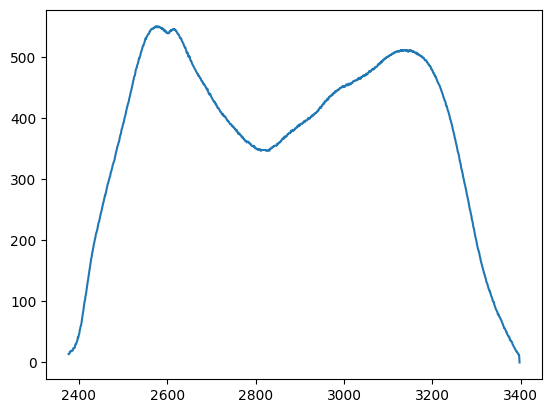

In [497]:
grf_y_segs = all_subj_segs['grf_y_segments']
min_seg_idx = np.argmin([len(seg) for seg in grf_y_segs])
min_seg = grf_y_segs[min_seg_idx]
print(f"Min segment index: {min_seg_idx}")
plt.plot(min_seg)


In [498]:
n_interp_points = 100
grf_y_resampled, time_resampled = interp_segments(grf_y_segs, n_interp_points)

(array([-200.,    0.,  200.,  400.,  600.,  800., 1000., 1200.]),
 [Text(0, -200.0, '−200'),
  Text(0, 0.0, '0'),
  Text(0, 200.0, '200'),
  Text(0, 400.0, '400'),
  Text(0, 600.0, '600'),
  Text(0, 800.0, '800'),
  Text(0, 1000.0, '1000'),
  Text(0, 1200.0, '1200')])

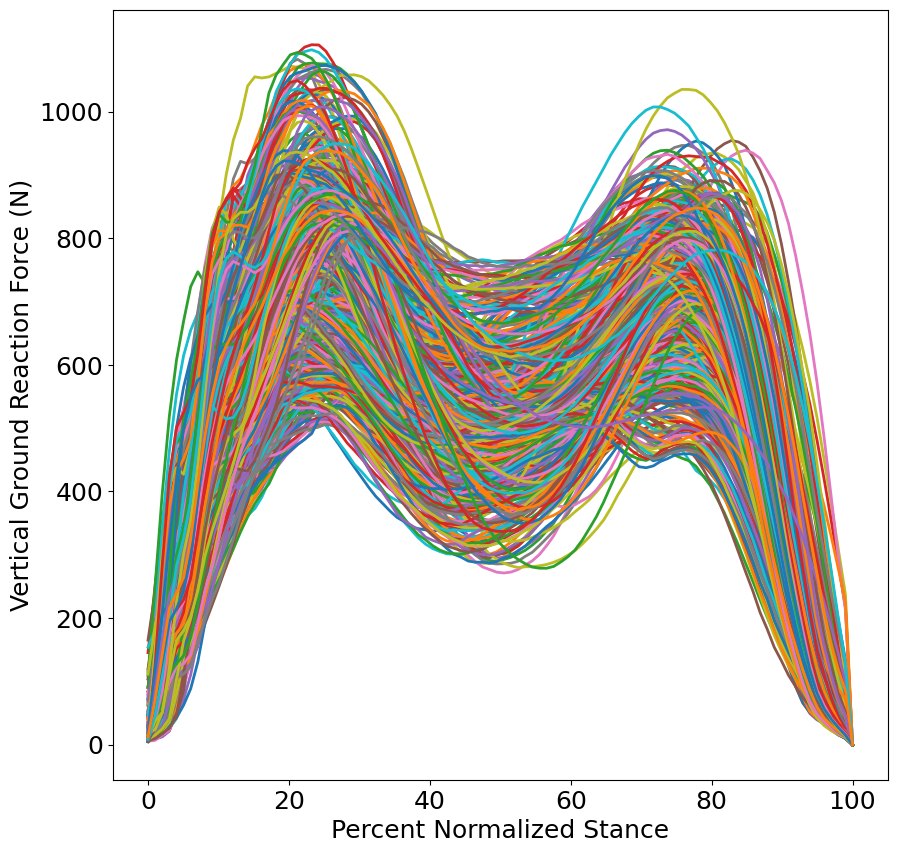

In [499]:
figure = plt.figure(figsize=(10, 10))

num_grf_segments = len(grf_y_resampled)

for i in range(num_grf_segments):
    plt.plot(time_resampled[i]*100, grf_y_resampled[i], linewidth=2)

plt.ylabel("Vertical Ground Reaction Force (N)", fontsize=18)
plt.xlabel("Percent Normalized Stance", fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
# plt.xlim([0, 1])
# plt.ylim([0, 1200])

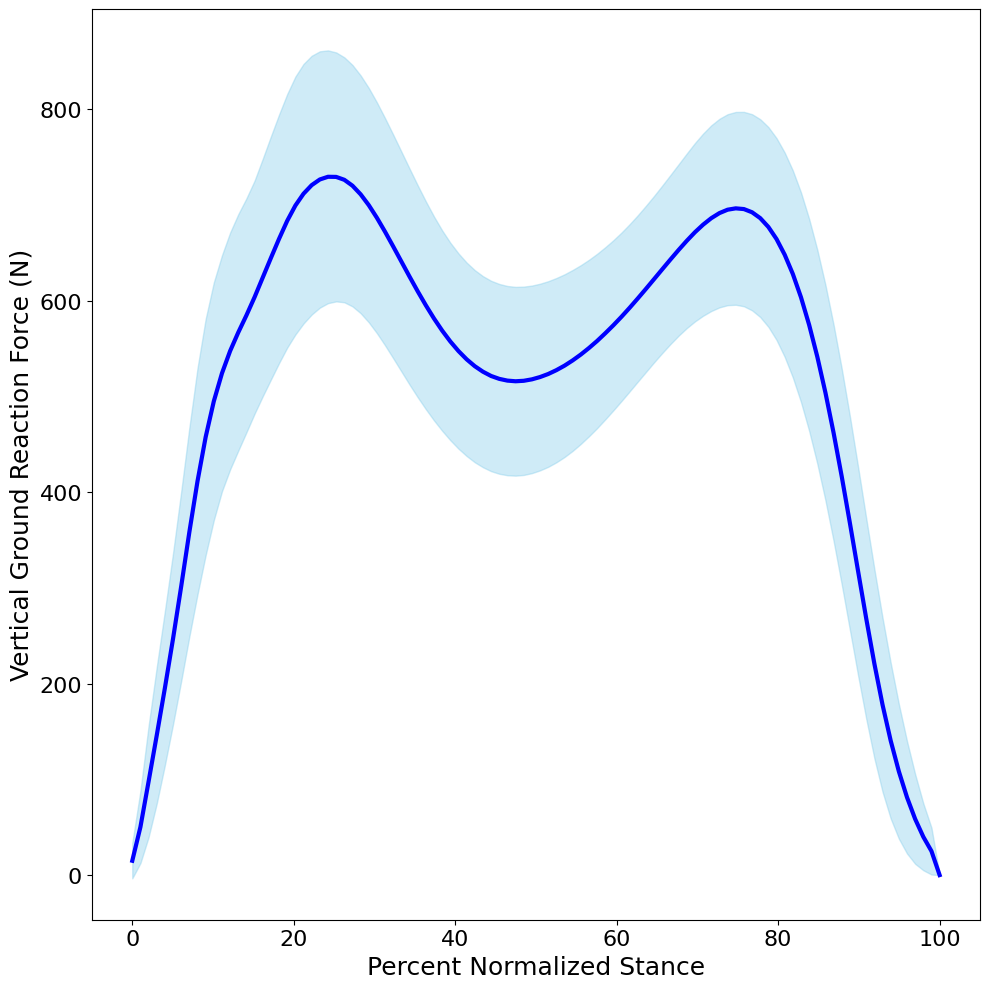

In [500]:
# Convert to array (shape: n_trials x timepoints)
grf_array = np.array(grf_y_resampled)         # shape: (N, T)
time = time_resampled[0] * 100                # assumed to be shared across all trials

# Compute mean and std
mean_grf = np.mean(grf_array, axis=0)
std_grf = np.std(grf_array, axis=0)

# Plot
plt.figure(figsize=(10, 10))

# Shaded region: mean ± 1 std
plt.fill_between(time, mean_grf - std_grf, mean_grf + std_grf,
                 color='skyblue', alpha=0.4, label='±1 SD')

# Mean curve
plt.plot(time, mean_grf, color='blue', linewidth=3, label='Mean GRF')

# Labels and styling
plt.ylabel("Vertical Ground Reaction Force (N)", fontsize=18)
plt.xlabel("Percent Normalized Stance", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
# plt.grid(True, alpha=0.3)
# plt.legend(fontsize=14)
plt.tight_layout()
plt.show()

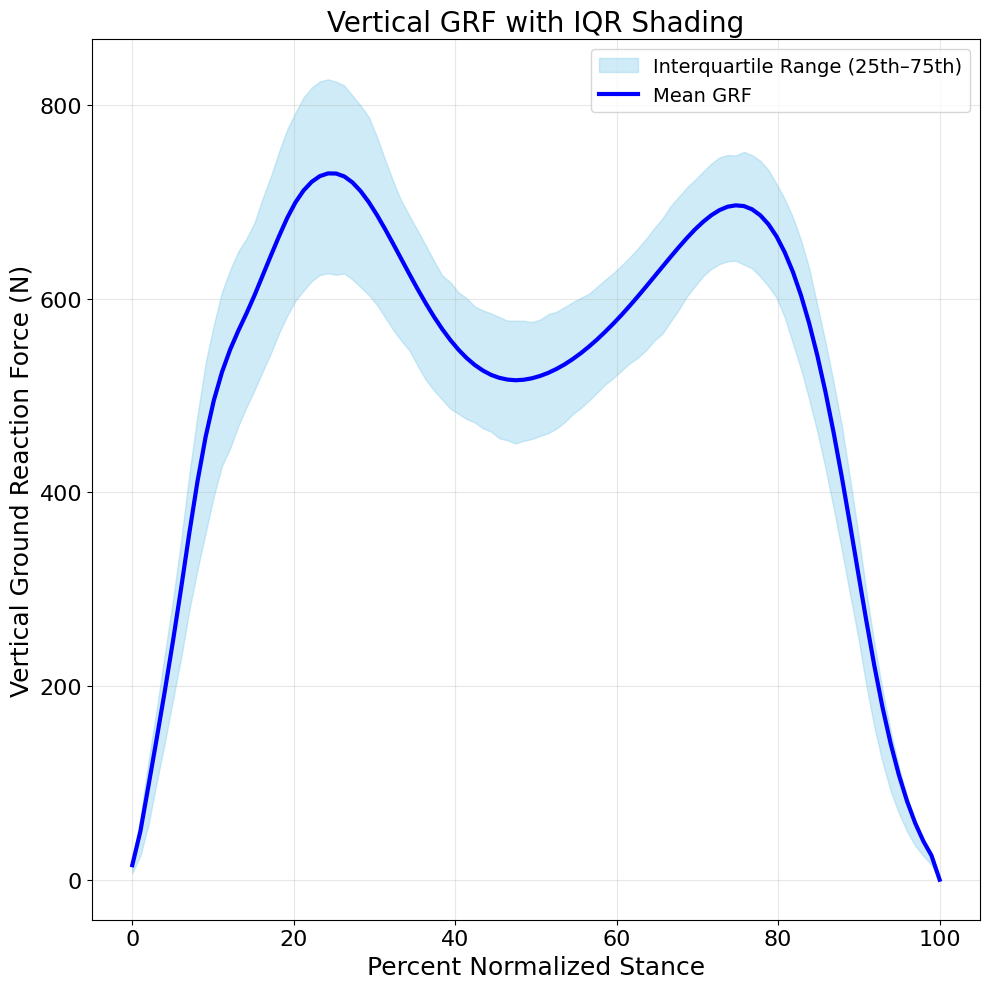

In [501]:
# Stack into array: shape (n_trials, n_timepoints)
grf_array = np.array(grf_y_resampled)
time = time_resampled[0] * 100  # Normalize to percent stance

# Compute mean and IQR
mean_grf = np.mean(grf_array, axis=0)
q1 = np.percentile(grf_array, 25, axis=0)
q3 = np.percentile(grf_array, 75, axis=0)

# Plot
plt.figure(figsize=(10, 10))

# IQR shading
plt.fill_between(time, q1, q3, color='skyblue', alpha=0.4, label='Interquartile Range (25th–75th)')

# Mean line
plt.plot(time, mean_grf, color='blue', linewidth=3, label='Mean GRF')

# Labels and formatting
plt.ylabel("Vertical Ground Reaction Force (N)", fontsize=18)
plt.xlabel("Percent Normalized Stance", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.title("Vertical GRF with IQR Shading", fontsize=20)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=14)
plt.tight_layout()
plt.show()

In [502]:
grf_x_segs = all_subj_segs['grf_x_segments']
grf_x_resampled, time_resampled = interp_segments(grf_x_segs, n_interp_points)

(array([-400., -300., -200., -100.,    0.,  100.,  200.,  300.]),
 [Text(0, -400.0, '−400'),
  Text(0, -300.0, '−300'),
  Text(0, -200.0, '−200'),
  Text(0, -100.0, '−100'),
  Text(0, 0.0, '0'),
  Text(0, 100.0, '100'),
  Text(0, 200.0, '200'),
  Text(0, 300.0, '300')])

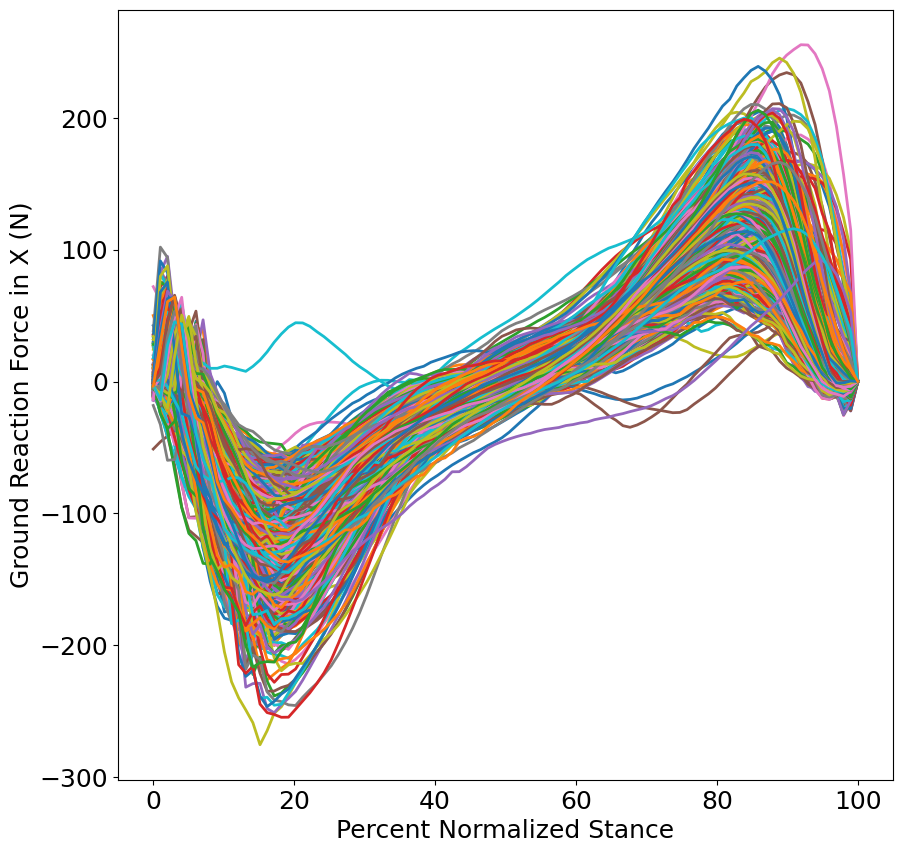

In [503]:
figure = plt.figure(figsize=(10, 10))

num_grf_segments = len(grf_x_resampled)

for i in range(num_grf_segments):
    plt.plot(time_resampled[i]*100, grf_x_resampled[i], linewidth=2)

plt.ylabel("Ground Reaction Force in X (N)", fontsize=18)
plt.xlabel("Percent Normalized Stance", fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
# plt.xlim([0, 1])
# plt.ylim([0, 1200])

In [504]:
grf_z_segs = all_subj_segs['grf_z_segments']
grf_z_resampled, time_resampled = interp_segments(grf_z_segs, n_interp_points)

(array([-100.,  -75.,  -50.,  -25.,    0.,   25.,   50.,   75.,  100.,
         125.]),
 [Text(0, -100.0, '−100'),
  Text(0, -75.0, '−75'),
  Text(0, -50.0, '−50'),
  Text(0, -25.0, '−25'),
  Text(0, 0.0, '0'),
  Text(0, 25.0, '25'),
  Text(0, 50.0, '50'),
  Text(0, 75.0, '75'),
  Text(0, 100.0, '100'),
  Text(0, 125.0, '125')])

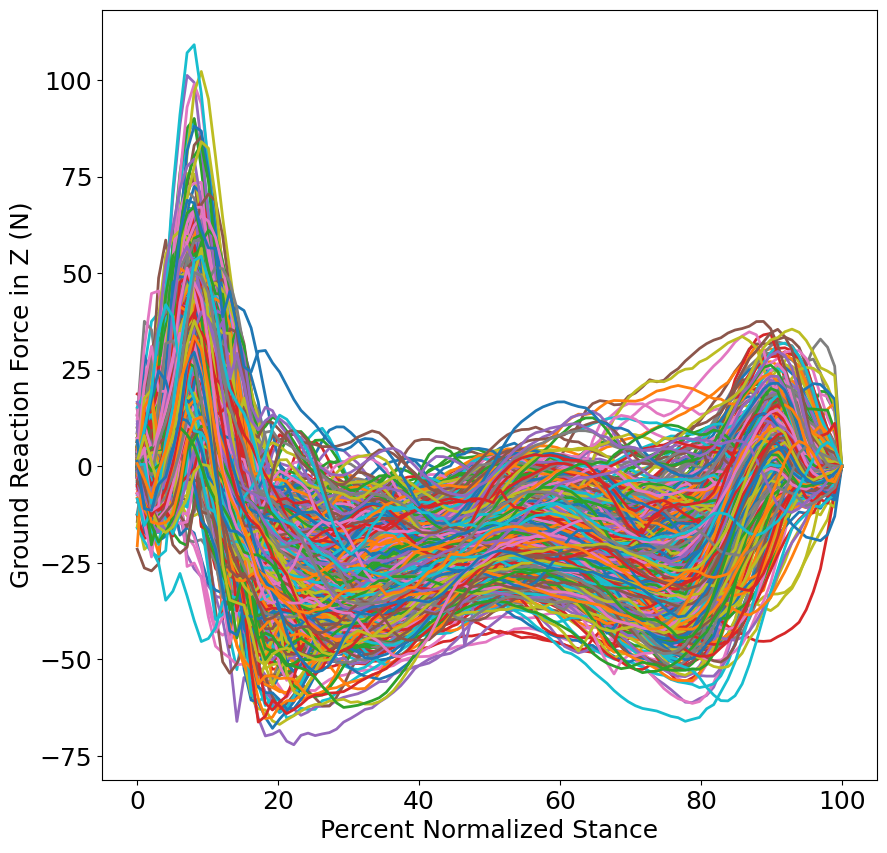

In [505]:
figure = plt.figure(figsize=(10, 10))

num_grf_segments = len(grf_z_resampled)

for i in range(num_grf_segments):
    plt.plot(time_resampled[i]*100, grf_z_resampled[i], linewidth=2)

plt.ylabel("Ground Reaction Force in Z (N)", fontsize=18)
plt.xlabel("Percent Normalized Stance", fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
# plt.xlim([0, 1])
# plt.ylim([0, 1200])

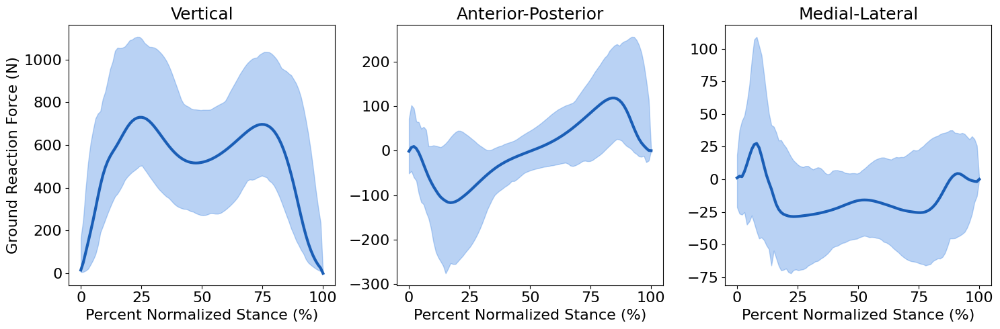

In [506]:
# Stack into arrays
grf_y = np.array(grf_y_resampled)
grf_x = np.array(grf_x_resampled)
grf_z = np.array(grf_z_resampled)
time = time_resampled[0] * 100  # percent stance

# Set up 3-column subplot
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True)

# Define GRF components
components = [
    ("Vertical", grf_y),
    ("Anterior-Posterior", grf_x),
    ("Medial-Lateral", grf_z)
]

colors = {
    'fill': '#5190E4',
    'line': '#1A5EB6'
}

for ax, (label, grf_array) in zip(axes, components):
    mean_grf = np.mean(grf_array, axis=0)
    min_grf = np.min(grf_array, axis=0)
    max_grf = np.max(grf_array, axis=0)

    # Shaded area (min-max)
    ax.fill_between(time, min_grf, max_grf, color=colors['fill'], alpha=0.4, label='Min–Max Range')

    # Mean line
    ax.plot(time, mean_grf, color=colors['line'], linewidth=3, label='Mean GRF')

    ax.set_title(f"{label}", fontsize=18)
    ax.set_xlabel("Percent Normalized Stance (%)", fontsize=16)
    ax.tick_params(axis='both', labelsize=16)
    # ax.grid(True, alpha=0.3)

axes[0].set_ylabel("Ground Reaction Force (N)", fontsize=16)
# axes[0].legend(fontsize=12)

plt.tight_layout()
plt.show()

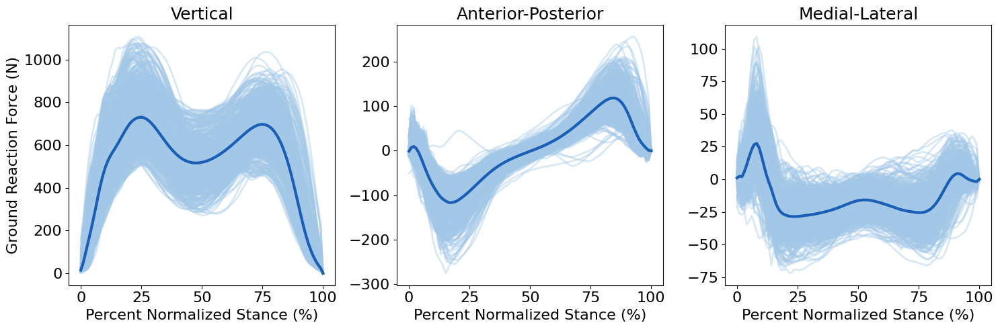

In [507]:
# Stack into arrays
grf_y = np.array(grf_y_resampled)
grf_x = np.array(grf_x_resampled)
grf_z = np.array(grf_z_resampled)
time = time_resampled[0] * 100  # percent stance

# Set up 3-column subplot
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True)

# Define GRF components
components = [
    ("Vertical", grf_y),
    ("Anterior-Posterior", grf_x),
    ("Medial-Lateral", grf_z)
]

colors = {
    'fill': '#5190E4',
    'line': '#1A5EB6'
}

for ax, (label, grf_array) in zip(axes, components):
    mean_grf = np.mean(grf_array, axis=0)
    
    for i in range(num_grf_segments):
        ax.plot(time, grf_array[i], linewidth=2, color="#A2C7E7", alpha=0.4)

    # Mean line
    ax.plot(time, mean_grf, color=colors['line'], linewidth=3, label='Mean GRF')
    
    ax.set_title(f"{label}", fontsize=18)
    ax.set_xlabel("Percent Normalized Stance (%)", fontsize=16)
    ax.tick_params(axis='both', labelsize=16)
    # ax.grid(True, alpha=0.3)

axes[0].set_ylabel("Ground Reaction Force (N)", fontsize=16)
# axes[0].legend(fontsize=12)

plt.tight_layout()
plt.show()

In [508]:
tibpost_segments = all_subj_segs['tibpost_segments']
tibant_segments = all_subj_segs['tibant_segments']
edl_segments = all_subj_segs['edl_segments']
ehl_segments = all_subj_segs['ehl_segments']
fdl_segments = all_subj_segs['fdl_segments']
fhl_segments = all_subj_segs['fhl_segments']
gaslat_segments = all_subj_segs['gaslat_segments']
gasmed_segments = all_subj_segs['gasmed_segments']
soleus_segments = all_subj_segs['soleus_segments']
perbrev_segments = all_subj_segs['perbrev_segments']
perlong_segments = all_subj_segs['perlong_segments']
achilles_segments = all_subj_segs['achilles_segments']

tibpost_resampled, time_resampled = interp_segments(tibpost_segments, n_interp_points)
tibant_resampled, time_resampled = interp_segments(tibant_segments, n_interp_points)
edl_resampled, time_resampled = interp_segments(edl_segments, n_interp_points)
ehl_resampled, time_resampled = interp_segments(ehl_segments, n_interp_points)
fdl_resampled, time_resampled = interp_segments(fdl_segments, n_interp_points)
fhl_resampled, time_resampled = interp_segments(fhl_segments, n_interp_points)
gaslat_resampled, time_resampled = interp_segments(gaslat_segments, n_interp_points)
gasmed_resampled, time_resampled = interp_segments(gasmed_segments, n_interp_points)
soleus_resampled, time_resampled = interp_segments(soleus_segments, n_interp_points)
perbrev_resampled, time_resampled = interp_segments(perbrev_segments, n_interp_points)
perlong_resampled, time_resampled = interp_segments(perlong_segments, n_interp_points)

achilles_resampled, time_resampled = interp_segments(achilles_segments, n_interp_points)


(array([-500.,    0.,  500., 1000., 1500., 2000., 2500., 3000., 3500.,
        4000., 4500.]),
 [Text(0, -500.0, '−500'),
  Text(0, 0.0, '0'),
  Text(0, 500.0, '500'),
  Text(0, 1000.0, '1000'),
  Text(0, 1500.0, '1500'),
  Text(0, 2000.0, '2000'),
  Text(0, 2500.0, '2500'),
  Text(0, 3000.0, '3000'),
  Text(0, 3500.0, '3500'),
  Text(0, 4000.0, '4000'),
  Text(0, 4500.0, '4500')])

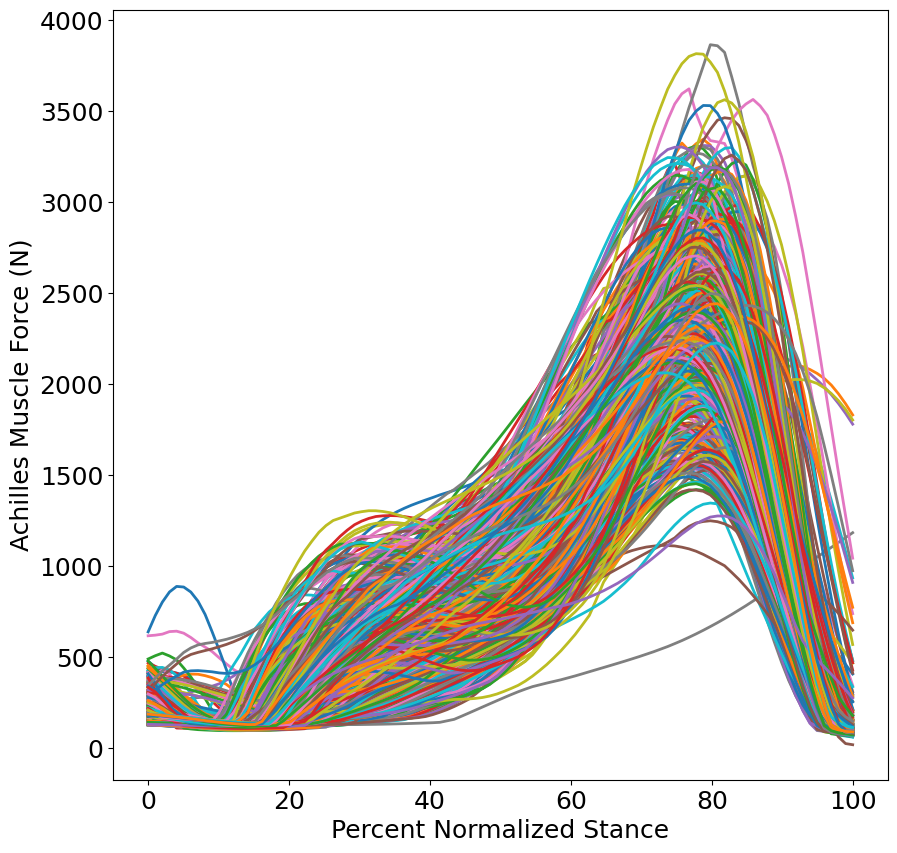

In [509]:
figure = plt.figure(figsize=(10, 10))

num_achilles_segments = len(achilles_resampled)

for i in range(num_achilles_segments):
    plt.plot(time_resampled[i]*100, achilles_resampled[i], linewidth=2)

plt.ylabel("Achilles Muscle Force (N)", fontsize=18)
plt.xlabel("Percent Normalized Stance", fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
# plt.xlim([0, 1])
# plt.ylim([0, 5000])

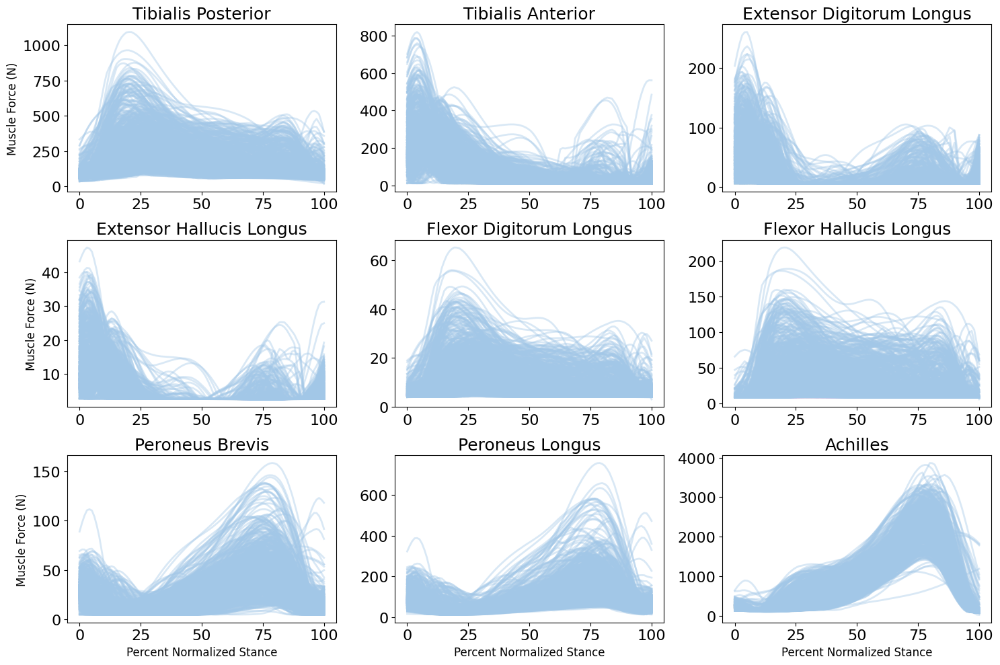

In [510]:
muscle_titles = ['Tibialis Posterior', 'Tibialis Anterior', 'Extensor Digitorum Longus', 'Extensor Hallucis Longus', 
                 'Flexor Digitorum Longus', 'Flexor Hallucis Longus', 'Peroneus Brevis', 'Peroneus Longus', 'Achilles']

perc_stance = np.linspace(0, 100, 100)

muscle_forces = [tibpost_resampled, tibant_resampled, edl_resampled, ehl_resampled, fdl_resampled, fhl_resampled,
                 perbrev_resampled, perlong_resampled, achilles_resampled]

fig, axes = plt.subplots(3, 3, figsize=(15, 10))  # Create subplots for 9 muscles
axes = axes.flatten()

for i, ax in enumerate(axes):
    for j in range(num_achilles_segments):
        ax.plot(time_resampled[j]*100, muscle_forces[i][j], linewidth=2, color="#A2C7E7", alpha=0.4)
    
    mean_force = ()
    
    if i >= 6:
        ax.set_xlabel('Percent Normalized Stance', fontsize=12)
        
    if i % 3 == 0:
        ax.set_ylabel('Muscle Force (N)', fontsize=12)
        
    ax.set_title(muscle_titles[i], fontsize=18)
    ax.tick_params(axis='x', labelsize=16)
    ax.tick_params(axis='y', labelsize=16)

plt.tight_layout()
plt.show()

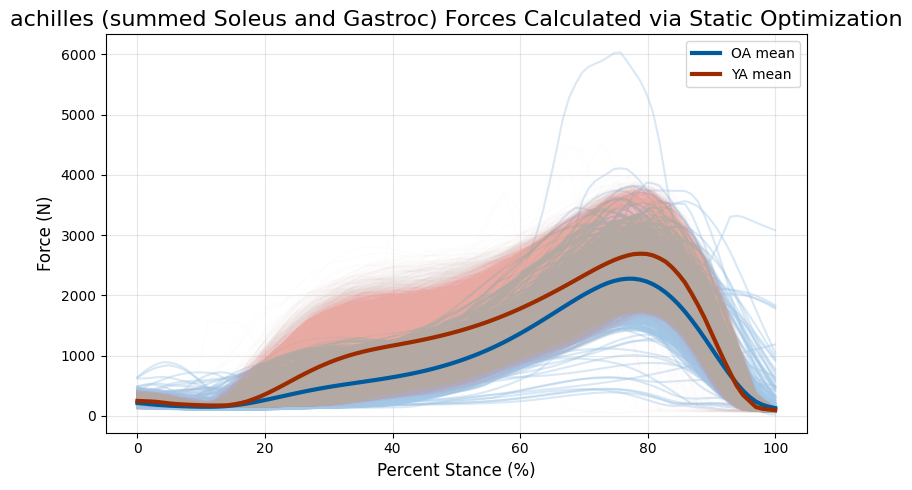

In [76]:

# --- Load Tony’s dataset ---
tony_dir = '/Users/briankeller/Desktop/GRFMuscleModel/data/'
tony_muscle_data = np.load(tony_dir + 'muscle.npy', mmap_mode='r')
n_tony_trials, n_timepoints, n_muscles = tony_muscle_data.shape

tony_muscle_labels = ['tibpost', 'tibant', 'edl', 'ehl', 'fdl', 'fhl', 'perbrev', 'perlong', 'achilles']

# --- Pick the muscle index you want to plot ---
muscle_idx = 8  # Achilles (0-based index)
muscle_name = tony_muscle_labels[muscle_idx]

# --- Create figure ---
plt.figure(figsize=(8, 5))

# --- Plot OA data (yours) ---
for j in range(num_achilles_segments):
    plt.plot(
        time_resampled[j] * 100,
        muscle_forces[muscle_idx][j],
        color="#A2C7E7",
        linewidth=1.5,
        alpha=0.4
    )

# --- Plot Tony’s data (YA) ---
for k in range(n_tony_trials):
    plt.plot(
        np.linspace(0, 100, n_timepoints),
        tony_muscle_data[k, :, muscle_idx],
        color="#E7A9A2",
        linewidth=1.0,
        alpha=0.02
    )

# --- Plot mean lines ---
oa_mean = np.mean(np.vstack(muscle_forces[muscle_idx]), axis=0)
ya_mean = np.mean(tony_muscle_data[:, :, muscle_idx], axis=0)

plt.plot(time_resampled[0] * 100, oa_mean, color="#005A9C", linewidth=3, label='OA mean')
plt.plot(np.linspace(0, 100, n_timepoints), ya_mean, color="#9C2B00", linewidth=3, label='YA mean')

# --- Labels and formatting ---
plt.title(f'{muscle_name} (summed Soleus and Gastroc) Forces Calculated via Static Optimization', fontsize=16)
plt.xlabel('Percent Stance (%)', fontsize=12)
plt.ylabel('Force (N)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

/var/folders/ry/__2whx491kl275m5nl07mrnr0000gn/T/ipykernel_23200/346826663.py:52: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/opt/anaconda3/envs/opensim_scripting/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


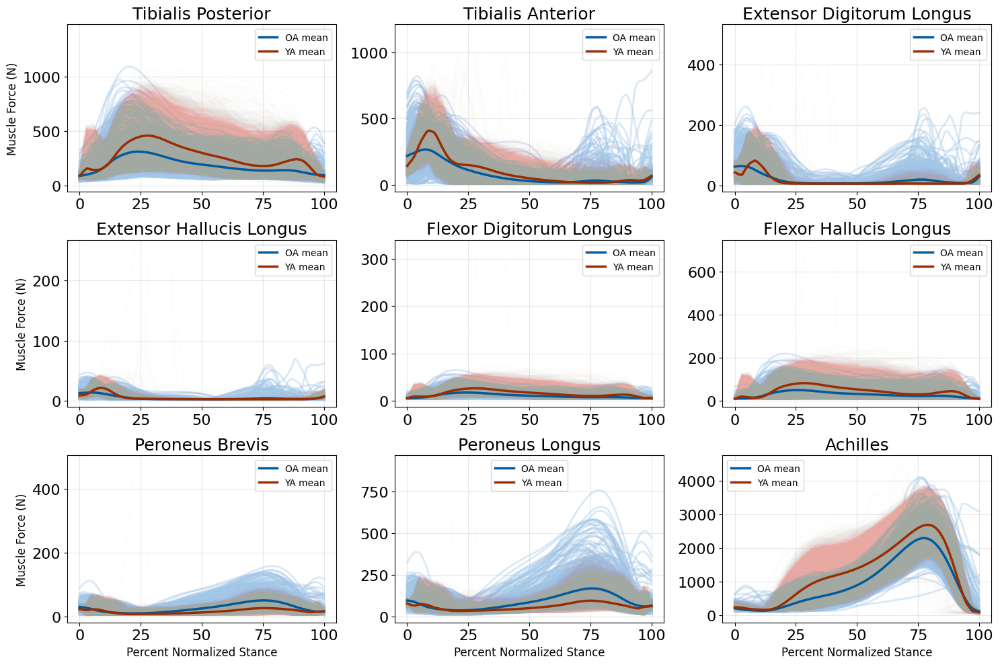

In [360]:
tony_dir = '/Users/briankeller/Desktop/GRFMuscleModel/data/'
tony_muscle_data = np.load(tony_dir + 'muscle.npy', mmap_mode='r')
n_tony_trials, n_timepoints, n_muscles = tony_muscle_data.shape
tony_muscle_labels = ['tibpost', 'tibant', 'edl', 'ehl', 'fdl', 'fhl', 'perbrev', 'perlong', 'achilles']
fig, axes = plt.subplots(3, 3, figsize=(15, 10))  # Create subplots for 9 muscles
axes = axes.flatten()

for i, ax in enumerate(axes):
    for j in range(num_achilles_segments):
        ax.plot(time_resampled[j]*100, muscle_forces[i][j], linewidth=2, color="#A2C7E7", alpha=0.4)
    for k in range(n_tony_trials):
         ax.plot(np.linspace(0, 100, n_timepoints), tony_muscle_data[k, :, i], linewidth=2, color="#E7A9A2", alpha=0.01)
    your_mean = np.mean(np.vstack(muscle_forces[i]), axis=0)
    tony_mean = np.mean(tony_muscle_data[:, :, i], axis=0)

    # --- Plot mean lines ---
    ax.plot(
        time_resampled[0] * 100,
        your_mean,
        color="#005A9C",
        linewidth=2.5,
        label='OA mean'
    )
    ax.plot(
        np.linspace(0, 100, n_timepoints),
        tony_mean,
        color="#9C2B00",
        linewidth=2.5,
        label='YA mean'
    )

    # Formatting
    ax.set_title(muscle_titles[i], fontsize=14)
    if i >= 6:
        ax.set_xlabel('Percent Stance (%)', fontsize=12)
    if i % 3 == 0:
        ax.set_ylabel('Force (N)', fontsize=12)
    ax.tick_params(axis='both', labelsize=10)
    ax.grid(True, alpha=0.3)
    
    if i >= 6:
        ax.set_xlabel('Percent Normalized Stance', fontsize=12)
        
    if i % 3 == 0:
        ax.set_ylabel('Muscle Force (N)', fontsize=12)
        
    ax.set_title(muscle_titles[i], fontsize=18)
    ax.tick_params(axis='x', labelsize=16)
    ax.tick_params(axis='y', labelsize=16)
    ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
with open('/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/OA_muscle_forces_stats_100.txt', "w") as file:
    for i, muscle in enumerate(muscle_titles):
        all_forces = np.concatenate(muscle_forces[i])
        # max_val = np.max(all_forces)
        # min_val = np.min(all_forces)
        max_vals = [np.max(seg) for seg in muscle_forces[i]]
        max_mean = np.mean(max_vals)
        max_std = np.std(max_vals)
        
        min_vals = [np.min(seg) for seg in muscle_forces[i]]
        min_mean = np.mean(min_vals)
        min_std = np.std(min_vals)
        
        mean_val = np.mean(all_forces)
        std_val = np.std(all_forces)
        
        print(f"{muscle}:\n Mean Max = {max_mean:.2f}\n Std Max = {max_std:.2f}\n Mean Min = {min_mean:.2f}\n Std Min = {min_std:.2f}\n Mean = {mean_val:.2f}\n Std = {std_val:.2f}\n")
        file.write(f"{muscle}:\n Mean Max = {max_mean:.2f}\n Std Max = {max_std:.2f}\n Mean Min = {min_mean:.2f}\n Std Min = {min_std:.2f}\n Mean = {mean_val:.2f}\n Std = {std_val:.2f}\n\n")

Tibialis Posterior:
 Mean Max = 344.21
 Std Max = 157.96
 Mean Min = 74.26
 Std Min = 17.95
 Mean = 182.29
 Std = 123.38

Tibialis Anterior:
 Mean Max = 330.36
 Std Max = 116.85
 Mean Min = 10.17
 Std Min = 1.27
 Mean = 81.47
 Std = 106.30

Extensor Digitorum Longus:
 Mean Max = 86.20
 Std Max = 43.90
 Mean Min = 5.47
 Std Min = 0.17
 Mean = 17.58
 Std = 27.30

Extensor Hallucis Longus:
 Mean Max = 17.71
 Std Max = 7.92
 Mean Min = 2.65
 Std Min = 0.05
 Mean = 4.98
 Std = 4.99

Flexor Digitorum Longus:
 Mean Max = 19.29
 Std Max = 9.00
 Mean Min = 4.62
 Std Min = 0.96
 Mean = 10.24
 Std = 6.85

Flexor Hallucis Longus:
 Mean Max = 59.42
 Std Max = 34.29
 Mean Min = 8.59
 Std Min = 0.23
 Mean = 26.79
 Std = 26.63

Peroneus Brevis:
 Mean Max = 57.67
 Std Max = 24.51
 Mean Min = 7.32
 Std Min = 3.14
 Mean = 25.90
 Std = 20.84

Peroneus Longus:
 Mean Max = 200.47
 Std Max = 106.71
 Mean Min = 29.30
 Std Min = 11.58
 Mean = 89.74
 Std = 74.72

Achilles:
 Mean Max = 2346.51
 Std Max = 464.09


In [ ]:
with open('/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/OA_muscle_forces_stats_25.txt', "w") as file:
    for i, muscle in enumerate(muscle_titles):
        all_forces = np.concatenate(muscle_forces[i])
        # max_val = np.max(all_forces)
        # min_val = np.min(all_forces)
        max_vals = [np.max(seg) for seg in muscle_forces[i]]
        max_mean = np.mean(max_vals) / 4
        max_std = np.std(max_vals) / 4
        
        min_vals = [np.min(seg) for seg in muscle_forces[i]]
        min_mean = np.mean(min_vals) / 4
        min_std = np.std(min_vals) / 4
        
        mean_val = np.mean(all_forces) / 4
        std_val = np.std(all_forces) / 4
        
        print(f"{muscle}:\n Mean Max = {max_mean:.2f}\n Std Max = {max_std:.2f}\n Mean Min = {min_mean:.2f}\n Std Min = {min_std:.2f}\n Mean = {mean_val:.2f}\n Std = {std_val:.2f}\n")
        file.write(f"{muscle}:\n Mean Max = {max_mean:.2f}\n Std Max = {max_std:.2f}\n Mean Min = {min_mean:.2f}\n Std Min = {min_std:.2f}\n Mean = {mean_val:.2f}\n Std = {std_val:.2f}\n\n")

Tibialis Posterior:
 Mean Max = 86.05
 Std Max = 39.49
 Mean Min = 18.56
 Std Min = 4.49
 Mean = 45.57
 Std = 30.84

Tibialis Anterior:
 Mean Max = 82.59
 Std Max = 29.21
 Mean Min = 2.54
 Std Min = 0.32
 Mean = 20.37
 Std = 26.57

Extensor Digitorum Longus:
 Mean Max = 21.55
 Std Max = 10.97
 Mean Min = 1.37
 Std Min = 0.04
 Mean = 4.39
 Std = 6.83

Extensor Hallucis Longus:
 Mean Max = 4.43
 Std Max = 1.98
 Mean Min = 0.66
 Std Min = 0.01
 Mean = 1.24
 Std = 1.25

Flexor Digitorum Longus:
 Mean Max = 4.82
 Std Max = 2.25
 Mean Min = 1.15
 Std Min = 0.24
 Mean = 2.56
 Std = 1.71

Flexor Hallucis Longus:
 Mean Max = 14.86
 Std Max = 8.57
 Mean Min = 2.15
 Std Min = 0.06
 Mean = 6.70
 Std = 6.66

Peroneus Brevis:
 Mean Max = 14.42
 Std Max = 6.13
 Mean Min = 1.83
 Std Min = 0.78
 Mean = 6.47
 Std = 5.21

Peroneus Longus:
 Mean Max = 50.12
 Std Max = 26.68
 Mean Min = 7.32
 Std Min = 2.89
 Mean = 22.43
 Std = 18.68

Achilles:
 Mean Max = 586.63
 Std Max = 116.02
 Mean Min = 23.50
 Std Mi

In [ ]:
export_path = '/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/compiled_segments'
with open(export_path, 'wb') as f:
    pickle.dump(compiled_segs, f)

In [279]:
grf = np.stack((grf_x_resampled, grf_y_resampled, grf_z_resampled), axis=-1)
grf.shape

(843, 100, 3)

In [680]:
np.save('/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/OA_no_missteps_grf', grf)

In [681]:
grf_flattened = np.hstack((grf_x_resampled, grf_y_resampled, grf_z_resampled))
grf_flattened.shape

(766, 300)

In [682]:
np.save('/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/OA_no_missteps_grf_flattened', grf_flattened)

In [683]:
muscle = np.stack((tibpost_resampled, tibant_resampled, edl_resampled, ehl_resampled, fdl_resampled, fhl_resampled, perbrev_resampled, perlong_resampled, achilles_resampled), axis=-1)
muscle.shape

(766, 100, 9)

In [684]:
np.save('/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/OA_no_missteps_muscle', muscle)

In [685]:
muscle_flattened = np.hstack((tibpost_resampled, tibant_resampled, edl_resampled, ehl_resampled, fdl_resampled, fhl_resampled, perbrev_resampled, perlong_resampled, achilles_resampled))
muscle_flattened.shape

(766, 900)

In [686]:
np.save('/Users/briankeller/Desktop/GRFMuscleModel/Old_Young_Walking_Data/OA_no_missteps_muscle_flattened', muscle_flattened)